In [2]:
import sys 
# sys.path.clear()
sys.path.insert(0, 'D:\\Anaconda\\envs\\tensorflow_cpu\\python36.zip')
sys.path.insert(0, 'D:\\Anaconda\\envs\\tensorflow_cpu\\DLLs')
sys.path.insert(0, 'D:\\Anaconda\\envs\\tensorflow_cpu\\lib')
sys.path.insert(0, 'D:\\Anaconda\\envs\\tensorflow_cpu')
sys.path.insert(0, 'D:\\Anaconda\\envs\\tensorflow_cpu\\lib\\site-packages')
sys.path.insert(0, '')

In [3]:
from __future__ import absolute_import, division, print_function, unicode_literals

# TensorFlow and tf.keras
import tensorflow as tf
from tensorflow import keras

# Helper libraries
import numpy as np
import matplotlib.pyplot as plt

print(tf.__version__)

2.0.0


In [4]:
from scipy.sparse import csr_matrix, load_npz, save_npz
from tqdm import tqdm
from sklearn.preprocessing import normalize
import datetime
import json
import pandas as pd
import time
import yaml
import scipy.sparse as sparse
from ast import literal_eval

In [5]:
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import normalize
from sklearn.linear_model import Ridge

# Load Data

In [6]:
# Load Original Data
df_train = pd.read_csv('../../data/yelp/Train.csv',encoding='latin-1')
df_valid = pd.read_csv('../../data/yelp/Valid.csv',encoding='latin-1')
df_test = pd.read_csv('../../data/yelp/Test.csv',encoding='latin-1')
keyphrases = pd.read_csv('../../data/yelp/KeyPhrases.csv')['Phrases'].tolist()
keyphrase_popularity = np.loadtxt('../data/yelp/'+'keyphrase_popularity.txt', dtype=int)

In [7]:
# Load U-I Data 
rtrain = load_npz("../../data/yelp/Rtrain.npz")
rvalid = load_npz("../../data/yelp/Rvalid.npz")
rtest = load_npz("../../data/yelp/Rtest.npz")

In [8]:
U_K = load_npz("../../data/yelp/U_K.npz")
I_K = load_npz("../../data/yelp/I_K.npz")

In [9]:
# Models
from sklearn.metrics.pairwise import cosine_similarity
def train(matrix_train):
    similarity = cosine_similarity(X=matrix_train, Y=None, dense_output=True)
    return similarity

def get_I_K(df, row_name = 'ItemIndex', shape = (3668,75)):
    rows = []
    cols = []
    vals = []
    for i in tqdm(range(df.shape[0])):
        key_vector = literal_eval(df['keyVector'][i])
        rows.extend([df[row_name][i]]*len(key_vector)) ## Item index
        cols.extend(key_vector) ## Keyword Index
        vals.extend(np.array([1]*len(key_vector)))
    return csr_matrix((vals, (rows, cols)), shape=shape)



def prediction(prediction_score, topK, matrix_Train):

    prediction = []

    for user_index in tqdm(range(matrix_Train.shape[0])):
        vector_u = prediction_score[user_index]
        vector_train = matrix_Train[user_index]
        if len(vector_train.nonzero()[0]) > 0:
            vector_predict = sub_routine(vector_u, vector_train, topK=topK)
        else:
            vector_predict = np.zeros(topK, dtype=np.float32)

        prediction.append(vector_predict)

    return np.vstack(prediction)


def sub_routine(vector_u, vector_train, topK=500):

    train_index = vector_train.nonzero()[1]

    vector_u = vector_u

    candidate_index = np.argpartition(-vector_u, topK+len(train_index))[:topK+len(train_index)]
    vector_u = candidate_index[vector_u[candidate_index].argsort()[::-1]]
    vector_u = np.delete(vector_u, np.isin(vector_u, train_index).nonzero()[0])

    return vector_u[:topK]


In [10]:
def predict(matrix_train, k, similarity, item_similarity_en = False):
    """
    res = similarity * matrix_train    if item_similarity_en = False
    res = similarity * matrix_train.T  if item_similarity_en = True
    """
    prediction_scores = []
    
    if item_similarity_en:
        matrix_train = matrix_train.transpose()
        
    for user_index in tqdm(range(matrix_train.shape[0])):
        # Get user u's prediction scores to all users
        vector_u = similarity[user_index]

        # Get closest K neighbors excluding user u self
        similar_users = vector_u.argsort()[::-1][1:k+1]
        # Get neighbors similarity weights and ratings
        similar_users_weights = similarity[user_index][similar_users]
        similar_users_ratings = matrix_train[similar_users].toarray()

        prediction_scores_u = similar_users_ratings * similar_users_weights[:, np.newaxis]

        prediction_scores.append(np.sum(prediction_scores_u, axis=0))
    res = np.array(prediction_scores)
    
    if item_similarity_en:
        res = res.transpose()
    
    return res

def predict_vector(user_index, matrix_train, k, similarity):
    """
    res = similarity * matrix_train    if item_similarity_en = False
    res = similarity * matrix_train.T  if item_similarity_en = True
    get only user_index row
    """
    vector_u = similarity[user_index]
    
    # Get closest K neighbors excluding user u self
    similar_users = vector_u.argsort()[::-1][1:k+1]
    # Get neighbors similarity weights and ratings
    similar_users_weights = similarity[user_index][similar_users]
    similar_users_ratings = matrix_train[similar_users].toarray()
    prediction_scores_u = similar_users_ratings * similar_users_weights[:, np.newaxis]
    
    return np.sum(prediction_scores_u, axis=0)
    

In [11]:
# Evluation 
def recallk(vector_true_dense, hits, **unused):
    hits = len(hits.nonzero()[0])
    return float(hits)/len(vector_true_dense)

def precisionk(vector_predict, hits, **unused):
    hits = len(hits.nonzero()[0])
    return float(hits)/len(vector_predict)


def average_precisionk(vector_predict, hits, **unused):
    precisions = np.cumsum(hits, dtype=np.float32)/range(1, len(vector_predict)+1)
    return np.mean(precisions)


def r_precision(vector_true_dense, vector_predict, **unused):
    vector_predict_short = vector_predict[:len(vector_true_dense)]
    hits = len(np.isin(vector_predict_short, vector_true_dense).nonzero()[0])
    return float(hits)/len(vector_true_dense)


def _dcg_support(size):
    arr = np.arange(1, size+1)+1
    return 1./np.log2(arr)


def ndcg(vector_true_dense, vector_predict, hits):
    idcg = np.sum(_dcg_support(len(vector_true_dense)))
    dcg_base = _dcg_support(len(vector_predict))
    dcg_base[np.logical_not(hits)] = 0
    dcg = np.sum(dcg_base)
    return dcg/idcg


def click(hits, **unused):
    first_hit = next((i for i, x in enumerate(hits) if x), None)
    if first_hit is None:
        return 5
    else:
        return first_hit/10


def evaluate(matrix_Predict, matrix_Test, metric_names =['R-Precision', 'NDCG', 'Precision', 'Recall', 'MAP'], atK = [5, 10, 15, 20, 50], analytical=False):
    """
    :param matrix_U: Latent representations of users, for LRecs it is RQ, for ALSs it is U
    :param matrix_V: Latent representations of items, for LRecs it is Q, for ALSs it is V
    :param matrix_Train: Rating matrix for training, features.
    :param matrix_Test: Rating matrix for evaluation, true labels.
    :param k: Top K retrieval
    :param metric_names: Evaluation metrics
    :return:
    """
    global_metrics = {
        "R-Precision": r_precision,
        "NDCG": ndcg,
        "Clicks": click
    }

    local_metrics = {
        "Precision": precisionk,
        "Recall": recallk,
        "MAP": average_precisionk
    }

    output = dict()

    num_users = matrix_Predict.shape[0]

    for k in atK:

        local_metric_names = list(set(metric_names).intersection(local_metrics.keys()))
        results = {name: [] for name in local_metric_names}
        topK_Predict = matrix_Predict[:, :k]

        for user_index in tqdm(range(topK_Predict.shape[0])):
            vector_predict = topK_Predict[user_index]
            if len(vector_predict.nonzero()[0]) > 0:
                vector_true = matrix_Test[user_index]
                vector_true_dense = vector_true.nonzero()[1]
                hits = np.isin(vector_predict, vector_true_dense)

                if vector_true_dense.size > 0:
                    for name in local_metric_names:
                        results[name].append(local_metrics[name](vector_true_dense=vector_true_dense,
                                                                 vector_predict=vector_predict,
                                                                 hits=hits))

        results_summary = dict()
        if analytical:
            for name in local_metric_names:
                results_summary['{0}@{1}'.format(name, k)] = results[name]
        else:
            for name in local_metric_names:
                results_summary['{0}@{1}'.format(name, k)] = (np.average(results[name]),
                                                              1.96*np.std(results[name])/np.sqrt(num_users))
        output.update(results_summary)

    global_metric_names = list(set(metric_names).intersection(global_metrics.keys()))
    results = {name: [] for name in global_metric_names}

    topK_Predict = matrix_Predict[:]

    for user_index in tqdm(range(topK_Predict.shape[0])):
        vector_predict = topK_Predict[user_index]

        if len(vector_predict.nonzero()[0]) > 0:
            vector_true = matrix_Test[user_index]
            vector_true_dense = vector_true.nonzero()[1]
            hits = np.isin(vector_predict, vector_true_dense)

            # if user_index == 1:
            #     import ipdb;
            #     ipdb.set_trace()

            if vector_true_dense.size > 0:
                for name in global_metric_names:
                    results[name].append(global_metrics[name](vector_true_dense=vector_true_dense,
                                                              vector_predict=vector_predict,
                                                              hits=hits))

    results_summary = dict()
    if analytical:
        for name in global_metric_names:
            results_summary[name] = results[name]
    else:
        for name in global_metric_names:
            results_summary[name] = (np.average(results[name]), 1.96*np.std(results[name])/np.sqrt(num_users))
    output.update(results_summary)

    return output



# Forward Predicting

## User-Item KNN prediction

In [11]:
similarity = normalize(train(rtrain))
user_item_prediction_score = predict(rtrain, 100, similarity, item_similarity_en= False)
user_item_predict = prediction(user_item_prediction_score, 50, rtrain)
user_item_res = evaluate(user_item_predict, rtest)

100%|████████████████████████████████████████████████████████████████████████████| 2343/2343 [00:00<00:00, 4094.58it/s]


In [17]:
# k = 100
user_item_res

{'MAP@10': (0.06333952750429245, 0.00455145183026277),
 'MAP@15': (0.05872249612550844, 0.0038121823597348156),
 'MAP@20': (0.055196280875748356, 0.003345258771111864),
 'MAP@5': (0.06940666362391602, 0.0060646277121995185),
 'MAP@50': (0.04436838784245958, 0.0022020570312340938),
 'NDCG': (0.09071795198195, 0.003803970590016347),
 'Precision@10': (0.05330899132816066, 0.0032544740534870857),
 'Precision@15': (0.04698006998326487, 0.0025622684368576416),
 'Precision@20': (0.043336376083979916, 0.002222006808632301),
 'Precision@5': (0.06462802373345505, 0.004754606217931856),
 'Precision@50': (0.032889091738931994, 0.0014317314500480152),
 'R-Precision': (0.048464138894968055, 0.0027869069242192506),
 'Recall@10': (0.04269615369598775, 0.0027831077562657665),
 'Recall@15': (0.05562887733868642, 0.0031389991916236284),
 'Recall@20': (0.0677664821917642, 0.003424484045821138),
 'Recall@5': (0.026408137823500974, 0.002191309117794643),
 'Recall@50': (0.12696642809611336, 0.004824188397130

## Latent Similarity Matrix Learned with Linear Regression

In [13]:
# Training 
X = normalize(U_K.todense())
y = normalize(train(rtrain))
clf = Ridge(alpha=0.1).fit(X, y) # Optimality at L2 regularization = 0.1
lr_similarity = clf.predict(np.array(X))

In [18]:
# Prediciting
similarity = lr_similarity
lr_prediction_score = predict(rtrain, 100, similarity, item_similarity_en= False)
lr_predict = prediction(lr_prediction_score, 50, rtrain)
lr_res = evaluate(lr_predict, rtest)

100%|████████████████████████████████████████████████████████████████████████████| 2343/2343 [00:00<00:00, 4160.70it/s]


In [19]:
# k = 100
lr_res

{'MAP@10': (0.0579191932364, 0.004337173760974245),
 'MAP@15': (0.05410621479539782, 0.0036420905948940153),
 'MAP@20': (0.0514113544178991, 0.00321063889760705),
 'MAP@5': (0.06349003499163244, 0.005785447754232044),
 'MAP@50': (0.04161249065006333, 0.0021296299920805146),
 'NDCG': (0.08514745492045937, 0.0037227182371916663),
 'Precision@10': (0.04906435417617526, 0.0030992493571670326),
 'Precision@15': (0.04533698463410924, 0.002564070020831653),
 'Precision@20': (0.04210406207211319, 0.002221280781856864),
 'Precision@5': (0.05942492012779552, 0.004510206593046768),
 'Precision@50': (0.030789593792788686, 0.0013693555346728124),
 'R-Precision': (0.04498034624026185, 0.002658267116070035),
 'Recall@10': (0.03907562491767253, 0.0026192096631670594),
 'Recall@15': (0.05420595429830032, 0.003173562295251404),
 'Recall@20': (0.06650439279850905, 0.003556459694516587),
 'Recall@5': (0.024423385789734176, 0.002051772794243629),
 'Recall@50': (0.11966359399827448, 0.0047284204524481906)}

# Single Step Critiquing with Averaging 

In [12]:
# One hot encoding of critiquing
def get_critiqued_UK(user_keyphrase_frequency,user_index,critiqued_keyphrase):
    """
    user_keyphrase_frequency is the U_K matrix (csr sparse matrix)
    return the one-hot encoding of the critique
    """
    U_K_cp = user_keyphrase_frequency.copy()
    U_K_cp[user_index] = 0
    U_K_cp[user_index,critiqued_keyphrase] = 1
    return U_K_cp

def project_one_hot_encoding(reg, user_keyphrase_frequency,user_index = 0,critiqued_keyphrase = 0, normalize_en = True):
    """
    Return the projection on user_sim space from one-hot encoding of critiqued keyphrase
    The res[user_index] should be target embedding row
    """
    critiqued_matrix = get_critiqued_UK(user_keyphrase_frequency, user_index, critiqued_keyphrase)
    res = reg.predict(critiqued_matrix)
    if normalize_en:
        res = normalize((res))
    return res

In [13]:
def get_initial_predictions(X = normalize(U_K.todense()), y = normalize(train(rtrain)),
                            matrix_Train = rtrain, k = 100):
    clf = Ridge(alpha=0.1).fit(X, y)
    similarity = normalize(train(matrix_Train))
    user_item_prediction_score = predict(matrix_Train, k, similarity, item_similarity_en= False)
    return user_item_prediction_score, clf
def get_valid_keyphrases(keyphrase_freq,top_recommendations,item = None,threshold=50,mutiple_keyphrases_en = False, top_items = None):
    """
    Wrapper function to get either top 1 or top n keyphrases
    """
    if mutiple_keyphrases_en:
        top_keyphrases = []
        for item in top_items:
            top_keyphrases.extend(get_valid_keyphrases_for_one_item(keyphrase_freq,top_recommendations,item,threshold=threshold))
        return np.ravel(list(set(top_keyphrases))) # remove duplicate and reformat to np array
    else:
        return get_valid_keyphrases_for_one_item(keyphrase_freq,top_recommendations,item,threshold=threshold)

def get_valid_keyphrases_for_one_item(keyphrase_freq,top_recommendations, item,threshold=50):
    """
    Get keyphrases of item that make sense
    E.g. if the item has fewer than threshold=50 keyphrases, get all of them
    otherwise get top 50 keyphrases
    """
    keyphrase_length = len(keyphrase_freq[item].nonzero()[1])
    if keyphrase_length<threshold:
        return keyphrase_freq[item].nonzero()[1]
    else:
        keyphrases = np.ravel(keyphrase_freq[top_recommendations[0]].todense())
        top_keyphrases = np.argsort(keyphrases)[::-1][:threshold]
        return top_keyphrases


In [14]:
# For keyphrase selecting method # 3 "diff" 
def get_item_keyphrase_freq(keyphrase_freq,item):
    """
    Get item's keyphrase frequency 
    """
    count = keyphrase_freq[item].todense()
    return count/np.sum(count)

### Pipeline

In [15]:
# Utility function for getting restaurant info from ItemIndex
def get_business_df(path = "../../data/yelp/business.json" ):
    with open(path,encoding="utf8") as json_file:
        data = json_file.readlines()
        data = list(map(json.loads, data))
    df = pd.DataFrame(data)
    
    return df

def get_restaurant_info(business_df, business_id, name = True, review_count = True, stars = True ):
    output_list = {}
    row_idx = int(business_df.index[business_df['business_id'] == business_id].tolist()[0])
    if name == True:
        output_list['name'] = business_df['name'][row_idx].encode('utf-8').strip()
    if review_count == True:
        output_list['review_count'] = business_df['review_count'][row_idx]
    if stars == True:
        output_list['stars'] = business_df['stars'][row_idx] 
    return output_list

# def get_businessid_from_Itemindex(ItemIndex_list, itemindex):
#     return ItemIndex_list['business_id'].tolist()[itemindex]

def get_restaurant_name(df_train, business_df, ItemIndex):
    rows = np.where(df_train['ItemIndex'] == ItemIndex)
    if len(rows)!= 0:
        business_id = df_train.loc[rows[0][0]]['business_id']
        item_info = get_restaurant_info(business_df, business_id)
        return item_info['name']
    return "NOT_FOUND"

In [16]:
business_df = get_business_df()

In [17]:
def predict_vector(user_index, matrix_train, k, similarity, with_keyphrase = False, 
                   keyphrase_freq = None, critiqued_keyphrase = None, alpha = 0):
    """
    get only user_index row
    if with_keyphrase = True, then penalize items without critiqued_keyphrase to alpha (default = 0)
    """
    vector_u = similarity[user_index]
    
    # Get closest K neighbors excluding user u self
    similar_users = vector_u.argsort()[::-1][1:k+1]
    # Get neighbors similarity weights and ratings
    similar_users_weights = similarity[user_index][similar_users]
    similar_users_ratings = matrix_train[similar_users].toarray()
    prediction_scores_u = similar_users_ratings * similar_users_weights[:, np.newaxis]
    if with_keyphrase == False:
        return np.sum(prediction_scores_u, axis=0)
    # Predict items with critiqued_keyphrase 
    else:
        prediction_scores = np.sum(prediction_scores_u, axis=0)
        #penalize items without critiqued keyphrase
        items_with_keyphrase = np.ravel(keyphrase_freq.T[critiqued_keyphrase].nonzero()[1])
        #Return the unique values in ar1 that are not in ar2.
        items_without_keyphrase = np.setdiff1d(np.arange(matrix_train.shape[1]), items_with_keyphrase)
        prediction_scores[items_without_keyphrase] = alpha # penalize

        return prediction_scores/sum(prediction_scores)

    
def get_initial_prediction(user,X = normalize(U_K.todense()), y = normalize(train(rtrain)),
                            matrix_Train = rtrain, k = 100):
    """
    Get the initial knn predictions before critiquing pipelines
    get the linear regression model for critiquing embedding (W_2)
    get the initial user similarity matrix 
    k here is the parameter for KNN
    """
    clf = Ridge(alpha=0.1).fit(X, y)
    similarity = normalize(train(matrix_Train))
    user_item_prediction_score = predict_vector(user, matrix_Train, k, similarity)
    return user_item_prediction_score, clf


def single_step_critiquing(user = 2, 
                           keyphrase_length_threshold = 150, 
                           max_iteration_threshold = 1,
                           k = 50,
                           df = df,
                           row = row,
                           business_df = business_df,
                           keyphrases = keyphrases,
                           keyphrase_popularity = keyphrase_popularity, 
                           keyphrase_selection_method = 'random',
                           recommend_type = 'all',
                           lam = 0.5 
                          ):
    """
    k: HR@k 
    keyphrase_length_threshold: limit the number of keyphrases in top recommended item
    keyphrase_selection_method: 'random': randomly select keyphrase from wanted_keyphrases
                                'popularity': always select the most popular keyphrase in wanted_keyphrases
                                'diff': select the keyphrase with largest frequency difference between top recommended 
                                        item and target item.
    recommend_type: 'all': recommend all items
                    'only_with_critiqued_keyphrase': recommend items with only critiqued_keyphrase
    lam: modified_matrix = lam*origianl_matrix + (1-lam)*critiquing_embedding 
    """
    
    row['user_id'] = user
    print ('User ID ', user)
    # Set up 
    matrix_Train = rtrain
    matrix_Test = rtest
    keyphrase_freq = I_K
    num_items = rtrain.shape[1]
    
    max_wanted_keyphrase = 10 # for keyphrase_selection_method == "diff"
    
    # Get wanted items 
    candidate_items = matrix_Test[user].nonzero()[1]
    train_items = matrix_Train[user].nonzero()[1]
    wanted_items = np.setdiff1d(candidate_items, train_items)
    print ('wanted_items are: ',wanted_items)
    
    # Get initial prediction 
    prediction_score,clf = get_initial_prediction(user, X = normalize(U_K.todense()), y = normalize(train(rtrain)),
                            matrix_Train = rtrain, k = 100)
    # Get initial top recommended item(s)
    top_recommendations = np.argsort(prediction_score)[::-1]
    print ("Initial top recommendation ",top_recommendations[0])
    try:
        row['top_prediction_item_name'] = get_restaurant_name(df_train, business_df, top_recommendations[0])
    except:
        pass
    
    # Get top recommended item's keyphrases
    top_item = top_recommendations[0] 
    top_recommend_keyphrases = get_valid_keyphrases(keyphrase_freq,top_recommendations, item = top_item,threshold=keyphrase_length_threshold,
                                                   mutiple_keyphrases_en = False, top_items = None)
    print ('num_top_recommended_keyphrases ',len(top_recommend_keyphrases))

    if keyphrase_selection_method == 'diff':
        top_recommended_keyphrase_freq = get_item_keyphrase_freq(keyphrase_freq,item = top_item)
    
    
    #####################################
    # For each item, do the critiquing
    
    #limit the item to only 10
    num_target_item = 0 # initialize item count 
    for item in wanted_items:
        
        print ('target_item: ', item)
        row['target_item'] = item
        try:
            row['item_name'] = get_restaurant_name(df_train, business_df, item)
        except:
            row['item_name'] = 'Unkown'

        # Get rank of target item in pre-critiquing
        initial_rank = np.where(item == np.argsort(prediction_score)[::-1])[0][0]
        print ('target_item initial rank', int(initial_rank))
        row['pre_rank'] = int(initial_rank)

        # Get the target item's existing keyphrases
        item_keyphrases = keyphrase_freq[item].nonzero()[1]
        print ('num_existing_keyphrases ',len(item_keyphrases))
        
        if keyphrase_selection_method == 'diff':
            target_keyphrase_freq = get_item_keyphrase_freq(keyphrase_freq,item = item)
            # indicate the keyphrase with large freq in target_item but small_keyphrase in top_recommended items
            diff_keyphrase_freq = target_keyphrase_freq - top_recommended_keyphrase_freq
            
        # Get wanted keyphrases
        if keyphrase_selection_method != 'diff':
            # Get keyphrases that is not in the top recommended items but in the target item (we can select)
            wanted_keyphrases = np.setdiff1d(item_keyphrases,top_recommend_keyphrases)
            print ('wanted_keyphrases ',wanted_keyphrases)

            if len(wanted_keyphrases) == 0:
                print ("wanted_keyphrases is empty")
                break
            row['num_existing_keyphrases'] = len(wanted_keyphrases)

        else:
            wanted_keyphrases = np.argsort(np.ravel(diff_keyphrase_freq))[::-1][:max_wanted_keyphrase]
            row['num_existing_keyphrases'] = len(wanted_keyphrases)
            
        query = []
        affected_items = np.array([])
        modified_matrix = normalize(train(matrix_Train)) # initialize user embedding (user similarity embedding)
        
        #############################################
        # Critiquing iteration
        for iteration in range(max_iteration_threshold):
            print ('cur_iter ', iteration)
            row['iter'] = iteration
            if keyphrase_selection_method == 'random':
                # Randomly critique one keyphrase
                critiqued_keyphrase = np.random.choice(wanted_keyphrases, size=1, replace=False)[0]
            elif keyphrase_selection_method == 'popular':
                # Always critique the most popular keyphrase
                critiqued_keyphrase = wanted_keyphrases[np.argmax(keyphrase_popularity[wanted_keyphrases])]
            elif keyphrase_selection_method == 'diff':
                # critique the keyphrase with largest freq diff between top recommended_item and target_item
                critiqued_keyphrase = wanted_keyphrases[0]
#                 print (critiqued_keyphrase)
            
            print ('critiqued_keyphrase ,',critiqued_keyphrase, keyphrases[critiqued_keyphrase])
            row['critiqued_keyphrase'] = critiqued_keyphrase
            row['keyphrase_name'] = keyphrases[critiqued_keyphrase]
            query.append(critiqued_keyphrase)
            
            # Do not critique this keyphrase next time
            wanted_keyphrases = np.delete(wanted_keyphrases, np.where(critiqued_keyphrase == wanted_keyphrases))
            if len(wanted_keyphrases) == 0: 
                print ('no more keyphrase available')
                break
            
            # Get affected items (items have critiqued keyphrase)
            current_affected_items = keyphrase_freq[:, critiqued_keyphrase].nonzero()[0]
            affected_items = np.unique(np.concatenate((affected_items, current_affected_items))).astype(int) 
            unaffected_items = np.setdiff1d(range(num_items), affected_items)

        #     print ('affected items ,',current_affected_items)
#             print ('Target item in affected item? ', critiqued_keyphrase in affected_items)

            # Critiquing Embedding

            ## TODO: test this function works
            critiqued_matrix_onehot = get_critiqued_UK(U_K,user,critiqued_keyphrase)
            critiqued_matrix = clf.predict(critiqued_matrix_onehot)
            critiqued_matrix = normalize(critiqued_matrix)
            
#             critiqued_matrix = project_one_hot_encoding(clf, 
#                                                         U_K,
#                                                         user_index = user,
#                                                         critiqued_keyphrase = critiqued_keyphrase, 
#                                                         normalize_en = True)

#             modified_matrix = modified_matrix + critiqued_matrix # averaging user-item embedding and critiquing embeeding
            
            # Warning!!! The following is used only for testing single step critiquing, 
            # for full average critiquing, use the above commented line 
            modified_matrix = lam*normalize(train(matrix_Train)) + (1-lam)*critiqued_matrix 
            modified_matrix = normalize(modified_matrix)
            
            # Get new predictions from modified embedding
            if recommend_type == 'all':
                prediction_scores_u = predict_vector(user, matrix_Train, 100, modified_matrix)
            if recommend_type == 'only_with_critiqued_keyphrase':
                prediction_scores_u = predict_vector(user, matrix_Train, 100, modified_matrix, 
                                                     with_keyphrase = True, 
                                                     keyphrase_freq = keyphrase_freq, 
                                                     critiqued_keyphrase = critiqued_keyphrase, 
                                                     alpha = 0)
                
            # Evaluate post critique target item rank and HR@k
#             post_critique_topk_prediction = np.argsort(prediction_scores_u)[::-1][:k]
#             print ("target_item in post-critique top k prediction? ", item in post_critique_topk_prediction)
            post_critique_rank = np.where(item == np.argsort(prediction_scores_u)[::-1])[0][0]
            print ('target_item post-critique rank', int(post_critique_rank))
            row['post_rank'] = int(post_critique_rank)
            
            
#             if avg_post_rank != None:
#                 row['avg_post_rank'] = avg_post_rank
            
            df = df.append(row, ignore_index=True)
            
#         break # test for only one item at a time 
        # break after got 10 target items 
        num_target_item += 1
        
        if num_target_item >10: # only want max 10 items per user
            break
            
    return df

NameError: name 'df' is not defined

In [18]:
def get_critiqued_UK(user_keyphrase_frequency,user_index,critiqued_keyphrase):
    """
    user_keyphrase_frequency is the U_K matrix (csr sparse matrix)
    return the one-hot encoding of the critique
    """
    U_K_cp = user_keyphrase_frequency.copy()
    U_K_cp[user_index] = 0
    U_K_cp = U_K_cp.todense()
    U_K_cp[user_index,critiqued_keyphrase] = 1
    return U_K_cp

def project_one_hot_encoding(reg, user_keyphrase_frequency,user_index = 0,critiqued_keyphrase = 0, normalize_en = True):
    """
    Return the projection on user_sim space from one-hot encoding of critiqued keyphrase
    The res[user_index] should be target embedding row
    """
    critiqued_matrix = get_critiqued_UK(user_keyphrase_frequency, user_index, critiqued_keyphrase)
#     print (critiqued_matrix)
    res = reg.predict(critiqued_matrix)
    if normalize_en:
        res = normalize((res))
    return res

In [ ]:
columns = ['user_id', 'target_item', 'item_name', 'iter', 'pre_rank', 'top_prediction_item_name','critiqued_keyphrase', 'keyphrase_name', 'post_rank', 'num_existing_keyphrases']

df_random = pd.DataFrame(columns=columns)
row = {}

df1 = single_step_critiquing(user = 2, 
                           keyphrase_length_threshold = 230, 
                           max_iteration_threshold = 5,
                           k = 50,
                           df = df,
                           row = row,
                           business_df = business_df,
                           keyphrases = keyphrases,
                           keyphrase_popularity = keyphrase_popularity,
                           keyphrase_selection_method = 'random',
                           recommend_type = 'only_with_critiqued_keyphrase',
                           lam = 0.5 
                           )

In [116]:
# Random critique
df

,user_id,target_item,item_name,iter,pre_rank,top_prediction_item_name,critiqued_keyphrase,keyphrase_name,post_rank,num_existing_keyphrases
0,2,75,b'Salad King Restaurant',0,86,b'Pai Northern Thai Kitchen',115,lobster,311,10
1,2,75,b'Salad King Restaurant',1,86,b'Pai Northern Thai Kitchen',82,booth,43,10
2,2,75,b'Salad King Restaurant',2,86,b'Pai Northern Thai Kitchen',158,bright,8,10
3,2,75,b'Salad King Restaurant',3,86,b'Pai Northern Thai Kitchen',129,green tea,432,10
4,2,75,b'Salad King Restaurant',4,86,b'Pai Northern Thai Kitchen',83,calamari,16,10
5,2,637,b'Daldongnae',0,16,b'Pai Northern Thai Kitchen',49,cheese,1,13
6,2,637,b'Daldongnae',1,16,b'Pai Northern Thai Kitchen',123,steak,227,13
7,2,637,b'Daldongnae',2,16,b'Pai Northern Thai Kitchen',27,bbq,1,13
8,2,637,b'Daldongnae',3,16,b'Pai Northern Thai Kitchen',113,bacon,682,13
9,2,637,b'Daldongnae',4,16,b'Pai Northern Thai Kitchen',146,plaza,49,13


In [247]:
# Random with Upper Bound
df

,user_id,target_item,item_name,iter,pre_rank,top_prediction_item_name,critiqued_keyphrase,keyphrase_name,post_rank,num_existing_keyphrases
0,2,75,b'Salad King Restaurant',0,86,b'Pai Northern Thai Kitchen',19,indian,5,10
1,2,75,b'Salad King Restaurant',1,86,b'Pai Northern Thai Kitchen',129,green tea,162,10
2,2,75,b'Salad King Restaurant',2,86,b'Pai Northern Thai Kitchen',82,booth,22,10
3,2,75,b'Salad King Restaurant',3,86,b'Pai Northern Thai Kitchen',83,calamari,7,10
4,2,75,b'Salad King Restaurant',4,86,b'Pai Northern Thai Kitchen',137,shopping,11,10
5,2,637,b'Daldongnae',0,16,b'Pai Northern Thai Kitchen',82,booth,172,13
6,2,637,b'Daldongnae',1,16,b'Pai Northern Thai Kitchen',193,mayo,26,13
7,2,637,b'Daldongnae',2,16,b'Pai Northern Thai Kitchen',146,plaza,44,13
8,2,637,b'Daldongnae',3,16,b'Pai Northern Thai Kitchen',75,miso,7,13
9,2,637,b'Daldongnae',4,16,b'Pai Northern Thai Kitchen',123,steak,125,13


In [162]:
# Popularity critique
df

,user_id,target_item,item_name,iter,pre_rank,top_prediction_item_name,critiqued_keyphrase,keyphrase_name,post_rank,num_existing_keyphrases
0,2,75,b'Salad King Restaurant',0,86,b'Pai Northern Thai Kitchen',115,lobster,311,10
1,2,75,b'Salad King Restaurant',1,86,b'Pai Northern Thai Kitchen',82,booth,43,10
2,2,75,b'Salad King Restaurant',2,86,b'Pai Northern Thai Kitchen',158,bright,8,10
3,2,75,b'Salad King Restaurant',3,86,b'Pai Northern Thai Kitchen',129,green tea,432,10
4,2,75,b'Salad King Restaurant',4,86,b'Pai Northern Thai Kitchen',83,calamari,16,10
5,2,637,b'Daldongnae',0,16,b'Pai Northern Thai Kitchen',49,cheese,1,13
6,2,637,b'Daldongnae',1,16,b'Pai Northern Thai Kitchen',123,steak,227,13
7,2,637,b'Daldongnae',2,16,b'Pai Northern Thai Kitchen',27,bbq,1,13
8,2,637,b'Daldongnae',3,16,b'Pai Northern Thai Kitchen',113,bacon,682,13
9,2,637,b'Daldongnae',4,16,b'Pai Northern Thai Kitchen',146,plaza,49,13


In [200]:
# Difference critique
df

,user_id,target_item,item_name,iter,pre_rank,top_prediction_item_name,critiqued_keyphrase,keyphrase_name,post_rank,num_existing_keyphrases
0,2,75,b'Salad King Restaurant',0,86,b'Pai Northern Thai Kitchen',50,salad,2,10
1,2,75,b'Salad King Restaurant',1,86,b'Pai Northern Thai Kitchen',54,noodle,89,10
2,2,75,b'Salad King Restaurant',2,86,b'Pai Northern Thai Kitchen',1,fast,13,10
3,2,75,b'Salad King Restaurant',3,86,b'Pai Northern Thai Kitchen',199,chili,15,10
4,2,75,b'Salad King Restaurant',4,86,b'Pai Northern Thai Kitchen',133,fried rice,11,10
5,2,637,b'Daldongnae',0,16,b'Pai Northern Thai Kitchen',95,corn,4,10
6,2,637,b'Daldongnae',1,16,b'Pai Northern Thai Kitchen',55,meat,12,10
7,2,637,b'Daldongnae',2,16,b'Pai Northern Thai Kitchen',27,bbq,1,10
8,2,637,b'Daldongnae',3,16,b'Pai Northern Thai Kitchen',49,cheese,1,10
9,2,637,b'Daldongnae',4,16,b'Pai Northern Thai Kitchen',51,pork,13,10


In [244]:
# diff with Upper Bound
df

,user_id,target_item,item_name,iter,pre_rank,top_prediction_item_name,critiqued_keyphrase,keyphrase_name,post_rank,num_existing_keyphrases
0,2,75,b'Salad King Restaurant',0,86,b'Pai Northern Thai Kitchen',50,salad,2,10
1,2,75,b'Salad King Restaurant',1,86,b'Pai Northern Thai Kitchen',54,noodle,67,10
2,2,75,b'Salad King Restaurant',2,86,b'Pai Northern Thai Kitchen',1,fast,12,10
3,2,75,b'Salad King Restaurant',3,86,b'Pai Northern Thai Kitchen',199,chili,12,10
4,2,75,b'Salad King Restaurant',4,86,b'Pai Northern Thai Kitchen',133,fried rice,3,10
5,2,637,b'Daldongnae',0,16,b'Pai Northern Thai Kitchen',95,corn,4,10
6,2,637,b'Daldongnae',1,16,b'Pai Northern Thai Kitchen',55,meat,12,10
7,2,637,b'Daldongnae',2,16,b'Pai Northern Thai Kitchen',27,bbq,1,10
8,2,637,b'Daldongnae',3,16,b'Pai Northern Thai Kitchen',49,cheese,1,10
9,2,637,b'Daldongnae',4,16,b'Pai Northern Thai Kitchen',51,pork,11,10


In [24]:
# Save data
single_step_with_avg_path = "../tables/critiquing/single_step_avg_0104/"
# df.to_csv(single_step_with_avg_path+"Single_Step_Critiquing_With_AVG_Diff_example_user2.csv")

### Get keyphrase popularity

In [19]:
def get_keyphrase_popularity(df,keyphrases):
    """
    Get keyphrase popularity (count) from dataframe
    """
    keyphrase_popularity = np.zeros(len(keyphrases)) #initialize
    for i in range(len(df)):
        keyphrase_vector = literal_eval(df['keyVector'][i])
        keyphrase_popularity[keyphrase_vector] += 1 # count
    return keyphrase_popularity

In [20]:
# keyphrase_popularity = get_keyphrase_popularity(df_train,keyphrases)

# Save and load
# np.savetxt('../data/yelp/'+'keyphrase_popularity.txt', keyphrase_popularity, fmt='%d')
keyphrase_popularity = np.loadtxt('../data/yelp/'+'keyphrase_popularity.txt', dtype=int)

# Experiments

### Run for mutiple users

In [28]:
columns = ['user_id', 'target_item', 'item_name', 'iter', 'pre_rank', 'top_prediction_item_name','critiqued_keyphrase', 'keyphrase_name', 
           'post_rank0', 
           'post_rank1', 
           'post_rank2', 
           'post_rank3', 
           'post_rank4', 
           'post_rank5', 
           'post_rank6', 
           'post_rank7', 
           'post_rank8',
           'post_rank9',
           'post_rank10',
           'num_existing_keyphrases']
df = pd.DataFrame(columns=columns)
row = {}
#only_with_critiqued_keyphrase
for user in range(300,350):
    df = single_step_critiquing_experiment(user = user, 
                           keyphrase_length_threshold = 230, 
                           max_iteration_threshold = 5,
                           k = 50,
                           df = df,
                           row = row,
                           business_df = business_df,
                           keyphrases = keyphrases,
                           keyphrase_popularity = keyphrase_popularity,
                           keyphrase_selection_method = 'random',
                           recommend_type = 'all'
                           )
df.to_csv(single_step_with_avg_path+"random_all_50user.csv")

User ID  300
wanted_items are:  [ 101  886  968 1620 1898 2803 3822 4025 4906 5041 5098 6191 7351 7419]
Initial top recommendation  4443
num_top_recommended_keyphrases  157
target_item:  101
target_item initial rank 3311
num_existing_keyphrases  8
wanted_keyphrases  [105]
cur_iter  0
critiqued_keyphrase , 105 latte
no more keyphrase available
target_item:  886
target_item initial rank 755
num_existing_keyphrases  65
wanted_keyphrases  [ 27  48  59  60  72  73 108 115 145 223]
cur_iter  0
critiqued_keyphrase , 145 markham


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3023
target_item post-critique rank with lambda 0.1 3055
target_item post-critique rank with lambda 0.2 3047
target_item post-critique rank with lambda 0.3 3065
target_item post-critique rank with lambda 0.4 3720
target_item post-critique rank with lambda 0.5 3756
target_item post-critique rank with lambda 0.6 2032
target_item post-critique rank with lambda 0.7 1116
target_item post-critique rank with lambda 0.8 1044
target_item post-critique rank with lambda 0.9 865
target_item post-critique rank with lambda 1 755
cur_iter  1
critiqued_keyphrase , 60 squid


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2903
target_item post-critique rank with lambda 0.1 2919
target_item post-critique rank with lambda 0.2 2901
target_item post-critique rank with lambda 0.3 2934
target_item post-critique rank with lambda 0.4 2967
target_item post-critique rank with lambda 0.5 1874
target_item post-critique rank with lambda 0.6 885
target_item post-critique rank with lambda 0.7 756
target_item post-critique rank with lambda 0.8 783
target_item post-critique rank with lambda 0.9 784
target_item post-critique rank with lambda 1 755
cur_iter  2
critiqued_keyphrase , 73 congee


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3288
target_item post-critique rank with lambda 0.1 4499
target_item post-critique rank with lambda 0.2 2024
target_item post-critique rank with lambda 0.3 1842
target_item post-critique rank with lambda 0.4 1076
target_item post-critique rank with lambda 0.5 939
target_item post-critique rank with lambda 0.6 816
target_item post-critique rank with lambda 0.7 765
target_item post-critique rank with lambda 0.8 780
target_item post-critique rank with lambda 0.9 774
target_item post-critique rank with lambda 1 755
cur_iter  3
critiqued_keyphrase , 115 lobster


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 973
target_item post-critique rank with lambda 0.1 929
target_item post-critique rank with lambda 0.2 858
target_item post-critique rank with lambda 0.3 769
target_item post-critique rank with lambda 0.4 688
target_item post-critique rank with lambda 0.5 662
target_item post-critique rank with lambda 0.6 522
target_item post-critique rank with lambda 0.7 600
target_item post-critique rank with lambda 0.8 632
target_item post-critique rank with lambda 0.9 740
target_item post-critique rank with lambda 1 755
cur_iter  4
critiqued_keyphrase , 223 general tao


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 176
target_item post-critique rank with lambda 0.1 196
target_item post-critique rank with lambda 0.2 224
target_item post-critique rank with lambda 0.3 249
target_item post-critique rank with lambda 0.4 301
target_item post-critique rank with lambda 0.5 246
target_item post-critique rank with lambda 0.6 268
target_item post-critique rank with lambda 0.7 371
target_item post-critique rank with lambda 0.8 773
target_item post-critique rank with lambda 0.9 765
target_item post-critique rank with lambda 1 755
target_item:  968
target_item initial rank 574
num_existing_keyphrases  65
wanted_keyphrases  [ 38  42  65  69 103 105 143 163 205 230]
cur_iter  0
critiqued_keyphrase , 69 cookie


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3106
target_item post-critique rank with lambda 0.1 3141
target_item post-critique rank with lambda 0.2 3137
target_item post-critique rank with lambda 0.3 2094
target_item post-critique rank with lambda 0.4 2154
target_item post-critique rank with lambda 0.5 2310
target_item post-critique rank with lambda 0.6 1107
target_item post-critique rank with lambda 0.7 470
target_item post-critique rank with lambda 0.8 416
target_item post-critique rank with lambda 0.9 403
target_item post-critique rank with lambda 1 574
cur_iter  1
critiqued_keyphrase , 105 latte


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 320
target_item post-critique rank with lambda 0.1 319
target_item post-critique rank with lambda 0.2 254
target_item post-critique rank with lambda 0.3 255
target_item post-critique rank with lambda 0.4 533
target_item post-critique rank with lambda 0.5 501
target_item post-critique rank with lambda 0.6 492
target_item post-critique rank with lambda 0.7 550
target_item post-critique rank with lambda 0.8 548
target_item post-critique rank with lambda 0.9 559
target_item post-critique rank with lambda 1 574
cur_iter  2
critiqued_keyphrase , 42 sandwich


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 393
target_item post-critique rank with lambda 0.1 797
target_item post-critique rank with lambda 0.2 794
target_item post-critique rank with lambda 0.3 818
target_item post-critique rank with lambda 0.4 866
target_item post-critique rank with lambda 0.5 607
target_item post-critique rank with lambda 0.6 588
target_item post-critique rank with lambda 0.7 686
target_item post-critique rank with lambda 0.8 623
target_item post-critique rank with lambda 0.9 586
target_item post-critique rank with lambda 1 574
cur_iter  3
critiqued_keyphrase , 163 dog


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 146
target_item post-critique rank with lambda 0.1 165
target_item post-critique rank with lambda 0.2 175
target_item post-critique rank with lambda 0.3 143
target_item post-critique rank with lambda 0.4 203
target_item post-critique rank with lambda 0.5 273
target_item post-critique rank with lambda 0.6 272
target_item post-critique rank with lambda 0.7 368
target_item post-critique rank with lambda 0.8 566
target_item post-critique rank with lambda 0.9 569
target_item post-critique rank with lambda 1 574
cur_iter  4
critiqued_keyphrase , 230 alcoholic beverage


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 133
target_item post-critique rank with lambda 0.1 133
target_item post-critique rank with lambda 0.2 155
target_item post-critique rank with lambda 0.3 263
target_item post-critique rank with lambda 0.4 256
target_item post-critique rank with lambda 0.5 420
target_item post-critique rank with lambda 0.6 439
target_item post-critique rank with lambda 0.7 436
target_item post-critique rank with lambda 0.8 383
target_item post-critique rank with lambda 0.9 625
target_item post-critique rank with lambda 1 574
target_item:  1620
target_item initial rank 3815
num_existing_keyphrases  7
wanted_keyphrases  []
wanted_keyphrases is empty
User ID  301
wanted_items are:  []
Initial top recommendation  7455
num_top_recommended_keyphrases  2
User ID  302
wanted_items are:  [1833 2286 2810 4091 4216 4499 5040]
Initial top recommendation  2804
num_top_recommended_keyphrases  139
target_item:  1833
target_item initial rank 3973
num_existing_keyphrases  2
wa

D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 98
target_item post-critique rank with lambda 0.1 100
target_item post-critique rank with lambda 0.2 101
target_item post-critique rank with lambda 0.3 144
target_item post-critique rank with lambda 0.4 100
target_item post-critique rank with lambda 0.5 94
target_item post-critique rank with lambda 0.6 147
target_item post-critique rank with lambda 0.7 95
target_item post-critique rank with lambda 0.8 128
target_item post-critique rank with lambda 0.9 65
target_item post-critique rank with lambda 1 70
cur_iter  1
critiqued_keyphrase , 193 mayo


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 927
target_item post-critique rank with lambda 0.1 273
target_item post-critique rank with lambda 0.2 108
target_item post-critique rank with lambda 0.3 89
target_item post-critique rank with lambda 0.4 92
target_item post-critique rank with lambda 0.5 61
target_item post-critique rank with lambda 0.6 74
target_item post-critique rank with lambda 0.7 69
target_item post-critique rank with lambda 0.8 102
target_item post-critique rank with lambda 0.9 105
target_item post-critique rank with lambda 1 70
cur_iter  2
critiqued_keyphrase , 189 fluffy


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1529
target_item post-critique rank with lambda 0.1 1471
target_item post-critique rank with lambda 0.2 669
target_item post-critique rank with lambda 0.3 604
target_item post-critique rank with lambda 0.4 533
target_item post-critique rank with lambda 0.5 497
target_item post-critique rank with lambda 0.6 159
target_item post-critique rank with lambda 0.7 219
target_item post-critique rank with lambda 0.8 155
target_item post-critique rank with lambda 0.9 91
target_item post-critique rank with lambda 1 70
cur_iter  3
critiqued_keyphrase , 186 traditional


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 299
target_item post-critique rank with lambda 0.1 325
target_item post-critique rank with lambda 0.2 365
target_item post-critique rank with lambda 0.3 427
target_item post-critique rank with lambda 0.4 925
target_item post-critique rank with lambda 0.5 459
target_item post-critique rank with lambda 0.6 253
target_item post-critique rank with lambda 0.7 157
target_item post-critique rank with lambda 0.8 142
target_item post-critique rank with lambda 0.9 67
target_item post-critique rank with lambda 1 70
cur_iter  4
critiqued_keyphrase , 115 lobster


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 258
target_item post-critique rank with lambda 0.1 256
target_item post-critique rank with lambda 0.2 259
target_item post-critique rank with lambda 0.3 255
target_item post-critique rank with lambda 0.4 167
target_item post-critique rank with lambda 0.5 209
target_item post-critique rank with lambda 0.6 121
target_item post-critique rank with lambda 0.7 141
target_item post-critique rank with lambda 0.8 90
target_item post-critique rank with lambda 0.9 90
target_item post-critique rank with lambda 1 70
target_item:  1199
target_item initial rank 132
num_existing_keyphrases  97
wanted_keyphrases  [ 22  71  78  94 112 118 126 127 129 136 138 182 186 190]
cur_iter  0
critiqued_keyphrase , 118 waffle


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 180
target_item post-critique rank with lambda 0.1 261
target_item post-critique rank with lambda 0.2 188
target_item post-critique rank with lambda 0.3 194
target_item post-critique rank with lambda 0.4 209
target_item post-critique rank with lambda 0.5 325
target_item post-critique rank with lambda 0.6 293
target_item post-critique rank with lambda 0.7 278
target_item post-critique rank with lambda 0.8 205
target_item post-critique rank with lambda 0.9 203
target_item post-critique rank with lambda 1 132
cur_iter  1
critiqued_keyphrase , 186 traditional


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4042
target_item post-critique rank with lambda 0.1 4034
target_item post-critique rank with lambda 0.2 4033
target_item post-critique rank with lambda 0.3 4011
target_item post-critique rank with lambda 0.4 4003
target_item post-critique rank with lambda 0.5 1040
target_item post-critique rank with lambda 0.6 416
target_item post-critique rank with lambda 0.7 240
target_item post-critique rank with lambda 0.8 133
target_item post-critique rank with lambda 0.9 107
target_item post-critique rank with lambda 1 132
cur_iter  2
critiqued_keyphrase , 182 chip


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 105
target_item post-critique rank with lambda 0.1 108
target_item post-critique rank with lambda 0.2 176
target_item post-critique rank with lambda 0.3 160
target_item post-critique rank with lambda 0.4 156
target_item post-critique rank with lambda 0.5 93
target_item post-critique rank with lambda 0.6 98
target_item post-critique rank with lambda 0.7 112
target_item post-critique rank with lambda 0.8 62
target_item post-critique rank with lambda 0.9 69
target_item post-critique rank with lambda 1 132
cur_iter  3
critiqued_keyphrase , 78 strawberry


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3886
target_item post-critique rank with lambda 0.1 3869
target_item post-critique rank with lambda 0.2 3504
target_item post-critique rank with lambda 0.3 3874
target_item post-critique rank with lambda 0.4 3448
target_item post-critique rank with lambda 0.5 3902
target_item post-critique rank with lambda 0.6 1115
target_item post-critique rank with lambda 0.7 895
target_item post-critique rank with lambda 0.8 342
target_item post-critique rank with lambda 0.9 318
target_item post-critique rank with lambda 1 132
cur_iter  4
critiqued_keyphrase , 127 fried chicken


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 218
target_item post-critique rank with lambda 0.1 232
target_item post-critique rank with lambda 0.2 250
target_item post-critique rank with lambda 0.3 287
target_item post-critique rank with lambda 0.4 480
target_item post-critique rank with lambda 0.5 590
target_item post-critique rank with lambda 0.6 1087
target_item post-critique rank with lambda 0.7 381
target_item post-critique rank with lambda 0.8 354
target_item post-critique rank with lambda 0.9 331
target_item post-critique rank with lambda 1 132
target_item:  3368
target_item initial rank 152
num_existing_keyphrases  116
wanted_keyphrases  [  0  18  22  28  29  51  67  78  89 112 136 161 186 189 193 233]
cur_iter  0
critiqued_keyphrase , 51 pork


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 266
target_item post-critique rank with lambda 0.1 273
target_item post-critique rank with lambda 0.2 268
target_item post-critique rank with lambda 0.3 276
target_item post-critique rank with lambda 0.4 264
target_item post-critique rank with lambda 0.5 212
target_item post-critique rank with lambda 0.6 102
target_item post-critique rank with lambda 0.7 73
target_item post-critique rank with lambda 0.8 77
target_item post-critique rank with lambda 0.9 85
target_item post-critique rank with lambda 1 152
cur_iter  1
critiqued_keyphrase , 161 cheaper


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6
target_item post-critique rank with lambda 0.1 5
target_item post-critique rank with lambda 0.2 5
target_item post-critique rank with lambda 0.3 7
target_item post-critique rank with lambda 0.4 7
target_item post-critique rank with lambda 0.5 11
target_item post-critique rank with lambda 0.6 10
target_item post-critique rank with lambda 0.7 26
target_item post-critique rank with lambda 0.8 39
target_item post-critique rank with lambda 0.9 120
target_item post-critique rank with lambda 1 152
cur_iter  2
critiqued_keyphrase , 136 store


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 101
target_item post-critique rank with lambda 0.1 95
target_item post-critique rank with lambda 0.2 120
target_item post-critique rank with lambda 0.3 125
target_item post-critique rank with lambda 0.4 94
target_item post-critique rank with lambda 0.5 93
target_item post-critique rank with lambda 0.6 64
target_item post-critique rank with lambda 0.7 54
target_item post-critique rank with lambda 0.8 64
target_item post-critique rank with lambda 0.9 167
target_item post-critique rank with lambda 1 152
cur_iter  3
critiqued_keyphrase , 29 breakfast


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 38
target_item post-critique rank with lambda 0.1 34
target_item post-critique rank with lambda 0.2 41
target_item post-critique rank with lambda 0.3 30
target_item post-critique rank with lambda 0.4 27
target_item post-critique rank with lambda 0.5 55
target_item post-critique rank with lambda 0.6 51
target_item post-critique rank with lambda 0.7 103
target_item post-critique rank with lambda 0.8 118
target_item post-critique rank with lambda 0.9 202
target_item post-critique rank with lambda 1 152
cur_iter  4
critiqued_keyphrase , 18 bakery


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 140
target_item post-critique rank with lambda 0.1 146
target_item post-critique rank with lambda 0.2 146
target_item post-critique rank with lambda 0.3 181
target_item post-critique rank with lambda 0.4 131
target_item post-critique rank with lambda 0.5 80
target_item post-critique rank with lambda 0.6 54
target_item post-critique rank with lambda 0.7 61
target_item post-critique rank with lambda 0.8 98
target_item post-critique rank with lambda 0.9 123
target_item post-critique rank with lambda 1 152
target_item:  4432
target_item initial rank 1404
num_existing_keyphrases  55
wanted_keyphrases  [ 18  29  71 126 147 163 190 220]
cur_iter  0
critiqued_keyphrase , 29 breakfast


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 5111
target_item post-critique rank with lambda 0.1 5126
target_item post-critique rank with lambda 0.2 1727
target_item post-critique rank with lambda 0.3 1595
target_item post-critique rank with lambda 0.4 1443
target_item post-critique rank with lambda 0.5 736
target_item post-critique rank with lambda 0.6 628
target_item post-critique rank with lambda 0.7 540
target_item post-critique rank with lambda 0.8 610
target_item post-critique rank with lambda 0.9 680
target_item post-critique rank with lambda 1 1404
cur_iter  1
critiqued_keyphrase , 71 cone


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 99
target_item post-critique rank with lambda 0.1 104
target_item post-critique rank with lambda 0.2 105
target_item post-critique rank with lambda 0.3 100
target_item post-critique rank with lambda 0.4 48
target_item post-critique rank with lambda 0.5 48
target_item post-critique rank with lambda 0.6 54
target_item post-critique rank with lambda 0.7 84
target_item post-critique rank with lambda 0.8 190
target_item post-critique rank with lambda 0.9 602
target_item post-critique rank with lambda 1 1404
cur_iter  2
critiqued_keyphrase , 147 market


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2216
target_item post-critique rank with lambda 0.1 2270
target_item post-critique rank with lambda 0.2 2210
target_item post-critique rank with lambda 0.3 1517
target_item post-critique rank with lambda 0.4 948
target_item post-critique rank with lambda 0.5 867
target_item post-critique rank with lambda 0.6 1051
target_item post-critique rank with lambda 0.7 998
target_item post-critique rank with lambda 0.8 986
target_item post-critique rank with lambda 0.9 963
target_item post-critique rank with lambda 1 1404
cur_iter  3
critiqued_keyphrase , 190 smooth


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 122
target_item post-critique rank with lambda 0.1 179
target_item post-critique rank with lambda 0.2 175
target_item post-critique rank with lambda 0.3 185
target_item post-critique rank with lambda 0.4 111
target_item post-critique rank with lambda 0.5 88
target_item post-critique rank with lambda 0.6 138
target_item post-critique rank with lambda 0.7 240
target_item post-critique rank with lambda 0.8 285
target_item post-critique rank with lambda 0.9 490
target_item post-critique rank with lambda 1 1404
cur_iter  4
critiqued_keyphrase , 163 dog


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 85
target_item post-critique rank with lambda 0.1 85
target_item post-critique rank with lambda 0.2 90
target_item post-critique rank with lambda 0.3 108
target_item post-critique rank with lambda 0.4 126
target_item post-critique rank with lambda 0.5 104
target_item post-critique rank with lambda 0.6 175
target_item post-critique rank with lambda 0.7 197
target_item post-critique rank with lambda 0.8 255
target_item post-critique rank with lambda 0.9 580
target_item post-critique rank with lambda 1 1404
target_item:  5659
target_item initial rank 37
num_existing_keyphrases  167
wanted_keyphrases  [ 12  22  23  29  33  51  67  71  76  78  82  94  96 108 112 115 118 126
 127 136 137 138 146 155 161 163 186 189 190 193 203 230 233]
cur_iter  0
critiqued_keyphrase , 29 breakfast


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 9
target_item post-critique rank with lambda 0.1 8
target_item post-critique rank with lambda 0.2 11
target_item post-critique rank with lambda 0.3 10
target_item post-critique rank with lambda 0.4 13
target_item post-critique rank with lambda 0.5 10
target_item post-critique rank with lambda 0.6 22
target_item post-critique rank with lambda 0.7 33
target_item post-critique rank with lambda 0.8 46
target_item post-critique rank with lambda 0.9 46
target_item post-critique rank with lambda 1 37
cur_iter  1
critiqued_keyphrase , 146 plaza


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 340
target_item post-critique rank with lambda 0.1 346
target_item post-critique rank with lambda 0.2 319
target_item post-critique rank with lambda 0.3 239
target_item post-critique rank with lambda 0.4 279
target_item post-critique rank with lambda 0.5 160
target_item post-critique rank with lambda 0.6 230
target_item post-critique rank with lambda 0.7 81
target_item post-critique rank with lambda 0.8 46
target_item post-critique rank with lambda 0.9 42
target_item post-critique rank with lambda 1 37
cur_iter  2
critiqued_keyphrase , 118 waffle


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 169
target_item post-critique rank with lambda 0.1 118
target_item post-critique rank with lambda 0.2 129
target_item post-critique rank with lambda 0.3 103
target_item post-critique rank with lambda 0.4 57
target_item post-critique rank with lambda 0.5 48
target_item post-critique rank with lambda 0.6 32
target_item post-critique rank with lambda 0.7 36
target_item post-critique rank with lambda 0.8 48
target_item post-critique rank with lambda 0.9 49
target_item post-critique rank with lambda 1 37
cur_iter  3
critiqued_keyphrase , 115 lobster


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 173
target_item post-critique rank with lambda 0.1 158
target_item post-critique rank with lambda 0.2 163
target_item post-critique rank with lambda 0.3 153
target_item post-critique rank with lambda 0.4 147
target_item post-critique rank with lambda 0.5 121
target_item post-critique rank with lambda 0.6 86
target_item post-critique rank with lambda 0.7 53
target_item post-critique rank with lambda 0.8 56
target_item post-critique rank with lambda 0.9 47
target_item post-critique rank with lambda 1 37
cur_iter  4
critiqued_keyphrase , 22 french


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 32
target_item post-critique rank with lambda 0.1 36
target_item post-critique rank with lambda 0.2 37
target_item post-critique rank with lambda 0.3 39
target_item post-critique rank with lambda 0.4 39
target_item post-critique rank with lambda 0.5 26
target_item post-critique rank with lambda 0.6 45
target_item post-critique rank with lambda 0.7 50
target_item post-critique rank with lambda 0.8 50
target_item post-critique rank with lambda 0.9 35
target_item post-critique rank with lambda 1 37
target_item:  6023
target_item initial rank 338
num_existing_keyphrases  73
wanted_keyphrases  [ 17  19  22  29  71  78  82  85 108 121 136 147 182 203]
cur_iter  0
critiqued_keyphrase , 147 market


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4522
target_item post-critique rank with lambda 0.1 4543
target_item post-critique rank with lambda 0.2 950
target_item post-critique rank with lambda 0.3 1209
target_item post-critique rank with lambda 0.4 742
target_item post-critique rank with lambda 0.5 461
target_item post-critique rank with lambda 0.6 487
target_item post-critique rank with lambda 0.7 322
target_item post-critique rank with lambda 0.8 429
target_item post-critique rank with lambda 0.9 398
target_item post-critique rank with lambda 1 338
cur_iter  1
critiqued_keyphrase , 82 booth


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4369
target_item post-critique rank with lambda 0.1 4364
target_item post-critique rank with lambda 0.2 4368
target_item post-critique rank with lambda 0.3 4375
target_item post-critique rank with lambda 0.4 4388
target_item post-critique rank with lambda 0.5 4339
target_item post-critique rank with lambda 0.6 1309
target_item post-critique rank with lambda 0.7 558
target_item post-critique rank with lambda 0.8 370
target_item post-critique rank with lambda 0.9 330
target_item post-critique rank with lambda 1 338
cur_iter  2
critiqued_keyphrase , 71 cone


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1076
target_item post-critique rank with lambda 0.1 1002
target_item post-critique rank with lambda 0.2 887
target_item post-critique rank with lambda 0.3 817
target_item post-critique rank with lambda 0.4 338
target_item post-critique rank with lambda 0.5 332
target_item post-critique rank with lambda 0.6 329
target_item post-critique rank with lambda 0.7 222
target_item post-critique rank with lambda 0.8 270
target_item post-critique rank with lambda 0.9 299
target_item post-critique rank with lambda 1 338
cur_iter  3
critiqued_keyphrase , 203 greasy


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4357
target_item post-critique rank with lambda 0.1 4360
target_item post-critique rank with lambda 0.2 1616
target_item post-critique rank with lambda 0.3 1418
target_item post-critique rank with lambda 0.4 1303
target_item post-critique rank with lambda 0.5 1191
target_item post-critique rank with lambda 0.6 268
target_item post-critique rank with lambda 0.7 266
target_item post-critique rank with lambda 0.8 294
target_item post-critique rank with lambda 0.9 311
target_item post-critique rank with lambda 1 338
cur_iter  4
critiqued_keyphrase , 29 breakfast


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 5989
target_item post-critique rank with lambda 0.1 5608
target_item post-critique rank with lambda 0.2 5398
target_item post-critique rank with lambda 0.3 5446
target_item post-critique rank with lambda 0.4 1544
target_item post-critique rank with lambda 0.5 523
target_item post-critique rank with lambda 0.6 437
target_item post-critique rank with lambda 0.7 380
target_item post-critique rank with lambda 0.8 271
target_item post-critique rank with lambda 0.9 303
target_item post-critique rank with lambda 1 338
target_item:  6990
target_item initial rank 1543
num_existing_keyphrases  99
wanted_keyphrases  [  0  17  22  28  71  78 112 115 136 140 182 186 189 203]
cur_iter  0
critiqued_keyphrase , 71 cone


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1652
target_item post-critique rank with lambda 0.1 1601
target_item post-critique rank with lambda 0.2 1494
target_item post-critique rank with lambda 0.3 1341
target_item post-critique rank with lambda 0.4 1207
target_item post-critique rank with lambda 0.5 1067
target_item post-critique rank with lambda 0.6 1017
target_item post-critique rank with lambda 0.7 1146
target_item post-critique rank with lambda 0.8 1354
target_item post-critique rank with lambda 0.9 1425
target_item post-critique rank with lambda 1 1543
cur_iter  1
critiqued_keyphrase , 182 chip


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 373
target_item post-critique rank with lambda 0.1 354
target_item post-critique rank with lambda 0.2 398
target_item post-critique rank with lambda 0.3 401
target_item post-critique rank with lambda 0.4 721
target_item post-critique rank with lambda 0.5 747
target_item post-critique rank with lambda 0.6 912
target_item post-critique rank with lambda 0.7 690
target_item post-critique rank with lambda 0.8 1720
target_item post-critique rank with lambda 0.9 1614
target_item post-critique rank with lambda 1 1543
cur_iter  2
critiqued_keyphrase , 115 lobster


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1107
target_item post-critique rank with lambda 0.1 1023
target_item post-critique rank with lambda 0.2 1003
target_item post-critique rank with lambda 0.3 950
target_item post-critique rank with lambda 0.4 908
target_item post-critique rank with lambda 0.5 913
target_item post-critique rank with lambda 0.6 692
target_item post-critique rank with lambda 0.7 1704
target_item post-critique rank with lambda 0.8 1683
target_item post-critique rank with lambda 0.9 1511
target_item post-critique rank with lambda 1 1543
cur_iter  3
critiqued_keyphrase , 186 traditional


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 5294
target_item post-critique rank with lambda 0.1 5302
target_item post-critique rank with lambda 0.2 5306
target_item post-critique rank with lambda 0.3 5289
target_item post-critique rank with lambda 0.4 5277
target_item post-critique rank with lambda 0.5 1764
target_item post-critique rank with lambda 0.6 1577
target_item post-critique rank with lambda 0.7 1490
target_item post-critique rank with lambda 0.8 1480
target_item post-critique rank with lambda 0.9 1478
target_item post-critique rank with lambda 1 1543
cur_iter  4
critiqued_keyphrase , 17 pub


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 853
target_item post-critique rank with lambda 0.1 834
target_item post-critique rank with lambda 0.2 847
target_item post-critique rank with lambda 0.3 870
target_item post-critique rank with lambda 0.4 935
target_item post-critique rank with lambda 0.5 1834
target_item post-critique rank with lambda 0.6 1014
target_item post-critique rank with lambda 0.7 2098
target_item post-critique rank with lambda 0.8 1745
target_item post-critique rank with lambda 0.9 1705
target_item post-critique rank with lambda 1 1543
User ID  304
wanted_items are:  [1483 1985 3158 4323 5081 5710 6222 6323 6708 7163]
Initial top recommendation  6454
num_top_recommended_keyphrases  155
target_item:  1483
target_item initial rank 503
num_existing_keyphrases  18
wanted_keyphrases  [ 19 191 216]
cur_iter  0
critiqued_keyphrase , 216 baked


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4213
target_item post-critique rank with lambda 0.1 4212
target_item post-critique rank with lambda 0.2 3059
target_item post-critique rank with lambda 0.3 4143
target_item post-critique rank with lambda 0.4 4181
target_item post-critique rank with lambda 0.5 963
target_item post-critique rank with lambda 0.6 472
target_item post-critique rank with lambda 0.7 495
target_item post-critique rank with lambda 0.8 503
target_item post-critique rank with lambda 0.9 495
target_item post-critique rank with lambda 1 503
cur_iter  1
critiqued_keyphrase , 191 frozen


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1619
target_item post-critique rank with lambda 0.1 1622
target_item post-critique rank with lambda 0.2 1546
target_item post-critique rank with lambda 0.3 629
target_item post-critique rank with lambda 0.4 624
target_item post-critique rank with lambda 0.5 621
target_item post-critique rank with lambda 0.6 425
target_item post-critique rank with lambda 0.7 426
target_item post-critique rank with lambda 0.8 460
target_item post-critique rank with lambda 0.9 489
target_item post-critique rank with lambda 1 503
cur_iter  2
critiqued_keyphrase , 19 indian
no more keyphrase available
target_item:  1985
target_item initial rank 141
num_existing_keyphrases  114
wanted_keyphrases  [ 19  27  29  31  60  66  83 209]
cur_iter  0
critiqued_keyphrase , 27 bbq


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 20
target_item post-critique rank with lambda 0.1 16
target_item post-critique rank with lambda 0.2 17
target_item post-critique rank with lambda 0.3 14
target_item post-critique rank with lambda 0.4 20
target_item post-critique rank with lambda 0.5 59
target_item post-critique rank with lambda 0.6 49
target_item post-critique rank with lambda 0.7 96
target_item post-critique rank with lambda 0.8 98
target_item post-critique rank with lambda 0.9 124
target_item post-critique rank with lambda 1 141
cur_iter  1
critiqued_keyphrase , 209 smoked


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3896
target_item post-critique rank with lambda 0.1 1563
target_item post-critique rank with lambda 0.2 359
target_item post-critique rank with lambda 0.3 304
target_item post-critique rank with lambda 0.4 143
target_item post-critique rank with lambda 0.5 57
target_item post-critique rank with lambda 0.6 73
target_item post-critique rank with lambda 0.7 96
target_item post-critique rank with lambda 0.8 134
target_item post-critique rank with lambda 0.9 143
target_item post-critique rank with lambda 1 141
cur_iter  2
critiqued_keyphrase , 83 calamari


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 294
target_item post-critique rank with lambda 0.1 305
target_item post-critique rank with lambda 0.2 318
target_item post-critique rank with lambda 0.3 185
target_item post-critique rank with lambda 0.4 175
target_item post-critique rank with lambda 0.5 215
target_item post-critique rank with lambda 0.6 311
target_item post-critique rank with lambda 0.7 320
target_item post-critique rank with lambda 0.8 193
target_item post-critique rank with lambda 0.9 148
target_item post-critique rank with lambda 1 141
cur_iter  3
critiqued_keyphrase , 31 brunch


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 246
target_item post-critique rank with lambda 0.1 245
target_item post-critique rank with lambda 0.2 187
target_item post-critique rank with lambda 0.3 267
target_item post-critique rank with lambda 0.4 104
target_item post-critique rank with lambda 0.5 63
target_item post-critique rank with lambda 0.6 72
target_item post-critique rank with lambda 0.7 104
target_item post-critique rank with lambda 0.8 144
target_item post-critique rank with lambda 0.9 136
target_item post-critique rank with lambda 1 141
cur_iter  4
critiqued_keyphrase , 29 breakfast


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3080
target_item post-critique rank with lambda 0.1 3084
target_item post-critique rank with lambda 0.2 3130
target_item post-critique rank with lambda 0.3 2662
target_item post-critique rank with lambda 0.4 1727
target_item post-critique rank with lambda 0.5 285
target_item post-critique rank with lambda 0.6 146
target_item post-critique rank with lambda 0.7 207
target_item post-critique rank with lambda 0.8 205
target_item post-critique rank with lambda 0.9 146
target_item post-critique rank with lambda 1 141
target_item:  3158
target_item initial rank 496
num_existing_keyphrases  36
wanted_keyphrases  [ 62 123 130]
cur_iter  0
critiqued_keyphrase , 62 tapioca


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2193
target_item post-critique rank with lambda 0.1 2517
target_item post-critique rank with lambda 0.2 2031
target_item post-critique rank with lambda 0.3 2253
target_item post-critique rank with lambda 0.4 1195
target_item post-critique rank with lambda 0.5 843
target_item post-critique rank with lambda 0.6 687
target_item post-critique rank with lambda 0.7 586
target_item post-critique rank with lambda 0.8 538
target_item post-critique rank with lambda 0.9 500
target_item post-critique rank with lambda 1 496
cur_iter  1
critiqued_keyphrase , 123 steak


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2456
target_item post-critique rank with lambda 0.1 2456
target_item post-critique rank with lambda 0.2 6406
target_item post-critique rank with lambda 0.3 1347
target_item post-critique rank with lambda 0.4 698
target_item post-critique rank with lambda 0.5 665
target_item post-critique rank with lambda 0.6 538
target_item post-critique rank with lambda 0.7 475
target_item post-critique rank with lambda 0.8 501
target_item post-critique rank with lambda 0.9 484
target_item post-critique rank with lambda 1 496
cur_iter  2
critiqued_keyphrase , 130 bubble tea
no more keyphrase available
target_item:  4323
target_item initial rank 57
num_existing_keyphrases  84
wanted_keyphrases  [ 29  38  49  78  82  86  97 102 106 118 129 130 145 146 156 158 189]
cur_iter  0
critiqued_keyphrase , 129 green tea


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 68
target_item post-critique rank with lambda 0.1 49
target_item post-critique rank with lambda 0.2 47
target_item post-critique rank with lambda 0.3 39
target_item post-critique rank with lambda 0.4 36
target_item post-critique rank with lambda 0.5 39
target_item post-critique rank with lambda 0.6 41
target_item post-critique rank with lambda 0.7 40
target_item post-critique rank with lambda 0.8 37
target_item post-critique rank with lambda 0.9 53
target_item post-critique rank with lambda 1 57
cur_iter  1
critiqued_keyphrase , 118 waffle


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4
target_item post-critique rank with lambda 0.1 4
target_item post-critique rank with lambda 0.2 5
target_item post-critique rank with lambda 0.3 5
target_item post-critique rank with lambda 0.4 5
target_item post-critique rank with lambda 0.5 6
target_item post-critique rank with lambda 0.6 9
target_item post-critique rank with lambda 0.7 14
target_item post-critique rank with lambda 0.8 16
target_item post-critique rank with lambda 0.9 37
target_item post-critique rank with lambda 1 57
cur_iter  2
critiqued_keyphrase , 130 bubble tea


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 7240
target_item post-critique rank with lambda 0.1 7243
target_item post-critique rank with lambda 0.2 7247
target_item post-critique rank with lambda 0.3 7238
target_item post-critique rank with lambda 0.4 1038
target_item post-critique rank with lambda 0.5 454
target_item post-critique rank with lambda 0.6 265
target_item post-critique rank with lambda 0.7 127
target_item post-critique rank with lambda 0.8 103
target_item post-critique rank with lambda 0.9 92
target_item post-critique rank with lambda 1 57
cur_iter  3
critiqued_keyphrase , 102 cheesecake


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 469
target_item post-critique rank with lambda 0.1 477
target_item post-critique rank with lambda 0.2 508
target_item post-critique rank with lambda 0.3 306
target_item post-critique rank with lambda 0.4 257
target_item post-critique rank with lambda 0.5 348
target_item post-critique rank with lambda 0.6 337
target_item post-critique rank with lambda 0.7 245
target_item post-critique rank with lambda 0.8 170
target_item post-critique rank with lambda 0.9 55
target_item post-critique rank with lambda 1 57
cur_iter  4
critiqued_keyphrase , 156 soggy


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 182
target_item post-critique rank with lambda 0.1 115
target_item post-critique rank with lambda 0.2 75
target_item post-critique rank with lambda 0.3 37
target_item post-critique rank with lambda 0.4 33
target_item post-critique rank with lambda 0.5 33
target_item post-critique rank with lambda 0.6 57
target_item post-critique rank with lambda 0.7 27
target_item post-critique rank with lambda 0.8 33
target_item post-critique rank with lambda 0.9 40
target_item post-critique rank with lambda 1 57
target_item:  5081
target_item initial rank 83
num_existing_keyphrases  109
wanted_keyphrases  [ 11  19  38  42  49  62  65  69  71  78  80  82  84  85  86  96 102 106
 118 121 129 130 158 191 205 216 220]
cur_iter  0
critiqued_keyphrase , 69 cookie


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6
target_item post-critique rank with lambda 0.1 4
target_item post-critique rank with lambda 0.2 4
target_item post-critique rank with lambda 0.3 3
target_item post-critique rank with lambda 0.4 3
target_item post-critique rank with lambda 0.5 6
target_item post-critique rank with lambda 0.6 13
target_item post-critique rank with lambda 0.7 19
target_item post-critique rank with lambda 0.8 37
target_item post-critique rank with lambda 0.9 45
target_item post-critique rank with lambda 1 83
cur_iter  1
critiqued_keyphrase , 85 patty


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 147
target_item post-critique rank with lambda 0.1 167
target_item post-critique rank with lambda 0.2 278
target_item post-critique rank with lambda 0.3 305
target_item post-critique rank with lambda 0.4 160
target_item post-critique rank with lambda 0.5 129
target_item post-critique rank with lambda 0.6 61
target_item post-critique rank with lambda 0.7 82
target_item post-critique rank with lambda 0.8 89
target_item post-critique rank with lambda 0.9 96
target_item post-critique rank with lambda 1 83
cur_iter  2
critiqued_keyphrase , 65 espresso


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 248
target_item post-critique rank with lambda 0.1 233
target_item post-critique rank with lambda 0.2 214
target_item post-critique rank with lambda 0.3 214
target_item post-critique rank with lambda 0.4 259
target_item post-critique rank with lambda 0.5 350
target_item post-critique rank with lambda 0.6 123
target_item post-critique rank with lambda 0.7 79
target_item post-critique rank with lambda 0.8 96
target_item post-critique rank with lambda 0.9 86
target_item post-critique rank with lambda 1 83
cur_iter  3
critiqued_keyphrase , 80 avocado


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 14
target_item post-critique rank with lambda 0.1 14
target_item post-critique rank with lambda 0.2 7
target_item post-critique rank with lambda 0.3 5
target_item post-critique rank with lambda 0.4 5
target_item post-critique rank with lambda 0.5 4
target_item post-critique rank with lambda 0.6 8
target_item post-critique rank with lambda 0.7 14
target_item post-critique rank with lambda 0.8 23
target_item post-critique rank with lambda 0.9 58
target_item post-critique rank with lambda 1 83
cur_iter  4
critiqued_keyphrase , 19 indian


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1897
target_item post-critique rank with lambda 0.1 7064
target_item post-critique rank with lambda 0.2 7068
target_item post-critique rank with lambda 0.3 7061
target_item post-critique rank with lambda 0.4 6989
target_item post-critique rank with lambda 0.5 1144
target_item post-critique rank with lambda 0.6 383
target_item post-critique rank with lambda 0.7 138
target_item post-critique rank with lambda 0.8 94
target_item post-critique rank with lambda 0.9 103
target_item post-critique rank with lambda 1 83
target_item:  5710
target_item initial rank 362
num_existing_keyphrases  3
wanted_keyphrases  []
wanted_keyphrases is empty
User ID  305
wanted_items are:  [  39 1890 1985 2589 2780 3598 3850 4238 4299 4772 5364 5905 5972 6861
 6995]
Initial top recommendation  5410
num_top_recommended_keyphrases  132
target_item:  39
target_item initial rank 78
num_existing_keyphrases  115
wanted_keyphrases  [  2  21  24  33  34  54  62  68  69  93  9

D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1236
target_item post-critique rank with lambda 0.1 1219
target_item post-critique rank with lambda 0.2 1255
target_item post-critique rank with lambda 0.3 1276
target_item post-critique rank with lambda 0.4 306
target_item post-critique rank with lambda 0.5 193
target_item post-critique rank with lambda 0.6 229
target_item post-critique rank with lambda 0.7 124
target_item post-critique rank with lambda 0.8 78
target_item post-critique rank with lambda 0.9 78
target_item post-critique rank with lambda 1 78
cur_iter  1
critiqued_keyphrase , 93 vegan


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1277
target_item post-critique rank with lambda 0.1 1212
target_item post-critique rank with lambda 0.2 755
target_item post-critique rank with lambda 0.3 663
target_item post-critique rank with lambda 0.4 913
target_item post-critique rank with lambda 0.5 326
target_item post-critique rank with lambda 0.6 182
target_item post-critique rank with lambda 0.7 109
target_item post-critique rank with lambda 0.8 65
target_item post-critique rank with lambda 0.9 71
target_item post-critique rank with lambda 1 78
cur_iter  2
critiqued_keyphrase , 128 milk tea


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 38
target_item post-critique rank with lambda 0.1 32
target_item post-critique rank with lambda 0.2 25
target_item post-critique rank with lambda 0.3 24
target_item post-critique rank with lambda 0.4 20
target_item post-critique rank with lambda 0.5 20
target_item post-critique rank with lambda 0.6 31
target_item post-critique rank with lambda 0.7 57
target_item post-critique rank with lambda 0.8 86
target_item post-critique rank with lambda 0.9 68
target_item post-critique rank with lambda 1 78
cur_iter  3
critiqued_keyphrase , 190 smooth


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 167
target_item post-critique rank with lambda 0.1 200
target_item post-critique rank with lambda 0.2 207
target_item post-critique rank with lambda 0.3 92
target_item post-critique rank with lambda 0.4 67
target_item post-critique rank with lambda 0.5 73
target_item post-critique rank with lambda 0.6 53
target_item post-critique rank with lambda 0.7 65
target_item post-critique rank with lambda 0.8 50
target_item post-critique rank with lambda 0.9 78
target_item post-critique rank with lambda 1 78
cur_iter  4
critiqued_keyphrase , 145 markham


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 210
target_item post-critique rank with lambda 0.1 150
target_item post-critique rank with lambda 0.2 101
target_item post-critique rank with lambda 0.3 118
target_item post-critique rank with lambda 0.4 116
target_item post-critique rank with lambda 0.5 91
target_item post-critique rank with lambda 0.6 102
target_item post-critique rank with lambda 0.7 69
target_item post-critique rank with lambda 0.8 65
target_item post-critique rank with lambda 0.9 73
target_item post-critique rank with lambda 1 78
target_item:  1890
target_item initial rank 4446
num_existing_keyphrases  56
wanted_keyphrases  [ 13  38  47  59  86  93  94 106 118 126 135 157 164 190 200 210]
cur_iter  0
critiqued_keyphrase , 94 coconut


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3798
target_item post-critique rank with lambda 0.1 3791
target_item post-critique rank with lambda 0.2 3783
target_item post-critique rank with lambda 0.3 3796
target_item post-critique rank with lambda 0.4 3815
target_item post-critique rank with lambda 0.5 3858
target_item post-critique rank with lambda 0.6 1568
target_item post-critique rank with lambda 0.7 1587
target_item post-critique rank with lambda 0.8 1985
target_item post-critique rank with lambda 0.9 4486
target_item post-critique rank with lambda 1 4446
cur_iter  1
critiqued_keyphrase , 210 roasted


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3759
target_item post-critique rank with lambda 0.1 4269
target_item post-critique rank with lambda 0.2 3864
target_item post-critique rank with lambda 0.3 1218
target_item post-critique rank with lambda 0.4 1167
target_item post-critique rank with lambda 0.5 1156
target_item post-critique rank with lambda 0.6 597
target_item post-critique rank with lambda 0.7 724
target_item post-critique rank with lambda 0.8 1569
target_item post-critique rank with lambda 0.9 3959
target_item post-critique rank with lambda 1 4446
cur_iter  2
critiqued_keyphrase , 106 matcha


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 376
target_item post-critique rank with lambda 0.1 385
target_item post-critique rank with lambda 0.2 395
target_item post-critique rank with lambda 0.3 648
target_item post-critique rank with lambda 0.4 681
target_item post-critique rank with lambda 0.5 1079
target_item post-critique rank with lambda 0.6 1113
target_item post-critique rank with lambda 0.7 1308
target_item post-critique rank with lambda 0.8 1484
target_item post-critique rank with lambda 0.9 4208
target_item post-critique rank with lambda 1 4446
cur_iter  3
critiqued_keyphrase , 86 sesame


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3797
target_item post-critique rank with lambda 0.1 3818
target_item post-critique rank with lambda 0.2 3805
target_item post-critique rank with lambda 0.3 3870
target_item post-critique rank with lambda 0.4 3876
target_item post-critique rank with lambda 0.5 3920
target_item post-critique rank with lambda 0.6 3930
target_item post-critique rank with lambda 0.7 3977
target_item post-critique rank with lambda 0.8 4135
target_item post-critique rank with lambda 0.9 4182
target_item post-critique rank with lambda 1 4446
cur_iter  4
critiqued_keyphrase , 59 ice cream


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 480
target_item post-critique rank with lambda 0.1 499
target_item post-critique rank with lambda 0.2 518
target_item post-critique rank with lambda 0.3 1695
target_item post-critique rank with lambda 0.4 1729
target_item post-critique rank with lambda 0.5 1873
target_item post-critique rank with lambda 0.6 2063
target_item post-critique rank with lambda 0.7 757
target_item post-critique rank with lambda 0.8 1571
target_item post-critique rank with lambda 0.9 4185
target_item post-critique rank with lambda 1 4446
target_item:  1985
target_item initial rank 265
num_existing_keyphrases  114
wanted_keyphrases  [  0  24  43  59  68  74  83  94 100 104 126 132 133 135 155 157 164 166
 190 195 204 210 221]
cur_iter  0
critiqued_keyphrase , 204 dip


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 201
target_item post-critique rank with lambda 0.1 210
target_item post-critique rank with lambda 0.2 372
target_item post-critique rank with lambda 0.3 226
target_item post-critique rank with lambda 0.4 484
target_item post-critique rank with lambda 0.5 1361
target_item post-critique rank with lambda 0.6 383
target_item post-critique rank with lambda 0.7 379
target_item post-critique rank with lambda 0.8 471
target_item post-critique rank with lambda 0.9 294
target_item post-critique rank with lambda 1 265
cur_iter  1
critiqued_keyphrase , 43 cake


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3645
target_item post-critique rank with lambda 0.1 4340
target_item post-critique rank with lambda 0.2 954
target_item post-critique rank with lambda 0.3 817
target_item post-critique rank with lambda 0.4 483
target_item post-critique rank with lambda 0.5 269
target_item post-critique rank with lambda 0.6 247
target_item post-critique rank with lambda 0.7 245
target_item post-critique rank with lambda 0.8 248
target_item post-critique rank with lambda 0.9 248
target_item post-critique rank with lambda 1 265
cur_iter  2
critiqued_keyphrase , 94 coconut


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 24
target_item post-critique rank with lambda 0.1 25
target_item post-critique rank with lambda 0.2 29
target_item post-critique rank with lambda 0.3 73
target_item post-critique rank with lambda 0.4 98
target_item post-critique rank with lambda 0.5 118
target_item post-critique rank with lambda 0.6 104
target_item post-critique rank with lambda 0.7 105
target_item post-critique rank with lambda 0.8 178
target_item post-critique rank with lambda 0.9 266
target_item post-critique rank with lambda 1 265
cur_iter  3
critiqued_keyphrase , 155 refill


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 9
target_item post-critique rank with lambda 0.1 10
target_item post-critique rank with lambda 0.2 16
target_item post-critique rank with lambda 0.3 18
target_item post-critique rank with lambda 0.4 26
target_item post-critique rank with lambda 0.5 34
target_item post-critique rank with lambda 0.6 52
target_item post-critique rank with lambda 0.7 76
target_item post-critique rank with lambda 0.8 136
target_item post-critique rank with lambda 0.9 250
target_item post-critique rank with lambda 1 265
cur_iter  4
critiqued_keyphrase , 24 birthday


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1522
target_item post-critique rank with lambda 0.1 1415
target_item post-critique rank with lambda 0.2 1370
target_item post-critique rank with lambda 0.3 1409
target_item post-critique rank with lambda 0.4 643
target_item post-critique rank with lambda 0.5 206
target_item post-critique rank with lambda 0.6 162
target_item post-critique rank with lambda 0.7 174
target_item post-critique rank with lambda 0.8 355
target_item post-critique rank with lambda 0.9 273
target_item post-critique rank with lambda 1 265
target_item:  2589
target_item initial rank 1384
num_existing_keyphrases  111
wanted_keyphrases  [  0  21  33  34  39  40  42  43  44  48  54  58  84  85  94 107 108 110
 113 116 118 125 133 155 157 193 195 204 216 231]
cur_iter  0
critiqued_keyphrase , 94 coconut


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2656
target_item post-critique rank with lambda 0.1 2576
target_item post-critique rank with lambda 0.2 2606
target_item post-critique rank with lambda 0.3 1749
target_item post-critique rank with lambda 0.4 1784
target_item post-critique rank with lambda 0.5 1065
target_item post-critique rank with lambda 0.6 324
target_item post-critique rank with lambda 0.7 569
target_item post-critique rank with lambda 0.8 737
target_item post-critique rank with lambda 0.9 1320
target_item post-critique rank with lambda 1 1384
cur_iter  1
critiqued_keyphrase , 216 baked


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1484
target_item post-critique rank with lambda 0.1 1524
target_item post-critique rank with lambda 0.2 1578
target_item post-critique rank with lambda 0.3 2518
target_item post-critique rank with lambda 0.4 2624
target_item post-critique rank with lambda 0.5 2349
target_item post-critique rank with lambda 0.6 1442
target_item post-critique rank with lambda 0.7 2692
target_item post-critique rank with lambda 0.8 2612
target_item post-critique rank with lambda 0.9 1430
target_item post-critique rank with lambda 1 1384
cur_iter  2
critiqued_keyphrase , 44 sushi


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1247
target_item post-critique rank with lambda 0.1 638
target_item post-critique rank with lambda 0.2 501
target_item post-critique rank with lambda 0.3 473
target_item post-critique rank with lambda 0.4 531
target_item post-critique rank with lambda 0.5 517
target_item post-critique rank with lambda 0.6 504
target_item post-critique rank with lambda 0.7 533
target_item post-critique rank with lambda 0.8 674
target_item post-critique rank with lambda 0.9 779
target_item post-critique rank with lambda 1 1384
cur_iter  3
critiqued_keyphrase , 113 bacon


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2609
target_item post-critique rank with lambda 0.1 3298
target_item post-critique rank with lambda 0.2 2866
target_item post-critique rank with lambda 0.3 2674
target_item post-critique rank with lambda 0.4 3166
target_item post-critique rank with lambda 0.5 2964
target_item post-critique rank with lambda 0.6 2992
target_item post-critique rank with lambda 0.7 3243
target_item post-critique rank with lambda 0.8 3418
target_item post-critique rank with lambda 0.9 1925
target_item post-critique rank with lambda 1 1384
cur_iter  4
critiqued_keyphrase , 110 sashimi


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1322
target_item post-critique rank with lambda 0.1 1302
target_item post-critique rank with lambda 0.2 1279
target_item post-critique rank with lambda 0.3 1191
target_item post-critique rank with lambda 0.4 1207
target_item post-critique rank with lambda 0.5 1221
target_item post-critique rank with lambda 0.6 730
target_item post-critique rank with lambda 0.7 896
target_item post-critique rank with lambda 0.8 935
target_item post-critique rank with lambda 0.9 905
target_item post-critique rank with lambda 1 1384
target_item:  2780
target_item initial rank 267
num_existing_keyphrases  63
wanted_keyphrases  [ 13  47  62  94  99 106 126 128 129 130 135 145 146 157 164 190 210 222
 231 232]
cur_iter  0
critiqued_keyphrase , 135 parking


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 680
target_item post-critique rank with lambda 0.1 463
target_item post-critique rank with lambda 0.2 428
target_item post-critique rank with lambda 0.3 353
target_item post-critique rank with lambda 0.4 557
target_item post-critique rank with lambda 0.5 239
target_item post-critique rank with lambda 0.6 210
target_item post-critique rank with lambda 0.7 204
target_item post-critique rank with lambda 0.8 248
target_item post-critique rank with lambda 0.9 272
target_item post-critique rank with lambda 1 267
cur_iter  1
critiqued_keyphrase , 222 gong cha


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 0
target_item post-critique rank with lambda 0.1 0
target_item post-critique rank with lambda 0.2 0
target_item post-critique rank with lambda 0.3 0
target_item post-critique rank with lambda 0.4 0
target_item post-critique rank with lambda 0.5 0
target_item post-critique rank with lambda 0.6 3
target_item post-critique rank with lambda 0.7 7
target_item post-critique rank with lambda 0.8 30
target_item post-critique rank with lambda 0.9 166
target_item post-critique rank with lambda 1 267
cur_iter  2
critiqued_keyphrase , 164 quiet


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1907
target_item post-critique rank with lambda 0.1 1934
target_item post-critique rank with lambda 0.2 1938
target_item post-critique rank with lambda 0.3 1140
target_item post-critique rank with lambda 0.4 822
target_item post-critique rank with lambda 0.5 385
target_item post-critique rank with lambda 0.6 413
target_item post-critique rank with lambda 0.7 383
target_item post-critique rank with lambda 0.8 280
target_item post-critique rank with lambda 0.9 283
target_item post-critique rank with lambda 1 267
cur_iter  3
critiqued_keyphrase , 231 grand opening


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 153
target_item post-critique rank with lambda 0.1 149
target_item post-critique rank with lambda 0.2 170
target_item post-critique rank with lambda 0.3 167
target_item post-critique rank with lambda 0.4 129
target_item post-critique rank with lambda 0.5 124
target_item post-critique rank with lambda 0.6 161
target_item post-critique rank with lambda 0.7 284
target_item post-critique rank with lambda 0.8 370
target_item post-critique rank with lambda 0.9 262
target_item post-critique rank with lambda 1 267
cur_iter  4
critiqued_keyphrase , 190 smooth


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2851
target_item post-critique rank with lambda 0.1 2468
target_item post-critique rank with lambda 0.2 1438
target_item post-critique rank with lambda 0.3 1358
target_item post-critique rank with lambda 0.4 1286
target_item post-critique rank with lambda 0.5 438
target_item post-critique rank with lambda 0.6 385
target_item post-critique rank with lambda 0.7 364
target_item post-critique rank with lambda 0.8 456
target_item post-critique rank with lambda 0.9 295
target_item post-critique rank with lambda 1 267
target_item:  3598
target_item initial rank 347
num_existing_keyphrases  80
wanted_keyphrases  [  0  17  18  22  24  38  43  47  59  68  69  86  94  99 102 106 109 129
 130 135 145 157 164 190 191 200 216]
cur_iter  0
critiqued_keyphrase , 94 coconut


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 656
target_item post-critique rank with lambda 0.1 685
target_item post-critique rank with lambda 0.2 697
target_item post-critique rank with lambda 0.3 6623
target_item post-critique rank with lambda 0.4 6610
target_item post-critique rank with lambda 0.5 6625
target_item post-critique rank with lambda 0.6 1736
target_item post-critique rank with lambda 0.7 720
target_item post-critique rank with lambda 0.8 856
target_item post-critique rank with lambda 0.9 340
target_item post-critique rank with lambda 1 347
cur_iter  1
critiqued_keyphrase , 216 baked


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 660
target_item post-critique rank with lambda 0.1 667
target_item post-critique rank with lambda 0.2 660
target_item post-critique rank with lambda 0.3 403
target_item post-critique rank with lambda 0.4 242
target_item post-critique rank with lambda 0.5 379
target_item post-critique rank with lambda 0.6 433
target_item post-critique rank with lambda 0.7 283
target_item post-critique rank with lambda 0.8 434
target_item post-critique rank with lambda 0.9 443
target_item post-critique rank with lambda 1 347
cur_iter  2
critiqued_keyphrase , 190 smooth


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 522
target_item post-critique rank with lambda 0.1 590
target_item post-critique rank with lambda 0.2 575
target_item post-critique rank with lambda 0.3 585
target_item post-critique rank with lambda 0.4 391
target_item post-critique rank with lambda 0.5 220
target_item post-critique rank with lambda 0.6 292
target_item post-critique rank with lambda 0.7 304
target_item post-critique rank with lambda 0.8 306
target_item post-critique rank with lambda 0.9 323
target_item post-critique rank with lambda 1 347
cur_iter  3
critiqued_keyphrase , 24 birthday


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 756
target_item post-critique rank with lambda 0.1 1284
target_item post-critique rank with lambda 0.2 1161
target_item post-critique rank with lambda 0.3 1079
target_item post-critique rank with lambda 0.4 1020
target_item post-critique rank with lambda 0.5 1018
target_item post-critique rank with lambda 0.6 662
target_item post-critique rank with lambda 0.7 684
target_item post-critique rank with lambda 0.8 503
target_item post-critique rank with lambda 0.9 341
target_item post-critique rank with lambda 1 347
cur_iter  4
critiqued_keyphrase , 191 frozen


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1332
target_item post-critique rank with lambda 0.1 1395
target_item post-critique rank with lambda 0.2 1384
target_item post-critique rank with lambda 0.3 1525
target_item post-critique rank with lambda 0.4 1769
target_item post-critique rank with lambda 0.5 1759
target_item post-critique rank with lambda 0.6 1601
target_item post-critique rank with lambda 0.7 1586
target_item post-critique rank with lambda 0.8 463
target_item post-critique rank with lambda 0.9 349
target_item post-critique rank with lambda 1 347
target_item:  3850
target_item initial rank 1732
num_existing_keyphrases  48
wanted_keyphrases  [  2  17  48  64  68  82  89  93 135 137 164 227]
cur_iter  0
critiqued_keyphrase , 135 parking


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 111
target_item post-critique rank with lambda 0.1 120
target_item post-critique rank with lambda 0.2 122
target_item post-critique rank with lambda 0.3 104
target_item post-critique rank with lambda 0.4 177
target_item post-critique rank with lambda 0.5 344
target_item post-critique rank with lambda 0.6 398
target_item post-critique rank with lambda 0.7 511
target_item post-critique rank with lambda 0.8 1374
target_item post-critique rank with lambda 0.9 1708
target_item post-critique rank with lambda 1 1732
cur_iter  1
critiqued_keyphrase , 93 vegan


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6017
target_item post-critique rank with lambda 0.1 5995
target_item post-critique rank with lambda 0.2 6023
target_item post-critique rank with lambda 0.3 6021
target_item post-critique rank with lambda 0.4 1996
target_item post-critique rank with lambda 0.5 2078
target_item post-critique rank with lambda 0.6 2018
target_item post-critique rank with lambda 0.7 6014
target_item post-critique rank with lambda 0.8 6005
target_item post-critique rank with lambda 0.9 1905
target_item post-critique rank with lambda 1 1732
cur_iter  2
critiqued_keyphrase , 82 booth


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 5902
target_item post-critique rank with lambda 0.1 5898
target_item post-critique rank with lambda 0.2 5913
target_item post-critique rank with lambda 0.3 5918
target_item post-critique rank with lambda 0.4 6009
target_item post-critique rank with lambda 0.5 6008
target_item post-critique rank with lambda 0.6 1839
target_item post-critique rank with lambda 0.7 1780
target_item post-critique rank with lambda 0.8 1802
target_item post-critique rank with lambda 0.9 1684
target_item post-critique rank with lambda 1 1732
cur_iter  3
critiqued_keyphrase , 137 shopping


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 76
target_item post-critique rank with lambda 0.1 107
target_item post-critique rank with lambda 0.2 113
target_item post-critique rank with lambda 0.3 141
target_item post-critique rank with lambda 0.4 98
target_item post-critique rank with lambda 0.5 105
target_item post-critique rank with lambda 0.6 170
target_item post-critique rank with lambda 0.7 1303
target_item post-critique rank with lambda 0.8 1574
target_item post-critique rank with lambda 0.9 1715
target_item post-critique rank with lambda 1 1732
cur_iter  4
critiqued_keyphrase , 2 thai


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6046
target_item post-critique rank with lambda 0.1 6038
target_item post-critique rank with lambda 0.2 6036
target_item post-critique rank with lambda 0.3 6014
target_item post-critique rank with lambda 0.4 5907
target_item post-critique rank with lambda 0.5 5971
target_item post-critique rank with lambda 0.6 5926
target_item post-critique rank with lambda 0.7 6012
target_item post-critique rank with lambda 0.8 2022
target_item post-critique rank with lambda 0.9 1850
target_item post-critique rank with lambda 1 1732
target_item:  4238
target_item initial rank 7097
num_existing_keyphrases  62
wanted_keyphrases  [  0   2  21  33  34  39  43  54  69  83  94 104 109 121 126 128 132 135]
cur_iter  0
critiqued_keyphrase , 21 modern


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 426
target_item post-critique rank with lambda 0.1 421
target_item post-critique rank with lambda 0.2 421
target_item post-critique rank with lambda 0.3 444
target_item post-critique rank with lambda 0.4 441
target_item post-critique rank with lambda 0.5 511
target_item post-critique rank with lambda 0.6 624
target_item post-critique rank with lambda 0.7 812
target_item post-critique rank with lambda 0.8 1641
target_item post-critique rank with lambda 0.9 2132
target_item post-critique rank with lambda 1 7097
cur_iter  1
critiqued_keyphrase , 132 spring roll


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 612
target_item post-critique rank with lambda 0.1 629
target_item post-critique rank with lambda 0.2 659
target_item post-critique rank with lambda 0.3 660
target_item post-critique rank with lambda 0.4 690
target_item post-critique rank with lambda 0.5 828
target_item post-critique rank with lambda 0.6 1203
target_item post-critique rank with lambda 0.7 753
target_item post-critique rank with lambda 0.8 7130
target_item post-critique rank with lambda 0.9 7134
target_item post-critique rank with lambda 1 7097
cur_iter  2
critiqued_keyphrase , 54 noodle


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6151
target_item post-critique rank with lambda 0.1 6147
target_item post-critique rank with lambda 0.2 6150
target_item post-critique rank with lambda 0.3 6111
target_item post-critique rank with lambda 0.4 6138
target_item post-critique rank with lambda 0.5 7237
target_item post-critique rank with lambda 0.6 7123
target_item post-critique rank with lambda 0.7 7114
target_item post-critique rank with lambda 0.8 7128
target_item post-critique rank with lambda 0.9 7115
target_item post-critique rank with lambda 1 7097
cur_iter  3
critiqued_keyphrase , 33 curry


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1241
target_item post-critique rank with lambda 0.1 1277
target_item post-critique rank with lambda 0.2 1381
target_item post-critique rank with lambda 0.3 1470
target_item post-critique rank with lambda 0.4 7195
target_item post-critique rank with lambda 0.5 1492
target_item post-critique rank with lambda 0.6 1501
target_item post-critique rank with lambda 0.7 1507
target_item post-critique rank with lambda 0.8 1753
target_item post-critique rank with lambda 0.9 7116
target_item post-critique rank with lambda 1 7097
cur_iter  4
critiqued_keyphrase , 0 chinese


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1717
target_item post-critique rank with lambda 0.1 1579
target_item post-critique rank with lambda 0.2 1649
target_item post-critique rank with lambda 0.3 1598
target_item post-critique rank with lambda 0.4 1474
target_item post-critique rank with lambda 0.5 1551
target_item post-critique rank with lambda 0.6 1763
target_item post-critique rank with lambda 0.7 1871
target_item post-critique rank with lambda 0.8 1972
target_item post-critique rank with lambda 0.9 7099
target_item post-critique rank with lambda 1 7097
target_item:  4299
target_item initial rank 1897
num_existing_keyphrases  20
wanted_keyphrases  [ 38 126]
cur_iter  0
critiqued_keyphrase , 126 milk


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 7183
target_item post-critique rank with lambda 0.1 7158
target_item post-critique rank with lambda 0.2 7163
target_item post-critique rank with lambda 0.3 1376
target_item post-critique rank with lambda 0.4 1419
target_item post-critique rank with lambda 0.5 1400
target_item post-critique rank with lambda 0.6 1499
target_item post-critique rank with lambda 0.7 1523
target_item post-critique rank with lambda 0.8 1636
target_item post-critique rank with lambda 0.9 1848
target_item post-critique rank with lambda 1 1897
cur_iter  1
critiqued_keyphrase , 38 chocolate
no more keyphrase available
target_item:  4772
target_item initial rank 370
num_existing_keyphrases  83
wanted_keyphrases  [  0  13  39  43  47  54  75  86  89 121 135 145 157 190 193 204 232]
cur_iter  0
critiqued_keyphrase , 145 markham


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 980
target_item post-critique rank with lambda 0.1 1028
target_item post-critique rank with lambda 0.2 1005
target_item post-critique rank with lambda 0.3 988
target_item post-critique rank with lambda 0.4 1089
target_item post-critique rank with lambda 0.5 1094
target_item post-critique rank with lambda 0.6 1106
target_item post-critique rank with lambda 0.7 746
target_item post-critique rank with lambda 0.8 557
target_item post-critique rank with lambda 0.9 360
target_item post-critique rank with lambda 1 370
cur_iter  1
critiqued_keyphrase , 0 chinese


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6799
target_item post-critique rank with lambda 0.1 6817
target_item post-critique rank with lambda 0.2 6886
target_item post-critique rank with lambda 0.3 6891
target_item post-critique rank with lambda 0.4 2535
target_item post-critique rank with lambda 0.5 2685
target_item post-critique rank with lambda 0.6 1181
target_item post-critique rank with lambda 0.7 1127
target_item post-critique rank with lambda 0.8 626
target_item post-critique rank with lambda 0.9 381
target_item post-critique rank with lambda 1 370
cur_iter  2
critiqued_keyphrase , 135 parking


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 582
target_item post-critique rank with lambda 0.1 549
target_item post-critique rank with lambda 0.2 708
target_item post-critique rank with lambda 0.3 702
target_item post-critique rank with lambda 0.4 657
target_item post-critique rank with lambda 0.5 654
target_item post-critique rank with lambda 0.6 643
target_item post-critique rank with lambda 0.7 313
target_item post-critique rank with lambda 0.8 317
target_item post-critique rank with lambda 0.9 324
target_item post-critique rank with lambda 1 370
cur_iter  3
critiqued_keyphrase , 157 greeted


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1595
target_item post-critique rank with lambda 0.1 1609
target_item post-critique rank with lambda 0.2 1674
target_item post-critique rank with lambda 0.3 1726
target_item post-critique rank with lambda 0.4 771
target_item post-critique rank with lambda 0.5 776
target_item post-critique rank with lambda 0.6 1272
target_item post-critique rank with lambda 0.7 424
target_item post-critique rank with lambda 0.8 347
target_item post-critique rank with lambda 0.9 334
target_item post-critique rank with lambda 1 370
cur_iter  4
critiqued_keyphrase , 39 ramen


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 65
target_item post-critique rank with lambda 0.1 103
target_item post-critique rank with lambda 0.2 107
target_item post-critique rank with lambda 0.3 102
target_item post-critique rank with lambda 0.4 71
target_item post-critique rank with lambda 0.5 86
target_item post-critique rank with lambda 0.6 111
target_item post-critique rank with lambda 0.7 102
target_item post-critique rank with lambda 0.8 203
target_item post-critique rank with lambda 0.9 219
target_item post-critique rank with lambda 1 370
target_item:  5364
target_item initial rank 119
num_existing_keyphrases  153
wanted_keyphrases  [  0   2  14  18  22  24  34  38  40  42  43  44  47  48  54  58  59  61
  68  69  75  82  83  85  94 102 108 113 116 118 125 126 132 135 137 145
 155 157 166 190 191 193 194 200 204 221 231]
cur_iter  0
critiqued_keyphrase , 113 bacon


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 85
target_item post-critique rank with lambda 0.1 86
target_item post-critique rank with lambda 0.2 79
target_item post-critique rank with lambda 0.3 102
target_item post-critique rank with lambda 0.4 88
target_item post-critique rank with lambda 0.5 53
target_item post-critique rank with lambda 0.6 38
target_item post-critique rank with lambda 0.7 69
target_item post-critique rank with lambda 0.8 90
target_item post-critique rank with lambda 0.9 115
target_item post-critique rank with lambda 1 119
cur_iter  1
critiqued_keyphrase , 190 smooth


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 207
target_item post-critique rank with lambda 0.1 248
target_item post-critique rank with lambda 0.2 275
target_item post-critique rank with lambda 0.3 431
target_item post-critique rank with lambda 0.4 241
target_item post-critique rank with lambda 0.5 254
target_item post-critique rank with lambda 0.6 119
target_item post-critique rank with lambda 0.7 126
target_item post-critique rank with lambda 0.8 98
target_item post-critique rank with lambda 0.9 119
target_item post-critique rank with lambda 1 119
cur_iter  2
critiqued_keyphrase , 118 waffle


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 18
target_item post-critique rank with lambda 0.1 17
target_item post-critique rank with lambda 0.2 22
target_item post-critique rank with lambda 0.3 24
target_item post-critique rank with lambda 0.4 20
target_item post-critique rank with lambda 0.5 24
target_item post-critique rank with lambda 0.6 39
target_item post-critique rank with lambda 0.7 39
target_item post-critique rank with lambda 0.8 61
target_item post-critique rank with lambda 0.9 81
target_item post-critique rank with lambda 1 119
cur_iter  3
critiqued_keyphrase , 44 sushi


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 80
target_item post-critique rank with lambda 0.1 83
target_item post-critique rank with lambda 0.2 80
target_item post-critique rank with lambda 0.3 70
target_item post-critique rank with lambda 0.4 77
target_item post-critique rank with lambda 0.5 182
target_item post-critique rank with lambda 0.6 123
target_item post-critique rank with lambda 0.7 143
target_item post-critique rank with lambda 0.8 149
target_item post-critique rank with lambda 0.9 113
target_item post-critique rank with lambda 1 119
cur_iter  4
critiqued_keyphrase , 75 miso


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 181
target_item post-critique rank with lambda 0.1 182
target_item post-critique rank with lambda 0.2 191
target_item post-critique rank with lambda 0.3 266
target_item post-critique rank with lambda 0.4 285
target_item post-critique rank with lambda 0.5 153
target_item post-critique rank with lambda 0.6 140
target_item post-critique rank with lambda 0.7 142
target_item post-critique rank with lambda 0.8 117
target_item post-critique rank with lambda 0.9 127
target_item post-critique rank with lambda 1 119
User ID  306
wanted_items are:  [ 647 1340 1488 1562 2039 3554 6454 6772 7286]
Initial top recommendation  5410
num_top_recommended_keyphrases  132
target_item:  647
target_item initial rank 406
num_existing_keyphrases  95
wanted_keyphrases  [  0   2  24  33  38  39  43  44  54  57  58  59  61  68  69  74  84  94
 100 107 108 121 133 157 194 204]
cur_iter  0
critiqued_keyphrase , 94 coconut


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2712
target_item post-critique rank with lambda 0.1 2716
target_item post-critique rank with lambda 0.2 2687
target_item post-critique rank with lambda 0.3 1018
target_item post-critique rank with lambda 0.4 843
target_item post-critique rank with lambda 0.5 360
target_item post-critique rank with lambda 0.6 348
target_item post-critique rank with lambda 0.7 337
target_item post-critique rank with lambda 0.8 338
target_item post-critique rank with lambda 0.9 377
target_item post-critique rank with lambda 1 406
cur_iter  1
critiqued_keyphrase , 74 skewer


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 427
target_item post-critique rank with lambda 0.1 268
target_item post-critique rank with lambda 0.2 263
target_item post-critique rank with lambda 0.3 241
target_item post-critique rank with lambda 0.4 411
target_item post-critique rank with lambda 0.5 511
target_item post-critique rank with lambda 0.6 273
target_item post-critique rank with lambda 0.7 492
target_item post-critique rank with lambda 0.8 417
target_item post-critique rank with lambda 0.9 425
target_item post-critique rank with lambda 1 406
cur_iter  2
critiqued_keyphrase , 100 oyster


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 732
target_item post-critique rank with lambda 0.1 748
target_item post-critique rank with lambda 0.2 356
target_item post-critique rank with lambda 0.3 311
target_item post-critique rank with lambda 0.4 296
target_item post-critique rank with lambda 0.5 362
target_item post-critique rank with lambda 0.6 354
target_item post-critique rank with lambda 0.7 377
target_item post-critique rank with lambda 0.8 377
target_item post-critique rank with lambda 0.9 407
target_item post-critique rank with lambda 1 406
cur_iter  3
critiqued_keyphrase , 194 gravy


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 283
target_item post-critique rank with lambda 0.1 285
target_item post-critique rank with lambda 0.2 287
target_item post-critique rank with lambda 0.3 289
target_item post-critique rank with lambda 0.4 347
target_item post-critique rank with lambda 0.5 355
target_item post-critique rank with lambda 0.6 375
target_item post-critique rank with lambda 0.7 841
target_item post-critique rank with lambda 0.8 850
target_item post-critique rank with lambda 0.9 432
target_item post-critique rank with lambda 1 406
cur_iter  4
critiqued_keyphrase , 107 pancake


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 603
target_item post-critique rank with lambda 0.1 294
target_item post-critique rank with lambda 0.2 264
target_item post-critique rank with lambda 0.3 227
target_item post-critique rank with lambda 0.4 127
target_item post-critique rank with lambda 0.5 121
target_item post-critique rank with lambda 0.6 214
target_item post-critique rank with lambda 0.7 254
target_item post-critique rank with lambda 0.8 308
target_item post-critique rank with lambda 0.9 353
target_item post-critique rank with lambda 1 406
target_item:  1340
target_item initial rank 282
num_existing_keyphrases  104
wanted_keyphrases  [  0  11  13  17  18  21  22  38  42  43  47  48  58  59  68  85  86  89
  93  96  99 100 104 106 107 118 125 126 130 135 137 204 205 216]
cur_iter  0
critiqued_keyphrase , 48 burger


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 431
target_item post-critique rank with lambda 0.1 448
target_item post-critique rank with lambda 0.2 463
target_item post-critique rank with lambda 0.3 482
target_item post-critique rank with lambda 0.4 239
target_item post-critique rank with lambda 0.5 374
target_item post-critique rank with lambda 0.6 241
target_item post-critique rank with lambda 0.7 160
target_item post-critique rank with lambda 0.8 173
target_item post-critique rank with lambda 0.9 302
target_item post-critique rank with lambda 1 282
cur_iter  1
critiqued_keyphrase , 100 oyster


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 433
target_item post-critique rank with lambda 0.1 451
target_item post-critique rank with lambda 0.2 470
target_item post-critique rank with lambda 0.3 481
target_item post-critique rank with lambda 0.4 498
target_item post-critique rank with lambda 0.5 564
target_item post-critique rank with lambda 0.6 369
target_item post-critique rank with lambda 0.7 563
target_item post-critique rank with lambda 0.8 538
target_item post-critique rank with lambda 0.9 314
target_item post-critique rank with lambda 1 282
cur_iter  2
critiqued_keyphrase , 85 patty


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4151
target_item post-critique rank with lambda 0.1 1387
target_item post-critique rank with lambda 0.2 4285
target_item post-critique rank with lambda 0.3 1383
target_item post-critique rank with lambda 0.4 3634
target_item post-critique rank with lambda 0.5 596
target_item post-critique rank with lambda 0.6 516
target_item post-critique rank with lambda 0.7 475
target_item post-critique rank with lambda 0.8 488
target_item post-critique rank with lambda 0.9 286
target_item post-critique rank with lambda 1 282
cur_iter  3
critiqued_keyphrase , 106 matcha


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1003
target_item post-critique rank with lambda 0.1 1024
target_item post-critique rank with lambda 0.2 1095
target_item post-critique rank with lambda 0.3 1079
target_item post-critique rank with lambda 0.4 725
target_item post-critique rank with lambda 0.5 1232
target_item post-critique rank with lambda 0.6 1087
target_item post-critique rank with lambda 0.7 1084
target_item post-critique rank with lambda 0.8 324
target_item post-critique rank with lambda 0.9 292
target_item post-critique rank with lambda 1 282
cur_iter  4
critiqued_keyphrase , 107 pancake


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1188
target_item post-critique rank with lambda 0.1 1179
target_item post-critique rank with lambda 0.2 1208
target_item post-critique rank with lambda 0.3 1207
target_item post-critique rank with lambda 0.4 1282
target_item post-critique rank with lambda 0.5 1403
target_item post-critique rank with lambda 0.6 1514
target_item post-critique rank with lambda 0.7 1311
target_item post-critique rank with lambda 0.8 337
target_item post-critique rank with lambda 0.9 311
target_item post-critique rank with lambda 1 282
target_item:  1488
target_item initial rank 4140
num_existing_keyphrases  83
wanted_keyphrases  [ 21  34  38  44  47  48  54  58  59  61  68  82 104 110 116 155 164 166
 200 204]
cur_iter  0
critiqued_keyphrase , 61 tempura


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1836
target_item post-critique rank with lambda 0.1 1842
target_item post-critique rank with lambda 0.2 1832
target_item post-critique rank with lambda 0.3 1846
target_item post-critique rank with lambda 0.4 4158
target_item post-critique rank with lambda 0.5 4233
target_item post-critique rank with lambda 0.6 4208
target_item post-critique rank with lambda 0.7 4161
target_item post-critique rank with lambda 0.8 4171
target_item post-critique rank with lambda 0.9 4161
target_item post-critique rank with lambda 1 4140
cur_iter  1
critiqued_keyphrase , 164 quiet


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3197
target_item post-critique rank with lambda 0.1 4278
target_item post-critique rank with lambda 0.2 4206
target_item post-critique rank with lambda 0.3 4145
target_item post-critique rank with lambda 0.4 3635
target_item post-critique rank with lambda 0.5 1860
target_item post-critique rank with lambda 0.6 1653
target_item post-critique rank with lambda 0.7 1656
target_item post-critique rank with lambda 0.8 1689
target_item post-critique rank with lambda 0.9 3326
target_item post-critique rank with lambda 1 4140
cur_iter  2
critiqued_keyphrase , 200 crust


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 260
target_item post-critique rank with lambda 0.1 270
target_item post-critique rank with lambda 0.2 284
target_item post-critique rank with lambda 0.3 439
target_item post-critique rank with lambda 0.4 524
target_item post-critique rank with lambda 0.5 701
target_item post-critique rank with lambda 0.6 1155
target_item post-critique rank with lambda 0.7 1582
target_item post-critique rank with lambda 0.8 4154
target_item post-critique rank with lambda 0.9 4159
target_item post-critique rank with lambda 1 4140
cur_iter  3
critiqued_keyphrase , 59 ice cream


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1633
target_item post-critique rank with lambda 0.1 1614
target_item post-critique rank with lambda 0.2 1623
target_item post-critique rank with lambda 0.3 1606
target_item post-critique rank with lambda 0.4 696
target_item post-critique rank with lambda 0.5 670
target_item post-critique rank with lambda 0.6 706
target_item post-critique rank with lambda 0.7 1155
target_item post-critique rank with lambda 0.8 1238
target_item post-critique rank with lambda 0.9 1333
target_item post-critique rank with lambda 1 4140
cur_iter  4
critiqued_keyphrase , 44 sushi


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4072
target_item post-critique rank with lambda 0.1 4077
target_item post-critique rank with lambda 0.2 3206
target_item post-critique rank with lambda 0.3 4083
target_item post-critique rank with lambda 0.4 4109
target_item post-critique rank with lambda 0.5 3228
target_item post-critique rank with lambda 0.6 3548
target_item post-critique rank with lambda 0.7 4140
target_item post-critique rank with lambda 0.8 1320
target_item post-critique rank with lambda 0.9 3218
target_item post-critique rank with lambda 1 4140
target_item:  1562
target_item initial rank 135
num_existing_keyphrases  120
wanted_keyphrases  [ 11  18  21  38  40  42  43  47  48  58  59  63  64  65  67  69  71  74
 100 104 108 113 116 121 125 126 135 155 164 166 190 205 210 216]
cur_iter  0
critiqued_keyphrase , 71 cone


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 348
target_item post-critique rank with lambda 0.1 232
target_item post-critique rank with lambda 0.2 239
target_item post-critique rank with lambda 0.3 155
target_item post-critique rank with lambda 0.4 218
target_item post-critique rank with lambda 0.5 280
target_item post-critique rank with lambda 0.6 281
target_item post-critique rank with lambda 0.7 270
target_item post-critique rank with lambda 0.8 196
target_item post-critique rank with lambda 0.9 190
target_item post-critique rank with lambda 1 135
cur_iter  1
critiqued_keyphrase , 135 parking


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1142
target_item post-critique rank with lambda 0.1 1135
target_item post-critique rank with lambda 0.2 1105
target_item post-critique rank with lambda 0.3 1045
target_item post-critique rank with lambda 0.4 526
target_item post-critique rank with lambda 0.5 353
target_item post-critique rank with lambda 0.6 302
target_item post-critique rank with lambda 0.7 206
target_item post-critique rank with lambda 0.8 139
target_item post-critique rank with lambda 0.9 130
target_item post-critique rank with lambda 1 135
cur_iter  2
critiqued_keyphrase , 164 quiet


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4058
target_item post-critique rank with lambda 0.1 1864
target_item post-critique rank with lambda 0.2 1878
target_item post-critique rank with lambda 0.3 1898
target_item post-critique rank with lambda 0.4 593
target_item post-critique rank with lambda 0.5 418
target_item post-critique rank with lambda 0.6 170
target_item post-critique rank with lambda 0.7 155
target_item post-critique rank with lambda 0.8 271
target_item post-critique rank with lambda 0.9 182
target_item post-critique rank with lambda 1 135
cur_iter  3
critiqued_keyphrase , 38 chocolate


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 581
target_item post-critique rank with lambda 0.1 264
target_item post-critique rank with lambda 0.2 140
target_item post-critique rank with lambda 0.3 122
target_item post-critique rank with lambda 0.4 122
target_item post-critique rank with lambda 0.5 124
target_item post-critique rank with lambda 0.6 118
target_item post-critique rank with lambda 0.7 96
target_item post-critique rank with lambda 0.8 88
target_item post-critique rank with lambda 0.9 98
target_item post-critique rank with lambda 1 135
cur_iter  4
critiqued_keyphrase , 64 olive


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 110
target_item post-critique rank with lambda 0.1 80
target_item post-critique rank with lambda 0.2 80
target_item post-critique rank with lambda 0.3 83
target_item post-critique rank with lambda 0.4 86
target_item post-critique rank with lambda 0.5 231
target_item post-critique rank with lambda 0.6 126
target_item post-critique rank with lambda 0.7 125
target_item post-critique rank with lambda 0.8 135
target_item post-critique rank with lambda 0.9 142
target_item post-critique rank with lambda 1 135
target_item:  2039
target_item initial rank 940
num_existing_keyphrases  64
wanted_keyphrases  [  2  34  40  43  47  48  58  64 113 116 125 135 137 204 210]
cur_iter  0
critiqued_keyphrase , 64 olive


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1322
target_item post-critique rank with lambda 0.1 1202
target_item post-critique rank with lambda 0.2 1099
target_item post-critique rank with lambda 0.3 951
target_item post-critique rank with lambda 0.4 913
target_item post-critique rank with lambda 0.5 951
target_item post-critique rank with lambda 0.6 565
target_item post-critique rank with lambda 0.7 548
target_item post-critique rank with lambda 0.8 542
target_item post-critique rank with lambda 0.9 566
target_item post-critique rank with lambda 1 940
cur_iter  1
critiqued_keyphrase , 116 wine


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 275
target_item post-critique rank with lambda 0.1 279
target_item post-critique rank with lambda 0.2 290
target_item post-critique rank with lambda 0.3 324
target_item post-critique rank with lambda 0.4 374
target_item post-critique rank with lambda 0.5 478
target_item post-critique rank with lambda 0.6 502
target_item post-critique rank with lambda 0.7 547
target_item post-critique rank with lambda 0.8 411
target_item post-critique rank with lambda 0.9 1059
target_item post-critique rank with lambda 1 940
cur_iter  2
critiqued_keyphrase , 137 shopping


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1306
target_item post-critique rank with lambda 0.1 1232
target_item post-critique rank with lambda 0.2 1153
target_item post-critique rank with lambda 0.3 995
target_item post-critique rank with lambda 0.4 866
target_item post-critique rank with lambda 0.5 816
target_item post-critique rank with lambda 0.6 807
target_item post-critique rank with lambda 0.7 744
target_item post-critique rank with lambda 0.8 797
target_item post-critique rank with lambda 0.9 840
target_item post-critique rank with lambda 1 940
cur_iter  3
critiqued_keyphrase , 204 dip


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 674
target_item post-critique rank with lambda 0.1 673
target_item post-critique rank with lambda 0.2 672
target_item post-critique rank with lambda 0.3 678
target_item post-critique rank with lambda 0.4 365
target_item post-critique rank with lambda 0.5 362
target_item post-critique rank with lambda 0.6 436
target_item post-critique rank with lambda 0.7 915
target_item post-critique rank with lambda 0.8 944
target_item post-critique rank with lambda 0.9 930
target_item post-critique rank with lambda 1 940
cur_iter  4
critiqued_keyphrase , 135 parking


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1516
target_item post-critique rank with lambda 0.1 1437
target_item post-critique rank with lambda 0.2 1391
target_item post-critique rank with lambda 0.3 1038
target_item post-critique rank with lambda 0.4 513
target_item post-critique rank with lambda 0.5 399
target_item post-critique rank with lambda 0.6 375
target_item post-critique rank with lambda 0.7 451
target_item post-critique rank with lambda 0.8 480
target_item post-critique rank with lambda 0.9 507
target_item post-critique rank with lambda 1 940
target_item:  3554
target_item initial rank 860
num_existing_keyphrases  128
wanted_keyphrases  [ 17  21  22  24  34  38  42  43  47  48  54  59  82  85 102 104 107 108
 113 116 118 125 126 135 155 157 164 166 190 193 194 200 210 233]
cur_iter  0
critiqued_keyphrase , 190 smooth


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 219
target_item post-critique rank with lambda 0.1 217
target_item post-critique rank with lambda 0.2 363
target_item post-critique rank with lambda 0.3 355
target_item post-critique rank with lambda 0.4 392
target_item post-critique rank with lambda 0.5 459
target_item post-critique rank with lambda 0.6 315
target_item post-critique rank with lambda 0.7 329
target_item post-critique rank with lambda 0.8 346
target_item post-critique rank with lambda 0.9 415
target_item post-critique rank with lambda 1 860
cur_iter  1
critiqued_keyphrase , 157 greeted


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 263
target_item post-critique rank with lambda 0.1 283
target_item post-critique rank with lambda 0.2 304
target_item post-critique rank with lambda 0.3 328
target_item post-critique rank with lambda 0.4 851
target_item post-critique rank with lambda 0.5 998
target_item post-critique rank with lambda 0.6 1390
target_item post-critique rank with lambda 0.7 6497
target_item post-critique rank with lambda 0.8 6529
target_item post-critique rank with lambda 0.9 922
target_item post-critique rank with lambda 1 860
cur_iter  2
critiqued_keyphrase , 233 english muffin


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2054
target_item post-critique rank with lambda 0.1 2063
target_item post-critique rank with lambda 0.2 2054
target_item post-critique rank with lambda 0.3 2106
target_item post-critique rank with lambda 0.4 6625
target_item post-critique rank with lambda 0.5 6641
target_item post-critique rank with lambda 0.6 6653
target_item post-critique rank with lambda 0.7 6627
target_item post-critique rank with lambda 0.8 6640
target_item post-critique rank with lambda 0.9 876
target_item post-critique rank with lambda 1 860
cur_iter  3
critiqued_keyphrase , 116 wine


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 75
target_item post-critique rank with lambda 0.1 71
target_item post-critique rank with lambda 0.2 98
target_item post-critique rank with lambda 0.3 110
target_item post-critique rank with lambda 0.4 130
target_item post-critique rank with lambda 0.5 165
target_item post-critique rank with lambda 0.6 171
target_item post-critique rank with lambda 0.7 299
target_item post-critique rank with lambda 0.8 378
target_item post-critique rank with lambda 0.9 452
target_item post-critique rank with lambda 1 860
cur_iter  4
critiqued_keyphrase , 155 refill


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6632
target_item post-critique rank with lambda 0.1 6629
target_item post-critique rank with lambda 0.2 6579
target_item post-critique rank with lambda 0.3 6639
target_item post-critique rank with lambda 0.4 6572
target_item post-critique rank with lambda 0.5 6578
target_item post-critique rank with lambda 0.6 6513
target_item post-critique rank with lambda 0.7 6497
target_item post-critique rank with lambda 0.8 2116
target_item post-critique rank with lambda 0.9 858
target_item post-critique rank with lambda 1 860
target_item:  6454
target_item initial rank 14
num_existing_keyphrases  155
wanted_keyphrases  [  0   2  13  17  21  24  33  34  39  40  43  47  54  57  58  59  68  74
  93  94  99 100 104 109 116 126 128 132 133 135 140 155 157 164 166 190
 195 202 204 210 221 223 225 229 230 232]
cur_iter  0
critiqued_keyphrase , 195 healthy


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1
target_item post-critique rank with lambda 0.1 2
target_item post-critique rank with lambda 0.2 3
target_item post-critique rank with lambda 0.3 4
target_item post-critique rank with lambda 0.4 4
target_item post-critique rank with lambda 0.5 5
target_item post-critique rank with lambda 0.6 6
target_item post-critique rank with lambda 0.7 11
target_item post-critique rank with lambda 0.8 11
target_item post-critique rank with lambda 0.9 14
target_item post-critique rank with lambda 1 14
cur_iter  1
critiqued_keyphrase , 133 fried rice


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 19
target_item post-critique rank with lambda 0.1 29
target_item post-critique rank with lambda 0.2 30
target_item post-critique rank with lambda 0.3 16
target_item post-critique rank with lambda 0.4 10
target_item post-critique rank with lambda 0.5 9
target_item post-critique rank with lambda 0.6 6
target_item post-critique rank with lambda 0.7 5
target_item post-critique rank with lambda 0.8 12
target_item post-critique rank with lambda 0.9 12
target_item post-critique rank with lambda 1 14
cur_iter  2
critiqued_keyphrase , 225 financial district


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2
target_item post-critique rank with lambda 0.1 2
target_item post-critique rank with lambda 0.2 2
target_item post-critique rank with lambda 0.3 2
target_item post-critique rank with lambda 0.4 3
target_item post-critique rank with lambda 0.5 3
target_item post-critique rank with lambda 0.6 8
target_item post-critique rank with lambda 0.7 8
target_item post-critique rank with lambda 0.8 14
target_item post-critique rank with lambda 0.9 17
target_item post-critique rank with lambda 1 14
cur_iter  3
critiqued_keyphrase , 229 uber eats


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 5
target_item post-critique rank with lambda 0.1 5
target_item post-critique rank with lambda 0.2 5
target_item post-critique rank with lambda 0.3 4
target_item post-critique rank with lambda 0.4 5
target_item post-critique rank with lambda 0.5 3
target_item post-critique rank with lambda 0.6 7
target_item post-critique rank with lambda 0.7 13
target_item post-critique rank with lambda 0.8 10
target_item post-critique rank with lambda 0.9 12
target_item post-critique rank with lambda 1 14
cur_iter  4
critiqued_keyphrase , 24 birthday


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3
target_item post-critique rank with lambda 0.1 5
target_item post-critique rank with lambda 0.2 14
target_item post-critique rank with lambda 0.3 13
target_item post-critique rank with lambda 0.4 11
target_item post-critique rank with lambda 0.5 26
target_item post-critique rank with lambda 0.6 12
target_item post-critique rank with lambda 0.7 18
target_item post-critique rank with lambda 0.8 19
target_item post-critique rank with lambda 0.9 25
target_item post-critique rank with lambda 1 14
target_item:  6772
target_item initial rank 1952
num_existing_keyphrases  55
wanted_keyphrases  [ 34  38  47  68  69  84  93  94 113 126 195 210 216 225]
cur_iter  0
critiqued_keyphrase , 195 healthy


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 599
target_item post-critique rank with lambda 0.1 623
target_item post-critique rank with lambda 0.2 653
target_item post-critique rank with lambda 0.3 497
target_item post-critique rank with lambda 0.4 510
target_item post-critique rank with lambda 0.5 584
target_item post-critique rank with lambda 0.6 1804
target_item post-critique rank with lambda 0.7 1903
target_item post-critique rank with lambda 0.8 1888
target_item post-critique rank with lambda 0.9 820
target_item post-critique rank with lambda 1 1952
cur_iter  1
critiqued_keyphrase , 34 potato


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 5840
target_item post-critique rank with lambda 0.1 5835
target_item post-critique rank with lambda 0.2 5842
target_item post-critique rank with lambda 0.3 5831
target_item post-critique rank with lambda 0.4 5856
target_item post-critique rank with lambda 0.5 2199
target_item post-critique rank with lambda 0.6 2133
target_item post-critique rank with lambda 0.7 819
target_item post-critique rank with lambda 0.8 807
target_item post-critique rank with lambda 0.9 808
target_item post-critique rank with lambda 1 1952
cur_iter  2
critiqued_keyphrase , 126 milk


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 5814
target_item post-critique rank with lambda 0.1 5817
target_item post-critique rank with lambda 0.2 5846
target_item post-critique rank with lambda 0.3 5862
target_item post-critique rank with lambda 0.4 5863
target_item post-critique rank with lambda 0.5 1300
target_item post-critique rank with lambda 0.6 811
target_item post-critique rank with lambda 0.7 820
target_item post-critique rank with lambda 0.8 769
target_item post-critique rank with lambda 0.9 820
target_item post-critique rank with lambda 1 1952
cur_iter  3
critiqued_keyphrase , 93 vegan


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 330
target_item post-critique rank with lambda 0.1 342
target_item post-critique rank with lambda 0.2 359
target_item post-critique rank with lambda 0.3 365
target_item post-critique rank with lambda 0.4 401
target_item post-critique rank with lambda 0.5 657
target_item post-critique rank with lambda 0.6 750
target_item post-critique rank with lambda 0.7 1613
target_item post-critique rank with lambda 0.8 1800
target_item post-critique rank with lambda 0.9 1848
target_item post-critique rank with lambda 1 1952
cur_iter  4
critiqued_keyphrase , 216 baked


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 5874
target_item post-critique rank with lambda 0.1 5882
target_item post-critique rank with lambda 0.2 5895
target_item post-critique rank with lambda 0.3 5870
target_item post-critique rank with lambda 0.4 1192
target_item post-critique rank with lambda 0.5 1026
target_item post-critique rank with lambda 0.6 1030
target_item post-critique rank with lambda 0.7 818
target_item post-critique rank with lambda 0.8 816
target_item post-critique rank with lambda 0.9 816
target_item post-critique rank with lambda 1 1952
target_item:  7286
target_item initial rank 60
num_existing_keyphrases  141
wanted_keyphrases  [ 17  21  22  24  34  38  42  43  47  48  54  58  59  75  82  83  85  93
 102 108 113 116 125 155 157 164 166 191 193 195 200 202 204 210 216 225]
cur_iter  0
critiqued_keyphrase , 93 vegan


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 540
target_item post-critique rank with lambda 0.1 536
target_item post-critique rank with lambda 0.2 547
target_item post-critique rank with lambda 0.3 525
target_item post-critique rank with lambda 0.4 551
target_item post-critique rank with lambda 0.5 258
target_item post-critique rank with lambda 0.6 223
target_item post-critique rank with lambda 0.7 108
target_item post-critique rank with lambda 0.8 67
target_item post-critique rank with lambda 0.9 56
target_item post-critique rank with lambda 1 60
cur_iter  1
critiqued_keyphrase , 21 modern


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 0
target_item post-critique rank with lambda 0.1 0
target_item post-critique rank with lambda 0.2 0
target_item post-critique rank with lambda 0.3 0
target_item post-critique rank with lambda 0.4 3
target_item post-critique rank with lambda 0.5 4
target_item post-critique rank with lambda 0.6 10
target_item post-critique rank with lambda 0.7 22
target_item post-critique rank with lambda 0.8 30
target_item post-critique rank with lambda 0.9 46
target_item post-critique rank with lambda 1 60
cur_iter  2
critiqued_keyphrase , 193 mayo


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 902
target_item post-critique rank with lambda 0.1 935
target_item post-critique rank with lambda 0.2 959
target_item post-critique rank with lambda 0.3 1061
target_item post-critique rank with lambda 0.4 563
target_item post-critique rank with lambda 0.5 280
target_item post-critique rank with lambda 0.6 166
target_item post-critique rank with lambda 0.7 122
target_item post-critique rank with lambda 0.8 113
target_item post-critique rank with lambda 0.9 80
target_item post-critique rank with lambda 1 60
cur_iter  3
critiqued_keyphrase , 157 greeted


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 32
target_item post-critique rank with lambda 0.1 33
target_item post-critique rank with lambda 0.2 34
target_item post-critique rank with lambda 0.3 35
target_item post-critique rank with lambda 0.4 40
target_item post-critique rank with lambda 0.5 170
target_item post-critique rank with lambda 0.6 99
target_item post-critique rank with lambda 0.7 157
target_item post-critique rank with lambda 0.8 180
target_item post-critique rank with lambda 0.9 59
target_item post-critique rank with lambda 1 60
cur_iter  4
critiqued_keyphrase , 225 financial district


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 12
target_item post-critique rank with lambda 0.1 11
target_item post-critique rank with lambda 0.2 15
target_item post-critique rank with lambda 0.3 17
target_item post-critique rank with lambda 0.4 26
target_item post-critique rank with lambda 0.5 38
target_item post-critique rank with lambda 0.6 50
target_item post-critique rank with lambda 0.7 60
target_item post-critique rank with lambda 0.8 49
target_item post-critique rank with lambda 0.9 61
target_item post-critique rank with lambda 1 60
User ID  307
wanted_items are:  [1392 2517 2841 5147 5280]
Initial top recommendation  5659
num_top_recommended_keyphrases  167
target_item:  1392
target_item initial rank 299
num_existing_keyphrases  49
wanted_keyphrases  [  0  68  93 147]
cur_iter  0
critiqued_keyphrase , 93 vegan


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3307
target_item post-critique rank with lambda 0.1 3720
target_item post-critique rank with lambda 0.2 4238
target_item post-critique rank with lambda 0.3 3600
target_item post-critique rank with lambda 0.4 4406
target_item post-critique rank with lambda 0.5 1941
target_item post-critique rank with lambda 0.6 1700
target_item post-critique rank with lambda 0.7 552
target_item post-critique rank with lambda 0.8 485
target_item post-critique rank with lambda 0.9 305
target_item post-critique rank with lambda 1 299
cur_iter  1
critiqued_keyphrase , 147 market


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 24
target_item post-critique rank with lambda 0.1 32
target_item post-critique rank with lambda 0.2 28
target_item post-critique rank with lambda 0.3 35
target_item post-critique rank with lambda 0.4 42
target_item post-critique rank with lambda 0.5 57
target_item post-critique rank with lambda 0.6 88
target_item post-critique rank with lambda 0.7 143
target_item post-critique rank with lambda 0.8 160
target_item post-critique rank with lambda 0.9 394
target_item post-critique rank with lambda 1 299
cur_iter  2
critiqued_keyphrase , 0 chinese


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4381
target_item post-critique rank with lambda 0.1 4369
target_item post-critique rank with lambda 0.2 4362
target_item post-critique rank with lambda 0.3 4364
target_item post-critique rank with lambda 0.4 3339
target_item post-critique rank with lambda 0.5 1519
target_item post-critique rank with lambda 0.6 437
target_item post-critique rank with lambda 0.7 408
target_item post-critique rank with lambda 0.8 285
target_item post-critique rank with lambda 0.9 292
target_item post-critique rank with lambda 1 299
cur_iter  3
critiqued_keyphrase , 68 banana
no more keyphrase available
target_item:  2517
target_item initial rank 643
num_existing_keyphrases  48
wanted_keyphrases  [ 17  98 139 147]
cur_iter  0
critiqued_keyphrase , 147 market


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 349
target_item post-critique rank with lambda 0.1 452
target_item post-critique rank with lambda 0.2 162
target_item post-critique rank with lambda 0.3 119
target_item post-critique rank with lambda 0.4 178
target_item post-critique rank with lambda 0.5 203
target_item post-critique rank with lambda 0.6 335
target_item post-critique rank with lambda 0.7 376
target_item post-critique rank with lambda 0.8 983
target_item post-critique rank with lambda 0.9 1046
target_item post-critique rank with lambda 1 643
cur_iter  1
critiqued_keyphrase , 17 pub


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 913
target_item post-critique rank with lambda 0.1 871
target_item post-critique rank with lambda 0.2 534
target_item post-critique rank with lambda 0.3 543
target_item post-critique rank with lambda 0.4 346
target_item post-critique rank with lambda 0.5 492
target_item post-critique rank with lambda 0.6 795
target_item post-critique rank with lambda 0.7 765
target_item post-critique rank with lambda 0.8 677
target_item post-critique rank with lambda 0.9 666
target_item post-critique rank with lambda 1 643
cur_iter  2
critiqued_keyphrase , 139 theatre


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 39
target_item post-critique rank with lambda 0.1 35
target_item post-critique rank with lambda 0.2 30
target_item post-critique rank with lambda 0.3 36
target_item post-critique rank with lambda 0.4 39
target_item post-critique rank with lambda 0.5 44
target_item post-critique rank with lambda 0.6 119
target_item post-critique rank with lambda 0.7 282
target_item post-critique rank with lambda 0.8 626
target_item post-critique rank with lambda 0.9 634
target_item post-critique rank with lambda 1 643
cur_iter  3
critiqued_keyphrase , 98 belly
no more keyphrase available
target_item:  2841
target_item initial rank 303
num_existing_keyphrases  90
wanted_keyphrases  [ 14  18  30  44  68  93 109 125 147 173 176 182 191 195 221]
cur_iter  0
critiqued_keyphrase , 221 dietary restriction


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 345
target_item post-critique rank with lambda 0.1 338
target_item post-critique rank with lambda 0.2 347
target_item post-critique rank with lambda 0.3 373
target_item post-critique rank with lambda 0.4 783
target_item post-critique rank with lambda 0.5 575
target_item post-critique rank with lambda 0.6 571
target_item post-critique rank with lambda 0.7 632
target_item post-critique rank with lambda 0.8 167
target_item post-critique rank with lambda 0.9 282
target_item post-critique rank with lambda 1 303
cur_iter  1
critiqued_keyphrase , 173 dark


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 617
target_item post-critique rank with lambda 0.1 460
target_item post-critique rank with lambda 0.2 477
target_item post-critique rank with lambda 0.3 499
target_item post-critique rank with lambda 0.4 569
target_item post-critique rank with lambda 0.5 470
target_item post-critique rank with lambda 0.6 152
target_item post-critique rank with lambda 0.7 171
target_item post-critique rank with lambda 0.8 292
target_item post-critique rank with lambda 0.9 211
target_item post-critique rank with lambda 1 303
cur_iter  2
critiqued_keyphrase , 44 sushi


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1282
target_item post-critique rank with lambda 0.1 1343
target_item post-critique rank with lambda 0.2 1405
target_item post-critique rank with lambda 0.3 1514
target_item post-critique rank with lambda 0.4 2452
target_item post-critique rank with lambda 0.5 2056
target_item post-critique rank with lambda 0.6 2191
target_item post-critique rank with lambda 0.7 831
target_item post-critique rank with lambda 0.8 796
target_item post-critique rank with lambda 0.9 757
target_item post-critique rank with lambda 1 303
cur_iter  3
critiqued_keyphrase , 18 bakery


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2931
target_item post-critique rank with lambda 0.1 3186
target_item post-critique rank with lambda 0.2 3049
target_item post-critique rank with lambda 0.3 2059
target_item post-critique rank with lambda 0.4 1761
target_item post-critique rank with lambda 0.5 1603
target_item post-critique rank with lambda 0.6 268
target_item post-critique rank with lambda 0.7 259
target_item post-critique rank with lambda 0.8 178
target_item post-critique rank with lambda 0.9 190
target_item post-critique rank with lambda 1 303
cur_iter  4
critiqued_keyphrase , 109 tofu


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 75
target_item post-critique rank with lambda 0.1 80
target_item post-critique rank with lambda 0.2 71
target_item post-critique rank with lambda 0.3 92
target_item post-critique rank with lambda 0.4 84
target_item post-critique rank with lambda 0.5 109
target_item post-critique rank with lambda 0.6 247
target_item post-critique rank with lambda 0.7 252
target_item post-critique rank with lambda 0.8 246
target_item post-critique rank with lambda 0.9 281
target_item post-critique rank with lambda 1 303
target_item:  5147
target_item initial rank 6919
num_existing_keyphrases  7
wanted_keyphrases  [147]
cur_iter  0
critiqued_keyphrase , 147 market
no more keyphrase available
target_item:  5280
target_item initial rank 827
num_existing_keyphrases  76
wanted_keyphrases  [  2  17  32  54  68 109 125 173 195]
cur_iter  0
critiqued_keyphrase , 2 thai


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 579
target_item post-critique rank with lambda 0.1 333
target_item post-critique rank with lambda 0.2 307
target_item post-critique rank with lambda 0.3 383
target_item post-critique rank with lambda 0.4 393
target_item post-critique rank with lambda 0.5 431
target_item post-critique rank with lambda 0.6 502
target_item post-critique rank with lambda 0.7 528
target_item post-critique rank with lambda 0.8 516
target_item post-critique rank with lambda 0.9 773
target_item post-critique rank with lambda 1 827
cur_iter  1
critiqued_keyphrase , 195 healthy


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6961
target_item post-critique rank with lambda 0.1 6952
target_item post-critique rank with lambda 0.2 6944
target_item post-critique rank with lambda 0.3 6947
target_item post-critique rank with lambda 0.4 6939
target_item post-critique rank with lambda 0.5 4927
target_item post-critique rank with lambda 0.6 1244
target_item post-critique rank with lambda 0.7 1058
target_item post-critique rank with lambda 0.8 1044
target_item post-critique rank with lambda 0.9 888
target_item post-critique rank with lambda 1 827
cur_iter  2
critiqued_keyphrase , 109 tofu


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 581
target_item post-critique rank with lambda 0.1 567
target_item post-critique rank with lambda 0.2 586
target_item post-critique rank with lambda 0.3 344
target_item post-critique rank with lambda 0.4 317
target_item post-critique rank with lambda 0.5 312
target_item post-critique rank with lambda 0.6 318
target_item post-critique rank with lambda 0.7 338
target_item post-critique rank with lambda 0.8 925
target_item post-critique rank with lambda 0.9 956
target_item post-critique rank with lambda 1 827
cur_iter  3
critiqued_keyphrase , 17 pub


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 679
target_item post-critique rank with lambda 0.1 615
target_item post-critique rank with lambda 0.2 548
target_item post-critique rank with lambda 0.3 519
target_item post-critique rank with lambda 0.4 503
target_item post-critique rank with lambda 0.5 449
target_item post-critique rank with lambda 0.6 446
target_item post-critique rank with lambda 0.7 462
target_item post-critique rank with lambda 0.8 343
target_item post-critique rank with lambda 0.9 542
target_item post-critique rank with lambda 1 827
cur_iter  4
critiqued_keyphrase , 173 dark


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 120
target_item post-critique rank with lambda 0.1 116
target_item post-critique rank with lambda 0.2 81
target_item post-critique rank with lambda 0.3 79
target_item post-critique rank with lambda 0.4 110
target_item post-critique rank with lambda 0.5 116
target_item post-critique rank with lambda 0.6 105
target_item post-critique rank with lambda 0.7 141
target_item post-critique rank with lambda 0.8 293
target_item post-critique rank with lambda 0.9 481
target_item post-critique rank with lambda 1 827
User ID  308
wanted_items are:  [ 213  467  545  637  867  870 1244 1608 1784 2055 2089 2616 2760 2855
 3945 4099 4447 4495 4519 4536 5206 5967 6218 6510 6637]
Initial top recommendation  5363
num_top_recommended_keyphrases  174
target_item:  213
target_item initial rank 3104
num_existing_keyphrases  34
wanted_keyphrases  [ 62  78  81 128 143 231]
cur_iter  0
critiqued_keyphrase , 62 tapioca


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 116
target_item post-critique rank with lambda 0.1 122
target_item post-critique rank with lambda 0.2 135
target_item post-critique rank with lambda 0.3 160
target_item post-critique rank with lambda 0.4 177
target_item post-critique rank with lambda 0.5 236
target_item post-critique rank with lambda 0.6 378
target_item post-critique rank with lambda 0.7 591
target_item post-critique rank with lambda 0.8 1274
target_item post-critique rank with lambda 0.9 3595
target_item post-critique rank with lambda 1 3104
cur_iter  1
critiqued_keyphrase , 78 strawberry


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3187
target_item post-critique rank with lambda 0.1 3190
target_item post-critique rank with lambda 0.2 3190
target_item post-critique rank with lambda 0.3 3169
target_item post-critique rank with lambda 0.4 3149
target_item post-critique rank with lambda 0.5 2884
target_item post-critique rank with lambda 0.6 3384
target_item post-critique rank with lambda 0.7 3436
target_item post-critique rank with lambda 0.8 3485
target_item post-critique rank with lambda 0.9 3532
target_item post-critique rank with lambda 1 3104
cur_iter  2
critiqued_keyphrase , 231 grand opening


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 772
target_item post-critique rank with lambda 0.1 903
target_item post-critique rank with lambda 0.2 970
target_item post-critique rank with lambda 0.3 1085
target_item post-critique rank with lambda 0.4 1214
target_item post-critique rank with lambda 0.5 1329
target_item post-critique rank with lambda 0.6 1641
target_item post-critique rank with lambda 0.7 2112
target_item post-critique rank with lambda 0.8 3562
target_item post-critique rank with lambda 0.9 3560
target_item post-critique rank with lambda 1 3104
cur_iter  3
critiqued_keyphrase , 143 station


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2939
target_item post-critique rank with lambda 0.1 3125
target_item post-critique rank with lambda 0.2 3914
target_item post-critique rank with lambda 0.3 3227
target_item post-critique rank with lambda 0.4 3496
target_item post-critique rank with lambda 0.5 3387
target_item post-critique rank with lambda 0.6 3687
target_item post-critique rank with lambda 0.7 4222
target_item post-critique rank with lambda 0.8 3493
target_item post-critique rank with lambda 0.9 3596
target_item post-critique rank with lambda 1 3104
cur_iter  4
critiqued_keyphrase , 81 juice


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3200
target_item post-critique rank with lambda 0.1 3229
target_item post-critique rank with lambda 0.2 1601
target_item post-critique rank with lambda 0.3 1607
target_item post-critique rank with lambda 0.4 3284
target_item post-critique rank with lambda 0.5 3114
target_item post-critique rank with lambda 0.6 3565
target_item post-critique rank with lambda 0.7 3554
target_item post-critique rank with lambda 0.8 3315
target_item post-critique rank with lambda 0.9 3109
target_item post-critique rank with lambda 1 3104
target_item:  467
target_item initial rank 55
num_existing_keyphrases  104
wanted_keyphrases  [ 15  39  44  75  82  86 100 154 163 202 229]
cur_iter  0
critiqued_keyphrase , 154 convenient


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 451
target_item post-critique rank with lambda 0.1 456
target_item post-critique rank with lambda 0.2 242
target_item post-critique rank with lambda 0.3 259
target_item post-critique rank with lambda 0.4 49
target_item post-critique rank with lambda 0.5 61
target_item post-critique rank with lambda 0.6 33
target_item post-critique rank with lambda 0.7 41
target_item post-critique rank with lambda 0.8 53
target_item post-critique rank with lambda 0.9 56
target_item post-critique rank with lambda 1 55
cur_iter  1
critiqued_keyphrase , 44 sushi


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 54
target_item post-critique rank with lambda 0.1 50
target_item post-critique rank with lambda 0.2 45
target_item post-critique rank with lambda 0.3 46
target_item post-critique rank with lambda 0.4 50
target_item post-critique rank with lambda 0.5 57
target_item post-critique rank with lambda 0.6 36
target_item post-critique rank with lambda 0.7 52
target_item post-critique rank with lambda 0.8 60
target_item post-critique rank with lambda 0.9 55
target_item post-critique rank with lambda 1 55
cur_iter  2
critiqued_keyphrase , 86 sesame


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 5
target_item post-critique rank with lambda 0.1 12
target_item post-critique rank with lambda 0.2 14
target_item post-critique rank with lambda 0.3 18
target_item post-critique rank with lambda 0.4 18
target_item post-critique rank with lambda 0.5 19
target_item post-critique rank with lambda 0.6 22
target_item post-critique rank with lambda 0.7 26
target_item post-critique rank with lambda 0.8 29
target_item post-critique rank with lambda 0.9 34
target_item post-critique rank with lambda 1 55
cur_iter  3
critiqued_keyphrase , 82 booth


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3483
target_item post-critique rank with lambda 0.1 3530
target_item post-critique rank with lambda 0.2 3523
target_item post-critique rank with lambda 0.3 3521
target_item post-critique rank with lambda 0.4 3510
target_item post-critique rank with lambda 0.5 324
target_item post-critique rank with lambda 0.6 234
target_item post-critique rank with lambda 0.7 131
target_item post-critique rank with lambda 0.8 59
target_item post-critique rank with lambda 0.9 61
target_item post-critique rank with lambda 1 55
cur_iter  4
critiqued_keyphrase , 202 steamed


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1420
target_item post-critique rank with lambda 0.1 1402
target_item post-critique rank with lambda 0.2 1388
target_item post-critique rank with lambda 0.3 1388
target_item post-critique rank with lambda 0.4 1446
target_item post-critique rank with lambda 0.5 351
target_item post-critique rank with lambda 0.6 88
target_item post-critique rank with lambda 0.7 78
target_item post-critique rank with lambda 0.8 75
target_item post-critique rank with lambda 0.9 62
target_item post-critique rank with lambda 1 55
target_item:  545
target_item initial rank 562
num_existing_keyphrases  64
wanted_keyphrases  [ 64  65  67  69 154 216]
cur_iter  0
critiqued_keyphrase , 69 cookie


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2960
target_item post-critique rank with lambda 0.1 2932
target_item post-critique rank with lambda 0.2 2991
target_item post-critique rank with lambda 0.3 3037
target_item post-critique rank with lambda 0.4 1752
target_item post-critique rank with lambda 0.5 1610
target_item post-critique rank with lambda 0.6 820
target_item post-critique rank with lambda 0.7 486
target_item post-critique rank with lambda 0.8 601
target_item post-critique rank with lambda 0.9 600
target_item post-critique rank with lambda 1 562
cur_iter  1
critiqued_keyphrase , 65 espresso


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2314
target_item post-critique rank with lambda 0.1 2096
target_item post-critique rank with lambda 0.2 1904
target_item post-critique rank with lambda 0.3 1702
target_item post-critique rank with lambda 0.4 838
target_item post-critique rank with lambda 0.5 720
target_item post-critique rank with lambda 0.6 646
target_item post-critique rank with lambda 0.7 486
target_item post-critique rank with lambda 0.8 519
target_item post-critique rank with lambda 0.9 547
target_item post-critique rank with lambda 1 562
cur_iter  2
critiqued_keyphrase , 154 convenient


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4274
target_item post-critique rank with lambda 0.1 4278
target_item post-critique rank with lambda 0.2 2175
target_item post-critique rank with lambda 0.3 2953
target_item post-critique rank with lambda 0.4 2974
target_item post-critique rank with lambda 0.5 900
target_item post-critique rank with lambda 0.6 828
target_item post-critique rank with lambda 0.7 748
target_item post-critique rank with lambda 0.8 731
target_item post-critique rank with lambda 0.9 577
target_item post-critique rank with lambda 1 562
cur_iter  3
critiqued_keyphrase , 216 baked


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 842
target_item post-critique rank with lambda 0.1 827
target_item post-critique rank with lambda 0.2 266
target_item post-critique rank with lambda 0.3 271
target_item post-critique rank with lambda 0.4 297
target_item post-critique rank with lambda 0.5 291
target_item post-critique rank with lambda 0.6 232
target_item post-critique rank with lambda 0.7 263
target_item post-critique rank with lambda 0.8 350
target_item post-critique rank with lambda 0.9 362
target_item post-critique rank with lambda 1 562
cur_iter  4
critiqued_keyphrase , 67 croissant


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2897
target_item post-critique rank with lambda 0.1 2903
target_item post-critique rank with lambda 0.2 2911
target_item post-critique rank with lambda 0.3 2962
target_item post-critique rank with lambda 0.4 2986
target_item post-critique rank with lambda 0.5 802
target_item post-critique rank with lambda 0.6 672
target_item post-critique rank with lambda 0.7 557
target_item post-critique rank with lambda 0.8 592
target_item post-critique rank with lambda 0.9 568
target_item post-critique rank with lambda 1 562
target_item:  637
target_item initial rank 243
num_existing_keyphrases  99
wanted_keyphrases  [ 39  75  82  86 109 154 171 202 232]
cur_iter  0
critiqued_keyphrase , 86 sesame


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 32
target_item post-critique rank with lambda 0.1 40
target_item post-critique rank with lambda 0.2 44
target_item post-critique rank with lambda 0.3 67
target_item post-critique rank with lambda 0.4 39
target_item post-critique rank with lambda 0.5 55
target_item post-critique rank with lambda 0.6 52
target_item post-critique rank with lambda 0.7 62
target_item post-critique rank with lambda 0.8 96
target_item post-critique rank with lambda 0.9 204
target_item post-critique rank with lambda 1 243
cur_iter  1
critiqued_keyphrase , 202 steamed


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 456
target_item post-critique rank with lambda 0.1 476
target_item post-critique rank with lambda 0.2 505
target_item post-critique rank with lambda 0.3 536
target_item post-critique rank with lambda 0.4 629
target_item post-critique rank with lambda 0.5 395
target_item post-critique rank with lambda 0.6 193
target_item post-critique rank with lambda 0.7 310
target_item post-critique rank with lambda 0.8 356
target_item post-critique rank with lambda 0.9 253
target_item post-critique rank with lambda 1 243
cur_iter  2
critiqued_keyphrase , 109 tofu


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 739
target_item post-critique rank with lambda 0.1 810
target_item post-critique rank with lambda 0.2 816
target_item post-critique rank with lambda 0.3 917
target_item post-critique rank with lambda 0.4 611
target_item post-critique rank with lambda 0.5 379
target_item post-critique rank with lambda 0.6 442
target_item post-critique rank with lambda 0.7 260
target_item post-critique rank with lambda 0.8 208
target_item post-critique rank with lambda 0.9 251
target_item post-critique rank with lambda 1 243
cur_iter  3
critiqued_keyphrase , 82 booth


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2860
target_item post-critique rank with lambda 0.1 2915
target_item post-critique rank with lambda 0.2 2973
target_item post-critique rank with lambda 0.3 2968
target_item post-critique rank with lambda 0.4 3004
target_item post-critique rank with lambda 0.5 3282
target_item post-critique rank with lambda 0.6 1207
target_item post-critique rank with lambda 0.7 378
target_item post-critique rank with lambda 0.8 366
target_item post-critique rank with lambda 0.9 267
target_item post-critique rank with lambda 1 243
cur_iter  4
critiqued_keyphrase , 171 fancy


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1743
target_item post-critique rank with lambda 0.1 621
target_item post-critique rank with lambda 0.2 298
target_item post-critique rank with lambda 0.3 267
target_item post-critique rank with lambda 0.4 125
target_item post-critique rank with lambda 0.5 261
target_item post-critique rank with lambda 0.6 221
target_item post-critique rank with lambda 0.7 132
target_item post-critique rank with lambda 0.8 155
target_item post-critique rank with lambda 0.9 236
target_item post-critique rank with lambda 1 243
target_item:  867
target_item initial rank 1888
num_existing_keyphrases  39
wanted_keyphrases  [ 15  63 166]
cur_iter  0
critiqued_keyphrase , 166 spacious


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3292
target_item post-critique rank with lambda 0.1 3299
target_item post-critique rank with lambda 0.2 3314
target_item post-critique rank with lambda 0.3 3343
target_item post-critique rank with lambda 0.4 2284
target_item post-critique rank with lambda 0.5 2203
target_item post-critique rank with lambda 0.6 2128
target_item post-critique rank with lambda 0.7 2126
target_item post-critique rank with lambda 0.8 2038
target_item post-critique rank with lambda 0.9 2057
target_item post-critique rank with lambda 1 1888
cur_iter  1
critiqued_keyphrase , 15 takeout


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3388
target_item post-critique rank with lambda 0.1 3186
target_item post-critique rank with lambda 0.2 3619
target_item post-critique rank with lambda 0.3 3162
target_item post-critique rank with lambda 0.4 2008
target_item post-critique rank with lambda 0.5 1932
target_item post-critique rank with lambda 0.6 1928
target_item post-critique rank with lambda 0.7 1858
target_item post-critique rank with lambda 0.8 1977
target_item post-critique rank with lambda 0.9 1941
target_item post-critique rank with lambda 1 1888
cur_iter  2
critiqued_keyphrase , 63 donut
no more keyphrase available
target_item:  870
target_item initial rank 35
num_existing_keyphrases  138
wanted_keyphrases  [ 15  25  39  44  61  73  74  75  78  82  86 100 109 128 158 166]
cur_iter  0
critiqued_keyphrase , 86 sesame


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 179
target_item post-critique rank with lambda 0.1 203
target_item post-critique rank with lambda 0.2 333
target_item post-critique rank with lambda 0.3 320
target_item post-critique rank with lambda 0.4 195
target_item post-critique rank with lambda 0.5 111
target_item post-critique rank with lambda 0.6 94
target_item post-critique rank with lambda 0.7 82
target_item post-critique rank with lambda 0.8 60
target_item post-critique rank with lambda 0.9 31
target_item post-critique rank with lambda 1 35
cur_iter  1
critiqued_keyphrase , 109 tofu


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 402
target_item post-critique rank with lambda 0.1 275
target_item post-critique rank with lambda 0.2 240
target_item post-critique rank with lambda 0.3 139
target_item post-critique rank with lambda 0.4 167
target_item post-critique rank with lambda 0.5 145
target_item post-critique rank with lambda 0.6 79
target_item post-critique rank with lambda 0.7 65
target_item post-critique rank with lambda 0.8 46
target_item post-critique rank with lambda 0.9 38
target_item post-critique rank with lambda 1 35
cur_iter  2
critiqued_keyphrase , 74 skewer


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 25
target_item post-critique rank with lambda 0.1 22
target_item post-critique rank with lambda 0.2 26
target_item post-critique rank with lambda 0.3 18
target_item post-critique rank with lambda 0.4 20
target_item post-critique rank with lambda 0.5 28
target_item post-critique rank with lambda 0.6 25
target_item post-critique rank with lambda 0.7 28
target_item post-critique rank with lambda 0.8 31
target_item post-critique rank with lambda 0.9 36
target_item post-critique rank with lambda 1 35
cur_iter  3
critiqued_keyphrase , 25 vegetarian


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 834
target_item post-critique rank with lambda 0.1 836
target_item post-critique rank with lambda 0.2 602
target_item post-critique rank with lambda 0.3 503
target_item post-critique rank with lambda 0.4 193
target_item post-critique rank with lambda 0.5 77
target_item post-critique rank with lambda 0.6 41
target_item post-critique rank with lambda 0.7 41
target_item post-critique rank with lambda 0.8 39
target_item post-critique rank with lambda 0.9 35
target_item post-critique rank with lambda 1 35
cur_iter  4
critiqued_keyphrase , 166 spacious


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 15
target_item post-critique rank with lambda 0.1 18
target_item post-critique rank with lambda 0.2 15
target_item post-critique rank with lambda 0.3 13
target_item post-critique rank with lambda 0.4 18
target_item post-critique rank with lambda 0.5 24
target_item post-critique rank with lambda 0.6 24
target_item post-critique rank with lambda 0.7 41
target_item post-critique rank with lambda 0.8 33
target_item post-critique rank with lambda 0.9 46
target_item post-critique rank with lambda 1 35
target_item:  1244
target_item initial rank 337
num_existing_keyphrases  86
wanted_keyphrases  [ 25  39  74  86 109 111 137 154 159 166]
cur_iter  0
critiqued_keyphrase , 74 skewer


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 218
target_item post-critique rank with lambda 0.1 214
target_item post-critique rank with lambda 0.2 361
target_item post-critique rank with lambda 0.3 261
target_item post-critique rank with lambda 0.4 183
target_item post-critique rank with lambda 0.5 232
target_item post-critique rank with lambda 0.6 295
target_item post-critique rank with lambda 0.7 415
target_item post-critique rank with lambda 0.8 349
target_item post-critique rank with lambda 0.9 346
target_item post-critique rank with lambda 1 337
cur_iter  1
critiqued_keyphrase , 25 vegetarian


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3625
target_item post-critique rank with lambda 0.1 3626
target_item post-critique rank with lambda 0.2 2751
target_item post-critique rank with lambda 0.3 2376
target_item post-critique rank with lambda 0.4 1157
target_item post-critique rank with lambda 0.5 1045
target_item post-critique rank with lambda 0.6 656
target_item post-critique rank with lambda 0.7 483
target_item post-critique rank with lambda 0.8 398
target_item post-critique rank with lambda 0.9 362
target_item post-critique rank with lambda 1 337
cur_iter  2
critiqued_keyphrase , 137 shopping


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1820
target_item post-critique rank with lambda 0.1 1766
target_item post-critique rank with lambda 0.2 1730
target_item post-critique rank with lambda 0.3 1007
target_item post-critique rank with lambda 0.4 908
target_item post-critique rank with lambda 0.5 378
target_item post-critique rank with lambda 0.6 296
target_item post-critique rank with lambda 0.7 218
target_item post-critique rank with lambda 0.8 262
target_item post-critique rank with lambda 0.9 275
target_item post-critique rank with lambda 1 337
cur_iter  3
critiqued_keyphrase , 159 crowded


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 406
target_item post-critique rank with lambda 0.1 405
target_item post-critique rank with lambda 0.2 420
target_item post-critique rank with lambda 0.3 293
target_item post-critique rank with lambda 0.4 314
target_item post-critique rank with lambda 0.5 213
target_item post-critique rank with lambda 0.6 399
target_item post-critique rank with lambda 0.7 475
target_item post-critique rank with lambda 0.8 473
target_item post-critique rank with lambda 0.9 454
target_item post-critique rank with lambda 1 337
cur_iter  4
critiqued_keyphrase , 86 sesame


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 190
target_item post-critique rank with lambda 0.1 184
target_item post-critique rank with lambda 0.2 199
target_item post-critique rank with lambda 0.3 201
target_item post-critique rank with lambda 0.4 185
target_item post-critique rank with lambda 0.5 166
target_item post-critique rank with lambda 0.6 123
target_item post-critique rank with lambda 0.7 145
target_item post-critique rank with lambda 0.8 164
target_item post-critique rank with lambda 0.9 276
target_item post-critique rank with lambda 1 337
target_item:  1608
target_item initial rank 20
num_existing_keyphrases  137
wanted_keyphrases  [ 25  64  65  82  83 115 154 158 166 171 205 216 231]
cur_iter  0
critiqued_keyphrase , 64 olive


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 123
target_item post-critique rank with lambda 0.1 120
target_item post-critique rank with lambda 0.2 119
target_item post-critique rank with lambda 0.3 130
target_item post-critique rank with lambda 0.4 81
target_item post-critique rank with lambda 0.5 42
target_item post-critique rank with lambda 0.6 13
target_item post-critique rank with lambda 0.7 15
target_item post-critique rank with lambda 0.8 19
target_item post-critique rank with lambda 0.9 19
target_item post-critique rank with lambda 1 20
cur_iter  1
critiqued_keyphrase , 205 gelato


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 170
target_item post-critique rank with lambda 0.1 161
target_item post-critique rank with lambda 0.2 131
target_item post-critique rank with lambda 0.3 171
target_item post-critique rank with lambda 0.4 145
target_item post-critique rank with lambda 0.5 45
target_item post-critique rank with lambda 0.6 50
target_item post-critique rank with lambda 0.7 38
target_item post-critique rank with lambda 0.8 24
target_item post-critique rank with lambda 0.9 20
target_item post-critique rank with lambda 1 20
cur_iter  2
critiqued_keyphrase , 231 grand opening


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 58
target_item post-critique rank with lambda 0.1 65
target_item post-critique rank with lambda 0.2 68
target_item post-critique rank with lambda 0.3 53
target_item post-critique rank with lambda 0.4 36
target_item post-critique rank with lambda 0.5 26
target_item post-critique rank with lambda 0.6 33
target_item post-critique rank with lambda 0.7 15
target_item post-critique rank with lambda 0.8 20
target_item post-critique rank with lambda 0.9 23
target_item post-critique rank with lambda 1 20
cur_iter  3
critiqued_keyphrase , 115 lobster


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 119
target_item post-critique rank with lambda 0.1 128
target_item post-critique rank with lambda 0.2 72
target_item post-critique rank with lambda 0.3 38
target_item post-critique rank with lambda 0.4 29
target_item post-critique rank with lambda 0.5 24
target_item post-critique rank with lambda 0.6 20
target_item post-critique rank with lambda 0.7 19
target_item post-critique rank with lambda 0.8 17
target_item post-critique rank with lambda 0.9 20
target_item post-critique rank with lambda 1 20
cur_iter  4
critiqued_keyphrase , 82 booth


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 108
target_item post-critique rank with lambda 0.1 38
target_item post-critique rank with lambda 0.2 41
target_item post-critique rank with lambda 0.3 9
target_item post-critique rank with lambda 0.4 10
target_item post-critique rank with lambda 0.5 9
target_item post-critique rank with lambda 0.6 10
target_item post-critique rank with lambda 0.7 18
target_item post-critique rank with lambda 0.8 17
target_item post-critique rank with lambda 0.9 18
target_item post-critique rank with lambda 1 20
target_item:  1784
target_item initial rank 219
num_existing_keyphrases  81
wanted_keyphrases  [ 63  69  71 128 143 159 171 205 231]
cur_iter  0
critiqued_keyphrase , 69 cookie


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 7
target_item post-critique rank with lambda 0.1 7
target_item post-critique rank with lambda 0.2 8
target_item post-critique rank with lambda 0.3 6
target_item post-critique rank with lambda 0.4 6
target_item post-critique rank with lambda 0.5 8
target_item post-critique rank with lambda 0.6 13
target_item post-critique rank with lambda 0.7 57
target_item post-critique rank with lambda 0.8 122
target_item post-critique rank with lambda 0.9 205
target_item post-critique rank with lambda 1 219
cur_iter  1
critiqued_keyphrase , 71 cone


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6
target_item post-critique rank with lambda 0.1 6
target_item post-critique rank with lambda 0.2 6
target_item post-critique rank with lambda 0.3 6
target_item post-critique rank with lambda 0.4 6
target_item post-critique rank with lambda 0.5 13
target_item post-critique rank with lambda 0.6 14
target_item post-critique rank with lambda 0.7 51
target_item post-critique rank with lambda 0.8 153
target_item post-critique rank with lambda 0.9 169
target_item post-critique rank with lambda 1 219
cur_iter  2
critiqued_keyphrase , 63 donut


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 21
target_item post-critique rank with lambda 0.1 28
target_item post-critique rank with lambda 0.2 29
target_item post-critique rank with lambda 0.3 24
target_item post-critique rank with lambda 0.4 23
target_item post-critique rank with lambda 0.5 28
target_item post-critique rank with lambda 0.6 35
target_item post-critique rank with lambda 0.7 62
target_item post-critique rank with lambda 0.8 131
target_item post-critique rank with lambda 0.9 172
target_item post-critique rank with lambda 1 219
cur_iter  3
critiqued_keyphrase , 171 fancy


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 173
target_item post-critique rank with lambda 0.1 171
target_item post-critique rank with lambda 0.2 180
target_item post-critique rank with lambda 0.3 266
target_item post-critique rank with lambda 0.4 131
target_item post-critique rank with lambda 0.5 236
target_item post-critique rank with lambda 0.6 193
target_item post-critique rank with lambda 0.7 216
target_item post-critique rank with lambda 0.8 274
target_item post-critique rank with lambda 0.9 218
target_item post-critique rank with lambda 1 219
cur_iter  4
critiqued_keyphrase , 159 crowded


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4232
target_item post-critique rank with lambda 0.1 1811
target_item post-critique rank with lambda 0.2 1761
target_item post-critique rank with lambda 0.3 1682
target_item post-critique rank with lambda 0.4 1603
target_item post-critique rank with lambda 0.5 724
target_item post-critique rank with lambda 0.6 320
target_item post-critique rank with lambda 0.7 352
target_item post-critique rank with lambda 0.8 357
target_item post-critique rank with lambda 0.9 227
target_item post-critique rank with lambda 1 219
target_item:  2055
target_item initial rank 4297
num_existing_keyphrases  121
wanted_keyphrases  [ 14  25  44  69  74  83  86  89 100 111 115 143 158 166 171 216]
cur_iter  0
critiqued_keyphrase , 100 oyster


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 268
target_item post-critique rank with lambda 0.1 532
target_item post-critique rank with lambda 0.2 606
target_item post-critique rank with lambda 0.3 642
target_item post-critique rank with lambda 0.4 808
target_item post-critique rank with lambda 0.5 3985
target_item post-critique rank with lambda 0.6 4096
target_item post-critique rank with lambda 0.7 3963
target_item post-critique rank with lambda 0.8 4234
target_item post-critique rank with lambda 0.9 4047
target_item post-critique rank with lambda 1 4297
cur_iter  1
critiqued_keyphrase , 86 sesame


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1497
target_item post-critique rank with lambda 0.1 1571
target_item post-critique rank with lambda 0.2 1663
target_item post-critique rank with lambda 0.3 1713
target_item post-critique rank with lambda 0.4 1780
target_item post-critique rank with lambda 0.5 1839
target_item post-critique rank with lambda 0.6 3938
target_item post-critique rank with lambda 0.7 3994
target_item post-critique rank with lambda 0.8 4013
target_item post-critique rank with lambda 0.9 4373
target_item post-critique rank with lambda 1 4297
cur_iter  2
critiqued_keyphrase , 89 crepe


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 477
target_item post-critique rank with lambda 0.1 480
target_item post-critique rank with lambda 0.2 508
target_item post-critique rank with lambda 0.3 529
target_item post-critique rank with lambda 0.4 331
target_item post-critique rank with lambda 0.5 469
target_item post-critique rank with lambda 0.6 1579
target_item post-critique rank with lambda 0.7 1650
target_item post-critique rank with lambda 0.8 4299
target_item post-critique rank with lambda 0.9 4453
target_item post-critique rank with lambda 1 4297
cur_iter  3
critiqued_keyphrase , 111 lamb


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1186
target_item post-critique rank with lambda 0.1 1170
target_item post-critique rank with lambda 0.2 591
target_item post-critique rank with lambda 0.3 424
target_item post-critique rank with lambda 0.4 291
target_item post-critique rank with lambda 0.5 1686
target_item post-critique rank with lambda 0.6 1271
target_item post-critique rank with lambda 0.7 1339
target_item post-critique rank with lambda 0.8 4299
target_item post-critique rank with lambda 0.9 4071
target_item post-critique rank with lambda 1 4297
cur_iter  4
critiqued_keyphrase , 171 fancy


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 160
target_item post-critique rank with lambda 0.1 121
target_item post-critique rank with lambda 0.2 93
target_item post-critique rank with lambda 0.3 109
target_item post-critique rank with lambda 0.4 212
target_item post-critique rank with lambda 0.5 472
target_item post-critique rank with lambda 0.6 2202
target_item post-critique rank with lambda 0.7 2267
target_item post-critique rank with lambda 0.8 2401
target_item post-critique rank with lambda 0.9 4295
target_item post-critique rank with lambda 1 4297
target_item:  2089
target_item initial rank 255
num_existing_keyphrases  94
wanted_keyphrases  [ 39  75  82  86 109 154 202]
cur_iter  0
critiqued_keyphrase , 154 convenient


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1248
target_item post-critique rank with lambda 0.1 1292
target_item post-critique rank with lambda 0.2 3683
target_item post-critique rank with lambda 0.3 1623
target_item post-critique rank with lambda 0.4 73
target_item post-critique rank with lambda 0.5 73
target_item post-critique rank with lambda 0.6 88
target_item post-critique rank with lambda 0.7 118
target_item post-critique rank with lambda 0.8 130
target_item post-critique rank with lambda 0.9 194
target_item post-critique rank with lambda 1 255
cur_iter  1
critiqued_keyphrase , 82 booth


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 697
target_item post-critique rank with lambda 0.1 743
target_item post-critique rank with lambda 0.2 793
target_item post-critique rank with lambda 0.3 861
target_item post-critique rank with lambda 0.4 1014
target_item post-critique rank with lambda 0.5 1296
target_item post-critique rank with lambda 0.6 840
target_item post-critique rank with lambda 0.7 678
target_item post-critique rank with lambda 0.8 362
target_item post-critique rank with lambda 0.9 268
target_item post-critique rank with lambda 1 255
cur_iter  2
critiqued_keyphrase , 202 steamed


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3657
target_item post-critique rank with lambda 0.1 3881
target_item post-critique rank with lambda 0.2 2007
target_item post-critique rank with lambda 0.3 2046
target_item post-critique rank with lambda 0.4 2078
target_item post-critique rank with lambda 0.5 2042
target_item post-critique rank with lambda 0.6 558
target_item post-critique rank with lambda 0.7 606
target_item post-critique rank with lambda 0.8 371
target_item post-critique rank with lambda 0.9 275
target_item post-critique rank with lambda 1 255
cur_iter  3
critiqued_keyphrase , 109 tofu


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 752
target_item post-critique rank with lambda 0.1 819
target_item post-critique rank with lambda 0.2 812
target_item post-critique rank with lambda 0.3 503
target_item post-critique rank with lambda 0.4 333
target_item post-critique rank with lambda 0.5 270
target_item post-critique rank with lambda 0.6 259
target_item post-critique rank with lambda 0.7 301
target_item post-critique rank with lambda 0.8 238
target_item post-critique rank with lambda 0.9 335
target_item post-critique rank with lambda 1 255
cur_iter  4
critiqued_keyphrase , 86 sesame


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 10
target_item post-critique rank with lambda 0.1 15
target_item post-critique rank with lambda 0.2 27
target_item post-critique rank with lambda 0.3 31
target_item post-critique rank with lambda 0.4 27
target_item post-critique rank with lambda 0.5 29
target_item post-critique rank with lambda 0.6 42
target_item post-critique rank with lambda 0.7 56
target_item post-critique rank with lambda 0.8 76
target_item post-critique rank with lambda 0.9 208
target_item post-critique rank with lambda 1 255
User ID  309
wanted_items are:  [ 179  754 2038 3114 3139 3247 4072 4707 4828 5377 5471 5784 7427]
Initial top recommendation  419
num_top_recommended_keyphrases  112
target_item:  179
target_item initial rank 311
num_existing_keyphrases  84
wanted_keyphrases  [  4   5   7  25  34  36  46  50  51  54  55  81  98 107 111 114 121 133
 161 169 195 202 203 204 207 212 217]
cur_iter  0
critiqued_keyphrase , 202 steamed


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 440
target_item post-critique rank with lambda 0.1 474
target_item post-critique rank with lambda 0.2 499
target_item post-critique rank with lambda 0.3 564
target_item post-critique rank with lambda 0.4 322
target_item post-critique rank with lambda 0.5 241
target_item post-critique rank with lambda 0.6 226
target_item post-critique rank with lambda 0.7 239
target_item post-critique rank with lambda 0.8 279
target_item post-critique rank with lambda 0.9 289
target_item post-critique rank with lambda 1 311
cur_iter  1
critiqued_keyphrase , 4 fry


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3770
target_item post-critique rank with lambda 0.1 1667
target_item post-critique rank with lambda 0.2 1667
target_item post-critique rank with lambda 0.3 791
target_item post-critique rank with lambda 0.4 252
target_item post-critique rank with lambda 0.5 242
target_item post-critique rank with lambda 0.6 378
target_item post-critique rank with lambda 0.7 390
target_item post-critique rank with lambda 0.8 295
target_item post-critique rank with lambda 0.9 448
target_item post-critique rank with lambda 1 311
cur_iter  2
critiqued_keyphrase , 195 healthy


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1171
target_item post-critique rank with lambda 0.1 1187
target_item post-critique rank with lambda 0.2 1227
target_item post-critique rank with lambda 0.3 1278
target_item post-critique rank with lambda 0.4 406
target_item post-critique rank with lambda 0.5 417
target_item post-critique rank with lambda 0.6 428
target_item post-critique rank with lambda 0.7 267
target_item post-critique rank with lambda 0.8 314
target_item post-critique rank with lambda 0.9 332
target_item post-critique rank with lambda 1 311
cur_iter  3
critiqued_keyphrase , 133 fried rice


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3195
target_item post-critique rank with lambda 0.1 3200
target_item post-critique rank with lambda 0.2 3123
target_item post-critique rank with lambda 0.3 3188
target_item post-critique rank with lambda 0.4 3424
target_item post-critique rank with lambda 0.5 963
target_item post-critique rank with lambda 0.6 848
target_item post-critique rank with lambda 0.7 522
target_item post-critique rank with lambda 0.8 484
target_item post-critique rank with lambda 0.9 304
target_item post-critique rank with lambda 1 311
cur_iter  4
critiqued_keyphrase , 36 shrimp


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3110
target_item post-critique rank with lambda 0.1 3106
target_item post-critique rank with lambda 0.2 3098
target_item post-critique rank with lambda 0.3 3084
target_item post-critique rank with lambda 0.4 3108
target_item post-critique rank with lambda 0.5 3176
target_item post-critique rank with lambda 0.6 421
target_item post-critique rank with lambda 0.7 412
target_item post-critique rank with lambda 0.8 459
target_item post-critique rank with lambda 0.9 451
target_item post-critique rank with lambda 1 311
target_item:  754
target_item initial rank 26
num_existing_keyphrases  139
wanted_keyphrases  [  2   4   5  27  31  34  36  46  50  51  55  59  64  75  80  81  95  98
 104 107 113 116 118 124 125 127 131 155 156 169 181 182 195 199 202 203
 204 205 209 210 211 212 217 232 233]
cur_iter  0
critiqued_keyphrase , 5 fried


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1684
target_item post-critique rank with lambda 0.1 1656
target_item post-critique rank with lambda 0.2 1574
target_item post-critique rank with lambda 0.3 576
target_item post-critique rank with lambda 0.4 303
target_item post-critique rank with lambda 0.5 146
target_item post-critique rank with lambda 0.6 83
target_item post-critique rank with lambda 0.7 42
target_item post-critique rank with lambda 0.8 29
target_item post-critique rank with lambda 0.9 28
target_item post-critique rank with lambda 1 26
cur_iter  1
critiqued_keyphrase , 195 healthy


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 770
target_item post-critique rank with lambda 0.1 476
target_item post-critique rank with lambda 0.2 495
target_item post-critique rank with lambda 0.3 505
target_item post-critique rank with lambda 0.4 314
target_item post-critique rank with lambda 0.5 220
target_item post-critique rank with lambda 0.6 42
target_item post-critique rank with lambda 0.7 36
target_item post-critique rank with lambda 0.8 31
target_item post-critique rank with lambda 0.9 32
target_item post-critique rank with lambda 1 26
cur_iter  2
critiqued_keyphrase , 205 gelato


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 44
target_item post-critique rank with lambda 0.1 44
target_item post-critique rank with lambda 0.2 40
target_item post-critique rank with lambda 0.3 50
target_item post-critique rank with lambda 0.4 39
target_item post-critique rank with lambda 0.5 25
target_item post-critique rank with lambda 0.6 29
target_item post-critique rank with lambda 0.7 23
target_item post-critique rank with lambda 0.8 31
target_item post-critique rank with lambda 0.9 29
target_item post-critique rank with lambda 1 26
cur_iter  3
critiqued_keyphrase , 131 pork belly


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 30
target_item post-critique rank with lambda 0.1 35
target_item post-critique rank with lambda 0.2 21
target_item post-critique rank with lambda 0.3 18
target_item post-critique rank with lambda 0.4 21
target_item post-critique rank with lambda 0.5 20
target_item post-critique rank with lambda 0.6 16
target_item post-critique rank with lambda 0.7 22
target_item post-critique rank with lambda 0.8 26
target_item post-critique rank with lambda 0.9 30
target_item post-critique rank with lambda 1 26
cur_iter  4
critiqued_keyphrase , 202 steamed


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1407
target_item post-critique rank with lambda 0.1 1394
target_item post-critique rank with lambda 0.2 1392
target_item post-critique rank with lambda 0.3 669
target_item post-critique rank with lambda 0.4 688
target_item post-critique rank with lambda 0.5 744
target_item post-critique rank with lambda 0.6 239
target_item post-critique rank with lambda 0.7 143
target_item post-critique rank with lambda 0.8 56
target_item post-critique rank with lambda 0.9 33
target_item post-critique rank with lambda 1 26
target_item:  2038
target_item initial rank 139
num_existing_keyphrases  110
wanted_keyphrases  [  5   7  25  28  30  34  36  41  44  46  50  54  55  58  59  60  61  72
  75  76  80  81  82  83  84  95  98 109 110 116 121 124 137 140 155 156
 169 181 183 193 196 207 209 211 219 220 232]
cur_iter  0
critiqued_keyphrase , 76 lettuce


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 996
target_item post-critique rank with lambda 0.1 956
target_item post-critique rank with lambda 0.2 389
target_item post-critique rank with lambda 0.3 345
target_item post-critique rank with lambda 0.4 341
target_item post-critique rank with lambda 0.5 257
target_item post-critique rank with lambda 0.6 294
target_item post-critique rank with lambda 0.7 263
target_item post-critique rank with lambda 0.8 162
target_item post-critique rank with lambda 0.9 200
target_item post-critique rank with lambda 1 139
cur_iter  1
critiqued_keyphrase , 75 miso


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1634
target_item post-critique rank with lambda 0.1 869
target_item post-critique rank with lambda 0.2 524
target_item post-critique rank with lambda 0.3 448
target_item post-critique rank with lambda 0.4 209
target_item post-critique rank with lambda 0.5 88
target_item post-critique rank with lambda 0.6 76
target_item post-critique rank with lambda 0.7 69
target_item post-critique rank with lambda 0.8 86
target_item post-critique rank with lambda 0.9 122
target_item post-critique rank with lambda 1 139
cur_iter  2
critiqued_keyphrase , 95 corn


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1875
target_item post-critique rank with lambda 0.1 2701
target_item post-critique rank with lambda 0.2 3872
target_item post-critique rank with lambda 0.3 3725
target_item post-critique rank with lambda 0.4 3744
target_item post-critique rank with lambda 0.5 1657
target_item post-critique rank with lambda 0.6 745
target_item post-critique rank with lambda 0.7 699
target_item post-critique rank with lambda 0.8 308
target_item post-critique rank with lambda 0.9 180
target_item post-critique rank with lambda 1 139
cur_iter  3
critiqued_keyphrase , 5 fried


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 565
target_item post-critique rank with lambda 0.1 562
target_item post-critique rank with lambda 0.2 556
target_item post-critique rank with lambda 0.3 293
target_item post-critique rank with lambda 0.4 110
target_item post-critique rank with lambda 0.5 94
target_item post-critique rank with lambda 0.6 63
target_item post-critique rank with lambda 0.7 61
target_item post-critique rank with lambda 0.8 105
target_item post-critique rank with lambda 0.9 114
target_item post-critique rank with lambda 1 139
cur_iter  4
critiqued_keyphrase , 140 movie


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 90
target_item post-critique rank with lambda 0.1 94
target_item post-critique rank with lambda 0.2 92
target_item post-critique rank with lambda 0.3 98
target_item post-critique rank with lambda 0.4 86
target_item post-critique rank with lambda 0.5 82
target_item post-critique rank with lambda 0.6 159
target_item post-critique rank with lambda 0.7 168
target_item post-critique rank with lambda 0.8 124
target_item post-critique rank with lambda 0.9 139
target_item post-critique rank with lambda 1 139
target_item:  3114
target_item initial rank 1285
num_existing_keyphrases  36
wanted_keyphrases  [  2   5  33  36  46  50  54  74  82 109 132 133]
cur_iter  0
critiqued_keyphrase , 54 noodle


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2111
target_item post-critique rank with lambda 0.1 2072
target_item post-critique rank with lambda 0.2 2299
target_item post-critique rank with lambda 0.3 2632
target_item post-critique rank with lambda 0.4 2017
target_item post-critique rank with lambda 0.5 2234
target_item post-critique rank with lambda 0.6 2218
target_item post-critique rank with lambda 0.7 2276
target_item post-critique rank with lambda 0.8 1284
target_item post-critique rank with lambda 0.9 1279
target_item post-critique rank with lambda 1 1285
cur_iter  1
critiqued_keyphrase , 133 fried rice


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 479
target_item post-critique rank with lambda 0.1 444
target_item post-critique rank with lambda 0.2 438
target_item post-critique rank with lambda 0.3 462
target_item post-critique rank with lambda 0.4 448
target_item post-critique rank with lambda 0.5 499
target_item post-critique rank with lambda 0.6 573
target_item post-critique rank with lambda 0.7 975
target_item post-critique rank with lambda 0.8 745
target_item post-critique rank with lambda 0.9 1277
target_item post-critique rank with lambda 1 1285
cur_iter  2
critiqued_keyphrase , 36 shrimp


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1872
target_item post-critique rank with lambda 0.1 2232
target_item post-critique rank with lambda 0.2 2038
target_item post-critique rank with lambda 0.3 2159
target_item post-critique rank with lambda 0.4 2143
target_item post-critique rank with lambda 0.5 2375
target_item post-critique rank with lambda 0.6 1831
target_item post-critique rank with lambda 0.7 1813
target_item post-critique rank with lambda 0.8 1228
target_item post-critique rank with lambda 0.9 1225
target_item post-critique rank with lambda 1 1285
cur_iter  3
critiqued_keyphrase , 50 salad


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1696
target_item post-critique rank with lambda 0.1 1590
target_item post-critique rank with lambda 0.2 1488
target_item post-critique rank with lambda 0.3 1429
target_item post-critique rank with lambda 0.4 1248
target_item post-critique rank with lambda 0.5 1246
target_item post-critique rank with lambda 0.6 1336
target_item post-critique rank with lambda 0.7 714
target_item post-critique rank with lambda 0.8 791
target_item post-critique rank with lambda 0.9 1325
target_item post-critique rank with lambda 1 1285
cur_iter  4
critiqued_keyphrase , 46 fish


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 891
target_item post-critique rank with lambda 0.1 933
target_item post-critique rank with lambda 0.2 947
target_item post-critique rank with lambda 0.3 837
target_item post-critique rank with lambda 0.4 904
target_item post-critique rank with lambda 0.5 990
target_item post-critique rank with lambda 0.6 1017
target_item post-critique rank with lambda 0.7 2318
target_item post-critique rank with lambda 0.8 1292
target_item post-critique rank with lambda 0.9 1283
target_item post-critique rank with lambda 1 1285
target_item:  3139
target_item initial rank 354
num_existing_keyphrases  101
wanted_keyphrases  [  5   7  10  25  27  28  30  36  44  46  50  51  54  55  59  60  75  76
  82  83  84  98 100 104 109 111 116 123 124 141 155 156 161 169 183 196
 203 204 211 212 219 232]
cur_iter  0
critiqued_keyphrase , 5 fried


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1493
target_item post-critique rank with lambda 0.1 1448
target_item post-critique rank with lambda 0.2 829
target_item post-critique rank with lambda 0.3 769
target_item post-critique rank with lambda 0.4 411
target_item post-critique rank with lambda 0.5 295
target_item post-critique rank with lambda 0.6 523
target_item post-critique rank with lambda 0.7 350
target_item post-critique rank with lambda 0.8 328
target_item post-critique rank with lambda 0.9 328
target_item post-critique rank with lambda 1 354
cur_iter  1
critiqued_keyphrase , 55 meat


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 709
target_item post-critique rank with lambda 0.1 677
target_item post-critique rank with lambda 0.2 677
target_item post-critique rank with lambda 0.3 552
target_item post-critique rank with lambda 0.4 331
target_item post-critique rank with lambda 0.5 274
target_item post-critique rank with lambda 0.6 284
target_item post-critique rank with lambda 0.7 231
target_item post-critique rank with lambda 0.8 272
target_item post-critique rank with lambda 0.9 273
target_item post-critique rank with lambda 1 354
cur_iter  2
critiqued_keyphrase , 156 soggy


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 426
target_item post-critique rank with lambda 0.1 428
target_item post-critique rank with lambda 0.2 455
target_item post-critique rank with lambda 0.3 459
target_item post-critique rank with lambda 0.4 422
target_item post-critique rank with lambda 0.5 304
target_item post-critique rank with lambda 0.6 407
target_item post-critique rank with lambda 0.7 393
target_item post-critique rank with lambda 0.8 422
target_item post-critique rank with lambda 0.9 432
target_item post-critique rank with lambda 1 354
cur_iter  3
critiqued_keyphrase , 59 ice cream


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 406
target_item post-critique rank with lambda 0.1 400
target_item post-critique rank with lambda 0.2 417
target_item post-critique rank with lambda 0.3 426
target_item post-critique rank with lambda 0.4 345
target_item post-critique rank with lambda 0.5 472
target_item post-critique rank with lambda 0.6 308
target_item post-critique rank with lambda 0.7 259
target_item post-critique rank with lambda 0.8 201
target_item post-critique rank with lambda 0.9 297
target_item post-critique rank with lambda 1 354
cur_iter  4
critiqued_keyphrase , 219 deep fried


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2386
target_item post-critique rank with lambda 0.1 1077
target_item post-critique rank with lambda 0.2 984
target_item post-critique rank with lambda 0.3 912
target_item post-critique rank with lambda 0.4 846
target_item post-critique rank with lambda 0.5 490
target_item post-critique rank with lambda 0.6 251
target_item post-critique rank with lambda 0.7 286
target_item post-critique rank with lambda 0.8 287
target_item post-critique rank with lambda 0.9 233
target_item post-critique rank with lambda 1 354
target_item:  3247
target_item initial rank 1255
num_existing_keyphrases  85
wanted_keyphrases  [  5   7  25  27  34  36  41  46  51  54  55  74  76  81  84  95 107 109
 111 114 121 127 133 134 141 155 161 163 195 199 202 203 207 212 217]
cur_iter  0
critiqued_keyphrase , 74 skewer


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 418
target_item post-critique rank with lambda 0.1 410
target_item post-critique rank with lambda 0.2 432
target_item post-critique rank with lambda 0.3 457
target_item post-critique rank with lambda 0.4 457
target_item post-critique rank with lambda 0.5 456
target_item post-critique rank with lambda 0.6 547
target_item post-critique rank with lambda 0.7 503
target_item post-critique rank with lambda 0.8 786
target_item post-critique rank with lambda 0.9 1260
target_item post-critique rank with lambda 1 1255
cur_iter  1
critiqued_keyphrase , 109 tofu


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6376
target_item post-critique rank with lambda 0.1 1591
target_item post-critique rank with lambda 0.2 1605
target_item post-critique rank with lambda 0.3 1625
target_item post-critique rank with lambda 0.4 1668
target_item post-critique rank with lambda 0.5 1709
target_item post-critique rank with lambda 0.6 1596
target_item post-critique rank with lambda 0.7 1268
target_item post-critique rank with lambda 0.8 1255
target_item post-critique rank with lambda 0.9 1237
target_item post-critique rank with lambda 1 1255
cur_iter  2
critiqued_keyphrase , 107 pancake


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1126
target_item post-critique rank with lambda 0.1 1103
target_item post-critique rank with lambda 0.2 1047
target_item post-critique rank with lambda 0.3 1015
target_item post-critique rank with lambda 0.4 976
target_item post-critique rank with lambda 0.5 980
target_item post-critique rank with lambda 0.6 1171
target_item post-critique rank with lambda 0.7 1493
target_item post-critique rank with lambda 0.8 1415
target_item post-critique rank with lambda 0.9 1320
target_item post-critique rank with lambda 1 1255
cur_iter  3
critiqued_keyphrase , 7 dinner


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6456
target_item post-critique rank with lambda 0.1 6390
target_item post-critique rank with lambda 0.2 6312
target_item post-critique rank with lambda 0.3 1805
target_item post-critique rank with lambda 0.4 1630
target_item post-critique rank with lambda 0.5 1505
target_item post-critique rank with lambda 0.6 1454
target_item post-critique rank with lambda 0.7 712
target_item post-critique rank with lambda 0.8 1219
target_item post-critique rank with lambda 0.9 1236
target_item post-critique rank with lambda 1 1255
cur_iter  4
critiqued_keyphrase , 81 juice


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6371
target_item post-critique rank with lambda 0.1 6370
target_item post-critique rank with lambda 0.2 6370
target_item post-critique rank with lambda 0.3 1115
target_item post-critique rank with lambda 0.4 1024
target_item post-critique rank with lambda 0.5 1072
target_item post-critique rank with lambda 0.6 1149
target_item post-critique rank with lambda 0.7 790
target_item post-critique rank with lambda 0.8 1801
target_item post-critique rank with lambda 0.9 1307
target_item post-critique rank with lambda 1 1255
target_item:  4072
target_item initial rank 71
num_existing_keyphrases  115
wanted_keyphrases  [  2   4   5   7  13  25  27  33  36  46  50  51  54  55  76  81  82  85
  98 104 114 123 125 127 128 132 137 155 169 183 195 196 202 203 204 207
 210 211 212 217 219]
cur_iter  0
critiqued_keyphrase , 212 chewy


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 749
target_item post-critique rank with lambda 0.1 332
target_item post-critique rank with lambda 0.2 179
target_item post-critique rank with lambda 0.3 259
target_item post-critique rank with lambda 0.4 252
target_item post-critique rank with lambda 0.5 177
target_item post-critique rank with lambda 0.6 81
target_item post-critique rank with lambda 0.7 56
target_item post-critique rank with lambda 0.8 48
target_item post-critique rank with lambda 0.9 46
target_item post-critique rank with lambda 1 71
cur_iter  1
critiqued_keyphrase , 195 healthy


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6255
target_item post-critique rank with lambda 0.1 1603
target_item post-critique rank with lambda 0.2 1550
target_item post-critique rank with lambda 0.3 1485
target_item post-critique rank with lambda 0.4 308
target_item post-critique rank with lambda 0.5 270
target_item post-critique rank with lambda 0.6 80
target_item post-critique rank with lambda 0.7 55
target_item post-critique rank with lambda 0.8 68
target_item post-critique rank with lambda 0.9 59
target_item post-critique rank with lambda 1 71
cur_iter  2
critiqued_keyphrase , 54 noodle


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 24
target_item post-critique rank with lambda 0.1 26
target_item post-critique rank with lambda 0.2 23
target_item post-critique rank with lambda 0.3 25
target_item post-critique rank with lambda 0.4 24
target_item post-critique rank with lambda 0.5 26
target_item post-critique rank with lambda 0.6 29
target_item post-critique rank with lambda 0.7 23
target_item post-critique rank with lambda 0.8 45
target_item post-critique rank with lambda 0.9 56
target_item post-critique rank with lambda 1 71
cur_iter  3
critiqued_keyphrase , 123 steak


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6247
target_item post-critique rank with lambda 0.1 6259
target_item post-critique rank with lambda 0.2 1496
target_item post-critique rank with lambda 0.3 673
target_item post-critique rank with lambda 0.4 705
target_item post-critique rank with lambda 0.5 136
target_item post-critique rank with lambda 0.6 69
target_item post-critique rank with lambda 0.7 79
target_item post-critique rank with lambda 0.8 68
target_item post-critique rank with lambda 0.9 65
target_item post-critique rank with lambda 1 71
cur_iter  4
critiqued_keyphrase , 203 greasy


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6256
target_item post-critique rank with lambda 0.1 6264
target_item post-critique rank with lambda 0.2 6241
target_item post-critique rank with lambda 0.3 6126
target_item post-critique rank with lambda 0.4 6140
target_item post-critique rank with lambda 0.5 1396
target_item post-critique rank with lambda 0.6 261
target_item post-critique rank with lambda 0.7 77
target_item post-critique rank with lambda 0.8 65
target_item post-critique rank with lambda 0.9 70
target_item post-critique rank with lambda 1 71
target_item:  4707
target_item initial rank 549
num_existing_keyphrases  143
wanted_keyphrases  [  2   4   5   7  11  14  25  27  28  30  32  33  34  36  39  40  41  44
  46  50  51  54  55  57  58  59  60  68  72  73  76  80  82  83  95 100
 104 107 108 109 110 115 116 118 121 123 124 127 133 141 143 155 156 161
 169 181 183 194 202 203 204 210 212 217 219]
cur_iter  0
critiqued_keyphrase , 121 dumpling


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 7308
target_item post-critique rank with lambda 0.1 7275
target_item post-critique rank with lambda 0.2 1982
target_item post-critique rank with lambda 0.3 1884
target_item post-critique rank with lambda 0.4 1930
target_item post-critique rank with lambda 0.5 2290
target_item post-critique rank with lambda 0.6 607
target_item post-critique rank with lambda 0.7 564
target_item post-critique rank with lambda 0.8 571
target_item post-critique rank with lambda 0.9 563
target_item post-critique rank with lambda 1 549
cur_iter  1
critiqued_keyphrase , 27 bbq


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 392
target_item post-critique rank with lambda 0.1 390
target_item post-critique rank with lambda 0.2 234
target_item post-critique rank with lambda 0.3 340
target_item post-critique rank with lambda 0.4 360
target_item post-critique rank with lambda 0.5 527
target_item post-critique rank with lambda 0.6 350
target_item post-critique rank with lambda 0.7 522
target_item post-critique rank with lambda 0.8 534
target_item post-critique rank with lambda 0.9 542
target_item post-critique rank with lambda 1 549
cur_iter  2
critiqued_keyphrase , 203 greasy


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 175
target_item post-critique rank with lambda 0.1 187
target_item post-critique rank with lambda 0.2 184
target_item post-critique rank with lambda 0.3 544
target_item post-critique rank with lambda 0.4 206
target_item post-critique rank with lambda 0.5 194
target_item post-critique rank with lambda 0.6 214
target_item post-critique rank with lambda 0.7 281
target_item post-critique rank with lambda 0.8 329
target_item post-critique rank with lambda 0.9 381
target_item post-critique rank with lambda 1 549
cur_iter  3
critiqued_keyphrase , 2 thai


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1728
target_item post-critique rank with lambda 0.1 1732
target_item post-critique rank with lambda 0.2 7283
target_item post-critique rank with lambda 0.3 1445
target_item post-critique rank with lambda 0.4 417
target_item post-critique rank with lambda 0.5 381
target_item post-critique rank with lambda 0.6 369
target_item post-critique rank with lambda 0.7 358
target_item post-critique rank with lambda 0.8 545
target_item post-critique rank with lambda 0.9 529
target_item post-critique rank with lambda 1 549
cur_iter  4
critiqued_keyphrase , 14 buffet


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 0
target_item post-critique rank with lambda 0.1 0
target_item post-critique rank with lambda 0.2 0
target_item post-critique rank with lambda 0.3 0
target_item post-critique rank with lambda 0.4 0
target_item post-critique rank with lambda 0.5 1
target_item post-critique rank with lambda 0.6 10
target_item post-critique rank with lambda 0.7 35
target_item post-critique rank with lambda 0.8 124
target_item post-critique rank with lambda 0.9 388
target_item post-critique rank with lambda 1 549
target_item:  4828
target_item initial rank 369
num_existing_keyphrases  66
wanted_keyphrases  [  2   4   5   7  12  17  32  41  44  48  54  55  68  81  82  95 116 132
 133 137 138 139 140 141 143 195 196 203 227 232]
cur_iter  0
critiqued_keyphrase , 95 corn


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1655
target_item post-critique rank with lambda 0.1 1602
target_item post-critique rank with lambda 0.2 1588
target_item post-critique rank with lambda 0.3 1502
target_item post-critique rank with lambda 0.4 1556
target_item post-critique rank with lambda 0.5 790
target_item post-critique rank with lambda 0.6 533
target_item post-critique rank with lambda 0.7 548
target_item post-critique rank with lambda 0.8 420
target_item post-critique rank with lambda 0.9 367
target_item post-critique rank with lambda 1 369
cur_iter  1
critiqued_keyphrase , 55 meat


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6864
target_item post-critique rank with lambda 0.1 6856
target_item post-critique rank with lambda 0.2 6781
target_item post-critique rank with lambda 0.3 6765
target_item post-critique rank with lambda 0.4 1301
target_item post-critique rank with lambda 0.5 446
target_item post-critique rank with lambda 0.6 451
target_item post-critique rank with lambda 0.7 462
target_item post-critique rank with lambda 0.8 370
target_item post-critique rank with lambda 0.9 363
target_item post-critique rank with lambda 1 369
cur_iter  2
critiqued_keyphrase , 232 north york


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 150
target_item post-critique rank with lambda 0.1 124
target_item post-critique rank with lambda 0.2 140
target_item post-critique rank with lambda 0.3 153
target_item post-critique rank with lambda 0.4 174
target_item post-critique rank with lambda 0.5 194
target_item post-critique rank with lambda 0.6 282
target_item post-critique rank with lambda 0.7 402
target_item post-critique rank with lambda 0.8 287
target_item post-critique rank with lambda 0.9 363
target_item post-critique rank with lambda 1 369
cur_iter  3
critiqued_keyphrase , 139 theatre


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 187
target_item post-critique rank with lambda 0.1 171
target_item post-critique rank with lambda 0.2 106
target_item post-critique rank with lambda 0.3 122
target_item post-critique rank with lambda 0.4 95
target_item post-critique rank with lambda 0.5 87
target_item post-critique rank with lambda 0.6 155
target_item post-critique rank with lambda 0.7 266
target_item post-critique rank with lambda 0.8 279
target_item post-critique rank with lambda 0.9 362
target_item post-critique rank with lambda 1 369
cur_iter  4
critiqued_keyphrase , 41 beer


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1830
target_item post-critique rank with lambda 0.1 1870
target_item post-critique rank with lambda 0.2 1920
target_item post-critique rank with lambda 0.3 1195
target_item post-critique rank with lambda 0.4 984
target_item post-critique rank with lambda 0.5 875
target_item post-critique rank with lambda 0.6 493
target_item post-critique rank with lambda 0.7 268
target_item post-critique rank with lambda 0.8 332
target_item post-critique rank with lambda 0.9 354
target_item post-critique rank with lambda 1 369
target_item:  5377
target_item initial rank 119
num_existing_keyphrases  92
wanted_keyphrases  [  4   5   7  30  34  36  41  46  55  72  81  82  95 100 104 115 123 133
 138 141 143 155 161 181 183 193 196 199 202 203 204 211 217 219 232]
cur_iter  0
critiqued_keyphrase , 232 north york


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6
target_item post-critique rank with lambda 0.1 7
target_item post-critique rank with lambda 0.2 8
target_item post-critique rank with lambda 0.3 8
target_item post-critique rank with lambda 0.4 8
target_item post-critique rank with lambda 0.5 10
target_item post-critique rank with lambda 0.6 15
target_item post-critique rank with lambda 0.7 25
target_item post-critique rank with lambda 0.8 49
target_item post-critique rank with lambda 0.9 71
target_item post-critique rank with lambda 1 119
cur_iter  1
critiqued_keyphrase , 100 oyster


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 256
target_item post-critique rank with lambda 0.1 261
target_item post-critique rank with lambda 0.2 193
target_item post-critique rank with lambda 0.3 143
target_item post-critique rank with lambda 0.4 144
target_item post-critique rank with lambda 0.5 113
target_item post-critique rank with lambda 0.6 123
target_item post-critique rank with lambda 0.7 87
target_item post-critique rank with lambda 0.8 82
target_item post-critique rank with lambda 0.9 119
target_item post-critique rank with lambda 1 119
cur_iter  2
critiqued_keyphrase , 155 refill


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 152
target_item post-critique rank with lambda 0.1 137
target_item post-critique rank with lambda 0.2 142
target_item post-critique rank with lambda 0.3 130
target_item post-critique rank with lambda 0.4 123
target_item post-critique rank with lambda 0.5 119
target_item post-critique rank with lambda 0.6 147
target_item post-critique rank with lambda 0.7 98
target_item post-critique rank with lambda 0.8 98
target_item post-critique rank with lambda 0.9 142
target_item post-critique rank with lambda 1 119
cur_iter  3
critiqued_keyphrase , 143 station


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 765
target_item post-critique rank with lambda 0.1 746
target_item post-critique rank with lambda 0.2 510
target_item post-critique rank with lambda 0.3 553
target_item post-critique rank with lambda 0.4 340
target_item post-critique rank with lambda 0.5 155
target_item post-critique rank with lambda 0.6 154
target_item post-critique rank with lambda 0.7 138
target_item post-critique rank with lambda 0.8 83
target_item post-critique rank with lambda 0.9 111
target_item post-critique rank with lambda 1 119
cur_iter  4
critiqued_keyphrase , 161 cheaper


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1829
target_item post-critique rank with lambda 0.1 1865
target_item post-critique rank with lambda 0.2 755
target_item post-critique rank with lambda 0.3 375
target_item post-critique rank with lambda 0.4 146
target_item post-critique rank with lambda 0.5 58
target_item post-critique rank with lambda 0.6 68
target_item post-critique rank with lambda 0.7 103
target_item post-critique rank with lambda 0.8 113
target_item post-critique rank with lambda 0.9 140
target_item post-critique rank with lambda 1 119
target_item:  5471
target_item initial rank 4836
num_existing_keyphrases  58
wanted_keyphrases  [  5   7  17  41  44  46  58  95 116 118 124 139 140 141 161 169 209]
cur_iter  0
critiqued_keyphrase , 41 beer


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1008
target_item post-critique rank with lambda 0.1 1034
target_item post-critique rank with lambda 0.2 1062
target_item post-critique rank with lambda 0.3 1242
target_item post-critique rank with lambda 0.4 1322
target_item post-critique rank with lambda 0.5 1507
target_item post-critique rank with lambda 0.6 959
target_item post-critique rank with lambda 0.7 1058
target_item post-critique rank with lambda 0.8 1865
target_item post-critique rank with lambda 0.9 1962
target_item post-critique rank with lambda 1 4836
cur_iter  1
critiqued_keyphrase , 95 corn


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 149
target_item post-critique rank with lambda 0.1 177
target_item post-critique rank with lambda 0.2 214
target_item post-critique rank with lambda 0.3 426
target_item post-critique rank with lambda 0.4 529
target_item post-critique rank with lambda 0.5 717
target_item post-critique rank with lambda 0.6 897
target_item post-critique rank with lambda 0.7 4847
target_item post-critique rank with lambda 0.8 4812
target_item post-critique rank with lambda 0.9 4852
target_item post-critique rank with lambda 1 4836
cur_iter  2
critiqued_keyphrase , 116 wine


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 32
target_item post-critique rank with lambda 0.1 39
target_item post-critique rank with lambda 0.2 34
target_item post-critique rank with lambda 0.3 36
target_item post-critique rank with lambda 0.4 40
target_item post-critique rank with lambda 0.5 33
target_item post-critique rank with lambda 0.6 120
target_item post-critique rank with lambda 0.7 592
target_item post-critique rank with lambda 0.8 704
target_item post-critique rank with lambda 0.9 832
target_item post-critique rank with lambda 1 4836
cur_iter  3
critiqued_keyphrase , 46 fish


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 459
target_item post-critique rank with lambda 0.1 515
target_item post-critique rank with lambda 0.2 1480
target_item post-critique rank with lambda 0.3 1767
target_item post-critique rank with lambda 0.4 4848
target_item post-critique rank with lambda 0.5 4851
target_item post-critique rank with lambda 0.6 4815
target_item post-critique rank with lambda 0.7 2078
target_item post-critique rank with lambda 0.8 1851
target_item post-critique rank with lambda 0.9 1942
target_item post-critique rank with lambda 1 4836
cur_iter  4
critiqued_keyphrase , 7 dinner


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 224
target_item post-critique rank with lambda 0.1 234
target_item post-critique rank with lambda 0.2 262
target_item post-critique rank with lambda 0.3 360
target_item post-critique rank with lambda 0.4 420
target_item post-critique rank with lambda 0.5 488
target_item post-critique rank with lambda 0.6 1726
target_item post-critique rank with lambda 0.7 4839
target_item post-critique rank with lambda 0.8 4845
target_item post-critique rank with lambda 0.9 4857
target_item post-critique rank with lambda 1 4836
User ID  310
wanted_items are:  [ 425  754 3072 3964 4582 4799 7100 7445]
Initial top recommendation  2446
num_top_recommended_keyphrases  151
target_item:  425
target_item initial rank 1234
num_existing_keyphrases  13
wanted_keyphrases  []
wanted_keyphrases is empty
User ID  311
wanted_items are:  [ 279 2089 3229 6437 6735 7427]
Initial top recommendation  7313
num_top_recommended_keyphrases  136
target_item:  279
target_item initial

D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 470
target_item post-critique rank with lambda 0.1 493
target_item post-critique rank with lambda 0.2 1130
target_item post-critique rank with lambda 0.3 478
target_item post-critique rank with lambda 0.4 482
target_item post-critique rank with lambda 0.5 471
target_item post-critique rank with lambda 0.6 483
target_item post-critique rank with lambda 0.7 834
target_item post-critique rank with lambda 0.8 900
target_item post-critique rank with lambda 0.9 922
target_item post-critique rank with lambda 1 980
cur_iter  1
critiqued_keyphrase , 118 waffle


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 982
target_item post-critique rank with lambda 0.1 1051
target_item post-critique rank with lambda 0.2 1073
target_item post-critique rank with lambda 0.3 1147
target_item post-critique rank with lambda 0.4 1212
target_item post-critique rank with lambda 0.5 1451
target_item post-critique rank with lambda 0.6 3365
target_item post-critique rank with lambda 0.7 1188
target_item post-critique rank with lambda 0.8 1034
target_item post-critique rank with lambda 0.9 980
target_item post-critique rank with lambda 1 980
cur_iter  2
critiqued_keyphrase , 182 chip


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1795
target_item post-critique rank with lambda 0.1 1817
target_item post-critique rank with lambda 0.2 1292
target_item post-critique rank with lambda 0.3 948
target_item post-critique rank with lambda 0.4 835
target_item post-critique rank with lambda 0.5 725
target_item post-critique rank with lambda 0.6 737
target_item post-critique rank with lambda 0.7 782
target_item post-critique rank with lambda 0.8 813
target_item post-critique rank with lambda 0.9 884
target_item post-critique rank with lambda 1 980
cur_iter  3
critiqued_keyphrase , 96 poutine


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 413
target_item post-critique rank with lambda 0.1 423
target_item post-critique rank with lambda 0.2 435
target_item post-critique rank with lambda 0.3 451
target_item post-critique rank with lambda 0.4 237
target_item post-critique rank with lambda 0.5 383
target_item post-critique rank with lambda 0.6 400
target_item post-critique rank with lambda 0.7 457
target_item post-critique rank with lambda 0.8 849
target_item post-critique rank with lambda 0.9 901
target_item post-critique rank with lambda 1 980
cur_iter  4
critiqued_keyphrase , 181 music


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3921
target_item post-critique rank with lambda 0.1 3926
target_item post-critique rank with lambda 0.2 3934
target_item post-critique rank with lambda 0.3 2649
target_item post-critique rank with lambda 0.4 2994
target_item post-critique rank with lambda 0.5 3191
target_item post-critique rank with lambda 0.6 1077
target_item post-critique rank with lambda 0.7 897
target_item post-critique rank with lambda 0.8 903
target_item post-critique rank with lambda 0.9 925
target_item post-critique rank with lambda 1 980
target_item:  2089
target_item initial rank 24
num_existing_keyphrases  94
wanted_keyphrases  [ 24  49  50  60  68  76  79  84  86 103 107 123 175 189 202]
cur_iter  0
critiqued_keyphrase , 60 squid


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 41
target_item post-critique rank with lambda 0.1 45
target_item post-critique rank with lambda 0.2 49
target_item post-critique rank with lambda 0.3 49
target_item post-critique rank with lambda 0.4 36
target_item post-critique rank with lambda 0.5 28
target_item post-critique rank with lambda 0.6 16
target_item post-critique rank with lambda 0.7 11
target_item post-critique rank with lambda 0.8 12
target_item post-critique rank with lambda 0.9 14
target_item post-critique rank with lambda 1 24
cur_iter  1
critiqued_keyphrase , 50 salad


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2022
target_item post-critique rank with lambda 0.1 1954
target_item post-critique rank with lambda 0.2 1952
target_item post-critique rank with lambda 0.3 1257
target_item post-critique rank with lambda 0.4 388
target_item post-critique rank with lambda 0.5 136
target_item post-critique rank with lambda 0.6 49
target_item post-critique rank with lambda 0.7 35
target_item post-critique rank with lambda 0.8 32
target_item post-critique rank with lambda 0.9 24
target_item post-critique rank with lambda 1 24
cur_iter  2
critiqued_keyphrase , 49 cheese


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 0
target_item post-critique rank with lambda 0.1 1
target_item post-critique rank with lambda 0.2 1
target_item post-critique rank with lambda 0.3 1
target_item post-critique rank with lambda 0.4 1
target_item post-critique rank with lambda 0.5 3
target_item post-critique rank with lambda 0.6 4
target_item post-critique rank with lambda 0.7 4
target_item post-critique rank with lambda 0.8 9
target_item post-critique rank with lambda 0.9 13
target_item post-critique rank with lambda 1 24
cur_iter  3
critiqued_keyphrase , 24 birthday


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3809
target_item post-critique rank with lambda 0.1 1751
target_item post-critique rank with lambda 0.2 1665
target_item post-critique rank with lambda 0.3 100
target_item post-critique rank with lambda 0.4 83
target_item post-critique rank with lambda 0.5 37
target_item post-critique rank with lambda 0.6 22
target_item post-critique rank with lambda 0.7 17
target_item post-critique rank with lambda 0.8 20
target_item post-critique rank with lambda 0.9 17
target_item post-critique rank with lambda 1 24
cur_iter  4
critiqued_keyphrase , 189 fluffy


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1293
target_item post-critique rank with lambda 0.1 792
target_item post-critique rank with lambda 0.2 722
target_item post-critique rank with lambda 0.3 313
target_item post-critique rank with lambda 0.4 84
target_item post-critique rank with lambda 0.5 18
target_item post-critique rank with lambda 0.6 20
target_item post-critique rank with lambda 0.7 30
target_item post-critique rank with lambda 0.8 18
target_item post-critique rank with lambda 0.9 24
target_item post-critique rank with lambda 1 24
target_item:  3229
target_item initial rank 6388
num_existing_keyphrases  79
wanted_keyphrases  [  4  24  37  47  49  50  76  83 102 107 113 123 124 138 164 191 200]
cur_iter  0
critiqued_keyphrase , 191 frozen


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 996
target_item post-critique rank with lambda 0.1 1037
target_item post-critique rank with lambda 0.2 1067
target_item post-critique rank with lambda 0.3 1232
target_item post-critique rank with lambda 0.4 1338
target_item post-critique rank with lambda 0.5 6366
target_item post-critique rank with lambda 0.6 6391
target_item post-critique rank with lambda 0.7 6385
target_item post-critique rank with lambda 0.8 6400
target_item post-critique rank with lambda 0.9 6395
target_item post-critique rank with lambda 1 6388
cur_iter  1
critiqued_keyphrase , 107 pancake


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6382
target_item post-critique rank with lambda 0.1 6396
target_item post-critique rank with lambda 0.2 6394
target_item post-critique rank with lambda 0.3 2225
target_item post-critique rank with lambda 0.4 1860
target_item post-critique rank with lambda 0.5 2071
target_item post-critique rank with lambda 0.6 1766
target_item post-critique rank with lambda 0.7 6384
target_item post-critique rank with lambda 0.8 6383
target_item post-critique rank with lambda 0.9 6391
target_item post-critique rank with lambda 1 6388
cur_iter  2
critiqued_keyphrase , 37 bread


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6422
target_item post-critique rank with lambda 0.1 6402
target_item post-critique rank with lambda 0.2 6404
target_item post-critique rank with lambda 0.3 6392
target_item post-critique rank with lambda 0.4 6421
target_item post-critique rank with lambda 0.5 6387
target_item post-critique rank with lambda 0.6 6363
target_item post-critique rank with lambda 0.7 6384
target_item post-critique rank with lambda 0.8 6395
target_item post-critique rank with lambda 0.9 6392
target_item post-critique rank with lambda 1 6388
cur_iter  3
critiqued_keyphrase , 83 calamari


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6442
target_item post-critique rank with lambda 0.1 6438
target_item post-critique rank with lambda 0.2 6477
target_item post-critique rank with lambda 0.3 6464
target_item post-critique rank with lambda 0.4 6439
target_item post-critique rank with lambda 0.5 6423
target_item post-critique rank with lambda 0.6 6383
target_item post-critique rank with lambda 0.7 6389
target_item post-critique rank with lambda 0.8 3626
target_item post-critique rank with lambda 0.9 6386
target_item post-critique rank with lambda 1 6388
cur_iter  4
critiqued_keyphrase , 102 cheesecake


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6389
target_item post-critique rank with lambda 0.1 6377
target_item post-critique rank with lambda 0.2 6391
target_item post-critique rank with lambda 0.3 6389
target_item post-critique rank with lambda 0.4 1901
target_item post-critique rank with lambda 0.5 1844
target_item post-critique rank with lambda 0.6 1854
target_item post-critique rank with lambda 0.7 1770
target_item post-critique rank with lambda 0.8 2578
target_item post-critique rank with lambda 0.9 6379
target_item post-critique rank with lambda 1 6388
target_item:  6437
target_item initial rank 117
num_existing_keyphrases  76
wanted_keyphrases  [ 60  84 104 107 133 191 202]
cur_iter  0
critiqued_keyphrase , 133 fried rice


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1406
target_item post-critique rank with lambda 0.1 1367
target_item post-critique rank with lambda 0.2 1356
target_item post-critique rank with lambda 0.3 1355
target_item post-critique rank with lambda 0.4 1465
target_item post-critique rank with lambda 0.5 1099
target_item post-critique rank with lambda 0.6 492
target_item post-critique rank with lambda 0.7 303
target_item post-critique rank with lambda 0.8 332
target_item post-critique rank with lambda 0.9 220
target_item post-critique rank with lambda 1 117
cur_iter  1
critiqued_keyphrase , 60 squid


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 338
target_item post-critique rank with lambda 0.1 335
target_item post-critique rank with lambda 0.2 323
target_item post-critique rank with lambda 0.3 314
target_item post-critique rank with lambda 0.4 94
target_item post-critique rank with lambda 0.5 119
target_item post-critique rank with lambda 0.6 103
target_item post-critique rank with lambda 0.7 122
target_item post-critique rank with lambda 0.8 133
target_item post-critique rank with lambda 0.9 145
target_item post-critique rank with lambda 1 117
cur_iter  2
critiqued_keyphrase , 104 sausage


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 5596
target_item post-critique rank with lambda 0.1 5603
target_item post-critique rank with lambda 0.2 5602
target_item post-critique rank with lambda 0.3 1615
target_item post-critique rank with lambda 0.4 1438
target_item post-critique rank with lambda 0.5 1246
target_item post-critique rank with lambda 0.6 535
target_item post-critique rank with lambda 0.7 222
target_item post-critique rank with lambda 0.8 214
target_item post-critique rank with lambda 0.9 213
target_item post-critique rank with lambda 1 117
cur_iter  3
critiqued_keyphrase , 107 pancake


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 158
target_item post-critique rank with lambda 0.1 102
target_item post-critique rank with lambda 0.2 68
target_item post-critique rank with lambda 0.3 48
target_item post-critique rank with lambda 0.4 51
target_item post-critique rank with lambda 0.5 83
target_item post-critique rank with lambda 0.6 91
target_item post-critique rank with lambda 0.7 76
target_item post-critique rank with lambda 0.8 92
target_item post-critique rank with lambda 0.9 116
target_item post-critique rank with lambda 1 117
cur_iter  4
critiqued_keyphrase , 191 frozen


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1912
target_item post-critique rank with lambda 0.1 1901
target_item post-critique rank with lambda 0.2 5562
target_item post-critique rank with lambda 0.3 5583
target_item post-critique rank with lambda 0.4 5582
target_item post-critique rank with lambda 0.5 515
target_item post-critique rank with lambda 0.6 405
target_item post-critique rank with lambda 0.7 296
target_item post-critique rank with lambda 0.8 203
target_item post-critique rank with lambda 0.9 207
target_item post-critique rank with lambda 1 117
target_item:  6735
target_item initial rank 5798
num_existing_keyphrases  102
wanted_keyphrases  [  4  11  15  24  37  47  49  50  74  76  92  97 104 111 112 124 175 181
 189 195 205 216 221]
cur_iter  0
critiqued_keyphrase , 221 dietary restriction


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 127
target_item post-critique rank with lambda 0.1 124
target_item post-critique rank with lambda 0.2 130
target_item post-critique rank with lambda 0.3 142
target_item post-critique rank with lambda 0.4 260
target_item post-critique rank with lambda 0.5 323
target_item post-critique rank with lambda 0.6 1228
target_item post-critique rank with lambda 0.7 1347
target_item post-critique rank with lambda 0.8 1418
target_item post-critique rank with lambda 0.9 5824
target_item post-critique rank with lambda 1 5798
cur_iter  1
critiqued_keyphrase , 76 lettuce


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1514
target_item post-critique rank with lambda 0.1 5788
target_item post-critique rank with lambda 0.2 5783
target_item post-critique rank with lambda 0.3 5780
target_item post-critique rank with lambda 0.4 5739
target_item post-critique rank with lambda 0.5 5734
target_item post-critique rank with lambda 0.6 1440
target_item post-critique rank with lambda 0.7 1486
target_item post-critique rank with lambda 0.8 5751
target_item post-critique rank with lambda 0.9 5826
target_item post-critique rank with lambda 1 5798
cur_iter  2
critiqued_keyphrase , 15 takeout


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1565
target_item post-critique rank with lambda 0.1 1531
target_item post-critique rank with lambda 0.2 1505
target_item post-critique rank with lambda 0.3 1449
target_item post-critique rank with lambda 0.4 1481
target_item post-critique rank with lambda 0.5 1506
target_item post-critique rank with lambda 0.6 5802
target_item post-critique rank with lambda 0.7 5773
target_item post-critique rank with lambda 0.8 5823
target_item post-critique rank with lambda 0.9 5831
target_item post-critique rank with lambda 1 5798
cur_iter  3
critiqued_keyphrase , 216 baked


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 285
target_item post-critique rank with lambda 0.1 287
target_item post-critique rank with lambda 0.2 331
target_item post-critique rank with lambda 0.3 864
target_item post-critique rank with lambda 0.4 1041
target_item post-critique rank with lambda 0.5 1327
target_item post-critique rank with lambda 0.6 5814
target_item post-critique rank with lambda 0.7 5807
target_item post-critique rank with lambda 0.8 5798
target_item post-critique rank with lambda 0.9 5792
target_item post-critique rank with lambda 1 5798
cur_iter  4
critiqued_keyphrase , 4 fry


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 442
target_item post-critique rank with lambda 0.1 465
target_item post-critique rank with lambda 0.2 513
target_item post-critique rank with lambda 0.3 1363
target_item post-critique rank with lambda 0.4 1549
target_item post-critique rank with lambda 0.5 5852
target_item post-critique rank with lambda 0.6 5846
target_item post-critique rank with lambda 0.7 5804
target_item post-critique rank with lambda 0.8 5778
target_item post-critique rank with lambda 0.9 5828
target_item post-critique rank with lambda 1 5798
target_item:  7427
target_item initial rank 148
num_existing_keyphrases  170
wanted_keyphrases  [  2   4  11  15  18  22  24  29  33  37  47  49  57  60  69  70  72  76
  78  79  80  84  85  86  89  92  94  97 104 107 108 111 118 123 124 133
 137 142 145 147 164 175 181 182 189 191 195 202 216 221 225]
cur_iter  0
critiqued_keyphrase , 142 window


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 107
target_item post-critique rank with lambda 0.1 156
target_item post-critique rank with lambda 0.2 140
target_item post-critique rank with lambda 0.3 150
target_item post-critique rank with lambda 0.4 222
target_item post-critique rank with lambda 0.5 80
target_item post-critique rank with lambda 0.6 115
target_item post-critique rank with lambda 0.7 125
target_item post-critique rank with lambda 0.8 146
target_item post-critique rank with lambda 0.9 142
target_item post-critique rank with lambda 1 148
cur_iter  1
critiqued_keyphrase , 29 breakfast


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 151
target_item post-critique rank with lambda 0.1 131
target_item post-critique rank with lambda 0.2 58
target_item post-critique rank with lambda 0.3 42
target_item post-critique rank with lambda 0.4 54
target_item post-critique rank with lambda 0.5 57
target_item post-critique rank with lambda 0.6 76
target_item post-critique rank with lambda 0.7 132
target_item post-critique rank with lambda 0.8 171
target_item post-critique rank with lambda 0.9 169
target_item post-critique rank with lambda 1 148
cur_iter  2
critiqued_keyphrase , 123 steak


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 736
target_item post-critique rank with lambda 0.1 727
target_item post-critique rank with lambda 0.2 686
target_item post-critique rank with lambda 0.3 272
target_item post-critique rank with lambda 0.4 129
target_item post-critique rank with lambda 0.5 157
target_item post-critique rank with lambda 0.6 115
target_item post-critique rank with lambda 0.7 166
target_item post-critique rank with lambda 0.8 199
target_item post-critique rank with lambda 0.9 203
target_item post-critique rank with lambda 1 148
cur_iter  3
critiqued_keyphrase , 72 scallop


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 47
target_item post-critique rank with lambda 0.1 48
target_item post-critique rank with lambda 0.2 54
target_item post-critique rank with lambda 0.3 57
target_item post-critique rank with lambda 0.4 71
target_item post-critique rank with lambda 0.5 64
target_item post-critique rank with lambda 0.6 74
target_item post-critique rank with lambda 0.7 88
target_item post-critique rank with lambda 0.8 113
target_item post-critique rank with lambda 0.9 137
target_item post-critique rank with lambda 1 148
cur_iter  4
critiqued_keyphrase , 94 coconut


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 966
target_item post-critique rank with lambda 0.1 985
target_item post-critique rank with lambda 0.2 1013
target_item post-critique rank with lambda 0.3 1536
target_item post-critique rank with lambda 0.4 356
target_item post-critique rank with lambda 0.5 234
target_item post-critique rank with lambda 0.6 191
target_item post-critique rank with lambda 0.7 206
target_item post-critique rank with lambda 0.8 196
target_item post-critique rank with lambda 0.9 170
target_item post-critique rank with lambda 1 148
User ID  312
wanted_items are:  [  75  299 2341 3718 5144 5402 5784 6508 6739]
Initial top recommendation  6454
num_top_recommended_keyphrases  155
target_item:  75
target_item initial rank 10
num_existing_keyphrases  129
wanted_keyphrases  [ 19  60  82  83 115 129 137 156 158 191]
cur_iter  0
critiqued_keyphrase , 60 squid


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 168
target_item post-critique rank with lambda 0.1 116
target_item post-critique rank with lambda 0.2 191
target_item post-critique rank with lambda 0.3 191
target_item post-critique rank with lambda 0.4 113
target_item post-critique rank with lambda 0.5 68
target_item post-critique rank with lambda 0.6 27
target_item post-critique rank with lambda 0.7 14
target_item post-critique rank with lambda 0.8 12
target_item post-critique rank with lambda 0.9 7
target_item post-critique rank with lambda 1 10
cur_iter  1
critiqued_keyphrase , 82 booth


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 20
target_item post-critique rank with lambda 0.1 18
target_item post-critique rank with lambda 0.2 23
target_item post-critique rank with lambda 0.3 22
target_item post-critique rank with lambda 0.4 30
target_item post-critique rank with lambda 0.5 11
target_item post-critique rank with lambda 0.6 8
target_item post-critique rank with lambda 0.7 8
target_item post-critique rank with lambda 0.8 10
target_item post-critique rank with lambda 0.9 10
target_item post-critique rank with lambda 1 10
cur_iter  2
critiqued_keyphrase , 191 frozen


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 218
target_item post-critique rank with lambda 0.1 213
target_item post-critique rank with lambda 0.2 214
target_item post-critique rank with lambda 0.3 59
target_item post-critique rank with lambda 0.4 29
target_item post-critique rank with lambda 0.5 27
target_item post-critique rank with lambda 0.6 16
target_item post-critique rank with lambda 0.7 15
target_item post-critique rank with lambda 0.8 12
target_item post-critique rank with lambda 0.9 10
target_item post-critique rank with lambda 1 10
cur_iter  3
critiqued_keyphrase , 137 shopping


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 19
target_item post-critique rank with lambda 0.1 16
target_item post-critique rank with lambda 0.2 17
target_item post-critique rank with lambda 0.3 19
target_item post-critique rank with lambda 0.4 17
target_item post-critique rank with lambda 0.5 18
target_item post-critique rank with lambda 0.6 10
target_item post-critique rank with lambda 0.7 10
target_item post-critique rank with lambda 0.8 12
target_item post-critique rank with lambda 0.9 14
target_item post-critique rank with lambda 1 10
cur_iter  4
critiqued_keyphrase , 156 soggy


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 116
target_item post-critique rank with lambda 0.1 40
target_item post-critique rank with lambda 0.2 34
target_item post-critique rank with lambda 0.3 44
target_item post-critique rank with lambda 0.4 67
target_item post-critique rank with lambda 0.5 33
target_item post-critique rank with lambda 0.6 22
target_item post-critique rank with lambda 0.7 10
target_item post-critique rank with lambda 0.8 10
target_item post-critique rank with lambda 0.9 7
target_item post-critique rank with lambda 1 10
target_item:  299
target_item initial rank 711
num_existing_keyphrases  86
wanted_keyphrases  [ 38  42  48  49  69  78  85  97 107 113 137 156 193 200 209 234]
cur_iter  0
critiqued_keyphrase , 107 pancake


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1237
target_item post-critique rank with lambda 0.1 1269
target_item post-critique rank with lambda 0.2 519
target_item post-critique rank with lambda 0.3 957
target_item post-critique rank with lambda 0.4 905
target_item post-critique rank with lambda 0.5 849
target_item post-critique rank with lambda 0.6 875
target_item post-critique rank with lambda 0.7 955
target_item post-critique rank with lambda 0.8 667
target_item post-critique rank with lambda 0.9 391
target_item post-critique rank with lambda 1 711
cur_iter  1
critiqued_keyphrase , 69 cookie


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 574
target_item post-critique rank with lambda 0.1 614
target_item post-critique rank with lambda 0.2 1456
target_item post-critique rank with lambda 0.3 971
target_item post-critique rank with lambda 0.4 465
target_item post-critique rank with lambda 0.5 785
target_item post-critique rank with lambda 0.6 785
target_item post-critique rank with lambda 0.7 709
target_item post-critique rank with lambda 0.8 706
target_item post-critique rank with lambda 0.9 761
target_item post-critique rank with lambda 1 711
cur_iter  2
critiqued_keyphrase , 200 crust


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1087
target_item post-critique rank with lambda 0.1 1094
target_item post-critique rank with lambda 0.2 1123
target_item post-critique rank with lambda 0.3 1243
target_item post-critique rank with lambda 0.4 1375
target_item post-critique rank with lambda 0.5 426
target_item post-critique rank with lambda 0.6 494
target_item post-critique rank with lambda 0.7 1040
target_item post-critique rank with lambda 0.8 672
target_item post-critique rank with lambda 0.9 719
target_item post-critique rank with lambda 1 711
cur_iter  3
critiqued_keyphrase , 78 strawberry


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1614
target_item post-critique rank with lambda 0.1 1611
target_item post-critique rank with lambda 0.2 876
target_item post-critique rank with lambda 0.3 417
target_item post-critique rank with lambda 0.4 578
target_item post-critique rank with lambda 0.5 582
target_item post-critique rank with lambda 0.6 1271
target_item post-critique rank with lambda 0.7 1384
target_item post-critique rank with lambda 0.8 1462
target_item post-critique rank with lambda 0.9 680
target_item post-critique rank with lambda 1 711
cur_iter  4
critiqued_keyphrase , 137 shopping


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3665
target_item post-critique rank with lambda 0.1 3693
target_item post-critique rank with lambda 0.2 3704
target_item post-critique rank with lambda 0.3 3720
target_item post-critique rank with lambda 0.4 3359
target_item post-critique rank with lambda 0.5 3697
target_item post-critique rank with lambda 0.6 1041
target_item post-critique rank with lambda 0.7 438
target_item post-critique rank with lambda 0.8 739
target_item post-critique rank with lambda 0.9 724
target_item post-critique rank with lambda 1 711
target_item:  2341
target_item initial rank 2543
num_existing_keyphrases  133
wanted_keyphrases  [ 11  14  27  29  31  38  42  49  64  67  69  71  78  85 102 111 113 115
 118 123 124 125 156 193 194 200 209 216]
cur_iter  0
critiqued_keyphrase , 113 bacon


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 746
target_item post-critique rank with lambda 0.1 766
target_item post-critique rank with lambda 0.2 786
target_item post-critique rank with lambda 0.3 808
target_item post-critique rank with lambda 0.4 1932
target_item post-critique rank with lambda 0.5 1721
target_item post-critique rank with lambda 0.6 1638
target_item post-critique rank with lambda 0.7 1651
target_item post-critique rank with lambda 0.8 1737
target_item post-critique rank with lambda 0.9 2281
target_item post-critique rank with lambda 1 2543
cur_iter  1
critiqued_keyphrase , 27 bbq


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2449
target_item post-critique rank with lambda 0.1 2599
target_item post-critique rank with lambda 0.2 2432
target_item post-critique rank with lambda 0.3 2016
target_item post-critique rank with lambda 0.4 2118
target_item post-critique rank with lambda 0.5 2656
target_item post-critique rank with lambda 0.6 2376
target_item post-critique rank with lambda 0.7 2724
target_item post-critique rank with lambda 0.8 2546
target_item post-critique rank with lambda 0.9 2287
target_item post-critique rank with lambda 1 2543
cur_iter  2
critiqued_keyphrase , 71 cone


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 308
target_item post-critique rank with lambda 0.1 326
target_item post-critique rank with lambda 0.2 452
target_item post-critique rank with lambda 0.3 519
target_item post-critique rank with lambda 0.4 603
target_item post-critique rank with lambda 0.5 738
target_item post-critique rank with lambda 0.6 888
target_item post-critique rank with lambda 0.7 1389
target_item post-critique rank with lambda 0.8 2304
target_item post-critique rank with lambda 0.9 2426
target_item post-critique rank with lambda 1 2543
cur_iter  3
critiqued_keyphrase , 14 buffet


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2423
target_item post-critique rank with lambda 0.1 2665
target_item post-critique rank with lambda 0.2 2680
target_item post-critique rank with lambda 0.3 2462
target_item post-critique rank with lambda 0.4 2621
target_item post-critique rank with lambda 0.5 2650
target_item post-critique rank with lambda 0.6 2427
target_item post-critique rank with lambda 0.7 2590
target_item post-critique rank with lambda 0.8 2556
target_item post-critique rank with lambda 0.9 2273
target_item post-critique rank with lambda 1 2543
cur_iter  4
critiqued_keyphrase , 31 brunch


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1409
target_item post-critique rank with lambda 0.1 1481
target_item post-critique rank with lambda 0.2 1539
target_item post-critique rank with lambda 0.3 3155
target_item post-critique rank with lambda 0.4 3181
target_item post-critique rank with lambda 0.5 2354
target_item post-critique rank with lambda 0.6 2594
target_item post-critique rank with lambda 0.7 2676
target_item post-critique rank with lambda 0.8 2429
target_item post-critique rank with lambda 0.9 2783
target_item post-critique rank with lambda 1 2543
target_item:  3718
target_item initial rank 1373
num_existing_keyphrases  69
wanted_keyphrases  [ 27  28  44  61  80  86 106 110 111 123 124 191 193 200]
cur_iter  0
critiqued_keyphrase , 106 matcha


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6514
target_item post-critique rank with lambda 0.1 6513
target_item post-critique rank with lambda 0.2 6517
target_item post-critique rank with lambda 0.3 6529
target_item post-critique rank with lambda 0.4 6530
target_item post-critique rank with lambda 0.5 6361
target_item post-critique rank with lambda 0.6 6007
target_item post-critique rank with lambda 0.7 6020
target_item post-critique rank with lambda 0.8 1663
target_item post-critique rank with lambda 0.9 1469
target_item post-critique rank with lambda 1 1373
cur_iter  1
critiqued_keyphrase , 123 steak


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6002
target_item post-critique rank with lambda 0.1 6015
target_item post-critique rank with lambda 0.2 6020
target_item post-critique rank with lambda 0.3 5996
target_item post-critique rank with lambda 0.4 1148
target_item post-critique rank with lambda 0.5 1116
target_item post-critique rank with lambda 0.6 1138
target_item post-critique rank with lambda 0.7 5997
target_item post-critique rank with lambda 0.8 5998
target_item post-critique rank with lambda 0.9 1535
target_item post-critique rank with lambda 1 1373
cur_iter  2
critiqued_keyphrase , 193 mayo


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 363
target_item post-critique rank with lambda 0.1 399
target_item post-critique rank with lambda 0.2 432
target_item post-critique rank with lambda 0.3 496
target_item post-critique rank with lambda 0.4 1309
target_item post-critique rank with lambda 0.5 1529
target_item post-critique rank with lambda 0.6 6025
target_item post-critique rank with lambda 0.7 6017
target_item post-critique rank with lambda 0.8 6030
target_item post-critique rank with lambda 0.9 1520
target_item post-critique rank with lambda 1 1373
cur_iter  3
critiqued_keyphrase , 28 japanese


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6514
target_item post-critique rank with lambda 0.1 6528
target_item post-critique rank with lambda 0.2 6519
target_item post-critique rank with lambda 0.3 6519
target_item post-critique rank with lambda 0.4 6461
target_item post-critique rank with lambda 0.5 6015
target_item post-critique rank with lambda 0.6 5978
target_item post-critique rank with lambda 0.7 5997
target_item post-critique rank with lambda 0.8 6008
target_item post-critique rank with lambda 0.9 1497
target_item post-critique rank with lambda 1 1373
cur_iter  4
critiqued_keyphrase , 86 sesame


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6526
target_item post-critique rank with lambda 0.1 6525
target_item post-critique rank with lambda 0.2 6526
target_item post-critique rank with lambda 0.3 6521
target_item post-critique rank with lambda 0.4 1432
target_item post-critique rank with lambda 0.5 1261
target_item post-critique rank with lambda 0.6 1282
target_item post-critique rank with lambda 0.7 1262
target_item post-critique rank with lambda 0.8 1275
target_item post-critique rank with lambda 0.9 1338
target_item post-critique rank with lambda 1 1373
target_item:  5144
target_item initial rank 617
num_existing_keyphrases  82
wanted_keyphrases  [ 10  12  32  42  49 123 193 216 220]
cur_iter  0
critiqued_keyphrase , 10 mexico


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2066
target_item post-critique rank with lambda 0.1 2097
target_item post-critique rank with lambda 0.2 2085
target_item post-critique rank with lambda 0.3 2056
target_item post-critique rank with lambda 0.4 1979
target_item post-critique rank with lambda 0.5 1934
target_item post-critique rank with lambda 0.6 1576
target_item post-critique rank with lambda 0.7 1323
target_item post-critique rank with lambda 0.8 1216
target_item post-critique rank with lambda 0.9 1198
target_item post-critique rank with lambda 1 617
cur_iter  1
critiqued_keyphrase , 216 baked


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1570
target_item post-critique rank with lambda 0.1 625
target_item post-critique rank with lambda 0.2 1444
target_item post-critique rank with lambda 0.3 1314
target_item post-critique rank with lambda 0.4 1262
target_item post-critique rank with lambda 0.5 690
target_item post-critique rank with lambda 0.6 738
target_item post-critique rank with lambda 0.7 736
target_item post-critique rank with lambda 0.8 761
target_item post-critique rank with lambda 0.9 426
target_item post-critique rank with lambda 1 617
cur_iter  2
critiqued_keyphrase , 32 taco


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 148
target_item post-critique rank with lambda 0.1 185
target_item post-critique rank with lambda 0.2 327
target_item post-critique rank with lambda 0.3 362
target_item post-critique rank with lambda 0.4 408
target_item post-critique rank with lambda 0.5 913
target_item post-critique rank with lambda 0.6 1310
target_item post-critique rank with lambda 0.7 1345
target_item post-critique rank with lambda 0.8 1741
target_item post-critique rank with lambda 0.9 426
target_item post-critique rank with lambda 1 617
cur_iter  3
critiqued_keyphrase , 220 lactose intolerant


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 96
target_item post-critique rank with lambda 0.1 93
target_item post-critique rank with lambda 0.2 97
target_item post-critique rank with lambda 0.3 132
target_item post-critique rank with lambda 0.4 135
target_item post-critique rank with lambda 0.5 124
target_item post-critique rank with lambda 0.6 178
target_item post-critique rank with lambda 0.7 229
target_item post-critique rank with lambda 0.8 330
target_item post-critique rank with lambda 0.9 330
target_item post-critique rank with lambda 1 617
cur_iter  4
critiqued_keyphrase , 12 mexican


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 220
target_item post-critique rank with lambda 0.1 228
target_item post-critique rank with lambda 0.2 146
target_item post-critique rank with lambda 0.3 64
target_item post-critique rank with lambda 0.4 74
target_item post-critique rank with lambda 0.5 64
target_item post-critique rank with lambda 0.6 83
target_item post-critique rank with lambda 0.7 114
target_item post-critique rank with lambda 0.8 308
target_item post-critique rank with lambda 0.9 565
target_item post-critique rank with lambda 1 617
target_item:  5402
target_item initial rank 1123
num_existing_keyphrases  114
wanted_keyphrases  [ 28  38  44  49  60  61  62  66  72  80  86 102 106 107 108 110 123 124
 129 189 193 216]
cur_iter  0
critiqued_keyphrase , 129 green tea


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 742
target_item post-critique rank with lambda 0.1 453
target_item post-critique rank with lambda 0.2 436
target_item post-critique rank with lambda 0.3 419
target_item post-critique rank with lambda 0.4 422
target_item post-critique rank with lambda 0.5 320
target_item post-critique rank with lambda 0.6 320
target_item post-critique rank with lambda 0.7 597
target_item post-critique rank with lambda 0.8 620
target_item post-critique rank with lambda 0.9 657
target_item post-critique rank with lambda 1 1123
cur_iter  1
critiqued_keyphrase , 193 mayo


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 455
target_item post-critique rank with lambda 0.1 799
target_item post-critique rank with lambda 0.2 1714
target_item post-critique rank with lambda 0.3 1729
target_item post-critique rank with lambda 0.4 1724
target_item post-critique rank with lambda 0.5 796
target_item post-critique rank with lambda 0.6 793
target_item post-critique rank with lambda 0.7 466
target_item post-critique rank with lambda 0.8 813
target_item post-critique rank with lambda 0.9 1163
target_item post-critique rank with lambda 1 1123
cur_iter  2
critiqued_keyphrase , 49 cheese


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 816
target_item post-critique rank with lambda 0.1 833
target_item post-critique rank with lambda 0.2 819
target_item post-critique rank with lambda 0.3 840
target_item post-critique rank with lambda 0.4 643
target_item post-critique rank with lambda 0.5 416
target_item post-critique rank with lambda 0.6 435
target_item post-critique rank with lambda 0.7 778
target_item post-critique rank with lambda 0.8 802
target_item post-critique rank with lambda 0.9 1206
target_item post-critique rank with lambda 1 1123
cur_iter  3
critiqued_keyphrase , 216 baked


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1773
target_item post-critique rank with lambda 0.1 666
target_item post-critique rank with lambda 0.2 580
target_item post-critique rank with lambda 0.3 510
target_item post-critique rank with lambda 0.4 457
target_item post-critique rank with lambda 0.5 445
target_item post-critique rank with lambda 0.6 483
target_item post-critique rank with lambda 0.7 504
target_item post-critique rank with lambda 0.8 531
target_item post-critique rank with lambda 0.9 1046
target_item post-critique rank with lambda 1 1123
cur_iter  4
critiqued_keyphrase , 107 pancake


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1517
target_item post-critique rank with lambda 0.1 1512
target_item post-critique rank with lambda 0.2 1570
target_item post-critique rank with lambda 0.3 1618
target_item post-critique rank with lambda 0.4 1666
target_item post-critique rank with lambda 0.5 733
target_item post-critique rank with lambda 0.6 728
target_item post-critique rank with lambda 0.7 746
target_item post-critique rank with lambda 0.8 799
target_item post-critique rank with lambda 0.9 818
target_item post-critique rank with lambda 1 1123
target_item:  5784
target_item initial rank 419
num_existing_keyphrases  122
wanted_keyphrases  [ 11  19  22  27  32  38  42  44  48  49  63  71  78  80  82  83  85  97
 110 113 115 123 124 125 137 156 200 209 216]
cur_iter  0
critiqued_keyphrase , 123 steak


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 56
target_item post-critique rank with lambda 0.1 30
target_item post-critique rank with lambda 0.2 34
target_item post-critique rank with lambda 0.3 43
target_item post-critique rank with lambda 0.4 74
target_item post-critique rank with lambda 0.5 77
target_item post-critique rank with lambda 0.6 95
target_item post-critique rank with lambda 0.7 208
target_item post-critique rank with lambda 0.8 236
target_item post-critique rank with lambda 0.9 410
target_item post-critique rank with lambda 1 419
cur_iter  1
critiqued_keyphrase , 200 crust


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4982
target_item post-critique rank with lambda 0.1 4952
target_item post-critique rank with lambda 0.2 4900
target_item post-critique rank with lambda 0.3 4951
target_item post-critique rank with lambda 0.4 1926
target_item post-critique rank with lambda 0.5 1802
target_item post-critique rank with lambda 0.6 1845
target_item post-critique rank with lambda 0.7 1734
target_item post-critique rank with lambda 0.8 1683
target_item post-critique rank with lambda 0.9 839
target_item post-critique rank with lambda 1 419
cur_iter  2
critiqued_keyphrase , 113 bacon


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 296
target_item post-critique rank with lambda 0.1 320
target_item post-critique rank with lambda 0.2 328
target_item post-critique rank with lambda 0.3 385
target_item post-critique rank with lambda 0.4 192
target_item post-critique rank with lambda 0.5 155
target_item post-critique rank with lambda 0.6 230
target_item post-critique rank with lambda 0.7 418
target_item post-critique rank with lambda 0.8 428
target_item post-critique rank with lambda 0.9 308
target_item post-critique rank with lambda 1 419
cur_iter  3
critiqued_keyphrase , 32 taco


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 479
target_item post-critique rank with lambda 0.1 502
target_item post-critique rank with lambda 0.2 503
target_item post-critique rank with lambda 0.3 527
target_item post-critique rank with lambda 0.4 574
target_item post-critique rank with lambda 0.5 595
target_item post-critique rank with lambda 0.6 494
target_item post-critique rank with lambda 0.7 1851
target_item post-critique rank with lambda 0.8 1781
target_item post-critique rank with lambda 0.9 679
target_item post-critique rank with lambda 1 419
cur_iter  4
critiqued_keyphrase , 27 bbq


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 881
target_item post-critique rank with lambda 0.1 837
target_item post-critique rank with lambda 0.2 492
target_item post-critique rank with lambda 0.3 461
target_item post-critique rank with lambda 0.4 416
target_item post-critique rank with lambda 0.5 317
target_item post-critique rank with lambda 0.6 317
target_item post-critique rank with lambda 0.7 317
target_item post-critique rank with lambda 0.8 277
target_item post-critique rank with lambda 0.9 322
target_item post-critique rank with lambda 1 419
target_item:  6508
target_item initial rank 96
num_existing_keyphrases  99
wanted_keyphrases  [ 28  44  61  66  75  84  89 129 137 156 193 231]
cur_iter  0
critiqued_keyphrase , 61 tempura


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1698
target_item post-critique rank with lambda 0.1 1677
target_item post-critique rank with lambda 0.2 1622
target_item post-critique rank with lambda 0.3 1635
target_item post-critique rank with lambda 0.4 666
target_item post-critique rank with lambda 0.5 211
target_item post-critique rank with lambda 0.6 169
target_item post-critique rank with lambda 0.7 87
target_item post-critique rank with lambda 0.8 101
target_item post-critique rank with lambda 0.9 108
target_item post-critique rank with lambda 1 96
cur_iter  1
critiqued_keyphrase , 44 sushi


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 944
target_item post-critique rank with lambda 0.1 926
target_item post-critique rank with lambda 0.2 528
target_item post-critique rank with lambda 0.3 374
target_item post-critique rank with lambda 0.4 222
target_item post-critique rank with lambda 0.5 162
target_item post-critique rank with lambda 0.6 137
target_item post-critique rank with lambda 0.7 131
target_item post-critique rank with lambda 0.8 110
target_item post-critique rank with lambda 0.9 117
target_item post-critique rank with lambda 1 96
cur_iter  2
critiqued_keyphrase , 137 shopping


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 317
target_item post-critique rank with lambda 0.1 300
target_item post-critique rank with lambda 0.2 367
target_item post-critique rank with lambda 0.3 232
target_item post-critique rank with lambda 0.4 191
target_item post-critique rank with lambda 0.5 102
target_item post-critique rank with lambda 0.6 145
target_item post-critique rank with lambda 0.7 118
target_item post-critique rank with lambda 0.8 131
target_item post-critique rank with lambda 0.9 101
target_item post-critique rank with lambda 1 96
cur_iter  3
critiqued_keyphrase , 193 mayo


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1348
target_item post-critique rank with lambda 0.1 1414
target_item post-critique rank with lambda 0.2 678
target_item post-critique rank with lambda 0.3 583
target_item post-critique rank with lambda 0.4 274
target_item post-critique rank with lambda 0.5 242
target_item post-critique rank with lambda 0.6 199
target_item post-critique rank with lambda 0.7 276
target_item post-critique rank with lambda 0.8 209
target_item post-critique rank with lambda 0.9 111
target_item post-critique rank with lambda 1 96
cur_iter  4
critiqued_keyphrase , 28 japanese


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 69
target_item post-critique rank with lambda 0.1 72
target_item post-critique rank with lambda 0.2 67
target_item post-critique rank with lambda 0.3 42
target_item post-critique rank with lambda 0.4 38
target_item post-critique rank with lambda 0.5 33
target_item post-critique rank with lambda 0.6 42
target_item post-critique rank with lambda 0.7 54
target_item post-critique rank with lambda 0.8 129
target_item post-critique rank with lambda 0.9 74
target_item post-critique rank with lambda 1 96
target_item:  6739
target_item initial rank 38
num_existing_keyphrases  120
wanted_keyphrases  [ 14  19  22  27  32  42  48  49  60  83  84  86  96  97 107 108 115 137
 138 145 156 158 189 193 200]
cur_iter  0
critiqued_keyphrase , 49 cheese


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 78
target_item post-critique rank with lambda 0.1 89
target_item post-critique rank with lambda 0.2 91
target_item post-critique rank with lambda 0.3 62
target_item post-critique rank with lambda 0.4 93
target_item post-critique rank with lambda 0.5 35
target_item post-critique rank with lambda 0.6 67
target_item post-critique rank with lambda 0.7 55
target_item post-critique rank with lambda 0.8 60
target_item post-critique rank with lambda 0.9 40
target_item post-critique rank with lambda 1 38
cur_iter  1
critiqued_keyphrase , 137 shopping


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1431
target_item post-critique rank with lambda 0.1 1401
target_item post-critique rank with lambda 0.2 1361
target_item post-critique rank with lambda 0.3 1350
target_item post-critique rank with lambda 0.4 1292
target_item post-critique rank with lambda 0.5 619
target_item post-critique rank with lambda 0.6 383
target_item post-critique rank with lambda 0.7 119
target_item post-critique rank with lambda 0.8 69
target_item post-critique rank with lambda 0.9 57
target_item post-critique rank with lambda 1 38
cur_iter  2
critiqued_keyphrase , 97 toast


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 392
target_item post-critique rank with lambda 0.1 760
target_item post-critique rank with lambda 0.2 579
target_item post-critique rank with lambda 0.3 161
target_item post-critique rank with lambda 0.4 122
target_item post-critique rank with lambda 0.5 65
target_item post-critique rank with lambda 0.6 41
target_item post-critique rank with lambda 0.7 63
target_item post-critique rank with lambda 0.8 52
target_item post-critique rank with lambda 0.9 33
target_item post-critique rank with lambda 1 38
cur_iter  3
critiqued_keyphrase , 107 pancake


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 25
target_item post-critique rank with lambda 0.1 19
target_item post-critique rank with lambda 0.2 24
target_item post-critique rank with lambda 0.3 25
target_item post-critique rank with lambda 0.4 20
target_item post-critique rank with lambda 0.5 21
target_item post-critique rank with lambda 0.6 25
target_item post-critique rank with lambda 0.7 23
target_item post-critique rank with lambda 0.8 25
target_item post-critique rank with lambda 0.9 28
target_item post-critique rank with lambda 1 38
cur_iter  4
critiqued_keyphrase , 145 markham


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 695
target_item post-critique rank with lambda 0.1 708
target_item post-critique rank with lambda 0.2 705
target_item post-critique rank with lambda 0.3 721
target_item post-critique rank with lambda 0.4 471
target_item post-critique rank with lambda 0.5 459
target_item post-critique rank with lambda 0.6 369
target_item post-critique rank with lambda 0.7 99
target_item post-critique rank with lambda 0.8 75
target_item post-critique rank with lambda 0.9 31
target_item post-critique rank with lambda 1 38
User ID  313
wanted_items are:  [ 957 1392 1548 4952 5478 6717]
Initial top recommendation  6688
num_top_recommended_keyphrases  108
target_item:  957
target_item initial rank 4482
num_existing_keyphrases  6
wanted_keyphrases  [ 56 187]
cur_iter  0
critiqued_keyphrase , 187 spicy


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3006
target_item post-critique rank with lambda 0.1 3028
target_item post-critique rank with lambda 0.2 3064
target_item post-critique rank with lambda 0.3 3088
target_item post-critique rank with lambda 0.4 3135
target_item post-critique rank with lambda 0.5 3061
target_item post-critique rank with lambda 0.6 3297
target_item post-critique rank with lambda 0.7 3415
target_item post-critique rank with lambda 0.8 3458
target_item post-critique rank with lambda 0.9 3366
target_item post-critique rank with lambda 1 4482
cur_iter  1
critiqued_keyphrase , 56 chicken
no more keyphrase available
target_item:  1392
target_item initial rank 515
num_existing_keyphrases  49
wanted_keyphrases  [ 24  27  41  51  52  82  95 135 143 154 164 166 178 179 196]
cur_iter  0
critiqued_keyphrase , 196 rare


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 459
target_item post-critique rank with lambda 0.1 487
target_item post-critique rank with lambda 0.2 525
target_item post-critique rank with lambda 0.3 544
target_item post-critique rank with lambda 0.4 641
target_item post-critique rank with lambda 0.5 2025
target_item post-critique rank with lambda 0.6 987
target_item post-critique rank with lambda 0.7 576
target_item post-critique rank with lambda 0.8 542
target_item post-critique rank with lambda 0.9 531
target_item post-critique rank with lambda 1 515
cur_iter  1
critiqued_keyphrase , 51 pork


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1638
target_item post-critique rank with lambda 0.1 1673
target_item post-critique rank with lambda 0.2 1668
target_item post-critique rank with lambda 0.3 886
target_item post-critique rank with lambda 0.4 910
target_item post-critique rank with lambda 0.5 566
target_item post-critique rank with lambda 0.6 339
target_item post-critique rank with lambda 0.7 508
target_item post-critique rank with lambda 0.8 481
target_item post-critique rank with lambda 0.9 485
target_item post-critique rank with lambda 1 515
cur_iter  2
critiqued_keyphrase , 95 corn


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4212
target_item post-critique rank with lambda 0.1 3994
target_item post-critique rank with lambda 0.2 3152
target_item post-critique rank with lambda 0.3 2964
target_item post-critique rank with lambda 0.4 4299
target_item post-critique rank with lambda 0.5 1607
target_item post-critique rank with lambda 0.6 860
target_item post-critique rank with lambda 0.7 834
target_item post-critique rank with lambda 0.8 513
target_item post-critique rank with lambda 0.9 494
target_item post-critique rank with lambda 1 515
cur_iter  3
critiqued_keyphrase , 154 convenient


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1644
target_item post-critique rank with lambda 0.1 4253
target_item post-critique rank with lambda 0.2 4265
target_item post-critique rank with lambda 0.3 4295
target_item post-critique rank with lambda 0.4 4368
target_item post-critique rank with lambda 0.5 3621
target_item post-critique rank with lambda 0.6 1950
target_item post-critique rank with lambda 0.7 946
target_item post-critique rank with lambda 0.8 579
target_item post-critique rank with lambda 0.9 519
target_item post-critique rank with lambda 1 515
cur_iter  4
critiqued_keyphrase , 82 booth


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 627
target_item post-critique rank with lambda 0.1 398
target_item post-critique rank with lambda 0.2 379
target_item post-critique rank with lambda 0.3 349
target_item post-critique rank with lambda 0.4 569
target_item post-critique rank with lambda 0.5 588
target_item post-critique rank with lambda 0.6 365
target_item post-critique rank with lambda 0.7 690
target_item post-critique rank with lambda 0.8 723
target_item post-critique rank with lambda 0.9 504
target_item post-critique rank with lambda 1 515
target_item:  1548
target_item initial rank 49
num_existing_keyphrases  161
wanted_keyphrases  [  4   5   7  11  16  17  21  23  24  27  30  32  36  39  41  44  46  48
  51  52  56  57  58  60  61  66  72  74  81  82  83  84  95  98 100 106
 107 110 113 115 116 119 123 124 125 127 131 143 144 157 164 166 170 177
 178 179 186 187 188 189 192 193 196 199 200 201 203 209 210 215 217 219
 221 231 232]
cur_iter  0
critiqued_keyphrase , 39 ramen

D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 75
target_item post-critique rank with lambda 0.1 73
target_item post-critique rank with lambda 0.2 48
target_item post-critique rank with lambda 0.3 50
target_item post-critique rank with lambda 0.4 54
target_item post-critique rank with lambda 0.5 41
target_item post-critique rank with lambda 0.6 77
target_item post-critique rank with lambda 0.7 67
target_item post-critique rank with lambda 0.8 57
target_item post-critique rank with lambda 0.9 59
target_item post-critique rank with lambda 1 49
cur_iter  1
critiqued_keyphrase , 188 flavorful


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 16
target_item post-critique rank with lambda 0.1 15
target_item post-critique rank with lambda 0.2 14
target_item post-critique rank with lambda 0.3 16
target_item post-critique rank with lambda 0.4 19
target_item post-critique rank with lambda 0.5 11
target_item post-critique rank with lambda 0.6 14
target_item post-critique rank with lambda 0.7 15
target_item post-critique rank with lambda 0.8 43
target_item post-critique rank with lambda 0.9 57
target_item post-critique rank with lambda 1 49
cur_iter  2
critiqued_keyphrase , 116 wine


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4223
target_item post-critique rank with lambda 0.1 4259
target_item post-critique rank with lambda 0.2 3672
target_item post-critique rank with lambda 0.3 572
target_item post-critique rank with lambda 0.4 362
target_item post-critique rank with lambda 0.5 157
target_item post-critique rank with lambda 0.6 100
target_item post-critique rank with lambda 0.7 59
target_item post-critique rank with lambda 0.8 52
target_item post-critique rank with lambda 0.9 93
target_item post-critique rank with lambda 1 49
cur_iter  3
critiqued_keyphrase , 110 sashimi


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 98
target_item post-critique rank with lambda 0.1 86
target_item post-critique rank with lambda 0.2 86
target_item post-critique rank with lambda 0.3 104
target_item post-critique rank with lambda 0.4 67
target_item post-critique rank with lambda 0.5 47
target_item post-critique rank with lambda 0.6 43
target_item post-critique rank with lambda 0.7 72
target_item post-critique rank with lambda 0.8 59
target_item post-critique rank with lambda 0.9 65
target_item post-critique rank with lambda 1 49
cur_iter  4
critiqued_keyphrase , 166 spacious


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 83
target_item post-critique rank with lambda 0.1 81
target_item post-critique rank with lambda 0.2 87
target_item post-critique rank with lambda 0.3 86
target_item post-critique rank with lambda 0.4 76
target_item post-critique rank with lambda 0.5 24
target_item post-critique rank with lambda 0.6 19
target_item post-critique rank with lambda 0.7 21
target_item post-critique rank with lambda 0.8 54
target_item post-critique rank with lambda 0.9 43
target_item post-critique rank with lambda 1 49
target_item:  4952
target_item initial rank 38
num_existing_keyphrases  87
wanted_keyphrases  [  7  16  18  24  27  40  42  67  69  95 140 166 170 178 179 186 200 201
 215 217]
cur_iter  0
critiqued_keyphrase , 40 pizza


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 147
target_item post-critique rank with lambda 0.1 150
target_item post-critique rank with lambda 0.2 263
target_item post-critique rank with lambda 0.3 261
target_item post-critique rank with lambda 0.4 331
target_item post-critique rank with lambda 0.5 263
target_item post-critique rank with lambda 0.6 164
target_item post-critique rank with lambda 0.7 147
target_item post-critique rank with lambda 0.8 131
target_item post-critique rank with lambda 0.9 51
target_item post-critique rank with lambda 1 38
cur_iter  1
critiqued_keyphrase , 200 crust


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 173
target_item post-critique rank with lambda 0.1 158
target_item post-critique rank with lambda 0.2 164
target_item post-critique rank with lambda 0.3 110
target_item post-critique rank with lambda 0.4 83
target_item post-critique rank with lambda 0.5 45
target_item post-critique rank with lambda 0.6 43
target_item post-critique rank with lambda 0.7 36
target_item post-critique rank with lambda 0.8 36
target_item post-critique rank with lambda 0.9 45
target_item post-critique rank with lambda 1 38
cur_iter  2
critiqued_keyphrase , 95 corn


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1010
target_item post-critique rank with lambda 0.1 1021
target_item post-critique rank with lambda 0.2 1070
target_item post-critique rank with lambda 0.3 587
target_item post-critique rank with lambda 0.4 601
target_item post-critique rank with lambda 0.5 239
target_item post-critique rank with lambda 0.6 109
target_item post-critique rank with lambda 0.7 45
target_item post-critique rank with lambda 0.8 59
target_item post-critique rank with lambda 0.9 44
target_item post-critique rank with lambda 1 38
cur_iter  3
critiqued_keyphrase , 186 traditional


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 284
target_item post-critique rank with lambda 0.1 266
target_item post-critique rank with lambda 0.2 476
target_item post-critique rank with lambda 0.3 429
target_item post-critique rank with lambda 0.4 270
target_item post-critique rank with lambda 0.5 212
target_item post-critique rank with lambda 0.6 84
target_item post-critique rank with lambda 0.7 54
target_item post-critique rank with lambda 0.8 48
target_item post-critique rank with lambda 0.9 34
target_item post-critique rank with lambda 1 38
cur_iter  4
critiqued_keyphrase , 215 sour


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1670
target_item post-critique rank with lambda 0.1 686
target_item post-critique rank with lambda 0.2 343
target_item post-critique rank with lambda 0.3 303
target_item post-critique rank with lambda 0.4 67
target_item post-critique rank with lambda 0.5 58
target_item post-critique rank with lambda 0.6 53
target_item post-critique rank with lambda 0.7 47
target_item post-critique rank with lambda 0.8 35
target_item post-critique rank with lambda 0.9 36
target_item post-critique rank with lambda 1 38
target_item:  5478
target_item initial rank 412
num_existing_keyphrases  45
wanted_keyphrases  [  7  17  21  44  95 119 135 139 140 143 144 164 166 170 171 196 201 232]
cur_iter  0
critiqued_keyphrase , 166 spacious


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4807
target_item post-critique rank with lambda 0.1 4771
target_item post-critique rank with lambda 0.2 4785
target_item post-critique rank with lambda 0.3 4805
target_item post-critique rank with lambda 0.4 1879
target_item post-critique rank with lambda 0.5 1003
target_item post-critique rank with lambda 0.6 846
target_item post-critique rank with lambda 0.7 392
target_item post-critique rank with lambda 0.8 444
target_item post-critique rank with lambda 0.9 421
target_item post-critique rank with lambda 1 412
cur_iter  1
critiqued_keyphrase , 140 movie


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 15
target_item post-critique rank with lambda 0.1 11
target_item post-critique rank with lambda 0.2 16
target_item post-critique rank with lambda 0.3 13
target_item post-critique rank with lambda 0.4 11
target_item post-critique rank with lambda 0.5 11
target_item post-critique rank with lambda 0.6 37
target_item post-critique rank with lambda 0.7 71
target_item post-critique rank with lambda 0.8 196
target_item post-critique rank with lambda 0.9 357
target_item post-critique rank with lambda 1 412
cur_iter  2
critiqued_keyphrase , 171 fancy


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 241
target_item post-critique rank with lambda 0.1 251
target_item post-critique rank with lambda 0.2 215
target_item post-critique rank with lambda 0.3 115
target_item post-critique rank with lambda 0.4 202
target_item post-critique rank with lambda 0.5 227
target_item post-critique rank with lambda 0.6 231
target_item post-critique rank with lambda 0.7 262
target_item post-critique rank with lambda 0.8 407
target_item post-critique rank with lambda 0.9 401
target_item post-critique rank with lambda 1 412
cur_iter  3
critiqued_keyphrase , 21 modern


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1464
target_item post-critique rank with lambda 0.1 1461
target_item post-critique rank with lambda 0.2 1489
target_item post-critique rank with lambda 0.3 1498
target_item post-critique rank with lambda 0.4 1542
target_item post-critique rank with lambda 0.5 637
target_item post-critique rank with lambda 0.6 639
target_item post-critique rank with lambda 0.7 693
target_item post-critique rank with lambda 0.8 401
target_item post-critique rank with lambda 0.9 415
target_item post-critique rank with lambda 1 412
cur_iter  4
critiqued_keyphrase , 196 rare


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1234
target_item post-critique rank with lambda 0.1 1280
target_item post-critique rank with lambda 0.2 1337
target_item post-critique rank with lambda 0.3 4750
target_item post-critique rank with lambda 0.4 699
target_item post-critique rank with lambda 0.5 240
target_item post-critique rank with lambda 0.6 417
target_item post-critique rank with lambda 0.7 394
target_item post-critique rank with lambda 0.8 386
target_item post-critique rank with lambda 0.9 399
target_item post-critique rank with lambda 1 412
target_item:  6717
target_item initial rank 266
num_existing_keyphrases  71
wanted_keyphrases  [  2   5   7  16  24  36  46  52  56  58  81  95 104 116 119 123 135 140
 144 157 164 170 171 179 187 203 215 219]
cur_iter  0
critiqued_keyphrase , 171 fancy


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 425
target_item post-critique rank with lambda 0.1 419
target_item post-critique rank with lambda 0.2 244
target_item post-critique rank with lambda 0.3 241
target_item post-critique rank with lambda 0.4 160
target_item post-critique rank with lambda 0.5 129
target_item post-critique rank with lambda 0.6 131
target_item post-critique rank with lambda 0.7 128
target_item post-critique rank with lambda 0.8 127
target_item post-critique rank with lambda 0.9 421
target_item post-critique rank with lambda 1 266
cur_iter  1
critiqued_keyphrase , 2 thai


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 5760
target_item post-critique rank with lambda 0.1 5757
target_item post-critique rank with lambda 0.2 1773
target_item post-critique rank with lambda 0.3 1977
target_item post-critique rank with lambda 0.4 2185
target_item post-critique rank with lambda 0.5 667
target_item post-critique rank with lambda 0.6 774
target_item post-critique rank with lambda 0.7 467
target_item post-critique rank with lambda 0.8 415
target_item post-critique rank with lambda 0.9 411
target_item post-critique rank with lambda 1 266
cur_iter  2
critiqued_keyphrase , 16 casual


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1394
target_item post-critique rank with lambda 0.1 588
target_item post-critique rank with lambda 0.2 493
target_item post-critique rank with lambda 0.3 416
target_item post-critique rank with lambda 0.4 362
target_item post-critique rank with lambda 0.5 329
target_item post-critique rank with lambda 0.6 270
target_item post-critique rank with lambda 0.7 293
target_item post-critique rank with lambda 0.8 215
target_item post-critique rank with lambda 0.9 219
target_item post-critique rank with lambda 1 266
cur_iter  3
critiqued_keyphrase , 116 wine


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 283
target_item post-critique rank with lambda 0.1 271
target_item post-critique rank with lambda 0.2 261
target_item post-critique rank with lambda 0.3 131
target_item post-critique rank with lambda 0.4 130
target_item post-critique rank with lambda 0.5 138
target_item post-critique rank with lambda 0.6 122
target_item post-critique rank with lambda 0.7 135
target_item post-critique rank with lambda 0.8 177
target_item post-critique rank with lambda 0.9 157
target_item post-critique rank with lambda 1 266
cur_iter  4
critiqued_keyphrase , 215 sour


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1844
target_item post-critique rank with lambda 0.1 1822
target_item post-critique rank with lambda 0.2 1851
target_item post-critique rank with lambda 0.3 1908
target_item post-critique rank with lambda 0.4 647
target_item post-critique rank with lambda 0.5 336
target_item post-critique rank with lambda 0.6 261
target_item post-critique rank with lambda 0.7 295
target_item post-critique rank with lambda 0.8 274
target_item post-critique rank with lambda 0.9 266
target_item post-critique rank with lambda 1 266
User ID  314
wanted_items are:  [  20   42   53   84  774  818  868  991 1063 1726 1858 2847 2916 3033
 3329 3579 3715 4011 4139 4666 4694 4799 4856 4914 4960 5003 5176 5192
 5196 5291 5695 5991 6107 6197 6739 6776]
Initial top recommendation  5410
num_top_recommended_keyphrases  132
target_item:  20
target_item initial rank 1151
num_existing_keyphrases  41
wanted_keyphrases  [ 44  47  54  61  75  82 109 110 166]
cur_iter  0
critiqued_

D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3232
target_item post-critique rank with lambda 0.1 2619
target_item post-critique rank with lambda 0.2 2170
target_item post-critique rank with lambda 0.3 3282
target_item post-critique rank with lambda 0.4 3374
target_item post-critique rank with lambda 0.5 3461
target_item post-critique rank with lambda 0.6 3610
target_item post-critique rank with lambda 0.7 2334
target_item post-critique rank with lambda 0.8 1170
target_item post-critique rank with lambda 0.9 1137
target_item post-critique rank with lambda 1 1151
cur_iter  1
critiqued_keyphrase , 110 sashimi


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3202
target_item post-critique rank with lambda 0.1 2639
target_item post-critique rank with lambda 0.2 3226
target_item post-critique rank with lambda 0.3 3234
target_item post-critique rank with lambda 0.4 2603
target_item post-critique rank with lambda 0.5 2741
target_item post-critique rank with lambda 0.6 3611
target_item post-critique rank with lambda 0.7 2195
target_item post-critique rank with lambda 0.8 2112
target_item post-critique rank with lambda 0.9 1188
target_item post-critique rank with lambda 1 1151
cur_iter  2
critiqued_keyphrase , 54 noodle


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3239
target_item post-critique rank with lambda 0.1 3246
target_item post-critique rank with lambda 0.2 3225
target_item post-critique rank with lambda 0.3 3238
target_item post-critique rank with lambda 0.4 3285
target_item post-critique rank with lambda 0.5 3539
target_item post-critique rank with lambda 0.6 3604
target_item post-critique rank with lambda 0.7 3733
target_item post-critique rank with lambda 0.8 2409
target_item post-critique rank with lambda 0.9 1242
target_item post-critique rank with lambda 1 1151
cur_iter  3
critiqued_keyphrase , 44 sushi


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3224
target_item post-critique rank with lambda 0.1 3226
target_item post-critique rank with lambda 0.2 2553
target_item post-critique rank with lambda 0.3 3240
target_item post-critique rank with lambda 0.4 3293
target_item post-critique rank with lambda 0.5 3316
target_item post-critique rank with lambda 0.6 3384
target_item post-critique rank with lambda 0.7 2119
target_item post-critique rank with lambda 0.8 2172
target_item post-critique rank with lambda 0.9 1128
target_item post-critique rank with lambda 1 1151
cur_iter  4
critiqued_keyphrase , 47 coffee


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1895
target_item post-critique rank with lambda 0.1 1947
target_item post-critique rank with lambda 0.2 1049
target_item post-critique rank with lambda 0.3 1141
target_item post-critique rank with lambda 0.4 1149
target_item post-critique rank with lambda 0.5 1188
target_item post-critique rank with lambda 0.6 1076
target_item post-critique rank with lambda 0.7 1067
target_item post-critique rank with lambda 0.8 1095
target_item post-critique rank with lambda 0.9 1157
target_item post-critique rank with lambda 1 1151
target_item:  42
target_item initial rank 3219
num_existing_keyphrases  0
wanted_keyphrases  []
wanted_keyphrases is empty
User ID  315
wanted_items are:  [ 488 1202 1218 2729 3040 4034 5820 6243 6258 6437 7037 7175]
Initial top recommendation  2804
num_top_recommended_keyphrases  139
target_item:  488
target_item initial rank 3525
num_existing_keyphrases  39
wanted_keyphrases  [  9  33  36  54  80 132]
cur_iter  0
critiqued_key

D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1533
target_item post-critique rank with lambda 0.1 1593
target_item post-critique rank with lambda 0.2 3360
target_item post-critique rank with lambda 0.3 3353
target_item post-critique rank with lambda 0.4 3356
target_item post-critique rank with lambda 0.5 3433
target_item post-critique rank with lambda 0.6 3467
target_item post-critique rank with lambda 0.7 3477
target_item post-critique rank with lambda 0.8 3497
target_item post-critique rank with lambda 0.9 3536
target_item post-critique rank with lambda 1 3525
cur_iter  1
critiqued_keyphrase , 9 soup


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3381
target_item post-critique rank with lambda 0.1 2330
target_item post-critique rank with lambda 0.2 3451
target_item post-critique rank with lambda 0.3 3479
target_item post-critique rank with lambda 0.4 3556
target_item post-critique rank with lambda 0.5 2671
target_item post-critique rank with lambda 0.6 3630
target_item post-critique rank with lambda 0.7 3670
target_item post-critique rank with lambda 0.8 2636
target_item post-critique rank with lambda 0.9 4350
target_item post-critique rank with lambda 1 3525
cur_iter  2
critiqued_keyphrase , 36 shrimp


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3378
target_item post-critique rank with lambda 0.1 3384
target_item post-critique rank with lambda 0.2 4213
target_item post-critique rank with lambda 0.3 3437
target_item post-critique rank with lambda 0.4 3424
target_item post-critique rank with lambda 0.5 2531
target_item post-critique rank with lambda 0.6 2428
target_item post-critique rank with lambda 0.7 2852
target_item post-critique rank with lambda 0.8 2410
target_item post-critique rank with lambda 0.9 2167
target_item post-critique rank with lambda 1 3525
cur_iter  3
critiqued_keyphrase , 33 curry


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3382
target_item post-critique rank with lambda 0.1 3412
target_item post-critique rank with lambda 0.2 3401
target_item post-critique rank with lambda 0.3 3392
target_item post-critique rank with lambda 0.4 3428
target_item post-critique rank with lambda 0.5 3523
target_item post-critique rank with lambda 0.6 3544
target_item post-critique rank with lambda 0.7 3479
target_item post-critique rank with lambda 0.8 3767
target_item post-critique rank with lambda 0.9 3487
target_item post-critique rank with lambda 1 3525
cur_iter  4
critiqued_keyphrase , 80 avocado


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1723
target_item post-critique rank with lambda 0.1 1814
target_item post-critique rank with lambda 0.2 1805
target_item post-critique rank with lambda 0.3 1957
target_item post-critique rank with lambda 0.4 3489
target_item post-critique rank with lambda 0.5 3531
target_item post-critique rank with lambda 0.6 3563
target_item post-critique rank with lambda 0.7 4075
target_item post-critique rank with lambda 0.8 3798
target_item post-critique rank with lambda 0.9 3246
target_item post-critique rank with lambda 1 3525
target_item:  1202
target_item initial rank 316
num_existing_keyphrases  43
wanted_keyphrases  [  9  24  38  74 111 114 141 210]
cur_iter  0
critiqued_keyphrase , 38 chocolate


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1237
target_item post-critique rank with lambda 0.1 1055
target_item post-critique rank with lambda 0.2 921
target_item post-critique rank with lambda 0.3 799
target_item post-critique rank with lambda 0.4 414
target_item post-critique rank with lambda 0.5 401
target_item post-critique rank with lambda 0.6 297
target_item post-critique rank with lambda 0.7 283
target_item post-critique rank with lambda 0.8 306
target_item post-critique rank with lambda 0.9 316
target_item post-critique rank with lambda 1 316
cur_iter  1
critiqued_keyphrase , 24 birthday


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1605
target_item post-critique rank with lambda 0.1 3370
target_item post-critique rank with lambda 0.2 3609
target_item post-critique rank with lambda 0.3 3401
target_item post-critique rank with lambda 0.4 3384
target_item post-critique rank with lambda 0.5 3207
target_item post-critique rank with lambda 0.6 1576
target_item post-critique rank with lambda 0.7 1413
target_item post-critique rank with lambda 0.8 371
target_item post-critique rank with lambda 0.9 344
target_item post-critique rank with lambda 1 316
cur_iter  2
critiqued_keyphrase , 210 roasted


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1932
target_item post-critique rank with lambda 0.1 1882
target_item post-critique rank with lambda 0.2 1901
target_item post-critique rank with lambda 0.3 1860
target_item post-critique rank with lambda 0.4 793
target_item post-critique rank with lambda 0.5 391
target_item post-critique rank with lambda 0.6 288
target_item post-critique rank with lambda 0.7 295
target_item post-critique rank with lambda 0.8 292
target_item post-critique rank with lambda 0.9 297
target_item post-critique rank with lambda 1 316
cur_iter  3
critiqued_keyphrase , 74 skewer


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2881
target_item post-critique rank with lambda 0.1 3883
target_item post-critique rank with lambda 0.2 3877
target_item post-critique rank with lambda 0.3 2931
target_item post-critique rank with lambda 0.4 3441
target_item post-critique rank with lambda 0.5 1509
target_item post-critique rank with lambda 0.6 1202
target_item post-critique rank with lambda 0.7 333
target_item post-critique rank with lambda 0.8 318
target_item post-critique rank with lambda 0.9 317
target_item post-critique rank with lambda 1 316
cur_iter  4
critiqued_keyphrase , 9 soup


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3947
target_item post-critique rank with lambda 0.1 3628
target_item post-critique rank with lambda 0.2 3141
target_item post-critique rank with lambda 0.3 3984
target_item post-critique rank with lambda 0.4 4074
target_item post-critique rank with lambda 0.5 1674
target_item post-critique rank with lambda 0.6 1410
target_item post-critique rank with lambda 0.7 875
target_item post-critique rank with lambda 0.8 760
target_item post-critique rank with lambda 0.9 331
target_item post-critique rank with lambda 1 316
target_item:  1218
target_item initial rank 685
num_existing_keyphrases  54
wanted_keyphrases  [ 31  33  38  46  79  80  85  86  93 102 118 122 166 182]
cur_iter  0
critiqued_keyphrase , 46 fish


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3496
target_item post-critique rank with lambda 0.1 3226
target_item post-critique rank with lambda 0.2 4023
target_item post-critique rank with lambda 0.3 3545
target_item post-critique rank with lambda 0.4 3015
target_item post-critique rank with lambda 0.5 3372
target_item post-critique rank with lambda 0.6 926
target_item post-critique rank with lambda 0.7 809
target_item post-critique rank with lambda 0.8 756
target_item post-critique rank with lambda 0.9 695
target_item post-critique rank with lambda 1 685
cur_iter  1
critiqued_keyphrase , 79 apple


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1142
target_item post-critique rank with lambda 0.1 1248
target_item post-critique rank with lambda 0.2 455
target_item post-critique rank with lambda 0.3 954
target_item post-critique rank with lambda 0.4 454
target_item post-critique rank with lambda 0.5 416
target_item post-critique rank with lambda 0.6 381
target_item post-critique rank with lambda 0.7 343
target_item post-critique rank with lambda 0.8 619
target_item post-critique rank with lambda 0.9 637
target_item post-critique rank with lambda 1 685
cur_iter  2
critiqued_keyphrase , 182 chip


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4100
target_item post-critique rank with lambda 0.1 3649
target_item post-critique rank with lambda 0.2 3698
target_item post-critique rank with lambda 0.3 3731
target_item post-critique rank with lambda 0.4 1128
target_item post-critique rank with lambda 0.5 867
target_item post-critique rank with lambda 0.6 795
target_item post-critique rank with lambda 0.7 763
target_item post-critique rank with lambda 0.8 705
target_item post-critique rank with lambda 0.9 649
target_item post-critique rank with lambda 1 685
cur_iter  3
critiqued_keyphrase , 93 vegan


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 31
target_item post-critique rank with lambda 0.1 32
target_item post-critique rank with lambda 0.2 34
target_item post-critique rank with lambda 0.3 27
target_item post-critique rank with lambda 0.4 28
target_item post-critique rank with lambda 0.5 28
target_item post-critique rank with lambda 0.6 27
target_item post-critique rank with lambda 0.7 62
target_item post-critique rank with lambda 0.8 149
target_item post-critique rank with lambda 0.9 649
target_item post-critique rank with lambda 1 685
cur_iter  4
critiqued_keyphrase , 80 avocado


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 776
target_item post-critique rank with lambda 0.1 804
target_item post-critique rank with lambda 0.2 772
target_item post-critique rank with lambda 0.3 811
target_item post-critique rank with lambda 0.4 856
target_item post-critique rank with lambda 0.5 1015
target_item post-critique rank with lambda 0.6 248
target_item post-critique rank with lambda 0.7 437
target_item post-critique rank with lambda 0.8 779
target_item post-critique rank with lambda 0.9 694
target_item post-critique rank with lambda 1 685
target_item:  2729
target_item initial rank 5
num_existing_keyphrases  140
wanted_keyphrases  [  9  17  24  36  38  46  47  58  66  69  76  79  80  85 103 105 110 114
 122 124 134 140 155 164 173 174 182 183 204 230 231]
cur_iter  0
critiqued_keyphrase , 24 birthday


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 18
target_item post-critique rank with lambda 0.1 20
target_item post-critique rank with lambda 0.2 22
target_item post-critique rank with lambda 0.3 9
target_item post-critique rank with lambda 0.4 5
target_item post-critique rank with lambda 0.5 4
target_item post-critique rank with lambda 0.6 4
target_item post-critique rank with lambda 0.7 4
target_item post-critique rank with lambda 0.8 4
target_item post-critique rank with lambda 0.9 4
target_item post-critique rank with lambda 1 5
cur_iter  1
critiqued_keyphrase , 204 dip


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 56
target_item post-critique rank with lambda 0.1 44
target_item post-critique rank with lambda 0.2 49
target_item post-critique rank with lambda 0.3 78
target_item post-critique rank with lambda 0.4 28
target_item post-critique rank with lambda 0.5 19
target_item post-critique rank with lambda 0.6 11
target_item post-critique rank with lambda 0.7 13
target_item post-critique rank with lambda 0.8 7
target_item post-critique rank with lambda 0.9 6
target_item post-critique rank with lambda 1 5
cur_iter  2
critiqued_keyphrase , 38 chocolate


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1
target_item post-critique rank with lambda 0.1 0
target_item post-critique rank with lambda 0.2 1
target_item post-critique rank with lambda 0.3 1
target_item post-critique rank with lambda 0.4 2
target_item post-critique rank with lambda 0.5 3
target_item post-critique rank with lambda 0.6 3
target_item post-critique rank with lambda 0.7 3
target_item post-critique rank with lambda 0.8 5
target_item post-critique rank with lambda 0.9 5
target_item post-critique rank with lambda 1 5
cur_iter  3
critiqued_keyphrase , 114 tomato


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 64
target_item post-critique rank with lambda 0.1 38
target_item post-critique rank with lambda 0.2 35
target_item post-critique rank with lambda 0.3 28
target_item post-critique rank with lambda 0.4 29
target_item post-critique rank with lambda 0.5 25
target_item post-critique rank with lambda 0.6 11
target_item post-critique rank with lambda 0.7 8
target_item post-critique rank with lambda 0.8 7
target_item post-critique rank with lambda 0.9 4
target_item post-critique rank with lambda 1 5
cur_iter  4
critiqued_keyphrase , 85 patty


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 69
target_item post-critique rank with lambda 0.1 63
target_item post-critique rank with lambda 0.2 68
target_item post-critique rank with lambda 0.3 47
target_item post-critique rank with lambda 0.4 20
target_item post-critique rank with lambda 0.5 9
target_item post-critique rank with lambda 0.6 7
target_item post-critique rank with lambda 0.7 6
target_item post-critique rank with lambda 0.8 6
target_item post-critique rank with lambda 0.9 6
target_item post-critique rank with lambda 1 5
target_item:  3040
target_item initial rank 1517
num_existing_keyphrases  49
wanted_keyphrases  [  9  14  24  30  36  44 103 104 118 121 143 155 183]
cur_iter  0
critiqued_keyphrase , 118 waffle


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2313
target_item post-critique rank with lambda 0.1 2387
target_item post-critique rank with lambda 0.2 2195
target_item post-critique rank with lambda 0.3 2613
target_item post-critique rank with lambda 0.4 2423
target_item post-critique rank with lambda 0.5 1623
target_item post-critique rank with lambda 0.6 1520
target_item post-critique rank with lambda 0.7 1450
target_item post-critique rank with lambda 0.8 1495
target_item post-critique rank with lambda 0.9 1495
target_item post-critique rank with lambda 1 1517
cur_iter  1
critiqued_keyphrase , 104 sausage


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2063
target_item post-critique rank with lambda 0.1 2071
target_item post-critique rank with lambda 0.2 2313
target_item post-critique rank with lambda 0.3 2608
target_item post-critique rank with lambda 0.4 2704
target_item post-critique rank with lambda 0.5 2761
target_item post-critique rank with lambda 0.6 1643
target_item post-critique rank with lambda 0.7 1521
target_item post-critique rank with lambda 0.8 1480
target_item post-critique rank with lambda 0.9 1536
target_item post-critique rank with lambda 1 1517
cur_iter  2
critiqued_keyphrase , 121 dumpling


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2792
target_item post-critique rank with lambda 0.1 2683
target_item post-critique rank with lambda 0.2 2605
target_item post-critique rank with lambda 0.3 2681
target_item post-critique rank with lambda 0.4 2413
target_item post-critique rank with lambda 0.5 2189
target_item post-critique rank with lambda 0.6 2804
target_item post-critique rank with lambda 0.7 2823
target_item post-critique rank with lambda 0.8 1679
target_item post-critique rank with lambda 0.9 1570
target_item post-critique rank with lambda 1 1517
cur_iter  3
critiqued_keyphrase , 183 attentive


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1953
target_item post-critique rank with lambda 0.1 1968
target_item post-critique rank with lambda 0.2 2794
target_item post-critique rank with lambda 0.3 2242
target_item post-critique rank with lambda 0.4 2827
target_item post-critique rank with lambda 0.5 2862
target_item post-critique rank with lambda 0.6 1701
target_item post-critique rank with lambda 0.7 1485
target_item post-critique rank with lambda 0.8 1529
target_item post-critique rank with lambda 0.9 1513
target_item post-critique rank with lambda 1 1517
cur_iter  4
critiqued_keyphrase , 36 shrimp


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1638
target_item post-critique rank with lambda 0.1 1641
target_item post-critique rank with lambda 0.2 960
target_item post-critique rank with lambda 0.3 939
target_item post-critique rank with lambda 0.4 1869
target_item post-critique rank with lambda 0.5 1921
target_item post-critique rank with lambda 0.6 786
target_item post-critique rank with lambda 0.7 1549
target_item post-critique rank with lambda 0.8 1469
target_item post-critique rank with lambda 0.9 1489
target_item post-critique rank with lambda 1 1517
target_item:  4034
target_item initial rank 111
num_existing_keyphrases  92
wanted_keyphrases  [  9  33  36  54  93 104 105 121 132 133 141 155 164 183 204 230]
cur_iter  0
critiqued_keyphrase , 204 dip


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 77
target_item post-critique rank with lambda 0.1 78
target_item post-critique rank with lambda 0.2 74
target_item post-critique rank with lambda 0.3 84
target_item post-critique rank with lambda 0.4 60
target_item post-critique rank with lambda 0.5 51
target_item post-critique rank with lambda 0.6 80
target_item post-critique rank with lambda 0.7 59
target_item post-critique rank with lambda 0.8 67
target_item post-critique rank with lambda 0.9 51
target_item post-critique rank with lambda 1 111
cur_iter  1
critiqued_keyphrase , 104 sausage


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1435
target_item post-critique rank with lambda 0.1 1466
target_item post-critique rank with lambda 0.2 662
target_item post-critique rank with lambda 0.3 640
target_item post-critique rank with lambda 0.4 613
target_item post-critique rank with lambda 0.5 1251
target_item post-critique rank with lambda 0.6 570
target_item post-critique rank with lambda 0.7 259
target_item post-critique rank with lambda 0.8 152
target_item post-critique rank with lambda 0.9 108
target_item post-critique rank with lambda 1 111
cur_iter  2
critiqued_keyphrase , 183 attentive


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1764
target_item post-critique rank with lambda 0.1 1785
target_item post-critique rank with lambda 0.2 1797
target_item post-critique rank with lambda 0.3 365
target_item post-critique rank with lambda 0.4 189
target_item post-critique rank with lambda 0.5 168
target_item post-critique rank with lambda 0.6 70
target_item post-critique rank with lambda 0.7 53
target_item post-critique rank with lambda 0.8 69
target_item post-critique rank with lambda 0.9 76
target_item post-critique rank with lambda 1 111
cur_iter  3
critiqued_keyphrase , 33 curry


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1174
target_item post-critique rank with lambda 0.1 1122
target_item post-critique rank with lambda 0.2 619
target_item post-critique rank with lambda 0.3 592
target_item post-critique rank with lambda 0.4 301
target_item post-critique rank with lambda 0.5 113
target_item post-critique rank with lambda 0.6 146
target_item post-critique rank with lambda 0.7 93
target_item post-critique rank with lambda 0.8 95
target_item post-critique rank with lambda 0.9 75
target_item post-critique rank with lambda 1 111
cur_iter  4
critiqued_keyphrase , 133 fried rice


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6194
target_item post-critique rank with lambda 0.1 1220
target_item post-critique rank with lambda 0.2 1026
target_item post-critique rank with lambda 0.3 357
target_item post-critique rank with lambda 0.4 281
target_item post-critique rank with lambda 0.5 151
target_item post-critique rank with lambda 0.6 100
target_item post-critique rank with lambda 0.7 72
target_item post-critique rank with lambda 0.8 59
target_item post-critique rank with lambda 0.9 95
target_item post-critique rank with lambda 1 111
target_item:  5820
target_item initial rank 2105
num_existing_keyphrases  100
wanted_keyphrases  [  9  24  29  30  31  33  36  46  54  57  72  73  78  79  85  86 100 105
 115 121 122 126 146 183 210]
cur_iter  0
critiqued_keyphrase , 146 plaza


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 484
target_item post-critique rank with lambda 0.1 362
target_item post-critique rank with lambda 0.2 364
target_item post-critique rank with lambda 0.3 351
target_item post-critique rank with lambda 0.4 337
target_item post-critique rank with lambda 0.5 291
target_item post-critique rank with lambda 0.6 374
target_item post-critique rank with lambda 0.7 742
target_item post-critique rank with lambda 0.8 871
target_item post-critique rank with lambda 0.9 968
target_item post-critique rank with lambda 1 2105
cur_iter  1
critiqued_keyphrase , 105 latte


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2154
target_item post-critique rank with lambda 0.1 2165
target_item post-critique rank with lambda 0.2 5005
target_item post-critique rank with lambda 0.3 5001
target_item post-critique rank with lambda 0.4 4962
target_item post-critique rank with lambda 0.5 2051
target_item post-critique rank with lambda 0.6 1951
target_item post-critique rank with lambda 0.7 2081
target_item post-critique rank with lambda 0.8 2082
target_item post-critique rank with lambda 0.9 2079
target_item post-critique rank with lambda 1 2105
cur_iter  2
critiqued_keyphrase , 24 birthday


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4982
target_item post-critique rank with lambda 0.1 4979
target_item post-critique rank with lambda 0.2 4991
target_item post-critique rank with lambda 0.3 4989
target_item post-critique rank with lambda 0.4 5003
target_item post-critique rank with lambda 0.5 5014
target_item post-critique rank with lambda 0.6 4993
target_item post-critique rank with lambda 0.7 5014
target_item post-critique rank with lambda 0.8 2070
target_item post-critique rank with lambda 0.9 2061
target_item post-critique rank with lambda 1 2105
cur_iter  3
critiqued_keyphrase , 121 dumpling


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 707
target_item post-critique rank with lambda 0.1 708
target_item post-critique rank with lambda 0.2 731
target_item post-critique rank with lambda 0.3 749
target_item post-critique rank with lambda 0.4 1668
target_item post-critique rank with lambda 0.5 4989
target_item post-critique rank with lambda 0.6 4987
target_item post-critique rank with lambda 0.7 2026
target_item post-critique rank with lambda 0.8 2065
target_item post-critique rank with lambda 0.9 2052
target_item post-critique rank with lambda 1 2105
cur_iter  4
critiqued_keyphrase , 78 strawberry


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4950
target_item post-critique rank with lambda 0.1 4954
target_item post-critique rank with lambda 0.2 4932
target_item post-critique rank with lambda 0.3 4955
target_item post-critique rank with lambda 0.4 4887
target_item post-critique rank with lambda 0.5 4976
target_item post-critique rank with lambda 0.6 4987
target_item post-critique rank with lambda 0.7 5015
target_item post-critique rank with lambda 0.8 4966
target_item post-critique rank with lambda 0.9 2090
target_item post-critique rank with lambda 1 2105
target_item:  6243
target_item initial rank 756
num_existing_keyphrases  89
wanted_keyphrases  [ 18  29  31  38  46  47  67  71  78  79  80  86 100 103 104 113 115 118
 126 155 164 182 233]
cur_iter  0
critiqued_keyphrase , 47 coffee


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1997
target_item post-critique rank with lambda 0.1 1964
target_item post-critique rank with lambda 0.2 1918
target_item post-critique rank with lambda 0.3 1952
target_item post-critique rank with lambda 0.4 1052
target_item post-critique rank with lambda 0.5 967
target_item post-critique rank with lambda 0.6 1895
target_item post-critique rank with lambda 0.7 1020
target_item post-critique rank with lambda 0.8 560
target_item post-critique rank with lambda 0.9 857
target_item post-critique rank with lambda 1 756
cur_iter  1
critiqued_keyphrase , 104 sausage


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4662
target_item post-critique rank with lambda 0.1 4657
target_item post-critique rank with lambda 0.2 4652
target_item post-critique rank with lambda 0.3 4670
target_item post-critique rank with lambda 0.4 4595
target_item post-critique rank with lambda 0.5 1827
target_item post-critique rank with lambda 0.6 450
target_item post-critique rank with lambda 0.7 416
target_item post-critique rank with lambda 0.8 411
target_item post-critique rank with lambda 0.9 748
target_item post-critique rank with lambda 1 756
cur_iter  2
critiqued_keyphrase , 80 avocado


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 146
target_item post-critique rank with lambda 0.1 156
target_item post-critique rank with lambda 0.2 170
target_item post-critique rank with lambda 0.3 143
target_item post-critique rank with lambda 0.4 132
target_item post-critique rank with lambda 0.5 159
target_item post-critique rank with lambda 0.6 190
target_item post-critique rank with lambda 0.7 305
target_item post-critique rank with lambda 0.8 334
target_item post-critique rank with lambda 0.9 632
target_item post-critique rank with lambda 1 756
cur_iter  3
critiqued_keyphrase , 100 oyster


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4646
target_item post-critique rank with lambda 0.1 4655
target_item post-critique rank with lambda 0.2 4646
target_item post-critique rank with lambda 0.3 4643
target_item post-critique rank with lambda 0.4 1628
target_item post-critique rank with lambda 0.5 1581
target_item post-critique rank with lambda 0.6 1634
target_item post-critique rank with lambda 0.7 757
target_item post-critique rank with lambda 0.8 759
target_item post-critique rank with lambda 0.9 743
target_item post-critique rank with lambda 1 756
cur_iter  4
critiqued_keyphrase , 78 strawberry


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4617
target_item post-critique rank with lambda 0.1 4618
target_item post-critique rank with lambda 0.2 4646
target_item post-critique rank with lambda 0.3 4650
target_item post-critique rank with lambda 0.4 4657
target_item post-critique rank with lambda 0.5 1635
target_item post-critique rank with lambda 0.6 1504
target_item post-critique rank with lambda 0.7 1476
target_item post-critique rank with lambda 0.8 704
target_item post-critique rank with lambda 0.9 766
target_item post-critique rank with lambda 1 756
target_item:  6258
target_item initial rank 258
num_existing_keyphrases  76
wanted_keyphrases  [  9  14  36  46  54  57  73  82 100 115 121 122 141 155 164 173 204]
cur_iter  0
critiqued_keyphrase , 9 soup


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 924
target_item post-critique rank with lambda 0.1 884
target_item post-critique rank with lambda 0.2 873
target_item post-critique rank with lambda 0.3 887
target_item post-critique rank with lambda 0.4 931
target_item post-critique rank with lambda 0.5 333
target_item post-critique rank with lambda 0.6 311
target_item post-critique rank with lambda 0.7 220
target_item post-critique rank with lambda 0.8 277
target_item post-critique rank with lambda 0.9 250
target_item post-critique rank with lambda 1 258
cur_iter  1
critiqued_keyphrase , 14 buffet


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2050
target_item post-critique rank with lambda 0.1 2060
target_item post-critique rank with lambda 0.2 951
target_item post-critique rank with lambda 0.3 874
target_item post-critique rank with lambda 0.4 840
target_item post-critique rank with lambda 0.5 272
target_item post-critique rank with lambda 0.6 129
target_item post-critique rank with lambda 0.7 140
target_item post-critique rank with lambda 0.8 150
target_item post-critique rank with lambda 0.9 260
target_item post-critique rank with lambda 1 258
cur_iter  2
critiqued_keyphrase , 155 refill


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 654
target_item post-critique rank with lambda 0.1 639
target_item post-critique rank with lambda 0.2 633
target_item post-critique rank with lambda 0.3 621
target_item post-critique rank with lambda 0.4 261
target_item post-critique rank with lambda 0.5 227
target_item post-critique rank with lambda 0.6 187
target_item post-critique rank with lambda 0.7 177
target_item post-critique rank with lambda 0.8 220
target_item post-critique rank with lambda 0.9 234
target_item post-critique rank with lambda 1 258
cur_iter  3
critiqued_keyphrase , 36 shrimp


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 680
target_item post-critique rank with lambda 0.1 643
target_item post-critique rank with lambda 0.2 610
target_item post-critique rank with lambda 0.3 434
target_item post-critique rank with lambda 0.4 472
target_item post-critique rank with lambda 0.5 160
target_item post-critique rank with lambda 0.6 186
target_item post-critique rank with lambda 0.7 212
target_item post-critique rank with lambda 0.8 316
target_item post-critique rank with lambda 0.9 262
target_item post-critique rank with lambda 1 258
cur_iter  4
critiqued_keyphrase , 73 congee


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1066
target_item post-critique rank with lambda 0.1 839
target_item post-critique rank with lambda 0.2 571
target_item post-critique rank with lambda 0.3 427
target_item post-critique rank with lambda 0.4 679
target_item post-critique rank with lambda 0.5 325
target_item post-critique rank with lambda 0.6 615
target_item post-critique rank with lambda 0.7 233
target_item post-critique rank with lambda 0.8 279
target_item post-critique rank with lambda 0.9 260
target_item post-critique rank with lambda 1 258
target_item:  6437
target_item initial rank 940
num_existing_keyphrases  76
wanted_keyphrases  [  9  30  36  39  46  54 104 121 122 133 134 141 143 155 174 183 204]
cur_iter  0
critiqued_keyphrase , 9 soup


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 125
target_item post-critique rank with lambda 0.1 113
target_item post-critique rank with lambda 0.2 68
target_item post-critique rank with lambda 0.3 70
target_item post-critique rank with lambda 0.4 107
target_item post-critique rank with lambda 0.5 100
target_item post-critique rank with lambda 0.6 166
target_item post-critique rank with lambda 0.7 456
target_item post-critique rank with lambda 0.8 969
target_item post-critique rank with lambda 0.9 890
target_item post-critique rank with lambda 1 940
cur_iter  1
critiqued_keyphrase , 143 station


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 410
target_item post-critique rank with lambda 0.1 232
target_item post-critique rank with lambda 0.2 219
target_item post-critique rank with lambda 0.3 377
target_item post-critique rank with lambda 0.4 398
target_item post-critique rank with lambda 0.5 320
target_item post-critique rank with lambda 0.6 310
target_item post-critique rank with lambda 0.7 687
target_item post-critique rank with lambda 0.8 1164
target_item post-critique rank with lambda 0.9 969
target_item post-critique rank with lambda 1 940
cur_iter  2
critiqued_keyphrase , 183 attentive


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 582
target_item post-critique rank with lambda 0.1 1268
target_item post-critique rank with lambda 0.2 1301
target_item post-critique rank with lambda 0.3 5608
target_item post-critique rank with lambda 0.4 5613
target_item post-critique rank with lambda 0.5 5627
target_item post-critique rank with lambda 0.6 1207
target_item post-critique rank with lambda 0.7 976
target_item post-critique rank with lambda 0.8 967
target_item post-critique rank with lambda 0.9 918
target_item post-critique rank with lambda 1 940
cur_iter  3
critiqued_keyphrase , 204 dip


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1351
target_item post-critique rank with lambda 0.1 1439
target_item post-critique rank with lambda 0.2 1483
target_item post-critique rank with lambda 0.3 5628
target_item post-critique rank with lambda 0.4 1831
target_item post-critique rank with lambda 0.5 1812
target_item post-critique rank with lambda 0.6 989
target_item post-critique rank with lambda 0.7 909
target_item post-critique rank with lambda 0.8 906
target_item post-critique rank with lambda 0.9 899
target_item post-critique rank with lambda 1 940
cur_iter  4
critiqued_keyphrase , 155 refill


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 311
target_item post-critique rank with lambda 0.1 314
target_item post-critique rank with lambda 0.2 329
target_item post-critique rank with lambda 0.3 354
target_item post-critique rank with lambda 0.4 245
target_item post-critique rank with lambda 0.5 204
target_item post-critique rank with lambda 0.6 481
target_item post-critique rank with lambda 0.7 512
target_item post-critique rank with lambda 0.8 877
target_item post-critique rank with lambda 0.9 877
target_item post-critique rank with lambda 1 940
target_item:  7037
target_item initial rank 5317
num_existing_keyphrases  26
wanted_keyphrases  [105 111 143]
cur_iter  0
critiqued_keyphrase , 105 latte


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 5317
target_item post-critique rank with lambda 0.1 5319
target_item post-critique rank with lambda 0.2 5299
target_item post-critique rank with lambda 0.3 5299
target_item post-critique rank with lambda 0.4 5267
target_item post-critique rank with lambda 0.5 5292
target_item post-critique rank with lambda 0.6 5259
target_item post-critique rank with lambda 0.7 5307
target_item post-critique rank with lambda 0.8 5307
target_item post-critique rank with lambda 0.9 5311
target_item post-critique rank with lambda 1 5317
cur_iter  1
critiqued_keyphrase , 143 station


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1765
target_item post-critique rank with lambda 0.1 1806
target_item post-critique rank with lambda 0.2 1831
target_item post-critique rank with lambda 0.3 1918
target_item post-critique rank with lambda 0.4 2115
target_item post-critique rank with lambda 0.5 5358
target_item post-critique rank with lambda 0.6 5290
target_item post-critique rank with lambda 0.7 5280
target_item post-critique rank with lambda 0.8 5277
target_item post-critique rank with lambda 0.9 5319
target_item post-critique rank with lambda 1 5317
cur_iter  2
critiqued_keyphrase , 111 lamb
no more keyphrase available
User ID  316
wanted_items are:  [ 463  914 1700 2667 4442 5485 5852]
Initial top recommendation  3347
num_top_recommended_keyphrases  117
target_item:  463
target_item initial rank 1389
num_existing_keyphrases  63
wanted_keyphrases  [  4   5  30  31  34  35  36  51  52  54  56 104 113 127 132 133 146 169
 174 204 206 217 219]
cur_iter  0
critiqued_keyphrase ,

D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3462
target_item post-critique rank with lambda 0.1 3938
target_item post-critique rank with lambda 0.2 2492
target_item post-critique rank with lambda 0.3 3437
target_item post-critique rank with lambda 0.4 3444
target_item post-critique rank with lambda 0.5 1687
target_item post-critique rank with lambda 0.6 928
target_item post-critique rank with lambda 0.7 920
target_item post-critique rank with lambda 0.8 1425
target_item post-critique rank with lambda 0.9 1419
target_item post-critique rank with lambda 1 1389
cur_iter  1
critiqued_keyphrase , 104 sausage


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1704
target_item post-critique rank with lambda 0.1 1717
target_item post-critique rank with lambda 0.2 4119
target_item post-critique rank with lambda 0.3 3444
target_item post-critique rank with lambda 0.4 2327
target_item post-critique rank with lambda 0.5 3052
target_item post-critique rank with lambda 0.6 1862
target_item post-critique rank with lambda 0.7 1769
target_item post-critique rank with lambda 0.8 1632
target_item post-critique rank with lambda 0.9 1473
target_item post-critique rank with lambda 1 1389
cur_iter  2
critiqued_keyphrase , 54 noodle


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3383
target_item post-critique rank with lambda 0.1 3385
target_item post-critique rank with lambda 0.2 3385
target_item post-critique rank with lambda 0.3 1726
target_item post-critique rank with lambda 0.4 1660
target_item post-critique rank with lambda 0.5 1575
target_item post-critique rank with lambda 0.6 1435
target_item post-critique rank with lambda 0.7 1380
target_item post-critique rank with lambda 0.8 1377
target_item post-critique rank with lambda 0.9 1362
target_item post-critique rank with lambda 1 1389
cur_iter  3
critiqued_keyphrase , 206 salt


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3377
target_item post-critique rank with lambda 0.1 3383
target_item post-critique rank with lambda 0.2 3381
target_item post-critique rank with lambda 0.3 3417
target_item post-critique rank with lambda 0.4 3454
target_item post-critique rank with lambda 0.5 3469
target_item post-critique rank with lambda 0.6 1919
target_item post-critique rank with lambda 0.7 1774
target_item post-critique rank with lambda 0.8 1603
target_item post-critique rank with lambda 0.9 1471
target_item post-critique rank with lambda 1 1389
cur_iter  4
critiqued_keyphrase , 146 plaza


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 607
target_item post-critique rank with lambda 0.1 610
target_item post-critique rank with lambda 0.2 1457
target_item post-critique rank with lambda 0.3 1329
target_item post-critique rank with lambda 0.4 795
target_item post-critique rank with lambda 0.5 608
target_item post-critique rank with lambda 0.6 376
target_item post-critique rank with lambda 0.7 325
target_item post-critique rank with lambda 0.8 1248
target_item post-critique rank with lambda 0.9 1359
target_item post-critique rank with lambda 1 1389
target_item:  914
target_item initial rank 848
num_existing_keyphrases  19
wanted_keyphrases  [ 34  50  52  56 217]
cur_iter  0
critiqued_keyphrase , 50 salad


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3070
target_item post-critique rank with lambda 0.1 3048
target_item post-critique rank with lambda 0.2 3072
target_item post-critique rank with lambda 0.3 3031
target_item post-critique rank with lambda 0.4 3096
target_item post-critique rank with lambda 0.5 1072
target_item post-critique rank with lambda 0.6 943
target_item post-critique rank with lambda 0.7 914
target_item post-critique rank with lambda 0.8 885
target_item post-critique rank with lambda 0.9 871
target_item post-critique rank with lambda 1 848
cur_iter  1
critiqued_keyphrase , 52 beef


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3478
target_item post-critique rank with lambda 0.1 3370
target_item post-critique rank with lambda 0.2 4110
target_item post-critique rank with lambda 0.3 4162
target_item post-critique rank with lambda 0.4 3637
target_item post-critique rank with lambda 0.5 1830
target_item post-critique rank with lambda 0.6 1488
target_item post-critique rank with lambda 0.7 1331
target_item post-critique rank with lambda 0.8 1230
target_item post-critique rank with lambda 0.9 945
target_item post-critique rank with lambda 1 848
cur_iter  2
critiqued_keyphrase , 34 potato


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3003
target_item post-critique rank with lambda 0.1 4089
target_item post-critique rank with lambda 0.2 4035
target_item post-critique rank with lambda 0.3 1065
target_item post-critique rank with lambda 0.4 855
target_item post-critique rank with lambda 0.5 762
target_item post-critique rank with lambda 0.6 739
target_item post-critique rank with lambda 0.7 765
target_item post-critique rank with lambda 0.8 793
target_item post-critique rank with lambda 0.9 853
target_item post-critique rank with lambda 1 848
cur_iter  3
critiqued_keyphrase , 217 juicy


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3220
target_item post-critique rank with lambda 0.1 2927
target_item post-critique rank with lambda 0.2 2231
target_item post-critique rank with lambda 0.3 3385
target_item post-critique rank with lambda 0.4 3375
target_item post-critique rank with lambda 0.5 3019
target_item post-critique rank with lambda 0.6 3475
target_item post-critique rank with lambda 0.7 1194
target_item post-critique rank with lambda 0.8 989
target_item post-critique rank with lambda 0.9 902
target_item post-critique rank with lambda 1 848
cur_iter  4
critiqued_keyphrase , 56 chicken
no more keyphrase available
target_item:  1700
target_item initial rank 911
num_existing_keyphrases  46
wanted_keyphrases  [  4   5  14  19  25  33  34  35  56  89 112 155 163 166 187 194 219]
cur_iter  0
critiqued_keyphrase , 19 indian


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 83
target_item post-critique rank with lambda 0.1 85
target_item post-critique rank with lambda 0.2 81
target_item post-critique rank with lambda 0.3 20
target_item post-critique rank with lambda 0.4 17
target_item post-critique rank with lambda 0.5 17
target_item post-critique rank with lambda 0.6 30
target_item post-critique rank with lambda 0.7 69
target_item post-critique rank with lambda 0.8 347
target_item post-critique rank with lambda 0.9 604
target_item post-critique rank with lambda 1 911
cur_iter  1
critiqued_keyphrase , 194 gravy


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1983
target_item post-critique rank with lambda 0.1 1918
target_item post-critique rank with lambda 0.2 1875
target_item post-critique rank with lambda 0.3 1823
target_item post-critique rank with lambda 0.4 1814
target_item post-critique rank with lambda 0.5 1757
target_item post-critique rank with lambda 0.6 1955
target_item post-critique rank with lambda 0.7 2093
target_item post-critique rank with lambda 0.8 1869
target_item post-critique rank with lambda 0.9 834
target_item post-critique rank with lambda 1 911
cur_iter  2
critiqued_keyphrase , 4 fry


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1339
target_item post-critique rank with lambda 0.1 1058
target_item post-critique rank with lambda 0.2 1061
target_item post-critique rank with lambda 0.3 1941
target_item post-critique rank with lambda 0.4 1969
target_item post-critique rank with lambda 0.5 2123
target_item post-critique rank with lambda 0.6 2088
target_item post-critique rank with lambda 0.7 2161
target_item post-critique rank with lambda 0.8 1002
target_item post-critique rank with lambda 0.9 959
target_item post-critique rank with lambda 1 911
cur_iter  3
critiqued_keyphrase , 155 refill


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3513
target_item post-critique rank with lambda 0.1 1855
target_item post-critique rank with lambda 0.2 1843
target_item post-critique rank with lambda 0.3 1825
target_item post-critique rank with lambda 0.4 1902
target_item post-critique rank with lambda 0.5 1907
target_item post-critique rank with lambda 0.6 2011
target_item post-critique rank with lambda 0.7 2081
target_item post-critique rank with lambda 0.8 1051
target_item post-critique rank with lambda 0.9 984
target_item post-critique rank with lambda 1 911
cur_iter  4
critiqued_keyphrase , 33 curry


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1613
target_item post-critique rank with lambda 0.1 1576
target_item post-critique rank with lambda 0.2 1647
target_item post-critique rank with lambda 0.3 1161
target_item post-critique rank with lambda 0.4 1850
target_item post-critique rank with lambda 0.5 1784
target_item post-critique rank with lambda 0.6 1781
target_item post-critique rank with lambda 0.7 2136
target_item post-critique rank with lambda 0.8 2145
target_item post-critique rank with lambda 0.9 2106
target_item post-critique rank with lambda 1 911
target_item:  2667
target_item initial rank 1762
num_existing_keyphrases  42
wanted_keyphrases  [  4   5  33  35  36  52  54  56  86 132 133 155 169 175 199 211 215 219]
cur_iter  0
critiqued_keyphrase , 35 crispy


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2560
target_item post-critique rank with lambda 0.1 2449
target_item post-critique rank with lambda 0.2 2626
target_item post-critique rank with lambda 0.3 2376
target_item post-critique rank with lambda 0.4 1739
target_item post-critique rank with lambda 0.5 1742
target_item post-critique rank with lambda 0.6 1707
target_item post-critique rank with lambda 0.7 1640
target_item post-critique rank with lambda 0.8 1651
target_item post-critique rank with lambda 0.9 1712
target_item post-critique rank with lambda 1 1762
cur_iter  1
critiqued_keyphrase , 215 sour


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2420
target_item post-critique rank with lambda 0.1 1789
target_item post-critique rank with lambda 0.2 1699
target_item post-critique rank with lambda 0.3 1663
target_item post-critique rank with lambda 0.4 1455
target_item post-critique rank with lambda 0.5 1356
target_item post-critique rank with lambda 0.6 1359
target_item post-critique rank with lambda 0.7 1377
target_item post-critique rank with lambda 0.8 1501
target_item post-critique rank with lambda 0.9 1624
target_item post-critique rank with lambda 1 1762
cur_iter  2
critiqued_keyphrase , 52 beef


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 553
target_item post-critique rank with lambda 0.1 667
target_item post-critique rank with lambda 0.2 716
target_item post-critique rank with lambda 0.3 762
target_item post-critique rank with lambda 0.4 822
target_item post-critique rank with lambda 0.5 1834
target_item post-critique rank with lambda 0.6 1724
target_item post-critique rank with lambda 0.7 1703
target_item post-critique rank with lambda 0.8 1761
target_item post-critique rank with lambda 0.9 1718
target_item post-critique rank with lambda 1 1762
cur_iter  3
critiqued_keyphrase , 132 spring roll


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2022
target_item post-critique rank with lambda 0.1 2077
target_item post-critique rank with lambda 0.2 2653
target_item post-critique rank with lambda 0.3 2419
target_item post-critique rank with lambda 0.4 2481
target_item post-critique rank with lambda 0.5 1778
target_item post-critique rank with lambda 0.6 1793
target_item post-critique rank with lambda 0.7 1762
target_item post-critique rank with lambda 0.8 1783
target_item post-critique rank with lambda 0.9 1771
target_item post-critique rank with lambda 1 1762
cur_iter  4
critiqued_keyphrase , 169 complaint


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1314
target_item post-critique rank with lambda 0.1 1284
target_item post-critique rank with lambda 0.2 1248
target_item post-critique rank with lambda 0.3 1218
target_item post-critique rank with lambda 0.4 1209
target_item post-critique rank with lambda 0.5 1370
target_item post-critique rank with lambda 0.6 805
target_item post-critique rank with lambda 0.7 1866
target_item post-critique rank with lambda 0.8 1802
target_item post-critique rank with lambda 0.9 1784
target_item post-critique rank with lambda 1 1762
target_item:  4442
target_item initial rank 17
num_existing_keyphrases  102
wanted_keyphrases  [  5  15  30  35  36  44  50  52  54  56  61  73  74  75  80 109 110 124
 133 146 155 157 169 173 174 183 187 193 206 211 215 219]
cur_iter  0
critiqued_keyphrase , 50 salad


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 418
target_item post-critique rank with lambda 0.1 214
target_item post-critique rank with lambda 0.2 212
target_item post-critique rank with lambda 0.3 125
target_item post-critique rank with lambda 0.4 195
target_item post-critique rank with lambda 0.5 70
target_item post-critique rank with lambda 0.6 27
target_item post-critique rank with lambda 0.7 13
target_item post-critique rank with lambda 0.8 11
target_item post-critique rank with lambda 0.9 18
target_item post-critique rank with lambda 1 17
cur_iter  1
critiqued_keyphrase , 155 refill


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 237
target_item post-critique rank with lambda 0.1 348
target_item post-critique rank with lambda 0.2 606
target_item post-critique rank with lambda 0.3 606
target_item post-critique rank with lambda 0.4 172
target_item post-critique rank with lambda 0.5 81
target_item post-critique rank with lambda 0.6 60
target_item post-critique rank with lambda 0.7 26
target_item post-critique rank with lambda 0.8 16
target_item post-critique rank with lambda 0.9 20
target_item post-critique rank with lambda 1 17
cur_iter  2
critiqued_keyphrase , 193 mayo


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 187
target_item post-critique rank with lambda 0.1 200
target_item post-critique rank with lambda 0.2 211
target_item post-critique rank with lambda 0.3 198
target_item post-critique rank with lambda 0.4 274
target_item post-critique rank with lambda 0.5 126
target_item post-critique rank with lambda 0.6 298
target_item post-critique rank with lambda 0.7 73
target_item post-critique rank with lambda 0.8 35
target_item post-critique rank with lambda 0.9 25
target_item post-critique rank with lambda 1 17
cur_iter  3
critiqued_keyphrase , 169 complaint


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 207
target_item post-critique rank with lambda 0.1 202
target_item post-critique rank with lambda 0.2 197
target_item post-critique rank with lambda 0.3 109
target_item post-critique rank with lambda 0.4 56
target_item post-critique rank with lambda 0.5 20
target_item post-critique rank with lambda 0.6 17
target_item post-critique rank with lambda 0.7 12
target_item post-critique rank with lambda 0.8 16
target_item post-critique rank with lambda 0.9 18
target_item post-critique rank with lambda 1 17
cur_iter  4
critiqued_keyphrase , 15 takeout


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 85
target_item post-critique rank with lambda 0.1 90
target_item post-critique rank with lambda 0.2 63
target_item post-critique rank with lambda 0.3 82
target_item post-critique rank with lambda 0.4 60
target_item post-critique rank with lambda 0.5 154
target_item post-critique rank with lambda 0.6 48
target_item post-critique rank with lambda 0.7 26
target_item post-critique rank with lambda 0.8 13
target_item post-critique rank with lambda 0.9 13
target_item post-critique rank with lambda 1 17
target_item:  5485
target_item initial rank 4766
num_existing_keyphrases  101
wanted_keyphrases  [  4   5  32  34  35  36  41  42  50  52  54  56  68  76  83  86  94 112
 113 124 127 166 169 173 182 183 194 199 204 206 207 209 211 215 217]
cur_iter  0
critiqued_keyphrase , 50 salad


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 186
target_item post-critique rank with lambda 0.1 188
target_item post-critique rank with lambda 0.2 148
target_item post-critique rank with lambda 0.3 148
target_item post-critique rank with lambda 0.4 159
target_item post-critique rank with lambda 0.5 436
target_item post-critique rank with lambda 0.6 1025
target_item post-critique rank with lambda 0.7 4799
target_item post-critique rank with lambda 0.8 4780
target_item post-critique rank with lambda 0.9 4780
target_item post-critique rank with lambda 1 4766
cur_iter  1
critiqued_keyphrase , 211 seasoned


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4751
target_item post-critique rank with lambda 0.1 4759
target_item post-critique rank with lambda 0.2 4767
target_item post-critique rank with lambda 0.3 4743
target_item post-critique rank with lambda 0.4 4739
target_item post-critique rank with lambda 0.5 4761
target_item post-critique rank with lambda 0.6 4752
target_item post-critique rank with lambda 0.7 4735
target_item post-critique rank with lambda 0.8 4749
target_item post-critique rank with lambda 0.9 4773
target_item post-critique rank with lambda 1 4766
cur_iter  2
critiqued_keyphrase , 36 shrimp


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1449
target_item post-critique rank with lambda 0.1 1474
target_item post-critique rank with lambda 0.2 1517
target_item post-critique rank with lambda 0.3 4812
target_item post-critique rank with lambda 0.4 4809
target_item post-critique rank with lambda 0.5 4725
target_item post-critique rank with lambda 0.6 4746
target_item post-critique rank with lambda 0.7 4762
target_item post-critique rank with lambda 0.8 4800
target_item post-critique rank with lambda 0.9 4775
target_item post-critique rank with lambda 1 4766
cur_iter  3
critiqued_keyphrase , 76 lettuce


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 805
target_item post-critique rank with lambda 0.1 829
target_item post-critique rank with lambda 0.2 836
target_item post-critique rank with lambda 0.3 883
target_item post-critique rank with lambda 0.4 1021
target_item post-critique rank with lambda 0.5 2060
target_item post-critique rank with lambda 0.6 2118
target_item post-critique rank with lambda 0.7 4767
target_item post-critique rank with lambda 0.8 4781
target_item post-critique rank with lambda 0.9 4792
target_item post-critique rank with lambda 1 4766
cur_iter  4
critiqued_keyphrase , 112 mango


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4786
target_item post-critique rank with lambda 0.1 4791
target_item post-critique rank with lambda 0.2 4788
target_item post-critique rank with lambda 0.3 4796
target_item post-critique rank with lambda 0.4 4686
target_item post-critique rank with lambda 0.5 4707
target_item post-critique rank with lambda 0.6 4735
target_item post-critique rank with lambda 0.7 4743
target_item post-critique rank with lambda 0.8 4755
target_item post-critique rank with lambda 0.9 4765
target_item post-critique rank with lambda 1 4766
target_item:  5852
target_item initial rank 227
num_existing_keyphrases  84
wanted_keyphrases  [  5  11  15  19  27  32  33  35  42  50  51  54  56 121 157 163 181 187
 194 206 207 209 211 217 229]
cur_iter  0
critiqued_keyphrase , 27 bbq


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 39
target_item post-critique rank with lambda 0.1 39
target_item post-critique rank with lambda 0.2 42
target_item post-critique rank with lambda 0.3 51
target_item post-critique rank with lambda 0.4 59
target_item post-critique rank with lambda 0.5 99
target_item post-critique rank with lambda 0.6 160
target_item post-critique rank with lambda 0.7 233
target_item post-critique rank with lambda 0.8 218
target_item post-critique rank with lambda 0.9 220
target_item post-critique rank with lambda 1 227
cur_iter  1
critiqued_keyphrase , 32 taco


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 23
target_item post-critique rank with lambda 0.1 21
target_item post-critique rank with lambda 0.2 22
target_item post-critique rank with lambda 0.3 20
target_item post-critique rank with lambda 0.4 14
target_item post-critique rank with lambda 0.5 15
target_item post-critique rank with lambda 0.6 92
target_item post-critique rank with lambda 0.7 440
target_item post-critique rank with lambda 0.8 374
target_item post-critique rank with lambda 0.9 232
target_item post-critique rank with lambda 1 227
cur_iter  2
critiqued_keyphrase , 121 dumpling


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 543
target_item post-critique rank with lambda 0.1 548
target_item post-critique rank with lambda 0.2 562
target_item post-critique rank with lambda 0.3 1332
target_item post-critique rank with lambda 0.4 1330
target_item post-critique rank with lambda 0.5 1489
target_item post-critique rank with lambda 0.6 1277
target_item post-critique rank with lambda 0.7 1059
target_item post-critique rank with lambda 0.8 905
target_item post-critique rank with lambda 0.9 358
target_item post-critique rank with lambda 1 227
cur_iter  3
critiqued_keyphrase , 229 uber eats


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 0
target_item post-critique rank with lambda 0.1 0
target_item post-critique rank with lambda 0.2 0
target_item post-critique rank with lambda 0.3 1
target_item post-critique rank with lambda 0.4 2
target_item post-critique rank with lambda 0.5 4
target_item post-critique rank with lambda 0.6 6
target_item post-critique rank with lambda 0.7 77
target_item post-critique rank with lambda 0.8 120
target_item post-critique rank with lambda 0.9 215
target_item post-critique rank with lambda 1 227
cur_iter  4
critiqued_keyphrase , 19 indian


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 172
target_item post-critique rank with lambda 0.1 171
target_item post-critique rank with lambda 0.2 182
target_item post-critique rank with lambda 0.3 119
target_item post-critique rank with lambda 0.4 115
target_item post-critique rank with lambda 0.5 154
target_item post-critique rank with lambda 0.6 281
target_item post-critique rank with lambda 0.7 689
target_item post-critique rank with lambda 0.8 709
target_item post-critique rank with lambda 0.9 226
target_item post-critique rank with lambda 1 227
User ID  317
wanted_items are:  [ 278  612  711 1249 1291 1308 1445 1782 1784 1864 1978 1992 2271 2447
 2675 2921 3032 3145 3204 3233 3632 3852 3898 4195 4347 4582 4914 5108
 5160 5618 5716 6496 6608 7056 7171 7183 7247]
Initial top recommendation  5081
num_top_recommended_keyphrases  109
target_item:  278
target_item initial rank 757
num_existing_keyphrases  90
wanted_keyphrases  [  5   9  15  22  28  29  31  33  34  35  36  37  41  44  4

D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3580
target_item post-critique rank with lambda 0.1 2338
target_item post-critique rank with lambda 0.2 3559
target_item post-critique rank with lambda 0.3 3046
target_item post-critique rank with lambda 0.4 3543
target_item post-critique rank with lambda 0.5 1279
target_item post-critique rank with lambda 0.6 1164
target_item post-critique rank with lambda 0.7 1140
target_item post-critique rank with lambda 0.8 1125
target_item post-critique rank with lambda 0.9 1179
target_item post-critique rank with lambda 1 757
cur_iter  1
critiqued_keyphrase , 22 french


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 280
target_item post-critique rank with lambda 0.1 266
target_item post-critique rank with lambda 0.2 277
target_item post-critique rank with lambda 0.3 259
target_item post-critique rank with lambda 0.4 465
target_item post-critique rank with lambda 0.5 278
target_item post-critique rank with lambda 0.6 303
target_item post-critique rank with lambda 0.7 395
target_item post-critique rank with lambda 0.8 710
target_item post-critique rank with lambda 0.9 768
target_item post-critique rank with lambda 1 757
cur_iter  2
critiqued_keyphrase , 75 miso


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 572
target_item post-critique rank with lambda 0.1 1365
target_item post-critique rank with lambda 0.2 1388
target_item post-critique rank with lambda 0.3 1444
target_item post-critique rank with lambda 0.4 3660
target_item post-critique rank with lambda 0.5 1509
target_item post-critique rank with lambda 0.6 1499
target_item post-critique rank with lambda 0.7 731
target_item post-critique rank with lambda 0.8 749
target_item post-critique rank with lambda 0.9 705
target_item post-critique rank with lambda 1 757
cur_iter  3
critiqued_keyphrase , 81 juice


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3440
target_item post-critique rank with lambda 0.1 3449
target_item post-critique rank with lambda 0.2 3470
target_item post-critique rank with lambda 0.3 3467
target_item post-critique rank with lambda 0.4 3555
target_item post-critique rank with lambda 0.5 3698
target_item post-critique rank with lambda 0.6 712
target_item post-critique rank with lambda 0.7 695
target_item post-critique rank with lambda 0.8 1277
target_item post-critique rank with lambda 0.9 762
target_item post-critique rank with lambda 1 757
cur_iter  4
critiqued_keyphrase , 114 tomato


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1149
target_item post-critique rank with lambda 0.1 1143
target_item post-critique rank with lambda 0.2 551
target_item post-critique rank with lambda 0.3 457
target_item post-critique rank with lambda 0.4 427
target_item post-critique rank with lambda 0.5 438
target_item post-critique rank with lambda 0.6 527
target_item post-critique rank with lambda 0.7 378
target_item post-critique rank with lambda 0.8 679
target_item post-critique rank with lambda 0.9 717
target_item post-critique rank with lambda 1 757
target_item:  612
target_item initial rank 198
num_existing_keyphrases  77
wanted_keyphrases  [ 15  18  22  29  35  37  63  67  91  92 117 138 144 157 164 168 171 177
 181 189 200 201]
cur_iter  0
critiqued_keyphrase , 37 bread


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1251
target_item post-critique rank with lambda 0.1 1325
target_item post-critique rank with lambda 0.2 1356
target_item post-critique rank with lambda 0.3 1499
target_item post-critique rank with lambda 0.4 470
target_item post-critique rank with lambda 0.5 129
target_item post-critique rank with lambda 0.6 238
target_item post-critique rank with lambda 0.7 153
target_item post-critique rank with lambda 0.8 172
target_item post-critique rank with lambda 0.9 252
target_item post-critique rank with lambda 1 198
cur_iter  1
critiqued_keyphrase , 171 fancy


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1362
target_item post-critique rank with lambda 0.1 1438
target_item post-critique rank with lambda 0.2 3181
target_item post-critique rank with lambda 0.3 3233
target_item post-critique rank with lambda 0.4 1959
target_item post-critique rank with lambda 0.5 879
target_item post-critique rank with lambda 0.6 450
target_item post-critique rank with lambda 0.7 200
target_item post-critique rank with lambda 0.8 248
target_item post-critique rank with lambda 0.9 266
target_item post-critique rank with lambda 1 198
cur_iter  2
critiqued_keyphrase , 67 croissant


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4
target_item post-critique rank with lambda 0.1 6
target_item post-critique rank with lambda 0.2 6
target_item post-critique rank with lambda 0.3 6
target_item post-critique rank with lambda 0.4 7
target_item post-critique rank with lambda 0.5 7
target_item post-critique rank with lambda 0.6 10
target_item post-critique rank with lambda 0.7 24
target_item post-critique rank with lambda 0.8 107
target_item post-critique rank with lambda 0.9 135
target_item post-critique rank with lambda 1 198
cur_iter  3
critiqued_keyphrase , 200 crust


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 272
target_item post-critique rank with lambda 0.1 285
target_item post-critique rank with lambda 0.2 364
target_item post-critique rank with lambda 0.3 384
target_item post-critique rank with lambda 0.4 312
target_item post-critique rank with lambda 0.5 379
target_item post-critique rank with lambda 0.6 277
target_item post-critique rank with lambda 0.7 755
target_item post-critique rank with lambda 0.8 350
target_item post-critique rank with lambda 0.9 195
target_item post-critique rank with lambda 1 198
cur_iter  4
critiqued_keyphrase , 138 nail


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3129
target_item post-critique rank with lambda 0.1 4141
target_item post-critique rank with lambda 0.2 4024
target_item post-critique rank with lambda 0.3 1755
target_item post-critique rank with lambda 0.4 1593
target_item post-critique rank with lambda 0.5 717
target_item post-critique rank with lambda 0.6 656
target_item post-critique rank with lambda 0.7 307
target_item post-critique rank with lambda 0.8 337
target_item post-critique rank with lambda 0.9 265
target_item post-critique rank with lambda 1 198
target_item:  711
target_item initial rank 1102
num_existing_keyphrases  61
wanted_keyphrases  [ 28  29  37  48  91  97 171 177 178 198 201 202 225]
cur_iter  0
critiqued_keyphrase , 202 steamed


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1042
target_item post-critique rank with lambda 0.1 985
target_item post-critique rank with lambda 0.2 968
target_item post-critique rank with lambda 0.3 821
target_item post-critique rank with lambda 0.4 800
target_item post-critique rank with lambda 0.5 779
target_item post-critique rank with lambda 0.6 863
target_item post-critique rank with lambda 0.7 1086
target_item post-critique rank with lambda 0.8 1351
target_item post-critique rank with lambda 0.9 1106
target_item post-critique rank with lambda 1 1102
cur_iter  1
critiqued_keyphrase , 29 breakfast


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 305
target_item post-critique rank with lambda 0.1 313
target_item post-critique rank with lambda 0.2 355
target_item post-critique rank with lambda 0.3 327
target_item post-critique rank with lambda 0.4 356
target_item post-critique rank with lambda 0.5 533
target_item post-critique rank with lambda 0.6 712
target_item post-critique rank with lambda 0.7 802
target_item post-critique rank with lambda 0.8 1826
target_item post-critique rank with lambda 0.9 1843
target_item post-critique rank with lambda 1 1102
cur_iter  2
critiqued_keyphrase , 91 wrap


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2774
target_item post-critique rank with lambda 0.1 2871
target_item post-critique rank with lambda 0.2 2364
target_item post-critique rank with lambda 0.3 2853
target_item post-critique rank with lambda 0.4 629
target_item post-critique rank with lambda 0.5 650
target_item post-critique rank with lambda 0.6 768
target_item post-critique rank with lambda 0.7 1665
target_item post-critique rank with lambda 0.8 2037
target_item post-critique rank with lambda 0.9 1083
target_item post-critique rank with lambda 1 1102
cur_iter  3
critiqued_keyphrase , 225 financial district


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 36
target_item post-critique rank with lambda 0.1 38
target_item post-critique rank with lambda 0.2 43
target_item post-critique rank with lambda 0.3 40
target_item post-critique rank with lambda 0.4 39
target_item post-critique rank with lambda 0.5 42
target_item post-critique rank with lambda 0.6 44
target_item post-critique rank with lambda 0.7 61
target_item post-critique rank with lambda 0.8 156
target_item post-critique rank with lambda 0.9 581
target_item post-critique rank with lambda 1 1102
cur_iter  4
critiqued_keyphrase , 177 nicely


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 219
target_item post-critique rank with lambda 0.1 343
target_item post-critique rank with lambda 0.2 358
target_item post-critique rank with lambda 0.3 328
target_item post-critique rank with lambda 0.4 243
target_item post-critique rank with lambda 0.5 288
target_item post-critique rank with lambda 0.6 324
target_item post-critique rank with lambda 0.7 787
target_item post-critique rank with lambda 0.8 867
target_item post-critique rank with lambda 0.9 1000
target_item post-critique rank with lambda 1 1102
target_item:  1249
target_item initial rank 77
num_existing_keyphrases  143
wanted_keyphrases  [  9  20  22  25  27  29  30  31  34  35  36  37  41  45  46  50  51  52
  55  56  58  64  67  72  81  92  97 100 104 108 110 111 113 114 115 116
 117 123 124 125 141 144 155 156 157 160 162 164 168 171 172 177 178 182
 183 189 194 198 200 201 202 203 207 209 211 217 224 228 232]
cur_iter  0
critiqued_keyphrase , 160 overpriced


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 619
target_item post-critique rank with lambda 0.1 656
target_item post-critique rank with lambda 0.2 721
target_item post-critique rank with lambda 0.3 515
target_item post-critique rank with lambda 0.4 299
target_item post-critique rank with lambda 0.5 316
target_item post-critique rank with lambda 0.6 258
target_item post-critique rank with lambda 0.7 125
target_item post-critique rank with lambda 0.8 123
target_item post-critique rank with lambda 0.9 101
target_item post-critique rank with lambda 1 77
cur_iter  1
critiqued_keyphrase , 22 french


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 5
target_item post-critique rank with lambda 0.1 4
target_item post-critique rank with lambda 0.2 4
target_item post-critique rank with lambda 0.3 4
target_item post-critique rank with lambda 0.4 4
target_item post-critique rank with lambda 0.5 6
target_item post-critique rank with lambda 0.6 10
target_item post-critique rank with lambda 0.7 16
target_item post-critique rank with lambda 0.8 24
target_item post-critique rank with lambda 0.9 48
target_item post-critique rank with lambda 1 77
cur_iter  2
critiqued_keyphrase , 171 fancy


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 727
target_item post-critique rank with lambda 0.1 710
target_item post-critique rank with lambda 0.2 767
target_item post-critique rank with lambda 0.3 364
target_item post-critique rank with lambda 0.4 99
target_item post-critique rank with lambda 0.5 71
target_item post-critique rank with lambda 0.6 131
target_item post-critique rank with lambda 0.7 83
target_item post-critique rank with lambda 0.8 85
target_item post-critique rank with lambda 0.9 76
target_item post-critique rank with lambda 1 77
cur_iter  3
critiqued_keyphrase , 30 seafood


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 983
target_item post-critique rank with lambda 0.1 1045
target_item post-critique rank with lambda 0.2 1086
target_item post-critique rank with lambda 0.3 1147
target_item post-critique rank with lambda 0.4 2074
target_item post-critique rank with lambda 0.5 814
target_item post-critique rank with lambda 0.6 281
target_item post-critique rank with lambda 0.7 141
target_item post-critique rank with lambda 0.8 101
target_item post-critique rank with lambda 0.9 98
target_item post-critique rank with lambda 1 77
cur_iter  4
critiqued_keyphrase , 207 stuffed


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 14
target_item post-critique rank with lambda 0.1 15
target_item post-critique rank with lambda 0.2 8
target_item post-critique rank with lambda 0.3 2
target_item post-critique rank with lambda 0.4 3
target_item post-critique rank with lambda 0.5 9
target_item post-critique rank with lambda 0.6 22
target_item post-critique rank with lambda 0.7 37
target_item post-critique rank with lambda 0.8 36
target_item post-critique rank with lambda 0.9 59
target_item post-critique rank with lambda 1 77
target_item:  1291
target_item initial rank 742
num_existing_keyphrases  88
wanted_keyphrases  [  5  12  15  20  28  30  34  35  36  44  45  46  50  52  55  56  61  76
  91 113 114 124 144 156 157 159 160 163 168 178 182 193 195 198 201 207]
cur_iter  0
critiqued_keyphrase , 20 classic


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 181
target_item post-critique rank with lambda 0.1 172
target_item post-critique rank with lambda 0.2 152
target_item post-critique rank with lambda 0.3 160
target_item post-critique rank with lambda 0.4 178
target_item post-critique rank with lambda 0.5 853
target_item post-critique rank with lambda 0.6 374
target_item post-critique rank with lambda 0.7 429
target_item post-critique rank with lambda 0.8 333
target_item post-critique rank with lambda 0.9 367
target_item post-critique rank with lambda 1 742
cur_iter  1
critiqued_keyphrase , 160 overpriced


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2112
target_item post-critique rank with lambda 0.1 2144
target_item post-critique rank with lambda 0.2 2129
target_item post-critique rank with lambda 0.3 2173
target_item post-critique rank with lambda 0.4 2105
target_item post-critique rank with lambda 0.5 2434
target_item post-critique rank with lambda 0.6 1143
target_item post-critique rank with lambda 0.7 1195
target_item post-critique rank with lambda 0.8 1119
target_item post-critique rank with lambda 0.9 701
target_item post-critique rank with lambda 1 742
cur_iter  2
critiqued_keyphrase , 50 salad


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1435
target_item post-critique rank with lambda 0.1 1344
target_item post-critique rank with lambda 0.2 1348
target_item post-critique rank with lambda 0.3 1357
target_item post-critique rank with lambda 0.4 647
target_item post-critique rank with lambda 0.5 657
target_item post-critique rank with lambda 0.6 342
target_item post-critique rank with lambda 0.7 382
target_item post-critique rank with lambda 0.8 510
target_item post-critique rank with lambda 0.9 513
target_item post-critique rank with lambda 1 742
cur_iter  3
critiqued_keyphrase , 44 sushi


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 418
target_item post-critique rank with lambda 0.1 295
target_item post-critique rank with lambda 0.2 204
target_item post-critique rank with lambda 0.3 145
target_item post-critique rank with lambda 0.4 123
target_item post-critique rank with lambda 0.5 114
target_item post-critique rank with lambda 0.6 148
target_item post-critique rank with lambda 0.7 258
target_item post-critique rank with lambda 0.8 247
target_item post-critique rank with lambda 0.9 367
target_item post-critique rank with lambda 1 742
cur_iter  4
critiqued_keyphrase , 201 stick


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4228
target_item post-critique rank with lambda 0.1 3262
target_item post-critique rank with lambda 0.2 3262
target_item post-critique rank with lambda 0.3 3296
target_item post-critique rank with lambda 0.4 2139
target_item post-critique rank with lambda 0.5 882
target_item post-critique rank with lambda 0.6 555
target_item post-critique rank with lambda 0.7 542
target_item post-critique rank with lambda 0.8 635
target_item post-critique rank with lambda 0.9 644
target_item post-critique rank with lambda 1 742
target_item:  1308
target_item initial rank 119
num_existing_keyphrases  90
wanted_keyphrases  [ 18  28  29  34  37  45  56  67  81 114 117 124 141 144 159 164 172 177
 178 181 182 189 195 201 209 225]
cur_iter  0
critiqued_keyphrase , 81 juice


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 347
target_item post-critique rank with lambda 0.1 332
target_item post-critique rank with lambda 0.2 328
target_item post-critique rank with lambda 0.3 337
target_item post-critique rank with lambda 0.4 220
target_item post-critique rank with lambda 0.5 181
target_item post-critique rank with lambda 0.6 97
target_item post-critique rank with lambda 0.7 90
target_item post-critique rank with lambda 0.8 92
target_item post-critique rank with lambda 0.9 90
target_item post-critique rank with lambda 1 119
cur_iter  1
critiqued_keyphrase , 37 bread


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 102
target_item post-critique rank with lambda 0.1 183
target_item post-critique rank with lambda 0.2 191
target_item post-critique rank with lambda 0.3 208
target_item post-critique rank with lambda 0.4 115
target_item post-critique rank with lambda 0.5 161
target_item post-critique rank with lambda 0.6 141
target_item post-critique rank with lambda 0.7 94
target_item post-critique rank with lambda 0.8 119
target_item post-critique rank with lambda 0.9 105
target_item post-critique rank with lambda 1 119
cur_iter  2
critiqued_keyphrase , 177 nicely


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 262
target_item post-critique rank with lambda 0.1 288
target_item post-critique rank with lambda 0.2 296
target_item post-critique rank with lambda 0.3 262
target_item post-critique rank with lambda 0.4 199
target_item post-critique rank with lambda 0.5 109
target_item post-critique rank with lambda 0.6 87
target_item post-critique rank with lambda 0.7 60
target_item post-critique rank with lambda 0.8 72
target_item post-critique rank with lambda 0.9 74
target_item post-critique rank with lambda 1 119
cur_iter  3
critiqued_keyphrase , 159 crowded


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 329
target_item post-critique rank with lambda 0.1 223
target_item post-critique rank with lambda 0.2 134
target_item post-critique rank with lambda 0.3 152
target_item post-critique rank with lambda 0.4 135
target_item post-critique rank with lambda 0.5 66
target_item post-critique rank with lambda 0.6 43
target_item post-critique rank with lambda 0.7 33
target_item post-critique rank with lambda 0.8 35
target_item post-critique rank with lambda 0.9 84
target_item post-critique rank with lambda 1 119
cur_iter  4
critiqued_keyphrase , 189 fluffy


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 66
target_item post-critique rank with lambda 0.1 78
target_item post-critique rank with lambda 0.2 74
target_item post-critique rank with lambda 0.3 78
target_item post-critique rank with lambda 0.4 54
target_item post-critique rank with lambda 0.5 61
target_item post-critique rank with lambda 0.6 54
target_item post-critique rank with lambda 0.7 42
target_item post-critique rank with lambda 0.8 57
target_item post-critique rank with lambda 0.9 73
target_item post-critique rank with lambda 1 119
target_item:  1445
target_item initial rank 71
num_existing_keyphrases  96
wanted_keyphrases  [  5  15  20  25  28  29  30  35  44  45  46  50  52  54  55  74  91  98
 110 114 124 141 145 157 159 164 168 172 177 178 181 183 193 195 198 201
 207 211 229]
cur_iter  0
critiqued_keyphrase , 145 markham


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 650
target_item post-critique rank with lambda 0.1 503
target_item post-critique rank with lambda 0.2 476
target_item post-critique rank with lambda 0.3 460
target_item post-critique rank with lambda 0.4 484
target_item post-critique rank with lambda 0.5 416
target_item post-critique rank with lambda 0.6 327
target_item post-critique rank with lambda 0.7 261
target_item post-critique rank with lambda 0.8 130
target_item post-critique rank with lambda 0.9 83
target_item post-critique rank with lambda 1 71
cur_iter  1
critiqued_keyphrase , 25 vegetarian


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1445
target_item post-critique rank with lambda 0.1 1451
target_item post-critique rank with lambda 0.2 832
target_item post-critique rank with lambda 0.3 712
target_item post-critique rank with lambda 0.4 728
target_item post-critique rank with lambda 0.5 538
target_item post-critique rank with lambda 0.6 543
target_item post-critique rank with lambda 0.7 180
target_item post-critique rank with lambda 0.8 157
target_item post-critique rank with lambda 0.9 64
target_item post-critique rank with lambda 1 71
cur_iter  2
critiqued_keyphrase , 110 sashimi


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 109
target_item post-critique rank with lambda 0.1 100
target_item post-critique rank with lambda 0.2 97
target_item post-critique rank with lambda 0.3 89
target_item post-critique rank with lambda 0.4 140
target_item post-critique rank with lambda 0.5 105
target_item post-critique rank with lambda 0.6 94
target_item post-critique rank with lambda 0.7 109
target_item post-critique rank with lambda 0.8 89
target_item post-critique rank with lambda 0.9 101
target_item post-critique rank with lambda 1 71
cur_iter  3
critiqued_keyphrase , 168 fair


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1672
target_item post-critique rank with lambda 0.1 1620
target_item post-critique rank with lambda 0.2 503
target_item post-critique rank with lambda 0.3 336
target_item post-critique rank with lambda 0.4 216
target_item post-critique rank with lambda 0.5 211
target_item post-critique rank with lambda 0.6 101
target_item post-critique rank with lambda 0.7 128
target_item post-critique rank with lambda 0.8 114
target_item post-critique rank with lambda 0.9 93
target_item post-critique rank with lambda 1 71
cur_iter  4
critiqued_keyphrase , 74 skewer


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 263
target_item post-critique rank with lambda 0.1 265
target_item post-critique rank with lambda 0.2 293
target_item post-critique rank with lambda 0.3 121
target_item post-critique rank with lambda 0.4 156
target_item post-critique rank with lambda 0.5 188
target_item post-critique rank with lambda 0.6 143
target_item post-critique rank with lambda 0.7 84
target_item post-critique rank with lambda 0.8 68
target_item post-critique rank with lambda 0.9 58
target_item post-critique rank with lambda 1 71
target_item:  1782
target_item initial rank 1144
num_existing_keyphrases  59
wanted_keyphrases  [ 28 117 125 157 159 160 168 178 182 188 201 207]
cur_iter  0
critiqued_keyphrase , 178 honestly


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1345
target_item post-critique rank with lambda 0.1 1338
target_item post-critique rank with lambda 0.2 1387
target_item post-critique rank with lambda 0.3 1364
target_item post-critique rank with lambda 0.4 1471
target_item post-critique rank with lambda 0.5 1782
target_item post-critique rank with lambda 0.6 964
target_item post-critique rank with lambda 0.7 994
target_item post-critique rank with lambda 0.8 1053
target_item post-critique rank with lambda 0.9 686
target_item post-critique rank with lambda 1 1144
cur_iter  1
critiqued_keyphrase , 201 stick


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3598
target_item post-critique rank with lambda 0.1 4187
target_item post-critique rank with lambda 0.2 4227
target_item post-critique rank with lambda 0.3 4220
target_item post-critique rank with lambda 0.4 3778
target_item post-critique rank with lambda 0.5 4197
target_item post-critique rank with lambda 0.6 4487
target_item post-critique rank with lambda 0.7 4519
target_item post-critique rank with lambda 0.8 2250
target_item post-critique rank with lambda 0.9 706
target_item post-critique rank with lambda 1 1144
cur_iter  2
critiqued_keyphrase , 117 rib


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1118
target_item post-critique rank with lambda 0.1 1091
target_item post-critique rank with lambda 0.2 1042
target_item post-critique rank with lambda 0.3 1026
target_item post-critique rank with lambda 0.4 1071
target_item post-critique rank with lambda 0.5 1339
target_item post-critique rank with lambda 0.6 1479
target_item post-critique rank with lambda 0.7 1100
target_item post-critique rank with lambda 0.8 1125
target_item post-critique rank with lambda 0.9 1170
target_item post-critique rank with lambda 1 1144
cur_iter  3
critiqued_keyphrase , 160 overpriced


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1208
target_item post-critique rank with lambda 0.1 1304
target_item post-critique rank with lambda 0.2 1419
target_item post-critique rank with lambda 0.3 1565
target_item post-critique rank with lambda 0.4 3746
target_item post-critique rank with lambda 0.5 4476
target_item post-critique rank with lambda 0.6 3925
target_item post-critique rank with lambda 0.7 3926
target_item post-critique rank with lambda 0.8 2262
target_item post-critique rank with lambda 0.9 1184
target_item post-critique rank with lambda 1 1144
cur_iter  4
critiqued_keyphrase , 207 stuffed


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1899
target_item post-critique rank with lambda 0.1 1931
target_item post-critique rank with lambda 0.2 1913
target_item post-critique rank with lambda 0.3 2397
target_item post-critique rank with lambda 0.4 2398
target_item post-critique rank with lambda 0.5 3899
target_item post-critique rank with lambda 0.6 3623
target_item post-critique rank with lambda 0.7 3917
target_item post-critique rank with lambda 0.8 2243
target_item post-critique rank with lambda 0.9 1198
target_item post-critique rank with lambda 1 1144
target_item:  1784
target_item initial rank 68
num_existing_keyphrases  81
wanted_keyphrases  [  5  20  22  35  45  63  91  92 117 141 157 159 160 168 171 172 178 182
 188 189 201 219 231]
cur_iter  0
critiqued_keyphrase , 20 classic


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 43
target_item post-critique rank with lambda 0.1 41
target_item post-critique rank with lambda 0.2 33
target_item post-critique rank with lambda 0.3 24
target_item post-critique rank with lambda 0.4 22
target_item post-critique rank with lambda 0.5 26
target_item post-critique rank with lambda 0.6 41
target_item post-critique rank with lambda 0.7 44
target_item post-critique rank with lambda 0.8 50
target_item post-critique rank with lambda 0.9 57
target_item post-critique rank with lambda 1 68
cur_iter  1
critiqued_keyphrase , 159 crowded


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4232
target_item post-critique rank with lambda 0.1 1687
target_item post-critique rank with lambda 0.2 1514
target_item post-critique rank with lambda 0.3 1387
target_item post-critique rank with lambda 0.4 1154
target_item post-critique rank with lambda 0.5 641
target_item post-critique rank with lambda 0.6 282
target_item post-critique rank with lambda 0.7 248
target_item post-critique rank with lambda 0.8 96
target_item post-critique rank with lambda 0.9 58
target_item post-critique rank with lambda 1 68
cur_iter  2
critiqued_keyphrase , 22 french


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 939
target_item post-critique rank with lambda 0.1 975
target_item post-critique rank with lambda 0.2 1079
target_item post-critique rank with lambda 0.3 607
target_item post-critique rank with lambda 0.4 582
target_item post-critique rank with lambda 0.5 384
target_item post-critique rank with lambda 0.6 468
target_item post-critique rank with lambda 0.7 125
target_item post-critique rank with lambda 0.8 68
target_item post-critique rank with lambda 0.9 61
target_item post-critique rank with lambda 1 68
cur_iter  3
critiqued_keyphrase , 45 egg


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 461
target_item post-critique rank with lambda 0.1 477
target_item post-critique rank with lambda 0.2 457
target_item post-critique rank with lambda 0.3 474
target_item post-critique rank with lambda 0.4 347
target_item post-critique rank with lambda 0.5 204
target_item post-critique rank with lambda 0.6 140
target_item post-critique rank with lambda 0.7 175
target_item post-critique rank with lambda 0.8 69
target_item post-critique rank with lambda 0.9 75
target_item post-critique rank with lambda 1 68
cur_iter  4
critiqued_keyphrase , 168 fair


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 526
target_item post-critique rank with lambda 0.1 544
target_item post-critique rank with lambda 0.2 548
target_item post-critique rank with lambda 0.3 573
target_item post-critique rank with lambda 0.4 467
target_item post-critique rank with lambda 0.5 374
target_item post-critique rank with lambda 0.6 134
target_item post-critique rank with lambda 0.7 70
target_item post-critique rank with lambda 0.8 64
target_item post-critique rank with lambda 0.9 63
target_item post-critique rank with lambda 1 68
target_item:  1864
target_item initial rank 4162
num_existing_keyphrases  36
wanted_keyphrases  [  5  17  37  41  48  52 116 123 181 200 219]
cur_iter  0
critiqued_keyphrase , 181 music


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2324
target_item post-critique rank with lambda 0.1 2536
target_item post-critique rank with lambda 0.2 2428
target_item post-critique rank with lambda 0.3 2302
target_item post-critique rank with lambda 0.4 2623
target_item post-critique rank with lambda 0.5 2484
target_item post-critique rank with lambda 0.6 3659
target_item post-critique rank with lambda 0.7 4235
target_item post-critique rank with lambda 0.8 4596
target_item post-critique rank with lambda 0.9 4219
target_item post-critique rank with lambda 1 4162
cur_iter  1
critiqued_keyphrase , 116 wine


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3668
target_item post-critique rank with lambda 0.1 4288
target_item post-critique rank with lambda 0.2 3970
target_item post-critique rank with lambda 0.3 1652
target_item post-critique rank with lambda 0.4 1617
target_item post-critique rank with lambda 0.5 1538
target_item post-critique rank with lambda 0.6 1680
target_item post-critique rank with lambda 0.7 1843
target_item post-critique rank with lambda 0.8 1831
target_item post-critique rank with lambda 0.9 2121
target_item post-critique rank with lambda 1 4162
cur_iter  2
critiqued_keyphrase , 123 steak


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3630
target_item post-critique rank with lambda 0.1 3904
target_item post-critique rank with lambda 0.2 4235
target_item post-critique rank with lambda 0.3 4093
target_item post-critique rank with lambda 0.4 4372
target_item post-critique rank with lambda 0.5 4371
target_item post-critique rank with lambda 0.6 4047
target_item post-critique rank with lambda 0.7 4164
target_item post-critique rank with lambda 0.8 4468
target_item post-critique rank with lambda 0.9 4162
target_item post-critique rank with lambda 1 4162
cur_iter  3
critiqued_keyphrase , 200 crust


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3919
target_item post-critique rank with lambda 0.1 3946
target_item post-critique rank with lambda 0.2 3908
target_item post-critique rank with lambda 0.3 3916
target_item post-critique rank with lambda 0.4 4117
target_item post-critique rank with lambda 0.5 1572
target_item post-critique rank with lambda 0.6 944
target_item post-critique rank with lambda 0.7 985
target_item post-critique rank with lambda 0.8 2229
target_item post-critique rank with lambda 0.9 2189
target_item post-critique rank with lambda 1 4162
cur_iter  4
critiqued_keyphrase , 17 pub


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1494
target_item post-critique rank with lambda 0.1 1513
target_item post-critique rank with lambda 0.2 1650
target_item post-critique rank with lambda 0.3 1677
target_item post-critique rank with lambda 0.4 1780
target_item post-critique rank with lambda 0.5 4175
target_item post-critique rank with lambda 0.6 4217
target_item post-critique rank with lambda 0.7 4208
target_item post-critique rank with lambda 0.8 3660
target_item post-critique rank with lambda 0.9 3677
target_item post-critique rank with lambda 1 4162
target_item:  1978
target_item initial rank 694
num_existing_keyphrases  61
wanted_keyphrases  [ 20  97 117 141 144 160 162 168 171 188]
cur_iter  0
critiqued_keyphrase , 117 rib


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3775
target_item post-critique rank with lambda 0.1 3962
target_item post-critique rank with lambda 0.2 4212
target_item post-critique rank with lambda 0.3 3828
target_item post-critique rank with lambda 0.4 3854
target_item post-critique rank with lambda 0.5 1697
target_item post-critique rank with lambda 0.6 683
target_item post-critique rank with lambda 0.7 701
target_item post-critique rank with lambda 0.8 683
target_item post-critique rank with lambda 0.9 700
target_item post-critique rank with lambda 1 694
cur_iter  1
critiqued_keyphrase , 144 chair


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1549
target_item post-critique rank with lambda 0.1 1517
target_item post-critique rank with lambda 0.2 580
target_item post-critique rank with lambda 0.3 498
target_item post-critique rank with lambda 0.4 465
target_item post-critique rank with lambda 0.5 570
target_item post-critique rank with lambda 0.6 703
target_item post-critique rank with lambda 0.7 794
target_item post-critique rank with lambda 0.8 743
target_item post-critique rank with lambda 0.9 697
target_item post-critique rank with lambda 1 694
cur_iter  2
critiqued_keyphrase , 141 washroom


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4301
target_item post-critique rank with lambda 0.1 4319
target_item post-critique rank with lambda 0.2 4356
target_item post-critique rank with lambda 0.3 4345
target_item post-critique rank with lambda 0.4 3893
target_item post-critique rank with lambda 0.5 4295
target_item post-critique rank with lambda 0.6 3756
target_item post-critique rank with lambda 0.7 892
target_item post-critique rank with lambda 0.8 795
target_item post-critique rank with lambda 0.9 740
target_item post-critique rank with lambda 1 694
cur_iter  3
critiqued_keyphrase , 168 fair


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3903
target_item post-critique rank with lambda 0.1 3881
target_item post-critique rank with lambda 0.2 4201
target_item post-critique rank with lambda 0.3 3966
target_item post-critique rank with lambda 0.4 3965
target_item post-critique rank with lambda 0.5 1501
target_item post-critique rank with lambda 0.6 728
target_item post-critique rank with lambda 0.7 692
target_item post-critique rank with lambda 0.8 633
target_item post-critique rank with lambda 0.9 624
target_item post-critique rank with lambda 1 694
cur_iter  4
critiqued_keyphrase , 97 toast


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1196
target_item post-critique rank with lambda 0.1 1276
target_item post-critique rank with lambda 0.2 1430
target_item post-critique rank with lambda 0.3 1505
target_item post-critique rank with lambda 0.4 1655
target_item post-critique rank with lambda 0.5 1692
target_item post-critique rank with lambda 0.6 1365
target_item post-critique rank with lambda 0.7 798
target_item post-critique rank with lambda 0.8 1545
target_item post-critique rank with lambda 0.9 726
target_item post-critique rank with lambda 1 694
User ID  318
wanted_items are:  [1528 4115 5493 6268 6617]
Initial top recommendation  4762
num_top_recommended_keyphrases  114
target_item:  1528
target_item initial rank 1248
num_existing_keyphrases  55
wanted_keyphrases  [  4  20  34  49  58 113 114 160 182 191 201 207 215 229]
cur_iter  0
critiqued_keyphrase , 182 chip


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4277
target_item post-critique rank with lambda 0.1 4246
target_item post-critique rank with lambda 0.2 3263
target_item post-critique rank with lambda 0.3 3198
target_item post-critique rank with lambda 0.4 4237
target_item post-critique rank with lambda 0.5 3713
target_item post-critique rank with lambda 0.6 4313
target_item post-critique rank with lambda 0.7 1460
target_item post-critique rank with lambda 0.8 1375
target_item post-critique rank with lambda 0.9 1288
target_item post-critique rank with lambda 1 1248
cur_iter  1
critiqued_keyphrase , 34 potato


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4183
target_item post-critique rank with lambda 0.1 3215
target_item post-critique rank with lambda 0.2 4172
target_item post-critique rank with lambda 0.3 4180
target_item post-critique rank with lambda 0.4 3358
target_item post-critique rank with lambda 0.5 3640
target_item post-critique rank with lambda 0.6 1040
target_item post-critique rank with lambda 0.7 1046
target_item post-critique rank with lambda 0.8 1188
target_item post-critique rank with lambda 0.9 1213
target_item post-critique rank with lambda 1 1248
cur_iter  2
critiqued_keyphrase , 4 fry


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4192
target_item post-critique rank with lambda 0.1 4139
target_item post-critique rank with lambda 0.2 4154
target_item post-critique rank with lambda 0.3 1879
target_item post-critique rank with lambda 0.4 1956
target_item post-critique rank with lambda 0.5 4234
target_item post-critique rank with lambda 0.6 4261
target_item post-critique rank with lambda 0.7 4462
target_item post-critique rank with lambda 0.8 1438
target_item post-critique rank with lambda 0.9 1324
target_item post-critique rank with lambda 1 1248
cur_iter  3
critiqued_keyphrase , 215 sour


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 180
target_item post-critique rank with lambda 0.1 191
target_item post-critique rank with lambda 0.2 218
target_item post-critique rank with lambda 0.3 253
target_item post-critique rank with lambda 0.4 570
target_item post-critique rank with lambda 0.5 1457
target_item post-critique rank with lambda 0.6 1872
target_item post-critique rank with lambda 0.7 1377
target_item post-critique rank with lambda 0.8 1250
target_item post-critique rank with lambda 0.9 1139
target_item post-critique rank with lambda 1 1248
cur_iter  4
critiqued_keyphrase , 201 stick


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4148
target_item post-critique rank with lambda 0.1 4169
target_item post-critique rank with lambda 0.2 3267
target_item post-critique rank with lambda 0.3 3707
target_item post-critique rank with lambda 0.4 3394
target_item post-critique rank with lambda 0.5 1281
target_item post-critique rank with lambda 0.6 1139
target_item post-critique rank with lambda 0.7 1075
target_item post-critique rank with lambda 0.8 1067
target_item post-critique rank with lambda 0.9 1085
target_item post-critique rank with lambda 1 1248
target_item:  4115
target_item initial rank 7230
num_existing_keyphrases  3
wanted_keyphrases  [19]
cur_iter  0
critiqued_keyphrase , 19 indian
no more keyphrase available
target_item:  5493
target_item initial rank 4993
num_existing_keyphrases  15
wanted_keyphrases  [ 58 104 125]
cur_iter  0
critiqued_keyphrase , 104 sausage


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4697
target_item post-critique rank with lambda 0.1 4698
target_item post-critique rank with lambda 0.2 4704
target_item post-critique rank with lambda 0.3 4726
target_item post-critique rank with lambda 0.4 4717
target_item post-critique rank with lambda 0.5 4723
target_item post-critique rank with lambda 0.6 4767
target_item post-critique rank with lambda 0.7 4775
target_item post-critique rank with lambda 0.8 4825
target_item post-critique rank with lambda 0.9 4975
target_item post-critique rank with lambda 1 4993
cur_iter  1
critiqued_keyphrase , 125 pasta


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4713
target_item post-critique rank with lambda 0.1 4706
target_item post-critique rank with lambda 0.2 4719
target_item post-critique rank with lambda 0.3 4701
target_item post-critique rank with lambda 0.4 4723
target_item post-critique rank with lambda 0.5 4754
target_item post-critique rank with lambda 0.6 4855
target_item post-critique rank with lambda 0.7 4893
target_item post-critique rank with lambda 0.8 4897
target_item post-critique rank with lambda 0.9 4876
target_item post-critique rank with lambda 1 4993
cur_iter  2
critiqued_keyphrase , 58 cocktail
no more keyphrase available
target_item:  6268
target_item initial rank 1174
num_existing_keyphrases  24
wanted_keyphrases  [ 18  37  38  43  67  68  79 103 105 144 189 190]
cur_iter  0
critiqued_keyphrase , 103 fruit


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4532
target_item post-critique rank with lambda 0.1 4523
target_item post-critique rank with lambda 0.2 4532
target_item post-critique rank with lambda 0.3 4536
target_item post-critique rank with lambda 0.4 4522
target_item post-critique rank with lambda 0.5 1509
target_item post-critique rank with lambda 0.6 1267
target_item post-critique rank with lambda 0.7 1096
target_item post-critique rank with lambda 0.8 1063
target_item post-critique rank with lambda 0.9 1053
target_item post-critique rank with lambda 1 1174
cur_iter  1
critiqued_keyphrase , 79 apple


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4567
target_item post-critique rank with lambda 0.1 4580
target_item post-critique rank with lambda 0.2 4605
target_item post-critique rank with lambda 0.3 4610
target_item post-critique rank with lambda 0.4 4591
target_item post-critique rank with lambda 0.5 1916
target_item post-critique rank with lambda 0.6 1496
target_item post-critique rank with lambda 0.7 1210
target_item post-critique rank with lambda 0.8 1094
target_item post-critique rank with lambda 0.9 1198
target_item post-critique rank with lambda 1 1174
cur_iter  2
critiqued_keyphrase , 68 banana


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 452
target_item post-critique rank with lambda 0.1 468
target_item post-critique rank with lambda 0.2 489
target_item post-critique rank with lambda 0.3 254
target_item post-critique rank with lambda 0.4 264
target_item post-critique rank with lambda 0.5 1000
target_item post-critique rank with lambda 0.6 986
target_item post-critique rank with lambda 0.7 963
target_item post-critique rank with lambda 0.8 958
target_item post-critique rank with lambda 0.9 977
target_item post-critique rank with lambda 1 1174
cur_iter  3
critiqued_keyphrase , 189 fluffy


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1590
target_item post-critique rank with lambda 0.1 1364
target_item post-critique rank with lambda 0.2 1142
target_item post-critique rank with lambda 0.3 975
target_item post-critique rank with lambda 0.4 862
target_item post-critique rank with lambda 0.5 832
target_item post-critique rank with lambda 0.6 861
target_item post-critique rank with lambda 0.7 897
target_item post-critique rank with lambda 0.8 957
target_item post-critique rank with lambda 0.9 960
target_item post-critique rank with lambda 1 1174
cur_iter  4
critiqued_keyphrase , 67 croissant


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 126
target_item post-critique rank with lambda 0.1 129
target_item post-critique rank with lambda 0.2 178
target_item post-critique rank with lambda 0.3 192
target_item post-critique rank with lambda 0.4 213
target_item post-critique rank with lambda 0.5 376
target_item post-critique rank with lambda 0.6 423
target_item post-critique rank with lambda 0.7 1017
target_item post-critique rank with lambda 0.8 1066
target_item post-critique rank with lambda 0.9 1092
target_item post-critique rank with lambda 1 1174
target_item:  6617
target_item initial rank 5717
num_existing_keyphrases  0
wanted_keyphrases  []
wanted_keyphrases is empty
User ID  319
wanted_items are:  [  39 2401 2641 3182 3895 6320 6454]
Initial top recommendation  5286
num_top_recommended_keyphrases  136
target_item:  39
target_item initial rank 84
num_existing_keyphrases  115
wanted_keyphrases  [  2  24  26  41  62  68  70  79  91  93  94 104 109 112 122 128 132 133
 155 158 1

D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 315
target_item post-critique rank with lambda 0.1 321
target_item post-critique rank with lambda 0.2 331
target_item post-critique rank with lambda 0.3 215
target_item post-critique rank with lambda 0.4 248
target_item post-critique rank with lambda 0.5 318
target_item post-critique rank with lambda 0.6 172
target_item post-critique rank with lambda 0.7 108
target_item post-critique rank with lambda 0.8 85
target_item post-critique rank with lambda 0.9 86
target_item post-critique rank with lambda 1 84
cur_iter  1
critiqued_keyphrase , 109 tofu


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1414
target_item post-critique rank with lambda 0.1 1426
target_item post-critique rank with lambda 0.2 1349
target_item post-critique rank with lambda 0.3 1297
target_item post-critique rank with lambda 0.4 533
target_item post-critique rank with lambda 0.5 408
target_item post-critique rank with lambda 0.6 184
target_item post-critique rank with lambda 0.7 110
target_item post-critique rank with lambda 0.8 96
target_item post-critique rank with lambda 0.9 95
target_item post-critique rank with lambda 1 84
cur_iter  2
critiqued_keyphrase , 2 thai


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1400
target_item post-critique rank with lambda 0.1 2092
target_item post-critique rank with lambda 0.2 3175
target_item post-critique rank with lambda 0.3 1089
target_item post-critique rank with lambda 0.4 165
target_item post-critique rank with lambda 0.5 126
target_item post-critique rank with lambda 0.6 50
target_item post-critique rank with lambda 0.7 66
target_item post-critique rank with lambda 0.8 65
target_item post-critique rank with lambda 0.9 65
target_item post-critique rank with lambda 1 84
cur_iter  3
critiqued_keyphrase , 91 wrap


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 99
target_item post-critique rank with lambda 0.1 89
target_item post-critique rank with lambda 0.2 82
target_item post-critique rank with lambda 0.3 144
target_item post-critique rank with lambda 0.4 139
target_item post-critique rank with lambda 0.5 63
target_item post-critique rank with lambda 0.6 63
target_item post-critique rank with lambda 0.7 67
target_item post-critique rank with lambda 0.8 73
target_item post-critique rank with lambda 0.9 83
target_item post-critique rank with lambda 1 84
cur_iter  4
critiqued_keyphrase , 166 spacious


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 125
target_item post-critique rank with lambda 0.1 181
target_item post-critique rank with lambda 0.2 115
target_item post-critique rank with lambda 0.3 100
target_item post-critique rank with lambda 0.4 80
target_item post-critique rank with lambda 0.5 82
target_item post-critique rank with lambda 0.6 77
target_item post-critique rank with lambda 0.7 84
target_item post-critique rank with lambda 0.8 68
target_item post-critique rank with lambda 0.9 91
target_item post-critique rank with lambda 1 84
target_item:  2401
target_item initial rank 2531
num_existing_keyphrases  20
wanted_keyphrases  [ 96 171 194]
cur_iter  0
critiqued_keyphrase , 194 gravy


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 574
target_item post-critique rank with lambda 0.1 566
target_item post-critique rank with lambda 0.2 568
target_item post-critique rank with lambda 0.3 583
target_item post-critique rank with lambda 0.4 622
target_item post-critique rank with lambda 0.5 701
target_item post-critique rank with lambda 0.6 825
target_item post-critique rank with lambda 0.7 2420
target_item post-critique rank with lambda 0.8 2654
target_item post-critique rank with lambda 0.9 2648
target_item post-critique rank with lambda 1 2531
cur_iter  1
critiqued_keyphrase , 171 fancy


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2529
target_item post-critique rank with lambda 0.1 2664
target_item post-critique rank with lambda 0.2 2637
target_item post-critique rank with lambda 0.3 2909
target_item post-critique rank with lambda 0.4 2502
target_item post-critique rank with lambda 0.5 2873
target_item post-critique rank with lambda 0.6 2790
target_item post-critique rank with lambda 0.7 2501
target_item post-critique rank with lambda 0.8 2277
target_item post-critique rank with lambda 0.9 2641
target_item post-critique rank with lambda 1 2531
cur_iter  2
critiqued_keyphrase , 96 poutine
no more keyphrase available
target_item:  2641
target_item initial rank 2742
num_existing_keyphrases  32
wanted_keyphrases  [ 88  91 111]
cur_iter  0
critiqued_keyphrase , 88 four


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1599
target_item post-critique rank with lambda 0.1 1516
target_item post-critique rank with lambda 0.2 1385
target_item post-critique rank with lambda 0.3 1262
target_item post-critique rank with lambda 0.4 1086
target_item post-critique rank with lambda 0.5 1052
target_item post-critique rank with lambda 0.6 1062
target_item post-critique rank with lambda 0.7 1210
target_item post-critique rank with lambda 0.8 1366
target_item post-critique rank with lambda 0.9 1579
target_item post-critique rank with lambda 1 2742
cur_iter  1
critiqued_keyphrase , 111 lamb


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2401
target_item post-critique rank with lambda 0.1 2322
target_item post-critique rank with lambda 0.2 2705
target_item post-critique rank with lambda 0.3 2485
target_item post-critique rank with lambda 0.4 2082
target_item post-critique rank with lambda 0.5 2483
target_item post-critique rank with lambda 0.6 1579
target_item post-critique rank with lambda 0.7 1602
target_item post-critique rank with lambda 0.8 1695
target_item post-critique rank with lambda 0.9 1734
target_item post-critique rank with lambda 1 2742
cur_iter  2
critiqued_keyphrase , 91 wrap
no more keyphrase available
target_item:  3182
target_item initial rank 542
num_existing_keyphrases  62
wanted_keyphrases  [ 24  70  98 100 109 115 122 131 133 160 161 169 171 199 202]
cur_iter  0
critiqued_keyphrase , 131 pork belly


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6393
target_item post-critique rank with lambda 0.1 5866
target_item post-critique rank with lambda 0.2 6402
target_item post-critique rank with lambda 0.3 6411
target_item post-critique rank with lambda 0.4 2479
target_item post-critique rank with lambda 0.5 6409
target_item post-critique rank with lambda 0.6 6411
target_item post-critique rank with lambda 0.7 1193
target_item post-critique rank with lambda 0.8 620
target_item post-critique rank with lambda 0.9 580
target_item post-critique rank with lambda 1 542
cur_iter  1
critiqued_keyphrase , 115 lobster


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 454
target_item post-critique rank with lambda 0.1 312
target_item post-critique rank with lambda 0.2 299
target_item post-critique rank with lambda 0.3 285
target_item post-critique rank with lambda 0.4 289
target_item post-critique rank with lambda 0.5 470
target_item post-critique rank with lambda 0.6 644
target_item post-critique rank with lambda 0.7 960
target_item post-critique rank with lambda 0.8 1018
target_item post-critique rank with lambda 0.9 524
target_item post-critique rank with lambda 1 542
cur_iter  2
critiqued_keyphrase , 70 honey


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2632
target_item post-critique rank with lambda 0.1 2550
target_item post-critique rank with lambda 0.2 2119
target_item post-critique rank with lambda 0.3 2280
target_item post-critique rank with lambda 0.4 2160
target_item post-critique rank with lambda 0.5 5868
target_item post-critique rank with lambda 0.6 6407
target_item post-critique rank with lambda 0.7 1484
target_item post-critique rank with lambda 0.8 1373
target_item post-critique rank with lambda 0.9 567
target_item post-critique rank with lambda 1 542
cur_iter  3
critiqued_keyphrase , 199 chili


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6415
target_item post-critique rank with lambda 0.1 6412
target_item post-critique rank with lambda 0.2 6402
target_item post-critique rank with lambda 0.3 6413
target_item post-critique rank with lambda 0.4 6400
target_item post-critique rank with lambda 0.5 6394
target_item post-critique rank with lambda 0.6 1593
target_item post-critique rank with lambda 0.7 1417
target_item post-critique rank with lambda 0.8 1304
target_item post-critique rank with lambda 0.9 545
target_item post-critique rank with lambda 1 542
cur_iter  4
critiqued_keyphrase , 100 oyster


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 327
target_item post-critique rank with lambda 0.1 324
target_item post-critique rank with lambda 0.2 325
target_item post-critique rank with lambda 0.3 339
target_item post-critique rank with lambda 0.4 347
target_item post-critique rank with lambda 0.5 384
target_item post-critique rank with lambda 0.6 491
target_item post-critique rank with lambda 0.7 707
target_item post-critique rank with lambda 0.8 398
target_item post-critique rank with lambda 0.9 392
target_item post-critique rank with lambda 1 542
target_item:  3895
target_item initial rank 5976
num_existing_keyphrases  35
wanted_keyphrases  [ 12  83  91 122 123 166]
cur_iter  0
critiqued_keyphrase , 83 calamari


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 5987
target_item post-critique rank with lambda 0.1 5980
target_item post-critique rank with lambda 0.2 1709
target_item post-critique rank with lambda 0.3 1609
target_item post-critique rank with lambda 0.4 1498
target_item post-critique rank with lambda 0.5 1365
target_item post-critique rank with lambda 0.6 1468
target_item post-critique rank with lambda 0.7 5972
target_item post-critique rank with lambda 0.8 5975
target_item post-critique rank with lambda 0.9 5965
target_item post-critique rank with lambda 1 5976
cur_iter  1
critiqued_keyphrase , 91 wrap


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 325
target_item post-critique rank with lambda 0.1 358
target_item post-critique rank with lambda 0.2 69
target_item post-critique rank with lambda 0.3 102
target_item post-critique rank with lambda 0.4 141
target_item post-critique rank with lambda 0.5 179
target_item post-critique rank with lambda 0.6 263
target_item post-critique rank with lambda 0.7 611
target_item post-critique rank with lambda 0.8 1113
target_item post-critique rank with lambda 0.9 1696
target_item post-critique rank with lambda 1 5976
cur_iter  2
critiqued_keyphrase , 166 spacious


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 5974
target_item post-critique rank with lambda 0.1 5976
target_item post-critique rank with lambda 0.2 1694
target_item post-critique rank with lambda 0.3 1678
target_item post-critique rank with lambda 0.4 1642
target_item post-critique rank with lambda 0.5 1662
target_item post-critique rank with lambda 0.6 5899
target_item post-critique rank with lambda 0.7 5901
target_item post-critique rank with lambda 0.8 5936
target_item post-critique rank with lambda 0.9 5987
target_item post-critique rank with lambda 1 5976
cur_iter  3
critiqued_keyphrase , 122 bean


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 5991
target_item post-critique rank with lambda 0.1 5988
target_item post-critique rank with lambda 0.2 1665
target_item post-critique rank with lambda 0.3 1670
target_item post-critique rank with lambda 0.4 1705
target_item post-critique rank with lambda 0.5 1731
target_item post-critique rank with lambda 0.6 1799
target_item post-critique rank with lambda 0.7 5978
target_item post-critique rank with lambda 0.8 5985
target_item post-critique rank with lambda 0.9 5986
target_item post-critique rank with lambda 1 5976
cur_iter  4
critiqued_keyphrase , 12 mexican


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 386
target_item post-critique rank with lambda 0.1 399
target_item post-critique rank with lambda 0.2 239
target_item post-critique rank with lambda 0.3 252
target_item post-critique rank with lambda 0.4 300
target_item post-critique rank with lambda 0.5 325
target_item post-critique rank with lambda 0.6 403
target_item post-critique rank with lambda 0.7 622
target_item post-critique rank with lambda 0.8 736
target_item post-critique rank with lambda 0.9 1707
target_item post-critique rank with lambda 1 5976
target_item:  6320
target_item initial rank 4527
num_existing_keyphrases  15
wanted_keyphrases  [113]
cur_iter  0
critiqued_keyphrase , 113 bacon
no more keyphrase available
target_item:  6454
target_item initial rank 5
num_existing_keyphrases  155
wanted_keyphrases  [  2  13  24  26  41  47  57  58  68  70  74  79  88  91  93  94  98  99
 100 103 104 109 112 116 122 128 131 132 133 139 140 155 160 161 163 164
 166 169 171 179 199 202 22

D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 82
target_item post-critique rank with lambda 0.1 89
target_item post-critique rank with lambda 0.2 95
target_item post-critique rank with lambda 0.3 77
target_item post-critique rank with lambda 0.4 73
target_item post-critique rank with lambda 0.5 40
target_item post-critique rank with lambda 0.6 20
target_item post-critique rank with lambda 0.7 8
target_item post-critique rank with lambda 0.8 6
target_item post-critique rank with lambda 0.9 5
target_item post-critique rank with lambda 1 5
cur_iter  1
critiqued_keyphrase , 223 general tao


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 377
target_item post-critique rank with lambda 0.1 386
target_item post-critique rank with lambda 0.2 199
target_item post-critique rank with lambda 0.3 260
target_item post-critique rank with lambda 0.4 384
target_item post-critique rank with lambda 0.5 298
target_item post-critique rank with lambda 0.6 63
target_item post-critique rank with lambda 0.7 11
target_item post-critique rank with lambda 0.8 4
target_item post-critique rank with lambda 0.9 5
target_item post-critique rank with lambda 1 5
cur_iter  2
critiqued_keyphrase , 133 fried rice


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 19
target_item post-critique rank with lambda 0.1 27
target_item post-critique rank with lambda 0.2 50
target_item post-critique rank with lambda 0.3 49
target_item post-critique rank with lambda 0.4 39
target_item post-critique rank with lambda 0.5 29
target_item post-critique rank with lambda 0.6 11
target_item post-critique rank with lambda 0.7 4
target_item post-critique rank with lambda 0.8 4
target_item post-critique rank with lambda 0.9 5
target_item post-critique rank with lambda 1 5
cur_iter  3
critiqued_keyphrase , 24 birthday


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3
target_item post-critique rank with lambda 0.1 4
target_item post-critique rank with lambda 0.2 5
target_item post-critique rank with lambda 0.3 7
target_item post-critique rank with lambda 0.4 7
target_item post-critique rank with lambda 0.5 13
target_item post-critique rank with lambda 0.6 6
target_item post-critique rank with lambda 0.7 5
target_item post-critique rank with lambda 0.8 5
target_item post-critique rank with lambda 0.9 5
target_item post-critique rank with lambda 1 5
cur_iter  4
critiqued_keyphrase , 202 steamed


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 7
target_item post-critique rank with lambda 0.1 7
target_item post-critique rank with lambda 0.2 8
target_item post-critique rank with lambda 0.3 6
target_item post-critique rank with lambda 0.4 8
target_item post-critique rank with lambda 0.5 7
target_item post-critique rank with lambda 0.6 7
target_item post-critique rank with lambda 0.7 6
target_item post-critique rank with lambda 0.8 6
target_item post-critique rank with lambda 0.9 5
target_item post-critique rank with lambda 1 5
User ID  320
wanted_items are:  [  68 1288 3083 3333 4072 4495 5577]
Initial top recommendation  6938
num_top_recommended_keyphrases  87
target_item:  68
target_item initial rank 1717
num_existing_keyphrases  59
wanted_keyphrases  [  6   9  18  22  28  29  38  42  43  47  65  67  69  78  79  92  94 102
 103 105 106 129 173 186 190 198 201 210 216 218]
cur_iter  0
critiqued_keyphrase , 69 cookie


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 113
target_item post-critique rank with lambda 0.1 114
target_item post-critique rank with lambda 0.2 128
target_item post-critique rank with lambda 0.3 134
target_item post-critique rank with lambda 0.4 97
target_item post-critique rank with lambda 0.5 157
target_item post-critique rank with lambda 0.6 427
target_item post-critique rank with lambda 0.7 943
target_item post-critique rank with lambda 0.8 1574
target_item post-critique rank with lambda 0.9 1591
target_item post-critique rank with lambda 1 1717
cur_iter  1
critiqued_keyphrase , 210 roasted


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1319
target_item post-critique rank with lambda 0.1 1324
target_item post-critique rank with lambda 0.2 1328
target_item post-critique rank with lambda 0.3 1322
target_item post-critique rank with lambda 0.4 1337
target_item post-critique rank with lambda 0.5 1589
target_item post-critique rank with lambda 0.6 1724
target_item post-critique rank with lambda 0.7 1594
target_item post-critique rank with lambda 0.8 1541
target_item post-critique rank with lambda 0.9 1675
target_item post-critique rank with lambda 1 1717
cur_iter  2
critiqued_keyphrase , 42 sandwich


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1811
target_item post-critique rank with lambda 0.1 1688
target_item post-critique rank with lambda 0.2 1561
target_item post-critique rank with lambda 0.3 1551
target_item post-critique rank with lambda 0.4 1407
target_item post-critique rank with lambda 0.5 1482
target_item post-critique rank with lambda 0.6 901
target_item post-critique rank with lambda 0.7 974
target_item post-critique rank with lambda 0.8 1710
target_item post-critique rank with lambda 0.9 1698
target_item post-critique rank with lambda 1 1717
cur_iter  3
critiqued_keyphrase , 43 cake


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 836
target_item post-critique rank with lambda 0.1 549
target_item post-critique rank with lambda 0.2 561
target_item post-critique rank with lambda 0.3 613
target_item post-critique rank with lambda 0.4 721
target_item post-critique rank with lambda 0.5 1493
target_item post-critique rank with lambda 0.6 1403
target_item post-critique rank with lambda 0.7 1496
target_item post-critique rank with lambda 0.8 1572
target_item post-critique rank with lambda 0.9 1571
target_item post-critique rank with lambda 1 1717
cur_iter  4
critiqued_keyphrase , 78 strawberry


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3245
target_item post-critique rank with lambda 0.1 3268
target_item post-critique rank with lambda 0.2 3220
target_item post-critique rank with lambda 0.3 3269
target_item post-critique rank with lambda 0.4 2802
target_item post-critique rank with lambda 0.5 3267
target_item post-critique rank with lambda 0.6 3246
target_item post-critique rank with lambda 0.7 2017
target_item post-critique rank with lambda 0.8 1717
target_item post-critique rank with lambda 0.9 1624
target_item post-critique rank with lambda 1 1717
target_item:  1288
target_item initial rank 31
num_existing_keyphrases  109
wanted_keyphrases  [  0   9  27  29  30  31  33  36  39  40  46  51  54  57  60  63  66  71
  73  74  89  91 108 116 120 121 126 128 141 158 160 165 169 174 175 183
 186 187 190 198 201 202 204 207 210 215 219]
cur_iter  0
critiqued_keyphrase , 9 soup


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 19
target_item post-critique rank with lambda 0.1 9
target_item post-critique rank with lambda 0.2 7
target_item post-critique rank with lambda 0.3 7
target_item post-critique rank with lambda 0.4 13
target_item post-critique rank with lambda 0.5 18
target_item post-critique rank with lambda 0.6 14
target_item post-critique rank with lambda 0.7 24
target_item post-critique rank with lambda 0.8 28
target_item post-critique rank with lambda 0.9 29
target_item post-critique rank with lambda 1 31
cur_iter  1
critiqued_keyphrase , 187 spicy


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1563
target_item post-critique rank with lambda 0.1 1526
target_item post-critique rank with lambda 0.2 754
target_item post-critique rank with lambda 0.3 452
target_item post-critique rank with lambda 0.4 198
target_item post-critique rank with lambda 0.5 137
target_item post-critique rank with lambda 0.6 49
target_item post-critique rank with lambda 0.7 37
target_item post-critique rank with lambda 0.8 33
target_item post-critique rank with lambda 0.9 30
target_item post-critique rank with lambda 1 31
cur_iter  2
critiqued_keyphrase , 198 crunchy


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 318
target_item post-critique rank with lambda 0.1 346
target_item post-critique rank with lambda 0.2 211
target_item post-critique rank with lambda 0.3 132
target_item post-critique rank with lambda 0.4 107
target_item post-critique rank with lambda 0.5 196
target_item post-critique rank with lambda 0.6 131
target_item post-critique rank with lambda 0.7 66
target_item post-critique rank with lambda 0.8 38
target_item post-critique rank with lambda 0.9 28
target_item post-critique rank with lambda 1 31
cur_iter  3
critiqued_keyphrase , 175 helpful


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3070
target_item post-critique rank with lambda 0.1 3951
target_item post-critique rank with lambda 0.2 4055
target_item post-critique rank with lambda 0.3 3583
target_item post-critique rank with lambda 0.4 1660
target_item post-critique rank with lambda 0.5 258
target_item post-critique rank with lambda 0.6 65
target_item post-critique rank with lambda 0.7 29
target_item post-critique rank with lambda 0.8 35
target_item post-critique rank with lambda 0.9 29
target_item post-critique rank with lambda 1 31
cur_iter  4
critiqued_keyphrase , 57 dim sum


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 517
target_item post-critique rank with lambda 0.1 504
target_item post-critique rank with lambda 0.2 523
target_item post-critique rank with lambda 0.3 318
target_item post-critique rank with lambda 0.4 122
target_item post-critique rank with lambda 0.5 48
target_item post-critique rank with lambda 0.6 50
target_item post-critique rank with lambda 0.7 33
target_item post-critique rank with lambda 0.8 27
target_item post-critique rank with lambda 0.9 32
target_item post-critique rank with lambda 1 31
target_item:  3083
target_item initial rank 394
num_existing_keyphrases  50
wanted_keyphrases  [  6  11  25  30  36  38  40  43  46  50  72  83  92 105 115 116 123 124
 125 165 174 183 209 210]
cur_iter  0
critiqued_keyphrase , 210 roasted


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1785
target_item post-critique rank with lambda 0.1 1762
target_item post-critique rank with lambda 0.2 1721
target_item post-critique rank with lambda 0.3 1720
target_item post-critique rank with lambda 0.4 657
target_item post-critique rank with lambda 0.5 318
target_item post-critique rank with lambda 0.6 268
target_item post-critique rank with lambda 0.7 354
target_item post-critique rank with lambda 0.8 367
target_item post-critique rank with lambda 0.9 387
target_item post-critique rank with lambda 1 394
cur_iter  1
critiqued_keyphrase , 83 calamari


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2099
target_item post-critique rank with lambda 0.1 2229
target_item post-critique rank with lambda 0.2 2322
target_item post-critique rank with lambda 0.3 2210
target_item post-critique rank with lambda 0.4 1168
target_item post-critique rank with lambda 0.5 481
target_item post-critique rank with lambda 0.6 349
target_item post-critique rank with lambda 0.7 353
target_item post-critique rank with lambda 0.8 372
target_item post-critique rank with lambda 0.9 385
target_item post-critique rank with lambda 1 394
cur_iter  2
critiqued_keyphrase , 11 italian


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2669
target_item post-critique rank with lambda 0.1 1918
target_item post-critique rank with lambda 0.2 697
target_item post-critique rank with lambda 0.3 400
target_item post-critique rank with lambda 0.4 381
target_item post-critique rank with lambda 0.5 294
target_item post-critique rank with lambda 0.6 194
target_item post-critique rank with lambda 0.7 220
target_item post-critique rank with lambda 0.8 372
target_item post-critique rank with lambda 0.9 384
target_item post-critique rank with lambda 1 394
cur_iter  3
critiqued_keyphrase , 183 attentive


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2045
target_item post-critique rank with lambda 0.1 2542
target_item post-critique rank with lambda 0.2 2758
target_item post-critique rank with lambda 0.3 2497
target_item post-critique rank with lambda 0.4 2813
target_item post-critique rank with lambda 0.5 1659
target_item post-critique rank with lambda 0.6 1384
target_item post-critique rank with lambda 0.7 489
target_item post-critique rank with lambda 0.8 436
target_item post-critique rank with lambda 0.9 404
target_item post-critique rank with lambda 1 394
cur_iter  4
critiqued_keyphrase , 123 steak


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 645
target_item post-critique rank with lambda 0.1 635
target_item post-critique rank with lambda 0.2 634
target_item post-critique rank with lambda 0.3 332
target_item post-critique rank with lambda 0.4 133
target_item post-critique rank with lambda 0.5 168
target_item post-critique rank with lambda 0.6 319
target_item post-critique rank with lambda 0.7 324
target_item post-critique rank with lambda 0.8 367
target_item post-critique rank with lambda 0.9 385
target_item post-critique rank with lambda 1 394
target_item:  3333
target_item initial rank 6
num_existing_keyphrases  149
wanted_keyphrases  [  0   6   9  14  24  25  28  29  30  32  33  36  39  41  43  44  46  47
  50  51  54  58  60  61  66  72  74  75  80  82  89  91  92  98 100 102
 103 105 106 108 109 110 111 115 116 120 121 124 125 126 127 131 134 139
 142 144 155 157 160 165 169 172 173 175 182 183 186 187 190 193 197 201
 202 204 207 210 215 216 218 219 230]
cur_iter  0
critiqu

D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 12
target_item post-critique rank with lambda 0.1 22
target_item post-critique rank with lambda 0.2 8
target_item post-critique rank with lambda 0.3 11
target_item post-critique rank with lambda 0.4 3
target_item post-critique rank with lambda 0.5 5
target_item post-critique rank with lambda 0.6 4
target_item post-critique rank with lambda 0.7 3
target_item post-critique rank with lambda 0.8 6
target_item post-critique rank with lambda 0.9 6
target_item post-critique rank with lambda 1 6
cur_iter  1
critiqued_keyphrase , 54 noodle


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 30
target_item post-critique rank with lambda 0.1 24
target_item post-critique rank with lambda 0.2 20
target_item post-critique rank with lambda 0.3 17
target_item post-critique rank with lambda 0.4 13
target_item post-critique rank with lambda 0.5 8
target_item post-critique rank with lambda 0.6 9
target_item post-critique rank with lambda 0.7 9
target_item post-critique rank with lambda 0.8 6
target_item post-critique rank with lambda 0.9 7
target_item post-critique rank with lambda 1 6
cur_iter  2
critiqued_keyphrase , 124 salmon


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 25
target_item post-critique rank with lambda 0.1 23
target_item post-critique rank with lambda 0.2 20
target_item post-critique rank with lambda 0.3 11
target_item post-critique rank with lambda 0.4 5
target_item post-critique rank with lambda 0.5 6
target_item post-critique rank with lambda 0.6 3
target_item post-critique rank with lambda 0.7 5
target_item post-critique rank with lambda 0.8 5
target_item post-critique rank with lambda 0.9 6
target_item post-critique rank with lambda 1 6
cur_iter  3
critiqued_keyphrase , 186 traditional


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 317
target_item post-critique rank with lambda 0.1 328
target_item post-critique rank with lambda 0.2 236
target_item post-critique rank with lambda 0.3 131
target_item post-critique rank with lambda 0.4 51
target_item post-critique rank with lambda 0.5 18
target_item post-critique rank with lambda 0.6 5
target_item post-critique rank with lambda 0.7 4
target_item post-critique rank with lambda 0.8 4
target_item post-critique rank with lambda 0.9 7
target_item post-critique rank with lambda 1 6
cur_iter  4
critiqued_keyphrase , 61 tempura


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 136
target_item post-critique rank with lambda 0.1 85
target_item post-critique rank with lambda 0.2 42
target_item post-critique rank with lambda 0.3 24
target_item post-critique rank with lambda 0.4 6
target_item post-critique rank with lambda 0.5 4
target_item post-critique rank with lambda 0.6 3
target_item post-critique rank with lambda 0.7 3
target_item post-critique rank with lambda 0.8 3
target_item post-critique rank with lambda 0.9 8
target_item post-critique rank with lambda 1 6
target_item:  4072
target_item initial rank 34
num_existing_keyphrases  115
wanted_keyphrases  [  0   9  13  24  25  27  29  33  36  43  46  47  50  51  54  82  91  92
  94  98 103 104 105 112 120 122 123 125 126 127 128 132 137 155 158 165
 169 172 173 174 175 183 186 187 190 197 201 202 204 207 210 215 219]
cur_iter  0
critiqued_keyphrase , 43 cake


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 201
target_item post-critique rank with lambda 0.1 164
target_item post-critique rank with lambda 0.2 264
target_item post-critique rank with lambda 0.3 109
target_item post-critique rank with lambda 0.4 64
target_item post-critique rank with lambda 0.5 63
target_item post-critique rank with lambda 0.6 61
target_item post-critique rank with lambda 0.7 58
target_item post-critique rank with lambda 0.8 35
target_item post-critique rank with lambda 0.9 41
target_item post-critique rank with lambda 1 34
cur_iter  1
critiqued_keyphrase , 0 chinese


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 869
target_item post-critique rank with lambda 0.1 456
target_item post-critique rank with lambda 0.2 207
target_item post-critique rank with lambda 0.3 134
target_item post-critique rank with lambda 0.4 87
target_item post-critique rank with lambda 0.5 79
target_item post-critique rank with lambda 0.6 45
target_item post-critique rank with lambda 0.7 39
target_item post-critique rank with lambda 0.8 42
target_item post-critique rank with lambda 0.9 29
target_item post-critique rank with lambda 1 34
cur_iter  2
critiqued_keyphrase , 204 dip


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 546
target_item post-critique rank with lambda 0.1 510
target_item post-critique rank with lambda 0.2 489
target_item post-critique rank with lambda 0.3 121
target_item post-critique rank with lambda 0.4 68
target_item post-critique rank with lambda 0.5 57
target_item post-critique rank with lambda 0.6 47
target_item post-critique rank with lambda 0.7 40
target_item post-critique rank with lambda 0.8 30
target_item post-critique rank with lambda 0.9 30
target_item post-critique rank with lambda 1 34
cur_iter  3
critiqued_keyphrase , 13 vietnamese


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 588
target_item post-critique rank with lambda 0.1 507
target_item post-critique rank with lambda 0.2 267
target_item post-critique rank with lambda 0.3 235
target_item post-critique rank with lambda 0.4 208
target_item post-critique rank with lambda 0.5 216
target_item post-critique rank with lambda 0.6 55
target_item post-critique rank with lambda 0.7 38
target_item post-critique rank with lambda 0.8 32
target_item post-critique rank with lambda 0.9 26
target_item post-critique rank with lambda 1 34
cur_iter  4
critiqued_keyphrase , 46 fish


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 97
target_item post-critique rank with lambda 0.1 40
target_item post-critique rank with lambda 0.2 25
target_item post-critique rank with lambda 0.3 15
target_item post-critique rank with lambda 0.4 17
target_item post-critique rank with lambda 0.5 24
target_item post-critique rank with lambda 0.6 19
target_item post-critique rank with lambda 0.7 24
target_item post-critique rank with lambda 0.8 24
target_item post-critique rank with lambda 0.9 24
target_item post-critique rank with lambda 1 34
target_item:  4495
target_item initial rank 186
num_existing_keyphrases  142
wanted_keyphrases  [  0   6   9  11  14  22  24  27  28  30  31  36  38  40  43  44  46  47
  50  51  54  57  59  60  61  62  68  71  72  73  78  79  84  91  92  94
  98  99 100 103 104 105 107 108 109 110 115 116 118 120 121 122 123 124
 126 127 128 129 130 133 141 144 155 160 163 165 169 172 173 174 183 186
 187 198 201 202 204 210 215 216 219 223]
cur_iter  0
critiqued_ke

D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 271
target_item post-critique rank with lambda 0.1 289
target_item post-critique rank with lambda 0.2 535
target_item post-critique rank with lambda 0.3 565
target_item post-critique rank with lambda 0.4 426
target_item post-critique rank with lambda 0.5 307
target_item post-critique rank with lambda 0.6 228
target_item post-critique rank with lambda 0.7 188
target_item post-critique rank with lambda 0.8 180
target_item post-critique rank with lambda 0.9 182
target_item post-critique rank with lambda 1 186
cur_iter  1
critiqued_keyphrase , 124 salmon


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 376
target_item post-critique rank with lambda 0.1 253
target_item post-critique rank with lambda 0.2 271
target_item post-critique rank with lambda 0.3 278
target_item post-critique rank with lambda 0.4 199
target_item post-critique rank with lambda 0.5 212
target_item post-critique rank with lambda 0.6 204
target_item post-critique rank with lambda 0.7 193
target_item post-critique rank with lambda 0.8 193
target_item post-critique rank with lambda 0.9 173
target_item post-critique rank with lambda 1 186
cur_iter  2
critiqued_keyphrase , 31 brunch


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 7019
target_item post-critique rank with lambda 0.1 7013
target_item post-critique rank with lambda 0.2 7083
target_item post-critique rank with lambda 0.3 6932
target_item post-critique rank with lambda 0.4 5142
target_item post-critique rank with lambda 0.5 1883
target_item post-critique rank with lambda 0.6 205
target_item post-critique rank with lambda 0.7 179
target_item post-critique rank with lambda 0.8 158
target_item post-critique rank with lambda 0.9 162
target_item post-critique rank with lambda 1 186
cur_iter  3
critiqued_keyphrase , 172 comfortable


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1106
target_item post-critique rank with lambda 0.1 1899
target_item post-critique rank with lambda 0.2 1866
target_item post-critique rank with lambda 0.3 1915
target_item post-critique rank with lambda 0.4 1939
target_item post-critique rank with lambda 0.5 1875
target_item post-critique rank with lambda 0.6 566
target_item post-critique rank with lambda 0.7 227
target_item post-critique rank with lambda 0.8 162
target_item post-critique rank with lambda 0.9 191
target_item post-critique rank with lambda 1 186
cur_iter  4
critiqued_keyphrase , 78 strawberry


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 52
target_item post-critique rank with lambda 0.1 52
target_item post-critique rank with lambda 0.2 80
target_item post-critique rank with lambda 0.3 138
target_item post-critique rank with lambda 0.4 128
target_item post-critique rank with lambda 0.5 96
target_item post-critique rank with lambda 0.6 115
target_item post-critique rank with lambda 0.7 102
target_item post-critique rank with lambda 0.8 122
target_item post-critique rank with lambda 0.9 215
target_item post-critique rank with lambda 1 186
target_item:  5577
target_item initial rank 71
num_existing_keyphrases  105
wanted_keyphrases  [  6  28  38  43  44  47  50  54  59  69  70  71  82  89  94  98  99 100
 102 103 105 106 107 118 120 122 123 126 128 129 130 141 144 157 160 165
 169 172 173 174 175 186 190 197 198 201 210 215 218]
cur_iter  0
critiqued_keyphrase , 172 comfortable


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 5067
target_item post-critique rank with lambda 0.1 2171
target_item post-critique rank with lambda 0.2 2186
target_item post-critique rank with lambda 0.3 1142
target_item post-critique rank with lambda 0.4 1020
target_item post-critique rank with lambda 0.5 389
target_item post-critique rank with lambda 0.6 237
target_item post-critique rank with lambda 0.7 84
target_item post-critique rank with lambda 0.8 75
target_item post-critique rank with lambda 0.9 72
target_item post-critique rank with lambda 1 71
cur_iter  1
critiqued_keyphrase , 120 wing


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 548
target_item post-critique rank with lambda 0.1 540
target_item post-critique rank with lambda 0.2 537
target_item post-critique rank with lambda 0.3 361
target_item post-critique rank with lambda 0.4 420
target_item post-critique rank with lambda 0.5 266
target_item post-critique rank with lambda 0.6 285
target_item post-critique rank with lambda 0.7 266
target_item post-critique rank with lambda 0.8 81
target_item post-critique rank with lambda 0.9 72
target_item post-critique rank with lambda 1 71
cur_iter  2
critiqued_keyphrase , 99 bubble


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 520
target_item post-critique rank with lambda 0.1 494
target_item post-critique rank with lambda 0.2 270
target_item post-critique rank with lambda 0.3 320
target_item post-critique rank with lambda 0.4 301
target_item post-critique rank with lambda 0.5 305
target_item post-critique rank with lambda 0.6 169
target_item post-critique rank with lambda 0.7 171
target_item post-critique rank with lambda 0.8 116
target_item post-critique rank with lambda 0.9 78
target_item post-critique rank with lambda 1 71
cur_iter  3
critiqued_keyphrase , 198 crunchy


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 612
target_item post-critique rank with lambda 0.1 291
target_item post-critique rank with lambda 0.2 105
target_item post-critique rank with lambda 0.3 80
target_item post-critique rank with lambda 0.4 36
target_item post-critique rank with lambda 0.5 35
target_item post-critique rank with lambda 0.6 60
target_item post-critique rank with lambda 0.7 151
target_item post-critique rank with lambda 0.8 83
target_item post-critique rank with lambda 0.9 69
target_item post-critique rank with lambda 1 71
cur_iter  4
critiqued_keyphrase , 144 chair


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 56
target_item post-critique rank with lambda 0.1 58
target_item post-critique rank with lambda 0.2 64
target_item post-critique rank with lambda 0.3 69
target_item post-critique rank with lambda 0.4 53
target_item post-critique rank with lambda 0.5 71
target_item post-critique rank with lambda 0.6 80
target_item post-critique rank with lambda 0.7 170
target_item post-critique rank with lambda 0.8 123
target_item post-critique rank with lambda 0.9 84
target_item post-critique rank with lambda 1 71
User ID  321
wanted_items are:  [ 174  201  910 1361 1378 1488 1652 1807 2243 2537 3333 3598 3645 4072
 4109 4528 4768 5316 5438 5739 6177 6539 6776 7017]
Initial top recommendation  6454
num_top_recommended_keyphrases  155
target_item:  174
target_item initial rank 119
num_existing_keyphrases  72
wanted_keyphrases  [ 27  28  44  49  66  72  80  82 110 124 129 145 146 193]
cur_iter  0
critiqued_keyphrase , 110 sashimi


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 75
target_item post-critique rank with lambda 0.1 71
target_item post-critique rank with lambda 0.2 87
target_item post-critique rank with lambda 0.3 98
target_item post-critique rank with lambda 0.4 101
target_item post-critique rank with lambda 0.5 84
target_item post-critique rank with lambda 0.6 103
target_item post-critique rank with lambda 0.7 144
target_item post-critique rank with lambda 0.8 127
target_item post-critique rank with lambda 0.9 106
target_item post-critique rank with lambda 1 119
cur_iter  1
critiqued_keyphrase , 66 octopus


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1596
target_item post-critique rank with lambda 0.1 1576
target_item post-critique rank with lambda 0.2 1650
target_item post-critique rank with lambda 0.3 1612
target_item post-critique rank with lambda 0.4 823
target_item post-critique rank with lambda 0.5 761
target_item post-critique rank with lambda 0.6 416
target_item post-critique rank with lambda 0.7 226
target_item post-critique rank with lambda 0.8 151
target_item post-critique rank with lambda 0.9 116
target_item post-critique rank with lambda 1 119
cur_iter  2
critiqued_keyphrase , 193 mayo


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3141
target_item post-critique rank with lambda 0.1 3136
target_item post-critique rank with lambda 0.2 745
target_item post-critique rank with lambda 0.3 634
target_item post-critique rank with lambda 0.4 574
target_item post-critique rank with lambda 0.5 530
target_item post-critique rank with lambda 0.6 403
target_item post-critique rank with lambda 0.7 256
target_item post-critique rank with lambda 0.8 198
target_item post-critique rank with lambda 0.9 121
target_item post-critique rank with lambda 1 119
cur_iter  3
critiqued_keyphrase , 129 green tea


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 506
target_item post-critique rank with lambda 0.1 286
target_item post-critique rank with lambda 0.2 273
target_item post-critique rank with lambda 0.3 267
target_item post-critique rank with lambda 0.4 174
target_item post-critique rank with lambda 0.5 126
target_item post-critique rank with lambda 0.6 123
target_item post-critique rank with lambda 0.7 128
target_item post-critique rank with lambda 0.8 137
target_item post-critique rank with lambda 0.9 142
target_item post-critique rank with lambda 1 119
cur_iter  4
critiqued_keyphrase , 80 avocado


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2661
target_item post-critique rank with lambda 0.1 3208
target_item post-critique rank with lambda 0.2 1948
target_item post-critique rank with lambda 0.3 855
target_item post-critique rank with lambda 0.4 675
target_item post-critique rank with lambda 0.5 565
target_item post-critique rank with lambda 0.6 485
target_item post-critique rank with lambda 0.7 195
target_item post-critique rank with lambda 0.8 215
target_item post-critique rank with lambda 0.9 113
target_item post-critique rank with lambda 1 119
target_item:  201
target_item initial rank 34
num_existing_keyphrases  169
wanted_keyphrases  [ 11  22  27  28  38  44  49  60  61  66  67  69  72  75  78  80  82  83
  85  86  97 106 108 110 113 115 121 123 124 125 129 137 158 189 191 193
 200 209 216 231]
cur_iter  0
critiqued_keyphrase , 27 bbq


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 19
target_item post-critique rank with lambda 0.1 17
target_item post-critique rank with lambda 0.2 9
target_item post-critique rank with lambda 0.3 8
target_item post-critique rank with lambda 0.4 10
target_item post-critique rank with lambda 0.5 9
target_item post-critique rank with lambda 0.6 18
target_item post-critique rank with lambda 0.7 18
target_item post-critique rank with lambda 0.8 21
target_item post-critique rank with lambda 0.9 30
target_item post-critique rank with lambda 1 34
cur_iter  1
critiqued_keyphrase , 189 fluffy


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 44
target_item post-critique rank with lambda 0.1 28
target_item post-critique rank with lambda 0.2 23
target_item post-critique rank with lambda 0.3 22
target_item post-critique rank with lambda 0.4 21
target_item post-critique rank with lambda 0.5 23
target_item post-critique rank with lambda 0.6 23
target_item post-critique rank with lambda 0.7 26
target_item post-critique rank with lambda 0.8 37
target_item post-critique rank with lambda 0.9 34
target_item post-critique rank with lambda 1 34
cur_iter  2
critiqued_keyphrase , 85 patty


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 91
target_item post-critique rank with lambda 0.1 104
target_item post-critique rank with lambda 0.2 159
target_item post-critique rank with lambda 0.3 288
target_item post-critique rank with lambda 0.4 642
target_item post-critique rank with lambda 0.5 381
target_item post-critique rank with lambda 0.6 92
target_item post-critique rank with lambda 0.7 51
target_item post-critique rank with lambda 0.8 61
target_item post-critique rank with lambda 0.9 47
target_item post-critique rank with lambda 1 34
cur_iter  3
critiqued_keyphrase , 193 mayo


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 142
target_item post-critique rank with lambda 0.1 154
target_item post-critique rank with lambda 0.2 142
target_item post-critique rank with lambda 0.3 112
target_item post-critique rank with lambda 0.4 121
target_item post-critique rank with lambda 0.5 68
target_item post-critique rank with lambda 0.6 82
target_item post-critique rank with lambda 0.7 69
target_item post-critique rank with lambda 0.8 61
target_item post-critique rank with lambda 0.9 50
target_item post-critique rank with lambda 1 34
cur_iter  4
critiqued_keyphrase , 124 salmon


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 0
target_item post-critique rank with lambda 0.1 0
target_item post-critique rank with lambda 0.2 0
target_item post-critique rank with lambda 0.3 0
target_item post-critique rank with lambda 0.4 0
target_item post-critique rank with lambda 0.5 0
target_item post-critique rank with lambda 0.6 2
target_item post-critique rank with lambda 0.7 14
target_item post-critique rank with lambda 0.8 20
target_item post-critique rank with lambda 0.9 32
target_item post-critique rank with lambda 1 34
target_item:  910
target_item initial rank 3094
num_existing_keyphrases  77
wanted_keyphrases  [ 18  42  49  64  83 111 158 191]
cur_iter  0
critiqued_keyphrase , 158 bright


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 397
target_item post-critique rank with lambda 0.1 410
target_item post-critique rank with lambda 0.2 708
target_item post-critique rank with lambda 0.3 544
target_item post-critique rank with lambda 0.4 555
target_item post-critique rank with lambda 0.5 1410
target_item post-critique rank with lambda 0.6 4275
target_item post-critique rank with lambda 0.7 3219
target_item post-critique rank with lambda 0.8 3269
target_item post-critique rank with lambda 0.9 3174
target_item post-critique rank with lambda 1 3094
cur_iter  1
critiqued_keyphrase , 42 sandwich


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4109
target_item post-critique rank with lambda 0.1 3932
target_item post-critique rank with lambda 0.2 3165
target_item post-critique rank with lambda 0.3 3128
target_item post-critique rank with lambda 0.4 3131
target_item post-critique rank with lambda 0.5 3184
target_item post-critique rank with lambda 0.6 3298
target_item post-critique rank with lambda 0.7 3170
target_item post-critique rank with lambda 0.8 3121
target_item post-critique rank with lambda 0.9 3155
target_item post-critique rank with lambda 1 3094
cur_iter  2
critiqued_keyphrase , 83 calamari


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 293
target_item post-critique rank with lambda 0.1 305
target_item post-critique rank with lambda 0.2 491
target_item post-critique rank with lambda 0.3 526
target_item post-critique rank with lambda 0.4 1124
target_item post-critique rank with lambda 0.5 3046
target_item post-critique rank with lambda 0.6 3138
target_item post-critique rank with lambda 0.7 3955
target_item post-critique rank with lambda 0.8 3529
target_item post-critique rank with lambda 0.9 3231
target_item post-critique rank with lambda 1 3094
cur_iter  3
critiqued_keyphrase , 111 lamb


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 697
target_item post-critique rank with lambda 0.1 696
target_item post-critique rank with lambda 0.2 1462
target_item post-critique rank with lambda 0.3 1683
target_item post-critique rank with lambda 0.4 3063
target_item post-critique rank with lambda 0.5 3128
target_item post-critique rank with lambda 0.6 3164
target_item post-critique rank with lambda 0.7 3150
target_item post-critique rank with lambda 0.8 3161
target_item post-critique rank with lambda 0.9 3212
target_item post-critique rank with lambda 1 3094
cur_iter  4
critiqued_keyphrase , 49 cheese


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 624
target_item post-critique rank with lambda 0.1 700
target_item post-critique rank with lambda 0.2 1802
target_item post-critique rank with lambda 0.3 1800
target_item post-critique rank with lambda 0.4 1862
target_item post-critique rank with lambda 0.5 3015
target_item post-critique rank with lambda 0.6 3058
target_item post-critique rank with lambda 0.7 3065
target_item post-critique rank with lambda 0.8 3124
target_item post-critique rank with lambda 0.9 3225
target_item post-critique rank with lambda 1 3094
target_item:  1361
target_item initial rank 4271
num_existing_keyphrases  127
wanted_keyphrases  [ 38  42  48  49  60  61  62  64  72  78  80  83  85  86  97 108 111 113
 115 123 125 156 158 189 191 193 200 209]
cur_iter  0
critiqued_keyphrase , 49 cheese


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1206
target_item post-critique rank with lambda 0.1 1148
target_item post-critique rank with lambda 0.2 1120
target_item post-critique rank with lambda 0.3 1053
target_item post-critique rank with lambda 0.4 1015
target_item post-critique rank with lambda 0.5 774
target_item post-critique rank with lambda 0.6 848
target_item post-critique rank with lambda 0.7 949
target_item post-critique rank with lambda 0.8 4244
target_item post-critique rank with lambda 0.9 4263
target_item post-critique rank with lambda 1 4271
cur_iter  1
critiqued_keyphrase , 113 bacon


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4163
target_item post-critique rank with lambda 0.1 4224
target_item post-critique rank with lambda 0.2 3674
target_item post-critique rank with lambda 0.3 4367
target_item post-critique rank with lambda 0.4 4445
target_item post-critique rank with lambda 0.5 3999
target_item post-critique rank with lambda 0.6 4086
target_item post-critique rank with lambda 0.7 4670
target_item post-critique rank with lambda 0.8 3064
target_item post-critique rank with lambda 0.9 3743
target_item post-critique rank with lambda 1 4271
cur_iter  2
critiqued_keyphrase , 64 olive


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 177
target_item post-critique rank with lambda 0.1 112
target_item post-critique rank with lambda 0.2 119
target_item post-critique rank with lambda 0.3 89
target_item post-critique rank with lambda 0.4 76
target_item post-critique rank with lambda 0.5 84
target_item post-critique rank with lambda 0.6 170
target_item post-critique rank with lambda 0.7 578
target_item post-critique rank with lambda 0.8 4273
target_item post-critique rank with lambda 0.9 4287
target_item post-critique rank with lambda 1 4271
cur_iter  3
critiqued_keyphrase , 72 scallop


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 595
target_item post-critique rank with lambda 0.1 329
target_item post-critique rank with lambda 0.2 413
target_item post-critique rank with lambda 0.3 432
target_item post-critique rank with lambda 0.4 502
target_item post-critique rank with lambda 0.5 1104
target_item post-critique rank with lambda 0.6 1765
target_item post-critique rank with lambda 0.7 4220
target_item post-critique rank with lambda 0.8 3482
target_item post-critique rank with lambda 0.9 4270
target_item post-critique rank with lambda 1 4271
cur_iter  4
critiqued_keyphrase , 80 avocado


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 377
target_item post-critique rank with lambda 0.1 302
target_item post-critique rank with lambda 0.2 323
target_item post-critique rank with lambda 0.3 335
target_item post-critique rank with lambda 0.4 310
target_item post-critique rank with lambda 0.5 346
target_item post-critique rank with lambda 0.6 384
target_item post-critique rank with lambda 0.7 2000
target_item post-critique rank with lambda 0.8 4265
target_item post-critique rank with lambda 0.9 4265
target_item post-critique rank with lambda 1 4271
target_item:  1378
target_item initial rank 162
num_existing_keyphrases  129
wanted_keyphrases  [ 11  22  27  28  29  31  42  48  49  62  82  97 111 123 125 130 138 145
 158 191 194 216]
cur_iter  0
critiqued_keyphrase , 82 booth


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1477
target_item post-critique rank with lambda 0.1 692
target_item post-critique rank with lambda 0.2 660
target_item post-critique rank with lambda 0.3 516
target_item post-critique rank with lambda 0.4 532
target_item post-critique rank with lambda 0.5 227
target_item post-critique rank with lambda 0.6 154
target_item post-critique rank with lambda 0.7 132
target_item post-critique rank with lambda 0.8 106
target_item post-critique rank with lambda 0.9 137
target_item post-critique rank with lambda 1 162
cur_iter  1
critiqued_keyphrase , 29 breakfast


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 434
target_item post-critique rank with lambda 0.1 445
target_item post-critique rank with lambda 0.2 190
target_item post-critique rank with lambda 0.3 144
target_item post-critique rank with lambda 0.4 151
target_item post-critique rank with lambda 0.5 158
target_item post-critique rank with lambda 0.6 166
target_item post-critique rank with lambda 0.7 211
target_item post-critique rank with lambda 0.8 152
target_item post-critique rank with lambda 0.9 160
target_item post-critique rank with lambda 1 162
cur_iter  2
critiqued_keyphrase , 97 toast


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 92
target_item post-critique rank with lambda 0.1 74
target_item post-critique rank with lambda 0.2 89
target_item post-critique rank with lambda 0.3 94
target_item post-critique rank with lambda 0.4 97
target_item post-critique rank with lambda 0.5 78
target_item post-critique rank with lambda 0.6 109
target_item post-critique rank with lambda 0.7 109
target_item post-critique rank with lambda 0.8 99
target_item post-critique rank with lambda 0.9 130
target_item post-critique rank with lambda 1 162
cur_iter  3
critiqued_keyphrase , 27 bbq


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 101
target_item post-critique rank with lambda 0.1 107
target_item post-critique rank with lambda 0.2 82
target_item post-critique rank with lambda 0.3 130
target_item post-critique rank with lambda 0.4 111
target_item post-critique rank with lambda 0.5 122
target_item post-critique rank with lambda 0.6 117
target_item post-critique rank with lambda 0.7 122
target_item post-critique rank with lambda 0.8 118
target_item post-critique rank with lambda 0.9 154
target_item post-critique rank with lambda 1 162
cur_iter  4
critiqued_keyphrase , 194 gravy


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 589
target_item post-critique rank with lambda 0.1 587
target_item post-critique rank with lambda 0.2 591
target_item post-critique rank with lambda 0.3 627
target_item post-critique rank with lambda 0.4 203
target_item post-critique rank with lambda 0.5 226
target_item post-critique rank with lambda 0.6 128
target_item post-critique rank with lambda 0.7 171
target_item post-critique rank with lambda 0.8 185
target_item post-critique rank with lambda 0.9 152
target_item post-critique rank with lambda 1 162
target_item:  1488
target_item initial rank 1393
num_existing_keyphrases  83
wanted_keyphrases  [ 29  31  32  38  44  48  60  61  80  82  97 110 111 115 123 124 158 200
 209]
cur_iter  0
critiqued_keyphrase , 209 smoked


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4003
target_item post-critique rank with lambda 0.1 4176
target_item post-critique rank with lambda 0.2 3612
target_item post-critique rank with lambda 0.3 4220
target_item post-critique rank with lambda 0.4 3156
target_item post-critique rank with lambda 0.5 4209
target_item post-critique rank with lambda 0.6 4214
target_item post-critique rank with lambda 0.7 4178
target_item post-critique rank with lambda 0.8 1525
target_item post-critique rank with lambda 0.9 1415
target_item post-critique rank with lambda 1 1393
cur_iter  1
critiqued_keyphrase , 123 steak


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1594
target_item post-critique rank with lambda 0.1 1623
target_item post-critique rank with lambda 0.2 1595
target_item post-critique rank with lambda 0.3 1668
target_item post-critique rank with lambda 0.4 1763
target_item post-critique rank with lambda 0.5 1911
target_item post-critique rank with lambda 0.6 887
target_item post-critique rank with lambda 0.7 1452
target_item post-critique rank with lambda 0.8 1345
target_item post-critique rank with lambda 0.9 1387
target_item post-critique rank with lambda 1 1393
cur_iter  2
critiqued_keyphrase , 29 breakfast


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4258
target_item post-critique rank with lambda 0.1 4158
target_item post-critique rank with lambda 0.2 4353
target_item post-critique rank with lambda 0.3 4252
target_item post-critique rank with lambda 0.4 2489
target_item post-critique rank with lambda 0.5 4204
target_item post-critique rank with lambda 0.6 1729
target_item post-critique rank with lambda 0.7 1498
target_item post-critique rank with lambda 0.8 1397
target_item post-critique rank with lambda 0.9 1395
target_item post-critique rank with lambda 1 1393
cur_iter  3
critiqued_keyphrase , 124 salmon


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 216
target_item post-critique rank with lambda 0.1 223
target_item post-critique rank with lambda 0.2 266
target_item post-critique rank with lambda 0.3 299
target_item post-critique rank with lambda 0.4 357
target_item post-critique rank with lambda 0.5 281
target_item post-critique rank with lambda 0.6 547
target_item post-critique rank with lambda 0.7 641
target_item post-critique rank with lambda 0.8 1284
target_item post-critique rank with lambda 0.9 1329
target_item post-critique rank with lambda 1 1393
cur_iter  4
critiqued_keyphrase , 61 tempura


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1836
target_item post-critique rank with lambda 0.1 1806
target_item post-critique rank with lambda 0.2 1824
target_item post-critique rank with lambda 0.3 1903
target_item post-critique rank with lambda 0.4 2046
target_item post-critique rank with lambda 0.5 2027
target_item post-critique rank with lambda 0.6 1219
target_item post-critique rank with lambda 0.7 1459
target_item post-critique rank with lambda 0.8 1404
target_item post-critique rank with lambda 0.9 1384
target_item post-critique rank with lambda 1 1393
target_item:  1652
target_item initial rank 46
num_existing_keyphrases  131
wanted_keyphrases  [ 27  28  31  44  49  75  86 102 106 108 121 123 124 129 137 145 156 158
 191]
cur_iter  0
critiqued_keyphrase , 102 cheesecake


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 25
target_item post-critique rank with lambda 0.1 43
target_item post-critique rank with lambda 0.2 50
target_item post-critique rank with lambda 0.3 28
target_item post-critique rank with lambda 0.4 30
target_item post-critique rank with lambda 0.5 22
target_item post-critique rank with lambda 0.6 29
target_item post-critique rank with lambda 0.7 38
target_item post-critique rank with lambda 0.8 30
target_item post-critique rank with lambda 0.9 34
target_item post-critique rank with lambda 1 46
cur_iter  1
critiqued_keyphrase , 44 sushi


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 210
target_item post-critique rank with lambda 0.1 156
target_item post-critique rank with lambda 0.2 171
target_item post-critique rank with lambda 0.3 63
target_item post-critique rank with lambda 0.4 42
target_item post-critique rank with lambda 0.5 40
target_item post-critique rank with lambda 0.6 24
target_item post-critique rank with lambda 0.7 26
target_item post-critique rank with lambda 0.8 34
target_item post-critique rank with lambda 0.9 39
target_item post-critique rank with lambda 1 46
cur_iter  2
critiqued_keyphrase , 145 markham


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 67
target_item post-critique rank with lambda 0.1 96
target_item post-critique rank with lambda 0.2 97
target_item post-critique rank with lambda 0.3 86
target_item post-critique rank with lambda 0.4 82
target_item post-critique rank with lambda 0.5 81
target_item post-critique rank with lambda 0.6 105
target_item post-critique rank with lambda 0.7 97
target_item post-critique rank with lambda 0.8 60
target_item post-critique rank with lambda 0.9 47
target_item post-critique rank with lambda 1 46
cur_iter  3
critiqued_keyphrase , 75 miso


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1
target_item post-critique rank with lambda 0.1 1
target_item post-critique rank with lambda 0.2 1
target_item post-critique rank with lambda 0.3 1
target_item post-critique rank with lambda 0.4 1
target_item post-critique rank with lambda 0.5 2
target_item post-critique rank with lambda 0.6 5
target_item post-critique rank with lambda 0.7 18
target_item post-critique rank with lambda 0.8 25
target_item post-critique rank with lambda 0.9 30
target_item post-critique rank with lambda 1 46
cur_iter  4
critiqued_keyphrase , 191 frozen


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 237
target_item post-critique rank with lambda 0.1 211
target_item post-critique rank with lambda 0.2 126
target_item post-critique rank with lambda 0.3 82
target_item post-critique rank with lambda 0.4 63
target_item post-critique rank with lambda 0.5 43
target_item post-critique rank with lambda 0.6 37
target_item post-critique rank with lambda 0.7 35
target_item post-critique rank with lambda 0.8 26
target_item post-critique rank with lambda 0.9 29
target_item post-critique rank with lambda 1 46
target_item:  1807
target_item initial rank 1829
num_existing_keyphrases  49
wanted_keyphrases  [ 11  38  64  72  83 111 123 124 125 145]
cur_iter  0
critiqued_keyphrase , 125 pasta


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 983
target_item post-critique rank with lambda 0.1 547
target_item post-critique rank with lambda 0.2 551
target_item post-critique rank with lambda 0.3 296
target_item post-critique rank with lambda 0.4 319
target_item post-critique rank with lambda 0.5 352
target_item post-critique rank with lambda 0.6 560
target_item post-critique rank with lambda 0.7 651
target_item post-critique rank with lambda 0.8 706
target_item post-critique rank with lambda 0.9 793
target_item post-critique rank with lambda 1 1829
cur_iter  1
critiqued_keyphrase , 123 steak


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 656
target_item post-critique rank with lambda 0.1 691
target_item post-critique rank with lambda 0.2 722
target_item post-critique rank with lambda 0.3 444
target_item post-critique rank with lambda 0.4 492
target_item post-critique rank with lambda 0.5 394
target_item post-critique rank with lambda 0.6 305
target_item post-critique rank with lambda 0.7 526
target_item post-critique rank with lambda 0.8 740
target_item post-critique rank with lambda 0.9 815
target_item post-critique rank with lambda 1 1829
cur_iter  2
critiqued_keyphrase , 145 markham


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 690
target_item post-critique rank with lambda 0.1 720
target_item post-critique rank with lambda 0.2 722
target_item post-critique rank with lambda 0.3 733
target_item post-critique rank with lambda 0.4 750
target_item post-critique rank with lambda 0.5 758
target_item post-critique rank with lambda 0.6 792
target_item post-critique rank with lambda 0.7 901
target_item post-critique rank with lambda 0.8 876
target_item post-critique rank with lambda 0.9 868
target_item post-critique rank with lambda 1 1829
cur_iter  3
critiqued_keyphrase , 64 olive


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3883
target_item post-critique rank with lambda 0.1 3699
target_item post-critique rank with lambda 0.2 1244
target_item post-critique rank with lambda 0.3 1071
target_item post-critique rank with lambda 0.4 856
target_item post-critique rank with lambda 0.5 788
target_item post-critique rank with lambda 0.6 605
target_item post-critique rank with lambda 0.7 671
target_item post-critique rank with lambda 0.8 716
target_item post-critique rank with lambda 0.9 802
target_item post-critique rank with lambda 1 1829
cur_iter  4
critiqued_keyphrase , 11 italian


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4123
target_item post-critique rank with lambda 0.1 4244
target_item post-critique rank with lambda 0.2 4235
target_item post-critique rank with lambda 0.3 3859
target_item post-critique rank with lambda 0.4 4218
target_item post-critique rank with lambda 0.5 4003
target_item post-critique rank with lambda 0.6 1208
target_item post-critique rank with lambda 0.7 774
target_item post-critique rank with lambda 0.8 805
target_item post-critique rank with lambda 0.9 840
target_item post-critique rank with lambda 1 1829
target_item:  2243
target_item initial rank 355
num_existing_keyphrases  73
wanted_keyphrases  [ 28  29  31  38  49  78  86  89 102 106 107 129 158 189 231]
cur_iter  0
critiqued_keyphrase , 231 grand opening


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 135
target_item post-critique rank with lambda 0.1 176
target_item post-critique rank with lambda 0.2 146
target_item post-critique rank with lambda 0.3 167
target_item post-critique rank with lambda 0.4 190
target_item post-critique rank with lambda 0.5 220
target_item post-critique rank with lambda 0.6 186
target_item post-critique rank with lambda 0.7 278
target_item post-critique rank with lambda 0.8 255
target_item post-critique rank with lambda 0.9 383
target_item post-critique rank with lambda 1 355
cur_iter  1
critiqued_keyphrase , 129 green tea


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 125
target_item post-critique rank with lambda 0.1 224
target_item post-critique rank with lambda 0.2 238
target_item post-critique rank with lambda 0.3 243
target_item post-critique rank with lambda 0.4 264
target_item post-critique rank with lambda 0.5 390
target_item post-critique rank with lambda 0.6 580
target_item post-critique rank with lambda 0.7 610
target_item post-critique rank with lambda 0.8 448
target_item post-critique rank with lambda 0.9 358
target_item post-critique rank with lambda 1 355
cur_iter  2
critiqued_keyphrase , 49 cheese


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 219
target_item post-critique rank with lambda 0.1 256
target_item post-critique rank with lambda 0.2 437
target_item post-critique rank with lambda 0.3 439
target_item post-critique rank with lambda 0.4 302
target_item post-critique rank with lambda 0.5 252
target_item post-critique rank with lambda 0.6 300
target_item post-critique rank with lambda 0.7 396
target_item post-critique rank with lambda 0.8 444
target_item post-critique rank with lambda 0.9 363
target_item post-critique rank with lambda 1 355
cur_iter  3
critiqued_keyphrase , 106 matcha


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 139
target_item post-critique rank with lambda 0.1 151
target_item post-critique rank with lambda 0.2 204
target_item post-critique rank with lambda 0.3 226
target_item post-critique rank with lambda 0.4 323
target_item post-critique rank with lambda 0.5 369
target_item post-critique rank with lambda 0.6 445
target_item post-critique rank with lambda 0.7 362
target_item post-critique rank with lambda 0.8 525
target_item post-critique rank with lambda 0.9 525
target_item post-critique rank with lambda 1 355
cur_iter  4
critiqued_keyphrase , 158 bright


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 229
target_item post-critique rank with lambda 0.1 219
target_item post-critique rank with lambda 0.2 211
target_item post-critique rank with lambda 0.3 224
target_item post-critique rank with lambda 0.4 242
target_item post-critique rank with lambda 0.5 256
target_item post-critique rank with lambda 0.6 407
target_item post-critique rank with lambda 0.7 1151
target_item post-critique rank with lambda 0.8 494
target_item post-critique rank with lambda 0.9 384
target_item post-critique rank with lambda 1 355
target_item:  2537
target_item initial rank 1993
num_existing_keyphrases  50
wanted_keyphrases  [ 29  38  42  49  86  97 113 124 200 209 216]
cur_iter  0
critiqued_keyphrase , 38 chocolate


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 127
target_item post-critique rank with lambda 0.1 91
target_item post-critique rank with lambda 0.2 99
target_item post-critique rank with lambda 0.3 108
target_item post-critique rank with lambda 0.4 303
target_item post-critique rank with lambda 0.5 337
target_item post-critique rank with lambda 0.6 446
target_item post-critique rank with lambda 0.7 1774
target_item post-critique rank with lambda 0.8 1859
target_item post-critique rank with lambda 0.9 1900
target_item post-critique rank with lambda 1 1993
cur_iter  1
critiqued_keyphrase , 29 breakfast


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3172
target_item post-critique rank with lambda 0.1 2821
target_item post-critique rank with lambda 0.2 2776
target_item post-critique rank with lambda 0.3 2714
target_item post-critique rank with lambda 0.4 3012
target_item post-critique rank with lambda 0.5 2958
target_item post-critique rank with lambda 0.6 2847
target_item post-critique rank with lambda 0.7 2850
target_item post-critique rank with lambda 0.8 2014
target_item post-critique rank with lambda 0.9 2013
target_item post-critique rank with lambda 1 1993
cur_iter  2
critiqued_keyphrase , 200 crust


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 368
target_item post-critique rank with lambda 0.1 379
target_item post-critique rank with lambda 0.2 397
target_item post-critique rank with lambda 0.3 452
target_item post-critique rank with lambda 0.4 477
target_item post-critique rank with lambda 0.5 563
target_item post-critique rank with lambda 0.6 1118
target_item post-critique rank with lambda 0.7 1191
target_item post-critique rank with lambda 0.8 1373
target_item post-critique rank with lambda 0.9 1593
target_item post-critique rank with lambda 1 1993
cur_iter  3
critiqued_keyphrase , 124 salmon


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 505
target_item post-critique rank with lambda 0.1 511
target_item post-critique rank with lambda 0.2 1158
target_item post-critique rank with lambda 0.3 1219
target_item post-critique rank with lambda 0.4 1280
target_item post-critique rank with lambda 0.5 1471
target_item post-critique rank with lambda 0.6 2524
target_item post-critique rank with lambda 0.7 2482
target_item post-critique rank with lambda 0.8 2770
target_item post-critique rank with lambda 0.9 2309
target_item post-critique rank with lambda 1 1993
cur_iter  4
critiqued_keyphrase , 97 toast


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 337
target_item post-critique rank with lambda 0.1 379
target_item post-critique rank with lambda 0.2 422
target_item post-critique rank with lambda 0.3 470
target_item post-critique rank with lambda 0.4 514
target_item post-critique rank with lambda 0.5 929
target_item post-critique rank with lambda 0.6 910
target_item post-critique rank with lambda 0.7 876
target_item post-critique rank with lambda 0.8 951
target_item post-critique rank with lambda 0.9 1009
target_item post-critique rank with lambda 1 1993
target_item:  3333
target_item initial rank 24
num_existing_keyphrases  149
wanted_keyphrases  [ 14  28  29  32  44  48  49  60  61  66  72  75  80  82  86  89  97 102
 106 108 110 111 115 121 124 125 134 145 146 156 193 216]
cur_iter  0
critiqued_keyphrase , 124 salmon


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 25
target_item post-critique rank with lambda 0.1 27
target_item post-critique rank with lambda 0.2 27
target_item post-critique rank with lambda 0.3 25
target_item post-critique rank with lambda 0.4 21
target_item post-critique rank with lambda 0.5 15
target_item post-critique rank with lambda 0.6 20
target_item post-critique rank with lambda 0.7 19
target_item post-critique rank with lambda 0.8 18
target_item post-critique rank with lambda 0.9 18
target_item post-critique rank with lambda 1 24
cur_iter  1
critiqued_keyphrase , 89 crepe


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 529
target_item post-critique rank with lambda 0.1 452
target_item post-critique rank with lambda 0.2 348
target_item post-critique rank with lambda 0.3 351
target_item post-critique rank with lambda 0.4 175
target_item post-critique rank with lambda 0.5 152
target_item post-critique rank with lambda 0.6 64
target_item post-critique rank with lambda 0.7 40
target_item post-critique rank with lambda 0.8 26
target_item post-critique rank with lambda 0.9 25
target_item post-critique rank with lambda 1 24
cur_iter  2
critiqued_keyphrase , 60 squid


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 161
target_item post-critique rank with lambda 0.1 86
target_item post-critique rank with lambda 0.2 121
target_item post-critique rank with lambda 0.3 137
target_item post-critique rank with lambda 0.4 295
target_item post-critique rank with lambda 0.5 401
target_item post-critique rank with lambda 0.6 195
target_item post-critique rank with lambda 0.7 47
target_item post-critique rank with lambda 0.8 34
target_item post-critique rank with lambda 0.9 23
target_item post-critique rank with lambda 1 24
cur_iter  3
critiqued_keyphrase , 28 japanese


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 96
target_item post-critique rank with lambda 0.1 100
target_item post-critique rank with lambda 0.2 75
target_item post-critique rank with lambda 0.3 62
target_item post-critique rank with lambda 0.4 38
target_item post-critique rank with lambda 0.5 48
target_item post-critique rank with lambda 0.6 40
target_item post-critique rank with lambda 0.7 33
target_item post-critique rank with lambda 0.8 30
target_item post-critique rank with lambda 0.9 25
target_item post-critique rank with lambda 1 24
cur_iter  4
critiqued_keyphrase , 44 sushi


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 8
target_item post-critique rank with lambda 0.1 9
target_item post-critique rank with lambda 0.2 11
target_item post-critique rank with lambda 0.3 9
target_item post-critique rank with lambda 0.4 10
target_item post-critique rank with lambda 0.5 11
target_item post-critique rank with lambda 0.6 12
target_item post-critique rank with lambda 0.7 15
target_item post-critique rank with lambda 0.8 24
target_item post-critique rank with lambda 0.9 23
target_item post-critique rank with lambda 1 24
User ID  322
wanted_items are:  [1250 2147 2446 2449 2942 3301 3333 3377 3558 4495 5081 5264 5286 5855
 6100 6222 6720 7079]
Initial top recommendation  43
num_top_recommended_keyphrases  177
target_item:  1250
target_item initial rank 389
num_existing_keyphrases  75
wanted_keyphrases  [ 71 102 130 159 161 191 232 234]
cur_iter  0
critiqued_keyphrase , 234 accept debit


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 290
target_item post-critique rank with lambda 0.1 280
target_item post-critique rank with lambda 0.2 215
target_item post-critique rank with lambda 0.3 161
target_item post-critique rank with lambda 0.4 163
target_item post-critique rank with lambda 0.5 115
target_item post-critique rank with lambda 0.6 150
target_item post-critique rank with lambda 0.7 237
target_item post-critique rank with lambda 0.8 377
target_item post-critique rank with lambda 0.9 377
target_item post-critique rank with lambda 1 389
cur_iter  1
critiqued_keyphrase , 71 cone


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 566
target_item post-critique rank with lambda 0.1 548
target_item post-critique rank with lambda 0.2 338
target_item post-critique rank with lambda 0.3 303
target_item post-critique rank with lambda 0.4 292
target_item post-critique rank with lambda 0.5 202
target_item post-critique rank with lambda 0.6 158
target_item post-critique rank with lambda 0.7 276
target_item post-critique rank with lambda 0.8 327
target_item post-critique rank with lambda 0.9 357
target_item post-critique rank with lambda 1 389
cur_iter  2
critiqued_keyphrase , 102 cheesecake


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1290
target_item post-critique rank with lambda 0.1 1305
target_item post-critique rank with lambda 0.2 1262
target_item post-critique rank with lambda 0.3 1221
target_item post-critique rank with lambda 0.4 506
target_item post-critique rank with lambda 0.5 208
target_item post-critique rank with lambda 0.6 203
target_item post-critique rank with lambda 0.7 276
target_item post-critique rank with lambda 0.8 319
target_item post-critique rank with lambda 0.9 275
target_item post-critique rank with lambda 1 389
cur_iter  3
critiqued_keyphrase , 191 frozen


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 21
target_item post-critique rank with lambda 0.1 23
target_item post-critique rank with lambda 0.2 27
target_item post-critique rank with lambda 0.3 11
target_item post-critique rank with lambda 0.4 31
target_item post-critique rank with lambda 0.5 44
target_item post-critique rank with lambda 0.6 103
target_item post-critique rank with lambda 0.7 156
target_item post-critique rank with lambda 0.8 273
target_item post-critique rank with lambda 0.9 535
target_item post-critique rank with lambda 1 389
cur_iter  4
critiqued_keyphrase , 159 crowded


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3119
target_item post-critique rank with lambda 0.1 3655
target_item post-critique rank with lambda 0.2 3109
target_item post-critique rank with lambda 0.3 3226
target_item post-critique rank with lambda 0.4 4331
target_item post-critique rank with lambda 0.5 3541
target_item post-critique rank with lambda 0.6 600
target_item post-critique rank with lambda 0.7 470
target_item post-critique rank with lambda 0.8 363
target_item post-critique rank with lambda 0.9 380
target_item post-critique rank with lambda 1 389
target_item:  2147
target_item initial rank 2486
num_existing_keyphrases  71
wanted_keyphrases  [ 32  82  85  96 191 203 233]
cur_iter  0
critiqued_keyphrase , 85 patty


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2367
target_item post-critique rank with lambda 0.1 3999
target_item post-critique rank with lambda 0.2 3906
target_item post-critique rank with lambda 0.3 2378
target_item post-critique rank with lambda 0.4 2475
target_item post-critique rank with lambda 0.5 2425
target_item post-critique rank with lambda 0.6 2191
target_item post-critique rank with lambda 0.7 2511
target_item post-critique rank with lambda 0.8 2589
target_item post-critique rank with lambda 0.9 3964
target_item post-critique rank with lambda 1 2486
cur_iter  1
critiqued_keyphrase , 82 booth


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1707
target_item post-critique rank with lambda 0.1 1806
target_item post-critique rank with lambda 0.2 1810
target_item post-critique rank with lambda 0.3 1923
target_item post-critique rank with lambda 0.4 1981
target_item post-critique rank with lambda 0.5 4020
target_item post-critique rank with lambda 0.6 4005
target_item post-critique rank with lambda 0.7 2608
target_item post-critique rank with lambda 0.8 2362
target_item post-critique rank with lambda 0.9 2476
target_item post-critique rank with lambda 1 2486
cur_iter  2
critiqued_keyphrase , 96 poutine


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2102
target_item post-critique rank with lambda 0.1 2021
target_item post-critique rank with lambda 0.2 2247
target_item post-critique rank with lambda 0.3 2302
target_item post-critique rank with lambda 0.4 3808
target_item post-critique rank with lambda 0.5 4086
target_item post-critique rank with lambda 0.6 2520
target_item post-critique rank with lambda 0.7 2448
target_item post-critique rank with lambda 0.8 2434
target_item post-critique rank with lambda 0.9 2552
target_item post-critique rank with lambda 1 2486
cur_iter  3
critiqued_keyphrase , 203 greasy


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 247
target_item post-critique rank with lambda 0.1 258
target_item post-critique rank with lambda 0.2 271
target_item post-critique rank with lambda 0.3 285
target_item post-critique rank with lambda 0.4 443
target_item post-critique rank with lambda 0.5 510
target_item post-critique rank with lambda 0.6 736
target_item post-critique rank with lambda 0.7 1156
target_item post-critique rank with lambda 0.8 2346
target_item post-critique rank with lambda 0.9 2425
target_item post-critique rank with lambda 1 2486
cur_iter  4
critiqued_keyphrase , 191 frozen


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 229
target_item post-critique rank with lambda 0.1 234
target_item post-critique rank with lambda 0.2 253
target_item post-critique rank with lambda 0.3 253
target_item post-critique rank with lambda 0.4 294
target_item post-critique rank with lambda 0.5 411
target_item post-critique rank with lambda 0.6 671
target_item post-critique rank with lambda 0.7 1050
target_item post-critique rank with lambda 0.8 1434
target_item post-critique rank with lambda 0.9 2540
target_item post-critique rank with lambda 1 2486
target_item:  2446
target_item initial rank 11
num_existing_keyphrases  151
wanted_keyphrases  [  2  15  36  44  82  91 125 133 139 140 161 184 191 200 202 203]
cur_iter  0
critiqued_keyphrase , 36 shrimp


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 104
target_item post-critique rank with lambda 0.1 104
target_item post-critique rank with lambda 0.2 58
target_item post-critique rank with lambda 0.3 28
target_item post-critique rank with lambda 0.4 14
target_item post-critique rank with lambda 0.5 5
target_item post-critique rank with lambda 0.6 7
target_item post-critique rank with lambda 0.7 8
target_item post-critique rank with lambda 0.8 7
target_item post-critique rank with lambda 0.9 7
target_item post-critique rank with lambda 1 11
cur_iter  1
critiqued_keyphrase , 139 theatre


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 523
target_item post-critique rank with lambda 0.1 507
target_item post-critique rank with lambda 0.2 230
target_item post-critique rank with lambda 0.3 171
target_item post-critique rank with lambda 0.4 151
target_item post-critique rank with lambda 0.5 24
target_item post-critique rank with lambda 0.6 15
target_item post-critique rank with lambda 0.7 11
target_item post-critique rank with lambda 0.8 12
target_item post-critique rank with lambda 0.9 13
target_item post-critique rank with lambda 1 11
cur_iter  2
critiqued_keyphrase , 200 crust


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 118
target_item post-critique rank with lambda 0.1 79
target_item post-critique rank with lambda 0.2 39
target_item post-critique rank with lambda 0.3 42
target_item post-critique rank with lambda 0.4 27
target_item post-critique rank with lambda 0.5 12
target_item post-critique rank with lambda 0.6 8
target_item post-critique rank with lambda 0.7 8
target_item post-critique rank with lambda 0.8 13
target_item post-critique rank with lambda 0.9 10
target_item post-critique rank with lambda 1 11
cur_iter  3
critiqued_keyphrase , 2 thai


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2404
target_item post-critique rank with lambda 0.1 1346
target_item post-critique rank with lambda 0.2 1225
target_item post-critique rank with lambda 0.3 1108
target_item post-critique rank with lambda 0.4 936
target_item post-critique rank with lambda 0.5 133
target_item post-critique rank with lambda 0.6 11
target_item post-critique rank with lambda 0.7 11
target_item post-critique rank with lambda 0.8 9
target_item post-critique rank with lambda 0.9 9
target_item post-critique rank with lambda 1 11
cur_iter  4
critiqued_keyphrase , 91 wrap


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 23
target_item post-critique rank with lambda 0.1 22
target_item post-critique rank with lambda 0.2 21
target_item post-critique rank with lambda 0.3 8
target_item post-critique rank with lambda 0.4 8
target_item post-critique rank with lambda 0.5 6
target_item post-critique rank with lambda 0.6 7
target_item post-critique rank with lambda 0.7 8
target_item post-critique rank with lambda 0.8 8
target_item post-critique rank with lambda 0.9 9
target_item post-critique rank with lambda 1 11
target_item:  2449
target_item initial rank 96
num_existing_keyphrases  128
wanted_keyphrases  [  2  11  32  36  39  44  74  82  91  96 118 130 133 139 140 159 161]
cur_iter  0
critiqued_keyphrase , 96 poutine


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1311
target_item post-critique rank with lambda 0.1 1328
target_item post-critique rank with lambda 0.2 1318
target_item post-critique rank with lambda 0.3 829
target_item post-critique rank with lambda 0.4 600
target_item post-critique rank with lambda 0.5 407
target_item post-critique rank with lambda 0.6 179
target_item post-critique rank with lambda 0.7 89
target_item post-critique rank with lambda 0.8 92
target_item post-critique rank with lambda 0.9 93
target_item post-critique rank with lambda 1 96
cur_iter  1
critiqued_keyphrase , 130 bubble tea


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 256
target_item post-critique rank with lambda 0.1 158
target_item post-critique rank with lambda 0.2 154
target_item post-critique rank with lambda 0.3 93
target_item post-critique rank with lambda 0.4 94
target_item post-critique rank with lambda 0.5 61
target_item post-critique rank with lambda 0.6 62
target_item post-critique rank with lambda 0.7 86
target_item post-critique rank with lambda 0.8 77
target_item post-critique rank with lambda 0.9 90
target_item post-critique rank with lambda 1 96
cur_iter  2
critiqued_keyphrase , 74 skewer


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 132
target_item post-critique rank with lambda 0.1 137
target_item post-critique rank with lambda 0.2 138
target_item post-critique rank with lambda 0.3 148
target_item post-critique rank with lambda 0.4 103
target_item post-critique rank with lambda 0.5 100
target_item post-critique rank with lambda 0.6 84
target_item post-critique rank with lambda 0.7 78
target_item post-critique rank with lambda 0.8 74
target_item post-critique rank with lambda 0.9 76
target_item post-critique rank with lambda 1 96
cur_iter  3
critiqued_keyphrase , 2 thai


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2400
target_item post-critique rank with lambda 0.1 2347
target_item post-critique rank with lambda 0.2 2401
target_item post-critique rank with lambda 0.3 2172
target_item post-critique rank with lambda 0.4 2390
target_item post-critique rank with lambda 0.5 2615
target_item post-critique rank with lambda 0.6 369
target_item post-critique rank with lambda 0.7 112
target_item post-critique rank with lambda 0.8 85
target_item post-critique rank with lambda 0.9 91
target_item post-critique rank with lambda 1 96
cur_iter  4
critiqued_keyphrase , 159 crowded


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2144
target_item post-critique rank with lambda 0.1 2213
target_item post-critique rank with lambda 0.2 2905
target_item post-critique rank with lambda 0.3 2905
target_item post-critique rank with lambda 0.4 2539
target_item post-critique rank with lambda 0.5 435
target_item post-critique rank with lambda 0.6 154
target_item post-critique rank with lambda 0.7 116
target_item post-critique rank with lambda 0.8 97
target_item post-critique rank with lambda 0.9 95
target_item post-critique rank with lambda 1 96
target_item:  2942
target_item initial rank 36
num_existing_keyphrases  106
wanted_keyphrases  [ 15  18  57  71  82  89  91 102 118 128 140 161 184 200]
cur_iter  0
critiqued_keyphrase , 118 waffle


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 0
target_item post-critique rank with lambda 0.1 0
target_item post-critique rank with lambda 0.2 0
target_item post-critique rank with lambda 0.3 0
target_item post-critique rank with lambda 0.4 0
target_item post-critique rank with lambda 0.5 2
target_item post-critique rank with lambda 0.6 3
target_item post-critique rank with lambda 0.7 7
target_item post-critique rank with lambda 0.8 21
target_item post-critique rank with lambda 0.9 25
target_item post-critique rank with lambda 1 36
cur_iter  1
critiqued_keyphrase , 102 cheesecake


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4
target_item post-critique rank with lambda 0.1 3
target_item post-critique rank with lambda 0.2 3
target_item post-critique rank with lambda 0.3 4
target_item post-critique rank with lambda 0.4 2
target_item post-critique rank with lambda 0.5 7
target_item post-critique rank with lambda 0.6 11
target_item post-critique rank with lambda 0.7 14
target_item post-critique rank with lambda 0.8 20
target_item post-critique rank with lambda 0.9 30
target_item post-critique rank with lambda 1 36
cur_iter  2
critiqued_keyphrase , 15 takeout


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 194
target_item post-critique rank with lambda 0.1 132
target_item post-critique rank with lambda 0.2 263
target_item post-critique rank with lambda 0.3 167
target_item post-critique rank with lambda 0.4 55
target_item post-critique rank with lambda 0.5 39
target_item post-critique rank with lambda 0.6 25
target_item post-critique rank with lambda 0.7 26
target_item post-critique rank with lambda 0.8 30
target_item post-critique rank with lambda 0.9 31
target_item post-critique rank with lambda 1 36
cur_iter  3
critiqued_keyphrase , 161 cheaper


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1104
target_item post-critique rank with lambda 0.1 1093
target_item post-critique rank with lambda 0.2 601
target_item post-critique rank with lambda 0.3 549
target_item post-critique rank with lambda 0.4 167
target_item post-critique rank with lambda 0.5 31
target_item post-critique rank with lambda 0.6 12
target_item post-critique rank with lambda 0.7 28
target_item post-critique rank with lambda 0.8 29
target_item post-critique rank with lambda 0.9 32
target_item post-critique rank with lambda 1 36
cur_iter  4
critiqued_keyphrase , 57 dim sum


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2475
target_item post-critique rank with lambda 0.1 2721
target_item post-critique rank with lambda 0.2 2021
target_item post-critique rank with lambda 0.3 2209
target_item post-critique rank with lambda 0.4 503
target_item post-critique rank with lambda 0.5 237
target_item post-critique rank with lambda 0.6 53
target_item post-critique rank with lambda 0.7 40
target_item post-critique rank with lambda 0.8 42
target_item post-critique rank with lambda 0.9 34
target_item post-critique rank with lambda 1 36
target_item:  3301
target_item initial rank 854
num_existing_keyphrases  74
wanted_keyphrases  [ 11  57  82 184 233]
cur_iter  0
critiqued_keyphrase , 57 dim sum


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 474
target_item post-critique rank with lambda 0.1 438
target_item post-critique rank with lambda 0.2 431
target_item post-critique rank with lambda 0.3 380
target_item post-critique rank with lambda 0.4 453
target_item post-critique rank with lambda 0.5 536
target_item post-critique rank with lambda 0.6 518
target_item post-critique rank with lambda 0.7 454
target_item post-critique rank with lambda 0.8 404
target_item post-critique rank with lambda 0.9 661
target_item post-critique rank with lambda 1 854
cur_iter  1
critiqued_keyphrase , 233 english muffin


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1146
target_item post-critique rank with lambda 0.1 1175
target_item post-critique rank with lambda 0.2 1209
target_item post-critique rank with lambda 0.3 1296
target_item post-critique rank with lambda 0.4 1372
target_item post-critique rank with lambda 0.5 1559
target_item post-critique rank with lambda 0.6 761
target_item post-critique rank with lambda 0.7 870
target_item post-critique rank with lambda 0.8 657
target_item post-critique rank with lambda 0.9 860
target_item post-critique rank with lambda 1 854
cur_iter  2
critiqued_keyphrase , 11 italian


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6435
target_item post-critique rank with lambda 0.1 6438
target_item post-critique rank with lambda 0.2 6306
target_item post-critique rank with lambda 0.3 6395
target_item post-critique rank with lambda 0.4 6319
target_item post-critique rank with lambda 0.5 2474
target_item post-critique rank with lambda 0.6 2384
target_item post-critique rank with lambda 0.7 1070
target_item post-critique rank with lambda 0.8 1074
target_item post-critique rank with lambda 0.9 861
target_item post-critique rank with lambda 1 854
cur_iter  3
critiqued_keyphrase , 184 reasonable


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1466
target_item post-critique rank with lambda 0.1 1447
target_item post-critique rank with lambda 0.2 1479
target_item post-critique rank with lambda 0.3 843
target_item post-critique rank with lambda 0.4 628
target_item post-critique rank with lambda 0.5 1109
target_item post-critique rank with lambda 0.6 969
target_item post-critique rank with lambda 0.7 968
target_item post-critique rank with lambda 0.8 643
target_item post-critique rank with lambda 0.9 645
target_item post-critique rank with lambda 1 854
cur_iter  4
critiqued_keyphrase , 82 booth
no more keyphrase available
target_item:  3333
target_item initial rank 10
num_existing_keyphrases  149
wanted_keyphrases  [ 14  15  32  36  39  44  74  75  82  89  91 102 125 134 139 140 161 184
 202]
cur_iter  0
critiqued_keyphrase , 15 takeout


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 95
target_item post-critique rank with lambda 0.1 100
target_item post-critique rank with lambda 0.2 31
target_item post-critique rank with lambda 0.3 24
target_item post-critique rank with lambda 0.4 15
target_item post-critique rank with lambda 0.5 13
target_item post-critique rank with lambda 0.6 5
target_item post-critique rank with lambda 0.7 6
target_item post-critique rank with lambda 0.8 7
target_item post-critique rank with lambda 0.9 7
target_item post-critique rank with lambda 1 10
cur_iter  1
critiqued_keyphrase , 44 sushi


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 8
target_item post-critique rank with lambda 0.1 10
target_item post-critique rank with lambda 0.2 7
target_item post-critique rank with lambda 0.3 6
target_item post-critique rank with lambda 0.4 5
target_item post-critique rank with lambda 0.5 8
target_item post-critique rank with lambda 0.6 9
target_item post-critique rank with lambda 0.7 10
target_item post-critique rank with lambda 0.8 11
target_item post-critique rank with lambda 0.9 10
target_item post-critique rank with lambda 1 10
cur_iter  2
critiqued_keyphrase , 74 skewer


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 7
target_item post-critique rank with lambda 0.1 6
target_item post-critique rank with lambda 0.2 6
target_item post-critique rank with lambda 0.3 3
target_item post-critique rank with lambda 0.4 4
target_item post-critique rank with lambda 0.5 3
target_item post-critique rank with lambda 0.6 7
target_item post-critique rank with lambda 0.7 7
target_item post-critique rank with lambda 0.8 8
target_item post-critique rank with lambda 0.9 9
target_item post-critique rank with lambda 1 10
cur_iter  3
critiqued_keyphrase , 36 shrimp


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6425
target_item post-critique rank with lambda 0.1 6428
target_item post-critique rank with lambda 0.2 1488
target_item post-critique rank with lambda 0.3 1297
target_item post-critique rank with lambda 0.4 266
target_item post-critique rank with lambda 0.5 12
target_item post-critique rank with lambda 0.6 14
target_item post-critique rank with lambda 0.7 14
target_item post-critique rank with lambda 0.8 13
target_item post-critique rank with lambda 0.9 12
target_item post-critique rank with lambda 1 10
cur_iter  4
critiqued_keyphrase , 82 booth


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 133
target_item post-critique rank with lambda 0.1 128
target_item post-critique rank with lambda 0.2 118
target_item post-critique rank with lambda 0.3 14
target_item post-critique rank with lambda 0.4 8
target_item post-critique rank with lambda 0.5 3
target_item post-critique rank with lambda 0.6 8
target_item post-critique rank with lambda 0.7 7
target_item post-critique rank with lambda 0.8 7
target_item post-critique rank with lambda 0.9 8
target_item post-critique rank with lambda 1 10
target_item:  3377
target_item initial rank 166
num_existing_keyphrases  100
wanted_keyphrases  [  2  11  39  57  62  71 118 128 130 137 159 184 191 205]
cur_iter  0
critiqued_keyphrase , 205 gelato


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 0
target_item post-critique rank with lambda 0.1 0
target_item post-critique rank with lambda 0.2 0
target_item post-critique rank with lambda 0.3 0
target_item post-critique rank with lambda 0.4 0
target_item post-critique rank with lambda 0.5 1
target_item post-critique rank with lambda 0.6 3
target_item post-critique rank with lambda 0.7 20
target_item post-critique rank with lambda 0.8 55
target_item post-critique rank with lambda 0.9 91
target_item post-critique rank with lambda 1 166
cur_iter  1
critiqued_keyphrase , 11 italian


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6290
target_item post-critique rank with lambda 0.1 6319
target_item post-critique rank with lambda 0.2 6361
target_item post-critique rank with lambda 0.3 6348
target_item post-critique rank with lambda 0.4 1179
target_item post-critique rank with lambda 0.5 436
target_item post-critique rank with lambda 0.6 416
target_item post-critique rank with lambda 0.7 126
target_item post-critique rank with lambda 0.8 146
target_item post-critique rank with lambda 0.9 153
target_item post-critique rank with lambda 1 166
cur_iter  2
critiqued_keyphrase , 2 thai


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 38
target_item post-critique rank with lambda 0.1 52
target_item post-critique rank with lambda 0.2 46
target_item post-critique rank with lambda 0.3 46
target_item post-critique rank with lambda 0.4 36
target_item post-critique rank with lambda 0.5 57
target_item post-critique rank with lambda 0.6 76
target_item post-critique rank with lambda 0.7 64
target_item post-critique rank with lambda 0.8 111
target_item post-critique rank with lambda 0.9 159
target_item post-critique rank with lambda 1 166
cur_iter  3
critiqued_keyphrase , 118 waffle


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 126
target_item post-critique rank with lambda 0.1 205
target_item post-critique rank with lambda 0.2 213
target_item post-critique rank with lambda 0.3 171
target_item post-critique rank with lambda 0.4 191
target_item post-critique rank with lambda 0.5 142
target_item post-critique rank with lambda 0.6 150
target_item post-critique rank with lambda 0.7 171
target_item post-critique rank with lambda 0.8 134
target_item post-critique rank with lambda 0.9 134
target_item post-critique rank with lambda 1 166
cur_iter  4
critiqued_keyphrase , 137 shopping


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6623
target_item post-critique rank with lambda 0.1 6630
target_item post-critique rank with lambda 0.2 6701
target_item post-critique rank with lambda 0.3 6697
target_item post-critique rank with lambda 0.4 1564
target_item post-critique rank with lambda 0.5 578
target_item post-critique rank with lambda 0.6 302
target_item post-critique rank with lambda 0.7 182
target_item post-critique rank with lambda 0.8 194
target_item post-critique rank with lambda 0.9 165
target_item post-critique rank with lambda 1 166
target_item:  3558
target_item initial rank 1807
num_existing_keyphrases  27
wanted_keyphrases  [184]
cur_iter  0
critiqued_keyphrase , 184 reasonable
no more keyphrase available
target_item:  4495
target_item initial rank 169
num_existing_keyphrases  142
wanted_keyphrases  [ 11  14  36  40  44  57  62  71  73  84  91 118 128 130 133 140 159 161
 184 191 202 223]
cur_iter  0
critiqued_keyphrase , 36 shrimp


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 331
target_item post-critique rank with lambda 0.1 345
target_item post-critique rank with lambda 0.2 335
target_item post-critique rank with lambda 0.3 343
target_item post-critique rank with lambda 0.4 205
target_item post-critique rank with lambda 0.5 111
target_item post-critique rank with lambda 0.6 107
target_item post-critique rank with lambda 0.7 134
target_item post-critique rank with lambda 0.8 178
target_item post-critique rank with lambda 0.9 162
target_item post-critique rank with lambda 1 169
cur_iter  1
critiqued_keyphrase , 73 congee


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 350
target_item post-critique rank with lambda 0.1 382
target_item post-critique rank with lambda 0.2 283
target_item post-critique rank with lambda 0.3 418
target_item post-critique rank with lambda 0.4 431
target_item post-critique rank with lambda 0.5 235
target_item post-critique rank with lambda 0.6 218
target_item post-critique rank with lambda 0.7 246
target_item post-critique rank with lambda 0.8 184
target_item post-critique rank with lambda 0.9 176
target_item post-critique rank with lambda 1 169
cur_iter  2
critiqued_keyphrase , 84 kimchi


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1469
target_item post-critique rank with lambda 0.1 1367
target_item post-critique rank with lambda 0.2 1252
target_item post-critique rank with lambda 0.3 1109
target_item post-critique rank with lambda 0.4 977
target_item post-critique rank with lambda 0.5 369
target_item post-critique rank with lambda 0.6 198
target_item post-critique rank with lambda 0.7 154
target_item post-critique rank with lambda 0.8 170
target_item post-critique rank with lambda 0.9 186
target_item post-critique rank with lambda 1 169
cur_iter  3
critiqued_keyphrase , 159 crowded


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 131
target_item post-critique rank with lambda 0.1 129
target_item post-critique rank with lambda 0.2 209
target_item post-critique rank with lambda 0.3 218
target_item post-critique rank with lambda 0.4 150
target_item post-critique rank with lambda 0.5 69
target_item post-critique rank with lambda 0.6 110
target_item post-critique rank with lambda 0.7 138
target_item post-critique rank with lambda 0.8 183
target_item post-critique rank with lambda 0.9 166
target_item post-critique rank with lambda 1 169
cur_iter  4
critiqued_keyphrase , 40 pizza


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1738
target_item post-critique rank with lambda 0.1 1729
target_item post-critique rank with lambda 0.2 791
target_item post-critique rank with lambda 0.3 758
target_item post-critique rank with lambda 0.4 401
target_item post-critique rank with lambda 0.5 177
target_item post-critique rank with lambda 0.6 285
target_item post-critique rank with lambda 0.7 143
target_item post-critique rank with lambda 0.8 166
target_item post-critique rank with lambda 0.9 164
target_item post-critique rank with lambda 1 169
target_item:  5081
target_item initial rank 30
num_existing_keyphrases  109
wanted_keyphrases  [  2  11  39  62  71  82  84  85  96 102 118 128 130 161 184 191 205 220]
cur_iter  0
critiqued_keyphrase , 62 tapioca


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 121
target_item post-critique rank with lambda 0.1 117
target_item post-critique rank with lambda 0.2 88
target_item post-critique rank with lambda 0.3 97
target_item post-critique rank with lambda 0.4 86
target_item post-critique rank with lambda 0.5 131
target_item post-critique rank with lambda 0.6 123
target_item post-critique rank with lambda 0.7 49
target_item post-critique rank with lambda 0.8 39
target_item post-critique rank with lambda 0.9 35
target_item post-critique rank with lambda 1 30
cur_iter  1
critiqued_keyphrase , 82 booth


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1648
target_item post-critique rank with lambda 0.1 1730
target_item post-critique rank with lambda 0.2 872
target_item post-critique rank with lambda 0.3 444
target_item post-critique rank with lambda 0.4 247
target_item post-critique rank with lambda 0.5 40
target_item post-critique rank with lambda 0.6 40
target_item post-critique rank with lambda 0.7 33
target_item post-critique rank with lambda 0.8 26
target_item post-critique rank with lambda 0.9 27
target_item post-critique rank with lambda 1 30
cur_iter  2
critiqued_keyphrase , 102 cheesecake


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 69
target_item post-critique rank with lambda 0.1 71
target_item post-critique rank with lambda 0.2 68
target_item post-critique rank with lambda 0.3 49
target_item post-critique rank with lambda 0.4 60
target_item post-critique rank with lambda 0.5 216
target_item post-critique rank with lambda 0.6 58
target_item post-critique rank with lambda 0.7 45
target_item post-critique rank with lambda 0.8 33
target_item post-critique rank with lambda 0.9 32
target_item post-critique rank with lambda 1 30
cur_iter  3
critiqued_keyphrase , 39 ramen


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 113
target_item post-critique rank with lambda 0.1 92
target_item post-critique rank with lambda 0.2 101
target_item post-critique rank with lambda 0.3 98
target_item post-critique rank with lambda 0.4 39
target_item post-critique rank with lambda 0.5 42
target_item post-critique rank with lambda 0.6 49
target_item post-critique rank with lambda 0.7 33
target_item post-critique rank with lambda 0.8 28
target_item post-critique rank with lambda 0.9 25
target_item post-critique rank with lambda 1 30
cur_iter  4
critiqued_keyphrase , 118 waffle


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 47
target_item post-critique rank with lambda 0.1 41
target_item post-critique rank with lambda 0.2 29
target_item post-critique rank with lambda 0.3 19
target_item post-critique rank with lambda 0.4 26
target_item post-critique rank with lambda 0.5 30
target_item post-critique rank with lambda 0.6 33
target_item post-critique rank with lambda 0.7 29
target_item post-critique rank with lambda 0.8 22
target_item post-critique rank with lambda 0.9 27
target_item post-critique rank with lambda 1 30
User ID  323
wanted_items are:  [ 161 1218 1490 4383 4421 5637 6555]
Initial top recommendation  3997
num_top_recommended_keyphrases  92
target_item:  161
target_item initial rank 618
num_existing_keyphrases  85
wanted_keyphrases  [  4   6  12  24  32  40  41  43  44  56  58  60  79  81  82  83  91  94
  98  99 104 105 106 127 130 131 133 147 156 163 166 186 193 202 211 216
 229]
cur_iter  0
critiqued_keyphrase , 6 dessert


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3219
target_item post-critique rank with lambda 0.1 3256
target_item post-critique rank with lambda 0.2 2647
target_item post-critique rank with lambda 0.3 1993
target_item post-critique rank with lambda 0.4 2103
target_item post-critique rank with lambda 0.5 857
target_item post-critique rank with lambda 0.6 777
target_item post-critique rank with lambda 0.7 448
target_item post-critique rank with lambda 0.8 655
target_item post-critique rank with lambda 0.9 623
target_item post-critique rank with lambda 1 618
cur_iter  1
critiqued_keyphrase , 24 birthday


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3094
target_item post-critique rank with lambda 0.1 3168
target_item post-critique rank with lambda 0.2 2918
target_item post-critique rank with lambda 0.3 2937
target_item post-critique rank with lambda 0.4 2523
target_item post-critique rank with lambda 0.5 3345
target_item post-critique rank with lambda 0.6 1491
target_item post-critique rank with lambda 0.7 1217
target_item post-critique rank with lambda 0.8 1162
target_item post-critique rank with lambda 0.9 1094
target_item post-critique rank with lambda 1 618
cur_iter  2
critiqued_keyphrase , 202 steamed


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2450
target_item post-critique rank with lambda 0.1 1506
target_item post-critique rank with lambda 0.2 1373
target_item post-critique rank with lambda 0.3 1243
target_item post-critique rank with lambda 0.4 1048
target_item post-critique rank with lambda 0.5 1088
target_item post-critique rank with lambda 0.6 1113
target_item post-critique rank with lambda 0.7 612
target_item post-critique rank with lambda 0.8 595
target_item post-critique rank with lambda 0.9 611
target_item post-critique rank with lambda 1 618
cur_iter  3
critiqued_keyphrase , 193 mayo


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 819
target_item post-critique rank with lambda 0.1 810
target_item post-critique rank with lambda 0.2 860
target_item post-critique rank with lambda 0.3 867
target_item post-critique rank with lambda 0.4 1811
target_item post-critique rank with lambda 0.5 1844
target_item post-critique rank with lambda 0.6 2087
target_item post-critique rank with lambda 0.7 3319
target_item post-critique rank with lambda 0.8 1261
target_item post-critique rank with lambda 0.9 1173
target_item post-critique rank with lambda 1 618
cur_iter  4
critiqued_keyphrase , 131 pork belly


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 107
target_item post-critique rank with lambda 0.1 145
target_item post-critique rank with lambda 0.2 135
target_item post-critique rank with lambda 0.3 184
target_item post-critique rank with lambda 0.4 179
target_item post-critique rank with lambda 0.5 174
target_item post-critique rank with lambda 0.6 222
target_item post-critique rank with lambda 0.7 370
target_item post-critique rank with lambda 0.8 660
target_item post-critique rank with lambda 0.9 1026
target_item post-critique rank with lambda 1 618
target_item:  1218
target_item initial rank 3754
num_existing_keyphrases  54
wanted_keyphrases  [  4   6  27  31  33  35  37  38  42  43  48  56  63  79  80  81  85  86
  91  93 102 118 166 182 190 195 211 218]
cur_iter  0
critiqued_keyphrase , 63 donut


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3988
target_item post-critique rank with lambda 0.1 3989
target_item post-critique rank with lambda 0.2 4009
target_item post-critique rank with lambda 0.3 4008
target_item post-critique rank with lambda 0.4 3563
target_item post-critique rank with lambda 0.5 4102
target_item post-critique rank with lambda 0.6 4184
target_item post-critique rank with lambda 0.7 4170
target_item post-critique rank with lambda 0.8 3799
target_item post-critique rank with lambda 0.9 4040
target_item post-critique rank with lambda 1 3754
cur_iter  1
critiqued_keyphrase , 218 creamy


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1059
target_item post-critique rank with lambda 0.1 1128
target_item post-critique rank with lambda 0.2 1221
target_item post-critique rank with lambda 0.3 1290
target_item post-critique rank with lambda 0.4 1391
target_item post-critique rank with lambda 0.5 3684
target_item post-critique rank with lambda 0.6 4038
target_item post-critique rank with lambda 0.7 4014
target_item post-critique rank with lambda 0.8 4003
target_item post-critique rank with lambda 0.9 3713
target_item post-critique rank with lambda 1 3754
cur_iter  2
critiqued_keyphrase , 48 burger


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3981
target_item post-critique rank with lambda 0.1 3484
target_item post-critique rank with lambda 0.2 3999
target_item post-critique rank with lambda 0.3 4015
target_item post-critique rank with lambda 0.4 3971
target_item post-critique rank with lambda 0.5 3955
target_item post-critique rank with lambda 0.6 4085
target_item post-critique rank with lambda 0.7 4134
target_item post-critique rank with lambda 0.8 4074
target_item post-critique rank with lambda 0.9 4050
target_item post-critique rank with lambda 1 3754
cur_iter  3
critiqued_keyphrase , 4 fry


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3027
target_item post-critique rank with lambda 0.1 3991
target_item post-critique rank with lambda 0.2 4003
target_item post-critique rank with lambda 0.3 4005
target_item post-critique rank with lambda 0.4 4025
target_item post-critique rank with lambda 0.5 4040
target_item post-critique rank with lambda 0.6 4037
target_item post-critique rank with lambda 0.7 4056
target_item post-critique rank with lambda 0.8 4027
target_item post-critique rank with lambda 0.9 4029
target_item post-critique rank with lambda 1 3754
cur_iter  4
critiqued_keyphrase , 182 chip


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4100
target_item post-critique rank with lambda 0.1 4094
target_item post-critique rank with lambda 0.2 4110
target_item post-critique rank with lambda 0.3 4119
target_item post-critique rank with lambda 0.4 4165
target_item post-critique rank with lambda 0.5 4113
target_item post-critique rank with lambda 0.6 4106
target_item post-critique rank with lambda 0.7 4004
target_item post-critique rank with lambda 0.8 4034
target_item post-critique rank with lambda 0.9 4063
target_item post-critique rank with lambda 1 3754
target_item:  1490
target_item initial rank 794
num_existing_keyphrases  53
wanted_keyphrases  [  4  29  31  41  42  47  56  65  82  96  97 105 113 126 166 191 202 230]
cur_iter  0
critiqued_keyphrase , 31 brunch


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1217
target_item post-critique rank with lambda 0.1 1276
target_item post-critique rank with lambda 0.2 1411
target_item post-critique rank with lambda 0.3 1601
target_item post-critique rank with lambda 0.4 4143
target_item post-critique rank with lambda 0.5 1700
target_item post-critique rank with lambda 0.6 1634
target_item post-critique rank with lambda 0.7 1598
target_item post-critique rank with lambda 0.8 1600
target_item post-critique rank with lambda 0.9 1612
target_item post-critique rank with lambda 1 794
cur_iter  1
critiqued_keyphrase , 42 sandwich


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3625
target_item post-critique rank with lambda 0.1 3419
target_item post-critique rank with lambda 0.2 4337
target_item post-critique rank with lambda 0.3 4346
target_item post-critique rank with lambda 0.4 4364
target_item post-critique rank with lambda 0.5 4379
target_item post-critique rank with lambda 0.6 4307
target_item post-critique rank with lambda 0.7 2020
target_item post-critique rank with lambda 0.8 1834
target_item post-critique rank with lambda 0.9 1707
target_item post-critique rank with lambda 1 794
cur_iter  2
critiqued_keyphrase , 105 latte


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3245
target_item post-critique rank with lambda 0.1 4208
target_item post-critique rank with lambda 0.2 4199
target_item post-critique rank with lambda 0.3 4196
target_item post-critique rank with lambda 0.4 1637
target_item post-critique rank with lambda 0.5 411
target_item post-critique rank with lambda 0.6 729
target_item post-critique rank with lambda 0.7 762
target_item post-critique rank with lambda 0.8 771
target_item post-critique rank with lambda 0.9 765
target_item post-critique rank with lambda 1 794
cur_iter  3
critiqued_keyphrase , 230 alcoholic beverage


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 449
target_item post-critique rank with lambda 0.1 451
target_item post-critique rank with lambda 0.2 448
target_item post-critique rank with lambda 0.3 435
target_item post-critique rank with lambda 0.4 712
target_item post-critique rank with lambda 0.5 785
target_item post-critique rank with lambda 0.6 851
target_item post-critique rank with lambda 0.7 915
target_item post-critique rank with lambda 0.8 661
target_item post-critique rank with lambda 0.9 1658
target_item post-critique rank with lambda 1 794
cur_iter  4
critiqued_keyphrase , 82 booth


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4221
target_item post-critique rank with lambda 0.1 4224
target_item post-critique rank with lambda 0.2 1757
target_item post-critique rank with lambda 0.3 1565
target_item post-critique rank with lambda 0.4 1418
target_item post-critique rank with lambda 0.5 1331
target_item post-critique rank with lambda 0.6 713
target_item post-critique rank with lambda 0.7 698
target_item post-critique rank with lambda 0.8 740
target_item post-critique rank with lambda 0.9 764
target_item post-critique rank with lambda 1 794
target_item:  4383
target_item initial rank 7153
num_existing_keyphrases  18
wanted_keyphrases  [ 42  48  61 140 217 219]
cur_iter  0
critiqued_keyphrase , 42 sandwich


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 7149
target_item post-critique rank with lambda 0.1 7146
target_item post-critique rank with lambda 0.2 7172
target_item post-critique rank with lambda 0.3 1942
target_item post-critique rank with lambda 0.4 1905
target_item post-critique rank with lambda 0.5 1852
target_item post-critique rank with lambda 0.6 1957
target_item post-critique rank with lambda 0.7 2066
target_item post-critique rank with lambda 0.8 7163
target_item post-critique rank with lambda 0.9 7166
target_item post-critique rank with lambda 1 7153
cur_iter  1
critiqued_keyphrase , 219 deep fried


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 7394
target_item post-critique rank with lambda 0.1 7395
target_item post-critique rank with lambda 0.2 7272
target_item post-critique rank with lambda 0.3 7141
target_item post-critique rank with lambda 0.4 7140
target_item post-critique rank with lambda 0.5 7406
target_item post-critique rank with lambda 0.6 7384
target_item post-critique rank with lambda 0.7 7143
target_item post-critique rank with lambda 0.8 7147
target_item post-critique rank with lambda 0.9 7164
target_item post-critique rank with lambda 1 7153
cur_iter  2
critiqued_keyphrase , 61 tempura


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 7246
target_item post-critique rank with lambda 0.1 7249
target_item post-critique rank with lambda 0.2 7244
target_item post-critique rank with lambda 0.3 7253
target_item post-critique rank with lambda 0.4 7249
target_item post-critique rank with lambda 0.5 7226
target_item post-critique rank with lambda 0.6 7111
target_item post-critique rank with lambda 0.7 7150
target_item post-critique rank with lambda 0.8 7121
target_item post-critique rank with lambda 0.9 7153
target_item post-critique rank with lambda 1 7153
cur_iter  3
critiqued_keyphrase , 140 movie


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 7392
target_item post-critique rank with lambda 0.1 7270
target_item post-critique rank with lambda 0.2 7178
target_item post-critique rank with lambda 0.3 7149
target_item post-critique rank with lambda 0.4 7399
target_item post-critique rank with lambda 0.5 7152
target_item post-critique rank with lambda 0.6 7375
target_item post-critique rank with lambda 0.7 7386
target_item post-critique rank with lambda 0.8 7366
target_item post-critique rank with lambda 0.9 7165
target_item post-critique rank with lambda 1 7153
cur_iter  4
critiqued_keyphrase , 217 juicy


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 7220
target_item post-critique rank with lambda 0.1 7223
target_item post-critique rank with lambda 0.2 7221
target_item post-critique rank with lambda 0.3 7090
target_item post-critique rank with lambda 0.4 7073
target_item post-critique rank with lambda 0.5 7080
target_item post-critique rank with lambda 0.6 7143
target_item post-critique rank with lambda 0.7 7167
target_item post-critique rank with lambda 0.8 7134
target_item post-critique rank with lambda 0.9 7147
target_item post-critique rank with lambda 1 7153
target_item:  4421
target_item initial rank 105
num_existing_keyphrases  98
wanted_keyphrases  [  2   4   6  30  32  33  35  36  43  48  56  74  76  79  91  94  96  98
 112 126 127 131 132 133 145 146 147 158 166 173 182 186 191 204 218 219
 229 232]
cur_iter  0
critiqued_keyphrase , 173 dark


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1787
target_item post-critique rank with lambda 0.1 1826
target_item post-critique rank with lambda 0.2 1791
target_item post-critique rank with lambda 0.3 879
target_item post-critique rank with lambda 0.4 913
target_item post-critique rank with lambda 0.5 501
target_item post-critique rank with lambda 0.6 309
target_item post-critique rank with lambda 0.7 154
target_item post-critique rank with lambda 0.8 228
target_item post-critique rank with lambda 0.9 119
target_item post-critique rank with lambda 1 105
cur_iter  1
critiqued_keyphrase , 98 belly


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 198
target_item post-critique rank with lambda 0.1 203
target_item post-critique rank with lambda 0.2 213
target_item post-critique rank with lambda 0.3 107
target_item post-critique rank with lambda 0.4 75
target_item post-critique rank with lambda 0.5 47
target_item post-critique rank with lambda 0.6 59
target_item post-critique rank with lambda 0.7 59
target_item post-critique rank with lambda 0.8 109
target_item post-critique rank with lambda 0.9 108
target_item post-critique rank with lambda 1 105
cur_iter  2
critiqued_keyphrase , 126 milk


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 346
target_item post-critique rank with lambda 0.1 337
target_item post-critique rank with lambda 0.2 362
target_item post-critique rank with lambda 0.3 334
target_item post-critique rank with lambda 0.4 303
target_item post-critique rank with lambda 0.5 287
target_item post-critique rank with lambda 0.6 136
target_item post-critique rank with lambda 0.7 130
target_item post-critique rank with lambda 0.8 209
target_item post-critique rank with lambda 0.9 124
target_item post-critique rank with lambda 1 105
cur_iter  3
critiqued_keyphrase , 48 burger


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1193
target_item post-critique rank with lambda 0.1 1077
target_item post-critique rank with lambda 0.2 1028
target_item post-critique rank with lambda 0.3 956
target_item post-critique rank with lambda 0.4 541
target_item post-critique rank with lambda 0.5 159
target_item post-critique rank with lambda 0.6 94
target_item post-critique rank with lambda 0.7 62
target_item post-critique rank with lambda 0.8 68
target_item post-critique rank with lambda 0.9 113
target_item post-critique rank with lambda 1 105
cur_iter  4
critiqued_keyphrase , 147 market


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1829
target_item post-critique rank with lambda 0.1 487
target_item post-critique rank with lambda 0.2 268
target_item post-critique rank with lambda 0.3 239
target_item post-critique rank with lambda 0.4 121
target_item post-critique rank with lambda 0.5 81
target_item post-critique rank with lambda 0.6 124
target_item post-critique rank with lambda 0.7 78
target_item post-critique rank with lambda 0.8 81
target_item post-critique rank with lambda 0.9 119
target_item post-critique rank with lambda 1 105
target_item:  5637
target_item initial rank 5143
num_existing_keyphrases  3
wanted_keyphrases  []
wanted_keyphrases is empty
User ID  324
wanted_items are:  [ 533  635  766  854 1209 1337 1474 2031 2509 2894 2923 3119 4141 4848
 5020 6067 6103 6245 6454 6483 6531 6742 6776 7299 7385]
Initial top recommendation  4443
num_top_recommended_keyphrases  157
target_item:  533
target_item initial rank 2253
num_existing_keyphrases  113
wanted_keyphra

D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4057
target_item post-critique rank with lambda 0.1 3080
target_item post-critique rank with lambda 0.2 4043
target_item post-critique rank with lambda 0.3 3049
target_item post-critique rank with lambda 0.4 3037
target_item post-critique rank with lambda 0.5 3012
target_item post-critique rank with lambda 0.6 3197
target_item post-critique rank with lambda 0.7 2238
target_item post-critique rank with lambda 0.8 2290
target_item post-critique rank with lambda 0.9 2296
target_item post-critique rank with lambda 1 2253
cur_iter  1
critiqued_keyphrase , 121 dumpling


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 332
target_item post-critique rank with lambda 0.1 349
target_item post-critique rank with lambda 0.2 360
target_item post-critique rank with lambda 0.3 367
target_item post-critique rank with lambda 0.4 414
target_item post-critique rank with lambda 0.5 684
target_item post-critique rank with lambda 0.6 1297
target_item post-critique rank with lambda 0.7 950
target_item post-critique rank with lambda 0.8 2160
target_item post-critique rank with lambda 0.9 2134
target_item post-critique rank with lambda 1 2253
cur_iter  2
critiqued_keyphrase , 103 fruit


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2940
target_item post-critique rank with lambda 0.1 3458
target_item post-critique rank with lambda 0.2 3031
target_item post-critique rank with lambda 0.3 2181
target_item post-critique rank with lambda 0.4 3557
target_item post-critique rank with lambda 0.5 4319
target_item post-critique rank with lambda 0.6 2089
target_item post-critique rank with lambda 0.7 2072
target_item post-critique rank with lambda 0.8 2091
target_item post-critique rank with lambda 0.9 2161
target_item post-critique rank with lambda 1 2253
cur_iter  3
critiqued_keyphrase , 63 donut


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1116
target_item post-critique rank with lambda 0.1 1126
target_item post-critique rank with lambda 0.2 1084
target_item post-critique rank with lambda 0.3 1023
target_item post-critique rank with lambda 0.4 1020
target_item post-critique rank with lambda 0.5 726
target_item post-critique rank with lambda 0.6 1576
target_item post-critique rank with lambda 0.7 1780
target_item post-critique rank with lambda 0.8 996
target_item post-critique rank with lambda 0.9 2153
target_item post-critique rank with lambda 1 2253
cur_iter  4
critiqued_keyphrase , 107 pancake


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3384
target_item post-critique rank with lambda 0.1 2834
target_item post-critique rank with lambda 0.2 2765
target_item post-critique rank with lambda 0.3 2861
target_item post-critique rank with lambda 0.4 2133
target_item post-critique rank with lambda 0.5 2963
target_item post-critique rank with lambda 0.6 3669
target_item post-critique rank with lambda 0.7 2149
target_item post-critique rank with lambda 0.8 2175
target_item post-critique rank with lambda 0.9 2203
target_item post-critique rank with lambda 1 2253
target_item:  635
target_item initial rank 655
num_existing_keyphrases  89
wanted_keyphrases  [ 18  38  42  49  69  99 105 125 189 216 232 234]
cur_iter  0
critiqued_keyphrase , 42 sandwich


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 356
target_item post-critique rank with lambda 0.1 380
target_item post-critique rank with lambda 0.2 391
target_item post-critique rank with lambda 0.3 181
target_item post-critique rank with lambda 0.4 117
target_item post-critique rank with lambda 0.5 263
target_item post-critique rank with lambda 0.6 401
target_item post-critique rank with lambda 0.7 354
target_item post-critique rank with lambda 0.8 362
target_item post-critique rank with lambda 0.9 633
target_item post-critique rank with lambda 1 655
cur_iter  1
critiqued_keyphrase , 49 cheese


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1155
target_item post-critique rank with lambda 0.1 1228
target_item post-critique rank with lambda 0.2 535
target_item post-critique rank with lambda 0.3 543
target_item post-critique rank with lambda 0.4 572
target_item post-critique rank with lambda 0.5 591
target_item post-critique rank with lambda 0.6 361
target_item post-critique rank with lambda 0.7 397
target_item post-critique rank with lambda 0.8 806
target_item post-critique rank with lambda 0.9 658
target_item post-critique rank with lambda 1 655
cur_iter  2
critiqued_keyphrase , 189 fluffy


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 28
target_item post-critique rank with lambda 0.1 46
target_item post-critique rank with lambda 0.2 46
target_item post-critique rank with lambda 0.3 51
target_item post-critique rank with lambda 0.4 71
target_item post-critique rank with lambda 0.5 81
target_item post-critique rank with lambda 0.6 109
target_item post-critique rank with lambda 0.7 214
target_item post-critique rank with lambda 0.8 310
target_item post-critique rank with lambda 0.9 709
target_item post-critique rank with lambda 1 655
cur_iter  3
critiqued_keyphrase , 234 accept debit


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 422
target_item post-critique rank with lambda 0.1 698
target_item post-critique rank with lambda 0.2 744
target_item post-critique rank with lambda 0.3 752
target_item post-critique rank with lambda 0.4 409
target_item post-critique rank with lambda 0.5 412
target_item post-critique rank with lambda 0.6 266
target_item post-critique rank with lambda 0.7 153
target_item post-critique rank with lambda 0.8 169
target_item post-critique rank with lambda 0.9 567
target_item post-critique rank with lambda 1 655
cur_iter  4
critiqued_keyphrase , 105 latte


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 39
target_item post-critique rank with lambda 0.1 37
target_item post-critique rank with lambda 0.2 39
target_item post-critique rank with lambda 0.3 40
target_item post-critique rank with lambda 0.4 49
target_item post-critique rank with lambda 0.5 121
target_item post-critique rank with lambda 0.6 224
target_item post-critique rank with lambda 0.7 502
target_item post-critique rank with lambda 0.8 549
target_item post-critique rank with lambda 0.9 604
target_item post-critique rank with lambda 1 655
target_item:  766
target_item initial rank 1295
num_existing_keyphrases  25
wanted_keyphrases  [40 49 86]
cur_iter  0
critiqued_keyphrase , 49 cheese


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3609
target_item post-critique rank with lambda 0.1 3076
target_item post-critique rank with lambda 0.2 2968
target_item post-critique rank with lambda 0.3 3225
target_item post-critique rank with lambda 0.4 3013
target_item post-critique rank with lambda 0.5 3283
target_item post-critique rank with lambda 0.6 3453
target_item post-critique rank with lambda 0.7 4283
target_item post-critique rank with lambda 0.8 1779
target_item post-critique rank with lambda 0.9 1410
target_item post-critique rank with lambda 1 1295
cur_iter  1
critiqued_keyphrase , 86 sesame


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2721
target_item post-critique rank with lambda 0.1 2738
target_item post-critique rank with lambda 0.2 2811
target_item post-critique rank with lambda 0.3 2893
target_item post-critique rank with lambda 0.4 2763
target_item post-critique rank with lambda 0.5 1560
target_item post-critique rank with lambda 0.6 1399
target_item post-critique rank with lambda 0.7 1258
target_item post-critique rank with lambda 0.8 1279
target_item post-critique rank with lambda 0.9 1272
target_item post-critique rank with lambda 1 1295
cur_iter  2
critiqued_keyphrase , 40 pizza
no more keyphrase available
target_item:  854
target_item initial rank 1255
num_existing_keyphrases  44
wanted_keyphrases  [ 22  42  49 111 146]
cur_iter  0
critiqued_keyphrase , 22 french


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2037
target_item post-critique rank with lambda 0.1 2054
target_item post-critique rank with lambda 0.2 2060
target_item post-critique rank with lambda 0.3 3260
target_item post-critique rank with lambda 0.4 3261
target_item post-critique rank with lambda 0.5 3194
target_item post-critique rank with lambda 0.6 3218
target_item post-critique rank with lambda 0.7 4123
target_item post-critique rank with lambda 0.8 1294
target_item post-critique rank with lambda 0.9 1255
target_item post-critique rank with lambda 1 1255
cur_iter  1
critiqued_keyphrase , 42 sandwich


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3853
target_item post-critique rank with lambda 0.1 3287
target_item post-critique rank with lambda 0.2 3305
target_item post-critique rank with lambda 0.3 3366
target_item post-critique rank with lambda 0.4 3407
target_item post-critique rank with lambda 0.5 3408
target_item post-critique rank with lambda 0.6 1780
target_item post-critique rank with lambda 0.7 1486
target_item post-critique rank with lambda 0.8 1378
target_item post-critique rank with lambda 0.9 1278
target_item post-critique rank with lambda 1 1255
cur_iter  2
critiqued_keyphrase , 146 plaza


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 985
target_item post-critique rank with lambda 0.1 1005
target_item post-critique rank with lambda 0.2 1011
target_item post-critique rank with lambda 0.3 1060
target_item post-critique rank with lambda 0.4 1120
target_item post-critique rank with lambda 0.5 839
target_item post-critique rank with lambda 0.6 832
target_item post-critique rank with lambda 0.7 943
target_item post-critique rank with lambda 0.8 778
target_item post-critique rank with lambda 0.9 763
target_item post-critique rank with lambda 1 1255
cur_iter  3
critiqued_keyphrase , 111 lamb


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3125
target_item post-critique rank with lambda 0.1 2608
target_item post-critique rank with lambda 0.2 3166
target_item post-critique rank with lambda 0.3 3253
target_item post-critique rank with lambda 0.4 3433
target_item post-critique rank with lambda 0.5 4418
target_item post-critique rank with lambda 0.6 3622
target_item post-critique rank with lambda 0.7 3617
target_item post-critique rank with lambda 0.8 4507
target_item post-critique rank with lambda 0.9 1426
target_item post-critique rank with lambda 1 1255
cur_iter  4
critiqued_keyphrase , 49 cheese
no more keyphrase available
target_item:  1209
target_item initial rank 4201
num_existing_keyphrases  88
wanted_keyphrases  [ 22  27  38  42  48  49  59  61  72  85 102 113 115 125 191 209 216]
cur_iter  0
critiqued_keyphrase , 216 baked


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3996
target_item post-critique rank with lambda 0.1 3986
target_item post-critique rank with lambda 0.2 3546
target_item post-critique rank with lambda 0.3 3635
target_item post-critique rank with lambda 0.4 4074
target_item post-critique rank with lambda 0.5 4132
target_item post-critique rank with lambda 0.6 4165
target_item post-critique rank with lambda 0.7 4174
target_item post-critique rank with lambda 0.8 4115
target_item post-critique rank with lambda 0.9 4162
target_item post-critique rank with lambda 1 4201
cur_iter  1
critiqued_keyphrase , 209 smoked


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3047
target_item post-critique rank with lambda 0.1 3939
target_item post-critique rank with lambda 0.2 4026
target_item post-critique rank with lambda 0.3 4144
target_item post-critique rank with lambda 0.4 4116
target_item post-critique rank with lambda 0.5 3869
target_item post-critique rank with lambda 0.6 4291
target_item post-critique rank with lambda 0.7 4311
target_item post-critique rank with lambda 0.8 4517
target_item post-critique rank with lambda 0.9 4278
target_item post-critique rank with lambda 1 4201
cur_iter  2
critiqued_keyphrase , 49 cheese


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3118
target_item post-critique rank with lambda 0.1 1744
target_item post-critique rank with lambda 0.2 1641
target_item post-critique rank with lambda 0.3 1590
target_item post-critique rank with lambda 0.4 1547
target_item post-critique rank with lambda 0.5 1596
target_item post-critique rank with lambda 0.6 1710
target_item post-critique rank with lambda 0.7 2048
target_item post-critique rank with lambda 0.8 4236
target_item post-critique rank with lambda 0.9 4197
target_item post-critique rank with lambda 1 4201
cur_iter  3
critiqued_keyphrase , 48 burger


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 384
target_item post-critique rank with lambda 0.1 412
target_item post-critique rank with lambda 0.2 442
target_item post-critique rank with lambda 0.3 457
target_item post-critique rank with lambda 0.4 269
target_item post-critique rank with lambda 0.5 293
target_item post-critique rank with lambda 0.6 4235
target_item post-critique rank with lambda 0.7 3834
target_item post-critique rank with lambda 0.8 4259
target_item post-critique rank with lambda 0.9 3602
target_item post-critique rank with lambda 1 4201
cur_iter  4
critiqued_keyphrase , 72 scallop


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4013
target_item post-critique rank with lambda 0.1 4022
target_item post-critique rank with lambda 0.2 4024
target_item post-critique rank with lambda 0.3 4034
target_item post-critique rank with lambda 0.4 3231
target_item post-critique rank with lambda 0.5 4039
target_item post-critique rank with lambda 0.6 4050
target_item post-critique rank with lambda 0.7 4187
target_item post-critique rank with lambda 0.8 4162
target_item post-critique rank with lambda 0.9 4163
target_item post-critique rank with lambda 1 4201
target_item:  1337
target_item initial rank 4448
num_existing_keyphrases  78
wanted_keyphrases  [ 27  66  85  96 191 232]
cur_iter  0
critiqued_keyphrase , 27 bbq


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1095
target_item post-critique rank with lambda 0.1 1095
target_item post-critique rank with lambda 0.2 984
target_item post-critique rank with lambda 0.3 509
target_item post-critique rank with lambda 0.4 347
target_item post-critique rank with lambda 0.5 216
target_item post-critique rank with lambda 0.6 219
target_item post-critique rank with lambda 0.7 274
target_item post-critique rank with lambda 0.8 934
target_item post-critique rank with lambda 0.9 1062
target_item post-critique rank with lambda 1 4448
cur_iter  1
critiqued_keyphrase , 191 frozen


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 878
target_item post-critique rank with lambda 0.1 913
target_item post-critique rank with lambda 0.2 1007
target_item post-critique rank with lambda 0.3 1078
target_item post-critique rank with lambda 0.4 1332
target_item post-critique rank with lambda 0.5 3783
target_item post-critique rank with lambda 0.6 4422
target_item post-critique rank with lambda 0.7 4474
target_item post-critique rank with lambda 0.8 4488
target_item post-critique rank with lambda 0.9 4493
target_item post-critique rank with lambda 1 4448
cur_iter  2
critiqued_keyphrase , 96 poutine


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4259
target_item post-critique rank with lambda 0.1 4080
target_item post-critique rank with lambda 0.2 4248
target_item post-critique rank with lambda 0.3 4267
target_item post-critique rank with lambda 0.4 4261
target_item post-critique rank with lambda 0.5 4322
target_item post-critique rank with lambda 0.6 4340
target_item post-critique rank with lambda 0.7 4369
target_item post-critique rank with lambda 0.8 4427
target_item post-critique rank with lambda 0.9 3923
target_item post-critique rank with lambda 1 4448
cur_iter  3
critiqued_keyphrase , 66 octopus


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 779
target_item post-critique rank with lambda 0.1 557
target_item post-critique rank with lambda 0.2 571
target_item post-critique rank with lambda 0.3 595
target_item post-critique rank with lambda 0.4 618
target_item post-critique rank with lambda 0.5 668
target_item post-critique rank with lambda 0.6 1906
target_item post-critique rank with lambda 0.7 1931
target_item post-critique rank with lambda 0.8 2165
target_item post-critique rank with lambda 0.9 2296
target_item post-critique rank with lambda 1 4448
cur_iter  4
critiqued_keyphrase , 232 north york


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 234
target_item post-critique rank with lambda 0.1 246
target_item post-critique rank with lambda 0.2 265
target_item post-critique rank with lambda 0.3 262
target_item post-critique rank with lambda 0.4 460
target_item post-critique rank with lambda 0.5 501
target_item post-critique rank with lambda 0.6 1431
target_item post-critique rank with lambda 0.7 4287
target_item post-critique rank with lambda 0.8 4414
target_item post-critique rank with lambda 0.9 4401
target_item post-critique rank with lambda 1 4448
target_item:  1474
target_item initial rank 4397
num_existing_keyphrases  10
wanted_keyphrases  [137]
cur_iter  0
critiqued_keyphrase , 137 shopping
no more keyphrase available
target_item:  2031
target_item initial rank 2295
num_existing_keyphrases  91
wanted_keyphrases  [ 14  17  18  22  27  38  44  48  49  59  64  72  78  83 102 103 113 125
 143 193 209]
cur_iter  0
critiqued_keyphrase , 193 mayo


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3758
target_item post-critique rank with lambda 0.1 3766
target_item post-critique rank with lambda 0.2 3777
target_item post-critique rank with lambda 0.3 3804
target_item post-critique rank with lambda 0.4 4239
target_item post-critique rank with lambda 0.5 3853
target_item post-critique rank with lambda 0.6 4014
target_item post-critique rank with lambda 0.7 2280
target_item post-critique rank with lambda 0.8 2387
target_item post-critique rank with lambda 0.9 2285
target_item post-critique rank with lambda 1 2295
cur_iter  1
critiqued_keyphrase , 22 french


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1926
target_item post-critique rank with lambda 0.1 1949
target_item post-critique rank with lambda 0.2 1940
target_item post-critique rank with lambda 0.3 1960
target_item post-critique rank with lambda 0.4 1978
target_item post-critique rank with lambda 0.5 3811
target_item post-critique rank with lambda 0.6 3827
target_item post-critique rank with lambda 0.7 4195
target_item post-critique rank with lambda 0.8 3974
target_item post-critique rank with lambda 0.9 2243
target_item post-critique rank with lambda 1 2295
cur_iter  2
critiqued_keyphrase , 113 bacon


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2261
target_item post-critique rank with lambda 0.1 2964
target_item post-critique rank with lambda 0.2 3226
target_item post-critique rank with lambda 0.3 2540
target_item post-critique rank with lambda 0.4 2353
target_item post-critique rank with lambda 0.5 2319
target_item post-critique rank with lambda 0.6 2297
target_item post-critique rank with lambda 0.7 2121
target_item post-critique rank with lambda 0.8 2156
target_item post-critique rank with lambda 0.9 2258
target_item post-critique rank with lambda 1 2295
cur_iter  3
critiqued_keyphrase , 102 cheesecake


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3762
target_item post-critique rank with lambda 0.1 3994
target_item post-critique rank with lambda 0.2 3938
target_item post-critique rank with lambda 0.3 3813
target_item post-critique rank with lambda 0.4 3791
target_item post-critique rank with lambda 0.5 4290
target_item post-critique rank with lambda 0.6 3985
target_item post-critique rank with lambda 0.7 3863
target_item post-critique rank with lambda 0.8 2135
target_item post-critique rank with lambda 0.9 2163
target_item post-critique rank with lambda 1 2295
cur_iter  4
critiqued_keyphrase , 64 olive


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3822
target_item post-critique rank with lambda 0.1 3742
target_item post-critique rank with lambda 0.2 1600
target_item post-critique rank with lambda 0.3 1533
target_item post-critique rank with lambda 0.4 1479
target_item post-critique rank with lambda 0.5 1571
target_item post-critique rank with lambda 0.6 4105
target_item post-critique rank with lambda 0.7 2336
target_item post-critique rank with lambda 0.8 2322
target_item post-critique rank with lambda 0.9 2287
target_item post-critique rank with lambda 1 2295
target_item:  2509
target_item initial rank 3076
num_existing_keyphrases  57
wanted_keyphrases  [ 65  70  85 105 107 111 189]
cur_iter  0
critiqued_keyphrase , 65 espresso


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3452
target_item post-critique rank with lambda 0.1 3471
target_item post-critique rank with lambda 0.2 3691
target_item post-critique rank with lambda 0.3 3515
target_item post-critique rank with lambda 0.4 3227
target_item post-critique rank with lambda 0.5 3634
target_item post-critique rank with lambda 0.6 3364
target_item post-critique rank with lambda 0.7 3804
target_item post-critique rank with lambda 0.8 3471
target_item post-critique rank with lambda 0.9 3470
target_item post-critique rank with lambda 1 3076
cur_iter  1
critiqued_keyphrase , 189 fluffy


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2561
target_item post-critique rank with lambda 0.1 2765
target_item post-critique rank with lambda 0.2 2534
target_item post-critique rank with lambda 0.3 2599
target_item post-critique rank with lambda 0.4 2222
target_item post-critique rank with lambda 0.5 2472
target_item post-critique rank with lambda 0.6 2624
target_item post-critique rank with lambda 0.7 2969
target_item post-critique rank with lambda 0.8 3103
target_item post-critique rank with lambda 0.9 2559
target_item post-critique rank with lambda 1 3076
cur_iter  2
critiqued_keyphrase , 107 pancake


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1349
target_item post-critique rank with lambda 0.1 1357
target_item post-critique rank with lambda 0.2 1307
target_item post-critique rank with lambda 0.3 1348
target_item post-critique rank with lambda 0.4 573
target_item post-critique rank with lambda 0.5 570
target_item post-critique rank with lambda 0.6 643
target_item post-critique rank with lambda 0.7 1616
target_item post-critique rank with lambda 0.8 1787
target_item post-critique rank with lambda 0.9 3053
target_item post-critique rank with lambda 1 3076
cur_iter  3
critiqued_keyphrase , 70 honey


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2322
target_item post-critique rank with lambda 0.1 1536
target_item post-critique rank with lambda 0.2 1459
target_item post-critique rank with lambda 0.3 645
target_item post-critique rank with lambda 0.4 587
target_item post-critique rank with lambda 0.5 594
target_item post-critique rank with lambda 0.6 1354
target_item post-critique rank with lambda 0.7 1577
target_item post-critique rank with lambda 0.8 1925
target_item post-critique rank with lambda 0.9 2146
target_item post-critique rank with lambda 1 3076
cur_iter  4
critiqued_keyphrase , 85 patty


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1898
target_item post-critique rank with lambda 0.1 2118
target_item post-critique rank with lambda 0.2 2126
target_item post-critique rank with lambda 0.3 2119
target_item post-critique rank with lambda 0.4 2208
target_item post-critique rank with lambda 0.5 1304
target_item post-critique rank with lambda 0.6 1391
target_item post-critique rank with lambda 0.7 1909
target_item post-critique rank with lambda 0.8 1989
target_item post-critique rank with lambda 0.9 3214
target_item post-critique rank with lambda 1 3076
target_item:  2894
target_item initial rank 97
num_existing_keyphrases  100
wanted_keyphrases  [ 18  22  38  42  49  63  65  67  70  78 102 103 105 106 113 124 129 137
 143 189 209 216]
cur_iter  0
critiqued_keyphrase , 42 sandwich


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 14
target_item post-critique rank with lambda 0.1 14
target_item post-critique rank with lambda 0.2 19
target_item post-critique rank with lambda 0.3 21
target_item post-critique rank with lambda 0.4 23
target_item post-critique rank with lambda 0.5 26
target_item post-critique rank with lambda 0.6 27
target_item post-critique rank with lambda 0.7 43
target_item post-critique rank with lambda 0.8 57
target_item post-critique rank with lambda 0.9 86
target_item post-critique rank with lambda 1 97
cur_iter  1
critiqued_keyphrase , 49 cheese


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1654
target_item post-critique rank with lambda 0.1 2489
target_item post-critique rank with lambda 0.2 2527
target_item post-critique rank with lambda 0.3 3066
target_item post-critique rank with lambda 0.4 2749
target_item post-critique rank with lambda 0.5 1787
target_item post-critique rank with lambda 0.6 833
target_item post-critique rank with lambda 0.7 315
target_item post-critique rank with lambda 0.8 105
target_item post-critique rank with lambda 0.9 102
target_item post-critique rank with lambda 1 97
cur_iter  2
critiqued_keyphrase , 105 latte


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 98
target_item post-critique rank with lambda 0.1 100
target_item post-critique rank with lambda 0.2 72
target_item post-critique rank with lambda 0.3 124
target_item post-critique rank with lambda 0.4 83
target_item post-critique rank with lambda 0.5 109
target_item post-critique rank with lambda 0.6 122
target_item post-critique rank with lambda 0.7 72
target_item post-critique rank with lambda 0.8 102
target_item post-critique rank with lambda 0.9 95
target_item post-critique rank with lambda 1 97
cur_iter  3
critiqued_keyphrase , 67 croissant


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 0
target_item post-critique rank with lambda 0.1 0
target_item post-critique rank with lambda 0.2 0
target_item post-critique rank with lambda 0.3 0
target_item post-critique rank with lambda 0.4 0
target_item post-critique rank with lambda 0.5 0
target_item post-critique rank with lambda 0.6 0
target_item post-critique rank with lambda 0.7 4
target_item post-critique rank with lambda 0.8 7
target_item post-critique rank with lambda 0.9 44
target_item post-critique rank with lambda 1 97
cur_iter  4
critiqued_keyphrase , 18 bakery


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 778
target_item post-critique rank with lambda 0.1 826
target_item post-critique rank with lambda 0.2 1405
target_item post-critique rank with lambda 0.3 1408
target_item post-critique rank with lambda 0.4 657
target_item post-critique rank with lambda 0.5 718
target_item post-critique rank with lambda 0.6 311
target_item post-critique rank with lambda 0.7 293
target_item post-critique rank with lambda 0.8 210
target_item post-critique rank with lambda 0.9 128
target_item post-critique rank with lambda 1 97
target_item:  2923
target_item initial rank 2078
num_existing_keyphrases  18
wanted_keyphrases  [ 44 110 146]
cur_iter  0
critiqued_keyphrase , 146 plaza


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2193
target_item post-critique rank with lambda 0.1 2028
target_item post-critique rank with lambda 0.2 2031
target_item post-critique rank with lambda 0.3 2119
target_item post-critique rank with lambda 0.4 2178
target_item post-critique rank with lambda 0.5 2679
target_item post-critique rank with lambda 0.6 2774
target_item post-critique rank with lambda 0.7 6489
target_item post-critique rank with lambda 0.8 2255
target_item post-critique rank with lambda 0.9 2254
target_item post-critique rank with lambda 1 2078
cur_iter  1
critiqued_keyphrase , 44 sushi


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1933
target_item post-critique rank with lambda 0.1 1942
target_item post-critique rank with lambda 0.2 1951
target_item post-critique rank with lambda 0.3 2418
target_item post-critique rank with lambda 0.4 2031
target_item post-critique rank with lambda 0.5 1974
target_item post-critique rank with lambda 0.6 1935
target_item post-critique rank with lambda 0.7 1897
target_item post-critique rank with lambda 0.8 2043
target_item post-critique rank with lambda 0.9 2035
target_item post-critique rank with lambda 1 2078
cur_iter  2
critiqued_keyphrase , 110 sashimi
no more keyphrase available
User ID  325
wanted_items are:  [1463 1567 2794 2957 4141 6071 7195 7425]
Initial top recommendation  4972
num_top_recommended_keyphrases  128
target_item:  1463
target_item initial rank 1578
num_existing_keyphrases  26
wanted_keyphrases  [117 124 191]
cur_iter  0
critiqued_keyphrase , 191 frozen


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3081
target_item post-critique rank with lambda 0.1 4098
target_item post-critique rank with lambda 0.2 4112
target_item post-critique rank with lambda 0.3 4121
target_item post-critique rank with lambda 0.4 4174
target_item post-critique rank with lambda 0.5 1110
target_item post-critique rank with lambda 0.6 1173
target_item post-critique rank with lambda 0.7 1237
target_item post-critique rank with lambda 0.8 1305
target_item post-critique rank with lambda 0.9 1449
target_item post-critique rank with lambda 1 1578
cur_iter  1
critiqued_keyphrase , 124 salmon


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4071
target_item post-critique rank with lambda 0.1 4072
target_item post-critique rank with lambda 0.2 4114
target_item post-critique rank with lambda 0.3 4195
target_item post-critique rank with lambda 0.4 4103
target_item post-critique rank with lambda 0.5 4130
target_item post-critique rank with lambda 0.6 4191
target_item post-critique rank with lambda 0.7 4185
target_item post-critique rank with lambda 0.8 4336
target_item post-critique rank with lambda 0.9 4236
target_item post-critique rank with lambda 1 1578
cur_iter  2
critiqued_keyphrase , 117 rib
no more keyphrase available
target_item:  1567
target_item initial rank 3811
num_existing_keyphrases  51
wanted_keyphrases  [ 20  85  97 155 200 217]
cur_iter  0
critiqued_keyphrase , 97 toast


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3944
target_item post-critique rank with lambda 0.1 4042
target_item post-critique rank with lambda 0.2 4187
target_item post-critique rank with lambda 0.3 3304
target_item post-critique rank with lambda 0.4 3703
target_item post-critique rank with lambda 0.5 3718
target_item post-critique rank with lambda 0.6 3726
target_item post-critique rank with lambda 0.7 3811
target_item post-critique rank with lambda 0.8 3828
target_item post-critique rank with lambda 0.9 3819
target_item post-critique rank with lambda 1 3811
cur_iter  1
critiqued_keyphrase , 217 juicy


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1462
target_item post-critique rank with lambda 0.1 1487
target_item post-critique rank with lambda 0.2 1506
target_item post-critique rank with lambda 0.3 1597
target_item post-critique rank with lambda 0.4 1644
target_item post-critique rank with lambda 0.5 1838
target_item post-critique rank with lambda 0.6 3798
target_item post-critique rank with lambda 0.7 3824
target_item post-critique rank with lambda 0.8 3651
target_item post-critique rank with lambda 0.9 3804
target_item post-critique rank with lambda 1 3811
cur_iter  2
critiqued_keyphrase , 85 patty


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1086
target_item post-critique rank with lambda 0.1 1100
target_item post-critique rank with lambda 0.2 248
target_item post-critique rank with lambda 0.3 263
target_item post-critique rank with lambda 0.4 287
target_item post-critique rank with lambda 0.5 374
target_item post-critique rank with lambda 0.6 504
target_item post-critique rank with lambda 0.7 1452
target_item post-critique rank with lambda 0.8 2120
target_item post-critique rank with lambda 0.9 3826
target_item post-critique rank with lambda 1 3811
cur_iter  3
critiqued_keyphrase , 20 classic


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3696
target_item post-critique rank with lambda 0.1 3168
target_item post-critique rank with lambda 0.2 3217
target_item post-critique rank with lambda 0.3 3745
target_item post-critique rank with lambda 0.4 3267
target_item post-critique rank with lambda 0.5 2258
target_item post-critique rank with lambda 0.6 1072
target_item post-critique rank with lambda 0.7 1031
target_item post-critique rank with lambda 0.8 1886
target_item post-critique rank with lambda 0.9 1943
target_item post-critique rank with lambda 1 3811
cur_iter  4
critiqued_keyphrase , 200 crust


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 219
target_item post-critique rank with lambda 0.1 236
target_item post-critique rank with lambda 0.2 362
target_item post-critique rank with lambda 0.3 385
target_item post-critique rank with lambda 0.4 839
target_item post-critique rank with lambda 0.5 929
target_item post-critique rank with lambda 0.6 1468
target_item post-critique rank with lambda 0.7 3467
target_item post-critique rank with lambda 0.8 3480
target_item post-critique rank with lambda 0.9 3883
target_item post-critique rank with lambda 1 3811
target_item:  2794
target_item initial rank 2300
num_existing_keyphrases  51
wanted_keyphrases  [ 14  17  24  40  47  97 117 135 142 174 186 210]
cur_iter  0
critiqued_keyphrase , 40 pizza


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2093
target_item post-critique rank with lambda 0.1 2354
target_item post-critique rank with lambda 0.2 3013
target_item post-critique rank with lambda 0.3 2693
target_item post-critique rank with lambda 0.4 3170
target_item post-critique rank with lambda 0.5 2437
target_item post-critique rank with lambda 0.6 2514
target_item post-critique rank with lambda 0.7 3164
target_item post-critique rank with lambda 0.8 3255
target_item post-critique rank with lambda 0.9 3005
target_item post-critique rank with lambda 1 2300
cur_iter  1
critiqued_keyphrase , 17 pub


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6532
target_item post-critique rank with lambda 0.1 6568
target_item post-critique rank with lambda 0.2 6571
target_item post-critique rank with lambda 0.3 2620
target_item post-critique rank with lambda 0.4 2526
target_item post-critique rank with lambda 0.5 3335
target_item post-critique rank with lambda 0.6 3046
target_item post-critique rank with lambda 0.7 2685
target_item post-critique rank with lambda 0.8 2597
target_item post-critique rank with lambda 0.9 2556
target_item post-critique rank with lambda 1 2300
cur_iter  2
critiqued_keyphrase , 97 toast


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2363
target_item post-critique rank with lambda 0.1 2894
target_item post-critique rank with lambda 0.2 2633
target_item post-critique rank with lambda 0.3 2878
target_item post-critique rank with lambda 0.4 2797
target_item post-critique rank with lambda 0.5 2139
target_item post-critique rank with lambda 0.6 2781
target_item post-critique rank with lambda 0.7 2690
target_item post-critique rank with lambda 0.8 3159
target_item post-critique rank with lambda 0.9 2711
target_item post-critique rank with lambda 1 2300
cur_iter  3
critiqued_keyphrase , 117 rib


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2756
target_item post-critique rank with lambda 0.1 2719
target_item post-critique rank with lambda 0.2 2758
target_item post-critique rank with lambda 0.3 2831
target_item post-critique rank with lambda 0.4 3190
target_item post-critique rank with lambda 0.5 3252
target_item post-critique rank with lambda 0.6 2686
target_item post-critique rank with lambda 0.7 2416
target_item post-critique rank with lambda 0.8 2818
target_item post-critique rank with lambda 0.9 3183
target_item post-critique rank with lambda 1 2300
cur_iter  4
critiqued_keyphrase , 14 buffet


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3236
target_item post-critique rank with lambda 0.1 2507
target_item post-critique rank with lambda 0.2 3169
target_item post-critique rank with lambda 0.3 3190
target_item post-critique rank with lambda 0.4 2815
target_item post-critique rank with lambda 0.5 2709
target_item post-critique rank with lambda 0.6 2332
target_item post-critique rank with lambda 0.7 2513
target_item post-critique rank with lambda 0.8 2471
target_item post-critique rank with lambda 0.9 3154
target_item post-critique rank with lambda 1 2300
target_item:  2957
target_item initial rank 10
num_existing_keyphrases  118
wanted_keyphrases  [ 10  12  20  24  30  36  46  51  59  66 100 115 117 133 135 141 142 143
 144 155 157 158 165 174 177 186 191 196 206 210 217]
cur_iter  0
critiqued_keyphrase , 20 classic


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 104
target_item post-critique rank with lambda 0.1 102
target_item post-critique rank with lambda 0.2 107
target_item post-critique rank with lambda 0.3 46
target_item post-critique rank with lambda 0.4 11
target_item post-critique rank with lambda 0.5 18
target_item post-critique rank with lambda 0.6 14
target_item post-critique rank with lambda 0.7 14
target_item post-critique rank with lambda 0.8 11
target_item post-critique rank with lambda 0.9 11
target_item post-critique rank with lambda 1 10
cur_iter  1
critiqued_keyphrase , 165 efficient


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 115
target_item post-critique rank with lambda 0.1 104
target_item post-critique rank with lambda 0.2 102
target_item post-critique rank with lambda 0.3 153
target_item post-critique rank with lambda 0.4 111
target_item post-critique rank with lambda 0.5 67
target_item post-critique rank with lambda 0.6 24
target_item post-critique rank with lambda 0.7 17
target_item post-critique rank with lambda 0.8 15
target_item post-critique rank with lambda 0.9 14
target_item post-critique rank with lambda 1 10
cur_iter  2
critiqued_keyphrase , 158 bright


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 690
target_item post-critique rank with lambda 0.1 818
target_item post-critique rank with lambda 0.2 405
target_item post-critique rank with lambda 0.3 142
target_item post-critique rank with lambda 0.4 49
target_item post-critique rank with lambda 0.5 39
target_item post-critique rank with lambda 0.6 20
target_item post-critique rank with lambda 0.7 24
target_item post-critique rank with lambda 0.8 26
target_item post-critique rank with lambda 0.9 18
target_item post-critique rank with lambda 1 10
cur_iter  3
critiqued_keyphrase , 12 mexican


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 0
target_item post-critique rank with lambda 0.1 0
target_item post-critique rank with lambda 0.2 0
target_item post-critique rank with lambda 0.3 0
target_item post-critique rank with lambda 0.4 0
target_item post-critique rank with lambda 0.5 0
target_item post-critique rank with lambda 0.6 0
target_item post-critique rank with lambda 0.7 1
target_item post-critique rank with lambda 0.8 4
target_item post-critique rank with lambda 0.9 6
target_item post-critique rank with lambda 1 10
cur_iter  4
critiqued_keyphrase , 115 lobster


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 561
target_item post-critique rank with lambda 0.1 546
target_item post-critique rank with lambda 0.2 559
target_item post-critique rank with lambda 0.3 532
target_item post-critique rank with lambda 0.4 117
target_item post-critique rank with lambda 0.5 70
target_item post-critique rank with lambda 0.6 19
target_item post-critique rank with lambda 0.7 11
target_item post-critique rank with lambda 0.8 10
target_item post-critique rank with lambda 0.9 11
target_item post-critique rank with lambda 1 10
target_item:  4141
target_item initial rank 71
num_existing_keyphrases  140
wanted_keyphrases  [ 11  17  20  23  24  30  36  40  42  46  47  51  58  59  60  64  66  70
  83  97 108 111 117 121 124 139 143 144 155 157 158 166 171 174 177 186
 188 192 196 200 206 209 210 217]
cur_iter  0
critiqued_keyphrase , 158 bright


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 291
target_item post-critique rank with lambda 0.1 451
target_item post-critique rank with lambda 0.2 429
target_item post-critique rank with lambda 0.3 243
target_item post-critique rank with lambda 0.4 141
target_item post-critique rank with lambda 0.5 134
target_item post-critique rank with lambda 0.6 84
target_item post-critique rank with lambda 0.7 76
target_item post-critique rank with lambda 0.8 75
target_item post-critique rank with lambda 0.9 70
target_item post-critique rank with lambda 1 71
cur_iter  1
critiqued_keyphrase , 17 pub


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 938
target_item post-critique rank with lambda 0.1 926
target_item post-critique rank with lambda 0.2 601
target_item post-critique rank with lambda 0.3 437
target_item post-critique rank with lambda 0.4 544
target_item post-critique rank with lambda 0.5 821
target_item post-critique rank with lambda 0.6 400
target_item post-critique rank with lambda 0.7 336
target_item post-critique rank with lambda 0.8 218
target_item post-critique rank with lambda 0.9 124
target_item post-critique rank with lambda 1 71
cur_iter  2
critiqued_keyphrase , 66 octopus


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4
target_item post-critique rank with lambda 0.1 3
target_item post-critique rank with lambda 0.2 3
target_item post-critique rank with lambda 0.3 4
target_item post-critique rank with lambda 0.4 6
target_item post-critique rank with lambda 0.5 6
target_item post-critique rank with lambda 0.6 10
target_item post-critique rank with lambda 0.7 18
target_item post-critique rank with lambda 0.8 45
target_item post-critique rank with lambda 0.9 54
target_item post-critique rank with lambda 1 71
cur_iter  3
critiqued_keyphrase , 166 spacious


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 416
target_item post-critique rank with lambda 0.1 241
target_item post-critique rank with lambda 0.2 242
target_item post-critique rank with lambda 0.3 391
target_item post-critique rank with lambda 0.4 214
target_item post-critique rank with lambda 0.5 78
target_item post-critique rank with lambda 0.6 38
target_item post-critique rank with lambda 0.7 44
target_item post-critique rank with lambda 0.8 90
target_item post-critique rank with lambda 0.9 112
target_item post-critique rank with lambda 1 71
cur_iter  4
critiqued_keyphrase , 143 station


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 430
target_item post-critique rank with lambda 0.1 436
target_item post-critique rank with lambda 0.2 461
target_item post-critique rank with lambda 0.3 833
target_item post-critique rank with lambda 0.4 322
target_item post-critique rank with lambda 0.5 283
target_item post-critique rank with lambda 0.6 159
target_item post-critique rank with lambda 0.7 84
target_item post-critique rank with lambda 0.8 69
target_item post-critique rank with lambda 0.9 114
target_item post-critique rank with lambda 1 71
target_item:  6071
target_item initial rank 88
num_existing_keyphrases  58
wanted_keyphrases  [ 17  20  42  85  97 111 143 157 174 206 209]
cur_iter  0
critiqued_keyphrase , 20 classic


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1182
target_item post-critique rank with lambda 0.1 1161
target_item post-critique rank with lambda 0.2 1132
target_item post-critique rank with lambda 0.3 523
target_item post-critique rank with lambda 0.4 254
target_item post-critique rank with lambda 0.5 138
target_item post-critique rank with lambda 0.6 119
target_item post-critique rank with lambda 0.7 158
target_item post-critique rank with lambda 0.8 131
target_item post-critique rank with lambda 0.9 115
target_item post-critique rank with lambda 1 88
cur_iter  1
critiqued_keyphrase , 174 cozy


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1306
target_item post-critique rank with lambda 0.1 992
target_item post-critique rank with lambda 0.2 796
target_item post-critique rank with lambda 0.3 368
target_item post-critique rank with lambda 0.4 278
target_item post-critique rank with lambda 0.5 224
target_item post-critique rank with lambda 0.6 148
target_item post-critique rank with lambda 0.7 127
target_item post-critique rank with lambda 0.8 94
target_item post-critique rank with lambda 0.9 90
target_item post-critique rank with lambda 1 88
cur_iter  2
critiqued_keyphrase , 111 lamb


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1451
target_item post-critique rank with lambda 0.1 1371
target_item post-critique rank with lambda 0.2 1334
target_item post-critique rank with lambda 0.3 548
target_item post-critique rank with lambda 0.4 206
target_item post-critique rank with lambda 0.5 181
target_item post-critique rank with lambda 0.6 99
target_item post-critique rank with lambda 0.7 104
target_item post-critique rank with lambda 0.8 66
target_item post-critique rank with lambda 0.9 86
target_item post-critique rank with lambda 1 88
cur_iter  3
critiqued_keyphrase , 42 sandwich


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2023
target_item post-critique rank with lambda 0.1 891
target_item post-critique rank with lambda 0.2 849
target_item post-critique rank with lambda 0.3 839
target_item post-critique rank with lambda 0.4 280
target_item post-critique rank with lambda 0.5 218
target_item post-critique rank with lambda 0.6 163
target_item post-critique rank with lambda 0.7 137
target_item post-critique rank with lambda 0.8 100
target_item post-critique rank with lambda 0.9 88
target_item post-critique rank with lambda 1 88
cur_iter  4
critiqued_keyphrase , 143 station


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 737
target_item post-critique rank with lambda 0.1 716
target_item post-critique rank with lambda 0.2 708
target_item post-critique rank with lambda 0.3 357
target_item post-critique rank with lambda 0.4 186
target_item post-critique rank with lambda 0.5 106
target_item post-critique rank with lambda 0.6 90
target_item post-critique rank with lambda 0.7 76
target_item post-critique rank with lambda 0.8 86
target_item post-critique rank with lambda 0.9 119
target_item post-critique rank with lambda 1 88
target_item:  7195
target_item initial rank 5497
num_existing_keyphrases  50
wanted_keyphrases  [ 42  47  85 111 117 141 142 158 163 186 196 206 210 217]
cur_iter  0
critiqued_keyphrase , 158 bright


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 800
target_item post-critique rank with lambda 0.1 696
target_item post-critique rank with lambda 0.2 704
target_item post-critique rank with lambda 0.3 732
target_item post-critique rank with lambda 0.4 498
target_item post-critique rank with lambda 0.5 540
target_item post-critique rank with lambda 0.6 856
target_item post-critique rank with lambda 0.7 840
target_item post-critique rank with lambda 0.8 1469
target_item post-critique rank with lambda 0.9 1689
target_item post-critique rank with lambda 1 5497
cur_iter  1
critiqued_keyphrase , 141 washroom


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 486
target_item post-critique rank with lambda 0.1 474
target_item post-critique rank with lambda 0.2 472
target_item post-critique rank with lambda 0.3 481
target_item post-critique rank with lambda 0.4 493
target_item post-critique rank with lambda 0.5 555
target_item post-critique rank with lambda 0.6 651
target_item post-critique rank with lambda 0.7 1900
target_item post-critique rank with lambda 0.8 2111
target_item post-critique rank with lambda 0.9 5485
target_item post-critique rank with lambda 1 5497
cur_iter  2
critiqued_keyphrase , 47 coffee


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 246
target_item post-critique rank with lambda 0.1 250
target_item post-critique rank with lambda 0.2 267
target_item post-critique rank with lambda 0.3 401
target_item post-critique rank with lambda 0.4 440
target_item post-critique rank with lambda 0.5 500
target_item post-critique rank with lambda 0.6 1313
target_item post-critique rank with lambda 0.7 1671
target_item post-critique rank with lambda 0.8 5502
target_item post-critique rank with lambda 0.9 5502
target_item post-critique rank with lambda 1 5497
cur_iter  3
critiqued_keyphrase , 196 rare


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 5169
target_item post-critique rank with lambda 0.1 1944
target_item post-critique rank with lambda 0.2 1960
target_item post-critique rank with lambda 0.3 1919
target_item post-critique rank with lambda 0.4 1962
target_item post-critique rank with lambda 0.5 2042
target_item post-critique rank with lambda 0.6 2289
target_item post-critique rank with lambda 0.7 5514
target_item post-critique rank with lambda 0.8 5528
target_item post-critique rank with lambda 0.9 5512
target_item post-critique rank with lambda 1 5497
cur_iter  4
critiqued_keyphrase , 206 salt


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 5137
target_item post-critique rank with lambda 0.1 5141
target_item post-critique rank with lambda 0.2 5162
target_item post-critique rank with lambda 0.3 1576
target_item post-critique rank with lambda 0.4 1498
target_item post-critique rank with lambda 0.5 1514
target_item post-critique rank with lambda 0.6 1657
target_item post-critique rank with lambda 0.7 1875
target_item post-critique rank with lambda 0.8 5519
target_item post-critique rank with lambda 0.9 5507
target_item post-critique rank with lambda 1 5497
target_item:  7425
target_item initial rank 320
num_existing_keyphrases  97
wanted_keyphrases  [ 11  23  24  36  40  42  46  51  59  64  83  97 108 111 117 124 143 155
 174 177 186 188 206 209 210 217]
cur_iter  0
critiqued_keyphrase , 155 refill


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 5304
target_item post-critique rank with lambda 0.1 5305
target_item post-critique rank with lambda 0.2 5320
target_item post-critique rank with lambda 0.3 5321
target_item post-critique rank with lambda 0.4 1062
target_item post-critique rank with lambda 0.5 481
target_item post-critique rank with lambda 0.6 403
target_item post-critique rank with lambda 0.7 126
target_item post-critique rank with lambda 0.8 152
target_item post-critique rank with lambda 0.9 169
target_item post-critique rank with lambda 1 320
cur_iter  1
critiqued_keyphrase , 46 fish


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1412
target_item post-critique rank with lambda 0.1 1461
target_item post-critique rank with lambda 0.2 1493
target_item post-critique rank with lambda 0.3 1555
target_item post-critique rank with lambda 0.4 1995
target_item post-critique rank with lambda 0.5 1955
target_item post-critique rank with lambda 0.6 907
target_item post-critique rank with lambda 0.7 564
target_item post-critique rank with lambda 0.8 547
target_item post-critique rank with lambda 0.9 324
target_item post-critique rank with lambda 1 320
cur_iter  2
critiqued_keyphrase , 51 pork


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 683
target_item post-critique rank with lambda 0.1 644
target_item post-critique rank with lambda 0.2 633
target_item post-critique rank with lambda 0.3 480
target_item post-critique rank with lambda 0.4 776
target_item post-critique rank with lambda 0.5 618
target_item post-critique rank with lambda 0.6 588
target_item post-critique rank with lambda 0.7 408
target_item post-critique rank with lambda 0.8 311
target_item post-critique rank with lambda 0.9 311
target_item post-critique rank with lambda 1 320
cur_iter  3
critiqued_keyphrase , 210 roasted


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 5350
target_item post-critique rank with lambda 0.1 5349
target_item post-critique rank with lambda 0.2 5343
target_item post-critique rank with lambda 0.3 5332
target_item post-critique rank with lambda 0.4 5339
target_item post-critique rank with lambda 0.5 1971
target_item post-critique rank with lambda 0.6 584
target_item post-critique rank with lambda 0.7 634
target_item post-critique rank with lambda 0.8 360
target_item post-critique rank with lambda 0.9 343
target_item post-critique rank with lambda 1 320
cur_iter  4
critiqued_keyphrase , 186 traditional


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1932
target_item post-critique rank with lambda 0.1 1941
target_item post-critique rank with lambda 0.2 1938
target_item post-critique rank with lambda 0.3 1959
target_item post-critique rank with lambda 0.4 1934
target_item post-critique rank with lambda 0.5 5404
target_item post-critique rank with lambda 0.6 1100
target_item post-critique rank with lambda 0.7 620
target_item post-critique rank with lambda 0.8 541
target_item post-critique rank with lambda 0.9 322
target_item post-critique rank with lambda 1 320
User ID  326
wanted_items are:  [  36  828 1219 1411 1467 1780 3264 3743 3771 4554 4673 6454 6510]
Initial top recommendation  5410
num_top_recommended_keyphrases  132
target_item:  36
target_item initial rank 359
num_existing_keyphrases  145
wanted_keyphrases  [  0  14  17  21  22  24  34  38  43  47  54  57  58  59  62  68  73  74
  89  93  94  96 102 104 107 108 110 113 116 126 132 133 135 157 164 190
 195 200 204 210]
cur_iter  

D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 594
target_item post-critique rank with lambda 0.1 1368
target_item post-critique rank with lambda 0.2 1390
target_item post-critique rank with lambda 0.3 3166
target_item post-critique rank with lambda 0.4 3187
target_item post-critique rank with lambda 0.5 3203
target_item post-critique rank with lambda 0.6 1255
target_item post-critique rank with lambda 0.7 1110
target_item post-critique rank with lambda 0.8 1115
target_item post-critique rank with lambda 0.9 1110
target_item post-critique rank with lambda 1 359
cur_iter  1
critiqued_keyphrase , 62 tapioca


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 270
target_item post-critique rank with lambda 0.1 180
target_item post-critique rank with lambda 0.2 227
target_item post-critique rank with lambda 0.3 206
target_item post-critique rank with lambda 0.4 181
target_item post-critique rank with lambda 0.5 119
target_item post-critique rank with lambda 0.6 92
target_item post-critique rank with lambda 0.7 111
target_item post-critique rank with lambda 0.8 152
target_item post-critique rank with lambda 0.9 220
target_item post-critique rank with lambda 1 359
cur_iter  2
critiqued_keyphrase , 89 crepe


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 60
target_item post-critique rank with lambda 0.1 60
target_item post-critique rank with lambda 0.2 59
target_item post-critique rank with lambda 0.3 64
target_item post-critique rank with lambda 0.4 107
target_item post-critique rank with lambda 0.5 92
target_item post-critique rank with lambda 0.6 191
target_item post-critique rank with lambda 0.7 320
target_item post-critique rank with lambda 0.8 338
target_item post-critique rank with lambda 0.9 559
target_item post-critique rank with lambda 1 359
cur_iter  3
critiqued_keyphrase , 38 chocolate


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 70
target_item post-critique rank with lambda 0.1 79
target_item post-critique rank with lambda 0.2 31
target_item post-critique rank with lambda 0.3 36
target_item post-critique rank with lambda 0.4 40
target_item post-critique rank with lambda 0.5 44
target_item post-critique rank with lambda 0.6 53
target_item post-critique rank with lambda 0.7 85
target_item post-critique rank with lambda 0.8 185
target_item post-critique rank with lambda 0.9 321
target_item post-critique rank with lambda 1 359
cur_iter  4
critiqued_keyphrase , 21 modern


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 192
target_item post-critique rank with lambda 0.1 200
target_item post-critique rank with lambda 0.2 219
target_item post-critique rank with lambda 0.3 219
target_item post-critique rank with lambda 0.4 223
target_item post-critique rank with lambda 0.5 143
target_item post-critique rank with lambda 0.6 262
target_item post-critique rank with lambda 0.7 189
target_item post-critique rank with lambda 0.8 303
target_item post-critique rank with lambda 0.9 340
target_item post-critique rank with lambda 1 359
target_item:  828
target_item initial rank 3805
num_existing_keyphrases  69
wanted_keyphrases  [ 22  33  34  47  57  67 104 113 126 140 155 190 210 233]
cur_iter  0
critiqued_keyphrase , 33 curry


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1540
target_item post-critique rank with lambda 0.1 1593
target_item post-critique rank with lambda 0.2 1650
target_item post-critique rank with lambda 0.3 1764
target_item post-critique rank with lambda 0.4 3197
target_item post-critique rank with lambda 0.5 3205
target_item post-critique rank with lambda 0.6 3424
target_item post-critique rank with lambda 0.7 4455
target_item post-critique rank with lambda 0.8 4283
target_item post-critique rank with lambda 0.9 3448
target_item post-critique rank with lambda 1 3805
cur_iter  1
critiqued_keyphrase , 57 dim sum


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2247
target_item post-critique rank with lambda 0.1 3121
target_item post-critique rank with lambda 0.2 3128
target_item post-critique rank with lambda 0.3 3200
target_item post-critique rank with lambda 0.4 3436
target_item post-critique rank with lambda 0.5 3375
target_item post-critique rank with lambda 0.6 4447
target_item post-critique rank with lambda 0.7 4261
target_item post-critique rank with lambda 0.8 3011
target_item post-critique rank with lambda 0.9 4241
target_item post-critique rank with lambda 1 3805
cur_iter  2
critiqued_keyphrase , 140 movie


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1606
target_item post-critique rank with lambda 0.1 1711
target_item post-critique rank with lambda 0.2 1719
target_item post-critique rank with lambda 0.3 1782
target_item post-critique rank with lambda 0.4 1891
target_item post-critique rank with lambda 0.5 4367
target_item post-critique rank with lambda 0.6 4487
target_item post-critique rank with lambda 0.7 3530
target_item post-critique rank with lambda 0.8 3457
target_item post-critique rank with lambda 0.9 3466
target_item post-critique rank with lambda 1 3805
cur_iter  3
critiqued_keyphrase , 104 sausage


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3285
target_item post-critique rank with lambda 0.1 3134
target_item post-critique rank with lambda 0.2 2972
target_item post-critique rank with lambda 0.3 3090
target_item post-critique rank with lambda 0.4 2505
target_item post-critique rank with lambda 0.5 3792
target_item post-critique rank with lambda 0.6 3425
target_item post-critique rank with lambda 0.7 4033
target_item post-critique rank with lambda 0.8 4161
target_item post-critique rank with lambda 0.9 3466
target_item post-critique rank with lambda 1 3805
cur_iter  4
critiqued_keyphrase , 155 refill


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3013
target_item post-critique rank with lambda 0.1 4194
target_item post-critique rank with lambda 0.2 3016
target_item post-critique rank with lambda 0.3 3043
target_item post-critique rank with lambda 0.4 4093
target_item post-critique rank with lambda 0.5 3281
target_item post-critique rank with lambda 0.6 4121
target_item post-critique rank with lambda 0.7 3435
target_item post-critique rank with lambda 0.8 3441
target_item post-critique rank with lambda 0.9 3446
target_item post-critique rank with lambda 1 3805
target_item:  1219
target_item initial rank 67
num_existing_keyphrases  119
wanted_keyphrases  [  0   2  24  33  34  43  54  68  73  74  82  89  94 100 107 109 116 126
 128 132 133 135 137 140 146 155 166 190 191 194 202 204 221]
cur_iter  0
critiqued_keyphrase , 89 crepe


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4089
target_item post-critique rank with lambda 0.1 4084
target_item post-critique rank with lambda 0.2 4051
target_item post-critique rank with lambda 0.3 622
target_item post-critique rank with lambda 0.4 524
target_item post-critique rank with lambda 0.5 139
target_item post-critique rank with lambda 0.6 83
target_item post-critique rank with lambda 0.7 83
target_item post-critique rank with lambda 0.8 78
target_item post-critique rank with lambda 0.9 69
target_item post-critique rank with lambda 1 67
cur_iter  1
critiqued_keyphrase , 133 fried rice


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 243
target_item post-critique rank with lambda 0.1 525
target_item post-critique rank with lambda 0.2 1130
target_item post-critique rank with lambda 0.3 1183
target_item post-critique rank with lambda 0.4 675
target_item post-critique rank with lambda 0.5 325
target_item post-critique rank with lambda 0.6 155
target_item post-critique rank with lambda 0.7 140
target_item post-critique rank with lambda 0.8 66
target_item post-critique rank with lambda 0.9 62
target_item post-critique rank with lambda 1 67
cur_iter  2
critiqued_keyphrase , 132 spring roll


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3646
target_item post-critique rank with lambda 0.1 3948
target_item post-critique rank with lambda 0.2 3949
target_item post-critique rank with lambda 0.3 3927
target_item post-critique rank with lambda 0.4 1553
target_item post-critique rank with lambda 0.5 447
target_item post-critique rank with lambda 0.6 108
target_item post-critique rank with lambda 0.7 78
target_item post-critique rank with lambda 0.8 69
target_item post-critique rank with lambda 0.9 70
target_item post-critique rank with lambda 1 67
cur_iter  3
critiqued_keyphrase , 54 noodle


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 116
target_item post-critique rank with lambda 0.1 103
target_item post-critique rank with lambda 0.2 99
target_item post-critique rank with lambda 0.3 93
target_item post-critique rank with lambda 0.4 84
target_item post-critique rank with lambda 0.5 51
target_item post-critique rank with lambda 0.6 33
target_item post-critique rank with lambda 0.7 31
target_item post-critique rank with lambda 0.8 43
target_item post-critique rank with lambda 0.9 65
target_item post-critique rank with lambda 1 67
cur_iter  4
critiqued_keyphrase , 24 birthday


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 358
target_item post-critique rank with lambda 0.1 348
target_item post-critique rank with lambda 0.2 355
target_item post-critique rank with lambda 0.3 324
target_item post-critique rank with lambda 0.4 291
target_item post-critique rank with lambda 0.5 256
target_item post-critique rank with lambda 0.6 151
target_item post-critique rank with lambda 0.7 65
target_item post-critique rank with lambda 0.8 74
target_item post-critique rank with lambda 0.9 63
target_item post-critique rank with lambda 1 67
target_item:  1411
target_item initial rank 328
num_existing_keyphrases  64
wanted_keyphrases  [  0  13  47  54 126 128 132 133 135 145]
cur_iter  0
critiqued_keyphrase , 132 spring roll


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 45
target_item post-critique rank with lambda 0.1 52
target_item post-critique rank with lambda 0.2 34
target_item post-critique rank with lambda 0.3 42
target_item post-critique rank with lambda 0.4 46
target_item post-critique rank with lambda 0.5 91
target_item post-critique rank with lambda 0.6 146
target_item post-critique rank with lambda 0.7 319
target_item post-critique rank with lambda 0.8 344
target_item post-critique rank with lambda 0.9 364
target_item post-critique rank with lambda 1 328
cur_iter  1
critiqued_keyphrase , 145 markham


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 390
target_item post-critique rank with lambda 0.1 479
target_item post-critique rank with lambda 0.2 621
target_item post-critique rank with lambda 0.3 399
target_item post-critique rank with lambda 0.4 373
target_item post-critique rank with lambda 0.5 278
target_item post-critique rank with lambda 0.6 258
target_item post-critique rank with lambda 0.7 203
target_item post-critique rank with lambda 0.8 195
target_item post-critique rank with lambda 0.9 194
target_item post-critique rank with lambda 1 328
cur_iter  2
critiqued_keyphrase , 13 vietnamese


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 136
target_item post-critique rank with lambda 0.1 142
target_item post-critique rank with lambda 0.2 165
target_item post-critique rank with lambda 0.3 185
target_item post-critique rank with lambda 0.4 147
target_item post-critique rank with lambda 0.5 164
target_item post-critique rank with lambda 0.6 177
target_item post-critique rank with lambda 0.7 250
target_item post-critique rank with lambda 0.8 194
target_item post-critique rank with lambda 0.9 319
target_item post-critique rank with lambda 1 328
cur_iter  3
critiqued_keyphrase , 128 milk tea


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 434
target_item post-critique rank with lambda 0.1 459
target_item post-critique rank with lambda 0.2 464
target_item post-critique rank with lambda 0.3 316
target_item post-critique rank with lambda 0.4 331
target_item post-critique rank with lambda 0.5 647
target_item post-critique rank with lambda 0.6 344
target_item post-critique rank with lambda 0.7 482
target_item post-critique rank with lambda 0.8 423
target_item post-critique rank with lambda 0.9 407
target_item post-critique rank with lambda 1 328
cur_iter  4
critiqued_keyphrase , 0 chinese


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 100
target_item post-critique rank with lambda 0.1 66
target_item post-critique rank with lambda 0.2 62
target_item post-critique rank with lambda 0.3 62
target_item post-critique rank with lambda 0.4 92
target_item post-critique rank with lambda 0.5 96
target_item post-critique rank with lambda 0.6 108
target_item post-critique rank with lambda 0.7 107
target_item post-critique rank with lambda 0.8 145
target_item post-critique rank with lambda 0.9 177
target_item post-critique rank with lambda 1 328
target_item:  1467
target_item initial rank 418
num_existing_keyphrases  57
wanted_keyphrases  [  0   2  39  43  54  75  86 107 121 126 133 135 137 190]
cur_iter  0
critiqued_keyphrase , 54 noodle


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 789
target_item post-critique rank with lambda 0.1 1785
target_item post-critique rank with lambda 0.2 896
target_item post-critique rank with lambda 0.3 898
target_item post-critique rank with lambda 0.4 711
target_item post-critique rank with lambda 0.5 744
target_item post-critique rank with lambda 0.6 605
target_item post-critique rank with lambda 0.7 548
target_item post-critique rank with lambda 0.8 512
target_item post-critique rank with lambda 0.9 444
target_item post-critique rank with lambda 1 418
cur_iter  1
critiqued_keyphrase , 75 miso


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 976
target_item post-critique rank with lambda 0.1 908
target_item post-critique rank with lambda 0.2 890
target_item post-critique rank with lambda 0.3 820
target_item post-critique rank with lambda 0.4 763
target_item post-critique rank with lambda 0.5 425
target_item post-critique rank with lambda 0.6 459
target_item post-critique rank with lambda 0.7 375
target_item post-critique rank with lambda 0.8 384
target_item post-critique rank with lambda 0.9 397
target_item post-critique rank with lambda 1 418
cur_iter  2
critiqued_keyphrase , 121 dumpling


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 337
target_item post-critique rank with lambda 0.1 341
target_item post-critique rank with lambda 0.2 346
target_item post-critique rank with lambda 0.3 342
target_item post-critique rank with lambda 0.4 184
target_item post-critique rank with lambda 0.5 183
target_item post-critique rank with lambda 0.6 177
target_item post-critique rank with lambda 0.7 218
target_item post-critique rank with lambda 0.8 184
target_item post-critique rank with lambda 0.9 428
target_item post-critique rank with lambda 1 418
cur_iter  3
critiqued_keyphrase , 190 smooth


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 873
target_item post-critique rank with lambda 0.1 644
target_item post-critique rank with lambda 0.2 621
target_item post-critique rank with lambda 0.3 670
target_item post-critique rank with lambda 0.4 753
target_item post-critique rank with lambda 0.5 699
target_item post-critique rank with lambda 0.6 1745
target_item post-critique rank with lambda 0.7 1847
target_item post-critique rank with lambda 0.8 859
target_item post-critique rank with lambda 0.9 449
target_item post-critique rank with lambda 1 418
cur_iter  4
critiqued_keyphrase , 137 shopping


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 920
target_item post-critique rank with lambda 0.1 953
target_item post-critique rank with lambda 0.2 959
target_item post-critique rank with lambda 0.3 772
target_item post-critique rank with lambda 0.4 721
target_item post-critique rank with lambda 0.5 714
target_item post-critique rank with lambda 0.6 759
target_item post-critique rank with lambda 0.7 269
target_item post-critique rank with lambda 0.8 425
target_item post-critique rank with lambda 0.9 424
target_item post-critique rank with lambda 1 418
target_item:  1780
target_item initial rank 4040
num_existing_keyphrases  28
wanted_keyphrases  [ 24 135 137 146 231]
cur_iter  0
critiqued_keyphrase , 24 birthday


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3412
target_item post-critique rank with lambda 0.1 4047
target_item post-critique rank with lambda 0.2 4055
target_item post-critique rank with lambda 0.3 4044
target_item post-critique rank with lambda 0.4 3725
target_item post-critique rank with lambda 0.5 3426
target_item post-critique rank with lambda 0.6 3657
target_item post-critique rank with lambda 0.7 3665
target_item post-critique rank with lambda 0.8 3839
target_item post-critique rank with lambda 0.9 3676
target_item post-critique rank with lambda 1 4040
cur_iter  1
critiqued_keyphrase , 231 grand opening


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3642
target_item post-critique rank with lambda 0.1 3823
target_item post-critique rank with lambda 0.2 3799
target_item post-critique rank with lambda 0.3 3814
target_item post-critique rank with lambda 0.4 4230
target_item post-critique rank with lambda 0.5 3879
target_item post-critique rank with lambda 0.6 3821
target_item post-critique rank with lambda 0.7 2582
target_item post-critique rank with lambda 0.8 2565
target_item post-critique rank with lambda 0.9 2584
target_item post-critique rank with lambda 1 4040
cur_iter  2
critiqued_keyphrase , 135 parking


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1836
target_item post-critique rank with lambda 0.1 1835
target_item post-critique rank with lambda 0.2 1935
target_item post-critique rank with lambda 0.3 1947
target_item post-critique rank with lambda 0.4 2118
target_item post-critique rank with lambda 0.5 2394
target_item post-critique rank with lambda 0.6 2840
target_item post-critique rank with lambda 0.7 2681
target_item post-critique rank with lambda 0.8 2587
target_item post-critique rank with lambda 0.9 2582
target_item post-critique rank with lambda 1 4040
cur_iter  3
critiqued_keyphrase , 146 plaza


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1730
target_item post-critique rank with lambda 0.1 1733
target_item post-critique rank with lambda 0.2 1766
target_item post-critique rank with lambda 0.3 2194
target_item post-critique rank with lambda 0.4 2232
target_item post-critique rank with lambda 0.5 2390
target_item post-critique rank with lambda 0.6 2458
target_item post-critique rank with lambda 0.7 2605
target_item post-critique rank with lambda 0.8 2667
target_item post-critique rank with lambda 0.9 3895
target_item post-critique rank with lambda 1 4040
cur_iter  4
critiqued_keyphrase , 137 shopping
no more keyphrase available
target_item:  3264
target_item initial rank 6651
num_existing_keyphrases  56
wanted_keyphrases  [ 17  22  34  42  48 108 116 193 200]
cur_iter  0
critiqued_keyphrase , 108 duck


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6457
target_item post-critique rank with lambda 0.1 6446
target_item post-critique rank with lambda 0.2 6437
target_item post-critique rank with lambda 0.3 6438
target_item post-critique rank with lambda 0.4 6431
target_item post-critique rank with lambda 0.5 6319
target_item post-critique rank with lambda 0.6 6652
target_item post-critique rank with lambda 0.7 6646
target_item post-critique rank with lambda 0.8 6653
target_item post-critique rank with lambda 0.9 6683
target_item post-critique rank with lambda 1 6651
cur_iter  1
critiqued_keyphrase , 193 mayo


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6444
target_item post-critique rank with lambda 0.1 6455
target_item post-critique rank with lambda 0.2 6408
target_item post-critique rank with lambda 0.3 6456
target_item post-critique rank with lambda 0.4 6383
target_item post-critique rank with lambda 0.5 6392
target_item post-critique rank with lambda 0.6 6530
target_item post-critique rank with lambda 0.7 6393
target_item post-critique rank with lambda 0.8 6656
target_item post-critique rank with lambda 0.9 6640
target_item post-critique rank with lambda 1 6651
cur_iter  2
critiqued_keyphrase , 22 french


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6386
target_item post-critique rank with lambda 0.1 6331
target_item post-critique rank with lambda 0.2 6321
target_item post-critique rank with lambda 0.3 6323
target_item post-critique rank with lambda 0.4 6452
target_item post-critique rank with lambda 0.5 6435
target_item post-critique rank with lambda 0.6 6635
target_item post-critique rank with lambda 0.7 6673
target_item post-critique rank with lambda 0.8 6670
target_item post-critique rank with lambda 0.9 6637
target_item post-critique rank with lambda 1 6651
cur_iter  3
critiqued_keyphrase , 200 crust


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6438
target_item post-critique rank with lambda 0.1 6443
target_item post-critique rank with lambda 0.2 6434
target_item post-critique rank with lambda 0.3 6433
target_item post-critique rank with lambda 0.4 6411
target_item post-critique rank with lambda 0.5 6543
target_item post-critique rank with lambda 0.6 6667
target_item post-critique rank with lambda 0.7 6635
target_item post-critique rank with lambda 0.8 6669
target_item post-critique rank with lambda 0.9 6653
target_item post-critique rank with lambda 1 6651
cur_iter  4
critiqued_keyphrase , 34 potato


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6425
target_item post-critique rank with lambda 0.1 6445
target_item post-critique rank with lambda 0.2 1752
target_item post-critique rank with lambda 0.3 1797
target_item post-critique rank with lambda 0.4 1703
target_item post-critique rank with lambda 0.5 1658
target_item post-critique rank with lambda 0.6 2245
target_item post-critique rank with lambda 0.7 2353
target_item post-critique rank with lambda 0.8 6634
target_item post-critique rank with lambda 0.9 6646
target_item post-critique rank with lambda 1 6651
target_item:  3743
target_item initial rank 987
num_existing_keyphrases  39
wanted_keyphrases  [ 22  34  48  96 113 194 195]
cur_iter  0
critiqued_keyphrase , 113 bacon


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2209
target_item post-critique rank with lambda 0.1 2219
target_item post-critique rank with lambda 0.2 2211
target_item post-critique rank with lambda 0.3 1205
target_item post-critique rank with lambda 0.4 1105
target_item post-critique rank with lambda 0.5 1042
target_item post-critique rank with lambda 0.6 702
target_item post-critique rank with lambda 0.7 484
target_item post-critique rank with lambda 0.8 834
target_item post-critique rank with lambda 0.9 864
target_item post-critique rank with lambda 1 987
cur_iter  1
critiqued_keyphrase , 194 gravy


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 556
target_item post-critique rank with lambda 0.1 577
target_item post-critique rank with lambda 0.2 630
target_item post-critique rank with lambda 0.3 469
target_item post-critique rank with lambda 0.4 310
target_item post-critique rank with lambda 0.5 343
target_item post-critique rank with lambda 0.6 417
target_item post-critique rank with lambda 0.7 768
target_item post-critique rank with lambda 0.8 792
target_item post-critique rank with lambda 0.9 842
target_item post-critique rank with lambda 1 987
cur_iter  2
critiqued_keyphrase , 22 french


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1029
target_item post-critique rank with lambda 0.1 537
target_item post-critique rank with lambda 0.2 503
target_item post-critique rank with lambda 0.3 484
target_item post-critique rank with lambda 0.4 461
target_item post-critique rank with lambda 0.5 444
target_item post-critique rank with lambda 0.6 381
target_item post-critique rank with lambda 0.7 444
target_item post-critique rank with lambda 0.8 816
target_item post-critique rank with lambda 0.9 904
target_item post-critique rank with lambda 1 987
cur_iter  3
critiqued_keyphrase , 34 potato


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6024
target_item post-critique rank with lambda 0.1 6018
target_item post-critique rank with lambda 0.2 6010
target_item post-critique rank with lambda 0.3 5995
target_item post-critique rank with lambda 0.4 6022
target_item post-critique rank with lambda 0.5 6013
target_item post-critique rank with lambda 0.6 2138
target_item post-critique rank with lambda 0.7 2056
target_item post-critique rank with lambda 0.8 2024
target_item post-critique rank with lambda 0.9 1001
target_item post-critique rank with lambda 1 987
cur_iter  4
critiqued_keyphrase , 195 healthy


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 5996
target_item post-critique rank with lambda 0.1 5990
target_item post-critique rank with lambda 0.2 5986
target_item post-critique rank with lambda 0.3 6006
target_item post-critique rank with lambda 0.4 6014
target_item post-critique rank with lambda 0.5 6031
target_item post-critique rank with lambda 0.6 2014
target_item post-critique rank with lambda 0.7 1698
target_item post-critique rank with lambda 0.8 922
target_item post-critique rank with lambda 0.9 958
target_item post-critique rank with lambda 1 987
target_item:  3771
target_item initial rank 1494
num_existing_keyphrases  90
wanted_keyphrases  [ 17  24  33  34  42  43  47  48  58  82 104 108 109 113 116 125 126 155
 190 191 194 204]
cur_iter  0
critiqued_keyphrase , 17 pub


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 191
target_item post-critique rank with lambda 0.1 122
target_item post-critique rank with lambda 0.2 220
target_item post-critique rank with lambda 0.3 261
target_item post-critique rank with lambda 0.4 279
target_item post-critique rank with lambda 0.5 496
target_item post-critique rank with lambda 0.6 633
target_item post-critique rank with lambda 0.7 483
target_item post-critique rank with lambda 0.8 914
target_item post-critique rank with lambda 0.9 1535
target_item post-critique rank with lambda 1 1494
cur_iter  1
critiqued_keyphrase , 109 tofu


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6002
target_item post-critique rank with lambda 0.1 6012
target_item post-critique rank with lambda 0.2 6005
target_item post-critique rank with lambda 0.3 5988
target_item post-critique rank with lambda 0.4 6082
target_item post-critique rank with lambda 0.5 6047
target_item post-critique rank with lambda 0.6 1777
target_item post-critique rank with lambda 0.7 1632
target_item post-critique rank with lambda 0.8 1557
target_item post-critique rank with lambda 0.9 1505
target_item post-critique rank with lambda 1 1494
cur_iter  2
critiqued_keyphrase , 155 refill


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1268
target_item post-critique rank with lambda 0.1 1281
target_item post-critique rank with lambda 0.2 1305
target_item post-critique rank with lambda 0.3 697
target_item post-critique rank with lambda 0.4 624
target_item post-critique rank with lambda 0.5 671
target_item post-critique rank with lambda 0.6 720
target_item post-critique rank with lambda 0.7 1239
target_item post-critique rank with lambda 0.8 1244
target_item post-critique rank with lambda 0.9 1256
target_item post-critique rank with lambda 1 1494
cur_iter  3
critiqued_keyphrase , 33 curry


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6047
target_item post-critique rank with lambda 0.1 6058
target_item post-critique rank with lambda 0.2 6063
target_item post-critique rank with lambda 0.3 6058
target_item post-critique rank with lambda 0.4 5998
target_item post-critique rank with lambda 0.5 1511
target_item post-critique rank with lambda 0.6 1487
target_item post-critique rank with lambda 0.7 1441
target_item post-critique rank with lambda 0.8 1391
target_item post-critique rank with lambda 0.9 1505
target_item post-critique rank with lambda 1 1494
cur_iter  4
critiqued_keyphrase , 126 milk


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 5970
target_item post-critique rank with lambda 0.1 6025
target_item post-critique rank with lambda 0.2 6051
target_item post-critique rank with lambda 0.3 5984
target_item post-critique rank with lambda 0.4 6070
target_item post-critique rank with lambda 0.5 6053
target_item post-critique rank with lambda 0.6 2229
target_item post-critique rank with lambda 0.7 1796
target_item post-critique rank with lambda 0.8 1616
target_item post-critique rank with lambda 0.9 1560
target_item post-critique rank with lambda 1 1494
target_item:  4554
target_item initial rank 599
num_existing_keyphrases  35
wanted_keyphrases  [ 44  58  59  86 116 126 190]
cur_iter  0
critiqued_keyphrase , 190 smooth


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 7444
target_item post-critique rank with lambda 0.1 1509
target_item post-critique rank with lambda 0.2 1305
target_item post-critique rank with lambda 0.3 1227
target_item post-critique rank with lambda 0.4 1221
target_item post-critique rank with lambda 0.5 1127
target_item post-critique rank with lambda 0.6 581
target_item post-critique rank with lambda 0.7 556
target_item post-critique rank with lambda 0.8 538
target_item post-critique rank with lambda 0.9 574
target_item post-critique rank with lambda 1 599
cur_iter  1
critiqued_keyphrase , 126 milk


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 7403
target_item post-critique rank with lambda 0.1 7367
target_item post-critique rank with lambda 0.2 7365
target_item post-critique rank with lambda 0.3 1240
target_item post-critique rank with lambda 0.4 1143
target_item post-critique rank with lambda 0.5 637
target_item post-critique rank with lambda 0.6 607
target_item post-critique rank with lambda 0.7 581
target_item post-critique rank with lambda 0.8 556
target_item post-critique rank with lambda 0.9 587
target_item post-critique rank with lambda 1 599
cur_iter  2
critiqued_keyphrase , 116 wine


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1306
target_item post-critique rank with lambda 0.1 1351
target_item post-critique rank with lambda 0.2 1636
target_item post-critique rank with lambda 0.3 1588
target_item post-critique rank with lambda 0.4 1595
target_item post-critique rank with lambda 0.5 1621
target_item post-critique rank with lambda 0.6 757
target_item post-critique rank with lambda 0.7 1200
target_item post-critique rank with lambda 0.8 1168
target_item post-critique rank with lambda 0.9 1109
target_item post-critique rank with lambda 1 599
cur_iter  3
critiqued_keyphrase , 44 sushi


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 7393
target_item post-critique rank with lambda 0.1 7392
target_item post-critique rank with lambda 0.2 7394
target_item post-critique rank with lambda 0.3 7359
target_item post-critique rank with lambda 0.4 7370
target_item post-critique rank with lambda 0.5 7374
target_item post-critique rank with lambda 0.6 1262
target_item post-critique rank with lambda 0.7 1202
target_item post-critique rank with lambda 0.8 1125
target_item post-critique rank with lambda 0.9 1159
target_item post-critique rank with lambda 1 599
cur_iter  4
critiqued_keyphrase , 86 sesame


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 667
target_item post-critique rank with lambda 0.1 652
target_item post-critique rank with lambda 0.2 633
target_item post-critique rank with lambda 0.3 627
target_item post-critique rank with lambda 0.4 618
target_item post-critique rank with lambda 0.5 675
target_item post-critique rank with lambda 0.6 423
target_item post-critique rank with lambda 0.7 424
target_item post-critique rank with lambda 0.8 470
target_item post-critique rank with lambda 0.9 505
target_item post-critique rank with lambda 1 599
target_item:  4673
target_item initial rank 249
num_existing_keyphrases  126
wanted_keyphrases  [  0  24  33  34  42  48  54  58  59  61  74  84  85  86  93  96 109 113
 116 121 133 155 193 194 195 202 204 230]
cur_iter  0
critiqued_keyphrase , 193 mayo


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 458
target_item post-critique rank with lambda 0.1 434
target_item post-critique rank with lambda 0.2 152
target_item post-critique rank with lambda 0.3 154
target_item post-critique rank with lambda 0.4 176
target_item post-critique rank with lambda 0.5 180
target_item post-critique rank with lambda 0.6 130
target_item post-critique rank with lambda 0.7 105
target_item post-critique rank with lambda 0.8 236
target_item post-critique rank with lambda 0.9 253
target_item post-critique rank with lambda 1 249
cur_iter  1
critiqued_keyphrase , 113 bacon


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1735
target_item post-critique rank with lambda 0.1 1708
target_item post-critique rank with lambda 0.2 1665
target_item post-critique rank with lambda 0.3 825
target_item post-critique rank with lambda 0.4 366
target_item post-critique rank with lambda 0.5 530
target_item post-critique rank with lambda 0.6 554
target_item post-critique rank with lambda 0.7 589
target_item post-critique rank with lambda 0.8 596
target_item post-critique rank with lambda 0.9 247
target_item post-critique rank with lambda 1 249
cur_iter  2
critiqued_keyphrase , 24 birthday


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1839
target_item post-critique rank with lambda 0.1 7300
target_item post-critique rank with lambda 0.2 1154
target_item post-critique rank with lambda 0.3 1044
target_item post-critique rank with lambda 0.4 996
target_item post-critique rank with lambda 0.5 554
target_item post-critique rank with lambda 0.6 428
target_item post-critique rank with lambda 0.7 402
target_item post-critique rank with lambda 0.8 211
target_item post-critique rank with lambda 0.9 236
target_item post-critique rank with lambda 1 249
cur_iter  3
critiqued_keyphrase , 34 potato


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 135
target_item post-critique rank with lambda 0.1 144
target_item post-critique rank with lambda 0.2 97
target_item post-critique rank with lambda 0.3 110
target_item post-critique rank with lambda 0.4 44
target_item post-critique rank with lambda 0.5 132
target_item post-critique rank with lambda 0.6 164
target_item post-critique rank with lambda 0.7 198
target_item post-critique rank with lambda 0.8 218
target_item post-critique rank with lambda 0.9 249
target_item post-critique rank with lambda 1 249
cur_iter  4
critiqued_keyphrase , 116 wine


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 842
target_item post-critique rank with lambda 0.1 814
target_item post-critique rank with lambda 0.2 483
target_item post-critique rank with lambda 0.3 450
target_item post-critique rank with lambda 0.4 212
target_item post-critique rank with lambda 0.5 191
target_item post-critique rank with lambda 0.6 186
target_item post-critique rank with lambda 0.7 173
target_item post-critique rank with lambda 0.8 286
target_item post-critique rank with lambda 0.9 296
target_item post-critique rank with lambda 1 249
User ID  327
wanted_items are:  [  95 1044 1644 1955 2889 3339 5118 7070]
Initial top recommendation  1880
num_top_recommended_keyphrases  63
target_item:  95
target_item initial rank 2717
num_existing_keyphrases  0
wanted_keyphrases  []
wanted_keyphrases is empty
User ID  328
wanted_items are:  [3401 4011 4820 6167 6288 6864 6950 6958]
Initial top recommendation  4443
num_top_recommended_keyphrases  157
target_item:  3401
target_item init

D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1530
target_item post-critique rank with lambda 0.1 1588
target_item post-critique rank with lambda 0.2 1649
target_item post-critique rank with lambda 0.3 1729
target_item post-critique rank with lambda 0.4 6613
target_item post-critique rank with lambda 0.5 6599
target_item post-critique rank with lambda 0.6 1117
target_item post-critique rank with lambda 0.7 424
target_item post-critique rank with lambda 0.8 368
target_item post-critique rank with lambda 0.9 234
target_item post-critique rank with lambda 1 228
cur_iter  1
critiqued_keyphrase , 163 dog


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 726
target_item post-critique rank with lambda 0.1 1187
target_item post-critique rank with lambda 0.2 633
target_item post-critique rank with lambda 0.3 559
target_item post-critique rank with lambda 0.4 474
target_item post-critique rank with lambda 0.5 403
target_item post-critique rank with lambda 0.6 357
target_item post-critique rank with lambda 0.7 226
target_item post-critique rank with lambda 0.8 216
target_item post-critique rank with lambda 0.9 223
target_item post-critique rank with lambda 1 228
cur_iter  2
critiqued_keyphrase , 221 dietary restriction


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 891
target_item post-critique rank with lambda 0.1 911
target_item post-critique rank with lambda 0.2 1173
target_item post-critique rank with lambda 0.3 1180
target_item post-critique rank with lambda 0.4 57
target_item post-critique rank with lambda 0.5 48
target_item post-critique rank with lambda 0.6 41
target_item post-critique rank with lambda 0.7 75
target_item post-critique rank with lambda 0.8 111
target_item post-critique rank with lambda 0.9 162
target_item post-critique rank with lambda 1 228
cur_iter  3
critiqued_keyphrase , 103 fruit


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6333
target_item post-critique rank with lambda 0.1 6339
target_item post-critique rank with lambda 0.2 6357
target_item post-critique rank with lambda 0.3 6345
target_item post-critique rank with lambda 0.4 6479
target_item post-critique rank with lambda 0.5 948
target_item post-critique rank with lambda 0.6 761
target_item post-critique rank with lambda 0.7 669
target_item post-critique rank with lambda 0.8 368
target_item post-critique rank with lambda 0.9 265
target_item post-critique rank with lambda 1 228
cur_iter  4
critiqued_keyphrase , 66 octopus


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 70
target_item post-critique rank with lambda 0.1 72
target_item post-critique rank with lambda 0.2 56
target_item post-critique rank with lambda 0.3 42
target_item post-critique rank with lambda 0.4 55
target_item post-critique rank with lambda 0.5 57
target_item post-critique rank with lambda 0.6 55
target_item post-critique rank with lambda 0.7 90
target_item post-critique rank with lambda 0.8 171
target_item post-critique rank with lambda 0.9 204
target_item post-critique rank with lambda 1 228
target_item:  4011
target_item initial rank 537
num_existing_keyphrases  78
wanted_keyphrases  [ 18  22  38  42  49  65  67  69  70  71 105 113 129 163 216]
cur_iter  0
critiqued_keyphrase , 105 latte


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 52
target_item post-critique rank with lambda 0.1 52
target_item post-critique rank with lambda 0.2 52
target_item post-critique rank with lambda 0.3 52
target_item post-critique rank with lambda 0.4 59
target_item post-critique rank with lambda 0.5 68
target_item post-critique rank with lambda 0.6 62
target_item post-critique rank with lambda 0.7 125
target_item post-critique rank with lambda 0.8 194
target_item post-critique rank with lambda 0.9 304
target_item post-critique rank with lambda 1 537
cur_iter  1
critiqued_keyphrase , 69 cookie


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 535
target_item post-critique rank with lambda 0.1 540
target_item post-critique rank with lambda 0.2 556
target_item post-critique rank with lambda 0.3 577
target_item post-critique rank with lambda 0.4 1137
target_item post-critique rank with lambda 0.5 1226
target_item post-critique rank with lambda 0.6 6207
target_item post-critique rank with lambda 0.7 1490
target_item post-critique rank with lambda 0.8 1308
target_item post-critique rank with lambda 0.9 567
target_item post-critique rank with lambda 1 537
cur_iter  2
critiqued_keyphrase , 216 baked


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1052
target_item post-critique rank with lambda 0.1 1024
target_item post-critique rank with lambda 0.2 967
target_item post-critique rank with lambda 0.3 925
target_item post-critique rank with lambda 0.4 902
target_item post-critique rank with lambda 0.5 1021
target_item post-critique rank with lambda 0.6 528
target_item post-critique rank with lambda 0.7 564
target_item post-critique rank with lambda 0.8 596
target_item post-critique rank with lambda 0.9 559
target_item post-critique rank with lambda 1 537
cur_iter  3
critiqued_keyphrase , 71 cone


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 323
target_item post-critique rank with lambda 0.1 313
target_item post-critique rank with lambda 0.2 319
target_item post-critique rank with lambda 0.3 313
target_item post-critique rank with lambda 0.4 324
target_item post-critique rank with lambda 0.5 345
target_item post-critique rank with lambda 0.6 212
target_item post-critique rank with lambda 0.7 248
target_item post-critique rank with lambda 0.8 288
target_item post-critique rank with lambda 0.9 287
target_item post-critique rank with lambda 1 537
cur_iter  4
critiqued_keyphrase , 18 bakery


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1763
target_item post-critique rank with lambda 0.1 1713
target_item post-critique rank with lambda 0.2 806
target_item post-critique rank with lambda 0.3 752
target_item post-critique rank with lambda 0.4 538
target_item post-critique rank with lambda 0.5 493
target_item post-critique rank with lambda 0.6 494
target_item post-critique rank with lambda 0.7 481
target_item post-critique rank with lambda 0.8 430
target_item post-critique rank with lambda 0.9 551
target_item post-critique rank with lambda 1 537
target_item:  4820
target_item initial rank 6833
num_existing_keyphrases  49
wanted_keyphrases  [ 38  49  59  65  69  78 102 103 105 125 205]
cur_iter  0
critiqued_keyphrase , 69 cookie


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6851
target_item post-critique rank with lambda 0.1 6855
target_item post-critique rank with lambda 0.2 6855
target_item post-critique rank with lambda 0.3 6858
target_item post-critique rank with lambda 0.4 6783
target_item post-critique rank with lambda 0.5 6800
target_item post-critique rank with lambda 0.6 6790
target_item post-critique rank with lambda 0.7 6788
target_item post-critique rank with lambda 0.8 6795
target_item post-critique rank with lambda 0.9 6860
target_item post-critique rank with lambda 1 6833
cur_iter  1
critiqued_keyphrase , 38 chocolate


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 647
target_item post-critique rank with lambda 0.1 680
target_item post-critique rank with lambda 0.2 670
target_item post-critique rank with lambda 0.3 736
target_item post-critique rank with lambda 0.4 861
target_item post-critique rank with lambda 0.5 1005
target_item post-critique rank with lambda 0.6 6807
target_item post-critique rank with lambda 0.7 6815
target_item post-critique rank with lambda 0.8 6792
target_item post-critique rank with lambda 0.9 6798
target_item post-critique rank with lambda 1 6833
cur_iter  2
critiqued_keyphrase , 103 fruit


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1217
target_item post-critique rank with lambda 0.1 1269
target_item post-critique rank with lambda 0.2 6771
target_item post-critique rank with lambda 0.3 6778
target_item post-critique rank with lambda 0.4 6855
target_item post-critique rank with lambda 0.5 6774
target_item post-critique rank with lambda 0.6 6858
target_item post-critique rank with lambda 0.7 6875
target_item post-critique rank with lambda 0.8 6863
target_item post-critique rank with lambda 0.9 6799
target_item post-critique rank with lambda 1 6833
cur_iter  3
critiqued_keyphrase , 49 cheese


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6844
target_item post-critique rank with lambda 0.1 6832
target_item post-critique rank with lambda 0.2 6832
target_item post-critique rank with lambda 0.3 6831
target_item post-critique rank with lambda 0.4 6872
target_item post-critique rank with lambda 0.5 6834
target_item post-critique rank with lambda 0.6 6854
target_item post-critique rank with lambda 0.7 6858
target_item post-critique rank with lambda 0.8 6802
target_item post-critique rank with lambda 0.9 6795
target_item post-critique rank with lambda 1 6833
cur_iter  4
critiqued_keyphrase , 125 pasta


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6763
target_item post-critique rank with lambda 0.1 6763
target_item post-critique rank with lambda 0.2 6807
target_item post-critique rank with lambda 0.3 6810
target_item post-critique rank with lambda 0.4 6784
target_item post-critique rank with lambda 0.5 6787
target_item post-critique rank with lambda 0.6 6787
target_item post-critique rank with lambda 0.7 6793
target_item post-critique rank with lambda 0.8 6805
target_item post-critique rank with lambda 0.9 6831
target_item post-critique rank with lambda 1 6833
target_item:  6167
target_item initial rank 37
num_existing_keyphrases  91
wanted_keyphrases  [ 17  18  38  42  49  59  65  69  71  80 102 105 106 129 143 163 189 205
 216]
cur_iter  0
critiqued_keyphrase , 105 latte


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 27
target_item post-critique rank with lambda 0.1 28
target_item post-critique rank with lambda 0.2 30
target_item post-critique rank with lambda 0.3 23
target_item post-critique rank with lambda 0.4 23
target_item post-critique rank with lambda 0.5 23
target_item post-critique rank with lambda 0.6 18
target_item post-critique rank with lambda 0.7 30
target_item post-critique rank with lambda 0.8 26
target_item post-critique rank with lambda 0.9 42
target_item post-critique rank with lambda 1 37
cur_iter  1
critiqued_keyphrase , 129 green tea


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4532
target_item post-critique rank with lambda 0.1 4528
target_item post-critique rank with lambda 0.2 4536
target_item post-critique rank with lambda 0.3 4552
target_item post-critique rank with lambda 0.4 4550
target_item post-critique rank with lambda 0.5 4544
target_item post-critique rank with lambda 0.6 546
target_item post-critique rank with lambda 0.7 134
target_item post-critique rank with lambda 0.8 138
target_item post-critique rank with lambda 0.9 66
target_item post-critique rank with lambda 1 37
cur_iter  2
critiqued_keyphrase , 71 cone


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 314
target_item post-critique rank with lambda 0.1 310
target_item post-critique rank with lambda 0.2 309
target_item post-critique rank with lambda 0.3 289
target_item post-critique rank with lambda 0.4 439
target_item post-critique rank with lambda 0.5 1095
target_item post-critique rank with lambda 0.6 1152
target_item post-critique rank with lambda 0.7 139
target_item post-critique rank with lambda 0.8 78
target_item post-critique rank with lambda 0.9 47
target_item post-critique rank with lambda 1 37
cur_iter  3
critiqued_keyphrase , 59 ice cream


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 581
target_item post-critique rank with lambda 0.1 298
target_item post-critique rank with lambda 0.2 248
target_item post-critique rank with lambda 0.3 230
target_item post-critique rank with lambda 0.4 141
target_item post-critique rank with lambda 0.5 102
target_item post-critique rank with lambda 0.6 58
target_item post-critique rank with lambda 0.7 70
target_item post-critique rank with lambda 0.8 58
target_item post-critique rank with lambda 0.9 48
target_item post-critique rank with lambda 1 37
cur_iter  4
critiqued_keyphrase , 102 cheesecake


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1298
target_item post-critique rank with lambda 0.1 1351
target_item post-critique rank with lambda 0.2 532
target_item post-critique rank with lambda 0.3 483
target_item post-critique rank with lambda 0.4 440
target_item post-critique rank with lambda 0.5 749
target_item post-critique rank with lambda 0.6 721
target_item post-critique rank with lambda 0.7 101
target_item post-critique rank with lambda 0.8 58
target_item post-critique rank with lambda 0.9 70
target_item post-critique rank with lambda 1 37
target_item:  6288
target_item initial rank 83
num_existing_keyphrases  59
wanted_keyphrases  [ 18  38  42  65  67  69  70  71 105 106 163 216]
cur_iter  0
critiqued_keyphrase , 71 cone


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4487
target_item post-critique rank with lambda 0.1 4494
target_item post-critique rank with lambda 0.2 4488
target_item post-critique rank with lambda 0.3 4499
target_item post-critique rank with lambda 0.4 4455
target_item post-critique rank with lambda 0.5 4492
target_item post-critique rank with lambda 0.6 950
target_item post-critique rank with lambda 0.7 266
target_item post-critique rank with lambda 0.8 126
target_item post-critique rank with lambda 0.9 107
target_item post-critique rank with lambda 1 83
cur_iter  1
critiqued_keyphrase , 70 honey


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4495
target_item post-critique rank with lambda 0.1 4496
target_item post-critique rank with lambda 0.2 4488
target_item post-critique rank with lambda 0.3 4477
target_item post-critique rank with lambda 0.4 4457
target_item post-critique rank with lambda 0.5 128
target_item post-critique rank with lambda 0.6 110
target_item post-critique rank with lambda 0.7 56
target_item post-critique rank with lambda 0.8 94
target_item post-critique rank with lambda 0.9 84
target_item post-critique rank with lambda 1 83
cur_iter  2
critiqued_keyphrase , 38 chocolate


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 246
target_item post-critique rank with lambda 0.1 129
target_item post-critique rank with lambda 0.2 128
target_item post-critique rank with lambda 0.3 141
target_item post-critique rank with lambda 0.4 142
target_item post-critique rank with lambda 0.5 99
target_item post-critique rank with lambda 0.6 77
target_item post-critique rank with lambda 0.7 69
target_item post-critique rank with lambda 0.8 76
target_item post-critique rank with lambda 0.9 77
target_item post-critique rank with lambda 1 83
cur_iter  3
critiqued_keyphrase , 163 dog


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 283
target_item post-critique rank with lambda 0.1 280
target_item post-critique rank with lambda 0.2 187
target_item post-critique rank with lambda 0.3 124
target_item post-critique rank with lambda 0.4 113
target_item post-critique rank with lambda 0.5 122
target_item post-critique rank with lambda 0.6 96
target_item post-critique rank with lambda 0.7 97
target_item post-critique rank with lambda 0.8 110
target_item post-critique rank with lambda 0.9 83
target_item post-critique rank with lambda 1 83
cur_iter  4
critiqued_keyphrase , 67 croissant


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 686
target_item post-critique rank with lambda 0.1 677
target_item post-critique rank with lambda 0.2 688
target_item post-critique rank with lambda 0.3 712
target_item post-critique rank with lambda 0.4 763
target_item post-critique rank with lambda 0.5 824
target_item post-critique rank with lambda 0.6 266
target_item post-critique rank with lambda 0.7 232
target_item post-critique rank with lambda 0.8 150
target_item post-critique rank with lambda 0.9 88
target_item post-critique rank with lambda 1 83
target_item:  6864
target_item initial rank 1687
num_existing_keyphrases  48
wanted_keyphrases  [ 38  40  49  64 102 103 105 121 125]
cur_iter  0
critiqued_keyphrase , 103 fruit


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 356
target_item post-critique rank with lambda 0.1 345
target_item post-critique rank with lambda 0.2 326
target_item post-critique rank with lambda 0.3 658
target_item post-critique rank with lambda 0.4 661
target_item post-critique rank with lambda 0.5 680
target_item post-critique rank with lambda 0.6 497
target_item post-critique rank with lambda 0.7 564
target_item post-critique rank with lambda 0.8 597
target_item post-critique rank with lambda 0.9 1640
target_item post-critique rank with lambda 1 1687
cur_iter  1
critiqued_keyphrase , 125 pasta


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 603
target_item post-critique rank with lambda 0.1 586
target_item post-critique rank with lambda 0.2 604
target_item post-critique rank with lambda 0.3 646
target_item post-critique rank with lambda 0.4 716
target_item post-critique rank with lambda 0.5 749
target_item post-critique rank with lambda 0.6 1867
target_item post-critique rank with lambda 0.7 1076
target_item post-critique rank with lambda 0.8 1093
target_item post-critique rank with lambda 0.9 1802
target_item post-critique rank with lambda 1 1687
cur_iter  2
critiqued_keyphrase , 40 pizza


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 792
target_item post-critique rank with lambda 0.1 784
target_item post-critique rank with lambda 0.2 1627
target_item post-critique rank with lambda 0.3 786
target_item post-critique rank with lambda 0.4 797
target_item post-critique rank with lambda 0.5 1620
target_item post-critique rank with lambda 0.6 1568
target_item post-critique rank with lambda 0.7 1511
target_item post-critique rank with lambda 0.8 1470
target_item post-critique rank with lambda 0.9 1528
target_item post-critique rank with lambda 1 1687
cur_iter  3
critiqued_keyphrase , 121 dumpling


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1001
target_item post-critique rank with lambda 0.1 992
target_item post-critique rank with lambda 0.2 1001
target_item post-critique rank with lambda 0.3 1044
target_item post-critique rank with lambda 0.4 1071
target_item post-critique rank with lambda 0.5 1152
target_item post-critique rank with lambda 0.6 745
target_item post-critique rank with lambda 0.7 1748
target_item post-critique rank with lambda 0.8 1745
target_item post-critique rank with lambda 0.9 1732
target_item post-critique rank with lambda 1 1687
cur_iter  4
critiqued_keyphrase , 38 chocolate


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2074
target_item post-critique rank with lambda 0.1 2085
target_item post-critique rank with lambda 0.2 2007
target_item post-critique rank with lambda 0.3 2003
target_item post-critique rank with lambda 0.4 2017
target_item post-critique rank with lambda 0.5 5782
target_item post-critique rank with lambda 0.6 5692
target_item post-critique rank with lambda 0.7 1735
target_item post-critique rank with lambda 0.8 1711
target_item post-critique rank with lambda 0.9 1748
target_item post-critique rank with lambda 1 1687
target_item:  6950
target_item initial rank 5299
num_existing_keyphrases  0
wanted_keyphrases  []
wanted_keyphrases is empty
User ID  329
wanted_items are:  [ 790 1107 1259 1658 2436 2643 2653 2699 4332 4428 4939 5295 6222 7257]
Initial top recommendation  6739
num_top_recommended_keyphrases  120
target_item:  790
target_item initial rank 139
num_existing_keyphrases  105
wanted_keyphrases  [  6   9  17  24  28  30  33  36  44  5

D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3263
target_item post-critique rank with lambda 0.1 1924
target_item post-critique rank with lambda 0.2 1910
target_item post-critique rank with lambda 0.3 854
target_item post-critique rank with lambda 0.4 330
target_item post-critique rank with lambda 0.5 194
target_item post-critique rank with lambda 0.6 140
target_item post-critique rank with lambda 0.7 140
target_item post-critique rank with lambda 0.8 196
target_item post-critique rank with lambda 0.9 194
target_item post-critique rank with lambda 1 139
cur_iter  1
critiqued_keyphrase , 74 skewer


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 282
target_item post-critique rank with lambda 0.1 278
target_item post-critique rank with lambda 0.2 265
target_item post-critique rank with lambda 0.3 254
target_item post-critique rank with lambda 0.4 196
target_item post-critique rank with lambda 0.5 108
target_item post-critique rank with lambda 0.6 84
target_item post-critique rank with lambda 0.7 74
target_item post-critique rank with lambda 0.8 68
target_item post-critique rank with lambda 0.9 123
target_item post-critique rank with lambda 1 139
cur_iter  2
critiqued_keyphrase , 9 soup


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1902
target_item post-critique rank with lambda 0.1 3995
target_item post-critique rank with lambda 0.2 3059
target_item post-critique rank with lambda 0.3 3092
target_item post-critique rank with lambda 0.4 926
target_item post-critique rank with lambda 0.5 781
target_item post-critique rank with lambda 0.6 687
target_item post-critique rank with lambda 0.7 244
target_item post-critique rank with lambda 0.8 139
target_item post-critique rank with lambda 0.9 147
target_item post-critique rank with lambda 1 139
cur_iter  3
critiqued_keyphrase , 28 japanese


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 372
target_item post-critique rank with lambda 0.1 543
target_item post-critique rank with lambda 0.2 558
target_item post-critique rank with lambda 0.3 545
target_item post-critique rank with lambda 0.4 317
target_item post-critique rank with lambda 0.5 150
target_item post-critique rank with lambda 0.6 186
target_item post-critique rank with lambda 0.7 152
target_item post-critique rank with lambda 0.8 146
target_item post-critique rank with lambda 0.9 93
target_item post-critique rank with lambda 1 139
cur_iter  4
critiqued_keyphrase , 17 pub


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2016
target_item post-critique rank with lambda 0.1 1995
target_item post-critique rank with lambda 0.2 1958
target_item post-critique rank with lambda 0.3 1036
target_item post-critique rank with lambda 0.4 1012
target_item post-critique rank with lambda 0.5 549
target_item post-critique rank with lambda 0.6 478
target_item post-critique rank with lambda 0.7 418
target_item post-critique rank with lambda 0.8 230
target_item post-critique rank with lambda 0.9 139
target_item post-critique rank with lambda 1 139
target_item:  1107
target_item initial rank 1409
num_existing_keyphrases  102
wanted_keyphrases  [  6   9  11  18  29  30  31  64  68  76  81  82  87 105 113 114 116 122
 123 147 162 175 182 183 190 209 210 216 218]
cur_iter  0
critiqued_keyphrase , 76 lettuce


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 151
target_item post-critique rank with lambda 0.1 155
target_item post-critique rank with lambda 0.2 168
target_item post-critique rank with lambda 0.3 177
target_item post-critique rank with lambda 0.4 424
target_item post-critique rank with lambda 0.5 579
target_item post-critique rank with lambda 0.6 1441
target_item post-critique rank with lambda 0.7 1610
target_item post-critique rank with lambda 0.8 1505
target_item post-critique rank with lambda 0.9 1476
target_item post-critique rank with lambda 1 1409
cur_iter  1
critiqued_keyphrase , 209 smoked


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 8
target_item post-critique rank with lambda 0.1 8
target_item post-critique rank with lambda 0.2 9
target_item post-critique rank with lambda 0.3 10
target_item post-critique rank with lambda 0.4 12
target_item post-critique rank with lambda 0.5 24
target_item post-critique rank with lambda 0.6 40
target_item post-critique rank with lambda 0.7 190
target_item post-critique rank with lambda 0.8 352
target_item post-critique rank with lambda 0.9 999
target_item post-critique rank with lambda 1 1409
cur_iter  2
critiqued_keyphrase , 113 bacon


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 308
target_item post-critique rank with lambda 0.1 284
target_item post-critique rank with lambda 0.2 625
target_item post-critique rank with lambda 0.3 589
target_item post-critique rank with lambda 0.4 611
target_item post-critique rank with lambda 0.5 691
target_item post-critique rank with lambda 0.6 509
target_item post-critique rank with lambda 0.7 597
target_item post-critique rank with lambda 0.8 1171
target_item post-critique rank with lambda 0.9 1694
target_item post-critique rank with lambda 1 1409
cur_iter  3
critiqued_keyphrase , 183 attentive


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1219
target_item post-critique rank with lambda 0.1 1259
target_item post-critique rank with lambda 0.2 1313
target_item post-critique rank with lambda 0.3 4105
target_item post-critique rank with lambda 0.4 4100
target_item post-critique rank with lambda 0.5 4141
target_item post-critique rank with lambda 0.6 4149
target_item post-critique rank with lambda 0.7 4171
target_item post-critique rank with lambda 0.8 3376
target_item post-critique rank with lambda 0.9 1624
target_item post-critique rank with lambda 1 1409
cur_iter  4
critiqued_keyphrase , 30 seafood


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1058
target_item post-critique rank with lambda 0.1 1131
target_item post-critique rank with lambda 0.2 1417
target_item post-critique rank with lambda 0.3 1443
target_item post-critique rank with lambda 0.4 1476
target_item post-critique rank with lambda 0.5 1563
target_item post-critique rank with lambda 0.6 773
target_item post-critique rank with lambda 0.7 1399
target_item post-critique rank with lambda 0.8 1407
target_item post-critique rank with lambda 0.9 1378
target_item post-critique rank with lambda 1 1409
target_item:  1259
target_item initial rank 942
num_existing_keyphrases  100
wanted_keyphrases  [  6   9  17  24  29  31  33  38  47  58  68  79  87 103 104 105 113 114
 116 118 123 125 155 157 160 171 173 174 175 182 183 194 203 216]
cur_iter  0
critiqued_keyphrase , 103 fruit


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1870
target_item post-critique rank with lambda 0.1 1874
target_item post-critique rank with lambda 0.2 1810
target_item post-critique rank with lambda 0.3 1836
target_item post-critique rank with lambda 0.4 923
target_item post-critique rank with lambda 0.5 408
target_item post-critique rank with lambda 0.6 474
target_item post-critique rank with lambda 0.7 590
target_item post-critique rank with lambda 0.8 876
target_item post-critique rank with lambda 0.9 1350
target_item post-critique rank with lambda 1 942
cur_iter  1
critiqued_keyphrase , 157 greeted


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 324
target_item post-critique rank with lambda 0.1 596
target_item post-critique rank with lambda 0.2 643
target_item post-critique rank with lambda 0.3 707
target_item post-critique rank with lambda 0.4 4075
target_item post-critique rank with lambda 0.5 4079
target_item post-critique rank with lambda 0.6 1515
target_item post-critique rank with lambda 0.7 1347
target_item post-critique rank with lambda 0.8 1286
target_item post-critique rank with lambda 0.9 1377
target_item post-critique rank with lambda 1 942
cur_iter  2
critiqued_keyphrase , 104 sausage


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1324
target_item post-critique rank with lambda 0.1 1297
target_item post-critique rank with lambda 0.2 1296
target_item post-critique rank with lambda 0.3 1305
target_item post-critique rank with lambda 0.4 1420
target_item post-critique rank with lambda 0.5 4062
target_item post-critique rank with lambda 0.6 4157
target_item post-critique rank with lambda 0.7 2212
target_item post-critique rank with lambda 0.8 1011
target_item post-critique rank with lambda 0.9 1514
target_item post-critique rank with lambda 1 942
cur_iter  3
critiqued_keyphrase , 203 greasy


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1802
target_item post-critique rank with lambda 0.1 1856
target_item post-critique rank with lambda 0.2 1890
target_item post-critique rank with lambda 0.3 1919
target_item post-critique rank with lambda 0.4 2126
target_item post-critique rank with lambda 0.5 4163
target_item post-critique rank with lambda 0.6 3335
target_item post-critique rank with lambda 0.7 2352
target_item post-critique rank with lambda 0.8 2420
target_item post-critique rank with lambda 0.9 1003
target_item post-critique rank with lambda 1 942
cur_iter  4
critiqued_keyphrase , 105 latte


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1137
target_item post-critique rank with lambda 0.1 1197
target_item post-critique rank with lambda 0.2 1244
target_item post-critique rank with lambda 0.3 4062
target_item post-critique rank with lambda 0.4 3290
target_item post-critique rank with lambda 0.5 4039
target_item post-critique rank with lambda 0.6 1851
target_item post-critique rank with lambda 0.7 2298
target_item post-critique rank with lambda 0.8 980
target_item post-critique rank with lambda 0.9 941
target_item post-critique rank with lambda 1 942
target_item:  1658
target_item initial rank 928
num_existing_keyphrases  74
wanted_keyphrases  [ 12  17  24  31  39  58  81  87 100 114 116 124 125 160 166 175 183 203
 209 227 228]
cur_iter  0
critiqued_keyphrase , 39 ramen


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 699
target_item post-critique rank with lambda 0.1 714
target_item post-critique rank with lambda 0.2 726
target_item post-critique rank with lambda 0.3 741
target_item post-critique rank with lambda 0.4 1731
target_item post-critique rank with lambda 0.5 1886
target_item post-critique rank with lambda 0.6 744
target_item post-critique rank with lambda 0.7 1003
target_item post-critique rank with lambda 0.8 973
target_item post-critique rank with lambda 0.9 973
target_item post-critique rank with lambda 1 928
cur_iter  1
critiqued_keyphrase , 100 oyster


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4197
target_item post-critique rank with lambda 0.1 1268
target_item post-critique rank with lambda 0.2 1021
target_item post-critique rank with lambda 0.3 861
target_item post-critique rank with lambda 0.4 740
target_item post-critique rank with lambda 0.5 654
target_item post-critique rank with lambda 0.6 618
target_item post-critique rank with lambda 0.7 670
target_item post-critique rank with lambda 0.8 888
target_item post-critique rank with lambda 0.9 898
target_item post-critique rank with lambda 1 928
cur_iter  2
critiqued_keyphrase , 125 pasta


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 443
target_item post-critique rank with lambda 0.1 488
target_item post-critique rank with lambda 0.2 239
target_item post-critique rank with lambda 0.3 211
target_item post-critique rank with lambda 0.4 206
target_item post-critique rank with lambda 0.5 234
target_item post-critique rank with lambda 0.6 428
target_item post-critique rank with lambda 0.7 773
target_item post-critique rank with lambda 0.8 785
target_item post-critique rank with lambda 0.9 876
target_item post-critique rank with lambda 1 928
cur_iter  3
critiqued_keyphrase , 175 helpful


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1898
target_item post-critique rank with lambda 0.1 1854
target_item post-critique rank with lambda 0.2 1633
target_item post-critique rank with lambda 0.3 789
target_item post-critique rank with lambda 0.4 634
target_item post-critique rank with lambda 0.5 537
target_item post-critique rank with lambda 0.6 535
target_item post-critique rank with lambda 0.7 570
target_item post-critique rank with lambda 0.8 762
target_item post-critique rank with lambda 0.9 866
target_item post-critique rank with lambda 1 928
cur_iter  4
critiqued_keyphrase , 17 pub


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 965
target_item post-critique rank with lambda 0.1 1846
target_item post-critique rank with lambda 0.2 1916
target_item post-critique rank with lambda 0.3 1383
target_item post-critique rank with lambda 0.4 2448
target_item post-critique rank with lambda 0.5 1092
target_item post-critique rank with lambda 0.6 969
target_item post-critique rank with lambda 0.7 1072
target_item post-critique rank with lambda 0.8 966
target_item post-critique rank with lambda 0.9 929
target_item post-critique rank with lambda 1 928
target_item:  2436
target_item initial rank 2955
num_existing_keyphrases  14
wanted_keyphrases  [ 36 114 116]
cur_iter  0
critiqued_keyphrase , 36 shrimp


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1118
target_item post-critique rank with lambda 0.1 1170
target_item post-critique rank with lambda 0.2 1269
target_item post-critique rank with lambda 0.3 1360
target_item post-critique rank with lambda 0.4 1522
target_item post-critique rank with lambda 0.5 1795
target_item post-critique rank with lambda 0.6 2197
target_item post-critique rank with lambda 0.7 2700
target_item post-critique rank with lambda 0.8 2629
target_item post-critique rank with lambda 0.9 3001
target_item post-critique rank with lambda 1 2955
cur_iter  1
critiqued_keyphrase , 114 tomato


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2724
target_item post-critique rank with lambda 0.1 2648
target_item post-critique rank with lambda 0.2 2766
target_item post-critique rank with lambda 0.3 2850
target_item post-critique rank with lambda 0.4 2948
target_item post-critique rank with lambda 0.5 2965
target_item post-critique rank with lambda 0.6 3079
target_item post-critique rank with lambda 0.7 3454
target_item post-critique rank with lambda 0.8 3268
target_item post-critique rank with lambda 0.9 3202
target_item post-critique rank with lambda 1 2955
cur_iter  2
critiqued_keyphrase , 116 wine
no more keyphrase available
target_item:  2643
target_item initial rank 2660
num_existing_keyphrases  16
wanted_keyphrases  [ 17  29  31  47 113 183 203]
cur_iter  0
critiqued_keyphrase , 17 pub


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1861
target_item post-critique rank with lambda 0.1 1894
target_item post-critique rank with lambda 0.2 1939
target_item post-critique rank with lambda 0.3 2132
target_item post-critique rank with lambda 0.4 2228
target_item post-critique rank with lambda 0.5 2854
target_item post-critique rank with lambda 0.6 3340
target_item post-critique rank with lambda 0.7 2808
target_item post-critique rank with lambda 0.8 3256
target_item post-critique rank with lambda 0.9 2991
target_item post-critique rank with lambda 1 2660
cur_iter  1
critiqued_keyphrase , 47 coffee


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1050
target_item post-critique rank with lambda 0.1 1072
target_item post-critique rank with lambda 0.2 1077
target_item post-critique rank with lambda 0.3 1270
target_item post-critique rank with lambda 0.4 1397
target_item post-critique rank with lambda 0.5 1594
target_item post-critique rank with lambda 0.6 1884
target_item post-critique rank with lambda 0.7 2421
target_item post-critique rank with lambda 0.8 3352
target_item post-critique rank with lambda 0.9 3454
target_item post-critique rank with lambda 1 2660
cur_iter  2
critiqued_keyphrase , 31 brunch


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2433
target_item post-critique rank with lambda 0.1 2493
target_item post-critique rank with lambda 0.2 2418
target_item post-critique rank with lambda 0.3 2407
target_item post-critique rank with lambda 0.4 2920
target_item post-critique rank with lambda 0.5 3279
target_item post-critique rank with lambda 0.6 2779
target_item post-critique rank with lambda 0.7 2551
target_item post-critique rank with lambda 0.8 3193
target_item post-critique rank with lambda 0.9 3195
target_item post-critique rank with lambda 1 2660
cur_iter  3
critiqued_keyphrase , 29 breakfast


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 923
target_item post-critique rank with lambda 0.1 968
target_item post-critique rank with lambda 0.2 1014
target_item post-critique rank with lambda 0.3 1186
target_item post-critique rank with lambda 0.4 1356
target_item post-critique rank with lambda 0.5 1738
target_item post-critique rank with lambda 0.6 2089
target_item post-critique rank with lambda 0.7 3068
target_item post-critique rank with lambda 0.8 2602
target_item post-critique rank with lambda 0.9 3169
target_item post-critique rank with lambda 1 2660
cur_iter  4
critiqued_keyphrase , 113 bacon


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1534
target_item post-critique rank with lambda 0.1 1573
target_item post-critique rank with lambda 0.2 1612
target_item post-critique rank with lambda 0.3 1663
target_item post-critique rank with lambda 0.4 1831
target_item post-critique rank with lambda 0.5 2041
target_item post-critique rank with lambda 0.6 2235
target_item post-critique rank with lambda 0.7 3144
target_item post-critique rank with lambda 0.8 3238
target_item post-critique rank with lambda 0.9 3219
target_item post-critique rank with lambda 1 2660
target_item:  2653
target_item initial rank 2579
num_existing_keyphrases  24
wanted_keyphrases  [ 36  87  94 123 182 216]
cur_iter  0
critiqued_keyphrase , 216 baked


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2700
target_item post-critique rank with lambda 0.1 1940
target_item post-critique rank with lambda 0.2 1926
target_item post-critique rank with lambda 0.3 1956
target_item post-critique rank with lambda 0.4 2171
target_item post-critique rank with lambda 0.5 2154
target_item post-critique rank with lambda 0.6 3164
target_item post-critique rank with lambda 0.7 3207
target_item post-critique rank with lambda 0.8 3189
target_item post-critique rank with lambda 0.9 3252
target_item post-critique rank with lambda 1 2579
cur_iter  1
critiqued_keyphrase , 123 steak


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1257
target_item post-critique rank with lambda 0.1 1205
target_item post-critique rank with lambda 0.2 1160
target_item post-critique rank with lambda 0.3 704
target_item post-critique rank with lambda 0.4 732
target_item post-critique rank with lambda 0.5 1117
target_item post-critique rank with lambda 0.6 1305
target_item post-critique rank with lambda 0.7 1541
target_item post-critique rank with lambda 0.8 1834
target_item post-critique rank with lambda 0.9 2967
target_item post-critique rank with lambda 1 2579
cur_iter  2
critiqued_keyphrase , 36 shrimp


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2381
target_item post-critique rank with lambda 0.1 2196
target_item post-critique rank with lambda 0.2 2422
target_item post-critique rank with lambda 0.3 2695
target_item post-critique rank with lambda 0.4 2331
target_item post-critique rank with lambda 0.5 2533
target_item post-critique rank with lambda 0.6 2707
target_item post-critique rank with lambda 0.7 2737
target_item post-critique rank with lambda 0.8 3298
target_item post-critique rank with lambda 0.9 3029
target_item post-critique rank with lambda 1 2579
cur_iter  3
critiqued_keyphrase , 87 tart


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2772
target_item post-critique rank with lambda 0.1 2491
target_item post-critique rank with lambda 0.2 2855
target_item post-critique rank with lambda 0.3 3084
target_item post-critique rank with lambda 0.4 2860
target_item post-critique rank with lambda 0.5 2894
target_item post-critique rank with lambda 0.6 3216
target_item post-critique rank with lambda 0.7 3192
target_item post-critique rank with lambda 0.8 3070
target_item post-critique rank with lambda 0.9 3168
target_item post-critique rank with lambda 1 2579
cur_iter  4
critiqued_keyphrase , 94 coconut


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2497
target_item post-critique rank with lambda 0.1 2261
target_item post-critique rank with lambda 0.2 2640
target_item post-critique rank with lambda 0.3 2384
target_item post-critique rank with lambda 0.4 2243
target_item post-critique rank with lambda 0.5 2217
target_item post-critique rank with lambda 0.6 2188
target_item post-critique rank with lambda 0.7 2556
target_item post-critique rank with lambda 0.8 3017
target_item post-critique rank with lambda 0.9 3155
target_item post-critique rank with lambda 1 2579
target_item:  2699
target_item initial rank 370
num_existing_keyphrases  18
wanted_keyphrases  [ 38  59  71 118 174 190 205 218]
cur_iter  0
critiqued_keyphrase , 218 creamy


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1306
target_item post-critique rank with lambda 0.1 1214
target_item post-critique rank with lambda 0.2 1042
target_item post-critique rank with lambda 0.3 915
target_item post-critique rank with lambda 0.4 882
target_item post-critique rank with lambda 0.5 880
target_item post-critique rank with lambda 0.6 918
target_item post-critique rank with lambda 0.7 945
target_item post-critique rank with lambda 0.8 1028
target_item post-critique rank with lambda 0.9 686
target_item post-critique rank with lambda 1 370
cur_iter  1
critiqued_keyphrase , 38 chocolate


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2464
target_item post-critique rank with lambda 0.1 2304
target_item post-critique rank with lambda 0.2 2794
target_item post-critique rank with lambda 0.3 3020
target_item post-critique rank with lambda 0.4 3084
target_item post-critique rank with lambda 0.5 829
target_item post-critique rank with lambda 0.6 719
target_item post-critique rank with lambda 0.7 683
target_item post-critique rank with lambda 0.8 636
target_item post-critique rank with lambda 0.9 359
target_item post-critique rank with lambda 1 370
cur_iter  2
critiqued_keyphrase , 71 cone


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1990
target_item post-critique rank with lambda 0.1 1900
target_item post-critique rank with lambda 0.2 1915
target_item post-critique rank with lambda 0.3 2649
target_item post-critique rank with lambda 0.4 2655
target_item post-critique rank with lambda 0.5 2343
target_item post-critique rank with lambda 0.6 1574
target_item post-critique rank with lambda 0.7 1350
target_item post-critique rank with lambda 0.8 1219
target_item post-critique rank with lambda 0.9 383
target_item post-critique rank with lambda 1 370
cur_iter  3
critiqued_keyphrase , 190 smooth


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2625
target_item post-critique rank with lambda 0.1 2849
target_item post-critique rank with lambda 0.2 2643
target_item post-critique rank with lambda 0.3 2667
target_item post-critique rank with lambda 0.4 3000
target_item post-critique rank with lambda 0.5 3255
target_item post-critique rank with lambda 0.6 1742
target_item post-critique rank with lambda 0.7 1431
target_item post-critique rank with lambda 0.8 800
target_item post-critique rank with lambda 0.9 754
target_item post-critique rank with lambda 1 370
cur_iter  4
critiqued_keyphrase , 59 ice cream


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2065
target_item post-critique rank with lambda 0.1 2788
target_item post-critique rank with lambda 0.2 2796
target_item post-critique rank with lambda 0.3 2106
target_item post-critique rank with lambda 0.4 1487
target_item post-critique rank with lambda 0.5 1328
target_item post-critique rank with lambda 0.6 1148
target_item post-critique rank with lambda 0.7 1125
target_item post-critique rank with lambda 0.8 1090
target_item post-critique rank with lambda 0.9 376
target_item post-critique rank with lambda 1 370
target_item:  4332
target_item initial rank 1724
num_existing_keyphrases  55
wanted_keyphrases  [  6  33  47  82  87 105 111 122 160 173 174 196 210]
cur_iter  0
critiqued_keyphrase , 160 overpriced


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1721
target_item post-critique rank with lambda 0.1 1776
target_item post-critique rank with lambda 0.2 1815
target_item post-critique rank with lambda 0.3 1950
target_item post-critique rank with lambda 0.4 7118
target_item post-critique rank with lambda 0.5 2014
target_item post-critique rank with lambda 0.6 1894
target_item post-critique rank with lambda 0.7 1728
target_item post-critique rank with lambda 0.8 1764
target_item post-critique rank with lambda 0.9 1756
target_item post-critique rank with lambda 1 1724
cur_iter  1
critiqued_keyphrase , 122 bean


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 7101
target_item post-critique rank with lambda 0.1 7097
target_item post-critique rank with lambda 0.2 7234
target_item post-critique rank with lambda 0.3 7251
target_item post-critique rank with lambda 0.4 7235
target_item post-critique rank with lambda 0.5 7228
target_item post-critique rank with lambda 0.6 1991
target_item post-critique rank with lambda 0.7 1900
target_item post-critique rank with lambda 0.8 1786
target_item post-critique rank with lambda 0.9 1718
target_item post-critique rank with lambda 1 1724
cur_iter  2
critiqued_keyphrase , 174 cozy


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 7223
target_item post-critique rank with lambda 0.1 7222
target_item post-critique rank with lambda 0.2 7236
target_item post-critique rank with lambda 0.3 7225
target_item post-critique rank with lambda 0.4 7098
target_item post-critique rank with lambda 0.5 7099
target_item post-critique rank with lambda 0.6 7161
target_item post-critique rank with lambda 0.7 2186
target_item post-critique rank with lambda 0.8 2114
target_item post-critique rank with lambda 0.9 1832
target_item post-critique rank with lambda 1 1724
cur_iter  3
critiqued_keyphrase , 82 booth


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 214
target_item post-critique rank with lambda 0.1 246
target_item post-critique rank with lambda 0.2 273
target_item post-critique rank with lambda 0.3 414
target_item post-critique rank with lambda 0.4 344
target_item post-critique rank with lambda 0.5 403
target_item post-critique rank with lambda 0.6 475
target_item post-critique rank with lambda 0.7 687
target_item post-critique rank with lambda 0.8 1674
target_item post-critique rank with lambda 0.9 1678
target_item post-critique rank with lambda 1 1724
cur_iter  4
critiqued_keyphrase , 47 coffee


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2318
target_item post-critique rank with lambda 0.1 2238
target_item post-critique rank with lambda 0.2 2145
target_item post-critique rank with lambda 0.3 2071
target_item post-critique rank with lambda 0.4 1959
target_item post-critique rank with lambda 0.5 1846
target_item post-critique rank with lambda 0.6 1754
target_item post-critique rank with lambda 0.7 1712
target_item post-critique rank with lambda 0.8 1747
target_item post-critique rank with lambda 0.9 1751
target_item post-critique rank with lambda 1 1724
target_item:  4428
target_item initial rank 226
num_existing_keyphrases  130
wanted_keyphrases  [  6   9  28  30  31  33  36  38  44  47  57  58  59  61  68  69  72  74
  75  80  82  87  94 102 103 105 110 111 112 114 121 122 123 124 126 129
 132 133 140 155 160 162 171 175 183 190 191 203 210 218 223 225]
cur_iter  0
critiqued_keyphrase , 68 banana


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1879
target_item post-critique rank with lambda 0.1 1871
target_item post-critique rank with lambda 0.2 1118
target_item post-critique rank with lambda 0.3 1045
target_item post-critique rank with lambda 0.4 310
target_item post-critique rank with lambda 0.5 266
target_item post-critique rank with lambda 0.6 248
target_item post-critique rank with lambda 0.7 274
target_item post-critique rank with lambda 0.8 300
target_item post-critique rank with lambda 0.9 523
target_item post-critique rank with lambda 1 226
cur_iter  1
critiqued_keyphrase , 59 ice cream


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1105
target_item post-critique rank with lambda 0.1 1103
target_item post-critique rank with lambda 0.2 1074
target_item post-critique rank with lambda 0.3 1100
target_item post-critique rank with lambda 0.4 1205
target_item post-critique rank with lambda 0.5 664
target_item post-critique rank with lambda 0.6 372
target_item post-critique rank with lambda 0.7 305
target_item post-critique rank with lambda 0.8 293
target_item post-critique rank with lambda 0.9 364
target_item post-critique rank with lambda 1 226
cur_iter  2
critiqued_keyphrase , 155 refill


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1427
target_item post-critique rank with lambda 0.1 1350
target_item post-critique rank with lambda 0.2 1271
target_item post-critique rank with lambda 0.3 1140
target_item post-critique rank with lambda 0.4 621
target_item post-critique rank with lambda 0.5 511
target_item post-critique rank with lambda 0.6 370
target_item post-critique rank with lambda 0.7 377
target_item post-critique rank with lambda 0.8 326
target_item post-critique rank with lambda 0.9 343
target_item post-critique rank with lambda 1 226
cur_iter  3
critiqued_keyphrase , 124 salmon


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 726
target_item post-critique rank with lambda 0.1 781
target_item post-critique rank with lambda 0.2 787
target_item post-critique rank with lambda 0.3 809
target_item post-critique rank with lambda 0.4 766
target_item post-critique rank with lambda 0.5 508
target_item post-critique rank with lambda 0.6 423
target_item post-critique rank with lambda 0.7 608
target_item post-critique rank with lambda 0.8 565
target_item post-critique rank with lambda 0.9 339
target_item post-critique rank with lambda 1 226
cur_iter  4
critiqued_keyphrase , 58 cocktail


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 512
target_item post-critique rank with lambda 0.1 513
target_item post-critique rank with lambda 0.2 421
target_item post-critique rank with lambda 0.3 413
target_item post-critique rank with lambda 0.4 276
target_item post-critique rank with lambda 0.5 233
target_item post-critique rank with lambda 0.6 219
target_item post-critique rank with lambda 0.7 215
target_item post-critique rank with lambda 0.8 134
target_item post-critique rank with lambda 0.9 201
target_item post-critique rank with lambda 1 226
target_item:  4939
target_item initial rank 478
num_existing_keyphrases  93
wanted_keyphrases  [  6   9  28  30  33  44  71  75  76  79  81  87  99 104 111 116 122 123
 124 129 130 133 143 155 171 175 182 183]
cur_iter  0
critiqued_keyphrase , 9 soup


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1760
target_item post-critique rank with lambda 0.1 1777
target_item post-critique rank with lambda 0.2 1783
target_item post-critique rank with lambda 0.3 6836
target_item post-critique rank with lambda 0.4 6707
target_item post-critique rank with lambda 0.5 6713
target_item post-critique rank with lambda 0.6 702
target_item post-critique rank with lambda 0.7 622
target_item post-critique rank with lambda 0.8 517
target_item post-critique rank with lambda 0.9 514
target_item post-critique rank with lambda 1 478
cur_iter  1
critiqued_keyphrase , 123 steak


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 98
target_item post-critique rank with lambda 0.1 99
target_item post-critique rank with lambda 0.2 140
target_item post-critique rank with lambda 0.3 174
target_item post-critique rank with lambda 0.4 563
target_item post-critique rank with lambda 0.5 673
target_item post-critique rank with lambda 0.6 708
target_item post-critique rank with lambda 0.7 870
target_item post-critique rank with lambda 0.8 530
target_item post-critique rank with lambda 0.9 482
target_item post-critique rank with lambda 1 478
cur_iter  2
critiqued_keyphrase , 30 seafood


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1701
target_item post-critique rank with lambda 0.1 6818
target_item post-critique rank with lambda 0.2 6804
target_item post-critique rank with lambda 0.3 6822
target_item post-critique rank with lambda 0.4 6816
target_item post-critique rank with lambda 0.5 1804
target_item post-critique rank with lambda 0.6 590
target_item post-critique rank with lambda 0.7 571
target_item post-critique rank with lambda 0.8 500
target_item post-critique rank with lambda 0.9 461
target_item post-critique rank with lambda 1 478
cur_iter  3
critiqued_keyphrase , 99 bubble


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1941
target_item post-critique rank with lambda 0.1 1951
target_item post-critique rank with lambda 0.2 1976
target_item post-critique rank with lambda 0.3 1625
target_item post-critique rank with lambda 0.4 1764
target_item post-critique rank with lambda 0.5 1442
target_item post-critique rank with lambda 0.6 738
target_item post-critique rank with lambda 0.7 723
target_item post-critique rank with lambda 0.8 452
target_item post-critique rank with lambda 0.9 452
target_item post-critique rank with lambda 1 478
cur_iter  4
critiqued_keyphrase , 171 fancy


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1035
target_item post-critique rank with lambda 0.1 1042
target_item post-critique rank with lambda 0.2 1138
target_item post-critique rank with lambda 0.3 743
target_item post-critique rank with lambda 0.4 562
target_item post-critique rank with lambda 0.5 576
target_item post-critique rank with lambda 0.6 509
target_item post-critique rank with lambda 0.7 511
target_item post-critique rank with lambda 0.8 477
target_item post-critique rank with lambda 0.9 479
target_item post-critique rank with lambda 1 478
User ID  330
wanted_items are:  [1187 1898 3149 3185 4831]
Initial top recommendation  201
num_top_recommended_keyphrases  169
target_item:  1187
target_item initial rank 300
num_existing_keyphrases  128
wanted_keyphrases  [ 31  41  48  64  70  94  95 104 107 111 112 127 131 138 164 194 199]
cur_iter  0
critiqued_keyphrase , 199 chili


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1099
target_item post-critique rank with lambda 0.1 881
target_item post-critique rank with lambda 0.2 771
target_item post-critique rank with lambda 0.3 685
target_item post-critique rank with lambda 0.4 589
target_item post-critique rank with lambda 0.5 304
target_item post-critique rank with lambda 0.6 218
target_item post-critique rank with lambda 0.7 252
target_item post-critique rank with lambda 0.8 256
target_item post-critique rank with lambda 0.9 280
target_item post-critique rank with lambda 1 300
cur_iter  1
critiqued_keyphrase , 111 lamb


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1038
target_item post-critique rank with lambda 0.1 1074
target_item post-critique rank with lambda 0.2 558
target_item post-critique rank with lambda 0.3 794
target_item post-critique rank with lambda 0.4 328
target_item post-critique rank with lambda 0.5 169
target_item post-critique rank with lambda 0.6 166
target_item post-critique rank with lambda 0.7 187
target_item post-critique rank with lambda 0.8 188
target_item post-critique rank with lambda 0.9 189
target_item post-critique rank with lambda 1 300
cur_iter  2
critiqued_keyphrase , 41 beer


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 884
target_item post-critique rank with lambda 0.1 907
target_item post-critique rank with lambda 0.2 925
target_item post-critique rank with lambda 0.3 924
target_item post-critique rank with lambda 0.4 1015
target_item post-critique rank with lambda 0.5 1655
target_item post-critique rank with lambda 0.6 816
target_item post-critique rank with lambda 0.7 369
target_item post-critique rank with lambda 0.8 326
target_item post-critique rank with lambda 0.9 303
target_item post-critique rank with lambda 1 300
cur_iter  3
critiqued_keyphrase , 104 sausage


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1432
target_item post-critique rank with lambda 0.1 1438
target_item post-critique rank with lambda 0.2 1422
target_item post-critique rank with lambda 0.3 1481
target_item post-critique rank with lambda 0.4 3511
target_item post-critique rank with lambda 0.5 3856
target_item post-critique rank with lambda 0.6 1091
target_item post-critique rank with lambda 0.7 475
target_item post-critique rank with lambda 0.8 331
target_item post-critique rank with lambda 0.9 319
target_item post-critique rank with lambda 1 300
cur_iter  4
critiqued_keyphrase , 138 nail


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 580
target_item post-critique rank with lambda 0.1 586
target_item post-critique rank with lambda 0.2 620
target_item post-critique rank with lambda 0.3 648
target_item post-critique rank with lambda 0.4 456
target_item post-critique rank with lambda 0.5 771
target_item post-critique rank with lambda 0.6 330
target_item post-critique rank with lambda 0.7 148
target_item post-critique rank with lambda 0.8 198
target_item post-critique rank with lambda 0.9 193
target_item post-critique rank with lambda 1 300
target_item:  1898
target_item initial rank 4097
num_existing_keyphrases  122
wanted_keyphrases  [ 12  13  33  41  42  48  57  63  64  70  84  95  96 111 127 131 140 156
 164]
cur_iter  0
critiqued_keyphrase , 57 dim sum


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 615
target_item post-critique rank with lambda 0.1 621
target_item post-critique rank with lambda 0.2 625
target_item post-critique rank with lambda 0.3 610
target_item post-critique rank with lambda 0.4 392
target_item post-critique rank with lambda 0.5 423
target_item post-critique rank with lambda 0.6 683
target_item post-critique rank with lambda 0.7 1432
target_item post-critique rank with lambda 0.8 1413
target_item post-critique rank with lambda 0.9 1565
target_item post-critique rank with lambda 1 4097
cur_iter  1
critiqued_keyphrase , 64 olive


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 156
target_item post-critique rank with lambda 0.1 158
target_item post-critique rank with lambda 0.2 176
target_item post-critique rank with lambda 0.3 68
target_item post-critique rank with lambda 0.4 60
target_item post-critique rank with lambda 0.5 61
target_item post-critique rank with lambda 0.6 112
target_item post-critique rank with lambda 0.7 516
target_item post-critique rank with lambda 0.8 1475
target_item post-critique rank with lambda 0.9 1510
target_item post-critique rank with lambda 1 4097
cur_iter  2
critiqued_keyphrase , 70 honey


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 749
target_item post-critique rank with lambda 0.1 776
target_item post-critique rank with lambda 0.2 437
target_item post-critique rank with lambda 0.3 234
target_item post-critique rank with lambda 0.4 389
target_item post-critique rank with lambda 0.5 929
target_item post-critique rank with lambda 0.6 960
target_item post-critique rank with lambda 0.7 1023
target_item post-critique rank with lambda 0.8 1172
target_item post-critique rank with lambda 0.9 3884
target_item post-critique rank with lambda 1 4097
cur_iter  3
critiqued_keyphrase , 96 poutine


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 244
target_item post-critique rank with lambda 0.1 256
target_item post-critique rank with lambda 0.2 268
target_item post-critique rank with lambda 0.3 288
target_item post-critique rank with lambda 0.4 1083
target_item post-critique rank with lambda 0.5 3699
target_item post-critique rank with lambda 0.6 3899
target_item post-critique rank with lambda 0.7 3812
target_item post-critique rank with lambda 0.8 3871
target_item post-critique rank with lambda 0.9 3604
target_item post-critique rank with lambda 1 4097
cur_iter  4
critiqued_keyphrase , 164 quiet


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 274
target_item post-critique rank with lambda 0.1 257
target_item post-critique rank with lambda 0.2 250
target_item post-critique rank with lambda 0.3 250
target_item post-critique rank with lambda 0.4 245
target_item post-critique rank with lambda 0.5 239
target_item post-critique rank with lambda 0.6 291
target_item post-critique rank with lambda 0.7 378
target_item post-critique rank with lambda 0.8 464
target_item post-critique rank with lambda 0.9 554
target_item post-critique rank with lambda 1 4097
target_item:  3149
target_item initial rank 36
num_existing_keyphrases  148
wanted_keyphrases  [ 14  31  32  39  70  73  94  95 102 111 112 127 128 131 138 145 146 199]
cur_iter  0
critiqued_keyphrase , 111 lamb


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 513
target_item post-critique rank with lambda 0.1 992
target_item post-critique rank with lambda 0.2 1058
target_item post-critique rank with lambda 0.3 278
target_item post-critique rank with lambda 0.4 135
target_item post-critique rank with lambda 0.5 70
target_item post-critique rank with lambda 0.6 46
target_item post-critique rank with lambda 0.7 38
target_item post-critique rank with lambda 0.8 36
target_item post-critique rank with lambda 0.9 35
target_item post-critique rank with lambda 1 36
cur_iter  1
critiqued_keyphrase , 70 honey


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 146
target_item post-critique rank with lambda 0.1 157
target_item post-critique rank with lambda 0.2 95
target_item post-critique rank with lambda 0.3 63
target_item post-critique rank with lambda 0.4 53
target_item post-critique rank with lambda 0.5 47
target_item post-critique rank with lambda 0.6 49
target_item post-critique rank with lambda 0.7 46
target_item post-critique rank with lambda 0.8 56
target_item post-critique rank with lambda 0.9 43
target_item post-critique rank with lambda 1 36
cur_iter  2
critiqued_keyphrase , 146 plaza


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3
target_item post-critique rank with lambda 0.1 3
target_item post-critique rank with lambda 0.2 4
target_item post-critique rank with lambda 0.3 5
target_item post-critique rank with lambda 0.4 10
target_item post-critique rank with lambda 0.5 11
target_item post-critique rank with lambda 0.6 8
target_item post-critique rank with lambda 0.7 21
target_item post-critique rank with lambda 0.8 24
target_item post-critique rank with lambda 0.9 35
target_item post-critique rank with lambda 1 36
cur_iter  3
critiqued_keyphrase , 102 cheesecake


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 46
target_item post-critique rank with lambda 0.1 47
target_item post-critique rank with lambda 0.2 46
target_item post-critique rank with lambda 0.3 54
target_item post-critique rank with lambda 0.4 30
target_item post-critique rank with lambda 0.5 48
target_item post-critique rank with lambda 0.6 36
target_item post-critique rank with lambda 0.7 24
target_item post-critique rank with lambda 0.8 27
target_item post-critique rank with lambda 0.9 35
target_item post-critique rank with lambda 1 36
cur_iter  4
critiqued_keyphrase , 31 brunch


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1470
target_item post-critique rank with lambda 0.1 1462
target_item post-critique rank with lambda 0.2 1440
target_item post-critique rank with lambda 0.3 629
target_item post-critique rank with lambda 0.4 325
target_item post-critique rank with lambda 0.5 207
target_item post-critique rank with lambda 0.6 110
target_item post-critique rank with lambda 0.7 69
target_item post-critique rank with lambda 0.8 61
target_item post-critique rank with lambda 0.9 55
target_item post-critique rank with lambda 1 36
target_item:  3185
target_item initial rank 292
num_existing_keyphrases  154
wanted_keyphrases  [ 17  29  33  39  57  62  70  84  89  95  99 102 104 107 111 112 118 127
 128 130 131 133 145 146 199]
cur_iter  0
critiqued_keyphrase , 62 tapioca


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 36
target_item post-critique rank with lambda 0.1 27
target_item post-critique rank with lambda 0.2 26
target_item post-critique rank with lambda 0.3 57
target_item post-critique rank with lambda 0.4 102
target_item post-critique rank with lambda 0.5 322
target_item post-critique rank with lambda 0.6 258
target_item post-critique rank with lambda 0.7 447
target_item post-critique rank with lambda 0.8 215
target_item post-critique rank with lambda 0.9 298
target_item post-critique rank with lambda 1 292
cur_iter  1
critiqued_keyphrase , 95 corn


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 47
target_item post-critique rank with lambda 0.1 47
target_item post-critique rank with lambda 0.2 75
target_item post-critique rank with lambda 0.3 37
target_item post-critique rank with lambda 0.4 43
target_item post-critique rank with lambda 0.5 82
target_item post-critique rank with lambda 0.6 107
target_item post-critique rank with lambda 0.7 172
target_item post-critique rank with lambda 0.8 201
target_item post-critique rank with lambda 0.9 210
target_item post-critique rank with lambda 1 292
cur_iter  2
critiqued_keyphrase , 84 kimchi


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1673
target_item post-critique rank with lambda 0.1 2038
target_item post-critique rank with lambda 0.2 1796
target_item post-critique rank with lambda 0.3 1755
target_item post-critique rank with lambda 0.4 2112
target_item post-critique rank with lambda 0.5 2064
target_item post-critique rank with lambda 0.6 374
target_item post-critique rank with lambda 0.7 528
target_item post-critique rank with lambda 0.8 343
target_item post-critique rank with lambda 0.9 317
target_item post-critique rank with lambda 1 292
cur_iter  3
critiqued_keyphrase , 17 pub


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1142
target_item post-critique rank with lambda 0.1 1146
target_item post-critique rank with lambda 0.2 1187
target_item post-critique rank with lambda 0.3 1247
target_item post-critique rank with lambda 0.4 562
target_item post-critique rank with lambda 0.5 304
target_item post-critique rank with lambda 0.6 648
target_item post-critique rank with lambda 0.7 296
target_item post-critique rank with lambda 0.8 320
target_item post-critique rank with lambda 0.9 219
target_item post-critique rank with lambda 1 292
cur_iter  4
critiqued_keyphrase , 39 ramen


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 311
target_item post-critique rank with lambda 0.1 301
target_item post-critique rank with lambda 0.2 290
target_item post-critique rank with lambda 0.3 294
target_item post-critique rank with lambda 0.4 254
target_item post-critique rank with lambda 0.5 246
target_item post-critique rank with lambda 0.6 241
target_item post-critique rank with lambda 0.7 332
target_item post-critique rank with lambda 0.8 274
target_item post-critique rank with lambda 0.9 267
target_item post-critique rank with lambda 1 292
target_item:  4831
target_item initial rank 6810
num_existing_keyphrases  87
wanted_keyphrases  [ 29  31  65  70  71  89 102 107 112 118 139 140 145 156]
cur_iter  0
critiqued_keyphrase , 71 cone


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6781
target_item post-critique rank with lambda 0.1 6761
target_item post-critique rank with lambda 0.2 6767
target_item post-critique rank with lambda 0.3 6801
target_item post-critique rank with lambda 0.4 6771
target_item post-critique rank with lambda 0.5 6762
target_item post-critique rank with lambda 0.6 6790
target_item post-critique rank with lambda 0.7 6784
target_item post-critique rank with lambda 0.8 6802
target_item post-critique rank with lambda 0.9 6807
target_item post-critique rank with lambda 1 6810
cur_iter  1
critiqued_keyphrase , 145 markham


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 75
target_item post-critique rank with lambda 0.1 78
target_item post-critique rank with lambda 0.2 91
target_item post-critique rank with lambda 0.3 107
target_item post-critique rank with lambda 0.4 140
target_item post-critique rank with lambda 0.5 180
target_item post-critique rank with lambda 0.6 563
target_item post-critique rank with lambda 0.7 1437
target_item post-critique rank with lambda 0.8 1676
target_item post-critique rank with lambda 0.9 1806
target_item post-critique rank with lambda 1 6810
cur_iter  2
critiqued_keyphrase , 65 espresso


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2550
target_item post-critique rank with lambda 0.1 2541
target_item post-critique rank with lambda 0.2 2697
target_item post-critique rank with lambda 0.3 2855
target_item post-critique rank with lambda 0.4 6748
target_item post-critique rank with lambda 0.5 6740
target_item post-critique rank with lambda 0.6 6862
target_item post-critique rank with lambda 0.7 6783
target_item post-critique rank with lambda 0.8 6797
target_item post-critique rank with lambda 0.9 6806
target_item post-critique rank with lambda 1 6810
cur_iter  3
critiqued_keyphrase , 156 soggy


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 665
target_item post-critique rank with lambda 0.1 673
target_item post-critique rank with lambda 0.2 680
target_item post-critique rank with lambda 0.3 451
target_item post-critique rank with lambda 0.4 461
target_item post-critique rank with lambda 0.5 541
target_item post-critique rank with lambda 0.6 663
target_item post-critique rank with lambda 0.7 1701
target_item post-critique rank with lambda 0.8 6765
target_item post-critique rank with lambda 0.9 6790
target_item post-critique rank with lambda 1 6810
cur_iter  4
critiqued_keyphrase , 140 movie


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2123
target_item post-critique rank with lambda 0.1 2132
target_item post-critique rank with lambda 0.2 6747
target_item post-critique rank with lambda 0.3 6737
target_item post-critique rank with lambda 0.4 6744
target_item post-critique rank with lambda 0.5 6798
target_item post-critique rank with lambda 0.6 6879
target_item post-critique rank with lambda 0.7 6787
target_item post-critique rank with lambda 0.8 6786
target_item post-critique rank with lambda 0.9 6771
target_item post-critique rank with lambda 1 6810
User ID  331
wanted_items are:  [3279 4713 5033 5850 7199]
Initial top recommendation  5852
num_top_recommended_keyphrases  84
target_item:  3279
target_item initial rank 6400
num_existing_keyphrases  25
wanted_keyphrases  [  6  38  47  65 126 161 173 179 190 216]
cur_iter  0
critiqued_keyphrase , 47 coffee


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 215
target_item post-critique rank with lambda 0.1 217
target_item post-critique rank with lambda 0.2 230
target_item post-critique rank with lambda 0.3 242
target_item post-critique rank with lambda 0.4 291
target_item post-critique rank with lambda 0.5 329
target_item post-critique rank with lambda 0.6 437
target_item post-critique rank with lambda 0.7 672
target_item post-critique rank with lambda 0.8 6660
target_item post-critique rank with lambda 0.9 6394
target_item post-critique rank with lambda 1 6400
cur_iter  1
critiqued_keyphrase , 6 dessert


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6446
target_item post-critique rank with lambda 0.1 6377
target_item post-critique rank with lambda 0.2 6321
target_item post-critique rank with lambda 0.3 6308
target_item post-critique rank with lambda 0.4 6390
target_item post-critique rank with lambda 0.5 6396
target_item post-critique rank with lambda 0.6 6401
target_item post-critique rank with lambda 0.7 6408
target_item post-critique rank with lambda 0.8 6393
target_item post-critique rank with lambda 0.9 6386
target_item post-critique rank with lambda 1 6400
cur_iter  2
critiqued_keyphrase , 65 espresso


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1220
target_item post-critique rank with lambda 0.1 2115
target_item post-critique rank with lambda 0.2 2207
target_item post-critique rank with lambda 0.3 2214
target_item post-critique rank with lambda 0.4 2196
target_item post-critique rank with lambda 0.5 2187
target_item post-critique rank with lambda 0.6 2193
target_item post-critique rank with lambda 0.7 6523
target_item post-critique rank with lambda 0.8 6655
target_item post-critique rank with lambda 0.9 6396
target_item post-critique rank with lambda 1 6400
cur_iter  3
critiqued_keyphrase , 126 milk


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6440
target_item post-critique rank with lambda 0.1 6420
target_item post-critique rank with lambda 0.2 6440
target_item post-critique rank with lambda 0.3 6449
target_item post-critique rank with lambda 0.4 6313
target_item post-critique rank with lambda 0.5 6392
target_item post-critique rank with lambda 0.6 6390
target_item post-critique rank with lambda 0.7 6324
target_item post-critique rank with lambda 0.8 6388
target_item post-critique rank with lambda 0.9 6392
target_item post-critique rank with lambda 1 6400
cur_iter  4
critiqued_keyphrase , 190 smooth


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 979
target_item post-critique rank with lambda 0.1 996
target_item post-critique rank with lambda 0.2 1008
target_item post-critique rank with lambda 0.3 1056
target_item post-critique rank with lambda 0.4 1086
target_item post-critique rank with lambda 0.5 1382
target_item post-critique rank with lambda 0.6 2029
target_item post-critique rank with lambda 0.7 6643
target_item post-critique rank with lambda 0.8 6650
target_item post-critique rank with lambda 0.9 6403
target_item post-critique rank with lambda 1 6400
target_item:  4713
target_item initial rank 7332
num_existing_keyphrases  2
wanted_keyphrases  [159]
cur_iter  0
critiqued_keyphrase , 159 crowded
no more keyphrase available
target_item:  5033
target_item initial rank 135
num_existing_keyphrases  99
wanted_keyphrases  [  4   9  17  21  23  28  34  36  43  52  57  63  81  91 107 109 111 116
 127 133 142 158 159 162 169 170 171 172 174 178 182 183 190 196 199 203
 204 215]
cur_iter

D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 356
target_item post-critique rank with lambda 0.1 235
target_item post-critique rank with lambda 0.2 234
target_item post-critique rank with lambda 0.3 221
target_item post-critique rank with lambda 0.4 162
target_item post-critique rank with lambda 0.5 140
target_item post-critique rank with lambda 0.6 138
target_item post-critique rank with lambda 0.7 90
target_item post-critique rank with lambda 0.8 148
target_item post-critique rank with lambda 0.9 239
target_item post-critique rank with lambda 1 135
cur_iter  1
critiqued_keyphrase , 172 comfortable


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 412
target_item post-critique rank with lambda 0.1 666
target_item post-critique rank with lambda 0.2 550
target_item post-critique rank with lambda 0.3 501
target_item post-critique rank with lambda 0.4 351
target_item post-critique rank with lambda 0.5 469
target_item post-critique rank with lambda 0.6 466
target_item post-critique rank with lambda 0.7 343
target_item post-critique rank with lambda 0.8 297
target_item post-critique rank with lambda 0.9 285
target_item post-critique rank with lambda 1 135
cur_iter  2
critiqued_keyphrase , 199 chili


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 231
target_item post-critique rank with lambda 0.1 232
target_item post-critique rank with lambda 0.2 252
target_item post-critique rank with lambda 0.3 262
target_item post-critique rank with lambda 0.4 187
target_item post-critique rank with lambda 0.5 164
target_item post-critique rank with lambda 0.6 162
target_item post-critique rank with lambda 0.7 130
target_item post-critique rank with lambda 0.8 80
target_item post-critique rank with lambda 0.9 150
target_item post-critique rank with lambda 1 135
cur_iter  3
critiqued_keyphrase , 169 complaint


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 763
target_item post-critique rank with lambda 0.1 787
target_item post-critique rank with lambda 0.2 798
target_item post-critique rank with lambda 0.3 880
target_item post-critique rank with lambda 0.4 792
target_item post-critique rank with lambda 0.5 360
target_item post-critique rank with lambda 0.6 217
target_item post-critique rank with lambda 0.7 160
target_item post-critique rank with lambda 0.8 151
target_item post-critique rank with lambda 0.9 148
target_item post-critique rank with lambda 1 135
cur_iter  4
critiqued_keyphrase , 43 cake


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6714
target_item post-critique rank with lambda 0.1 6714
target_item post-critique rank with lambda 0.2 6736
target_item post-critique rank with lambda 0.3 1942
target_item post-critique rank with lambda 0.4 1241
target_item post-critique rank with lambda 0.5 269
target_item post-critique rank with lambda 0.6 248
target_item post-critique rank with lambda 0.7 288
target_item post-critique rank with lambda 0.8 244
target_item post-critique rank with lambda 0.9 234
target_item post-critique rank with lambda 1 135
target_item:  5850
target_item initial rank 4513
num_existing_keyphrases  28
wanted_keyphrases  [  6  14  25  59  78 111 112 141 143 169]
cur_iter  0
critiqued_keyphrase , 169 complaint


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1973
target_item post-critique rank with lambda 0.1 2012
target_item post-critique rank with lambda 0.2 2003
target_item post-critique rank with lambda 0.3 2072
target_item post-critique rank with lambda 0.4 4499
target_item post-critique rank with lambda 0.5 4563
target_item post-critique rank with lambda 0.6 4650
target_item post-critique rank with lambda 0.7 4549
target_item post-critique rank with lambda 0.8 4595
target_item post-critique rank with lambda 0.9 4569
target_item post-critique rank with lambda 1 4513
cur_iter  1
critiqued_keyphrase , 141 washroom


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4530
target_item post-critique rank with lambda 0.1 4523
target_item post-critique rank with lambda 0.2 4528
target_item post-critique rank with lambda 0.3 4545
target_item post-critique rank with lambda 0.4 2126
target_item post-critique rank with lambda 0.5 2139
target_item post-critique rank with lambda 0.6 4524
target_item post-critique rank with lambda 0.7 4511
target_item post-critique rank with lambda 0.8 4488
target_item post-critique rank with lambda 0.9 4541
target_item post-critique rank with lambda 1 4513
cur_iter  2
critiqued_keyphrase , 143 station


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4564
target_item post-critique rank with lambda 0.1 4554
target_item post-critique rank with lambda 0.2 4655
target_item post-critique rank with lambda 0.3 2416
target_item post-critique rank with lambda 0.4 2505
target_item post-critique rank with lambda 0.5 2461
target_item post-critique rank with lambda 0.6 2391
target_item post-critique rank with lambda 0.7 5014
target_item post-critique rank with lambda 0.8 5039
target_item post-critique rank with lambda 0.9 4553
target_item post-critique rank with lambda 1 4513
cur_iter  3
critiqued_keyphrase , 6 dessert


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4964
target_item post-critique rank with lambda 0.1 4969
target_item post-critique rank with lambda 0.2 4429
target_item post-critique rank with lambda 0.3 4496
target_item post-critique rank with lambda 0.4 4496
target_item post-critique rank with lambda 0.5 4526
target_item post-critique rank with lambda 0.6 4554
target_item post-critique rank with lambda 0.7 4521
target_item post-critique rank with lambda 0.8 4546
target_item post-critique rank with lambda 0.9 4561
target_item post-critique rank with lambda 1 4513
cur_iter  4
critiqued_keyphrase , 112 mango


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4911
target_item post-critique rank with lambda 0.1 4906
target_item post-critique rank with lambda 0.2 4905
target_item post-critique rank with lambda 0.3 4903
target_item post-critique rank with lambda 0.4 4911
target_item post-critique rank with lambda 0.5 4928
target_item post-critique rank with lambda 0.6 4533
target_item post-critique rank with lambda 0.7 4507
target_item post-critique rank with lambda 0.8 4523
target_item post-critique rank with lambda 0.9 4518
target_item post-critique rank with lambda 1 4513
target_item:  7199
target_item initial rank 5494
num_existing_keyphrases  22
wanted_keyphrases  [ 21  38  47  64  93 112 160 164 174 178 190]
cur_iter  0
critiqued_keyphrase , 160 overpriced


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 5471
target_item post-critique rank with lambda 0.1 5469
target_item post-critique rank with lambda 0.2 5493
target_item post-critique rank with lambda 0.3 5503
target_item post-critique rank with lambda 0.4 5501
target_item post-critique rank with lambda 0.5 5564
target_item post-critique rank with lambda 0.6 5590
target_item post-critique rank with lambda 0.7 5585
target_item post-critique rank with lambda 0.8 5563
target_item post-critique rank with lambda 0.9 5526
target_item post-critique rank with lambda 1 5494
cur_iter  1
critiqued_keyphrase , 174 cozy


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1979
target_item post-critique rank with lambda 0.1 1941
target_item post-critique rank with lambda 0.2 1945
target_item post-critique rank with lambda 0.3 1957
target_item post-critique rank with lambda 0.4 5440
target_item post-critique rank with lambda 0.5 5511
target_item post-critique rank with lambda 0.6 5503
target_item post-critique rank with lambda 0.7 5510
target_item post-critique rank with lambda 0.8 5541
target_item post-critique rank with lambda 0.9 5546
target_item post-critique rank with lambda 1 5494
cur_iter  2
critiqued_keyphrase , 47 coffee


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3836
target_item post-critique rank with lambda 0.1 3811
target_item post-critique rank with lambda 0.2 3834
target_item post-critique rank with lambda 0.3 3834
target_item post-critique rank with lambda 0.4 5548
target_item post-critique rank with lambda 0.5 5577
target_item post-critique rank with lambda 0.6 5561
target_item post-critique rank with lambda 0.7 5552
target_item post-critique rank with lambda 0.8 5550
target_item post-critique rank with lambda 0.9 5527
target_item post-critique rank with lambda 1 5494
cur_iter  3
critiqued_keyphrase , 21 modern


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 617
target_item post-critique rank with lambda 0.1 616
target_item post-critique rank with lambda 0.2 612
target_item post-critique rank with lambda 0.3 1469
target_item post-critique rank with lambda 0.4 1498
target_item post-critique rank with lambda 0.5 1606
target_item post-critique rank with lambda 0.6 5485
target_item post-critique rank with lambda 0.7 5496
target_item post-critique rank with lambda 0.8 5484
target_item post-critique rank with lambda 0.9 5492
target_item post-critique rank with lambda 1 5494
cur_iter  4
critiqued_keyphrase , 164 quiet


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1946
target_item post-critique rank with lambda 0.1 1953
target_item post-critique rank with lambda 0.2 1950
target_item post-critique rank with lambda 0.3 2007
target_item post-critique rank with lambda 0.4 2059
target_item post-critique rank with lambda 0.5 2080
target_item post-critique rank with lambda 0.6 5514
target_item post-critique rank with lambda 0.7 5546
target_item post-critique rank with lambda 0.8 5547
target_item post-critique rank with lambda 0.9 5538
target_item post-critique rank with lambda 1 5494
User ID  332
wanted_items are:  []
Initial top recommendation  7455
num_top_recommended_keyphrases  2
User ID  333
wanted_items are:  [ 570  790 1268 1863 1887 2299 2898 3064 3417 3428 3585 3586 3835 5047
 5081 5410 5695 6060 6316 6337]
Initial top recommendation  1522
num_top_recommended_keyphrases  151
target_item:  570
target_item initial rank 365
num_existing_keyphrases  74
wanted_keyphrases  [ 22  76  78  82 121 166 189]
cu

D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2857
target_item post-critique rank with lambda 0.1 2827
target_item post-critique rank with lambda 0.2 2179
target_item post-critique rank with lambda 0.3 2795
target_item post-critique rank with lambda 0.4 1423
target_item post-critique rank with lambda 0.5 692
target_item post-critique rank with lambda 0.6 739
target_item post-critique rank with lambda 0.7 306
target_item post-critique rank with lambda 0.8 350
target_item post-critique rank with lambda 0.9 400
target_item post-critique rank with lambda 1 365
cur_iter  1
critiqued_keyphrase , 166 spacious


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1672
target_item post-critique rank with lambda 0.1 1708
target_item post-critique rank with lambda 0.2 1739
target_item post-critique rank with lambda 0.3 1104
target_item post-critique rank with lambda 0.4 909
target_item post-critique rank with lambda 0.5 297
target_item post-critique rank with lambda 0.6 209
target_item post-critique rank with lambda 0.7 219
target_item post-critique rank with lambda 0.8 232
target_item post-critique rank with lambda 0.9 247
target_item post-critique rank with lambda 1 365
cur_iter  2
critiqued_keyphrase , 121 dumpling


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1505
target_item post-critique rank with lambda 0.1 1484
target_item post-critique rank with lambda 0.2 397
target_item post-critique rank with lambda 0.3 401
target_item post-critique rank with lambda 0.4 427
target_item post-critique rank with lambda 0.5 191
target_item post-critique rank with lambda 0.6 98
target_item post-critique rank with lambda 0.7 127
target_item post-critique rank with lambda 0.8 123
target_item post-critique rank with lambda 0.9 194
target_item post-critique rank with lambda 1 365
cur_iter  3
critiqued_keyphrase , 76 lettuce


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2937
target_item post-critique rank with lambda 0.1 3924
target_item post-critique rank with lambda 0.2 1791
target_item post-critique rank with lambda 0.3 1679
target_item post-critique rank with lambda 0.4 290
target_item post-critique rank with lambda 0.5 322
target_item post-critique rank with lambda 0.6 230
target_item post-critique rank with lambda 0.7 250
target_item post-critique rank with lambda 0.8 181
target_item post-critique rank with lambda 0.9 201
target_item post-critique rank with lambda 1 365
cur_iter  4
critiqued_keyphrase , 22 french


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2977
target_item post-critique rank with lambda 0.1 2967
target_item post-critique rank with lambda 0.2 1339
target_item post-critique rank with lambda 0.3 1132
target_item post-critique rank with lambda 0.4 940
target_item post-critique rank with lambda 0.5 557
target_item post-critique rank with lambda 0.6 368
target_item post-critique rank with lambda 0.7 423
target_item post-critique rank with lambda 0.8 385
target_item post-critique rank with lambda 0.9 317
target_item post-critique rank with lambda 1 365
target_item:  790
target_item initial rank 782
num_existing_keyphrases  105
wanted_keyphrases  [ 14  15  17  27  40  68  74  79  80  93  99 112 123 130 132 133 137 138
 140 165 166 189 207]
cur_iter  0
critiqued_keyphrase , 93 vegan


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 946
target_item post-critique rank with lambda 0.1 974
target_item post-critique rank with lambda 0.2 1023
target_item post-critique rank with lambda 0.3 1005
target_item post-critique rank with lambda 0.4 1062
target_item post-critique rank with lambda 0.5 827
target_item post-critique rank with lambda 0.6 655
target_item post-critique rank with lambda 0.7 740
target_item post-critique rank with lambda 0.8 808
target_item post-critique rank with lambda 0.9 797
target_item post-critique rank with lambda 1 782
cur_iter  1
critiqued_keyphrase , 130 bubble tea


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 514
target_item post-critique rank with lambda 0.1 530
target_item post-critique rank with lambda 0.2 532
target_item post-critique rank with lambda 0.3 457
target_item post-critique rank with lambda 0.4 495
target_item post-critique rank with lambda 0.5 290
target_item post-critique rank with lambda 0.6 300
target_item post-critique rank with lambda 0.7 473
target_item post-critique rank with lambda 0.8 499
target_item post-critique rank with lambda 0.9 775
target_item post-critique rank with lambda 1 782
cur_iter  2
critiqued_keyphrase , 207 stuffed


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1747
target_item post-critique rank with lambda 0.1 760
target_item post-critique rank with lambda 0.2 744
target_item post-critique rank with lambda 0.3 709
target_item post-critique rank with lambda 0.4 432
target_item post-critique rank with lambda 0.5 530
target_item post-critique rank with lambda 0.6 537
target_item post-critique rank with lambda 0.7 509
target_item post-critique rank with lambda 0.8 1035
target_item post-critique rank with lambda 0.9 774
target_item post-critique rank with lambda 1 782
cur_iter  3
critiqued_keyphrase , 17 pub


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2016
target_item post-critique rank with lambda 0.1 2011
target_item post-critique rank with lambda 0.2 1984
target_item post-critique rank with lambda 0.3 1966
target_item post-critique rank with lambda 0.4 3166
target_item post-critique rank with lambda 0.5 3340
target_item post-critique rank with lambda 0.6 1292
target_item post-critique rank with lambda 0.7 1191
target_item post-critique rank with lambda 0.8 815
target_item post-critique rank with lambda 0.9 780
target_item post-critique rank with lambda 1 782
cur_iter  4
critiqued_keyphrase , 140 movie


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 667
target_item post-critique rank with lambda 0.1 666
target_item post-critique rank with lambda 0.2 699
target_item post-critique rank with lambda 0.3 467
target_item post-critique rank with lambda 0.4 456
target_item post-critique rank with lambda 0.5 315
target_item post-critique rank with lambda 0.6 336
target_item post-critique rank with lambda 0.7 437
target_item post-critique rank with lambda 0.8 793
target_item post-critique rank with lambda 0.9 789
target_item post-critique rank with lambda 1 782
target_item:  1268
target_item initial rank 570
num_existing_keyphrases  73
wanted_keyphrases  [ 27  76 123 133 134 166 202 231]
cur_iter  0
critiqued_keyphrase , 27 bbq


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 219
target_item post-critique rank with lambda 0.1 235
target_item post-critique rank with lambda 0.2 257
target_item post-critique rank with lambda 0.3 397
target_item post-critique rank with lambda 0.4 403
target_item post-critique rank with lambda 0.5 238
target_item post-critique rank with lambda 0.6 272
target_item post-critique rank with lambda 0.7 433
target_item post-critique rank with lambda 0.8 496
target_item post-critique rank with lambda 0.9 574
target_item post-critique rank with lambda 1 570
cur_iter  1
critiqued_keyphrase , 166 spacious


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1486
target_item post-critique rank with lambda 0.1 1401
target_item post-critique rank with lambda 0.2 1280
target_item post-critique rank with lambda 0.3 1184
target_item post-critique rank with lambda 0.4 1183
target_item post-critique rank with lambda 0.5 1140
target_item post-critique rank with lambda 0.6 1171
target_item post-critique rank with lambda 0.7 1271
target_item post-critique rank with lambda 0.8 762
target_item post-critique rank with lambda 0.9 719
target_item post-critique rank with lambda 1 570
cur_iter  2
critiqued_keyphrase , 202 steamed


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 334
target_item post-critique rank with lambda 0.1 342
target_item post-critique rank with lambda 0.2 367
target_item post-critique rank with lambda 0.3 392
target_item post-critique rank with lambda 0.4 459
target_item post-critique rank with lambda 0.5 665
target_item post-critique rank with lambda 0.6 558
target_item post-critique rank with lambda 0.7 556
target_item post-critique rank with lambda 0.8 638
target_item post-critique rank with lambda 0.9 687
target_item post-critique rank with lambda 1 570
cur_iter  3
critiqued_keyphrase , 76 lettuce


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4234
target_item post-critique rank with lambda 0.1 3637
target_item post-critique rank with lambda 0.2 4233
target_item post-critique rank with lambda 0.3 3667
target_item post-critique rank with lambda 0.4 3955
target_item post-critique rank with lambda 0.5 3976
target_item post-critique rank with lambda 0.6 1249
target_item post-critique rank with lambda 0.7 1215
target_item post-critique rank with lambda 0.8 758
target_item post-critique rank with lambda 0.9 744
target_item post-critique rank with lambda 1 570
cur_iter  4
critiqued_keyphrase , 134 pork bone soup


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 692
target_item post-critique rank with lambda 0.1 728
target_item post-critique rank with lambda 0.2 737
target_item post-critique rank with lambda 0.3 320
target_item post-critique rank with lambda 0.4 847
target_item post-critique rank with lambda 0.5 972
target_item post-critique rank with lambda 0.6 1119
target_item post-critique rank with lambda 0.7 452
target_item post-critique rank with lambda 0.8 513
target_item post-critique rank with lambda 0.9 555
target_item post-critique rank with lambda 1 570
target_item:  1863
target_item initial rank 85
num_existing_keyphrases  89
wanted_keyphrases  [ 15  20  38  47  65  68  71  78  99 102 112 118 128 130 137 145 146 165
 166 189 231]
cur_iter  0
critiqued_keyphrase , 112 mango


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 12
target_item post-critique rank with lambda 0.1 14
target_item post-critique rank with lambda 0.2 15
target_item post-critique rank with lambda 0.3 17
target_item post-critique rank with lambda 0.4 22
target_item post-critique rank with lambda 0.5 30
target_item post-critique rank with lambda 0.6 42
target_item post-critique rank with lambda 0.7 41
target_item post-critique rank with lambda 0.8 46
target_item post-critique rank with lambda 0.9 87
target_item post-critique rank with lambda 1 85
cur_iter  1
critiqued_keyphrase , 38 chocolate


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 561
target_item post-critique rank with lambda 0.1 587
target_item post-critique rank with lambda 0.2 582
target_item post-critique rank with lambda 0.3 643
target_item post-critique rank with lambda 0.4 1811
target_item post-critique rank with lambda 0.5 1835
target_item post-critique rank with lambda 0.6 122
target_item post-critique rank with lambda 0.7 125
target_item post-critique rank with lambda 0.8 182
target_item post-critique rank with lambda 0.9 114
target_item post-critique rank with lambda 1 85
cur_iter  2
critiqued_keyphrase , 99 bubble


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3
target_item post-critique rank with lambda 0.1 3
target_item post-critique rank with lambda 0.2 3
target_item post-critique rank with lambda 0.3 4
target_item post-critique rank with lambda 0.4 4
target_item post-critique rank with lambda 0.5 5
target_item post-critique rank with lambda 0.6 6
target_item post-critique rank with lambda 0.7 15
target_item post-critique rank with lambda 0.8 33
target_item post-critique rank with lambda 0.9 68
target_item post-critique rank with lambda 1 85
cur_iter  3
critiqued_keyphrase , 118 waffle


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 16
target_item post-critique rank with lambda 0.1 16
target_item post-critique rank with lambda 0.2 13
target_item post-critique rank with lambda 0.3 12
target_item post-critique rank with lambda 0.4 11
target_item post-critique rank with lambda 0.5 13
target_item post-critique rank with lambda 0.6 25
target_item post-critique rank with lambda 0.7 34
target_item post-critique rank with lambda 0.8 67
target_item post-critique rank with lambda 0.9 91
target_item post-critique rank with lambda 1 85
cur_iter  4
critiqued_keyphrase , 71 cone


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3948
target_item post-critique rank with lambda 0.1 4009
target_item post-critique rank with lambda 0.2 3886
target_item post-critique rank with lambda 0.3 1540
target_item post-critique rank with lambda 0.4 1349
target_item post-critique rank with lambda 0.5 859
target_item post-critique rank with lambda 0.6 655
target_item post-critique rank with lambda 0.7 374
target_item post-critique rank with lambda 0.8 218
target_item post-critique rank with lambda 0.9 144
target_item post-critique rank with lambda 1 85
target_item:  1887
target_item initial rank 3957
num_existing_keyphrases  27
wanted_keyphrases  [ 42  47  79 105]
cur_iter  0
critiqued_keyphrase , 79 apple


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3963
target_item post-critique rank with lambda 0.1 4288
target_item post-critique rank with lambda 0.2 3849
target_item post-critique rank with lambda 0.3 4332
target_item post-critique rank with lambda 0.4 3975
target_item post-critique rank with lambda 0.5 3951
target_item post-critique rank with lambda 0.6 3927
target_item post-critique rank with lambda 0.7 3913
target_item post-critique rank with lambda 0.8 3988
target_item post-critique rank with lambda 0.9 3962
target_item post-critique rank with lambda 1 3957
cur_iter  1
critiqued_keyphrase , 105 latte


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1971
target_item post-critique rank with lambda 0.1 1960
target_item post-critique rank with lambda 0.2 1907
target_item post-critique rank with lambda 0.3 1924
target_item post-critique rank with lambda 0.4 1965
target_item post-critique rank with lambda 0.5 3995
target_item post-critique rank with lambda 0.6 4311
target_item post-critique rank with lambda 0.7 4129
target_item post-critique rank with lambda 0.8 4010
target_item post-critique rank with lambda 0.9 3992
target_item post-critique rank with lambda 1 3957
cur_iter  2
critiqued_keyphrase , 47 coffee


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1633
target_item post-critique rank with lambda 0.1 1666
target_item post-critique rank with lambda 0.2 1675
target_item post-critique rank with lambda 0.3 1717
target_item post-critique rank with lambda 0.4 1743
target_item post-critique rank with lambda 0.5 2085
target_item post-critique rank with lambda 0.6 2129
target_item post-critique rank with lambda 0.7 4078
target_item post-critique rank with lambda 0.8 4278
target_item post-critique rank with lambda 0.9 3974
target_item post-critique rank with lambda 1 3957
cur_iter  3
critiqued_keyphrase , 42 sandwich
no more keyphrase available
target_item:  2299
target_item initial rank 332
num_existing_keyphrases  77
wanted_keyphrases  [ 27  29  82 133 134 166]
cur_iter  0
critiqued_keyphrase , 166 spacious


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1525
target_item post-critique rank with lambda 0.1 999
target_item post-critique rank with lambda 0.2 989
target_item post-critique rank with lambda 0.3 757
target_item post-critique rank with lambda 0.4 732
target_item post-critique rank with lambda 0.5 469
target_item post-critique rank with lambda 0.6 302
target_item post-critique rank with lambda 0.7 323
target_item post-critique rank with lambda 0.8 309
target_item post-critique rank with lambda 0.9 303
target_item post-critique rank with lambda 1 332
cur_iter  1
critiqued_keyphrase , 82 booth


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2793
target_item post-critique rank with lambda 0.1 2123
target_item post-critique rank with lambda 0.2 2096
target_item post-critique rank with lambda 0.3 2105
target_item post-critique rank with lambda 0.4 707
target_item post-critique rank with lambda 0.5 624
target_item post-critique rank with lambda 0.6 375
target_item post-critique rank with lambda 0.7 215
target_item post-critique rank with lambda 0.8 245
target_item post-critique rank with lambda 0.9 255
target_item post-critique rank with lambda 1 332
cur_iter  2
critiqued_keyphrase , 134 pork bone soup


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 143
target_item post-critique rank with lambda 0.1 207
target_item post-critique rank with lambda 0.2 141
target_item post-critique rank with lambda 0.3 130
target_item post-critique rank with lambda 0.4 139
target_item post-critique rank with lambda 0.5 132
target_item post-critique rank with lambda 0.6 92
target_item post-critique rank with lambda 0.7 158
target_item post-critique rank with lambda 0.8 140
target_item post-critique rank with lambda 0.9 230
target_item post-critique rank with lambda 1 332
cur_iter  3
critiqued_keyphrase , 29 breakfast


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1978
target_item post-critique rank with lambda 0.1 2028
target_item post-critique rank with lambda 0.2 2059
target_item post-critique rank with lambda 0.3 1754
target_item post-critique rank with lambda 0.4 656
target_item post-critique rank with lambda 0.5 425
target_item post-critique rank with lambda 0.6 191
target_item post-critique rank with lambda 0.7 231
target_item post-critique rank with lambda 0.8 244
target_item post-critique rank with lambda 0.9 259
target_item post-critique rank with lambda 1 332
cur_iter  4
critiqued_keyphrase , 133 fried rice


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 769
target_item post-critique rank with lambda 0.1 796
target_item post-critique rank with lambda 0.2 783
target_item post-critique rank with lambda 0.3 737
target_item post-critique rank with lambda 0.4 800
target_item post-critique rank with lambda 0.5 587
target_item post-critique rank with lambda 0.6 688
target_item post-critique rank with lambda 0.7 561
target_item post-critique rank with lambda 0.8 490
target_item post-critique rank with lambda 0.9 266
target_item post-critique rank with lambda 1 332
target_item:  2898
target_item initial rank 272
num_existing_keyphrases  124
wanted_keyphrases  [ 14  15  20  27  31  40  57  63  69  73  76  79 105 108 112 115 121 132
 133 145 165 166 202 207]
cur_iter  0
critiqued_keyphrase , 15 takeout


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 646
target_item post-critique rank with lambda 0.1 703
target_item post-critique rank with lambda 0.2 369
target_item post-critique rank with lambda 0.3 266
target_item post-critique rank with lambda 0.4 243
target_item post-critique rank with lambda 0.5 174
target_item post-critique rank with lambda 0.6 198
target_item post-critique rank with lambda 0.7 227
target_item post-critique rank with lambda 0.8 289
target_item post-critique rank with lambda 0.9 294
target_item post-critique rank with lambda 1 272
cur_iter  1
critiqued_keyphrase , 202 steamed


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 56
target_item post-critique rank with lambda 0.1 55
target_item post-critique rank with lambda 0.2 55
target_item post-critique rank with lambda 0.3 70
target_item post-critique rank with lambda 0.4 119
target_item post-critique rank with lambda 0.5 104
target_item post-critique rank with lambda 0.6 204
target_item post-critique rank with lambda 0.7 386
target_item post-critique rank with lambda 0.8 398
target_item post-critique rank with lambda 0.9 325
target_item post-critique rank with lambda 1 272
cur_iter  2
critiqued_keyphrase , 20 classic


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 50
target_item post-critique rank with lambda 0.1 54
target_item post-critique rank with lambda 0.2 112
target_item post-critique rank with lambda 0.3 110
target_item post-critique rank with lambda 0.4 195
target_item post-critique rank with lambda 0.5 103
target_item post-critique rank with lambda 0.6 210
target_item post-critique rank with lambda 0.7 213
target_item post-critique rank with lambda 0.8 205
target_item post-critique rank with lambda 0.9 232
target_item post-critique rank with lambda 1 272
cur_iter  3
critiqued_keyphrase , 40 pizza


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 64
target_item post-critique rank with lambda 0.1 80
target_item post-critique rank with lambda 0.2 86
target_item post-critique rank with lambda 0.3 347
target_item post-critique rank with lambda 0.4 368
target_item post-critique rank with lambda 0.5 203
target_item post-critique rank with lambda 0.6 136
target_item post-critique rank with lambda 0.7 184
target_item post-critique rank with lambda 0.8 246
target_item post-critique rank with lambda 0.9 392
target_item post-critique rank with lambda 1 272
cur_iter  4
critiqued_keyphrase , 69 cookie


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 114
target_item post-critique rank with lambda 0.1 115
target_item post-critique rank with lambda 0.2 114
target_item post-critique rank with lambda 0.3 125
target_item post-critique rank with lambda 0.4 213
target_item post-critique rank with lambda 0.5 251
target_item post-critique rank with lambda 0.6 210
target_item post-critique rank with lambda 0.7 144
target_item post-critique rank with lambda 0.8 233
target_item post-critique rank with lambda 0.9 241
target_item post-critique rank with lambda 1 272
target_item:  3064
target_item initial rank 237
num_existing_keyphrases  60
wanted_keyphrases  [ 15  27  80 105 140 145 146 165 207]
cur_iter  0
critiqued_keyphrase , 80 avocado


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 213
target_item post-critique rank with lambda 0.1 236
target_item post-critique rank with lambda 0.2 143
target_item post-critique rank with lambda 0.3 88
target_item post-critique rank with lambda 0.4 128
target_item post-critique rank with lambda 0.5 140
target_item post-critique rank with lambda 0.6 290
target_item post-critique rank with lambda 0.7 212
target_item post-critique rank with lambda 0.8 240
target_item post-critique rank with lambda 0.9 245
target_item post-critique rank with lambda 1 237
cur_iter  1
critiqued_keyphrase , 145 markham


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 288
target_item post-critique rank with lambda 0.1 372
target_item post-critique rank with lambda 0.2 378
target_item post-critique rank with lambda 0.3 289
target_item post-critique rank with lambda 0.4 234
target_item post-critique rank with lambda 0.5 186
target_item post-critique rank with lambda 0.6 207
target_item post-critique rank with lambda 0.7 153
target_item post-critique rank with lambda 0.8 184
target_item post-critique rank with lambda 0.9 286
target_item post-critique rank with lambda 1 237
cur_iter  2
critiqued_keyphrase , 165 efficient


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 355
target_item post-critique rank with lambda 0.1 327
target_item post-critique rank with lambda 0.2 309
target_item post-critique rank with lambda 0.3 294
target_item post-critique rank with lambda 0.4 86
target_item post-critique rank with lambda 0.5 107
target_item post-critique rank with lambda 0.6 114
target_item post-critique rank with lambda 0.7 156
target_item post-critique rank with lambda 0.8 212
target_item post-critique rank with lambda 0.9 231
target_item post-critique rank with lambda 1 237
cur_iter  3
critiqued_keyphrase , 207 stuffed


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 669
target_item post-critique rank with lambda 0.1 660
target_item post-critique rank with lambda 0.2 673
target_item post-critique rank with lambda 0.3 664
target_item post-critique rank with lambda 0.4 689
target_item post-critique rank with lambda 0.5 373
target_item post-critique rank with lambda 0.6 362
target_item post-critique rank with lambda 0.7 136
target_item post-critique rank with lambda 0.8 195
target_item post-critique rank with lambda 0.9 231
target_item post-critique rank with lambda 1 237
cur_iter  4
critiqued_keyphrase , 15 takeout


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 12
target_item post-critique rank with lambda 0.1 14
target_item post-critique rank with lambda 0.2 18
target_item post-critique rank with lambda 0.3 24
target_item post-critique rank with lambda 0.4 34
target_item post-critique rank with lambda 0.5 41
target_item post-critique rank with lambda 0.6 61
target_item post-critique rank with lambda 0.7 160
target_item post-critique rank with lambda 0.8 193
target_item post-critique rank with lambda 0.9 189
target_item post-critique rank with lambda 1 237
target_item:  3417
target_item initial rank 601
num_existing_keyphrases  57
wanted_keyphrases  [ 13  20  74 105 132 163]
cur_iter  0
critiqued_keyphrase , 74 skewer


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6281
target_item post-critique rank with lambda 0.1 6281
target_item post-critique rank with lambda 0.2 6266
target_item post-critique rank with lambda 0.3 6248
target_item post-critique rank with lambda 0.4 6345
target_item post-critique rank with lambda 0.5 855
target_item post-critique rank with lambda 0.6 809
target_item post-critique rank with lambda 0.7 657
target_item post-critique rank with lambda 0.8 638
target_item post-critique rank with lambda 0.9 627
target_item post-critique rank with lambda 1 601
cur_iter  1
critiqued_keyphrase , 163 dog


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2096
target_item post-critique rank with lambda 0.1 2167
target_item post-critique rank with lambda 0.2 2195
target_item post-critique rank with lambda 0.3 2197
target_item post-critique rank with lambda 0.4 2305
target_item post-critique rank with lambda 0.5 6619
target_item post-critique rank with lambda 0.6 862
target_item post-critique rank with lambda 0.7 737
target_item post-critique rank with lambda 0.8 614
target_item post-critique rank with lambda 0.9 594
target_item post-critique rank with lambda 1 601
cur_iter  2
critiqued_keyphrase , 105 latte


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6642
target_item post-critique rank with lambda 0.1 6645
target_item post-critique rank with lambda 0.2 6596
target_item post-critique rank with lambda 0.3 6603
target_item post-critique rank with lambda 0.4 6635
target_item post-critique rank with lambda 0.5 2128
target_item post-critique rank with lambda 0.6 883
target_item post-critique rank with lambda 0.7 614
target_item post-critique rank with lambda 0.8 618
target_item post-critique rank with lambda 0.9 606
target_item post-critique rank with lambda 1 601
cur_iter  3
critiqued_keyphrase , 132 spring roll


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6355
target_item post-critique rank with lambda 0.1 6360
target_item post-critique rank with lambda 0.2 6357
target_item post-critique rank with lambda 0.3 6350
target_item post-critique rank with lambda 0.4 6335
target_item post-critique rank with lambda 0.5 981
target_item post-critique rank with lambda 0.6 812
target_item post-critique rank with lambda 0.7 680
target_item post-critique rank with lambda 0.8 693
target_item post-critique rank with lambda 0.9 605
target_item post-critique rank with lambda 1 601
cur_iter  4
critiqued_keyphrase , 13 vietnamese


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 360
target_item post-critique rank with lambda 0.1 372
target_item post-critique rank with lambda 0.2 587
target_item post-critique rank with lambda 0.3 620
target_item post-critique rank with lambda 0.4 682
target_item post-critique rank with lambda 0.5 430
target_item post-critique rank with lambda 0.6 813
target_item post-critique rank with lambda 0.7 561
target_item post-critique rank with lambda 0.8 587
target_item post-critique rank with lambda 0.9 594
target_item post-critique rank with lambda 1 601
target_item:  3428
target_item initial rank 29
num_existing_keyphrases  149
wanted_keyphrases  [ 13  17  25  27  38  42  48  76  79  80  82  85 102 105 108 111 112 115
 163 165 166 207]
cur_iter  0
critiqued_keyphrase , 102 cheesecake


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 17
target_item post-critique rank with lambda 0.1 14
target_item post-critique rank with lambda 0.2 12
target_item post-critique rank with lambda 0.3 13
target_item post-critique rank with lambda 0.4 13
target_item post-critique rank with lambda 0.5 19
target_item post-critique rank with lambda 0.6 24
target_item post-critique rank with lambda 0.7 19
target_item post-critique rank with lambda 0.8 26
target_item post-critique rank with lambda 0.9 36
target_item post-critique rank with lambda 1 29
cur_iter  1
critiqued_keyphrase , 163 dog


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 492
target_item post-critique rank with lambda 0.1 349
target_item post-critique rank with lambda 0.2 370
target_item post-critique rank with lambda 0.3 397
target_item post-critique rank with lambda 0.4 416
target_item post-critique rank with lambda 0.5 71
target_item post-critique rank with lambda 0.6 35
target_item post-critique rank with lambda 0.7 38
target_item post-critique rank with lambda 0.8 54
target_item post-critique rank with lambda 0.9 51
target_item post-critique rank with lambda 1 29
cur_iter  2
critiqued_keyphrase , 108 duck


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 363
target_item post-critique rank with lambda 0.1 329
target_item post-critique rank with lambda 0.2 331
target_item post-critique rank with lambda 0.3 298
target_item post-critique rank with lambda 0.4 201
target_item post-critique rank with lambda 0.5 148
target_item post-critique rank with lambda 0.6 137
target_item post-critique rank with lambda 0.7 94
target_item post-critique rank with lambda 0.8 38
target_item post-critique rank with lambda 0.9 32
target_item post-critique rank with lambda 1 29
cur_iter  3
critiqued_keyphrase , 42 sandwich


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1917
target_item post-critique rank with lambda 0.1 1894
target_item post-critique rank with lambda 0.2 1834
target_item post-critique rank with lambda 0.3 1659
target_item post-critique rank with lambda 0.4 758
target_item post-critique rank with lambda 0.5 333
target_item post-critique rank with lambda 0.6 280
target_item post-critique rank with lambda 0.7 83
target_item post-critique rank with lambda 0.8 44
target_item post-critique rank with lambda 0.9 59
target_item post-critique rank with lambda 1 29
cur_iter  4
critiqued_keyphrase , 112 mango


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 35
target_item post-critique rank with lambda 0.1 39
target_item post-critique rank with lambda 0.2 47
target_item post-critique rank with lambda 0.3 60
target_item post-critique rank with lambda 0.4 49
target_item post-critique rank with lambda 0.5 41
target_item post-critique rank with lambda 0.6 59
target_item post-critique rank with lambda 0.7 49
target_item post-critique rank with lambda 0.8 48
target_item post-critique rank with lambda 0.9 34
target_item post-critique rank with lambda 1 29
target_item:  3585
target_item initial rank 6567
num_existing_keyphrases  52
wanted_keyphrases  [ 29  40  42  47  93 104 105 115 118 123 137]
cur_iter  0
critiqued_keyphrase , 105 latte


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6589
target_item post-critique rank with lambda 0.1 6593
target_item post-critique rank with lambda 0.2 6569
target_item post-critique rank with lambda 0.3 6576
target_item post-critique rank with lambda 0.4 6513
target_item post-critique rank with lambda 0.5 1749
target_item post-critique rank with lambda 0.6 1710
target_item post-critique rank with lambda 0.7 1695
target_item post-critique rank with lambda 0.8 1840
target_item post-critique rank with lambda 0.9 6574
target_item post-critique rank with lambda 1 6567
cur_iter  1
critiqued_keyphrase , 137 shopping


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6576
target_item post-critique rank with lambda 0.1 6577
target_item post-critique rank with lambda 0.2 6518
target_item post-critique rank with lambda 0.3 6081
target_item post-critique rank with lambda 0.4 6078
target_item post-critique rank with lambda 0.5 6080
target_item post-critique rank with lambda 0.6 6080
target_item post-critique rank with lambda 0.7 6570
target_item post-critique rank with lambda 0.8 6553
target_item post-critique rank with lambda 0.9 6586
target_item post-critique rank with lambda 1 6567
cur_iter  2
critiqued_keyphrase , 47 coffee


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6911
target_item post-critique rank with lambda 0.1 6947
target_item post-critique rank with lambda 0.2 6963
target_item post-critique rank with lambda 0.3 6895
target_item post-critique rank with lambda 0.4 6088
target_item post-critique rank with lambda 0.5 6080
target_item post-critique rank with lambda 0.6 6076
target_item post-critique rank with lambda 0.7 6076
target_item post-critique rank with lambda 0.8 6565
target_item post-critique rank with lambda 0.9 6582
target_item post-critique rank with lambda 1 6567
cur_iter  3
critiqued_keyphrase , 29 breakfast


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 7260
target_item post-critique rank with lambda 0.1 7174
target_item post-critique rank with lambda 0.2 7229
target_item post-critique rank with lambda 0.3 6300
target_item post-critique rank with lambda 0.4 7235
target_item post-critique rank with lambda 0.5 7227
target_item post-critique rank with lambda 0.6 7158
target_item post-critique rank with lambda 0.7 6489
target_item post-critique rank with lambda 0.8 6497
target_item post-critique rank with lambda 0.9 6578
target_item post-critique rank with lambda 1 6567
cur_iter  4
critiqued_keyphrase , 93 vegan


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2099
target_item post-critique rank with lambda 0.1 2083
target_item post-critique rank with lambda 0.2 2062
target_item post-critique rank with lambda 0.3 2046
target_item post-critique rank with lambda 0.4 6578
target_item post-critique rank with lambda 0.5 6081
target_item post-critique rank with lambda 0.6 6086
target_item post-critique rank with lambda 0.7 6085
target_item post-critique rank with lambda 0.8 6585
target_item post-critique rank with lambda 0.9 6587
target_item post-critique rank with lambda 1 6567
User ID  334
wanted_items are:  [ 276  535 3416 3499 3646 3700 5972 7090]
Initial top recommendation  4443
num_top_recommended_keyphrases  157
target_item:  276
target_item initial rank 643
num_existing_keyphrases  109
wanted_keyphrases  [ 12  27  32  38  42  44  49  64  70  71  72  75  80  86 103 105 108 113
 193 209]
cur_iter  0
critiqued_keyphrase , 12 mexican


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3498
target_item post-critique rank with lambda 0.1 3557
target_item post-critique rank with lambda 0.2 3561
target_item post-critique rank with lambda 0.3 3562
target_item post-critique rank with lambda 0.4 3515
target_item post-critique rank with lambda 0.5 4107
target_item post-critique rank with lambda 0.6 1858
target_item post-critique rank with lambda 0.7 1860
target_item post-critique rank with lambda 0.8 441
target_item post-critique rank with lambda 0.9 687
target_item post-critique rank with lambda 1 643
cur_iter  1
critiqued_keyphrase , 108 duck


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3457
target_item post-critique rank with lambda 0.1 3454
target_item post-critique rank with lambda 0.2 3456
target_item post-critique rank with lambda 0.3 3462
target_item post-critique rank with lambda 0.4 1765
target_item post-critique rank with lambda 0.5 1721
target_item post-critique rank with lambda 0.6 1756
target_item post-critique rank with lambda 0.7 1730
target_item post-critique rank with lambda 0.8 1694
target_item post-critique rank with lambda 0.9 635
target_item post-critique rank with lambda 1 643
cur_iter  2
critiqued_keyphrase , 113 bacon


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 141
target_item post-critique rank with lambda 0.1 156
target_item post-critique rank with lambda 0.2 179
target_item post-critique rank with lambda 0.3 358
target_item post-critique rank with lambda 0.4 396
target_item post-critique rank with lambda 0.5 2398
target_item post-critique rank with lambda 0.6 1957
target_item post-critique rank with lambda 0.7 1142
target_item post-critique rank with lambda 0.8 1098
target_item post-critique rank with lambda 0.9 547
target_item post-critique rank with lambda 1 643
cur_iter  3
critiqued_keyphrase , 27 bbq


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3375
target_item post-critique rank with lambda 0.1 3380
target_item post-critique rank with lambda 0.2 3369
target_item post-critique rank with lambda 0.3 3369
target_item post-critique rank with lambda 0.4 3389
target_item post-critique rank with lambda 0.5 1651
target_item post-critique rank with lambda 0.6 1685
target_item post-critique rank with lambda 0.7 1594
target_item post-critique rank with lambda 0.8 1615
target_item post-critique rank with lambda 0.9 1634
target_item post-critique rank with lambda 1 643
cur_iter  4
critiqued_keyphrase , 38 chocolate


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3570
target_item post-critique rank with lambda 0.1 3566
target_item post-critique rank with lambda 0.2 3510
target_item post-critique rank with lambda 0.3 3479
target_item post-critique rank with lambda 0.4 3937
target_item post-critique rank with lambda 0.5 1792
target_item post-critique rank with lambda 0.6 1665
target_item post-critique rank with lambda 0.7 1639
target_item post-critique rank with lambda 0.8 630
target_item post-critique rank with lambda 0.9 609
target_item post-critique rank with lambda 1 643
target_item:  535
target_item initial rank 2970
num_existing_keyphrases  81
wanted_keyphrases  [ 17  27  42  48  49  85  96 105 111 113 115 118 143 193]
cur_iter  0
critiqued_keyphrase , 115 lobster


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2410
target_item post-critique rank with lambda 0.1 2882
target_item post-critique rank with lambda 0.2 3392
target_item post-critique rank with lambda 0.3 2905
target_item post-critique rank with lambda 0.4 2877
target_item post-critique rank with lambda 0.5 2935
target_item post-critique rank with lambda 0.6 2370
target_item post-critique rank with lambda 0.7 3666
target_item post-critique rank with lambda 0.8 2457
target_item post-critique rank with lambda 0.9 2963
target_item post-critique rank with lambda 1 2970
cur_iter  1
critiqued_keyphrase , 143 station


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2416
target_item post-critique rank with lambda 0.1 2407
target_item post-critique rank with lambda 0.2 2320
target_item post-critique rank with lambda 0.3 2330
target_item post-critique rank with lambda 0.4 2344
target_item post-critique rank with lambda 0.5 2354
target_item post-critique rank with lambda 0.6 2295
target_item post-critique rank with lambda 0.7 3868
target_item post-critique rank with lambda 0.8 2917
target_item post-critique rank with lambda 0.9 2948
target_item post-critique rank with lambda 1 2970
cur_iter  2
critiqued_keyphrase , 113 bacon


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3262
target_item post-critique rank with lambda 0.1 3296
target_item post-critique rank with lambda 0.2 3244
target_item post-critique rank with lambda 0.3 3533
target_item post-critique rank with lambda 0.4 3175
target_item post-critique rank with lambda 0.5 4051
target_item post-critique rank with lambda 0.6 3283
target_item post-critique rank with lambda 0.7 2602
target_item post-critique rank with lambda 0.8 3077
target_item post-critique rank with lambda 0.9 3063
target_item post-critique rank with lambda 1 2970
cur_iter  3
critiqued_keyphrase , 85 patty


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1979
target_item post-critique rank with lambda 0.1 1871
target_item post-critique rank with lambda 0.2 1810
target_item post-critique rank with lambda 0.3 1810
target_item post-critique rank with lambda 0.4 1817
target_item post-critique rank with lambda 0.5 1793
target_item post-critique rank with lambda 0.6 3804
target_item post-critique rank with lambda 0.7 2399
target_item post-critique rank with lambda 0.8 2874
target_item post-critique rank with lambda 0.9 2957
target_item post-critique rank with lambda 1 2970
cur_iter  4
critiqued_keyphrase , 17 pub


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1320
target_item post-critique rank with lambda 0.1 1282
target_item post-critique rank with lambda 0.2 1343
target_item post-critique rank with lambda 0.3 941
target_item post-critique rank with lambda 0.4 948
target_item post-critique rank with lambda 0.5 937
target_item post-critique rank with lambda 0.6 1693
target_item post-critique rank with lambda 0.7 2340
target_item post-critique rank with lambda 0.8 3092
target_item post-critique rank with lambda 0.9 3079
target_item post-critique rank with lambda 1 2970
target_item:  3416
target_item initial rank 337
num_existing_keyphrases  42
wanted_keyphrases  [ 49  64  86 108 209]
cur_iter  0
critiqued_keyphrase , 64 olive


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 279
target_item post-critique rank with lambda 0.1 298
target_item post-critique rank with lambda 0.2 316
target_item post-critique rank with lambda 0.3 186
target_item post-critique rank with lambda 0.4 297
target_item post-critique rank with lambda 0.5 192
target_item post-critique rank with lambda 0.6 222
target_item post-critique rank with lambda 0.7 253
target_item post-critique rank with lambda 0.8 290
target_item post-critique rank with lambda 0.9 305
target_item post-critique rank with lambda 1 337
cur_iter  1
critiqued_keyphrase , 49 cheese


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6334
target_item post-critique rank with lambda 0.1 6616
target_item post-critique rank with lambda 0.2 6617
target_item post-critique rank with lambda 0.3 6616
target_item post-critique rank with lambda 0.4 6604
target_item post-critique rank with lambda 0.5 6356
target_item post-critique rank with lambda 0.6 760
target_item post-critique rank with lambda 0.7 680
target_item post-critique rank with lambda 0.8 347
target_item post-critique rank with lambda 0.9 325
target_item post-critique rank with lambda 1 337
cur_iter  2
critiqued_keyphrase , 209 smoked


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 622
target_item post-critique rank with lambda 0.1 601
target_item post-critique rank with lambda 0.2 576
target_item post-critique rank with lambda 0.3 587
target_item post-critique rank with lambda 0.4 328
target_item post-critique rank with lambda 0.5 339
target_item post-critique rank with lambda 0.6 380
target_item post-critique rank with lambda 0.7 417
target_item post-critique rank with lambda 0.8 496
target_item post-critique rank with lambda 0.9 306
target_item post-critique rank with lambda 1 337
cur_iter  3
critiqued_keyphrase , 86 sesame


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6245
target_item post-critique rank with lambda 0.1 6243
target_item post-critique rank with lambda 0.2 6248
target_item post-critique rank with lambda 0.3 6265
target_item post-critique rank with lambda 0.4 6254
target_item post-critique rank with lambda 0.5 1315
target_item post-critique rank with lambda 0.6 1285
target_item post-critique rank with lambda 0.7 326
target_item post-critique rank with lambda 0.8 342
target_item post-critique rank with lambda 0.9 332
target_item post-critique rank with lambda 1 337
cur_iter  4
critiqued_keyphrase , 108 duck
no more keyphrase available
target_item:  3499
target_item initial rank 331
num_existing_keyphrases  126
wanted_keyphrases  [ 17  22  38  49  64  65  70  72  96 102 103 108 110 111 113 124 125 193
 209 216]
cur_iter  0
critiqued_keyphrase , 216 baked


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1583
target_item post-critique rank with lambda 0.1 6584
target_item post-critique rank with lambda 0.2 6591
target_item post-critique rank with lambda 0.3 6593
target_item post-critique rank with lambda 0.4 6574
target_item post-critique rank with lambda 0.5 6648
target_item post-critique rank with lambda 0.6 1172
target_item post-critique rank with lambda 0.7 557
target_item post-critique rank with lambda 0.8 506
target_item post-critique rank with lambda 0.9 469
target_item post-critique rank with lambda 1 331
cur_iter  1
critiqued_keyphrase , 125 pasta


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 453
target_item post-critique rank with lambda 0.1 309
target_item post-critique rank with lambda 0.2 323
target_item post-critique rank with lambda 0.3 316
target_item post-critique rank with lambda 0.4 357
target_item post-critique rank with lambda 0.5 254
target_item post-critique rank with lambda 0.6 235
target_item post-critique rank with lambda 0.7 592
target_item post-critique rank with lambda 0.8 572
target_item post-critique rank with lambda 0.9 561
target_item post-critique rank with lambda 1 331
cur_iter  2
critiqued_keyphrase , 72 scallop


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6652
target_item post-critique rank with lambda 0.1 6650
target_item post-critique rank with lambda 0.2 6624
target_item post-critique rank with lambda 0.3 6620
target_item post-critique rank with lambda 0.4 6623
target_item post-critique rank with lambda 0.5 1329
target_item post-critique rank with lambda 0.6 400
target_item post-critique rank with lambda 0.7 254
target_item post-critique rank with lambda 0.8 195
target_item post-critique rank with lambda 0.9 171
target_item post-critique rank with lambda 1 331
cur_iter  3
critiqued_keyphrase , 110 sashimi


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6316
target_item post-critique rank with lambda 0.1 6316
target_item post-critique rank with lambda 0.2 6586
target_item post-critique rank with lambda 0.3 6595
target_item post-critique rank with lambda 0.4 6608
target_item post-critique rank with lambda 0.5 910
target_item post-critique rank with lambda 0.6 508
target_item post-critique rank with lambda 0.7 392
target_item post-critique rank with lambda 0.8 352
target_item post-critique rank with lambda 0.9 367
target_item post-critique rank with lambda 1 331
cur_iter  4
critiqued_keyphrase , 65 espresso


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 144
target_item post-critique rank with lambda 0.1 145
target_item post-critique rank with lambda 0.2 112
target_item post-critique rank with lambda 0.3 114
target_item post-critique rank with lambda 0.4 127
target_item post-critique rank with lambda 0.5 156
target_item post-critique rank with lambda 0.6 106
target_item post-critique rank with lambda 0.7 177
target_item post-critique rank with lambda 0.8 246
target_item post-critique rank with lambda 0.9 232
target_item post-critique rank with lambda 1 331
target_item:  3646
target_item initial rank 739
num_existing_keyphrases  83
wanted_keyphrases  [ 12  17  22  27  42  48  70  80  83  85  86  96 113 143 216]
cur_iter  0
critiqued_keyphrase , 83 calamari


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1815
target_item post-critique rank with lambda 0.1 1842
target_item post-critique rank with lambda 0.2 1892
target_item post-critique rank with lambda 0.3 1689
target_item post-critique rank with lambda 0.4 1565
target_item post-critique rank with lambda 0.5 1573
target_item post-critique rank with lambda 0.6 6485
target_item post-critique rank with lambda 0.7 1870
target_item post-critique rank with lambda 0.8 1797
target_item post-critique rank with lambda 0.9 1575
target_item post-critique rank with lambda 1 739
cur_iter  1
critiqued_keyphrase , 12 mexican


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 181
target_item post-critique rank with lambda 0.1 202
target_item post-critique rank with lambda 0.2 218
target_item post-critique rank with lambda 0.3 450
target_item post-critique rank with lambda 0.4 435
target_item post-critique rank with lambda 0.5 493
target_item post-critique rank with lambda 0.6 244
target_item post-critique rank with lambda 0.7 294
target_item post-critique rank with lambda 0.8 813
target_item post-critique rank with lambda 0.9 458
target_item post-critique rank with lambda 1 739
cur_iter  2
critiqued_keyphrase , 80 avocado


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1766
target_item post-critique rank with lambda 0.1 1730
target_item post-critique rank with lambda 0.2 1641
target_item post-critique rank with lambda 0.3 1473
target_item post-critique rank with lambda 0.4 1368
target_item post-critique rank with lambda 0.5 1259
target_item post-critique rank with lambda 0.6 1258
target_item post-critique rank with lambda 0.7 410
target_item post-critique rank with lambda 0.8 406
target_item post-critique rank with lambda 0.9 416
target_item post-critique rank with lambda 1 739
cur_iter  3
critiqued_keyphrase , 216 baked


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 670
target_item post-critique rank with lambda 0.1 674
target_item post-critique rank with lambda 0.2 700
target_item post-critique rank with lambda 0.3 745
target_item post-critique rank with lambda 0.4 456
target_item post-critique rank with lambda 0.5 519
target_item post-critique rank with lambda 0.6 921
target_item post-critique rank with lambda 0.7 1436
target_item post-critique rank with lambda 0.8 1475
target_item post-critique rank with lambda 0.9 1457
target_item post-critique rank with lambda 1 739
cur_iter  4
critiqued_keyphrase , 85 patty


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6554
target_item post-critique rank with lambda 0.1 1692
target_item post-critique rank with lambda 0.2 1489
target_item post-critique rank with lambda 0.3 187
target_item post-critique rank with lambda 0.4 203
target_item post-critique rank with lambda 0.5 119
target_item post-critique rank with lambda 0.6 142
target_item post-critique rank with lambda 0.7 199
target_item post-critique rank with lambda 0.8 370
target_item post-critique rank with lambda 0.9 407
target_item post-critique rank with lambda 1 739
target_item:  3700
target_item initial rank 798
num_existing_keyphrases  80
wanted_keyphrases  [ 17  22  42  48  70  78  85 103 107 113 118 124 143 209 227 230 233]
cur_iter  0
critiqued_keyphrase , 42 sandwich


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6033
target_item post-critique rank with lambda 0.1 6042
target_item post-critique rank with lambda 0.2 6112
target_item post-critique rank with lambda 0.3 2087
target_item post-critique rank with lambda 0.4 1892
target_item post-critique rank with lambda 0.5 1903
target_item post-critique rank with lambda 0.6 1877
target_item post-critique rank with lambda 0.7 479
target_item post-critique rank with lambda 0.8 774
target_item post-critique rank with lambda 0.9 806
target_item post-critique rank with lambda 1 798
cur_iter  1
critiqued_keyphrase , 17 pub


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1823
target_item post-critique rank with lambda 0.1 1788
target_item post-critique rank with lambda 0.2 1681
target_item post-critique rank with lambda 0.3 1680
target_item post-critique rank with lambda 0.4 1608
target_item post-critique rank with lambda 0.5 1555
target_item post-critique rank with lambda 0.6 876
target_item post-critique rank with lambda 0.7 811
target_item post-critique rank with lambda 0.8 894
target_item post-critique rank with lambda 0.9 863
target_item post-critique rank with lambda 1 798
cur_iter  2
critiqued_keyphrase , 118 waffle


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 398
target_item post-critique rank with lambda 0.1 412
target_item post-critique rank with lambda 0.2 423
target_item post-critique rank with lambda 0.3 441
target_item post-critique rank with lambda 0.4 1419
target_item post-critique rank with lambda 0.5 1615
target_item post-critique rank with lambda 0.6 958
target_item post-critique rank with lambda 0.7 1744
target_item post-critique rank with lambda 0.8 915
target_item post-critique rank with lambda 0.9 867
target_item post-critique rank with lambda 1 798
cur_iter  3
critiqued_keyphrase , 209 smoked


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6515
target_item post-critique rank with lambda 0.1 6534
target_item post-critique rank with lambda 0.2 6531
target_item post-critique rank with lambda 0.3 6024
target_item post-critique rank with lambda 0.4 6093
target_item post-critique rank with lambda 0.5 1955
target_item post-critique rank with lambda 0.6 1837
target_item post-critique rank with lambda 0.7 1684
target_item post-critique rank with lambda 0.8 867
target_item post-critique rank with lambda 0.9 807
target_item post-critique rank with lambda 1 798
cur_iter  4
critiqued_keyphrase , 143 station


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1602
target_item post-critique rank with lambda 0.1 1550
target_item post-critique rank with lambda 0.2 1488
target_item post-critique rank with lambda 0.3 1489
target_item post-critique rank with lambda 0.4 927
target_item post-critique rank with lambda 0.5 807
target_item post-critique rank with lambda 0.6 754
target_item post-critique rank with lambda 0.7 727
target_item post-critique rank with lambda 0.8 765
target_item post-critique rank with lambda 0.9 773
target_item post-critique rank with lambda 1 798
target_item:  5972
target_item initial rank 21
num_existing_keyphrases  155
wanted_keyphrases  [ 18  27  38  40  42  49  59  60  64  65  66  67  70  71  72  83 103 105
 107 108 111 115 124 125 143 189 191 205 209 216 221 224 228]
cur_iter  0
critiqued_keyphrase , 124 salmon


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 98
target_item post-critique rank with lambda 0.1 97
target_item post-critique rank with lambda 0.2 79
target_item post-critique rank with lambda 0.3 58
target_item post-critique rank with lambda 0.4 23
target_item post-critique rank with lambda 0.5 24
target_item post-critique rank with lambda 0.6 35
target_item post-critique rank with lambda 0.7 25
target_item post-critique rank with lambda 0.8 26
target_item post-critique rank with lambda 0.9 20
target_item post-critique rank with lambda 1 21
cur_iter  1
critiqued_keyphrase , 115 lobster


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 102
target_item post-critique rank with lambda 0.1 95
target_item post-critique rank with lambda 0.2 93
target_item post-critique rank with lambda 0.3 88
target_item post-critique rank with lambda 0.4 29
target_item post-critique rank with lambda 0.5 31
target_item post-critique rank with lambda 0.6 26
target_item post-critique rank with lambda 0.7 17
target_item post-critique rank with lambda 0.8 16
target_item post-critique rank with lambda 0.9 21
target_item post-critique rank with lambda 1 21
cur_iter  2
critiqued_keyphrase , 72 scallop


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 62
target_item post-critique rank with lambda 0.1 61
target_item post-critique rank with lambda 0.2 64
target_item post-critique rank with lambda 0.3 45
target_item post-critique rank with lambda 0.4 31
target_item post-critique rank with lambda 0.5 23
target_item post-critique rank with lambda 0.6 20
target_item post-critique rank with lambda 0.7 16
target_item post-critique rank with lambda 0.8 16
target_item post-critique rank with lambda 0.9 17
target_item post-critique rank with lambda 1 21
cur_iter  3
critiqued_keyphrase , 107 pancake


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1074
target_item post-critique rank with lambda 0.1 589
target_item post-critique rank with lambda 0.2 565
target_item post-critique rank with lambda 0.3 539
target_item post-critique rank with lambda 0.4 500
target_item post-critique rank with lambda 0.5 90
target_item post-critique rank with lambda 0.6 39
target_item post-critique rank with lambda 0.7 19
target_item post-critique rank with lambda 0.8 25
target_item post-critique rank with lambda 0.9 21
target_item post-critique rank with lambda 1 21
cur_iter  4
critiqued_keyphrase , 70 honey


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 180
target_item post-critique rank with lambda 0.1 175
target_item post-critique rank with lambda 0.2 106
target_item post-critique rank with lambda 0.3 143
target_item post-critique rank with lambda 0.4 85
target_item post-critique rank with lambda 0.5 64
target_item post-critique rank with lambda 0.6 36
target_item post-critique rank with lambda 0.7 17
target_item post-critique rank with lambda 0.8 19
target_item post-critique rank with lambda 0.9 20
target_item post-critique rank with lambda 1 21
target_item:  7090
target_item initial rank 5157
num_existing_keyphrases  39
wanted_keyphrases  [ 44  75 110 121 124]
cur_iter  0
critiqued_keyphrase , 44 sushi


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 341
target_item post-critique rank with lambda 0.1 354
target_item post-critique rank with lambda 0.2 400
target_item post-critique rank with lambda 0.3 817
target_item post-critique rank with lambda 0.4 866
target_item post-critique rank with lambda 0.5 1010
target_item post-critique rank with lambda 0.6 5115
target_item post-critique rank with lambda 0.7 5157
target_item post-critique rank with lambda 0.8 5165
target_item post-critique rank with lambda 0.9 5159
target_item post-critique rank with lambda 1 5157
cur_iter  1
critiqued_keyphrase , 110 sashimi


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 5078
target_item post-critique rank with lambda 0.1 5077
target_item post-critique rank with lambda 0.2 5083
target_item post-critique rank with lambda 0.3 5092
target_item post-critique rank with lambda 0.4 5106
target_item post-critique rank with lambda 0.5 5124
target_item post-critique rank with lambda 0.6 5153
target_item post-critique rank with lambda 0.7 5136
target_item post-critique rank with lambda 0.8 5121
target_item post-critique rank with lambda 0.9 5147
target_item post-critique rank with lambda 1 5157
cur_iter  2
critiqued_keyphrase , 121 dumpling


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 5148
target_item post-critique rank with lambda 0.1 5130
target_item post-critique rank with lambda 0.2 5123
target_item post-critique rank with lambda 0.3 5135
target_item post-critique rank with lambda 0.4 5114
target_item post-critique rank with lambda 0.5 5106
target_item post-critique rank with lambda 0.6 5153
target_item post-critique rank with lambda 0.7 5171
target_item post-critique rank with lambda 0.8 5167
target_item post-critique rank with lambda 0.9 5157
target_item post-critique rank with lambda 1 5157
cur_iter  3
critiqued_keyphrase , 124 salmon


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 5090
target_item post-critique rank with lambda 0.1 5079
target_item post-critique rank with lambda 0.2 5085
target_item post-critique rank with lambda 0.3 5095
target_item post-critique rank with lambda 0.4 5075
target_item post-critique rank with lambda 0.5 5106
target_item post-critique rank with lambda 0.6 5122
target_item post-critique rank with lambda 0.7 5078
target_item post-critique rank with lambda 0.8 5115
target_item post-critique rank with lambda 0.9 5129
target_item post-critique rank with lambda 1 5157
cur_iter  4
critiqued_keyphrase , 75 miso
no more keyphrase available
User ID  335
wanted_items are:  [2013 2573 3983 4495 4683 6068 6302 6815 7303]
Initial top recommendation  3772
num_top_recommended_keyphrases  83
target_item:  2013
target_item initial rank 667
num_existing_keyphrases  43
wanted_keyphrases  [  6   7   9  17  24  30  54  56  86 100 115 116 133 141 159 169 179 187
 200 206 219]
cur_iter  0
critiqued_keyphrase ,

D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3845
target_item post-critique rank with lambda 0.1 3726
target_item post-critique rank with lambda 0.2 3977
target_item post-critique rank with lambda 0.3 3904
target_item post-critique rank with lambda 0.4 3911
target_item post-critique rank with lambda 0.5 1772
target_item post-critique rank with lambda 0.6 1804
target_item post-critique rank with lambda 0.7 874
target_item post-critique rank with lambda 0.8 828
target_item post-critique rank with lambda 0.9 685
target_item post-critique rank with lambda 1 667
cur_iter  1
critiqued_keyphrase , 6 dessert


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 488
target_item post-critique rank with lambda 0.1 513
target_item post-critique rank with lambda 0.2 516
target_item post-critique rank with lambda 0.3 603
target_item post-critique rank with lambda 0.4 502
target_item post-critique rank with lambda 0.5 383
target_item post-critique rank with lambda 0.6 409
target_item post-critique rank with lambda 0.7 459
target_item post-critique rank with lambda 0.8 449
target_item post-critique rank with lambda 0.9 678
target_item post-critique rank with lambda 1 667
cur_iter  2
critiqued_keyphrase , 100 oyster


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1805
target_item post-critique rank with lambda 0.1 1921
target_item post-critique rank with lambda 0.2 1921
target_item post-critique rank with lambda 0.3 1977
target_item post-critique rank with lambda 0.4 2430
target_item post-critique rank with lambda 0.5 1470
target_item post-critique rank with lambda 0.6 828
target_item post-critique rank with lambda 0.7 677
target_item post-critique rank with lambda 0.8 724
target_item post-critique rank with lambda 0.9 692
target_item post-critique rank with lambda 1 667
cur_iter  3
critiqued_keyphrase , 159 crowded


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4000
target_item post-critique rank with lambda 0.1 3819
target_item post-critique rank with lambda 0.2 4246
target_item post-critique rank with lambda 0.3 3999
target_item post-critique rank with lambda 0.4 3960
target_item post-critique rank with lambda 0.5 4282
target_item post-critique rank with lambda 0.6 2555
target_item post-critique rank with lambda 0.7 1057
target_item post-critique rank with lambda 0.8 892
target_item post-critique rank with lambda 0.9 853
target_item post-critique rank with lambda 1 667
cur_iter  4
critiqued_keyphrase , 86 sesame


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3721
target_item post-critique rank with lambda 0.1 3728
target_item post-critique rank with lambda 0.2 3696
target_item post-critique rank with lambda 0.3 1230
target_item post-critique rank with lambda 0.4 1109
target_item post-critique rank with lambda 0.5 401
target_item post-critique rank with lambda 0.6 413
target_item post-critique rank with lambda 0.7 429
target_item post-critique rank with lambda 0.8 477
target_item post-critique rank with lambda 0.9 650
target_item post-critique rank with lambda 1 667
target_item:  2573
target_item initial rank 690
num_existing_keyphrases  148
wanted_keyphrases  [  6   7   9  11  16  17  18  21  24  25  29  30  31  34  36  40  41  43
  47  51  56  59  60  64  65  69  70  74  82  83  92  95  98 100 102 103
 104 105 110 111 116 122 124 125 137 138 141 144 147 157 162 164 166 167
 169 172 174 175 177 179 183 186 187 188 190 197 199 200 204 205 206 207
 209 210 212 215 216 219 228]
cur_iter  0
critique

D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1074
target_item post-critique rank with lambda 0.1 1116
target_item post-critique rank with lambda 0.2 1134
target_item post-critique rank with lambda 0.3 1170
target_item post-critique rank with lambda 0.4 1272
target_item post-critique rank with lambda 0.5 1487
target_item post-critique rank with lambda 0.6 2563
target_item post-critique rank with lambda 0.7 684
target_item post-critique rank with lambda 0.8 690
target_item post-critique rank with lambda 0.9 680
target_item post-critique rank with lambda 1 690
cur_iter  1
critiqued_keyphrase , 92 lemon


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 475
target_item post-critique rank with lambda 0.1 513
target_item post-critique rank with lambda 0.2 521
target_item post-critique rank with lambda 0.3 900
target_item post-critique rank with lambda 0.4 3016
target_item post-critique rank with lambda 0.5 2327
target_item post-critique rank with lambda 0.6 1053
target_item post-critique rank with lambda 0.7 1011
target_item post-critique rank with lambda 0.8 998
target_item post-critique rank with lambda 0.9 726
target_item post-critique rank with lambda 1 690
cur_iter  2
critiqued_keyphrase , 36 shrimp


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 417
target_item post-critique rank with lambda 0.1 429
target_item post-critique rank with lambda 0.2 328
target_item post-critique rank with lambda 0.3 494
target_item post-critique rank with lambda 0.4 330
target_item post-critique rank with lambda 0.5 419
target_item post-critique rank with lambda 0.6 1380
target_item post-critique rank with lambda 0.7 1044
target_item post-critique rank with lambda 0.8 698
target_item post-critique rank with lambda 0.9 671
target_item post-critique rank with lambda 1 690
cur_iter  3
critiqued_keyphrase , 47 coffee


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 367
target_item post-critique rank with lambda 0.1 380
target_item post-critique rank with lambda 0.2 440
target_item post-critique rank with lambda 0.3 460
target_item post-critique rank with lambda 0.4 507
target_item post-critique rank with lambda 0.5 620
target_item post-critique rank with lambda 0.6 454
target_item post-critique rank with lambda 0.7 746
target_item post-critique rank with lambda 0.8 758
target_item post-critique rank with lambda 0.9 718
target_item post-critique rank with lambda 1 690
cur_iter  4
critiqued_keyphrase , 174 cozy


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 88
target_item post-critique rank with lambda 0.1 81
target_item post-critique rank with lambda 0.2 130
target_item post-critique rank with lambda 0.3 139
target_item post-critique rank with lambda 0.4 95
target_item post-critique rank with lambda 0.5 114
target_item post-critique rank with lambda 0.6 378
target_item post-critique rank with lambda 0.7 664
target_item post-critique rank with lambda 0.8 649
target_item post-critique rank with lambda 0.9 673
target_item post-critique rank with lambda 1 690
target_item:  3983
target_item initial rank 849
num_existing_keyphrases  63
wanted_keyphrases  [  7  15  16  29  30  34  36  56  72  82  95  96 104 105 145 147 161 166
 169 175 183 186 219]
cur_iter  0
critiqued_keyphrase , 34 potato


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 5946
target_item post-critique rank with lambda 0.1 5953
target_item post-critique rank with lambda 0.2 5961
target_item post-critique rank with lambda 0.3 6223
target_item post-critique rank with lambda 0.4 6244
target_item post-critique rank with lambda 0.5 2545
target_item post-critique rank with lambda 0.6 2435
target_item post-critique rank with lambda 0.7 2402
target_item post-critique rank with lambda 0.8 1329
target_item post-critique rank with lambda 0.9 1448
target_item post-critique rank with lambda 1 849
cur_iter  1
critiqued_keyphrase , 175 helpful


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1462
target_item post-critique rank with lambda 0.1 1393
target_item post-critique rank with lambda 0.2 1242
target_item post-critique rank with lambda 0.3 1128
target_item post-critique rank with lambda 0.4 1092
target_item post-critique rank with lambda 0.5 608
target_item post-critique rank with lambda 0.6 807
target_item post-critique rank with lambda 0.7 684
target_item post-critique rank with lambda 0.8 870
target_item post-critique rank with lambda 0.9 866
target_item post-critique rank with lambda 1 849
cur_iter  2
critiqued_keyphrase , 16 casual


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1532
target_item post-critique rank with lambda 0.1 1537
target_item post-critique rank with lambda 0.2 1541
target_item post-critique rank with lambda 0.3 1505
target_item post-critique rank with lambda 0.4 1461
target_item post-critique rank with lambda 0.5 1551
target_item post-critique rank with lambda 0.6 1023
target_item post-critique rank with lambda 0.7 789
target_item post-critique rank with lambda 0.8 822
target_item post-critique rank with lambda 0.9 839
target_item post-critique rank with lambda 1 849
cur_iter  3
critiqued_keyphrase , 169 complaint


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1347
target_item post-critique rank with lambda 0.1 1290
target_item post-critique rank with lambda 0.2 1194
target_item post-critique rank with lambda 0.3 1185
target_item post-critique rank with lambda 0.4 1233
target_item post-critique rank with lambda 0.5 546
target_item post-critique rank with lambda 0.6 581
target_item post-critique rank with lambda 0.7 691
target_item post-critique rank with lambda 0.8 790
target_item post-critique rank with lambda 0.9 836
target_item post-critique rank with lambda 1 849
cur_iter  4
critiqued_keyphrase , 29 breakfast


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1519
target_item post-critique rank with lambda 0.1 1404
target_item post-critique rank with lambda 0.2 870
target_item post-critique rank with lambda 0.3 509
target_item post-critique rank with lambda 0.4 518
target_item post-critique rank with lambda 0.5 588
target_item post-critique rank with lambda 0.6 654
target_item post-critique rank with lambda 0.7 812
target_item post-critique rank with lambda 0.8 1273
target_item post-critique rank with lambda 0.9 863
target_item post-critique rank with lambda 1 849
target_item:  4495
target_item initial rank 82
num_existing_keyphrases  142
wanted_keyphrases  [  6   7   9  11  14  21  24  27  28  30  31  34  36  40  43  44  47  51
  54  56  57  59  60  61  62  68  71  72  73  79  84  86  92  94  95  98
  99 100 103 104 105 107 108 109 110 115 116 118 121 122 124 127 128 129
 130 133 141 144 145 155 159 161 162 166 167 169 172 174 179 183 186 187
 204 206 210 212 215 216 219 223 231]
cur_iter  0
cri

D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 155
target_item post-critique rank with lambda 0.1 133
target_item post-critique rank with lambda 0.2 103
target_item post-critique rank with lambda 0.3 117
target_item post-critique rank with lambda 0.4 142
target_item post-critique rank with lambda 0.5 151
target_item post-critique rank with lambda 0.6 163
target_item post-critique rank with lambda 0.7 142
target_item post-critique rank with lambda 0.8 96
target_item post-critique rank with lambda 0.9 114
target_item post-critique rank with lambda 1 82
cur_iter  1
critiqued_keyphrase , 141 washroom


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 52
target_item post-critique rank with lambda 0.1 73
target_item post-critique rank with lambda 0.2 88
target_item post-critique rank with lambda 0.3 105
target_item post-critique rank with lambda 0.4 118
target_item post-critique rank with lambda 0.5 179
target_item post-critique rank with lambda 0.6 332
target_item post-critique rank with lambda 0.7 481
target_item post-critique rank with lambda 0.8 153
target_item post-critique rank with lambda 0.9 91
target_item post-critique rank with lambda 1 82
cur_iter  2
critiqued_keyphrase , 59 ice cream


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 728
target_item post-critique rank with lambda 0.1 737
target_item post-critique rank with lambda 0.2 734
target_item post-critique rank with lambda 0.3 423
target_item post-critique rank with lambda 0.4 496
target_item post-critique rank with lambda 0.5 909
target_item post-critique rank with lambda 0.6 324
target_item post-critique rank with lambda 0.7 160
target_item post-critique rank with lambda 0.8 103
target_item post-critique rank with lambda 0.9 71
target_item post-critique rank with lambda 1 82
cur_iter  3
critiqued_keyphrase , 99 bubble


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 271
target_item post-critique rank with lambda 0.1 283
target_item post-critique rank with lambda 0.2 320
target_item post-critique rank with lambda 0.3 233
target_item post-critique rank with lambda 0.4 175
target_item post-critique rank with lambda 0.5 175
target_item post-critique rank with lambda 0.6 196
target_item post-critique rank with lambda 0.7 102
target_item post-critique rank with lambda 0.8 77
target_item post-critique rank with lambda 0.9 75
target_item post-critique rank with lambda 1 82
cur_iter  4
critiqued_keyphrase , 133 fried rice


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 7144
target_item post-critique rank with lambda 0.1 1639
target_item post-critique rank with lambda 0.2 1453
target_item post-critique rank with lambda 0.3 355
target_item post-critique rank with lambda 0.4 339
target_item post-critique rank with lambda 0.5 323
target_item post-critique rank with lambda 0.6 360
target_item post-critique rank with lambda 0.7 221
target_item post-critique rank with lambda 0.8 157
target_item post-critique rank with lambda 0.9 119
target_item post-critique rank with lambda 1 82
target_item:  4683
target_item initial rank 6858
num_existing_keyphrases  109
wanted_keyphrases  [  2   6   7   9  14  15  25  28  30  33  36  43  51  54  56  58  59  60
  68  72  74  79  83  92  94  95  99 100 103 105 109 111 112 116 130 132
 133 147 155 157 161 162 164 166 167 169 172 179 183 186 187 188 197 199
 204 206 212 215 219]
cur_iter  0
critiqued_keyphrase , 155 refill


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 522
target_item post-critique rank with lambda 0.1 523
target_item post-critique rank with lambda 0.2 548
target_item post-critique rank with lambda 0.3 561
target_item post-critique rank with lambda 0.4 351
target_item post-critique rank with lambda 0.5 434
target_item post-critique rank with lambda 0.6 753
target_item post-critique rank with lambda 0.7 913
target_item post-critique rank with lambda 0.8 2158
target_item post-critique rank with lambda 0.9 2247
target_item post-critique rank with lambda 1 6858
cur_iter  1
critiqued_keyphrase , 109 tofu


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1639
target_item post-critique rank with lambda 0.1 1660
target_item post-critique rank with lambda 0.2 1661
target_item post-critique rank with lambda 0.3 1712
target_item post-critique rank with lambda 0.4 2328
target_item post-critique rank with lambda 0.5 6844
target_item post-critique rank with lambda 0.6 6859
target_item post-critique rank with lambda 0.7 6866
target_item post-critique rank with lambda 0.8 6852
target_item post-critique rank with lambda 0.9 6848
target_item post-critique rank with lambda 1 6858
cur_iter  2
critiqued_keyphrase , 167 pleasant


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 236
target_item post-critique rank with lambda 0.1 248
target_item post-critique rank with lambda 0.2 263
target_item post-critique rank with lambda 0.3 317
target_item post-critique rank with lambda 0.4 403
target_item post-critique rank with lambda 0.5 662
target_item post-critique rank with lambda 0.6 1015
target_item post-critique rank with lambda 0.7 1603
target_item post-critique rank with lambda 0.8 6841
target_item post-critique rank with lambda 0.9 6862
target_item post-critique rank with lambda 1 6858
cur_iter  3
critiqued_keyphrase , 219 deep fried


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1260
target_item post-critique rank with lambda 0.1 1339
target_item post-critique rank with lambda 0.2 1516
target_item post-critique rank with lambda 0.3 1607
target_item post-critique rank with lambda 0.4 1896
target_item post-critique rank with lambda 0.5 2052
target_item post-critique rank with lambda 0.6 2748
target_item post-critique rank with lambda 0.7 2830
target_item post-critique rank with lambda 0.8 6856
target_item post-critique rank with lambda 0.9 6868
target_item post-critique rank with lambda 1 6858
cur_iter  4
critiqued_keyphrase , 112 mango


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 7419
target_item post-critique rank with lambda 0.1 7426
target_item post-critique rank with lambda 0.2 7422
target_item post-critique rank with lambda 0.3 7414
target_item post-critique rank with lambda 0.4 7424
target_item post-critique rank with lambda 0.5 7281
target_item post-critique rank with lambda 0.6 7350
target_item post-critique rank with lambda 0.7 7323
target_item post-critique rank with lambda 0.8 7333
target_item post-critique rank with lambda 0.9 6854
target_item post-critique rank with lambda 1 6858
target_item:  6068
target_item initial rank 2720
num_existing_keyphrases  14
wanted_keyphrases  [ 41  42 207]
cur_iter  0
critiqued_keyphrase , 41 beer


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4456
target_item post-critique rank with lambda 0.1 4458
target_item post-critique rank with lambda 0.2 4922
target_item post-critique rank with lambda 0.3 4912
target_item post-critique rank with lambda 0.4 4934
target_item post-critique rank with lambda 0.5 4949
target_item post-critique rank with lambda 0.6 4982
target_item post-critique rank with lambda 0.7 4961
target_item post-critique rank with lambda 0.8 2906
target_item post-critique rank with lambda 0.9 2876
target_item post-critique rank with lambda 1 2720
cur_iter  1
critiqued_keyphrase , 207 stuffed


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4385
target_item post-critique rank with lambda 0.1 4404
target_item post-critique rank with lambda 0.2 4568
target_item post-critique rank with lambda 0.3 4576
target_item post-critique rank with lambda 0.4 4606
target_item post-critique rank with lambda 0.5 4630
target_item post-critique rank with lambda 0.6 4684
target_item post-critique rank with lambda 0.7 4669
target_item post-critique rank with lambda 0.8 2843
target_item post-critique rank with lambda 0.9 2735
target_item post-critique rank with lambda 1 2720
cur_iter  2
critiqued_keyphrase , 42 sandwich
no more keyphrase available
target_item:  6302
target_item initial rank 4767
num_existing_keyphrases  1
wanted_keyphrases  []
wanted_keyphrases is empty
User ID  336
wanted_items are:  [ 593 3198 3337 6149 6811]
Initial top recommendation  6498
num_top_recommended_keyphrases  123
target_item:  593
target_item initial rank 162
num_existing_keyphrases  19
wanted_keyphrases  [ 92 172]
c

D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 904
target_item post-critique rank with lambda 0.1 779
target_item post-critique rank with lambda 0.2 680
target_item post-critique rank with lambda 0.3 595
target_item post-critique rank with lambda 0.4 555
target_item post-critique rank with lambda 0.5 262
target_item post-critique rank with lambda 0.6 146
target_item post-critique rank with lambda 0.7 151
target_item post-critique rank with lambda 0.8 154
target_item post-critique rank with lambda 0.9 166
target_item post-critique rank with lambda 1 162
cur_iter  1
critiqued_keyphrase , 92 lemon
no more keyphrase available
target_item:  3198
target_item initial rank 6363
num_existing_keyphrases  18
wanted_keyphrases  [170 172]
cur_iter  0
critiqued_keyphrase , 172 comfortable


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1536
target_item post-critique rank with lambda 0.1 1556
target_item post-critique rank with lambda 0.2 1622
target_item post-critique rank with lambda 0.3 1686
target_item post-critique rank with lambda 0.4 1878
target_item post-critique rank with lambda 0.5 6344
target_item post-critique rank with lambda 0.6 6329
target_item post-critique rank with lambda 0.7 6347
target_item post-critique rank with lambda 0.8 6329
target_item post-critique rank with lambda 0.9 6351
target_item post-critique rank with lambda 1 6363
cur_iter  1
critiqued_keyphrase , 170 disappointing
no more keyphrase available
target_item:  3337
target_item initial rank 167
num_existing_keyphrases  62
wanted_keyphrases  [ 21  38  40  47  65  69  70  71  92  94 126 138 142 143 144 172 174 177
 192 197 218]
cur_iter  0
critiqued_keyphrase , 144 chair


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 296
target_item post-critique rank with lambda 0.1 284
target_item post-critique rank with lambda 0.2 295
target_item post-critique rank with lambda 0.3 293
target_item post-critique rank with lambda 0.4 69
target_item post-critique rank with lambda 0.5 29
target_item post-critique rank with lambda 0.6 44
target_item post-critique rank with lambda 0.7 53
target_item post-critique rank with lambda 0.8 55
target_item post-critique rank with lambda 0.9 106
target_item post-critique rank with lambda 1 167
cur_iter  1
critiqued_keyphrase , 70 honey


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6294
target_item post-critique rank with lambda 0.1 6294
target_item post-critique rank with lambda 0.2 6285
target_item post-critique rank with lambda 0.3 1453
target_item post-critique rank with lambda 0.4 619
target_item post-critique rank with lambda 0.5 248
target_item post-critique rank with lambda 0.6 125
target_item post-critique rank with lambda 0.7 114
target_item post-critique rank with lambda 0.8 141
target_item post-critique rank with lambda 0.9 144
target_item post-critique rank with lambda 1 167
cur_iter  2
critiqued_keyphrase , 174 cozy


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 128
target_item post-critique rank with lambda 0.1 182
target_item post-critique rank with lambda 0.2 356
target_item post-critique rank with lambda 0.3 244
target_item post-critique rank with lambda 0.4 161
target_item post-critique rank with lambda 0.5 104
target_item post-critique rank with lambda 0.6 168
target_item post-critique rank with lambda 0.7 181
target_item post-critique rank with lambda 0.8 164
target_item post-critique rank with lambda 0.9 121
target_item post-critique rank with lambda 1 167
cur_iter  3
critiqued_keyphrase , 38 chocolate


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 393
target_item post-critique rank with lambda 0.1 360
target_item post-critique rank with lambda 0.2 317
target_item post-critique rank with lambda 0.3 110
target_item post-critique rank with lambda 0.4 118
target_item post-critique rank with lambda 0.5 104
target_item post-critique rank with lambda 0.6 107
target_item post-critique rank with lambda 0.7 90
target_item post-critique rank with lambda 0.8 93
target_item post-critique rank with lambda 0.9 101
target_item post-critique rank with lambda 1 167
cur_iter  4
critiqued_keyphrase , 94 coconut


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6406
target_item post-critique rank with lambda 0.1 6408
target_item post-critique rank with lambda 0.2 6401
target_item post-critique rank with lambda 0.3 6432
target_item post-critique rank with lambda 0.4 6418
target_item post-critique rank with lambda 0.5 1148
target_item post-critique rank with lambda 0.6 287
target_item post-critique rank with lambda 0.7 178
target_item post-critique rank with lambda 0.8 164
target_item post-critique rank with lambda 0.9 176
target_item post-critique rank with lambda 1 167
target_item:  6149
target_item initial rank 4724
num_existing_keyphrases  22
wanted_keyphrases  [123 142 172 174]
cur_iter  0
critiqued_keyphrase , 172 comfortable


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4657
target_item post-critique rank with lambda 0.1 4656
target_item post-critique rank with lambda 0.2 4663
target_item post-critique rank with lambda 0.3 4704
target_item post-critique rank with lambda 0.4 4803
target_item post-critique rank with lambda 0.5 4784
target_item post-critique rank with lambda 0.6 4808
target_item post-critique rank with lambda 0.7 4794
target_item post-critique rank with lambda 0.8 4769
target_item post-critique rank with lambda 0.9 4810
target_item post-critique rank with lambda 1 4724
cur_iter  1
critiqued_keyphrase , 123 steak


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 201
target_item post-critique rank with lambda 0.1 195
target_item post-critique rank with lambda 0.2 210
target_item post-critique rank with lambda 0.3 199
target_item post-critique rank with lambda 0.4 247
target_item post-critique rank with lambda 0.5 359
target_item post-critique rank with lambda 0.6 521
target_item post-critique rank with lambda 0.7 1697
target_item post-critique rank with lambda 0.8 4776
target_item post-critique rank with lambda 0.9 4708
target_item post-critique rank with lambda 1 4724
cur_iter  2
critiqued_keyphrase , 174 cozy


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4604
target_item post-critique rank with lambda 0.1 4610
target_item post-critique rank with lambda 0.2 4612
target_item post-critique rank with lambda 0.3 4652
target_item post-critique rank with lambda 0.4 4674
target_item post-critique rank with lambda 0.5 4706
target_item post-critique rank with lambda 0.6 4698
target_item post-critique rank with lambda 0.7 4727
target_item post-critique rank with lambda 0.8 4725
target_item post-critique rank with lambda 0.9 4810
target_item post-critique rank with lambda 1 4724
cur_iter  3
critiqued_keyphrase , 142 window
no more keyphrase available
target_item:  6811
target_item initial rank 1100
num_existing_keyphrases  54
wanted_keyphrases  [ 23  38  68  84 104 123 124 126 136 137 191 200 209]
cur_iter  0
critiqued_keyphrase , 123 steak


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 742
target_item post-critique rank with lambda 0.1 748
target_item post-critique rank with lambda 0.2 763
target_item post-critique rank with lambda 0.3 769
target_item post-critique rank with lambda 0.4 387
target_item post-critique rank with lambda 0.5 448
target_item post-critique rank with lambda 0.6 1034
target_item post-critique rank with lambda 0.7 1035
target_item post-critique rank with lambda 0.8 1029
target_item post-critique rank with lambda 0.9 1031
target_item post-critique rank with lambda 1 1100
cur_iter  1
critiqued_keyphrase , 136 store


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1602
target_item post-critique rank with lambda 0.1 1632
target_item post-critique rank with lambda 0.2 654
target_item post-critique rank with lambda 0.3 710
target_item post-critique rank with lambda 0.4 755
target_item post-critique rank with lambda 0.5 847
target_item post-critique rank with lambda 0.6 990
target_item post-critique rank with lambda 0.7 924
target_item post-critique rank with lambda 0.8 1352
target_item post-critique rank with lambda 0.9 1224
target_item post-critique rank with lambda 1 1100
cur_iter  2
critiqued_keyphrase , 191 frozen


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1135
target_item post-critique rank with lambda 0.1 982
target_item post-critique rank with lambda 0.2 896
target_item post-critique rank with lambda 0.3 784
target_item post-critique rank with lambda 0.4 762
target_item post-critique rank with lambda 0.5 766
target_item post-critique rank with lambda 0.6 825
target_item post-critique rank with lambda 0.7 921
target_item post-critique rank with lambda 0.8 952
target_item post-critique rank with lambda 0.9 1028
target_item post-critique rank with lambda 1 1100
cur_iter  3
critiqued_keyphrase , 23 asian


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 817
target_item post-critique rank with lambda 0.1 804
target_item post-critique rank with lambda 0.2 779
target_item post-critique rank with lambda 0.3 759
target_item post-critique rank with lambda 0.4 839
target_item post-critique rank with lambda 0.5 549
target_item post-critique rank with lambda 0.6 624
target_item post-critique rank with lambda 0.7 660
target_item post-critique rank with lambda 0.8 1184
target_item post-critique rank with lambda 0.9 1141
target_item post-critique rank with lambda 1 1100
cur_iter  4
critiqued_keyphrase , 84 kimchi


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1279
target_item post-critique rank with lambda 0.1 1336
target_item post-critique rank with lambda 0.2 588
target_item post-critique rank with lambda 0.3 588
target_item post-critique rank with lambda 0.4 633
target_item post-critique rank with lambda 0.5 609
target_item post-critique rank with lambda 0.6 614
target_item post-critique rank with lambda 0.7 657
target_item post-critique rank with lambda 0.8 1121
target_item post-critique rank with lambda 0.9 1094
target_item post-critique rank with lambda 1 1100
User ID  337
wanted_items are:  [ 533 1043 2964 3185 3748 5080 5288]
Initial top recommendation  39
num_top_recommended_keyphrases  115
target_item:  533
target_item initial rank 1097
num_existing_keyphrases  113
wanted_keyphrases  [  0  23  27  43  51  57  59  63  73  82  83  86  98  99 103 105 107 116
 119 121 130 131 137 140 141 144 160 165 169 193 210 211 216]
cur_iter  0
critiqued_keyphrase , 83 calamari


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2018
target_item post-critique rank with lambda 0.1 2016
target_item post-critique rank with lambda 0.2 2031
target_item post-critique rank with lambda 0.3 1042
target_item post-critique rank with lambda 0.4 965
target_item post-critique rank with lambda 0.5 1183
target_item post-critique rank with lambda 0.6 1197
target_item post-critique rank with lambda 0.7 899
target_item post-critique rank with lambda 0.8 985
target_item post-critique rank with lambda 0.9 1021
target_item post-critique rank with lambda 1 1097
cur_iter  1
critiqued_keyphrase , 210 roasted


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 403
target_item post-critique rank with lambda 0.1 405
target_item post-critique rank with lambda 0.2 430
target_item post-critique rank with lambda 0.3 264
target_item post-critique rank with lambda 0.4 420
target_item post-critique rank with lambda 0.5 556
target_item post-critique rank with lambda 0.6 914
target_item post-critique rank with lambda 0.7 1012
target_item post-critique rank with lambda 0.8 1046
target_item post-critique rank with lambda 0.9 1072
target_item post-critique rank with lambda 1 1097
cur_iter  2
critiqued_keyphrase , 23 asian


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1035
target_item post-critique rank with lambda 0.1 1077
target_item post-critique rank with lambda 0.2 1143
target_item post-critique rank with lambda 0.3 1301
target_item post-critique rank with lambda 0.4 1472
target_item post-critique rank with lambda 0.5 1887
target_item post-critique rank with lambda 0.6 1830
target_item post-critique rank with lambda 0.7 1133
target_item post-critique rank with lambda 0.8 1118
target_item post-critique rank with lambda 0.9 1116
target_item post-critique rank with lambda 1 1097
cur_iter  3
critiqued_keyphrase , 193 mayo


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 768
target_item post-critique rank with lambda 0.1 715
target_item post-critique rank with lambda 0.2 713
target_item post-critique rank with lambda 0.3 730
target_item post-critique rank with lambda 0.4 748
target_item post-critique rank with lambda 0.5 597
target_item post-critique rank with lambda 0.6 672
target_item post-critique rank with lambda 0.7 509
target_item post-critique rank with lambda 0.8 760
target_item post-critique rank with lambda 0.9 1075
target_item post-critique rank with lambda 1 1097
cur_iter  4
critiqued_keyphrase , 73 congee


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1242
target_item post-critique rank with lambda 0.1 1276
target_item post-critique rank with lambda 0.2 1304
target_item post-critique rank with lambda 0.3 1124
target_item post-critique rank with lambda 0.4 817
target_item post-critique rank with lambda 0.5 777
target_item post-critique rank with lambda 0.6 771
target_item post-critique rank with lambda 0.7 1044
target_item post-critique rank with lambda 0.8 1033
target_item post-critique rank with lambda 0.9 1023
target_item post-critique rank with lambda 1 1097
target_item:  1043
target_item initial rank 3243
num_existing_keyphrases  65
wanted_keyphrases  [ 23  43  51  57  72  81  86  88  98 107 108 119 121 131 160 209]
cur_iter  0
critiqued_keyphrase , 88 four


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3464
target_item post-critique rank with lambda 0.1 4037
target_item post-critique rank with lambda 0.2 4033
target_item post-critique rank with lambda 0.3 4055
target_item post-critique rank with lambda 0.4 3147
target_item post-critique rank with lambda 0.5 2962
target_item post-critique rank with lambda 0.6 4073
target_item post-critique rank with lambda 0.7 4252
target_item post-critique rank with lambda 0.8 4392
target_item post-critique rank with lambda 0.9 4237
target_item post-critique rank with lambda 1 3243
cur_iter  1
critiqued_keyphrase , 43 cake


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 350
target_item post-critique rank with lambda 0.1 649
target_item post-critique rank with lambda 0.2 719
target_item post-critique rank with lambda 0.3 1629
target_item post-critique rank with lambda 0.4 1771
target_item post-critique rank with lambda 0.5 3364
target_item post-critique rank with lambda 0.6 3781
target_item post-critique rank with lambda 0.7 4401
target_item post-critique rank with lambda 0.8 3356
target_item post-critique rank with lambda 0.9 4256
target_item post-critique rank with lambda 1 3243
cur_iter  2
critiqued_keyphrase , 107 pancake


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 710
target_item post-critique rank with lambda 0.1 699
target_item post-critique rank with lambda 0.2 681
target_item post-critique rank with lambda 0.3 726
target_item post-critique rank with lambda 0.4 794
target_item post-critique rank with lambda 0.5 906
target_item post-critique rank with lambda 0.6 1109
target_item post-critique rank with lambda 0.7 1436
target_item post-critique rank with lambda 0.8 1795
target_item post-critique rank with lambda 0.9 4411
target_item post-critique rank with lambda 1 3243
cur_iter  3
critiqued_keyphrase , 209 smoked


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2915
target_item post-critique rank with lambda 0.1 3139
target_item post-critique rank with lambda 0.2 4023
target_item post-critique rank with lambda 0.3 1914
target_item post-critique rank with lambda 0.4 2531
target_item post-critique rank with lambda 0.5 2547
target_item post-critique rank with lambda 0.6 2468
target_item post-critique rank with lambda 0.7 4047
target_item post-critique rank with lambda 0.8 4254
target_item post-critique rank with lambda 0.9 4263
target_item post-critique rank with lambda 1 3243
cur_iter  4
critiqued_keyphrase , 57 dim sum


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3301
target_item post-critique rank with lambda 0.1 3010
target_item post-critique rank with lambda 0.2 3102
target_item post-critique rank with lambda 0.3 3526
target_item post-critique rank with lambda 0.4 4031
target_item post-critique rank with lambda 0.5 4078
target_item post-critique rank with lambda 0.6 3779
target_item post-critique rank with lambda 0.7 3835
target_item post-critique rank with lambda 0.8 3785
target_item post-critique rank with lambda 0.9 3369
target_item post-critique rank with lambda 1 3243
target_item:  2964
target_item initial rank 2241
num_existing_keyphrases  37
wanted_keyphrases  [  0  23  51  57  82  98 119 121 131 141 200 211]
cur_iter  0
critiqued_keyphrase , 0 chinese


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2035
target_item post-critique rank with lambda 0.1 2031
target_item post-critique rank with lambda 0.2 2059
target_item post-critique rank with lambda 0.3 1326
target_item post-critique rank with lambda 0.4 1290
target_item post-critique rank with lambda 0.5 1289
target_item post-critique rank with lambda 0.6 1287
target_item post-critique rank with lambda 0.7 1192
target_item post-critique rank with lambda 0.8 1158
target_item post-critique rank with lambda 0.9 1173
target_item post-critique rank with lambda 1 2241
cur_iter  1
critiqued_keyphrase , 121 dumpling


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2660
target_item post-critique rank with lambda 0.1 2525
target_item post-critique rank with lambda 0.2 2545
target_item post-critique rank with lambda 0.3 2700
target_item post-critique rank with lambda 0.4 2339
target_item post-critique rank with lambda 0.5 2243
target_item post-critique rank with lambda 0.6 2180
target_item post-critique rank with lambda 0.7 1131
target_item post-critique rank with lambda 0.8 1141
target_item post-critique rank with lambda 0.9 1201
target_item post-critique rank with lambda 1 2241
cur_iter  2
critiqued_keyphrase , 211 seasoned


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2473
target_item post-critique rank with lambda 0.1 2519
target_item post-critique rank with lambda 0.2 2442
target_item post-critique rank with lambda 0.3 2158
target_item post-critique rank with lambda 0.4 1789
target_item post-critique rank with lambda 0.5 1793
target_item post-critique rank with lambda 0.6 1948
target_item post-critique rank with lambda 0.7 2664
target_item post-critique rank with lambda 0.8 2296
target_item post-critique rank with lambda 0.9 2232
target_item post-critique rank with lambda 1 2241
cur_iter  3
critiqued_keyphrase , 98 belly


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1987
target_item post-critique rank with lambda 0.1 1954
target_item post-critique rank with lambda 0.2 2397
target_item post-critique rank with lambda 0.3 2304
target_item post-critique rank with lambda 0.4 2863
target_item post-critique rank with lambda 0.5 2638
target_item post-critique rank with lambda 0.6 2505
target_item post-critique rank with lambda 0.7 2219
target_item post-critique rank with lambda 0.8 2182
target_item post-critique rank with lambda 0.9 2163
target_item post-critique rank with lambda 1 2241
cur_iter  4
critiqued_keyphrase , 82 booth


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2694
target_item post-critique rank with lambda 0.1 2391
target_item post-critique rank with lambda 0.2 1813
target_item post-critique rank with lambda 0.3 1769
target_item post-critique rank with lambda 0.4 1791
target_item post-critique rank with lambda 0.5 2631
target_item post-critique rank with lambda 0.6 2462
target_item post-critique rank with lambda 0.7 2383
target_item post-critique rank with lambda 0.8 2387
target_item post-critique rank with lambda 0.9 2172
target_item post-critique rank with lambda 1 2241
target_item:  3185
target_item initial rank 87
num_existing_keyphrases  154
wanted_keyphrases  [  0  11  17  23  27  28  29  30  37  38  39  43  47  51  57  58  59  60
  75  80  82  83  84  86  88  89  97  98  99 100 102 103 105 106 107 111
 113 116 118 119 124 125 127 130 131 141 144 154 159 160 161 165 169 171
 175 189 191 193 200 209 210 211 216]
cur_iter  0
critiqued_keyphrase , 193 mayo


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 65
target_item post-critique rank with lambda 0.1 51
target_item post-critique rank with lambda 0.2 72
target_item post-critique rank with lambda 0.3 88
target_item post-critique rank with lambda 0.4 77
target_item post-critique rank with lambda 0.5 81
target_item post-critique rank with lambda 0.6 86
target_item post-critique rank with lambda 0.7 99
target_item post-critique rank with lambda 0.8 69
target_item post-critique rank with lambda 0.9 84
target_item post-critique rank with lambda 1 87
cur_iter  1
critiqued_keyphrase , 161 cheaper


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 767
target_item post-critique rank with lambda 0.1 776
target_item post-critique rank with lambda 0.2 778
target_item post-critique rank with lambda 0.3 654
target_item post-critique rank with lambda 0.4 401
target_item post-critique rank with lambda 0.5 460
target_item post-critique rank with lambda 0.6 534
target_item post-critique rank with lambda 0.7 96
target_item post-critique rank with lambda 0.8 107
target_item post-critique rank with lambda 0.9 97
target_item post-critique rank with lambda 1 87
cur_iter  2
critiqued_keyphrase , 113 bacon


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 381
target_item post-critique rank with lambda 0.1 368
target_item post-critique rank with lambda 0.2 138
target_item post-critique rank with lambda 0.3 46
target_item post-critique rank with lambda 0.4 28
target_item post-critique rank with lambda 0.5 24
target_item post-critique rank with lambda 0.6 47
target_item post-critique rank with lambda 0.7 73
target_item post-critique rank with lambda 0.8 78
target_item post-critique rank with lambda 0.9 67
target_item post-critique rank with lambda 1 87
cur_iter  3
critiqued_keyphrase , 144 chair


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 644
target_item post-critique rank with lambda 0.1 645
target_item post-critique rank with lambda 0.2 664
target_item post-critique rank with lambda 0.3 227
target_item post-critique rank with lambda 0.4 295
target_item post-critique rank with lambda 0.5 100
target_item post-critique rank with lambda 0.6 106
target_item post-critique rank with lambda 0.7 107
target_item post-critique rank with lambda 0.8 88
target_item post-critique rank with lambda 0.9 82
target_item post-critique rank with lambda 1 87
cur_iter  4
critiqued_keyphrase , 88 four


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 317
target_item post-critique rank with lambda 0.1 302
target_item post-critique rank with lambda 0.2 314
target_item post-critique rank with lambda 0.3 325
target_item post-critique rank with lambda 0.4 215
target_item post-critique rank with lambda 0.5 164
target_item post-critique rank with lambda 0.6 196
target_item post-critique rank with lambda 0.7 165
target_item post-critique rank with lambda 0.8 123
target_item post-critique rank with lambda 0.9 100
target_item post-critique rank with lambda 1 87
target_item:  3748
target_item initial rank 51
num_existing_keyphrases  90
wanted_keyphrases  [  0  23  38  39  42  43  47  51  82  99 105 108 127 130 154 159 161 169
 171 195 211]
cur_iter  0
critiqued_keyphrase , 195 healthy


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1829
target_item post-critique rank with lambda 0.1 1854
target_item post-critique rank with lambda 0.2 1809
target_item post-critique rank with lambda 0.3 854
target_item post-critique rank with lambda 0.4 1285
target_item post-critique rank with lambda 0.5 382
target_item post-critique rank with lambda 0.6 66
target_item post-critique rank with lambda 0.7 34
target_item post-critique rank with lambda 0.8 51
target_item post-critique rank with lambda 0.9 43
target_item post-critique rank with lambda 1 51
cur_iter  1
critiqued_keyphrase , 82 booth


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 316
target_item post-critique rank with lambda 0.1 322
target_item post-critique rank with lambda 0.2 332
target_item post-critique rank with lambda 0.3 94
target_item post-critique rank with lambda 0.4 53
target_item post-critique rank with lambda 0.5 29
target_item post-critique rank with lambda 0.6 35
target_item post-critique rank with lambda 0.7 47
target_item post-critique rank with lambda 0.8 58
target_item post-critique rank with lambda 0.9 48
target_item post-critique rank with lambda 1 51
cur_iter  2
critiqued_keyphrase , 159 crowded


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6097
target_item post-critique rank with lambda 0.1 6071
target_item post-critique rank with lambda 0.2 6091
target_item post-critique rank with lambda 0.3 1714
target_item post-critique rank with lambda 0.4 274
target_item post-critique rank with lambda 0.5 149
target_item post-critique rank with lambda 0.6 138
target_item post-critique rank with lambda 0.7 94
target_item post-critique rank with lambda 0.8 58
target_item post-critique rank with lambda 0.9 46
target_item post-critique rank with lambda 1 51
cur_iter  3
critiqued_keyphrase , 130 bubble tea


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 111
target_item post-critique rank with lambda 0.1 87
target_item post-critique rank with lambda 0.2 83
target_item post-critique rank with lambda 0.3 75
target_item post-critique rank with lambda 0.4 43
target_item post-critique rank with lambda 0.5 49
target_item post-critique rank with lambda 0.6 64
target_item post-critique rank with lambda 0.7 57
target_item post-critique rank with lambda 0.8 58
target_item post-critique rank with lambda 0.9 48
target_item post-critique rank with lambda 1 51
cur_iter  4
critiqued_keyphrase , 169 complaint


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1268
target_item post-critique rank with lambda 0.1 1318
target_item post-critique rank with lambda 0.2 1363
target_item post-critique rank with lambda 0.3 1386
target_item post-critique rank with lambda 0.4 313
target_item post-critique rank with lambda 0.5 203
target_item post-critique rank with lambda 0.6 93
target_item post-critique rank with lambda 0.7 57
target_item post-critique rank with lambda 0.8 47
target_item post-critique rank with lambda 0.9 53
target_item post-critique rank with lambda 1 51
target_item:  5080
target_item initial rank 7084
num_existing_keyphrases  84
wanted_keyphrases  [  0  14  18  22  28  43  51  60  72  86 100 107 108 111 115 116 119 123
 141 160 161 165 171 211]
cur_iter  0
critiqued_keyphrase , 60 squid


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 645
target_item post-critique rank with lambda 0.1 633
target_item post-critique rank with lambda 0.2 644
target_item post-critique rank with lambda 0.3 667
target_item post-critique rank with lambda 0.4 773
target_item post-critique rank with lambda 0.5 1688
target_item post-critique rank with lambda 0.6 1832
target_item post-critique rank with lambda 0.7 1888
target_item post-critique rank with lambda 0.8 2014
target_item post-critique rank with lambda 0.9 7078
target_item post-critique rank with lambda 1 7084
cur_iter  1
critiqued_keyphrase , 115 lobster


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 137
target_item post-critique rank with lambda 0.1 138
target_item post-critique rank with lambda 0.2 141
target_item post-critique rank with lambda 0.3 209
target_item post-critique rank with lambda 0.4 229
target_item post-critique rank with lambda 0.5 274
target_item post-critique rank with lambda 0.6 380
target_item post-critique rank with lambda 0.7 756
target_item post-critique rank with lambda 0.8 2072
target_item post-critique rank with lambda 0.9 7077
target_item post-critique rank with lambda 1 7084
cur_iter  2
critiqued_keyphrase , 0 chinese


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 677
target_item post-critique rank with lambda 0.1 730
target_item post-critique rank with lambda 0.2 799
target_item post-critique rank with lambda 0.3 991
target_item post-critique rank with lambda 0.4 1100
target_item post-critique rank with lambda 0.5 1225
target_item post-critique rank with lambda 0.6 1336
target_item post-critique rank with lambda 0.7 1388
target_item post-critique rank with lambda 0.8 1411
target_item post-critique rank with lambda 0.9 2363
target_item post-critique rank with lambda 1 7084
cur_iter  3
critiqued_keyphrase , 211 seasoned


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6974
target_item post-critique rank with lambda 0.1 6977
target_item post-critique rank with lambda 0.2 7003
target_item post-critique rank with lambda 0.3 7004
target_item post-critique rank with lambda 0.4 7002
target_item post-critique rank with lambda 0.5 6991
target_item post-critique rank with lambda 0.6 6988
target_item post-critique rank with lambda 0.7 6986
target_item post-critique rank with lambda 0.8 7066
target_item post-critique rank with lambda 0.9 7064
target_item post-critique rank with lambda 1 7084
cur_iter  4
critiqued_keyphrase , 51 pork


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6984
target_item post-critique rank with lambda 0.1 7026
target_item post-critique rank with lambda 0.2 7025
target_item post-critique rank with lambda 0.3 7006
target_item post-critique rank with lambda 0.4 2211
target_item post-critique rank with lambda 0.5 2186
target_item post-critique rank with lambda 0.6 2287
target_item post-critique rank with lambda 0.7 2260
target_item post-critique rank with lambda 0.8 2306
target_item post-critique rank with lambda 0.9 2337
target_item post-critique rank with lambda 1 7084
target_item:  5288
target_item initial rank 156
num_existing_keyphrases  133
wanted_keyphrases  [  0  11  18  23  28  30  31  37  38  42  43  47  57  59  60  65  72  78
  80  82  84  86  88  97  99 103 105 106 107 116 118 119 123 124 125 127
 130 141 144 156 159 160 169 171 175 189 191 193 200 210 211 231]
cur_iter  0
critiqued_keyphrase , 65 espresso


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1084
target_item post-critique rank with lambda 0.1 1137
target_item post-critique rank with lambda 0.2 727
target_item post-critique rank with lambda 0.3 541
target_item post-critique rank with lambda 0.4 344
target_item post-critique rank with lambda 0.5 179
target_item post-critique rank with lambda 0.6 97
target_item post-critique rank with lambda 0.7 131
target_item post-critique rank with lambda 0.8 142
target_item post-critique rank with lambda 0.9 149
target_item post-critique rank with lambda 1 156
cur_iter  1
critiqued_keyphrase , 38 chocolate


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1892
target_item post-critique rank with lambda 0.1 1944
target_item post-critique rank with lambda 0.2 1221
target_item post-critique rank with lambda 0.3 1204
target_item post-critique rank with lambda 0.4 1192
target_item post-critique rank with lambda 0.5 862
target_item post-critique rank with lambda 0.6 799
target_item post-critique rank with lambda 0.7 461
target_item post-critique rank with lambda 0.8 254
target_item post-critique rank with lambda 0.9 148
target_item post-critique rank with lambda 1 156
cur_iter  2
critiqued_keyphrase , 189 fluffy


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 218
target_item post-critique rank with lambda 0.1 223
target_item post-critique rank with lambda 0.2 229
target_item post-critique rank with lambda 0.3 236
target_item post-critique rank with lambda 0.4 161
target_item post-critique rank with lambda 0.5 180
target_item post-critique rank with lambda 0.6 153
target_item post-critique rank with lambda 0.7 258
target_item post-critique rank with lambda 0.8 232
target_item post-critique rank with lambda 0.9 178
target_item post-critique rank with lambda 1 156
cur_iter  3
critiqued_keyphrase , 144 chair


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6923
target_item post-critique rank with lambda 0.1 1658
target_item post-critique rank with lambda 0.2 1449
target_item post-critique rank with lambda 0.3 1170
target_item post-critique rank with lambda 0.4 1041
target_item post-critique rank with lambda 0.5 243
target_item post-critique rank with lambda 0.6 166
target_item post-critique rank with lambda 0.7 198
target_item post-critique rank with lambda 0.8 169
target_item post-critique rank with lambda 0.9 159
target_item post-critique rank with lambda 1 156
cur_iter  4
critiqued_keyphrase , 23 asian


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1382
target_item post-critique rank with lambda 0.1 1428
target_item post-critique rank with lambda 0.2 1510
target_item post-critique rank with lambda 0.3 1663
target_item post-critique rank with lambda 0.4 5915
target_item post-critique rank with lambda 0.5 4917
target_item post-critique rank with lambda 0.6 1449
target_item post-critique rank with lambda 0.7 401
target_item post-critique rank with lambda 0.8 274
target_item post-critique rank with lambda 0.9 195
target_item post-critique rank with lambda 1 156
User ID  338
wanted_items are:  [1438 2812 3259 3717 4423 5315 5659 6454 6776 6975 7205]
Initial top recommendation  2804
num_top_recommended_keyphrases  139
target_item:  1438
target_item initial rank 43
num_existing_keyphrases  111
wanted_keyphrases  [  9  36  54  57  82  86 104 105 111 121 122 132 133 143 145 164 166 173
 174 183]
cur_iter  0
critiqued_keyphrase , 174 cozy


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 91
target_item post-critique rank with lambda 0.1 91
target_item post-critique rank with lambda 0.2 66
target_item post-critique rank with lambda 0.3 60
target_item post-critique rank with lambda 0.4 52
target_item post-critique rank with lambda 0.5 51
target_item post-critique rank with lambda 0.6 50
target_item post-critique rank with lambda 0.7 39
target_item post-critique rank with lambda 0.8 48
target_item post-critique rank with lambda 0.9 45
target_item post-critique rank with lambda 1 43
cur_iter  1
critiqued_keyphrase , 122 bean


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2090
target_item post-critique rank with lambda 0.1 972
target_item post-critique rank with lambda 0.2 352
target_item post-critique rank with lambda 0.3 271
target_item post-critique rank with lambda 0.4 109
target_item post-critique rank with lambda 0.5 68
target_item post-critique rank with lambda 0.6 68
target_item post-critique rank with lambda 0.7 44
target_item post-critique rank with lambda 0.8 38
target_item post-critique rank with lambda 0.9 43
target_item post-critique rank with lambda 1 43
cur_iter  2
critiqued_keyphrase , 36 shrimp


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1241
target_item post-critique rank with lambda 0.1 1269
target_item post-critique rank with lambda 0.2 1302
target_item post-critique rank with lambda 0.3 1340
target_item post-critique rank with lambda 0.4 1034
target_item post-critique rank with lambda 0.5 580
target_item post-critique rank with lambda 0.6 192
target_item post-critique rank with lambda 0.7 51
target_item post-critique rank with lambda 0.8 44
target_item post-critique rank with lambda 0.9 42
target_item post-critique rank with lambda 1 43
cur_iter  3
critiqued_keyphrase , 173 dark


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 208
target_item post-critique rank with lambda 0.1 276
target_item post-critique rank with lambda 0.2 196
target_item post-critique rank with lambda 0.3 76
target_item post-critique rank with lambda 0.4 76
target_item post-critique rank with lambda 0.5 64
target_item post-critique rank with lambda 0.6 43
target_item post-critique rank with lambda 0.7 36
target_item post-critique rank with lambda 0.8 47
target_item post-critique rank with lambda 0.9 42
target_item post-critique rank with lambda 1 43
cur_iter  4
critiqued_keyphrase , 121 dumpling


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 9
target_item post-critique rank with lambda 0.1 10
target_item post-critique rank with lambda 0.2 11
target_item post-critique rank with lambda 0.3 11
target_item post-critique rank with lambda 0.4 15
target_item post-critique rank with lambda 0.5 21
target_item post-critique rank with lambda 0.6 17
target_item post-critique rank with lambda 0.7 25
target_item post-critique rank with lambda 0.8 32
target_item post-critique rank with lambda 0.9 42
target_item post-critique rank with lambda 1 43
target_item:  2812
target_item initial rank 82
num_existing_keyphrases  65
wanted_keyphrases  [ 38  47  65  67  71  79 103 105 122 126 140 141 143 164 166 173 174]
cur_iter  0
critiqued_keyphrase , 173 dark


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1435
target_item post-critique rank with lambda 0.1 754
target_item post-critique rank with lambda 0.2 761
target_item post-critique rank with lambda 0.3 757
target_item post-critique rank with lambda 0.4 686
target_item post-critique rank with lambda 0.5 615
target_item post-critique rank with lambda 0.6 572
target_item post-critique rank with lambda 0.7 122
target_item post-critique rank with lambda 0.8 102
target_item post-critique rank with lambda 0.9 89
target_item post-critique rank with lambda 1 82
cur_iter  1
critiqued_keyphrase , 140 movie


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1902
target_item post-critique rank with lambda 0.1 1914
target_item post-critique rank with lambda 0.2 1974
target_item post-critique rank with lambda 0.3 1003
target_item post-critique rank with lambda 0.4 682
target_item post-critique rank with lambda 0.5 396
target_item post-critique rank with lambda 0.6 436
target_item post-critique rank with lambda 0.7 379
target_item post-critique rank with lambda 0.8 103
target_item post-critique rank with lambda 0.9 89
target_item post-critique rank with lambda 1 82
cur_iter  2
critiqued_keyphrase , 67 croissant


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 405
target_item post-critique rank with lambda 0.1 394
target_item post-critique rank with lambda 0.2 377
target_item post-critique rank with lambda 0.3 370
target_item post-critique rank with lambda 0.4 223
target_item post-critique rank with lambda 0.5 197
target_item post-critique rank with lambda 0.6 79
target_item post-critique rank with lambda 0.7 74
target_item post-critique rank with lambda 0.8 78
target_item post-critique rank with lambda 0.9 75
target_item post-critique rank with lambda 1 82
cur_iter  3
critiqued_keyphrase , 71 cone


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1378
target_item post-critique rank with lambda 0.1 1432
target_item post-critique rank with lambda 0.2 617
target_item post-critique rank with lambda 0.3 1200
target_item post-critique rank with lambda 0.4 518
target_item post-critique rank with lambda 0.5 202
target_item post-critique rank with lambda 0.6 121
target_item post-critique rank with lambda 0.7 79
target_item post-critique rank with lambda 0.8 85
target_item post-critique rank with lambda 0.9 76
target_item post-critique rank with lambda 1 82
cur_iter  4
critiqued_keyphrase , 143 station


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2933
target_item post-critique rank with lambda 0.1 858
target_item post-critique rank with lambda 0.2 757
target_item post-critique rank with lambda 0.3 505
target_item post-critique rank with lambda 0.4 267
target_item post-critique rank with lambda 0.5 156
target_item post-critique rank with lambda 0.6 97
target_item post-critique rank with lambda 0.7 61
target_item post-critique rank with lambda 0.8 82
target_item post-critique rank with lambda 0.9 83
target_item post-critique rank with lambda 1 82
target_item:  3259
target_item initial rank 113
num_existing_keyphrases  81
wanted_keyphrases  [ 17  24  36  44  46  47  66  79  82  99 115 122 140 141 143 166 173 227]
cur_iter  0
critiqued_keyphrase , 173 dark


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 196
target_item post-critique rank with lambda 0.1 342
target_item post-critique rank with lambda 0.2 252
target_item post-critique rank with lambda 0.3 288
target_item post-critique rank with lambda 0.4 129
target_item post-critique rank with lambda 0.5 81
target_item post-critique rank with lambda 0.6 79
target_item post-critique rank with lambda 0.7 70
target_item post-critique rank with lambda 0.8 115
target_item post-critique rank with lambda 0.9 118
target_item post-critique rank with lambda 1 113
cur_iter  1
critiqued_keyphrase , 79 apple


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 248
target_item post-critique rank with lambda 0.1 268
target_item post-critique rank with lambda 0.2 286
target_item post-critique rank with lambda 0.3 342
target_item post-critique rank with lambda 0.4 291
target_item post-critique rank with lambda 0.5 275
target_item post-critique rank with lambda 0.6 296
target_item post-critique rank with lambda 0.7 288
target_item post-critique rank with lambda 0.8 160
target_item post-critique rank with lambda 0.9 153
target_item post-critique rank with lambda 1 113
cur_iter  2
critiqued_keyphrase , 143 station


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 20
target_item post-critique rank with lambda 0.1 27
target_item post-critique rank with lambda 0.2 29
target_item post-critique rank with lambda 0.3 30
target_item post-critique rank with lambda 0.4 53
target_item post-critique rank with lambda 0.5 77
target_item post-critique rank with lambda 0.6 101
target_item post-critique rank with lambda 0.7 105
target_item post-critique rank with lambda 0.8 135
target_item post-critique rank with lambda 0.9 115
target_item post-critique rank with lambda 1 113
cur_iter  3
critiqued_keyphrase , 17 pub


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 75
target_item post-critique rank with lambda 0.1 78
target_item post-critique rank with lambda 0.2 89
target_item post-critique rank with lambda 0.3 68
target_item post-critique rank with lambda 0.4 78
target_item post-critique rank with lambda 0.5 173
target_item post-critique rank with lambda 0.6 116
target_item post-critique rank with lambda 0.7 61
target_item post-critique rank with lambda 0.8 65
target_item post-critique rank with lambda 0.9 114
target_item post-critique rank with lambda 1 113
cur_iter  4
critiqued_keyphrase , 227 public transit


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2
target_item post-critique rank with lambda 0.1 3
target_item post-critique rank with lambda 0.2 3
target_item post-critique rank with lambda 0.3 7
target_item post-critique rank with lambda 0.4 10
target_item post-critique rank with lambda 0.5 12
target_item post-critique rank with lambda 0.6 19
target_item post-critique rank with lambda 0.7 24
target_item post-critique rank with lambda 0.8 72
target_item post-critique rank with lambda 0.9 116
target_item post-critique rank with lambda 1 113
target_item:  3717
target_item initial rank 1739
num_existing_keyphrases  59
wanted_keyphrases  [ 24  29  31  36  58  80  85 100 104 114 122 124 125 174 183]
cur_iter  0
critiqued_keyphrase , 58 cocktail


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 186
target_item post-critique rank with lambda 0.1 203
target_item post-critique rank with lambda 0.2 217
target_item post-critique rank with lambda 0.3 239
target_item post-critique rank with lambda 0.4 240
target_item post-critique rank with lambda 0.5 281
target_item post-critique rank with lambda 0.6 1316
target_item post-critique rank with lambda 0.7 1386
target_item post-critique rank with lambda 0.8 1476
target_item post-critique rank with lambda 0.9 1619
target_item post-critique rank with lambda 1 1739
cur_iter  1
critiqued_keyphrase , 29 breakfast


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 7376
target_item post-critique rank with lambda 0.1 7153
target_item post-critique rank with lambda 0.2 7359
target_item post-critique rank with lambda 0.3 7187
target_item post-critique rank with lambda 0.4 7164
target_item post-critique rank with lambda 0.5 7454
target_item post-critique rank with lambda 0.6 7258
target_item post-critique rank with lambda 0.7 6095
target_item post-critique rank with lambda 0.8 1791
target_item post-critique rank with lambda 0.9 1706
target_item post-critique rank with lambda 1 1739
cur_iter  2
critiqued_keyphrase , 100 oyster


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6522
target_item post-critique rank with lambda 0.1 6524
target_item post-critique rank with lambda 0.2 6507
target_item post-critique rank with lambda 0.3 5992
target_item post-critique rank with lambda 0.4 6014
target_item post-critique rank with lambda 0.5 6032
target_item post-critique rank with lambda 0.6 6072
target_item post-critique rank with lambda 0.7 6084
target_item post-critique rank with lambda 0.8 6088
target_item post-critique rank with lambda 0.9 1835
target_item post-critique rank with lambda 1 1739
cur_iter  3
critiqued_keyphrase , 122 bean


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6013
target_item post-critique rank with lambda 0.1 6014
target_item post-critique rank with lambda 0.2 6029
target_item post-critique rank with lambda 0.3 6086
target_item post-critique rank with lambda 0.4 6100
target_item post-critique rank with lambda 0.5 1783
target_item post-critique rank with lambda 0.6 1701
target_item post-critique rank with lambda 0.7 1620
target_item post-critique rank with lambda 0.8 1673
target_item post-critique rank with lambda 0.9 1700
target_item post-critique rank with lambda 1 1739
cur_iter  4
critiqued_keyphrase , 174 cozy


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6020
target_item post-critique rank with lambda 0.1 6008
target_item post-critique rank with lambda 0.2 6269
target_item post-critique rank with lambda 0.3 6005
target_item post-critique rank with lambda 0.4 6008
target_item post-critique rank with lambda 0.5 6007
target_item post-critique rank with lambda 0.6 6025
target_item post-critique rank with lambda 0.7 6097
target_item post-critique rank with lambda 0.8 6089
target_item post-critique rank with lambda 0.9 1909
target_item post-critique rank with lambda 1 1739
target_item:  4423
target_item initial rank 46
num_existing_keyphrases  130
wanted_keyphrases  [ 11  17  24  36  39  47  57  58  68  76  79  86 103 104 111 114 122 126
 140 141 155 164 173 174 182 183 204 210 230 234]
cur_iter  0
critiqued_keyphrase , 183 attentive


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 291
target_item post-critique rank with lambda 0.1 274
target_item post-critique rank with lambda 0.2 266
target_item post-critique rank with lambda 0.3 248
target_item post-critique rank with lambda 0.4 190
target_item post-critique rank with lambda 0.5 125
target_item post-critique rank with lambda 0.6 80
target_item post-critique rank with lambda 0.7 62
target_item post-critique rank with lambda 0.8 40
target_item post-critique rank with lambda 0.9 45
target_item post-critique rank with lambda 1 46
cur_iter  1
critiqued_keyphrase , 58 cocktail


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 253
target_item post-critique rank with lambda 0.1 166
target_item post-critique rank with lambda 0.2 158
target_item post-critique rank with lambda 0.3 118
target_item post-critique rank with lambda 0.4 91
target_item post-critique rank with lambda 0.5 63
target_item post-critique rank with lambda 0.6 45
target_item post-critique rank with lambda 0.7 39
target_item post-critique rank with lambda 0.8 39
target_item post-critique rank with lambda 0.9 48
target_item post-critique rank with lambda 1 46
cur_iter  2
critiqued_keyphrase , 11 italian


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 325
target_item post-critique rank with lambda 0.1 364
target_item post-critique rank with lambda 0.2 398
target_item post-critique rank with lambda 0.3 150
target_item post-critique rank with lambda 0.4 131
target_item post-critique rank with lambda 0.5 49
target_item post-critique rank with lambda 0.6 46
target_item post-critique rank with lambda 0.7 35
target_item post-critique rank with lambda 0.8 38
target_item post-critique rank with lambda 0.9 40
target_item post-critique rank with lambda 1 46
cur_iter  3
critiqued_keyphrase , 57 dim sum


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 293
target_item post-critique rank with lambda 0.1 295
target_item post-critique rank with lambda 0.2 303
target_item post-critique rank with lambda 0.3 201
target_item post-critique rank with lambda 0.4 104
target_item post-critique rank with lambda 0.5 81
target_item post-critique rank with lambda 0.6 55
target_item post-critique rank with lambda 0.7 45
target_item post-critique rank with lambda 0.8 46
target_item post-critique rank with lambda 0.9 53
target_item post-critique rank with lambda 1 46
cur_iter  4
critiqued_keyphrase , 204 dip


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 460
target_item post-critique rank with lambda 0.1 447
target_item post-critique rank with lambda 0.2 439
target_item post-critique rank with lambda 0.3 436
target_item post-critique rank with lambda 0.4 107
target_item post-critique rank with lambda 0.5 74
target_item post-critique rank with lambda 0.6 44
target_item post-critique rank with lambda 0.7 54
target_item post-critique rank with lambda 0.8 54
target_item post-critique rank with lambda 0.9 54
target_item post-critique rank with lambda 1 46
target_item:  5315
target_item initial rank 20
num_existing_keyphrases  133
wanted_keyphrases  [ 11  17  24  31  33  47  75  79  93 100 104 105 111 113 114 122 126 143
 164 166 173 174 182 183 204 210 224]
cur_iter  0
critiqued_keyphrase , 113 bacon


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 67
target_item post-critique rank with lambda 0.1 49
target_item post-critique rank with lambda 0.2 54
target_item post-critique rank with lambda 0.3 70
target_item post-critique rank with lambda 0.4 46
target_item post-critique rank with lambda 0.5 27
target_item post-critique rank with lambda 0.6 26
target_item post-critique rank with lambda 0.7 22
target_item post-critique rank with lambda 0.8 23
target_item post-critique rank with lambda 0.9 22
target_item post-critique rank with lambda 1 20
cur_iter  1
critiqued_keyphrase , 105 latte


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 53
target_item post-critique rank with lambda 0.1 31
target_item post-critique rank with lambda 0.2 22
target_item post-critique rank with lambda 0.3 22
target_item post-critique rank with lambda 0.4 37
target_item post-critique rank with lambda 0.5 28
target_item post-critique rank with lambda 0.6 26
target_item post-critique rank with lambda 0.7 23
target_item post-critique rank with lambda 0.8 18
target_item post-critique rank with lambda 0.9 20
target_item post-critique rank with lambda 1 20
cur_iter  2
critiqued_keyphrase , 104 sausage


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 0
target_item post-critique rank with lambda 0.1 0
target_item post-critique rank with lambda 0.2 0
target_item post-critique rank with lambda 0.3 0
target_item post-critique rank with lambda 0.4 0
target_item post-critique rank with lambda 0.5 0
target_item post-critique rank with lambda 0.6 0
target_item post-critique rank with lambda 0.7 1
target_item post-critique rank with lambda 0.8 5
target_item post-critique rank with lambda 0.9 9
target_item post-critique rank with lambda 1 20
cur_iter  3
critiqued_keyphrase , 210 roasted


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 62
target_item post-critique rank with lambda 0.1 48
target_item post-critique rank with lambda 0.2 60
target_item post-critique rank with lambda 0.3 72
target_item post-critique rank with lambda 0.4 50
target_item post-critique rank with lambda 0.5 30
target_item post-critique rank with lambda 0.6 28
target_item post-critique rank with lambda 0.7 19
target_item post-critique rank with lambda 0.8 15
target_item post-critique rank with lambda 0.9 20
target_item post-critique rank with lambda 1 20
cur_iter  4
critiqued_keyphrase , 111 lamb


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 210
target_item post-critique rank with lambda 0.1 204
target_item post-critique rank with lambda 0.2 342
target_item post-critique rank with lambda 0.3 350
target_item post-critique rank with lambda 0.4 223
target_item post-critique rank with lambda 0.5 53
target_item post-critique rank with lambda 0.6 40
target_item post-critique rank with lambda 0.7 22
target_item post-critique rank with lambda 0.8 20
target_item post-critique rank with lambda 0.9 22
target_item post-critique rank with lambda 1 20
target_item:  5659
target_item initial rank 21
num_existing_keyphrases  167
wanted_keyphrases  [  9  11  24  29  31  33  36  38  46  47  58  64  65  66  67  69  71  76
  78  79  80  82 100 102 103 104 105 111 113 114 115 118 122 123 124 126
 141 143 146 155 164 166 174 183 204 210 230 233]
cur_iter  0
critiqued_keyphrase , 64 olive


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 131
target_item post-critique rank with lambda 0.1 114
target_item post-critique rank with lambda 0.2 69
target_item post-critique rank with lambda 0.3 70
target_item post-critique rank with lambda 0.4 53
target_item post-critique rank with lambda 0.5 34
target_item post-critique rank with lambda 0.6 35
target_item post-critique rank with lambda 0.7 27
target_item post-critique rank with lambda 0.8 33
target_item post-critique rank with lambda 0.9 31
target_item post-critique rank with lambda 1 21
cur_iter  1
critiqued_keyphrase , 141 washroom


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 183
target_item post-critique rank with lambda 0.1 174
target_item post-critique rank with lambda 0.2 48
target_item post-critique rank with lambda 0.3 76
target_item post-critique rank with lambda 0.4 50
target_item post-critique rank with lambda 0.5 34
target_item post-critique rank with lambda 0.6 21
target_item post-critique rank with lambda 0.7 21
target_item post-critique rank with lambda 0.8 24
target_item post-critique rank with lambda 0.9 21
target_item post-critique rank with lambda 1 21
cur_iter  2
critiqued_keyphrase , 47 coffee


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 18
target_item post-critique rank with lambda 0.1 22
target_item post-critique rank with lambda 0.2 22
target_item post-critique rank with lambda 0.3 25
target_item post-critique rank with lambda 0.4 16
target_item post-critique rank with lambda 0.5 18
target_item post-critique rank with lambda 0.6 30
target_item post-critique rank with lambda 0.7 24
target_item post-critique rank with lambda 0.8 22
target_item post-critique rank with lambda 0.9 24
target_item post-critique rank with lambda 1 21
cur_iter  3
critiqued_keyphrase , 143 station


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 174
target_item post-critique rank with lambda 0.1 126
target_item post-critique rank with lambda 0.2 203
target_item post-critique rank with lambda 0.3 225
target_item post-critique rank with lambda 0.4 123
target_item post-critique rank with lambda 0.5 62
target_item post-critique rank with lambda 0.6 60
target_item post-critique rank with lambda 0.7 39
target_item post-critique rank with lambda 0.8 53
target_item post-critique rank with lambda 0.9 29
target_item post-critique rank with lambda 1 21
cur_iter  4
critiqued_keyphrase , 9 soup


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 87
target_item post-critique rank with lambda 0.1 87
target_item post-critique rank with lambda 0.2 83
target_item post-critique rank with lambda 0.3 78
target_item post-critique rank with lambda 0.4 70
target_item post-critique rank with lambda 0.5 25
target_item post-critique rank with lambda 0.6 14
target_item post-critique rank with lambda 0.7 27
target_item post-critique rank with lambda 0.8 22
target_item post-critique rank with lambda 0.9 19
target_item post-critique rank with lambda 1 21
target_item:  6454
target_item initial rank 9
num_existing_keyphrases  155
wanted_keyphrases  [  9  17  24  30  33  36  39  46  47  54  57  58  68  74  76  79  93  99
 100 103 104 105 114 122 126 128 132 133 139 140 141 143 155 164 166 173
 174 182 183 204 210 223 225 229 230 232]
cur_iter  0
critiqued_keyphrase , 140 movie


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 118
target_item post-critique rank with lambda 0.1 118
target_item post-critique rank with lambda 0.2 167
target_item post-critique rank with lambda 0.3 72
target_item post-critique rank with lambda 0.4 100
target_item post-critique rank with lambda 0.5 63
target_item post-critique rank with lambda 0.6 29
target_item post-critique rank with lambda 0.7 19
target_item post-critique rank with lambda 0.8 14
target_item post-critique rank with lambda 0.9 12
target_item post-critique rank with lambda 1 9
cur_iter  1
critiqued_keyphrase , 93 vegan


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 10
target_item post-critique rank with lambda 0.1 9
target_item post-critique rank with lambda 0.2 8
target_item post-critique rank with lambda 0.3 8
target_item post-critique rank with lambda 0.4 9
target_item post-critique rank with lambda 0.5 16
target_item post-critique rank with lambda 0.6 12
target_item post-critique rank with lambda 0.7 8
target_item post-critique rank with lambda 0.8 8
target_item post-critique rank with lambda 0.9 10
target_item post-critique rank with lambda 1 9
cur_iter  2
critiqued_keyphrase , 76 lettuce


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 29
target_item post-critique rank with lambda 0.1 31
target_item post-critique rank with lambda 0.2 35
target_item post-critique rank with lambda 0.3 41
target_item post-critique rank with lambda 0.4 51
target_item post-critique rank with lambda 0.5 40
target_item post-critique rank with lambda 0.6 15
target_item post-critique rank with lambda 0.7 8
target_item post-critique rank with lambda 0.8 8
target_item post-critique rank with lambda 0.9 8
target_item post-critique rank with lambda 1 9
cur_iter  3
critiqued_keyphrase , 210 roasted


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 15
target_item post-critique rank with lambda 0.1 22
target_item post-critique rank with lambda 0.2 37
target_item post-critique rank with lambda 0.3 26
target_item post-critique rank with lambda 0.4 22
target_item post-critique rank with lambda 0.5 18
target_item post-critique rank with lambda 0.6 19
target_item post-critique rank with lambda 0.7 14
target_item post-critique rank with lambda 0.8 10
target_item post-critique rank with lambda 0.9 9
target_item post-critique rank with lambda 1 9
cur_iter  4
critiqued_keyphrase , 24 birthday


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3
target_item post-critique rank with lambda 0.1 5
target_item post-critique rank with lambda 0.2 7
target_item post-critique rank with lambda 0.3 8
target_item post-critique rank with lambda 0.4 8
target_item post-critique rank with lambda 0.5 7
target_item post-critique rank with lambda 0.6 11
target_item post-critique rank with lambda 0.7 11
target_item post-critique rank with lambda 0.8 10
target_item post-critique rank with lambda 0.9 9
target_item post-critique rank with lambda 1 9
target_item:  6776
target_item initial rank 8
num_existing_keyphrases  129
wanted_keyphrases  [  9  17  18  24  31  38  47  64  65  68  69  71  75  78  79  80  82  86
  93  99 102 103 105 106 113 118 122 126 128 129 139 143 146 155 164 173
 182 183 210 220]
cur_iter  0
critiqued_keyphrase , 47 coffee


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 17
target_item post-critique rank with lambda 0.1 20
target_item post-critique rank with lambda 0.2 33
target_item post-critique rank with lambda 0.3 32
target_item post-critique rank with lambda 0.4 28
target_item post-critique rank with lambda 0.5 13
target_item post-critique rank with lambda 0.6 7
target_item post-critique rank with lambda 0.7 5
target_item post-critique rank with lambda 0.8 5
target_item post-critique rank with lambda 0.9 6
target_item post-critique rank with lambda 1 8
cur_iter  1
critiqued_keyphrase , 146 plaza


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 168
target_item post-critique rank with lambda 0.1 169
target_item post-critique rank with lambda 0.2 177
target_item post-critique rank with lambda 0.3 156
target_item post-critique rank with lambda 0.4 137
target_item post-critique rank with lambda 0.5 57
target_item post-critique rank with lambda 0.6 15
target_item post-critique rank with lambda 0.7 14
target_item post-critique rank with lambda 0.8 10
target_item post-critique rank with lambda 0.9 7
target_item post-critique rank with lambda 1 8
cur_iter  2
critiqued_keyphrase , 128 milk tea


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 185
target_item post-critique rank with lambda 0.1 83
target_item post-critique rank with lambda 0.2 79
target_item post-critique rank with lambda 0.3 70
target_item post-critique rank with lambda 0.4 60
target_item post-critique rank with lambda 0.5 19
target_item post-critique rank with lambda 0.6 12
target_item post-critique rank with lambda 0.7 10
target_item post-critique rank with lambda 0.8 10
target_item post-critique rank with lambda 0.9 9
target_item post-critique rank with lambda 1 8
cur_iter  3
critiqued_keyphrase , 126 milk


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 53
target_item post-critique rank with lambda 0.1 52
target_item post-critique rank with lambda 0.2 45
target_item post-critique rank with lambda 0.3 59
target_item post-critique rank with lambda 0.4 37
target_item post-critique rank with lambda 0.5 8
target_item post-critique rank with lambda 0.6 12
target_item post-critique rank with lambda 0.7 12
target_item post-critique rank with lambda 0.8 8
target_item post-critique rank with lambda 0.9 8
target_item post-critique rank with lambda 1 8
cur_iter  4
critiqued_keyphrase , 129 green tea


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 9
target_item post-critique rank with lambda 0.1 12
target_item post-critique rank with lambda 0.2 8
target_item post-critique rank with lambda 0.3 10
target_item post-critique rank with lambda 0.4 9
target_item post-critique rank with lambda 0.5 10
target_item post-critique rank with lambda 0.6 9
target_item post-critique rank with lambda 0.7 7
target_item post-critique rank with lambda 0.8 9
target_item post-critique rank with lambda 0.9 7
target_item post-critique rank with lambda 1 8
target_item:  6975
target_item initial rank 101
num_existing_keyphrases  128
wanted_keyphrases  [ 29  30  31  36  38  46  47  58  64  65  66  67  69  78  80  93 100 103
 105 113 114 118 122 123 126 141 155 164 166 173 174 182 183 204 224]
cur_iter  0
critiqued_keyphrase , 166 spacious


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 470
target_item post-critique rank with lambda 0.1 446
target_item post-critique rank with lambda 0.2 438
target_item post-critique rank with lambda 0.3 178
target_item post-critique rank with lambda 0.4 157
target_item post-critique rank with lambda 0.5 169
target_item post-critique rank with lambda 0.6 124
target_item post-critique rank with lambda 0.7 113
target_item post-critique rank with lambda 0.8 140
target_item post-critique rank with lambda 0.9 112
target_item post-critique rank with lambda 1 101
cur_iter  1
critiqued_keyphrase , 64 olive


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 384
target_item post-critique rank with lambda 0.1 855
target_item post-critique rank with lambda 0.2 806
target_item post-critique rank with lambda 0.3 486
target_item post-critique rank with lambda 0.4 530
target_item post-critique rank with lambda 0.5 293
target_item post-critique rank with lambda 0.6 199
target_item post-critique rank with lambda 0.7 168
target_item post-critique rank with lambda 0.8 165
target_item post-critique rank with lambda 0.9 141
target_item post-critique rank with lambda 1 101
cur_iter  2
critiqued_keyphrase , 67 croissant


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 438
target_item post-critique rank with lambda 0.1 416
target_item post-critique rank with lambda 0.2 386
target_item post-critique rank with lambda 0.3 356
target_item post-critique rank with lambda 0.4 178
target_item post-critique rank with lambda 0.5 158
target_item post-critique rank with lambda 0.6 111
target_item post-critique rank with lambda 0.7 70
target_item post-critique rank with lambda 0.8 68
target_item post-critique rank with lambda 0.9 70
target_item post-critique rank with lambda 1 101
cur_iter  3
critiqued_keyphrase , 103 fruit


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 5193
target_item post-critique rank with lambda 0.1 5184
target_item post-critique rank with lambda 0.2 5223
target_item post-critique rank with lambda 0.3 5190
target_item post-critique rank with lambda 0.4 1749
target_item post-critique rank with lambda 0.5 1103
target_item post-critique rank with lambda 0.6 274
target_item post-critique rank with lambda 0.7 139
target_item post-critique rank with lambda 0.8 189
target_item post-critique rank with lambda 0.9 201
target_item post-critique rank with lambda 1 101
cur_iter  4
critiqued_keyphrase , 93 vegan


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 297
target_item post-critique rank with lambda 0.1 299
target_item post-critique rank with lambda 0.2 301
target_item post-critique rank with lambda 0.3 433
target_item post-critique rank with lambda 0.4 714
target_item post-critique rank with lambda 0.5 369
target_item post-critique rank with lambda 0.6 367
target_item post-critique rank with lambda 0.7 177
target_item post-critique rank with lambda 0.8 173
target_item post-critique rank with lambda 0.9 121
target_item post-critique rank with lambda 1 101
target_item:  7205
target_item initial rank 99
num_existing_keyphrases  120
wanted_keyphrases  [ 17  33  47  58  64  65  66  68  74  76  78  79  99 103 104 105 111 114
 166 173 174 182 183 204 210 226]
cur_iter  0
critiqued_keyphrase , 111 lamb


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 26
target_item post-critique rank with lambda 0.1 23
target_item post-critique rank with lambda 0.2 26
target_item post-critique rank with lambda 0.3 27
target_item post-critique rank with lambda 0.4 38
target_item post-critique rank with lambda 0.5 93
target_item post-critique rank with lambda 0.6 86
target_item post-critique rank with lambda 0.7 108
target_item post-critique rank with lambda 0.8 79
target_item post-critique rank with lambda 0.9 85
target_item post-critique rank with lambda 1 99
cur_iter  1
critiqued_keyphrase , 173 dark


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 22
target_item post-critique rank with lambda 0.1 26
target_item post-critique rank with lambda 0.2 21
target_item post-critique rank with lambda 0.3 31
target_item post-critique rank with lambda 0.4 34
target_item post-critique rank with lambda 0.5 43
target_item post-critique rank with lambda 0.6 62
target_item post-critique rank with lambda 0.7 58
target_item post-critique rank with lambda 0.8 85
target_item post-critique rank with lambda 0.9 84
target_item post-critique rank with lambda 1 99
cur_iter  2
critiqued_keyphrase , 226 pale ale


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 5
target_item post-critique rank with lambda 0.1 5
target_item post-critique rank with lambda 0.2 5
target_item post-critique rank with lambda 0.3 10
target_item post-critique rank with lambda 0.4 16
target_item post-critique rank with lambda 0.5 18
target_item post-critique rank with lambda 0.6 19
target_item post-critique rank with lambda 0.7 36
target_item post-critique rank with lambda 0.8 56
target_item post-critique rank with lambda 0.9 81
target_item post-critique rank with lambda 1 99
cur_iter  3
critiqued_keyphrase , 182 chip


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 798
target_item post-critique rank with lambda 0.1 535
target_item post-critique rank with lambda 0.2 515
target_item post-critique rank with lambda 0.3 1874
target_item post-critique rank with lambda 0.4 748
target_item post-critique rank with lambda 0.5 297
target_item post-critique rank with lambda 0.6 193
target_item post-critique rank with lambda 0.7 134
target_item post-critique rank with lambda 0.8 134
target_item post-critique rank with lambda 0.9 100
target_item post-critique rank with lambda 1 99
cur_iter  4
critiqued_keyphrase , 78 strawberry


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 187
target_item post-critique rank with lambda 0.1 171
target_item post-critique rank with lambda 0.2 169
target_item post-critique rank with lambda 0.3 209
target_item post-critique rank with lambda 0.4 198
target_item post-critique rank with lambda 0.5 89
target_item post-critique rank with lambda 0.6 49
target_item post-critique rank with lambda 0.7 49
target_item post-critique rank with lambda 0.8 84
target_item post-critique rank with lambda 0.9 126
target_item post-critique rank with lambda 1 99
User ID  339
wanted_items are:  [  38 2630 3477 3758 4442 5424 6681]
Initial top recommendation  7100
num_top_recommended_keyphrases  178
target_item:  38
target_item initial rank 209
num_existing_keyphrases  109
wanted_keyphrases  [ 28  44  72  73  75  98 106 110 129 138 147 161 181 232]
cur_iter  0
critiqued_keyphrase , 147 market


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 805
target_item post-critique rank with lambda 0.1 1583
target_item post-critique rank with lambda 0.2 780
target_item post-critique rank with lambda 0.3 675
target_item post-critique rank with lambda 0.4 300
target_item post-critique rank with lambda 0.5 108
target_item post-critique rank with lambda 0.6 137
target_item post-critique rank with lambda 0.7 122
target_item post-critique rank with lambda 0.8 153
target_item post-critique rank with lambda 0.9 189
target_item post-critique rank with lambda 1 209
cur_iter  1
critiqued_keyphrase , 129 green tea


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 98
target_item post-critique rank with lambda 0.1 101
target_item post-critique rank with lambda 0.2 102
target_item post-critique rank with lambda 0.3 108
target_item post-critique rank with lambda 0.4 75
target_item post-critique rank with lambda 0.5 76
target_item post-critique rank with lambda 0.6 164
target_item post-critique rank with lambda 0.7 135
target_item post-critique rank with lambda 0.8 178
target_item post-critique rank with lambda 0.9 199
target_item post-critique rank with lambda 1 209
cur_iter  2
critiqued_keyphrase , 44 sushi


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 28
target_item post-critique rank with lambda 0.1 30
target_item post-critique rank with lambda 0.2 23
target_item post-critique rank with lambda 0.3 22
target_item post-critique rank with lambda 0.4 27
target_item post-critique rank with lambda 0.5 41
target_item post-critique rank with lambda 0.6 80
target_item post-critique rank with lambda 0.7 117
target_item post-critique rank with lambda 0.8 203
target_item post-critique rank with lambda 0.9 207
target_item post-critique rank with lambda 1 209
cur_iter  3
critiqued_keyphrase , 28 japanese


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 77
target_item post-critique rank with lambda 0.1 91
target_item post-critique rank with lambda 0.2 65
target_item post-critique rank with lambda 0.3 83
target_item post-critique rank with lambda 0.4 82
target_item post-critique rank with lambda 0.5 137
target_item post-critique rank with lambda 0.6 100
target_item post-critique rank with lambda 0.7 150
target_item post-critique rank with lambda 0.8 253
target_item post-critique rank with lambda 0.9 253
target_item post-critique rank with lambda 1 209
cur_iter  4
critiqued_keyphrase , 110 sashimi


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 10
target_item post-critique rank with lambda 0.1 12
target_item post-critique rank with lambda 0.2 11
target_item post-critique rank with lambda 0.3 14
target_item post-critique rank with lambda 0.4 16
target_item post-critique rank with lambda 0.5 21
target_item post-critique rank with lambda 0.6 36
target_item post-critique rank with lambda 0.7 54
target_item post-critique rank with lambda 0.8 131
target_item post-critique rank with lambda 0.9 204
target_item post-critique rank with lambda 1 209
target_item:  2630
target_item initial rank 2916
num_existing_keyphrases  4
wanted_keyphrases  []
wanted_keyphrases is empty
User ID  340
wanted_items are:  [2489 4417 5626 6644]
Initial top recommendation  2804
num_top_recommended_keyphrases  139
target_item:  2489
target_item initial rank 517
num_existing_keyphrases  38
wanted_keyphrases  [ 24  58  68 141 164 173 174]
cur_iter  0
critiqued_keyphrase , 24 birthday


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2460
target_item post-critique rank with lambda 0.1 1983
target_item post-critique rank with lambda 0.2 2336
target_item post-critique rank with lambda 0.3 2779
target_item post-critique rank with lambda 0.4 1426
target_item post-critique rank with lambda 0.5 578
target_item post-critique rank with lambda 0.6 512
target_item post-critique rank with lambda 0.7 500
target_item post-critique rank with lambda 0.8 473
target_item post-critique rank with lambda 0.9 500
target_item post-critique rank with lambda 1 517
cur_iter  1
critiqued_keyphrase , 58 cocktail


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 317
target_item post-critique rank with lambda 0.1 525
target_item post-critique rank with lambda 0.2 555
target_item post-critique rank with lambda 0.3 576
target_item post-critique rank with lambda 0.4 563
target_item post-critique rank with lambda 0.5 362
target_item post-critique rank with lambda 0.6 562
target_item post-critique rank with lambda 0.7 627
target_item post-critique rank with lambda 0.8 608
target_item post-critique rank with lambda 0.9 534
target_item post-critique rank with lambda 1 517
cur_iter  2
critiqued_keyphrase , 174 cozy


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 271
target_item post-critique rank with lambda 0.1 233
target_item post-critique rank with lambda 0.2 207
target_item post-critique rank with lambda 0.3 182
target_item post-critique rank with lambda 0.4 190
target_item post-critique rank with lambda 0.5 193
target_item post-critique rank with lambda 0.6 226
target_item post-critique rank with lambda 0.7 259
target_item post-critique rank with lambda 0.8 386
target_item post-critique rank with lambda 0.9 447
target_item post-critique rank with lambda 1 517
cur_iter  3
critiqued_keyphrase , 173 dark


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 66
target_item post-critique rank with lambda 0.1 102
target_item post-critique rank with lambda 0.2 75
target_item post-critique rank with lambda 0.3 89
target_item post-critique rank with lambda 0.4 103
target_item post-critique rank with lambda 0.5 164
target_item post-critique rank with lambda 0.6 202
target_item post-critique rank with lambda 0.7 270
target_item post-critique rank with lambda 0.8 497
target_item post-critique rank with lambda 0.9 503
target_item post-critique rank with lambda 1 517
cur_iter  4
critiqued_keyphrase , 141 washroom


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2297
target_item post-critique rank with lambda 0.1 2544
target_item post-critique rank with lambda 0.2 2471
target_item post-critique rank with lambda 0.3 929
target_item post-critique rank with lambda 0.4 690
target_item post-critique rank with lambda 0.5 503
target_item post-critique rank with lambda 0.6 415
target_item post-critique rank with lambda 0.7 448
target_item post-critique rank with lambda 0.8 441
target_item post-critique rank with lambda 0.9 494
target_item post-critique rank with lambda 1 517
target_item:  4417
target_item initial rank 2214
num_existing_keyphrases  34
wanted_keyphrases  [ 29  31  47  65  82 123]
cur_iter  0
critiqued_keyphrase , 47 coffee


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 535
target_item post-critique rank with lambda 0.1 518
target_item post-critique rank with lambda 0.2 545
target_item post-critique rank with lambda 0.3 602
target_item post-critique rank with lambda 0.4 1106
target_item post-critique rank with lambda 0.5 1262
target_item post-critique rank with lambda 0.6 956
target_item post-critique rank with lambda 0.7 1033
target_item post-critique rank with lambda 0.8 1155
target_item post-critique rank with lambda 0.9 2161
target_item post-critique rank with lambda 1 2214
cur_iter  1
critiqued_keyphrase , 82 booth


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 7088
target_item post-critique rank with lambda 0.1 7083
target_item post-critique rank with lambda 0.2 7090
target_item post-critique rank with lambda 0.3 1879
target_item post-critique rank with lambda 0.4 1895
target_item post-critique rank with lambda 0.5 1833
target_item post-critique rank with lambda 0.6 1930
target_item post-critique rank with lambda 0.7 7161
target_item post-critique rank with lambda 0.8 7129
target_item post-critique rank with lambda 0.9 2183
target_item post-critique rank with lambda 1 2214
cur_iter  2
critiqued_keyphrase , 31 brunch


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6723
target_item post-critique rank with lambda 0.1 6755
target_item post-critique rank with lambda 0.2 6720
target_item post-critique rank with lambda 0.3 1923
target_item post-critique rank with lambda 0.4 1842
target_item post-critique rank with lambda 0.5 1946
target_item post-critique rank with lambda 0.6 1975
target_item post-critique rank with lambda 0.7 2043
target_item post-critique rank with lambda 0.8 2175
target_item post-critique rank with lambda 0.9 2158
target_item post-critique rank with lambda 1 2214
cur_iter  3
critiqued_keyphrase , 29 breakfast


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 930
target_item post-critique rank with lambda 0.1 950
target_item post-critique rank with lambda 0.2 982
target_item post-critique rank with lambda 0.3 989
target_item post-critique rank with lambda 0.4 1104
target_item post-critique rank with lambda 0.5 1439
target_item post-critique rank with lambda 0.6 1869
target_item post-critique rank with lambda 0.7 2083
target_item post-critique rank with lambda 0.8 7134
target_item post-critique rank with lambda 0.9 7392
target_item post-critique rank with lambda 1 2214
cur_iter  4
critiqued_keyphrase , 123 steak


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 7070
target_item post-critique rank with lambda 0.1 7078
target_item post-critique rank with lambda 0.2 7081
target_item post-critique rank with lambda 0.3 7083
target_item post-critique rank with lambda 0.4 7159
target_item post-critique rank with lambda 0.5 7140
target_item post-critique rank with lambda 0.6 7163
target_item post-critique rank with lambda 0.7 7130
target_item post-critique rank with lambda 0.8 7133
target_item post-critique rank with lambda 0.9 2115
target_item post-critique rank with lambda 1 2214
target_item:  5626
target_item initial rank 7
num_existing_keyphrases  131
wanted_keyphrases  [  9  17  24  29  31  36  46  47  76  79  82  85 104 105 113 114 118 122
 123 126 140 143 155 164 173 174 183 204]
cur_iter  0
critiqued_keyphrase , 31 brunch


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 96
target_item post-critique rank with lambda 0.1 67
target_item post-critique rank with lambda 0.2 76
target_item post-critique rank with lambda 0.3 42
target_item post-critique rank with lambda 0.4 57
target_item post-critique rank with lambda 0.5 33
target_item post-critique rank with lambda 0.6 27
target_item post-critique rank with lambda 0.7 15
target_item post-critique rank with lambda 0.8 9
target_item post-critique rank with lambda 0.9 7
target_item post-critique rank with lambda 1 7
cur_iter  1
critiqued_keyphrase , 82 booth


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 5023
target_item post-critique rank with lambda 0.1 5017
target_item post-critique rank with lambda 0.2 5038
target_item post-critique rank with lambda 0.3 591
target_item post-critique rank with lambda 0.4 173
target_item post-critique rank with lambda 0.5 42
target_item post-critique rank with lambda 0.6 13
target_item post-critique rank with lambda 0.7 10
target_item post-critique rank with lambda 0.8 7
target_item post-critique rank with lambda 0.9 8
target_item post-critique rank with lambda 1 7
cur_iter  2
critiqued_keyphrase , 173 dark


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 60
target_item post-critique rank with lambda 0.1 43
target_item post-critique rank with lambda 0.2 53
target_item post-critique rank with lambda 0.3 29
target_item post-critique rank with lambda 0.4 23
target_item post-critique rank with lambda 0.5 21
target_item post-critique rank with lambda 0.6 6
target_item post-critique rank with lambda 0.7 5
target_item post-critique rank with lambda 0.8 5
target_item post-critique rank with lambda 0.9 6
target_item post-critique rank with lambda 1 7
cur_iter  3
critiqued_keyphrase , 113 bacon


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 87
target_item post-critique rank with lambda 0.1 85
target_item post-critique rank with lambda 0.2 71
target_item post-critique rank with lambda 0.3 23
target_item post-critique rank with lambda 0.4 9
target_item post-critique rank with lambda 0.5 10
target_item post-critique rank with lambda 0.6 5
target_item post-critique rank with lambda 0.7 5
target_item post-critique rank with lambda 0.8 5
target_item post-critique rank with lambda 0.9 6
target_item post-critique rank with lambda 1 7
cur_iter  4
critiqued_keyphrase , 126 milk


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 27
target_item post-critique rank with lambda 0.1 21
target_item post-critique rank with lambda 0.2 8
target_item post-critique rank with lambda 0.3 1
target_item post-critique rank with lambda 0.4 3
target_item post-critique rank with lambda 0.5 4
target_item post-critique rank with lambda 0.6 4
target_item post-critique rank with lambda 0.7 4
target_item post-critique rank with lambda 0.8 7
target_item post-critique rank with lambda 0.9 7
target_item post-critique rank with lambda 1 7
target_item:  6644
target_item initial rank 113
num_existing_keyphrases  155
wanted_keyphrases  [  9  11  17  18  24  30  36  38  46  47  58  64  65  66  68  69  72  78
  79  80  82  86  99 100 102 103 104 105 110 111 113 114 115 118 122 123
 124 125 126 141 155 164 173 174 182 183 210]
cur_iter  0
critiqued_keyphrase , 123 steak


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 29
target_item post-critique rank with lambda 0.1 20
target_item post-critique rank with lambda 0.2 21
target_item post-critique rank with lambda 0.3 24
target_item post-critique rank with lambda 0.4 30
target_item post-critique rank with lambda 0.5 32
target_item post-critique rank with lambda 0.6 40
target_item post-critique rank with lambda 0.7 88
target_item post-critique rank with lambda 0.8 94
target_item post-critique rank with lambda 0.9 108
target_item post-critique rank with lambda 1 113
cur_iter  1
critiqued_keyphrase , 164 quiet


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1806
target_item post-critique rank with lambda 0.1 1722
target_item post-critique rank with lambda 0.2 1625
target_item post-critique rank with lambda 0.3 733
target_item post-critique rank with lambda 0.4 284
target_item post-critique rank with lambda 0.5 107
target_item post-critique rank with lambda 0.6 78
target_item post-critique rank with lambda 0.7 61
target_item post-critique rank with lambda 0.8 71
target_item post-critique rank with lambda 0.9 105
target_item post-critique rank with lambda 1 113
cur_iter  2
critiqued_keyphrase , 86 sesame


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 938
target_item post-critique rank with lambda 0.1 914
target_item post-critique rank with lambda 0.2 875
target_item post-critique rank with lambda 0.3 860
target_item post-critique rank with lambda 0.4 858
target_item post-critique rank with lambda 0.5 401
target_item post-critique rank with lambda 0.6 168
target_item post-critique rank with lambda 0.7 86
target_item post-critique rank with lambda 0.8 80
target_item post-critique rank with lambda 0.9 109
target_item post-critique rank with lambda 1 113
cur_iter  3
critiqued_keyphrase , 183 attentive


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 18
target_item post-critique rank with lambda 0.1 16
target_item post-critique rank with lambda 0.2 16
target_item post-critique rank with lambda 0.3 16
target_item post-critique rank with lambda 0.4 16
target_item post-critique rank with lambda 0.5 22
target_item post-critique rank with lambda 0.6 73
target_item post-critique rank with lambda 0.7 89
target_item post-critique rank with lambda 0.8 123
target_item post-critique rank with lambda 0.9 159
target_item post-critique rank with lambda 1 113
cur_iter  4
critiqued_keyphrase , 141 washroom


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 228
target_item post-critique rank with lambda 0.1 225
target_item post-critique rank with lambda 0.2 243
target_item post-critique rank with lambda 0.3 182
target_item post-critique rank with lambda 0.4 231
target_item post-critique rank with lambda 0.5 221
target_item post-critique rank with lambda 0.6 196
target_item post-critique rank with lambda 0.7 158
target_item post-critique rank with lambda 0.8 143
target_item post-critique rank with lambda 0.9 170
target_item post-critique rank with lambda 1 113
User ID  341
wanted_items are:  [  43   68  407  673  934 1244 1777 2400 2569 2812 3044 3047 3117 3218
 3320 3338 3377 3511 3877 4072 4099 4180 4762 5251 5410 5959 7249]
Initial top recommendation  6776
num_top_recommended_keyphrases  129
target_item:  43
target_item initial rank 14
num_existing_keyphrases  177
wanted_keyphrases  [  4  16  19  21  25  27  28  29  30  33  34  46  48  50  51  52  54  55
  58  60  61  63  66  72  76  81  83  

D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3424
target_item post-critique rank with lambda 0.1 2607
target_item post-critique rank with lambda 0.2 2270
target_item post-critique rank with lambda 0.3 2248
target_item post-critique rank with lambda 0.4 1746
target_item post-critique rank with lambda 0.5 81
target_item post-critique rank with lambda 0.6 11
target_item post-critique rank with lambda 0.7 15
target_item post-critique rank with lambda 0.8 9
target_item post-critique rank with lambda 0.9 11
target_item post-critique rank with lambda 1 14
cur_iter  1
critiqued_keyphrase , 145 markham


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 12
target_item post-critique rank with lambda 0.1 10
target_item post-critique rank with lambda 0.2 11
target_item post-critique rank with lambda 0.3 12
target_item post-critique rank with lambda 0.4 11
target_item post-critique rank with lambda 0.5 9
target_item post-critique rank with lambda 0.6 9
target_item post-critique rank with lambda 0.7 8
target_item post-critique rank with lambda 0.8 5
target_item post-critique rank with lambda 0.9 9
target_item post-critique rank with lambda 1 14
cur_iter  2
critiqued_keyphrase , 144 chair


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1304
target_item post-critique rank with lambda 0.1 1051
target_item post-critique rank with lambda 0.2 957
target_item post-critique rank with lambda 0.3 434
target_item post-critique rank with lambda 0.4 127
target_item post-critique rank with lambda 0.5 31
target_item post-critique rank with lambda 0.6 8
target_item post-critique rank with lambda 0.7 13
target_item post-critique rank with lambda 0.8 10
target_item post-critique rank with lambda 0.9 11
target_item post-critique rank with lambda 1 14
cur_iter  3
critiqued_keyphrase , 28 japanese


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 481
target_item post-critique rank with lambda 0.1 296
target_item post-critique rank with lambda 0.2 163
target_item post-critique rank with lambda 0.3 114
target_item post-critique rank with lambda 0.4 82
target_item post-critique rank with lambda 0.5 65
target_item post-critique rank with lambda 0.6 40
target_item post-critique rank with lambda 0.7 31
target_item post-critique rank with lambda 0.8 21
target_item post-critique rank with lambda 0.9 19
target_item post-critique rank with lambda 1 14
cur_iter  4
critiqued_keyphrase , 34 potato


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 138
target_item post-critique rank with lambda 0.1 70
target_item post-critique rank with lambda 0.2 61
target_item post-critique rank with lambda 0.3 45
target_item post-critique rank with lambda 0.4 16
target_item post-critique rank with lambda 0.5 16
target_item post-critique rank with lambda 0.6 11
target_item post-critique rank with lambda 0.7 14
target_item post-critique rank with lambda 0.8 13
target_item post-critique rank with lambda 0.9 11
target_item post-critique rank with lambda 1 14
target_item:  68
target_item initial rank 178
num_existing_keyphrases  59
wanted_keyphrases  [ 28  29  67 181]
cur_iter  0
critiqued_keyphrase , 181 music


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3862
target_item post-critique rank with lambda 0.1 3766
target_item post-critique rank with lambda 0.2 3803
target_item post-critique rank with lambda 0.3 3780
target_item post-critique rank with lambda 0.4 2821
target_item post-critique rank with lambda 0.5 492
target_item post-critique rank with lambda 0.6 236
target_item post-critique rank with lambda 0.7 134
target_item post-critique rank with lambda 0.8 157
target_item post-critique rank with lambda 0.9 168
target_item post-critique rank with lambda 1 178
cur_iter  1
critiqued_keyphrase , 67 croissant


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 220
target_item post-critique rank with lambda 0.1 213
target_item post-critique rank with lambda 0.2 236
target_item post-critique rank with lambda 0.3 412
target_item post-critique rank with lambda 0.4 235
target_item post-critique rank with lambda 0.5 128
target_item post-critique rank with lambda 0.6 160
target_item post-critique rank with lambda 0.7 142
target_item post-critique rank with lambda 0.8 154
target_item post-critique rank with lambda 0.9 211
target_item post-critique rank with lambda 1 178
cur_iter  2
critiqued_keyphrase , 29 breakfast


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 931
target_item post-critique rank with lambda 0.1 962
target_item post-critique rank with lambda 0.2 1055
target_item post-critique rank with lambda 0.3 1158
target_item post-critique rank with lambda 0.4 689
target_item post-critique rank with lambda 0.5 430
target_item post-critique rank with lambda 0.6 261
target_item post-critique rank with lambda 0.7 233
target_item post-critique rank with lambda 0.8 180
target_item post-critique rank with lambda 0.9 182
target_item post-critique rank with lambda 1 178
cur_iter  3
critiqued_keyphrase , 28 japanese
no more keyphrase available
target_item:  407
target_item initial rank 2328
num_existing_keyphrases  50
wanted_keyphrases  [ 15  25  27  29  36  46  48  51  52  54  55 108 109 121 145 156 172 225
 234]
cur_iter  0
critiqued_keyphrase , 52 beef


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1731
target_item post-critique rank with lambda 0.1 1906
target_item post-critique rank with lambda 0.2 1811
target_item post-critique rank with lambda 0.3 1702
target_item post-critique rank with lambda 0.4 1678
target_item post-critique rank with lambda 0.5 1597
target_item post-critique rank with lambda 0.6 1871
target_item post-critique rank with lambda 0.7 1964
target_item post-critique rank with lambda 0.8 2107
target_item post-critique rank with lambda 0.9 2159
target_item post-critique rank with lambda 1 2328
cur_iter  1
critiqued_keyphrase , 27 bbq


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1201
target_item post-critique rank with lambda 0.1 1190
target_item post-critique rank with lambda 0.2 1112
target_item post-critique rank with lambda 0.3 579
target_item post-critique rank with lambda 0.4 556
target_item post-critique rank with lambda 0.5 668
target_item post-critique rank with lambda 0.6 783
target_item post-critique rank with lambda 0.7 912
target_item post-critique rank with lambda 0.8 1049
target_item post-critique rank with lambda 0.9 1198
target_item post-critique rank with lambda 1 2328
cur_iter  2
critiqued_keyphrase , 55 meat


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 425
target_item post-critique rank with lambda 0.1 444
target_item post-critique rank with lambda 0.2 507
target_item post-critique rank with lambda 0.3 549
target_item post-critique rank with lambda 0.4 1366
target_item post-critique rank with lambda 0.5 1554
target_item post-critique rank with lambda 0.6 2022
target_item post-critique rank with lambda 0.7 2730
target_item post-critique rank with lambda 0.8 4384
target_item post-critique rank with lambda 0.9 3728
target_item post-critique rank with lambda 1 2328
cur_iter  3
critiqued_keyphrase , 172 comfortable


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 905
target_item post-critique rank with lambda 0.1 924
target_item post-critique rank with lambda 0.2 1002
target_item post-critique rank with lambda 0.3 516
target_item post-critique rank with lambda 0.4 321
target_item post-critique rank with lambda 0.5 419
target_item post-critique rank with lambda 0.6 551
target_item post-critique rank with lambda 0.7 680
target_item post-critique rank with lambda 0.8 767
target_item post-critique rank with lambda 0.9 1242
target_item post-critique rank with lambda 1 2328
cur_iter  4
critiqued_keyphrase , 51 pork


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 769
target_item post-critique rank with lambda 0.1 825
target_item post-critique rank with lambda 0.2 891
target_item post-critique rank with lambda 0.3 953
target_item post-critique rank with lambda 0.4 1040
target_item post-critique rank with lambda 0.5 878
target_item post-critique rank with lambda 0.6 2297
target_item post-critique rank with lambda 0.7 3628
target_item post-critique rank with lambda 0.8 2251
target_item post-critique rank with lambda 0.9 2276
target_item post-critique rank with lambda 1 2328
target_item:  673
target_item initial rank 629
num_existing_keyphrases  96
wanted_keyphrases  [ 10  12  16  25  29  30  32  34  36  46  50  51  52  55  58  66  81  83
 111 115 116 144 147 166 181 188 195 204 211 217 219 233]
cur_iter  0
critiqued_keyphrase , 36 shrimp


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 664
target_item post-critique rank with lambda 0.1 681
target_item post-critique rank with lambda 0.2 1510
target_item post-critique rank with lambda 0.3 1574
target_item post-critique rank with lambda 0.4 640
target_item post-critique rank with lambda 0.5 697
target_item post-critique rank with lambda 0.6 3130
target_item post-critique rank with lambda 0.7 1743
target_item post-critique rank with lambda 0.8 963
target_item post-critique rank with lambda 0.9 636
target_item post-critique rank with lambda 1 629
cur_iter  1
critiqued_keyphrase , 204 dip


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 477
target_item post-critique rank with lambda 0.1 480
target_item post-critique rank with lambda 0.2 470
target_item post-critique rank with lambda 0.3 489
target_item post-critique rank with lambda 0.4 303
target_item post-critique rank with lambda 0.5 331
target_item post-critique rank with lambda 0.6 449
target_item post-critique rank with lambda 0.7 552
target_item post-critique rank with lambda 0.8 454
target_item post-critique rank with lambda 0.9 648
target_item post-critique rank with lambda 1 629
cur_iter  2
critiqued_keyphrase , 233 english muffin


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1957
target_item post-critique rank with lambda 0.1 1978
target_item post-critique rank with lambda 0.2 2032
target_item post-critique rank with lambda 0.3 2130
target_item post-critique rank with lambda 0.4 2535
target_item post-critique rank with lambda 0.5 2684
target_item post-critique rank with lambda 0.6 1444
target_item post-critique rank with lambda 0.7 958
target_item post-critique rank with lambda 0.8 704
target_item post-critique rank with lambda 0.9 669
target_item post-critique rank with lambda 1 629
cur_iter  3
critiqued_keyphrase , 12 mexican


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 73
target_item post-critique rank with lambda 0.1 79
target_item post-critique rank with lambda 0.2 88
target_item post-critique rank with lambda 0.3 87
target_item post-critique rank with lambda 0.4 87
target_item post-critique rank with lambda 0.5 221
target_item post-critique rank with lambda 0.6 291
target_item post-critique rank with lambda 0.7 623
target_item post-critique rank with lambda 0.8 556
target_item post-critique rank with lambda 0.9 572
target_item post-critique rank with lambda 1 629
cur_iter  4
critiqued_keyphrase , 50 salad


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1896
target_item post-critique rank with lambda 0.1 1878
target_item post-critique rank with lambda 0.2 1874
target_item post-critique rank with lambda 0.3 1822
target_item post-critique rank with lambda 0.4 1693
target_item post-critique rank with lambda 0.5 818
target_item post-critique rank with lambda 0.6 598
target_item post-critique rank with lambda 0.7 823
target_item post-critique rank with lambda 0.8 423
target_item post-critique rank with lambda 0.9 485
target_item post-critique rank with lambda 1 629
target_item:  934
target_item initial rank 3611
num_existing_keyphrases  81
wanted_keyphrases  [ 15  21  27  29  30  36  51  52  54  55  89 114 123 125 133 137 188 193
 195 202 204 217]
cur_iter  0
critiqued_keyphrase , 29 breakfast


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4666
target_item post-critique rank with lambda 0.1 4405
target_item post-critique rank with lambda 0.2 4392
target_item post-critique rank with lambda 0.3 4395
target_item post-critique rank with lambda 0.4 4773
target_item post-critique rank with lambda 0.5 4813
target_item post-critique rank with lambda 0.6 4918
target_item post-critique rank with lambda 0.7 3567
target_item post-critique rank with lambda 0.8 3395
target_item post-critique rank with lambda 0.9 3411
target_item post-critique rank with lambda 1 3611
cur_iter  1
critiqued_keyphrase , 52 beef


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1942
target_item post-critique rank with lambda 0.1 2367
target_item post-critique rank with lambda 0.2 3853
target_item post-critique rank with lambda 0.3 3296
target_item post-critique rank with lambda 0.4 3282
target_item post-critique rank with lambda 0.5 3340
target_item post-critique rank with lambda 0.6 3410
target_item post-critique rank with lambda 0.7 3392
target_item post-critique rank with lambda 0.8 4329
target_item post-critique rank with lambda 0.9 3402
target_item post-critique rank with lambda 1 3611
cur_iter  2
critiqued_keyphrase , 27 bbq


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1422
target_item post-critique rank with lambda 0.1 2848
target_item post-critique rank with lambda 0.2 3247
target_item post-critique rank with lambda 0.3 3220
target_item post-critique rank with lambda 0.4 2934
target_item post-critique rank with lambda 0.5 3195
target_item post-critique rank with lambda 0.6 3309
target_item post-critique rank with lambda 0.7 3337
target_item post-critique rank with lambda 0.8 3472
target_item post-critique rank with lambda 0.9 3396
target_item post-critique rank with lambda 1 3611
cur_iter  3
critiqued_keyphrase , 204 dip


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3314
target_item post-critique rank with lambda 0.1 3059
target_item post-critique rank with lambda 0.2 2992
target_item post-critique rank with lambda 0.3 1459
target_item post-critique rank with lambda 0.4 1531
target_item post-critique rank with lambda 0.5 1570
target_item post-critique rank with lambda 0.6 1986
target_item post-critique rank with lambda 0.7 3391
target_item post-critique rank with lambda 0.8 4333
target_item post-critique rank with lambda 0.9 3927
target_item post-critique rank with lambda 1 3611
cur_iter  4
critiqued_keyphrase , 15 takeout


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1496
target_item post-critique rank with lambda 0.1 1464
target_item post-critique rank with lambda 0.2 1512
target_item post-critique rank with lambda 0.3 1458
target_item post-critique rank with lambda 0.4 1837
target_item post-critique rank with lambda 0.5 2104
target_item post-critique rank with lambda 0.6 2293
target_item post-critique rank with lambda 0.7 2342
target_item post-critique rank with lambda 0.8 4404
target_item post-critique rank with lambda 0.9 3422
target_item post-critique rank with lambda 1 3611
target_item:  1244
target_item initial rank 383
num_existing_keyphrases  86
wanted_keyphrases  [ 16  21  25  30  33  34  36  39  46  50  51  52  54  55  60  74  76  84
  98 104 108 109 111 114 116 137 147 166 172 188 199 204]
cur_iter  0
critiqued_keyphrase , 54 noodle


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 97
target_item post-critique rank with lambda 0.1 107
target_item post-critique rank with lambda 0.2 92
target_item post-critique rank with lambda 0.3 141
target_item post-critique rank with lambda 0.4 135
target_item post-critique rank with lambda 0.5 133
target_item post-critique rank with lambda 0.6 113
target_item post-critique rank with lambda 0.7 139
target_item post-critique rank with lambda 0.8 173
target_item post-critique rank with lambda 0.9 223
target_item post-critique rank with lambda 1 383
cur_iter  1
critiqued_keyphrase , 204 dip


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 833
target_item post-critique rank with lambda 0.1 808
target_item post-critique rank with lambda 0.2 772
target_item post-critique rank with lambda 0.3 750
target_item post-critique rank with lambda 0.4 326
target_item post-critique rank with lambda 0.5 237
target_item post-critique rank with lambda 0.6 160
target_item post-critique rank with lambda 0.7 185
target_item post-critique rank with lambda 0.8 302
target_item post-critique rank with lambda 0.9 321
target_item post-critique rank with lambda 1 383
cur_iter  2
critiqued_keyphrase , 36 shrimp


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3958
target_item post-critique rank with lambda 0.1 3967
target_item post-critique rank with lambda 0.2 3956
target_item post-critique rank with lambda 0.3 3981
target_item post-critique rank with lambda 0.4 3993
target_item post-critique rank with lambda 0.5 1724
target_item post-critique rank with lambda 0.6 924
target_item post-critique rank with lambda 0.7 885
target_item post-critique rank with lambda 0.8 914
target_item post-critique rank with lambda 0.9 363
target_item post-critique rank with lambda 1 383
cur_iter  3
critiqued_keyphrase , 39 ramen


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3897
target_item post-critique rank with lambda 0.1 3899
target_item post-critique rank with lambda 0.2 3169
target_item post-critique rank with lambda 0.3 1356
target_item post-critique rank with lambda 0.4 1313
target_item post-critique rank with lambda 0.5 1234
target_item post-critique rank with lambda 0.6 420
target_item post-critique rank with lambda 0.7 416
target_item post-critique rank with lambda 0.8 351
target_item post-critique rank with lambda 0.9 369
target_item post-critique rank with lambda 1 383
cur_iter  4
critiqued_keyphrase , 33 curry


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3983
target_item post-critique rank with lambda 0.1 2996
target_item post-critique rank with lambda 0.2 3969
target_item post-critique rank with lambda 0.3 3933
target_item post-critique rank with lambda 0.4 1428
target_item post-critique rank with lambda 0.5 573
target_item post-critique rank with lambda 0.6 401
target_item post-critique rank with lambda 0.7 335
target_item post-critique rank with lambda 0.8 365
target_item post-critique rank with lambda 0.9 391
target_item post-critique rank with lambda 1 383
target_item:  1777
target_item initial rank 863
num_existing_keyphrases  115
wanted_keyphrases  [ 19  21  25  28  30  33  34  46  48  51  52  55  58  72  76  98 100 108
 110 114 115 116 123 131 138 141 144 147 166 172 174 181 191 204 211 217
 221]
cur_iter  0
critiqued_keyphrase , 46 fish


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 63
target_item post-critique rank with lambda 0.1 79
target_item post-critique rank with lambda 0.2 36
target_item post-critique rank with lambda 0.3 52
target_item post-critique rank with lambda 0.4 83
target_item post-critique rank with lambda 0.5 144
target_item post-critique rank with lambda 0.6 271
target_item post-critique rank with lambda 0.7 228
target_item post-critique rank with lambda 0.8 257
target_item post-critique rank with lambda 0.9 367
target_item post-critique rank with lambda 1 863
cur_iter  1
critiqued_keyphrase , 48 burger


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3707
target_item post-critique rank with lambda 0.1 3998
target_item post-critique rank with lambda 0.2 3603
target_item post-critique rank with lambda 0.3 3606
target_item post-critique rank with lambda 0.4 3794
target_item post-critique rank with lambda 0.5 3789
target_item post-critique rank with lambda 0.6 1567
target_item post-critique rank with lambda 0.7 529
target_item post-critique rank with lambda 0.8 551
target_item post-critique rank with lambda 0.9 537
target_item post-critique rank with lambda 1 863
cur_iter  2
critiqued_keyphrase , 144 chair


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 259
target_item post-critique rank with lambda 0.1 272
target_item post-critique rank with lambda 0.2 319
target_item post-critique rank with lambda 0.3 317
target_item post-critique rank with lambda 0.4 368
target_item post-critique rank with lambda 0.5 1148
target_item post-critique rank with lambda 0.6 453
target_item post-critique rank with lambda 0.7 870
target_item post-critique rank with lambda 0.8 861
target_item post-critique rank with lambda 0.9 866
target_item post-critique rank with lambda 1 863
cur_iter  3
critiqued_keyphrase , 116 wine


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 5
target_item post-critique rank with lambda 0.1 5
target_item post-critique rank with lambda 0.2 4
target_item post-critique rank with lambda 0.3 4
target_item post-critique rank with lambda 0.4 5
target_item post-critique rank with lambda 0.5 9
target_item post-critique rank with lambda 0.6 30
target_item post-critique rank with lambda 0.7 92
target_item post-critique rank with lambda 0.8 208
target_item post-critique rank with lambda 0.9 346
target_item post-critique rank with lambda 1 863
cur_iter  4
critiqued_keyphrase , 72 scallop


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 57
target_item post-critique rank with lambda 0.1 58
target_item post-critique rank with lambda 0.2 50
target_item post-critique rank with lambda 0.3 55
target_item post-critique rank with lambda 0.4 59
target_item post-critique rank with lambda 0.5 144
target_item post-critique rank with lambda 0.6 223
target_item post-critique rank with lambda 0.7 214
target_item post-critique rank with lambda 0.8 497
target_item post-critique rank with lambda 0.9 521
target_item post-critique rank with lambda 1 863
target_item:  2400
target_item initial rank 1184
num_existing_keyphrases  88
wanted_keyphrases  [  4  15  16  21  27  34  46  48  50  55  58  96 116 156 172 174 181 193
 194 199 204 211 217 219]
cur_iter  0
critiqued_keyphrase , 199 chili


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1973
target_item post-critique rank with lambda 0.1 2700
target_item post-critique rank with lambda 0.2 2707
target_item post-critique rank with lambda 0.3 1850
target_item post-critique rank with lambda 0.4 1860
target_item post-critique rank with lambda 0.5 1885
target_item post-critique rank with lambda 0.6 2099
target_item post-critique rank with lambda 0.7 2242
target_item post-critique rank with lambda 0.8 2402
target_item post-critique rank with lambda 0.9 1241
target_item post-critique rank with lambda 1 1184
cur_iter  1
critiqued_keyphrase , 172 comfortable


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 773
target_item post-critique rank with lambda 0.1 786
target_item post-critique rank with lambda 0.2 1959
target_item post-critique rank with lambda 0.3 470
target_item post-critique rank with lambda 0.4 504
target_item post-critique rank with lambda 0.5 655
target_item post-critique rank with lambda 0.6 374
target_item post-critique rank with lambda 0.7 515
target_item post-critique rank with lambda 0.8 755
target_item post-critique rank with lambda 0.9 788
target_item post-critique rank with lambda 1 1184
cur_iter  2
critiqued_keyphrase , 211 seasoned


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1963
target_item post-critique rank with lambda 0.1 2018
target_item post-critique rank with lambda 0.2 2056
target_item post-critique rank with lambda 0.3 1513
target_item post-critique rank with lambda 0.4 1513
target_item post-critique rank with lambda 0.5 1479
target_item post-critique rank with lambda 0.6 1050
target_item post-critique rank with lambda 0.7 527
target_item post-critique rank with lambda 0.8 829
target_item post-critique rank with lambda 0.9 847
target_item post-critique rank with lambda 1 1184
cur_iter  3
critiqued_keyphrase , 193 mayo


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2702
target_item post-critique rank with lambda 0.1 2726
target_item post-critique rank with lambda 0.2 2534
target_item post-critique rank with lambda 0.3 2388
target_item post-critique rank with lambda 0.4 2618
target_item post-critique rank with lambda 0.5 2845
target_item post-critique rank with lambda 0.6 2666
target_item post-critique rank with lambda 0.7 1183
target_item post-critique rank with lambda 0.8 1210
target_item post-critique rank with lambda 0.9 1207
target_item post-critique rank with lambda 1 1184
cur_iter  4
critiqued_keyphrase , 217 juicy


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2295
target_item post-critique rank with lambda 0.1 2228
target_item post-critique rank with lambda 0.2 2599
target_item post-critique rank with lambda 0.3 2398
target_item post-critique rank with lambda 0.4 2042
target_item post-critique rank with lambda 0.5 2788
target_item post-critique rank with lambda 0.6 1039
target_item post-critique rank with lambda 0.7 779
target_item post-critique rank with lambda 0.8 835
target_item post-critique rank with lambda 0.9 608
target_item post-critique rank with lambda 1 1184
target_item:  2569
target_item initial rank 776
num_existing_keyphrases  98
wanted_keyphrases  [ 15  16  25  27  33  34  40  48  50  51  52  55  98 104 114 131 144 147
 166 188 191 199 203 209 211 217]
cur_iter  0
critiqued_keyphrase , 50 salad


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 112
target_item post-critique rank with lambda 0.1 126
target_item post-critique rank with lambda 0.2 177
target_item post-critique rank with lambda 0.3 174
target_item post-critique rank with lambda 0.4 200
target_item post-critique rank with lambda 0.5 512
target_item post-critique rank with lambda 0.6 708
target_item post-critique rank with lambda 0.7 834
target_item post-critique rank with lambda 0.8 820
target_item post-critique rank with lambda 0.9 555
target_item post-critique rank with lambda 1 776
cur_iter  1
critiqued_keyphrase , 211 seasoned


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 12
target_item post-critique rank with lambda 0.1 18
target_item post-critique rank with lambda 0.2 23
target_item post-critique rank with lambda 0.3 24
target_item post-critique rank with lambda 0.4 32
target_item post-critique rank with lambda 0.5 65
target_item post-critique rank with lambda 0.6 167
target_item post-critique rank with lambda 0.7 456
target_item post-critique rank with lambda 0.8 746
target_item post-critique rank with lambda 0.9 756
target_item post-critique rank with lambda 1 776
cur_iter  2
critiqued_keyphrase , 55 meat


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 35
target_item post-critique rank with lambda 0.1 40
target_item post-critique rank with lambda 0.2 79
target_item post-critique rank with lambda 0.3 88
target_item post-critique rank with lambda 0.4 108
target_item post-critique rank with lambda 0.5 170
target_item post-critique rank with lambda 0.6 238
target_item post-critique rank with lambda 0.7 336
target_item post-critique rank with lambda 0.8 375
target_item post-critique rank with lambda 0.9 568
target_item post-critique rank with lambda 1 776
cur_iter  3
critiqued_keyphrase , 147 market


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 875
target_item post-critique rank with lambda 0.1 916
target_item post-critique rank with lambda 0.2 846
target_item post-critique rank with lambda 0.3 704
target_item post-critique rank with lambda 0.4 635
target_item post-critique rank with lambda 0.5 654
target_item post-critique rank with lambda 0.6 654
target_item post-critique rank with lambda 0.7 675
target_item post-critique rank with lambda 0.8 719
target_item post-critique rank with lambda 0.9 733
target_item post-critique rank with lambda 1 776
cur_iter  4
critiqued_keyphrase , 131 pork belly


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 345
target_item post-critique rank with lambda 0.1 414
target_item post-critique rank with lambda 0.2 445
target_item post-critique rank with lambda 0.3 944
target_item post-critique rank with lambda 0.4 1094
target_item post-critique rank with lambda 0.5 1274
target_item post-critique rank with lambda 0.6 1435
target_item post-critique rank with lambda 0.7 1311
target_item post-critique rank with lambda 0.8 840
target_item post-critique rank with lambda 0.9 822
target_item post-critique rank with lambda 1 776
target_item:  2812
target_item initial rank 264
num_existing_keyphrases  65
wanted_keyphrases  [ 21  67  81 140 141 144 147 166 172 174 188]
cur_iter  0
critiqued_keyphrase , 81 juice


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2002
target_item post-critique rank with lambda 0.1 2237
target_item post-critique rank with lambda 0.2 2270
target_item post-critique rank with lambda 0.3 1433
target_item post-critique rank with lambda 0.4 1240
target_item post-critique rank with lambda 0.5 1087
target_item post-critique rank with lambda 0.6 679
target_item post-critique rank with lambda 0.7 454
target_item post-critique rank with lambda 0.8 358
target_item post-critique rank with lambda 0.9 270
target_item post-critique rank with lambda 1 264
cur_iter  1
critiqued_keyphrase , 172 comfortable


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2687
target_item post-critique rank with lambda 0.1 2774
target_item post-critique rank with lambda 0.2 3054
target_item post-critique rank with lambda 0.3 1736
target_item post-critique rank with lambda 0.4 1468
target_item post-critique rank with lambda 0.5 723
target_item post-critique rank with lambda 0.6 475
target_item post-critique rank with lambda 0.7 400
target_item post-critique rank with lambda 0.8 407
target_item post-critique rank with lambda 0.9 380
target_item post-critique rank with lambda 1 264
cur_iter  2
critiqued_keyphrase , 21 modern


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1473
target_item post-critique rank with lambda 0.1 1426
target_item post-critique rank with lambda 0.2 753
target_item post-critique rank with lambda 0.3 647
target_item post-critique rank with lambda 0.4 352
target_item post-critique rank with lambda 0.5 373
target_item post-critique rank with lambda 0.6 290
target_item post-critique rank with lambda 0.7 250
target_item post-critique rank with lambda 0.8 256
target_item post-critique rank with lambda 0.9 256
target_item post-critique rank with lambda 1 264
cur_iter  3
critiqued_keyphrase , 144 chair


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2364
target_item post-critique rank with lambda 0.1 2242
target_item post-critique rank with lambda 0.2 2469
target_item post-critique rank with lambda 0.3 2766
target_item post-critique rank with lambda 0.4 2575
target_item post-critique rank with lambda 0.5 3139
target_item post-critique rank with lambda 0.6 2774
target_item post-critique rank with lambda 0.7 475
target_item post-critique rank with lambda 0.8 341
target_item post-critique rank with lambda 0.9 385
target_item post-critique rank with lambda 1 264
cur_iter  4
critiqued_keyphrase , 188 flavorful


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1888
target_item post-critique rank with lambda 0.1 1879
target_item post-critique rank with lambda 0.2 1799
target_item post-critique rank with lambda 0.3 1772
target_item post-critique rank with lambda 0.4 1777
target_item post-critique rank with lambda 0.5 811
target_item post-critique rank with lambda 0.6 520
target_item post-critique rank with lambda 0.7 365
target_item post-critique rank with lambda 0.8 268
target_item post-critique rank with lambda 0.9 264
target_item post-critique rank with lambda 1 264
target_item:  3044
target_item initial rank 653
num_existing_keyphrases  81
wanted_keyphrases  [ 11  15  16  21  34  40  50  52  54  55  98 104 114 115 116 125 137 144
 174 195 199 204 209 219]
cur_iter  0
critiqued_keyphrase , 114 tomato


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 548
target_item post-critique rank with lambda 0.1 523
target_item post-critique rank with lambda 0.2 389
target_item post-critique rank with lambda 0.3 355
target_item post-critique rank with lambda 0.4 236
target_item post-critique rank with lambda 0.5 332
target_item post-critique rank with lambda 0.6 598
target_item post-critique rank with lambda 0.7 466
target_item post-critique rank with lambda 0.8 708
target_item post-critique rank with lambda 0.9 684
target_item post-critique rank with lambda 1 653
cur_iter  1
critiqued_keyphrase , 137 shopping


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6463
target_item post-critique rank with lambda 0.1 6435
target_item post-critique rank with lambda 0.2 6443
target_item post-critique rank with lambda 0.3 2537
target_item post-critique rank with lambda 0.4 970
target_item post-critique rank with lambda 0.5 957
target_item post-critique rank with lambda 0.6 328
target_item post-critique rank with lambda 0.7 604
target_item post-critique rank with lambda 0.8 441
target_item post-critique rank with lambda 0.9 454
target_item post-critique rank with lambda 1 653
cur_iter  2
critiqued_keyphrase , 52 beef


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1497
target_item post-critique rank with lambda 0.1 907
target_item post-critique rank with lambda 0.2 489
target_item post-critique rank with lambda 0.3 506
target_item post-critique rank with lambda 0.4 553
target_item post-critique rank with lambda 0.5 620
target_item post-critique rank with lambda 0.6 608
target_item post-critique rank with lambda 0.7 507
target_item post-critique rank with lambda 0.8 725
target_item post-critique rank with lambda 0.9 693
target_item post-critique rank with lambda 1 653
cur_iter  3
critiqued_keyphrase , 50 salad


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 358
target_item post-critique rank with lambda 0.1 355
target_item post-critique rank with lambda 0.2 360
target_item post-critique rank with lambda 0.3 339
target_item post-critique rank with lambda 0.4 354
target_item post-critique rank with lambda 0.5 459
target_item post-critique rank with lambda 0.6 220
target_item post-critique rank with lambda 0.7 295
target_item post-critique rank with lambda 0.8 353
target_item post-critique rank with lambda 0.9 475
target_item post-critique rank with lambda 1 653
cur_iter  4
critiqued_keyphrase , 199 chili


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2551
target_item post-critique rank with lambda 0.1 2129
target_item post-critique rank with lambda 0.2 2025
target_item post-critique rank with lambda 0.3 2182
target_item post-critique rank with lambda 0.4 2116
target_item post-critique rank with lambda 0.5 1929
target_item post-critique rank with lambda 0.6 1125
target_item post-critique rank with lambda 0.7 1101
target_item post-critique rank with lambda 0.8 1107
target_item post-critique rank with lambda 0.9 678
target_item post-critique rank with lambda 1 653
User ID  342
wanted_items are:  [1057 5041 5208 6509 7304]
Initial top recommendation  6144
num_top_recommended_keyphrases  96
target_item:  1057
target_item initial rank 4151
num_existing_keyphrases  29
wanted_keyphrases  [  2  33 109 132 133 155 164 167 176 198]
cur_iter  0
critiqued_keyphrase , 132 spring roll


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3729
target_item post-critique rank with lambda 0.1 3258
target_item post-critique rank with lambda 0.2 4042
target_item post-critique rank with lambda 0.3 4065
target_item post-critique rank with lambda 0.4 4086
target_item post-critique rank with lambda 0.5 4094
target_item post-critique rank with lambda 0.6 4118
target_item post-critique rank with lambda 0.7 4165
target_item post-critique rank with lambda 0.8 4270
target_item post-critique rank with lambda 0.9 4144
target_item post-critique rank with lambda 1 4151
cur_iter  1
critiqued_keyphrase , 133 fried rice


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4044
target_item post-critique rank with lambda 0.1 4059
target_item post-critique rank with lambda 0.2 4067
target_item post-critique rank with lambda 0.3 4131
target_item post-critique rank with lambda 0.4 4166
target_item post-critique rank with lambda 0.5 4143
target_item post-critique rank with lambda 0.6 4143
target_item post-critique rank with lambda 0.7 4127
target_item post-critique rank with lambda 0.8 4145
target_item post-critique rank with lambda 0.9 3519
target_item post-critique rank with lambda 1 4151
cur_iter  2
critiqued_keyphrase , 109 tofu


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 743
target_item post-critique rank with lambda 0.1 779
target_item post-critique rank with lambda 0.2 814
target_item post-critique rank with lambda 0.3 881
target_item post-critique rank with lambda 0.4 997
target_item post-critique rank with lambda 0.5 1207
target_item post-critique rank with lambda 0.6 4147
target_item post-critique rank with lambda 0.7 3316
target_item post-critique rank with lambda 0.8 4179
target_item post-critique rank with lambda 0.9 4148
target_item post-critique rank with lambda 1 4151
cur_iter  3
critiqued_keyphrase , 198 crunchy


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3970
target_item post-critique rank with lambda 0.1 3999
target_item post-critique rank with lambda 0.2 3965
target_item post-critique rank with lambda 0.3 4022
target_item post-critique rank with lambda 0.4 2924
target_item post-critique rank with lambda 0.5 4113
target_item post-critique rank with lambda 0.6 4170
target_item post-critique rank with lambda 0.7 4200
target_item post-critique rank with lambda 0.8 4169
target_item post-critique rank with lambda 0.9 4140
target_item post-critique rank with lambda 1 4151
cur_iter  4
critiqued_keyphrase , 176 tax


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4103
target_item post-critique rank with lambda 0.1 4126
target_item post-critique rank with lambda 0.2 4151
target_item post-critique rank with lambda 0.3 4160
target_item post-critique rank with lambda 0.4 4470
target_item post-critique rank with lambda 0.5 4266
target_item post-critique rank with lambda 0.6 4254
target_item post-critique rank with lambda 0.7 4195
target_item post-critique rank with lambda 0.8 4192
target_item post-critique rank with lambda 0.9 4148
target_item post-critique rank with lambda 1 4151
target_item:  5041
target_item initial rank 164
num_existing_keyphrases  115
wanted_keyphrases  [ 10  16  17  24  30  35  37  43  46  48  58  59  63  65  66  76  80  83
  85  97 100 103 112 116 122 141 142 150 155 157 160 161 164 167 168 170
 172 173 174 176 181 183 197 198 199 204 207 211 212 219]
cur_iter  0
critiqued_keyphrase , 198 crunchy


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 399
target_item post-critique rank with lambda 0.1 197
target_item post-critique rank with lambda 0.2 317
target_item post-critique rank with lambda 0.3 629
target_item post-critique rank with lambda 0.4 611
target_item post-critique rank with lambda 0.5 253
target_item post-critique rank with lambda 0.6 67
target_item post-critique rank with lambda 0.7 48
target_item post-critique rank with lambda 0.8 54
target_item post-critique rank with lambda 0.9 92
target_item post-critique rank with lambda 1 164
cur_iter  1
critiqued_keyphrase , 167 pleasant


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6870
target_item post-critique rank with lambda 0.1 6996
target_item post-critique rank with lambda 0.2 7002
target_item post-critique rank with lambda 0.3 1560
target_item post-critique rank with lambda 0.4 1386
target_item post-critique rank with lambda 0.5 394
target_item post-critique rank with lambda 0.6 291
target_item post-critique rank with lambda 0.7 271
target_item post-critique rank with lambda 0.8 269
target_item post-critique rank with lambda 0.9 160
target_item post-critique rank with lambda 1 164
cur_iter  2
critiqued_keyphrase , 150 clean


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6984
target_item post-critique rank with lambda 0.1 6994
target_item post-critique rank with lambda 0.2 6993
target_item post-critique rank with lambda 0.3 1759
target_item post-critique rank with lambda 0.4 1566
target_item post-critique rank with lambda 0.5 1405
target_item post-critique rank with lambda 0.6 338
target_item post-critique rank with lambda 0.7 165
target_item post-critique rank with lambda 0.8 153
target_item post-critique rank with lambda 0.9 156
target_item post-critique rank with lambda 1 164
cur_iter  3
critiqued_keyphrase , 199 chili


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1901
target_item post-critique rank with lambda 0.1 1900
target_item post-critique rank with lambda 0.2 1893
target_item post-critique rank with lambda 0.3 7005
target_item post-critique rank with lambda 0.4 643
target_item post-critique rank with lambda 0.5 261
target_item post-critique rank with lambda 0.6 213
target_item post-critique rank with lambda 0.7 153
target_item post-critique rank with lambda 0.8 283
target_item post-critique rank with lambda 0.9 164
target_item post-critique rank with lambda 1 164
cur_iter  4
critiqued_keyphrase , 37 bread


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6738
target_item post-critique rank with lambda 0.1 6740
target_item post-critique rank with lambda 0.2 6732
target_item post-critique rank with lambda 0.3 6996
target_item post-critique rank with lambda 0.4 7021
target_item post-critique rank with lambda 0.5 853
target_item post-critique rank with lambda 0.6 389
target_item post-critique rank with lambda 0.7 332
target_item post-critique rank with lambda 0.8 288
target_item post-critique rank with lambda 0.9 159
target_item post-critique rank with lambda 1 164
target_item:  5208
target_item initial rank 6933
num_existing_keyphrases  13
wanted_keyphrases  [150 161 167]
cur_iter  0
critiqued_keyphrase , 167 pleasant


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6895
target_item post-critique rank with lambda 0.1 6886
target_item post-critique rank with lambda 0.2 6882
target_item post-critique rank with lambda 0.3 6893
target_item post-critique rank with lambda 0.4 6884
target_item post-critique rank with lambda 0.5 6971
target_item post-critique rank with lambda 0.6 6904
target_item post-critique rank with lambda 0.7 6963
target_item post-critique rank with lambda 0.8 6957
target_item post-critique rank with lambda 0.9 6905
target_item post-critique rank with lambda 1 6933
cur_iter  1
critiqued_keyphrase , 150 clean


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6953
target_item post-critique rank with lambda 0.1 6967
target_item post-critique rank with lambda 0.2 6967
target_item post-critique rank with lambda 0.3 6974
target_item post-critique rank with lambda 0.4 6970
target_item post-critique rank with lambda 0.5 6979
target_item post-critique rank with lambda 0.6 6963
target_item post-critique rank with lambda 0.7 6981
target_item post-critique rank with lambda 0.8 6964
target_item post-critique rank with lambda 0.9 6964
target_item post-critique rank with lambda 1 6933
cur_iter  2
critiqued_keyphrase , 161 cheaper
no more keyphrase available
target_item:  6509
target_item initial rank 5580
num_existing_keyphrases  0
wanted_keyphrases  []
wanted_keyphrases is empty
User ID  343
wanted_items are:  [  84  108  735  935  955 1472 1652 1665 1710 2564 2696 2827 2931 2957
 3082 3104 3148 3203 3491 3539 3665 3850 3862 3962 4159 4238 4435 4472
 4628 4906 4952 5160 5239 5323 5622 5626 5759 6191 6273 650

D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3450
target_item post-critique rank with lambda 0.1 1630
target_item post-critique rank with lambda 0.2 1425
target_item post-critique rank with lambda 0.3 1131
target_item post-critique rank with lambda 0.4 1142
target_item post-critique rank with lambda 0.5 1059
target_item post-critique rank with lambda 0.6 1211
target_item post-critique rank with lambda 0.7 1381
target_item post-critique rank with lambda 0.8 1714
target_item post-critique rank with lambda 0.9 1782
target_item post-critique rank with lambda 1 1810
cur_iter  1
critiqued_keyphrase , 135 parking


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1209
target_item post-critique rank with lambda 0.1 677
target_item post-critique rank with lambda 0.2 650
target_item post-critique rank with lambda 0.3 740
target_item post-critique rank with lambda 0.4 731
target_item post-critique rank with lambda 0.5 469
target_item post-critique rank with lambda 0.6 500
target_item post-critique rank with lambda 0.7 450
target_item post-critique rank with lambda 0.8 1311
target_item post-critique rank with lambda 0.9 1912
target_item post-critique rank with lambda 1 1810
cur_iter  2
critiqued_keyphrase , 71 cone


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2632
target_item post-critique rank with lambda 0.1 2725
target_item post-critique rank with lambda 0.2 2469
target_item post-critique rank with lambda 0.3 1460
target_item post-critique rank with lambda 0.4 1471
target_item post-critique rank with lambda 0.5 1341
target_item post-critique rank with lambda 0.6 1395
target_item post-critique rank with lambda 0.7 1487
target_item post-critique rank with lambda 0.8 1743
target_item post-critique rank with lambda 0.9 1774
target_item post-critique rank with lambda 1 1810
cur_iter  3
critiqued_keyphrase , 48 burger


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 917
target_item post-critique rank with lambda 0.1 1041
target_item post-critique rank with lambda 0.2 1024
target_item post-critique rank with lambda 0.3 1056
target_item post-critique rank with lambda 0.4 1135
target_item post-critique rank with lambda 0.5 1724
target_item post-critique rank with lambda 0.6 1130
target_item post-critique rank with lambda 0.7 2006
target_item post-critique rank with lambda 0.8 1931
target_item post-critique rank with lambda 0.9 1893
target_item post-critique rank with lambda 1 1810
cur_iter  4
critiqued_keyphrase , 125 pasta


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1613
target_item post-critique rank with lambda 0.1 1672
target_item post-critique rank with lambda 0.2 1661
target_item post-critique rank with lambda 0.3 1569
target_item post-critique rank with lambda 0.4 768
target_item post-critique rank with lambda 0.5 723
target_item post-critique rank with lambda 0.6 764
target_item post-critique rank with lambda 0.7 940
target_item post-critique rank with lambda 0.8 1229
target_item post-critique rank with lambda 0.9 1286
target_item post-critique rank with lambda 1 1810
target_item:  108
target_item initial rank 3805
num_existing_keyphrases  32
wanted_keyphrases  [ 34  58 104 140 155 194 200 202 216 232]
cur_iter  0
critiqued_keyphrase , 194 gravy


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3391
target_item post-critique rank with lambda 0.1 2704
target_item post-critique rank with lambda 0.2 2860
target_item post-critique rank with lambda 0.3 3206
target_item post-critique rank with lambda 0.4 3574
target_item post-critique rank with lambda 0.5 3688
target_item post-critique rank with lambda 0.6 3983
target_item post-critique rank with lambda 0.7 3858
target_item post-critique rank with lambda 0.8 4315
target_item post-critique rank with lambda 0.9 4108
target_item post-critique rank with lambda 1 3805
cur_iter  1
critiqued_keyphrase , 140 movie


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2281
target_item post-critique rank with lambda 0.1 2374
target_item post-critique rank with lambda 0.2 2503
target_item post-critique rank with lambda 0.3 2539
target_item post-critique rank with lambda 0.4 3757
target_item post-critique rank with lambda 0.5 3911
target_item post-critique rank with lambda 0.6 4108
target_item post-critique rank with lambda 0.7 3934
target_item post-critique rank with lambda 0.8 3890
target_item post-critique rank with lambda 0.9 4015
target_item post-critique rank with lambda 1 3805
cur_iter  2
critiqued_keyphrase , 200 crust


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3346
target_item post-critique rank with lambda 0.1 3411
target_item post-critique rank with lambda 0.2 3345
target_item post-critique rank with lambda 0.3 3411
target_item post-critique rank with lambda 0.4 3075
target_item post-critique rank with lambda 0.5 3996
target_item post-critique rank with lambda 0.6 4015
target_item post-critique rank with lambda 0.7 3683
target_item post-critique rank with lambda 0.8 3684
target_item post-critique rank with lambda 0.9 4287
target_item post-critique rank with lambda 1 3805
cur_iter  3
critiqued_keyphrase , 34 potato


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3305
target_item post-critique rank with lambda 0.1 1849
target_item post-critique rank with lambda 0.2 2036
target_item post-critique rank with lambda 0.3 3509
target_item post-critique rank with lambda 0.4 3613
target_item post-critique rank with lambda 0.5 3720
target_item post-critique rank with lambda 0.6 3882
target_item post-critique rank with lambda 0.7 4015
target_item post-critique rank with lambda 0.8 4041
target_item post-critique rank with lambda 0.9 4032
target_item post-critique rank with lambda 1 3805
cur_iter  4
critiqued_keyphrase , 58 cocktail


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3401
target_item post-critique rank with lambda 0.1 2779
target_item post-critique rank with lambda 0.2 3443
target_item post-critique rank with lambda 0.3 3509
target_item post-critique rank with lambda 0.4 2950
target_item post-critique rank with lambda 0.5 3602
target_item post-critique rank with lambda 0.6 3707
target_item post-critique rank with lambda 0.7 4100
target_item post-critique rank with lambda 0.8 4039
target_item post-critique rank with lambda 0.9 4106
target_item post-critique rank with lambda 1 3805
target_item:  735
target_item initial rank 188
num_existing_keyphrases  99
wanted_keyphrases  [ 21  22  34  40  42  48  59  69 113 118 125 140 191 193 204]
cur_iter  0
critiqued_keyphrase , 118 waffle


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 7
target_item post-critique rank with lambda 0.1 7
target_item post-critique rank with lambda 0.2 6
target_item post-critique rank with lambda 0.3 6
target_item post-critique rank with lambda 0.4 6
target_item post-critique rank with lambda 0.5 6
target_item post-critique rank with lambda 0.6 8
target_item post-critique rank with lambda 0.7 60
target_item post-critique rank with lambda 0.8 96
target_item post-critique rank with lambda 0.9 178
target_item post-critique rank with lambda 1 188
cur_iter  1
critiqued_keyphrase , 42 sandwich


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 425
target_item post-critique rank with lambda 0.1 494
target_item post-critique rank with lambda 0.2 295
target_item post-critique rank with lambda 0.3 233
target_item post-critique rank with lambda 0.4 238
target_item post-critique rank with lambda 0.5 183
target_item post-critique rank with lambda 0.6 157
target_item post-critique rank with lambda 0.7 192
target_item post-critique rank with lambda 0.8 192
target_item post-critique rank with lambda 0.9 192
target_item post-critique rank with lambda 1 188
cur_iter  2
critiqued_keyphrase , 191 frozen


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 430
target_item post-critique rank with lambda 0.1 428
target_item post-critique rank with lambda 0.2 491
target_item post-critique rank with lambda 0.3 632
target_item post-critique rank with lambda 0.4 728
target_item post-critique rank with lambda 0.5 191
target_item post-critique rank with lambda 0.6 122
target_item post-critique rank with lambda 0.7 179
target_item post-critique rank with lambda 0.8 175
target_item post-critique rank with lambda 0.9 178
target_item post-critique rank with lambda 1 188
cur_iter  3
critiqued_keyphrase , 193 mayo


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 387
target_item post-critique rank with lambda 0.1 433
target_item post-critique rank with lambda 0.2 413
target_item post-critique rank with lambda 0.3 232
target_item post-critique rank with lambda 0.4 138
target_item post-critique rank with lambda 0.5 145
target_item post-critique rank with lambda 0.6 124
target_item post-critique rank with lambda 0.7 158
target_item post-critique rank with lambda 0.8 226
target_item post-critique rank with lambda 0.9 185
target_item post-critique rank with lambda 1 188
cur_iter  4
critiqued_keyphrase , 48 burger


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2811
target_item post-critique rank with lambda 0.1 2867
target_item post-critique rank with lambda 0.2 3429
target_item post-critique rank with lambda 0.3 2920
target_item post-critique rank with lambda 0.4 2220
target_item post-critique rank with lambda 0.5 1336
target_item post-critique rank with lambda 0.6 449
target_item post-critique rank with lambda 0.7 268
target_item post-critique rank with lambda 0.8 192
target_item post-critique rank with lambda 0.9 180
target_item post-critique rank with lambda 1 188
target_item:  935
target_item initial rank 193
num_existing_keyphrases  134
wanted_keyphrases  [ 17  21  22  34  38  42  43  47  48  54  58  59  61  63  68  82  96 104
 107 113 116 118 126 135 145 157 164 190 191 193 194 200 204 216]
cur_iter  0
critiqued_keyphrase , 68 banana


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 154
target_item post-critique rank with lambda 0.1 174
target_item post-critique rank with lambda 0.2 114
target_item post-critique rank with lambda 0.3 136
target_item post-critique rank with lambda 0.4 103
target_item post-critique rank with lambda 0.5 145
target_item post-critique rank with lambda 0.6 146
target_item post-critique rank with lambda 0.7 215
target_item post-critique rank with lambda 0.8 118
target_item post-critique rank with lambda 0.9 114
target_item post-critique rank with lambda 1 193
cur_iter  1
critiqued_keyphrase , 204 dip


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 760
target_item post-critique rank with lambda 0.1 705
target_item post-critique rank with lambda 0.2 182
target_item post-critique rank with lambda 0.3 175
target_item post-critique rank with lambda 0.4 159
target_item post-critique rank with lambda 0.5 82
target_item post-critique rank with lambda 0.6 158
target_item post-critique rank with lambda 0.7 59
target_item post-critique rank with lambda 0.8 116
target_item post-critique rank with lambda 0.9 133
target_item post-critique rank with lambda 1 193
cur_iter  2
critiqued_keyphrase , 59 ice cream


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2925
target_item post-critique rank with lambda 0.1 1856
target_item post-critique rank with lambda 0.2 1886
target_item post-critique rank with lambda 0.3 1838
target_item post-critique rank with lambda 0.4 2074
target_item post-critique rank with lambda 0.5 435
target_item post-critique rank with lambda 0.6 354
target_item post-critique rank with lambda 0.7 312
target_item post-critique rank with lambda 0.8 217
target_item post-critique rank with lambda 0.9 191
target_item post-critique rank with lambda 1 193
cur_iter  3
critiqued_keyphrase , 191 frozen


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3152
target_item post-critique rank with lambda 0.1 3057
target_item post-critique rank with lambda 0.2 3056
target_item post-critique rank with lambda 0.3 3419
target_item post-critique rank with lambda 0.4 3290
target_item post-critique rank with lambda 0.5 2064
target_item post-critique rank with lambda 0.6 890
target_item post-critique rank with lambda 0.7 304
target_item post-critique rank with lambda 0.8 265
target_item post-critique rank with lambda 0.9 195
target_item post-critique rank with lambda 1 193
cur_iter  4
critiqued_keyphrase , 47 coffee


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 812
target_item post-critique rank with lambda 0.1 832
target_item post-critique rank with lambda 0.2 897
target_item post-critique rank with lambda 0.3 436
target_item post-critique rank with lambda 0.4 423
target_item post-critique rank with lambda 0.5 481
target_item post-critique rank with lambda 0.6 332
target_item post-critique rank with lambda 0.7 371
target_item post-critique rank with lambda 0.8 176
target_item post-critique rank with lambda 0.9 191
target_item post-critique rank with lambda 1 193
target_item:  955
target_item initial rank 1264
num_existing_keyphrases  77
wanted_keyphrases  [ 21  34  38  42 104 108 113 125 126 164 166 193 210]
cur_iter  0
critiqued_keyphrase , 210 roasted


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1791
target_item post-critique rank with lambda 0.1 1852
target_item post-critique rank with lambda 0.2 1843
target_item post-critique rank with lambda 0.3 1783
target_item post-critique rank with lambda 0.4 1944
target_item post-critique rank with lambda 0.5 483
target_item post-critique rank with lambda 0.6 646
target_item post-critique rank with lambda 0.7 638
target_item post-critique rank with lambda 0.8 1083
target_item post-critique rank with lambda 0.9 1198
target_item post-critique rank with lambda 1 1264
cur_iter  1
critiqued_keyphrase , 42 sandwich


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 260
target_item post-critique rank with lambda 0.1 199
target_item post-critique rank with lambda 0.2 209
target_item post-critique rank with lambda 0.3 244
target_item post-critique rank with lambda 0.4 387
target_item post-critique rank with lambda 0.5 621
target_item post-critique rank with lambda 0.6 524
target_item post-critique rank with lambda 0.7 725
target_item post-critique rank with lambda 0.8 1140
target_item post-critique rank with lambda 0.9 1189
target_item post-critique rank with lambda 1 1264
cur_iter  2
critiqued_keyphrase , 126 milk


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1354
target_item post-critique rank with lambda 0.1 1368
target_item post-critique rank with lambda 0.2 1284
target_item post-critique rank with lambda 0.3 1498
target_item post-critique rank with lambda 0.4 1819
target_item post-critique rank with lambda 0.5 2122
target_item post-critique rank with lambda 0.6 789
target_item post-critique rank with lambda 0.7 1275
target_item post-critique rank with lambda 0.8 1267
target_item post-critique rank with lambda 0.9 1249
target_item post-critique rank with lambda 1 1264
cur_iter  3
critiqued_keyphrase , 38 chocolate


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1070
target_item post-critique rank with lambda 0.1 1096
target_item post-critique rank with lambda 0.2 1063
target_item post-critique rank with lambda 0.3 1040
target_item post-critique rank with lambda 0.4 659
target_item post-critique rank with lambda 0.5 424
target_item post-critique rank with lambda 0.6 500
target_item post-critique rank with lambda 0.7 853
target_item post-critique rank with lambda 0.8 1104
target_item post-critique rank with lambda 0.9 1195
target_item post-critique rank with lambda 1 1264
cur_iter  4
critiqued_keyphrase , 164 quiet


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1170
target_item post-critique rank with lambda 0.1 549
target_item post-critique rank with lambda 0.2 614
target_item post-critique rank with lambda 0.3 550
target_item post-critique rank with lambda 0.4 618
target_item post-critique rank with lambda 0.5 855
target_item post-critique rank with lambda 0.6 935
target_item post-critique rank with lambda 0.7 1849
target_item post-critique rank with lambda 0.8 1337
target_item post-critique rank with lambda 0.9 1304
target_item post-critique rank with lambda 1 1264
target_item:  1472
target_item initial rank 2968
num_existing_keyphrases  66
wanted_keyphrases  [ 11  21  22  38  42  47  48  63  64  65  67  71 113 157 190 193 216]
cur_iter  0
critiqued_keyphrase , 216 baked


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4203
target_item post-critique rank with lambda 0.1 3723
target_item post-critique rank with lambda 0.2 4252
target_item post-critique rank with lambda 0.3 4235
target_item post-critique rank with lambda 0.4 4229
target_item post-critique rank with lambda 0.5 4486
target_item post-critique rank with lambda 0.6 2365
target_item post-critique rank with lambda 0.7 1434
target_item post-critique rank with lambda 0.8 1646
target_item post-critique rank with lambda 0.9 3251
target_item post-critique rank with lambda 1 2968
cur_iter  1
critiqued_keyphrase , 63 donut


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 408
target_item post-critique rank with lambda 0.1 424
target_item post-critique rank with lambda 0.2 506
target_item post-critique rank with lambda 0.3 571
target_item post-critique rank with lambda 0.4 627
target_item post-critique rank with lambda 0.5 762
target_item post-critique rank with lambda 0.6 1376
target_item post-critique rank with lambda 0.7 1714
target_item post-critique rank with lambda 0.8 2719
target_item post-critique rank with lambda 0.9 2967
target_item post-critique rank with lambda 1 2968
cur_iter  2
critiqued_keyphrase , 193 mayo


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 579
target_item post-critique rank with lambda 0.1 1778
target_item post-critique rank with lambda 0.2 1718
target_item post-critique rank with lambda 0.3 1747
target_item post-critique rank with lambda 0.4 2060
target_item post-critique rank with lambda 0.5 1326
target_item post-critique rank with lambda 0.6 1430
target_item post-critique rank with lambda 0.7 1739
target_item post-critique rank with lambda 0.8 2992
target_item post-critique rank with lambda 0.9 2924
target_item post-critique rank with lambda 1 2968
cur_iter  3
critiqued_keyphrase , 67 croissant


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 206
target_item post-critique rank with lambda 0.1 211
target_item post-critique rank with lambda 0.2 228
target_item post-critique rank with lambda 0.3 259
target_item post-critique rank with lambda 0.4 310
target_item post-critique rank with lambda 0.5 446
target_item post-critique rank with lambda 0.6 664
target_item post-critique rank with lambda 0.7 1509
target_item post-critique rank with lambda 0.8 3310
target_item post-critique rank with lambda 0.9 3306
target_item post-critique rank with lambda 1 2968
cur_iter  4
critiqued_keyphrase , 71 cone


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 811
target_item post-critique rank with lambda 0.1 816
target_item post-critique rank with lambda 0.2 889
target_item post-critique rank with lambda 0.3 835
target_item post-critique rank with lambda 0.4 1700
target_item post-critique rank with lambda 0.5 1759
target_item post-critique rank with lambda 0.6 1918
target_item post-critique rank with lambda 0.7 2229
target_item post-critique rank with lambda 0.8 2577
target_item post-critique rank with lambda 0.9 2884
target_item post-critique rank with lambda 1 2968
target_item:  1652
target_item initial rank 178
num_existing_keyphrases  131
wanted_keyphrases  [  0   2  21  33  39  40  43  44  54  59  75  86  93  99 102 106 108 109
 116 121 126 129 135 137 140 145 155 157 166 190 191 195 202 204 210]
cur_iter  0
critiqued_keyphrase , 137 shopping


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 84
target_item post-critique rank with lambda 0.1 74
target_item post-critique rank with lambda 0.2 106
target_item post-critique rank with lambda 0.3 92
target_item post-critique rank with lambda 0.4 85
target_item post-critique rank with lambda 0.5 203
target_item post-critique rank with lambda 0.6 733
target_item post-critique rank with lambda 0.7 560
target_item post-critique rank with lambda 0.8 306
target_item post-critique rank with lambda 0.9 156
target_item post-critique rank with lambda 1 178
cur_iter  1
critiqued_keyphrase , 191 frozen


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 237
target_item post-critique rank with lambda 0.1 134
target_item post-critique rank with lambda 0.2 158
target_item post-critique rank with lambda 0.3 89
target_item post-critique rank with lambda 0.4 125
target_item post-critique rank with lambda 0.5 125
target_item post-critique rank with lambda 0.6 150
target_item post-critique rank with lambda 0.7 122
target_item post-critique rank with lambda 0.8 183
target_item post-critique rank with lambda 0.9 256
target_item post-critique rank with lambda 1 178
cur_iter  2
critiqued_keyphrase , 108 duck


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4
target_item post-critique rank with lambda 0.1 4
target_item post-critique rank with lambda 0.2 6
target_item post-critique rank with lambda 0.3 6
target_item post-critique rank with lambda 0.4 13
target_item post-critique rank with lambda 0.5 20
target_item post-critique rank with lambda 0.6 55
target_item post-critique rank with lambda 0.7 101
target_item post-critique rank with lambda 0.8 103
target_item post-critique rank with lambda 0.9 122
target_item post-critique rank with lambda 1 178
cur_iter  3
critiqued_keyphrase , 155 refill


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1342
target_item post-critique rank with lambda 0.1 1491
target_item post-critique rank with lambda 0.2 1420
target_item post-critique rank with lambda 0.3 1527
target_item post-critique rank with lambda 0.4 3727
target_item post-critique rank with lambda 0.5 3910
target_item post-critique rank with lambda 0.6 1441
target_item post-critique rank with lambda 0.7 682
target_item post-critique rank with lambda 0.8 686
target_item post-critique rank with lambda 0.9 183
target_item post-critique rank with lambda 1 178
cur_iter  4
critiqued_keyphrase , 204 dip


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 5
target_item post-critique rank with lambda 0.1 5
target_item post-critique rank with lambda 0.2 5
target_item post-critique rank with lambda 0.3 5
target_item post-critique rank with lambda 0.4 6
target_item post-critique rank with lambda 0.5 18
target_item post-critique rank with lambda 0.6 42
target_item post-critique rank with lambda 0.7 64
target_item post-critique rank with lambda 0.8 207
target_item post-critique rank with lambda 0.9 127
target_item post-critique rank with lambda 1 178
target_item:  1665
target_item initial rank 465
num_existing_keyphrases  26
wanted_keyphrases  [42]
cur_iter  0
critiqued_keyphrase , 42 sandwich
no more keyphrase available
target_item:  1710
target_item initial rank 681
num_existing_keyphrases  32
wanted_keyphrases  [ 38  47  59  68  71  93  94 118 126 157 164 216]
cur_iter  0
critiqued_keyphrase , 47 coffee


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1099
target_item post-critique rank with lambda 0.1 1137
target_item post-critique rank with lambda 0.2 1294
target_item post-critique rank with lambda 0.3 1441
target_item post-critique rank with lambda 0.4 1570
target_item post-critique rank with lambda 0.5 1939
target_item post-critique rank with lambda 0.6 1363
target_item post-critique rank with lambda 0.7 1322
target_item post-critique rank with lambda 0.8 760
target_item post-critique rank with lambda 0.9 717
target_item post-critique rank with lambda 1 681
cur_iter  1
critiqued_keyphrase , 157 greeted


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3617
target_item post-critique rank with lambda 0.1 4095
target_item post-critique rank with lambda 0.2 3433
target_item post-critique rank with lambda 0.3 3338
target_item post-critique rank with lambda 0.4 3957
target_item post-critique rank with lambda 0.5 669
target_item post-critique rank with lambda 0.6 747
target_item post-critique rank with lambda 0.7 866
target_item post-critique rank with lambda 0.8 633
target_item post-critique rank with lambda 0.9 661
target_item post-critique rank with lambda 1 681
cur_iter  2
critiqued_keyphrase , 126 milk


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4048
target_item post-critique rank with lambda 0.1 3570
target_item post-critique rank with lambda 0.2 1424
target_item post-critique rank with lambda 0.3 1563
target_item post-critique rank with lambda 0.4 1806
target_item post-critique rank with lambda 0.5 2053
target_item post-critique rank with lambda 0.6 1178
target_item post-critique rank with lambda 0.7 814
target_item post-critique rank with lambda 0.8 851
target_item post-critique rank with lambda 0.9 719
target_item post-critique rank with lambda 1 681
cur_iter  3
critiqued_keyphrase , 93 vegan


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4248
target_item post-critique rank with lambda 0.1 1841
target_item post-critique rank with lambda 0.2 1681
target_item post-critique rank with lambda 0.3 1049
target_item post-critique rank with lambda 0.4 819
target_item post-critique rank with lambda 0.5 436
target_item post-critique rank with lambda 0.6 399
target_item post-critique rank with lambda 0.7 423
target_item post-critique rank with lambda 0.8 559
target_item post-critique rank with lambda 0.9 638
target_item post-critique rank with lambda 1 681
cur_iter  4
critiqued_keyphrase , 71 cone


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3318
target_item post-critique rank with lambda 0.1 3336
target_item post-critique rank with lambda 0.2 4120
target_item post-critique rank with lambda 0.3 3230
target_item post-critique rank with lambda 0.4 3455
target_item post-critique rank with lambda 0.5 849
target_item post-critique rank with lambda 0.6 925
target_item post-critique rank with lambda 0.7 977
target_item post-critique rank with lambda 0.8 673
target_item post-critique rank with lambda 0.9 678
target_item post-critique rank with lambda 1 681
target_item:  2564
target_item initial rank 146
num_existing_keyphrases  84
wanted_keyphrases  [ 33  34  38  42  43  48  58  82  83  85  93 100 102 108 113 116 125 135
 157 193 204 210]
cur_iter  0
critiqued_keyphrase , 58 cocktail


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 293
target_item post-critique rank with lambda 0.1 319
target_item post-critique rank with lambda 0.2 314
target_item post-critique rank with lambda 0.3 176
target_item post-critique rank with lambda 0.4 174
target_item post-critique rank with lambda 0.5 168
target_item post-critique rank with lambda 0.6 181
target_item post-critique rank with lambda 0.7 154
target_item post-critique rank with lambda 0.8 103
target_item post-critique rank with lambda 0.9 108
target_item post-critique rank with lambda 1 146
cur_iter  1
critiqued_keyphrase , 210 roasted


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2800
target_item post-critique rank with lambda 0.1 2178
target_item post-critique rank with lambda 0.2 2811
target_item post-critique rank with lambda 0.3 2085
target_item post-critique rank with lambda 0.4 1252
target_item post-critique rank with lambda 0.5 1202
target_item post-critique rank with lambda 0.6 982
target_item post-critique rank with lambda 0.7 384
target_item post-critique rank with lambda 0.8 321
target_item post-critique rank with lambda 0.9 144
target_item post-critique rank with lambda 1 146
cur_iter  2
critiqued_keyphrase , 34 potato


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2709
target_item post-critique rank with lambda 0.1 2382
target_item post-critique rank with lambda 0.2 2893
target_item post-critique rank with lambda 0.3 2578
target_item post-critique rank with lambda 0.4 1409
target_item post-critique rank with lambda 0.5 1376
target_item post-critique rank with lambda 0.6 376
target_item post-critique rank with lambda 0.7 189
target_item post-critique rank with lambda 0.8 147
target_item post-critique rank with lambda 0.9 145
target_item post-critique rank with lambda 1 146
cur_iter  3
critiqued_keyphrase , 102 cheesecake


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1847
target_item post-critique rank with lambda 0.1 2024
target_item post-critique rank with lambda 0.2 1992
target_item post-critique rank with lambda 0.3 1990
target_item post-critique rank with lambda 0.4 2005
target_item post-critique rank with lambda 0.5 743
target_item post-critique rank with lambda 0.6 393
target_item post-critique rank with lambda 0.7 237
target_item post-critique rank with lambda 0.8 226
target_item post-critique rank with lambda 0.9 138
target_item post-critique rank with lambda 1 146
cur_iter  4
critiqued_keyphrase , 43 cake


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2737
target_item post-critique rank with lambda 0.1 3056
target_item post-critique rank with lambda 0.2 2706
target_item post-critique rank with lambda 0.3 2687
target_item post-critique rank with lambda 0.4 3196
target_item post-critique rank with lambda 0.5 1810
target_item post-critique rank with lambda 0.6 508
target_item post-critique rank with lambda 0.7 263
target_item post-critique rank with lambda 0.8 138
target_item post-critique rank with lambda 0.9 143
target_item post-critique rank with lambda 1 146
target_item:  2696
target_item initial rank 387
num_existing_keyphrases  61
wanted_keyphrases  [ 38  42  47  65  67  69 126 155 164 195 200 210 216]
cur_iter  0
critiqued_keyphrase , 155 refill


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2607
target_item post-critique rank with lambda 0.1 2866
target_item post-critique rank with lambda 0.2 1940
target_item post-critique rank with lambda 0.3 1042
target_item post-critique rank with lambda 0.4 913
target_item post-critique rank with lambda 0.5 961
target_item post-critique rank with lambda 0.6 1389
target_item post-critique rank with lambda 0.7 1443
target_item post-critique rank with lambda 0.8 576
target_item post-critique rank with lambda 0.9 396
target_item post-critique rank with lambda 1 387
cur_iter  1
critiqued_keyphrase , 42 sandwich


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1362
target_item post-critique rank with lambda 0.1 1493
target_item post-critique rank with lambda 0.2 2606
target_item post-critique rank with lambda 0.3 1605
target_item post-critique rank with lambda 0.4 1491
target_item post-critique rank with lambda 0.5 1462
target_item post-critique rank with lambda 0.6 1518
target_item post-critique rank with lambda 0.7 899
target_item post-critique rank with lambda 0.8 579
target_item post-critique rank with lambda 0.9 581
target_item post-critique rank with lambda 1 387
cur_iter  2
critiqued_keyphrase , 200 crust


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1083
target_item post-critique rank with lambda 0.1 1173
target_item post-critique rank with lambda 0.2 1071
target_item post-critique rank with lambda 0.3 889
target_item post-critique rank with lambda 0.4 944
target_item post-critique rank with lambda 0.5 1392
target_item post-critique rank with lambda 0.6 1552
target_item post-critique rank with lambda 0.7 1734
target_item post-critique rank with lambda 0.8 419
target_item post-critique rank with lambda 0.9 392
target_item post-critique rank with lambda 1 387
cur_iter  3
critiqued_keyphrase , 210 roasted


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2950
target_item post-critique rank with lambda 0.1 1675
target_item post-critique rank with lambda 0.2 1628
target_item post-critique rank with lambda 0.3 1556
target_item post-critique rank with lambda 0.4 721
target_item post-critique rank with lambda 0.5 826
target_item post-critique rank with lambda 0.6 1723
target_item post-critique rank with lambda 0.7 863
target_item post-critique rank with lambda 0.8 368
target_item post-critique rank with lambda 0.9 419
target_item post-critique rank with lambda 1 387
cur_iter  4
critiqued_keyphrase , 69 cookie


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 207
target_item post-critique rank with lambda 0.1 227
target_item post-critique rank with lambda 0.2 226
target_item post-critique rank with lambda 0.3 236
target_item post-critique rank with lambda 0.4 169
target_item post-critique rank with lambda 0.5 193
target_item post-critique rank with lambda 0.6 290
target_item post-critique rank with lambda 0.7 314
target_item post-critique rank with lambda 0.8 194
target_item post-critique rank with lambda 0.9 371
target_item post-critique rank with lambda 1 387
User ID  344
wanted_items are:  [ 116  201  327  530 1246 1478 1488 1689 1761 1776 1832 2184 2446 2465
 2874 3489 3704 3714 3910 4022 4255 4303 4421 4772 4936 5050 5061 5079
 5089 5397 5618 5872 6188 6539 6566 6763 6835 7019 7061 7196 7208]
Initial top recommendation  5286
num_top_recommended_keyphrases  136
target_item:  116
target_item initial rank 2577
num_existing_keyphrases  11
wanted_keyphrases  [ 98 111 116 122]
cur_iter  0
critique

D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3406
target_item post-critique rank with lambda 0.1 3047
target_item post-critique rank with lambda 0.2 3447
target_item post-critique rank with lambda 0.3 3434
target_item post-critique rank with lambda 0.4 1330
target_item post-critique rank with lambda 0.5 1361
target_item post-critique rank with lambda 0.6 2561
target_item post-critique rank with lambda 0.7 3290
target_item post-critique rank with lambda 0.8 2523
target_item post-critique rank with lambda 0.9 3342
target_item post-critique rank with lambda 1 2577
cur_iter  1
critiqued_keyphrase , 98 belly


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 707
target_item post-critique rank with lambda 0.1 709
target_item post-critique rank with lambda 0.2 752
target_item post-critique rank with lambda 0.3 786
target_item post-critique rank with lambda 0.4 780
target_item post-critique rank with lambda 0.5 779
target_item post-critique rank with lambda 0.6 911
target_item post-critique rank with lambda 0.7 1074
target_item post-critique rank with lambda 0.8 3366
target_item post-critique rank with lambda 0.9 3333
target_item post-critique rank with lambda 1 2577
cur_iter  2
critiqued_keyphrase , 111 lamb


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3326
target_item post-critique rank with lambda 0.1 3362
target_item post-critique rank with lambda 0.2 3325
target_item post-critique rank with lambda 0.3 2614
target_item post-critique rank with lambda 0.4 3375
target_item post-critique rank with lambda 0.5 3814
target_item post-critique rank with lambda 0.6 2533
target_item post-critique rank with lambda 0.7 3409
target_item post-critique rank with lambda 0.8 2307
target_item post-critique rank with lambda 0.9 3366
target_item post-critique rank with lambda 1 2577
cur_iter  3
critiqued_keyphrase , 116 wine
no more keyphrase available
target_item:  201
target_item initial rank 25
num_existing_keyphrases  169
wanted_keyphrases  [ 11  22  24  26  47  58  61  67  68  72  74  75  78  79  80  82  83  88
  91  98 100 103 108 109 110 113 115 116 122 123 124 125 137 155 158 160
 161 163 166 169 171 179 191 202 209 216 221 225 229 231]
cur_iter  0
critiqued_keyphrase , 116 wine


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 47
target_item post-critique rank with lambda 0.1 46
target_item post-critique rank with lambda 0.2 49
target_item post-critique rank with lambda 0.3 30
target_item post-critique rank with lambda 0.4 17
target_item post-critique rank with lambda 0.5 5
target_item post-critique rank with lambda 0.6 12
target_item post-critique rank with lambda 0.7 14
target_item post-critique rank with lambda 0.8 22
target_item post-critique rank with lambda 0.9 26
target_item post-critique rank with lambda 1 25
cur_iter  1
critiqued_keyphrase , 110 sashimi


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 96
target_item post-critique rank with lambda 0.1 112
target_item post-critique rank with lambda 0.2 118
target_item post-critique rank with lambda 0.3 83
target_item post-critique rank with lambda 0.4 113
target_item post-critique rank with lambda 0.5 66
target_item post-critique rank with lambda 0.6 63
target_item post-critique rank with lambda 0.7 50
target_item post-critique rank with lambda 0.8 47
target_item post-critique rank with lambda 0.9 35
target_item post-critique rank with lambda 1 25
cur_iter  2
critiqued_keyphrase , 221 dietary restriction


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 9
target_item post-critique rank with lambda 0.1 6
target_item post-critique rank with lambda 0.2 7
target_item post-critique rank with lambda 0.3 6
target_item post-critique rank with lambda 0.4 6
target_item post-critique rank with lambda 0.5 5
target_item post-critique rank with lambda 0.6 8
target_item post-critique rank with lambda 0.7 7
target_item post-critique rank with lambda 0.8 9
target_item post-critique rank with lambda 0.9 12
target_item post-critique rank with lambda 1 25
cur_iter  3
critiqued_keyphrase , 123 steak


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 43
target_item post-critique rank with lambda 0.1 40
target_item post-critique rank with lambda 0.2 17
target_item post-critique rank with lambda 0.3 11
target_item post-critique rank with lambda 0.4 7
target_item post-critique rank with lambda 0.5 9
target_item post-critique rank with lambda 0.6 13
target_item post-critique rank with lambda 0.7 15
target_item post-critique rank with lambda 0.8 17
target_item post-critique rank with lambda 0.9 24
target_item post-critique rank with lambda 1 25
cur_iter  4
critiqued_keyphrase , 122 bean


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 0
target_item post-critique rank with lambda 0.1 0
target_item post-critique rank with lambda 0.2 0
target_item post-critique rank with lambda 0.3 0
target_item post-critique rank with lambda 0.4 0
target_item post-critique rank with lambda 0.5 1
target_item post-critique rank with lambda 0.6 3
target_item post-critique rank with lambda 0.7 14
target_item post-critique rank with lambda 0.8 25
target_item post-critique rank with lambda 0.9 23
target_item post-critique rank with lambda 1 25
target_item:  327
target_item initial rank 348
num_existing_keyphrases  73
wanted_keyphrases  [ 31  47  65  67  78  88 123 124 160 164 171 179 209 216 231]
cur_iter  0
critiqued_keyphrase , 179 pricey


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3739
target_item post-critique rank with lambda 0.1 3808
target_item post-critique rank with lambda 0.2 3897
target_item post-critique rank with lambda 0.3 3586
target_item post-critique rank with lambda 0.4 1664
target_item post-critique rank with lambda 0.5 540
target_item post-critique rank with lambda 0.6 540
target_item post-critique rank with lambda 0.7 406
target_item post-critique rank with lambda 0.8 283
target_item post-critique rank with lambda 0.9 302
target_item post-critique rank with lambda 1 348
cur_iter  1
critiqued_keyphrase , 160 overpriced


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3644
target_item post-critique rank with lambda 0.1 3669
target_item post-critique rank with lambda 0.2 3638
target_item post-critique rank with lambda 0.3 1391
target_item post-critique rank with lambda 0.4 819
target_item post-critique rank with lambda 0.5 477
target_item post-critique rank with lambda 0.6 476
target_item post-critique rank with lambda 0.7 353
target_item post-critique rank with lambda 0.8 342
target_item post-critique rank with lambda 0.9 351
target_item post-critique rank with lambda 1 348
cur_iter  2
critiqued_keyphrase , 171 fancy


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3667
target_item post-critique rank with lambda 0.1 3680
target_item post-critique rank with lambda 0.2 3441
target_item post-critique rank with lambda 0.3 1908
target_item post-critique rank with lambda 0.4 1546
target_item post-critique rank with lambda 0.5 1258
target_item post-critique rank with lambda 0.6 1176
target_item post-critique rank with lambda 0.7 534
target_item post-critique rank with lambda 0.8 539
target_item post-critique rank with lambda 0.9 355
target_item post-critique rank with lambda 1 348
cur_iter  3
critiqued_keyphrase , 65 espresso


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4436
target_item post-critique rank with lambda 0.1 4573
target_item post-critique rank with lambda 0.2 3511
target_item post-critique rank with lambda 0.3 3798
target_item post-critique rank with lambda 0.4 2688
target_item post-critique rank with lambda 0.5 1235
target_item post-critique rank with lambda 0.6 259
target_item post-critique rank with lambda 0.7 256
target_item post-critique rank with lambda 0.8 356
target_item post-critique rank with lambda 0.9 339
target_item post-critique rank with lambda 1 348
cur_iter  4
critiqued_keyphrase , 164 quiet


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2182
target_item post-critique rank with lambda 0.1 2862
target_item post-critique rank with lambda 0.2 3016
target_item post-critique rank with lambda 0.3 2033
target_item post-critique rank with lambda 0.4 1692
target_item post-critique rank with lambda 0.5 719
target_item post-critique rank with lambda 0.6 348
target_item post-critique rank with lambda 0.7 385
target_item post-critique rank with lambda 0.8 402
target_item post-critique rank with lambda 0.9 357
target_item post-critique rank with lambda 1 348
target_item:  530
target_item initial rank 131
num_existing_keyphrases  101
wanted_keyphrases  [ 22  24  31  41  47  58  63  67  68  70  78  80  88  91  94 102 113 115
 116 123 124 137 155 160 161 164 166 169 171 179 216]
cur_iter  0
critiqued_keyphrase , 70 honey


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1057
target_item post-critique rank with lambda 0.1 1166
target_item post-critique rank with lambda 0.2 1204
target_item post-critique rank with lambda 0.3 2881
target_item post-critique rank with lambda 0.4 690
target_item post-critique rank with lambda 0.5 355
target_item post-critique rank with lambda 0.6 208
target_item post-critique rank with lambda 0.7 169
target_item post-critique rank with lambda 0.8 139
target_item post-critique rank with lambda 0.9 137
target_item post-critique rank with lambda 1 131
cur_iter  1
critiqued_keyphrase , 155 refill


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 127
target_item post-critique rank with lambda 0.1 133
target_item post-critique rank with lambda 0.2 119
target_item post-critique rank with lambda 0.3 97
target_item post-critique rank with lambda 0.4 103
target_item post-critique rank with lambda 0.5 88
target_item post-critique rank with lambda 0.6 82
target_item post-critique rank with lambda 0.7 95
target_item post-critique rank with lambda 0.8 105
target_item post-critique rank with lambda 0.9 116
target_item post-critique rank with lambda 1 131
cur_iter  2
critiqued_keyphrase , 31 brunch


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 225
target_item post-critique rank with lambda 0.1 223
target_item post-critique rank with lambda 0.2 238
target_item post-critique rank with lambda 0.3 236
target_item post-critique rank with lambda 0.4 383
target_item post-critique rank with lambda 0.5 186
target_item post-critique rank with lambda 0.6 115
target_item post-critique rank with lambda 0.7 110
target_item post-critique rank with lambda 0.8 124
target_item post-critique rank with lambda 0.9 137
target_item post-critique rank with lambda 1 131
cur_iter  3
critiqued_keyphrase , 91 wrap


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2841
target_item post-critique rank with lambda 0.1 2886
target_item post-critique rank with lambda 0.2 2515
target_item post-critique rank with lambda 0.3 644
target_item post-critique rank with lambda 0.4 258
target_item post-critique rank with lambda 0.5 141
target_item post-critique rank with lambda 0.6 116
target_item post-critique rank with lambda 0.7 113
target_item post-critique rank with lambda 0.8 116
target_item post-critique rank with lambda 0.9 120
target_item post-critique rank with lambda 1 131
cur_iter  4
critiqued_keyphrase , 137 shopping


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3150
target_item post-critique rank with lambda 0.1 3811
target_item post-critique rank with lambda 0.2 3230
target_item post-critique rank with lambda 0.3 4167
target_item post-critique rank with lambda 0.4 3250
target_item post-critique rank with lambda 0.5 1845
target_item post-critique rank with lambda 0.6 224
target_item post-critique rank with lambda 0.7 167
target_item post-critique rank with lambda 0.8 115
target_item post-critique rank with lambda 0.9 137
target_item post-critique rank with lambda 1 131
target_item:  1246
target_item initial rank 220
num_existing_keyphrases  77
wanted_keyphrases  [ 26  62  82  99 103 104 109 111 122 130 134 155 161 169 191]
cur_iter  0
critiqued_keyphrase , 82 booth


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4006
target_item post-critique rank with lambda 0.1 1967
target_item post-critique rank with lambda 0.2 949
target_item post-critique rank with lambda 0.3 899
target_item post-critique rank with lambda 0.4 610
target_item post-critique rank with lambda 0.5 676
target_item post-critique rank with lambda 0.6 380
target_item post-critique rank with lambda 0.7 320
target_item post-critique rank with lambda 0.8 233
target_item post-critique rank with lambda 0.9 226
target_item post-critique rank with lambda 1 220
cur_iter  1
critiqued_keyphrase , 134 pork bone soup


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1157
target_item post-critique rank with lambda 0.1 1187
target_item post-critique rank with lambda 0.2 1242
target_item post-critique rank with lambda 0.3 1243
target_item post-critique rank with lambda 0.4 712
target_item post-critique rank with lambda 0.5 699
target_item post-critique rank with lambda 0.6 417
target_item post-critique rank with lambda 0.7 292
target_item post-critique rank with lambda 0.8 364
target_item post-critique rank with lambda 0.9 324
target_item post-critique rank with lambda 1 220
cur_iter  2
critiqued_keyphrase , 109 tofu


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3536
target_item post-critique rank with lambda 0.1 1632
target_item post-critique rank with lambda 0.2 1608
target_item post-critique rank with lambda 0.3 1481
target_item post-critique rank with lambda 0.4 1427
target_item post-critique rank with lambda 0.5 769
target_item post-critique rank with lambda 0.6 689
target_item post-critique rank with lambda 0.7 552
target_item post-critique rank with lambda 0.8 233
target_item post-critique rank with lambda 0.9 272
target_item post-critique rank with lambda 1 220
cur_iter  3
critiqued_keyphrase , 26 downtown


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4097
target_item post-critique rank with lambda 0.1 4073
target_item post-critique rank with lambda 0.2 4095
target_item post-critique rank with lambda 0.3 4040
target_item post-critique rank with lambda 0.4 4091
target_item post-critique rank with lambda 0.5 1134
target_item post-critique rank with lambda 0.6 657
target_item post-critique rank with lambda 0.7 482
target_item post-critique rank with lambda 0.8 366
target_item post-critique rank with lambda 0.9 269
target_item post-critique rank with lambda 1 220
cur_iter  4
critiqued_keyphrase , 169 complaint


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3577
target_item post-critique rank with lambda 0.1 3381
target_item post-critique rank with lambda 0.2 3927
target_item post-critique rank with lambda 0.3 3987
target_item post-critique rank with lambda 0.4 3587
target_item post-critique rank with lambda 0.5 675
target_item post-critique rank with lambda 0.6 453
target_item post-critique rank with lambda 0.7 312
target_item post-critique rank with lambda 0.8 257
target_item post-critique rank with lambda 0.9 257
target_item post-critique rank with lambda 1 220
target_item:  1478
target_item initial rank 77
num_existing_keyphrases  88
wanted_keyphrases  [ 22  26  31  32  47  68  78  82  99 102 103 104 122 130 158 160 164 166
 179 227 231]
cur_iter  0
critiqued_keyphrase , 179 pricey


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 108
target_item post-critique rank with lambda 0.1 78
target_item post-critique rank with lambda 0.2 64
target_item post-critique rank with lambda 0.3 55
target_item post-critique rank with lambda 0.4 29
target_item post-critique rank with lambda 0.5 30
target_item post-critique rank with lambda 0.6 37
target_item post-critique rank with lambda 0.7 45
target_item post-critique rank with lambda 0.8 50
target_item post-critique rank with lambda 0.9 79
target_item post-critique rank with lambda 1 77
cur_iter  1
critiqued_keyphrase , 231 grand opening


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 145
target_item post-critique rank with lambda 0.1 125
target_item post-critique rank with lambda 0.2 93
target_item post-critique rank with lambda 0.3 33
target_item post-critique rank with lambda 0.4 39
target_item post-critique rank with lambda 0.5 41
target_item post-critique rank with lambda 0.6 37
target_item post-critique rank with lambda 0.7 58
target_item post-critique rank with lambda 0.8 60
target_item post-critique rank with lambda 0.9 65
target_item post-critique rank with lambda 1 77
cur_iter  2
critiqued_keyphrase , 164 quiet


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3146
target_item post-critique rank with lambda 0.1 709
target_item post-critique rank with lambda 0.2 693
target_item post-critique rank with lambda 0.3 350
target_item post-critique rank with lambda 0.4 210
target_item post-critique rank with lambda 0.5 144
target_item post-critique rank with lambda 0.6 83
target_item post-critique rank with lambda 0.7 71
target_item post-critique rank with lambda 0.8 73
target_item post-critique rank with lambda 0.9 69
target_item post-critique rank with lambda 1 77
cur_iter  3
critiqued_keyphrase , 78 strawberry


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 193
target_item post-critique rank with lambda 0.1 203
target_item post-critique rank with lambda 0.2 150
target_item post-critique rank with lambda 0.3 60
target_item post-critique rank with lambda 0.4 57
target_item post-critique rank with lambda 0.5 53
target_item post-critique rank with lambda 0.6 63
target_item post-critique rank with lambda 0.7 72
target_item post-critique rank with lambda 0.8 74
target_item post-critique rank with lambda 0.9 81
target_item post-critique rank with lambda 1 77
cur_iter  4
critiqued_keyphrase , 31 brunch


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1512
target_item post-critique rank with lambda 0.1 1541
target_item post-critique rank with lambda 0.2 1699
target_item post-critique rank with lambda 0.3 4141
target_item post-critique rank with lambda 0.4 465
target_item post-critique rank with lambda 0.5 189
target_item post-critique rank with lambda 0.6 116
target_item post-critique rank with lambda 0.7 93
target_item post-critique rank with lambda 0.8 93
target_item post-critique rank with lambda 0.9 89
target_item post-critique rank with lambda 1 77
target_item:  1488
target_item initial rank 1754
num_existing_keyphrases  83
wanted_keyphrases  [ 26  31  32  47  58  61  68  80  82  88  98 104 110 111 115 116 123 124
 131 155 158 161 164 166 171 209]
cur_iter  0
critiqued_keyphrase , 82 booth


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4219
target_item post-critique rank with lambda 0.1 4232
target_item post-critique rank with lambda 0.2 4218
target_item post-critique rank with lambda 0.3 4034
target_item post-critique rank with lambda 0.4 4204
target_item post-critique rank with lambda 0.5 4206
target_item post-critique rank with lambda 0.6 4182
target_item post-critique rank with lambda 0.7 4174
target_item post-critique rank with lambda 0.8 1987
target_item post-critique rank with lambda 0.9 1845
target_item post-critique rank with lambda 1 1754
cur_iter  1
critiqued_keyphrase , 80 avocado


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 311
target_item post-critique rank with lambda 0.1 329
target_item post-critique rank with lambda 0.2 670
target_item post-critique rank with lambda 0.3 649
target_item post-critique rank with lambda 0.4 700
target_item post-critique rank with lambda 0.5 439
target_item post-critique rank with lambda 0.6 516
target_item post-critique rank with lambda 0.7 1500
target_item post-critique rank with lambda 0.8 1623
target_item post-critique rank with lambda 0.9 1817
target_item post-critique rank with lambda 1 1754
cur_iter  2
critiqued_keyphrase , 110 sashimi


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4058
target_item post-critique rank with lambda 0.1 3395
target_item post-critique rank with lambda 0.2 3897
target_item post-critique rank with lambda 0.3 4071
target_item post-critique rank with lambda 0.4 4071
target_item post-critique rank with lambda 0.5 1593
target_item post-critique rank with lambda 0.6 1537
target_item post-critique rank with lambda 0.7 984
target_item post-critique rank with lambda 0.8 955
target_item post-critique rank with lambda 0.9 1748
target_item post-critique rank with lambda 1 1754
cur_iter  3
critiqued_keyphrase , 58 cocktail


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 461
target_item post-critique rank with lambda 0.1 454
target_item post-critique rank with lambda 0.2 440
target_item post-critique rank with lambda 0.3 325
target_item post-critique rank with lambda 0.4 274
target_item post-critique rank with lambda 0.5 278
target_item post-critique rank with lambda 0.6 336
target_item post-critique rank with lambda 0.7 626
target_item post-critique rank with lambda 0.8 946
target_item post-critique rank with lambda 0.9 967
target_item post-critique rank with lambda 1 1754
cur_iter  4
critiqued_keyphrase , 116 wine


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 330
target_item post-critique rank with lambda 0.1 336
target_item post-critique rank with lambda 0.2 351
target_item post-critique rank with lambda 0.3 172
target_item post-critique rank with lambda 0.4 181
target_item post-critique rank with lambda 0.5 327
target_item post-critique rank with lambda 0.6 507
target_item post-critique rank with lambda 0.7 900
target_item post-critique rank with lambda 0.8 1711
target_item post-critique rank with lambda 0.9 1703
target_item post-critique rank with lambda 1 1754
target_item:  1689
target_item initial rank 3247
num_existing_keyphrases  69
wanted_keyphrases  [ 22  24  41  65  79  88 108 111 116 169 171 179 216]
cur_iter  0
critiqued_keyphrase , 24 birthday


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 173
target_item post-critique rank with lambda 0.1 176
target_item post-critique rank with lambda 0.2 197
target_item post-critique rank with lambda 0.3 183
target_item post-critique rank with lambda 0.4 215
target_item post-critique rank with lambda 0.5 277
target_item post-critique rank with lambda 0.6 558
target_item post-critique rank with lambda 0.7 1116
target_item post-critique rank with lambda 0.8 1244
target_item post-critique rank with lambda 0.9 3141
target_item post-critique rank with lambda 1 3247
cur_iter  1
critiqued_keyphrase , 216 baked


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1039
target_item post-critique rank with lambda 0.1 984
target_item post-critique rank with lambda 0.2 903
target_item post-critique rank with lambda 0.3 798
target_item post-critique rank with lambda 0.4 774
target_item post-critique rank with lambda 0.5 828
target_item post-critique rank with lambda 0.6 905
target_item post-critique rank with lambda 0.7 969
target_item post-critique rank with lambda 0.8 1135
target_item post-critique rank with lambda 0.9 1294
target_item post-critique rank with lambda 1 3247
cur_iter  2
critiqued_keyphrase , 41 beer


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1189
target_item post-critique rank with lambda 0.1 1208
target_item post-critique rank with lambda 0.2 1319
target_item post-critique rank with lambda 0.3 847
target_item post-critique rank with lambda 0.4 950
target_item post-critique rank with lambda 0.5 2388
target_item post-critique rank with lambda 0.6 2418
target_item post-critique rank with lambda 0.7 2223
target_item post-critique rank with lambda 0.8 2236
target_item post-critique rank with lambda 0.9 3716
target_item post-critique rank with lambda 1 3247
cur_iter  3
critiqued_keyphrase , 179 pricey


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 665
target_item post-critique rank with lambda 0.1 710
target_item post-critique rank with lambda 0.2 795
target_item post-critique rank with lambda 0.3 825
target_item post-critique rank with lambda 0.4 1904
target_item post-critique rank with lambda 0.5 1934
target_item post-critique rank with lambda 0.6 3151
target_item post-critique rank with lambda 0.7 4242
target_item post-critique rank with lambda 0.8 3343
target_item post-critique rank with lambda 0.9 3630
target_item post-critique rank with lambda 1 3247
cur_iter  4
critiqued_keyphrase , 22 french


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 833
target_item post-critique rank with lambda 0.1 818
target_item post-critique rank with lambda 0.2 567
target_item post-critique rank with lambda 0.3 535
target_item post-critique rank with lambda 0.4 278
target_item post-critique rank with lambda 0.5 239
target_item post-critique rank with lambda 0.6 338
target_item post-critique rank with lambda 0.7 751
target_item post-critique rank with lambda 0.8 892
target_item post-critique rank with lambda 0.9 3672
target_item post-critique rank with lambda 1 3247
target_item:  1761
target_item initial rank 188
num_existing_keyphrases  66
wanted_keyphrases  [ 47  58  62  70  98  99 109 112 116 122 128 130 158 161 166 169 179]
cur_iter  0
critiqued_keyphrase , 122 bean


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1458
target_item post-critique rank with lambda 0.1 1461
target_item post-critique rank with lambda 0.2 1555
target_item post-critique rank with lambda 0.3 1538
target_item post-critique rank with lambda 0.4 637
target_item post-critique rank with lambda 0.5 322
target_item post-critique rank with lambda 0.6 294
target_item post-critique rank with lambda 0.7 184
target_item post-critique rank with lambda 0.8 161
target_item post-critique rank with lambda 0.9 154
target_item post-critique rank with lambda 1 188
cur_iter  1
critiqued_keyphrase , 128 milk tea


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 227
target_item post-critique rank with lambda 0.1 164
target_item post-critique rank with lambda 0.2 174
target_item post-critique rank with lambda 0.3 201
target_item post-critique rank with lambda 0.4 215
target_item post-critique rank with lambda 0.5 232
target_item post-critique rank with lambda 0.6 187
target_item post-critique rank with lambda 0.7 153
target_item post-critique rank with lambda 0.8 159
target_item post-critique rank with lambda 0.9 153
target_item post-critique rank with lambda 1 188
cur_iter  2
critiqued_keyphrase , 130 bubble tea


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 138
target_item post-critique rank with lambda 0.1 124
target_item post-critique rank with lambda 0.2 134
target_item post-critique rank with lambda 0.3 98
target_item post-critique rank with lambda 0.4 95
target_item post-critique rank with lambda 0.5 112
target_item post-critique rank with lambda 0.6 157
target_item post-critique rank with lambda 0.7 164
target_item post-critique rank with lambda 0.8 201
target_item post-critique rank with lambda 0.9 276
target_item post-critique rank with lambda 1 188
cur_iter  3
critiqued_keyphrase , 179 pricey


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1698
target_item post-critique rank with lambda 0.1 1753
target_item post-critique rank with lambda 0.2 442
target_item post-critique rank with lambda 0.3 259
target_item post-critique rank with lambda 0.4 170
target_item post-critique rank with lambda 0.5 122
target_item post-critique rank with lambda 0.6 132
target_item post-critique rank with lambda 0.7 183
target_item post-critique rank with lambda 0.8 205
target_item post-critique rank with lambda 0.9 181
target_item post-critique rank with lambda 1 188
cur_iter  4
critiqued_keyphrase , 99 bubble


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 687
target_item post-critique rank with lambda 0.1 723
target_item post-critique rank with lambda 0.2 473
target_item post-critique rank with lambda 0.3 430
target_item post-critique rank with lambda 0.4 255
target_item post-critique rank with lambda 0.5 184
target_item post-critique rank with lambda 0.6 136
target_item post-critique rank with lambda 0.7 175
target_item post-critique rank with lambda 0.8 187
target_item post-critique rank with lambda 0.9 211
target_item post-critique rank with lambda 1 188
target_item:  1776
target_item initial rank 3196
num_existing_keyphrases  54
wanted_keyphrases  [ 47  64  65  68  70  91  98 111 123 166 171 216]
cur_iter  0
critiqued_keyphrase , 70 honey


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1272
target_item post-critique rank with lambda 0.1 1304
target_item post-critique rank with lambda 0.2 1246
target_item post-critique rank with lambda 0.3 1256
target_item post-critique rank with lambda 0.4 1252
target_item post-critique rank with lambda 0.5 1340
target_item post-critique rank with lambda 0.6 1370
target_item post-critique rank with lambda 0.7 1554
target_item post-critique rank with lambda 0.8 3638
target_item post-critique rank with lambda 0.9 3533
target_item post-critique rank with lambda 1 3196
cur_iter  1
critiqued_keyphrase , 91 wrap


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3677
target_item post-critique rank with lambda 0.1 3581
target_item post-critique rank with lambda 0.2 3316
target_item post-critique rank with lambda 0.3 4240
target_item post-critique rank with lambda 0.4 4270
target_item post-critique rank with lambda 0.5 3661
target_item post-critique rank with lambda 0.6 3542
target_item post-critique rank with lambda 0.7 3560
target_item post-critique rank with lambda 0.8 3578
target_item post-critique rank with lambda 0.9 4155
target_item post-critique rank with lambda 1 3196
cur_iter  2
critiqued_keyphrase , 216 baked


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3615
target_item post-critique rank with lambda 0.1 4304
target_item post-critique rank with lambda 0.2 4203
target_item post-critique rank with lambda 0.3 3612
target_item post-critique rank with lambda 0.4 3590
target_item post-critique rank with lambda 0.5 3697
target_item post-critique rank with lambda 0.6 3599
target_item post-critique rank with lambda 0.7 3573
target_item post-critique rank with lambda 0.8 3170
target_item post-critique rank with lambda 0.9 4166
target_item post-critique rank with lambda 1 3196
cur_iter  3
critiqued_keyphrase , 166 spacious


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 995
target_item post-critique rank with lambda 0.1 1052
target_item post-critique rank with lambda 0.2 1016
target_item post-critique rank with lambda 0.3 1052
target_item post-critique rank with lambda 0.4 1123
target_item post-critique rank with lambda 0.5 1207
target_item post-critique rank with lambda 0.6 1387
target_item post-critique rank with lambda 0.7 1534
target_item post-critique rank with lambda 0.8 3629
target_item post-critique rank with lambda 0.9 3631
target_item post-critique rank with lambda 1 3196
cur_iter  4
critiqued_keyphrase , 47 coffee


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2643
target_item post-critique rank with lambda 0.1 2703
target_item post-critique rank with lambda 0.2 2715
target_item post-critique rank with lambda 0.3 3775
target_item post-critique rank with lambda 0.4 4075
target_item post-critique rank with lambda 0.5 4057
target_item post-critique rank with lambda 0.6 4001
target_item post-critique rank with lambda 0.7 3930
target_item post-critique rank with lambda 0.8 3843
target_item post-critique rank with lambda 0.9 3637
target_item post-critique rank with lambda 1 3196
target_item:  1832
target_item initial rank 266
num_existing_keyphrases  74
wanted_keyphrases  [ 41  70  88 103 116 122 123 140 202]
cur_iter  0
critiqued_keyphrase , 103 fruit


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3855
target_item post-critique rank with lambda 0.1 3888
target_item post-critique rank with lambda 0.2 1650
target_item post-critique rank with lambda 0.3 1550
target_item post-critique rank with lambda 0.4 332
target_item post-critique rank with lambda 0.5 513
target_item post-critique rank with lambda 0.6 313
target_item post-critique rank with lambda 0.7 254
target_item post-critique rank with lambda 0.8 253
target_item post-critique rank with lambda 0.9 268
target_item post-critique rank with lambda 1 266
cur_iter  1
critiqued_keyphrase , 140 movie


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1175
target_item post-critique rank with lambda 0.1 1084
target_item post-critique rank with lambda 0.2 1070
target_item post-critique rank with lambda 0.3 958
target_item post-critique rank with lambda 0.4 885
target_item post-critique rank with lambda 0.5 440
target_item post-critique rank with lambda 0.6 263
target_item post-critique rank with lambda 0.7 154
target_item post-critique rank with lambda 0.8 148
target_item post-critique rank with lambda 0.9 193
target_item post-critique rank with lambda 1 266
cur_iter  2
critiqued_keyphrase , 88 four


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1454
target_item post-critique rank with lambda 0.1 1407
target_item post-critique rank with lambda 0.2 1294
target_item post-critique rank with lambda 0.3 167
target_item post-critique rank with lambda 0.4 59
target_item post-critique rank with lambda 0.5 56
target_item post-critique rank with lambda 0.6 89
target_item post-critique rank with lambda 0.7 72
target_item post-critique rank with lambda 0.8 97
target_item post-critique rank with lambda 0.9 207
target_item post-critique rank with lambda 1 266
cur_iter  3
critiqued_keyphrase , 41 beer


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4151
target_item post-critique rank with lambda 0.1 4320
target_item post-critique rank with lambda 0.2 3433
target_item post-critique rank with lambda 0.3 2003
target_item post-critique rank with lambda 0.4 876
target_item post-critique rank with lambda 0.5 475
target_item post-critique rank with lambda 0.6 465
target_item post-critique rank with lambda 0.7 169
target_item post-critique rank with lambda 0.8 171
target_item post-critique rank with lambda 0.9 262
target_item post-critique rank with lambda 1 266
cur_iter  4
critiqued_keyphrase , 202 steamed


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1561
target_item post-critique rank with lambda 0.1 1486
target_item post-critique rank with lambda 0.2 1517
target_item post-critique rank with lambda 0.3 1398
target_item post-critique rank with lambda 0.4 1351
target_item post-critique rank with lambda 0.5 187
target_item post-critique rank with lambda 0.6 219
target_item post-critique rank with lambda 0.7 175
target_item post-critique rank with lambda 0.8 165
target_item post-critique rank with lambda 0.9 174
target_item post-critique rank with lambda 1 266
User ID  345
wanted_items are:  [ 495  601 2687 2788 2847 3211 4566 7313]
Initial top recommendation  6299
num_top_recommended_keyphrases  146
target_item:  495
target_item initial rank 2312
num_existing_keyphrases  26
wanted_keyphrases  [ 8 11 40]
cur_iter  0
critiqued_keyphrase , 40 pizza


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3450
target_item post-critique rank with lambda 0.1 3446
target_item post-critique rank with lambda 0.2 3465
target_item post-critique rank with lambda 0.3 3467
target_item post-critique rank with lambda 0.4 3254
target_item post-critique rank with lambda 0.5 3466
target_item post-critique rank with lambda 0.6 3428
target_item post-critique rank with lambda 0.7 3438
target_item post-critique rank with lambda 0.8 3407
target_item post-critique rank with lambda 0.9 2242
target_item post-critique rank with lambda 1 2312
cur_iter  1
critiqued_keyphrase , 11 italian


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2197
target_item post-critique rank with lambda 0.1 3127
target_item post-critique rank with lambda 0.2 2882
target_item post-critique rank with lambda 0.3 3286
target_item post-critique rank with lambda 0.4 4099
target_item post-critique rank with lambda 0.5 3211
target_item post-critique rank with lambda 0.6 2400
target_item post-critique rank with lambda 0.7 2627
target_item post-critique rank with lambda 0.8 2403
target_item post-critique rank with lambda 0.9 3465
target_item post-critique rank with lambda 1 2312
cur_iter  2
critiqued_keyphrase , 8 lunch
no more keyphrase available
target_item:  601
target_item initial rank 906
num_existing_keyphrases  108
wanted_keyphrases  [  8  32  69  71  82  91 112 154 161 165 166 191 202 230]
cur_iter  0
critiqued_keyphrase , 91 wrap


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1603
target_item post-critique rank with lambda 0.1 1617
target_item post-critique rank with lambda 0.2 1395
target_item post-critique rank with lambda 0.3 1265
target_item post-critique rank with lambda 0.4 1263
target_item post-critique rank with lambda 0.5 1264
target_item post-critique rank with lambda 0.6 1832
target_item post-critique rank with lambda 0.7 890
target_item post-critique rank with lambda 0.8 889
target_item post-critique rank with lambda 0.9 911
target_item post-critique rank with lambda 1 906
cur_iter  1
critiqued_keyphrase , 165 efficient


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2011
target_item post-critique rank with lambda 0.1 1080
target_item post-critique rank with lambda 0.2 918
target_item post-critique rank with lambda 0.3 939
target_item post-critique rank with lambda 0.4 920
target_item post-critique rank with lambda 0.5 846
target_item post-critique rank with lambda 0.6 410
target_item post-critique rank with lambda 0.7 402
target_item post-critique rank with lambda 0.8 594
target_item post-critique rank with lambda 0.9 916
target_item post-critique rank with lambda 1 906
cur_iter  2
critiqued_keyphrase , 202 steamed


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1543
target_item post-critique rank with lambda 0.1 1490
target_item post-critique rank with lambda 0.2 1463
target_item post-critique rank with lambda 0.3 1056
target_item post-critique rank with lambda 0.4 987
target_item post-critique rank with lambda 0.5 899
target_item post-critique rank with lambda 0.6 1808
target_item post-critique rank with lambda 0.7 949
target_item post-critique rank with lambda 0.8 929
target_item post-critique rank with lambda 0.9 906
target_item post-critique rank with lambda 1 906
cur_iter  3
critiqued_keyphrase , 8 lunch


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 492
target_item post-critique rank with lambda 0.1 533
target_item post-critique rank with lambda 0.2 465
target_item post-critique rank with lambda 0.3 475
target_item post-critique rank with lambda 0.4 374
target_item post-critique rank with lambda 0.5 551
target_item post-critique rank with lambda 0.6 508
target_item post-critique rank with lambda 0.7 520
target_item post-critique rank with lambda 0.8 551
target_item post-critique rank with lambda 0.9 875
target_item post-critique rank with lambda 1 906
cur_iter  4
critiqued_keyphrase , 154 convenient


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 94
target_item post-critique rank with lambda 0.1 68
target_item post-critique rank with lambda 0.2 94
target_item post-critique rank with lambda 0.3 107
target_item post-critique rank with lambda 0.4 162
target_item post-critique rank with lambda 0.5 192
target_item post-critique rank with lambda 0.6 296
target_item post-critique rank with lambda 0.7 882
target_item post-critique rank with lambda 0.8 555
target_item post-critique rank with lambda 0.9 572
target_item post-critique rank with lambda 1 906
target_item:  2687
target_item initial rank 2849
num_existing_keyphrases  23
wanted_keyphrases  [ 11  15  40  76 138 166]
cur_iter  0
critiqued_keyphrase , 138 nail


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2408
target_item post-critique rank with lambda 0.1 3140
target_item post-critique rank with lambda 0.2 3196
target_item post-critique rank with lambda 0.3 2411
target_item post-critique rank with lambda 0.4 3114
target_item post-critique rank with lambda 0.5 2573
target_item post-critique rank with lambda 0.6 2685
target_item post-critique rank with lambda 0.7 2603
target_item post-critique rank with lambda 0.8 2731
target_item post-critique rank with lambda 0.9 2735
target_item post-critique rank with lambda 1 2849
cur_iter  1
critiqued_keyphrase , 76 lettuce


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1886
target_item post-critique rank with lambda 0.1 1882
target_item post-critique rank with lambda 0.2 1873
target_item post-critique rank with lambda 0.3 1911
target_item post-critique rank with lambda 0.4 1906
target_item post-critique rank with lambda 0.5 1926
target_item post-critique rank with lambda 0.6 2682
target_item post-critique rank with lambda 0.7 2460
target_item post-critique rank with lambda 0.8 2542
target_item post-critique rank with lambda 0.9 2213
target_item post-critique rank with lambda 1 2849
cur_iter  2
critiqued_keyphrase , 15 takeout


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2505
target_item post-critique rank with lambda 0.1 2926
target_item post-critique rank with lambda 0.2 2767
target_item post-critique rank with lambda 0.3 2532
target_item post-critique rank with lambda 0.4 2907
target_item post-critique rank with lambda 0.5 2336
target_item post-critique rank with lambda 0.6 2739
target_item post-critique rank with lambda 0.7 2369
target_item post-critique rank with lambda 0.8 2756
target_item post-critique rank with lambda 0.9 2926
target_item post-critique rank with lambda 1 2849
cur_iter  3
critiqued_keyphrase , 11 italian


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1421
target_item post-critique rank with lambda 0.1 1409
target_item post-critique rank with lambda 0.2 1685
target_item post-critique rank with lambda 0.3 1684
target_item post-critique rank with lambda 0.4 1702
target_item post-critique rank with lambda 0.5 1793
target_item post-critique rank with lambda 0.6 2822
target_item post-critique rank with lambda 0.7 2712
target_item post-critique rank with lambda 0.8 2796
target_item post-critique rank with lambda 0.9 2538
target_item post-critique rank with lambda 1 2849
cur_iter  4
critiqued_keyphrase , 166 spacious


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2781
target_item post-critique rank with lambda 0.1 2987
target_item post-critique rank with lambda 0.2 2870
target_item post-critique rank with lambda 0.3 2931
target_item post-critique rank with lambda 0.4 2691
target_item post-critique rank with lambda 0.5 2762
target_item post-critique rank with lambda 0.6 2460
target_item post-critique rank with lambda 0.7 2510
target_item post-critique rank with lambda 0.8 2954
target_item post-critique rank with lambda 0.9 2785
target_item post-critique rank with lambda 1 2849
target_item:  2788
target_item initial rank 127
num_existing_keyphrases  131
wanted_keyphrases  [  2   8  15  18  19  22  29  31  33  47  48  54  61  69  84  85  86  89
  91  94 102 112 118 121 133 159 202]
cur_iter  0
critiqued_keyphrase , 48 burger


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 79
target_item post-critique rank with lambda 0.1 70
target_item post-critique rank with lambda 0.2 74
target_item post-critique rank with lambda 0.3 74
target_item post-critique rank with lambda 0.4 73
target_item post-critique rank with lambda 0.5 96
target_item post-critique rank with lambda 0.6 111
target_item post-critique rank with lambda 0.7 108
target_item post-critique rank with lambda 0.8 89
target_item post-critique rank with lambda 0.9 102
target_item post-critique rank with lambda 1 127
cur_iter  1
critiqued_keyphrase , 94 coconut


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1164
target_item post-critique rank with lambda 0.1 974
target_item post-critique rank with lambda 0.2 402
target_item post-critique rank with lambda 0.3 313
target_item post-critique rank with lambda 0.4 145
target_item post-critique rank with lambda 0.5 142
target_item post-critique rank with lambda 0.6 140
target_item post-critique rank with lambda 0.7 127
target_item post-critique rank with lambda 0.8 120
target_item post-critique rank with lambda 0.9 122
target_item post-critique rank with lambda 1 127
cur_iter  2
critiqued_keyphrase , 112 mango


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2193
target_item post-critique rank with lambda 0.1 2035
target_item post-critique rank with lambda 0.2 2389
target_item post-critique rank with lambda 0.3 2229
target_item post-critique rank with lambda 0.4 2597
target_item post-critique rank with lambda 0.5 2354
target_item post-critique rank with lambda 0.6 1437
target_item post-critique rank with lambda 0.7 494
target_item post-critique rank with lambda 0.8 216
target_item post-critique rank with lambda 0.9 134
target_item post-critique rank with lambda 1 127
cur_iter  3
critiqued_keyphrase , 85 patty


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 24
target_item post-critique rank with lambda 0.1 12
target_item post-critique rank with lambda 0.2 9
target_item post-critique rank with lambda 0.3 6
target_item post-critique rank with lambda 0.4 11
target_item post-critique rank with lambda 0.5 15
target_item post-critique rank with lambda 0.6 26
target_item post-critique rank with lambda 0.7 34
target_item post-critique rank with lambda 0.8 74
target_item post-critique rank with lambda 0.9 117
target_item post-critique rank with lambda 1 127
cur_iter  4
critiqued_keyphrase , 159 crowded


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 867
target_item post-critique rank with lambda 0.1 872
target_item post-critique rank with lambda 0.2 854
target_item post-critique rank with lambda 0.3 842
target_item post-critique rank with lambda 0.4 553
target_item post-critique rank with lambda 0.5 256
target_item post-critique rank with lambda 0.6 154
target_item post-critique rank with lambda 0.7 114
target_item post-critique rank with lambda 0.8 103
target_item post-critique rank with lambda 0.9 123
target_item post-critique rank with lambda 1 127
target_item:  2847
target_item initial rank 92
num_existing_keyphrases  107
wanted_keyphrases  [  8  29  31  32  38  39  47  65  68  69  71  78  91  94 112 118 128 138
 139 140 146 147 154 159 161 163 165 191 202 205 231]
cur_iter  0
critiqued_keyphrase , 202 steamed


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 177
target_item post-critique rank with lambda 0.1 168
target_item post-critique rank with lambda 0.2 162
target_item post-critique rank with lambda 0.3 232
target_item post-critique rank with lambda 0.4 113
target_item post-critique rank with lambda 0.5 125
target_item post-critique rank with lambda 0.6 241
target_item post-critique rank with lambda 0.7 136
target_item post-critique rank with lambda 0.8 106
target_item post-critique rank with lambda 0.9 95
target_item post-critique rank with lambda 1 92
cur_iter  1
critiqued_keyphrase , 161 cheaper


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 642
target_item post-critique rank with lambda 0.1 348
target_item post-critique rank with lambda 0.2 250
target_item post-critique rank with lambda 0.3 239
target_item post-critique rank with lambda 0.4 213
target_item post-critique rank with lambda 0.5 115
target_item post-critique rank with lambda 0.6 96
target_item post-critique rank with lambda 0.7 65
target_item post-critique rank with lambda 0.8 66
target_item post-critique rank with lambda 0.9 69
target_item post-critique rank with lambda 1 92
cur_iter  2
critiqued_keyphrase , 146 plaza


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 445
target_item post-critique rank with lambda 0.1 450
target_item post-critique rank with lambda 0.2 490
target_item post-critique rank with lambda 0.3 667
target_item post-critique rank with lambda 0.4 504
target_item post-critique rank with lambda 0.5 328
target_item post-critique rank with lambda 0.6 238
target_item post-critique rank with lambda 0.7 169
target_item post-critique rank with lambda 0.8 94
target_item post-critique rank with lambda 0.9 90
target_item post-critique rank with lambda 1 92
cur_iter  3
critiqued_keyphrase , 159 crowded


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 176
target_item post-critique rank with lambda 0.1 87
target_item post-critique rank with lambda 0.2 120
target_item post-critique rank with lambda 0.3 117
target_item post-critique rank with lambda 0.4 100
target_item post-critique rank with lambda 0.5 79
target_item post-critique rank with lambda 0.6 60
target_item post-critique rank with lambda 0.7 66
target_item post-critique rank with lambda 0.8 86
target_item post-critique rank with lambda 0.9 68
target_item post-critique rank with lambda 1 92
cur_iter  4
critiqued_keyphrase , 140 movie


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 958
target_item post-critique rank with lambda 0.1 938
target_item post-critique rank with lambda 0.2 926
target_item post-critique rank with lambda 0.3 625
target_item post-critique rank with lambda 0.4 1000
target_item post-critique rank with lambda 0.5 488
target_item post-critique rank with lambda 0.6 196
target_item post-critique rank with lambda 0.7 130
target_item post-critique rank with lambda 0.8 94
target_item post-critique rank with lambda 0.9 91
target_item post-critique rank with lambda 1 92
target_item:  3211
target_item initial rank 25
num_existing_keyphrases  138
wanted_keyphrases  [  8  28  38  40  44  54  68  75  78 102 106 124 129 133 145 147 159 161
 166 202]
cur_iter  0
critiqued_keyphrase , 78 strawberry


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1170
target_item post-critique rank with lambda 0.1 1214
target_item post-critique rank with lambda 0.2 6389
target_item post-critique rank with lambda 0.3 1292
target_item post-critique rank with lambda 0.4 414
target_item post-critique rank with lambda 0.5 112
target_item post-critique rank with lambda 0.6 70
target_item post-critique rank with lambda 0.7 51
target_item post-critique rank with lambda 0.8 31
target_item post-critique rank with lambda 0.9 27
target_item post-critique rank with lambda 1 25
cur_iter  1
critiqued_keyphrase , 133 fried rice


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 179
target_item post-critique rank with lambda 0.1 112
target_item post-critique rank with lambda 0.2 78
target_item post-critique rank with lambda 0.3 38
target_item post-critique rank with lambda 0.4 31
target_item post-critique rank with lambda 0.5 20
target_item post-critique rank with lambda 0.6 23
target_item post-critique rank with lambda 0.7 22
target_item post-critique rank with lambda 0.8 20
target_item post-critique rank with lambda 0.9 27
target_item post-critique rank with lambda 1 25
cur_iter  2
critiqued_keyphrase , 102 cheesecake


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1348
target_item post-critique rank with lambda 0.1 494
target_item post-critique rank with lambda 0.2 221
target_item post-critique rank with lambda 0.3 185
target_item post-critique rank with lambda 0.4 148
target_item post-critique rank with lambda 0.5 45
target_item post-critique rank with lambda 0.6 37
target_item post-critique rank with lambda 0.7 38
target_item post-critique rank with lambda 0.8 24
target_item post-critique rank with lambda 0.9 25
target_item post-critique rank with lambda 1 25
cur_iter  3
critiqued_keyphrase , 161 cheaper


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 41
target_item post-critique rank with lambda 0.1 51
target_item post-critique rank with lambda 0.2 68
target_item post-critique rank with lambda 0.3 33
target_item post-critique rank with lambda 0.4 39
target_item post-critique rank with lambda 0.5 31
target_item post-critique rank with lambda 0.6 39
target_item post-critique rank with lambda 0.7 38
target_item post-critique rank with lambda 0.8 27
target_item post-critique rank with lambda 0.9 25
target_item post-critique rank with lambda 1 25
cur_iter  4
critiqued_keyphrase , 68 banana


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 129
target_item post-critique rank with lambda 0.1 134
target_item post-critique rank with lambda 0.2 141
target_item post-critique rank with lambda 0.3 55
target_item post-critique rank with lambda 0.4 39
target_item post-critique rank with lambda 0.5 31
target_item post-critique rank with lambda 0.6 15
target_item post-critique rank with lambda 0.7 15
target_item post-critique rank with lambda 0.8 16
target_item post-critique rank with lambda 0.9 28
target_item post-critique rank with lambda 1 25
target_item:  4566
target_item initial rank 642
num_existing_keyphrases  84
wanted_keyphrases  [  8  11  29  32  38  48  67  68  69  76  78  85  91 102 107 154 166]
cur_iter  0
critiqued_keyphrase , 32 taco


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1135
target_item post-critique rank with lambda 0.1 1180
target_item post-critique rank with lambda 0.2 1159
target_item post-critique rank with lambda 0.3 1227
target_item post-critique rank with lambda 0.4 1342
target_item post-critique rank with lambda 0.5 1706
target_item post-critique rank with lambda 0.6 1626
target_item post-critique rank with lambda 0.7 689
target_item post-critique rank with lambda 0.8 674
target_item post-critique rank with lambda 0.9 647
target_item post-critique rank with lambda 1 642
cur_iter  1
critiqued_keyphrase , 154 convenient


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 7381
target_item post-critique rank with lambda 0.1 7380
target_item post-critique rank with lambda 0.2 7406
target_item post-critique rank with lambda 0.3 7409
target_item post-critique rank with lambda 0.4 1460
target_item post-critique rank with lambda 0.5 1356
target_item post-critique rank with lambda 0.6 1154
target_item post-critique rank with lambda 0.7 695
target_item post-critique rank with lambda 0.8 687
target_item post-critique rank with lambda 0.9 667
target_item post-critique rank with lambda 1 642
cur_iter  2
critiqued_keyphrase , 76 lettuce


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1229
target_item post-critique rank with lambda 0.1 1262
target_item post-critique rank with lambda 0.2 1331
target_item post-critique rank with lambda 0.3 1439
target_item post-critique rank with lambda 0.4 7380
target_item post-critique rank with lambda 0.5 1395
target_item post-critique rank with lambda 0.6 1221
target_item post-critique rank with lambda 0.7 686
target_item post-critique rank with lambda 0.8 661
target_item post-critique rank with lambda 0.9 653
target_item post-critique rank with lambda 1 642
cur_iter  3
critiqued_keyphrase , 48 burger


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4
target_item post-critique rank with lambda 0.1 3
target_item post-critique rank with lambda 0.2 5
target_item post-critique rank with lambda 0.3 5
target_item post-critique rank with lambda 0.4 6
target_item post-critique rank with lambda 0.5 18
target_item post-critique rank with lambda 0.6 28
target_item post-critique rank with lambda 0.7 200
target_item post-critique rank with lambda 0.8 439
target_item post-critique rank with lambda 0.9 544
target_item post-critique rank with lambda 1 642
cur_iter  4
critiqued_keyphrase , 107 pancake


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 230
target_item post-critique rank with lambda 0.1 243
target_item post-critique rank with lambda 0.2 264
target_item post-critique rank with lambda 0.3 286
target_item post-critique rank with lambda 0.4 344
target_item post-critique rank with lambda 0.5 449
target_item post-critique rank with lambda 0.6 341
target_item post-critique rank with lambda 0.7 306
target_item post-critique rank with lambda 0.8 664
target_item post-critique rank with lambda 0.9 639
target_item post-critique rank with lambda 1 642
target_item:  7313
target_item initial rank 27
num_existing_keyphrases  136
wanted_keyphrases  [  8  13  27  28  32  38  39  44  48  54  71  75  82  91 106 109 121 129
 134 154 159 161 165 166 227 231 232]
cur_iter  0
critiqued_keyphrase , 8 lunch


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1089
target_item post-critique rank with lambda 0.1 1158
target_item post-critique rank with lambda 0.2 1899
target_item post-critique rank with lambda 0.3 424
target_item post-critique rank with lambda 0.4 123
target_item post-critique rank with lambda 0.5 107
target_item post-critique rank with lambda 0.6 84
target_item post-critique rank with lambda 0.7 63
target_item post-critique rank with lambda 0.8 58
target_item post-critique rank with lambda 0.9 29
target_item post-critique rank with lambda 1 27
cur_iter  1
critiqued_keyphrase , 32 taco


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 405
target_item post-critique rank with lambda 0.1 216
target_item post-critique rank with lambda 0.2 150
target_item post-critique rank with lambda 0.3 141
target_item post-critique rank with lambda 0.4 148
target_item post-critique rank with lambda 0.5 77
target_item post-critique rank with lambda 0.6 60
target_item post-critique rank with lambda 0.7 34
target_item post-critique rank with lambda 0.8 33
target_item post-critique rank with lambda 0.9 31
target_item post-critique rank with lambda 1 27
cur_iter  2
critiqued_keyphrase , 28 japanese


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 41
target_item post-critique rank with lambda 0.1 38
target_item post-critique rank with lambda 0.2 19
target_item post-critique rank with lambda 0.3 23
target_item post-critique rank with lambda 0.4 21
target_item post-critique rank with lambda 0.5 20
target_item post-critique rank with lambda 0.6 17
target_item post-critique rank with lambda 0.7 31
target_item post-critique rank with lambda 0.8 21
target_item post-critique rank with lambda 0.9 25
target_item post-critique rank with lambda 1 27
cur_iter  3
critiqued_keyphrase , 161 cheaper


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 568
target_item post-critique rank with lambda 0.1 609
target_item post-critique rank with lambda 0.2 632
target_item post-critique rank with lambda 0.3 673
target_item post-critique rank with lambda 0.4 411
target_item post-critique rank with lambda 0.5 812
target_item post-critique rank with lambda 0.6 72
target_item post-critique rank with lambda 0.7 43
target_item post-critique rank with lambda 0.8 36
target_item post-critique rank with lambda 0.9 27
target_item post-critique rank with lambda 1 27
cur_iter  4
critiqued_keyphrase , 227 public transit


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 256
target_item post-critique rank with lambda 0.1 252
target_item post-critique rank with lambda 0.2 259
target_item post-critique rank with lambda 0.3 173
target_item post-critique rank with lambda 0.4 105
target_item post-critique rank with lambda 0.5 59
target_item post-critique rank with lambda 0.6 52
target_item post-critique rank with lambda 0.7 31
target_item post-critique rank with lambda 0.8 28
target_item post-critique rank with lambda 0.9 24
target_item post-critique rank with lambda 1 27
User ID  346
wanted_items are:  [  17  416 1204 3590 3883 3958 4788 5010 5410 5538 5773]
Initial top recommendation  6776
num_top_recommended_keyphrases  129
target_item:  17
target_item initial rank 1590
num_existing_keyphrases  85
wanted_keyphrases  [ 11  15  25  27  30  34  36  40  46  48  51  52  54  55  74 109 111 114
 116 121 130 133 141 144 147 202 203 211 217 219 231]
cur_iter  0
critiqued_keyphrase , 40 pizza


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1803
target_item post-critique rank with lambda 0.1 1785
target_item post-critique rank with lambda 0.2 3307
target_item post-critique rank with lambda 0.3 3278
target_item post-critique rank with lambda 0.4 1855
target_item post-critique rank with lambda 0.5 1763
target_item post-critique rank with lambda 0.6 1816
target_item post-critique rank with lambda 0.7 953
target_item post-critique rank with lambda 0.8 1679
target_item post-critique rank with lambda 0.9 1649
target_item post-critique rank with lambda 1 1590
cur_iter  1
critiqued_keyphrase , 141 washroom


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1947
target_item post-critique rank with lambda 0.1 1961
target_item post-critique rank with lambda 0.2 1985
target_item post-critique rank with lambda 0.3 1985
target_item post-critique rank with lambda 0.4 681
target_item post-critique rank with lambda 0.5 1098
target_item post-critique rank with lambda 0.6 1028
target_item post-critique rank with lambda 0.7 982
target_item post-critique rank with lambda 0.8 974
target_item post-critique rank with lambda 0.9 1419
target_item post-critique rank with lambda 1 1590
cur_iter  2
critiqued_keyphrase , 30 seafood


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3200
target_item post-critique rank with lambda 0.1 3190
target_item post-critique rank with lambda 0.2 3197
target_item post-critique rank with lambda 0.3 2602
target_item post-critique rank with lambda 0.4 3290
target_item post-critique rank with lambda 0.5 1023
target_item post-critique rank with lambda 0.6 451
target_item post-critique rank with lambda 0.7 615
target_item post-critique rank with lambda 0.8 620
target_item post-critique rank with lambda 0.9 614
target_item post-critique rank with lambda 1 1590
cur_iter  3
critiqued_keyphrase , 203 greasy


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 789
target_item post-critique rank with lambda 0.1 798
target_item post-critique rank with lambda 0.2 812
target_item post-critique rank with lambda 0.3 840
target_item post-critique rank with lambda 0.4 933
target_item post-critique rank with lambda 0.5 2130
target_item post-critique rank with lambda 0.6 1748
target_item post-critique rank with lambda 0.7 1561
target_item post-critique rank with lambda 0.8 1480
target_item post-critique rank with lambda 0.9 1467
target_item post-critique rank with lambda 1 1590
cur_iter  4
critiqued_keyphrase , 46 fish


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 801
target_item post-critique rank with lambda 0.1 834
target_item post-critique rank with lambda 0.2 953
target_item post-critique rank with lambda 0.3 507
target_item post-critique rank with lambda 0.4 738
target_item post-critique rank with lambda 0.5 568
target_item post-critique rank with lambda 0.6 586
target_item post-critique rank with lambda 0.7 561
target_item post-critique rank with lambda 0.8 572
target_item post-critique rank with lambda 0.9 1647
target_item post-critique rank with lambda 1 1590
target_item:  416
target_item initial rank 425
num_existing_keyphrases  75
wanted_keyphrases  [  4  15  19  25  33  34  52  55 111 132 140 141 145 202 204 217 219]
cur_iter  0
critiqued_keyphrase , 25 vegetarian


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 128
target_item post-critique rank with lambda 0.1 181
target_item post-critique rank with lambda 0.2 116
target_item post-critique rank with lambda 0.3 113
target_item post-critique rank with lambda 0.4 84
target_item post-critique rank with lambda 0.5 88
target_item post-critique rank with lambda 0.6 76
target_item post-critique rank with lambda 0.7 194
target_item post-critique rank with lambda 0.8 351
target_item post-critique rank with lambda 0.9 386
target_item post-critique rank with lambda 1 425
cur_iter  1
critiqued_keyphrase , 219 deep fried


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1683
target_item post-critique rank with lambda 0.1 1556
target_item post-critique rank with lambda 0.2 1390
target_item post-critique rank with lambda 0.3 1342
target_item post-critique rank with lambda 0.4 1223
target_item post-critique rank with lambda 0.5 1256
target_item post-critique rank with lambda 0.6 1207
target_item post-critique rank with lambda 0.7 712
target_item post-critique rank with lambda 0.8 427
target_item post-critique rank with lambda 0.9 433
target_item post-critique rank with lambda 1 425
cur_iter  2
critiqued_keyphrase , 52 beef


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 133
target_item post-critique rank with lambda 0.1 99
target_item post-critique rank with lambda 0.2 132
target_item post-critique rank with lambda 0.3 185
target_item post-critique rank with lambda 0.4 214
target_item post-critique rank with lambda 0.5 371
target_item post-critique rank with lambda 0.6 404
target_item post-critique rank with lambda 0.7 289
target_item post-critique rank with lambda 0.8 437
target_item post-critique rank with lambda 0.9 438
target_item post-critique rank with lambda 1 425
cur_iter  3
critiqued_keyphrase , 145 markham


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 327
target_item post-critique rank with lambda 0.1 334
target_item post-critique rank with lambda 0.2 348
target_item post-critique rank with lambda 0.3 345
target_item post-critique rank with lambda 0.4 315
target_item post-critique rank with lambda 0.5 395
target_item post-critique rank with lambda 0.6 381
target_item post-critique rank with lambda 0.7 393
target_item post-critique rank with lambda 0.8 485
target_item post-critique rank with lambda 0.9 442
target_item post-critique rank with lambda 1 425
cur_iter  4
critiqued_keyphrase , 55 meat


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1518
target_item post-critique rank with lambda 0.1 1449
target_item post-critique rank with lambda 0.2 1468
target_item post-critique rank with lambda 0.3 1503
target_item post-critique rank with lambda 0.4 1633
target_item post-critique rank with lambda 0.5 3494
target_item post-critique rank with lambda 0.6 900
target_item post-critique rank with lambda 0.7 522
target_item post-critique rank with lambda 0.8 464
target_item post-critique rank with lambda 0.9 444
target_item post-critique rank with lambda 1 425
target_item:  1204
target_item initial rank 589
num_existing_keyphrases  71
wanted_keyphrases  [ 14  16  28  30  32  33  36  39  40  44  46  50  51  52  54  60  61  66
  72  81 110 124 134 144 145 147 166 172 217]
cur_iter  0
critiqued_keyphrase , 134 pork bone soup


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3876
target_item post-critique rank with lambda 0.1 3878
target_item post-critique rank with lambda 0.2 3873
target_item post-critique rank with lambda 0.3 3856
target_item post-critique rank with lambda 0.4 3876
target_item post-critique rank with lambda 0.5 1478
target_item post-critique rank with lambda 0.6 769
target_item post-critique rank with lambda 0.7 843
target_item post-critique rank with lambda 0.8 818
target_item post-critique rank with lambda 0.9 616
target_item post-critique rank with lambda 1 589
cur_iter  1
critiqued_keyphrase , 172 comfortable


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1833
target_item post-critique rank with lambda 0.1 1810
target_item post-critique rank with lambda 0.2 757
target_item post-critique rank with lambda 0.3 650
target_item post-critique rank with lambda 0.4 433
target_item post-critique rank with lambda 0.5 330
target_item post-critique rank with lambda 0.6 343
target_item post-critique rank with lambda 0.7 599
target_item post-critique rank with lambda 0.8 775
target_item post-critique rank with lambda 0.9 585
target_item post-critique rank with lambda 1 589
cur_iter  2
critiqued_keyphrase , 51 pork


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4063
target_item post-critique rank with lambda 0.1 4051
target_item post-critique rank with lambda 0.2 4061
target_item post-critique rank with lambda 0.3 3778
target_item post-critique rank with lambda 0.4 3509
target_item post-critique rank with lambda 0.5 2297
target_item post-critique rank with lambda 0.6 1083
target_item post-critique rank with lambda 0.7 1005
target_item post-critique rank with lambda 0.8 905
target_item post-critique rank with lambda 0.9 593
target_item post-critique rank with lambda 1 589
cur_iter  3
critiqued_keyphrase , 147 market


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4106
target_item post-critique rank with lambda 0.1 4121
target_item post-critique rank with lambda 0.2 4289
target_item post-critique rank with lambda 0.3 3632
target_item post-critique rank with lambda 0.4 4262
target_item post-critique rank with lambda 0.5 4243
target_item post-critique rank with lambda 0.6 709
target_item post-critique rank with lambda 0.7 643
target_item post-critique rank with lambda 0.8 639
target_item post-critique rank with lambda 0.9 604
target_item post-critique rank with lambda 1 589
cur_iter  4
critiqued_keyphrase , 44 sushi


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 855
target_item post-critique rank with lambda 0.1 858
target_item post-critique rank with lambda 0.2 843
target_item post-critique rank with lambda 0.3 832
target_item post-critique rank with lambda 0.4 814
target_item post-critique rank with lambda 0.5 750
target_item post-critique rank with lambda 0.6 748
target_item post-critique rank with lambda 0.7 798
target_item post-critique rank with lambda 0.8 764
target_item post-critique rank with lambda 0.9 798
target_item post-critique rank with lambda 1 589
target_item:  3590
target_item initial rank 156
num_existing_keyphrases  102
wanted_keyphrases  [ 14  16  27  30  34  36  46  51  52  54  55  57  60  62  66  72  73  89
 108 109 115 116 121 132 140 141 145 156 166 191 202 204 211 219]
cur_iter  0
critiqued_keyphrase , 62 tapioca


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6625
target_item post-critique rank with lambda 0.1 6622
target_item post-critique rank with lambda 0.2 6616
target_item post-critique rank with lambda 0.3 6612
target_item post-critique rank with lambda 0.4 6563
target_item post-critique rank with lambda 0.5 1463
target_item post-critique rank with lambda 0.6 731
target_item post-critique rank with lambda 0.7 340
target_item post-critique rank with lambda 0.8 305
target_item post-critique rank with lambda 0.9 156
target_item post-critique rank with lambda 1 156
cur_iter  1
critiqued_keyphrase , 211 seasoned


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1796
target_item post-critique rank with lambda 0.1 1776
target_item post-critique rank with lambda 0.2 1746
target_item post-critique rank with lambda 0.3 1720
target_item post-critique rank with lambda 0.4 1626
target_item post-critique rank with lambda 0.5 1642
target_item post-critique rank with lambda 0.6 663
target_item post-critique rank with lambda 0.7 131
target_item post-critique rank with lambda 0.8 135
target_item post-critique rank with lambda 0.9 130
target_item post-critique rank with lambda 1 156
cur_iter  2
critiqued_keyphrase , 116 wine


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6484
target_item post-critique rank with lambda 0.1 6529
target_item post-critique rank with lambda 0.2 6499
target_item post-critique rank with lambda 0.3 6487
target_item post-critique rank with lambda 0.4 6496
target_item post-critique rank with lambda 0.5 756
target_item post-critique rank with lambda 0.6 613
target_item post-critique rank with lambda 0.7 395
target_item post-critique rank with lambda 0.8 272
target_item post-critique rank with lambda 0.9 152
target_item post-critique rank with lambda 1 156
cur_iter  3
critiqued_keyphrase , 140 movie


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6072
target_item post-critique rank with lambda 0.1 6074
target_item post-critique rank with lambda 0.2 2066
target_item post-critique rank with lambda 0.3 1842
target_item post-critique rank with lambda 0.4 1687
target_item post-critique rank with lambda 0.5 512
target_item post-critique rank with lambda 0.6 302
target_item post-critique rank with lambda 0.7 189
target_item post-critique rank with lambda 0.8 153
target_item post-critique rank with lambda 0.9 119
target_item post-critique rank with lambda 1 156
cur_iter  4
critiqued_keyphrase , 145 markham


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 186
target_item post-critique rank with lambda 0.1 180
target_item post-critique rank with lambda 0.2 183
target_item post-critique rank with lambda 0.3 201
target_item post-critique rank with lambda 0.4 182
target_item post-critique rank with lambda 0.5 182
target_item post-critique rank with lambda 0.6 262
target_item post-critique rank with lambda 0.7 194
target_item post-critique rank with lambda 0.8 234
target_item post-critique rank with lambda 0.9 213
target_item post-critique rank with lambda 1 156
target_item:  3883
target_item initial rank 836
num_existing_keyphrases  131
wanted_keyphrases  [  2   4  11  14  15  29  30  33  34  36  40  44  46  48  50  52  54  55
  81  83  89 100 104 110 114 116 121 123 124 125 133 141 144 147 156 166
 172 194 195 203 209 219]
cur_iter  0
critiqued_keyphrase , 121 dumpling


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 282
target_item post-critique rank with lambda 0.1 354
target_item post-critique rank with lambda 0.2 477
target_item post-critique rank with lambda 0.3 670
target_item post-critique rank with lambda 0.4 570
target_item post-critique rank with lambda 0.5 570
target_item post-critique rank with lambda 0.6 523
target_item post-critique rank with lambda 0.7 717
target_item post-critique rank with lambda 0.8 643
target_item post-critique rank with lambda 0.9 818
target_item post-critique rank with lambda 1 836
cur_iter  1
critiqued_keyphrase , 89 crepe


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 154
target_item post-critique rank with lambda 0.1 159
target_item post-critique rank with lambda 0.2 171
target_item post-critique rank with lambda 0.3 119
target_item post-critique rank with lambda 0.4 145
target_item post-critique rank with lambda 0.5 220
target_item post-critique rank with lambda 0.6 352
target_item post-critique rank with lambda 0.7 549
target_item post-critique rank with lambda 0.8 790
target_item post-critique rank with lambda 0.9 815
target_item post-critique rank with lambda 1 836
cur_iter  2
critiqued_keyphrase , 48 burger


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 381
target_item post-critique rank with lambda 0.1 398
target_item post-critique rank with lambda 0.2 619
target_item post-critique rank with lambda 0.3 653
target_item post-critique rank with lambda 0.4 658
target_item post-critique rank with lambda 0.5 561
target_item post-critique rank with lambda 0.6 540
target_item post-critique rank with lambda 0.7 558
target_item post-critique rank with lambda 0.8 598
target_item post-critique rank with lambda 0.9 829
target_item post-critique rank with lambda 1 836
cur_iter  3
critiqued_keyphrase , 114 tomato


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 910
target_item post-critique rank with lambda 0.1 925
target_item post-critique rank with lambda 0.2 1120
target_item post-critique rank with lambda 0.3 560
target_item post-critique rank with lambda 0.4 1019
target_item post-critique rank with lambda 0.5 1195
target_item post-critique rank with lambda 0.6 762
target_item post-critique rank with lambda 0.7 778
target_item post-critique rank with lambda 0.8 819
target_item post-critique rank with lambda 0.9 835
target_item post-critique rank with lambda 1 836
cur_iter  4
critiqued_keyphrase , 156 soggy


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 5879
target_item post-critique rank with lambda 0.1 5895
target_item post-critique rank with lambda 0.2 5909
target_item post-critique rank with lambda 0.3 1835
target_item post-critique rank with lambda 0.4 711
target_item post-critique rank with lambda 0.5 668
target_item post-critique rank with lambda 0.6 623
target_item post-critique rank with lambda 0.7 709
target_item post-critique rank with lambda 0.8 742
target_item post-critique rank with lambda 0.9 804
target_item post-critique rank with lambda 1 836
target_item:  3958
target_item initial rank 2048
num_existing_keyphrases  45
wanted_keyphrases  [ 30  36  46  51  52  55  98 109 115 123 131 133 202 219]
cur_iter  0
critiqued_keyphrase , 98 belly


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 5939
target_item post-critique rank with lambda 0.1 5938
target_item post-critique rank with lambda 0.2 5927
target_item post-critique rank with lambda 0.3 5932
target_item post-critique rank with lambda 0.4 5923
target_item post-critique rank with lambda 0.5 5937
target_item post-critique rank with lambda 0.6 5947
target_item post-critique rank with lambda 0.7 2095
target_item post-critique rank with lambda 0.8 2025
target_item post-critique rank with lambda 0.9 2028
target_item post-critique rank with lambda 1 2048
cur_iter  1
critiqued_keyphrase , 55 meat


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6228
target_item post-critique rank with lambda 0.1 5988
target_item post-critique rank with lambda 0.2 5956
target_item post-critique rank with lambda 0.3 5948
target_item post-critique rank with lambda 0.4 6235
target_item post-critique rank with lambda 0.5 6217
target_item post-critique rank with lambda 0.6 6207
target_item post-critique rank with lambda 0.7 2260
target_item post-critique rank with lambda 0.8 2121
target_item post-critique rank with lambda 0.9 2047
target_item post-critique rank with lambda 1 2048
cur_iter  2
critiqued_keyphrase , 30 seafood


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1100
target_item post-critique rank with lambda 0.1 1094
target_item post-critique rank with lambda 0.2 1107
target_item post-critique rank with lambda 0.3 524
target_item post-critique rank with lambda 0.4 559
target_item post-critique rank with lambda 0.5 454
target_item post-critique rank with lambda 0.6 787
target_item post-critique rank with lambda 0.7 863
target_item post-critique rank with lambda 0.8 904
target_item post-critique rank with lambda 0.9 1989
target_item post-critique rank with lambda 1 2048
cur_iter  3
critiqued_keyphrase , 52 beef


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6249
target_item post-critique rank with lambda 0.1 2196
target_item post-critique rank with lambda 0.2 1180
target_item post-critique rank with lambda 0.3 1115
target_item post-critique rank with lambda 0.4 1043
target_item post-critique rank with lambda 0.5 1058
target_item post-critique rank with lambda 0.6 1086
target_item post-critique rank with lambda 0.7 1085
target_item post-critique rank with lambda 0.8 1143
target_item post-critique rank with lambda 0.9 1142
target_item post-critique rank with lambda 1 2048
cur_iter  4
critiqued_keyphrase , 46 fish


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1178
target_item post-critique rank with lambda 0.1 6205
target_item post-critique rank with lambda 0.2 6207
target_item post-critique rank with lambda 0.3 2115
target_item post-critique rank with lambda 0.4 2138
target_item post-critique rank with lambda 0.5 2097
target_item post-critique rank with lambda 0.6 1946
target_item post-critique rank with lambda 0.7 1955
target_item post-critique rank with lambda 0.8 2068
target_item post-critique rank with lambda 0.9 1985
target_item post-critique rank with lambda 1 2048
target_item:  4788
target_item initial rank 668
num_existing_keyphrases  106
wanted_keyphrases  [  2  16  25  27  36  46  50  51  52  54  55  76  89  98 108 132 137 144
 145 156 172 174 188 203 204 219]
cur_iter  0
critiqued_keyphrase , 55 meat


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 203
target_item post-critique rank with lambda 0.1 215
target_item post-critique rank with lambda 0.2 241
target_item post-critique rank with lambda 0.3 263
target_item post-critique rank with lambda 0.4 338
target_item post-critique rank with lambda 0.5 472
target_item post-critique rank with lambda 0.6 1230
target_item post-critique rank with lambda 0.7 883
target_item post-critique rank with lambda 0.8 508
target_item post-critique rank with lambda 0.9 495
target_item post-critique rank with lambda 1 668
cur_iter  1
critiqued_keyphrase , 89 crepe


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2061
target_item post-critique rank with lambda 0.1 906
target_item post-critique rank with lambda 0.2 857
target_item post-critique rank with lambda 0.3 825
target_item post-critique rank with lambda 0.4 794
target_item post-critique rank with lambda 0.5 652
target_item post-critique rank with lambda 0.6 707
target_item post-critique rank with lambda 0.7 553
target_item post-critique rank with lambda 0.8 436
target_item post-critique rank with lambda 0.9 671
target_item post-critique rank with lambda 1 668
cur_iter  2
critiqued_keyphrase , 108 duck


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 40
target_item post-critique rank with lambda 0.1 44
target_item post-critique rank with lambda 0.2 45
target_item post-critique rank with lambda 0.3 40
target_item post-critique rank with lambda 0.4 52
target_item post-critique rank with lambda 0.5 59
target_item post-critique rank with lambda 0.6 249
target_item post-critique rank with lambda 0.7 377
target_item post-critique rank with lambda 0.8 420
target_item post-critique rank with lambda 0.9 628
target_item post-critique rank with lambda 1 668
cur_iter  3
critiqued_keyphrase , 16 casual


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 662
target_item post-critique rank with lambda 0.1 650
target_item post-critique rank with lambda 0.2 317
target_item post-critique rank with lambda 0.3 302
target_item post-critique rank with lambda 0.4 280
target_item post-critique rank with lambda 0.5 307
target_item post-critique rank with lambda 0.6 493
target_item post-critique rank with lambda 0.7 405
target_item post-critique rank with lambda 0.8 418
target_item post-critique rank with lambda 0.9 659
target_item post-critique rank with lambda 1 668
cur_iter  4
critiqued_keyphrase , 98 belly


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 329
target_item post-critique rank with lambda 0.1 346
target_item post-critique rank with lambda 0.2 381
target_item post-critique rank with lambda 0.3 416
target_item post-critique rank with lambda 0.4 837
target_item post-critique rank with lambda 0.5 971
target_item post-critique rank with lambda 0.6 656
target_item post-critique rank with lambda 0.7 674
target_item post-critique rank with lambda 0.8 647
target_item post-critique rank with lambda 0.9 658
target_item post-critique rank with lambda 1 668
target_item:  5010
target_item initial rank 21
num_existing_keyphrases  125
wanted_keyphrases  [ 16  21  25  28  30  36  39  40  44  50  51  52  54  55  72  89  98 108
 109 114 116 131 134 141 144 145 147 156 166 172 174 181 188 191 203 211
 217 219 232]
cur_iter  0
critiqued_keyphrase , 108 duck


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 9
target_item post-critique rank with lambda 0.1 6
target_item post-critique rank with lambda 0.2 8
target_item post-critique rank with lambda 0.3 8
target_item post-critique rank with lambda 0.4 9
target_item post-critique rank with lambda 0.5 9
target_item post-critique rank with lambda 0.6 8
target_item post-critique rank with lambda 0.7 7
target_item post-critique rank with lambda 0.8 11
target_item post-critique rank with lambda 0.9 27
target_item post-critique rank with lambda 1 21
cur_iter  1
critiqued_keyphrase , 28 japanese


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 58
target_item post-critique rank with lambda 0.1 57
target_item post-critique rank with lambda 0.2 19
target_item post-critique rank with lambda 0.3 14
target_item post-critique rank with lambda 0.4 13
target_item post-critique rank with lambda 0.5 19
target_item post-critique rank with lambda 0.6 18
target_item post-critique rank with lambda 0.7 22
target_item post-critique rank with lambda 0.8 39
target_item post-critique rank with lambda 0.9 34
target_item post-critique rank with lambda 1 21
cur_iter  2
critiqued_keyphrase , 134 pork bone soup


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 36
target_item post-critique rank with lambda 0.1 25
target_item post-critique rank with lambda 0.2 26
target_item post-critique rank with lambda 0.3 28
target_item post-critique rank with lambda 0.4 23
target_item post-critique rank with lambda 0.5 24
target_item post-critique rank with lambda 0.6 17
target_item post-critique rank with lambda 0.7 20
target_item post-critique rank with lambda 0.8 17
target_item post-critique rank with lambda 0.9 20
target_item post-critique rank with lambda 1 21
cur_iter  3
critiqued_keyphrase , 144 chair


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1450
target_item post-critique rank with lambda 0.1 1464
target_item post-critique rank with lambda 0.2 762
target_item post-critique rank with lambda 0.3 320
target_item post-critique rank with lambda 0.4 97
target_item post-critique rank with lambda 0.5 66
target_item post-critique rank with lambda 0.6 24
target_item post-critique rank with lambda 0.7 32
target_item post-critique rank with lambda 0.8 28
target_item post-critique rank with lambda 0.9 29
target_item post-critique rank with lambda 1 21
cur_iter  4
critiqued_keyphrase , 89 crepe


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 494
target_item post-critique rank with lambda 0.1 1023
target_item post-critique rank with lambda 0.2 537
target_item post-critique rank with lambda 0.3 533
target_item post-critique rank with lambda 0.4 572
target_item post-critique rank with lambda 0.5 108
target_item post-critique rank with lambda 0.6 63
target_item post-critique rank with lambda 0.7 41
target_item post-critique rank with lambda 0.8 42
target_item post-critique rank with lambda 0.9 28
target_item post-critique rank with lambda 1 21
target_item:  5410
target_item initial rank 10
num_existing_keyphrases  132
wanted_keyphrases  [  4  10  12  15  16  19  25  27  28  29  30  32  36  46  50  51  52  55
  60  66  72  76  81  98 111 114 115 123 124 131 141 144 147 156 172 174
 181 188 199 203 209 211 217 219]
cur_iter  0
critiqued_keyphrase , 46 fish


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 0
target_item post-critique rank with lambda 0.1 0
target_item post-critique rank with lambda 0.2 0
target_item post-critique rank with lambda 0.3 0
target_item post-critique rank with lambda 0.4 0
target_item post-critique rank with lambda 0.5 0
target_item post-critique rank with lambda 0.6 2
target_item post-critique rank with lambda 0.7 2
target_item post-critique rank with lambda 0.8 4
target_item post-critique rank with lambda 0.9 7
target_item post-critique rank with lambda 1 10
cur_iter  1
critiqued_keyphrase , 115 lobster


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 167
target_item post-critique rank with lambda 0.1 251
target_item post-critique rank with lambda 0.2 183
target_item post-critique rank with lambda 0.3 143
target_item post-critique rank with lambda 0.4 126
target_item post-critique rank with lambda 0.5 113
target_item post-critique rank with lambda 0.6 103
target_item post-critique rank with lambda 0.7 45
target_item post-critique rank with lambda 0.8 15
target_item post-critique rank with lambda 0.9 13
target_item post-critique rank with lambda 1 10
cur_iter  2
critiqued_keyphrase , 36 shrimp


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 15
target_item post-critique rank with lambda 0.1 17
target_item post-critique rank with lambda 0.2 21
target_item post-critique rank with lambda 0.3 10
target_item post-critique rank with lambda 0.4 23
target_item post-critique rank with lambda 0.5 6
target_item post-critique rank with lambda 0.6 8
target_item post-critique rank with lambda 0.7 8
target_item post-critique rank with lambda 0.8 9
target_item post-critique rank with lambda 0.9 9
target_item post-critique rank with lambda 1 10
cur_iter  3
critiqued_keyphrase , 15 takeout


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 55
target_item post-critique rank with lambda 0.1 52
target_item post-critique rank with lambda 0.2 56
target_item post-critique rank with lambda 0.3 43
target_item post-critique rank with lambda 0.4 34
target_item post-critique rank with lambda 0.5 22
target_item post-critique rank with lambda 0.6 12
target_item post-critique rank with lambda 0.7 9
target_item post-critique rank with lambda 0.8 10
target_item post-critique rank with lambda 0.9 8
target_item post-critique rank with lambda 1 10
cur_iter  4
critiqued_keyphrase , 156 soggy


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 48
target_item post-critique rank with lambda 0.1 65
target_item post-critique rank with lambda 0.2 55
target_item post-critique rank with lambda 0.3 98
target_item post-critique rank with lambda 0.4 110
target_item post-critique rank with lambda 0.5 52
target_item post-critique rank with lambda 0.6 39
target_item post-critique rank with lambda 0.7 15
target_item post-critique rank with lambda 0.8 11
target_item post-critique rank with lambda 0.9 9
target_item post-critique rank with lambda 1 10
target_item:  5538
target_item initial rank 997
num_existing_keyphrases  61
wanted_keyphrases  [ 27  28  30  34  36  44  46  51  54  58  60  61  76  83  84 100 109 110
 115 121 124 134 141 166 191 219 231]
cur_iter  0
critiqued_keyphrase , 109 tofu


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1655
target_item post-critique rank with lambda 0.1 1720
target_item post-critique rank with lambda 0.2 1733
target_item post-critique rank with lambda 0.3 1757
target_item post-critique rank with lambda 0.4 1801
target_item post-critique rank with lambda 0.5 1140
target_item post-critique rank with lambda 0.6 1011
target_item post-critique rank with lambda 0.7 982
target_item post-critique rank with lambda 0.8 989
target_item post-critique rank with lambda 0.9 976
target_item post-critique rank with lambda 1 997
cur_iter  1
critiqued_keyphrase , 28 japanese


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 694
target_item post-critique rank with lambda 0.1 990
target_item post-critique rank with lambda 0.2 1047
target_item post-critique rank with lambda 0.3 1060
target_item post-critique rank with lambda 0.4 1057
target_item post-critique rank with lambda 0.5 659
target_item post-critique rank with lambda 0.6 528
target_item post-critique rank with lambda 0.7 555
target_item post-critique rank with lambda 0.8 614
target_item post-critique rank with lambda 0.9 973
target_item post-critique rank with lambda 1 997
cur_iter  2
critiqued_keyphrase , 110 sashimi


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1599
target_item post-critique rank with lambda 0.1 1620
target_item post-critique rank with lambda 0.2 690
target_item post-critique rank with lambda 0.3 748
target_item post-critique rank with lambda 0.4 1195
target_item post-critique rank with lambda 0.5 1385
target_item post-critique rank with lambda 0.6 1072
target_item post-critique rank with lambda 0.7 992
target_item post-critique rank with lambda 0.8 1017
target_item post-critique rank with lambda 0.9 996
target_item post-critique rank with lambda 1 997
cur_iter  3
critiqued_keyphrase , 84 kimchi


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1583
target_item post-critique rank with lambda 0.1 667
target_item post-critique rank with lambda 0.2 684
target_item post-critique rank with lambda 0.3 642
target_item post-critique rank with lambda 0.4 606
target_item post-critique rank with lambda 0.5 620
target_item post-critique rank with lambda 0.6 1075
target_item post-critique rank with lambda 0.7 1142
target_item post-critique rank with lambda 0.8 947
target_item post-critique rank with lambda 0.9 953
target_item post-critique rank with lambda 1 997
cur_iter  4
critiqued_keyphrase , 54 noodle


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1816
target_item post-critique rank with lambda 0.1 1812
target_item post-critique rank with lambda 0.2 1538
target_item post-critique rank with lambda 0.3 1511
target_item post-critique rank with lambda 0.4 1476
target_item post-critique rank with lambda 0.5 1013
target_item post-critique rank with lambda 0.6 1035
target_item post-critique rank with lambda 0.7 2016
target_item post-critique rank with lambda 0.8 2005
target_item post-critique rank with lambda 0.9 1996
target_item post-critique rank with lambda 1 997
target_item:  5773
target_item initial rank 5030
num_existing_keyphrases  16
wanted_keyphrases  [ 48 147]
cur_iter  0
critiqued_keyphrase , 147 market


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 866
target_item post-critique rank with lambda 0.1 871
target_item post-critique rank with lambda 0.2 879
target_item post-critique rank with lambda 0.3 980
target_item post-critique rank with lambda 0.4 995
target_item post-critique rank with lambda 0.5 1075
target_item post-critique rank with lambda 0.6 1196
target_item post-critique rank with lambda 0.7 1273
target_item post-critique rank with lambda 0.8 1681
target_item post-critique rank with lambda 0.9 5083
target_item post-critique rank with lambda 1 5030
cur_iter  1
critiqued_keyphrase , 48 burger
no more keyphrase available
User ID  347
wanted_items are:  [ 476  566  612  935  973 1311 1438 1643 1898 2006 2313 2424 2433 2663
 2894 2899 2917 2970 2989 3035 3194 3253 3308 3346 3368 3506 3551 3593
 3602 4562 4597 4796 5056 5131 5183 5205 5233 5402 5536 5702 5880 5895
 5951 6081 6085 6107 6166 6251 6901]
Initial top recommendation  2804
num_top_recommended_keyphrases  139
target_item:  

D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3422
target_item post-critique rank with lambda 0.1 3426
target_item post-critique rank with lambda 0.2 3450
target_item post-critique rank with lambda 0.3 3628
target_item post-critique rank with lambda 0.4 2841
target_item post-critique rank with lambda 0.5 2778
target_item post-critique rank with lambda 0.6 3951
target_item post-critique rank with lambda 0.7 4103
target_item post-critique rank with lambda 0.8 2915
target_item post-critique rank with lambda 0.9 2909
target_item post-critique rank with lambda 1 1487
cur_iter  1
critiqued_keyphrase , 174 cozy


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2402
target_item post-critique rank with lambda 0.1 2247
target_item post-critique rank with lambda 0.2 3452
target_item post-critique rank with lambda 0.3 3438
target_item post-critique rank with lambda 0.4 3558
target_item post-critique rank with lambda 0.5 3635
target_item post-critique rank with lambda 0.6 3276
target_item post-critique rank with lambda 0.7 2306
target_item post-critique rank with lambda 0.8 2529
target_item post-critique rank with lambda 0.9 2656
target_item post-critique rank with lambda 1 1487
cur_iter  2
critiqued_keyphrase , 29 breakfast


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3369
target_item post-critique rank with lambda 0.1 3504
target_item post-critique rank with lambda 0.2 3400
target_item post-critique rank with lambda 0.3 1787
target_item post-critique rank with lambda 0.4 1701
target_item post-critique rank with lambda 0.5 1724
target_item post-critique rank with lambda 0.6 1931
target_item post-critique rank with lambda 0.7 2044
target_item post-critique rank with lambda 0.8 2430
target_item post-critique rank with lambda 0.9 2585
target_item post-critique rank with lambda 1 1487
cur_iter  3
critiqued_keyphrase , 79 apple


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3494
target_item post-critique rank with lambda 0.1 3784
target_item post-critique rank with lambda 0.2 4315
target_item post-critique rank with lambda 0.3 3573
target_item post-critique rank with lambda 0.4 2743
target_item post-critique rank with lambda 0.5 3702
target_item post-critique rank with lambda 0.6 3794
target_item post-critique rank with lambda 0.7 2352
target_item post-critique rank with lambda 0.8 2604
target_item post-critique rank with lambda 0.9 1464
target_item post-critique rank with lambda 1 1487
cur_iter  4
critiqued_keyphrase , 143 station


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1328
target_item post-critique rank with lambda 0.1 1346
target_item post-critique rank with lambda 0.2 1364
target_item post-critique rank with lambda 0.3 1342
target_item post-critique rank with lambda 0.4 1394
target_item post-critique rank with lambda 0.5 1432
target_item post-critique rank with lambda 0.6 1483
target_item post-critique rank with lambda 0.7 1155
target_item post-critique rank with lambda 0.8 1253
target_item post-critique rank with lambda 0.9 1417
target_item post-critique rank with lambda 1 1487
target_item:  566
target_item initial rank 52
num_existing_keyphrases  121
wanted_keyphrases  [ 11  18  24  36  38  46  47  58  64  65  72  79  86  89 102 104 105 111
 113 114 115 118 121 122 124 125 141 155 166 173 174 183 204 210 228]
cur_iter  0
critiqued_keyphrase , 111 lamb


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 316
target_item post-critique rank with lambda 0.1 340
target_item post-critique rank with lambda 0.2 196
target_item post-critique rank with lambda 0.3 228
target_item post-critique rank with lambda 0.4 181
target_item post-critique rank with lambda 0.5 141
target_item post-critique rank with lambda 0.6 80
target_item post-critique rank with lambda 0.7 70
target_item post-critique rank with lambda 0.8 50
target_item post-critique rank with lambda 0.9 39
target_item post-critique rank with lambda 1 52
cur_iter  1
critiqued_keyphrase , 58 cocktail


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 554
target_item post-critique rank with lambda 0.1 560
target_item post-critique rank with lambda 0.2 524
target_item post-critique rank with lambda 0.3 493
target_item post-critique rank with lambda 0.4 548
target_item post-critique rank with lambda 0.5 263
target_item post-critique rank with lambda 0.6 260
target_item post-critique rank with lambda 0.7 61
target_item post-critique rank with lambda 0.8 50
target_item post-critique rank with lambda 0.9 56
target_item post-critique rank with lambda 1 52
cur_iter  2
critiqued_keyphrase , 121 dumpling


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 406
target_item post-critique rank with lambda 0.1 394
target_item post-critique rank with lambda 0.2 376
target_item post-critique rank with lambda 0.3 335
target_item post-critique rank with lambda 0.4 341
target_item post-critique rank with lambda 0.5 169
target_item post-critique rank with lambda 0.6 104
target_item post-critique rank with lambda 0.7 50
target_item post-critique rank with lambda 0.8 48
target_item post-critique rank with lambda 0.9 51
target_item post-critique rank with lambda 1 52
cur_iter  3
critiqued_keyphrase , 113 bacon


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 378
target_item post-critique rank with lambda 0.1 379
target_item post-critique rank with lambda 0.2 368
target_item post-critique rank with lambda 0.3 395
target_item post-critique rank with lambda 0.4 102
target_item post-critique rank with lambda 0.5 54
target_item post-critique rank with lambda 0.6 26
target_item post-critique rank with lambda 0.7 37
target_item post-critique rank with lambda 0.8 47
target_item post-critique rank with lambda 0.9 47
target_item post-critique rank with lambda 1 52
cur_iter  4
critiqued_keyphrase , 114 tomato


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 53
target_item post-critique rank with lambda 0.1 60
target_item post-critique rank with lambda 0.2 55
target_item post-critique rank with lambda 0.3 42
target_item post-critique rank with lambda 0.4 28
target_item post-critique rank with lambda 0.5 26
target_item post-critique rank with lambda 0.6 28
target_item post-critique rank with lambda 0.7 24
target_item post-critique rank with lambda 0.8 25
target_item post-critique rank with lambda 0.9 34
target_item post-critique rank with lambda 1 52
target_item:  612
target_item initial rank 1190
num_existing_keyphrases  77
wanted_keyphrases  [ 11  18  29  38  47  65  67  68  78  79  93 105 106 122 126 164 173 174
 204 210]
cur_iter  0
critiqued_keyphrase , 204 dip


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3155
target_item post-critique rank with lambda 0.1 2955
target_item post-critique rank with lambda 0.2 2976
target_item post-critique rank with lambda 0.3 2974
target_item post-critique rank with lambda 0.4 2955
target_item post-critique rank with lambda 0.5 2379
target_item post-critique rank with lambda 0.6 3201
target_item post-critique rank with lambda 0.7 2213
target_item post-critique rank with lambda 0.8 2266
target_item post-critique rank with lambda 0.9 1214
target_item post-critique rank with lambda 1 1190
cur_iter  1
critiqued_keyphrase , 18 bakery


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 185
target_item post-critique rank with lambda 0.1 108
target_item post-critique rank with lambda 0.2 127
target_item post-critique rank with lambda 0.3 135
target_item post-critique rank with lambda 0.4 154
target_item post-critique rank with lambda 0.5 196
target_item post-critique rank with lambda 0.6 895
target_item post-critique rank with lambda 0.7 963
target_item post-critique rank with lambda 0.8 700
target_item post-critique rank with lambda 0.9 1214
target_item post-critique rank with lambda 1 1190
cur_iter  2
critiqued_keyphrase , 38 chocolate


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1397
target_item post-critique rank with lambda 0.1 576
target_item post-critique rank with lambda 0.2 525
target_item post-critique rank with lambda 0.3 299
target_item post-critique rank with lambda 0.4 329
target_item post-critique rank with lambda 0.5 586
target_item post-critique rank with lambda 0.6 507
target_item post-critique rank with lambda 0.7 965
target_item post-critique rank with lambda 0.8 730
target_item post-critique rank with lambda 0.9 1235
target_item post-critique rank with lambda 1 1190
cur_iter  3
critiqued_keyphrase , 47 coffee


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 27
target_item post-critique rank with lambda 0.1 27
target_item post-critique rank with lambda 0.2 25
target_item post-critique rank with lambda 0.3 18
target_item post-critique rank with lambda 0.4 20
target_item post-critique rank with lambda 0.5 32
target_item post-critique rank with lambda 0.6 58
target_item post-critique rank with lambda 0.7 163
target_item post-critique rank with lambda 0.8 259
target_item post-critique rank with lambda 0.9 686
target_item post-critique rank with lambda 1 1190
cur_iter  4
critiqued_keyphrase , 29 breakfast


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3683
target_item post-critique rank with lambda 0.1 3633
target_item post-critique rank with lambda 0.2 3691
target_item post-critique rank with lambda 0.3 3614
target_item post-critique rank with lambda 0.4 3813
target_item post-critique rank with lambda 0.5 4849
target_item post-critique rank with lambda 0.6 2517
target_item post-critique rank with lambda 0.7 2296
target_item post-critique rank with lambda 0.8 1327
target_item post-critique rank with lambda 0.9 1251
target_item post-critique rank with lambda 1 1190
target_item:  935
target_item initial rank 234
num_existing_keyphrases  134
wanted_keyphrases  [  9  17  29  31  36  38  46  47  54  58  68  76  78  80  82 104 105 111
 113 114 118 122 124 126 143 145 164 173 174 182 183 204]
cur_iter  0
critiqued_keyphrase , 173 dark


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 144
target_item post-critique rank with lambda 0.1 227
target_item post-critique rank with lambda 0.2 331
target_item post-critique rank with lambda 0.3 262
target_item post-critique rank with lambda 0.4 136
target_item post-critique rank with lambda 0.5 134
target_item post-critique rank with lambda 0.6 136
target_item post-critique rank with lambda 0.7 219
target_item post-critique rank with lambda 0.8 247
target_item post-critique rank with lambda 0.9 249
target_item post-critique rank with lambda 1 234
cur_iter  1
critiqued_keyphrase , 124 salmon


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 800
target_item post-critique rank with lambda 0.1 769
target_item post-critique rank with lambda 0.2 799
target_item post-critique rank with lambda 0.3 661
target_item post-critique rank with lambda 0.4 498
target_item post-critique rank with lambda 0.5 330
target_item post-critique rank with lambda 0.6 234
target_item post-critique rank with lambda 0.7 161
target_item post-critique rank with lambda 0.8 171
target_item post-critique rank with lambda 0.9 236
target_item post-critique rank with lambda 1 234
cur_iter  2
critiqued_keyphrase , 182 chip


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 369
target_item post-critique rank with lambda 0.1 386
target_item post-critique rank with lambda 0.2 404
target_item post-critique rank with lambda 0.3 232
target_item post-critique rank with lambda 0.4 139
target_item post-critique rank with lambda 0.5 209
target_item post-critique rank with lambda 0.6 217
target_item post-critique rank with lambda 0.7 314
target_item post-critique rank with lambda 0.8 287
target_item post-critique rank with lambda 0.9 303
target_item post-critique rank with lambda 1 234
cur_iter  3
critiqued_keyphrase , 68 banana


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 154
target_item post-critique rank with lambda 0.1 164
target_item post-critique rank with lambda 0.2 173
target_item post-critique rank with lambda 0.3 104
target_item post-critique rank with lambda 0.4 139
target_item post-critique rank with lambda 0.5 166
target_item post-critique rank with lambda 0.6 258
target_item post-critique rank with lambda 0.7 391
target_item post-critique rank with lambda 0.8 278
target_item post-critique rank with lambda 0.9 290
target_item post-critique rank with lambda 1 234
cur_iter  4
critiqued_keyphrase , 111 lamb


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1041
target_item post-critique rank with lambda 0.1 1078
target_item post-critique rank with lambda 0.2 1110
target_item post-critique rank with lambda 0.3 336
target_item post-critique rank with lambda 0.4 364
target_item post-critique rank with lambda 0.5 349
target_item post-critique rank with lambda 0.6 281
target_item post-critique rank with lambda 0.7 243
target_item post-critique rank with lambda 0.8 233
target_item post-critique rank with lambda 0.9 244
target_item post-critique rank with lambda 1 234
target_item:  973
target_item initial rank 2418
num_existing_keyphrases  85
wanted_keyphrases  [  9  36  39  46  54  82  99 100 102 103 104 105 111 114 122 129 130 134
 145 155 183]
cur_iter  0
critiqued_keyphrase , 100 oyster


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 875
target_item post-critique rank with lambda 0.1 912
target_item post-critique rank with lambda 0.2 817
target_item post-critique rank with lambda 0.3 796
target_item post-critique rank with lambda 0.4 786
target_item post-critique rank with lambda 0.5 795
target_item post-critique rank with lambda 0.6 1102
target_item post-critique rank with lambda 0.7 1316
target_item post-critique rank with lambda 0.8 1989
target_item post-critique rank with lambda 0.9 2335
target_item post-critique rank with lambda 1 2418
cur_iter  1
critiqued_keyphrase , 111 lamb


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3053
target_item post-critique rank with lambda 0.1 3097
target_item post-critique rank with lambda 0.2 3192
target_item post-critique rank with lambda 0.3 3225
target_item post-critique rank with lambda 0.4 3267
target_item post-critique rank with lambda 0.5 3377
target_item post-critique rank with lambda 0.6 3492
target_item post-critique rank with lambda 0.7 2482
target_item post-critique rank with lambda 0.8 2446
target_item post-critique rank with lambda 0.9 2494
target_item post-critique rank with lambda 1 2418
cur_iter  2
critiqued_keyphrase , 103 fruit


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 159
target_item post-critique rank with lambda 0.1 176
target_item post-critique rank with lambda 0.2 195
target_item post-critique rank with lambda 0.3 347
target_item post-critique rank with lambda 0.4 397
target_item post-critique rank with lambda 0.5 480
target_item post-critique rank with lambda 0.6 691
target_item post-critique rank with lambda 0.7 801
target_item post-critique rank with lambda 0.8 1091
target_item post-critique rank with lambda 0.9 2452
target_item post-critique rank with lambda 1 2418
cur_iter  3
critiqued_keyphrase , 9 soup


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 384
target_item post-critique rank with lambda 0.1 373
target_item post-critique rank with lambda 0.2 390
target_item post-critique rank with lambda 0.3 466
target_item post-critique rank with lambda 0.4 537
target_item post-critique rank with lambda 0.5 1021
target_item post-critique rank with lambda 0.6 1805
target_item post-critique rank with lambda 0.7 1213
target_item post-critique rank with lambda 0.8 2445
target_item post-critique rank with lambda 0.9 2393
target_item post-critique rank with lambda 1 2418
cur_iter  4
critiqued_keyphrase , 134 pork bone soup


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2977
target_item post-critique rank with lambda 0.1 2989
target_item post-critique rank with lambda 0.2 3028
target_item post-critique rank with lambda 0.3 3028
target_item post-critique rank with lambda 0.4 3088
target_item post-critique rank with lambda 0.5 1734
target_item post-critique rank with lambda 0.6 1786
target_item post-critique rank with lambda 0.7 1856
target_item post-critique rank with lambda 0.8 2202
target_item post-critique rank with lambda 0.9 2404
target_item post-critique rank with lambda 1 2418
target_item:  1311
target_item initial rank 3099
num_existing_keyphrases  25
wanted_keyphrases  [164]
cur_iter  0
critiqued_keyphrase , 164 quiet
no more keyphrase available
target_item:  1438
target_item initial rank 45
num_existing_keyphrases  111
wanted_keyphrases  [  9  36  54  57  82  86 104 105 111 121 122 132 133 143 145 164 166 173
 174 183]
cur_iter  0
critiqued_keyphrase , 143 station


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 704
target_item post-critique rank with lambda 0.1 720
target_item post-critique rank with lambda 0.2 732
target_item post-critique rank with lambda 0.3 497
target_item post-critique rank with lambda 0.4 221
target_item post-critique rank with lambda 0.5 111
target_item post-critique rank with lambda 0.6 55
target_item post-critique rank with lambda 0.7 46
target_item post-critique rank with lambda 0.8 34
target_item post-critique rank with lambda 0.9 44
target_item post-critique rank with lambda 1 45
cur_iter  1
critiqued_keyphrase , 86 sesame


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1448
target_item post-critique rank with lambda 0.1 742
target_item post-critique rank with lambda 0.2 825
target_item post-critique rank with lambda 0.3 502
target_item post-critique rank with lambda 0.4 478
target_item post-critique rank with lambda 0.5 264
target_item post-critique rank with lambda 0.6 89
target_item post-critique rank with lambda 0.7 51
target_item post-critique rank with lambda 0.8 42
target_item post-critique rank with lambda 0.9 35
target_item post-critique rank with lambda 1 45
cur_iter  2
critiqued_keyphrase , 111 lamb


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1702
target_item post-critique rank with lambda 0.1 1772
target_item post-critique rank with lambda 0.2 1809
target_item post-critique rank with lambda 0.3 562
target_item post-critique rank with lambda 0.4 554
target_item post-critique rank with lambda 0.5 231
target_item post-critique rank with lambda 0.6 155
target_item post-critique rank with lambda 0.7 71
target_item post-critique rank with lambda 0.8 44
target_item post-critique rank with lambda 0.9 46
target_item post-critique rank with lambda 1 45
cur_iter  3
critiqued_keyphrase , 133 fried rice


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1241
target_item post-critique rank with lambda 0.1 533
target_item post-critique rank with lambda 0.2 506
target_item post-critique rank with lambda 0.3 196
target_item post-critique rank with lambda 0.4 222
target_item post-critique rank with lambda 0.5 101
target_item post-critique rank with lambda 0.6 64
target_item post-critique rank with lambda 0.7 70
target_item post-critique rank with lambda 0.8 56
target_item post-critique rank with lambda 0.9 45
target_item post-critique rank with lambda 1 45
cur_iter  4
critiqued_keyphrase , 105 latte


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 396
target_item post-critique rank with lambda 0.1 317
target_item post-critique rank with lambda 0.2 240
target_item post-critique rank with lambda 0.3 308
target_item post-critique rank with lambda 0.4 226
target_item post-critique rank with lambda 0.5 139
target_item post-critique rank with lambda 0.6 119
target_item post-critique rank with lambda 0.7 92
target_item post-critique rank with lambda 0.8 52
target_item post-critique rank with lambda 0.9 38
target_item post-critique rank with lambda 1 45
target_item:  1643
target_item initial rank 136
num_existing_keyphrases  64
wanted_keyphrases  [ 29  31  38  46  47  64  68  78  89 114 124 173 183]
cur_iter  0
critiqued_keyphrase , 29 breakfast


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2753
target_item post-critique rank with lambda 0.1 1644
target_item post-critique rank with lambda 0.2 1515
target_item post-critique rank with lambda 0.3 1305
target_item post-critique rank with lambda 0.4 705
target_item post-critique rank with lambda 0.5 711
target_item post-critique rank with lambda 0.6 296
target_item post-critique rank with lambda 0.7 226
target_item post-critique rank with lambda 0.8 204
target_item post-critique rank with lambda 0.9 166
target_item post-critique rank with lambda 1 136
cur_iter  1
critiqued_keyphrase , 183 attentive


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3737
target_item post-critique rank with lambda 0.1 3753
target_item post-critique rank with lambda 0.2 3739
target_item post-critique rank with lambda 0.3 3778
target_item post-critique rank with lambda 0.4 1769
target_item post-critique rank with lambda 0.5 799
target_item post-critique rank with lambda 0.6 152
target_item post-critique rank with lambda 0.7 130
target_item post-critique rank with lambda 0.8 190
target_item post-critique rank with lambda 0.9 135
target_item post-critique rank with lambda 1 136
cur_iter  2
critiqued_keyphrase , 173 dark


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 129
target_item post-critique rank with lambda 0.1 159
target_item post-critique rank with lambda 0.2 73
target_item post-critique rank with lambda 0.3 81
target_item post-critique rank with lambda 0.4 88
target_item post-critique rank with lambda 0.5 114
target_item post-critique rank with lambda 0.6 64
target_item post-critique rank with lambda 0.7 60
target_item post-critique rank with lambda 0.8 75
target_item post-critique rank with lambda 0.9 139
target_item post-critique rank with lambda 1 136
cur_iter  3
critiqued_keyphrase , 114 tomato


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 847
target_item post-critique rank with lambda 0.1 399
target_item post-critique rank with lambda 0.2 344
target_item post-critique rank with lambda 0.3 140
target_item post-critique rank with lambda 0.4 65
target_item post-critique rank with lambda 0.5 66
target_item post-critique rank with lambda 0.6 68
target_item post-critique rank with lambda 0.7 78
target_item post-critique rank with lambda 0.8 110
target_item post-critique rank with lambda 0.9 129
target_item post-critique rank with lambda 1 136
cur_iter  4
critiqued_keyphrase , 78 strawberry


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1025
target_item post-critique rank with lambda 0.1 1002
target_item post-critique rank with lambda 0.2 1016
target_item post-critique rank with lambda 0.3 934
target_item post-critique rank with lambda 0.4 918
target_item post-critique rank with lambda 0.5 927
target_item post-critique rank with lambda 0.6 380
target_item post-critique rank with lambda 0.7 101
target_item post-critique rank with lambda 0.8 103
target_item post-critique rank with lambda 0.9 108
target_item post-critique rank with lambda 1 136
target_item:  1898
target_item initial rank 94
num_existing_keyphrases  122
wanted_keyphrases  [ 11  24  30  33  36  44  46  57  58  64  66  72  74  76  79  86 100 105
 111 114 115 121 122 123 140 141 164 173 174 182 183]
cur_iter  0
critiqued_keyphrase , 24 birthday


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 655
target_item post-critique rank with lambda 0.1 674
target_item post-critique rank with lambda 0.2 779
target_item post-critique rank with lambda 0.3 210
target_item post-critique rank with lambda 0.4 201
target_item post-critique rank with lambda 0.5 221
target_item post-critique rank with lambda 0.6 303
target_item post-critique rank with lambda 0.7 419
target_item post-critique rank with lambda 0.8 185
target_item post-critique rank with lambda 0.9 151
target_item post-critique rank with lambda 1 94
cur_iter  1
critiqued_keyphrase , 182 chip


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 12
target_item post-critique rank with lambda 0.1 14
target_item post-critique rank with lambda 0.2 17
target_item post-critique rank with lambda 0.3 18
target_item post-critique rank with lambda 0.4 17
target_item post-critique rank with lambda 0.5 19
target_item post-critique rank with lambda 0.6 22
target_item post-critique rank with lambda 0.7 35
target_item post-critique rank with lambda 0.8 56
target_item post-critique rank with lambda 0.9 91
target_item post-critique rank with lambda 1 94
cur_iter  2
critiqued_keyphrase , 114 tomato


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 439
target_item post-critique rank with lambda 0.1 447
target_item post-critique rank with lambda 0.2 416
target_item post-critique rank with lambda 0.3 247
target_item post-critique rank with lambda 0.4 83
target_item post-critique rank with lambda 0.5 128
target_item post-critique rank with lambda 0.6 154
target_item post-critique rank with lambda 0.7 120
target_item post-critique rank with lambda 0.8 101
target_item post-critique rank with lambda 0.9 113
target_item post-critique rank with lambda 1 94
cur_iter  3
critiqued_keyphrase , 173 dark


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 538
target_item post-critique rank with lambda 0.1 278
target_item post-critique rank with lambda 0.2 217
target_item post-critique rank with lambda 0.3 183
target_item post-critique rank with lambda 0.4 208
target_item post-critique rank with lambda 0.5 180
target_item post-critique rank with lambda 0.6 223
target_item post-critique rank with lambda 0.7 138
target_item post-critique rank with lambda 0.8 109
target_item post-critique rank with lambda 0.9 124
target_item post-critique rank with lambda 1 94
cur_iter  4
critiqued_keyphrase , 183 attentive


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 162
target_item post-critique rank with lambda 0.1 160
target_item post-critique rank with lambda 0.2 144
target_item post-critique rank with lambda 0.3 155
target_item post-critique rank with lambda 0.4 113
target_item post-critique rank with lambda 0.5 117
target_item post-critique rank with lambda 0.6 115
target_item post-critique rank with lambda 0.7 110
target_item post-critique rank with lambda 0.8 138
target_item post-critique rank with lambda 0.9 111
target_item post-critique rank with lambda 1 94
target_item:  2006
target_item initial rank 1852
num_existing_keyphrases  94
wanted_keyphrases  [  9  18  29  30  38  44  46  47  54  65  68  79  80  86 103 105 106 110
 114 124 143 164 166 173 210]
cur_iter  0
critiqued_keyphrase , 173 dark


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1770
target_item post-critique rank with lambda 0.1 2110
target_item post-critique rank with lambda 0.2 4358
target_item post-critique rank with lambda 0.3 3958
target_item post-critique rank with lambda 0.4 3992
target_item post-critique rank with lambda 0.5 4120
target_item post-critique rank with lambda 0.6 2963
target_item post-critique rank with lambda 0.7 3051
target_item post-critique rank with lambda 0.8 3124
target_item post-critique rank with lambda 0.9 3288
target_item post-critique rank with lambda 1 1852
cur_iter  1
critiqued_keyphrase , 38 chocolate


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 879
target_item post-critique rank with lambda 0.1 934
target_item post-critique rank with lambda 0.2 922
target_item post-critique rank with lambda 0.3 2193
target_item post-critique rank with lambda 0.4 4010
target_item post-critique rank with lambda 0.5 4311
target_item post-critique rank with lambda 0.6 4119
target_item post-critique rank with lambda 0.7 2880
target_item post-critique rank with lambda 0.8 3304
target_item post-critique rank with lambda 0.9 3273
target_item post-critique rank with lambda 1 1852
cur_iter  2
critiqued_keyphrase , 105 latte


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 217
target_item post-critique rank with lambda 0.1 250
target_item post-critique rank with lambda 0.2 215
target_item post-critique rank with lambda 0.3 254
target_item post-critique rank with lambda 0.4 1035
target_item post-critique rank with lambda 0.5 1122
target_item post-critique rank with lambda 0.6 885
target_item post-critique rank with lambda 0.7 1454
target_item post-critique rank with lambda 0.8 1816
target_item post-critique rank with lambda 0.9 1841
target_item post-critique rank with lambda 1 1852
cur_iter  3
critiqued_keyphrase , 46 fish


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1905
target_item post-critique rank with lambda 0.1 1990
target_item post-critique rank with lambda 0.2 1950
target_item post-critique rank with lambda 0.3 2380
target_item post-critique rank with lambda 0.4 2581
target_item post-critique rank with lambda 0.5 1989
target_item post-critique rank with lambda 0.6 2814
target_item post-critique rank with lambda 0.7 1624
target_item post-critique rank with lambda 0.8 1756
target_item post-critique rank with lambda 0.9 1759
target_item post-critique rank with lambda 1 1852
cur_iter  4
critiqued_keyphrase , 166 spacious


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3842
target_item post-critique rank with lambda 0.1 4192
target_item post-critique rank with lambda 0.2 3831
target_item post-critique rank with lambda 0.3 715
target_item post-critique rank with lambda 0.4 735
target_item post-critique rank with lambda 0.5 488
target_item post-critique rank with lambda 0.6 515
target_item post-critique rank with lambda 0.7 791
target_item post-critique rank with lambda 0.8 929
target_item post-critique rank with lambda 0.9 1071
target_item post-critique rank with lambda 1 1852
target_item:  2313
target_item initial rank 420
num_existing_keyphrases  87
wanted_keyphrases  [ 10  30  38  46  58  66  76  80  82  93 102 111 113 114 122 123 126 141
 143 155 164 166 173 182 183 210 226]
cur_iter  0
critiqued_keyphrase , 38 chocolate


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2510
target_item post-critique rank with lambda 0.1 2616
target_item post-critique rank with lambda 0.2 2713
target_item post-critique rank with lambda 0.3 2243
target_item post-critique rank with lambda 0.4 1086
target_item post-critique rank with lambda 0.5 1107
target_item post-critique rank with lambda 0.6 727
target_item post-critique rank with lambda 0.7 476
target_item post-critique rank with lambda 0.8 425
target_item post-critique rank with lambda 0.9 413
target_item post-critique rank with lambda 1 420
cur_iter  1
critiqued_keyphrase , 80 avocado


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 694
target_item post-critique rank with lambda 0.1 397
target_item post-critique rank with lambda 0.2 365
target_item post-critique rank with lambda 0.3 472
target_item post-critique rank with lambda 0.4 451
target_item post-critique rank with lambda 0.5 494
target_item post-critique rank with lambda 0.6 384
target_item post-critique rank with lambda 0.7 300
target_item post-critique rank with lambda 0.8 360
target_item post-critique rank with lambda 0.9 408
target_item post-critique rank with lambda 1 420
cur_iter  2
critiqued_keyphrase , 155 refill


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1847
target_item post-critique rank with lambda 0.1 2653
target_item post-critique rank with lambda 0.2 2571
target_item post-critique rank with lambda 0.3 2712
target_item post-critique rank with lambda 0.4 2053
target_item post-critique rank with lambda 0.5 2026
target_item post-critique rank with lambda 0.6 2554
target_item post-critique rank with lambda 0.7 830
target_item post-critique rank with lambda 0.8 640
target_item post-critique rank with lambda 0.9 444
target_item post-critique rank with lambda 1 420
cur_iter  3
critiqued_keyphrase , 76 lettuce


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 137
target_item post-critique rank with lambda 0.1 141
target_item post-critique rank with lambda 0.2 128
target_item post-critique rank with lambda 0.3 125
target_item post-critique rank with lambda 0.4 63
target_item post-critique rank with lambda 0.5 59
target_item post-critique rank with lambda 0.6 76
target_item post-critique rank with lambda 0.7 140
target_item post-critique rank with lambda 0.8 331
target_item post-critique rank with lambda 0.9 363
target_item post-critique rank with lambda 1 420
cur_iter  4
critiqued_keyphrase , 164 quiet


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2291
target_item post-critique rank with lambda 0.1 2193
target_item post-critique rank with lambda 0.2 2346
target_item post-critique rank with lambda 0.3 2116
target_item post-critique rank with lambda 0.4 2419
target_item post-critique rank with lambda 0.5 2184
target_item post-critique rank with lambda 0.6 684
target_item post-critique rank with lambda 0.7 809
target_item post-critique rank with lambda 0.8 576
target_item post-critique rank with lambda 0.9 424
target_item post-critique rank with lambda 1 420
User ID  348
wanted_items are:  [ 149  823 2791 3933 6858]
Initial top recommendation  2804
num_top_recommended_keyphrases  139
target_item:  149
target_item initial rank 2791
num_existing_keyphrases  22
wanted_keyphrases  [18 24 38 64 69 78]
cur_iter  0
critiqued_keyphrase , 69 cookie


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3254
target_item post-critique rank with lambda 0.1 3247
target_item post-critique rank with lambda 0.2 2233
target_item post-critique rank with lambda 0.3 3269
target_item post-critique rank with lambda 0.4 3025
target_item post-critique rank with lambda 0.5 2819
target_item post-critique rank with lambda 0.6 2923
target_item post-critique rank with lambda 0.7 2925
target_item post-critique rank with lambda 0.8 2955
target_item post-critique rank with lambda 0.9 2599
target_item post-critique rank with lambda 1 2791
cur_iter  1
critiqued_keyphrase , 24 birthday


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 826
target_item post-critique rank with lambda 0.1 819
target_item post-critique rank with lambda 0.2 844
target_item post-critique rank with lambda 0.3 926
target_item post-critique rank with lambda 0.4 1035
target_item post-critique rank with lambda 0.5 1401
target_item post-critique rank with lambda 0.6 1845
target_item post-critique rank with lambda 0.7 3120
target_item post-critique rank with lambda 0.8 3099
target_item post-critique rank with lambda 0.9 3946
target_item post-critique rank with lambda 1 2791
cur_iter  2
critiqued_keyphrase , 38 chocolate


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1609
target_item post-critique rank with lambda 0.1 1642
target_item post-critique rank with lambda 0.2 1633
target_item post-critique rank with lambda 0.3 1672
target_item post-critique rank with lambda 0.4 3286
target_item post-critique rank with lambda 0.5 3224
target_item post-critique rank with lambda 0.6 3083
target_item post-critique rank with lambda 0.7 2861
target_item post-critique rank with lambda 0.8 3284
target_item post-critique rank with lambda 0.9 3106
target_item post-critique rank with lambda 1 2791
cur_iter  3
critiqued_keyphrase , 78 strawberry


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 774
target_item post-critique rank with lambda 0.1 773
target_item post-critique rank with lambda 0.2 768
target_item post-critique rank with lambda 0.3 807
target_item post-critique rank with lambda 0.4 861
target_item post-critique rank with lambda 0.5 1092
target_item post-critique rank with lambda 0.6 2509
target_item post-critique rank with lambda 0.7 2515
target_item post-critique rank with lambda 0.8 2839
target_item post-critique rank with lambda 0.9 2728
target_item post-critique rank with lambda 1 2791
cur_iter  4
critiqued_keyphrase , 64 olive


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1137
target_item post-critique rank with lambda 0.1 1205
target_item post-critique rank with lambda 0.2 1287
target_item post-critique rank with lambda 0.3 1337
target_item post-critique rank with lambda 0.4 1642
target_item post-critique rank with lambda 0.5 3660
target_item post-critique rank with lambda 0.6 2885
target_item post-critique rank with lambda 0.7 2359
target_item post-critique rank with lambda 0.8 2762
target_item post-critique rank with lambda 0.9 3978
target_item post-critique rank with lambda 1 2791
target_item:  823
target_item initial rank 388
num_existing_keyphrases  94
wanted_keyphrases  [  9  24  30  31  36  39  46  54  57  72  73  76  86 115 121 122 126 132
 133 145 166 183 223 232]
cur_iter  0
critiqued_keyphrase , 57 dim sum


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 45
target_item post-critique rank with lambda 0.1 51
target_item post-critique rank with lambda 0.2 42
target_item post-critique rank with lambda 0.3 43
target_item post-critique rank with lambda 0.4 60
target_item post-critique rank with lambda 0.5 56
target_item post-critique rank with lambda 0.6 115
target_item post-critique rank with lambda 0.7 171
target_item post-critique rank with lambda 0.8 257
target_item post-critique rank with lambda 0.9 374
target_item post-critique rank with lambda 1 388
cur_iter  1
critiqued_keyphrase , 126 milk


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4030
target_item post-critique rank with lambda 0.1 3029
target_item post-critique rank with lambda 0.2 1955
target_item post-critique rank with lambda 0.3 1894
target_item post-critique rank with lambda 0.4 1897
target_item post-critique rank with lambda 0.5 575
target_item post-critique rank with lambda 0.6 539
target_item post-critique rank with lambda 0.7 527
target_item post-critique rank with lambda 0.8 546
target_item post-critique rank with lambda 0.9 395
target_item post-critique rank with lambda 1 388
cur_iter  2
critiqued_keyphrase , 232 north york


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2622
target_item post-critique rank with lambda 0.1 3975
target_item post-critique rank with lambda 0.2 3559
target_item post-critique rank with lambda 0.3 3318
target_item post-critique rank with lambda 0.4 4314
target_item post-critique rank with lambda 0.5 1959
target_item post-critique rank with lambda 0.6 712
target_item post-critique rank with lambda 0.7 615
target_item post-critique rank with lambda 0.8 535
target_item post-critique rank with lambda 0.9 560
target_item post-critique rank with lambda 1 388
cur_iter  3
critiqued_keyphrase , 46 fish


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 854
target_item post-critique rank with lambda 0.1 828
target_item post-critique rank with lambda 0.2 825
target_item post-critique rank with lambda 0.3 515
target_item post-critique rank with lambda 0.4 386
target_item post-critique rank with lambda 0.5 241
target_item post-critique rank with lambda 0.6 245
target_item post-critique rank with lambda 0.7 246
target_item post-critique rank with lambda 0.8 255
target_item post-critique rank with lambda 0.9 403
target_item post-critique rank with lambda 1 388
cur_iter  4
critiqued_keyphrase , 166 spacious


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4146
target_item post-critique rank with lambda 0.1 3047
target_item post-critique rank with lambda 0.2 3131
target_item post-critique rank with lambda 0.3 3189
target_item post-critique rank with lambda 0.4 1061
target_item post-critique rank with lambda 0.5 439
target_item post-critique rank with lambda 0.6 391
target_item post-critique rank with lambda 0.7 342
target_item post-critique rank with lambda 0.8 338
target_item post-critique rank with lambda 0.9 359
target_item post-critique rank with lambda 1 388
target_item:  2791
target_item initial rank 355
num_existing_keyphrases  37
wanted_keyphrases  [ 17  31  38  47  65  69  79 105 126 141 143 164 174 182]
cur_iter  0
critiqued_keyphrase , 31 brunch


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 399
target_item post-critique rank with lambda 0.1 390
target_item post-critique rank with lambda 0.2 378
target_item post-critique rank with lambda 0.3 222
target_item post-critique rank with lambda 0.4 197
target_item post-critique rank with lambda 0.5 218
target_item post-critique rank with lambda 0.6 221
target_item post-critique rank with lambda 0.7 231
target_item post-critique rank with lambda 0.8 340
target_item post-critique rank with lambda 0.9 347
target_item post-critique rank with lambda 1 355
cur_iter  1
critiqued_keyphrase , 126 milk


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2935
target_item post-critique rank with lambda 0.1 2475
target_item post-critique rank with lambda 0.2 2737
target_item post-critique rank with lambda 0.3 2709
target_item post-critique rank with lambda 0.4 2471
target_item post-critique rank with lambda 0.5 903
target_item post-critique rank with lambda 0.6 424
target_item post-critique rank with lambda 0.7 381
target_item post-critique rank with lambda 0.8 376
target_item post-critique rank with lambda 0.9 370
target_item post-critique rank with lambda 1 355
cur_iter  2
critiqued_keyphrase , 65 espresso


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 340
target_item post-critique rank with lambda 0.1 395
target_item post-critique rank with lambda 0.2 424
target_item post-critique rank with lambda 0.3 496
target_item post-critique rank with lambda 0.4 342
target_item post-critique rank with lambda 0.5 309
target_item post-critique rank with lambda 0.6 363
target_item post-critique rank with lambda 0.7 495
target_item post-critique rank with lambda 0.8 432
target_item post-critique rank with lambda 0.9 389
target_item post-critique rank with lambda 1 355
cur_iter  3
critiqued_keyphrase , 17 pub


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1162
target_item post-critique rank with lambda 0.1 1033
target_item post-critique rank with lambda 0.2 890
target_item post-critique rank with lambda 0.3 783
target_item post-critique rank with lambda 0.4 775
target_item post-critique rank with lambda 0.5 709
target_item post-critique rank with lambda 0.6 694
target_item post-critique rank with lambda 0.7 372
target_item post-critique rank with lambda 0.8 378
target_item post-critique rank with lambda 0.9 346
target_item post-critique rank with lambda 1 355
cur_iter  4
critiqued_keyphrase , 164 quiet


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 795
target_item post-critique rank with lambda 0.1 840
target_item post-critique rank with lambda 0.2 857
target_item post-critique rank with lambda 0.3 354
target_item post-critique rank with lambda 0.4 164
target_item post-critique rank with lambda 0.5 287
target_item post-critique rank with lambda 0.6 337
target_item post-critique rank with lambda 0.7 333
target_item post-critique rank with lambda 0.8 326
target_item post-critique rank with lambda 0.9 348
target_item post-critique rank with lambda 1 355
target_item:  3933
target_item initial rank 804
num_existing_keyphrases  44
wanted_keyphrases  [ 18  38  47  65  67  69  71  82 105 122 126 164 182 225]
cur_iter  0
critiqued_keyphrase , 122 bean


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1446
target_item post-critique rank with lambda 0.1 1457
target_item post-critique rank with lambda 0.2 520
target_item post-critique rank with lambda 0.3 495
target_item post-critique rank with lambda 0.4 229
target_item post-critique rank with lambda 0.5 323
target_item post-critique rank with lambda 0.6 553
target_item post-critique rank with lambda 0.7 598
target_item post-critique rank with lambda 0.8 690
target_item post-critique rank with lambda 0.9 727
target_item post-critique rank with lambda 1 804
cur_iter  1
critiqued_keyphrase , 65 espresso


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 128
target_item post-critique rank with lambda 0.1 85
target_item post-critique rank with lambda 0.2 72
target_item post-critique rank with lambda 0.3 88
target_item post-critique rank with lambda 0.4 138
target_item post-critique rank with lambda 0.5 166
target_item post-critique rank with lambda 0.6 184
target_item post-critique rank with lambda 0.7 264
target_item post-critique rank with lambda 0.8 426
target_item post-critique rank with lambda 0.9 777
target_item post-critique rank with lambda 1 804
cur_iter  2
critiqued_keyphrase , 82 booth


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 5961
target_item post-critique rank with lambda 0.1 5948
target_item post-critique rank with lambda 0.2 5940
target_item post-critique rank with lambda 0.3 6232
target_item post-critique rank with lambda 0.4 6103
target_item post-critique rank with lambda 0.5 1352
target_item post-critique rank with lambda 0.6 1325
target_item post-critique rank with lambda 0.7 1316
target_item post-critique rank with lambda 0.8 751
target_item post-critique rank with lambda 0.9 786
target_item post-critique rank with lambda 1 804
cur_iter  3
critiqued_keyphrase , 67 croissant


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1047
target_item post-critique rank with lambda 0.1 1014
target_item post-critique rank with lambda 0.2 1053
target_item post-critique rank with lambda 0.3 1074
target_item post-critique rank with lambda 0.4 1145
target_item post-critique rank with lambda 0.5 1184
target_item post-critique rank with lambda 0.6 615
target_item post-critique rank with lambda 0.7 758
target_item post-critique rank with lambda 0.8 765
target_item post-critique rank with lambda 0.9 795
target_item post-critique rank with lambda 1 804
cur_iter  4
critiqued_keyphrase , 71 cone


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1488
target_item post-critique rank with lambda 0.1 1501
target_item post-critique rank with lambda 0.2 1556
target_item post-critique rank with lambda 0.3 5971
target_item post-critique rank with lambda 0.4 5963
target_item post-critique rank with lambda 0.5 6224
target_item post-critique rank with lambda 0.6 2186
target_item post-critique rank with lambda 0.7 2239
target_item post-critique rank with lambda 0.8 1013
target_item post-critique rank with lambda 0.9 827
target_item post-critique rank with lambda 1 804
target_item:  6858
target_item initial rank 234
num_existing_keyphrases  106
wanted_keyphrases  [ 18  29  31  47  64  74  76  78  79  82  86  89 103 105 111 114 123 139
 143 164 166 183 204 210 230 232]
cur_iter  0
critiqued_keyphrase , 82 booth


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1566
target_item post-critique rank with lambda 0.1 1513
target_item post-critique rank with lambda 0.2 1461
target_item post-critique rank with lambda 0.3 685
target_item post-critique rank with lambda 0.4 652
target_item post-critique rank with lambda 0.5 232
target_item post-critique rank with lambda 0.6 176
target_item post-critique rank with lambda 0.7 179
target_item post-critique rank with lambda 0.8 192
target_item post-critique rank with lambda 0.9 237
target_item post-critique rank with lambda 1 234
cur_iter  1
critiqued_keyphrase , 31 brunch


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 202
target_item post-critique rank with lambda 0.1 211
target_item post-critique rank with lambda 0.2 210
target_item post-critique rank with lambda 0.3 158
target_item post-critique rank with lambda 0.4 157
target_item post-critique rank with lambda 0.5 163
target_item post-critique rank with lambda 0.6 227
target_item post-critique rank with lambda 0.7 203
target_item post-critique rank with lambda 0.8 208
target_item post-critique rank with lambda 0.9 219
target_item post-critique rank with lambda 1 234
cur_iter  2
critiqued_keyphrase , 86 sesame


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1672
target_item post-critique rank with lambda 0.1 1664
target_item post-critique rank with lambda 0.2 1654
target_item post-critique rank with lambda 0.3 1706
target_item post-critique rank with lambda 0.4 494
target_item post-critique rank with lambda 0.5 241
target_item post-critique rank with lambda 0.6 273
target_item post-critique rank with lambda 0.7 287
target_item post-critique rank with lambda 0.8 205
target_item post-critique rank with lambda 0.9 167
target_item post-critique rank with lambda 1 234
cur_iter  3
critiqued_keyphrase , 139 theatre


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1353
target_item post-critique rank with lambda 0.1 819
target_item post-critique rank with lambda 0.2 795
target_item post-critique rank with lambda 0.3 797
target_item post-critique rank with lambda 0.4 751
target_item post-critique rank with lambda 0.5 687
target_item post-critique rank with lambda 0.6 570
target_item post-critique rank with lambda 0.7 509
target_item post-critique rank with lambda 0.8 487
target_item post-critique rank with lambda 0.9 244
target_item post-critique rank with lambda 1 234
cur_iter  4
critiqued_keyphrase , 105 latte


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1348
target_item post-critique rank with lambda 0.1 1228
target_item post-critique rank with lambda 0.2 640
target_item post-critique rank with lambda 0.3 549
target_item post-critique rank with lambda 0.4 303
target_item post-critique rank with lambda 0.5 295
target_item post-critique rank with lambda 0.6 282
target_item post-critique rank with lambda 0.7 239
target_item post-critique rank with lambda 0.8 243
target_item post-critique rank with lambda 0.9 219
target_item post-critique rank with lambda 1 234
User ID  349
wanted_items are:  [ 265 1357 1621 2855 3865 4148 4495 6210]
Initial top recommendation  2154
num_top_recommended_keyphrases  74
target_item:  265
target_item initial rank 31
num_existing_keyphrases  107
wanted_keyphrases  [  2   4   6  13  21  23  25  27  30  33  35  43  57  60  72  73  74  82
  91  92  94  95  99 108 109 112 114 115 117 120 122 124 130 133 154 157
 159 167 177 183 190 198 203 210 214 215 223 231]
cur_iter 

D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 430
target_item post-critique rank with lambda 0.1 409
target_item post-critique rank with lambda 0.2 377
target_item post-critique rank with lambda 0.3 269
target_item post-critique rank with lambda 0.4 135
target_item post-critique rank with lambda 0.5 78
target_item post-critique rank with lambda 0.6 44
target_item post-critique rank with lambda 0.7 32
target_item post-critique rank with lambda 0.8 33
target_item post-critique rank with lambda 0.9 31
target_item post-critique rank with lambda 1 31
cur_iter  1
critiqued_keyphrase , 94 coconut


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1308
target_item post-critique rank with lambda 0.1 1345
target_item post-critique rank with lambda 0.2 627
target_item post-critique rank with lambda 0.3 523
target_item post-critique rank with lambda 0.4 109
target_item post-critique rank with lambda 0.5 101
target_item post-critique rank with lambda 0.6 57
target_item post-critique rank with lambda 0.7 57
target_item post-critique rank with lambda 0.8 54
target_item post-critique rank with lambda 0.9 56
target_item post-critique rank with lambda 1 31
cur_iter  2
critiqued_keyphrase , 74 skewer


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 385
target_item post-critique rank with lambda 0.1 369
target_item post-critique rank with lambda 0.2 359
target_item post-critique rank with lambda 0.3 149
target_item post-critique rank with lambda 0.4 145
target_item post-critique rank with lambda 0.5 119
target_item post-critique rank with lambda 0.6 86
target_item post-critique rank with lambda 0.7 40
target_item post-critique rank with lambda 0.8 38
target_item post-critique rank with lambda 0.9 31
target_item post-critique rank with lambda 1 31
cur_iter  3
critiqued_keyphrase , 215 sour


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2789
target_item post-critique rank with lambda 0.1 1488
target_item post-critique rank with lambda 0.2 1223
target_item post-critique rank with lambda 0.3 380
target_item post-critique rank with lambda 0.4 164
target_item post-critique rank with lambda 0.5 38
target_item post-critique rank with lambda 0.6 40
target_item post-critique rank with lambda 0.7 33
target_item post-critique rank with lambda 0.8 30
target_item post-critique rank with lambda 0.9 36
target_item post-critique rank with lambda 1 31
cur_iter  4
critiqued_keyphrase , 112 mango


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 749
target_item post-critique rank with lambda 0.1 776
target_item post-critique rank with lambda 0.2 806
target_item post-critique rank with lambda 0.3 766
target_item post-critique rank with lambda 0.4 712
target_item post-critique rank with lambda 0.5 247
target_item post-critique rank with lambda 0.6 171
target_item post-critique rank with lambda 0.7 83
target_item post-critique rank with lambda 0.8 65
target_item post-critique rank with lambda 0.9 41
target_item post-critique rank with lambda 1 31
target_item:  1357
target_item initial rank 316
num_existing_keyphrases  67
wanted_keyphrases  [  4  11  12  17  21  23  25  30  32  34  35  48  49  50  76  91  93  95
  97 112 114 117 122 123 154 167 177 179 182 183 198 208 214 215 218]
cur_iter  0
critiqued_keyphrase , 208 topped


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 691
target_item post-critique rank with lambda 0.1 693
target_item post-critique rank with lambda 0.2 375
target_item post-critique rank with lambda 0.3 359
target_item post-critique rank with lambda 0.4 208
target_item post-critique rank with lambda 0.5 521
target_item post-critique rank with lambda 0.6 279
target_item post-critique rank with lambda 0.7 290
target_item post-critique rank with lambda 0.8 299
target_item post-critique rank with lambda 0.9 318
target_item post-critique rank with lambda 1 316
cur_iter  1
critiqued_keyphrase , 11 italian


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3494
target_item post-critique rank with lambda 0.1 1583
target_item post-critique rank with lambda 0.2 1494
target_item post-critique rank with lambda 0.3 1327
target_item post-critique rank with lambda 0.4 1222
target_item post-critique rank with lambda 0.5 481
target_item post-critique rank with lambda 0.6 250
target_item post-critique rank with lambda 0.7 269
target_item post-critique rank with lambda 0.8 274
target_item post-critique rank with lambda 0.9 318
target_item post-critique rank with lambda 1 316
cur_iter  2
critiqued_keyphrase , 35 crispy


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3173
target_item post-critique rank with lambda 0.1 4253
target_item post-critique rank with lambda 0.2 4245
target_item post-critique rank with lambda 0.3 4282
target_item post-critique rank with lambda 0.4 610
target_item post-critique rank with lambda 0.5 503
target_item post-critique rank with lambda 0.6 806
target_item post-critique rank with lambda 0.7 456
target_item post-critique rank with lambda 0.8 425
target_item post-critique rank with lambda 0.9 322
target_item post-critique rank with lambda 1 316
cur_iter  3
critiqued_keyphrase , 154 convenient


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3004
target_item post-critique rank with lambda 0.1 4245
target_item post-critique rank with lambda 0.2 4194
target_item post-critique rank with lambda 0.3 4191
target_item post-critique rank with lambda 0.4 1356
target_item post-critique rank with lambda 0.5 922
target_item post-critique rank with lambda 0.6 473
target_item post-critique rank with lambda 0.7 417
target_item post-critique rank with lambda 0.8 406
target_item post-critique rank with lambda 0.9 308
target_item post-critique rank with lambda 1 316
cur_iter  4
critiqued_keyphrase , 48 burger


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1246
target_item post-critique rank with lambda 0.1 1155
target_item post-critique rank with lambda 0.2 658
target_item post-critique rank with lambda 0.3 642
target_item post-critique rank with lambda 0.4 332
target_item post-critique rank with lambda 0.5 296
target_item post-critique rank with lambda 0.6 171
target_item post-critique rank with lambda 0.7 170
target_item post-critique rank with lambda 0.8 154
target_item post-critique rank with lambda 0.9 302
target_item post-critique rank with lambda 1 316
target_item:  1621
target_item initial rank 3728
num_existing_keyphrases  4
wanted_keyphrases  []
wanted_keyphrases is empty


In [26]:
single_step_with_avg_path

'../tables/critiquing/single_step_avg_0104/'

In [27]:
columns = ['user_id', 'target_item', 'item_name', 'iter', 'pre_rank', 'top_prediction_item_name','critiqued_keyphrase', 'keyphrase_name', 
           'post_rank0', 
           'post_rank1', 
           'post_rank2', 
           'post_rank3', 
           'post_rank4', 
           'post_rank5', 
           'post_rank6', 
           'post_rank7', 
           'post_rank8',
           'post_rank9',
           'post_rank10',
           'num_existing_keyphrases']
df = pd.DataFrame(columns=columns)
row = {}
#only_with_critiqued_keyphrase
for user in range(300,350):
    df = single_step_critiquing_experiment(user = user, 
                           keyphrase_length_threshold = 230, 
                           max_iteration_threshold = 5,
                           k = 50,
                           df = df,
                           row = row,
                           business_df = business_df,
                           keyphrases = keyphrases,
                           keyphrase_popularity = keyphrase_popularity,
                           keyphrase_selection_method = 'random',
                           recommend_type = 'only_with_critiqued_keyphrase'
                           )
df.to_csv(single_step_with_avg_path+"random_upper_50user.csv")

User ID  300
wanted_items are:  [ 101  886  968 1620 1898 2803 3822 4025 4906 5041 5098 6191 7351 7419]
Initial top recommendation  4443
num_top_recommended_keyphrases  157
target_item:  101
target_item initial rank 3311
num_existing_keyphrases  8
wanted_keyphrases  [105]
cur_iter  0
critiqued_keyphrase , 105 latte
no more keyphrase available
target_item:  886
target_item initial rank 755
num_existing_keyphrases  65
wanted_keyphrases  [ 27  48  59  60  72  73 108 115 145 223]
cur_iter  0
critiqued_keyphrase , 48 burger


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2330
target_item post-critique rank with lambda 0.1 2331
target_item post-critique rank with lambda 0.2 2329
target_item post-critique rank with lambda 0.3 2340
target_item post-critique rank with lambda 0.4 585
target_item post-critique rank with lambda 0.5 588
target_item post-critique rank with lambda 0.6 569
target_item post-critique rank with lambda 0.7 325
target_item post-critique rank with lambda 0.8 301
target_item post-critique rank with lambda 0.9 256
target_item post-critique rank with lambda 1 241
cur_iter  1
critiqued_keyphrase , 108 duck


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2234
target_item post-critique rank with lambda 0.1 2235
target_item post-critique rank with lambda 0.2 2242
target_item post-critique rank with lambda 0.3 2239
target_item post-critique rank with lambda 0.4 2240
target_item post-critique rank with lambda 0.5 311
target_item post-critique rank with lambda 0.6 301
target_item post-critique rank with lambda 0.7 313
target_item post-critique rank with lambda 0.8 213
target_item post-critique rank with lambda 0.9 193
target_item post-critique rank with lambda 1 171
cur_iter  2
critiqued_keyphrase , 115 lobster


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 247
target_item post-critique rank with lambda 0.1 239
target_item post-critique rank with lambda 0.2 226
target_item post-critique rank with lambda 0.3 207
target_item post-critique rank with lambda 0.4 190
target_item post-critique rank with lambda 0.5 187
target_item post-critique rank with lambda 0.6 151
target_item post-critique rank with lambda 0.7 144
target_item post-critique rank with lambda 0.8 139
target_item post-critique rank with lambda 0.9 152
target_item post-critique rank with lambda 1 145
cur_iter  3
critiqued_keyphrase , 72 scallop


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 332
target_item post-critique rank with lambda 0.1 328
target_item post-critique rank with lambda 0.2 328
target_item post-critique rank with lambda 0.3 320
target_item post-critique rank with lambda 0.4 316
target_item post-critique rank with lambda 0.5 320
target_item post-critique rank with lambda 0.6 255
target_item post-critique rank with lambda 0.7 206
target_item post-critique rank with lambda 0.8 179
target_item post-critique rank with lambda 0.9 163
target_item post-critique rank with lambda 1 141
cur_iter  4
critiqued_keyphrase , 27 bbq


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 298
target_item post-critique rank with lambda 0.1 286
target_item post-critique rank with lambda 0.2 285
target_item post-critique rank with lambda 0.3 278
target_item post-critique rank with lambda 0.4 287
target_item post-critique rank with lambda 0.5 304
target_item post-critique rank with lambda 0.6 182
target_item post-critique rank with lambda 0.7 164
target_item post-critique rank with lambda 0.8 172
target_item post-critique rank with lambda 0.9 245
target_item post-critique rank with lambda 1 237
target_item:  968
target_item initial rank 574
num_existing_keyphrases  65
wanted_keyphrases  [ 38  42  65  69 103 105 143 163 205 230]
cur_iter  0
critiqued_keyphrase , 38 chocolate


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 282
target_item post-critique rank with lambda 0.1 297
target_item post-critique rank with lambda 0.2 322
target_item post-critique rank with lambda 0.3 331
target_item post-critique rank with lambda 0.4 351
target_item post-critique rank with lambda 0.5 183
target_item post-critique rank with lambda 0.6 231
target_item post-critique rank with lambda 0.7 268
target_item post-critique rank with lambda 0.8 300
target_item post-critique rank with lambda 0.9 287
target_item post-critique rank with lambda 1 273
cur_iter  1
critiqued_keyphrase , 65 espresso


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 36
target_item post-critique rank with lambda 0.1 39
target_item post-critique rank with lambda 0.2 43
target_item post-critique rank with lambda 0.3 49
target_item post-critique rank with lambda 0.4 48
target_item post-critique rank with lambda 0.5 67
target_item post-critique rank with lambda 0.6 41
target_item post-critique rank with lambda 0.7 38
target_item post-critique rank with lambda 0.8 66
target_item post-critique rank with lambda 0.9 84
target_item post-critique rank with lambda 1 117
cur_iter  2
critiqued_keyphrase , 143 station


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 74
target_item post-critique rank with lambda 0.1 75
target_item post-critique rank with lambda 0.2 79
target_item post-critique rank with lambda 0.3 68
target_item post-critique rank with lambda 0.4 70
target_item post-critique rank with lambda 0.5 82
target_item post-critique rank with lambda 0.6 75
target_item post-critique rank with lambda 0.7 102
target_item post-critique rank with lambda 0.8 145
target_item post-critique rank with lambda 0.9 140
target_item post-critique rank with lambda 1 200
cur_iter  3
critiqued_keyphrase , 103 fruit


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 23
target_item post-critique rank with lambda 0.1 24
target_item post-critique rank with lambda 0.2 16
target_item post-critique rank with lambda 0.3 20
target_item post-critique rank with lambda 0.4 24
target_item post-critique rank with lambda 0.5 36
target_item post-critique rank with lambda 0.6 148
target_item post-critique rank with lambda 0.7 170
target_item post-critique rank with lambda 0.8 199
target_item post-critique rank with lambda 0.9 185
target_item post-critique rank with lambda 1 255
cur_iter  4
critiqued_keyphrase , 105 latte


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 219
target_item post-critique rank with lambda 0.1 220
target_item post-critique rank with lambda 0.2 183
target_item post-critique rank with lambda 0.3 182
target_item post-critique rank with lambda 0.4 330
target_item post-critique rank with lambda 0.5 307
target_item post-critique rank with lambda 0.6 305
target_item post-critique rank with lambda 0.7 333
target_item post-critique rank with lambda 0.8 331
target_item post-critique rank with lambda 0.9 333
target_item post-critique rank with lambda 1 335
target_item:  1620
target_item initial rank 3815
num_existing_keyphrases  7
wanted_keyphrases  []
wanted_keyphrases is empty
User ID  301
wanted_items are:  []
Initial top recommendation  7455
num_top_recommended_keyphrases  2
User ID  302
wanted_items are:  [1833 2286 2810 4091 4216 4499 5040]
Initial top recommendation  2804
num_top_recommended_keyphrases  139
target_item:  1833
target_item initial rank 3973
num_existing_keyphrases  2
wa

D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 320
target_item post-critique rank with lambda 0.1 330
target_item post-critique rank with lambda 0.2 308
target_item post-critique rank with lambda 0.3 233
target_item post-critique rank with lambda 0.4 223
target_item post-critique rank with lambda 0.5 129
target_item post-critique rank with lambda 0.6 170
target_item post-critique rank with lambda 0.7 73
target_item post-critique rank with lambda 0.8 73
target_item post-critique rank with lambda 0.9 45
target_item post-critique rank with lambda 1 36
cur_iter  1
critiqued_keyphrase , 189 fluffy


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 358
target_item post-critique rank with lambda 0.1 351
target_item post-critique rank with lambda 0.2 231
target_item post-critique rank with lambda 0.3 224
target_item post-critique rank with lambda 0.4 200
target_item post-critique rank with lambda 0.5 198
target_item post-critique rank with lambda 0.6 81
target_item post-critique rank with lambda 0.7 109
target_item post-critique rank with lambda 0.8 80
target_item post-critique rank with lambda 0.9 52
target_item post-critique rank with lambda 1 38
cur_iter  2
critiqued_keyphrase , 61 tempura


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 84
target_item post-critique rank with lambda 0.1 82
target_item post-critique rank with lambda 0.2 81
target_item post-critique rank with lambda 0.3 59
target_item post-critique rank with lambda 0.4 56
target_item post-critique rank with lambda 0.5 40
target_item post-critique rank with lambda 0.6 17
target_item post-critique rank with lambda 0.7 14
target_item post-critique rank with lambda 0.8 16
target_item post-critique rank with lambda 0.9 18
target_item post-critique rank with lambda 1 18
cur_iter  3
critiqued_keyphrase , 193 mayo


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 264
target_item post-critique rank with lambda 0.1 128
target_item post-critique rank with lambda 0.2 60
target_item post-critique rank with lambda 0.3 52
target_item post-critique rank with lambda 0.4 52
target_item post-critique rank with lambda 0.5 38
target_item post-critique rank with lambda 0.6 47
target_item post-critique rank with lambda 0.7 40
target_item post-critique rank with lambda 0.8 55
target_item post-critique rank with lambda 0.9 57
target_item post-critique rank with lambda 1 39
cur_iter  4
critiqued_keyphrase , 23 asian


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 544
target_item post-critique rank with lambda 0.1 530
target_item post-critique rank with lambda 0.2 484
target_item post-critique rank with lambda 0.3 293
target_item post-critique rank with lambda 0.4 289
target_item post-critique rank with lambda 0.5 172
target_item post-critique rank with lambda 0.6 73
target_item post-critique rank with lambda 0.7 78
target_item post-critique rank with lambda 0.8 48
target_item post-critique rank with lambda 0.9 50
target_item post-critique rank with lambda 1 50
target_item:  1199
target_item initial rank 132
num_existing_keyphrases  97
wanted_keyphrases  [ 22  71  78  94 112 118 126 127 129 136 138 182 186 190]
cur_iter  0
critiqued_keyphrase , 136 store


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 36
target_item post-critique rank with lambda 0.1 34
target_item post-critique rank with lambda 0.2 45
target_item post-critique rank with lambda 0.3 47
target_item post-critique rank with lambda 0.4 40
target_item post-critique rank with lambda 0.5 30
target_item post-critique rank with lambda 0.6 25
target_item post-critique rank with lambda 0.7 39
target_item post-critique rank with lambda 0.8 37
target_item post-critique rank with lambda 0.9 64
target_item post-critique rank with lambda 1 88
cur_iter  1
critiqued_keyphrase , 182 chip


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 69
target_item post-critique rank with lambda 0.1 72
target_item post-critique rank with lambda 0.2 108
target_item post-critique rank with lambda 0.3 97
target_item post-critique rank with lambda 0.4 99
target_item post-critique rank with lambda 0.5 61
target_item post-critique rank with lambda 0.6 61
target_item post-critique rank with lambda 0.7 66
target_item post-critique rank with lambda 0.8 38
target_item post-critique rank with lambda 0.9 42
target_item post-critique rank with lambda 1 74
cur_iter  2
critiqued_keyphrase , 190 smooth


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3528
target_item post-critique rank with lambda 0.1 670
target_item post-critique rank with lambda 0.2 621
target_item post-critique rank with lambda 0.3 355
target_item post-critique rank with lambda 0.4 335
target_item post-critique rank with lambda 0.5 73
target_item post-critique rank with lambda 0.6 74
target_item post-critique rank with lambda 0.7 59
target_item post-critique rank with lambda 0.8 64
target_item post-critique rank with lambda 0.9 68
target_item post-critique rank with lambda 1 93
cur_iter  3
critiqued_keyphrase , 94 coconut


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 318
target_item post-critique rank with lambda 0.1 324
target_item post-critique rank with lambda 0.2 3744
target_item post-critique rank with lambda 0.3 368
target_item post-critique rank with lambda 0.4 369
target_item post-critique rank with lambda 0.5 158
target_item post-critique rank with lambda 0.6 142
target_item post-critique rank with lambda 0.7 90
target_item post-critique rank with lambda 0.8 65
target_item post-critique rank with lambda 0.9 72
target_item post-critique rank with lambda 1 53
cur_iter  4
critiqued_keyphrase , 138 nail


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3
target_item post-critique rank with lambda 0.1 2
target_item post-critique rank with lambda 0.2 2
target_item post-critique rank with lambda 0.3 2
target_item post-critique rank with lambda 0.4 2
target_item post-critique rank with lambda 0.5 4
target_item post-critique rank with lambda 0.6 35
target_item post-critique rank with lambda 0.7 32
target_item post-critique rank with lambda 0.8 39
target_item post-critique rank with lambda 0.9 35
target_item post-critique rank with lambda 1 24
target_item:  3368
target_item initial rank 152
num_existing_keyphrases  116
wanted_keyphrases  [  0  18  22  28  29  51  67  78  89 112 136 161 186 189 193 233]
cur_iter  0
critiqued_keyphrase , 29 breakfast


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 23
target_item post-critique rank with lambda 0.1 20
target_item post-critique rank with lambda 0.2 27
target_item post-critique rank with lambda 0.3 21
target_item post-critique rank with lambda 0.4 18
target_item post-critique rank with lambda 0.5 29
target_item post-critique rank with lambda 0.6 23
target_item post-critique rank with lambda 0.7 42
target_item post-critique rank with lambda 0.8 44
target_item post-critique rank with lambda 0.9 65
target_item post-critique rank with lambda 1 53
cur_iter  1
critiqued_keyphrase , 89 crepe


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1024
target_item post-critique rank with lambda 0.1 152
target_item post-critique rank with lambda 0.2 140
target_item post-critique rank with lambda 0.3 137
target_item post-critique rank with lambda 0.4 133
target_item post-critique rank with lambda 0.5 94
target_item post-critique rank with lambda 0.6 66
target_item post-critique rank with lambda 0.7 37
target_item post-critique rank with lambda 0.8 15
target_item post-critique rank with lambda 0.9 12
target_item post-critique rank with lambda 1 22
cur_iter  2
critiqued_keyphrase , 22 french


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 19
target_item post-critique rank with lambda 0.1 14
target_item post-critique rank with lambda 0.2 16
target_item post-critique rank with lambda 0.3 20
target_item post-critique rank with lambda 0.4 20
target_item post-critique rank with lambda 0.5 22
target_item post-critique rank with lambda 0.6 32
target_item post-critique rank with lambda 0.7 29
target_item post-critique rank with lambda 0.8 74
target_item post-critique rank with lambda 0.9 55
target_item post-critique rank with lambda 1 67
cur_iter  3
critiqued_keyphrase , 67 croissant


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4
target_item post-critique rank with lambda 0.1 4
target_item post-critique rank with lambda 0.2 4
target_item post-critique rank with lambda 0.3 4
target_item post-critique rank with lambda 0.4 3
target_item post-critique rank with lambda 0.5 5
target_item post-critique rank with lambda 0.6 6
target_item post-critique rank with lambda 0.7 7
target_item post-critique rank with lambda 0.8 8
target_item post-critique rank with lambda 0.9 10
target_item post-critique rank with lambda 1 21
cur_iter  4
critiqued_keyphrase , 189 fluffy


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 41
target_item post-critique rank with lambda 0.1 44
target_item post-critique rank with lambda 0.2 80
target_item post-critique rank with lambda 0.3 126
target_item post-critique rank with lambda 0.4 139
target_item post-critique rank with lambda 0.5 157
target_item post-critique rank with lambda 0.6 130
target_item post-critique rank with lambda 0.7 149
target_item post-critique rank with lambda 0.8 73
target_item post-critique rank with lambda 0.9 66
target_item post-critique rank with lambda 1 83
target_item:  4432
target_item initial rank 1404
num_existing_keyphrases  55
wanted_keyphrases  [ 18  29  71 126 147 163 190 220]
cur_iter  0
critiqued_keyphrase , 29 breakfast


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6069
target_item post-critique rank with lambda 0.1 6070
target_item post-critique rank with lambda 0.2 401
target_item post-critique rank with lambda 0.3 381
target_item post-critique rank with lambda 0.4 354
target_item post-critique rank with lambda 0.5 228
target_item post-critique rank with lambda 0.6 200
target_item post-critique rank with lambda 0.7 163
target_item post-critique rank with lambda 0.8 179
target_item post-critique rank with lambda 0.9 188
target_item post-critique rank with lambda 1 318
cur_iter  1
critiqued_keyphrase , 220 lactose intolerant


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 49
target_item post-critique rank with lambda 0.1 50
target_item post-critique rank with lambda 0.2 51
target_item post-critique rank with lambda 0.3 40
target_item post-critique rank with lambda 0.4 8
target_item post-critique rank with lambda 0.5 7
target_item post-critique rank with lambda 0.6 8
target_item post-critique rank with lambda 0.7 10
target_item post-critique rank with lambda 0.8 20
target_item post-critique rank with lambda 0.9 33
target_item post-critique rank with lambda 1 34
cur_iter  2
critiqued_keyphrase , 71 cone


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 30
target_item post-critique rank with lambda 0.1 32
target_item post-critique rank with lambda 0.2 34
target_item post-critique rank with lambda 0.3 32
target_item post-critique rank with lambda 0.4 16
target_item post-critique rank with lambda 0.5 18
target_item post-critique rank with lambda 0.6 15
target_item post-critique rank with lambda 0.7 23
target_item post-critique rank with lambda 0.8 39
target_item post-critique rank with lambda 0.9 99
target_item post-critique rank with lambda 1 152
cur_iter  3
critiqued_keyphrase , 126 milk


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 280
target_item post-critique rank with lambda 0.1 284
target_item post-critique rank with lambda 0.2 468
target_item post-critique rank with lambda 0.3 523
target_item post-critique rank with lambda 0.4 289
target_item post-critique rank with lambda 0.5 338
target_item post-critique rank with lambda 0.6 243
target_item post-critique rank with lambda 0.7 247
target_item post-critique rank with lambda 0.8 311
target_item post-critique rank with lambda 0.9 447
target_item post-critique rank with lambda 1 531
cur_iter  4
critiqued_keyphrase , 18 bakery


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6073
target_item post-critique rank with lambda 0.1 6062
target_item post-critique rank with lambda 0.2 6074
target_item post-critique rank with lambda 0.3 6077
target_item post-critique rank with lambda 0.4 303
target_item post-critique rank with lambda 0.5 295
target_item post-critique rank with lambda 0.6 207
target_item post-critique rank with lambda 0.7 181
target_item post-critique rank with lambda 0.8 174
target_item post-critique rank with lambda 0.9 148
target_item post-critique rank with lambda 1 165
target_item:  5659
target_item initial rank 37
num_existing_keyphrases  167
wanted_keyphrases  [ 12  22  23  29  33  51  67  71  76  78  82  94  96 108 112 115 118 126
 127 136 137 138 146 155 161 163 186 189 190 193 203 230 233]
cur_iter  0
critiqued_keyphrase , 137 shopping


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 113
target_item post-critique rank with lambda 0.1 80
target_item post-critique rank with lambda 0.2 76
target_item post-critique rank with lambda 0.3 56
target_item post-critique rank with lambda 0.4 46
target_item post-critique rank with lambda 0.5 44
target_item post-critique rank with lambda 0.6 42
target_item post-critique rank with lambda 0.7 34
target_item post-critique rank with lambda 0.8 22
target_item post-critique rank with lambda 0.9 18
target_item post-critique rank with lambda 1 10
cur_iter  1
critiqued_keyphrase , 96 poutine


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 29
target_item post-critique rank with lambda 0.1 26
target_item post-critique rank with lambda 0.2 22
target_item post-critique rank with lambda 0.3 16
target_item post-critique rank with lambda 0.4 12
target_item post-critique rank with lambda 0.5 10
target_item post-critique rank with lambda 0.6 13
target_item post-critique rank with lambda 0.7 17
target_item post-critique rank with lambda 0.8 13
target_item post-critique rank with lambda 0.9 12
target_item post-critique rank with lambda 1 12
cur_iter  2
critiqued_keyphrase , 161 cheaper


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 23
target_item post-critique rank with lambda 0.1 30
target_item post-critique rank with lambda 0.2 29
target_item post-critique rank with lambda 0.3 19
target_item post-critique rank with lambda 0.4 16
target_item post-critique rank with lambda 0.5 12
target_item post-critique rank with lambda 0.6 10
target_item post-critique rank with lambda 0.7 8
target_item post-critique rank with lambda 0.8 19
target_item post-critique rank with lambda 0.9 16
target_item post-critique rank with lambda 1 24
cur_iter  3
critiqued_keyphrase , 12 mexican


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 5
target_item post-critique rank with lambda 0.1 6
target_item post-critique rank with lambda 0.2 4
target_item post-critique rank with lambda 0.3 4
target_item post-critique rank with lambda 0.4 4
target_item post-critique rank with lambda 0.5 6
target_item post-critique rank with lambda 0.6 7
target_item post-critique rank with lambda 0.7 9
target_item post-critique rank with lambda 0.8 12
target_item post-critique rank with lambda 0.9 13
target_item post-critique rank with lambda 1 8
cur_iter  4
critiqued_keyphrase , 23 asian


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 76
target_item post-critique rank with lambda 0.1 86
target_item post-critique rank with lambda 0.2 86
target_item post-critique rank with lambda 0.3 73
target_item post-critique rank with lambda 0.4 57
target_item post-critique rank with lambda 0.5 25
target_item post-critique rank with lambda 0.6 28
target_item post-critique rank with lambda 0.7 20
target_item post-critique rank with lambda 0.8 18
target_item post-critique rank with lambda 0.9 22
target_item post-critique rank with lambda 1 27
target_item:  6023
target_item initial rank 338
num_existing_keyphrases  73
wanted_keyphrases  [ 17  19  22  29  71  78  82  85 108 121 136 147 182 203]
cur_iter  0
critiqued_keyphrase , 85 patty


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 123
target_item post-critique rank with lambda 0.1 119
target_item post-critique rank with lambda 0.2 106
target_item post-critique rank with lambda 0.3 115
target_item post-critique rank with lambda 0.4 111
target_item post-critique rank with lambda 0.5 103
target_item post-critique rank with lambda 0.6 44
target_item post-critique rank with lambda 0.7 41
target_item post-critique rank with lambda 0.8 45
target_item post-critique rank with lambda 0.9 51
target_item post-critique rank with lambda 1 56
cur_iter  1
critiqued_keyphrase , 19 indian


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4548
target_item post-critique rank with lambda 0.1 4550
target_item post-critique rank with lambda 0.2 4548
target_item post-critique rank with lambda 0.3 4550
target_item post-critique rank with lambda 0.4 4545
target_item post-critique rank with lambda 0.5 209
target_item post-critique rank with lambda 0.6 97
target_item post-critique rank with lambda 0.7 71
target_item post-critique rank with lambda 0.8 40
target_item post-critique rank with lambda 0.9 34
target_item post-critique rank with lambda 1 35
cur_iter  2
critiqued_keyphrase , 29 breakfast


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4006
target_item post-critique rank with lambda 0.1 4004
target_item post-critique rank with lambda 0.2 4000
target_item post-critique rank with lambda 0.3 4004
target_item post-critique rank with lambda 0.4 376
target_item post-critique rank with lambda 0.5 174
target_item post-critique rank with lambda 0.6 147
target_item post-critique rank with lambda 0.7 118
target_item post-critique rank with lambda 0.8 87
target_item post-critique rank with lambda 0.9 95
target_item post-critique rank with lambda 1 103
cur_iter  3
critiqued_keyphrase , 203 greasy


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4048
target_item post-critique rank with lambda 0.1 4010
target_item post-critique rank with lambda 0.2 496
target_item post-critique rank with lambda 0.3 445
target_item post-critique rank with lambda 0.4 431
target_item post-critique rank with lambda 0.5 411
target_item post-critique rank with lambda 0.6 146
target_item post-critique rank with lambda 0.7 145
target_item post-critique rank with lambda 0.8 163
target_item post-critique rank with lambda 0.9 167
target_item post-critique rank with lambda 1 171
cur_iter  4
critiqued_keyphrase , 71 cone


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 150
target_item post-critique rank with lambda 0.1 141
target_item post-critique rank with lambda 0.2 134
target_item post-critique rank with lambda 0.3 133
target_item post-critique rank with lambda 0.4 88
target_item post-critique rank with lambda 0.5 84
target_item post-critique rank with lambda 0.6 82
target_item post-critique rank with lambda 0.7 53
target_item post-critique rank with lambda 0.8 57
target_item post-critique rank with lambda 0.9 59
target_item post-critique rank with lambda 1 63
target_item:  6990
target_item initial rank 1543
num_existing_keyphrases  99
wanted_keyphrases  [  0  17  22  28  71  78 112 115 136 140 182 186 189 203]
cur_iter  0
critiqued_keyphrase , 136 store


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1176
target_item post-critique rank with lambda 0.1 1182
target_item post-critique rank with lambda 0.2 741
target_item post-critique rank with lambda 0.3 735
target_item post-critique rank with lambda 0.4 699
target_item post-critique rank with lambda 0.5 678
target_item post-critique rank with lambda 0.6 641
target_item post-critique rank with lambda 0.7 682
target_item post-critique rank with lambda 0.8 1050
target_item post-critique rank with lambda 0.9 854
target_item post-critique rank with lambda 1 780
cur_iter  1
critiqued_keyphrase , 186 traditional


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4963
target_item post-critique rank with lambda 0.1 4963
target_item post-critique rank with lambda 0.2 4964
target_item post-critique rank with lambda 0.3 4965
target_item post-critique rank with lambda 0.4 4961
target_item post-critique rank with lambda 0.5 675
target_item post-critique rank with lambda 0.6 613
target_item post-critique rank with lambda 0.7 608
target_item post-critique rank with lambda 0.8 583
target_item post-critique rank with lambda 0.9 581
target_item post-critique rank with lambda 1 599
cur_iter  2
critiqued_keyphrase , 189 fluffy


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 387
target_item post-critique rank with lambda 0.1 378
target_item post-critique rank with lambda 0.2 371
target_item post-critique rank with lambda 0.3 340
target_item post-critique rank with lambda 0.4 334
target_item post-critique rank with lambda 0.5 314
target_item post-critique rank with lambda 0.6 325
target_item post-critique rank with lambda 0.7 328
target_item post-critique rank with lambda 0.8 334
target_item post-critique rank with lambda 0.9 340
target_item post-critique rank with lambda 1 360
cur_iter  3
critiqued_keyphrase , 115 lobster


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 265
target_item post-critique rank with lambda 0.1 255
target_item post-critique rank with lambda 0.2 253
target_item post-critique rank with lambda 0.3 239
target_item post-critique rank with lambda 0.4 235
target_item post-critique rank with lambda 0.5 229
target_item post-critique rank with lambda 0.6 192
target_item post-critique rank with lambda 0.7 310
target_item post-critique rank with lambda 0.8 293
target_item post-critique rank with lambda 0.9 275
target_item post-critique rank with lambda 1 277
cur_iter  4
critiqued_keyphrase , 78 strawberry


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4886
target_item post-critique rank with lambda 0.1 4886
target_item post-critique rank with lambda 0.2 4888
target_item post-critique rank with lambda 0.3 4889
target_item post-critique rank with lambda 0.4 4885
target_item post-critique rank with lambda 0.5 4882
target_item post-critique rank with lambda 0.6 4880
target_item post-critique rank with lambda 0.7 358
target_item post-critique rank with lambda 0.8 339
target_item post-critique rank with lambda 0.9 313
target_item post-critique rank with lambda 1 313
User ID  304
wanted_items are:  [1483 1985 3158 4323 5081 5710 6222 6323 6708 7163]
Initial top recommendation  6454
num_top_recommended_keyphrases  155
target_item:  1483
target_item initial rank 503
num_existing_keyphrases  18
wanted_keyphrases  [ 19 191 216]
cur_iter  0
critiqued_keyphrase , 191 frozen


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 380
target_item post-critique rank with lambda 0.1 385
target_item post-critique rank with lambda 0.2 380
target_item post-critique rank with lambda 0.3 196
target_item post-critique rank with lambda 0.4 201
target_item post-critique rank with lambda 0.5 214
target_item post-critique rank with lambda 0.6 158
target_item post-critique rank with lambda 0.7 153
target_item post-critique rank with lambda 0.8 151
target_item post-critique rank with lambda 0.9 161
target_item post-critique rank with lambda 1 169
cur_iter  1
critiqued_keyphrase , 216 baked


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3107
target_item post-critique rank with lambda 0.1 3106
target_item post-critique rank with lambda 0.2 3117
target_item post-critique rank with lambda 0.3 3145
target_item post-critique rank with lambda 0.4 3144
target_item post-critique rank with lambda 0.5 336
target_item post-critique rank with lambda 0.6 175
target_item post-critique rank with lambda 0.7 179
target_item post-critique rank with lambda 0.8 182
target_item post-critique rank with lambda 0.9 179
target_item post-critique rank with lambda 1 185
cur_iter  2
critiqued_keyphrase , 19 indian
no more keyphrase available
target_item:  1985
target_item initial rank 141
num_existing_keyphrases  114
wanted_keyphrases  [ 19  27  29  31  60  66  83 209]
cur_iter  0
critiqued_keyphrase , 27 bbq


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 13
target_item post-critique rank with lambda 0.1 10
target_item post-critique rank with lambda 0.2 11
target_item post-critique rank with lambda 0.3 10
target_item post-critique rank with lambda 0.4 13
target_item post-critique rank with lambda 0.5 33
target_item post-critique rank with lambda 0.6 28
target_item post-critique rank with lambda 0.7 45
target_item post-critique rank with lambda 0.8 47
target_item post-critique rank with lambda 0.9 57
target_item post-critique rank with lambda 1 61
cur_iter  1
critiqued_keyphrase , 66 octopus


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 41
target_item post-critique rank with lambda 0.1 26
target_item post-critique rank with lambda 0.2 18
target_item post-critique rank with lambda 0.3 14
target_item post-critique rank with lambda 0.4 13
target_item post-critique rank with lambda 0.5 12
target_item post-critique rank with lambda 0.6 18
target_item post-critique rank with lambda 0.7 27
target_item post-critique rank with lambda 0.8 37
target_item post-critique rank with lambda 0.9 46
target_item post-critique rank with lambda 1 48
cur_iter  2
critiqued_keyphrase , 83 calamari


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 99
target_item post-critique rank with lambda 0.1 101
target_item post-critique rank with lambda 0.2 111
target_item post-critique rank with lambda 0.3 73
target_item post-critique rank with lambda 0.4 61
target_item post-critique rank with lambda 0.5 64
target_item post-critique rank with lambda 0.6 76
target_item post-critique rank with lambda 0.7 71
target_item post-critique rank with lambda 0.8 42
target_item post-critique rank with lambda 0.9 33
target_item post-critique rank with lambda 1 32
cur_iter  3
critiqued_keyphrase , 31 brunch


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 131
target_item post-critique rank with lambda 0.1 128
target_item post-critique rank with lambda 0.2 103
target_item post-critique rank with lambda 0.3 133
target_item post-critique rank with lambda 0.4 64
target_item post-critique rank with lambda 0.5 34
target_item post-critique rank with lambda 0.6 27
target_item post-critique rank with lambda 0.7 35
target_item post-critique rank with lambda 0.8 41
target_item post-critique rank with lambda 0.9 35
target_item post-critique rank with lambda 1 35
cur_iter  4
critiqued_keyphrase , 60 squid


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 0
target_item post-critique rank with lambda 0.1 0
target_item post-critique rank with lambda 0.2 0
target_item post-critique rank with lambda 0.3 0
target_item post-critique rank with lambda 0.4 0
target_item post-critique rank with lambda 0.5 1
target_item post-critique rank with lambda 0.6 3
target_item post-critique rank with lambda 0.7 3
target_item post-critique rank with lambda 0.8 18
target_item post-critique rank with lambda 0.9 43
target_item post-critique rank with lambda 1 64
target_item:  3158
target_item initial rank 496
num_existing_keyphrases  36
wanted_keyphrases  [ 62 123 130]
cur_iter  0
critiqued_keyphrase , 130 bubble tea


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 141
target_item post-critique rank with lambda 0.1 147
target_item post-critique rank with lambda 0.2 103
target_item post-critique rank with lambda 0.3 94
target_item post-critique rank with lambda 0.4 79
target_item post-critique rank with lambda 0.5 66
target_item post-critique rank with lambda 0.6 52
target_item post-critique rank with lambda 0.7 62
target_item post-critique rank with lambda 0.8 86
target_item post-critique rank with lambda 0.9 81
target_item post-critique rank with lambda 1 86
cur_iter  1
critiqued_keyphrase , 62 tapioca


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1752
target_item post-critique rank with lambda 0.1 1752
target_item post-critique rank with lambda 0.2 1751
target_item post-critique rank with lambda 0.3 1750
target_item post-critique rank with lambda 0.4 124
target_item post-critique rank with lambda 0.5 101
target_item post-critique rank with lambda 0.6 84
target_item post-critique rank with lambda 0.7 73
target_item post-critique rank with lambda 0.8 62
target_item post-critique rank with lambda 0.9 57
target_item post-critique rank with lambda 1 54
cur_iter  2
critiqued_keyphrase , 123 steak
no more keyphrase available
target_item:  4323
target_item initial rank 57
num_existing_keyphrases  84
wanted_keyphrases  [ 29  38  49  78  82  86  97 102 106 118 129 130 145 146 156 158 189]
cur_iter  0
critiqued_keyphrase , 189 fluffy


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 59
target_item post-critique rank with lambda 0.1 59
target_item post-critique rank with lambda 0.2 70
target_item post-critique rank with lambda 0.3 70
target_item post-critique rank with lambda 0.4 77
target_item post-critique rank with lambda 0.5 46
target_item post-critique rank with lambda 0.6 28
target_item post-critique rank with lambda 0.7 31
target_item post-critique rank with lambda 0.8 38
target_item post-critique rank with lambda 0.9 34
target_item post-critique rank with lambda 1 28
cur_iter  1
critiqued_keyphrase , 130 bubble tea


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 5644
target_item post-critique rank with lambda 0.1 5675
target_item post-critique rank with lambda 0.2 5643
target_item post-critique rank with lambda 0.3 5642
target_item post-critique rank with lambda 0.4 160
target_item post-critique rank with lambda 0.5 95
target_item post-critique rank with lambda 0.6 53
target_item post-critique rank with lambda 0.7 26
target_item post-critique rank with lambda 0.8 24
target_item post-critique rank with lambda 0.9 21
target_item post-critique rank with lambda 1 11
cur_iter  2
critiqued_keyphrase , 158 bright


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 651
target_item post-critique rank with lambda 0.1 652
target_item post-critique rank with lambda 0.2 250
target_item post-critique rank with lambda 0.3 229
target_item post-critique rank with lambda 0.4 122
target_item post-critique rank with lambda 0.5 88
target_item post-critique rank with lambda 0.6 44
target_item post-critique rank with lambda 0.7 41
target_item post-critique rank with lambda 0.8 27
target_item post-critique rank with lambda 0.9 29
target_item post-critique rank with lambda 1 39
cur_iter  3
critiqued_keyphrase , 145 markham


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 35
target_item post-critique rank with lambda 0.1 28
target_item post-critique rank with lambda 0.2 26
target_item post-critique rank with lambda 0.3 22
target_item post-critique rank with lambda 0.4 24
target_item post-critique rank with lambda 0.5 18
target_item post-critique rank with lambda 0.6 18
target_item post-critique rank with lambda 0.7 18
target_item post-critique rank with lambda 0.8 14
target_item post-critique rank with lambda 0.9 32
target_item post-critique rank with lambda 1 37
cur_iter  4
critiqued_keyphrase , 97 toast


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 64
target_item post-critique rank with lambda 0.1 64
target_item post-critique rank with lambda 0.2 63
target_item post-critique rank with lambda 0.3 46
target_item post-critique rank with lambda 0.4 35
target_item post-critique rank with lambda 0.5 27
target_item post-critique rank with lambda 0.6 37
target_item post-critique rank with lambda 0.7 32
target_item post-critique rank with lambda 0.8 25
target_item post-critique rank with lambda 0.9 22
target_item post-critique rank with lambda 1 25
target_item:  5081
target_item initial rank 83
num_existing_keyphrases  109
wanted_keyphrases  [ 11  19  38  42  49  62  65  69  71  78  80  82  84  85  86  96 102 106
 118 121 129 130 158 191 205 216 220]
cur_iter  0
critiqued_keyphrase , 118 waffle


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 24
target_item post-critique rank with lambda 0.1 25
target_item post-critique rank with lambda 0.2 25
target_item post-critique rank with lambda 0.3 13
target_item post-critique rank with lambda 0.4 14
target_item post-critique rank with lambda 0.5 21
target_item post-critique rank with lambda 0.6 18
target_item post-critique rank with lambda 0.7 16
target_item post-critique rank with lambda 0.8 15
target_item post-critique rank with lambda 0.9 17
target_item post-critique rank with lambda 1 16
cur_iter  1
critiqued_keyphrase , 121 dumpling


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 10
target_item post-critique rank with lambda 0.1 11
target_item post-critique rank with lambda 0.2 14
target_item post-critique rank with lambda 0.3 11
target_item post-critique rank with lambda 0.4 10
target_item post-critique rank with lambda 0.5 8
target_item post-critique rank with lambda 0.6 14
target_item post-critique rank with lambda 0.7 38
target_item post-critique rank with lambda 0.8 26
target_item post-critique rank with lambda 0.9 26
target_item post-critique rank with lambda 1 27
cur_iter  2
critiqued_keyphrase , 42 sandwich


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 514
target_item post-critique rank with lambda 0.1 527
target_item post-critique rank with lambda 0.2 535
target_item post-critique rank with lambda 0.3 545
target_item post-critique rank with lambda 0.4 171
target_item post-critique rank with lambda 0.5 133
target_item post-critique rank with lambda 0.6 51
target_item post-critique rank with lambda 0.7 29
target_item post-critique rank with lambda 0.8 30
target_item post-critique rank with lambda 0.9 23
target_item post-critique rank with lambda 1 24
cur_iter  3
critiqued_keyphrase , 96 poutine


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6694
target_item post-critique rank with lambda 0.1 6695
target_item post-critique rank with lambda 0.2 6692
target_item post-critique rank with lambda 0.3 6692
target_item post-critique rank with lambda 0.4 7001
target_item post-critique rank with lambda 0.5 188
target_item post-critique rank with lambda 0.6 90
target_item post-critique rank with lambda 0.7 37
target_item post-critique rank with lambda 0.8 14
target_item post-critique rank with lambda 0.9 11
target_item post-critique rank with lambda 1 4
cur_iter  4
critiqued_keyphrase , 130 bubble tea


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 0
target_item post-critique rank with lambda 0.1 0
target_item post-critique rank with lambda 0.2 0
target_item post-critique rank with lambda 0.3 0
target_item post-critique rank with lambda 0.4 0
target_item post-critique rank with lambda 0.5 0
target_item post-critique rank with lambda 0.6 3
target_item post-critique rank with lambda 0.7 4
target_item post-critique rank with lambda 0.8 8
target_item post-critique rank with lambda 0.9 17
target_item post-critique rank with lambda 1 20
target_item:  5710
target_item initial rank 362
num_existing_keyphrases  3
wanted_keyphrases  []
wanted_keyphrases is empty
User ID  305
wanted_items are:  [  39 1890 1985 2589 2780 3598 3850 4238 4299 4772 5364 5905 5972 6861
 6995]
Initial top recommendation  5410
num_top_recommended_keyphrases  132
target_item:  39
target_item initial rank 78
num_existing_keyphrases  115
wanted_keyphrases  [  2  21  24  33  34  54  62  68  69  93  94 104 109 126 128 129 13

D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 139
target_item post-critique rank with lambda 0.1 140
target_item post-critique rank with lambda 0.2 79
target_item post-critique rank with lambda 0.3 68
target_item post-critique rank with lambda 0.4 135
target_item post-critique rank with lambda 0.5 119
target_item post-critique rank with lambda 0.6 103
target_item post-critique rank with lambda 0.7 57
target_item post-critique rank with lambda 0.8 44
target_item post-critique rank with lambda 0.9 29
target_item post-critique rank with lambda 1 23
cur_iter  1
critiqued_keyphrase , 109 tofu


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 338
target_item post-critique rank with lambda 0.1 347
target_item post-critique rank with lambda 0.2 364
target_item post-critique rank with lambda 0.3 219
target_item post-critique rank with lambda 0.4 229
target_item post-critique rank with lambda 0.5 206
target_item post-critique rank with lambda 0.6 228
target_item post-critique rank with lambda 0.7 62
target_item post-critique rank with lambda 0.8 53
target_item post-critique rank with lambda 0.9 29
target_item post-critique rank with lambda 1 31
cur_iter  2
critiqued_keyphrase , 155 refill


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 39
target_item post-critique rank with lambda 0.1 36
target_item post-critique rank with lambda 0.2 26
target_item post-critique rank with lambda 0.3 30
target_item post-critique rank with lambda 0.4 27
target_item post-critique rank with lambda 0.5 34
target_item post-critique rank with lambda 0.6 24
target_item post-critique rank with lambda 0.7 25
target_item post-critique rank with lambda 0.8 34
target_item post-critique rank with lambda 0.9 37
target_item post-critique rank with lambda 1 39
cur_iter  3
critiqued_keyphrase , 2 thai


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 203
target_item post-critique rank with lambda 0.1 2537
target_item post-critique rank with lambda 0.2 183
target_item post-critique rank with lambda 0.3 97
target_item post-critique rank with lambda 0.4 89
target_item post-critique rank with lambda 0.5 46
target_item post-critique rank with lambda 0.6 41
target_item post-critique rank with lambda 0.7 24
target_item post-critique rank with lambda 0.8 28
target_item post-critique rank with lambda 0.9 23
target_item post-critique rank with lambda 1 24
cur_iter  4
critiqued_keyphrase , 232 north york


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 102
target_item post-critique rank with lambda 0.1 103
target_item post-critique rank with lambda 0.2 97
target_item post-critique rank with lambda 0.3 100
target_item post-critique rank with lambda 0.4 101
target_item post-critique rank with lambda 0.5 53
target_item post-critique rank with lambda 0.6 45
target_item post-critique rank with lambda 0.7 48
target_item post-critique rank with lambda 0.8 23
target_item post-critique rank with lambda 0.9 15
target_item post-critique rank with lambda 1 14
target_item:  1890
target_item initial rank 4446
num_existing_keyphrases  56
wanted_keyphrases  [ 13  38  47  59  86  93  94 106 118 126 135 157 164 190 200 210]
cur_iter  0
critiqued_keyphrase , 200 crust


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 464
target_item post-critique rank with lambda 0.1 467
target_item post-critique rank with lambda 0.2 3278
target_item post-critique rank with lambda 0.3 3279
target_item post-critique rank with lambda 0.4 3277
target_item post-critique rank with lambda 0.5 381
target_item post-critique rank with lambda 0.6 391
target_item post-critique rank with lambda 0.7 405
target_item post-critique rank with lambda 0.8 3283
target_item post-critique rank with lambda 0.9 3282
target_item post-critique rank with lambda 1 3282
cur_iter  1
critiqued_keyphrase , 126 milk


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 153
target_item post-critique rank with lambda 0.1 168
target_item post-critique rank with lambda 0.2 182
target_item post-critique rank with lambda 0.3 202
target_item post-critique rank with lambda 0.4 717
target_item post-critique rank with lambda 0.5 431
target_item post-critique rank with lambda 0.6 676
target_item post-critique rank with lambda 0.7 3390
target_item post-critique rank with lambda 0.8 3367
target_item post-critique rank with lambda 0.9 3343
target_item post-critique rank with lambda 1 3367
cur_iter  2
critiqued_keyphrase , 210 roasted


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3305
target_item post-critique rank with lambda 0.1 3308
target_item post-critique rank with lambda 0.2 3309
target_item post-critique rank with lambda 0.3 409
target_item post-critique rank with lambda 0.4 406
target_item post-critique rank with lambda 0.5 414
target_item post-critique rank with lambda 0.6 271
target_item post-critique rank with lambda 0.7 298
target_item post-critique rank with lambda 0.8 472
target_item post-critique rank with lambda 0.9 3326
target_item post-critique rank with lambda 1 3325
cur_iter  3
critiqued_keyphrase , 157 greeted


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 212
target_item post-critique rank with lambda 0.1 381
target_item post-critique rank with lambda 0.2 397
target_item post-critique rank with lambda 0.3 423
target_item post-critique rank with lambda 0.4 481
target_item post-critique rank with lambda 0.5 543
target_item post-critique rank with lambda 0.6 3315
target_item post-critique rank with lambda 0.7 3322
target_item post-critique rank with lambda 0.8 3329
target_item post-critique rank with lambda 0.9 3328
target_item post-critique rank with lambda 1 3327
cur_iter  4
critiqued_keyphrase , 190 smooth


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 543
target_item post-critique rank with lambda 0.1 607
target_item post-critique rank with lambda 0.2 670
target_item post-critique rank with lambda 0.3 697
target_item post-critique rank with lambda 0.4 3295
target_item post-critique rank with lambda 0.5 3306
target_item post-critique rank with lambda 0.6 651
target_item post-critique rank with lambda 0.7 648
target_item post-critique rank with lambda 0.8 663
target_item post-critique rank with lambda 0.9 3303
target_item post-critique rank with lambda 1 3305
target_item:  1985
target_item initial rank 265
num_existing_keyphrases  114
wanted_keyphrases  [  0  24  43  59  68  74  83  94 100 104 126 132 133 135 155 157 164 166
 190 195 204 210 221]
cur_iter  0
critiqued_keyphrase , 74 skewer


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1
target_item post-critique rank with lambda 0.1 1
target_item post-critique rank with lambda 0.2 1
target_item post-critique rank with lambda 0.3 3
target_item post-critique rank with lambda 0.4 3
target_item post-critique rank with lambda 0.5 6
target_item post-critique rank with lambda 0.6 11
target_item post-critique rank with lambda 0.7 10
target_item post-critique rank with lambda 0.8 25
target_item post-critique rank with lambda 0.9 41
target_item post-critique rank with lambda 1 43
cur_iter  1
critiqued_keyphrase , 68 banana


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 28
target_item post-critique rank with lambda 0.1 19
target_item post-critique rank with lambda 0.2 28
target_item post-critique rank with lambda 0.3 44
target_item post-critique rank with lambda 0.4 22
target_item post-critique rank with lambda 0.5 30
target_item post-critique rank with lambda 0.6 23
target_item post-critique rank with lambda 0.7 60
target_item post-critique rank with lambda 0.8 56
target_item post-critique rank with lambda 0.9 62
target_item post-critique rank with lambda 1 71
cur_iter  2
critiqued_keyphrase , 195 healthy


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 353
target_item post-critique rank with lambda 0.1 209
target_item post-critique rank with lambda 0.2 142
target_item post-critique rank with lambda 0.3 124
target_item post-critique rank with lambda 0.4 101
target_item post-critique rank with lambda 0.5 77
target_item post-critique rank with lambda 0.6 74
target_item post-critique rank with lambda 0.7 88
target_item post-critique rank with lambda 0.8 112
target_item post-critique rank with lambda 0.9 109
target_item post-critique rank with lambda 1 113
cur_iter  3
critiqued_keyphrase , 0 chinese


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 725
target_item post-critique rank with lambda 0.1 707
target_item post-critique rank with lambda 0.2 713
target_item post-critique rank with lambda 0.3 705
target_item post-critique rank with lambda 0.4 479
target_item post-critique rank with lambda 0.5 446
target_item post-critique rank with lambda 0.6 295
target_item post-critique rank with lambda 0.7 188
target_item post-critique rank with lambda 0.8 173
target_item post-critique rank with lambda 0.9 124
target_item post-critique rank with lambda 1 141
cur_iter  4
critiqued_keyphrase , 94 coconut


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 10
target_item post-critique rank with lambda 0.1 11
target_item post-critique rank with lambda 0.2 12
target_item post-critique rank with lambda 0.3 34
target_item post-critique rank with lambda 0.4 48
target_item post-critique rank with lambda 0.5 59
target_item post-critique rank with lambda 0.6 51
target_item post-critique rank with lambda 0.7 49
target_item post-critique rank with lambda 0.8 74
target_item post-critique rank with lambda 0.9 102
target_item post-critique rank with lambda 1 100
target_item:  2589
target_item initial rank 1384
num_existing_keyphrases  111
wanted_keyphrases  [  0  21  33  34  39  40  42  43  44  48  54  58  84  85  94 107 108 110
 113 116 118 125 133 155 157 193 195 204 216 231]
cur_iter  0
critiqued_keyphrase , 108 duck


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 85
target_item post-critique rank with lambda 0.1 90
target_item post-critique rank with lambda 0.2 71
target_item post-critique rank with lambda 0.3 70
target_item post-critique rank with lambda 0.4 63
target_item post-critique rank with lambda 0.5 65
target_item post-critique rank with lambda 0.6 80
target_item post-critique rank with lambda 0.7 136
target_item post-critique rank with lambda 0.8 195
target_item post-critique rank with lambda 0.9 264
target_item post-critique rank with lambda 1 246
cur_iter  1
critiqued_keyphrase , 44 sushi


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 276
target_item post-critique rank with lambda 0.1 177
target_item post-critique rank with lambda 0.2 146
target_item post-critique rank with lambda 0.3 155
target_item post-critique rank with lambda 0.4 161
target_item post-critique rank with lambda 0.5 158
target_item post-critique rank with lambda 0.6 137
target_item post-critique rank with lambda 0.7 135
target_item post-critique rank with lambda 0.8 135
target_item post-critique rank with lambda 0.9 140
target_item post-critique rank with lambda 1 218
cur_iter  2
critiqued_keyphrase , 231 grand opening


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 56
target_item post-critique rank with lambda 0.1 61
target_item post-critique rank with lambda 0.2 77
target_item post-critique rank with lambda 0.3 84
target_item post-critique rank with lambda 0.4 66
target_item post-critique rank with lambda 0.5 61
target_item post-critique rank with lambda 0.6 58
target_item post-critique rank with lambda 0.7 68
target_item post-critique rank with lambda 0.8 66
target_item post-critique rank with lambda 0.9 120
target_item post-critique rank with lambda 1 119
cur_iter  3
critiqued_keyphrase , 33 curry


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 755
target_item post-critique rank with lambda 0.1 1276
target_item post-critique rank with lambda 0.2 543
target_item post-critique rank with lambda 0.3 1782
target_item post-critique rank with lambda 0.4 642
target_item post-critique rank with lambda 0.5 321
target_item post-critique rank with lambda 0.6 320
target_item post-critique rank with lambda 0.7 276
target_item post-critique rank with lambda 0.8 196
target_item post-critique rank with lambda 0.9 328
target_item post-critique rank with lambda 1 330
cur_iter  4
critiqued_keyphrase , 40 pizza


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 504
target_item post-critique rank with lambda 0.1 506
target_item post-critique rank with lambda 0.2 647
target_item post-critique rank with lambda 0.3 345
target_item post-critique rank with lambda 0.4 220
target_item post-critique rank with lambda 0.5 201
target_item post-critique rank with lambda 0.6 290
target_item post-critique rank with lambda 0.7 280
target_item post-critique rank with lambda 0.8 308
target_item post-critique rank with lambda 0.9 277
target_item post-critique rank with lambda 1 270
target_item:  2780
target_item initial rank 267
num_existing_keyphrases  63
wanted_keyphrases  [ 13  47  62  94  99 106 126 128 129 130 135 145 146 157 164 190 210 222
 231 232]
cur_iter  0
critiqued_keyphrase , 128 milk tea


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 11
target_item post-critique rank with lambda 0.1 10
target_item post-critique rank with lambda 0.2 11
target_item post-critique rank with lambda 0.3 11
target_item post-critique rank with lambda 0.4 7
target_item post-critique rank with lambda 0.5 7
target_item post-critique rank with lambda 0.6 11
target_item post-critique rank with lambda 0.7 23
target_item post-critique rank with lambda 0.8 33
target_item post-critique rank with lambda 0.9 45
target_item post-critique rank with lambda 1 45
cur_iter  1
critiqued_keyphrase , 146 plaza


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 93
target_item post-critique rank with lambda 0.1 95
target_item post-critique rank with lambda 0.2 103
target_item post-critique rank with lambda 0.3 107
target_item post-critique rank with lambda 0.4 95
target_item post-critique rank with lambda 0.5 80
target_item post-critique rank with lambda 0.6 96
target_item post-critique rank with lambda 0.7 95
target_item post-critique rank with lambda 0.8 95
target_item post-critique rank with lambda 0.9 91
target_item post-critique rank with lambda 1 92
cur_iter  2
critiqued_keyphrase , 135 parking


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 554
target_item post-critique rank with lambda 0.1 385
target_item post-critique rank with lambda 0.2 367
target_item post-critique rank with lambda 0.3 313
target_item post-critique rank with lambda 0.4 463
target_item post-critique rank with lambda 0.5 210
target_item post-critique rank with lambda 0.6 188
target_item post-critique rank with lambda 0.7 178
target_item post-critique rank with lambda 0.8 198
target_item post-critique rank with lambda 0.9 212
target_item post-critique rank with lambda 1 203
cur_iter  3
critiqued_keyphrase , 129 green tea


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 35
target_item post-critique rank with lambda 0.1 41
target_item post-critique rank with lambda 0.2 40
target_item post-critique rank with lambda 0.3 49
target_item post-critique rank with lambda 0.4 85
target_item post-critique rank with lambda 0.5 57
target_item post-critique rank with lambda 0.6 74
target_item post-critique rank with lambda 0.7 68
target_item post-critique rank with lambda 0.8 58
target_item post-critique rank with lambda 0.9 81
target_item post-critique rank with lambda 1 82
cur_iter  4
critiqued_keyphrase , 157 greeted


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 174
target_item post-critique rank with lambda 0.1 168
target_item post-critique rank with lambda 0.2 166
target_item post-critique rank with lambda 0.3 166
target_item post-critique rank with lambda 0.4 158
target_item post-critique rank with lambda 0.5 152
target_item post-critique rank with lambda 0.6 113
target_item post-critique rank with lambda 0.7 93
target_item post-critique rank with lambda 0.8 109
target_item post-critique rank with lambda 0.9 148
target_item post-critique rank with lambda 1 148
target_item:  3598
target_item initial rank 347
num_existing_keyphrases  80
wanted_keyphrases  [  0  17  18  22  24  38  43  47  59  68  69  86  94  99 102 106 109 129
 130 135 145 157 164 190 191 200 216]
cur_iter  0
critiqued_keyphrase , 43 cake


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 563
target_item post-critique rank with lambda 0.1 659
target_item post-critique rank with lambda 0.2 489
target_item post-critique rank with lambda 0.3 503
target_item post-critique rank with lambda 0.4 300
target_item post-critique rank with lambda 0.5 207
target_item post-critique rank with lambda 0.6 209
target_item post-critique rank with lambda 0.7 318
target_item post-critique rank with lambda 0.8 299
target_item post-critique rank with lambda 0.9 323
target_item post-critique rank with lambda 1 260
cur_iter  1
critiqued_keyphrase , 24 birthday


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 309
target_item post-critique rank with lambda 0.1 441
target_item post-critique rank with lambda 0.2 429
target_item post-critique rank with lambda 0.3 411
target_item post-critique rank with lambda 0.4 406
target_item post-critique rank with lambda 0.5 401
target_item post-critique rank with lambda 0.6 281
target_item post-critique rank with lambda 0.7 288
target_item post-critique rank with lambda 0.8 215
target_item post-critique rank with lambda 0.9 155
target_item post-critique rank with lambda 1 151
cur_iter  2
critiqued_keyphrase , 102 cheesecake


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 10
target_item post-critique rank with lambda 0.1 14
target_item post-critique rank with lambda 0.2 13
target_item post-critique rank with lambda 0.3 11
target_item post-critique rank with lambda 0.4 14
target_item post-critique rank with lambda 0.5 20
target_item post-critique rank with lambda 0.6 32
target_item post-critique rank with lambda 0.7 48
target_item post-critique rank with lambda 0.8 50
target_item post-critique rank with lambda 0.9 84
target_item post-critique rank with lambda 1 98
cur_iter  3
critiqued_keyphrase , 18 bakery


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 70
target_item post-critique rank with lambda 0.1 70
target_item post-critique rank with lambda 0.2 101
target_item post-critique rank with lambda 0.3 115
target_item post-critique rank with lambda 0.4 127
target_item post-critique rank with lambda 0.5 124
target_item post-critique rank with lambda 0.6 169
target_item post-critique rank with lambda 0.7 170
target_item post-critique rank with lambda 0.8 146
target_item post-critique rank with lambda 0.9 81
target_item post-critique rank with lambda 1 60
cur_iter  4
critiqued_keyphrase , 216 baked


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 235
target_item post-critique rank with lambda 0.1 243
target_item post-critique rank with lambda 0.2 242
target_item post-critique rank with lambda 0.3 180
target_item post-critique rank with lambda 0.4 119
target_item post-critique rank with lambda 0.5 165
target_item post-critique rank with lambda 0.6 200
target_item post-critique rank with lambda 0.7 136
target_item post-critique rank with lambda 0.8 182
target_item post-critique rank with lambda 0.9 183
target_item post-critique rank with lambda 1 157
target_item:  3850
target_item initial rank 1732
num_existing_keyphrases  48
wanted_keyphrases  [  2  17  48  64  68  82  89  93 135 137 164 227]
cur_iter  0
critiqued_keyphrase , 89 crepe


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6099
target_item post-critique rank with lambda 0.1 6099
target_item post-critique rank with lambda 0.2 6101
target_item post-critique rank with lambda 0.3 6101
target_item post-critique rank with lambda 0.4 6100
target_item post-critique rank with lambda 0.5 6098
target_item post-critique rank with lambda 0.6 170
target_item post-critique rank with lambda 0.7 164
target_item post-critique rank with lambda 0.8 157
target_item post-critique rank with lambda 0.9 155
target_item post-critique rank with lambda 1 144
cur_iter  1
critiqued_keyphrase , 82 booth


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6497
target_item post-critique rank with lambda 0.1 6495
target_item post-critique rank with lambda 0.2 6495
target_item post-critique rank with lambda 0.3 6491
target_item post-critique rank with lambda 0.4 6464
target_item post-critique rank with lambda 0.5 6452
target_item post-critique rank with lambda 0.6 491
target_item post-critique rank with lambda 0.7 461
target_item post-critique rank with lambda 0.8 457
target_item post-critique rank with lambda 0.9 443
target_item post-critique rank with lambda 1 446
cur_iter  2
critiqued_keyphrase , 137 shopping


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 29
target_item post-critique rank with lambda 0.1 41
target_item post-critique rank with lambda 0.2 43
target_item post-critique rank with lambda 0.3 54
target_item post-critique rank with lambda 0.4 35
target_item post-critique rank with lambda 0.5 37
target_item post-critique rank with lambda 0.6 53
target_item post-critique rank with lambda 0.7 227
target_item post-critique rank with lambda 0.8 226
target_item post-critique rank with lambda 0.9 209
target_item post-critique rank with lambda 1 206
cur_iter  3
critiqued_keyphrase , 164 quiet


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 361
target_item post-critique rank with lambda 0.1 374
target_item post-critique rank with lambda 0.2 377
target_item post-critique rank with lambda 0.3 400
target_item post-critique rank with lambda 0.4 434
target_item post-critique rank with lambda 0.5 6550
target_item post-critique rank with lambda 0.6 6554
target_item post-critique rank with lambda 0.7 640
target_item post-critique rank with lambda 0.8 593
target_item post-critique rank with lambda 0.9 583
target_item post-critique rank with lambda 1 594
cur_iter  4
critiqued_keyphrase , 48 burger


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 90
target_item post-critique rank with lambda 0.1 96
target_item post-critique rank with lambda 0.2 112
target_item post-critique rank with lambda 0.3 120
target_item post-critique rank with lambda 0.4 125
target_item post-critique rank with lambda 0.5 128
target_item post-critique rank with lambda 0.6 167
target_item post-critique rank with lambda 0.7 302
target_item post-critique rank with lambda 0.8 417
target_item post-critique rank with lambda 0.9 420
target_item post-critique rank with lambda 1 419
target_item:  4238
target_item initial rank 7097
num_existing_keyphrases  62
wanted_keyphrases  [  0   2  21  33  34  39  43  54  69  83  94 104 109 121 126 128 132 135]
cur_iter  0
critiqued_keyphrase , 126 milk


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 5792
target_item post-critique rank with lambda 0.1 5773
target_item post-critique rank with lambda 0.2 5772
target_item post-critique rank with lambda 0.3 5773
target_item post-critique rank with lambda 0.4 6080
target_item post-critique rank with lambda 0.5 6074
target_item post-critique rank with lambda 0.6 6099
target_item post-critique rank with lambda 0.7 6091
target_item post-critique rank with lambda 0.8 6094
target_item post-critique rank with lambda 0.9 6096
target_item post-critique rank with lambda 1 6095
cur_iter  1
critiqued_keyphrase , 33 curry


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 335
target_item post-critique rank with lambda 0.1 351
target_item post-critique rank with lambda 0.2 364
target_item post-critique rank with lambda 0.3 381
target_item post-critique rank with lambda 0.4 5706
target_item post-critique rank with lambda 0.5 377
target_item post-critique rank with lambda 0.6 376
target_item post-critique rank with lambda 0.7 372
target_item post-critique rank with lambda 0.8 412
target_item post-critique rank with lambda 0.9 5674
target_item post-critique rank with lambda 1 5675
cur_iter  2
critiqued_keyphrase , 109 tofu


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 5757
target_item post-critique rank with lambda 0.1 5678
target_item post-critique rank with lambda 0.2 5679
target_item post-critique rank with lambda 0.3 384
target_item post-critique rank with lambda 0.4 375
target_item post-critique rank with lambda 0.5 357
target_item post-critique rank with lambda 0.6 396
target_item post-critique rank with lambda 0.7 421
target_item post-critique rank with lambda 0.8 428
target_item post-critique rank with lambda 0.9 446
target_item post-critique rank with lambda 1 5702
cur_iter  3
critiqued_keyphrase , 94 coconut


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 5682
target_item post-critique rank with lambda 0.1 5681
target_item post-critique rank with lambda 0.2 5678
target_item post-critique rank with lambda 0.3 5679
target_item post-critique rank with lambda 0.4 5671
target_item post-critique rank with lambda 0.5 5683
target_item post-critique rank with lambda 0.6 5689
target_item post-critique rank with lambda 0.7 5693
target_item post-critique rank with lambda 0.8 5662
target_item post-critique rank with lambda 0.9 5659
target_item post-critique rank with lambda 1 5665
cur_iter  4
critiqued_keyphrase , 43 cake


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6073
target_item post-critique rank with lambda 0.1 6085
target_item post-critique rank with lambda 0.2 6119
target_item post-critique rank with lambda 0.3 6121
target_item post-critique rank with lambda 0.4 6162
target_item post-critique rank with lambda 0.5 6171
target_item post-critique rank with lambda 0.6 6172
target_item post-critique rank with lambda 0.7 6175
target_item post-critique rank with lambda 0.8 1007
target_item post-critique rank with lambda 0.9 6173
target_item post-critique rank with lambda 1 6182
target_item:  4299
target_item initial rank 1897
num_existing_keyphrases  20
wanted_keyphrases  [ 38 126]
cur_iter  0
critiqued_keyphrase , 38 chocolate


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6038
target_item post-critique rank with lambda 0.1 6036
target_item post-critique rank with lambda 0.2 6053
target_item post-critique rank with lambda 0.3 6055
target_item post-critique rank with lambda 0.4 6053
target_item post-critique rank with lambda 0.5 6050
target_item post-critique rank with lambda 0.6 6056
target_item post-critique rank with lambda 0.7 6045
target_item post-critique rank with lambda 0.8 699
target_item post-critique rank with lambda 0.9 708
target_item post-critique rank with lambda 1 688
cur_iter  1
critiqued_keyphrase , 126 milk
no more keyphrase available
target_item:  4772
target_item initial rank 370
num_existing_keyphrases  83
wanted_keyphrases  [  0  13  39  43  47  54  75  86  89 121 135 145 157 190 193 204 232]
cur_iter  0
critiqued_keyphrase , 0 chinese


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 7384
target_item post-critique rank with lambda 0.1 7381
target_item post-critique rank with lambda 0.2 7387
target_item post-critique rank with lambda 0.3 7388
target_item post-critique rank with lambda 0.4 837
target_item post-critique rank with lambda 0.5 858
target_item post-critique rank with lambda 0.6 529
target_item post-critique rank with lambda 0.7 484
target_item post-critique rank with lambda 0.8 298
target_item post-critique rank with lambda 0.9 195
target_item post-critique rank with lambda 1 180
cur_iter  1
critiqued_keyphrase , 89 crepe


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6998
target_item post-critique rank with lambda 0.1 7024
target_item post-critique rank with lambda 0.2 125
target_item post-critique rank with lambda 0.3 125
target_item post-critique rank with lambda 0.4 94
target_item post-critique rank with lambda 0.5 89
target_item post-critique rank with lambda 0.6 101
target_item post-critique rank with lambda 0.7 99
target_item post-critique rank with lambda 0.8 72
target_item post-critique rank with lambda 0.9 55
target_item post-critique rank with lambda 1 52
cur_iter  2
critiqued_keyphrase , 145 markham


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 422
target_item post-critique rank with lambda 0.1 428
target_item post-critique rank with lambda 0.2 421
target_item post-critique rank with lambda 0.3 421
target_item post-critique rank with lambda 0.4 442
target_item post-critique rank with lambda 0.5 442
target_item post-critique rank with lambda 0.6 434
target_item post-critique rank with lambda 0.7 322
target_item post-critique rank with lambda 0.8 233
target_item post-critique rank with lambda 0.9 145
target_item post-critique rank with lambda 1 135
cur_iter  3
critiqued_keyphrase , 204 dip


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 300
target_item post-critique rank with lambda 0.1 293
target_item post-critique rank with lambda 0.2 274
target_item post-critique rank with lambda 0.3 249
target_item post-critique rank with lambda 0.4 431
target_item post-critique rank with lambda 0.5 432
target_item post-critique rank with lambda 0.6 297
target_item post-critique rank with lambda 0.7 252
target_item post-critique rank with lambda 0.8 204
target_item post-critique rank with lambda 0.9 208
target_item post-critique rank with lambda 1 209
cur_iter  4
critiqued_keyphrase , 47 coffee


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 899
target_item post-critique rank with lambda 0.1 859
target_item post-critique rank with lambda 0.2 814
target_item post-critique rank with lambda 0.3 811
target_item post-critique rank with lambda 0.4 774
target_item post-critique rank with lambda 0.5 752
target_item post-critique rank with lambda 0.6 319
target_item post-critique rank with lambda 0.7 281
target_item post-critique rank with lambda 0.8 248
target_item post-critique rank with lambda 0.9 181
target_item post-critique rank with lambda 1 188
target_item:  5364
target_item initial rank 119
num_existing_keyphrases  153
wanted_keyphrases  [  0   2  14  18  22  24  34  38  40  42  43  44  47  48  54  58  59  61
  68  69  75  82  83  85  94 102 108 113 116 118 125 126 132 135 137 145
 155 157 166 190 191 193 194 200 204 221 231]
cur_iter  0
critiqued_keyphrase , 0 chinese


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 26
target_item post-critique rank with lambda 0.1 25
target_item post-critique rank with lambda 0.2 23
target_item post-critique rank with lambda 0.3 19
target_item post-critique rank with lambda 0.4 52
target_item post-critique rank with lambda 0.5 57
target_item post-critique rank with lambda 0.6 153
target_item post-critique rank with lambda 0.7 72
target_item post-critique rank with lambda 0.8 88
target_item post-critique rank with lambda 0.9 79
target_item post-critique rank with lambda 1 72
cur_iter  1
critiqued_keyphrase , 190 smooth


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 132
target_item post-critique rank with lambda 0.1 161
target_item post-critique rank with lambda 0.2 180
target_item post-critique rank with lambda 0.3 267
target_item post-critique rank with lambda 0.4 163
target_item post-critique rank with lambda 0.5 173
target_item post-critique rank with lambda 0.6 98
target_item post-critique rank with lambda 0.7 100
target_item post-critique rank with lambda 0.8 82
target_item post-critique rank with lambda 0.9 92
target_item post-critique rank with lambda 1 89
cur_iter  2
critiqued_keyphrase , 125 pasta


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 5
target_item post-critique rank with lambda 0.1 6
target_item post-critique rank with lambda 0.2 6
target_item post-critique rank with lambda 0.3 6
target_item post-critique rank with lambda 0.4 7
target_item post-critique rank with lambda 0.5 16
target_item post-critique rank with lambda 0.6 36
target_item post-critique rank with lambda 0.7 45
target_item post-critique rank with lambda 0.8 59
target_item post-critique rank with lambda 0.9 41
target_item post-critique rank with lambda 1 31
cur_iter  3
critiqued_keyphrase , 108 duck


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 238
target_item post-critique rank with lambda 0.1 245
target_item post-critique rank with lambda 0.2 243
target_item post-critique rank with lambda 0.3 230
target_item post-critique rank with lambda 0.4 285
target_item post-critique rank with lambda 0.5 121
target_item post-critique rank with lambda 0.6 110
target_item post-critique rank with lambda 0.7 100
target_item post-critique rank with lambda 0.8 116
target_item post-critique rank with lambda 0.9 61
target_item post-critique rank with lambda 1 38
cur_iter  4
critiqued_keyphrase , 54 noodle


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 52
target_item post-critique rank with lambda 0.1 62
target_item post-critique rank with lambda 0.2 61
target_item post-critique rank with lambda 0.3 88
target_item post-critique rank with lambda 0.4 94
target_item post-critique rank with lambda 0.5 137
target_item post-critique rank with lambda 0.6 126
target_item post-critique rank with lambda 0.7 95
target_item post-critique rank with lambda 0.8 91
target_item post-critique rank with lambda 0.9 75
target_item post-critique rank with lambda 1 60
User ID  306
wanted_items are:  [ 647 1340 1488 1562 2039 3554 6454 6772 7286]
Initial top recommendation  5410
num_top_recommended_keyphrases  132
target_item:  647
target_item initial rank 406
num_existing_keyphrases  95
wanted_keyphrases  [  0   2  24  33  38  39  43  44  54  57  58  59  61  68  69  74  84  94
 100 107 108 121 133 157 194 204]
cur_iter  0
critiqued_keyphrase , 68 banana


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 64
target_item post-critique rank with lambda 0.1 62
target_item post-critique rank with lambda 0.2 57
target_item post-critique rank with lambda 0.3 60
target_item post-critique rank with lambda 0.4 70
target_item post-critique rank with lambda 0.5 67
target_item post-critique rank with lambda 0.6 46
target_item post-critique rank with lambda 0.7 54
target_item post-critique rank with lambda 0.8 105
target_item post-critique rank with lambda 0.9 111
target_item post-critique rank with lambda 1 109
cur_iter  1
critiqued_keyphrase , 107 pancake


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 146
target_item post-critique rank with lambda 0.1 91
target_item post-critique rank with lambda 0.2 83
target_item post-critique rank with lambda 0.3 74
target_item post-critique rank with lambda 0.4 48
target_item post-critique rank with lambda 0.5 48
target_item post-critique rank with lambda 0.6 64
target_item post-critique rank with lambda 0.7 74
target_item post-critique rank with lambda 0.8 81
target_item post-critique rank with lambda 0.9 88
target_item post-critique rank with lambda 1 101
cur_iter  2
critiqued_keyphrase , 69 cookie


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 198
target_item post-critique rank with lambda 0.1 194
target_item post-critique rank with lambda 0.2 201
target_item post-critique rank with lambda 0.3 208
target_item post-critique rank with lambda 0.4 209
target_item post-critique rank with lambda 0.5 230
target_item post-critique rank with lambda 0.6 2002
target_item post-critique rank with lambda 0.7 198
target_item post-critique rank with lambda 0.8 183
target_item post-critique rank with lambda 0.9 114
target_item post-critique rank with lambda 1 104
cur_iter  3
critiqued_keyphrase , 54 noodle


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2183
target_item post-critique rank with lambda 0.1 2209
target_item post-critique rank with lambda 0.2 2211
target_item post-critique rank with lambda 0.3 2207
target_item post-critique rank with lambda 0.4 3051
target_item post-critique rank with lambda 0.5 2231
target_item post-critique rank with lambda 0.6 233
target_item post-critique rank with lambda 0.7 144
target_item post-critique rank with lambda 0.8 124
target_item post-critique rank with lambda 0.9 118
target_item post-critique rank with lambda 1 122
cur_iter  4
critiqued_keyphrase , 2 thai


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 74
target_item post-critique rank with lambda 0.1 78
target_item post-critique rank with lambda 0.2 80
target_item post-critique rank with lambda 0.3 77
target_item post-critique rank with lambda 0.4 85
target_item post-critique rank with lambda 0.5 91
target_item post-critique rank with lambda 0.6 80
target_item post-critique rank with lambda 0.7 74
target_item post-critique rank with lambda 0.8 78
target_item post-critique rank with lambda 0.9 79
target_item post-critique rank with lambda 1 78
target_item:  1340
target_item initial rank 282
num_existing_keyphrases  104
wanted_keyphrases  [  0  11  13  17  18  21  22  38  42  43  47  48  58  59  68  85  86  89
  93  96  99 100 104 106 107 118 125 126 130 135 137 204 205 216]
cur_iter  0
critiqued_keyphrase , 96 poutine


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 62
target_item post-critique rank with lambda 0.1 66
target_item post-critique rank with lambda 0.2 70
target_item post-critique rank with lambda 0.3 77
target_item post-critique rank with lambda 0.4 104
target_item post-critique rank with lambda 0.5 157
target_item post-critique rank with lambda 0.6 147
target_item post-critique rank with lambda 0.7 97
target_item post-critique rank with lambda 0.8 68
target_item post-critique rank with lambda 0.9 53
target_item post-critique rank with lambda 1 61
cur_iter  1
critiqued_keyphrase , 21 modern


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 206
target_item post-critique rank with lambda 0.1 206
target_item post-critique rank with lambda 0.2 232
target_item post-critique rank with lambda 0.3 158
target_item post-critique rank with lambda 0.4 244
target_item post-critique rank with lambda 0.5 247
target_item post-critique rank with lambda 0.6 231
target_item post-critique rank with lambda 0.7 157
target_item post-critique rank with lambda 0.8 150
target_item post-critique rank with lambda 0.9 155
target_item post-critique rank with lambda 1 159
cur_iter  2
critiqued_keyphrase , 106 matcha


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 222
target_item post-critique rank with lambda 0.1 224
target_item post-critique rank with lambda 0.2 225
target_item post-critique rank with lambda 0.3 225
target_item post-critique rank with lambda 0.4 197
target_item post-critique rank with lambda 0.5 242
target_item post-critique rank with lambda 0.6 213
target_item post-critique rank with lambda 0.7 185
target_item post-critique rank with lambda 0.8 71
target_item post-critique rank with lambda 0.9 57
target_item post-critique rank with lambda 1 49
cur_iter  3
critiqued_keyphrase , 42 sandwich


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 18
target_item post-critique rank with lambda 0.1 23
target_item post-critique rank with lambda 0.2 27
target_item post-critique rank with lambda 0.3 32
target_item post-critique rank with lambda 0.4 43
target_item post-critique rank with lambda 0.5 49
target_item post-critique rank with lambda 0.6 53
target_item post-critique rank with lambda 0.7 97
target_item post-critique rank with lambda 0.8 97
target_item post-critique rank with lambda 0.9 158
target_item post-critique rank with lambda 1 160
cur_iter  4
critiqued_keyphrase , 130 bubble tea


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 79
target_item post-critique rank with lambda 0.1 71
target_item post-critique rank with lambda 0.2 74
target_item post-critique rank with lambda 0.3 74
target_item post-critique rank with lambda 0.4 57
target_item post-critique rank with lambda 0.5 88
target_item post-critique rank with lambda 0.6 90
target_item post-critique rank with lambda 0.7 33
target_item post-critique rank with lambda 0.8 16
target_item post-critique rank with lambda 0.9 11
target_item post-critique rank with lambda 1 11
target_item:  1488
target_item initial rank 4140
num_existing_keyphrases  83
wanted_keyphrases  [ 21  34  38  44  47  48  54  58  59  61  68  82 104 110 116 155 164 166
 200 204]
cur_iter  0
critiqued_keyphrase , 54 noodle


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 697
target_item post-critique rank with lambda 0.1 708
target_item post-critique rank with lambda 0.2 702
target_item post-critique rank with lambda 0.3 724
target_item post-critique rank with lambda 0.4 742
target_item post-critique rank with lambda 0.5 3788
target_item post-critique rank with lambda 0.6 3768
target_item post-critique rank with lambda 0.7 3151
target_item post-critique rank with lambda 0.8 3146
target_item post-critique rank with lambda 0.9 3086
target_item post-critique rank with lambda 1 3096
cur_iter  1
critiqued_keyphrase , 68 banana


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 330
target_item post-critique rank with lambda 0.1 324
target_item post-critique rank with lambda 0.2 313
target_item post-critique rank with lambda 0.3 306
target_item post-critique rank with lambda 0.4 324
target_item post-critique rank with lambda 0.5 340
target_item post-critique rank with lambda 0.6 336
target_item post-critique rank with lambda 0.7 344
target_item post-critique rank with lambda 0.8 3036
target_item post-critique rank with lambda 0.9 3036
target_item post-critique rank with lambda 1 3036
cur_iter  2
critiqued_keyphrase , 116 wine


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 238
target_item post-critique rank with lambda 0.1 236
target_item post-critique rank with lambda 0.2 244
target_item post-critique rank with lambda 0.3 280
target_item post-critique rank with lambda 0.4 414
target_item post-critique rank with lambda 0.5 289
target_item post-critique rank with lambda 0.6 507
target_item post-critique rank with lambda 0.7 504
target_item post-critique rank with lambda 0.8 503
target_item post-critique rank with lambda 0.9 503
target_item post-critique rank with lambda 1 3126
cur_iter  3
critiqued_keyphrase , 204 dip


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3176
target_item post-critique rank with lambda 0.1 488
target_item post-critique rank with lambda 0.2 436
target_item post-critique rank with lambda 0.3 402
target_item post-critique rank with lambda 0.4 384
target_item post-critique rank with lambda 0.5 379
target_item post-critique rank with lambda 0.6 414
target_item post-critique rank with lambda 0.7 419
target_item post-critique rank with lambda 0.8 453
target_item post-critique rank with lambda 0.9 465
target_item post-critique rank with lambda 1 3160
cur_iter  4
critiqued_keyphrase , 155 refill


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3134
target_item post-critique rank with lambda 0.1 3122
target_item post-critique rank with lambda 0.2 3133
target_item post-critique rank with lambda 0.3 3136
target_item post-critique rank with lambda 0.4 438
target_item post-critique rank with lambda 0.5 407
target_item post-critique rank with lambda 0.6 402
target_item post-critique rank with lambda 0.7 394
target_item post-critique rank with lambda 0.8 392
target_item post-critique rank with lambda 0.9 3072
target_item post-critique rank with lambda 1 3061
target_item:  1562
target_item initial rank 135
num_existing_keyphrases  120
wanted_keyphrases  [ 11  18  21  38  40  42  43  47  48  58  59  63  64  65  67  69  71  74
 100 104 108 113 116 121 125 126 135 155 164 166 190 205 210 216]
cur_iter  0
critiqued_keyphrase , 104 sausage


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 28
target_item post-critique rank with lambda 0.1 29
target_item post-critique rank with lambda 0.2 33
target_item post-critique rank with lambda 0.3 33
target_item post-critique rank with lambda 0.4 35
target_item post-critique rank with lambda 0.5 41
target_item post-critique rank with lambda 0.6 30
target_item post-critique rank with lambda 0.7 26
target_item post-critique rank with lambda 0.8 31
target_item post-critique rank with lambda 0.9 45
target_item post-critique rank with lambda 1 55
cur_iter  1
critiqued_keyphrase , 135 parking


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 839
target_item post-critique rank with lambda 0.1 825
target_item post-critique rank with lambda 0.2 812
target_item post-critique rank with lambda 0.3 764
target_item post-critique rank with lambda 0.4 426
target_item post-critique rank with lambda 0.5 283
target_item post-critique rank with lambda 0.6 216
target_item post-critique rank with lambda 0.7 146
target_item post-critique rank with lambda 0.8 99
target_item post-critique rank with lambda 0.9 89
target_item post-critique rank with lambda 1 85
cur_iter  2
critiqued_keyphrase , 38 chocolate


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 325
target_item post-critique rank with lambda 0.1 168
target_item post-critique rank with lambda 0.2 96
target_item post-critique rank with lambda 0.3 89
target_item post-critique rank with lambda 0.4 86
target_item post-critique rank with lambda 0.5 87
target_item post-critique rank with lambda 0.6 77
target_item post-critique rank with lambda 0.7 63
target_item post-critique rank with lambda 0.8 57
target_item post-critique rank with lambda 0.9 60
target_item post-critique rank with lambda 1 80
cur_iter  3
critiqued_keyphrase , 155 refill


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 517
target_item post-critique rank with lambda 0.1 518
target_item post-critique rank with lambda 0.2 506
target_item post-critique rank with lambda 0.3 276
target_item post-critique rank with lambda 0.4 265
target_item post-critique rank with lambda 0.5 360
target_item post-critique rank with lambda 0.6 132
target_item post-critique rank with lambda 0.7 131
target_item post-critique rank with lambda 0.8 121
target_item post-critique rank with lambda 0.9 113
target_item post-critique rank with lambda 1 61
cur_iter  4
critiqued_keyphrase , 18 bakery


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 206
target_item post-critique rank with lambda 0.1 195
target_item post-critique rank with lambda 0.2 185
target_item post-critique rank with lambda 0.3 191
target_item post-critique rank with lambda 0.4 126
target_item post-critique rank with lambda 0.5 82
target_item post-critique rank with lambda 0.6 71
target_item post-critique rank with lambda 0.7 60
target_item post-critique rank with lambda 0.8 40
target_item post-critique rank with lambda 0.9 33
target_item post-critique rank with lambda 1 27
target_item:  2039
target_item initial rank 940
num_existing_keyphrases  64
wanted_keyphrases  [  2  34  40  43  47  48  58  64 113 116 125 135 137 204 210]
cur_iter  0
critiqued_keyphrase , 58 cocktail


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 407
target_item post-critique rank with lambda 0.1 410
target_item post-critique rank with lambda 0.2 412
target_item post-critique rank with lambda 0.3 430
target_item post-critique rank with lambda 0.4 421
target_item post-critique rank with lambda 0.5 305
target_item post-critique rank with lambda 0.6 297
target_item post-critique rank with lambda 0.7 273
target_item post-critique rank with lambda 0.8 328
target_item post-critique rank with lambda 0.9 307
target_item post-critique rank with lambda 1 285
cur_iter  1
critiqued_keyphrase , 48 burger


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 534
target_item post-critique rank with lambda 0.1 549
target_item post-critique rank with lambda 0.2 561
target_item post-critique rank with lambda 0.3 558
target_item post-critique rank with lambda 0.4 331
target_item post-critique rank with lambda 0.5 291
target_item post-critique rank with lambda 0.6 273
target_item post-critique rank with lambda 0.7 257
target_item post-critique rank with lambda 0.8 250
target_item post-critique rank with lambda 0.9 307
target_item post-critique rank with lambda 1 295
cur_iter  2
critiqued_keyphrase , 47 coffee


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1165
target_item post-critique rank with lambda 0.1 1211
target_item post-critique rank with lambda 0.2 906
target_item post-critique rank with lambda 0.3 809
target_item post-critique rank with lambda 0.4 731
target_item post-critique rank with lambda 0.5 673
target_item post-critique rank with lambda 0.6 634
target_item post-critique rank with lambda 0.7 576
target_item post-critique rank with lambda 0.8 524
target_item post-critique rank with lambda 0.9 474
target_item post-critique rank with lambda 1 450
cur_iter  3
critiqued_keyphrase , 125 pasta


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 696
target_item post-critique rank with lambda 0.1 695
target_item post-critique rank with lambda 0.2 693
target_item post-critique rank with lambda 0.3 693
target_item post-critique rank with lambda 0.4 330
target_item post-critique rank with lambda 0.5 180
target_item post-critique rank with lambda 0.6 172
target_item post-critique rank with lambda 0.7 155
target_item post-critique rank with lambda 0.8 146
target_item post-critique rank with lambda 0.9 138
target_item post-critique rank with lambda 1 199
cur_iter  4
critiqued_keyphrase , 210 roasted


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 590
target_item post-critique rank with lambda 0.1 881
target_item post-critique rank with lambda 0.2 855
target_item post-critique rank with lambda 0.3 416
target_item post-critique rank with lambda 0.4 382
target_item post-critique rank with lambda 0.5 249
target_item post-critique rank with lambda 0.6 238
target_item post-critique rank with lambda 0.7 247
target_item post-critique rank with lambda 0.8 249
target_item post-critique rank with lambda 0.9 344
target_item post-critique rank with lambda 1 336
target_item:  3554
target_item initial rank 860
num_existing_keyphrases  128
wanted_keyphrases  [ 17  21  22  24  34  38  42  43  47  48  54  59  82  85 102 104 107 108
 113 116 118 125 126 135 155 157 164 166 190 193 194 200 210 233]
cur_iter  0
critiqued_keyphrase , 22 french


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 99
target_item post-critique rank with lambda 0.1 108
target_item post-critique rank with lambda 0.2 110
target_item post-critique rank with lambda 0.3 131
target_item post-critique rank with lambda 0.4 161
target_item post-critique rank with lambda 0.5 248
target_item post-critique rank with lambda 0.6 1472
target_item post-critique rank with lambda 0.7 317
target_item post-critique rank with lambda 0.8 195
target_item post-critique rank with lambda 0.9 177
target_item post-critique rank with lambda 1 247
cur_iter  1
critiqued_keyphrase , 233 english muffin


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 72
target_item post-critique rank with lambda 0.1 72
target_item post-critique rank with lambda 0.2 73
target_item post-critique rank with lambda 0.3 72
target_item post-critique rank with lambda 0.4 1421
target_item post-critique rank with lambda 0.5 1419
target_item post-critique rank with lambda 0.6 1418
target_item post-critique rank with lambda 0.7 1415
target_item post-critique rank with lambda 0.8 1411
target_item post-critique rank with lambda 0.9 40
target_item post-critique rank with lambda 1 40
cur_iter  2
critiqued_keyphrase , 193 mayo


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 399
target_item post-critique rank with lambda 0.1 405
target_item post-critique rank with lambda 0.2 394
target_item post-critique rank with lambda 0.3 406
target_item post-critique rank with lambda 0.4 403
target_item post-critique rank with lambda 0.5 399
target_item post-critique rank with lambda 0.6 156
target_item post-critique rank with lambda 0.7 156
target_item post-critique rank with lambda 0.8 183
target_item post-critique rank with lambda 0.9 184
target_item post-critique rank with lambda 1 237
cur_iter  3
critiqued_keyphrase , 38 chocolate


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 597
target_item post-critique rank with lambda 0.1 633
target_item post-critique rank with lambda 0.2 690
target_item post-critique rank with lambda 0.3 6251
target_item post-critique rank with lambda 0.4 539
target_item post-critique rank with lambda 0.5 509
target_item post-critique rank with lambda 0.6 464
target_item post-critique rank with lambda 0.7 271
target_item post-critique rank with lambda 0.8 245
target_item post-critique rank with lambda 0.9 257
target_item post-critique rank with lambda 1 390
cur_iter  4
critiqued_keyphrase , 47 coffee


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6327
target_item post-critique rank with lambda 0.1 6324
target_item post-critique rank with lambda 0.2 6327
target_item post-critique rank with lambda 0.3 796
target_item post-critique rank with lambda 0.4 737
target_item post-critique rank with lambda 0.5 704
target_item post-critique rank with lambda 0.6 693
target_item post-critique rank with lambda 0.7 653
target_item post-critique rank with lambda 0.8 589
target_item post-critique rank with lambda 0.9 446
target_item post-critique rank with lambda 1 420
target_item:  6454
target_item initial rank 14
num_existing_keyphrases  155
wanted_keyphrases  [  0   2  13  17  21  24  33  34  39  40  43  47  54  57  58  59  68  74
  93  94  99 100 104 109 116 126 128 132 133 135 140 155 157 164 166 190
 195 202 204 210 221 223 225 229 230 232]
cur_iter  0
critiqued_keyphrase , 155 refill


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 17
target_item post-critique rank with lambda 0.1 18
target_item post-critique rank with lambda 0.2 20
target_item post-critique rank with lambda 0.3 20
target_item post-critique rank with lambda 0.4 20
target_item post-critique rank with lambda 0.5 17
target_item post-critique rank with lambda 0.6 18
target_item post-critique rank with lambda 0.7 11
target_item post-critique rank with lambda 0.8 9
target_item post-critique rank with lambda 0.9 8
target_item post-critique rank with lambda 1 6
cur_iter  1
critiqued_keyphrase , 59 ice cream


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 19
target_item post-critique rank with lambda 0.1 15
target_item post-critique rank with lambda 0.2 9
target_item post-critique rank with lambda 0.3 10
target_item post-critique rank with lambda 0.4 7
target_item post-critique rank with lambda 0.5 5
target_item post-critique rank with lambda 0.6 2
target_item post-critique rank with lambda 0.7 2
target_item post-critique rank with lambda 0.8 8
target_item post-critique rank with lambda 0.9 8
target_item post-critique rank with lambda 1 8
cur_iter  2
critiqued_keyphrase , 116 wine


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 124
target_item post-critique rank with lambda 0.1 131
target_item post-critique rank with lambda 0.2 146
target_item post-critique rank with lambda 0.3 125
target_item post-critique rank with lambda 0.4 127
target_item post-critique rank with lambda 0.5 50
target_item post-critique rank with lambda 0.6 26
target_item post-critique rank with lambda 0.7 21
target_item post-critique rank with lambda 0.8 14
target_item post-critique rank with lambda 0.9 12
target_item post-critique rank with lambda 1 10
cur_iter  3
critiqued_keyphrase , 229 uber eats


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2
target_item post-critique rank with lambda 0.1 2
target_item post-critique rank with lambda 0.2 2
target_item post-critique rank with lambda 0.3 2
target_item post-critique rank with lambda 0.4 2
target_item post-critique rank with lambda 0.5 1
target_item post-critique rank with lambda 0.6 2
target_item post-critique rank with lambda 0.7 2
target_item post-critique rank with lambda 0.8 1
target_item post-critique rank with lambda 0.9 1
target_item post-critique rank with lambda 1 1
cur_iter  4
critiqued_keyphrase , 210 roasted


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 13
target_item post-critique rank with lambda 0.1 27
target_item post-critique rank with lambda 0.2 26
target_item post-critique rank with lambda 0.3 41
target_item post-critique rank with lambda 0.4 16
target_item post-critique rank with lambda 0.5 16
target_item post-critique rank with lambda 0.6 19
target_item post-critique rank with lambda 0.7 15
target_item post-critique rank with lambda 0.8 12
target_item post-critique rank with lambda 0.9 6
target_item post-critique rank with lambda 1 6
target_item:  6772
target_item initial rank 1952
num_existing_keyphrases  55
wanted_keyphrases  [ 34  38  47  68  69  84  93  94 113 126 195 210 216 225]
cur_iter  0
critiqued_keyphrase , 47 coffee


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 485
target_item post-critique rank with lambda 0.1 496
target_item post-critique rank with lambda 0.2 517
target_item post-critique rank with lambda 0.3 348
target_item post-critique rank with lambda 0.4 510
target_item post-critique rank with lambda 0.5 708
target_item post-critique rank with lambda 0.6 552
target_item post-critique rank with lambda 0.7 505
target_item post-critique rank with lambda 0.8 469
target_item post-critique rank with lambda 0.9 424
target_item post-critique rank with lambda 1 756
cur_iter  1
critiqued_keyphrase , 93 vegan


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 177
target_item post-critique rank with lambda 0.1 182
target_item post-critique rank with lambda 0.2 184
target_item post-critique rank with lambda 0.3 191
target_item post-critique rank with lambda 0.4 201
target_item post-critique rank with lambda 0.5 254
target_item post-critique rank with lambda 0.6 261
target_item post-critique rank with lambda 0.7 362
target_item post-critique rank with lambda 0.8 357
target_item post-critique rank with lambda 0.9 342
target_item post-critique rank with lambda 1 344
cur_iter  2
critiqued_keyphrase , 126 milk


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 5592
target_item post-critique rank with lambda 0.1 5594
target_item post-critique rank with lambda 0.2 5591
target_item post-critique rank with lambda 0.3 5591
target_item post-critique rank with lambda 0.4 5611
target_item post-critique rank with lambda 0.5 571
target_item post-critique rank with lambda 0.6 398
target_item post-critique rank with lambda 0.7 390
target_item post-critique rank with lambda 0.8 355
target_item post-critique rank with lambda 0.9 377
target_item post-critique rank with lambda 1 663
cur_iter  3
critiqued_keyphrase , 225 financial district


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 36
target_item post-critique rank with lambda 0.1 47
target_item post-critique rank with lambda 0.2 46
target_item post-critique rank with lambda 0.3 49
target_item post-critique rank with lambda 0.4 67
target_item post-critique rank with lambda 0.5 63
target_item post-critique rank with lambda 0.6 76
target_item post-critique rank with lambda 0.7 104
target_item post-critique rank with lambda 0.8 102
target_item post-critique rank with lambda 0.9 97
target_item post-critique rank with lambda 1 92
cur_iter  4
critiqued_keyphrase , 84 kimchi


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 5560
target_item post-critique rank with lambda 0.1 5559
target_item post-critique rank with lambda 0.2 5559
target_item post-critique rank with lambda 0.3 5560
target_item post-critique rank with lambda 0.4 5560
target_item post-critique rank with lambda 0.5 5559
target_item post-critique rank with lambda 0.6 5554
target_item post-critique rank with lambda 0.7 162
target_item post-critique rank with lambda 0.8 135
target_item post-critique rank with lambda 0.9 129
target_item post-critique rank with lambda 1 129
target_item:  7286
target_item initial rank 60
num_existing_keyphrases  141
wanted_keyphrases  [ 17  21  22  24  34  38  42  43  47  48  54  58  59  75  82  83  85  93
 102 108 113 116 125 155 157 164 166 191 193 195 200 202 204 210 216 225]
cur_iter  0
critiqued_keyphrase , 102 cheesecake


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 55
target_item post-critique rank with lambda 0.1 42
target_item post-critique rank with lambda 0.2 69
target_item post-critique rank with lambda 0.3 102
target_item post-critique rank with lambda 0.4 51
target_item post-critique rank with lambda 0.5 74
target_item post-critique rank with lambda 0.6 29
target_item post-critique rank with lambda 0.7 29
target_item post-critique rank with lambda 0.8 28
target_item post-critique rank with lambda 0.9 25
target_item post-critique rank with lambda 1 24
cur_iter  1
critiqued_keyphrase , 42 sandwich


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 5257
target_item post-critique rank with lambda 0.1 5260
target_item post-critique rank with lambda 0.2 5254
target_item post-critique rank with lambda 0.3 5252
target_item post-critique rank with lambda 0.4 677
target_item post-critique rank with lambda 0.5 560
target_item post-critique rank with lambda 0.6 330
target_item post-critique rank with lambda 0.7 184
target_item post-critique rank with lambda 0.8 93
target_item post-critique rank with lambda 0.9 65
target_item post-critique rank with lambda 1 44
cur_iter  2
critiqued_keyphrase , 116 wine


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 98
target_item post-critique rank with lambda 0.1 101
target_item post-critique rank with lambda 0.2 87
target_item post-critique rank with lambda 0.3 95
target_item post-critique rank with lambda 0.4 118
target_item post-critique rank with lambda 0.5 105
target_item post-critique rank with lambda 0.6 90
target_item post-critique rank with lambda 0.7 86
target_item post-critique rank with lambda 0.8 60
target_item post-critique rank with lambda 0.9 43
target_item post-critique rank with lambda 1 40
cur_iter  3
critiqued_keyphrase , 225 financial district


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6
target_item post-critique rank with lambda 0.1 6
target_item post-critique rank with lambda 0.2 7
target_item post-critique rank with lambda 0.3 7
target_item post-critique rank with lambda 0.4 9
target_item post-critique rank with lambda 0.5 12
target_item post-critique rank with lambda 0.6 12
target_item post-critique rank with lambda 0.7 13
target_item post-critique rank with lambda 0.8 7
target_item post-critique rank with lambda 0.9 9
target_item post-critique rank with lambda 1 8
cur_iter  4
critiqued_keyphrase , 202 steamed


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 208
target_item post-critique rank with lambda 0.1 214
target_item post-critique rank with lambda 0.2 219
target_item post-critique rank with lambda 0.3 126
target_item post-critique rank with lambda 0.4 79
target_item post-critique rank with lambda 0.5 66
target_item post-critique rank with lambda 0.6 40
target_item post-critique rank with lambda 0.7 41
target_item post-critique rank with lambda 0.8 28
target_item post-critique rank with lambda 0.9 19
target_item post-critique rank with lambda 1 16
User ID  307
wanted_items are:  [1392 2517 2841 5147 5280]
Initial top recommendation  5659
num_top_recommended_keyphrases  167
target_item:  1392
target_item initial rank 299
num_existing_keyphrases  49
wanted_keyphrases  [  0  68  93 147]
cur_iter  0
critiqued_keyphrase , 68 banana


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 53
target_item post-critique rank with lambda 0.1 53
target_item post-critique rank with lambda 0.2 55
target_item post-critique rank with lambda 0.3 35
target_item post-critique rank with lambda 0.4 43
target_item post-critique rank with lambda 0.5 52
target_item post-critique rank with lambda 0.6 47
target_item post-critique rank with lambda 0.7 53
target_item post-critique rank with lambda 0.8 80
target_item post-critique rank with lambda 0.9 86
target_item post-critique rank with lambda 1 93
cur_iter  1
critiqued_keyphrase , 93 vegan


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3722
target_item post-critique rank with lambda 0.1 3722
target_item post-critique rank with lambda 0.2 3722
target_item post-critique rank with lambda 0.3 3722
target_item post-critique rank with lambda 0.4 3719
target_item post-critique rank with lambda 0.5 436
target_item post-critique rank with lambda 0.6 390
target_item post-critique rank with lambda 0.7 211
target_item post-critique rank with lambda 0.8 181
target_item post-critique rank with lambda 0.9 126
target_item post-critique rank with lambda 1 116
cur_iter  2
critiqued_keyphrase , 147 market


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 19
target_item post-critique rank with lambda 0.1 23
target_item post-critique rank with lambda 0.2 22
target_item post-critique rank with lambda 0.3 24
target_item post-critique rank with lambda 0.4 27
target_item post-critique rank with lambda 0.5 34
target_item post-critique rank with lambda 0.6 46
target_item post-critique rank with lambda 0.7 65
target_item post-critique rank with lambda 0.8 74
target_item post-critique rank with lambda 0.9 163
target_item post-critique rank with lambda 1 126
cur_iter  3
critiqued_keyphrase , 0 chinese
no more keyphrase available
target_item:  2517
target_item initial rank 643
num_existing_keyphrases  48
wanted_keyphrases  [ 17  98 139 147]
cur_iter  0
critiqued_keyphrase , 139 theatre


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 21
target_item post-critique rank with lambda 0.1 17
target_item post-critique rank with lambda 0.2 16
target_item post-critique rank with lambda 0.3 22
target_item post-critique rank with lambda 0.4 23
target_item post-critique rank with lambda 0.5 23
target_item post-critique rank with lambda 0.6 34
target_item post-critique rank with lambda 0.7 55
target_item post-critique rank with lambda 0.8 79
target_item post-critique rank with lambda 0.9 62
target_item post-critique rank with lambda 1 60
cur_iter  1
critiqued_keyphrase , 17 pub


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 302
target_item post-critique rank with lambda 0.1 288
target_item post-critique rank with lambda 0.2 206
target_item post-critique rank with lambda 0.3 208
target_item post-critique rank with lambda 0.4 146
target_item post-critique rank with lambda 0.5 178
target_item post-critique rank with lambda 0.6 236
target_item post-critique rank with lambda 0.7 212
target_item post-critique rank with lambda 0.8 184
target_item post-critique rank with lambda 0.9 179
target_item post-critique rank with lambda 1 170
cur_iter  2
critiqued_keyphrase , 98 belly


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 285
target_item post-critique rank with lambda 0.1 282
target_item post-critique rank with lambda 0.2 277
target_item post-critique rank with lambda 0.3 207
target_item post-critique rank with lambda 0.4 143
target_item post-critique rank with lambda 0.5 141
target_item post-critique rank with lambda 0.6 130
target_item post-critique rank with lambda 0.7 124
target_item post-critique rank with lambda 0.8 171
target_item post-critique rank with lambda 0.9 171
target_item post-critique rank with lambda 1 170
cur_iter  3
critiqued_keyphrase , 147 market
no more keyphrase available
target_item:  2841
target_item initial rank 303
num_existing_keyphrases  90
wanted_keyphrases  [ 14  18  30  44  68  93 109 125 147 173 176 182 191 195 221]
cur_iter  0
critiqued_keyphrase , 125 pasta


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 212
target_item post-critique rank with lambda 0.1 211
target_item post-critique rank with lambda 0.2 201
target_item post-critique rank with lambda 0.3 213
target_item post-critique rank with lambda 0.4 224
target_item post-critique rank with lambda 0.5 227
target_item post-critique rank with lambda 0.6 109
target_item post-critique rank with lambda 0.7 116
target_item post-critique rank with lambda 0.8 106
target_item post-critique rank with lambda 0.9 112
target_item post-critique rank with lambda 1 83
cur_iter  1
critiqued_keyphrase , 109 tofu


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 39
target_item post-critique rank with lambda 0.1 40
target_item post-critique rank with lambda 0.2 37
target_item post-critique rank with lambda 0.3 40
target_item post-critique rank with lambda 0.4 36
target_item post-critique rank with lambda 0.5 41
target_item post-critique rank with lambda 0.6 84
target_item post-critique rank with lambda 0.7 81
target_item post-critique rank with lambda 0.8 77
target_item post-critique rank with lambda 0.9 79
target_item post-critique rank with lambda 1 79
cur_iter  2
critiqued_keyphrase , 173 dark


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 319
target_item post-critique rank with lambda 0.1 258
target_item post-critique rank with lambda 0.2 266
target_item post-critique rank with lambda 0.3 269
target_item post-critique rank with lambda 0.4 297
target_item post-critique rank with lambda 0.5 259
target_item post-critique rank with lambda 0.6 103
target_item post-critique rank with lambda 0.7 108
target_item post-critique rank with lambda 0.8 173
target_item post-critique rank with lambda 0.9 128
target_item post-critique rank with lambda 1 180
cur_iter  3
critiqued_keyphrase , 44 sushi


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 280
target_item post-critique rank with lambda 0.1 287
target_item post-critique rank with lambda 0.2 293
target_item post-critique rank with lambda 0.3 300
target_item post-critique rank with lambda 0.4 1603
target_item post-critique rank with lambda 0.5 339
target_item post-critique rank with lambda 0.6 325
target_item post-critique rank with lambda 0.7 155
target_item post-critique rank with lambda 0.8 135
target_item post-critique rank with lambda 0.9 124
target_item post-critique rank with lambda 1 43
cur_iter  4
critiqued_keyphrase , 195 healthy


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 61
target_item post-critique rank with lambda 0.1 66
target_item post-critique rank with lambda 0.2 57
target_item post-critique rank with lambda 0.3 63
target_item post-critique rank with lambda 0.4 79
target_item post-critique rank with lambda 0.5 81
target_item post-critique rank with lambda 0.6 122
target_item post-critique rank with lambda 0.7 84
target_item post-critique rank with lambda 0.8 94
target_item post-critique rank with lambda 0.9 111
target_item post-critique rank with lambda 1 142
target_item:  5147
target_item initial rank 6919
num_existing_keyphrases  7
wanted_keyphrases  [147]
cur_iter  0
critiqued_keyphrase , 147 market
no more keyphrase available
target_item:  5280
target_item initial rank 827
num_existing_keyphrases  76
wanted_keyphrases  [  2  17  32  54  68 109 125 173 195]
cur_iter  0
critiqued_keyphrase , 54 noodle


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 478
target_item post-critique rank with lambda 0.1 471
target_item post-critique rank with lambda 0.2 460
target_item post-critique rank with lambda 0.3 446
target_item post-critique rank with lambda 0.4 431
target_item post-critique rank with lambda 0.5 500
target_item post-critique rank with lambda 0.6 229
target_item post-critique rank with lambda 0.7 164
target_item post-critique rank with lambda 0.8 176
target_item post-critique rank with lambda 0.9 246
target_item post-critique rank with lambda 1 250
cur_iter  1
critiqued_keyphrase , 68 banana


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 214
target_item post-critique rank with lambda 0.1 194
target_item post-critique rank with lambda 0.2 152
target_item post-critique rank with lambda 0.3 139
target_item post-critique rank with lambda 0.4 115
target_item post-critique rank with lambda 0.5 122
target_item post-critique rank with lambda 0.6 121
target_item post-critique rank with lambda 0.7 153
target_item post-critique rank with lambda 0.8 160
target_item post-critique rank with lambda 0.9 183
target_item post-critique rank with lambda 1 196
cur_iter  2
critiqued_keyphrase , 109 tofu


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 198
target_item post-critique rank with lambda 0.1 190
target_item post-critique rank with lambda 0.2 193
target_item post-critique rank with lambda 0.3 125
target_item post-critique rank with lambda 0.4 108
target_item post-critique rank with lambda 0.5 104
target_item post-critique rank with lambda 0.6 100
target_item post-critique rank with lambda 0.7 96
target_item post-critique rank with lambda 0.8 208
target_item post-critique rank with lambda 0.9 210
target_item post-critique rank with lambda 1 190
cur_iter  3
critiqued_keyphrase , 195 healthy


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6636
target_item post-critique rank with lambda 0.1 6639
target_item post-critique rank with lambda 0.2 6641
target_item post-critique rank with lambda 0.3 6781
target_item post-critique rank with lambda 0.4 6897
target_item post-critique rank with lambda 0.5 6928
target_item post-critique rank with lambda 0.6 364
target_item post-critique rank with lambda 0.7 321
target_item post-critique rank with lambda 0.8 320
target_item post-critique rank with lambda 0.9 286
target_item post-critique rank with lambda 1 269
cur_iter  4
critiqued_keyphrase , 2 thai


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 110
target_item post-critique rank with lambda 0.1 71
target_item post-critique rank with lambda 0.2 69
target_item post-critique rank with lambda 0.3 80
target_item post-critique rank with lambda 0.4 84
target_item post-critique rank with lambda 0.5 92
target_item post-critique rank with lambda 0.6 107
target_item post-critique rank with lambda 0.7 107
target_item post-critique rank with lambda 0.8 103
target_item post-critique rank with lambda 0.9 120
target_item post-critique rank with lambda 1 126
User ID  308
wanted_items are:  [ 213  467  545  637  867  870 1244 1608 1784 2055 2089 2616 2760 2855
 3945 4099 4447 4495 4519 4536 5206 5967 6218 6510 6637]
Initial top recommendation  5363
num_top_recommended_keyphrases  174
target_item:  213
target_item initial rank 3104
num_existing_keyphrases  34
wanted_keyphrases  [ 62  78  81 128 143 231]
cur_iter  0
critiqued_keyphrase , 143 station


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2637
target_item post-critique rank with lambda 0.1 2636
target_item post-critique rank with lambda 0.2 2639
target_item post-critique rank with lambda 0.3 2638
target_item post-critique rank with lambda 0.4 2653
target_item post-critique rank with lambda 0.5 2653
target_item post-critique rank with lambda 0.6 3579
target_item post-critique rank with lambda 0.7 2609
target_item post-critique rank with lambda 0.8 2614
target_item post-critique rank with lambda 0.9 2600
target_item post-critique rank with lambda 1 2593
cur_iter  1
critiqued_keyphrase , 81 juice


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2587
target_item post-critique rank with lambda 0.1 2591
target_item post-critique rank with lambda 0.2 434
target_item post-critique rank with lambda 0.3 450
target_item post-critique rank with lambda 0.4 2587
target_item post-critique rank with lambda 0.5 2616
target_item post-critique rank with lambda 0.6 2613
target_item post-critique rank with lambda 0.7 2614
target_item post-critique rank with lambda 0.8 2629
target_item post-critique rank with lambda 0.9 2624
target_item post-critique rank with lambda 1 2624
cur_iter  2
critiqued_keyphrase , 231 grand opening


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 121
target_item post-critique rank with lambda 0.1 128
target_item post-critique rank with lambda 0.2 132
target_item post-critique rank with lambda 0.3 135
target_item post-critique rank with lambda 0.4 143
target_item post-critique rank with lambda 0.5 146
target_item post-critique rank with lambda 0.6 149
target_item post-critique rank with lambda 0.7 159
target_item post-critique rank with lambda 0.8 2451
target_item post-critique rank with lambda 0.9 2451
target_item post-critique rank with lambda 1 2450
cur_iter  3
critiqued_keyphrase , 78 strawberry


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2525
target_item post-critique rank with lambda 0.1 2525
target_item post-critique rank with lambda 0.2 2524
target_item post-critique rank with lambda 0.3 2525
target_item post-critique rank with lambda 0.4 2522
target_item post-critique rank with lambda 0.5 2549
target_item post-critique rank with lambda 0.6 2560
target_item post-critique rank with lambda 0.7 2536
target_item post-critique rank with lambda 0.8 2564
target_item post-critique rank with lambda 0.9 2569
target_item post-critique rank with lambda 1 2557
cur_iter  4
critiqued_keyphrase , 62 tapioca


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 28
target_item post-critique rank with lambda 0.1 30
target_item post-critique rank with lambda 0.2 35
target_item post-critique rank with lambda 0.3 40
target_item post-critique rank with lambda 0.4 40
target_item post-critique rank with lambda 0.5 49
target_item post-critique rank with lambda 0.6 71
target_item post-critique rank with lambda 0.7 88
target_item post-critique rank with lambda 0.8 128
target_item post-critique rank with lambda 0.9 2453
target_item post-critique rank with lambda 1 2452
target_item:  467
target_item initial rank 55
num_existing_keyphrases  104
wanted_keyphrases  [ 15  39  44  75  82  86 100 154 163 202 229]
cur_iter  0
critiqued_keyphrase , 154 convenient


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 252
target_item post-critique rank with lambda 0.1 255
target_item post-critique rank with lambda 0.2 145
target_item post-critique rank with lambda 0.3 151
target_item post-critique rank with lambda 0.4 37
target_item post-critique rank with lambda 0.5 47
target_item post-critique rank with lambda 0.6 25
target_item post-critique rank with lambda 0.7 29
target_item post-critique rank with lambda 0.8 37
target_item post-critique rank with lambda 0.9 36
target_item post-critique rank with lambda 1 37
cur_iter  1
critiqued_keyphrase , 100 oyster


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 125
target_item post-critique rank with lambda 0.1 124
target_item post-critique rank with lambda 0.2 130
target_item post-critique rank with lambda 0.3 68
target_item post-critique rank with lambda 0.4 48
target_item post-critique rank with lambda 0.5 31
target_item post-critique rank with lambda 0.6 26
target_item post-critique rank with lambda 0.7 22
target_item post-critique rank with lambda 0.8 15
target_item post-critique rank with lambda 0.9 18
target_item post-critique rank with lambda 1 19
cur_iter  2
critiqued_keyphrase , 15 takeout


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 18
target_item post-critique rank with lambda 0.1 19
target_item post-critique rank with lambda 0.2 28
target_item post-critique rank with lambda 0.3 31
target_item post-critique rank with lambda 0.4 21
target_item post-critique rank with lambda 0.5 18
target_item post-critique rank with lambda 0.6 22
target_item post-critique rank with lambda 0.7 26
target_item post-critique rank with lambda 0.8 25
target_item post-critique rank with lambda 0.9 27
target_item post-critique rank with lambda 1 30
cur_iter  3
critiqued_keyphrase , 82 booth


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2815
target_item post-critique rank with lambda 0.1 2827
target_item post-critique rank with lambda 0.2 2826
target_item post-critique rank with lambda 0.3 2829
target_item post-critique rank with lambda 0.4 2831
target_item post-critique rank with lambda 0.5 152
target_item post-critique rank with lambda 0.6 117
target_item post-critique rank with lambda 0.7 67
target_item post-critique rank with lambda 0.8 35
target_item post-critique rank with lambda 0.9 38
target_item post-critique rank with lambda 1 32
cur_iter  4
critiqued_keyphrase , 39 ramen


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 156
target_item post-critique rank with lambda 0.1 160
target_item post-critique rank with lambda 0.2 169
target_item post-critique rank with lambda 0.3 137
target_item post-critique rank with lambda 0.4 141
target_item post-critique rank with lambda 0.5 78
target_item post-critique rank with lambda 0.6 49
target_item post-critique rank with lambda 0.7 33
target_item post-critique rank with lambda 0.8 21
target_item post-critique rank with lambda 0.9 28
target_item post-critique rank with lambda 1 20
target_item:  545
target_item initial rank 562
num_existing_keyphrases  64
wanted_keyphrases  [ 64  65  67  69 154 216]
cur_iter  0
critiqued_keyphrase , 65 espresso


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 330
target_item post-critique rank with lambda 0.1 319
target_item post-critique rank with lambda 0.2 298
target_item post-critique rank with lambda 0.3 278
target_item post-critique rank with lambda 0.4 197
target_item post-critique rank with lambda 0.5 168
target_item post-critique rank with lambda 0.6 128
target_item post-critique rank with lambda 0.7 69
target_item post-critique rank with lambda 0.8 64
target_item post-critique rank with lambda 0.9 62
target_item post-critique rank with lambda 1 60
cur_iter  1
critiqued_keyphrase , 216 baked


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 289
target_item post-critique rank with lambda 0.1 290
target_item post-critique rank with lambda 0.2 122
target_item post-critique rank with lambda 0.3 123
target_item post-critique rank with lambda 0.4 130
target_item post-critique rank with lambda 0.5 117
target_item post-critique rank with lambda 0.6 97
target_item post-critique rank with lambda 0.7 105
target_item post-critique rank with lambda 0.8 123
target_item post-critique rank with lambda 0.9 129
target_item post-critique rank with lambda 1 192
cur_iter  2
critiqued_keyphrase , 64 olive


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2212
target_item post-critique rank with lambda 0.1 2210
target_item post-critique rank with lambda 0.2 2212
target_item post-critique rank with lambda 0.3 2215
target_item post-critique rank with lambda 0.4 262
target_item post-critique rank with lambda 0.5 133
target_item post-critique rank with lambda 0.6 110
target_item post-critique rank with lambda 0.7 108
target_item post-critique rank with lambda 0.8 79
target_item post-critique rank with lambda 0.9 71
target_item post-critique rank with lambda 1 66
cur_iter  3
critiqued_keyphrase , 67 croissant


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2156
target_item post-critique rank with lambda 0.1 2154
target_item post-critique rank with lambda 0.2 2155
target_item post-critique rank with lambda 0.3 2157
target_item post-critique rank with lambda 0.4 2156
target_item post-critique rank with lambda 0.5 102
target_item post-critique rank with lambda 0.6 76
target_item post-critique rank with lambda 0.7 47
target_item post-critique rank with lambda 0.8 34
target_item post-critique rank with lambda 0.9 28
target_item post-critique rank with lambda 1 26
cur_iter  4
critiqued_keyphrase , 69 cookie


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2184
target_item post-critique rank with lambda 0.1 2185
target_item post-critique rank with lambda 0.2 2185
target_item post-critique rank with lambda 0.3 2186
target_item post-critique rank with lambda 0.4 259
target_item post-critique rank with lambda 0.5 232
target_item post-critique rank with lambda 0.6 138
target_item post-critique rank with lambda 0.7 82
target_item post-critique rank with lambda 0.8 95
target_item post-critique rank with lambda 0.9 88
target_item post-critique rank with lambda 1 82
target_item:  637
target_item initial rank 243
num_existing_keyphrases  99
wanted_keyphrases  [ 39  75  82  86 109 154 171 202 232]
cur_iter  0
critiqued_keyphrase , 154 convenient


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 202
target_item post-critique rank with lambda 0.1 217
target_item post-critique rank with lambda 0.2 373
target_item post-critique rank with lambda 0.3 162
target_item post-critique rank with lambda 0.4 43
target_item post-critique rank with lambda 0.5 37
target_item post-critique rank with lambda 0.6 48
target_item post-critique rank with lambda 0.7 63
target_item post-critique rank with lambda 0.8 72
target_item post-critique rank with lambda 0.9 103
target_item post-critique rank with lambda 1 125
cur_iter  1
critiqued_keyphrase , 39 ramen


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1960
target_item post-critique rank with lambda 0.1 1962
target_item post-critique rank with lambda 0.2 1966
target_item post-critique rank with lambda 0.3 1968
target_item post-critique rank with lambda 0.4 1968
target_item post-critique rank with lambda 0.5 1967
target_item post-critique rank with lambda 0.6 74
target_item post-critique rank with lambda 0.7 63
target_item post-critique rank with lambda 0.8 62
target_item post-critique rank with lambda 0.9 72
target_item post-critique rank with lambda 1 71
cur_iter  2
critiqued_keyphrase , 109 tofu


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 240
target_item post-critique rank with lambda 0.1 262
target_item post-critique rank with lambda 0.2 258
target_item post-critique rank with lambda 0.3 301
target_item post-critique rank with lambda 0.4 240
target_item post-critique rank with lambda 0.5 183
target_item post-critique rank with lambda 0.6 198
target_item post-critique rank with lambda 0.7 128
target_item post-critique rank with lambda 0.8 102
target_item post-critique rank with lambda 0.9 119
target_item post-critique rank with lambda 1 116
cur_iter  3
critiqued_keyphrase , 232 north york


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 157
target_item post-critique rank with lambda 0.1 156
target_item post-critique rank with lambda 0.2 154
target_item post-critique rank with lambda 0.3 127
target_item post-critique rank with lambda 0.4 92
target_item post-critique rank with lambda 0.5 74
target_item post-critique rank with lambda 0.6 59
target_item post-critique rank with lambda 0.7 47
target_item post-critique rank with lambda 0.8 46
target_item post-critique rank with lambda 0.9 46
target_item post-critique rank with lambda 1 43
cur_iter  4
critiqued_keyphrase , 82 booth


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2078
target_item post-critique rank with lambda 0.1 2089
target_item post-critique rank with lambda 0.2 2088
target_item post-critique rank with lambda 0.3 2090
target_item post-critique rank with lambda 0.4 2091
target_item post-critique rank with lambda 0.5 2109
target_item post-critique rank with lambda 0.6 395
target_item post-critique rank with lambda 0.7 153
target_item post-critique rank with lambda 0.8 152
target_item post-critique rank with lambda 0.9 119
target_item post-critique rank with lambda 1 106
target_item:  867
target_item initial rank 1888
num_existing_keyphrases  39
wanted_keyphrases  [ 15  63 166]
cur_iter  0
critiqued_keyphrase , 15 takeout


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2368
target_item post-critique rank with lambda 0.1 2365
target_item post-critique rank with lambda 0.2 2370
target_item post-critique rank with lambda 0.3 2366
target_item post-critique rank with lambda 0.4 543
target_item post-critique rank with lambda 0.5 496
target_item post-critique rank with lambda 0.6 476
target_item post-critique rank with lambda 0.7 459
target_item post-critique rank with lambda 0.8 480
target_item post-critique rank with lambda 0.9 481
target_item post-critique rank with lambda 1 475
cur_iter  1
critiqued_keyphrase , 63 donut


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 50
target_item post-critique rank with lambda 0.1 51
target_item post-critique rank with lambda 0.2 49
target_item post-critique rank with lambda 0.3 51
target_item post-critique rank with lambda 0.4 50
target_item post-critique rank with lambda 0.5 69
target_item post-critique rank with lambda 0.6 79
target_item post-critique rank with lambda 0.7 145
target_item post-critique rank with lambda 0.8 168
target_item post-critique rank with lambda 0.9 151
target_item post-critique rank with lambda 1 138
cur_iter  2
critiqued_keyphrase , 166 spacious
no more keyphrase available
target_item:  870
target_item initial rank 35
num_existing_keyphrases  138
wanted_keyphrases  [ 15  25  39  44  61  73  74  75  78  82  86 100 109 128 158 166]
cur_iter  0
critiqued_keyphrase , 100 oyster


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 103
target_item post-critique rank with lambda 0.1 99
target_item post-critique rank with lambda 0.2 105
target_item post-critique rank with lambda 0.3 86
target_item post-critique rank with lambda 0.4 81
target_item post-critique rank with lambda 0.5 54
target_item post-critique rank with lambda 0.6 44
target_item post-critique rank with lambda 0.7 34
target_item post-critique rank with lambda 0.8 26
target_item post-critique rank with lambda 0.9 16
target_item post-critique rank with lambda 1 15
cur_iter  1
critiqued_keyphrase , 86 sesame


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 102
target_item post-critique rank with lambda 0.1 110
target_item post-critique rank with lambda 0.2 148
target_item post-critique rank with lambda 0.3 146
target_item post-critique rank with lambda 0.4 105
target_item post-critique rank with lambda 0.5 66
target_item post-critique rank with lambda 0.6 57
target_item post-critique rank with lambda 0.7 46
target_item post-critique rank with lambda 0.8 37
target_item post-critique rank with lambda 0.9 21
target_item post-critique rank with lambda 1 22
cur_iter  2
critiqued_keyphrase , 109 tofu


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 146
target_item post-critique rank with lambda 0.1 105
target_item post-critique rank with lambda 0.2 97
target_item post-critique rank with lambda 0.3 72
target_item post-critique rank with lambda 0.4 89
target_item post-critique rank with lambda 0.5 85
target_item post-critique rank with lambda 0.6 47
target_item post-critique rank with lambda 0.7 37
target_item post-critique rank with lambda 0.8 25
target_item post-critique rank with lambda 0.9 21
target_item post-critique rank with lambda 1 20
cur_iter  3
critiqued_keyphrase , 74 skewer


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 14
target_item post-critique rank with lambda 0.1 12
target_item post-critique rank with lambda 0.2 11
target_item post-critique rank with lambda 0.3 10
target_item post-critique rank with lambda 0.4 9
target_item post-critique rank with lambda 0.5 12
target_item post-critique rank with lambda 0.6 10
target_item post-critique rank with lambda 0.7 10
target_item post-critique rank with lambda 0.8 10
target_item post-critique rank with lambda 0.9 10
target_item post-critique rank with lambda 1 12
cur_iter  4
critiqued_keyphrase , 78 strawberry


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 32
target_item post-critique rank with lambda 0.1 26
target_item post-critique rank with lambda 0.2 30
target_item post-critique rank with lambda 0.3 31
target_item post-critique rank with lambda 0.4 21
target_item post-critique rank with lambda 0.5 18
target_item post-critique rank with lambda 0.6 13
target_item post-critique rank with lambda 0.7 12
target_item post-critique rank with lambda 0.8 14
target_item post-critique rank with lambda 0.9 14
target_item post-critique rank with lambda 1 14
target_item:  1244
target_item initial rank 337
num_existing_keyphrases  86
wanted_keyphrases  [ 25  39  74  86 109 111 137 154 159 166]
cur_iter  0
critiqued_keyphrase , 154 convenient


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3848
target_item post-critique rank with lambda 0.1 3846
target_item post-critique rank with lambda 0.2 3846
target_item post-critique rank with lambda 0.3 3849
target_item post-critique rank with lambda 0.4 3854
target_item post-critique rank with lambda 0.5 731
target_item post-critique rank with lambda 0.6 289
target_item post-critique rank with lambda 0.7 259
target_item post-critique rank with lambda 0.8 205
target_item post-critique rank with lambda 0.9 206
target_item post-critique rank with lambda 1 166
cur_iter  1
critiqued_keyphrase , 74 skewer


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 50
target_item post-critique rank with lambda 0.1 48
target_item post-critique rank with lambda 0.2 70
target_item post-critique rank with lambda 0.3 51
target_item post-critique rank with lambda 0.4 46
target_item post-critique rank with lambda 0.5 50
target_item post-critique rank with lambda 0.6 57
target_item post-critique rank with lambda 0.7 71
target_item post-critique rank with lambda 0.8 53
target_item post-critique rank with lambda 0.9 54
target_item post-critique rank with lambda 1 57
cur_iter  2
critiqued_keyphrase , 109 tofu


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3720
target_item post-critique rank with lambda 0.1 3726
target_item post-critique rank with lambda 0.2 3727
target_item post-critique rank with lambda 0.3 3752
target_item post-critique rank with lambda 0.4 331
target_item post-critique rank with lambda 0.5 261
target_item post-critique rank with lambda 0.6 218
target_item post-critique rank with lambda 0.7 184
target_item post-critique rank with lambda 0.8 176
target_item post-critique rank with lambda 0.9 181
target_item post-critique rank with lambda 1 147
cur_iter  3
critiqued_keyphrase , 111 lamb


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 210
target_item post-critique rank with lambda 0.1 214
target_item post-critique rank with lambda 0.2 225
target_item post-critique rank with lambda 0.3 221
target_item post-critique rank with lambda 0.4 151
target_item post-critique rank with lambda 0.5 74
target_item post-critique rank with lambda 0.6 86
target_item post-critique rank with lambda 0.7 98
target_item post-critique rank with lambda 0.8 70
target_item post-critique rank with lambda 0.9 70
target_item post-critique rank with lambda 1 72
cur_iter  4
critiqued_keyphrase , 25 vegetarian


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3856
target_item post-critique rank with lambda 0.1 3861
target_item post-critique rank with lambda 0.2 3861
target_item post-critique rank with lambda 0.3 773
target_item post-critique rank with lambda 0.4 505
target_item post-critique rank with lambda 0.5 429
target_item post-critique rank with lambda 0.6 269
target_item post-critique rank with lambda 0.7 191
target_item post-critique rank with lambda 0.8 145
target_item post-critique rank with lambda 0.9 133
target_item post-critique rank with lambda 1 124
target_item:  1608
target_item initial rank 20
num_existing_keyphrases  137
wanted_keyphrases  [ 25  64  65  82  83 115 154 158 166 171 205 216 231]
cur_iter  0
critiqued_keyphrase , 166 spacious


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 41
target_item post-critique rank with lambda 0.1 27
target_item post-critique rank with lambda 0.2 15
target_item post-critique rank with lambda 0.3 8
target_item post-critique rank with lambda 0.4 6
target_item post-critique rank with lambda 0.5 8
target_item post-critique rank with lambda 0.6 6
target_item post-critique rank with lambda 0.7 8
target_item post-critique rank with lambda 0.8 9
target_item post-critique rank with lambda 0.9 12
target_item post-critique rank with lambda 1 12
cur_iter  1
critiqued_keyphrase , 83 calamari


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 183
target_item post-critique rank with lambda 0.1 180
target_item post-critique rank with lambda 0.2 183
target_item post-critique rank with lambda 0.3 145
target_item post-critique rank with lambda 0.4 65
target_item post-critique rank with lambda 0.5 15
target_item post-critique rank with lambda 0.6 3
target_item post-critique rank with lambda 0.7 3
target_item post-critique rank with lambda 0.8 6
target_item post-critique rank with lambda 0.9 5
target_item post-critique rank with lambda 1 5
cur_iter  2
critiqued_keyphrase , 216 baked


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 145
target_item post-critique rank with lambda 0.1 125
target_item post-critique rank with lambda 0.2 84
target_item post-critique rank with lambda 0.3 33
target_item post-critique rank with lambda 0.4 13
target_item post-critique rank with lambda 0.5 18
target_item post-critique rank with lambda 0.6 8
target_item post-critique rank with lambda 0.7 10
target_item post-critique rank with lambda 0.8 9
target_item post-critique rank with lambda 0.9 10
target_item post-critique rank with lambda 1 10
cur_iter  3
critiqued_keyphrase , 25 vegetarian


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 323
target_item post-critique rank with lambda 0.1 315
target_item post-critique rank with lambda 0.2 217
target_item post-critique rank with lambda 0.3 75
target_item post-critique rank with lambda 0.4 38
target_item post-critique rank with lambda 0.5 11
target_item post-critique rank with lambda 0.6 10
target_item post-critique rank with lambda 0.7 9
target_item post-critique rank with lambda 0.8 9
target_item post-critique rank with lambda 0.9 9
target_item post-critique rank with lambda 1 7
cur_iter  4
critiqued_keyphrase , 65 espresso


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 287
target_item post-critique rank with lambda 0.1 222
target_item post-critique rank with lambda 0.2 160
target_item post-critique rank with lambda 0.3 110
target_item post-critique rank with lambda 0.4 64
target_item post-critique rank with lambda 0.5 14
target_item post-critique rank with lambda 0.6 4
target_item post-critique rank with lambda 0.7 2
target_item post-critique rank with lambda 0.8 3
target_item post-critique rank with lambda 0.9 3
target_item post-critique rank with lambda 1 3
target_item:  1784
target_item initial rank 219
num_existing_keyphrases  81
wanted_keyphrases  [ 63  69  71 128 143 159 171 205 231]
cur_iter  0
critiqued_keyphrase , 171 fancy


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 114
target_item post-critique rank with lambda 0.1 117
target_item post-critique rank with lambda 0.2 124
target_item post-critique rank with lambda 0.3 165
target_item post-critique rank with lambda 0.4 87
target_item post-critique rank with lambda 0.5 150
target_item post-critique rank with lambda 0.6 119
target_item post-critique rank with lambda 0.7 128
target_item post-critique rank with lambda 0.8 150
target_item post-critique rank with lambda 0.9 128
target_item post-critique rank with lambda 1 127
cur_iter  1
critiqued_keyphrase , 205 gelato


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 24
target_item post-critique rank with lambda 0.1 16
target_item post-critique rank with lambda 0.2 14
target_item post-critique rank with lambda 0.3 16
target_item post-critique rank with lambda 0.4 11
target_item post-critique rank with lambda 0.5 14
target_item post-critique rank with lambda 0.6 20
target_item post-critique rank with lambda 0.7 24
target_item post-critique rank with lambda 0.8 22
target_item post-critique rank with lambda 0.9 17
target_item post-critique rank with lambda 1 17
cur_iter  2
critiqued_keyphrase , 143 station


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 284
target_item post-critique rank with lambda 0.1 280
target_item post-critique rank with lambda 0.2 279
target_item post-critique rank with lambda 0.3 180
target_item post-critique rank with lambda 0.4 111
target_item post-critique rank with lambda 0.5 96
target_item post-critique rank with lambda 0.6 36
target_item post-critique rank with lambda 0.7 44
target_item post-critique rank with lambda 0.8 51
target_item post-critique rank with lambda 0.9 55
target_item post-critique rank with lambda 1 61
cur_iter  3
critiqued_keyphrase , 231 grand opening


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 61
target_item post-critique rank with lambda 0.1 67
target_item post-critique rank with lambda 0.2 69
target_item post-critique rank with lambda 0.3 77
target_item post-critique rank with lambda 0.4 83
target_item post-critique rank with lambda 0.5 125
target_item post-critique rank with lambda 0.6 77
target_item post-critique rank with lambda 0.7 57
target_item post-critique rank with lambda 0.8 58
target_item post-critique rank with lambda 0.9 51
target_item post-critique rank with lambda 1 45
cur_iter  4
critiqued_keyphrase , 69 cookie


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3
target_item post-critique rank with lambda 0.1 3
target_item post-critique rank with lambda 0.2 3
target_item post-critique rank with lambda 0.3 3
target_item post-critique rank with lambda 0.4 4
target_item post-critique rank with lambda 0.5 4
target_item post-critique rank with lambda 0.6 7
target_item post-critique rank with lambda 0.7 16
target_item post-critique rank with lambda 0.8 28
target_item post-critique rank with lambda 0.9 41
target_item post-critique rank with lambda 1 42
target_item:  2055
target_item initial rank 4297
num_existing_keyphrases  121
wanted_keyphrases  [ 14  25  44  69  74  83  86  89 100 111 115 143 158 166 171 216]
cur_iter  0
critiqued_keyphrase , 166 spacious


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 50
target_item post-critique rank with lambda 0.1 53
target_item post-critique rank with lambda 0.2 63
target_item post-critique rank with lambda 0.3 180
target_item post-critique rank with lambda 0.4 233
target_item post-critique rank with lambda 0.5 536
target_item post-critique rank with lambda 0.6 1101
target_item post-critique rank with lambda 0.7 1142
target_item post-critique rank with lambda 0.8 1157
target_item post-critique rank with lambda 0.9 1247
target_item post-critique rank with lambda 1 870
cur_iter  1
critiqued_keyphrase , 100 oyster


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 90
target_item post-critique rank with lambda 0.1 138
target_item post-critique rank with lambda 0.2 148
target_item post-critique rank with lambda 0.3 154
target_item post-critique rank with lambda 0.4 182
target_item post-critique rank with lambda 0.5 630
target_item post-critique rank with lambda 0.6 603
target_item post-critique rank with lambda 0.7 628
target_item post-critique rank with lambda 0.8 631
target_item post-critique rank with lambda 0.9 634
target_item post-critique rank with lambda 1 636
cur_iter  2
critiqued_keyphrase , 216 baked


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 566
target_item post-critique rank with lambda 0.1 571
target_item post-critique rank with lambda 0.2 598
target_item post-critique rank with lambda 0.3 614
target_item post-critique rank with lambda 0.4 606
target_item post-critique rank with lambda 0.5 681
target_item post-critique rank with lambda 0.6 904
target_item post-critique rank with lambda 0.7 1070
target_item post-critique rank with lambda 0.8 994
target_item post-critique rank with lambda 0.9 1012
target_item post-critique rank with lambda 1 825
cur_iter  3
critiqued_keyphrase , 111 lamb


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 289
target_item post-critique rank with lambda 0.1 290
target_item post-critique rank with lambda 0.2 175
target_item post-critique rank with lambda 0.3 140
target_item post-critique rank with lambda 0.4 96
target_item post-critique rank with lambda 0.5 376
target_item post-critique rank with lambda 0.6 282
target_item post-critique rank with lambda 0.7 267
target_item post-critique rank with lambda 0.8 737
target_item post-critique rank with lambda 0.9 739
target_item post-critique rank with lambda 1 743
cur_iter  4
critiqued_keyphrase , 83 calamari


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 122
target_item post-critique rank with lambda 0.1 122
target_item post-critique rank with lambda 0.2 118
target_item post-critique rank with lambda 0.3 126
target_item post-critique rank with lambda 0.4 115
target_item post-critique rank with lambda 0.5 142
target_item post-critique rank with lambda 0.6 269
target_item post-critique rank with lambda 0.7 283
target_item post-critique rank with lambda 0.8 702
target_item post-critique rank with lambda 0.9 700
target_item post-critique rank with lambda 1 1088
target_item:  2089
target_item initial rank 255
num_existing_keyphrases  94
wanted_keyphrases  [ 39  75  82  86 109 154 202]
cur_iter  0
critiqued_keyphrase , 75 miso


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 15
target_item post-critique rank with lambda 0.1 18
target_item post-critique rank with lambda 0.2 23
target_item post-critique rank with lambda 0.3 27
target_item post-critique rank with lambda 0.4 49
target_item post-critique rank with lambda 0.5 41
target_item post-critique rank with lambda 0.6 33
target_item post-critique rank with lambda 0.7 36
target_item post-critique rank with lambda 0.8 45
target_item post-critique rank with lambda 0.9 48
target_item post-critique rank with lambda 1 67
cur_iter  1
critiqued_keyphrase , 154 convenient


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 502
target_item post-critique rank with lambda 0.1 515
target_item post-critique rank with lambda 0.2 1126
target_item post-critique rank with lambda 0.3 612
target_item post-critique rank with lambda 0.4 54
target_item post-critique rank with lambda 0.5 55
target_item post-critique rank with lambda 0.6 62
target_item post-critique rank with lambda 0.7 81
target_item post-critique rank with lambda 0.8 83
target_item post-critique rank with lambda 0.9 107
target_item post-critique rank with lambda 1 130
cur_iter  2
critiqued_keyphrase , 202 steamed


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 710
target_item post-critique rank with lambda 0.1 756
target_item post-critique rank with lambda 0.2 662
target_item post-critique rank with lambda 0.3 667
target_item post-critique rank with lambda 0.4 816
target_item post-critique rank with lambda 0.5 676
target_item post-critique rank with lambda 0.6 175
target_item post-critique rank with lambda 0.7 178
target_item post-critique rank with lambda 0.8 130
target_item post-critique rank with lambda 0.9 101
target_item post-critique rank with lambda 1 91
cur_iter  3
critiqued_keyphrase , 39 ramen


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 86
target_item post-critique rank with lambda 0.1 92
target_item post-critique rank with lambda 0.2 102
target_item post-critique rank with lambda 0.3 107
target_item post-critique rank with lambda 0.4 113
target_item post-critique rank with lambda 0.5 129
target_item post-critique rank with lambda 0.6 82
target_item post-critique rank with lambda 0.7 61
target_item post-critique rank with lambda 0.8 64
target_item post-critique rank with lambda 0.9 75
target_item post-critique rank with lambda 1 74
cur_iter  4
critiqued_keyphrase , 109 tofu


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 244
target_item post-critique rank with lambda 0.1 265
target_item post-critique rank with lambda 0.2 256
target_item post-critique rank with lambda 0.3 195
target_item post-critique rank with lambda 0.4 163
target_item post-critique rank with lambda 0.5 140
target_item post-critique rank with lambda 0.6 137
target_item post-critique rank with lambda 0.7 148
target_item post-critique rank with lambda 0.8 118
target_item post-critique rank with lambda 0.9 148
target_item post-critique rank with lambda 1 122
User ID  309
wanted_items are:  [ 179  754 2038 3114 3139 3247 4072 4707 4828 5377 5471 5784 7427]
Initial top recommendation  419
num_top_recommended_keyphrases  112
target_item:  179
target_item initial rank 311
num_existing_keyphrases  84
wanted_keyphrases  [  4   5   7  25  34  36  46  50  51  54  55  81  98 107 111 114 121 133
 161 169 195 202 203 204 207 212 217]
cur_iter  0
critiqued_keyphrase , 5 fried


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 482
target_item post-critique rank with lambda 0.1 497
target_item post-critique rank with lambda 0.2 521
target_item post-critique rank with lambda 0.3 259
target_item post-critique rank with lambda 0.4 302
target_item post-critique rank with lambda 0.5 160
target_item post-critique rank with lambda 0.6 179
target_item post-critique rank with lambda 0.7 197
target_item post-critique rank with lambda 0.8 232
target_item post-critique rank with lambda 0.9 216
target_item post-critique rank with lambda 1 233
cur_iter  1
critiqued_keyphrase , 36 shrimp


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2642
target_item post-critique rank with lambda 0.1 2640
target_item post-critique rank with lambda 0.2 2612
target_item post-critique rank with lambda 0.3 2611
target_item post-critique rank with lambda 0.4 2617
target_item post-critique rank with lambda 0.5 2630
target_item post-critique rank with lambda 0.6 247
target_item post-critique rank with lambda 0.7 232
target_item post-critique rank with lambda 0.8 245
target_item post-critique rank with lambda 0.9 239
target_item post-critique rank with lambda 1 177
cur_iter  2
critiqued_keyphrase , 7 dinner


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 508
target_item post-critique rank with lambda 0.1 515
target_item post-critique rank with lambda 0.2 228
target_item post-critique rank with lambda 0.3 194
target_item post-critique rank with lambda 0.4 95
target_item post-critique rank with lambda 0.5 137
target_item post-critique rank with lambda 0.6 179
target_item post-critique rank with lambda 0.7 202
target_item post-critique rank with lambda 0.8 204
target_item post-critique rank with lambda 0.9 209
target_item post-critique rank with lambda 1 285
cur_iter  3
critiqued_keyphrase , 169 complaint


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 467
target_item post-critique rank with lambda 0.1 479
target_item post-critique rank with lambda 0.2 299
target_item post-critique rank with lambda 0.3 315
target_item post-critique rank with lambda 0.4 337
target_item post-critique rank with lambda 0.5 187
target_item post-critique rank with lambda 0.6 178
target_item post-critique rank with lambda 0.7 179
target_item post-critique rank with lambda 0.8 182
target_item post-critique rank with lambda 0.9 180
target_item post-critique rank with lambda 1 192
cur_iter  4
critiqued_keyphrase , 133 fried rice


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2458
target_item post-critique rank with lambda 0.1 2458
target_item post-critique rank with lambda 0.2 2460
target_item post-critique rank with lambda 0.3 2489
target_item post-critique rank with lambda 0.4 2498
target_item post-critique rank with lambda 0.5 206
target_item post-critique rank with lambda 0.6 178
target_item post-critique rank with lambda 0.7 116
target_item post-critique rank with lambda 0.8 103
target_item post-critique rank with lambda 0.9 72
target_item post-critique rank with lambda 1 76
target_item:  754
target_item initial rank 26
num_existing_keyphrases  139
wanted_keyphrases  [  2   4   5  27  31  34  36  46  50  51  55  59  64  75  80  81  95  98
 104 107 113 116 118 124 125 127 131 155 156 169 181 182 195 199 202 203
 204 205 209 210 211 212 217 232 233]
cur_iter  0
critiqued_keyphrase , 131 pork belly


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 19
target_item post-critique rank with lambda 0.1 22
target_item post-critique rank with lambda 0.2 17
target_item post-critique rank with lambda 0.3 15
target_item post-critique rank with lambda 0.4 17
target_item post-critique rank with lambda 0.5 15
target_item post-critique rank with lambda 0.6 12
target_item post-critique rank with lambda 0.7 13
target_item post-critique rank with lambda 0.8 14
target_item post-critique rank with lambda 0.9 17
target_item post-critique rank with lambda 1 15
cur_iter  1
critiqued_keyphrase , 50 salad


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 185
target_item post-critique rank with lambda 0.1 130
target_item post-critique rank with lambda 0.2 125
target_item post-critique rank with lambda 0.3 118
target_item post-critique rank with lambda 0.4 77
target_item post-critique rank with lambda 0.5 70
target_item post-critique rank with lambda 0.6 73
target_item post-critique rank with lambda 0.7 32
target_item post-critique rank with lambda 0.8 20
target_item post-critique rank with lambda 0.9 24
target_item post-critique rank with lambda 1 20
cur_iter  2
critiqued_keyphrase , 2 thai


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2312
target_item post-critique rank with lambda 0.1 2308
target_item post-critique rank with lambda 0.2 2308
target_item post-critique rank with lambda 0.3 2312
target_item post-critique rank with lambda 0.4 2313
target_item post-critique rank with lambda 0.5 210
target_item post-critique rank with lambda 0.6 212
target_item post-critique rank with lambda 0.7 62
target_item post-critique rank with lambda 0.8 20
target_item post-critique rank with lambda 0.9 12
target_item post-critique rank with lambda 1 10
cur_iter  3
critiqued_keyphrase , 232 north york


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 97
target_item post-critique rank with lambda 0.1 102
target_item post-critique rank with lambda 0.2 84
target_item post-critique rank with lambda 0.3 75
target_item post-critique rank with lambda 0.4 73
target_item post-critique rank with lambda 0.5 41
target_item post-critique rank with lambda 0.6 23
target_item post-critique rank with lambda 0.7 21
target_item post-critique rank with lambda 0.8 14
target_item post-critique rank with lambda 0.9 10
target_item post-critique rank with lambda 1 7
cur_iter  4
critiqued_keyphrase , 5 fried


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 963
target_item post-critique rank with lambda 0.1 953
target_item post-critique rank with lambda 0.2 911
target_item post-critique rank with lambda 0.3 418
target_item post-critique rank with lambda 0.4 242
target_item post-critique rank with lambda 0.5 117
target_item post-critique rank with lambda 0.6 66
target_item post-critique rank with lambda 0.7 35
target_item post-critique rank with lambda 0.8 23
target_item post-critique rank with lambda 0.9 22
target_item post-critique rank with lambda 1 21
target_item:  2038
target_item initial rank 139
num_existing_keyphrases  110
wanted_keyphrases  [  5   7  25  28  30  34  36  41  44  46  50  54  55  58  59  60  61  72
  75  76  80  81  82  83  84  95  98 109 110 116 121 124 137 140 155 156
 169 181 183 193 196 207 209 211 219 220 232]
cur_iter  0
critiqued_keyphrase , 232 north york


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 17
target_item post-critique rank with lambda 0.1 16
target_item post-critique rank with lambda 0.2 16
target_item post-critique rank with lambda 0.3 14
target_item post-critique rank with lambda 0.4 16
target_item post-critique rank with lambda 0.5 17
target_item post-critique rank with lambda 0.6 18
target_item post-critique rank with lambda 0.7 22
target_item post-critique rank with lambda 0.8 27
target_item post-critique rank with lambda 0.9 34
target_item post-critique rank with lambda 1 31
cur_iter  1
critiqued_keyphrase , 36 shrimp


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 724
target_item post-critique rank with lambda 0.1 1047
target_item post-critique rank with lambda 0.2 1080
target_item post-critique rank with lambda 0.3 795
target_item post-critique rank with lambda 0.4 1171
target_item post-critique rank with lambda 0.5 662
target_item post-critique rank with lambda 0.6 345
target_item post-critique rank with lambda 0.7 222
target_item post-critique rank with lambda 0.8 98
target_item post-critique rank with lambda 0.9 105
target_item post-critique rank with lambda 1 88
cur_iter  2
critiqued_keyphrase , 28 japanese


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 399
target_item post-critique rank with lambda 0.1 560
target_item post-critique rank with lambda 0.2 433
target_item post-critique rank with lambda 0.3 275
target_item post-critique rank with lambda 0.4 190
target_item post-critique rank with lambda 0.5 185
target_item post-critique rank with lambda 0.6 204
target_item post-critique rank with lambda 0.7 132
target_item post-critique rank with lambda 0.8 79
target_item post-critique rank with lambda 0.9 74
target_item post-critique rank with lambda 1 71
cur_iter  3
critiqued_keyphrase , 219 deep fried


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 47
target_item post-critique rank with lambda 0.1 48
target_item post-critique rank with lambda 0.2 52
target_item post-critique rank with lambda 0.3 54
target_item post-critique rank with lambda 0.4 39
target_item post-critique rank with lambda 0.5 33
target_item post-critique rank with lambda 0.6 58
target_item post-critique rank with lambda 0.7 54
target_item post-critique rank with lambda 0.8 75
target_item post-critique rank with lambda 0.9 81
target_item post-critique rank with lambda 1 87
cur_iter  4
critiqued_keyphrase , 80 avocado


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 95
target_item post-critique rank with lambda 0.1 98
target_item post-critique rank with lambda 0.2 156
target_item post-critique rank with lambda 0.3 238
target_item post-critique rank with lambda 0.4 142
target_item post-critique rank with lambda 0.5 98
target_item post-critique rank with lambda 0.6 120
target_item post-critique rank with lambda 0.7 55
target_item post-critique rank with lambda 0.8 47
target_item post-critique rank with lambda 0.9 56
target_item post-critique rank with lambda 1 50
target_item:  3114
target_item initial rank 1285
num_existing_keyphrases  36
wanted_keyphrases  [  2   5  33  36  46  50  54  74  82 109 132 133]
cur_iter  0
critiqued_keyphrase , 36 shrimp


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1417
target_item post-critique rank with lambda 0.1 1413
target_item post-critique rank with lambda 0.2 1616
target_item post-critique rank with lambda 0.3 1412
target_item post-critique rank with lambda 0.4 1360
target_item post-critique rank with lambda 0.5 1715
target_item post-critique rank with lambda 0.6 726
target_item post-critique rank with lambda 0.7 710
target_item post-critique rank with lambda 0.8 549
target_item post-critique rank with lambda 0.9 546
target_item post-critique rank with lambda 1 567
cur_iter  1
critiqued_keyphrase , 82 booth


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 417
target_item post-critique rank with lambda 0.1 439
target_item post-critique rank with lambda 0.2 451
target_item post-critique rank with lambda 0.3 351
target_item post-critique rank with lambda 0.4 365
target_item post-critique rank with lambda 0.5 389
target_item post-critique rank with lambda 0.6 452
target_item post-critique rank with lambda 0.7 435
target_item post-critique rank with lambda 0.8 430
target_item post-critique rank with lambda 0.9 414
target_item post-critique rank with lambda 1 406
cur_iter  2
critiqued_keyphrase , 109 tofu


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1907
target_item post-critique rank with lambda 0.1 1869
target_item post-critique rank with lambda 0.2 1868
target_item post-critique rank with lambda 0.3 2109
target_item post-critique rank with lambda 0.4 1220
target_item post-critique rank with lambda 0.5 514
target_item post-critique rank with lambda 0.6 387
target_item post-critique rank with lambda 0.7 374
target_item post-critique rank with lambda 0.8 372
target_item post-critique rank with lambda 0.9 366
target_item post-critique rank with lambda 1 359
cur_iter  3
critiqued_keyphrase , 5 fried


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 630
target_item post-critique rank with lambda 0.1 669
target_item post-critique rank with lambda 0.2 700
target_item post-critique rank with lambda 0.3 716
target_item post-critique rank with lambda 0.4 790
target_item post-critique rank with lambda 0.5 1572
target_item post-critique rank with lambda 0.6 1324
target_item post-critique rank with lambda 0.7 992
target_item post-critique rank with lambda 0.8 811
target_item post-critique rank with lambda 0.9 803
target_item post-critique rank with lambda 1 808
cur_iter  4
critiqued_keyphrase , 74 skewer


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1725
target_item post-critique rank with lambda 0.1 1750
target_item post-critique rank with lambda 0.2 185
target_item post-critique rank with lambda 0.3 182
target_item post-critique rank with lambda 0.4 172
target_item post-critique rank with lambda 0.5 169
target_item post-critique rank with lambda 0.6 132
target_item post-critique rank with lambda 0.7 121
target_item post-critique rank with lambda 0.8 111
target_item post-critique rank with lambda 0.9 156
target_item post-critique rank with lambda 1 155
target_item:  3139
target_item initial rank 354
num_existing_keyphrases  101
wanted_keyphrases  [  5   7  10  25  27  28  30  36  44  46  50  51  54  55  59  60  75  76
  82  83  84  98 100 104 109 111 116 123 124 141 155 156 161 169 183 196
 203 204 211 212 219 232]
cur_iter  0
critiqued_keyphrase , 124 salmon


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 473
target_item post-critique rank with lambda 0.1 478
target_item post-critique rank with lambda 0.2 481
target_item post-critique rank with lambda 0.3 486
target_item post-critique rank with lambda 0.4 502
target_item post-critique rank with lambda 0.5 291
target_item post-critique rank with lambda 0.6 109
target_item post-critique rank with lambda 0.7 115
target_item post-critique rank with lambda 0.8 131
target_item post-critique rank with lambda 0.9 127
target_item post-critique rank with lambda 1 128
cur_iter  1
critiqued_keyphrase , 109 tofu


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 428
target_item post-critique rank with lambda 0.1 453
target_item post-critique rank with lambda 0.2 452
target_item post-critique rank with lambda 0.3 317
target_item post-critique rank with lambda 0.4 226
target_item post-critique rank with lambda 0.5 238
target_item post-critique rank with lambda 0.6 234
target_item post-critique rank with lambda 0.7 208
target_item post-critique rank with lambda 0.8 180
target_item post-critique rank with lambda 0.9 176
target_item post-critique rank with lambda 1 150
cur_iter  2
critiqued_keyphrase , 116 wine


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1478
target_item post-critique rank with lambda 0.1 1474
target_item post-critique rank with lambda 0.2 1475
target_item post-critique rank with lambda 0.3 699
target_item post-critique rank with lambda 0.4 489
target_item post-critique rank with lambda 0.5 468
target_item post-critique rank with lambda 0.6 182
target_item post-critique rank with lambda 0.7 127
target_item post-critique rank with lambda 0.8 135
target_item post-critique rank with lambda 0.9 112
target_item post-critique rank with lambda 1 149
cur_iter  3
critiqued_keyphrase , 75 miso


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 235
target_item post-critique rank with lambda 0.1 150
target_item post-critique rank with lambda 0.2 148
target_item post-critique rank with lambda 0.3 137
target_item post-critique rank with lambda 0.4 114
target_item post-critique rank with lambda 0.5 110
target_item post-critique rank with lambda 0.6 80
target_item post-critique rank with lambda 0.7 75
target_item post-critique rank with lambda 0.8 82
target_item post-critique rank with lambda 0.9 74
target_item post-critique rank with lambda 1 89
cur_iter  4
critiqued_keyphrase , 10 mexico


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 13
target_item post-critique rank with lambda 0.1 14
target_item post-critique rank with lambda 0.2 14
target_item post-critique rank with lambda 0.3 17
target_item post-critique rank with lambda 0.4 18
target_item post-critique rank with lambda 0.5 12
target_item post-critique rank with lambda 0.6 14
target_item post-critique rank with lambda 0.7 10
target_item post-critique rank with lambda 0.8 10
target_item post-critique rank with lambda 0.9 11
target_item post-critique rank with lambda 1 8
target_item:  3247
target_item initial rank 1255
num_existing_keyphrases  85
wanted_keyphrases  [  5   7  25  27  34  36  41  46  51  54  55  74  76  81  84  95 107 109
 111 114 121 127 133 134 141 155 161 163 195 199 202 203 207 212 217]
cur_iter  0
critiqued_keyphrase , 81 juice


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1280
target_item post-critique rank with lambda 0.1 1283
target_item post-critique rank with lambda 0.2 1208
target_item post-critique rank with lambda 0.3 357
target_item post-critique rank with lambda 0.4 338
target_item post-critique rank with lambda 0.5 355
target_item post-critique rank with lambda 0.6 345
target_item post-critique rank with lambda 0.7 268
target_item post-critique rank with lambda 0.8 434
target_item post-critique rank with lambda 0.9 351
target_item post-critique rank with lambda 1 338
cur_iter  1
critiqued_keyphrase , 109 tofu


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1311
target_item post-critique rank with lambda 0.1 389
target_item post-critique rank with lambda 0.2 378
target_item post-critique rank with lambda 0.3 395
target_item post-critique rank with lambda 0.4 412
target_item post-critique rank with lambda 0.5 428
target_item post-critique rank with lambda 0.6 424
target_item post-critique rank with lambda 0.7 369
target_item post-critique rank with lambda 0.8 369
target_item post-critique rank with lambda 0.9 363
target_item post-critique rank with lambda 1 354
cur_iter  2
critiqued_keyphrase , 36 shrimp


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1372
target_item post-critique rank with lambda 0.1 1338
target_item post-critique rank with lambda 0.2 1990
target_item post-critique rank with lambda 0.3 1338
target_item post-critique rank with lambda 0.4 1659
target_item post-critique rank with lambda 0.5 2156
target_item post-critique rank with lambda 0.6 1419
target_item post-critique rank with lambda 0.7 797
target_item post-critique rank with lambda 0.8 568
target_item post-critique rank with lambda 0.9 554
target_item post-critique rank with lambda 1 559
cur_iter  3
critiqued_keyphrase , 114 tomato


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1929
target_item post-critique rank with lambda 0.1 1425
target_item post-critique rank with lambda 0.2 675
target_item post-critique rank with lambda 0.3 639
target_item post-critique rank with lambda 0.4 547
target_item post-critique rank with lambda 0.5 521
target_item post-critique rank with lambda 0.6 448
target_item post-critique rank with lambda 0.7 426
target_item post-critique rank with lambda 0.8 429
target_item post-critique rank with lambda 0.9 439
target_item post-critique rank with lambda 1 444
cur_iter  4
critiqued_keyphrase , 134 pork bone soup


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 86
target_item post-critique rank with lambda 0.1 1136
target_item post-critique rank with lambda 0.2 1137
target_item post-critique rank with lambda 0.3 1134
target_item post-critique rank with lambda 0.4 1138
target_item post-critique rank with lambda 0.5 1136
target_item post-critique rank with lambda 0.6 104
target_item post-critique rank with lambda 0.7 103
target_item post-critique rank with lambda 0.8 82
target_item post-critique rank with lambda 0.9 76
target_item post-critique rank with lambda 1 73
target_item:  4072
target_item initial rank 71
num_existing_keyphrases  115
wanted_keyphrases  [  2   4   5   7  13  25  27  33  36  46  50  51  54  55  76  81  82  85
  98 104 114 123 125 127 128 132 137 155 169 183 195 196 202 203 204 207
 210 211 212 217 219]
cur_iter  0
critiqued_keyphrase , 125 pasta


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 99
target_item post-critique rank with lambda 0.1 87
target_item post-critique rank with lambda 0.2 69
target_item post-critique rank with lambda 0.3 55
target_item post-critique rank with lambda 0.4 35
target_item post-critique rank with lambda 0.5 23
target_item post-critique rank with lambda 0.6 23
target_item post-critique rank with lambda 0.7 25
target_item post-critique rank with lambda 0.8 19
target_item post-critique rank with lambda 0.9 15
target_item post-critique rank with lambda 1 20
cur_iter  1
critiqued_keyphrase , 85 patty


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 50
target_item post-critique rank with lambda 0.1 40
target_item post-critique rank with lambda 0.2 37
target_item post-critique rank with lambda 0.3 27
target_item post-critique rank with lambda 0.4 16
target_item post-critique rank with lambda 0.5 10
target_item post-critique rank with lambda 0.6 9
target_item post-critique rank with lambda 0.7 6
target_item post-critique rank with lambda 0.8 9
target_item post-critique rank with lambda 0.9 9
target_item post-critique rank with lambda 1 10
cur_iter  2
critiqued_keyphrase , 7 dinner


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 161
target_item post-critique rank with lambda 0.1 121
target_item post-critique rank with lambda 0.2 72
target_item post-critique rank with lambda 0.3 64
target_item post-critique rank with lambda 0.4 55
target_item post-critique rank with lambda 0.5 54
target_item post-critique rank with lambda 0.6 55
target_item post-critique rank with lambda 0.7 51
target_item post-critique rank with lambda 0.8 52
target_item post-critique rank with lambda 0.9 54
target_item post-critique rank with lambda 1 69
cur_iter  3
critiqued_keyphrase , 217 juicy


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 180
target_item post-critique rank with lambda 0.1 99
target_item post-critique rank with lambda 0.2 158
target_item post-critique rank with lambda 0.3 87
target_item post-critique rank with lambda 0.4 183
target_item post-critique rank with lambda 0.5 69
target_item post-critique rank with lambda 0.6 32
target_item post-critique rank with lambda 0.7 42
target_item post-critique rank with lambda 0.8 36
target_item post-critique rank with lambda 0.9 41
target_item post-critique rank with lambda 1 49
cur_iter  4
critiqued_keyphrase , 82 booth


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 5663
target_item post-critique rank with lambda 0.1 418
target_item post-critique rank with lambda 0.2 394
target_item post-critique rank with lambda 0.3 390
target_item post-critique rank with lambda 0.4 189
target_item post-critique rank with lambda 0.5 49
target_item post-critique rank with lambda 0.6 28
target_item post-critique rank with lambda 0.7 31
target_item post-critique rank with lambda 0.8 25
target_item post-critique rank with lambda 0.9 29
target_item post-critique rank with lambda 1 36
target_item:  4707
target_item initial rank 549
num_existing_keyphrases  143
wanted_keyphrases  [  2   4   5   7  11  14  25  27  28  30  32  33  34  36  39  40  41  44
  46  50  51  54  55  57  58  59  60  68  72  73  76  80  82  83  95 100
 104 107 108 109 110 115 116 118 121 123 124 127 133 141 143 155 156 161
 169 181 183 194 202 203 204 210 212 217 219]
cur_iter  0
critiqued_keyphrase , 82 booth


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 186
target_item post-critique rank with lambda 0.1 354
target_item post-critique rank with lambda 0.2 364
target_item post-critique rank with lambda 0.3 281
target_item post-critique rank with lambda 0.4 224
target_item post-critique rank with lambda 0.5 175
target_item post-critique rank with lambda 0.6 143
target_item post-critique rank with lambda 0.7 189
target_item post-critique rank with lambda 0.8 186
target_item post-critique rank with lambda 0.9 231
target_item post-critique rank with lambda 1 233
cur_iter  1
critiqued_keyphrase , 7 dinner


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 120
target_item post-critique rank with lambda 0.1 131
target_item post-critique rank with lambda 0.2 137
target_item post-critique rank with lambda 0.3 135
target_item post-critique rank with lambda 0.4 247
target_item post-critique rank with lambda 0.5 217
target_item post-critique rank with lambda 0.6 343
target_item post-critique rank with lambda 0.7 496
target_item post-critique rank with lambda 0.8 480
target_item post-critique rank with lambda 0.9 475
target_item post-critique rank with lambda 1 473
cur_iter  2
critiqued_keyphrase , 104 sausage


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 428
target_item post-critique rank with lambda 0.1 426
target_item post-critique rank with lambda 0.2 417
target_item post-critique rank with lambda 0.3 417
target_item post-critique rank with lambda 0.4 330
target_item post-critique rank with lambda 0.5 288
target_item post-critique rank with lambda 0.6 231
target_item post-critique rank with lambda 0.7 166
target_item post-critique rank with lambda 0.8 159
target_item post-critique rank with lambda 0.9 157
target_item post-critique rank with lambda 1 158
cur_iter  3
critiqued_keyphrase , 34 potato


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 7121
target_item post-critique rank with lambda 0.1 7126
target_item post-critique rank with lambda 0.2 7125
target_item post-critique rank with lambda 0.3 7079
target_item post-critique rank with lambda 0.4 857
target_item post-critique rank with lambda 0.5 486
target_item post-critique rank with lambda 0.6 282
target_item post-critique rank with lambda 0.7 284
target_item post-critique rank with lambda 0.8 284
target_item post-critique rank with lambda 0.9 287
target_item post-critique rank with lambda 1 281
cur_iter  4
critiqued_keyphrase , 57 dim sum


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 68
target_item post-critique rank with lambda 0.1 67
target_item post-critique rank with lambda 0.2 66
target_item post-critique rank with lambda 0.3 69
target_item post-critique rank with lambda 0.4 65
target_item post-critique rank with lambda 0.5 60
target_item post-critique rank with lambda 0.6 68
target_item post-critique rank with lambda 0.7 77
target_item post-critique rank with lambda 0.8 68
target_item post-critique rank with lambda 0.9 68
target_item post-critique rank with lambda 1 68
target_item:  4828
target_item initial rank 369
num_existing_keyphrases  66
wanted_keyphrases  [  2   4   5   7  12  17  32  41  44  48  54  55  68  81  82  95 116 132
 133 137 138 139 140 141 143 195 196 203 227 232]
cur_iter  0
critiqued_keyphrase , 141 washroom


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 190
target_item post-critique rank with lambda 0.1 207
target_item post-critique rank with lambda 0.2 228
target_item post-critique rank with lambda 0.3 58
target_item post-critique rank with lambda 0.4 86
target_item post-critique rank with lambda 0.5 111
target_item post-critique rank with lambda 0.6 88
target_item post-critique rank with lambda 0.7 100
target_item post-critique rank with lambda 0.8 114
target_item post-critique rank with lambda 0.9 143
target_item post-critique rank with lambda 1 194
cur_iter  1
critiqued_keyphrase , 132 spring roll


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 27
target_item post-critique rank with lambda 0.1 29
target_item post-critique rank with lambda 0.2 31
target_item post-critique rank with lambda 0.3 35
target_item post-critique rank with lambda 0.4 45
target_item post-critique rank with lambda 0.5 72
target_item post-critique rank with lambda 0.6 64
target_item post-critique rank with lambda 0.7 82
target_item post-critique rank with lambda 0.8 80
target_item post-critique rank with lambda 0.9 83
target_item post-critique rank with lambda 1 53
cur_iter  2
critiqued_keyphrase , 139 theatre


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 60
target_item post-critique rank with lambda 0.1 58
target_item post-critique rank with lambda 0.2 39
target_item post-critique rank with lambda 0.3 45
target_item post-critique rank with lambda 0.4 37
target_item post-critique rank with lambda 0.5 28
target_item post-critique rank with lambda 0.6 28
target_item post-critique rank with lambda 0.7 38
target_item post-critique rank with lambda 0.8 30
target_item post-critique rank with lambda 0.9 37
target_item post-critique rank with lambda 1 35
cur_iter  3
critiqued_keyphrase , 81 juice


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 432
target_item post-critique rank with lambda 0.1 442
target_item post-critique rank with lambda 0.2 447
target_item post-critique rank with lambda 0.3 459
target_item post-critique rank with lambda 0.4 478
target_item post-critique rank with lambda 0.5 462
target_item post-critique rank with lambda 0.6 424
target_item post-critique rank with lambda 0.7 211
target_item post-critique rank with lambda 0.8 200
target_item post-critique rank with lambda 0.9 146
target_item post-critique rank with lambda 1 144
cur_iter  4
critiqued_keyphrase , 55 meat


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 7266
target_item post-critique rank with lambda 0.1 7261
target_item post-critique rank with lambda 0.2 7272
target_item post-critique rank with lambda 0.3 7274
target_item post-critique rank with lambda 0.4 904
target_item post-critique rank with lambda 0.5 358
target_item post-critique rank with lambda 0.6 361
target_item post-critique rank with lambda 0.7 358
target_item post-critique rank with lambda 0.8 295
target_item post-critique rank with lambda 0.9 287
target_item post-critique rank with lambda 1 295
target_item:  5377
target_item initial rank 119
num_existing_keyphrases  92
wanted_keyphrases  [  4   5   7  30  34  36  41  46  55  72  81  82  95 100 104 115 123 133
 138 141 143 155 161 181 183 193 196 199 202 203 204 211 217 219 232]
cur_iter  0
critiqued_keyphrase , 211 seasoned


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 98
target_item post-critique rank with lambda 0.1 109
target_item post-critique rank with lambda 0.2 93
target_item post-critique rank with lambda 0.3 106
target_item post-critique rank with lambda 0.4 179
target_item post-critique rank with lambda 0.5 61
target_item post-critique rank with lambda 0.6 57
target_item post-critique rank with lambda 0.7 67
target_item post-critique rank with lambda 0.8 60
target_item post-critique rank with lambda 0.9 67
target_item post-critique rank with lambda 1 72
cur_iter  1
critiqued_keyphrase , 95 corn


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 43
target_item post-critique rank with lambda 0.1 51
target_item post-critique rank with lambda 0.2 29
target_item post-critique rank with lambda 0.3 40
target_item post-critique rank with lambda 0.4 51
target_item post-critique rank with lambda 0.5 50
target_item post-critique rank with lambda 0.6 57
target_item post-critique rank with lambda 0.7 59
target_item post-critique rank with lambda 0.8 68
target_item post-critique rank with lambda 0.9 95
target_item post-critique rank with lambda 1 100
cur_iter  2
critiqued_keyphrase , 232 north york


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6
target_item post-critique rank with lambda 0.1 6
target_item post-critique rank with lambda 0.2 7
target_item post-critique rank with lambda 0.3 7
target_item post-critique rank with lambda 0.4 7
target_item post-critique rank with lambda 0.5 9
target_item post-critique rank with lambda 0.6 10
target_item post-critique rank with lambda 0.7 11
target_item post-critique rank with lambda 0.8 18
target_item post-critique rank with lambda 0.9 21
target_item post-critique rank with lambda 1 27
cur_iter  3
critiqued_keyphrase , 204 dip


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 192
target_item post-critique rank with lambda 0.1 114
target_item post-critique rank with lambda 0.2 68
target_item post-critique rank with lambda 0.3 70
target_item post-critique rank with lambda 0.4 147
target_item post-critique rank with lambda 0.5 66
target_item post-critique rank with lambda 0.6 64
target_item post-critique rank with lambda 0.7 73
target_item post-critique rank with lambda 0.8 81
target_item post-critique rank with lambda 0.9 82
target_item post-critique rank with lambda 1 69
cur_iter  4
critiqued_keyphrase , 161 cheaper


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 563
target_item post-critique rank with lambda 0.1 579
target_item post-critique rank with lambda 0.2 329
target_item post-critique rank with lambda 0.3 199
target_item post-critique rank with lambda 0.4 89
target_item post-critique rank with lambda 0.5 42
target_item post-critique rank with lambda 0.6 47
target_item post-critique rank with lambda 0.7 72
target_item post-critique rank with lambda 0.8 72
target_item post-critique rank with lambda 0.9 84
target_item post-critique rank with lambda 1 72
target_item:  5471
target_item initial rank 4836
num_existing_keyphrases  58
wanted_keyphrases  [  5   7  17  41  44  46  58  95 116 118 124 139 140 141 161 169 209]
cur_iter  0
critiqued_keyphrase , 41 beer


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 554
target_item post-critique rank with lambda 0.1 566
target_item post-critique rank with lambda 0.2 577
target_item post-critique rank with lambda 0.3 643
target_item post-critique rank with lambda 0.4 662
target_item post-critique rank with lambda 0.5 686
target_item post-critique rank with lambda 0.6 468
target_item post-critique rank with lambda 0.7 453
target_item post-critique rank with lambda 0.8 624
target_item post-critique rank with lambda 0.9 641
target_item post-critique rank with lambda 1 6898
cur_iter  1
critiqued_keyphrase , 7 dinner


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 211
target_item post-critique rank with lambda 0.1 220
target_item post-critique rank with lambda 0.2 244
target_item post-critique rank with lambda 0.3 331
target_item post-critique rank with lambda 0.4 387
target_item post-critique rank with lambda 0.5 449
target_item post-critique rank with lambda 0.6 1181
target_item post-critique rank with lambda 0.7 4653
target_item post-critique rank with lambda 0.8 4655
target_item post-critique rank with lambda 0.9 4658
target_item post-critique rank with lambda 1 4671
cur_iter  2
critiqued_keyphrase , 46 fish


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 303
target_item post-critique rank with lambda 0.1 337
target_item post-critique rank with lambda 0.2 768
target_item post-critique rank with lambda 0.3 870
target_item post-critique rank with lambda 0.4 4596
target_item post-critique rank with lambda 0.5 4593
target_item post-critique rank with lambda 0.6 4582
target_item post-critique rank with lambda 0.7 959
target_item post-critique rank with lambda 0.8 874
target_item post-critique rank with lambda 0.9 901
target_item post-critique rank with lambda 1 5727
cur_iter  3
critiqued_keyphrase , 95 corn


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 122
target_item post-critique rank with lambda 0.1 142
target_item post-critique rank with lambda 0.2 169
target_item post-critique rank with lambda 0.3 300
target_item post-critique rank with lambda 0.4 360
target_item post-critique rank with lambda 0.5 459
target_item post-critique rank with lambda 0.6 545
target_item post-critique rank with lambda 0.7 6867
target_item post-critique rank with lambda 0.8 6168
target_item post-critique rank with lambda 0.9 6888
target_item post-critique rank with lambda 1 5742
cur_iter  4
critiqued_keyphrase , 161 cheaper


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 336
target_item post-critique rank with lambda 0.1 259
target_item post-critique rank with lambda 0.2 281
target_item post-critique rank with lambda 0.3 284
target_item post-critique rank with lambda 0.4 306
target_item post-critique rank with lambda 0.5 362
target_item post-critique rank with lambda 0.6 6898
target_item post-critique rank with lambda 0.7 6854
target_item post-critique rank with lambda 0.8 6901
target_item post-critique rank with lambda 0.9 6899
target_item post-critique rank with lambda 1 6894
User ID  310
wanted_items are:  [ 425  754 3072 3964 4582 4799 7100 7445]
Initial top recommendation  2446
num_top_recommended_keyphrases  151
target_item:  425
target_item initial rank 1234
num_existing_keyphrases  13
wanted_keyphrases  []
wanted_keyphrases is empty
User ID  311
wanted_items are:  [ 279 2089 3229 6437 6735 7427]
Initial top recommendation  7313
num_top_recommended_keyphrases  136
target_item:  279
target_item initial

D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2776
target_item post-critique rank with lambda 0.1 2776
target_item post-critique rank with lambda 0.2 2776
target_item post-critique rank with lambda 0.3 2773
target_item post-critique rank with lambda 0.4 2775
target_item post-critique rank with lambda 0.5 2774
target_item post-critique rank with lambda 0.6 2772
target_item post-critique rank with lambda 0.7 2770
target_item post-critique rank with lambda 0.8 179
target_item post-critique rank with lambda 0.9 173
target_item post-critique rank with lambda 1 164
cur_iter  1
critiqued_keyphrase , 70 honey


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 325
target_item post-critique rank with lambda 0.1 345
target_item post-critique rank with lambda 0.2 363
target_item post-critique rank with lambda 0.3 378
target_item post-critique rank with lambda 0.4 2829
target_item post-critique rank with lambda 0.5 2823
target_item post-critique rank with lambda 0.6 2814
target_item post-critique rank with lambda 0.7 295
target_item post-critique rank with lambda 0.8 282
target_item post-critique rank with lambda 0.9 277
target_item post-critique rank with lambda 1 269
cur_iter  2
critiqued_keyphrase , 118 waffle


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 154
target_item post-critique rank with lambda 0.1 162
target_item post-critique rank with lambda 0.2 164
target_item post-critique rank with lambda 0.3 174
target_item post-critique rank with lambda 0.4 179
target_item post-critique rank with lambda 0.5 188
target_item post-critique rank with lambda 0.6 2770
target_item post-critique rank with lambda 0.7 160
target_item post-critique rank with lambda 0.8 136
target_item post-critique rank with lambda 0.9 126
target_item post-critique rank with lambda 1 124
cur_iter  3
critiqued_keyphrase , 86 sesame


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 187
target_item post-critique rank with lambda 0.1 191
target_item post-critique rank with lambda 0.2 309
target_item post-critique rank with lambda 0.3 190
target_item post-critique rank with lambda 0.4 193
target_item post-critique rank with lambda 0.5 185
target_item post-critique rank with lambda 0.6 190
target_item post-critique rank with lambda 0.7 271
target_item post-critique rank with lambda 0.8 284
target_item post-critique rank with lambda 0.9 275
target_item post-critique rank with lambda 1 289
cur_iter  4
critiqued_keyphrase , 102 cheesecake


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2788
target_item post-critique rank with lambda 0.1 2788
target_item post-critique rank with lambda 0.2 2793
target_item post-critique rank with lambda 0.3 2793
target_item post-critique rank with lambda 0.4 2791
target_item post-critique rank with lambda 0.5 183
target_item post-critique rank with lambda 0.6 180
target_item post-critique rank with lambda 0.7 171
target_item post-critique rank with lambda 0.8 165
target_item post-critique rank with lambda 0.9 168
target_item post-critique rank with lambda 1 174
target_item:  2089
target_item initial rank 24
num_existing_keyphrases  94
wanted_keyphrases  [ 24  49  50  60  68  76  79  84  86 103 107 123 175 189 202]
cur_iter  0
critiqued_keyphrase , 202 steamed


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 710
target_item post-critique rank with lambda 0.1 775
target_item post-critique rank with lambda 0.2 777
target_item post-critique rank with lambda 0.3 764
target_item post-critique rank with lambda 0.4 196
target_item post-critique rank with lambda 0.5 92
target_item post-critique rank with lambda 0.6 57
target_item post-critique rank with lambda 0.7 42
target_item post-critique rank with lambda 0.8 26
target_item post-critique rank with lambda 0.9 14
target_item post-critique rank with lambda 1 10
cur_iter  1
critiqued_keyphrase , 24 birthday


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 873
target_item post-critique rank with lambda 0.1 557
target_item post-critique rank with lambda 0.2 536
target_item post-critique rank with lambda 0.3 66
target_item post-critique rank with lambda 0.4 52
target_item post-critique rank with lambda 0.5 21
target_item post-critique rank with lambda 0.6 9
target_item post-critique rank with lambda 0.7 9
target_item post-critique rank with lambda 0.8 10
target_item post-critique rank with lambda 0.9 8
target_item post-critique rank with lambda 1 11
cur_iter  2
critiqued_keyphrase , 60 squid


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 17
target_item post-critique rank with lambda 0.1 18
target_item post-critique rank with lambda 0.2 20
target_item post-critique rank with lambda 0.3 19
target_item post-critique rank with lambda 0.4 13
target_item post-critique rank with lambda 0.5 12
target_item post-critique rank with lambda 0.6 6
target_item post-critique rank with lambda 0.7 4
target_item post-critique rank with lambda 0.8 5
target_item post-critique rank with lambda 0.9 6
target_item post-critique rank with lambda 1 10
cur_iter  3
critiqued_keyphrase , 123 steak


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 811
target_item post-critique rank with lambda 0.1 804
target_item post-critique rank with lambda 0.2 1093
target_item post-critique rank with lambda 0.3 798
target_item post-critique rank with lambda 0.4 550
target_item post-critique rank with lambda 0.5 307
target_item post-critique rank with lambda 0.6 33
target_item post-critique rank with lambda 0.7 21
target_item post-critique rank with lambda 0.8 11
target_item post-critique rank with lambda 0.9 7
target_item post-critique rank with lambda 1 6
cur_iter  4
critiqued_keyphrase , 86 sesame


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 8
target_item post-critique rank with lambda 0.1 7
target_item post-critique rank with lambda 0.2 12
target_item post-critique rank with lambda 0.3 14
target_item post-critique rank with lambda 0.4 13
target_item post-critique rank with lambda 0.5 12
target_item post-critique rank with lambda 0.6 12
target_item post-critique rank with lambda 0.7 11
target_item post-critique rank with lambda 0.8 10
target_item post-critique rank with lambda 0.9 15
target_item post-critique rank with lambda 1 16
target_item:  3229
target_item initial rank 6388
num_existing_keyphrases  79
wanted_keyphrases  [  4  24  37  47  49  50  76  83 102 107 113 123 124 138 164 191 200]
cur_iter  0
critiqued_keyphrase , 37 bread


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1801
target_item post-critique rank with lambda 0.1 1482
target_item post-critique rank with lambda 0.2 1492
target_item post-critique rank with lambda 0.3 1655
target_item post-critique rank with lambda 0.4 1781
target_item post-critique rank with lambda 0.5 1635
target_item post-critique rank with lambda 0.6 1563
target_item post-critique rank with lambda 0.7 1475
target_item post-critique rank with lambda 0.8 1457
target_item post-critique rank with lambda 0.9 1444
target_item post-critique rank with lambda 1 1428
cur_iter  1
critiqued_keyphrase , 113 bacon


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 466
target_item post-critique rank with lambda 0.1 455
target_item post-critique rank with lambda 0.2 454
target_item post-critique rank with lambda 0.3 441
target_item post-critique rank with lambda 0.4 419
target_item post-critique rank with lambda 0.5 409
target_item post-critique rank with lambda 0.6 1370
target_item post-critique rank with lambda 0.7 1341
target_item post-critique rank with lambda 0.8 1333
target_item post-critique rank with lambda 0.9 1335
target_item post-critique rank with lambda 1 1340
cur_iter  2
critiqued_keyphrase , 191 frozen


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 271
target_item post-critique rank with lambda 0.1 274
target_item post-critique rank with lambda 0.2 280
target_item post-critique rank with lambda 0.3 311
target_item post-critique rank with lambda 0.4 316
target_item post-critique rank with lambda 0.5 1595
target_item post-critique rank with lambda 0.6 1347
target_item post-critique rank with lambda 0.7 1336
target_item post-critique rank with lambda 0.8 1340
target_item post-critique rank with lambda 0.9 1333
target_item post-critique rank with lambda 1 1336
cur_iter  3
critiqued_keyphrase , 4 fry


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1472
target_item post-critique rank with lambda 0.1 1168
target_item post-critique rank with lambda 0.2 1467
target_item post-critique rank with lambda 0.3 1451
target_item post-critique rank with lambda 0.4 1969
target_item post-critique rank with lambda 0.5 1453
target_item post-critique rank with lambda 0.6 1354
target_item post-critique rank with lambda 0.7 1973
target_item post-critique rank with lambda 0.8 1344
target_item post-critique rank with lambda 0.9 1329
target_item post-critique rank with lambda 1 1323
cur_iter  4
critiqued_keyphrase , 138 nail


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 216
target_item post-critique rank with lambda 0.1 214
target_item post-critique rank with lambda 0.2 209
target_item post-critique rank with lambda 0.3 213
target_item post-critique rank with lambda 0.4 211
target_item post-critique rank with lambda 0.5 1176
target_item post-critique rank with lambda 0.6 1159
target_item post-critique rank with lambda 0.7 1139
target_item post-critique rank with lambda 0.8 1441
target_item post-critique rank with lambda 0.9 1500
target_item post-critique rank with lambda 1 1441
target_item:  6437
target_item initial rank 117
num_existing_keyphrases  76
wanted_keyphrases  [ 60  84 104 107 133 191 202]
cur_iter  0
critiqued_keyphrase , 60 squid


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 118
target_item post-critique rank with lambda 0.1 121
target_item post-critique rank with lambda 0.2 114
target_item post-critique rank with lambda 0.3 112
target_item post-critique rank with lambda 0.4 39
target_item post-critique rank with lambda 0.5 48
target_item post-critique rank with lambda 0.6 39
target_item post-critique rank with lambda 0.7 51
target_item post-critique rank with lambda 0.8 53
target_item post-critique rank with lambda 0.9 58
target_item post-critique rank with lambda 1 47
cur_iter  1
critiqued_keyphrase , 104 sausage


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4157
target_item post-critique rank with lambda 0.1 4161
target_item post-critique rank with lambda 0.2 4158
target_item post-critique rank with lambda 0.3 395
target_item post-critique rank with lambda 0.4 372
target_item post-critique rank with lambda 0.5 325
target_item post-critique rank with lambda 0.6 167
target_item post-critique rank with lambda 0.7 65
target_item post-critique rank with lambda 0.8 65
target_item post-critique rank with lambda 0.9 62
target_item post-critique rank with lambda 1 31
cur_iter  2
critiqued_keyphrase , 107 pancake


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 54
target_item post-critique rank with lambda 0.1 44
target_item post-critique rank with lambda 0.2 31
target_item post-critique rank with lambda 0.3 21
target_item post-critique rank with lambda 0.4 23
target_item post-critique rank with lambda 0.5 29
target_item post-critique rank with lambda 0.6 32
target_item post-critique rank with lambda 0.7 29
target_item post-critique rank with lambda 0.8 34
target_item post-critique rank with lambda 0.9 40
target_item post-critique rank with lambda 1 41
cur_iter  3
critiqued_keyphrase , 133 fried rice


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 255
target_item post-critique rank with lambda 0.1 259
target_item post-critique rank with lambda 0.2 260
target_item post-critique rank with lambda 0.3 255
target_item post-critique rank with lambda 0.4 268
target_item post-critique rank with lambda 0.5 220
target_item post-critique rank with lambda 0.6 122
target_item post-critique rank with lambda 0.7 85
target_item post-critique rank with lambda 0.8 92
target_item post-critique rank with lambda 0.9 59
target_item post-critique rank with lambda 1 30
cur_iter  4
critiqued_keyphrase , 191 frozen


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 445
target_item post-critique rank with lambda 0.1 447
target_item post-critique rank with lambda 0.2 4117
target_item post-critique rank with lambda 0.3 4148
target_item post-critique rank with lambda 0.4 4148
target_item post-critique rank with lambda 0.5 173
target_item post-critique rank with lambda 0.6 136
target_item post-critique rank with lambda 0.7 110
target_item post-critique rank with lambda 0.8 87
target_item post-critique rank with lambda 0.9 84
target_item post-critique rank with lambda 1 52
target_item:  6735
target_item initial rank 5798
num_existing_keyphrases  102
wanted_keyphrases  [  4  11  15  24  37  47  49  50  74  76  92  97 104 111 112 124 175 181
 189 195 205 216 221]
cur_iter  0
critiqued_keyphrase , 11 italian


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 132
target_item post-critique rank with lambda 0.1 126
target_item post-critique rank with lambda 0.2 123
target_item post-critique rank with lambda 0.3 122
target_item post-critique rank with lambda 0.4 119
target_item post-critique rank with lambda 0.5 160
target_item post-critique rank with lambda 0.6 156
target_item post-critique rank with lambda 0.7 155
target_item post-critique rank with lambda 0.8 177
target_item post-critique rank with lambda 0.9 195
target_item post-critique rank with lambda 1 5232
cur_iter  1
critiqued_keyphrase , 15 takeout


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 451
target_item post-critique rank with lambda 0.1 445
target_item post-critique rank with lambda 0.2 441
target_item post-critique rank with lambda 0.3 434
target_item post-critique rank with lambda 0.4 431
target_item post-critique rank with lambda 0.5 431
target_item post-critique rank with lambda 0.6 5431
target_item post-critique rank with lambda 0.7 5570
target_item post-critique rank with lambda 0.8 5569
target_item post-critique rank with lambda 0.9 5569
target_item post-critique rank with lambda 1 5569
cur_iter  2
critiqued_keyphrase , 4 fry


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 257
target_item post-critique rank with lambda 0.1 267
target_item post-critique rank with lambda 0.2 291
target_item post-critique rank with lambda 0.3 603
target_item post-critique rank with lambda 0.4 684
target_item post-critique rank with lambda 0.5 5633
target_item post-critique rank with lambda 0.6 5629
target_item post-critique rank with lambda 0.7 5626
target_item post-critique rank with lambda 0.8 5624
target_item post-critique rank with lambda 0.9 5621
target_item post-critique rank with lambda 1 5620
cur_iter  3
critiqued_keyphrase , 24 birthday


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 112
target_item post-critique rank with lambda 0.1 116
target_item post-critique rank with lambda 0.2 121
target_item post-critique rank with lambda 0.3 129
target_item post-critique rank with lambda 0.4 250
target_item post-critique rank with lambda 0.5 476
target_item post-critique rank with lambda 0.6 5433
target_item post-critique rank with lambda 0.7 5288
target_item post-critique rank with lambda 0.8 5288
target_item post-critique rank with lambda 0.9 5283
target_item post-critique rank with lambda 1 5281
cur_iter  4
critiqued_keyphrase , 205 gelato


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 5219
target_item post-critique rank with lambda 0.1 5219
target_item post-critique rank with lambda 0.2 5218
target_item post-critique rank with lambda 0.3 140
target_item post-critique rank with lambda 0.4 141
target_item post-critique rank with lambda 0.5 88
target_item post-critique rank with lambda 0.6 77
target_item post-critique rank with lambda 0.7 89
target_item post-critique rank with lambda 0.8 84
target_item post-critique rank with lambda 0.9 86
target_item post-critique rank with lambda 1 5208
target_item:  7427
target_item initial rank 148
num_existing_keyphrases  170
wanted_keyphrases  [  2   4  11  15  18  22  24  29  33  37  47  49  57  60  69  70  72  76
  78  79  80  84  85  86  89  92  94  97 104 107 108 111 118 123 124 133
 137 142 145 147 164 175 181 182 189 191 195 202 216 221 225]
cur_iter  0
critiqued_keyphrase , 49 cheese


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 146
target_item post-critique rank with lambda 0.1 198
target_item post-critique rank with lambda 0.2 127
target_item post-critique rank with lambda 0.3 115
target_item post-critique rank with lambda 0.4 96
target_item post-critique rank with lambda 0.5 139
target_item post-critique rank with lambda 0.6 133
target_item post-critique rank with lambda 0.7 126
target_item post-critique rank with lambda 0.8 129
target_item post-critique rank with lambda 0.9 108
target_item post-critique rank with lambda 1 100
cur_iter  1
critiqued_keyphrase , 145 markham


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 347
target_item post-critique rank with lambda 0.1 374
target_item post-critique rank with lambda 0.2 360
target_item post-critique rank with lambda 0.3 340
target_item post-critique rank with lambda 0.4 329
target_item post-critique rank with lambda 0.5 277
target_item post-critique rank with lambda 0.6 204
target_item post-critique rank with lambda 0.7 169
target_item post-critique rank with lambda 0.8 134
target_item post-critique rank with lambda 0.9 122
target_item post-critique rank with lambda 1 71
cur_iter  2
critiqued_keyphrase , 4 fry


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 42
target_item post-critique rank with lambda 0.1 26
target_item post-critique rank with lambda 0.2 25
target_item post-critique rank with lambda 0.3 25
target_item post-critique rank with lambda 0.4 19
target_item post-critique rank with lambda 0.5 26
target_item post-critique rank with lambda 0.6 54
target_item post-critique rank with lambda 0.7 77
target_item post-critique rank with lambda 0.8 121
target_item post-critique rank with lambda 0.9 120
target_item post-critique rank with lambda 1 82
cur_iter  3
critiqued_keyphrase , 29 breakfast


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 74
target_item post-critique rank with lambda 0.1 69
target_item post-critique rank with lambda 0.2 35
target_item post-critique rank with lambda 0.3 22
target_item post-critique rank with lambda 0.4 22
target_item post-critique rank with lambda 0.5 20
target_item post-critique rank with lambda 0.6 19
target_item post-critique rank with lambda 0.7 34
target_item post-critique rank with lambda 0.8 41
target_item post-critique rank with lambda 0.9 41
target_item post-critique rank with lambda 1 38
cur_iter  4
critiqued_keyphrase , 124 salmon


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 43
target_item post-critique rank with lambda 0.1 40
target_item post-critique rank with lambda 0.2 51
target_item post-critique rank with lambda 0.3 59
target_item post-critique rank with lambda 0.4 44
target_item post-critique rank with lambda 0.5 40
target_item post-critique rank with lambda 0.6 33
target_item post-critique rank with lambda 0.7 34
target_item post-critique rank with lambda 0.8 43
target_item post-critique rank with lambda 0.9 46
target_item post-critique rank with lambda 1 52
User ID  312
wanted_items are:  [  75  299 2341 3718 5144 5402 5784 6508 6739]
Initial top recommendation  6454
num_top_recommended_keyphrases  155
target_item:  75
target_item initial rank 10
num_existing_keyphrases  129
wanted_keyphrases  [ 19  60  82  83 115 129 137 156 158 191]
cur_iter  0
critiqued_keyphrase , 115 lobster


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 128
target_item post-critique rank with lambda 0.1 124
target_item post-critique rank with lambda 0.2 94
target_item post-critique rank with lambda 0.3 64
target_item post-critique rank with lambda 0.4 35
target_item post-critique rank with lambda 0.5 34
target_item post-critique rank with lambda 0.6 11
target_item post-critique rank with lambda 0.7 5
target_item post-critique rank with lambda 0.8 4
target_item post-critique rank with lambda 0.9 2
target_item post-critique rank with lambda 1 2
cur_iter  1
critiqued_keyphrase , 19 indian


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6
target_item post-critique rank with lambda 0.1 7
target_item post-critique rank with lambda 0.2 8
target_item post-critique rank with lambda 0.3 9
target_item post-critique rank with lambda 0.4 6
target_item post-critique rank with lambda 0.5 6
target_item post-critique rank with lambda 0.6 5
target_item post-critique rank with lambda 0.7 7
target_item post-critique rank with lambda 0.8 3
target_item post-critique rank with lambda 0.9 3
target_item post-critique rank with lambda 1 4
cur_iter  2
critiqued_keyphrase , 82 booth


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 12
target_item post-critique rank with lambda 0.1 12
target_item post-critique rank with lambda 0.2 17
target_item post-critique rank with lambda 0.3 17
target_item post-critique rank with lambda 0.4 21
target_item post-critique rank with lambda 0.5 6
target_item post-critique rank with lambda 0.6 3
target_item post-critique rank with lambda 0.7 3
target_item post-critique rank with lambda 0.8 3
target_item post-critique rank with lambda 0.9 4
target_item post-critique rank with lambda 1 3
cur_iter  3
critiqued_keyphrase , 83 calamari


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 8
target_item post-critique rank with lambda 0.1 10
target_item post-critique rank with lambda 0.2 7
target_item post-critique rank with lambda 0.3 8
target_item post-critique rank with lambda 0.4 5
target_item post-critique rank with lambda 0.5 5
target_item post-critique rank with lambda 0.6 5
target_item post-critique rank with lambda 0.7 3
target_item post-critique rank with lambda 0.8 3
target_item post-critique rank with lambda 0.9 2
target_item post-critique rank with lambda 1 2
cur_iter  4
critiqued_keyphrase , 158 bright


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 0
target_item post-critique rank with lambda 0.1 0
target_item post-critique rank with lambda 0.2 0
target_item post-critique rank with lambda 0.3 1
target_item post-critique rank with lambda 0.4 4
target_item post-critique rank with lambda 0.5 4
target_item post-critique rank with lambda 0.6 5
target_item post-critique rank with lambda 0.7 6
target_item post-critique rank with lambda 0.8 5
target_item post-critique rank with lambda 0.9 6
target_item post-critique rank with lambda 1 7
target_item:  299
target_item initial rank 711
num_existing_keyphrases  86
wanted_keyphrases  [ 38  42  48  49  69  78  85  97 107 113 137 156 193 200 209 234]
cur_iter  0
critiqued_keyphrase , 38 chocolate


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 244
target_item post-critique rank with lambda 0.1 239
target_item post-critique rank with lambda 0.2 248
target_item post-critique rank with lambda 0.3 250
target_item post-critique rank with lambda 0.4 261
target_item post-critique rank with lambda 0.5 264
target_item post-critique rank with lambda 0.6 297
target_item post-critique rank with lambda 0.7 309
target_item post-critique rank with lambda 0.8 300
target_item post-critique rank with lambda 0.9 313
target_item post-critique rank with lambda 1 318
cur_iter  1
critiqued_keyphrase , 107 pancake


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 219
target_item post-critique rank with lambda 0.1 230
target_item post-critique rank with lambda 0.2 141
target_item post-critique rank with lambda 0.3 198
target_item post-critique rank with lambda 0.4 190
target_item post-critique rank with lambda 0.5 186
target_item post-critique rank with lambda 0.6 185
target_item post-critique rank with lambda 0.7 189
target_item post-critique rank with lambda 0.8 139
target_item post-critique rank with lambda 0.9 94
target_item post-critique rank with lambda 1 146
cur_iter  2
critiqued_keyphrase , 97 toast


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 262
target_item post-critique rank with lambda 0.1 263
target_item post-critique rank with lambda 0.2 294
target_item post-critique rank with lambda 0.3 303
target_item post-critique rank with lambda 0.4 301
target_item post-critique rank with lambda 0.5 272
target_item post-critique rank with lambda 0.6 488
target_item post-critique rank with lambda 0.7 452
target_item post-critique rank with lambda 0.8 447
target_item post-critique rank with lambda 0.9 462
target_item post-critique rank with lambda 1 259
cur_iter  3
critiqued_keyphrase , 156 soggy


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2955
target_item post-critique rank with lambda 0.1 2950
target_item post-critique rank with lambda 0.2 2953
target_item post-critique rank with lambda 0.3 2956
target_item post-critique rank with lambda 0.4 367
target_item post-critique rank with lambda 0.5 365
target_item post-critique rank with lambda 0.6 343
target_item post-critique rank with lambda 0.7 348
target_item post-critique rank with lambda 0.8 208
target_item post-critique rank with lambda 0.9 300
target_item post-critique rank with lambda 1 290
cur_iter  4
critiqued_keyphrase , 49 cheese


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 216
target_item post-critique rank with lambda 0.1 230
target_item post-critique rank with lambda 0.2 232
target_item post-critique rank with lambda 0.3 232
target_item post-critique rank with lambda 0.4 243
target_item post-critique rank with lambda 0.5 296
target_item post-critique rank with lambda 0.6 265
target_item post-critique rank with lambda 0.7 547
target_item post-critique rank with lambda 0.8 600
target_item post-critique rank with lambda 0.9 507
target_item post-critique rank with lambda 1 472
target_item:  2341
target_item initial rank 2543
num_existing_keyphrases  133
wanted_keyphrases  [ 11  14  27  29  31  38  42  49  64  67  69  71  78  85 102 111 113 115
 118 123 124 125 156 193 194 200 209 216]
cur_iter  0
critiqued_keyphrase , 216 baked


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 562
target_item post-critique rank with lambda 0.1 561
target_item post-critique rank with lambda 0.2 568
target_item post-critique rank with lambda 0.3 1090
target_item post-critique rank with lambda 0.4 1176
target_item post-critique rank with lambda 0.5 1050
target_item post-critique rank with lambda 0.6 1094
target_item post-critique rank with lambda 0.7 1089
target_item post-critique rank with lambda 0.8 1083
target_item post-critique rank with lambda 0.9 926
target_item post-critique rank with lambda 1 1126
cur_iter  1
critiqued_keyphrase , 123 steak


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 447
target_item post-critique rank with lambda 0.1 229
target_item post-critique rank with lambda 0.2 225
target_item post-critique rank with lambda 0.3 236
target_item post-critique rank with lambda 0.4 246
target_item post-critique rank with lambda 0.5 413
target_item post-critique rank with lambda 0.6 427
target_item post-critique rank with lambda 0.7 1072
target_item post-critique rank with lambda 0.8 905
target_item post-critique rank with lambda 0.9 1050
target_item post-critique rank with lambda 1 1123
cur_iter  2
critiqued_keyphrase , 102 cheesecake


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 898
target_item post-critique rank with lambda 0.1 898
target_item post-critique rank with lambda 0.2 898
target_item post-critique rank with lambda 0.3 899
target_item post-critique rank with lambda 0.4 900
target_item post-critique rank with lambda 0.5 904
target_item post-critique rank with lambda 0.6 904
target_item post-critique rank with lambda 0.7 902
target_item post-critique rank with lambda 0.8 902
target_item post-critique rank with lambda 0.9 870
target_item post-critique rank with lambda 1 898
cur_iter  3
critiqued_keyphrase , 193 mayo


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 995
target_item post-critique rank with lambda 0.1 1004
target_item post-critique rank with lambda 0.2 959
target_item post-critique rank with lambda 0.3 1080
target_item post-critique rank with lambda 0.4 960
target_item post-critique rank with lambda 0.5 1006
target_item post-critique rank with lambda 0.6 1005
target_item post-critique rank with lambda 0.7 1007
target_item post-critique rank with lambda 0.8 1005
target_item post-critique rank with lambda 0.9 1001
target_item post-critique rank with lambda 1 1000
cur_iter  4
critiqued_keyphrase , 49 cheese


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1277
target_item post-critique rank with lambda 0.1 1455
target_item post-critique rank with lambda 0.2 1460
target_item post-critique rank with lambda 0.3 1415
target_item post-critique rank with lambda 0.4 1347
target_item post-critique rank with lambda 0.5 1287
target_item post-critique rank with lambda 0.6 1427
target_item post-critique rank with lambda 0.7 1370
target_item post-critique rank with lambda 0.8 1237
target_item post-critique rank with lambda 0.9 1242
target_item post-critique rank with lambda 1 1335
target_item:  3718
target_item initial rank 1373
num_existing_keyphrases  69
wanted_keyphrases  [ 27  28  44  61  80  86 106 110 111 123 124 191 193 200]
cur_iter  0
critiqued_keyphrase , 27 bbq


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 398
target_item post-critique rank with lambda 0.1 397
target_item post-critique rank with lambda 0.2 389
target_item post-critique rank with lambda 0.3 391
target_item post-critique rank with lambda 0.4 396
target_item post-critique rank with lambda 0.5 414
target_item post-critique rank with lambda 0.6 444
target_item post-critique rank with lambda 0.7 447
target_item post-critique rank with lambda 0.8 416
target_item post-critique rank with lambda 0.9 372
target_item post-critique rank with lambda 1 364
cur_iter  1
critiqued_keyphrase , 193 mayo


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 155
target_item post-critique rank with lambda 0.1 170
target_item post-critique rank with lambda 0.2 180
target_item post-critique rank with lambda 0.3 198
target_item post-critique rank with lambda 0.4 343
target_item post-critique rank with lambda 0.5 373
target_item post-critique rank with lambda 0.6 6271
target_item post-critique rank with lambda 0.7 6274
target_item post-critique rank with lambda 0.8 6273
target_item post-critique rank with lambda 0.9 356
target_item post-critique rank with lambda 1 333
cur_iter  2
critiqued_keyphrase , 61 tempura


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6204
target_item post-critique rank with lambda 0.1 6203
target_item post-critique rank with lambda 0.2 6203
target_item post-critique rank with lambda 0.3 6202
target_item post-critique rank with lambda 0.4 6200
target_item post-critique rank with lambda 0.5 171
target_item post-critique rank with lambda 0.6 158
target_item post-critique rank with lambda 0.7 154
target_item post-critique rank with lambda 0.8 149
target_item post-critique rank with lambda 0.9 148
target_item post-critique rank with lambda 1 145
cur_iter  3
critiqued_keyphrase , 200 crust


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6292
target_item post-critique rank with lambda 0.1 6292
target_item post-critique rank with lambda 0.2 6288
target_item post-critique rank with lambda 0.3 6299
target_item post-critique rank with lambda 0.4 6275
target_item post-critique rank with lambda 0.5 6291
target_item post-critique rank with lambda 0.6 6294
target_item post-critique rank with lambda 0.7 6280
target_item post-critique rank with lambda 0.8 6277
target_item post-critique rank with lambda 0.9 395
target_item post-critique rank with lambda 1 353
cur_iter  4
critiqued_keyphrase , 111 lamb


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 146
target_item post-critique rank with lambda 0.1 144
target_item post-critique rank with lambda 0.2 163
target_item post-critique rank with lambda 0.3 177
target_item post-critique rank with lambda 0.4 199
target_item post-critique rank with lambda 0.5 224
target_item post-critique rank with lambda 0.6 250
target_item post-critique rank with lambda 0.7 6282
target_item post-critique rank with lambda 0.8 297
target_item post-critique rank with lambda 0.9 293
target_item post-critique rank with lambda 1 284
target_item:  5144
target_item initial rank 617
num_existing_keyphrases  82
wanted_keyphrases  [ 10  12  32  42  49 123 193 216 220]
cur_iter  0
critiqued_keyphrase , 49 cheese


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 327
target_item post-critique rank with lambda 0.1 254
target_item post-critique rank with lambda 0.2 254
target_item post-critique rank with lambda 0.3 239
target_item post-critique rank with lambda 0.4 230
target_item post-critique rank with lambda 0.5 113
target_item post-critique rank with lambda 0.6 123
target_item post-critique rank with lambda 0.7 166
target_item post-critique rank with lambda 0.8 183
target_item post-critique rank with lambda 0.9 294
target_item post-critique rank with lambda 1 413
cur_iter  1
critiqued_keyphrase , 12 mexican


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 42
target_item post-critique rank with lambda 0.1 45
target_item post-critique rank with lambda 0.2 33
target_item post-critique rank with lambda 0.3 23
target_item post-critique rank with lambda 0.4 24
target_item post-critique rank with lambda 0.5 14
target_item post-critique rank with lambda 0.6 18
target_item post-critique rank with lambda 0.7 18
target_item post-critique rank with lambda 0.8 33
target_item post-critique rank with lambda 0.9 53
target_item post-critique rank with lambda 1 60
cur_iter  2
critiqued_keyphrase , 10 mexico


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 66
target_item post-critique rank with lambda 0.1 67
target_item post-critique rank with lambda 0.2 67
target_item post-critique rank with lambda 0.3 67
target_item post-critique rank with lambda 0.4 64
target_item post-critique rank with lambda 0.5 61
target_item post-critique rank with lambda 0.6 55
target_item post-critique rank with lambda 0.7 45
target_item post-critique rank with lambda 0.8 36
target_item post-critique rank with lambda 0.9 32
target_item post-critique rank with lambda 1 18
cur_iter  3
critiqued_keyphrase , 220 lactose intolerant


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 11
target_item post-critique rank with lambda 0.1 11
target_item post-critique rank with lambda 0.2 11
target_item post-critique rank with lambda 0.3 13
target_item post-critique rank with lambda 0.4 14
target_item post-critique rank with lambda 0.5 12
target_item post-critique rank with lambda 0.6 13
target_item post-critique rank with lambda 0.7 13
target_item post-critique rank with lambda 0.8 16
target_item post-critique rank with lambda 0.9 11
target_item post-critique rank with lambda 1 20
cur_iter  4
critiqued_keyphrase , 216 baked


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 459
target_item post-critique rank with lambda 0.1 228
target_item post-critique rank with lambda 0.2 436
target_item post-critique rank with lambda 0.3 418
target_item post-critique rank with lambda 0.4 403
target_item post-critique rank with lambda 0.5 278
target_item post-critique rank with lambda 0.6 306
target_item post-critique rank with lambda 0.7 299
target_item post-critique rank with lambda 0.8 297
target_item post-critique rank with lambda 0.9 183
target_item post-critique rank with lambda 1 249
target_item:  5402
target_item initial rank 1123
num_existing_keyphrases  114
wanted_keyphrases  [ 28  38  44  49  60  61  62  66  72  80  86 102 106 107 108 110 123 124
 129 189 193 216]
cur_iter  0
critiqued_keyphrase , 80 avocado


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6955
target_item post-critique rank with lambda 0.1 6954
target_item post-critique rank with lambda 0.2 6951
target_item post-critique rank with lambda 0.3 6952
target_item post-critique rank with lambda 0.4 6952
target_item post-critique rank with lambda 0.5 365
target_item post-critique rank with lambda 0.6 323
target_item post-critique rank with lambda 0.7 194
target_item post-critique rank with lambda 0.8 186
target_item post-critique rank with lambda 0.9 265
target_item post-critique rank with lambda 1 247
cur_iter  1
critiqued_keyphrase , 66 octopus


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 110
target_item post-critique rank with lambda 0.1 113
target_item post-critique rank with lambda 0.2 110
target_item post-critique rank with lambda 0.3 110
target_item post-critique rank with lambda 0.4 118
target_item post-critique rank with lambda 0.5 119
target_item post-critique rank with lambda 0.6 101
target_item post-critique rank with lambda 0.7 138
target_item post-critique rank with lambda 0.8 136
target_item post-critique rank with lambda 0.9 125
target_item post-critique rank with lambda 1 172
cur_iter  2
critiqued_keyphrase , 108 duck


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 256
target_item post-critique rank with lambda 0.1 156
target_item post-critique rank with lambda 0.2 168
target_item post-critique rank with lambda 0.3 168
target_item post-critique rank with lambda 0.4 183
target_item post-critique rank with lambda 0.5 222
target_item post-critique rank with lambda 0.6 202
target_item post-critique rank with lambda 0.7 144
target_item post-critique rank with lambda 0.8 160
target_item post-critique rank with lambda 0.9 223
target_item post-critique rank with lambda 1 213
cur_iter  3
critiqued_keyphrase , 189 fluffy


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 252
target_item post-critique rank with lambda 0.1 390
target_item post-critique rank with lambda 0.2 379
target_item post-critique rank with lambda 0.3 396
target_item post-critique rank with lambda 0.4 394
target_item post-critique rank with lambda 0.5 245
target_item post-critique rank with lambda 0.6 235
target_item post-critique rank with lambda 0.7 241
target_item post-critique rank with lambda 0.8 257
target_item post-critique rank with lambda 0.9 307
target_item post-critique rank with lambda 1 298
cur_iter  4
critiqued_keyphrase , 129 green tea


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 204
target_item post-critique rank with lambda 0.1 157
target_item post-critique rank with lambda 0.2 151
target_item post-critique rank with lambda 0.3 141
target_item post-critique rank with lambda 0.4 138
target_item post-critique rank with lambda 0.5 106
target_item post-critique rank with lambda 0.6 99
target_item post-critique rank with lambda 0.7 159
target_item post-critique rank with lambda 0.8 158
target_item post-critique rank with lambda 0.9 158
target_item post-critique rank with lambda 1 206
target_item:  5784
target_item initial rank 419
num_existing_keyphrases  122
wanted_keyphrases  [ 11  19  22  27  32  38  42  44  48  49  63  71  78  80  82  83  85  97
 110 113 115 123 124 125 137 156 200 209 216]
cur_iter  0
critiqued_keyphrase , 137 shopping


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 52
target_item post-critique rank with lambda 0.1 51
target_item post-critique rank with lambda 0.2 68
target_item post-critique rank with lambda 0.3 66
target_item post-critique rank with lambda 0.4 98
target_item post-critique rank with lambda 0.5 66
target_item post-critique rank with lambda 0.6 106
target_item post-critique rank with lambda 0.7 93
target_item post-critique rank with lambda 0.8 47
target_item post-critique rank with lambda 0.9 43
target_item post-critique rank with lambda 1 75
cur_iter  1
critiqued_keyphrase , 85 patty


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 165
target_item post-critique rank with lambda 0.1 160
target_item post-critique rank with lambda 0.2 153
target_item post-critique rank with lambda 0.3 161
target_item post-critique rank with lambda 0.4 218
target_item post-critique rank with lambda 0.5 150
target_item post-critique rank with lambda 0.6 97
target_item post-critique rank with lambda 0.7 84
target_item post-critique rank with lambda 0.8 60
target_item post-critique rank with lambda 0.9 59
target_item post-critique rank with lambda 1 66
cur_iter  2
critiqued_keyphrase , 123 steak


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 48
target_item post-critique rank with lambda 0.1 29
target_item post-critique rank with lambda 0.2 32
target_item post-critique rank with lambda 0.3 39
target_item post-critique rank with lambda 0.4 63
target_item post-critique rank with lambda 0.5 63
target_item post-critique rank with lambda 0.6 65
target_item post-critique rank with lambda 0.7 103
target_item post-critique rank with lambda 0.8 103
target_item post-critique rank with lambda 0.9 149
target_item post-critique rank with lambda 1 154
cur_iter  3
critiqued_keyphrase , 200 crust


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4672
target_item post-critique rank with lambda 0.1 4672
target_item post-critique rank with lambda 0.2 4669
target_item post-critique rank with lambda 0.3 4680
target_item post-critique rank with lambda 0.4 462
target_item post-critique rank with lambda 0.5 445
target_item post-critique rank with lambda 0.6 454
target_item post-critique rank with lambda 0.7 422
target_item post-critique rank with lambda 0.8 411
target_item post-critique rank with lambda 0.9 280
target_item post-critique rank with lambda 1 163
cur_iter  4
critiqued_keyphrase , 216 baked


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 132
target_item post-critique rank with lambda 0.1 121
target_item post-critique rank with lambda 0.2 128
target_item post-critique rank with lambda 0.3 258
target_item post-critique rank with lambda 0.4 259
target_item post-critique rank with lambda 0.5 510
target_item post-critique rank with lambda 0.6 331
target_item post-critique rank with lambda 0.7 228
target_item post-critique rank with lambda 0.8 226
target_item post-critique rank with lambda 0.9 225
target_item post-critique rank with lambda 1 177
target_item:  6508
target_item initial rank 96
num_existing_keyphrases  99
wanted_keyphrases  [ 28  44  61  66  75  84  89 129 137 156 193 231]
cur_iter  0
critiqued_keyphrase , 137 shopping


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 115
target_item post-critique rank with lambda 0.1 112
target_item post-critique rank with lambda 0.2 123
target_item post-critique rank with lambda 0.3 83
target_item post-critique rank with lambda 0.4 68
target_item post-critique rank with lambda 0.5 37
target_item post-critique rank with lambda 0.6 44
target_item post-critique rank with lambda 0.7 31
target_item post-critique rank with lambda 0.8 26
target_item post-critique rank with lambda 0.9 19
target_item post-critique rank with lambda 1 20
cur_iter  1
critiqued_keyphrase , 84 kimchi


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 89
target_item post-critique rank with lambda 0.1 87
target_item post-critique rank with lambda 0.2 79
target_item post-critique rank with lambda 0.3 65
target_item post-critique rank with lambda 0.4 108
target_item post-critique rank with lambda 0.5 113
target_item post-critique rank with lambda 0.6 61
target_item post-critique rank with lambda 0.7 56
target_item post-critique rank with lambda 0.8 37
target_item post-critique rank with lambda 0.9 37
target_item post-critique rank with lambda 1 30
cur_iter  2
critiqued_keyphrase , 44 sushi


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 243
target_item post-critique rank with lambda 0.1 235
target_item post-critique rank with lambda 0.2 160
target_item post-critique rank with lambda 0.3 132
target_item post-critique rank with lambda 0.4 93
target_item post-critique rank with lambda 0.5 76
target_item post-critique rank with lambda 0.6 62
target_item post-critique rank with lambda 0.7 47
target_item post-critique rank with lambda 0.8 37
target_item post-critique rank with lambda 0.9 33
target_item post-critique rank with lambda 1 28
cur_iter  3
critiqued_keyphrase , 129 green tea


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 5323
target_item post-critique rank with lambda 0.1 5325
target_item post-critique rank with lambda 0.2 261
target_item post-critique rank with lambda 0.3 231
target_item post-critique rank with lambda 0.4 216
target_item post-critique rank with lambda 0.5 170
target_item post-critique rank with lambda 0.6 161
target_item post-critique rank with lambda 0.7 61
target_item post-critique rank with lambda 0.8 37
target_item post-critique rank with lambda 0.9 34
target_item post-critique rank with lambda 1 34
cur_iter  4
critiqued_keyphrase , 75 miso


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4
target_item post-critique rank with lambda 0.1 6
target_item post-critique rank with lambda 0.2 5
target_item post-critique rank with lambda 0.3 3
target_item post-critique rank with lambda 0.4 4
target_item post-critique rank with lambda 0.5 5
target_item post-critique rank with lambda 0.6 5
target_item post-critique rank with lambda 0.7 7
target_item post-critique rank with lambda 0.8 14
target_item post-critique rank with lambda 0.9 23
target_item post-critique rank with lambda 1 34
target_item:  6739
target_item initial rank 38
num_existing_keyphrases  120
wanted_keyphrases  [ 14  19  22  27  32  42  48  49  60  83  84  86  96  97 107 108 115 137
 138 145 156 158 189 193 200]
cur_iter  0
critiqued_keyphrase , 96 poutine


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 5
target_item post-critique rank with lambda 0.1 6
target_item post-critique rank with lambda 0.2 5
target_item post-critique rank with lambda 0.3 4
target_item post-critique rank with lambda 0.4 4
target_item post-critique rank with lambda 0.5 4
target_item post-critique rank with lambda 0.6 9
target_item post-critique rank with lambda 0.7 14
target_item post-critique rank with lambda 0.8 12
target_item post-critique rank with lambda 0.9 6
target_item post-critique rank with lambda 1 6
cur_iter  1
critiqued_keyphrase , 107 pancake


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 14
target_item post-critique rank with lambda 0.1 10
target_item post-critique rank with lambda 0.2 12
target_item post-critique rank with lambda 0.3 12
target_item post-critique rank with lambda 0.4 10
target_item post-critique rank with lambda 0.5 10
target_item post-critique rank with lambda 0.6 10
target_item post-critique rank with lambda 0.7 9
target_item post-critique rank with lambda 0.8 10
target_item post-critique rank with lambda 0.9 12
target_item post-critique rank with lambda 1 15
cur_iter  2
critiqued_keyphrase , 14 buffet


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 14
target_item post-critique rank with lambda 0.1 14
target_item post-critique rank with lambda 0.2 11
target_item post-critique rank with lambda 0.3 11
target_item post-critique rank with lambda 0.4 10
target_item post-critique rank with lambda 0.5 9
target_item post-critique rank with lambda 0.6 18
target_item post-critique rank with lambda 0.7 4
target_item post-critique rank with lambda 0.8 4
target_item post-critique rank with lambda 0.9 2
target_item post-critique rank with lambda 1 2
cur_iter  3
critiqued_keyphrase , 48 burger


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 91
target_item post-critique rank with lambda 0.1 92
target_item post-critique rank with lambda 0.2 104
target_item post-critique rank with lambda 0.3 113
target_item post-critique rank with lambda 0.4 115
target_item post-critique rank with lambda 0.5 134
target_item post-critique rank with lambda 0.6 74
target_item post-critique rank with lambda 0.7 78
target_item post-critique rank with lambda 0.8 36
target_item post-critique rank with lambda 0.9 14
target_item post-critique rank with lambda 1 13
cur_iter  4
critiqued_keyphrase , 138 nail


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 19
target_item post-critique rank with lambda 0.1 21
target_item post-critique rank with lambda 0.2 20
target_item post-critique rank with lambda 0.3 24
target_item post-critique rank with lambda 0.4 34
target_item post-critique rank with lambda 0.5 31
target_item post-critique rank with lambda 0.6 17
target_item post-critique rank with lambda 0.7 11
target_item post-critique rank with lambda 0.8 7
target_item post-critique rank with lambda 0.9 6
target_item post-critique rank with lambda 1 5
User ID  313
wanted_items are:  [ 957 1392 1548 4952 5478 6717]
Initial top recommendation  6688
num_top_recommended_keyphrases  108
target_item:  957
target_item initial rank 4482
num_existing_keyphrases  6
wanted_keyphrases  [ 56 187]
cur_iter  0
critiqued_keyphrase , 187 spicy


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2603
target_item post-critique rank with lambda 0.1 2612
target_item post-critique rank with lambda 0.2 2604
target_item post-critique rank with lambda 0.3 2617
target_item post-critique rank with lambda 0.4 2626
target_item post-critique rank with lambda 0.5 2637
target_item post-critique rank with lambda 0.6 2637
target_item post-critique rank with lambda 0.7 3193
target_item post-critique rank with lambda 0.8 2631
target_item post-critique rank with lambda 0.9 2598
target_item post-critique rank with lambda 1 2599
cur_iter  1
critiqued_keyphrase , 56 chicken
no more keyphrase available
target_item:  1392
target_item initial rank 515
num_existing_keyphrases  49
wanted_keyphrases  [ 24  27  41  51  52  82  95 135 143 154 164 166 178 179 196]
cur_iter  0
critiqued_keyphrase , 51 pork


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 761
target_item post-critique rank with lambda 0.1 736
target_item post-critique rank with lambda 0.2 756
target_item post-critique rank with lambda 0.3 480
target_item post-critique rank with lambda 0.4 450
target_item post-critique rank with lambda 0.5 282
target_item post-critique rank with lambda 0.6 173
target_item post-critique rank with lambda 0.7 224
target_item post-critique rank with lambda 0.8 210
target_item post-critique rank with lambda 0.9 205
target_item post-critique rank with lambda 1 210
cur_iter  1
critiqued_keyphrase , 41 beer


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 224
target_item post-critique rank with lambda 0.1 230
target_item post-critique rank with lambda 0.2 240
target_item post-critique rank with lambda 0.3 312
target_item post-critique rank with lambda 0.4 321
target_item post-critique rank with lambda 0.5 382
target_item post-critique rank with lambda 0.6 337
target_item post-critique rank with lambda 0.7 290
target_item post-critique rank with lambda 0.8 239
target_item post-critique rank with lambda 0.9 300
target_item post-critique rank with lambda 1 281
cur_iter  2
critiqued_keyphrase , 143 station


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 42
target_item post-critique rank with lambda 0.1 53
target_item post-critique rank with lambda 0.2 105
target_item post-critique rank with lambda 0.3 85
target_item post-critique rank with lambda 0.4 94
target_item post-critique rank with lambda 0.5 106
target_item post-critique rank with lambda 0.6 132
target_item post-critique rank with lambda 0.7 127
target_item post-critique rank with lambda 0.8 176
target_item post-critique rank with lambda 0.9 172
target_item post-critique rank with lambda 1 174
cur_iter  3
critiqued_keyphrase , 154 convenient


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 594
target_item post-critique rank with lambda 0.1 3711
target_item post-critique rank with lambda 0.2 3752
target_item post-critique rank with lambda 0.3 3703
target_item post-critique rank with lambda 0.4 3724
target_item post-critique rank with lambda 0.5 3727
target_item post-critique rank with lambda 0.6 594
target_item post-critique rank with lambda 0.7 351
target_item post-critique rank with lambda 0.8 228
target_item post-critique rank with lambda 0.9 205
target_item post-critique rank with lambda 1 206
cur_iter  4
critiqued_keyphrase , 135 parking


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 517
target_item post-critique rank with lambda 0.1 499
target_item post-critique rank with lambda 0.2 495
target_item post-critique rank with lambda 0.3 488
target_item post-critique rank with lambda 0.4 701
target_item post-critique rank with lambda 0.5 719
target_item post-critique rank with lambda 0.6 318
target_item post-critique rank with lambda 0.7 257
target_item post-critique rank with lambda 0.8 378
target_item post-critique rank with lambda 0.9 256
target_item post-critique rank with lambda 1 255
target_item:  1548
target_item initial rank 49
num_existing_keyphrases  161
wanted_keyphrases  [  4   5   7  11  16  17  21  23  24  27  30  32  36  39  41  44  46  48
  51  52  56  57  58  60  61  66  72  74  81  82  83  84  95  98 100 106
 107 110 113 115 116 119 123 124 125 127 131 143 144 157 164 166 170 177
 178 179 186 187 188 189 192 193 196 199 200 201 203 209 210 215 217 219
 221 231 232]
cur_iter  0
critiqued_keyphrase , 72 scall

D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 55
target_item post-critique rank with lambda 0.1 39
target_item post-critique rank with lambda 0.2 33
target_item post-critique rank with lambda 0.3 36
target_item post-critique rank with lambda 0.4 45
target_item post-critique rank with lambda 0.5 17
target_item post-critique rank with lambda 0.6 14
target_item post-critique rank with lambda 0.7 6
target_item post-critique rank with lambda 0.8 13
target_item post-critique rank with lambda 0.9 7
target_item post-critique rank with lambda 1 6
cur_iter  1
critiqued_keyphrase , 203 greasy


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4
target_item post-critique rank with lambda 0.1 5
target_item post-critique rank with lambda 0.2 5
target_item post-critique rank with lambda 0.3 4
target_item post-critique rank with lambda 0.4 8
target_item post-critique rank with lambda 0.5 10
target_item post-critique rank with lambda 0.6 14
target_item post-critique rank with lambda 0.7 19
target_item post-critique rank with lambda 0.8 24
target_item post-critique rank with lambda 0.9 31
target_item post-critique rank with lambda 1 26
cur_iter  2
critiqued_keyphrase , 52 beef


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 18
target_item post-critique rank with lambda 0.1 15
target_item post-critique rank with lambda 0.2 15
target_item post-critique rank with lambda 0.3 14
target_item post-critique rank with lambda 0.4 9
target_item post-critique rank with lambda 0.5 25
target_item post-critique rank with lambda 0.6 14
target_item post-critique rank with lambda 0.7 29
target_item post-critique rank with lambda 0.8 32
target_item post-critique rank with lambda 0.9 31
target_item post-critique rank with lambda 1 34
cur_iter  3
critiqued_keyphrase , 177 nicely


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 252
target_item post-critique rank with lambda 0.1 262
target_item post-critique rank with lambda 0.2 289
target_item post-critique rank with lambda 0.3 251
target_item post-critique rank with lambda 0.4 74
target_item post-critique rank with lambda 0.5 64
target_item post-critique rank with lambda 0.6 52
target_item post-critique rank with lambda 0.7 45
target_item post-critique rank with lambda 0.8 73
target_item post-critique rank with lambda 0.9 55
target_item post-critique rank with lambda 1 37
cur_iter  4
critiqued_keyphrase , 199 chili


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 21
target_item post-critique rank with lambda 0.1 23
target_item post-critique rank with lambda 0.2 25
target_item post-critique rank with lambda 0.3 39
target_item post-critique rank with lambda 0.4 26
target_item post-critique rank with lambda 0.5 18
target_item post-critique rank with lambda 0.6 23
target_item post-critique rank with lambda 0.7 18
target_item post-critique rank with lambda 0.8 18
target_item post-critique rank with lambda 0.9 17
target_item post-critique rank with lambda 1 22
target_item:  4952
target_item initial rank 38
num_existing_keyphrases  87
wanted_keyphrases  [  7  16  18  24  27  40  42  67  69  95 140 166 170 178 179 186 200 201
 215 217]
cur_iter  0
critiqued_keyphrase , 69 cookie


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 157
target_item post-critique rank with lambda 0.1 150
target_item post-critique rank with lambda 0.2 149
target_item post-critique rank with lambda 0.3 143
target_item post-critique rank with lambda 0.4 139
target_item post-critique rank with lambda 0.5 26
target_item post-critique rank with lambda 0.6 18
target_item post-critique rank with lambda 0.7 14
target_item post-critique rank with lambda 0.8 9
target_item post-critique rank with lambda 0.9 8
target_item post-critique rank with lambda 1 9
cur_iter  1
critiqued_keyphrase , 18 bakery


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 278
target_item post-critique rank with lambda 0.1 278
target_item post-critique rank with lambda 0.2 189
target_item post-critique rank with lambda 0.3 170
target_item post-critique rank with lambda 0.4 104
target_item post-critique rank with lambda 0.5 75
target_item post-critique rank with lambda 0.6 23
target_item post-critique rank with lambda 0.7 16
target_item post-critique rank with lambda 0.8 12
target_item post-critique rank with lambda 0.9 6
target_item post-critique rank with lambda 1 7
cur_iter  2
critiqued_keyphrase , 40 pizza


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 66
target_item post-critique rank with lambda 0.1 67
target_item post-critique rank with lambda 0.2 99
target_item post-critique rank with lambda 0.3 103
target_item post-critique rank with lambda 0.4 122
target_item post-critique rank with lambda 0.5 96
target_item post-critique rank with lambda 0.6 64
target_item post-critique rank with lambda 0.7 52
target_item post-critique rank with lambda 0.8 46
target_item post-critique rank with lambda 0.9 21
target_item post-critique rank with lambda 1 15
cur_iter  3
critiqued_keyphrase , 178 honestly


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 842
target_item post-critique rank with lambda 0.1 841
target_item post-critique rank with lambda 0.2 842
target_item post-critique rank with lambda 0.3 716
target_item post-critique rank with lambda 0.4 254
target_item post-critique rank with lambda 0.5 134
target_item post-critique rank with lambda 0.6 106
target_item post-critique rank with lambda 0.7 58
target_item post-critique rank with lambda 0.8 54
target_item post-critique rank with lambda 0.9 34
target_item post-critique rank with lambda 1 31
cur_iter  4
critiqued_keyphrase , 42 sandwich


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 99
target_item post-critique rank with lambda 0.1 68
target_item post-critique rank with lambda 0.2 40
target_item post-critique rank with lambda 0.3 36
target_item post-critique rank with lambda 0.4 34
target_item post-critique rank with lambda 0.5 32
target_item post-critique rank with lambda 0.6 28
target_item post-critique rank with lambda 0.7 32
target_item post-critique rank with lambda 0.8 38
target_item post-critique rank with lambda 0.9 24
target_item post-critique rank with lambda 1 23
target_item:  5478
target_item initial rank 412
num_existing_keyphrases  45
wanted_keyphrases  [  7  17  21  44  95 119 135 139 140 143 144 164 166 170 171 196 201 232]
cur_iter  0
critiqued_keyphrase , 144 chair


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 141
target_item post-critique rank with lambda 0.1 146
target_item post-critique rank with lambda 0.2 148
target_item post-critique rank with lambda 0.3 74
target_item post-critique rank with lambda 0.4 131
target_item post-critique rank with lambda 0.5 138
target_item post-critique rank with lambda 0.6 195
target_item post-critique rank with lambda 0.7 172
target_item post-critique rank with lambda 0.8 183
target_item post-critique rank with lambda 0.9 189
target_item post-critique rank with lambda 1 205
cur_iter  1
critiqued_keyphrase , 7 dinner


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4646
target_item post-critique rank with lambda 0.1 4654
target_item post-critique rank with lambda 0.2 4662
target_item post-critique rank with lambda 0.3 4754
target_item post-critique rank with lambda 0.4 1395
target_item post-critique rank with lambda 0.5 746
target_item post-critique rank with lambda 0.6 679
target_item post-critique rank with lambda 0.7 363
target_item post-critique rank with lambda 0.8 311
target_item post-critique rank with lambda 0.9 311
target_item post-critique rank with lambda 1 303
cur_iter  2
critiqued_keyphrase , 95 corn


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 164
target_item post-critique rank with lambda 0.1 302
target_item post-critique rank with lambda 0.2 312
target_item post-critique rank with lambda 0.3 340
target_item post-critique rank with lambda 0.4 207
target_item post-critique rank with lambda 0.5 128
target_item post-critique rank with lambda 0.6 144
target_item post-critique rank with lambda 0.7 155
target_item post-critique rank with lambda 0.8 261
target_item post-critique rank with lambda 0.9 260
target_item post-critique rank with lambda 1 285
cur_iter  3
critiqued_keyphrase , 17 pub


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 10
target_item post-critique rank with lambda 0.1 15
target_item post-critique rank with lambda 0.2 14
target_item post-critique rank with lambda 0.3 19
target_item post-critique rank with lambda 0.4 21
target_item post-critique rank with lambda 0.5 21
target_item post-critique rank with lambda 0.6 40
target_item post-critique rank with lambda 0.7 55
target_item post-critique rank with lambda 0.8 80
target_item post-critique rank with lambda 0.9 85
target_item post-critique rank with lambda 1 121
cur_iter  4
critiqued_keyphrase , 196 rare


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 469
target_item post-critique rank with lambda 0.1 488
target_item post-critique rank with lambda 0.2 515
target_item post-critique rank with lambda 0.3 6851
target_item post-critique rank with lambda 0.4 354
target_item post-critique rank with lambda 0.5 149
target_item post-critique rank with lambda 0.6 219
target_item post-critique rank with lambda 0.7 191
target_item post-critique rank with lambda 0.8 184
target_item post-critique rank with lambda 0.9 184
target_item post-critique rank with lambda 1 191
target_item:  6717
target_item initial rank 266
num_existing_keyphrases  71
wanted_keyphrases  [  2   5   7  16  24  36  46  52  56  58  81  95 104 116 119 123 135 140
 144 157 164 170 171 179 187 203 215 219]
cur_iter  0
critiqued_keyphrase , 140 movie


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 5266
target_item post-critique rank with lambda 0.1 5266
target_item post-critique rank with lambda 0.2 5267
target_item post-critique rank with lambda 0.3 5242
target_item post-critique rank with lambda 0.4 171
target_item post-critique rank with lambda 0.5 128
target_item post-critique rank with lambda 0.6 92
target_item post-critique rank with lambda 0.7 76
target_item post-critique rank with lambda 0.8 78
target_item post-critique rank with lambda 0.9 72
target_item post-critique rank with lambda 1 64
cur_iter  1
critiqued_keyphrase , 171 fancy


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 230
target_item post-critique rank with lambda 0.1 231
target_item post-critique rank with lambda 0.2 152
target_item post-critique rank with lambda 0.3 150
target_item post-critique rank with lambda 0.4 101
target_item post-critique rank with lambda 0.5 83
target_item post-critique rank with lambda 0.6 84
target_item post-critique rank with lambda 0.7 81
target_item post-critique rank with lambda 0.8 79
target_item post-critique rank with lambda 0.9 213
target_item post-critique rank with lambda 1 151
cur_iter  2
critiqued_keyphrase , 187 spicy


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 5654
target_item post-critique rank with lambda 0.1 5659
target_item post-critique rank with lambda 0.2 906
target_item post-critique rank with lambda 0.3 688
target_item post-critique rank with lambda 0.4 545
target_item post-critique rank with lambda 0.5 459
target_item post-critique rank with lambda 0.6 265
target_item post-critique rank with lambda 0.7 169
target_item post-critique rank with lambda 0.8 173
target_item post-critique rank with lambda 0.9 164
target_item post-critique rank with lambda 1 170
cur_iter  3
critiqued_keyphrase , 2 thai


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 5251
target_item post-critique rank with lambda 0.1 5252
target_item post-critique rank with lambda 0.2 259
target_item post-critique rank with lambda 0.3 286
target_item post-critique rank with lambda 0.4 299
target_item post-critique rank with lambda 0.5 130
target_item post-critique rank with lambda 0.6 135
target_item post-critique rank with lambda 0.7 87
target_item post-critique rank with lambda 0.8 81
target_item post-critique rank with lambda 0.9 74
target_item post-critique rank with lambda 1 53
cur_iter  4
critiqued_keyphrase , 46 fish


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 5362
target_item post-critique rank with lambda 0.1 5366
target_item post-critique rank with lambda 0.2 746
target_item post-critique rank with lambda 0.3 389
target_item post-critique rank with lambda 0.4 216
target_item post-critique rank with lambda 0.5 187
target_item post-critique rank with lambda 0.6 125
target_item post-critique rank with lambda 0.7 116
target_item post-critique rank with lambda 0.8 88
target_item post-critique rank with lambda 0.9 93
target_item post-critique rank with lambda 1 128
User ID  314
wanted_items are:  [  20   42   53   84  774  818  868  991 1063 1726 1858 2847 2916 3033
 3329 3579 3715 4011 4139 4666 4694 4799 4856 4914 4960 5003 5176 5192
 5196 5291 5695 5991 6107 6197 6739 6776]
Initial top recommendation  5410
num_top_recommended_keyphrases  132
target_item:  20
target_item initial rank 1151
num_existing_keyphrases  41
wanted_keyphrases  [ 44  47  54  61  75  82 109 110 166]
cur_iter  0
critiqued_keyp

D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2562
target_item post-critique rank with lambda 0.1 2562
target_item post-critique rank with lambda 0.2 2561
target_item post-critique rank with lambda 0.3 2562
target_item post-critique rank with lambda 0.4 2563
target_item post-critique rank with lambda 0.5 2563
target_item post-critique rank with lambda 0.6 2570
target_item post-critique rank with lambda 0.7 198
target_item post-critique rank with lambda 0.8 192
target_item post-critique rank with lambda 0.9 124
target_item post-critique rank with lambda 1 119
cur_iter  1
critiqued_keyphrase , 109 tofu


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 295
target_item post-critique rank with lambda 0.1 310
target_item post-critique rank with lambda 0.2 311
target_item post-critique rank with lambda 0.3 326
target_item post-critique rank with lambda 0.4 347
target_item post-critique rank with lambda 0.5 373
target_item post-critique rank with lambda 0.6 432
target_item post-critique rank with lambda 0.7 436
target_item post-critique rank with lambda 0.8 285
target_item post-critique rank with lambda 0.9 282
target_item post-critique rank with lambda 1 277
cur_iter  2
critiqued_keyphrase , 47 coffee


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 850
target_item post-critique rank with lambda 0.1 865
target_item post-critique rank with lambda 0.2 570
target_item post-critique rank with lambda 0.3 604
target_item post-critique rank with lambda 0.4 607
target_item post-critique rank with lambda 0.5 617
target_item post-critique rank with lambda 0.6 566
target_item post-critique rank with lambda 0.7 559
target_item post-critique rank with lambda 0.8 555
target_item post-critique rank with lambda 0.9 553
target_item post-critique rank with lambda 1 530
cur_iter  3
critiqued_keyphrase , 166 spacious


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2746
target_item post-critique rank with lambda 0.1 2750
target_item post-critique rank with lambda 0.2 2759
target_item post-critique rank with lambda 0.3 2757
target_item post-critique rank with lambda 0.4 632
target_item post-critique rank with lambda 0.5 597
target_item post-critique rank with lambda 0.6 596
target_item post-critique rank with lambda 0.7 582
target_item post-critique rank with lambda 0.8 585
target_item post-critique rank with lambda 0.9 424
target_item post-critique rank with lambda 1 431
cur_iter  4
critiqued_keyphrase , 44 sushi


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2613
target_item post-critique rank with lambda 0.1 2613
target_item post-critique rank with lambda 0.2 2610
target_item post-critique rank with lambda 0.3 2612
target_item post-critique rank with lambda 0.4 2613
target_item post-critique rank with lambda 0.5 2616
target_item post-critique rank with lambda 0.6 2619
target_item post-critique rank with lambda 0.7 318
target_item post-critique rank with lambda 0.8 317
target_item post-critique rank with lambda 0.9 199
target_item post-critique rank with lambda 1 196
target_item:  42
target_item initial rank 3219
num_existing_keyphrases  0
wanted_keyphrases  []
wanted_keyphrases is empty
User ID  315
wanted_items are:  [ 488 1202 1218 2729 3040 4034 5820 6243 6258 6437 7037 7175]
Initial top recommendation  2804
num_top_recommended_keyphrases  139
target_item:  488
target_item initial rank 3525
num_existing_keyphrases  39
wanted_keyphrases  [  9  33  36  54  80 132]
cur_iter  0
critiqued_keyphra

D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2797
target_item post-critique rank with lambda 0.1 2799
target_item post-critique rank with lambda 0.2 2798
target_item post-critique rank with lambda 0.3 2799
target_item post-critique rank with lambda 0.4 2497
target_item post-critique rank with lambda 0.5 2193
target_item post-critique rank with lambda 0.6 2194
target_item post-critique rank with lambda 0.7 2176
target_item post-critique rank with lambda 0.8 2182
target_item post-critique rank with lambda 0.9 2176
target_item post-critique rank with lambda 1 2177
cur_iter  1
critiqued_keyphrase , 54 noodle


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 687
target_item post-critique rank with lambda 0.1 705
target_item post-critique rank with lambda 0.2 2918
target_item post-critique rank with lambda 0.3 2915
target_item post-critique rank with lambda 0.4 2668
target_item post-critique rank with lambda 0.5 2674
target_item post-critique rank with lambda 0.6 2609
target_item post-critique rank with lambda 0.7 2576
target_item post-critique rank with lambda 0.8 2252
target_item post-critique rank with lambda 0.9 2245
target_item post-critique rank with lambda 1 2237
cur_iter  2
critiqued_keyphrase , 9 soup


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2994
target_item post-critique rank with lambda 0.1 2992
target_item post-critique rank with lambda 0.2 2993
target_item post-critique rank with lambda 0.3 3012
target_item post-critique rank with lambda 0.4 3031
target_item post-critique rank with lambda 0.5 3029
target_item post-critique rank with lambda 0.6 3013
target_item post-critique rank with lambda 0.7 2998
target_item post-critique rank with lambda 0.8 2969
target_item post-critique rank with lambda 0.9 2656
target_item post-critique rank with lambda 1 2655
cur_iter  3
critiqued_keyphrase , 36 shrimp


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2291
target_item post-critique rank with lambda 0.1 2290
target_item post-critique rank with lambda 0.2 2299
target_item post-critique rank with lambda 0.3 2300
target_item post-critique rank with lambda 0.4 2306
target_item post-critique rank with lambda 0.5 2607
target_item post-critique rank with lambda 0.6 2885
target_item post-critique rank with lambda 0.7 2887
target_item post-critique rank with lambda 0.8 2268
target_item post-critique rank with lambda 0.9 2277
target_item post-critique rank with lambda 1 2277
cur_iter  4
critiqued_keyphrase , 132 spring roll


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 96
target_item post-critique rank with lambda 0.1 101
target_item post-critique rank with lambda 0.2 96
target_item post-critique rank with lambda 0.3 111
target_item post-critique rank with lambda 0.4 111
target_item post-critique rank with lambda 0.5 167
target_item post-critique rank with lambda 0.6 2104
target_item post-critique rank with lambda 0.7 2097
target_item post-critique rank with lambda 0.8 2097
target_item post-critique rank with lambda 0.9 2095
target_item post-critique rank with lambda 1 2098
target_item:  1202
target_item initial rank 316
num_existing_keyphrases  43
wanted_keyphrases  [  9  24  38  74 111 114 141 210]
cur_iter  0
critiqued_keyphrase , 210 roasted


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 528
target_item post-critique rank with lambda 0.1 533
target_item post-critique rank with lambda 0.2 535
target_item post-critique rank with lambda 0.3 529
target_item post-critique rank with lambda 0.4 318
target_item post-critique rank with lambda 0.5 195
target_item post-critique rank with lambda 0.6 153
target_item post-critique rank with lambda 0.7 147
target_item post-critique rank with lambda 0.8 144
target_item post-critique rank with lambda 0.9 147
target_item post-critique rank with lambda 1 155
cur_iter  1
critiqued_keyphrase , 38 chocolate


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 515
target_item post-critique rank with lambda 0.1 484
target_item post-critique rank with lambda 0.2 448
target_item post-critique rank with lambda 0.3 407
target_item post-critique rank with lambda 0.4 246
target_item post-critique rank with lambda 0.5 228
target_item post-critique rank with lambda 0.6 174
target_item post-critique rank with lambda 0.7 161
target_item post-critique rank with lambda 0.8 161
target_item post-critique rank with lambda 0.9 165
target_item post-critique rank with lambda 1 164
cur_iter  2
critiqued_keyphrase , 9 soup


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3666
target_item post-critique rank with lambda 0.1 3662
target_item post-critique rank with lambda 0.2 3660
target_item post-critique rank with lambda 0.3 3670
target_item post-critique rank with lambda 0.4 3687
target_item post-critique rank with lambda 0.5 842
target_item post-critique rank with lambda 0.6 691
target_item post-critique rank with lambda 0.7 449
target_item post-critique rank with lambda 0.8 375
target_item post-critique rank with lambda 0.9 193
target_item post-critique rank with lambda 1 180
cur_iter  3
critiqued_keyphrase , 141 washroom


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3563
target_item post-critique rank with lambda 0.1 3567
target_item post-critique rank with lambda 0.2 3566
target_item post-critique rank with lambda 0.3 650
target_item post-critique rank with lambda 0.4 560
target_item post-critique rank with lambda 0.5 493
target_item post-critique rank with lambda 0.6 345
target_item post-critique rank with lambda 0.7 298
target_item post-critique rank with lambda 0.8 139
target_item post-critique rank with lambda 0.9 145
target_item post-critique rank with lambda 1 143
cur_iter  4
critiqued_keyphrase , 74 skewer


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3706
target_item post-critique rank with lambda 0.1 3705
target_item post-critique rank with lambda 0.2 3704
target_item post-critique rank with lambda 0.3 3703
target_item post-critique rank with lambda 0.4 3704
target_item post-critique rank with lambda 0.5 183
target_item post-critique rank with lambda 0.6 146
target_item post-critique rank with lambda 0.7 45
target_item post-critique rank with lambda 0.8 40
target_item post-critique rank with lambda 0.9 38
target_item post-critique rank with lambda 1 40
target_item:  1218
target_item initial rank 685
num_existing_keyphrases  54
wanted_keyphrases  [ 31  33  38  46  79  80  85  86  93 102 118 122 166 182]
cur_iter  0
critiqued_keyphrase , 122 bean


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3606
target_item post-critique rank with lambda 0.1 3608
target_item post-critique rank with lambda 0.2 3613
target_item post-critique rank with lambda 0.3 651
target_item post-critique rank with lambda 0.4 528
target_item post-critique rank with lambda 0.5 442
target_item post-critique rank with lambda 0.6 390
target_item post-critique rank with lambda 0.7 358
target_item post-critique rank with lambda 0.8 367
target_item post-critique rank with lambda 0.9 389
target_item post-critique rank with lambda 1 379
cur_iter  1
critiqued_keyphrase , 182 chip


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2657
target_item post-critique rank with lambda 0.1 3545
target_item post-critique rank with lambda 0.2 3552
target_item post-critique rank with lambda 0.3 2529
target_item post-critique rank with lambda 0.4 447
target_item post-critique rank with lambda 0.5 374
target_item post-critique rank with lambda 0.6 350
target_item post-critique rank with lambda 0.7 332
target_item post-critique rank with lambda 0.8 317
target_item post-critique rank with lambda 0.9 286
target_item post-critique rank with lambda 1 296
cur_iter  2
critiqued_keyphrase , 79 apple


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 408
target_item post-critique rank with lambda 0.1 419
target_item post-critique rank with lambda 0.2 225
target_item post-critique rank with lambda 0.3 368
target_item post-critique rank with lambda 0.4 221
target_item post-critique rank with lambda 0.5 203
target_item post-critique rank with lambda 0.6 189
target_item post-critique rank with lambda 0.7 176
target_item post-critique rank with lambda 0.8 269
target_item post-critique rank with lambda 0.9 274
target_item post-critique rank with lambda 1 289
cur_iter  3
critiqued_keyphrase , 86 sesame


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 155
target_item post-critique rank with lambda 0.1 148
target_item post-critique rank with lambda 0.2 142
target_item post-critique rank with lambda 0.3 135
target_item post-critique rank with lambda 0.4 141
target_item post-critique rank with lambda 0.5 87
target_item post-critique rank with lambda 0.6 69
target_item post-critique rank with lambda 0.7 58
target_item post-critique rank with lambda 0.8 64
target_item post-critique rank with lambda 0.9 149
target_item post-critique rank with lambda 1 154
cur_iter  4
critiqued_keyphrase , 80 avocado


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 224
target_item post-critique rank with lambda 0.1 232
target_item post-critique rank with lambda 0.2 228
target_item post-critique rank with lambda 0.3 243
target_item post-critique rank with lambda 0.4 247
target_item post-critique rank with lambda 0.5 253
target_item post-critique rank with lambda 0.6 96
target_item post-critique rank with lambda 0.7 142
target_item post-critique rank with lambda 0.8 196
target_item post-critique rank with lambda 0.9 173
target_item post-critique rank with lambda 1 158
target_item:  2729
target_item initial rank 5
num_existing_keyphrases  140
wanted_keyphrases  [  9  17  24  36  38  46  47  58  66  69  76  79  80  85 103 105 110 114
 122 124 134 140 155 164 173 174 182 183 204 230 231]
cur_iter  0
critiqued_keyphrase , 36 shrimp


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 39
target_item post-critique rank with lambda 0.1 34
target_item post-critique rank with lambda 0.2 35
target_item post-critique rank with lambda 0.3 51
target_item post-critique rank with lambda 0.4 30
target_item post-critique rank with lambda 0.5 12
target_item post-critique rank with lambda 0.6 5
target_item post-critique rank with lambda 0.7 4
target_item post-critique rank with lambda 0.8 2
target_item post-critique rank with lambda 0.9 3
target_item post-critique rank with lambda 1 2
cur_iter  1
critiqued_keyphrase , 182 chip


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 21
target_item post-critique rank with lambda 0.1 20
target_item post-critique rank with lambda 0.2 16
target_item post-critique rank with lambda 0.3 26
target_item post-critique rank with lambda 0.4 8
target_item post-critique rank with lambda 0.5 7
target_item post-critique rank with lambda 0.6 6
target_item post-critique rank with lambda 0.7 4
target_item post-critique rank with lambda 0.8 4
target_item post-critique rank with lambda 0.9 4
target_item post-critique rank with lambda 1 3
cur_iter  2
critiqued_keyphrase , 17 pub


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 201
target_item post-critique rank with lambda 0.1 209
target_item post-critique rank with lambda 0.2 223
target_item post-critique rank with lambda 0.3 230
target_item post-critique rank with lambda 0.4 160
target_item post-critique rank with lambda 0.5 35
target_item post-critique rank with lambda 0.6 15
target_item post-critique rank with lambda 0.7 7
target_item post-critique rank with lambda 0.8 3
target_item post-critique rank with lambda 0.9 2
target_item post-critique rank with lambda 1 2
cur_iter  3
critiqued_keyphrase , 204 dip


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 38
target_item post-critique rank with lambda 0.1 32
target_item post-critique rank with lambda 0.2 34
target_item post-critique rank with lambda 0.3 54
target_item post-critique rank with lambda 0.4 23
target_item post-critique rank with lambda 0.5 15
target_item post-critique rank with lambda 0.6 8
target_item post-critique rank with lambda 0.7 11
target_item post-critique rank with lambda 0.8 5
target_item post-critique rank with lambda 0.9 4
target_item post-critique rank with lambda 1 3
cur_iter  4
critiqued_keyphrase , 174 cozy


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 93
target_item post-critique rank with lambda 0.1 88
target_item post-critique rank with lambda 0.2 35
target_item post-critique rank with lambda 0.3 25
target_item post-critique rank with lambda 0.4 23
target_item post-critique rank with lambda 0.5 17
target_item post-critique rank with lambda 0.6 13
target_item post-critique rank with lambda 0.7 12
target_item post-critique rank with lambda 0.8 7
target_item post-critique rank with lambda 0.9 7
target_item post-critique rank with lambda 1 4
target_item:  3040
target_item initial rank 1517
num_existing_keyphrases  49
wanted_keyphrases  [  9  14  24  30  36  44 103 104 118 121 143 155 183]
cur_iter  0
critiqued_keyphrase , 121 dumpling


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1970
target_item post-critique rank with lambda 0.1 1970
target_item post-critique rank with lambda 0.2 1971
target_item post-critique rank with lambda 0.3 1969
target_item post-critique rank with lambda 0.4 1949
target_item post-critique rank with lambda 0.5 1965
target_item post-critique rank with lambda 0.6 1963
target_item post-critique rank with lambda 0.7 1844
target_item post-critique rank with lambda 0.8 213
target_item post-critique rank with lambda 0.9 202
target_item post-critique rank with lambda 1 189
cur_iter  1
critiqued_keyphrase , 183 attentive


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 980
target_item post-critique rank with lambda 0.1 983
target_item post-critique rank with lambda 0.2 1574
target_item post-critique rank with lambda 0.3 1631
target_item post-critique rank with lambda 0.4 2274
target_item post-critique rank with lambda 0.5 1901
target_item post-critique rank with lambda 0.6 814
target_item post-critique rank with lambda 0.7 708
target_item post-critique rank with lambda 0.8 714
target_item post-critique rank with lambda 0.9 687
target_item post-critique rank with lambda 1 671
cur_iter  2
critiqued_keyphrase , 103 fruit


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1618
target_item post-critique rank with lambda 0.1 2017
target_item post-critique rank with lambda 0.2 1655
target_item post-critique rank with lambda 0.3 1580
target_item post-critique rank with lambda 0.4 2002
target_item post-critique rank with lambda 0.5 1982
target_item post-critique rank with lambda 0.6 551
target_item post-critique rank with lambda 0.7 531
target_item post-critique rank with lambda 0.8 514
target_item post-critique rank with lambda 0.9 516
target_item post-critique rank with lambda 1 498
cur_iter  3
critiqued_keyphrase , 104 sausage


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1866
target_item post-critique rank with lambda 0.1 1847
target_item post-critique rank with lambda 0.2 1850
target_item post-critique rank with lambda 0.3 1846
target_item post-critique rank with lambda 0.4 1836
target_item post-critique rank with lambda 0.5 1850
target_item post-critique rank with lambda 0.6 383
target_item post-critique rank with lambda 0.7 363
target_item post-critique rank with lambda 0.8 355
target_item post-critique rank with lambda 0.9 364
target_item post-critique rank with lambda 1 360
cur_iter  4
critiqued_keyphrase , 14 buffet


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 56
target_item post-critique rank with lambda 0.1 59
target_item post-critique rank with lambda 0.2 70
target_item post-critique rank with lambda 0.3 72
target_item post-critique rank with lambda 0.4 76
target_item post-critique rank with lambda 0.5 104
target_item post-critique rank with lambda 0.6 66
target_item post-critique rank with lambda 0.7 108
target_item post-critique rank with lambda 0.8 86
target_item post-critique rank with lambda 0.9 83
target_item post-critique rank with lambda 1 77
target_item:  4034
target_item initial rank 111
num_existing_keyphrases  92
wanted_keyphrases  [  9  33  36  54  93 104 105 121 132 133 141 155 164 183 204 230]
cur_iter  0
critiqued_keyphrase , 104 sausage


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 367
target_item post-critique rank with lambda 0.1 360
target_item post-critique rank with lambda 0.2 210
target_item post-critique rank with lambda 0.3 210
target_item post-critique rank with lambda 0.4 198
target_item post-critique rank with lambda 0.5 309
target_item post-critique rank with lambda 0.6 188
target_item post-critique rank with lambda 0.7 100
target_item post-critique rank with lambda 0.8 59
target_item post-critique rank with lambda 0.9 44
target_item post-critique rank with lambda 1 48
cur_iter  1
critiqued_keyphrase , 141 washroom


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 625
target_item post-critique rank with lambda 0.1 613
target_item post-critique rank with lambda 0.2 402
target_item post-critique rank with lambda 0.3 397
target_item post-critique rank with lambda 0.4 393
target_item post-critique rank with lambda 0.5 624
target_item post-critique rank with lambda 0.6 319
target_item post-critique rank with lambda 0.7 252
target_item post-critique rank with lambda 0.8 60
target_item post-critique rank with lambda 0.9 58
target_item post-critique rank with lambda 1 58
cur_iter  2
critiqued_keyphrase , 54 noodle


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 775
target_item post-critique rank with lambda 0.1 509
target_item post-critique rank with lambda 0.2 366
target_item post-critique rank with lambda 0.3 353
target_item post-critique rank with lambda 0.4 392
target_item post-critique rank with lambda 0.5 144
target_item post-critique rank with lambda 0.6 26
target_item post-critique rank with lambda 0.7 22
target_item post-critique rank with lambda 0.8 28
target_item post-critique rank with lambda 0.9 27
target_item post-critique rank with lambda 1 41
cur_iter  3
critiqued_keyphrase , 33 curry


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 318
target_item post-critique rank with lambda 0.1 311
target_item post-critique rank with lambda 0.2 218
target_item post-critique rank with lambda 0.3 201
target_item post-critique rank with lambda 0.4 121
target_item post-critique rank with lambda 0.5 48
target_item post-critique rank with lambda 0.6 53
target_item post-critique rank with lambda 0.7 32
target_item post-critique rank with lambda 0.8 34
target_item post-critique rank with lambda 0.9 25
target_item post-critique rank with lambda 1 36
cur_iter  4
critiqued_keyphrase , 183 attentive


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 913
target_item post-critique rank with lambda 0.1 915
target_item post-critique rank with lambda 0.2 918
target_item post-critique rank with lambda 0.3 283
target_item post-critique rank with lambda 0.4 165
target_item post-critique rank with lambda 0.5 142
target_item post-critique rank with lambda 0.6 61
target_item post-critique rank with lambda 0.7 44
target_item post-critique rank with lambda 0.8 53
target_item post-critique rank with lambda 0.9 60
target_item post-critique rank with lambda 1 83
target_item:  5820
target_item initial rank 2105
num_existing_keyphrases  100
wanted_keyphrases  [  9  24  29  30  31  33  36  46  54  57  72  73  78  79  85  86 100 105
 115 121 122 126 146 183 210]
cur_iter  0
critiqued_keyphrase , 210 roasted


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4739
target_item post-critique rank with lambda 0.1 4712
target_item post-critique rank with lambda 0.2 4685
target_item post-critique rank with lambda 0.3 4711
target_item post-critique rank with lambda 0.4 4673
target_item post-critique rank with lambda 0.5 506
target_item post-critique rank with lambda 0.6 511
target_item post-critique rank with lambda 0.7 502
target_item post-critique rank with lambda 0.8 496
target_item post-critique rank with lambda 0.9 496
target_item post-critique rank with lambda 1 507
cur_iter  1
critiqued_keyphrase , 115 lobster


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 317
target_item post-critique rank with lambda 0.1 325
target_item post-critique rank with lambda 0.2 327
target_item post-critique rank with lambda 0.3 4617
target_item post-critique rank with lambda 0.4 306
target_item post-critique rank with lambda 0.5 359
target_item post-critique rank with lambda 0.6 321
target_item post-critique rank with lambda 0.7 304
target_item post-critique rank with lambda 0.8 299
target_item post-critique rank with lambda 0.9 276
target_item post-critique rank with lambda 1 279
cur_iter  2
critiqued_keyphrase , 121 dumpling


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 161
target_item post-critique rank with lambda 0.1 161
target_item post-critique rank with lambda 0.2 161
target_item post-critique rank with lambda 0.3 164
target_item post-critique rank with lambda 0.4 261
target_item post-critique rank with lambda 0.5 4647
target_item post-critique rank with lambda 0.6 4645
target_item post-critique rank with lambda 0.7 273
target_item post-critique rank with lambda 0.8 249
target_item post-critique rank with lambda 0.9 247
target_item post-critique rank with lambda 1 243
cur_iter  3
critiqued_keyphrase , 79 apple


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 563
target_item post-critique rank with lambda 0.1 4756
target_item post-critique rank with lambda 0.2 518
target_item post-critique rank with lambda 0.3 509
target_item post-critique rank with lambda 0.4 390
target_item post-critique rank with lambda 0.5 377
target_item post-critique rank with lambda 0.6 362
target_item post-critique rank with lambda 0.7 369
target_item post-critique rank with lambda 0.8 357
target_item post-critique rank with lambda 0.9 570
target_item post-critique rank with lambda 1 586
cur_iter  4
critiqued_keyphrase , 31 brunch


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 276
target_item post-critique rank with lambda 0.1 288
target_item post-critique rank with lambda 0.2 293
target_item post-critique rank with lambda 0.3 315
target_item post-critique rank with lambda 0.4 366
target_item post-critique rank with lambda 0.5 410
target_item post-critique rank with lambda 0.6 452
target_item post-critique rank with lambda 0.7 461
target_item post-critique rank with lambda 0.8 453
target_item post-critique rank with lambda 0.9 447
target_item post-critique rank with lambda 1 440
target_item:  6243
target_item initial rank 756
num_existing_keyphrases  89
wanted_keyphrases  [ 18  29  31  38  46  47  67  71  78  79  80  86 100 103 104 113 115 118
 126 155 164 182 233]
cur_iter  0
critiqued_keyphrase , 182 chip


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 227
target_item post-critique rank with lambda 0.1 220
target_item post-critique rank with lambda 0.2 215
target_item post-critique rank with lambda 0.3 147
target_item post-critique rank with lambda 0.4 141
target_item post-critique rank with lambda 0.5 96
target_item post-critique rank with lambda 0.6 100
target_item post-critique rank with lambda 0.7 80
target_item post-critique rank with lambda 0.8 114
target_item post-critique rank with lambda 0.9 299
target_item post-critique rank with lambda 1 315
cur_iter  1
critiqued_keyphrase , 103 fruit


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4268
target_item post-critique rank with lambda 0.1 4275
target_item post-critique rank with lambda 0.2 4270
target_item post-critique rank with lambda 0.3 4271
target_item post-critique rank with lambda 0.4 4287
target_item post-critique rank with lambda 0.5 4287
target_item post-critique rank with lambda 0.6 4301
target_item post-critique rank with lambda 0.7 663
target_item post-critique rank with lambda 0.8 392
target_item post-critique rank with lambda 0.9 354
target_item post-critique rank with lambda 1 316
cur_iter  2
critiqued_keyphrase , 126 milk


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 616
target_item post-critique rank with lambda 0.1 612
target_item post-critique rank with lambda 0.2 620
target_item post-critique rank with lambda 0.3 362
target_item post-critique rank with lambda 0.4 236
target_item post-critique rank with lambda 0.5 153
target_item post-critique rank with lambda 0.6 160
target_item post-critique rank with lambda 0.7 346
target_item post-critique rank with lambda 0.8 339
target_item post-critique rank with lambda 0.9 329
target_item post-critique rank with lambda 1 337
cur_iter  3
critiqued_keyphrase , 86 sesame


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3889
target_item post-critique rank with lambda 0.1 3887
target_item post-critique rank with lambda 0.2 3891
target_item post-critique rank with lambda 0.3 3886
target_item post-critique rank with lambda 0.4 3887
target_item post-critique rank with lambda 0.5 3885
target_item post-critique rank with lambda 0.6 345
target_item post-critique rank with lambda 0.7 331
target_item post-critique rank with lambda 0.8 173
target_item post-critique rank with lambda 0.9 161
target_item post-critique rank with lambda 1 165
cur_iter  4
critiqued_keyphrase , 113 bacon


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 311
target_item post-critique rank with lambda 0.1 311
target_item post-critique rank with lambda 0.2 310
target_item post-critique rank with lambda 0.3 309
target_item post-critique rank with lambda 0.4 310
target_item post-critique rank with lambda 0.5 194
target_item post-critique rank with lambda 0.6 181
target_item post-critique rank with lambda 0.7 174
target_item post-critique rank with lambda 0.8 170
target_item post-critique rank with lambda 0.9 180
target_item post-critique rank with lambda 1 271
target_item:  6258
target_item initial rank 258
num_existing_keyphrases  76
wanted_keyphrases  [  9  14  36  46  54  57  73  82 100 115 121 122 141 155 164 173 204]
cur_iter  0
critiqued_keyphrase , 9 soup


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 594
target_item post-critique rank with lambda 0.1 576
target_item post-critique rank with lambda 0.2 575
target_item post-critique rank with lambda 0.3 579
target_item post-critique rank with lambda 0.4 599
target_item post-critique rank with lambda 0.5 232
target_item post-critique rank with lambda 0.6 207
target_item post-critique rank with lambda 0.7 145
target_item post-critique rank with lambda 0.8 172
target_item post-critique rank with lambda 0.9 161
target_item post-critique rank with lambda 1 155
cur_iter  1
critiqued_keyphrase , 73 congee


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 119
target_item post-critique rank with lambda 0.1 99
target_item post-critique rank with lambda 0.2 83
target_item post-critique rank with lambda 0.3 68
target_item post-critique rank with lambda 0.4 90
target_item post-critique rank with lambda 0.5 57
target_item post-critique rank with lambda 0.6 68
target_item post-critique rank with lambda 0.7 29
target_item post-critique rank with lambda 0.8 18
target_item post-critique rank with lambda 0.9 16
target_item post-critique rank with lambda 1 14
cur_iter  2
critiqued_keyphrase , 204 dip


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 234
target_item post-critique rank with lambda 0.1 255
target_item post-critique rank with lambda 0.2 77
target_item post-critique rank with lambda 0.3 70
target_item post-critique rank with lambda 0.4 86
target_item post-critique rank with lambda 0.5 83
target_item post-critique rank with lambda 0.6 75
target_item post-critique rank with lambda 0.7 86
target_item post-critique rank with lambda 0.8 139
target_item post-critique rank with lambda 0.9 129
target_item post-critique rank with lambda 1 142
cur_iter  3
critiqued_keyphrase , 100 oyster


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 143
target_item post-critique rank with lambda 0.1 171
target_item post-critique rank with lambda 0.2 175
target_item post-critique rank with lambda 0.3 177
target_item post-critique rank with lambda 0.4 184
target_item post-critique rank with lambda 0.5 235
target_item post-critique rank with lambda 0.6 163
target_item post-critique rank with lambda 0.7 110
target_item post-critique rank with lambda 0.8 80
target_item post-critique rank with lambda 0.9 72
target_item post-critique rank with lambda 1 63
cur_iter  4
critiqued_keyphrase , 14 buffet


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 170
target_item post-critique rank with lambda 0.1 169
target_item post-critique rank with lambda 0.2 115
target_item post-critique rank with lambda 0.3 105
target_item post-critique rank with lambda 0.4 102
target_item post-critique rank with lambda 0.5 50
target_item post-critique rank with lambda 0.6 22
target_item post-critique rank with lambda 0.7 17
target_item post-critique rank with lambda 0.8 11
target_item post-critique rank with lambda 0.9 17
target_item post-critique rank with lambda 1 17
target_item:  6437
target_item initial rank 940
num_existing_keyphrases  76
wanted_keyphrases  [  9  30  36  39  46  54 104 121 122 133 134 141 143 155 174 183 204]
cur_iter  0
critiqued_keyphrase , 104 sausage


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4157
target_item post-critique rank with lambda 0.1 4155
target_item post-critique rank with lambda 0.2 4155
target_item post-critique rank with lambda 0.3 4154
target_item post-critique rank with lambda 0.4 4150
target_item post-critique rank with lambda 0.5 397
target_item post-critique rank with lambda 0.6 402
target_item post-critique rank with lambda 0.7 289
target_item post-critique rank with lambda 0.8 274
target_item post-critique rank with lambda 0.9 266
target_item post-critique rank with lambda 1 267
cur_iter  1
critiqued_keyphrase , 121 dumpling


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 211
target_item post-critique rank with lambda 0.1 215
target_item post-critique rank with lambda 0.2 214
target_item post-critique rank with lambda 0.3 217
target_item post-critique rank with lambda 0.4 301
target_item post-critique rank with lambda 0.5 285
target_item post-critique rank with lambda 0.6 187
target_item post-critique rank with lambda 0.7 154
target_item post-critique rank with lambda 0.8 145
target_item post-critique rank with lambda 0.9 142
target_item post-critique rank with lambda 1 138
cur_iter  2
critiqued_keyphrase , 36 shrimp


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 685
target_item post-critique rank with lambda 0.1 684
target_item post-critique rank with lambda 0.2 357
target_item post-critique rank with lambda 0.3 356
target_item post-critique rank with lambda 0.4 353
target_item post-critique rank with lambda 0.5 355
target_item post-critique rank with lambda 0.6 440
target_item post-critique rank with lambda 0.7 432
target_item post-critique rank with lambda 0.8 367
target_item post-critique rank with lambda 0.9 337
target_item post-critique rank with lambda 1 349
cur_iter  3
critiqued_keyphrase , 39 ramen


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 105
target_item post-critique rank with lambda 0.1 101
target_item post-critique rank with lambda 0.2 111
target_item post-critique rank with lambda 0.3 108
target_item post-critique rank with lambda 0.4 105
target_item post-critique rank with lambda 0.5 72
target_item post-critique rank with lambda 0.6 57
target_item post-critique rank with lambda 0.7 74
target_item post-critique rank with lambda 0.8 102
target_item post-critique rank with lambda 0.9 96
target_item post-critique rank with lambda 1 100
cur_iter  4
critiqued_keyphrase , 141 washroom


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 93
target_item post-critique rank with lambda 0.1 90
target_item post-critique rank with lambda 0.2 87
target_item post-critique rank with lambda 0.3 157
target_item post-critique rank with lambda 0.4 163
target_item post-critique rank with lambda 0.5 189
target_item post-critique rank with lambda 0.6 158
target_item post-critique rank with lambda 0.7 234
target_item post-critique rank with lambda 0.8 234
target_item post-critique rank with lambda 0.9 342
target_item post-critique rank with lambda 1 345
target_item:  7037
target_item initial rank 5317
num_existing_keyphrases  26
wanted_keyphrases  [105 111 143]
cur_iter  0
critiqued_keyphrase , 105 latte


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 5050
target_item post-critique rank with lambda 0.1 5049
target_item post-critique rank with lambda 0.2 5048
target_item post-critique rank with lambda 0.3 5047
target_item post-critique rank with lambda 0.4 5034
target_item post-critique rank with lambda 0.5 5037
target_item post-critique rank with lambda 0.6 5024
target_item post-critique rank with lambda 0.7 5034
target_item post-critique rank with lambda 0.8 5027
target_item post-critique rank with lambda 0.9 5030
target_item post-critique rank with lambda 1 5028
cur_iter  1
critiqued_keyphrase , 143 station


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 526
target_item post-critique rank with lambda 0.1 535
target_item post-critique rank with lambda 0.2 540
target_item post-critique rank with lambda 0.3 557
target_item post-critique rank with lambda 0.4 576
target_item post-critique rank with lambda 0.5 4995
target_item post-critique rank with lambda 0.6 4990
target_item post-critique rank with lambda 0.7 4984
target_item post-critique rank with lambda 0.8 4979
target_item post-critique rank with lambda 0.9 4932
target_item post-critique rank with lambda 1 4904
cur_iter  2
critiqued_keyphrase , 111 lamb
no more keyphrase available
User ID  316
wanted_items are:  [ 463  914 1700 2667 4442 5485 5852]
Initial top recommendation  3347
num_top_recommended_keyphrases  117
target_item:  463
target_item initial rank 1389
num_existing_keyphrases  63
wanted_keyphrases  [  4   5  30  31  34  35  36  51  52  54  56 104 113 127 132 133 146 169
 174 204 206 217 219]
cur_iter  0
critiqued_keyphrase , 217 

D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2861
target_item post-critique rank with lambda 0.1 2863
target_item post-critique rank with lambda 0.2 504
target_item post-critique rank with lambda 0.3 477
target_item post-critique rank with lambda 0.4 447
target_item post-critique rank with lambda 0.5 265
target_item post-critique rank with lambda 0.6 263
target_item post-critique rank with lambda 0.7 259
target_item post-critique rank with lambda 0.8 513
target_item post-critique rank with lambda 0.9 515
target_item post-critique rank with lambda 1 529
cur_iter  1
critiqued_keyphrase , 204 dip


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 393
target_item post-critique rank with lambda 0.1 376
target_item post-critique rank with lambda 0.2 366
target_item post-critique rank with lambda 0.3 345
target_item post-critique rank with lambda 0.4 347
target_item post-critique rank with lambda 0.5 243
target_item post-critique rank with lambda 0.6 265
target_item post-critique rank with lambda 0.7 263
target_item post-critique rank with lambda 0.8 275
target_item post-critique rank with lambda 0.9 518
target_item post-critique rank with lambda 1 504
cur_iter  2
critiqued_keyphrase , 52 beef


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 296
target_item post-critique rank with lambda 0.1 346
target_item post-critique rank with lambda 0.2 357
target_item post-critique rank with lambda 0.3 354
target_item post-critique rank with lambda 0.4 216
target_item post-critique rank with lambda 0.5 226
target_item post-critique rank with lambda 0.6 239
target_item post-critique rank with lambda 0.7 239
target_item post-critique rank with lambda 0.8 253
target_item post-critique rank with lambda 0.9 412
target_item post-critique rank with lambda 1 740
cur_iter  3
critiqued_keyphrase , 132 spring roll


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2711
target_item post-critique rank with lambda 0.1 2713
target_item post-critique rank with lambda 0.2 2714
target_item post-critique rank with lambda 0.3 2716
target_item post-critique rank with lambda 0.4 2717
target_item post-critique rank with lambda 0.5 217
target_item post-critique rank with lambda 0.6 202
target_item post-critique rank with lambda 0.7 178
target_item post-critique rank with lambda 0.8 158
target_item post-critique rank with lambda 0.9 146
target_item post-critique rank with lambda 1 142
cur_iter  4
critiqued_keyphrase , 36 shrimp


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 548
target_item post-critique rank with lambda 0.1 554
target_item post-critique rank with lambda 0.2 556
target_item post-critique rank with lambda 0.3 2861
target_item post-critique rank with lambda 0.4 2857
target_item post-critique rank with lambda 0.5 2860
target_item post-critique rank with lambda 0.6 2856
target_item post-critique rank with lambda 0.7 645
target_item post-critique rank with lambda 0.8 610
target_item post-critique rank with lambda 0.9 555
target_item post-critique rank with lambda 1 516
target_item:  914
target_item initial rank 848
num_existing_keyphrases  19
wanted_keyphrases  [ 34  50  52  56 217]
cur_iter  0
critiqued_keyphrase , 56 chicken


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2676
target_item post-critique rank with lambda 0.1 2664
target_item post-critique rank with lambda 0.2 2677
target_item post-critique rank with lambda 0.3 2644
target_item post-critique rank with lambda 0.4 2639
target_item post-critique rank with lambda 0.5 3164
target_item post-critique rank with lambda 0.6 805
target_item post-critique rank with lambda 0.7 751
target_item post-critique rank with lambda 0.8 687
target_item post-critique rank with lambda 0.9 648
target_item post-critique rank with lambda 1 611
cur_iter  1
critiqued_keyphrase , 34 potato


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2447
target_item post-critique rank with lambda 0.1 2445
target_item post-critique rank with lambda 0.2 2442
target_item post-critique rank with lambda 0.3 471
target_item post-critique rank with lambda 0.4 407
target_item post-critique rank with lambda 0.5 382
target_item post-critique rank with lambda 0.6 359
target_item post-critique rank with lambda 0.7 365
target_item post-critique rank with lambda 0.8 368
target_item post-critique rank with lambda 0.9 383
target_item post-critique rank with lambda 1 385
cur_iter  2
critiqued_keyphrase , 217 juicy


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2412
target_item post-critique rank with lambda 0.1 2414
target_item post-critique rank with lambda 0.2 2386
target_item post-critique rank with lambda 0.3 2417
target_item post-critique rank with lambda 0.4 2432
target_item post-critique rank with lambda 0.5 2464
target_item post-critique rank with lambda 0.6 2391
target_item post-critique rank with lambda 0.7 471
target_item post-critique rank with lambda 0.8 406
target_item post-critique rank with lambda 0.9 372
target_item post-critique rank with lambda 1 367
cur_iter  3
critiqued_keyphrase , 50 salad


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2554
target_item post-critique rank with lambda 0.1 2552
target_item post-critique rank with lambda 0.2 2558
target_item post-critique rank with lambda 0.3 2559
target_item post-critique rank with lambda 0.4 2568
target_item post-critique rank with lambda 0.5 637
target_item post-critique rank with lambda 0.6 558
target_item post-critique rank with lambda 0.7 503
target_item post-critique rank with lambda 0.8 477
target_item post-critique rank with lambda 0.9 452
target_item post-critique rank with lambda 1 432
cur_iter  4
critiqued_keyphrase , 52 beef
no more keyphrase available
target_item:  1700
target_item initial rank 911
num_existing_keyphrases  46
wanted_keyphrases  [  4   5  14  19  25  33  34  35  56  89 112 155 163 166 187 194 219]
cur_iter  0
critiqued_keyphrase , 194 gravy


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 317
target_item post-critique rank with lambda 0.1 303
target_item post-critique rank with lambda 0.2 299
target_item post-critique rank with lambda 0.3 284
target_item post-critique rank with lambda 0.4 281
target_item post-critique rank with lambda 0.5 263
target_item post-critique rank with lambda 0.6 268
target_item post-critique rank with lambda 0.7 282
target_item post-critique rank with lambda 0.8 249
target_item post-critique rank with lambda 0.9 128
target_item post-critique rank with lambda 1 132
cur_iter  1
critiqued_keyphrase , 34 potato


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3161
target_item post-critique rank with lambda 0.1 3134
target_item post-critique rank with lambda 0.2 3139
target_item post-critique rank with lambda 0.3 3139
target_item post-critique rank with lambda 0.4 526
target_item post-critique rank with lambda 0.5 443
target_item post-critique rank with lambda 0.6 409
target_item post-critique rank with lambda 0.7 414
target_item post-critique rank with lambda 0.8 406
target_item post-critique rank with lambda 0.9 411
target_item post-critique rank with lambda 1 410
cur_iter  2
critiqued_keyphrase , 219 deep fried


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3092
target_item post-critique rank with lambda 0.1 3103
target_item post-critique rank with lambda 0.2 3105
target_item post-critique rank with lambda 0.3 734
target_item post-critique rank with lambda 0.4 716
target_item post-critique rank with lambda 0.5 738
target_item post-critique rank with lambda 0.6 724
target_item post-critique rank with lambda 0.7 696
target_item post-critique rank with lambda 0.8 692
target_item post-critique rank with lambda 0.9 360
target_item post-critique rank with lambda 1 325
cur_iter  3
critiqued_keyphrase , 14 buffet


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 178
target_item post-critique rank with lambda 0.1 178
target_item post-critique rank with lambda 0.2 179
target_item post-critique rank with lambda 0.3 174
target_item post-critique rank with lambda 0.4 175
target_item post-critique rank with lambda 0.5 164
target_item post-critique rank with lambda 0.6 156
target_item post-critique rank with lambda 0.7 93
target_item post-critique rank with lambda 0.8 85
target_item post-critique rank with lambda 0.9 77
target_item post-critique rank with lambda 1 74
cur_iter  4
critiqued_keyphrase , 155 refill


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3366
target_item post-critique rank with lambda 0.1 613
target_item post-critique rank with lambda 0.2 609
target_item post-critique rank with lambda 0.3 586
target_item post-critique rank with lambda 0.4 587
target_item post-critique rank with lambda 0.5 595
target_item post-critique rank with lambda 0.6 600
target_item post-critique rank with lambda 0.7 591
target_item post-critique rank with lambda 0.8 347
target_item post-critique rank with lambda 0.9 320
target_item post-critique rank with lambda 1 294
target_item:  2667
target_item initial rank 1762
num_existing_keyphrases  42
wanted_keyphrases  [  4   5  33  35  36  52  54  56  86 132 133 155 169 175 199 211 215 219]
cur_iter  0
critiqued_keyphrase , 56 chicken


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 47
target_item post-critique rank with lambda 0.1 51
target_item post-critique rank with lambda 0.2 54
target_item post-critique rank with lambda 0.3 57
target_item post-critique rank with lambda 0.4 71
target_item post-critique rank with lambda 0.5 91
target_item post-critique rank with lambda 0.6 159
target_item post-critique rank with lambda 0.7 429
target_item post-critique rank with lambda 0.8 1035
target_item post-critique rank with lambda 0.9 1107
target_item post-critique rank with lambda 1 1150
cur_iter  1
critiqued_keyphrase , 215 sour


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1946
target_item post-critique rank with lambda 0.1 713
target_item post-critique rank with lambda 0.2 692
target_item post-critique rank with lambda 0.3 683
target_item post-critique rank with lambda 0.4 613
target_item post-critique rank with lambda 0.5 563
target_item post-critique rank with lambda 0.6 567
target_item post-critique rank with lambda 0.7 558
target_item post-critique rank with lambda 0.8 587
target_item post-critique rank with lambda 0.9 610
target_item post-critique rank with lambda 1 661
cur_iter  2
critiqued_keyphrase , 35 crispy


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1900
target_item post-critique rank with lambda 0.1 2113
target_item post-critique rank with lambda 0.2 1883
target_item post-critique rank with lambda 0.3 1870
target_item post-critique rank with lambda 0.4 955
target_item post-critique rank with lambda 0.5 950
target_item post-critique rank with lambda 0.6 910
target_item post-critique rank with lambda 0.7 850
target_item post-critique rank with lambda 0.8 851
target_item post-critique rank with lambda 0.9 868
target_item post-critique rank with lambda 1 887
cur_iter  3
critiqued_keyphrase , 4 fry


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1829
target_item post-critique rank with lambda 0.1 1828
target_item post-critique rank with lambda 0.2 1836
target_item post-critique rank with lambda 0.3 800
target_item post-critique rank with lambda 0.4 394
target_item post-critique rank with lambda 0.5 661
target_item post-critique rank with lambda 0.6 342
target_item post-critique rank with lambda 0.7 350
target_item post-critique rank with lambda 0.8 342
target_item post-critique rank with lambda 0.9 700
target_item post-critique rank with lambda 1 684
cur_iter  4
critiqued_keyphrase , 169 complaint


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 555
target_item post-critique rank with lambda 0.1 552
target_item post-critique rank with lambda 0.2 532
target_item post-critique rank with lambda 0.3 534
target_item post-critique rank with lambda 0.4 539
target_item post-critique rank with lambda 0.5 577
target_item post-critique rank with lambda 0.6 394
target_item post-critique rank with lambda 0.7 673
target_item post-critique rank with lambda 0.8 640
target_item post-critique rank with lambda 0.9 631
target_item post-critique rank with lambda 1 621
target_item:  4442
target_item initial rank 17
num_existing_keyphrases  102
wanted_keyphrases  [  5  15  30  35  36  44  50  52  54  56  61  73  74  75  80 109 110 124
 133 146 155 157 169 173 174 183 187 193 206 211 215 219]
cur_iter  0
critiqued_keyphrase , 15 takeout


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 45
target_item post-critique rank with lambda 0.1 49
target_item post-critique rank with lambda 0.2 40
target_item post-critique rank with lambda 0.3 48
target_item post-critique rank with lambda 0.4 40
target_item post-critique rank with lambda 0.5 90
target_item post-critique rank with lambda 0.6 30
target_item post-critique rank with lambda 0.7 16
target_item post-critique rank with lambda 0.8 5
target_item post-critique rank with lambda 0.9 6
target_item post-critique rank with lambda 1 7
cur_iter  1
critiqued_keyphrase , 5 fried


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 595
target_item post-critique rank with lambda 0.1 340
target_item post-critique rank with lambda 0.2 318
target_item post-critique rank with lambda 0.3 189
target_item post-critique rank with lambda 0.4 88
target_item post-critique rank with lambda 0.5 74
target_item post-critique rank with lambda 0.6 21
target_item post-critique rank with lambda 0.7 25
target_item post-critique rank with lambda 0.8 21
target_item post-critique rank with lambda 0.9 15
target_item post-critique rank with lambda 1 14
cur_iter  2
critiqued_keyphrase , 146 plaza


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 98
target_item post-critique rank with lambda 0.1 69
target_item post-critique rank with lambda 0.2 63
target_item post-critique rank with lambda 0.3 54
target_item post-critique rank with lambda 0.4 37
target_item post-critique rank with lambda 0.5 30
target_item post-critique rank with lambda 0.6 33
target_item post-critique rank with lambda 0.7 15
target_item post-critique rank with lambda 0.8 13
target_item post-critique rank with lambda 0.9 14
target_item post-critique rank with lambda 1 6
cur_iter  3
critiqued_keyphrase , 155 refill


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 131
target_item post-critique rank with lambda 0.1 186
target_item post-critique rank with lambda 0.2 280
target_item post-critique rank with lambda 0.3 277
target_item post-critique rank with lambda 0.4 106
target_item post-critique rank with lambda 0.5 52
target_item post-critique rank with lambda 0.6 38
target_item post-critique rank with lambda 0.7 13
target_item post-critique rank with lambda 0.8 7
target_item post-critique rank with lambda 0.9 11
target_item post-critique rank with lambda 1 10
cur_iter  4
critiqued_keyphrase , 124 salmon


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 5997
target_item post-critique rank with lambda 0.1 5995
target_item post-critique rank with lambda 0.2 5995
target_item post-critique rank with lambda 0.3 355
target_item post-critique rank with lambda 0.4 239
target_item post-critique rank with lambda 0.5 51
target_item post-critique rank with lambda 0.6 24
target_item post-critique rank with lambda 0.7 8
target_item post-critique rank with lambda 0.8 25
target_item post-critique rank with lambda 0.9 11
target_item post-critique rank with lambda 1 6
target_item:  5485
target_item initial rank 4766
num_existing_keyphrases  101
wanted_keyphrases  [  4   5  32  34  35  36  41  42  50  52  54  56  68  76  83  86  94 112
 113 124 127 166 169 173 182 183 194 199 204 206 207 209 211 215 217]
cur_iter  0
critiqued_keyphrase , 166 spacious


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 629
target_item post-critique rank with lambda 0.1 631
target_item post-critique rank with lambda 0.2 628
target_item post-critique rank with lambda 0.3 614
target_item post-critique rank with lambda 0.4 614
target_item post-critique rank with lambda 0.5 624
target_item post-critique rank with lambda 0.6 646
target_item post-critique rank with lambda 0.7 657
target_item post-critique rank with lambda 0.8 6896
target_item post-critique rank with lambda 0.9 6891
target_item post-critique rank with lambda 1 6873
cur_iter  1
critiqued_keyphrase , 217 juicy


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 554
target_item post-critique rank with lambda 0.1 559
target_item post-critique rank with lambda 0.2 591
target_item post-critique rank with lambda 0.3 618
target_item post-critique rank with lambda 0.4 633
target_item post-critique rank with lambda 0.5 670
target_item post-critique rank with lambda 0.6 6855
target_item post-critique rank with lambda 0.7 6850
target_item post-critique rank with lambda 0.8 6849
target_item post-critique rank with lambda 0.9 6876
target_item post-critique rank with lambda 1 6899
cur_iter  2
critiqued_keyphrase , 32 taco


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6776
target_item post-critique rank with lambda 0.1 6777
target_item post-critique rank with lambda 0.2 6777
target_item post-critique rank with lambda 0.3 6779
target_item post-critique rank with lambda 0.4 6777
target_item post-critique rank with lambda 0.5 6778
target_item post-critique rank with lambda 0.6 6776
target_item post-critique rank with lambda 0.7 6777
target_item post-critique rank with lambda 0.8 6774
target_item post-critique rank with lambda 0.9 6772
target_item post-critique rank with lambda 1 6772
cur_iter  3
critiqued_keyphrase , 4 fry


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 5709
target_item post-critique rank with lambda 0.1 5706
target_item post-critique rank with lambda 0.2 6877
target_item post-critique rank with lambda 0.3 6876
target_item post-critique rank with lambda 0.4 6878
target_item post-critique rank with lambda 0.5 6880
target_item post-critique rank with lambda 0.6 5707
target_item post-critique rank with lambda 0.7 5709
target_item post-critique rank with lambda 0.8 6876
target_item post-critique rank with lambda 0.9 6868
target_item post-critique rank with lambda 1 6866
cur_iter  4
critiqued_keyphrase , 94 coconut


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 163
target_item post-critique rank with lambda 0.1 168
target_item post-critique rank with lambda 0.2 166
target_item post-critique rank with lambda 0.3 282
target_item post-critique rank with lambda 0.4 288
target_item post-critique rank with lambda 0.5 343
target_item post-critique rank with lambda 0.6 6797
target_item post-critique rank with lambda 0.7 6793
target_item post-critique rank with lambda 0.8 6795
target_item post-critique rank with lambda 0.9 6796
target_item post-critique rank with lambda 1 6794
target_item:  5852
target_item initial rank 227
num_existing_keyphrases  84
wanted_keyphrases  [  5  11  15  19  27  32  33  35  42  50  51  54  56 121 157 163 181 187
 194 206 207 209 211 217 229]
cur_iter  0
critiqued_keyphrase , 56 chicken


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 5
target_item post-critique rank with lambda 0.1 5
target_item post-critique rank with lambda 0.2 11
target_item post-critique rank with lambda 0.3 17
target_item post-critique rank with lambda 0.4 77
target_item post-critique rank with lambda 0.5 71
target_item post-critique rank with lambda 0.6 117
target_item post-critique rank with lambda 0.7 120
target_item post-critique rank with lambda 0.8 128
target_item post-critique rank with lambda 0.9 151
target_item post-critique rank with lambda 1 181
cur_iter  1
critiqued_keyphrase , 209 smoked


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 63
target_item post-critique rank with lambda 0.1 63
target_item post-critique rank with lambda 0.2 69
target_item post-critique rank with lambda 0.3 71
target_item post-critique rank with lambda 0.4 73
target_item post-critique rank with lambda 0.5 71
target_item post-critique rank with lambda 0.6 116
target_item post-critique rank with lambda 0.7 94
target_item post-critique rank with lambda 0.8 72
target_item post-critique rank with lambda 0.9 56
target_item post-critique rank with lambda 1 53
cur_iter  2
critiqued_keyphrase , 187 spicy


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 19
target_item post-critique rank with lambda 0.1 16
target_item post-critique rank with lambda 0.2 15
target_item post-critique rank with lambda 0.3 16
target_item post-critique rank with lambda 0.4 26
target_item post-critique rank with lambda 0.5 47
target_item post-critique rank with lambda 0.6 171
target_item post-critique rank with lambda 0.7 124
target_item post-critique rank with lambda 0.8 135
target_item post-critique rank with lambda 0.9 137
target_item post-critique rank with lambda 1 162
cur_iter  3
critiqued_keyphrase , 54 noodle


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 259
target_item post-critique rank with lambda 0.1 269
target_item post-critique rank with lambda 0.2 269
target_item post-critique rank with lambda 0.3 385
target_item post-critique rank with lambda 0.4 407
target_item post-critique rank with lambda 0.5 378
target_item post-critique rank with lambda 0.6 184
target_item post-critique rank with lambda 0.7 196
target_item post-critique rank with lambda 0.8 164
target_item post-critique rank with lambda 0.9 121
target_item post-critique rank with lambda 1 110
cur_iter  4
critiqued_keyphrase , 194 gravy


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 19
target_item post-critique rank with lambda 0.1 17
target_item post-critique rank with lambda 0.2 11
target_item post-critique rank with lambda 0.3 14
target_item post-critique rank with lambda 0.4 15
target_item post-critique rank with lambda 0.5 17
target_item post-critique rank with lambda 0.6 48
target_item post-critique rank with lambda 0.7 48
target_item post-critique rank with lambda 0.8 42
target_item post-critique rank with lambda 0.9 35
target_item post-critique rank with lambda 1 39
User ID  317
wanted_items are:  [ 278  612  711 1249 1291 1308 1445 1782 1784 1864 1978 1992 2271 2447
 2675 2921 3032 3145 3204 3233 3632 3852 3898 4195 4347 4582 4914 5108
 5160 5618 5716 6496 6608 7056 7171 7183 7247]
Initial top recommendation  5081
num_top_recommended_keyphrases  109
target_item:  278
target_item initial rank 757
num_existing_keyphrases  90
wanted_keyphrases  [  5   9  15  22  28  29  31  33  34  35  36  37  41  44  45  46  50  

D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1553
target_item post-critique rank with lambda 0.1 3236
target_item post-critique rank with lambda 0.2 3568
target_item post-critique rank with lambda 0.3 1020
target_item post-critique rank with lambda 0.4 612
target_item post-critique rank with lambda 0.5 619
target_item post-critique rank with lambda 0.6 623
target_item post-critique rank with lambda 0.7 396
target_item post-critique rank with lambda 0.8 592
target_item post-critique rank with lambda 0.9 569
target_item post-critique rank with lambda 1 589
cur_iter  1
critiqued_keyphrase , 133 fried rice


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 250
target_item post-critique rank with lambda 0.1 249
target_item post-critique rank with lambda 0.2 244
target_item post-critique rank with lambda 0.3 237
target_item post-critique rank with lambda 0.4 128
target_item post-critique rank with lambda 0.5 134
target_item post-critique rank with lambda 0.6 137
target_item post-critique rank with lambda 0.7 150
target_item post-critique rank with lambda 0.8 224
target_item post-critique rank with lambda 0.9 223
target_item post-critique rank with lambda 1 150
cur_iter  2
critiqued_keyphrase , 45 egg


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 416
target_item post-critique rank with lambda 0.1 427
target_item post-critique rank with lambda 0.2 402
target_item post-critique rank with lambda 0.3 422
target_item post-critique rank with lambda 0.4 461
target_item post-critique rank with lambda 0.5 517
target_item post-critique rank with lambda 0.6 609
target_item post-critique rank with lambda 0.7 556
target_item post-critique rank with lambda 0.8 558
target_item post-critique rank with lambda 0.9 960
target_item post-critique rank with lambda 1 588
cur_iter  3
critiqued_keyphrase , 144 chair


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 251
target_item post-critique rank with lambda 0.1 243
target_item post-critique rank with lambda 0.2 251
target_item post-critique rank with lambda 0.3 242
target_item post-critique rank with lambda 0.4 259
target_item post-critique rank with lambda 0.5 110
target_item post-critique rank with lambda 0.6 123
target_item post-critique rank with lambda 0.7 177
target_item post-critique rank with lambda 0.8 324
target_item post-critique rank with lambda 0.9 490
target_item post-critique rank with lambda 1 369
cur_iter  4
critiqued_keyphrase , 54 noodle


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2948
target_item post-critique rank with lambda 0.1 2949
target_item post-critique rank with lambda 0.2 2951
target_item post-critique rank with lambda 0.3 2945
target_item post-critique rank with lambda 0.4 648
target_item post-critique rank with lambda 0.5 625
target_item post-critique rank with lambda 0.6 624
target_item post-critique rank with lambda 0.7 626
target_item post-critique rank with lambda 0.8 611
target_item post-critique rank with lambda 0.9 390
target_item post-critique rank with lambda 1 362
target_item:  612
target_item initial rank 198
num_existing_keyphrases  77
wanted_keyphrases  [ 15  18  22  29  35  37  63  67  91  92 117 138 144 157 164 168 171 177
 181 189 200 201]
cur_iter  0
critiqued_keyphrase , 171 fancy


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 541
target_item post-critique rank with lambda 0.1 560
target_item post-critique rank with lambda 0.2 2206
target_item post-critique rank with lambda 0.3 2215
target_item post-critique rank with lambda 0.4 702
target_item post-critique rank with lambda 0.5 433
target_item post-critique rank with lambda 0.6 255
target_item post-critique rank with lambda 0.7 125
target_item post-critique rank with lambda 0.8 144
target_item post-critique rank with lambda 0.9 156
target_item post-critique rank with lambda 1 120
cur_iter  1
critiqued_keyphrase , 15 takeout


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2130
target_item post-critique rank with lambda 0.1 2133
target_item post-critique rank with lambda 0.2 483
target_item post-critique rank with lambda 0.3 461
target_item post-critique rank with lambda 0.4 281
target_item post-critique rank with lambda 0.5 271
target_item post-critique rank with lambda 0.6 212
target_item post-critique rank with lambda 0.7 151
target_item post-critique rank with lambda 0.8 199
target_item post-critique rank with lambda 0.9 163
target_item post-critique rank with lambda 1 101
cur_iter  2
critiqued_keyphrase , 37 bread


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 661
target_item post-critique rank with lambda 0.1 692
target_item post-critique rank with lambda 0.2 714
target_item post-critique rank with lambda 0.3 774
target_item post-critique rank with lambda 0.4 306
target_item post-critique rank with lambda 0.5 94
target_item post-critique rank with lambda 0.6 156
target_item post-critique rank with lambda 0.7 99
target_item post-critique rank with lambda 0.8 110
target_item post-critique rank with lambda 0.9 156
target_item post-critique rank with lambda 1 125
cur_iter  3
critiqued_keyphrase , 181 music


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 479
target_item post-critique rank with lambda 0.1 472
target_item post-critique rank with lambda 0.2 470
target_item post-critique rank with lambda 0.3 449
target_item post-critique rank with lambda 0.4 429
target_item post-critique rank with lambda 0.5 450
target_item post-critique rank with lambda 0.6 317
target_item post-critique rank with lambda 0.7 119
target_item post-critique rank with lambda 0.8 100
target_item post-critique rank with lambda 0.9 105
target_item post-critique rank with lambda 1 82
cur_iter  4
critiqued_keyphrase , 18 bakery


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 53
target_item post-critique rank with lambda 0.1 38
target_item post-critique rank with lambda 0.2 41
target_item post-critique rank with lambda 0.3 40
target_item post-critique rank with lambda 0.4 31
target_item post-critique rank with lambda 0.5 30
target_item post-critique rank with lambda 0.6 70
target_item post-critique rank with lambda 0.7 46
target_item post-critique rank with lambda 0.8 66
target_item post-critique rank with lambda 0.9 65
target_item post-critique rank with lambda 1 41
target_item:  711
target_item initial rank 1102
num_existing_keyphrases  61
wanted_keyphrases  [ 28  29  37  48  91  97 171 177 178 198 201 202 225]
cur_iter  0
critiqued_keyphrase , 178 honestly


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2341
target_item post-critique rank with lambda 0.1 2343
target_item post-critique rank with lambda 0.2 2356
target_item post-critique rank with lambda 0.3 2351
target_item post-critique rank with lambda 0.4 2357
target_item post-critique rank with lambda 0.5 2430
target_item post-critique rank with lambda 0.6 551
target_item post-critique rank with lambda 0.7 542
target_item post-critique rank with lambda 0.8 617
target_item post-critique rank with lambda 0.9 624
target_item post-critique rank with lambda 1 629
cur_iter  1
critiqued_keyphrase , 225 financial district


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 16
target_item post-critique rank with lambda 0.1 18
target_item post-critique rank with lambda 0.2 16
target_item post-critique rank with lambda 0.3 16
target_item post-critique rank with lambda 0.4 16
target_item post-critique rank with lambda 0.5 17
target_item post-critique rank with lambda 0.6 14
target_item post-critique rank with lambda 0.7 15
target_item post-critique rank with lambda 0.8 21
target_item post-critique rank with lambda 0.9 41
target_item post-critique rank with lambda 1 50
cur_iter  2
critiqued_keyphrase , 48 burger


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2162
target_item post-critique rank with lambda 0.1 495
target_item post-critique rank with lambda 0.2 463
target_item post-critique rank with lambda 0.3 452
target_item post-critique rank with lambda 0.4 456
target_item post-critique rank with lambda 0.5 393
target_item post-critique rank with lambda 0.6 362
target_item post-critique rank with lambda 0.7 396
target_item post-critique rank with lambda 0.8 392
target_item post-critique rank with lambda 0.9 406
target_item post-critique rank with lambda 1 264
cur_iter  3
critiqued_keyphrase , 97 toast


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2155
target_item post-critique rank with lambda 0.1 2153
target_item post-critique rank with lambda 0.2 2156
target_item post-critique rank with lambda 0.3 2154
target_item post-critique rank with lambda 0.4 2167
target_item post-critique rank with lambda 0.5 2164
target_item post-critique rank with lambda 0.6 545
target_item post-critique rank with lambda 0.7 335
target_item post-critique rank with lambda 0.8 339
target_item post-critique rank with lambda 0.9 349
target_item post-critique rank with lambda 1 355
cur_iter  4
critiqued_keyphrase , 198 crunchy


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 96
target_item post-critique rank with lambda 0.1 101
target_item post-critique rank with lambda 0.2 103
target_item post-critique rank with lambda 0.3 114
target_item post-critique rank with lambda 0.4 206
target_item post-critique rank with lambda 0.5 277
target_item post-critique rank with lambda 0.6 181
target_item post-critique rank with lambda 0.7 314
target_item post-critique rank with lambda 0.8 441
target_item post-critique rank with lambda 0.9 474
target_item post-critique rank with lambda 1 484
target_item:  1249
target_item initial rank 77
num_existing_keyphrases  143
wanted_keyphrases  [  9  20  22  25  27  29  30  31  34  35  36  37  41  45  46  50  51  52
  55  56  58  64  67  72  81  92  97 100 104 108 110 111 113 114 115 116
 117 123 124 125 141 144 155 156 157 160 162 164 168 171 172 177 178 182
 183 189 194 198 200 201 202 203 207 209 211 217 224 228 232]
cur_iter  0
critiqued_keyphrase , 116 wine


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 166
target_item post-critique rank with lambda 0.1 170
target_item post-critique rank with lambda 0.2 172
target_item post-critique rank with lambda 0.3 286
target_item post-critique rank with lambda 0.4 128
target_item post-critique rank with lambda 0.5 109
target_item post-critique rank with lambda 0.6 53
target_item post-critique rank with lambda 0.7 38
target_item post-critique rank with lambda 0.8 44
target_item post-critique rank with lambda 0.9 39
target_item post-critique rank with lambda 1 43
cur_iter  1
critiqued_keyphrase , 202 steamed


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 99
target_item post-critique rank with lambda 0.1 68
target_item post-critique rank with lambda 0.2 72
target_item post-critique rank with lambda 0.3 67
target_item post-critique rank with lambda 0.4 72
target_item post-critique rank with lambda 0.5 62
target_item post-critique rank with lambda 0.6 53
target_item post-critique rank with lambda 0.7 15
target_item post-critique rank with lambda 0.8 19
target_item post-critique rank with lambda 0.9 19
target_item post-critique rank with lambda 1 26
cur_iter  2
critiqued_keyphrase , 30 seafood


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 391
target_item post-critique rank with lambda 0.1 398
target_item post-critique rank with lambda 0.2 412
target_item post-critique rank with lambda 0.3 438
target_item post-critique rank with lambda 0.4 623
target_item post-critique rank with lambda 0.5 365
target_item post-critique rank with lambda 0.6 148
target_item post-critique rank with lambda 0.7 76
target_item post-critique rank with lambda 0.8 54
target_item post-critique rank with lambda 0.9 48
target_item post-critique rank with lambda 1 38
cur_iter  3
critiqued_keyphrase , 177 nicely


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3907
target_item post-critique rank with lambda 0.1 3908
target_item post-critique rank with lambda 0.2 3916
target_item post-critique rank with lambda 0.3 947
target_item post-critique rank with lambda 0.4 483
target_item post-critique rank with lambda 0.5 259
target_item post-critique rank with lambda 0.6 166
target_item post-critique rank with lambda 0.7 100
target_item post-critique rank with lambda 0.8 61
target_item post-critique rank with lambda 0.9 67
target_item post-critique rank with lambda 1 65
cur_iter  4
critiqued_keyphrase , 156 soggy


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3774
target_item post-critique rank with lambda 0.1 3767
target_item post-critique rank with lambda 0.2 3769
target_item post-critique rank with lambda 0.3 3769
target_item post-critique rank with lambda 0.4 484
target_item post-critique rank with lambda 0.5 484
target_item post-critique rank with lambda 0.6 121
target_item post-critique rank with lambda 0.7 56
target_item post-critique rank with lambda 0.8 53
target_item post-critique rank with lambda 0.9 52
target_item post-critique rank with lambda 1 48
target_item:  1291
target_item initial rank 742
num_existing_keyphrases  88
wanted_keyphrases  [  5  12  15  20  28  30  34  35  36  44  45  46  50  52  55  56  61  76
  91 113 114 124 144 156 157 159 160 163 168 178 182 193 195 198 201 207]
cur_iter  0
critiqued_keyphrase , 55 meat


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 158
target_item post-critique rank with lambda 0.1 163
target_item post-critique rank with lambda 0.2 154
target_item post-critique rank with lambda 0.3 156
target_item post-critique rank with lambda 0.4 177
target_item post-critique rank with lambda 0.5 320
target_item post-critique rank with lambda 0.6 284
target_item post-critique rank with lambda 0.7 443
target_item post-critique rank with lambda 0.8 475
target_item post-critique rank with lambda 0.9 488
target_item post-critique rank with lambda 1 541
cur_iter  1
critiqued_keyphrase , 207 stuffed


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 358
target_item post-critique rank with lambda 0.1 372
target_item post-critique rank with lambda 0.2 395
target_item post-critique rank with lambda 0.3 466
target_item post-critique rank with lambda 0.4 535
target_item post-critique rank with lambda 0.5 439
target_item post-critique rank with lambda 0.6 682
target_item post-critique rank with lambda 0.7 669
target_item post-critique rank with lambda 0.8 668
target_item post-critique rank with lambda 0.9 481
target_item post-critique rank with lambda 1 330
cur_iter  2
critiqued_keyphrase , 30 seafood


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 52
target_item post-critique rank with lambda 0.1 55
target_item post-critique rank with lambda 0.2 60
target_item post-critique rank with lambda 0.3 120
target_item post-critique rank with lambda 0.4 175
target_item post-critique rank with lambda 0.5 306
target_item post-critique rank with lambda 0.6 319
target_item post-critique rank with lambda 0.7 319
target_item post-critique rank with lambda 0.8 247
target_item post-critique rank with lambda 0.9 188
target_item post-critique rank with lambda 1 294
cur_iter  3
critiqued_keyphrase , 15 takeout


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 266
target_item post-critique rank with lambda 0.1 275
target_item post-critique rank with lambda 0.2 265
target_item post-critique rank with lambda 0.3 277
target_item post-critique rank with lambda 0.4 318
target_item post-critique rank with lambda 0.5 234
target_item post-critique rank with lambda 0.6 266
target_item post-critique rank with lambda 0.7 277
target_item post-critique rank with lambda 0.8 216
target_item post-critique rank with lambda 0.9 303
target_item post-critique rank with lambda 1 262
cur_iter  4
critiqued_keyphrase , 76 lettuce


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3808
target_item post-critique rank with lambda 0.1 3813
target_item post-critique rank with lambda 0.2 3813
target_item post-critique rank with lambda 0.3 3815
target_item post-critique rank with lambda 0.4 3816
target_item post-critique rank with lambda 0.5 3812
target_item post-critique rank with lambda 0.6 178
target_item post-critique rank with lambda 0.7 113
target_item post-critique rank with lambda 0.8 122
target_item post-critique rank with lambda 0.9 237
target_item post-critique rank with lambda 1 199
target_item:  1308
target_item initial rank 119
num_existing_keyphrases  90
wanted_keyphrases  [ 18  28  29  34  37  45  56  67  81 114 117 124 141 144 159 164 172 177
 178 181 182 189 195 201 209 225]
cur_iter  0
critiqued_keyphrase , 177 nicely


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 190
target_item post-critique rank with lambda 0.1 212
target_item post-critique rank with lambda 0.2 220
target_item post-critique rank with lambda 0.3 202
target_item post-critique rank with lambda 0.4 161
target_item post-critique rank with lambda 0.5 92
target_item post-critique rank with lambda 0.6 76
target_item post-critique rank with lambda 0.7 53
target_item post-critique rank with lambda 0.8 64
target_item post-critique rank with lambda 0.9 63
target_item post-critique rank with lambda 1 97
cur_iter  1
critiqued_keyphrase , 67 croissant


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 55
target_item post-critique rank with lambda 0.1 40
target_item post-critique rank with lambda 0.2 41
target_item post-critique rank with lambda 0.3 43
target_item post-critique rank with lambda 0.4 40
target_item post-critique rank with lambda 0.5 30
target_item post-critique rank with lambda 0.6 34
target_item post-critique rank with lambda 0.7 27
target_item post-critique rank with lambda 0.8 16
target_item post-critique rank with lambda 0.9 12
target_item post-critique rank with lambda 1 10
cur_iter  2
critiqued_keyphrase , 195 healthy


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 153
target_item post-critique rank with lambda 0.1 167
target_item post-critique rank with lambda 0.2 107
target_item post-critique rank with lambda 0.3 36
target_item post-critique rank with lambda 0.4 21
target_item post-critique rank with lambda 0.5 18
target_item post-critique rank with lambda 0.6 14
target_item post-critique rank with lambda 0.7 21
target_item post-critique rank with lambda 0.8 23
target_item post-critique rank with lambda 0.9 34
target_item post-critique rank with lambda 1 62
cur_iter  3
critiqued_keyphrase , 29 breakfast


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3809
target_item post-critique rank with lambda 0.1 3814
target_item post-critique rank with lambda 0.2 3807
target_item post-critique rank with lambda 0.3 3810
target_item post-critique rank with lambda 0.4 448
target_item post-critique rank with lambda 0.5 163
target_item post-critique rank with lambda 0.6 154
target_item post-critique rank with lambda 0.7 79
target_item post-critique rank with lambda 0.8 55
target_item post-critique rank with lambda 0.9 42
target_item post-critique rank with lambda 1 36
cur_iter  4
critiqued_keyphrase , 141 washroom


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 326
target_item post-critique rank with lambda 0.1 341
target_item post-critique rank with lambda 0.2 378
target_item post-critique rank with lambda 0.3 392
target_item post-critique rank with lambda 0.4 368
target_item post-critique rank with lambda 0.5 301
target_item post-critique rank with lambda 0.6 129
target_item post-critique rank with lambda 0.7 100
target_item post-critique rank with lambda 0.8 91
target_item post-critique rank with lambda 0.9 71
target_item post-critique rank with lambda 1 69
target_item:  1445
target_item initial rank 71
num_existing_keyphrases  96
wanted_keyphrases  [  5  15  20  25  28  29  30  35  44  45  46  50  52  54  55  74  91  98
 110 114 124 141 145 157 159 164 168 172 177 178 181 183 193 195 198 201
 207 211 229]
cur_iter  0
critiqued_keyphrase , 172 comfortable


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 55
target_item post-critique rank with lambda 0.1 53
target_item post-critique rank with lambda 0.2 52
target_item post-critique rank with lambda 0.3 25
target_item post-critique rank with lambda 0.4 33
target_item post-critique rank with lambda 0.5 41
target_item post-critique rank with lambda 0.6 35
target_item post-critique rank with lambda 0.7 23
target_item post-critique rank with lambda 0.8 22
target_item post-critique rank with lambda 0.9 37
target_item post-critique rank with lambda 1 51
cur_iter  1
critiqued_keyphrase , 201 stick


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 63
target_item post-critique rank with lambda 0.1 50
target_item post-critique rank with lambda 0.2 53
target_item post-critique rank with lambda 0.3 13
target_item post-critique rank with lambda 0.4 14
target_item post-critique rank with lambda 0.5 10
target_item post-critique rank with lambda 0.6 18
target_item post-critique rank with lambda 0.7 33
target_item post-critique rank with lambda 0.8 39
target_item post-critique rank with lambda 0.9 37
target_item post-critique rank with lambda 1 61
cur_iter  2
critiqued_keyphrase , 45 egg


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 19
target_item post-critique rank with lambda 0.1 23
target_item post-critique rank with lambda 0.2 22
target_item post-critique rank with lambda 0.3 34
target_item post-critique rank with lambda 0.4 27
target_item post-critique rank with lambda 0.5 32
target_item post-critique rank with lambda 0.6 43
target_item post-critique rank with lambda 0.7 42
target_item post-critique rank with lambda 0.8 48
target_item post-critique rank with lambda 0.9 53
target_item post-critique rank with lambda 1 62
cur_iter  3
critiqued_keyphrase , 74 skewer


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 57
target_item post-critique rank with lambda 0.1 55
target_item post-critique rank with lambda 0.2 56
target_item post-critique rank with lambda 0.3 37
target_item post-critique rank with lambda 0.4 38
target_item post-critique rank with lambda 0.5 42
target_item post-critique rank with lambda 0.6 37
target_item post-critique rank with lambda 0.7 21
target_item post-critique rank with lambda 0.8 15
target_item post-critique rank with lambda 0.9 15
target_item post-critique rank with lambda 1 16
cur_iter  4
critiqued_keyphrase , 15 takeout


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4
target_item post-critique rank with lambda 0.1 7
target_item post-critique rank with lambda 0.2 6
target_item post-critique rank with lambda 0.3 5
target_item post-critique rank with lambda 0.4 7
target_item post-critique rank with lambda 0.5 13
target_item post-critique rank with lambda 0.6 14
target_item post-critique rank with lambda 0.7 15
target_item post-critique rank with lambda 0.8 19
target_item post-critique rank with lambda 0.9 21
target_item post-critique rank with lambda 1 40
target_item:  1782
target_item initial rank 1144
num_existing_keyphrases  59
wanted_keyphrases  [ 28 117 125 157 159 160 168 178 182 188 201 207]
cur_iter  0
critiqued_keyphrase , 207 stuffed


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 607
target_item post-critique rank with lambda 0.1 627
target_item post-critique rank with lambda 0.2 621
target_item post-critique rank with lambda 0.3 705
target_item post-critique rank with lambda 0.4 714
target_item post-critique rank with lambda 0.5 3394
target_item post-critique rank with lambda 0.6 3392
target_item post-critique rank with lambda 0.7 3394
target_item post-critique rank with lambda 0.8 662
target_item post-critique rank with lambda 0.9 476
target_item post-critique rank with lambda 1 455
cur_iter  1
critiqued_keyphrase , 178 honestly


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 702
target_item post-critique rank with lambda 0.1 697
target_item post-critique rank with lambda 0.2 720
target_item post-critique rank with lambda 0.3 725
target_item post-critique rank with lambda 0.4 773
target_item post-critique rank with lambda 0.5 860
target_item post-critique rank with lambda 0.6 592
target_item post-critique rank with lambda 0.7 600
target_item post-critique rank with lambda 0.8 612
target_item post-critique rank with lambda 0.9 439
target_item post-critique rank with lambda 1 652
cur_iter  2
critiqued_keyphrase , 125 pasta


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3332
target_item post-critique rank with lambda 0.1 3334
target_item post-critique rank with lambda 0.2 329
target_item post-critique rank with lambda 0.3 305
target_item post-critique rank with lambda 0.4 301
target_item post-critique rank with lambda 0.5 282
target_item post-critique rank with lambda 0.6 278
target_item post-critique rank with lambda 0.7 216
target_item post-critique rank with lambda 0.8 340
target_item post-critique rank with lambda 0.9 359
target_item post-critique rank with lambda 1 208
cur_iter  3
critiqued_keyphrase , 160 overpriced


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 399
target_item post-critique rank with lambda 0.1 418
target_item post-critique rank with lambda 0.2 440
target_item post-critique rank with lambda 0.3 481
target_item post-critique rank with lambda 0.4 3434
target_item post-critique rank with lambda 0.5 2128
target_item post-critique rank with lambda 0.6 3448
target_item post-critique rank with lambda 0.7 3443
target_item post-critique rank with lambda 0.8 547
target_item post-critique rank with lambda 0.9 379
target_item post-critique rank with lambda 1 371
cur_iter  4
critiqued_keyphrase , 28 japanese


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 366
target_item post-critique rank with lambda 0.1 360
target_item post-critique rank with lambda 0.2 370
target_item post-critique rank with lambda 0.3 364
target_item post-critique rank with lambda 0.4 359
target_item post-critique rank with lambda 0.5 283
target_item post-critique rank with lambda 0.6 294
target_item post-critique rank with lambda 0.7 169
target_item post-critique rank with lambda 0.8 229
target_item post-critique rank with lambda 0.9 229
target_item post-critique rank with lambda 1 309
target_item:  1784
target_item initial rank 68
num_existing_keyphrases  81
wanted_keyphrases  [  5  20  22  35  45  63  91  92 117 141 157 159 160 168 171 172 178 182
 188 189 201 219 231]
cur_iter  0
critiqued_keyphrase , 63 donut


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 7
target_item post-critique rank with lambda 0.1 8
target_item post-critique rank with lambda 0.2 8
target_item post-critique rank with lambda 0.3 9
target_item post-critique rank with lambda 0.4 8
target_item post-critique rank with lambda 0.5 8
target_item post-critique rank with lambda 0.6 10
target_item post-critique rank with lambda 0.7 4
target_item post-critique rank with lambda 0.8 3
target_item post-critique rank with lambda 0.9 6
target_item post-critique rank with lambda 1 8
cur_iter  1
critiqued_keyphrase , 231 grand opening


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 61
target_item post-critique rank with lambda 0.1 59
target_item post-critique rank with lambda 0.2 65
target_item post-critique rank with lambda 0.3 68
target_item post-critique rank with lambda 0.4 70
target_item post-critique rank with lambda 0.5 85
target_item post-critique rank with lambda 0.6 147
target_item post-critique rank with lambda 0.7 103
target_item post-critique rank with lambda 0.8 38
target_item post-critique rank with lambda 0.9 23
target_item post-critique rank with lambda 1 16
cur_iter  2
critiqued_keyphrase , 20 classic


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 35
target_item post-critique rank with lambda 0.1 33
target_item post-critique rank with lambda 0.2 26
target_item post-critique rank with lambda 0.3 19
target_item post-critique rank with lambda 0.4 17
target_item post-critique rank with lambda 0.5 21
target_item post-critique rank with lambda 0.6 30
target_item post-critique rank with lambda 0.7 35
target_item post-critique rank with lambda 0.8 38
target_item post-critique rank with lambda 0.9 44
target_item post-critique rank with lambda 1 48
cur_iter  3
critiqued_keyphrase , 45 egg


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 366
target_item post-critique rank with lambda 0.1 390
target_item post-critique rank with lambda 0.2 375
target_item post-critique rank with lambda 0.3 393
target_item post-critique rank with lambda 0.4 292
target_item post-critique rank with lambda 0.5 176
target_item post-critique rank with lambda 0.6 121
target_item post-critique rank with lambda 0.7 153
target_item post-critique rank with lambda 0.8 60
target_item post-critique rank with lambda 0.9 65
target_item post-critique rank with lambda 1 59
cur_iter  4
critiqued_keyphrase , 168 fair


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 435
target_item post-critique rank with lambda 0.1 444
target_item post-critique rank with lambda 0.2 453
target_item post-critique rank with lambda 0.3 475
target_item post-critique rank with lambda 0.4 404
target_item post-critique rank with lambda 0.5 326
target_item post-critique rank with lambda 0.6 122
target_item post-critique rank with lambda 0.7 63
target_item post-critique rank with lambda 0.8 56
target_item post-critique rank with lambda 0.9 56
target_item post-critique rank with lambda 1 63
target_item:  1864
target_item initial rank 4162
num_existing_keyphrases  36
wanted_keyphrases  [  5  17  37  41  48  52 116 123 181 200 219]
cur_iter  0
critiqued_keyphrase , 181 music


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3264
target_item post-critique rank with lambda 0.1 3268
target_item post-critique rank with lambda 0.2 3291
target_item post-critique rank with lambda 0.3 3259
target_item post-critique rank with lambda 0.4 3262
target_item post-critique rank with lambda 0.5 3277
target_item post-critique rank with lambda 0.6 3353
target_item post-critique rank with lambda 0.7 3350
target_item post-critique rank with lambda 0.8 3340
target_item post-critique rank with lambda 0.9 3316
target_item post-critique rank with lambda 1 3306
cur_iter  1
critiqued_keyphrase , 200 crust


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3229
target_item post-critique rank with lambda 0.1 3201
target_item post-critique rank with lambda 0.2 3203
target_item post-critique rank with lambda 0.3 3205
target_item post-critique rank with lambda 0.4 3220
target_item post-critique rank with lambda 0.5 423
target_item post-critique rank with lambda 0.6 310
target_item post-critique rank with lambda 0.7 311
target_item post-critique rank with lambda 0.8 489
target_item post-critique rank with lambda 0.9 477
target_item post-critique rank with lambda 1 3373
cur_iter  2
critiqued_keyphrase , 52 beef


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 92
target_item post-critique rank with lambda 0.1 130
target_item post-critique rank with lambda 0.2 150
target_item post-critique rank with lambda 0.3 180
target_item post-critique rank with lambda 0.4 195
target_item post-critique rank with lambda 0.5 408
target_item post-critique rank with lambda 0.6 482
target_item post-critique rank with lambda 0.7 925
target_item post-critique rank with lambda 0.8 3648
target_item post-critique rank with lambda 0.9 3650
target_item post-critique rank with lambda 1 3649
cur_iter  3
critiqued_keyphrase , 37 bread


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3384
target_item post-critique rank with lambda 0.1 3391
target_item post-critique rank with lambda 0.2 3385
target_item post-critique rank with lambda 0.3 3393
target_item post-critique rank with lambda 0.4 3412
target_item post-critique rank with lambda 0.5 3622
target_item post-critique rank with lambda 0.6 3617
target_item post-critique rank with lambda 0.7 3608
target_item post-critique rank with lambda 0.8 3598
target_item post-critique rank with lambda 0.9 3459
target_item post-critique rank with lambda 1 3590
cur_iter  4
critiqued_keyphrase , 17 pub


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 385
target_item post-critique rank with lambda 0.1 393
target_item post-critique rank with lambda 0.2 408
target_item post-critique rank with lambda 0.3 419
target_item post-critique rank with lambda 0.4 424
target_item post-critique rank with lambda 0.5 3290
target_item post-critique rank with lambda 0.6 3287
target_item post-critique rank with lambda 0.7 3348
target_item post-critique rank with lambda 0.8 3369
target_item post-critique rank with lambda 0.9 3257
target_item post-critique rank with lambda 1 3251
target_item:  1978
target_item initial rank 694
num_existing_keyphrases  61
wanted_keyphrases  [ 20  97 117 141 144 160 162 168 171 188]
cur_iter  0
critiqued_keyphrase , 117 rib


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3516
target_item post-critique rank with lambda 0.1 3508
target_item post-critique rank with lambda 0.2 3530
target_item post-critique rank with lambda 0.3 3530
target_item post-critique rank with lambda 0.4 3583
target_item post-critique rank with lambda 0.5 1086
target_item post-critique rank with lambda 0.6 528
target_item post-critique rank with lambda 0.7 540
target_item post-critique rank with lambda 0.8 523
target_item post-critique rank with lambda 0.9 523
target_item post-critique rank with lambda 1 521
cur_iter  1
critiqued_keyphrase , 162 immediately


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 27
target_item post-critique rank with lambda 0.1 29
target_item post-critique rank with lambda 0.2 30
target_item post-critique rank with lambda 0.3 32
target_item post-critique rank with lambda 0.4 32
target_item post-critique rank with lambda 0.5 44
target_item post-critique rank with lambda 0.6 80
target_item post-critique rank with lambda 0.7 115
target_item post-critique rank with lambda 0.8 239
target_item post-critique rank with lambda 0.9 337
target_item post-critique rank with lambda 1 337
cur_iter  2
critiqued_keyphrase , 168 fair


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3429
target_item post-critique rank with lambda 0.1 3615
target_item post-critique rank with lambda 0.2 3487
target_item post-critique rank with lambda 0.3 3617
target_item post-critique rank with lambda 0.4 3498
target_item post-critique rank with lambda 0.5 1068
target_item post-critique rank with lambda 0.6 608
target_item post-critique rank with lambda 0.7 574
target_item post-critique rank with lambda 0.8 521
target_item post-critique rank with lambda 0.9 509
target_item post-critique rank with lambda 1 550
cur_iter  3
critiqued_keyphrase , 171 fancy


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 734
target_item post-critique rank with lambda 0.1 722
target_item post-critique rank with lambda 0.2 729
target_item post-critique rank with lambda 0.3 760
target_item post-critique rank with lambda 0.4 401
target_item post-critique rank with lambda 0.5 395
target_item post-critique rank with lambda 0.6 331
target_item post-critique rank with lambda 0.7 321
target_item post-critique rank with lambda 0.8 326
target_item post-critique rank with lambda 0.9 335
target_item post-critique rank with lambda 1 323
cur_iter  4
critiqued_keyphrase , 160 overpriced


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 105
target_item post-critique rank with lambda 0.1 105
target_item post-critique rank with lambda 0.2 108
target_item post-critique rank with lambda 0.3 114
target_item post-critique rank with lambda 0.4 120
target_item post-critique rank with lambda 0.5 106
target_item post-critique rank with lambda 0.6 115
target_item post-critique rank with lambda 0.7 156
target_item post-critique rank with lambda 0.8 171
target_item post-critique rank with lambda 0.9 252
target_item post-critique rank with lambda 1 256
User ID  318
wanted_items are:  [1528 4115 5493 6268 6617]
Initial top recommendation  4762
num_top_recommended_keyphrases  114
target_item:  1528
target_item initial rank 1248
num_existing_keyphrases  55
wanted_keyphrases  [  4  20  34  49  58 113 114 160 182 191 201 207 215 229]
cur_iter  0
critiqued_keyphrase , 215 sour


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 119
target_item post-critique rank with lambda 0.1 123
target_item post-critique rank with lambda 0.2 135
target_item post-critique rank with lambda 0.3 152
target_item post-critique rank with lambda 0.4 316
target_item post-critique rank with lambda 0.5 595
target_item post-critique rank with lambda 0.6 728
target_item post-critique rank with lambda 0.7 585
target_item post-critique rank with lambda 0.8 543
target_item post-critique rank with lambda 0.9 510
target_item post-critique rank with lambda 1 575
cur_iter  1
critiqued_keyphrase , 201 stick


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3230
target_item post-critique rank with lambda 0.1 3231
target_item post-critique rank with lambda 0.2 3255
target_item post-critique rank with lambda 0.3 3257
target_item post-critique rank with lambda 0.4 3264
target_item post-critique rank with lambda 0.5 697
target_item post-critique rank with lambda 0.6 653
target_item post-critique rank with lambda 0.7 625
target_item post-critique rank with lambda 0.8 616
target_item post-critique rank with lambda 0.9 600
target_item post-critique rank with lambda 1 681
cur_iter  2
critiqued_keyphrase , 34 potato


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3203
target_item post-critique rank with lambda 0.1 3205
target_item post-critique rank with lambda 0.2 3207
target_item post-critique rank with lambda 0.3 3205
target_item post-critique rank with lambda 0.4 3204
target_item post-critique rank with lambda 0.5 3196
target_item post-critique rank with lambda 0.6 473
target_item post-critique rank with lambda 0.7 475
target_item post-critique rank with lambda 0.8 519
target_item post-critique rank with lambda 0.9 524
target_item post-critique rank with lambda 1 533
cur_iter  3
critiqued_keyphrase , 229 uber eats


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 15
target_item post-critique rank with lambda 0.1 10
target_item post-critique rank with lambda 0.2 13
target_item post-critique rank with lambda 0.3 12
target_item post-critique rank with lambda 0.4 5
target_item post-critique rank with lambda 0.5 7
target_item post-critique rank with lambda 0.6 9
target_item post-critique rank with lambda 0.7 18
target_item post-critique rank with lambda 0.8 22
target_item post-critique rank with lambda 0.9 35
target_item post-critique rank with lambda 1 34
cur_iter  4
critiqued_keyphrase , 58 cocktail


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 215
target_item post-critique rank with lambda 0.1 161
target_item post-critique rank with lambda 0.2 198
target_item post-critique rank with lambda 0.3 184
target_item post-critique rank with lambda 0.4 226
target_item post-critique rank with lambda 0.5 301
target_item post-critique rank with lambda 0.6 269
target_item post-critique rank with lambda 0.7 244
target_item post-critique rank with lambda 0.8 215
target_item post-critique rank with lambda 0.9 249
target_item post-critique rank with lambda 1 265
target_item:  4115
target_item initial rank 7230
num_existing_keyphrases  3
wanted_keyphrases  [19]
cur_iter  0
critiqued_keyphrase , 19 indian
no more keyphrase available
target_item:  5493
target_item initial rank 4993
num_existing_keyphrases  15
wanted_keyphrases  [ 58 104 125]
cur_iter  0
critiqued_keyphrase , 104 sausage


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6880
target_item post-critique rank with lambda 0.1 6883
target_item post-critique rank with lambda 0.2 6885
target_item post-critique rank with lambda 0.3 6888
target_item post-critique rank with lambda 0.4 6886
target_item post-critique rank with lambda 0.5 6886
target_item post-critique rank with lambda 0.6 6884
target_item post-critique rank with lambda 0.7 6883
target_item post-critique rank with lambda 0.8 6881
target_item post-critique rank with lambda 0.9 6888
target_item post-critique rank with lambda 1 6890
cur_iter  1
critiqued_keyphrase , 125 pasta


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6778
target_item post-critique rank with lambda 0.1 6798
target_item post-critique rank with lambda 0.2 6803
target_item post-critique rank with lambda 0.3 6833
target_item post-critique rank with lambda 0.4 6803
target_item post-critique rank with lambda 0.5 6831
target_item post-critique rank with lambda 0.6 6870
target_item post-critique rank with lambda 0.7 6872
target_item post-critique rank with lambda 0.8 6872
target_item post-critique rank with lambda 0.9 6871
target_item post-critique rank with lambda 1 6879
cur_iter  2
critiqued_keyphrase , 58 cocktail
no more keyphrase available
target_item:  6268
target_item initial rank 1174
num_existing_keyphrases  24
wanted_keyphrases  [ 18  37  38  43  67  68  79 103 105 144 189 190]
cur_iter  0
critiqued_keyphrase , 68 banana


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 134
target_item post-critique rank with lambda 0.1 138
target_item post-critique rank with lambda 0.2 140
target_item post-critique rank with lambda 0.3 88
target_item post-critique rank with lambda 0.4 89
target_item post-critique rank with lambda 0.5 217
target_item post-critique rank with lambda 0.6 217
target_item post-critique rank with lambda 0.7 204
target_item post-critique rank with lambda 0.8 207
target_item post-critique rank with lambda 0.9 212
target_item post-critique rank with lambda 1 233
cur_iter  1
critiqued_keyphrase , 67 croissant


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 33
target_item post-critique rank with lambda 0.1 35
target_item post-critique rank with lambda 0.2 42
target_item post-critique rank with lambda 0.3 46
target_item post-critique rank with lambda 0.4 47
target_item post-critique rank with lambda 0.5 75
target_item post-critique rank with lambda 0.6 78
target_item post-critique rank with lambda 0.7 125
target_item post-critique rank with lambda 0.8 124
target_item post-critique rank with lambda 0.9 115
target_item post-critique rank with lambda 1 122
cur_iter  2
critiqued_keyphrase , 190 smooth


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 503
target_item post-critique rank with lambda 0.1 556
target_item post-critique rank with lambda 0.2 564
target_item post-critique rank with lambda 0.3 581
target_item post-critique rank with lambda 0.4 612
target_item post-critique rank with lambda 0.5 410
target_item post-critique rank with lambda 0.6 403
target_item post-critique rank with lambda 0.7 534
target_item post-critique rank with lambda 0.8 522
target_item post-critique rank with lambda 0.9 500
target_item post-critique rank with lambda 1 483
cur_iter  3
critiqued_keyphrase , 79 apple


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4271
target_item post-critique rank with lambda 0.1 4273
target_item post-critique rank with lambda 0.2 4256
target_item post-critique rank with lambda 0.3 4230
target_item post-critique rank with lambda 0.4 4282
target_item post-critique rank with lambda 0.5 542
target_item post-critique rank with lambda 0.6 483
target_item post-critique rank with lambda 0.7 420
target_item post-critique rank with lambda 0.8 387
target_item post-critique rank with lambda 0.9 408
target_item post-critique rank with lambda 1 405
cur_iter  4
critiqued_keyphrase , 105 latte


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 732
target_item post-critique rank with lambda 0.1 658
target_item post-critique rank with lambda 0.2 606
target_item post-critique rank with lambda 0.3 567
target_item post-critique rank with lambda 0.4 537
target_item post-critique rank with lambda 0.5 542
target_item post-critique rank with lambda 0.6 511
target_item post-critique rank with lambda 0.7 504
target_item post-critique rank with lambda 0.8 494
target_item post-critique rank with lambda 0.9 486
target_item post-critique rank with lambda 1 578
target_item:  6617
target_item initial rank 5717
num_existing_keyphrases  0
wanted_keyphrases  []
wanted_keyphrases is empty
User ID  319
wanted_items are:  [  39 2401 2641 3182 3895 6320 6454]
Initial top recommendation  5286
num_top_recommended_keyphrases  136
target_item:  39
target_item initial rank 84
num_existing_keyphrases  115
wanted_keyphrases  [  2  24  26  41  62  68  70  79  91  93  94 104 109 112 122 128 132 133
 155 158 164 1

D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 21
target_item post-critique rank with lambda 0.1 22
target_item post-critique rank with lambda 0.2 25
target_item post-critique rank with lambda 0.3 23
target_item post-critique rank with lambda 0.4 21
target_item post-critique rank with lambda 0.5 24
target_item post-critique rank with lambda 0.6 31
target_item post-critique rank with lambda 0.7 39
target_item post-critique rank with lambda 0.8 43
target_item post-critique rank with lambda 0.9 51
target_item post-critique rank with lambda 1 48
cur_iter  1
critiqued_keyphrase , 179 pricey


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 744
target_item post-critique rank with lambda 0.1 760
target_item post-critique rank with lambda 0.2 792
target_item post-critique rank with lambda 0.3 2775
target_item post-critique rank with lambda 0.4 523
target_item post-critique rank with lambda 0.5 438
target_item post-critique rank with lambda 0.6 159
target_item post-critique rank with lambda 0.7 101
target_item post-critique rank with lambda 0.8 71
target_item post-critique rank with lambda 0.9 74
target_item post-critique rank with lambda 1 64
cur_iter  2
critiqued_keyphrase , 24 birthday


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 351
target_item post-critique rank with lambda 0.1 350
target_item post-critique rank with lambda 0.2 235
target_item post-critique rank with lambda 0.3 123
target_item post-critique rank with lambda 0.4 49
target_item post-critique rank with lambda 0.5 47
target_item post-critique rank with lambda 0.6 29
target_item post-critique rank with lambda 0.7 29
target_item post-critique rank with lambda 0.8 39
target_item post-critique rank with lambda 0.9 44
target_item post-critique rank with lambda 1 43
cur_iter  3
critiqued_keyphrase , 62 tapioca


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 122
target_item post-critique rank with lambda 0.1 121
target_item post-critique rank with lambda 0.2 117
target_item post-critique rank with lambda 0.3 71
target_item post-critique rank with lambda 0.4 61
target_item post-critique rank with lambda 0.5 51
target_item post-critique rank with lambda 0.6 35
target_item post-critique rank with lambda 0.7 6
target_item post-critique rank with lambda 0.8 4
target_item post-critique rank with lambda 0.9 4
target_item post-critique rank with lambda 1 5
cur_iter  4
critiqued_keyphrase , 94 coconut


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 88
target_item post-critique rank with lambda 0.1 90
target_item post-critique rank with lambda 0.2 95
target_item post-critique rank with lambda 0.3 106
target_item post-critique rank with lambda 0.4 59
target_item post-critique rank with lambda 0.5 34
target_item post-critique rank with lambda 0.6 62
target_item post-critique rank with lambda 0.7 51
target_item post-critique rank with lambda 0.8 28
target_item post-critique rank with lambda 0.9 28
target_item post-critique rank with lambda 1 36
target_item:  2401
target_item initial rank 2531
num_existing_keyphrases  20
wanted_keyphrases  [ 96 171 194]
cur_iter  0
critiqued_keyphrase , 171 fancy


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 818
target_item post-critique rank with lambda 0.1 926
target_item post-critique rank with lambda 0.2 1179
target_item post-critique rank with lambda 0.3 813
target_item post-critique rank with lambda 0.4 1016
target_item post-critique rank with lambda 0.5 1187
target_item post-critique rank with lambda 0.6 755
target_item post-critique rank with lambda 0.7 732
target_item post-critique rank with lambda 0.8 1114
target_item post-critique rank with lambda 0.9 1148
target_item post-critique rank with lambda 1 837
cur_iter  1
critiqued_keyphrase , 194 gravy


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 124
target_item post-critique rank with lambda 0.1 127
target_item post-critique rank with lambda 0.2 132
target_item post-critique rank with lambda 0.3 139
target_item post-critique rank with lambda 0.4 149
target_item post-critique rank with lambda 0.5 156
target_item post-critique rank with lambda 0.6 164
target_item post-critique rank with lambda 0.7 339
target_item post-critique rank with lambda 0.8 335
target_item post-critique rank with lambda 0.9 371
target_item post-critique rank with lambda 1 276
cur_iter  2
critiqued_keyphrase , 96 poutine
no more keyphrase available
target_item:  2641
target_item initial rank 2742
num_existing_keyphrases  32
wanted_keyphrases  [ 88  91 111]
cur_iter  0
critiqued_keyphrase , 91 wrap


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 611
target_item post-critique rank with lambda 0.1 612
target_item post-critique rank with lambda 0.2 631
target_item post-critique rank with lambda 0.3 677
target_item post-critique rank with lambda 0.4 716
target_item post-critique rank with lambda 0.5 709
target_item post-critique rank with lambda 0.6 702
target_item post-critique rank with lambda 0.7 717
target_item post-critique rank with lambda 0.8 1920
target_item post-critique rank with lambda 0.9 1924
target_item post-critique rank with lambda 1 1913
cur_iter  1
critiqued_keyphrase , 111 lamb


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 658
target_item post-critique rank with lambda 0.1 657
target_item post-critique rank with lambda 0.2 515
target_item post-critique rank with lambda 0.3 519
target_item post-critique rank with lambda 0.4 675
target_item post-critique rank with lambda 0.5 535
target_item post-critique rank with lambda 0.6 349
target_item post-critique rank with lambda 0.7 328
target_item post-critique rank with lambda 0.8 326
target_item post-critique rank with lambda 0.9 321
target_item post-critique rank with lambda 1 389
cur_iter  2
critiqued_keyphrase , 88 four
no more keyphrase available
target_item:  3182
target_item initial rank 542
num_existing_keyphrases  62
wanted_keyphrases  [ 24  70  98 100 109 115 122 131 133 160 161 169 171 199 202]
cur_iter  0
critiqued_keyphrase , 109 tofu


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1278
target_item post-critique rank with lambda 0.1 420
target_item post-critique rank with lambda 0.2 231
target_item post-critique rank with lambda 0.3 214
target_item post-critique rank with lambda 0.4 133
target_item post-critique rank with lambda 0.5 125
target_item post-critique rank with lambda 0.6 110
target_item post-critique rank with lambda 0.7 115
target_item post-critique rank with lambda 0.8 146
target_item post-critique rank with lambda 0.9 157
target_item post-critique rank with lambda 1 173
cur_iter  1
critiqued_keyphrase , 131 pork belly


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1803
target_item post-critique rank with lambda 0.1 1806
target_item post-critique rank with lambda 0.2 1805
target_item post-critique rank with lambda 0.3 1801
target_item post-critique rank with lambda 0.4 1798
target_item post-critique rank with lambda 0.5 1793
target_item post-critique rank with lambda 0.6 1790
target_item post-critique rank with lambda 0.7 176
target_item post-critique rank with lambda 0.8 118
target_item post-critique rank with lambda 0.9 109
target_item post-critique rank with lambda 1 99
cur_iter  2
critiqued_keyphrase , 160 overpriced


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 573
target_item post-critique rank with lambda 0.1 579
target_item post-critique rank with lambda 0.2 1426
target_item post-critique rank with lambda 0.3 1529
target_item post-critique rank with lambda 0.4 422
target_item post-critique rank with lambda 0.5 251
target_item post-critique rank with lambda 0.6 221
target_item post-critique rank with lambda 0.7 200
target_item post-critique rank with lambda 0.8 189
target_item post-critique rank with lambda 0.9 188
target_item post-critique rank with lambda 1 190
cur_iter  3
critiqued_keyphrase , 70 honey


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1247
target_item post-critique rank with lambda 0.1 1236
target_item post-critique rank with lambda 0.2 1241
target_item post-critique rank with lambda 0.3 1265
target_item post-critique rank with lambda 0.4 1262
target_item post-critique rank with lambda 0.5 1246
target_item post-critique rank with lambda 0.6 1250
target_item post-critique rank with lambda 0.7 343
target_item post-critique rank with lambda 0.8 308
target_item post-critique rank with lambda 0.9 167
target_item post-critique rank with lambda 1 155
cur_iter  4
critiqued_keyphrase , 161 cheaper


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1826
target_item post-critique rank with lambda 0.1 1424
target_item post-critique rank with lambda 0.2 450
target_item post-critique rank with lambda 0.3 446
target_item post-critique rank with lambda 0.4 412
target_item post-critique rank with lambda 0.5 400
target_item post-critique rank with lambda 0.6 395
target_item post-critique rank with lambda 0.7 225
target_item post-critique rank with lambda 0.8 231
target_item post-critique rank with lambda 0.9 226
target_item post-critique rank with lambda 1 243
target_item:  3895
target_item initial rank 5976
num_existing_keyphrases  35
wanted_keyphrases  [ 12  83  91 122 123 166]
cur_iter  0
critiqued_keyphrase , 123 steak


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 503
target_item post-critique rank with lambda 0.1 505
target_item post-critique rank with lambda 0.2 515
target_item post-critique rank with lambda 0.3 514
target_item post-critique rank with lambda 0.4 524
target_item post-critique rank with lambda 0.5 579
target_item post-critique rank with lambda 0.6 6561
target_item post-critique rank with lambda 0.7 6551
target_item post-critique rank with lambda 0.8 6549
target_item post-critique rank with lambda 0.9 6530
target_item post-critique rank with lambda 1 6500
cur_iter  1
critiqued_keyphrase , 166 spacious


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6515
target_item post-critique rank with lambda 0.1 6529
target_item post-critique rank with lambda 0.2 632
target_item post-critique rank with lambda 0.3 614
target_item post-critique rank with lambda 0.4 583
target_item post-critique rank with lambda 0.5 580
target_item post-critique rank with lambda 0.6 6517
target_item post-critique rank with lambda 0.7 6518
target_item post-critique rank with lambda 0.8 6514
target_item post-critique rank with lambda 0.9 6517
target_item post-critique rank with lambda 1 6538
cur_iter  2
critiqued_keyphrase , 91 wrap


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 182
target_item post-critique rank with lambda 0.1 195
target_item post-critique rank with lambda 0.2 52
target_item post-critique rank with lambda 0.3 73
target_item post-critique rank with lambda 0.4 91
target_item post-critique rank with lambda 0.5 114
target_item post-critique rank with lambda 0.6 161
target_item post-critique rank with lambda 0.7 293
target_item post-critique rank with lambda 0.8 452
target_item post-critique rank with lambda 0.9 618
target_item post-critique rank with lambda 1 6539
cur_iter  3
critiqued_keyphrase , 122 bean


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6369
target_item post-critique rank with lambda 0.1 6393
target_item post-critique rank with lambda 0.2 737
target_item post-critique rank with lambda 0.3 754
target_item post-critique rank with lambda 0.4 773
target_item post-critique rank with lambda 0.5 781
target_item post-critique rank with lambda 0.6 792
target_item post-critique rank with lambda 0.7 6393
target_item post-critique rank with lambda 0.8 6405
target_item post-critique rank with lambda 0.9 6403
target_item post-critique rank with lambda 1 6401
cur_iter  4
critiqued_keyphrase , 12 mexican


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 62
target_item post-critique rank with lambda 0.1 63
target_item post-critique rank with lambda 0.2 50
target_item post-critique rank with lambda 0.3 48
target_item post-critique rank with lambda 0.4 51
target_item post-critique rank with lambda 0.5 47
target_item post-critique rank with lambda 0.6 51
target_item post-critique rank with lambda 0.7 71
target_item post-critique rank with lambda 0.8 65
target_item post-critique rank with lambda 0.9 115
target_item post-critique rank with lambda 1 6182
target_item:  6320
target_item initial rank 4527
num_existing_keyphrases  15
wanted_keyphrases  [113]
cur_iter  0
critiqued_keyphrase , 113 bacon
no more keyphrase available
target_item:  6454
target_item initial rank 5
num_existing_keyphrases  155
wanted_keyphrases  [  2  13  24  26  41  47  57  58  68  70  74  79  88  91  93  94  98  99
 100 103 104 109 112 116 122 128 131 132 133 139 140 155 160 161 163 164
 166 169 171 179 199 202 221 223 225 

D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 0
target_item post-critique rank with lambda 0.1 0
target_item post-critique rank with lambda 0.2 0
target_item post-critique rank with lambda 0.3 0
target_item post-critique rank with lambda 0.4 0
target_item post-critique rank with lambda 0.5 0
target_item post-critique rank with lambda 0.6 0
target_item post-critique rank with lambda 0.7 0
target_item post-critique rank with lambda 0.8 0
target_item post-critique rank with lambda 0.9 0
target_item post-critique rank with lambda 1 0
cur_iter  1
critiqued_keyphrase , 171 fancy


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1
target_item post-critique rank with lambda 0.1 1
target_item post-critique rank with lambda 0.2 1
target_item post-critique rank with lambda 0.3 1
target_item post-critique rank with lambda 0.4 0
target_item post-critique rank with lambda 0.5 0
target_item post-critique rank with lambda 0.6 1
target_item post-critique rank with lambda 0.7 1
target_item post-critique rank with lambda 0.8 2
target_item post-critique rank with lambda 0.9 2
target_item post-critique rank with lambda 1 2
cur_iter  2
critiqued_keyphrase , 199 chili


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 27
target_item post-critique rank with lambda 0.1 28
target_item post-critique rank with lambda 0.2 41
target_item post-critique rank with lambda 0.3 72
target_item post-critique rank with lambda 0.4 48
target_item post-critique rank with lambda 0.5 9
target_item post-critique rank with lambda 0.6 7
target_item post-critique rank with lambda 0.7 4
target_item post-critique rank with lambda 0.8 3
target_item post-critique rank with lambda 0.9 2
target_item post-critique rank with lambda 1 2
cur_iter  3
critiqued_keyphrase , 47 coffee


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1
target_item post-critique rank with lambda 0.1 2
target_item post-critique rank with lambda 0.2 1
target_item post-critique rank with lambda 0.3 1
target_item post-critique rank with lambda 0.4 1
target_item post-critique rank with lambda 0.5 0
target_item post-critique rank with lambda 0.6 1
target_item post-critique rank with lambda 0.7 1
target_item post-critique rank with lambda 0.8 1
target_item post-critique rank with lambda 0.9 1
target_item post-critique rank with lambda 1 1
cur_iter  4
critiqued_keyphrase , 225 financial district


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 0
target_item post-critique rank with lambda 0.1 0
target_item post-critique rank with lambda 0.2 0
target_item post-critique rank with lambda 0.3 0
target_item post-critique rank with lambda 0.4 0
target_item post-critique rank with lambda 0.5 0
target_item post-critique rank with lambda 0.6 0
target_item post-critique rank with lambda 0.7 0
target_item post-critique rank with lambda 0.8 0
target_item post-critique rank with lambda 0.9 0
target_item post-critique rank with lambda 1 0
User ID  320
wanted_items are:  [  68 1288 3083 3333 4072 4495 5577]
Initial top recommendation  6938
num_top_recommended_keyphrases  87
target_item:  68
target_item initial rank 1717
num_existing_keyphrases  59
wanted_keyphrases  [  6   9  18  22  28  29  38  42  43  47  65  67  69  78  79  92  94 102
 103 105 106 129 173 186 190 198 201 210 216 218]
cur_iter  0
critiqued_keyphrase , 28 japanese


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2693
target_item post-critique rank with lambda 0.1 2690
target_item post-critique rank with lambda 0.2 311
target_item post-critique rank with lambda 0.3 305
target_item post-critique rank with lambda 0.4 327
target_item post-critique rank with lambda 0.5 351
target_item post-critique rank with lambda 0.6 309
target_item post-critique rank with lambda 0.7 314
target_item post-critique rank with lambda 0.8 383
target_item post-critique rank with lambda 0.9 387
target_item post-critique rank with lambda 1 383
cur_iter  1
critiqued_keyphrase , 9 soup


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 484
target_item post-critique rank with lambda 0.1 483
target_item post-critique rank with lambda 0.2 486
target_item post-critique rank with lambda 0.3 396
target_item post-critique rank with lambda 0.4 546
target_item post-critique rank with lambda 0.5 544
target_item post-critique rank with lambda 0.6 763
target_item post-critique rank with lambda 0.7 770
target_item post-critique rank with lambda 0.8 755
target_item post-critique rank with lambda 0.9 760
target_item post-critique rank with lambda 1 803
cur_iter  2
critiqued_keyphrase , 102 cheesecake


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2638
target_item post-critique rank with lambda 0.1 2640
target_item post-critique rank with lambda 0.2 2646
target_item post-critique rank with lambda 0.3 2645
target_item post-critique rank with lambda 0.4 226
target_item post-critique rank with lambda 0.5 232
target_item post-critique rank with lambda 0.6 231
target_item post-critique rank with lambda 0.7 229
target_item post-critique rank with lambda 0.8 269
target_item post-critique rank with lambda 0.9 255
target_item post-critique rank with lambda 1 256
cur_iter  3
critiqued_keyphrase , 92 lemon


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 286
target_item post-critique rank with lambda 0.1 307
target_item post-critique rank with lambda 0.2 341
target_item post-critique rank with lambda 0.3 409
target_item post-critique rank with lambda 0.4 332
target_item post-critique rank with lambda 0.5 364
target_item post-critique rank with lambda 0.6 592
target_item post-critique rank with lambda 0.7 563
target_item post-critique rank with lambda 0.8 545
target_item post-critique rank with lambda 0.9 565
target_item post-critique rank with lambda 1 555
cur_iter  4
critiqued_keyphrase , 18 bakery


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 261
target_item post-critique rank with lambda 0.1 2651
target_item post-critique rank with lambda 0.2 2651
target_item post-critique rank with lambda 0.3 78
target_item post-critique rank with lambda 0.4 54
target_item post-critique rank with lambda 0.5 50
target_item post-critique rank with lambda 0.6 52
target_item post-critique rank with lambda 0.7 97
target_item post-critique rank with lambda 0.8 108
target_item post-critique rank with lambda 0.9 192
target_item post-critique rank with lambda 1 191
target_item:  1288
target_item initial rank 31
num_existing_keyphrases  109
wanted_keyphrases  [  0   9  27  29  30  31  33  36  39  40  46  51  54  57  60  63  66  71
  73  74  89  91 108 116 120 121 126 128 141 158 160 165 169 174 175 183
 186 187 190 198 201 202 204 207 210 215 219]
cur_iter  0
critiqued_keyphrase , 174 cozy


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3900
target_item post-critique rank with lambda 0.1 3902
target_item post-critique rank with lambda 0.2 632
target_item post-critique rank with lambda 0.3 615
target_item post-critique rank with lambda 0.4 303
target_item post-critique rank with lambda 0.5 129
target_item post-critique rank with lambda 0.6 22
target_item post-critique rank with lambda 0.7 14
target_item post-critique rank with lambda 0.8 17
target_item post-critique rank with lambda 0.9 18
target_item post-critique rank with lambda 1 17
cur_iter  1
critiqued_keyphrase , 198 crunchy


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 186
target_item post-critique rank with lambda 0.1 204
target_item post-critique rank with lambda 0.2 139
target_item post-critique rank with lambda 0.3 96
target_item post-critique rank with lambda 0.4 78
target_item post-critique rank with lambda 0.5 128
target_item post-critique rank with lambda 0.6 86
target_item post-critique rank with lambda 0.7 44
target_item post-critique rank with lambda 0.8 21
target_item post-critique rank with lambda 0.9 15
target_item post-critique rank with lambda 1 16
cur_iter  2
critiqued_keyphrase , 187 spicy


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 881
target_item post-critique rank with lambda 0.1 858
target_item post-critique rank with lambda 0.2 509
target_item post-critique rank with lambda 0.3 340
target_item post-critique rank with lambda 0.4 159
target_item post-critique rank with lambda 0.5 113
target_item post-critique rank with lambda 0.6 43
target_item post-critique rank with lambda 0.7 33
target_item post-critique rank with lambda 0.8 28
target_item post-critique rank with lambda 0.9 25
target_item post-critique rank with lambda 1 26
cur_iter  3
critiqued_keyphrase , 210 roasted


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3858
target_item post-critique rank with lambda 0.1 3862
target_item post-critique rank with lambda 0.2 3859
target_item post-critique rank with lambda 0.3 3473
target_item post-critique rank with lambda 0.4 277
target_item post-critique rank with lambda 0.5 86
target_item post-critique rank with lambda 0.6 45
target_item post-critique rank with lambda 0.7 19
target_item post-critique rank with lambda 0.8 11
target_item post-critique rank with lambda 0.9 10
target_item post-critique rank with lambda 1 13
cur_iter  4
critiqued_keyphrase , 128 milk tea


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 22
target_item post-critique rank with lambda 0.1 21
target_item post-critique rank with lambda 0.2 18
target_item post-critique rank with lambda 0.3 20
target_item post-critique rank with lambda 0.4 11
target_item post-critique rank with lambda 0.5 6
target_item post-critique rank with lambda 0.6 5
target_item post-critique rank with lambda 0.7 4
target_item post-critique rank with lambda 0.8 9
target_item post-critique rank with lambda 0.9 11
target_item post-critique rank with lambda 1 10
target_item:  3083
target_item initial rank 394
num_existing_keyphrases  50
wanted_keyphrases  [  6  11  25  30  36  38  40  43  46  50  72  83  92 105 115 116 123 124
 125 165 174 183 209 210]
cur_iter  0
critiqued_keyphrase , 209 smoked


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 204
target_item post-critique rank with lambda 0.1 204
target_item post-critique rank with lambda 0.2 201
target_item post-critique rank with lambda 0.3 210
target_item post-critique rank with lambda 0.4 170
target_item post-critique rank with lambda 0.5 163
target_item post-critique rank with lambda 0.6 80
target_item post-critique rank with lambda 0.7 113
target_item post-critique rank with lambda 0.8 99
target_item post-critique rank with lambda 0.9 95
target_item post-critique rank with lambda 1 91
cur_iter  1
critiqued_keyphrase , 43 cake


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1767
target_item post-critique rank with lambda 0.1 1021
target_item post-critique rank with lambda 0.2 1009
target_item post-critique rank with lambda 0.3 502
target_item post-critique rank with lambda 0.4 488
target_item post-critique rank with lambda 0.5 322
target_item post-critique rank with lambda 0.6 305
target_item post-critique rank with lambda 0.7 293
target_item post-critique rank with lambda 0.8 288
target_item post-critique rank with lambda 0.9 289
target_item post-critique rank with lambda 1 278
cur_iter  2
critiqued_keyphrase , 30 seafood


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 396
target_item post-critique rank with lambda 0.1 412
target_item post-critique rank with lambda 0.2 449
target_item post-critique rank with lambda 0.3 362
target_item post-critique rank with lambda 0.4 263
target_item post-critique rank with lambda 0.5 204
target_item post-critique rank with lambda 0.6 180
target_item post-critique rank with lambda 0.7 173
target_item post-critique rank with lambda 0.8 197
target_item post-critique rank with lambda 0.9 194
target_item post-critique rank with lambda 1 198
cur_iter  3
critiqued_keyphrase , 105 latte


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1599
target_item post-critique rank with lambda 0.1 1592
target_item post-critique rank with lambda 0.2 1812
target_item post-critique rank with lambda 0.3 1584
target_item post-critique rank with lambda 0.4 2135
target_item post-critique rank with lambda 0.5 1578
target_item post-critique rank with lambda 0.6 522
target_item post-critique rank with lambda 0.7 267
target_item post-critique rank with lambda 0.8 261
target_item post-critique rank with lambda 0.9 245
target_item post-critique rank with lambda 1 240
cur_iter  4
critiqued_keyphrase , 174 cozy


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1495
target_item post-critique rank with lambda 0.1 1432
target_item post-critique rank with lambda 0.2 673
target_item post-critique rank with lambda 0.3 662
target_item post-critique rank with lambda 0.4 330
target_item post-critique rank with lambda 0.5 289
target_item post-critique rank with lambda 0.6 258
target_item post-critique rank with lambda 0.7 214
target_item post-critique rank with lambda 0.8 205
target_item post-critique rank with lambda 0.9 205
target_item post-critique rank with lambda 1 200
target_item:  3333
target_item initial rank 6
num_existing_keyphrases  149
wanted_keyphrases  [  0   6   9  14  24  25  28  29  30  32  33  36  39  41  43  44  46  47
  50  51  54  58  60  61  66  72  74  75  80  82  89  91  92  98 100 102
 103 105 106 108 109 110 111 115 116 120 121 124 125 126 127 131 134 139
 142 144 155 157 160 165 169 172 173 175 182 183 186 187 190 193 197 201
 202 204 207 210 215 216 218 219 230]
cur_iter  0
criti

D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 76
target_item post-critique rank with lambda 0.1 74
target_item post-critique rank with lambda 0.2 73
target_item post-critique rank with lambda 0.3 73
target_item post-critique rank with lambda 0.4 54
target_item post-critique rank with lambda 0.5 32
target_item post-critique rank with lambda 0.6 6
target_item post-critique rank with lambda 0.7 5
target_item post-critique rank with lambda 0.8 3
target_item post-critique rank with lambda 0.9 3
target_item post-critique rank with lambda 1 2
cur_iter  1
critiqued_keyphrase , 14 buffet


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1039
target_item post-critique rank with lambda 0.1 153
target_item post-critique rank with lambda 0.2 102
target_item post-critique rank with lambda 0.3 102
target_item post-critique rank with lambda 0.4 80
target_item post-critique rank with lambda 0.5 19
target_item post-critique rank with lambda 0.6 9
target_item post-critique rank with lambda 0.7 3
target_item post-critique rank with lambda 0.8 2
target_item post-critique rank with lambda 0.9 2
target_item post-critique rank with lambda 1 1
cur_iter  2
critiqued_keyphrase , 6 dessert


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 44
target_item post-critique rank with lambda 0.1 29
target_item post-critique rank with lambda 0.2 21
target_item post-critique rank with lambda 0.3 17
target_item post-critique rank with lambda 0.4 11
target_item post-critique rank with lambda 0.5 5
target_item post-critique rank with lambda 0.6 1
target_item post-critique rank with lambda 0.7 3
target_item post-critique rank with lambda 0.8 3
target_item post-critique rank with lambda 0.9 5
target_item post-critique rank with lambda 1 5
cur_iter  3
critiqued_keyphrase , 33 curry


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 10
target_item post-critique rank with lambda 0.1 13
target_item post-critique rank with lambda 0.2 6
target_item post-critique rank with lambda 0.3 6
target_item post-critique rank with lambda 0.4 1
target_item post-critique rank with lambda 0.5 1
target_item post-critique rank with lambda 0.6 1
target_item post-critique rank with lambda 0.7 0
target_item post-critique rank with lambda 0.8 1
target_item post-critique rank with lambda 0.9 1
target_item post-critique rank with lambda 1 1
cur_iter  4
critiqued_keyphrase , 80 avocado


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1219
target_item post-critique rank with lambda 0.1 1223
target_item post-critique rank with lambda 0.2 1214
target_item post-critique rank with lambda 0.3 245
target_item post-critique rank with lambda 0.4 189
target_item post-critique rank with lambda 0.5 22
target_item post-critique rank with lambda 0.6 12
target_item post-critique rank with lambda 0.7 5
target_item post-critique rank with lambda 0.8 5
target_item post-critique rank with lambda 0.9 5
target_item post-critique rank with lambda 1 5
target_item:  4072
target_item initial rank 34
num_existing_keyphrases  115
wanted_keyphrases  [  0   9  13  24  25  27  29  33  36  43  46  47  50  51  54  82  91  92
  94  98 103 104 105 112 120 122 123 125 126 127 128 132 137 155 158 165
 169 172 173 174 175 183 186 187 190 197 201 202 204 207 210 215 219]
cur_iter  0
critiqued_keyphrase , 201 stick


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 362
target_item post-critique rank with lambda 0.1 365
target_item post-critique rank with lambda 0.2 376
target_item post-critique rank with lambda 0.3 238
target_item post-critique rank with lambda 0.4 145
target_item post-critique rank with lambda 0.5 85
target_item post-critique rank with lambda 0.6 26
target_item post-critique rank with lambda 0.7 26
target_item post-critique rank with lambda 0.8 35
target_item post-critique rank with lambda 0.9 27
target_item post-critique rank with lambda 1 31
cur_iter  1
critiqued_keyphrase , 187 spicy


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 272
target_item post-critique rank with lambda 0.1 278
target_item post-critique rank with lambda 0.2 206
target_item post-critique rank with lambda 0.3 234
target_item post-critique rank with lambda 0.4 161
target_item post-critique rank with lambda 0.5 68
target_item post-critique rank with lambda 0.6 38
target_item post-critique rank with lambda 0.7 31
target_item post-critique rank with lambda 0.8 23
target_item post-critique rank with lambda 0.9 23
target_item post-critique rank with lambda 1 29
cur_iter  2
critiqued_keyphrase , 47 coffee


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 896
target_item post-critique rank with lambda 0.1 892
target_item post-critique rank with lambda 0.2 596
target_item post-critique rank with lambda 0.3 562
target_item post-critique rank with lambda 0.4 353
target_item post-critique rank with lambda 0.5 231
target_item post-critique rank with lambda 0.6 42
target_item post-critique rank with lambda 0.7 20
target_item post-critique rank with lambda 0.8 16
target_item post-critique rank with lambda 0.9 16
target_item post-critique rank with lambda 1 19
cur_iter  3
critiqued_keyphrase , 36 shrimp


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 601
target_item post-critique rank with lambda 0.1 582
target_item post-critique rank with lambda 0.2 546
target_item post-critique rank with lambda 0.3 497
target_item post-critique rank with lambda 0.4 468
target_item post-critique rank with lambda 0.5 269
target_item post-critique rank with lambda 0.6 63
target_item post-critique rank with lambda 0.7 32
target_item post-critique rank with lambda 0.8 27
target_item post-critique rank with lambda 0.9 21
target_item post-critique rank with lambda 1 23
cur_iter  4
critiqued_keyphrase , 127 fried chicken


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 167
target_item post-critique rank with lambda 0.1 172
target_item post-critique rank with lambda 0.2 186
target_item post-critique rank with lambda 0.3 135
target_item post-critique rank with lambda 0.4 82
target_item post-critique rank with lambda 0.5 44
target_item post-critique rank with lambda 0.6 15
target_item post-critique rank with lambda 0.7 10
target_item post-critique rank with lambda 0.8 10
target_item post-critique rank with lambda 0.9 16
target_item post-critique rank with lambda 1 18
target_item:  4495
target_item initial rank 186
num_existing_keyphrases  142
wanted_keyphrases  [  0   6   9  11  14  22  24  27  28  30  31  36  38  40  43  44  46  47
  50  51  54  57  59  60  61  62  68  71  72  73  78  79  84  91  92  94
  98  99 100 103 104 105 107 108 109 110 115 116 118 120 121 122 123 124
 126 127 128 129 130 133 141 144 155 160 163 165 169 172 173 174 183 186
 187 198 201 202 204 210 215 216 219 223]
cur_iter  0
critique

D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 715
target_item post-critique rank with lambda 0.1 686
target_item post-critique rank with lambda 0.2 725
target_item post-critique rank with lambda 0.3 709
target_item post-critique rank with lambda 0.4 495
target_item post-critique rank with lambda 0.5 316
target_item post-critique rank with lambda 0.6 245
target_item post-critique rank with lambda 0.7 137
target_item post-critique rank with lambda 0.8 94
target_item post-critique rank with lambda 0.9 72
target_item post-critique rank with lambda 1 73
cur_iter  1
critiqued_keyphrase , 9 soup


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 41
target_item post-critique rank with lambda 0.1 56
target_item post-critique rank with lambda 0.2 71
target_item post-critique rank with lambda 0.3 84
target_item post-critique rank with lambda 0.4 122
target_item post-critique rank with lambda 0.5 181
target_item post-critique rank with lambda 0.6 299
target_item post-critique rank with lambda 0.7 221
target_item post-critique rank with lambda 0.8 195
target_item post-critique rank with lambda 0.9 149
target_item post-critique rank with lambda 1 140
cur_iter  2
critiqued_keyphrase , 144 chair


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 44
target_item post-critique rank with lambda 0.1 20
target_item post-critique rank with lambda 0.2 12
target_item post-critique rank with lambda 0.3 7
target_item post-critique rank with lambda 0.4 9
target_item post-critique rank with lambda 0.5 23
target_item post-critique rank with lambda 0.6 28
target_item post-critique rank with lambda 0.7 65
target_item post-critique rank with lambda 0.8 59
target_item post-critique rank with lambda 0.9 102
target_item post-critique rank with lambda 1 107
cur_iter  3
critiqued_keyphrase , 172 comfortable


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 567
target_item post-critique rank with lambda 0.1 825
target_item post-critique rank with lambda 0.2 828
target_item post-critique rank with lambda 0.3 856
target_item post-critique rank with lambda 0.4 857
target_item post-critique rank with lambda 0.5 832
target_item post-critique rank with lambda 0.6 343
target_item post-critique rank with lambda 0.7 154
target_item post-critique rank with lambda 0.8 113
target_item post-critique rank with lambda 0.9 132
target_item post-critique rank with lambda 1 127
cur_iter  4
critiqued_keyphrase , 187 spicy


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 70
target_item post-critique rank with lambda 0.1 67
target_item post-critique rank with lambda 0.2 80
target_item post-critique rank with lambda 0.3 91
target_item post-critique rank with lambda 0.4 69
target_item post-critique rank with lambda 0.5 128
target_item post-critique rank with lambda 0.6 130
target_item post-critique rank with lambda 0.7 186
target_item post-critique rank with lambda 0.8 136
target_item post-critique rank with lambda 0.9 140
target_item post-critique rank with lambda 1 156
target_item:  5577
target_item initial rank 71
num_existing_keyphrases  105
wanted_keyphrases  [  6  28  38  43  44  47  50  54  59  69  70  71  82  89  94  98  99 100
 102 103 105 106 107 118 120 122 123 126 128 129 130 141 144 157 160 165
 169 172 173 174 175 186 190 197 198 201 210 215 218]
cur_iter  0
critiqued_keyphrase , 198 crunchy


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 318
target_item post-critique rank with lambda 0.1 174
target_item post-critique rank with lambda 0.2 81
target_item post-critique rank with lambda 0.3 61
target_item post-critique rank with lambda 0.4 30
target_item post-critique rank with lambda 0.5 25
target_item post-critique rank with lambda 0.6 43
target_item post-critique rank with lambda 0.7 98
target_item post-critique rank with lambda 0.8 54
target_item post-critique rank with lambda 0.9 45
target_item post-critique rank with lambda 1 46
cur_iter  1
critiqued_keyphrase , 70 honey


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 297
target_item post-critique rank with lambda 0.1 184
target_item post-critique rank with lambda 0.2 180
target_item post-critique rank with lambda 0.3 174
target_item post-critique rank with lambda 0.4 109
target_item post-critique rank with lambda 0.5 108
target_item post-critique rank with lambda 0.6 108
target_item post-critique rank with lambda 0.7 66
target_item post-critique rank with lambda 0.8 45
target_item post-critique rank with lambda 0.9 40
target_item post-critique rank with lambda 1 35
cur_iter  2
critiqued_keyphrase , 89 crepe


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3
target_item post-critique rank with lambda 0.1 3
target_item post-critique rank with lambda 0.2 2
target_item post-critique rank with lambda 0.3 2
target_item post-critique rank with lambda 0.4 3
target_item post-critique rank with lambda 0.5 3
target_item post-critique rank with lambda 0.6 3
target_item post-critique rank with lambda 0.7 7
target_item post-critique rank with lambda 0.8 11
target_item post-critique rank with lambda 0.9 10
target_item post-critique rank with lambda 1 12
cur_iter  3
critiqued_keyphrase , 6 dessert


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 27
target_item post-critique rank with lambda 0.1 20
target_item post-critique rank with lambda 0.2 20
target_item post-critique rank with lambda 0.3 23
target_item post-critique rank with lambda 0.4 42
target_item post-critique rank with lambda 0.5 30
target_item post-critique rank with lambda 0.6 46
target_item post-critique rank with lambda 0.7 41
target_item post-critique rank with lambda 0.8 45
target_item post-critique rank with lambda 0.9 54
target_item post-critique rank with lambda 1 59
cur_iter  4
critiqued_keyphrase , 174 cozy


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 584
target_item post-critique rank with lambda 0.1 586
target_item post-critique rank with lambda 0.2 367
target_item post-critique rank with lambda 0.3 214
target_item post-critique rank with lambda 0.4 187
target_item post-critique rank with lambda 0.5 78
target_item post-critique rank with lambda 0.6 68
target_item post-critique rank with lambda 0.7 46
target_item post-critique rank with lambda 0.8 34
target_item post-critique rank with lambda 0.9 40
target_item post-critique rank with lambda 1 43
User ID  321
wanted_items are:  [ 174  201  910 1361 1378 1488 1652 1807 2243 2537 3333 3598 3645 4072
 4109 4528 4768 5316 5438 5739 6177 6539 6776 7017]
Initial top recommendation  6454
num_top_recommended_keyphrases  155
target_item:  174
target_item initial rank 119
num_existing_keyphrases  72
wanted_keyphrases  [ 27  28  44  49  66  72  80  82 110 124 129 145 146 193]
cur_iter  0
critiqued_keyphrase , 72 scallop


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 172
target_item post-critique rank with lambda 0.1 171
target_item post-critique rank with lambda 0.2 169
target_item post-critique rank with lambda 0.3 171
target_item post-critique rank with lambda 0.4 97
target_item post-critique rank with lambda 0.5 52
target_item post-critique rank with lambda 0.6 47
target_item post-critique rank with lambda 0.7 38
target_item post-critique rank with lambda 0.8 36
target_item post-critique rank with lambda 0.9 44
target_item post-critique rank with lambda 1 43
cur_iter  1
critiqued_keyphrase , 66 octopus


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 205
target_item post-critique rank with lambda 0.1 203
target_item post-critique rank with lambda 0.2 212
target_item post-critique rank with lambda 0.3 215
target_item post-critique rank with lambda 0.4 157
target_item post-critique rank with lambda 0.5 163
target_item post-critique rank with lambda 0.6 116
target_item post-critique rank with lambda 0.7 88
target_item post-critique rank with lambda 0.8 56
target_item post-critique rank with lambda 0.9 42
target_item post-critique rank with lambda 1 41
cur_iter  2
critiqued_keyphrase , 44 sushi


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 61
target_item post-critique rank with lambda 0.1 52
target_item post-critique rank with lambda 0.2 50
target_item post-critique rank with lambda 0.3 48
target_item post-critique rank with lambda 0.4 41
target_item post-critique rank with lambda 0.5 51
target_item post-critique rank with lambda 0.6 48
target_item post-critique rank with lambda 0.7 54
target_item post-critique rank with lambda 0.8 61
target_item post-critique rank with lambda 0.9 51
target_item post-critique rank with lambda 1 39
cur_iter  3
critiqued_keyphrase , 110 sashimi


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 26
target_item post-critique rank with lambda 0.1 26
target_item post-critique rank with lambda 0.2 28
target_item post-critique rank with lambda 0.3 33
target_item post-critique rank with lambda 0.4 34
target_item post-critique rank with lambda 0.5 26
target_item post-critique rank with lambda 0.6 29
target_item post-critique rank with lambda 0.7 35
target_item post-critique rank with lambda 0.8 30
target_item post-critique rank with lambda 0.9 28
target_item post-critique rank with lambda 1 29
cur_iter  4
critiqued_keyphrase , 82 booth


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 431
target_item post-critique rank with lambda 0.1 439
target_item post-critique rank with lambda 0.2 441
target_item post-critique rank with lambda 0.3 329
target_item post-critique rank with lambda 0.4 327
target_item post-critique rank with lambda 0.5 172
target_item post-critique rank with lambda 0.6 99
target_item post-critique rank with lambda 0.7 101
target_item post-critique rank with lambda 0.8 69
target_item post-critique rank with lambda 0.9 69
target_item post-critique rank with lambda 1 58
target_item:  201
target_item initial rank 34
num_existing_keyphrases  169
wanted_keyphrases  [ 11  22  27  28  38  44  49  60  61  66  67  69  72  75  78  80  82  83
  85  86  97 106 108 110 113 115 121 123 124 125 129 137 158 189 191 193
 200 209 216 231]
cur_iter  0
critiqued_keyphrase , 108 duck


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 21
target_item post-critique rank with lambda 0.1 26
target_item post-critique rank with lambda 0.2 32
target_item post-critique rank with lambda 0.3 35
target_item post-critique rank with lambda 0.4 31
target_item post-critique rank with lambda 0.5 18
target_item post-critique rank with lambda 0.6 15
target_item post-critique rank with lambda 0.7 16
target_item post-critique rank with lambda 0.8 20
target_item post-critique rank with lambda 0.9 18
target_item post-critique rank with lambda 1 13
cur_iter  1
critiqued_keyphrase , 115 lobster


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3
target_item post-critique rank with lambda 0.1 3
target_item post-critique rank with lambda 0.2 4
target_item post-critique rank with lambda 0.3 3
target_item post-critique rank with lambda 0.4 4
target_item post-critique rank with lambda 0.5 6
target_item post-critique rank with lambda 0.6 4
target_item post-critique rank with lambda 0.7 8
target_item post-critique rank with lambda 0.8 9
target_item post-critique rank with lambda 0.9 10
target_item post-critique rank with lambda 1 13
cur_iter  2
critiqued_keyphrase , 189 fluffy


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 25
target_item post-critique rank with lambda 0.1 16
target_item post-critique rank with lambda 0.2 15
target_item post-critique rank with lambda 0.3 13
target_item post-critique rank with lambda 0.4 12
target_item post-critique rank with lambda 0.5 13
target_item post-critique rank with lambda 0.6 12
target_item post-critique rank with lambda 0.7 12
target_item post-critique rank with lambda 0.8 20
target_item post-critique rank with lambda 0.9 19
target_item post-critique rank with lambda 1 16
cur_iter  3
critiqued_keyphrase , 80 avocado


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 121
target_item post-critique rank with lambda 0.1 87
target_item post-critique rank with lambda 0.2 40
target_item post-critique rank with lambda 0.3 38
target_item post-critique rank with lambda 0.4 21
target_item post-critique rank with lambda 0.5 28
target_item post-critique rank with lambda 0.6 16
target_item post-critique rank with lambda 0.7 16
target_item post-critique rank with lambda 0.8 25
target_item post-critique rank with lambda 0.9 20
target_item post-critique rank with lambda 1 14
cur_iter  4
critiqued_keyphrase , 44 sushi


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 0
target_item post-critique rank with lambda 0.1 0
target_item post-critique rank with lambda 0.2 0
target_item post-critique rank with lambda 0.3 0
target_item post-critique rank with lambda 0.4 0
target_item post-critique rank with lambda 0.5 0
target_item post-critique rank with lambda 0.6 0
target_item post-critique rank with lambda 0.7 2
target_item post-critique rank with lambda 0.8 7
target_item post-critique rank with lambda 0.9 8
target_item post-critique rank with lambda 1 11
target_item:  910
target_item initial rank 3094
num_existing_keyphrases  77
wanted_keyphrases  [ 18  42  49  64  83 111 158 191]
cur_iter  0
critiqued_keyphrase , 158 bright


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 198
target_item post-critique rank with lambda 0.1 210
target_item post-critique rank with lambda 0.2 335
target_item post-critique rank with lambda 0.3 271
target_item post-critique rank with lambda 0.4 293
target_item post-critique rank with lambda 0.5 568
target_item post-critique rank with lambda 0.6 2414
target_item post-critique rank with lambda 0.7 2406
target_item post-critique rank with lambda 0.8 2386
target_item post-critique rank with lambda 0.9 2409
target_item post-critique rank with lambda 1 2369
cur_iter  1
critiqued_keyphrase , 191 frozen


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 244
target_item post-critique rank with lambda 0.1 426
target_item post-critique rank with lambda 0.2 434
target_item post-critique rank with lambda 0.3 441
target_item post-critique rank with lambda 0.4 456
target_item post-critique rank with lambda 0.5 2359
target_item post-critique rank with lambda 0.6 2296
target_item post-critique rank with lambda 0.7 2354
target_item post-critique rank with lambda 0.8 2359
target_item post-critique rank with lambda 0.9 2360
target_item post-critique rank with lambda 1 2357
cur_iter  2
critiqued_keyphrase , 83 calamari


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 98
target_item post-critique rank with lambda 0.1 102
target_item post-critique rank with lambda 0.2 143
target_item post-critique rank with lambda 0.3 153
target_item post-critique rank with lambda 0.4 261
target_item post-critique rank with lambda 0.5 2330
target_item post-critique rank with lambda 0.6 2313
target_item post-critique rank with lambda 0.7 2321
target_item post-critique rank with lambda 0.8 2304
target_item post-critique rank with lambda 0.9 2294
target_item post-critique rank with lambda 1 2305
cur_iter  3
critiqued_keyphrase , 18 bakery


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 298
target_item post-critique rank with lambda 0.1 306
target_item post-critique rank with lambda 0.2 306
target_item post-critique rank with lambda 0.3 2322
target_item post-critique rank with lambda 0.4 2323
target_item post-critique rank with lambda 0.5 2322
target_item post-critique rank with lambda 0.6 2332
target_item post-critique rank with lambda 0.7 2312
target_item post-critique rank with lambda 0.8 2302
target_item post-critique rank with lambda 0.9 2286
target_item post-critique rank with lambda 1 2285
cur_iter  4
critiqued_keyphrase , 111 lamb


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 197
target_item post-critique rank with lambda 0.1 200
target_item post-critique rank with lambda 0.2 350
target_item post-critique rank with lambda 0.3 399
target_item post-critique rank with lambda 0.4 2360
target_item post-critique rank with lambda 0.5 2369
target_item post-critique rank with lambda 0.6 2366
target_item post-critique rank with lambda 0.7 2365
target_item post-critique rank with lambda 0.8 2354
target_item post-critique rank with lambda 0.9 2349
target_item post-critique rank with lambda 1 2342
target_item:  1361
target_item initial rank 4271
num_existing_keyphrases  127
wanted_keyphrases  [ 38  42  48  49  60  61  62  64  72  78  80  83  85  86  97 108 111 113
 115 123 125 156 158 189 191 193 200 209]
cur_iter  0
critiqued_keyphrase , 125 pasta


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 234
target_item post-critique rank with lambda 0.1 227
target_item post-critique rank with lambda 0.2 239
target_item post-critique rank with lambda 0.3 240
target_item post-critique rank with lambda 0.4 243
target_item post-critique rank with lambda 0.5 255
target_item post-critique rank with lambda 0.6 239
target_item post-critique rank with lambda 0.7 3620
target_item post-critique rank with lambda 0.8 3622
target_item post-critique rank with lambda 0.9 3620
target_item post-critique rank with lambda 1 3614
cur_iter  1
critiqued_keyphrase , 156 soggy


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 369
target_item post-critique rank with lambda 0.1 386
target_item post-critique rank with lambda 0.2 3651
target_item post-critique rank with lambda 0.3 3653
target_item post-critique rank with lambda 0.4 3662
target_item post-critique rank with lambda 0.5 3700
target_item post-critique rank with lambda 0.6 3691
target_item post-critique rank with lambda 0.7 3700
target_item post-critique rank with lambda 0.8 3693
target_item post-critique rank with lambda 0.9 3701
target_item post-critique rank with lambda 1 3700
cur_iter  2
critiqued_keyphrase , 113 bacon


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3665
target_item post-critique rank with lambda 0.1 3689
target_item post-critique rank with lambda 0.2 3684
target_item post-critique rank with lambda 0.3 3713
target_item post-critique rank with lambda 0.4 3719
target_item post-critique rank with lambda 0.5 3706
target_item post-critique rank with lambda 0.6 3682
target_item post-critique rank with lambda 0.7 3702
target_item post-critique rank with lambda 0.8 3700
target_item post-critique rank with lambda 0.9 3687
target_item post-critique rank with lambda 1 3655
cur_iter  3
critiqued_keyphrase , 115 lobster


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 149
target_item post-critique rank with lambda 0.1 153
target_item post-critique rank with lambda 0.2 150
target_item post-critique rank with lambda 0.3 150
target_item post-critique rank with lambda 0.4 156
target_item post-critique rank with lambda 0.5 205
target_item post-critique rank with lambda 0.6 210
target_item post-critique rank with lambda 0.7 289
target_item post-critique rank with lambda 0.8 299
target_item post-critique rank with lambda 0.9 3606
target_item post-critique rank with lambda 1 3602
cur_iter  4
critiqued_keyphrase , 158 bright


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 640
target_item post-critique rank with lambda 0.1 650
target_item post-critique rank with lambda 0.2 669
target_item post-critique rank with lambda 0.3 675
target_item post-critique rank with lambda 0.4 690
target_item post-critique rank with lambda 0.5 3905
target_item post-critique rank with lambda 0.6 3837
target_item post-critique rank with lambda 0.7 3812
target_item post-critique rank with lambda 0.8 3854
target_item post-critique rank with lambda 0.9 3717
target_item post-critique rank with lambda 1 3708
target_item:  1378
target_item initial rank 162
num_existing_keyphrases  129
wanted_keyphrases  [ 11  22  27  28  29  31  42  48  49  62  82  97 111 123 125 130 138 145
 158 191 194 216]
cur_iter  0
critiqued_keyphrase , 62 tapioca


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 147
target_item post-critique rank with lambda 0.1 147
target_item post-critique rank with lambda 0.2 149
target_item post-critique rank with lambda 0.3 114
target_item post-critique rank with lambda 0.4 112
target_item post-critique rank with lambda 0.5 144
target_item post-critique rank with lambda 0.6 108
target_item post-critique rank with lambda 0.7 40
target_item post-critique rank with lambda 0.8 14
target_item post-critique rank with lambda 0.9 13
target_item post-critique rank with lambda 1 17
cur_iter  1
critiqued_keyphrase , 48 burger


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 121
target_item post-critique rank with lambda 0.1 83
target_item post-critique rank with lambda 0.2 91
target_item post-critique rank with lambda 0.3 67
target_item post-critique rank with lambda 0.4 64
target_item post-critique rank with lambda 0.5 53
target_item post-critique rank with lambda 0.6 38
target_item post-critique rank with lambda 0.7 32
target_item post-critique rank with lambda 0.8 35
target_item post-critique rank with lambda 0.9 33
target_item post-critique rank with lambda 1 44
cur_iter  2
critiqued_keyphrase , 158 bright


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 356
target_item post-critique rank with lambda 0.1 348
target_item post-critique rank with lambda 0.2 243
target_item post-critique rank with lambda 0.3 242
target_item post-critique rank with lambda 0.4 184
target_item post-critique rank with lambda 0.5 69
target_item post-critique rank with lambda 0.6 57
target_item post-critique rank with lambda 0.7 59
target_item post-critique rank with lambda 0.8 67
target_item post-critique rank with lambda 0.9 80
target_item post-critique rank with lambda 1 91
cur_iter  3
critiqued_keyphrase , 29 breakfast


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 158
target_item post-critique rank with lambda 0.1 159
target_item post-critique rank with lambda 0.2 85
target_item post-critique rank with lambda 0.3 66
target_item post-critique rank with lambda 0.4 67
target_item post-critique rank with lambda 0.5 59
target_item post-critique rank with lambda 0.6 46
target_item post-critique rank with lambda 0.7 54
target_item post-critique rank with lambda 0.8 44
target_item post-critique rank with lambda 0.9 45
target_item post-critique rank with lambda 1 44
cur_iter  4
critiqued_keyphrase , 130 bubble tea


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 67
target_item post-critique rank with lambda 0.1 98
target_item post-critique rank with lambda 0.2 93
target_item post-critique rank with lambda 0.3 76
target_item post-critique rank with lambda 0.4 59
target_item post-critique rank with lambda 0.5 54
target_item post-critique rank with lambda 0.6 53
target_item post-critique rank with lambda 0.7 31
target_item post-critique rank with lambda 0.8 25
target_item post-critique rank with lambda 0.9 32
target_item post-critique rank with lambda 1 33
target_item:  1488
target_item initial rank 1393
num_existing_keyphrases  83
wanted_keyphrases  [ 29  31  32  38  44  48  60  61  80  82  97 110 111 115 123 124 158 200
 209]
cur_iter  0
critiqued_keyphrase , 82 booth


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3089
target_item post-critique rank with lambda 0.1 3093
target_item post-critique rank with lambda 0.2 3093
target_item post-critique rank with lambda 0.3 3121
target_item post-critique rank with lambda 0.4 3155
target_item post-critique rank with lambda 0.5 3147
target_item post-critique rank with lambda 0.6 366
target_item post-critique rank with lambda 0.7 455
target_item post-critique rank with lambda 0.8 423
target_item post-critique rank with lambda 0.9 396
target_item post-critique rank with lambda 1 381
cur_iter  1
critiqued_keyphrase , 123 steak


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 511
target_item post-critique rank with lambda 0.1 513
target_item post-critique rank with lambda 0.2 514
target_item post-critique rank with lambda 0.3 530
target_item post-critique rank with lambda 0.4 544
target_item post-critique rank with lambda 0.5 575
target_item post-critique rank with lambda 0.6 332
target_item post-critique rank with lambda 0.7 438
target_item post-critique rank with lambda 0.8 390
target_item post-critique rank with lambda 0.9 394
target_item post-critique rank with lambda 1 390
cur_iter  2
critiqued_keyphrase , 60 squid


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 244
target_item post-critique rank with lambda 0.1 257
target_item post-critique rank with lambda 0.2 262
target_item post-critique rank with lambda 0.3 265
target_item post-critique rank with lambda 0.4 274
target_item post-critique rank with lambda 0.5 295
target_item post-critique rank with lambda 0.6 3067
target_item post-critique rank with lambda 0.7 3071
target_item post-critique rank with lambda 0.8 303
target_item post-critique rank with lambda 0.9 292
target_item post-critique rank with lambda 1 282
cur_iter  3
critiqued_keyphrase , 111 lamb


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 95
target_item post-critique rank with lambda 0.1 101
target_item post-critique rank with lambda 0.2 91
target_item post-critique rank with lambda 0.3 98
target_item post-critique rank with lambda 0.4 112
target_item post-critique rank with lambda 0.5 131
target_item post-critique rank with lambda 0.6 219
target_item post-critique rank with lambda 0.7 158
target_item post-critique rank with lambda 0.8 304
target_item post-critique rank with lambda 0.9 292
target_item post-critique rank with lambda 1 279
cur_iter  4
critiqued_keyphrase , 124 salmon


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 108
target_item post-critique rank with lambda 0.1 112
target_item post-critique rank with lambda 0.2 127
target_item post-critique rank with lambda 0.3 138
target_item post-critique rank with lambda 0.4 160
target_item post-critique rank with lambda 0.5 122
target_item post-critique rank with lambda 0.6 214
target_item post-critique rank with lambda 0.7 227
target_item post-critique rank with lambda 0.8 363
target_item post-critique rank with lambda 0.9 370
target_item post-critique rank with lambda 1 372
target_item:  1652
target_item initial rank 46
num_existing_keyphrases  131
wanted_keyphrases  [ 27  28  31  44  49  75  86 102 106 108 121 123 124 129 137 145 156 158
 191]
cur_iter  0
critiqued_keyphrase , 156 soggy


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 66
target_item post-critique rank with lambda 0.1 77
target_item post-critique rank with lambda 0.2 63
target_item post-critique rank with lambda 0.3 84
target_item post-critique rank with lambda 0.4 106
target_item post-critique rank with lambda 0.5 71
target_item post-critique rank with lambda 0.6 41
target_item post-critique rank with lambda 0.7 39
target_item post-critique rank with lambda 0.8 37
target_item post-critique rank with lambda 0.9 33
target_item post-critique rank with lambda 1 30
cur_iter  1
critiqued_keyphrase , 121 dumpling


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4
target_item post-critique rank with lambda 0.1 4
target_item post-critique rank with lambda 0.2 4
target_item post-critique rank with lambda 0.3 4
target_item post-critique rank with lambda 0.4 4
target_item post-critique rank with lambda 0.5 4
target_item post-critique rank with lambda 0.6 5
target_item post-critique rank with lambda 0.7 7
target_item post-critique rank with lambda 0.8 10
target_item post-critique rank with lambda 0.9 12
target_item post-critique rank with lambda 1 16
cur_iter  2
critiqued_keyphrase , 102 cheesecake


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 14
target_item post-critique rank with lambda 0.1 23
target_item post-critique rank with lambda 0.2 27
target_item post-critique rank with lambda 0.3 16
target_item post-critique rank with lambda 0.4 14
target_item post-critique rank with lambda 0.5 11
target_item post-critique rank with lambda 0.6 14
target_item post-critique rank with lambda 0.7 19
target_item post-critique rank with lambda 0.8 13
target_item post-critique rank with lambda 0.9 15
target_item post-critique rank with lambda 1 19
cur_iter  3
critiqued_keyphrase , 137 shopping


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 31
target_item post-critique rank with lambda 0.1 27
target_item post-critique rank with lambda 0.2 23
target_item post-critique rank with lambda 0.3 23
target_item post-critique rank with lambda 0.4 20
target_item post-critique rank with lambda 0.5 3
target_item post-critique rank with lambda 0.6 6
target_item post-critique rank with lambda 0.7 5
target_item post-critique rank with lambda 0.8 5
target_item post-critique rank with lambda 0.9 6
target_item post-critique rank with lambda 1 9
cur_iter  4
critiqued_keyphrase , 124 salmon


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 9
target_item post-critique rank with lambda 0.1 16
target_item post-critique rank with lambda 0.2 14
target_item post-critique rank with lambda 0.3 15
target_item post-critique rank with lambda 0.4 17
target_item post-critique rank with lambda 0.5 21
target_item post-critique rank with lambda 0.6 28
target_item post-critique rank with lambda 0.7 25
target_item post-critique rank with lambda 0.8 20
target_item post-critique rank with lambda 0.9 24
target_item post-critique rank with lambda 1 22
target_item:  1807
target_item initial rank 1829
num_existing_keyphrases  49
wanted_keyphrases  [ 11  38  64  72  83 111 123 124 125 145]
cur_iter  0
critiqued_keyphrase , 125 pasta


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 225
target_item post-critique rank with lambda 0.1 153
target_item post-critique rank with lambda 0.2 153
target_item post-critique rank with lambda 0.3 106
target_item post-critique rank with lambda 0.4 106
target_item post-critique rank with lambda 0.5 107
target_item post-critique rank with lambda 0.6 148
target_item post-critique rank with lambda 0.7 161
target_item post-critique rank with lambda 0.8 162
target_item post-critique rank with lambda 0.9 163
target_item post-critique rank with lambda 1 308
cur_iter  1
critiqued_keyphrase , 72 scallop


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 140
target_item post-critique rank with lambda 0.1 140
target_item post-critique rank with lambda 0.2 138
target_item post-critique rank with lambda 0.3 139
target_item post-critique rank with lambda 0.4 128
target_item post-critique rank with lambda 0.5 114
target_item post-critique rank with lambda 0.6 120
target_item post-critique rank with lambda 0.7 177
target_item post-critique rank with lambda 0.8 181
target_item post-critique rank with lambda 0.9 188
target_item post-critique rank with lambda 1 301
cur_iter  2
critiqued_keyphrase , 83 calamari


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 275
target_item post-critique rank with lambda 0.1 276
target_item post-critique rank with lambda 0.2 289
target_item post-critique rank with lambda 0.3 292
target_item post-critique rank with lambda 0.4 303
target_item post-critique rank with lambda 0.5 3182
target_item post-critique rank with lambda 0.6 3167
target_item post-critique rank with lambda 0.7 320
target_item post-critique rank with lambda 0.8 271
target_item post-critique rank with lambda 0.9 266
target_item post-critique rank with lambda 1 273
cur_iter  3
critiqued_keyphrase , 123 steak


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 291
target_item post-critique rank with lambda 0.1 302
target_item post-critique rank with lambda 0.2 315
target_item post-critique rank with lambda 0.3 231
target_item post-critique rank with lambda 0.4 236
target_item post-critique rank with lambda 0.5 207
target_item post-critique rank with lambda 0.6 148
target_item post-critique rank with lambda 0.7 199
target_item post-critique rank with lambda 0.8 248
target_item post-critique rank with lambda 0.9 261
target_item post-critique rank with lambda 1 480
cur_iter  4
critiqued_keyphrase , 145 markham


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 364
target_item post-critique rank with lambda 0.1 368
target_item post-critique rank with lambda 0.2 368
target_item post-critique rank with lambda 0.3 368
target_item post-critique rank with lambda 0.4 369
target_item post-critique rank with lambda 0.5 363
target_item post-critique rank with lambda 0.6 368
target_item post-critique rank with lambda 0.7 383
target_item post-critique rank with lambda 0.8 370
target_item post-critique rank with lambda 0.9 355
target_item post-critique rank with lambda 1 485
target_item:  2243
target_item initial rank 355
num_existing_keyphrases  73
wanted_keyphrases  [ 28  29  31  38  49  78  86  89 102 106 107 129 158 189 231]
cur_iter  0
critiqued_keyphrase , 28 japanese


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 136
target_item post-critique rank with lambda 0.1 143
target_item post-critique rank with lambda 0.2 158
target_item post-critique rank with lambda 0.3 315
target_item post-critique rank with lambda 0.4 330
target_item post-critique rank with lambda 0.5 185
target_item post-critique rank with lambda 0.6 145
target_item post-critique rank with lambda 0.7 144
target_item post-critique rank with lambda 0.8 151
target_item post-critique rank with lambda 0.9 196
target_item post-critique rank with lambda 1 144
cur_iter  1
critiqued_keyphrase , 158 bright


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 128
target_item post-critique rank with lambda 0.1 122
target_item post-critique rank with lambda 0.2 123
target_item post-critique rank with lambda 0.3 139
target_item post-critique rank with lambda 0.4 141
target_item post-critique rank with lambda 0.5 157
target_item post-critique rank with lambda 0.6 235
target_item post-critique rank with lambda 0.7 503
target_item post-critique rank with lambda 0.8 257
target_item post-critique rank with lambda 0.9 208
target_item post-critique rank with lambda 1 194
cur_iter  2
critiqued_keyphrase , 231 grand opening


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 39
target_item post-critique rank with lambda 0.1 48
target_item post-critique rank with lambda 0.2 43
target_item post-critique rank with lambda 0.3 47
target_item post-critique rank with lambda 0.4 51
target_item post-critique rank with lambda 0.5 56
target_item post-critique rank with lambda 0.6 48
target_item post-critique rank with lambda 0.7 64
target_item post-critique rank with lambda 0.8 61
target_item post-critique rank with lambda 0.9 75
target_item post-critique rank with lambda 1 67
cur_iter  3
critiqued_keyphrase , 31 brunch


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 345
target_item post-critique rank with lambda 0.1 339
target_item post-critique rank with lambda 0.2 341
target_item post-critique rank with lambda 0.3 341
target_item post-critique rank with lambda 0.4 239
target_item post-critique rank with lambda 0.5 217
target_item post-critique rank with lambda 0.6 290
target_item post-critique rank with lambda 0.7 204
target_item post-critique rank with lambda 0.8 89
target_item post-critique rank with lambda 0.9 85
target_item post-critique rank with lambda 1 84
cur_iter  4
critiqued_keyphrase , 102 cheesecake


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 69
target_item post-critique rank with lambda 0.1 71
target_item post-critique rank with lambda 0.2 74
target_item post-critique rank with lambda 0.3 75
target_item post-critique rank with lambda 0.4 67
target_item post-critique rank with lambda 0.5 69
target_item post-critique rank with lambda 0.6 81
target_item post-critique rank with lambda 0.7 126
target_item post-critique rank with lambda 0.8 144
target_item post-critique rank with lambda 0.9 148
target_item post-critique rank with lambda 1 98
target_item:  2537
target_item initial rank 1993
num_existing_keyphrases  50
wanted_keyphrases  [ 29  38  42  49  86  97 113 124 200 209 216]
cur_iter  0
critiqued_keyphrase , 200 crust


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 174
target_item post-critique rank with lambda 0.1 173
target_item post-critique rank with lambda 0.2 182
target_item post-critique rank with lambda 0.3 198
target_item post-critique rank with lambda 0.4 210
target_item post-critique rank with lambda 0.5 225
target_item post-critique rank with lambda 0.6 342
target_item post-critique rank with lambda 0.7 348
target_item post-critique rank with lambda 0.8 356
target_item post-critique rank with lambda 0.9 390
target_item post-critique rank with lambda 1 448
cur_iter  1
critiqued_keyphrase , 42 sandwich


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 38
target_item post-critique rank with lambda 0.1 37
target_item post-critique rank with lambda 0.2 43
target_item post-critique rank with lambda 0.3 40
target_item post-critique rank with lambda 0.4 59
target_item post-critique rank with lambda 0.5 89
target_item post-critique rank with lambda 0.6 90
target_item post-critique rank with lambda 0.7 260
target_item post-critique rank with lambda 0.8 286
target_item post-critique rank with lambda 0.9 322
target_item post-critique rank with lambda 1 608
cur_iter  2
critiqued_keyphrase , 216 baked


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1828
target_item post-critique rank with lambda 0.1 1844
target_item post-critique rank with lambda 0.2 821
target_item post-critique rank with lambda 0.3 879
target_item post-critique rank with lambda 0.4 658
target_item post-critique rank with lambda 0.5 811
target_item post-critique rank with lambda 0.6 561
target_item post-critique rank with lambda 0.7 555
target_item post-critique rank with lambda 0.8 560
target_item post-critique rank with lambda 0.9 557
target_item post-critique rank with lambda 1 554
cur_iter  3
critiqued_keyphrase , 209 smoked


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 62
target_item post-critique rank with lambda 0.1 64
target_item post-critique rank with lambda 0.2 69
target_item post-critique rank with lambda 0.3 69
target_item post-critique rank with lambda 0.4 81
target_item post-critique rank with lambda 0.5 94
target_item post-critique rank with lambda 0.6 163
target_item post-critique rank with lambda 0.7 182
target_item post-critique rank with lambda 0.8 338
target_item post-critique rank with lambda 0.9 337
target_item post-critique rank with lambda 1 354
cur_iter  4
critiqued_keyphrase , 38 chocolate


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 85
target_item post-critique rank with lambda 0.1 60
target_item post-critique rank with lambda 0.2 65
target_item post-critique rank with lambda 0.3 70
target_item post-critique rank with lambda 0.4 194
target_item post-critique rank with lambda 0.5 203
target_item post-critique rank with lambda 0.6 251
target_item post-critique rank with lambda 0.7 655
target_item post-critique rank with lambda 0.8 650
target_item post-critique rank with lambda 0.9 659
target_item post-critique rank with lambda 1 671
target_item:  3333
target_item initial rank 24
num_existing_keyphrases  149
wanted_keyphrases  [ 14  28  29  32  44  48  49  60  61  66  72  75  80  82  86  89  97 102
 106 108 110 111 115 121 124 125 134 145 146 156 193 216]
cur_iter  0
critiqued_keyphrase , 156 soggy


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 87
target_item post-critique rank with lambda 0.1 86
target_item post-critique rank with lambda 0.2 69
target_item post-critique rank with lambda 0.3 23
target_item post-critique rank with lambda 0.4 22
target_item post-critique rank with lambda 0.5 10
target_item post-critique rank with lambda 0.6 9
target_item post-critique rank with lambda 0.7 9
target_item post-critique rank with lambda 0.8 18
target_item post-critique rank with lambda 0.9 19
target_item post-critique rank with lambda 1 19
cur_iter  1
critiqued_keyphrase , 86 sesame


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 7
target_item post-critique rank with lambda 0.1 6
target_item post-critique rank with lambda 0.2 8
target_item post-critique rank with lambda 0.3 6
target_item post-critique rank with lambda 0.4 8
target_item post-critique rank with lambda 0.5 9
target_item post-critique rank with lambda 0.6 11
target_item post-critique rank with lambda 0.7 10
target_item post-critique rank with lambda 0.8 9
target_item post-critique rank with lambda 0.9 12
target_item post-critique rank with lambda 1 14
cur_iter  2
critiqued_keyphrase , 111 lamb


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1233
target_item post-critique rank with lambda 0.1 1239
target_item post-critique rank with lambda 0.2 1236
target_item post-critique rank with lambda 0.3 1250
target_item post-critique rank with lambda 0.4 1244
target_item post-critique rank with lambda 0.5 391
target_item post-critique rank with lambda 0.6 100
target_item post-critique rank with lambda 0.7 10
target_item post-critique rank with lambda 0.8 8
target_item post-critique rank with lambda 0.9 7
target_item post-critique rank with lambda 1 7
cur_iter  3
critiqued_keyphrase , 97 toast


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 39
target_item post-critique rank with lambda 0.1 40
target_item post-critique rank with lambda 0.2 31
target_item post-critique rank with lambda 0.3 20
target_item post-critique rank with lambda 0.4 18
target_item post-critique rank with lambda 0.5 16
target_item post-critique rank with lambda 0.6 12
target_item post-critique rank with lambda 0.7 13
target_item post-critique rank with lambda 0.8 16
target_item post-critique rank with lambda 0.9 14
target_item post-critique rank with lambda 1 16
cur_iter  4
critiqued_keyphrase , 66 octopus


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 122
target_item post-critique rank with lambda 0.1 122
target_item post-critique rank with lambda 0.2 82
target_item post-critique rank with lambda 0.3 66
target_item post-critique rank with lambda 0.4 66
target_item post-critique rank with lambda 0.5 60
target_item post-critique rank with lambda 0.6 38
target_item post-critique rank with lambda 0.7 17
target_item post-critique rank with lambda 0.8 14
target_item post-critique rank with lambda 0.9 11
target_item post-critique rank with lambda 1 13
User ID  322
wanted_items are:  [1250 2147 2446 2449 2942 3301 3333 3377 3558 4495 5081 5264 5286 5855
 6100 6222 6720 7079]
Initial top recommendation  43
num_top_recommended_keyphrases  177
target_item:  1250
target_item initial rank 389
num_existing_keyphrases  75
wanted_keyphrases  [ 71 102 130 159 161 191 232 234]
cur_iter  0
critiqued_keyphrase , 130 bubble tea


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 135
target_item post-critique rank with lambda 0.1 139
target_item post-critique rank with lambda 0.2 143
target_item post-critique rank with lambda 0.3 149
target_item post-critique rank with lambda 0.4 105
target_item post-critique rank with lambda 0.5 94
target_item post-critique rank with lambda 0.6 110
target_item post-critique rank with lambda 0.7 104
target_item post-critique rank with lambda 0.8 93
target_item post-critique rank with lambda 0.9 102
target_item post-critique rank with lambda 1 83
cur_iter  1
critiqued_keyphrase , 232 north york


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 82
target_item post-critique rank with lambda 0.1 82
target_item post-critique rank with lambda 0.2 72
target_item post-critique rank with lambda 0.3 60
target_item post-critique rank with lambda 0.4 58
target_item post-critique rank with lambda 0.5 60
target_item post-critique rank with lambda 0.6 73
target_item post-critique rank with lambda 0.7 57
target_item post-critique rank with lambda 0.8 67
target_item post-critique rank with lambda 0.9 60
target_item post-critique rank with lambda 1 63
cur_iter  2
critiqued_keyphrase , 161 cheaper


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 510
target_item post-critique rank with lambda 0.1 519
target_item post-critique rank with lambda 0.2 334
target_item post-critique rank with lambda 0.3 335
target_item post-critique rank with lambda 0.4 504
target_item post-critique rank with lambda 0.5 456
target_item post-critique rank with lambda 0.6 183
target_item post-critique rank with lambda 0.7 169
target_item post-critique rank with lambda 0.8 191
target_item post-critique rank with lambda 0.9 202
target_item post-critique rank with lambda 1 196
cur_iter  3
critiqued_keyphrase , 191 frozen


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 15
target_item post-critique rank with lambda 0.1 15
target_item post-critique rank with lambda 0.2 18
target_item post-critique rank with lambda 0.3 5
target_item post-critique rank with lambda 0.4 14
target_item post-critique rank with lambda 0.5 20
target_item post-critique rank with lambda 0.6 50
target_item post-critique rank with lambda 0.7 68
target_item post-critique rank with lambda 0.8 118
target_item post-critique rank with lambda 0.9 182
target_item post-critique rank with lambda 1 146
cur_iter  4
critiqued_keyphrase , 102 cheesecake


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 209
target_item post-critique rank with lambda 0.1 209
target_item post-critique rank with lambda 0.2 206
target_item post-critique rank with lambda 0.3 205
target_item post-critique rank with lambda 0.4 130
target_item post-critique rank with lambda 0.5 67
target_item post-critique rank with lambda 0.6 61
target_item post-critique rank with lambda 0.7 76
target_item post-critique rank with lambda 0.8 80
target_item post-critique rank with lambda 0.9 73
target_item post-critique rank with lambda 1 96
target_item:  2147
target_item initial rank 2486
num_existing_keyphrases  71
wanted_keyphrases  [ 32  82  85  96 191 203 233]
cur_iter  0
critiqued_keyphrase , 32 taco


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 102
target_item post-critique rank with lambda 0.1 101
target_item post-critique rank with lambda 0.2 105
target_item post-critique rank with lambda 0.3 105
target_item post-critique rank with lambda 0.4 109
target_item post-critique rank with lambda 0.5 133
target_item post-critique rank with lambda 0.6 160
target_item post-critique rank with lambda 0.7 978
target_item post-critique rank with lambda 0.8 982
target_item post-critique rank with lambda 0.9 982
target_item post-critique rank with lambda 1 980
cur_iter  1
critiqued_keyphrase , 85 patty


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 986
target_item post-critique rank with lambda 0.1 987
target_item post-critique rank with lambda 0.2 989
target_item post-critique rank with lambda 0.3 815
target_item post-critique rank with lambda 0.4 996
target_item post-critique rank with lambda 0.5 991
target_item post-critique rank with lambda 0.6 675
target_item post-critique rank with lambda 0.7 822
target_item post-critique rank with lambda 0.8 1021
target_item post-critique rank with lambda 0.9 972
target_item post-critique rank with lambda 1 1010
cur_iter  2
critiqued_keyphrase , 203 greasy


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 122
target_item post-critique rank with lambda 0.1 126
target_item post-critique rank with lambda 0.2 137
target_item post-critique rank with lambda 0.3 151
target_item post-critique rank with lambda 0.4 210
target_item post-critique rank with lambda 0.5 246
target_item post-critique rank with lambda 0.6 322
target_item post-critique rank with lambda 0.7 375
target_item post-critique rank with lambda 0.8 976
target_item post-critique rank with lambda 0.9 1159
target_item post-critique rank with lambda 1 1177
cur_iter  3
critiqued_keyphrase , 191 frozen


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 83
target_item post-critique rank with lambda 0.1 88
target_item post-critique rank with lambda 0.2 96
target_item post-critique rank with lambda 0.3 96
target_item post-critique rank with lambda 0.4 116
target_item post-critique rank with lambda 0.5 152
target_item post-critique rank with lambda 0.6 228
target_item post-critique rank with lambda 0.7 309
target_item post-critique rank with lambda 0.8 367
target_item post-critique rank with lambda 0.9 935
target_item post-critique rank with lambda 1 797
cur_iter  4
critiqued_keyphrase , 82 booth


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 479
target_item post-critique rank with lambda 0.1 498
target_item post-critique rank with lambda 0.2 499
target_item post-critique rank with lambda 0.3 524
target_item post-critique rank with lambda 0.4 541
target_item post-critique rank with lambda 0.5 923
target_item post-critique rank with lambda 0.6 855
target_item post-critique rank with lambda 0.7 844
target_item post-critique rank with lambda 0.8 1189
target_item post-critique rank with lambda 0.9 838
target_item post-critique rank with lambda 1 840
target_item:  2446
target_item initial rank 11
num_existing_keyphrases  151
wanted_keyphrases  [  2  15  36  44  82  91 125 133 139 140 161 184 191 200 202 203]
cur_iter  0
critiqued_keyphrase , 2 thai


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 335
target_item post-critique rank with lambda 0.1 195
target_item post-critique rank with lambda 0.2 180
target_item post-critique rank with lambda 0.3 171
target_item post-critique rank with lambda 0.4 158
target_item post-critique rank with lambda 0.5 37
target_item post-critique rank with lambda 0.6 5
target_item post-critique rank with lambda 0.7 5
target_item post-critique rank with lambda 0.8 4
target_item post-critique rank with lambda 0.9 3
target_item post-critique rank with lambda 1 5
cur_iter  1
critiqued_keyphrase , 125 pasta


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 82
target_item post-critique rank with lambda 0.1 57
target_item post-critique rank with lambda 0.2 46
target_item post-critique rank with lambda 0.3 20
target_item post-critique rank with lambda 0.4 16
target_item post-critique rank with lambda 0.5 11
target_item post-critique rank with lambda 0.6 6
target_item post-critique rank with lambda 0.7 4
target_item post-critique rank with lambda 0.8 4
target_item post-critique rank with lambda 0.9 5
target_item post-critique rank with lambda 1 6
cur_iter  2
critiqued_keyphrase , 161 cheaper


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 712
target_item post-critique rank with lambda 0.1 721
target_item post-critique rank with lambda 0.2 601
target_item post-critique rank with lambda 0.3 595
target_item post-critique rank with lambda 0.4 591
target_item post-critique rank with lambda 0.5 96
target_item post-critique rank with lambda 0.6 17
target_item post-critique rank with lambda 0.7 5
target_item post-critique rank with lambda 0.8 7
target_item post-critique rank with lambda 0.9 8
target_item post-critique rank with lambda 1 5
cur_iter  3
critiqued_keyphrase , 191 frozen


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 305
target_item post-critique rank with lambda 0.1 322
target_item post-critique rank with lambda 0.2 346
target_item post-critique rank with lambda 0.3 351
target_item post-critique rank with lambda 0.4 197
target_item post-critique rank with lambda 0.5 58
target_item post-critique rank with lambda 0.6 15
target_item post-critique rank with lambda 0.7 9
target_item post-critique rank with lambda 0.8 7
target_item post-critique rank with lambda 0.9 8
target_item post-critique rank with lambda 1 6
cur_iter  4
critiqued_keyphrase , 44 sushi


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 50
target_item post-critique rank with lambda 0.1 46
target_item post-critique rank with lambda 0.2 44
target_item post-critique rank with lambda 0.3 39
target_item post-critique rank with lambda 0.4 20
target_item post-critique rank with lambda 0.5 11
target_item post-critique rank with lambda 0.6 8
target_item post-critique rank with lambda 0.7 7
target_item post-critique rank with lambda 0.8 5
target_item post-critique rank with lambda 0.9 4
target_item post-critique rank with lambda 1 4
target_item:  2449
target_item initial rank 96
num_existing_keyphrases  128
wanted_keyphrases  [  2  11  32  36  39  44  74  82  91  96 118 130 133 139 140 159 161]
cur_iter  0
critiqued_keyphrase , 133 fried rice


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 408
target_item post-critique rank with lambda 0.1 448
target_item post-critique rank with lambda 0.2 390
target_item post-critique rank with lambda 0.3 174
target_item post-critique rank with lambda 0.4 110
target_item post-critique rank with lambda 0.5 64
target_item post-critique rank with lambda 0.6 37
target_item post-critique rank with lambda 0.7 39
target_item post-critique rank with lambda 0.8 37
target_item post-critique rank with lambda 0.9 32
target_item post-critique rank with lambda 1 30
cur_iter  1
critiqued_keyphrase , 130 bubble tea


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 69
target_item post-critique rank with lambda 0.1 53
target_item post-critique rank with lambda 0.2 46
target_item post-critique rank with lambda 0.3 28
target_item post-critique rank with lambda 0.4 33
target_item post-critique rank with lambda 0.5 17
target_item post-critique rank with lambda 0.6 15
target_item post-critique rank with lambda 0.7 24
target_item post-critique rank with lambda 0.8 22
target_item post-critique rank with lambda 0.9 27
target_item post-critique rank with lambda 1 28
cur_iter  2
critiqued_keyphrase , 140 movie


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 216
target_item post-critique rank with lambda 0.1 215
target_item post-critique rank with lambda 0.2 213
target_item post-critique rank with lambda 0.3 154
target_item post-critique rank with lambda 0.4 107
target_item post-critique rank with lambda 0.5 69
target_item post-critique rank with lambda 0.6 32
target_item post-critique rank with lambda 0.7 21
target_item post-critique rank with lambda 0.8 20
target_item post-critique rank with lambda 0.9 19
target_item post-critique rank with lambda 1 19
cur_iter  3
critiqued_keyphrase , 159 crowded


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 614
target_item post-critique rank with lambda 0.1 626
target_item post-critique rank with lambda 0.2 766
target_item post-critique rank with lambda 0.3 816
target_item post-critique rank with lambda 0.4 820
target_item post-critique rank with lambda 0.5 222
target_item post-critique rank with lambda 0.6 91
target_item post-critique rank with lambda 0.7 63
target_item post-critique rank with lambda 0.8 51
target_item post-critique rank with lambda 0.9 47
target_item post-critique rank with lambda 1 48
cur_iter  4
critiqued_keyphrase , 161 cheaper


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 222
target_item post-critique rank with lambda 0.1 144
target_item post-critique rank with lambda 0.2 139
target_item post-critique rank with lambda 0.3 97
target_item post-critique rank with lambda 0.4 88
target_item post-critique rank with lambda 0.5 44
target_item post-critique rank with lambda 0.6 34
target_item post-critique rank with lambda 0.7 35
target_item post-critique rank with lambda 0.8 39
target_item post-critique rank with lambda 0.9 51
target_item post-critique rank with lambda 1 55
target_item:  2942
target_item initial rank 36
num_existing_keyphrases  106
wanted_keyphrases  [ 15  18  57  71  82  89  91 102 118 128 140 161 184 200]
cur_iter  0
critiqued_keyphrase , 91 wrap


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 15
target_item post-critique rank with lambda 0.1 14
target_item post-critique rank with lambda 0.2 8
target_item post-critique rank with lambda 0.3 7
target_item post-critique rank with lambda 0.4 5
target_item post-critique rank with lambda 0.5 6
target_item post-critique rank with lambda 0.6 16
target_item post-critique rank with lambda 0.7 16
target_item post-critique rank with lambda 0.8 19
target_item post-critique rank with lambda 0.9 20
target_item post-critique rank with lambda 1 22
cur_iter  1
critiqued_keyphrase , 128 milk tea


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 45
target_item post-critique rank with lambda 0.1 57
target_item post-critique rank with lambda 0.2 62
target_item post-critique rank with lambda 0.3 53
target_item post-critique rank with lambda 0.4 43
target_item post-critique rank with lambda 0.5 21
target_item post-critique rank with lambda 0.6 18
target_item post-critique rank with lambda 0.7 17
target_item post-critique rank with lambda 0.8 12
target_item post-critique rank with lambda 0.9 12
target_item post-critique rank with lambda 1 12
cur_iter  2
critiqued_keyphrase , 200 crust


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 90
target_item post-critique rank with lambda 0.1 83
target_item post-critique rank with lambda 0.2 56
target_item post-critique rank with lambda 0.3 40
target_item post-critique rank with lambda 0.4 24
target_item post-critique rank with lambda 0.5 13
target_item post-critique rank with lambda 0.6 9
target_item post-critique rank with lambda 0.7 10
target_item post-critique rank with lambda 0.8 11
target_item post-critique rank with lambda 0.9 13
target_item post-critique rank with lambda 1 14
cur_iter  3
critiqued_keyphrase , 82 booth


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 85
target_item post-critique rank with lambda 0.1 102
target_item post-critique rank with lambda 0.2 62
target_item post-critique rank with lambda 0.3 39
target_item post-critique rank with lambda 0.4 11
target_item post-critique rank with lambda 0.5 7
target_item post-critique rank with lambda 0.6 13
target_item post-critique rank with lambda 0.7 12
target_item post-critique rank with lambda 0.8 16
target_item post-critique rank with lambda 0.9 18
target_item post-critique rank with lambda 1 20
cur_iter  4
critiqued_keyphrase , 102 cheesecake


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3
target_item post-critique rank with lambda 0.1 2
target_item post-critique rank with lambda 0.2 2
target_item post-critique rank with lambda 0.3 3
target_item post-critique rank with lambda 0.4 2
target_item post-critique rank with lambda 0.5 5
target_item post-critique rank with lambda 0.6 6
target_item post-critique rank with lambda 0.7 7
target_item post-critique rank with lambda 0.8 7
target_item post-critique rank with lambda 0.9 8
target_item post-critique rank with lambda 1 11
target_item:  3301
target_item initial rank 854
num_existing_keyphrases  74
wanted_keyphrases  [ 11  57  82 184 233]
cur_iter  0
critiqued_keyphrase , 233 english muffin


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 51
target_item post-critique rank with lambda 0.1 52
target_item post-critique rank with lambda 0.2 55
target_item post-critique rank with lambda 0.3 57
target_item post-critique rank with lambda 0.4 55
target_item post-critique rank with lambda 0.5 57
target_item post-critique rank with lambda 0.6 30
target_item post-critique rank with lambda 0.7 25
target_item post-critique rank with lambda 0.8 17
target_item post-critique rank with lambda 0.9 19
target_item post-critique rank with lambda 1 19
cur_iter  1
critiqued_keyphrase , 82 booth


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 228
target_item post-critique rank with lambda 0.1 232
target_item post-critique rank with lambda 0.2 228
target_item post-critique rank with lambda 0.3 194
target_item post-critique rank with lambda 0.4 195
target_item post-critique rank with lambda 0.5 128
target_item post-critique rank with lambda 0.6 160
target_item post-critique rank with lambda 0.7 166
target_item post-critique rank with lambda 0.8 207
target_item post-critique rank with lambda 0.9 271
target_item post-critique rank with lambda 1 276
cur_iter  2
critiqued_keyphrase , 57 dim sum


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 86
target_item post-critique rank with lambda 0.1 85
target_item post-critique rank with lambda 0.2 87
target_item post-critique rank with lambda 0.3 84
target_item post-critique rank with lambda 0.4 87
target_item post-critique rank with lambda 0.5 95
target_item post-critique rank with lambda 0.6 87
target_item post-critique rank with lambda 0.7 71
target_item post-critique rank with lambda 0.8 57
target_item post-critique rank with lambda 0.9 83
target_item post-critique rank with lambda 1 98
cur_iter  3
critiqued_keyphrase , 11 italian


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1137
target_item post-critique rank with lambda 0.1 1142
target_item post-critique rank with lambda 0.2 1141
target_item post-critique rank with lambda 0.3 1143
target_item post-critique rank with lambda 0.4 1154
target_item post-critique rank with lambda 0.5 376
target_item post-critique rank with lambda 0.6 351
target_item post-critique rank with lambda 0.7 170
target_item post-critique rank with lambda 0.8 157
target_item post-critique rank with lambda 0.9 129
target_item post-critique rank with lambda 1 125
cur_iter  4
critiqued_keyphrase , 184 reasonable
no more keyphrase available
target_item:  3333
target_item initial rank 10
num_existing_keyphrases  149
wanted_keyphrases  [ 14  15  32  36  39  44  74  75  82  89  91 102 125 134 139 140 161 184
 202]
cur_iter  0
critiqued_keyphrase , 74 skewer


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3
target_item post-critique rank with lambda 0.1 2
target_item post-critique rank with lambda 0.2 2
target_item post-critique rank with lambda 0.3 1
target_item post-critique rank with lambda 0.4 2
target_item post-critique rank with lambda 0.5 0
target_item post-critique rank with lambda 0.6 2
target_item post-critique rank with lambda 0.7 2
target_item post-critique rank with lambda 0.8 2
target_item post-critique rank with lambda 0.9 2
target_item post-critique rank with lambda 1 2
cur_iter  1
critiqued_keyphrase , 75 miso


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 71
target_item post-critique rank with lambda 0.1 57
target_item post-critique rank with lambda 0.2 63
target_item post-critique rank with lambda 0.3 40
target_item post-critique rank with lambda 0.4 41
target_item post-critique rank with lambda 0.5 14
target_item post-critique rank with lambda 0.6 9
target_item post-critique rank with lambda 0.7 5
target_item post-critique rank with lambda 0.8 6
target_item post-critique rank with lambda 0.9 3
target_item post-critique rank with lambda 1 3
cur_iter  2
critiqued_keyphrase , 36 shrimp


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1637
target_item post-critique rank with lambda 0.1 1612
target_item post-critique rank with lambda 0.2 585
target_item post-critique rank with lambda 0.3 519
target_item post-critique rank with lambda 0.4 158
target_item post-critique rank with lambda 0.5 9
target_item post-critique rank with lambda 0.6 10
target_item post-critique rank with lambda 0.7 10
target_item post-critique rank with lambda 0.8 9
target_item post-critique rank with lambda 0.9 9
target_item post-critique rank with lambda 1 7
cur_iter  3
critiqued_keyphrase , 89 crepe


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 71
target_item post-critique rank with lambda 0.1 58
target_item post-critique rank with lambda 0.2 46
target_item post-critique rank with lambda 0.3 22
target_item post-critique rank with lambda 0.4 18
target_item post-critique rank with lambda 0.5 8
target_item post-critique rank with lambda 0.6 5
target_item post-critique rank with lambda 0.7 3
target_item post-critique rank with lambda 0.8 2
target_item post-critique rank with lambda 0.9 1
target_item post-critique rank with lambda 1 0
cur_iter  4
critiqued_keyphrase , 82 booth


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 64
target_item post-critique rank with lambda 0.1 64
target_item post-critique rank with lambda 0.2 60
target_item post-critique rank with lambda 0.3 9
target_item post-critique rank with lambda 0.4 4
target_item post-critique rank with lambda 0.5 0
target_item post-critique rank with lambda 0.6 3
target_item post-critique rank with lambda 0.7 2
target_item post-critique rank with lambda 0.8 2
target_item post-critique rank with lambda 0.9 2
target_item post-critique rank with lambda 1 4
target_item:  3377
target_item initial rank 166
num_existing_keyphrases  100
wanted_keyphrases  [  2  11  39  57  62  71 118 128 130 137 159 184 191 205]
cur_iter  0
critiqued_keyphrase , 2 thai


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 12
target_item post-critique rank with lambda 0.1 17
target_item post-critique rank with lambda 0.2 17
target_item post-critique rank with lambda 0.3 13
target_item post-critique rank with lambda 0.4 11
target_item post-critique rank with lambda 0.5 16
target_item post-critique rank with lambda 0.6 21
target_item post-critique rank with lambda 0.7 16
target_item post-critique rank with lambda 0.8 23
target_item post-critique rank with lambda 0.9 36
target_item post-critique rank with lambda 1 36
cur_iter  1
critiqued_keyphrase , 39 ramen


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 19
target_item post-critique rank with lambda 0.1 16
target_item post-critique rank with lambda 0.2 16
target_item post-critique rank with lambda 0.3 16
target_item post-critique rank with lambda 0.4 16
target_item post-critique rank with lambda 0.5 21
target_item post-critique rank with lambda 0.6 35
target_item post-critique rank with lambda 0.7 48
target_item post-critique rank with lambda 0.8 52
target_item post-critique rank with lambda 0.9 45
target_item post-critique rank with lambda 1 57
cur_iter  2
critiqued_keyphrase , 57 dim sum


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 12
target_item post-critique rank with lambda 0.1 12
target_item post-critique rank with lambda 0.2 13
target_item post-critique rank with lambda 0.3 14
target_item post-critique rank with lambda 0.4 13
target_item post-critique rank with lambda 0.5 17
target_item post-critique rank with lambda 0.6 22
target_item post-critique rank with lambda 0.7 23
target_item post-critique rank with lambda 0.8 19
target_item post-critique rank with lambda 0.9 21
target_item post-critique rank with lambda 1 25
cur_iter  3
critiqued_keyphrase , 62 tapioca


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 86
target_item post-critique rank with lambda 0.1 89
target_item post-critique rank with lambda 0.2 72
target_item post-critique rank with lambda 0.3 44
target_item post-critique rank with lambda 0.4 35
target_item post-critique rank with lambda 0.5 24
target_item post-critique rank with lambda 0.6 27
target_item post-critique rank with lambda 0.7 32
target_item post-critique rank with lambda 0.8 25
target_item post-critique rank with lambda 0.9 22
target_item post-critique rank with lambda 1 20
cur_iter  4
critiqued_keyphrase , 159 crowded


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 134
target_item post-critique rank with lambda 0.1 137
target_item post-critique rank with lambda 0.2 98
target_item post-critique rank with lambda 0.3 60
target_item post-critique rank with lambda 0.4 61
target_item post-critique rank with lambda 0.5 104
target_item post-critique rank with lambda 0.6 150
target_item post-critique rank with lambda 0.7 122
target_item post-critique rank with lambda 0.8 73
target_item post-critique rank with lambda 0.9 71
target_item post-critique rank with lambda 1 74
target_item:  3558
target_item initial rank 1807
num_existing_keyphrases  27
wanted_keyphrases  [184]
cur_iter  0
critiqued_keyphrase , 184 reasonable
no more keyphrase available
target_item:  4495
target_item initial rank 169
num_existing_keyphrases  142
wanted_keyphrases  [ 11  14  36  40  44  57  62  71  73  84  91 118 128 130 133 140 159 161
 184 191 202 223]
cur_iter  0
critiqued_keyphrase , 118 waffle


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 49
target_item post-critique rank with lambda 0.1 62
target_item post-critique rank with lambda 0.2 70
target_item post-critique rank with lambda 0.3 51
target_item post-critique rank with lambda 0.4 46
target_item post-critique rank with lambda 0.5 47
target_item post-critique rank with lambda 0.6 36
target_item post-critique rank with lambda 0.7 52
target_item post-critique rank with lambda 0.8 40
target_item post-critique rank with lambda 0.9 40
target_item post-critique rank with lambda 1 35
cur_iter  1
critiqued_keyphrase , 184 reasonable


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 699
target_item post-critique rank with lambda 0.1 457
target_item post-critique rank with lambda 0.2 367
target_item post-critique rank with lambda 0.3 405
target_item post-critique rank with lambda 0.4 287
target_item post-critique rank with lambda 0.5 261
target_item post-critique rank with lambda 0.6 267
target_item post-critique rank with lambda 0.7 171
target_item post-critique rank with lambda 0.8 146
target_item post-critique rank with lambda 0.9 140
target_item post-critique rank with lambda 1 140
cur_iter  2
critiqued_keyphrase , 36 shrimp


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 184
target_item post-critique rank with lambda 0.1 188
target_item post-critique rank with lambda 0.2 180
target_item post-critique rank with lambda 0.3 188
target_item post-critique rank with lambda 0.4 133
target_item post-critique rank with lambda 0.5 67
target_item post-critique rank with lambda 0.6 67
target_item post-critique rank with lambda 0.7 77
target_item post-critique rank with lambda 0.8 96
target_item post-critique rank with lambda 0.9 91
target_item post-critique rank with lambda 1 92
cur_iter  3
critiqued_keyphrase , 11 italian


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 100
target_item post-critique rank with lambda 0.1 94
target_item post-critique rank with lambda 0.2 93
target_item post-critique rank with lambda 0.3 87
target_item post-critique rank with lambda 0.4 40
target_item post-critique rank with lambda 0.5 26
target_item post-critique rank with lambda 0.6 29
target_item post-critique rank with lambda 0.7 38
target_item post-critique rank with lambda 0.8 33
target_item post-critique rank with lambda 0.9 32
target_item post-critique rank with lambda 1 31
cur_iter  4
critiqued_keyphrase , 71 cone


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 122
target_item post-critique rank with lambda 0.1 118
target_item post-critique rank with lambda 0.2 114
target_item post-critique rank with lambda 0.3 110
target_item post-critique rank with lambda 0.4 79
target_item post-critique rank with lambda 0.5 42
target_item post-critique rank with lambda 0.6 35
target_item post-critique rank with lambda 0.7 22
target_item post-critique rank with lambda 0.8 19
target_item post-critique rank with lambda 0.9 29
target_item post-critique rank with lambda 1 28
target_item:  5081
target_item initial rank 30
num_existing_keyphrases  109
wanted_keyphrases  [  2  11  39  62  71  82  84  85  96 102 118 128 130 161 184 191 205 220]
cur_iter  0
critiqued_keyphrase , 102 cheesecake


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 35
target_item post-critique rank with lambda 0.1 35
target_item post-critique rank with lambda 0.2 34
target_item post-critique rank with lambda 0.3 25
target_item post-critique rank with lambda 0.4 31
target_item post-critique rank with lambda 0.5 68
target_item post-critique rank with lambda 0.6 20
target_item post-critique rank with lambda 0.7 16
target_item post-critique rank with lambda 0.8 10
target_item post-critique rank with lambda 0.9 9
target_item post-critique rank with lambda 1 8
cur_iter  1
critiqued_keyphrase , 85 patty


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 46
target_item post-critique rank with lambda 0.1 46
target_item post-critique rank with lambda 0.2 72
target_item post-critique rank with lambda 0.3 85
target_item post-critique rank with lambda 0.4 89
target_item post-critique rank with lambda 0.5 12
target_item post-critique rank with lambda 0.6 11
target_item post-critique rank with lambda 0.7 4
target_item post-critique rank with lambda 0.8 6
target_item post-critique rank with lambda 0.9 5
target_item post-critique rank with lambda 1 7
cur_iter  2
critiqued_keyphrase , 118 waffle


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 24
target_item post-critique rank with lambda 0.1 19
target_item post-critique rank with lambda 0.2 15
target_item post-critique rank with lambda 0.3 12
target_item post-critique rank with lambda 0.4 14
target_item post-critique rank with lambda 0.5 13
target_item post-critique rank with lambda 0.6 14
target_item post-critique rank with lambda 0.7 11
target_item post-critique rank with lambda 0.8 10
target_item post-critique rank with lambda 0.9 10
target_item post-critique rank with lambda 1 10
cur_iter  3
critiqued_keyphrase , 62 tapioca


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 31
target_item post-critique rank with lambda 0.1 29
target_item post-critique rank with lambda 0.2 25
target_item post-critique rank with lambda 0.3 22
target_item post-critique rank with lambda 0.4 23
target_item post-critique rank with lambda 0.5 26
target_item post-critique rank with lambda 0.6 22
target_item post-critique rank with lambda 0.7 7
target_item post-critique rank with lambda 0.8 4
target_item post-critique rank with lambda 0.9 4
target_item post-critique rank with lambda 1 4
cur_iter  4
critiqued_keyphrase , 11 italian


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 38
target_item post-critique rank with lambda 0.1 26
target_item post-critique rank with lambda 0.2 27
target_item post-critique rank with lambda 0.3 24
target_item post-critique rank with lambda 0.4 14
target_item post-critique rank with lambda 0.5 3
target_item post-critique rank with lambda 0.6 5
target_item post-critique rank with lambda 0.7 7
target_item post-critique rank with lambda 0.8 7
target_item post-critique rank with lambda 0.9 7
target_item post-critique rank with lambda 1 7
User ID  323
wanted_items are:  [ 161 1218 1490 4383 4421 5637 6555]
Initial top recommendation  3997
num_top_recommended_keyphrases  92
target_item:  161
target_item initial rank 618
num_existing_keyphrases  85
wanted_keyphrases  [  4   6  12  24  32  40  41  43  44  56  58  60  79  81  82  83  91  94
  98  99 104 105 106 127 130 131 133 147 156 163 166 186 193 202 211 216
 229]
cur_iter  0
critiqued_keyphrase , 44 sushi


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2466
target_item post-critique rank with lambda 0.1 2463
target_item post-critique rank with lambda 0.2 2462
target_item post-critique rank with lambda 0.3 240
target_item post-critique rank with lambda 0.4 221
target_item post-critique rank with lambda 0.5 194
target_item post-critique rank with lambda 0.6 187
target_item post-critique rank with lambda 0.7 191
target_item post-critique rank with lambda 0.8 187
target_item post-critique rank with lambda 0.9 126
target_item post-critique rank with lambda 1 124
cur_iter  1
critiqued_keyphrase , 12 mexican


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2404
target_item post-critique rank with lambda 0.1 2405
target_item post-critique rank with lambda 0.2 2406
target_item post-critique rank with lambda 0.3 2404
target_item post-critique rank with lambda 0.4 2404
target_item post-critique rank with lambda 0.5 2405
target_item post-critique rank with lambda 0.6 2404
target_item post-critique rank with lambda 0.7 2402
target_item post-critique rank with lambda 0.8 112
target_item post-critique rank with lambda 0.9 99
target_item post-critique rank with lambda 1 61
cur_iter  2
critiqued_keyphrase , 79 apple


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2560
target_item post-critique rank with lambda 0.1 2559
target_item post-critique rank with lambda 0.2 2569
target_item post-critique rank with lambda 0.3 2570
target_item post-critique rank with lambda 0.4 2578
target_item post-critique rank with lambda 0.5 2578
target_item post-critique rank with lambda 0.6 2586
target_item post-critique rank with lambda 0.7 472
target_item post-critique rank with lambda 0.8 423
target_item post-critique rank with lambda 0.9 395
target_item post-critique rank with lambda 1 263
cur_iter  3
critiqued_keyphrase , 131 pork belly


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 45
target_item post-critique rank with lambda 0.1 55
target_item post-critique rank with lambda 0.2 50
target_item post-critique rank with lambda 0.3 68
target_item post-critique rank with lambda 0.4 63
target_item post-critique rank with lambda 0.5 56
target_item post-critique rank with lambda 0.6 74
target_item post-critique rank with lambda 0.7 108
target_item post-critique rank with lambda 0.8 142
target_item post-critique rank with lambda 0.9 178
target_item post-critique rank with lambda 1 132
cur_iter  4
critiqued_keyphrase , 106 matcha


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 226
target_item post-critique rank with lambda 0.1 226
target_item post-critique rank with lambda 0.2 220
target_item post-critique rank with lambda 0.3 221
target_item post-critique rank with lambda 0.4 222
target_item post-critique rank with lambda 0.5 147
target_item post-critique rank with lambda 0.6 139
target_item post-critique rank with lambda 0.7 169
target_item post-critique rank with lambda 0.8 197
target_item post-critique rank with lambda 0.9 184
target_item post-critique rank with lambda 1 123
target_item:  1218
target_item initial rank 3754
num_existing_keyphrases  54
wanted_keyphrases  [  4   6  27  31  33  35  37  38  42  43  48  56  63  79  80  81  85  86
  91  93 102 118 166 182 190 195 211 218]
cur_iter  0
critiqued_keyphrase , 63 donut


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3664
target_item post-critique rank with lambda 0.1 3664
target_item post-critique rank with lambda 0.2 3663
target_item post-critique rank with lambda 0.3 3660
target_item post-critique rank with lambda 0.4 3661
target_item post-critique rank with lambda 0.5 3660
target_item post-critique rank with lambda 0.6 3657
target_item post-critique rank with lambda 0.7 3657
target_item post-critique rank with lambda 0.8 3658
target_item post-critique rank with lambda 0.9 3660
target_item post-critique rank with lambda 1 3662
cur_iter  1
critiqued_keyphrase , 79 apple


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 408
target_item post-critique rank with lambda 0.1 408
target_item post-critique rank with lambda 0.2 424
target_item post-critique rank with lambda 0.3 438
target_item post-critique rank with lambda 0.4 3837
target_item post-critique rank with lambda 0.5 3829
target_item post-critique rank with lambda 0.6 3837
target_item post-critique rank with lambda 0.7 3605
target_item post-critique rank with lambda 0.8 3831
target_item post-critique rank with lambda 0.9 3816
target_item post-critique rank with lambda 1 3825
cur_iter  2
critiqued_keyphrase , 93 vegan


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 29
target_item post-critique rank with lambda 0.1 29
target_item post-critique rank with lambda 0.2 29
target_item post-critique rank with lambda 0.3 34
target_item post-critique rank with lambda 0.4 35
target_item post-critique rank with lambda 0.5 41
target_item post-critique rank with lambda 0.6 44
target_item post-critique rank with lambda 0.7 57
target_item post-critique rank with lambda 0.8 152
target_item post-critique rank with lambda 0.9 247
target_item post-critique rank with lambda 1 3760
cur_iter  3
critiqued_keyphrase , 42 sandwich


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3875
target_item post-critique rank with lambda 0.1 3874
target_item post-critique rank with lambda 0.2 3887
target_item post-critique rank with lambda 0.3 3891
target_item post-critique rank with lambda 0.4 3894
target_item post-critique rank with lambda 0.5 3899
target_item post-critique rank with lambda 0.6 3894
target_item post-critique rank with lambda 0.7 3888
target_item post-critique rank with lambda 0.8 3866
target_item post-critique rank with lambda 0.9 3864
target_item post-critique rank with lambda 1 3859
cur_iter  4
critiqued_keyphrase , 6 dessert


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3699
target_item post-critique rank with lambda 0.1 3703
target_item post-critique rank with lambda 0.2 3697
target_item post-critique rank with lambda 0.3 3707
target_item post-critique rank with lambda 0.4 3737
target_item post-critique rank with lambda 0.5 3716
target_item post-critique rank with lambda 0.6 3712
target_item post-critique rank with lambda 0.7 3659
target_item post-critique rank with lambda 0.8 3660
target_item post-critique rank with lambda 0.9 3649
target_item post-critique rank with lambda 1 3645
target_item:  1490
target_item initial rank 794
num_existing_keyphrases  53
wanted_keyphrases  [  4  29  31  41  42  47  56  65  82  96  97 105 113 126 166 191 202 230]
cur_iter  0
critiqued_keyphrase , 47 coffee


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 623
target_item post-critique rank with lambda 0.1 651
target_item post-critique rank with lambda 0.2 665
target_item post-critique rank with lambda 0.3 468
target_item post-critique rank with lambda 0.4 463
target_item post-critique rank with lambda 0.5 481
target_item post-critique rank with lambda 0.6 480
target_item post-critique rank with lambda 0.7 664
target_item post-critique rank with lambda 0.8 619
target_item post-critique rank with lambda 0.9 584
target_item post-critique rank with lambda 1 336
cur_iter  1
critiqued_keyphrase , 31 brunch


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 346
target_item post-critique rank with lambda 0.1 362
target_item post-critique rank with lambda 0.2 380
target_item post-critique rank with lambda 0.3 400
target_item post-critique rank with lambda 0.4 3082
target_item post-critique rank with lambda 0.5 393
target_item post-critique rank with lambda 0.6 361
target_item post-critique rank with lambda 0.7 340
target_item post-critique rank with lambda 0.8 343
target_item post-critique rank with lambda 0.9 340
target_item post-critique rank with lambda 1 209
cur_iter  2
critiqued_keyphrase , 230 alcoholic beverage


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 33
target_item post-critique rank with lambda 0.1 34
target_item post-critique rank with lambda 0.2 32
target_item post-critique rank with lambda 0.3 29
target_item post-critique rank with lambda 0.4 35
target_item post-critique rank with lambda 0.5 39
target_item post-critique rank with lambda 0.6 42
target_item post-critique rank with lambda 0.7 38
target_item post-critique rank with lambda 0.8 31
target_item post-critique rank with lambda 0.9 45
target_item post-critique rank with lambda 1 34
cur_iter  3
critiqued_keyphrase , 166 spacious


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 431
target_item post-critique rank with lambda 0.1 429
target_item post-critique rank with lambda 0.2 419
target_item post-critique rank with lambda 0.3 409
target_item post-critique rank with lambda 0.4 390
target_item post-critique rank with lambda 0.5 408
target_item post-critique rank with lambda 0.6 297
target_item post-critique rank with lambda 0.7 304
target_item post-critique rank with lambda 0.8 314
target_item post-critique rank with lambda 0.9 316
target_item post-critique rank with lambda 1 299
cur_iter  4
critiqued_keyphrase , 65 espresso


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3058
target_item post-critique rank with lambda 0.1 3058
target_item post-critique rank with lambda 0.2 3060
target_item post-critique rank with lambda 0.3 3062
target_item post-critique rank with lambda 0.4 3062
target_item post-critique rank with lambda 0.5 3059
target_item post-critique rank with lambda 0.6 3054
target_item post-critique rank with lambda 0.7 3104
target_item post-critique rank with lambda 0.8 260
target_item post-critique rank with lambda 0.9 208
target_item post-critique rank with lambda 1 120
target_item:  4383
target_item initial rank 7153
num_existing_keyphrases  18
wanted_keyphrases  [ 42  48  61 140 217 219]
cur_iter  0
critiqued_keyphrase , 219 deep fried


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6094
target_item post-critique rank with lambda 0.1 6091
target_item post-critique rank with lambda 0.2 6087
target_item post-critique rank with lambda 0.3 6089
target_item post-critique rank with lambda 0.4 6090
target_item post-critique rank with lambda 0.5 6086
target_item post-critique rank with lambda 0.6 6086
target_item post-critique rank with lambda 0.7 6090
target_item post-critique rank with lambda 0.8 6068
target_item post-critique rank with lambda 0.9 6113
target_item post-critique rank with lambda 1 6114
cur_iter  1
critiqued_keyphrase , 48 burger


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6109
target_item post-critique rank with lambda 0.1 6110
target_item post-critique rank with lambda 0.2 6114
target_item post-critique rank with lambda 0.3 6116
target_item post-critique rank with lambda 0.4 6115
target_item post-critique rank with lambda 0.5 6111
target_item post-critique rank with lambda 0.6 6075
target_item post-critique rank with lambda 0.7 6076
target_item post-critique rank with lambda 0.8 6067
target_item post-critique rank with lambda 0.9 6108
target_item post-critique rank with lambda 1 6105
cur_iter  2
critiqued_keyphrase , 42 sandwich


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 5972
target_item post-critique rank with lambda 0.1 5974
target_item post-critique rank with lambda 0.2 5932
target_item post-critique rank with lambda 0.3 719
target_item post-critique rank with lambda 0.4 707
target_item post-critique rank with lambda 0.5 689
target_item post-critique rank with lambda 0.6 706
target_item post-critique rank with lambda 0.7 718
target_item post-critique rank with lambda 0.8 5958
target_item post-critique rank with lambda 0.9 5955
target_item post-critique rank with lambda 1 5949
cur_iter  3
critiqued_keyphrase , 61 tempura


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 5996
target_item post-critique rank with lambda 0.1 5993
target_item post-critique rank with lambda 0.2 5962
target_item post-critique rank with lambda 0.3 5993
target_item post-critique rank with lambda 0.4 5962
target_item post-critique rank with lambda 0.5 5996
target_item post-critique rank with lambda 0.6 5993
target_item post-critique rank with lambda 0.7 5994
target_item post-critique rank with lambda 0.8 5846
target_item post-critique rank with lambda 0.9 5962
target_item post-critique rank with lambda 1 5845
cur_iter  4
critiqued_keyphrase , 217 juicy


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6074
target_item post-critique rank with lambda 0.1 6070
target_item post-critique rank with lambda 0.2 6075
target_item post-critique rank with lambda 0.3 6087
target_item post-critique rank with lambda 0.4 6097
target_item post-critique rank with lambda 0.5 6097
target_item post-critique rank with lambda 0.6 6099
target_item post-critique rank with lambda 0.7 5942
target_item post-critique rank with lambda 0.8 5944
target_item post-critique rank with lambda 0.9 6099
target_item post-critique rank with lambda 1 6097
target_item:  4421
target_item initial rank 105
num_existing_keyphrases  98
wanted_keyphrases  [  2   4   6  30  32  33  35  36  43  48  56  74  76  79  91  94  96  98
 112 126 127 131 132 133 145 146 147 158 166 173 182 186 191 204 218 219
 229 232]
cur_iter  0
critiqued_keyphrase , 219 deep fried


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 143
target_item post-critique rank with lambda 0.1 148
target_item post-critique rank with lambda 0.2 146
target_item post-critique rank with lambda 0.3 254
target_item post-critique rank with lambda 0.4 192
target_item post-critique rank with lambda 0.5 157
target_item post-critique rank with lambda 0.6 89
target_item post-critique rank with lambda 0.7 70
target_item post-critique rank with lambda 0.8 53
target_item post-critique rank with lambda 0.9 54
target_item post-critique rank with lambda 1 52
cur_iter  1
critiqued_keyphrase , 126 milk


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 217
target_item post-critique rank with lambda 0.1 207
target_item post-critique rank with lambda 0.2 216
target_item post-critique rank with lambda 0.3 199
target_item post-critique rank with lambda 0.4 185
target_item post-critique rank with lambda 0.5 172
target_item post-critique rank with lambda 0.6 87
target_item post-critique rank with lambda 0.7 85
target_item post-critique rank with lambda 0.8 127
target_item post-critique rank with lambda 0.9 76
target_item post-critique rank with lambda 1 62
cur_iter  2
critiqued_keyphrase , 132 spring roll


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 114
target_item post-critique rank with lambda 0.1 110
target_item post-critique rank with lambda 0.2 106
target_item post-critique rank with lambda 0.3 95
target_item post-critique rank with lambda 0.4 40
target_item post-critique rank with lambda 0.5 32
target_item post-critique rank with lambda 0.6 20
target_item post-critique rank with lambda 0.7 16
target_item post-critique rank with lambda 0.8 12
target_item post-critique rank with lambda 0.9 13
target_item post-critique rank with lambda 1 13
cur_iter  3
critiqued_keyphrase , 4 fry


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6012
target_item post-critique rank with lambda 0.1 6021
target_item post-critique rank with lambda 0.2 6021
target_item post-critique rank with lambda 0.3 6018
target_item post-critique rank with lambda 0.4 464
target_item post-critique rank with lambda 0.5 416
target_item post-critique rank with lambda 0.6 328
target_item post-critique rank with lambda 0.7 213
target_item post-critique rank with lambda 0.8 87
target_item post-critique rank with lambda 0.9 70
target_item post-critique rank with lambda 1 67
cur_iter  4
critiqued_keyphrase , 186 traditional


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 113
target_item post-critique rank with lambda 0.1 109
target_item post-critique rank with lambda 0.2 100
target_item post-critique rank with lambda 0.3 109
target_item post-critique rank with lambda 0.4 111
target_item post-critique rank with lambda 0.5 93
target_item post-critique rank with lambda 0.6 68
target_item post-critique rank with lambda 0.7 50
target_item post-critique rank with lambda 0.8 55
target_item post-critique rank with lambda 0.9 89
target_item post-critique rank with lambda 1 73
target_item:  5637
target_item initial rank 5143
num_existing_keyphrases  3
wanted_keyphrases  []
wanted_keyphrases is empty
User ID  324
wanted_items are:  [ 533  635  766  854 1209 1337 1474 2031 2509 2894 2923 3119 4141 4848
 5020 6067 6103 6245 6454 6483 6531 6742 6776 7299 7385]
Initial top recommendation  4443
num_top_recommended_keyphrases  157
target_item:  533
target_item initial rank 2253
num_existing_keyphrases  113
wanted_keyphrases 

D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 239
target_item post-critique rank with lambda 0.1 245
target_item post-critique rank with lambda 0.2 369
target_item post-critique rank with lambda 0.3 377
target_item post-critique rank with lambda 0.4 379
target_item post-critique rank with lambda 0.5 427
target_item post-critique rank with lambda 0.6 2171
target_item post-critique rank with lambda 0.7 463
target_item post-critique rank with lambda 0.8 331
target_item post-critique rank with lambda 0.9 434
target_item post-critique rank with lambda 1 430
cur_iter  1
critiqued_keyphrase , 86 sesame


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 229
target_item post-critique rank with lambda 0.1 225
target_item post-critique rank with lambda 0.2 227
target_item post-critique rank with lambda 0.3 239
target_item post-critique rank with lambda 0.4 241
target_item post-critique rank with lambda 0.5 268
target_item post-critique rank with lambda 0.6 288
target_item post-critique rank with lambda 0.7 290
target_item post-critique rank with lambda 0.8 248
target_item post-critique rank with lambda 0.9 240
target_item post-critique rank with lambda 1 387
cur_iter  2
critiqued_keyphrase , 137 shopping


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2156
target_item post-critique rank with lambda 0.1 2158
target_item post-critique rank with lambda 0.2 2157
target_item post-critique rank with lambda 0.3 372
target_item post-critique rank with lambda 0.4 364
target_item post-critique rank with lambda 0.5 360
target_item post-critique rank with lambda 0.6 272
target_item post-critique rank with lambda 0.7 245
target_item post-critique rank with lambda 0.8 223
target_item post-critique rank with lambda 0.9 199
target_item post-critique rank with lambda 1 279
cur_iter  3
critiqued_keyphrase , 105 latte


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2348
target_item post-critique rank with lambda 0.1 2350
target_item post-critique rank with lambda 0.2 2355
target_item post-critique rank with lambda 0.3 2350
target_item post-critique rank with lambda 0.4 2861
target_item post-critique rank with lambda 0.5 2342
target_item post-critique rank with lambda 0.6 2338
target_item post-critique rank with lambda 0.7 886
target_item post-critique rank with lambda 0.8 889
target_item post-critique rank with lambda 0.9 887
target_item post-critique rank with lambda 1 890
cur_iter  4
critiqued_keyphrase , 63 donut


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 114
target_item post-critique rank with lambda 0.1 115
target_item post-critique rank with lambda 0.2 113
target_item post-critique rank with lambda 0.3 112
target_item post-critique rank with lambda 0.4 116
target_item post-critique rank with lambda 0.5 101
target_item post-critique rank with lambda 0.6 137
target_item post-critique rank with lambda 0.7 145
target_item post-critique rank with lambda 0.8 105
target_item post-critique rank with lambda 0.9 154
target_item post-critique rank with lambda 1 156
target_item:  635
target_item initial rank 655
num_existing_keyphrases  89
wanted_keyphrases  [ 18  38  42  49  69  99 105 125 189 216 232 234]
cur_iter  0
critiqued_keyphrase , 105 latte


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 34
target_item post-critique rank with lambda 0.1 33
target_item post-critique rank with lambda 0.2 35
target_item post-critique rank with lambda 0.3 36
target_item post-critique rank with lambda 0.4 44
target_item post-critique rank with lambda 0.5 97
target_item post-critique rank with lambda 0.6 166
target_item post-critique rank with lambda 0.7 314
target_item post-critique rank with lambda 0.8 333
target_item post-critique rank with lambda 0.9 350
target_item post-critique rank with lambda 1 370
cur_iter  1
critiqued_keyphrase , 125 pasta


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2013
target_item post-critique rank with lambda 0.1 2020
target_item post-critique rank with lambda 0.2 2022
target_item post-critique rank with lambda 0.3 340
target_item post-critique rank with lambda 0.4 181
target_item post-critique rank with lambda 0.5 273
target_item post-critique rank with lambda 0.6 271
target_item post-critique rank with lambda 0.7 160
target_item post-critique rank with lambda 0.8 154
target_item post-critique rank with lambda 0.9 144
target_item post-critique rank with lambda 1 142
cur_iter  2
critiqued_keyphrase , 216 baked


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 552
target_item post-critique rank with lambda 0.1 288
target_item post-critique rank with lambda 0.2 266
target_item post-critique rank with lambda 0.3 254
target_item post-critique rank with lambda 0.4 265
target_item post-critique rank with lambda 0.5 302
target_item post-critique rank with lambda 0.6 461
target_item post-critique rank with lambda 0.7 456
target_item post-critique rank with lambda 0.8 421
target_item post-critique rank with lambda 0.9 421
target_item post-critique rank with lambda 1 254
cur_iter  3
critiqued_keyphrase , 18 bakery


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 23
target_item post-critique rank with lambda 0.1 24
target_item post-critique rank with lambda 0.2 28
target_item post-critique rank with lambda 0.3 37
target_item post-critique rank with lambda 0.4 34
target_item post-critique rank with lambda 0.5 33
target_item post-critique rank with lambda 0.6 32
target_item post-critique rank with lambda 0.7 57
target_item post-critique rank with lambda 0.8 104
target_item post-critique rank with lambda 0.9 129
target_item post-critique rank with lambda 1 86
cur_iter  4
critiqued_keyphrase , 232 north york


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 204
target_item post-critique rank with lambda 0.1 208
target_item post-critique rank with lambda 0.2 1965
target_item post-critique rank with lambda 0.3 1966
target_item post-critique rank with lambda 0.4 1964
target_item post-critique rank with lambda 0.5 1965
target_item post-critique rank with lambda 0.6 157
target_item post-critique rank with lambda 0.7 147
target_item post-critique rank with lambda 0.8 79
target_item post-critique rank with lambda 0.9 114
target_item post-critique rank with lambda 1 57
target_item:  766
target_item initial rank 1295
num_existing_keyphrases  25
wanted_keyphrases  [40 49 86]
cur_iter  0
critiqued_keyphrase , 86 sesame


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2379
target_item post-critique rank with lambda 0.1 2379
target_item post-critique rank with lambda 0.2 2376
target_item post-critique rank with lambda 0.3 2376
target_item post-critique rank with lambda 0.4 2379
target_item post-critique rank with lambda 0.5 375
target_item post-critique rank with lambda 0.6 349
target_item post-critique rank with lambda 0.7 316
target_item post-critique rank with lambda 0.8 300
target_item post-critique rank with lambda 0.9 282
target_item post-critique rank with lambda 1 272
cur_iter  1
critiqued_keyphrase , 49 cheese


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2675
target_item post-critique rank with lambda 0.1 2713
target_item post-critique rank with lambda 0.2 2720
target_item post-critique rank with lambda 0.3 2732
target_item post-critique rank with lambda 0.4 2741
target_item post-critique rank with lambda 0.5 2745
target_item post-critique rank with lambda 0.6 2771
target_item post-critique rank with lambda 0.7 2802
target_item post-critique rank with lambda 0.8 972
target_item post-critique rank with lambda 0.9 820
target_item post-critique rank with lambda 1 760
cur_iter  2
critiqued_keyphrase , 40 pizza
no more keyphrase available
target_item:  854
target_item initial rank 1255
num_existing_keyphrases  44
wanted_keyphrases  [ 22  42  49 111 146]
cur_iter  0
critiqued_keyphrase , 146 plaza


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 463
target_item post-critique rank with lambda 0.1 468
target_item post-critique rank with lambda 0.2 474
target_item post-critique rank with lambda 0.3 477
target_item post-critique rank with lambda 0.4 482
target_item post-critique rank with lambda 0.5 423
target_item post-critique rank with lambda 0.6 399
target_item post-critique rank with lambda 0.7 384
target_item post-critique rank with lambda 0.8 256
target_item post-critique rank with lambda 0.9 190
target_item post-critique rank with lambda 1 240
cur_iter  1
critiqued_keyphrase , 49 cheese


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 747
target_item post-critique rank with lambda 0.1 796
target_item post-critique rank with lambda 0.2 786
target_item post-critique rank with lambda 0.3 691
target_item post-critique rank with lambda 0.4 660
target_item post-critique rank with lambda 0.5 644
target_item post-critique rank with lambda 0.6 660
target_item post-critique rank with lambda 0.7 721
target_item post-critique rank with lambda 0.8 707
target_item post-critique rank with lambda 0.9 717
target_item post-critique rank with lambda 1 745
cur_iter  2
critiqued_keyphrase , 111 lamb


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2305
target_item post-critique rank with lambda 0.1 2308
target_item post-critique rank with lambda 0.2 2313
target_item post-critique rank with lambda 0.3 2318
target_item post-critique rank with lambda 0.4 2319
target_item post-critique rank with lambda 0.5 2329
target_item post-critique rank with lambda 0.6 2331
target_item post-critique rank with lambda 0.7 2506
target_item post-critique rank with lambda 0.8 2511
target_item post-critique rank with lambda 0.9 295
target_item post-critique rank with lambda 1 264
cur_iter  3
critiqued_keyphrase , 42 sandwich


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2455
target_item post-critique rank with lambda 0.1 2454
target_item post-critique rank with lambda 0.2 2457
target_item post-critique rank with lambda 0.3 2472
target_item post-critique rank with lambda 0.4 2481
target_item post-critique rank with lambda 0.5 2478
target_item post-critique rank with lambda 0.6 669
target_item post-critique rank with lambda 0.7 589
target_item post-critique rank with lambda 0.8 551
target_item post-critique rank with lambda 0.9 509
target_item post-critique rank with lambda 1 509
cur_iter  4
critiqued_keyphrase , 22 french
no more keyphrase available
target_item:  1209
target_item initial rank 4201
num_existing_keyphrases  88
wanted_keyphrases  [ 22  27  38  42  48  49  59  61  72  85 102 113 115 125 191 209 216]
cur_iter  0
critiqued_keyphrase , 102 cheesecake


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 181
target_item post-critique rank with lambda 0.1 178
target_item post-critique rank with lambda 0.2 176
target_item post-critique rank with lambda 0.3 182
target_item post-critique rank with lambda 0.4 132
target_item post-critique rank with lambda 0.5 136
target_item post-critique rank with lambda 0.6 139
target_item post-critique rank with lambda 0.7 162
target_item post-critique rank with lambda 0.8 3738
target_item post-critique rank with lambda 0.9 3737
target_item post-critique rank with lambda 1 3743
cur_iter  1
critiqued_keyphrase , 216 baked


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3510
target_item post-critique rank with lambda 0.1 3510
target_item post-critique rank with lambda 0.2 3512
target_item post-critique rank with lambda 0.3 3512
target_item post-critique rank with lambda 0.4 3516
target_item post-critique rank with lambda 0.5 3523
target_item post-critique rank with lambda 0.6 3530
target_item post-critique rank with lambda 0.7 3521
target_item post-critique rank with lambda 0.8 3520
target_item post-critique rank with lambda 0.9 3528
target_item post-critique rank with lambda 1 3530
cur_iter  2
critiqued_keyphrase , 115 lobster


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 55
target_item post-critique rank with lambda 0.1 70
target_item post-critique rank with lambda 0.2 69
target_item post-critique rank with lambda 0.3 66
target_item post-critique rank with lambda 0.4 59
target_item post-critique rank with lambda 0.5 60
target_item post-critique rank with lambda 0.6 141
target_item post-critique rank with lambda 0.7 137
target_item post-critique rank with lambda 0.8 145
target_item post-critique rank with lambda 0.9 286
target_item post-critique rank with lambda 1 3748
cur_iter  3
critiqued_keyphrase , 48 burger


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 176
target_item post-critique rank with lambda 0.1 185
target_item post-critique rank with lambda 0.2 199
target_item post-critique rank with lambda 0.3 200
target_item post-critique rank with lambda 0.4 136
target_item post-critique rank with lambda 0.5 143
target_item post-critique rank with lambda 0.6 3832
target_item post-critique rank with lambda 0.7 3835
target_item post-critique rank with lambda 0.8 3834
target_item post-critique rank with lambda 0.9 3823
target_item post-critique rank with lambda 1 3811
cur_iter  4
critiqued_keyphrase , 42 sandwich


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 234
target_item post-critique rank with lambda 0.1 245
target_item post-critique rank with lambda 0.2 264
target_item post-critique rank with lambda 0.3 459
target_item post-critique rank with lambda 0.4 496
target_item post-critique rank with lambda 0.5 549
target_item post-critique rank with lambda 0.6 649
target_item post-critique rank with lambda 0.7 729
target_item post-critique rank with lambda 0.8 3622
target_item post-critique rank with lambda 0.9 3752
target_item post-critique rank with lambda 1 3884
target_item:  1337
target_item initial rank 4448
num_existing_keyphrases  78
wanted_keyphrases  [ 27  66  85  96 191 232]
cur_iter  0
critiqued_keyphrase , 232 north york


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 87
target_item post-critique rank with lambda 0.1 89
target_item post-critique rank with lambda 0.2 92
target_item post-critique rank with lambda 0.3 93
target_item post-critique rank with lambda 0.4 125
target_item post-critique rank with lambda 0.5 132
target_item post-critique rank with lambda 0.6 178
target_item post-critique rank with lambda 0.7 3556
target_item post-critique rank with lambda 0.8 3554
target_item post-critique rank with lambda 0.9 3550
target_item post-critique rank with lambda 1 3547
cur_iter  1
critiqued_keyphrase , 85 patty


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3567
target_item post-critique rank with lambda 0.1 3612
target_item post-critique rank with lambda 0.2 3596
target_item post-critique rank with lambda 0.3 3573
target_item post-critique rank with lambda 0.4 3601
target_item post-critique rank with lambda 0.5 3599
target_item post-critique rank with lambda 0.6 3603
target_item post-critique rank with lambda 0.7 3609
target_item post-critique rank with lambda 0.8 3620
target_item post-critique rank with lambda 0.9 3615
target_item post-critique rank with lambda 1 3601
cur_iter  2
critiqued_keyphrase , 27 bbq


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 351
target_item post-critique rank with lambda 0.1 342
target_item post-critique rank with lambda 0.2 325
target_item post-critique rank with lambda 0.3 209
target_item post-critique rank with lambda 0.4 164
target_item post-critique rank with lambda 0.5 114
target_item post-critique rank with lambda 0.6 113
target_item post-critique rank with lambda 0.7 126
target_item post-critique rank with lambda 0.8 308
target_item post-critique rank with lambda 0.9 330
target_item post-critique rank with lambda 1 3759
cur_iter  3
critiqued_keyphrase , 191 frozen


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 238
target_item post-critique rank with lambda 0.1 245
target_item post-critique rank with lambda 0.2 266
target_item post-critique rank with lambda 0.3 284
target_item post-critique rank with lambda 0.4 321
target_item post-critique rank with lambda 0.5 3655
target_item post-critique rank with lambda 0.6 3666
target_item post-critique rank with lambda 0.7 3669
target_item post-critique rank with lambda 0.8 3670
target_item post-critique rank with lambda 0.9 3657
target_item post-critique rank with lambda 1 3440
cur_iter  4
critiqued_keyphrase , 96 poutine


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3587
target_item post-critique rank with lambda 0.1 3585
target_item post-critique rank with lambda 0.2 3584
target_item post-critique rank with lambda 0.3 3610
target_item post-critique rank with lambda 0.4 3584
target_item post-critique rank with lambda 0.5 3585
target_item post-critique rank with lambda 0.6 3584
target_item post-critique rank with lambda 0.7 3634
target_item post-critique rank with lambda 0.8 3633
target_item post-critique rank with lambda 0.9 3626
target_item post-critique rank with lambda 1 3627
target_item:  1474
target_item initial rank 4397
num_existing_keyphrases  10
wanted_keyphrases  [137]
cur_iter  0
critiqued_keyphrase , 137 shopping
no more keyphrase available
target_item:  2031
target_item initial rank 2295
num_existing_keyphrases  91
wanted_keyphrases  [ 14  17  18  22  27  38  44  48  49  59  64  72  78  83 102 103 113 125
 143 193 209]
cur_iter  0
critiqued_keyphrase , 44 sushi


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 761
target_item post-critique rank with lambda 0.1 684
target_item post-critique rank with lambda 0.2 753
target_item post-critique rank with lambda 0.3 688
target_item post-critique rank with lambda 0.4 692
target_item post-critique rank with lambda 0.5 1062
target_item post-critique rank with lambda 0.6 691
target_item post-critique rank with lambda 0.7 320
target_item post-critique rank with lambda 0.8 324
target_item post-critique rank with lambda 0.9 307
target_item post-critique rank with lambda 1 288
cur_iter  1
critiqued_keyphrase , 22 french


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 442
target_item post-critique rank with lambda 0.1 446
target_item post-critique rank with lambda 0.2 444
target_item post-critique rank with lambda 0.3 442
target_item post-critique rank with lambda 0.4 445
target_item post-critique rank with lambda 0.5 828
target_item post-critique rank with lambda 0.6 825
target_item post-critique rank with lambda 0.7 915
target_item post-critique rank with lambda 0.8 917
target_item post-critique rank with lambda 0.9 447
target_item post-critique rank with lambda 1 457
cur_iter  2
critiqued_keyphrase , 18 bakery


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 28
target_item post-critique rank with lambda 0.1 29
target_item post-critique rank with lambda 0.2 33
target_item post-critique rank with lambda 0.3 45
target_item post-critique rank with lambda 0.4 62
target_item post-critique rank with lambda 0.5 70
target_item post-critique rank with lambda 0.6 75
target_item post-critique rank with lambda 0.7 211
target_item post-critique rank with lambda 0.8 256
target_item post-critique rank with lambda 0.9 249
target_item post-critique rank with lambda 1 235
cur_iter  3
critiqued_keyphrase , 38 chocolate


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 584
target_item post-critique rank with lambda 0.1 581
target_item post-critique rank with lambda 0.2 565
target_item post-critique rank with lambda 0.3 552
target_item post-critique rank with lambda 0.4 542
target_item post-critique rank with lambda 0.5 536
target_item post-critique rank with lambda 0.6 357
target_item post-critique rank with lambda 0.7 403
target_item post-critique rank with lambda 0.8 721
target_item post-critique rank with lambda 0.9 716
target_item post-critique rank with lambda 1 729
cur_iter  4
critiqued_keyphrase , 78 strawberry


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 329
target_item post-critique rank with lambda 0.1 329
target_item post-critique rank with lambda 0.2 331
target_item post-critique rank with lambda 0.3 322
target_item post-critique rank with lambda 0.4 331
target_item post-critique rank with lambda 0.5 359
target_item post-critique rank with lambda 0.6 376
target_item post-critique rank with lambda 0.7 385
target_item post-critique rank with lambda 0.8 357
target_item post-critique rank with lambda 0.9 357
target_item post-critique rank with lambda 1 362
target_item:  2509
target_item initial rank 3076
num_existing_keyphrases  57
wanted_keyphrases  [ 65  70  85 105 107 111 189]
cur_iter  0
critiqued_keyphrase , 111 lamb


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 443
target_item post-critique rank with lambda 0.1 621
target_item post-critique rank with lambda 0.2 708
target_item post-critique rank with lambda 0.3 652
target_item post-critique rank with lambda 0.4 491
target_item post-critique rank with lambda 0.5 719
target_item post-critique rank with lambda 0.6 634
target_item post-critique rank with lambda 0.7 643
target_item post-critique rank with lambda 0.8 677
target_item post-critique rank with lambda 0.9 501
target_item post-critique rank with lambda 1 693
cur_iter  1
critiqued_keyphrase , 107 pancake


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 242
target_item post-critique rank with lambda 0.1 237
target_item post-critique rank with lambda 0.2 233
target_item post-critique rank with lambda 0.3 230
target_item post-critique rank with lambda 0.4 137
target_item post-critique rank with lambda 0.5 138
target_item post-critique rank with lambda 0.6 158
target_item post-critique rank with lambda 0.7 255
target_item post-critique rank with lambda 0.8 278
target_item post-critique rank with lambda 0.9 561
target_item post-critique rank with lambda 1 545
cur_iter  2
critiqued_keyphrase , 189 fluffy


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 540
target_item post-critique rank with lambda 0.1 625
target_item post-critique rank with lambda 0.2 564
target_item post-critique rank with lambda 0.3 680
target_item post-critique rank with lambda 0.4 679
target_item post-critique rank with lambda 0.5 535
target_item post-critique rank with lambda 0.6 686
target_item post-critique rank with lambda 0.7 691
target_item post-critique rank with lambda 0.8 545
target_item post-critique rank with lambda 0.9 503
target_item post-critique rank with lambda 1 612
cur_iter  3
critiqued_keyphrase , 85 patty


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 256
target_item post-critique rank with lambda 0.1 285
target_item post-critique rank with lambda 0.2 283
target_item post-critique rank with lambda 0.3 294
target_item post-critique rank with lambda 0.4 306
target_item post-critique rank with lambda 0.5 209
target_item post-critique rank with lambda 0.6 222
target_item post-critique rank with lambda 0.7 266
target_item post-critique rank with lambda 0.8 260
target_item post-critique rank with lambda 0.9 561
target_item post-critique rank with lambda 1 559
cur_iter  4
critiqued_keyphrase , 70 honey


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 635
target_item post-critique rank with lambda 0.1 373
target_item post-critique rank with lambda 0.2 362
target_item post-critique rank with lambda 0.3 218
target_item post-critique rank with lambda 0.4 198
target_item post-critique rank with lambda 0.5 209
target_item post-critique rank with lambda 0.6 334
target_item post-critique rank with lambda 0.7 367
target_item post-critique rank with lambda 0.8 382
target_item post-critique rank with lambda 0.9 411
target_item post-critique rank with lambda 1 696
target_item:  2894
target_item initial rank 97
num_existing_keyphrases  100
wanted_keyphrases  [ 18  22  38  42  49  63  65  67  70  78 102 103 105 106 113 124 129 137
 143 189 209 216]
cur_iter  0
critiqued_keyphrase , 63 donut


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 36
target_item post-critique rank with lambda 0.1 36
target_item post-critique rank with lambda 0.2 27
target_item post-critique rank with lambda 0.3 28
target_item post-critique rank with lambda 0.4 28
target_item post-critique rank with lambda 0.5 24
target_item post-critique rank with lambda 0.6 29
target_item post-critique rank with lambda 0.7 26
target_item post-critique rank with lambda 0.8 25
target_item post-critique rank with lambda 0.9 21
target_item post-critique rank with lambda 1 18
cur_iter  1
critiqued_keyphrase , 124 salmon


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 362
target_item post-critique rank with lambda 0.1 347
target_item post-critique rank with lambda 0.2 337
target_item post-critique rank with lambda 0.3 329
target_item post-critique rank with lambda 0.4 173
target_item post-critique rank with lambda 0.5 74
target_item post-critique rank with lambda 0.6 46
target_item post-critique rank with lambda 0.7 36
target_item post-critique rank with lambda 0.8 37
target_item post-critique rank with lambda 0.9 38
target_item post-critique rank with lambda 1 36
cur_iter  2
critiqued_keyphrase , 42 sandwich


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 11
target_item post-critique rank with lambda 0.1 11
target_item post-critique rank with lambda 0.2 15
target_item post-critique rank with lambda 0.3 16
target_item post-critique rank with lambda 0.4 16
target_item post-critique rank with lambda 0.5 16
target_item post-critique rank with lambda 0.6 19
target_item post-critique rank with lambda 0.7 27
target_item post-critique rank with lambda 0.8 34
target_item post-critique rank with lambda 0.9 50
target_item post-critique rank with lambda 1 54
cur_iter  3
critiqued_keyphrase , 22 french


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 7
target_item post-critique rank with lambda 0.1 12
target_item post-critique rank with lambda 0.2 6
target_item post-critique rank with lambda 0.3 9
target_item post-critique rank with lambda 0.4 8
target_item post-critique rank with lambda 0.5 12
target_item post-critique rank with lambda 0.6 12
target_item post-critique rank with lambda 0.7 11
target_item post-critique rank with lambda 0.8 14
target_item post-critique rank with lambda 0.9 31
target_item post-critique rank with lambda 1 37
cur_iter  4
critiqued_keyphrase , 106 matcha


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 246
target_item post-critique rank with lambda 0.1 241
target_item post-critique rank with lambda 0.2 242
target_item post-critique rank with lambda 0.3 240
target_item post-critique rank with lambda 0.4 199
target_item post-critique rank with lambda 0.5 195
target_item post-critique rank with lambda 0.6 176
target_item post-critique rank with lambda 0.7 89
target_item post-critique rank with lambda 0.8 60
target_item post-critique rank with lambda 0.9 30
target_item post-critique rank with lambda 1 18
target_item:  2923
target_item initial rank 2078
num_existing_keyphrases  18
wanted_keyphrases  [ 44 110 146]
cur_iter  0
critiqued_keyphrase , 44 sushi


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1790
target_item post-critique rank with lambda 0.1 1621
target_item post-critique rank with lambda 0.2 1791
target_item post-critique rank with lambda 0.3 1625
target_item post-critique rank with lambda 0.4 1632
target_item post-critique rank with lambda 0.5 339
target_item post-critique rank with lambda 0.6 320
target_item post-critique rank with lambda 0.7 297
target_item post-critique rank with lambda 0.8 299
target_item post-critique rank with lambda 0.9 285
target_item post-critique rank with lambda 1 273
cur_iter  1
critiqued_keyphrase , 146 plaza


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1975
target_item post-critique rank with lambda 0.1 1980
target_item post-critique rank with lambda 0.2 2089
target_item post-critique rank with lambda 0.3 2085
target_item post-critique rank with lambda 0.4 2085
target_item post-critique rank with lambda 0.5 1518
target_item post-critique rank with lambda 0.6 2105
target_item post-critique rank with lambda 0.7 2107
target_item post-critique rank with lambda 0.8 521
target_item post-critique rank with lambda 0.9 465
target_item post-critique rank with lambda 1 374
cur_iter  2
critiqued_keyphrase , 110 sashimi
no more keyphrase available
User ID  325
wanted_items are:  [1463 1567 2794 2957 4141 6071 7195 7425]
Initial top recommendation  4972
num_top_recommended_keyphrases  128
target_item:  1463
target_item initial rank 1578
num_existing_keyphrases  26
wanted_keyphrases  [117 124 191]
cur_iter  0
critiqued_keyphrase , 117 rib


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3948
target_item post-critique rank with lambda 0.1 3967
target_item post-critique rank with lambda 0.2 3973
target_item post-critique rank with lambda 0.3 3967
target_item post-critique rank with lambda 0.4 3964
target_item post-critique rank with lambda 0.5 3973
target_item post-critique rank with lambda 0.6 3943
target_item post-critique rank with lambda 0.7 3946
target_item post-critique rank with lambda 0.8 3952
target_item post-critique rank with lambda 0.9 3849
target_item post-critique rank with lambda 1 857
cur_iter  1
critiqued_keyphrase , 191 frozen


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3085
target_item post-critique rank with lambda 0.1 3084
target_item post-critique rank with lambda 0.2 3078
target_item post-critique rank with lambda 0.3 3093
target_item post-critique rank with lambda 0.4 3093
target_item post-critique rank with lambda 0.5 246
target_item post-critique rank with lambda 0.6 247
target_item post-critique rank with lambda 0.7 244
target_item post-critique rank with lambda 0.8 249
target_item post-critique rank with lambda 0.9 258
target_item post-critique rank with lambda 1 275
cur_iter  2
critiqued_keyphrase , 124 salmon
no more keyphrase available
target_item:  1567
target_item initial rank 3811
num_existing_keyphrases  51
wanted_keyphrases  [ 20  85  97 155 200 217]
cur_iter  0
critiqued_keyphrase , 85 patty


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 185
target_item post-critique rank with lambda 0.1 185
target_item post-critique rank with lambda 0.2 77
target_item post-critique rank with lambda 0.3 80
target_item post-critique rank with lambda 0.4 85
target_item post-critique rank with lambda 0.5 97
target_item post-critique rank with lambda 0.6 119
target_item post-critique rank with lambda 0.7 209
target_item post-critique rank with lambda 0.8 254
target_item post-critique rank with lambda 0.9 2898
target_item post-critique rank with lambda 1 2873
cur_iter  1
critiqued_keyphrase , 20 classic


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3202
target_item post-critique rank with lambda 0.1 3206
target_item post-critique rank with lambda 0.2 3206
target_item post-critique rank with lambda 0.3 3215
target_item post-critique rank with lambda 0.4 3222
target_item post-critique rank with lambda 0.5 733
target_item post-critique rank with lambda 0.6 445
target_item post-critique rank with lambda 0.7 415
target_item post-critique rank with lambda 0.8 585
target_item post-critique rank with lambda 0.9 579
target_item post-critique rank with lambda 1 3122
cur_iter  2
critiqued_keyphrase , 97 toast


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3165
target_item post-critique rank with lambda 0.1 3173
target_item post-critique rank with lambda 0.2 3176
target_item post-critique rank with lambda 0.3 3170
target_item post-critique rank with lambda 0.4 3169
target_item post-critique rank with lambda 0.5 3177
target_item post-critique rank with lambda 0.6 3186
target_item post-critique rank with lambda 0.7 3105
target_item post-critique rank with lambda 0.8 3101
target_item post-critique rank with lambda 0.9 3016
target_item post-critique rank with lambda 1 3017
cur_iter  3
critiqued_keyphrase , 200 crust


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 114
target_item post-critique rank with lambda 0.1 122
target_item post-critique rank with lambda 0.2 173
target_item post-critique rank with lambda 0.3 182
target_item post-critique rank with lambda 0.4 300
target_item post-critique rank with lambda 0.5 309
target_item post-critique rank with lambda 0.6 365
target_item post-critique rank with lambda 0.7 2979
target_item post-critique rank with lambda 0.8 2985
target_item post-critique rank with lambda 0.9 2978
target_item post-critique rank with lambda 1 2975
cur_iter  4
critiqued_keyphrase , 155 refill


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3182
target_item post-critique rank with lambda 0.1 3184
target_item post-critique rank with lambda 0.2 3187
target_item post-critique rank with lambda 0.3 3187
target_item post-critique rank with lambda 0.4 3188
target_item post-critique rank with lambda 0.5 3187
target_item post-critique rank with lambda 0.6 3194
target_item post-critique rank with lambda 0.7 509
target_item post-critique rank with lambda 0.8 476
target_item post-critique rank with lambda 0.9 465
target_item post-critique rank with lambda 1 3010
target_item:  2794
target_item initial rank 2300
num_existing_keyphrases  51
wanted_keyphrases  [ 14  17  24  40  47  97 117 135 142 174 186 210]
cur_iter  0
critiqued_keyphrase , 142 window


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1803
target_item post-critique rank with lambda 0.1 2031
target_item post-critique rank with lambda 0.2 1768
target_item post-critique rank with lambda 0.3 1777
target_item post-critique rank with lambda 0.4 2066
target_item post-critique rank with lambda 0.5 1775
target_item post-critique rank with lambda 0.6 2023
target_item post-critique rank with lambda 0.7 1803
target_item post-critique rank with lambda 0.8 1780
target_item post-critique rank with lambda 0.9 1789
target_item post-critique rank with lambda 1 2138
cur_iter  1
critiqued_keyphrase , 14 buffet


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1608
target_item post-critique rank with lambda 0.1 1606
target_item post-critique rank with lambda 0.2 1607
target_item post-critique rank with lambda 0.3 1605
target_item post-critique rank with lambda 0.4 1605
target_item post-critique rank with lambda 0.5 1698
target_item post-critique rank with lambda 0.6 1596
target_item post-critique rank with lambda 0.7 1580
target_item post-critique rank with lambda 0.8 1572
target_item post-critique rank with lambda 0.9 1561
target_item post-critique rank with lambda 1 1583
cur_iter  2
critiqued_keyphrase , 186 traditional


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1775
target_item post-critique rank with lambda 0.1 2031
target_item post-critique rank with lambda 0.2 1973
target_item post-critique rank with lambda 0.3 1767
target_item post-critique rank with lambda 0.4 1798
target_item post-critique rank with lambda 0.5 1799
target_item post-critique rank with lambda 0.6 1750
target_item post-critique rank with lambda 0.7 1796
target_item post-critique rank with lambda 0.8 1779
target_item post-critique rank with lambda 0.9 1481
target_item post-critique rank with lambda 1 1769
cur_iter  3
critiqued_keyphrase , 97 toast


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1664
target_item post-critique rank with lambda 0.1 1681
target_item post-critique rank with lambda 0.2 1752
target_item post-critique rank with lambda 0.3 1912
target_item post-critique rank with lambda 0.4 1650
target_item post-critique rank with lambda 0.5 1679
target_item post-critique rank with lambda 0.6 1688
target_item post-critique rank with lambda 0.7 1690
target_item post-critique rank with lambda 0.8 1686
target_item post-critique rank with lambda 0.9 1912
target_item post-critique rank with lambda 1 1668
cur_iter  4
critiqued_keyphrase , 40 pizza


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1628
target_item post-critique rank with lambda 0.1 1617
target_item post-critique rank with lambda 0.2 1617
target_item post-critique rank with lambda 0.3 1621
target_item post-critique rank with lambda 0.4 1629
target_item post-critique rank with lambda 0.5 1611
target_item post-critique rank with lambda 0.6 1648
target_item post-critique rank with lambda 0.7 1643
target_item post-critique rank with lambda 0.8 1631
target_item post-critique rank with lambda 0.9 1622
target_item post-critique rank with lambda 1 1614
target_item:  2957
target_item initial rank 10
num_existing_keyphrases  118
wanted_keyphrases  [ 10  12  20  24  30  36  46  51  59  66 100 115 117 133 135 141 142 143
 144 155 157 158 165 174 177 186 191 196 206 210 217]
cur_iter  0
critiqued_keyphrase , 158 bright


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 309
target_item post-critique rank with lambda 0.1 344
target_item post-critique rank with lambda 0.2 205
target_item post-critique rank with lambda 0.3 79
target_item post-critique rank with lambda 0.4 31
target_item post-critique rank with lambda 0.5 25
target_item post-critique rank with lambda 0.6 16
target_item post-critique rank with lambda 0.7 19
target_item post-critique rank with lambda 0.8 21
target_item post-critique rank with lambda 0.9 16
target_item post-critique rank with lambda 1 9
cur_iter  1
critiqued_keyphrase , 165 efficient


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 87
target_item post-critique rank with lambda 0.1 80
target_item post-critique rank with lambda 0.2 76
target_item post-critique rank with lambda 0.3 103
target_item post-critique rank with lambda 0.4 75
target_item post-critique rank with lambda 0.5 48
target_item post-critique rank with lambda 0.6 19
target_item post-critique rank with lambda 0.7 11
target_item post-critique rank with lambda 0.8 10
target_item post-critique rank with lambda 0.9 9
target_item post-critique rank with lambda 1 6
cur_iter  2
critiqued_keyphrase , 174 cozy


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 158
target_item post-critique rank with lambda 0.1 143
target_item post-critique rank with lambda 0.2 116
target_item post-critique rank with lambda 0.3 90
target_item post-critique rank with lambda 0.4 37
target_item post-critique rank with lambda 0.5 25
target_item post-critique rank with lambda 0.6 21
target_item post-critique rank with lambda 0.7 19
target_item post-critique rank with lambda 0.8 11
target_item post-critique rank with lambda 0.9 10
target_item post-critique rank with lambda 1 8
cur_iter  3
critiqued_keyphrase , 141 washroom


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 584
target_item post-critique rank with lambda 0.1 582
target_item post-critique rank with lambda 0.2 323
target_item post-critique rank with lambda 0.3 257
target_item post-critique rank with lambda 0.4 55
target_item post-critique rank with lambda 0.5 24
target_item post-critique rank with lambda 0.6 15
target_item post-critique rank with lambda 0.7 10
target_item post-critique rank with lambda 0.8 6
target_item post-critique rank with lambda 0.9 6
target_item post-critique rank with lambda 1 4
cur_iter  4
critiqued_keyphrase , 177 nicely


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 117
target_item post-critique rank with lambda 0.1 115
target_item post-critique rank with lambda 0.2 119
target_item post-critique rank with lambda 0.3 85
target_item post-critique rank with lambda 0.4 97
target_item post-critique rank with lambda 0.5 71
target_item post-critique rank with lambda 0.6 28
target_item post-critique rank with lambda 0.7 13
target_item post-critique rank with lambda 0.8 12
target_item post-critique rank with lambda 0.9 9
target_item post-critique rank with lambda 1 7
target_item:  4141
target_item initial rank 71
num_existing_keyphrases  140
wanted_keyphrases  [ 11  17  20  23  24  30  36  40  42  46  47  51  58  59  60  64  66  70
  83  97 108 111 117 121 124 139 143 144 155 157 158 166 171 174 177 186
 188 192 196 200 206 209 210 217]
cur_iter  0
critiqued_keyphrase , 139 theatre


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 56
target_item post-critique rank with lambda 0.1 55
target_item post-critique rank with lambda 0.2 56
target_item post-critique rank with lambda 0.3 62
target_item post-critique rank with lambda 0.4 44
target_item post-critique rank with lambda 0.5 44
target_item post-critique rank with lambda 0.6 29
target_item post-critique rank with lambda 0.7 23
target_item post-critique rank with lambda 0.8 22
target_item post-critique rank with lambda 0.9 14
target_item post-critique rank with lambda 1 13
cur_iter  1
critiqued_keyphrase , 188 flavorful


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 205
target_item post-critique rank with lambda 0.1 205
target_item post-critique rank with lambda 0.2 203
target_item post-critique rank with lambda 0.3 438
target_item post-critique rank with lambda 0.4 436
target_item post-critique rank with lambda 0.5 136
target_item post-critique rank with lambda 0.6 78
target_item post-critique rank with lambda 0.7 96
target_item post-critique rank with lambda 0.8 61
target_item post-critique rank with lambda 0.9 40
target_item post-critique rank with lambda 1 40
cur_iter  2
critiqued_keyphrase , 124 salmon


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 384
target_item post-critique rank with lambda 0.1 379
target_item post-critique rank with lambda 0.2 383
target_item post-critique rank with lambda 0.3 394
target_item post-critique rank with lambda 0.4 417
target_item post-critique rank with lambda 0.5 158
target_item post-critique rank with lambda 0.6 91
target_item post-critique rank with lambda 0.7 44
target_item post-critique rank with lambda 0.8 26
target_item post-critique rank with lambda 0.9 28
target_item post-critique rank with lambda 1 27
cur_iter  3
critiqued_keyphrase , 177 nicely


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 14
target_item post-critique rank with lambda 0.1 12
target_item post-critique rank with lambda 0.2 23
target_item post-critique rank with lambda 0.3 32
target_item post-critique rank with lambda 0.4 36
target_item post-critique rank with lambda 0.5 17
target_item post-critique rank with lambda 0.6 16
target_item post-critique rank with lambda 0.7 24
target_item post-critique rank with lambda 0.8 29
target_item post-critique rank with lambda 0.9 40
target_item post-critique rank with lambda 1 55
cur_iter  4
critiqued_keyphrase , 171 fancy


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4
target_item post-critique rank with lambda 0.1 4
target_item post-critique rank with lambda 0.2 6
target_item post-critique rank with lambda 0.3 11
target_item post-critique rank with lambda 0.4 10
target_item post-critique rank with lambda 0.5 16
target_item post-critique rank with lambda 0.6 38
target_item post-critique rank with lambda 0.7 133
target_item post-critique rank with lambda 0.8 89
target_item post-critique rank with lambda 0.9 82
target_item post-critique rank with lambda 1 51
target_item:  6071
target_item initial rank 88
num_existing_keyphrases  58
wanted_keyphrases  [ 17  20  42  85  97 111 143 157 174 206 209]
cur_iter  0
critiqued_keyphrase , 20 classic


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 495
target_item post-critique rank with lambda 0.1 491
target_item post-critique rank with lambda 0.2 485
target_item post-critique rank with lambda 0.3 281
target_item post-critique rank with lambda 0.4 151
target_item post-critique rank with lambda 0.5 92
target_item post-critique rank with lambda 0.6 76
target_item post-critique rank with lambda 0.7 94
target_item post-critique rank with lambda 0.8 80
target_item post-critique rank with lambda 0.9 70
target_item post-critique rank with lambda 1 59
cur_iter  1
critiqued_keyphrase , 157 greeted


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4025
target_item post-critique rank with lambda 0.1 4044
target_item post-critique rank with lambda 0.2 4072
target_item post-critique rank with lambda 0.3 4071
target_item post-critique rank with lambda 0.4 488
target_item post-critique rank with lambda 0.5 165
target_item post-critique rank with lambda 0.6 74
target_item post-critique rank with lambda 0.7 67
target_item post-critique rank with lambda 0.8 45
target_item post-critique rank with lambda 0.9 45
target_item post-critique rank with lambda 1 47
cur_iter  2
critiqued_keyphrase , 209 smoked


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 159
target_item post-critique rank with lambda 0.1 146
target_item post-critique rank with lambda 0.2 101
target_item post-critique rank with lambda 0.3 97
target_item post-critique rank with lambda 0.4 64
target_item post-critique rank with lambda 0.5 59
target_item post-critique rank with lambda 0.6 57
target_item post-critique rank with lambda 0.7 51
target_item post-critique rank with lambda 0.8 46
target_item post-critique rank with lambda 0.9 43
target_item post-critique rank with lambda 1 45
cur_iter  3
critiqued_keyphrase , 174 cozy


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 563
target_item post-critique rank with lambda 0.1 473
target_item post-critique rank with lambda 0.2 415
target_item post-critique rank with lambda 0.3 235
target_item post-critique rank with lambda 0.4 193
target_item post-critique rank with lambda 0.5 155
target_item post-critique rank with lambda 0.6 111
target_item post-critique rank with lambda 0.7 95
target_item post-critique rank with lambda 0.8 76
target_item post-critique rank with lambda 0.9 72
target_item post-critique rank with lambda 1 67
cur_iter  4
critiqued_keyphrase , 97 toast


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4018
target_item post-critique rank with lambda 0.1 280
target_item post-critique rank with lambda 0.2 240
target_item post-critique rank with lambda 0.3 184
target_item post-critique rank with lambda 0.4 135
target_item post-critique rank with lambda 0.5 107
target_item post-critique rank with lambda 0.6 66
target_item post-critique rank with lambda 0.7 76
target_item post-critique rank with lambda 0.8 73
target_item post-critique rank with lambda 0.9 53
target_item post-critique rank with lambda 1 58
target_item:  7195
target_item initial rank 5497
num_existing_keyphrases  50
wanted_keyphrases  [ 42  47  85 111 117 141 142 158 163 186 196 206 210 217]
cur_iter  0
critiqued_keyphrase , 47 coffee


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 179
target_item post-critique rank with lambda 0.1 185
target_item post-critique rank with lambda 0.2 201
target_item post-critique rank with lambda 0.3 284
target_item post-critique rank with lambda 0.4 301
target_item post-critique rank with lambda 0.5 323
target_item post-critique rank with lambda 0.6 630
target_item post-critique rank with lambda 0.7 706
target_item post-critique rank with lambda 0.8 4910
target_item post-critique rank with lambda 0.9 4881
target_item post-critique rank with lambda 1 4888
cur_iter  1
critiqued_keyphrase , 206 salt


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4941
target_item post-critique rank with lambda 0.1 4944
target_item post-critique rank with lambda 0.2 4949
target_item post-critique rank with lambda 0.3 898
target_item post-critique rank with lambda 0.4 826
target_item post-critique rank with lambda 0.5 812
target_item post-critique rank with lambda 0.6 857
target_item post-critique rank with lambda 0.7 893
target_item post-critique rank with lambda 0.8 4942
target_item post-critique rank with lambda 0.9 4938
target_item post-critique rank with lambda 1 4931
cur_iter  2
critiqued_keyphrase , 196 rare


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4860
target_item post-critique rank with lambda 0.1 647
target_item post-critique rank with lambda 0.2 657
target_item post-critique rank with lambda 0.3 647
target_item post-critique rank with lambda 0.4 643
target_item post-critique rank with lambda 0.5 656
target_item post-critique rank with lambda 0.6 674
target_item post-critique rank with lambda 0.7 4861
target_item post-critique rank with lambda 0.8 4860
target_item post-critique rank with lambda 0.9 4854
target_item post-critique rank with lambda 1 4852
cur_iter  3
critiqued_keyphrase , 217 juicy


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4860
target_item post-critique rank with lambda 0.1 4859
target_item post-critique rank with lambda 0.2 4858
target_item post-critique rank with lambda 0.3 4855
target_item post-critique rank with lambda 0.4 4857
target_item post-critique rank with lambda 0.5 4852
target_item post-critique rank with lambda 0.6 4852
target_item post-critique rank with lambda 0.7 4846
target_item post-critique rank with lambda 0.8 4835
target_item post-critique rank with lambda 0.9 4844
target_item post-critique rank with lambda 1 4841
cur_iter  4
critiqued_keyphrase , 141 washroom


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 279
target_item post-critique rank with lambda 0.1 273
target_item post-critique rank with lambda 0.2 268
target_item post-critique rank with lambda 0.3 291
target_item post-critique rank with lambda 0.4 288
target_item post-critique rank with lambda 0.5 301
target_item post-critique rank with lambda 0.6 308
target_item post-critique rank with lambda 0.7 587
target_item post-critique rank with lambda 0.8 602
target_item post-critique rank with lambda 0.9 4853
target_item post-critique rank with lambda 1 4856
target_item:  7425
target_item initial rank 320
num_existing_keyphrases  97
wanted_keyphrases  [ 11  23  24  36  40  42  46  51  59  64  83  97 108 111 117 124 143 155
 174 177 186 188 206 209 210 217]
cur_iter  0
critiqued_keyphrase , 36 shrimp


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 5077
target_item post-critique rank with lambda 0.1 699
target_item post-critique rank with lambda 0.2 675
target_item post-critique rank with lambda 0.3 639
target_item post-critique rank with lambda 0.4 599
target_item post-critique rank with lambda 0.5 566
target_item post-critique rank with lambda 0.6 323
target_item post-critique rank with lambda 0.7 195
target_item post-critique rank with lambda 0.8 184
target_item post-critique rank with lambda 0.9 186
target_item post-critique rank with lambda 1 128
cur_iter  1
critiqued_keyphrase , 64 olive


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 124
target_item post-critique rank with lambda 0.1 116
target_item post-critique rank with lambda 0.2 107
target_item post-critique rank with lambda 0.3 81
target_item post-critique rank with lambda 0.4 79
target_item post-critique rank with lambda 0.5 81
target_item post-critique rank with lambda 0.6 78
target_item post-critique rank with lambda 0.7 82
target_item post-critique rank with lambda 0.8 66
target_item post-critique rank with lambda 0.9 94
target_item post-critique rank with lambda 1 91
cur_iter  2
critiqued_keyphrase , 206 salt


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 873
target_item post-critique rank with lambda 0.1 880
target_item post-critique rank with lambda 0.2 914
target_item post-critique rank with lambda 0.3 977
target_item post-critique rank with lambda 0.4 565
target_item post-critique rank with lambda 0.5 391
target_item post-critique rank with lambda 0.6 336
target_item post-critique rank with lambda 0.7 328
target_item post-critique rank with lambda 0.8 344
target_item post-critique rank with lambda 0.9 341
target_item post-critique rank with lambda 1 235
cur_iter  3
critiqued_keyphrase , 108 duck


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 255
target_item post-critique rank with lambda 0.1 257
target_item post-critique rank with lambda 0.2 256
target_item post-critique rank with lambda 0.3 265
target_item post-critique rank with lambda 0.4 211
target_item post-critique rank with lambda 0.5 201
target_item post-critique rank with lambda 0.6 149
target_item post-critique rank with lambda 0.7 109
target_item post-critique rank with lambda 0.8 82
target_item post-critique rank with lambda 0.9 79
target_item post-critique rank with lambda 1 79
cur_iter  4
critiqued_keyphrase , 97 toast


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 210
target_item post-critique rank with lambda 0.1 188
target_item post-critique rank with lambda 0.2 197
target_item post-critique rank with lambda 0.3 190
target_item post-critique rank with lambda 0.4 134
target_item post-critique rank with lambda 0.5 124
target_item post-critique rank with lambda 0.6 172
target_item post-critique rank with lambda 0.7 176
target_item post-critique rank with lambda 0.8 144
target_item post-critique rank with lambda 0.9 142
target_item post-critique rank with lambda 1 149
User ID  326
wanted_items are:  [  36  828 1219 1411 1467 1780 3264 3743 3771 4554 4673 6454 6510]
Initial top recommendation  5410
num_top_recommended_keyphrases  132
target_item:  36
target_item initial rank 359
num_existing_keyphrases  145
wanted_keyphrases  [  0  14  17  21  22  24  34  38  43  47  54  57  58  59  62  68  73  74
  89  93  94  96 102 104 107 108 110 113 116 126 132 133 135 157 164 190
 195 200 204 210]
cur_iter  0
criti

D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 13
target_item post-critique rank with lambda 0.1 14
target_item post-critique rank with lambda 0.2 13
target_item post-critique rank with lambda 0.3 13
target_item post-critique rank with lambda 0.4 19
target_item post-critique rank with lambda 0.5 19
target_item post-critique rank with lambda 0.6 35
target_item post-critique rank with lambda 0.7 49
target_item post-critique rank with lambda 0.8 54
target_item post-critique rank with lambda 0.9 75
target_item post-critique rank with lambda 1 57
cur_iter  1
critiqued_keyphrase , 108 duck


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 82
target_item post-critique rank with lambda 0.1 84
target_item post-critique rank with lambda 0.2 83
target_item post-critique rank with lambda 0.3 64
target_item post-critique rank with lambda 0.4 66
target_item post-critique rank with lambda 0.5 88
target_item post-critique rank with lambda 0.6 130
target_item post-critique rank with lambda 0.7 62
target_item post-critique rank with lambda 0.8 110
target_item post-critique rank with lambda 0.9 106
target_item post-critique rank with lambda 1 102
cur_iter  2
critiqued_keyphrase , 96 poutine


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 91
target_item post-critique rank with lambda 0.1 88
target_item post-critique rank with lambda 0.2 81
target_item post-critique rank with lambda 0.3 76
target_item post-critique rank with lambda 0.4 96
target_item post-critique rank with lambda 0.5 100
target_item post-critique rank with lambda 0.6 91
target_item post-critique rank with lambda 0.7 84
target_item post-critique rank with lambda 0.8 153
target_item post-critique rank with lambda 0.9 166
target_item post-critique rank with lambda 1 66
cur_iter  3
critiqued_keyphrase , 135 parking


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2997
target_item post-critique rank with lambda 0.1 2997
target_item post-critique rank with lambda 0.2 2346
target_item post-critique rank with lambda 0.3 3038
target_item post-critique rank with lambda 0.4 3042
target_item post-critique rank with lambda 0.5 2396
target_item post-critique rank with lambda 0.6 1355
target_item post-critique rank with lambda 0.7 965
target_item post-critique rank with lambda 0.8 824
target_item post-critique rank with lambda 0.9 410
target_item post-critique rank with lambda 1 239
cur_iter  4
critiqued_keyphrase , 47 coffee


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 770
target_item post-critique rank with lambda 0.1 758
target_item post-critique rank with lambda 0.2 806
target_item post-critique rank with lambda 0.3 809
target_item post-critique rank with lambda 0.4 874
target_item post-critique rank with lambda 0.5 551
target_item post-critique rank with lambda 0.6 489
target_item post-critique rank with lambda 0.7 396
target_item post-critique rank with lambda 0.8 321
target_item post-critique rank with lambda 0.9 505
target_item post-critique rank with lambda 1 191
target_item:  828
target_item initial rank 3805
num_existing_keyphrases  69
wanted_keyphrases  [ 22  33  34  47  57  67 104 113 126 140 155 190 210 233]
cur_iter  0
critiqued_keyphrase , 67 croissant


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 128
target_item post-critique rank with lambda 0.1 182
target_item post-critique rank with lambda 0.2 186
target_item post-critique rank with lambda 0.3 186
target_item post-critique rank with lambda 0.4 2314
target_item post-critique rank with lambda 0.5 2377
target_item post-critique rank with lambda 0.6 2377
target_item post-critique rank with lambda 0.7 2373
target_item post-critique rank with lambda 0.8 2372
target_item post-critique rank with lambda 0.9 2368
target_item post-critique rank with lambda 1 2367
cur_iter  1
critiqued_keyphrase , 140 movie


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 251
target_item post-critique rank with lambda 0.1 259
target_item post-critique rank with lambda 0.2 263
target_item post-critique rank with lambda 0.3 272
target_item post-critique rank with lambda 0.4 284
target_item post-critique rank with lambda 0.5 2427
target_item post-critique rank with lambda 0.6 2425
target_item post-critique rank with lambda 0.7 2418
target_item post-critique rank with lambda 0.8 2416
target_item post-critique rank with lambda 0.9 2412
target_item post-critique rank with lambda 1 2383
cur_iter  2
critiqued_keyphrase , 33 curry


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 396
target_item post-critique rank with lambda 0.1 404
target_item post-critique rank with lambda 0.2 422
target_item post-critique rank with lambda 0.3 441
target_item post-critique rank with lambda 0.4 2453
target_item post-critique rank with lambda 0.5 2460
target_item post-critique rank with lambda 0.6 2478
target_item post-critique rank with lambda 0.7 2476
target_item post-critique rank with lambda 0.8 2482
target_item post-critique rank with lambda 0.9 2478
target_item post-critique rank with lambda 1 2482
cur_iter  3
critiqued_keyphrase , 34 potato


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 102
target_item post-critique rank with lambda 0.1 107
target_item post-critique rank with lambda 0.2 106
target_item post-critique rank with lambda 0.3 123
target_item post-critique rank with lambda 0.4 127
target_item post-critique rank with lambda 0.5 255
target_item post-critique rank with lambda 0.6 623
target_item post-critique rank with lambda 0.7 2691
target_item post-critique rank with lambda 0.8 2700
target_item post-critique rank with lambda 0.9 2685
target_item post-critique rank with lambda 1 2692
cur_iter  4
critiqued_keyphrase , 22 french


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 169
target_item post-critique rank with lambda 0.1 181
target_item post-critique rank with lambda 0.2 190
target_item post-critique rank with lambda 0.3 199
target_item post-critique rank with lambda 0.4 216
target_item post-critique rank with lambda 0.5 354
target_item post-critique rank with lambda 0.6 2471
target_item post-critique rank with lambda 0.7 2469
target_item post-critique rank with lambda 0.8 2466
target_item post-critique rank with lambda 0.9 2468
target_item post-critique rank with lambda 1 2472
target_item:  1219
target_item initial rank 67
num_existing_keyphrases  119
wanted_keyphrases  [  0   2  24  33  34  43  54  68  73  74  82  89  94 100 107 109 116 126
 128 132 133 135 137 140 146 155 166 190 191 194 202 204 221]
cur_iter  0
critiqued_keyphrase , 100 oyster


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3683
target_item post-critique rank with lambda 0.1 3684
target_item post-critique rank with lambda 0.2 3682
target_item post-critique rank with lambda 0.3 3684
target_item post-critique rank with lambda 0.4 149
target_item post-critique rank with lambda 0.5 102
target_item post-critique rank with lambda 0.6 66
target_item post-critique rank with lambda 0.7 37
target_item post-critique rank with lambda 0.8 31
target_item post-critique rank with lambda 0.9 27
target_item post-critique rank with lambda 1 21
cur_iter  1
critiqued_keyphrase , 82 booth


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3793
target_item post-critique rank with lambda 0.1 3790
target_item post-critique rank with lambda 0.2 3790
target_item post-critique rank with lambda 0.3 3793
target_item post-critique rank with lambda 0.4 447
target_item post-critique rank with lambda 0.5 141
target_item post-critique rank with lambda 0.6 68
target_item post-critique rank with lambda 0.7 25
target_item post-critique rank with lambda 0.8 27
target_item post-critique rank with lambda 0.9 22
target_item post-critique rank with lambda 1 22
cur_iter  2
critiqued_keyphrase , 155 refill


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 340
target_item post-critique rank with lambda 0.1 337
target_item post-critique rank with lambda 0.2 337
target_item post-critique rank with lambda 0.3 370
target_item post-critique rank with lambda 0.4 359
target_item post-critique rank with lambda 0.5 161
target_item post-critique rank with lambda 0.6 91
target_item post-critique rank with lambda 0.7 94
target_item post-critique rank with lambda 0.8 61
target_item post-critique rank with lambda 0.9 39
target_item post-critique rank with lambda 1 38
cur_iter  3
critiqued_keyphrase , 221 dietary restriction


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 63
target_item post-critique rank with lambda 0.1 63
target_item post-critique rank with lambda 0.2 58
target_item post-critique rank with lambda 0.3 62
target_item post-critique rank with lambda 0.4 54
target_item post-critique rank with lambda 0.5 45
target_item post-critique rank with lambda 0.6 46
target_item post-critique rank with lambda 0.7 24
target_item post-critique rank with lambda 0.8 17
target_item post-critique rank with lambda 0.9 15
target_item post-critique rank with lambda 1 14
cur_iter  4
critiqued_keyphrase , 89 crepe


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3670
target_item post-critique rank with lambda 0.1 3670
target_item post-critique rank with lambda 0.2 3670
target_item post-critique rank with lambda 0.3 88
target_item post-critique rank with lambda 0.4 81
target_item post-critique rank with lambda 0.5 28
target_item post-critique rank with lambda 0.6 17
target_item post-critique rank with lambda 0.7 17
target_item post-critique rank with lambda 0.8 16
target_item post-critique rank with lambda 0.9 12
target_item post-critique rank with lambda 1 10
target_item:  1411
target_item initial rank 328
num_existing_keyphrases  64
wanted_keyphrases  [  0  13  47  54 126 128 132 133 135 145]
cur_iter  0
critiqued_keyphrase , 132 spring roll


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 15
target_item post-critique rank with lambda 0.1 16
target_item post-critique rank with lambda 0.2 12
target_item post-critique rank with lambda 0.3 15
target_item post-critique rank with lambda 0.4 17
target_item post-critique rank with lambda 0.5 22
target_item post-critique rank with lambda 0.6 29
target_item post-critique rank with lambda 0.7 49
target_item post-critique rank with lambda 0.8 48
target_item post-critique rank with lambda 0.9 47
target_item post-critique rank with lambda 1 40
cur_iter  1
critiqued_keyphrase , 54 noodle


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 405
target_item post-critique rank with lambda 0.1 410
target_item post-critique rank with lambda 0.2 394
target_item post-critique rank with lambda 0.3 327
target_item post-critique rank with lambda 0.4 295
target_item post-critique rank with lambda 0.5 283
target_item post-critique rank with lambda 0.6 162
target_item post-critique rank with lambda 0.7 151
target_item post-critique rank with lambda 0.8 136
target_item post-critique rank with lambda 0.9 112
target_item post-critique rank with lambda 1 138
cur_iter  2
critiqued_keyphrase , 13 vietnamese


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 47
target_item post-critique rank with lambda 0.1 51
target_item post-critique rank with lambda 0.2 54
target_item post-critique rank with lambda 0.3 60
target_item post-critique rank with lambda 0.4 47
target_item post-critique rank with lambda 0.5 52
target_item post-critique rank with lambda 0.6 43
target_item post-critique rank with lambda 0.7 44
target_item post-critique rank with lambda 0.8 30
target_item post-critique rank with lambda 0.9 35
target_item post-critique rank with lambda 1 33
cur_iter  3
critiqued_keyphrase , 135 parking


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1197
target_item post-critique rank with lambda 0.1 1180
target_item post-critique rank with lambda 0.2 830
target_item post-critique rank with lambda 0.3 743
target_item post-critique rank with lambda 0.4 651
target_item post-critique rank with lambda 0.5 511
target_item post-critique rank with lambda 0.6 166
target_item post-critique rank with lambda 0.7 115
target_item post-critique rank with lambda 0.8 114
target_item post-critique rank with lambda 0.9 223
target_item post-critique rank with lambda 1 217
cur_iter  4
critiqued_keyphrase , 145 markham


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 263
target_item post-critique rank with lambda 0.1 300
target_item post-critique rank with lambda 0.2 345
target_item post-critique rank with lambda 0.3 263
target_item post-critique rank with lambda 0.4 250
target_item post-critique rank with lambda 0.5 208
target_item post-critique rank with lambda 0.6 189
target_item post-critique rank with lambda 0.7 132
target_item post-critique rank with lambda 0.8 94
target_item post-critique rank with lambda 0.9 62
target_item post-critique rank with lambda 1 81
target_item:  1467
target_item initial rank 418
num_existing_keyphrases  57
wanted_keyphrases  [  0   2  39  43  54  75  86 107 121 126 133 135 137 190]
cur_iter  0
critiqued_keyphrase , 0 chinese


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3766
target_item post-critique rank with lambda 0.1 3762
target_item post-critique rank with lambda 0.2 783
target_item post-critique rank with lambda 0.3 782
target_item post-critique rank with lambda 0.4 740
target_item post-critique rank with lambda 0.5 487
target_item post-critique rank with lambda 0.6 441
target_item post-critique rank with lambda 0.7 281
target_item post-critique rank with lambda 0.8 215
target_item post-critique rank with lambda 0.9 195
target_item post-critique rank with lambda 1 177
cur_iter  1
critiqued_keyphrase , 54 noodle


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 453
target_item post-critique rank with lambda 0.1 776
target_item post-critique rank with lambda 0.2 495
target_item post-critique rank with lambda 0.3 496
target_item post-critique rank with lambda 0.4 424
target_item post-critique rank with lambda 0.5 424
target_item post-critique rank with lambda 0.6 329
target_item post-critique rank with lambda 0.7 289
target_item post-critique rank with lambda 0.8 250
target_item post-critique rank with lambda 0.9 196
target_item post-critique rank with lambda 1 169
cur_iter  2
critiqued_keyphrase , 75 miso


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 167
target_item post-critique rank with lambda 0.1 164
target_item post-critique rank with lambda 0.2 162
target_item post-critique rank with lambda 0.3 159
target_item post-critique rank with lambda 0.4 154
target_item post-critique rank with lambda 0.5 96
target_item post-critique rank with lambda 0.6 100
target_item post-critique rank with lambda 0.7 78
target_item post-critique rank with lambda 0.8 75
target_item post-critique rank with lambda 0.9 70
target_item post-critique rank with lambda 1 61
cur_iter  3
critiqued_keyphrase , 133 fried rice


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3048
target_item post-critique rank with lambda 0.1 3048
target_item post-critique rank with lambda 0.2 3049
target_item post-critique rank with lambda 0.3 3051
target_item post-critique rank with lambda 0.4 181
target_item post-critique rank with lambda 0.5 163
target_item post-critique rank with lambda 0.6 150
target_item post-critique rank with lambda 0.7 133
target_item post-critique rank with lambda 0.8 73
target_item post-critique rank with lambda 0.9 70
target_item post-critique rank with lambda 1 71
cur_iter  4
critiqued_keyphrase , 39 ramen


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 194
target_item post-critique rank with lambda 0.1 195
target_item post-critique rank with lambda 0.2 200
target_item post-critique rank with lambda 0.3 145
target_item post-critique rank with lambda 0.4 177
target_item post-critique rank with lambda 0.5 157
target_item post-critique rank with lambda 0.6 96
target_item post-critique rank with lambda 0.7 85
target_item post-critique rank with lambda 0.8 71
target_item post-critique rank with lambda 0.9 67
target_item post-critique rank with lambda 1 61
target_item:  1780
target_item initial rank 4040
num_existing_keyphrases  28
wanted_keyphrases  [ 24 135 137 146 231]
cur_iter  0
critiqued_keyphrase , 146 plaza


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 607
target_item post-critique rank with lambda 0.1 599
target_item post-critique rank with lambda 0.2 605
target_item post-critique rank with lambda 0.3 636
target_item post-critique rank with lambda 0.4 642
target_item post-critique rank with lambda 0.5 654
target_item post-critique rank with lambda 0.6 646
target_item post-critique rank with lambda 0.7 620
target_item post-critique rank with lambda 0.8 589
target_item post-critique rank with lambda 0.9 3411
target_item post-critique rank with lambda 1 3368
cur_iter  1
critiqued_keyphrase , 231 grand opening


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3117
target_item post-critique rank with lambda 0.1 3118
target_item post-critique rank with lambda 0.2 3118
target_item post-critique rank with lambda 0.3 3118
target_item post-critique rank with lambda 0.4 3118
target_item post-critique rank with lambda 0.5 3119
target_item post-critique rank with lambda 0.6 3118
target_item post-critique rank with lambda 0.7 158
target_item post-critique rank with lambda 0.8 144
target_item post-critique rank with lambda 0.9 131
target_item post-critique rank with lambda 1 3109
cur_iter  2
critiqued_keyphrase , 135 parking


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1141
target_item post-critique rank with lambda 0.1 1141
target_item post-critique rank with lambda 0.2 1207
target_item post-critique rank with lambda 0.3 1211
target_item post-critique rank with lambda 0.4 1257
target_item post-critique rank with lambda 0.5 1341
target_item post-critique rank with lambda 0.6 1492
target_item post-critique rank with lambda 0.7 1376
target_item post-critique rank with lambda 0.8 1262
target_item post-critique rank with lambda 0.9 1214
target_item post-critique rank with lambda 1 3568
cur_iter  3
critiqued_keyphrase , 137 shopping


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3338
target_item post-critique rank with lambda 0.1 3339
target_item post-critique rank with lambda 0.2 3340
target_item post-critique rank with lambda 0.3 3355
target_item post-critique rank with lambda 0.4 3354
target_item post-critique rank with lambda 0.5 3321
target_item post-critique rank with lambda 0.6 3348
target_item post-critique rank with lambda 0.7 3341
target_item post-critique rank with lambda 0.8 3335
target_item post-critique rank with lambda 0.9 3253
target_item post-critique rank with lambda 1 3252
cur_iter  4
critiqued_keyphrase , 24 birthday
no more keyphrase available
target_item:  3264
target_item initial rank 6651
num_existing_keyphrases  56
wanted_keyphrases  [ 17  22  34  42  48 108 116 193 200]
cur_iter  0
critiqued_keyphrase , 22 french


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1208
target_item post-critique rank with lambda 0.1 1216
target_item post-critique rank with lambda 0.2 1210
target_item post-critique rank with lambda 0.3 1580
target_item post-critique rank with lambda 0.4 1205
target_item post-critique rank with lambda 0.5 1196
target_item post-critique rank with lambda 0.6 1198
target_item post-critique rank with lambda 0.7 1212
target_item post-critique rank with lambda 0.8 1213
target_item post-critique rank with lambda 0.9 1189
target_item post-critique rank with lambda 1 1196
cur_iter  1
critiqued_keyphrase , 200 crust


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1193
target_item post-critique rank with lambda 0.1 1206
target_item post-critique rank with lambda 0.2 1205
target_item post-critique rank with lambda 0.3 1216
target_item post-critique rank with lambda 0.4 1225
target_item post-critique rank with lambda 0.5 1225
target_item post-critique rank with lambda 0.6 1576
target_item post-critique rank with lambda 0.7 1202
target_item post-critique rank with lambda 0.8 1572
target_item post-critique rank with lambda 0.9 1224
target_item post-critique rank with lambda 1 1247
cur_iter  2
critiqued_keyphrase , 48 burger


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1214
target_item post-critique rank with lambda 0.1 1233
target_item post-critique rank with lambda 0.2 1239
target_item post-critique rank with lambda 0.3 1228
target_item post-critique rank with lambda 0.4 1341
target_item post-critique rank with lambda 0.5 1342
target_item post-critique rank with lambda 0.6 1305
target_item post-critique rank with lambda 0.7 1308
target_item post-critique rank with lambda 0.8 1289
target_item post-critique rank with lambda 0.9 1283
target_item post-critique rank with lambda 1 1247
cur_iter  3
critiqued_keyphrase , 108 duck


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1255
target_item post-critique rank with lambda 0.1 1255
target_item post-critique rank with lambda 0.2 1264
target_item post-critique rank with lambda 0.3 1263
target_item post-critique rank with lambda 0.4 1258
target_item post-critique rank with lambda 0.5 1265
target_item post-critique rank with lambda 0.6 1289
target_item post-critique rank with lambda 0.7 1291
target_item post-critique rank with lambda 0.8 1285
target_item post-critique rank with lambda 0.9 1286
target_item post-critique rank with lambda 1 1159
cur_iter  4
critiqued_keyphrase , 116 wine


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 659
target_item post-critique rank with lambda 0.1 674
target_item post-critique rank with lambda 0.2 679
target_item post-critique rank with lambda 0.3 702
target_item post-critique rank with lambda 0.4 720
target_item post-critique rank with lambda 0.5 1846
target_item post-critique rank with lambda 0.6 1018
target_item post-critique rank with lambda 0.7 1987
target_item post-critique rank with lambda 0.8 1421
target_item post-critique rank with lambda 0.9 1412
target_item post-critique rank with lambda 1 1402
target_item:  3743
target_item initial rank 987
num_existing_keyphrases  39
wanted_keyphrases  [ 22  34  48  96 113 194 195]
cur_iter  0
critiqued_keyphrase , 113 bacon


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 604
target_item post-critique rank with lambda 0.1 608
target_item post-critique rank with lambda 0.2 611
target_item post-critique rank with lambda 0.3 404
target_item post-critique rank with lambda 0.4 386
target_item post-critique rank with lambda 0.5 378
target_item post-critique rank with lambda 0.6 266
target_item post-critique rank with lambda 0.7 192
target_item post-critique rank with lambda 0.8 274
target_item post-critique rank with lambda 0.9 277
target_item post-critique rank with lambda 1 301
cur_iter  1
critiqued_keyphrase , 195 healthy


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6138
target_item post-critique rank with lambda 0.1 6137
target_item post-critique rank with lambda 0.2 6138
target_item post-critique rank with lambda 0.3 6138
target_item post-critique rank with lambda 0.4 6137
target_item post-critique rank with lambda 0.5 6139
target_item post-critique rank with lambda 0.6 524
target_item post-critique rank with lambda 0.7 465
target_item post-critique rank with lambda 0.8 308
target_item post-critique rank with lambda 0.9 316
target_item post-critique rank with lambda 1 318
cur_iter  2
critiqued_keyphrase , 22 french


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 290
target_item post-critique rank with lambda 0.1 195
target_item post-critique rank with lambda 0.2 189
target_item post-critique rank with lambda 0.3 185
target_item post-critique rank with lambda 0.4 178
target_item post-critique rank with lambda 0.5 180
target_item post-critique rank with lambda 0.6 163
target_item post-critique rank with lambda 0.7 176
target_item post-critique rank with lambda 0.8 246
target_item post-critique rank with lambda 0.9 262
target_item post-critique rank with lambda 1 277
cur_iter  3
critiqued_keyphrase , 194 gravy


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 120
target_item post-critique rank with lambda 0.1 124
target_item post-critique rank with lambda 0.2 141
target_item post-critique rank with lambda 0.3 114
target_item post-critique rank with lambda 0.4 80
target_item post-critique rank with lambda 0.5 88
target_item post-critique rank with lambda 0.6 93
target_item post-critique rank with lambda 0.7 136
target_item post-critique rank with lambda 0.8 141
target_item post-critique rank with lambda 0.9 147
target_item post-critique rank with lambda 1 159
cur_iter  4
critiqued_keyphrase , 34 potato


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6211
target_item post-critique rank with lambda 0.1 6207
target_item post-critique rank with lambda 0.2 6208
target_item post-critique rank with lambda 0.3 6220
target_item post-critique rank with lambda 0.4 6223
target_item post-critique rank with lambda 0.5 6220
target_item post-critique rank with lambda 0.6 870
target_item post-critique rank with lambda 0.7 873
target_item post-critique rank with lambda 0.8 809
target_item post-critique rank with lambda 0.9 484
target_item post-critique rank with lambda 1 484
target_item:  3771
target_item initial rank 1494
num_existing_keyphrases  90
wanted_keyphrases  [ 17  24  33  34  42  43  47  48  58  82 104 108 109 113 116 125 126 155
 190 191 194 204]
cur_iter  0
critiqued_keyphrase , 33 curry


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6118
target_item post-critique rank with lambda 0.1 6118
target_item post-critique rank with lambda 0.2 6121
target_item post-critique rank with lambda 0.3 6123
target_item post-critique rank with lambda 0.4 6131
target_item post-critique rank with lambda 0.5 394
target_item post-critique rank with lambda 0.6 385
target_item post-critique rank with lambda 0.7 372
target_item post-critique rank with lambda 0.8 347
target_item post-critique rank with lambda 0.9 359
target_item post-critique rank with lambda 1 352
cur_iter  1
critiqued_keyphrase , 109 tofu


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6149
target_item post-critique rank with lambda 0.1 6149
target_item post-critique rank with lambda 0.2 6146
target_item post-critique rank with lambda 0.3 6150
target_item post-critique rank with lambda 0.4 6127
target_item post-critique rank with lambda 0.5 6110
target_item post-critique rank with lambda 0.6 383
target_item post-critique rank with lambda 0.7 373
target_item post-critique rank with lambda 0.8 354
target_item post-critique rank with lambda 0.9 335
target_item post-critique rank with lambda 1 327
cur_iter  2
critiqued_keyphrase , 126 milk


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6200
target_item post-critique rank with lambda 0.1 6211
target_item post-critique rank with lambda 0.2 6209
target_item post-critique rank with lambda 0.3 6504
target_item post-critique rank with lambda 0.4 6487
target_item post-critique rank with lambda 0.5 6495
target_item post-critique rank with lambda 0.6 834
target_item post-critique rank with lambda 0.7 698
target_item post-critique rank with lambda 0.8 627
target_item post-critique rank with lambda 0.9 611
target_item post-critique rank with lambda 1 586
cur_iter  3
critiqued_keyphrase , 82 booth


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 199
target_item post-critique rank with lambda 0.1 202
target_item post-critique rank with lambda 0.2 205
target_item post-critique rank with lambda 0.3 226
target_item post-critique rank with lambda 0.4 235
target_item post-critique rank with lambda 0.5 544
target_item post-critique rank with lambda 0.6 601
target_item post-critique rank with lambda 0.7 6224
target_item post-critique rank with lambda 0.8 427
target_item post-critique rank with lambda 0.9 399
target_item post-critique rank with lambda 1 380
cur_iter  4
critiqued_keyphrase , 34 potato


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6512
target_item post-critique rank with lambda 0.1 6508
target_item post-critique rank with lambda 0.2 6509
target_item post-critique rank with lambda 0.3 6519
target_item post-critique rank with lambda 0.4 6521
target_item post-critique rank with lambda 0.5 6519
target_item post-critique rank with lambda 0.6 791
target_item post-critique rank with lambda 0.7 708
target_item post-critique rank with lambda 0.8 663
target_item post-critique rank with lambda 0.9 642
target_item post-critique rank with lambda 1 642
target_item:  4554
target_item initial rank 599
num_existing_keyphrases  35
wanted_keyphrases  [ 44  58  59  86 116 126 190]
cur_iter  0
critiqued_keyphrase , 58 cocktail


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 414
target_item post-critique rank with lambda 0.1 422
target_item post-critique rank with lambda 0.2 416
target_item post-critique rank with lambda 0.3 419
target_item post-critique rank with lambda 0.4 430
target_item post-critique rank with lambda 0.5 426
target_item post-critique rank with lambda 0.6 264
target_item post-critique rank with lambda 0.7 245
target_item post-critique rank with lambda 0.8 214
target_item post-critique rank with lambda 0.9 182
target_item post-critique rank with lambda 1 174
cur_iter  1
critiqued_keyphrase , 190 smooth


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 7139
target_item post-critique rank with lambda 0.1 585
target_item post-critique rank with lambda 0.2 544
target_item post-critique rank with lambda 0.3 535
target_item post-critique rank with lambda 0.4 536
target_item post-critique rank with lambda 0.5 511
target_item post-critique rank with lambda 0.6 332
target_item post-critique rank with lambda 0.7 300
target_item post-critique rank with lambda 0.8 285
target_item post-critique rank with lambda 0.9 296
target_item post-critique rank with lambda 1 298
cur_iter  2
critiqued_keyphrase , 116 wine


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 571
target_item post-critique rank with lambda 0.1 580
target_item post-critique rank with lambda 0.2 658
target_item post-critique rank with lambda 0.3 643
target_item post-critique rank with lambda 0.4 655
target_item post-critique rank with lambda 0.5 650
target_item post-critique rank with lambda 0.6 399
target_item post-critique rank with lambda 0.7 525
target_item post-critique rank with lambda 0.8 506
target_item post-critique rank with lambda 0.9 466
target_item post-critique rank with lambda 1 288
cur_iter  3
critiqued_keyphrase , 44 sushi


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 5966
target_item post-critique rank with lambda 0.1 5966
target_item post-critique rank with lambda 0.2 5966
target_item post-critique rank with lambda 0.3 5969
target_item post-critique rank with lambda 0.4 5974
target_item post-critique rank with lambda 0.5 5976
target_item post-critique rank with lambda 0.6 260
target_item post-critique rank with lambda 0.7 236
target_item post-critique rank with lambda 0.8 200
target_item post-critique rank with lambda 0.9 207
target_item post-critique rank with lambda 1 101
cur_iter  4
critiqued_keyphrase , 86 sesame


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 230
target_item post-critique rank with lambda 0.1 228
target_item post-critique rank with lambda 0.2 225
target_item post-critique rank with lambda 0.3 224
target_item post-critique rank with lambda 0.4 221
target_item post-critique rank with lambda 0.5 227
target_item post-critique rank with lambda 0.6 169
target_item post-critique rank with lambda 0.7 158
target_item post-critique rank with lambda 0.8 164
target_item post-critique rank with lambda 0.9 154
target_item post-critique rank with lambda 1 177
target_item:  4673
target_item initial rank 249
num_existing_keyphrases  126
wanted_keyphrases  [  0  24  33  34  42  48  54  58  59  61  74  84  85  86  93  96 109 113
 116 121 133 155 193 194 195 202 204 230]
cur_iter  0
critiqued_keyphrase , 96 poutine


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6
target_item post-critique rank with lambda 0.1 8
target_item post-critique rank with lambda 0.2 10
target_item post-critique rank with lambda 0.3 12
target_item post-critique rank with lambda 0.4 13
target_item post-critique rank with lambda 0.5 21
target_item post-critique rank with lambda 0.6 40
target_item post-critique rank with lambda 0.7 43
target_item post-critique rank with lambda 0.8 52
target_item post-critique rank with lambda 0.9 71
target_item post-critique rank with lambda 1 49
cur_iter  1
critiqued_keyphrase , 113 bacon


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 492
target_item post-critique rank with lambda 0.1 490
target_item post-critique rank with lambda 0.2 486
target_item post-critique rank with lambda 0.3 320
target_item post-critique rank with lambda 0.4 188
target_item post-critique rank with lambda 0.5 235
target_item post-critique rank with lambda 0.6 230
target_item post-critique rank with lambda 0.7 223
target_item post-critique rank with lambda 0.8 211
target_item post-critique rank with lambda 0.9 105
target_item post-critique rank with lambda 1 100
cur_iter  2
critiqued_keyphrase , 133 fried rice


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 107
target_item post-critique rank with lambda 0.1 98
target_item post-critique rank with lambda 0.2 70
target_item post-critique rank with lambda 0.3 62
target_item post-critique rank with lambda 0.4 42
target_item post-critique rank with lambda 0.5 41
target_item post-critique rank with lambda 0.6 23
target_item post-critique rank with lambda 0.7 19
target_item post-critique rank with lambda 0.8 34
target_item post-critique rank with lambda 0.9 47
target_item post-critique rank with lambda 1 43
cur_iter  3
critiqued_keyphrase , 74 skewer


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 7138
target_item post-critique rank with lambda 0.1 7136
target_item post-critique rank with lambda 0.2 7132
target_item post-critique rank with lambda 0.3 7133
target_item post-critique rank with lambda 0.4 7137
target_item post-critique rank with lambda 0.5 7170
target_item post-critique rank with lambda 0.6 146
target_item post-critique rank with lambda 0.7 93
target_item post-critique rank with lambda 0.8 78
target_item post-critique rank with lambda 0.9 48
target_item post-critique rank with lambda 1 42
cur_iter  4
critiqued_keyphrase , 204 dip


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 161
target_item post-critique rank with lambda 0.1 176
target_item post-critique rank with lambda 0.2 175
target_item post-critique rank with lambda 0.3 188
target_item post-critique rank with lambda 0.4 155
target_item post-critique rank with lambda 0.5 233
target_item post-critique rank with lambda 0.6 143
target_item post-critique rank with lambda 0.7 132
target_item post-critique rank with lambda 0.8 119
target_item post-critique rank with lambda 0.9 188
target_item post-critique rank with lambda 1 151
User ID  327
wanted_items are:  [  95 1044 1644 1955 2889 3339 5118 7070]
Initial top recommendation  1880
num_top_recommended_keyphrases  63
target_item:  95
target_item initial rank 2717
num_existing_keyphrases  0
wanted_keyphrases  []
wanted_keyphrases is empty
User ID  328
wanted_items are:  [3401 4011 4820 6167 6288 6864 6950 6958]
Initial top recommendation  4443
num_top_recommended_keyphrases  157
target_item:  3401
target_item init

D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 177
target_item post-critique rank with lambda 0.1 235
target_item post-critique rank with lambda 0.2 162
target_item post-critique rank with lambda 0.3 145
target_item post-critique rank with lambda 0.4 132
target_item post-critique rank with lambda 0.5 114
target_item post-critique rank with lambda 0.6 102
target_item post-critique rank with lambda 0.7 66
target_item post-critique rank with lambda 0.8 60
target_item post-critique rank with lambda 0.9 60
target_item post-critique rank with lambda 1 57
cur_iter  1
critiqued_keyphrase , 221 dietary restriction


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 76
target_item post-critique rank with lambda 0.1 77
target_item post-critique rank with lambda 0.2 84
target_item post-critique rank with lambda 0.3 86
target_item post-critique rank with lambda 0.4 22
target_item post-critique rank with lambda 0.5 18
target_item post-critique rank with lambda 0.6 15
target_item post-critique rank with lambda 0.7 18
target_item post-critique rank with lambda 0.8 20
target_item post-critique rank with lambda 0.9 25
target_item post-critique rank with lambda 1 29
cur_iter  2
critiqued_keyphrase , 59 ice cream


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 398
target_item post-critique rank with lambda 0.1 391
target_item post-critique rank with lambda 0.2 380
target_item post-critique rank with lambda 0.3 377
target_item post-critique rank with lambda 0.4 395
target_item post-critique rank with lambda 0.5 316
target_item post-critique rank with lambda 0.6 179
target_item post-critique rank with lambda 0.7 151
target_item post-critique rank with lambda 0.8 145
target_item post-critique rank with lambda 0.9 132
target_item post-critique rank with lambda 1 129
cur_iter  3
critiqued_keyphrase , 66 octopus


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 30
target_item post-critique rank with lambda 0.1 31
target_item post-critique rank with lambda 0.2 26
target_item post-critique rank with lambda 0.3 21
target_item post-critique rank with lambda 0.4 28
target_item post-critique rank with lambda 0.5 28
target_item post-critique rank with lambda 0.6 21
target_item post-critique rank with lambda 0.7 31
target_item post-critique rank with lambda 0.8 52
target_item post-critique rank with lambda 0.9 56
target_item post-critique rank with lambda 1 61
cur_iter  4
critiqued_keyphrase , 103 fruit


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 661
target_item post-critique rank with lambda 0.1 1695
target_item post-critique rank with lambda 0.2 1673
target_item post-critique rank with lambda 0.3 1692
target_item post-critique rank with lambda 0.4 1682
target_item post-critique rank with lambda 0.5 402
target_item post-critique rank with lambda 0.6 346
target_item post-critique rank with lambda 0.7 295
target_item post-critique rank with lambda 0.8 198
target_item post-critique rank with lambda 0.9 146
target_item post-critique rank with lambda 1 126
target_item:  4011
target_item initial rank 537
num_existing_keyphrases  78
wanted_keyphrases  [ 18  22  38  42  49  65  67  69  70  71 105 113 129 163 216]
cur_iter  0
critiqued_keyphrase , 163 dog


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 113
target_item post-critique rank with lambda 0.1 107
target_item post-critique rank with lambda 0.2 100
target_item post-critique rank with lambda 0.3 100
target_item post-critique rank with lambda 0.4 86
target_item post-critique rank with lambda 0.5 78
target_item post-critique rank with lambda 0.6 71
target_item post-critique rank with lambda 0.7 61
target_item post-critique rank with lambda 0.8 58
target_item post-critique rank with lambda 0.9 104
target_item post-critique rank with lambda 1 104
cur_iter  1
critiqued_keyphrase , 65 espresso


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 0
target_item post-critique rank with lambda 0.1 0
target_item post-critique rank with lambda 0.2 0
target_item post-critique rank with lambda 0.3 0
target_item post-critique rank with lambda 0.4 1
target_item post-critique rank with lambda 0.5 0
target_item post-critique rank with lambda 0.6 2
target_item post-critique rank with lambda 0.7 3
target_item post-critique rank with lambda 0.8 4
target_item post-critique rank with lambda 0.9 19
target_item post-critique rank with lambda 1 103
cur_iter  2
critiqued_keyphrase , 71 cone


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 74
target_item post-critique rank with lambda 0.1 72
target_item post-critique rank with lambda 0.2 76
target_item post-critique rank with lambda 0.3 74
target_item post-critique rank with lambda 0.4 74
target_item post-critique rank with lambda 0.5 76
target_item post-critique rank with lambda 0.6 47
target_item post-critique rank with lambda 0.7 54
target_item post-critique rank with lambda 0.8 53
target_item post-critique rank with lambda 0.9 51
target_item post-critique rank with lambda 1 77
cur_iter  3
critiqued_keyphrase , 49 cheese


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 137
target_item post-critique rank with lambda 0.1 144
target_item post-critique rank with lambda 0.2 215
target_item post-critique rank with lambda 0.3 198
target_item post-critique rank with lambda 0.4 188
target_item post-critique rank with lambda 0.5 125
target_item post-critique rank with lambda 0.6 179
target_item post-critique rank with lambda 0.7 209
target_item post-critique rank with lambda 0.8 319
target_item post-critique rank with lambda 0.9 343
target_item post-critique rank with lambda 1 386
cur_iter  4
critiqued_keyphrase , 22 french


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 149
target_item post-critique rank with lambda 0.1 149
target_item post-critique rank with lambda 0.2 158
target_item post-critique rank with lambda 0.3 112
target_item post-critique rank with lambda 0.4 157
target_item post-critique rank with lambda 0.5 265
target_item post-critique rank with lambda 0.6 265
target_item post-critique rank with lambda 0.7 104
target_item post-critique rank with lambda 0.8 121
target_item post-critique rank with lambda 0.9 119
target_item post-critique rank with lambda 1 188
target_item:  4820
target_item initial rank 6833
num_existing_keyphrases  49
wanted_keyphrases  [ 38  49  59  65  69  78 102 103 105 125 205]
cur_iter  0
critiqued_keyphrase , 125 pasta


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 7080
target_item post-critique rank with lambda 0.1 7079
target_item post-critique rank with lambda 0.2 7079
target_item post-critique rank with lambda 0.3 7081
target_item post-critique rank with lambda 0.4 7078
target_item post-critique rank with lambda 0.5 7078
target_item post-critique rank with lambda 0.6 7076
target_item post-critique rank with lambda 0.7 7080
target_item post-critique rank with lambda 0.8 7074
target_item post-critique rank with lambda 0.9 7071
target_item post-critique rank with lambda 1 7073
cur_iter  1
critiqued_keyphrase , 65 espresso


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 192
target_item post-critique rank with lambda 0.1 199
target_item post-critique rank with lambda 0.2 201
target_item post-critique rank with lambda 0.3 194
target_item post-critique rank with lambda 0.4 196
target_item post-critique rank with lambda 0.5 196
target_item post-critique rank with lambda 0.6 194
target_item post-critique rank with lambda 0.7 248
target_item post-critique rank with lambda 0.8 7063
target_item post-critique rank with lambda 0.9 7063
target_item post-critique rank with lambda 1 7062
cur_iter  2
critiqued_keyphrase , 59 ice cream


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 7353
target_item post-critique rank with lambda 0.1 7347
target_item post-critique rank with lambda 0.2 7357
target_item post-critique rank with lambda 0.3 7355
target_item post-critique rank with lambda 0.4 7361
target_item post-critique rank with lambda 0.5 7358
target_item post-critique rank with lambda 0.6 7358
target_item post-critique rank with lambda 0.7 7355
target_item post-critique rank with lambda 0.8 7355
target_item post-critique rank with lambda 0.9 7347
target_item post-critique rank with lambda 1 7355
cur_iter  3
critiqued_keyphrase , 69 cookie


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 7068
target_item post-critique rank with lambda 0.1 7070
target_item post-critique rank with lambda 0.2 7071
target_item post-critique rank with lambda 0.3 7072
target_item post-critique rank with lambda 0.4 7068
target_item post-critique rank with lambda 0.5 7063
target_item post-critique rank with lambda 0.6 7062
target_item post-critique rank with lambda 0.7 7064
target_item post-critique rank with lambda 0.8 7063
target_item post-critique rank with lambda 0.9 7065
target_item post-critique rank with lambda 1 7065
cur_iter  4
critiqued_keyphrase , 105 latte


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 314
target_item post-critique rank with lambda 0.1 318
target_item post-critique rank with lambda 0.2 313
target_item post-critique rank with lambda 0.3 329
target_item post-critique rank with lambda 0.4 517
target_item post-critique rank with lambda 0.5 611
target_item post-critique rank with lambda 0.6 7452
target_item post-critique rank with lambda 0.7 7443
target_item post-critique rank with lambda 0.8 7440
target_item post-critique rank with lambda 0.9 7441
target_item post-critique rank with lambda 1 7441
target_item:  6167
target_item initial rank 37
num_existing_keyphrases  91
wanted_keyphrases  [ 17  18  38  42  49  59  65  69  71  80 102 105 106 129 143 163 189 205
 216]
cur_iter  0
critiqued_keyphrase , 129 green tea


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3853
target_item post-critique rank with lambda 0.1 3852
target_item post-critique rank with lambda 0.2 3854
target_item post-critique rank with lambda 0.3 3854
target_item post-critique rank with lambda 0.4 3853
target_item post-critique rank with lambda 0.5 3844
target_item post-critique rank with lambda 0.6 139
target_item post-critique rank with lambda 0.7 43
target_item post-critique rank with lambda 0.8 43
target_item post-critique rank with lambda 0.9 16
target_item post-critique rank with lambda 1 8
cur_iter  1
critiqued_keyphrase , 106 matcha


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 200
target_item post-critique rank with lambda 0.1 198
target_item post-critique rank with lambda 0.2 197
target_item post-critique rank with lambda 0.3 200
target_item post-critique rank with lambda 0.4 195
target_item post-critique rank with lambda 0.5 233
target_item post-critique rank with lambda 0.6 154
target_item post-critique rank with lambda 0.7 46
target_item post-critique rank with lambda 0.8 12
target_item post-critique rank with lambda 0.9 6
target_item post-critique rank with lambda 1 6
cur_iter  2
critiqued_keyphrase , 102 cheesecake


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 212
target_item post-critique rank with lambda 0.1 217
target_item post-critique rank with lambda 0.2 127
target_item post-critique rank with lambda 0.3 124
target_item post-critique rank with lambda 0.4 117
target_item post-critique rank with lambda 0.5 159
target_item post-critique rank with lambda 0.6 146
target_item post-critique rank with lambda 0.7 35
target_item post-critique rank with lambda 0.8 17
target_item post-critique rank with lambda 0.9 24
target_item post-critique rank with lambda 1 12
cur_iter  3
critiqued_keyphrase , 189 fluffy


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 145
target_item post-critique rank with lambda 0.1 100
target_item post-critique rank with lambda 0.2 106
target_item post-critique rank with lambda 0.3 68
target_item post-critique rank with lambda 0.4 66
target_item post-critique rank with lambda 0.5 101
target_item post-critique rank with lambda 0.6 51
target_item post-critique rank with lambda 0.7 21
target_item post-critique rank with lambda 0.8 19
target_item post-critique rank with lambda 0.9 22
target_item post-critique rank with lambda 1 14
cur_iter  4
critiqued_keyphrase , 69 cookie


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1
target_item post-critique rank with lambda 0.1 1
target_item post-critique rank with lambda 0.2 1
target_item post-critique rank with lambda 0.3 1
target_item post-critique rank with lambda 0.4 1
target_item post-critique rank with lambda 0.5 1
target_item post-critique rank with lambda 0.6 1
target_item post-critique rank with lambda 0.7 2
target_item post-critique rank with lambda 0.8 3
target_item post-critique rank with lambda 0.9 11
target_item post-critique rank with lambda 1 11
target_item:  6288
target_item initial rank 83
num_existing_keyphrases  59
wanted_keyphrases  [ 18  38  42  65  67  69  70  71 105 106 163 216]
cur_iter  0
critiqued_keyphrase , 106 matcha


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 232
target_item post-critique rank with lambda 0.1 234
target_item post-critique rank with lambda 0.2 235
target_item post-critique rank with lambda 0.3 234
target_item post-critique rank with lambda 0.4 235
target_item post-critique rank with lambda 0.5 4176
target_item post-critique rank with lambda 0.6 203
target_item post-critique rank with lambda 0.7 71
target_item post-critique rank with lambda 0.8 22
target_item post-critique rank with lambda 0.9 16
target_item post-critique rank with lambda 1 15
cur_iter  1
critiqued_keyphrase , 163 dog


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 92
target_item post-critique rank with lambda 0.1 89
target_item post-critique rank with lambda 0.2 68
target_item post-critique rank with lambda 0.3 50
target_item post-critique rank with lambda 0.4 48
target_item post-critique rank with lambda 0.5 48
target_item post-critique rank with lambda 0.6 38
target_item post-critique rank with lambda 0.7 32
target_item post-critique rank with lambda 0.8 35
target_item post-critique rank with lambda 0.9 25
target_item post-critique rank with lambda 1 26
cur_iter  2
critiqued_keyphrase , 18 bakery


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4203
target_item post-critique rank with lambda 0.1 4203
target_item post-critique rank with lambda 0.2 4180
target_item post-critique rank with lambda 0.3 4197
target_item post-critique rank with lambda 0.4 57
target_item post-critique rank with lambda 0.5 27
target_item post-critique rank with lambda 0.6 15
target_item post-critique rank with lambda 0.7 9
target_item post-critique rank with lambda 0.8 10
target_item post-critique rank with lambda 0.9 12
target_item post-critique rank with lambda 1 10
cur_iter  3
critiqued_keyphrase , 65 espresso


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 8
target_item post-critique rank with lambda 0.1 9
target_item post-critique rank with lambda 0.2 9
target_item post-critique rank with lambda 0.3 9
target_item post-critique rank with lambda 0.4 10
target_item post-critique rank with lambda 0.5 13
target_item post-critique rank with lambda 0.6 9
target_item post-critique rank with lambda 0.7 14
target_item post-critique rank with lambda 0.8 17
target_item post-critique rank with lambda 0.9 27
target_item post-critique rank with lambda 1 22
cur_iter  4
critiqued_keyphrase , 38 chocolate


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 160
target_item post-critique rank with lambda 0.1 87
target_item post-critique rank with lambda 0.2 86
target_item post-critique rank with lambda 0.3 91
target_item post-critique rank with lambda 0.4 91
target_item post-critique rank with lambda 0.5 64
target_item post-critique rank with lambda 0.6 46
target_item post-critique rank with lambda 0.7 38
target_item post-critique rank with lambda 0.8 44
target_item post-critique rank with lambda 0.9 43
target_item post-critique rank with lambda 1 46
target_item:  6864
target_item initial rank 1687
num_existing_keyphrases  48
wanted_keyphrases  [ 38  40  49  64 102 103 105 121 125]
cur_iter  0
critiqued_keyphrase , 103 fruit


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 172
target_item post-critique rank with lambda 0.1 166
target_item post-critique rank with lambda 0.2 163
target_item post-critique rank with lambda 0.3 309
target_item post-critique rank with lambda 0.4 311
target_item post-critique rank with lambda 0.5 312
target_item post-critique rank with lambda 0.6 257
target_item post-critique rank with lambda 0.7 262
target_item post-critique rank with lambda 0.8 285
target_item post-critique rank with lambda 0.9 533
target_item post-critique rank with lambda 1 543
cur_iter  1
critiqued_keyphrase , 40 pizza


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 226
target_item post-critique rank with lambda 0.1 221
target_item post-critique rank with lambda 0.2 357
target_item post-critique rank with lambda 0.3 210
target_item post-critique rank with lambda 0.4 216
target_item post-critique rank with lambda 0.5 346
target_item post-critique rank with lambda 0.6 316
target_item post-critique rank with lambda 0.7 299
target_item post-critique rank with lambda 0.8 290
target_item post-critique rank with lambda 0.9 290
target_item post-critique rank with lambda 1 313
cur_iter  2
critiqued_keyphrase , 125 pasta


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 166
target_item post-critique rank with lambda 0.1 159
target_item post-critique rank with lambda 0.2 167
target_item post-critique rank with lambda 0.3 174
target_item post-critique rank with lambda 0.4 189
target_item post-critique rank with lambda 0.5 195
target_item post-critique rank with lambda 0.6 336
target_item post-critique rank with lambda 0.7 217
target_item post-critique rank with lambda 0.8 215
target_item post-critique rank with lambda 0.9 282
target_item post-critique rank with lambda 1 277
cur_iter  3
critiqued_keyphrase , 102 cheesecake


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 177
target_item post-critique rank with lambda 0.1 175
target_item post-critique rank with lambda 0.2 179
target_item post-critique rank with lambda 0.3 182
target_item post-critique rank with lambda 0.4 174
target_item post-critique rank with lambda 0.5 180
target_item post-critique rank with lambda 0.6 257
target_item post-critique rank with lambda 0.7 237
target_item post-critique rank with lambda 0.8 221
target_item post-critique rank with lambda 0.9 225
target_item post-critique rank with lambda 1 236
cur_iter  4
critiqued_keyphrase , 64 olive


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 5445
target_item post-critique rank with lambda 0.1 5442
target_item post-critique rank with lambda 0.2 5438
target_item post-critique rank with lambda 0.3 5436
target_item post-critique rank with lambda 0.4 5436
target_item post-critique rank with lambda 0.5 5437
target_item post-critique rank with lambda 0.6 5436
target_item post-critique rank with lambda 0.7 278
target_item post-critique rank with lambda 0.8 274
target_item post-critique rank with lambda 0.9 260
target_item post-critique rank with lambda 1 246
target_item:  6950
target_item initial rank 5299
num_existing_keyphrases  0
wanted_keyphrases  []
wanted_keyphrases is empty
User ID  329
wanted_items are:  [ 790 1107 1259 1658 2436 2643 2653 2699 4332 4428 4939 5295 6222 7257]
Initial top recommendation  6739
num_top_recommended_keyphrases  120
target_item:  790
target_item initial rank 139
num_existing_keyphrases  105
wanted_keyphrases  [  6   9  17  24  28  30  33  36  44  58  5

D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2501
target_item post-critique rank with lambda 0.1 2500
target_item post-critique rank with lambda 0.2 2501
target_item post-critique rank with lambda 0.3 2498
target_item post-critique rank with lambda 0.4 311
target_item post-critique rank with lambda 0.5 158
target_item post-critique rank with lambda 0.6 91
target_item post-critique rank with lambda 0.7 66
target_item post-critique rank with lambda 0.8 65
target_item post-critique rank with lambda 0.9 60
target_item post-critique rank with lambda 1 50
cur_iter  1
critiqued_keyphrase , 99 bubble


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 22
target_item post-critique rank with lambda 0.1 20
target_item post-critique rank with lambda 0.2 19
target_item post-critique rank with lambda 0.3 19
target_item post-critique rank with lambda 0.4 11
target_item post-critique rank with lambda 0.5 12
target_item post-critique rank with lambda 0.6 13
target_item post-critique rank with lambda 0.7 10
target_item post-critique rank with lambda 0.8 9
target_item post-critique rank with lambda 0.9 9
target_item post-critique rank with lambda 1 27
cur_iter  2
critiqued_keyphrase , 130 bubble tea


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 115
target_item post-critique rank with lambda 0.1 117
target_item post-critique rank with lambda 0.2 117
target_item post-critique rank with lambda 0.3 120
target_item post-critique rank with lambda 0.4 61
target_item post-critique rank with lambda 0.5 41
target_item post-critique rank with lambda 0.6 29
target_item post-critique rank with lambda 0.7 18
target_item post-critique rank with lambda 0.8 25
target_item post-critique rank with lambda 0.9 13
target_item post-critique rank with lambda 1 17
cur_iter  3
critiqued_keyphrase , 74 skewer


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 61
target_item post-critique rank with lambda 0.1 60
target_item post-critique rank with lambda 0.2 58
target_item post-critique rank with lambda 0.3 58
target_item post-critique rank with lambda 0.4 51
target_item post-critique rank with lambda 0.5 34
target_item post-critique rank with lambda 0.6 28
target_item post-critique rank with lambda 0.7 23
target_item post-critique rank with lambda 0.8 15
target_item post-critique rank with lambda 0.9 21
target_item post-critique rank with lambda 1 22
cur_iter  4
critiqued_keyphrase , 140 movie


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 159
target_item post-critique rank with lambda 0.1 162
target_item post-critique rank with lambda 0.2 170
target_item post-critique rank with lambda 0.3 173
target_item post-critique rank with lambda 0.4 178
target_item post-critique rank with lambda 0.5 129
target_item post-critique rank with lambda 0.6 88
target_item post-critique rank with lambda 0.7 80
target_item post-critique rank with lambda 0.8 34
target_item post-critique rank with lambda 0.9 29
target_item post-critique rank with lambda 1 28
target_item:  1107
target_item initial rank 1409
num_existing_keyphrases  102
wanted_keyphrases  [  6   9  11  18  29  30  31  64  68  76  81  82  87 105 113 114 116 122
 123 147 162 175 182 183 190 209 210 216 218]
cur_iter  0
critiqued_keyphrase , 216 baked


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3473
target_item post-critique rank with lambda 0.1 3471
target_item post-critique rank with lambda 0.2 3468
target_item post-critique rank with lambda 0.3 3458
target_item post-critique rank with lambda 0.4 3477
target_item post-critique rank with lambda 0.5 3480
target_item post-critique rank with lambda 0.6 543
target_item post-critique rank with lambda 0.7 534
target_item post-critique rank with lambda 0.8 3491
target_item post-critique rank with lambda 0.9 445
target_item post-critique rank with lambda 1 418
cur_iter  1
critiqued_keyphrase , 64 olive


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 164
target_item post-critique rank with lambda 0.1 165
target_item post-critique rank with lambda 0.2 161
target_item post-critique rank with lambda 0.3 198
target_item post-critique rank with lambda 0.4 200
target_item post-critique rank with lambda 0.5 217
target_item post-critique rank with lambda 0.6 143
target_item post-critique rank with lambda 0.7 265
target_item post-critique rank with lambda 0.8 217
target_item post-critique rank with lambda 0.9 209
target_item post-critique rank with lambda 1 197
cur_iter  2
critiqued_keyphrase , 9 soup


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 481
target_item post-critique rank with lambda 0.1 480
target_item post-critique rank with lambda 0.2 494
target_item post-critique rank with lambda 0.3 535
target_item post-critique rank with lambda 0.4 546
target_item post-critique rank with lambda 0.5 870
target_item post-critique rank with lambda 0.6 892
target_item post-critique rank with lambda 0.7 874
target_item post-critique rank with lambda 0.8 899
target_item post-critique rank with lambda 0.9 512
target_item post-critique rank with lambda 1 664
cur_iter  3
critiqued_keyphrase , 175 helpful


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 287
target_item post-critique rank with lambda 0.1 281
target_item post-critique rank with lambda 0.2 279
target_item post-critique rank with lambda 0.3 141
target_item post-critique rank with lambda 0.4 77
target_item post-critique rank with lambda 0.5 133
target_item post-critique rank with lambda 0.6 406
target_item post-critique rank with lambda 0.7 454
target_item post-critique rank with lambda 0.8 471
target_item post-critique rank with lambda 0.9 539
target_item post-critique rank with lambda 1 569
cur_iter  4
critiqued_keyphrase , 123 steak


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 108
target_item post-critique rank with lambda 0.1 182
target_item post-critique rank with lambda 0.2 196
target_item post-critique rank with lambda 0.3 211
target_item post-critique rank with lambda 0.4 361
target_item post-critique rank with lambda 0.5 495
target_item post-critique rank with lambda 0.6 487
target_item post-critique rank with lambda 0.7 278
target_item post-critique rank with lambda 0.8 276
target_item post-critique rank with lambda 0.9 414
target_item post-critique rank with lambda 1 392
target_item:  1259
target_item initial rank 942
num_existing_keyphrases  100
wanted_keyphrases  [  6   9  17  24  29  31  33  38  47  58  68  79  87 103 104 105 113 114
 116 118 123 125 155 157 160 171 173 174 175 182 183 194 203 216]
cur_iter  0
critiqued_keyphrase , 113 bacon


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 122
target_item post-critique rank with lambda 0.1 47
target_item post-critique rank with lambda 0.2 48
target_item post-critique rank with lambda 0.3 73
target_item post-critique rank with lambda 0.4 112
target_item post-critique rank with lambda 0.5 147
target_item post-critique rank with lambda 0.6 161
target_item post-critique rank with lambda 0.7 162
target_item post-critique rank with lambda 0.8 254
target_item post-critique rank with lambda 0.9 295
target_item post-critique rank with lambda 1 294
cur_iter  1
critiqued_keyphrase , 38 chocolate


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 717
target_item post-critique rank with lambda 0.1 716
target_item post-critique rank with lambda 0.2 723
target_item post-critique rank with lambda 0.3 723
target_item post-critique rank with lambda 0.4 613
target_item post-critique rank with lambda 0.5 793
target_item post-critique rank with lambda 0.6 409
target_item post-critique rank with lambda 0.7 416
target_item post-critique rank with lambda 0.8 392
target_item post-critique rank with lambda 0.9 335
target_item post-critique rank with lambda 1 344
cur_iter  2
critiqued_keyphrase , 216 baked


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 82
target_item post-critique rank with lambda 0.1 134
target_item post-critique rank with lambda 0.2 142
target_item post-critique rank with lambda 0.3 147
target_item post-critique rank with lambda 0.4 360
target_item post-critique rank with lambda 0.5 423
target_item post-critique rank with lambda 0.6 544
target_item post-critique rank with lambda 0.7 3793
target_item post-critique rank with lambda 0.8 453
target_item post-critique rank with lambda 0.9 437
target_item post-critique rank with lambda 1 315
cur_iter  3
critiqued_keyphrase , 79 apple


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 111
target_item post-critique rank with lambda 0.1 90
target_item post-critique rank with lambda 0.2 74
target_item post-critique rank with lambda 0.3 140
target_item post-critique rank with lambda 0.4 229
target_item post-critique rank with lambda 0.5 369
target_item post-critique rank with lambda 0.6 233
target_item post-critique rank with lambda 0.7 229
target_item post-critique rank with lambda 0.8 256
target_item post-critique rank with lambda 0.9 332
target_item post-critique rank with lambda 1 329
cur_iter  4
critiqued_keyphrase , 125 pasta


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3802
target_item post-critique rank with lambda 0.1 3805
target_item post-critique rank with lambda 0.2 3805
target_item post-critique rank with lambda 0.3 3802
target_item post-critique rank with lambda 0.4 264
target_item post-critique rank with lambda 0.5 239
target_item post-critique rank with lambda 0.6 252
target_item post-critique rank with lambda 0.7 198
target_item post-critique rank with lambda 0.8 246
target_item post-critique rank with lambda 0.9 245
target_item post-critique rank with lambda 1 168
target_item:  1658
target_item initial rank 928
num_existing_keyphrases  74
wanted_keyphrases  [ 12  17  24  31  39  58  81  87 100 114 116 124 125 160 166 175 183 203
 209 227 228]
cur_iter  0
critiqued_keyphrase , 227 public transit


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 45
target_item post-critique rank with lambda 0.1 45
target_item post-critique rank with lambda 0.2 41
target_item post-critique rank with lambda 0.3 40
target_item post-critique rank with lambda 0.4 36
target_item post-critique rank with lambda 0.5 31
target_item post-critique rank with lambda 0.6 27
target_item post-critique rank with lambda 0.7 26
target_item post-critique rank with lambda 0.8 24
target_item post-critique rank with lambda 0.9 19
target_item post-critique rank with lambda 1 17
cur_iter  1
critiqued_keyphrase , 166 spacious


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 505
target_item post-critique rank with lambda 0.1 517
target_item post-critique rank with lambda 0.2 536
target_item post-critique rank with lambda 0.3 321
target_item post-critique rank with lambda 0.4 297
target_item post-critique rank with lambda 0.5 335
target_item post-critique rank with lambda 0.6 296
target_item post-critique rank with lambda 0.7 327
target_item post-critique rank with lambda 0.8 389
target_item post-critique rank with lambda 0.9 346
target_item post-critique rank with lambda 1 333
cur_iter  2
critiqued_keyphrase , 209 smoked


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2995
target_item post-critique rank with lambda 0.1 3000
target_item post-critique rank with lambda 0.2 381
target_item post-critique rank with lambda 0.3 390
target_item post-critique rank with lambda 0.4 397
target_item post-critique rank with lambda 0.5 254
target_item post-critique rank with lambda 0.6 223
target_item post-critique rank with lambda 0.7 199
target_item post-critique rank with lambda 0.8 252
target_item post-critique rank with lambda 0.9 215
target_item post-critique rank with lambda 1 192
cur_iter  3
critiqued_keyphrase , 203 greasy


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3100
target_item post-critique rank with lambda 0.1 3103
target_item post-critique rank with lambda 0.2 3100
target_item post-critique rank with lambda 0.3 3104
target_item post-critique rank with lambda 0.4 3108
target_item post-critique rank with lambda 0.5 426
target_item post-critique rank with lambda 0.6 388
target_item post-critique rank with lambda 0.7 372
target_item post-critique rank with lambda 0.8 372
target_item post-critique rank with lambda 0.9 364
target_item post-critique rank with lambda 1 367
cur_iter  4
critiqued_keyphrase , 39 ramen


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 133
target_item post-critique rank with lambda 0.1 133
target_item post-critique rank with lambda 0.2 133
target_item post-critique rank with lambda 0.3 136
target_item post-critique rank with lambda 0.4 197
target_item post-critique rank with lambda 0.5 207
target_item post-critique rank with lambda 0.6 125
target_item post-critique rank with lambda 0.7 146
target_item post-critique rank with lambda 0.8 148
target_item post-critique rank with lambda 0.9 142
target_item post-critique rank with lambda 1 134
target_item:  2436
target_item initial rank 2955
num_existing_keyphrases  14
wanted_keyphrases  [ 36 114 116]
cur_iter  0
critiqued_keyphrase , 114 tomato


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 983
target_item post-critique rank with lambda 0.1 1011
target_item post-critique rank with lambda 0.2 792
target_item post-critique rank with lambda 0.3 958
target_item post-critique rank with lambda 0.4 1046
target_item post-critique rank with lambda 0.5 934
target_item post-critique rank with lambda 0.6 1025
target_item post-critique rank with lambda 0.7 969
target_item post-critique rank with lambda 0.8 969
target_item post-critique rank with lambda 0.9 1296
target_item post-critique rank with lambda 1 820
cur_iter  1
critiqued_keyphrase , 116 wine


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 688
target_item post-critique rank with lambda 0.1 688
target_item post-critique rank with lambda 0.2 694
target_item post-critique rank with lambda 0.3 694
target_item post-critique rank with lambda 0.4 743
target_item post-critique rank with lambda 0.5 816
target_item post-critique rank with lambda 0.6 872
target_item post-critique rank with lambda 0.7 765
target_item post-critique rank with lambda 0.8 774
target_item post-critique rank with lambda 0.9 866
target_item post-critique rank with lambda 1 850
cur_iter  2
critiqued_keyphrase , 36 shrimp
no more keyphrase available
target_item:  2643
target_item initial rank 2660
num_existing_keyphrases  16
wanted_keyphrases  [ 17  29  31  47 113 183 203]
cur_iter  0
critiqued_keyphrase , 47 coffee


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 570
target_item post-critique rank with lambda 0.1 580
target_item post-critique rank with lambda 0.2 595
target_item post-critique rank with lambda 0.3 664
target_item post-critique rank with lambda 0.4 707
target_item post-critique rank with lambda 0.5 754
target_item post-critique rank with lambda 0.6 830
target_item post-critique rank with lambda 0.7 939
target_item post-critique rank with lambda 0.8 1943
target_item post-critique rank with lambda 0.9 1956
target_item post-critique rank with lambda 1 2179
cur_iter  1
critiqued_keyphrase , 31 brunch


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 503
target_item post-critique rank with lambda 0.1 547
target_item post-critique rank with lambda 0.2 571
target_item post-critique rank with lambda 0.3 679
target_item post-critique rank with lambda 0.4 1740
target_item post-critique rank with lambda 0.5 685
target_item post-critique rank with lambda 0.6 804
target_item post-critique rank with lambda 0.7 1750
target_item post-critique rank with lambda 0.8 1760
target_item post-critique rank with lambda 0.9 667
target_item post-critique rank with lambda 1 589
cur_iter  2
critiqued_keyphrase , 183 attentive


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 931
target_item post-critique rank with lambda 0.1 935
target_item post-critique rank with lambda 0.2 910
target_item post-critique rank with lambda 0.3 935
target_item post-critique rank with lambda 0.4 1898
target_item post-critique rank with lambda 0.5 1904
target_item post-critique rank with lambda 0.6 2184
target_item post-critique rank with lambda 0.7 2187
target_item post-critique rank with lambda 0.8 2175
target_item post-critique rank with lambda 0.9 1329
target_item post-critique rank with lambda 1 1967
cur_iter  3
critiqued_keyphrase , 203 greasy


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 445
target_item post-critique rank with lambda 0.1 475
target_item post-critique rank with lambda 0.2 494
target_item post-critique rank with lambda 0.3 522
target_item post-critique rank with lambda 0.4 567
target_item post-critique rank with lambda 0.5 591
target_item post-critique rank with lambda 0.6 2079
target_item post-critique rank with lambda 0.7 1835
target_item post-critique rank with lambda 0.8 1895
target_item post-critique rank with lambda 0.9 1857
target_item post-critique rank with lambda 1 1745
cur_iter  4
critiqued_keyphrase , 17 pub


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 436
target_item post-critique rank with lambda 0.1 436
target_item post-critique rank with lambda 0.2 445
target_item post-critique rank with lambda 0.3 465
target_item post-critique rank with lambda 0.4 470
target_item post-critique rank with lambda 0.5 1765
target_item post-critique rank with lambda 0.6 1842
target_item post-critique rank with lambda 0.7 1815
target_item post-critique rank with lambda 0.8 525
target_item post-critique rank with lambda 0.9 521
target_item post-critique rank with lambda 1 763
target_item:  2653
target_item initial rank 2579
num_existing_keyphrases  24
wanted_keyphrases  [ 36  87  94 123 182 216]
cur_iter  0
critiqued_keyphrase , 94 coconut


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 452
target_item post-critique rank with lambda 0.1 456
target_item post-critique rank with lambda 0.2 525
target_item post-critique rank with lambda 0.3 537
target_item post-critique rank with lambda 0.4 550
target_item post-critique rank with lambda 0.5 1737
target_item post-critique rank with lambda 0.6 1756
target_item post-critique rank with lambda 0.7 643
target_item post-critique rank with lambda 0.8 563
target_item post-critique rank with lambda 0.9 503
target_item post-critique rank with lambda 1 513
cur_iter  1
critiqued_keyphrase , 182 chip


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 599
target_item post-critique rank with lambda 0.1 602
target_item post-critique rank with lambda 0.2 618
target_item post-critique rank with lambda 0.3 667
target_item post-critique rank with lambda 0.4 2102
target_item post-critique rank with lambda 0.5 1948
target_item post-critique rank with lambda 0.6 1832
target_item post-critique rank with lambda 0.7 1946
target_item post-critique rank with lambda 0.8 1939
target_item post-critique rank with lambda 0.9 1935
target_item post-critique rank with lambda 1 2145
cur_iter  2
critiqued_keyphrase , 36 shrimp


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1917
target_item post-critique rank with lambda 0.1 1918
target_item post-critique rank with lambda 0.2 2154
target_item post-critique rank with lambda 0.3 2098
target_item post-critique rank with lambda 0.4 1932
target_item post-critique rank with lambda 0.5 1942
target_item post-critique rank with lambda 0.6 1928
target_item post-critique rank with lambda 0.7 1930
target_item post-critique rank with lambda 0.8 1929
target_item post-critique rank with lambda 0.9 1806
target_item post-critique rank with lambda 1 1929
cur_iter  3
critiqued_keyphrase , 216 baked


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1778
target_item post-critique rank with lambda 0.1 554
target_item post-critique rank with lambda 0.2 545
target_item post-critique rank with lambda 0.3 555
target_item post-critique rank with lambda 0.4 603
target_item post-critique rank with lambda 0.5 598
target_item post-critique rank with lambda 0.6 1806
target_item post-critique rank with lambda 0.7 1792
target_item post-critique rank with lambda 0.8 1806
target_item post-critique rank with lambda 0.9 1806
target_item post-critique rank with lambda 1 1808
cur_iter  4
critiqued_keyphrase , 87 tart


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2440
target_item post-critique rank with lambda 0.1 2128
target_item post-critique rank with lambda 0.2 2328
target_item post-critique rank with lambda 0.3 2503
target_item post-critique rank with lambda 0.4 2085
target_item post-critique rank with lambda 0.5 2113
target_item post-critique rank with lambda 0.6 2591
target_item post-critique rank with lambda 0.7 2597
target_item post-critique rank with lambda 0.8 2129
target_item post-critique rank with lambda 0.9 2581
target_item post-critique rank with lambda 1 2176
target_item:  2699
target_item initial rank 370
num_existing_keyphrases  18
wanted_keyphrases  [ 38  59  71 118 174 190 205 218]
cur_iter  0
critiqued_keyphrase , 174 cozy


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2069
target_item post-critique rank with lambda 0.1 2023
target_item post-critique rank with lambda 0.2 1778
target_item post-critique rank with lambda 0.3 620
target_item post-critique rank with lambda 0.4 563
target_item post-critique rank with lambda 0.5 492
target_item post-critique rank with lambda 0.6 485
target_item post-critique rank with lambda 0.7 465
target_item post-critique rank with lambda 0.8 451
target_item post-critique rank with lambda 0.9 181
target_item post-critique rank with lambda 1 171
cur_iter  1
critiqued_keyphrase , 59 ice cream


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1837
target_item post-critique rank with lambda 0.1 2040
target_item post-critique rank with lambda 0.2 2080
target_item post-critique rank with lambda 0.3 1834
target_item post-critique rank with lambda 0.4 514
target_item post-critique rank with lambda 0.5 479
target_item post-critique rank with lambda 0.6 427
target_item post-critique rank with lambda 0.7 423
target_item post-critique rank with lambda 0.8 415
target_item post-critique rank with lambda 0.9 181
target_item post-critique rank with lambda 1 176
cur_iter  2
critiqued_keyphrase , 205 gelato


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 495
target_item post-critique rank with lambda 0.1 427
target_item post-critique rank with lambda 0.2 104
target_item post-critique rank with lambda 0.3 99
target_item post-critique rank with lambda 0.4 103
target_item post-critique rank with lambda 0.5 61
target_item post-critique rank with lambda 0.6 55
target_item post-critique rank with lambda 0.7 43
target_item post-critique rank with lambda 0.8 41
target_item post-critique rank with lambda 0.9 34
target_item post-critique rank with lambda 1 33
cur_iter  3
critiqued_keyphrase , 190 smooth


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2127
target_item post-critique rank with lambda 0.1 1810
target_item post-critique rank with lambda 0.2 2175
target_item post-critique rank with lambda 0.3 1815
target_item post-critique rank with lambda 0.4 1818
target_item post-critique rank with lambda 0.5 2117
target_item post-critique rank with lambda 0.6 612
target_item post-critique rank with lambda 0.7 531
target_item post-critique rank with lambda 0.8 348
target_item post-critique rank with lambda 0.9 333
target_item post-critique rank with lambda 1 181
cur_iter  4
critiqued_keyphrase , 38 chocolate


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1768
target_item post-critique rank with lambda 0.1 1767
target_item post-critique rank with lambda 0.2 1744
target_item post-critique rank with lambda 0.3 1782
target_item post-critique rank with lambda 0.4 1837
target_item post-critique rank with lambda 0.5 378
target_item post-critique rank with lambda 0.6 325
target_item post-critique rank with lambda 0.7 292
target_item post-critique rank with lambda 0.8 260
target_item post-critique rank with lambda 0.9 149
target_item post-critique rank with lambda 1 155
target_item:  4332
target_item initial rank 1724
num_existing_keyphrases  55
wanted_keyphrases  [  6  33  47  82  87 105 111 122 160 173 174 196 210]
cur_iter  0
critiqued_keyphrase , 33 curry


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 262
target_item post-critique rank with lambda 0.1 269
target_item post-critique rank with lambda 0.2 281
target_item post-critique rank with lambda 0.3 274
target_item post-critique rank with lambda 0.4 299
target_item post-critique rank with lambda 0.5 324
target_item post-critique rank with lambda 0.6 250
target_item post-critique rank with lambda 0.7 261
target_item post-critique rank with lambda 0.8 394
target_item post-critique rank with lambda 0.9 391
target_item post-critique rank with lambda 1 387
cur_iter  1
critiqued_keyphrase , 47 coffee


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 970
target_item post-critique rank with lambda 0.1 946
target_item post-critique rank with lambda 0.2 923
target_item post-critique rank with lambda 0.3 914
target_item post-critique rank with lambda 0.4 864
target_item post-critique rank with lambda 0.5 836
target_item post-critique rank with lambda 0.6 783
target_item post-critique rank with lambda 0.7 729
target_item post-critique rank with lambda 0.8 684
target_item post-critique rank with lambda 0.9 640
target_item post-critique rank with lambda 1 613
cur_iter  2
critiqued_keyphrase , 210 roasted


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 170
target_item post-critique rank with lambda 0.1 173
target_item post-critique rank with lambda 0.2 143
target_item post-critique rank with lambda 0.3 144
target_item post-critique rank with lambda 0.4 219
target_item post-critique rank with lambda 0.5 291
target_item post-critique rank with lambda 0.6 440
target_item post-critique rank with lambda 0.7 418
target_item post-critique rank with lambda 0.8 420
target_item post-critique rank with lambda 0.9 451
target_item post-critique rank with lambda 1 439
cur_iter  3
critiqued_keyphrase , 173 dark


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 634
target_item post-critique rank with lambda 0.1 654
target_item post-critique rank with lambda 0.2 657
target_item post-critique rank with lambda 0.3 6103
target_item post-critique rank with lambda 0.4 6104
target_item post-critique rank with lambda 0.5 6105
target_item post-critique rank with lambda 0.6 688
target_item post-critique rank with lambda 0.7 604
target_item post-critique rank with lambda 0.8 551
target_item post-critique rank with lambda 0.9 553
target_item post-critique rank with lambda 1 564
cur_iter  4
critiqued_keyphrase , 105 latte


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6114
target_item post-critique rank with lambda 0.1 6114
target_item post-critique rank with lambda 0.2 6108
target_item post-critique rank with lambda 0.3 6097
target_item post-critique rank with lambda 0.4 6139
target_item post-critique rank with lambda 0.5 761
target_item post-critique rank with lambda 0.6 756
target_item post-critique rank with lambda 0.7 691
target_item post-critique rank with lambda 0.8 697
target_item post-critique rank with lambda 0.9 673
target_item post-critique rank with lambda 1 687
target_item:  4428
target_item initial rank 226
num_existing_keyphrases  130
wanted_keyphrases  [  6   9  28  30  31  33  36  38  44  47  57  58  59  61  68  69  72  74
  75  80  82  87  94 102 103 105 110 111 112 114 121 122 123 124 126 129
 132 133 140 155 160 162 171 175 183 190 191 203 210 218 223 225]
cur_iter  0
critiqued_keyphrase , 122 bean


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6018
target_item post-critique rank with lambda 0.1 6018
target_item post-critique rank with lambda 0.2 6018
target_item post-critique rank with lambda 0.3 5984
target_item post-critique rank with lambda 0.4 6014
target_item post-critique rank with lambda 0.5 898
target_item post-critique rank with lambda 0.6 376
target_item post-critique rank with lambda 0.7 319
target_item post-critique rank with lambda 0.8 200
target_item post-critique rank with lambda 0.9 131
target_item post-critique rank with lambda 1 131
cur_iter  1
critiqued_keyphrase , 114 tomato


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 537
target_item post-critique rank with lambda 0.1 535
target_item post-critique rank with lambda 0.2 506
target_item post-critique rank with lambda 0.3 428
target_item post-critique rank with lambda 0.4 325
target_item post-critique rank with lambda 0.5 173
target_item post-critique rank with lambda 0.6 164
target_item post-critique rank with lambda 0.7 179
target_item post-critique rank with lambda 0.8 96
target_item post-critique rank with lambda 0.9 122
target_item post-critique rank with lambda 1 121
cur_iter  2
critiqued_keyphrase , 102 cheesecake


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 256
target_item post-critique rank with lambda 0.1 261
target_item post-critique rank with lambda 0.2 254
target_item post-critique rank with lambda 0.3 251
target_item post-critique rank with lambda 0.4 152
target_item post-critique rank with lambda 0.5 164
target_item post-critique rank with lambda 0.6 123
target_item post-critique rank with lambda 0.7 86
target_item post-critique rank with lambda 0.8 66
target_item post-critique rank with lambda 0.9 59
target_item post-critique rank with lambda 1 59
cur_iter  3
critiqued_keyphrase , 61 tempura


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 73
target_item post-critique rank with lambda 0.1 80
target_item post-critique rank with lambda 0.2 46
target_item post-critique rank with lambda 0.3 27
target_item post-critique rank with lambda 0.4 27
target_item post-critique rank with lambda 0.5 23
target_item post-critique rank with lambda 0.6 30
target_item post-critique rank with lambda 0.7 20
target_item post-critique rank with lambda 0.8 19
target_item post-critique rank with lambda 0.9 31
target_item post-critique rank with lambda 1 37
cur_iter  4
critiqued_keyphrase , 133 fried rice


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 64
target_item post-critique rank with lambda 0.1 68
target_item post-critique rank with lambda 0.2 74
target_item post-critique rank with lambda 0.3 77
target_item post-critique rank with lambda 0.4 88
target_item post-critique rank with lambda 0.5 64
target_item post-critique rank with lambda 0.6 29
target_item post-critique rank with lambda 0.7 37
target_item post-critique rank with lambda 0.8 47
target_item post-critique rank with lambda 0.9 44
target_item post-critique rank with lambda 1 48
target_item:  4939
target_item initial rank 478
num_existing_keyphrases  93
wanted_keyphrases  [  6   9  28  30  33  44  71  75  76  79  81  87  99 104 111 116 122 123
 124 129 130 133 143 155 171 175 182 183]
cur_iter  0
critiqued_keyphrase , 6 dessert


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 7319
target_item post-critique rank with lambda 0.1 7082
target_item post-critique rank with lambda 0.2 7027
target_item post-critique rank with lambda 0.3 6741
target_item post-critique rank with lambda 0.4 1155
target_item post-critique rank with lambda 0.5 1187
target_item post-critique rank with lambda 0.6 1123
target_item post-critique rank with lambda 0.7 612
target_item post-critique rank with lambda 0.8 409
target_item post-critique rank with lambda 0.9 334
target_item post-critique rank with lambda 1 319
cur_iter  1
critiqued_keyphrase , 28 japanese


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 272
target_item post-critique rank with lambda 0.1 399
target_item post-critique rank with lambda 0.2 399
target_item post-critique rank with lambda 0.3 233
target_item post-critique rank with lambda 0.4 199
target_item post-critique rank with lambda 0.5 194
target_item post-critique rank with lambda 0.6 190
target_item post-critique rank with lambda 0.7 229
target_item post-critique rank with lambda 0.8 151
target_item post-critique rank with lambda 0.9 141
target_item post-critique rank with lambda 1 131
cur_iter  2
critiqued_keyphrase , 33 curry


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 452
target_item post-critique rank with lambda 0.1 465
target_item post-critique rank with lambda 0.2 464
target_item post-critique rank with lambda 0.3 456
target_item post-critique rank with lambda 0.4 456
target_item post-critique rank with lambda 0.5 431
target_item post-critique rank with lambda 0.6 426
target_item post-critique rank with lambda 0.7 230
target_item post-critique rank with lambda 0.8 201
target_item post-critique rank with lambda 0.9 150
target_item post-critique rank with lambda 1 136
cur_iter  3
critiqued_keyphrase , 30 seafood


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 548
target_item post-critique rank with lambda 0.1 7266
target_item post-critique rank with lambda 0.2 7264
target_item post-critique rank with lambda 0.3 7343
target_item post-critique rank with lambda 0.4 7263
target_item post-critique rank with lambda 0.5 567
target_item post-critique rank with lambda 0.6 253
target_item post-critique rank with lambda 0.7 242
target_item post-critique rank with lambda 0.8 206
target_item post-critique rank with lambda 0.9 181
target_item post-critique rank with lambda 1 182
cur_iter  4
critiqued_keyphrase , 133 fried rice


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 233
target_item post-critique rank with lambda 0.1 251
target_item post-critique rank with lambda 0.2 258
target_item post-critique rank with lambda 0.3 263
target_item post-critique rank with lambda 0.4 7449
target_item post-critique rank with lambda 0.5 7451
target_item post-critique rank with lambda 0.6 290
target_item post-critique rank with lambda 0.7 251
target_item post-critique rank with lambda 0.8 121
target_item post-critique rank with lambda 0.9 99
target_item post-critique rank with lambda 1 96
User ID  330
wanted_items are:  [1187 1898 3149 3185 4831]
Initial top recommendation  201
num_top_recommended_keyphrases  169
target_item:  1187
target_item initial rank 300
num_existing_keyphrases  128
wanted_keyphrases  [ 31  41  48  64  70  94  95 104 107 111 112 127 131 138 164 194 199]
cur_iter  0
critiqued_keyphrase , 111 lamb


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 263
target_item post-critique rank with lambda 0.1 265
target_item post-critique rank with lambda 0.2 179
target_item post-critique rank with lambda 0.3 223
target_item post-critique rank with lambda 0.4 115
target_item post-critique rank with lambda 0.5 61
target_item post-critique rank with lambda 0.6 51
target_item post-critique rank with lambda 0.7 55
target_item post-critique rank with lambda 0.8 55
target_item post-critique rank with lambda 0.9 49
target_item post-critique rank with lambda 1 81
cur_iter  1
critiqued_keyphrase , 131 pork belly


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 163
target_item post-critique rank with lambda 0.1 161
target_item post-critique rank with lambda 0.2 165
target_item post-critique rank with lambda 0.3 122
target_item post-critique rank with lambda 0.4 120
target_item post-critique rank with lambda 0.5 90
target_item post-critique rank with lambda 0.6 89
target_item post-critique rank with lambda 0.7 130
target_item post-critique rank with lambda 0.8 101
target_item post-critique rank with lambda 0.9 89
target_item post-critique rank with lambda 1 89
cur_iter  2
critiqued_keyphrase , 64 olive


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3743
target_item post-critique rank with lambda 0.1 3741
target_item post-critique rank with lambda 0.2 3742
target_item post-critique rank with lambda 0.3 219
target_item post-critique rank with lambda 0.4 205
target_item post-critique rank with lambda 0.5 114
target_item post-critique rank with lambda 0.6 46
target_item post-critique rank with lambda 0.7 31
target_item post-critique rank with lambda 0.8 48
target_item post-critique rank with lambda 0.9 49
target_item post-critique rank with lambda 1 59
cur_iter  3
critiqued_keyphrase , 31 brunch


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 446
target_item post-critique rank with lambda 0.1 277
target_item post-critique rank with lambda 0.2 165
target_item post-critique rank with lambda 0.3 153
target_item post-critique rank with lambda 0.4 145
target_item post-critique rank with lambda 0.5 143
target_item post-critique rank with lambda 0.6 102
target_item post-critique rank with lambda 0.7 88
target_item post-critique rank with lambda 0.8 81
target_item post-critique rank with lambda 0.9 81
target_item post-critique rank with lambda 1 82
cur_iter  4
critiqued_keyphrase , 94 coconut


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 146
target_item post-critique rank with lambda 0.1 154
target_item post-critique rank with lambda 0.2 99
target_item post-critique rank with lambda 0.3 270
target_item post-critique rank with lambda 0.4 278
target_item post-critique rank with lambda 0.5 94
target_item post-critique rank with lambda 0.6 90
target_item post-critique rank with lambda 0.7 113
target_item post-critique rank with lambda 0.8 114
target_item post-critique rank with lambda 0.9 107
target_item post-critique rank with lambda 1 109
target_item:  1898
target_item initial rank 4097
num_existing_keyphrases  122
wanted_keyphrases  [ 12  13  33  41  42  48  57  63  64  70  84  95  96 111 127 131 140 156
 164]
cur_iter  0
critiqued_keyphrase , 70 honey


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 237
target_item post-critique rank with lambda 0.1 245
target_item post-critique rank with lambda 0.2 165
target_item post-critique rank with lambda 0.3 109
target_item post-critique rank with lambda 0.4 154
target_item post-critique rank with lambda 0.5 281
target_item post-critique rank with lambda 0.6 278
target_item post-critique rank with lambda 0.7 283
target_item post-critique rank with lambda 0.8 301
target_item post-critique rank with lambda 0.9 3242
target_item post-critique rank with lambda 1 3225
cur_iter  1
critiqued_keyphrase , 13 vietnamese


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 39
target_item post-critique rank with lambda 0.1 46
target_item post-critique rank with lambda 0.2 45
target_item post-critique rank with lambda 0.3 45
target_item post-critique rank with lambda 0.4 42
target_item post-critique rank with lambda 0.5 51
target_item post-critique rank with lambda 0.6 54
target_item post-critique rank with lambda 0.7 52
target_item post-critique rank with lambda 0.8 69
target_item post-critique rank with lambda 0.9 70
target_item post-critique rank with lambda 1 692
cur_iter  2
critiqued_keyphrase , 84 kimchi


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 169
target_item post-critique rank with lambda 0.1 173
target_item post-critique rank with lambda 0.2 177
target_item post-critique rank with lambda 0.3 177
target_item post-critique rank with lambda 0.4 725
target_item post-critique rank with lambda 0.5 725
target_item post-critique rank with lambda 0.6 173
target_item post-critique rank with lambda 0.7 155
target_item post-critique rank with lambda 0.8 160
target_item post-critique rank with lambda 0.9 153
target_item post-critique rank with lambda 1 388
cur_iter  3
critiqued_keyphrase , 140 movie


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 287
target_item post-critique rank with lambda 0.1 288
target_item post-critique rank with lambda 0.2 288
target_item post-critique rank with lambda 0.3 293
target_item post-critique rank with lambda 0.4 295
target_item post-critique rank with lambda 0.5 304
target_item post-critique rank with lambda 0.6 2439
target_item post-critique rank with lambda 0.7 229
target_item post-critique rank with lambda 0.8 203
target_item post-critique rank with lambda 0.9 204
target_item post-critique rank with lambda 1 472
cur_iter  4
critiqued_keyphrase , 64 olive


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 62
target_item post-critique rank with lambda 0.1 63
target_item post-critique rank with lambda 0.2 67
target_item post-critique rank with lambda 0.3 28
target_item post-critique rank with lambda 0.4 24
target_item post-critique rank with lambda 0.5 21
target_item post-critique rank with lambda 0.6 31
target_item post-critique rank with lambda 0.7 104
target_item post-critique rank with lambda 0.8 224
target_item post-critique rank with lambda 0.9 228
target_item post-critique rank with lambda 1 745
target_item:  3149
target_item initial rank 36
num_existing_keyphrases  148
wanted_keyphrases  [ 14  31  32  39  70  73  94  95 102 111 112 127 128 131 138 145 146 199]
cur_iter  0
critiqued_keyphrase , 111 lamb


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 159
target_item post-critique rank with lambda 0.1 250
target_item post-critique rank with lambda 0.2 269
target_item post-critique rank with lambda 0.3 107
target_item post-critique rank with lambda 0.4 51
target_item post-critique rank with lambda 0.5 20
target_item post-critique rank with lambda 0.6 10
target_item post-critique rank with lambda 0.7 7
target_item post-critique rank with lambda 0.8 6
target_item post-critique rank with lambda 0.9 6
target_item post-critique rank with lambda 1 7
cur_iter  1
critiqued_keyphrase , 70 honey


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 81
target_item post-critique rank with lambda 0.1 87
target_item post-critique rank with lambda 0.2 63
target_item post-critique rank with lambda 0.3 42
target_item post-critique rank with lambda 0.4 37
target_item post-critique rank with lambda 0.5 30
target_item post-critique rank with lambda 0.6 30
target_item post-critique rank with lambda 0.7 25
target_item post-critique rank with lambda 0.8 31
target_item post-critique rank with lambda 0.9 23
target_item post-critique rank with lambda 1 20
cur_iter  2
critiqued_keyphrase , 94 coconut


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 12
target_item post-critique rank with lambda 0.1 17
target_item post-critique rank with lambda 0.2 21
target_item post-critique rank with lambda 0.3 24
target_item post-critique rank with lambda 0.4 14
target_item post-critique rank with lambda 0.5 10
target_item post-critique rank with lambda 0.6 5
target_item post-critique rank with lambda 0.7 17
target_item post-critique rank with lambda 0.8 18
target_item post-critique rank with lambda 0.9 21
target_item post-critique rank with lambda 1 18
cur_iter  3
critiqued_keyphrase , 73 congee


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 34
target_item post-critique rank with lambda 0.1 40
target_item post-critique rank with lambda 0.2 36
target_item post-critique rank with lambda 0.3 41
target_item post-critique rank with lambda 0.4 40
target_item post-critique rank with lambda 0.5 31
target_item post-critique rank with lambda 0.6 18
target_item post-critique rank with lambda 0.7 11
target_item post-critique rank with lambda 0.8 12
target_item post-critique rank with lambda 0.9 5
target_item post-critique rank with lambda 1 5
cur_iter  4
critiqued_keyphrase , 14 buffet


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 51
target_item post-critique rank with lambda 0.1 46
target_item post-critique rank with lambda 0.2 46
target_item post-critique rank with lambda 0.3 27
target_item post-critique rank with lambda 0.4 24
target_item post-critique rank with lambda 0.5 16
target_item post-critique rank with lambda 0.6 7
target_item post-critique rank with lambda 0.7 4
target_item post-critique rank with lambda 0.8 4
target_item post-critique rank with lambda 0.9 4
target_item post-critique rank with lambda 1 4
target_item:  3185
target_item initial rank 292
num_existing_keyphrases  154
wanted_keyphrases  [ 17  29  33  39  57  62  70  84  89  95  99 102 104 107 111 112 118 127
 128 130 131 133 145 146 199]
cur_iter  0
critiqued_keyphrase , 70 honey


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 23
target_item post-critique rank with lambda 0.1 24
target_item post-critique rank with lambda 0.2 24
target_item post-critique rank with lambda 0.3 34
target_item post-critique rank with lambda 0.4 39
target_item post-critique rank with lambda 0.5 37
target_item post-critique rank with lambda 0.6 94
target_item post-critique rank with lambda 0.7 171
target_item post-critique rank with lambda 0.8 120
target_item post-critique rank with lambda 0.9 93
target_item post-critique rank with lambda 1 109
cur_iter  1
critiqued_keyphrase , 29 breakfast


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 459
target_item post-critique rank with lambda 0.1 458
target_item post-critique rank with lambda 0.2 452
target_item post-critique rank with lambda 0.3 302
target_item post-critique rank with lambda 0.4 219
target_item post-critique rank with lambda 0.5 128
target_item post-critique rank with lambda 0.6 74
target_item post-critique rank with lambda 0.7 76
target_item post-critique rank with lambda 0.8 55
target_item post-critique rank with lambda 0.9 55
target_item post-critique rank with lambda 1 70
cur_iter  2
critiqued_keyphrase , 145 markham


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 20
target_item post-critique rank with lambda 0.1 21
target_item post-critique rank with lambda 0.2 19
target_item post-critique rank with lambda 0.3 18
target_item post-critique rank with lambda 0.4 19
target_item post-critique rank with lambda 0.5 25
target_item post-critique rank with lambda 0.6 20
target_item post-critique rank with lambda 0.7 24
target_item post-critique rank with lambda 0.8 61
target_item post-critique rank with lambda 0.9 65
target_item post-critique rank with lambda 1 108
cur_iter  3
critiqued_keyphrase , 84 kimchi


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 196
target_item post-critique rank with lambda 0.1 1784
target_item post-critique rank with lambda 0.2 1787
target_item post-critique rank with lambda 0.3 1788
target_item post-critique rank with lambda 0.4 1789
target_item post-critique rank with lambda 0.5 1787
target_item post-critique rank with lambda 0.6 82
target_item post-critique rank with lambda 0.7 90
target_item post-critique rank with lambda 0.8 65
target_item post-critique rank with lambda 0.9 60
target_item post-critique rank with lambda 1 53
cur_iter  4
critiqued_keyphrase , 199 chili


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 50
target_item post-critique rank with lambda 0.1 58
target_item post-critique rank with lambda 0.2 65
target_item post-critique rank with lambda 0.3 56
target_item post-critique rank with lambda 0.4 72
target_item post-critique rank with lambda 0.5 90
target_item post-critique rank with lambda 0.6 126
target_item post-critique rank with lambda 0.7 96
target_item post-critique rank with lambda 0.8 98
target_item post-critique rank with lambda 0.9 98
target_item post-critique rank with lambda 1 118
target_item:  4831
target_item initial rank 6810
num_existing_keyphrases  87
wanted_keyphrases  [ 29  31  65  70  71  89 102 107 112 118 139 140 145 156]
cur_iter  0
critiqued_keyphrase , 140 movie


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 298
target_item post-critique rank with lambda 0.1 297
target_item post-critique rank with lambda 0.2 7287
target_item post-critique rank with lambda 0.3 7229
target_item post-critique rank with lambda 0.4 7228
target_item post-critique rank with lambda 0.5 7227
target_item post-critique rank with lambda 0.6 7081
target_item post-critique rank with lambda 0.7 7073
target_item post-critique rank with lambda 0.8 7065
target_item post-critique rank with lambda 0.9 7066
target_item post-critique rank with lambda 1 7059
cur_iter  1
critiqued_keyphrase , 118 waffle


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 30
target_item post-critique rank with lambda 0.1 30
target_item post-critique rank with lambda 0.2 38
target_item post-critique rank with lambda 0.3 42
target_item post-critique rank with lambda 0.4 46
target_item post-critique rank with lambda 0.5 51
target_item post-critique rank with lambda 0.6 210
target_item post-critique rank with lambda 0.7 7066
target_item post-critique rank with lambda 0.8 7062
target_item post-critique rank with lambda 0.9 7067
target_item post-critique rank with lambda 1 7064
cur_iter  2
critiqued_keyphrase , 71 cone


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 7062
target_item post-critique rank with lambda 0.1 7065
target_item post-critique rank with lambda 0.2 7065
target_item post-critique rank with lambda 0.3 7066
target_item post-critique rank with lambda 0.4 7065
target_item post-critique rank with lambda 0.5 7064
target_item post-critique rank with lambda 0.6 7061
target_item post-critique rank with lambda 0.7 7059
target_item post-critique rank with lambda 0.8 7084
target_item post-critique rank with lambda 0.9 7084
target_item post-critique rank with lambda 1 7058
cur_iter  3
critiqued_keyphrase , 89 crepe


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 7083
target_item post-critique rank with lambda 0.1 147
target_item post-critique rank with lambda 0.2 145
target_item post-critique rank with lambda 0.3 144
target_item post-critique rank with lambda 0.4 143
target_item post-critique rank with lambda 0.5 139
target_item post-critique rank with lambda 0.6 137
target_item post-critique rank with lambda 0.7 7084
target_item post-critique rank with lambda 0.8 7084
target_item post-critique rank with lambda 0.9 7108
target_item post-critique rank with lambda 1 7109
cur_iter  4
critiqued_keyphrase , 29 breakfast


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 7372
target_item post-critique rank with lambda 0.1 7371
target_item post-critique rank with lambda 0.2 7397
target_item post-critique rank with lambda 0.3 7395
target_item post-critique rank with lambda 0.4 7397
target_item post-critique rank with lambda 0.5 7392
target_item post-critique rank with lambda 0.6 7386
target_item post-critique rank with lambda 0.7 7229
target_item post-critique rank with lambda 0.8 7377
target_item post-critique rank with lambda 0.9 7379
target_item post-critique rank with lambda 1 7380
User ID  331
wanted_items are:  [3279 4713 5033 5850 7199]
Initial top recommendation  5852
num_top_recommended_keyphrases  84
target_item:  3279
target_item initial rank 6400
num_existing_keyphrases  25
wanted_keyphrases  [  6  38  47  65 126 161 173 179 190 216]
cur_iter  0
critiqued_keyphrase , 65 espresso


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 247
target_item post-critique rank with lambda 0.1 312
target_item post-critique rank with lambda 0.2 317
target_item post-critique rank with lambda 0.3 313
target_item post-critique rank with lambda 0.4 301
target_item post-critique rank with lambda 0.5 289
target_item post-critique rank with lambda 0.6 276
target_item post-critique rank with lambda 0.7 1244
target_item post-critique rank with lambda 0.8 1249
target_item post-critique rank with lambda 0.9 1229
target_item post-critique rank with lambda 1 1221
cur_iter  1
critiqued_keyphrase , 216 baked


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1978
target_item post-critique rank with lambda 0.1 1291
target_item post-critique rank with lambda 0.2 1641
target_item post-critique rank with lambda 0.3 1235
target_item post-critique rank with lambda 0.4 1225
target_item post-critique rank with lambda 0.5 1302
target_item post-critique rank with lambda 0.6 1344
target_item post-critique rank with lambda 0.7 1341
target_item post-critique rank with lambda 0.8 1318
target_item post-critique rank with lambda 0.9 1302
target_item post-critique rank with lambda 1 1281
cur_iter  2
critiqued_keyphrase , 190 smooth


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 442
target_item post-critique rank with lambda 0.1 436
target_item post-critique rank with lambda 0.2 441
target_item post-critique rank with lambda 0.3 452
target_item post-critique rank with lambda 0.4 434
target_item post-critique rank with lambda 0.5 494
target_item post-critique rank with lambda 0.6 613
target_item post-critique rank with lambda 0.7 1362
target_item post-critique rank with lambda 0.8 1343
target_item post-critique rank with lambda 0.9 1357
target_item post-critique rank with lambda 1 1361
cur_iter  3
critiqued_keyphrase , 47 coffee


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 164
target_item post-critique rank with lambda 0.1 162
target_item post-critique rank with lambda 0.2 172
target_item post-critique rank with lambda 0.3 177
target_item post-critique rank with lambda 0.4 197
target_item post-critique rank with lambda 0.5 216
target_item post-critique rank with lambda 0.6 249
target_item post-critique rank with lambda 0.7 334
target_item post-critique rank with lambda 0.8 1735
target_item post-critique rank with lambda 0.9 1151
target_item post-critique rank with lambda 1 997
cur_iter  4
critiqued_keyphrase , 173 dark


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1333
target_item post-critique rank with lambda 0.1 1361
target_item post-critique rank with lambda 0.2 1509
target_item post-critique rank with lambda 0.3 1819
target_item post-critique rank with lambda 0.4 1969
target_item post-critique rank with lambda 0.5 2043
target_item post-critique rank with lambda 0.6 1695
target_item post-critique rank with lambda 0.7 1675
target_item post-critique rank with lambda 0.8 1689
target_item post-critique rank with lambda 0.9 1692
target_item post-critique rank with lambda 1 1890
target_item:  4713
target_item initial rank 7332
num_existing_keyphrases  2
wanted_keyphrases  [159]
cur_iter  0
critiqued_keyphrase , 159 crowded
no more keyphrase available
target_item:  5033
target_item initial rank 135
num_existing_keyphrases  99
wanted_keyphrases  [  4   9  17  21  23  28  34  36  43  52  57  63  81  91 107 109 111 116
 127 133 142 158 159 162 169 170 171 172 174 178 182 183 190 196 199 203
 204 215]
cur_it

D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 357
target_item post-critique rank with lambda 0.1 349
target_item post-critique rank with lambda 0.2 292
target_item post-critique rank with lambda 0.3 288
target_item post-critique rank with lambda 0.4 165
target_item post-critique rank with lambda 0.5 157
target_item post-critique rank with lambda 0.6 103
target_item post-critique rank with lambda 0.7 134
target_item post-critique rank with lambda 0.8 85
target_item post-critique rank with lambda 0.9 76
target_item post-critique rank with lambda 1 66
cur_iter  1
critiqued_keyphrase , 199 chili


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 110
target_item post-critique rank with lambda 0.1 110
target_item post-critique rank with lambda 0.2 120
target_item post-critique rank with lambda 0.3 123
target_item post-critique rank with lambda 0.4 90
target_item post-critique rank with lambda 0.5 83
target_item post-critique rank with lambda 0.6 77
target_item post-critique rank with lambda 0.7 69
target_item post-critique rank with lambda 0.8 41
target_item post-critique rank with lambda 0.9 70
target_item post-critique rank with lambda 1 60
cur_iter  2
critiqued_keyphrase , 4 fry


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 246
target_item post-critique rank with lambda 0.1 248
target_item post-critique rank with lambda 0.2 95
target_item post-critique rank with lambda 0.3 83
target_item post-critique rank with lambda 0.4 121
target_item post-critique rank with lambda 0.5 75
target_item post-critique rank with lambda 0.6 70
target_item post-critique rank with lambda 0.7 70
target_item post-critique rank with lambda 0.8 72
target_item post-critique rank with lambda 0.9 79
target_item post-critique rank with lambda 1 79
cur_iter  3
critiqued_keyphrase , 190 smooth


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 45
target_item post-critique rank with lambda 0.1 46
target_item post-critique rank with lambda 0.2 44
target_item post-critique rank with lambda 0.3 58
target_item post-critique rank with lambda 0.4 43
target_item post-critique rank with lambda 0.5 32
target_item post-critique rank with lambda 0.6 36
target_item post-critique rank with lambda 0.7 78
target_item post-critique rank with lambda 0.8 72
target_item post-critique rank with lambda 0.9 80
target_item post-critique rank with lambda 1 75
cur_iter  4
critiqued_keyphrase , 204 dip


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 683
target_item post-critique rank with lambda 0.1 685
target_item post-critique rank with lambda 0.2 676
target_item post-critique rank with lambda 0.3 483
target_item post-critique rank with lambda 0.4 376
target_item post-critique rank with lambda 0.5 122
target_item post-critique rank with lambda 0.6 46
target_item post-critique rank with lambda 0.7 73
target_item post-critique rank with lambda 0.8 65
target_item post-critique rank with lambda 0.9 68
target_item post-critique rank with lambda 1 70
target_item:  5850
target_item initial rank 4513
num_existing_keyphrases  28
wanted_keyphrases  [  6  14  25  59  78 111 112 141 143 169]
cur_iter  0
critiqued_keyphrase , 59 ice cream


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 355
target_item post-critique rank with lambda 0.1 353
target_item post-critique rank with lambda 0.2 346
target_item post-critique rank with lambda 0.3 358
target_item post-critique rank with lambda 0.4 399
target_item post-critique rank with lambda 0.5 579
target_item post-critique rank with lambda 0.6 4735
target_item post-critique rank with lambda 0.7 4758
target_item post-critique rank with lambda 0.8 4757
target_item post-critique rank with lambda 0.9 4754
target_item post-critique rank with lambda 1 4754
cur_iter  1
critiqued_keyphrase , 6 dessert


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4703
target_item post-critique rank with lambda 0.1 4707
target_item post-critique rank with lambda 0.2 4712
target_item post-critique rank with lambda 0.3 4709
target_item post-critique rank with lambda 0.4 4716
target_item post-critique rank with lambda 0.5 4731
target_item post-critique rank with lambda 0.6 4708
target_item post-critique rank with lambda 0.7 4696
target_item post-critique rank with lambda 0.8 4693
target_item post-critique rank with lambda 0.9 4689
target_item post-critique rank with lambda 1 4673
cur_iter  2
critiqued_keyphrase , 143 station


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4763
target_item post-critique rank with lambda 0.1 4763
target_item post-critique rank with lambda 0.2 4766
target_item post-critique rank with lambda 0.3 639
target_item post-critique rank with lambda 0.4 642
target_item post-critique rank with lambda 0.5 616
target_item post-critique rank with lambda 0.6 595
target_item post-critique rank with lambda 0.7 4757
target_item post-critique rank with lambda 0.8 4772
target_item post-critique rank with lambda 0.9 4769
target_item post-critique rank with lambda 1 4759
cur_iter  3
critiqued_keyphrase , 111 lamb


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4736
target_item post-critique rank with lambda 0.1 4737
target_item post-critique rank with lambda 0.2 4740
target_item post-critique rank with lambda 0.3 4735
target_item post-critique rank with lambda 0.4 4728
target_item post-critique rank with lambda 0.5 4726
target_item post-critique rank with lambda 0.6 4730
target_item post-critique rank with lambda 0.7 4711
target_item post-critique rank with lambda 0.8 4717
target_item post-critique rank with lambda 0.9 4720
target_item post-critique rank with lambda 1 4718
cur_iter  4
critiqued_keyphrase , 169 complaint


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 752
target_item post-critique rank with lambda 0.1 748
target_item post-critique rank with lambda 0.2 734
target_item post-critique rank with lambda 0.3 750
target_item post-critique rank with lambda 0.4 4790
target_item post-critique rank with lambda 0.5 4790
target_item post-critique rank with lambda 0.6 4731
target_item post-critique rank with lambda 0.7 4780
target_item post-critique rank with lambda 0.8 4779
target_item post-critique rank with lambda 0.9 4776
target_item post-critique rank with lambda 1 4770
target_item:  7199
target_item initial rank 5494
num_existing_keyphrases  22
wanted_keyphrases  [ 21  38  47  64  93 112 160 164 174 178 190]
cur_iter  0
critiqued_keyphrase , 38 chocolate


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4894
target_item post-critique rank with lambda 0.1 4894
target_item post-critique rank with lambda 0.2 4894
target_item post-critique rank with lambda 0.3 4893
target_item post-critique rank with lambda 0.4 4892
target_item post-critique rank with lambda 0.5 4882
target_item post-critique rank with lambda 0.6 4884
target_item post-critique rank with lambda 0.7 4886
target_item post-critique rank with lambda 0.8 4885
target_item post-critique rank with lambda 0.9 4884
target_item post-critique rank with lambda 1 4877
cur_iter  1
critiqued_keyphrase , 47 coffee


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4936
target_item post-critique rank with lambda 0.1 4936
target_item post-critique rank with lambda 0.2 4939
target_item post-critique rank with lambda 0.3 4936
target_item post-critique rank with lambda 0.4 4938
target_item post-critique rank with lambda 0.5 4939
target_item post-critique rank with lambda 0.6 4930
target_item post-critique rank with lambda 0.7 4922
target_item post-critique rank with lambda 0.8 4912
target_item post-critique rank with lambda 0.9 4903
target_item post-critique rank with lambda 1 4896
cur_iter  2
critiqued_keyphrase , 190 smooth


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4863
target_item post-critique rank with lambda 0.1 4862
target_item post-critique rank with lambda 0.2 4851
target_item post-critique rank with lambda 0.3 4868
target_item post-critique rank with lambda 0.4 4855
target_item post-critique rank with lambda 0.5 4866
target_item post-critique rank with lambda 0.6 4851
target_item post-critique rank with lambda 0.7 4865
target_item post-critique rank with lambda 0.8 4855
target_item post-critique rank with lambda 0.9 4863
target_item post-critique rank with lambda 1 4844
cur_iter  3
critiqued_keyphrase , 174 cozy


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 755
target_item post-critique rank with lambda 0.1 739
target_item post-critique rank with lambda 0.2 737
target_item post-critique rank with lambda 0.3 744
target_item post-critique rank with lambda 0.4 4883
target_item post-critique rank with lambda 0.5 4885
target_item post-critique rank with lambda 0.6 4885
target_item post-critique rank with lambda 0.7 4882
target_item post-critique rank with lambda 0.8 4886
target_item post-critique rank with lambda 0.9 4884
target_item post-critique rank with lambda 1 4879
cur_iter  4
critiqued_keyphrase , 64 olive


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4795
target_item post-critique rank with lambda 0.1 4793
target_item post-critique rank with lambda 0.2 4791
target_item post-critique rank with lambda 0.3 4792
target_item post-critique rank with lambda 0.4 4788
target_item post-critique rank with lambda 0.5 4791
target_item post-critique rank with lambda 0.6 4793
target_item post-critique rank with lambda 0.7 4793
target_item post-critique rank with lambda 0.8 4794
target_item post-critique rank with lambda 0.9 4793
target_item post-critique rank with lambda 1 4789
User ID  332
wanted_items are:  []
Initial top recommendation  7455
num_top_recommended_keyphrases  2
User ID  333
wanted_items are:  [ 570  790 1268 1863 1887 2299 2898 3064 3417 3428 3585 3586 3835 5047
 5081 5410 5695 6060 6316 6337]
Initial top recommendation  1522
num_top_recommended_keyphrases  151
target_item:  570
target_item initial rank 365
num_existing_keyphrases  74
wanted_keyphrases  [ 22  76  78  82 121 166 189]
cu

D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2253
target_item post-critique rank with lambda 0.1 2231
target_item post-critique rank with lambda 0.2 445
target_item post-critique rank with lambda 0.3 412
target_item post-critique rank with lambda 0.4 106
target_item post-critique rank with lambda 0.5 112
target_item post-critique rank with lambda 0.6 76
target_item post-critique rank with lambda 0.7 80
target_item post-critique rank with lambda 0.8 54
target_item post-critique rank with lambda 0.9 59
target_item post-critique rank with lambda 1 122
cur_iter  1
critiqued_keyphrase , 82 booth


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 331
target_item post-critique rank with lambda 0.1 275
target_item post-critique rank with lambda 0.2 179
target_item post-critique rank with lambda 0.3 167
target_item post-critique rank with lambda 0.4 84
target_item post-critique rank with lambda 0.5 93
target_item post-critique rank with lambda 0.6 109
target_item post-critique rank with lambda 0.7 95
target_item post-critique rank with lambda 0.8 96
target_item post-critique rank with lambda 0.9 96
target_item post-critique rank with lambda 1 152
cur_iter  2
critiqued_keyphrase , 189 fluffy


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2207
target_item post-critique rank with lambda 0.1 2209
target_item post-critique rank with lambda 0.2 410
target_item post-critique rank with lambda 0.3 409
target_item post-critique rank with lambda 0.4 414
target_item post-critique rank with lambda 0.5 158
target_item post-critique rank with lambda 0.6 154
target_item post-critique rank with lambda 0.7 167
target_item post-critique rank with lambda 0.8 118
target_item post-critique rank with lambda 0.9 105
target_item post-critique rank with lambda 1 133
cur_iter  3
critiqued_keyphrase , 166 spacious


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 617
target_item post-critique rank with lambda 0.1 637
target_item post-critique rank with lambda 0.2 654
target_item post-critique rank with lambda 0.3 473
target_item post-critique rank with lambda 0.4 430
target_item post-critique rank with lambda 0.5 164
target_item post-critique rank with lambda 0.6 117
target_item post-critique rank with lambda 0.7 120
target_item post-critique rank with lambda 0.8 124
target_item post-critique rank with lambda 0.9 131
target_item post-critique rank with lambda 1 183
cur_iter  4
critiqued_keyphrase , 22 french


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2265
target_item post-critique rank with lambda 0.1 2265
target_item post-critique rank with lambda 0.2 339
target_item post-critique rank with lambda 0.3 304
target_item post-critique rank with lambda 0.4 271
target_item post-critique rank with lambda 0.5 180
target_item post-critique rank with lambda 0.6 124
target_item post-critique rank with lambda 0.7 127
target_item post-critique rank with lambda 0.8 109
target_item post-critique rank with lambda 0.9 86
target_item post-critique rank with lambda 1 102
target_item:  790
target_item initial rank 782
num_existing_keyphrases  105
wanted_keyphrases  [ 14  15  17  27  40  68  74  79  80  93  99 112 123 130 132 133 137 138
 140 165 166 189 207]
cur_iter  0
critiqued_keyphrase , 138 nail


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 27
target_item post-critique rank with lambda 0.1 26
target_item post-critique rank with lambda 0.2 29
target_item post-critique rank with lambda 0.3 26
target_item post-critique rank with lambda 0.4 23
target_item post-critique rank with lambda 0.5 26
target_item post-critique rank with lambda 0.6 37
target_item post-critique rank with lambda 0.7 57
target_item post-critique rank with lambda 0.8 73
target_item post-critique rank with lambda 0.9 70
target_item post-critique rank with lambda 1 71
cur_iter  1
critiqued_keyphrase , 93 vegan


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 322
target_item post-critique rank with lambda 0.1 325
target_item post-critique rank with lambda 0.2 328
target_item post-critique rank with lambda 0.3 328
target_item post-critique rank with lambda 0.4 336
target_item post-critique rank with lambda 0.5 284
target_item post-critique rank with lambda 0.6 222
target_item post-critique rank with lambda 0.7 203
target_item post-critique rank with lambda 0.8 169
target_item post-critique rank with lambda 0.9 143
target_item post-critique rank with lambda 1 128
cur_iter  2
critiqued_keyphrase , 79 apple


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 510
target_item post-critique rank with lambda 0.1 524
target_item post-critique rank with lambda 0.2 350
target_item post-critique rank with lambda 0.3 345
target_item post-critique rank with lambda 0.4 351
target_item post-critique rank with lambda 0.5 529
target_item post-critique rank with lambda 0.6 480
target_item post-critique rank with lambda 0.7 306
target_item post-critique rank with lambda 0.8 279
target_item post-critique rank with lambda 0.9 284
target_item post-critique rank with lambda 1 290
cur_iter  3
critiqued_keyphrase , 207 stuffed


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 566
target_item post-critique rank with lambda 0.1 320
target_item post-critique rank with lambda 0.2 319
target_item post-critique rank with lambda 0.3 316
target_item post-critique rank with lambda 0.4 226
target_item post-critique rank with lambda 0.5 264
target_item post-critique rank with lambda 0.6 264
target_item post-critique rank with lambda 0.7 256
target_item post-critique rank with lambda 0.8 438
target_item post-critique rank with lambda 0.9 349
target_item post-critique rank with lambda 1 344
cur_iter  4
critiqued_keyphrase , 17 pub


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 454
target_item post-critique rank with lambda 0.1 456
target_item post-critique rank with lambda 0.2 446
target_item post-critique rank with lambda 0.3 445
target_item post-critique rank with lambda 0.4 2483
target_item post-critique rank with lambda 0.5 2480
target_item post-critique rank with lambda 0.6 310
target_item post-critique rank with lambda 0.7 236
target_item post-critique rank with lambda 0.8 130
target_item post-critique rank with lambda 0.9 124
target_item post-critique rank with lambda 1 125
target_item:  1268
target_item initial rank 570
num_existing_keyphrases  73
wanted_keyphrases  [ 27  76 123 133 134 166 202 231]
cur_iter  0
critiqued_keyphrase , 76 lettuce


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3831
target_item post-critique rank with lambda 0.1 3831
target_item post-critique rank with lambda 0.2 3843
target_item post-critique rank with lambda 0.3 3838
target_item post-critique rank with lambda 0.4 3828
target_item post-critique rank with lambda 0.5 3838
target_item post-critique rank with lambda 0.6 312
target_item post-critique rank with lambda 0.7 300
target_item post-critique rank with lambda 0.8 206
target_item post-critique rank with lambda 0.9 197
target_item post-critique rank with lambda 1 166
cur_iter  1
critiqued_keyphrase , 231 grand opening


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 106
target_item post-critique rank with lambda 0.1 112
target_item post-critique rank with lambda 0.2 113
target_item post-critique rank with lambda 0.3 124
target_item post-critique rank with lambda 0.4 131
target_item post-critique rank with lambda 0.5 142
target_item post-critique rank with lambda 0.6 126
target_item post-critique rank with lambda 0.7 97
target_item post-critique rank with lambda 0.8 109
target_item post-critique rank with lambda 0.9 99
target_item post-critique rank with lambda 1 88
cur_iter  2
critiqued_keyphrase , 166 spacious


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 573
target_item post-critique rank with lambda 0.1 551
target_item post-critique rank with lambda 0.2 527
target_item post-critique rank with lambda 0.3 492
target_item post-critique rank with lambda 0.4 493
target_item post-critique rank with lambda 0.5 476
target_item post-critique rank with lambda 0.6 485
target_item post-critique rank with lambda 0.7 505
target_item post-critique rank with lambda 0.8 338
target_item post-critique rank with lambda 0.9 313
target_item post-critique rank with lambda 1 252
cur_iter  3
critiqued_keyphrase , 123 steak


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3826
target_item post-critique rank with lambda 0.1 3793
target_item post-critique rank with lambda 0.2 3801
target_item post-critique rank with lambda 0.3 3796
target_item post-critique rank with lambda 0.4 434
target_item post-critique rank with lambda 0.5 182
target_item post-critique rank with lambda 0.6 98
target_item post-critique rank with lambda 0.7 107
target_item post-critique rank with lambda 0.8 115
target_item post-critique rank with lambda 0.9 197
target_item post-critique rank with lambda 1 159
cur_iter  4
critiqued_keyphrase , 134 pork bone soup


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 72
target_item post-critique rank with lambda 0.1 72
target_item post-critique rank with lambda 0.2 71
target_item post-critique rank with lambda 0.3 49
target_item post-critique rank with lambda 0.4 75
target_item post-critique rank with lambda 0.5 82
target_item post-critique rank with lambda 0.6 87
target_item post-critique rank with lambda 0.7 49
target_item post-critique rank with lambda 0.8 52
target_item post-critique rank with lambda 0.9 47
target_item post-critique rank with lambda 1 48
target_item:  1863
target_item initial rank 85
num_existing_keyphrases  89
wanted_keyphrases  [ 15  20  38  47  65  68  71  78  99 102 112 118 128 130 137 145 146 165
 166 189 231]
cur_iter  0
critiqued_keyphrase , 231 grand opening


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 15
target_item post-critique rank with lambda 0.1 16
target_item post-critique rank with lambda 0.2 14
target_item post-critique rank with lambda 0.3 15
target_item post-critique rank with lambda 0.4 18
target_item post-critique rank with lambda 0.5 15
target_item post-critique rank with lambda 0.6 12
target_item post-critique rank with lambda 0.7 25
target_item post-critique rank with lambda 0.8 32
target_item post-critique rank with lambda 0.9 24
target_item post-critique rank with lambda 1 18
cur_iter  1
critiqued_keyphrase , 15 takeout


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 92
target_item post-critique rank with lambda 0.1 73
target_item post-critique rank with lambda 0.2 60
target_item post-critique rank with lambda 0.3 60
target_item post-critique rank with lambda 0.4 77
target_item post-critique rank with lambda 0.5 64
target_item post-critique rank with lambda 0.6 65
target_item post-critique rank with lambda 0.7 71
target_item post-critique rank with lambda 0.8 80
target_item post-critique rank with lambda 0.9 73
target_item post-critique rank with lambda 1 42
cur_iter  2
critiqued_keyphrase , 137 shopping


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3244
target_item post-critique rank with lambda 0.1 3246
target_item post-critique rank with lambda 0.2 3245
target_item post-critique rank with lambda 0.3 3244
target_item post-critique rank with lambda 0.4 381
target_item post-critique rank with lambda 0.5 240
target_item post-critique rank with lambda 0.6 74
target_item post-critique rank with lambda 0.7 33
target_item post-critique rank with lambda 0.8 29
target_item post-critique rank with lambda 0.9 18
target_item post-critique rank with lambda 1 20
cur_iter  3
critiqued_keyphrase , 47 coffee


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 746
target_item post-critique rank with lambda 0.1 754
target_item post-critique rank with lambda 0.2 781
target_item post-critique rank with lambda 0.3 3540
target_item post-critique rank with lambda 0.4 3536
target_item post-critique rank with lambda 0.5 592
target_item post-critique rank with lambda 0.6 253
target_item post-critique rank with lambda 0.7 60
target_item post-critique rank with lambda 0.8 59
target_item post-critique rank with lambda 0.9 56
target_item post-critique rank with lambda 1 35
cur_iter  4
critiqued_keyphrase , 146 plaza


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 49
target_item post-critique rank with lambda 0.1 50
target_item post-critique rank with lambda 0.2 57
target_item post-critique rank with lambda 0.3 71
target_item post-critique rank with lambda 0.4 58
target_item post-critique rank with lambda 0.5 75
target_item post-critique rank with lambda 0.6 89
target_item post-critique rank with lambda 0.7 49
target_item post-critique rank with lambda 0.8 53
target_item post-critique rank with lambda 0.9 47
target_item post-critique rank with lambda 1 44
target_item:  1887
target_item initial rank 3957
num_existing_keyphrases  27
wanted_keyphrases  [ 42  47  79 105]
cur_iter  0
critiqued_keyphrase , 79 apple


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3318
target_item post-critique rank with lambda 0.1 3325
target_item post-critique rank with lambda 0.2 3331
target_item post-critique rank with lambda 0.3 3327
target_item post-critique rank with lambda 0.4 3327
target_item post-critique rank with lambda 0.5 3327
target_item post-critique rank with lambda 0.6 3326
target_item post-critique rank with lambda 0.7 3326
target_item post-critique rank with lambda 0.8 3317
target_item post-critique rank with lambda 0.9 3332
target_item post-critique rank with lambda 1 3332
cur_iter  1
critiqued_keyphrase , 42 sandwich


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3304
target_item post-critique rank with lambda 0.1 3344
target_item post-critique rank with lambda 0.2 3379
target_item post-critique rank with lambda 0.3 3379
target_item post-critique rank with lambda 0.4 3378
target_item post-critique rank with lambda 0.5 3368
target_item post-critique rank with lambda 0.6 3366
target_item post-critique rank with lambda 0.7 3351
target_item post-critique rank with lambda 0.8 3347
target_item post-critique rank with lambda 0.9 3347
target_item post-critique rank with lambda 1 3341
cur_iter  2
critiqued_keyphrase , 47 coffee


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 766
target_item post-critique rank with lambda 0.1 763
target_item post-critique rank with lambda 0.2 764
target_item post-critique rank with lambda 0.3 783
target_item post-critique rank with lambda 0.4 788
target_item post-critique rank with lambda 0.5 875
target_item post-critique rank with lambda 0.6 843
target_item post-critique rank with lambda 0.7 3320
target_item post-critique rank with lambda 0.8 3296
target_item post-critique rank with lambda 0.9 3282
target_item post-critique rank with lambda 1 3277
cur_iter  3
critiqued_keyphrase , 105 latte
no more keyphrase available
target_item:  2299
target_item initial rank 332
num_existing_keyphrases  77
wanted_keyphrases  [ 27  29  82 133 134 166]
cur_iter  0
critiqued_keyphrase , 134 pork bone soup


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 33
target_item post-critique rank with lambda 0.1 38
target_item post-critique rank with lambda 0.2 32
target_item post-critique rank with lambda 0.3 34
target_item post-critique rank with lambda 0.4 35
target_item post-critique rank with lambda 0.5 30
target_item post-critique rank with lambda 0.6 17
target_item post-critique rank with lambda 0.7 20
target_item post-critique rank with lambda 0.8 14
target_item post-critique rank with lambda 0.9 18
target_item post-critique rank with lambda 1 26
cur_iter  1
critiqued_keyphrase , 133 fried rice


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 163
target_item post-critique rank with lambda 0.1 168
target_item post-critique rank with lambda 0.2 168
target_item post-critique rank with lambda 0.3 172
target_item post-critique rank with lambda 0.4 178
target_item post-critique rank with lambda 0.5 145
target_item post-critique rank with lambda 0.6 165
target_item post-critique rank with lambda 0.7 138
target_item post-critique rank with lambda 0.8 118
target_item post-critique rank with lambda 0.9 66
target_item post-critique rank with lambda 1 82
cur_iter  2
critiqued_keyphrase , 82 booth


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 916
target_item post-critique rank with lambda 0.1 563
target_item post-critique rank with lambda 0.2 566
target_item post-critique rank with lambda 0.3 570
target_item post-critique rank with lambda 0.4 281
target_item post-critique rank with lambda 0.5 259
target_item post-critique rank with lambda 0.6 172
target_item post-critique rank with lambda 0.7 109
target_item post-critique rank with lambda 0.8 117
target_item post-critique rank with lambda 0.9 120
target_item post-critique rank with lambda 1 140
cur_iter  3
critiqued_keyphrase , 166 spacious


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 583
target_item post-critique rank with lambda 0.1 446
target_item post-critique rank with lambda 0.2 451
target_item post-critique rank with lambda 0.3 370
target_item post-critique rank with lambda 0.4 360
target_item post-critique rank with lambda 0.5 243
target_item post-critique rank with lambda 0.6 166
target_item post-critique rank with lambda 0.7 168
target_item post-critique rank with lambda 0.8 157
target_item post-critique rank with lambda 0.9 158
target_item post-critique rank with lambda 1 171
cur_iter  4
critiqued_keyphrase , 27 bbq


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 70
target_item post-critique rank with lambda 0.1 67
target_item post-critique rank with lambda 0.2 28
target_item post-critique rank with lambda 0.3 28
target_item post-critique rank with lambda 0.4 30
target_item post-critique rank with lambda 0.5 34
target_item post-critique rank with lambda 0.6 44
target_item post-critique rank with lambda 0.7 55
target_item post-critique rank with lambda 0.8 58
target_item post-critique rank with lambda 0.9 99
target_item post-critique rank with lambda 1 144
target_item:  2898
target_item initial rank 272
num_existing_keyphrases  124
wanted_keyphrases  [ 14  15  20  27  31  40  57  63  69  73  76  79 105 108 112 115 121 132
 133 145 165 166 202 207]
cur_iter  0
critiqued_keyphrase , 145 markham


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1996
target_item post-critique rank with lambda 0.1 2001
target_item post-critique rank with lambda 0.2 2000
target_item post-critique rank with lambda 0.3 2003
target_item post-critique rank with lambda 0.4 2001
target_item post-critique rank with lambda 0.5 536
target_item post-critique rank with lambda 0.6 522
target_item post-critique rank with lambda 0.7 475
target_item post-critique rank with lambda 0.8 236
target_item post-critique rank with lambda 0.9 191
target_item post-critique rank with lambda 1 125
cur_iter  1
critiqued_keyphrase , 76 lettuce


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1993
target_item post-critique rank with lambda 0.1 437
target_item post-critique rank with lambda 0.2 434
target_item post-critique rank with lambda 0.3 426
target_item post-critique rank with lambda 0.4 418
target_item post-critique rank with lambda 0.5 432
target_item post-critique rank with lambda 0.6 163
target_item post-critique rank with lambda 0.7 124
target_item post-critique rank with lambda 0.8 130
target_item post-critique rank with lambda 0.9 91
target_item post-critique rank with lambda 1 88
cur_iter  2
critiqued_keyphrase , 108 duck


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 15
target_item post-critique rank with lambda 0.1 15
target_item post-critique rank with lambda 0.2 16
target_item post-critique rank with lambda 0.3 14
target_item post-critique rank with lambda 0.4 13
target_item post-critique rank with lambda 0.5 15
target_item post-critique rank with lambda 0.6 24
target_item post-critique rank with lambda 0.7 36
target_item post-critique rank with lambda 0.8 51
target_item post-critique rank with lambda 0.9 70
target_item post-critique rank with lambda 1 70
cur_iter  3
critiqued_keyphrase , 73 congee


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 129
target_item post-critique rank with lambda 0.1 128
target_item post-critique rank with lambda 0.2 103
target_item post-critique rank with lambda 0.3 101
target_item post-critique rank with lambda 0.4 87
target_item post-critique rank with lambda 0.5 82
target_item post-critique rank with lambda 0.6 76
target_item post-critique rank with lambda 0.7 57
target_item post-critique rank with lambda 0.8 51
target_item post-critique rank with lambda 0.9 35
target_item post-critique rank with lambda 1 20
cur_iter  4
critiqued_keyphrase , 105 latte


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 103
target_item post-critique rank with lambda 0.1 106
target_item post-critique rank with lambda 0.2 69
target_item post-critique rank with lambda 0.3 50
target_item post-critique rank with lambda 0.4 53
target_item post-critique rank with lambda 0.5 68
target_item post-critique rank with lambda 0.6 74
target_item post-critique rank with lambda 0.7 94
target_item post-critique rank with lambda 0.8 138
target_item post-critique rank with lambda 0.9 143
target_item post-critique rank with lambda 1 174
target_item:  3064
target_item initial rank 237
num_existing_keyphrases  60
wanted_keyphrases  [ 15  27  80 105 140 145 146 165 207]
cur_iter  0
critiqued_keyphrase , 140 movie


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 76
target_item post-critique rank with lambda 0.1 76
target_item post-critique rank with lambda 0.2 75
target_item post-critique rank with lambda 0.3 78
target_item post-critique rank with lambda 0.4 66
target_item post-critique rank with lambda 0.5 55
target_item post-critique rank with lambda 0.6 35
target_item post-critique rank with lambda 0.7 17
target_item post-critique rank with lambda 0.8 27
target_item post-critique rank with lambda 0.9 30
target_item post-critique rank with lambda 1 35
cur_iter  1
critiqued_keyphrase , 105 latte


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 488
target_item post-critique rank with lambda 0.1 489
target_item post-critique rank with lambda 0.2 473
target_item post-critique rank with lambda 0.3 474
target_item post-critique rank with lambda 0.4 174
target_item post-critique rank with lambda 0.5 209
target_item post-critique rank with lambda 0.6 213
target_item post-critique rank with lambda 0.7 163
target_item post-critique rank with lambda 0.8 171
target_item post-critique rank with lambda 0.9 159
target_item post-critique rank with lambda 1 157
cur_iter  2
critiqued_keyphrase , 146 plaza


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 584
target_item post-critique rank with lambda 0.1 432
target_item post-critique rank with lambda 0.2 421
target_item post-critique rank with lambda 0.3 302
target_item post-critique rank with lambda 0.4 322
target_item post-critique rank with lambda 0.5 317
target_item post-critique rank with lambda 0.6 296
target_item post-critique rank with lambda 0.7 121
target_item post-critique rank with lambda 0.8 89
target_item post-critique rank with lambda 0.9 75
target_item post-critique rank with lambda 1 101
cur_iter  3
critiqued_keyphrase , 80 avocado


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 96
target_item post-critique rank with lambda 0.1 104
target_item post-critique rank with lambda 0.2 73
target_item post-critique rank with lambda 0.3 49
target_item post-critique rank with lambda 0.4 64
target_item post-critique rank with lambda 0.5 62
target_item post-critique rank with lambda 0.6 101
target_item post-critique rank with lambda 0.7 74
target_item post-critique rank with lambda 0.8 82
target_item post-critique rank with lambda 0.9 79
target_item post-critique rank with lambda 1 79
cur_iter  4
critiqued_keyphrase , 27 bbq


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 431
target_item post-critique rank with lambda 0.1 425
target_item post-critique rank with lambda 0.2 420
target_item post-critique rank with lambda 0.3 364
target_item post-critique rank with lambda 0.4 221
target_item post-critique rank with lambda 0.5 223
target_item post-critique rank with lambda 0.6 197
target_item post-critique rank with lambda 0.7 118
target_item post-critique rank with lambda 0.8 102
target_item post-critique rank with lambda 0.9 85
target_item post-critique rank with lambda 1 101
target_item:  3417
target_item initial rank 601
num_existing_keyphrases  57
wanted_keyphrases  [ 13  20  74 105 132 163]
cur_iter  0
critiqued_keyphrase , 20 classic


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 601
target_item post-critique rank with lambda 0.1 615
target_item post-critique rank with lambda 0.2 638
target_item post-critique rank with lambda 0.3 663
target_item post-critique rank with lambda 0.4 702
target_item post-critique rank with lambda 0.5 309
target_item post-critique rank with lambda 0.6 326
target_item post-critique rank with lambda 0.7 311
target_item post-critique rank with lambda 0.8 289
target_item post-critique rank with lambda 0.9 279
target_item post-critique rank with lambda 1 304
cur_iter  1
critiqued_keyphrase , 13 vietnamese


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 86
target_item post-critique rank with lambda 0.1 88
target_item post-critique rank with lambda 0.2 107
target_item post-critique rank with lambda 0.3 118
target_item post-critique rank with lambda 0.4 122
target_item post-critique rank with lambda 0.5 87
target_item post-critique rank with lambda 0.6 120
target_item post-critique rank with lambda 0.7 83
target_item post-critique rank with lambda 0.8 75
target_item post-critique rank with lambda 0.9 66
target_item post-critique rank with lambda 1 64
cur_iter  2
critiqued_keyphrase , 105 latte


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1627
target_item post-critique rank with lambda 0.1 1281
target_item post-critique rank with lambda 0.2 1262
target_item post-critique rank with lambda 0.3 1701
target_item post-critique rank with lambda 0.4 1266
target_item post-critique rank with lambda 0.5 903
target_item post-critique rank with lambda 0.6 493
target_item post-critique rank with lambda 0.7 345
target_item post-critique rank with lambda 0.8 355
target_item post-critique rank with lambda 0.9 344
target_item post-critique rank with lambda 1 323
cur_iter  3
critiqued_keyphrase , 132 spring roll


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1109
target_item post-critique rank with lambda 0.1 1107
target_item post-critique rank with lambda 0.2 1103
target_item post-critique rank with lambda 0.3 1107
target_item post-critique rank with lambda 0.4 1105
target_item post-critique rank with lambda 0.5 144
target_item post-critique rank with lambda 0.6 120
target_item post-critique rank with lambda 0.7 96
target_item post-critique rank with lambda 0.8 91
target_item post-critique rank with lambda 0.9 86
target_item post-critique rank with lambda 1 83
cur_iter  4
critiqued_keyphrase , 74 skewer


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1102
target_item post-critique rank with lambda 0.1 1101
target_item post-critique rank with lambda 0.2 1097
target_item post-critique rank with lambda 0.3 1116
target_item post-critique rank with lambda 0.4 1119
target_item post-critique rank with lambda 0.5 133
target_item post-critique rank with lambda 0.6 124
target_item post-critique rank with lambda 0.7 106
target_item post-critique rank with lambda 0.8 101
target_item post-critique rank with lambda 0.9 96
target_item post-critique rank with lambda 1 91
target_item:  3428
target_item initial rank 29
num_existing_keyphrases  149
wanted_keyphrases  [ 13  17  25  27  38  42  48  76  79  80  82  85 102 105 108 111 112 115
 163 165 166 207]
cur_iter  0
critiqued_keyphrase , 82 booth


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 107
target_item post-critique rank with lambda 0.1 51
target_item post-critique rank with lambda 0.2 19
target_item post-critique rank with lambda 0.3 11
target_item post-critique rank with lambda 0.4 9
target_item post-critique rank with lambda 0.5 2
target_item post-critique rank with lambda 0.6 15
target_item post-critique rank with lambda 0.7 27
target_item post-critique rank with lambda 0.8 25
target_item post-critique rank with lambda 0.9 25
target_item post-critique rank with lambda 1 14
cur_iter  1
critiqued_keyphrase , 13 vietnamese


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 25
target_item post-critique rank with lambda 0.1 31
target_item post-critique rank with lambda 0.2 29
target_item post-critique rank with lambda 0.3 23
target_item post-critique rank with lambda 0.4 21
target_item post-critique rank with lambda 0.5 19
target_item post-critique rank with lambda 0.6 19
target_item post-critique rank with lambda 0.7 6
target_item post-critique rank with lambda 0.8 6
target_item post-critique rank with lambda 0.9 5
target_item post-critique rank with lambda 1 4
cur_iter  2
critiqued_keyphrase , 38 chocolate


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 219
target_item post-critique rank with lambda 0.1 226
target_item post-critique rank with lambda 0.2 211
target_item post-critique rank with lambda 0.3 87
target_item post-critique rank with lambda 0.4 61
target_item post-critique rank with lambda 0.5 32
target_item post-critique rank with lambda 0.6 32
target_item post-critique rank with lambda 0.7 16
target_item post-critique rank with lambda 0.8 14
target_item post-critique rank with lambda 0.9 16
target_item post-critique rank with lambda 1 13
cur_iter  3
critiqued_keyphrase , 17 pub


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 56
target_item post-critique rank with lambda 0.1 73
target_item post-critique rank with lambda 0.2 68
target_item post-critique rank with lambda 0.3 54
target_item post-critique rank with lambda 0.4 49
target_item post-critique rank with lambda 0.5 17
target_item post-critique rank with lambda 0.6 4
target_item post-critique rank with lambda 0.7 8
target_item post-critique rank with lambda 0.8 10
target_item post-critique rank with lambda 0.9 10
target_item post-critique rank with lambda 1 9
cur_iter  4
critiqued_keyphrase , 79 apple


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 114
target_item post-critique rank with lambda 0.1 84
target_item post-critique rank with lambda 0.2 80
target_item post-critique rank with lambda 0.3 57
target_item post-critique rank with lambda 0.4 39
target_item post-critique rank with lambda 0.5 26
target_item post-critique rank with lambda 0.6 16
target_item post-critique rank with lambda 0.7 21
target_item post-critique rank with lambda 0.8 20
target_item post-critique rank with lambda 0.9 16
target_item post-critique rank with lambda 1 14
target_item:  3585
target_item initial rank 6567
num_existing_keyphrases  52
wanted_keyphrases  [ 29  40  42  47  93 104 105 115 118 123 137]
cur_iter  0
critiqued_keyphrase , 118 waffle


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 217
target_item post-critique rank with lambda 0.1 216
target_item post-critique rank with lambda 0.2 219
target_item post-critique rank with lambda 0.3 218
target_item post-critique rank with lambda 0.4 226
target_item post-critique rank with lambda 0.5 230
target_item post-critique rank with lambda 0.6 233
target_item post-critique rank with lambda 0.7 237
target_item post-critique rank with lambda 0.8 235
target_item post-critique rank with lambda 0.9 1273
target_item post-critique rank with lambda 1 1273
cur_iter  1
critiqued_keyphrase , 47 coffee


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6268
target_item post-critique rank with lambda 0.1 6215
target_item post-critique rank with lambda 0.2 6268
target_item post-critique rank with lambda 0.3 6268
target_item post-critique rank with lambda 0.4 6345
target_item post-critique rank with lambda 0.5 6179
target_item post-critique rank with lambda 0.6 6337
target_item post-critique rank with lambda 0.7 6314
target_item post-critique rank with lambda 0.8 6343
target_item post-critique rank with lambda 0.9 6267
target_item post-critique rank with lambda 1 6261
cur_iter  2
critiqued_keyphrase , 104 sausage


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1463
target_item post-critique rank with lambda 0.1 1441
target_item post-critique rank with lambda 0.2 1443
target_item post-critique rank with lambda 0.3 1446
target_item post-critique rank with lambda 0.4 1438
target_item post-critique rank with lambda 0.5 1440
target_item post-critique rank with lambda 0.6 1450
target_item post-critique rank with lambda 0.7 1467
target_item post-critique rank with lambda 0.8 1449
target_item post-critique rank with lambda 0.9 1435
target_item post-critique rank with lambda 1 1436
cur_iter  3
critiqued_keyphrase , 123 steak


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6269
target_item post-critique rank with lambda 0.1 6265
target_item post-critique rank with lambda 0.2 6279
target_item post-critique rank with lambda 0.3 600
target_item post-critique rank with lambda 0.4 584
target_item post-critique rank with lambda 0.5 569
target_item post-critique rank with lambda 0.6 539
target_item post-critique rank with lambda 0.7 537
target_item post-critique rank with lambda 0.8 1498
target_item post-critique rank with lambda 0.9 6258
target_item post-critique rank with lambda 1 1493
cur_iter  4
critiqued_keyphrase , 105 latte


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6328
target_item post-critique rank with lambda 0.1 6333
target_item post-critique rank with lambda 0.2 6328
target_item post-critique rank with lambda 0.3 6337
target_item post-critique rank with lambda 0.4 6330
target_item post-critique rank with lambda 0.5 787
target_item post-critique rank with lambda 0.6 779
target_item post-critique rank with lambda 0.7 736
target_item post-critique rank with lambda 0.8 782
target_item post-critique rank with lambda 0.9 6358
target_item post-critique rank with lambda 1 6352
User ID  334
wanted_items are:  [ 276  535 3416 3499 3646 3700 5972 7090]
Initial top recommendation  4443
num_top_recommended_keyphrases  157
target_item:  276
target_item initial rank 643
num_existing_keyphrases  109
wanted_keyphrases  [ 12  27  32  38  42  44  49  64  70  71  72  75  80  86 103 105 108 113
 193 209]
cur_iter  0
critiqued_keyphrase , 75 miso


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 93
target_item post-critique rank with lambda 0.1 89
target_item post-critique rank with lambda 0.2 88
target_item post-critique rank with lambda 0.3 89
target_item post-critique rank with lambda 0.4 88
target_item post-critique rank with lambda 0.5 90
target_item post-critique rank with lambda 0.6 149
target_item post-critique rank with lambda 0.7 109
target_item post-critique rank with lambda 0.8 105
target_item post-critique rank with lambda 0.9 94
target_item post-critique rank with lambda 1 92
cur_iter  1
critiqued_keyphrase , 38 chocolate


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2952
target_item post-critique rank with lambda 0.1 2954
target_item post-critique rank with lambda 0.2 2951
target_item post-critique rank with lambda 0.3 2948
target_item post-critique rank with lambda 0.4 2948
target_item post-critique rank with lambda 0.5 685
target_item post-critique rank with lambda 0.6 637
target_item post-critique rank with lambda 0.7 612
target_item post-critique rank with lambda 0.8 316
target_item post-critique rank with lambda 0.9 307
target_item post-critique rank with lambda 1 320
cur_iter  2
critiqued_keyphrase , 80 avocado


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 134
target_item post-critique rank with lambda 0.1 144
target_item post-critique rank with lambda 0.2 148
target_item post-critique rank with lambda 0.3 165
target_item post-critique rank with lambda 0.4 131
target_item post-critique rank with lambda 0.5 334
target_item post-critique rank with lambda 0.6 328
target_item post-critique rank with lambda 0.7 337
target_item post-critique rank with lambda 0.8 189
target_item post-critique rank with lambda 0.9 186
target_item post-critique rank with lambda 1 183
cur_iter  3
critiqued_keyphrase , 72 scallop


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2793
target_item post-critique rank with lambda 0.1 2791
target_item post-critique rank with lambda 0.2 2790
target_item post-critique rank with lambda 0.3 2788
target_item post-critique rank with lambda 0.4 2788
target_item post-critique rank with lambda 0.5 305
target_item post-critique rank with lambda 0.6 232
target_item post-critique rank with lambda 0.7 230
target_item post-critique rank with lambda 0.8 153
target_item post-critique rank with lambda 0.9 134
target_item post-critique rank with lambda 1 144
cur_iter  4
critiqued_keyphrase , 44 sushi


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 271
target_item post-critique rank with lambda 0.1 269
target_item post-critique rank with lambda 0.2 268
target_item post-critique rank with lambda 0.3 135
target_item post-critique rank with lambda 0.4 130
target_item post-critique rank with lambda 0.5 121
target_item post-critique rank with lambda 0.6 86
target_item post-critique rank with lambda 0.7 68
target_item post-critique rank with lambda 0.8 65
target_item post-critique rank with lambda 0.9 57
target_item post-critique rank with lambda 1 104
target_item:  535
target_item initial rank 2970
num_existing_keyphrases  81
wanted_keyphrases  [ 17  27  42  48  49  85  96 105 111 113 115 118 143 193]
cur_iter  0
critiqued_keyphrase , 49 cheese


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 829
target_item post-critique rank with lambda 0.1 868
target_item post-critique rank with lambda 0.2 937
target_item post-critique rank with lambda 0.3 2472
target_item post-critique rank with lambda 0.4 2467
target_item post-critique rank with lambda 0.5 3846
target_item post-critique rank with lambda 0.6 2453
target_item post-critique rank with lambda 0.7 3681
target_item post-critique rank with lambda 0.8 2867
target_item post-critique rank with lambda 0.9 2519
target_item post-critique rank with lambda 1 2438
cur_iter  1
critiqued_keyphrase , 113 bacon


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2238
target_item post-critique rank with lambda 0.1 2240
target_item post-critique rank with lambda 0.2 2236
target_item post-critique rank with lambda 0.3 2234
target_item post-critique rank with lambda 0.4 2235
target_item post-critique rank with lambda 0.5 2232
target_item post-critique rank with lambda 0.6 2229
target_item post-critique rank with lambda 0.7 2207
target_item post-critique rank with lambda 0.8 2211
target_item post-critique rank with lambda 0.9 2211
target_item post-critique rank with lambda 1 2206
cur_iter  2
critiqued_keyphrase , 85 patty


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 265
target_item post-critique rank with lambda 0.1 254
target_item post-critique rank with lambda 0.2 255
target_item post-critique rank with lambda 0.3 270
target_item post-critique rank with lambda 0.4 266
target_item post-critique rank with lambda 0.5 268
target_item post-critique rank with lambda 0.6 2137
target_item post-critique rank with lambda 0.7 2132
target_item post-critique rank with lambda 0.8 2153
target_item post-critique rank with lambda 0.9 2131
target_item post-critique rank with lambda 1 2132
cur_iter  3
critiqued_keyphrase , 27 bbq


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 442
target_item post-critique rank with lambda 0.1 436
target_item post-critique rank with lambda 0.2 437
target_item post-critique rank with lambda 0.3 431
target_item post-critique rank with lambda 0.4 437
target_item post-critique rank with lambda 0.5 450
target_item post-critique rank with lambda 0.6 2193
target_item post-critique rank with lambda 0.7 2182
target_item post-critique rank with lambda 0.8 2198
target_item post-critique rank with lambda 0.9 2850
target_item post-critique rank with lambda 1 2182
cur_iter  4
critiqued_keyphrase , 115 lobster


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2208
target_item post-critique rank with lambda 0.1 2208
target_item post-critique rank with lambda 0.2 2206
target_item post-critique rank with lambda 0.3 2788
target_item post-critique rank with lambda 0.4 2206
target_item post-critique rank with lambda 0.5 2198
target_item post-critique rank with lambda 0.6 2194
target_item post-critique rank with lambda 0.7 2192
target_item post-critique rank with lambda 0.8 2189
target_item post-critique rank with lambda 0.9 2185
target_item post-critique rank with lambda 1 2876
target_item:  3416
target_item initial rank 337
num_existing_keyphrases  42
wanted_keyphrases  [ 49  64  86 108 209]
cur_iter  0
critiqued_keyphrase , 209 smoked


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 198
target_item post-critique rank with lambda 0.1 196
target_item post-critique rank with lambda 0.2 195
target_item post-critique rank with lambda 0.3 199
target_item post-critique rank with lambda 0.4 141
target_item post-critique rank with lambda 0.5 151
target_item post-critique rank with lambda 0.6 161
target_item post-critique rank with lambda 0.7 166
target_item post-critique rank with lambda 0.8 186
target_item post-critique rank with lambda 0.9 139
target_item post-critique rank with lambda 1 147
cur_iter  1
critiqued_keyphrase , 108 duck


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 137
target_item post-critique rank with lambda 0.1 142
target_item post-critique rank with lambda 0.2 145
target_item post-critique rank with lambda 0.3 157
target_item post-critique rank with lambda 0.4 227
target_item post-critique rank with lambda 0.5 235
target_item post-critique rank with lambda 0.6 242
target_item post-critique rank with lambda 0.7 235
target_item post-critique rank with lambda 0.8 229
target_item post-critique rank with lambda 0.9 164
target_item post-critique rank with lambda 1 115
cur_iter  2
critiqued_keyphrase , 49 cheese


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1407
target_item post-critique rank with lambda 0.1 4896
target_item post-critique rank with lambda 0.2 4041
target_item post-critique rank with lambda 0.3 6317
target_item post-critique rank with lambda 0.4 6313
target_item post-critique rank with lambda 0.5 2012
target_item post-critique rank with lambda 0.6 542
target_item post-critique rank with lambda 0.7 486
target_item post-critique rank with lambda 0.8 273
target_item post-critique rank with lambda 0.9 261
target_item post-critique rank with lambda 1 265
cur_iter  3
critiqued_keyphrase , 86 sesame


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1502
target_item post-critique rank with lambda 0.1 1497
target_item post-critique rank with lambda 0.2 1500
target_item post-critique rank with lambda 0.3 1505
target_item post-critique rank with lambda 0.4 1502
target_item post-critique rank with lambda 0.5 328
target_item post-critique rank with lambda 0.6 318
target_item post-critique rank with lambda 0.7 115
target_item post-critique rank with lambda 0.8 112
target_item post-critique rank with lambda 0.9 101
target_item post-critique rank with lambda 1 97
cur_iter  4
critiqued_keyphrase , 64 olive
no more keyphrase available
target_item:  3499
target_item initial rank 331
num_existing_keyphrases  126
wanted_keyphrases  [ 17  22  38  49  64  65  70  72  96 102 103 108 110 111 113 124 125 193
 209 216]
cur_iter  0
critiqued_keyphrase , 102 cheesecake


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1509
target_item post-critique rank with lambda 0.1 1511
target_item post-critique rank with lambda 0.2 1508
target_item post-critique rank with lambda 0.3 1503
target_item post-critique rank with lambda 0.4 1947
target_item post-critique rank with lambda 0.5 1510
target_item post-critique rank with lambda 0.6 198
target_item post-critique rank with lambda 0.7 169
target_item post-critique rank with lambda 0.8 162
target_item post-critique rank with lambda 0.9 102
target_item post-critique rank with lambda 1 78
cur_iter  1
critiqued_keyphrase , 17 pub


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 449
target_item post-critique rank with lambda 0.1 436
target_item post-critique rank with lambda 0.2 423
target_item post-critique rank with lambda 0.3 303
target_item post-critique rank with lambda 0.4 283
target_item post-critique rank with lambda 0.5 122
target_item post-critique rank with lambda 0.6 96
target_item post-critique rank with lambda 0.7 79
target_item post-critique rank with lambda 0.8 66
target_item post-critique rank with lambda 0.9 69
target_item post-critique rank with lambda 1 100
cur_iter  2
critiqued_keyphrase , 124 salmon


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 300
target_item post-critique rank with lambda 0.1 296
target_item post-critique rank with lambda 0.2 304
target_item post-critique rank with lambda 0.3 198
target_item post-critique rank with lambda 0.4 185
target_item post-critique rank with lambda 0.5 233
target_item post-critique rank with lambda 0.6 228
target_item post-critique rank with lambda 0.7 205
target_item post-critique rank with lambda 0.8 192
target_item post-critique rank with lambda 0.9 197
target_item post-critique rank with lambda 1 143
cur_iter  3
critiqued_keyphrase , 108 duck


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 44
target_item post-critique rank with lambda 0.1 43
target_item post-critique rank with lambda 0.2 46
target_item post-critique rank with lambda 0.3 50
target_item post-critique rank with lambda 0.4 54
target_item post-critique rank with lambda 0.5 50
target_item post-critique rank with lambda 0.6 33
target_item post-critique rank with lambda 0.7 68
target_item post-critique rank with lambda 0.8 87
target_item post-critique rank with lambda 0.9 72
target_item post-critique rank with lambda 1 112
cur_iter  4
critiqued_keyphrase , 65 espresso


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 67
target_item post-critique rank with lambda 0.1 66
target_item post-critique rank with lambda 0.2 57
target_item post-critique rank with lambda 0.3 54
target_item post-critique rank with lambda 0.4 64
target_item post-critique rank with lambda 0.5 72
target_item post-critique rank with lambda 0.6 48
target_item post-critique rank with lambda 0.7 55
target_item post-critique rank with lambda 0.8 69
target_item post-critique rank with lambda 0.9 57
target_item post-critique rank with lambda 1 75
target_item:  3646
target_item initial rank 739
num_existing_keyphrases  83
wanted_keyphrases  [ 12  17  22  27  42  48  70  80  83  85  86  96 113 143 216]
cur_iter  0
critiqued_keyphrase , 12 mexican


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 39
target_item post-critique rank with lambda 0.1 39
target_item post-critique rank with lambda 0.2 38
target_item post-critique rank with lambda 0.3 70
target_item post-critique rank with lambda 0.4 69
target_item post-critique rank with lambda 0.5 71
target_item post-critique rank with lambda 0.6 42
target_item post-critique rank with lambda 0.7 45
target_item post-critique rank with lambda 0.8 85
target_item post-critique rank with lambda 0.9 57
target_item post-critique rank with lambda 1 71
cur_iter  1
critiqued_keyphrase , 70 honey


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 243
target_item post-critique rank with lambda 0.1 239
target_item post-critique rank with lambda 0.2 229
target_item post-critique rank with lambda 0.3 228
target_item post-critique rank with lambda 0.4 170
target_item post-critique rank with lambda 0.5 176
target_item post-critique rank with lambda 0.6 183
target_item post-critique rank with lambda 0.7 184
target_item post-critique rank with lambda 0.8 313
target_item post-critique rank with lambda 0.9 309
target_item post-critique rank with lambda 1 212
cur_iter  2
critiqued_keyphrase , 27 bbq


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 363
target_item post-critique rank with lambda 0.1 354
target_item post-critique rank with lambda 0.2 328
target_item post-critique rank with lambda 0.3 318
target_item post-critique rank with lambda 0.4 313
target_item post-critique rank with lambda 0.5 203
target_item post-critique rank with lambda 0.6 406
target_item post-critique rank with lambda 0.7 154
target_item post-critique rank with lambda 0.8 152
target_item post-critique rank with lambda 0.9 147
target_item post-critique rank with lambda 1 221
cur_iter  3
critiqued_keyphrase , 17 pub


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 152
target_item post-critique rank with lambda 0.1 142
target_item post-critique rank with lambda 0.2 140
target_item post-critique rank with lambda 0.3 131
target_item post-critique rank with lambda 0.4 103
target_item post-critique rank with lambda 0.5 87
target_item post-critique rank with lambda 0.6 74
target_item post-critique rank with lambda 0.7 81
target_item post-critique rank with lambda 0.8 116
target_item post-critique rank with lambda 0.9 121
target_item post-critique rank with lambda 1 190
cur_iter  4
critiqued_keyphrase , 143 station


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 446
target_item post-critique rank with lambda 0.1 429
target_item post-critique rank with lambda 0.2 424
target_item post-critique rank with lambda 0.3 351
target_item post-critique rank with lambda 0.4 332
target_item post-critique rank with lambda 0.5 303
target_item post-critique rank with lambda 0.6 287
target_item post-critique rank with lambda 0.7 414
target_item post-critique rank with lambda 0.8 210
target_item post-critique rank with lambda 0.9 216
target_item post-critique rank with lambda 1 225
target_item:  3700
target_item initial rank 798
num_existing_keyphrases  80
wanted_keyphrases  [ 17  22  42  48  70  78  85 103 107 113 118 124 143 209 227 230 233]
cur_iter  0
critiqued_keyphrase , 48 burger


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 455
target_item post-critique rank with lambda 0.1 448
target_item post-critique rank with lambda 0.2 461
target_item post-critique rank with lambda 0.3 447
target_item post-critique rank with lambda 0.4 437
target_item post-critique rank with lambda 0.5 419
target_item post-critique rank with lambda 0.6 177
target_item post-critique rank with lambda 0.7 183
target_item post-critique rank with lambda 0.8 278
target_item post-critique rank with lambda 0.9 421
target_item post-critique rank with lambda 1 288
cur_iter  1
critiqued_keyphrase , 22 french


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 116
target_item post-critique rank with lambda 0.1 113
target_item post-critique rank with lambda 0.2 113
target_item post-critique rank with lambda 0.3 124
target_item post-critique rank with lambda 0.4 126
target_item post-critique rank with lambda 0.5 132
target_item post-critique rank with lambda 0.6 146
target_item post-critique rank with lambda 0.7 157
target_item post-critique rank with lambda 0.8 180
target_item post-critique rank with lambda 0.9 271
target_item post-critique rank with lambda 1 269
cur_iter  2
critiqued_keyphrase , 17 pub


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 430
target_item post-critique rank with lambda 0.1 424
target_item post-critique rank with lambda 0.2 409
target_item post-critique rank with lambda 0.3 411
target_item post-critique rank with lambda 0.4 404
target_item post-critique rank with lambda 0.5 393
target_item post-critique rank with lambda 0.6 286
target_item post-critique rank with lambda 0.7 253
target_item post-critique rank with lambda 0.8 235
target_item post-critique rank with lambda 0.9 220
target_item post-critique rank with lambda 1 202
cur_iter  3
critiqued_keyphrase , 143 station


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 494
target_item post-critique rank with lambda 0.1 479
target_item post-critique rank with lambda 0.2 469
target_item post-critique rank with lambda 0.3 476
target_item post-critique rank with lambda 0.4 344
target_item post-critique rank with lambda 0.5 308
target_item post-critique rank with lambda 0.6 284
target_item post-critique rank with lambda 0.7 260
target_item post-critique rank with lambda 0.8 238
target_item post-critique rank with lambda 0.9 233
target_item post-critique rank with lambda 1 237
cur_iter  4
critiqued_keyphrase , 227 public transit


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 32
target_item post-critique rank with lambda 0.1 32
target_item post-critique rank with lambda 0.2 35
target_item post-critique rank with lambda 0.3 35
target_item post-critique rank with lambda 0.4 38
target_item post-critique rank with lambda 0.5 39
target_item post-critique rank with lambda 0.6 37
target_item post-critique rank with lambda 0.7 29
target_item post-critique rank with lambda 0.8 23
target_item post-critique rank with lambda 0.9 11
target_item post-critique rank with lambda 1 12
target_item:  5972
target_item initial rank 21
num_existing_keyphrases  155
wanted_keyphrases  [ 18  27  38  40  42  49  59  60  64  65  66  67  70  71  72  83 103 105
 107 108 111 115 124 125 143 189 191 205 209 216 221 224 228]
cur_iter  0
critiqued_keyphrase , 64 olive


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1
target_item post-critique rank with lambda 0.1 1
target_item post-critique rank with lambda 0.2 1
target_item post-critique rank with lambda 0.3 1
target_item post-critique rank with lambda 0.4 0
target_item post-critique rank with lambda 0.5 0
target_item post-critique rank with lambda 0.6 5
target_item post-critique rank with lambda 0.7 8
target_item post-critique rank with lambda 0.8 8
target_item post-critique rank with lambda 0.9 10
target_item post-critique rank with lambda 1 9
cur_iter  1
critiqued_keyphrase , 105 latte


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 157
target_item post-critique rank with lambda 0.1 166
target_item post-critique rank with lambda 0.2 104
target_item post-critique rank with lambda 0.3 72
target_item post-critique rank with lambda 0.4 57
target_item post-critique rank with lambda 0.5 62
target_item post-critique rank with lambda 0.6 46
target_item post-critique rank with lambda 0.7 25
target_item post-critique rank with lambda 0.8 14
target_item post-critique rank with lambda 0.9 14
target_item post-critique rank with lambda 1 18
cur_iter  2
critiqued_keyphrase , 216 baked


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 68
target_item post-critique rank with lambda 0.1 59
target_item post-critique rank with lambda 0.2 39
target_item post-critique rank with lambda 0.3 45
target_item post-critique rank with lambda 0.4 11
target_item post-critique rank with lambda 0.5 14
target_item post-critique rank with lambda 0.6 15
target_item post-critique rank with lambda 0.7 14
target_item post-critique rank with lambda 0.8 15
target_item post-critique rank with lambda 0.9 18
target_item post-critique rank with lambda 1 17
cur_iter  3
critiqued_keyphrase , 124 salmon


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 57
target_item post-critique rank with lambda 0.1 60
target_item post-critique rank with lambda 0.2 51
target_item post-critique rank with lambda 0.3 38
target_item post-critique rank with lambda 0.4 18
target_item post-critique rank with lambda 0.5 17
target_item post-critique rank with lambda 0.6 21
target_item post-critique rank with lambda 0.7 15
target_item post-critique rank with lambda 0.8 17
target_item post-critique rank with lambda 0.9 14
target_item post-critique rank with lambda 1 14
cur_iter  4
critiqued_keyphrase , 49 cheese


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 46
target_item post-critique rank with lambda 0.1 28
target_item post-critique rank with lambda 0.2 22
target_item post-critique rank with lambda 0.3 31
target_item post-critique rank with lambda 0.4 32
target_item post-critique rank with lambda 0.5 25
target_item post-critique rank with lambda 0.6 17
target_item post-critique rank with lambda 0.7 20
target_item post-critique rank with lambda 0.8 18
target_item post-critique rank with lambda 0.9 20
target_item post-critique rank with lambda 1 19
target_item:  7090
target_item initial rank 5157
num_existing_keyphrases  39
wanted_keyphrases  [ 44  75 110 121 124]
cur_iter  0
critiqued_keyphrase , 44 sushi


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 116
target_item post-critique rank with lambda 0.1 120
target_item post-critique rank with lambda 0.2 131
target_item post-critique rank with lambda 0.3 219
target_item post-critique rank with lambda 0.4 221
target_item post-critique rank with lambda 0.5 228
target_item post-critique rank with lambda 0.6 4915
target_item post-critique rank with lambda 0.7 4915
target_item post-critique rank with lambda 0.8 4908
target_item post-critique rank with lambda 0.9 4907
target_item post-critique rank with lambda 1 4904
cur_iter  1
critiqued_keyphrase , 121 dumpling


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4906
target_item post-critique rank with lambda 0.1 4905
target_item post-critique rank with lambda 0.2 4906
target_item post-critique rank with lambda 0.3 4904
target_item post-critique rank with lambda 0.4 4900
target_item post-critique rank with lambda 0.5 4901
target_item post-critique rank with lambda 0.6 4899
target_item post-critique rank with lambda 0.7 4899
target_item post-critique rank with lambda 0.8 4901
target_item post-critique rank with lambda 0.9 4899
target_item post-critique rank with lambda 1 4897
cur_iter  2
critiqued_keyphrase , 110 sashimi


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4884
target_item post-critique rank with lambda 0.1 4886
target_item post-critique rank with lambda 0.2 4884
target_item post-critique rank with lambda 0.3 4883
target_item post-critique rank with lambda 0.4 4883
target_item post-critique rank with lambda 0.5 4882
target_item post-critique rank with lambda 0.6 4884
target_item post-critique rank with lambda 0.7 4878
target_item post-critique rank with lambda 0.8 4879
target_item post-critique rank with lambda 0.9 4878
target_item post-critique rank with lambda 1 4877
cur_iter  3
critiqued_keyphrase , 75 miso


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4901
target_item post-critique rank with lambda 0.1 4900
target_item post-critique rank with lambda 0.2 4902
target_item post-critique rank with lambda 0.3 4902
target_item post-critique rank with lambda 0.4 4903
target_item post-critique rank with lambda 0.5 4900
target_item post-critique rank with lambda 0.6 4900
target_item post-critique rank with lambda 0.7 4900
target_item post-critique rank with lambda 0.8 4898
target_item post-critique rank with lambda 0.9 4897
target_item post-critique rank with lambda 1 4894
cur_iter  4
critiqued_keyphrase , 124 salmon
no more keyphrase available
User ID  335
wanted_items are:  [2013 2573 3983 4495 4683 6068 6302 6815 7303]
Initial top recommendation  3772
num_top_recommended_keyphrases  83
target_item:  2013
target_item initial rank 667
num_existing_keyphrases  43
wanted_keyphrases  [  6   7   9  17  24  30  54  56  86 100 115 116 133 141 159 169 179 187
 200 206 219]
cur_iter  0
critiqued_keyphras

D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1055
target_item post-critique rank with lambda 0.1 1030
target_item post-critique rank with lambda 0.2 1228
target_item post-critique rank with lambda 0.3 1007
target_item post-critique rank with lambda 0.4 1373
target_item post-critique rank with lambda 0.5 855
target_item post-critique rank with lambda 0.6 802
target_item post-critique rank with lambda 0.7 511
target_item post-critique rank with lambda 0.8 486
target_item post-critique rank with lambda 0.9 455
target_item post-critique rank with lambda 1 377
cur_iter  1
critiqued_keyphrase , 100 oyster


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 248
target_item post-critique rank with lambda 0.1 259
target_item post-critique rank with lambda 0.2 261
target_item post-critique rank with lambda 0.3 268
target_item post-critique rank with lambda 0.4 298
target_item post-critique rank with lambda 0.5 233
target_item post-critique rank with lambda 0.6 168
target_item post-critique rank with lambda 0.7 145
target_item post-critique rank with lambda 0.8 140
target_item post-critique rank with lambda 0.9 135
target_item post-critique rank with lambda 1 128
cur_iter  2
critiqued_keyphrase , 159 crowded


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 649
target_item post-critique rank with lambda 0.1 677
target_item post-critique rank with lambda 0.2 1015
target_item post-critique rank with lambda 0.3 1068
target_item post-critique rank with lambda 0.4 1143
target_item post-critique rank with lambda 0.5 756
target_item post-critique rank with lambda 0.6 647
target_item post-critique rank with lambda 0.7 389
target_item post-critique rank with lambda 0.8 332
target_item post-critique rank with lambda 0.9 323
target_item post-critique rank with lambda 1 262
cur_iter  3
critiqued_keyphrase , 7 dinner


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3594
target_item post-critique rank with lambda 0.1 3574
target_item post-critique rank with lambda 0.2 1374
target_item post-critique rank with lambda 0.3 1302
target_item post-critique rank with lambda 0.4 1236
target_item post-critique rank with lambda 0.5 1216
target_item post-critique rank with lambda 0.6 683
target_item post-critique rank with lambda 0.7 647
target_item post-critique rank with lambda 0.8 608
target_item post-critique rank with lambda 0.9 559
target_item post-critique rank with lambda 1 545
cur_iter  4
critiqued_keyphrase , 219 deep fried


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1183
target_item post-critique rank with lambda 0.1 936
target_item post-critique rank with lambda 0.2 721
target_item post-critique rank with lambda 0.3 515
target_item post-critique rank with lambda 0.4 513
target_item post-critique rank with lambda 0.5 492
target_item post-critique rank with lambda 0.6 294
target_item post-critique rank with lambda 0.7 310
target_item post-critique rank with lambda 0.8 309
target_item post-critique rank with lambda 0.9 298
target_item post-critique rank with lambda 1 287
target_item:  2573
target_item initial rank 690
num_existing_keyphrases  148
wanted_keyphrases  [  6   7   9  11  16  17  18  21  24  25  29  30  31  34  36  40  41  43
  47  51  56  59  60  64  65  69  70  74  82  83  92  95  98 100 102 103
 104 105 110 111 116 122 124 125 137 138 141 144 147 157 162 164 166 167
 169 172 174 175 177 179 183 186 187 188 190 197 199 200 204 205 206 207
 209 210 212 215 216 219 228]
cur_iter  0
critiqued_ke

D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 230
target_item post-critique rank with lambda 0.1 229
target_item post-critique rank with lambda 0.2 178
target_item post-critique rank with lambda 0.3 255
target_item post-critique rank with lambda 0.4 174
target_item post-critique rank with lambda 0.5 214
target_item post-critique rank with lambda 0.6 550
target_item post-critique rank with lambda 0.7 443
target_item post-critique rank with lambda 0.8 330
target_item post-critique rank with lambda 0.9 330
target_item post-critique rank with lambda 1 338
cur_iter  1
critiqued_keyphrase , 25 vegetarian


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 534
target_item post-critique rank with lambda 0.1 538
target_item post-critique rank with lambda 0.2 724
target_item post-critique rank with lambda 0.3 791
target_item post-critique rank with lambda 0.4 490
target_item post-critique rank with lambda 0.5 577
target_item post-critique rank with lambda 0.6 532
target_item post-critique rank with lambda 0.7 381
target_item post-critique rank with lambda 0.8 342
target_item post-critique rank with lambda 0.9 258
target_item post-critique rank with lambda 1 250
cur_iter  2
critiqued_keyphrase , 60 squid


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 65
target_item post-critique rank with lambda 0.1 69
target_item post-critique rank with lambda 0.2 71
target_item post-critique rank with lambda 0.3 63
target_item post-critique rank with lambda 0.4 60
target_item post-critique rank with lambda 0.5 60
target_item post-critique rank with lambda 0.6 72
target_item post-critique rank with lambda 0.7 124
target_item post-critique rank with lambda 0.8 128
target_item post-critique rank with lambda 0.9 166
target_item post-critique rank with lambda 1 162
cur_iter  3
critiqued_keyphrase , 116 wine


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 173
target_item post-critique rank with lambda 0.1 168
target_item post-critique rank with lambda 0.2 96
target_item post-critique rank with lambda 0.3 93
target_item post-critique rank with lambda 0.4 110
target_item post-critique rank with lambda 0.5 121
target_item post-critique rank with lambda 0.6 74
target_item post-critique rank with lambda 0.7 62
target_item post-critique rank with lambda 0.8 131
target_item post-critique rank with lambda 0.9 167
target_item post-critique rank with lambda 1 253
cur_iter  4
critiqued_keyphrase , 187 spicy


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 727
target_item post-critique rank with lambda 0.1 749
target_item post-critique rank with lambda 0.2 2056
target_item post-critique rank with lambda 0.3 2236
target_item post-critique rank with lambda 0.4 2126
target_item post-critique rank with lambda 0.5 673
target_item post-critique rank with lambda 0.6 760
target_item post-critique rank with lambda 0.7 433
target_item post-critique rank with lambda 0.8 442
target_item post-critique rank with lambda 0.9 448
target_item post-critique rank with lambda 1 454
target_item:  3983
target_item initial rank 849
num_existing_keyphrases  63
wanted_keyphrases  [  7  15  16  29  30  34  36  56  72  82  95  96 104 105 145 147 161 166
 169 175 183 186 219]
cur_iter  0
critiqued_keyphrase , 219 deep fried


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6451
target_item post-critique rank with lambda 0.1 6454
target_item post-critique rank with lambda 0.2 6451
target_item post-critique rank with lambda 0.3 710
target_item post-critique rank with lambda 0.4 719
target_item post-critique rank with lambda 0.5 672
target_item post-critique rank with lambda 0.6 617
target_item post-critique rank with lambda 0.7 624
target_item post-critique rank with lambda 0.8 619
target_item post-critique rank with lambda 0.9 620
target_item post-critique rank with lambda 1 348
cur_iter  1
critiqued_keyphrase , 36 shrimp


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6441
target_item post-critique rank with lambda 0.1 6439
target_item post-critique rank with lambda 0.2 6443
target_item post-critique rank with lambda 0.3 6451
target_item post-critique rank with lambda 0.4 6453
target_item post-critique rank with lambda 0.5 717
target_item post-critique rank with lambda 0.6 825
target_item post-critique rank with lambda 0.7 844
target_item post-critique rank with lambda 0.8 555
target_item post-critique rank with lambda 0.9 566
target_item post-critique rank with lambda 1 388
cur_iter  2
critiqued_keyphrase , 29 breakfast


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 362
target_item post-critique rank with lambda 0.1 347
target_item post-critique rank with lambda 0.2 250
target_item post-critique rank with lambda 0.3 177
target_item post-critique rank with lambda 0.4 164
target_item post-critique rank with lambda 0.5 166
target_item post-critique rank with lambda 0.6 172
target_item post-critique rank with lambda 0.7 199
target_item post-critique rank with lambda 0.8 297
target_item post-critique rank with lambda 0.9 203
target_item post-critique rank with lambda 1 203
cur_iter  3
critiqued_keyphrase , 145 markham


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 153
target_item post-critique rank with lambda 0.1 154
target_item post-critique rank with lambda 0.2 155
target_item post-critique rank with lambda 0.3 170
target_item post-critique rank with lambda 0.4 169
target_item post-critique rank with lambda 0.5 148
target_item post-critique rank with lambda 0.6 153
target_item post-critique rank with lambda 0.7 195
target_item post-critique rank with lambda 0.8 227
target_item post-critique rank with lambda 0.9 296
target_item post-critique rank with lambda 1 338
cur_iter  4
critiqued_keyphrase , 161 cheaper


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6395
target_item post-critique rank with lambda 0.1 6431
target_item post-critique rank with lambda 0.2 6435
target_item post-critique rank with lambda 0.3 6437
target_item post-critique rank with lambda 0.4 6444
target_item post-critique rank with lambda 0.5 616
target_item post-critique rank with lambda 0.6 617
target_item post-critique rank with lambda 0.7 610
target_item post-critique rank with lambda 0.8 448
target_item post-critique rank with lambda 0.9 438
target_item post-critique rank with lambda 1 351
target_item:  4495
target_item initial rank 82
num_existing_keyphrases  142
wanted_keyphrases  [  6   7   9  11  14  21  24  27  28  30  31  34  36  40  43  44  47  51
  54  56  57  59  60  61  62  68  71  72  73  79  84  86  92  94  95  98
  99 100 103 104 105 107 108 109 110 115 116 118 121 122 124 127 128 129
 130 133 141 144 145 155 159 161 162 166 167 169 172 174 179 183 186 187
 204 206 210 212 215 216 219 223 231]
cur_iter  0
c

D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 88
target_item post-critique rank with lambda 0.1 93
target_item post-critique rank with lambda 0.2 134
target_item post-critique rank with lambda 0.3 170
target_item post-critique rank with lambda 0.4 173
target_item post-critique rank with lambda 0.5 308
target_item post-critique rank with lambda 0.6 221
target_item post-critique rank with lambda 0.7 108
target_item post-critique rank with lambda 0.8 56
target_item post-critique rank with lambda 0.9 62
target_item post-critique rank with lambda 1 44
cur_iter  1
critiqued_keyphrase , 172 comfortable


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 567
target_item post-critique rank with lambda 0.1 576
target_item post-critique rank with lambda 0.2 849
target_item post-critique rank with lambda 0.3 681
target_item post-critique rank with lambda 0.4 695
target_item post-critique rank with lambda 0.5 129
target_item post-critique rank with lambda 0.6 91
target_item post-critique rank with lambda 0.7 65
target_item post-critique rank with lambda 0.8 63
target_item post-critique rank with lambda 0.9 76
target_item post-critique rank with lambda 1 58
cur_iter  2
critiqued_keyphrase , 104 sausage


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 372
target_item post-critique rank with lambda 0.1 376
target_item post-critique rank with lambda 0.2 381
target_item post-critique rank with lambda 0.3 390
target_item post-critique rank with lambda 0.4 278
target_item post-critique rank with lambda 0.5 275
target_item post-critique rank with lambda 0.6 251
target_item post-critique rank with lambda 0.7 91
target_item post-critique rank with lambda 0.8 34
target_item post-critique rank with lambda 0.9 36
target_item post-critique rank with lambda 1 27
cur_iter  3
critiqued_keyphrase , 9 soup


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 41
target_item post-critique rank with lambda 0.1 57
target_item post-critique rank with lambda 0.2 51
target_item post-critique rank with lambda 0.3 74
target_item post-critique rank with lambda 0.4 98
target_item post-critique rank with lambda 0.5 211
target_item post-critique rank with lambda 0.6 195
target_item post-critique rank with lambda 0.7 191
target_item post-critique rank with lambda 0.8 115
target_item post-critique rank with lambda 0.9 45
target_item post-critique rank with lambda 1 61
cur_iter  4
critiqued_keyphrase , 59 ice cream


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 333
target_item post-critique rank with lambda 0.1 329
target_item post-critique rank with lambda 0.2 332
target_item post-critique rank with lambda 0.3 215
target_item post-critique rank with lambda 0.4 239
target_item post-critique rank with lambda 0.5 389
target_item post-critique rank with lambda 0.6 178
target_item post-critique rank with lambda 0.7 96
target_item post-critique rank with lambda 0.8 59
target_item post-critique rank with lambda 0.9 41
target_item post-critique rank with lambda 1 44
target_item:  4683
target_item initial rank 6858
num_existing_keyphrases  109
wanted_keyphrases  [  2   6   7   9  14  15  25  28  30  33  36  43  51  54  56  58  59  60
  68  72  74  79  83  92  94  95  99 100 103 105 109 111 112 116 130 132
 133 147 155 157 161 162 164 166 167 169 172 179 183 186 187 188 197 199
 204 206 212 215 219]
cur_iter  0
critiqued_keyphrase , 28 japanese


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 359
target_item post-critique rank with lambda 0.1 369
target_item post-critique rank with lambda 0.2 398
target_item post-critique rank with lambda 0.3 418
target_item post-critique rank with lambda 0.4 458
target_item post-critique rank with lambda 0.5 467
target_item post-critique rank with lambda 0.6 7038
target_item post-critique rank with lambda 0.7 7176
target_item post-critique rank with lambda 0.8 7196
target_item post-critique rank with lambda 0.9 7198
target_item post-critique rank with lambda 1 7197
cur_iter  1
critiqued_keyphrase , 6 dessert


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 7106
target_item post-critique rank with lambda 0.1 7242
target_item post-critique rank with lambda 0.2 7389
target_item post-critique rank with lambda 0.3 7377
target_item post-critique rank with lambda 0.4 7377
target_item post-critique rank with lambda 0.5 7355
target_item post-critique rank with lambda 0.6 7356
target_item post-critique rank with lambda 0.7 7356
target_item post-critique rank with lambda 0.8 7402
target_item post-critique rank with lambda 0.9 7402
target_item post-critique rank with lambda 1 7400
cur_iter  2
critiqued_keyphrase , 92 lemon


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 211
target_item post-critique rank with lambda 0.1 231
target_item post-critique rank with lambda 0.2 235
target_item post-critique rank with lambda 0.3 318
target_item post-critique rank with lambda 0.4 673
target_item post-critique rank with lambda 0.5 7037
target_item post-critique rank with lambda 0.6 7071
target_item post-critique rank with lambda 0.7 7041
target_item post-critique rank with lambda 0.8 7036
target_item post-critique rank with lambda 0.9 7034
target_item post-critique rank with lambda 1 7033
cur_iter  3
critiqued_keyphrase , 172 comfortable


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 586
target_item post-critique rank with lambda 0.1 811
target_item post-critique rank with lambda 0.2 7116
target_item post-critique rank with lambda 0.3 7123
target_item post-critique rank with lambda 0.4 7124
target_item post-critique rank with lambda 0.5 7087
target_item post-critique rank with lambda 0.6 7106
target_item post-critique rank with lambda 0.7 7129
target_item post-critique rank with lambda 0.8 7127
target_item post-critique rank with lambda 0.9 7122
target_item post-critique rank with lambda 1 7117
cur_iter  4
critiqued_keyphrase , 204 dip


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 261
target_item post-critique rank with lambda 0.1 251
target_item post-critique rank with lambda 0.2 242
target_item post-critique rank with lambda 0.3 233
target_item post-critique rank with lambda 0.4 250
target_item post-critique rank with lambda 0.5 528
target_item post-critique rank with lambda 0.6 548
target_item post-critique rank with lambda 0.7 587
target_item post-critique rank with lambda 0.8 674
target_item post-critique rank with lambda 0.9 711
target_item post-critique rank with lambda 1 7104
target_item:  6068
target_item initial rank 2720
num_existing_keyphrases  14
wanted_keyphrases  [ 41  42 207]
cur_iter  0
critiqued_keyphrase , 207 stuffed


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4107
target_item post-critique rank with lambda 0.1 4106
target_item post-critique rank with lambda 0.2 4130
target_item post-critique rank with lambda 0.3 4130
target_item post-critique rank with lambda 0.4 4129
target_item post-critique rank with lambda 0.5 4125
target_item post-critique rank with lambda 0.6 4132
target_item post-critique rank with lambda 0.7 4125
target_item post-critique rank with lambda 0.8 731
target_item post-critique rank with lambda 0.9 717
target_item post-critique rank with lambda 1 713
cur_iter  1
critiqued_keyphrase , 42 sandwich


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4117
target_item post-critique rank with lambda 0.1 4118
target_item post-critique rank with lambda 0.2 4120
target_item post-critique rank with lambda 0.3 4126
target_item post-critique rank with lambda 0.4 4133
target_item post-critique rank with lambda 0.5 4155
target_item post-critique rank with lambda 0.6 4152
target_item post-critique rank with lambda 0.7 4150
target_item post-critique rank with lambda 0.8 834
target_item post-critique rank with lambda 0.9 838
target_item post-critique rank with lambda 1 829
cur_iter  2
critiqued_keyphrase , 41 beer
no more keyphrase available
target_item:  6302
target_item initial rank 4767
num_existing_keyphrases  1
wanted_keyphrases  []
wanted_keyphrases is empty
User ID  336
wanted_items are:  [ 593 3198 3337 6149 6811]
Initial top recommendation  6498
num_top_recommended_keyphrases  123
target_item:  593
target_item initial rank 162
num_existing_keyphrases  19
wanted_keyphrases  [ 92 172]
cur_iter

D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2319
target_item post-critique rank with lambda 0.1 2319
target_item post-critique rank with lambda 0.2 2323
target_item post-critique rank with lambda 0.3 2321
target_item post-critique rank with lambda 0.4 2317
target_item post-critique rank with lambda 0.5 235
target_item post-critique rank with lambda 0.6 212
target_item post-critique rank with lambda 0.7 184
target_item post-critique rank with lambda 0.8 167
target_item post-critique rank with lambda 0.9 153
target_item post-critique rank with lambda 1 98
cur_iter  1
critiqued_keyphrase , 172 comfortable
no more keyphrase available
target_item:  3198
target_item initial rank 6363
num_existing_keyphrases  18
wanted_keyphrases  [170 172]
cur_iter  0
critiqued_keyphrase , 172 comfortable


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 698
target_item post-critique rank with lambda 0.1 703
target_item post-critique rank with lambda 0.2 726
target_item post-critique rank with lambda 0.3 739
target_item post-critique rank with lambda 0.4 783
target_item post-critique rank with lambda 0.5 1466
target_item post-critique rank with lambda 0.6 1485
target_item post-critique rank with lambda 0.7 1463
target_item post-critique rank with lambda 0.8 1457
target_item post-critique rank with lambda 0.9 1101
target_item post-critique rank with lambda 1 1455
cur_iter  1
critiqued_keyphrase , 170 disappointing
no more keyphrase available
target_item:  3337
target_item initial rank 167
num_existing_keyphrases  62
wanted_keyphrases  [ 21  38  40  47  65  69  70  71  92  94 126 138 142 143 144 172 174 177
 192 197 218]
cur_iter  0
critiqued_keyphrase , 174 cozy


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 97
target_item post-critique rank with lambda 0.1 138
target_item post-critique rank with lambda 0.2 234
target_item post-critique rank with lambda 0.3 174
target_item post-critique rank with lambda 0.4 119
target_item post-critique rank with lambda 0.5 75
target_item post-critique rank with lambda 0.6 114
target_item post-critique rank with lambda 0.7 112
target_item post-critique rank with lambda 0.8 101
target_item post-critique rank with lambda 0.9 82
target_item post-critique rank with lambda 1 111
cur_iter  1
critiqued_keyphrase , 138 nail


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 66
target_item post-critique rank with lambda 0.1 61
target_item post-critique rank with lambda 0.2 48
target_item post-critique rank with lambda 0.3 33
target_item post-critique rank with lambda 0.4 30
target_item post-critique rank with lambda 0.5 28
target_item post-critique rank with lambda 0.6 24
target_item post-critique rank with lambda 0.7 13
target_item post-critique rank with lambda 0.8 14
target_item post-critique rank with lambda 0.9 14
target_item post-critique rank with lambda 1 25
cur_iter  2
critiqued_keyphrase , 197 refreshing


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1628
target_item post-critique rank with lambda 0.1 1610
target_item post-critique rank with lambda 0.2 1610
target_item post-critique rank with lambda 0.3 2006
target_item post-critique rank with lambda 0.4 638
target_item post-critique rank with lambda 0.5 615
target_item post-critique rank with lambda 0.6 138
target_item post-critique rank with lambda 0.7 57
target_item post-critique rank with lambda 0.8 68
target_item post-critique rank with lambda 0.9 94
target_item post-critique rank with lambda 1 97
cur_iter  3
critiqued_keyphrase , 126 milk


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1624
target_item post-critique rank with lambda 0.1 1696
target_item post-critique rank with lambda 0.2 1753
target_item post-critique rank with lambda 0.3 556
target_item post-critique rank with lambda 0.4 310
target_item post-critique rank with lambda 0.5 134
target_item post-critique rank with lambda 0.6 107
target_item post-critique rank with lambda 0.7 95
target_item post-critique rank with lambda 0.8 93
target_item post-critique rank with lambda 0.9 98
target_item post-critique rank with lambda 1 95
cur_iter  4
critiqued_keyphrase , 70 honey


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1206
target_item post-critique rank with lambda 0.1 1224
target_item post-critique rank with lambda 0.2 1221
target_item post-critique rank with lambda 0.3 353
target_item post-critique rank with lambda 0.4 206
target_item post-critique rank with lambda 0.5 105
target_item post-critique rank with lambda 0.6 58
target_item post-critique rank with lambda 0.7 44
target_item post-critique rank with lambda 0.8 47
target_item post-critique rank with lambda 0.9 45
target_item post-critique rank with lambda 1 52
target_item:  6149
target_item initial rank 4724
num_existing_keyphrases  22
wanted_keyphrases  [123 142 172 174]
cur_iter  0
critiqued_keyphrase , 172 comfortable


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3972
target_item post-critique rank with lambda 0.1 3968
target_item post-critique rank with lambda 0.2 3968
target_item post-critique rank with lambda 0.3 3973
target_item post-critique rank with lambda 0.4 3981
target_item post-critique rank with lambda 0.5 3970
target_item post-critique rank with lambda 0.6 3972
target_item post-critique rank with lambda 0.7 3963
target_item post-critique rank with lambda 0.8 3961
target_item post-critique rank with lambda 0.9 3965
target_item post-critique rank with lambda 1 3964
cur_iter  1
critiqued_keyphrase , 174 cozy


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3926
target_item post-critique rank with lambda 0.1 3925
target_item post-critique rank with lambda 0.2 3926
target_item post-critique rank with lambda 0.3 3949
target_item post-critique rank with lambda 0.4 3936
target_item post-critique rank with lambda 0.5 3959
target_item post-critique rank with lambda 0.6 3933
target_item post-critique rank with lambda 0.7 3949
target_item post-critique rank with lambda 0.8 3937
target_item post-critique rank with lambda 0.9 3950
target_item post-critique rank with lambda 1 3947
cur_iter  2
critiqued_keyphrase , 123 steak


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 125
target_item post-critique rank with lambda 0.1 123
target_item post-critique rank with lambda 0.2 131
target_item post-critique rank with lambda 0.3 126
target_item post-critique rank with lambda 0.4 150
target_item post-critique rank with lambda 0.5 176
target_item post-critique rank with lambda 0.6 219
target_item post-critique rank with lambda 0.7 436
target_item post-critique rank with lambda 0.8 3910
target_item post-critique rank with lambda 0.9 3901
target_item post-critique rank with lambda 1 3904
cur_iter  3
critiqued_keyphrase , 142 window
no more keyphrase available
target_item:  6811
target_item initial rank 1100
num_existing_keyphrases  54
wanted_keyphrases  [ 23  38  68  84 104 123 124 126 136 137 191 200 209]
cur_iter  0
critiqued_keyphrase , 123 steak


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 314
target_item post-critique rank with lambda 0.1 316
target_item post-critique rank with lambda 0.2 325
target_item post-critique rank with lambda 0.3 327
target_item post-critique rank with lambda 0.4 208
target_item post-critique rank with lambda 0.5 209
target_item post-critique rank with lambda 0.6 344
target_item post-critique rank with lambda 0.7 325
target_item post-critique rank with lambda 0.8 297
target_item post-critique rank with lambda 0.9 298
target_item post-critique rank with lambda 1 303
cur_iter  1
critiqued_keyphrase , 23 asian


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 378
target_item post-critique rank with lambda 0.1 374
target_item post-critique rank with lambda 0.2 356
target_item post-critique rank with lambda 0.3 343
target_item post-critique rank with lambda 0.4 360
target_item post-critique rank with lambda 0.5 240
target_item post-critique rank with lambda 0.6 250
target_item post-critique rank with lambda 0.7 252
target_item post-critique rank with lambda 0.8 351
target_item post-critique rank with lambda 0.9 328
target_item post-critique rank with lambda 1 313
cur_iter  2
critiqued_keyphrase , 84 kimchi


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 165
target_item post-critique rank with lambda 0.1 168
target_item post-critique rank with lambda 0.2 111
target_item post-critique rank with lambda 0.3 113
target_item post-critique rank with lambda 0.4 112
target_item post-critique rank with lambda 0.5 102
target_item post-critique rank with lambda 0.6 84
target_item post-critique rank with lambda 0.7 71
target_item post-critique rank with lambda 0.8 96
target_item post-critique rank with lambda 0.9 88
target_item post-critique rank with lambda 1 87
cur_iter  3
critiqued_keyphrase , 200 crust


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 247
target_item post-critique rank with lambda 0.1 168
target_item post-critique rank with lambda 0.2 169
target_item post-critique rank with lambda 0.3 161
target_item post-critique rank with lambda 0.4 178
target_item post-critique rank with lambda 0.5 175
target_item post-critique rank with lambda 0.6 187
target_item post-critique rank with lambda 0.7 279
target_item post-critique rank with lambda 0.8 268
target_item post-critique rank with lambda 0.9 269
target_item post-critique rank with lambda 1 268
cur_iter  4
critiqued_keyphrase , 124 salmon


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 5642
target_item post-critique rank with lambda 0.1 5641
target_item post-critique rank with lambda 0.2 5642
target_item post-critique rank with lambda 0.3 353
target_item post-critique rank with lambda 0.4 343
target_item post-critique rank with lambda 0.5 201
target_item post-critique rank with lambda 0.6 301
target_item post-critique rank with lambda 0.7 265
target_item post-critique rank with lambda 0.8 263
target_item post-critique rank with lambda 0.9 259
target_item post-critique rank with lambda 1 257
User ID  337
wanted_items are:  [ 533 1043 2964 3185 3748 5080 5288]
Initial top recommendation  39
num_top_recommended_keyphrases  115
target_item:  533
target_item initial rank 1097
num_existing_keyphrases  113
wanted_keyphrases  [  0  23  27  43  51  57  59  63  73  82  83  86  98  99 103 105 107 116
 119 121 130 131 137 140 141 144 160 165 169 193 210 211 216]
cur_iter  0
critiqued_keyphrase , 27 bbq


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 464
target_item post-critique rank with lambda 0.1 466
target_item post-critique rank with lambda 0.2 482
target_item post-critique rank with lambda 0.3 2191
target_item post-critique rank with lambda 0.4 488
target_item post-critique rank with lambda 0.5 491
target_item post-critique rank with lambda 0.6 338
target_item post-critique rank with lambda 0.7 288
target_item post-critique rank with lambda 0.8 362
target_item post-critique rank with lambda 0.9 360
target_item post-critique rank with lambda 1 367
cur_iter  1
critiqued_keyphrase , 160 overpriced


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 359
target_item post-critique rank with lambda 0.1 357
target_item post-critique rank with lambda 0.2 260
target_item post-critique rank with lambda 0.3 256
target_item post-critique rank with lambda 0.4 244
target_item post-critique rank with lambda 0.5 258
target_item post-critique rank with lambda 0.6 308
target_item post-critique rank with lambda 0.7 292
target_item post-critique rank with lambda 0.8 304
target_item post-critique rank with lambda 0.9 325
target_item post-critique rank with lambda 1 335
cur_iter  2
critiqued_keyphrase , 43 cake


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 296
target_item post-critique rank with lambda 0.1 267
target_item post-critique rank with lambda 0.2 297
target_item post-critique rank with lambda 0.3 523
target_item post-critique rank with lambda 0.4 596
target_item post-critique rank with lambda 0.5 951
target_item post-critique rank with lambda 0.6 953
target_item post-critique rank with lambda 0.7 630
target_item post-critique rank with lambda 0.8 628
target_item post-critique rank with lambda 0.9 628
target_item post-critique rank with lambda 1 637
cur_iter  3
critiqued_keyphrase , 144 chair


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 509
target_item post-critique rank with lambda 0.1 508
target_item post-critique rank with lambda 0.2 511
target_item post-critique rank with lambda 0.3 525
target_item post-critique rank with lambda 0.4 523
target_item post-critique rank with lambda 0.5 393
target_item post-critique rank with lambda 0.6 289
target_item post-critique rank with lambda 0.7 443
target_item post-critique rank with lambda 0.8 432
target_item post-critique rank with lambda 0.9 428
target_item post-critique rank with lambda 1 436
cur_iter  4
critiqued_keyphrase , 140 movie


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2195
target_item post-critique rank with lambda 0.1 2193
target_item post-critique rank with lambda 0.2 2160
target_item post-critique rank with lambda 0.3 2158
target_item post-critique rank with lambda 0.4 293
target_item post-critique rank with lambda 0.5 272
target_item post-critique rank with lambda 0.6 197
target_item post-critique rank with lambda 0.7 165
target_item post-critique rank with lambda 0.8 156
target_item post-critique rank with lambda 0.9 152
target_item post-critique rank with lambda 1 150
target_item:  1043
target_item initial rank 3243
num_existing_keyphrases  65
wanted_keyphrases  [ 23  43  51  57  72  81  86  88  98 107 108 119 121 131 160 209]
cur_iter  0
critiqued_keyphrase , 108 duck


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3529
target_item post-critique rank with lambda 0.1 3531
target_item post-critique rank with lambda 0.2 3556
target_item post-critique rank with lambda 0.3 3558
target_item post-critique rank with lambda 0.4 3561
target_item post-critique rank with lambda 0.5 3559
target_item post-critique rank with lambda 0.6 3545
target_item post-critique rank with lambda 0.7 3543
target_item post-critique rank with lambda 0.8 3561
target_item post-critique rank with lambda 0.9 3532
target_item post-critique rank with lambda 1 3530
cur_iter  1
critiqued_keyphrase , 209 smoked


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3600
target_item post-critique rank with lambda 0.1 3601
target_item post-critique rank with lambda 0.2 3601
target_item post-critique rank with lambda 0.3 386
target_item post-critique rank with lambda 0.4 432
target_item post-critique rank with lambda 0.5 424
target_item post-critique rank with lambda 0.6 393
target_item post-critique rank with lambda 0.7 3593
target_item post-critique rank with lambda 0.8 3596
target_item post-critique rank with lambda 0.9 3593
target_item post-critique rank with lambda 1 3593
cur_iter  2
critiqued_keyphrase , 23 asian


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3607
target_item post-critique rank with lambda 0.1 2604
target_item post-critique rank with lambda 0.2 3590
target_item post-critique rank with lambda 0.3 3595
target_item post-critique rank with lambda 0.4 3603
target_item post-critique rank with lambda 0.5 2510
target_item post-critique rank with lambda 0.6 3613
target_item post-critique rank with lambda 0.7 3622
target_item post-critique rank with lambda 0.8 3620
target_item post-critique rank with lambda 0.9 3622
target_item post-critique rank with lambda 1 3617
cur_iter  3
critiqued_keyphrase , 98 belly


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 375
target_item post-critique rank with lambda 0.1 378
target_item post-critique rank with lambda 0.2 387
target_item post-critique rank with lambda 0.3 397
target_item post-critique rank with lambda 0.4 288
target_item post-critique rank with lambda 0.5 406
target_item post-critique rank with lambda 0.6 401
target_item post-critique rank with lambda 0.7 432
target_item post-critique rank with lambda 0.8 3591
target_item post-critique rank with lambda 0.9 3593
target_item post-critique rank with lambda 1 3583
cur_iter  4
critiqued_keyphrase , 72 scallop


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 234
target_item post-critique rank with lambda 0.1 231
target_item post-critique rank with lambda 0.2 227
target_item post-critique rank with lambda 0.3 227
target_item post-critique rank with lambda 0.4 239
target_item post-critique rank with lambda 0.5 245
target_item post-critique rank with lambda 0.6 253
target_item post-critique rank with lambda 0.7 334
target_item post-critique rank with lambda 0.8 3546
target_item post-critique rank with lambda 0.9 3562
target_item post-critique rank with lambda 1 3547
target_item:  2964
target_item initial rank 2241
num_existing_keyphrases  37
wanted_keyphrases  [  0  23  51  57  82  98 119 121 131 141 200 211]
cur_iter  0
critiqued_keyphrase , 119 bun


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2387
target_item post-critique rank with lambda 0.1 2376
target_item post-critique rank with lambda 0.2 2123
target_item post-critique rank with lambda 0.3 2148
target_item post-critique rank with lambda 0.4 1873
target_item post-critique rank with lambda 0.5 1940
target_item post-critique rank with lambda 0.6 1105
target_item post-critique rank with lambda 0.7 1077
target_item post-critique rank with lambda 0.8 1048
target_item post-critique rank with lambda 0.9 1079
target_item post-critique rank with lambda 1 1016
cur_iter  1
critiqued_keyphrase , 23 asian


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2072
target_item post-critique rank with lambda 0.1 2134
target_item post-critique rank with lambda 0.2 1948
target_item post-critique rank with lambda 0.3 1963
target_item post-critique rank with lambda 0.4 1988
target_item post-critique rank with lambda 0.5 2180
target_item post-critique rank with lambda 0.6 1992
target_item post-critique rank with lambda 0.7 773
target_item post-critique rank with lambda 0.8 755
target_item post-critique rank with lambda 0.9 751
target_item post-critique rank with lambda 1 745
cur_iter  2
critiqued_keyphrase , 57 dim sum


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1543
target_item post-critique rank with lambda 0.1 1544
target_item post-critique rank with lambda 0.2 1543
target_item post-critique rank with lambda 0.3 1544
target_item post-critique rank with lambda 0.4 1549
target_item post-critique rank with lambda 0.5 168
target_item post-critique rank with lambda 0.6 176
target_item post-critique rank with lambda 0.7 128
target_item post-critique rank with lambda 0.8 121
target_item post-critique rank with lambda 0.9 124
target_item post-critique rank with lambda 1 165
cur_iter  3
critiqued_keyphrase , 98 belly


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1919
target_item post-critique rank with lambda 0.1 1917
target_item post-critique rank with lambda 0.2 1924
target_item post-critique rank with lambda 0.3 1927
target_item post-critique rank with lambda 0.4 1937
target_item post-critique rank with lambda 0.5 1927
target_item post-critique rank with lambda 0.6 1928
target_item post-critique rank with lambda 0.7 423
target_item post-critique rank with lambda 0.8 424
target_item post-critique rank with lambda 0.9 424
target_item post-critique rank with lambda 1 418
cur_iter  4
critiqued_keyphrase , 0 chinese


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 757
target_item post-critique rank with lambda 0.1 765
target_item post-critique rank with lambda 0.2 783
target_item post-critique rank with lambda 0.3 621
target_item post-critique rank with lambda 0.4 614
target_item post-critique rank with lambda 0.5 610
target_item post-critique rank with lambda 0.6 607
target_item post-critique rank with lambda 0.7 564
target_item post-critique rank with lambda 0.8 548
target_item post-critique rank with lambda 0.9 542
target_item post-critique rank with lambda 1 754
target_item:  3185
target_item initial rank 87
num_existing_keyphrases  154
wanted_keyphrases  [  0  11  17  23  27  28  29  30  37  38  39  43  47  51  57  58  59  60
  75  80  82  83  84  86  88  89  97  98  99 100 102 103 105 106 107 111
 113 116 118 119 124 125 127 130 131 141 144 154 159 160 161 165 169 171
 175 189 191 193 200 209 210 211 216]
cur_iter  0
critiqued_keyphrase , 209 smoked


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 269
target_item post-critique rank with lambda 0.1 275
target_item post-critique rank with lambda 0.2 156
target_item post-critique rank with lambda 0.3 147
target_item post-critique rank with lambda 0.4 75
target_item post-critique rank with lambda 0.5 67
target_item post-critique rank with lambda 0.6 37
target_item post-critique rank with lambda 0.7 23
target_item post-critique rank with lambda 0.8 26
target_item post-critique rank with lambda 0.9 22
target_item post-critique rank with lambda 1 21
cur_iter  1
critiqued_keyphrase , 127 fried chicken


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 50
target_item post-critique rank with lambda 0.1 43
target_item post-critique rank with lambda 0.2 31
target_item post-critique rank with lambda 0.3 19
target_item post-critique rank with lambda 0.4 22
target_item post-critique rank with lambda 0.5 25
target_item post-critique rank with lambda 0.6 29
target_item post-critique rank with lambda 0.7 29
target_item post-critique rank with lambda 0.8 29
target_item post-critique rank with lambda 0.9 32
target_item post-critique rank with lambda 1 46
cur_iter  2
critiqued_keyphrase , 100 oyster


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 172
target_item post-critique rank with lambda 0.1 167
target_item post-critique rank with lambda 0.2 155
target_item post-critique rank with lambda 0.3 146
target_item post-critique rank with lambda 0.4 132
target_item post-critique rank with lambda 0.5 77
target_item post-critique rank with lambda 0.6 84
target_item post-critique rank with lambda 0.7 47
target_item post-critique rank with lambda 0.8 39
target_item post-critique rank with lambda 0.9 35
target_item post-critique rank with lambda 1 30
cur_iter  3
critiqued_keyphrase , 89 crepe


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 34
target_item post-critique rank with lambda 0.1 35
target_item post-critique rank with lambda 0.2 30
target_item post-critique rank with lambda 0.3 23
target_item post-critique rank with lambda 0.4 21
target_item post-critique rank with lambda 0.5 18
target_item post-critique rank with lambda 0.6 25
target_item post-critique rank with lambda 0.7 17
target_item post-critique rank with lambda 0.8 17
target_item post-critique rank with lambda 0.9 17
target_item post-critique rank with lambda 1 15
cur_iter  4
critiqued_keyphrase , 124 salmon


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 210
target_item post-critique rank with lambda 0.1 206
target_item post-critique rank with lambda 0.2 200
target_item post-critique rank with lambda 0.3 114
target_item post-critique rank with lambda 0.4 76
target_item post-critique rank with lambda 0.5 60
target_item post-critique rank with lambda 0.6 38
target_item post-critique rank with lambda 0.7 31
target_item post-critique rank with lambda 0.8 36
target_item post-critique rank with lambda 0.9 37
target_item post-critique rank with lambda 1 38
target_item:  3748
target_item initial rank 51
num_existing_keyphrases  90
wanted_keyphrases  [  0  23  38  39  42  43  47  51  82  99 105 108 127 130 154 159 161 169
 171 195 211]
cur_iter  0
critiqued_keyphrase , 171 fancy


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 659
target_item post-critique rank with lambda 0.1 6216
target_item post-critique rank with lambda 0.2 6229
target_item post-critique rank with lambda 0.3 6234
target_item post-critique rank with lambda 0.4 286
target_item post-critique rank with lambda 0.5 107
target_item post-critique rank with lambda 0.6 39
target_item post-critique rank with lambda 0.7 39
target_item post-critique rank with lambda 0.8 23
target_item post-critique rank with lambda 0.9 28
target_item post-critique rank with lambda 1 35
cur_iter  1
critiqued_keyphrase , 0 chinese


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 40
target_item post-critique rank with lambda 0.1 52
target_item post-critique rank with lambda 0.2 45
target_item post-critique rank with lambda 0.3 35
target_item post-critique rank with lambda 0.4 38
target_item post-critique rank with lambda 0.5 40
target_item post-critique rank with lambda 0.6 33
target_item post-critique rank with lambda 0.7 36
target_item post-critique rank with lambda 0.8 43
target_item post-critique rank with lambda 0.9 55
target_item post-critique rank with lambda 1 43
cur_iter  2
critiqued_keyphrase , 39 ramen


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 33
target_item post-critique rank with lambda 0.1 23
target_item post-critique rank with lambda 0.2 23
target_item post-critique rank with lambda 0.3 17
target_item post-critique rank with lambda 0.4 21
target_item post-critique rank with lambda 0.5 23
target_item post-critique rank with lambda 0.6 23
target_item post-critique rank with lambda 0.7 23
target_item post-critique rank with lambda 0.8 17
target_item post-critique rank with lambda 0.9 17
target_item post-critique rank with lambda 1 18
cur_iter  3
critiqued_keyphrase , 161 cheaper


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6173
target_item post-critique rank with lambda 0.1 495
target_item post-critique rank with lambda 0.2 428
target_item post-critique rank with lambda 0.3 152
target_item post-critique rank with lambda 0.4 127
target_item post-critique rank with lambda 0.5 57
target_item post-critique rank with lambda 0.6 40
target_item post-critique rank with lambda 0.7 29
target_item post-critique rank with lambda 0.8 31
target_item post-critique rank with lambda 0.9 28
target_item post-critique rank with lambda 1 31
cur_iter  4
critiqued_keyphrase , 51 pork


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 924
target_item post-critique rank with lambda 0.1 427
target_item post-critique rank with lambda 0.2 372
target_item post-critique rank with lambda 0.3 289
target_item post-critique rank with lambda 0.4 163
target_item post-critique rank with lambda 0.5 97
target_item post-critique rank with lambda 0.6 42
target_item post-critique rank with lambda 0.7 40
target_item post-critique rank with lambda 0.8 40
target_item post-critique rank with lambda 0.9 35
target_item post-critique rank with lambda 1 38
target_item:  5080
target_item initial rank 7084
num_existing_keyphrases  84
wanted_keyphrases  [  0  14  18  22  28  43  51  60  72  86 100 107 108 111 115 116 119 123
 141 160 161 165 171 211]
cur_iter  0
critiqued_keyphrase , 18 bakery


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6695
target_item post-critique rank with lambda 0.1 6697
target_item post-critique rank with lambda 0.2 6699
target_item post-critique rank with lambda 0.3 6705
target_item post-critique rank with lambda 0.4 6705
target_item post-critique rank with lambda 0.5 6699
target_item post-critique rank with lambda 0.6 6697
target_item post-critique rank with lambda 0.7 6698
target_item post-critique rank with lambda 0.8 6693
target_item post-critique rank with lambda 0.9 7312
target_item post-critique rank with lambda 1 7312
cur_iter  1
critiqued_keyphrase , 22 french


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 274
target_item post-critique rank with lambda 0.1 275
target_item post-critique rank with lambda 0.2 282
target_item post-critique rank with lambda 0.3 213
target_item post-critique rank with lambda 0.4 202
target_item post-critique rank with lambda 0.5 210
target_item post-critique rank with lambda 0.6 436
target_item post-critique rank with lambda 0.7 427
target_item post-critique rank with lambda 0.8 453
target_item post-critique rank with lambda 0.9 462
target_item post-critique rank with lambda 1 6697
cur_iter  2
critiqued_keyphrase , 141 washroom


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6774
target_item post-critique rank with lambda 0.1 6776
target_item post-critique rank with lambda 0.2 6777
target_item post-critique rank with lambda 0.3 6778
target_item post-critique rank with lambda 0.4 6773
target_item post-critique rank with lambda 0.5 6773
target_item post-critique rank with lambda 0.6 6777
target_item post-critique rank with lambda 0.7 6740
target_item post-critique rank with lambda 0.8 6708
target_item post-critique rank with lambda 0.9 6704
target_item post-critique rank with lambda 1 6710
cur_iter  3
critiqued_keyphrase , 161 cheaper


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 363
target_item post-critique rank with lambda 0.1 364
target_item post-critique rank with lambda 0.2 370
target_item post-critique rank with lambda 0.3 382
target_item post-critique rank with lambda 0.4 413
target_item post-critique rank with lambda 0.5 649
target_item post-critique rank with lambda 0.6 6769
target_item post-critique rank with lambda 0.7 6753
target_item post-critique rank with lambda 0.8 6768
target_item post-critique rank with lambda 0.9 6771
target_item post-critique rank with lambda 1 6770
cur_iter  4
critiqued_keyphrase , 123 steak


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6691
target_item post-critique rank with lambda 0.1 6691
target_item post-critique rank with lambda 0.2 6694
target_item post-critique rank with lambda 0.3 6690
target_item post-critique rank with lambda 0.4 576
target_item post-critique rank with lambda 0.5 557
target_item post-critique rank with lambda 0.6 522
target_item post-critique rank with lambda 0.7 6725
target_item post-critique rank with lambda 0.8 6721
target_item post-critique rank with lambda 0.9 6676
target_item post-critique rank with lambda 1 6676
target_item:  5288
target_item initial rank 156
num_existing_keyphrases  133
wanted_keyphrases  [  0  11  18  23  28  30  31  37  38  42  43  47  57  59  60  65  72  78
  80  82  84  86  88  97  99 103 105 106 107 116 118 119 123 124 125 127
 130 141 144 156 159 160 169 171 175 189 191 193 200 210 211 231]
cur_iter  0
critiqued_keyphrase , 80 avocado


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6621
target_item post-critique rank with lambda 0.1 6622
target_item post-critique rank with lambda 0.2 6622
target_item post-critique rank with lambda 0.3 6611
target_item post-critique rank with lambda 0.4 6620
target_item post-critique rank with lambda 0.5 6617
target_item post-critique rank with lambda 0.6 210
target_item post-critique rank with lambda 0.7 88
target_item post-critique rank with lambda 0.8 74
target_item post-critique rank with lambda 0.9 58
target_item post-critique rank with lambda 1 48
cur_iter  1
critiqued_keyphrase , 103 fruit


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 79
target_item post-critique rank with lambda 0.1 79
target_item post-critique rank with lambda 0.2 68
target_item post-critique rank with lambda 0.3 71
target_item post-critique rank with lambda 0.4 64
target_item post-critique rank with lambda 0.5 75
target_item post-critique rank with lambda 0.6 94
target_item post-critique rank with lambda 0.7 78
target_item post-critique rank with lambda 0.8 69
target_item post-critique rank with lambda 0.9 72
target_item post-critique rank with lambda 1 73
cur_iter  2
critiqued_keyphrase , 30 seafood


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 140
target_item post-critique rank with lambda 0.1 129
target_item post-critique rank with lambda 0.2 106
target_item post-critique rank with lambda 0.3 59
target_item post-critique rank with lambda 0.4 85
target_item post-critique rank with lambda 0.5 99
target_item post-critique rank with lambda 0.6 55
target_item post-critique rank with lambda 0.7 55
target_item post-critique rank with lambda 0.8 55
target_item post-critique rank with lambda 0.9 77
target_item post-critique rank with lambda 1 87
cur_iter  3
critiqued_keyphrase , 38 chocolate


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 694
target_item post-critique rank with lambda 0.1 702
target_item post-critique rank with lambda 0.2 519
target_item post-critique rank with lambda 0.3 518
target_item post-critique rank with lambda 0.4 496
target_item post-critique rank with lambda 0.5 373
target_item post-critique rank with lambda 0.6 306
target_item post-critique rank with lambda 0.7 170
target_item post-critique rank with lambda 0.8 104
target_item post-critique rank with lambda 0.9 66
target_item post-critique rank with lambda 1 70
cur_iter  4
critiqued_keyphrase , 156 soggy


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6932
target_item post-critique rank with lambda 0.1 6931
target_item post-critique rank with lambda 0.2 6929
target_item post-critique rank with lambda 0.3 6931
target_item post-critique rank with lambda 0.4 297
target_item post-critique rank with lambda 0.5 200
target_item post-critique rank with lambda 0.6 220
target_item post-critique rank with lambda 0.7 149
target_item post-critique rank with lambda 0.8 87
target_item post-critique rank with lambda 0.9 86
target_item post-critique rank with lambda 1 84
User ID  338
wanted_items are:  [1438 2812 3259 3717 4423 5315 5659 6454 6776 6975 7205]
Initial top recommendation  2804
num_top_recommended_keyphrases  139
target_item:  1438
target_item initial rank 43
num_existing_keyphrases  111
wanted_keyphrases  [  9  36  54  57  82  86 104 105 111 121 122 132 133 143 145 164 166 173
 174 183]
cur_iter  0
critiqued_keyphrase , 54 noodle


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3806
target_item post-critique rank with lambda 0.1 3806
target_item post-critique rank with lambda 0.2 3809
target_item post-critique rank with lambda 0.3 3799
target_item post-critique rank with lambda 0.4 732
target_item post-critique rank with lambda 0.5 668
target_item post-critique rank with lambda 0.6 122
target_item post-critique rank with lambda 0.7 52
target_item post-critique rank with lambda 0.8 21
target_item post-critique rank with lambda 0.9 17
target_item post-critique rank with lambda 1 17
cur_iter  1
critiqued_keyphrase , 166 spacious


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 483
target_item post-critique rank with lambda 0.1 499
target_item post-critique rank with lambda 0.2 372
target_item post-critique rank with lambda 0.3 372
target_item post-critique rank with lambda 0.4 206
target_item post-critique rank with lambda 0.5 255
target_item post-critique rank with lambda 0.6 118
target_item post-critique rank with lambda 0.7 56
target_item post-critique rank with lambda 0.8 22
target_item post-critique rank with lambda 0.9 21
target_item post-critique rank with lambda 1 21
cur_iter  2
critiqued_keyphrase , 111 lamb


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 389
target_item post-critique rank with lambda 0.1 383
target_item post-critique rank with lambda 0.2 380
target_item post-critique rank with lambda 0.3 222
target_item post-critique rank with lambda 0.4 145
target_item post-critique rank with lambda 0.5 99
target_item post-critique rank with lambda 0.6 18
target_item post-critique rank with lambda 0.7 15
target_item post-critique rank with lambda 0.8 15
target_item post-critique rank with lambda 0.9 14
target_item post-critique rank with lambda 1 15
cur_iter  3
critiqued_keyphrase , 36 shrimp


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 512
target_item post-critique rank with lambda 0.1 520
target_item post-critique rank with lambda 0.2 516
target_item post-critique rank with lambda 0.3 531
target_item post-critique rank with lambda 0.4 422
target_item post-critique rank with lambda 0.5 270
target_item post-critique rank with lambda 0.6 94
target_item post-critique rank with lambda 0.7 35
target_item post-critique rank with lambda 0.8 28
target_item post-critique rank with lambda 0.9 24
target_item post-critique rank with lambda 1 26
cur_iter  4
critiqued_keyphrase , 133 fried rice


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 238
target_item post-critique rank with lambda 0.1 228
target_item post-critique rank with lambda 0.2 204
target_item post-critique rank with lambda 0.3 192
target_item post-critique rank with lambda 0.4 194
target_item post-critique rank with lambda 0.5 123
target_item post-critique rank with lambda 0.6 35
target_item post-critique rank with lambda 0.7 13
target_item post-critique rank with lambda 0.8 10
target_item post-critique rank with lambda 0.9 10
target_item post-critique rank with lambda 1 9
target_item:  2812
target_item initial rank 82
num_existing_keyphrases  65
wanted_keyphrases  [ 38  47  65  67  71  79 103 105 122 126 140 141 143 164 166 173 174]
cur_iter  0
critiqued_keyphrase , 166 spacious


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 372
target_item post-critique rank with lambda 0.1 388
target_item post-critique rank with lambda 0.2 258
target_item post-critique rank with lambda 0.3 267
target_item post-critique rank with lambda 0.4 230
target_item post-critique rank with lambda 0.5 107
target_item post-critique rank with lambda 0.6 53
target_item post-critique rank with lambda 0.7 39
target_item post-critique rank with lambda 0.8 38
target_item post-critique rank with lambda 0.9 37
target_item post-critique rank with lambda 1 38
cur_iter  1
critiqued_keyphrase , 126 milk


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 318
target_item post-critique rank with lambda 0.1 321
target_item post-critique rank with lambda 0.2 226
target_item post-critique rank with lambda 0.3 217
target_item post-critique rank with lambda 0.4 148
target_item post-critique rank with lambda 0.5 150
target_item post-critique rank with lambda 0.6 54
target_item post-critique rank with lambda 0.7 56
target_item post-critique rank with lambda 0.8 54
target_item post-critique rank with lambda 0.9 49
target_item post-critique rank with lambda 1 53
cur_iter  2
critiqued_keyphrase , 47 coffee


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 36
target_item post-critique rank with lambda 0.1 26
target_item post-critique rank with lambda 0.2 32
target_item post-critique rank with lambda 0.3 25
target_item post-critique rank with lambda 0.4 21
target_item post-critique rank with lambda 0.5 22
target_item post-critique rank with lambda 0.6 18
target_item post-critique rank with lambda 0.7 22
target_item post-critique rank with lambda 0.8 31
target_item post-critique rank with lambda 0.9 39
target_item post-critique rank with lambda 1 55
cur_iter  3
critiqued_keyphrase , 164 quiet


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 606
target_item post-critique rank with lambda 0.1 290
target_item post-critique rank with lambda 0.2 266
target_item post-critique rank with lambda 0.3 232
target_item post-critique rank with lambda 0.4 221
target_item post-critique rank with lambda 0.5 145
target_item post-critique rank with lambda 0.6 87
target_item post-critique rank with lambda 0.7 83
target_item post-critique rank with lambda 0.8 50
target_item post-critique rank with lambda 0.9 51
target_item post-critique rank with lambda 1 52
cur_iter  4
critiqued_keyphrase , 79 apple


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 131
target_item post-critique rank with lambda 0.1 108
target_item post-critique rank with lambda 0.2 115
target_item post-critique rank with lambda 0.3 108
target_item post-critique rank with lambda 0.4 111
target_item post-critique rank with lambda 0.5 109
target_item post-critique rank with lambda 0.6 73
target_item post-critique rank with lambda 0.7 73
target_item post-critique rank with lambda 0.8 55
target_item post-critique rank with lambda 0.9 51
target_item post-critique rank with lambda 1 50
target_item:  3259
target_item initial rank 113
num_existing_keyphrases  81
wanted_keyphrases  [ 17  24  36  44  46  47  66  79  82  99 115 122 140 141 143 166 173 227]
cur_iter  0
critiqued_keyphrase , 227 public transit


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2
target_item post-critique rank with lambda 0.1 2
target_item post-critique rank with lambda 0.2 1
target_item post-critique rank with lambda 0.3 2
target_item post-critique rank with lambda 0.4 2
target_item post-critique rank with lambda 0.5 1
target_item post-critique rank with lambda 0.6 1
target_item post-critique rank with lambda 0.7 0
target_item post-critique rank with lambda 0.8 0
target_item post-critique rank with lambda 0.9 2
target_item post-critique rank with lambda 1 3
cur_iter  1
critiqued_keyphrase , 166 spacious


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 479
target_item post-critique rank with lambda 0.1 496
target_item post-critique rank with lambda 0.2 506
target_item post-critique rank with lambda 0.3 526
target_item post-critique rank with lambda 0.4 525
target_item post-critique rank with lambda 0.5 307
target_item post-critique rank with lambda 0.6 145
target_item post-critique rank with lambda 0.7 118
target_item post-critique rank with lambda 0.8 56
target_item post-critique rank with lambda 0.9 61
target_item post-critique rank with lambda 1 54
cur_iter  2
critiqued_keyphrase , 44 sushi


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 62
target_item post-critique rank with lambda 0.1 61
target_item post-critique rank with lambda 0.2 64
target_item post-critique rank with lambda 0.3 61
target_item post-critique rank with lambda 0.4 70
target_item post-critique rank with lambda 0.5 57
target_item post-critique rank with lambda 0.6 37
target_item post-critique rank with lambda 0.7 23
target_item post-critique rank with lambda 0.8 19
target_item post-critique rank with lambda 0.9 25
target_item post-critique rank with lambda 1 16
cur_iter  3
critiqued_keyphrase , 115 lobster


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 219
target_item post-critique rank with lambda 0.1 331
target_item post-critique rank with lambda 0.2 336
target_item post-critique rank with lambda 0.3 337
target_item post-critique rank with lambda 0.4 241
target_item post-critique rank with lambda 0.5 163
target_item post-critique rank with lambda 0.6 104
target_item post-critique rank with lambda 0.7 66
target_item post-critique rank with lambda 0.8 38
target_item post-critique rank with lambda 0.9 28
target_item post-critique rank with lambda 1 31
cur_iter  4
critiqued_keyphrase , 143 station


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 15
target_item post-critique rank with lambda 0.1 22
target_item post-critique rank with lambda 0.2 21
target_item post-critique rank with lambda 0.3 18
target_item post-critique rank with lambda 0.4 33
target_item post-critique rank with lambda 0.5 46
target_item post-critique rank with lambda 0.6 55
target_item post-critique rank with lambda 0.7 49
target_item post-critique rank with lambda 0.8 58
target_item post-critique rank with lambda 0.9 50
target_item post-critique rank with lambda 1 47
target_item:  3717
target_item initial rank 1739
num_existing_keyphrases  59
wanted_keyphrases  [ 24  29  31  36  58  80  85 100 104 114 122 124 125 174 183]
cur_iter  0
critiqued_keyphrase , 114 tomato


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 239
target_item post-critique rank with lambda 0.1 239
target_item post-critique rank with lambda 0.2 235
target_item post-critique rank with lambda 0.3 374
target_item post-critique rank with lambda 0.4 389
target_item post-critique rank with lambda 0.5 412
target_item post-critique rank with lambda 0.6 713
target_item post-critique rank with lambda 0.7 6235
target_item post-critique rank with lambda 0.8 6232
target_item post-critique rank with lambda 0.9 6187
target_item post-critique rank with lambda 1 592
cur_iter  1
critiqued_keyphrase , 125 pasta


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 235
target_item post-critique rank with lambda 0.1 221
target_item post-critique rank with lambda 0.2 207
target_item post-critique rank with lambda 0.3 224
target_item post-critique rank with lambda 0.4 233
target_item post-critique rank with lambda 0.5 239
target_item post-critique rank with lambda 0.6 242
target_item post-critique rank with lambda 0.7 245
target_item post-critique rank with lambda 0.8 262
target_item post-critique rank with lambda 0.9 282
target_item post-critique rank with lambda 1 292
cur_iter  2
critiqued_keyphrase , 24 birthday


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6166
target_item post-critique rank with lambda 0.1 6161
target_item post-critique rank with lambda 0.2 6168
target_item post-critique rank with lambda 0.3 6167
target_item post-critique rank with lambda 0.4 6174
target_item post-critique rank with lambda 0.5 6173
target_item post-critique rank with lambda 0.6 6172
target_item post-critique rank with lambda 0.7 6174
target_item post-critique rank with lambda 0.8 557
target_item post-critique rank with lambda 0.9 529
target_item post-critique rank with lambda 1 536
cur_iter  3
critiqued_keyphrase , 122 bean


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6212
target_item post-critique rank with lambda 0.1 6215
target_item post-critique rank with lambda 0.2 6219
target_item post-critique rank with lambda 0.3 6233
target_item post-critique rank with lambda 0.4 6231
target_item post-critique rank with lambda 0.5 743
target_item post-critique rank with lambda 0.6 702
target_item post-critique rank with lambda 0.7 653
target_item post-critique rank with lambda 0.8 671
target_item post-critique rank with lambda 0.9 672
target_item post-critique rank with lambda 1 686
cur_iter  4
critiqued_keyphrase , 80 avocado


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 196
target_item post-critique rank with lambda 0.1 201
target_item post-critique rank with lambda 0.2 219
target_item post-critique rank with lambda 0.3 236
target_item post-critique rank with lambda 0.4 239
target_item post-critique rank with lambda 0.5 261
target_item post-critique rank with lambda 0.6 285
target_item post-critique rank with lambda 0.7 330
target_item post-critique rank with lambda 0.8 315
target_item post-critique rank with lambda 0.9 314
target_item post-critique rank with lambda 1 313
target_item:  4423
target_item initial rank 46
num_existing_keyphrases  130
wanted_keyphrases  [ 11  17  24  36  39  47  57  58  68  76  79  86 103 104 111 114 122 126
 140 141 155 164 173 174 182 183 204 210 230 234]
cur_iter  0
critiqued_keyphrase , 141 washroom


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 5915
target_item post-critique rank with lambda 0.1 5919
target_item post-critique rank with lambda 0.2 5914
target_item post-critique rank with lambda 0.3 457
target_item post-critique rank with lambda 0.4 267
target_item post-critique rank with lambda 0.5 82
target_item post-critique rank with lambda 0.6 64
target_item post-critique rank with lambda 0.7 48
target_item post-critique rank with lambda 0.8 31
target_item post-critique rank with lambda 0.9 25
target_item post-critique rank with lambda 1 23
cur_iter  1
critiqued_keyphrase , 17 pub


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 184
target_item post-critique rank with lambda 0.1 154
target_item post-critique rank with lambda 0.2 153
target_item post-critique rank with lambda 0.3 118
target_item post-critique rank with lambda 0.4 100
target_item post-critique rank with lambda 0.5 41
target_item post-critique rank with lambda 0.6 38
target_item post-critique rank with lambda 0.7 21
target_item post-critique rank with lambda 0.8 18
target_item post-critique rank with lambda 0.9 18
target_item post-critique rank with lambda 1 17
cur_iter  2
critiqued_keyphrase , 210 roasted


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 321
target_item post-critique rank with lambda 0.1 329
target_item post-critique rank with lambda 0.2 341
target_item post-critique rank with lambda 0.3 370
target_item post-critique rank with lambda 0.4 149
target_item post-critique rank with lambda 0.5 84
target_item post-critique rank with lambda 0.6 50
target_item post-critique rank with lambda 0.7 29
target_item post-critique rank with lambda 0.8 38
target_item post-critique rank with lambda 0.9 36
target_item post-critique rank with lambda 1 32
cur_iter  3
critiqued_keyphrase , 183 attentive


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 233
target_item post-critique rank with lambda 0.1 221
target_item post-critique rank with lambda 0.2 216
target_item post-critique rank with lambda 0.3 207
target_item post-critique rank with lambda 0.4 157
target_item post-critique rank with lambda 0.5 103
target_item post-critique rank with lambda 0.6 66
target_item post-critique rank with lambda 0.7 49
target_item post-critique rank with lambda 0.8 31
target_item post-critique rank with lambda 0.9 32
target_item post-critique rank with lambda 1 33
cur_iter  4
critiqued_keyphrase , 122 bean


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 642
target_item post-critique rank with lambda 0.1 657
target_item post-critique rank with lambda 0.2 693
target_item post-critique rank with lambda 0.3 461
target_item post-critique rank with lambda 0.4 223
target_item post-critique rank with lambda 0.5 102
target_item post-critique rank with lambda 0.6 61
target_item post-critique rank with lambda 0.7 44
target_item post-critique rank with lambda 0.8 45
target_item post-critique rank with lambda 0.9 42
target_item post-critique rank with lambda 1 40
target_item:  5315
target_item initial rank 20
num_existing_keyphrases  133
wanted_keyphrases  [ 11  17  24  31  33  47  75  79  93 100 104 105 111 113 114 122 126 143
 164 166 173 174 182 183 204 210 224]
cur_iter  0
critiqued_keyphrase , 126 milk


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 114
target_item post-critique rank with lambda 0.1 118
target_item post-critique rank with lambda 0.2 71
target_item post-critique rank with lambda 0.3 39
target_item post-critique rank with lambda 0.4 19
target_item post-critique rank with lambda 0.5 11
target_item post-critique rank with lambda 0.6 16
target_item post-critique rank with lambda 0.7 16
target_item post-critique rank with lambda 0.8 16
target_item post-critique rank with lambda 0.9 14
target_item post-critique rank with lambda 1 14
cur_iter  1
critiqued_keyphrase , 122 bean


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 11
target_item post-critique rank with lambda 0.1 6
target_item post-critique rank with lambda 0.2 4
target_item post-critique rank with lambda 0.3 2
target_item post-critique rank with lambda 0.4 5
target_item post-critique rank with lambda 0.5 3
target_item post-critique rank with lambda 0.6 8
target_item post-critique rank with lambda 0.7 14
target_item post-critique rank with lambda 0.8 13
target_item post-critique rank with lambda 0.9 17
target_item post-critique rank with lambda 1 17
cur_iter  2
critiqued_keyphrase , 79 apple


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 53
target_item post-critique rank with lambda 0.1 49
target_item post-critique rank with lambda 0.2 48
target_item post-critique rank with lambda 0.3 38
target_item post-critique rank with lambda 0.4 19
target_item post-critique rank with lambda 0.5 6
target_item post-critique rank with lambda 0.6 13
target_item post-critique rank with lambda 0.7 16
target_item post-critique rank with lambda 0.8 16
target_item post-critique rank with lambda 0.9 14
target_item post-critique rank with lambda 1 13
cur_iter  3
critiqued_keyphrase , 164 quiet


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 153
target_item post-critique rank with lambda 0.1 121
target_item post-critique rank with lambda 0.2 85
target_item post-critique rank with lambda 0.3 130
target_item post-critique rank with lambda 0.4 138
target_item post-critique rank with lambda 0.5 31
target_item post-critique rank with lambda 0.6 22
target_item post-critique rank with lambda 0.7 13
target_item post-critique rank with lambda 0.8 16
target_item post-critique rank with lambda 0.9 13
target_item post-critique rank with lambda 1 12
cur_iter  4
critiqued_keyphrase , 93 vegan


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 39
target_item post-critique rank with lambda 0.1 44
target_item post-critique rank with lambda 0.2 46
target_item post-critique rank with lambda 0.3 45
target_item post-critique rank with lambda 0.4 47
target_item post-critique rank with lambda 0.5 44
target_item post-critique rank with lambda 0.6 32
target_item post-critique rank with lambda 0.7 31
target_item post-critique rank with lambda 0.8 15
target_item post-critique rank with lambda 0.9 16
target_item post-critique rank with lambda 1 12
target_item:  5659
target_item initial rank 21
num_existing_keyphrases  167
wanted_keyphrases  [  9  11  24  29  31  33  36  38  46  47  58  64  65  66  67  69  71  76
  78  79  80  82 100 102 103 104 105 111 113 114 115 118 122 123 124 126
 141 143 146 155 164 166 174 183 204 210 230 233]
cur_iter  0
critiqued_keyphrase , 9 soup


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 72
target_item post-critique rank with lambda 0.1 73
target_item post-critique rank with lambda 0.2 68
target_item post-critique rank with lambda 0.3 63
target_item post-critique rank with lambda 0.4 54
target_item post-critique rank with lambda 0.5 15
target_item post-critique rank with lambda 0.6 10
target_item post-critique rank with lambda 0.7 17
target_item post-critique rank with lambda 0.8 14
target_item post-critique rank with lambda 0.9 12
target_item post-critique rank with lambda 1 13
cur_iter  1
critiqued_keyphrase , 183 attentive


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 8
target_item post-critique rank with lambda 0.1 7
target_item post-critique rank with lambda 0.2 8
target_item post-critique rank with lambda 0.3 8
target_item post-critique rank with lambda 0.4 9
target_item post-critique rank with lambda 0.5 4
target_item post-critique rank with lambda 0.6 5
target_item post-critique rank with lambda 0.7 9
target_item post-critique rank with lambda 0.8 11
target_item post-critique rank with lambda 0.9 19
target_item post-critique rank with lambda 1 17
cur_iter  2
critiqued_keyphrase , 71 cone


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 12
target_item post-critique rank with lambda 0.1 11
target_item post-critique rank with lambda 0.2 14
target_item post-critique rank with lambda 0.3 13
target_item post-critique rank with lambda 0.4 9
target_item post-critique rank with lambda 0.5 6
target_item post-critique rank with lambda 0.6 6
target_item post-critique rank with lambda 0.7 9
target_item post-critique rank with lambda 0.8 6
target_item post-critique rank with lambda 0.9 6
target_item post-critique rank with lambda 1 7
cur_iter  3
critiqued_keyphrase , 230 alcoholic beverage


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 32
target_item post-critique rank with lambda 0.1 32
target_item post-critique rank with lambda 0.2 27
target_item post-critique rank with lambda 0.3 25
target_item post-critique rank with lambda 0.4 17
target_item post-critique rank with lambda 0.5 19
target_item post-critique rank with lambda 0.6 11
target_item post-critique rank with lambda 0.7 5
target_item post-critique rank with lambda 0.8 3
target_item post-critique rank with lambda 0.9 3
target_item post-critique rank with lambda 1 3
cur_iter  4
critiqued_keyphrase , 115 lobster


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 74
target_item post-critique rank with lambda 0.1 66
target_item post-critique rank with lambda 0.2 65
target_item post-critique rank with lambda 0.3 39
target_item post-critique rank with lambda 0.4 22
target_item post-critique rank with lambda 0.5 13
target_item post-critique rank with lambda 0.6 13
target_item post-critique rank with lambda 0.7 5
target_item post-critique rank with lambda 0.8 9
target_item post-critique rank with lambda 0.9 5
target_item post-critique rank with lambda 1 3
target_item:  6454
target_item initial rank 9
num_existing_keyphrases  155
wanted_keyphrases  [  9  17  24  30  33  36  39  46  47  54  57  58  68  74  76  79  93  99
 100 103 104 105 114 122 126 128 132 133 139 140 141 143 155 164 166 173
 174 182 183 204 210 223 225 229 230 232]
cur_iter  0
critiqued_keyphrase , 46 fish


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 12
target_item post-critique rank with lambda 0.1 10
target_item post-critique rank with lambda 0.2 6
target_item post-critique rank with lambda 0.3 5
target_item post-critique rank with lambda 0.4 9
target_item post-critique rank with lambda 0.5 3
target_item post-critique rank with lambda 0.6 3
target_item post-critique rank with lambda 0.7 5
target_item post-critique rank with lambda 0.8 5
target_item post-critique rank with lambda 0.9 5
target_item post-critique rank with lambda 1 6
cur_iter  1
critiqued_keyphrase , 128 milk tea


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 7
target_item post-critique rank with lambda 0.1 4
target_item post-critique rank with lambda 0.2 4
target_item post-critique rank with lambda 0.3 2
target_item post-critique rank with lambda 0.4 1
target_item post-critique rank with lambda 0.5 1
target_item post-critique rank with lambda 0.6 1
target_item post-critique rank with lambda 0.7 1
target_item post-critique rank with lambda 0.8 1
target_item post-critique rank with lambda 0.9 2
target_item post-critique rank with lambda 1 3
cur_iter  2
critiqued_keyphrase , 122 bean


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 14
target_item post-critique rank with lambda 0.1 13
target_item post-critique rank with lambda 0.2 16
target_item post-critique rank with lambda 0.3 22
target_item post-critique rank with lambda 0.4 25
target_item post-critique rank with lambda 0.5 16
target_item post-critique rank with lambda 0.6 17
target_item post-critique rank with lambda 0.7 13
target_item post-critique rank with lambda 0.8 12
target_item post-critique rank with lambda 0.9 9
target_item post-critique rank with lambda 1 8
cur_iter  3
critiqued_keyphrase , 229 uber eats


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2
target_item post-critique rank with lambda 0.1 2
target_item post-critique rank with lambda 0.2 2
target_item post-critique rank with lambda 0.3 1
target_item post-critique rank with lambda 0.4 2
target_item post-critique rank with lambda 0.5 1
target_item post-critique rank with lambda 0.6 0
target_item post-critique rank with lambda 0.7 0
target_item post-critique rank with lambda 0.8 1
target_item post-critique rank with lambda 0.9 1
target_item post-critique rank with lambda 1 1
cur_iter  4
critiqued_keyphrase , 24 birthday


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2
target_item post-critique rank with lambda 0.1 4
target_item post-critique rank with lambda 0.2 5
target_item post-critique rank with lambda 0.3 6
target_item post-critique rank with lambda 0.4 6
target_item post-critique rank with lambda 0.5 5
target_item post-critique rank with lambda 0.6 8
target_item post-critique rank with lambda 0.7 8
target_item post-critique rank with lambda 0.8 8
target_item post-critique rank with lambda 0.9 7
target_item post-critique rank with lambda 1 7
target_item:  6776
target_item initial rank 8
num_existing_keyphrases  129
wanted_keyphrases  [  9  17  18  24  31  38  47  64  65  68  69  71  75  78  79  80  82  86
  93  99 102 103 105 106 113 118 122 126 128 129 139 143 146 155 164 173
 182 183 210 220]
cur_iter  0
critiqued_keyphrase , 164 quiet


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 104
target_item post-critique rank with lambda 0.1 39
target_item post-critique rank with lambda 0.2 25
target_item post-critique rank with lambda 0.3 16
target_item post-critique rank with lambda 0.4 15
target_item post-critique rank with lambda 0.5 6
target_item post-critique rank with lambda 0.6 7
target_item post-critique rank with lambda 0.7 8
target_item post-critique rank with lambda 0.8 6
target_item post-critique rank with lambda 0.9 5
target_item post-critique rank with lambda 1 4
cur_iter  1
critiqued_keyphrase , 24 birthday


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 10
target_item post-critique rank with lambda 0.1 15
target_item post-critique rank with lambda 0.2 11
target_item post-critique rank with lambda 0.3 14
target_item post-critique rank with lambda 0.4 7
target_item post-critique rank with lambda 0.5 7
target_item post-critique rank with lambda 0.6 10
target_item post-critique rank with lambda 0.7 6
target_item post-critique rank with lambda 0.8 6
target_item post-critique rank with lambda 0.9 6
target_item post-critique rank with lambda 1 6
cur_iter  2
critiqued_keyphrase , 210 roasted


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 12
target_item post-critique rank with lambda 0.1 14
target_item post-critique rank with lambda 0.2 9
target_item post-critique rank with lambda 0.3 8
target_item post-critique rank with lambda 0.4 11
target_item post-critique rank with lambda 0.5 11
target_item post-critique rank with lambda 0.6 8
target_item post-critique rank with lambda 0.7 8
target_item post-critique rank with lambda 0.8 9
target_item post-critique rank with lambda 0.9 7
target_item post-critique rank with lambda 1 5
cur_iter  3
critiqued_keyphrase , 183 attentive


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 22
target_item post-critique rank with lambda 0.1 20
target_item post-critique rank with lambda 0.2 19
target_item post-critique rank with lambda 0.3 19
target_item post-critique rank with lambda 0.4 23
target_item post-critique rank with lambda 0.5 9
target_item post-critique rank with lambda 0.6 8
target_item post-critique rank with lambda 0.7 6
target_item post-critique rank with lambda 0.8 6
target_item post-critique rank with lambda 0.9 6
target_item post-critique rank with lambda 1 6
cur_iter  4
critiqued_keyphrase , 79 apple


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 25
target_item post-critique rank with lambda 0.1 21
target_item post-critique rank with lambda 0.2 14
target_item post-critique rank with lambda 0.3 10
target_item post-critique rank with lambda 0.4 7
target_item post-critique rank with lambda 0.5 9
target_item post-critique rank with lambda 0.6 4
target_item post-critique rank with lambda 0.7 5
target_item post-critique rank with lambda 0.8 6
target_item post-critique rank with lambda 0.9 5
target_item post-critique rank with lambda 1 5
target_item:  6975
target_item initial rank 101
num_existing_keyphrases  128
wanted_keyphrases  [ 29  30  31  36  38  46  47  58  64  65  66  67  69  78  80  93 100 103
 105 113 114 118 122 123 126 141 155 164 166 173 174 182 183 204 224]
cur_iter  0
critiqued_keyphrase , 80 avocado


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 142
target_item post-critique rank with lambda 0.1 144
target_item post-critique rank with lambda 0.2 80
target_item post-critique rank with lambda 0.3 75
target_item post-critique rank with lambda 0.4 70
target_item post-critique rank with lambda 0.5 67
target_item post-critique rank with lambda 0.6 50
target_item post-critique rank with lambda 0.7 66
target_item post-critique rank with lambda 0.8 62
target_item post-critique rank with lambda 0.9 57
target_item post-critique rank with lambda 1 34
cur_iter  1
critiqued_keyphrase , 66 octopus


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 103
target_item post-critique rank with lambda 0.1 83
target_item post-critique rank with lambda 0.2 81
target_item post-critique rank with lambda 0.3 51
target_item post-critique rank with lambda 0.4 65
target_item post-critique rank with lambda 0.5 59
target_item post-critique rank with lambda 0.6 66
target_item post-critique rank with lambda 0.7 54
target_item post-critique rank with lambda 0.8 35
target_item post-critique rank with lambda 0.9 29
target_item post-critique rank with lambda 1 22
cur_iter  2
critiqued_keyphrase , 204 dip


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 398
target_item post-critique rank with lambda 0.1 340
target_item post-critique rank with lambda 0.2 338
target_item post-critique rank with lambda 0.3 325
target_item post-critique rank with lambda 0.4 311
target_item post-critique rank with lambda 0.5 229
target_item post-critique rank with lambda 0.6 115
target_item post-critique rank with lambda 0.7 105
target_item post-critique rank with lambda 0.8 115
target_item post-critique rank with lambda 0.9 103
target_item post-critique rank with lambda 1 68
cur_iter  3
critiqued_keyphrase , 122 bean


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 262
target_item post-critique rank with lambda 0.1 269
target_item post-critique rank with lambda 0.2 278
target_item post-critique rank with lambda 0.3 220
target_item post-critique rank with lambda 0.4 202
target_item post-critique rank with lambda 0.5 221
target_item post-critique rank with lambda 0.6 233
target_item post-critique rank with lambda 0.7 120
target_item post-critique rank with lambda 0.8 113
target_item post-critique rank with lambda 0.9 108
target_item post-critique rank with lambda 1 71
cur_iter  4
critiqued_keyphrase , 105 latte


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 745
target_item post-critique rank with lambda 0.1 752
target_item post-critique rank with lambda 0.2 505
target_item post-critique rank with lambda 0.3 817
target_item post-critique rank with lambda 0.4 618
target_item post-critique rank with lambda 0.5 575
target_item post-critique rank with lambda 0.6 189
target_item post-critique rank with lambda 0.7 135
target_item post-critique rank with lambda 0.8 125
target_item post-critique rank with lambda 0.9 107
target_item post-critique rank with lambda 1 72
target_item:  7205
target_item initial rank 99
num_existing_keyphrases  120
wanted_keyphrases  [ 17  33  47  58  64  65  66  68  74  76  78  79  99 103 104 105 111 114
 166 173 174 182 183 204 210 226]
cur_iter  0
critiqued_keyphrase , 111 lamb


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 12
target_item post-critique rank with lambda 0.1 10
target_item post-critique rank with lambda 0.2 10
target_item post-critique rank with lambda 0.3 11
target_item post-critique rank with lambda 0.4 15
target_item post-critique rank with lambda 0.5 33
target_item post-critique rank with lambda 0.6 27
target_item post-critique rank with lambda 0.7 31
target_item post-critique rank with lambda 0.8 25
target_item post-critique rank with lambda 0.9 24
target_item post-critique rank with lambda 1 27
cur_iter  1
critiqued_keyphrase , 166 spacious


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 579
target_item post-critique rank with lambda 0.1 593
target_item post-critique rank with lambda 0.2 610
target_item post-critique rank with lambda 0.3 4869
target_item post-critique rank with lambda 0.4 415
target_item post-critique rank with lambda 0.5 203
target_item post-critique rank with lambda 0.6 91
target_item post-critique rank with lambda 0.7 81
target_item post-critique rank with lambda 0.8 42
target_item post-critique rank with lambda 0.9 42
target_item post-critique rank with lambda 1 48
cur_iter  2
critiqued_keyphrase , 210 roasted


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 77
target_item post-critique rank with lambda 0.1 84
target_item post-critique rank with lambda 0.2 73
target_item post-critique rank with lambda 0.3 79
target_item post-critique rank with lambda 0.4 52
target_item post-critique rank with lambda 0.5 68
target_item post-critique rank with lambda 0.6 55
target_item post-critique rank with lambda 0.7 62
target_item post-critique rank with lambda 0.8 81
target_item post-critique rank with lambda 0.9 59
target_item post-critique rank with lambda 1 58
cur_iter  3
critiqued_keyphrase , 58 cocktail


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 12
target_item post-critique rank with lambda 0.1 13
target_item post-critique rank with lambda 0.2 11
target_item post-critique rank with lambda 0.3 11
target_item post-critique rank with lambda 0.4 12
target_item post-critique rank with lambda 0.5 20
target_item post-critique rank with lambda 0.6 29
target_item post-critique rank with lambda 0.7 30
target_item post-critique rank with lambda 0.8 32
target_item post-critique rank with lambda 0.9 44
target_item post-critique rank with lambda 1 44
cur_iter  4
critiqued_keyphrase , 183 attentive


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 178
target_item post-critique rank with lambda 0.1 127
target_item post-critique rank with lambda 0.2 126
target_item post-critique rank with lambda 0.3 203
target_item post-critique rank with lambda 0.4 142
target_item post-critique rank with lambda 0.5 196
target_item post-critique rank with lambda 0.6 98
target_item post-critique rank with lambda 0.7 64
target_item post-critique rank with lambda 0.8 56
target_item post-critique rank with lambda 0.9 56
target_item post-critique rank with lambda 1 66
User ID  339
wanted_items are:  [  38 2630 3477 3758 4442 5424 6681]
Initial top recommendation  7100
num_top_recommended_keyphrases  178
target_item:  38
target_item initial rank 209
num_existing_keyphrases  109
wanted_keyphrases  [ 28  44  72  73  75  98 106 110 129 138 147 161 181 232]
cur_iter  0
critiqued_keyphrase , 98 belly


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 68
target_item post-critique rank with lambda 0.1 75
target_item post-critique rank with lambda 0.2 77
target_item post-critique rank with lambda 0.3 61
target_item post-critique rank with lambda 0.4 64
target_item post-critique rank with lambda 0.5 100
target_item post-critique rank with lambda 0.6 100
target_item post-critique rank with lambda 0.7 85
target_item post-critique rank with lambda 0.8 84
target_item post-critique rank with lambda 0.9 83
target_item post-critique rank with lambda 1 84
cur_iter  1
critiqued_keyphrase , 110 sashimi


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6
target_item post-critique rank with lambda 0.1 6
target_item post-critique rank with lambda 0.2 5
target_item post-critique rank with lambda 0.3 6
target_item post-critique rank with lambda 0.4 8
target_item post-critique rank with lambda 0.5 8
target_item post-critique rank with lambda 0.6 10
target_item post-critique rank with lambda 0.7 12
target_item post-critique rank with lambda 0.8 23
target_item post-critique rank with lambda 0.9 33
target_item post-critique rank with lambda 1 36
cur_iter  2
critiqued_keyphrase , 72 scallop


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 24
target_item post-critique rank with lambda 0.1 29
target_item post-critique rank with lambda 0.2 18
target_item post-critique rank with lambda 0.3 15
target_item post-critique rank with lambda 0.4 19
target_item post-critique rank with lambda 0.5 19
target_item post-critique rank with lambda 0.6 31
target_item post-critique rank with lambda 0.7 49
target_item post-critique rank with lambda 0.8 59
target_item post-critique rank with lambda 0.9 60
target_item post-critique rank with lambda 1 55
cur_iter  3
critiqued_keyphrase , 129 green tea


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 47
target_item post-critique rank with lambda 0.1 49
target_item post-critique rank with lambda 0.2 50
target_item post-critique rank with lambda 0.3 55
target_item post-critique rank with lambda 0.4 41
target_item post-critique rank with lambda 0.5 43
target_item post-critique rank with lambda 0.6 65
target_item post-critique rank with lambda 0.7 60
target_item post-critique rank with lambda 0.8 71
target_item post-critique rank with lambda 0.9 79
target_item post-critique rank with lambda 1 83
cur_iter  4
critiqued_keyphrase , 106 matcha


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 106
target_item post-critique rank with lambda 0.1 107
target_item post-critique rank with lambda 0.2 87
target_item post-critique rank with lambda 0.3 68
target_item post-critique rank with lambda 0.4 70
target_item post-critique rank with lambda 0.5 83
target_item post-critique rank with lambda 0.6 84
target_item post-critique rank with lambda 0.7 83
target_item post-critique rank with lambda 0.8 79
target_item post-critique rank with lambda 0.9 69
target_item post-critique rank with lambda 1 66
target_item:  2630
target_item initial rank 2916
num_existing_keyphrases  4
wanted_keyphrases  []
wanted_keyphrases is empty
User ID  340
wanted_items are:  [2489 4417 5626 6644]
Initial top recommendation  2804
num_top_recommended_keyphrases  139
target_item:  2489
target_item initial rank 517
num_existing_keyphrases  38
wanted_keyphrases  [ 24  58  68 141 164 173 174]
cur_iter  0
critiqued_keyphrase , 141 washroom


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 777
target_item post-critique rank with lambda 0.1 911
target_item post-critique rank with lambda 0.2 804
target_item post-critique rank with lambda 0.3 443
target_item post-critique rank with lambda 0.4 364
target_item post-critique rank with lambda 0.5 289
target_item post-critique rank with lambda 0.6 234
target_item post-critique rank with lambda 0.7 237
target_item post-critique rank with lambda 0.8 225
target_item post-critique rank with lambda 0.9 221
target_item post-critique rank with lambda 1 227
cur_iter  1
critiqued_keyphrase , 174 cozy


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 185
target_item post-critique rank with lambda 0.1 162
target_item post-critique rank with lambda 0.2 151
target_item post-critique rank with lambda 0.3 136
target_item post-critique rank with lambda 0.4 140
target_item post-critique rank with lambda 0.5 142
target_item post-critique rank with lambda 0.6 162
target_item post-critique rank with lambda 0.7 170
target_item post-critique rank with lambda 0.8 225
target_item post-critique rank with lambda 0.9 247
target_item post-critique rank with lambda 1 273
cur_iter  2
critiqued_keyphrase , 24 birthday


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 718
target_item post-critique rank with lambda 0.1 755
target_item post-critique rank with lambda 0.2 826
target_item post-critique rank with lambda 0.3 765
target_item post-critique rank with lambda 0.4 464
target_item post-critique rank with lambda 0.5 260
target_item post-critique rank with lambda 0.6 228
target_item post-critique rank with lambda 0.7 219
target_item post-critique rank with lambda 0.8 197
target_item post-critique rank with lambda 0.9 209
target_item post-critique rank with lambda 1 219
cur_iter  3
critiqued_keyphrase , 164 quiet


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 776
target_item post-critique rank with lambda 0.1 1908
target_item post-critique rank with lambda 0.2 909
target_item post-critique rank with lambda 0.3 928
target_item post-critique rank with lambda 0.4 555
target_item post-critique rank with lambda 0.5 285
target_item post-critique rank with lambda 0.6 211
target_item post-critique rank with lambda 0.7 179
target_item post-critique rank with lambda 0.8 177
target_item post-critique rank with lambda 0.9 242
target_item post-critique rank with lambda 1 250
cur_iter  4
critiqued_keyphrase , 173 dark


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 53
target_item post-critique rank with lambda 0.1 77
target_item post-critique rank with lambda 0.2 58
target_item post-critique rank with lambda 0.3 69
target_item post-critique rank with lambda 0.4 79
target_item post-critique rank with lambda 0.5 112
target_item post-critique rank with lambda 0.6 132
target_item post-critique rank with lambda 0.7 163
target_item post-critique rank with lambda 0.8 271
target_item post-critique rank with lambda 0.9 274
target_item post-critique rank with lambda 1 269
target_item:  4417
target_item initial rank 2214
num_existing_keyphrases  34
wanted_keyphrases  [ 29  31  47  65  82 123]
cur_iter  0
critiqued_keyphrase , 31 brunch


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6090
target_item post-critique rank with lambda 0.1 6101
target_item post-critique rank with lambda 0.2 6076
target_item post-critique rank with lambda 0.3 456
target_item post-critique rank with lambda 0.4 446
target_item post-critique rank with lambda 0.5 450
target_item post-critique rank with lambda 0.6 442
target_item post-critique rank with lambda 0.7 442
target_item post-critique rank with lambda 0.8 456
target_item post-critique rank with lambda 0.9 449
target_item post-critique rank with lambda 1 440
cur_iter  1
critiqued_keyphrase , 82 booth


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6065
target_item post-critique rank with lambda 0.1 6061
target_item post-critique rank with lambda 0.2 6067
target_item post-critique rank with lambda 0.3 502
target_item post-critique rank with lambda 0.4 498
target_item post-critique rank with lambda 0.5 475
target_item post-critique rank with lambda 0.6 449
target_item post-critique rank with lambda 0.7 6056
target_item post-critique rank with lambda 0.8 6052
target_item post-critique rank with lambda 0.9 443
target_item post-critique rank with lambda 1 448
cur_iter  2
critiqued_keyphrase , 47 coffee


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 341
target_item post-critique rank with lambda 0.1 334
target_item post-critique rank with lambda 0.2 343
target_item post-critique rank with lambda 0.3 371
target_item post-critique rank with lambda 0.4 592
target_item post-critique rank with lambda 0.5 632
target_item post-critique rank with lambda 0.6 508
target_item post-critique rank with lambda 0.7 509
target_item post-critique rank with lambda 0.8 524
target_item post-critique rank with lambda 0.9 790
target_item post-critique rank with lambda 1 797
cur_iter  3
critiqued_keyphrase , 65 espresso


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 294
target_item post-critique rank with lambda 0.1 295
target_item post-critique rank with lambda 0.2 307
target_item post-critique rank with lambda 0.3 301
target_item post-critique rank with lambda 0.4 308
target_item post-critique rank with lambda 0.5 281
target_item post-critique rank with lambda 0.6 253
target_item post-critique rank with lambda 0.7 5989
target_item post-critique rank with lambda 0.8 5986
target_item post-critique rank with lambda 0.9 261
target_item post-critique rank with lambda 1 251
cur_iter  4
critiqued_keyphrase , 123 steak


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 5926
target_item post-critique rank with lambda 0.1 5932
target_item post-critique rank with lambda 0.2 5931
target_item post-critique rank with lambda 0.3 5930
target_item post-critique rank with lambda 0.4 5932
target_item post-critique rank with lambda 0.5 5931
target_item post-critique rank with lambda 0.6 5947
target_item post-critique rank with lambda 0.7 6083
target_item post-critique rank with lambda 0.8 6082
target_item post-critique rank with lambda 0.9 521
target_item post-critique rank with lambda 1 513
target_item:  5626
target_item initial rank 7
num_existing_keyphrases  131
wanted_keyphrases  [  9  17  24  29  31  36  46  47  76  79  82  85 104 105 113 114 118 122
 123 126 140 143 155 164 173 174 183 204]
cur_iter  0
critiqued_keyphrase , 31 brunch


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 62
target_item post-critique rank with lambda 0.1 43
target_item post-critique rank with lambda 0.2 50
target_item post-critique rank with lambda 0.3 30
target_item post-critique rank with lambda 0.4 39
target_item post-critique rank with lambda 0.5 20
target_item post-critique rank with lambda 0.6 16
target_item post-critique rank with lambda 0.7 8
target_item post-critique rank with lambda 0.8 5
target_item post-critique rank with lambda 0.9 4
target_item post-critique rank with lambda 1 4
cur_iter  1
critiqued_keyphrase , 104 sausage


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 41
target_item post-critique rank with lambda 0.1 44
target_item post-critique rank with lambda 0.2 66
target_item post-critique rank with lambda 0.3 31
target_item post-critique rank with lambda 0.4 6
target_item post-critique rank with lambda 0.5 6
target_item post-critique rank with lambda 0.6 3
target_item post-critique rank with lambda 0.7 4
target_item post-critique rank with lambda 0.8 4
target_item post-critique rank with lambda 0.9 4
target_item post-critique rank with lambda 1 4
cur_iter  2
critiqued_keyphrase , 17 pub


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3
target_item post-critique rank with lambda 0.1 2
target_item post-critique rank with lambda 0.2 1
target_item post-critique rank with lambda 0.3 1
target_item post-critique rank with lambda 0.4 1
target_item post-critique rank with lambda 0.5 1
target_item post-critique rank with lambda 0.6 1
target_item post-critique rank with lambda 0.7 1
target_item post-critique rank with lambda 0.8 1
target_item post-critique rank with lambda 0.9 1
target_item post-critique rank with lambda 1 2
cur_iter  3
critiqued_keyphrase , 114 tomato


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 158
target_item post-critique rank with lambda 0.1 272
target_item post-critique rank with lambda 0.2 30
target_item post-critique rank with lambda 0.3 21
target_item post-critique rank with lambda 0.4 7
target_item post-critique rank with lambda 0.5 7
target_item post-critique rank with lambda 0.6 11
target_item post-critique rank with lambda 0.7 7
target_item post-critique rank with lambda 0.8 6
target_item post-critique rank with lambda 0.9 7
target_item post-critique rank with lambda 1 6
cur_iter  4
critiqued_keyphrase , 122 bean


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 34
target_item post-critique rank with lambda 0.1 30
target_item post-critique rank with lambda 0.2 31
target_item post-critique rank with lambda 0.3 12
target_item post-critique rank with lambda 0.4 6
target_item post-critique rank with lambda 0.5 5
target_item post-critique rank with lambda 0.6 3
target_item post-critique rank with lambda 0.7 4
target_item post-critique rank with lambda 0.8 4
target_item post-critique rank with lambda 0.9 4
target_item post-critique rank with lambda 1 6
target_item:  6644
target_item initial rank 113
num_existing_keyphrases  155
wanted_keyphrases  [  9  11  17  18  24  30  36  38  46  47  58  64  65  66  68  69  72  78
  79  80  82  86  99 100 102 103 104 105 110 111 113 114 115 118 122 123
 124 125 126 141 155 164 173 174 182 183 210]
cur_iter  0
critiqued_keyphrase , 58 cocktail


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 32
target_item post-critique rank with lambda 0.1 32
target_item post-critique rank with lambda 0.2 32
target_item post-critique rank with lambda 0.3 36
target_item post-critique rank with lambda 0.4 50
target_item post-critique rank with lambda 0.5 39
target_item post-critique rank with lambda 0.6 40
target_item post-critique rank with lambda 0.7 47
target_item post-critique rank with lambda 0.8 67
target_item post-critique rank with lambda 0.9 70
target_item post-critique rank with lambda 1 54
cur_iter  1
critiqued_keyphrase , 110 sashimi


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 124
target_item post-critique rank with lambda 0.1 123
target_item post-critique rank with lambda 0.2 128
target_item post-critique rank with lambda 0.3 127
target_item post-critique rank with lambda 0.4 87
target_item post-critique rank with lambda 0.5 69
target_item post-critique rank with lambda 0.6 69
target_item post-critique rank with lambda 0.7 30
target_item post-critique rank with lambda 0.8 13
target_item post-critique rank with lambda 0.9 12
target_item post-critique rank with lambda 1 8
cur_iter  2
critiqued_keyphrase , 113 bacon


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 18
target_item post-critique rank with lambda 0.1 18
target_item post-critique rank with lambda 0.2 17
target_item post-critique rank with lambda 0.3 25
target_item post-critique rank with lambda 0.4 26
target_item post-critique rank with lambda 0.5 35
target_item post-critique rank with lambda 0.6 33
target_item post-critique rank with lambda 0.7 46
target_item post-critique rank with lambda 0.8 65
target_item post-critique rank with lambda 0.9 93
target_item post-critique rank with lambda 1 61
cur_iter  3
critiqued_keyphrase , 103 fruit


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 263
target_item post-critique rank with lambda 0.1 267
target_item post-critique rank with lambda 0.2 292
target_item post-critique rank with lambda 0.3 177
target_item post-critique rank with lambda 0.4 113
target_item post-critique rank with lambda 0.5 97
target_item post-critique rank with lambda 0.6 115
target_item post-critique rank with lambda 0.7 114
target_item post-critique rank with lambda 0.8 62
target_item post-critique rank with lambda 0.9 61
target_item post-critique rank with lambda 1 53
cur_iter  4
critiqued_keyphrase , 105 latte


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 406
target_item post-critique rank with lambda 0.1 419
target_item post-critique rank with lambda 0.2 182
target_item post-critique rank with lambda 0.3 157
target_item post-critique rank with lambda 0.4 120
target_item post-critique rank with lambda 0.5 82
target_item post-critique rank with lambda 0.6 56
target_item post-critique rank with lambda 0.7 126
target_item post-critique rank with lambda 0.8 123
target_item post-critique rank with lambda 0.9 120
target_item post-critique rank with lambda 1 75
User ID  341
wanted_items are:  [  43   68  407  673  934 1244 1777 2400 2569 2812 3044 3047 3117 3218
 3320 3338 3377 3511 3877 4072 4099 4180 4762 5251 5410 5959 7249]
Initial top recommendation  6776
num_top_recommended_keyphrases  129
target_item:  43
target_item initial rank 14
num_existing_keyphrases  177
wanted_keyphrases  [  4  16  19  21  25  27  28  29  30  33  34  46  48  50  51  52  54  55
  58  60  61  63  66  72  76  81  83  98 

D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 48
target_item post-critique rank with lambda 0.1 35
target_item post-critique rank with lambda 0.2 35
target_item post-critique rank with lambda 0.3 33
target_item post-critique rank with lambda 0.4 16
target_item post-critique rank with lambda 0.5 14
target_item post-critique rank with lambda 0.6 9
target_item post-critique rank with lambda 0.7 10
target_item post-critique rank with lambda 0.8 10
target_item post-critique rank with lambda 0.9 10
target_item post-critique rank with lambda 1 11
cur_iter  1
critiqued_keyphrase , 34 potato


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 101
target_item post-critique rank with lambda 0.1 51
target_item post-critique rank with lambda 0.2 43
target_item post-critique rank with lambda 0.3 34
target_item post-critique rank with lambda 0.4 10
target_item post-critique rank with lambda 0.5 10
target_item post-critique rank with lambda 0.6 5
target_item post-critique rank with lambda 0.7 7
target_item post-critique rank with lambda 0.8 6
target_item post-critique rank with lambda 0.9 4
target_item post-critique rank with lambda 1 7
cur_iter  2
critiqued_keyphrase , 199 chili


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 46
target_item post-critique rank with lambda 0.1 46
target_item post-critique rank with lambda 0.2 47
target_item post-critique rank with lambda 0.3 41
target_item post-critique rank with lambda 0.4 37
target_item post-critique rank with lambda 0.5 23
target_item post-critique rank with lambda 0.6 8
target_item post-critique rank with lambda 0.7 10
target_item post-critique rank with lambda 0.8 9
target_item post-critique rank with lambda 0.9 5
target_item post-critique rank with lambda 1 9
cur_iter  3
critiqued_keyphrase , 63 donut


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 85
target_item post-critique rank with lambda 0.1 90
target_item post-critique rank with lambda 0.2 91
target_item post-critique rank with lambda 0.3 54
target_item post-critique rank with lambda 0.4 46
target_item post-critique rank with lambda 0.5 34
target_item post-critique rank with lambda 0.6 13
target_item post-critique rank with lambda 0.7 5
target_item post-critique rank with lambda 0.8 2
target_item post-critique rank with lambda 0.9 1
target_item post-critique rank with lambda 1 1
cur_iter  4
critiqued_keyphrase , 33 curry


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 93
target_item post-critique rank with lambda 0.1 54
target_item post-critique rank with lambda 0.2 40
target_item post-critique rank with lambda 0.3 67
target_item post-critique rank with lambda 0.4 40
target_item post-critique rank with lambda 0.5 12
target_item post-critique rank with lambda 0.6 14
target_item post-critique rank with lambda 0.7 7
target_item post-critique rank with lambda 0.8 6
target_item post-critique rank with lambda 0.9 6
target_item post-critique rank with lambda 1 6
target_item:  68
target_item initial rank 178
num_existing_keyphrases  59
wanted_keyphrases  [ 28  29  67 181]
cur_iter  0
critiqued_keyphrase , 67 croissant


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 48
target_item post-critique rank with lambda 0.1 48
target_item post-critique rank with lambda 0.2 52
target_item post-critique rank with lambda 0.3 73
target_item post-critique rank with lambda 0.4 54
target_item post-critique rank with lambda 0.5 32
target_item post-critique rank with lambda 0.6 28
target_item post-critique rank with lambda 0.7 26
target_item post-critique rank with lambda 0.8 22
target_item post-critique rank with lambda 0.9 23
target_item post-critique rank with lambda 1 20
cur_iter  1
critiqued_keyphrase , 29 breakfast


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 277
target_item post-critique rank with lambda 0.1 286
target_item post-critique rank with lambda 0.2 300
target_item post-critique rank with lambda 0.3 327
target_item post-critique rank with lambda 0.4 212
target_item post-critique rank with lambda 0.5 136
target_item post-critique rank with lambda 0.6 75
target_item post-critique rank with lambda 0.7 70
target_item post-critique rank with lambda 0.8 52
target_item post-critique rank with lambda 0.9 54
target_item post-critique rank with lambda 1 52
cur_iter  2
critiqued_keyphrase , 181 music


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2799
target_item post-critique rank with lambda 0.1 2802
target_item post-critique rank with lambda 0.2 2802
target_item post-critique rank with lambda 0.3 2799
target_item post-critique rank with lambda 0.4 2815
target_item post-critique rank with lambda 0.5 280
target_item post-critique rank with lambda 0.6 120
target_item post-critique rank with lambda 0.7 64
target_item post-critique rank with lambda 0.8 72
target_item post-critique rank with lambda 0.9 76
target_item post-critique rank with lambda 1 81
cur_iter  3
critiqued_keyphrase , 28 japanese
no more keyphrase available
target_item:  407
target_item initial rank 2328
num_existing_keyphrases  50
wanted_keyphrases  [ 15  25  27  29  36  46  48  51  52  54  55 108 109 121 145 156 172 225
 234]
cur_iter  0
critiqued_keyphrase , 36 shrimp


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 92
target_item post-critique rank with lambda 0.1 98
target_item post-critique rank with lambda 0.2 174
target_item post-critique rank with lambda 0.3 184
target_item post-critique rank with lambda 0.4 201
target_item post-critique rank with lambda 0.5 387
target_item post-critique rank with lambda 0.6 506
target_item post-critique rank with lambda 0.7 809
target_item post-critique rank with lambda 0.8 2874
target_item post-critique rank with lambda 0.9 2887
target_item post-critique rank with lambda 1 813
cur_iter  1
critiqued_keyphrase , 46 fish


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 247
target_item post-critique rank with lambda 0.1 266
target_item post-critique rank with lambda 0.2 202
target_item post-critique rank with lambda 0.3 154
target_item post-critique rank with lambda 0.4 186
target_item post-critique rank with lambda 0.5 491
target_item post-critique rank with lambda 0.6 848
target_item post-critique rank with lambda 0.7 920
target_item post-critique rank with lambda 0.8 942
target_item post-critique rank with lambda 0.9 976
target_item post-critique rank with lambda 1 1027
cur_iter  2
critiqued_keyphrase , 109 tofu


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 399
target_item post-critique rank with lambda 0.1 436
target_item post-critique rank with lambda 0.2 2721
target_item post-critique rank with lambda 0.3 2719
target_item post-critique rank with lambda 0.4 2739
target_item post-critique rank with lambda 0.5 2726
target_item post-critique rank with lambda 0.6 2736
target_item post-critique rank with lambda 0.7 2751
target_item post-critique rank with lambda 0.8 2745
target_item post-critique rank with lambda 0.9 2737
target_item post-critique rank with lambda 1 488
cur_iter  3
critiqued_keyphrase , 121 dumpling


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2682
target_item post-critique rank with lambda 0.1 2682
target_item post-critique rank with lambda 0.2 2684
target_item post-critique rank with lambda 0.3 2685
target_item post-critique rank with lambda 0.4 2705
target_item post-critique rank with lambda 0.5 2702
target_item post-critique rank with lambda 0.6 2700
target_item post-critique rank with lambda 0.7 336
target_item post-critique rank with lambda 0.8 329
target_item post-critique rank with lambda 0.9 330
target_item post-critique rank with lambda 1 330
cur_iter  4
critiqued_keyphrase , 54 noodle


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 108
target_item post-critique rank with lambda 0.1 113
target_item post-critique rank with lambda 0.2 119
target_item post-critique rank with lambda 0.3 133
target_item post-critique rank with lambda 0.4 146
target_item post-critique rank with lambda 0.5 157
target_item post-critique rank with lambda 0.6 195
target_item post-critique rank with lambda 0.7 248
target_item post-critique rank with lambda 0.8 372
target_item post-critique rank with lambda 0.9 402
target_item post-critique rank with lambda 1 805
target_item:  673
target_item initial rank 629
num_existing_keyphrases  96
wanted_keyphrases  [ 10  12  16  25  29  30  32  34  36  46  50  51  52  55  58  66  81  83
 111 115 116 144 147 166 181 188 195 204 211 217 219 233]
cur_iter  0
critiqued_keyphrase , 52 beef


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 486
target_item post-critique rank with lambda 0.1 375
target_item post-critique rank with lambda 0.2 390
target_item post-critique rank with lambda 0.3 391
target_item post-critique rank with lambda 0.4 426
target_item post-critique rank with lambda 0.5 453
target_item post-critique rank with lambda 0.6 452
target_item post-critique rank with lambda 0.7 338
target_item post-critique rank with lambda 0.8 348
target_item post-critique rank with lambda 0.9 329
target_item post-critique rank with lambda 1 396
cur_iter  1
critiqued_keyphrase , 66 octopus


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 104
target_item post-critique rank with lambda 0.1 108
target_item post-critique rank with lambda 0.2 112
target_item post-critique rank with lambda 0.3 117
target_item post-critique rank with lambda 0.4 129
target_item post-critique rank with lambda 0.5 147
target_item post-critique rank with lambda 0.6 224
target_item post-critique rank with lambda 0.7 125
target_item post-critique rank with lambda 0.8 136
target_item post-critique rank with lambda 0.9 150
target_item post-critique rank with lambda 1 140
cur_iter  2
critiqued_keyphrase , 30 seafood


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 51
target_item post-critique rank with lambda 0.1 62
target_item post-critique rank with lambda 0.2 106
target_item post-critique rank with lambda 0.3 151
target_item post-critique rank with lambda 0.4 315
target_item post-critique rank with lambda 0.5 342
target_item post-critique rank with lambda 0.6 466
target_item post-critique rank with lambda 0.7 346
target_item post-critique rank with lambda 0.8 262
target_item post-critique rank with lambda 0.9 235
target_item post-critique rank with lambda 1 271
cur_iter  3
critiqued_keyphrase , 181 music


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2254
target_item post-critique rank with lambda 0.1 2258
target_item post-critique rank with lambda 0.2 2258
target_item post-critique rank with lambda 0.3 2254
target_item post-critique rank with lambda 0.4 684
target_item post-critique rank with lambda 0.5 687
target_item post-critique rank with lambda 0.6 655
target_item post-critique rank with lambda 0.7 299
target_item post-critique rank with lambda 0.8 211
target_item post-critique rank with lambda 0.9 207
target_item post-critique rank with lambda 1 246
cur_iter  4
critiqued_keyphrase , 16 casual


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 298
target_item post-critique rank with lambda 0.1 411
target_item post-critique rank with lambda 0.2 416
target_item post-critique rank with lambda 0.3 414
target_item post-critique rank with lambda 0.4 388
target_item post-critique rank with lambda 0.5 281
target_item post-critique rank with lambda 0.6 276
target_item post-critique rank with lambda 0.7 335
target_item post-critique rank with lambda 0.8 272
target_item post-critique rank with lambda 0.9 293
target_item post-critique rank with lambda 1 303
target_item:  934
target_item initial rank 3611
num_existing_keyphrases  81
wanted_keyphrases  [ 15  21  27  29  30  36  51  52  54  55  89 114 123 125 133 137 188 193
 195 202 204 217]
cur_iter  0
critiqued_keyphrase , 204 dip


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2456
target_item post-critique rank with lambda 0.1 2461
target_item post-critique rank with lambda 0.2 2464
target_item post-critique rank with lambda 0.3 561
target_item post-critique rank with lambda 0.4 593
target_item post-critique rank with lambda 0.5 604
target_item post-critique rank with lambda 0.6 692
target_item post-critique rank with lambda 0.7 2467
target_item post-critique rank with lambda 0.8 2466
target_item post-critique rank with lambda 0.9 2497
target_item post-critique rank with lambda 1 2496
cur_iter  1
critiqued_keyphrase , 29 breakfast


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2379
target_item post-critique rank with lambda 0.1 2367
target_item post-critique rank with lambda 0.2 2364
target_item post-critique rank with lambda 0.3 2392
target_item post-critique rank with lambda 0.4 2387
target_item post-critique rank with lambda 0.5 2406
target_item post-critique rank with lambda 0.6 2406
target_item post-critique rank with lambda 0.7 2355
target_item post-critique rank with lambda 0.8 2388
target_item post-critique rank with lambda 0.9 2391
target_item post-critique rank with lambda 1 2386
cur_iter  2
critiqued_keyphrase , 15 takeout


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 436
target_item post-critique rank with lambda 0.1 428
target_item post-critique rank with lambda 0.2 437
target_item post-critique rank with lambda 0.3 425
target_item post-critique rank with lambda 0.4 494
target_item post-critique rank with lambda 0.5 525
target_item post-critique rank with lambda 0.6 556
target_item post-critique rank with lambda 0.7 548
target_item post-critique rank with lambda 0.8 2419
target_item post-critique rank with lambda 0.9 2419
target_item post-critique rank with lambda 1 2413
cur_iter  3
critiqued_keyphrase , 27 bbq


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 425
target_item post-critique rank with lambda 0.1 2363
target_item post-critique rank with lambda 0.2 2352
target_item post-critique rank with lambda 0.3 2376
target_item post-critique rank with lambda 0.4 2380
target_item post-critique rank with lambda 0.5 2417
target_item post-critique rank with lambda 0.6 2428
target_item post-critique rank with lambda 0.7 2428
target_item post-critique rank with lambda 0.8 2430
target_item post-critique rank with lambda 0.9 2431
target_item post-critique rank with lambda 1 2429
cur_iter  4
critiqued_keyphrase , 123 steak


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2405
target_item post-critique rank with lambda 0.1 2422
target_item post-critique rank with lambda 0.2 2422
target_item post-critique rank with lambda 0.3 2440
target_item post-critique rank with lambda 0.4 2440
target_item post-critique rank with lambda 0.5 2446
target_item post-critique rank with lambda 0.6 2454
target_item post-critique rank with lambda 0.7 2439
target_item post-critique rank with lambda 0.8 2431
target_item post-critique rank with lambda 0.9 2425
target_item post-critique rank with lambda 1 2424
target_item:  1244
target_item initial rank 383
num_existing_keyphrases  86
wanted_keyphrases  [ 16  21  25  30  33  34  36  39  46  50  51  52  54  55  60  74  76  84
  98 104 108 109 111 114 116 137 147 166 172 188 199 204]
cur_iter  0
critiqued_keyphrase , 188 flavorful


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3790
target_item post-critique rank with lambda 0.1 3792
target_item post-critique rank with lambda 0.2 3788
target_item post-critique rank with lambda 0.3 3809
target_item post-critique rank with lambda 0.4 455
target_item post-critique rank with lambda 0.5 350
target_item post-critique rank with lambda 0.6 321
target_item post-critique rank with lambda 0.7 248
target_item post-critique rank with lambda 0.8 197
target_item post-critique rank with lambda 0.9 206
target_item post-critique rank with lambda 1 197
cur_iter  1
critiqued_keyphrase , 114 tomato


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 352
target_item post-critique rank with lambda 0.1 349
target_item post-critique rank with lambda 0.2 263
target_item post-critique rank with lambda 0.3 254
target_item post-critique rank with lambda 0.4 189
target_item post-critique rank with lambda 0.5 173
target_item post-critique rank with lambda 0.6 175
target_item post-critique rank with lambda 0.7 129
target_item post-critique rank with lambda 0.8 120
target_item post-critique rank with lambda 0.9 115
target_item post-critique rank with lambda 1 154
cur_iter  2
critiqued_keyphrase , 84 kimchi


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 162
target_item post-critique rank with lambda 0.1 175
target_item post-critique rank with lambda 0.2 182
target_item post-critique rank with lambda 0.3 187
target_item post-critique rank with lambda 0.4 119
target_item post-critique rank with lambda 0.5 74
target_item post-critique rank with lambda 0.6 89
target_item post-critique rank with lambda 0.7 79
target_item post-critique rank with lambda 0.8 76
target_item post-critique rank with lambda 0.9 71
target_item post-critique rank with lambda 1 68
cur_iter  3
critiqued_keyphrase , 108 duck


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 272
target_item post-critique rank with lambda 0.1 270
target_item post-critique rank with lambda 0.2 225
target_item post-critique rank with lambda 0.3 213
target_item post-critique rank with lambda 0.4 215
target_item post-critique rank with lambda 0.5 191
target_item post-critique rank with lambda 0.6 149
target_item post-critique rank with lambda 0.7 107
target_item post-critique rank with lambda 0.8 134
target_item post-critique rank with lambda 0.9 92
target_item post-critique rank with lambda 1 90
cur_iter  4
critiqued_keyphrase , 33 curry


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3735
target_item post-critique rank with lambda 0.1 3732
target_item post-critique rank with lambda 0.2 3740
target_item post-critique rank with lambda 0.3 3744
target_item post-critique rank with lambda 0.4 379
target_item post-critique rank with lambda 0.5 185
target_item post-critique rank with lambda 0.6 125
target_item post-critique rank with lambda 0.7 97
target_item post-critique rank with lambda 0.8 107
target_item post-critique rank with lambda 0.9 114
target_item post-critique rank with lambda 1 110
target_item:  1777
target_item initial rank 863
num_existing_keyphrases  115
wanted_keyphrases  [ 19  21  25  28  30  33  34  46  48  51  52  55  58  72  76  98 100 108
 110 114 115 116 123 131 138 141 144 147 166 172 174 181 191 204 211 217
 221]
cur_iter  0
critiqued_keyphrase , 55 meat


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1178
target_item post-critique rank with lambda 0.1 1195
target_item post-critique rank with lambda 0.2 1229
target_item post-critique rank with lambda 0.3 1276
target_item post-critique rank with lambda 0.4 609
target_item post-critique rank with lambda 0.5 488
target_item post-critique rank with lambda 0.6 547
target_item post-critique rank with lambda 0.7 371
target_item post-critique rank with lambda 0.8 403
target_item post-critique rank with lambda 0.9 418
target_item post-critique rank with lambda 1 616
cur_iter  1
critiqued_keyphrase , 204 dip


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3441
target_item post-critique rank with lambda 0.1 3444
target_item post-critique rank with lambda 0.2 3446
target_item post-critique rank with lambda 0.3 3417
target_item post-critique rank with lambda 0.4 3394
target_item post-critique rank with lambda 0.5 3391
target_item post-critique rank with lambda 0.6 555
target_item post-critique rank with lambda 0.7 384
target_item post-critique rank with lambda 0.8 407
target_item post-critique rank with lambda 0.9 405
target_item post-critique rank with lambda 1 389
cur_iter  2
critiqued_keyphrase , 33 curry


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3384
target_item post-critique rank with lambda 0.1 3380
target_item post-critique rank with lambda 0.2 3386
target_item post-critique rank with lambda 0.3 295
target_item post-critique rank with lambda 0.4 292
target_item post-critique rank with lambda 0.5 345
target_item post-critique rank with lambda 0.6 357
target_item post-critique rank with lambda 0.7 388
target_item post-critique rank with lambda 0.8 237
target_item post-critique rank with lambda 0.9 168
target_item post-critique rank with lambda 1 225
cur_iter  3
critiqued_keyphrase , 115 lobster


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 30
target_item post-critique rank with lambda 0.1 40
target_item post-critique rank with lambda 0.2 38
target_item post-critique rank with lambda 0.3 61
target_item post-critique rank with lambda 0.4 60
target_item post-critique rank with lambda 0.5 65
target_item post-critique rank with lambda 0.6 78
target_item post-critique rank with lambda 0.7 89
target_item post-critique rank with lambda 0.8 60
target_item post-critique rank with lambda 0.9 78
target_item post-critique rank with lambda 1 186
cur_iter  4
critiqued_keyphrase , 76 lettuce


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 270
target_item post-critique rank with lambda 0.1 156
target_item post-critique rank with lambda 0.2 145
target_item post-critique rank with lambda 0.3 143
target_item post-critique rank with lambda 0.4 135
target_item post-critique rank with lambda 0.5 150
target_item post-critique rank with lambda 0.6 182
target_item post-critique rank with lambda 0.7 197
target_item post-critique rank with lambda 0.8 135
target_item post-critique rank with lambda 0.9 143
target_item post-critique rank with lambda 1 213
target_item:  2400
target_item initial rank 1184
num_existing_keyphrases  88
wanted_keyphrases  [  4  15  16  21  27  34  46  48  50  55  58  96 116 156 172 174 181 193
 194 199 204 211 217 219]
cur_iter  0
critiqued_keyphrase , 116 wine


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 394
target_item post-critique rank with lambda 0.1 397
target_item post-critique rank with lambda 0.2 422
target_item post-critique rank with lambda 0.3 321
target_item post-critique rank with lambda 0.4 226
target_item post-critique rank with lambda 0.5 236
target_item post-critique rank with lambda 0.6 284
target_item post-critique rank with lambda 0.7 230
target_item post-critique rank with lambda 0.8 308
target_item post-critique rank with lambda 0.9 326
target_item post-critique rank with lambda 1 432
cur_iter  1
critiqued_keyphrase , 15 takeout


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 643
target_item post-critique rank with lambda 0.1 203
target_item post-critique rank with lambda 0.2 187
target_item post-critique rank with lambda 0.3 178
target_item post-critique rank with lambda 0.4 202
target_item post-critique rank with lambda 0.5 216
target_item post-critique rank with lambda 0.6 232
target_item post-critique rank with lambda 0.7 233
target_item post-critique rank with lambda 0.8 332
target_item post-critique rank with lambda 0.9 266
target_item post-critique rank with lambda 1 347
cur_iter  2
critiqued_keyphrase , 172 comfortable


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 436
target_item post-critique rank with lambda 0.1 449
target_item post-critique rank with lambda 0.2 858
target_item post-critique rank with lambda 0.3 299
target_item post-critique rank with lambda 0.4 323
target_item post-critique rank with lambda 0.5 411
target_item post-critique rank with lambda 0.6 254
target_item post-critique rank with lambda 0.7 323
target_item post-critique rank with lambda 0.8 445
target_item post-critique rank with lambda 0.9 447
target_item post-critique rank with lambda 1 611
cur_iter  3
critiqued_keyphrase , 96 poutine


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 119
target_item post-critique rank with lambda 0.1 123
target_item post-critique rank with lambda 0.2 123
target_item post-critique rank with lambda 0.3 125
target_item post-critique rank with lambda 0.4 155
target_item post-critique rank with lambda 0.5 268
target_item post-critique rank with lambda 0.6 450
target_item post-critique rank with lambda 0.7 290
target_item post-critique rank with lambda 0.8 106
target_item post-critique rank with lambda 0.9 100
target_item post-critique rank with lambda 1 140
cur_iter  4
critiqued_keyphrase , 16 casual


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 770
target_item post-critique rank with lambda 0.1 790
target_item post-critique rank with lambda 0.2 1185
target_item post-critique rank with lambda 0.3 793
target_item post-critique rank with lambda 0.4 764
target_item post-critique rank with lambda 0.5 779
target_item post-critique rank with lambda 0.6 788
target_item post-critique rank with lambda 0.7 747
target_item post-critique rank with lambda 0.8 486
target_item post-critique rank with lambda 0.9 479
target_item post-critique rank with lambda 1 467
target_item:  2569
target_item initial rank 776
num_existing_keyphrases  98
wanted_keyphrases  [ 15  16  25  27  33  34  40  48  50  51  52  55  98 104 114 131 144 147
 166 188 191 199 203 209 211 217]
cur_iter  0
critiqued_keyphrase , 52 beef


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 651
target_item post-critique rank with lambda 0.1 373
target_item post-critique rank with lambda 0.2 374
target_item post-critique rank with lambda 0.3 374
target_item post-critique rank with lambda 0.4 258
target_item post-critique rank with lambda 0.5 422
target_item post-critique rank with lambda 0.6 678
target_item post-critique rank with lambda 0.7 721
target_item post-critique rank with lambda 0.8 546
target_item post-critique rank with lambda 0.9 529
target_item post-critique rank with lambda 1 493
cur_iter  1
critiqued_keyphrase , 217 juicy


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 288
target_item post-critique rank with lambda 0.1 291
target_item post-critique rank with lambda 0.2 528
target_item post-critique rank with lambda 0.3 493
target_item post-critique rank with lambda 0.4 262
target_item post-critique rank with lambda 0.5 180
target_item post-critique rank with lambda 0.6 191
target_item post-critique rank with lambda 0.7 309
target_item post-critique rank with lambda 0.8 338
target_item post-critique rank with lambda 0.9 370
target_item post-critique rank with lambda 1 374
cur_iter  2
critiqued_keyphrase , 104 sausage


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 400
target_item post-critique rank with lambda 0.1 412
target_item post-critique rank with lambda 0.2 415
target_item post-critique rank with lambda 0.3 429
target_item post-critique rank with lambda 0.4 441
target_item post-critique rank with lambda 0.5 123
target_item post-critique rank with lambda 0.6 131
target_item post-critique rank with lambda 0.7 351
target_item post-critique rank with lambda 0.8 340
target_item post-critique rank with lambda 0.9 331
target_item post-critique rank with lambda 1 231
cur_iter  3
critiqued_keyphrase , 203 greasy


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 767
target_item post-critique rank with lambda 0.1 707
target_item post-critique rank with lambda 0.2 639
target_item post-critique rank with lambda 0.3 1846
target_item post-critique rank with lambda 0.4 731
target_item post-critique rank with lambda 0.5 808
target_item post-critique rank with lambda 0.6 423
target_item post-critique rank with lambda 0.7 407
target_item post-critique rank with lambda 0.8 388
target_item post-critique rank with lambda 0.9 275
target_item post-critique rank with lambda 1 278
cur_iter  4
critiqued_keyphrase , 211 seasoned


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 11
target_item post-critique rank with lambda 0.1 16
target_item post-critique rank with lambda 0.2 19
target_item post-critique rank with lambda 0.3 20
target_item post-critique rank with lambda 0.4 25
target_item post-critique rank with lambda 0.5 46
target_item post-critique rank with lambda 0.6 97
target_item post-critique rank with lambda 0.7 238
target_item post-critique rank with lambda 0.8 354
target_item post-critique rank with lambda 0.9 355
target_item post-critique rank with lambda 1 363
target_item:  2812
target_item initial rank 264
num_existing_keyphrases  65
wanted_keyphrases  [ 21  67  81 140 141 144 147 166 172 174 188]
cur_iter  0
critiqued_keyphrase , 140 movie


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 276
target_item post-critique rank with lambda 0.1 279
target_item post-critique rank with lambda 0.2 285
target_item post-critique rank with lambda 0.3 196
target_item post-critique rank with lambda 0.4 223
target_item post-critique rank with lambda 0.5 225
target_item post-critique rank with lambda 0.6 106
target_item post-critique rank with lambda 0.7 79
target_item post-critique rank with lambda 0.8 52
target_item post-critique rank with lambda 0.9 45
target_item post-critique rank with lambda 1 43
cur_iter  1
critiqued_keyphrase , 174 cozy


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 671
target_item post-critique rank with lambda 0.1 642
target_item post-critique rank with lambda 0.2 639
target_item post-critique rank with lambda 0.3 634
target_item post-critique rank with lambda 0.4 340
target_item post-critique rank with lambda 0.5 231
target_item post-critique rank with lambda 0.6 378
target_item post-critique rank with lambda 0.7 260
target_item post-critique rank with lambda 0.8 192
target_item post-critique rank with lambda 0.9 156
target_item post-critique rank with lambda 1 163
cur_iter  2
critiqued_keyphrase , 81 juice


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1629
target_item post-critique rank with lambda 0.1 1636
target_item post-critique rank with lambda 0.2 1635
target_item post-critique rank with lambda 0.3 404
target_item post-critique rank with lambda 0.4 386
target_item post-critique rank with lambda 0.5 358
target_item post-critique rank with lambda 0.6 262
target_item post-critique rank with lambda 0.7 195
target_item post-critique rank with lambda 0.8 161
target_item post-critique rank with lambda 0.9 120
target_item post-critique rank with lambda 1 114
cur_iter  3
critiqued_keyphrase , 141 washroom


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 327
target_item post-critique rank with lambda 0.1 333
target_item post-critique rank with lambda 0.2 348
target_item post-critique rank with lambda 0.3 338
target_item post-critique rank with lambda 0.4 372
target_item post-critique rank with lambda 0.5 563
target_item post-critique rank with lambda 0.6 541
target_item post-critique rank with lambda 0.7 424
target_item post-critique rank with lambda 0.8 279
target_item post-critique rank with lambda 0.9 143
target_item post-critique rank with lambda 1 133
cur_iter  4
critiqued_keyphrase , 188 flavorful


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 600
target_item post-critique rank with lambda 0.1 604
target_item post-critique rank with lambda 0.2 597
target_item post-critique rank with lambda 0.3 584
target_item post-critique rank with lambda 0.4 599
target_item post-critique rank with lambda 0.5 386
target_item post-critique rank with lambda 0.6 272
target_item post-critique rank with lambda 0.7 204
target_item post-critique rank with lambda 0.8 158
target_item post-critique rank with lambda 0.9 151
target_item post-critique rank with lambda 1 150
target_item:  3044
target_item initial rank 653
num_existing_keyphrases  81
wanted_keyphrases  [ 11  15  16  21  34  40  50  52  54  55  98 104 114 115 116 125 137 144
 174 195 199 204 209 219]
cur_iter  0
critiqued_keyphrase , 174 cozy


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1809
target_item post-critique rank with lambda 0.1 2311
target_item post-critique rank with lambda 0.2 2036
target_item post-critique rank with lambda 0.3 1383
target_item post-critique rank with lambda 0.4 1471
target_item post-critique rank with lambda 0.5 1551
target_item post-critique rank with lambda 0.6 358
target_item post-critique rank with lambda 0.7 338
target_item post-critique rank with lambda 0.8 237
target_item post-critique rank with lambda 0.9 330
target_item post-critique rank with lambda 1 327
cur_iter  1
critiqued_keyphrase , 116 wine


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 553
target_item post-critique rank with lambda 0.1 565
target_item post-critique rank with lambda 0.2 591
target_item post-critique rank with lambda 0.3 1473
target_item post-critique rank with lambda 0.4 1495
target_item post-critique rank with lambda 0.5 1478
target_item post-critique rank with lambda 0.6 752
target_item post-critique rank with lambda 0.7 494
target_item post-critique rank with lambda 0.8 461
target_item post-critique rank with lambda 0.9 292
target_item post-critique rank with lambda 1 272
cur_iter  2
critiqued_keyphrase , 115 lobster


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 71
target_item post-critique rank with lambda 0.1 78
target_item post-critique rank with lambda 0.2 81
target_item post-critique rank with lambda 0.3 72
target_item post-critique rank with lambda 0.4 79
target_item post-critique rank with lambda 0.5 56
target_item post-critique rank with lambda 0.6 87
target_item post-critique rank with lambda 0.7 99
target_item post-critique rank with lambda 0.8 165
target_item post-critique rank with lambda 0.9 163
target_item post-critique rank with lambda 1 147
cur_iter  3
critiqued_keyphrase , 52 beef


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 823
target_item post-critique rank with lambda 0.1 600
target_item post-critique rank with lambda 0.2 347
target_item post-critique rank with lambda 0.3 359
target_item post-critique rank with lambda 0.4 398
target_item post-critique rank with lambda 0.5 427
target_item post-critique rank with lambda 0.6 412
target_item post-critique rank with lambda 0.7 339
target_item post-critique rank with lambda 0.8 469
target_item post-critique rank with lambda 0.9 442
target_item post-critique rank with lambda 1 409
cur_iter  4
critiqued_keyphrase , 104 sausage


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1870
target_item post-critique rank with lambda 0.1 1871
target_item post-critique rank with lambda 0.2 1870
target_item post-critique rank with lambda 0.3 1883
target_item post-critique rank with lambda 0.4 1877
target_item post-critique rank with lambda 0.5 514
target_item post-critique rank with lambda 0.6 493
target_item post-critique rank with lambda 0.7 339
target_item post-critique rank with lambda 0.8 324
target_item post-critique rank with lambda 0.9 199
target_item post-critique rank with lambda 1 196
User ID  342
wanted_items are:  [1057 5041 5208 6509 7304]
Initial top recommendation  6144
num_top_recommended_keyphrases  96
target_item:  1057
target_item initial rank 4151
num_existing_keyphrases  29
wanted_keyphrases  [  2  33 109 132 133 155 164 167 176 198]
cur_iter  0
critiqued_keyphrase , 2 thai


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3519
target_item post-critique rank with lambda 0.1 3519
target_item post-critique rank with lambda 0.2 3525
target_item post-critique rank with lambda 0.3 3527
target_item post-critique rank with lambda 0.4 3524
target_item post-critique rank with lambda 0.5 3523
target_item post-critique rank with lambda 0.6 3523
target_item post-critique rank with lambda 0.7 3525
target_item post-critique rank with lambda 0.8 3525
target_item post-critique rank with lambda 0.9 3525
target_item post-critique rank with lambda 1 3524
cur_iter  1
critiqued_keyphrase , 33 curry


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3605
target_item post-critique rank with lambda 0.1 3613
target_item post-critique rank with lambda 0.2 3614
target_item post-critique rank with lambda 0.3 3611
target_item post-critique rank with lambda 0.4 3614
target_item post-critique rank with lambda 0.5 3582
target_item post-critique rank with lambda 0.6 3589
target_item post-critique rank with lambda 0.7 3588
target_item post-critique rank with lambda 0.8 3609
target_item post-critique rank with lambda 0.9 3582
target_item post-critique rank with lambda 1 3583
cur_iter  2
critiqued_keyphrase , 198 crunchy


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3644
target_item post-critique rank with lambda 0.1 3643
target_item post-critique rank with lambda 0.2 3665
target_item post-critique rank with lambda 0.3 3665
target_item post-critique rank with lambda 0.4 3660
target_item post-critique rank with lambda 0.5 3658
target_item post-critique rank with lambda 0.6 3659
target_item post-critique rank with lambda 0.7 3657
target_item post-critique rank with lambda 0.8 3621
target_item post-critique rank with lambda 0.9 3616
target_item post-critique rank with lambda 1 3620
cur_iter  3
critiqued_keyphrase , 164 quiet


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3688
target_item post-critique rank with lambda 0.1 3686
target_item post-critique rank with lambda 0.2 3689
target_item post-critique rank with lambda 0.3 3687
target_item post-critique rank with lambda 0.4 3698
target_item post-critique rank with lambda 0.5 3690
target_item post-critique rank with lambda 0.6 3690
target_item post-critique rank with lambda 0.7 3682
target_item post-critique rank with lambda 0.8 3676
target_item post-critique rank with lambda 0.9 3665
target_item post-critique rank with lambda 1 3663
cur_iter  4
critiqued_keyphrase , 155 refill


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3660
target_item post-critique rank with lambda 0.1 3660
target_item post-critique rank with lambda 0.2 3661
target_item post-critique rank with lambda 0.3 3659
target_item post-critique rank with lambda 0.4 3658
target_item post-critique rank with lambda 0.5 3658
target_item post-critique rank with lambda 0.6 3658
target_item post-critique rank with lambda 0.7 3621
target_item post-critique rank with lambda 0.8 3614
target_item post-critique rank with lambda 0.9 3615
target_item post-critique rank with lambda 1 2540
target_item:  5041
target_item initial rank 164
num_existing_keyphrases  115
wanted_keyphrases  [ 10  16  17  24  30  35  37  43  46  48  58  59  63  65  66  76  80  83
  85  97 100 103 112 116 122 141 142 150 155 157 160 161 164 167 168 170
 172 173 174 176 181 183 197 198 199 204 207 211 212 219]
cur_iter  0
critiqued_keyphrase , 83 calamari


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 97
target_item post-critique rank with lambda 0.1 99
target_item post-critique rank with lambda 0.2 110
target_item post-critique rank with lambda 0.3 108
target_item post-critique rank with lambda 0.4 113
target_item post-critique rank with lambda 0.5 44
target_item post-critique rank with lambda 0.6 35
target_item post-critique rank with lambda 0.7 78
target_item post-critique rank with lambda 0.8 37
target_item post-critique rank with lambda 0.9 36
target_item post-critique rank with lambda 1 32
cur_iter  1
critiqued_keyphrase , 183 attentive


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 555
target_item post-critique rank with lambda 0.1 534
target_item post-critique rank with lambda 0.2 540
target_item post-critique rank with lambda 0.3 538
target_item post-critique rank with lambda 0.4 150
target_item post-critique rank with lambda 0.5 191
target_item post-critique rank with lambda 0.6 106
target_item post-critique rank with lambda 0.7 64
target_item post-critique rank with lambda 0.8 54
target_item post-critique rank with lambda 0.9 49
target_item post-critique rank with lambda 1 93
cur_iter  2
critiqued_keyphrase , 10 mexico


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 36
target_item post-critique rank with lambda 0.1 36
target_item post-critique rank with lambda 0.2 36
target_item post-critique rank with lambda 0.3 37
target_item post-critique rank with lambda 0.4 39
target_item post-critique rank with lambda 0.5 20
target_item post-critique rank with lambda 0.6 14
target_item post-critique rank with lambda 0.7 14
target_item post-critique rank with lambda 0.8 10
target_item post-critique rank with lambda 0.9 9
target_item post-critique rank with lambda 1 9
cur_iter  3
critiqued_keyphrase , 157 greeted


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 384
target_item post-critique rank with lambda 0.1 375
target_item post-critique rank with lambda 0.2 384
target_item post-critique rank with lambda 0.3 532
target_item post-critique rank with lambda 0.4 557
target_item post-critique rank with lambda 0.5 565
target_item post-critique rank with lambda 0.6 507
target_item post-critique rank with lambda 0.7 143
target_item post-critique rank with lambda 0.8 124
target_item post-critique rank with lambda 0.9 78
target_item post-critique rank with lambda 1 75
cur_iter  4
critiqued_keyphrase , 204 dip


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 288
target_item post-critique rank with lambda 0.1 288
target_item post-critique rank with lambda 0.2 176
target_item post-critique rank with lambda 0.3 188
target_item post-critique rank with lambda 0.4 257
target_item post-critique rank with lambda 0.5 158
target_item post-critique rank with lambda 0.6 107
target_item post-critique rank with lambda 0.7 47
target_item post-critique rank with lambda 0.8 56
target_item post-critique rank with lambda 0.9 89
target_item post-critique rank with lambda 1 86
target_item:  5208
target_item initial rank 6933
num_existing_keyphrases  13
wanted_keyphrases  [150 161 167]
cur_iter  0
critiqued_keyphrase , 161 cheaper


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6580
target_item post-critique rank with lambda 0.1 6583
target_item post-critique rank with lambda 0.2 6588
target_item post-critique rank with lambda 0.3 6591
target_item post-critique rank with lambda 0.4 6658
target_item post-critique rank with lambda 0.5 6658
target_item post-critique rank with lambda 0.6 6654
target_item post-critique rank with lambda 0.7 6584
target_item post-critique rank with lambda 0.8 6571
target_item post-critique rank with lambda 0.9 6570
target_item post-critique rank with lambda 1 6570
cur_iter  1
critiqued_keyphrase , 150 clean


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 7023
target_item post-critique rank with lambda 0.1 7033
target_item post-critique rank with lambda 0.2 7034
target_item post-critique rank with lambda 0.3 7032
target_item post-critique rank with lambda 0.4 7034
target_item post-critique rank with lambda 0.5 7034
target_item post-critique rank with lambda 0.6 7022
target_item post-critique rank with lambda 0.7 6993
target_item post-critique rank with lambda 0.8 6949
target_item post-critique rank with lambda 0.9 6952
target_item post-critique rank with lambda 1 6951
cur_iter  2
critiqued_keyphrase , 167 pleasant
no more keyphrase available
target_item:  6509
target_item initial rank 5580
num_existing_keyphrases  0
wanted_keyphrases  []
wanted_keyphrases is empty
User ID  343
wanted_items are:  [  84  108  735  935  955 1472 1652 1665 1710 2564 2696 2827 2931 2957
 3082 3104 3148 3203 3491 3539 3665 3850 3862 3962 4159 4238 4435 4472
 4628 4906 4952 5160 5239 5323 5622 5626 5759 6191 6273 65

D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2742
target_item post-critique rank with lambda 0.1 2747
target_item post-critique rank with lambda 0.2 2752
target_item post-critique rank with lambda 0.3 2753
target_item post-critique rank with lambda 0.4 2762
target_item post-critique rank with lambda 0.5 528
target_item post-critique rank with lambda 0.6 495
target_item post-critique rank with lambda 0.7 460
target_item post-critique rank with lambda 0.8 436
target_item post-critique rank with lambda 0.9 429
target_item post-critique rank with lambda 1 419
cur_iter  1
critiqued_keyphrase , 59 ice cream


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2763
target_item post-critique rank with lambda 0.1 2770
target_item post-critique rank with lambda 0.2 2771
target_item post-critique rank with lambda 0.3 2769
target_item post-critique rank with lambda 0.4 496
target_item post-critique rank with lambda 0.5 444
target_item post-critique rank with lambda 0.6 469
target_item post-critique rank with lambda 0.7 485
target_item post-critique rank with lambda 0.8 473
target_item post-critique rank with lambda 0.9 482
target_item post-critique rank with lambda 1 495
cur_iter  2
critiqued_keyphrase , 71 cone


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2621
target_item post-critique rank with lambda 0.1 2622
target_item post-critique rank with lambda 0.2 2623
target_item post-critique rank with lambda 0.3 193
target_item post-critique rank with lambda 0.4 188
target_item post-critique rank with lambda 0.5 181
target_item post-critique rank with lambda 0.6 183
target_item post-critique rank with lambda 0.7 188
target_item post-critique rank with lambda 0.8 201
target_item post-critique rank with lambda 0.9 203
target_item post-critique rank with lambda 1 202
cur_iter  3
critiqued_keyphrase , 34 potato


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 443
target_item post-critique rank with lambda 0.1 427
target_item post-critique rank with lambda 0.2 436
target_item post-critique rank with lambda 0.3 444
target_item post-critique rank with lambda 0.4 499
target_item post-critique rank with lambda 0.5 341
target_item post-critique rank with lambda 0.6 390
target_item post-critique rank with lambda 0.7 457
target_item post-critique rank with lambda 0.8 725
target_item post-critique rank with lambda 0.9 722
target_item post-critique rank with lambda 1 725
cur_iter  4
critiqued_keyphrase , 47 coffee


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 395
target_item post-critique rank with lambda 0.1 401
target_item post-critique rank with lambda 0.2 412
target_item post-critique rank with lambda 0.3 414
target_item post-critique rank with lambda 0.4 614
target_item post-critique rank with lambda 0.5 657
target_item post-critique rank with lambda 0.6 690
target_item post-critique rank with lambda 0.7 727
target_item post-critique rank with lambda 0.8 733
target_item post-critique rank with lambda 0.9 766
target_item post-critique rank with lambda 1 780
target_item:  108
target_item initial rank 3805
num_existing_keyphrases  32
wanted_keyphrases  [ 34  58 104 140 155 194 200 202 216 232]
cur_iter  0
critiqued_keyphrase , 202 steamed


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2623
target_item post-critique rank with lambda 0.1 2623
target_item post-critique rank with lambda 0.2 2624
target_item post-critique rank with lambda 0.3 2624
target_item post-critique rank with lambda 0.4 2624
target_item post-critique rank with lambda 0.5 2623
target_item post-critique rank with lambda 0.6 2629
target_item post-critique rank with lambda 0.7 2639
target_item post-critique rank with lambda 0.8 2662
target_item post-critique rank with lambda 0.9 2661
target_item post-critique rank with lambda 1 2660
cur_iter  1
critiqued_keyphrase , 194 gravy


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2639
target_item post-critique rank with lambda 0.1 2639
target_item post-critique rank with lambda 0.2 2639
target_item post-critique rank with lambda 0.3 2644
target_item post-critique rank with lambda 0.4 2652
target_item post-critique rank with lambda 0.5 2653
target_item post-critique rank with lambda 0.6 2657
target_item post-critique rank with lambda 0.7 2653
target_item post-critique rank with lambda 0.8 2650
target_item post-critique rank with lambda 0.9 2649
target_item post-critique rank with lambda 1 2649
cur_iter  2
critiqued_keyphrase , 58 cocktail


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2698
target_item post-critique rank with lambda 0.1 2699
target_item post-critique rank with lambda 0.2 2698
target_item post-critique rank with lambda 0.3 2703
target_item post-critique rank with lambda 0.4 2706
target_item post-critique rank with lambda 0.5 2707
target_item post-critique rank with lambda 0.6 2703
target_item post-critique rank with lambda 0.7 2735
target_item post-critique rank with lambda 0.8 2736
target_item post-critique rank with lambda 0.9 2735
target_item post-critique rank with lambda 1 2730
cur_iter  3
critiqued_keyphrase , 232 north york


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2598
target_item post-critique rank with lambda 0.1 2598
target_item post-critique rank with lambda 0.2 2598
target_item post-critique rank with lambda 0.3 2597
target_item post-critique rank with lambda 0.4 2598
target_item post-critique rank with lambda 0.5 2597
target_item post-critique rank with lambda 0.6 2602
target_item post-critique rank with lambda 0.7 2598
target_item post-critique rank with lambda 0.8 2589
target_item post-critique rank with lambda 0.9 2585
target_item post-critique rank with lambda 1 2584
cur_iter  4
critiqued_keyphrase , 104 sausage


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 396
target_item post-critique rank with lambda 0.1 383
target_item post-critique rank with lambda 0.2 363
target_item post-critique rank with lambda 0.3 350
target_item post-critique rank with lambda 0.4 342
target_item post-critique rank with lambda 0.5 375
target_item post-critique rank with lambda 0.6 386
target_item post-critique rank with lambda 0.7 512
target_item post-critique rank with lambda 0.8 2727
target_item post-critique rank with lambda 0.9 2727
target_item post-critique rank with lambda 1 2729
target_item:  735
target_item initial rank 188
num_existing_keyphrases  99
wanted_keyphrases  [ 21  22  34  40  42  48  59  69 113 118 125 140 191 193 204]
cur_iter  0
critiqued_keyphrase , 22 french


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 111
target_item post-critique rank with lambda 0.1 181
target_item post-critique rank with lambda 0.2 190
target_item post-critique rank with lambda 0.3 253
target_item post-critique rank with lambda 0.4 257
target_item post-critique rank with lambda 0.5 228
target_item post-critique rank with lambda 0.6 188
target_item post-critique rank with lambda 0.7 112
target_item post-critique rank with lambda 0.8 114
target_item post-critique rank with lambda 0.9 96
target_item post-critique rank with lambda 1 89
cur_iter  1
critiqued_keyphrase , 34 potato


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 343
target_item post-critique rank with lambda 0.1 344
target_item post-critique rank with lambda 0.2 370
target_item post-critique rank with lambda 0.3 234
target_item post-critique rank with lambda 0.4 351
target_item post-critique rank with lambda 0.5 194
target_item post-critique rank with lambda 0.6 176
target_item post-critique rank with lambda 0.7 160
target_item post-critique rank with lambda 0.8 133
target_item post-critique rank with lambda 0.9 102
target_item post-critique rank with lambda 1 105
cur_iter  2
critiqued_keyphrase , 191 frozen


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 144
target_item post-critique rank with lambda 0.1 139
target_item post-critique rank with lambda 0.2 141
target_item post-critique rank with lambda 0.3 181
target_item post-critique rank with lambda 0.4 199
target_item post-critique rank with lambda 0.5 70
target_item post-critique rank with lambda 0.6 40
target_item post-critique rank with lambda 0.7 55
target_item post-critique rank with lambda 0.8 47
target_item post-critique rank with lambda 0.9 49
target_item post-critique rank with lambda 1 51
cur_iter  3
critiqued_keyphrase , 140 movie


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 146
target_item post-critique rank with lambda 0.1 149
target_item post-critique rank with lambda 0.2 128
target_item post-critique rank with lambda 0.3 110
target_item post-critique rank with lambda 0.4 95
target_item post-critique rank with lambda 0.5 123
target_item post-critique rank with lambda 0.6 95
target_item post-critique rank with lambda 0.7 70
target_item post-critique rank with lambda 0.8 73
target_item post-critique rank with lambda 0.9 51
target_item post-critique rank with lambda 1 48
cur_iter  4
critiqued_keyphrase , 204 dip


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 24
target_item post-critique rank with lambda 0.1 26
target_item post-critique rank with lambda 0.2 31
target_item post-critique rank with lambda 0.3 50
target_item post-critique rank with lambda 0.4 81
target_item post-critique rank with lambda 0.5 316
target_item post-critique rank with lambda 0.6 238
target_item post-critique rank with lambda 0.7 126
target_item post-critique rank with lambda 0.8 108
target_item post-critique rank with lambda 0.9 111
target_item post-critique rank with lambda 1 105
target_item:  935
target_item initial rank 193
num_existing_keyphrases  134
wanted_keyphrases  [ 17  21  22  34  38  42  43  47  48  54  58  59  61  63  68  82  96 104
 107 113 116 118 126 135 145 157 164 190 191 193 194 200 204 216]
cur_iter  0
critiqued_keyphrase , 61 tempura


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 110
target_item post-critique rank with lambda 0.1 104
target_item post-critique rank with lambda 0.2 105
target_item post-critique rank with lambda 0.3 100
target_item post-critique rank with lambda 0.4 88
target_item post-critique rank with lambda 0.5 78
target_item post-critique rank with lambda 0.6 39
target_item post-critique rank with lambda 0.7 18
target_item post-critique rank with lambda 0.8 11
target_item post-critique rank with lambda 0.9 12
target_item post-critique rank with lambda 1 18
cur_iter  1
critiqued_keyphrase , 190 smooth


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 505
target_item post-critique rank with lambda 0.1 414
target_item post-critique rank with lambda 0.2 410
target_item post-critique rank with lambda 0.3 410
target_item post-critique rank with lambda 0.4 351
target_item post-critique rank with lambda 0.5 152
target_item post-critique rank with lambda 0.6 72
target_item post-critique rank with lambda 0.7 61
target_item post-critique rank with lambda 0.8 81
target_item post-critique rank with lambda 0.9 64
target_item post-critique rank with lambda 1 113
cur_iter  2
critiqued_keyphrase , 82 booth


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2369
target_item post-critique rank with lambda 0.1 2362
target_item post-critique rank with lambda 0.2 2380
target_item post-critique rank with lambda 0.3 480
target_item post-critique rank with lambda 0.4 189
target_item post-critique rank with lambda 0.5 62
target_item post-critique rank with lambda 0.6 42
target_item post-critique rank with lambda 0.7 45
target_item post-critique rank with lambda 0.8 53
target_item post-critique rank with lambda 0.9 45
target_item post-critique rank with lambda 1 67
cur_iter  3
critiqued_keyphrase , 43 cake


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 259
target_item post-critique rank with lambda 0.1 241
target_item post-critique rank with lambda 0.2 226
target_item post-critique rank with lambda 0.3 136
target_item post-critique rank with lambda 0.4 142
target_item post-critique rank with lambda 0.5 137
target_item post-critique rank with lambda 0.6 248
target_item post-critique rank with lambda 0.7 205
target_item post-critique rank with lambda 0.8 93
target_item post-critique rank with lambda 0.9 100
target_item post-critique rank with lambda 1 122
cur_iter  4
critiqued_keyphrase , 194 gravy


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 55
target_item post-critique rank with lambda 0.1 65
target_item post-critique rank with lambda 0.2 49
target_item post-critique rank with lambda 0.3 68
target_item post-critique rank with lambda 0.4 59
target_item post-critique rank with lambda 0.5 61
target_item post-critique rank with lambda 0.6 39
target_item post-critique rank with lambda 0.7 35
target_item post-critique rank with lambda 0.8 35
target_item post-critique rank with lambda 0.9 38
target_item post-critique rank with lambda 1 42
target_item:  955
target_item initial rank 1264
num_existing_keyphrases  77
wanted_keyphrases  [ 21  34  38  42 104 108 113 125 126 164 166 193 210]
cur_iter  0
critiqued_keyphrase , 193 mayo


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2316
target_item post-critique rank with lambda 0.1 2330
target_item post-critique rank with lambda 0.2 209
target_item post-critique rank with lambda 0.3 143
target_item post-critique rank with lambda 0.4 152
target_item post-critique rank with lambda 0.5 172
target_item post-critique rank with lambda 0.6 150
target_item post-critique rank with lambda 0.7 181
target_item post-critique rank with lambda 0.8 265
target_item post-critique rank with lambda 0.9 276
target_item post-critique rank with lambda 1 284
cur_iter  1
critiqued_keyphrase , 42 sandwich


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 146
target_item post-critique rank with lambda 0.1 124
target_item post-critique rank with lambda 0.2 133
target_item post-critique rank with lambda 0.3 155
target_item post-critique rank with lambda 0.4 219
target_item post-critique rank with lambda 0.5 315
target_item post-critique rank with lambda 0.6 270
target_item post-critique rank with lambda 0.7 353
target_item post-critique rank with lambda 0.8 505
target_item post-critique rank with lambda 0.9 524
target_item post-critique rank with lambda 1 544
cur_iter  2
critiqued_keyphrase , 125 pasta


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3371
target_item post-critique rank with lambda 0.1 2920
target_item post-critique rank with lambda 0.2 362
target_item post-critique rank with lambda 0.3 332
target_item post-critique rank with lambda 0.4 342
target_item post-critique rank with lambda 0.5 221
target_item post-critique rank with lambda 0.6 221
target_item post-critique rank with lambda 0.7 155
target_item post-critique rank with lambda 0.8 186
target_item post-critique rank with lambda 0.9 239
target_item post-critique rank with lambda 1 238
cur_iter  3
critiqued_keyphrase , 34 potato


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 663
target_item post-critique rank with lambda 0.1 642
target_item post-critique rank with lambda 0.2 640
target_item post-critique rank with lambda 0.3 670
target_item post-critique rank with lambda 0.4 591
target_item post-critique rank with lambda 0.5 401
target_item post-critique rank with lambda 0.6 324
target_item post-critique rank with lambda 0.7 392
target_item post-critique rank with lambda 0.8 416
target_item post-critique rank with lambda 0.9 550
target_item post-critique rank with lambda 1 555
cur_iter  4
critiqued_keyphrase , 166 spacious


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 575
target_item post-critique rank with lambda 0.1 375
target_item post-critique rank with lambda 0.2 382
target_item post-critique rank with lambda 0.3 352
target_item post-critique rank with lambda 0.4 386
target_item post-critique rank with lambda 0.5 254
target_item post-critique rank with lambda 0.6 349
target_item post-critique rank with lambda 0.7 498
target_item post-critique rank with lambda 0.8 373
target_item post-critique rank with lambda 0.9 375
target_item post-critique rank with lambda 1 389
target_item:  1472
target_item initial rank 2968
num_existing_keyphrases  66
wanted_keyphrases  [ 11  21  22  38  42  47  48  63  64  65  67  71 113 157 190 193 216]
cur_iter  0
critiqued_keyphrase , 113 bacon


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 113
target_item post-critique rank with lambda 0.1 111
target_item post-critique rank with lambda 0.2 121
target_item post-critique rank with lambda 0.3 136
target_item post-critique rank with lambda 0.4 152
target_item post-critique rank with lambda 0.5 161
target_item post-critique rank with lambda 0.6 261
target_item post-critique rank with lambda 0.7 515
target_item post-critique rank with lambda 0.8 700
target_item post-critique rank with lambda 0.9 681
target_item post-critique rank with lambda 1 638
cur_iter  1
critiqued_keyphrase , 65 espresso


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3040
target_item post-critique rank with lambda 0.1 3043
target_item post-critique rank with lambda 0.2 3069
target_item post-critique rank with lambda 0.3 3045
target_item post-critique rank with lambda 0.4 3043
target_item post-critique rank with lambda 0.5 3047
target_item post-critique rank with lambda 0.6 283
target_item post-critique rank with lambda 0.7 270
target_item post-critique rank with lambda 0.8 263
target_item post-critique rank with lambda 0.9 268
target_item post-critique rank with lambda 1 352
cur_iter  2
critiqued_keyphrase , 71 cone


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 127
target_item post-critique rank with lambda 0.1 129
target_item post-critique rank with lambda 0.2 134
target_item post-critique rank with lambda 0.3 141
target_item post-critique rank with lambda 0.4 210
target_item post-critique rank with lambda 0.5 212
target_item post-critique rank with lambda 0.6 221
target_item post-critique rank with lambda 0.7 224
target_item post-critique rank with lambda 0.8 238
target_item post-critique rank with lambda 0.9 245
target_item post-critique rank with lambda 1 246
cur_iter  3
critiqued_keyphrase , 22 french


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3116
target_item post-critique rank with lambda 0.1 3123
target_item post-critique rank with lambda 0.2 402
target_item post-critique rank with lambda 0.3 400
target_item post-critique rank with lambda 0.4 375
target_item post-critique rank with lambda 0.5 299
target_item post-critique rank with lambda 0.6 305
target_item post-critique rank with lambda 0.7 339
target_item post-critique rank with lambda 0.8 361
target_item post-critique rank with lambda 0.9 384
target_item post-critique rank with lambda 1 532
cur_iter  4
critiqued_keyphrase , 216 baked


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3138
target_item post-critique rank with lambda 0.1 3147
target_item post-critique rank with lambda 0.2 3151
target_item post-critique rank with lambda 0.3 3148
target_item post-critique rank with lambda 0.4 3154
target_item post-critique rank with lambda 0.5 3522
target_item post-critique rank with lambda 0.6 651
target_item post-critique rank with lambda 0.7 500
target_item post-critique rank with lambda 0.8 537
target_item post-critique rank with lambda 0.9 773
target_item post-critique rank with lambda 1 709
target_item:  1652
target_item initial rank 178
num_existing_keyphrases  131
wanted_keyphrases  [  0   2  21  33  39  40  43  44  54  59  75  86  93  99 102 106 108 109
 116 121 126 129 135 137 140 145 155 157 166 190 191 195 202 204 210]
cur_iter  0
critiqued_keyphrase , 166 spacious


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 496
target_item post-critique rank with lambda 0.1 501
target_item post-critique rank with lambda 0.2 355
target_item post-critique rank with lambda 0.3 241
target_item post-critique rank with lambda 0.4 200
target_item post-critique rank with lambda 0.5 114
target_item post-critique rank with lambda 0.6 148
target_item post-critique rank with lambda 0.7 82
target_item post-critique rank with lambda 0.8 60
target_item post-critique rank with lambda 0.9 75
target_item post-critique rank with lambda 1 78
cur_iter  1
critiqued_keyphrase , 43 cake


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 179
target_item post-critique rank with lambda 0.1 106
target_item post-critique rank with lambda 0.2 94
target_item post-critique rank with lambda 0.3 98
target_item post-critique rank with lambda 0.4 130
target_item post-critique rank with lambda 0.5 94
target_item post-critique rank with lambda 0.6 70
target_item post-critique rank with lambda 0.7 158
target_item post-critique rank with lambda 0.8 140
target_item post-critique rank with lambda 0.9 133
target_item post-critique rank with lambda 1 115
cur_iter  2
critiqued_keyphrase , 137 shopping


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 31
target_item post-critique rank with lambda 0.1 33
target_item post-critique rank with lambda 0.2 42
target_item post-critique rank with lambda 0.3 38
target_item post-critique rank with lambda 0.4 31
target_item post-critique rank with lambda 0.5 73
target_item post-critique rank with lambda 0.6 176
target_item post-critique rank with lambda 0.7 137
target_item post-critique rank with lambda 0.8 67
target_item post-critique rank with lambda 0.9 30
target_item post-critique rank with lambda 1 33
cur_iter  3
critiqued_keyphrase , 2 thai


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 8
target_item post-critique rank with lambda 0.1 9
target_item post-critique rank with lambda 0.2 10
target_item post-critique rank with lambda 0.3 9
target_item post-critique rank with lambda 0.4 9
target_item post-critique rank with lambda 0.5 9
target_item post-critique rank with lambda 0.6 11
target_item post-critique rank with lambda 0.7 15
target_item post-critique rank with lambda 0.8 23
target_item post-critique rank with lambda 0.9 31
target_item post-critique rank with lambda 1 35
cur_iter  4
critiqued_keyphrase , 155 refill


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 467
target_item post-critique rank with lambda 0.1 506
target_item post-critique rank with lambda 0.2 494
target_item post-critique rank with lambda 0.3 525
target_item post-critique rank with lambda 0.4 3111
target_item post-critique rank with lambda 0.5 3118
target_item post-critique rank with lambda 0.6 442
target_item post-critique rank with lambda 0.7 224
target_item post-critique rank with lambda 0.8 216
target_item post-critique rank with lambda 0.9 73
target_item post-critique rank with lambda 1 68
target_item:  1665
target_item initial rank 465
num_existing_keyphrases  26
wanted_keyphrases  [42]
cur_iter  0
critiqued_keyphrase , 42 sandwich
no more keyphrase available
target_item:  1710
target_item initial rank 681
num_existing_keyphrases  32
wanted_keyphrases  [ 38  47  59  68  71  93  94 118 126 157 164 216]
cur_iter  0
critiqued_keyphrase , 164 quiet


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 319
target_item post-critique rank with lambda 0.1 321
target_item post-critique rank with lambda 0.2 344
target_item post-critique rank with lambda 0.3 107
target_item post-critique rank with lambda 0.4 106
target_item post-critique rank with lambda 0.5 88
target_item post-critique rank with lambda 0.6 138
target_item post-critique rank with lambda 0.7 246
target_item post-critique rank with lambda 0.8 298
target_item post-critique rank with lambda 0.9 309
target_item post-critique rank with lambda 1 307
cur_iter  1
critiqued_keyphrase , 68 banana


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 218
target_item post-critique rank with lambda 0.1 220
target_item post-critique rank with lambda 0.2 221
target_item post-critique rank with lambda 0.3 231
target_item post-critique rank with lambda 0.4 232
target_item post-critique rank with lambda 0.5 175
target_item post-critique rank with lambda 0.6 182
target_item post-critique rank with lambda 0.7 221
target_item post-critique rank with lambda 0.8 224
target_item post-critique rank with lambda 0.9 223
target_item post-critique rank with lambda 1 162
cur_iter  2
critiqued_keyphrase , 93 vegan


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3345
target_item post-critique rank with lambda 0.1 429
target_item post-critique rank with lambda 0.2 418
target_item post-critique rank with lambda 0.3 325
target_item post-critique rank with lambda 0.4 296
target_item post-critique rank with lambda 0.5 206
target_item post-critique rank with lambda 0.6 185
target_item post-critique rank with lambda 0.7 162
target_item post-critique rank with lambda 0.8 167
target_item post-critique rank with lambda 0.9 160
target_item post-critique rank with lambda 1 167
cur_iter  3
critiqued_keyphrase , 126 milk


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3243
target_item post-critique rank with lambda 0.1 3115
target_item post-critique rank with lambda 0.2 589
target_item post-critique rank with lambda 0.3 658
target_item post-critique rank with lambda 0.4 721
target_item post-critique rank with lambda 0.5 762
target_item post-critique rank with lambda 0.6 514
target_item post-critique rank with lambda 0.7 373
target_item post-critique rank with lambda 0.8 386
target_item post-critique rank with lambda 0.9 324
target_item post-critique rank with lambda 1 301
cur_iter  4
critiqued_keyphrase , 94 coconut


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3267
target_item post-critique rank with lambda 0.1 3268
target_item post-critique rank with lambda 0.2 3267
target_item post-critique rank with lambda 0.3 3270
target_item post-critique rank with lambda 0.4 282
target_item post-critique rank with lambda 0.5 160
target_item post-critique rank with lambda 0.6 174
target_item post-critique rank with lambda 0.7 198
target_item post-critique rank with lambda 0.8 212
target_item post-critique rank with lambda 0.9 167
target_item post-critique rank with lambda 1 163
target_item:  2564
target_item initial rank 146
num_existing_keyphrases  84
wanted_keyphrases  [ 33  34  38  42  43  48  58  82  83  85  93 100 102 108 113 116 125 135
 157 193 204 210]
cur_iter  0
critiqued_keyphrase , 34 potato


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1918
target_item post-critique rank with lambda 0.1 1997
target_item post-critique rank with lambda 0.2 2019
target_item post-critique rank with lambda 0.3 1973
target_item post-critique rank with lambda 0.4 590
target_item post-critique rank with lambda 0.5 596
target_item post-critique rank with lambda 0.6 202
target_item post-critique rank with lambda 0.7 107
target_item post-critique rank with lambda 0.8 86
target_item post-critique rank with lambda 0.9 81
target_item post-critique rank with lambda 1 82
cur_iter  1
critiqued_keyphrase , 113 bacon


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 814
target_item post-critique rank with lambda 0.1 734
target_item post-critique rank with lambda 0.2 506
target_item post-critique rank with lambda 0.3 313
target_item post-critique rank with lambda 0.4 295
target_item post-critique rank with lambda 0.5 307
target_item post-critique rank with lambda 0.6 217
target_item post-critique rank with lambda 0.7 183
target_item post-critique rank with lambda 0.8 124
target_item post-critique rank with lambda 0.9 62
target_item post-critique rank with lambda 1 77
cur_iter  2
critiqued_keyphrase , 85 patty


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 598
target_item post-critique rank with lambda 0.1 603
target_item post-critique rank with lambda 0.2 539
target_item post-critique rank with lambda 0.3 610
target_item post-critique rank with lambda 0.4 619
target_item post-critique rank with lambda 0.5 212
target_item post-critique rank with lambda 0.6 145
target_item post-critique rank with lambda 0.7 109
target_item post-critique rank with lambda 0.8 47
target_item post-critique rank with lambda 0.9 35
target_item post-critique rank with lambda 1 32
cur_iter  3
critiqued_keyphrase , 38 chocolate


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1884
target_item post-critique rank with lambda 0.1 1908
target_item post-critique rank with lambda 0.2 1903
target_item post-critique rank with lambda 0.3 1907
target_item post-critique rank with lambda 0.4 318
target_item post-critique rank with lambda 0.5 290
target_item post-critique rank with lambda 0.6 148
target_item post-critique rank with lambda 0.7 115
target_item post-critique rank with lambda 0.8 91
target_item post-critique rank with lambda 0.9 68
target_item post-critique rank with lambda 1 93
cur_iter  4
critiqued_keyphrase , 116 wine


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 140
target_item post-critique rank with lambda 0.1 150
target_item post-critique rank with lambda 0.2 145
target_item post-critique rank with lambda 0.3 150
target_item post-critique rank with lambda 0.4 150
target_item post-critique rank with lambda 0.5 125
target_item post-critique rank with lambda 0.6 113
target_item post-critique rank with lambda 0.7 103
target_item post-critique rank with lambda 0.8 102
target_item post-critique rank with lambda 0.9 72
target_item post-critique rank with lambda 1 92
target_item:  2696
target_item initial rank 387
num_existing_keyphrases  61
wanted_keyphrases  [ 38  42  47  65  67  69 126 155 164 195 200 210 216]
cur_iter  0
critiqued_keyphrase , 38 chocolate


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 179
target_item post-critique rank with lambda 0.1 182
target_item post-critique rank with lambda 0.2 171
target_item post-critique rank with lambda 0.3 173
target_item post-critique rank with lambda 0.4 126
target_item post-critique rank with lambda 0.5 141
target_item post-critique rank with lambda 0.6 121
target_item post-critique rank with lambda 0.7 144
target_item post-critique rank with lambda 0.8 173
target_item post-critique rank with lambda 0.9 214
target_item post-critique rank with lambda 1 195
cur_iter  1
critiqued_keyphrase , 164 quiet


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 417
target_item post-critique rank with lambda 0.1 426
target_item post-critique rank with lambda 0.2 461
target_item post-critique rank with lambda 0.3 454
target_item post-critique rank with lambda 0.4 518
target_item post-critique rank with lambda 0.5 370
target_item post-critique rank with lambda 0.6 539
target_item post-critique rank with lambda 0.7 248
target_item post-critique rank with lambda 0.8 256
target_item post-critique rank with lambda 0.9 218
target_item post-critique rank with lambda 1 204
cur_iter  2
critiqued_keyphrase , 216 baked


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2020
target_item post-critique rank with lambda 0.1 1870
target_item post-critique rank with lambda 0.2 1855
target_item post-critique rank with lambda 0.3 610
target_item post-critique rank with lambda 0.4 325
target_item post-critique rank with lambda 0.5 394
target_item post-critique rank with lambda 0.6 451
target_item post-critique rank with lambda 0.7 496
target_item post-critique rank with lambda 0.8 240
target_item post-critique rank with lambda 0.9 244
target_item post-critique rank with lambda 1 186
cur_iter  3
critiqued_keyphrase , 47 coffee


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 88
target_item post-critique rank with lambda 0.1 87
target_item post-critique rank with lambda 0.2 67
target_item post-critique rank with lambda 0.3 58
target_item post-critique rank with lambda 0.4 59
target_item post-critique rank with lambda 0.5 65
target_item post-critique rank with lambda 0.6 72
target_item post-critique rank with lambda 0.7 128
target_item post-critique rank with lambda 0.8 184
target_item post-critique rank with lambda 0.9 193
target_item post-critique rank with lambda 1 212
cur_iter  4
critiqued_keyphrase , 67 croissant


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 117
target_item post-critique rank with lambda 0.1 113
target_item post-critique rank with lambda 0.2 112
target_item post-critique rank with lambda 0.3 69
target_item post-critique rank with lambda 0.4 77
target_item post-critique rank with lambda 0.5 79
target_item post-critique rank with lambda 0.6 69
target_item post-critique rank with lambda 0.7 97
target_item post-critique rank with lambda 0.8 70
target_item post-critique rank with lambda 0.9 56
target_item post-critique rank with lambda 1 58
User ID  344
wanted_items are:  [ 116  201  327  530 1246 1478 1488 1689 1761 1776 1832 2184 2446 2465
 2874 3489 3704 3714 3910 4022 4255 4303 4421 4772 4936 5050 5061 5079
 5089 5397 5618 5872 6188 6539 6566 6763 6835 7019 7061 7196 7208]
Initial top recommendation  5286
num_top_recommended_keyphrases  136
target_item:  116
target_item initial rank 2577
num_existing_keyphrases  11
wanted_keyphrases  [ 98 111 116 122]
cur_iter  0
critiqued_keyphr

D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2857
target_item post-critique rank with lambda 0.1 2858
target_item post-critique rank with lambda 0.2 2870
target_item post-critique rank with lambda 0.3 2873
target_item post-critique rank with lambda 0.4 659
target_item post-critique rank with lambda 0.5 687
target_item post-critique rank with lambda 0.6 2874
target_item post-critique rank with lambda 0.7 2834
target_item post-critique rank with lambda 0.8 2844
target_item post-critique rank with lambda 0.9 2842
target_item post-critique rank with lambda 1 2837
cur_iter  1
critiqued_keyphrase , 98 belly


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 221
target_item post-critique rank with lambda 0.1 228
target_item post-critique rank with lambda 0.2 250
target_item post-critique rank with lambda 0.3 258
target_item post-critique rank with lambda 0.4 262
target_item post-critique rank with lambda 0.5 268
target_item post-critique rank with lambda 0.6 291
target_item post-critique rank with lambda 0.7 304
target_item post-critique rank with lambda 0.8 2672
target_item post-critique rank with lambda 0.9 2670
target_item post-critique rank with lambda 1 2667
cur_iter  2
critiqued_keyphrase , 116 wine


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2804
target_item post-critique rank with lambda 0.1 2809
target_item post-critique rank with lambda 0.2 2285
target_item post-critique rank with lambda 0.3 2811
target_item post-critique rank with lambda 0.4 2826
target_item post-critique rank with lambda 0.5 2042
target_item post-critique rank with lambda 0.6 2799
target_item post-critique rank with lambda 0.7 2779
target_item post-critique rank with lambda 0.8 2763
target_item post-critique rank with lambda 0.9 2756
target_item post-critique rank with lambda 1 2755
cur_iter  3
critiqued_keyphrase , 111 lamb
no more keyphrase available
target_item:  201
target_item initial rank 25
num_existing_keyphrases  169
wanted_keyphrases  [ 11  22  24  26  47  58  61  67  68  72  74  75  78  79  80  82  83  88
  91  98 100 103 108 109 110 113 115 116 122 123 124 125 137 155 158 160
 161 163 166 169 171 179 191 202 209 216 221 225 229 231]
cur_iter  0
critiqued_keyphrase , 124 salmon


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 0
target_item post-critique rank with lambda 0.1 0
target_item post-critique rank with lambda 0.2 0
target_item post-critique rank with lambda 0.3 0
target_item post-critique rank with lambda 0.4 0
target_item post-critique rank with lambda 0.5 0
target_item post-critique rank with lambda 0.6 0
target_item post-critique rank with lambda 0.7 6
target_item post-critique rank with lambda 0.8 9
target_item post-critique rank with lambda 0.9 16
target_item post-critique rank with lambda 1 13
cur_iter  1
critiqued_keyphrase , 158 bright


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 286
target_item post-critique rank with lambda 0.1 291
target_item post-critique rank with lambda 0.2 180
target_item post-critique rank with lambda 0.3 111
target_item post-critique rank with lambda 0.4 66
target_item post-critique rank with lambda 0.5 38
target_item post-critique rank with lambda 0.6 44
target_item post-critique rank with lambda 0.7 30
target_item post-critique rank with lambda 0.8 26
target_item post-critique rank with lambda 0.9 15
target_item post-critique rank with lambda 1 13
cur_iter  2
critiqued_keyphrase , 24 birthday


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 20
target_item post-critique rank with lambda 0.1 19
target_item post-critique rank with lambda 0.2 16
target_item post-critique rank with lambda 0.3 16
target_item post-critique rank with lambda 0.4 9
target_item post-critique rank with lambda 0.5 5
target_item post-critique rank with lambda 0.6 13
target_item post-critique rank with lambda 0.7 14
target_item post-critique rank with lambda 0.8 14
target_item post-critique rank with lambda 0.9 16
target_item post-critique rank with lambda 1 15
cur_iter  3
critiqued_keyphrase , 79 apple


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 376
target_item post-critique rank with lambda 0.1 371
target_item post-critique rank with lambda 0.2 384
target_item post-critique rank with lambda 0.3 379
target_item post-critique rank with lambda 0.4 132
target_item post-critique rank with lambda 0.5 97
target_item post-critique rank with lambda 0.6 48
target_item post-critique rank with lambda 0.7 22
target_item post-critique rank with lambda 0.8 13
target_item post-critique rank with lambda 0.9 16
target_item post-critique rank with lambda 1 18
cur_iter  4
critiqued_keyphrase , 108 duck


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 21
target_item post-critique rank with lambda 0.1 19
target_item post-critique rank with lambda 0.2 14
target_item post-critique rank with lambda 0.3 9
target_item post-critique rank with lambda 0.4 8
target_item post-critique rank with lambda 0.5 11
target_item post-critique rank with lambda 0.6 5
target_item post-critique rank with lambda 0.7 2
target_item post-critique rank with lambda 0.8 5
target_item post-critique rank with lambda 0.9 5
target_item post-critique rank with lambda 1 6
target_item:  327
target_item initial rank 348
num_existing_keyphrases  73
wanted_keyphrases  [ 31  47  65  67  78  88 123 124 160 164 171 179 209 216 231]
cur_iter  0
critiqued_keyphrase , 209 smoked


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 382
target_item post-critique rank with lambda 0.1 391
target_item post-critique rank with lambda 0.2 399
target_item post-critique rank with lambda 0.3 392
target_item post-critique rank with lambda 0.4 153
target_item post-critique rank with lambda 0.5 128
target_item post-critique rank with lambda 0.6 136
target_item post-critique rank with lambda 0.7 131
target_item post-critique rank with lambda 0.8 104
target_item post-critique rank with lambda 0.9 94
target_item post-critique rank with lambda 1 90
cur_iter  1
critiqued_keyphrase , 231 grand opening


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 115
target_item post-critique rank with lambda 0.1 113
target_item post-critique rank with lambda 0.2 124
target_item post-critique rank with lambda 0.3 125
target_item post-critique rank with lambda 0.4 126
target_item post-critique rank with lambda 0.5 114
target_item post-critique rank with lambda 0.6 91
target_item post-critique rank with lambda 0.7 88
target_item post-critique rank with lambda 0.8 89
target_item post-critique rank with lambda 0.9 81
target_item post-critique rank with lambda 1 75
cur_iter  2
critiqued_keyphrase , 47 coffee


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3116
target_item post-critique rank with lambda 0.1 3126
target_item post-critique rank with lambda 0.2 3124
target_item post-critique rank with lambda 0.3 3182
target_item post-critique rank with lambda 0.4 3180
target_item post-critique rank with lambda 0.5 779
target_item post-critique rank with lambda 0.6 343
target_item post-critique rank with lambda 0.7 217
target_item post-critique rank with lambda 0.8 178
target_item post-critique rank with lambda 0.9 160
target_item post-critique rank with lambda 1 159
cur_iter  3
critiqued_keyphrase , 31 brunch


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2941
target_item post-critique rank with lambda 0.1 2945
target_item post-critique rank with lambda 0.2 2947
target_item post-critique rank with lambda 0.3 2708
target_item post-critique rank with lambda 0.4 336
target_item post-critique rank with lambda 0.5 313
target_item post-critique rank with lambda 0.6 210
target_item post-critique rank with lambda 0.7 107
target_item post-critique rank with lambda 0.8 95
target_item post-critique rank with lambda 0.9 83
target_item post-critique rank with lambda 1 81
cur_iter  4
critiqued_keyphrase , 179 pricey


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3042
target_item post-critique rank with lambda 0.1 3046
target_item post-critique rank with lambda 0.2 3652
target_item post-critique rank with lambda 0.3 3055
target_item post-critique rank with lambda 0.4 790
target_item post-critique rank with lambda 0.5 370
target_item post-critique rank with lambda 0.6 375
target_item post-critique rank with lambda 0.7 293
target_item post-critique rank with lambda 0.8 222
target_item post-critique rank with lambda 0.9 232
target_item post-critique rank with lambda 1 252
target_item:  530
target_item initial rank 131
num_existing_keyphrases  101
wanted_keyphrases  [ 22  24  31  41  47  58  63  67  68  70  78  80  88  91  94 102 113 115
 116 123 124 137 155 160 161 164 166 169 171 179 216]
cur_iter  0
critiqued_keyphrase , 67 croissant


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2113
target_item post-critique rank with lambda 0.1 2083
target_item post-critique rank with lambda 0.2 2083
target_item post-critique rank with lambda 0.3 2080
target_item post-critique rank with lambda 0.4 154
target_item post-critique rank with lambda 0.5 97
target_item post-critique rank with lambda 0.6 45
target_item post-critique rank with lambda 0.7 21
target_item post-critique rank with lambda 0.8 11
target_item post-critique rank with lambda 0.9 10
target_item post-critique rank with lambda 1 10
cur_iter  1
critiqued_keyphrase , 113 bacon


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 517
target_item post-critique rank with lambda 0.1 518
target_item post-critique rank with lambda 0.2 314
target_item post-critique rank with lambda 0.3 292
target_item post-critique rank with lambda 0.4 190
target_item post-critique rank with lambda 0.5 123
target_item post-critique rank with lambda 0.6 53
target_item post-critique rank with lambda 0.7 39
target_item post-critique rank with lambda 0.8 48
target_item post-critique rank with lambda 0.9 45
target_item post-critique rank with lambda 1 42
cur_iter  2
critiqued_keyphrase , 169 complaint


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2303
target_item post-critique rank with lambda 0.1 2303
target_item post-critique rank with lambda 0.2 2303
target_item post-critique rank with lambda 0.3 596
target_item post-critique rank with lambda 0.4 510
target_item post-critique rank with lambda 0.5 173
target_item post-critique rank with lambda 0.6 95
target_item post-critique rank with lambda 0.7 68
target_item post-critique rank with lambda 0.8 91
target_item post-critique rank with lambda 0.9 90
target_item post-critique rank with lambda 1 87
cur_iter  3
critiqued_keyphrase , 47 coffee


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 625
target_item post-critique rank with lambda 0.1 629
target_item post-critique rank with lambda 0.2 433
target_item post-critique rank with lambda 0.3 356
target_item post-critique rank with lambda 0.4 158
target_item post-critique rank with lambda 0.5 59
target_item post-critique rank with lambda 0.6 46
target_item post-critique rank with lambda 0.7 60
target_item post-critique rank with lambda 0.8 48
target_item post-critique rank with lambda 0.9 59
target_item post-critique rank with lambda 1 63
cur_iter  4
critiqued_keyphrase , 58 cocktail


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 248
target_item post-critique rank with lambda 0.1 255
target_item post-critique rank with lambda 0.2 247
target_item post-critique rank with lambda 0.3 260
target_item post-critique rank with lambda 0.4 268
target_item post-critique rank with lambda 0.5 151
target_item post-critique rank with lambda 0.6 95
target_item post-critique rank with lambda 0.7 61
target_item post-critique rank with lambda 0.8 49
target_item post-critique rank with lambda 0.9 41
target_item post-critique rank with lambda 1 34
target_item:  1246
target_item initial rank 220
num_existing_keyphrases  77
wanted_keyphrases  [ 26  62  82  99 103 104 109 111 122 130 134 155 161 169 191]
cur_iter  0
critiqued_keyphrase , 155 refill


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 333
target_item post-critique rank with lambda 0.1 325
target_item post-critique rank with lambda 0.2 312
target_item post-critique rank with lambda 0.3 301
target_item post-critique rank with lambda 0.4 261
target_item post-critique rank with lambda 0.5 259
target_item post-critique rank with lambda 0.6 243
target_item post-critique rank with lambda 0.7 140
target_item post-critique rank with lambda 0.8 104
target_item post-critique rank with lambda 0.9 117
target_item post-critique rank with lambda 1 117
cur_iter  1
critiqued_keyphrase , 111 lamb


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3743
target_item post-critique rank with lambda 0.1 3745
target_item post-critique rank with lambda 0.2 3742
target_item post-critique rank with lambda 0.3 3745
target_item post-critique rank with lambda 0.4 444
target_item post-critique rank with lambda 0.5 277
target_item post-critique rank with lambda 0.6 150
target_item post-critique rank with lambda 0.7 109
target_item post-critique rank with lambda 0.8 112
target_item post-critique rank with lambda 0.9 50
target_item post-critique rank with lambda 1 37
cur_iter  2
critiqued_keyphrase , 26 downtown


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3785
target_item post-critique rank with lambda 0.1 3783
target_item post-critique rank with lambda 0.2 3673
target_item post-critique rank with lambda 0.3 3919
target_item post-critique rank with lambda 0.4 3790
target_item post-critique rank with lambda 0.5 665
target_item post-critique rank with lambda 0.6 429
target_item post-critique rank with lambda 0.7 308
target_item post-critique rank with lambda 0.8 229
target_item post-critique rank with lambda 0.9 179
target_item post-critique rank with lambda 1 144
cur_iter  3
critiqued_keyphrase , 104 sausage


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3743
target_item post-critique rank with lambda 0.1 3734
target_item post-critique rank with lambda 0.2 3746
target_item post-critique rank with lambda 0.3 453
target_item post-critique rank with lambda 0.4 448
target_item post-critique rank with lambda 0.5 274
target_item post-critique rank with lambda 0.6 247
target_item post-critique rank with lambda 0.7 115
target_item post-critique rank with lambda 0.8 70
target_item post-critique rank with lambda 0.9 66
target_item post-critique rank with lambda 1 57
cur_iter  4
critiqued_keyphrase , 161 cheaper


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 541
target_item post-critique rank with lambda 0.1 547
target_item post-critique rank with lambda 0.2 559
target_item post-critique rank with lambda 0.3 558
target_item post-critique rank with lambda 0.4 570
target_item post-critique rank with lambda 0.5 454
target_item post-critique rank with lambda 0.6 268
target_item post-critique rank with lambda 0.7 198
target_item post-critique rank with lambda 0.8 160
target_item post-critique rank with lambda 0.9 159
target_item post-critique rank with lambda 1 112
target_item:  1478
target_item initial rank 77
num_existing_keyphrases  88
wanted_keyphrases  [ 22  26  31  32  47  68  78  82  99 102 103 104 122 130 158 160 164 166
 179 227 231]
cur_iter  0
critiqued_keyphrase , 26 downtown


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 161
target_item post-critique rank with lambda 0.1 156
target_item post-critique rank with lambda 0.2 164
target_item post-critique rank with lambda 0.3 109
target_item post-critique rank with lambda 0.4 43
target_item post-critique rank with lambda 0.5 23
target_item post-critique rank with lambda 0.6 26
target_item post-critique rank with lambda 0.7 36
target_item post-critique rank with lambda 0.8 52
target_item post-critique rank with lambda 0.9 51
target_item post-critique rank with lambda 1 55
cur_iter  1
critiqued_keyphrase , 122 bean


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 48
target_item post-critique rank with lambda 0.1 28
target_item post-critique rank with lambda 0.2 31
target_item post-critique rank with lambda 0.3 28
target_item post-critique rank with lambda 0.4 19
target_item post-critique rank with lambda 0.5 17
target_item post-critique rank with lambda 0.6 26
target_item post-critique rank with lambda 0.7 46
target_item post-critique rank with lambda 0.8 58
target_item post-critique rank with lambda 0.9 78
target_item post-critique rank with lambda 1 56
cur_iter  2
critiqued_keyphrase , 103 fruit


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3165
target_item post-critique rank with lambda 0.1 3172
target_item post-critique rank with lambda 0.2 3154
target_item post-critique rank with lambda 0.3 3164
target_item post-critique rank with lambda 0.4 306
target_item post-critique rank with lambda 0.5 249
target_item post-critique rank with lambda 0.6 62
target_item post-critique rank with lambda 0.7 65
target_item post-critique rank with lambda 0.8 68
target_item post-critique rank with lambda 0.9 62
target_item post-critique rank with lambda 1 49
cur_iter  3
critiqued_keyphrase , 32 taco


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 84
target_item post-critique rank with lambda 0.1 81
target_item post-critique rank with lambda 0.2 84
target_item post-critique rank with lambda 0.3 62
target_item post-critique rank with lambda 0.4 61
target_item post-critique rank with lambda 0.5 26
target_item post-critique rank with lambda 0.6 24
target_item post-critique rank with lambda 0.7 13
target_item post-critique rank with lambda 0.8 15
target_item post-critique rank with lambda 0.9 16
target_item post-critique rank with lambda 1 15
cur_iter  4
critiqued_keyphrase , 99 bubble


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 107
target_item post-critique rank with lambda 0.1 115
target_item post-critique rank with lambda 0.2 122
target_item post-critique rank with lambda 0.3 131
target_item post-critique rank with lambda 0.4 39
target_item post-critique rank with lambda 0.5 18
target_item post-critique rank with lambda 0.6 24
target_item post-critique rank with lambda 0.7 25
target_item post-critique rank with lambda 0.8 23
target_item post-critique rank with lambda 0.9 21
target_item post-critique rank with lambda 1 27
target_item:  1488
target_item initial rank 1754
num_existing_keyphrases  83
wanted_keyphrases  [ 26  31  32  47  58  61  68  80  82  88  98 104 110 111 115 116 123 124
 131 155 158 161 164 166 171 209]
cur_iter  0
critiqued_keyphrase , 80 avocado


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 125
target_item post-critique rank with lambda 0.1 132
target_item post-critique rank with lambda 0.2 206
target_item post-critique rank with lambda 0.3 200
target_item post-critique rank with lambda 0.4 212
target_item post-critique rank with lambda 0.5 155
target_item post-critique rank with lambda 0.6 159
target_item post-critique rank with lambda 0.7 309
target_item post-critique rank with lambda 0.8 318
target_item post-critique rank with lambda 0.9 348
target_item post-critique rank with lambda 1 332
cur_iter  1
critiqued_keyphrase , 32 taco


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3629
target_item post-critique rank with lambda 0.1 3084
target_item post-critique rank with lambda 0.2 3085
target_item post-critique rank with lambda 0.3 3089
target_item post-critique rank with lambda 0.4 3090
target_item post-critique rank with lambda 0.5 3089
target_item post-critique rank with lambda 0.6 215
target_item post-critique rank with lambda 0.7 204
target_item post-critique rank with lambda 0.8 221
target_item post-critique rank with lambda 0.9 221
target_item post-critique rank with lambda 1 209
cur_iter  2
critiqued_keyphrase , 155 refill


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3134
target_item post-critique rank with lambda 0.1 3106
target_item post-critique rank with lambda 0.2 552
target_item post-critique rank with lambda 0.3 531
target_item post-critique rank with lambda 0.4 524
target_item post-critique rank with lambda 0.5 523
target_item post-critique rank with lambda 0.6 520
target_item post-critique rank with lambda 0.7 511
target_item post-critique rank with lambda 0.8 524
target_item post-critique rank with lambda 0.9 549
target_item post-critique rank with lambda 1 565
cur_iter  3
critiqued_keyphrase , 111 lamb


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 95
target_item post-critique rank with lambda 0.1 96
target_item post-critique rank with lambda 0.2 89
target_item post-critique rank with lambda 0.3 97
target_item post-critique rank with lambda 0.4 104
target_item post-critique rank with lambda 0.5 123
target_item post-critique rank with lambda 0.6 133
target_item post-critique rank with lambda 0.7 165
target_item post-critique rank with lambda 0.8 385
target_item post-critique rank with lambda 0.9 356
target_item post-critique rank with lambda 1 341
cur_iter  4
critiqued_keyphrase , 68 banana


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 330
target_item post-critique rank with lambda 0.1 343
target_item post-critique rank with lambda 0.2 338
target_item post-critique rank with lambda 0.3 319
target_item post-critique rank with lambda 0.4 323
target_item post-critique rank with lambda 0.5 328
target_item post-critique rank with lambda 0.6 297
target_item post-critique rank with lambda 0.7 310
target_item post-critique rank with lambda 0.8 306
target_item post-critique rank with lambda 0.9 294
target_item post-critique rank with lambda 1 289
target_item:  1689
target_item initial rank 3247
num_existing_keyphrases  69
wanted_keyphrases  [ 22  24  41  65  79  88 108 111 116 169 171 179 216]
cur_iter  0
critiqued_keyphrase , 116 wine


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 79
target_item post-critique rank with lambda 0.1 82
target_item post-critique rank with lambda 0.2 90
target_item post-critique rank with lambda 0.3 114
target_item post-critique rank with lambda 0.4 189
target_item post-critique rank with lambda 0.5 254
target_item post-critique rank with lambda 0.6 257
target_item post-critique rank with lambda 0.7 366
target_item post-critique rank with lambda 0.8 3089
target_item post-critique rank with lambda 0.9 3082
target_item post-critique rank with lambda 1 3081
cur_iter  1
critiqued_keyphrase , 169 complaint


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 649
target_item post-critique rank with lambda 0.1 652
target_item post-critique rank with lambda 0.2 3113
target_item post-critique rank with lambda 0.3 3117
target_item post-critique rank with lambda 0.4 3160
target_item post-critique rank with lambda 0.5 3167
target_item post-critique rank with lambda 0.6 3164
target_item post-critique rank with lambda 0.7 3149
target_item post-critique rank with lambda 0.8 3145
target_item post-critique rank with lambda 0.9 3141
target_item post-critique rank with lambda 1 3145
cur_iter  2
critiqued_keyphrase , 22 french


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 257
target_item post-critique rank with lambda 0.1 257
target_item post-critique rank with lambda 0.2 196
target_item post-critique rank with lambda 0.3 193
target_item post-critique rank with lambda 0.4 121
target_item post-critique rank with lambda 0.5 99
target_item post-critique rank with lambda 0.6 114
target_item post-critique rank with lambda 0.7 204
target_item post-critique rank with lambda 0.8 235
target_item post-critique rank with lambda 0.9 3316
target_item post-critique rank with lambda 1 3314
cur_iter  3
critiqued_keyphrase , 108 duck


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3291
target_item post-critique rank with lambda 0.1 3290
target_item post-critique rank with lambda 0.2 313
target_item post-critique rank with lambda 0.3 309
target_item post-critique rank with lambda 0.4 308
target_item post-critique rank with lambda 0.5 209
target_item post-critique rank with lambda 0.6 205
target_item post-critique rank with lambda 0.7 182
target_item post-critique rank with lambda 0.8 308
target_item post-critique rank with lambda 0.9 3284
target_item post-critique rank with lambda 1 3286
cur_iter  4
critiqued_keyphrase , 179 pricey


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 410
target_item post-critique rank with lambda 0.1 431
target_item post-critique rank with lambda 0.2 475
target_item post-critique rank with lambda 0.3 509
target_item post-critique rank with lambda 0.4 878
target_item post-critique rank with lambda 0.5 882
target_item post-critique rank with lambda 0.6 3188
target_item post-critique rank with lambda 0.7 3178
target_item post-critique rank with lambda 0.8 3180
target_item post-critique rank with lambda 0.9 3187
target_item post-critique rank with lambda 1 3186
target_item:  1761
target_item initial rank 188
num_existing_keyphrases  66
wanted_keyphrases  [ 47  58  62  70  98  99 109 112 116 122 128 130 158 161 166 169 179]
cur_iter  0
critiqued_keyphrase , 109 tofu


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 393
target_item post-critique rank with lambda 0.1 418
target_item post-critique rank with lambda 0.2 433
target_item post-critique rank with lambda 0.3 296
target_item post-critique rank with lambda 0.4 159
target_item post-critique rank with lambda 0.5 103
target_item post-critique rank with lambda 0.6 80
target_item post-critique rank with lambda 0.7 87
target_item post-critique rank with lambda 0.8 97
target_item post-critique rank with lambda 0.9 67
target_item post-critique rank with lambda 1 84
cur_iter  1
critiqued_keyphrase , 166 spacious


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 388
target_item post-critique rank with lambda 0.1 396
target_item post-critique rank with lambda 0.2 398
target_item post-critique rank with lambda 0.3 324
target_item post-critique rank with lambda 0.4 450
target_item post-critique rank with lambda 0.5 439
target_item post-critique rank with lambda 0.6 370
target_item post-critique rank with lambda 0.7 198
target_item post-critique rank with lambda 0.8 192
target_item post-critique rank with lambda 0.9 98
target_item post-critique rank with lambda 1 105
cur_iter  2
critiqued_keyphrase , 128 milk tea


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 84
target_item post-critique rank with lambda 0.1 62
target_item post-critique rank with lambda 0.2 70
target_item post-critique rank with lambda 0.3 72
target_item post-critique rank with lambda 0.4 75
target_item post-critique rank with lambda 0.5 72
target_item post-critique rank with lambda 0.6 54
target_item post-critique rank with lambda 0.7 45
target_item post-critique rank with lambda 0.8 44
target_item post-critique rank with lambda 0.9 42
target_item post-critique rank with lambda 1 44
cur_iter  3
critiqued_keyphrase , 179 pricey


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 770
target_item post-critique rank with lambda 0.1 794
target_item post-critique rank with lambda 0.2 299
target_item post-critique rank with lambda 0.3 192
target_item post-critique rank with lambda 0.4 137
target_item post-critique rank with lambda 0.5 103
target_item post-critique rank with lambda 0.6 112
target_item post-critique rank with lambda 0.7 149
target_item post-critique rank with lambda 0.8 166
target_item post-critique rank with lambda 0.9 147
target_item post-critique rank with lambda 1 153
cur_iter  4
critiqued_keyphrase , 58 cocktail


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 491
target_item post-critique rank with lambda 0.1 499
target_item post-critique rank with lambda 0.2 340
target_item post-critique rank with lambda 0.3 329
target_item post-critique rank with lambda 0.4 192
target_item post-critique rank with lambda 0.5 172
target_item post-critique rank with lambda 0.6 79
target_item post-critique rank with lambda 0.7 62
target_item post-critique rank with lambda 0.8 45
target_item post-critique rank with lambda 0.9 46
target_item post-critique rank with lambda 1 46
target_item:  1776
target_item initial rank 3196
num_existing_keyphrases  54
wanted_keyphrases  [ 47  64  65  68  70  91  98 111 123 166 171 216]
cur_iter  0
critiqued_keyphrase , 91 wrap


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3445
target_item post-critique rank with lambda 0.1 3449
target_item post-critique rank with lambda 0.2 3449
target_item post-critique rank with lambda 0.3 3414
target_item post-critique rank with lambda 0.4 3393
target_item post-critique rank with lambda 0.5 3386
target_item post-critique rank with lambda 0.6 3373
target_item post-critique rank with lambda 0.7 3402
target_item post-critique rank with lambda 0.8 3398
target_item post-critique rank with lambda 0.9 3378
target_item post-critique rank with lambda 1 3376
cur_iter  1
critiqued_keyphrase , 111 lamb


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 242
target_item post-critique rank with lambda 0.1 246
target_item post-critique rank with lambda 0.2 145
target_item post-critique rank with lambda 0.3 140
target_item post-critique rank with lambda 0.4 138
target_item post-critique rank with lambda 0.5 143
target_item post-critique rank with lambda 0.6 157
target_item post-critique rank with lambda 0.7 167
target_item post-critique rank with lambda 0.8 174
target_item post-critique rank with lambda 0.9 3330
target_item post-critique rank with lambda 1 3329
cur_iter  2
critiqued_keyphrase , 166 spacious


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 444
target_item post-critique rank with lambda 0.1 458
target_item post-critique rank with lambda 0.2 456
target_item post-critique rank with lambda 0.3 457
target_item post-critique rank with lambda 0.4 484
target_item post-critique rank with lambda 0.5 495
target_item post-critique rank with lambda 0.6 537
target_item post-critique rank with lambda 0.7 572
target_item post-critique rank with lambda 0.8 3373
target_item post-critique rank with lambda 0.9 3371
target_item post-critique rank with lambda 1 3371
cur_iter  3
critiqued_keyphrase , 123 steak


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3432
target_item post-critique rank with lambda 0.1 3429
target_item post-critique rank with lambda 0.2 501
target_item post-critique rank with lambda 0.3 484
target_item post-critique rank with lambda 0.4 254
target_item post-critique rank with lambda 0.5 255
target_item post-critique rank with lambda 0.6 183
target_item post-critique rank with lambda 0.7 176
target_item post-critique rank with lambda 0.8 269
target_item post-critique rank with lambda 0.9 3419
target_item post-critique rank with lambda 1 3412
cur_iter  4
critiqued_keyphrase , 68 banana


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3318
target_item post-critique rank with lambda 0.1 3321
target_item post-critique rank with lambda 0.2 3319
target_item post-critique rank with lambda 0.3 3314
target_item post-critique rank with lambda 0.4 3314
target_item post-critique rank with lambda 0.5 3311
target_item post-critique rank with lambda 0.6 3301
target_item post-critique rank with lambda 0.7 3305
target_item post-critique rank with lambda 0.8 3312
target_item post-critique rank with lambda 0.9 3312
target_item post-critique rank with lambda 1 3310
target_item:  1832
target_item initial rank 266
num_existing_keyphrases  74
wanted_keyphrases  [ 41  70  88 103 116 122 123 140 202]
cur_iter  0
critiqued_keyphrase , 202 steamed


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 274
target_item post-critique rank with lambda 0.1 271
target_item post-critique rank with lambda 0.2 275
target_item post-critique rank with lambda 0.3 259
target_item post-critique rank with lambda 0.4 256
target_item post-critique rank with lambda 0.5 61
target_item post-critique rank with lambda 0.6 81
target_item post-critique rank with lambda 0.7 66
target_item post-critique rank with lambda 0.8 59
target_item post-critique rank with lambda 0.9 60
target_item post-critique rank with lambda 1 85
cur_iter  1
critiqued_keyphrase , 140 movie


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 212
target_item post-critique rank with lambda 0.1 210
target_item post-critique rank with lambda 0.2 207
target_item post-critique rank with lambda 0.3 196
target_item post-critique rank with lambda 0.4 189
target_item post-critique rank with lambda 0.5 133
target_item post-critique rank with lambda 0.6 86
target_item post-critique rank with lambda 0.7 36
target_item post-critique rank with lambda 0.8 27
target_item post-critique rank with lambda 0.9 28
target_item post-critique rank with lambda 1 39
cur_iter  2
critiqued_keyphrase , 70 honey


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 162
target_item post-critique rank with lambda 0.1 173
target_item post-critique rank with lambda 0.2 168
target_item post-critique rank with lambda 0.3 176
target_item post-critique rank with lambda 0.4 139
target_item post-critique rank with lambda 0.5 137
target_item post-critique rank with lambda 0.6 96
target_item post-critique rank with lambda 0.7 102
target_item post-critique rank with lambda 0.8 85
target_item post-critique rank with lambda 0.9 86
target_item post-critique rank with lambda 1 111
cur_iter  3
critiqued_keyphrase , 123 steak


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3264
target_item post-critique rank with lambda 0.1 3260
target_item post-critique rank with lambda 0.2 433
target_item post-critique rank with lambda 0.3 244
target_item post-critique rank with lambda 0.4 236
target_item post-critique rank with lambda 0.5 220
target_item post-critique rank with lambda 0.6 91
target_item post-critique rank with lambda 0.7 128
target_item post-critique rank with lambda 0.8 90
target_item post-critique rank with lambda 0.9 89
target_item post-critique rank with lambda 1 84
cur_iter  4
critiqued_keyphrase , 103 fruit


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3271
target_item post-critique rank with lambda 0.1 3276
target_item post-critique rank with lambda 0.2 577
target_item post-critique rank with lambda 0.3 559
target_item post-critique rank with lambda 0.4 172
target_item post-critique rank with lambda 0.5 244
target_item post-critique rank with lambda 0.6 159
target_item post-critique rank with lambda 0.7 135
target_item post-critique rank with lambda 0.8 129
target_item post-critique rank with lambda 0.9 140
target_item post-critique rank with lambda 1 138
User ID  345
wanted_items are:  [ 495  601 2687 2788 2847 3211 4566 7313]
Initial top recommendation  6299
num_top_recommended_keyphrases  146
target_item:  495
target_item initial rank 2312
num_existing_keyphrases  26
wanted_keyphrases  [ 8 11 40]
cur_iter  0
critiqued_keyphrase , 11 italian


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2161
target_item post-critique rank with lambda 0.1 2162
target_item post-critique rank with lambda 0.2 2160
target_item post-critique rank with lambda 0.3 2160
target_item post-critique rank with lambda 0.4 2165
target_item post-critique rank with lambda 0.5 2158
target_item post-critique rank with lambda 0.6 2150
target_item post-critique rank with lambda 0.7 2148
target_item post-critique rank with lambda 0.8 2142
target_item post-critique rank with lambda 0.9 2137
target_item post-critique rank with lambda 1 2137
cur_iter  1
critiqued_keyphrase , 40 pizza


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2190
target_item post-critique rank with lambda 0.1 2192
target_item post-critique rank with lambda 0.2 2197
target_item post-critique rank with lambda 0.3 2192
target_item post-critique rank with lambda 0.4 2190
target_item post-critique rank with lambda 0.5 2181
target_item post-critique rank with lambda 0.6 2185
target_item post-critique rank with lambda 0.7 2183
target_item post-critique rank with lambda 0.8 2175
target_item post-critique rank with lambda 0.9 2173
target_item post-critique rank with lambda 1 2171
cur_iter  2
critiqued_keyphrase , 8 lunch
no more keyphrase available
target_item:  601
target_item initial rank 906
num_existing_keyphrases  108
wanted_keyphrases  [  8  32  69  71  82  91 112 154 161 165 166 191 202 230]
cur_iter  0
critiqued_keyphrase , 230 alcoholic beverage


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 43
target_item post-critique rank with lambda 0.1 44
target_item post-critique rank with lambda 0.2 44
target_item post-critique rank with lambda 0.3 44
target_item post-critique rank with lambda 0.4 40
target_item post-critique rank with lambda 0.5 43
target_item post-critique rank with lambda 0.6 39
target_item post-critique rank with lambda 0.7 40
target_item post-critique rank with lambda 0.8 35
target_item post-critique rank with lambda 0.9 37
target_item post-critique rank with lambda 1 35
cur_iter  1
critiqued_keyphrase , 69 cookie


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 53
target_item post-critique rank with lambda 0.1 62
target_item post-critique rank with lambda 0.2 88
target_item post-critique rank with lambda 0.3 72
target_item post-critique rank with lambda 0.4 55
target_item post-critique rank with lambda 0.5 53
target_item post-critique rank with lambda 0.6 78
target_item post-critique rank with lambda 0.7 79
target_item post-critique rank with lambda 0.8 139
target_item post-critique rank with lambda 0.9 135
target_item post-critique rank with lambda 1 138
cur_iter  2
critiqued_keyphrase , 154 convenient


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 70
target_item post-critique rank with lambda 0.1 52
target_item post-critique rank with lambda 0.2 66
target_item post-critique rank with lambda 0.3 73
target_item post-critique rank with lambda 0.4 106
target_item post-critique rank with lambda 0.5 115
target_item post-critique rank with lambda 0.6 162
target_item post-critique rank with lambda 0.7 385
target_item post-critique rank with lambda 0.8 259
target_item post-critique rank with lambda 0.9 261
target_item post-critique rank with lambda 1 373
cur_iter  3
critiqued_keyphrase , 202 steamed


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 273
target_item post-critique rank with lambda 0.1 277
target_item post-critique rank with lambda 0.2 265
target_item post-critique rank with lambda 0.3 199
target_item post-critique rank with lambda 0.4 210
target_item post-critique rank with lambda 0.5 198
target_item post-critique rank with lambda 0.6 325
target_item post-critique rank with lambda 0.7 218
target_item post-critique rank with lambda 0.8 212
target_item post-critique rank with lambda 0.9 211
target_item post-critique rank with lambda 1 213
cur_iter  4
critiqued_keyphrase , 166 spacious


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 539
target_item post-critique rank with lambda 0.1 546
target_item post-critique rank with lambda 0.2 551
target_item post-critique rank with lambda 0.3 555
target_item post-critique rank with lambda 0.4 562
target_item post-critique rank with lambda 0.5 2304
target_item post-critique rank with lambda 0.6 691
target_item post-critique rank with lambda 0.7 421
target_item post-critique rank with lambda 0.8 390
target_item post-critique rank with lambda 0.9 384
target_item post-critique rank with lambda 1 367
target_item:  2687
target_item initial rank 2849
num_existing_keyphrases  23
wanted_keyphrases  [ 11  15  40  76 138 166]
cur_iter  0
critiqued_keyphrase , 11 italian


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 270
target_item post-critique rank with lambda 0.1 271
target_item post-critique rank with lambda 0.2 304
target_item post-critique rank with lambda 0.3 296
target_item post-critique rank with lambda 0.4 306
target_item post-critique rank with lambda 0.5 308
target_item post-critique rank with lambda 0.6 489
target_item post-critique rank with lambda 0.7 396
target_item post-critique rank with lambda 0.8 390
target_item post-critique rank with lambda 0.9 440
target_item post-critique rank with lambda 1 1695
cur_iter  1
critiqued_keyphrase , 76 lettuce


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 460
target_item post-critique rank with lambda 0.1 461
target_item post-critique rank with lambda 0.2 458
target_item post-critique rank with lambda 0.3 466
target_item post-critique rank with lambda 0.4 460
target_item post-critique rank with lambda 0.5 455
target_item post-critique rank with lambda 0.6 1719
target_item post-critique rank with lambda 0.7 1666
target_item post-critique rank with lambda 0.8 1793
target_item post-critique rank with lambda 0.9 1723
target_item post-critique rank with lambda 1 1736
cur_iter  2
critiqued_keyphrase , 138 nail


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 455
target_item post-critique rank with lambda 0.1 457
target_item post-critique rank with lambda 0.2 438
target_item post-critique rank with lambda 0.3 434
target_item post-critique rank with lambda 0.4 434
target_item post-critique rank with lambda 0.5 233
target_item post-critique rank with lambda 0.6 433
target_item post-critique rank with lambda 0.7 412
target_item post-critique rank with lambda 0.8 385
target_item post-critique rank with lambda 0.9 366
target_item post-critique rank with lambda 1 367
cur_iter  3
critiqued_keyphrase , 15 takeout


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1850
target_item post-critique rank with lambda 0.1 1812
target_item post-critique rank with lambda 0.2 1862
target_item post-critique rank with lambda 0.3 1815
target_item post-critique rank with lambda 0.4 1771
target_item post-critique rank with lambda 0.5 1738
target_item post-critique rank with lambda 0.6 1739
target_item post-critique rank with lambda 0.7 1675
target_item post-critique rank with lambda 0.8 1739
target_item post-critique rank with lambda 0.9 1765
target_item post-critique rank with lambda 1 1757
cur_iter  4
critiqued_keyphrase , 40 pizza


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1707
target_item post-critique rank with lambda 0.1 1719
target_item post-critique rank with lambda 0.2 1700
target_item post-critique rank with lambda 0.3 1721
target_item post-critique rank with lambda 0.4 1696
target_item post-critique rank with lambda 0.5 1731
target_item post-critique rank with lambda 0.6 1730
target_item post-critique rank with lambda 0.7 1723
target_item post-critique rank with lambda 0.8 1706
target_item post-critique rank with lambda 0.9 1706
target_item post-critique rank with lambda 1 1784
target_item:  2788
target_item initial rank 127
num_existing_keyphrases  131
wanted_keyphrases  [  2   8  15  18  19  22  29  31  33  47  48  54  61  69  84  85  86  89
  91  94 102 112 118 121 133 159 202]
cur_iter  0
critiqued_keyphrase , 22 french


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 61
target_item post-critique rank with lambda 0.1 58
target_item post-critique rank with lambda 0.2 70
target_item post-critique rank with lambda 0.3 70
target_item post-critique rank with lambda 0.4 74
target_item post-critique rank with lambda 0.5 69
target_item post-critique rank with lambda 0.6 45
target_item post-critique rank with lambda 0.7 45
target_item post-critique rank with lambda 0.8 40
target_item post-critique rank with lambda 0.9 41
target_item post-critique rank with lambda 1 42
cur_iter  1
critiqued_keyphrase , 31 brunch


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 48
target_item post-critique rank with lambda 0.1 35
target_item post-critique rank with lambda 0.2 26
target_item post-critique rank with lambda 0.3 22
target_item post-critique rank with lambda 0.4 19
target_item post-critique rank with lambda 0.5 17
target_item post-critique rank with lambda 0.6 21
target_item post-critique rank with lambda 0.7 18
target_item post-critique rank with lambda 0.8 34
target_item post-critique rank with lambda 0.9 36
target_item post-critique rank with lambda 1 49
cur_iter  2
critiqued_keyphrase , 86 sesame


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 175
target_item post-critique rank with lambda 0.1 171
target_item post-critique rank with lambda 0.2 235
target_item post-critique rank with lambda 0.3 257
target_item post-critique rank with lambda 0.4 359
target_item post-critique rank with lambda 0.5 349
target_item post-critique rank with lambda 0.6 221
target_item post-critique rank with lambda 0.7 142
target_item post-critique rank with lambda 0.8 105
target_item post-critique rank with lambda 0.9 64
target_item post-critique rank with lambda 1 59
cur_iter  3
critiqued_keyphrase , 91 wrap


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 345
target_item post-critique rank with lambda 0.1 225
target_item post-critique rank with lambda 0.2 224
target_item post-critique rank with lambda 0.3 311
target_item post-critique rank with lambda 0.4 192
target_item post-critique rank with lambda 0.5 107
target_item post-critique rank with lambda 0.6 150
target_item post-critique rank with lambda 0.7 118
target_item post-critique rank with lambda 0.8 101
target_item post-critique rank with lambda 0.9 89
target_item post-critique rank with lambda 1 89
cur_iter  4
critiqued_keyphrase , 202 steamed


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 299
target_item post-critique rank with lambda 0.1 139
target_item post-critique rank with lambda 0.2 94
target_item post-critique rank with lambda 0.3 81
target_item post-critique rank with lambda 0.4 90
target_item post-critique rank with lambda 0.5 38
target_item post-critique rank with lambda 0.6 27
target_item post-critique rank with lambda 0.7 24
target_item post-critique rank with lambda 0.8 25
target_item post-critique rank with lambda 0.9 27
target_item post-critique rank with lambda 1 47
target_item:  2847
target_item initial rank 92
num_existing_keyphrases  107
wanted_keyphrases  [  8  29  31  32  38  39  47  65  68  69  71  78  91  94 112 118 128 138
 139 140 146 147 154 159 161 163 165 191 202 205 231]
cur_iter  0
critiqued_keyphrase , 165 efficient


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 213
target_item post-critique rank with lambda 0.1 219
target_item post-critique rank with lambda 0.2 242
target_item post-critique rank with lambda 0.3 385
target_item post-critique rank with lambda 0.4 224
target_item post-critique rank with lambda 0.5 98
target_item post-critique rank with lambda 0.6 113
target_item post-critique rank with lambda 0.7 60
target_item post-critique rank with lambda 0.8 69
target_item post-critique rank with lambda 0.9 64
target_item post-critique rank with lambda 1 72
cur_iter  1
critiqued_keyphrase , 94 coconut


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 95
target_item post-critique rank with lambda 0.1 96
target_item post-critique rank with lambda 0.2 57
target_item post-critique rank with lambda 0.3 63
target_item post-critique rank with lambda 0.4 56
target_item post-critique rank with lambda 0.5 59
target_item post-critique rank with lambda 0.6 35
target_item post-critique rank with lambda 0.7 34
target_item post-critique rank with lambda 0.8 46
target_item post-critique rank with lambda 0.9 35
target_item post-critique rank with lambda 1 39
cur_iter  2
critiqued_keyphrase , 163 dog


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 73
target_item post-critique rank with lambda 0.1 71
target_item post-critique rank with lambda 0.2 66
target_item post-critique rank with lambda 0.3 66
target_item post-critique rank with lambda 0.4 65
target_item post-critique rank with lambda 0.5 44
target_item post-critique rank with lambda 0.6 56
target_item post-critique rank with lambda 0.7 39
target_item post-critique rank with lambda 0.8 19
target_item post-critique rank with lambda 0.9 18
target_item post-critique rank with lambda 1 19
cur_iter  3
critiqued_keyphrase , 65 espresso


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 238
target_item post-critique rank with lambda 0.1 243
target_item post-critique rank with lambda 0.2 249
target_item post-critique rank with lambda 0.3 240
target_item post-critique rank with lambda 0.4 238
target_item post-critique rank with lambda 0.5 1571
target_item post-critique rank with lambda 0.6 252
target_item post-critique rank with lambda 0.7 101
target_item post-critique rank with lambda 0.8 18
target_item post-critique rank with lambda 0.9 15
target_item post-critique rank with lambda 1 13
cur_iter  4
critiqued_keyphrase , 231 grand opening


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 86
target_item post-critique rank with lambda 0.1 86
target_item post-critique rank with lambda 0.2 97
target_item post-critique rank with lambda 0.3 103
target_item post-critique rank with lambda 0.4 95
target_item post-critique rank with lambda 0.5 73
target_item post-critique rank with lambda 0.6 41
target_item post-critique rank with lambda 0.7 22
target_item post-critique rank with lambda 0.8 16
target_item post-critique rank with lambda 0.9 18
target_item post-critique rank with lambda 1 17
target_item:  3211
target_item initial rank 25
num_existing_keyphrases  138
wanted_keyphrases  [  8  28  38  40  44  54  68  75  78 102 106 124 129 133 145 147 159 161
 166 202]
cur_iter  0
critiqued_keyphrase , 145 markham


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 222
target_item post-critique rank with lambda 0.1 191
target_item post-critique rank with lambda 0.2 195
target_item post-critique rank with lambda 0.3 227
target_item post-critique rank with lambda 0.4 191
target_item post-critique rank with lambda 0.5 159
target_item post-critique rank with lambda 0.6 140
target_item post-critique rank with lambda 0.7 91
target_item post-critique rank with lambda 0.8 39
target_item post-critique rank with lambda 0.9 18
target_item post-critique rank with lambda 1 13
cur_iter  1
critiqued_keyphrase , 124 salmon


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 20
target_item post-critique rank with lambda 0.1 30
target_item post-critique rank with lambda 0.2 19
target_item post-critique rank with lambda 0.3 20
target_item post-critique rank with lambda 0.4 16
target_item post-critique rank with lambda 0.5 20
target_item post-critique rank with lambda 0.6 17
target_item post-critique rank with lambda 0.7 10
target_item post-critique rank with lambda 0.8 12
target_item post-critique rank with lambda 0.9 16
target_item post-critique rank with lambda 1 12
cur_iter  2
critiqued_keyphrase , 106 matcha


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 63
target_item post-critique rank with lambda 0.1 61
target_item post-critique rank with lambda 0.2 60
target_item post-critique rank with lambda 0.3 52
target_item post-critique rank with lambda 0.4 52
target_item post-critique rank with lambda 0.5 56
target_item post-critique rank with lambda 0.6 31
target_item post-critique rank with lambda 0.7 24
target_item post-critique rank with lambda 0.8 10
target_item post-critique rank with lambda 0.9 10
target_item post-critique rank with lambda 1 7
cur_iter  3
critiqued_keyphrase , 102 cheesecake


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 217
target_item post-critique rank with lambda 0.1 125
target_item post-critique rank with lambda 0.2 77
target_item post-critique rank with lambda 0.3 69
target_item post-critique rank with lambda 0.4 60
target_item post-critique rank with lambda 0.5 18
target_item post-critique rank with lambda 0.6 15
target_item post-critique rank with lambda 0.7 14
target_item post-critique rank with lambda 0.8 8
target_item post-critique rank with lambda 0.9 8
target_item post-critique rank with lambda 1 6
cur_iter  4
critiqued_keyphrase , 28 japanese


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4
target_item post-critique rank with lambda 0.1 2
target_item post-critique rank with lambda 0.2 2
target_item post-critique rank with lambda 0.3 1
target_item post-critique rank with lambda 0.4 0
target_item post-critique rank with lambda 0.5 0
target_item post-critique rank with lambda 0.6 1
target_item post-critique rank with lambda 0.7 2
target_item post-critique rank with lambda 0.8 3
target_item post-critique rank with lambda 0.9 7
target_item post-critique rank with lambda 1 10
target_item:  4566
target_item initial rank 642
num_existing_keyphrases  84
wanted_keyphrases  [  8  11  29  32  38  48  67  68  69  76  78  85  91 102 107 154 166]
cur_iter  0
critiqued_keyphrase , 29 breakfast


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 43
target_item post-critique rank with lambda 0.1 47
target_item post-critique rank with lambda 0.2 50
target_item post-critique rank with lambda 0.3 54
target_item post-critique rank with lambda 0.4 161
target_item post-critique rank with lambda 0.5 194
target_item post-critique rank with lambda 0.6 195
target_item post-critique rank with lambda 0.7 162
target_item post-critique rank with lambda 0.8 146
target_item post-critique rank with lambda 0.9 149
target_item post-critique rank with lambda 1 150
cur_iter  1
critiqued_keyphrase , 76 lettuce


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 317
target_item post-critique rank with lambda 0.1 316
target_item post-critique rank with lambda 0.2 332
target_item post-critique rank with lambda 0.3 350
target_item post-critique rank with lambda 0.4 7158
target_item post-critique rank with lambda 0.5 354
target_item post-critique rank with lambda 0.6 306
target_item post-critique rank with lambda 0.7 213
target_item post-critique rank with lambda 0.8 198
target_item post-critique rank with lambda 0.9 200
target_item post-critique rank with lambda 1 191
cur_iter  2
critiqued_keyphrase , 8 lunch


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1185
target_item post-critique rank with lambda 0.1 1165
target_item post-critique rank with lambda 0.2 1128
target_item post-critique rank with lambda 0.3 1032
target_item post-critique rank with lambda 0.4 1049
target_item post-critique rank with lambda 0.5 548
target_item post-critique rank with lambda 0.6 530
target_item post-critique rank with lambda 0.7 599
target_item post-critique rank with lambda 0.8 552
target_item post-critique rank with lambda 0.9 533
target_item post-critique rank with lambda 1 527
cur_iter  3
critiqued_keyphrase , 69 cookie


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 5967
target_item post-critique rank with lambda 0.1 5967
target_item post-critique rank with lambda 0.2 5968
target_item post-critique rank with lambda 0.3 256
target_item post-critique rank with lambda 0.4 247
target_item post-critique rank with lambda 0.5 163
target_item post-critique rank with lambda 0.6 228
target_item post-critique rank with lambda 0.7 215
target_item post-critique rank with lambda 0.8 124
target_item post-critique rank with lambda 0.9 115
target_item post-critique rank with lambda 1 113
cur_iter  4
critiqued_keyphrase , 154 convenient


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 7145
target_item post-critique rank with lambda 0.1 7147
target_item post-critique rank with lambda 0.2 7180
target_item post-critique rank with lambda 0.3 7140
target_item post-critique rank with lambda 0.4 562
target_item post-critique rank with lambda 0.5 528
target_item post-critique rank with lambda 0.6 464
target_item post-critique rank with lambda 0.7 326
target_item post-critique rank with lambda 0.8 316
target_item post-critique rank with lambda 0.9 301
target_item post-critique rank with lambda 1 281
target_item:  7313
target_item initial rank 27
num_existing_keyphrases  136
wanted_keyphrases  [  8  13  27  28  32  38  39  44  48  54  71  75  82  91 106 109 121 129
 134 154 159 161 165 166 227 231 232]
cur_iter  0
critiqued_keyphrase , 8 lunch


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 802
target_item post-critique rank with lambda 0.1 866
target_item post-critique rank with lambda 0.2 1283
target_item post-critique rank with lambda 0.3 358
target_item post-critique rank with lambda 0.4 113
target_item post-critique rank with lambda 0.5 99
target_item post-critique rank with lambda 0.6 79
target_item post-critique rank with lambda 0.7 58
target_item post-critique rank with lambda 0.8 54
target_item post-critique rank with lambda 0.9 25
target_item post-critique rank with lambda 1 24
cur_iter  1
critiqued_keyphrase , 13 vietnamese


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 75
target_item post-critique rank with lambda 0.1 75
target_item post-critique rank with lambda 0.2 71
target_item post-critique rank with lambda 0.3 68
target_item post-critique rank with lambda 0.4 51
target_item post-critique rank with lambda 0.5 51
target_item post-critique rank with lambda 0.6 32
target_item post-critique rank with lambda 0.7 5
target_item post-critique rank with lambda 0.8 4
target_item post-critique rank with lambda 0.9 4
target_item post-critique rank with lambda 1 4
cur_iter  2
critiqued_keyphrase , 71 cone


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 46
target_item post-critique rank with lambda 0.1 44
target_item post-critique rank with lambda 0.2 23
target_item post-critique rank with lambda 0.3 20
target_item post-critique rank with lambda 0.4 11
target_item post-critique rank with lambda 0.5 12
target_item post-critique rank with lambda 0.6 13
target_item post-critique rank with lambda 0.7 5
target_item post-critique rank with lambda 0.8 1
target_item post-critique rank with lambda 0.9 1
target_item post-critique rank with lambda 1 0
cur_iter  3
critiqued_keyphrase , 28 japanese


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 31
target_item post-critique rank with lambda 0.1 28
target_item post-critique rank with lambda 0.2 14
target_item post-critique rank with lambda 0.3 16
target_item post-critique rank with lambda 0.4 16
target_item post-critique rank with lambda 0.5 15
target_item post-critique rank with lambda 0.6 11
target_item post-critique rank with lambda 0.7 17
target_item post-critique rank with lambda 0.8 11
target_item post-critique rank with lambda 0.9 11
target_item post-critique rank with lambda 1 11
cur_iter  4
critiqued_keyphrase , 166 spacious


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 8
target_item post-critique rank with lambda 0.1 7
target_item post-critique rank with lambda 0.2 5
target_item post-critique rank with lambda 0.3 6
target_item post-critique rank with lambda 0.4 9
target_item post-critique rank with lambda 0.5 10
target_item post-critique rank with lambda 0.6 12
target_item post-critique rank with lambda 0.7 13
target_item post-critique rank with lambda 0.8 10
target_item post-critique rank with lambda 0.9 14
target_item post-critique rank with lambda 1 20
User ID  346
wanted_items are:  [  17  416 1204 3590 3883 3958 4788 5010 5410 5538 5773]
Initial top recommendation  6776
num_top_recommended_keyphrases  129
target_item:  17
target_item initial rank 1590
num_existing_keyphrases  85
wanted_keyphrases  [ 11  15  25  27  30  34  36  40  46  48  51  52  54  55  74 109 111 114
 116 121 130 133 141 144 147 202 203 211 217 219 231]
cur_iter  0
critiqued_keyphrase , 211 seasoned


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 400
target_item post-critique rank with lambda 0.1 399
target_item post-critique rank with lambda 0.2 397
target_item post-critique rank with lambda 0.3 413
target_item post-critique rank with lambda 0.4 409
target_item post-critique rank with lambda 0.5 441
target_item post-critique rank with lambda 0.6 289
target_item post-critique rank with lambda 0.7 538
target_item post-critique rank with lambda 0.8 535
target_item post-critique rank with lambda 0.9 528
target_item post-critique rank with lambda 1 541
cur_iter  1
critiqued_keyphrase , 219 deep fried


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 506
target_item post-critique rank with lambda 0.1 524
target_item post-critique rank with lambda 0.2 532
target_item post-critique rank with lambda 0.3 332
target_item post-critique rank with lambda 0.4 336
target_item post-critique rank with lambda 0.5 335
target_item post-critique rank with lambda 0.6 339
target_item post-critique rank with lambda 0.7 493
target_item post-critique rank with lambda 0.8 343
target_item post-critique rank with lambda 0.9 520
target_item post-critique rank with lambda 1 495
cur_iter  2
critiqued_keyphrase , 74 skewer


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 22
target_item post-critique rank with lambda 0.1 22
target_item post-critique rank with lambda 0.2 24
target_item post-critique rank with lambda 0.3 24
target_item post-critique rank with lambda 0.4 25
target_item post-critique rank with lambda 0.5 26
target_item post-critique rank with lambda 0.6 32
target_item post-critique rank with lambda 0.7 38
target_item post-critique rank with lambda 0.8 49
target_item post-critique rank with lambda 0.9 50
target_item post-critique rank with lambda 1 164
cur_iter  3
critiqued_keyphrase , 30 seafood


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2681
target_item post-critique rank with lambda 0.1 2680
target_item post-critique rank with lambda 0.2 2683
target_item post-critique rank with lambda 0.3 2700
target_item post-critique rank with lambda 0.4 2705
target_item post-critique rank with lambda 0.5 444
target_item post-critique rank with lambda 0.6 227
target_item post-critique rank with lambda 0.7 280
target_item post-critique rank with lambda 0.8 272
target_item post-critique rank with lambda 0.9 261
target_item post-critique rank with lambda 1 491
cur_iter  4
critiqued_keyphrase , 130 bubble tea


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 189
target_item post-critique rank with lambda 0.1 195
target_item post-critique rank with lambda 0.2 193
target_item post-critique rank with lambda 0.3 201
target_item post-critique rank with lambda 0.4 199
target_item post-critique rank with lambda 0.5 2564
target_item post-critique rank with lambda 0.6 2562
target_item post-critique rank with lambda 0.7 186
target_item post-critique rank with lambda 0.8 179
target_item post-critique rank with lambda 0.9 170
target_item post-critique rank with lambda 1 178
target_item:  416
target_item initial rank 425
num_existing_keyphrases  75
wanted_keyphrases  [  4  15  19  25  33  34  52  55 111 132 140 141 145 202 204 217 219]
cur_iter  0
critiqued_keyphrase , 219 deep fried


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 539
target_item post-critique rank with lambda 0.1 539
target_item post-critique rank with lambda 0.2 510
target_item post-critique rank with lambda 0.3 482
target_item post-critique rank with lambda 0.4 486
target_item post-critique rank with lambda 0.5 464
target_item post-critique rank with lambda 0.6 463
target_item post-critique rank with lambda 0.7 313
target_item post-critique rank with lambda 0.8 221
target_item post-critique rank with lambda 0.9 220
target_item post-critique rank with lambda 1 212
cur_iter  1
critiqued_keyphrase , 55 meat


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1007
target_item post-critique rank with lambda 0.1 967
target_item post-critique rank with lambda 0.2 989
target_item post-critique rank with lambda 0.3 1003
target_item post-critique rank with lambda 0.4 1061
target_item post-critique rank with lambda 0.5 3087
target_item post-critique rank with lambda 0.6 655
target_item post-critique rank with lambda 0.7 389
target_item post-critique rank with lambda 0.8 359
target_item post-critique rank with lambda 0.9 336
target_item post-critique rank with lambda 1 326
cur_iter  2
critiqued_keyphrase , 34 potato


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 107
target_item post-critique rank with lambda 0.1 113
target_item post-critique rank with lambda 0.2 121
target_item post-critique rank with lambda 0.3 131
target_item post-critique rank with lambda 0.4 105
target_item post-critique rank with lambda 0.5 114
target_item post-critique rank with lambda 0.6 91
target_item post-critique rank with lambda 0.7 224
target_item post-critique rank with lambda 0.8 225
target_item post-critique rank with lambda 0.9 222
target_item post-critique rank with lambda 1 220
cur_iter  3
critiqued_keyphrase , 111 lamb


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 79
target_item post-critique rank with lambda 0.1 80
target_item post-critique rank with lambda 0.2 82
target_item post-critique rank with lambda 0.3 87
target_item post-critique rank with lambda 0.4 96
target_item post-critique rank with lambda 0.5 106
target_item post-critique rank with lambda 0.6 58
target_item post-critique rank with lambda 0.7 43
target_item post-critique rank with lambda 0.8 88
target_item post-critique rank with lambda 0.9 80
target_item post-critique rank with lambda 1 82
cur_iter  4
critiqued_keyphrase , 141 washroom


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 479
target_item post-critique rank with lambda 0.1 335
target_item post-critique rank with lambda 0.2 343
target_item post-critique rank with lambda 0.3 351
target_item post-critique rank with lambda 0.4 246
target_item post-critique rank with lambda 0.5 190
target_item post-critique rank with lambda 0.6 157
target_item post-critique rank with lambda 0.7 192
target_item post-critique rank with lambda 0.8 233
target_item post-critique rank with lambda 0.9 216
target_item post-critique rank with lambda 1 207
target_item:  1204
target_item initial rank 589
num_existing_keyphrases  71
wanted_keyphrases  [ 14  16  28  30  32  33  36  39  40  44  46  50  51  52  54  60  61  66
  72  81 110 124 134 144 145 147 166 172 217]
cur_iter  0
critiqued_keyphrase , 81 juice


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 292
target_item post-critique rank with lambda 0.1 299
target_item post-critique rank with lambda 0.2 301
target_item post-critique rank with lambda 0.3 280
target_item post-critique rank with lambda 0.4 277
target_item post-critique rank with lambda 0.5 192
target_item post-critique rank with lambda 0.6 159
target_item post-critique rank with lambda 0.7 172
target_item post-critique rank with lambda 0.8 268
target_item post-critique rank with lambda 0.9 198
target_item post-critique rank with lambda 1 205
cur_iter  1
critiqued_keyphrase , 46 fish


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 944
target_item post-critique rank with lambda 0.1 954
target_item post-critique rank with lambda 0.2 973
target_item post-critique rank with lambda 0.3 1118
target_item post-critique rank with lambda 0.4 3683
target_item post-critique rank with lambda 0.5 460
target_item post-critique rank with lambda 0.6 451
target_item post-critique rank with lambda 0.7 412
target_item post-critique rank with lambda 0.8 394
target_item post-critique rank with lambda 0.9 365
target_item post-critique rank with lambda 1 355
cur_iter  2
critiqued_keyphrase , 44 sushi


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 229
target_item post-critique rank with lambda 0.1 227
target_item post-critique rank with lambda 0.2 226
target_item post-critique rank with lambda 0.3 211
target_item post-critique rank with lambda 0.4 209
target_item post-critique rank with lambda 0.5 204
target_item post-critique rank with lambda 0.6 200
target_item post-critique rank with lambda 0.7 197
target_item post-critique rank with lambda 0.8 180
target_item post-critique rank with lambda 0.9 182
target_item post-critique rank with lambda 1 132
cur_iter  3
critiqued_keyphrase , 72 scallop


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3728
target_item post-critique rank with lambda 0.1 3726
target_item post-critique rank with lambda 0.2 3728
target_item post-critique rank with lambda 0.3 3727
target_item post-critique rank with lambda 0.4 298
target_item post-critique rank with lambda 0.5 264
target_item post-critique rank with lambda 0.6 211
target_item post-critique rank with lambda 0.7 193
target_item post-critique rank with lambda 0.8 180
target_item post-critique rank with lambda 0.9 138
target_item post-critique rank with lambda 1 124
cur_iter  4
critiqued_keyphrase , 50 salad


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3704
target_item post-critique rank with lambda 0.1 3712
target_item post-critique rank with lambda 0.2 3711
target_item post-critique rank with lambda 0.3 3708
target_item post-critique rank with lambda 0.4 3714
target_item post-critique rank with lambda 0.5 3704
target_item post-critique rank with lambda 0.6 843
target_item post-critique rank with lambda 0.7 542
target_item post-critique rank with lambda 0.8 487
target_item post-critique rank with lambda 0.9 326
target_item post-critique rank with lambda 1 321
target_item:  3590
target_item initial rank 156
num_existing_keyphrases  102
wanted_keyphrases  [ 14  16  27  30  34  36  46  51  52  54  55  57  60  62  66  72  73  89
 108 109 115 116 121 132 140 141 145 156 166 191 202 204 211 219]
cur_iter  0
critiqued_keyphrase , 140 movie


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 961
target_item post-critique rank with lambda 0.1 1408
target_item post-critique rank with lambda 0.2 298
target_item post-critique rank with lambda 0.3 275
target_item post-critique rank with lambda 0.4 265
target_item post-critique rank with lambda 0.5 148
target_item post-critique rank with lambda 0.6 98
target_item post-critique rank with lambda 0.7 50
target_item post-critique rank with lambda 0.8 32
target_item post-critique rank with lambda 0.9 26
target_item post-critique rank with lambda 1 31
cur_iter  1
critiqued_keyphrase , 121 dumpling


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1325
target_item post-critique rank with lambda 0.1 1320
target_item post-critique rank with lambda 0.2 1324
target_item post-critique rank with lambda 0.3 1323
target_item post-critique rank with lambda 0.4 1329
target_item post-critique rank with lambda 0.5 284
target_item post-critique rank with lambda 0.6 109
target_item post-critique rank with lambda 0.7 82
target_item post-critique rank with lambda 0.8 63
target_item post-critique rank with lambda 0.9 60
target_item post-critique rank with lambda 1 49
cur_iter  2
critiqued_keyphrase , 191 frozen


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 260
target_item post-critique rank with lambda 0.1 274
target_item post-critique rank with lambda 0.2 283
target_item post-critique rank with lambda 0.3 307
target_item post-critique rank with lambda 0.4 227
target_item post-critique rank with lambda 0.5 248
target_item post-critique rank with lambda 0.6 252
target_item post-critique rank with lambda 0.7 133
target_item post-critique rank with lambda 0.8 101
target_item post-critique rank with lambda 0.9 75
target_item post-critique rank with lambda 1 72
cur_iter  3
critiqued_keyphrase , 57 dim sum


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 32
target_item post-critique rank with lambda 0.1 37
target_item post-critique rank with lambda 0.2 38
target_item post-critique rank with lambda 0.3 49
target_item post-critique rank with lambda 0.4 48
target_item post-critique rank with lambda 0.5 22
target_item post-critique rank with lambda 0.6 27
target_item post-critique rank with lambda 0.7 23
target_item post-critique rank with lambda 0.8 27
target_item post-critique rank with lambda 0.9 23
target_item post-critique rank with lambda 1 24
cur_iter  4
critiqued_keyphrase , 89 crepe


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 132
target_item post-critique rank with lambda 0.1 131
target_item post-critique rank with lambda 0.2 86
target_item post-critique rank with lambda 0.3 87
target_item post-critique rank with lambda 0.4 82
target_item post-critique rank with lambda 0.5 92
target_item post-critique rank with lambda 0.6 64
target_item post-critique rank with lambda 0.7 56
target_item post-critique rank with lambda 0.8 40
target_item post-critique rank with lambda 0.9 24
target_item post-critique rank with lambda 1 26
target_item:  3883
target_item initial rank 836
num_existing_keyphrases  131
wanted_keyphrases  [  2   4  11  14  15  29  30  33  34  36  40  44  46  48  50  52  54  55
  81  83  89 100 104 110 114 116 121 123 124 125 133 141 144 147 156 166
 172 194 195 203 209 219]
cur_iter  0
critiqued_keyphrase , 40 pizza


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 102
target_item post-critique rank with lambda 0.1 95
target_item post-critique rank with lambda 0.2 96
target_item post-critique rank with lambda 0.3 98
target_item post-critique rank with lambda 0.4 97
target_item post-critique rank with lambda 0.5 150
target_item post-critique rank with lambda 0.6 190
target_item post-critique rank with lambda 0.7 201
target_item post-critique rank with lambda 0.8 193
target_item post-critique rank with lambda 0.9 180
target_item post-critique rank with lambda 1 162
cur_iter  1
critiqued_keyphrase , 156 soggy


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6503
target_item post-critique rank with lambda 0.1 6502
target_item post-critique rank with lambda 0.2 6471
target_item post-critique rank with lambda 0.3 512
target_item post-critique rank with lambda 0.4 257
target_item post-critique rank with lambda 0.5 251
target_item post-critique rank with lambda 0.6 248
target_item post-critique rank with lambda 0.7 266
target_item post-critique rank with lambda 0.8 289
target_item post-critique rank with lambda 0.9 297
target_item post-critique rank with lambda 1 306
cur_iter  2
critiqued_keyphrase , 124 salmon


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 432
target_item post-critique rank with lambda 0.1 442
target_item post-critique rank with lambda 0.2 458
target_item post-critique rank with lambda 0.3 465
target_item post-critique rank with lambda 0.4 507
target_item post-critique rank with lambda 0.5 6462
target_item post-critique rank with lambda 0.6 6448
target_item post-critique rank with lambda 0.7 290
target_item post-critique rank with lambda 0.8 311
target_item post-critique rank with lambda 0.9 284
target_item post-critique rank with lambda 1 230
cur_iter  3
critiqued_keyphrase , 123 steak


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 21
target_item post-critique rank with lambda 0.1 23
target_item post-critique rank with lambda 0.2 26
target_item post-critique rank with lambda 0.3 23
target_item post-critique rank with lambda 0.4 38
target_item post-critique rank with lambda 0.5 67
target_item post-critique rank with lambda 0.6 58
target_item post-critique rank with lambda 0.7 185
target_item post-critique rank with lambda 0.8 182
target_item post-critique rank with lambda 0.9 228
target_item post-critique rank with lambda 1 228
cur_iter  4
critiqued_keyphrase , 147 market


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 124
target_item post-critique rank with lambda 0.1 128
target_item post-critique rank with lambda 0.2 115
target_item post-critique rank with lambda 0.3 93
target_item post-critique rank with lambda 0.4 91
target_item post-critique rank with lambda 0.5 143
target_item post-critique rank with lambda 0.6 183
target_item post-critique rank with lambda 0.7 219
target_item post-critique rank with lambda 0.8 222
target_item post-critique rank with lambda 0.9 243
target_item post-critique rank with lambda 1 318
target_item:  3958
target_item initial rank 2048
num_existing_keyphrases  45
wanted_keyphrases  [ 30  36  46  51  52  55  98 109 115 123 131 133 202 219]
cur_iter  0
critiqued_keyphrase , 131 pork belly


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6451
target_item post-critique rank with lambda 0.1 6450
target_item post-critique rank with lambda 0.2 6451
target_item post-critique rank with lambda 0.3 6450
target_item post-critique rank with lambda 0.4 6449
target_item post-critique rank with lambda 0.5 6451
target_item post-critique rank with lambda 0.6 6451
target_item post-critique rank with lambda 0.7 245
target_item post-critique rank with lambda 0.8 234
target_item post-critique rank with lambda 0.9 233
target_item post-critique rank with lambda 1 224
cur_iter  1
critiqued_keyphrase , 30 seafood


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 416
target_item post-critique rank with lambda 0.1 415
target_item post-critique rank with lambda 0.2 427
target_item post-critique rank with lambda 0.3 278
target_item post-critique rank with lambda 0.4 290
target_item post-critique rank with lambda 0.5 243
target_item post-critique rank with lambda 0.6 351
target_item post-critique rank with lambda 0.7 355
target_item post-critique rank with lambda 0.8 355
target_item post-critique rank with lambda 0.9 582
target_item post-critique rank with lambda 1 588
cur_iter  2
critiqued_keyphrase , 46 fish


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 633
target_item post-critique rank with lambda 0.1 5862
target_item post-critique rank with lambda 0.2 5862
target_item post-critique rank with lambda 0.3 1001
target_item post-critique rank with lambda 0.4 984
target_item post-critique rank with lambda 0.5 1007
target_item post-critique rank with lambda 0.6 953
target_item post-critique rank with lambda 0.7 886
target_item post-critique rank with lambda 0.8 939
target_item post-critique rank with lambda 0.9 957
target_item post-critique rank with lambda 1 940
cur_iter  3
critiqued_keyphrase , 123 steak


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6394
target_item post-critique rank with lambda 0.1 6392
target_item post-critique rank with lambda 0.2 6391
target_item post-critique rank with lambda 0.3 6389
target_item post-critique rank with lambda 0.4 6393
target_item post-critique rank with lambda 0.5 407
target_item post-critique rank with lambda 0.6 262
target_item post-critique rank with lambda 0.7 234
target_item post-critique rank with lambda 0.8 304
target_item post-critique rank with lambda 0.9 475
target_item post-critique rank with lambda 1 477
cur_iter  4
critiqued_keyphrase , 52 beef


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 5899
target_item post-critique rank with lambda 0.1 1171
target_item post-critique rank with lambda 0.2 750
target_item post-critique rank with lambda 0.3 719
target_item post-critique rank with lambda 0.4 683
target_item post-critique rank with lambda 0.5 682
target_item post-critique rank with lambda 0.6 693
target_item post-critique rank with lambda 0.7 684
target_item post-critique rank with lambda 0.8 718
target_item post-critique rank with lambda 0.9 722
target_item post-critique rank with lambda 1 1071
target_item:  4788
target_item initial rank 668
num_existing_keyphrases  106
wanted_keyphrases  [  2  16  25  27  36  46  50  51  52  54  55  76  89  98 108 132 137 144
 145 156 172 174 188 203 204 219]
cur_iter  0
critiqued_keyphrase , 137 shopping


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 75
target_item post-critique rank with lambda 0.1 93
target_item post-critique rank with lambda 0.2 145
target_item post-critique rank with lambda 0.3 118
target_item post-critique rank with lambda 0.4 108
target_item post-critique rank with lambda 0.5 165
target_item post-critique rank with lambda 0.6 137
target_item post-critique rank with lambda 0.7 78
target_item post-critique rank with lambda 0.8 108
target_item post-critique rank with lambda 0.9 115
target_item post-critique rank with lambda 1 108
cur_iter  1
critiqued_keyphrase , 108 duck


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 25
target_item post-critique rank with lambda 0.1 26
target_item post-critique rank with lambda 0.2 26
target_item post-critique rank with lambda 0.3 23
target_item post-critique rank with lambda 0.4 30
target_item post-critique rank with lambda 0.5 31
target_item post-critique rank with lambda 0.6 87
target_item post-critique rank with lambda 0.7 109
target_item post-critique rank with lambda 0.8 115
target_item post-critique rank with lambda 0.9 134
target_item post-critique rank with lambda 1 130
cur_iter  2
critiqued_keyphrase , 52 beef


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 226
target_item post-critique rank with lambda 0.1 206
target_item post-critique rank with lambda 0.2 358
target_item post-critique rank with lambda 0.3 391
target_item post-critique rank with lambda 0.4 368
target_item post-critique rank with lambda 0.5 611
target_item post-critique rank with lambda 0.6 609
target_item post-critique rank with lambda 0.7 471
target_item post-critique rank with lambda 0.8 467
target_item post-critique rank with lambda 0.9 444
target_item post-critique rank with lambda 1 440
cur_iter  3
critiqued_keyphrase , 98 belly


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 118
target_item post-critique rank with lambda 0.1 131
target_item post-critique rank with lambda 0.2 145
target_item post-critique rank with lambda 0.3 161
target_item post-critique rank with lambda 0.4 252
target_item post-critique rank with lambda 0.5 273
target_item post-critique rank with lambda 0.6 220
target_item post-critique rank with lambda 0.7 221
target_item post-critique rank with lambda 0.8 214
target_item post-critique rank with lambda 0.9 215
target_item post-critique rank with lambda 1 211
cur_iter  4
critiqued_keyphrase , 16 casual


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 343
target_item post-critique rank with lambda 0.1 348
target_item post-critique rank with lambda 0.2 213
target_item post-critique rank with lambda 0.3 199
target_item post-critique rank with lambda 0.4 189
target_item post-critique rank with lambda 0.5 198
target_item post-critique rank with lambda 0.6 269
target_item post-critique rank with lambda 0.7 210
target_item post-critique rank with lambda 0.8 211
target_item post-critique rank with lambda 0.9 300
target_item post-critique rank with lambda 1 288
target_item:  5010
target_item initial rank 21
num_existing_keyphrases  125
wanted_keyphrases  [ 16  21  25  28  30  36  39  40  44  50  51  52  54  55  72  89  98 108
 109 114 116 131 134 141 144 145 147 156 166 172 174 181 188 191 203 211
 217 219 232]
cur_iter  0
critiqued_keyphrase , 174 cozy


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 429
target_item post-critique rank with lambda 0.1 434
target_item post-critique rank with lambda 0.2 241
target_item post-critique rank with lambda 0.3 165
target_item post-critique rank with lambda 0.4 32
target_item post-critique rank with lambda 0.5 18
target_item post-critique rank with lambda 0.6 13
target_item post-critique rank with lambda 0.7 10
target_item post-critique rank with lambda 0.8 6
target_item post-critique rank with lambda 0.9 12
target_item post-critique rank with lambda 1 11
cur_iter  1
critiqued_keyphrase , 145 markham


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 149
target_item post-critique rank with lambda 0.1 138
target_item post-critique rank with lambda 0.2 122
target_item post-critique rank with lambda 0.3 135
target_item post-critique rank with lambda 0.4 105
target_item post-critique rank with lambda 0.5 117
target_item post-critique rank with lambda 0.6 77
target_item post-critique rank with lambda 0.7 55
target_item post-critique rank with lambda 0.8 55
target_item post-critique rank with lambda 0.9 44
target_item post-critique rank with lambda 1 17
cur_iter  2
critiqued_keyphrase , 30 seafood


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 49
target_item post-critique rank with lambda 0.1 51
target_item post-critique rank with lambda 0.2 95
target_item post-critique rank with lambda 0.3 105
target_item post-critique rank with lambda 0.4 90
target_item post-critique rank with lambda 0.5 46
target_item post-critique rank with lambda 0.6 38
target_item post-critique rank with lambda 0.7 18
target_item post-critique rank with lambda 0.8 18
target_item post-critique rank with lambda 0.9 16
target_item post-critique rank with lambda 1 11
cur_iter  3
critiqued_keyphrase , 141 washroom


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 43
target_item post-critique rank with lambda 0.1 31
target_item post-critique rank with lambda 0.2 34
target_item post-critique rank with lambda 0.3 53
target_item post-critique rank with lambda 0.4 54
target_item post-critique rank with lambda 0.5 61
target_item post-critique rank with lambda 0.6 56
target_item post-critique rank with lambda 0.7 44
target_item post-critique rank with lambda 0.8 25
target_item post-critique rank with lambda 0.9 16
target_item post-critique rank with lambda 1 11
cur_iter  4
critiqued_keyphrase , 147 market


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 82
target_item post-critique rank with lambda 0.1 81
target_item post-critique rank with lambda 0.2 91
target_item post-critique rank with lambda 0.3 71
target_item post-critique rank with lambda 0.4 36
target_item post-critique rank with lambda 0.5 35
target_item post-critique rank with lambda 0.6 38
target_item post-critique rank with lambda 0.7 22
target_item post-critique rank with lambda 0.8 23
target_item post-critique rank with lambda 0.9 16
target_item post-critique rank with lambda 1 13
target_item:  5410
target_item initial rank 10
num_existing_keyphrases  132
wanted_keyphrases  [  4  10  12  15  16  19  25  27  28  29  30  32  36  46  50  51  52  55
  60  66  72  76  81  98 111 114 115 123 124 131 141 144 147 156 172 174
 181 188 199 203 209 211 217 219]
cur_iter  0
critiqued_keyphrase , 16 casual


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 7
target_item post-critique rank with lambda 0.1 4
target_item post-critique rank with lambda 0.2 6
target_item post-critique rank with lambda 0.3 5
target_item post-critique rank with lambda 0.4 6
target_item post-critique rank with lambda 0.5 7
target_item post-critique rank with lambda 0.6 7
target_item post-critique rank with lambda 0.7 4
target_item post-critique rank with lambda 0.8 5
target_item post-critique rank with lambda 0.9 4
target_item post-critique rank with lambda 1 7
cur_iter  1
critiqued_keyphrase , 199 chili


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 0
target_item post-critique rank with lambda 0.1 0
target_item post-critique rank with lambda 0.2 0
target_item post-critique rank with lambda 0.3 0
target_item post-critique rank with lambda 0.4 0
target_item post-critique rank with lambda 0.5 0
target_item post-critique rank with lambda 0.6 0
target_item post-critique rank with lambda 0.7 1
target_item post-critique rank with lambda 0.8 2
target_item post-critique rank with lambda 0.9 2
target_item post-critique rank with lambda 1 4
cur_iter  2
critiqued_keyphrase , 76 lettuce


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 14
target_item post-critique rank with lambda 0.1 16
target_item post-critique rank with lambda 0.2 22
target_item post-critique rank with lambda 0.3 24
target_item post-critique rank with lambda 0.4 17
target_item post-critique rank with lambda 0.5 16
target_item post-critique rank with lambda 0.6 10
target_item post-critique rank with lambda 0.7 10
target_item post-critique rank with lambda 0.8 6
target_item post-critique rank with lambda 0.9 4
target_item post-critique rank with lambda 1 4
cur_iter  3
critiqued_keyphrase , 203 greasy


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3
target_item post-critique rank with lambda 0.1 4
target_item post-critique rank with lambda 0.2 3
target_item post-critique rank with lambda 0.3 2
target_item post-critique rank with lambda 0.4 3
target_item post-critique rank with lambda 0.5 2
target_item post-critique rank with lambda 0.6 6
target_item post-critique rank with lambda 0.7 6
target_item post-critique rank with lambda 0.8 4
target_item post-critique rank with lambda 0.9 5
target_item post-critique rank with lambda 1 6
cur_iter  4
critiqued_keyphrase , 29 breakfast


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 15
target_item post-critique rank with lambda 0.1 11
target_item post-critique rank with lambda 0.2 8
target_item post-critique rank with lambda 0.3 9
target_item post-critique rank with lambda 0.4 3
target_item post-critique rank with lambda 0.5 0
target_item post-critique rank with lambda 0.6 1
target_item post-critique rank with lambda 0.7 3
target_item post-critique rank with lambda 0.8 3
target_item post-critique rank with lambda 0.9 2
target_item post-critique rank with lambda 1 2
target_item:  5538
target_item initial rank 997
num_existing_keyphrases  61
wanted_keyphrases  [ 27  28  30  34  36  44  46  51  54  58  60  61  76  83  84 100 109 110
 115 121 124 134 141 166 191 219 231]
cur_iter  0
critiqued_keyphrase , 27 bbq


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 265
target_item post-critique rank with lambda 0.1 257
target_item post-critique rank with lambda 0.2 172
target_item post-critique rank with lambda 0.3 178
target_item post-critique rank with lambda 0.4 184
target_item post-critique rank with lambda 0.5 221
target_item post-critique rank with lambda 0.6 211
target_item post-critique rank with lambda 0.7 234
target_item post-critique rank with lambda 0.8 246
target_item post-critique rank with lambda 0.9 334
target_item post-critique rank with lambda 1 351
cur_iter  1
critiqued_keyphrase , 219 deep fried


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 333
target_item post-critique rank with lambda 0.1 348
target_item post-critique rank with lambda 0.2 355
target_item post-critique rank with lambda 0.3 354
target_item post-critique rank with lambda 0.4 374
target_item post-critique rank with lambda 0.5 537
target_item post-critique rank with lambda 0.6 538
target_item post-critique rank with lambda 0.7 542
target_item post-critique rank with lambda 0.8 571
target_item post-critique rank with lambda 0.9 393
target_item post-critique rank with lambda 1 396
cur_iter  2
critiqued_keyphrase , 30 seafood


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 461
target_item post-critique rank with lambda 0.1 470
target_item post-critique rank with lambda 0.2 6858
target_item post-critique rank with lambda 0.3 497
target_item post-critique rank with lambda 0.4 480
target_item post-critique rank with lambda 0.5 389
target_item post-critique rank with lambda 0.6 376
target_item post-critique rank with lambda 0.7 375
target_item post-critique rank with lambda 0.8 375
target_item post-critique rank with lambda 0.9 371
target_item post-critique rank with lambda 1 387
cur_iter  3
critiqued_keyphrase , 36 shrimp


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 592
target_item post-critique rank with lambda 0.1 4477
target_item post-critique rank with lambda 0.2 4479
target_item post-critique rank with lambda 0.3 4515
target_item post-critique rank with lambda 0.4 4507
target_item post-critique rank with lambda 0.5 4516
target_item post-critique rank with lambda 0.6 4472
target_item post-critique rank with lambda 0.7 4520
target_item post-critique rank with lambda 0.8 747
target_item post-critique rank with lambda 0.9 725
target_item post-critique rank with lambda 1 467
cur_iter  4
critiqued_keyphrase , 231 grand opening


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6876
target_item post-critique rank with lambda 0.1 6876
target_item post-critique rank with lambda 0.2 176
target_item post-critique rank with lambda 0.3 170
target_item post-critique rank with lambda 0.4 169
target_item post-critique rank with lambda 0.5 168
target_item post-critique rank with lambda 0.6 162
target_item post-critique rank with lambda 0.7 149
target_item post-critique rank with lambda 0.8 115
target_item post-critique rank with lambda 0.9 103
target_item post-critique rank with lambda 1 97
target_item:  5773
target_item initial rank 5030
num_existing_keyphrases  16
wanted_keyphrases  [ 48 147]
cur_iter  0
critiqued_keyphrase , 147 market


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 339
target_item post-critique rank with lambda 0.1 345
target_item post-critique rank with lambda 0.2 346
target_item post-critique rank with lambda 0.3 382
target_item post-critique rank with lambda 0.4 387
target_item post-critique rank with lambda 0.5 407
target_item post-critique rank with lambda 0.6 440
target_item post-critique rank with lambda 0.7 459
target_item post-critique rank with lambda 0.8 516
target_item post-critique rank with lambda 0.9 4713
target_item post-critique rank with lambda 1 4704
cur_iter  1
critiqued_keyphrase , 48 burger
no more keyphrase available
User ID  347
wanted_items are:  [ 476  566  612  935  973 1311 1438 1643 1898 2006 2313 2424 2433 2663
 2894 2899 2917 2970 2989 3035 3194 3253 3308 3346 3368 3506 3551 3593
 3602 4562 4597 4796 5056 5131 5183 5205 5233 5402 5536 5702 5880 5895
 5951 6081 6085 6107 6166 6251 6901]
Initial top recommendation  2804
num_top_recommended_keyphrases  139
target_item:  476


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2811
target_item post-critique rank with lambda 0.1 2813
target_item post-critique rank with lambda 0.2 2813
target_item post-critique rank with lambda 0.3 412
target_item post-critique rank with lambda 0.4 406
target_item post-critique rank with lambda 0.5 409
target_item post-critique rank with lambda 0.6 445
target_item post-critique rank with lambda 0.7 463
target_item post-critique rank with lambda 0.8 504
target_item post-critique rank with lambda 0.9 508
target_item post-critique rank with lambda 1 355
cur_iter  1
critiqued_keyphrase , 204 dip


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2874
target_item post-critique rank with lambda 0.1 2877
target_item post-critique rank with lambda 0.2 2859
target_item post-critique rank with lambda 0.3 2872
target_item post-critique rank with lambda 0.4 2876
target_item post-critique rank with lambda 0.5 2884
target_item post-critique rank with lambda 0.6 2903
target_item post-critique rank with lambda 0.7 2950
target_item post-critique rank with lambda 0.8 777
target_item post-critique rank with lambda 0.9 782
target_item post-critique rank with lambda 1 562
cur_iter  2
critiqued_keyphrase , 80 avocado


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 334
target_item post-critique rank with lambda 0.1 338
target_item post-critique rank with lambda 0.2 336
target_item post-critique rank with lambda 0.3 345
target_item post-critique rank with lambda 0.4 354
target_item post-critique rank with lambda 0.5 2257
target_item post-critique rank with lambda 0.6 2544
target_item post-critique rank with lambda 0.7 2728
target_item post-critique rank with lambda 0.8 2821
target_item post-critique rank with lambda 0.9 297
target_item post-critique rank with lambda 1 293
cur_iter  3
critiqued_keyphrase , 82 booth


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2824
target_item post-critique rank with lambda 0.1 2831
target_item post-critique rank with lambda 0.2 2835
target_item post-critique rank with lambda 0.3 2833
target_item post-critique rank with lambda 0.4 2844
target_item post-critique rank with lambda 0.5 2861
target_item post-critique rank with lambda 0.6 2885
target_item post-critique rank with lambda 0.7 611
target_item post-critique rank with lambda 0.8 400
target_item post-critique rank with lambda 0.9 423
target_item post-critique rank with lambda 1 422
cur_iter  4
critiqued_keyphrase , 174 cozy


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2899
target_item post-critique rank with lambda 0.1 2902
target_item post-critique rank with lambda 0.2 2903
target_item post-critique rank with lambda 0.3 2901
target_item post-critique rank with lambda 0.4 2913
target_item post-critique rank with lambda 0.5 2929
target_item post-critique rank with lambda 0.6 2943
target_item post-critique rank with lambda 0.7 800
target_item post-critique rank with lambda 0.8 830
target_item post-critique rank with lambda 0.9 848
target_item post-critique rank with lambda 1 625
target_item:  566
target_item initial rank 52
num_existing_keyphrases  121
wanted_keyphrases  [ 11  18  24  36  38  46  47  58  64  65  72  79  86  89 102 104 105 111
 113 114 115 118 121 122 124 125 141 155 166 173 174 183 204 210 228]
cur_iter  0
critiqued_keyphrase , 115 lobster


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2180
target_item post-critique rank with lambda 0.1 2182
target_item post-critique rank with lambda 0.2 2183
target_item post-critique rank with lambda 0.3 293
target_item post-critique rank with lambda 0.4 141
target_item post-critique rank with lambda 0.5 97
target_item post-critique rank with lambda 0.6 43
target_item post-critique rank with lambda 0.7 38
target_item post-critique rank with lambda 0.8 26
target_item post-critique rank with lambda 0.9 20
target_item post-critique rank with lambda 1 22
cur_iter  1
critiqued_keyphrase , 64 olive


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 123
target_item post-critique rank with lambda 0.1 121
target_item post-critique rank with lambda 0.2 83
target_item post-critique rank with lambda 0.3 50
target_item post-critique rank with lambda 0.4 59
target_item post-critique rank with lambda 0.5 38
target_item post-critique rank with lambda 0.6 29
target_item post-critique rank with lambda 0.7 23
target_item post-critique rank with lambda 0.8 16
target_item post-critique rank with lambda 0.9 16
target_item post-critique rank with lambda 1 21
cur_iter  2
critiqued_keyphrase , 24 birthday


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 442
target_item post-critique rank with lambda 0.1 464
target_item post-critique rank with lambda 0.2 500
target_item post-critique rank with lambda 0.3 494
target_item post-critique rank with lambda 0.4 558
target_item post-critique rank with lambda 0.5 222
target_item post-critique rank with lambda 0.6 188
target_item post-critique rank with lambda 0.7 89
target_item post-critique rank with lambda 0.8 35
target_item post-critique rank with lambda 0.9 34
target_item post-critique rank with lambda 1 34
cur_iter  3
critiqued_keyphrase , 46 fish


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2460
target_item post-critique rank with lambda 0.1 2476
target_item post-critique rank with lambda 0.2 640
target_item post-critique rank with lambda 0.3 694
target_item post-critique rank with lambda 0.4 707
target_item post-critique rank with lambda 0.5 238
target_item post-critique rank with lambda 0.6 94
target_item post-critique rank with lambda 0.7 62
target_item post-critique rank with lambda 0.8 46
target_item post-critique rank with lambda 0.9 43
target_item post-critique rank with lambda 1 45
cur_iter  4
critiqued_keyphrase , 102 cheesecake


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 262
target_item post-critique rank with lambda 0.1 260
target_item post-critique rank with lambda 0.2 273
target_item post-critique rank with lambda 0.3 261
target_item post-critique rank with lambda 0.4 258
target_item post-critique rank with lambda 0.5 99
target_item post-critique rank with lambda 0.6 57
target_item post-critique rank with lambda 0.7 43
target_item post-critique rank with lambda 0.8 20
target_item post-critique rank with lambda 0.9 19
target_item post-critique rank with lambda 1 20
target_item:  612
target_item initial rank 1190
num_existing_keyphrases  77
wanted_keyphrases  [ 11  18  29  38  47  65  67  68  78  79  93 105 106 122 126 164 173 174
 204 210]
cur_iter  0
critiqued_keyphrase , 65 espresso


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 55
target_item post-critique rank with lambda 0.1 60
target_item post-critique rank with lambda 0.2 73
target_item post-critique rank with lambda 0.3 77
target_item post-critique rank with lambda 0.4 78
target_item post-critique rank with lambda 0.5 80
target_item post-critique rank with lambda 0.6 93
target_item post-critique rank with lambda 0.7 98
target_item post-critique rank with lambda 0.8 148
target_item post-critique rank with lambda 0.9 212
target_item post-critique rank with lambda 1 206
cur_iter  1
critiqued_keyphrase , 79 apple


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 519
target_item post-critique rank with lambda 0.1 2144
target_item post-critique rank with lambda 0.2 2171
target_item post-critique rank with lambda 0.3 2171
target_item post-critique rank with lambda 0.4 536
target_item post-critique rank with lambda 0.5 523
target_item post-critique rank with lambda 0.6 537
target_item post-critique rank with lambda 0.7 546
target_item post-critique rank with lambda 0.8 440
target_item post-critique rank with lambda 0.9 446
target_item post-critique rank with lambda 1 454
cur_iter  2
critiqued_keyphrase , 204 dip


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2305
target_item post-critique rank with lambda 0.1 2311
target_item post-critique rank with lambda 0.2 2332
target_item post-critique rank with lambda 0.3 2334
target_item post-critique rank with lambda 0.4 2255
target_item post-critique rank with lambda 0.5 2179
target_item post-critique rank with lambda 0.6 2202
target_item post-critique rank with lambda 0.7 707
target_item post-critique rank with lambda 0.8 712
target_item post-critique rank with lambda 0.9 492
target_item post-critique rank with lambda 1 491
cur_iter  3
critiqued_keyphrase , 47 coffee


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 24
target_item post-critique rank with lambda 0.1 24
target_item post-critique rank with lambda 0.2 22
target_item post-critique rank with lambda 0.3 15
target_item post-critique rank with lambda 0.4 17
target_item post-critique rank with lambda 0.5 28
target_item post-critique rank with lambda 0.6 47
target_item post-critique rank with lambda 0.7 118
target_item post-critique rank with lambda 0.8 171
target_item post-critique rank with lambda 0.9 373
target_item post-critique rank with lambda 1 562
cur_iter  4
critiqued_keyphrase , 122 bean


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 150
target_item post-critique rank with lambda 0.1 163
target_item post-critique rank with lambda 0.2 195
target_item post-critique rank with lambda 0.3 220
target_item post-critique rank with lambda 0.4 256
target_item post-critique rank with lambda 0.5 740
target_item post-critique rank with lambda 0.6 583
target_item post-critique rank with lambda 0.7 587
target_item post-critique rank with lambda 0.8 573
target_item post-critique rank with lambda 0.9 570
target_item post-critique rank with lambda 1 580
target_item:  935
target_item initial rank 234
num_existing_keyphrases  134
wanted_keyphrases  [  9  17  29  31  36  38  46  47  54  58  68  76  78  80  82 104 105 111
 113 114 118 122 124 126 143 145 164 173 174 182 183 204]
cur_iter  0
critiqued_keyphrase , 31 brunch


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 108
target_item post-critique rank with lambda 0.1 113
target_item post-critique rank with lambda 0.2 130
target_item post-critique rank with lambda 0.3 88
target_item post-critique rank with lambda 0.4 91
target_item post-critique rank with lambda 0.5 122
target_item post-critique rank with lambda 0.6 135
target_item post-critique rank with lambda 0.7 128
target_item post-critique rank with lambda 0.8 126
target_item post-critique rank with lambda 0.9 122
target_item post-critique rank with lambda 1 106
cur_iter  1
critiqued_keyphrase , 76 lettuce


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 140
target_item post-critique rank with lambda 0.1 139
target_item post-critique rank with lambda 0.2 146
target_item post-critique rank with lambda 0.3 148
target_item post-critique rank with lambda 0.4 98
target_item post-critique rank with lambda 0.5 193
target_item post-critique rank with lambda 0.6 74
target_item post-critique rank with lambda 0.7 66
target_item post-critique rank with lambda 0.8 65
target_item post-critique rank with lambda 0.9 84
target_item post-critique rank with lambda 1 87
cur_iter  2
critiqued_keyphrase , 173 dark


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 100
target_item post-critique rank with lambda 0.1 153
target_item post-critique rank with lambda 0.2 199
target_item post-critique rank with lambda 0.3 169
target_item post-critique rank with lambda 0.4 97
target_item post-critique rank with lambda 0.5 95
target_item post-critique rank with lambda 0.6 99
target_item post-critique rank with lambda 0.7 154
target_item post-critique rank with lambda 0.8 166
target_item post-critique rank with lambda 0.9 167
target_item post-critique rank with lambda 1 158
cur_iter  3
critiqued_keyphrase , 46 fish


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 214
target_item post-critique rank with lambda 0.1 450
target_item post-critique rank with lambda 0.2 443
target_item post-critique rank with lambda 0.3 359
target_item post-critique rank with lambda 0.4 300
target_item post-critique rank with lambda 0.5 214
target_item post-critique rank with lambda 0.6 180
target_item post-critique rank with lambda 0.7 168
target_item post-critique rank with lambda 0.8 165
target_item post-critique rank with lambda 0.9 154
target_item post-critique rank with lambda 1 158
cur_iter  4
critiqued_keyphrase , 58 cocktail


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 486
target_item post-critique rank with lambda 0.1 486
target_item post-critique rank with lambda 0.2 487
target_item post-critique rank with lambda 0.3 404
target_item post-critique rank with lambda 0.4 425
target_item post-critique rank with lambda 0.5 434
target_item post-critique rank with lambda 0.6 255
target_item post-critique rank with lambda 0.7 201
target_item post-critique rank with lambda 0.8 156
target_item post-critique rank with lambda 0.9 146
target_item post-critique rank with lambda 1 108
target_item:  973
target_item initial rank 2418
num_existing_keyphrases  85
wanted_keyphrases  [  9  36  39  46  54  82  99 100 102 103 104 105 111 114 122 129 130 134
 145 155 183]
cur_iter  0
critiqued_keyphrase , 111 lamb


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3539
target_item post-critique rank with lambda 0.1 3543
target_item post-critique rank with lambda 0.2 3545
target_item post-critique rank with lambda 0.3 3551
target_item post-critique rank with lambda 0.4 3555
target_item post-critique rank with lambda 0.5 3550
target_item post-critique rank with lambda 0.6 3559
target_item post-critique rank with lambda 0.7 455
target_item post-critique rank with lambda 0.8 430
target_item post-critique rank with lambda 0.9 431
target_item post-critique rank with lambda 1 424
cur_iter  1
critiqued_keyphrase , 39 ramen


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 121
target_item post-critique rank with lambda 0.1 123
target_item post-critique rank with lambda 0.2 122
target_item post-critique rank with lambda 0.3 121
target_item post-critique rank with lambda 0.4 129
target_item post-critique rank with lambda 0.5 127
target_item post-critique rank with lambda 0.6 176
target_item post-critique rank with lambda 0.7 214
target_item post-critique rank with lambda 0.8 3469
target_item post-critique rank with lambda 0.9 191
target_item post-critique rank with lambda 1 186
cur_iter  2
critiqued_keyphrase , 129 green tea


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3517
target_item post-critique rank with lambda 0.1 3519
target_item post-critique rank with lambda 0.2 3517
target_item post-critique rank with lambda 0.3 3519
target_item post-critique rank with lambda 0.4 201
target_item post-critique rank with lambda 0.5 192
target_item post-critique rank with lambda 0.6 206
target_item post-critique rank with lambda 0.7 289
target_item post-critique rank with lambda 0.8 296
target_item post-critique rank with lambda 0.9 308
target_item post-critique rank with lambda 1 308
cur_iter  3
critiqued_keyphrase , 9 soup


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 289
target_item post-critique rank with lambda 0.1 285
target_item post-critique rank with lambda 0.2 296
target_item post-critique rank with lambda 0.3 350
target_item post-critique rank with lambda 0.4 390
target_item post-critique rank with lambda 0.5 632
target_item post-critique rank with lambda 0.6 872
target_item post-critique rank with lambda 0.7 647
target_item post-critique rank with lambda 0.8 994
target_item post-critique rank with lambda 0.9 952
target_item post-critique rank with lambda 1 962
cur_iter  4
critiqued_keyphrase , 99 bubble


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 221
target_item post-critique rank with lambda 0.1 223
target_item post-critique rank with lambda 0.2 231
target_item post-critique rank with lambda 0.3 230
target_item post-critique rank with lambda 0.4 236
target_item post-critique rank with lambda 0.5 250
target_item post-critique rank with lambda 0.6 251
target_item post-critique rank with lambda 0.7 209
target_item post-critique rank with lambda 0.8 212
target_item post-critique rank with lambda 0.9 213
target_item post-critique rank with lambda 1 212
target_item:  1311
target_item initial rank 3099
num_existing_keyphrases  25
wanted_keyphrases  [164]
cur_iter  0
critiqued_keyphrase , 164 quiet
no more keyphrase available
target_item:  1438
target_item initial rank 45
num_existing_keyphrases  111
wanted_keyphrases  [  9  36  54  57  82  86 104 105 111 121 122 132 133 143 145 164 166 173
 174 183]
cur_iter  0
critiqued_keyphrase , 132 spring roll


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 28
target_item post-critique rank with lambda 0.1 31
target_item post-critique rank with lambda 0.2 24
target_item post-critique rank with lambda 0.3 38
target_item post-critique rank with lambda 0.4 26
target_item post-critique rank with lambda 0.5 20
target_item post-critique rank with lambda 0.6 9
target_item post-critique rank with lambda 0.7 8
target_item post-critique rank with lambda 0.8 9
target_item post-critique rank with lambda 0.9 9
target_item post-critique rank with lambda 1 8
cur_iter  1
critiqued_keyphrase , 111 lamb


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 389
target_item post-critique rank with lambda 0.1 401
target_item post-critique rank with lambda 0.2 416
target_item post-critique rank with lambda 0.3 182
target_item post-critique rank with lambda 0.4 178
target_item post-critique rank with lambda 0.5 91
target_item post-critique rank with lambda 0.6 67
target_item post-critique rank with lambda 0.7 35
target_item post-critique rank with lambda 0.8 19
target_item post-critique rank with lambda 0.9 20
target_item post-critique rank with lambda 1 17
cur_iter  2
critiqued_keyphrase , 9 soup


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 342
target_item post-critique rank with lambda 0.1 339
target_item post-critique rank with lambda 0.2 366
target_item post-critique rank with lambda 0.3 444
target_item post-critique rank with lambda 0.4 266
target_item post-critique rank with lambda 0.5 136
target_item post-critique rank with lambda 0.6 43
target_item post-critique rank with lambda 0.7 34
target_item post-critique rank with lambda 0.8 33
target_item post-critique rank with lambda 0.9 32
target_item post-critique rank with lambda 1 35
cur_iter  3
critiqued_keyphrase , 104 sausage


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 18
target_item post-critique rank with lambda 0.1 20
target_item post-critique rank with lambda 0.2 24
target_item post-critique rank with lambda 0.3 24
target_item post-critique rank with lambda 0.4 19
target_item post-critique rank with lambda 0.5 22
target_item post-critique rank with lambda 0.6 27
target_item post-critique rank with lambda 0.7 37
target_item post-critique rank with lambda 0.8 34
target_item post-critique rank with lambda 0.9 18
target_item post-critique rank with lambda 1 25
cur_iter  4
critiqued_keyphrase , 54 noodle


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3806
target_item post-critique rank with lambda 0.1 3616
target_item post-critique rank with lambda 0.2 751
target_item post-critique rank with lambda 0.3 705
target_item post-critique rank with lambda 0.4 745
target_item post-critique rank with lambda 0.5 721
target_item post-critique rank with lambda 0.6 308
target_item post-critique rank with lambda 0.7 95
target_item post-critique rank with lambda 0.8 32
target_item post-critique rank with lambda 0.9 27
target_item post-critique rank with lambda 1 22
target_item:  1643
target_item initial rank 136
num_existing_keyphrases  64
wanted_keyphrases  [ 29  31  38  46  47  64  68  78  89 114 124 173 183]
cur_iter  0
critiqued_keyphrase , 31 brunch


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 317
target_item post-critique rank with lambda 0.1 308
target_item post-critique rank with lambda 0.2 241
target_item post-critique rank with lambda 0.3 153
target_item post-critique rank with lambda 0.4 154
target_item post-critique rank with lambda 0.5 87
target_item post-critique rank with lambda 0.6 93
target_item post-critique rank with lambda 0.7 106
target_item post-critique rank with lambda 0.8 77
target_item post-critique rank with lambda 0.9 66
target_item post-critique rank with lambda 1 63
cur_iter  1
critiqued_keyphrase , 124 salmon


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3044
target_item post-critique rank with lambda 0.1 3055
target_item post-critique rank with lambda 0.2 3057
target_item post-critique rank with lambda 0.3 3065
target_item post-critique rank with lambda 0.4 446
target_item post-critique rank with lambda 0.5 141
target_item post-critique rank with lambda 0.6 95
target_item post-critique rank with lambda 0.7 83
target_item post-critique rank with lambda 0.8 61
target_item post-critique rank with lambda 0.9 64
target_item post-critique rank with lambda 1 63
cur_iter  2
critiqued_keyphrase , 29 breakfast


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3042
target_item post-critique rank with lambda 0.1 388
target_item post-critique rank with lambda 0.2 362
target_item post-critique rank with lambda 0.3 335
target_item post-critique rank with lambda 0.4 230
target_item post-critique rank with lambda 0.5 238
target_item post-critique rank with lambda 0.6 116
target_item post-critique rank with lambda 0.7 85
target_item post-critique rank with lambda 0.8 78
target_item post-critique rank with lambda 0.9 65
target_item post-critique rank with lambda 1 54
cur_iter  3
critiqued_keyphrase , 89 crepe


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 27
target_item post-critique rank with lambda 0.1 24
target_item post-critique rank with lambda 0.2 23
target_item post-critique rank with lambda 0.3 26
target_item post-critique rank with lambda 0.4 17
target_item post-critique rank with lambda 0.5 16
target_item post-critique rank with lambda 0.6 6
target_item post-critique rank with lambda 0.7 17
target_item post-critique rank with lambda 0.8 13
target_item post-critique rank with lambda 0.9 17
target_item post-critique rank with lambda 1 20
cur_iter  4
critiqued_keyphrase , 114 tomato


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 404
target_item post-critique rank with lambda 0.1 219
target_item post-critique rank with lambda 0.2 191
target_item post-critique rank with lambda 0.3 94
target_item post-critique rank with lambda 0.4 50
target_item post-critique rank with lambda 0.5 52
target_item post-critique rank with lambda 0.6 53
target_item post-critique rank with lambda 0.7 59
target_item post-critique rank with lambda 0.8 82
target_item post-critique rank with lambda 0.9 93
target_item post-critique rank with lambda 1 94
target_item:  1898
target_item initial rank 94
num_existing_keyphrases  122
wanted_keyphrases  [ 11  24  30  33  36  44  46  57  58  64  66  72  74  76  79  86 100 105
 111 114 115 121 122 123 140 141 164 173 174 182 183]
cur_iter  0
critiqued_keyphrase , 44 sushi


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 97
target_item post-critique rank with lambda 0.1 98
target_item post-critique rank with lambda 0.2 103
target_item post-critique rank with lambda 0.3 118
target_item post-critique rank with lambda 0.4 118
target_item post-critique rank with lambda 0.5 128
target_item post-critique rank with lambda 0.6 89
target_item post-critique rank with lambda 0.7 57
target_item post-critique rank with lambda 0.8 34
target_item post-critique rank with lambda 0.9 21
target_item post-critique rank with lambda 1 15
cur_iter  1
critiqued_keyphrase , 30 seafood


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 101
target_item post-critique rank with lambda 0.1 102
target_item post-critique rank with lambda 0.2 112
target_item post-critique rank with lambda 0.3 87
target_item post-critique rank with lambda 0.4 100
target_item post-critique rank with lambda 0.5 58
target_item post-critique rank with lambda 0.6 69
target_item post-critique rank with lambda 0.7 56
target_item post-critique rank with lambda 0.8 68
target_item post-critique rank with lambda 0.9 74
target_item post-critique rank with lambda 1 58
cur_iter  2
critiqued_keyphrase , 11 italian


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 89
target_item post-critique rank with lambda 0.1 61
target_item post-critique rank with lambda 0.2 62
target_item post-critique rank with lambda 0.3 41
target_item post-critique rank with lambda 0.4 39
target_item post-critique rank with lambda 0.5 34
target_item post-critique rank with lambda 0.6 33
target_item post-critique rank with lambda 0.7 26
target_item post-critique rank with lambda 0.8 32
target_item post-critique rank with lambda 0.9 28
target_item post-critique rank with lambda 1 31
cur_iter  3
critiqued_keyphrase , 183 attentive


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 140
target_item post-critique rank with lambda 0.1 139
target_item post-critique rank with lambda 0.2 124
target_item post-critique rank with lambda 0.3 132
target_item post-critique rank with lambda 0.4 101
target_item post-critique rank with lambda 0.5 108
target_item post-critique rank with lambda 0.6 104
target_item post-critique rank with lambda 0.7 95
target_item post-critique rank with lambda 0.8 118
target_item post-critique rank with lambda 0.9 95
target_item post-critique rank with lambda 1 84
cur_iter  4
critiqued_keyphrase , 66 octopus


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 55
target_item post-critique rank with lambda 0.1 59
target_item post-critique rank with lambda 0.2 61
target_item post-critique rank with lambda 0.3 50
target_item post-critique rank with lambda 0.4 48
target_item post-critique rank with lambda 0.5 36
target_item post-critique rank with lambda 0.6 47
target_item post-critique rank with lambda 0.7 39
target_item post-critique rank with lambda 0.8 32
target_item post-critique rank with lambda 0.9 31
target_item post-critique rank with lambda 1 33
target_item:  2006
target_item initial rank 1852
num_existing_keyphrases  94
wanted_keyphrases  [  9  18  29  30  38  44  46  47  54  65  68  79  80  86 103 105 106 110
 114 124 143 164 166 173 210]
cur_iter  0
critiqued_keyphrase , 106 matcha


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 131
target_item post-critique rank with lambda 0.1 130
target_item post-critique rank with lambda 0.2 158
target_item post-critique rank with lambda 0.3 131
target_item post-critique rank with lambda 0.4 132
target_item post-critique rank with lambda 0.5 128
target_item post-critique rank with lambda 0.6 183
target_item post-critique rank with lambda 0.7 173
target_item post-critique rank with lambda 0.8 145
target_item post-critique rank with lambda 0.9 144
target_item post-critique rank with lambda 1 181
cur_iter  1
critiqued_keyphrase , 86 sesame


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 235
target_item post-critique rank with lambda 0.1 231
target_item post-critique rank with lambda 0.2 242
target_item post-critique rank with lambda 0.3 200
target_item post-critique rank with lambda 0.4 192
target_item post-critique rank with lambda 0.5 181
target_item post-critique rank with lambda 0.6 217
target_item post-critique rank with lambda 0.7 247
target_item post-critique rank with lambda 0.8 286
target_item post-critique rank with lambda 0.9 306
target_item post-critique rank with lambda 1 334
cur_iter  2
critiqued_keyphrase , 44 sushi


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 208
target_item post-critique rank with lambda 0.1 203
target_item post-critique rank with lambda 0.2 204
target_item post-critique rank with lambda 0.3 174
target_item post-critique rank with lambda 0.4 169
target_item post-critique rank with lambda 0.5 218
target_item post-critique rank with lambda 0.6 179
target_item post-critique rank with lambda 0.7 174
target_item post-critique rank with lambda 0.8 176
target_item post-critique rank with lambda 0.9 170
target_item post-critique rank with lambda 1 254
cur_iter  3
critiqued_keyphrase , 80 avocado


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 282
target_item post-critique rank with lambda 0.1 294
target_item post-critique rank with lambda 0.2 295
target_item post-critique rank with lambda 0.3 418
target_item post-critique rank with lambda 0.4 889
target_item post-critique rank with lambda 0.5 887
target_item post-critique rank with lambda 0.6 423
target_item post-critique rank with lambda 0.7 449
target_item post-critique rank with lambda 0.8 470
target_item post-critique rank with lambda 0.9 479
target_item post-critique rank with lambda 1 348
cur_iter  4
critiqued_keyphrase , 164 quiet


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 258
target_item post-critique rank with lambda 0.1 274
target_item post-critique rank with lambda 0.2 293
target_item post-critique rank with lambda 0.3 158
target_item post-critique rank with lambda 0.4 170
target_item post-critique rank with lambda 0.5 160
target_item post-critique rank with lambda 0.6 212
target_item post-critique rank with lambda 0.7 370
target_item post-critique rank with lambda 0.8 571
target_item post-critique rank with lambda 0.9 471
target_item post-critique rank with lambda 1 650
target_item:  2313
target_item initial rank 420
num_existing_keyphrases  87
wanted_keyphrases  [ 10  30  38  46  58  66  76  80  82  93 102 111 113 114 122 123 126 141
 143 155 164 166 173 182 183 210 226]
cur_iter  0
critiqued_keyphrase , 93 vegan


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 113
target_item post-critique rank with lambda 0.1 117
target_item post-critique rank with lambda 0.2 92
target_item post-critique rank with lambda 0.3 95
target_item post-critique rank with lambda 0.4 82
target_item post-critique rank with lambda 0.5 84
target_item post-critique rank with lambda 0.6 77
target_item post-critique rank with lambda 0.7 84
target_item post-critique rank with lambda 0.8 77
target_item post-critique rank with lambda 0.9 115
target_item post-critique rank with lambda 1 115
cur_iter  1
critiqued_keyphrase , 183 attentive


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 371
target_item post-critique rank with lambda 0.1 399
target_item post-critique rank with lambda 0.2 413
target_item post-critique rank with lambda 0.3 440
target_item post-critique rank with lambda 0.4 477
target_item post-critique rank with lambda 0.5 273
target_item post-critique rank with lambda 0.6 276
target_item post-critique rank with lambda 0.7 355
target_item post-critique rank with lambda 0.8 270
target_item post-critique rank with lambda 0.9 280
target_item post-critique rank with lambda 1 276
cur_iter  2
critiqued_keyphrase , 155 refill


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1036
target_item post-critique rank with lambda 0.1 957
target_item post-critique rank with lambda 0.2 1055
target_item post-critique rank with lambda 0.3 740
target_item post-critique rank with lambda 0.4 659
target_item post-critique rank with lambda 0.5 651
target_item post-critique rank with lambda 0.6 714
target_item post-critique rank with lambda 0.7 348
target_item post-critique rank with lambda 0.8 261
target_item post-critique rank with lambda 0.9 193
target_item post-critique rank with lambda 1 180
cur_iter  3
critiqued_keyphrase , 10 mexico


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 60
target_item post-critique rank with lambda 0.1 61
target_item post-critique rank with lambda 0.2 63
target_item post-critique rank with lambda 0.3 44
target_item post-critique rank with lambda 0.4 36
target_item post-critique rank with lambda 0.5 40
target_item post-critique rank with lambda 0.6 34
target_item post-critique rank with lambda 0.7 19
target_item post-critique rank with lambda 0.8 21
target_item post-critique rank with lambda 0.9 12
target_item post-critique rank with lambda 1 10
cur_iter  4
critiqued_keyphrase , 122 bean


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 357
target_item post-critique rank with lambda 0.1 364
target_item post-critique rank with lambda 0.2 404
target_item post-critique rank with lambda 0.3 331
target_item post-critique rank with lambda 0.4 325
target_item post-critique rank with lambda 0.5 301
target_item post-critique rank with lambda 0.6 219
target_item post-critique rank with lambda 0.7 233
target_item post-critique rank with lambda 0.8 259
target_item post-critique rank with lambda 0.9 256
target_item post-critique rank with lambda 1 259
User ID  348
wanted_items are:  [ 149  823 2791 3933 6858]
Initial top recommendation  2804
num_top_recommended_keyphrases  139
target_item:  149
target_item initial rank 2791
num_existing_keyphrases  22
wanted_keyphrases  [18 24 38 64 69 78]
cur_iter  0
critiqued_keyphrase , 64 olive


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 222
target_item post-critique rank with lambda 0.1 229
target_item post-critique rank with lambda 0.2 239
target_item post-critique rank with lambda 0.3 248
target_item post-critique rank with lambda 0.4 278
target_item post-critique rank with lambda 0.5 2463
target_item post-critique rank with lambda 0.6 2450
target_item post-critique rank with lambda 0.7 2448
target_item post-critique rank with lambda 0.8 2456
target_item post-critique rank with lambda 0.9 2454
target_item post-critique rank with lambda 1 2456
cur_iter  1
critiqued_keyphrase , 24 birthday


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 322
target_item post-critique rank with lambda 0.1 323
target_item post-critique rank with lambda 0.2 332
target_item post-critique rank with lambda 0.3 366
target_item post-critique rank with lambda 0.4 396
target_item post-critique rank with lambda 0.5 471
target_item post-critique rank with lambda 0.6 570
target_item post-critique rank with lambda 0.7 2602
target_item post-critique rank with lambda 0.8 2598
target_item post-critique rank with lambda 0.9 2604
target_item post-critique rank with lambda 1 2607
cur_iter  2
critiqued_keyphrase , 69 cookie


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2431
target_item post-critique rank with lambda 0.1 2431
target_item post-critique rank with lambda 0.2 2433
target_item post-critique rank with lambda 0.3 2433
target_item post-critique rank with lambda 0.4 2435
target_item post-critique rank with lambda 0.5 2461
target_item post-critique rank with lambda 0.6 2430
target_item post-critique rank with lambda 0.7 2427
target_item post-critique rank with lambda 0.8 2426
target_item post-critique rank with lambda 0.9 2425
target_item post-critique rank with lambda 1 2448
cur_iter  3
critiqued_keyphrase , 18 bakery


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 126
target_item post-critique rank with lambda 0.1 190
target_item post-critique rank with lambda 0.2 193
target_item post-critique rank with lambda 0.3 216
target_item post-critique rank with lambda 0.4 228
target_item post-critique rank with lambda 0.5 237
target_item post-critique rank with lambda 0.6 2431
target_item post-critique rank with lambda 0.7 2432
target_item post-critique rank with lambda 0.8 2434
target_item post-critique rank with lambda 0.9 2425
target_item post-critique rank with lambda 1 2442
cur_iter  4
critiqued_keyphrase , 38 chocolate


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 628
target_item post-critique rank with lambda 0.1 640
target_item post-critique rank with lambda 0.2 642
target_item post-critique rank with lambda 0.3 648
target_item post-critique rank with lambda 0.4 2627
target_item post-critique rank with lambda 0.5 2649
target_item post-critique rank with lambda 0.6 2645
target_item post-critique rank with lambda 0.7 2644
target_item post-critique rank with lambda 0.8 2657
target_item post-critique rank with lambda 0.9 2665
target_item post-critique rank with lambda 1 2663
target_item:  823
target_item initial rank 388
num_existing_keyphrases  94
wanted_keyphrases  [  9  24  30  31  36  39  46  54  57  72  73  76  86 115 121 122 126 132
 133 145 166 183 223 232]
cur_iter  0
critiqued_keyphrase , 73 congee


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 128
target_item post-critique rank with lambda 0.1 129
target_item post-critique rank with lambda 0.2 130
target_item post-critique rank with lambda 0.3 132
target_item post-critique rank with lambda 0.4 130
target_item post-critique rank with lambda 0.5 124
target_item post-critique rank with lambda 0.6 65
target_item post-critique rank with lambda 0.7 37
target_item post-critique rank with lambda 0.8 14
target_item post-critique rank with lambda 0.9 12
target_item post-critique rank with lambda 1 12
cur_iter  1
critiqued_keyphrase , 145 markham


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2463
target_item post-critique rank with lambda 0.1 2462
target_item post-critique rank with lambda 0.2 2462
target_item post-critique rank with lambda 0.3 2466
target_item post-critique rank with lambda 0.4 2318
target_item post-critique rank with lambda 0.5 478
target_item post-critique rank with lambda 0.6 343
target_item post-critique rank with lambda 0.7 139
target_item post-critique rank with lambda 0.8 94
target_item post-critique rank with lambda 0.9 52
target_item post-critique rank with lambda 1 45
cur_iter  2
critiqued_keyphrase , 36 shrimp


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 707
target_item post-critique rank with lambda 0.1 699
target_item post-critique rank with lambda 0.2 714
target_item post-critique rank with lambda 0.3 731
target_item post-critique rank with lambda 0.4 318
target_item post-critique rank with lambda 0.5 156
target_item post-critique rank with lambda 0.6 141
target_item post-critique rank with lambda 0.7 143
target_item post-critique rank with lambda 0.8 151
target_item post-critique rank with lambda 0.9 157
target_item post-critique rank with lambda 1 159
cur_iter  3
critiqued_keyphrase , 30 seafood


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 417
target_item post-critique rank with lambda 0.1 418
target_item post-critique rank with lambda 0.2 431
target_item post-critique rank with lambda 0.3 442
target_item post-critique rank with lambda 0.4 221
target_item post-critique rank with lambda 0.5 178
target_item post-critique rank with lambda 0.6 134
target_item post-critique rank with lambda 0.7 184
target_item post-critique rank with lambda 0.8 172
target_item post-critique rank with lambda 0.9 135
target_item post-critique rank with lambda 1 133
cur_iter  4
critiqued_keyphrase , 232 north york


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2371
target_item post-critique rank with lambda 0.1 2372
target_item post-critique rank with lambda 0.2 2370
target_item post-critique rank with lambda 0.3 2370
target_item post-critique rank with lambda 0.4 2370
target_item post-critique rank with lambda 0.5 211
target_item post-critique rank with lambda 0.6 92
target_item post-critique rank with lambda 0.7 51
target_item post-critique rank with lambda 0.8 35
target_item post-critique rank with lambda 0.9 33
target_item post-critique rank with lambda 1 24
target_item:  2791
target_item initial rank 355
num_existing_keyphrases  37
wanted_keyphrases  [ 17  31  38  47  65  69  79 105 126 141 143 164 174 182]
cur_iter  0
critiqued_keyphrase , 79 apple


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 180
target_item post-critique rank with lambda 0.1 189
target_item post-critique rank with lambda 0.2 192
target_item post-critique rank with lambda 0.3 198
target_item post-critique rank with lambda 0.4 144
target_item post-critique rank with lambda 0.5 156
target_item post-critique rank with lambda 0.6 181
target_item post-critique rank with lambda 0.7 178
target_item post-critique rank with lambda 0.8 208
target_item post-critique rank with lambda 0.9 189
target_item post-critique rank with lambda 1 182
cur_iter  1
critiqued_keyphrase , 65 espresso


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 106
target_item post-critique rank with lambda 0.1 124
target_item post-critique rank with lambda 0.2 131
target_item post-critique rank with lambda 0.3 141
target_item post-critique rank with lambda 0.4 109
target_item post-critique rank with lambda 0.5 95
target_item post-critique rank with lambda 0.6 101
target_item post-critique rank with lambda 0.7 119
target_item post-critique rank with lambda 0.8 109
target_item post-critique rank with lambda 0.9 98
target_item post-critique rank with lambda 1 92
cur_iter  2
critiqued_keyphrase , 174 cozy


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 677
target_item post-critique rank with lambda 0.1 663
target_item post-critique rank with lambda 0.2 669
target_item post-critique rank with lambda 0.3 323
target_item post-critique rank with lambda 0.4 188
target_item post-critique rank with lambda 0.5 179
target_item post-critique rank with lambda 0.6 245
target_item post-critique rank with lambda 0.7 234
target_item post-critique rank with lambda 0.8 227
target_item post-critique rank with lambda 0.9 229
target_item post-critique rank with lambda 1 228
cur_iter  3
critiqued_keyphrase , 69 cookie


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1741
target_item post-critique rank with lambda 0.1 1715
target_item post-critique rank with lambda 0.2 1691
target_item post-critique rank with lambda 0.3 1691
target_item post-critique rank with lambda 0.4 195
target_item post-critique rank with lambda 0.5 128
target_item post-critique rank with lambda 0.6 100
target_item post-critique rank with lambda 0.7 85
target_item post-critique rank with lambda 0.8 78
target_item post-critique rank with lambda 0.9 78
target_item post-critique rank with lambda 1 78
cur_iter  4
critiqued_keyphrase , 38 chocolate


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 537
target_item post-critique rank with lambda 0.1 550
target_item post-critique rank with lambda 0.2 567
target_item post-critique rank with lambda 0.3 176
target_item post-critique rank with lambda 0.4 254
target_item post-critique rank with lambda 0.5 143
target_item post-critique rank with lambda 0.6 205
target_item post-critique rank with lambda 0.7 189
target_item post-critique rank with lambda 0.8 191
target_item post-critique rank with lambda 0.9 190
target_item post-critique rank with lambda 1 197
target_item:  3933
target_item initial rank 804
num_existing_keyphrases  44
wanted_keyphrases  [ 18  38  47  65  67  69  71  82 105 122 126 164 182 225]
cur_iter  0
critiqued_keyphrase , 69 cookie


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 61
target_item post-critique rank with lambda 0.1 60
target_item post-critique rank with lambda 0.2 64
target_item post-critique rank with lambda 0.3 67
target_item post-critique rank with lambda 0.4 67
target_item post-critique rank with lambda 0.5 74
target_item post-critique rank with lambda 0.6 85
target_item post-critique rank with lambda 0.7 95
target_item post-critique rank with lambda 0.8 79
target_item post-critique rank with lambda 0.9 88
target_item post-critique rank with lambda 1 135
cur_iter  1
critiqued_keyphrase , 122 bean


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 665
target_item post-critique rank with lambda 0.1 677
target_item post-critique rank with lambda 0.2 314
target_item post-critique rank with lambda 0.3 307
target_item post-critique rank with lambda 0.4 156
target_item post-critique rank with lambda 0.5 206
target_item post-critique rank with lambda 0.6 306
target_item post-critique rank with lambda 0.7 324
target_item post-critique rank with lambda 0.8 354
target_item post-critique rank with lambda 0.9 370
target_item post-critique rank with lambda 1 392
cur_iter  2
critiqued_keyphrase , 18 bakery


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 217
target_item post-critique rank with lambda 0.1 211
target_item post-critique rank with lambda 0.2 201
target_item post-critique rank with lambda 0.3 206
target_item post-critique rank with lambda 0.4 152
target_item post-critique rank with lambda 0.5 135
target_item post-critique rank with lambda 0.6 110
target_item post-critique rank with lambda 0.7 118
target_item post-critique rank with lambda 0.8 119
target_item post-critique rank with lambda 0.9 117
target_item post-critique rank with lambda 1 113
cur_iter  3
critiqued_keyphrase , 164 quiet


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 528
target_item post-critique rank with lambda 0.1 552
target_item post-critique rank with lambda 0.2 559
target_item post-critique rank with lambda 0.3 6393
target_item post-critique rank with lambda 0.4 6402
target_item post-critique rank with lambda 0.5 6362
target_item post-critique rank with lambda 0.6 6368
target_item post-critique rank with lambda 0.7 445
target_item post-critique rank with lambda 0.8 379
target_item post-critique rank with lambda 0.9 372
target_item post-critique rank with lambda 1 360
cur_iter  4
critiqued_keyphrase , 47 coffee


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 34
target_item post-critique rank with lambda 0.1 39
target_item post-critique rank with lambda 0.2 34
target_item post-critique rank with lambda 0.3 52
target_item post-critique rank with lambda 0.4 61
target_item post-critique rank with lambda 0.5 69
target_item post-critique rank with lambda 0.6 91
target_item post-critique rank with lambda 0.7 196
target_item post-critique rank with lambda 0.8 210
target_item post-critique rank with lambda 0.9 260
target_item post-critique rank with lambda 1 401
target_item:  6858
target_item initial rank 234
num_existing_keyphrases  106
wanted_keyphrases  [ 18  29  31  47  64  74  76  78  79  82  86  89 103 105 111 114 123 139
 143 164 166 183 204 210 230 232]
cur_iter  0
critiqued_keyphrase , 143 station


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 267
target_item post-critique rank with lambda 0.1 274
target_item post-critique rank with lambda 0.2 239
target_item post-critique rank with lambda 0.3 252
target_item post-critique rank with lambda 0.4 219
target_item post-critique rank with lambda 0.5 180
target_item post-critique rank with lambda 0.6 111
target_item post-critique rank with lambda 0.7 102
target_item post-critique rank with lambda 0.8 76
target_item post-critique rank with lambda 0.9 91
target_item post-critique rank with lambda 1 89
cur_iter  1
critiqued_keyphrase , 139 theatre


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 146
target_item post-critique rank with lambda 0.1 123
target_item post-critique rank with lambda 0.2 123
target_item post-critique rank with lambda 0.3 129
target_item post-critique rank with lambda 0.4 121
target_item post-critique rank with lambda 0.5 110
target_item post-critique rank with lambda 0.6 96
target_item post-critique rank with lambda 0.7 89
target_item post-critique rank with lambda 0.8 73
target_item post-critique rank with lambda 0.9 36
target_item post-critique rank with lambda 1 35
cur_iter  2
critiqued_keyphrase , 103 fruit


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 5486
target_item post-critique rank with lambda 0.1 5497
target_item post-critique rank with lambda 0.2 5491
target_item post-critique rank with lambda 0.3 510
target_item post-critique rank with lambda 0.4 386
target_item post-critique rank with lambda 0.5 229
target_item post-critique rank with lambda 0.6 223
target_item post-critique rank with lambda 0.7 224
target_item post-critique rank with lambda 0.8 125
target_item post-critique rank with lambda 0.9 116
target_item post-critique rank with lambda 1 115
cur_iter  3
critiqued_keyphrase , 111 lamb


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 309
target_item post-critique rank with lambda 0.1 310
target_item post-critique rank with lambda 0.2 228
target_item post-critique rank with lambda 0.3 237
target_item post-critique rank with lambda 0.4 124
target_item post-critique rank with lambda 0.5 80
target_item post-critique rank with lambda 0.6 63
target_item post-critique rank with lambda 0.7 74
target_item post-critique rank with lambda 0.8 106
target_item post-critique rank with lambda 0.9 78
target_item post-critique rank with lambda 1 77
cur_iter  4
critiqued_keyphrase , 166 spacious


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 691
target_item post-critique rank with lambda 0.1 701
target_item post-critique rank with lambda 0.2 702
target_item post-critique rank with lambda 0.3 724
target_item post-critique rank with lambda 0.4 469
target_item post-critique rank with lambda 0.5 214
target_item post-critique rank with lambda 0.6 179
target_item post-critique rank with lambda 0.7 145
target_item post-critique rank with lambda 0.8 83
target_item post-critique rank with lambda 0.9 75
target_item post-critique rank with lambda 1 97
User ID  349
wanted_items are:  [ 265 1357 1621 2855 3865 4148 4495 6210]
Initial top recommendation  2154
num_top_recommended_keyphrases  74
target_item:  265
target_item initial rank 31
num_existing_keyphrases  107
wanted_keyphrases  [  2   4   6  13  21  23  25  27  30  33  35  43  57  60  72  73  74  82
  91  92  94  95  99 108 109 112 114 115 117 120 122 124 130 133 154 157
 159 167 177 183 190 198 203 210 214 215 223 231]
cur_iter  0
cr

D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 19
target_item post-critique rank with lambda 0.1 14
target_item post-critique rank with lambda 0.2 10
target_item post-critique rank with lambda 0.3 9
target_item post-critique rank with lambda 0.4 8
target_item post-critique rank with lambda 0.5 5
target_item post-critique rank with lambda 0.6 6
target_item post-critique rank with lambda 0.7 8
target_item post-critique rank with lambda 0.8 6
target_item post-critique rank with lambda 0.9 8
target_item post-critique rank with lambda 1 9
cur_iter  1
critiqued_keyphrase , 27 bbq


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 227
target_item post-critique rank with lambda 0.1 133
target_item post-critique rank with lambda 0.2 127
target_item post-critique rank with lambda 0.3 82
target_item post-critique rank with lambda 0.4 40
target_item post-critique rank with lambda 0.5 42
target_item post-critique rank with lambda 0.6 26
target_item post-critique rank with lambda 0.7 26
target_item post-critique rank with lambda 0.8 20
target_item post-critique rank with lambda 0.9 15
target_item post-critique rank with lambda 1 17
cur_iter  2
critiqued_keyphrase , 183 attentive


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3069
target_item post-critique rank with lambda 0.1 3073
target_item post-critique rank with lambda 0.2 937
target_item post-critique rank with lambda 0.3 915
target_item post-critique rank with lambda 0.4 455
target_item post-critique rank with lambda 0.5 163
target_item post-critique rank with lambda 0.6 60
target_item post-critique rank with lambda 0.7 61
target_item post-critique rank with lambda 0.8 44
target_item post-critique rank with lambda 0.9 29
target_item post-critique rank with lambda 1 25
cur_iter  3
critiqued_keyphrase , 43 cake


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 488
target_item post-critique rank with lambda 0.1 413
target_item post-critique rank with lambda 0.2 278
target_item post-critique rank with lambda 0.3 127
target_item post-critique rank with lambda 0.4 55
target_item post-critique rank with lambda 0.5 45
target_item post-critique rank with lambda 0.6 36
target_item post-critique rank with lambda 0.7 29
target_item post-critique rank with lambda 0.8 29
target_item post-critique rank with lambda 0.9 23
target_item post-critique rank with lambda 1 25
cur_iter  4
critiqued_keyphrase , 130 bubble tea


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2776
target_item post-critique rank with lambda 0.1 2776
target_item post-critique rank with lambda 0.2 2750
target_item post-critique rank with lambda 0.3 194
target_item post-critique rank with lambda 0.4 96
target_item post-critique rank with lambda 0.5 73
target_item post-critique rank with lambda 0.6 29
target_item post-critique rank with lambda 0.7 17
target_item post-critique rank with lambda 0.8 13
target_item post-critique rank with lambda 0.9 14
target_item post-critique rank with lambda 1 9
target_item:  1357
target_item initial rank 316
num_existing_keyphrases  67
wanted_keyphrases  [  4  11  12  17  21  23  25  30  32  34  35  48  49  50  76  91  93  95
  97 112 114 117 122 123 154 167 177 179 182 183 198 208 214 215 218]
cur_iter  0
critiqued_keyphrase , 182 chip


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3622
target_item post-critique rank with lambda 0.1 3724
target_item post-critique rank with lambda 0.2 3722
target_item post-critique rank with lambda 0.3 507
target_item post-critique rank with lambda 0.4 405
target_item post-critique rank with lambda 0.5 199
target_item post-critique rank with lambda 0.6 168
target_item post-critique rank with lambda 0.7 115
target_item post-critique rank with lambda 0.8 89
target_item post-critique rank with lambda 0.9 117
target_item post-critique rank with lambda 1 113
cur_iter  1
critiqued_keyphrase , 21 modern


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 80
target_item post-critique rank with lambda 0.1 81
target_item post-critique rank with lambda 0.2 82
target_item post-critique rank with lambda 0.3 89
target_item post-critique rank with lambda 0.4 76
target_item post-critique rank with lambda 0.5 69
target_item post-critique rank with lambda 0.6 61
target_item post-critique rank with lambda 0.7 104
target_item post-critique rank with lambda 0.8 135
target_item post-critique rank with lambda 0.9 161
target_item post-critique rank with lambda 1 166
cur_iter  2
critiqued_keyphrase , 214 solid


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 687
target_item post-critique rank with lambda 0.1 697
target_item post-critique rank with lambda 0.2 762
target_item post-critique rank with lambda 0.3 776
target_item post-critique rank with lambda 0.4 516
target_item post-critique rank with lambda 0.5 665
target_item post-critique rank with lambda 0.6 344
target_item post-critique rank with lambda 0.7 277
target_item post-critique rank with lambda 0.8 210
target_item post-critique rank with lambda 0.9 204
target_item post-critique rank with lambda 1 201
cur_iter  3
critiqued_keyphrase , 76 lettuce


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3646
target_item post-critique rank with lambda 0.1 3646
target_item post-critique rank with lambda 0.2 3633
target_item post-critique rank with lambda 0.3 3640
target_item post-critique rank with lambda 0.4 353
target_item post-critique rank with lambda 0.5 152
target_item post-critique rank with lambda 0.6 100
target_item post-critique rank with lambda 0.7 86
target_item post-critique rank with lambda 0.8 80
target_item post-critique rank with lambda 0.9 89
target_item post-critique rank with lambda 1 93
cur_iter  4
critiqued_keyphrase , 25 vegetarian


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 217
target_item post-critique rank with lambda 0.1 215
target_item post-critique rank with lambda 0.2 217
target_item post-critique rank with lambda 0.3 212
target_item post-critique rank with lambda 0.4 136
target_item post-critique rank with lambda 0.5 100
target_item post-critique rank with lambda 0.6 106
target_item post-critique rank with lambda 0.7 80
target_item post-critique rank with lambda 0.8 71
target_item post-critique rank with lambda 0.9 97
target_item post-critique rank with lambda 1 122
target_item:  1621
target_item initial rank 3728
num_existing_keyphrases  4
wanted_keyphrases  []
wanted_keyphrases is empty


In [29]:
columns = ['user_id', 'target_item', 'item_name', 'iter', 'pre_rank', 'top_prediction_item_name','critiqued_keyphrase', 'keyphrase_name', 
           'post_rank0', 
           'post_rank1', 
           'post_rank2', 
           'post_rank3', 
           'post_rank4', 
           'post_rank5', 
           'post_rank6', 
           'post_rank7', 
           'post_rank8',
           'post_rank9',
           'post_rank10',
           'num_existing_keyphrases']
df = pd.DataFrame(columns=columns)
row = {}
#only_with_critiqued_keyphrase
for user in range(300,350):
    df = single_step_critiquing_experiment(user = user, 
                           keyphrase_length_threshold = 230, 
                           max_iteration_threshold = 5,
                           k = 50,
                           df = df,
                           row = row,
                           business_df = business_df,
                           keyphrases = keyphrases,
                           keyphrase_popularity = keyphrase_popularity,
                           keyphrase_selection_method = 'pop',
                           recommend_type = 'all'
                           )
df.to_csv(single_step_with_avg_path+"pop_all_50user.csv")

User ID  300
wanted_items are:  [ 101  886  968 1620 1898 2803 3822 4025 4906 5041 5098 6191 7351 7419]
Initial top recommendation  4443
num_top_recommended_keyphrases  157
target_item:  101
target_item initial rank 3311
num_existing_keyphrases  8
wanted_keyphrases  [105]
cur_iter  0
critiqued_keyphrase , 105 latte
no more keyphrase available
target_item:  886
target_item initial rank 755
num_existing_keyphrases  65
wanted_keyphrases  [ 27  48  59  60  72  73 108 115 145 223]
cur_iter  0
critiqued_keyphrase , 48 burger


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2975
target_item post-critique rank with lambda 0.1 4140
target_item post-critique rank with lambda 0.2 4151
target_item post-critique rank with lambda 0.3 3059
target_item post-critique rank with lambda 0.4 2027
target_item post-critique rank with lambda 0.5 2197
target_item post-critique rank with lambda 0.6 2129
target_item post-critique rank with lambda 0.7 945
target_item post-critique rank with lambda 0.8 875
target_item post-critique rank with lambda 0.9 784
target_item post-critique rank with lambda 1 755
cur_iter  1
critiqued_keyphrase , 59 ice cream


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2936
target_item post-critique rank with lambda 0.1 1555
target_item post-critique rank with lambda 0.2 1497
target_item post-critique rank with lambda 0.3 1404
target_item post-critique rank with lambda 0.4 1428
target_item post-critique rank with lambda 0.5 1511
target_item post-critique rank with lambda 0.6 1097
target_item post-critique rank with lambda 0.7 1024
target_item post-critique rank with lambda 0.8 906
target_item post-critique rank with lambda 0.9 837
target_item post-critique rank with lambda 1 755
cur_iter  2
critiqued_keyphrase , 27 bbq


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 866
target_item post-critique rank with lambda 0.1 847
target_item post-critique rank with lambda 0.2 830
target_item post-critique rank with lambda 0.3 815
target_item post-critique rank with lambda 0.4 811
target_item post-critique rank with lambda 0.5 873
target_item post-critique rank with lambda 0.6 445
target_item post-critique rank with lambda 0.7 424
target_item post-critique rank with lambda 0.8 473
target_item post-critique rank with lambda 0.9 795
target_item post-critique rank with lambda 1 755
cur_iter  3
critiqued_keyphrase , 145 markham


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3023
target_item post-critique rank with lambda 0.1 3055
target_item post-critique rank with lambda 0.2 3047
target_item post-critique rank with lambda 0.3 3065
target_item post-critique rank with lambda 0.4 3720
target_item post-critique rank with lambda 0.5 3756
target_item post-critique rank with lambda 0.6 2032
target_item post-critique rank with lambda 0.7 1116
target_item post-critique rank with lambda 0.8 1044
target_item post-critique rank with lambda 0.9 865
target_item post-critique rank with lambda 1 755
cur_iter  4
critiqued_keyphrase , 108 duck


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3098
target_item post-critique rank with lambda 0.1 3054
target_item post-critique rank with lambda 0.2 3083
target_item post-critique rank with lambda 0.3 3101
target_item post-critique rank with lambda 0.4 4303
target_item post-critique rank with lambda 0.5 1962
target_item post-critique rank with lambda 0.6 1916
target_item post-critique rank with lambda 0.7 2045
target_item post-critique rank with lambda 0.8 928
target_item post-critique rank with lambda 0.9 830
target_item post-critique rank with lambda 1 755
target_item:  968
target_item initial rank 574
num_existing_keyphrases  65
wanted_keyphrases  [ 38  42  65  69 103 105 143 163 205 230]
cur_iter  0
critiqued_keyphrase , 42 sandwich


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 393
target_item post-critique rank with lambda 0.1 797
target_item post-critique rank with lambda 0.2 794
target_item post-critique rank with lambda 0.3 818
target_item post-critique rank with lambda 0.4 866
target_item post-critique rank with lambda 0.5 607
target_item post-critique rank with lambda 0.6 588
target_item post-critique rank with lambda 0.7 686
target_item post-critique rank with lambda 0.8 623
target_item post-critique rank with lambda 0.9 586
target_item post-critique rank with lambda 1 574
cur_iter  1
critiqued_keyphrase , 38 chocolate


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 498
target_item post-critique rank with lambda 0.1 534
target_item post-critique rank with lambda 0.2 581
target_item post-critique rank with lambda 0.3 620
target_item post-critique rank with lambda 0.4 694
target_item post-critique rank with lambda 0.5 311
target_item post-critique rank with lambda 0.6 443
target_item post-critique rank with lambda 0.7 547
target_item post-critique rank with lambda 0.8 614
target_item post-critique rank with lambda 0.9 600
target_item post-critique rank with lambda 1 574
cur_iter  2
critiqued_keyphrase , 105 latte


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 320
target_item post-critique rank with lambda 0.1 319
target_item post-critique rank with lambda 0.2 254
target_item post-critique rank with lambda 0.3 255
target_item post-critique rank with lambda 0.4 533
target_item post-critique rank with lambda 0.5 501
target_item post-critique rank with lambda 0.6 492
target_item post-critique rank with lambda 0.7 550
target_item post-critique rank with lambda 0.8 548
target_item post-critique rank with lambda 0.9 559
target_item post-critique rank with lambda 1 574
cur_iter  3
critiqued_keyphrase , 103 fruit


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 40
target_item post-critique rank with lambda 0.1 42
target_item post-critique rank with lambda 0.2 32
target_item post-critique rank with lambda 0.3 40
target_item post-critique rank with lambda 0.4 44
target_item post-critique rank with lambda 0.5 70
target_item post-critique rank with lambda 0.6 282
target_item post-critique rank with lambda 0.7 328
target_item post-critique rank with lambda 0.8 406
target_item post-critique rank with lambda 0.9 380
target_item post-critique rank with lambda 1 574
cur_iter  4
critiqued_keyphrase , 143 station


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 115
target_item post-critique rank with lambda 0.1 116
target_item post-critique rank with lambda 0.2 125
target_item post-critique rank with lambda 0.3 100
target_item post-critique rank with lambda 0.4 108
target_item post-critique rank with lambda 0.5 146
target_item post-critique rank with lambda 0.6 146
target_item post-critique rank with lambda 0.7 204
target_item post-critique rank with lambda 0.8 356
target_item post-critique rank with lambda 0.9 365
target_item post-critique rank with lambda 1 574
target_item:  1620
target_item initial rank 3815
num_existing_keyphrases  7
wanted_keyphrases  []
wanted_keyphrases is empty
User ID  301
wanted_items are:  []
Initial top recommendation  7455
num_top_recommended_keyphrases  2
User ID  302
wanted_items are:  [1833 2286 2810 4091 4216 4499 5040]
Initial top recommendation  2804
num_top_recommended_keyphrases  139
target_item:  1833
target_item initial rank 3973
num_existing_keyphrases  2
wa

D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3276
target_item post-critique rank with lambda 0.1 3719
target_item post-critique rank with lambda 0.2 3233
target_item post-critique rank with lambda 0.3 3822
target_item post-critique rank with lambda 0.4 3795
target_item post-critique rank with lambda 0.5 2228
target_item post-critique rank with lambda 0.6 1760
target_item post-critique rank with lambda 0.7 298
target_item post-critique rank with lambda 0.8 131
target_item post-critique rank with lambda 0.9 68
target_item post-critique rank with lambda 1 70
cur_iter  1
critiqued_keyphrase , 44 sushi


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 28
target_item post-critique rank with lambda 0.1 25
target_item post-critique rank with lambda 0.2 26
target_item post-critique rank with lambda 0.3 30
target_item post-critique rank with lambda 0.4 36
target_item post-critique rank with lambda 0.5 46
target_item post-critique rank with lambda 0.6 58
target_item post-critique rank with lambda 0.7 44
target_item post-critique rank with lambda 0.8 69
target_item post-critique rank with lambda 0.9 71
target_item post-critique rank with lambda 1 70
cur_iter  2
critiqued_keyphrase , 0 chinese


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 643
target_item post-critique rank with lambda 0.1 654
target_item post-critique rank with lambda 0.2 674
target_item post-critique rank with lambda 0.3 808
target_item post-critique rank with lambda 0.4 492
target_item post-critique rank with lambda 0.5 731
target_item post-critique rank with lambda 0.6 229
target_item post-critique rank with lambda 0.7 284
target_item post-critique rank with lambda 0.8 158
target_item post-critique rank with lambda 0.9 166
target_item post-critique rank with lambda 1 70
cur_iter  3
critiqued_keyphrase , 28 japanese


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 77
target_item post-critique rank with lambda 0.1 62
target_item post-critique rank with lambda 0.2 44
target_item post-critique rank with lambda 0.3 40
target_item post-critique rank with lambda 0.4 43
target_item post-critique rank with lambda 0.5 57
target_item post-critique rank with lambda 0.6 51
target_item post-critique rank with lambda 0.7 58
target_item post-critique rank with lambda 0.8 69
target_item post-critique rank with lambda 0.9 70
target_item post-critique rank with lambda 1 70
cur_iter  4
critiqued_keyphrase , 23 asian


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1508
target_item post-critique rank with lambda 0.1 1414
target_item post-critique rank with lambda 0.2 1287
target_item post-critique rank with lambda 0.3 555
target_item post-critique rank with lambda 0.4 544
target_item post-critique rank with lambda 0.5 283
target_item post-critique rank with lambda 0.6 114
target_item post-critique rank with lambda 0.7 113
target_item post-critique rank with lambda 0.8 69
target_item post-critique rank with lambda 0.9 67
target_item post-critique rank with lambda 1 70
target_item:  1199
target_item initial rank 132
num_existing_keyphrases  97
wanted_keyphrases  [ 22  71  78  94 112 118 126 127 129 136 138 182 186 190]
cur_iter  0
critiqued_keyphrase , 136 store


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 55
target_item post-critique rank with lambda 0.1 50
target_item post-critique rank with lambda 0.2 66
target_item post-critique rank with lambda 0.3 68
target_item post-critique rank with lambda 0.4 56
target_item post-critique rank with lambda 0.5 42
target_item post-critique rank with lambda 0.6 33
target_item post-critique rank with lambda 0.7 53
target_item post-critique rank with lambda 0.8 47
target_item post-critique rank with lambda 0.9 91
target_item post-critique rank with lambda 1 132
cur_iter  1
critiqued_keyphrase , 126 milk


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1050
target_item post-critique rank with lambda 0.1 1001
target_item post-critique rank with lambda 0.2 978
target_item post-critique rank with lambda 0.3 525
target_item post-critique rank with lambda 0.4 204
target_item post-critique rank with lambda 0.5 206
target_item post-critique rank with lambda 0.6 334
target_item post-critique rank with lambda 0.7 341
target_item post-critique rank with lambda 0.8 206
target_item post-critique rank with lambda 0.9 159
target_item post-critique rank with lambda 1 132
cur_iter  2
critiqued_keyphrase , 182 chip


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 105
target_item post-critique rank with lambda 0.1 108
target_item post-critique rank with lambda 0.2 176
target_item post-critique rank with lambda 0.3 160
target_item post-critique rank with lambda 0.4 156
target_item post-critique rank with lambda 0.5 93
target_item post-critique rank with lambda 0.6 98
target_item post-critique rank with lambda 0.7 112
target_item post-critique rank with lambda 0.8 62
target_item post-critique rank with lambda 0.9 69
target_item post-critique rank with lambda 1 132
cur_iter  3
critiqued_keyphrase , 112 mango


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 729
target_item post-critique rank with lambda 0.1 719
target_item post-critique rank with lambda 0.2 477
target_item post-critique rank with lambda 0.3 735
target_item post-critique rank with lambda 0.4 679
target_item post-critique rank with lambda 0.5 697
target_item post-critique rank with lambda 0.6 347
target_item post-critique rank with lambda 0.7 274
target_item post-critique rank with lambda 0.8 258
target_item post-critique rank with lambda 0.9 204
target_item post-critique rank with lambda 1 132
cur_iter  4
critiqued_keyphrase , 127 fried chicken


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 218
target_item post-critique rank with lambda 0.1 232
target_item post-critique rank with lambda 0.2 250
target_item post-critique rank with lambda 0.3 287
target_item post-critique rank with lambda 0.4 480
target_item post-critique rank with lambda 0.5 590
target_item post-critique rank with lambda 0.6 1087
target_item post-critique rank with lambda 0.7 381
target_item post-critique rank with lambda 0.8 354
target_item post-critique rank with lambda 0.9 331
target_item post-critique rank with lambda 1 132
target_item:  3368
target_item initial rank 152
num_existing_keyphrases  116
wanted_keyphrases  [  0  18  22  28  29  51  67  78  89 112 136 161 186 189 193 233]
cur_iter  0
critiqued_keyphrase , 51 pork


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 266
target_item post-critique rank with lambda 0.1 273
target_item post-critique rank with lambda 0.2 268
target_item post-critique rank with lambda 0.3 276
target_item post-critique rank with lambda 0.4 264
target_item post-critique rank with lambda 0.5 212
target_item post-critique rank with lambda 0.6 102
target_item post-critique rank with lambda 0.7 73
target_item post-critique rank with lambda 0.8 77
target_item post-critique rank with lambda 0.9 85
target_item post-critique rank with lambda 1 152
cur_iter  1
critiqued_keyphrase , 136 store


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 101
target_item post-critique rank with lambda 0.1 95
target_item post-critique rank with lambda 0.2 120
target_item post-critique rank with lambda 0.3 125
target_item post-critique rank with lambda 0.4 94
target_item post-critique rank with lambda 0.5 93
target_item post-critique rank with lambda 0.6 64
target_item post-critique rank with lambda 0.7 54
target_item post-critique rank with lambda 0.8 64
target_item post-critique rank with lambda 0.9 167
target_item post-critique rank with lambda 1 152
cur_iter  2
critiqued_keyphrase , 0 chinese


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 311
target_item post-critique rank with lambda 0.1 248
target_item post-critique rank with lambda 0.2 215
target_item post-critique rank with lambda 0.3 173
target_item post-critique rank with lambda 0.4 160
target_item post-critique rank with lambda 0.5 181
target_item post-critique rank with lambda 0.6 55
target_item post-critique rank with lambda 0.7 51
target_item post-critique rank with lambda 0.8 50
target_item post-critique rank with lambda 0.9 62
target_item post-critique rank with lambda 1 152
cur_iter  3
critiqued_keyphrase , 28 japanese


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 793
target_item post-critique rank with lambda 0.1 802
target_item post-critique rank with lambda 0.2 502
target_item post-critique rank with lambda 0.3 480
target_item post-critique rank with lambda 0.4 475
target_item post-critique rank with lambda 0.5 398
target_item post-critique rank with lambda 0.6 158
target_item post-critique rank with lambda 0.7 114
target_item post-critique rank with lambda 0.8 96
target_item post-critique rank with lambda 0.9 91
target_item post-critique rank with lambda 1 152
cur_iter  4
critiqued_keyphrase , 29 breakfast


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 38
target_item post-critique rank with lambda 0.1 34
target_item post-critique rank with lambda 0.2 41
target_item post-critique rank with lambda 0.3 30
target_item post-critique rank with lambda 0.4 27
target_item post-critique rank with lambda 0.5 55
target_item post-critique rank with lambda 0.6 51
target_item post-critique rank with lambda 0.7 103
target_item post-critique rank with lambda 0.8 118
target_item post-critique rank with lambda 0.9 202
target_item post-critique rank with lambda 1 152
target_item:  4432
target_item initial rank 1404
num_existing_keyphrases  55
wanted_keyphrases  [ 18  29  71 126 147 163 190 220]
cur_iter  0
critiqued_keyphrase , 126 milk


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 494
target_item post-critique rank with lambda 0.1 500
target_item post-critique rank with lambda 0.2 1020
target_item post-critique rank with lambda 0.3 1162
target_item post-critique rank with lambda 0.4 492
target_item post-critique rank with lambda 0.5 602
target_item post-critique rank with lambda 0.6 427
target_item post-critique rank with lambda 0.7 428
target_item post-critique rank with lambda 0.8 569
target_item post-critique rank with lambda 0.9 970
target_item post-critique rank with lambda 1 1404
cur_iter  1
critiqued_keyphrase , 29 breakfast


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 5111
target_item post-critique rank with lambda 0.1 5126
target_item post-critique rank with lambda 0.2 1727
target_item post-critique rank with lambda 0.3 1595
target_item post-critique rank with lambda 0.4 1443
target_item post-critique rank with lambda 0.5 736
target_item post-critique rank with lambda 0.6 628
target_item post-critique rank with lambda 0.7 540
target_item post-critique rank with lambda 0.8 610
target_item post-critique rank with lambda 0.9 680
target_item post-critique rank with lambda 1 1404
cur_iter  2
critiqued_keyphrase , 147 market


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2216
target_item post-critique rank with lambda 0.1 2270
target_item post-critique rank with lambda 0.2 2210
target_item post-critique rank with lambda 0.3 1517
target_item post-critique rank with lambda 0.4 948
target_item post-critique rank with lambda 0.5 867
target_item post-critique rank with lambda 0.6 1051
target_item post-critique rank with lambda 0.7 998
target_item post-critique rank with lambda 0.8 986
target_item post-critique rank with lambda 0.9 963
target_item post-critique rank with lambda 1 1404
cur_iter  3
critiqued_keyphrase , 190 smooth


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 122
target_item post-critique rank with lambda 0.1 179
target_item post-critique rank with lambda 0.2 175
target_item post-critique rank with lambda 0.3 185
target_item post-critique rank with lambda 0.4 111
target_item post-critique rank with lambda 0.5 88
target_item post-critique rank with lambda 0.6 138
target_item post-critique rank with lambda 0.7 240
target_item post-critique rank with lambda 0.8 285
target_item post-critique rank with lambda 0.9 490
target_item post-critique rank with lambda 1 1404
cur_iter  4
critiqued_keyphrase , 18 bakery


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 7383
target_item post-critique rank with lambda 0.1 7382
target_item post-critique rank with lambda 0.2 7385
target_item post-critique rank with lambda 0.3 7440
target_item post-critique rank with lambda 0.4 2573
target_item post-critique rank with lambda 0.5 2345
target_item post-critique rank with lambda 0.6 1164
target_item post-critique rank with lambda 0.7 1086
target_item post-critique rank with lambda 0.8 1054
target_item post-critique rank with lambda 0.9 973
target_item post-critique rank with lambda 1 1404
target_item:  5659
target_item initial rank 37
num_existing_keyphrases  167
wanted_keyphrases  [ 12  22  23  29  33  51  67  71  76  78  82  94  96 108 112 115 118 126
 127 136 137 138 146 155 161 163 186 189 190 193 203 230 233]
cur_iter  0
critiqued_keyphrase , 51 pork


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 42
target_item post-critique rank with lambda 0.1 30
target_item post-critique rank with lambda 0.2 21
target_item post-critique rank with lambda 0.3 16
target_item post-critique rank with lambda 0.4 12
target_item post-critique rank with lambda 0.5 14
target_item post-critique rank with lambda 0.6 16
target_item post-critique rank with lambda 0.7 18
target_item post-critique rank with lambda 0.8 32
target_item post-critique rank with lambda 0.9 29
target_item post-critique rank with lambda 1 37
cur_iter  1
critiqued_keyphrase , 136 store


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 747
target_item post-critique rank with lambda 0.1 564
target_item post-critique rank with lambda 0.2 398
target_item post-critique rank with lambda 0.3 388
target_item post-critique rank with lambda 0.4 274
target_item post-critique rank with lambda 0.5 162
target_item post-critique rank with lambda 0.6 143
target_item post-critique rank with lambda 0.7 51
target_item post-critique rank with lambda 0.8 45
target_item post-critique rank with lambda 0.9 52
target_item post-critique rank with lambda 1 37
cur_iter  2
critiqued_keyphrase , 126 milk


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 32
target_item post-critique rank with lambda 0.1 33
target_item post-critique rank with lambda 0.2 21
target_item post-critique rank with lambda 0.3 19
target_item post-critique rank with lambda 0.4 25
target_item post-critique rank with lambda 0.5 21
target_item post-critique rank with lambda 0.6 33
target_item post-critique rank with lambda 0.7 23
target_item post-critique rank with lambda 0.8 31
target_item post-critique rank with lambda 0.9 34
target_item post-critique rank with lambda 1 37
cur_iter  3
critiqued_keyphrase , 33 curry


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 15
target_item post-critique rank with lambda 0.1 10
target_item post-critique rank with lambda 0.2 14
target_item post-critique rank with lambda 0.3 14
target_item post-critique rank with lambda 0.4 11
target_item post-critique rank with lambda 0.5 9
target_item post-critique rank with lambda 0.6 11
target_item post-critique rank with lambda 0.7 14
target_item post-critique rank with lambda 0.8 15
target_item post-critique rank with lambda 0.9 31
target_item post-critique rank with lambda 1 37
cur_iter  4
critiqued_keyphrase , 29 breakfast


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 9
target_item post-critique rank with lambda 0.1 8
target_item post-critique rank with lambda 0.2 11
target_item post-critique rank with lambda 0.3 10
target_item post-critique rank with lambda 0.4 13
target_item post-critique rank with lambda 0.5 10
target_item post-critique rank with lambda 0.6 22
target_item post-critique rank with lambda 0.7 33
target_item post-critique rank with lambda 0.8 46
target_item post-critique rank with lambda 0.9 46
target_item post-critique rank with lambda 1 37
target_item:  6023
target_item initial rank 338
num_existing_keyphrases  73
wanted_keyphrases  [ 17  19  22  29  71  78  82  85 108 121 136 147 182 203]
cur_iter  0
critiqued_keyphrase , 136 store


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4854
target_item post-critique rank with lambda 0.1 4908
target_item post-critique rank with lambda 0.2 4940
target_item post-critique rank with lambda 0.3 4975
target_item post-critique rank with lambda 0.4 4952
target_item post-critique rank with lambda 0.5 2137
target_item post-critique rank with lambda 0.6 903
target_item post-critique rank with lambda 0.7 433
target_item post-critique rank with lambda 0.8 368
target_item post-critique rank with lambda 0.9 345
target_item post-critique rank with lambda 1 338
cur_iter  1
critiqued_keyphrase , 182 chip


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 976
target_item post-critique rank with lambda 0.1 967
target_item post-critique rank with lambda 0.2 1032
target_item post-critique rank with lambda 0.3 1072
target_item post-critique rank with lambda 0.4 1135
target_item post-critique rank with lambda 0.5 1913
target_item post-critique rank with lambda 0.6 748
target_item post-critique rank with lambda 0.7 326
target_item post-critique rank with lambda 0.8 302
target_item post-critique rank with lambda 0.9 294
target_item post-critique rank with lambda 1 338
cur_iter  2
critiqued_keyphrase , 29 breakfast


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 5989
target_item post-critique rank with lambda 0.1 5608
target_item post-critique rank with lambda 0.2 5398
target_item post-critique rank with lambda 0.3 5446
target_item post-critique rank with lambda 0.4 1544
target_item post-critique rank with lambda 0.5 523
target_item post-critique rank with lambda 0.6 437
target_item post-critique rank with lambda 0.7 380
target_item post-critique rank with lambda 0.8 271
target_item post-critique rank with lambda 0.9 303
target_item post-critique rank with lambda 1 338
cur_iter  3
critiqued_keyphrase , 147 market


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4522
target_item post-critique rank with lambda 0.1 4543
target_item post-critique rank with lambda 0.2 950
target_item post-critique rank with lambda 0.3 1209
target_item post-critique rank with lambda 0.4 742
target_item post-critique rank with lambda 0.5 461
target_item post-critique rank with lambda 0.6 487
target_item post-critique rank with lambda 0.7 322
target_item post-critique rank with lambda 0.8 429
target_item post-critique rank with lambda 0.9 398
target_item post-critique rank with lambda 1 338
cur_iter  4
critiqued_keyphrase , 121 dumpling


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 689
target_item post-critique rank with lambda 0.1 696
target_item post-critique rank with lambda 0.2 1770
target_item post-critique rank with lambda 0.3 1841
target_item post-critique rank with lambda 0.4 1154
target_item post-critique rank with lambda 0.5 1010
target_item post-critique rank with lambda 0.6 553
target_item post-critique rank with lambda 0.7 362
target_item post-critique rank with lambda 0.8 380
target_item post-critique rank with lambda 0.9 387
target_item post-critique rank with lambda 1 338
target_item:  6990
target_item initial rank 1543
num_existing_keyphrases  99
wanted_keyphrases  [  0  17  22  28  71  78 112 115 136 140 182 186 189 203]
cur_iter  0
critiqued_keyphrase , 136 store


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2543
target_item post-critique rank with lambda 0.1 2591
target_item post-critique rank with lambda 0.2 1464
target_item post-critique rank with lambda 0.3 1414
target_item post-critique rank with lambda 0.4 1320
target_item post-critique rank with lambda 0.5 1241
target_item post-critique rank with lambda 0.6 1143
target_item post-critique rank with lambda 0.7 1129
target_item post-critique rank with lambda 0.8 2128
target_item post-critique rank with lambda 0.9 1692
target_item post-critique rank with lambda 1 1543
cur_iter  1
critiqued_keyphrase , 0 chinese


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1038
target_item post-critique rank with lambda 0.1 996
target_item post-critique rank with lambda 0.2 984
target_item post-critique rank with lambda 0.3 687
target_item post-critique rank with lambda 0.4 659
target_item post-critique rank with lambda 0.5 635
target_item post-critique rank with lambda 0.6 664
target_item post-critique rank with lambda 0.7 451
target_item post-critique rank with lambda 0.8 1925
target_item post-critique rank with lambda 0.9 1700
target_item post-critique rank with lambda 1 1543
cur_iter  2
critiqued_keyphrase , 182 chip


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 373
target_item post-critique rank with lambda 0.1 354
target_item post-critique rank with lambda 0.2 398
target_item post-critique rank with lambda 0.3 401
target_item post-critique rank with lambda 0.4 721
target_item post-critique rank with lambda 0.5 747
target_item post-critique rank with lambda 0.6 912
target_item post-critique rank with lambda 0.7 690
target_item post-critique rank with lambda 0.8 1720
target_item post-critique rank with lambda 0.9 1614
target_item post-critique rank with lambda 1 1543
cur_iter  3
critiqued_keyphrase , 28 japanese


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 5176
target_item post-critique rank with lambda 0.1 1702
target_item post-critique rank with lambda 0.2 1592
target_item post-critique rank with lambda 0.3 1567
target_item post-critique rank with lambda 0.4 1446
target_item post-critique rank with lambda 0.5 1404
target_item post-critique rank with lambda 0.6 1336
target_item post-critique rank with lambda 0.7 1351
target_item post-critique rank with lambda 0.8 1418
target_item post-critique rank with lambda 0.9 1441
target_item post-critique rank with lambda 1 1543
cur_iter  4
critiqued_keyphrase , 112 mango


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1616
target_item post-critique rank with lambda 0.1 1592
target_item post-critique rank with lambda 0.2 1540
target_item post-critique rank with lambda 0.3 1581
target_item post-critique rank with lambda 0.4 1570
target_item post-critique rank with lambda 0.5 920
target_item post-critique rank with lambda 0.6 1605
target_item post-critique rank with lambda 0.7 1580
target_item post-critique rank with lambda 0.8 1562
target_item post-critique rank with lambda 0.9 1486
target_item post-critique rank with lambda 1 1543
User ID  304
wanted_items are:  [1483 1985 3158 4323 5081 5710 6222 6323 6708 7163]
Initial top recommendation  6454
num_top_recommended_keyphrases  155
target_item:  1483
target_item initial rank 503
num_existing_keyphrases  18
wanted_keyphrases  [ 19 191 216]
cur_iter  0
critiqued_keyphrase , 216 baked


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4213
target_item post-critique rank with lambda 0.1 4212
target_item post-critique rank with lambda 0.2 3059
target_item post-critique rank with lambda 0.3 4143
target_item post-critique rank with lambda 0.4 4181
target_item post-critique rank with lambda 0.5 963
target_item post-critique rank with lambda 0.6 472
target_item post-critique rank with lambda 0.7 495
target_item post-critique rank with lambda 0.8 503
target_item post-critique rank with lambda 0.9 495
target_item post-critique rank with lambda 1 503
cur_iter  1
critiqued_keyphrase , 19 indian


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4247
target_item post-critique rank with lambda 0.1 3428
target_item post-critique rank with lambda 0.2 4248
target_item post-critique rank with lambda 0.3 3429
target_item post-critique rank with lambda 0.4 3553
target_item post-critique rank with lambda 0.5 3238
target_item post-critique rank with lambda 0.6 494
target_item post-critique rank with lambda 0.7 425
target_item post-critique rank with lambda 0.8 471
target_item post-critique rank with lambda 0.9 492
target_item post-critique rank with lambda 1 503
cur_iter  2
critiqued_keyphrase , 191 frozen
no more keyphrase available
target_item:  1985
target_item initial rank 141
num_existing_keyphrases  114
wanted_keyphrases  [ 19  27  29  31  60  66  83 209]
cur_iter  0
critiqued_keyphrase , 31 brunch


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 246
target_item post-critique rank with lambda 0.1 245
target_item post-critique rank with lambda 0.2 187
target_item post-critique rank with lambda 0.3 267
target_item post-critique rank with lambda 0.4 104
target_item post-critique rank with lambda 0.5 63
target_item post-critique rank with lambda 0.6 72
target_item post-critique rank with lambda 0.7 104
target_item post-critique rank with lambda 0.8 144
target_item post-critique rank with lambda 0.9 136
target_item post-critique rank with lambda 1 141
cur_iter  1
critiqued_keyphrase , 27 bbq


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 20
target_item post-critique rank with lambda 0.1 16
target_item post-critique rank with lambda 0.2 17
target_item post-critique rank with lambda 0.3 14
target_item post-critique rank with lambda 0.4 20
target_item post-critique rank with lambda 0.5 59
target_item post-critique rank with lambda 0.6 49
target_item post-critique rank with lambda 0.7 96
target_item post-critique rank with lambda 0.8 98
target_item post-critique rank with lambda 0.9 124
target_item post-critique rank with lambda 1 141
cur_iter  2
critiqued_keyphrase , 29 breakfast


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3080
target_item post-critique rank with lambda 0.1 3084
target_item post-critique rank with lambda 0.2 3130
target_item post-critique rank with lambda 0.3 2662
target_item post-critique rank with lambda 0.4 1727
target_item post-critique rank with lambda 0.5 285
target_item post-critique rank with lambda 0.6 146
target_item post-critique rank with lambda 0.7 207
target_item post-critique rank with lambda 0.8 205
target_item post-critique rank with lambda 0.9 146
target_item post-critique rank with lambda 1 141
cur_iter  3
critiqued_keyphrase , 209 smoked


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3896
target_item post-critique rank with lambda 0.1 1563
target_item post-critique rank with lambda 0.2 359
target_item post-critique rank with lambda 0.3 304
target_item post-critique rank with lambda 0.4 143
target_item post-critique rank with lambda 0.5 57
target_item post-critique rank with lambda 0.6 73
target_item post-critique rank with lambda 0.7 96
target_item post-critique rank with lambda 0.8 134
target_item post-critique rank with lambda 0.9 143
target_item post-critique rank with lambda 1 141
cur_iter  4
critiqued_keyphrase , 83 calamari


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 294
target_item post-critique rank with lambda 0.1 305
target_item post-critique rank with lambda 0.2 318
target_item post-critique rank with lambda 0.3 185
target_item post-critique rank with lambda 0.4 175
target_item post-critique rank with lambda 0.5 215
target_item post-critique rank with lambda 0.6 311
target_item post-critique rank with lambda 0.7 320
target_item post-critique rank with lambda 0.8 193
target_item post-critique rank with lambda 0.9 148
target_item post-critique rank with lambda 1 141
target_item:  3158
target_item initial rank 496
num_existing_keyphrases  36
wanted_keyphrases  [ 62 123 130]
cur_iter  0
critiqued_keyphrase , 123 steak


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2456
target_item post-critique rank with lambda 0.1 2456
target_item post-critique rank with lambda 0.2 6406
target_item post-critique rank with lambda 0.3 1347
target_item post-critique rank with lambda 0.4 698
target_item post-critique rank with lambda 0.5 665
target_item post-critique rank with lambda 0.6 538
target_item post-critique rank with lambda 0.7 475
target_item post-critique rank with lambda 0.8 501
target_item post-critique rank with lambda 0.9 484
target_item post-critique rank with lambda 1 496
cur_iter  1
critiqued_keyphrase , 130 bubble tea


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 849
target_item post-critique rank with lambda 0.1 881
target_item post-critique rank with lambda 0.2 479
target_item post-critique rank with lambda 0.3 388
target_item post-critique rank with lambda 0.4 331
target_item post-critique rank with lambda 0.5 293
target_item post-critique rank with lambda 0.6 263
target_item post-critique rank with lambda 0.7 295
target_item post-critique rank with lambda 0.8 484
target_item post-critique rank with lambda 0.9 477
target_item post-critique rank with lambda 1 496
cur_iter  2
critiqued_keyphrase , 62 tapioca
no more keyphrase available
target_item:  4323
target_item initial rank 57
num_existing_keyphrases  84
wanted_keyphrases  [ 29  38  49  78  82  86  97 102 106 118 129 130 145 146 156 158 189]
cur_iter  0
critiqued_keyphrase , 49 cheese


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 45
target_item post-critique rank with lambda 0.1 26
target_item post-critique rank with lambda 0.2 34
target_item post-critique rank with lambda 0.3 42
target_item post-critique rank with lambda 0.4 10
target_item post-critique rank with lambda 0.5 18
target_item post-critique rank with lambda 0.6 19
target_item post-critique rank with lambda 0.7 27
target_item post-critique rank with lambda 0.8 34
target_item post-critique rank with lambda 0.9 47
target_item post-critique rank with lambda 1 57
cur_iter  1
critiqued_keyphrase , 38 chocolate


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1149
target_item post-critique rank with lambda 0.1 1147
target_item post-critique rank with lambda 0.2 1224
target_item post-critique rank with lambda 0.3 1307
target_item post-critique rank with lambda 0.4 7234
target_item post-critique rank with lambda 0.5 711
target_item post-critique rank with lambda 0.6 196
target_item post-critique rank with lambda 0.7 166
target_item post-critique rank with lambda 0.8 80
target_item post-critique rank with lambda 0.9 75
target_item post-critique rank with lambda 1 57
cur_iter  2
critiqued_keyphrase , 29 breakfast


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 5226
target_item post-critique rank with lambda 0.1 7009
target_item post-critique rank with lambda 0.2 6962
target_item post-critique rank with lambda 0.3 1448
target_item post-critique rank with lambda 0.4 621
target_item post-critique rank with lambda 0.5 107
target_item post-critique rank with lambda 0.6 46
target_item post-critique rank with lambda 0.7 57
target_item post-critique rank with lambda 0.8 63
target_item post-critique rank with lambda 0.9 52
target_item post-critique rank with lambda 1 57
cur_iter  3
critiqued_keyphrase , 97 toast


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 93
target_item post-critique rank with lambda 0.1 108
target_item post-critique rank with lambda 0.2 108
target_item post-critique rank with lambda 0.3 77
target_item post-critique rank with lambda 0.4 65
target_item post-critique rank with lambda 0.5 56
target_item post-critique rank with lambda 0.6 77
target_item post-critique rank with lambda 0.7 70
target_item post-critique rank with lambda 0.8 60
target_item post-critique rank with lambda 0.9 52
target_item post-critique rank with lambda 1 57
cur_iter  4
critiqued_keyphrase , 146 plaza


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 8
target_item post-critique rank with lambda 0.1 8
target_item post-critique rank with lambda 0.2 4
target_item post-critique rank with lambda 0.3 6
target_item post-critique rank with lambda 0.4 10
target_item post-critique rank with lambda 0.5 9
target_item post-critique rank with lambda 0.6 9
target_item post-critique rank with lambda 0.7 15
target_item post-critique rank with lambda 0.8 25
target_item post-critique rank with lambda 0.9 37
target_item post-critique rank with lambda 1 57
target_item:  5081
target_item initial rank 83
num_existing_keyphrases  109
wanted_keyphrases  [ 11  19  38  42  49  62  65  69  71  78  80  82  84  85  86  96 102 106
 118 121 129 130 158 191 205 216 220]
cur_iter  0
critiqued_keyphrase , 49 cheese


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 109
target_item post-critique rank with lambda 0.1 76
target_item post-critique rank with lambda 0.2 89
target_item post-critique rank with lambda 0.3 93
target_item post-critique rank with lambda 0.4 154
target_item post-critique rank with lambda 0.5 115
target_item post-critique rank with lambda 0.6 128
target_item post-critique rank with lambda 0.7 103
target_item post-critique rank with lambda 0.8 98
target_item post-critique rank with lambda 0.9 98
target_item post-critique rank with lambda 1 83
cur_iter  1
critiqued_keyphrase , 42 sandwich


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1279
target_item post-critique rank with lambda 0.1 1322
target_item post-critique rank with lambda 0.2 1357
target_item post-critique rank with lambda 0.3 1385
target_item post-critique rank with lambda 0.4 311
target_item post-critique rank with lambda 0.5 239
target_item post-critique rank with lambda 0.6 106
target_item post-critique rank with lambda 0.7 82
target_item post-critique rank with lambda 0.8 103
target_item post-critique rank with lambda 0.9 78
target_item post-critique rank with lambda 1 83
cur_iter  2
critiqued_keyphrase , 38 chocolate


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1090
target_item post-critique rank with lambda 0.1 1069
target_item post-critique rank with lambda 0.2 257
target_item post-critique rank with lambda 0.3 206
target_item post-critique rank with lambda 0.4 182
target_item post-critique rank with lambda 0.5 124
target_item post-critique rank with lambda 0.6 155
target_item post-critique rank with lambda 0.7 102
target_item post-critique rank with lambda 0.8 123
target_item post-critique rank with lambda 0.9 122
target_item post-critique rank with lambda 1 83
cur_iter  3
critiqued_keyphrase , 216 baked


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1131
target_item post-critique rank with lambda 0.1 201
target_item post-critique rank with lambda 0.2 191
target_item post-critique rank with lambda 0.3 375
target_item post-critique rank with lambda 0.4 199
target_item post-critique rank with lambda 0.5 86
target_item post-critique rank with lambda 0.6 93
target_item post-critique rank with lambda 0.7 92
target_item post-critique rank with lambda 0.8 74
target_item post-critique rank with lambda 0.9 76
target_item post-critique rank with lambda 1 83
cur_iter  4
critiqued_keyphrase , 121 dumpling


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 16
target_item post-critique rank with lambda 0.1 19
target_item post-critique rank with lambda 0.2 25
target_item post-critique rank with lambda 0.3 19
target_item post-critique rank with lambda 0.4 19
target_item post-critique rank with lambda 0.5 19
target_item post-critique rank with lambda 0.6 32
target_item post-critique rank with lambda 0.7 120
target_item post-critique rank with lambda 0.8 80
target_item post-critique rank with lambda 0.9 83
target_item post-critique rank with lambda 1 83
target_item:  5710
target_item initial rank 362
num_existing_keyphrases  3
wanted_keyphrases  []
wanted_keyphrases is empty
User ID  305
wanted_items are:  [  39 1890 1985 2589 2780 3598 3850 4238 4299 4772 5364 5905 5972 6861
 6995]
Initial top recommendation  5410
num_top_recommended_keyphrases  132
target_item:  39
target_item initial rank 78
num_existing_keyphrases  115
wanted_keyphrases  [  2  21  24  33  34  54  62  68  69  93  94 104 109 126 

D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 587
target_item post-critique rank with lambda 0.1 417
target_item post-critique rank with lambda 0.2 379
target_item post-critique rank with lambda 0.3 183
target_item post-critique rank with lambda 0.4 137
target_item post-critique rank with lambda 0.5 137
target_item post-critique rank with lambda 0.6 109
target_item post-critique rank with lambda 0.7 112
target_item post-critique rank with lambda 0.8 64
target_item post-critique rank with lambda 0.9 57
target_item post-critique rank with lambda 1 78
cur_iter  1
critiqued_keyphrase , 135 parking


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 539
target_item post-critique rank with lambda 0.1 516
target_item post-critique rank with lambda 0.2 467
target_item post-critique rank with lambda 0.3 345
target_item post-critique rank with lambda 0.4 147
target_item post-critique rank with lambda 0.5 143
target_item post-critique rank with lambda 0.6 80
target_item post-critique rank with lambda 0.7 79
target_item post-critique rank with lambda 0.8 77
target_item post-critique rank with lambda 0.9 75
target_item post-critique rank with lambda 1 78
cur_iter  2
critiqued_keyphrase , 34 potato


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1918
target_item post-critique rank with lambda 0.1 1965
target_item post-critique rank with lambda 0.2 1982
target_item post-critique rank with lambda 0.3 1892
target_item post-critique rank with lambda 0.4 759
target_item post-critique rank with lambda 0.5 234
target_item post-critique rank with lambda 0.6 155
target_item post-critique rank with lambda 0.7 94
target_item post-critique rank with lambda 0.8 74
target_item post-critique rank with lambda 0.9 72
target_item post-critique rank with lambda 1 78
cur_iter  3
critiqued_keyphrase , 126 milk


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 291
target_item post-critique rank with lambda 0.1 300
target_item post-critique rank with lambda 0.2 321
target_item post-critique rank with lambda 0.3 173
target_item post-critique rank with lambda 0.4 138
target_item post-critique rank with lambda 0.5 122
target_item post-critique rank with lambda 0.6 98
target_item post-critique rank with lambda 0.7 87
target_item post-critique rank with lambda 0.8 78
target_item post-critique rank with lambda 0.9 79
target_item post-critique rank with lambda 1 78
cur_iter  4
critiqued_keyphrase , 33 curry


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 20
target_item post-critique rank with lambda 0.1 26
target_item post-critique rank with lambda 0.2 28
target_item post-critique rank with lambda 0.3 27
target_item post-critique rank with lambda 0.4 46
target_item post-critique rank with lambda 0.5 45
target_item post-critique rank with lambda 0.6 53
target_item post-critique rank with lambda 0.7 52
target_item post-critique rank with lambda 0.8 50
target_item post-critique rank with lambda 0.9 77
target_item post-critique rank with lambda 1 78
target_item:  1890
target_item initial rank 4446
num_existing_keyphrases  56
wanted_keyphrases  [ 13  38  47  59  86  93  94 106 118 126 135 157 164 190 200 210]
cur_iter  0
critiqued_keyphrase , 47 coffee


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1841
target_item post-critique rank with lambda 0.1 1740
target_item post-critique rank with lambda 0.2 1694
target_item post-critique rank with lambda 0.3 1699
target_item post-critique rank with lambda 0.4 1630
target_item post-critique rank with lambda 0.5 1608
target_item post-critique rank with lambda 0.6 1615
target_item post-critique rank with lambda 0.7 1855
target_item post-critique rank with lambda 0.8 1883
target_item post-critique rank with lambda 0.9 2041
target_item post-critique rank with lambda 1 4446
cur_iter  1
critiqued_keyphrase , 135 parking


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 858
target_item post-critique rank with lambda 0.1 882
target_item post-critique rank with lambda 0.2 883
target_item post-critique rank with lambda 0.3 1422
target_item post-critique rank with lambda 0.4 1439
target_item post-critique rank with lambda 0.5 1533
target_item post-critique rank with lambda 0.6 1686
target_item post-critique rank with lambda 0.7 4495
target_item post-critique rank with lambda 0.8 4105
target_item post-critique rank with lambda 0.9 4502
target_item post-critique rank with lambda 1 4446
cur_iter  2
critiqued_keyphrase , 59 ice cream


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 480
target_item post-critique rank with lambda 0.1 499
target_item post-critique rank with lambda 0.2 518
target_item post-critique rank with lambda 0.3 1695
target_item post-critique rank with lambda 0.4 1729
target_item post-critique rank with lambda 0.5 1873
target_item post-critique rank with lambda 0.6 2063
target_item post-critique rank with lambda 0.7 757
target_item post-critique rank with lambda 0.8 1571
target_item post-critique rank with lambda 0.9 4185
target_item post-critique rank with lambda 1 4446
cur_iter  3
critiqued_keyphrase , 126 milk


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 235
target_item post-critique rank with lambda 0.1 255
target_item post-critique rank with lambda 0.2 277
target_item post-critique rank with lambda 0.3 313
target_item post-critique rank with lambda 0.4 1743
target_item post-critique rank with lambda 0.5 793
target_item post-critique rank with lambda 0.6 1451
target_item post-critique rank with lambda 0.7 4485
target_item post-critique rank with lambda 0.8 3958
target_item post-critique rank with lambda 0.9 4223
target_item post-critique rank with lambda 1 4446
cur_iter  4
critiqued_keyphrase , 38 chocolate


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1561
target_item post-critique rank with lambda 0.1 1634
target_item post-critique rank with lambda 0.2 4044
target_item post-critique rank with lambda 0.3 1724
target_item post-critique rank with lambda 0.4 1558
target_item post-critique rank with lambda 0.5 541
target_item post-critique rank with lambda 0.6 613
target_item post-critique rank with lambda 0.7 652
target_item post-critique rank with lambda 0.8 1803
target_item post-critique rank with lambda 0.9 3731
target_item post-critique rank with lambda 1 4446
target_item:  1985
target_item initial rank 265
num_existing_keyphrases  114
wanted_keyphrases  [  0  24  43  59  68  74  83  94 100 104 126 132 133 135 155 157 164 166
 190 195 204 210 221]
cur_iter  0
critiqued_keyphrase , 43 cake


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3645
target_item post-critique rank with lambda 0.1 4340
target_item post-critique rank with lambda 0.2 954
target_item post-critique rank with lambda 0.3 817
target_item post-critique rank with lambda 0.4 483
target_item post-critique rank with lambda 0.5 269
target_item post-critique rank with lambda 0.6 247
target_item post-critique rank with lambda 0.7 245
target_item post-critique rank with lambda 0.8 248
target_item post-critique rank with lambda 0.9 248
target_item post-critique rank with lambda 1 265
cur_iter  1
critiqued_keyphrase , 135 parking


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1072
target_item post-critique rank with lambda 0.1 1083
target_item post-critique rank with lambda 0.2 1062
target_item post-critique rank with lambda 0.3 1103
target_item post-critique rank with lambda 0.4 1023
target_item post-critique rank with lambda 0.5 373
target_item post-critique rank with lambda 0.6 190
target_item post-critique rank with lambda 0.7 169
target_item post-critique rank with lambda 0.8 220
target_item post-critique rank with lambda 0.9 245
target_item post-critique rank with lambda 1 265
cur_iter  2
critiqued_keyphrase , 59 ice cream


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 46
target_item post-critique rank with lambda 0.1 55
target_item post-critique rank with lambda 0.2 54
target_item post-critique rank with lambda 0.3 38
target_item post-critique rank with lambda 0.4 38
target_item post-critique rank with lambda 0.5 44
target_item post-critique rank with lambda 0.6 62
target_item post-critique rank with lambda 0.7 140
target_item post-critique rank with lambda 0.8 418
target_item post-critique rank with lambda 0.9 273
target_item post-critique rank with lambda 1 265
cur_iter  3
critiqued_keyphrase , 126 milk


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 100
target_item post-critique rank with lambda 0.1 177
target_item post-critique rank with lambda 0.2 191
target_item post-critique rank with lambda 0.3 280
target_item post-critique rank with lambda 0.4 486
target_item post-critique rank with lambda 0.5 542
target_item post-critique rank with lambda 0.6 412
target_item post-critique rank with lambda 0.7 348
target_item post-critique rank with lambda 0.8 326
target_item post-critique rank with lambda 0.9 279
target_item post-critique rank with lambda 1 265
cur_iter  4
critiqued_keyphrase , 0 chinese


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1922
target_item post-critique rank with lambda 0.1 1856
target_item post-critique rank with lambda 0.2 1988
target_item post-critique rank with lambda 0.3 1968
target_item post-critique rank with lambda 0.4 944
target_item post-critique rank with lambda 0.5 856
target_item post-critique rank with lambda 0.6 547
target_item post-critique rank with lambda 0.7 339
target_item post-critique rank with lambda 0.8 325
target_item post-critique rank with lambda 0.9 225
target_item post-critique rank with lambda 1 265
target_item:  2589
target_item initial rank 1384
num_existing_keyphrases  111
wanted_keyphrases  [  0  21  33  34  39  40  42  43  44  48  54  58  84  85  94 107 108 110
 113 116 118 125 133 155 157 193 195 204 216 231]
cur_iter  0
critiqued_keyphrase , 43 cake


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2727
target_item post-critique rank with lambda 0.1 3209
target_item post-critique rank with lambda 0.2 3074
target_item post-critique rank with lambda 0.3 1830
target_item post-critique rank with lambda 0.4 1720
target_item post-critique rank with lambda 0.5 867
target_item post-critique rank with lambda 0.6 861
target_item post-critique rank with lambda 0.7 488
target_item post-critique rank with lambda 0.8 1232
target_item post-critique rank with lambda 0.9 1329
target_item post-critique rank with lambda 1 1384
cur_iter  1
critiqued_keyphrase , 54 noodle


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1232
target_item post-critique rank with lambda 0.1 1230
target_item post-critique rank with lambda 0.2 1224
target_item post-critique rank with lambda 0.3 1213
target_item post-critique rank with lambda 0.4 459
target_item post-critique rank with lambda 0.5 521
target_item post-critique rank with lambda 0.6 297
target_item post-critique rank with lambda 0.7 253
target_item post-critique rank with lambda 0.8 474
target_item post-critique rank with lambda 0.9 742
target_item post-critique rank with lambda 1 1384
cur_iter  2
critiqued_keyphrase , 42 sandwich


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2393
target_item post-critique rank with lambda 0.1 2605
target_item post-critique rank with lambda 0.2 2704
target_item post-critique rank with lambda 0.3 2353
target_item post-critique rank with lambda 0.4 2643
target_item post-critique rank with lambda 0.5 2973
target_item post-critique rank with lambda 0.6 1821
target_item post-critique rank with lambda 0.7 1399
target_item post-critique rank with lambda 0.8 1360
target_item post-critique rank with lambda 0.9 1376
target_item post-critique rank with lambda 1 1384
cur_iter  3
critiqued_keyphrase , 48 burger


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2736
target_item post-critique rank with lambda 0.1 1323
target_item post-critique rank with lambda 0.2 1317
target_item post-critique rank with lambda 0.3 1288
target_item post-critique rank with lambda 0.4 1296
target_item post-critique rank with lambda 0.5 637
target_item post-critique rank with lambda 0.6 1658
target_item post-critique rank with lambda 0.7 1596
target_item post-critique rank with lambda 0.8 1359
target_item post-critique rank with lambda 0.9 1387
target_item post-critique rank with lambda 1 1384
cur_iter  4
critiqued_keyphrase , 34 potato


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1173
target_item post-critique rank with lambda 0.1 1234
target_item post-critique rank with lambda 0.2 1320
target_item post-critique rank with lambda 0.3 2589
target_item post-critique rank with lambda 0.4 1652
target_item post-critique rank with lambda 0.5 1442
target_item post-critique rank with lambda 0.6 1424
target_item post-critique rank with lambda 0.7 1249
target_item post-critique rank with lambda 0.8 1282
target_item post-critique rank with lambda 0.9 1335
target_item post-critique rank with lambda 1 1384
target_item:  2780
target_item initial rank 267
num_existing_keyphrases  63
wanted_keyphrases  [ 13  47  62  94  99 106 126 128 129 130 135 145 146 157 164 190 210 222
 231 232]
cur_iter  0
critiqued_keyphrase , 47 coffee


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 614
target_item post-critique rank with lambda 0.1 619
target_item post-critique rank with lambda 0.2 657
target_item post-critique rank with lambda 0.3 561
target_item post-critique rank with lambda 0.4 335
target_item post-critique rank with lambda 0.5 452
target_item post-critique rank with lambda 0.6 305
target_item post-critique rank with lambda 0.7 300
target_item post-critique rank with lambda 0.8 297
target_item post-critique rank with lambda 0.9 281
target_item post-critique rank with lambda 1 267
cur_iter  1
critiqued_keyphrase , 135 parking


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 680
target_item post-critique rank with lambda 0.1 463
target_item post-critique rank with lambda 0.2 428
target_item post-critique rank with lambda 0.3 353
target_item post-critique rank with lambda 0.4 557
target_item post-critique rank with lambda 0.5 239
target_item post-critique rank with lambda 0.6 210
target_item post-critique rank with lambda 0.7 204
target_item post-critique rank with lambda 0.8 248
target_item post-critique rank with lambda 0.9 272
target_item post-critique rank with lambda 1 267
cur_iter  2
critiqued_keyphrase , 126 milk


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 155
target_item post-critique rank with lambda 0.1 183
target_item post-critique rank with lambda 0.2 203
target_item post-critique rank with lambda 0.3 216
target_item post-critique rank with lambda 0.4 177
target_item post-critique rank with lambda 0.5 266
target_item post-critique rank with lambda 0.6 345
target_item post-critique rank with lambda 0.7 310
target_item post-critique rank with lambda 0.8 308
target_item post-critique rank with lambda 0.9 290
target_item post-critique rank with lambda 1 267
cur_iter  3
critiqued_keyphrase , 146 plaza


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 107
target_item post-critique rank with lambda 0.1 113
target_item post-critique rank with lambda 0.2 120
target_item post-critique rank with lambda 0.3 124
target_item post-critique rank with lambda 0.4 111
target_item post-critique rank with lambda 0.5 96
target_item post-critique rank with lambda 0.6 131
target_item post-critique rank with lambda 0.7 149
target_item post-critique rank with lambda 0.8 210
target_item post-critique rank with lambda 0.9 231
target_item post-critique rank with lambda 1 267
cur_iter  4
critiqued_keyphrase , 190 smooth


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2851
target_item post-critique rank with lambda 0.1 2468
target_item post-critique rank with lambda 0.2 1438
target_item post-critique rank with lambda 0.3 1358
target_item post-critique rank with lambda 0.4 1286
target_item post-critique rank with lambda 0.5 438
target_item post-critique rank with lambda 0.6 385
target_item post-critique rank with lambda 0.7 364
target_item post-critique rank with lambda 0.8 456
target_item post-critique rank with lambda 0.9 295
target_item post-critique rank with lambda 1 267
target_item:  3598
target_item initial rank 347
num_existing_keyphrases  80
wanted_keyphrases  [  0  17  18  22  24  38  43  47  59  68  69  86  94  99 102 106 109 129
 130 135 145 157 164 190 191 200 216]
cur_iter  0
critiqued_keyphrase , 43 cake


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 904
target_item post-critique rank with lambda 0.1 1101
target_item post-critique rank with lambda 0.2 743
target_item post-critique rank with lambda 0.3 765
target_item post-critique rank with lambda 0.4 409
target_item post-critique rank with lambda 0.5 282
target_item post-critique rank with lambda 0.6 290
target_item post-critique rank with lambda 0.7 447
target_item post-critique rank with lambda 0.8 421
target_item post-critique rank with lambda 0.9 446
target_item post-critique rank with lambda 1 347
cur_iter  1
critiqued_keyphrase , 47 coffee


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6964
target_item post-critique rank with lambda 0.1 6960
target_item post-critique rank with lambda 0.2 6972
target_item post-critique rank with lambda 0.3 7149
target_item post-critique rank with lambda 0.4 5506
target_item post-critique rank with lambda 0.5 5496
target_item post-critique rank with lambda 0.6 2539
target_item post-critique rank with lambda 0.7 2470
target_item post-critique rank with lambda 0.8 992
target_item post-critique rank with lambda 0.9 476
target_item post-critique rank with lambda 1 347
cur_iter  2
critiqued_keyphrase , 135 parking


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 33
target_item post-critique rank with lambda 0.1 31
target_item post-critique rank with lambda 0.2 36
target_item post-critique rank with lambda 0.3 47
target_item post-critique rank with lambda 0.4 48
target_item post-critique rank with lambda 0.5 48
target_item post-critique rank with lambda 0.6 58
target_item post-critique rank with lambda 0.7 96
target_item post-critique rank with lambda 0.8 229
target_item post-critique rank with lambda 0.9 320
target_item post-critique rank with lambda 1 347
cur_iter  3
critiqued_keyphrase , 59 ice cream


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 79
target_item post-critique rank with lambda 0.1 88
target_item post-critique rank with lambda 0.2 166
target_item post-critique rank with lambda 0.3 281
target_item post-critique rank with lambda 0.4 186
target_item post-critique rank with lambda 0.5 197
target_item post-critique rank with lambda 0.6 183
target_item post-critique rank with lambda 0.7 281
target_item post-critique rank with lambda 0.8 311
target_item post-critique rank with lambda 0.9 312
target_item post-critique rank with lambda 1 347
cur_iter  4
critiqued_keyphrase , 38 chocolate


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6568
target_item post-critique rank with lambda 0.1 6579
target_item post-critique rank with lambda 0.2 6554
target_item post-critique rank with lambda 0.3 6554
target_item post-critique rank with lambda 0.4 6575
target_item post-critique rank with lambda 0.5 1593
target_item post-critique rank with lambda 0.6 1542
target_item post-critique rank with lambda 0.7 807
target_item post-critique rank with lambda 0.8 598
target_item post-critique rank with lambda 0.9 593
target_item post-critique rank with lambda 1 347
target_item:  3850
target_item initial rank 1732
num_existing_keyphrases  48
wanted_keyphrases  [  2  17  48  64  68  82  89  93 135 137 164 227]
cur_iter  0
critiqued_keyphrase , 135 parking


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 111
target_item post-critique rank with lambda 0.1 120
target_item post-critique rank with lambda 0.2 122
target_item post-critique rank with lambda 0.3 104
target_item post-critique rank with lambda 0.4 177
target_item post-critique rank with lambda 0.5 344
target_item post-critique rank with lambda 0.6 398
target_item post-critique rank with lambda 0.7 511
target_item post-critique rank with lambda 0.8 1374
target_item post-critique rank with lambda 0.9 1708
target_item post-critique rank with lambda 1 1732
cur_iter  1
critiqued_keyphrase , 48 burger


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 162
target_item post-critique rank with lambda 0.1 170
target_item post-critique rank with lambda 0.2 204
target_item post-critique rank with lambda 0.3 238
target_item post-critique rank with lambda 0.4 268
target_item post-critique rank with lambda 0.5 312
target_item post-critique rank with lambda 0.6 488
target_item post-critique rank with lambda 0.7 1015
target_item post-critique rank with lambda 0.8 1675
target_item post-critique rank with lambda 0.9 1685
target_item post-critique rank with lambda 1 1732
cur_iter  2
critiqued_keyphrase , 2 thai


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6046
target_item post-critique rank with lambda 0.1 6038
target_item post-critique rank with lambda 0.2 6036
target_item post-critique rank with lambda 0.3 6014
target_item post-critique rank with lambda 0.4 5907
target_item post-critique rank with lambda 0.5 5971
target_item post-critique rank with lambda 0.6 5926
target_item post-critique rank with lambda 0.7 6012
target_item post-critique rank with lambda 0.8 2022
target_item post-critique rank with lambda 0.9 1850
target_item post-critique rank with lambda 1 1732
cur_iter  3
critiqued_keyphrase , 164 quiet


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 843
target_item post-critique rank with lambda 0.1 879
target_item post-critique rank with lambda 0.2 927
target_item post-critique rank with lambda 0.3 1004
target_item post-critique rank with lambda 0.4 1110
target_item post-critique rank with lambda 0.5 5893
target_item post-critique rank with lambda 0.6 5920
target_item post-critique rank with lambda 0.7 1916
target_item post-critique rank with lambda 0.8 1827
target_item post-critique rank with lambda 0.9 1722
target_item post-critique rank with lambda 1 1732
cur_iter  4
critiqued_keyphrase , 17 pub


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 547
target_item post-critique rank with lambda 0.1 561
target_item post-critique rank with lambda 0.2 579
target_item post-critique rank with lambda 0.3 615
target_item post-critique rank with lambda 0.4 677
target_item post-critique rank with lambda 0.5 809
target_item post-critique rank with lambda 0.6 656
target_item post-critique rank with lambda 0.7 817
target_item post-critique rank with lambda 0.8 1829
target_item post-critique rank with lambda 0.9 1748
target_item post-critique rank with lambda 1 1732
target_item:  4238
target_item initial rank 7097
num_existing_keyphrases  62
wanted_keyphrases  [  0   2  21  33  34  39  43  54  69  83  94 104 109 121 126 128 132 135]
cur_iter  0
critiqued_keyphrase , 43 cake


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6127
target_item post-critique rank with lambda 0.1 7189
target_item post-critique rank with lambda 0.2 7222
target_item post-critique rank with lambda 0.3 7251
target_item post-critique rank with lambda 0.4 7268
target_item post-critique rank with lambda 0.5 7241
target_item post-critique rank with lambda 0.6 7115
target_item post-critique rank with lambda 0.7 7114
target_item post-critique rank with lambda 0.8 2037
target_item post-critique rank with lambda 0.9 7127
target_item post-critique rank with lambda 1 7097
cur_iter  1
critiqued_keyphrase , 54 noodle


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6151
target_item post-critique rank with lambda 0.1 6147
target_item post-critique rank with lambda 0.2 6150
target_item post-critique rank with lambda 0.3 6111
target_item post-critique rank with lambda 0.4 6138
target_item post-critique rank with lambda 0.5 7237
target_item post-critique rank with lambda 0.6 7123
target_item post-critique rank with lambda 0.7 7114
target_item post-critique rank with lambda 0.8 7128
target_item post-critique rank with lambda 0.9 7115
target_item post-critique rank with lambda 1 7097
cur_iter  2
critiqued_keyphrase , 135 parking


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 7084
target_item post-critique rank with lambda 0.1 6984
target_item post-critique rank with lambda 0.2 6961
target_item post-critique rank with lambda 0.3 5299
target_item post-critique rank with lambda 0.4 5533
target_item post-critique rank with lambda 0.5 7182
target_item post-critique rank with lambda 0.6 7170
target_item post-critique rank with lambda 0.7 7184
target_item post-critique rank with lambda 0.8 7118
target_item post-critique rank with lambda 0.9 7115
target_item post-critique rank with lambda 1 7097
cur_iter  3
critiqued_keyphrase , 34 potato


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 857
target_item post-critique rank with lambda 0.1 847
target_item post-critique rank with lambda 0.2 821
target_item post-critique rank with lambda 0.3 871
target_item post-critique rank with lambda 0.4 915
target_item post-critique rank with lambda 0.5 1009
target_item post-critique rank with lambda 0.6 1232
target_item post-critique rank with lambda 0.7 7132
target_item post-critique rank with lambda 0.8 7132
target_item post-critique rank with lambda 0.9 7114
target_item post-critique rank with lambda 1 7097
cur_iter  4
critiqued_keyphrase , 126 milk


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6115
target_item post-critique rank with lambda 0.1 6117
target_item post-critique rank with lambda 0.2 6128
target_item post-critique rank with lambda 0.3 6136
target_item post-critique rank with lambda 0.4 7265
target_item post-critique rank with lambda 0.5 7263
target_item post-critique rank with lambda 0.6 7126
target_item post-critique rank with lambda 0.7 7123
target_item post-critique rank with lambda 0.8 7135
target_item post-critique rank with lambda 0.9 7100
target_item post-critique rank with lambda 1 7097
target_item:  4299
target_item initial rank 1897
num_existing_keyphrases  20
wanted_keyphrases  [ 38 126]
cur_iter  0
critiqued_keyphrase , 126 milk


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 7183
target_item post-critique rank with lambda 0.1 7158
target_item post-critique rank with lambda 0.2 7163
target_item post-critique rank with lambda 0.3 1376
target_item post-critique rank with lambda 0.4 1419
target_item post-critique rank with lambda 0.5 1400
target_item post-critique rank with lambda 0.6 1499
target_item post-critique rank with lambda 0.7 1523
target_item post-critique rank with lambda 0.8 1636
target_item post-critique rank with lambda 0.9 1848
target_item post-critique rank with lambda 1 1897
cur_iter  1
critiqued_keyphrase , 38 chocolate
no more keyphrase available
target_item:  4772
target_item initial rank 370
num_existing_keyphrases  83
wanted_keyphrases  [  0  13  39  43  47  54  75  86  89 121 135 145 157 190 193 204 232]
cur_iter  0
critiqued_keyphrase , 43 cake


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 7258
target_item post-critique rank with lambda 0.1 6800
target_item post-critique rank with lambda 0.2 6807
target_item post-critique rank with lambda 0.3 6802
target_item post-critique rank with lambda 0.4 1890
target_item post-critique rank with lambda 0.5 1767
target_item post-critique rank with lambda 0.6 1730
target_item post-critique rank with lambda 0.7 1028
target_item post-critique rank with lambda 0.8 386
target_item post-critique rank with lambda 0.9 372
target_item post-critique rank with lambda 1 370
cur_iter  1
critiqued_keyphrase , 54 noodle


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 156
target_item post-critique rank with lambda 0.1 129
target_item post-critique rank with lambda 0.2 130
target_item post-critique rank with lambda 0.3 141
target_item post-critique rank with lambda 0.4 133
target_item post-critique rank with lambda 0.5 160
target_item post-critique rank with lambda 0.6 136
target_item post-critique rank with lambda 0.7 188
target_item post-critique rank with lambda 0.8 348
target_item post-critique rank with lambda 0.9 355
target_item post-critique rank with lambda 1 370
cur_iter  2
critiqued_keyphrase , 47 coffee


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2052
target_item post-critique rank with lambda 0.1 1923
target_item post-critique rank with lambda 0.2 1760
target_item post-critique rank with lambda 0.3 1787
target_item post-critique rank with lambda 0.4 1636
target_item post-critique rank with lambda 0.5 1563
target_item post-critique rank with lambda 0.6 526
target_item post-critique rank with lambda 0.7 499
target_item post-critique rank with lambda 0.8 474
target_item post-critique rank with lambda 0.9 346
target_item post-critique rank with lambda 1 370
cur_iter  3
critiqued_keyphrase , 135 parking


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 582
target_item post-critique rank with lambda 0.1 549
target_item post-critique rank with lambda 0.2 708
target_item post-critique rank with lambda 0.3 702
target_item post-critique rank with lambda 0.4 657
target_item post-critique rank with lambda 0.5 654
target_item post-critique rank with lambda 0.6 643
target_item post-critique rank with lambda 0.7 313
target_item post-critique rank with lambda 0.8 317
target_item post-critique rank with lambda 0.9 324
target_item post-critique rank with lambda 1 370
cur_iter  4
critiqued_keyphrase , 0 chinese


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6799
target_item post-critique rank with lambda 0.1 6817
target_item post-critique rank with lambda 0.2 6886
target_item post-critique rank with lambda 0.3 6891
target_item post-critique rank with lambda 0.4 2535
target_item post-critique rank with lambda 0.5 2685
target_item post-critique rank with lambda 0.6 1181
target_item post-critique rank with lambda 0.7 1127
target_item post-critique rank with lambda 0.8 626
target_item post-critique rank with lambda 0.9 381
target_item post-critique rank with lambda 1 370
target_item:  5364
target_item initial rank 119
num_existing_keyphrases  153
wanted_keyphrases  [  0   2  14  18  22  24  34  38  40  42  43  44  47  48  54  58  59  61
  68  69  75  82  83  85  94 102 108 113 116 118 125 126 132 135 137 145
 155 157 166 190 191 193 194 200 204 221 231]
cur_iter  0
critiqued_keyphrase , 43 cake


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 25
target_item post-critique rank with lambda 0.1 32
target_item post-critique rank with lambda 0.2 28
target_item post-critique rank with lambda 0.3 44
target_item post-critique rank with lambda 0.4 75
target_item post-critique rank with lambda 0.5 67
target_item post-critique rank with lambda 0.6 85
target_item post-critique rank with lambda 0.7 97
target_item post-critique rank with lambda 0.8 101
target_item post-critique rank with lambda 0.9 119
target_item post-critique rank with lambda 1 119
cur_iter  1
critiqued_keyphrase , 54 noodle


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 64
target_item post-critique rank with lambda 0.1 79
target_item post-critique rank with lambda 0.2 80
target_item post-critique rank with lambda 0.3 114
target_item post-critique rank with lambda 0.4 131
target_item post-critique rank with lambda 0.5 203
target_item post-critique rank with lambda 0.6 189
target_item post-critique rank with lambda 0.7 160
target_item post-critique rank with lambda 0.8 165
target_item post-critique rank with lambda 0.9 140
target_item post-critique rank with lambda 1 119
cur_iter  2
critiqued_keyphrase , 47 coffee


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1672
target_item post-critique rank with lambda 0.1 1710
target_item post-critique rank with lambda 0.2 1773
target_item post-critique rank with lambda 0.3 944
target_item post-critique rank with lambda 0.4 669
target_item post-critique rank with lambda 0.5 512
target_item post-critique rank with lambda 0.6 372
target_item post-critique rank with lambda 0.7 220
target_item post-critique rank with lambda 0.8 183
target_item post-critique rank with lambda 0.9 149
target_item post-critique rank with lambda 1 119
cur_iter  3
critiqued_keyphrase , 42 sandwich


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4952
target_item post-critique rank with lambda 0.1 4967
target_item post-critique rank with lambda 0.2 4987
target_item post-critique rank with lambda 0.3 4976
target_item post-critique rank with lambda 0.4 2450
target_item post-critique rank with lambda 0.5 2432
target_item post-critique rank with lambda 0.6 804
target_item post-critique rank with lambda 0.7 387
target_item post-critique rank with lambda 0.8 209
target_item post-critique rank with lambda 0.9 151
target_item post-critique rank with lambda 1 119
cur_iter  4
critiqued_keyphrase , 135 parking


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4
target_item post-critique rank with lambda 0.1 5
target_item post-critique rank with lambda 0.2 3
target_item post-critique rank with lambda 0.3 8
target_item post-critique rank with lambda 0.4 11
target_item post-critique rank with lambda 0.5 25
target_item post-critique rank with lambda 0.6 29
target_item post-critique rank with lambda 0.7 37
target_item post-critique rank with lambda 0.8 95
target_item post-critique rank with lambda 0.9 106
target_item post-critique rank with lambda 1 119
User ID  306
wanted_items are:  [ 647 1340 1488 1562 2039 3554 6454 6772 7286]
Initial top recommendation  5410
num_top_recommended_keyphrases  132
target_item:  647
target_item initial rank 406
num_existing_keyphrases  95
wanted_keyphrases  [  0   2  24  33  38  39  43  44  54  57  58  59  61  68  69  74  84  94
 100 107 108 121 133 157 194 204]
cur_iter  0
critiqued_keyphrase , 43 cake


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3463
target_item post-critique rank with lambda 0.1 3998
target_item post-critique rank with lambda 0.2 3591
target_item post-critique rank with lambda 0.3 3719
target_item post-critique rank with lambda 0.4 3426
target_item post-critique rank with lambda 0.5 3101
target_item post-critique rank with lambda 0.6 3374
target_item post-critique rank with lambda 0.7 2808
target_item post-critique rank with lambda 0.8 1028
target_item post-critique rank with lambda 0.9 440
target_item post-critique rank with lambda 1 406
cur_iter  1
critiqued_keyphrase , 54 noodle


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2743
target_item post-critique rank with lambda 0.1 2764
target_item post-critique rank with lambda 0.2 3987
target_item post-critique rank with lambda 0.3 2776
target_item post-critique rank with lambda 0.4 2826
target_item post-critique rank with lambda 0.5 2880
target_item post-critique rank with lambda 0.6 507
target_item post-critique rank with lambda 0.7 380
target_item post-critique rank with lambda 0.8 374
target_item post-critique rank with lambda 0.9 391
target_item post-critique rank with lambda 1 406
cur_iter  2
critiqued_keyphrase , 59 ice cream


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1083
target_item post-critique rank with lambda 0.1 1012
target_item post-critique rank with lambda 0.2 981
target_item post-critique rank with lambda 0.3 931
target_item post-critique rank with lambda 0.4 988
target_item post-critique rank with lambda 0.5 981
target_item post-critique rank with lambda 0.6 291
target_item post-critique rank with lambda 0.7 454
target_item post-critique rank with lambda 0.8 448
target_item post-critique rank with lambda 0.9 424
target_item post-critique rank with lambda 1 406
cur_iter  3
critiqued_keyphrase , 38 chocolate


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 783
target_item post-critique rank with lambda 0.1 385
target_item post-critique rank with lambda 0.2 351
target_item post-critique rank with lambda 0.3 339
target_item post-critique rank with lambda 0.4 328
target_item post-critique rank with lambda 0.5 352
target_item post-critique rank with lambda 0.6 699
target_item post-critique rank with lambda 0.7 713
target_item post-critique rank with lambda 0.8 411
target_item post-critique rank with lambda 0.9 424
target_item post-critique rank with lambda 1 406
cur_iter  4
critiqued_keyphrase , 44 sushi


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1784
target_item post-critique rank with lambda 0.1 1800
target_item post-critique rank with lambda 0.2 1810
target_item post-critique rank with lambda 0.3 1826
target_item post-critique rank with lambda 0.4 1868
target_item post-critique rank with lambda 0.5 1909
target_item post-critique rank with lambda 0.6 812
target_item post-critique rank with lambda 0.7 399
target_item post-critique rank with lambda 0.8 387
target_item post-critique rank with lambda 0.9 403
target_item post-critique rank with lambda 1 406
target_item:  1340
target_item initial rank 282
num_existing_keyphrases  104
wanted_keyphrases  [  0  11  13  17  18  21  22  38  42  43  47  48  58  59  68  85  86  89
  93  96  99 100 104 106 107 118 125 126 130 135 137 204 205 216]
cur_iter  0
critiqued_keyphrase , 43 cake


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 226
target_item post-critique rank with lambda 0.1 282
target_item post-critique rank with lambda 0.2 279
target_item post-critique rank with lambda 0.3 298
target_item post-critique rank with lambda 0.4 221
target_item post-critique rank with lambda 0.5 148
target_item post-critique rank with lambda 0.6 246
target_item post-critique rank with lambda 0.7 442
target_item post-critique rank with lambda 0.8 255
target_item post-critique rank with lambda 0.9 276
target_item post-critique rank with lambda 1 282
cur_iter  1
critiqued_keyphrase , 47 coffee


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 341
target_item post-critique rank with lambda 0.1 326
target_item post-critique rank with lambda 0.2 309
target_item post-critique rank with lambda 0.3 298
target_item post-critique rank with lambda 0.4 407
target_item post-critique rank with lambda 0.5 427
target_item post-critique rank with lambda 0.6 416
target_item post-critique rank with lambda 0.7 439
target_item post-critique rank with lambda 0.8 293
target_item post-critique rank with lambda 0.9 286
target_item post-critique rank with lambda 1 282
cur_iter  2
critiqued_keyphrase , 42 sandwich


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 25
target_item post-critique rank with lambda 0.1 31
target_item post-critique rank with lambda 0.2 36
target_item post-critique rank with lambda 0.3 44
target_item post-critique rank with lambda 0.4 58
target_item post-critique rank with lambda 0.5 67
target_item post-critique rank with lambda 0.6 71
target_item post-critique rank with lambda 0.7 138
target_item post-critique rank with lambda 0.8 151
target_item post-critique rank with lambda 0.9 277
target_item post-critique rank with lambda 1 282
cur_iter  3
critiqued_keyphrase , 135 parking


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 441
target_item post-critique rank with lambda 0.1 452
target_item post-critique rank with lambda 0.2 436
target_item post-critique rank with lambda 0.3 320
target_item post-critique rank with lambda 0.4 478
target_item post-critique rank with lambda 0.5 153
target_item post-critique rank with lambda 0.6 97
target_item post-critique rank with lambda 0.7 141
target_item post-critique rank with lambda 0.8 296
target_item post-critique rank with lambda 0.9 277
target_item post-critique rank with lambda 1 282
cur_iter  4
critiqued_keyphrase , 48 burger


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 431
target_item post-critique rank with lambda 0.1 448
target_item post-critique rank with lambda 0.2 463
target_item post-critique rank with lambda 0.3 482
target_item post-critique rank with lambda 0.4 239
target_item post-critique rank with lambda 0.5 374
target_item post-critique rank with lambda 0.6 241
target_item post-critique rank with lambda 0.7 160
target_item post-critique rank with lambda 0.8 173
target_item post-critique rank with lambda 0.9 302
target_item post-critique rank with lambda 1 282
target_item:  1488
target_item initial rank 4140
num_existing_keyphrases  83
wanted_keyphrases  [ 21  34  38  44  47  48  54  58  59  61  68  82 104 110 116 155 164 166
 200 204]
cur_iter  0
critiqued_keyphrase , 54 noodle


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1572
target_item post-critique rank with lambda 0.1 1622
target_item post-critique rank with lambda 0.2 1640
target_item post-critique rank with lambda 0.3 1676
target_item post-critique rank with lambda 0.4 1793
target_item post-critique rank with lambda 0.5 4170
target_item post-critique rank with lambda 0.6 4192
target_item post-critique rank with lambda 0.7 4145
target_item post-critique rank with lambda 0.8 4142
target_item post-critique rank with lambda 0.9 4129
target_item post-critique rank with lambda 1 4140
cur_iter  1
critiqued_keyphrase , 47 coffee


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2722
target_item post-critique rank with lambda 0.1 2946
target_item post-critique rank with lambda 0.2 2750
target_item post-critique rank with lambda 0.3 3404
target_item post-critique rank with lambda 0.4 3868
target_item post-critique rank with lambda 0.5 1627
target_item post-critique rank with lambda 0.6 1582
target_item post-critique rank with lambda 0.7 1503
target_item post-critique rank with lambda 0.8 1414
target_item post-critique rank with lambda 0.9 1394
target_item post-critique rank with lambda 1 4140
cur_iter  2
critiqued_keyphrase , 48 burger


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4176
target_item post-critique rank with lambda 0.1 4191
target_item post-critique rank with lambda 0.2 4193
target_item post-critique rank with lambda 0.3 4202
target_item post-critique rank with lambda 0.4 4238
target_item post-critique rank with lambda 0.5 3981
target_item post-critique rank with lambda 0.6 1761
target_item post-critique rank with lambda 0.7 1797
target_item post-critique rank with lambda 0.8 1791
target_item post-critique rank with lambda 0.9 4170
target_item post-critique rank with lambda 1 4140
cur_iter  3
critiqued_keyphrase , 59 ice cream


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1633
target_item post-critique rank with lambda 0.1 1614
target_item post-critique rank with lambda 0.2 1623
target_item post-critique rank with lambda 0.3 1606
target_item post-critique rank with lambda 0.4 696
target_item post-critique rank with lambda 0.5 670
target_item post-critique rank with lambda 0.6 706
target_item post-critique rank with lambda 0.7 1155
target_item post-critique rank with lambda 0.8 1238
target_item post-critique rank with lambda 0.9 1333
target_item post-critique rank with lambda 1 4140
cur_iter  4
critiqued_keyphrase , 34 potato


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4159
target_item post-critique rank with lambda 0.1 3028
target_item post-critique rank with lambda 0.2 3959
target_item post-critique rank with lambda 0.3 4110
target_item post-critique rank with lambda 0.4 4145
target_item post-critique rank with lambda 0.5 4228
target_item post-critique rank with lambda 0.6 4217
target_item post-critique rank with lambda 0.7 4166
target_item post-critique rank with lambda 0.8 4174
target_item post-critique rank with lambda 0.9 4163
target_item post-critique rank with lambda 1 4140
target_item:  1562
target_item initial rank 135
num_existing_keyphrases  120
wanted_keyphrases  [ 11  18  21  38  40  42  43  47  48  58  59  63  64  65  67  69  71  74
 100 104 108 113 116 121 125 126 135 155 164 166 190 205 210 216]
cur_iter  0
critiqued_keyphrase , 43 cake


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4013
target_item post-critique rank with lambda 0.1 1698
target_item post-critique rank with lambda 0.2 1648
target_item post-critique rank with lambda 0.3 1596
target_item post-critique rank with lambda 0.4 1614
target_item post-critique rank with lambda 0.5 527
target_item post-critique rank with lambda 0.6 326
target_item post-critique rank with lambda 0.7 193
target_item post-critique rank with lambda 0.8 191
target_item post-critique rank with lambda 0.9 266
target_item post-critique rank with lambda 1 135
cur_iter  1
critiqued_keyphrase , 47 coffee


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 96
target_item post-critique rank with lambda 0.1 95
target_item post-critique rank with lambda 0.2 102
target_item post-critique rank with lambda 0.3 64
target_item post-critique rank with lambda 0.4 79
target_item post-critique rank with lambda 0.5 50
target_item post-critique rank with lambda 0.6 49
target_item post-critique rank with lambda 0.7 37
target_item post-critique rank with lambda 0.8 50
target_item post-critique rank with lambda 0.9 81
target_item post-critique rank with lambda 1 135
cur_iter  2
critiqued_keyphrase , 42 sandwich


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 827
target_item post-critique rank with lambda 0.1 806
target_item post-critique rank with lambda 0.2 435
target_item post-critique rank with lambda 0.3 427
target_item post-critique rank with lambda 0.4 277
target_item post-critique rank with lambda 0.5 272
target_item post-critique rank with lambda 0.6 191
target_item post-critique rank with lambda 0.7 189
target_item post-critique rank with lambda 0.8 196
target_item post-critique rank with lambda 0.9 174
target_item post-critique rank with lambda 1 135
cur_iter  3
critiqued_keyphrase , 135 parking


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1142
target_item post-critique rank with lambda 0.1 1135
target_item post-critique rank with lambda 0.2 1105
target_item post-critique rank with lambda 0.3 1045
target_item post-critique rank with lambda 0.4 526
target_item post-critique rank with lambda 0.5 353
target_item post-critique rank with lambda 0.6 302
target_item post-critique rank with lambda 0.7 206
target_item post-critique rank with lambda 0.8 139
target_item post-critique rank with lambda 0.9 130
target_item post-critique rank with lambda 1 135
cur_iter  4
critiqued_keyphrase , 48 burger


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 868
target_item post-critique rank with lambda 0.1 830
target_item post-critique rank with lambda 0.2 740
target_item post-critique rank with lambda 0.3 689
target_item post-critique rank with lambda 0.4 695
target_item post-critique rank with lambda 0.5 170
target_item post-critique rank with lambda 0.6 124
target_item post-critique rank with lambda 0.7 129
target_item post-critique rank with lambda 0.8 76
target_item post-critique rank with lambda 0.9 97
target_item post-critique rank with lambda 1 135
target_item:  2039
target_item initial rank 940
num_existing_keyphrases  64
wanted_keyphrases  [  2  34  40  43  47  48  58  64 113 116 125 135 137 204 210]
cur_iter  0
critiqued_keyphrase , 43 cake


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3863
target_item post-critique rank with lambda 0.1 1684
target_item post-critique rank with lambda 0.2 1658
target_item post-critique rank with lambda 0.3 1660
target_item post-critique rank with lambda 0.4 1668
target_item post-critique rank with lambda 0.5 1697
target_item post-critique rank with lambda 0.6 660
target_item post-critique rank with lambda 0.7 1033
target_item post-critique rank with lambda 0.8 941
target_item post-critique rank with lambda 0.9 937
target_item post-critique rank with lambda 1 940
cur_iter  1
critiqued_keyphrase , 47 coffee


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3358
target_item post-critique rank with lambda 0.1 3358
target_item post-critique rank with lambda 0.2 2061
target_item post-critique rank with lambda 0.3 1755
target_item post-critique rank with lambda 0.4 1497
target_item post-critique rank with lambda 0.5 1343
target_item post-critique rank with lambda 0.6 1223
target_item post-critique rank with lambda 0.7 1137
target_item post-critique rank with lambda 0.8 1019
target_item post-critique rank with lambda 0.9 942
target_item post-critique rank with lambda 1 940
cur_iter  2
critiqued_keyphrase , 135 parking


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1516
target_item post-critique rank with lambda 0.1 1437
target_item post-critique rank with lambda 0.2 1391
target_item post-critique rank with lambda 0.3 1038
target_item post-critique rank with lambda 0.4 513
target_item post-critique rank with lambda 0.5 399
target_item post-critique rank with lambda 0.6 375
target_item post-critique rank with lambda 0.7 451
target_item post-critique rank with lambda 0.8 480
target_item post-critique rank with lambda 0.9 507
target_item post-critique rank with lambda 1 940
cur_iter  3
critiqued_keyphrase , 48 burger


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1794
target_item post-critique rank with lambda 0.1 1844
target_item post-critique rank with lambda 0.2 1854
target_item post-critique rank with lambda 0.3 1864
target_item post-critique rank with lambda 0.4 841
target_item post-critique rank with lambda 0.5 678
target_item post-critique rank with lambda 0.6 695
target_item post-critique rank with lambda 0.7 702
target_item post-critique rank with lambda 0.8 710
target_item post-critique rank with lambda 0.9 957
target_item post-critique rank with lambda 1 940
cur_iter  4
critiqued_keyphrase , 34 potato


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3794
target_item post-critique rank with lambda 0.1 3656
target_item post-critique rank with lambda 0.2 3798
target_item post-critique rank with lambda 0.3 3770
target_item post-critique rank with lambda 0.4 3809
target_item post-critique rank with lambda 0.5 3945
target_item post-critique rank with lambda 0.6 3930
target_item post-critique rank with lambda 0.7 1447
target_item post-critique rank with lambda 0.8 1206
target_item post-critique rank with lambda 0.9 1027
target_item post-critique rank with lambda 1 940
target_item:  3554
target_item initial rank 860
num_existing_keyphrases  128
wanted_keyphrases  [ 17  21  22  24  34  38  42  43  47  48  54  59  82  85 102 104 107 108
 113 116 118 125 126 135 155 157 164 166 190 193 194 200 210 233]
cur_iter  0
critiqued_keyphrase , 43 cake


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 690
target_item post-critique rank with lambda 0.1 824
target_item post-critique rank with lambda 0.2 1841
target_item post-critique rank with lambda 0.3 1821
target_item post-critique rank with lambda 0.4 1874
target_item post-critique rank with lambda 0.5 1902
target_item post-critique rank with lambda 0.6 2035
target_item post-critique rank with lambda 0.7 6636
target_item post-critique rank with lambda 0.8 6506
target_item post-critique rank with lambda 0.9 6510
target_item post-critique rank with lambda 1 860
cur_iter  1
critiqued_keyphrase , 54 noodle


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6641
target_item post-critique rank with lambda 0.1 6652
target_item post-critique rank with lambda 0.2 6650
target_item post-critique rank with lambda 0.3 6636
target_item post-critique rank with lambda 0.4 6633
target_item post-critique rank with lambda 0.5 6513
target_item post-critique rank with lambda 0.6 6502
target_item post-critique rank with lambda 0.7 6645
target_item post-critique rank with lambda 0.8 6622
target_item post-critique rank with lambda 0.9 858
target_item post-critique rank with lambda 1 860
cur_iter  2
critiqued_keyphrase , 47 coffee


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 7137
target_item post-critique rank with lambda 0.1 6930
target_item post-critique rank with lambda 0.2 6913
target_item post-critique rank with lambda 0.3 1705
target_item post-critique rank with lambda 0.4 1516
target_item post-critique rank with lambda 0.5 1461
target_item post-critique rank with lambda 0.6 1441
target_item post-critique rank with lambda 0.7 1361
target_item post-critique rank with lambda 0.8 1245
target_item post-critique rank with lambda 0.9 886
target_item post-critique rank with lambda 1 860
cur_iter  3
critiqued_keyphrase , 42 sandwich


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 802
target_item post-critique rank with lambda 0.1 1052
target_item post-critique rank with lambda 0.2 1022
target_item post-critique rank with lambda 0.3 1058
target_item post-critique rank with lambda 0.4 1111
target_item post-critique rank with lambda 0.5 1712
target_item post-critique rank with lambda 0.6 1844
target_item post-critique rank with lambda 0.7 1452
target_item post-critique rank with lambda 0.8 1364
target_item post-critique rank with lambda 0.9 1270
target_item post-critique rank with lambda 1 860
cur_iter  4
critiqued_keyphrase , 135 parking


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 953
target_item post-critique rank with lambda 0.1 1011
target_item post-critique rank with lambda 0.2 1056
target_item post-critique rank with lambda 0.3 1896
target_item post-critique rank with lambda 0.4 1958
target_item post-critique rank with lambda 0.5 2196
target_item post-critique rank with lambda 0.6 2465
target_item post-critique rank with lambda 0.7 6566
target_item post-critique rank with lambda 0.8 967
target_item post-critique rank with lambda 0.9 859
target_item post-critique rank with lambda 1 860
target_item:  6454
target_item initial rank 14
num_existing_keyphrases  155
wanted_keyphrases  [  0   2  13  17  21  24  33  34  39  40  43  47  54  57  58  59  68  74
  93  94  99 100 104 109 116 126 128 132 133 135 140 155 157 164 166 190
 195 202 204 210 221 223 225 229 230 232]
cur_iter  0
critiqued_keyphrase , 43 cake


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 78
target_item post-critique rank with lambda 0.1 62
target_item post-critique rank with lambda 0.2 42
target_item post-critique rank with lambda 0.3 47
target_item post-critique rank with lambda 0.4 60
target_item post-critique rank with lambda 0.5 25
target_item post-critique rank with lambda 0.6 20
target_item post-critique rank with lambda 0.7 16
target_item post-critique rank with lambda 0.8 25
target_item post-critique rank with lambda 0.9 13
target_item post-critique rank with lambda 1 14
cur_iter  1
critiqued_keyphrase , 54 noodle


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 28
target_item post-critique rank with lambda 0.1 26
target_item post-critique rank with lambda 0.2 23
target_item post-critique rank with lambda 0.3 22
target_item post-critique rank with lambda 0.4 17
target_item post-critique rank with lambda 0.5 10
target_item post-critique rank with lambda 0.6 5
target_item post-critique rank with lambda 0.7 8
target_item post-critique rank with lambda 0.8 13
target_item post-critique rank with lambda 0.9 18
target_item post-critique rank with lambda 1 14
cur_iter  2
critiqued_keyphrase , 47 coffee


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1
target_item post-critique rank with lambda 0.1 1
target_item post-critique rank with lambda 0.2 3
target_item post-critique rank with lambda 0.3 2
target_item post-critique rank with lambda 0.4 2
target_item post-critique rank with lambda 0.5 1
target_item post-critique rank with lambda 0.6 1
target_item post-critique rank with lambda 0.7 3
target_item post-critique rank with lambda 0.8 6
target_item post-critique rank with lambda 0.9 11
target_item post-critique rank with lambda 1 14
cur_iter  3
critiqued_keyphrase , 135 parking


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 237
target_item post-critique rank with lambda 0.1 232
target_item post-critique rank with lambda 0.2 220
target_item post-critique rank with lambda 0.3 104
target_item post-critique rank with lambda 0.4 67
target_item post-critique rank with lambda 0.5 27
target_item post-critique rank with lambda 0.6 11
target_item post-critique rank with lambda 0.7 12
target_item post-critique rank with lambda 0.8 14
target_item post-critique rank with lambda 0.9 18
target_item post-critique rank with lambda 1 14
cur_iter  4
critiqued_keyphrase , 59 ice cream


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 26
target_item post-critique rank with lambda 0.1 20
target_item post-critique rank with lambda 0.2 12
target_item post-critique rank with lambda 0.3 13
target_item post-critique rank with lambda 0.4 9
target_item post-critique rank with lambda 0.5 6
target_item post-critique rank with lambda 0.6 3
target_item post-critique rank with lambda 0.7 4
target_item post-critique rank with lambda 0.8 13
target_item post-critique rank with lambda 0.9 14
target_item post-critique rank with lambda 1 14
target_item:  6772
target_item initial rank 1952
num_existing_keyphrases  55
wanted_keyphrases  [ 34  38  47  68  69  84  93  94 113 126 195 210 216 225]
cur_iter  0
critiqued_keyphrase , 47 coffee


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 829
target_item post-critique rank with lambda 0.1 844
target_item post-critique rank with lambda 0.2 896
target_item post-critique rank with lambda 0.3 525
target_item post-critique rank with lambda 0.4 893
target_item post-critique rank with lambda 0.5 1464
target_item post-critique rank with lambda 0.6 1016
target_item post-critique rank with lambda 0.7 952
target_item post-critique rank with lambda 0.8 874
target_item post-critique rank with lambda 0.9 821
target_item post-critique rank with lambda 1 1952
cur_iter  1
critiqued_keyphrase , 34 potato


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 5840
target_item post-critique rank with lambda 0.1 5835
target_item post-critique rank with lambda 0.2 5842
target_item post-critique rank with lambda 0.3 5831
target_item post-critique rank with lambda 0.4 5856
target_item post-critique rank with lambda 0.5 2199
target_item post-critique rank with lambda 0.6 2133
target_item post-critique rank with lambda 0.7 819
target_item post-critique rank with lambda 0.8 807
target_item post-critique rank with lambda 0.9 808
target_item post-critique rank with lambda 1 1952
cur_iter  2
critiqued_keyphrase , 126 milk


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 5814
target_item post-critique rank with lambda 0.1 5817
target_item post-critique rank with lambda 0.2 5846
target_item post-critique rank with lambda 0.3 5862
target_item post-critique rank with lambda 0.4 5863
target_item post-critique rank with lambda 0.5 1300
target_item post-critique rank with lambda 0.6 811
target_item post-critique rank with lambda 0.7 820
target_item post-critique rank with lambda 0.8 769
target_item post-critique rank with lambda 0.9 820
target_item post-critique rank with lambda 1 1952
cur_iter  3
critiqued_keyphrase , 38 chocolate


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 5757
target_item post-critique rank with lambda 0.1 5781
target_item post-critique rank with lambda 0.2 5770
target_item post-critique rank with lambda 0.3 5767
target_item post-critique rank with lambda 0.4 5734
target_item post-critique rank with lambda 0.5 5804
target_item post-critique rank with lambda 0.6 1950
target_item post-critique rank with lambda 0.7 811
target_item post-critique rank with lambda 0.8 792
target_item post-critique rank with lambda 0.9 856
target_item post-critique rank with lambda 1 1952
cur_iter  4
critiqued_keyphrase , 113 bacon


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 360
target_item post-critique rank with lambda 0.1 377
target_item post-critique rank with lambda 0.2 400
target_item post-critique rank with lambda 0.3 435
target_item post-critique rank with lambda 0.4 1190
target_item post-critique rank with lambda 0.5 598
target_item post-critique rank with lambda 0.6 560
target_item post-critique rank with lambda 0.7 832
target_item post-critique rank with lambda 0.8 815
target_item post-critique rank with lambda 0.9 797
target_item post-critique rank with lambda 1 1952
target_item:  7286
target_item initial rank 60
num_existing_keyphrases  141
wanted_keyphrases  [ 17  21  22  24  34  38  42  43  47  48  54  58  59  75  82  83  85  93
 102 108 113 116 125 155 157 164 166 191 193 195 200 202 204 210 216 225]
cur_iter  0
critiqued_keyphrase , 43 cake


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 80
target_item post-critique rank with lambda 0.1 96
target_item post-critique rank with lambda 0.2 86
target_item post-critique rank with lambda 0.3 117
target_item post-critique rank with lambda 0.4 53
target_item post-critique rank with lambda 0.5 64
target_item post-critique rank with lambda 0.6 68
target_item post-critique rank with lambda 0.7 75
target_item post-critique rank with lambda 0.8 125
target_item post-critique rank with lambda 0.9 97
target_item post-critique rank with lambda 1 60
cur_iter  1
critiqued_keyphrase , 54 noodle


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 519
target_item post-critique rank with lambda 0.1 394
target_item post-critique rank with lambda 0.2 393
target_item post-critique rank with lambda 0.3 263
target_item post-critique rank with lambda 0.4 334
target_item post-critique rank with lambda 0.5 181
target_item post-critique rank with lambda 0.6 108
target_item post-critique rank with lambda 0.7 34
target_item post-critique rank with lambda 0.8 56
target_item post-critique rank with lambda 0.9 55
target_item post-critique rank with lambda 1 60
cur_iter  2
critiqued_keyphrase , 47 coffee


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 368
target_item post-critique rank with lambda 0.1 370
target_item post-critique rank with lambda 0.2 184
target_item post-critique rank with lambda 0.3 184
target_item post-critique rank with lambda 0.4 252
target_item post-critique rank with lambda 0.5 175
target_item post-critique rank with lambda 0.6 90
target_item post-critique rank with lambda 0.7 107
target_item post-critique rank with lambda 0.8 134
target_item post-critique rank with lambda 0.9 49
target_item post-critique rank with lambda 1 60
cur_iter  3
critiqued_keyphrase , 42 sandwich


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 5503
target_item post-critique rank with lambda 0.1 5500
target_item post-critique rank with lambda 0.2 5487
target_item post-critique rank with lambda 0.3 5506
target_item post-critique rank with lambda 0.4 1787
target_item post-critique rank with lambda 0.5 1423
target_item post-critique rank with lambda 0.6 672
target_item post-critique rank with lambda 0.7 321
target_item post-critique rank with lambda 0.8 139
target_item post-critique rank with lambda 0.9 87
target_item post-critique rank with lambda 1 60
cur_iter  4
critiqued_keyphrase , 48 burger


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 205
target_item post-critique rank with lambda 0.1 225
target_item post-critique rank with lambda 0.2 124
target_item post-critique rank with lambda 0.3 81
target_item post-critique rank with lambda 0.4 74
target_item post-critique rank with lambda 0.5 92
target_item post-critique rank with lambda 0.6 89
target_item post-critique rank with lambda 0.7 92
target_item post-critique rank with lambda 0.8 100
target_item post-critique rank with lambda 0.9 80
target_item post-critique rank with lambda 1 60
User ID  307
wanted_items are:  [1392 2517 2841 5147 5280]
Initial top recommendation  5659
num_top_recommended_keyphrases  167
target_item:  1392
target_item initial rank 299
num_existing_keyphrases  49
wanted_keyphrases  [  0  68  93 147]
cur_iter  0
critiqued_keyphrase , 0 chinese


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4381
target_item post-critique rank with lambda 0.1 4369
target_item post-critique rank with lambda 0.2 4362
target_item post-critique rank with lambda 0.3 4364
target_item post-critique rank with lambda 0.4 3339
target_item post-critique rank with lambda 0.5 1519
target_item post-critique rank with lambda 0.6 437
target_item post-critique rank with lambda 0.7 408
target_item post-critique rank with lambda 0.8 285
target_item post-critique rank with lambda 0.9 292
target_item post-critique rank with lambda 1 299
cur_iter  1
critiqued_keyphrase , 147 market


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 24
target_item post-critique rank with lambda 0.1 32
target_item post-critique rank with lambda 0.2 28
target_item post-critique rank with lambda 0.3 35
target_item post-critique rank with lambda 0.4 42
target_item post-critique rank with lambda 0.5 57
target_item post-critique rank with lambda 0.6 88
target_item post-critique rank with lambda 0.7 143
target_item post-critique rank with lambda 0.8 160
target_item post-critique rank with lambda 0.9 394
target_item post-critique rank with lambda 1 299
cur_iter  2
critiqued_keyphrase , 93 vegan


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3307
target_item post-critique rank with lambda 0.1 3720
target_item post-critique rank with lambda 0.2 4238
target_item post-critique rank with lambda 0.3 3600
target_item post-critique rank with lambda 0.4 4406
target_item post-critique rank with lambda 0.5 1941
target_item post-critique rank with lambda 0.6 1700
target_item post-critique rank with lambda 0.7 552
target_item post-critique rank with lambda 0.8 485
target_item post-critique rank with lambda 0.9 305
target_item post-critique rank with lambda 1 299
cur_iter  3
critiqued_keyphrase , 68 banana
no more keyphrase available
target_item:  2517
target_item initial rank 643
num_existing_keyphrases  48
wanted_keyphrases  [ 17  98 139 147]
cur_iter  0
critiqued_keyphrase , 147 market


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 349
target_item post-critique rank with lambda 0.1 452
target_item post-critique rank with lambda 0.2 162
target_item post-critique rank with lambda 0.3 119
target_item post-critique rank with lambda 0.4 178
target_item post-critique rank with lambda 0.5 203
target_item post-critique rank with lambda 0.6 335
target_item post-critique rank with lambda 0.7 376
target_item post-critique rank with lambda 0.8 983
target_item post-critique rank with lambda 0.9 1046
target_item post-critique rank with lambda 1 643
cur_iter  1
critiqued_keyphrase , 98 belly


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1141
target_item post-critique rank with lambda 0.1 1119
target_item post-critique rank with lambda 0.2 1075
target_item post-critique rank with lambda 0.3 662
target_item post-critique rank with lambda 0.4 382
target_item post-critique rank with lambda 0.5 374
target_item post-critique rank with lambda 0.6 380
target_item post-critique rank with lambda 0.7 362
target_item post-critique rank with lambda 0.8 598
target_item post-critique rank with lambda 0.9 597
target_item post-critique rank with lambda 1 643
cur_iter  2
critiqued_keyphrase , 17 pub


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 913
target_item post-critique rank with lambda 0.1 871
target_item post-critique rank with lambda 0.2 534
target_item post-critique rank with lambda 0.3 543
target_item post-critique rank with lambda 0.4 346
target_item post-critique rank with lambda 0.5 492
target_item post-critique rank with lambda 0.6 795
target_item post-critique rank with lambda 0.7 765
target_item post-critique rank with lambda 0.8 677
target_item post-critique rank with lambda 0.9 666
target_item post-critique rank with lambda 1 643
cur_iter  3
critiqued_keyphrase , 139 theatre
no more keyphrase available
target_item:  2841
target_item initial rank 303
num_existing_keyphrases  90
wanted_keyphrases  [ 14  18  30  44  68  93 109 125 147 173 176 182 191 195 221]
cur_iter  0
critiqued_keyphrase , 44 sushi


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1282
target_item post-critique rank with lambda 0.1 1343
target_item post-critique rank with lambda 0.2 1405
target_item post-critique rank with lambda 0.3 1514
target_item post-critique rank with lambda 0.4 2452
target_item post-critique rank with lambda 0.5 2056
target_item post-critique rank with lambda 0.6 2191
target_item post-critique rank with lambda 0.7 831
target_item post-critique rank with lambda 0.8 796
target_item post-critique rank with lambda 0.9 757
target_item post-critique rank with lambda 1 303
cur_iter  1
critiqued_keyphrase , 30 seafood


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2544
target_item post-critique rank with lambda 0.1 2730
target_item post-critique rank with lambda 0.2 2546
target_item post-critique rank with lambda 0.3 1460
target_item post-critique rank with lambda 0.4 1367
target_item post-critique rank with lambda 0.5 916
target_item post-critique rank with lambda 0.6 875
target_item post-critique rank with lambda 0.7 1871
target_item post-critique rank with lambda 0.8 875
target_item post-critique rank with lambda 0.9 290
target_item post-critique rank with lambda 1 303
cur_iter  2
critiqued_keyphrase , 182 chip


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1582
target_item post-critique rank with lambda 0.1 1646
target_item post-critique rank with lambda 0.2 997
target_item post-critique rank with lambda 0.3 272
target_item post-critique rank with lambda 0.4 361
target_item post-critique rank with lambda 0.5 343
target_item post-critique rank with lambda 0.6 337
target_item post-critique rank with lambda 0.7 343
target_item post-critique rank with lambda 0.8 250
target_item post-critique rank with lambda 0.9 193
target_item post-critique rank with lambda 1 303
cur_iter  3
critiqued_keyphrase , 125 pasta


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 842
target_item post-critique rank with lambda 0.1 818
target_item post-critique rank with lambda 0.2 794
target_item post-critique rank with lambda 0.3 828
target_item post-critique rank with lambda 0.4 880
target_item post-critique rank with lambda 0.5 1013
target_item post-critique rank with lambda 0.6 408
target_item post-critique rank with lambda 0.7 472
target_item post-critique rank with lambda 0.8 434
target_item post-critique rank with lambda 0.9 453
target_item post-critique rank with lambda 1 303
cur_iter  4
critiqued_keyphrase , 176 tax


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2802
target_item post-critique rank with lambda 0.1 2215
target_item post-critique rank with lambda 0.2 2478
target_item post-critique rank with lambda 0.3 2898
target_item post-critique rank with lambda 0.4 2871
target_item post-critique rank with lambda 0.5 2171
target_item post-critique rank with lambda 0.6 2201
target_item post-critique rank with lambda 0.7 808
target_item post-critique rank with lambda 0.8 432
target_item post-critique rank with lambda 0.9 426
target_item post-critique rank with lambda 1 303
target_item:  5147
target_item initial rank 6919
num_existing_keyphrases  7
wanted_keyphrases  [147]
cur_iter  0
critiqued_keyphrase , 147 market
no more keyphrase available
target_item:  5280
target_item initial rank 827
num_existing_keyphrases  76
wanted_keyphrases  [  2  17  32  54  68 109 125 173 195]
cur_iter  0
critiqued_keyphrase , 54 noodle


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 843
target_item post-critique rank with lambda 0.1 819
target_item post-critique rank with lambda 0.2 803
target_item post-critique rank with lambda 0.3 792
target_item post-critique rank with lambda 0.4 773
target_item post-critique rank with lambda 0.5 1022
target_item post-critique rank with lambda 0.6 453
target_item post-critique rank with lambda 0.7 427
target_item post-critique rank with lambda 0.8 497
target_item post-critique rank with lambda 0.9 786
target_item post-critique rank with lambda 1 827
cur_iter  1
critiqued_keyphrase , 125 pasta


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6942
target_item post-critique rank with lambda 0.1 6947
target_item post-critique rank with lambda 0.2 6945
target_item post-critique rank with lambda 0.3 6952
target_item post-critique rank with lambda 0.4 6949
target_item post-critique rank with lambda 0.5 6930
target_item post-critique rank with lambda 0.6 6939
target_item post-critique rank with lambda 0.7 1249
target_item post-critique rank with lambda 0.8 1048
target_item post-critique rank with lambda 0.9 854
target_item post-critique rank with lambda 1 827
cur_iter  2
critiqued_keyphrase , 2 thai


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 579
target_item post-critique rank with lambda 0.1 333
target_item post-critique rank with lambda 0.2 307
target_item post-critique rank with lambda 0.3 383
target_item post-critique rank with lambda 0.4 393
target_item post-critique rank with lambda 0.5 431
target_item post-critique rank with lambda 0.6 502
target_item post-critique rank with lambda 0.7 528
target_item post-critique rank with lambda 0.8 516
target_item post-critique rank with lambda 0.9 773
target_item post-critique rank with lambda 1 827
cur_iter  3
critiqued_keyphrase , 32 taco


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1691
target_item post-critique rank with lambda 0.1 1617
target_item post-critique rank with lambda 0.2 1634
target_item post-critique rank with lambda 0.3 1641
target_item post-critique rank with lambda 0.4 6888
target_item post-critique rank with lambda 0.5 6862
target_item post-critique rank with lambda 0.6 6912
target_item post-critique rank with lambda 0.7 1123
target_item post-critique rank with lambda 0.8 952
target_item post-critique rank with lambda 0.9 795
target_item post-critique rank with lambda 1 827
cur_iter  4
critiqued_keyphrase , 173 dark


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 120
target_item post-critique rank with lambda 0.1 116
target_item post-critique rank with lambda 0.2 81
target_item post-critique rank with lambda 0.3 79
target_item post-critique rank with lambda 0.4 110
target_item post-critique rank with lambda 0.5 116
target_item post-critique rank with lambda 0.6 105
target_item post-critique rank with lambda 0.7 141
target_item post-critique rank with lambda 0.8 293
target_item post-critique rank with lambda 0.9 481
target_item post-critique rank with lambda 1 827
User ID  308
wanted_items are:  [ 213  467  545  637  867  870 1244 1608 1784 2055 2089 2616 2760 2855
 3945 4099 4447 4495 4519 4536 5206 5967 6218 6510 6637]
Initial top recommendation  5363
num_top_recommended_keyphrases  174
target_item:  213
target_item initial rank 3104
num_existing_keyphrases  34
wanted_keyphrases  [ 62  78  81 128 143 231]
cur_iter  0
critiqued_keyphrase , 143 station


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2939
target_item post-critique rank with lambda 0.1 3125
target_item post-critique rank with lambda 0.2 3914
target_item post-critique rank with lambda 0.3 3227
target_item post-critique rank with lambda 0.4 3496
target_item post-critique rank with lambda 0.5 3387
target_item post-critique rank with lambda 0.6 3687
target_item post-critique rank with lambda 0.7 4222
target_item post-critique rank with lambda 0.8 3493
target_item post-critique rank with lambda 0.9 3596
target_item post-critique rank with lambda 1 3104
cur_iter  1
critiqued_keyphrase , 81 juice


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3200
target_item post-critique rank with lambda 0.1 3229
target_item post-critique rank with lambda 0.2 1601
target_item post-critique rank with lambda 0.3 1607
target_item post-critique rank with lambda 0.4 3284
target_item post-critique rank with lambda 0.5 3114
target_item post-critique rank with lambda 0.6 3565
target_item post-critique rank with lambda 0.7 3554
target_item post-critique rank with lambda 0.8 3315
target_item post-critique rank with lambda 0.9 3109
target_item post-critique rank with lambda 1 3104
cur_iter  2
critiqued_keyphrase , 128 milk tea


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 358
target_item post-critique rank with lambda 0.1 386
target_item post-critique rank with lambda 0.2 696
target_item post-critique rank with lambda 0.3 1407
target_item post-critique rank with lambda 0.4 1519
target_item post-critique rank with lambda 0.5 1658
target_item post-critique rank with lambda 0.6 2182
target_item post-critique rank with lambda 0.7 2318
target_item post-critique rank with lambda 0.8 3517
target_item post-critique rank with lambda 0.9 3552
target_item post-critique rank with lambda 1 3104
cur_iter  3
critiqued_keyphrase , 78 strawberry


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3187
target_item post-critique rank with lambda 0.1 3190
target_item post-critique rank with lambda 0.2 3190
target_item post-critique rank with lambda 0.3 3169
target_item post-critique rank with lambda 0.4 3149
target_item post-critique rank with lambda 0.5 2884
target_item post-critique rank with lambda 0.6 3384
target_item post-critique rank with lambda 0.7 3436
target_item post-critique rank with lambda 0.8 3485
target_item post-critique rank with lambda 0.9 3532
target_item post-critique rank with lambda 1 3104
cur_iter  4
critiqued_keyphrase , 62 tapioca


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 116
target_item post-critique rank with lambda 0.1 122
target_item post-critique rank with lambda 0.2 135
target_item post-critique rank with lambda 0.3 160
target_item post-critique rank with lambda 0.4 177
target_item post-critique rank with lambda 0.5 236
target_item post-critique rank with lambda 0.6 378
target_item post-critique rank with lambda 0.7 591
target_item post-critique rank with lambda 0.8 1274
target_item post-critique rank with lambda 0.9 3595
target_item post-critique rank with lambda 1 3104
target_item:  467
target_item initial rank 55
num_existing_keyphrases  104
wanted_keyphrases  [ 15  39  44  75  82  86 100 154 163 202 229]
cur_iter  0
critiqued_keyphrase , 44 sushi


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 54
target_item post-critique rank with lambda 0.1 50
target_item post-critique rank with lambda 0.2 45
target_item post-critique rank with lambda 0.3 46
target_item post-critique rank with lambda 0.4 50
target_item post-critique rank with lambda 0.5 57
target_item post-critique rank with lambda 0.6 36
target_item post-critique rank with lambda 0.7 52
target_item post-critique rank with lambda 0.8 60
target_item post-critique rank with lambda 0.9 55
target_item post-critique rank with lambda 1 55
cur_iter  1
critiqued_keyphrase , 39 ramen


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1169
target_item post-critique rank with lambda 0.1 1176
target_item post-critique rank with lambda 0.2 1235
target_item post-critique rank with lambda 0.3 660
target_item post-critique rank with lambda 0.4 678
target_item post-critique rank with lambda 0.5 216
target_item post-critique rank with lambda 0.6 111
target_item post-critique rank with lambda 0.7 74
target_item post-critique rank with lambda 0.8 48
target_item post-critique rank with lambda 0.9 73
target_item post-critique rank with lambda 1 55
cur_iter  2
critiqued_keyphrase , 154 convenient


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 451
target_item post-critique rank with lambda 0.1 456
target_item post-critique rank with lambda 0.2 242
target_item post-critique rank with lambda 0.3 259
target_item post-critique rank with lambda 0.4 49
target_item post-critique rank with lambda 0.5 61
target_item post-critique rank with lambda 0.6 33
target_item post-critique rank with lambda 0.7 41
target_item post-critique rank with lambda 0.8 53
target_item post-critique rank with lambda 0.9 56
target_item post-critique rank with lambda 1 55
cur_iter  3
critiqued_keyphrase , 82 booth


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3483
target_item post-critique rank with lambda 0.1 3530
target_item post-critique rank with lambda 0.2 3523
target_item post-critique rank with lambda 0.3 3521
target_item post-critique rank with lambda 0.4 3510
target_item post-critique rank with lambda 0.5 324
target_item post-critique rank with lambda 0.6 234
target_item post-critique rank with lambda 0.7 131
target_item post-critique rank with lambda 0.8 59
target_item post-critique rank with lambda 0.9 61
target_item post-critique rank with lambda 1 55
cur_iter  4
critiqued_keyphrase , 15 takeout


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 25
target_item post-critique rank with lambda 0.1 27
target_item post-critique rank with lambda 0.2 44
target_item post-critique rank with lambda 0.3 48
target_item post-critique rank with lambda 0.4 32
target_item post-critique rank with lambda 0.5 31
target_item post-critique rank with lambda 0.6 37
target_item post-critique rank with lambda 0.7 47
target_item post-critique rank with lambda 0.8 45
target_item post-critique rank with lambda 0.9 47
target_item post-critique rank with lambda 1 55
target_item:  545
target_item initial rank 562
num_existing_keyphrases  64
wanted_keyphrases  [ 64  65  67  69 154 216]
cur_iter  0
critiqued_keyphrase , 216 baked


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 842
target_item post-critique rank with lambda 0.1 827
target_item post-critique rank with lambda 0.2 266
target_item post-critique rank with lambda 0.3 271
target_item post-critique rank with lambda 0.4 297
target_item post-critique rank with lambda 0.5 291
target_item post-critique rank with lambda 0.6 232
target_item post-critique rank with lambda 0.7 263
target_item post-critique rank with lambda 0.8 350
target_item post-critique rank with lambda 0.9 362
target_item post-critique rank with lambda 1 562
cur_iter  1
critiqued_keyphrase , 154 convenient


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4274
target_item post-critique rank with lambda 0.1 4278
target_item post-critique rank with lambda 0.2 2175
target_item post-critique rank with lambda 0.3 2953
target_item post-critique rank with lambda 0.4 2974
target_item post-critique rank with lambda 0.5 900
target_item post-critique rank with lambda 0.6 828
target_item post-critique rank with lambda 0.7 748
target_item post-critique rank with lambda 0.8 731
target_item post-critique rank with lambda 0.9 577
target_item post-critique rank with lambda 1 562
cur_iter  2
critiqued_keyphrase , 64 olive


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2919
target_item post-critique rank with lambda 0.1 2907
target_item post-critique rank with lambda 0.2 3919
target_item post-critique rank with lambda 0.3 4334
target_item post-critique rank with lambda 0.4 1548
target_item post-critique rank with lambda 0.5 588
target_item post-critique rank with lambda 0.6 647
target_item post-critique rank with lambda 0.7 662
target_item post-critique rank with lambda 0.8 583
target_item post-critique rank with lambda 0.9 584
target_item post-critique rank with lambda 1 562
cur_iter  3
critiqued_keyphrase , 65 espresso


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2314
target_item post-critique rank with lambda 0.1 2096
target_item post-critique rank with lambda 0.2 1904
target_item post-critique rank with lambda 0.3 1702
target_item post-critique rank with lambda 0.4 838
target_item post-critique rank with lambda 0.5 720
target_item post-critique rank with lambda 0.6 646
target_item post-critique rank with lambda 0.7 486
target_item post-critique rank with lambda 0.8 519
target_item post-critique rank with lambda 0.9 547
target_item post-critique rank with lambda 1 562
cur_iter  4
critiqued_keyphrase , 69 cookie


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2960
target_item post-critique rank with lambda 0.1 2932
target_item post-critique rank with lambda 0.2 2991
target_item post-critique rank with lambda 0.3 3037
target_item post-critique rank with lambda 0.4 1752
target_item post-critique rank with lambda 0.5 1610
target_item post-critique rank with lambda 0.6 820
target_item post-critique rank with lambda 0.7 486
target_item post-critique rank with lambda 0.8 601
target_item post-critique rank with lambda 0.9 600
target_item post-critique rank with lambda 1 562
target_item:  637
target_item initial rank 243
num_existing_keyphrases  99
wanted_keyphrases  [ 39  75  82  86 109 154 171 202 232]
cur_iter  0
critiqued_keyphrase , 39 ramen


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2714
target_item post-critique rank with lambda 0.1 3723
target_item post-critique rank with lambda 0.2 2763
target_item post-critique rank with lambda 0.3 2791
target_item post-critique rank with lambda 0.4 2787
target_item post-critique rank with lambda 0.5 2753
target_item post-critique rank with lambda 0.6 206
target_item post-critique rank with lambda 0.7 167
target_item post-critique rank with lambda 0.8 183
target_item post-critique rank with lambda 0.9 242
target_item post-critique rank with lambda 1 243
cur_iter  1
critiqued_keyphrase , 109 tofu


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 739
target_item post-critique rank with lambda 0.1 810
target_item post-critique rank with lambda 0.2 816
target_item post-critique rank with lambda 0.3 917
target_item post-critique rank with lambda 0.4 611
target_item post-critique rank with lambda 0.5 379
target_item post-critique rank with lambda 0.6 442
target_item post-critique rank with lambda 0.7 260
target_item post-critique rank with lambda 0.8 208
target_item post-critique rank with lambda 0.9 251
target_item post-critique rank with lambda 1 243
cur_iter  2
critiqued_keyphrase , 171 fancy


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1743
target_item post-critique rank with lambda 0.1 621
target_item post-critique rank with lambda 0.2 298
target_item post-critique rank with lambda 0.3 267
target_item post-critique rank with lambda 0.4 125
target_item post-critique rank with lambda 0.5 261
target_item post-critique rank with lambda 0.6 221
target_item post-critique rank with lambda 0.7 132
target_item post-critique rank with lambda 0.8 155
target_item post-critique rank with lambda 0.9 236
target_item post-critique rank with lambda 1 243
cur_iter  3
critiqued_keyphrase , 154 convenient


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 343
target_item post-critique rank with lambda 0.1 370
target_item post-critique rank with lambda 0.2 786
target_item post-critique rank with lambda 0.3 279
target_item post-critique rank with lambda 0.4 56
target_item post-critique rank with lambda 0.5 50
target_item post-critique rank with lambda 0.6 66
target_item post-critique rank with lambda 0.7 91
target_item post-critique rank with lambda 0.8 104
target_item post-critique rank with lambda 0.9 183
target_item post-critique rank with lambda 1 243
cur_iter  4
critiqued_keyphrase , 82 booth


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2860
target_item post-critique rank with lambda 0.1 2915
target_item post-critique rank with lambda 0.2 2973
target_item post-critique rank with lambda 0.3 2968
target_item post-critique rank with lambda 0.4 3004
target_item post-critique rank with lambda 0.5 3282
target_item post-critique rank with lambda 0.6 1207
target_item post-critique rank with lambda 0.7 378
target_item post-critique rank with lambda 0.8 366
target_item post-critique rank with lambda 0.9 267
target_item post-critique rank with lambda 1 243
target_item:  867
target_item initial rank 1888
num_existing_keyphrases  39
wanted_keyphrases  [ 15  63 166]
cur_iter  0
critiqued_keyphrase , 166 spacious


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3292
target_item post-critique rank with lambda 0.1 3299
target_item post-critique rank with lambda 0.2 3314
target_item post-critique rank with lambda 0.3 3343
target_item post-critique rank with lambda 0.4 2284
target_item post-critique rank with lambda 0.5 2203
target_item post-critique rank with lambda 0.6 2128
target_item post-critique rank with lambda 0.7 2126
target_item post-critique rank with lambda 0.8 2038
target_item post-critique rank with lambda 0.9 2057
target_item post-critique rank with lambda 1 1888
cur_iter  1
critiqued_keyphrase , 15 takeout


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3388
target_item post-critique rank with lambda 0.1 3186
target_item post-critique rank with lambda 0.2 3619
target_item post-critique rank with lambda 0.3 3162
target_item post-critique rank with lambda 0.4 2008
target_item post-critique rank with lambda 0.5 1932
target_item post-critique rank with lambda 0.6 1928
target_item post-critique rank with lambda 0.7 1858
target_item post-critique rank with lambda 0.8 1977
target_item post-critique rank with lambda 0.9 1941
target_item post-critique rank with lambda 1 1888
cur_iter  2
critiqued_keyphrase , 63 donut
no more keyphrase available
target_item:  870
target_item initial rank 35
num_existing_keyphrases  138
wanted_keyphrases  [ 15  25  39  44  61  73  74  75  78  82  86 100 109 128 158 166]
cur_iter  0
critiqued_keyphrase , 44 sushi


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 66
target_item post-critique rank with lambda 0.1 71
target_item post-critique rank with lambda 0.2 72
target_item post-critique rank with lambda 0.3 60
target_item post-critique rank with lambda 0.4 43
target_item post-critique rank with lambda 0.5 44
target_item post-critique rank with lambda 0.6 38
target_item post-critique rank with lambda 0.7 44
target_item post-critique rank with lambda 0.8 43
target_item post-critique rank with lambda 0.9 54
target_item post-critique rank with lambda 1 35
cur_iter  1
critiqued_keyphrase , 39 ramen


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 511
target_item post-critique rank with lambda 0.1 513
target_item post-critique rank with lambda 0.2 299
target_item post-critique rank with lambda 0.3 84
target_item post-critique rank with lambda 0.4 90
target_item post-critique rank with lambda 0.5 79
target_item post-critique rank with lambda 0.6 86
target_item post-critique rank with lambda 0.7 76
target_item post-critique rank with lambda 0.8 66
target_item post-critique rank with lambda 0.9 51
target_item post-critique rank with lambda 1 35
cur_iter  2
critiqued_keyphrase , 25 vegetarian


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 834
target_item post-critique rank with lambda 0.1 836
target_item post-critique rank with lambda 0.2 602
target_item post-critique rank with lambda 0.3 503
target_item post-critique rank with lambda 0.4 193
target_item post-critique rank with lambda 0.5 77
target_item post-critique rank with lambda 0.6 41
target_item post-critique rank with lambda 0.7 41
target_item post-critique rank with lambda 0.8 39
target_item post-critique rank with lambda 0.9 35
target_item post-critique rank with lambda 1 35
cur_iter  3
critiqued_keyphrase , 109 tofu


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 402
target_item post-critique rank with lambda 0.1 275
target_item post-critique rank with lambda 0.2 240
target_item post-critique rank with lambda 0.3 139
target_item post-critique rank with lambda 0.4 167
target_item post-critique rank with lambda 0.5 145
target_item post-critique rank with lambda 0.6 79
target_item post-critique rank with lambda 0.7 65
target_item post-critique rank with lambda 0.8 46
target_item post-critique rank with lambda 0.9 38
target_item post-critique rank with lambda 1 35
cur_iter  4
critiqued_keyphrase , 166 spacious


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 15
target_item post-critique rank with lambda 0.1 18
target_item post-critique rank with lambda 0.2 15
target_item post-critique rank with lambda 0.3 13
target_item post-critique rank with lambda 0.4 18
target_item post-critique rank with lambda 0.5 24
target_item post-critique rank with lambda 0.6 24
target_item post-critique rank with lambda 0.7 41
target_item post-critique rank with lambda 0.8 33
target_item post-critique rank with lambda 0.9 46
target_item post-critique rank with lambda 1 35
target_item:  1244
target_item initial rank 337
num_existing_keyphrases  86
wanted_keyphrases  [ 25  39  74  86 109 111 137 154 159 166]
cur_iter  0
critiqued_keyphrase , 39 ramen


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3897
target_item post-critique rank with lambda 0.1 3342
target_item post-critique rank with lambda 0.2 3926
target_item post-critique rank with lambda 0.3 3941
target_item post-critique rank with lambda 0.4 3962
target_item post-critique rank with lambda 0.5 3935
target_item post-critique rank with lambda 0.6 659
target_item post-critique rank with lambda 0.7 468
target_item post-critique rank with lambda 0.8 400
target_item post-critique rank with lambda 0.9 428
target_item post-critique rank with lambda 1 337
cur_iter  1
critiqued_keyphrase , 25 vegetarian


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3625
target_item post-critique rank with lambda 0.1 3626
target_item post-critique rank with lambda 0.2 2751
target_item post-critique rank with lambda 0.3 2376
target_item post-critique rank with lambda 0.4 1157
target_item post-critique rank with lambda 0.5 1045
target_item post-critique rank with lambda 0.6 656
target_item post-critique rank with lambda 0.7 483
target_item post-critique rank with lambda 0.8 398
target_item post-critique rank with lambda 0.9 362
target_item post-critique rank with lambda 1 337
cur_iter  2
critiqued_keyphrase , 111 lamb


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 734
target_item post-critique rank with lambda 0.1 745
target_item post-critique rank with lambda 0.2 786
target_item post-critique rank with lambda 0.3 769
target_item post-critique rank with lambda 0.4 459
target_item post-critique rank with lambda 0.5 281
target_item post-critique rank with lambda 0.6 356
target_item post-critique rank with lambda 0.7 476
target_item post-critique rank with lambda 0.8 331
target_item post-critique rank with lambda 0.9 339
target_item post-critique rank with lambda 1 337
cur_iter  3
critiqued_keyphrase , 109 tofu


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3056
target_item post-critique rank with lambda 0.1 4009
target_item post-critique rank with lambda 0.2 3595
target_item post-critique rank with lambda 0.3 4019
target_item post-critique rank with lambda 0.4 1004
target_item post-critique rank with lambda 0.5 682
target_item post-critique rank with lambda 0.6 498
target_item post-critique rank with lambda 0.7 421
target_item post-critique rank with lambda 0.8 410
target_item post-critique rank with lambda 0.9 438
target_item post-critique rank with lambda 1 337
cur_iter  4
critiqued_keyphrase , 166 spacious


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 27
target_item post-critique rank with lambda 0.1 34
target_item post-critique rank with lambda 0.2 36
target_item post-critique rank with lambda 0.3 40
target_item post-critique rank with lambda 0.4 54
target_item post-critique rank with lambda 0.5 79
target_item post-critique rank with lambda 0.6 103
target_item post-critique rank with lambda 0.7 161
target_item post-critique rank with lambda 0.8 197
target_item post-critique rank with lambda 0.9 338
target_item post-critique rank with lambda 1 337
target_item:  1608
target_item initial rank 20
num_existing_keyphrases  137
wanted_keyphrases  [ 25  64  65  82  83 115 154 158 166 171 205 216 231]
cur_iter  0
critiqued_keyphrase , 216 baked


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 328
target_item post-critique rank with lambda 0.1 272
target_item post-critique rank with lambda 0.2 172
target_item post-critique rank with lambda 0.3 56
target_item post-critique rank with lambda 0.4 27
target_item post-critique rank with lambda 0.5 35
target_item post-critique rank with lambda 0.6 20
target_item post-critique rank with lambda 0.7 22
target_item post-critique rank with lambda 0.8 19
target_item post-critique rank with lambda 0.9 22
target_item post-critique rank with lambda 1 20
cur_iter  1
critiqued_keyphrase , 25 vegetarian


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 561
target_item post-critique rank with lambda 0.1 534
target_item post-critique rank with lambda 0.2 317
target_item post-critique rank with lambda 0.3 105
target_item post-critique rank with lambda 0.4 47
target_item post-critique rank with lambda 0.5 20
target_item post-critique rank with lambda 0.6 23
target_item post-critique rank with lambda 0.7 21
target_item post-critique rank with lambda 0.8 21
target_item post-critique rank with lambda 0.9 22
target_item post-critique rank with lambda 1 20
cur_iter  2
critiqued_keyphrase , 171 fancy


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3784
target_item post-critique rank with lambda 0.1 3690
target_item post-critique rank with lambda 0.2 1747
target_item post-critique rank with lambda 0.3 699
target_item post-critique rank with lambda 0.4 349
target_item post-critique rank with lambda 0.5 48
target_item post-critique rank with lambda 0.6 61
target_item post-critique rank with lambda 0.7 28
target_item post-critique rank with lambda 0.8 18
target_item post-critique rank with lambda 0.9 20
target_item post-critique rank with lambda 1 20
cur_iter  3
critiqued_keyphrase , 166 spacious


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 64
target_item post-critique rank with lambda 0.1 47
target_item post-critique rank with lambda 0.2 26
target_item post-critique rank with lambda 0.3 15
target_item post-critique rank with lambda 0.4 12
target_item post-critique rank with lambda 0.5 14
target_item post-critique rank with lambda 0.6 12
target_item post-critique rank with lambda 0.7 13
target_item post-critique rank with lambda 0.8 15
target_item post-critique rank with lambda 0.9 19
target_item post-critique rank with lambda 1 20
cur_iter  4
critiqued_keyphrase , 154 convenient


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4089
target_item post-critique rank with lambda 0.1 4088
target_item post-critique rank with lambda 0.2 3102
target_item post-critique rank with lambda 0.3 1677
target_item post-critique rank with lambda 0.4 701
target_item post-critique rank with lambda 0.5 306
target_item post-critique rank with lambda 0.6 95
target_item post-critique rank with lambda 0.7 44
target_item post-critique rank with lambda 0.8 33
target_item post-critique rank with lambda 0.9 21
target_item post-critique rank with lambda 1 20
target_item:  1784
target_item initial rank 219
num_existing_keyphrases  81
wanted_keyphrases  [ 63  69  71 128 143 159 171 205 231]
cur_iter  0
critiqued_keyphrase , 171 fancy


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 173
target_item post-critique rank with lambda 0.1 171
target_item post-critique rank with lambda 0.2 180
target_item post-critique rank with lambda 0.3 266
target_item post-critique rank with lambda 0.4 131
target_item post-critique rank with lambda 0.5 236
target_item post-critique rank with lambda 0.6 193
target_item post-critique rank with lambda 0.7 216
target_item post-critique rank with lambda 0.8 274
target_item post-critique rank with lambda 0.9 218
target_item post-critique rank with lambda 1 219
cur_iter  1
critiqued_keyphrase , 143 station


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 682
target_item post-critique rank with lambda 0.1 656
target_item post-critique rank with lambda 0.2 655
target_item post-critique rank with lambda 0.3 373
target_item post-critique rank with lambda 0.4 179
target_item post-critique rank with lambda 0.5 151
target_item post-critique rank with lambda 0.6 61
target_item post-critique rank with lambda 0.7 122
target_item post-critique rank with lambda 0.8 167
target_item post-critique rank with lambda 0.9 202
target_item post-critique rank with lambda 1 219
cur_iter  2
critiqued_keyphrase , 128 milk tea


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 143
target_item post-critique rank with lambda 0.1 119
target_item post-critique rank with lambda 0.2 132
target_item post-critique rank with lambda 0.3 225
target_item post-critique rank with lambda 0.4 176
target_item post-critique rank with lambda 0.5 239
target_item post-critique rank with lambda 0.6 251
target_item post-critique rank with lambda 0.7 220
target_item post-critique rank with lambda 0.8 219
target_item post-critique rank with lambda 0.9 223
target_item post-critique rank with lambda 1 219
cur_iter  3
critiqued_keyphrase , 159 crowded


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4232
target_item post-critique rank with lambda 0.1 1811
target_item post-critique rank with lambda 0.2 1761
target_item post-critique rank with lambda 0.3 1682
target_item post-critique rank with lambda 0.4 1603
target_item post-critique rank with lambda 0.5 724
target_item post-critique rank with lambda 0.6 320
target_item post-critique rank with lambda 0.7 352
target_item post-critique rank with lambda 0.8 357
target_item post-critique rank with lambda 0.9 227
target_item post-critique rank with lambda 1 219
cur_iter  4
critiqued_keyphrase , 71 cone


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6
target_item post-critique rank with lambda 0.1 6
target_item post-critique rank with lambda 0.2 6
target_item post-critique rank with lambda 0.3 6
target_item post-critique rank with lambda 0.4 6
target_item post-critique rank with lambda 0.5 13
target_item post-critique rank with lambda 0.6 14
target_item post-critique rank with lambda 0.7 51
target_item post-critique rank with lambda 0.8 153
target_item post-critique rank with lambda 0.9 169
target_item post-critique rank with lambda 1 219
target_item:  2055
target_item initial rank 4297
num_existing_keyphrases  121
wanted_keyphrases  [ 14  25  44  69  74  83  86  89 100 111 115 143 158 166 171 216]
cur_iter  0
critiqued_keyphrase , 44 sushi


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 191
target_item post-critique rank with lambda 0.1 209
target_item post-critique rank with lambda 0.2 123
target_item post-critique rank with lambda 0.3 147
target_item post-critique rank with lambda 0.4 237
target_item post-critique rank with lambda 0.5 277
target_item post-critique rank with lambda 0.6 1101
target_item post-critique rank with lambda 0.7 1242
target_item post-critique rank with lambda 0.8 2371
target_item post-critique rank with lambda 0.9 4063
target_item post-critique rank with lambda 1 4297
cur_iter  1
critiqued_keyphrase , 216 baked


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1984
target_item post-critique rank with lambda 0.1 1983
target_item post-critique rank with lambda 0.2 2094
target_item post-critique rank with lambda 0.3 2159
target_item post-critique rank with lambda 0.4 2174
target_item post-critique rank with lambda 0.5 2627
target_item post-critique rank with lambda 0.6 4415
target_item post-critique rank with lambda 0.7 4067
target_item post-critique rank with lambda 0.8 4068
target_item post-critique rank with lambda 0.9 4069
target_item post-critique rank with lambda 1 4297
cur_iter  2
critiqued_keyphrase , 25 vegetarian


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1069
target_item post-critique rank with lambda 0.1 1067
target_item post-critique rank with lambda 0.2 1085
target_item post-critique rank with lambda 0.3 1244
target_item post-critique rank with lambda 0.4 1318
target_item post-critique rank with lambda 0.5 807
target_item post-critique rank with lambda 0.6 947
target_item post-critique rank with lambda 0.7 2209
target_item post-critique rank with lambda 0.8 4024
target_item post-critique rank with lambda 0.9 4057
target_item post-critique rank with lambda 1 4297
cur_iter  3
critiqued_keyphrase , 111 lamb


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1186
target_item post-critique rank with lambda 0.1 1170
target_item post-critique rank with lambda 0.2 591
target_item post-critique rank with lambda 0.3 424
target_item post-critique rank with lambda 0.4 291
target_item post-critique rank with lambda 0.5 1686
target_item post-critique rank with lambda 0.6 1271
target_item post-critique rank with lambda 0.7 1339
target_item post-critique rank with lambda 0.8 4299
target_item post-critique rank with lambda 0.9 4071
target_item post-critique rank with lambda 1 4297
cur_iter  4
critiqued_keyphrase , 171 fancy


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 160
target_item post-critique rank with lambda 0.1 121
target_item post-critique rank with lambda 0.2 93
target_item post-critique rank with lambda 0.3 109
target_item post-critique rank with lambda 0.4 212
target_item post-critique rank with lambda 0.5 472
target_item post-critique rank with lambda 0.6 2202
target_item post-critique rank with lambda 0.7 2267
target_item post-critique rank with lambda 0.8 2401
target_item post-critique rank with lambda 0.9 4295
target_item post-critique rank with lambda 1 4297
target_item:  2089
target_item initial rank 255
num_existing_keyphrases  94
wanted_keyphrases  [ 39  75  82  86 109 154 202]
cur_iter  0
critiqued_keyphrase , 39 ramen


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 348
target_item post-critique rank with lambda 0.1 358
target_item post-critique rank with lambda 0.2 389
target_item post-critique rank with lambda 0.3 408
target_item post-critique rank with lambda 0.4 436
target_item post-critique rank with lambda 0.5 500
target_item post-critique rank with lambda 0.6 239
target_item post-critique rank with lambda 0.7 162
target_item post-critique rank with lambda 0.8 188
target_item post-critique rank with lambda 0.9 251
target_item post-critique rank with lambda 1 255
cur_iter  1
critiqued_keyphrase , 109 tofu


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 752
target_item post-critique rank with lambda 0.1 819
target_item post-critique rank with lambda 0.2 812
target_item post-critique rank with lambda 0.3 503
target_item post-critique rank with lambda 0.4 333
target_item post-critique rank with lambda 0.5 270
target_item post-critique rank with lambda 0.6 259
target_item post-critique rank with lambda 0.7 301
target_item post-critique rank with lambda 0.8 238
target_item post-critique rank with lambda 0.9 335
target_item post-critique rank with lambda 1 255
cur_iter  2
critiqued_keyphrase , 154 convenient


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1248
target_item post-critique rank with lambda 0.1 1292
target_item post-critique rank with lambda 0.2 3683
target_item post-critique rank with lambda 0.3 1623
target_item post-critique rank with lambda 0.4 73
target_item post-critique rank with lambda 0.5 73
target_item post-critique rank with lambda 0.6 88
target_item post-critique rank with lambda 0.7 118
target_item post-critique rank with lambda 0.8 130
target_item post-critique rank with lambda 0.9 194
target_item post-critique rank with lambda 1 255
cur_iter  3
critiqued_keyphrase , 82 booth


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 697
target_item post-critique rank with lambda 0.1 743
target_item post-critique rank with lambda 0.2 793
target_item post-critique rank with lambda 0.3 861
target_item post-critique rank with lambda 0.4 1014
target_item post-critique rank with lambda 0.5 1296
target_item post-critique rank with lambda 0.6 840
target_item post-critique rank with lambda 0.7 678
target_item post-critique rank with lambda 0.8 362
target_item post-critique rank with lambda 0.9 268
target_item post-critique rank with lambda 1 255
cur_iter  4
critiqued_keyphrase , 86 sesame


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 10
target_item post-critique rank with lambda 0.1 15
target_item post-critique rank with lambda 0.2 27
target_item post-critique rank with lambda 0.3 31
target_item post-critique rank with lambda 0.4 27
target_item post-critique rank with lambda 0.5 29
target_item post-critique rank with lambda 0.6 42
target_item post-critique rank with lambda 0.7 56
target_item post-critique rank with lambda 0.8 76
target_item post-critique rank with lambda 0.9 208
target_item post-critique rank with lambda 1 255
User ID  309
wanted_items are:  [ 179  754 2038 3114 3139 3247 4072 4707 4828 5377 5471 5784 7427]
Initial top recommendation  419
num_top_recommended_keyphrases  112
target_item:  179
target_item initial rank 311
num_existing_keyphrases  84
wanted_keyphrases  [  4   5   7  25  34  36  46  50  51  54  55  81  98 107 111 114 121 133
 161 169 195 202 203 204 207 212 217]
cur_iter  0
critiqued_keyphrase , 55 meat


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1148
target_item post-critique rank with lambda 0.1 1192
target_item post-critique rank with lambda 0.2 1286
target_item post-critique rank with lambda 0.3 978
target_item post-critique rank with lambda 0.4 1522
target_item post-critique rank with lambda 0.5 800
target_item post-critique rank with lambda 0.6 439
target_item post-critique rank with lambda 0.7 423
target_item post-critique rank with lambda 0.8 475
target_item post-critique rank with lambda 0.9 313
target_item post-critique rank with lambda 1 311
cur_iter  1
critiqued_keyphrase , 7 dinner


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 584
target_item post-critique rank with lambda 0.1 588
target_item post-critique rank with lambda 0.2 243
target_item post-critique rank with lambda 0.3 201
target_item post-critique rank with lambda 0.4 98
target_item post-critique rank with lambda 0.5 141
target_item post-critique rank with lambda 0.6 184
target_item post-critique rank with lambda 0.7 208
target_item post-critique rank with lambda 0.8 212
target_item post-critique rank with lambda 0.9 219
target_item post-critique rank with lambda 1 311
cur_iter  2
critiqued_keyphrase , 5 fried


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 691
target_item post-critique rank with lambda 0.1 715
target_item post-critique rank with lambda 0.2 748
target_item post-critique rank with lambda 0.3 337
target_item post-critique rank with lambda 0.4 382
target_item post-critique rank with lambda 0.5 201
target_item post-critique rank with lambda 0.6 226
target_item post-critique rank with lambda 0.7 251
target_item post-critique rank with lambda 0.8 304
target_item post-critique rank with lambda 0.9 288
target_item post-critique rank with lambda 1 311
cur_iter  3
critiqued_keyphrase , 50 salad


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3242
target_item post-critique rank with lambda 0.1 2730
target_item post-critique rank with lambda 0.2 2827
target_item post-critique rank with lambda 0.3 3305
target_item post-critique rank with lambda 0.4 3072
target_item post-critique rank with lambda 0.5 2876
target_item post-critique rank with lambda 0.6 1279
target_item post-critique rank with lambda 0.7 393
target_item post-critique rank with lambda 0.8 300
target_item post-critique rank with lambda 0.9 312
target_item post-critique rank with lambda 1 311
cur_iter  4
critiqued_keyphrase , 51 pork


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1267
target_item post-critique rank with lambda 0.1 714
target_item post-critique rank with lambda 0.2 680
target_item post-critique rank with lambda 0.3 256
target_item post-critique rank with lambda 0.4 248
target_item post-critique rank with lambda 0.5 258
target_item post-critique rank with lambda 0.6 186
target_item post-critique rank with lambda 0.7 270
target_item post-critique rank with lambda 0.8 284
target_item post-critique rank with lambda 0.9 285
target_item post-critique rank with lambda 1 311
target_item:  754
target_item initial rank 26
num_existing_keyphrases  139
wanted_keyphrases  [  2   4   5  27  31  34  36  46  50  51  55  59  64  75  80  81  95  98
 104 107 113 116 118 124 125 127 131 155 156 169 181 182 195 199 202 203
 204 205 209 210 211 212 217 232 233]
cur_iter  0
critiqued_keyphrase , 55 meat


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 48
target_item post-critique rank with lambda 0.1 53
target_item post-critique rank with lambda 0.2 63
target_item post-critique rank with lambda 0.3 56
target_item post-critique rank with lambda 0.4 38
target_item post-critique rank with lambda 0.5 34
target_item post-critique rank with lambda 0.6 25
target_item post-critique rank with lambda 0.7 24
target_item post-critique rank with lambda 0.8 22
target_item post-critique rank with lambda 0.9 23
target_item post-critique rank with lambda 1 26
cur_iter  1
critiqued_keyphrase , 5 fried


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1684
target_item post-critique rank with lambda 0.1 1656
target_item post-critique rank with lambda 0.2 1574
target_item post-critique rank with lambda 0.3 576
target_item post-critique rank with lambda 0.4 303
target_item post-critique rank with lambda 0.5 146
target_item post-critique rank with lambda 0.6 83
target_item post-critique rank with lambda 0.7 42
target_item post-critique rank with lambda 0.8 29
target_item post-critique rank with lambda 0.9 28
target_item post-critique rank with lambda 1 26
cur_iter  2
critiqued_keyphrase , 50 salad


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 227
target_item post-critique rank with lambda 0.1 151
target_item post-critique rank with lambda 0.2 145
target_item post-critique rank with lambda 0.3 138
target_item post-critique rank with lambda 0.4 91
target_item post-critique rank with lambda 0.5 85
target_item post-critique rank with lambda 0.6 95
target_item post-critique rank with lambda 0.7 41
target_item post-critique rank with lambda 0.8 25
target_item post-critique rank with lambda 0.9 32
target_item post-critique rank with lambda 1 26
cur_iter  3
critiqued_keyphrase , 51 pork


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 56
target_item post-critique rank with lambda 0.1 60
target_item post-critique rank with lambda 0.2 46
target_item post-critique rank with lambda 0.3 52
target_item post-critique rank with lambda 0.4 39
target_item post-critique rank with lambda 0.5 28
target_item post-critique rank with lambda 0.6 22
target_item post-critique rank with lambda 0.7 23
target_item post-critique rank with lambda 0.8 28
target_item post-critique rank with lambda 0.9 35
target_item post-critique rank with lambda 1 26
cur_iter  4
critiqued_keyphrase , 4 fry


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 187
target_item post-critique rank with lambda 0.1 129
target_item post-critique rank with lambda 0.2 145
target_item post-critique rank with lambda 0.3 151
target_item post-critique rank with lambda 0.4 116
target_item post-critique rank with lambda 0.5 66
target_item post-critique rank with lambda 0.6 60
target_item post-critique rank with lambda 0.7 43
target_item post-critique rank with lambda 0.8 37
target_item post-critique rank with lambda 0.9 25
target_item post-critique rank with lambda 1 26
target_item:  2038
target_item initial rank 139
num_existing_keyphrases  110
wanted_keyphrases  [  5   7  25  28  30  34  36  41  44  46  50  54  55  58  59  60  61  72
  75  76  80  81  82  83  84  95  98 109 110 116 121 124 137 140 155 156
 169 181 183 193 196 207 209 211 219 220 232]
cur_iter  0
critiqued_keyphrase , 55 meat


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3845
target_item post-critique rank with lambda 0.1 1952
target_item post-critique rank with lambda 0.2 700
target_item post-critique rank with lambda 0.3 306
target_item post-critique rank with lambda 0.4 194
target_item post-critique rank with lambda 0.5 206
target_item post-critique rank with lambda 0.6 143
target_item post-critique rank with lambda 0.7 118
target_item post-critique rank with lambda 0.8 143
target_item post-critique rank with lambda 0.9 136
target_item post-critique rank with lambda 1 139
cur_iter  1
critiqued_keyphrase , 7 dinner


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 139
target_item post-critique rank with lambda 0.1 147
target_item post-critique rank with lambda 0.2 117
target_item post-critique rank with lambda 0.3 139
target_item post-critique rank with lambda 0.4 116
target_item post-critique rank with lambda 0.5 124
target_item post-critique rank with lambda 0.6 142
target_item post-critique rank with lambda 0.7 153
target_item post-critique rank with lambda 0.8 198
target_item post-critique rank with lambda 0.9 126
target_item post-critique rank with lambda 1 139
cur_iter  2
critiqued_keyphrase , 5 fried


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 565
target_item post-critique rank with lambda 0.1 562
target_item post-critique rank with lambda 0.2 556
target_item post-critique rank with lambda 0.3 293
target_item post-critique rank with lambda 0.4 110
target_item post-critique rank with lambda 0.5 94
target_item post-critique rank with lambda 0.6 63
target_item post-critique rank with lambda 0.7 61
target_item post-critique rank with lambda 0.8 105
target_item post-critique rank with lambda 0.9 114
target_item post-critique rank with lambda 1 139
cur_iter  3
critiqued_keyphrase , 50 salad


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 70
target_item post-critique rank with lambda 0.1 74
target_item post-critique rank with lambda 0.2 26
target_item post-critique rank with lambda 0.3 24
target_item post-critique rank with lambda 0.4 21
target_item post-critique rank with lambda 0.5 32
target_item post-critique rank with lambda 0.6 33
target_item post-critique rank with lambda 0.7 45
target_item post-critique rank with lambda 0.8 85
target_item post-critique rank with lambda 0.9 108
target_item post-critique rank with lambda 1 139
cur_iter  4
critiqued_keyphrase , 54 noodle


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 273
target_item post-critique rank with lambda 0.1 280
target_item post-critique rank with lambda 0.2 266
target_item post-critique rank with lambda 0.3 379
target_item post-critique rank with lambda 0.4 295
target_item post-critique rank with lambda 0.5 223
target_item post-critique rank with lambda 0.6 171
target_item post-critique rank with lambda 0.7 139
target_item post-critique rank with lambda 0.8 89
target_item post-critique rank with lambda 0.9 149
target_item post-critique rank with lambda 1 139
target_item:  3114
target_item initial rank 1285
num_existing_keyphrases  36
wanted_keyphrases  [  2   5  33  36  46  50  54  74  82 109 132 133]
cur_iter  0
critiqued_keyphrase , 5 fried


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 973
target_item post-critique rank with lambda 0.1 1045
target_item post-critique rank with lambda 0.2 1106
target_item post-critique rank with lambda 0.3 1153
target_item post-critique rank with lambda 0.4 1293
target_item post-critique rank with lambda 0.5 2750
target_item post-critique rank with lambda 0.6 2057
target_item post-critique rank with lambda 0.7 1712
target_item post-critique rank with lambda 0.8 1290
target_item post-critique rank with lambda 0.9 1275
target_item post-critique rank with lambda 1 1285
cur_iter  1
critiqued_keyphrase , 50 salad


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1696
target_item post-critique rank with lambda 0.1 1590
target_item post-critique rank with lambda 0.2 1488
target_item post-critique rank with lambda 0.3 1429
target_item post-critique rank with lambda 0.4 1248
target_item post-critique rank with lambda 0.5 1246
target_item post-critique rank with lambda 0.6 1336
target_item post-critique rank with lambda 0.7 714
target_item post-critique rank with lambda 0.8 791
target_item post-critique rank with lambda 0.9 1325
target_item post-critique rank with lambda 1 1285
cur_iter  2
critiqued_keyphrase , 54 noodle


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2111
target_item post-critique rank with lambda 0.1 2072
target_item post-critique rank with lambda 0.2 2299
target_item post-critique rank with lambda 0.3 2632
target_item post-critique rank with lambda 0.4 2017
target_item post-critique rank with lambda 0.5 2234
target_item post-critique rank with lambda 0.6 2218
target_item post-critique rank with lambda 0.7 2276
target_item post-critique rank with lambda 0.8 1284
target_item post-critique rank with lambda 0.9 1279
target_item post-critique rank with lambda 1 1285
cur_iter  3
critiqued_keyphrase , 46 fish


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 891
target_item post-critique rank with lambda 0.1 933
target_item post-critique rank with lambda 0.2 947
target_item post-critique rank with lambda 0.3 837
target_item post-critique rank with lambda 0.4 904
target_item post-critique rank with lambda 0.5 990
target_item post-critique rank with lambda 0.6 1017
target_item post-critique rank with lambda 0.7 2318
target_item post-critique rank with lambda 0.8 1292
target_item post-critique rank with lambda 0.9 1283
target_item post-critique rank with lambda 1 1285
cur_iter  4
critiqued_keyphrase , 36 shrimp


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1872
target_item post-critique rank with lambda 0.1 2232
target_item post-critique rank with lambda 0.2 2038
target_item post-critique rank with lambda 0.3 2159
target_item post-critique rank with lambda 0.4 2143
target_item post-critique rank with lambda 0.5 2375
target_item post-critique rank with lambda 0.6 1831
target_item post-critique rank with lambda 0.7 1813
target_item post-critique rank with lambda 0.8 1228
target_item post-critique rank with lambda 0.9 1225
target_item post-critique rank with lambda 1 1285
target_item:  3139
target_item initial rank 354
num_existing_keyphrases  101
wanted_keyphrases  [  5   7  10  25  27  28  30  36  44  46  50  51  54  55  59  60  75  76
  82  83  84  98 100 104 109 111 116 123 124 141 155 156 161 169 183 196
 203 204 211 212 219 232]
cur_iter  0
critiqued_keyphrase , 55 meat


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 709
target_item post-critique rank with lambda 0.1 677
target_item post-critique rank with lambda 0.2 677
target_item post-critique rank with lambda 0.3 552
target_item post-critique rank with lambda 0.4 331
target_item post-critique rank with lambda 0.5 274
target_item post-critique rank with lambda 0.6 284
target_item post-critique rank with lambda 0.7 231
target_item post-critique rank with lambda 0.8 272
target_item post-critique rank with lambda 0.9 273
target_item post-critique rank with lambda 1 354
cur_iter  1
critiqued_keyphrase , 7 dinner


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 196
target_item post-critique rank with lambda 0.1 195
target_item post-critique rank with lambda 0.2 204
target_item post-critique rank with lambda 0.3 244
target_item post-critique rank with lambda 0.4 353
target_item post-critique rank with lambda 0.5 343
target_item post-critique rank with lambda 0.6 396
target_item post-critique rank with lambda 0.7 486
target_item post-critique rank with lambda 0.8 496
target_item post-critique rank with lambda 0.9 347
target_item post-critique rank with lambda 1 354
cur_iter  2
critiqued_keyphrase , 5 fried


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1493
target_item post-critique rank with lambda 0.1 1448
target_item post-critique rank with lambda 0.2 829
target_item post-critique rank with lambda 0.3 769
target_item post-critique rank with lambda 0.4 411
target_item post-critique rank with lambda 0.5 295
target_item post-critique rank with lambda 0.6 523
target_item post-critique rank with lambda 0.7 350
target_item post-critique rank with lambda 0.8 328
target_item post-critique rank with lambda 0.9 328
target_item post-critique rank with lambda 1 354
cur_iter  3
critiqued_keyphrase , 50 salad


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6411
target_item post-critique rank with lambda 0.1 6407
target_item post-critique rank with lambda 0.2 6407
target_item post-critique rank with lambda 0.3 6416
target_item post-critique rank with lambda 0.4 6400
target_item post-critique rank with lambda 0.5 6476
target_item post-critique rank with lambda 0.6 1016
target_item post-critique rank with lambda 0.7 590
target_item post-critique rank with lambda 0.8 448
target_item post-critique rank with lambda 0.9 281
target_item post-critique rank with lambda 1 354
cur_iter  4
critiqued_keyphrase , 51 pork


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1463
target_item post-critique rank with lambda 0.1 1705
target_item post-critique rank with lambda 0.2 6492
target_item post-critique rank with lambda 0.3 6488
target_item post-critique rank with lambda 0.4 2254
target_item post-critique rank with lambda 0.5 1095
target_item post-critique rank with lambda 0.6 1099
target_item post-critique rank with lambda 0.7 707
target_item post-critique rank with lambda 0.8 677
target_item post-critique rank with lambda 0.9 430
target_item post-critique rank with lambda 1 354
target_item:  3247
target_item initial rank 1255
num_existing_keyphrases  85
wanted_keyphrases  [  5   7  25  27  34  36  41  46  51  54  55  74  76  81  84  95 107 109
 111 114 121 127 133 134 141 155 161 163 195 199 202 203 207 212 217]
cur_iter  0
critiqued_keyphrase , 55 meat


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 721
target_item post-critique rank with lambda 0.1 742
target_item post-critique rank with lambda 0.2 776
target_item post-critique rank with lambda 0.3 1116
target_item post-critique rank with lambda 0.4 926
target_item post-critique rank with lambda 0.5 1032
target_item post-critique rank with lambda 0.6 1166
target_item post-critique rank with lambda 0.7 2019
target_item post-critique rank with lambda 0.8 1318
target_item post-critique rank with lambda 0.9 1270
target_item post-critique rank with lambda 1 1255
cur_iter  1
critiqued_keyphrase , 7 dinner


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6456
target_item post-critique rank with lambda 0.1 6390
target_item post-critique rank with lambda 0.2 6312
target_item post-critique rank with lambda 0.3 1805
target_item post-critique rank with lambda 0.4 1630
target_item post-critique rank with lambda 0.5 1505
target_item post-critique rank with lambda 0.6 1454
target_item post-critique rank with lambda 0.7 712
target_item post-critique rank with lambda 0.8 1219
target_item post-critique rank with lambda 0.9 1236
target_item post-critique rank with lambda 1 1255
cur_iter  2
critiqued_keyphrase , 5 fried


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6443
target_item post-critique rank with lambda 0.1 2022
target_item post-critique rank with lambda 0.2 2021
target_item post-critique rank with lambda 0.3 1937
target_item post-critique rank with lambda 0.4 1926
target_item post-critique rank with lambda 0.5 1917
target_item post-critique rank with lambda 0.6 1923
target_item post-critique rank with lambda 0.7 1879
target_item post-critique rank with lambda 0.8 1286
target_item post-critique rank with lambda 0.9 1255
target_item post-critique rank with lambda 1 1255
cur_iter  3
critiqued_keyphrase , 51 pork


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1550
target_item post-critique rank with lambda 0.1 1444
target_item post-critique rank with lambda 0.2 1361
target_item post-critique rank with lambda 0.3 1298
target_item post-critique rank with lambda 0.4 1305
target_item post-critique rank with lambda 0.5 1248
target_item post-critique rank with lambda 0.6 1307
target_item post-critique rank with lambda 0.7 1131
target_item post-critique rank with lambda 0.8 1166
target_item post-critique rank with lambda 0.9 1192
target_item post-critique rank with lambda 1 1255
cur_iter  4
critiqued_keyphrase , 54 noodle


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1124
target_item post-critique rank with lambda 0.1 1137
target_item post-critique rank with lambda 0.2 1153
target_item post-critique rank with lambda 0.3 779
target_item post-critique rank with lambda 0.4 824
target_item post-critique rank with lambda 0.5 1374
target_item post-critique rank with lambda 0.6 1530
target_item post-critique rank with lambda 0.7 1268
target_item post-critique rank with lambda 0.8 1224
target_item post-critique rank with lambda 0.9 1242
target_item post-critique rank with lambda 1 1255
target_item:  4072
target_item initial rank 71
num_existing_keyphrases  115
wanted_keyphrases  [  2   4   5   7  13  25  27  33  36  46  50  51  54  55  76  81  82  85
  98 104 114 123 125 127 128 132 137 155 169 183 195 196 202 203 204 207
 210 211 212 217 219]
cur_iter  0
critiqued_keyphrase , 55 meat


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 202
target_item post-critique rank with lambda 0.1 207
target_item post-critique rank with lambda 0.2 214
target_item post-critique rank with lambda 0.3 86
target_item post-critique rank with lambda 0.4 97
target_item post-critique rank with lambda 0.5 60
target_item post-critique rank with lambda 0.6 42
target_item post-critique rank with lambda 0.7 47
target_item post-critique rank with lambda 0.8 62
target_item post-critique rank with lambda 0.9 60
target_item post-critique rank with lambda 1 71
cur_iter  1
critiqued_keyphrase , 7 dinner


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 166
target_item post-critique rank with lambda 0.1 124
target_item post-critique rank with lambda 0.2 72
target_item post-critique rank with lambda 0.3 64
target_item post-critique rank with lambda 0.4 57
target_item post-critique rank with lambda 0.5 56
target_item post-critique rank with lambda 0.6 57
target_item post-critique rank with lambda 0.7 53
target_item post-critique rank with lambda 0.8 54
target_item post-critique rank with lambda 0.9 56
target_item post-critique rank with lambda 1 71
cur_iter  2
critiqued_keyphrase , 5 fried


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 386
target_item post-critique rank with lambda 0.1 340
target_item post-critique rank with lambda 0.2 171
target_item post-critique rank with lambda 0.3 81
target_item post-critique rank with lambda 0.4 65
target_item post-critique rank with lambda 0.5 28
target_item post-critique rank with lambda 0.6 42
target_item post-critique rank with lambda 0.7 40
target_item post-critique rank with lambda 0.8 45
target_item post-critique rank with lambda 0.9 47
target_item post-critique rank with lambda 1 71
cur_iter  3
critiqued_keyphrase , 50 salad


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6259
target_item post-critique rank with lambda 0.1 6144
target_item post-critique rank with lambda 0.2 6143
target_item post-critique rank with lambda 0.3 6154
target_item post-critique rank with lambda 0.4 6153
target_item post-critique rank with lambda 0.5 1546
target_item post-critique rank with lambda 0.6 598
target_item post-critique rank with lambda 0.7 134
target_item post-critique rank with lambda 0.8 66
target_item post-critique rank with lambda 0.9 68
target_item post-critique rank with lambda 1 71
cur_iter  4
critiqued_keyphrase , 51 pork


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 23
target_item post-critique rank with lambda 0.1 22
target_item post-critique rank with lambda 0.2 26
target_item post-critique rank with lambda 0.3 20
target_item post-critique rank with lambda 0.4 22
target_item post-critique rank with lambda 0.5 37
target_item post-critique rank with lambda 0.6 33
target_item post-critique rank with lambda 0.7 52
target_item post-critique rank with lambda 0.8 57
target_item post-critique rank with lambda 0.9 55
target_item post-critique rank with lambda 1 71
target_item:  4707
target_item initial rank 549
num_existing_keyphrases  143
wanted_keyphrases  [  2   4   5   7  11  14  25  27  28  30  32  33  34  36  39  40  41  44
  46  50  51  54  55  57  58  59  60  68  72  73  76  80  82  83  95 100
 104 107 108 109 110 115 116 118 121 123 124 127 133 141 143 155 156 161
 169 181 183 194 202 203 204 210 212 217 219]
cur_iter  0
critiqued_keyphrase , 55 meat


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 7355
target_item post-critique rank with lambda 0.1 7351
target_item post-critique rank with lambda 0.2 7279
target_item post-critique rank with lambda 0.3 7266
target_item post-critique rank with lambda 0.4 7283
target_item post-critique rank with lambda 0.5 1655
target_item post-critique rank with lambda 0.6 604
target_item post-critique rank with lambda 0.7 522
target_item post-critique rank with lambda 0.8 594
target_item post-critique rank with lambda 0.9 564
target_item post-critique rank with lambda 1 549
cur_iter  1
critiqued_keyphrase , 7 dinner


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 123
target_item post-critique rank with lambda 0.1 134
target_item post-critique rank with lambda 0.2 142
target_item post-critique rank with lambda 0.3 140
target_item post-critique rank with lambda 0.4 257
target_item post-critique rank with lambda 0.5 223
target_item post-critique rank with lambda 0.6 375
target_item post-critique rank with lambda 0.7 592
target_item post-critique rank with lambda 0.8 572
target_item post-critique rank with lambda 0.9 562
target_item post-critique rank with lambda 1 549
cur_iter  2
critiqued_keyphrase , 5 fried


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 172
target_item post-critique rank with lambda 0.1 193
target_item post-critique rank with lambda 0.2 208
target_item post-critique rank with lambda 0.3 235
target_item post-critique rank with lambda 0.4 290
target_item post-critique rank with lambda 0.5 1575
target_item post-critique rank with lambda 0.6 508
target_item post-critique rank with lambda 0.7 778
target_item post-critique rank with lambda 0.8 569
target_item post-critique rank with lambda 0.9 551
target_item post-critique rank with lambda 1 549
cur_iter  3
critiqued_keyphrase , 50 salad


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 399
target_item post-critique rank with lambda 0.1 412
target_item post-critique rank with lambda 0.2 226
target_item post-critique rank with lambda 0.3 318
target_item post-critique rank with lambda 0.4 315
target_item post-critique rank with lambda 0.5 151
target_item post-critique rank with lambda 0.6 154
target_item post-critique rank with lambda 0.7 288
target_item post-critique rank with lambda 0.8 337
target_item post-critique rank with lambda 0.9 546
target_item post-critique rank with lambda 1 549
cur_iter  4
critiqued_keyphrase , 51 pork


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 835
target_item post-critique rank with lambda 0.1 894
target_item post-critique rank with lambda 0.2 940
target_item post-critique rank with lambda 0.3 1039
target_item post-critique rank with lambda 0.4 1907
target_item post-critique rank with lambda 0.5 1094
target_item post-critique rank with lambda 0.6 673
target_item post-critique rank with lambda 0.7 590
target_item post-critique rank with lambda 0.8 575
target_item post-critique rank with lambda 0.9 530
target_item post-critique rank with lambda 1 549
target_item:  4828
target_item initial rank 369
num_existing_keyphrases  66
wanted_keyphrases  [  2   4   5   7  12  17  32  41  44  48  54  55  68  81  82  95 116 132
 133 137 138 139 140 141 143 195 196 203 227 232]
cur_iter  0
critiqued_keyphrase , 55 meat


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6864
target_item post-critique rank with lambda 0.1 6856
target_item post-critique rank with lambda 0.2 6781
target_item post-critique rank with lambda 0.3 6765
target_item post-critique rank with lambda 0.4 1301
target_item post-critique rank with lambda 0.5 446
target_item post-critique rank with lambda 0.6 451
target_item post-critique rank with lambda 0.7 462
target_item post-critique rank with lambda 0.8 370
target_item post-critique rank with lambda 0.9 363
target_item post-critique rank with lambda 1 369
cur_iter  1
critiqued_keyphrase , 7 dinner


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1377
target_item post-critique rank with lambda 0.1 1433
target_item post-critique rank with lambda 0.2 1618
target_item post-critique rank with lambda 0.3 913
target_item post-critique rank with lambda 0.4 1610
target_item post-critique rank with lambda 0.5 962
target_item post-critique rank with lambda 0.6 855
target_item post-critique rank with lambda 0.7 626
target_item post-critique rank with lambda 0.8 608
target_item post-critique rank with lambda 0.9 598
target_item post-critique rank with lambda 1 369
cur_iter  2
critiqued_keyphrase , 5 fried


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6821
target_item post-critique rank with lambda 0.1 6848
target_item post-critique rank with lambda 0.2 6822
target_item post-critique rank with lambda 0.3 6779
target_item post-critique rank with lambda 0.4 6809
target_item post-critique rank with lambda 0.5 6808
target_item post-critique rank with lambda 0.6 799
target_item post-critique rank with lambda 0.7 784
target_item post-critique rank with lambda 0.8 595
target_item post-critique rank with lambda 0.9 582
target_item post-critique rank with lambda 1 369
cur_iter  3
critiqued_keyphrase , 54 noodle


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 699
target_item post-critique rank with lambda 0.1 689
target_item post-critique rank with lambda 0.2 643
target_item post-critique rank with lambda 0.3 797
target_item post-critique rank with lambda 0.4 802
target_item post-critique rank with lambda 0.5 800
target_item post-critique rank with lambda 0.6 583
target_item post-critique rank with lambda 0.7 591
target_item post-critique rank with lambda 0.8 559
target_item post-critique rank with lambda 0.9 574
target_item post-critique rank with lambda 1 369
cur_iter  4
critiqued_keyphrase , 4 fry


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6766
target_item post-critique rank with lambda 0.1 6768
target_item post-critique rank with lambda 0.2 6770
target_item post-critique rank with lambda 0.3 6778
target_item post-critique rank with lambda 0.4 1281
target_item post-critique rank with lambda 0.5 1164
target_item post-critique rank with lambda 0.6 492
target_item post-critique rank with lambda 0.7 477
target_item post-critique rank with lambda 0.8 369
target_item post-critique rank with lambda 0.9 367
target_item post-critique rank with lambda 1 369
target_item:  5377
target_item initial rank 119
num_existing_keyphrases  92
wanted_keyphrases  [  4   5   7  30  34  36  41  46  55  72  81  82  95 100 104 115 123 133
 138 141 143 155 161 181 183 193 196 199 202 203 204 211 217 219 232]
cur_iter  0
critiqued_keyphrase , 55 meat


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 373
target_item post-critique rank with lambda 0.1 229
target_item post-critique rank with lambda 0.2 260
target_item post-critique rank with lambda 0.3 239
target_item post-critique rank with lambda 0.4 186
target_item post-critique rank with lambda 0.5 220
target_item post-critique rank with lambda 0.6 134
target_item post-critique rank with lambda 0.7 130
target_item post-critique rank with lambda 0.8 110
target_item post-critique rank with lambda 0.9 128
target_item post-critique rank with lambda 1 119
cur_iter  1
critiqued_keyphrase , 7 dinner


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 186
target_item post-critique rank with lambda 0.1 140
target_item post-critique rank with lambda 0.2 144
target_item post-critique rank with lambda 0.3 189
target_item post-critique rank with lambda 0.4 194
target_item post-critique rank with lambda 0.5 145
target_item post-critique rank with lambda 0.6 118
target_item post-critique rank with lambda 0.7 105
target_item post-critique rank with lambda 0.8 127
target_item post-critique rank with lambda 0.9 129
target_item post-critique rank with lambda 1 119
cur_iter  2
critiqued_keyphrase , 5 fried


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 168
target_item post-critique rank with lambda 0.1 120
target_item post-critique rank with lambda 0.2 83
target_item post-critique rank with lambda 0.3 86
target_item post-critique rank with lambda 0.4 49
target_item post-critique rank with lambda 0.5 82
target_item post-critique rank with lambda 0.6 118
target_item post-critique rank with lambda 0.7 102
target_item post-critique rank with lambda 0.8 132
target_item post-critique rank with lambda 0.9 119
target_item post-critique rank with lambda 1 119
cur_iter  3
critiqued_keyphrase , 4 fry


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 367
target_item post-critique rank with lambda 0.1 353
target_item post-critique rank with lambda 0.2 100
target_item post-critique rank with lambda 0.3 68
target_item post-critique rank with lambda 0.4 42
target_item post-critique rank with lambda 0.5 26
target_item post-critique rank with lambda 0.6 55
target_item post-critique rank with lambda 0.7 46
target_item post-critique rank with lambda 0.8 109
target_item post-critique rank with lambda 0.9 118
target_item post-critique rank with lambda 1 119
cur_iter  4
critiqued_keyphrase , 46 fish


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 32
target_item post-critique rank with lambda 0.1 61
target_item post-critique rank with lambda 0.2 62
target_item post-critique rank with lambda 0.3 93
target_item post-critique rank with lambda 0.4 77
target_item post-critique rank with lambda 0.5 93
target_item post-critique rank with lambda 0.6 127
target_item post-critique rank with lambda 0.7 180
target_item post-critique rank with lambda 0.8 94
target_item post-critique rank with lambda 0.9 128
target_item post-critique rank with lambda 1 119
target_item:  5471
target_item initial rank 4836
num_existing_keyphrases  58
wanted_keyphrases  [  5   7  17  41  44  46  58  95 116 118 124 139 140 141 161 169 209]
cur_iter  0
critiqued_keyphrase , 7 dinner


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 224
target_item post-critique rank with lambda 0.1 234
target_item post-critique rank with lambda 0.2 262
target_item post-critique rank with lambda 0.3 360
target_item post-critique rank with lambda 0.4 420
target_item post-critique rank with lambda 0.5 488
target_item post-critique rank with lambda 0.6 1726
target_item post-critique rank with lambda 0.7 4839
target_item post-critique rank with lambda 0.8 4845
target_item post-critique rank with lambda 0.9 4857
target_item post-critique rank with lambda 1 4836
cur_iter  1
critiqued_keyphrase , 5 fried


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4748
target_item post-critique rank with lambda 0.1 4753
target_item post-critique rank with lambda 0.2 4749
target_item post-critique rank with lambda 0.3 4867
target_item post-critique rank with lambda 0.4 4839
target_item post-critique rank with lambda 0.5 4843
target_item post-critique rank with lambda 0.6 4839
target_item post-critique rank with lambda 0.7 4827
target_item post-critique rank with lambda 0.8 4843
target_item post-critique rank with lambda 0.9 4843
target_item post-critique rank with lambda 1 4836
cur_iter  2
critiqued_keyphrase , 46 fish


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 459
target_item post-critique rank with lambda 0.1 515
target_item post-critique rank with lambda 0.2 1480
target_item post-critique rank with lambda 0.3 1767
target_item post-critique rank with lambda 0.4 4848
target_item post-critique rank with lambda 0.5 4851
target_item post-critique rank with lambda 0.6 4815
target_item post-critique rank with lambda 0.7 2078
target_item post-critique rank with lambda 0.8 1851
target_item post-critique rank with lambda 0.9 1942
target_item post-critique rank with lambda 1 4836
cur_iter  3
critiqued_keyphrase , 41 beer


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1008
target_item post-critique rank with lambda 0.1 1034
target_item post-critique rank with lambda 0.2 1062
target_item post-critique rank with lambda 0.3 1242
target_item post-critique rank with lambda 0.4 1322
target_item post-critique rank with lambda 0.5 1507
target_item post-critique rank with lambda 0.6 959
target_item post-critique rank with lambda 0.7 1058
target_item post-critique rank with lambda 0.8 1865
target_item post-critique rank with lambda 0.9 1962
target_item post-critique rank with lambda 1 4836
cur_iter  4
critiqued_keyphrase , 95 corn


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 149
target_item post-critique rank with lambda 0.1 177
target_item post-critique rank with lambda 0.2 214
target_item post-critique rank with lambda 0.3 426
target_item post-critique rank with lambda 0.4 529
target_item post-critique rank with lambda 0.5 717
target_item post-critique rank with lambda 0.6 897
target_item post-critique rank with lambda 0.7 4847
target_item post-critique rank with lambda 0.8 4812
target_item post-critique rank with lambda 0.9 4852
target_item post-critique rank with lambda 1 4836
User ID  310
wanted_items are:  [ 425  754 3072 3964 4582 4799 7100 7445]
Initial top recommendation  2446
num_top_recommended_keyphrases  151
target_item:  425
target_item initial rank 1234
num_existing_keyphrases  13
wanted_keyphrases  []
wanted_keyphrases is empty
User ID  311
wanted_items are:  [ 279 2089 3229 6437 6735 7427]
Initial top recommendation  7313
num_top_recommended_keyphrases  136
target_item:  279
target_item initial 

D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 263
target_item post-critique rank with lambda 0.1 303
target_item post-critique rank with lambda 0.2 357
target_item post-critique rank with lambda 0.3 407
target_item post-critique rank with lambda 0.4 986
target_item post-critique rank with lambda 0.5 1231
target_item post-critique rank with lambda 0.6 1194
target_item post-critique rank with lambda 0.7 1068
target_item post-critique rank with lambda 0.8 1012
target_item post-critique rank with lambda 0.9 966
target_item post-critique rank with lambda 1 980
cur_iter  1
critiqued_keyphrase , 4 fry


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4220
target_item post-critique rank with lambda 0.1 3457
target_item post-critique rank with lambda 0.2 3457
target_item post-critique rank with lambda 0.3 1241
target_item post-critique rank with lambda 0.4 967
target_item post-critique rank with lambda 0.5 874
target_item post-critique rank with lambda 0.6 890
target_item post-critique rank with lambda 0.7 879
target_item post-critique rank with lambda 0.8 905
target_item post-critique rank with lambda 0.9 946
target_item post-critique rank with lambda 1 980
cur_iter  2
critiqued_keyphrase , 31 brunch


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1523
target_item post-critique rank with lambda 0.1 941
target_item post-critique rank with lambda 0.2 932
target_item post-critique rank with lambda 0.3 1960
target_item post-critique rank with lambda 0.4 748
target_item post-critique rank with lambda 0.5 696
target_item post-critique rank with lambda 0.6 733
target_item post-critique rank with lambda 0.7 937
target_item post-critique rank with lambda 0.8 981
target_item post-critique rank with lambda 0.9 993
target_item post-critique rank with lambda 1 980
cur_iter  3
critiqued_keyphrase , 124 salmon


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 213
target_item post-critique rank with lambda 0.1 209
target_item post-critique rank with lambda 0.2 346
target_item post-critique rank with lambda 0.3 346
target_item post-critique rank with lambda 0.4 718
target_item post-critique rank with lambda 0.5 712
target_item post-critique rank with lambda 0.6 722
target_item post-critique rank with lambda 0.7 785
target_item post-critique rank with lambda 0.8 881
target_item post-critique rank with lambda 0.9 933
target_item post-critique rank with lambda 1 980
cur_iter  4
critiqued_keyphrase , 182 chip


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1795
target_item post-critique rank with lambda 0.1 1817
target_item post-critique rank with lambda 0.2 1292
target_item post-critique rank with lambda 0.3 948
target_item post-critique rank with lambda 0.4 835
target_item post-critique rank with lambda 0.5 725
target_item post-critique rank with lambda 0.6 737
target_item post-critique rank with lambda 0.7 782
target_item post-critique rank with lambda 0.8 813
target_item post-critique rank with lambda 0.9 884
target_item post-critique rank with lambda 1 980
target_item:  2089
target_item initial rank 24
num_existing_keyphrases  94
wanted_keyphrases  [ 24  49  50  60  68  76  79  84  86 103 107 123 175 189 202]
cur_iter  0
critiqued_keyphrase , 49 cheese


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 0
target_item post-critique rank with lambda 0.1 1
target_item post-critique rank with lambda 0.2 1
target_item post-critique rank with lambda 0.3 1
target_item post-critique rank with lambda 0.4 1
target_item post-critique rank with lambda 0.5 3
target_item post-critique rank with lambda 0.6 4
target_item post-critique rank with lambda 0.7 4
target_item post-critique rank with lambda 0.8 9
target_item post-critique rank with lambda 0.9 13
target_item post-critique rank with lambda 1 24
cur_iter  1
critiqued_keyphrase , 50 salad


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2022
target_item post-critique rank with lambda 0.1 1954
target_item post-critique rank with lambda 0.2 1952
target_item post-critique rank with lambda 0.3 1257
target_item post-critique rank with lambda 0.4 388
target_item post-critique rank with lambda 0.5 136
target_item post-critique rank with lambda 0.6 49
target_item post-critique rank with lambda 0.7 35
target_item post-critique rank with lambda 0.8 32
target_item post-critique rank with lambda 0.9 24
target_item post-critique rank with lambda 1 24
cur_iter  2
critiqued_keyphrase , 123 steak


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3835
target_item post-critique rank with lambda 0.1 3892
target_item post-critique rank with lambda 0.2 3748
target_item post-critique rank with lambda 0.3 3775
target_item post-critique rank with lambda 0.4 1777
target_item post-critique rank with lambda 0.5 853
target_item post-critique rank with lambda 0.6 81
target_item post-critique rank with lambda 0.7 50
target_item post-critique rank with lambda 0.8 35
target_item post-critique rank with lambda 0.9 25
target_item post-critique rank with lambda 1 24
cur_iter  3
critiqued_keyphrase , 103 fruit


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 647
target_item post-critique rank with lambda 0.1 596
target_item post-critique rank with lambda 0.2 543
target_item post-critique rank with lambda 0.3 233
target_item post-critique rank with lambda 0.4 137
target_item post-critique rank with lambda 0.5 65
target_item post-critique rank with lambda 0.6 58
target_item post-critique rank with lambda 0.7 32
target_item post-critique rank with lambda 0.8 19
target_item post-critique rank with lambda 0.9 19
target_item post-critique rank with lambda 1 24
cur_iter  4
critiqued_keyphrase , 175 helpful


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 961
target_item post-critique rank with lambda 0.1 966
target_item post-critique rank with lambda 0.2 963
target_item post-critique rank with lambda 0.3 1069
target_item post-critique rank with lambda 0.4 268
target_item post-critique rank with lambda 0.5 183
target_item post-critique rank with lambda 0.6 42
target_item post-critique rank with lambda 0.7 23
target_item post-critique rank with lambda 0.8 21
target_item post-critique rank with lambda 0.9 19
target_item post-critique rank with lambda 1 24
target_item:  3229
target_item initial rank 6388
num_existing_keyphrases  79
wanted_keyphrases  [  4  24  37  47  49  50  76  83 102 107 113 123 124 138 164 191 200]
cur_iter  0
critiqued_keyphrase , 49 cheese


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6422
target_item post-critique rank with lambda 0.1 6455
target_item post-critique rank with lambda 0.2 6458
target_item post-critique rank with lambda 0.3 6384
target_item post-critique rank with lambda 0.4 6385
target_item post-critique rank with lambda 0.5 6385
target_item post-critique rank with lambda 0.6 3637
target_item post-critique rank with lambda 0.7 6381
target_item post-critique rank with lambda 0.8 6384
target_item post-critique rank with lambda 0.9 6379
target_item post-critique rank with lambda 1 6388
cur_iter  1
critiqued_keyphrase , 50 salad


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 312
target_item post-critique rank with lambda 0.1 304
target_item post-critique rank with lambda 0.2 309
target_item post-critique rank with lambda 0.3 320
target_item post-critique rank with lambda 0.4 321
target_item post-critique rank with lambda 0.5 411
target_item post-critique rank with lambda 0.6 1243
target_item post-critique rank with lambda 0.7 6363
target_item post-critique rank with lambda 0.8 6391
target_item post-critique rank with lambda 0.9 6396
target_item post-critique rank with lambda 1 6388
cur_iter  2
critiqued_keyphrase , 4 fry


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6379
target_item post-critique rank with lambda 0.1 6376
target_item post-critique rank with lambda 0.2 6384
target_item post-critique rank with lambda 0.3 6386
target_item post-critique rank with lambda 0.4 6379
target_item post-critique rank with lambda 0.5 6386
target_item post-critique rank with lambda 0.6 6369
target_item post-critique rank with lambda 0.7 6399
target_item post-critique rank with lambda 0.8 6396
target_item post-critique rank with lambda 0.9 6388
target_item post-critique rank with lambda 1 6388
cur_iter  3
critiqued_keyphrase , 37 bread


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6422
target_item post-critique rank with lambda 0.1 6402
target_item post-critique rank with lambda 0.2 6404
target_item post-critique rank with lambda 0.3 6392
target_item post-critique rank with lambda 0.4 6421
target_item post-critique rank with lambda 0.5 6387
target_item post-critique rank with lambda 0.6 6363
target_item post-critique rank with lambda 0.7 6384
target_item post-critique rank with lambda 0.8 6395
target_item post-critique rank with lambda 0.9 6392
target_item post-critique rank with lambda 1 6388
cur_iter  4
critiqued_keyphrase , 47 coffee


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 7245
target_item post-critique rank with lambda 0.1 7255
target_item post-critique rank with lambda 0.2 6814
target_item post-critique rank with lambda 0.3 6404
target_item post-critique rank with lambda 0.4 6340
target_item post-critique rank with lambda 0.5 6329
target_item post-critique rank with lambda 0.6 6441
target_item post-critique rank with lambda 0.7 6388
target_item post-critique rank with lambda 0.8 6404
target_item post-critique rank with lambda 0.9 6399
target_item post-critique rank with lambda 1 6388
target_item:  6437
target_item initial rank 117
num_existing_keyphrases  76
wanted_keyphrases  [ 60  84 104 107 133 191 202]
cur_iter  0
critiqued_keyphrase , 104 sausage


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 5596
target_item post-critique rank with lambda 0.1 5603
target_item post-critique rank with lambda 0.2 5602
target_item post-critique rank with lambda 0.3 1615
target_item post-critique rank with lambda 0.4 1438
target_item post-critique rank with lambda 0.5 1246
target_item post-critique rank with lambda 0.6 535
target_item post-critique rank with lambda 0.7 222
target_item post-critique rank with lambda 0.8 214
target_item post-critique rank with lambda 0.9 213
target_item post-critique rank with lambda 1 117
cur_iter  1
critiqued_keyphrase , 107 pancake


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 158
target_item post-critique rank with lambda 0.1 102
target_item post-critique rank with lambda 0.2 68
target_item post-critique rank with lambda 0.3 48
target_item post-critique rank with lambda 0.4 51
target_item post-critique rank with lambda 0.5 83
target_item post-critique rank with lambda 0.6 91
target_item post-critique rank with lambda 0.7 76
target_item post-critique rank with lambda 0.8 92
target_item post-critique rank with lambda 0.9 116
target_item post-critique rank with lambda 1 117
cur_iter  2
critiqued_keyphrase , 202 steamed


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 291
target_item post-critique rank with lambda 0.1 296
target_item post-critique rank with lambda 0.2 331
target_item post-critique rank with lambda 0.3 353
target_item post-critique rank with lambda 0.4 425
target_item post-critique rank with lambda 0.5 972
target_item post-critique rank with lambda 0.6 269
target_item post-critique rank with lambda 0.7 171
target_item post-critique rank with lambda 0.8 185
target_item post-critique rank with lambda 0.9 149
target_item post-critique rank with lambda 1 117
cur_iter  3
critiqued_keyphrase , 133 fried rice


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1406
target_item post-critique rank with lambda 0.1 1367
target_item post-critique rank with lambda 0.2 1356
target_item post-critique rank with lambda 0.3 1355
target_item post-critique rank with lambda 0.4 1465
target_item post-critique rank with lambda 0.5 1099
target_item post-critique rank with lambda 0.6 492
target_item post-critique rank with lambda 0.7 303
target_item post-critique rank with lambda 0.8 332
target_item post-critique rank with lambda 0.9 220
target_item post-critique rank with lambda 1 117
cur_iter  4
critiqued_keyphrase , 84 kimchi


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 102
target_item post-critique rank with lambda 0.1 70
target_item post-critique rank with lambda 0.2 93
target_item post-critique rank with lambda 0.3 94
target_item post-critique rank with lambda 0.4 98
target_item post-critique rank with lambda 0.5 129
target_item post-critique rank with lambda 0.6 117
target_item post-critique rank with lambda 0.7 175
target_item post-critique rank with lambda 0.8 138
target_item post-critique rank with lambda 0.9 145
target_item post-critique rank with lambda 1 117
target_item:  6735
target_item initial rank 5798
num_existing_keyphrases  102
wanted_keyphrases  [  4  11  15  24  37  47  49  50  74  76  92  97 104 111 112 124 175 181
 189 195 205 216 221]
cur_iter  0
critiqued_keyphrase , 49 cheese


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1186
target_item post-critique rank with lambda 0.1 1174
target_item post-critique rank with lambda 0.2 1177
target_item post-critique rank with lambda 0.3 1171
target_item post-critique rank with lambda 0.4 5758
target_item post-critique rank with lambda 0.5 5761
target_item post-critique rank with lambda 0.6 5742
target_item post-critique rank with lambda 0.7 5764
target_item post-critique rank with lambda 0.8 5768
target_item post-critique rank with lambda 0.9 5792
target_item post-critique rank with lambda 1 5798
cur_iter  1
critiqued_keyphrase , 50 salad


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 108
target_item post-critique rank with lambda 0.1 111
target_item post-critique rank with lambda 0.2 24
target_item post-critique rank with lambda 0.3 36
target_item post-critique rank with lambda 0.4 70
target_item post-critique rank with lambda 0.5 110
target_item post-critique rank with lambda 0.6 198
target_item post-critique rank with lambda 0.7 741
target_item post-critique rank with lambda 0.8 1466
target_item post-critique rank with lambda 0.9 5801
target_item post-critique rank with lambda 1 5798
cur_iter  2
critiqued_keyphrase , 4 fry


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 442
target_item post-critique rank with lambda 0.1 465
target_item post-critique rank with lambda 0.2 513
target_item post-critique rank with lambda 0.3 1363
target_item post-critique rank with lambda 0.4 1549
target_item post-critique rank with lambda 0.5 5852
target_item post-critique rank with lambda 0.6 5846
target_item post-critique rank with lambda 0.7 5804
target_item post-critique rank with lambda 0.8 5778
target_item post-critique rank with lambda 0.9 5828
target_item post-critique rank with lambda 1 5798
cur_iter  3
critiqued_keyphrase , 37 bread


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 88
target_item post-critique rank with lambda 0.1 45
target_item post-critique rank with lambda 0.2 51
target_item post-critique rank with lambda 0.3 58
target_item post-critique rank with lambda 0.4 110
target_item post-critique rank with lambda 0.5 223
target_item post-critique rank with lambda 0.6 276
target_item post-critique rank with lambda 0.7 604
target_item post-critique rank with lambda 0.8 721
target_item post-critique rank with lambda 0.9 1533
target_item post-critique rank with lambda 1 5798
cur_iter  4
critiqued_keyphrase , 47 coffee


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 398
target_item post-critique rank with lambda 0.1 628
target_item post-critique rank with lambda 0.2 617
target_item post-critique rank with lambda 0.3 1005
target_item post-critique rank with lambda 0.4 977
target_item post-critique rank with lambda 0.5 1037
target_item post-critique rank with lambda 0.6 1004
target_item post-critique rank with lambda 0.7 1247
target_item post-critique rank with lambda 0.8 5834
target_item post-critique rank with lambda 0.9 5832
target_item post-critique rank with lambda 1 5798
target_item:  7427
target_item initial rank 148
num_existing_keyphrases  170
wanted_keyphrases  [  2   4  11  15  18  22  24  29  33  37  47  49  57  60  69  70  72  76
  78  79  80  84  85  86  89  92  94  97 104 107 108 111 118 123 124 133
 137 142 145 147 164 175 181 182 189 191 195 202 216 221 225]
cur_iter  0
critiqued_keyphrase , 49 cheese


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 171
target_item post-critique rank with lambda 0.1 260
target_item post-critique rank with lambda 0.2 159
target_item post-critique rank with lambda 0.3 144
target_item post-critique rank with lambda 0.4 126
target_item post-critique rank with lambda 0.5 189
target_item post-critique rank with lambda 0.6 187
target_item post-critique rank with lambda 0.7 183
target_item post-critique rank with lambda 0.8 189
target_item post-critique rank with lambda 0.9 160
target_item post-critique rank with lambda 1 148
cur_iter  1
critiqued_keyphrase , 4 fry


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 54
target_item post-critique rank with lambda 0.1 35
target_item post-critique rank with lambda 0.2 34
target_item post-critique rank with lambda 0.3 37
target_item post-critique rank with lambda 0.4 28
target_item post-critique rank with lambda 0.5 42
target_item post-critique rank with lambda 0.6 90
target_item post-critique rank with lambda 0.7 140
target_item post-critique rank with lambda 0.8 235
target_item post-critique rank with lambda 0.9 245
target_item post-critique rank with lambda 1 148
cur_iter  2
critiqued_keyphrase , 37 bread


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 644
target_item post-critique rank with lambda 0.1 342
target_item post-critique rank with lambda 0.2 137
target_item post-critique rank with lambda 0.3 57
target_item post-critique rank with lambda 0.4 42
target_item post-critique rank with lambda 0.5 20
target_item post-critique rank with lambda 0.6 57
target_item post-critique rank with lambda 0.7 81
target_item post-critique rank with lambda 0.8 89
target_item post-critique rank with lambda 0.9 106
target_item post-critique rank with lambda 1 148
cur_iter  3
critiqued_keyphrase , 47 coffee


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 343
target_item post-critique rank with lambda 0.1 338
target_item post-critique rank with lambda 0.2 243
target_item post-critique rank with lambda 0.3 319
target_item post-critique rank with lambda 0.4 331
target_item post-critique rank with lambda 0.5 142
target_item post-critique rank with lambda 0.6 108
target_item post-critique rank with lambda 0.7 149
target_item post-critique rank with lambda 0.8 139
target_item post-critique rank with lambda 0.9 145
target_item post-critique rank with lambda 1 148
cur_iter  4
critiqued_keyphrase , 33 curry


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 209
target_item post-critique rank with lambda 0.1 209
target_item post-critique rank with lambda 0.2 212
target_item post-critique rank with lambda 0.3 265
target_item post-critique rank with lambda 0.4 233
target_item post-critique rank with lambda 0.5 113
target_item post-critique rank with lambda 0.6 232
target_item post-critique rank with lambda 0.7 250
target_item post-critique rank with lambda 0.8 208
target_item post-critique rank with lambda 0.9 145
target_item post-critique rank with lambda 1 148
User ID  312
wanted_items are:  [  75  299 2341 3718 5144 5402 5784 6508 6739]
Initial top recommendation  6454
num_top_recommended_keyphrases  155
target_item:  75
target_item initial rank 10
num_existing_keyphrases  129
wanted_keyphrases  [ 19  60  82  83 115 129 137 156 158 191]
cur_iter  0
critiqued_keyphrase , 115 lobster


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 352
target_item post-critique rank with lambda 0.1 342
target_item post-critique rank with lambda 0.2 249
target_item post-critique rank with lambda 0.3 160
target_item post-critique rank with lambda 0.4 76
target_item post-critique rank with lambda 0.5 79
target_item post-critique rank with lambda 0.6 24
target_item post-critique rank with lambda 0.7 14
target_item post-critique rank with lambda 0.8 13
target_item post-critique rank with lambda 0.9 10
target_item post-critique rank with lambda 1 10
cur_iter  1
critiqued_keyphrase , 82 booth


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 20
target_item post-critique rank with lambda 0.1 18
target_item post-critique rank with lambda 0.2 23
target_item post-critique rank with lambda 0.3 22
target_item post-critique rank with lambda 0.4 30
target_item post-critique rank with lambda 0.5 11
target_item post-critique rank with lambda 0.6 8
target_item post-critique rank with lambda 0.7 8
target_item post-critique rank with lambda 0.8 10
target_item post-critique rank with lambda 0.9 10
target_item post-critique rank with lambda 1 10
cur_iter  2
critiqued_keyphrase , 158 bright


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 0
target_item post-critique rank with lambda 0.1 0
target_item post-critique rank with lambda 0.2 0
target_item post-critique rank with lambda 0.3 1
target_item post-critique rank with lambda 0.4 4
target_item post-critique rank with lambda 0.5 5
target_item post-critique rank with lambda 0.6 6
target_item post-critique rank with lambda 0.7 9
target_item post-critique rank with lambda 0.8 7
target_item post-critique rank with lambda 0.9 8
target_item post-critique rank with lambda 1 10
cur_iter  3
critiqued_keyphrase , 129 green tea


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 81
target_item post-critique rank with lambda 0.1 80
target_item post-critique rank with lambda 0.2 98
target_item post-critique rank with lambda 0.3 69
target_item post-critique rank with lambda 0.4 34
target_item post-critique rank with lambda 0.5 30
target_item post-critique rank with lambda 0.6 27
target_item post-critique rank with lambda 0.7 16
target_item post-critique rank with lambda 0.8 8
target_item post-critique rank with lambda 0.9 10
target_item post-critique rank with lambda 1 10
cur_iter  4
critiqued_keyphrase , 83 calamari


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 18
target_item post-critique rank with lambda 0.1 20
target_item post-critique rank with lambda 0.2 16
target_item post-critique rank with lambda 0.3 21
target_item post-critique rank with lambda 0.4 11
target_item post-critique rank with lambda 0.5 13
target_item post-critique rank with lambda 0.6 14
target_item post-critique rank with lambda 0.7 9
target_item post-critique rank with lambda 0.8 9
target_item post-critique rank with lambda 0.9 8
target_item post-critique rank with lambda 1 10
target_item:  299
target_item initial rank 711
num_existing_keyphrases  86
wanted_keyphrases  [ 38  42  48  49  69  78  85  97 107 113 137 156 193 200 209 234]
cur_iter  0
critiqued_keyphrase , 49 cheese


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 272
target_item post-critique rank with lambda 0.1 288
target_item post-critique rank with lambda 0.2 293
target_item post-critique rank with lambda 0.3 299
target_item post-critique rank with lambda 0.4 320
target_item post-critique rank with lambda 0.5 397
target_item post-critique rank with lambda 0.6 355
target_item post-critique rank with lambda 0.7 837
target_item post-critique rank with lambda 0.8 946
target_item post-critique rank with lambda 0.9 758
target_item post-critique rank with lambda 1 711
cur_iter  1
critiqued_keyphrase , 42 sandwich


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 848
target_item post-critique rank with lambda 0.1 865
target_item post-critique rank with lambda 0.2 883
target_item post-critique rank with lambda 0.3 1763
target_item post-critique rank with lambda 0.4 3538
target_item post-critique rank with lambda 0.5 3508
target_item post-critique rank with lambda 0.6 3493
target_item post-critique rank with lambda 0.7 398
target_item post-critique rank with lambda 0.8 749
target_item post-critique rank with lambda 0.9 707
target_item post-critique rank with lambda 1 711
cur_iter  2
critiqued_keyphrase , 48 burger


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 26
target_item post-critique rank with lambda 0.1 34
target_item post-critique rank with lambda 0.2 41
target_item post-critique rank with lambda 0.3 72
target_item post-critique rank with lambda 0.4 71
target_item post-critique rank with lambda 0.5 73
target_item post-critique rank with lambda 0.6 80
target_item post-critique rank with lambda 0.7 253
target_item post-critique rank with lambda 0.8 327
target_item post-critique rank with lambda 0.9 701
target_item post-critique rank with lambda 1 711
cur_iter  3
critiqued_keyphrase , 38 chocolate


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 402
target_item post-critique rank with lambda 0.1 389
target_item post-critique rank with lambda 0.2 406
target_item post-critique rank with lambda 0.3 413
target_item post-critique rank with lambda 0.4 444
target_item post-critique rank with lambda 0.5 477
target_item post-critique rank with lambda 0.6 592
target_item post-critique rank with lambda 0.7 636
target_item post-critique rank with lambda 0.8 645
target_item post-critique rank with lambda 0.9 683
target_item post-critique rank with lambda 1 711
cur_iter  4
critiqued_keyphrase , 113 bacon


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 436
target_item post-critique rank with lambda 0.1 405
target_item post-critique rank with lambda 0.2 364
target_item post-critique rank with lambda 0.3 364
target_item post-critique rank with lambda 0.4 329
target_item post-critique rank with lambda 0.5 351
target_item post-critique rank with lambda 0.6 777
target_item post-critique rank with lambda 0.7 371
target_item post-critique rank with lambda 0.8 375
target_item post-critique rank with lambda 0.9 374
target_item post-critique rank with lambda 1 711
target_item:  2341
target_item initial rank 2543
num_existing_keyphrases  133
wanted_keyphrases  [ 11  14  27  29  31  38  42  49  64  67  69  71  78  85 102 111 113 115
 118 123 124 125 156 193 194 200 209 216]
cur_iter  0
critiqued_keyphrase , 49 cheese


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2174
target_item post-critique rank with lambda 0.1 2403
target_item post-critique rank with lambda 0.2 2367
target_item post-critique rank with lambda 0.3 2824
target_item post-critique rank with lambda 0.4 2740
target_item post-critique rank with lambda 0.5 2530
target_item post-critique rank with lambda 0.6 2435
target_item post-critique rank with lambda 0.7 2648
target_item post-critique rank with lambda 0.8 2473
target_item post-critique rank with lambda 0.9 2750
target_item post-critique rank with lambda 1 2543
cur_iter  1
critiqued_keyphrase , 42 sandwich


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 375
target_item post-critique rank with lambda 0.1 400
target_item post-critique rank with lambda 0.2 662
target_item post-critique rank with lambda 0.3 1480
target_item post-critique rank with lambda 0.4 1536
target_item post-critique rank with lambda 0.5 1709
target_item post-critique rank with lambda 0.6 1864
target_item post-critique rank with lambda 0.7 2657
target_item post-critique rank with lambda 0.8 2494
target_item post-critique rank with lambda 0.9 2636
target_item post-critique rank with lambda 1 2543
cur_iter  2
critiqued_keyphrase , 38 chocolate


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2099
target_item post-critique rank with lambda 0.1 2098
target_item post-critique rank with lambda 0.2 2125
target_item post-critique rank with lambda 0.3 2105
target_item post-critique rank with lambda 0.4 2045
target_item post-critique rank with lambda 0.5 2016
target_item post-critique rank with lambda 0.6 1990
target_item post-critique rank with lambda 0.7 2059
target_item post-critique rank with lambda 0.8 2714
target_item post-critique rank with lambda 0.9 2593
target_item post-critique rank with lambda 1 2543
cur_iter  3
critiqued_keyphrase , 31 brunch


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1409
target_item post-critique rank with lambda 0.1 1481
target_item post-critique rank with lambda 0.2 1539
target_item post-critique rank with lambda 0.3 3155
target_item post-critique rank with lambda 0.4 3181
target_item post-critique rank with lambda 0.5 2354
target_item post-critique rank with lambda 0.6 2594
target_item post-critique rank with lambda 0.7 2676
target_item post-critique rank with lambda 0.8 2429
target_item post-critique rank with lambda 0.9 2783
target_item post-critique rank with lambda 1 2543
cur_iter  4
critiqued_keyphrase , 124 salmon


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1174
target_item post-critique rank with lambda 0.1 1523
target_item post-critique rank with lambda 0.2 1557
target_item post-critique rank with lambda 0.3 1625
target_item post-critique rank with lambda 0.4 1709
target_item post-critique rank with lambda 0.5 1771
target_item post-critique rank with lambda 0.6 2505
target_item post-critique rank with lambda 0.7 2588
target_item post-critique rank with lambda 0.8 2786
target_item post-critique rank with lambda 0.9 2789
target_item post-critique rank with lambda 1 2543
target_item:  3718
target_item initial rank 1373
num_existing_keyphrases  69
wanted_keyphrases  [ 27  28  44  61  80  86 106 110 111 123 124 191 193 200]
cur_iter  0
critiqued_keyphrase , 44 sushi


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6521
target_item post-critique rank with lambda 0.1 6527
target_item post-critique rank with lambda 0.2 1516
target_item post-critique rank with lambda 0.3 1378
target_item post-critique rank with lambda 0.4 1263
target_item post-critique rank with lambda 0.5 1153
target_item post-critique rank with lambda 0.6 592
target_item post-critique rank with lambda 0.7 606
target_item post-critique rank with lambda 0.8 1262
target_item post-critique rank with lambda 0.9 1344
target_item post-critique rank with lambda 1 1373
cur_iter  1
critiqued_keyphrase , 124 salmon


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6532
target_item post-critique rank with lambda 0.1 6518
target_item post-critique rank with lambda 0.2 6266
target_item post-critique rank with lambda 0.3 6018
target_item post-critique rank with lambda 0.4 1550
target_item post-critique rank with lambda 0.5 1419
target_item post-critique rank with lambda 0.6 1319
target_item post-critique rank with lambda 0.7 654
target_item post-critique rank with lambda 0.8 1346
target_item post-critique rank with lambda 0.9 1346
target_item post-critique rank with lambda 1 1373
cur_iter  2
critiqued_keyphrase , 123 steak


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6002
target_item post-critique rank with lambda 0.1 6015
target_item post-critique rank with lambda 0.2 6020
target_item post-critique rank with lambda 0.3 5996
target_item post-critique rank with lambda 0.4 1148
target_item post-critique rank with lambda 0.5 1116
target_item post-critique rank with lambda 0.6 1138
target_item post-critique rank with lambda 0.7 5997
target_item post-critique rank with lambda 0.8 5998
target_item post-critique rank with lambda 0.9 1535
target_item post-critique rank with lambda 1 1373
cur_iter  3
critiqued_keyphrase , 27 bbq


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1289
target_item post-critique rank with lambda 0.1 1288
target_item post-critique rank with lambda 0.2 1280
target_item post-critique rank with lambda 0.3 1312
target_item post-critique rank with lambda 0.4 1343
target_item post-critique rank with lambda 0.5 1424
target_item post-critique rank with lambda 0.6 1584
target_item post-critique rank with lambda 0.7 1686
target_item post-critique rank with lambda 0.8 1563
target_item post-critique rank with lambda 0.9 1408
target_item post-critique rank with lambda 1 1373
cur_iter  4
critiqued_keyphrase , 28 japanese


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6514
target_item post-critique rank with lambda 0.1 6528
target_item post-critique rank with lambda 0.2 6519
target_item post-critique rank with lambda 0.3 6519
target_item post-critique rank with lambda 0.4 6461
target_item post-critique rank with lambda 0.5 6015
target_item post-critique rank with lambda 0.6 5978
target_item post-critique rank with lambda 0.7 5997
target_item post-critique rank with lambda 0.8 6008
target_item post-critique rank with lambda 0.9 1497
target_item post-critique rank with lambda 1 1373
target_item:  5144
target_item initial rank 617
num_existing_keyphrases  82
wanted_keyphrases  [ 10  12  32  42  49 123 193 216 220]
cur_iter  0
critiqued_keyphrase , 49 cheese


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 440
target_item post-critique rank with lambda 0.1 325
target_item post-critique rank with lambda 0.2 322
target_item post-critique rank with lambda 0.3 307
target_item post-critique rank with lambda 0.4 299
target_item post-critique rank with lambda 0.5 138
target_item post-critique rank with lambda 0.6 152
target_item post-critique rank with lambda 0.7 222
target_item post-critique rank with lambda 0.8 244
target_item post-critique rank with lambda 0.9 404
target_item post-critique rank with lambda 1 617
cur_iter  1
critiqued_keyphrase , 42 sandwich


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1244
target_item post-critique rank with lambda 0.1 1268
target_item post-critique rank with lambda 0.2 1324
target_item post-critique rank with lambda 0.3 1435
target_item post-critique rank with lambda 0.4 7027
target_item post-critique rank with lambda 0.5 7064
target_item post-critique rank with lambda 0.6 7056
target_item post-critique rank with lambda 0.7 1592
target_item post-critique rank with lambda 0.8 1345
target_item post-critique rank with lambda 0.9 1258
target_item post-critique rank with lambda 1 617
cur_iter  2
critiqued_keyphrase , 123 steak


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1811
target_item post-critique rank with lambda 0.1 1833
target_item post-critique rank with lambda 0.2 1842
target_item post-critique rank with lambda 0.3 1910
target_item post-critique rank with lambda 0.4 1975
target_item post-critique rank with lambda 0.5 2148
target_item post-critique rank with lambda 0.6 727
target_item post-critique rank with lambda 0.7 628
target_item post-critique rank with lambda 0.8 597
target_item post-critique rank with lambda 0.9 606
target_item post-critique rank with lambda 1 617
cur_iter  3
critiqued_keyphrase , 32 taco


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 148
target_item post-critique rank with lambda 0.1 185
target_item post-critique rank with lambda 0.2 327
target_item post-critique rank with lambda 0.3 362
target_item post-critique rank with lambda 0.4 408
target_item post-critique rank with lambda 0.5 913
target_item post-critique rank with lambda 0.6 1310
target_item post-critique rank with lambda 0.7 1345
target_item post-critique rank with lambda 0.8 1741
target_item post-critique rank with lambda 0.9 426
target_item post-critique rank with lambda 1 617
cur_iter  4
critiqued_keyphrase , 216 baked


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1570
target_item post-critique rank with lambda 0.1 625
target_item post-critique rank with lambda 0.2 1444
target_item post-critique rank with lambda 0.3 1314
target_item post-critique rank with lambda 0.4 1262
target_item post-critique rank with lambda 0.5 690
target_item post-critique rank with lambda 0.6 738
target_item post-critique rank with lambda 0.7 736
target_item post-critique rank with lambda 0.8 761
target_item post-critique rank with lambda 0.9 426
target_item post-critique rank with lambda 1 617
target_item:  5402
target_item initial rank 1123
num_existing_keyphrases  114
wanted_keyphrases  [ 28  38  44  49  60  61  62  66  72  80  86 102 106 107 108 110 123 124
 129 189 193 216]
cur_iter  0
critiqued_keyphrase , 49 cheese


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 816
target_item post-critique rank with lambda 0.1 833
target_item post-critique rank with lambda 0.2 819
target_item post-critique rank with lambda 0.3 840
target_item post-critique rank with lambda 0.4 643
target_item post-critique rank with lambda 0.5 416
target_item post-critique rank with lambda 0.6 435
target_item post-critique rank with lambda 0.7 778
target_item post-critique rank with lambda 0.8 802
target_item post-critique rank with lambda 0.9 1206
target_item post-critique rank with lambda 1 1123
cur_iter  1
critiqued_keyphrase , 38 chocolate


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1246
target_item post-critique rank with lambda 0.1 1183
target_item post-critique rank with lambda 0.2 649
target_item post-critique rank with lambda 0.3 616
target_item post-critique rank with lambda 0.4 1489
target_item post-critique rank with lambda 0.5 1256
target_item post-critique rank with lambda 0.6 1122
target_item post-critique rank with lambda 0.7 1097
target_item post-critique rank with lambda 0.8 1067
target_item post-critique rank with lambda 0.9 1101
target_item post-critique rank with lambda 1 1123
cur_iter  2
critiqued_keyphrase , 44 sushi


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 434
target_item post-critique rank with lambda 0.1 451
target_item post-critique rank with lambda 0.2 871
target_item post-critique rank with lambda 0.3 548
target_item post-critique rank with lambda 0.4 532
target_item post-critique rank with lambda 0.5 552
target_item post-critique rank with lambda 0.6 1143
target_item post-critique rank with lambda 0.7 1104
target_item post-critique rank with lambda 0.8 1112
target_item post-critique rank with lambda 0.9 1132
target_item post-critique rank with lambda 1 1123
cur_iter  3
critiqued_keyphrase , 124 salmon


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1036
target_item post-critique rank with lambda 0.1 1044
target_item post-critique rank with lambda 0.2 1034
target_item post-critique rank with lambda 0.3 1060
target_item post-critique rank with lambda 0.4 629
target_item post-critique rank with lambda 0.5 598
target_item post-critique rank with lambda 0.6 1338
target_item post-critique rank with lambda 0.7 1290
target_item post-critique rank with lambda 0.8 1212
target_item post-critique rank with lambda 0.9 1161
target_item post-critique rank with lambda 1 1123
cur_iter  4
critiqued_keyphrase , 123 steak


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4871
target_item post-critique rank with lambda 0.1 1771
target_item post-critique rank with lambda 0.2 1604
target_item post-critique rank with lambda 0.3 1364
target_item post-critique rank with lambda 0.4 1207
target_item post-critique rank with lambda 0.5 610
target_item post-critique rank with lambda 0.6 596
target_item post-critique rank with lambda 0.7 576
target_item post-critique rank with lambda 0.8 598
target_item post-critique rank with lambda 0.9 643
target_item post-critique rank with lambda 1 1123
target_item:  5784
target_item initial rank 419
num_existing_keyphrases  122
wanted_keyphrases  [ 11  19  22  27  32  38  42  44  48  49  63  71  78  80  82  83  85  97
 110 113 115 123 124 125 137 156 200 209 216]
cur_iter  0
critiqued_keyphrase , 49 cheese


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1287
target_item post-critique rank with lambda 0.1 1296
target_item post-critique rank with lambda 0.2 1300
target_item post-critique rank with lambda 0.3 1291
target_item post-critique rank with lambda 0.4 1634
target_item post-critique rank with lambda 0.5 841
target_item post-critique rank with lambda 0.6 560
target_item post-critique rank with lambda 0.7 842
target_item post-critique rank with lambda 0.8 849
target_item post-critique rank with lambda 0.9 592
target_item post-critique rank with lambda 1 419
cur_iter  1
critiqued_keyphrase , 42 sandwich


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 868
target_item post-critique rank with lambda 0.1 867
target_item post-critique rank with lambda 0.2 872
target_item post-critique rank with lambda 0.3 610
target_item post-critique rank with lambda 0.4 955
target_item post-critique rank with lambda 0.5 872
target_item post-critique rank with lambda 0.6 957
target_item post-critique rank with lambda 0.7 437
target_item post-critique rank with lambda 0.8 421
target_item post-critique rank with lambda 0.9 626
target_item post-critique rank with lambda 1 419
cur_iter  2
critiqued_keyphrase , 48 burger


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 48
target_item post-critique rank with lambda 0.1 50
target_item post-critique rank with lambda 0.2 62
target_item post-critique rank with lambda 0.3 70
target_item post-critique rank with lambda 0.4 80
target_item post-critique rank with lambda 0.5 164
target_item post-critique rank with lambda 0.6 150
target_item post-critique rank with lambda 0.7 634
target_item post-critique rank with lambda 0.8 667
target_item post-critique rank with lambda 0.9 429
target_item post-critique rank with lambda 1 419
cur_iter  3
critiqued_keyphrase , 38 chocolate


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 486
target_item post-critique rank with lambda 0.1 515
target_item post-critique rank with lambda 0.2 398
target_item post-critique rank with lambda 0.3 419
target_item post-critique rank with lambda 0.4 772
target_item post-critique rank with lambda 0.5 1792
target_item post-critique rank with lambda 0.6 1682
target_item post-critique rank with lambda 0.7 1691
target_item post-critique rank with lambda 0.8 864
target_item post-critique rank with lambda 0.9 658
target_item post-critique rank with lambda 1 419
cur_iter  4
critiqued_keyphrase , 44 sushi


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 154
target_item post-critique rank with lambda 0.1 180
target_item post-critique rank with lambda 0.2 212
target_item post-critique rank with lambda 0.3 184
target_item post-critique rank with lambda 0.4 202
target_item post-critique rank with lambda 0.5 261
target_item post-critique rank with lambda 0.6 406
target_item post-critique rank with lambda 0.7 315
target_item post-critique rank with lambda 0.8 349
target_item post-critique rank with lambda 0.9 444
target_item post-critique rank with lambda 1 419
target_item:  6508
target_item initial rank 96
num_existing_keyphrases  99
wanted_keyphrases  [ 28  44  61  66  75  84  89 129 137 156 193 231]
cur_iter  0
critiqued_keyphrase , 44 sushi


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 944
target_item post-critique rank with lambda 0.1 926
target_item post-critique rank with lambda 0.2 528
target_item post-critique rank with lambda 0.3 374
target_item post-critique rank with lambda 0.4 222
target_item post-critique rank with lambda 0.5 162
target_item post-critique rank with lambda 0.6 137
target_item post-critique rank with lambda 0.7 131
target_item post-critique rank with lambda 0.8 110
target_item post-critique rank with lambda 0.9 117
target_item post-critique rank with lambda 1 96
cur_iter  1
critiqued_keyphrase , 28 japanese


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 69
target_item post-critique rank with lambda 0.1 72
target_item post-critique rank with lambda 0.2 67
target_item post-critique rank with lambda 0.3 42
target_item post-critique rank with lambda 0.4 38
target_item post-critique rank with lambda 0.5 33
target_item post-critique rank with lambda 0.6 42
target_item post-critique rank with lambda 0.7 54
target_item post-critique rank with lambda 0.8 129
target_item post-critique rank with lambda 0.9 74
target_item post-critique rank with lambda 1 96
cur_iter  2
critiqued_keyphrase , 193 mayo


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1348
target_item post-critique rank with lambda 0.1 1414
target_item post-critique rank with lambda 0.2 678
target_item post-critique rank with lambda 0.3 583
target_item post-critique rank with lambda 0.4 274
target_item post-critique rank with lambda 0.5 242
target_item post-critique rank with lambda 0.6 199
target_item post-critique rank with lambda 0.7 276
target_item post-critique rank with lambda 0.8 209
target_item post-critique rank with lambda 0.9 111
target_item post-critique rank with lambda 1 96
cur_iter  3
critiqued_keyphrase , 129 green tea


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 5574
target_item post-critique rank with lambda 0.1 5571
target_item post-critique rank with lambda 0.2 1221
target_item post-critique rank with lambda 0.3 979
target_item post-critique rank with lambda 0.4 857
target_item post-critique rank with lambda 0.5 597
target_item post-critique rank with lambda 0.6 545
target_item post-critique rank with lambda 0.7 169
target_item post-critique rank with lambda 0.8 111
target_item post-critique rank with lambda 0.9 100
target_item post-critique rank with lambda 1 96
cur_iter  4
critiqued_keyphrase , 75 miso


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6
target_item post-critique rank with lambda 0.1 9
target_item post-critique rank with lambda 0.2 9
target_item post-critique rank with lambda 0.3 4
target_item post-critique rank with lambda 0.4 6
target_item post-critique rank with lambda 0.5 9
target_item post-critique rank with lambda 0.6 13
target_item post-critique rank with lambda 0.7 22
target_item post-critique rank with lambda 0.8 33
target_item post-critique rank with lambda 0.9 59
target_item post-critique rank with lambda 1 96
target_item:  6739
target_item initial rank 38
num_existing_keyphrases  120
wanted_keyphrases  [ 14  19  22  27  32  42  48  49  60  83  84  86  96  97 107 108 115 137
 138 145 156 158 189 193 200]
cur_iter  0
critiqued_keyphrase , 49 cheese


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 78
target_item post-critique rank with lambda 0.1 89
target_item post-critique rank with lambda 0.2 91
target_item post-critique rank with lambda 0.3 62
target_item post-critique rank with lambda 0.4 93
target_item post-critique rank with lambda 0.5 35
target_item post-critique rank with lambda 0.6 67
target_item post-critique rank with lambda 0.7 55
target_item post-critique rank with lambda 0.8 60
target_item post-critique rank with lambda 0.9 40
target_item post-critique rank with lambda 1 38
cur_iter  1
critiqued_keyphrase , 42 sandwich


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 12
target_item post-critique rank with lambda 0.1 13
target_item post-critique rank with lambda 0.2 15
target_item post-critique rank with lambda 0.3 20
target_item post-critique rank with lambda 0.4 22
target_item post-critique rank with lambda 0.5 22
target_item post-critique rank with lambda 0.6 21
target_item post-critique rank with lambda 0.7 30
target_item post-critique rank with lambda 0.8 17
target_item post-critique rank with lambda 0.9 22
target_item post-critique rank with lambda 1 38
cur_iter  2
critiqued_keyphrase , 48 burger


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 165
target_item post-critique rank with lambda 0.1 168
target_item post-critique rank with lambda 0.2 188
target_item post-critique rank with lambda 0.3 195
target_item post-critique rank with lambda 0.4 214
target_item post-critique rank with lambda 0.5 280
target_item post-critique rank with lambda 0.6 155
target_item post-critique rank with lambda 0.7 193
target_item post-critique rank with lambda 0.8 74
target_item post-critique rank with lambda 0.9 38
target_item post-critique rank with lambda 1 38
cur_iter  3
critiqued_keyphrase , 27 bbq


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 665
target_item post-critique rank with lambda 0.1 662
target_item post-critique rank with lambda 0.2 1375
target_item post-critique rank with lambda 0.3 1416
target_item post-critique rank with lambda 0.4 1436
target_item post-critique rank with lambda 0.5 5752
target_item post-critique rank with lambda 0.6 316
target_item post-critique rank with lambda 0.7 107
target_item post-critique rank with lambda 0.8 87
target_item post-critique rank with lambda 0.9 38
target_item post-critique rank with lambda 1 38
cur_iter  4
critiqued_keyphrase , 32 taco


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 77
target_item post-critique rank with lambda 0.1 74
target_item post-critique rank with lambda 0.2 71
target_item post-critique rank with lambda 0.3 75
target_item post-critique rank with lambda 0.4 52
target_item post-critique rank with lambda 0.5 51
target_item post-critique rank with lambda 0.6 59
target_item post-critique rank with lambda 0.7 86
target_item post-critique rank with lambda 0.8 86
target_item post-critique rank with lambda 0.9 52
target_item post-critique rank with lambda 1 38
User ID  313
wanted_items are:  [ 957 1392 1548 4952 5478 6717]
Initial top recommendation  6688
num_top_recommended_keyphrases  108
target_item:  957
target_item initial rank 4482
num_existing_keyphrases  6
wanted_keyphrases  [ 56 187]
cur_iter  0
critiqued_keyphrase , 56 chicken


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3097
target_item post-critique rank with lambda 0.1 3095
target_item post-critique rank with lambda 0.2 3112
target_item post-critique rank with lambda 0.3 3095
target_item post-critique rank with lambda 0.4 3117
target_item post-critique rank with lambda 0.5 3109
target_item post-critique rank with lambda 0.6 3341
target_item post-critique rank with lambda 0.7 3364
target_item post-critique rank with lambda 0.8 3669
target_item post-critique rank with lambda 0.9 3391
target_item post-critique rank with lambda 1 4482
cur_iter  1
critiqued_keyphrase , 187 spicy
no more keyphrase available
target_item:  1392
target_item initial rank 515
num_existing_keyphrases  49
wanted_keyphrases  [ 24  27  41  51  52  82  95 135 143 154 164 166 178 179 196]
cur_iter  0
critiqued_keyphrase , 52 beef


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1920
target_item post-critique rank with lambda 0.1 893
target_item post-critique rank with lambda 0.2 806
target_item post-critique rank with lambda 0.3 721
target_item post-critique rank with lambda 0.4 716
target_item post-critique rank with lambda 0.5 678
target_item post-critique rank with lambda 0.6 492
target_item post-critique rank with lambda 0.7 473
target_item post-critique rank with lambda 0.8 493
target_item post-critique rank with lambda 0.9 495
target_item post-critique rank with lambda 1 515
cur_iter  1
critiqued_keyphrase , 51 pork


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1638
target_item post-critique rank with lambda 0.1 1673
target_item post-critique rank with lambda 0.2 1668
target_item post-critique rank with lambda 0.3 886
target_item post-critique rank with lambda 0.4 910
target_item post-critique rank with lambda 0.5 566
target_item post-critique rank with lambda 0.6 339
target_item post-critique rank with lambda 0.7 508
target_item post-critique rank with lambda 0.8 481
target_item post-critique rank with lambda 0.9 485
target_item post-critique rank with lambda 1 515
cur_iter  2
critiqued_keyphrase , 41 beer


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 283
target_item post-critique rank with lambda 0.1 290
target_item post-critique rank with lambda 0.2 300
target_item post-critique rank with lambda 0.3 448
target_item post-critique rank with lambda 0.4 473
target_item post-critique rank with lambda 0.5 578
target_item post-critique rank with lambda 0.6 506
target_item post-critique rank with lambda 0.7 456
target_item post-critique rank with lambda 0.8 378
target_item post-critique rank with lambda 0.9 539
target_item post-critique rank with lambda 1 515
cur_iter  3
critiqued_keyphrase , 95 corn


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4212
target_item post-critique rank with lambda 0.1 3994
target_item post-critique rank with lambda 0.2 3152
target_item post-critique rank with lambda 0.3 2964
target_item post-critique rank with lambda 0.4 4299
target_item post-critique rank with lambda 0.5 1607
target_item post-critique rank with lambda 0.6 860
target_item post-critique rank with lambda 0.7 834
target_item post-critique rank with lambda 0.8 513
target_item post-critique rank with lambda 0.9 494
target_item post-critique rank with lambda 1 515
cur_iter  4
critiqued_keyphrase , 135 parking


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 617
target_item post-critique rank with lambda 0.1 604
target_item post-critique rank with lambda 0.2 595
target_item post-critique rank with lambda 0.3 590
target_item post-critique rank with lambda 0.4 969
target_item post-critique rank with lambda 0.5 1035
target_item post-critique rank with lambda 0.6 460
target_item post-critique rank with lambda 0.7 413
target_item post-critique rank with lambda 0.8 739
target_item post-critique rank with lambda 0.9 484
target_item post-critique rank with lambda 1 515
target_item:  1548
target_item initial rank 49
num_existing_keyphrases  161
wanted_keyphrases  [  4   5   7  11  16  17  21  23  24  27  30  32  36  39  41  44  46  48
  51  52  56  57  58  60  61  66  72  74  81  82  83  84  95  98 100 106
 107 110 113 115 116 119 123 124 125 127 131 143 144 157 164 166 170 177
 178 179 186 187 188 189 192 193 196 199 200 201 203 209 210 215 217 219
 221 231 232]
cur_iter  0
critiqued_keyphrase , 56 chic

D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 638
target_item post-critique rank with lambda 0.1 628
target_item post-critique rank with lambda 0.2 615
target_item post-critique rank with lambda 0.3 511
target_item post-critique rank with lambda 0.4 402
target_item post-critique rank with lambda 0.5 159
target_item post-critique rank with lambda 0.6 76
target_item post-critique rank with lambda 0.7 162
target_item post-critique rank with lambda 0.8 118
target_item post-critique rank with lambda 0.9 83
target_item post-critique rank with lambda 1 49
cur_iter  1
critiqued_keyphrase , 7 dinner


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 385
target_item post-critique rank with lambda 0.1 399
target_item post-critique rank with lambda 0.2 647
target_item post-critique rank with lambda 0.3 417
target_item post-critique rank with lambda 0.4 206
target_item post-critique rank with lambda 0.5 161
target_item post-critique rank with lambda 0.6 46
target_item post-critique rank with lambda 0.7 43
target_item post-critique rank with lambda 0.8 40
target_item post-critique rank with lambda 0.9 39
target_item post-critique rank with lambda 1 49
cur_iter  2
critiqued_keyphrase , 5 fried


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 383
target_item post-critique rank with lambda 0.1 391
target_item post-critique rank with lambda 0.2 96
target_item post-critique rank with lambda 0.3 83
target_item post-critique rank with lambda 0.4 111
target_item post-critique rank with lambda 0.5 42
target_item post-critique rank with lambda 0.6 31
target_item post-critique rank with lambda 0.7 29
target_item post-critique rank with lambda 0.8 57
target_item post-critique rank with lambda 0.9 49
target_item post-critique rank with lambda 1 49
cur_iter  3
critiqued_keyphrase , 52 beef


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 20
target_item post-critique rank with lambda 0.1 17
target_item post-critique rank with lambda 0.2 17
target_item post-critique rank with lambda 0.3 15
target_item post-critique rank with lambda 0.4 10
target_item post-critique rank with lambda 0.5 34
target_item post-critique rank with lambda 0.6 19
target_item post-critique rank with lambda 0.7 43
target_item post-critique rank with lambda 0.8 49
target_item post-critique rank with lambda 0.9 46
target_item post-critique rank with lambda 1 49
cur_iter  4
critiqued_keyphrase , 51 pork


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 153
target_item post-critique rank with lambda 0.1 148
target_item post-critique rank with lambda 0.2 41
target_item post-critique rank with lambda 0.3 37
target_item post-critique rank with lambda 0.4 32
target_item post-critique rank with lambda 0.5 24
target_item post-critique rank with lambda 0.6 28
target_item post-critique rank with lambda 0.7 32
target_item post-critique rank with lambda 0.8 33
target_item post-critique rank with lambda 0.9 40
target_item post-critique rank with lambda 1 49
target_item:  4952
target_item initial rank 38
num_existing_keyphrases  87
wanted_keyphrases  [  7  16  18  24  27  40  42  67  69  95 140 166 170 178 179 186 200 201
 215 217]
cur_iter  0
critiqued_keyphrase , 7 dinner


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 980
target_item post-critique rank with lambda 0.1 1010
target_item post-critique rank with lambda 0.2 1027
target_item post-critique rank with lambda 0.3 403
target_item post-critique rank with lambda 0.4 360
target_item post-critique rank with lambda 0.5 186
target_item post-critique rank with lambda 0.6 91
target_item post-critique rank with lambda 0.7 81
target_item post-critique rank with lambda 0.8 73
target_item post-critique rank with lambda 0.9 51
target_item post-critique rank with lambda 1 38
cur_iter  1
critiqued_keyphrase , 42 sandwich


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 155
target_item post-critique rank with lambda 0.1 99
target_item post-critique rank with lambda 0.2 60
target_item post-critique rank with lambda 0.3 57
target_item post-critique rank with lambda 0.4 51
target_item post-critique rank with lambda 0.5 49
target_item post-critique rank with lambda 0.6 40
target_item post-critique rank with lambda 0.7 47
target_item post-critique rank with lambda 0.8 57
target_item post-critique rank with lambda 0.9 38
target_item post-critique rank with lambda 1 38
cur_iter  2
critiqued_keyphrase , 95 corn


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1010
target_item post-critique rank with lambda 0.1 1021
target_item post-critique rank with lambda 0.2 1070
target_item post-critique rank with lambda 0.3 587
target_item post-critique rank with lambda 0.4 601
target_item post-critique rank with lambda 0.5 239
target_item post-critique rank with lambda 0.6 109
target_item post-critique rank with lambda 0.7 45
target_item post-critique rank with lambda 0.8 59
target_item post-critique rank with lambda 0.9 44
target_item post-critique rank with lambda 1 38
cur_iter  3
critiqued_keyphrase , 40 pizza


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 147
target_item post-critique rank with lambda 0.1 150
target_item post-critique rank with lambda 0.2 263
target_item post-critique rank with lambda 0.3 261
target_item post-critique rank with lambda 0.4 331
target_item post-critique rank with lambda 0.5 263
target_item post-critique rank with lambda 0.6 164
target_item post-critique rank with lambda 0.7 147
target_item post-critique rank with lambda 0.8 131
target_item post-critique rank with lambda 0.9 51
target_item post-critique rank with lambda 1 38
cur_iter  4
critiqued_keyphrase , 201 stick


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 22
target_item post-critique rank with lambda 0.1 30
target_item post-critique rank with lambda 0.2 34
target_item post-critique rank with lambda 0.3 28
target_item post-critique rank with lambda 0.4 24
target_item post-critique rank with lambda 0.5 31
target_item post-critique rank with lambda 0.6 77
target_item post-critique rank with lambda 0.7 89
target_item post-critique rank with lambda 0.8 82
target_item post-critique rank with lambda 0.9 55
target_item post-critique rank with lambda 1 38
target_item:  5478
target_item initial rank 412
num_existing_keyphrases  45
wanted_keyphrases  [  7  17  21  44  95 119 135 139 140 143 144 164 166 170 171 196 201 232]
cur_iter  0
critiqued_keyphrase , 7 dinner


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4779
target_item post-critique rank with lambda 0.1 4744
target_item post-critique rank with lambda 0.2 4752
target_item post-critique rank with lambda 0.3 4907
target_item post-critique rank with lambda 0.4 2253
target_item post-critique rank with lambda 0.5 1038
target_item post-critique rank with lambda 0.6 984
target_item post-critique rank with lambda 0.7 475
target_item post-critique rank with lambda 0.8 413
target_item post-critique rank with lambda 0.9 419
target_item post-critique rank with lambda 1 412
cur_iter  1
critiqued_keyphrase , 119 bun


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1828
target_item post-critique rank with lambda 0.1 1852
target_item post-critique rank with lambda 0.2 1834
target_item post-critique rank with lambda 0.3 2061
target_item post-critique rank with lambda 0.4 2292
target_item post-critique rank with lambda 0.5 919
target_item post-critique rank with lambda 0.6 945
target_item post-critique rank with lambda 0.7 471
target_item post-critique rank with lambda 0.8 452
target_item post-critique rank with lambda 0.9 439
target_item post-critique rank with lambda 1 412
cur_iter  2
critiqued_keyphrase , 95 corn


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 210
target_item post-critique rank with lambda 0.1 429
target_item post-critique rank with lambda 0.2 433
target_item post-critique rank with lambda 0.3 492
target_item post-critique rank with lambda 0.4 256
target_item post-critique rank with lambda 0.5 150
target_item post-critique rank with lambda 0.6 173
target_item post-critique rank with lambda 0.7 188
target_item post-critique rank with lambda 0.8 351
target_item post-critique rank with lambda 0.9 362
target_item post-critique rank with lambda 1 412
cur_iter  3
critiqued_keyphrase , 135 parking


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 717
target_item post-critique rank with lambda 0.1 705
target_item post-critique rank with lambda 0.2 438
target_item post-critique rank with lambda 0.3 417
target_item post-critique rank with lambda 0.4 377
target_item post-critique rank with lambda 0.5 366
target_item post-critique rank with lambda 0.6 265
target_item post-critique rank with lambda 0.7 114
target_item post-critique rank with lambda 0.8 196
target_item post-critique rank with lambda 0.9 382
target_item post-critique rank with lambda 1 412
cur_iter  4
critiqued_keyphrase , 44 sushi


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4848
target_item post-critique rank with lambda 0.1 4818
target_item post-critique rank with lambda 0.2 4841
target_item post-critique rank with lambda 0.3 4808
target_item post-critique rank with lambda 0.4 4789
target_item post-critique rank with lambda 0.5 4755
target_item post-critique rank with lambda 0.6 611
target_item post-critique rank with lambda 0.7 518
target_item post-critique rank with lambda 0.8 375
target_item post-critique rank with lambda 0.9 402
target_item post-critique rank with lambda 1 412
target_item:  6717
target_item initial rank 266
num_existing_keyphrases  71
wanted_keyphrases  [  2   5   7  16  24  36  46  52  56  58  81  95 104 116 119 123 135 140
 144 157 164 170 171 179 187 203 215 219]
cur_iter  0
critiqued_keyphrase , 56 chicken


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 5817
target_item post-critique rank with lambda 0.1 5819
target_item post-critique rank with lambda 0.2 5824
target_item post-critique rank with lambda 0.3 5833
target_item post-critique rank with lambda 0.4 1316
target_item post-critique rank with lambda 0.5 845
target_item post-critique rank with lambda 0.6 803
target_item post-critique rank with lambda 0.7 437
target_item post-critique rank with lambda 0.8 454
target_item post-critique rank with lambda 0.9 384
target_item post-critique rank with lambda 1 266
cur_iter  1
critiqued_keyphrase , 7 dinner


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 5882
target_item post-critique rank with lambda 0.1 5887
target_item post-critique rank with lambda 0.2 5889
target_item post-critique rank with lambda 0.3 1650
target_item post-critique rank with lambda 0.4 565
target_item post-critique rank with lambda 0.5 495
target_item post-critique rank with lambda 0.6 252
target_item post-critique rank with lambda 0.7 237
target_item post-critique rank with lambda 0.8 399
target_item post-critique rank with lambda 0.9 283
target_item post-critique rank with lambda 1 266
cur_iter  2
critiqued_keyphrase , 5 fried


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 5814
target_item post-critique rank with lambda 0.1 1587
target_item post-critique rank with lambda 0.2 763
target_item post-critique rank with lambda 0.3 627
target_item post-critique rank with lambda 0.4 513
target_item post-critique rank with lambda 0.5 227
target_item post-critique rank with lambda 0.6 125
target_item post-critique rank with lambda 0.7 146
target_item post-critique rank with lambda 0.8 238
target_item post-critique rank with lambda 0.9 258
target_item post-critique rank with lambda 1 266
cur_iter  3
critiqued_keyphrase , 52 beef


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2067
target_item post-critique rank with lambda 0.1 1376
target_item post-critique rank with lambda 0.2 1279
target_item post-critique rank with lambda 0.3 1245
target_item post-critique rank with lambda 0.4 320
target_item post-critique rank with lambda 0.5 193
target_item post-critique rank with lambda 0.6 221
target_item post-critique rank with lambda 0.7 252
target_item post-critique rank with lambda 0.8 249
target_item post-critique rank with lambda 0.9 416
target_item post-critique rank with lambda 1 266
cur_iter  4
critiqued_keyphrase , 187 spicy


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 5779
target_item post-critique rank with lambda 0.1 5790
target_item post-critique rank with lambda 0.2 1632
target_item post-critique rank with lambda 0.3 1163
target_item post-critique rank with lambda 0.4 829
target_item post-critique rank with lambda 0.5 688
target_item post-critique rank with lambda 0.6 384
target_item post-critique rank with lambda 0.7 238
target_item post-critique rank with lambda 0.8 252
target_item post-critique rank with lambda 0.9 248
target_item post-critique rank with lambda 1 266
User ID  314
wanted_items are:  [  20   42   53   84  774  818  868  991 1063 1726 1858 2847 2916 3033
 3329 3579 3715 4011 4139 4666 4694 4799 4856 4914 4960 5003 5176 5192
 5196 5291 5695 5991 6107 6197 6739 6776]
Initial top recommendation  5410
num_top_recommended_keyphrases  132
target_item:  20
target_item initial rank 1151
num_existing_keyphrases  41
wanted_keyphrases  [ 44  47  54  61  75  82 109 110 166]
cur_iter  0
critiqued_

D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3239
target_item post-critique rank with lambda 0.1 3246
target_item post-critique rank with lambda 0.2 3225
target_item post-critique rank with lambda 0.3 3238
target_item post-critique rank with lambda 0.4 3285
target_item post-critique rank with lambda 0.5 3539
target_item post-critique rank with lambda 0.6 3604
target_item post-critique rank with lambda 0.7 3733
target_item post-critique rank with lambda 0.8 2409
target_item post-critique rank with lambda 0.9 1242
target_item post-critique rank with lambda 1 1151
cur_iter  1
critiqued_keyphrase , 47 coffee


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1895
target_item post-critique rank with lambda 0.1 1947
target_item post-critique rank with lambda 0.2 1049
target_item post-critique rank with lambda 0.3 1141
target_item post-critique rank with lambda 0.4 1149
target_item post-critique rank with lambda 0.5 1188
target_item post-critique rank with lambda 0.6 1076
target_item post-critique rank with lambda 0.7 1067
target_item post-critique rank with lambda 0.8 1095
target_item post-critique rank with lambda 0.9 1157
target_item post-critique rank with lambda 1 1151
cur_iter  2
critiqued_keyphrase , 44 sushi


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3224
target_item post-critique rank with lambda 0.1 3226
target_item post-critique rank with lambda 0.2 2553
target_item post-critique rank with lambda 0.3 3240
target_item post-critique rank with lambda 0.4 3293
target_item post-critique rank with lambda 0.5 3316
target_item post-critique rank with lambda 0.6 3384
target_item post-critique rank with lambda 0.7 2119
target_item post-critique rank with lambda 0.8 2172
target_item post-critique rank with lambda 0.9 1128
target_item post-critique rank with lambda 1 1151
cur_iter  3
critiqued_keyphrase , 109 tofu


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1058
target_item post-critique rank with lambda 0.1 1160
target_item post-critique rank with lambda 0.2 1150
target_item post-critique rank with lambda 0.3 1252
target_item post-critique rank with lambda 0.4 1377
target_item post-critique rank with lambda 0.5 1521
target_item post-critique rank with lambda 0.6 2118
target_item post-critique rank with lambda 0.7 2078
target_item post-critique rank with lambda 0.8 1053
target_item post-critique rank with lambda 0.9 1117
target_item post-critique rank with lambda 1 1151
cur_iter  4
critiqued_keyphrase , 110 sashimi


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3202
target_item post-critique rank with lambda 0.1 2639
target_item post-critique rank with lambda 0.2 3226
target_item post-critique rank with lambda 0.3 3234
target_item post-critique rank with lambda 0.4 2603
target_item post-critique rank with lambda 0.5 2741
target_item post-critique rank with lambda 0.6 3611
target_item post-critique rank with lambda 0.7 2195
target_item post-critique rank with lambda 0.8 2112
target_item post-critique rank with lambda 0.9 1188
target_item post-critique rank with lambda 1 1151
target_item:  42
target_item initial rank 3219
num_existing_keyphrases  0
wanted_keyphrases  []
wanted_keyphrases is empty
User ID  315
wanted_items are:  [ 488 1202 1218 2729 3040 4034 5820 6243 6258 6437 7037 7175]
Initial top recommendation  2804
num_top_recommended_keyphrases  139
target_item:  488
target_item initial rank 3525
num_existing_keyphrases  39
wanted_keyphrases  [  9  33  36  54  80 132]
cur_iter  0
critiqued_key

D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3381
target_item post-critique rank with lambda 0.1 2330
target_item post-critique rank with lambda 0.2 3451
target_item post-critique rank with lambda 0.3 3479
target_item post-critique rank with lambda 0.4 3556
target_item post-critique rank with lambda 0.5 2671
target_item post-critique rank with lambda 0.6 3630
target_item post-critique rank with lambda 0.7 3670
target_item post-critique rank with lambda 0.8 2636
target_item post-critique rank with lambda 0.9 4350
target_item post-critique rank with lambda 1 3525
cur_iter  1
critiqued_keyphrase , 54 noodle


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1533
target_item post-critique rank with lambda 0.1 1593
target_item post-critique rank with lambda 0.2 3360
target_item post-critique rank with lambda 0.3 3353
target_item post-critique rank with lambda 0.4 3356
target_item post-critique rank with lambda 0.5 3433
target_item post-critique rank with lambda 0.6 3467
target_item post-critique rank with lambda 0.7 3477
target_item post-critique rank with lambda 0.8 3497
target_item post-critique rank with lambda 0.9 3536
target_item post-critique rank with lambda 1 3525
cur_iter  2
critiqued_keyphrase , 36 shrimp


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3378
target_item post-critique rank with lambda 0.1 3384
target_item post-critique rank with lambda 0.2 4213
target_item post-critique rank with lambda 0.3 3437
target_item post-critique rank with lambda 0.4 3424
target_item post-critique rank with lambda 0.5 2531
target_item post-critique rank with lambda 0.6 2428
target_item post-critique rank with lambda 0.7 2852
target_item post-critique rank with lambda 0.8 2410
target_item post-critique rank with lambda 0.9 2167
target_item post-critique rank with lambda 1 3525
cur_iter  3
critiqued_keyphrase , 33 curry


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3382
target_item post-critique rank with lambda 0.1 3412
target_item post-critique rank with lambda 0.2 3401
target_item post-critique rank with lambda 0.3 3392
target_item post-critique rank with lambda 0.4 3428
target_item post-critique rank with lambda 0.5 3523
target_item post-critique rank with lambda 0.6 3544
target_item post-critique rank with lambda 0.7 3479
target_item post-critique rank with lambda 0.8 3767
target_item post-critique rank with lambda 0.9 3487
target_item post-critique rank with lambda 1 3525
cur_iter  4
critiqued_keyphrase , 80 avocado


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1723
target_item post-critique rank with lambda 0.1 1814
target_item post-critique rank with lambda 0.2 1805
target_item post-critique rank with lambda 0.3 1957
target_item post-critique rank with lambda 0.4 3489
target_item post-critique rank with lambda 0.5 3531
target_item post-critique rank with lambda 0.6 3563
target_item post-critique rank with lambda 0.7 4075
target_item post-critique rank with lambda 0.8 3798
target_item post-critique rank with lambda 0.9 3246
target_item post-critique rank with lambda 1 3525
target_item:  1202
target_item initial rank 316
num_existing_keyphrases  43
wanted_keyphrases  [  9  24  38  74 111 114 141 210]
cur_iter  0
critiqued_keyphrase , 9 soup


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3947
target_item post-critique rank with lambda 0.1 3628
target_item post-critique rank with lambda 0.2 3141
target_item post-critique rank with lambda 0.3 3984
target_item post-critique rank with lambda 0.4 4074
target_item post-critique rank with lambda 0.5 1674
target_item post-critique rank with lambda 0.6 1410
target_item post-critique rank with lambda 0.7 875
target_item post-critique rank with lambda 0.8 760
target_item post-critique rank with lambda 0.9 331
target_item post-critique rank with lambda 1 316
cur_iter  1
critiqued_keyphrase , 38 chocolate


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1237
target_item post-critique rank with lambda 0.1 1055
target_item post-critique rank with lambda 0.2 921
target_item post-critique rank with lambda 0.3 799
target_item post-critique rank with lambda 0.4 414
target_item post-critique rank with lambda 0.5 401
target_item post-critique rank with lambda 0.6 297
target_item post-critique rank with lambda 0.7 283
target_item post-critique rank with lambda 0.8 306
target_item post-critique rank with lambda 0.9 316
target_item post-critique rank with lambda 1 316
cur_iter  2
critiqued_keyphrase , 114 tomato


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 463
target_item post-critique rank with lambda 0.1 426
target_item post-critique rank with lambda 0.2 320
target_item post-critique rank with lambda 0.3 291
target_item post-critique rank with lambda 0.4 270
target_item post-critique rank with lambda 0.5 271
target_item post-critique rank with lambda 0.6 284
target_item post-critique rank with lambda 0.7 279
target_item post-critique rank with lambda 0.8 302
target_item post-critique rank with lambda 0.9 323
target_item post-critique rank with lambda 1 316
cur_iter  3
critiqued_keyphrase , 24 birthday


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1605
target_item post-critique rank with lambda 0.1 3370
target_item post-critique rank with lambda 0.2 3609
target_item post-critique rank with lambda 0.3 3401
target_item post-critique rank with lambda 0.4 3384
target_item post-critique rank with lambda 0.5 3207
target_item post-critique rank with lambda 0.6 1576
target_item post-critique rank with lambda 0.7 1413
target_item post-critique rank with lambda 0.8 371
target_item post-critique rank with lambda 0.9 344
target_item post-critique rank with lambda 1 316
cur_iter  4
critiqued_keyphrase , 111 lamb


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1947
target_item post-critique rank with lambda 0.1 1956
target_item post-critique rank with lambda 0.2 2077
target_item post-critique rank with lambda 0.3 2088
target_item post-critique rank with lambda 0.4 1062
target_item post-critique rank with lambda 0.5 950
target_item post-critique rank with lambda 0.6 783
target_item post-critique rank with lambda 0.7 779
target_item post-critique rank with lambda 0.8 743
target_item post-critique rank with lambda 0.9 351
target_item post-critique rank with lambda 1 316
target_item:  1218
target_item initial rank 685
num_existing_keyphrases  54
wanted_keyphrases  [ 31  33  38  46  79  80  85  86  93 102 118 122 166 182]
cur_iter  0
critiqued_keyphrase , 46 fish


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3496
target_item post-critique rank with lambda 0.1 3226
target_item post-critique rank with lambda 0.2 4023
target_item post-critique rank with lambda 0.3 3545
target_item post-critique rank with lambda 0.4 3015
target_item post-critique rank with lambda 0.5 3372
target_item post-critique rank with lambda 0.6 926
target_item post-critique rank with lambda 0.7 809
target_item post-critique rank with lambda 0.8 756
target_item post-critique rank with lambda 0.9 695
target_item post-critique rank with lambda 1 685
cur_iter  1
critiqued_keyphrase , 122 bean


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4061
target_item post-critique rank with lambda 0.1 4061
target_item post-critique rank with lambda 0.2 4067
target_item post-critique rank with lambda 0.3 1373
target_item post-critique rank with lambda 0.4 1020
target_item post-critique rank with lambda 0.5 818
target_item post-critique rank with lambda 0.6 720
target_item post-critique rank with lambda 0.7 651
target_item post-critique rank with lambda 0.8 658
target_item post-critique rank with lambda 0.9 704
target_item post-critique rank with lambda 1 685
cur_iter  2
critiqued_keyphrase , 38 chocolate


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4053
target_item post-critique rank with lambda 0.1 1070
target_item post-critique rank with lambda 0.2 834
target_item post-critique rank with lambda 0.3 711
target_item post-critique rank with lambda 0.4 668
target_item post-critique rank with lambda 0.5 641
target_item post-critique rank with lambda 0.6 623
target_item post-critique rank with lambda 0.7 601
target_item post-critique rank with lambda 0.8 647
target_item post-critique rank with lambda 0.9 672
target_item post-critique rank with lambda 1 685
cur_iter  3
critiqued_keyphrase , 33 curry


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3946
target_item post-critique rank with lambda 0.1 3927
target_item post-critique rank with lambda 0.2 3990
target_item post-critique rank with lambda 0.3 3984
target_item post-critique rank with lambda 0.4 3999
target_item post-critique rank with lambda 0.5 1023
target_item post-critique rank with lambda 0.6 860
target_item post-critique rank with lambda 0.7 748
target_item post-critique rank with lambda 0.8 764
target_item post-critique rank with lambda 0.9 693
target_item post-critique rank with lambda 1 685
cur_iter  4
critiqued_keyphrase , 31 brunch


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 744
target_item post-critique rank with lambda 0.1 736
target_item post-critique rank with lambda 0.2 672
target_item post-critique rank with lambda 0.3 615
target_item post-critique rank with lambda 0.4 537
target_item post-critique rank with lambda 0.5 502
target_item post-critique rank with lambda 0.6 290
target_item post-critique rank with lambda 0.7 331
target_item post-critique rank with lambda 0.8 354
target_item post-critique rank with lambda 0.9 640
target_item post-critique rank with lambda 1 685
target_item:  2729
target_item initial rank 5
num_existing_keyphrases  140
wanted_keyphrases  [  9  17  24  36  38  46  47  58  66  69  76  79  80  85 103 105 110 114
 122 124 134 140 155 164 173 174 182 183 204 230 231]
cur_iter  0
critiqued_keyphrase , 9 soup


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1325
target_item post-critique rank with lambda 0.1 1332
target_item post-critique rank with lambda 0.2 1338
target_item post-critique rank with lambda 0.3 331
target_item post-critique rank with lambda 0.4 116
target_item post-critique rank with lambda 0.5 10
target_item post-critique rank with lambda 0.6 10
target_item post-critique rank with lambda 0.7 7
target_item post-critique rank with lambda 0.8 6
target_item post-critique rank with lambda 0.9 6
target_item post-critique rank with lambda 1 5
cur_iter  1
critiqued_keyphrase , 46 fish


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 224
target_item post-critique rank with lambda 0.1 159
target_item post-critique rank with lambda 0.2 157
target_item post-critique rank with lambda 0.3 26
target_item post-critique rank with lambda 0.4 41
target_item post-critique rank with lambda 0.5 20
target_item post-critique rank with lambda 0.6 8
target_item post-critique rank with lambda 0.7 6
target_item post-critique rank with lambda 0.8 6
target_item post-critique rank with lambda 0.9 6
target_item post-critique rank with lambda 1 5
cur_iter  2
critiqued_keyphrase , 47 coffee


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 31
target_item post-critique rank with lambda 0.1 29
target_item post-critique rank with lambda 0.2 27
target_item post-critique rank with lambda 0.3 29
target_item post-critique rank with lambda 0.4 30
target_item post-critique rank with lambda 0.5 13
target_item post-critique rank with lambda 0.6 7
target_item post-critique rank with lambda 0.7 6
target_item post-critique rank with lambda 0.8 6
target_item post-critique rank with lambda 0.9 5
target_item post-critique rank with lambda 1 5
cur_iter  3
critiqued_keyphrase , 36 shrimp


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 54
target_item post-critique rank with lambda 0.1 48
target_item post-critique rank with lambda 0.2 47
target_item post-critique rank with lambda 0.3 76
target_item post-critique rank with lambda 0.4 44
target_item post-critique rank with lambda 0.5 17
target_item post-critique rank with lambda 0.6 7
target_item post-critique rank with lambda 0.7 7
target_item post-critique rank with lambda 0.8 5
target_item post-critique rank with lambda 0.9 6
target_item post-critique rank with lambda 1 5
cur_iter  4
critiqued_keyphrase , 122 bean


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 962
target_item post-critique rank with lambda 0.1 973
target_item post-critique rank with lambda 0.2 962
target_item post-critique rank with lambda 0.3 398
target_item post-critique rank with lambda 0.4 264
target_item post-critique rank with lambda 0.5 43
target_item post-critique rank with lambda 0.6 9
target_item post-critique rank with lambda 0.7 5
target_item post-critique rank with lambda 0.8 5
target_item post-critique rank with lambda 0.9 5
target_item post-critique rank with lambda 1 5
target_item:  3040
target_item initial rank 1517
num_existing_keyphrases  49
wanted_keyphrases  [  9  14  24  30  36  44 103 104 118 121 143 155 183]
cur_iter  0
critiqued_keyphrase , 9 soup


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 815
target_item post-critique rank with lambda 0.1 772
target_item post-critique rank with lambda 0.2 777
target_item post-critique rank with lambda 0.3 807
target_item post-critique rank with lambda 0.4 864
target_item post-critique rank with lambda 0.5 711
target_item post-critique rank with lambda 0.6 635
target_item post-critique rank with lambda 0.7 620
target_item post-critique rank with lambda 0.8 978
target_item post-critique rank with lambda 0.9 1506
target_item post-critique rank with lambda 1 1517
cur_iter  1
critiqued_keyphrase , 36 shrimp


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1638
target_item post-critique rank with lambda 0.1 1641
target_item post-critique rank with lambda 0.2 960
target_item post-critique rank with lambda 0.3 939
target_item post-critique rank with lambda 0.4 1869
target_item post-critique rank with lambda 0.5 1921
target_item post-critique rank with lambda 0.6 786
target_item post-critique rank with lambda 0.7 1549
target_item post-critique rank with lambda 0.8 1469
target_item post-critique rank with lambda 0.9 1489
target_item post-critique rank with lambda 1 1517
cur_iter  2
critiqued_keyphrase , 44 sushi


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 778
target_item post-critique rank with lambda 0.1 764
target_item post-critique rank with lambda 0.2 765
target_item post-critique rank with lambda 0.3 739
target_item post-critique rank with lambda 0.4 734
target_item post-critique rank with lambda 0.5 812
target_item post-critique rank with lambda 0.6 426
target_item post-critique rank with lambda 0.7 493
target_item post-critique rank with lambda 0.8 593
target_item post-critique rank with lambda 0.9 1461
target_item post-critique rank with lambda 1 1517
cur_iter  3
critiqued_keyphrase , 183 attentive


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1953
target_item post-critique rank with lambda 0.1 1968
target_item post-critique rank with lambda 0.2 2794
target_item post-critique rank with lambda 0.3 2242
target_item post-critique rank with lambda 0.4 2827
target_item post-critique rank with lambda 0.5 2862
target_item post-critique rank with lambda 0.6 1701
target_item post-critique rank with lambda 0.7 1485
target_item post-critique rank with lambda 0.8 1529
target_item post-critique rank with lambda 0.9 1513
target_item post-critique rank with lambda 1 1517
cur_iter  4
critiqued_keyphrase , 30 seafood


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1550
target_item post-critique rank with lambda 0.1 1539
target_item post-critique rank with lambda 0.2 1503
target_item post-critique rank with lambda 0.3 1474
target_item post-critique rank with lambda 0.4 1473
target_item post-critique rank with lambda 0.5 619
target_item post-critique rank with lambda 0.6 607
target_item post-critique rank with lambda 0.7 660
target_item post-critique rank with lambda 0.8 1378
target_item post-critique rank with lambda 0.9 1475
target_item post-critique rank with lambda 1 1517
target_item:  4034
target_item initial rank 111
num_existing_keyphrases  92
wanted_keyphrases  [  9  33  36  54  93 104 105 121 132 133 141 155 164 183 204 230]
cur_iter  0
critiqued_keyphrase , 9 soup


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6178
target_item post-critique rank with lambda 0.1 6179
target_item post-critique rank with lambda 0.2 6175
target_item post-critique rank with lambda 0.3 1603
target_item post-critique rank with lambda 0.4 1407
target_item post-critique rank with lambda 0.5 642
target_item post-critique rank with lambda 0.6 183
target_item post-critique rank with lambda 0.7 79
target_item post-critique rank with lambda 0.8 62
target_item post-critique rank with lambda 0.9 55
target_item post-critique rank with lambda 1 111
cur_iter  1
critiqued_keyphrase , 54 noodle


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1783
target_item post-critique rank with lambda 0.1 952
target_item post-critique rank with lambda 0.2 602
target_item post-critique rank with lambda 0.3 566
target_item post-critique rank with lambda 0.4 675
target_item post-critique rank with lambda 0.5 213
target_item post-critique rank with lambda 0.6 37
target_item post-critique rank with lambda 0.7 40
target_item post-critique rank with lambda 0.8 58
target_item post-critique rank with lambda 0.9 70
target_item post-critique rank with lambda 1 111
cur_iter  2
critiqued_keyphrase , 36 shrimp


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 388
target_item post-critique rank with lambda 0.1 372
target_item post-critique rank with lambda 0.2 377
target_item post-critique rank with lambda 0.3 510
target_item post-critique rank with lambda 0.4 510
target_item post-critique rank with lambda 0.5 258
target_item post-critique rank with lambda 0.6 96
target_item post-critique rank with lambda 0.7 74
target_item post-critique rank with lambda 0.8 114
target_item post-critique rank with lambda 0.9 78
target_item post-critique rank with lambda 1 111
cur_iter  3
critiqued_keyphrase , 105 latte


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 446
target_item post-critique rank with lambda 0.1 458
target_item post-critique rank with lambda 0.2 341
target_item post-critique rank with lambda 0.3 605
target_item post-critique rank with lambda 0.4 607
target_item post-critique rank with lambda 0.5 721
target_item post-critique rank with lambda 0.6 363
target_item post-critique rank with lambda 0.7 79
target_item post-critique rank with lambda 0.8 71
target_item post-critique rank with lambda 0.9 74
target_item post-critique rank with lambda 1 111
cur_iter  4
critiqued_keyphrase , 183 attentive


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1764
target_item post-critique rank with lambda 0.1 1785
target_item post-critique rank with lambda 0.2 1797
target_item post-critique rank with lambda 0.3 365
target_item post-critique rank with lambda 0.4 189
target_item post-critique rank with lambda 0.5 168
target_item post-critique rank with lambda 0.6 70
target_item post-critique rank with lambda 0.7 53
target_item post-critique rank with lambda 0.8 69
target_item post-critique rank with lambda 0.9 76
target_item post-critique rank with lambda 1 111
target_item:  5820
target_item initial rank 2105
num_existing_keyphrases  100
wanted_keyphrases  [  9  24  29  30  31  33  36  46  54  57  72  73  78  79  85  86 100 105
 115 121 122 126 146 183 210]
cur_iter  0
critiqued_keyphrase , 9 soup


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 88
target_item post-critique rank with lambda 0.1 89
target_item post-critique rank with lambda 0.2 126
target_item post-critique rank with lambda 0.3 230
target_item post-critique rank with lambda 0.4 359
target_item post-critique rank with lambda 0.5 1133
target_item post-critique rank with lambda 0.6 971
target_item post-critique rank with lambda 0.7 1441
target_item post-critique rank with lambda 0.8 2178
target_item post-critique rank with lambda 0.9 2049
target_item post-critique rank with lambda 1 2105
cur_iter  1
critiqued_keyphrase , 54 noodle


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1642
target_item post-critique rank with lambda 0.1 1692
target_item post-critique rank with lambda 0.2 1687
target_item post-critique rank with lambda 0.3 1704
target_item post-critique rank with lambda 0.4 4945
target_item post-critique rank with lambda 0.5 1860
target_item post-critique rank with lambda 0.6 1926
target_item post-critique rank with lambda 0.7 1960
target_item post-critique rank with lambda 0.8 5012
target_item post-critique rank with lambda 0.9 2156
target_item post-critique rank with lambda 1 2105
cur_iter  2
critiqued_keyphrase , 46 fish


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1672
target_item post-critique rank with lambda 0.1 1703
target_item post-critique rank with lambda 0.2 1751
target_item post-critique rank with lambda 0.3 1781
target_item post-critique rank with lambda 0.4 1903
target_item post-critique rank with lambda 0.5 4528
target_item post-critique rank with lambda 0.6 4505
target_item post-critique rank with lambda 0.7 2117
target_item post-critique rank with lambda 0.8 2144
target_item post-critique rank with lambda 0.9 2101
target_item post-critique rank with lambda 1 2105
cur_iter  3
critiqued_keyphrase , 36 shrimp


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1458
target_item post-critique rank with lambda 0.1 1497
target_item post-critique rank with lambda 0.2 1565
target_item post-critique rank with lambda 0.3 1628
target_item post-critique rank with lambda 0.4 1850
target_item post-critique rank with lambda 0.5 4523
target_item post-critique rank with lambda 0.6 2017
target_item post-critique rank with lambda 0.7 2120
target_item post-critique rank with lambda 0.8 2040
target_item post-critique rank with lambda 0.9 2055
target_item post-critique rank with lambda 1 2105
cur_iter  4
critiqued_keyphrase , 126 milk


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1644
target_item post-critique rank with lambda 0.1 1656
target_item post-critique rank with lambda 0.2 1722
target_item post-critique rank with lambda 0.3 1940
target_item post-critique rank with lambda 0.4 1883
target_item post-critique rank with lambda 0.5 751
target_item post-critique rank with lambda 0.6 886
target_item post-critique rank with lambda 0.7 945
target_item post-critique rank with lambda 0.8 980
target_item post-critique rank with lambda 0.9 2046
target_item post-critique rank with lambda 1 2105
target_item:  6243
target_item initial rank 756
num_existing_keyphrases  89
wanted_keyphrases  [ 18  29  31  38  46  47  67  71  78  79  80  86 100 103 104 113 115 118
 126 155 164 182 233]
cur_iter  0
critiqued_keyphrase , 46 fish


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4612
target_item post-critique rank with lambda 0.1 4672
target_item post-critique rank with lambda 0.2 4563
target_item post-critique rank with lambda 0.3 4632
target_item post-critique rank with lambda 0.4 1584
target_item post-critique rank with lambda 0.5 1591
target_item post-critique rank with lambda 0.6 466
target_item post-critique rank with lambda 0.7 448
target_item post-critique rank with lambda 0.8 789
target_item post-critique rank with lambda 0.9 761
target_item post-critique rank with lambda 1 756
cur_iter  1
critiqued_keyphrase , 47 coffee


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1997
target_item post-critique rank with lambda 0.1 1964
target_item post-critique rank with lambda 0.2 1918
target_item post-critique rank with lambda 0.3 1952
target_item post-critique rank with lambda 0.4 1052
target_item post-critique rank with lambda 0.5 967
target_item post-critique rank with lambda 0.6 1895
target_item post-critique rank with lambda 0.7 1020
target_item post-critique rank with lambda 0.8 560
target_item post-critique rank with lambda 0.9 857
target_item post-critique rank with lambda 1 756
cur_iter  2
critiqued_keyphrase , 126 milk


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1521
target_item post-critique rank with lambda 0.1 1518
target_item post-critique rank with lambda 0.2 1556
target_item post-critique rank with lambda 0.3 700
target_item post-critique rank with lambda 0.4 395
target_item post-critique rank with lambda 0.5 269
target_item post-critique rank with lambda 0.6 272
target_item post-critique rank with lambda 0.7 739
target_item post-critique rank with lambda 0.8 735
target_item post-critique rank with lambda 0.9 720
target_item post-critique rank with lambda 1 756
cur_iter  3
critiqued_keyphrase , 38 chocolate


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4613
target_item post-critique rank with lambda 0.1 4591
target_item post-critique rank with lambda 0.2 1647
target_item post-critique rank with lambda 0.3 1622
target_item post-critique rank with lambda 0.4 1738
target_item post-critique rank with lambda 0.5 896
target_item post-critique rank with lambda 0.6 829
target_item post-critique rank with lambda 0.7 763
target_item post-critique rank with lambda 0.8 771
target_item post-critique rank with lambda 0.9 767
target_item post-critique rank with lambda 1 756
cur_iter  4
critiqued_keyphrase , 31 brunch


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 374
target_item post-critique rank with lambda 0.1 413
target_item post-critique rank with lambda 0.2 399
target_item post-critique rank with lambda 0.3 387
target_item post-critique rank with lambda 0.4 369
target_item post-critique rank with lambda 0.5 370
target_item post-critique rank with lambda 0.6 357
target_item post-critique rank with lambda 0.7 407
target_item post-critique rank with lambda 0.8 434
target_item post-critique rank with lambda 0.9 710
target_item post-critique rank with lambda 1 756
target_item:  6258
target_item initial rank 258
num_existing_keyphrases  76
wanted_keyphrases  [  9  14  36  46  54  57  73  82 100 115 121 122 141 155 164 173 204]
cur_iter  0
critiqued_keyphrase , 9 soup


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 924
target_item post-critique rank with lambda 0.1 884
target_item post-critique rank with lambda 0.2 873
target_item post-critique rank with lambda 0.3 887
target_item post-critique rank with lambda 0.4 931
target_item post-critique rank with lambda 0.5 333
target_item post-critique rank with lambda 0.6 311
target_item post-critique rank with lambda 0.7 220
target_item post-critique rank with lambda 0.8 277
target_item post-critique rank with lambda 0.9 250
target_item post-critique rank with lambda 1 258
cur_iter  1
critiqued_keyphrase , 54 noodle


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4609
target_item post-critique rank with lambda 0.1 4631
target_item post-critique rank with lambda 0.2 4624
target_item post-critique rank with lambda 0.3 4611
target_item post-critique rank with lambda 0.4 4618
target_item post-critique rank with lambda 0.5 1856
target_item post-critique rank with lambda 0.6 482
target_item post-critique rank with lambda 0.7 340
target_item post-critique rank with lambda 0.8 231
target_item post-critique rank with lambda 0.9 252
target_item post-critique rank with lambda 1 258
cur_iter  2
critiqued_keyphrase , 46 fish


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1164
target_item post-critique rank with lambda 0.1 1795
target_item post-critique rank with lambda 0.2 1788
target_item post-critique rank with lambda 0.3 1757
target_item post-critique rank with lambda 0.4 1013
target_item post-critique rank with lambda 0.5 414
target_item post-critique rank with lambda 0.6 355
target_item post-critique rank with lambda 0.7 394
target_item post-critique rank with lambda 0.8 384
target_item post-critique rank with lambda 0.9 260
target_item post-critique rank with lambda 1 258
cur_iter  3
critiqued_keyphrase , 36 shrimp


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 680
target_item post-critique rank with lambda 0.1 643
target_item post-critique rank with lambda 0.2 610
target_item post-critique rank with lambda 0.3 434
target_item post-critique rank with lambda 0.4 472
target_item post-critique rank with lambda 0.5 160
target_item post-critique rank with lambda 0.6 186
target_item post-critique rank with lambda 0.7 212
target_item post-critique rank with lambda 0.8 316
target_item post-critique rank with lambda 0.9 262
target_item post-critique rank with lambda 1 258
cur_iter  4
critiqued_keyphrase , 122 bean


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 970
target_item post-critique rank with lambda 0.1 531
target_item post-critique rank with lambda 0.2 348
target_item post-critique rank with lambda 0.3 321
target_item post-critique rank with lambda 0.4 315
target_item post-critique rank with lambda 0.5 460
target_item post-critique rank with lambda 0.6 308
target_item post-critique rank with lambda 0.7 232
target_item post-critique rank with lambda 0.8 234
target_item post-critique rank with lambda 0.9 250
target_item post-critique rank with lambda 1 258
target_item:  6437
target_item initial rank 940
num_existing_keyphrases  76
wanted_keyphrases  [  9  30  36  39  46  54 104 121 122 133 134 141 143 155 174 183 204]
cur_iter  0
critiqued_keyphrase , 9 soup


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 125
target_item post-critique rank with lambda 0.1 113
target_item post-critique rank with lambda 0.2 68
target_item post-critique rank with lambda 0.3 70
target_item post-critique rank with lambda 0.4 107
target_item post-critique rank with lambda 0.5 100
target_item post-critique rank with lambda 0.6 166
target_item post-critique rank with lambda 0.7 456
target_item post-critique rank with lambda 0.8 969
target_item post-critique rank with lambda 0.9 890
target_item post-critique rank with lambda 1 940
cur_iter  1
critiqued_keyphrase , 54 noodle


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 376
target_item post-critique rank with lambda 0.1 380
target_item post-critique rank with lambda 0.2 381
target_item post-critique rank with lambda 0.3 317
target_item post-critique rank with lambda 0.4 300
target_item post-critique rank with lambda 0.5 270
target_item post-critique rank with lambda 0.6 464
target_item post-critique rank with lambda 0.7 437
target_item post-critique rank with lambda 0.8 878
target_item post-critique rank with lambda 0.9 950
target_item post-critique rank with lambda 1 940
cur_iter  2
critiqued_keyphrase , 46 fish


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1054
target_item post-critique rank with lambda 0.1 1120
target_item post-critique rank with lambda 0.2 1215
target_item post-critique rank with lambda 0.3 5624
target_item post-critique rank with lambda 0.4 5657
target_item post-critique rank with lambda 0.5 2115
target_item post-critique rank with lambda 0.6 2009
target_item post-critique rank with lambda 0.7 2030
target_item post-critique rank with lambda 0.8 1033
target_item post-critique rank with lambda 0.9 965
target_item post-critique rank with lambda 1 940
cur_iter  3
critiqued_keyphrase , 36 shrimp


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1733
target_item post-critique rank with lambda 0.1 1734
target_item post-critique rank with lambda 0.2 745
target_item post-critique rank with lambda 0.3 732
target_item post-critique rank with lambda 0.4 779
target_item post-critique rank with lambda 0.5 818
target_item post-critique rank with lambda 0.6 1134
target_item post-critique rank with lambda 0.7 1207
target_item post-critique rank with lambda 0.8 1006
target_item post-critique rank with lambda 0.9 926
target_item post-critique rank with lambda 1 940
cur_iter  4
critiqued_keyphrase , 122 bean


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 511
target_item post-critique rank with lambda 0.1 518
target_item post-critique rank with lambda 0.2 527
target_item post-critique rank with lambda 0.3 300
target_item post-critique rank with lambda 0.4 245
target_item post-critique rank with lambda 0.5 900
target_item post-critique rank with lambda 0.6 557
target_item post-critique rank with lambda 0.7 934
target_item post-critique rank with lambda 0.8 934
target_item post-critique rank with lambda 0.9 967
target_item post-critique rank with lambda 1 940
target_item:  7037
target_item initial rank 5317
num_existing_keyphrases  26
wanted_keyphrases  [105 111 143]
cur_iter  0
critiqued_keyphrase , 105 latte


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 5317
target_item post-critique rank with lambda 0.1 5319
target_item post-critique rank with lambda 0.2 5299
target_item post-critique rank with lambda 0.3 5299
target_item post-critique rank with lambda 0.4 5267
target_item post-critique rank with lambda 0.5 5292
target_item post-critique rank with lambda 0.6 5259
target_item post-critique rank with lambda 0.7 5307
target_item post-critique rank with lambda 0.8 5307
target_item post-critique rank with lambda 0.9 5311
target_item post-critique rank with lambda 1 5317
cur_iter  1
critiqued_keyphrase , 111 lamb


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 5246
target_item post-critique rank with lambda 0.1 5246
target_item post-critique rank with lambda 0.2 5275
target_item post-critique rank with lambda 0.3 5287
target_item post-critique rank with lambda 0.4 5317
target_item post-critique rank with lambda 0.5 5341
target_item post-critique rank with lambda 0.6 5350
target_item post-critique rank with lambda 0.7 5359
target_item post-critique rank with lambda 0.8 5362
target_item post-critique rank with lambda 0.9 5330
target_item post-critique rank with lambda 1 5317
cur_iter  2
critiqued_keyphrase , 143 station
no more keyphrase available
User ID  316
wanted_items are:  [ 463  914 1700 2667 4442 5485 5852]
Initial top recommendation  3347
num_top_recommended_keyphrases  117
target_item:  463
target_item initial rank 1389
num_existing_keyphrases  63
wanted_keyphrases  [  4   5  30  31  34  35  36  51  52  54  56 104 113 127 132 133 146 169
 174 204 206 217 219]
cur_iter  0
critiqued_keyphras

D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3454
target_item post-critique rank with lambda 0.1 4306
target_item post-critique rank with lambda 0.2 3436
target_item post-critique rank with lambda 0.3 3382
target_item post-critique rank with lambda 0.4 1531
target_item post-critique rank with lambda 0.5 755
target_item post-critique rank with lambda 0.6 736
target_item post-critique rank with lambda 0.7 711
target_item post-critique rank with lambda 0.8 1496
target_item post-critique rank with lambda 0.9 1441
target_item post-critique rank with lambda 1 1389
cur_iter  1
critiqued_keyphrase , 5 fried


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3462
target_item post-critique rank with lambda 0.1 3938
target_item post-critique rank with lambda 0.2 2492
target_item post-critique rank with lambda 0.3 3437
target_item post-critique rank with lambda 0.4 3444
target_item post-critique rank with lambda 0.5 1687
target_item post-critique rank with lambda 0.6 928
target_item post-critique rank with lambda 0.7 920
target_item post-critique rank with lambda 0.8 1425
target_item post-critique rank with lambda 0.9 1419
target_item post-critique rank with lambda 1 1389
cur_iter  2
critiqued_keyphrase , 52 beef


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 425
target_item post-critique rank with lambda 0.1 502
target_item post-critique rank with lambda 0.2 521
target_item post-critique rank with lambda 0.3 508
target_item post-critique rank with lambda 0.4 299
target_item post-critique rank with lambda 0.5 302
target_item post-critique rank with lambda 0.6 332
target_item post-critique rank with lambda 0.7 353
target_item post-critique rank with lambda 0.8 380
target_item post-critique rank with lambda 0.9 658
target_item post-critique rank with lambda 1 1389
cur_iter  3
critiqued_keyphrase , 51 pork


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 633
target_item post-critique rank with lambda 0.1 602
target_item post-critique rank with lambda 0.2 599
target_item post-critique rank with lambda 0.3 411
target_item post-critique rank with lambda 0.4 397
target_item post-critique rank with lambda 0.5 427
target_item post-critique rank with lambda 0.6 412
target_item post-critique rank with lambda 0.7 408
target_item post-critique rank with lambda 0.8 736
target_item post-critique rank with lambda 0.9 1378
target_item post-critique rank with lambda 1 1389
cur_iter  4
critiqued_keyphrase , 54 noodle


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3383
target_item post-critique rank with lambda 0.1 3385
target_item post-critique rank with lambda 0.2 3385
target_item post-critique rank with lambda 0.3 1726
target_item post-critique rank with lambda 0.4 1660
target_item post-critique rank with lambda 0.5 1575
target_item post-critique rank with lambda 0.6 1435
target_item post-critique rank with lambda 0.7 1380
target_item post-critique rank with lambda 0.8 1377
target_item post-critique rank with lambda 0.9 1362
target_item post-critique rank with lambda 1 1389
target_item:  914
target_item initial rank 848
num_existing_keyphrases  19
wanted_keyphrases  [ 34  50  52  56 217]
cur_iter  0
critiqued_keyphrase , 56 chicken


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3064
target_item post-critique rank with lambda 0.1 3347
target_item post-critique rank with lambda 0.2 3038
target_item post-critique rank with lambda 0.3 2971
target_item post-critique rank with lambda 0.4 3290
target_item post-critique rank with lambda 0.5 3312
target_item post-critique rank with lambda 0.6 1172
target_item post-critique rank with lambda 0.7 1043
target_item post-critique rank with lambda 0.8 955
target_item post-critique rank with lambda 0.9 891
target_item post-critique rank with lambda 1 848
cur_iter  1
critiqued_keyphrase , 52 beef


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3478
target_item post-critique rank with lambda 0.1 3370
target_item post-critique rank with lambda 0.2 4110
target_item post-critique rank with lambda 0.3 4162
target_item post-critique rank with lambda 0.4 3637
target_item post-critique rank with lambda 0.5 1830
target_item post-critique rank with lambda 0.6 1488
target_item post-critique rank with lambda 0.7 1331
target_item post-critique rank with lambda 0.8 1230
target_item post-critique rank with lambda 0.9 945
target_item post-critique rank with lambda 1 848
cur_iter  2
critiqued_keyphrase , 50 salad


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3070
target_item post-critique rank with lambda 0.1 3048
target_item post-critique rank with lambda 0.2 3072
target_item post-critique rank with lambda 0.3 3031
target_item post-critique rank with lambda 0.4 3096
target_item post-critique rank with lambda 0.5 1072
target_item post-critique rank with lambda 0.6 943
target_item post-critique rank with lambda 0.7 914
target_item post-critique rank with lambda 0.8 885
target_item post-critique rank with lambda 0.9 871
target_item post-critique rank with lambda 1 848
cur_iter  3
critiqued_keyphrase , 34 potato


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3003
target_item post-critique rank with lambda 0.1 4089
target_item post-critique rank with lambda 0.2 4035
target_item post-critique rank with lambda 0.3 1065
target_item post-critique rank with lambda 0.4 855
target_item post-critique rank with lambda 0.5 762
target_item post-critique rank with lambda 0.6 739
target_item post-critique rank with lambda 0.7 765
target_item post-critique rank with lambda 0.8 793
target_item post-critique rank with lambda 0.9 853
target_item post-critique rank with lambda 1 848
cur_iter  4
critiqued_keyphrase , 217 juicy
no more keyphrase available
target_item:  1700
target_item initial rank 911
num_existing_keyphrases  46
wanted_keyphrases  [  4   5  14  19  25  33  34  35  56  89 112 155 163 166 187 194 219]
cur_iter  0
critiqued_keyphrase , 56 chicken


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1442
target_item post-critique rank with lambda 0.1 1032
target_item post-critique rank with lambda 0.2 919
target_item post-critique rank with lambda 0.3 680
target_item post-critique rank with lambda 0.4 638
target_item post-critique rank with lambda 0.5 640
target_item post-critique rank with lambda 0.6 648
target_item post-critique rank with lambda 0.7 684
target_item post-critique rank with lambda 0.8 719
target_item post-critique rank with lambda 0.9 877
target_item post-critique rank with lambda 1 911
cur_iter  1
critiqued_keyphrase , 5 fried


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1565
target_item post-critique rank with lambda 0.1 1580
target_item post-critique rank with lambda 0.2 657
target_item post-critique rank with lambda 0.3 1439
target_item post-critique rank with lambda 0.4 908
target_item post-critique rank with lambda 0.5 775
target_item post-critique rank with lambda 0.6 781
target_item post-critique rank with lambda 0.7 810
target_item post-critique rank with lambda 0.8 858
target_item post-critique rank with lambda 0.9 880
target_item post-critique rank with lambda 1 911
cur_iter  2
critiqued_keyphrase , 187 spicy


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 543
target_item post-critique rank with lambda 0.1 521
target_item post-critique rank with lambda 0.2 421
target_item post-critique rank with lambda 0.3 710
target_item post-critique rank with lambda 0.4 673
target_item post-critique rank with lambda 0.5 651
target_item post-critique rank with lambda 0.6 643
target_item post-critique rank with lambda 0.7 635
target_item post-critique rank with lambda 0.8 731
target_item post-critique rank with lambda 0.9 809
target_item post-critique rank with lambda 1 911
cur_iter  3
critiqued_keyphrase , 4 fry


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1339
target_item post-critique rank with lambda 0.1 1058
target_item post-critique rank with lambda 0.2 1061
target_item post-critique rank with lambda 0.3 1941
target_item post-critique rank with lambda 0.4 1969
target_item post-critique rank with lambda 0.5 2123
target_item post-critique rank with lambda 0.6 2088
target_item post-critique rank with lambda 0.7 2161
target_item post-critique rank with lambda 0.8 1002
target_item post-critique rank with lambda 0.9 959
target_item post-critique rank with lambda 1 911
cur_iter  4
critiqued_keyphrase , 35 crispy


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4208
target_item post-critique rank with lambda 0.1 3508
target_item post-critique rank with lambda 0.2 3518
target_item post-critique rank with lambda 0.3 3507
target_item post-critique rank with lambda 0.4 2038
target_item post-critique rank with lambda 0.5 2093
target_item post-critique rank with lambda 0.6 2086
target_item post-critique rank with lambda 0.7 2099
target_item post-critique rank with lambda 0.8 1060
target_item post-critique rank with lambda 0.9 997
target_item post-critique rank with lambda 1 911
target_item:  2667
target_item initial rank 1762
num_existing_keyphrases  42
wanted_keyphrases  [  4   5  33  35  36  52  54  56  86 132 133 155 169 175 199 211 215 219]
cur_iter  0
critiqued_keyphrase , 56 chicken


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 54
target_item post-critique rank with lambda 0.1 58
target_item post-critique rank with lambda 0.2 63
target_item post-critique rank with lambda 0.3 66
target_item post-critique rank with lambda 0.4 84
target_item post-critique rank with lambda 0.5 106
target_item post-critique rank with lambda 0.6 189
target_item post-critique rank with lambda 0.7 566
target_item post-critique rank with lambda 0.8 1582
target_item post-critique rank with lambda 0.9 1700
target_item post-critique rank with lambda 1 1762
cur_iter  1
critiqued_keyphrase , 5 fried


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2804
target_item post-critique rank with lambda 0.1 2733
target_item post-critique rank with lambda 0.2 2932
target_item post-critique rank with lambda 0.3 2100
target_item post-critique rank with lambda 0.4 1822
target_item post-critique rank with lambda 0.5 1702
target_item post-critique rank with lambda 0.6 1614
target_item post-critique rank with lambda 0.7 1580
target_item post-critique rank with lambda 0.8 1661
target_item post-critique rank with lambda 0.9 1718
target_item post-critique rank with lambda 1 1762
cur_iter  2
critiqued_keyphrase , 52 beef


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 553
target_item post-critique rank with lambda 0.1 667
target_item post-critique rank with lambda 0.2 716
target_item post-critique rank with lambda 0.3 762
target_item post-critique rank with lambda 0.4 822
target_item post-critique rank with lambda 0.5 1834
target_item post-critique rank with lambda 0.6 1724
target_item post-critique rank with lambda 0.7 1703
target_item post-critique rank with lambda 0.8 1761
target_item post-critique rank with lambda 0.9 1718
target_item post-critique rank with lambda 1 1762
cur_iter  3
critiqued_keyphrase , 54 noodle


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2388
target_item post-critique rank with lambda 0.1 2633
target_item post-critique rank with lambda 0.2 2590
target_item post-critique rank with lambda 0.3 2581
target_item post-critique rank with lambda 0.4 2009
target_item post-critique rank with lambda 0.5 2810
target_item post-critique rank with lambda 0.6 1845
target_item post-critique rank with lambda 0.7 1756
target_item post-critique rank with lambda 0.8 1747
target_item post-critique rank with lambda 0.9 1731
target_item post-critique rank with lambda 1 1762
cur_iter  4
critiqued_keyphrase , 4 fry


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1977
target_item post-critique rank with lambda 0.1 2433
target_item post-critique rank with lambda 0.2 2643
target_item post-critique rank with lambda 0.3 1830
target_item post-critique rank with lambda 0.4 752
target_item post-critique rank with lambda 0.5 1552
target_item post-critique rank with lambda 0.6 720
target_item post-critique rank with lambda 0.7 763
target_item post-critique rank with lambda 0.8 751
target_item post-critique rank with lambda 0.9 1807
target_item post-critique rank with lambda 1 1762
target_item:  4442
target_item initial rank 17
num_existing_keyphrases  102
wanted_keyphrases  [  5  15  30  35  36  44  50  52  54  56  61  73  74  75  80 109 110 124
 133 146 155 157 169 173 174 183 187 193 206 211 215 219]
cur_iter  0
critiqued_keyphrase , 56 chicken


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 33
target_item post-critique rank with lambda 0.1 43
target_item post-critique rank with lambda 0.2 19
target_item post-critique rank with lambda 0.3 15
target_item post-critique rank with lambda 0.4 3
target_item post-critique rank with lambda 0.5 6
target_item post-critique rank with lambda 0.6 5
target_item post-critique rank with lambda 0.7 9
target_item post-critique rank with lambda 0.8 12
target_item post-critique rank with lambda 0.9 16
target_item post-critique rank with lambda 1 17
cur_iter  1
critiqued_keyphrase , 5 fried


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 902
target_item post-critique rank with lambda 0.1 453
target_item post-critique rank with lambda 0.2 425
target_item post-critique rank with lambda 0.3 250
target_item post-critique rank with lambda 0.4 117
target_item post-critique rank with lambda 0.5 98
target_item post-critique rank with lambda 0.6 30
target_item post-critique rank with lambda 0.7 32
target_item post-critique rank with lambda 0.8 28
target_item post-critique rank with lambda 0.9 17
target_item post-critique rank with lambda 1 17
cur_iter  2
critiqued_keyphrase , 52 beef


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 259
target_item post-critique rank with lambda 0.1 127
target_item post-critique rank with lambda 0.2 123
target_item post-critique rank with lambda 0.3 57
target_item post-critique rank with lambda 0.4 25
target_item post-critique rank with lambda 0.5 23
target_item post-critique rank with lambda 0.6 14
target_item post-critique rank with lambda 0.7 12
target_item post-critique rank with lambda 0.8 11
target_item post-critique rank with lambda 0.9 24
target_item post-critique rank with lambda 1 17
cur_iter  3
critiqued_keyphrase , 50 salad


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 418
target_item post-critique rank with lambda 0.1 214
target_item post-critique rank with lambda 0.2 212
target_item post-critique rank with lambda 0.3 125
target_item post-critique rank with lambda 0.4 195
target_item post-critique rank with lambda 0.5 70
target_item post-critique rank with lambda 0.6 27
target_item post-critique rank with lambda 0.7 13
target_item post-critique rank with lambda 0.8 11
target_item post-critique rank with lambda 0.9 18
target_item post-critique rank with lambda 1 17
cur_iter  4
critiqued_keyphrase , 54 noodle


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 368
target_item post-critique rank with lambda 0.1 374
target_item post-critique rank with lambda 0.2 370
target_item post-critique rank with lambda 0.3 281
target_item post-critique rank with lambda 0.4 259
target_item post-critique rank with lambda 0.5 216
target_item post-critique rank with lambda 0.6 61
target_item post-critique rank with lambda 0.7 25
target_item post-critique rank with lambda 0.8 21
target_item post-critique rank with lambda 0.9 21
target_item post-critique rank with lambda 1 17
target_item:  5485
target_item initial rank 4766
num_existing_keyphrases  101
wanted_keyphrases  [  4   5  32  34  35  36  41  42  50  52  54  56  68  76  83  86  94 112
 113 124 127 166 169 173 182 183 194 199 204 206 207 209 211 215 217]
cur_iter  0
critiqued_keyphrase , 56 chicken


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4773
target_item post-critique rank with lambda 0.1 4771
target_item post-critique rank with lambda 0.2 4755
target_item post-critique rank with lambda 0.3 4782
target_item post-critique rank with lambda 0.4 4705
target_item post-critique rank with lambda 0.5 4751
target_item post-critique rank with lambda 0.6 4765
target_item post-critique rank with lambda 0.7 4768
target_item post-critique rank with lambda 0.8 4771
target_item post-critique rank with lambda 0.9 4782
target_item post-critique rank with lambda 1 4766
cur_iter  1
critiqued_keyphrase , 5 fried


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1905
target_item post-critique rank with lambda 0.1 1899
target_item post-critique rank with lambda 0.2 1916
target_item post-critique rank with lambda 0.3 1854
target_item post-critique rank with lambda 0.4 1910
target_item post-critique rank with lambda 0.5 1894
target_item post-critique rank with lambda 0.6 1975
target_item post-critique rank with lambda 0.7 4774
target_item post-critique rank with lambda 0.8 4794
target_item post-critique rank with lambda 0.9 4774
target_item post-critique rank with lambda 1 4766
cur_iter  2
critiqued_keyphrase , 52 beef


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1187
target_item post-critique rank with lambda 0.1 1422
target_item post-critique rank with lambda 0.2 1598
target_item post-critique rank with lambda 0.3 2638
target_item post-critique rank with lambda 0.4 2658
target_item post-critique rank with lambda 0.5 5099
target_item post-critique rank with lambda 0.6 5255
target_item post-critique rank with lambda 0.7 5116
target_item post-critique rank with lambda 0.8 5109
target_item post-critique rank with lambda 0.9 4799
target_item post-critique rank with lambda 1 4766
cur_iter  3
critiqued_keyphrase , 50 salad


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 186
target_item post-critique rank with lambda 0.1 188
target_item post-critique rank with lambda 0.2 148
target_item post-critique rank with lambda 0.3 148
target_item post-critique rank with lambda 0.4 159
target_item post-critique rank with lambda 0.5 436
target_item post-critique rank with lambda 0.6 1025
target_item post-critique rank with lambda 0.7 4799
target_item post-critique rank with lambda 0.8 4780
target_item post-critique rank with lambda 0.9 4780
target_item post-critique rank with lambda 1 4766
cur_iter  4
critiqued_keyphrase , 54 noodle


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 515
target_item post-critique rank with lambda 0.1 540
target_item post-critique rank with lambda 0.2 556
target_item post-critique rank with lambda 0.3 888
target_item post-critique rank with lambda 0.4 1629
target_item post-critique rank with lambda 0.5 1781
target_item post-critique rank with lambda 0.6 1924
target_item post-critique rank with lambda 0.7 4768
target_item post-critique rank with lambda 0.8 4758
target_item post-critique rank with lambda 0.9 4758
target_item post-critique rank with lambda 1 4766
target_item:  5852
target_item initial rank 227
num_existing_keyphrases  84
wanted_keyphrases  [  5  11  15  19  27  32  33  35  42  50  51  54  56 121 157 163 181 187
 194 206 207 209 211 217 229]
cur_iter  0
critiqued_keyphrase , 56 chicken


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 5
target_item post-critique rank with lambda 0.1 6
target_item post-critique rank with lambda 0.2 13
target_item post-critique rank with lambda 0.3 19
target_item post-critique rank with lambda 0.4 90
target_item post-critique rank with lambda 0.5 82
target_item post-critique rank with lambda 0.6 134
target_item post-critique rank with lambda 0.7 134
target_item post-critique rank with lambda 0.8 149
target_item post-critique rank with lambda 0.9 186
target_item post-critique rank with lambda 1 227
cur_iter  1
critiqued_keyphrase , 5 fried


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6
target_item post-critique rank with lambda 0.1 6
target_item post-critique rank with lambda 0.2 6
target_item post-critique rank with lambda 0.3 6
target_item post-critique rank with lambda 0.4 7
target_item post-critique rank with lambda 0.5 16
target_item post-critique rank with lambda 0.6 108
target_item post-critique rank with lambda 0.7 130
target_item post-critique rank with lambda 0.8 272
target_item post-critique rank with lambda 0.9 212
target_item post-critique rank with lambda 1 227
cur_iter  2
critiqued_keyphrase , 50 salad


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 155
target_item post-critique rank with lambda 0.1 155
target_item post-critique rank with lambda 0.2 164
target_item post-critique rank with lambda 0.3 299
target_item post-critique rank with lambda 0.4 350
target_item post-critique rank with lambda 0.5 229
target_item post-critique rank with lambda 0.6 124
target_item post-critique rank with lambda 0.7 232
target_item post-critique rank with lambda 0.8 207
target_item post-critique rank with lambda 0.9 215
target_item post-critique rank with lambda 1 227
cur_iter  3
critiqued_keyphrase , 51 pork


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 96
target_item post-critique rank with lambda 0.1 138
target_item post-critique rank with lambda 0.2 267
target_item post-critique rank with lambda 0.3 301
target_item post-critique rank with lambda 0.4 266
target_item post-critique rank with lambda 0.5 633
target_item post-critique rank with lambda 0.6 723
target_item post-critique rank with lambda 0.7 1002
target_item post-critique rank with lambda 0.8 393
target_item post-critique rank with lambda 0.9 255
target_item post-critique rank with lambda 1 227
cur_iter  4
critiqued_keyphrase , 54 noodle


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 386
target_item post-critique rank with lambda 0.1 396
target_item post-critique rank with lambda 0.2 398
target_item post-critique rank with lambda 0.3 650
target_item post-critique rank with lambda 0.4 709
target_item post-critique rank with lambda 0.5 653
target_item post-critique rank with lambda 0.6 282
target_item post-critique rank with lambda 0.7 345
target_item post-critique rank with lambda 0.8 289
target_item post-critique rank with lambda 0.9 238
target_item post-critique rank with lambda 1 227
User ID  317
wanted_items are:  [ 278  612  711 1249 1291 1308 1445 1782 1784 1864 1978 1992 2271 2447
 2675 2921 3032 3145 3204 3233 3632 3852 3898 4195 4347 4582 4914 5108
 5160 5618 5716 6496 6608 7056 7171 7183 7247]
Initial top recommendation  5081
num_top_recommended_keyphrases  109
target_item:  278
target_item initial rank 757
num_existing_keyphrases  90
wanted_keyphrases  [  5   9  15  22  28  29  31  33  34  35  36  37  41  44  4

D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1599
target_item post-critique rank with lambda 0.1 1565
target_item post-critique rank with lambda 0.2 1473
target_item post-critique rank with lambda 0.3 1409
target_item post-critique rank with lambda 0.4 372
target_item post-critique rank with lambda 0.5 377
target_item post-critique rank with lambda 0.6 381
target_item post-critique rank with lambda 0.7 649
target_item post-critique rank with lambda 0.8 679
target_item post-critique rank with lambda 0.9 739
target_item post-critique rank with lambda 1 757
cur_iter  1
critiqued_keyphrase , 45 egg


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 522
target_item post-critique rank with lambda 0.1 538
target_item post-critique rank with lambda 0.2 494
target_item post-critique rank with lambda 0.3 513
target_item post-critique rank with lambda 0.4 574
target_item post-critique rank with lambda 0.5 642
target_item post-critique rank with lambda 0.6 775
target_item post-critique rank with lambda 0.7 703
target_item post-critique rank with lambda 0.8 712
target_item post-critique rank with lambda 0.9 1291
target_item post-critique rank with lambda 1 757
cur_iter  2
critiqued_keyphrase , 5 fried


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3522
target_item post-critique rank with lambda 0.1 3531
target_item post-critique rank with lambda 0.2 3517
target_item post-critique rank with lambda 0.3 2353
target_item post-critique rank with lambda 0.4 2875
target_item post-critique rank with lambda 0.5 2185
target_item post-critique rank with lambda 0.6 3627
target_item post-critique rank with lambda 0.7 1357
target_item post-critique rank with lambda 0.8 1224
target_item post-critique rank with lambda 0.9 1250
target_item post-critique rank with lambda 1 757
cur_iter  3
critiqued_keyphrase , 9 soup


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 381
target_item post-critique rank with lambda 0.1 336
target_item post-critique rank with lambda 0.2 291
target_item post-critique rank with lambda 0.3 286
target_item post-critique rank with lambda 0.4 295
target_item post-critique rank with lambda 0.5 322
target_item post-critique rank with lambda 0.6 537
target_item post-critique rank with lambda 0.7 606
target_item post-critique rank with lambda 0.8 1077
target_item post-critique rank with lambda 0.9 1156
target_item post-critique rank with lambda 1 757
cur_iter  4
critiqued_keyphrase , 52 beef


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2915
target_item post-critique rank with lambda 0.1 1392
target_item post-critique rank with lambda 0.2 1199
target_item post-critique rank with lambda 0.3 1135
target_item post-critique rank with lambda 0.4 1052
target_item post-critique rank with lambda 0.5 990
target_item post-critique rank with lambda 0.6 1043
target_item post-critique rank with lambda 0.7 1070
target_item post-critique rank with lambda 0.8 1094
target_item post-critique rank with lambda 0.9 1158
target_item post-critique rank with lambda 1 757
target_item:  612
target_item initial rank 198
num_existing_keyphrases  77
wanted_keyphrases  [ 15  18  22  29  35  37  63  67  91  92 117 138 144 157 164 168 171 177
 181 189 200 201]
cur_iter  0
critiqued_keyphrase , 117 rib


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1305
target_item post-critique rank with lambda 0.1 3600
target_item post-critique rank with lambda 0.2 3855
target_item post-critique rank with lambda 0.3 3057
target_item post-critique rank with lambda 0.4 3078
target_item post-critique rank with lambda 0.5 1958
target_item post-critique rank with lambda 0.6 854
target_item post-critique rank with lambda 0.7 530
target_item post-critique rank with lambda 0.8 528
target_item post-critique rank with lambda 0.9 372
target_item post-critique rank with lambda 1 198
cur_iter  1
critiqued_keyphrase , 37 bread


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1251
target_item post-critique rank with lambda 0.1 1325
target_item post-critique rank with lambda 0.2 1356
target_item post-critique rank with lambda 0.3 1499
target_item post-critique rank with lambda 0.4 470
target_item post-critique rank with lambda 0.5 129
target_item post-critique rank with lambda 0.6 238
target_item post-critique rank with lambda 0.7 153
target_item post-critique rank with lambda 0.8 172
target_item post-critique rank with lambda 0.9 252
target_item post-critique rank with lambda 1 198
cur_iter  2
critiqued_keyphrase , 35 crispy


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 894
target_item post-critique rank with lambda 0.1 843
target_item post-critique rank with lambda 0.2 822
target_item post-critique rank with lambda 0.3 827
target_item post-critique rank with lambda 0.4 573
target_item post-critique rank with lambda 0.5 244
target_item post-critique rank with lambda 0.6 205
target_item post-critique rank with lambda 0.7 178
target_item post-critique rank with lambda 0.8 245
target_item post-critique rank with lambda 0.9 366
target_item post-critique rank with lambda 1 198
cur_iter  3
critiqued_keyphrase , 168 fair


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 202
target_item post-critique rank with lambda 0.1 210
target_item post-critique rank with lambda 0.2 230
target_item post-critique rank with lambda 0.3 253
target_item post-critique rank with lambda 0.4 480
target_item post-critique rank with lambda 0.5 352
target_item post-critique rank with lambda 0.6 680
target_item post-critique rank with lambda 0.7 484
target_item post-critique rank with lambda 0.8 322
target_item post-critique rank with lambda 0.9 248
target_item post-critique rank with lambda 1 198
cur_iter  4
critiqued_keyphrase , 201 stick


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2921
target_item post-critique rank with lambda 0.1 3324
target_item post-critique rank with lambda 0.2 3622
target_item post-critique rank with lambda 0.3 3413
target_item post-critique rank with lambda 0.4 3126
target_item post-critique rank with lambda 0.5 3529
target_item post-critique rank with lambda 0.6 1685
target_item post-critique rank with lambda 0.7 1466
target_item post-critique rank with lambda 0.8 611
target_item post-critique rank with lambda 0.9 263
target_item post-critique rank with lambda 1 198
target_item:  711
target_item initial rank 1102
num_existing_keyphrases  61
wanted_keyphrases  [ 28  29  37  48  91  97 171 177 178 198 201 202 225]
cur_iter  0
critiqued_keyphrase , 37 bread


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1125
target_item post-critique rank with lambda 0.1 450
target_item post-critique rank with lambda 0.2 418
target_item post-critique rank with lambda 0.3 385
target_item post-critique rank with lambda 0.4 249
target_item post-critique rank with lambda 0.5 322
target_item post-critique rank with lambda 0.6 263
target_item post-critique rank with lambda 0.7 319
target_item post-critique rank with lambda 0.8 614
target_item post-critique rank with lambda 0.9 666
target_item post-critique rank with lambda 1 1102
cur_iter  1
critiqued_keyphrase , 48 burger


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2841
target_item post-critique rank with lambda 0.1 1645
target_item post-critique rank with lambda 0.2 1524
target_item post-critique rank with lambda 0.3 1432
target_item post-critique rank with lambda 0.4 1440
target_item post-critique rank with lambda 0.5 1294
target_item post-critique rank with lambda 0.6 1274
target_item post-critique rank with lambda 0.7 1551
target_item post-critique rank with lambda 0.8 1646
target_item post-critique rank with lambda 0.9 1792
target_item post-critique rank with lambda 1 1102
cur_iter  2
critiqued_keyphrase , 201 stick


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 58
target_item post-critique rank with lambda 0.1 28
target_item post-critique rank with lambda 0.2 33
target_item post-critique rank with lambda 0.3 33
target_item post-critique rank with lambda 0.4 166
target_item post-critique rank with lambda 0.5 422
target_item post-critique rank with lambda 0.6 619
target_item post-critique rank with lambda 0.7 1086
target_item post-critique rank with lambda 0.8 2326
target_item post-critique rank with lambda 0.9 1134
target_item post-critique rank with lambda 1 1102
cur_iter  3
critiqued_keyphrase , 28 japanese


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 349
target_item post-critique rank with lambda 0.1 358
target_item post-critique rank with lambda 0.2 371
target_item post-critique rank with lambda 0.3 260
target_item post-critique rank with lambda 0.4 252
target_item post-critique rank with lambda 0.5 292
target_item post-critique rank with lambda 0.6 321
target_item post-critique rank with lambda 0.7 273
target_item post-critique rank with lambda 0.8 629
target_item post-critique rank with lambda 0.9 1051
target_item post-critique rank with lambda 1 1102
cur_iter  4
critiqued_keyphrase , 29 breakfast


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 305
target_item post-critique rank with lambda 0.1 313
target_item post-critique rank with lambda 0.2 355
target_item post-critique rank with lambda 0.3 327
target_item post-critique rank with lambda 0.4 356
target_item post-critique rank with lambda 0.5 533
target_item post-critique rank with lambda 0.6 712
target_item post-critique rank with lambda 0.7 802
target_item post-critique rank with lambda 0.8 1826
target_item post-critique rank with lambda 0.9 1843
target_item post-critique rank with lambda 1 1102
target_item:  1249
target_item initial rank 77
num_existing_keyphrases  143
wanted_keyphrases  [  9  20  22  25  27  29  30  31  34  35  36  37  41  45  46  50  51  52
  55  56  58  64  67  72  81  92  97 100 104 108 110 111 113 114 115 116
 117 123 124 125 141 144 155 156 157 160 162 164 168 171 172 177 178 182
 183 189 194 198 200 201 202 203 207 209 211 217 224 228 232]
cur_iter  0
critiqued_keyphrase , 56 chicken


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4013
target_item post-critique rank with lambda 0.1 4051
target_item post-critique rank with lambda 0.2 4020
target_item post-critique rank with lambda 0.3 3374
target_item post-critique rank with lambda 0.4 771
target_item post-critique rank with lambda 0.5 275
target_item post-critique rank with lambda 0.6 162
target_item post-critique rank with lambda 0.7 118
target_item post-critique rank with lambda 0.8 101
target_item post-critique rank with lambda 0.9 87
target_item post-critique rank with lambda 1 77
cur_iter  1
critiqued_keyphrase , 55 meat


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1135
target_item post-critique rank with lambda 0.1 322
target_item post-critique rank with lambda 0.2 270
target_item post-critique rank with lambda 0.3 189
target_item post-critique rank with lambda 0.4 125
target_item post-critique rank with lambda 0.5 132
target_item post-critique rank with lambda 0.6 101
target_item post-critique rank with lambda 0.7 88
target_item post-critique rank with lambda 0.8 84
target_item post-critique rank with lambda 0.9 79
target_item post-critique rank with lambda 1 77
cur_iter  2
critiqued_keyphrase , 45 egg


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 962
target_item post-critique rank with lambda 0.1 931
target_item post-critique rank with lambda 0.2 809
target_item post-critique rank with lambda 0.3 166
target_item post-critique rank with lambda 0.4 154
target_item post-critique rank with lambda 0.5 153
target_item post-critique rank with lambda 0.6 128
target_item post-critique rank with lambda 0.7 120
target_item post-critique rank with lambda 0.8 77
target_item post-critique rank with lambda 0.9 102
target_item post-critique rank with lambda 1 77
cur_iter  3
critiqued_keyphrase , 9 soup


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 927
target_item post-critique rank with lambda 0.1 1030
target_item post-critique rank with lambda 0.2 837
target_item post-critique rank with lambda 0.3 835
target_item post-critique rank with lambda 0.4 650
target_item post-critique rank with lambda 0.5 299
target_item post-critique rank with lambda 0.6 340
target_item post-critique rank with lambda 0.7 192
target_item post-critique rank with lambda 0.8 129
target_item post-critique rank with lambda 0.9 105
target_item post-critique rank with lambda 1 77
cur_iter  4
critiqued_keyphrase , 52 beef


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 210
target_item post-critique rank with lambda 0.1 186
target_item post-critique rank with lambda 0.2 199
target_item post-critique rank with lambda 0.3 212
target_item post-critique rank with lambda 0.4 221
target_item post-critique rank with lambda 0.5 190
target_item post-critique rank with lambda 0.6 224
target_item post-critique rank with lambda 0.7 169
target_item post-critique rank with lambda 0.8 97
target_item post-critique rank with lambda 0.9 69
target_item post-critique rank with lambda 1 77
target_item:  1291
target_item initial rank 742
num_existing_keyphrases  88
wanted_keyphrases  [  5  12  15  20  28  30  34  35  36  44  45  46  50  52  55  56  61  76
  91 113 114 124 144 156 157 159 160 163 168 178 182 193 195 198 201 207]
cur_iter  0
critiqued_keyphrase , 56 chicken


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 253
target_item post-critique rank with lambda 0.1 253
target_item post-critique rank with lambda 0.2 280
target_item post-critique rank with lambda 0.3 274
target_item post-critique rank with lambda 0.4 224
target_item post-critique rank with lambda 0.5 369
target_item post-critique rank with lambda 0.6 230
target_item post-critique rank with lambda 0.7 408
target_item post-critique rank with lambda 0.8 553
target_item post-critique rank with lambda 0.9 763
target_item post-critique rank with lambda 1 742
cur_iter  1
critiqued_keyphrase , 55 meat


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 183
target_item post-critique rank with lambda 0.1 188
target_item post-critique rank with lambda 0.2 180
target_item post-critique rank with lambda 0.3 182
target_item post-critique rank with lambda 0.4 213
target_item post-critique rank with lambda 0.5 404
target_item post-critique rank with lambda 0.6 365
target_item post-critique rank with lambda 0.7 602
target_item post-critique rank with lambda 0.8 647
target_item post-critique rank with lambda 0.9 660
target_item post-critique rank with lambda 1 742
cur_iter  2
critiqued_keyphrase , 45 egg


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 353
target_item post-critique rank with lambda 0.1 390
target_item post-critique rank with lambda 0.2 231
target_item post-critique rank with lambda 0.3 283
target_item post-critique rank with lambda 0.4 271
target_item post-critique rank with lambda 0.5 194
target_item post-critique rank with lambda 0.6 251
target_item post-critique rank with lambda 0.7 469
target_item post-critique rank with lambda 0.8 742
target_item post-critique rank with lambda 0.9 576
target_item post-critique rank with lambda 1 742
cur_iter  3
critiqued_keyphrase , 5 fried


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1197
target_item post-critique rank with lambda 0.1 1297
target_item post-critique rank with lambda 0.2 475
target_item post-critique rank with lambda 0.3 501
target_item post-critique rank with lambda 0.4 458
target_item post-critique rank with lambda 0.5 387
target_item post-critique rank with lambda 0.6 405
target_item post-critique rank with lambda 0.7 507
target_item post-critique rank with lambda 0.8 282
target_item post-critique rank with lambda 0.9 290
target_item post-critique rank with lambda 1 742
cur_iter  4
critiqued_keyphrase , 52 beef


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 506
target_item post-critique rank with lambda 0.1 657
target_item post-critique rank with lambda 0.2 720
target_item post-critique rank with lambda 0.3 798
target_item post-critique rank with lambda 0.4 883
target_item post-critique rank with lambda 0.5 1046
target_item post-critique rank with lambda 0.6 714
target_item post-critique rank with lambda 0.7 640
target_item post-critique rank with lambda 0.8 510
target_item post-critique rank with lambda 0.9 722
target_item post-critique rank with lambda 1 742
target_item:  1308
target_item initial rank 119
num_existing_keyphrases  90
wanted_keyphrases  [ 18  28  29  34  37  45  56  67  81 114 117 124 141 144 159 164 172 177
 178 181 182 189 195 201 209 225]
cur_iter  0
critiqued_keyphrase , 56 chicken


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1656
target_item post-critique rank with lambda 0.1 1485
target_item post-critique rank with lambda 0.2 727
target_item post-critique rank with lambda 0.3 634
target_item post-critique rank with lambda 0.4 405
target_item post-critique rank with lambda 0.5 276
target_item post-critique rank with lambda 0.6 201
target_item post-critique rank with lambda 0.7 133
target_item post-critique rank with lambda 0.8 88
target_item post-critique rank with lambda 0.9 81
target_item post-critique rank with lambda 1 119
cur_iter  1
critiqued_keyphrase , 45 egg


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1305
target_item post-critique rank with lambda 0.1 1337
target_item post-critique rank with lambda 0.2 1267
target_item post-critique rank with lambda 0.3 605
target_item post-critique rank with lambda 0.4 664
target_item post-critique rank with lambda 0.5 725
target_item post-critique rank with lambda 0.6 501
target_item post-critique rank with lambda 0.7 197
target_item post-critique rank with lambda 0.8 130
target_item post-critique rank with lambda 0.9 107
target_item post-critique rank with lambda 1 119
cur_iter  2
critiqued_keyphrase , 117 rib


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4274
target_item post-critique rank with lambda 0.1 3202
target_item post-critique rank with lambda 0.2 3590
target_item post-critique rank with lambda 0.3 4316
target_item post-critique rank with lambda 0.4 4330
target_item post-critique rank with lambda 0.5 1895
target_item post-critique rank with lambda 0.6 1005
target_item post-critique rank with lambda 0.7 321
target_item post-critique rank with lambda 0.8 142
target_item post-critique rank with lambda 0.9 104
target_item post-critique rank with lambda 1 119
cur_iter  3
critiqued_keyphrase , 37 bread


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 102
target_item post-critique rank with lambda 0.1 183
target_item post-critique rank with lambda 0.2 191
target_item post-critique rank with lambda 0.3 208
target_item post-critique rank with lambda 0.4 115
target_item post-critique rank with lambda 0.5 161
target_item post-critique rank with lambda 0.6 141
target_item post-critique rank with lambda 0.7 94
target_item post-critique rank with lambda 0.8 119
target_item post-critique rank with lambda 0.9 105
target_item post-critique rank with lambda 1 119
cur_iter  4
critiqued_keyphrase , 34 potato


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1850
target_item post-critique rank with lambda 0.1 1526
target_item post-critique rank with lambda 0.2 658
target_item post-critique rank with lambda 0.3 414
target_item post-critique rank with lambda 0.4 340
target_item post-critique rank with lambda 0.5 97
target_item post-critique rank with lambda 0.6 50
target_item post-critique rank with lambda 0.7 45
target_item post-critique rank with lambda 0.8 76
target_item post-critique rank with lambda 0.9 78
target_item post-critique rank with lambda 1 119
target_item:  1445
target_item initial rank 71
num_existing_keyphrases  96
wanted_keyphrases  [  5  15  20  25  28  29  30  35  44  45  46  50  52  54  55  74  91  98
 110 114 124 141 145 157 159 164 168 172 177 178 181 183 193 195 198 201
 207 211 229]
cur_iter  0
critiqued_keyphrase , 55 meat


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 34
target_item post-critique rank with lambda 0.1 41
target_item post-critique rank with lambda 0.2 43
target_item post-critique rank with lambda 0.3 49
target_item post-critique rank with lambda 0.4 59
target_item post-critique rank with lambda 0.5 75
target_item post-critique rank with lambda 0.6 77
target_item post-critique rank with lambda 0.7 82
target_item post-critique rank with lambda 0.8 92
target_item post-critique rank with lambda 0.9 80
target_item post-critique rank with lambda 1 71
cur_iter  1
critiqued_keyphrase , 45 egg


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 19
target_item post-critique rank with lambda 0.1 24
target_item post-critique rank with lambda 0.2 23
target_item post-critique rank with lambda 0.3 35
target_item post-critique rank with lambda 0.4 30
target_item post-critique rank with lambda 0.5 37
target_item post-critique rank with lambda 0.6 51
target_item post-critique rank with lambda 0.7 50
target_item post-critique rank with lambda 0.8 56
target_item post-critique rank with lambda 0.9 62
target_item post-critique rank with lambda 1 71
cur_iter  2
critiqued_keyphrase , 5 fried


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 29
target_item post-critique rank with lambda 0.1 34
target_item post-critique rank with lambda 0.2 35
target_item post-critique rank with lambda 0.3 40
target_item post-critique rank with lambda 0.4 30
target_item post-critique rank with lambda 0.5 19
target_item post-critique rank with lambda 0.6 58
target_item post-critique rank with lambda 0.7 78
target_item post-critique rank with lambda 0.8 74
target_item post-critique rank with lambda 0.9 49
target_item post-critique rank with lambda 1 71
cur_iter  3
critiqued_keyphrase , 52 beef


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 296
target_item post-critique rank with lambda 0.1 391
target_item post-critique rank with lambda 0.2 724
target_item post-critique rank with lambda 0.3 519
target_item post-critique rank with lambda 0.4 504
target_item post-critique rank with lambda 0.5 379
target_item post-critique rank with lambda 0.6 222
target_item post-critique rank with lambda 0.7 134
target_item post-critique rank with lambda 0.8 113
target_item post-critique rank with lambda 0.9 70
target_item post-critique rank with lambda 1 71
cur_iter  4
critiqued_keyphrase , 50 salad


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 127
target_item post-critique rank with lambda 0.1 136
target_item post-critique rank with lambda 0.2 190
target_item post-critique rank with lambda 0.3 195
target_item post-critique rank with lambda 0.4 192
target_item post-critique rank with lambda 0.5 88
target_item post-critique rank with lambda 0.6 30
target_item post-critique rank with lambda 0.7 30
target_item post-critique rank with lambda 0.8 25
target_item post-critique rank with lambda 0.9 27
target_item post-critique rank with lambda 1 71
target_item:  1782
target_item initial rank 1144
num_existing_keyphrases  59
wanted_keyphrases  [ 28 117 125 157 159 160 168 178 182 188 201 207]
cur_iter  0
critiqued_keyphrase , 117 rib


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1118
target_item post-critique rank with lambda 0.1 1091
target_item post-critique rank with lambda 0.2 1042
target_item post-critique rank with lambda 0.3 1026
target_item post-critique rank with lambda 0.4 1071
target_item post-critique rank with lambda 0.5 1339
target_item post-critique rank with lambda 0.6 1479
target_item post-critique rank with lambda 0.7 1100
target_item post-critique rank with lambda 0.8 1125
target_item post-critique rank with lambda 0.9 1170
target_item post-critique rank with lambda 1 1144
cur_iter  1
critiqued_keyphrase , 168 fair


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3767
target_item post-critique rank with lambda 0.1 4292
target_item post-critique rank with lambda 0.2 3416
target_item post-critique rank with lambda 0.3 2256
target_item post-critique rank with lambda 0.4 2233
target_item post-critique rank with lambda 0.5 2282
target_item post-critique rank with lambda 0.6 2283
target_item post-critique rank with lambda 0.7 4000
target_item post-critique rank with lambda 0.8 3956
target_item post-critique rank with lambda 0.9 3943
target_item post-critique rank with lambda 1 1144
cur_iter  2
critiqued_keyphrase , 201 stick


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3598
target_item post-critique rank with lambda 0.1 4187
target_item post-critique rank with lambda 0.2 4227
target_item post-critique rank with lambda 0.3 4220
target_item post-critique rank with lambda 0.4 3778
target_item post-critique rank with lambda 0.5 4197
target_item post-critique rank with lambda 0.6 4487
target_item post-critique rank with lambda 0.7 4519
target_item post-critique rank with lambda 0.8 2250
target_item post-critique rank with lambda 0.9 706
target_item post-critique rank with lambda 1 1144
cur_iter  3
critiqued_keyphrase , 182 chip


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3714
target_item post-critique rank with lambda 0.1 3721
target_item post-critique rank with lambda 0.2 3787
target_item post-critique rank with lambda 0.3 3777
target_item post-critique rank with lambda 0.4 3754
target_item post-critique rank with lambda 0.5 4346
target_item post-critique rank with lambda 0.6 4319
target_item post-critique rank with lambda 0.7 3605
target_item post-critique rank with lambda 0.8 1009
target_item post-critique rank with lambda 0.9 1130
target_item post-critique rank with lambda 1 1144
cur_iter  4
critiqued_keyphrase , 125 pasta


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4140
target_item post-critique rank with lambda 0.1 3605
target_item post-critique rank with lambda 0.2 1599
target_item post-critique rank with lambda 0.3 1467
target_item post-critique rank with lambda 0.4 1407
target_item post-critique rank with lambda 0.5 1314
target_item post-critique rank with lambda 0.6 1323
target_item post-critique rank with lambda 0.7 1008
target_item post-critique rank with lambda 0.8 2004
target_item post-critique rank with lambda 0.9 2230
target_item post-critique rank with lambda 1 1144
target_item:  1784
target_item initial rank 68
num_existing_keyphrases  81
wanted_keyphrases  [  5  20  22  35  45  63  91  92 117 141 157 159 160 168 171 172 178 182
 188 189 201 219 231]
cur_iter  0
critiqued_keyphrase , 45 egg


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 461
target_item post-critique rank with lambda 0.1 477
target_item post-critique rank with lambda 0.2 457
target_item post-critique rank with lambda 0.3 474
target_item post-critique rank with lambda 0.4 347
target_item post-critique rank with lambda 0.5 204
target_item post-critique rank with lambda 0.6 140
target_item post-critique rank with lambda 0.7 175
target_item post-critique rank with lambda 0.8 69
target_item post-critique rank with lambda 0.9 75
target_item post-critique rank with lambda 1 68
cur_iter  1
critiqued_keyphrase , 5 fried


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 581
target_item post-critique rank with lambda 0.1 1723
target_item post-critique rank with lambda 0.2 1636
target_item post-critique rank with lambda 0.3 1522
target_item post-critique rank with lambda 0.4 773
target_item post-critique rank with lambda 0.5 731
target_item post-critique rank with lambda 0.6 449
target_item post-critique rank with lambda 0.7 122
target_item post-critique rank with lambda 0.8 122
target_item post-critique rank with lambda 0.9 64
target_item post-critique rank with lambda 1 68
cur_iter  2
critiqued_keyphrase , 117 rib


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 441
target_item post-critique rank with lambda 0.1 472
target_item post-critique rank with lambda 0.2 523
target_item post-critique rank with lambda 0.3 748
target_item post-critique rank with lambda 0.4 1873
target_item post-critique rank with lambda 0.5 656
target_item post-critique rank with lambda 0.6 379
target_item post-critique rank with lambda 0.7 239
target_item post-critique rank with lambda 0.8 143
target_item post-critique rank with lambda 0.9 86
target_item post-critique rank with lambda 1 68
cur_iter  3
critiqued_keyphrase , 35 crispy


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 272
target_item post-critique rank with lambda 0.1 293
target_item post-critique rank with lambda 0.2 328
target_item post-critique rank with lambda 0.3 265
target_item post-critique rank with lambda 0.4 206
target_item post-critique rank with lambda 0.5 169
target_item post-critique rank with lambda 0.6 163
target_item post-critique rank with lambda 0.7 207
target_item post-critique rank with lambda 0.8 180
target_item post-critique rank with lambda 0.9 103
target_item post-critique rank with lambda 1 68
cur_iter  4
critiqued_keyphrase , 168 fair


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 526
target_item post-critique rank with lambda 0.1 544
target_item post-critique rank with lambda 0.2 548
target_item post-critique rank with lambda 0.3 573
target_item post-critique rank with lambda 0.4 467
target_item post-critique rank with lambda 0.5 374
target_item post-critique rank with lambda 0.6 134
target_item post-critique rank with lambda 0.7 70
target_item post-critique rank with lambda 0.8 64
target_item post-critique rank with lambda 0.9 63
target_item post-critique rank with lambda 1 68
target_item:  1864
target_item initial rank 4162
num_existing_keyphrases  36
wanted_keyphrases  [  5  17  37  41  48  52 116 123 181 200 219]
cur_iter  0
critiqued_keyphrase , 5 fried


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3940
target_item post-critique rank with lambda 0.1 3974
target_item post-critique rank with lambda 0.2 3954
target_item post-critique rank with lambda 0.3 3782
target_item post-critique rank with lambda 0.4 4098
target_item post-critique rank with lambda 0.5 1349
target_item post-critique rank with lambda 0.6 1352
target_item post-critique rank with lambda 0.7 4143
target_item post-critique rank with lambda 0.8 4165
target_item post-critique rank with lambda 0.9 4184
target_item post-critique rank with lambda 1 4162
cur_iter  1
critiqued_keyphrase , 52 beef


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 121
target_item post-critique rank with lambda 0.1 175
target_item post-critique rank with lambda 0.2 198
target_item post-critique rank with lambda 0.3 235
target_item post-critique rank with lambda 0.4 266
target_item post-critique rank with lambda 0.5 579
target_item post-critique rank with lambda 0.6 738
target_item post-critique rank with lambda 0.7 1591
target_item post-critique rank with lambda 0.8 3719
target_item post-critique rank with lambda 0.9 4002
target_item post-critique rank with lambda 1 4162
cur_iter  2
critiqued_keyphrase , 37 bread


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3886
target_item post-critique rank with lambda 0.1 3896
target_item post-critique rank with lambda 0.2 3878
target_item post-critique rank with lambda 0.3 3877
target_item post-critique rank with lambda 0.4 3931
target_item post-critique rank with lambda 0.5 4186
target_item post-critique rank with lambda 0.6 4198
target_item post-critique rank with lambda 0.7 3719
target_item post-critique rank with lambda 0.8 4090
target_item post-critique rank with lambda 0.9 4493
target_item post-critique rank with lambda 1 4162
cur_iter  3
critiqued_keyphrase , 41 beer


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 172
target_item post-critique rank with lambda 0.1 170
target_item post-critique rank with lambda 0.2 178
target_item post-critique rank with lambda 0.3 200
target_item post-critique rank with lambda 0.4 345
target_item post-critique rank with lambda 0.5 712
target_item post-critique rank with lambda 0.6 1476
target_item post-critique rank with lambda 0.7 858
target_item post-critique rank with lambda 0.8 1018
target_item post-critique rank with lambda 0.9 2329
target_item post-critique rank with lambda 1 4162
cur_iter  4
critiqued_keyphrase , 48 burger


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3875
target_item post-critique rank with lambda 0.1 4160
target_item post-critique rank with lambda 0.2 3944
target_item post-critique rank with lambda 0.3 4093
target_item post-critique rank with lambda 0.4 4096
target_item post-critique rank with lambda 0.5 4063
target_item post-critique rank with lambda 0.6 4416
target_item post-critique rank with lambda 0.7 3701
target_item post-critique rank with lambda 0.8 2272
target_item post-critique rank with lambda 0.9 2301
target_item post-critique rank with lambda 1 4162
target_item:  1978
target_item initial rank 694
num_existing_keyphrases  61
wanted_keyphrases  [ 20  97 117 141 144 160 162 168 171 188]
cur_iter  0
critiqued_keyphrase , 117 rib


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3775
target_item post-critique rank with lambda 0.1 3962
target_item post-critique rank with lambda 0.2 4212
target_item post-critique rank with lambda 0.3 3828
target_item post-critique rank with lambda 0.4 3854
target_item post-critique rank with lambda 0.5 1697
target_item post-critique rank with lambda 0.6 683
target_item post-critique rank with lambda 0.7 701
target_item post-critique rank with lambda 0.8 683
target_item post-critique rank with lambda 0.9 700
target_item post-critique rank with lambda 1 694
cur_iter  1
critiqued_keyphrase , 168 fair


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3903
target_item post-critique rank with lambda 0.1 3881
target_item post-critique rank with lambda 0.2 4201
target_item post-critique rank with lambda 0.3 3966
target_item post-critique rank with lambda 0.4 3965
target_item post-critique rank with lambda 0.5 1501
target_item post-critique rank with lambda 0.6 728
target_item post-critique rank with lambda 0.7 692
target_item post-critique rank with lambda 0.8 633
target_item post-critique rank with lambda 0.9 624
target_item post-critique rank with lambda 1 694
cur_iter  2
critiqued_keyphrase , 97 toast


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1196
target_item post-critique rank with lambda 0.1 1276
target_item post-critique rank with lambda 0.2 1430
target_item post-critique rank with lambda 0.3 1505
target_item post-critique rank with lambda 0.4 1655
target_item post-critique rank with lambda 0.5 1692
target_item post-critique rank with lambda 0.6 1365
target_item post-critique rank with lambda 0.7 798
target_item post-critique rank with lambda 0.8 1545
target_item post-critique rank with lambda 0.9 726
target_item post-critique rank with lambda 1 694
cur_iter  3
critiqued_keyphrase , 144 chair


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1549
target_item post-critique rank with lambda 0.1 1517
target_item post-critique rank with lambda 0.2 580
target_item post-critique rank with lambda 0.3 498
target_item post-critique rank with lambda 0.4 465
target_item post-critique rank with lambda 0.5 570
target_item post-critique rank with lambda 0.6 703
target_item post-critique rank with lambda 0.7 794
target_item post-critique rank with lambda 0.8 743
target_item post-critique rank with lambda 0.9 697
target_item post-critique rank with lambda 1 694
cur_iter  4
critiqued_keyphrase , 20 classic


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1031
target_item post-critique rank with lambda 0.1 1014
target_item post-critique rank with lambda 0.2 1055
target_item post-critique rank with lambda 0.3 1018
target_item post-critique rank with lambda 0.4 1025
target_item post-critique rank with lambda 0.5 510
target_item post-critique rank with lambda 0.6 246
target_item post-critique rank with lambda 0.7 274
target_item post-critique rank with lambda 0.8 429
target_item post-critique rank with lambda 0.9 667
target_item post-critique rank with lambda 1 694
User ID  318
wanted_items are:  [1528 4115 5493 6268 6617]
Initial top recommendation  4762
num_top_recommended_keyphrases  114
target_item:  1528
target_item initial rank 1248
num_existing_keyphrases  55
wanted_keyphrases  [  4  20  34  49  58 113 114 160 182 191 201 207 215 229]
cur_iter  0
critiqued_keyphrase , 49 cheese


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1084
target_item post-critique rank with lambda 0.1 1146
target_item post-critique rank with lambda 0.2 1269
target_item post-critique rank with lambda 0.3 1373
target_item post-critique rank with lambda 0.4 1498
target_item post-critique rank with lambda 0.5 1786
target_item post-critique rank with lambda 0.6 2052
target_item post-critique rank with lambda 0.7 3193
target_item post-critique rank with lambda 0.8 3423
target_item post-critique rank with lambda 0.9 1241
target_item post-critique rank with lambda 1 1248
cur_iter  1
critiqued_keyphrase , 4 fry


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4192
target_item post-critique rank with lambda 0.1 4139
target_item post-critique rank with lambda 0.2 4154
target_item post-critique rank with lambda 0.3 1879
target_item post-critique rank with lambda 0.4 1956
target_item post-critique rank with lambda 0.5 4234
target_item post-critique rank with lambda 0.6 4261
target_item post-critique rank with lambda 0.7 4462
target_item post-critique rank with lambda 0.8 1438
target_item post-critique rank with lambda 0.9 1324
target_item post-critique rank with lambda 1 1248
cur_iter  2
critiqued_keyphrase , 34 potato


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4183
target_item post-critique rank with lambda 0.1 3215
target_item post-critique rank with lambda 0.2 4172
target_item post-critique rank with lambda 0.3 4180
target_item post-critique rank with lambda 0.4 3358
target_item post-critique rank with lambda 0.5 3640
target_item post-critique rank with lambda 0.6 1040
target_item post-critique rank with lambda 0.7 1046
target_item post-critique rank with lambda 0.8 1188
target_item post-critique rank with lambda 0.9 1213
target_item post-critique rank with lambda 1 1248
cur_iter  3
critiqued_keyphrase , 201 stick


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4148
target_item post-critique rank with lambda 0.1 4169
target_item post-critique rank with lambda 0.2 3267
target_item post-critique rank with lambda 0.3 3707
target_item post-critique rank with lambda 0.4 3394
target_item post-critique rank with lambda 0.5 1281
target_item post-critique rank with lambda 0.6 1139
target_item post-critique rank with lambda 0.7 1075
target_item post-critique rank with lambda 0.8 1067
target_item post-critique rank with lambda 0.9 1085
target_item post-critique rank with lambda 1 1248
cur_iter  4
critiqued_keyphrase , 114 tomato


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 703
target_item post-critique rank with lambda 0.1 727
target_item post-critique rank with lambda 0.2 757
target_item post-critique rank with lambda 0.3 1583
target_item post-critique rank with lambda 0.4 1896
target_item post-critique rank with lambda 0.5 4488
target_item post-critique rank with lambda 0.6 4514
target_item post-critique rank with lambda 0.7 1577
target_item post-critique rank with lambda 0.8 1377
target_item post-critique rank with lambda 0.9 1323
target_item post-critique rank with lambda 1 1248
target_item:  4115
target_item initial rank 7230
num_existing_keyphrases  3
wanted_keyphrases  [19]
cur_iter  0
critiqued_keyphrase , 19 indian
no more keyphrase available
target_item:  5493
target_item initial rank 4993
num_existing_keyphrases  15
wanted_keyphrases  [ 58 104 125]
cur_iter  0
critiqued_keyphrase , 125 pasta


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4713
target_item post-critique rank with lambda 0.1 4706
target_item post-critique rank with lambda 0.2 4719
target_item post-critique rank with lambda 0.3 4701
target_item post-critique rank with lambda 0.4 4723
target_item post-critique rank with lambda 0.5 4754
target_item post-critique rank with lambda 0.6 4855
target_item post-critique rank with lambda 0.7 4893
target_item post-critique rank with lambda 0.8 4897
target_item post-critique rank with lambda 0.9 4876
target_item post-critique rank with lambda 1 4993
cur_iter  1
critiqued_keyphrase , 104 sausage


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4697
target_item post-critique rank with lambda 0.1 4698
target_item post-critique rank with lambda 0.2 4704
target_item post-critique rank with lambda 0.3 4726
target_item post-critique rank with lambda 0.4 4717
target_item post-critique rank with lambda 0.5 4723
target_item post-critique rank with lambda 0.6 4767
target_item post-critique rank with lambda 0.7 4775
target_item post-critique rank with lambda 0.8 4825
target_item post-critique rank with lambda 0.9 4975
target_item post-critique rank with lambda 1 4993
cur_iter  2
critiqued_keyphrase , 58 cocktail
no more keyphrase available
target_item:  6268
target_item initial rank 1174
num_existing_keyphrases  24
wanted_keyphrases  [ 18  37  38  43  67  68  79 103 105 144 189 190]
cur_iter  0
critiqued_keyphrase , 43 cake


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4497
target_item post-critique rank with lambda 0.1 4659
target_item post-critique rank with lambda 0.2 4668
target_item post-critique rank with lambda 0.3 4703
target_item post-critique rank with lambda 0.4 1932
target_item post-critique rank with lambda 0.5 1736
target_item post-critique rank with lambda 0.6 1414
target_item post-critique rank with lambda 0.7 1319
target_item post-critique rank with lambda 0.8 1208
target_item post-critique rank with lambda 0.9 1204
target_item post-critique rank with lambda 1 1174
cur_iter  1
critiqued_keyphrase , 37 bread


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 559
target_item post-critique rank with lambda 0.1 596
target_item post-critique rank with lambda 0.2 648
target_item post-critique rank with lambda 0.3 356
target_item post-critique rank with lambda 0.4 382
target_item post-critique rank with lambda 0.5 452
target_item post-critique rank with lambda 0.6 1067
target_item post-critique rank with lambda 0.7 1012
target_item post-critique rank with lambda 0.8 952
target_item post-critique rank with lambda 0.9 1132
target_item post-critique rank with lambda 1 1174
cur_iter  2
critiqued_keyphrase , 38 chocolate


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1015
target_item post-critique rank with lambda 0.1 1053
target_item post-critique rank with lambda 0.2 1089
target_item post-critique rank with lambda 0.3 1247
target_item post-critique rank with lambda 0.4 1746
target_item post-critique rank with lambda 0.5 1300
target_item post-critique rank with lambda 0.6 1120
target_item post-critique rank with lambda 0.7 1077
target_item post-critique rank with lambda 0.8 1046
target_item post-critique rank with lambda 0.9 1032
target_item post-critique rank with lambda 1 1174
cur_iter  3
critiqued_keyphrase , 105 latte


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1720
target_item post-critique rank with lambda 0.1 1471
target_item post-critique rank with lambda 0.2 1275
target_item post-critique rank with lambda 0.3 1097
target_item post-critique rank with lambda 0.4 990
target_item post-critique rank with lambda 0.5 970
target_item post-critique rank with lambda 0.6 957
target_item post-critique rank with lambda 0.7 965
target_item post-critique rank with lambda 0.8 952
target_item post-critique rank with lambda 0.9 961
target_item post-critique rank with lambda 1 1174
cur_iter  4
critiqued_keyphrase , 103 fruit


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4532
target_item post-critique rank with lambda 0.1 4523
target_item post-critique rank with lambda 0.2 4532
target_item post-critique rank with lambda 0.3 4536
target_item post-critique rank with lambda 0.4 4522
target_item post-critique rank with lambda 0.5 1509
target_item post-critique rank with lambda 0.6 1267
target_item post-critique rank with lambda 0.7 1096
target_item post-critique rank with lambda 0.8 1063
target_item post-critique rank with lambda 0.9 1053
target_item post-critique rank with lambda 1 1174
target_item:  6617
target_item initial rank 5717
num_existing_keyphrases  0
wanted_keyphrases  []
wanted_keyphrases is empty
User ID  319
wanted_items are:  [  39 2401 2641 3182 3895 6320 6454]
Initial top recommendation  5286
num_top_recommended_keyphrases  136
target_item:  39
target_item initial rank 84
num_existing_keyphrases  115
wanted_keyphrases  [  2  24  26  41  62  68  70  79  91  93  94 104 109 112 122 128 132 133
 15

D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1403
target_item post-critique rank with lambda 0.1 1368
target_item post-critique rank with lambda 0.2 1379
target_item post-critique rank with lambda 0.3 1371
target_item post-critique rank with lambda 0.4 529
target_item post-critique rank with lambda 0.5 410
target_item post-critique rank with lambda 0.6 350
target_item post-critique rank with lambda 0.7 143
target_item post-critique rank with lambda 0.8 69
target_item post-critique rank with lambda 0.9 87
target_item post-critique rank with lambda 1 84
cur_iter  1
critiqued_keyphrase , 122 bean


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3353
target_item post-critique rank with lambda 0.1 3342
target_item post-critique rank with lambda 0.2 3385
target_item post-critique rank with lambda 0.3 3371
target_item post-critique rank with lambda 0.4 784
target_item post-critique rank with lambda 0.5 273
target_item post-critique rank with lambda 0.6 180
target_item post-critique rank with lambda 0.7 105
target_item post-critique rank with lambda 0.8 98
target_item post-critique rank with lambda 0.9 88
target_item post-critique rank with lambda 1 84
cur_iter  2
critiqued_keyphrase , 26 downtown


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 531
target_item post-critique rank with lambda 0.1 542
target_item post-critique rank with lambda 0.2 577
target_item post-critique rank with lambda 0.3 285
target_item post-critique rank with lambda 0.4 254
target_item post-critique rank with lambda 0.5 336
target_item post-critique rank with lambda 0.6 485
target_item post-critique rank with lambda 0.7 182
target_item post-critique rank with lambda 0.8 160
target_item post-critique rank with lambda 0.9 97
target_item post-critique rank with lambda 1 84
cur_iter  3
critiqued_keyphrase , 179 pricey


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1587
target_item post-critique rank with lambda 0.1 1661
target_item post-critique rank with lambda 0.2 1747
target_item post-critique rank with lambda 0.3 3733
target_item post-critique rank with lambda 0.4 902
target_item post-critique rank with lambda 0.5 716
target_item post-critique rank with lambda 0.6 204
target_item post-critique rank with lambda 0.7 128
target_item post-critique rank with lambda 0.8 89
target_item post-critique rank with lambda 0.9 94
target_item post-critique rank with lambda 1 84
cur_iter  4
critiqued_keyphrase , 2 thai


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1400
target_item post-critique rank with lambda 0.1 2092
target_item post-critique rank with lambda 0.2 3175
target_item post-critique rank with lambda 0.3 1089
target_item post-critique rank with lambda 0.4 165
target_item post-critique rank with lambda 0.5 126
target_item post-critique rank with lambda 0.6 50
target_item post-critique rank with lambda 0.7 66
target_item post-critique rank with lambda 0.8 65
target_item post-critique rank with lambda 0.9 65
target_item post-critique rank with lambda 1 84
target_item:  2401
target_item initial rank 2531
num_existing_keyphrases  20
wanted_keyphrases  [ 96 171 194]
cur_iter  0
critiqued_keyphrase , 171 fancy


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2529
target_item post-critique rank with lambda 0.1 2664
target_item post-critique rank with lambda 0.2 2637
target_item post-critique rank with lambda 0.3 2909
target_item post-critique rank with lambda 0.4 2502
target_item post-critique rank with lambda 0.5 2873
target_item post-critique rank with lambda 0.6 2790
target_item post-critique rank with lambda 0.7 2501
target_item post-critique rank with lambda 0.8 2277
target_item post-critique rank with lambda 0.9 2641
target_item post-critique rank with lambda 1 2531
cur_iter  1
critiqued_keyphrase , 96 poutine


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2459
target_item post-critique rank with lambda 0.1 2409
target_item post-critique rank with lambda 0.2 2718
target_item post-critique rank with lambda 0.3 2223
target_item post-critique rank with lambda 0.4 2338
target_item post-critique rank with lambda 0.5 2538
target_item post-critique rank with lambda 0.6 2739
target_item post-critique rank with lambda 0.7 2165
target_item post-critique rank with lambda 0.8 2450
target_item post-critique rank with lambda 0.9 2810
target_item post-critique rank with lambda 1 2531
cur_iter  2
critiqued_keyphrase , 194 gravy
no more keyphrase available
target_item:  2641
target_item initial rank 2742
num_existing_keyphrases  32
wanted_keyphrases  [ 88  91 111]
cur_iter  0
critiqued_keyphrase , 91 wrap


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1735
target_item post-critique rank with lambda 0.1 1755
target_item post-critique rank with lambda 0.2 1802
target_item post-critique rank with lambda 0.3 1924
target_item post-critique rank with lambda 0.4 2006
target_item post-critique rank with lambda 0.5 2047
target_item post-critique rank with lambda 0.6 2003
target_item post-critique rank with lambda 0.7 2086
target_item post-critique rank with lambda 0.8 2784
target_item post-critique rank with lambda 0.9 2621
target_item post-critique rank with lambda 1 2742
cur_iter  1
critiqued_keyphrase , 111 lamb


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2401
target_item post-critique rank with lambda 0.1 2322
target_item post-critique rank with lambda 0.2 2705
target_item post-critique rank with lambda 0.3 2485
target_item post-critique rank with lambda 0.4 2082
target_item post-critique rank with lambda 0.5 2483
target_item post-critique rank with lambda 0.6 1579
target_item post-critique rank with lambda 0.7 1602
target_item post-critique rank with lambda 0.8 1695
target_item post-critique rank with lambda 0.9 1734
target_item post-critique rank with lambda 1 2742
cur_iter  2
critiqued_keyphrase , 88 four
no more keyphrase available
target_item:  3182
target_item initial rank 542
num_existing_keyphrases  62
wanted_keyphrases  [ 24  70  98 100 109 115 122 131 133 160 161 169 171 199 202]
cur_iter  0
critiqued_keyphrase , 122 bean


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6471
target_item post-critique rank with lambda 0.1 6439
target_item post-critique rank with lambda 0.2 6492
target_item post-critique rank with lambda 0.3 6477
target_item post-critique rank with lambda 0.4 6460
target_item post-critique rank with lambda 0.5 6467
target_item post-critique rank with lambda 0.6 6467
target_item post-critique rank with lambda 0.7 6486
target_item post-critique rank with lambda 0.8 1558
target_item post-critique rank with lambda 0.9 592
target_item post-critique rank with lambda 1 542
cur_iter  1
critiqued_keyphrase , 24 birthday


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 661
target_item post-critique rank with lambda 0.1 681
target_item post-critique rank with lambda 0.2 728
target_item post-critique rank with lambda 0.3 779
target_item post-critique rank with lambda 0.4 377
target_item post-critique rank with lambda 0.5 400
target_item post-critique rank with lambda 0.6 468
target_item post-critique rank with lambda 0.7 453
target_item post-critique rank with lambda 0.8 456
target_item post-critique rank with lambda 0.9 490
target_item post-critique rank with lambda 1 542
cur_iter  2
critiqued_keyphrase , 109 tofu


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2229
target_item post-critique rank with lambda 0.1 1815
target_item post-critique rank with lambda 0.2 692
target_item post-critique rank with lambda 0.3 610
target_item post-critique rank with lambda 0.4 347
target_item post-critique rank with lambda 0.5 314
target_item post-critique rank with lambda 0.6 291
target_item post-critique rank with lambda 0.7 324
target_item post-critique rank with lambda 0.8 448
target_item post-critique rank with lambda 0.9 499
target_item post-critique rank with lambda 1 542
cur_iter  3
critiqued_keyphrase , 169 complaint


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6402
target_item post-critique rank with lambda 0.1 6384
target_item post-critique rank with lambda 0.2 6389
target_item post-critique rank with lambda 0.3 6400
target_item post-critique rank with lambda 0.4 6468
target_item post-critique rank with lambda 0.5 6437
target_item post-critique rank with lambda 0.6 6393
target_item post-critique rank with lambda 0.7 6407
target_item post-critique rank with lambda 0.8 608
target_item post-critique rank with lambda 0.9 573
target_item post-critique rank with lambda 1 542
cur_iter  4
critiqued_keyphrase , 171 fancy


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6461
target_item post-critique rank with lambda 0.1 6490
target_item post-critique rank with lambda 0.2 6489
target_item post-critique rank with lambda 0.3 6487
target_item post-critique rank with lambda 0.4 6452
target_item post-critique rank with lambda 0.5 1825
target_item post-critique rank with lambda 0.6 1584
target_item post-critique rank with lambda 0.7 1372
target_item post-critique rank with lambda 0.8 537
target_item post-critique rank with lambda 0.9 528
target_item post-critique rank with lambda 1 542
target_item:  3895
target_item initial rank 5976
num_existing_keyphrases  35
wanted_keyphrases  [ 12  83  91 122 123 166]
cur_iter  0
critiqued_keyphrase , 122 bean


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 5991
target_item post-critique rank with lambda 0.1 5988
target_item post-critique rank with lambda 0.2 1665
target_item post-critique rank with lambda 0.3 1670
target_item post-critique rank with lambda 0.4 1705
target_item post-critique rank with lambda 0.5 1731
target_item post-critique rank with lambda 0.6 1799
target_item post-critique rank with lambda 0.7 5978
target_item post-critique rank with lambda 0.8 5985
target_item post-critique rank with lambda 0.9 5986
target_item post-critique rank with lambda 1 5976
cur_iter  1
critiqued_keyphrase , 123 steak


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1576
target_item post-critique rank with lambda 0.1 1587
target_item post-critique rank with lambda 0.2 1637
target_item post-critique rank with lambda 0.3 1672
target_item post-critique rank with lambda 0.4 1790
target_item post-critique rank with lambda 0.5 2114
target_item post-critique rank with lambda 0.6 6244
target_item post-critique rank with lambda 0.7 5965
target_item post-critique rank with lambda 0.8 5958
target_item post-critique rank with lambda 0.9 5975
target_item post-critique rank with lambda 1 5976
cur_iter  2
critiqued_keyphrase , 91 wrap


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 325
target_item post-critique rank with lambda 0.1 358
target_item post-critique rank with lambda 0.2 69
target_item post-critique rank with lambda 0.3 102
target_item post-critique rank with lambda 0.4 141
target_item post-critique rank with lambda 0.5 179
target_item post-critique rank with lambda 0.6 263
target_item post-critique rank with lambda 0.7 611
target_item post-critique rank with lambda 0.8 1113
target_item post-critique rank with lambda 0.9 1696
target_item post-critique rank with lambda 1 5976
cur_iter  3
critiqued_keyphrase , 166 spacious


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 5974
target_item post-critique rank with lambda 0.1 5976
target_item post-critique rank with lambda 0.2 1694
target_item post-critique rank with lambda 0.3 1678
target_item post-critique rank with lambda 0.4 1642
target_item post-critique rank with lambda 0.5 1662
target_item post-critique rank with lambda 0.6 5899
target_item post-critique rank with lambda 0.7 5901
target_item post-critique rank with lambda 0.8 5936
target_item post-critique rank with lambda 0.9 5987
target_item post-critique rank with lambda 1 5976
cur_iter  4
critiqued_keyphrase , 83 calamari


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 5987
target_item post-critique rank with lambda 0.1 5980
target_item post-critique rank with lambda 0.2 1709
target_item post-critique rank with lambda 0.3 1609
target_item post-critique rank with lambda 0.4 1498
target_item post-critique rank with lambda 0.5 1365
target_item post-critique rank with lambda 0.6 1468
target_item post-critique rank with lambda 0.7 5972
target_item post-critique rank with lambda 0.8 5975
target_item post-critique rank with lambda 0.9 5965
target_item post-critique rank with lambda 1 5976
target_item:  6320
target_item initial rank 4527
num_existing_keyphrases  15
wanted_keyphrases  [113]
cur_iter  0
critiqued_keyphrase , 113 bacon
no more keyphrase available
target_item:  6454
target_item initial rank 5
num_existing_keyphrases  155
wanted_keyphrases  [  2  13  24  26  41  47  57  58  68  70  74  79  88  91  93  94  98  99
 100 103 104 109 112 116 122 128 131 132 133 139 140 155 160 161 163 164
 166 169 171 179 1

D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1
target_item post-critique rank with lambda 0.1 2
target_item post-critique rank with lambda 0.2 1
target_item post-critique rank with lambda 0.3 1
target_item post-critique rank with lambda 0.4 2
target_item post-critique rank with lambda 0.5 0
target_item post-critique rank with lambda 0.6 1
target_item post-critique rank with lambda 0.7 2
target_item post-critique rank with lambda 0.8 5
target_item post-critique rank with lambda 0.9 5
target_item post-critique rank with lambda 1 5
cur_iter  1
critiqued_keyphrase , 41 beer


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 10
target_item post-critique rank with lambda 0.1 10
target_item post-critique rank with lambda 0.2 10
target_item post-critique rank with lambda 0.3 9
target_item post-critique rank with lambda 0.4 8
target_item post-critique rank with lambda 0.5 5
target_item post-critique rank with lambda 0.6 5
target_item post-critique rank with lambda 0.7 2
target_item post-critique rank with lambda 0.8 4
target_item post-critique rank with lambda 0.9 4
target_item post-critique rank with lambda 1 5
cur_iter  2
critiqued_keyphrase , 122 bean


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 14
target_item post-critique rank with lambda 0.1 17
target_item post-critique rank with lambda 0.2 29
target_item post-critique rank with lambda 0.3 23
target_item post-critique rank with lambda 0.4 47
target_item post-critique rank with lambda 0.5 6
target_item post-critique rank with lambda 0.6 6
target_item post-critique rank with lambda 0.7 6
target_item post-critique rank with lambda 0.8 5
target_item post-critique rank with lambda 0.9 5
target_item post-critique rank with lambda 1 5
cur_iter  3
critiqued_keyphrase , 26 downtown


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 0
target_item post-critique rank with lambda 0.1 0
target_item post-critique rank with lambda 0.2 1
target_item post-critique rank with lambda 0.3 1
target_item post-critique rank with lambda 0.4 1
target_item post-critique rank with lambda 0.5 2
target_item post-critique rank with lambda 0.6 4
target_item post-critique rank with lambda 0.7 6
target_item post-critique rank with lambda 0.8 6
target_item post-critique rank with lambda 0.9 5
target_item post-critique rank with lambda 1 5
cur_iter  4
critiqued_keyphrase , 179 pricey


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 5
target_item post-critique rank with lambda 0.1 6
target_item post-critique rank with lambda 0.2 15
target_item post-critique rank with lambda 0.3 12
target_item post-critique rank with lambda 0.4 7
target_item post-critique rank with lambda 0.5 6
target_item post-critique rank with lambda 0.6 7
target_item post-critique rank with lambda 0.7 5
target_item post-critique rank with lambda 0.8 4
target_item post-critique rank with lambda 0.9 5
target_item post-critique rank with lambda 1 5
User ID  320
wanted_items are:  [  68 1288 3083 3333 4072 4495 5577]
Initial top recommendation  6938
num_top_recommended_keyphrases  87
target_item:  68
target_item initial rank 1717
num_existing_keyphrases  59
wanted_keyphrases  [  6   9  18  22  28  29  38  42  43  47  65  67  69  78  79  92  94 102
 103 105 106 129 173 186 190 198 201 210 216 218]
cur_iter  0
critiqued_keyphrase , 9 soup


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 699
target_item post-critique rank with lambda 0.1 703
target_item post-critique rank with lambda 0.2 717
target_item post-critique rank with lambda 0.3 552
target_item post-critique rank with lambda 0.4 865
target_item post-critique rank with lambda 0.5 898
target_item post-critique rank with lambda 0.6 1492
target_item post-critique rank with lambda 0.7 1545
target_item post-critique rank with lambda 0.8 1516
target_item post-critique rank with lambda 0.9 1672
target_item post-critique rank with lambda 1 1717
cur_iter  1
critiqued_keyphrase , 6 dessert


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 332
target_item post-critique rank with lambda 0.1 354
target_item post-critique rank with lambda 0.2 350
target_item post-critique rank with lambda 0.3 512
target_item post-critique rank with lambda 0.4 278
target_item post-critique rank with lambda 0.5 301
target_item post-critique rank with lambda 0.6 481
target_item post-critique rank with lambda 0.7 904
target_item post-critique rank with lambda 0.8 1618
target_item post-critique rank with lambda 0.9 1611
target_item post-critique rank with lambda 1 1717
cur_iter  2
critiqued_keyphrase , 43 cake


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 836
target_item post-critique rank with lambda 0.1 549
target_item post-critique rank with lambda 0.2 561
target_item post-critique rank with lambda 0.3 613
target_item post-critique rank with lambda 0.4 721
target_item post-critique rank with lambda 0.5 1493
target_item post-critique rank with lambda 0.6 1403
target_item post-critique rank with lambda 0.7 1496
target_item post-critique rank with lambda 0.8 1572
target_item post-critique rank with lambda 0.9 1571
target_item post-critique rank with lambda 1 1717
cur_iter  3
critiqued_keyphrase , 47 coffee


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 105
target_item post-critique rank with lambda 0.1 168
target_item post-critique rank with lambda 0.2 140
target_item post-critique rank with lambda 0.3 140
target_item post-critique rank with lambda 0.4 141
target_item post-critique rank with lambda 0.5 112
target_item post-critique rank with lambda 0.6 307
target_item post-critique rank with lambda 0.7 655
target_item post-critique rank with lambda 0.8 812
target_item post-critique rank with lambda 0.9 1552
target_item post-critique rank with lambda 1 1717
cur_iter  4
critiqued_keyphrase , 42 sandwich


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1811
target_item post-critique rank with lambda 0.1 1688
target_item post-critique rank with lambda 0.2 1561
target_item post-critique rank with lambda 0.3 1551
target_item post-critique rank with lambda 0.4 1407
target_item post-critique rank with lambda 0.5 1482
target_item post-critique rank with lambda 0.6 901
target_item post-critique rank with lambda 0.7 974
target_item post-critique rank with lambda 0.8 1710
target_item post-critique rank with lambda 0.9 1698
target_item post-critique rank with lambda 1 1717
target_item:  1288
target_item initial rank 31
num_existing_keyphrases  109
wanted_keyphrases  [  0   9  27  29  30  31  33  36  39  40  46  51  54  57  60  63  66  71
  73  74  89  91 108 116 120 121 126 128 141 158 160 165 169 174 175 183
 186 187 190 198 201 202 204 207 210 215 219]
cur_iter  0
critiqued_keyphrase , 9 soup


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 19
target_item post-critique rank with lambda 0.1 9
target_item post-critique rank with lambda 0.2 7
target_item post-critique rank with lambda 0.3 7
target_item post-critique rank with lambda 0.4 13
target_item post-critique rank with lambda 0.5 18
target_item post-critique rank with lambda 0.6 14
target_item post-critique rank with lambda 0.7 24
target_item post-critique rank with lambda 0.8 28
target_item post-critique rank with lambda 0.9 29
target_item post-critique rank with lambda 1 31
cur_iter  1
critiqued_keyphrase , 51 pork


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 43
target_item post-critique rank with lambda 0.1 26
target_item post-critique rank with lambda 0.2 15
target_item post-critique rank with lambda 0.3 14
target_item post-critique rank with lambda 0.4 11
target_item post-critique rank with lambda 0.5 20
target_item post-critique rank with lambda 0.6 19
target_item post-critique rank with lambda 0.7 28
target_item post-critique rank with lambda 0.8 29
target_item post-critique rank with lambda 0.9 28
target_item post-critique rank with lambda 1 31
cur_iter  2
critiqued_keyphrase , 54 noodle


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 65
target_item post-critique rank with lambda 0.1 45
target_item post-critique rank with lambda 0.2 40
target_item post-critique rank with lambda 0.3 36
target_item post-critique rank with lambda 0.4 26
target_item post-critique rank with lambda 0.5 31
target_item post-critique rank with lambda 0.6 41
target_item post-critique rank with lambda 0.7 33
target_item post-critique rank with lambda 0.8 36
target_item post-critique rank with lambda 0.9 32
target_item post-critique rank with lambda 1 31
cur_iter  3
critiqued_keyphrase , 187 spicy


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1563
target_item post-critique rank with lambda 0.1 1526
target_item post-critique rank with lambda 0.2 754
target_item post-critique rank with lambda 0.3 452
target_item post-critique rank with lambda 0.4 198
target_item post-critique rank with lambda 0.5 137
target_item post-critique rank with lambda 0.6 49
target_item post-critique rank with lambda 0.7 37
target_item post-critique rank with lambda 0.8 33
target_item post-critique rank with lambda 0.9 30
target_item post-critique rank with lambda 1 31
cur_iter  4
critiqued_keyphrase , 46 fish


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 306
target_item post-critique rank with lambda 0.1 144
target_item post-critique rank with lambda 0.2 90
target_item post-critique rank with lambda 0.3 37
target_item post-critique rank with lambda 0.4 19
target_item post-critique rank with lambda 0.5 13
target_item post-critique rank with lambda 0.6 11
target_item post-critique rank with lambda 0.7 16
target_item post-critique rank with lambda 0.8 23
target_item post-critique rank with lambda 0.9 28
target_item post-critique rank with lambda 1 31
target_item:  3083
target_item initial rank 394
num_existing_keyphrases  50
wanted_keyphrases  [  6  11  25  30  36  38  40  43  46  50  72  83  92 105 115 116 123 124
 125 165 174 183 209 210]
cur_iter  0
critiqued_keyphrase , 50 salad


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2050
target_item post-critique rank with lambda 0.1 2042
target_item post-critique rank with lambda 0.2 2028
target_item post-critique rank with lambda 0.3 2032
target_item post-critique rank with lambda 0.4 2062
target_item post-critique rank with lambda 0.5 345
target_item post-critique rank with lambda 0.6 313
target_item post-critique rank with lambda 0.7 292
target_item post-critique rank with lambda 0.8 360
target_item post-critique rank with lambda 0.9 378
target_item post-critique rank with lambda 1 394
cur_iter  1
critiqued_keyphrase , 6 dessert


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2007
target_item post-critique rank with lambda 0.1 1298
target_item post-critique rank with lambda 0.2 1092
target_item post-critique rank with lambda 0.3 991
target_item post-critique rank with lambda 0.4 729
target_item post-critique rank with lambda 0.5 670
target_item post-critique rank with lambda 0.6 422
target_item post-critique rank with lambda 0.7 405
target_item post-critique rank with lambda 0.8 398
target_item post-critique rank with lambda 0.9 406
target_item post-critique rank with lambda 1 394
cur_iter  2
critiqued_keyphrase , 43 cake


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2554
target_item post-critique rank with lambda 0.1 2129
target_item post-critique rank with lambda 0.2 2003
target_item post-critique rank with lambda 0.3 766
target_item post-critique rank with lambda 0.4 734
target_item post-critique rank with lambda 0.5 453
target_item post-critique rank with lambda 0.6 425
target_item post-critique rank with lambda 0.7 413
target_item post-critique rank with lambda 0.8 401
target_item post-critique rank with lambda 0.9 403
target_item post-critique rank with lambda 1 394
cur_iter  3
critiqued_keyphrase , 46 fish


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1221
target_item post-critique rank with lambda 0.1 1320
target_item post-critique rank with lambda 0.2 610
target_item post-critique rank with lambda 0.3 255
target_item post-critique rank with lambda 0.4 277
target_item post-critique rank with lambda 0.5 388
target_item post-critique rank with lambda 0.6 391
target_item post-critique rank with lambda 0.7 385
target_item post-critique rank with lambda 0.8 371
target_item post-critique rank with lambda 0.9 379
target_item post-critique rank with lambda 1 394
cur_iter  4
critiqued_keyphrase , 36 shrimp


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1892
target_item post-critique rank with lambda 0.1 2141
target_item post-critique rank with lambda 0.2 2226
target_item post-critique rank with lambda 0.3 1557
target_item post-critique rank with lambda 0.4 1265
target_item post-critique rank with lambda 0.5 1079
target_item post-critique rank with lambda 0.6 472
target_item post-critique rank with lambda 0.7 481
target_item post-critique rank with lambda 0.8 407
target_item post-critique rank with lambda 0.9 389
target_item post-critique rank with lambda 1 394
target_item:  3333
target_item initial rank 6
num_existing_keyphrases  149
wanted_keyphrases  [  0   6   9  14  24  25  28  29  30  32  33  36  39  41  43  44  46  47
  50  51  54  58  60  61  66  72  74  75  80  82  89  91  92  98 100 102
 103 105 106 108 109 110 111 115 116 120 121 124 125 126 127 131 134 139
 142 144 155 157 160 165 169 172 173 175 182 183 186 187 190 193 197 201
 202 204 207 210 215 216 218 219 230]
cur_iter  0
c

D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 63
target_item post-critique rank with lambda 0.1 34
target_item post-critique rank with lambda 0.2 26
target_item post-critique rank with lambda 0.3 11
target_item post-critique rank with lambda 0.4 4
target_item post-critique rank with lambda 0.5 6
target_item post-critique rank with lambda 0.6 4
target_item post-critique rank with lambda 0.7 4
target_item post-critique rank with lambda 0.8 4
target_item post-critique rank with lambda 0.9 5
target_item post-critique rank with lambda 1 6
cur_iter  1
critiqued_keyphrase , 50 salad


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2014
target_item post-critique rank with lambda 0.1 954
target_item post-critique rank with lambda 0.2 878
target_item post-critique rank with lambda 0.3 827
target_item post-critique rank with lambda 0.4 1308
target_item post-critique rank with lambda 0.5 99
target_item post-critique rank with lambda 0.6 21
target_item post-critique rank with lambda 0.7 11
target_item post-critique rank with lambda 0.8 10
target_item post-critique rank with lambda 0.9 9
target_item post-critique rank with lambda 1 6
cur_iter  2
critiqued_keyphrase , 6 dessert


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 46
target_item post-critique rank with lambda 0.1 32
target_item post-critique rank with lambda 0.2 22
target_item post-critique rank with lambda 0.3 18
target_item post-critique rank with lambda 0.4 12
target_item post-critique rank with lambda 0.5 5
target_item post-critique rank with lambda 0.6 2
target_item post-critique rank with lambda 0.7 4
target_item post-critique rank with lambda 0.8 4
target_item post-critique rank with lambda 0.9 6
target_item post-critique rank with lambda 1 6
cur_iter  3
critiqued_keyphrase , 51 pork


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 16
target_item post-critique rank with lambda 0.1 12
target_item post-critique rank with lambda 0.2 8
target_item post-critique rank with lambda 0.3 8
target_item post-critique rank with lambda 0.4 0
target_item post-critique rank with lambda 0.5 1
target_item post-critique rank with lambda 0.6 1
target_item post-critique rank with lambda 0.7 3
target_item post-critique rank with lambda 0.8 3
target_item post-critique rank with lambda 0.9 4
target_item post-critique rank with lambda 1 6
cur_iter  4
critiqued_keyphrase , 43 cake


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 28
target_item post-critique rank with lambda 0.1 22
target_item post-critique rank with lambda 0.2 18
target_item post-critique rank with lambda 0.3 18
target_item post-critique rank with lambda 0.4 16
target_item post-critique rank with lambda 0.5 10
target_item post-critique rank with lambda 0.6 13
target_item post-critique rank with lambda 0.7 9
target_item post-critique rank with lambda 0.8 8
target_item post-critique rank with lambda 0.9 8
target_item post-critique rank with lambda 1 6
target_item:  4072
target_item initial rank 34
num_existing_keyphrases  115
wanted_keyphrases  [  0   9  13  24  25  27  29  33  36  43  46  47  50  51  54  82  91  92
  94  98 103 104 105 112 120 122 123 125 126 127 128 132 137 155 158 165
 169 172 173 174 175 183 186 187 190 197 201 202 204 207 210 215 219]
cur_iter  0
critiqued_keyphrase , 9 soup


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 7
target_item post-critique rank with lambda 0.1 13
target_item post-critique rank with lambda 0.2 20
target_item post-critique rank with lambda 0.3 12
target_item post-critique rank with lambda 0.4 12
target_item post-critique rank with lambda 0.5 14
target_item post-critique rank with lambda 0.6 16
target_item post-critique rank with lambda 0.7 21
target_item post-critique rank with lambda 0.8 22
target_item post-critique rank with lambda 0.9 25
target_item post-critique rank with lambda 1 34
cur_iter  1
critiqued_keyphrase , 50 salad


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6259
target_item post-critique rank with lambda 0.1 6262
target_item post-critique rank with lambda 0.2 6125
target_item post-critique rank with lambda 0.3 6126
target_item post-critique rank with lambda 0.4 2008
target_item post-critique rank with lambda 0.5 611
target_item post-critique rank with lambda 0.6 145
target_item post-critique rank with lambda 0.7 31
target_item post-critique rank with lambda 0.8 24
target_item post-critique rank with lambda 0.9 30
target_item post-critique rank with lambda 1 34
cur_iter  2
critiqued_keyphrase , 51 pork


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 23
target_item post-critique rank with lambda 0.1 23
target_item post-critique rank with lambda 0.2 23
target_item post-critique rank with lambda 0.3 23
target_item post-critique rank with lambda 0.4 13
target_item post-critique rank with lambda 0.5 17
target_item post-critique rank with lambda 0.6 23
target_item post-critique rank with lambda 0.7 25
target_item post-critique rank with lambda 0.8 25
target_item post-critique rank with lambda 0.9 32
target_item post-critique rank with lambda 1 34
cur_iter  3
critiqued_keyphrase , 43 cake


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 201
target_item post-critique rank with lambda 0.1 164
target_item post-critique rank with lambda 0.2 264
target_item post-critique rank with lambda 0.3 109
target_item post-critique rank with lambda 0.4 64
target_item post-critique rank with lambda 0.5 63
target_item post-critique rank with lambda 0.6 61
target_item post-critique rank with lambda 0.7 58
target_item post-critique rank with lambda 0.8 35
target_item post-critique rank with lambda 0.9 41
target_item post-critique rank with lambda 1 34
cur_iter  4
critiqued_keyphrase , 54 noodle


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 24
target_item post-critique rank with lambda 0.1 23
target_item post-critique rank with lambda 0.2 25
target_item post-critique rank with lambda 0.3 26
target_item post-critique rank with lambda 0.4 24
target_item post-critique rank with lambda 0.5 28
target_item post-critique rank with lambda 0.6 30
target_item post-critique rank with lambda 0.7 25
target_item post-critique rank with lambda 0.8 24
target_item post-critique rank with lambda 0.9 27
target_item post-critique rank with lambda 1 34
target_item:  4495
target_item initial rank 186
num_existing_keyphrases  142
wanted_keyphrases  [  0   6   9  11  14  22  24  27  28  30  31  36  38  40  43  44  46  47
  50  51  54  57  59  60  61  62  68  71  72  73  78  79  84  91  92  94
  98  99 100 103 104 105 107 108 109 110 115 116 118 120 121 122 123 124
 126 127 128 129 130 133 141 144 155 160 163 165 169 172 173 174 183 186
 187 198 201 202 204 210 215 216 219 223]
cur_iter  0
critiqued_ke

D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 46
target_item post-critique rank with lambda 0.1 64
target_item post-critique rank with lambda 0.2 84
target_item post-critique rank with lambda 0.3 98
target_item post-critique rank with lambda 0.4 147
target_item post-critique rank with lambda 0.5 229
target_item post-critique rank with lambda 0.6 423
target_item post-critique rank with lambda 0.7 304
target_item post-critique rank with lambda 0.8 266
target_item post-critique rank with lambda 0.9 197
target_item post-critique rank with lambda 1 186
cur_iter  1
critiqued_keyphrase , 50 salad


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1950
target_item post-critique rank with lambda 0.1 7262
target_item post-critique rank with lambda 0.2 7394
target_item post-critique rank with lambda 0.3 7403
target_item post-critique rank with lambda 0.4 1645
target_item post-critique rank with lambda 0.5 313
target_item post-critique rank with lambda 0.6 102
target_item post-critique rank with lambda 0.7 100
target_item post-critique rank with lambda 0.8 146
target_item post-critique rank with lambda 0.9 161
target_item post-critique rank with lambda 1 186
cur_iter  2
critiqued_keyphrase , 6 dessert


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 355
target_item post-critique rank with lambda 0.1 380
target_item post-critique rank with lambda 0.2 396
target_item post-critique rank with lambda 0.3 343
target_item post-critique rank with lambda 0.4 132
target_item post-critique rank with lambda 0.5 234
target_item post-critique rank with lambda 0.6 177
target_item post-critique rank with lambda 0.7 183
target_item post-critique rank with lambda 0.8 177
target_item post-critique rank with lambda 0.9 173
target_item post-critique rank with lambda 1 186
cur_iter  3
critiqued_keyphrase , 51 pork


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 408
target_item post-critique rank with lambda 0.1 403
target_item post-critique rank with lambda 0.2 405
target_item post-critique rank with lambda 0.3 500
target_item post-critique rank with lambda 0.4 401
target_item post-critique rank with lambda 0.5 303
target_item post-critique rank with lambda 0.6 290
target_item post-critique rank with lambda 0.7 314
target_item post-critique rank with lambda 0.8 232
target_item post-critique rank with lambda 0.9 187
target_item post-critique rank with lambda 1 186
cur_iter  4
critiqued_keyphrase , 43 cake


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 569
target_item post-critique rank with lambda 0.1 705
target_item post-critique rank with lambda 0.2 714
target_item post-critique rank with lambda 0.3 533
target_item post-critique rank with lambda 0.4 476
target_item post-critique rank with lambda 0.5 354
target_item post-critique rank with lambda 0.6 215
target_item post-critique rank with lambda 0.7 194
target_item post-critique rank with lambda 0.8 190
target_item post-critique rank with lambda 0.9 139
target_item post-critique rank with lambda 1 186
target_item:  5577
target_item initial rank 71
num_existing_keyphrases  105
wanted_keyphrases  [  6  28  38  43  44  47  50  54  59  69  70  71  82  89  94  98  99 100
 102 103 105 106 107 118 120 122 123 126 128 129 130 141 144 157 160 165
 169 172 173 174 175 186 190 197 198 201 210 215 218]
cur_iter  0
critiqued_keyphrase , 50 salad


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 287
target_item post-critique rank with lambda 0.1 193
target_item post-critique rank with lambda 0.2 176
target_item post-critique rank with lambda 0.3 226
target_item post-critique rank with lambda 0.4 174
target_item post-critique rank with lambda 0.5 148
target_item post-critique rank with lambda 0.6 87
target_item post-critique rank with lambda 0.7 75
target_item post-critique rank with lambda 0.8 59
target_item post-critique rank with lambda 0.9 68
target_item post-critique rank with lambda 1 71
cur_iter  1
critiqued_keyphrase , 6 dessert


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 28
target_item post-critique rank with lambda 0.1 20
target_item post-critique rank with lambda 0.2 21
target_item post-critique rank with lambda 0.3 25
target_item post-critique rank with lambda 0.4 46
target_item post-critique rank with lambda 0.5 34
target_item post-critique rank with lambda 0.6 52
target_item post-critique rank with lambda 0.7 47
target_item post-critique rank with lambda 0.8 51
target_item post-critique rank with lambda 0.9 62
target_item post-critique rank with lambda 1 71
cur_iter  2
critiqued_keyphrase , 43 cake


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 26
target_item post-critique rank with lambda 0.1 21
target_item post-critique rank with lambda 0.2 17
target_item post-critique rank with lambda 0.3 20
target_item post-critique rank with lambda 0.4 39
target_item post-critique rank with lambda 0.5 39
target_item post-critique rank with lambda 0.6 41
target_item post-critique rank with lambda 0.7 46
target_item post-critique rank with lambda 0.8 59
target_item post-critique rank with lambda 0.9 60
target_item post-critique rank with lambda 1 71
cur_iter  3
critiqued_keyphrase , 54 noodle


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 55
target_item post-critique rank with lambda 0.1 52
target_item post-critique rank with lambda 0.2 52
target_item post-critique rank with lambda 0.3 67
target_item post-critique rank with lambda 0.4 72
target_item post-critique rank with lambda 0.5 70
target_item post-critique rank with lambda 0.6 76
target_item post-critique rank with lambda 0.7 79
target_item post-critique rank with lambda 0.8 91
target_item post-critique rank with lambda 0.9 73
target_item post-critique rank with lambda 1 71
cur_iter  4
critiqued_keyphrase , 47 coffee


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 57
target_item post-critique rank with lambda 0.1 50
target_item post-critique rank with lambda 0.2 49
target_item post-critique rank with lambda 0.3 45
target_item post-critique rank with lambda 0.4 44
target_item post-critique rank with lambda 0.5 22
target_item post-critique rank with lambda 0.6 82
target_item post-critique rank with lambda 0.7 60
target_item post-critique rank with lambda 0.8 44
target_item post-critique rank with lambda 0.9 63
target_item post-critique rank with lambda 1 71
User ID  321
wanted_items are:  [ 174  201  910 1361 1378 1488 1652 1807 2243 2537 3333 3598 3645 4072
 4109 4528 4768 5316 5438 5739 6177 6539 6776 7017]
Initial top recommendation  6454
num_top_recommended_keyphrases  155
target_item:  174
target_item initial rank 119
num_existing_keyphrases  72
wanted_keyphrases  [ 27  28  44  49  66  72  80  82 110 124 129 145 146 193]
cur_iter  0
critiqued_keyphrase , 49 cheese


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 391
target_item post-critique rank with lambda 0.1 160
target_item post-critique rank with lambda 0.2 157
target_item post-critique rank with lambda 0.3 106
target_item post-critique rank with lambda 0.4 109
target_item post-critique rank with lambda 0.5 136
target_item post-critique rank with lambda 0.6 105
target_item post-critique rank with lambda 0.7 99
target_item post-critique rank with lambda 0.8 86
target_item post-critique rank with lambda 0.9 116
target_item post-critique rank with lambda 1 119
cur_iter  1
critiqued_keyphrase , 44 sushi


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 97
target_item post-critique rank with lambda 0.1 77
target_item post-critique rank with lambda 0.2 88
target_item post-critique rank with lambda 0.3 78
target_item post-critique rank with lambda 0.4 77
target_item post-critique rank with lambda 0.5 103
target_item post-critique rank with lambda 0.6 107
target_item post-critique rank with lambda 0.7 142
target_item post-critique rank with lambda 0.8 186
target_item post-critique rank with lambda 0.9 147
target_item post-critique rank with lambda 1 119
cur_iter  2
critiqued_keyphrase , 124 salmon


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 680
target_item post-critique rank with lambda 0.1 631
target_item post-critique rank with lambda 0.2 353
target_item post-critique rank with lambda 0.3 235
target_item post-critique rank with lambda 0.4 144
target_item post-critique rank with lambda 0.5 107
target_item post-critique rank with lambda 0.6 84
target_item post-critique rank with lambda 0.7 95
target_item post-critique rank with lambda 0.8 123
target_item post-critique rank with lambda 0.9 116
target_item post-critique rank with lambda 1 119
cur_iter  3
critiqued_keyphrase , 27 bbq


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 376
target_item post-critique rank with lambda 0.1 340
target_item post-critique rank with lambda 0.2 324
target_item post-critique rank with lambda 0.3 205
target_item post-critique rank with lambda 0.4 191
target_item post-critique rank with lambda 0.5 215
target_item post-critique rank with lambda 0.6 241
target_item post-critique rank with lambda 0.7 129
target_item post-critique rank with lambda 0.8 136
target_item post-critique rank with lambda 0.9 99
target_item post-critique rank with lambda 1 119
cur_iter  4
critiqued_keyphrase , 28 japanese


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 47
target_item post-critique rank with lambda 0.1 52
target_item post-critique rank with lambda 0.2 83
target_item post-critique rank with lambda 0.3 39
target_item post-critique rank with lambda 0.4 57
target_item post-critique rank with lambda 0.5 61
target_item post-critique rank with lambda 0.6 64
target_item post-critique rank with lambda 0.7 62
target_item post-critique rank with lambda 0.8 95
target_item post-critique rank with lambda 0.9 120
target_item post-critique rank with lambda 1 119
target_item:  201
target_item initial rank 34
num_existing_keyphrases  169
wanted_keyphrases  [ 11  22  27  28  38  44  49  60  61  66  67  69  72  75  78  80  82  83
  85  86  97 106 108 110 113 115 121 123 124 125 129 137 158 189 191 193
 200 209 216 231]
cur_iter  0
critiqued_keyphrase , 49 cheese


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 103
target_item post-critique rank with lambda 0.1 49
target_item post-critique rank with lambda 0.2 59
target_item post-critique rank with lambda 0.3 38
target_item post-critique rank with lambda 0.4 48
target_item post-critique rank with lambda 0.5 38
target_item post-critique rank with lambda 0.6 45
target_item post-critique rank with lambda 0.7 53
target_item post-critique rank with lambda 0.8 51
target_item post-critique rank with lambda 0.9 34
target_item post-critique rank with lambda 1 34
cur_iter  1
critiqued_keyphrase , 38 chocolate


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 27
target_item post-critique rank with lambda 0.1 31
target_item post-critique rank with lambda 0.2 50
target_item post-critique rank with lambda 0.3 24
target_item post-critique rank with lambda 0.4 22
target_item post-critique rank with lambda 0.5 33
target_item post-critique rank with lambda 0.6 29
target_item post-critique rank with lambda 0.7 39
target_item post-critique rank with lambda 0.8 38
target_item post-critique rank with lambda 0.9 31
target_item post-critique rank with lambda 1 34
cur_iter  2
critiqued_keyphrase , 44 sushi


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 0
target_item post-critique rank with lambda 0.1 0
target_item post-critique rank with lambda 0.2 0
target_item post-critique rank with lambda 0.3 0
target_item post-critique rank with lambda 0.4 0
target_item post-critique rank with lambda 0.5 0
target_item post-critique rank with lambda 0.6 0
target_item post-critique rank with lambda 0.7 4
target_item post-critique rank with lambda 0.8 18
target_item post-critique rank with lambda 0.9 26
target_item post-critique rank with lambda 1 34
cur_iter  3
critiqued_keyphrase , 124 salmon


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 0
target_item post-critique rank with lambda 0.1 0
target_item post-critique rank with lambda 0.2 0
target_item post-critique rank with lambda 0.3 0
target_item post-critique rank with lambda 0.4 0
target_item post-critique rank with lambda 0.5 0
target_item post-critique rank with lambda 0.6 2
target_item post-critique rank with lambda 0.7 14
target_item post-critique rank with lambda 0.8 20
target_item post-critique rank with lambda 0.9 32
target_item post-critique rank with lambda 1 34
cur_iter  4
critiqued_keyphrase , 123 steak


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 43
target_item post-critique rank with lambda 0.1 75
target_item post-critique rank with lambda 0.2 47
target_item post-critique rank with lambda 0.3 33
target_item post-critique rank with lambda 0.4 40
target_item post-critique rank with lambda 0.5 39
target_item post-critique rank with lambda 0.6 38
target_item post-critique rank with lambda 0.7 60
target_item post-critique rank with lambda 0.8 57
target_item post-critique rank with lambda 0.9 43
target_item post-critique rank with lambda 1 34
target_item:  910
target_item initial rank 3094
num_existing_keyphrases  77
wanted_keyphrases  [ 18  42  49  64  83 111 158 191]
cur_iter  0
critiqued_keyphrase , 49 cheese


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 624
target_item post-critique rank with lambda 0.1 700
target_item post-critique rank with lambda 0.2 1802
target_item post-critique rank with lambda 0.3 1800
target_item post-critique rank with lambda 0.4 1862
target_item post-critique rank with lambda 0.5 3015
target_item post-critique rank with lambda 0.6 3058
target_item post-critique rank with lambda 0.7 3065
target_item post-critique rank with lambda 0.8 3124
target_item post-critique rank with lambda 0.9 3225
target_item post-critique rank with lambda 1 3094
cur_iter  1
critiqued_keyphrase , 42 sandwich


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4109
target_item post-critique rank with lambda 0.1 3932
target_item post-critique rank with lambda 0.2 3165
target_item post-critique rank with lambda 0.3 3128
target_item post-critique rank with lambda 0.4 3131
target_item post-critique rank with lambda 0.5 3184
target_item post-critique rank with lambda 0.6 3298
target_item post-critique rank with lambda 0.7 3170
target_item post-critique rank with lambda 0.8 3121
target_item post-critique rank with lambda 0.9 3155
target_item post-critique rank with lambda 1 3094
cur_iter  2
critiqued_keyphrase , 111 lamb


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 697
target_item post-critique rank with lambda 0.1 696
target_item post-critique rank with lambda 0.2 1462
target_item post-critique rank with lambda 0.3 1683
target_item post-critique rank with lambda 0.4 3063
target_item post-critique rank with lambda 0.5 3128
target_item post-critique rank with lambda 0.6 3164
target_item post-critique rank with lambda 0.7 3150
target_item post-critique rank with lambda 0.8 3161
target_item post-critique rank with lambda 0.9 3212
target_item post-critique rank with lambda 1 3094
cur_iter  3
critiqued_keyphrase , 158 bright


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 397
target_item post-critique rank with lambda 0.1 410
target_item post-critique rank with lambda 0.2 708
target_item post-critique rank with lambda 0.3 544
target_item post-critique rank with lambda 0.4 555
target_item post-critique rank with lambda 0.5 1410
target_item post-critique rank with lambda 0.6 4275
target_item post-critique rank with lambda 0.7 3219
target_item post-critique rank with lambda 0.8 3269
target_item post-critique rank with lambda 0.9 3174
target_item post-critique rank with lambda 1 3094
cur_iter  4
critiqued_keyphrase , 18 bakery


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2458
target_item post-critique rank with lambda 0.1 2554
target_item post-critique rank with lambda 0.2 2563
target_item post-critique rank with lambda 0.3 3332
target_item post-critique rank with lambda 0.4 3931
target_item post-critique rank with lambda 0.5 3493
target_item post-critique rank with lambda 0.6 3531
target_item post-critique rank with lambda 0.7 3284
target_item post-critique rank with lambda 0.8 3185
target_item post-critique rank with lambda 0.9 3162
target_item post-critique rank with lambda 1 3094
target_item:  1361
target_item initial rank 4271
num_existing_keyphrases  127
wanted_keyphrases  [ 38  42  48  49  60  61  62  64  72  78  80  83  85  86  97 108 111 113
 115 123 125 156 158 189 191 193 200 209]
cur_iter  0
critiqued_keyphrase , 49 cheese


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1206
target_item post-critique rank with lambda 0.1 1148
target_item post-critique rank with lambda 0.2 1120
target_item post-critique rank with lambda 0.3 1053
target_item post-critique rank with lambda 0.4 1015
target_item post-critique rank with lambda 0.5 774
target_item post-critique rank with lambda 0.6 848
target_item post-critique rank with lambda 0.7 949
target_item post-critique rank with lambda 0.8 4244
target_item post-critique rank with lambda 0.9 4263
target_item post-critique rank with lambda 1 4271
cur_iter  1
critiqued_keyphrase , 42 sandwich


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1572
target_item post-critique rank with lambda 0.1 1602
target_item post-critique rank with lambda 0.2 1667
target_item post-critique rank with lambda 0.3 1643
target_item post-critique rank with lambda 0.4 739
target_item post-critique rank with lambda 0.5 1796
target_item post-critique rank with lambda 0.6 1765
target_item post-critique rank with lambda 0.7 4332
target_item post-critique rank with lambda 0.8 4247
target_item post-critique rank with lambda 0.9 4260
target_item post-critique rank with lambda 1 4271
cur_iter  2
critiqued_keyphrase , 48 burger


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1469
target_item post-critique rank with lambda 0.1 1562
target_item post-critique rank with lambda 0.2 1616
target_item post-critique rank with lambda 0.3 1562
target_item post-critique rank with lambda 0.4 1492
target_item post-critique rank with lambda 0.5 1463
target_item post-critique rank with lambda 0.6 1446
target_item post-critique rank with lambda 0.7 1533
target_item post-critique rank with lambda 0.8 1767
target_item post-critique rank with lambda 0.9 3663
target_item post-critique rank with lambda 1 4271
cur_iter  3
critiqued_keyphrase , 38 chocolate


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 105
target_item post-critique rank with lambda 0.1 99
target_item post-critique rank with lambda 0.2 103
target_item post-critique rank with lambda 0.3 112
target_item post-critique rank with lambda 0.4 115
target_item post-critique rank with lambda 0.5 198
target_item post-critique rank with lambda 0.6 295
target_item post-critique rank with lambda 0.7 765
target_item post-critique rank with lambda 0.8 1546
target_item post-critique rank with lambda 0.9 4284
target_item post-critique rank with lambda 1 4271
cur_iter  4
critiqued_keyphrase , 123 steak


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4067
target_item post-critique rank with lambda 0.1 3142
target_item post-critique rank with lambda 0.2 3482
target_item post-critique rank with lambda 0.3 3180
target_item post-critique rank with lambda 0.4 3579
target_item post-critique rank with lambda 0.5 3404
target_item post-critique rank with lambda 0.6 3143
target_item post-critique rank with lambda 0.7 4355
target_item post-critique rank with lambda 0.8 4009
target_item post-critique rank with lambda 0.9 4292
target_item post-critique rank with lambda 1 4271
target_item:  1378
target_item initial rank 162
num_existing_keyphrases  129
wanted_keyphrases  [ 11  22  27  28  29  31  42  48  49  62  82  97 111 123 125 130 138 145
 158 191 194 216]
cur_iter  0
critiqued_keyphrase , 49 cheese


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 331
target_item post-critique rank with lambda 0.1 316
target_item post-critique rank with lambda 0.2 319
target_item post-critique rank with lambda 0.3 200
target_item post-critique rank with lambda 0.4 106
target_item post-critique rank with lambda 0.5 128
target_item post-critique rank with lambda 0.6 131
target_item post-critique rank with lambda 0.7 141
target_item post-critique rank with lambda 0.8 141
target_item post-critique rank with lambda 0.9 150
target_item post-critique rank with lambda 1 162
cur_iter  1
critiqued_keyphrase , 42 sandwich


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1416
target_item post-critique rank with lambda 0.1 1417
target_item post-critique rank with lambda 0.2 1473
target_item post-critique rank with lambda 0.3 1438
target_item post-critique rank with lambda 0.4 1453
target_item post-critique rank with lambda 0.5 711
target_item post-critique rank with lambda 0.6 746
target_item post-critique rank with lambda 0.7 801
target_item post-critique rank with lambda 0.8 325
target_item post-critique rank with lambda 0.9 206
target_item post-critique rank with lambda 1 162
cur_iter  2
critiqued_keyphrase , 48 burger


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 244
target_item post-critique rank with lambda 0.1 156
target_item post-critique rank with lambda 0.2 190
target_item post-critique rank with lambda 0.3 148
target_item post-critique rank with lambda 0.4 156
target_item post-critique rank with lambda 0.5 153
target_item post-critique rank with lambda 0.6 120
target_item post-critique rank with lambda 0.7 115
target_item post-critique rank with lambda 0.8 112
target_item post-critique rank with lambda 0.9 116
target_item post-critique rank with lambda 1 162
cur_iter  3
critiqued_keyphrase , 31 brunch


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3831
target_item post-critique rank with lambda 0.1 3814
target_item post-critique rank with lambda 0.2 3794
target_item post-critique rank with lambda 0.3 3921
target_item post-critique rank with lambda 0.4 4411
target_item post-critique rank with lambda 0.5 805
target_item post-critique rank with lambda 0.6 483
target_item post-critique rank with lambda 0.7 210
target_item post-critique rank with lambda 0.8 124
target_item post-critique rank with lambda 0.9 166
target_item post-critique rank with lambda 1 162
cur_iter  4
critiqued_keyphrase , 123 steak


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4037
target_item post-critique rank with lambda 0.1 4060
target_item post-critique rank with lambda 0.2 3509
target_item post-critique rank with lambda 0.3 1562
target_item post-critique rank with lambda 0.4 854
target_item post-critique rank with lambda 0.5 510
target_item post-critique rank with lambda 0.6 376
target_item post-critique rank with lambda 0.7 163
target_item post-critique rank with lambda 0.8 183
target_item post-critique rank with lambda 0.9 227
target_item post-critique rank with lambda 1 162
target_item:  1488
target_item initial rank 1393
num_existing_keyphrases  83
wanted_keyphrases  [ 29  31  32  38  44  48  60  61  80  82  97 110 111 115 123 124 158 200
 209]
cur_iter  0
critiqued_keyphrase , 48 burger


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4176
target_item post-critique rank with lambda 0.1 4177
target_item post-critique rank with lambda 0.2 4214
target_item post-critique rank with lambda 0.3 3334
target_item post-critique rank with lambda 0.4 4198
target_item post-critique rank with lambda 0.5 1544
target_item post-critique rank with lambda 0.6 1354
target_item post-critique rank with lambda 0.7 1307
target_item post-critique rank with lambda 0.8 1340
target_item post-critique rank with lambda 0.9 1358
target_item post-critique rank with lambda 1 1393
cur_iter  1
critiqued_keyphrase , 38 chocolate


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4273
target_item post-critique rank with lambda 0.1 4278
target_item post-critique rank with lambda 0.2 4282
target_item post-critique rank with lambda 0.3 4270
target_item post-critique rank with lambda 0.4 4265
target_item post-critique rank with lambda 0.5 1360
target_item post-critique rank with lambda 0.6 1267
target_item post-critique rank with lambda 0.7 1257
target_item post-critique rank with lambda 0.8 1270
target_item post-critique rank with lambda 0.9 1277
target_item post-critique rank with lambda 1 1393
cur_iter  2
critiqued_keyphrase , 44 sushi


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4072
target_item post-critique rank with lambda 0.1 3375
target_item post-critique rank with lambda 0.2 4129
target_item post-critique rank with lambda 0.3 4090
target_item post-critique rank with lambda 0.4 4087
target_item post-critique rank with lambda 0.5 4102
target_item post-critique rank with lambda 0.6 4094
target_item post-critique rank with lambda 0.7 4111
target_item post-critique rank with lambda 0.8 1500
target_item post-critique rank with lambda 0.9 1446
target_item post-critique rank with lambda 1 1393
cur_iter  3
critiqued_keyphrase , 31 brunch


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1550
target_item post-critique rank with lambda 0.1 1547
target_item post-critique rank with lambda 0.2 1554
target_item post-critique rank with lambda 0.3 1569
target_item post-critique rank with lambda 0.4 4006
target_item post-critique rank with lambda 0.5 3170
target_item post-critique rank with lambda 0.6 3322
target_item post-critique rank with lambda 0.7 1379
target_item post-critique rank with lambda 0.8 1395
target_item post-critique rank with lambda 0.9 1323
target_item post-critique rank with lambda 1 1393
cur_iter  4
critiqued_keyphrase , 124 salmon


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 216
target_item post-critique rank with lambda 0.1 223
target_item post-critique rank with lambda 0.2 266
target_item post-critique rank with lambda 0.3 299
target_item post-critique rank with lambda 0.4 357
target_item post-critique rank with lambda 0.5 281
target_item post-critique rank with lambda 0.6 547
target_item post-critique rank with lambda 0.7 641
target_item post-critique rank with lambda 0.8 1284
target_item post-critique rank with lambda 0.9 1329
target_item post-critique rank with lambda 1 1393
target_item:  1652
target_item initial rank 46
num_existing_keyphrases  131
wanted_keyphrases  [ 27  28  31  44  49  75  86 102 106 108 121 123 124 129 137 145 156 158
 191]
cur_iter  0
critiqued_keyphrase , 49 cheese


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 63
target_item post-critique rank with lambda 0.1 93
target_item post-critique rank with lambda 0.2 93
target_item post-critique rank with lambda 0.3 97
target_item post-critique rank with lambda 0.4 73
target_item post-critique rank with lambda 0.5 45
target_item post-critique rank with lambda 0.6 29
target_item post-critique rank with lambda 0.7 34
target_item post-critique rank with lambda 0.8 26
target_item post-critique rank with lambda 0.9 30
target_item post-critique rank with lambda 1 46
cur_iter  1
critiqued_keyphrase , 44 sushi


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 210
target_item post-critique rank with lambda 0.1 156
target_item post-critique rank with lambda 0.2 171
target_item post-critique rank with lambda 0.3 63
target_item post-critique rank with lambda 0.4 42
target_item post-critique rank with lambda 0.5 40
target_item post-critique rank with lambda 0.6 24
target_item post-critique rank with lambda 0.7 26
target_item post-critique rank with lambda 0.8 34
target_item post-critique rank with lambda 0.9 39
target_item post-critique rank with lambda 1 46
cur_iter  2
critiqued_keyphrase , 31 brunch


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 63
target_item post-critique rank with lambda 0.1 58
target_item post-critique rank with lambda 0.2 57
target_item post-critique rank with lambda 0.3 29
target_item post-critique rank with lambda 0.4 20
target_item post-critique rank with lambda 0.5 30
target_item post-critique rank with lambda 0.6 32
target_item post-critique rank with lambda 0.7 45
target_item post-critique rank with lambda 0.8 38
target_item post-critique rank with lambda 0.9 43
target_item post-critique rank with lambda 1 46
cur_iter  3
critiqued_keyphrase , 124 salmon


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 14
target_item post-critique rank with lambda 0.1 22
target_item post-critique rank with lambda 0.2 19
target_item post-critique rank with lambda 0.3 21
target_item post-critique rank with lambda 0.4 26
target_item post-critique rank with lambda 0.5 32
target_item post-critique rank with lambda 0.6 47
target_item post-critique rank with lambda 0.7 44
target_item post-critique rank with lambda 0.8 38
target_item post-critique rank with lambda 0.9 45
target_item post-critique rank with lambda 1 46
cur_iter  4
critiqued_keyphrase , 123 steak


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1776
target_item post-critique rank with lambda 0.1 1774
target_item post-critique rank with lambda 0.2 690
target_item post-critique rank with lambda 0.3 384
target_item post-critique rank with lambda 0.4 131
target_item post-critique rank with lambda 0.5 70
target_item post-critique rank with lambda 0.6 77
target_item post-critique rank with lambda 0.7 37
target_item post-critique rank with lambda 0.8 35
target_item post-critique rank with lambda 0.9 33
target_item post-critique rank with lambda 1 46
target_item:  1807
target_item initial rank 1829
num_existing_keyphrases  49
wanted_keyphrases  [ 11  38  64  72  83 111 123 124 125 145]
cur_iter  0
critiqued_keyphrase , 38 chocolate


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3942
target_item post-critique rank with lambda 0.1 3946
target_item post-critique rank with lambda 0.2 3953
target_item post-critique rank with lambda 0.3 3933
target_item post-critique rank with lambda 0.4 3821
target_item post-critique rank with lambda 0.5 3685
target_item post-critique rank with lambda 0.6 1201
target_item post-critique rank with lambda 0.7 820
target_item post-critique rank with lambda 0.8 844
target_item post-critique rank with lambda 0.9 836
target_item post-critique rank with lambda 1 1829
cur_iter  1
critiqued_keyphrase , 124 salmon


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3668
target_item post-critique rank with lambda 0.1 3535
target_item post-critique rank with lambda 0.2 3541
target_item post-critique rank with lambda 0.3 3692
target_item post-critique rank with lambda 0.4 4069
target_item post-critique rank with lambda 0.5 3579
target_item post-critique rank with lambda 0.6 3600
target_item post-critique rank with lambda 0.7 3576
target_item post-critique rank with lambda 0.8 1872
target_item post-critique rank with lambda 0.9 1867
target_item post-critique rank with lambda 1 1829
cur_iter  2
critiqued_keyphrase , 123 steak


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 656
target_item post-critique rank with lambda 0.1 691
target_item post-critique rank with lambda 0.2 722
target_item post-critique rank with lambda 0.3 444
target_item post-critique rank with lambda 0.4 492
target_item post-critique rank with lambda 0.5 394
target_item post-critique rank with lambda 0.6 305
target_item post-critique rank with lambda 0.7 526
target_item post-critique rank with lambda 0.8 740
target_item post-critique rank with lambda 0.9 815
target_item post-critique rank with lambda 1 1829
cur_iter  3
critiqued_keyphrase , 125 pasta


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 983
target_item post-critique rank with lambda 0.1 547
target_item post-critique rank with lambda 0.2 551
target_item post-critique rank with lambda 0.3 296
target_item post-critique rank with lambda 0.4 319
target_item post-critique rank with lambda 0.5 352
target_item post-critique rank with lambda 0.6 560
target_item post-critique rank with lambda 0.7 651
target_item post-critique rank with lambda 0.8 706
target_item post-critique rank with lambda 0.9 793
target_item post-critique rank with lambda 1 1829
cur_iter  4
critiqued_keyphrase , 111 lamb


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3863
target_item post-critique rank with lambda 0.1 3870
target_item post-critique rank with lambda 0.2 3833
target_item post-critique rank with lambda 0.3 4002
target_item post-critique rank with lambda 0.4 3923
target_item post-critique rank with lambda 0.5 1853
target_item post-critique rank with lambda 0.6 1080
target_item post-critique rank with lambda 0.7 1773
target_item post-critique rank with lambda 0.8 824
target_item post-critique rank with lambda 0.9 856
target_item post-critique rank with lambda 1 1829
target_item:  2243
target_item initial rank 355
num_existing_keyphrases  73
wanted_keyphrases  [ 28  29  31  38  49  78  86  89 102 106 107 129 158 189 231]
cur_iter  0
critiqued_keyphrase , 49 cheese


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 219
target_item post-critique rank with lambda 0.1 256
target_item post-critique rank with lambda 0.2 437
target_item post-critique rank with lambda 0.3 439
target_item post-critique rank with lambda 0.4 302
target_item post-critique rank with lambda 0.5 252
target_item post-critique rank with lambda 0.6 300
target_item post-critique rank with lambda 0.7 396
target_item post-critique rank with lambda 0.8 444
target_item post-critique rank with lambda 0.9 363
target_item post-critique rank with lambda 1 355
cur_iter  1
critiqued_keyphrase , 38 chocolate


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2859
target_item post-critique rank with lambda 0.1 2602
target_item post-critique rank with lambda 0.2 2782
target_item post-critique rank with lambda 0.3 2713
target_item post-critique rank with lambda 0.4 2734
target_item post-critique rank with lambda 0.5 2885
target_item post-critique rank with lambda 0.6 2688
target_item post-critique rank with lambda 0.7 2908
target_item post-critique rank with lambda 0.8 1660
target_item post-critique rank with lambda 0.9 510
target_item post-critique rank with lambda 1 355
cur_iter  2
critiqued_keyphrase , 31 brunch


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1208
target_item post-critique rank with lambda 0.1 1240
target_item post-critique rank with lambda 0.2 1213
target_item post-critique rank with lambda 0.3 1210
target_item post-critique rank with lambda 0.4 630
target_item post-critique rank with lambda 0.5 640
target_item post-critique rank with lambda 0.6 1223
target_item post-critique rank with lambda 0.7 719
target_item post-critique rank with lambda 0.8 318
target_item post-critique rank with lambda 0.9 341
target_item post-critique rank with lambda 1 355
cur_iter  3
critiqued_keyphrase , 28 japanese


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 272
target_item post-critique rank with lambda 0.1 293
target_item post-critique rank with lambda 0.2 334
target_item post-critique rank with lambda 0.3 894
target_item post-critique rank with lambda 0.4 950
target_item post-critique rank with lambda 0.5 398
target_item post-critique rank with lambda 0.6 294
target_item post-critique rank with lambda 0.7 309
target_item post-critique rank with lambda 0.8 340
target_item post-critique rank with lambda 0.9 480
target_item post-critique rank with lambda 1 355
cur_iter  4
critiqued_keyphrase , 29 breakfast


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2825
target_item post-critique rank with lambda 0.1 2772
target_item post-critique rank with lambda 0.2 3141
target_item post-critique rank with lambda 0.3 3327
target_item post-critique rank with lambda 0.4 3366
target_item post-critique rank with lambda 0.5 1589
target_item post-critique rank with lambda 0.6 1522
target_item post-critique rank with lambda 0.7 1487
target_item post-critique rank with lambda 0.8 504
target_item post-critique rank with lambda 0.9 491
target_item post-critique rank with lambda 1 355
target_item:  2537
target_item initial rank 1993
num_existing_keyphrases  50
wanted_keyphrases  [ 29  38  42  49  86  97 113 124 200 209 216]
cur_iter  0
critiqued_keyphrase , 49 cheese


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 943
target_item post-critique rank with lambda 0.1 988
target_item post-critique rank with lambda 0.2 1104
target_item post-critique rank with lambda 0.3 1180
target_item post-critique rank with lambda 0.4 2612
target_item post-critique rank with lambda 0.5 2238
target_item post-critique rank with lambda 0.6 2284
target_item post-critique rank with lambda 0.7 2735
target_item post-critique rank with lambda 0.8 1724
target_item post-critique rank with lambda 0.9 1786
target_item post-critique rank with lambda 1 1993
cur_iter  1
critiqued_keyphrase , 42 sandwich


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 60
target_item post-critique rank with lambda 0.1 59
target_item post-critique rank with lambda 0.2 64
target_item post-critique rank with lambda 0.3 59
target_item post-critique rank with lambda 0.4 91
target_item post-critique rank with lambda 0.5 150
target_item post-critique rank with lambda 0.6 177
target_item post-critique rank with lambda 0.7 609
target_item post-critique rank with lambda 0.8 822
target_item post-critique rank with lambda 0.9 952
target_item post-critique rank with lambda 1 1993
cur_iter  2
critiqued_keyphrase , 38 chocolate


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 127
target_item post-critique rank with lambda 0.1 91
target_item post-critique rank with lambda 0.2 99
target_item post-critique rank with lambda 0.3 108
target_item post-critique rank with lambda 0.4 303
target_item post-critique rank with lambda 0.5 337
target_item post-critique rank with lambda 0.6 446
target_item post-critique rank with lambda 0.7 1774
target_item post-critique rank with lambda 0.8 1859
target_item post-critique rank with lambda 0.9 1900
target_item post-critique rank with lambda 1 1993
cur_iter  3
critiqued_keyphrase , 124 salmon


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 505
target_item post-critique rank with lambda 0.1 511
target_item post-critique rank with lambda 0.2 1158
target_item post-critique rank with lambda 0.3 1219
target_item post-critique rank with lambda 0.4 1280
target_item post-critique rank with lambda 0.5 1471
target_item post-critique rank with lambda 0.6 2524
target_item post-critique rank with lambda 0.7 2482
target_item post-critique rank with lambda 0.8 2770
target_item post-critique rank with lambda 0.9 2309
target_item post-critique rank with lambda 1 1993
cur_iter  4
critiqued_keyphrase , 29 breakfast


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3172
target_item post-critique rank with lambda 0.1 2821
target_item post-critique rank with lambda 0.2 2776
target_item post-critique rank with lambda 0.3 2714
target_item post-critique rank with lambda 0.4 3012
target_item post-critique rank with lambda 0.5 2958
target_item post-critique rank with lambda 0.6 2847
target_item post-critique rank with lambda 0.7 2850
target_item post-critique rank with lambda 0.8 2014
target_item post-critique rank with lambda 0.9 2013
target_item post-critique rank with lambda 1 1993
target_item:  3333
target_item initial rank 24
num_existing_keyphrases  149
wanted_keyphrases  [ 14  28  29  32  44  48  49  60  61  66  72  75  80  82  86  89  97 102
 106 108 110 111 115 121 124 125 134 145 146 156 193 216]
cur_iter  0
critiqued_keyphrase , 49 cheese


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 87
target_item post-critique rank with lambda 0.1 77
target_item post-critique rank with lambda 0.2 86
target_item post-critique rank with lambda 0.3 74
target_item post-critique rank with lambda 0.4 72
target_item post-critique rank with lambda 0.5 60
target_item post-critique rank with lambda 0.6 43
target_item post-critique rank with lambda 0.7 31
target_item post-critique rank with lambda 0.8 31
target_item post-critique rank with lambda 0.9 28
target_item post-critique rank with lambda 1 24
cur_iter  1
critiqued_keyphrase , 48 burger


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 213
target_item post-critique rank with lambda 0.1 193
target_item post-critique rank with lambda 0.2 66
target_item post-critique rank with lambda 0.3 36
target_item post-critique rank with lambda 0.4 32
target_item post-critique rank with lambda 0.5 18
target_item post-critique rank with lambda 0.6 14
target_item post-critique rank with lambda 0.7 19
target_item post-critique rank with lambda 0.8 20
target_item post-critique rank with lambda 0.9 21
target_item post-critique rank with lambda 1 24
cur_iter  2
critiqued_keyphrase , 44 sushi


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 8
target_item post-critique rank with lambda 0.1 9
target_item post-critique rank with lambda 0.2 11
target_item post-critique rank with lambda 0.3 9
target_item post-critique rank with lambda 0.4 10
target_item post-critique rank with lambda 0.5 11
target_item post-critique rank with lambda 0.6 12
target_item post-critique rank with lambda 0.7 15
target_item post-critique rank with lambda 0.8 24
target_item post-critique rank with lambda 0.9 23
target_item post-critique rank with lambda 1 24
cur_iter  3
critiqued_keyphrase , 124 salmon


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 25
target_item post-critique rank with lambda 0.1 27
target_item post-critique rank with lambda 0.2 27
target_item post-critique rank with lambda 0.3 25
target_item post-critique rank with lambda 0.4 21
target_item post-critique rank with lambda 0.5 15
target_item post-critique rank with lambda 0.6 20
target_item post-critique rank with lambda 0.7 19
target_item post-critique rank with lambda 0.8 18
target_item post-critique rank with lambda 0.9 18
target_item post-critique rank with lambda 1 24
cur_iter  4
critiqued_keyphrase , 125 pasta


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6307
target_item post-critique rank with lambda 0.1 1513
target_item post-critique rank with lambda 0.2 643
target_item post-critique rank with lambda 0.3 204
target_item post-critique rank with lambda 0.4 82
target_item post-critique rank with lambda 0.5 51
target_item post-critique rank with lambda 0.6 31
target_item post-critique rank with lambda 0.7 26
target_item post-critique rank with lambda 0.8 21
target_item post-critique rank with lambda 0.9 26
target_item post-critique rank with lambda 1 24
User ID  322
wanted_items are:  [1250 2147 2446 2449 2942 3301 3333 3377 3558 4495 5081 5264 5286 5855
 6100 6222 6720 7079]
Initial top recommendation  43
num_top_recommended_keyphrases  177
target_item:  1250
target_item initial rank 389
num_existing_keyphrases  75
wanted_keyphrases  [ 71 102 130 159 161 191 232 234]
cur_iter  0
critiqued_keyphrase , 161 cheaper


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1549
target_item post-critique rank with lambda 0.1 1569
target_item post-critique rank with lambda 0.2 783
target_item post-critique rank with lambda 0.3 730
target_item post-critique rank with lambda 0.4 1407
target_item post-critique rank with lambda 0.5 1200
target_item post-critique rank with lambda 0.6 314
target_item post-critique rank with lambda 0.7 302
target_item post-critique rank with lambda 0.8 360
target_item post-critique rank with lambda 0.9 394
target_item post-critique rank with lambda 1 389
cur_iter  1
critiqued_keyphrase , 159 crowded


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3119
target_item post-critique rank with lambda 0.1 3655
target_item post-critique rank with lambda 0.2 3109
target_item post-critique rank with lambda 0.3 3226
target_item post-critique rank with lambda 0.4 4331
target_item post-critique rank with lambda 0.5 3541
target_item post-critique rank with lambda 0.6 600
target_item post-critique rank with lambda 0.7 470
target_item post-critique rank with lambda 0.8 363
target_item post-critique rank with lambda 0.9 380
target_item post-critique rank with lambda 1 389
cur_iter  2
critiqued_keyphrase , 102 cheesecake


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1290
target_item post-critique rank with lambda 0.1 1305
target_item post-critique rank with lambda 0.2 1262
target_item post-critique rank with lambda 0.3 1221
target_item post-critique rank with lambda 0.4 506
target_item post-critique rank with lambda 0.5 208
target_item post-critique rank with lambda 0.6 203
target_item post-critique rank with lambda 0.7 276
target_item post-critique rank with lambda 0.8 319
target_item post-critique rank with lambda 0.9 275
target_item post-critique rank with lambda 1 389
cur_iter  3
critiqued_keyphrase , 130 bubble tea


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 784
target_item post-critique rank with lambda 0.1 757
target_item post-critique rank with lambda 0.2 746
target_item post-critique rank with lambda 0.3 732
target_item post-critique rank with lambda 0.4 445
target_item post-critique rank with lambda 0.5 417
target_item post-critique rank with lambda 0.6 517
target_item post-critique rank with lambda 0.7 531
target_item post-critique rank with lambda 0.8 461
target_item post-critique rank with lambda 0.9 519
target_item post-critique rank with lambda 1 389
cur_iter  4
critiqued_keyphrase , 71 cone


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 566
target_item post-critique rank with lambda 0.1 548
target_item post-critique rank with lambda 0.2 338
target_item post-critique rank with lambda 0.3 303
target_item post-critique rank with lambda 0.4 292
target_item post-critique rank with lambda 0.5 202
target_item post-critique rank with lambda 0.6 158
target_item post-critique rank with lambda 0.7 276
target_item post-critique rank with lambda 0.8 327
target_item post-critique rank with lambda 0.9 357
target_item post-critique rank with lambda 1 389
target_item:  2147
target_item initial rank 2486
num_existing_keyphrases  71
wanted_keyphrases  [ 32  82  85  96 191 203 233]
cur_iter  0
critiqued_keyphrase , 32 taco


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 418
target_item post-critique rank with lambda 0.1 413
target_item post-critique rank with lambda 0.2 435
target_item post-critique rank with lambda 0.3 465
target_item post-critique rank with lambda 0.4 503
target_item post-critique rank with lambda 0.5 708
target_item post-critique rank with lambda 0.6 1141
target_item post-critique rank with lambda 0.7 3938
target_item post-critique rank with lambda 0.8 2446
target_item post-critique rank with lambda 0.9 2498
target_item post-critique rank with lambda 1 2486
cur_iter  1
critiqued_keyphrase , 82 booth


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1707
target_item post-critique rank with lambda 0.1 1806
target_item post-critique rank with lambda 0.2 1810
target_item post-critique rank with lambda 0.3 1923
target_item post-critique rank with lambda 0.4 1981
target_item post-critique rank with lambda 0.5 4020
target_item post-critique rank with lambda 0.6 4005
target_item post-critique rank with lambda 0.7 2608
target_item post-critique rank with lambda 0.8 2362
target_item post-critique rank with lambda 0.9 2476
target_item post-critique rank with lambda 1 2486
cur_iter  2
critiqued_keyphrase , 203 greasy


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 247
target_item post-critique rank with lambda 0.1 258
target_item post-critique rank with lambda 0.2 271
target_item post-critique rank with lambda 0.3 285
target_item post-critique rank with lambda 0.4 443
target_item post-critique rank with lambda 0.5 510
target_item post-critique rank with lambda 0.6 736
target_item post-critique rank with lambda 0.7 1156
target_item post-critique rank with lambda 0.8 2346
target_item post-critique rank with lambda 0.9 2425
target_item post-critique rank with lambda 1 2486
cur_iter  3
critiqued_keyphrase , 96 poutine


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2102
target_item post-critique rank with lambda 0.1 2021
target_item post-critique rank with lambda 0.2 2247
target_item post-critique rank with lambda 0.3 2302
target_item post-critique rank with lambda 0.4 3808
target_item post-critique rank with lambda 0.5 4086
target_item post-critique rank with lambda 0.6 2520
target_item post-critique rank with lambda 0.7 2448
target_item post-critique rank with lambda 0.8 2434
target_item post-critique rank with lambda 0.9 2552
target_item post-critique rank with lambda 1 2486
cur_iter  4
critiqued_keyphrase , 85 patty


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2367
target_item post-critique rank with lambda 0.1 3999
target_item post-critique rank with lambda 0.2 3906
target_item post-critique rank with lambda 0.3 2378
target_item post-critique rank with lambda 0.4 2475
target_item post-critique rank with lambda 0.5 2425
target_item post-critique rank with lambda 0.6 2191
target_item post-critique rank with lambda 0.7 2511
target_item post-critique rank with lambda 0.8 2589
target_item post-critique rank with lambda 0.9 3964
target_item post-critique rank with lambda 1 2486
target_item:  2446
target_item initial rank 11
num_existing_keyphrases  151
wanted_keyphrases  [  2  15  36  44  82  91 125 133 139 140 161 184 191 200 202 203]
cur_iter  0
critiqued_keyphrase , 36 shrimp


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 104
target_item post-critique rank with lambda 0.1 104
target_item post-critique rank with lambda 0.2 58
target_item post-critique rank with lambda 0.3 28
target_item post-critique rank with lambda 0.4 14
target_item post-critique rank with lambda 0.5 5
target_item post-critique rank with lambda 0.6 7
target_item post-critique rank with lambda 0.7 8
target_item post-critique rank with lambda 0.8 7
target_item post-critique rank with lambda 0.9 7
target_item post-critique rank with lambda 1 11
cur_iter  1
critiqued_keyphrase , 44 sushi


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 70
target_item post-critique rank with lambda 0.1 67
target_item post-critique rank with lambda 0.2 62
target_item post-critique rank with lambda 0.3 62
target_item post-critique rank with lambda 0.4 36
target_item post-critique rank with lambda 0.5 24
target_item post-critique rank with lambda 0.6 18
target_item post-critique rank with lambda 0.7 16
target_item post-critique rank with lambda 0.8 13
target_item post-critique rank with lambda 0.9 13
target_item post-critique rank with lambda 1 11
cur_iter  2
critiqued_keyphrase , 184 reasonable


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 236
target_item post-critique rank with lambda 0.1 80
target_item post-critique rank with lambda 0.2 48
target_item post-critique rank with lambda 0.3 9
target_item post-critique rank with lambda 0.4 7
target_item post-critique rank with lambda 0.5 5
target_item post-critique rank with lambda 0.6 7
target_item post-critique rank with lambda 0.7 6
target_item post-critique rank with lambda 0.8 11
target_item post-critique rank with lambda 0.9 13
target_item post-critique rank with lambda 1 11
cur_iter  3
critiqued_keyphrase , 125 pasta


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 214
target_item post-critique rank with lambda 0.1 124
target_item post-critique rank with lambda 0.2 88
target_item post-critique rank with lambda 0.3 35
target_item post-critique rank with lambda 0.4 29
target_item post-critique rank with lambda 0.5 19
target_item post-critique rank with lambda 0.6 11
target_item post-critique rank with lambda 0.7 8
target_item post-critique rank with lambda 0.8 9
target_item post-critique rank with lambda 0.9 10
target_item post-critique rank with lambda 1 11
cur_iter  4
critiqued_keyphrase , 2 thai


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2404
target_item post-critique rank with lambda 0.1 1346
target_item post-critique rank with lambda 0.2 1225
target_item post-critique rank with lambda 0.3 1108
target_item post-critique rank with lambda 0.4 936
target_item post-critique rank with lambda 0.5 133
target_item post-critique rank with lambda 0.6 11
target_item post-critique rank with lambda 0.7 11
target_item post-critique rank with lambda 0.8 9
target_item post-critique rank with lambda 0.9 9
target_item post-critique rank with lambda 1 11
target_item:  2449
target_item initial rank 96
num_existing_keyphrases  128
wanted_keyphrases  [  2  11  32  36  39  44  74  82  91  96 118 130 133 139 140 159 161]
cur_iter  0
critiqued_keyphrase , 36 shrimp


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2693
target_item post-critique rank with lambda 0.1 2477
target_item post-critique rank with lambda 0.2 2427
target_item post-critique rank with lambda 0.3 2459
target_item post-critique rank with lambda 0.4 1605
target_item post-critique rank with lambda 0.5 126
target_item post-critique rank with lambda 0.6 91
target_item post-critique rank with lambda 0.7 90
target_item post-critique rank with lambda 0.8 82
target_item post-critique rank with lambda 0.9 90
target_item post-critique rank with lambda 1 96
cur_iter  1
critiqued_keyphrase , 44 sushi


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 716
target_item post-critique rank with lambda 0.1 708
target_item post-critique rank with lambda 0.2 368
target_item post-critique rank with lambda 0.3 285
target_item post-critique rank with lambda 0.4 226
target_item post-critique rank with lambda 0.5 233
target_item post-critique rank with lambda 0.6 191
target_item post-critique rank with lambda 0.7 165
target_item post-critique rank with lambda 0.8 171
target_item post-critique rank with lambda 0.9 101
target_item post-critique rank with lambda 1 96
cur_iter  2
critiqued_keyphrase , 2 thai


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2400
target_item post-critique rank with lambda 0.1 2347
target_item post-critique rank with lambda 0.2 2401
target_item post-critique rank with lambda 0.3 2172
target_item post-critique rank with lambda 0.4 2390
target_item post-critique rank with lambda 0.5 2615
target_item post-critique rank with lambda 0.6 369
target_item post-critique rank with lambda 0.7 112
target_item post-critique rank with lambda 0.8 85
target_item post-critique rank with lambda 0.9 91
target_item post-critique rank with lambda 1 96
cur_iter  3
critiqued_keyphrase , 91 wrap


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2284
target_item post-critique rank with lambda 0.1 2756
target_item post-critique rank with lambda 0.2 2559
target_item post-critique rank with lambda 0.3 2586
target_item post-critique rank with lambda 0.4 463
target_item post-critique rank with lambda 0.5 287
target_item post-critique rank with lambda 0.6 220
target_item post-critique rank with lambda 0.7 123
target_item post-critique rank with lambda 0.8 101
target_item post-critique rank with lambda 0.9 96
target_item post-critique rank with lambda 1 96
cur_iter  4
critiqued_keyphrase , 39 ramen


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 683
target_item post-critique rank with lambda 0.1 683
target_item post-critique rank with lambda 0.2 401
target_item post-critique rank with lambda 0.3 393
target_item post-critique rank with lambda 0.4 264
target_item post-critique rank with lambda 0.5 176
target_item post-critique rank with lambda 0.6 95
target_item post-critique rank with lambda 0.7 104
target_item post-critique rank with lambda 0.8 104
target_item post-critique rank with lambda 0.9 93
target_item post-critique rank with lambda 1 96
target_item:  2942
target_item initial rank 36
num_existing_keyphrases  106
wanted_keyphrases  [ 15  18  57  71  82  89  91 102 118 128 140 161 184 200]
cur_iter  0
critiqued_keyphrase , 184 reasonable


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2307
target_item post-critique rank with lambda 0.1 1670
target_item post-critique rank with lambda 0.2 1585
target_item post-critique rank with lambda 0.3 183
target_item post-critique rank with lambda 0.4 103
target_item post-critique rank with lambda 0.5 91
target_item post-critique rank with lambda 0.6 50
target_item post-critique rank with lambda 0.7 33
target_item post-critique rank with lambda 0.8 36
target_item post-critique rank with lambda 0.9 31
target_item post-critique rank with lambda 1 36
cur_iter  1
critiqued_keyphrase , 91 wrap


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 17
target_item post-critique rank with lambda 0.1 16
target_item post-critique rank with lambda 0.2 10
target_item post-critique rank with lambda 0.3 9
target_item post-critique rank with lambda 0.4 10
target_item post-critique rank with lambda 0.5 11
target_item post-critique rank with lambda 0.6 26
target_item post-critique rank with lambda 0.7 29
target_item post-critique rank with lambda 0.8 32
target_item post-critique rank with lambda 0.9 33
target_item post-critique rank with lambda 1 36
cur_iter  2
critiqued_keyphrase , 118 waffle


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 0
target_item post-critique rank with lambda 0.1 0
target_item post-critique rank with lambda 0.2 0
target_item post-critique rank with lambda 0.3 0
target_item post-critique rank with lambda 0.4 0
target_item post-critique rank with lambda 0.5 2
target_item post-critique rank with lambda 0.6 3
target_item post-critique rank with lambda 0.7 7
target_item post-critique rank with lambda 0.8 21
target_item post-critique rank with lambda 0.9 25
target_item post-critique rank with lambda 1 36
cur_iter  3
critiqued_keyphrase , 200 crust


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 153
target_item post-critique rank with lambda 0.1 145
target_item post-critique rank with lambda 0.2 89
target_item post-critique rank with lambda 0.3 65
target_item post-critique rank with lambda 0.4 38
target_item post-critique rank with lambda 0.5 21
target_item post-critique rank with lambda 0.6 18
target_item post-critique rank with lambda 0.7 22
target_item post-critique rank with lambda 0.8 25
target_item post-critique rank with lambda 0.9 30
target_item post-critique rank with lambda 1 36
cur_iter  4
critiqued_keyphrase , 82 booth


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 180
target_item post-critique rank with lambda 0.1 199
target_item post-critique rank with lambda 0.2 122
target_item post-critique rank with lambda 0.3 66
target_item post-critique rank with lambda 0.4 20
target_item post-critique rank with lambda 0.5 13
target_item post-critique rank with lambda 0.6 21
target_item post-critique rank with lambda 0.7 24
target_item post-critique rank with lambda 0.8 27
target_item post-critique rank with lambda 0.9 31
target_item post-critique rank with lambda 1 36
target_item:  3301
target_item initial rank 854
num_existing_keyphrases  74
wanted_keyphrases  [ 11  57  82 184 233]
cur_iter  0
critiqued_keyphrase , 184 reasonable


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1466
target_item post-critique rank with lambda 0.1 1447
target_item post-critique rank with lambda 0.2 1479
target_item post-critique rank with lambda 0.3 843
target_item post-critique rank with lambda 0.4 628
target_item post-critique rank with lambda 0.5 1109
target_item post-critique rank with lambda 0.6 969
target_item post-critique rank with lambda 0.7 968
target_item post-critique rank with lambda 0.8 643
target_item post-critique rank with lambda 0.9 645
target_item post-critique rank with lambda 1 854
cur_iter  1
critiqued_keyphrase , 11 italian


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6435
target_item post-critique rank with lambda 0.1 6438
target_item post-critique rank with lambda 0.2 6306
target_item post-critique rank with lambda 0.3 6395
target_item post-critique rank with lambda 0.4 6319
target_item post-critique rank with lambda 0.5 2474
target_item post-critique rank with lambda 0.6 2384
target_item post-critique rank with lambda 0.7 1070
target_item post-critique rank with lambda 0.8 1074
target_item post-critique rank with lambda 0.9 861
target_item post-critique rank with lambda 1 854
cur_iter  2
critiqued_keyphrase , 82 booth


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 557
target_item post-critique rank with lambda 0.1 540
target_item post-critique rank with lambda 0.2 533
target_item post-critique rank with lambda 0.3 416
target_item post-critique rank with lambda 0.4 433
target_item post-critique rank with lambda 0.5 269
target_item post-critique rank with lambda 0.6 366
target_item post-critique rank with lambda 0.7 399
target_item post-critique rank with lambda 0.8 569
target_item post-critique rank with lambda 0.9 838
target_item post-critique rank with lambda 1 854
cur_iter  3
critiqued_keyphrase , 57 dim sum


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 474
target_item post-critique rank with lambda 0.1 438
target_item post-critique rank with lambda 0.2 431
target_item post-critique rank with lambda 0.3 380
target_item post-critique rank with lambda 0.4 453
target_item post-critique rank with lambda 0.5 536
target_item post-critique rank with lambda 0.6 518
target_item post-critique rank with lambda 0.7 454
target_item post-critique rank with lambda 0.8 404
target_item post-critique rank with lambda 0.9 661
target_item post-critique rank with lambda 1 854
cur_iter  4
critiqued_keyphrase , 233 english muffin
no more keyphrase available
target_item:  3333
target_item initial rank 10
num_existing_keyphrases  149
wanted_keyphrases  [ 14  15  32  36  39  44  74  75  82  89  91 102 125 134 139 140 161 184
 202]
cur_iter  0
critiqued_keyphrase , 36 shrimp


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6425
target_item post-critique rank with lambda 0.1 6428
target_item post-critique rank with lambda 0.2 1488
target_item post-critique rank with lambda 0.3 1297
target_item post-critique rank with lambda 0.4 266
target_item post-critique rank with lambda 0.5 12
target_item post-critique rank with lambda 0.6 14
target_item post-critique rank with lambda 0.7 14
target_item post-critique rank with lambda 0.8 13
target_item post-critique rank with lambda 0.9 12
target_item post-critique rank with lambda 1 10
cur_iter  1
critiqued_keyphrase , 44 sushi


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 8
target_item post-critique rank with lambda 0.1 10
target_item post-critique rank with lambda 0.2 7
target_item post-critique rank with lambda 0.3 6
target_item post-critique rank with lambda 0.4 5
target_item post-critique rank with lambda 0.5 8
target_item post-critique rank with lambda 0.6 9
target_item post-critique rank with lambda 0.7 10
target_item post-critique rank with lambda 0.8 11
target_item post-critique rank with lambda 0.9 10
target_item post-critique rank with lambda 1 10
cur_iter  2
critiqued_keyphrase , 184 reasonable


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 401
target_item post-critique rank with lambda 0.1 255
target_item post-critique rank with lambda 0.2 159
target_item post-critique rank with lambda 0.3 46
target_item post-critique rank with lambda 0.4 18
target_item post-critique rank with lambda 0.5 24
target_item post-critique rank with lambda 0.6 16
target_item post-critique rank with lambda 0.7 12
target_item post-critique rank with lambda 0.8 9
target_item post-critique rank with lambda 0.9 8
target_item post-critique rank with lambda 1 10
cur_iter  3
critiqued_keyphrase , 125 pasta


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6307
target_item post-critique rank with lambda 0.1 1493
target_item post-critique rank with lambda 0.2 991
target_item post-critique rank with lambda 0.3 351
target_item post-critique rank with lambda 0.4 55
target_item post-critique rank with lambda 0.5 27
target_item post-critique rank with lambda 0.6 21
target_item post-critique rank with lambda 0.7 15
target_item post-critique rank with lambda 0.8 12
target_item post-critique rank with lambda 0.9 11
target_item post-critique rank with lambda 1 10
cur_iter  4
critiqued_keyphrase , 91 wrap


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 76
target_item post-critique rank with lambda 0.1 53
target_item post-critique rank with lambda 0.2 31
target_item post-critique rank with lambda 0.3 31
target_item post-critique rank with lambda 0.4 16
target_item post-critique rank with lambda 0.5 12
target_item post-critique rank with lambda 0.6 9
target_item post-critique rank with lambda 0.7 10
target_item post-critique rank with lambda 0.8 9
target_item post-critique rank with lambda 0.9 10
target_item post-critique rank with lambda 1 10
target_item:  3377
target_item initial rank 166
num_existing_keyphrases  100
wanted_keyphrases  [  2  11  39  57  62  71 118 128 130 137 159 184 191 205]
cur_iter  0
critiqued_keyphrase , 184 reasonable


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 13
target_item post-critique rank with lambda 0.1 12
target_item post-critique rank with lambda 0.2 14
target_item post-critique rank with lambda 0.3 11
target_item post-critique rank with lambda 0.4 24
target_item post-critique rank with lambda 0.5 46
target_item post-critique rank with lambda 0.6 70
target_item post-critique rank with lambda 0.7 109
target_item post-critique rank with lambda 0.8 154
target_item post-critique rank with lambda 0.9 157
target_item post-critique rank with lambda 1 166
cur_iter  1
critiqued_keyphrase , 2 thai


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 38
target_item post-critique rank with lambda 0.1 52
target_item post-critique rank with lambda 0.2 46
target_item post-critique rank with lambda 0.3 46
target_item post-critique rank with lambda 0.4 36
target_item post-critique rank with lambda 0.5 57
target_item post-critique rank with lambda 0.6 76
target_item post-critique rank with lambda 0.7 64
target_item post-critique rank with lambda 0.8 111
target_item post-critique rank with lambda 0.9 159
target_item post-critique rank with lambda 1 166
cur_iter  2
critiqued_keyphrase , 39 ramen


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 30
target_item post-critique rank with lambda 0.1 25
target_item post-critique rank with lambda 0.2 22
target_item post-critique rank with lambda 0.3 22
target_item post-critique rank with lambda 0.4 25
target_item post-critique rank with lambda 0.5 36
target_item post-critique rank with lambda 0.6 64
target_item post-critique rank with lambda 0.7 119
target_item post-critique rank with lambda 0.8 137
target_item post-critique rank with lambda 0.9 121
target_item post-critique rank with lambda 1 166
cur_iter  3
critiqued_keyphrase , 118 waffle


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 126
target_item post-critique rank with lambda 0.1 205
target_item post-critique rank with lambda 0.2 213
target_item post-critique rank with lambda 0.3 171
target_item post-critique rank with lambda 0.4 191
target_item post-critique rank with lambda 0.5 142
target_item post-critique rank with lambda 0.6 150
target_item post-critique rank with lambda 0.7 171
target_item post-critique rank with lambda 0.8 134
target_item post-critique rank with lambda 0.9 134
target_item post-critique rank with lambda 1 166
cur_iter  4
critiqued_keyphrase , 11 italian


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6290
target_item post-critique rank with lambda 0.1 6319
target_item post-critique rank with lambda 0.2 6361
target_item post-critique rank with lambda 0.3 6348
target_item post-critique rank with lambda 0.4 1179
target_item post-critique rank with lambda 0.5 436
target_item post-critique rank with lambda 0.6 416
target_item post-critique rank with lambda 0.7 126
target_item post-critique rank with lambda 0.8 146
target_item post-critique rank with lambda 0.9 153
target_item post-critique rank with lambda 1 166
target_item:  3558
target_item initial rank 1807
num_existing_keyphrases  27
wanted_keyphrases  [184]
cur_iter  0
critiqued_keyphrase , 184 reasonable
no more keyphrase available
target_item:  4495
target_item initial rank 169
num_existing_keyphrases  142
wanted_keyphrases  [ 11  14  36  40  44  57  62  71  73  84  91 118 128 130 133 140 159 161
 184 191 202 223]
cur_iter  0
critiqued_keyphrase , 36 shrimp


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 331
target_item post-critique rank with lambda 0.1 345
target_item post-critique rank with lambda 0.2 335
target_item post-critique rank with lambda 0.3 343
target_item post-critique rank with lambda 0.4 205
target_item post-critique rank with lambda 0.5 111
target_item post-critique rank with lambda 0.6 107
target_item post-critique rank with lambda 0.7 134
target_item post-critique rank with lambda 0.8 178
target_item post-critique rank with lambda 0.9 162
target_item post-critique rank with lambda 1 169
cur_iter  1
critiqued_keyphrase , 44 sushi


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 67
target_item post-critique rank with lambda 0.1 48
target_item post-critique rank with lambda 0.2 33
target_item post-critique rank with lambda 0.3 31
target_item post-critique rank with lambda 0.4 45
target_item post-critique rank with lambda 0.5 72
target_item post-critique rank with lambda 0.6 79
target_item post-critique rank with lambda 0.7 120
target_item post-critique rank with lambda 0.8 150
target_item post-critique rank with lambda 0.9 158
target_item post-critique rank with lambda 1 169
cur_iter  2
critiqued_keyphrase , 40 pizza


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1738
target_item post-critique rank with lambda 0.1 1729
target_item post-critique rank with lambda 0.2 791
target_item post-critique rank with lambda 0.3 758
target_item post-critique rank with lambda 0.4 401
target_item post-critique rank with lambda 0.5 177
target_item post-critique rank with lambda 0.6 285
target_item post-critique rank with lambda 0.7 143
target_item post-critique rank with lambda 0.8 166
target_item post-critique rank with lambda 0.9 164
target_item post-critique rank with lambda 1 169
cur_iter  3
critiqued_keyphrase , 184 reasonable


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1212
target_item post-critique rank with lambda 0.1 681
target_item post-critique rank with lambda 0.2 516
target_item post-critique rank with lambda 0.3 542
target_item post-critique rank with lambda 0.4 362
target_item post-critique rank with lambda 0.5 326
target_item post-critique rank with lambda 0.6 346
target_item post-critique rank with lambda 0.7 209
target_item post-critique rank with lambda 0.8 177
target_item post-critique rank with lambda 0.9 170
target_item post-critique rank with lambda 1 169
cur_iter  4
critiqued_keyphrase , 91 wrap


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 267
target_item post-critique rank with lambda 0.1 279
target_item post-critique rank with lambda 0.2 217
target_item post-critique rank with lambda 0.3 394
target_item post-critique rank with lambda 0.4 266
target_item post-critique rank with lambda 0.5 198
target_item post-critique rank with lambda 0.6 234
target_item post-critique rank with lambda 0.7 187
target_item post-critique rank with lambda 0.8 186
target_item post-critique rank with lambda 0.9 172
target_item post-critique rank with lambda 1 169
target_item:  5081
target_item initial rank 30
num_existing_keyphrases  109
wanted_keyphrases  [  2  11  39  62  71  82  84  85  96 102 118 128 130 161 184 191 205 220]
cur_iter  0
critiqued_keyphrase , 184 reasonable


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 264
target_item post-critique rank with lambda 0.1 153
target_item post-critique rank with lambda 0.2 163
target_item post-critique rank with lambda 0.3 198
target_item post-critique rank with lambda 0.4 207
target_item post-critique rank with lambda 0.5 53
target_item post-critique rank with lambda 0.6 34
target_item post-critique rank with lambda 0.7 38
target_item post-critique rank with lambda 0.8 38
target_item post-critique rank with lambda 0.9 33
target_item post-critique rank with lambda 1 30
cur_iter  1
critiqued_keyphrase , 2 thai


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 90
target_item post-critique rank with lambda 0.1 86
target_item post-critique rank with lambda 0.2 142
target_item post-critique rank with lambda 0.3 149
target_item post-critique rank with lambda 0.4 154
target_item post-critique rank with lambda 0.5 64
target_item post-critique rank with lambda 0.6 40
target_item post-critique rank with lambda 0.7 32
target_item post-critique rank with lambda 0.8 28
target_item post-critique rank with lambda 0.9 31
target_item post-critique rank with lambda 1 30
cur_iter  2
critiqued_keyphrase , 39 ramen


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 113
target_item post-critique rank with lambda 0.1 92
target_item post-critique rank with lambda 0.2 101
target_item post-critique rank with lambda 0.3 98
target_item post-critique rank with lambda 0.4 39
target_item post-critique rank with lambda 0.5 42
target_item post-critique rank with lambda 0.6 49
target_item post-critique rank with lambda 0.7 33
target_item post-critique rank with lambda 0.8 28
target_item post-critique rank with lambda 0.9 25
target_item post-critique rank with lambda 1 30
cur_iter  3
critiqued_keyphrase , 118 waffle


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 47
target_item post-critique rank with lambda 0.1 41
target_item post-critique rank with lambda 0.2 29
target_item post-critique rank with lambda 0.3 19
target_item post-critique rank with lambda 0.4 26
target_item post-critique rank with lambda 0.5 30
target_item post-critique rank with lambda 0.6 33
target_item post-critique rank with lambda 0.7 29
target_item post-critique rank with lambda 0.8 22
target_item post-critique rank with lambda 0.9 27
target_item post-critique rank with lambda 1 30
cur_iter  4
critiqued_keyphrase , 11 italian


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 77
target_item post-critique rank with lambda 0.1 51
target_item post-critique rank with lambda 0.2 50
target_item post-critique rank with lambda 0.3 46
target_item post-critique rank with lambda 0.4 23
target_item post-critique rank with lambda 0.5 12
target_item post-critique rank with lambda 0.6 20
target_item post-critique rank with lambda 0.7 29
target_item post-critique rank with lambda 0.8 31
target_item post-critique rank with lambda 0.9 32
target_item post-critique rank with lambda 1 30
User ID  323
wanted_items are:  [ 161 1218 1490 4383 4421 5637 6555]
Initial top recommendation  3997
num_top_recommended_keyphrases  92
target_item:  161
target_item initial rank 618
num_existing_keyphrases  85
wanted_keyphrases  [  4   6  12  24  32  40  41  43  44  56  58  60  79  81  82  83  91  94
  98  99 104 105 106 127 130 131 133 147 156 163 166 186 193 202 211 216
 229]
cur_iter  0
critiqued_keyphrase , 56 chicken


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3215
target_item post-critique rank with lambda 0.1 2555
target_item post-critique rank with lambda 0.2 2706
target_item post-critique rank with lambda 0.3 2829
target_item post-critique rank with lambda 0.4 1160
target_item post-critique rank with lambda 0.5 1044
target_item post-critique rank with lambda 0.6 630
target_item post-critique rank with lambda 0.7 605
target_item post-critique rank with lambda 0.8 627
target_item post-critique rank with lambda 0.9 602
target_item post-critique rank with lambda 1 618
cur_iter  1
critiqued_keyphrase , 6 dessert


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3219
target_item post-critique rank with lambda 0.1 3256
target_item post-critique rank with lambda 0.2 2647
target_item post-critique rank with lambda 0.3 1993
target_item post-critique rank with lambda 0.4 2103
target_item post-critique rank with lambda 0.5 857
target_item post-critique rank with lambda 0.6 777
target_item post-critique rank with lambda 0.7 448
target_item post-critique rank with lambda 0.8 655
target_item post-critique rank with lambda 0.9 623
target_item post-critique rank with lambda 1 618
cur_iter  2
critiqued_keyphrase , 43 cake


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2850
target_item post-critique rank with lambda 0.1 3051
target_item post-critique rank with lambda 0.2 2372
target_item post-critique rank with lambda 0.3 3122
target_item post-critique rank with lambda 0.4 2514
target_item post-critique rank with lambda 0.5 2860
target_item post-critique rank with lambda 0.6 1391
target_item post-critique rank with lambda 0.7 1163
target_item post-critique rank with lambda 0.8 1089
target_item post-critique rank with lambda 0.9 645
target_item post-critique rank with lambda 1 618
cur_iter  3
critiqued_keyphrase , 4 fry


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2231
target_item post-critique rank with lambda 0.1 3200
target_item post-critique rank with lambda 0.2 3207
target_item post-critique rank with lambda 0.3 3206
target_item post-critique rank with lambda 0.4 3284
target_item post-critique rank with lambda 0.5 3346
target_item post-critique rank with lambda 0.6 3344
target_item post-critique rank with lambda 0.7 1480
target_item post-critique rank with lambda 0.8 1190
target_item post-critique rank with lambda 0.9 1116
target_item post-critique rank with lambda 1 618
cur_iter  4
critiqued_keyphrase , 41 beer


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2725
target_item post-critique rank with lambda 0.1 3111
target_item post-critique rank with lambda 0.2 2736
target_item post-critique rank with lambda 0.3 3088
target_item post-critique rank with lambda 0.4 3182
target_item post-critique rank with lambda 0.5 1520
target_item post-critique rank with lambda 0.6 1394
target_item post-critique rank with lambda 0.7 1309
target_item post-critique rank with lambda 0.8 1238
target_item post-critique rank with lambda 0.9 673
target_item post-critique rank with lambda 1 618
target_item:  1218
target_item initial rank 3754
num_existing_keyphrases  54
wanted_keyphrases  [  4   6  27  31  33  35  37  38  42  43  48  56  63  79  80  81  85  86
  91  93 102 118 166 182 190 195 211 218]
cur_iter  0
critiqued_keyphrase , 56 chicken


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 500
target_item post-critique rank with lambda 0.1 500
target_item post-critique rank with lambda 0.2 1152
target_item post-critique rank with lambda 0.3 1219
target_item post-critique rank with lambda 0.4 4010
target_item post-critique rank with lambda 0.5 3693
target_item post-critique rank with lambda 0.6 4193
target_item post-critique rank with lambda 0.7 4170
target_item post-critique rank with lambda 0.8 4147
target_item post-critique rank with lambda 0.9 4192
target_item post-critique rank with lambda 1 3754
cur_iter  1
critiqued_keyphrase , 6 dessert


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3936
target_item post-critique rank with lambda 0.1 3960
target_item post-critique rank with lambda 0.2 3419
target_item post-critique rank with lambda 0.3 3987
target_item post-critique rank with lambda 0.4 4066
target_item post-critique rank with lambda 0.5 4066
target_item post-critique rank with lambda 0.6 4086
target_item post-critique rank with lambda 0.7 4053
target_item post-critique rank with lambda 0.8 3175
target_item post-critique rank with lambda 0.9 3390
target_item post-critique rank with lambda 1 3754
cur_iter  2
critiqued_keyphrase , 43 cake


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2927
target_item post-critique rank with lambda 0.1 3170
target_item post-critique rank with lambda 0.2 3975
target_item post-critique rank with lambda 0.3 3582
target_item post-critique rank with lambda 0.4 2618
target_item post-critique rank with lambda 0.5 3687
target_item post-critique rank with lambda 0.6 4123
target_item post-critique rank with lambda 0.7 4002
target_item post-critique rank with lambda 0.8 4037
target_item post-critique rank with lambda 0.9 3724
target_item post-critique rank with lambda 1 3754
cur_iter  3
critiqued_keyphrase , 4 fry


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3027
target_item post-critique rank with lambda 0.1 3991
target_item post-critique rank with lambda 0.2 4003
target_item post-critique rank with lambda 0.3 4005
target_item post-critique rank with lambda 0.4 4025
target_item post-critique rank with lambda 0.5 4040
target_item post-critique rank with lambda 0.6 4037
target_item post-critique rank with lambda 0.7 4056
target_item post-critique rank with lambda 0.8 4027
target_item post-critique rank with lambda 0.9 4029
target_item post-critique rank with lambda 1 3754
cur_iter  4
critiqued_keyphrase , 37 bread


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3998
target_item post-critique rank with lambda 0.1 3591
target_item post-critique rank with lambda 0.2 4005
target_item post-critique rank with lambda 0.3 4005
target_item post-critique rank with lambda 0.4 4056
target_item post-critique rank with lambda 0.5 4062
target_item post-critique rank with lambda 0.6 4072
target_item post-critique rank with lambda 0.7 4096
target_item post-critique rank with lambda 0.8 4053
target_item post-critique rank with lambda 0.9 4078
target_item post-critique rank with lambda 1 3754
target_item:  1490
target_item initial rank 794
num_existing_keyphrases  53
wanted_keyphrases  [  4  29  31  41  42  47  56  65  82  96  97 105 113 126 166 191 202 230]
cur_iter  0
critiqued_keyphrase , 56 chicken


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 498
target_item post-critique rank with lambda 0.1 497
target_item post-critique rank with lambda 0.2 547
target_item post-critique rank with lambda 0.3 591
target_item post-critique rank with lambda 0.4 682
target_item post-critique rank with lambda 0.5 875
target_item post-critique rank with lambda 0.6 706
target_item post-critique rank with lambda 0.7 862
target_item post-critique rank with lambda 0.8 848
target_item post-critique rank with lambda 0.9 800
target_item post-critique rank with lambda 1 794
cur_iter  1
critiqued_keyphrase , 4 fry


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 863
target_item post-critique rank with lambda 0.1 926
target_item post-critique rank with lambda 0.2 942
target_item post-critique rank with lambda 0.3 1009
target_item post-critique rank with lambda 0.4 1337
target_item post-critique rank with lambda 0.5 1625
target_item post-critique rank with lambda 0.6 4222
target_item post-critique rank with lambda 0.7 4243
target_item post-critique rank with lambda 0.8 1814
target_item post-critique rank with lambda 0.9 799
target_item post-critique rank with lambda 1 794
cur_iter  2
critiqued_keyphrase , 47 coffee


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1163
target_item post-critique rank with lambda 0.1 1217
target_item post-critique rank with lambda 0.2 1279
target_item post-critique rank with lambda 0.3 788
target_item post-critique rank with lambda 0.4 779
target_item post-critique rank with lambda 0.5 820
target_item post-critique rank with lambda 0.6 872
target_item post-critique rank with lambda 0.7 1541
target_item post-critique rank with lambda 0.8 1524
target_item post-critique rank with lambda 0.9 1538
target_item post-critique rank with lambda 1 794
cur_iter  3
critiqued_keyphrase , 42 sandwich


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3625
target_item post-critique rank with lambda 0.1 3419
target_item post-critique rank with lambda 0.2 4337
target_item post-critique rank with lambda 0.3 4346
target_item post-critique rank with lambda 0.4 4364
target_item post-critique rank with lambda 0.5 4379
target_item post-critique rank with lambda 0.6 4307
target_item post-critique rank with lambda 0.7 2020
target_item post-critique rank with lambda 0.8 1834
target_item post-critique rank with lambda 0.9 1707
target_item post-critique rank with lambda 1 794
cur_iter  4
critiqued_keyphrase , 41 beer


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3272
target_item post-critique rank with lambda 0.1 3634
target_item post-critique rank with lambda 0.2 3695
target_item post-critique rank with lambda 0.3 3782
target_item post-critique rank with lambda 0.4 3562
target_item post-critique rank with lambda 0.5 4373
target_item post-critique rank with lambda 0.6 2063
target_item post-critique rank with lambda 0.7 1926
target_item post-critique rank with lambda 0.8 1850
target_item post-critique rank with lambda 0.9 861
target_item post-critique rank with lambda 1 794
target_item:  4383
target_item initial rank 7153
num_existing_keyphrases  18
wanted_keyphrases  [ 42  48  61 140 217 219]
cur_iter  0
critiqued_keyphrase , 42 sandwich


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 7149
target_item post-critique rank with lambda 0.1 7146
target_item post-critique rank with lambda 0.2 7172
target_item post-critique rank with lambda 0.3 1942
target_item post-critique rank with lambda 0.4 1905
target_item post-critique rank with lambda 0.5 1852
target_item post-critique rank with lambda 0.6 1957
target_item post-critique rank with lambda 0.7 2066
target_item post-critique rank with lambda 0.8 7163
target_item post-critique rank with lambda 0.9 7166
target_item post-critique rank with lambda 1 7153
cur_iter  1
critiqued_keyphrase , 48 burger


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 7086
target_item post-critique rank with lambda 0.1 7107
target_item post-critique rank with lambda 0.2 7108
target_item post-critique rank with lambda 0.3 7069
target_item post-critique rank with lambda 0.4 7108
target_item post-critique rank with lambda 0.5 7063
target_item post-critique rank with lambda 0.6 7140
target_item post-critique rank with lambda 0.7 7394
target_item post-critique rank with lambda 0.8 7169
target_item post-critique rank with lambda 0.9 7152
target_item post-critique rank with lambda 1 7153
cur_iter  2
critiqued_keyphrase , 217 juicy


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 7220
target_item post-critique rank with lambda 0.1 7223
target_item post-critique rank with lambda 0.2 7221
target_item post-critique rank with lambda 0.3 7090
target_item post-critique rank with lambda 0.4 7073
target_item post-critique rank with lambda 0.5 7080
target_item post-critique rank with lambda 0.6 7143
target_item post-critique rank with lambda 0.7 7167
target_item post-critique rank with lambda 0.8 7134
target_item post-critique rank with lambda 0.9 7147
target_item post-critique rank with lambda 1 7153
cur_iter  3
critiqued_keyphrase , 219 deep fried


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 7394
target_item post-critique rank with lambda 0.1 7395
target_item post-critique rank with lambda 0.2 7272
target_item post-critique rank with lambda 0.3 7141
target_item post-critique rank with lambda 0.4 7140
target_item post-critique rank with lambda 0.5 7406
target_item post-critique rank with lambda 0.6 7384
target_item post-critique rank with lambda 0.7 7143
target_item post-critique rank with lambda 0.8 7147
target_item post-critique rank with lambda 0.9 7164
target_item post-critique rank with lambda 1 7153
cur_iter  4
critiqued_keyphrase , 140 movie


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 7392
target_item post-critique rank with lambda 0.1 7270
target_item post-critique rank with lambda 0.2 7178
target_item post-critique rank with lambda 0.3 7149
target_item post-critique rank with lambda 0.4 7399
target_item post-critique rank with lambda 0.5 7152
target_item post-critique rank with lambda 0.6 7375
target_item post-critique rank with lambda 0.7 7386
target_item post-critique rank with lambda 0.8 7366
target_item post-critique rank with lambda 0.9 7165
target_item post-critique rank with lambda 1 7153
target_item:  4421
target_item initial rank 105
num_existing_keyphrases  98
wanted_keyphrases  [  2   4   6  30  32  33  35  36  43  48  56  74  76  79  91  94  96  98
 112 126 127 131 132 133 145 146 147 158 166 173 182 186 191 204 218 219
 229 232]
cur_iter  0
critiqued_keyphrase , 56 chicken


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 382
target_item post-critique rank with lambda 0.1 380
target_item post-critique rank with lambda 0.2 941
target_item post-critique rank with lambda 0.3 208
target_item post-critique rank with lambda 0.4 176
target_item post-critique rank with lambda 0.5 118
target_item post-critique rank with lambda 0.6 123
target_item post-critique rank with lambda 0.7 196
target_item post-critique rank with lambda 0.8 119
target_item post-critique rank with lambda 0.9 112
target_item post-critique rank with lambda 1 105
cur_iter  1
critiqued_keyphrase , 6 dessert


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1293
target_item post-critique rank with lambda 0.1 1394
target_item post-critique rank with lambda 0.2 1455
target_item post-critique rank with lambda 0.3 1569
target_item post-critique rank with lambda 0.4 1821
target_item post-critique rank with lambda 0.5 445
target_item post-critique rank with lambda 0.6 343
target_item post-critique rank with lambda 0.7 263
target_item post-critique rank with lambda 0.8 235
target_item post-critique rank with lambda 0.9 122
target_item post-critique rank with lambda 1 105
cur_iter  2
critiqued_keyphrase , 43 cake


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 492
target_item post-critique rank with lambda 0.1 620
target_item post-critique rank with lambda 0.2 639
target_item post-critique rank with lambda 0.3 593
target_item post-critique rank with lambda 0.4 371
target_item post-critique rank with lambda 0.5 306
target_item post-critique rank with lambda 0.6 187
target_item post-critique rank with lambda 0.7 161
target_item post-critique rank with lambda 0.8 115
target_item post-critique rank with lambda 0.9 115
target_item post-critique rank with lambda 1 105
cur_iter  3
critiqued_keyphrase , 4 fry


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 7068
target_item post-critique rank with lambda 0.1 7076
target_item post-critique rank with lambda 0.2 7076
target_item post-critique rank with lambda 0.3 7074
target_item post-critique rank with lambda 0.4 902
target_item post-critique rank with lambda 0.5 778
target_item post-critique rank with lambda 0.6 607
target_item post-critique rank with lambda 0.7 357
target_item post-critique rank with lambda 0.8 131
target_item post-critique rank with lambda 0.9 110
target_item post-critique rank with lambda 1 105
cur_iter  4
critiqued_keyphrase , 35 crispy


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 87
target_item post-critique rank with lambda 0.1 67
target_item post-critique rank with lambda 0.2 62
target_item post-critique rank with lambda 0.3 76
target_item post-critique rank with lambda 0.4 102
target_item post-critique rank with lambda 0.5 210
target_item post-critique rank with lambda 0.6 197
target_item post-critique rank with lambda 0.7 99
target_item post-critique rank with lambda 0.8 89
target_item post-critique rank with lambda 0.9 84
target_item post-critique rank with lambda 1 105
target_item:  5637
target_item initial rank 5143
num_existing_keyphrases  3
wanted_keyphrases  []
wanted_keyphrases is empty
User ID  324
wanted_items are:  [ 533  635  766  854 1209 1337 1474 2031 2509 2894 2923 3119 4141 4848
 5020 6067 6103 6245 6454 6483 6531 6742 6776 7299 7385]
Initial top recommendation  4443
num_top_recommended_keyphrases  157
target_item:  533
target_item initial rank 2253
num_existing_keyphrases  113
wanted_keyphrases  

D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 273
target_item post-critique rank with lambda 0.1 263
target_item post-critique rank with lambda 0.2 277
target_item post-critique rank with lambda 0.3 263
target_item post-critique rank with lambda 0.4 264
target_item post-critique rank with lambda 0.5 502
target_item post-critique rank with lambda 0.6 614
target_item post-critique rank with lambda 0.7 1450
target_item post-critique rank with lambda 0.8 1070
target_item post-critique rank with lambda 0.9 2365
target_item post-critique rank with lambda 1 2253
cur_iter  1
critiqued_keyphrase , 105 latte


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4057
target_item post-critique rank with lambda 0.1 3080
target_item post-critique rank with lambda 0.2 4043
target_item post-critique rank with lambda 0.3 3049
target_item post-critique rank with lambda 0.4 3037
target_item post-critique rank with lambda 0.5 3012
target_item post-critique rank with lambda 0.6 3197
target_item post-critique rank with lambda 0.7 2238
target_item post-critique rank with lambda 0.8 2290
target_item post-critique rank with lambda 0.9 2296
target_item post-critique rank with lambda 1 2253
cur_iter  2
critiqued_keyphrase , 27 bbq


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1570
target_item post-critique rank with lambda 0.1 1573
target_item post-critique rank with lambda 0.2 1498
target_item post-critique rank with lambda 0.3 1519
target_item post-critique rank with lambda 0.4 1546
target_item post-critique rank with lambda 0.5 444
target_item post-critique rank with lambda 0.6 450
target_item post-critique rank with lambda 0.7 963
target_item post-critique rank with lambda 0.8 2110
target_item post-critique rank with lambda 0.9 2130
target_item post-critique rank with lambda 1 2253
cur_iter  3
critiqued_keyphrase , 103 fruit


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2940
target_item post-critique rank with lambda 0.1 3458
target_item post-critique rank with lambda 0.2 3031
target_item post-critique rank with lambda 0.3 2181
target_item post-critique rank with lambda 0.4 3557
target_item post-critique rank with lambda 0.5 4319
target_item post-critique rank with lambda 0.6 2089
target_item post-critique rank with lambda 0.7 2072
target_item post-critique rank with lambda 0.8 2091
target_item post-critique rank with lambda 0.9 2161
target_item post-critique rank with lambda 1 2253
cur_iter  4
critiqued_keyphrase , 216 baked


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 930
target_item post-critique rank with lambda 0.1 1049
target_item post-critique rank with lambda 0.2 1972
target_item post-critique rank with lambda 0.3 1970
target_item post-critique rank with lambda 0.4 2087
target_item post-critique rank with lambda 0.5 2252
target_item post-critique rank with lambda 0.6 3174
target_item post-critique rank with lambda 0.7 3152
target_item post-critique rank with lambda 0.8 3154
target_item post-critique rank with lambda 0.9 2266
target_item post-critique rank with lambda 1 2253
target_item:  635
target_item initial rank 655
num_existing_keyphrases  89
wanted_keyphrases  [ 18  38  42  49  69  99 105 125 189 216 232 234]
cur_iter  0
critiqued_keyphrase , 49 cheese


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1155
target_item post-critique rank with lambda 0.1 1228
target_item post-critique rank with lambda 0.2 535
target_item post-critique rank with lambda 0.3 543
target_item post-critique rank with lambda 0.4 572
target_item post-critique rank with lambda 0.5 591
target_item post-critique rank with lambda 0.6 361
target_item post-critique rank with lambda 0.7 397
target_item post-critique rank with lambda 0.8 806
target_item post-critique rank with lambda 0.9 658
target_item post-critique rank with lambda 1 655
cur_iter  1
critiqued_keyphrase , 42 sandwich


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 356
target_item post-critique rank with lambda 0.1 380
target_item post-critique rank with lambda 0.2 391
target_item post-critique rank with lambda 0.3 181
target_item post-critique rank with lambda 0.4 117
target_item post-critique rank with lambda 0.5 263
target_item post-critique rank with lambda 0.6 401
target_item post-critique rank with lambda 0.7 354
target_item post-critique rank with lambda 0.8 362
target_item post-critique rank with lambda 0.9 633
target_item post-critique rank with lambda 1 655
cur_iter  2
critiqued_keyphrase , 38 chocolate


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 129
target_item post-critique rank with lambda 0.1 129
target_item post-critique rank with lambda 0.2 111
target_item post-critique rank with lambda 0.3 117
target_item post-critique rank with lambda 0.4 216
target_item post-critique rank with lambda 0.5 218
target_item post-critique rank with lambda 0.6 250
target_item post-critique rank with lambda 0.7 295
target_item post-critique rank with lambda 0.8 1025
target_item post-critique rank with lambda 0.9 1141
target_item post-critique rank with lambda 1 655
cur_iter  3
critiqued_keyphrase , 105 latte


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 39
target_item post-critique rank with lambda 0.1 37
target_item post-critique rank with lambda 0.2 39
target_item post-critique rank with lambda 0.3 40
target_item post-critique rank with lambda 0.4 49
target_item post-critique rank with lambda 0.5 121
target_item post-critique rank with lambda 0.6 224
target_item post-critique rank with lambda 0.7 502
target_item post-critique rank with lambda 0.8 549
target_item post-critique rank with lambda 0.9 604
target_item post-critique rank with lambda 1 655
cur_iter  4
critiqued_keyphrase , 125 pasta


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3937
target_item post-critique rank with lambda 0.1 2940
target_item post-critique rank with lambda 0.2 2962
target_item post-critique rank with lambda 0.3 1609
target_item post-critique rank with lambda 0.4 599
target_item post-critique rank with lambda 0.5 1162
target_item post-critique rank with lambda 0.6 1164
target_item post-critique rank with lambda 0.7 585
target_item post-critique rank with lambda 0.8 599
target_item post-critique rank with lambda 0.9 608
target_item post-critique rank with lambda 1 655
target_item:  766
target_item initial rank 1295
num_existing_keyphrases  25
wanted_keyphrases  [40 49 86]
cur_iter  0
critiqued_keyphrase , 49 cheese


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3609
target_item post-critique rank with lambda 0.1 3076
target_item post-critique rank with lambda 0.2 2968
target_item post-critique rank with lambda 0.3 3225
target_item post-critique rank with lambda 0.4 3013
target_item post-critique rank with lambda 0.5 3283
target_item post-critique rank with lambda 0.6 3453
target_item post-critique rank with lambda 0.7 4283
target_item post-critique rank with lambda 0.8 1779
target_item post-critique rank with lambda 0.9 1410
target_item post-critique rank with lambda 1 1295
cur_iter  1
critiqued_keyphrase , 40 pizza


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 752
target_item post-critique rank with lambda 0.1 783
target_item post-critique rank with lambda 0.2 752
target_item post-critique rank with lambda 0.3 810
target_item post-critique rank with lambda 0.4 863
target_item post-critique rank with lambda 0.5 509
target_item post-critique rank with lambda 0.6 547
target_item post-critique rank with lambda 0.7 1359
target_item post-critique rank with lambda 0.8 1236
target_item post-critique rank with lambda 0.9 1218
target_item post-critique rank with lambda 1 1295
cur_iter  2
critiqued_keyphrase , 86 sesame
no more keyphrase available
target_item:  854
target_item initial rank 1255
num_existing_keyphrases  44
wanted_keyphrases  [ 22  42  49 111 146]
cur_iter  0
critiqued_keyphrase , 49 cheese


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1288
target_item post-critique rank with lambda 0.1 1404
target_item post-critique rank with lambda 0.2 1340
target_item post-critique rank with lambda 0.3 1108
target_item post-critique rank with lambda 0.4 1019
target_item post-critique rank with lambda 0.5 946
target_item post-critique rank with lambda 0.6 975
target_item post-critique rank with lambda 0.7 1101
target_item post-critique rank with lambda 0.8 1127
target_item post-critique rank with lambda 0.9 1171
target_item post-critique rank with lambda 1 1255
cur_iter  1
critiqued_keyphrase , 42 sandwich


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3853
target_item post-critique rank with lambda 0.1 3287
target_item post-critique rank with lambda 0.2 3305
target_item post-critique rank with lambda 0.3 3366
target_item post-critique rank with lambda 0.4 3407
target_item post-critique rank with lambda 0.5 3408
target_item post-critique rank with lambda 0.6 1780
target_item post-critique rank with lambda 0.7 1486
target_item post-critique rank with lambda 0.8 1378
target_item post-critique rank with lambda 0.9 1278
target_item post-critique rank with lambda 1 1255
cur_iter  2
critiqued_keyphrase , 111 lamb


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3125
target_item post-critique rank with lambda 0.1 2608
target_item post-critique rank with lambda 0.2 3166
target_item post-critique rank with lambda 0.3 3253
target_item post-critique rank with lambda 0.4 3433
target_item post-critique rank with lambda 0.5 4418
target_item post-critique rank with lambda 0.6 3622
target_item post-critique rank with lambda 0.7 3617
target_item post-critique rank with lambda 0.8 4507
target_item post-critique rank with lambda 0.9 1426
target_item post-critique rank with lambda 1 1255
cur_iter  3
critiqued_keyphrase , 146 plaza


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 985
target_item post-critique rank with lambda 0.1 1005
target_item post-critique rank with lambda 0.2 1011
target_item post-critique rank with lambda 0.3 1060
target_item post-critique rank with lambda 0.4 1120
target_item post-critique rank with lambda 0.5 839
target_item post-critique rank with lambda 0.6 832
target_item post-critique rank with lambda 0.7 943
target_item post-critique rank with lambda 0.8 778
target_item post-critique rank with lambda 0.9 763
target_item post-critique rank with lambda 1 1255
cur_iter  4
critiqued_keyphrase , 22 french
no more keyphrase available
target_item:  1209
target_item initial rank 4201
num_existing_keyphrases  88
wanted_keyphrases  [ 22  27  38  42  48  49  59  61  72  85 102 113 115 125 191 209 216]
cur_iter  0
critiqued_keyphrase , 49 cheese


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3118
target_item post-critique rank with lambda 0.1 1744
target_item post-critique rank with lambda 0.2 1641
target_item post-critique rank with lambda 0.3 1590
target_item post-critique rank with lambda 0.4 1547
target_item post-critique rank with lambda 0.5 1596
target_item post-critique rank with lambda 0.6 1710
target_item post-critique rank with lambda 0.7 2048
target_item post-critique rank with lambda 0.8 4236
target_item post-critique rank with lambda 0.9 4197
target_item post-critique rank with lambda 1 4201
cur_iter  1
critiqued_keyphrase , 42 sandwich


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 451
target_item post-critique rank with lambda 0.1 482
target_item post-critique rank with lambda 0.2 519
target_item post-critique rank with lambda 0.3 1039
target_item post-critique rank with lambda 0.4 1141
target_item post-critique rank with lambda 0.5 1300
target_item post-critique rank with lambda 0.6 1693
target_item post-critique rank with lambda 0.7 2056
target_item post-critique rank with lambda 0.8 4230
target_item post-critique rank with lambda 0.9 3578
target_item post-critique rank with lambda 1 4201
cur_iter  2
critiqued_keyphrase , 48 burger


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 384
target_item post-critique rank with lambda 0.1 412
target_item post-critique rank with lambda 0.2 442
target_item post-critique rank with lambda 0.3 457
target_item post-critique rank with lambda 0.4 269
target_item post-critique rank with lambda 0.5 293
target_item post-critique rank with lambda 0.6 4235
target_item post-critique rank with lambda 0.7 3834
target_item post-critique rank with lambda 0.8 4259
target_item post-critique rank with lambda 0.9 3602
target_item post-critique rank with lambda 1 4201
cur_iter  3
critiqued_keyphrase , 59 ice cream


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 694
target_item post-critique rank with lambda 0.1 693
target_item post-critique rank with lambda 0.2 1595
target_item post-critique rank with lambda 0.3 1579
target_item post-critique rank with lambda 0.4 1634
target_item post-critique rank with lambda 0.5 1754
target_item post-critique rank with lambda 0.6 1985
target_item post-critique rank with lambda 0.7 2194
target_item post-critique rank with lambda 0.8 2519
target_item post-critique rank with lambda 0.9 3624
target_item post-critique rank with lambda 1 4201
cur_iter  4
critiqued_keyphrase , 38 chocolate


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4090
target_item post-critique rank with lambda 0.1 4101
target_item post-critique rank with lambda 0.2 3078
target_item post-critique rank with lambda 0.3 4151
target_item post-critique rank with lambda 0.4 4060
target_item post-critique rank with lambda 0.5 3067
target_item post-critique rank with lambda 0.6 1696
target_item post-critique rank with lambda 0.7 1891
target_item post-critique rank with lambda 0.8 4309
target_item post-critique rank with lambda 0.9 4149
target_item post-critique rank with lambda 1 4201
target_item:  1337
target_item initial rank 4448
num_existing_keyphrases  78
wanted_keyphrases  [ 27  66  85  96 191 232]
cur_iter  0
critiqued_keyphrase , 27 bbq


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1095
target_item post-critique rank with lambda 0.1 1095
target_item post-critique rank with lambda 0.2 984
target_item post-critique rank with lambda 0.3 509
target_item post-critique rank with lambda 0.4 347
target_item post-critique rank with lambda 0.5 216
target_item post-critique rank with lambda 0.6 219
target_item post-critique rank with lambda 0.7 274
target_item post-critique rank with lambda 0.8 934
target_item post-critique rank with lambda 0.9 1062
target_item post-critique rank with lambda 1 4448
cur_iter  1
critiqued_keyphrase , 96 poutine


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4259
target_item post-critique rank with lambda 0.1 4080
target_item post-critique rank with lambda 0.2 4248
target_item post-critique rank with lambda 0.3 4267
target_item post-critique rank with lambda 0.4 4261
target_item post-critique rank with lambda 0.5 4322
target_item post-critique rank with lambda 0.6 4340
target_item post-critique rank with lambda 0.7 4369
target_item post-critique rank with lambda 0.8 4427
target_item post-critique rank with lambda 0.9 3923
target_item post-critique rank with lambda 1 4448
cur_iter  2
critiqued_keyphrase , 85 patty


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4114
target_item post-critique rank with lambda 0.1 4297
target_item post-critique rank with lambda 0.2 4128
target_item post-critique rank with lambda 0.3 4297
target_item post-critique rank with lambda 0.4 4326
target_item post-critique rank with lambda 0.5 4286
target_item post-critique rank with lambda 0.6 4381
target_item post-critique rank with lambda 0.7 3913
target_item post-critique rank with lambda 0.8 4435
target_item post-critique rank with lambda 0.9 3438
target_item post-critique rank with lambda 1 4448
cur_iter  3
critiqued_keyphrase , 191 frozen


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 878
target_item post-critique rank with lambda 0.1 913
target_item post-critique rank with lambda 0.2 1007
target_item post-critique rank with lambda 0.3 1078
target_item post-critique rank with lambda 0.4 1332
target_item post-critique rank with lambda 0.5 3783
target_item post-critique rank with lambda 0.6 4422
target_item post-critique rank with lambda 0.7 4474
target_item post-critique rank with lambda 0.8 4488
target_item post-critique rank with lambda 0.9 4493
target_item post-critique rank with lambda 1 4448
cur_iter  4
critiqued_keyphrase , 66 octopus


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 779
target_item post-critique rank with lambda 0.1 557
target_item post-critique rank with lambda 0.2 571
target_item post-critique rank with lambda 0.3 595
target_item post-critique rank with lambda 0.4 618
target_item post-critique rank with lambda 0.5 668
target_item post-critique rank with lambda 0.6 1906
target_item post-critique rank with lambda 0.7 1931
target_item post-critique rank with lambda 0.8 2165
target_item post-critique rank with lambda 0.9 2296
target_item post-critique rank with lambda 1 4448
target_item:  1474
target_item initial rank 4397
num_existing_keyphrases  10
wanted_keyphrases  [137]
cur_iter  0
critiqued_keyphrase , 137 shopping
no more keyphrase available
target_item:  2031
target_item initial rank 2295
num_existing_keyphrases  91
wanted_keyphrases  [ 14  17  18  22  27  38  44  48  49  59  64  72  78  83 102 103 113 125
 143 193 209]
cur_iter  0
critiqued_keyphrase , 49 cheese


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1677
target_item post-critique rank with lambda 0.1 3980
target_item post-critique rank with lambda 0.2 3863
target_item post-critique rank with lambda 0.3 3997
target_item post-critique rank with lambda 0.4 3902
target_item post-critique rank with lambda 0.5 3927
target_item post-critique rank with lambda 0.6 4333
target_item post-critique rank with lambda 0.7 2402
target_item post-critique rank with lambda 0.8 2384
target_item post-critique rank with lambda 0.9 2294
target_item post-critique rank with lambda 1 2295
cur_iter  1
critiqued_keyphrase , 48 burger


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1629
target_item post-critique rank with lambda 0.1 1635
target_item post-critique rank with lambda 0.2 1511
target_item post-critique rank with lambda 0.3 1466
target_item post-critique rank with lambda 0.4 1420
target_item post-critique rank with lambda 0.5 1441
target_item post-critique rank with lambda 0.6 1561
target_item post-critique rank with lambda 0.7 1754
target_item post-critique rank with lambda 0.8 2032
target_item post-critique rank with lambda 0.9 2266
target_item post-critique rank with lambda 1 2295
cur_iter  2
critiqued_keyphrase , 59 ice cream


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1728
target_item post-critique rank with lambda 0.1 1731
target_item post-critique rank with lambda 0.2 1727
target_item post-critique rank with lambda 0.3 1742
target_item post-critique rank with lambda 0.4 865
target_item post-critique rank with lambda 0.5 960
target_item post-critique rank with lambda 0.6 4088
target_item post-critique rank with lambda 0.7 4028
target_item post-critique rank with lambda 0.8 2474
target_item post-critique rank with lambda 0.9 2382
target_item post-critique rank with lambda 1 2295
cur_iter  3
critiqued_keyphrase , 38 chocolate


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1467
target_item post-critique rank with lambda 0.1 1436
target_item post-critique rank with lambda 0.2 1391
target_item post-critique rank with lambda 0.3 1349
target_item post-critique rank with lambda 0.4 1342
target_item post-critique rank with lambda 0.5 1329
target_item post-critique rank with lambda 0.6 777
target_item post-critique rank with lambda 0.7 942
target_item post-critique rank with lambda 0.8 2215
target_item post-critique rank with lambda 0.9 2221
target_item post-critique rank with lambda 1 2295
cur_iter  4
critiqued_keyphrase , 44 sushi


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3726
target_item post-critique rank with lambda 0.1 3729
target_item post-critique rank with lambda 0.2 3724
target_item post-critique rank with lambda 0.3 3869
target_item post-critique rank with lambda 0.4 3817
target_item post-critique rank with lambda 0.5 3882
target_item post-critique rank with lambda 0.6 3962
target_item post-critique rank with lambda 0.7 2161
target_item post-critique rank with lambda 0.8 2294
target_item post-critique rank with lambda 0.9 2229
target_item post-critique rank with lambda 1 2295
target_item:  2509
target_item initial rank 3076
num_existing_keyphrases  57
wanted_keyphrases  [ 65  70  85 105 107 111 189]
cur_iter  0
critiqued_keyphrase , 105 latte


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2333
target_item post-critique rank with lambda 0.1 2949
target_item post-critique rank with lambda 0.2 2307
target_item post-critique rank with lambda 0.3 2373
target_item post-critique rank with lambda 0.4 2460
target_item post-critique rank with lambda 0.5 2549
target_item post-critique rank with lambda 0.6 2754
target_item post-critique rank with lambda 0.7 3194
target_item post-critique rank with lambda 0.8 3192
target_item post-critique rank with lambda 0.9 3022
target_item post-critique rank with lambda 1 3076
cur_iter  1
critiqued_keyphrase , 111 lamb


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2320
target_item post-critique rank with lambda 0.1 2427
target_item post-critique rank with lambda 0.2 2518
target_item post-critique rank with lambda 0.3 2870
target_item post-critique rank with lambda 0.4 2420
target_item post-critique rank with lambda 0.5 2527
target_item post-critique rank with lambda 0.6 3260
target_item post-critique rank with lambda 0.7 3029
target_item post-critique rank with lambda 0.8 3061
target_item post-critique rank with lambda 0.9 2770
target_item post-critique rank with lambda 1 3076
cur_iter  2
critiqued_keyphrase , 107 pancake


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1349
target_item post-critique rank with lambda 0.1 1357
target_item post-critique rank with lambda 0.2 1307
target_item post-critique rank with lambda 0.3 1348
target_item post-critique rank with lambda 0.4 573
target_item post-critique rank with lambda 0.5 570
target_item post-critique rank with lambda 0.6 643
target_item post-critique rank with lambda 0.7 1616
target_item post-critique rank with lambda 0.8 1787
target_item post-critique rank with lambda 0.9 3053
target_item post-critique rank with lambda 1 3076
cur_iter  3
critiqued_keyphrase , 70 honey


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2322
target_item post-critique rank with lambda 0.1 1536
target_item post-critique rank with lambda 0.2 1459
target_item post-critique rank with lambda 0.3 645
target_item post-critique rank with lambda 0.4 587
target_item post-critique rank with lambda 0.5 594
target_item post-critique rank with lambda 0.6 1354
target_item post-critique rank with lambda 0.7 1577
target_item post-critique rank with lambda 0.8 1925
target_item post-critique rank with lambda 0.9 2146
target_item post-critique rank with lambda 1 3076
cur_iter  4
critiqued_keyphrase , 85 patty


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1898
target_item post-critique rank with lambda 0.1 2118
target_item post-critique rank with lambda 0.2 2126
target_item post-critique rank with lambda 0.3 2119
target_item post-critique rank with lambda 0.4 2208
target_item post-critique rank with lambda 0.5 1304
target_item post-critique rank with lambda 0.6 1391
target_item post-critique rank with lambda 0.7 1909
target_item post-critique rank with lambda 0.8 1989
target_item post-critique rank with lambda 0.9 3214
target_item post-critique rank with lambda 1 3076
target_item:  2894
target_item initial rank 97
num_existing_keyphrases  100
wanted_keyphrases  [ 18  22  38  42  49  63  65  67  70  78 102 103 105 106 113 124 129 137
 143 189 209 216]
cur_iter  0
critiqued_keyphrase , 49 cheese


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1654
target_item post-critique rank with lambda 0.1 2489
target_item post-critique rank with lambda 0.2 2527
target_item post-critique rank with lambda 0.3 3066
target_item post-critique rank with lambda 0.4 2749
target_item post-critique rank with lambda 0.5 1787
target_item post-critique rank with lambda 0.6 833
target_item post-critique rank with lambda 0.7 315
target_item post-critique rank with lambda 0.8 105
target_item post-critique rank with lambda 0.9 102
target_item post-critique rank with lambda 1 97
cur_iter  1
critiqued_keyphrase , 42 sandwich


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 14
target_item post-critique rank with lambda 0.1 14
target_item post-critique rank with lambda 0.2 19
target_item post-critique rank with lambda 0.3 21
target_item post-critique rank with lambda 0.4 23
target_item post-critique rank with lambda 0.5 26
target_item post-critique rank with lambda 0.6 27
target_item post-critique rank with lambda 0.7 43
target_item post-critique rank with lambda 0.8 57
target_item post-critique rank with lambda 0.9 86
target_item post-critique rank with lambda 1 97
cur_iter  2
critiqued_keyphrase , 38 chocolate


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 7
target_item post-critique rank with lambda 0.1 8
target_item post-critique rank with lambda 0.2 9
target_item post-critique rank with lambda 0.3 4
target_item post-critique rank with lambda 0.4 7
target_item post-critique rank with lambda 0.5 9
target_item post-critique rank with lambda 0.6 11
target_item post-critique rank with lambda 0.7 22
target_item post-critique rank with lambda 0.8 38
target_item post-critique rank with lambda 0.9 44
target_item post-critique rank with lambda 1 97
cur_iter  3
critiqued_keyphrase , 105 latte


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 98
target_item post-critique rank with lambda 0.1 100
target_item post-critique rank with lambda 0.2 72
target_item post-critique rank with lambda 0.3 124
target_item post-critique rank with lambda 0.4 83
target_item post-critique rank with lambda 0.5 109
target_item post-critique rank with lambda 0.6 122
target_item post-critique rank with lambda 0.7 72
target_item post-critique rank with lambda 0.8 102
target_item post-critique rank with lambda 0.9 95
target_item post-critique rank with lambda 1 97
cur_iter  4
critiqued_keyphrase , 124 salmon


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1185
target_item post-critique rank with lambda 0.1 1136
target_item post-critique rank with lambda 0.2 1031
target_item post-critique rank with lambda 0.3 976
target_item post-critique rank with lambda 0.4 413
target_item post-critique rank with lambda 0.5 139
target_item post-critique rank with lambda 0.6 92
target_item post-critique rank with lambda 0.7 78
target_item post-critique rank with lambda 0.8 90
target_item post-critique rank with lambda 0.9 97
target_item post-critique rank with lambda 1 97
target_item:  2923
target_item initial rank 2078
num_existing_keyphrases  18
wanted_keyphrases  [ 44 110 146]
cur_iter  0
critiqued_keyphrase , 44 sushi


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1933
target_item post-critique rank with lambda 0.1 1942
target_item post-critique rank with lambda 0.2 1951
target_item post-critique rank with lambda 0.3 2418
target_item post-critique rank with lambda 0.4 2031
target_item post-critique rank with lambda 0.5 1974
target_item post-critique rank with lambda 0.6 1935
target_item post-critique rank with lambda 0.7 1897
target_item post-critique rank with lambda 0.8 2043
target_item post-critique rank with lambda 0.9 2035
target_item post-critique rank with lambda 1 2078
cur_iter  1
critiqued_keyphrase , 110 sashimi


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2025
target_item post-critique rank with lambda 0.1 2209
target_item post-critique rank with lambda 0.2 3039
target_item post-critique rank with lambda 0.3 2183
target_item post-critique rank with lambda 0.4 2112
target_item post-critique rank with lambda 0.5 2548
target_item post-critique rank with lambda 0.6 2741
target_item post-critique rank with lambda 0.7 2010
target_item post-critique rank with lambda 0.8 2053
target_item post-critique rank with lambda 0.9 2048
target_item post-critique rank with lambda 1 2078
cur_iter  2
critiqued_keyphrase , 146 plaza
no more keyphrase available
User ID  325
wanted_items are:  [1463 1567 2794 2957 4141 6071 7195 7425]
Initial top recommendation  4972
num_top_recommended_keyphrases  128
target_item:  1463
target_item initial rank 1578
num_existing_keyphrases  26
wanted_keyphrases  [117 124 191]
cur_iter  0
critiqued_keyphrase , 117 rib


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4154
target_item post-critique rank with lambda 0.1 4189
target_item post-critique rank with lambda 0.2 4206
target_item post-critique rank with lambda 0.3 4069
target_item post-critique rank with lambda 0.4 3651
target_item post-critique rank with lambda 0.5 3697
target_item post-critique rank with lambda 0.6 3216
target_item post-critique rank with lambda 0.7 4261
target_item post-critique rank with lambda 0.8 4271
target_item post-critique rank with lambda 0.9 3821
target_item post-critique rank with lambda 1 1578
cur_iter  1
critiqued_keyphrase , 124 salmon


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4071
target_item post-critique rank with lambda 0.1 4072
target_item post-critique rank with lambda 0.2 4114
target_item post-critique rank with lambda 0.3 4195
target_item post-critique rank with lambda 0.4 4103
target_item post-critique rank with lambda 0.5 4130
target_item post-critique rank with lambda 0.6 4191
target_item post-critique rank with lambda 0.7 4185
target_item post-critique rank with lambda 0.8 4336
target_item post-critique rank with lambda 0.9 4236
target_item post-critique rank with lambda 1 1578
cur_iter  2
critiqued_keyphrase , 191 frozen
no more keyphrase available
target_item:  1567
target_item initial rank 3811
num_existing_keyphrases  51
wanted_keyphrases  [ 20  85  97 155 200 217]
cur_iter  0
critiqued_keyphrase , 217 juicy


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1462
target_item post-critique rank with lambda 0.1 1487
target_item post-critique rank with lambda 0.2 1506
target_item post-critique rank with lambda 0.3 1597
target_item post-critique rank with lambda 0.4 1644
target_item post-critique rank with lambda 0.5 1838
target_item post-critique rank with lambda 0.6 3798
target_item post-critique rank with lambda 0.7 3824
target_item post-critique rank with lambda 0.8 3651
target_item post-critique rank with lambda 0.9 3804
target_item post-critique rank with lambda 1 3811
cur_iter  1
critiqued_keyphrase , 97 toast


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3944
target_item post-critique rank with lambda 0.1 4042
target_item post-critique rank with lambda 0.2 4187
target_item post-critique rank with lambda 0.3 3304
target_item post-critique rank with lambda 0.4 3703
target_item post-critique rank with lambda 0.5 3718
target_item post-critique rank with lambda 0.6 3726
target_item post-critique rank with lambda 0.7 3811
target_item post-critique rank with lambda 0.8 3828
target_item post-critique rank with lambda 0.9 3819
target_item post-critique rank with lambda 1 3811
cur_iter  2
critiqued_keyphrase , 20 classic


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3696
target_item post-critique rank with lambda 0.1 3168
target_item post-critique rank with lambda 0.2 3217
target_item post-critique rank with lambda 0.3 3745
target_item post-critique rank with lambda 0.4 3267
target_item post-critique rank with lambda 0.5 2258
target_item post-critique rank with lambda 0.6 1072
target_item post-critique rank with lambda 0.7 1031
target_item post-critique rank with lambda 0.8 1886
target_item post-critique rank with lambda 0.9 1943
target_item post-critique rank with lambda 1 3811
cur_iter  3
critiqued_keyphrase , 155 refill


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3616
target_item post-critique rank with lambda 0.1 3616
target_item post-critique rank with lambda 0.2 3642
target_item post-critique rank with lambda 0.3 3643
target_item post-critique rank with lambda 0.4 3665
target_item post-critique rank with lambda 0.5 3697
target_item post-critique rank with lambda 0.6 3220
target_item post-critique rank with lambda 0.7 1989
target_item post-critique rank with lambda 0.8 1994
target_item post-critique rank with lambda 0.9 2004
target_item post-critique rank with lambda 1 3811
cur_iter  4
critiqued_keyphrase , 200 crust


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 219
target_item post-critique rank with lambda 0.1 236
target_item post-critique rank with lambda 0.2 362
target_item post-critique rank with lambda 0.3 385
target_item post-critique rank with lambda 0.4 839
target_item post-critique rank with lambda 0.5 929
target_item post-critique rank with lambda 0.6 1468
target_item post-critique rank with lambda 0.7 3467
target_item post-critique rank with lambda 0.8 3480
target_item post-critique rank with lambda 0.9 3883
target_item post-critique rank with lambda 1 3811
target_item:  2794
target_item initial rank 2300
num_existing_keyphrases  51
wanted_keyphrases  [ 14  17  24  40  47  97 117 135 142 174 186 210]
cur_iter  0
critiqued_keyphrase , 117 rib


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2756
target_item post-critique rank with lambda 0.1 2719
target_item post-critique rank with lambda 0.2 2758
target_item post-critique rank with lambda 0.3 2831
target_item post-critique rank with lambda 0.4 3190
target_item post-critique rank with lambda 0.5 3252
target_item post-critique rank with lambda 0.6 2686
target_item post-critique rank with lambda 0.7 2416
target_item post-critique rank with lambda 0.8 2818
target_item post-critique rank with lambda 0.9 3183
target_item post-critique rank with lambda 1 2300
cur_iter  1
critiqued_keyphrase , 47 coffee


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2371
target_item post-critique rank with lambda 0.1 2347
target_item post-critique rank with lambda 0.2 2338
target_item post-critique rank with lambda 0.3 2314
target_item post-critique rank with lambda 0.4 2292
target_item post-critique rank with lambda 0.5 6758
target_item post-critique rank with lambda 0.6 3164
target_item post-critique rank with lambda 0.7 2848
target_item post-critique rank with lambda 0.8 3301
target_item post-critique rank with lambda 0.9 3307
target_item post-critique rank with lambda 1 2300
cur_iter  2
critiqued_keyphrase , 135 parking


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1207
target_item post-critique rank with lambda 0.1 1199
target_item post-critique rank with lambda 0.2 1203
target_item post-critique rank with lambda 0.3 1234
target_item post-critique rank with lambda 0.4 1221
target_item post-critique rank with lambda 0.5 1296
target_item post-critique rank with lambda 0.6 1603
target_item post-critique rank with lambda 0.7 3247
target_item post-critique rank with lambda 0.8 3234
target_item post-critique rank with lambda 0.9 3208
target_item post-critique rank with lambda 1 2300
cur_iter  3
critiqued_keyphrase , 40 pizza


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2093
target_item post-critique rank with lambda 0.1 2354
target_item post-critique rank with lambda 0.2 3013
target_item post-critique rank with lambda 0.3 2693
target_item post-critique rank with lambda 0.4 3170
target_item post-critique rank with lambda 0.5 2437
target_item post-critique rank with lambda 0.6 2514
target_item post-critique rank with lambda 0.7 3164
target_item post-critique rank with lambda 0.8 3255
target_item post-critique rank with lambda 0.9 3005
target_item post-critique rank with lambda 1 2300
cur_iter  4
critiqued_keyphrase , 174 cozy


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3026
target_item post-critique rank with lambda 0.1 2018
target_item post-critique rank with lambda 0.2 2843
target_item post-critique rank with lambda 0.3 2235
target_item post-critique rank with lambda 0.4 2782
target_item post-critique rank with lambda 0.5 2904
target_item post-critique rank with lambda 0.6 2910
target_item post-critique rank with lambda 0.7 2980
target_item post-critique rank with lambda 0.8 2745
target_item post-critique rank with lambda 0.9 2961
target_item post-critique rank with lambda 1 2300
target_item:  2957
target_item initial rank 10
num_existing_keyphrases  118
wanted_keyphrases  [ 10  12  20  24  30  36  46  51  59  66 100 115 117 133 135 141 142 143
 144 155 157 158 165 174 177 186 191 196 206 210 217]
cur_iter  0
critiqued_keyphrase , 51 pork


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 108
target_item post-critique rank with lambda 0.1 100
target_item post-critique rank with lambda 0.2 72
target_item post-critique rank with lambda 0.3 54
target_item post-critique rank with lambda 0.4 21
target_item post-critique rank with lambda 0.5 18
target_item post-critique rank with lambda 0.6 13
target_item post-critique rank with lambda 0.7 16
target_item post-critique rank with lambda 0.8 13
target_item post-critique rank with lambda 0.9 11
target_item post-critique rank with lambda 1 10
cur_iter  1
critiqued_keyphrase , 46 fish


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 200
target_item post-critique rank with lambda 0.1 205
target_item post-critique rank with lambda 0.2 188
target_item post-critique rank with lambda 0.3 112
target_item post-critique rank with lambda 0.4 60
target_item post-critique rank with lambda 0.5 26
target_item post-critique rank with lambda 0.6 11
target_item post-critique rank with lambda 0.7 19
target_item post-critique rank with lambda 0.8 12
target_item post-critique rank with lambda 0.9 9
target_item post-critique rank with lambda 1 10
cur_iter  2
critiqued_keyphrase , 117 rib


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 51
target_item post-critique rank with lambda 0.1 52
target_item post-critique rank with lambda 0.2 56
target_item post-critique rank with lambda 0.3 31
target_item post-critique rank with lambda 0.4 37
target_item post-critique rank with lambda 0.5 80
target_item post-critique rank with lambda 0.6 16
target_item post-critique rank with lambda 0.7 11
target_item post-critique rank with lambda 0.8 13
target_item post-critique rank with lambda 0.9 10
target_item post-critique rank with lambda 1 10
cur_iter  3
critiqued_keyphrase , 206 salt


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2115
target_item post-critique rank with lambda 0.1 1923
target_item post-critique rank with lambda 0.2 2582
target_item post-critique rank with lambda 0.3 1608
target_item post-critique rank with lambda 0.4 957
target_item post-critique rank with lambda 0.5 296
target_item post-critique rank with lambda 0.6 38
target_item post-critique rank with lambda 0.7 35
target_item post-critique rank with lambda 0.8 25
target_item post-critique rank with lambda 0.9 14
target_item post-critique rank with lambda 1 10
cur_iter  4
critiqued_keyphrase , 135 parking


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1926
target_item post-critique rank with lambda 0.1 1919
target_item post-critique rank with lambda 0.2 1907
target_item post-critique rank with lambda 0.3 1960
target_item post-critique rank with lambda 0.4 865
target_item post-critique rank with lambda 0.5 148
target_item post-critique rank with lambda 0.6 59
target_item post-critique rank with lambda 0.7 21
target_item post-critique rank with lambda 0.8 11
target_item post-critique rank with lambda 0.9 11
target_item post-critique rank with lambda 1 10
target_item:  4141
target_item initial rank 71
num_existing_keyphrases  140
wanted_keyphrases  [ 11  17  20  23  24  30  36  40  42  46  47  51  58  59  60  64  66  70
  83  97 108 111 117 121 124 139 143 144 155 157 158 166 171 174 177 186
 188 192 196 200 206 209 210 217]
cur_iter  0
critiqued_keyphrase , 51 pork


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 548
target_item post-critique rank with lambda 0.1 535
target_item post-critique rank with lambda 0.2 553
target_item post-critique rank with lambda 0.3 342
target_item post-critique rank with lambda 0.4 293
target_item post-critique rank with lambda 0.5 199
target_item post-critique rank with lambda 0.6 154
target_item post-critique rank with lambda 0.7 74
target_item post-critique rank with lambda 0.8 71
target_item post-critique rank with lambda 0.9 68
target_item post-critique rank with lambda 1 71
cur_iter  1
critiqued_keyphrase , 46 fish


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 53
target_item post-critique rank with lambda 0.1 59
target_item post-critique rank with lambda 0.2 59
target_item post-critique rank with lambda 0.3 65
target_item post-critique rank with lambda 0.4 422
target_item post-critique rank with lambda 0.5 163
target_item post-critique rank with lambda 0.6 87
target_item post-critique rank with lambda 0.7 175
target_item post-critique rank with lambda 0.8 165
target_item post-critique rank with lambda 0.9 169
target_item post-critique rank with lambda 1 71
cur_iter  2
critiqued_keyphrase , 117 rib


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 113
target_item post-critique rank with lambda 0.1 75
target_item post-critique rank with lambda 0.2 55
target_item post-critique rank with lambda 0.3 53
target_item post-critique rank with lambda 0.4 60
target_item post-critique rank with lambda 0.5 71
target_item post-critique rank with lambda 0.6 70
target_item post-critique rank with lambda 0.7 57
target_item post-critique rank with lambda 0.8 59
target_item post-critique rank with lambda 0.9 57
target_item post-critique rank with lambda 1 71
cur_iter  3
critiqued_keyphrase , 47 coffee


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 63
target_item post-critique rank with lambda 0.1 92
target_item post-critique rank with lambda 0.2 97
target_item post-critique rank with lambda 0.3 73
target_item post-critique rank with lambda 0.4 74
target_item post-critique rank with lambda 0.5 57
target_item post-critique rank with lambda 0.6 77
target_item post-critique rank with lambda 0.7 133
target_item post-critique rank with lambda 0.8 115
target_item post-critique rank with lambda 0.9 111
target_item post-critique rank with lambda 1 71
cur_iter  4
critiqued_keyphrase , 206 salt


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 629
target_item post-critique rank with lambda 0.1 268
target_item post-critique rank with lambda 0.2 256
target_item post-critique rank with lambda 0.3 500
target_item post-critique rank with lambda 0.4 449
target_item post-critique rank with lambda 0.5 155
target_item post-critique rank with lambda 0.6 176
target_item post-critique rank with lambda 0.7 107
target_item post-critique rank with lambda 0.8 111
target_item post-critique rank with lambda 0.9 103
target_item post-critique rank with lambda 1 71
target_item:  6071
target_item initial rank 88
num_existing_keyphrases  58
wanted_keyphrases  [ 17  20  42  85  97 111 143 157 174 206 209]
cur_iter  0
critiqued_keyphrase , 206 salt


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1328
target_item post-critique rank with lambda 0.1 522
target_item post-critique rank with lambda 0.2 507
target_item post-critique rank with lambda 0.3 152
target_item post-critique rank with lambda 0.4 114
target_item post-critique rank with lambda 0.5 68
target_item post-critique rank with lambda 0.6 41
target_item post-critique rank with lambda 0.7 47
target_item post-critique rank with lambda 0.8 63
target_item post-critique rank with lambda 0.9 87
target_item post-critique rank with lambda 1 88
cur_iter  1
critiqued_keyphrase , 42 sandwich


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2023
target_item post-critique rank with lambda 0.1 891
target_item post-critique rank with lambda 0.2 849
target_item post-critique rank with lambda 0.3 839
target_item post-critique rank with lambda 0.4 280
target_item post-critique rank with lambda 0.5 218
target_item post-critique rank with lambda 0.6 163
target_item post-critique rank with lambda 0.7 137
target_item post-critique rank with lambda 0.8 100
target_item post-critique rank with lambda 0.9 88
target_item post-critique rank with lambda 1 88
cur_iter  2
critiqued_keyphrase , 174 cozy


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1306
target_item post-critique rank with lambda 0.1 992
target_item post-critique rank with lambda 0.2 796
target_item post-critique rank with lambda 0.3 368
target_item post-critique rank with lambda 0.4 278
target_item post-critique rank with lambda 0.5 224
target_item post-critique rank with lambda 0.6 148
target_item post-critique rank with lambda 0.7 127
target_item post-critique rank with lambda 0.8 94
target_item post-critique rank with lambda 0.9 90
target_item post-critique rank with lambda 1 88
cur_iter  3
critiqued_keyphrase , 97 toast


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4400
target_item post-critique rank with lambda 0.1 739
target_item post-critique rank with lambda 0.2 522
target_item post-critique rank with lambda 0.3 329
target_item post-critique rank with lambda 0.4 215
target_item post-critique rank with lambda 0.5 170
target_item post-critique rank with lambda 0.6 102
target_item post-critique rank with lambda 0.7 112
target_item post-critique rank with lambda 0.8 111
target_item post-critique rank with lambda 0.9 83
target_item post-critique rank with lambda 1 88
cur_iter  4
critiqued_keyphrase , 111 lamb


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1451
target_item post-critique rank with lambda 0.1 1371
target_item post-critique rank with lambda 0.2 1334
target_item post-critique rank with lambda 0.3 548
target_item post-critique rank with lambda 0.4 206
target_item post-critique rank with lambda 0.5 181
target_item post-critique rank with lambda 0.6 99
target_item post-critique rank with lambda 0.7 104
target_item post-critique rank with lambda 0.8 66
target_item post-critique rank with lambda 0.9 86
target_item post-critique rank with lambda 1 88
target_item:  7195
target_item initial rank 5497
num_existing_keyphrases  50
wanted_keyphrases  [ 42  47  85 111 117 141 142 158 163 186 196 206 210 217]
cur_iter  0
critiqued_keyphrase , 117 rib


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1263
target_item post-critique rank with lambda 0.1 1240
target_item post-critique rank with lambda 0.2 1220
target_item post-critique rank with lambda 0.3 1241
target_item post-critique rank with lambda 0.4 1221
target_item post-critique rank with lambda 0.5 1465
target_item post-critique rank with lambda 0.6 1675
target_item post-critique rank with lambda 0.7 5506
target_item post-critique rank with lambda 0.8 5496
target_item post-critique rank with lambda 0.9 5495
target_item post-critique rank with lambda 1 5497
cur_iter  1
critiqued_keyphrase , 47 coffee


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 246
target_item post-critique rank with lambda 0.1 250
target_item post-critique rank with lambda 0.2 267
target_item post-critique rank with lambda 0.3 401
target_item post-critique rank with lambda 0.4 440
target_item post-critique rank with lambda 0.5 500
target_item post-critique rank with lambda 0.6 1313
target_item post-critique rank with lambda 0.7 1671
target_item post-critique rank with lambda 0.8 5502
target_item post-critique rank with lambda 0.9 5502
target_item post-critique rank with lambda 1 5497
cur_iter  2
critiqued_keyphrase , 206 salt


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 5137
target_item post-critique rank with lambda 0.1 5141
target_item post-critique rank with lambda 0.2 5162
target_item post-critique rank with lambda 0.3 1576
target_item post-critique rank with lambda 0.4 1498
target_item post-critique rank with lambda 0.5 1514
target_item post-critique rank with lambda 0.6 1657
target_item post-critique rank with lambda 0.7 1875
target_item post-critique rank with lambda 0.8 5519
target_item post-critique rank with lambda 0.9 5507
target_item post-critique rank with lambda 1 5497
cur_iter  3
critiqued_keyphrase , 42 sandwich


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 177
target_item post-critique rank with lambda 0.1 182
target_item post-critique rank with lambda 0.2 200
target_item post-critique rank with lambda 0.3 212
target_item post-critique rank with lambda 0.4 232
target_item post-critique rank with lambda 0.5 271
target_item post-critique rank with lambda 0.6 712
target_item post-critique rank with lambda 0.7 793
target_item post-critique rank with lambda 0.8 813
target_item post-critique rank with lambda 0.9 5496
target_item post-critique rank with lambda 1 5497
cur_iter  4
critiqued_keyphrase , 217 juicy


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 5378
target_item post-critique rank with lambda 0.1 5378
target_item post-critique rank with lambda 0.2 5382
target_item post-critique rank with lambda 0.3 5392
target_item post-critique rank with lambda 0.4 5406
target_item post-critique rank with lambda 0.5 5443
target_item post-critique rank with lambda 0.6 5455
target_item post-critique rank with lambda 0.7 5454
target_item post-critique rank with lambda 0.8 5482
target_item post-critique rank with lambda 0.9 5488
target_item post-critique rank with lambda 1 5497
target_item:  7425
target_item initial rank 320
num_existing_keyphrases  97
wanted_keyphrases  [ 11  23  24  36  40  42  46  51  59  64  83  97 108 111 117 124 143 155
 174 177 186 188 206 209 210 217]
cur_iter  0
critiqued_keyphrase , 51 pork


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 683
target_item post-critique rank with lambda 0.1 644
target_item post-critique rank with lambda 0.2 633
target_item post-critique rank with lambda 0.3 480
target_item post-critique rank with lambda 0.4 776
target_item post-critique rank with lambda 0.5 618
target_item post-critique rank with lambda 0.6 588
target_item post-critique rank with lambda 0.7 408
target_item post-critique rank with lambda 0.8 311
target_item post-critique rank with lambda 0.9 311
target_item post-critique rank with lambda 1 320
cur_iter  1
critiqued_keyphrase , 46 fish


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1412
target_item post-critique rank with lambda 0.1 1461
target_item post-critique rank with lambda 0.2 1493
target_item post-critique rank with lambda 0.3 1555
target_item post-critique rank with lambda 0.4 1995
target_item post-critique rank with lambda 0.5 1955
target_item post-critique rank with lambda 0.6 907
target_item post-critique rank with lambda 0.7 564
target_item post-critique rank with lambda 0.8 547
target_item post-critique rank with lambda 0.9 324
target_item post-critique rank with lambda 1 320
cur_iter  2
critiqued_keyphrase , 117 rib


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1621
target_item post-critique rank with lambda 0.1 1551
target_item post-critique rank with lambda 0.2 1472
target_item post-critique rank with lambda 0.3 1379
target_item post-critique rank with lambda 0.4 755
target_item post-critique rank with lambda 0.5 443
target_item post-critique rank with lambda 0.6 284
target_item post-critique rank with lambda 0.7 173
target_item post-critique rank with lambda 0.8 217
target_item post-critique rank with lambda 0.9 335
target_item post-critique rank with lambda 1 320
cur_iter  3
critiqued_keyphrase , 206 salt


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1499
target_item post-critique rank with lambda 0.1 1521
target_item post-critique rank with lambda 0.2 1609
target_item post-critique rank with lambda 0.3 1755
target_item post-critique rank with lambda 0.4 854
target_item post-critique rank with lambda 0.5 556
target_item post-critique rank with lambda 0.6 460
target_item post-critique rank with lambda 0.7 453
target_item post-critique rank with lambda 0.8 486
target_item post-critique rank with lambda 0.9 490
target_item post-critique rank with lambda 1 320
cur_iter  4
critiqued_keyphrase , 42 sandwich


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 363
target_item post-critique rank with lambda 0.1 356
target_item post-critique rank with lambda 0.2 371
target_item post-critique rank with lambda 0.3 391
target_item post-critique rank with lambda 0.4 342
target_item post-critique rank with lambda 0.5 264
target_item post-critique rank with lambda 0.6 248
target_item post-critique rank with lambda 0.7 275
target_item post-critique rank with lambda 0.8 264
target_item post-critique rank with lambda 0.9 317
target_item post-critique rank with lambda 1 320
User ID  326
wanted_items are:  [  36  828 1219 1411 1467 1780 3264 3743 3771 4554 4673 6454 6510]
Initial top recommendation  5410
num_top_recommended_keyphrases  132
target_item:  36
target_item initial rank 359
num_existing_keyphrases  145
wanted_keyphrases  [  0  14  17  21  22  24  34  38  43  47  54  57  58  59  62  68  73  74
  89  93  94  96 102 104 107 108 110 113 116 126 132 133 135 157 164 190
 195 200 204 210]
cur_iter  0
criti

D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1757
target_item post-critique rank with lambda 0.1 946
target_item post-critique rank with lambda 0.2 931
target_item post-critique rank with lambda 0.3 942
target_item post-critique rank with lambda 0.4 980
target_item post-critique rank with lambda 0.5 357
target_item post-critique rank with lambda 0.6 488
target_item post-critique rank with lambda 0.7 282
target_item post-critique rank with lambda 0.8 419
target_item post-critique rank with lambda 0.9 241
target_item post-critique rank with lambda 1 359
cur_iter  1
critiqued_keyphrase , 54 noodle


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3202
target_item post-critique rank with lambda 0.1 2569
target_item post-critique rank with lambda 0.2 2494
target_item post-critique rank with lambda 0.3 1484
target_item post-critique rank with lambda 0.4 1489
target_item post-critique rank with lambda 0.5 999
target_item post-critique rank with lambda 0.6 576
target_item post-critique rank with lambda 0.7 497
target_item post-critique rank with lambda 0.8 492
target_item post-critique rank with lambda 0.9 624
target_item post-critique rank with lambda 1 359
cur_iter  2
critiqued_keyphrase , 47 coffee


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1628
target_item post-critique rank with lambda 0.1 1610
target_item post-critique rank with lambda 0.2 1712
target_item post-critique rank with lambda 0.3 1709
target_item post-critique rank with lambda 0.4 1924
target_item post-critique rank with lambda 0.5 998
target_item post-critique rank with lambda 0.6 888
target_item post-critique rank with lambda 0.7 759
target_item post-critique rank with lambda 0.8 635
target_item post-critique rank with lambda 0.9 1093
target_item post-critique rank with lambda 1 359
cur_iter  3
critiqued_keyphrase , 135 parking


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3881
target_item post-critique rank with lambda 0.1 3879
target_item post-critique rank with lambda 0.2 4068
target_item post-critique rank with lambda 0.3 4047
target_item post-critique rank with lambda 0.4 3529
target_item post-critique rank with lambda 0.5 3670
target_item post-critique rank with lambda 0.6 2468
target_item post-critique rank with lambda 0.7 1672
target_item post-critique rank with lambda 0.8 1421
target_item post-critique rank with lambda 0.9 647
target_item post-critique rank with lambda 1 359
cur_iter  4
critiqued_keyphrase , 59 ice cream


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 185
target_item post-critique rank with lambda 0.1 184
target_item post-critique rank with lambda 0.2 183
target_item post-critique rank with lambda 0.3 128
target_item post-critique rank with lambda 0.4 129
target_item post-critique rank with lambda 0.5 178
target_item post-critique rank with lambda 0.6 304
target_item post-critique rank with lambda 0.7 213
target_item post-critique rank with lambda 0.8 579
target_item post-critique rank with lambda 0.9 350
target_item post-critique rank with lambda 1 359
target_item:  828
target_item initial rank 3805
num_existing_keyphrases  69
wanted_keyphrases  [ 22  33  34  47  57  67 104 113 126 140 155 190 210 233]
cur_iter  0
critiqued_keyphrase , 47 coffee


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 621
target_item post-critique rank with lambda 0.1 633
target_item post-critique rank with lambda 0.2 706
target_item post-critique rank with lambda 0.3 746
target_item post-critique rank with lambda 0.4 851
target_item post-critique rank with lambda 0.5 2106
target_item post-critique rank with lambda 0.6 2830
target_item post-critique rank with lambda 0.7 4325
target_item post-critique rank with lambda 0.8 4128
target_item post-critique rank with lambda 0.9 4255
target_item post-critique rank with lambda 1 3805
cur_iter  1
critiqued_keyphrase , 34 potato


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 140
target_item post-critique rank with lambda 0.1 148
target_item post-critique rank with lambda 0.2 146
target_item post-critique rank with lambda 0.3 171
target_item post-critique rank with lambda 0.4 198
target_item post-critique rank with lambda 0.5 437
target_item post-critique rank with lambda 0.6 1307
target_item post-critique rank with lambda 0.7 3428
target_item post-critique rank with lambda 0.8 3416
target_item post-critique rank with lambda 0.9 3439
target_item post-critique rank with lambda 1 3805
cur_iter  2
critiqued_keyphrase , 126 milk


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4046
target_item post-critique rank with lambda 0.1 3367
target_item post-critique rank with lambda 0.2 3085
target_item post-critique rank with lambda 0.3 3334
target_item post-critique rank with lambda 0.4 3396
target_item post-critique rank with lambda 0.5 3740
target_item post-critique rank with lambda 0.6 3093
target_item post-critique rank with lambda 0.7 4060
target_item post-critique rank with lambda 0.8 4258
target_item post-critique rank with lambda 0.9 3471
target_item post-critique rank with lambda 1 3805
cur_iter  3
critiqued_keyphrase , 33 curry


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1540
target_item post-critique rank with lambda 0.1 1593
target_item post-critique rank with lambda 0.2 1650
target_item post-critique rank with lambda 0.3 1764
target_item post-critique rank with lambda 0.4 3197
target_item post-critique rank with lambda 0.5 3205
target_item post-critique rank with lambda 0.6 3424
target_item post-critique rank with lambda 0.7 4455
target_item post-critique rank with lambda 0.8 4283
target_item post-critique rank with lambda 0.9 3448
target_item post-critique rank with lambda 1 3805
cur_iter  4
critiqued_keyphrase , 113 bacon


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 909
target_item post-critique rank with lambda 0.1 931
target_item post-critique rank with lambda 0.2 966
target_item post-critique rank with lambda 0.3 1006
target_item post-critique rank with lambda 0.4 1122
target_item post-critique rank with lambda 0.5 1364
target_item post-critique rank with lambda 0.6 4575
target_item post-critique rank with lambda 0.7 3687
target_item post-critique rank with lambda 0.8 3694
target_item post-critique rank with lambda 0.9 3434
target_item post-critique rank with lambda 1 3805
target_item:  1219
target_item initial rank 67
num_existing_keyphrases  119
wanted_keyphrases  [  0   2  24  33  34  43  54  68  73  74  82  89  94 100 107 109 116 126
 128 132 133 135 137 140 146 155 166 190 191 194 202 204 221]
cur_iter  0
critiqued_keyphrase , 43 cake


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2928
target_item post-critique rank with lambda 0.1 1540
target_item post-critique rank with lambda 0.2 1500
target_item post-critique rank with lambda 0.3 1400
target_item post-critique rank with lambda 0.4 697
target_item post-critique rank with lambda 0.5 356
target_item post-critique rank with lambda 0.6 128
target_item post-critique rank with lambda 0.7 108
target_item post-critique rank with lambda 0.8 92
target_item post-critique rank with lambda 0.9 65
target_item post-critique rank with lambda 1 67
cur_iter  1
critiqued_keyphrase , 54 noodle


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 116
target_item post-critique rank with lambda 0.1 103
target_item post-critique rank with lambda 0.2 99
target_item post-critique rank with lambda 0.3 93
target_item post-critique rank with lambda 0.4 84
target_item post-critique rank with lambda 0.5 51
target_item post-critique rank with lambda 0.6 33
target_item post-critique rank with lambda 0.7 31
target_item post-critique rank with lambda 0.8 43
target_item post-critique rank with lambda 0.9 65
target_item post-critique rank with lambda 1 67
cur_iter  2
critiqued_keyphrase , 135 parking


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 416
target_item post-critique rank with lambda 0.1 410
target_item post-critique rank with lambda 0.2 285
target_item post-critique rank with lambda 0.3 252
target_item post-critique rank with lambda 0.4 167
target_item post-critique rank with lambda 0.5 209
target_item post-critique rank with lambda 0.6 78
target_item post-critique rank with lambda 0.7 53
target_item post-critique rank with lambda 0.8 47
target_item post-critique rank with lambda 0.9 60
target_item post-critique rank with lambda 1 67
cur_iter  3
critiqued_keyphrase , 34 potato


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 800
target_item post-critique rank with lambda 0.1 793
target_item post-critique rank with lambda 0.2 1694
target_item post-critique rank with lambda 0.3 673
target_item post-critique rank with lambda 0.4 359
target_item post-critique rank with lambda 0.5 241
target_item post-critique rank with lambda 0.6 99
target_item post-critique rank with lambda 0.7 101
target_item post-critique rank with lambda 0.8 72
target_item post-critique rank with lambda 0.9 69
target_item post-critique rank with lambda 1 67
cur_iter  4
critiqued_keyphrase , 126 milk


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 559
target_item post-critique rank with lambda 0.1 393
target_item post-critique rank with lambda 0.2 385
target_item post-critique rank with lambda 0.3 90
target_item post-critique rank with lambda 0.4 87
target_item post-critique rank with lambda 0.5 89
target_item post-critique rank with lambda 0.6 76
target_item post-critique rank with lambda 0.7 100
target_item post-critique rank with lambda 0.8 67
target_item post-critique rank with lambda 0.9 65
target_item post-critique rank with lambda 1 67
target_item:  1411
target_item initial rank 328
num_existing_keyphrases  64
wanted_keyphrases  [  0  13  47  54 126 128 132 133 135 145]
cur_iter  0
critiqued_keyphrase , 54 noodle


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 687
target_item post-critique rank with lambda 0.1 687
target_item post-critique rank with lambda 0.2 648
target_item post-critique rank with lambda 0.3 515
target_item post-critique rank with lambda 0.4 455
target_item post-critique rank with lambda 0.5 441
target_item post-critique rank with lambda 0.6 254
target_item post-critique rank with lambda 0.7 255
target_item post-critique rank with lambda 0.8 248
target_item post-critique rank with lambda 0.9 233
target_item post-critique rank with lambda 1 328
cur_iter  1
critiqued_keyphrase , 47 coffee


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2817
target_item post-critique rank with lambda 0.1 2956
target_item post-critique rank with lambda 0.2 2283
target_item post-critique rank with lambda 0.3 1938
target_item post-critique rank with lambda 0.4 828
target_item post-critique rank with lambda 0.5 632
target_item post-critique rank with lambda 0.6 533
target_item post-critique rank with lambda 0.7 420
target_item post-critique rank with lambda 0.8 380
target_item post-critique rank with lambda 0.9 314
target_item post-critique rank with lambda 1 328
cur_iter  2
critiqued_keyphrase , 135 parking


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1973
target_item post-critique rank with lambda 0.1 1925
target_item post-critique rank with lambda 0.2 1110
target_item post-critique rank with lambda 0.3 987
target_item post-critique rank with lambda 0.4 825
target_item post-critique rank with lambda 0.5 614
target_item post-critique rank with lambda 0.6 180
target_item post-critique rank with lambda 0.7 137
target_item post-critique rank with lambda 0.8 146
target_item post-critique rank with lambda 0.9 314
target_item post-critique rank with lambda 1 328
cur_iter  3
critiqued_keyphrase , 126 milk


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 169
target_item post-critique rank with lambda 0.1 196
target_item post-critique rank with lambda 0.2 199
target_item post-critique rank with lambda 0.3 168
target_item post-critique rank with lambda 0.4 251
target_item post-critique rank with lambda 0.5 254
target_item post-critique rank with lambda 0.6 164
target_item post-critique rank with lambda 0.7 220
target_item post-critique rank with lambda 0.8 185
target_item post-critique rank with lambda 0.9 190
target_item post-critique rank with lambda 1 328
cur_iter  4
critiqued_keyphrase , 0 chinese


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 100
target_item post-critique rank with lambda 0.1 66
target_item post-critique rank with lambda 0.2 62
target_item post-critique rank with lambda 0.3 62
target_item post-critique rank with lambda 0.4 92
target_item post-critique rank with lambda 0.5 96
target_item post-critique rank with lambda 0.6 108
target_item post-critique rank with lambda 0.7 107
target_item post-critique rank with lambda 0.8 145
target_item post-critique rank with lambda 0.9 177
target_item post-critique rank with lambda 1 328
target_item:  1467
target_item initial rank 418
num_existing_keyphrases  57
wanted_keyphrases  [  0   2  39  43  54  75  86 107 121 126 133 135 137 190]
cur_iter  0
critiqued_keyphrase , 43 cake


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3138
target_item post-critique rank with lambda 0.1 2020
target_item post-critique rank with lambda 0.2 2019
target_item post-critique rank with lambda 0.3 1922
target_item post-critique rank with lambda 0.4 1802
target_item post-critique rank with lambda 0.5 907
target_item post-critique rank with lambda 0.6 840
target_item post-critique rank with lambda 0.7 788
target_item post-critique rank with lambda 0.8 436
target_item post-critique rank with lambda 0.9 420
target_item post-critique rank with lambda 1 418
cur_iter  1
critiqued_keyphrase , 54 noodle


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 789
target_item post-critique rank with lambda 0.1 1785
target_item post-critique rank with lambda 0.2 896
target_item post-critique rank with lambda 0.3 898
target_item post-critique rank with lambda 0.4 711
target_item post-critique rank with lambda 0.5 744
target_item post-critique rank with lambda 0.6 605
target_item post-critique rank with lambda 0.7 548
target_item post-critique rank with lambda 0.8 512
target_item post-critique rank with lambda 0.9 444
target_item post-critique rank with lambda 1 418
cur_iter  2
critiqued_keyphrase , 135 parking


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1095
target_item post-critique rank with lambda 0.1 1096
target_item post-critique rank with lambda 0.2 805
target_item post-critique rank with lambda 0.3 742
target_item post-critique rank with lambda 0.4 434
target_item post-critique rank with lambda 0.5 637
target_item post-critique rank with lambda 0.6 610
target_item post-critique rank with lambda 0.7 742
target_item post-critique rank with lambda 0.8 439
target_item post-critique rank with lambda 0.9 404
target_item post-critique rank with lambda 1 418
cur_iter  3
critiqued_keyphrase , 126 milk


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3131
target_item post-critique rank with lambda 0.1 3156
target_item post-critique rank with lambda 0.2 4122
target_item post-critique rank with lambda 0.3 2022
target_item post-critique rank with lambda 0.4 2064
target_item post-critique rank with lambda 0.5 2062
target_item post-critique rank with lambda 0.6 1912
target_item post-critique rank with lambda 0.7 535
target_item post-critique rank with lambda 0.8 459
target_item post-critique rank with lambda 0.9 451
target_item post-critique rank with lambda 1 418
cur_iter  4
critiqued_keyphrase , 0 chinese


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4252
target_item post-critique rank with lambda 0.1 4240
target_item post-critique rank with lambda 0.2 2364
target_item post-critique rank with lambda 0.3 2326
target_item post-critique rank with lambda 0.4 2132
target_item post-critique rank with lambda 0.5 1001
target_item post-critique rank with lambda 0.6 929
target_item post-critique rank with lambda 0.7 523
target_item post-critique rank with lambda 0.8 447
target_item post-critique rank with lambda 0.9 425
target_item post-critique rank with lambda 1 418
target_item:  1780
target_item initial rank 4040
num_existing_keyphrases  28
wanted_keyphrases  [ 24 135 137 146 231]
cur_iter  0
critiqued_keyphrase , 135 parking


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1836
target_item post-critique rank with lambda 0.1 1835
target_item post-critique rank with lambda 0.2 1935
target_item post-critique rank with lambda 0.3 1947
target_item post-critique rank with lambda 0.4 2118
target_item post-critique rank with lambda 0.5 2394
target_item post-critique rank with lambda 0.6 2840
target_item post-critique rank with lambda 0.7 2681
target_item post-critique rank with lambda 0.8 2587
target_item post-critique rank with lambda 0.9 2582
target_item post-critique rank with lambda 1 4040
cur_iter  1
critiqued_keyphrase , 24 birthday


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3412
target_item post-critique rank with lambda 0.1 4047
target_item post-critique rank with lambda 0.2 4055
target_item post-critique rank with lambda 0.3 4044
target_item post-critique rank with lambda 0.4 3725
target_item post-critique rank with lambda 0.5 3426
target_item post-critique rank with lambda 0.6 3657
target_item post-critique rank with lambda 0.7 3665
target_item post-critique rank with lambda 0.8 3839
target_item post-critique rank with lambda 0.9 3676
target_item post-critique rank with lambda 1 4040
cur_iter  2
critiqued_keyphrase , 146 plaza


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1730
target_item post-critique rank with lambda 0.1 1733
target_item post-critique rank with lambda 0.2 1766
target_item post-critique rank with lambda 0.3 2194
target_item post-critique rank with lambda 0.4 2232
target_item post-critique rank with lambda 0.5 2390
target_item post-critique rank with lambda 0.6 2458
target_item post-critique rank with lambda 0.7 2605
target_item post-critique rank with lambda 0.8 2667
target_item post-critique rank with lambda 0.9 3895
target_item post-critique rank with lambda 1 4040
cur_iter  3
critiqued_keyphrase , 137 shopping


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3821
target_item post-critique rank with lambda 0.1 4355
target_item post-critique rank with lambda 0.2 3531
target_item post-critique rank with lambda 0.3 4166
target_item post-critique rank with lambda 0.4 4105
target_item post-critique rank with lambda 0.5 4097
target_item post-critique rank with lambda 0.6 4026
target_item post-critique rank with lambda 0.7 3931
target_item post-critique rank with lambda 0.8 4308
target_item post-critique rank with lambda 0.9 3939
target_item post-critique rank with lambda 1 4040
cur_iter  4
critiqued_keyphrase , 231 grand opening
no more keyphrase available
target_item:  3264
target_item initial rank 6651
num_existing_keyphrases  56
wanted_keyphrases  [ 17  22  34  42  48 108 116 193 200]
cur_iter  0
critiqued_keyphrase , 42 sandwich


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1255
target_item post-critique rank with lambda 0.1 1236
target_item post-critique rank with lambda 0.2 1271
target_item post-critique rank with lambda 0.3 1300
target_item post-critique rank with lambda 0.4 1268
target_item post-critique rank with lambda 0.5 1299
target_item post-critique rank with lambda 0.6 1559
target_item post-critique rank with lambda 0.7 6662
target_item post-critique rank with lambda 0.8 6659
target_item post-critique rank with lambda 0.9 6685
target_item post-critique rank with lambda 1 6651
cur_iter  1
critiqued_keyphrase , 48 burger


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6458
target_item post-critique rank with lambda 0.1 6422
target_item post-critique rank with lambda 0.2 6438
target_item post-critique rank with lambda 0.3 6424
target_item post-critique rank with lambda 0.4 6411
target_item post-critique rank with lambda 0.5 6545
target_item post-critique rank with lambda 0.6 6662
target_item post-critique rank with lambda 0.7 6643
target_item post-critique rank with lambda 0.8 6647
target_item post-critique rank with lambda 0.9 6657
target_item post-critique rank with lambda 1 6651
cur_iter  2
critiqued_keyphrase , 34 potato


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6425
target_item post-critique rank with lambda 0.1 6445
target_item post-critique rank with lambda 0.2 1752
target_item post-critique rank with lambda 0.3 1797
target_item post-critique rank with lambda 0.4 1703
target_item post-critique rank with lambda 0.5 1658
target_item post-critique rank with lambda 0.6 2245
target_item post-critique rank with lambda 0.7 2353
target_item post-critique rank with lambda 0.8 6634
target_item post-critique rank with lambda 0.9 6646
target_item post-critique rank with lambda 1 6651
cur_iter  3
critiqued_keyphrase , 116 wine


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1589
target_item post-critique rank with lambda 0.1 1683
target_item post-critique rank with lambda 0.2 1708
target_item post-critique rank with lambda 0.3 1747
target_item post-critique rank with lambda 0.4 1871
target_item post-critique rank with lambda 0.5 6317
target_item post-critique rank with lambda 0.6 6662
target_item post-critique rank with lambda 0.7 6640
target_item post-critique rank with lambda 0.8 6653
target_item post-critique rank with lambda 0.9 6647
target_item post-critique rank with lambda 1 6651
cur_iter  4
critiqued_keyphrase , 108 duck


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6457
target_item post-critique rank with lambda 0.1 6446
target_item post-critique rank with lambda 0.2 6437
target_item post-critique rank with lambda 0.3 6438
target_item post-critique rank with lambda 0.4 6431
target_item post-critique rank with lambda 0.5 6319
target_item post-critique rank with lambda 0.6 6652
target_item post-critique rank with lambda 0.7 6646
target_item post-critique rank with lambda 0.8 6653
target_item post-critique rank with lambda 0.9 6683
target_item post-critique rank with lambda 1 6651
target_item:  3743
target_item initial rank 987
num_existing_keyphrases  39
wanted_keyphrases  [ 22  34  48  96 113 194 195]
cur_iter  0
critiqued_keyphrase , 48 burger


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 5984
target_item post-critique rank with lambda 0.1 5992
target_item post-critique rank with lambda 0.2 6061
target_item post-critique rank with lambda 0.3 5994
target_item post-critique rank with lambda 0.4 2162
target_item post-critique rank with lambda 0.5 2220
target_item post-critique rank with lambda 0.6 2017
target_item post-critique rank with lambda 0.7 1960
target_item post-critique rank with lambda 0.8 1886
target_item post-critique rank with lambda 0.9 1030
target_item post-critique rank with lambda 1 987
cur_iter  1
critiqued_keyphrase , 34 potato


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6024
target_item post-critique rank with lambda 0.1 6018
target_item post-critique rank with lambda 0.2 6010
target_item post-critique rank with lambda 0.3 5995
target_item post-critique rank with lambda 0.4 6022
target_item post-critique rank with lambda 0.5 6013
target_item post-critique rank with lambda 0.6 2138
target_item post-critique rank with lambda 0.7 2056
target_item post-critique rank with lambda 0.8 2024
target_item post-critique rank with lambda 0.9 1001
target_item post-critique rank with lambda 1 987
cur_iter  2
critiqued_keyphrase , 113 bacon


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2209
target_item post-critique rank with lambda 0.1 2219
target_item post-critique rank with lambda 0.2 2211
target_item post-critique rank with lambda 0.3 1205
target_item post-critique rank with lambda 0.4 1105
target_item post-critique rank with lambda 0.5 1042
target_item post-critique rank with lambda 0.6 702
target_item post-critique rank with lambda 0.7 484
target_item post-critique rank with lambda 0.8 834
target_item post-critique rank with lambda 0.9 864
target_item post-critique rank with lambda 1 987
cur_iter  3
critiqued_keyphrase , 22 french


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1029
target_item post-critique rank with lambda 0.1 537
target_item post-critique rank with lambda 0.2 503
target_item post-critique rank with lambda 0.3 484
target_item post-critique rank with lambda 0.4 461
target_item post-critique rank with lambda 0.5 444
target_item post-critique rank with lambda 0.6 381
target_item post-critique rank with lambda 0.7 444
target_item post-critique rank with lambda 0.8 816
target_item post-critique rank with lambda 0.9 904
target_item post-critique rank with lambda 1 987
cur_iter  4
critiqued_keyphrase , 195 healthy


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 5996
target_item post-critique rank with lambda 0.1 5990
target_item post-critique rank with lambda 0.2 5986
target_item post-critique rank with lambda 0.3 6006
target_item post-critique rank with lambda 0.4 6014
target_item post-critique rank with lambda 0.5 6031
target_item post-critique rank with lambda 0.6 2014
target_item post-critique rank with lambda 0.7 1698
target_item post-critique rank with lambda 0.8 922
target_item post-critique rank with lambda 0.9 958
target_item post-critique rank with lambda 1 987
target_item:  3771
target_item initial rank 1494
num_existing_keyphrases  90
wanted_keyphrases  [ 17  24  33  34  42  43  47  48  58  82 104 108 109 113 116 125 126 155
 190 191 194 204]
cur_iter  0
critiqued_keyphrase , 43 cake


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1252
target_item post-critique rank with lambda 0.1 1396
target_item post-critique rank with lambda 0.2 1425
target_item post-critique rank with lambda 0.3 1621
target_item post-critique rank with lambda 0.4 1722
target_item post-critique rank with lambda 0.5 2175
target_item post-critique rank with lambda 0.6 2090
target_item post-critique rank with lambda 0.7 1904
target_item post-critique rank with lambda 0.8 1617
target_item post-critique rank with lambda 0.9 1504
target_item post-critique rank with lambda 1 1494
cur_iter  1
critiqued_keyphrase , 47 coffee


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 7125
target_item post-critique rank with lambda 0.1 7106
target_item post-critique rank with lambda 0.2 5413
target_item post-critique rank with lambda 0.3 6333
target_item post-critique rank with lambda 0.4 6329
target_item post-critique rank with lambda 0.5 6365
target_item post-critique rank with lambda 0.6 6338
target_item post-critique rank with lambda 0.7 2264
target_item post-critique rank with lambda 0.8 1720
target_item post-critique rank with lambda 0.9 1609
target_item post-critique rank with lambda 1 1494
cur_iter  2
critiqued_keyphrase , 42 sandwich


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1675
target_item post-critique rank with lambda 0.1 1781
target_item post-critique rank with lambda 0.2 1893
target_item post-critique rank with lambda 0.3 6027
target_item post-critique rank with lambda 0.4 6088
target_item post-critique rank with lambda 0.5 6072
target_item post-critique rank with lambda 0.6 6087
target_item post-critique rank with lambda 0.7 1861
target_item post-critique rank with lambda 0.8 1612
target_item post-critique rank with lambda 0.9 1553
target_item post-critique rank with lambda 1 1494
cur_iter  3
critiqued_keyphrase , 48 burger


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1467
target_item post-critique rank with lambda 0.1 1616
target_item post-critique rank with lambda 0.2 1691
target_item post-critique rank with lambda 0.3 6063
target_item post-critique rank with lambda 0.4 2127
target_item post-critique rank with lambda 0.5 2296
target_item post-critique rank with lambda 0.6 988
target_item post-critique rank with lambda 0.7 1712
target_item post-critique rank with lambda 0.8 1616
target_item post-critique rank with lambda 0.9 1559
target_item post-critique rank with lambda 1 1494
cur_iter  4
critiqued_keyphrase , 34 potato


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 5995
target_item post-critique rank with lambda 0.1 5989
target_item post-critique rank with lambda 0.2 5982
target_item post-critique rank with lambda 0.3 6040
target_item post-critique rank with lambda 0.4 5994
target_item post-critique rank with lambda 0.5 5986
target_item post-critique rank with lambda 0.6 1843
target_item post-critique rank with lambda 0.7 1649
target_item post-critique rank with lambda 0.8 1570
target_item post-critique rank with lambda 0.9 1526
target_item post-critique rank with lambda 1 1494
target_item:  4554
target_item initial rank 599
num_existing_keyphrases  35
wanted_keyphrases  [ 44  58  59  86 116 126 190]
cur_iter  0
critiqued_keyphrase , 59 ice cream


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 980
target_item post-critique rank with lambda 0.1 950
target_item post-critique rank with lambda 0.2 900
target_item post-critique rank with lambda 0.3 832
target_item post-critique rank with lambda 0.4 826
target_item post-critique rank with lambda 0.5 805
target_item post-critique rank with lambda 0.6 451
target_item post-critique rank with lambda 0.7 466
target_item post-critique rank with lambda 0.8 465
target_item post-critique rank with lambda 0.9 502
target_item post-critique rank with lambda 1 599
cur_iter  1
critiqued_keyphrase , 126 milk


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 7403
target_item post-critique rank with lambda 0.1 7367
target_item post-critique rank with lambda 0.2 7365
target_item post-critique rank with lambda 0.3 1240
target_item post-critique rank with lambda 0.4 1143
target_item post-critique rank with lambda 0.5 637
target_item post-critique rank with lambda 0.6 607
target_item post-critique rank with lambda 0.7 581
target_item post-critique rank with lambda 0.8 556
target_item post-critique rank with lambda 0.9 587
target_item post-critique rank with lambda 1 599
cur_iter  2
critiqued_keyphrase , 44 sushi


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 7393
target_item post-critique rank with lambda 0.1 7392
target_item post-critique rank with lambda 0.2 7394
target_item post-critique rank with lambda 0.3 7359
target_item post-critique rank with lambda 0.4 7370
target_item post-critique rank with lambda 0.5 7374
target_item post-critique rank with lambda 0.6 1262
target_item post-critique rank with lambda 0.7 1202
target_item post-critique rank with lambda 0.8 1125
target_item post-critique rank with lambda 0.9 1159
target_item post-critique rank with lambda 1 599
cur_iter  3
critiqued_keyphrase , 116 wine


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1306
target_item post-critique rank with lambda 0.1 1351
target_item post-critique rank with lambda 0.2 1636
target_item post-critique rank with lambda 0.3 1588
target_item post-critique rank with lambda 0.4 1595
target_item post-critique rank with lambda 0.5 1621
target_item post-critique rank with lambda 0.6 757
target_item post-critique rank with lambda 0.7 1200
target_item post-critique rank with lambda 0.8 1168
target_item post-critique rank with lambda 0.9 1109
target_item post-critique rank with lambda 1 599
cur_iter  4
critiqued_keyphrase , 58 cocktail


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1464
target_item post-critique rank with lambda 0.1 1495
target_item post-critique rank with lambda 0.2 1446
target_item post-critique rank with lambda 0.3 1470
target_item post-critique rank with lambda 0.4 1476
target_item post-critique rank with lambda 0.5 1515
target_item post-critique rank with lambda 0.6 694
target_item post-critique rank with lambda 0.7 685
target_item post-critique rank with lambda 0.8 616
target_item post-critique rank with lambda 0.9 576
target_item post-critique rank with lambda 1 599
target_item:  4673
target_item initial rank 249
num_existing_keyphrases  126
wanted_keyphrases  [  0  24  33  34  42  48  54  58  59  61  74  84  85  86  93  96 109 113
 116 121 133 155 193 194 195 202 204 230]
cur_iter  0
critiqued_keyphrase , 54 noodle


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1661
target_item post-critique rank with lambda 0.1 842
target_item post-critique rank with lambda 0.2 792
target_item post-critique rank with lambda 0.3 770
target_item post-critique rank with lambda 0.4 562
target_item post-critique rank with lambda 0.5 575
target_item post-critique rank with lambda 0.6 351
target_item post-critique rank with lambda 0.7 418
target_item post-critique rank with lambda 0.8 434
target_item post-critique rank with lambda 0.9 247
target_item post-critique rank with lambda 1 249
cur_iter  1
critiqued_keyphrase , 42 sandwich


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 138
target_item post-critique rank with lambda 0.1 187
target_item post-critique rank with lambda 0.2 60
target_item post-critique rank with lambda 0.3 48
target_item post-critique rank with lambda 0.4 48
target_item post-critique rank with lambda 0.5 66
target_item post-critique rank with lambda 0.6 82
target_item post-critique rank with lambda 0.7 100
target_item post-critique rank with lambda 0.8 139
target_item post-critique rank with lambda 0.9 221
target_item post-critique rank with lambda 1 249
cur_iter  2
critiqued_keyphrase , 48 burger


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 7271
target_item post-critique rank with lambda 0.1 7272
target_item post-critique rank with lambda 0.2 7275
target_item post-critique rank with lambda 0.3 7270
target_item post-critique rank with lambda 0.4 7330
target_item post-critique rank with lambda 0.5 1712
target_item post-critique rank with lambda 0.6 1319
target_item post-critique rank with lambda 0.7 715
target_item post-critique rank with lambda 0.8 478
target_item post-critique rank with lambda 0.9 428
target_item post-critique rank with lambda 1 249
cur_iter  3
critiqued_keyphrase , 59 ice cream


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 319
target_item post-critique rank with lambda 0.1 302
target_item post-critique rank with lambda 0.2 293
target_item post-critique rank with lambda 0.3 289
target_item post-critique rank with lambda 0.4 279
target_item post-critique rank with lambda 0.5 187
target_item post-critique rank with lambda 0.6 187
target_item post-critique rank with lambda 0.7 95
target_item post-critique rank with lambda 0.8 133
target_item post-critique rank with lambda 0.9 152
target_item post-critique rank with lambda 1 249
cur_iter  4
critiqued_keyphrase , 34 potato


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 135
target_item post-critique rank with lambda 0.1 144
target_item post-critique rank with lambda 0.2 97
target_item post-critique rank with lambda 0.3 110
target_item post-critique rank with lambda 0.4 44
target_item post-critique rank with lambda 0.5 132
target_item post-critique rank with lambda 0.6 164
target_item post-critique rank with lambda 0.7 198
target_item post-critique rank with lambda 0.8 218
target_item post-critique rank with lambda 0.9 249
target_item post-critique rank with lambda 1 249
User ID  327
wanted_items are:  [  95 1044 1644 1955 2889 3339 5118 7070]
Initial top recommendation  1880
num_top_recommended_keyphrases  63
target_item:  95
target_item initial rank 2717
num_existing_keyphrases  0
wanted_keyphrases  []
wanted_keyphrases is empty
User ID  328
wanted_items are:  [3401 4011 4820 6167 6288 6864 6950 6958]
Initial top recommendation  4443
num_top_recommended_keyphrases  157
target_item:  3401
target_item initia

D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1530
target_item post-critique rank with lambda 0.1 1588
target_item post-critique rank with lambda 0.2 1649
target_item post-critique rank with lambda 0.3 1729
target_item post-critique rank with lambda 0.4 6613
target_item post-critique rank with lambda 0.5 6599
target_item post-critique rank with lambda 0.6 1117
target_item post-critique rank with lambda 0.7 424
target_item post-critique rank with lambda 0.8 368
target_item post-critique rank with lambda 0.9 234
target_item post-critique rank with lambda 1 228
cur_iter  1
critiqued_keyphrase , 59 ice cream


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 955
target_item post-critique rank with lambda 0.1 939
target_item post-critique rank with lambda 0.2 918
target_item post-critique rank with lambda 0.3 894
target_item post-critique rank with lambda 0.4 950
target_item post-critique rank with lambda 0.5 694
target_item post-critique rank with lambda 0.6 324
target_item post-critique rank with lambda 0.7 276
target_item post-critique rank with lambda 0.8 256
target_item post-critique rank with lambda 0.9 235
target_item post-critique rank with lambda 1 228
cur_iter  2
critiqued_keyphrase , 103 fruit


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6333
target_item post-critique rank with lambda 0.1 6339
target_item post-critique rank with lambda 0.2 6357
target_item post-critique rank with lambda 0.3 6345
target_item post-critique rank with lambda 0.4 6479
target_item post-critique rank with lambda 0.5 948
target_item post-critique rank with lambda 0.6 761
target_item post-critique rank with lambda 0.7 669
target_item post-critique rank with lambda 0.8 368
target_item post-critique rank with lambda 0.9 265
target_item post-critique rank with lambda 1 228
cur_iter  3
critiqued_keyphrase , 163 dog


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 726
target_item post-critique rank with lambda 0.1 1187
target_item post-critique rank with lambda 0.2 633
target_item post-critique rank with lambda 0.3 559
target_item post-critique rank with lambda 0.4 474
target_item post-critique rank with lambda 0.5 403
target_item post-critique rank with lambda 0.6 357
target_item post-critique rank with lambda 0.7 226
target_item post-critique rank with lambda 0.8 216
target_item post-critique rank with lambda 0.9 223
target_item post-critique rank with lambda 1 228
cur_iter  4
critiqued_keyphrase , 66 octopus


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 70
target_item post-critique rank with lambda 0.1 72
target_item post-critique rank with lambda 0.2 56
target_item post-critique rank with lambda 0.3 42
target_item post-critique rank with lambda 0.4 55
target_item post-critique rank with lambda 0.5 57
target_item post-critique rank with lambda 0.6 55
target_item post-critique rank with lambda 0.7 90
target_item post-critique rank with lambda 0.8 171
target_item post-critique rank with lambda 0.9 204
target_item post-critique rank with lambda 1 228
target_item:  4011
target_item initial rank 537
num_existing_keyphrases  78
wanted_keyphrases  [ 18  22  38  42  49  65  67  69  70  71 105 113 129 163 216]
cur_iter  0
critiqued_keyphrase , 49 cheese


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 161
target_item post-critique rank with lambda 0.1 168
target_item post-critique rank with lambda 0.2 268
target_item post-critique rank with lambda 0.3 246
target_item post-critique rank with lambda 0.4 227
target_item post-critique rank with lambda 0.5 145
target_item post-critique rank with lambda 0.6 217
target_item post-critique rank with lambda 0.7 254
target_item post-critique rank with lambda 0.8 416
target_item post-critique rank with lambda 0.9 463
target_item post-critique rank with lambda 1 537
cur_iter  1
critiqued_keyphrase , 42 sandwich


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 265
target_item post-critique rank with lambda 0.1 259
target_item post-critique rank with lambda 0.2 257
target_item post-critique rank with lambda 0.3 186
target_item post-critique rank with lambda 0.4 177
target_item post-critique rank with lambda 0.5 161
target_item post-critique rank with lambda 0.6 183
target_item post-critique rank with lambda 0.7 179
target_item post-critique rank with lambda 0.8 189
target_item post-critique rank with lambda 0.9 285
target_item post-critique rank with lambda 1 537
cur_iter  2
critiqued_keyphrase , 38 chocolate


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 868
target_item post-critique rank with lambda 0.1 854
target_item post-critique rank with lambda 0.2 357
target_item post-critique rank with lambda 0.3 351
target_item post-critique rank with lambda 0.4 391
target_item post-critique rank with lambda 0.5 403
target_item post-critique rank with lambda 0.6 425
target_item post-critique rank with lambda 0.7 479
target_item post-critique rank with lambda 0.8 293
target_item post-critique rank with lambda 0.9 289
target_item post-critique rank with lambda 1 537
cur_iter  3
critiqued_keyphrase , 105 latte


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 52
target_item post-critique rank with lambda 0.1 52
target_item post-critique rank with lambda 0.2 52
target_item post-critique rank with lambda 0.3 52
target_item post-critique rank with lambda 0.4 59
target_item post-critique rank with lambda 0.5 68
target_item post-critique rank with lambda 0.6 62
target_item post-critique rank with lambda 0.7 125
target_item post-critique rank with lambda 0.8 194
target_item post-critique rank with lambda 0.9 304
target_item post-critique rank with lambda 1 537
cur_iter  4
critiqued_keyphrase , 113 bacon


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 7245
target_item post-critique rank with lambda 0.1 7135
target_item post-critique rank with lambda 0.2 7120
target_item post-critique rank with lambda 0.3 7182
target_item post-critique rank with lambda 0.4 1340
target_item post-critique rank with lambda 0.5 1181
target_item post-critique rank with lambda 0.6 571
target_item post-critique rank with lambda 0.7 559
target_item post-critique rank with lambda 0.8 339
target_item post-critique rank with lambda 0.9 317
target_item post-critique rank with lambda 1 537
target_item:  4820
target_item initial rank 6833
num_existing_keyphrases  49
wanted_keyphrases  [ 38  49  59  65  69  78 102 103 105 125 205]
cur_iter  0
critiqued_keyphrase , 49 cheese


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6844
target_item post-critique rank with lambda 0.1 6832
target_item post-critique rank with lambda 0.2 6832
target_item post-critique rank with lambda 0.3 6831
target_item post-critique rank with lambda 0.4 6872
target_item post-critique rank with lambda 0.5 6834
target_item post-critique rank with lambda 0.6 6854
target_item post-critique rank with lambda 0.7 6858
target_item post-critique rank with lambda 0.8 6802
target_item post-critique rank with lambda 0.9 6795
target_item post-critique rank with lambda 1 6833
cur_iter  1
critiqued_keyphrase , 59 ice cream


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6781
target_item post-critique rank with lambda 0.1 6761
target_item post-critique rank with lambda 0.2 6783
target_item post-critique rank with lambda 0.3 6763
target_item post-critique rank with lambda 0.4 6790
target_item post-critique rank with lambda 0.5 6780
target_item post-critique rank with lambda 0.6 6853
target_item post-critique rank with lambda 0.7 6860
target_item post-critique rank with lambda 0.8 6859
target_item post-critique rank with lambda 0.9 6864
target_item post-critique rank with lambda 1 6833
cur_iter  2
critiqued_keyphrase , 38 chocolate


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 647
target_item post-critique rank with lambda 0.1 680
target_item post-critique rank with lambda 0.2 670
target_item post-critique rank with lambda 0.3 736
target_item post-critique rank with lambda 0.4 861
target_item post-critique rank with lambda 0.5 1005
target_item post-critique rank with lambda 0.6 6807
target_item post-critique rank with lambda 0.7 6815
target_item post-critique rank with lambda 0.8 6792
target_item post-critique rank with lambda 0.9 6798
target_item post-critique rank with lambda 1 6833
cur_iter  3
critiqued_keyphrase , 105 latte


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 483
target_item post-critique rank with lambda 0.1 494
target_item post-critique rank with lambda 0.2 496
target_item post-critique rank with lambda 0.3 528
target_item post-critique rank with lambda 0.4 947
target_item post-critique rank with lambda 0.5 1283
target_item post-critique rank with lambda 0.6 6884
target_item post-critique rank with lambda 0.7 6837
target_item post-critique rank with lambda 0.8 6793
target_item post-critique rank with lambda 0.9 6833
target_item post-critique rank with lambda 1 6833
cur_iter  4
critiqued_keyphrase , 125 pasta


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6763
target_item post-critique rank with lambda 0.1 6763
target_item post-critique rank with lambda 0.2 6807
target_item post-critique rank with lambda 0.3 6810
target_item post-critique rank with lambda 0.4 6784
target_item post-critique rank with lambda 0.5 6787
target_item post-critique rank with lambda 0.6 6787
target_item post-critique rank with lambda 0.7 6793
target_item post-critique rank with lambda 0.8 6805
target_item post-critique rank with lambda 0.9 6831
target_item post-critique rank with lambda 1 6833
target_item:  6167
target_item initial rank 37
num_existing_keyphrases  91
wanted_keyphrases  [ 17  18  38  42  49  59  65  69  71  80 102 105 106 129 143 163 189 205
 216]
cur_iter  0
critiqued_keyphrase , 49 cheese


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 388
target_item post-critique rank with lambda 0.1 146
target_item post-critique rank with lambda 0.2 137
target_item post-critique rank with lambda 0.3 132
target_item post-critique rank with lambda 0.4 126
target_item post-critique rank with lambda 0.5 99
target_item post-critique rank with lambda 0.6 157
target_item post-critique rank with lambda 0.7 70
target_item post-critique rank with lambda 0.8 60
target_item post-critique rank with lambda 0.9 53
target_item post-critique rank with lambda 1 37
cur_iter  1
critiqued_keyphrase , 42 sandwich


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 93
target_item post-critique rank with lambda 0.1 104
target_item post-critique rank with lambda 0.2 112
target_item post-critique rank with lambda 0.3 141
target_item post-critique rank with lambda 0.4 145
target_item post-critique rank with lambda 0.5 101
target_item post-critique rank with lambda 0.6 120
target_item post-critique rank with lambda 0.7 101
target_item post-critique rank with lambda 0.8 66
target_item post-critique rank with lambda 0.9 63
target_item post-critique rank with lambda 1 37
cur_iter  2
critiqued_keyphrase , 59 ice cream


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 581
target_item post-critique rank with lambda 0.1 298
target_item post-critique rank with lambda 0.2 248
target_item post-critique rank with lambda 0.3 230
target_item post-critique rank with lambda 0.4 141
target_item post-critique rank with lambda 0.5 102
target_item post-critique rank with lambda 0.6 58
target_item post-critique rank with lambda 0.7 70
target_item post-critique rank with lambda 0.8 58
target_item post-critique rank with lambda 0.9 48
target_item post-critique rank with lambda 1 37
cur_iter  3
critiqued_keyphrase , 38 chocolate


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 37
target_item post-critique rank with lambda 0.1 19
target_item post-critique rank with lambda 0.2 19
target_item post-critique rank with lambda 0.3 20
target_item post-critique rank with lambda 0.4 28
target_item post-critique rank with lambda 0.5 27
target_item post-critique rank with lambda 0.6 49
target_item post-critique rank with lambda 0.7 36
target_item post-critique rank with lambda 0.8 23
target_item post-critique rank with lambda 0.9 44
target_item post-critique rank with lambda 1 37
cur_iter  4
critiqued_keyphrase , 105 latte


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 27
target_item post-critique rank with lambda 0.1 28
target_item post-critique rank with lambda 0.2 30
target_item post-critique rank with lambda 0.3 23
target_item post-critique rank with lambda 0.4 23
target_item post-critique rank with lambda 0.5 23
target_item post-critique rank with lambda 0.6 18
target_item post-critique rank with lambda 0.7 30
target_item post-critique rank with lambda 0.8 26
target_item post-critique rank with lambda 0.9 42
target_item post-critique rank with lambda 1 37
target_item:  6288
target_item initial rank 83
num_existing_keyphrases  59
wanted_keyphrases  [ 18  38  42  65  67  69  70  71 105 106 163 216]
cur_iter  0
critiqued_keyphrase , 42 sandwich


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 220
target_item post-critique rank with lambda 0.1 135
target_item post-critique rank with lambda 0.2 190
target_item post-critique rank with lambda 0.3 151
target_item post-critique rank with lambda 0.4 140
target_item post-critique rank with lambda 0.5 87
target_item post-critique rank with lambda 0.6 73
target_item post-critique rank with lambda 0.7 72
target_item post-critique rank with lambda 0.8 98
target_item post-critique rank with lambda 0.9 104
target_item post-critique rank with lambda 1 83
cur_iter  1
critiqued_keyphrase , 38 chocolate


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 246
target_item post-critique rank with lambda 0.1 129
target_item post-critique rank with lambda 0.2 128
target_item post-critique rank with lambda 0.3 141
target_item post-critique rank with lambda 0.4 142
target_item post-critique rank with lambda 0.5 99
target_item post-critique rank with lambda 0.6 77
target_item post-critique rank with lambda 0.7 69
target_item post-critique rank with lambda 0.8 76
target_item post-critique rank with lambda 0.9 77
target_item post-critique rank with lambda 1 83
cur_iter  2
critiqued_keyphrase , 105 latte


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 462
target_item post-critique rank with lambda 0.1 461
target_item post-critique rank with lambda 0.2 460
target_item post-critique rank with lambda 0.3 287
target_item post-critique rank with lambda 0.4 291
target_item post-critique rank with lambda 0.5 193
target_item post-critique rank with lambda 0.6 87
target_item post-critique rank with lambda 0.7 81
target_item post-critique rank with lambda 0.8 81
target_item post-critique rank with lambda 0.9 84
target_item post-critique rank with lambda 1 83
cur_iter  3
critiqued_keyphrase , 216 baked


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4549
target_item post-critique rank with lambda 0.1 1557
target_item post-critique rank with lambda 0.2 1356
target_item post-critique rank with lambda 0.3 1174
target_item post-critique rank with lambda 0.4 970
target_item post-critique rank with lambda 0.5 968
target_item post-critique rank with lambda 0.6 398
target_item post-critique rank with lambda 0.7 232
target_item post-critique rank with lambda 0.8 127
target_item post-critique rank with lambda 0.9 104
target_item post-critique rank with lambda 1 83
cur_iter  4
critiqued_keyphrase , 106 matcha


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1247
target_item post-critique rank with lambda 0.1 1243
target_item post-critique rank with lambda 0.2 1222
target_item post-critique rank with lambda 0.3 1184
target_item post-critique rank with lambda 0.4 1194
target_item post-critique rank with lambda 0.5 4506
target_item post-critique rank with lambda 0.6 1035
target_item post-critique rank with lambda 0.7 215
target_item post-critique rank with lambda 0.8 89
target_item post-critique rank with lambda 0.9 86
target_item post-critique rank with lambda 1 83
target_item:  6864
target_item initial rank 1687
num_existing_keyphrases  48
wanted_keyphrases  [ 38  40  49  64 102 103 105 121 125]
cur_iter  0
critiqued_keyphrase , 49 cheese


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 5730
target_item post-critique rank with lambda 0.1 5791
target_item post-critique rank with lambda 0.2 5792
target_item post-critique rank with lambda 0.3 5802
target_item post-critique rank with lambda 0.4 5792
target_item post-critique rank with lambda 0.5 5798
target_item post-critique rank with lambda 0.6 5790
target_item post-critique rank with lambda 0.7 1821
target_item post-critique rank with lambda 0.8 1774
target_item post-critique rank with lambda 0.9 1716
target_item post-critique rank with lambda 1 1687
cur_iter  1
critiqued_keyphrase , 38 chocolate


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2074
target_item post-critique rank with lambda 0.1 2085
target_item post-critique rank with lambda 0.2 2007
target_item post-critique rank with lambda 0.3 2003
target_item post-critique rank with lambda 0.4 2017
target_item post-critique rank with lambda 0.5 5782
target_item post-critique rank with lambda 0.6 5692
target_item post-critique rank with lambda 0.7 1735
target_item post-critique rank with lambda 0.8 1711
target_item post-critique rank with lambda 0.9 1748
target_item post-critique rank with lambda 1 1687
cur_iter  2
critiqued_keyphrase , 105 latte


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 5816
target_item post-critique rank with lambda 0.1 5823
target_item post-critique rank with lambda 0.2 1879
target_item post-critique rank with lambda 0.3 1761
target_item post-critique rank with lambda 0.4 1619
target_item post-critique rank with lambda 0.5 1545
target_item post-critique rank with lambda 0.6 1457
target_item post-critique rank with lambda 0.7 1357
target_item post-critique rank with lambda 0.8 1450
target_item post-critique rank with lambda 0.9 1550
target_item post-critique rank with lambda 1 1687
cur_iter  3
critiqued_keyphrase , 40 pizza


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 792
target_item post-critique rank with lambda 0.1 784
target_item post-critique rank with lambda 0.2 1627
target_item post-critique rank with lambda 0.3 786
target_item post-critique rank with lambda 0.4 797
target_item post-critique rank with lambda 0.5 1620
target_item post-critique rank with lambda 0.6 1568
target_item post-critique rank with lambda 0.7 1511
target_item post-critique rank with lambda 0.8 1470
target_item post-critique rank with lambda 0.9 1528
target_item post-critique rank with lambda 1 1687
cur_iter  4
critiqued_keyphrase , 125 pasta


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 603
target_item post-critique rank with lambda 0.1 586
target_item post-critique rank with lambda 0.2 604
target_item post-critique rank with lambda 0.3 646
target_item post-critique rank with lambda 0.4 716
target_item post-critique rank with lambda 0.5 749
target_item post-critique rank with lambda 0.6 1867
target_item post-critique rank with lambda 0.7 1076
target_item post-critique rank with lambda 0.8 1093
target_item post-critique rank with lambda 0.9 1802
target_item post-critique rank with lambda 1 1687
target_item:  6950
target_item initial rank 5299
num_existing_keyphrases  0
wanted_keyphrases  []
wanted_keyphrases is empty
User ID  329
wanted_items are:  [ 790 1107 1259 1658 2436 2643 2653 2699 4332 4428 4939 5295 6222 7257]
Initial top recommendation  6739
num_top_recommended_keyphrases  120
target_item:  790
target_item initial rank 139
num_existing_keyphrases  105
wanted_keyphrases  [  6   9  17  24  28  30  33  36  44  58  59 

D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3131
target_item post-critique rank with lambda 0.1 3126
target_item post-critique rank with lambda 0.2 3154
target_item post-critique rank with lambda 0.3 3896
target_item post-critique rank with lambda 0.4 1867
target_item post-critique rank with lambda 0.5 1742
target_item post-critique rank with lambda 0.6 689
target_item post-critique rank with lambda 0.7 624
target_item post-critique rank with lambda 0.8 362
target_item post-critique rank with lambda 0.9 144
target_item post-critique rank with lambda 1 139
cur_iter  1
critiqued_keyphrase , 9 soup


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1902
target_item post-critique rank with lambda 0.1 3995
target_item post-critique rank with lambda 0.2 3059
target_item post-critique rank with lambda 0.3 3092
target_item post-critique rank with lambda 0.4 926
target_item post-critique rank with lambda 0.5 781
target_item post-critique rank with lambda 0.6 687
target_item post-critique rank with lambda 0.7 244
target_item post-critique rank with lambda 0.8 139
target_item post-critique rank with lambda 0.9 147
target_item post-critique rank with lambda 1 139
cur_iter  2
critiqued_keyphrase , 6 dessert


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1010
target_item post-critique rank with lambda 0.1 1945
target_item post-critique rank with lambda 0.2 1005
target_item post-critique rank with lambda 0.3 596
target_item post-critique rank with lambda 0.4 385
target_item post-critique rank with lambda 0.5 371
target_item post-critique rank with lambda 0.6 262
target_item post-critique rank with lambda 0.7 262
target_item post-critique rank with lambda 0.8 219
target_item post-critique rank with lambda 0.9 135
target_item post-critique rank with lambda 1 139
cur_iter  3
critiqued_keyphrase , 59 ice cream


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1775
target_item post-critique rank with lambda 0.1 1766
target_item post-critique rank with lambda 0.2 943
target_item post-critique rank with lambda 0.3 850
target_item post-critique rank with lambda 0.4 369
target_item post-critique rank with lambda 0.5 346
target_item post-critique rank with lambda 0.6 243
target_item post-critique rank with lambda 0.7 202
target_item post-critique rank with lambda 0.8 185
target_item post-critique rank with lambda 0.9 140
target_item post-critique rank with lambda 1 139
cur_iter  4
critiqued_keyphrase , 36 shrimp


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 356
target_item post-critique rank with lambda 0.1 347
target_item post-critique rank with lambda 0.2 180
target_item post-critique rank with lambda 0.3 167
target_item post-critique rank with lambda 0.4 163
target_item post-critique rank with lambda 0.5 97
target_item post-critique rank with lambda 0.6 97
target_item post-critique rank with lambda 0.7 108
target_item post-critique rank with lambda 0.8 202
target_item post-critique rank with lambda 0.9 126
target_item post-critique rank with lambda 1 139
target_item:  1107
target_item initial rank 1409
num_existing_keyphrases  102
wanted_keyphrases  [  6   9  11  18  29  30  31  64  68  76  81  82  87 105 113 114 116 122
 123 147 162 175 182 183 190 209 210 216 218]
cur_iter  0
critiqued_keyphrase , 87 tart


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 654
target_item post-critique rank with lambda 0.1 341
target_item post-critique rank with lambda 0.2 709
target_item post-critique rank with lambda 0.3 1462
target_item post-critique rank with lambda 0.4 1410
target_item post-critique rank with lambda 0.5 1444
target_item post-critique rank with lambda 0.6 1595
target_item post-critique rank with lambda 0.7 1793
target_item post-critique rank with lambda 0.8 4280
target_item post-critique rank with lambda 0.9 3999
target_item post-critique rank with lambda 1 1409
cur_iter  1
critiqued_keyphrase , 9 soup


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 691
target_item post-critique rank with lambda 0.1 712
target_item post-critique rank with lambda 0.2 734
target_item post-critique rank with lambda 0.3 814
target_item post-critique rank with lambda 0.4 887
target_item post-critique rank with lambda 0.5 1628
target_item post-critique rank with lambda 0.6 1800
target_item post-critique rank with lambda 0.7 1888
target_item post-critique rank with lambda 0.8 2060
target_item post-critique rank with lambda 0.9 997
target_item post-critique rank with lambda 1 1409
cur_iter  2
critiqued_keyphrase , 6 dessert


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1888
target_item post-critique rank with lambda 0.1 1973
target_item post-critique rank with lambda 0.2 1965
target_item post-critique rank with lambda 0.3 2089
target_item post-critique rank with lambda 0.4 2150
target_item post-critique rank with lambda 0.5 1361
target_item post-critique rank with lambda 0.6 2065
target_item post-critique rank with lambda 0.7 1000
target_item post-critique rank with lambda 0.8 954
target_item post-critique rank with lambda 0.9 1444
target_item post-critique rank with lambda 1 1409
cur_iter  3
critiqued_keyphrase , 122 bean


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 280
target_item post-critique rank with lambda 0.1 297
target_item post-critique rank with lambda 0.2 263
target_item post-critique rank with lambda 0.3 243
target_item post-critique rank with lambda 0.4 294
target_item post-critique rank with lambda 0.5 578
target_item post-critique rank with lambda 0.6 995
target_item post-critique rank with lambda 0.7 1067
target_item post-critique rank with lambda 0.8 1184
target_item post-critique rank with lambda 0.9 1293
target_item post-critique rank with lambda 1 1409
cur_iter  4
critiqued_keyphrase , 105 latte


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 924
target_item post-critique rank with lambda 0.1 949
target_item post-critique rank with lambda 0.2 982
target_item post-critique rank with lambda 0.3 983
target_item post-critique rank with lambda 0.4 1105
target_item post-critique rank with lambda 0.5 1419
target_item post-critique rank with lambda 0.6 4214
target_item post-critique rank with lambda 0.7 3659
target_item post-critique rank with lambda 0.8 1444
target_item post-critique rank with lambda 0.9 1376
target_item post-critique rank with lambda 1 1409
target_item:  1259
target_item initial rank 942
num_existing_keyphrases  100
wanted_keyphrases  [  6   9  17  24  29  31  33  38  47  58  68  79  87 103 104 105 113 114
 116 118 123 125 155 157 160 171 173 174 175 182 183 194 203 216]
cur_iter  0
critiqued_keyphrase , 87 tart


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 572
target_item post-critique rank with lambda 0.1 597
target_item post-critique rank with lambda 0.2 670
target_item post-critique rank with lambda 0.3 2126
target_item post-critique rank with lambda 0.4 1611
target_item post-critique rank with lambda 0.5 2197
target_item post-critique rank with lambda 0.6 2241
target_item post-critique rank with lambda 0.7 806
target_item post-critique rank with lambda 0.8 2289
target_item post-critique rank with lambda 0.9 969
target_item post-critique rank with lambda 1 942
cur_iter  1
critiqued_keyphrase , 9 soup


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 234
target_item post-critique rank with lambda 0.1 231
target_item post-critique rank with lambda 0.2 236
target_item post-critique rank with lambda 0.3 268
target_item post-critique rank with lambda 0.4 271
target_item post-critique rank with lambda 0.5 383
target_item post-critique rank with lambda 0.6 460
target_item post-critique rank with lambda 0.7 488
target_item post-critique rank with lambda 0.8 539
target_item post-critique rank with lambda 0.9 619
target_item post-critique rank with lambda 1 942
cur_iter  2
critiqued_keyphrase , 6 dessert


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 167
target_item post-critique rank with lambda 0.1 172
target_item post-critique rank with lambda 0.2 178
target_item post-critique rank with lambda 0.3 204
target_item post-critique rank with lambda 0.4 247
target_item post-critique rank with lambda 0.5 232
target_item post-critique rank with lambda 0.6 647
target_item post-critique rank with lambda 0.7 412
target_item post-critique rank with lambda 0.8 669
target_item post-critique rank with lambda 0.9 1051
target_item post-critique rank with lambda 1 942
cur_iter  3
critiqued_keyphrase , 47 coffee


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 282
target_item post-critique rank with lambda 0.1 300
target_item post-critique rank with lambda 0.2 324
target_item post-critique rank with lambda 0.3 260
target_item post-critique rank with lambda 0.4 274
target_item post-critique rank with lambda 0.5 227
target_item post-critique rank with lambda 0.6 355
target_item post-critique rank with lambda 0.7 570
target_item post-critique rank with lambda 0.8 621
target_item post-critique rank with lambda 0.9 873
target_item post-critique rank with lambda 1 942
cur_iter  4
critiqued_keyphrase , 38 chocolate


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2000
target_item post-critique rank with lambda 0.1 2025
target_item post-critique rank with lambda 0.2 2036
target_item post-critique rank with lambda 0.3 2037
target_item post-critique rank with lambda 0.4 1601
target_item post-critique rank with lambda 0.5 2355
target_item post-critique rank with lambda 0.6 995
target_item post-critique rank with lambda 0.7 1045
target_item post-critique rank with lambda 0.8 1018
target_item post-critique rank with lambda 0.9 923
target_item post-critique rank with lambda 1 942
target_item:  1658
target_item initial rank 928
num_existing_keyphrases  74
wanted_keyphrases  [ 12  17  24  31  39  58  81  87 100 114 116 124 125 160 166 175 183 203
 209 227 228]
cur_iter  0
critiqued_keyphrase , 87 tart


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3715
target_item post-critique rank with lambda 0.1 3731
target_item post-critique rank with lambda 0.2 3774
target_item post-critique rank with lambda 0.3 3276
target_item post-critique rank with lambda 0.4 3830
target_item post-critique rank with lambda 0.5 3855
target_item post-critique rank with lambda 0.6 1125
target_item post-critique rank with lambda 0.7 1030
target_item post-critique rank with lambda 0.8 994
target_item post-critique rank with lambda 0.9 959
target_item post-critique rank with lambda 1 928
cur_iter  1
critiqued_keyphrase , 183 attentive


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 606
target_item post-critique rank with lambda 0.1 612
target_item post-critique rank with lambda 0.2 603
target_item post-critique rank with lambda 0.3 633
target_item post-critique rank with lambda 0.4 685
target_item post-critique rank with lambda 0.5 333
target_item post-critique rank with lambda 0.6 343
target_item post-critique rank with lambda 0.7 410
target_item post-critique rank with lambda 0.8 479
target_item post-critique rank with lambda 0.9 941
target_item post-critique rank with lambda 1 928
cur_iter  2
critiqued_keyphrase , 31 brunch


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 368
target_item post-critique rank with lambda 0.1 395
target_item post-critique rank with lambda 0.2 609
target_item post-critique rank with lambda 0.3 676
target_item post-critique rank with lambda 0.4 1030
target_item post-critique rank with lambda 0.5 935
target_item post-critique rank with lambda 0.6 966
target_item post-critique rank with lambda 0.7 905
target_item post-critique rank with lambda 0.8 953
target_item post-critique rank with lambda 0.9 918
target_item post-critique rank with lambda 1 928
cur_iter  3
critiqued_keyphrase , 124 salmon


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 233
target_item post-critique rank with lambda 0.1 237
target_item post-critique rank with lambda 0.2 250
target_item post-critique rank with lambda 0.3 251
target_item post-critique rank with lambda 0.4 167
target_item post-critique rank with lambda 0.5 172
target_item post-critique rank with lambda 0.6 310
target_item post-critique rank with lambda 0.7 549
target_item post-critique rank with lambda 0.8 925
target_item post-critique rank with lambda 0.9 919
target_item post-critique rank with lambda 1 928
cur_iter  4
critiqued_keyphrase , 114 tomato


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 656
target_item post-critique rank with lambda 0.1 703
target_item post-critique rank with lambda 0.2 727
target_item post-critique rank with lambda 0.3 3531
target_item post-critique rank with lambda 0.4 4007
target_item post-critique rank with lambda 0.5 1318
target_item post-critique rank with lambda 0.6 1157
target_item post-critique rank with lambda 0.7 1080
target_item post-critique rank with lambda 0.8 1074
target_item post-critique rank with lambda 0.9 1041
target_item post-critique rank with lambda 1 928
target_item:  2436
target_item initial rank 2955
num_existing_keyphrases  14
wanted_keyphrases  [ 36 114 116]
cur_iter  0
critiqued_keyphrase , 36 shrimp


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1118
target_item post-critique rank with lambda 0.1 1170
target_item post-critique rank with lambda 0.2 1269
target_item post-critique rank with lambda 0.3 1360
target_item post-critique rank with lambda 0.4 1522
target_item post-critique rank with lambda 0.5 1795
target_item post-critique rank with lambda 0.6 2197
target_item post-critique rank with lambda 0.7 2700
target_item post-critique rank with lambda 0.8 2629
target_item post-critique rank with lambda 0.9 3001
target_item post-critique rank with lambda 1 2955
cur_iter  1
critiqued_keyphrase , 114 tomato


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2724
target_item post-critique rank with lambda 0.1 2648
target_item post-critique rank with lambda 0.2 2766
target_item post-critique rank with lambda 0.3 2850
target_item post-critique rank with lambda 0.4 2948
target_item post-critique rank with lambda 0.5 2965
target_item post-critique rank with lambda 0.6 3079
target_item post-critique rank with lambda 0.7 3454
target_item post-critique rank with lambda 0.8 3268
target_item post-critique rank with lambda 0.9 3202
target_item post-critique rank with lambda 1 2955
cur_iter  2
critiqued_keyphrase , 116 wine
no more keyphrase available
target_item:  2643
target_item initial rank 2660
num_existing_keyphrases  16
wanted_keyphrases  [ 17  29  31  47 113 183 203]
cur_iter  0
critiqued_keyphrase , 47 coffee


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1050
target_item post-critique rank with lambda 0.1 1072
target_item post-critique rank with lambda 0.2 1077
target_item post-critique rank with lambda 0.3 1270
target_item post-critique rank with lambda 0.4 1397
target_item post-critique rank with lambda 0.5 1594
target_item post-critique rank with lambda 0.6 1884
target_item post-critique rank with lambda 0.7 2421
target_item post-critique rank with lambda 0.8 3352
target_item post-critique rank with lambda 0.9 3454
target_item post-critique rank with lambda 1 2660
cur_iter  1
critiqued_keyphrase , 183 attentive


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1810
target_item post-critique rank with lambda 0.1 1838
target_item post-critique rank with lambda 0.2 1809
target_item post-critique rank with lambda 0.3 1900
target_item post-critique rank with lambda 0.4 2764
target_item post-critique rank with lambda 0.5 2182
target_item post-critique rank with lambda 0.6 2839
target_item post-critique rank with lambda 0.7 2591
target_item post-critique rank with lambda 0.8 3156
target_item post-critique rank with lambda 0.9 3267
target_item post-critique rank with lambda 1 2660
cur_iter  2
critiqued_keyphrase , 31 brunch


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2433
target_item post-critique rank with lambda 0.1 2493
target_item post-critique rank with lambda 0.2 2418
target_item post-critique rank with lambda 0.3 2407
target_item post-critique rank with lambda 0.4 2920
target_item post-critique rank with lambda 0.5 3279
target_item post-critique rank with lambda 0.6 2779
target_item post-critique rank with lambda 0.7 2551
target_item post-critique rank with lambda 0.8 3193
target_item post-critique rank with lambda 0.9 3195
target_item post-critique rank with lambda 1 2660
cur_iter  3
critiqued_keyphrase , 29 breakfast


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 923
target_item post-critique rank with lambda 0.1 968
target_item post-critique rank with lambda 0.2 1014
target_item post-critique rank with lambda 0.3 1186
target_item post-critique rank with lambda 0.4 1356
target_item post-critique rank with lambda 0.5 1738
target_item post-critique rank with lambda 0.6 2089
target_item post-critique rank with lambda 0.7 3068
target_item post-critique rank with lambda 0.8 2602
target_item post-critique rank with lambda 0.9 3169
target_item post-critique rank with lambda 1 2660
cur_iter  4
critiqued_keyphrase , 113 bacon


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1534
target_item post-critique rank with lambda 0.1 1573
target_item post-critique rank with lambda 0.2 1612
target_item post-critique rank with lambda 0.3 1663
target_item post-critique rank with lambda 0.4 1831
target_item post-critique rank with lambda 0.5 2041
target_item post-critique rank with lambda 0.6 2235
target_item post-critique rank with lambda 0.7 3144
target_item post-critique rank with lambda 0.8 3238
target_item post-critique rank with lambda 0.9 3219
target_item post-critique rank with lambda 1 2660
target_item:  2653
target_item initial rank 2579
num_existing_keyphrases  24
wanted_keyphrases  [ 36  87  94 123 182 216]
cur_iter  0
critiqued_keyphrase , 87 tart


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2772
target_item post-critique rank with lambda 0.1 2491
target_item post-critique rank with lambda 0.2 2855
target_item post-critique rank with lambda 0.3 3084
target_item post-critique rank with lambda 0.4 2860
target_item post-critique rank with lambda 0.5 2894
target_item post-critique rank with lambda 0.6 3216
target_item post-critique rank with lambda 0.7 3192
target_item post-critique rank with lambda 0.8 3070
target_item post-critique rank with lambda 0.9 3168
target_item post-critique rank with lambda 1 2579
cur_iter  1
critiqued_keyphrase , 36 shrimp


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2381
target_item post-critique rank with lambda 0.1 2196
target_item post-critique rank with lambda 0.2 2422
target_item post-critique rank with lambda 0.3 2695
target_item post-critique rank with lambda 0.4 2331
target_item post-critique rank with lambda 0.5 2533
target_item post-critique rank with lambda 0.6 2707
target_item post-critique rank with lambda 0.7 2737
target_item post-critique rank with lambda 0.8 3298
target_item post-critique rank with lambda 0.9 3029
target_item post-critique rank with lambda 1 2579
cur_iter  2
critiqued_keyphrase , 182 chip


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1880
target_item post-critique rank with lambda 0.1 1902
target_item post-critique rank with lambda 0.2 1917
target_item post-critique rank with lambda 0.3 2116
target_item post-critique rank with lambda 0.4 2773
target_item post-critique rank with lambda 0.5 2570
target_item post-critique rank with lambda 0.6 2730
target_item post-critique rank with lambda 0.7 3077
target_item post-critique rank with lambda 0.8 2724
target_item post-critique rank with lambda 0.9 2967
target_item post-critique rank with lambda 1 2579
cur_iter  3
critiqued_keyphrase , 123 steak


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1257
target_item post-critique rank with lambda 0.1 1205
target_item post-critique rank with lambda 0.2 1160
target_item post-critique rank with lambda 0.3 704
target_item post-critique rank with lambda 0.4 732
target_item post-critique rank with lambda 0.5 1117
target_item post-critique rank with lambda 0.6 1305
target_item post-critique rank with lambda 0.7 1541
target_item post-critique rank with lambda 0.8 1834
target_item post-critique rank with lambda 0.9 2967
target_item post-critique rank with lambda 1 2579
cur_iter  4
critiqued_keyphrase , 216 baked


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2700
target_item post-critique rank with lambda 0.1 1940
target_item post-critique rank with lambda 0.2 1926
target_item post-critique rank with lambda 0.3 1956
target_item post-critique rank with lambda 0.4 2171
target_item post-critique rank with lambda 0.5 2154
target_item post-critique rank with lambda 0.6 3164
target_item post-critique rank with lambda 0.7 3207
target_item post-critique rank with lambda 0.8 3189
target_item post-critique rank with lambda 0.9 3252
target_item post-critique rank with lambda 1 2579
target_item:  2699
target_item initial rank 370
num_existing_keyphrases  18
wanted_keyphrases  [ 38  59  71 118 174 190 205 218]
cur_iter  0
critiqued_keyphrase , 59 ice cream


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2065
target_item post-critique rank with lambda 0.1 2788
target_item post-critique rank with lambda 0.2 2796
target_item post-critique rank with lambda 0.3 2106
target_item post-critique rank with lambda 0.4 1487
target_item post-critique rank with lambda 0.5 1328
target_item post-critique rank with lambda 0.6 1148
target_item post-critique rank with lambda 0.7 1125
target_item post-critique rank with lambda 0.8 1090
target_item post-critique rank with lambda 0.9 376
target_item post-critique rank with lambda 1 370
cur_iter  1
critiqued_keyphrase , 38 chocolate


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2464
target_item post-critique rank with lambda 0.1 2304
target_item post-critique rank with lambda 0.2 2794
target_item post-critique rank with lambda 0.3 3020
target_item post-critique rank with lambda 0.4 3084
target_item post-critique rank with lambda 0.5 829
target_item post-critique rank with lambda 0.6 719
target_item post-critique rank with lambda 0.7 683
target_item post-critique rank with lambda 0.8 636
target_item post-critique rank with lambda 0.9 359
target_item post-critique rank with lambda 1 370
cur_iter  2
critiqued_keyphrase , 218 creamy


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1306
target_item post-critique rank with lambda 0.1 1214
target_item post-critique rank with lambda 0.2 1042
target_item post-critique rank with lambda 0.3 915
target_item post-critique rank with lambda 0.4 882
target_item post-critique rank with lambda 0.5 880
target_item post-critique rank with lambda 0.6 918
target_item post-critique rank with lambda 0.7 945
target_item post-critique rank with lambda 0.8 1028
target_item post-critique rank with lambda 0.9 686
target_item post-critique rank with lambda 1 370
cur_iter  3
critiqued_keyphrase , 174 cozy


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2928
target_item post-critique rank with lambda 0.1 2707
target_item post-critique rank with lambda 0.2 2506
target_item post-critique rank with lambda 0.3 1508
target_item post-critique rank with lambda 0.4 1302
target_item post-critique rank with lambda 0.5 1093
target_item post-critique rank with lambda 0.6 1113
target_item post-critique rank with lambda 0.7 1079
target_item post-critique rank with lambda 0.8 1079
target_item post-critique rank with lambda 0.9 377
target_item post-critique rank with lambda 1 370
cur_iter  4
critiqued_keyphrase , 118 waffle


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2722
target_item post-critique rank with lambda 0.1 2153
target_item post-critique rank with lambda 0.2 2293
target_item post-critique rank with lambda 0.3 1525
target_item post-critique rank with lambda 0.4 1335
target_item post-critique rank with lambda 0.5 580
target_item post-critique rank with lambda 0.6 513
target_item post-critique rank with lambda 0.7 498
target_item post-critique rank with lambda 0.8 331
target_item post-critique rank with lambda 0.9 344
target_item post-critique rank with lambda 1 370
target_item:  4332
target_item initial rank 1724
num_existing_keyphrases  55
wanted_keyphrases  [  6  33  47  82  87 105 111 122 160 173 174 196 210]
cur_iter  0
critiqued_keyphrase , 87 tart


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1574
target_item post-critique rank with lambda 0.1 1637
target_item post-critique rank with lambda 0.2 7225
target_item post-critique rank with lambda 0.3 7103
target_item post-critique rank with lambda 0.4 7217
target_item post-critique rank with lambda 0.5 7112
target_item post-critique rank with lambda 0.6 2063
target_item post-critique rank with lambda 0.7 1961
target_item post-critique rank with lambda 0.8 1780
target_item post-critique rank with lambda 0.9 1734
target_item post-critique rank with lambda 1 1724
cur_iter  1
critiqued_keyphrase , 6 dessert


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 7256
target_item post-critique rank with lambda 0.1 7226
target_item post-critique rank with lambda 0.2 7226
target_item post-critique rank with lambda 0.3 7110
target_item post-critique rank with lambda 0.4 7096
target_item post-critique rank with lambda 0.5 2316
target_item post-critique rank with lambda 0.6 2239
target_item post-critique rank with lambda 0.7 2007
target_item post-critique rank with lambda 0.8 1882
target_item post-critique rank with lambda 0.9 1710
target_item post-critique rank with lambda 1 1724
cur_iter  2
critiqued_keyphrase , 47 coffee


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2318
target_item post-critique rank with lambda 0.1 2238
target_item post-critique rank with lambda 0.2 2145
target_item post-critique rank with lambda 0.3 2071
target_item post-critique rank with lambda 0.4 1959
target_item post-critique rank with lambda 0.5 1846
target_item post-critique rank with lambda 0.6 1754
target_item post-critique rank with lambda 0.7 1712
target_item post-critique rank with lambda 0.8 1747
target_item post-critique rank with lambda 0.9 1751
target_item post-critique rank with lambda 1 1724
cur_iter  3
critiqued_keyphrase , 122 bean


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 7101
target_item post-critique rank with lambda 0.1 7097
target_item post-critique rank with lambda 0.2 7234
target_item post-critique rank with lambda 0.3 7251
target_item post-critique rank with lambda 0.4 7235
target_item post-critique rank with lambda 0.5 7228
target_item post-critique rank with lambda 0.6 1991
target_item post-critique rank with lambda 0.7 1900
target_item post-critique rank with lambda 0.8 1786
target_item post-critique rank with lambda 0.9 1718
target_item post-critique rank with lambda 1 1724
cur_iter  4
critiqued_keyphrase , 105 latte


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 7107
target_item post-critique rank with lambda 0.1 7100
target_item post-critique rank with lambda 0.2 7168
target_item post-critique rank with lambda 0.3 7221
target_item post-critique rank with lambda 0.4 7223
target_item post-critique rank with lambda 0.5 1857
target_item post-critique rank with lambda 0.6 1789
target_item post-critique rank with lambda 0.7 1694
target_item post-critique rank with lambda 0.8 1716
target_item post-critique rank with lambda 0.9 1699
target_item post-critique rank with lambda 1 1724
target_item:  4428
target_item initial rank 226
num_existing_keyphrases  130
wanted_keyphrases  [  6   9  28  30  31  33  36  38  44  47  57  58  59  61  68  69  72  74
  75  80  82  87  94 102 103 105 110 111 112 114 121 122 123 124 126 129
 132 133 140 155 160 162 171 175 183 190 191 203 210 218 223 225]
cur_iter  0
critiqued_keyphrase , 87 tart


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 7083
target_item post-critique rank with lambda 0.1 7080
target_item post-critique rank with lambda 0.2 1551
target_item post-critique rank with lambda 0.3 1509
target_item post-critique rank with lambda 0.4 1420
target_item post-critique rank with lambda 0.5 952
target_item post-critique rank with lambda 0.6 397
target_item post-critique rank with lambda 0.7 162
target_item post-critique rank with lambda 0.8 249
target_item post-critique rank with lambda 0.9 356
target_item post-critique rank with lambda 1 226
cur_iter  1
critiqued_keyphrase , 9 soup


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 7106
target_item post-critique rank with lambda 0.1 7105
target_item post-critique rank with lambda 0.2 7103
target_item post-critique rank with lambda 0.3 7088
target_item post-critique rank with lambda 0.4 835
target_item post-critique rank with lambda 0.5 362
target_item post-critique rank with lambda 0.6 252
target_item post-critique rank with lambda 0.7 239
target_item post-critique rank with lambda 0.8 345
target_item post-critique rank with lambda 0.9 371
target_item post-critique rank with lambda 1 226
cur_iter  2
critiqued_keyphrase , 6 dessert


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 304
target_item post-critique rank with lambda 0.1 204
target_item post-critique rank with lambda 0.2 199
target_item post-critique rank with lambda 0.3 198
target_item post-critique rank with lambda 0.4 124
target_item post-critique rank with lambda 0.5 158
target_item post-critique rank with lambda 0.6 139
target_item post-critique rank with lambda 0.7 250
target_item post-critique rank with lambda 0.8 221
target_item post-critique rank with lambda 0.9 210
target_item post-critique rank with lambda 1 226
cur_iter  3
critiqued_keyphrase , 47 coffee


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 5164
target_item post-critique rank with lambda 0.1 5209
target_item post-critique rank with lambda 0.2 5101
target_item post-critique rank with lambda 0.3 6137
target_item post-critique rank with lambda 0.4 7319
target_item post-critique rank with lambda 0.5 7370
target_item post-critique rank with lambda 0.6 2172
target_item post-critique rank with lambda 0.7 1263
target_item post-critique rank with lambda 0.8 485
target_item post-critique rank with lambda 0.9 392
target_item post-critique rank with lambda 1 226
cur_iter  4
critiqued_keyphrase , 59 ice cream


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1105
target_item post-critique rank with lambda 0.1 1103
target_item post-critique rank with lambda 0.2 1074
target_item post-critique rank with lambda 0.3 1100
target_item post-critique rank with lambda 0.4 1205
target_item post-critique rank with lambda 0.5 664
target_item post-critique rank with lambda 0.6 372
target_item post-critique rank with lambda 0.7 305
target_item post-critique rank with lambda 0.8 293
target_item post-critique rank with lambda 0.9 364
target_item post-critique rank with lambda 1 226
target_item:  4939
target_item initial rank 478
num_existing_keyphrases  93
wanted_keyphrases  [  6   9  28  30  33  44  71  75  76  79  81  87  99 104 111 116 122 123
 124 129 130 133 143 155 171 175 182 183]
cur_iter  0
critiqued_keyphrase , 87 tart


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1564
target_item post-critique rank with lambda 0.1 1626
target_item post-critique rank with lambda 0.2 1708
target_item post-critique rank with lambda 0.3 781
target_item post-critique rank with lambda 0.4 783
target_item post-critique rank with lambda 0.5 787
target_item post-critique rank with lambda 0.6 581
target_item post-critique rank with lambda 0.7 1559
target_item post-critique rank with lambda 0.8 820
target_item post-critique rank with lambda 0.9 506
target_item post-critique rank with lambda 1 478
cur_iter  1
critiqued_keyphrase , 9 soup


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1760
target_item post-critique rank with lambda 0.1 1777
target_item post-critique rank with lambda 0.2 1783
target_item post-critique rank with lambda 0.3 6836
target_item post-critique rank with lambda 0.4 6707
target_item post-critique rank with lambda 0.5 6713
target_item post-critique rank with lambda 0.6 702
target_item post-critique rank with lambda 0.7 622
target_item post-critique rank with lambda 0.8 517
target_item post-critique rank with lambda 0.9 514
target_item post-critique rank with lambda 1 478
cur_iter  2
critiqued_keyphrase , 6 dessert


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6697
target_item post-critique rank with lambda 0.1 6683
target_item post-critique rank with lambda 0.2 6685
target_item post-critique rank with lambda 0.3 6758
target_item post-critique rank with lambda 0.4 2120
target_item post-critique rank with lambda 0.5 2274
target_item post-critique rank with lambda 0.6 2177
target_item post-critique rank with lambda 0.7 961
target_item post-critique rank with lambda 0.8 612
target_item post-critique rank with lambda 0.9 491
target_item post-critique rank with lambda 1 478
cur_iter  3
critiqued_keyphrase , 122 bean


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 586
target_item post-critique rank with lambda 0.1 589
target_item post-critique rank with lambda 0.2 997
target_item post-critique rank with lambda 0.3 465
target_item post-critique rank with lambda 0.4 577
target_item post-critique rank with lambda 0.5 287
target_item post-critique rank with lambda 0.6 319
target_item post-critique rank with lambda 0.7 345
target_item post-critique rank with lambda 0.8 420
target_item post-critique rank with lambda 0.9 460
target_item post-critique rank with lambda 1 478
cur_iter  4
critiqued_keyphrase , 44 sushi


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6813
target_item post-critique rank with lambda 0.1 6810
target_item post-critique rank with lambda 0.2 6810
target_item post-critique rank with lambda 0.3 6817
target_item post-critique rank with lambda 0.4 6834
target_item post-critique rank with lambda 0.5 1517
target_item post-critique rank with lambda 0.6 1394
target_item post-critique rank with lambda 0.7 1332
target_item post-critique rank with lambda 0.8 515
target_item post-critique rank with lambda 0.9 507
target_item post-critique rank with lambda 1 478
User ID  330
wanted_items are:  [1187 1898 3149 3185 4831]
Initial top recommendation  201
num_top_recommended_keyphrases  169
target_item:  1187
target_item initial rank 300
num_existing_keyphrases  128
wanted_keyphrases  [ 31  41  48  64  70  94  95 104 107 111 112 127 131 138 164 194 199]
cur_iter  0
critiqued_keyphrase , 41 beer


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 884
target_item post-critique rank with lambda 0.1 907
target_item post-critique rank with lambda 0.2 925
target_item post-critique rank with lambda 0.3 924
target_item post-critique rank with lambda 0.4 1015
target_item post-critique rank with lambda 0.5 1655
target_item post-critique rank with lambda 0.6 816
target_item post-critique rank with lambda 0.7 369
target_item post-critique rank with lambda 0.8 326
target_item post-critique rank with lambda 0.9 303
target_item post-critique rank with lambda 1 300
cur_iter  1
critiqued_keyphrase , 95 corn


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3876
target_item post-critique rank with lambda 0.1 3847
target_item post-critique rank with lambda 0.2 3846
target_item post-critique rank with lambda 0.3 3859
target_item post-critique rank with lambda 0.4 3820
target_item post-critique rank with lambda 0.5 1267
target_item post-critique rank with lambda 0.6 459
target_item post-critique rank with lambda 0.7 421
target_item post-critique rank with lambda 0.8 417
target_item post-critique rank with lambda 0.9 310
target_item post-critique rank with lambda 1 300
cur_iter  2
critiqued_keyphrase , 48 burger


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3916
target_item post-critique rank with lambda 0.1 3925
target_item post-critique rank with lambda 0.2 3967
target_item post-critique rank with lambda 0.3 1280
target_item post-critique rank with lambda 0.4 957
target_item post-critique rank with lambda 0.5 763
target_item post-critique rank with lambda 0.6 719
target_item post-critique rank with lambda 0.7 419
target_item post-critique rank with lambda 0.8 420
target_item post-critique rank with lambda 0.9 307
target_item post-critique rank with lambda 1 300
cur_iter  3
critiqued_keyphrase , 31 brunch


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1787
target_item post-critique rank with lambda 0.1 779
target_item post-critique rank with lambda 0.2 371
target_item post-critique rank with lambda 0.3 311
target_item post-critique rank with lambda 0.4 302
target_item post-critique rank with lambda 0.5 346
target_item post-critique rank with lambda 0.6 260
target_item post-critique rank with lambda 0.7 250
target_item post-critique rank with lambda 0.8 267
target_item post-critique rank with lambda 0.9 277
target_item post-critique rank with lambda 1 300
cur_iter  4
critiqued_keyphrase , 112 mango


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 778
target_item post-critique rank with lambda 0.1 800
target_item post-critique rank with lambda 0.2 839
target_item post-critique rank with lambda 0.3 917
target_item post-critique rank with lambda 0.4 978
target_item post-critique rank with lambda 0.5 1679
target_item post-critique rank with lambda 0.6 1607
target_item post-critique rank with lambda 0.7 712
target_item post-critique rank with lambda 0.8 360
target_item post-critique rank with lambda 0.9 321
target_item post-critique rank with lambda 1 300
target_item:  1898
target_item initial rank 4097
num_existing_keyphrases  122
wanted_keyphrases  [ 12  13  33  41  42  48  57  63  64  70  84  95  96 111 127 131 140 156
 164]
cur_iter  0
critiqued_keyphrase , 42 sandwich


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 436
target_item post-critique rank with lambda 0.1 427
target_item post-critique rank with lambda 0.2 648
target_item post-critique rank with lambda 0.3 656
target_item post-critique rank with lambda 0.4 372
target_item post-critique rank with lambda 0.5 673
target_item post-critique rank with lambda 0.6 665
target_item post-critique rank with lambda 0.7 1532
target_item post-critique rank with lambda 0.8 1608
target_item post-critique rank with lambda 0.9 3860
target_item post-critique rank with lambda 1 4097
cur_iter  1
critiqued_keyphrase , 41 beer


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 14
target_item post-critique rank with lambda 0.1 14
target_item post-critique rank with lambda 0.2 14
target_item post-critique rank with lambda 0.3 17
target_item post-critique rank with lambda 0.4 17
target_item post-critique rank with lambda 0.5 43
target_item post-critique rank with lambda 0.6 182
target_item post-critique rank with lambda 0.7 415
target_item post-critique rank with lambda 0.8 480
target_item post-critique rank with lambda 0.9 565
target_item post-critique rank with lambda 1 4097
cur_iter  2
critiqued_keyphrase , 95 corn


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1257
target_item post-critique rank with lambda 0.1 1252
target_item post-critique rank with lambda 0.2 1324
target_item post-critique rank with lambda 0.3 1429
target_item post-critique rank with lambda 0.4 1399
target_item post-critique rank with lambda 0.5 1565
target_item post-critique rank with lambda 0.6 3826
target_item post-critique rank with lambda 0.7 4141
target_item post-critique rank with lambda 0.8 3841
target_item post-critique rank with lambda 0.9 4272
target_item post-critique rank with lambda 1 4097
cur_iter  3
critiqued_keyphrase , 48 burger


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1591
target_item post-critique rank with lambda 0.1 3812
target_item post-critique rank with lambda 0.2 1291
target_item post-critique rank with lambda 0.3 1214
target_item post-critique rank with lambda 0.4 3874
target_item post-critique rank with lambda 0.5 4221
target_item post-critique rank with lambda 0.6 3896
target_item post-critique rank with lambda 0.7 3888
target_item post-critique rank with lambda 0.8 3857
target_item post-critique rank with lambda 0.9 3874
target_item post-critique rank with lambda 1 4097
cur_iter  4
critiqued_keyphrase , 33 curry


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 22
target_item post-critique rank with lambda 0.1 43
target_item post-critique rank with lambda 0.2 52
target_item post-critique rank with lambda 0.3 53
target_item post-critique rank with lambda 0.4 117
target_item post-critique rank with lambda 0.5 147
target_item post-critique rank with lambda 0.6 306
target_item post-critique rank with lambda 0.7 684
target_item post-critique rank with lambda 0.8 850
target_item post-critique rank with lambda 0.9 1049
target_item post-critique rank with lambda 1 4097
target_item:  3149
target_item initial rank 36
num_existing_keyphrases  148
wanted_keyphrases  [ 14  31  32  39  70  73  94  95 102 111 112 127 128 131 138 145 146 199]
cur_iter  0
critiqued_keyphrase , 95 corn


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 22
target_item post-critique rank with lambda 0.1 25
target_item post-critique rank with lambda 0.2 41
target_item post-critique rank with lambda 0.3 60
target_item post-critique rank with lambda 0.4 158
target_item post-critique rank with lambda 0.5 117
target_item post-critique rank with lambda 0.6 99
target_item post-critique rank with lambda 0.7 73
target_item post-critique rank with lambda 0.8 58
target_item post-critique rank with lambda 0.9 52
target_item post-critique rank with lambda 1 36
cur_iter  1
critiqued_keyphrase , 31 brunch


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1470
target_item post-critique rank with lambda 0.1 1462
target_item post-critique rank with lambda 0.2 1440
target_item post-critique rank with lambda 0.3 629
target_item post-critique rank with lambda 0.4 325
target_item post-critique rank with lambda 0.5 207
target_item post-critique rank with lambda 0.6 110
target_item post-critique rank with lambda 0.7 69
target_item post-critique rank with lambda 0.8 61
target_item post-critique rank with lambda 0.9 55
target_item post-critique rank with lambda 1 36
cur_iter  2
critiqued_keyphrase , 39 ramen


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 84
target_item post-critique rank with lambda 0.1 57
target_item post-critique rank with lambda 0.2 54
target_item post-critique rank with lambda 0.3 41
target_item post-critique rank with lambda 0.4 35
target_item post-critique rank with lambda 0.5 38
target_item post-critique rank with lambda 0.6 36
target_item post-critique rank with lambda 0.7 30
target_item post-critique rank with lambda 0.8 31
target_item post-critique rank with lambda 0.9 47
target_item post-critique rank with lambda 1 36
cur_iter  3
critiqued_keyphrase , 32 taco


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 441
target_item post-critique rank with lambda 0.1 434
target_item post-critique rank with lambda 0.2 444
target_item post-critique rank with lambda 0.3 287
target_item post-critique rank with lambda 0.4 277
target_item post-critique rank with lambda 0.5 249
target_item post-critique rank with lambda 0.6 168
target_item post-critique rank with lambda 0.7 48
target_item post-critique rank with lambda 0.8 55
target_item post-critique rank with lambda 0.9 50
target_item post-critique rank with lambda 1 36
cur_iter  4
critiqued_keyphrase , 112 mango


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 9
target_item post-critique rank with lambda 0.1 7
target_item post-critique rank with lambda 0.2 12
target_item post-critique rank with lambda 0.3 10
target_item post-critique rank with lambda 0.4 11
target_item post-critique rank with lambda 0.5 18
target_item post-critique rank with lambda 0.6 35
target_item post-critique rank with lambda 0.7 20
target_item post-critique rank with lambda 0.8 32
target_item post-critique rank with lambda 0.9 39
target_item post-critique rank with lambda 1 36
target_item:  3185
target_item initial rank 292
num_existing_keyphrases  154
wanted_keyphrases  [ 17  29  33  39  57  62  70  84  89  95  99 102 104 107 111 112 118 127
 128 130 131 133 145 146 199]
cur_iter  0
critiqued_keyphrase , 95 corn


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 47
target_item post-critique rank with lambda 0.1 47
target_item post-critique rank with lambda 0.2 75
target_item post-critique rank with lambda 0.3 37
target_item post-critique rank with lambda 0.4 43
target_item post-critique rank with lambda 0.5 82
target_item post-critique rank with lambda 0.6 107
target_item post-critique rank with lambda 0.7 172
target_item post-critique rank with lambda 0.8 201
target_item post-critique rank with lambda 0.9 210
target_item post-critique rank with lambda 1 292
cur_iter  1
critiqued_keyphrase , 33 curry


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6396
target_item post-critique rank with lambda 0.1 2047
target_item post-critique rank with lambda 0.2 6391
target_item post-critique rank with lambda 0.3 1587
target_item post-critique rank with lambda 0.4 1537
target_item post-critique rank with lambda 0.5 1543
target_item post-critique rank with lambda 0.6 664
target_item post-critique rank with lambda 0.7 488
target_item post-critique rank with lambda 0.8 476
target_item post-critique rank with lambda 0.9 320
target_item post-critique rank with lambda 1 292
cur_iter  2
critiqued_keyphrase , 29 breakfast


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2058
target_item post-critique rank with lambda 0.1 2058
target_item post-critique rank with lambda 0.2 2050
target_item post-critique rank with lambda 0.3 1163
target_item post-critique rank with lambda 0.4 767
target_item post-critique rank with lambda 0.5 430
target_item post-critique rank with lambda 0.6 267
target_item post-critique rank with lambda 0.7 280
target_item post-critique rank with lambda 0.8 192
target_item post-critique rank with lambda 0.9 196
target_item post-critique rank with lambda 1 292
cur_iter  3
critiqued_keyphrase , 39 ramen


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 311
target_item post-critique rank with lambda 0.1 301
target_item post-critique rank with lambda 0.2 290
target_item post-critique rank with lambda 0.3 294
target_item post-critique rank with lambda 0.4 254
target_item post-critique rank with lambda 0.5 246
target_item post-critique rank with lambda 0.6 241
target_item post-critique rank with lambda 0.7 332
target_item post-critique rank with lambda 0.8 274
target_item post-critique rank with lambda 0.9 267
target_item post-critique rank with lambda 1 292
cur_iter  4
critiqued_keyphrase , 112 mango


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 16
target_item post-critique rank with lambda 0.1 16
target_item post-critique rank with lambda 0.2 16
target_item post-critique rank with lambda 0.3 21
target_item post-critique rank with lambda 0.4 20
target_item post-critique rank with lambda 0.5 17
target_item post-critique rank with lambda 0.6 37
target_item post-critique rank with lambda 0.7 84
target_item post-critique rank with lambda 0.8 158
target_item post-critique rank with lambda 0.9 292
target_item post-critique rank with lambda 1 292
target_item:  4831
target_item initial rank 6810
num_existing_keyphrases  87
wanted_keyphrases  [ 29  31  65  70  71  89 102 107 112 118 139 140 145 156]
cur_iter  0
critiqued_keyphrase , 31 brunch


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4876
target_item post-critique rank with lambda 0.1 4850
target_item post-critique rank with lambda 0.2 4918
target_item post-critique rank with lambda 0.3 5173
target_item post-critique rank with lambda 0.4 5205
target_item post-critique rank with lambda 0.5 6781
target_item post-critique rank with lambda 0.6 6791
target_item post-critique rank with lambda 0.7 6804
target_item post-critique rank with lambda 0.8 6801
target_item post-critique rank with lambda 0.9 6798
target_item post-critique rank with lambda 1 6810
cur_iter  1
critiqued_keyphrase , 29 breakfast


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 5008
target_item post-critique rank with lambda 0.1 4829
target_item post-critique rank with lambda 0.2 5211
target_item post-critique rank with lambda 0.3 5299
target_item post-critique rank with lambda 0.4 5247
target_item post-critique rank with lambda 0.5 5201
target_item post-critique rank with lambda 0.6 5245
target_item post-critique rank with lambda 0.7 5174
target_item post-critique rank with lambda 0.8 6793
target_item post-critique rank with lambda 0.9 6794
target_item post-critique rank with lambda 1 6810
cur_iter  2
critiqued_keyphrase , 112 mango


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 80
target_item post-critique rank with lambda 0.1 85
target_item post-critique rank with lambda 0.2 110
target_item post-critique rank with lambda 0.3 116
target_item post-critique rank with lambda 0.4 143
target_item post-critique rank with lambda 0.5 757
target_item post-critique rank with lambda 0.6 1723
target_item post-critique rank with lambda 0.7 7323
target_item post-critique rank with lambda 0.8 1578
target_item post-critique rank with lambda 0.9 6787
target_item post-critique rank with lambda 1 6810
cur_iter  3
critiqued_keyphrase , 118 waffle


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 62
target_item post-critique rank with lambda 0.1 67
target_item post-critique rank with lambda 0.2 122
target_item post-critique rank with lambda 0.3 123
target_item post-critique rank with lambda 0.4 151
target_item post-critique rank with lambda 0.5 178
target_item post-critique rank with lambda 0.6 1638
target_item post-critique rank with lambda 0.7 7321
target_item post-critique rank with lambda 0.8 7329
target_item post-critique rank with lambda 0.9 6803
target_item post-critique rank with lambda 1 6810
cur_iter  4
critiqued_keyphrase , 145 markham


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 75
target_item post-critique rank with lambda 0.1 78
target_item post-critique rank with lambda 0.2 91
target_item post-critique rank with lambda 0.3 107
target_item post-critique rank with lambda 0.4 140
target_item post-critique rank with lambda 0.5 180
target_item post-critique rank with lambda 0.6 563
target_item post-critique rank with lambda 0.7 1437
target_item post-critique rank with lambda 0.8 1676
target_item post-critique rank with lambda 0.9 1806
target_item post-critique rank with lambda 1 6810
User ID  331
wanted_items are:  [3279 4713 5033 5850 7199]
Initial top recommendation  5852
num_top_recommended_keyphrases  84
target_item:  3279
target_item initial rank 6400
num_existing_keyphrases  25
wanted_keyphrases  [  6  38  47  65 126 161 173 179 190 216]
cur_iter  0
critiqued_keyphrase , 6 dessert


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6446
target_item post-critique rank with lambda 0.1 6377
target_item post-critique rank with lambda 0.2 6321
target_item post-critique rank with lambda 0.3 6308
target_item post-critique rank with lambda 0.4 6390
target_item post-critique rank with lambda 0.5 6396
target_item post-critique rank with lambda 0.6 6401
target_item post-critique rank with lambda 0.7 6408
target_item post-critique rank with lambda 0.8 6393
target_item post-critique rank with lambda 0.9 6386
target_item post-critique rank with lambda 1 6400
cur_iter  1
critiqued_keyphrase , 47 coffee


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 215
target_item post-critique rank with lambda 0.1 217
target_item post-critique rank with lambda 0.2 230
target_item post-critique rank with lambda 0.3 242
target_item post-critique rank with lambda 0.4 291
target_item post-critique rank with lambda 0.5 329
target_item post-critique rank with lambda 0.6 437
target_item post-critique rank with lambda 0.7 672
target_item post-critique rank with lambda 0.8 6660
target_item post-critique rank with lambda 0.9 6394
target_item post-critique rank with lambda 1 6400
cur_iter  2
critiqued_keyphrase , 126 milk


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6440
target_item post-critique rank with lambda 0.1 6420
target_item post-critique rank with lambda 0.2 6440
target_item post-critique rank with lambda 0.3 6449
target_item post-critique rank with lambda 0.4 6313
target_item post-critique rank with lambda 0.5 6392
target_item post-critique rank with lambda 0.6 6390
target_item post-critique rank with lambda 0.7 6324
target_item post-critique rank with lambda 0.8 6388
target_item post-critique rank with lambda 0.9 6392
target_item post-critique rank with lambda 1 6400
cur_iter  3
critiqued_keyphrase , 38 chocolate


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1576
target_item post-critique rank with lambda 0.1 1640
target_item post-critique rank with lambda 0.2 1705
target_item post-critique rank with lambda 0.3 1756
target_item post-critique rank with lambda 0.4 6388
target_item post-critique rank with lambda 0.5 6358
target_item post-critique rank with lambda 0.6 6524
target_item post-critique rank with lambda 0.7 6650
target_item post-critique rank with lambda 0.8 6651
target_item post-critique rank with lambda 0.9 6645
target_item post-critique rank with lambda 1 6400
cur_iter  4
critiqued_keyphrase , 179 pricey


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1303
target_item post-critique rank with lambda 0.1 1364
target_item post-critique rank with lambda 0.2 1439
target_item post-critique rank with lambda 0.3 1494
target_item post-critique rank with lambda 0.4 1720
target_item post-critique rank with lambda 0.5 6324
target_item post-critique rank with lambda 0.6 6374
target_item post-critique rank with lambda 0.7 6384
target_item post-critique rank with lambda 0.8 6390
target_item post-critique rank with lambda 0.9 6385
target_item post-critique rank with lambda 1 6400
target_item:  4713
target_item initial rank 7332
num_existing_keyphrases  2
wanted_keyphrases  [159]
cur_iter  0
critiqued_keyphrase , 159 crowded
no more keyphrase available
target_item:  5033
target_item initial rank 135
num_existing_keyphrases  99
wanted_keyphrases  [  4   9  17  21  23  28  34  36  43  52  57  63  81  91 107 109 111 116
 127 133 142 158 159 162 169 170 171 172 174 178 182 183 190 196 199 203
 204 215]
cur_it

D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 787
target_item post-critique rank with lambda 0.1 768
target_item post-critique rank with lambda 0.2 353
target_item post-critique rank with lambda 0.3 330
target_item post-critique rank with lambda 0.4 109
target_item post-critique rank with lambda 0.5 59
target_item post-critique rank with lambda 0.6 79
target_item post-critique rank with lambda 0.7 83
target_item post-critique rank with lambda 0.8 66
target_item post-critique rank with lambda 0.9 126
target_item post-critique rank with lambda 1 135
cur_iter  1
critiqued_keyphrase , 52 beef


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 242
target_item post-critique rank with lambda 0.1 234
target_item post-critique rank with lambda 0.2 226
target_item post-critique rank with lambda 0.3 145
target_item post-critique rank with lambda 0.4 122
target_item post-critique rank with lambda 0.5 90
target_item post-critique rank with lambda 0.6 108
target_item post-critique rank with lambda 0.7 105
target_item post-critique rank with lambda 0.8 138
target_item post-critique rank with lambda 0.9 134
target_item post-critique rank with lambda 1 135
cur_iter  2
critiqued_keyphrase , 43 cake


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6714
target_item post-critique rank with lambda 0.1 6714
target_item post-critique rank with lambda 0.2 6736
target_item post-critique rank with lambda 0.3 1942
target_item post-critique rank with lambda 0.4 1241
target_item post-critique rank with lambda 0.5 269
target_item post-critique rank with lambda 0.6 248
target_item post-critique rank with lambda 0.7 288
target_item post-critique rank with lambda 0.8 244
target_item post-critique rank with lambda 0.9 234
target_item post-critique rank with lambda 1 135
cur_iter  3
critiqued_keyphrase , 4 fry


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 422
target_item post-critique rank with lambda 0.1 430
target_item post-critique rank with lambda 0.2 147
target_item post-critique rank with lambda 0.3 129
target_item post-critique rank with lambda 0.4 182
target_item post-critique rank with lambda 0.5 118
target_item post-critique rank with lambda 0.6 118
target_item post-critique rank with lambda 0.7 116
target_item post-critique rank with lambda 0.8 120
target_item post-critique rank with lambda 0.9 130
target_item post-critique rank with lambda 1 135
cur_iter  4
critiqued_keyphrase , 34 potato


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 52
target_item post-critique rank with lambda 0.1 96
target_item post-critique rank with lambda 0.2 92
target_item post-critique rank with lambda 0.3 47
target_item post-critique rank with lambda 0.4 127
target_item post-critique rank with lambda 0.5 60
target_item post-critique rank with lambda 0.6 60
target_item post-critique rank with lambda 0.7 68
target_item post-critique rank with lambda 0.8 138
target_item post-critique rank with lambda 0.9 137
target_item post-critique rank with lambda 1 135
target_item:  5850
target_item initial rank 4513
num_existing_keyphrases  28
wanted_keyphrases  [  6  14  25  59  78 111 112 141 143 169]
cur_iter  0
critiqued_keyphrase , 6 dessert


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4964
target_item post-critique rank with lambda 0.1 4969
target_item post-critique rank with lambda 0.2 4429
target_item post-critique rank with lambda 0.3 4496
target_item post-critique rank with lambda 0.4 4496
target_item post-critique rank with lambda 0.5 4526
target_item post-critique rank with lambda 0.6 4554
target_item post-critique rank with lambda 0.7 4521
target_item post-critique rank with lambda 0.8 4546
target_item post-critique rank with lambda 0.9 4561
target_item post-critique rank with lambda 1 4513
cur_iter  1
critiqued_keyphrase , 59 ice cream


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 798
target_item post-critique rank with lambda 0.1 797
target_item post-critique rank with lambda 0.2 811
target_item post-critique rank with lambda 0.3 844
target_item post-critique rank with lambda 0.4 1025
target_item post-critique rank with lambda 0.5 1920
target_item post-critique rank with lambda 0.6 4527
target_item post-critique rank with lambda 0.7 4529
target_item post-critique rank with lambda 0.8 4547
target_item post-critique rank with lambda 0.9 4523
target_item post-critique rank with lambda 1 4513
cur_iter  2
critiqued_keyphrase , 112 mango


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4911
target_item post-critique rank with lambda 0.1 4906
target_item post-critique rank with lambda 0.2 4905
target_item post-critique rank with lambda 0.3 4903
target_item post-critique rank with lambda 0.4 4911
target_item post-critique rank with lambda 0.5 4928
target_item post-critique rank with lambda 0.6 4533
target_item post-critique rank with lambda 0.7 4507
target_item post-critique rank with lambda 0.8 4523
target_item post-critique rank with lambda 0.9 4518
target_item post-critique rank with lambda 1 4513
cur_iter  3
critiqued_keyphrase , 25 vegetarian


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1880
target_item post-critique rank with lambda 0.1 1893
target_item post-critique rank with lambda 0.2 1929
target_item post-critique rank with lambda 0.3 1923
target_item post-critique rank with lambda 0.4 4485
target_item post-critique rank with lambda 0.5 4489
target_item post-critique rank with lambda 0.6 4570
target_item post-critique rank with lambda 0.7 4626
target_item post-critique rank with lambda 0.8 4645
target_item post-critique rank with lambda 0.9 4573
target_item post-critique rank with lambda 1 4513
cur_iter  4
critiqued_keyphrase , 111 lamb


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4429
target_item post-critique rank with lambda 0.1 4438
target_item post-critique rank with lambda 0.2 4447
target_item post-critique rank with lambda 0.3 4464
target_item post-critique rank with lambda 0.4 4487
target_item post-critique rank with lambda 0.5 4546
target_item post-critique rank with lambda 0.6 4563
target_item post-critique rank with lambda 0.7 4559
target_item post-critique rank with lambda 0.8 4539
target_item post-critique rank with lambda 0.9 4544
target_item post-critique rank with lambda 1 4513
target_item:  7199
target_item initial rank 5494
num_existing_keyphrases  22
wanted_keyphrases  [ 21  38  47  64  93 112 160 164 174 178 190]
cur_iter  0
critiqued_keyphrase , 47 coffee


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3836
target_item post-critique rank with lambda 0.1 3811
target_item post-critique rank with lambda 0.2 3834
target_item post-critique rank with lambda 0.3 3834
target_item post-critique rank with lambda 0.4 5548
target_item post-critique rank with lambda 0.5 5577
target_item post-critique rank with lambda 0.6 5561
target_item post-critique rank with lambda 0.7 5552
target_item post-critique rank with lambda 0.8 5550
target_item post-critique rank with lambda 0.9 5527
target_item post-critique rank with lambda 1 5494
cur_iter  1
critiqued_keyphrase , 38 chocolate


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 5473
target_item post-critique rank with lambda 0.1 5481
target_item post-critique rank with lambda 0.2 5482
target_item post-critique rank with lambda 0.3 5476
target_item post-critique rank with lambda 0.4 5501
target_item post-critique rank with lambda 0.5 5485
target_item post-critique rank with lambda 0.6 5526
target_item post-critique rank with lambda 0.7 5533
target_item post-critique rank with lambda 0.8 5540
target_item post-critique rank with lambda 0.9 5538
target_item post-critique rank with lambda 1 5494
cur_iter  2
critiqued_keyphrase , 178 honestly


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 5467
target_item post-critique rank with lambda 0.1 5400
target_item post-critique rank with lambda 0.2 5496
target_item post-critique rank with lambda 0.3 5528
target_item post-critique rank with lambda 0.4 5555
target_item post-critique rank with lambda 0.5 5544
target_item post-critique rank with lambda 0.6 5503
target_item post-critique rank with lambda 0.7 5532
target_item post-critique rank with lambda 0.8 5509
target_item post-critique rank with lambda 0.9 5540
target_item post-critique rank with lambda 1 5494
cur_iter  3
critiqued_keyphrase , 174 cozy


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1979
target_item post-critique rank with lambda 0.1 1941
target_item post-critique rank with lambda 0.2 1945
target_item post-critique rank with lambda 0.3 1957
target_item post-critique rank with lambda 0.4 5440
target_item post-critique rank with lambda 0.5 5511
target_item post-critique rank with lambda 0.6 5503
target_item post-critique rank with lambda 0.7 5510
target_item post-critique rank with lambda 0.8 5541
target_item post-critique rank with lambda 0.9 5546
target_item post-critique rank with lambda 1 5494
cur_iter  4
critiqued_keyphrase , 112 mango


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 5091
target_item post-critique rank with lambda 0.1 5088
target_item post-critique rank with lambda 0.2 5088
target_item post-critique rank with lambda 0.3 5090
target_item post-critique rank with lambda 0.4 5089
target_item post-critique rank with lambda 0.5 5318
target_item post-critique rank with lambda 0.6 5483
target_item post-critique rank with lambda 0.7 5476
target_item post-critique rank with lambda 0.8 5497
target_item post-critique rank with lambda 0.9 5495
target_item post-critique rank with lambda 1 5494
User ID  332
wanted_items are:  []
Initial top recommendation  7455
num_top_recommended_keyphrases  2
User ID  333
wanted_items are:  [ 570  790 1268 1863 1887 2299 2898 3064 3417 3428 3585 3586 3835 5047
 5081 5410 5695 6060 6316 6337]
Initial top recommendation  1522
num_top_recommended_keyphrases  151
target_item:  570
target_item initial rank 365
num_existing_keyphrases  74
wanted_keyphrases  [ 22  76  78  82 121 166 189]
cu

D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1505
target_item post-critique rank with lambda 0.1 1484
target_item post-critique rank with lambda 0.2 397
target_item post-critique rank with lambda 0.3 401
target_item post-critique rank with lambda 0.4 427
target_item post-critique rank with lambda 0.5 191
target_item post-critique rank with lambda 0.6 98
target_item post-critique rank with lambda 0.7 127
target_item post-critique rank with lambda 0.8 123
target_item post-critique rank with lambda 0.9 194
target_item post-critique rank with lambda 1 365
cur_iter  1
critiqued_keyphrase , 166 spacious


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1672
target_item post-critique rank with lambda 0.1 1708
target_item post-critique rank with lambda 0.2 1739
target_item post-critique rank with lambda 0.3 1104
target_item post-critique rank with lambda 0.4 909
target_item post-critique rank with lambda 0.5 297
target_item post-critique rank with lambda 0.6 209
target_item post-critique rank with lambda 0.7 219
target_item post-critique rank with lambda 0.8 232
target_item post-critique rank with lambda 0.9 247
target_item post-critique rank with lambda 1 365
cur_iter  2
critiqued_keyphrase , 22 french


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2977
target_item post-critique rank with lambda 0.1 2967
target_item post-critique rank with lambda 0.2 1339
target_item post-critique rank with lambda 0.3 1132
target_item post-critique rank with lambda 0.4 940
target_item post-critique rank with lambda 0.5 557
target_item post-critique rank with lambda 0.6 368
target_item post-critique rank with lambda 0.7 423
target_item post-critique rank with lambda 0.8 385
target_item post-critique rank with lambda 0.9 317
target_item post-critique rank with lambda 1 365
cur_iter  3
critiqued_keyphrase , 82 booth


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 893
target_item post-critique rank with lambda 0.1 677
target_item post-critique rank with lambda 0.2 407
target_item post-critique rank with lambda 0.3 358
target_item post-critique rank with lambda 0.4 161
target_item post-critique rank with lambda 0.5 175
target_item post-critique rank with lambda 0.6 231
target_item post-critique rank with lambda 0.7 185
target_item post-critique rank with lambda 0.8 196
target_item post-critique rank with lambda 0.9 197
target_item post-critique rank with lambda 1 365
cur_iter  4
critiqued_keyphrase , 76 lettuce


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2937
target_item post-critique rank with lambda 0.1 3924
target_item post-critique rank with lambda 0.2 1791
target_item post-critique rank with lambda 0.3 1679
target_item post-critique rank with lambda 0.4 290
target_item post-critique rank with lambda 0.5 322
target_item post-critique rank with lambda 0.6 230
target_item post-critique rank with lambda 0.7 250
target_item post-critique rank with lambda 0.8 181
target_item post-critique rank with lambda 0.9 201
target_item post-critique rank with lambda 1 365
target_item:  790
target_item initial rank 782
num_existing_keyphrases  105
wanted_keyphrases  [ 14  15  17  27  40  68  74  79  80  93  99 112 123 130 132 133 137 138
 140 165 166 189 207]
cur_iter  0
critiqued_keyphrase , 40 pizza


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 249
target_item post-critique rank with lambda 0.1 1748
target_item post-critique rank with lambda 0.2 237
target_item post-critique rank with lambda 0.3 249
target_item post-critique rank with lambda 0.4 260
target_item post-critique rank with lambda 0.5 300
target_item post-critique rank with lambda 0.6 300
target_item post-critique rank with lambda 0.7 239
target_item post-critique rank with lambda 0.8 403
target_item post-critique rank with lambda 0.9 490
target_item post-critique rank with lambda 1 782
cur_iter  1
critiqued_keyphrase , 123 steak


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3508
target_item post-critique rank with lambda 0.1 2852
target_item post-critique rank with lambda 0.2 3132
target_item post-critique rank with lambda 0.3 3483
target_item post-critique rank with lambda 0.4 1981
target_item post-critique rank with lambda 0.5 1959
target_item post-critique rank with lambda 0.6 1055
target_item post-critique rank with lambda 0.7 1124
target_item post-critique rank with lambda 0.8 770
target_item post-critique rank with lambda 0.9 779
target_item post-critique rank with lambda 1 782
cur_iter  2
critiqued_keyphrase , 27 bbq


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 131
target_item post-critique rank with lambda 0.1 111
target_item post-critique rank with lambda 0.2 95
target_item post-critique rank with lambda 0.3 112
target_item post-critique rank with lambda 0.4 135
target_item post-critique rank with lambda 0.5 145
target_item post-critique rank with lambda 0.6 144
target_item post-critique rank with lambda 0.7 288
target_item post-critique rank with lambda 0.8 346
target_item post-critique rank with lambda 0.9 829
target_item post-critique rank with lambda 1 782
cur_iter  3
critiqued_keyphrase , 112 mango


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2981
target_item post-critique rank with lambda 0.1 2973
target_item post-critique rank with lambda 0.2 3017
target_item post-critique rank with lambda 0.3 3047
target_item post-critique rank with lambda 0.4 3275
target_item post-critique rank with lambda 0.5 3078
target_item post-critique rank with lambda 0.6 1198
target_item post-critique rank with lambda 0.7 781
target_item post-critique rank with lambda 0.8 768
target_item post-critique rank with lambda 0.9 780
target_item post-critique rank with lambda 1 782
cur_iter  4
critiqued_keyphrase , 79 apple


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1683
target_item post-critique rank with lambda 0.1 1747
target_item post-critique rank with lambda 0.2 856
target_item post-critique rank with lambda 0.3 828
target_item post-critique rank with lambda 0.4 824
target_item post-critique rank with lambda 0.5 1677
target_item post-critique rank with lambda 0.6 1446
target_item post-critique rank with lambda 0.7 727
target_item post-critique rank with lambda 0.8 719
target_item post-critique rank with lambda 0.9 740
target_item post-critique rank with lambda 1 782
target_item:  1268
target_item initial rank 570
num_existing_keyphrases  73
wanted_keyphrases  [ 27  76 123 133 134 166 202 231]
cur_iter  0
critiqued_keyphrase , 123 steak


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3104
target_item post-critique rank with lambda 0.1 3973
target_item post-critique rank with lambda 0.2 3597
target_item post-critique rank with lambda 0.3 3306
target_item post-critique rank with lambda 0.4 1239
target_item post-critique rank with lambda 0.5 403
target_item post-critique rank with lambda 0.6 241
target_item post-critique rank with lambda 0.7 297
target_item post-critique rank with lambda 0.8 332
target_item post-critique rank with lambda 0.9 687
target_item post-critique rank with lambda 1 570
cur_iter  1
critiqued_keyphrase , 27 bbq


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 219
target_item post-critique rank with lambda 0.1 235
target_item post-critique rank with lambda 0.2 257
target_item post-critique rank with lambda 0.3 397
target_item post-critique rank with lambda 0.4 403
target_item post-critique rank with lambda 0.5 238
target_item post-critique rank with lambda 0.6 272
target_item post-critique rank with lambda 0.7 433
target_item post-critique rank with lambda 0.8 496
target_item post-critique rank with lambda 0.9 574
target_item post-critique rank with lambda 1 570
cur_iter  2
critiqued_keyphrase , 166 spacious


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1486
target_item post-critique rank with lambda 0.1 1401
target_item post-critique rank with lambda 0.2 1280
target_item post-critique rank with lambda 0.3 1184
target_item post-critique rank with lambda 0.4 1183
target_item post-critique rank with lambda 0.5 1140
target_item post-critique rank with lambda 0.6 1171
target_item post-critique rank with lambda 0.7 1271
target_item post-critique rank with lambda 0.8 762
target_item post-critique rank with lambda 0.9 719
target_item post-critique rank with lambda 1 570
cur_iter  3
critiqued_keyphrase , 76 lettuce


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4234
target_item post-critique rank with lambda 0.1 3637
target_item post-critique rank with lambda 0.2 4233
target_item post-critique rank with lambda 0.3 3667
target_item post-critique rank with lambda 0.4 3955
target_item post-critique rank with lambda 0.5 3976
target_item post-critique rank with lambda 0.6 1249
target_item post-critique rank with lambda 0.7 1215
target_item post-critique rank with lambda 0.8 758
target_item post-critique rank with lambda 0.9 744
target_item post-critique rank with lambda 1 570
cur_iter  4
critiqued_keyphrase , 202 steamed


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 334
target_item post-critique rank with lambda 0.1 342
target_item post-critique rank with lambda 0.2 367
target_item post-critique rank with lambda 0.3 392
target_item post-critique rank with lambda 0.4 459
target_item post-critique rank with lambda 0.5 665
target_item post-critique rank with lambda 0.6 558
target_item post-critique rank with lambda 0.7 556
target_item post-critique rank with lambda 0.8 638
target_item post-critique rank with lambda 0.9 687
target_item post-critique rank with lambda 1 570
target_item:  1863
target_item initial rank 85
num_existing_keyphrases  89
wanted_keyphrases  [ 15  20  38  47  65  68  71  78  99 102 112 118 128 130 137 145 146 165
 166 189 231]
cur_iter  0
critiqued_keyphrase , 47 coffee


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1553
target_item post-critique rank with lambda 0.1 1608
target_item post-critique rank with lambda 0.2 1705
target_item post-critique rank with lambda 0.3 3505
target_item post-critique rank with lambda 0.4 4445
target_item post-critique rank with lambda 0.5 1172
target_item post-critique rank with lambda 0.6 449
target_item post-critique rank with lambda 0.7 110
target_item post-critique rank with lambda 0.8 122
target_item post-critique rank with lambda 0.9 120
target_item post-critique rank with lambda 1 85
cur_iter  1
critiqued_keyphrase , 38 chocolate


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 561
target_item post-critique rank with lambda 0.1 587
target_item post-critique rank with lambda 0.2 582
target_item post-critique rank with lambda 0.3 643
target_item post-critique rank with lambda 0.4 1811
target_item post-critique rank with lambda 0.5 1835
target_item post-critique rank with lambda 0.6 122
target_item post-critique rank with lambda 0.7 125
target_item post-critique rank with lambda 0.8 182
target_item post-critique rank with lambda 0.9 114
target_item post-critique rank with lambda 1 85
cur_iter  2
critiqued_keyphrase , 112 mango


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 12
target_item post-critique rank with lambda 0.1 14
target_item post-critique rank with lambda 0.2 15
target_item post-critique rank with lambda 0.3 17
target_item post-critique rank with lambda 0.4 22
target_item post-critique rank with lambda 0.5 30
target_item post-critique rank with lambda 0.6 42
target_item post-critique rank with lambda 0.7 41
target_item post-critique rank with lambda 0.8 46
target_item post-critique rank with lambda 0.9 87
target_item post-critique rank with lambda 1 85
cur_iter  3
critiqued_keyphrase , 146 plaza


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 51
target_item post-critique rank with lambda 0.1 53
target_item post-critique rank with lambda 0.2 61
target_item post-critique rank with lambda 0.3 80
target_item post-critique rank with lambda 0.4 64
target_item post-critique rank with lambda 0.5 91
target_item post-critique rank with lambda 0.6 113
target_item post-critique rank with lambda 0.7 64
target_item post-critique rank with lambda 0.8 77
target_item post-critique rank with lambda 0.9 83
target_item post-critique rank with lambda 1 85
cur_iter  4
critiqued_keyphrase , 118 waffle


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 16
target_item post-critique rank with lambda 0.1 16
target_item post-critique rank with lambda 0.2 13
target_item post-critique rank with lambda 0.3 12
target_item post-critique rank with lambda 0.4 11
target_item post-critique rank with lambda 0.5 13
target_item post-critique rank with lambda 0.6 25
target_item post-critique rank with lambda 0.7 34
target_item post-critique rank with lambda 0.8 67
target_item post-critique rank with lambda 0.9 91
target_item post-critique rank with lambda 1 85
target_item:  1887
target_item initial rank 3957
num_existing_keyphrases  27
wanted_keyphrases  [ 42  47  79 105]
cur_iter  0
critiqued_keyphrase , 47 coffee


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1633
target_item post-critique rank with lambda 0.1 1666
target_item post-critique rank with lambda 0.2 1675
target_item post-critique rank with lambda 0.3 1717
target_item post-critique rank with lambda 0.4 1743
target_item post-critique rank with lambda 0.5 2085
target_item post-critique rank with lambda 0.6 2129
target_item post-critique rank with lambda 0.7 4078
target_item post-critique rank with lambda 0.8 4278
target_item post-critique rank with lambda 0.9 3974
target_item post-critique rank with lambda 1 3957
cur_iter  1
critiqued_keyphrase , 42 sandwich


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4213
target_item post-critique rank with lambda 0.1 4248
target_item post-critique rank with lambda 0.2 3784
target_item post-critique rank with lambda 0.3 4353
target_item post-critique rank with lambda 0.4 4257
target_item post-critique rank with lambda 0.5 4025
target_item post-critique rank with lambda 0.6 4015
target_item post-critique rank with lambda 0.7 3996
target_item post-critique rank with lambda 0.8 3989
target_item post-critique rank with lambda 0.9 3989
target_item post-critique rank with lambda 1 3957
cur_iter  2
critiqued_keyphrase , 105 latte


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1971
target_item post-critique rank with lambda 0.1 1960
target_item post-critique rank with lambda 0.2 1907
target_item post-critique rank with lambda 0.3 1924
target_item post-critique rank with lambda 0.4 1965
target_item post-critique rank with lambda 0.5 3995
target_item post-critique rank with lambda 0.6 4311
target_item post-critique rank with lambda 0.7 4129
target_item post-critique rank with lambda 0.8 4010
target_item post-critique rank with lambda 0.9 3992
target_item post-critique rank with lambda 1 3957
cur_iter  3
critiqued_keyphrase , 79 apple
no more keyphrase available
target_item:  2299
target_item initial rank 332
num_existing_keyphrases  77
wanted_keyphrases  [ 27  29  82 133 134 166]
cur_iter  0
critiqued_keyphrase , 27 bbq


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 137
target_item post-critique rank with lambda 0.1 134
target_item post-critique rank with lambda 0.2 42
target_item post-critique rank with lambda 0.3 49
target_item post-critique rank with lambda 0.4 53
target_item post-critique rank with lambda 0.5 66
target_item post-critique rank with lambda 0.6 89
target_item post-critique rank with lambda 0.7 124
target_item post-critique rank with lambda 0.8 138
target_item post-critique rank with lambda 0.9 233
target_item post-critique rank with lambda 1 332
cur_iter  1
critiqued_keyphrase , 29 breakfast


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1978
target_item post-critique rank with lambda 0.1 2028
target_item post-critique rank with lambda 0.2 2059
target_item post-critique rank with lambda 0.3 1754
target_item post-critique rank with lambda 0.4 656
target_item post-critique rank with lambda 0.5 425
target_item post-critique rank with lambda 0.6 191
target_item post-critique rank with lambda 0.7 231
target_item post-critique rank with lambda 0.8 244
target_item post-critique rank with lambda 0.9 259
target_item post-critique rank with lambda 1 332
cur_iter  2
critiqued_keyphrase , 166 spacious


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1525
target_item post-critique rank with lambda 0.1 999
target_item post-critique rank with lambda 0.2 989
target_item post-critique rank with lambda 0.3 757
target_item post-critique rank with lambda 0.4 732
target_item post-critique rank with lambda 0.5 469
target_item post-critique rank with lambda 0.6 302
target_item post-critique rank with lambda 0.7 323
target_item post-critique rank with lambda 0.8 309
target_item post-critique rank with lambda 0.9 303
target_item post-critique rank with lambda 1 332
cur_iter  3
critiqued_keyphrase , 82 booth


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2793
target_item post-critique rank with lambda 0.1 2123
target_item post-critique rank with lambda 0.2 2096
target_item post-critique rank with lambda 0.3 2105
target_item post-critique rank with lambda 0.4 707
target_item post-critique rank with lambda 0.5 624
target_item post-critique rank with lambda 0.6 375
target_item post-critique rank with lambda 0.7 215
target_item post-critique rank with lambda 0.8 245
target_item post-critique rank with lambda 0.9 255
target_item post-critique rank with lambda 1 332
cur_iter  4
critiqued_keyphrase , 133 fried rice


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 769
target_item post-critique rank with lambda 0.1 796
target_item post-critique rank with lambda 0.2 783
target_item post-critique rank with lambda 0.3 737
target_item post-critique rank with lambda 0.4 800
target_item post-critique rank with lambda 0.5 587
target_item post-critique rank with lambda 0.6 688
target_item post-critique rank with lambda 0.7 561
target_item post-critique rank with lambda 0.8 490
target_item post-critique rank with lambda 0.9 266
target_item post-critique rank with lambda 1 332
target_item:  2898
target_item initial rank 272
num_existing_keyphrases  124
wanted_keyphrases  [ 14  15  20  27  31  40  57  63  69  73  76  79 105 108 112 115 121 132
 133 145 165 166 202 207]
cur_iter  0
critiqued_keyphrase , 105 latte


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 127
target_item post-critique rank with lambda 0.1 125
target_item post-critique rank with lambda 0.2 76
target_item post-critique rank with lambda 0.3 55
target_item post-critique rank with lambda 0.4 61
target_item post-critique rank with lambda 0.5 78
target_item post-critique rank with lambda 0.6 92
target_item post-critique rank with lambda 0.7 127
target_item post-critique rank with lambda 0.8 201
target_item post-critique rank with lambda 0.9 216
target_item post-critique rank with lambda 1 272
cur_iter  1
critiqued_keyphrase , 40 pizza


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 64
target_item post-critique rank with lambda 0.1 80
target_item post-critique rank with lambda 0.2 86
target_item post-critique rank with lambda 0.3 347
target_item post-critique rank with lambda 0.4 368
target_item post-critique rank with lambda 0.5 203
target_item post-critique rank with lambda 0.6 136
target_item post-critique rank with lambda 0.7 184
target_item post-critique rank with lambda 0.8 246
target_item post-critique rank with lambda 0.9 392
target_item post-critique rank with lambda 1 272
cur_iter  2
critiqued_keyphrase , 31 brunch


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 60
target_item post-critique rank with lambda 0.1 78
target_item post-critique rank with lambda 0.2 139
target_item post-critique rank with lambda 0.3 143
target_item post-critique rank with lambda 0.4 184
target_item post-critique rank with lambda 0.5 98
target_item post-critique rank with lambda 0.6 123
target_item post-critique rank with lambda 0.7 145
target_item post-critique rank with lambda 0.8 171
target_item post-critique rank with lambda 0.9 259
target_item post-critique rank with lambda 1 272
cur_iter  3
critiqued_keyphrase , 27 bbq


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 846
target_item post-critique rank with lambda 0.1 836
target_item post-critique rank with lambda 0.2 824
target_item post-critique rank with lambda 0.3 550
target_item post-critique rank with lambda 0.4 534
target_item post-critique rank with lambda 0.5 522
target_item post-critique rank with lambda 0.6 796
target_item post-critique rank with lambda 0.7 532
target_item post-critique rank with lambda 0.8 332
target_item post-critique rank with lambda 0.9 300
target_item post-critique rank with lambda 1 272
cur_iter  4
critiqued_keyphrase , 112 mango


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 556
target_item post-critique rank with lambda 0.1 589
target_item post-critique rank with lambda 0.2 624
target_item post-critique rank with lambda 0.3 935
target_item post-critique rank with lambda 0.4 1546
target_item post-critique rank with lambda 0.5 1425
target_item post-critique rank with lambda 0.6 1328
target_item post-critique rank with lambda 0.7 665
target_item post-critique rank with lambda 0.8 318
target_item post-critique rank with lambda 0.9 279
target_item post-critique rank with lambda 1 272
target_item:  3064
target_item initial rank 237
num_existing_keyphrases  60
wanted_keyphrases  [ 15  27  80 105 140 145 146 165 207]
cur_iter  0
critiqued_keyphrase , 105 latte


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 875
target_item post-critique rank with lambda 0.1 879
target_item post-critique rank with lambda 0.2 842
target_item post-critique rank with lambda 0.3 856
target_item post-critique rank with lambda 0.4 241
target_item post-critique rank with lambda 0.5 314
target_item post-critique rank with lambda 0.6 329
target_item post-critique rank with lambda 0.7 245
target_item post-critique rank with lambda 0.8 252
target_item post-critique rank with lambda 0.9 237
target_item post-critique rank with lambda 1 237
cur_iter  1
critiqued_keyphrase , 27 bbq


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1448
target_item post-critique rank with lambda 0.1 1441
target_item post-critique rank with lambda 0.2 1405
target_item post-critique rank with lambda 0.3 1170
target_item post-critique rank with lambda 0.4 564
target_item post-critique rank with lambda 0.5 566
target_item post-critique rank with lambda 0.6 482
target_item post-critique rank with lambda 0.7 290
target_item post-critique rank with lambda 0.8 239
target_item post-critique rank with lambda 0.9 205
target_item post-critique rank with lambda 1 237
cur_iter  2
critiqued_keyphrase , 146 plaza


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1622
target_item post-critique rank with lambda 0.1 851
target_item post-critique rank with lambda 0.2 789
target_item post-critique rank with lambda 0.3 467
target_item post-critique rank with lambda 0.4 538
target_item post-critique rank with lambda 0.5 554
target_item post-critique rank with lambda 0.6 548
target_item post-critique rank with lambda 0.7 191
target_item post-critique rank with lambda 0.8 151
target_item post-critique rank with lambda 0.9 138
target_item post-critique rank with lambda 1 237
cur_iter  3
critiqued_keyphrase , 145 markham


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 288
target_item post-critique rank with lambda 0.1 372
target_item post-critique rank with lambda 0.2 378
target_item post-critique rank with lambda 0.3 289
target_item post-critique rank with lambda 0.4 234
target_item post-critique rank with lambda 0.5 186
target_item post-critique rank with lambda 0.6 207
target_item post-critique rank with lambda 0.7 153
target_item post-critique rank with lambda 0.8 184
target_item post-critique rank with lambda 0.9 286
target_item post-critique rank with lambda 1 237
cur_iter  4
critiqued_keyphrase , 165 efficient


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 355
target_item post-critique rank with lambda 0.1 327
target_item post-critique rank with lambda 0.2 309
target_item post-critique rank with lambda 0.3 294
target_item post-critique rank with lambda 0.4 86
target_item post-critique rank with lambda 0.5 107
target_item post-critique rank with lambda 0.6 114
target_item post-critique rank with lambda 0.7 156
target_item post-critique rank with lambda 0.8 212
target_item post-critique rank with lambda 0.9 231
target_item post-critique rank with lambda 1 237
target_item:  3417
target_item initial rank 601
num_existing_keyphrases  57
wanted_keyphrases  [ 13  20  74 105 132 163]
cur_iter  0
critiqued_keyphrase , 105 latte


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6642
target_item post-critique rank with lambda 0.1 6645
target_item post-critique rank with lambda 0.2 6596
target_item post-critique rank with lambda 0.3 6603
target_item post-critique rank with lambda 0.4 6635
target_item post-critique rank with lambda 0.5 2128
target_item post-critique rank with lambda 0.6 883
target_item post-critique rank with lambda 0.7 614
target_item post-critique rank with lambda 0.8 618
target_item post-critique rank with lambda 0.9 606
target_item post-critique rank with lambda 1 601
cur_iter  1
critiqued_keyphrase , 20 classic


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1562
target_item post-critique rank with lambda 0.1 1591
target_item post-critique rank with lambda 0.2 1614
target_item post-critique rank with lambda 0.3 1715
target_item post-critique rank with lambda 0.4 1878
target_item post-critique rank with lambda 0.5 557
target_item post-critique rank with lambda 0.6 641
target_item post-critique rank with lambda 0.7 599
target_item post-critique rank with lambda 0.8 575
target_item post-critique rank with lambda 0.9 534
target_item post-critique rank with lambda 1 601
cur_iter  2
critiqued_keyphrase , 132 spring roll


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6355
target_item post-critique rank with lambda 0.1 6360
target_item post-critique rank with lambda 0.2 6357
target_item post-critique rank with lambda 0.3 6350
target_item post-critique rank with lambda 0.4 6335
target_item post-critique rank with lambda 0.5 981
target_item post-critique rank with lambda 0.6 812
target_item post-critique rank with lambda 0.7 680
target_item post-critique rank with lambda 0.8 693
target_item post-critique rank with lambda 0.9 605
target_item post-critique rank with lambda 1 601
cur_iter  3
critiqued_keyphrase , 13 vietnamese


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 360
target_item post-critique rank with lambda 0.1 372
target_item post-critique rank with lambda 0.2 587
target_item post-critique rank with lambda 0.3 620
target_item post-critique rank with lambda 0.4 682
target_item post-critique rank with lambda 0.5 430
target_item post-critique rank with lambda 0.6 813
target_item post-critique rank with lambda 0.7 561
target_item post-critique rank with lambda 0.8 587
target_item post-critique rank with lambda 0.9 594
target_item post-critique rank with lambda 1 601
cur_iter  4
critiqued_keyphrase , 74 skewer


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6281
target_item post-critique rank with lambda 0.1 6281
target_item post-critique rank with lambda 0.2 6266
target_item post-critique rank with lambda 0.3 6248
target_item post-critique rank with lambda 0.4 6345
target_item post-critique rank with lambda 0.5 855
target_item post-critique rank with lambda 0.6 809
target_item post-critique rank with lambda 0.7 657
target_item post-critique rank with lambda 0.8 638
target_item post-critique rank with lambda 0.9 627
target_item post-critique rank with lambda 1 601
target_item:  3428
target_item initial rank 29
num_existing_keyphrases  149
wanted_keyphrases  [ 13  17  25  27  38  42  48  76  79  80  82  85 102 105 108 111 112 115
 163 165 166 207]
cur_iter  0
critiqued_keyphrase , 42 sandwich


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1917
target_item post-critique rank with lambda 0.1 1894
target_item post-critique rank with lambda 0.2 1834
target_item post-critique rank with lambda 0.3 1659
target_item post-critique rank with lambda 0.4 758
target_item post-critique rank with lambda 0.5 333
target_item post-critique rank with lambda 0.6 280
target_item post-critique rank with lambda 0.7 83
target_item post-critique rank with lambda 0.8 44
target_item post-critique rank with lambda 0.9 59
target_item post-critique rank with lambda 1 29
cur_iter  1
critiqued_keyphrase , 48 burger


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 28
target_item post-critique rank with lambda 0.1 19
target_item post-critique rank with lambda 0.2 17
target_item post-critique rank with lambda 0.3 15
target_item post-critique rank with lambda 0.4 14
target_item post-critique rank with lambda 0.5 24
target_item post-critique rank with lambda 0.6 15
target_item post-critique rank with lambda 0.7 13
target_item post-critique rank with lambda 0.8 18
target_item post-critique rank with lambda 0.9 26
target_item post-critique rank with lambda 1 29
cur_iter  2
critiqued_keyphrase , 38 chocolate


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 344
target_item post-critique rank with lambda 0.1 363
target_item post-critique rank with lambda 0.2 345
target_item post-critique rank with lambda 0.3 136
target_item post-critique rank with lambda 0.4 93
target_item post-critique rank with lambda 0.5 53
target_item post-critique rank with lambda 0.6 58
target_item post-critique rank with lambda 0.7 30
target_item post-critique rank with lambda 0.8 36
target_item post-critique rank with lambda 0.9 34
target_item post-critique rank with lambda 1 29
cur_iter  3
critiqued_keyphrase , 105 latte


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 454
target_item post-critique rank with lambda 0.1 423
target_item post-critique rank with lambda 0.2 402
target_item post-critique rank with lambda 0.3 401
target_item post-critique rank with lambda 0.4 242
target_item post-critique rank with lambda 0.5 98
target_item post-critique rank with lambda 0.6 35
target_item post-critique rank with lambda 0.7 29
target_item post-critique rank with lambda 0.8 28
target_item post-critique rank with lambda 0.9 36
target_item post-critique rank with lambda 1 29
cur_iter  4
critiqued_keyphrase , 27 bbq


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 14
target_item post-critique rank with lambda 0.1 18
target_item post-critique rank with lambda 0.2 19
target_item post-critique rank with lambda 0.3 35
target_item post-critique rank with lambda 0.4 25
target_item post-critique rank with lambda 0.5 26
target_item post-critique rank with lambda 0.6 30
target_item post-critique rank with lambda 0.7 40
target_item post-critique rank with lambda 0.8 57
target_item post-critique rank with lambda 0.9 36
target_item post-critique rank with lambda 1 29
target_item:  3585
target_item initial rank 6567
num_existing_keyphrases  52
wanted_keyphrases  [ 29  40  42  47  93 104 105 115 118 123 137]
cur_iter  0
critiqued_keyphrase , 47 coffee


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6911
target_item post-critique rank with lambda 0.1 6947
target_item post-critique rank with lambda 0.2 6963
target_item post-critique rank with lambda 0.3 6895
target_item post-critique rank with lambda 0.4 6088
target_item post-critique rank with lambda 0.5 6080
target_item post-critique rank with lambda 0.6 6076
target_item post-critique rank with lambda 0.7 6076
target_item post-critique rank with lambda 0.8 6565
target_item post-critique rank with lambda 0.9 6582
target_item post-critique rank with lambda 1 6567
cur_iter  1
critiqued_keyphrase , 42 sandwich


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6587
target_item post-critique rank with lambda 0.1 6587
target_item post-critique rank with lambda 0.2 6592
target_item post-critique rank with lambda 0.3 6576
target_item post-critique rank with lambda 0.4 6559
target_item post-critique rank with lambda 0.5 1414
target_item post-critique rank with lambda 0.6 1312
target_item post-critique rank with lambda 0.7 1356
target_item post-critique rank with lambda 0.8 6575
target_item post-critique rank with lambda 0.9 6571
target_item post-critique rank with lambda 1 6567
cur_iter  2
critiqued_keyphrase , 105 latte


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6589
target_item post-critique rank with lambda 0.1 6593
target_item post-critique rank with lambda 0.2 6569
target_item post-critique rank with lambda 0.3 6576
target_item post-critique rank with lambda 0.4 6513
target_item post-critique rank with lambda 0.5 1749
target_item post-critique rank with lambda 0.6 1710
target_item post-critique rank with lambda 0.7 1695
target_item post-critique rank with lambda 0.8 1840
target_item post-critique rank with lambda 0.9 6574
target_item post-critique rank with lambda 1 6567
cur_iter  3
critiqued_keyphrase , 40 pizza


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6488
target_item post-critique rank with lambda 0.1 6479
target_item post-critique rank with lambda 0.2 6488
target_item post-critique rank with lambda 0.3 1506
target_item post-critique rank with lambda 0.4 1459
target_item post-critique rank with lambda 0.5 1380
target_item post-critique rank with lambda 0.6 1423
target_item post-critique rank with lambda 0.7 1516
target_item post-critique rank with lambda 0.8 1593
target_item post-critique rank with lambda 0.9 1738
target_item post-critique rank with lambda 1 6567
cur_iter  4
critiqued_keyphrase , 123 steak


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6500
target_item post-critique rank with lambda 0.1 6499
target_item post-critique rank with lambda 0.2 6502
target_item post-critique rank with lambda 0.3 2043
target_item post-critique rank with lambda 0.4 1951
target_item post-critique rank with lambda 0.5 1973
target_item post-critique rank with lambda 0.6 1891
target_item post-critique rank with lambda 0.7 1983
target_item post-critique rank with lambda 0.8 6492
target_item post-critique rank with lambda 0.9 6582
target_item post-critique rank with lambda 1 6567
User ID  334
wanted_items are:  [ 276  535 3416 3499 3646 3700 5972 7090]
Initial top recommendation  4443
num_top_recommended_keyphrases  157
target_item:  276
target_item initial rank 643
num_existing_keyphrases  109
wanted_keyphrases  [ 12  27  32  38  42  44  49  64  70  71  72  75  80  86 103 105 108 113
 193 209]
cur_iter  0
critiqued_keyphrase , 49 cheese


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2195
target_item post-critique rank with lambda 0.1 4173
target_item post-critique rank with lambda 0.2 2366
target_item post-critique rank with lambda 0.3 842
target_item post-critique rank with lambda 0.4 753
target_item post-critique rank with lambda 0.5 421
target_item post-critique rank with lambda 0.6 389
target_item post-critique rank with lambda 0.7 286
target_item post-critique rank with lambda 0.8 468
target_item post-critique rank with lambda 0.9 454
target_item post-critique rank with lambda 1 643
cur_iter  1
critiqued_keyphrase , 42 sandwich


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 337
target_item post-critique rank with lambda 0.1 348
target_item post-critique rank with lambda 0.2 244
target_item post-critique rank with lambda 0.3 163
target_item post-critique rank with lambda 0.4 156
target_item post-critique rank with lambda 0.5 126
target_item post-critique rank with lambda 0.6 204
target_item post-critique rank with lambda 0.7 195
target_item post-critique rank with lambda 0.8 341
target_item post-critique rank with lambda 0.9 591
target_item post-critique rank with lambda 1 643
cur_iter  2
critiqued_keyphrase , 38 chocolate


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3570
target_item post-critique rank with lambda 0.1 3566
target_item post-critique rank with lambda 0.2 3510
target_item post-critique rank with lambda 0.3 3479
target_item post-critique rank with lambda 0.4 3937
target_item post-critique rank with lambda 0.5 1792
target_item post-critique rank with lambda 0.6 1665
target_item post-critique rank with lambda 0.7 1639
target_item post-critique rank with lambda 0.8 630
target_item post-critique rank with lambda 0.9 609
target_item post-critique rank with lambda 1 643
cur_iter  3
critiqued_keyphrase , 44 sushi


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1182
target_item post-critique rank with lambda 0.1 1172
target_item post-critique rank with lambda 0.2 1119
target_item post-critique rank with lambda 0.3 393
target_item post-critique rank with lambda 0.4 349
target_item post-critique rank with lambda 0.5 328
target_item post-critique rank with lambda 0.6 222
target_item post-critique rank with lambda 0.7 211
target_item post-critique rank with lambda 0.8 278
target_item post-critique rank with lambda 0.9 284
target_item post-critique rank with lambda 1 643
cur_iter  4
critiqued_keyphrase , 105 latte


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 346
target_item post-critique rank with lambda 0.1 343
target_item post-critique rank with lambda 0.2 345
target_item post-critique rank with lambda 0.3 242
target_item post-critique rank with lambda 0.4 303
target_item post-critique rank with lambda 0.5 138
target_item post-critique rank with lambda 0.6 170
target_item post-critique rank with lambda 0.7 261
target_item post-critique rank with lambda 0.8 635
target_item post-critique rank with lambda 0.9 629
target_item post-critique rank with lambda 1 643
target_item:  535
target_item initial rank 2970
num_existing_keyphrases  81
wanted_keyphrases  [ 17  27  42  48  49  85  96 105 111 113 115 118 143 193]
cur_iter  0
critiqued_keyphrase , 49 cheese


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1485
target_item post-critique rank with lambda 0.1 1543
target_item post-critique rank with lambda 0.2 1678
target_item post-critique rank with lambda 0.3 3342
target_item post-critique rank with lambda 0.4 4288
target_item post-critique rank with lambda 0.5 3827
target_item post-critique rank with lambda 0.6 2910
target_item post-critique rank with lambda 0.7 2530
target_item post-critique rank with lambda 0.8 2397
target_item post-critique rank with lambda 0.9 2945
target_item post-critique rank with lambda 1 2970
cur_iter  1
critiqued_keyphrase , 42 sandwich


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2059
target_item post-critique rank with lambda 0.1 2046
target_item post-critique rank with lambda 0.2 2064
target_item post-critique rank with lambda 0.3 2033
target_item post-critique rank with lambda 0.4 1993
target_item post-critique rank with lambda 0.5 3038
target_item post-critique rank with lambda 0.6 3019
target_item post-critique rank with lambda 0.7 2871
target_item post-critique rank with lambda 0.8 2860
target_item post-critique rank with lambda 0.9 2925
target_item post-critique rank with lambda 1 2970
cur_iter  2
critiqued_keyphrase , 48 burger


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1426
target_item post-critique rank with lambda 0.1 1504
target_item post-critique rank with lambda 0.2 1634
target_item post-critique rank with lambda 0.3 2051
target_item post-critique rank with lambda 0.4 2910
target_item post-critique rank with lambda 0.5 2886
target_item post-critique rank with lambda 0.6 2970
target_item post-critique rank with lambda 0.7 3018
target_item post-critique rank with lambda 0.8 3973
target_item post-critique rank with lambda 0.9 4163
target_item post-critique rank with lambda 1 2970
cur_iter  3
critiqued_keyphrase , 105 latte


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2049
target_item post-critique rank with lambda 0.1 2034
target_item post-critique rank with lambda 0.2 1976
target_item post-critique rank with lambda 0.3 2184
target_item post-critique rank with lambda 0.4 2871
target_item post-critique rank with lambda 0.5 2915
target_item post-critique rank with lambda 0.6 3392
target_item post-critique rank with lambda 0.7 2912
target_item post-critique rank with lambda 0.8 2152
target_item post-critique rank with lambda 0.9 2974
target_item post-critique rank with lambda 1 2970
cur_iter  4
critiqued_keyphrase , 27 bbq


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1485
target_item post-critique rank with lambda 0.1 1479
target_item post-critique rank with lambda 0.2 1464
target_item post-critique rank with lambda 0.3 1475
target_item post-critique rank with lambda 0.4 1530
target_item post-critique rank with lambda 0.5 1666
target_item post-critique rank with lambda 0.6 2937
target_item post-critique rank with lambda 0.7 2918
target_item post-critique rank with lambda 0.8 3013
target_item post-critique rank with lambda 0.9 2966
target_item post-critique rank with lambda 1 2970
target_item:  3416
target_item initial rank 337
num_existing_keyphrases  42
wanted_keyphrases  [ 49  64  86 108 209]
cur_iter  0
critiqued_keyphrase , 49 cheese


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6334
target_item post-critique rank with lambda 0.1 6616
target_item post-critique rank with lambda 0.2 6617
target_item post-critique rank with lambda 0.3 6616
target_item post-critique rank with lambda 0.4 6604
target_item post-critique rank with lambda 0.5 6356
target_item post-critique rank with lambda 0.6 760
target_item post-critique rank with lambda 0.7 680
target_item post-critique rank with lambda 0.8 347
target_item post-critique rank with lambda 0.9 325
target_item post-critique rank with lambda 1 337
cur_iter  1
critiqued_keyphrase , 108 duck


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 444
target_item post-critique rank with lambda 0.1 431
target_item post-critique rank with lambda 0.2 442
target_item post-critique rank with lambda 0.3 444
target_item post-critique rank with lambda 0.4 870
target_item post-critique rank with lambda 0.5 854
target_item post-critique rank with lambda 0.6 926
target_item post-critique rank with lambda 0.7 932
target_item post-critique rank with lambda 0.8 962
target_item post-critique rank with lambda 0.9 578
target_item post-critique rank with lambda 1 337
cur_iter  2
critiqued_keyphrase , 209 smoked


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 622
target_item post-critique rank with lambda 0.1 601
target_item post-critique rank with lambda 0.2 576
target_item post-critique rank with lambda 0.3 587
target_item post-critique rank with lambda 0.4 328
target_item post-critique rank with lambda 0.5 339
target_item post-critique rank with lambda 0.6 380
target_item post-critique rank with lambda 0.7 417
target_item post-critique rank with lambda 0.8 496
target_item post-critique rank with lambda 0.9 306
target_item post-critique rank with lambda 1 337
cur_iter  3
critiqued_keyphrase , 86 sesame


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6245
target_item post-critique rank with lambda 0.1 6243
target_item post-critique rank with lambda 0.2 6248
target_item post-critique rank with lambda 0.3 6265
target_item post-critique rank with lambda 0.4 6254
target_item post-critique rank with lambda 0.5 1315
target_item post-critique rank with lambda 0.6 1285
target_item post-critique rank with lambda 0.7 326
target_item post-critique rank with lambda 0.8 342
target_item post-critique rank with lambda 0.9 332
target_item post-critique rank with lambda 1 337
cur_iter  4
critiqued_keyphrase , 64 olive
no more keyphrase available
target_item:  3499
target_item initial rank 331
num_existing_keyphrases  126
wanted_keyphrases  [ 17  22  38  49  64  65  70  72  96 102 103 108 110 111 113 124 125 193
 209 216]
cur_iter  0
critiqued_keyphrase , 49 cheese


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6619
target_item post-critique rank with lambda 0.1 6653
target_item post-critique rank with lambda 0.2 6675
target_item post-critique rank with lambda 0.3 6672
target_item post-critique rank with lambda 0.4 6661
target_item post-critique rank with lambda 0.5 1591
target_item post-critique rank with lambda 0.6 739
target_item post-critique rank with lambda 0.7 632
target_item post-critique rank with lambda 0.8 558
target_item post-critique rank with lambda 0.9 518
target_item post-critique rank with lambda 1 331
cur_iter  1
critiqued_keyphrase , 38 chocolate


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 165
target_item post-critique rank with lambda 0.1 171
target_item post-critique rank with lambda 0.2 77
target_item post-critique rank with lambda 0.3 83
target_item post-critique rank with lambda 0.4 83
target_item post-critique rank with lambda 0.5 122
target_item post-critique rank with lambda 0.6 120
target_item post-critique rank with lambda 0.7 129
target_item post-critique rank with lambda 0.8 205
target_item post-critique rank with lambda 0.9 215
target_item post-critique rank with lambda 1 331
cur_iter  2
critiqued_keyphrase , 124 salmon


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 863
target_item post-critique rank with lambda 0.1 876
target_item post-critique rank with lambda 0.2 927
target_item post-critique rank with lambda 0.3 478
target_item post-critique rank with lambda 0.4 446
target_item post-critique rank with lambda 0.5 571
target_item post-critique rank with lambda 0.6 536
target_item post-critique rank with lambda 0.7 473
target_item post-critique rank with lambda 0.8 468
target_item post-critique rank with lambda 0.9 497
target_item post-critique rank with lambda 1 331
cur_iter  3
critiqued_keyphrase , 125 pasta


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 453
target_item post-critique rank with lambda 0.1 309
target_item post-critique rank with lambda 0.2 323
target_item post-critique rank with lambda 0.3 316
target_item post-critique rank with lambda 0.4 357
target_item post-critique rank with lambda 0.5 254
target_item post-critique rank with lambda 0.6 235
target_item post-critique rank with lambda 0.7 592
target_item post-critique rank with lambda 0.8 572
target_item post-critique rank with lambda 0.9 561
target_item post-critique rank with lambda 1 331
cur_iter  4
critiqued_keyphrase , 103 fruit


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 95
target_item post-critique rank with lambda 0.1 97
target_item post-critique rank with lambda 0.2 50
target_item post-critique rank with lambda 0.3 25
target_item post-critique rank with lambda 0.4 27
target_item post-critique rank with lambda 0.5 32
target_item post-critique rank with lambda 0.6 46
target_item post-critique rank with lambda 0.7 74
target_item post-critique rank with lambda 0.8 158
target_item post-critique rank with lambda 0.9 310
target_item post-critique rank with lambda 1 331
target_item:  3646
target_item initial rank 739
num_existing_keyphrases  83
wanted_keyphrases  [ 12  17  22  27  42  48  70  80  83  85  86  96 113 143 216]
cur_iter  0
critiqued_keyphrase , 42 sandwich


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 312
target_item post-critique rank with lambda 0.1 296
target_item post-critique rank with lambda 0.2 297
target_item post-critique rank with lambda 0.3 204
target_item post-critique rank with lambda 0.4 180
target_item post-critique rank with lambda 0.5 180
target_item post-critique rank with lambda 0.6 200
target_item post-critique rank with lambda 0.7 302
target_item post-critique rank with lambda 0.8 326
target_item post-critique rank with lambda 0.9 381
target_item post-critique rank with lambda 1 739
cur_iter  1
critiqued_keyphrase , 48 burger


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 628
target_item post-critique rank with lambda 0.1 616
target_item post-critique rank with lambda 0.2 141
target_item post-critique rank with lambda 0.3 105
target_item post-critique rank with lambda 0.4 107
target_item post-critique rank with lambda 0.5 114
target_item post-critique rank with lambda 0.6 183
target_item post-critique rank with lambda 0.7 389
target_item post-critique rank with lambda 0.8 1464
target_item post-critique rank with lambda 0.9 1509
target_item post-critique rank with lambda 1 739
cur_iter  2
critiqued_keyphrase , 27 bbq


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1162
target_item post-critique rank with lambda 0.1 1134
target_item post-critique rank with lambda 0.2 1061
target_item post-critique rank with lambda 0.3 997
target_item post-critique rank with lambda 0.4 1017
target_item post-critique rank with lambda 0.5 578
target_item post-critique rank with lambda 0.6 1598
target_item post-critique rank with lambda 0.7 443
target_item post-critique rank with lambda 0.8 454
target_item post-critique rank with lambda 0.9 455
target_item post-critique rank with lambda 1 739
cur_iter  3
critiqued_keyphrase , 113 bacon


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 200
target_item post-critique rank with lambda 0.1 208
target_item post-critique rank with lambda 0.2 214
target_item post-critique rank with lambda 0.3 155
target_item post-critique rank with lambda 0.4 284
target_item post-critique rank with lambda 0.5 203
target_item post-critique rank with lambda 0.6 378
target_item post-critique rank with lambda 0.7 392
target_item post-critique rank with lambda 0.8 398
target_item post-critique rank with lambda 0.9 427
target_item post-critique rank with lambda 1 739
cur_iter  4
critiqued_keyphrase , 216 baked


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 670
target_item post-critique rank with lambda 0.1 674
target_item post-critique rank with lambda 0.2 700
target_item post-critique rank with lambda 0.3 745
target_item post-critique rank with lambda 0.4 456
target_item post-critique rank with lambda 0.5 519
target_item post-critique rank with lambda 0.6 921
target_item post-critique rank with lambda 0.7 1436
target_item post-critique rank with lambda 0.8 1475
target_item post-critique rank with lambda 0.9 1457
target_item post-critique rank with lambda 1 739
target_item:  3700
target_item initial rank 798
num_existing_keyphrases  80
wanted_keyphrases  [ 17  22  42  48  70  78  85 103 107 113 118 124 143 209 227 230 233]
cur_iter  0
critiqued_keyphrase , 42 sandwich


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6033
target_item post-critique rank with lambda 0.1 6042
target_item post-critique rank with lambda 0.2 6112
target_item post-critique rank with lambda 0.3 2087
target_item post-critique rank with lambda 0.4 1892
target_item post-critique rank with lambda 0.5 1903
target_item post-critique rank with lambda 0.6 1877
target_item post-critique rank with lambda 0.7 479
target_item post-critique rank with lambda 0.8 774
target_item post-critique rank with lambda 0.9 806
target_item post-critique rank with lambda 1 798
cur_iter  1
critiqued_keyphrase , 48 burger


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1459
target_item post-critique rank with lambda 0.1 1412
target_item post-critique rank with lambda 0.2 1419
target_item post-critique rank with lambda 0.3 1340
target_item post-critique rank with lambda 0.4 1279
target_item post-critique rank with lambda 0.5 1284
target_item post-critique rank with lambda 0.6 378
target_item post-critique rank with lambda 0.7 417
target_item post-critique rank with lambda 0.8 765
target_item post-critique rank with lambda 0.9 1568
target_item post-critique rank with lambda 1 798
cur_iter  2
critiqued_keyphrase , 124 salmon


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 88
target_item post-critique rank with lambda 0.1 82
target_item post-critique rank with lambda 0.2 89
target_item post-critique rank with lambda 0.3 95
target_item post-critique rank with lambda 0.4 109
target_item post-critique rank with lambda 0.5 99
target_item post-critique rank with lambda 0.6 96
target_item post-critique rank with lambda 0.7 211
target_item post-critique rank with lambda 0.8 648
target_item post-critique rank with lambda 0.9 724
target_item post-critique rank with lambda 1 798
cur_iter  3
critiqued_keyphrase , 103 fruit


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1259
target_item post-critique rank with lambda 0.1 1137
target_item post-critique rank with lambda 0.2 1079
target_item post-critique rank with lambda 0.3 926
target_item post-critique rank with lambda 0.4 859
target_item post-critique rank with lambda 0.5 867
target_item post-critique rank with lambda 0.6 608
target_item post-critique rank with lambda 0.7 629
target_item post-critique rank with lambda 0.8 632
target_item post-critique rank with lambda 0.9 713
target_item post-critique rank with lambda 1 798
cur_iter  4
critiqued_keyphrase , 113 bacon


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6269
target_item post-critique rank with lambda 0.1 6348
target_item post-critique rank with lambda 0.2 6278
target_item post-critique rank with lambda 0.3 6283
target_item post-critique rank with lambda 0.4 6267
target_item post-critique rank with lambda 0.5 6229
target_item post-critique rank with lambda 0.6 7280
target_item post-critique rank with lambda 0.7 1866
target_item post-critique rank with lambda 0.8 1823
target_item post-critique rank with lambda 0.9 901
target_item post-critique rank with lambda 1 798
target_item:  5972
target_item initial rank 21
num_existing_keyphrases  155
wanted_keyphrases  [ 18  27  38  40  42  49  59  60  64  65  66  67  70  71  72  83 103 105
 107 108 111 115 124 125 143 189 191 205 209 216 221 224 228]
cur_iter  0
critiqued_keyphrase , 49 cheese


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 51
target_item post-critique rank with lambda 0.1 32
target_item post-critique rank with lambda 0.2 25
target_item post-critique rank with lambda 0.3 37
target_item post-critique rank with lambda 0.4 37
target_item post-critique rank with lambda 0.5 28
target_item post-critique rank with lambda 0.6 19
target_item post-critique rank with lambda 0.7 22
target_item post-critique rank with lambda 0.8 20
target_item post-critique rank with lambda 0.9 22
target_item post-critique rank with lambda 1 21
cur_iter  1
critiqued_keyphrase , 42 sandwich


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 367
target_item post-critique rank with lambda 0.1 360
target_item post-critique rank with lambda 0.2 376
target_item post-critique rank with lambda 0.3 186
target_item post-critique rank with lambda 0.4 110
target_item post-critique rank with lambda 0.5 43
target_item post-critique rank with lambda 0.6 44
target_item post-critique rank with lambda 0.7 35
target_item post-critique rank with lambda 0.8 24
target_item post-critique rank with lambda 0.9 20
target_item post-critique rank with lambda 1 21
cur_iter  2
critiqued_keyphrase , 59 ice cream


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 938
target_item post-critique rank with lambda 0.1 946
target_item post-critique rank with lambda 0.2 991
target_item post-critique rank with lambda 0.3 1097
target_item post-critique rank with lambda 0.4 1223
target_item post-critique rank with lambda 0.5 196
target_item post-critique rank with lambda 0.6 102
target_item post-critique rank with lambda 0.7 38
target_item post-critique rank with lambda 0.8 30
target_item post-critique rank with lambda 0.9 22
target_item post-critique rank with lambda 1 21
cur_iter  3
critiqued_keyphrase , 38 chocolate


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 11
target_item post-critique rank with lambda 0.1 21
target_item post-critique rank with lambda 0.2 12
target_item post-critique rank with lambda 0.3 9
target_item post-critique rank with lambda 0.4 14
target_item post-critique rank with lambda 0.5 16
target_item post-critique rank with lambda 0.6 22
target_item post-critique rank with lambda 0.7 19
target_item post-critique rank with lambda 0.8 20
target_item post-critique rank with lambda 0.9 18
target_item post-critique rank with lambda 1 21
cur_iter  4
critiqued_keyphrase , 105 latte


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 206
target_item post-critique rank with lambda 0.1 218
target_item post-critique rank with lambda 0.2 118
target_item post-critique rank with lambda 0.3 83
target_item post-critique rank with lambda 0.4 66
target_item post-critique rank with lambda 0.5 79
target_item post-critique rank with lambda 0.6 59
target_item post-critique rank with lambda 0.7 30
target_item post-critique rank with lambda 0.8 18
target_item post-critique rank with lambda 0.9 17
target_item post-critique rank with lambda 1 21
target_item:  7090
target_item initial rank 5157
num_existing_keyphrases  39
wanted_keyphrases  [ 44  75 110 121 124]
cur_iter  0
critiqued_keyphrase , 44 sushi


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 341
target_item post-critique rank with lambda 0.1 354
target_item post-critique rank with lambda 0.2 400
target_item post-critique rank with lambda 0.3 817
target_item post-critique rank with lambda 0.4 866
target_item post-critique rank with lambda 0.5 1010
target_item post-critique rank with lambda 0.6 5115
target_item post-critique rank with lambda 0.7 5157
target_item post-critique rank with lambda 0.8 5165
target_item post-critique rank with lambda 0.9 5159
target_item post-critique rank with lambda 1 5157
cur_iter  1
critiqued_keyphrase , 124 salmon


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 5090
target_item post-critique rank with lambda 0.1 5079
target_item post-critique rank with lambda 0.2 5085
target_item post-critique rank with lambda 0.3 5095
target_item post-critique rank with lambda 0.4 5075
target_item post-critique rank with lambda 0.5 5106
target_item post-critique rank with lambda 0.6 5122
target_item post-critique rank with lambda 0.7 5078
target_item post-critique rank with lambda 0.8 5115
target_item post-critique rank with lambda 0.9 5129
target_item post-critique rank with lambda 1 5157
cur_iter  2
critiqued_keyphrase , 121 dumpling


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 5148
target_item post-critique rank with lambda 0.1 5130
target_item post-critique rank with lambda 0.2 5123
target_item post-critique rank with lambda 0.3 5135
target_item post-critique rank with lambda 0.4 5114
target_item post-critique rank with lambda 0.5 5106
target_item post-critique rank with lambda 0.6 5153
target_item post-critique rank with lambda 0.7 5171
target_item post-critique rank with lambda 0.8 5167
target_item post-critique rank with lambda 0.9 5157
target_item post-critique rank with lambda 1 5157
cur_iter  3
critiqued_keyphrase , 110 sashimi


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 5078
target_item post-critique rank with lambda 0.1 5077
target_item post-critique rank with lambda 0.2 5083
target_item post-critique rank with lambda 0.3 5092
target_item post-critique rank with lambda 0.4 5106
target_item post-critique rank with lambda 0.5 5124
target_item post-critique rank with lambda 0.6 5153
target_item post-critique rank with lambda 0.7 5136
target_item post-critique rank with lambda 0.8 5121
target_item post-critique rank with lambda 0.9 5147
target_item post-critique rank with lambda 1 5157
cur_iter  4
critiqued_keyphrase , 75 miso
no more keyphrase available
User ID  335
wanted_items are:  [2013 2573 3983 4495 4683 6068 6302 6815 7303]
Initial top recommendation  3772
num_top_recommended_keyphrases  83
target_item:  2013
target_item initial rank 667
num_existing_keyphrases  43
wanted_keyphrases  [  6   7   9  17  24  30  54  56  86 100 115 116 133 141 159 169 179 187
 200 206 219]
cur_iter  0
critiqued_keyphrase ,

D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3866
target_item post-critique rank with lambda 0.1 3888
target_item post-critique rank with lambda 0.2 3898
target_item post-critique rank with lambda 0.3 3837
target_item post-critique rank with lambda 0.4 4058
target_item post-critique rank with lambda 0.5 1106
target_item post-critique rank with lambda 0.6 1036
target_item post-critique rank with lambda 0.7 984
target_item post-critique rank with lambda 0.8 860
target_item post-critique rank with lambda 0.9 814
target_item post-critique rank with lambda 1 667
cur_iter  1
critiqued_keyphrase , 7 dinner


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3856
target_item post-critique rank with lambda 0.1 3903
target_item post-critique rank with lambda 0.2 2084
target_item post-critique rank with lambda 0.3 1915
target_item post-critique rank with lambda 0.4 1778
target_item post-critique rank with lambda 0.5 1701
target_item post-critique rank with lambda 0.6 823
target_item post-critique rank with lambda 0.7 774
target_item post-critique rank with lambda 0.8 731
target_item post-critique rank with lambda 0.9 678
target_item post-critique rank with lambda 1 667
cur_iter  2
critiqued_keyphrase , 9 soup


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 835
target_item post-critique rank with lambda 0.1 787
target_item post-critique rank with lambda 0.2 663
target_item post-critique rank with lambda 0.3 666
target_item post-critique rank with lambda 0.4 727
target_item post-critique rank with lambda 0.5 763
target_item post-critique rank with lambda 0.6 579
target_item post-critique rank with lambda 0.7 587
target_item post-critique rank with lambda 0.8 605
target_item post-critique rank with lambda 0.9 681
target_item post-critique rank with lambda 1 667
cur_iter  3
critiqued_keyphrase , 6 dessert


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 488
target_item post-critique rank with lambda 0.1 513
target_item post-critique rank with lambda 0.2 516
target_item post-critique rank with lambda 0.3 603
target_item post-critique rank with lambda 0.4 502
target_item post-critique rank with lambda 0.5 383
target_item post-critique rank with lambda 0.6 409
target_item post-critique rank with lambda 0.7 459
target_item post-critique rank with lambda 0.8 449
target_item post-critique rank with lambda 0.9 678
target_item post-critique rank with lambda 1 667
cur_iter  4
critiqued_keyphrase , 54 noodle


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3768
target_item post-critique rank with lambda 0.1 3767
target_item post-critique rank with lambda 0.2 3771
target_item post-critique rank with lambda 0.3 3744
target_item post-critique rank with lambda 0.4 1776
target_item post-critique rank with lambda 0.5 1694
target_item post-critique rank with lambda 0.6 969
target_item post-critique rank with lambda 0.7 572
target_item post-critique rank with lambda 0.8 713
target_item post-critique rank with lambda 0.9 691
target_item post-critique rank with lambda 1 667
target_item:  2573
target_item initial rank 690
num_existing_keyphrases  148
wanted_keyphrases  [  6   7   9  11  16  17  18  21  24  25  29  30  31  34  36  40  41  43
  47  51  56  59  60  64  65  69  70  74  82  83  92  95  98 100 102 103
 104 105 110 111 116 122 124 125 137 138 141 144 147 157 162 164 166 167
 169 172 174 175 177 179 183 186 187 188 190 197 199 200 204 205 206 207
 209 210 212 215 216 219 228]
cur_iter  0
critiqu

D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1993
target_item post-critique rank with lambda 0.1 2378
target_item post-critique rank with lambda 0.2 2215
target_item post-critique rank with lambda 0.3 2913
target_item post-critique rank with lambda 0.4 2711
target_item post-critique rank with lambda 0.5 1848
target_item post-critique rank with lambda 0.6 1211
target_item post-critique rank with lambda 0.7 1150
target_item post-critique rank with lambda 0.8 1008
target_item post-critique rank with lambda 0.9 955
target_item post-critique rank with lambda 1 690
cur_iter  1
critiqued_keyphrase , 7 dinner


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 211
target_item post-critique rank with lambda 0.1 243
target_item post-critique rank with lambda 0.2 494
target_item post-critique rank with lambda 0.3 405
target_item post-critique rank with lambda 0.4 310
target_item post-critique rank with lambda 0.5 439
target_item post-critique rank with lambda 0.6 720
target_item post-critique rank with lambda 0.7 573
target_item post-critique rank with lambda 0.8 714
target_item post-critique rank with lambda 0.9 684
target_item post-critique rank with lambda 1 690
cur_iter  2
critiqued_keyphrase , 9 soup


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 117
target_item post-critique rank with lambda 0.1 130
target_item post-critique rank with lambda 0.2 126
target_item post-critique rank with lambda 0.3 120
target_item post-critique rank with lambda 0.4 253
target_item post-critique rank with lambda 0.5 293
target_item post-critique rank with lambda 0.6 413
target_item post-critique rank with lambda 0.7 434
target_item post-critique rank with lambda 0.8 444
target_item post-critique rank with lambda 0.9 675
target_item post-critique rank with lambda 1 690
cur_iter  3
critiqued_keyphrase , 6 dessert


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 24
target_item post-critique rank with lambda 0.1 27
target_item post-critique rank with lambda 0.2 36
target_item post-critique rank with lambda 0.3 78
target_item post-critique rank with lambda 0.4 97
target_item post-critique rank with lambda 0.5 227
target_item post-critique rank with lambda 0.6 246
target_item post-critique rank with lambda 0.7 273
target_item post-critique rank with lambda 0.8 437
target_item post-critique rank with lambda 0.9 663
target_item post-critique rank with lambda 1 690
cur_iter  4
critiqued_keyphrase , 51 pork


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 883
target_item post-critique rank with lambda 0.1 904
target_item post-critique rank with lambda 0.2 954
target_item post-critique rank with lambda 0.3 2047
target_item post-critique rank with lambda 0.4 2192
target_item post-critique rank with lambda 0.5 2329
target_item post-critique rank with lambda 0.6 1794
target_item post-critique rank with lambda 0.7 1094
target_item post-critique rank with lambda 0.8 1044
target_item post-critique rank with lambda 0.9 1004
target_item post-critique rank with lambda 1 690
target_item:  3983
target_item initial rank 849
num_existing_keyphrases  63
wanted_keyphrases  [  7  15  16  29  30  34  36  56  72  82  95  96 104 105 145 147 161 166
 169 175 183 186 219]
cur_iter  0
critiqued_keyphrase , 56 chicken


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6204
target_item post-critique rank with lambda 0.1 6220
target_item post-critique rank with lambda 0.2 6277
target_item post-critique rank with lambda 0.3 6211
target_item post-critique rank with lambda 0.4 1993
target_item post-critique rank with lambda 0.5 780
target_item post-critique rank with lambda 0.6 1422
target_item post-critique rank with lambda 0.7 1425
target_item post-critique rank with lambda 0.8 2253
target_item post-critique rank with lambda 0.9 1168
target_item post-critique rank with lambda 1 849
cur_iter  1
critiqued_keyphrase , 7 dinner


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6202
target_item post-critique rank with lambda 0.1 6282
target_item post-critique rank with lambda 0.2 2469
target_item post-critique rank with lambda 0.3 2441
target_item post-critique rank with lambda 0.4 2369
target_item post-critique rank with lambda 0.5 2303
target_item post-critique rank with lambda 0.6 2198
target_item post-critique rank with lambda 0.7 1450
target_item post-critique rank with lambda 0.8 902
target_item post-critique rank with lambda 0.9 1166
target_item post-critique rank with lambda 1 849
cur_iter  2
critiqued_keyphrase , 95 corn


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 5926
target_item post-critique rank with lambda 0.1 5923
target_item post-critique rank with lambda 0.2 5928
target_item post-critique rank with lambda 0.3 5931
target_item post-critique rank with lambda 0.4 1552
target_item post-critique rank with lambda 0.5 1712
target_item post-critique rank with lambda 0.6 2018
target_item post-critique rank with lambda 0.7 1190
target_item post-critique rank with lambda 0.8 1216
target_item post-critique rank with lambda 0.9 1176
target_item post-critique rank with lambda 1 849
cur_iter  3
critiqued_keyphrase , 34 potato


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 5946
target_item post-critique rank with lambda 0.1 5953
target_item post-critique rank with lambda 0.2 5961
target_item post-critique rank with lambda 0.3 6223
target_item post-critique rank with lambda 0.4 6244
target_item post-critique rank with lambda 0.5 2545
target_item post-critique rank with lambda 0.6 2435
target_item post-critique rank with lambda 0.7 2402
target_item post-critique rank with lambda 0.8 1329
target_item post-critique rank with lambda 0.9 1448
target_item post-critique rank with lambda 1 849
cur_iter  4
critiqued_keyphrase , 36 shrimp


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 5932
target_item post-critique rank with lambda 0.1 5932
target_item post-critique rank with lambda 0.2 6068
target_item post-critique rank with lambda 0.3 6193
target_item post-critique rank with lambda 0.4 6252
target_item post-critique rank with lambda 0.5 2091
target_item post-critique rank with lambda 0.6 2512
target_item post-critique rank with lambda 0.7 2525
target_item post-critique rank with lambda 0.8 1368
target_item post-critique rank with lambda 0.9 1460
target_item post-critique rank with lambda 1 849
target_item:  4495
target_item initial rank 82
num_existing_keyphrases  142
wanted_keyphrases  [  6   7   9  11  14  21  24  27  28  30  31  34  36  40  43  44  47  51
  54  56  57  59  60  61  62  68  71  72  73  79  84  86  92  94  95  98
  99 100 103 104 105 107 108 109 110 115 116 118 121 122 124 127 128 129
 130 133 141 144 145 155 159 161 162 166 167 169 172 174 179 183 186 187
 204 206 210 212 215 216 219 223 231]
cur_iter

D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 664
target_item post-critique rank with lambda 0.1 697
target_item post-critique rank with lambda 0.2 721
target_item post-critique rank with lambda 0.3 308
target_item post-critique rank with lambda 0.4 356
target_item post-critique rank with lambda 0.5 667
target_item post-critique rank with lambda 0.6 705
target_item post-critique rank with lambda 0.7 544
target_item post-critique rank with lambda 0.8 117
target_item post-critique rank with lambda 0.9 132
target_item post-critique rank with lambda 1 82
cur_iter  1
critiqued_keyphrase , 7 dinner


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 46
target_item post-critique rank with lambda 0.1 68
target_item post-critique rank with lambda 0.2 79
target_item post-critique rank with lambda 0.3 89
target_item post-critique rank with lambda 0.4 149
target_item post-critique rank with lambda 0.5 66
target_item post-critique rank with lambda 0.6 74
target_item post-critique rank with lambda 0.7 82
target_item post-critique rank with lambda 0.8 76
target_item post-critique rank with lambda 0.9 87
target_item post-critique rank with lambda 1 82
cur_iter  2
critiqued_keyphrase , 9 soup


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 46
target_item post-critique rank with lambda 0.1 67
target_item post-critique rank with lambda 0.2 60
target_item post-critique rank with lambda 0.3 85
target_item post-critique rank with lambda 0.4 118
target_item post-critique rank with lambda 0.5 272
target_item post-critique rank with lambda 0.6 265
target_item post-critique rank with lambda 0.7 264
target_item post-critique rank with lambda 0.8 160
target_item post-critique rank with lambda 0.9 65
target_item post-critique rank with lambda 1 82
cur_iter  3
critiqued_keyphrase , 6 dessert


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 355
target_item post-critique rank with lambda 0.1 365
target_item post-critique rank with lambda 0.2 259
target_item post-critique rank with lambda 0.3 321
target_item post-critique rank with lambda 0.4 242
target_item post-critique rank with lambda 0.5 233
target_item post-critique rank with lambda 0.6 182
target_item post-critique rank with lambda 0.7 175
target_item post-critique rank with lambda 0.8 133
target_item post-critique rank with lambda 0.9 89
target_item post-critique rank with lambda 1 82
cur_iter  4
critiqued_keyphrase , 51 pork


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 408
target_item post-critique rank with lambda 0.1 424
target_item post-critique rank with lambda 0.2 444
target_item post-critique rank with lambda 0.3 561
target_item post-critique rank with lambda 0.4 810
target_item post-critique rank with lambda 0.5 309
target_item post-critique rank with lambda 0.6 343
target_item post-critique rank with lambda 0.7 247
target_item post-critique rank with lambda 0.8 116
target_item post-critique rank with lambda 0.9 74
target_item post-critique rank with lambda 1 82
target_item:  4683
target_item initial rank 6858
num_existing_keyphrases  109
wanted_keyphrases  [  2   6   7   9  14  15  25  28  30  33  36  43  51  54  56  58  59  60
  68  72  74  79  83  92  94  95  99 100 103 105 109 111 112 116 130 132
 133 147 155 157 161 162 164 166 167 169 172 179 183 186 187 188 197 199
 204 206 212 215 219]
cur_iter  0
critiqued_keyphrase , 56 chicken


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 7270
target_item post-critique rank with lambda 0.1 7281
target_item post-critique rank with lambda 0.2 7281
target_item post-critique rank with lambda 0.3 7271
target_item post-critique rank with lambda 0.4 7331
target_item post-critique rank with lambda 0.5 2456
target_item post-critique rank with lambda 0.6 2307
target_item post-critique rank with lambda 0.7 2357
target_item post-critique rank with lambda 0.8 2352
target_item post-critique rank with lambda 0.9 2396
target_item post-critique rank with lambda 1 6858
cur_iter  1
critiqued_keyphrase , 7 dinner


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 639
target_item post-critique rank with lambda 0.1 685
target_item post-critique rank with lambda 0.2 937
target_item post-critique rank with lambda 0.3 1346
target_item post-critique rank with lambda 0.4 2616
target_item post-critique rank with lambda 0.5 2415
target_item post-critique rank with lambda 0.6 2331
target_item post-critique rank with lambda 0.7 2304
target_item post-critique rank with lambda 0.8 2295
target_item post-critique rank with lambda 0.9 2347
target_item post-critique rank with lambda 1 6858
cur_iter  2
critiqued_keyphrase , 9 soup


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1850
target_item post-critique rank with lambda 0.1 1834
target_item post-critique rank with lambda 0.2 2324
target_item post-critique rank with lambda 0.3 2375
target_item post-critique rank with lambda 0.4 2528
target_item post-critique rank with lambda 0.5 6847
target_item post-critique rank with lambda 0.6 6864
target_item post-critique rank with lambda 0.7 6866
target_item post-critique rank with lambda 0.8 6865
target_item post-critique rank with lambda 0.9 6838
target_item post-critique rank with lambda 1 6858
cur_iter  3
critiqued_keyphrase , 6 dessert


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 7267
target_item post-critique rank with lambda 0.1 7272
target_item post-critique rank with lambda 0.2 7345
target_item post-critique rank with lambda 0.3 7182
target_item post-critique rank with lambda 0.4 6845
target_item post-critique rank with lambda 0.5 6852
target_item post-critique rank with lambda 0.6 6855
target_item post-critique rank with lambda 0.7 6865
target_item post-critique rank with lambda 0.8 6863
target_item post-critique rank with lambda 0.9 6869
target_item post-critique rank with lambda 1 6858
cur_iter  4
critiqued_keyphrase , 51 pork


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1372
target_item post-critique rank with lambda 0.1 1592
target_item post-critique rank with lambda 0.2 1628
target_item post-critique rank with lambda 0.3 1904
target_item post-critique rank with lambda 0.4 7322
target_item post-critique rank with lambda 0.5 7357
target_item post-critique rank with lambda 0.6 7339
target_item post-critique rank with lambda 0.7 6855
target_item post-critique rank with lambda 0.8 6860
target_item post-critique rank with lambda 0.9 6859
target_item post-critique rank with lambda 1 6858
target_item:  6068
target_item initial rank 2720
num_existing_keyphrases  14
wanted_keyphrases  [ 41  42 207]
cur_iter  0
critiqued_keyphrase , 42 sandwich


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4709
target_item post-critique rank with lambda 0.1 4719
target_item post-critique rank with lambda 0.2 4719
target_item post-critique rank with lambda 0.3 4743
target_item post-critique rank with lambda 0.4 4779
target_item post-critique rank with lambda 0.5 4934
target_item post-critique rank with lambda 0.6 4733
target_item post-critique rank with lambda 0.7 4959
target_item post-critique rank with lambda 0.8 2706
target_item post-critique rank with lambda 0.9 2746
target_item post-critique rank with lambda 1 2720
cur_iter  1
critiqued_keyphrase , 41 beer


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4456
target_item post-critique rank with lambda 0.1 4458
target_item post-critique rank with lambda 0.2 4922
target_item post-critique rank with lambda 0.3 4912
target_item post-critique rank with lambda 0.4 4934
target_item post-critique rank with lambda 0.5 4949
target_item post-critique rank with lambda 0.6 4982
target_item post-critique rank with lambda 0.7 4961
target_item post-critique rank with lambda 0.8 2906
target_item post-critique rank with lambda 0.9 2876
target_item post-critique rank with lambda 1 2720
cur_iter  2
critiqued_keyphrase , 207 stuffed
no more keyphrase available
target_item:  6302
target_item initial rank 4767
num_existing_keyphrases  1
wanted_keyphrases  []
wanted_keyphrases is empty
User ID  336
wanted_items are:  [ 593 3198 3337 6149 6811]
Initial top recommendation  6498
num_top_recommended_keyphrases  123
target_item:  593
target_item initial rank 162
num_existing_keyphrases  19
wanted_keyphrases  [ 92 172]
c

D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 904
target_item post-critique rank with lambda 0.1 779
target_item post-critique rank with lambda 0.2 680
target_item post-critique rank with lambda 0.3 595
target_item post-critique rank with lambda 0.4 555
target_item post-critique rank with lambda 0.5 262
target_item post-critique rank with lambda 0.6 146
target_item post-critique rank with lambda 0.7 151
target_item post-critique rank with lambda 0.8 154
target_item post-critique rank with lambda 0.9 166
target_item post-critique rank with lambda 1 162
cur_iter  1
critiqued_keyphrase , 92 lemon
no more keyphrase available
target_item:  3198
target_item initial rank 6363
num_existing_keyphrases  18
wanted_keyphrases  [170 172]
cur_iter  0
critiqued_keyphrase , 172 comfortable


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1536
target_item post-critique rank with lambda 0.1 1556
target_item post-critique rank with lambda 0.2 1622
target_item post-critique rank with lambda 0.3 1686
target_item post-critique rank with lambda 0.4 1878
target_item post-critique rank with lambda 0.5 6344
target_item post-critique rank with lambda 0.6 6329
target_item post-critique rank with lambda 0.7 6347
target_item post-critique rank with lambda 0.8 6329
target_item post-critique rank with lambda 0.9 6351
target_item post-critique rank with lambda 1 6363
cur_iter  1
critiqued_keyphrase , 170 disappointing
no more keyphrase available
target_item:  3337
target_item initial rank 167
num_existing_keyphrases  62
wanted_keyphrases  [ 21  38  40  47  65  69  70  71  92  94 126 138 142 143 144 172 174 177
 192 197 218]
cur_iter  0
critiqued_keyphrase , 47 coffee


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 15
target_item post-critique rank with lambda 0.1 14
target_item post-critique rank with lambda 0.2 11
target_item post-critique rank with lambda 0.3 8
target_item post-critique rank with lambda 0.4 7
target_item post-critique rank with lambda 0.5 7
target_item post-critique rank with lambda 0.6 18
target_item post-critique rank with lambda 0.7 43
target_item post-critique rank with lambda 0.8 78
target_item post-critique rank with lambda 0.9 105
target_item post-critique rank with lambda 1 167
cur_iter  1
critiqued_keyphrase , 126 milk


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6356
target_item post-critique rank with lambda 0.1 6356
target_item post-critique rank with lambda 0.2 6407
target_item post-critique rank with lambda 0.3 1323
target_item post-critique rank with lambda 0.4 566
target_item post-critique rank with lambda 0.5 214
target_item post-critique rank with lambda 0.6 163
target_item post-critique rank with lambda 0.7 155
target_item post-critique rank with lambda 0.8 159
target_item post-critique rank with lambda 0.9 162
target_item post-critique rank with lambda 1 167
cur_iter  2
critiqued_keyphrase , 38 chocolate


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 393
target_item post-critique rank with lambda 0.1 360
target_item post-critique rank with lambda 0.2 317
target_item post-critique rank with lambda 0.3 110
target_item post-critique rank with lambda 0.4 118
target_item post-critique rank with lambda 0.5 104
target_item post-critique rank with lambda 0.6 107
target_item post-critique rank with lambda 0.7 90
target_item post-critique rank with lambda 0.8 93
target_item post-critique rank with lambda 0.9 101
target_item post-critique rank with lambda 1 167
cur_iter  3
critiqued_keyphrase , 40 pizza


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 956
target_item post-critique rank with lambda 0.1 958
target_item post-critique rank with lambda 0.2 1006
target_item post-critique rank with lambda 0.3 1092
target_item post-critique rank with lambda 0.4 1226
target_item post-critique rank with lambda 0.5 338
target_item post-critique rank with lambda 0.6 308
target_item post-critique rank with lambda 0.7 198
target_item post-critique rank with lambda 0.8 179
target_item post-critique rank with lambda 0.9 178
target_item post-critique rank with lambda 1 167
cur_iter  4
critiqued_keyphrase , 218 creamy


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1107
target_item post-critique rank with lambda 0.1 1121
target_item post-critique rank with lambda 0.2 594
target_item post-critique rank with lambda 0.3 552
target_item post-critique rank with lambda 0.4 317
target_item post-critique rank with lambda 0.5 132
target_item post-critique rank with lambda 0.6 169
target_item post-critique rank with lambda 0.7 79
target_item post-critique rank with lambda 0.8 81
target_item post-critique rank with lambda 0.9 166
target_item post-critique rank with lambda 1 167
target_item:  6149
target_item initial rank 4724
num_existing_keyphrases  22
wanted_keyphrases  [123 142 172 174]
cur_iter  0
critiqued_keyphrase , 123 steak


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 201
target_item post-critique rank with lambda 0.1 195
target_item post-critique rank with lambda 0.2 210
target_item post-critique rank with lambda 0.3 199
target_item post-critique rank with lambda 0.4 247
target_item post-critique rank with lambda 0.5 359
target_item post-critique rank with lambda 0.6 521
target_item post-critique rank with lambda 0.7 1697
target_item post-critique rank with lambda 0.8 4776
target_item post-critique rank with lambda 0.9 4708
target_item post-critique rank with lambda 1 4724
cur_iter  1
critiqued_keyphrase , 172 comfortable


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4657
target_item post-critique rank with lambda 0.1 4656
target_item post-critique rank with lambda 0.2 4663
target_item post-critique rank with lambda 0.3 4704
target_item post-critique rank with lambda 0.4 4803
target_item post-critique rank with lambda 0.5 4784
target_item post-critique rank with lambda 0.6 4808
target_item post-critique rank with lambda 0.7 4794
target_item post-critique rank with lambda 0.8 4769
target_item post-critique rank with lambda 0.9 4810
target_item post-critique rank with lambda 1 4724
cur_iter  2
critiqued_keyphrase , 174 cozy


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4604
target_item post-critique rank with lambda 0.1 4610
target_item post-critique rank with lambda 0.2 4612
target_item post-critique rank with lambda 0.3 4652
target_item post-critique rank with lambda 0.4 4674
target_item post-critique rank with lambda 0.5 4706
target_item post-critique rank with lambda 0.6 4698
target_item post-critique rank with lambda 0.7 4727
target_item post-critique rank with lambda 0.8 4725
target_item post-critique rank with lambda 0.9 4810
target_item post-critique rank with lambda 1 4724
cur_iter  3
critiqued_keyphrase , 142 window
no more keyphrase available
target_item:  6811
target_item initial rank 1100
num_existing_keyphrases  54
wanted_keyphrases  [ 23  38  68  84 104 123 124 126 136 137 191 200 209]
cur_iter  0
critiqued_keyphrase , 136 store


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1602
target_item post-critique rank with lambda 0.1 1632
target_item post-critique rank with lambda 0.2 654
target_item post-critique rank with lambda 0.3 710
target_item post-critique rank with lambda 0.4 755
target_item post-critique rank with lambda 0.5 847
target_item post-critique rank with lambda 0.6 990
target_item post-critique rank with lambda 0.7 924
target_item post-critique rank with lambda 0.8 1352
target_item post-critique rank with lambda 0.9 1224
target_item post-critique rank with lambda 1 1100
cur_iter  1
critiqued_keyphrase , 126 milk


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1081
target_item post-critique rank with lambda 0.1 1096
target_item post-critique rank with lambda 0.2 1103
target_item post-critique rank with lambda 0.3 1187
target_item post-critique rank with lambda 0.4 1370
target_item post-critique rank with lambda 0.5 1761
target_item post-critique rank with lambda 0.6 1651
target_item post-critique rank with lambda 0.7 1348
target_item post-critique rank with lambda 0.8 1232
target_item post-critique rank with lambda 0.9 1170
target_item post-critique rank with lambda 1 1100
cur_iter  2
critiqued_keyphrase , 38 chocolate


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1555
target_item post-critique rank with lambda 0.1 1546
target_item post-critique rank with lambda 0.2 1473
target_item post-critique rank with lambda 0.3 1430
target_item post-critique rank with lambda 0.4 1581
target_item post-critique rank with lambda 0.5 1611
target_item post-critique rank with lambda 0.6 796
target_item post-critique rank with lambda 0.7 773
target_item post-critique rank with lambda 0.8 1308
target_item post-critique rank with lambda 0.9 1173
target_item post-critique rank with lambda 1 1100
cur_iter  3
critiqued_keyphrase , 124 salmon


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 5704
target_item post-critique rank with lambda 0.1 5803
target_item post-critique rank with lambda 0.2 5696
target_item post-critique rank with lambda 0.3 1195
target_item post-critique rank with lambda 0.4 1181
target_item post-critique rank with lambda 0.5 595
target_item post-critique rank with lambda 0.6 1162
target_item post-critique rank with lambda 0.7 1088
target_item post-critique rank with lambda 0.8 1085
target_item post-critique rank with lambda 0.9 1064
target_item post-critique rank with lambda 1 1100
cur_iter  4
critiqued_keyphrase , 123 steak


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 742
target_item post-critique rank with lambda 0.1 748
target_item post-critique rank with lambda 0.2 763
target_item post-critique rank with lambda 0.3 769
target_item post-critique rank with lambda 0.4 387
target_item post-critique rank with lambda 0.5 448
target_item post-critique rank with lambda 0.6 1034
target_item post-critique rank with lambda 0.7 1035
target_item post-critique rank with lambda 0.8 1029
target_item post-critique rank with lambda 0.9 1031
target_item post-critique rank with lambda 1 1100
User ID  337
wanted_items are:  [ 533 1043 2964 3185 3748 5080 5288]
Initial top recommendation  39
num_top_recommended_keyphrases  115
target_item:  533
target_item initial rank 1097
num_existing_keyphrases  113
wanted_keyphrases  [  0  23  27  43  51  57  59  63  73  82  83  86  98  99 103 105 107 116
 119 121 130 131 137 140 141 144 160 165 169 193 210 211 216]
cur_iter  0
critiqued_keyphrase , 51 pork


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 830
target_item post-critique rank with lambda 0.1 807
target_item post-critique rank with lambda 0.2 796
target_item post-critique rank with lambda 0.3 868
target_item post-critique rank with lambda 0.4 890
target_item post-critique rank with lambda 0.5 651
target_item post-critique rank with lambda 0.6 711
target_item post-critique rank with lambda 0.7 714
target_item post-critique rank with lambda 0.8 998
target_item post-critique rank with lambda 0.9 1029
target_item post-critique rank with lambda 1 1097
cur_iter  1
critiqued_keyphrase , 43 cake


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 420
target_item post-critique rank with lambda 0.1 357
target_item post-critique rank with lambda 0.2 402
target_item post-critique rank with lambda 0.3 825
target_item post-critique rank with lambda 0.4 962
target_item post-critique rank with lambda 0.5 1974
target_item post-critique rank with lambda 0.6 2049
target_item post-critique rank with lambda 0.7 1075
target_item post-critique rank with lambda 0.8 1083
target_item post-critique rank with lambda 0.9 1071
target_item post-critique rank with lambda 1 1097
cur_iter  2
critiqued_keyphrase , 119 bun


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1432
target_item post-critique rank with lambda 0.1 1482
target_item post-critique rank with lambda 0.2 1528
target_item post-critique rank with lambda 0.3 2973
target_item post-critique rank with lambda 0.4 1594
target_item post-critique rank with lambda 0.5 1404
target_item post-critique rank with lambda 0.6 952
target_item post-critique rank with lambda 0.7 957
target_item post-critique rank with lambda 0.8 1009
target_item post-critique rank with lambda 0.9 1037
target_item post-critique rank with lambda 1 1097
cur_iter  3
critiqued_keyphrase , 59 ice cream


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 273
target_item post-critique rank with lambda 0.1 410
target_item post-critique rank with lambda 0.2 422
target_item post-critique rank with lambda 0.3 410
target_item post-critique rank with lambda 0.4 489
target_item post-critique rank with lambda 0.5 611
target_item post-critique rank with lambda 0.6 741
target_item post-critique rank with lambda 0.7 1003
target_item post-critique rank with lambda 0.8 1062
target_item post-critique rank with lambda 0.9 1073
target_item post-critique rank with lambda 1 1097
cur_iter  4
critiqued_keyphrase , 105 latte


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4057
target_item post-critique rank with lambda 0.1 3040
target_item post-critique rank with lambda 0.2 3013
target_item post-critique rank with lambda 0.3 2950
target_item post-critique rank with lambda 0.4 3039
target_item post-critique rank with lambda 0.5 3028
target_item post-critique rank with lambda 0.6 3039
target_item post-critique rank with lambda 0.7 1149
target_item post-critique rank with lambda 0.8 1148
target_item post-critique rank with lambda 0.9 1105
target_item post-critique rank with lambda 1 1097
target_item:  1043
target_item initial rank 3243
num_existing_keyphrases  65
wanted_keyphrases  [ 23  43  51  57  72  81  86  88  98 107 108 119 121 131 160 209]
cur_iter  0
critiqued_keyphrase , 51 pork


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3698
target_item post-critique rank with lambda 0.1 3148
target_item post-critique rank with lambda 0.2 3746
target_item post-critique rank with lambda 0.3 4182
target_item post-critique rank with lambda 0.4 3236
target_item post-critique rank with lambda 0.5 3269
target_item post-critique rank with lambda 0.6 3686
target_item post-critique rank with lambda 0.7 3320
target_item post-critique rank with lambda 0.8 3314
target_item post-critique rank with lambda 0.9 3325
target_item post-critique rank with lambda 1 3243
cur_iter  1
critiqued_keyphrase , 43 cake


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 350
target_item post-critique rank with lambda 0.1 649
target_item post-critique rank with lambda 0.2 719
target_item post-critique rank with lambda 0.3 1629
target_item post-critique rank with lambda 0.4 1771
target_item post-critique rank with lambda 0.5 3364
target_item post-critique rank with lambda 0.6 3781
target_item post-critique rank with lambda 0.7 4401
target_item post-critique rank with lambda 0.8 3356
target_item post-critique rank with lambda 0.9 4256
target_item post-critique rank with lambda 1 3243
cur_iter  2
critiqued_keyphrase , 119 bun


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3113
target_item post-critique rank with lambda 0.1 3119
target_item post-critique rank with lambda 0.2 3033
target_item post-critique rank with lambda 0.3 4094
target_item post-critique rank with lambda 0.4 3250
target_item post-critique rank with lambda 0.5 4014
target_item post-critique rank with lambda 0.6 3655
target_item post-critique rank with lambda 0.7 3564
target_item post-critique rank with lambda 0.8 4283
target_item post-critique rank with lambda 0.9 3638
target_item post-critique rank with lambda 1 3243
cur_iter  3
critiqued_keyphrase , 23 asian


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4009
target_item post-critique rank with lambda 0.1 4025
target_item post-critique rank with lambda 0.2 4056
target_item post-critique rank with lambda 0.3 3618
target_item post-critique rank with lambda 0.4 4129
target_item post-critique rank with lambda 0.5 4175
target_item post-critique rank with lambda 0.6 4161
target_item post-critique rank with lambda 0.7 4266
target_item post-critique rank with lambda 0.8 3407
target_item post-critique rank with lambda 0.9 3838
target_item post-critique rank with lambda 1 3243
cur_iter  4
critiqued_keyphrase , 121 dumpling


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1757
target_item post-critique rank with lambda 0.1 1712
target_item post-critique rank with lambda 0.2 1746
target_item post-critique rank with lambda 0.3 1839
target_item post-critique rank with lambda 0.4 4255
target_item post-critique rank with lambda 0.5 3355
target_item post-critique rank with lambda 0.6 4094
target_item post-critique rank with lambda 0.7 3363
target_item post-critique rank with lambda 0.8 3361
target_item post-critique rank with lambda 0.9 3503
target_item post-critique rank with lambda 1 3243
target_item:  2964
target_item initial rank 2241
num_existing_keyphrases  37
wanted_keyphrases  [  0  23  51  57  82  98 119 121 131 141 200 211]
cur_iter  0
critiqued_keyphrase , 51 pork


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1076
target_item post-critique rank with lambda 0.1 1043
target_item post-critique rank with lambda 0.2 976
target_item post-critique rank with lambda 0.3 1047
target_item post-critique rank with lambda 0.4 650
target_item post-critique rank with lambda 0.5 689
target_item post-critique rank with lambda 0.6 973
target_item post-critique rank with lambda 0.7 1017
target_item post-critique rank with lambda 0.8 1065
target_item post-critique rank with lambda 0.9 1126
target_item post-critique rank with lambda 1 2241
cur_iter  1
critiqued_keyphrase , 119 bun


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2212
target_item post-critique rank with lambda 0.1 2047
target_item post-critique rank with lambda 0.2 2734
target_item post-critique rank with lambda 0.3 2486
target_item post-critique rank with lambda 0.4 3103
target_item post-critique rank with lambda 0.5 2610
target_item post-critique rank with lambda 0.6 2300
target_item post-critique rank with lambda 0.7 2301
target_item post-critique rank with lambda 0.8 2278
target_item post-critique rank with lambda 0.9 2274
target_item post-critique rank with lambda 1 2241
cur_iter  2
critiqued_keyphrase , 0 chinese


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2035
target_item post-critique rank with lambda 0.1 2031
target_item post-critique rank with lambda 0.2 2059
target_item post-critique rank with lambda 0.3 1326
target_item post-critique rank with lambda 0.4 1290
target_item post-critique rank with lambda 0.5 1289
target_item post-critique rank with lambda 0.6 1287
target_item post-critique rank with lambda 0.7 1192
target_item post-critique rank with lambda 0.8 1158
target_item post-critique rank with lambda 0.9 1173
target_item post-critique rank with lambda 1 2241
cur_iter  3
critiqued_keyphrase , 23 asian


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2288
target_item post-critique rank with lambda 0.1 2262
target_item post-critique rank with lambda 0.2 2520
target_item post-critique rank with lambda 0.3 2519
target_item post-critique rank with lambda 0.4 2398
target_item post-critique rank with lambda 0.5 2618
target_item post-critique rank with lambda 0.6 2531
target_item post-critique rank with lambda 0.7 2402
target_item post-critique rank with lambda 0.8 2320
target_item post-critique rank with lambda 0.9 2210
target_item post-critique rank with lambda 1 2241
cur_iter  4
critiqued_keyphrase , 121 dumpling


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2660
target_item post-critique rank with lambda 0.1 2525
target_item post-critique rank with lambda 0.2 2545
target_item post-critique rank with lambda 0.3 2700
target_item post-critique rank with lambda 0.4 2339
target_item post-critique rank with lambda 0.5 2243
target_item post-critique rank with lambda 0.6 2180
target_item post-critique rank with lambda 0.7 1131
target_item post-critique rank with lambda 0.8 1141
target_item post-critique rank with lambda 0.9 1201
target_item post-critique rank with lambda 1 2241
target_item:  3185
target_item initial rank 87
num_existing_keyphrases  154
wanted_keyphrases  [  0  11  17  23  27  28  29  30  37  38  39  43  47  51  57  58  59  60
  75  80  82  83  84  86  88  89  97  98  99 100 102 103 105 106 107 111
 113 116 118 119 124 125 127 130 131 141 144 154 159 160 161 165 169 171
 175 189 191 193 200 209 210 211 216]
cur_iter  0
critiqued_keyphrase , 51 pork


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 39
target_item post-critique rank with lambda 0.1 29
target_item post-critique rank with lambda 0.2 38
target_item post-critique rank with lambda 0.3 44
target_item post-critique rank with lambda 0.4 56
target_item post-critique rank with lambda 0.5 44
target_item post-critique rank with lambda 0.6 74
target_item post-critique rank with lambda 0.7 59
target_item post-critique rank with lambda 0.8 78
target_item post-critique rank with lambda 0.9 86
target_item post-critique rank with lambda 1 87
cur_iter  1
critiqued_keyphrase , 43 cake


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 32
target_item post-critique rank with lambda 0.1 14
target_item post-critique rank with lambda 0.2 13
target_item post-critique rank with lambda 0.3 23
target_item post-critique rank with lambda 0.4 33
target_item post-critique rank with lambda 0.5 39
target_item post-critique rank with lambda 0.6 47
target_item post-critique rank with lambda 0.7 60
target_item post-critique rank with lambda 0.8 69
target_item post-critique rank with lambda 0.9 62
target_item post-critique rank with lambda 1 87
cur_iter  2
critiqued_keyphrase , 37 bread


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 916
target_item post-critique rank with lambda 0.1 963
target_item post-critique rank with lambda 0.2 968
target_item post-critique rank with lambda 0.3 1139
target_item post-critique rank with lambda 0.4 2028
target_item post-critique rank with lambda 0.5 322
target_item post-critique rank with lambda 0.6 180
target_item post-critique rank with lambda 0.7 159
target_item post-critique rank with lambda 0.8 170
target_item post-critique rank with lambda 0.9 113
target_item post-critique rank with lambda 1 87
cur_iter  3
critiqued_keyphrase , 47 coffee


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1009
target_item post-critique rank with lambda 0.1 1013
target_item post-critique rank with lambda 0.2 484
target_item post-critique rank with lambda 0.3 508
target_item post-critique rank with lambda 0.4 298
target_item post-critique rank with lambda 0.5 170
target_item post-critique rank with lambda 0.6 80
target_item post-critique rank with lambda 0.7 62
target_item post-critique rank with lambda 0.8 61
target_item post-critique rank with lambda 0.9 86
target_item post-critique rank with lambda 1 87
cur_iter  4
critiqued_keyphrase , 119 bun


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 468
target_item post-critique rank with lambda 0.1 482
target_item post-critique rank with lambda 0.2 505
target_item post-critique rank with lambda 0.3 1259
target_item post-critique rank with lambda 0.4 6483
target_item post-critique rank with lambda 0.5 683
target_item post-critique rank with lambda 0.6 144
target_item post-critique rank with lambda 0.7 113
target_item post-critique rank with lambda 0.8 107
target_item post-critique rank with lambda 0.9 108
target_item post-critique rank with lambda 1 87
target_item:  3748
target_item initial rank 51
num_existing_keyphrases  90
wanted_keyphrases  [  0  23  38  39  42  43  47  51  82  99 105 108 127 130 154 159 161 169
 171 195 211]
cur_iter  0
critiqued_keyphrase , 51 pork


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1903
target_item post-critique rank with lambda 0.1 689
target_item post-critique rank with lambda 0.2 573
target_item post-critique rank with lambda 0.3 411
target_item post-critique rank with lambda 0.4 212
target_item post-critique rank with lambda 0.5 126
target_item post-critique rank with lambda 0.6 56
target_item post-critique rank with lambda 0.7 55
target_item post-critique rank with lambda 0.8 52
target_item post-critique rank with lambda 0.9 46
target_item post-critique rank with lambda 1 51
cur_iter  1
critiqued_keyphrase , 43 cake


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1766
target_item post-critique rank with lambda 0.1 1079
target_item post-critique rank with lambda 0.2 393
target_item post-critique rank with lambda 0.3 363
target_item post-critique rank with lambda 0.4 229
target_item post-critique rank with lambda 0.5 219
target_item post-critique rank with lambda 0.6 149
target_item post-critique rank with lambda 0.7 56
target_item post-critique rank with lambda 0.8 56
target_item post-critique rank with lambda 0.9 55
target_item post-critique rank with lambda 1 51
cur_iter  2
critiqued_keyphrase , 47 coffee


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 902
target_item post-critique rank with lambda 0.1 902
target_item post-critique rank with lambda 0.2 716
target_item post-critique rank with lambda 0.3 394
target_item post-critique rank with lambda 0.4 211
target_item post-critique rank with lambda 0.5 93
target_item post-critique rank with lambda 0.6 79
target_item post-critique rank with lambda 0.7 83
target_item post-critique rank with lambda 0.8 55
target_item post-critique rank with lambda 0.9 51
target_item post-critique rank with lambda 1 51
cur_iter  3
critiqued_keyphrase , 42 sandwich


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1994
target_item post-critique rank with lambda 0.1 2003
target_item post-critique rank with lambda 0.2 1996
target_item post-critique rank with lambda 0.3 2106
target_item post-critique rank with lambda 0.4 5987
target_item post-critique rank with lambda 0.5 626
target_item post-critique rank with lambda 0.6 228
target_item post-critique rank with lambda 0.7 67
target_item post-critique rank with lambda 0.8 62
target_item post-critique rank with lambda 0.9 51
target_item post-critique rank with lambda 1 51
cur_iter  4
critiqued_keyphrase , 38 chocolate


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6065
target_item post-critique rank with lambda 0.1 6074
target_item post-critique rank with lambda 0.2 1802
target_item post-critique rank with lambda 0.3 1480
target_item post-critique rank with lambda 0.4 1225
target_item post-critique rank with lambda 0.5 98
target_item post-critique rank with lambda 0.6 63
target_item post-critique rank with lambda 0.7 48
target_item post-critique rank with lambda 0.8 45
target_item post-critique rank with lambda 0.9 49
target_item post-critique rank with lambda 1 51
target_item:  5080
target_item initial rank 7084
num_existing_keyphrases  84
wanted_keyphrases  [  0  14  18  22  28  43  51  60  72  86 100 107 108 111 115 116 119 123
 141 160 161 165 171 211]
cur_iter  0
critiqued_keyphrase , 51 pork


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6984
target_item post-critique rank with lambda 0.1 7026
target_item post-critique rank with lambda 0.2 7025
target_item post-critique rank with lambda 0.3 7006
target_item post-critique rank with lambda 0.4 2211
target_item post-critique rank with lambda 0.5 2186
target_item post-critique rank with lambda 0.6 2287
target_item post-critique rank with lambda 0.7 2260
target_item post-critique rank with lambda 0.8 2306
target_item post-critique rank with lambda 0.9 2337
target_item post-critique rank with lambda 1 7084
cur_iter  1
critiqued_keyphrase , 43 cake


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6999
target_item post-critique rank with lambda 0.1 7004
target_item post-critique rank with lambda 0.2 2204
target_item post-critique rank with lambda 0.3 2161
target_item post-critique rank with lambda 0.4 2181
target_item post-critique rank with lambda 0.5 2202
target_item post-critique rank with lambda 0.6 2222
target_item post-critique rank with lambda 0.7 2294
target_item post-critique rank with lambda 0.8 2340
target_item post-critique rank with lambda 0.9 2364
target_item post-critique rank with lambda 1 7084
cur_iter  2
critiqued_keyphrase , 119 bun


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6732
target_item post-critique rank with lambda 0.1 6735
target_item post-critique rank with lambda 0.2 7011
target_item post-critique rank with lambda 0.3 6977
target_item post-critique rank with lambda 0.4 6976
target_item post-critique rank with lambda 0.5 6990
target_item post-critique rank with lambda 0.6 7048
target_item post-critique rank with lambda 0.7 7068
target_item post-critique rank with lambda 0.8 7046
target_item post-critique rank with lambda 0.9 7043
target_item post-critique rank with lambda 1 7084
cur_iter  3
critiqued_keyphrase , 0 chinese


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 677
target_item post-critique rank with lambda 0.1 730
target_item post-critique rank with lambda 0.2 799
target_item post-critique rank with lambda 0.3 991
target_item post-critique rank with lambda 0.4 1100
target_item post-critique rank with lambda 0.5 1225
target_item post-critique rank with lambda 0.6 1336
target_item post-critique rank with lambda 0.7 1388
target_item post-critique rank with lambda 0.8 1411
target_item post-critique rank with lambda 0.9 2363
target_item post-critique rank with lambda 1 7084
cur_iter  4
critiqued_keyphrase , 123 steak


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 7007
target_item post-critique rank with lambda 0.1 7010
target_item post-critique rank with lambda 0.2 7011
target_item post-critique rank with lambda 0.3 6979
target_item post-critique rank with lambda 0.4 2026
target_item post-critique rank with lambda 0.5 2058
target_item post-critique rank with lambda 0.6 1973
target_item post-critique rank with lambda 0.7 7005
target_item post-critique rank with lambda 0.8 7014
target_item post-critique rank with lambda 0.9 7078
target_item post-critique rank with lambda 1 7084
target_item:  5288
target_item initial rank 156
num_existing_keyphrases  133
wanted_keyphrases  [  0  11  18  23  28  30  31  37  38  42  43  47  57  59  60  65  72  78
  80  82  84  86  88  97  99 103 105 106 107 116 118 119 123 124 125 127
 130 141 144 156 159 160 169 171 175 189 191 193 200 210 211 231]
cur_iter  0
critiqued_keyphrase , 43 cake


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 178
target_item post-critique rank with lambda 0.1 204
target_item post-critique rank with lambda 0.2 108
target_item post-critique rank with lambda 0.3 165
target_item post-critique rank with lambda 0.4 122
target_item post-critique rank with lambda 0.5 117
target_item post-critique rank with lambda 0.6 93
target_item post-critique rank with lambda 0.7 133
target_item post-critique rank with lambda 0.8 149
target_item post-critique rank with lambda 0.9 153
target_item post-critique rank with lambda 1 156
cur_iter  1
critiqued_keyphrase , 37 bread


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6922
target_item post-critique rank with lambda 0.1 6929
target_item post-critique rank with lambda 0.2 6930
target_item post-critique rank with lambda 0.3 1818
target_item post-critique rank with lambda 0.4 458
target_item post-critique rank with lambda 0.5 250
target_item post-critique rank with lambda 0.6 216
target_item post-critique rank with lambda 0.7 199
target_item post-critique rank with lambda 0.8 180
target_item post-critique rank with lambda 0.9 160
target_item post-critique rank with lambda 1 156
cur_iter  2
critiqued_keyphrase , 47 coffee


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1873
target_item post-critique rank with lambda 0.1 1874
target_item post-critique rank with lambda 0.2 2046
target_item post-critique rank with lambda 0.3 1317
target_item post-critique rank with lambda 0.4 1108
target_item post-critique rank with lambda 0.5 633
target_item post-critique rank with lambda 0.6 362
target_item post-critique rank with lambda 0.7 200
target_item post-critique rank with lambda 0.8 165
target_item post-critique rank with lambda 0.9 160
target_item post-critique rank with lambda 1 156
cur_iter  3
critiqued_keyphrase , 42 sandwich


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4583
target_item post-critique rank with lambda 0.1 5926
target_item post-critique rank with lambda 0.2 6951
target_item post-critique rank with lambda 0.3 1193
target_item post-critique rank with lambda 0.4 1007
target_item post-critique rank with lambda 0.5 813
target_item post-critique rank with lambda 0.6 368
target_item post-critique rank with lambda 0.7 157
target_item post-critique rank with lambda 0.8 138
target_item post-critique rank with lambda 0.9 155
target_item post-critique rank with lambda 1 156
cur_iter  4
critiqued_keyphrase , 119 bun


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6938
target_item post-critique rank with lambda 0.1 6942
target_item post-critique rank with lambda 0.2 6919
target_item post-critique rank with lambda 0.3 6935
target_item post-critique rank with lambda 0.4 1957
target_item post-critique rank with lambda 0.5 286
target_item post-critique rank with lambda 0.6 169
target_item post-critique rank with lambda 0.7 157
target_item post-critique rank with lambda 0.8 123
target_item post-critique rank with lambda 0.9 143
target_item post-critique rank with lambda 1 156
User ID  338
wanted_items are:  [1438 2812 3259 3717 4423 5315 5659 6454 6776 6975 7205]
Initial top recommendation  2804
num_top_recommended_keyphrases  139
target_item:  1438
target_item initial rank 43
num_existing_keyphrases  111
wanted_keyphrases  [  9  36  54  57  82  86 104 105 111 121 122 132 133 143 145 164 166 173
 174 183]
cur_iter  0
critiqued_keyphrase , 9 soup


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 465
target_item post-critique rank with lambda 0.1 456
target_item post-critique rank with lambda 0.2 439
target_item post-critique rank with lambda 0.3 428
target_item post-critique rank with lambda 0.4 786
target_item post-critique rank with lambda 0.5 301
target_item post-critique rank with lambda 0.6 111
target_item post-critique rank with lambda 0.7 71
target_item post-critique rank with lambda 0.8 41
target_item post-critique rank with lambda 0.9 41
target_item post-critique rank with lambda 1 43
cur_iter  1
critiqued_keyphrase , 54 noodle


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4107
target_item post-critique rank with lambda 0.1 4111
target_item post-critique rank with lambda 0.2 4107
target_item post-critique rank with lambda 0.3 4112
target_item post-critique rank with lambda 0.4 1722
target_item post-critique rank with lambda 0.5 1596
target_item post-critique rank with lambda 0.6 214
target_item post-critique rank with lambda 0.7 104
target_item post-critique rank with lambda 0.8 53
target_item post-critique rank with lambda 0.9 42
target_item post-critique rank with lambda 1 43
cur_iter  2
critiqued_keyphrase , 36 shrimp


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1241
target_item post-critique rank with lambda 0.1 1269
target_item post-critique rank with lambda 0.2 1302
target_item post-critique rank with lambda 0.3 1340
target_item post-critique rank with lambda 0.4 1034
target_item post-critique rank with lambda 0.5 580
target_item post-critique rank with lambda 0.6 192
target_item post-critique rank with lambda 0.7 51
target_item post-critique rank with lambda 0.8 44
target_item post-critique rank with lambda 0.9 42
target_item post-critique rank with lambda 1 43
cur_iter  3
critiqued_keyphrase , 122 bean


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2090
target_item post-critique rank with lambda 0.1 972
target_item post-critique rank with lambda 0.2 352
target_item post-critique rank with lambda 0.3 271
target_item post-critique rank with lambda 0.4 109
target_item post-critique rank with lambda 0.5 68
target_item post-critique rank with lambda 0.6 68
target_item post-critique rank with lambda 0.7 44
target_item post-critique rank with lambda 0.8 38
target_item post-critique rank with lambda 0.9 43
target_item post-critique rank with lambda 1 43
cur_iter  4
critiqued_keyphrase , 105 latte


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 396
target_item post-critique rank with lambda 0.1 405
target_item post-critique rank with lambda 0.2 405
target_item post-critique rank with lambda 0.3 463
target_item post-critique rank with lambda 0.4 218
target_item post-critique rank with lambda 0.5 234
target_item post-critique rank with lambda 0.6 161
target_item post-critique rank with lambda 0.7 68
target_item post-critique rank with lambda 0.8 48
target_item post-critique rank with lambda 0.9 44
target_item post-critique rank with lambda 1 43
target_item:  2812
target_item initial rank 82
num_existing_keyphrases  65
wanted_keyphrases  [ 38  47  65  67  71  79 103 105 122 126 140 141 143 164 166 173 174]
cur_iter  0
critiqued_keyphrase , 47 coffee


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 42
target_item post-critique rank with lambda 0.1 29
target_item post-critique rank with lambda 0.2 37
target_item post-critique rank with lambda 0.3 29
target_item post-critique rank with lambda 0.4 25
target_item post-critique rank with lambda 0.5 26
target_item post-critique rank with lambda 0.6 21
target_item post-critique rank with lambda 0.7 26
target_item post-critique rank with lambda 0.8 46
target_item post-critique rank with lambda 0.9 60
target_item post-critique rank with lambda 1 82
cur_iter  1
critiqued_keyphrase , 126 milk


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 566
target_item post-critique rank with lambda 0.1 576
target_item post-critique rank with lambda 0.2 366
target_item post-critique rank with lambda 0.3 349
target_item post-critique rank with lambda 0.4 234
target_item post-critique rank with lambda 0.5 245
target_item post-critique rank with lambda 0.6 78
target_item post-critique rank with lambda 0.7 78
target_item post-critique rank with lambda 0.8 80
target_item post-critique rank with lambda 0.9 73
target_item post-critique rank with lambda 1 82
cur_iter  2
critiqued_keyphrase , 122 bean


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2531
target_item post-critique rank with lambda 0.1 2546
target_item post-critique rank with lambda 0.2 2331
target_item post-critique rank with lambda 0.3 2560
target_item post-critique rank with lambda 0.4 1452
target_item post-critique rank with lambda 0.5 594
target_item post-critique rank with lambda 0.6 183
target_item post-critique rank with lambda 0.7 115
target_item post-critique rank with lambda 0.8 79
target_item post-critique rank with lambda 0.9 79
target_item post-critique rank with lambda 1 82
cur_iter  3
critiqued_keyphrase , 38 chocolate


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2293
target_item post-critique rank with lambda 0.1 1754
target_item post-critique rank with lambda 0.2 642
target_item post-critique rank with lambda 0.3 568
target_item post-critique rank with lambda 0.4 545
target_item post-critique rank with lambda 0.5 172
target_item post-critique rank with lambda 0.6 160
target_item post-critique rank with lambda 0.7 94
target_item post-critique rank with lambda 0.8 93
target_item post-critique rank with lambda 0.9 86
target_item post-critique rank with lambda 1 82
cur_iter  4
critiqued_keyphrase , 105 latte


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 550
target_item post-critique rank with lambda 0.1 492
target_item post-critique rank with lambda 0.2 430
target_item post-critique rank with lambda 0.3 549
target_item post-critique rank with lambda 0.4 301
target_item post-critique rank with lambda 0.5 113
target_item post-critique rank with lambda 0.6 117
target_item post-critique rank with lambda 0.7 93
target_item post-critique rank with lambda 0.8 69
target_item post-critique rank with lambda 0.9 82
target_item post-critique rank with lambda 1 82
target_item:  3259
target_item initial rank 113
num_existing_keyphrases  81
wanted_keyphrases  [ 17  24  36  44  46  47  66  79  82  99 115 122 140 141 143 166 173 227]
cur_iter  0
critiqued_keyphrase , 46 fish


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 10
target_item post-critique rank with lambda 0.1 11
target_item post-critique rank with lambda 0.2 10
target_item post-critique rank with lambda 0.3 17
target_item post-critique rank with lambda 0.4 18
target_item post-critique rank with lambda 0.5 24
target_item post-critique rank with lambda 0.6 34
target_item post-critique rank with lambda 0.7 68
target_item post-critique rank with lambda 0.8 98
target_item post-critique rank with lambda 0.9 138
target_item post-critique rank with lambda 1 113
cur_iter  1
critiqued_keyphrase , 47 coffee


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 780
target_item post-critique rank with lambda 0.1 1501
target_item post-critique rank with lambda 0.2 1526
target_item post-critique rank with lambda 0.3 816
target_item post-critique rank with lambda 0.4 722
target_item post-critique rank with lambda 0.5 445
target_item post-critique rank with lambda 0.6 423
target_item post-critique rank with lambda 0.7 218
target_item post-critique rank with lambda 0.8 189
target_item post-critique rank with lambda 0.9 122
target_item post-critique rank with lambda 1 113
cur_iter  2
critiqued_keyphrase , 36 shrimp


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3
target_item post-critique rank with lambda 0.1 4
target_item post-critique rank with lambda 0.2 3
target_item post-critique rank with lambda 0.3 3
target_item post-critique rank with lambda 0.4 7
target_item post-critique rank with lambda 0.5 16
target_item post-critique rank with lambda 0.6 24
target_item post-critique rank with lambda 0.7 44
target_item post-critique rank with lambda 0.8 64
target_item post-critique rank with lambda 0.9 105
target_item post-critique rank with lambda 1 113
cur_iter  3
critiqued_keyphrase , 122 bean


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 296
target_item post-critique rank with lambda 0.1 619
target_item post-critique rank with lambda 0.2 1421
target_item post-critique rank with lambda 0.3 510
target_item post-critique rank with lambda 0.4 440
target_item post-critique rank with lambda 0.5 787
target_item post-critique rank with lambda 0.6 293
target_item post-critique rank with lambda 0.7 282
target_item post-critique rank with lambda 0.8 209
target_item post-critique rank with lambda 0.9 139
target_item post-critique rank with lambda 1 113
cur_iter  4
critiqued_keyphrase , 44 sushi


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 98
target_item post-critique rank with lambda 0.1 103
target_item post-critique rank with lambda 0.2 110
target_item post-critique rank with lambda 0.3 106
target_item post-critique rank with lambda 0.4 129
target_item post-critique rank with lambda 0.5 119
target_item post-critique rank with lambda 0.6 102
target_item post-critique rank with lambda 0.7 106
target_item post-critique rank with lambda 0.8 103
target_item post-critique rank with lambda 0.9 156
target_item post-critique rank with lambda 1 113
target_item:  3717
target_item initial rank 1739
num_existing_keyphrases  59
wanted_keyphrases  [ 24  29  31  36  58  80  85 100 104 114 122 124 125 174 183]
cur_iter  0
critiqued_keyphrase , 36 shrimp


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 631
target_item post-critique rank with lambda 0.1 1166
target_item post-critique rank with lambda 0.2 1232
target_item post-critique rank with lambda 0.3 6015
target_item post-critique rank with lambda 0.4 5997
target_item post-critique rank with lambda 0.5 6005
target_item post-critique rank with lambda 0.6 6104
target_item post-critique rank with lambda 0.7 1922
target_item post-critique rank with lambda 0.8 1894
target_item post-critique rank with lambda 0.9 1821
target_item post-critique rank with lambda 1 1739
cur_iter  1
critiqued_keyphrase , 122 bean


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6013
target_item post-critique rank with lambda 0.1 6014
target_item post-critique rank with lambda 0.2 6029
target_item post-critique rank with lambda 0.3 6086
target_item post-critique rank with lambda 0.4 6100
target_item post-critique rank with lambda 0.5 1783
target_item post-critique rank with lambda 0.6 1701
target_item post-critique rank with lambda 0.7 1620
target_item post-critique rank with lambda 0.8 1673
target_item post-critique rank with lambda 0.9 1700
target_item post-critique rank with lambda 1 1739
cur_iter  2
critiqued_keyphrase , 183 attentive


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6026
target_item post-critique rank with lambda 0.1 6025
target_item post-critique rank with lambda 0.2 6017
target_item post-critique rank with lambda 0.3 6006
target_item post-critique rank with lambda 0.4 6012
target_item post-critique rank with lambda 0.5 5998
target_item post-critique rank with lambda 0.6 6010
target_item post-critique rank with lambda 0.7 1602
target_item post-critique rank with lambda 0.8 1657
target_item post-critique rank with lambda 0.9 1691
target_item post-critique rank with lambda 1 1739
cur_iter  3
critiqued_keyphrase , 31 brunch


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 787
target_item post-critique rank with lambda 0.1 826
target_item post-critique rank with lambda 0.2 525
target_item post-critique rank with lambda 0.3 973
target_item post-critique rank with lambda 0.4 1147
target_item post-critique rank with lambda 0.5 6108
target_item post-critique rank with lambda 0.6 6097
target_item post-critique rank with lambda 0.7 1784
target_item post-critique rank with lambda 0.8 1640
target_item post-critique rank with lambda 0.9 1674
target_item post-critique rank with lambda 1 1739
cur_iter  4
critiqued_keyphrase , 124 salmon


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6553
target_item post-critique rank with lambda 0.1 6511
target_item post-critique rank with lambda 0.2 6510
target_item post-critique rank with lambda 0.3 6529
target_item post-critique rank with lambda 0.4 6528
target_item post-critique rank with lambda 0.5 6545
target_item post-critique rank with lambda 0.6 1460
target_item post-critique rank with lambda 0.7 1374
target_item post-critique rank with lambda 0.8 1585
target_item post-critique rank with lambda 0.9 1657
target_item post-critique rank with lambda 1 1739
target_item:  4423
target_item initial rank 46
num_existing_keyphrases  130
wanted_keyphrases  [ 11  17  24  36  39  47  57  58  68  76  79  86 103 104 111 114 122 126
 140 141 155 164 173 174 182 183 204 210 230 234]
cur_iter  0
critiqued_keyphrase , 47 coffee


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 618
target_item post-critique rank with lambda 0.1 612
target_item post-critique rank with lambda 0.2 380
target_item post-critique rank with lambda 0.3 367
target_item post-critique rank with lambda 0.4 262
target_item post-critique rank with lambda 0.5 119
target_item post-critique rank with lambda 0.6 88
target_item post-critique rank with lambda 0.7 53
target_item post-critique rank with lambda 0.8 60
target_item post-critique rank with lambda 0.9 46
target_item post-critique rank with lambda 1 46
cur_iter  1
critiqued_keyphrase , 36 shrimp


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 290
target_item post-critique rank with lambda 0.1 314
target_item post-critique rank with lambda 0.2 336
target_item post-critique rank with lambda 0.3 392
target_item post-critique rank with lambda 0.4 527
target_item post-critique rank with lambda 0.5 103
target_item post-critique rank with lambda 0.6 115
target_item post-critique rank with lambda 0.7 95
target_item post-critique rank with lambda 0.8 51
target_item post-critique rank with lambda 0.9 49
target_item post-critique rank with lambda 1 46
cur_iter  2
critiqued_keyphrase , 126 milk


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1321
target_item post-critique rank with lambda 0.1 1137
target_item post-critique rank with lambda 0.2 530
target_item post-critique rank with lambda 0.3 431
target_item post-critique rank with lambda 0.4 114
target_item post-critique rank with lambda 0.5 85
target_item post-critique rank with lambda 0.6 74
target_item post-critique rank with lambda 0.7 61
target_item post-critique rank with lambda 0.8 48
target_item post-critique rank with lambda 0.9 51
target_item post-critique rank with lambda 1 46
cur_iter  3
critiqued_keyphrase , 122 bean


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1360
target_item post-critique rank with lambda 0.1 1390
target_item post-critique rank with lambda 0.2 1519
target_item post-critique rank with lambda 0.3 803
target_item post-critique rank with lambda 0.4 329
target_item post-critique rank with lambda 0.5 137
target_item post-critique rank with lambda 0.6 82
target_item post-critique rank with lambda 0.7 58
target_item post-critique rank with lambda 0.8 53
target_item post-critique rank with lambda 0.9 48
target_item post-critique rank with lambda 1 46
cur_iter  4
critiqued_keyphrase , 183 attentive


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 291
target_item post-critique rank with lambda 0.1 274
target_item post-critique rank with lambda 0.2 266
target_item post-critique rank with lambda 0.3 248
target_item post-critique rank with lambda 0.4 190
target_item post-critique rank with lambda 0.5 125
target_item post-critique rank with lambda 0.6 80
target_item post-critique rank with lambda 0.7 62
target_item post-critique rank with lambda 0.8 40
target_item post-critique rank with lambda 0.9 45
target_item post-critique rank with lambda 1 46
target_item:  5315
target_item initial rank 20
num_existing_keyphrases  133
wanted_keyphrases  [ 11  17  24  31  33  47  75  79  93 100 104 105 111 113 114 122 126 143
 164 166 173 174 182 183 204 210 224]
cur_iter  0
critiqued_keyphrase , 47 coffee


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 155
target_item post-critique rank with lambda 0.1 117
target_item post-critique rank with lambda 0.2 112
target_item post-critique rank with lambda 0.3 94
target_item post-critique rank with lambda 0.4 74
target_item post-critique rank with lambda 0.5 55
target_item post-critique rank with lambda 0.6 43
target_item post-critique rank with lambda 0.7 31
target_item post-critique rank with lambda 0.8 32
target_item post-critique rank with lambda 0.9 23
target_item post-critique rank with lambda 1 20
cur_iter  1
critiqued_keyphrase , 126 milk


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 175
target_item post-critique rank with lambda 0.1 179
target_item post-critique rank with lambda 0.2 111
target_item post-critique rank with lambda 0.3 55
target_item post-critique rank with lambda 0.4 27
target_item post-critique rank with lambda 0.5 15
target_item post-critique rank with lambda 0.6 22
target_item post-critique rank with lambda 0.7 22
target_item post-critique rank with lambda 0.8 23
target_item post-critique rank with lambda 0.9 21
target_item post-critique rank with lambda 1 20
cur_iter  2
critiqued_keyphrase , 122 bean


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 11
target_item post-critique rank with lambda 0.1 6
target_item post-critique rank with lambda 0.2 4
target_item post-critique rank with lambda 0.3 2
target_item post-critique rank with lambda 0.4 6
target_item post-critique rank with lambda 0.5 4
target_item post-critique rank with lambda 0.6 10
target_item post-critique rank with lambda 0.7 17
target_item post-critique rank with lambda 0.8 15
target_item post-critique rank with lambda 0.9 19
target_item post-critique rank with lambda 1 20
cur_iter  3
critiqued_keyphrase , 105 latte


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 53
target_item post-critique rank with lambda 0.1 31
target_item post-critique rank with lambda 0.2 22
target_item post-critique rank with lambda 0.3 22
target_item post-critique rank with lambda 0.4 37
target_item post-critique rank with lambda 0.5 28
target_item post-critique rank with lambda 0.6 26
target_item post-critique rank with lambda 0.7 23
target_item post-critique rank with lambda 0.8 18
target_item post-critique rank with lambda 0.9 20
target_item post-critique rank with lambda 1 20
cur_iter  4
critiqued_keyphrase , 183 attentive


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 483
target_item post-critique rank with lambda 0.1 473
target_item post-critique rank with lambda 0.2 335
target_item post-critique rank with lambda 0.3 332
target_item post-critique rank with lambda 0.4 328
target_item post-critique rank with lambda 0.5 98
target_item post-critique rank with lambda 0.6 44
target_item post-critique rank with lambda 0.7 32
target_item post-critique rank with lambda 0.8 29
target_item post-critique rank with lambda 0.9 20
target_item post-critique rank with lambda 1 20
target_item:  5659
target_item initial rank 21
num_existing_keyphrases  167
wanted_keyphrases  [  9  11  24  29  31  33  36  38  46  47  58  64  65  66  67  69  71  76
  78  79  80  82 100 102 103 104 105 111 113 114 115 118 122 123 124 126
 141 143 146 155 164 166 174 183 204 210 230 233]
cur_iter  0
critiqued_keyphrase , 9 soup


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 87
target_item post-critique rank with lambda 0.1 87
target_item post-critique rank with lambda 0.2 83
target_item post-critique rank with lambda 0.3 78
target_item post-critique rank with lambda 0.4 70
target_item post-critique rank with lambda 0.5 25
target_item post-critique rank with lambda 0.6 14
target_item post-critique rank with lambda 0.7 27
target_item post-critique rank with lambda 0.8 22
target_item post-critique rank with lambda 0.9 19
target_item post-critique rank with lambda 1 21
cur_iter  1
critiqued_keyphrase , 46 fish


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 5041
target_item post-critique rank with lambda 0.1 5060
target_item post-critique rank with lambda 0.2 5067
target_item post-critique rank with lambda 0.3 5064
target_item post-critique rank with lambda 0.4 405
target_item post-critique rank with lambda 0.5 166
target_item post-critique rank with lambda 0.6 57
target_item post-critique rank with lambda 0.7 34
target_item post-critique rank with lambda 0.8 39
target_item post-critique rank with lambda 0.9 23
target_item post-critique rank with lambda 1 21
cur_iter  2
critiqued_keyphrase , 47 coffee


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 18
target_item post-critique rank with lambda 0.1 22
target_item post-critique rank with lambda 0.2 22
target_item post-critique rank with lambda 0.3 25
target_item post-critique rank with lambda 0.4 16
target_item post-critique rank with lambda 0.5 18
target_item post-critique rank with lambda 0.6 30
target_item post-critique rank with lambda 0.7 24
target_item post-critique rank with lambda 0.8 22
target_item post-critique rank with lambda 0.9 24
target_item post-critique rank with lambda 1 21
cur_iter  3
critiqued_keyphrase , 36 shrimp


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 29
target_item post-critique rank with lambda 0.1 18
target_item post-critique rank with lambda 0.2 21
target_item post-critique rank with lambda 0.3 17
target_item post-critique rank with lambda 0.4 16
target_item post-critique rank with lambda 0.5 8
target_item post-critique rank with lambda 0.6 8
target_item post-critique rank with lambda 0.7 10
target_item post-critique rank with lambda 0.8 19
target_item post-critique rank with lambda 0.9 20
target_item post-critique rank with lambda 1 21
cur_iter  4
critiqued_keyphrase , 126 milk


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 32
target_item post-critique rank with lambda 0.1 34
target_item post-critique rank with lambda 0.2 54
target_item post-critique rank with lambda 0.3 10
target_item post-critique rank with lambda 0.4 7
target_item post-critique rank with lambda 0.5 6
target_item post-critique rank with lambda 0.6 7
target_item post-critique rank with lambda 0.7 16
target_item post-critique rank with lambda 0.8 21
target_item post-critique rank with lambda 0.9 22
target_item post-critique rank with lambda 1 21
target_item:  6454
target_item initial rank 9
num_existing_keyphrases  155
wanted_keyphrases  [  9  17  24  30  33  36  39  46  47  54  57  58  68  74  76  79  93  99
 100 103 104 105 114 122 126 128 132 133 139 140 141 143 155 164 166 173
 174 182 183 204 210 223 225 229 230 232]
cur_iter  0
critiqued_keyphrase , 9 soup


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1
target_item post-critique rank with lambda 0.1 1
target_item post-critique rank with lambda 0.2 1
target_item post-critique rank with lambda 0.3 1
target_item post-critique rank with lambda 0.4 1
target_item post-critique rank with lambda 0.5 1
target_item post-critique rank with lambda 0.6 4
target_item post-critique rank with lambda 0.7 4
target_item post-critique rank with lambda 0.8 6
target_item post-critique rank with lambda 0.9 9
target_item post-critique rank with lambda 1 9
cur_iter  1
critiqued_keyphrase , 54 noodle


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 28
target_item post-critique rank with lambda 0.1 24
target_item post-critique rank with lambda 0.2 20
target_item post-critique rank with lambda 0.3 13
target_item post-critique rank with lambda 0.4 6
target_item post-critique rank with lambda 0.5 1
target_item post-critique rank with lambda 0.6 1
target_item post-critique rank with lambda 0.7 4
target_item post-critique rank with lambda 0.8 6
target_item post-critique rank with lambda 0.9 7
target_item post-critique rank with lambda 1 9
cur_iter  2
critiqued_keyphrase , 46 fish


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 12
target_item post-critique rank with lambda 0.1 10
target_item post-critique rank with lambda 0.2 6
target_item post-critique rank with lambda 0.3 5
target_item post-critique rank with lambda 0.4 10
target_item post-critique rank with lambda 0.5 4
target_item post-critique rank with lambda 0.6 4
target_item post-critique rank with lambda 0.7 7
target_item post-critique rank with lambda 0.8 7
target_item post-critique rank with lambda 0.9 7
target_item post-critique rank with lambda 1 9
cur_iter  3
critiqued_keyphrase , 47 coffee


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1
target_item post-critique rank with lambda 0.1 1
target_item post-critique rank with lambda 0.2 1
target_item post-critique rank with lambda 0.3 1
target_item post-critique rank with lambda 0.4 1
target_item post-critique rank with lambda 0.5 1
target_item post-critique rank with lambda 0.6 2
target_item post-critique rank with lambda 0.7 6
target_item post-critique rank with lambda 0.8 8
target_item post-critique rank with lambda 0.9 9
target_item post-critique rank with lambda 1 9
cur_iter  4
critiqued_keyphrase , 36 shrimp


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 13
target_item post-critique rank with lambda 0.1 15
target_item post-critique rank with lambda 0.2 12
target_item post-critique rank with lambda 0.3 11
target_item post-critique rank with lambda 0.4 8
target_item post-critique rank with lambda 0.5 7
target_item post-critique rank with lambda 0.6 9
target_item post-critique rank with lambda 0.7 8
target_item post-critique rank with lambda 0.8 13
target_item post-critique rank with lambda 0.9 10
target_item post-critique rank with lambda 1 9
target_item:  6776
target_item initial rank 8
num_existing_keyphrases  129
wanted_keyphrases  [  9  17  18  24  31  38  47  64  65  68  69  71  75  78  79  80  82  86
  93  99 102 103 105 106 113 118 122 126 128 129 139 143 146 155 164 173
 182 183 210 220]
cur_iter  0
critiqued_keyphrase , 9 soup


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 477
target_item post-critique rank with lambda 0.1 489
target_item post-critique rank with lambda 0.2 302
target_item post-critique rank with lambda 0.3 295
target_item post-critique rank with lambda 0.4 106
target_item post-critique rank with lambda 0.5 32
target_item post-critique rank with lambda 0.6 17
target_item post-critique rank with lambda 0.7 12
target_item post-critique rank with lambda 0.8 10
target_item post-critique rank with lambda 0.9 8
target_item post-critique rank with lambda 1 8
cur_iter  1
critiqued_keyphrase , 47 coffee


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 17
target_item post-critique rank with lambda 0.1 20
target_item post-critique rank with lambda 0.2 33
target_item post-critique rank with lambda 0.3 32
target_item post-critique rank with lambda 0.4 28
target_item post-critique rank with lambda 0.5 13
target_item post-critique rank with lambda 0.6 7
target_item post-critique rank with lambda 0.7 5
target_item post-critique rank with lambda 0.8 5
target_item post-critique rank with lambda 0.9 6
target_item post-critique rank with lambda 1 8
cur_iter  2
critiqued_keyphrase , 126 milk


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 53
target_item post-critique rank with lambda 0.1 52
target_item post-critique rank with lambda 0.2 45
target_item post-critique rank with lambda 0.3 59
target_item post-critique rank with lambda 0.4 37
target_item post-critique rank with lambda 0.5 8
target_item post-critique rank with lambda 0.6 12
target_item post-critique rank with lambda 0.7 12
target_item post-critique rank with lambda 0.8 8
target_item post-critique rank with lambda 0.9 8
target_item post-critique rank with lambda 1 8
cur_iter  3
critiqued_keyphrase , 122 bean


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1133
target_item post-critique rank with lambda 0.1 1021
target_item post-critique rank with lambda 0.2 472
target_item post-critique rank with lambda 0.3 190
target_item post-critique rank with lambda 0.4 91
target_item post-critique rank with lambda 0.5 67
target_item post-critique rank with lambda 0.6 16
target_item post-critique rank with lambda 0.7 9
target_item post-critique rank with lambda 0.8 7
target_item post-critique rank with lambda 0.9 8
target_item post-critique rank with lambda 1 8
cur_iter  4
critiqued_keyphrase , 38 chocolate


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 53
target_item post-critique rank with lambda 0.1 58
target_item post-critique rank with lambda 0.2 47
target_item post-critique rank with lambda 0.3 29
target_item post-critique rank with lambda 0.4 19
target_item post-critique rank with lambda 0.5 28
target_item post-critique rank with lambda 0.6 15
target_item post-critique rank with lambda 0.7 10
target_item post-critique rank with lambda 0.8 8
target_item post-critique rank with lambda 0.9 8
target_item post-critique rank with lambda 1 8
target_item:  6975
target_item initial rank 101
num_existing_keyphrases  128
wanted_keyphrases  [ 29  30  31  36  38  46  47  58  64  65  66  67  69  78  80  93 100 103
 105 113 114 118 122 123 126 141 155 164 166 173 174 182 183 204 224]
cur_iter  0
critiqued_keyphrase , 46 fish


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1110
target_item post-critique rank with lambda 0.1 1064
target_item post-critique rank with lambda 0.2 1100
target_item post-critique rank with lambda 0.3 503
target_item post-critique rank with lambda 0.4 218
target_item post-critique rank with lambda 0.5 401
target_item post-critique rank with lambda 0.6 200
target_item post-critique rank with lambda 0.7 189
target_item post-critique rank with lambda 0.8 193
target_item post-critique rank with lambda 0.9 171
target_item post-critique rank with lambda 1 101
cur_iter  1
critiqued_keyphrase , 47 coffee


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 257
target_item post-critique rank with lambda 0.1 258
target_item post-critique rank with lambda 0.2 286
target_item post-critique rank with lambda 0.3 313
target_item post-critique rank with lambda 0.4 221
target_item post-critique rank with lambda 0.5 192
target_item post-critique rank with lambda 0.6 167
target_item post-critique rank with lambda 0.7 129
target_item post-critique rank with lambda 0.8 84
target_item post-critique rank with lambda 0.9 111
target_item post-critique rank with lambda 1 101
cur_iter  2
critiqued_keyphrase , 36 shrimp


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 65
target_item post-critique rank with lambda 0.1 46
target_item post-critique rank with lambda 0.2 63
target_item post-critique rank with lambda 0.3 89
target_item post-critique rank with lambda 0.4 65
target_item post-critique rank with lambda 0.5 52
target_item post-critique rank with lambda 0.6 43
target_item post-critique rank with lambda 0.7 56
target_item post-critique rank with lambda 0.8 70
target_item post-critique rank with lambda 0.9 139
target_item post-critique rank with lambda 1 101
cur_iter  3
critiqued_keyphrase , 126 milk


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 189
target_item post-critique rank with lambda 0.1 189
target_item post-critique rank with lambda 0.2 194
target_item post-critique rank with lambda 0.3 197
target_item post-critique rank with lambda 0.4 173
target_item post-critique rank with lambda 0.5 72
target_item post-critique rank with lambda 0.6 107
target_item post-critique rank with lambda 0.7 115
target_item post-critique rank with lambda 0.8 113
target_item post-critique rank with lambda 0.9 119
target_item post-critique rank with lambda 1 101
cur_iter  4
critiqued_keyphrase , 122 bean


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 390
target_item post-critique rank with lambda 0.1 402
target_item post-critique rank with lambda 0.2 445
target_item post-critique rank with lambda 0.3 330
target_item post-critique rank with lambda 0.4 294
target_item post-critique rank with lambda 0.5 347
target_item post-critique rank with lambda 0.6 372
target_item post-critique rank with lambda 0.7 179
target_item post-critique rank with lambda 0.8 182
target_item post-critique rank with lambda 0.9 169
target_item post-critique rank with lambda 1 101
target_item:  7205
target_item initial rank 99
num_existing_keyphrases  120
wanted_keyphrases  [ 17  33  47  58  64  65  66  68  74  76  78  79  99 103 104 105 111 114
 166 173 174 182 183 204 210 226]
cur_iter  0
critiqued_keyphrase , 47 coffee


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 80
target_item post-critique rank with lambda 0.1 73
target_item post-critique rank with lambda 0.2 63
target_item post-critique rank with lambda 0.3 64
target_item post-critique rank with lambda 0.4 68
target_item post-critique rank with lambda 0.5 108
target_item post-critique rank with lambda 0.6 90
target_item post-critique rank with lambda 0.7 93
target_item post-critique rank with lambda 0.8 78
target_item post-critique rank with lambda 0.9 79
target_item post-critique rank with lambda 1 99
cur_iter  1
critiqued_keyphrase , 105 latte


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 103
target_item post-critique rank with lambda 0.1 105
target_item post-critique rank with lambda 0.2 110
target_item post-critique rank with lambda 0.3 87
target_item post-critique rank with lambda 0.4 36
target_item post-critique rank with lambda 0.5 33
target_item post-critique rank with lambda 0.6 60
target_item post-critique rank with lambda 0.7 64
target_item post-critique rank with lambda 0.8 82
target_item post-critique rank with lambda 0.9 79
target_item post-critique rank with lambda 1 99
cur_iter  2
critiqued_keyphrase , 183 attentive


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 207
target_item post-critique rank with lambda 0.1 148
target_item post-critique rank with lambda 0.2 147
target_item post-critique rank with lambda 0.3 240
target_item post-critique rank with lambda 0.4 165
target_item post-critique rank with lambda 0.5 254
target_item post-critique rank with lambda 0.6 123
target_item post-critique rank with lambda 0.7 86
target_item post-critique rank with lambda 0.8 78
target_item post-critique rank with lambda 0.9 86
target_item post-critique rank with lambda 1 99
cur_iter  3
critiqued_keyphrase , 33 curry


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 236
target_item post-critique rank with lambda 0.1 221
target_item post-critique rank with lambda 0.2 355
target_item post-critique rank with lambda 0.3 148
target_item post-critique rank with lambda 0.4 153
target_item post-critique rank with lambda 0.5 129
target_item post-critique rank with lambda 0.6 177
target_item post-critique rank with lambda 0.7 124
target_item post-critique rank with lambda 0.8 136
target_item post-critique rank with lambda 0.9 99
target_item post-critique rank with lambda 1 99
cur_iter  4
critiqued_keyphrase , 114 tomato


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 46
target_item post-critique rank with lambda 0.1 47
target_item post-critique rank with lambda 0.2 58
target_item post-critique rank with lambda 0.3 98
target_item post-critique rank with lambda 0.4 76
target_item post-critique rank with lambda 0.5 48
target_item post-critique rank with lambda 0.6 98
target_item post-critique rank with lambda 0.7 109
target_item post-critique rank with lambda 0.8 108
target_item post-critique rank with lambda 0.9 86
target_item post-critique rank with lambda 1 99
User ID  339
wanted_items are:  [  38 2630 3477 3758 4442 5424 6681]
Initial top recommendation  7100
num_top_recommended_keyphrases  178
target_item:  38
target_item initial rank 209
num_existing_keyphrases  109
wanted_keyphrases  [ 28  44  72  73  75  98 106 110 129 138 147 161 181 232]
cur_iter  0
critiqued_keyphrase , 44 sushi


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 28
target_item post-critique rank with lambda 0.1 30
target_item post-critique rank with lambda 0.2 23
target_item post-critique rank with lambda 0.3 22
target_item post-critique rank with lambda 0.4 27
target_item post-critique rank with lambda 0.5 41
target_item post-critique rank with lambda 0.6 80
target_item post-critique rank with lambda 0.7 117
target_item post-critique rank with lambda 0.8 203
target_item post-critique rank with lambda 0.9 207
target_item post-critique rank with lambda 1 209
cur_iter  1
critiqued_keyphrase , 28 japanese


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 77
target_item post-critique rank with lambda 0.1 91
target_item post-critique rank with lambda 0.2 65
target_item post-critique rank with lambda 0.3 83
target_item post-critique rank with lambda 0.4 82
target_item post-critique rank with lambda 0.5 137
target_item post-critique rank with lambda 0.6 100
target_item post-critique rank with lambda 0.7 150
target_item post-critique rank with lambda 0.8 253
target_item post-critique rank with lambda 0.9 253
target_item post-critique rank with lambda 1 209
cur_iter  2
critiqued_keyphrase , 181 music


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3832
target_item post-critique rank with lambda 0.1 3705
target_item post-critique rank with lambda 0.2 3724
target_item post-critique rank with lambda 0.3 2655
target_item post-critique rank with lambda 0.4 1301
target_item post-critique rank with lambda 0.5 534
target_item post-critique rank with lambda 0.6 405
target_item post-critique rank with lambda 0.7 153
target_item post-critique rank with lambda 0.8 179
target_item post-critique rank with lambda 0.9 200
target_item post-critique rank with lambda 1 209
cur_iter  3
critiqued_keyphrase , 147 market


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 805
target_item post-critique rank with lambda 0.1 1583
target_item post-critique rank with lambda 0.2 780
target_item post-critique rank with lambda 0.3 675
target_item post-critique rank with lambda 0.4 300
target_item post-critique rank with lambda 0.5 108
target_item post-critique rank with lambda 0.6 137
target_item post-critique rank with lambda 0.7 122
target_item post-critique rank with lambda 0.8 153
target_item post-critique rank with lambda 0.9 189
target_item post-critique rank with lambda 1 209
cur_iter  4
critiqued_keyphrase , 110 sashimi


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 10
target_item post-critique rank with lambda 0.1 12
target_item post-critique rank with lambda 0.2 11
target_item post-critique rank with lambda 0.3 14
target_item post-critique rank with lambda 0.4 16
target_item post-critique rank with lambda 0.5 21
target_item post-critique rank with lambda 0.6 36
target_item post-critique rank with lambda 0.7 54
target_item post-critique rank with lambda 0.8 131
target_item post-critique rank with lambda 0.9 204
target_item post-critique rank with lambda 1 209
target_item:  2630
target_item initial rank 2916
num_existing_keyphrases  4
wanted_keyphrases  []
wanted_keyphrases is empty
User ID  340
wanted_items are:  [2489 4417 5626 6644]
Initial top recommendation  2804
num_top_recommended_keyphrases  139
target_item:  2489
target_item initial rank 517
num_existing_keyphrases  38
wanted_keyphrases  [ 24  58  68 141 164 173 174]
cur_iter  0
critiqued_keyphrase , 174 cozy


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 271
target_item post-critique rank with lambda 0.1 233
target_item post-critique rank with lambda 0.2 207
target_item post-critique rank with lambda 0.3 182
target_item post-critique rank with lambda 0.4 190
target_item post-critique rank with lambda 0.5 193
target_item post-critique rank with lambda 0.6 226
target_item post-critique rank with lambda 0.7 259
target_item post-critique rank with lambda 0.8 386
target_item post-critique rank with lambda 0.9 447
target_item post-critique rank with lambda 1 517
cur_iter  1
critiqued_keyphrase , 24 birthday


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2460
target_item post-critique rank with lambda 0.1 1983
target_item post-critique rank with lambda 0.2 2336
target_item post-critique rank with lambda 0.3 2779
target_item post-critique rank with lambda 0.4 1426
target_item post-critique rank with lambda 0.5 578
target_item post-critique rank with lambda 0.6 512
target_item post-critique rank with lambda 0.7 500
target_item post-critique rank with lambda 0.8 473
target_item post-critique rank with lambda 0.9 500
target_item post-critique rank with lambda 1 517
cur_iter  2
critiqued_keyphrase , 173 dark


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 66
target_item post-critique rank with lambda 0.1 102
target_item post-critique rank with lambda 0.2 75
target_item post-critique rank with lambda 0.3 89
target_item post-critique rank with lambda 0.4 103
target_item post-critique rank with lambda 0.5 164
target_item post-critique rank with lambda 0.6 202
target_item post-critique rank with lambda 0.7 270
target_item post-critique rank with lambda 0.8 497
target_item post-critique rank with lambda 0.9 503
target_item post-critique rank with lambda 1 517
cur_iter  3
critiqued_keyphrase , 58 cocktail


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 317
target_item post-critique rank with lambda 0.1 525
target_item post-critique rank with lambda 0.2 555
target_item post-critique rank with lambda 0.3 576
target_item post-critique rank with lambda 0.4 563
target_item post-critique rank with lambda 0.5 362
target_item post-critique rank with lambda 0.6 562
target_item post-critique rank with lambda 0.7 627
target_item post-critique rank with lambda 0.8 608
target_item post-critique rank with lambda 0.9 534
target_item post-critique rank with lambda 1 517
cur_iter  4
critiqued_keyphrase , 164 quiet


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2009
target_item post-critique rank with lambda 0.1 2023
target_item post-critique rank with lambda 0.2 2012
target_item post-critique rank with lambda 0.3 2498
target_item post-critique rank with lambda 0.4 1518
target_item post-critique rank with lambda 0.5 553
target_item post-critique rank with lambda 0.6 359
target_item post-critique rank with lambda 0.7 299
target_item post-critique rank with lambda 0.8 304
target_item post-critique rank with lambda 0.9 492
target_item post-critique rank with lambda 1 517
target_item:  4417
target_item initial rank 2214
num_existing_keyphrases  34
wanted_keyphrases  [ 29  31  47  65  82 123]
cur_iter  0
critiqued_keyphrase , 47 coffee


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 535
target_item post-critique rank with lambda 0.1 518
target_item post-critique rank with lambda 0.2 545
target_item post-critique rank with lambda 0.3 602
target_item post-critique rank with lambda 0.4 1106
target_item post-critique rank with lambda 0.5 1262
target_item post-critique rank with lambda 0.6 956
target_item post-critique rank with lambda 0.7 1033
target_item post-critique rank with lambda 0.8 1155
target_item post-critique rank with lambda 0.9 2161
target_item post-critique rank with lambda 1 2214
cur_iter  1
critiqued_keyphrase , 31 brunch


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6723
target_item post-critique rank with lambda 0.1 6755
target_item post-critique rank with lambda 0.2 6720
target_item post-critique rank with lambda 0.3 1923
target_item post-critique rank with lambda 0.4 1842
target_item post-critique rank with lambda 0.5 1946
target_item post-critique rank with lambda 0.6 1975
target_item post-critique rank with lambda 0.7 2043
target_item post-critique rank with lambda 0.8 2175
target_item post-critique rank with lambda 0.9 2158
target_item post-critique rank with lambda 1 2214
cur_iter  2
critiqued_keyphrase , 123 steak


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 7070
target_item post-critique rank with lambda 0.1 7078
target_item post-critique rank with lambda 0.2 7081
target_item post-critique rank with lambda 0.3 7083
target_item post-critique rank with lambda 0.4 7159
target_item post-critique rank with lambda 0.5 7140
target_item post-critique rank with lambda 0.6 7163
target_item post-critique rank with lambda 0.7 7130
target_item post-critique rank with lambda 0.8 7133
target_item post-critique rank with lambda 0.9 2115
target_item post-critique rank with lambda 1 2214
cur_iter  3
critiqued_keyphrase , 29 breakfast


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 930
target_item post-critique rank with lambda 0.1 950
target_item post-critique rank with lambda 0.2 982
target_item post-critique rank with lambda 0.3 989
target_item post-critique rank with lambda 0.4 1104
target_item post-critique rank with lambda 0.5 1439
target_item post-critique rank with lambda 0.6 1869
target_item post-critique rank with lambda 0.7 2083
target_item post-critique rank with lambda 0.8 7134
target_item post-critique rank with lambda 0.9 7392
target_item post-critique rank with lambda 1 2214
cur_iter  4
critiqued_keyphrase , 82 booth


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 7088
target_item post-critique rank with lambda 0.1 7083
target_item post-critique rank with lambda 0.2 7090
target_item post-critique rank with lambda 0.3 1879
target_item post-critique rank with lambda 0.4 1895
target_item post-critique rank with lambda 0.5 1833
target_item post-critique rank with lambda 0.6 1930
target_item post-critique rank with lambda 0.7 7161
target_item post-critique rank with lambda 0.8 7129
target_item post-critique rank with lambda 0.9 2183
target_item post-critique rank with lambda 1 2214
target_item:  5626
target_item initial rank 7
num_existing_keyphrases  131
wanted_keyphrases  [  9  17  24  29  31  36  46  47  76  79  82  85 104 105 113 114 118 122
 123 126 140 143 155 164 173 174 183 204]
cur_iter  0
critiqued_keyphrase , 9 soup


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1241
target_item post-critique rank with lambda 0.1 1255
target_item post-critique rank with lambda 0.2 1305
target_item post-critique rank with lambda 0.3 1617
target_item post-critique rank with lambda 0.4 302
target_item post-critique rank with lambda 0.5 34
target_item post-critique rank with lambda 0.6 17
target_item post-critique rank with lambda 0.7 15
target_item post-critique rank with lambda 0.8 10
target_item post-critique rank with lambda 0.9 7
target_item post-critique rank with lambda 1 7
cur_iter  1
critiqued_keyphrase , 46 fish


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 14
target_item post-critique rank with lambda 0.1 11
target_item post-critique rank with lambda 0.2 8
target_item post-critique rank with lambda 0.3 4
target_item post-critique rank with lambda 0.4 3
target_item post-critique rank with lambda 0.5 6
target_item post-critique rank with lambda 0.6 6
target_item post-critique rank with lambda 0.7 6
target_item post-critique rank with lambda 0.8 5
target_item post-critique rank with lambda 0.9 6
target_item post-critique rank with lambda 1 7
cur_iter  2
critiqued_keyphrase , 47 coffee


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 275
target_item post-critique rank with lambda 0.1 273
target_item post-critique rank with lambda 0.2 360
target_item post-critique rank with lambda 0.3 192
target_item post-critique rank with lambda 0.4 128
target_item post-critique rank with lambda 0.5 98
target_item post-critique rank with lambda 0.6 41
target_item post-critique rank with lambda 0.7 11
target_item post-critique rank with lambda 0.8 9
target_item post-critique rank with lambda 0.9 10
target_item post-critique rank with lambda 1 7
cur_iter  3
critiqued_keyphrase , 36 shrimp


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 47
target_item post-critique rank with lambda 0.1 69
target_item post-critique rank with lambda 0.2 10
target_item post-critique rank with lambda 0.3 5
target_item post-critique rank with lambda 0.4 4
target_item post-critique rank with lambda 0.5 4
target_item post-critique rank with lambda 0.6 5
target_item post-critique rank with lambda 0.7 5
target_item post-critique rank with lambda 0.8 5
target_item post-critique rank with lambda 0.9 7
target_item post-critique rank with lambda 1 7
cur_iter  4
critiqued_keyphrase , 126 milk


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 27
target_item post-critique rank with lambda 0.1 21
target_item post-critique rank with lambda 0.2 8
target_item post-critique rank with lambda 0.3 1
target_item post-critique rank with lambda 0.4 3
target_item post-critique rank with lambda 0.5 4
target_item post-critique rank with lambda 0.6 4
target_item post-critique rank with lambda 0.7 4
target_item post-critique rank with lambda 0.8 7
target_item post-critique rank with lambda 0.9 7
target_item post-critique rank with lambda 1 7
target_item:  6644
target_item initial rank 113
num_existing_keyphrases  155
wanted_keyphrases  [  9  11  17  18  24  30  36  38  46  47  58  64  65  66  68  69  72  78
  79  80  82  86  99 100 102 103 104 105 110 111 113 114 115 118 122 123
 124 125 126 141 155 164 173 174 182 183 210]
cur_iter  0
critiqued_keyphrase , 9 soup


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 533
target_item post-critique rank with lambda 0.1 538
target_item post-critique rank with lambda 0.2 548
target_item post-critique rank with lambda 0.3 709
target_item post-critique rank with lambda 0.4 550
target_item post-critique rank with lambda 0.5 558
target_item post-critique rank with lambda 0.6 291
target_item post-critique rank with lambda 0.7 246
target_item post-critique rank with lambda 0.8 232
target_item post-critique rank with lambda 0.9 178
target_item post-critique rank with lambda 1 113
cur_iter  1
critiqued_keyphrase , 46 fish


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 108
target_item post-critique rank with lambda 0.1 90
target_item post-critique rank with lambda 0.2 94
target_item post-critique rank with lambda 0.3 93
target_item post-critique rank with lambda 0.4 177
target_item post-critique rank with lambda 0.5 150
target_item post-critique rank with lambda 0.6 446
target_item post-critique rank with lambda 0.7 209
target_item post-critique rank with lambda 0.8 193
target_item post-critique rank with lambda 0.9 177
target_item post-critique rank with lambda 1 113
cur_iter  2
critiqued_keyphrase , 47 coffee


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 349
target_item post-critique rank with lambda 0.1 337
target_item post-critique rank with lambda 0.2 338
target_item post-critique rank with lambda 0.3 143
target_item post-critique rank with lambda 0.4 135
target_item post-critique rank with lambda 0.5 116
target_item post-critique rank with lambda 0.6 193
target_item post-critique rank with lambda 0.7 156
target_item post-critique rank with lambda 0.8 153
target_item post-critique rank with lambda 0.9 166
target_item post-critique rank with lambda 1 113
cur_iter  3
critiqued_keyphrase , 36 shrimp


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 472
target_item post-critique rank with lambda 0.1 461
target_item post-critique rank with lambda 0.2 451
target_item post-critique rank with lambda 0.3 213
target_item post-critique rank with lambda 0.4 236
target_item post-critique rank with lambda 0.5 92
target_item post-critique rank with lambda 0.6 142
target_item post-critique rank with lambda 0.7 135
target_item post-critique rank with lambda 0.8 148
target_item post-critique rank with lambda 0.9 171
target_item post-critique rank with lambda 1 113
cur_iter  4
critiqued_keyphrase , 126 milk


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 944
target_item post-critique rank with lambda 0.1 940
target_item post-critique rank with lambda 0.2 933
target_item post-critique rank with lambda 0.3 914
target_item post-critique rank with lambda 0.4 1008
target_item post-critique rank with lambda 0.5 147
target_item post-critique rank with lambda 0.6 88
target_item post-critique rank with lambda 0.7 91
target_item post-critique rank with lambda 0.8 159
target_item post-critique rank with lambda 0.9 166
target_item post-critique rank with lambda 1 113
User ID  341
wanted_items are:  [  43   68  407  673  934 1244 1777 2400 2569 2812 3044 3047 3117 3218
 3320 3338 3377 3511 3877 4072 4099 4180 4762 5251 5410 5959 7249]
Initial top recommendation  6776
num_top_recommended_keyphrases  129
target_item:  43
target_item initial rank 14
num_existing_keyphrases  177
wanted_keyphrases  [  4  16  19  21  25  27  28  29  30  33  34  46  48  50  51  52  54  55
  58  60  61  63  66  72  76  81  83  9

D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 289
target_item post-critique rank with lambda 0.1 281
target_item post-critique rank with lambda 0.2 269
target_item post-critique rank with lambda 0.3 75
target_item post-critique rank with lambda 0.4 48
target_item post-critique rank with lambda 0.5 26
target_item post-critique rank with lambda 0.6 17
target_item post-critique rank with lambda 0.7 18
target_item post-critique rank with lambda 0.8 15
target_item post-critique rank with lambda 0.9 12
target_item post-critique rank with lambda 1 14
cur_iter  1
critiqued_keyphrase , 52 beef


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1880
target_item post-critique rank with lambda 0.1 2053
target_item post-critique rank with lambda 0.2 2235
target_item post-critique rank with lambda 0.3 1283
target_item post-critique rank with lambda 0.4 879
target_item post-critique rank with lambda 0.5 157
target_item post-critique rank with lambda 0.6 41
target_item post-critique rank with lambda 0.7 31
target_item post-critique rank with lambda 0.8 21
target_item post-critique rank with lambda 0.9 15
target_item post-critique rank with lambda 1 14
cur_iter  2
critiqued_keyphrase , 50 salad


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1860
target_item post-critique rank with lambda 0.1 1889
target_item post-critique rank with lambda 0.2 1943
target_item post-critique rank with lambda 0.3 1935
target_item post-critique rank with lambda 0.4 724
target_item post-critique rank with lambda 0.5 231
target_item post-critique rank with lambda 0.6 79
target_item post-critique rank with lambda 0.7 34
target_item post-critique rank with lambda 0.8 23
target_item post-critique rank with lambda 0.9 12
target_item post-critique rank with lambda 1 14
cur_iter  3
critiqued_keyphrase , 51 pork


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 54
target_item post-critique rank with lambda 0.1 36
target_item post-critique rank with lambda 0.2 37
target_item post-critique rank with lambda 0.3 28
target_item post-critique rank with lambda 0.4 16
target_item post-critique rank with lambda 0.5 22
target_item post-critique rank with lambda 0.6 10
target_item post-critique rank with lambda 0.7 11
target_item post-critique rank with lambda 0.8 13
target_item post-critique rank with lambda 0.9 15
target_item post-critique rank with lambda 1 14
cur_iter  4
critiqued_keyphrase , 54 noodle


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 0
target_item post-critique rank with lambda 0.1 1
target_item post-critique rank with lambda 0.2 0
target_item post-critique rank with lambda 0.3 0
target_item post-critique rank with lambda 0.4 0
target_item post-critique rank with lambda 0.5 0
target_item post-critique rank with lambda 0.6 2
target_item post-critique rank with lambda 0.7 2
target_item post-critique rank with lambda 0.8 3
target_item post-critique rank with lambda 0.9 9
target_item post-critique rank with lambda 1 14
target_item:  68
target_item initial rank 178
num_existing_keyphrases  59
wanted_keyphrases  [ 28  29  67 181]
cur_iter  0
critiqued_keyphrase , 28 japanese


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2597
target_item post-critique rank with lambda 0.1 2509
target_item post-critique rank with lambda 0.2 931
target_item post-critique rank with lambda 0.3 226
target_item post-critique rank with lambda 0.4 222
target_item post-critique rank with lambda 0.5 179
target_item post-critique rank with lambda 0.6 165
target_item post-critique rank with lambda 0.7 170
target_item post-critique rank with lambda 0.8 181
target_item post-critique rank with lambda 0.9 201
target_item post-critique rank with lambda 1 178
cur_iter  1
critiqued_keyphrase , 181 music


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3862
target_item post-critique rank with lambda 0.1 3766
target_item post-critique rank with lambda 0.2 3803
target_item post-critique rank with lambda 0.3 3780
target_item post-critique rank with lambda 0.4 2821
target_item post-critique rank with lambda 0.5 492
target_item post-critique rank with lambda 0.6 236
target_item post-critique rank with lambda 0.7 134
target_item post-critique rank with lambda 0.8 157
target_item post-critique rank with lambda 0.9 168
target_item post-critique rank with lambda 1 178
cur_iter  2
critiqued_keyphrase , 29 breakfast


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 931
target_item post-critique rank with lambda 0.1 962
target_item post-critique rank with lambda 0.2 1055
target_item post-critique rank with lambda 0.3 1158
target_item post-critique rank with lambda 0.4 689
target_item post-critique rank with lambda 0.5 430
target_item post-critique rank with lambda 0.6 261
target_item post-critique rank with lambda 0.7 233
target_item post-critique rank with lambda 0.8 180
target_item post-critique rank with lambda 0.9 182
target_item post-critique rank with lambda 1 178
cur_iter  3
critiqued_keyphrase , 67 croissant
no more keyphrase available
target_item:  407
target_item initial rank 2328
num_existing_keyphrases  50
wanted_keyphrases  [ 15  25  27  29  36  46  48  51  52  54  55 108 109 121 145 156 172 225
 234]
cur_iter  0
critiqued_keyphrase , 55 meat


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 425
target_item post-critique rank with lambda 0.1 444
target_item post-critique rank with lambda 0.2 507
target_item post-critique rank with lambda 0.3 549
target_item post-critique rank with lambda 0.4 1366
target_item post-critique rank with lambda 0.5 1554
target_item post-critique rank with lambda 0.6 2022
target_item post-critique rank with lambda 0.7 2730
target_item post-critique rank with lambda 0.8 4384
target_item post-critique rank with lambda 0.9 3728
target_item post-critique rank with lambda 1 2328
cur_iter  1
critiqued_keyphrase , 52 beef


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1731
target_item post-critique rank with lambda 0.1 1906
target_item post-critique rank with lambda 0.2 1811
target_item post-critique rank with lambda 0.3 1702
target_item post-critique rank with lambda 0.4 1678
target_item post-critique rank with lambda 0.5 1597
target_item post-critique rank with lambda 0.6 1871
target_item post-critique rank with lambda 0.7 1964
target_item post-critique rank with lambda 0.8 2107
target_item post-critique rank with lambda 0.9 2159
target_item post-critique rank with lambda 1 2328
cur_iter  2
critiqued_keyphrase , 51 pork


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 769
target_item post-critique rank with lambda 0.1 825
target_item post-critique rank with lambda 0.2 891
target_item post-critique rank with lambda 0.3 953
target_item post-critique rank with lambda 0.4 1040
target_item post-critique rank with lambda 0.5 878
target_item post-critique rank with lambda 0.6 2297
target_item post-critique rank with lambda 0.7 3628
target_item post-critique rank with lambda 0.8 2251
target_item post-critique rank with lambda 0.9 2276
target_item post-critique rank with lambda 1 2328
cur_iter  3
critiqued_keyphrase , 54 noodle


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 140
target_item post-critique rank with lambda 0.1 154
target_item post-critique rank with lambda 0.2 164
target_item post-critique rank with lambda 0.3 190
target_item post-critique rank with lambda 0.4 209
target_item post-critique rank with lambda 0.5 235
target_item post-critique rank with lambda 0.6 308
target_item post-critique rank with lambda 0.7 413
target_item post-critique rank with lambda 0.8 701
target_item post-critique rank with lambda 0.9 805
target_item post-critique rank with lambda 1 2328
cur_iter  4
critiqued_keyphrase , 46 fish


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 355
target_item post-critique rank with lambda 0.1 385
target_item post-critique rank with lambda 0.2 285
target_item post-critique rank with lambda 0.3 214
target_item post-critique rank with lambda 0.4 263
target_item post-critique rank with lambda 0.5 814
target_item post-critique rank with lambda 0.6 1704
target_item post-critique rank with lambda 0.7 1953
target_item post-critique rank with lambda 0.8 2058
target_item post-critique rank with lambda 0.9 2186
target_item post-critique rank with lambda 1 2328
target_item:  673
target_item initial rank 629
num_existing_keyphrases  96
wanted_keyphrases  [ 10  12  16  25  29  30  32  34  36  46  50  51  52  55  58  66  81  83
 111 115 116 144 147 166 181 188 195 204 211 217 219 233]
cur_iter  0
critiqued_keyphrase , 55 meat


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 716
target_item post-critique rank with lambda 0.1 733
target_item post-critique rank with lambda 0.2 783
target_item post-critique rank with lambda 0.3 811
target_item post-critique rank with lambda 0.4 484
target_item post-critique rank with lambda 0.5 591
target_item post-critique rank with lambda 0.6 668
target_item post-critique rank with lambda 0.7 724
target_item post-critique rank with lambda 0.8 504
target_item post-critique rank with lambda 0.9 663
target_item post-critique rank with lambda 1 629
cur_iter  1
critiqued_keyphrase , 52 beef


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 721
target_item post-critique rank with lambda 0.1 530
target_item post-critique rank with lambda 0.2 550
target_item post-critique rank with lambda 0.3 554
target_item post-critique rank with lambda 0.4 597
target_item post-critique rank with lambda 0.5 661
target_item post-critique rank with lambda 0.6 673
target_item post-critique rank with lambda 0.7 506
target_item post-critique rank with lambda 0.8 517
target_item post-critique rank with lambda 0.9 504
target_item post-critique rank with lambda 1 629
cur_iter  2
critiqued_keyphrase , 50 salad


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1896
target_item post-critique rank with lambda 0.1 1878
target_item post-critique rank with lambda 0.2 1874
target_item post-critique rank with lambda 0.3 1822
target_item post-critique rank with lambda 0.4 1693
target_item post-critique rank with lambda 0.5 818
target_item post-critique rank with lambda 0.6 598
target_item post-critique rank with lambda 0.7 823
target_item post-critique rank with lambda 0.8 423
target_item post-critique rank with lambda 0.9 485
target_item post-critique rank with lambda 1 629
cur_iter  3
critiqued_keyphrase , 51 pork


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2220
target_item post-critique rank with lambda 0.1 2237
target_item post-critique rank with lambda 0.2 1029
target_item post-critique rank with lambda 0.3 664
target_item post-critique rank with lambda 0.4 992
target_item post-critique rank with lambda 0.5 1043
target_item post-critique rank with lambda 0.6 1481
target_item post-critique rank with lambda 0.7 1099
target_item post-critique rank with lambda 0.8 664
target_item post-critique rank with lambda 0.9 621
target_item post-critique rank with lambda 1 629
cur_iter  4
critiqued_keyphrase , 46 fish


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 332
target_item post-critique rank with lambda 0.1 330
target_item post-critique rank with lambda 0.2 607
target_item post-critique rank with lambda 0.3 774
target_item post-critique rank with lambda 0.4 837
target_item post-critique rank with lambda 0.5 542
target_item post-critique rank with lambda 0.6 572
target_item post-critique rank with lambda 0.7 554
target_item post-critique rank with lambda 0.8 571
target_item post-critique rank with lambda 0.9 609
target_item post-critique rank with lambda 1 629
target_item:  934
target_item initial rank 3611
num_existing_keyphrases  81
wanted_keyphrases  [ 15  21  27  29  30  36  51  52  54  55  89 114 123 125 133 137 188 193
 195 202 204 217]
cur_iter  0
critiqued_keyphrase , 55 meat


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3057
target_item post-critique rank with lambda 0.1 3633
target_item post-critique rank with lambda 0.2 3071
target_item post-critique rank with lambda 0.3 3081
target_item post-critique rank with lambda 0.4 3102
target_item post-critique rank with lambda 0.5 3763
target_item post-critique rank with lambda 0.6 4310
target_item post-critique rank with lambda 0.7 4288
target_item post-critique rank with lambda 0.8 3295
target_item post-critique rank with lambda 0.9 3411
target_item post-critique rank with lambda 1 3611
cur_iter  1
critiqued_keyphrase , 52 beef


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1942
target_item post-critique rank with lambda 0.1 2367
target_item post-critique rank with lambda 0.2 3853
target_item post-critique rank with lambda 0.3 3296
target_item post-critique rank with lambda 0.4 3282
target_item post-critique rank with lambda 0.5 3340
target_item post-critique rank with lambda 0.6 3410
target_item post-critique rank with lambda 0.7 3392
target_item post-critique rank with lambda 0.8 4329
target_item post-critique rank with lambda 0.9 3402
target_item post-critique rank with lambda 1 3611
cur_iter  2
critiqued_keyphrase , 51 pork


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1015
target_item post-critique rank with lambda 0.1 1041
target_item post-critique rank with lambda 0.2 1116
target_item post-critique rank with lambda 0.3 1321
target_item post-critique rank with lambda 0.4 1457
target_item post-critique rank with lambda 0.5 1807
target_item post-critique rank with lambda 0.6 3256
target_item post-critique rank with lambda 0.7 3277
target_item post-critique rank with lambda 0.8 3354
target_item post-critique rank with lambda 0.9 3356
target_item post-critique rank with lambda 1 3611
cur_iter  3
critiqued_keyphrase , 54 noodle


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1088
target_item post-critique rank with lambda 0.1 1131
target_item post-critique rank with lambda 0.2 1137
target_item post-critique rank with lambda 0.3 1219
target_item post-critique rank with lambda 0.4 1464
target_item post-critique rank with lambda 0.5 1777
target_item post-critique rank with lambda 0.6 3997
target_item post-critique rank with lambda 0.7 3270
target_item post-critique rank with lambda 0.8 3655
target_item post-critique rank with lambda 0.9 3640
target_item post-critique rank with lambda 1 3611
cur_iter  4
critiqued_keyphrase , 36 shrimp


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2940
target_item post-critique rank with lambda 0.1 2966
target_item post-critique rank with lambda 0.2 2944
target_item post-critique rank with lambda 0.3 2998
target_item post-critique rank with lambda 0.4 3009
target_item post-critique rank with lambda 0.5 3481
target_item post-critique rank with lambda 0.6 3309
target_item post-critique rank with lambda 0.7 3334
target_item post-critique rank with lambda 0.8 3971
target_item post-critique rank with lambda 0.9 4213
target_item post-critique rank with lambda 1 3611
target_item:  1244
target_item initial rank 383
num_existing_keyphrases  86
wanted_keyphrases  [ 16  21  25  30  33  34  36  39  46  50  51  52  54  55  60  74  76  84
  98 104 108 109 111 114 116 137 147 166 172 188 199 204]
cur_iter  0
critiqued_keyphrase , 55 meat


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 734
target_item post-critique rank with lambda 0.1 740
target_item post-critique rank with lambda 0.2 791
target_item post-critique rank with lambda 0.3 511
target_item post-critique rank with lambda 0.4 343
target_item post-critique rank with lambda 0.5 381
target_item post-critique rank with lambda 0.6 263
target_item post-critique rank with lambda 0.7 283
target_item post-critique rank with lambda 0.8 254
target_item post-critique rank with lambda 0.9 316
target_item post-critique rank with lambda 1 383
cur_iter  1
critiqued_keyphrase , 52 beef


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 291
target_item post-critique rank with lambda 0.1 243
target_item post-critique rank with lambda 0.2 235
target_item post-critique rank with lambda 0.3 174
target_item post-critique rank with lambda 0.4 185
target_item post-critique rank with lambda 0.5 227
target_item post-critique rank with lambda 0.6 223
target_item post-critique rank with lambda 0.7 261
target_item post-critique rank with lambda 0.8 373
target_item post-critique rank with lambda 0.9 514
target_item post-critique rank with lambda 1 383
cur_iter  2
critiqued_keyphrase , 50 salad


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4051
target_item post-critique rank with lambda 0.1 4059
target_item post-critique rank with lambda 0.2 4055
target_item post-critique rank with lambda 0.3 4067
target_item post-critique rank with lambda 0.4 3342
target_item post-critique rank with lambda 0.5 1936
target_item post-critique rank with lambda 0.6 1104
target_item post-critique rank with lambda 0.7 746
target_item post-critique rank with lambda 0.8 391
target_item post-critique rank with lambda 0.9 314
target_item post-critique rank with lambda 1 383
cur_iter  3
critiqued_keyphrase , 51 pork


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 351
target_item post-critique rank with lambda 0.1 355
target_item post-critique rank with lambda 0.2 260
target_item post-critique rank with lambda 0.3 201
target_item post-critique rank with lambda 0.4 203
target_item post-critique rank with lambda 0.5 227
target_item post-critique rank with lambda 0.6 226
target_item post-critique rank with lambda 0.7 207
target_item post-critique rank with lambda 0.8 285
target_item post-critique rank with lambda 0.9 396
target_item post-critique rank with lambda 1 383
cur_iter  4
critiqued_keyphrase , 54 noodle


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 97
target_item post-critique rank with lambda 0.1 107
target_item post-critique rank with lambda 0.2 92
target_item post-critique rank with lambda 0.3 141
target_item post-critique rank with lambda 0.4 135
target_item post-critique rank with lambda 0.5 133
target_item post-critique rank with lambda 0.6 113
target_item post-critique rank with lambda 0.7 139
target_item post-critique rank with lambda 0.8 173
target_item post-critique rank with lambda 0.9 223
target_item post-critique rank with lambda 1 383
target_item:  1777
target_item initial rank 863
num_existing_keyphrases  115
wanted_keyphrases  [ 19  21  25  28  30  33  34  46  48  51  52  55  58  72  76  98 100 108
 110 114 115 116 123 131 138 141 144 147 166 172 174 181 191 204 211 217
 221]
cur_iter  0
critiqued_keyphrase , 55 meat


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1788
target_item post-critique rank with lambda 0.1 1809
target_item post-critique rank with lambda 0.2 1873
target_item post-critique rank with lambda 0.3 1931
target_item post-critique rank with lambda 0.4 813
target_item post-critique rank with lambda 0.5 664
target_item post-critique rank with lambda 0.6 757
target_item post-critique rank with lambda 0.7 503
target_item post-critique rank with lambda 0.8 539
target_item post-critique rank with lambda 0.9 565
target_item post-critique rank with lambda 1 863
cur_iter  1
critiqued_keyphrase , 52 beef


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 147
target_item post-critique rank with lambda 0.1 354
target_item post-critique rank with lambda 0.2 392
target_item post-critique rank with lambda 0.3 870
target_item post-critique rank with lambda 0.4 1001
target_item post-critique rank with lambda 0.5 2323
target_item post-critique rank with lambda 0.6 1187
target_item post-critique rank with lambda 0.7 1919
target_item post-critique rank with lambda 0.8 1746
target_item post-critique rank with lambda 0.9 981
target_item post-critique rank with lambda 1 863
cur_iter  2
critiqued_keyphrase , 51 pork


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 95
target_item post-critique rank with lambda 0.1 107
target_item post-critique rank with lambda 0.2 117
target_item post-critique rank with lambda 0.3 138
target_item post-critique rank with lambda 0.4 164
target_item post-critique rank with lambda 0.5 348
target_item post-critique rank with lambda 0.6 441
target_item post-critique rank with lambda 0.7 523
target_item post-critique rank with lambda 0.8 569
target_item post-critique rank with lambda 0.9 910
target_item post-critique rank with lambda 1 863
cur_iter  3
critiqued_keyphrase , 46 fish


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 63
target_item post-critique rank with lambda 0.1 79
target_item post-critique rank with lambda 0.2 36
target_item post-critique rank with lambda 0.3 52
target_item post-critique rank with lambda 0.4 83
target_item post-critique rank with lambda 0.5 144
target_item post-critique rank with lambda 0.6 271
target_item post-critique rank with lambda 0.7 228
target_item post-critique rank with lambda 0.8 257
target_item post-critique rank with lambda 0.9 367
target_item post-critique rank with lambda 1 863
cur_iter  4
critiqued_keyphrase , 48 burger


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3707
target_item post-critique rank with lambda 0.1 3998
target_item post-critique rank with lambda 0.2 3603
target_item post-critique rank with lambda 0.3 3606
target_item post-critique rank with lambda 0.4 3794
target_item post-critique rank with lambda 0.5 3789
target_item post-critique rank with lambda 0.6 1567
target_item post-critique rank with lambda 0.7 529
target_item post-critique rank with lambda 0.8 551
target_item post-critique rank with lambda 0.9 537
target_item post-critique rank with lambda 1 863
target_item:  2400
target_item initial rank 1184
num_existing_keyphrases  88
wanted_keyphrases  [  4  15  16  21  27  34  46  48  50  55  58  96 116 156 172 174 181 193
 194 199 204 211 217 219]
cur_iter  0
critiqued_keyphrase , 55 meat


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1122
target_item post-critique rank with lambda 0.1 1125
target_item post-critique rank with lambda 0.2 1148
target_item post-critique rank with lambda 0.3 1242
target_item post-critique rank with lambda 0.4 1266
target_item post-critique rank with lambda 0.5 1430
target_item post-critique rank with lambda 0.6 1149
target_item post-critique rank with lambda 0.7 802
target_item post-critique rank with lambda 0.8 1263
target_item post-critique rank with lambda 0.9 1244
target_item post-critique rank with lambda 1 1184
cur_iter  1
critiqued_keyphrase , 50 salad


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 604
target_item post-critique rank with lambda 0.1 626
target_item post-critique rank with lambda 0.2 679
target_item post-critique rank with lambda 0.3 672
target_item post-critique rank with lambda 0.4 1673
target_item post-critique rank with lambda 0.5 2584
target_item post-critique rank with lambda 0.6 3077
target_item post-critique rank with lambda 0.7 2611
target_item post-critique rank with lambda 0.8 1277
target_item post-critique rank with lambda 0.9 838
target_item post-critique rank with lambda 1 1184
cur_iter  2
critiqued_keyphrase , 4 fry


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1035
target_item post-critique rank with lambda 0.1 1045
target_item post-critique rank with lambda 0.2 1112
target_item post-critique rank with lambda 0.3 561
target_item post-critique rank with lambda 0.4 346
target_item post-critique rank with lambda 0.5 484
target_item post-critique rank with lambda 0.6 591
target_item post-critique rank with lambda 0.7 766
target_item post-critique rank with lambda 0.8 689
target_item post-critique rank with lambda 0.9 889
target_item post-critique rank with lambda 1 1184
cur_iter  3
critiqued_keyphrase , 46 fish


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 156
target_item post-critique rank with lambda 0.1 173
target_item post-critique rank with lambda 0.2 123
target_item post-critique rank with lambda 0.3 165
target_item post-critique rank with lambda 0.4 260
target_item post-critique rank with lambda 0.5 331
target_item post-critique rank with lambda 0.6 504
target_item post-critique rank with lambda 0.7 419
target_item post-critique rank with lambda 0.8 452
target_item post-critique rank with lambda 0.9 518
target_item post-critique rank with lambda 1 1184
cur_iter  4
critiqued_keyphrase , 48 burger


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2452
target_item post-critique rank with lambda 0.1 2363
target_item post-critique rank with lambda 0.2 2430
target_item post-critique rank with lambda 0.3 2503
target_item post-critique rank with lambda 0.4 2742
target_item post-critique rank with lambda 0.5 2789
target_item post-critique rank with lambda 0.6 1104
target_item post-critique rank with lambda 0.7 737
target_item post-critique rank with lambda 0.8 777
target_item post-critique rank with lambda 0.9 780
target_item post-critique rank with lambda 1 1184
target_item:  2569
target_item initial rank 776
num_existing_keyphrases  98
wanted_keyphrases  [ 15  16  25  27  33  34  40  48  50  51  52  55  98 104 114 131 144 147
 166 188 191 199 203 209 211 217]
cur_iter  0
critiqued_keyphrase , 55 meat


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 35
target_item post-critique rank with lambda 0.1 40
target_item post-critique rank with lambda 0.2 79
target_item post-critique rank with lambda 0.3 88
target_item post-critique rank with lambda 0.4 108
target_item post-critique rank with lambda 0.5 170
target_item post-critique rank with lambda 0.6 238
target_item post-critique rank with lambda 0.7 336
target_item post-critique rank with lambda 0.8 375
target_item post-critique rank with lambda 0.9 568
target_item post-critique rank with lambda 1 776
cur_iter  1
critiqued_keyphrase , 52 beef


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1064
target_item post-critique rank with lambda 0.1 528
target_item post-critique rank with lambda 0.2 530
target_item post-critique rank with lambda 0.3 526
target_item post-critique rank with lambda 0.4 350
target_item post-critique rank with lambda 0.5 613
target_item post-critique rank with lambda 0.6 1083
target_item post-critique rank with lambda 0.7 1165
target_item post-critique rank with lambda 0.8 840
target_item post-critique rank with lambda 0.9 822
target_item post-critique rank with lambda 1 776
cur_iter  2
critiqued_keyphrase , 50 salad


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 112
target_item post-critique rank with lambda 0.1 126
target_item post-critique rank with lambda 0.2 177
target_item post-critique rank with lambda 0.3 174
target_item post-critique rank with lambda 0.4 200
target_item post-critique rank with lambda 0.5 512
target_item post-critique rank with lambda 0.6 708
target_item post-critique rank with lambda 0.7 834
target_item post-critique rank with lambda 0.8 820
target_item post-critique rank with lambda 0.9 555
target_item post-critique rank with lambda 1 776
cur_iter  3
critiqued_keyphrase , 51 pork


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 141
target_item post-critique rank with lambda 0.1 148
target_item post-critique rank with lambda 0.2 164
target_item post-critique rank with lambda 0.3 127
target_item post-critique rank with lambda 0.4 136
target_item post-critique rank with lambda 0.5 169
target_item post-critique rank with lambda 0.6 389
target_item post-critique rank with lambda 0.7 430
target_item post-critique rank with lambda 0.8 670
target_item post-critique rank with lambda 0.9 725
target_item post-critique rank with lambda 1 776
cur_iter  4
critiqued_keyphrase , 48 burger


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 226
target_item post-critique rank with lambda 0.1 240
target_item post-critique rank with lambda 0.2 582
target_item post-critique rank with lambda 0.3 603
target_item post-critique rank with lambda 0.4 226
target_item post-critique rank with lambda 0.5 236
target_item post-critique rank with lambda 0.6 389
target_item post-critique rank with lambda 0.7 478
target_item post-critique rank with lambda 0.8 529
target_item post-critique rank with lambda 0.9 759
target_item post-critique rank with lambda 1 776
target_item:  2812
target_item initial rank 264
num_existing_keyphrases  65
wanted_keyphrases  [ 21  67  81 140 141 144 147 166 172 174 188]
cur_iter  0
critiqued_keyphrase , 172 comfortable


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2687
target_item post-critique rank with lambda 0.1 2774
target_item post-critique rank with lambda 0.2 3054
target_item post-critique rank with lambda 0.3 1736
target_item post-critique rank with lambda 0.4 1468
target_item post-critique rank with lambda 0.5 723
target_item post-critique rank with lambda 0.6 475
target_item post-critique rank with lambda 0.7 400
target_item post-critique rank with lambda 0.8 407
target_item post-critique rank with lambda 0.9 380
target_item post-critique rank with lambda 1 264
cur_iter  1
critiqued_keyphrase , 174 cozy


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1696
target_item post-critique rank with lambda 0.1 1583
target_item post-critique rank with lambda 0.2 1562
target_item post-critique rank with lambda 0.3 1523
target_item post-critique rank with lambda 0.4 585
target_item post-critique rank with lambda 0.5 355
target_item post-critique rank with lambda 0.6 697
target_item post-critique rank with lambda 0.7 452
target_item post-critique rank with lambda 0.8 315
target_item post-critique rank with lambda 0.9 251
target_item post-critique rank with lambda 1 264
cur_iter  2
critiqued_keyphrase , 147 market


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2394
target_item post-critique rank with lambda 0.1 1541
target_item post-critique rank with lambda 0.2 493
target_item post-critique rank with lambda 0.3 414
target_item post-critique rank with lambda 0.4 370
target_item post-critique rank with lambda 0.5 407
target_item post-critique rank with lambda 0.6 409
target_item post-critique rank with lambda 0.7 417
target_item post-critique rank with lambda 0.8 255
target_item post-critique rank with lambda 0.9 268
target_item post-critique rank with lambda 1 264
cur_iter  3
critiqued_keyphrase , 21 modern


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1473
target_item post-critique rank with lambda 0.1 1426
target_item post-critique rank with lambda 0.2 753
target_item post-critique rank with lambda 0.3 647
target_item post-critique rank with lambda 0.4 352
target_item post-critique rank with lambda 0.5 373
target_item post-critique rank with lambda 0.6 290
target_item post-critique rank with lambda 0.7 250
target_item post-critique rank with lambda 0.8 256
target_item post-critique rank with lambda 0.9 256
target_item post-critique rank with lambda 1 264
cur_iter  4
critiqued_keyphrase , 144 chair


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2364
target_item post-critique rank with lambda 0.1 2242
target_item post-critique rank with lambda 0.2 2469
target_item post-critique rank with lambda 0.3 2766
target_item post-critique rank with lambda 0.4 2575
target_item post-critique rank with lambda 0.5 3139
target_item post-critique rank with lambda 0.6 2774
target_item post-critique rank with lambda 0.7 475
target_item post-critique rank with lambda 0.8 341
target_item post-critique rank with lambda 0.9 385
target_item post-critique rank with lambda 1 264
target_item:  3044
target_item initial rank 653
num_existing_keyphrases  81
wanted_keyphrases  [ 11  15  16  21  34  40  50  52  54  55  98 104 114 115 116 125 137 144
 174 195 199 204 209 219]
cur_iter  0
critiqued_keyphrase , 55 meat


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1952
target_item post-critique rank with lambda 0.1 1935
target_item post-critique rank with lambda 0.2 1921
target_item post-critique rank with lambda 0.3 1905
target_item post-critique rank with lambda 0.4 1900
target_item post-critique rank with lambda 0.5 1920
target_item post-critique rank with lambda 0.6 815
target_item post-critique rank with lambda 0.7 855
target_item post-critique rank with lambda 0.8 396
target_item post-critique rank with lambda 0.9 400
target_item post-critique rank with lambda 1 653
cur_iter  1
critiqued_keyphrase , 52 beef


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1497
target_item post-critique rank with lambda 0.1 907
target_item post-critique rank with lambda 0.2 489
target_item post-critique rank with lambda 0.3 506
target_item post-critique rank with lambda 0.4 553
target_item post-critique rank with lambda 0.5 620
target_item post-critique rank with lambda 0.6 608
target_item post-critique rank with lambda 0.7 507
target_item post-critique rank with lambda 0.8 725
target_item post-critique rank with lambda 0.9 693
target_item post-critique rank with lambda 1 653
cur_iter  2
critiqued_keyphrase , 50 salad


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 358
target_item post-critique rank with lambda 0.1 355
target_item post-critique rank with lambda 0.2 360
target_item post-critique rank with lambda 0.3 339
target_item post-critique rank with lambda 0.4 354
target_item post-critique rank with lambda 0.5 459
target_item post-critique rank with lambda 0.6 220
target_item post-critique rank with lambda 0.7 295
target_item post-critique rank with lambda 0.8 353
target_item post-critique rank with lambda 0.9 475
target_item post-critique rank with lambda 1 653
cur_iter  3
critiqued_keyphrase , 54 noodle


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 410
target_item post-critique rank with lambda 0.1 414
target_item post-critique rank with lambda 0.2 396
target_item post-critique rank with lambda 0.3 406
target_item post-critique rank with lambda 0.4 364
target_item post-critique rank with lambda 0.5 373
target_item post-critique rank with lambda 0.6 382
target_item post-critique rank with lambda 0.7 397
target_item post-critique rank with lambda 0.8 430
target_item post-critique rank with lambda 0.9 640
target_item post-critique rank with lambda 1 653
cur_iter  4
critiqued_keyphrase , 34 potato


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 133
target_item post-critique rank with lambda 0.1 127
target_item post-critique rank with lambda 0.2 121
target_item post-critique rank with lambda 0.3 132
target_item post-critique rank with lambda 0.4 68
target_item post-critique rank with lambda 0.5 125
target_item post-critique rank with lambda 0.6 202
target_item post-critique rank with lambda 0.7 268
target_item post-critique rank with lambda 0.8 280
target_item post-critique rank with lambda 0.9 441
target_item post-critique rank with lambda 1 653
User ID  342
wanted_items are:  [1057 5041 5208 6509 7304]
Initial top recommendation  6144
num_top_recommended_keyphrases  96
target_item:  1057
target_item initial rank 4151
num_existing_keyphrases  29
wanted_keyphrases  [  2  33 109 132 133 155 164 167 176 198]
cur_iter  0
critiqued_keyphrase , 33 curry


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4003
target_item post-critique rank with lambda 0.1 3998
target_item post-critique rank with lambda 0.2 3995
target_item post-critique rank with lambda 0.3 4001
target_item post-critique rank with lambda 0.4 4047
target_item post-critique rank with lambda 0.5 4046
target_item post-critique rank with lambda 0.6 4116
target_item post-critique rank with lambda 0.7 4154
target_item post-critique rank with lambda 0.8 4124
target_item post-critique rank with lambda 0.9 4145
target_item post-critique rank with lambda 1 4151
cur_iter  1
critiqued_keyphrase , 167 pleasant


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3144
target_item post-critique rank with lambda 0.1 4127
target_item post-critique rank with lambda 0.2 3678
target_item post-critique rank with lambda 0.3 4088
target_item post-critique rank with lambda 0.4 3414
target_item post-critique rank with lambda 0.5 3475
target_item post-critique rank with lambda 0.6 4237
target_item post-critique rank with lambda 0.7 3739
target_item post-critique rank with lambda 0.8 4144
target_item post-critique rank with lambda 0.9 4150
target_item post-critique rank with lambda 1 4151
cur_iter  2
critiqued_keyphrase , 2 thai


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3965
target_item post-critique rank with lambda 0.1 4006
target_item post-critique rank with lambda 0.2 4017
target_item post-critique rank with lambda 0.3 3040
target_item post-critique rank with lambda 0.4 3104
target_item post-critique rank with lambda 0.5 4044
target_item post-critique rank with lambda 0.6 3115
target_item post-critique rank with lambda 0.7 3354
target_item post-critique rank with lambda 0.8 4135
target_item post-critique rank with lambda 0.9 4135
target_item post-critique rank with lambda 1 4151
cur_iter  3
critiqued_keyphrase , 176 tax


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4103
target_item post-critique rank with lambda 0.1 4126
target_item post-critique rank with lambda 0.2 4151
target_item post-critique rank with lambda 0.3 4160
target_item post-critique rank with lambda 0.4 4470
target_item post-critique rank with lambda 0.5 4266
target_item post-critique rank with lambda 0.6 4254
target_item post-critique rank with lambda 0.7 4195
target_item post-critique rank with lambda 0.8 4192
target_item post-critique rank with lambda 0.9 4148
target_item post-critique rank with lambda 1 4151
cur_iter  4
critiqued_keyphrase , 109 tofu


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 743
target_item post-critique rank with lambda 0.1 779
target_item post-critique rank with lambda 0.2 814
target_item post-critique rank with lambda 0.3 881
target_item post-critique rank with lambda 0.4 997
target_item post-critique rank with lambda 0.5 1207
target_item post-critique rank with lambda 0.6 4147
target_item post-critique rank with lambda 0.7 3316
target_item post-critique rank with lambda 0.8 4179
target_item post-critique rank with lambda 0.9 4148
target_item post-critique rank with lambda 1 4151
target_item:  5041
target_item initial rank 164
num_existing_keyphrases  115
wanted_keyphrases  [ 10  16  17  24  30  35  37  43  46  48  58  59  63  65  66  76  80  83
  85  97 100 103 112 116 122 141 142 150 155 157 160 161 164 167 168 170
 172 173 174 176 181 183 197 198 199 204 207 211 212 219]
cur_iter  0
critiqued_keyphrase , 43 cake


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1272
target_item post-critique rank with lambda 0.1 1260
target_item post-critique rank with lambda 0.2 1459
target_item post-critique rank with lambda 0.3 1555
target_item post-critique rank with lambda 0.4 510
target_item post-critique rank with lambda 0.5 387
target_item post-critique rank with lambda 0.6 210
target_item post-critique rank with lambda 0.7 179
target_item post-critique rank with lambda 0.8 164
target_item post-critique rank with lambda 0.9 158
target_item post-critique rank with lambda 1 164
cur_iter  1
critiqued_keyphrase , 150 clean


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6984
target_item post-critique rank with lambda 0.1 6994
target_item post-critique rank with lambda 0.2 6993
target_item post-critique rank with lambda 0.3 1759
target_item post-critique rank with lambda 0.4 1566
target_item post-critique rank with lambda 0.5 1405
target_item post-critique rank with lambda 0.6 338
target_item post-critique rank with lambda 0.7 165
target_item post-critique rank with lambda 0.8 153
target_item post-critique rank with lambda 0.9 156
target_item post-critique rank with lambda 1 164
cur_iter  2
critiqued_keyphrase , 46 fish


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 40
target_item post-critique rank with lambda 0.1 38
target_item post-critique rank with lambda 0.2 38
target_item post-critique rank with lambda 0.3 23
target_item post-critique rank with lambda 0.4 28
target_item post-critique rank with lambda 0.5 39
target_item post-critique rank with lambda 0.6 53
target_item post-critique rank with lambda 0.7 49
target_item post-critique rank with lambda 0.8 68
target_item post-critique rank with lambda 0.9 80
target_item post-critique rank with lambda 1 164
cur_iter  3
critiqued_keyphrase , 37 bread


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6738
target_item post-critique rank with lambda 0.1 6740
target_item post-critique rank with lambda 0.2 6732
target_item post-critique rank with lambda 0.3 6996
target_item post-critique rank with lambda 0.4 7021
target_item post-critique rank with lambda 0.5 853
target_item post-critique rank with lambda 0.6 389
target_item post-critique rank with lambda 0.7 332
target_item post-critique rank with lambda 0.8 288
target_item post-critique rank with lambda 0.9 159
target_item post-critique rank with lambda 1 164
cur_iter  4
critiqued_keyphrase , 35 crispy


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 949
target_item post-critique rank with lambda 0.1 971
target_item post-critique rank with lambda 0.2 420
target_item post-critique rank with lambda 0.3 251
target_item post-critique rank with lambda 0.4 213
target_item post-critique rank with lambda 0.5 165
target_item post-critique rank with lambda 0.6 109
target_item post-critique rank with lambda 0.7 94
target_item post-critique rank with lambda 0.8 87
target_item post-critique rank with lambda 0.9 86
target_item post-critique rank with lambda 1 164
target_item:  5208
target_item initial rank 6933
num_existing_keyphrases  13
wanted_keyphrases  [150 161 167]
cur_iter  0
critiqued_keyphrase , 150 clean


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6953
target_item post-critique rank with lambda 0.1 6967
target_item post-critique rank with lambda 0.2 6967
target_item post-critique rank with lambda 0.3 6974
target_item post-critique rank with lambda 0.4 6970
target_item post-critique rank with lambda 0.5 6979
target_item post-critique rank with lambda 0.6 6963
target_item post-critique rank with lambda 0.7 6981
target_item post-critique rank with lambda 0.8 6964
target_item post-critique rank with lambda 0.9 6964
target_item post-critique rank with lambda 1 6933
cur_iter  1
critiqued_keyphrase , 167 pleasant


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6895
target_item post-critique rank with lambda 0.1 6886
target_item post-critique rank with lambda 0.2 6882
target_item post-critique rank with lambda 0.3 6893
target_item post-critique rank with lambda 0.4 6884
target_item post-critique rank with lambda 0.5 6971
target_item post-critique rank with lambda 0.6 6904
target_item post-critique rank with lambda 0.7 6963
target_item post-critique rank with lambda 0.8 6957
target_item post-critique rank with lambda 0.9 6905
target_item post-critique rank with lambda 1 6933
cur_iter  2
critiqued_keyphrase , 161 cheaper
no more keyphrase available
target_item:  6509
target_item initial rank 5580
num_existing_keyphrases  0
wanted_keyphrases  []
wanted_keyphrases is empty
User ID  343
wanted_items are:  [  84  108  735  935  955 1472 1652 1665 1710 2564 2696 2827 2931 2957
 3082 3104 3148 3203 3491 3539 3665 3850 3862 3962 4159 4238 4435 4472
 4628 4906 4952 5160 5239 5323 5622 5626 5759 6191 6273 650

D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2352
target_item post-critique rank with lambda 0.1 3001
target_item post-critique rank with lambda 0.2 3598
target_item post-critique rank with lambda 0.3 3395
target_item post-critique rank with lambda 0.4 2142
target_item post-critique rank with lambda 0.5 1863
target_item post-critique rank with lambda 0.6 1769
target_item post-critique rank with lambda 0.7 1686
target_item post-critique rank with lambda 0.8 1784
target_item post-critique rank with lambda 0.9 1796
target_item post-critique rank with lambda 1 1810
cur_iter  1
critiqued_keyphrase , 47 coffee


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 647
target_item post-critique rank with lambda 0.1 659
target_item post-critique rank with lambda 0.2 700
target_item post-critique rank with lambda 0.3 681
target_item post-critique rank with lambda 0.4 1136
target_item post-critique rank with lambda 0.5 1271
target_item post-critique rank with lambda 0.6 1390
target_item post-critique rank with lambda 0.7 1519
target_item post-critique rank with lambda 0.8 1658
target_item post-critique rank with lambda 0.9 1762
target_item post-critique rank with lambda 1 1810
cur_iter  2
critiqued_keyphrase , 135 parking


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1209
target_item post-critique rank with lambda 0.1 677
target_item post-critique rank with lambda 0.2 650
target_item post-critique rank with lambda 0.3 740
target_item post-critique rank with lambda 0.4 731
target_item post-critique rank with lambda 0.5 469
target_item post-critique rank with lambda 0.6 500
target_item post-critique rank with lambda 0.7 450
target_item post-critique rank with lambda 0.8 1311
target_item post-critique rank with lambda 0.9 1912
target_item post-critique rank with lambda 1 1810
cur_iter  3
critiqued_keyphrase , 48 burger


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 917
target_item post-critique rank with lambda 0.1 1041
target_item post-critique rank with lambda 0.2 1024
target_item post-critique rank with lambda 0.3 1056
target_item post-critique rank with lambda 0.4 1135
target_item post-critique rank with lambda 0.5 1724
target_item post-critique rank with lambda 0.6 1130
target_item post-critique rank with lambda 0.7 2006
target_item post-critique rank with lambda 0.8 1931
target_item post-critique rank with lambda 0.9 1893
target_item post-critique rank with lambda 1 1810
cur_iter  4
critiqued_keyphrase , 59 ice cream


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3285
target_item post-critique rank with lambda 0.1 3327
target_item post-critique rank with lambda 0.2 3348
target_item post-critique rank with lambda 0.3 3334
target_item post-critique rank with lambda 0.4 1520
target_item post-critique rank with lambda 0.5 1394
target_item post-critique rank with lambda 0.6 1488
target_item post-critique rank with lambda 0.7 1643
target_item post-critique rank with lambda 0.8 1724
target_item post-critique rank with lambda 0.9 1747
target_item post-critique rank with lambda 1 1810
target_item:  108
target_item initial rank 3805
num_existing_keyphrases  32
wanted_keyphrases  [ 34  58 104 140 155 194 200 202 216 232]
cur_iter  0
critiqued_keyphrase , 34 potato


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3305
target_item post-critique rank with lambda 0.1 1849
target_item post-critique rank with lambda 0.2 2036
target_item post-critique rank with lambda 0.3 3509
target_item post-critique rank with lambda 0.4 3613
target_item post-critique rank with lambda 0.5 3720
target_item post-critique rank with lambda 0.6 3882
target_item post-critique rank with lambda 0.7 4015
target_item post-critique rank with lambda 0.8 4041
target_item post-critique rank with lambda 0.9 4032
target_item post-critique rank with lambda 1 3805
cur_iter  1
critiqued_keyphrase , 216 baked


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 367
target_item post-critique rank with lambda 0.1 396
target_item post-critique rank with lambda 0.2 478
target_item post-critique rank with lambda 0.3 445
target_item post-critique rank with lambda 0.4 500
target_item post-critique rank with lambda 0.5 1090
target_item post-critique rank with lambda 0.6 2869
target_item post-critique rank with lambda 0.7 3587
target_item post-critique rank with lambda 0.8 3862
target_item post-critique rank with lambda 0.9 3859
target_item post-critique rank with lambda 1 3805
cur_iter  2
critiqued_keyphrase , 104 sausage


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1606
target_item post-critique rank with lambda 0.1 1610
target_item post-critique rank with lambda 0.2 1477
target_item post-critique rank with lambda 0.3 1404
target_item post-critique rank with lambda 0.4 1430
target_item post-critique rank with lambda 0.5 1644
target_item post-critique rank with lambda 0.6 1775
target_item post-critique rank with lambda 0.7 2622
target_item post-critique rank with lambda 0.8 3532
target_item post-critique rank with lambda 0.9 4191
target_item post-critique rank with lambda 1 3805
cur_iter  3
critiqued_keyphrase , 58 cocktail


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3401
target_item post-critique rank with lambda 0.1 2779
target_item post-critique rank with lambda 0.2 3443
target_item post-critique rank with lambda 0.3 3509
target_item post-critique rank with lambda 0.4 2950
target_item post-critique rank with lambda 0.5 3602
target_item post-critique rank with lambda 0.6 3707
target_item post-critique rank with lambda 0.7 4100
target_item post-critique rank with lambda 0.8 4039
target_item post-critique rank with lambda 0.9 4106
target_item post-critique rank with lambda 1 3805
cur_iter  4
critiqued_keyphrase , 155 refill


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3245
target_item post-critique rank with lambda 0.1 2441
target_item post-critique rank with lambda 0.2 682
target_item post-critique rank with lambda 0.3 712
target_item post-critique rank with lambda 0.4 752
target_item post-critique rank with lambda 0.5 990
target_item post-critique rank with lambda 0.6 1826
target_item post-critique rank with lambda 0.7 2783
target_item post-critique rank with lambda 0.8 3842
target_item post-critique rank with lambda 0.9 3775
target_item post-critique rank with lambda 1 3805
target_item:  735
target_item initial rank 188
num_existing_keyphrases  99
wanted_keyphrases  [ 21  22  34  40  42  48  59  69 113 118 125 140 191 193 204]
cur_iter  0
critiqued_keyphrase , 42 sandwich


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 425
target_item post-critique rank with lambda 0.1 494
target_item post-critique rank with lambda 0.2 295
target_item post-critique rank with lambda 0.3 233
target_item post-critique rank with lambda 0.4 238
target_item post-critique rank with lambda 0.5 183
target_item post-critique rank with lambda 0.6 157
target_item post-critique rank with lambda 0.7 192
target_item post-critique rank with lambda 0.8 192
target_item post-critique rank with lambda 0.9 192
target_item post-critique rank with lambda 1 188
cur_iter  1
critiqued_keyphrase , 48 burger


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2811
target_item post-critique rank with lambda 0.1 2867
target_item post-critique rank with lambda 0.2 3429
target_item post-critique rank with lambda 0.3 2920
target_item post-critique rank with lambda 0.4 2220
target_item post-critique rank with lambda 0.5 1336
target_item post-critique rank with lambda 0.6 449
target_item post-critique rank with lambda 0.7 268
target_item post-critique rank with lambda 0.8 192
target_item post-critique rank with lambda 0.9 180
target_item post-critique rank with lambda 1 188
cur_iter  2
critiqued_keyphrase , 59 ice cream


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 195
target_item post-critique rank with lambda 0.1 203
target_item post-critique rank with lambda 0.2 244
target_item post-critique rank with lambda 0.3 63
target_item post-critique rank with lambda 0.4 61
target_item post-critique rank with lambda 0.5 96
target_item post-critique rank with lambda 0.6 90
target_item post-critique rank with lambda 0.7 200
target_item post-critique rank with lambda 0.8 214
target_item post-critique rank with lambda 0.9 224
target_item post-critique rank with lambda 1 188
cur_iter  3
critiqued_keyphrase , 34 potato


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 629
target_item post-critique rank with lambda 0.1 651
target_item post-critique rank with lambda 0.2 708
target_item post-critique rank with lambda 0.3 387
target_item post-critique rank with lambda 0.4 706
target_item post-critique rank with lambda 0.5 343
target_item post-critique rank with lambda 0.6 312
target_item post-critique rank with lambda 0.7 284
target_item post-critique rank with lambda 0.8 242
target_item post-critique rank with lambda 0.9 185
target_item post-critique rank with lambda 1 188
cur_iter  4
critiqued_keyphrase , 40 pizza


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 225
target_item post-critique rank with lambda 0.1 255
target_item post-critique rank with lambda 0.2 558
target_item post-critique rank with lambda 0.3 591
target_item post-critique rank with lambda 0.4 556
target_item post-critique rank with lambda 0.5 1272
target_item post-critique rank with lambda 0.6 514
target_item post-critique rank with lambda 0.7 278
target_item post-critique rank with lambda 0.8 250
target_item post-critique rank with lambda 0.9 191
target_item post-critique rank with lambda 1 188
target_item:  935
target_item initial rank 193
num_existing_keyphrases  134
wanted_keyphrases  [ 17  21  22  34  38  42  43  47  48  54  58  59  61  63  68  82  96 104
 107 113 116 118 126 135 145 157 164 190 191 193 194 200 204 216]
cur_iter  0
critiqued_keyphrase , 43 cake


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 358
target_item post-critique rank with lambda 0.1 323
target_item post-critique rank with lambda 0.2 301
target_item post-critique rank with lambda 0.3 185
target_item post-critique rank with lambda 0.4 192
target_item post-critique rank with lambda 0.5 186
target_item post-critique rank with lambda 0.6 375
target_item post-critique rank with lambda 0.7 328
target_item post-critique rank with lambda 0.8 135
target_item post-critique rank with lambda 0.9 149
target_item post-critique rank with lambda 1 193
cur_iter  1
critiqued_keyphrase , 54 noodle


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2918
target_item post-critique rank with lambda 0.1 3105
target_item post-critique rank with lambda 0.2 2968
target_item post-critique rank with lambda 0.3 2941
target_item post-critique rank with lambda 0.4 2166
target_item post-critique rank with lambda 0.5 2238
target_item post-critique rank with lambda 0.6 1367
target_item post-critique rank with lambda 0.7 833
target_item post-critique rank with lambda 0.8 318
target_item post-critique rank with lambda 0.9 192
target_item post-critique rank with lambda 1 193
cur_iter  2
critiqued_keyphrase , 47 coffee


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 812
target_item post-critique rank with lambda 0.1 832
target_item post-critique rank with lambda 0.2 897
target_item post-critique rank with lambda 0.3 436
target_item post-critique rank with lambda 0.4 423
target_item post-critique rank with lambda 0.5 481
target_item post-critique rank with lambda 0.6 332
target_item post-critique rank with lambda 0.7 371
target_item post-critique rank with lambda 0.8 176
target_item post-critique rank with lambda 0.9 191
target_item post-critique rank with lambda 1 193
cur_iter  3
critiqued_keyphrase , 42 sandwich


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 798
target_item post-critique rank with lambda 0.1 906
target_item post-critique rank with lambda 0.2 381
target_item post-critique rank with lambda 0.3 590
target_item post-critique rank with lambda 0.4 452
target_item post-critique rank with lambda 0.5 436
target_item post-critique rank with lambda 0.6 295
target_item post-critique rank with lambda 0.7 193
target_item post-critique rank with lambda 0.8 194
target_item post-critique rank with lambda 0.9 132
target_item post-critique rank with lambda 1 193
cur_iter  4
critiqued_keyphrase , 135 parking


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 210
target_item post-critique rank with lambda 0.1 224
target_item post-critique rank with lambda 0.2 216
target_item post-critique rank with lambda 0.3 178
target_item post-critique rank with lambda 0.4 175
target_item post-critique rank with lambda 0.5 142
target_item post-critique rank with lambda 0.6 136
target_item post-critique rank with lambda 0.7 207
target_item post-critique rank with lambda 0.8 210
target_item post-critique rank with lambda 0.9 155
target_item post-critique rank with lambda 1 193
target_item:  955
target_item initial rank 1264
num_existing_keyphrases  77
wanted_keyphrases  [ 21  34  38  42 104 108 113 125 126 164 166 193 210]
cur_iter  0
critiqued_keyphrase , 42 sandwich


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 260
target_item post-critique rank with lambda 0.1 199
target_item post-critique rank with lambda 0.2 209
target_item post-critique rank with lambda 0.3 244
target_item post-critique rank with lambda 0.4 387
target_item post-critique rank with lambda 0.5 621
target_item post-critique rank with lambda 0.6 524
target_item post-critique rank with lambda 0.7 725
target_item post-critique rank with lambda 0.8 1140
target_item post-critique rank with lambda 0.9 1189
target_item post-critique rank with lambda 1 1264
cur_iter  1
critiqued_keyphrase , 34 potato


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1506
target_item post-critique rank with lambda 0.1 1499
target_item post-critique rank with lambda 0.2 1512
target_item post-critique rank with lambda 0.3 1657
target_item post-critique rank with lambda 0.4 1411
target_item post-critique rank with lambda 0.5 805
target_item post-critique rank with lambda 0.6 649
target_item post-critique rank with lambda 0.7 818
target_item post-critique rank with lambda 0.8 890
target_item post-critique rank with lambda 0.9 1217
target_item post-critique rank with lambda 1 1264
cur_iter  2
critiqued_keyphrase , 126 milk


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1354
target_item post-critique rank with lambda 0.1 1368
target_item post-critique rank with lambda 0.2 1284
target_item post-critique rank with lambda 0.3 1498
target_item post-critique rank with lambda 0.4 1819
target_item post-critique rank with lambda 0.5 2122
target_item post-critique rank with lambda 0.6 789
target_item post-critique rank with lambda 0.7 1275
target_item post-critique rank with lambda 0.8 1267
target_item post-critique rank with lambda 0.9 1249
target_item post-critique rank with lambda 1 1264
cur_iter  3
critiqued_keyphrase , 38 chocolate


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1070
target_item post-critique rank with lambda 0.1 1096
target_item post-critique rank with lambda 0.2 1063
target_item post-critique rank with lambda 0.3 1040
target_item post-critique rank with lambda 0.4 659
target_item post-critique rank with lambda 0.5 424
target_item post-critique rank with lambda 0.6 500
target_item post-critique rank with lambda 0.7 853
target_item post-critique rank with lambda 0.8 1104
target_item post-critique rank with lambda 0.9 1195
target_item post-critique rank with lambda 1 1264
cur_iter  4
critiqued_keyphrase , 125 pasta


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3289
target_item post-critique rank with lambda 0.1 3072
target_item post-critique rank with lambda 0.2 1856
target_item post-critique rank with lambda 0.3 1727
target_item post-critique rank with lambda 0.4 1967
target_item post-critique rank with lambda 0.5 890
target_item post-critique rank with lambda 0.6 980
target_item post-critique rank with lambda 0.7 648
target_item post-critique rank with lambda 0.8 858
target_item post-critique rank with lambda 0.9 1263
target_item post-critique rank with lambda 1 1264
target_item:  1472
target_item initial rank 2968
num_existing_keyphrases  66
wanted_keyphrases  [ 11  21  22  38  42  47  48  63  64  65  67  71 113 157 190 193 216]
cur_iter  0
critiqued_keyphrase , 47 coffee


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 371
target_item post-critique rank with lambda 0.1 423
target_item post-critique rank with lambda 0.2 474
target_item post-critique rank with lambda 0.3 535
target_item post-critique rank with lambda 0.4 1371
target_item post-critique rank with lambda 0.5 1204
target_item post-critique rank with lambda 0.6 2570
target_item post-critique rank with lambda 0.7 2767
target_item post-critique rank with lambda 0.8 1852
target_item post-critique rank with lambda 0.9 3265
target_item post-critique rank with lambda 1 2968
cur_iter  1
critiqued_keyphrase , 42 sandwich


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 805
target_item post-critique rank with lambda 0.1 899
target_item post-critique rank with lambda 0.2 1876
target_item post-critique rank with lambda 0.3 2009
target_item post-critique rank with lambda 0.4 2028
target_item post-critique rank with lambda 0.5 2172
target_item post-critique rank with lambda 0.6 1360
target_item post-critique rank with lambda 0.7 2925
target_item post-critique rank with lambda 0.8 1636
target_item post-critique rank with lambda 0.9 2946
target_item post-critique rank with lambda 1 2968
cur_iter  2
critiqued_keyphrase , 48 burger


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1693
target_item post-critique rank with lambda 0.1 1833
target_item post-critique rank with lambda 0.2 4104
target_item post-critique rank with lambda 0.3 4182
target_item post-critique rank with lambda 0.4 4363
target_item post-critique rank with lambda 0.5 4512
target_item post-critique rank with lambda 0.6 4231
target_item post-critique rank with lambda 0.7 3297
target_item post-critique rank with lambda 0.8 3294
target_item post-critique rank with lambda 0.9 3237
target_item post-critique rank with lambda 1 2968
cur_iter  3
critiqued_keyphrase , 38 chocolate


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4262
target_item post-critique rank with lambda 0.1 4237
target_item post-critique rank with lambda 0.2 4228
target_item post-critique rank with lambda 0.3 1611
target_item post-critique rank with lambda 0.4 1742
target_item post-critique rank with lambda 0.5 1764
target_item post-critique rank with lambda 0.6 1851
target_item post-critique rank with lambda 0.7 1247
target_item post-critique rank with lambda 0.8 1568
target_item post-critique rank with lambda 0.9 1650
target_item post-critique rank with lambda 1 2968
cur_iter  4
critiqued_keyphrase , 113 bacon


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 177
target_item post-critique rank with lambda 0.1 175
target_item post-critique rank with lambda 0.2 202
target_item post-critique rank with lambda 0.3 240
target_item post-critique rank with lambda 0.4 297
target_item post-critique rank with lambda 0.5 324
target_item post-critique rank with lambda 0.6 653
target_item post-critique rank with lambda 0.7 1909
target_item post-critique rank with lambda 0.8 3325
target_item post-critique rank with lambda 0.9 3268
target_item post-critique rank with lambda 1 2968
target_item:  1652
target_item initial rank 178
num_existing_keyphrases  131
wanted_keyphrases  [  0   2  21  33  39  40  43  44  54  59  75  86  93  99 102 106 108 109
 116 121 126 129 135 137 140 145 155 157 166 190 191 195 202 204 210]
cur_iter  0
critiqued_keyphrase , 43 cake


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 239
target_item post-critique rank with lambda 0.1 141
target_item post-critique rank with lambda 0.2 116
target_item post-critique rank with lambda 0.3 122
target_item post-critique rank with lambda 0.4 170
target_item post-critique rank with lambda 0.5 122
target_item post-critique rank with lambda 0.6 91
target_item post-critique rank with lambda 0.7 239
target_item post-critique rank with lambda 0.8 212
target_item post-critique rank with lambda 0.9 209
target_item post-critique rank with lambda 1 178
cur_iter  1
critiqued_keyphrase , 54 noodle


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 23
target_item post-critique rank with lambda 0.1 26
target_item post-critique rank with lambda 0.2 25
target_item post-critique rank with lambda 0.3 23
target_item post-critique rank with lambda 0.4 23
target_item post-critique rank with lambda 0.5 24
target_item post-critique rank with lambda 0.6 16
target_item post-critique rank with lambda 0.7 37
target_item post-critique rank with lambda 0.8 212
target_item post-critique rank with lambda 0.9 231
target_item post-critique rank with lambda 1 178
cur_iter  2
critiqued_keyphrase , 135 parking


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 113
target_item post-critique rank with lambda 0.1 125
target_item post-critique rank with lambda 0.2 137
target_item post-critique rank with lambda 0.3 125
target_item post-critique rank with lambda 0.4 131
target_item post-critique rank with lambda 0.5 104
target_item post-critique rank with lambda 0.6 124
target_item post-critique rank with lambda 0.7 250
target_item post-critique rank with lambda 0.8 198
target_item post-critique rank with lambda 0.9 190
target_item post-critique rank with lambda 1 178
cur_iter  3
critiqued_keyphrase , 59 ice cream


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 117
target_item post-critique rank with lambda 0.1 116
target_item post-critique rank with lambda 0.2 197
target_item post-critique rank with lambda 0.3 140
target_item post-critique rank with lambda 0.4 167
target_item post-critique rank with lambda 0.5 334
target_item post-critique rank with lambda 0.6 465
target_item post-critique rank with lambda 0.7 136
target_item post-critique rank with lambda 0.8 194
target_item post-critique rank with lambda 0.9 229
target_item post-critique rank with lambda 1 178
cur_iter  4
critiqued_keyphrase , 126 milk


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 64
target_item post-critique rank with lambda 0.1 65
target_item post-critique rank with lambda 0.2 69
target_item post-critique rank with lambda 0.3 59
target_item post-critique rank with lambda 0.4 137
target_item post-critique rank with lambda 0.5 110
target_item post-critique rank with lambda 0.6 240
target_item post-critique rank with lambda 0.7 167
target_item post-critique rank with lambda 0.8 178
target_item post-critique rank with lambda 0.9 115
target_item post-critique rank with lambda 1 178
target_item:  1665
target_item initial rank 465
num_existing_keyphrases  26
wanted_keyphrases  [42]
cur_iter  0
critiqued_keyphrase , 42 sandwich
no more keyphrase available
target_item:  1710
target_item initial rank 681
num_existing_keyphrases  32
wanted_keyphrases  [ 38  47  59  68  71  93  94 118 126 157 164 216]
cur_iter  0
critiqued_keyphrase , 47 coffee


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1099
target_item post-critique rank with lambda 0.1 1137
target_item post-critique rank with lambda 0.2 1294
target_item post-critique rank with lambda 0.3 1441
target_item post-critique rank with lambda 0.4 1570
target_item post-critique rank with lambda 0.5 1939
target_item post-critique rank with lambda 0.6 1363
target_item post-critique rank with lambda 0.7 1322
target_item post-critique rank with lambda 0.8 760
target_item post-critique rank with lambda 0.9 717
target_item post-critique rank with lambda 1 681
cur_iter  1
critiqued_keyphrase , 59 ice cream


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3499
target_item post-critique rank with lambda 0.1 3536
target_item post-critique rank with lambda 0.2 3551
target_item post-critique rank with lambda 0.3 1576
target_item post-critique rank with lambda 0.4 744
target_item post-critique rank with lambda 0.5 741
target_item post-critique rank with lambda 0.6 852
target_item post-critique rank with lambda 0.7 982
target_item post-critique rank with lambda 0.8 633
target_item post-critique rank with lambda 0.9 647
target_item post-critique rank with lambda 1 681
cur_iter  2
critiqued_keyphrase , 126 milk


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4048
target_item post-critique rank with lambda 0.1 3570
target_item post-critique rank with lambda 0.2 1424
target_item post-critique rank with lambda 0.3 1563
target_item post-critique rank with lambda 0.4 1806
target_item post-critique rank with lambda 0.5 2053
target_item post-critique rank with lambda 0.6 1178
target_item post-critique rank with lambda 0.7 814
target_item post-critique rank with lambda 0.8 851
target_item post-critique rank with lambda 0.9 719
target_item post-critique rank with lambda 1 681
cur_iter  3
critiqued_keyphrase , 38 chocolate


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 282
target_item post-critique rank with lambda 0.1 288
target_item post-critique rank with lambda 0.2 285
target_item post-critique rank with lambda 0.3 299
target_item post-critique rank with lambda 0.4 148
target_item post-critique rank with lambda 0.5 170
target_item post-critique rank with lambda 0.6 212
target_item post-critique rank with lambda 0.7 424
target_item post-critique rank with lambda 0.8 556
target_item post-critique rank with lambda 0.9 635
target_item post-critique rank with lambda 1 681
cur_iter  4
critiqued_keyphrase , 216 baked


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3564
target_item post-critique rank with lambda 0.1 3325
target_item post-critique rank with lambda 0.2 3649
target_item post-critique rank with lambda 0.3 3625
target_item post-critique rank with lambda 0.4 3599
target_item post-critique rank with lambda 0.5 1328
target_item post-critique rank with lambda 0.6 1390
target_item post-critique rank with lambda 0.7 932
target_item post-critique rank with lambda 0.8 1006
target_item post-critique rank with lambda 0.9 714
target_item post-critique rank with lambda 1 681
target_item:  2564
target_item initial rank 146
num_existing_keyphrases  84
wanted_keyphrases  [ 33  34  38  42  43  48  58  82  83  85  93 100 102 108 113 116 125 135
 157 193 204 210]
cur_iter  0
critiqued_keyphrase , 43 cake


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2737
target_item post-critique rank with lambda 0.1 3056
target_item post-critique rank with lambda 0.2 2706
target_item post-critique rank with lambda 0.3 2687
target_item post-critique rank with lambda 0.4 3196
target_item post-critique rank with lambda 0.5 1810
target_item post-critique rank with lambda 0.6 508
target_item post-critique rank with lambda 0.7 263
target_item post-critique rank with lambda 0.8 138
target_item post-critique rank with lambda 0.9 143
target_item post-critique rank with lambda 1 146
cur_iter  1
critiqued_keyphrase , 42 sandwich


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2233
target_item post-critique rank with lambda 0.1 2940
target_item post-critique rank with lambda 0.2 2898
target_item post-critique rank with lambda 0.3 2706
target_item post-critique rank with lambda 0.4 2080
target_item post-critique rank with lambda 0.5 1043
target_item post-critique rank with lambda 0.6 1116
target_item post-critique rank with lambda 0.7 381
target_item post-critique rank with lambda 0.8 290
target_item post-critique rank with lambda 0.9 153
target_item post-critique rank with lambda 1 146
cur_iter  2
critiqued_keyphrase , 135 parking


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 497
target_item post-critique rank with lambda 0.1 530
target_item post-critique rank with lambda 0.2 531
target_item post-critique rank with lambda 0.3 445
target_item post-critique rank with lambda 0.4 224
target_item post-critique rank with lambda 0.5 213
target_item post-critique rank with lambda 0.6 160
target_item post-critique rank with lambda 0.7 158
target_item post-critique rank with lambda 0.8 116
target_item post-critique rank with lambda 0.9 108
target_item post-critique rank with lambda 1 146
cur_iter  3
critiqued_keyphrase , 48 burger


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2716
target_item post-critique rank with lambda 0.1 2447
target_item post-critique rank with lambda 0.2 2691
target_item post-critique rank with lambda 0.3 2509
target_item post-critique rank with lambda 0.4 3059
target_item post-critique rank with lambda 0.5 888
target_item post-critique rank with lambda 0.6 267
target_item post-critique rank with lambda 0.7 323
target_item post-critique rank with lambda 0.8 177
target_item post-critique rank with lambda 0.9 147
target_item post-critique rank with lambda 1 146
cur_iter  4
critiqued_keyphrase , 34 potato


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2709
target_item post-critique rank with lambda 0.1 2382
target_item post-critique rank with lambda 0.2 2893
target_item post-critique rank with lambda 0.3 2578
target_item post-critique rank with lambda 0.4 1409
target_item post-critique rank with lambda 0.5 1376
target_item post-critique rank with lambda 0.6 376
target_item post-critique rank with lambda 0.7 189
target_item post-critique rank with lambda 0.8 147
target_item post-critique rank with lambda 0.9 145
target_item post-critique rank with lambda 1 146
target_item:  2696
target_item initial rank 387
num_existing_keyphrases  61
wanted_keyphrases  [ 38  42  47  65  67  69 126 155 164 195 200 210 216]
cur_iter  0
critiqued_keyphrase , 47 coffee


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 104
target_item post-critique rank with lambda 0.1 105
target_item post-critique rank with lambda 0.2 78
target_item post-critique rank with lambda 0.3 65
target_item post-critique rank with lambda 0.4 67
target_item post-critique rank with lambda 0.5 75
target_item post-critique rank with lambda 0.6 88
target_item post-critique rank with lambda 0.7 179
target_item post-critique rank with lambda 0.8 301
target_item post-critique rank with lambda 0.9 345
target_item post-critique rank with lambda 1 387
cur_iter  1
critiqued_keyphrase , 42 sandwich


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1362
target_item post-critique rank with lambda 0.1 1493
target_item post-critique rank with lambda 0.2 2606
target_item post-critique rank with lambda 0.3 1605
target_item post-critique rank with lambda 0.4 1491
target_item post-critique rank with lambda 0.5 1462
target_item post-critique rank with lambda 0.6 1518
target_item post-critique rank with lambda 0.7 899
target_item post-critique rank with lambda 0.8 579
target_item post-critique rank with lambda 0.9 581
target_item post-critique rank with lambda 1 387
cur_iter  2
critiqued_keyphrase , 126 milk


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1316
target_item post-critique rank with lambda 0.1 1340
target_item post-critique rank with lambda 0.2 1277
target_item post-critique rank with lambda 0.3 605
target_item post-critique rank with lambda 0.4 426
target_item post-critique rank with lambda 0.5 518
target_item post-critique rank with lambda 0.6 565
target_item post-critique rank with lambda 0.7 281
target_item post-critique rank with lambda 0.8 314
target_item post-critique rank with lambda 0.9 380
target_item post-critique rank with lambda 1 387
cur_iter  3
critiqued_keyphrase , 38 chocolate


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 273
target_item post-critique rank with lambda 0.1 281
target_item post-critique rank with lambda 0.2 274
target_item post-critique rank with lambda 0.3 279
target_item post-critique rank with lambda 0.4 196
target_item post-critique rank with lambda 0.5 235
target_item post-critique rank with lambda 0.6 198
target_item post-critique rank with lambda 0.7 243
target_item post-critique rank with lambda 0.8 303
target_item post-critique rank with lambda 0.9 414
target_item post-critique rank with lambda 1 387
cur_iter  4
critiqued_keyphrase , 216 baked


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2693
target_item post-critique rank with lambda 0.1 2972
target_item post-critique rank with lambda 0.2 2389
target_item post-critique rank with lambda 0.3 2079
target_item post-critique rank with lambda 0.4 860
target_item post-critique rank with lambda 0.5 982
target_item post-critique rank with lambda 0.6 1215
target_item post-critique rank with lambda 0.7 1412
target_item post-critique rank with lambda 0.8 540
target_item post-critique rank with lambda 0.9 588
target_item post-critique rank with lambda 1 387
User ID  344
wanted_items are:  [ 116  201  327  530 1246 1478 1488 1689 1761 1776 1832 2184 2446 2465
 2874 3489 3704 3714 3910 4022 4255 4303 4421 4772 4936 5050 5061 5079
 5089 5397 5618 5872 6188 6539 6566 6763 6835 7019 7061 7196 7208]
Initial top recommendation  5286
num_top_recommended_keyphrases  136
target_item:  116
target_item initial rank 2577
num_existing_keyphrases  11
wanted_keyphrases  [ 98 111 116 122]
cur_iter  0
cr

D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3406
target_item post-critique rank with lambda 0.1 3047
target_item post-critique rank with lambda 0.2 3447
target_item post-critique rank with lambda 0.3 3434
target_item post-critique rank with lambda 0.4 1330
target_item post-critique rank with lambda 0.5 1361
target_item post-critique rank with lambda 0.6 2561
target_item post-critique rank with lambda 0.7 3290
target_item post-critique rank with lambda 0.8 2523
target_item post-critique rank with lambda 0.9 3342
target_item post-critique rank with lambda 1 2577
cur_iter  1
critiqued_keyphrase , 116 wine


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2863
target_item post-critique rank with lambda 0.1 2674
target_item post-critique rank with lambda 0.2 2860
target_item post-critique rank with lambda 0.3 3361
target_item post-critique rank with lambda 0.4 3432
target_item post-critique rank with lambda 0.5 2779
target_item post-critique rank with lambda 0.6 2415
target_item post-critique rank with lambda 0.7 2449
target_item post-critique rank with lambda 0.8 2648
target_item post-critique rank with lambda 0.9 2562
target_item post-critique rank with lambda 1 2577
cur_iter  2
critiqued_keyphrase , 111 lamb


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3326
target_item post-critique rank with lambda 0.1 3362
target_item post-critique rank with lambda 0.2 3325
target_item post-critique rank with lambda 0.3 2614
target_item post-critique rank with lambda 0.4 3375
target_item post-critique rank with lambda 0.5 3814
target_item post-critique rank with lambda 0.6 2533
target_item post-critique rank with lambda 0.7 3409
target_item post-critique rank with lambda 0.8 2307
target_item post-critique rank with lambda 0.9 3366
target_item post-critique rank with lambda 1 2577
cur_iter  3
critiqued_keyphrase , 98 belly
no more keyphrase available
target_item:  201
target_item initial rank 25
num_existing_keyphrases  169
wanted_keyphrases  [ 11  22  24  26  47  58  61  67  68  72  74  75  78  79  80  82  83  88
  91  98 100 103 108 109 110 113 115 116 122 123 124 125 137 155 158 160
 161 163 166 169 171 179 191 202 209 216 221 225 229 231]
cur_iter  0
critiqued_keyphrase , 47 coffee


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 30
target_item post-critique rank with lambda 0.1 31
target_item post-critique rank with lambda 0.2 23
target_item post-critique rank with lambda 0.3 19
target_item post-critique rank with lambda 0.4 19
target_item post-critique rank with lambda 0.5 9
target_item post-critique rank with lambda 0.6 15
target_item post-critique rank with lambda 0.7 14
target_item post-critique rank with lambda 0.8 17
target_item post-critique rank with lambda 0.9 28
target_item post-critique rank with lambda 1 25
cur_iter  1
critiqued_keyphrase , 122 bean


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 0
target_item post-critique rank with lambda 0.1 0
target_item post-critique rank with lambda 0.2 0
target_item post-critique rank with lambda 0.3 0
target_item post-critique rank with lambda 0.4 0
target_item post-critique rank with lambda 0.5 1
target_item post-critique rank with lambda 0.6 3
target_item post-critique rank with lambda 0.7 14
target_item post-critique rank with lambda 0.8 25
target_item post-critique rank with lambda 0.9 23
target_item post-critique rank with lambda 1 25
cur_iter  2
critiqued_keyphrase , 26 downtown


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 116
target_item post-critique rank with lambda 0.1 176
target_item post-critique rank with lambda 0.2 278
target_item post-critique rank with lambda 0.3 173
target_item post-critique rank with lambda 0.4 104
target_item post-critique rank with lambda 0.5 93
target_item post-critique rank with lambda 0.6 89
target_item post-critique rank with lambda 0.7 37
target_item post-critique rank with lambda 0.8 16
target_item post-critique rank with lambda 0.9 20
target_item post-critique rank with lambda 1 25
cur_iter  3
critiqued_keyphrase , 124 salmon


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 0
target_item post-critique rank with lambda 0.1 0
target_item post-critique rank with lambda 0.2 0
target_item post-critique rank with lambda 0.3 0
target_item post-critique rank with lambda 0.4 0
target_item post-critique rank with lambda 0.5 0
target_item post-critique rank with lambda 0.6 2
target_item post-critique rank with lambda 0.7 11
target_item post-critique rank with lambda 0.8 20
target_item post-critique rank with lambda 0.9 32
target_item post-critique rank with lambda 1 25
cur_iter  4
critiqued_keyphrase , 123 steak


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 43
target_item post-critique rank with lambda 0.1 40
target_item post-critique rank with lambda 0.2 17
target_item post-critique rank with lambda 0.3 11
target_item post-critique rank with lambda 0.4 7
target_item post-critique rank with lambda 0.5 9
target_item post-critique rank with lambda 0.6 13
target_item post-critique rank with lambda 0.7 15
target_item post-critique rank with lambda 0.8 17
target_item post-critique rank with lambda 0.9 24
target_item post-critique rank with lambda 1 25
target_item:  327
target_item initial rank 348
num_existing_keyphrases  73
wanted_keyphrases  [ 31  47  65  67  78  88 123 124 160 164 171 179 209 216 231]
cur_iter  0
critiqued_keyphrase , 47 coffee


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4159
target_item post-critique rank with lambda 0.1 4153
target_item post-critique rank with lambda 0.2 4206
target_item post-critique rank with lambda 0.3 4021
target_item post-critique rank with lambda 0.4 4206
target_item post-critique rank with lambda 0.5 1693
target_item post-critique rank with lambda 0.6 641
target_item post-critique rank with lambda 0.7 428
target_item post-critique rank with lambda 0.8 388
target_item post-critique rank with lambda 0.9 355
target_item post-critique rank with lambda 1 348
cur_iter  1
critiqued_keyphrase , 31 brunch


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3584
target_item post-critique rank with lambda 0.1 3456
target_item post-critique rank with lambda 0.2 3711
target_item post-critique rank with lambda 0.3 3716
target_item post-critique rank with lambda 0.4 1169
target_item post-critique rank with lambda 0.5 1080
target_item post-critique rank with lambda 0.6 694
target_item post-critique rank with lambda 0.7 370
target_item post-critique rank with lambda 0.8 365
target_item post-critique rank with lambda 0.9 365
target_item post-critique rank with lambda 1 348
cur_iter  2
critiqued_keyphrase , 124 salmon


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3454
target_item post-critique rank with lambda 0.1 3464
target_item post-critique rank with lambda 0.2 4204
target_item post-critique rank with lambda 0.3 2030
target_item post-critique rank with lambda 0.4 1497
target_item post-critique rank with lambda 0.5 754
target_item post-critique rank with lambda 0.6 703
target_item post-critique rank with lambda 0.7 455
target_item post-critique rank with lambda 0.8 461
target_item post-critique rank with lambda 0.9 490
target_item post-critique rank with lambda 1 348
cur_iter  3
critiqued_keyphrase , 123 steak


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4189
target_item post-critique rank with lambda 0.1 2235
target_item post-critique rank with lambda 0.2 3533
target_item post-critique rank with lambda 0.3 4018
target_item post-critique rank with lambda 0.4 1344
target_item post-critique rank with lambda 0.5 663
target_item post-critique rank with lambda 0.6 472
target_item post-critique rank with lambda 0.7 471
target_item post-critique rank with lambda 0.8 367
target_item post-critique rank with lambda 0.9 373
target_item post-critique rank with lambda 1 348
cur_iter  4
critiqued_keyphrase , 179 pricey


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3739
target_item post-critique rank with lambda 0.1 3808
target_item post-critique rank with lambda 0.2 3897
target_item post-critique rank with lambda 0.3 3586
target_item post-critique rank with lambda 0.4 1664
target_item post-critique rank with lambda 0.5 540
target_item post-critique rank with lambda 0.6 540
target_item post-critique rank with lambda 0.7 406
target_item post-critique rank with lambda 0.8 283
target_item post-critique rank with lambda 0.9 302
target_item post-critique rank with lambda 1 348
target_item:  530
target_item initial rank 131
num_existing_keyphrases  101
wanted_keyphrases  [ 22  24  31  41  47  58  63  67  68  70  78  80  88  91  94 102 113 115
 116 123 124 137 155 160 161 164 166 169 171 179 216]
cur_iter  0
critiqued_keyphrase , 47 coffee


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1158
target_item post-critique rank with lambda 0.1 1176
target_item post-critique rank with lambda 0.2 735
target_item post-critique rank with lambda 0.3 559
target_item post-critique rank with lambda 0.4 209
target_item post-critique rank with lambda 0.5 82
target_item post-critique rank with lambda 0.6 72
target_item post-critique rank with lambda 0.7 111
target_item post-critique rank with lambda 0.8 93
target_item post-critique rank with lambda 0.9 112
target_item post-critique rank with lambda 1 131
cur_iter  1
critiqued_keyphrase , 41 beer


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3791
target_item post-critique rank with lambda 0.1 4133
target_item post-critique rank with lambda 0.2 2721
target_item post-critique rank with lambda 0.3 2787
target_item post-critique rank with lambda 0.4 1950
target_item post-critique rank with lambda 0.5 379
target_item post-critique rank with lambda 0.6 135
target_item post-critique rank with lambda 0.7 141
target_item post-critique rank with lambda 0.8 141
target_item post-critique rank with lambda 0.9 137
target_item post-critique rank with lambda 1 131
cur_iter  2
critiqued_keyphrase , 31 brunch


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 225
target_item post-critique rank with lambda 0.1 223
target_item post-critique rank with lambda 0.2 238
target_item post-critique rank with lambda 0.3 236
target_item post-critique rank with lambda 0.4 383
target_item post-critique rank with lambda 0.5 186
target_item post-critique rank with lambda 0.6 115
target_item post-critique rank with lambda 0.7 110
target_item post-critique rank with lambda 0.8 124
target_item post-critique rank with lambda 0.9 137
target_item post-critique rank with lambda 1 131
cur_iter  3
critiqued_keyphrase , 124 salmon


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 130
target_item post-critique rank with lambda 0.1 164
target_item post-critique rank with lambda 0.2 113
target_item post-critique rank with lambda 0.3 90
target_item post-critique rank with lambda 0.4 150
target_item post-critique rank with lambda 0.5 64
target_item post-critique rank with lambda 0.6 109
target_item post-critique rank with lambda 0.7 101
target_item post-critique rank with lambda 0.8 138
target_item post-critique rank with lambda 0.9 134
target_item post-critique rank with lambda 1 131
cur_iter  4
critiqued_keyphrase , 123 steak


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 270
target_item post-critique rank with lambda 0.1 275
target_item post-critique rank with lambda 0.2 274
target_item post-critique rank with lambda 0.3 351
target_item post-critique rank with lambda 0.4 261
target_item post-critique rank with lambda 0.5 117
target_item post-critique rank with lambda 0.6 103
target_item post-critique rank with lambda 0.7 138
target_item post-critique rank with lambda 0.8 144
target_item post-critique rank with lambda 0.9 142
target_item post-critique rank with lambda 1 131
target_item:  1246
target_item initial rank 220
num_existing_keyphrases  77
wanted_keyphrases  [ 26  62  82  99 103 104 109 111 122 130 134 155 161 169 191]
cur_iter  0
critiqued_keyphrase , 122 bean


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4057
target_item post-critique rank with lambda 0.1 4238
target_item post-critique rank with lambda 0.2 4088
target_item post-critique rank with lambda 0.3 4096
target_item post-critique rank with lambda 0.4 4013
target_item post-critique rank with lambda 0.5 3690
target_item post-critique rank with lambda 0.6 586
target_item post-critique rank with lambda 0.7 263
target_item post-critique rank with lambda 0.8 224
target_item post-critique rank with lambda 0.9 221
target_item post-critique rank with lambda 1 220
cur_iter  1
critiqued_keyphrase , 26 downtown


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4097
target_item post-critique rank with lambda 0.1 4073
target_item post-critique rank with lambda 0.2 4095
target_item post-critique rank with lambda 0.3 4040
target_item post-critique rank with lambda 0.4 4091
target_item post-critique rank with lambda 0.5 1134
target_item post-critique rank with lambda 0.6 657
target_item post-critique rank with lambda 0.7 482
target_item post-critique rank with lambda 0.8 366
target_item post-critique rank with lambda 0.9 269
target_item post-critique rank with lambda 1 220
cur_iter  2
critiqued_keyphrase , 103 fruit


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3997
target_item post-critique rank with lambda 0.1 1975
target_item post-critique rank with lambda 0.2 973
target_item post-critique rank with lambda 0.3 772
target_item post-critique rank with lambda 0.4 433
target_item post-critique rank with lambda 0.5 189
target_item post-critique rank with lambda 0.6 160
target_item post-critique rank with lambda 0.7 184
target_item post-critique rank with lambda 0.8 192
target_item post-critique rank with lambda 0.9 211
target_item post-critique rank with lambda 1 220
cur_iter  3
critiqued_keyphrase , 111 lamb


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3982
target_item post-critique rank with lambda 0.1 4007
target_item post-critique rank with lambda 0.2 3983
target_item post-critique rank with lambda 0.3 3640
target_item post-critique rank with lambda 0.4 1962
target_item post-critique rank with lambda 0.5 1045
target_item post-critique rank with lambda 0.6 511
target_item post-critique rank with lambda 0.7 427
target_item post-critique rank with lambda 0.8 467
target_item post-critique rank with lambda 0.9 265
target_item post-critique rank with lambda 1 220
cur_iter  4
critiqued_keyphrase , 109 tofu


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3536
target_item post-critique rank with lambda 0.1 1632
target_item post-critique rank with lambda 0.2 1608
target_item post-critique rank with lambda 0.3 1481
target_item post-critique rank with lambda 0.4 1427
target_item post-critique rank with lambda 0.5 769
target_item post-critique rank with lambda 0.6 689
target_item post-critique rank with lambda 0.7 552
target_item post-critique rank with lambda 0.8 233
target_item post-critique rank with lambda 0.9 272
target_item post-critique rank with lambda 1 220
target_item:  1478
target_item initial rank 77
num_existing_keyphrases  88
wanted_keyphrases  [ 22  26  31  32  47  68  78  82  99 102 103 104 122 130 158 160 164 166
 179 227 231]
cur_iter  0
critiqued_keyphrase , 47 coffee


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 526
target_item post-critique rank with lambda 0.1 491
target_item post-critique rank with lambda 0.2 245
target_item post-critique rank with lambda 0.3 103
target_item post-critique rank with lambda 0.4 72
target_item post-critique rank with lambda 0.5 77
target_item post-critique rank with lambda 0.6 59
target_item post-critique rank with lambda 0.7 66
target_item post-critique rank with lambda 0.8 84
target_item post-critique rank with lambda 0.9 87
target_item post-critique rank with lambda 1 77
cur_iter  1
critiqued_keyphrase , 122 bean


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 57
target_item post-critique rank with lambda 0.1 31
target_item post-critique rank with lambda 0.2 32
target_item post-critique rank with lambda 0.3 28
target_item post-critique rank with lambda 0.4 20
target_item post-critique rank with lambda 0.5 19
target_item post-critique rank with lambda 0.6 30
target_item post-critique rank with lambda 0.7 63
target_item post-critique rank with lambda 0.8 79
target_item post-critique rank with lambda 0.9 102
target_item post-critique rank with lambda 1 77
cur_iter  2
critiqued_keyphrase , 26 downtown


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 184
target_item post-critique rank with lambda 0.1 179
target_item post-critique rank with lambda 0.2 188
target_item post-critique rank with lambda 0.3 119
target_item post-critique rank with lambda 0.4 44
target_item post-critique rank with lambda 0.5 25
target_item post-critique rank with lambda 0.6 32
target_item post-critique rank with lambda 0.7 45
target_item post-critique rank with lambda 0.8 68
target_item post-critique rank with lambda 0.9 69
target_item post-critique rank with lambda 1 77
cur_iter  3
critiqued_keyphrase , 31 brunch


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1512
target_item post-critique rank with lambda 0.1 1541
target_item post-critique rank with lambda 0.2 1699
target_item post-critique rank with lambda 0.3 4141
target_item post-critique rank with lambda 0.4 465
target_item post-critique rank with lambda 0.5 189
target_item post-critique rank with lambda 0.6 116
target_item post-critique rank with lambda 0.7 93
target_item post-critique rank with lambda 0.8 93
target_item post-critique rank with lambda 0.9 89
target_item post-critique rank with lambda 1 77
cur_iter  4
critiqued_keyphrase , 179 pricey


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 108
target_item post-critique rank with lambda 0.1 78
target_item post-critique rank with lambda 0.2 64
target_item post-critique rank with lambda 0.3 55
target_item post-critique rank with lambda 0.4 29
target_item post-critique rank with lambda 0.5 30
target_item post-critique rank with lambda 0.6 37
target_item post-critique rank with lambda 0.7 45
target_item post-critique rank with lambda 0.8 50
target_item post-critique rank with lambda 0.9 79
target_item post-critique rank with lambda 1 77
target_item:  1488
target_item initial rank 1754
num_existing_keyphrases  83
wanted_keyphrases  [ 26  31  32  47  58  61  68  80  82  88  98 104 110 111 115 116 123 124
 131 155 158 161 164 166 171 209]
cur_iter  0
critiqued_keyphrase , 47 coffee


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2722
target_item post-critique rank with lambda 0.1 3098
target_item post-critique rank with lambda 0.2 2999
target_item post-critique rank with lambda 0.3 3196
target_item post-critique rank with lambda 0.4 3222
target_item post-critique rank with lambda 0.5 2348
target_item post-critique rank with lambda 0.6 2075
target_item post-critique rank with lambda 0.7 1179
target_item post-critique rank with lambda 0.8 1109
target_item post-critique rank with lambda 0.9 1758
target_item post-critique rank with lambda 1 1754
cur_iter  1
critiqued_keyphrase , 26 downtown


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4240
target_item post-critique rank with lambda 0.1 4259
target_item post-critique rank with lambda 0.2 4261
target_item post-critique rank with lambda 0.3 4253
target_item post-critique rank with lambda 0.4 1779
target_item post-critique rank with lambda 0.5 1749
target_item post-critique rank with lambda 0.6 1820
target_item post-critique rank with lambda 0.7 1010
target_item post-critique rank with lambda 0.8 1971
target_item post-critique rank with lambda 0.9 1853
target_item post-critique rank with lambda 1 1754
cur_iter  2
critiqued_keyphrase , 31 brunch


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1550
target_item post-critique rank with lambda 0.1 1524
target_item post-critique rank with lambda 0.2 1589
target_item post-critique rank with lambda 0.3 697
target_item post-critique rank with lambda 0.4 437
target_item post-critique rank with lambda 0.5 755
target_item post-critique rank with lambda 0.6 548
target_item post-critique rank with lambda 0.7 560
target_item post-critique rank with lambda 0.8 902
target_item post-critique rank with lambda 0.9 946
target_item post-critique rank with lambda 1 1754
cur_iter  3
critiqued_keyphrase , 124 salmon


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 216
target_item post-critique rank with lambda 0.1 257
target_item post-critique rank with lambda 0.2 268
target_item post-critique rank with lambda 0.3 218
target_item post-critique rank with lambda 0.4 267
target_item post-critique rank with lambda 0.5 507
target_item post-critique rank with lambda 0.6 582
target_item post-critique rank with lambda 0.7 659
target_item post-critique rank with lambda 0.8 1599
target_item post-critique rank with lambda 0.9 1677
target_item post-critique rank with lambda 1 1754
cur_iter  4
critiqued_keyphrase , 123 steak


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1594
target_item post-critique rank with lambda 0.1 1640
target_item post-critique rank with lambda 0.2 1631
target_item post-critique rank with lambda 0.3 1689
target_item post-critique rank with lambda 0.4 1819
target_item post-critique rank with lambda 0.5 1890
target_item post-critique rank with lambda 0.6 2037
target_item post-critique rank with lambda 0.7 3274
target_item post-critique rank with lambda 0.8 1908
target_item post-critique rank with lambda 0.9 1879
target_item post-critique rank with lambda 1 1754
target_item:  1689
target_item initial rank 3247
num_existing_keyphrases  69
wanted_keyphrases  [ 22  24  41  65  79  88 108 111 116 169 171 179 216]
cur_iter  0
critiqued_keyphrase , 41 beer


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1189
target_item post-critique rank with lambda 0.1 1208
target_item post-critique rank with lambda 0.2 1319
target_item post-critique rank with lambda 0.3 847
target_item post-critique rank with lambda 0.4 950
target_item post-critique rank with lambda 0.5 2388
target_item post-critique rank with lambda 0.6 2418
target_item post-critique rank with lambda 0.7 2223
target_item post-critique rank with lambda 0.8 2236
target_item post-critique rank with lambda 0.9 3716
target_item post-critique rank with lambda 1 3247
cur_iter  1
critiqued_keyphrase , 179 pricey


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 665
target_item post-critique rank with lambda 0.1 710
target_item post-critique rank with lambda 0.2 795
target_item post-critique rank with lambda 0.3 825
target_item post-critique rank with lambda 0.4 1904
target_item post-critique rank with lambda 0.5 1934
target_item post-critique rank with lambda 0.6 3151
target_item post-critique rank with lambda 0.7 4242
target_item post-critique rank with lambda 0.8 3343
target_item post-critique rank with lambda 0.9 3630
target_item post-critique rank with lambda 1 3247
cur_iter  2
critiqued_keyphrase , 116 wine


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 89
target_item post-critique rank with lambda 0.1 94
target_item post-critique rank with lambda 0.2 106
target_item post-critique rank with lambda 0.3 137
target_item post-critique rank with lambda 0.4 247
target_item post-critique rank with lambda 0.5 386
target_item post-critique rank with lambda 0.6 470
target_item post-critique rank with lambda 0.7 820
target_item post-critique rank with lambda 0.8 3685
target_item post-critique rank with lambda 0.9 4074
target_item post-critique rank with lambda 1 3247
cur_iter  3
critiqued_keyphrase , 216 baked


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1039
target_item post-critique rank with lambda 0.1 984
target_item post-critique rank with lambda 0.2 903
target_item post-critique rank with lambda 0.3 798
target_item post-critique rank with lambda 0.4 774
target_item post-critique rank with lambda 0.5 828
target_item post-critique rank with lambda 0.6 905
target_item post-critique rank with lambda 0.7 969
target_item post-critique rank with lambda 0.8 1135
target_item post-critique rank with lambda 0.9 1294
target_item post-critique rank with lambda 1 3247
cur_iter  4
critiqued_keyphrase , 24 birthday


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 173
target_item post-critique rank with lambda 0.1 176
target_item post-critique rank with lambda 0.2 197
target_item post-critique rank with lambda 0.3 183
target_item post-critique rank with lambda 0.4 215
target_item post-critique rank with lambda 0.5 277
target_item post-critique rank with lambda 0.6 558
target_item post-critique rank with lambda 0.7 1116
target_item post-critique rank with lambda 0.8 1244
target_item post-critique rank with lambda 0.9 3141
target_item post-critique rank with lambda 1 3247
target_item:  1761
target_item initial rank 188
num_existing_keyphrases  66
wanted_keyphrases  [ 47  58  62  70  98  99 109 112 116 122 128 130 158 161 166 169 179]
cur_iter  0
critiqued_keyphrase , 47 coffee


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2610
target_item post-critique rank with lambda 0.1 2793
target_item post-critique rank with lambda 0.2 2727
target_item post-critique rank with lambda 0.3 3724
target_item post-critique rank with lambda 0.4 4094
target_item post-critique rank with lambda 0.5 1106
target_item post-critique rank with lambda 0.6 375
target_item post-critique rank with lambda 0.7 213
target_item post-critique rank with lambda 0.8 151
target_item post-critique rank with lambda 0.9 174
target_item post-critique rank with lambda 1 188
cur_iter  1
critiqued_keyphrase , 122 bean


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1458
target_item post-critique rank with lambda 0.1 1461
target_item post-critique rank with lambda 0.2 1555
target_item post-critique rank with lambda 0.3 1538
target_item post-critique rank with lambda 0.4 637
target_item post-critique rank with lambda 0.5 322
target_item post-critique rank with lambda 0.6 294
target_item post-critique rank with lambda 0.7 184
target_item post-critique rank with lambda 0.8 161
target_item post-critique rank with lambda 0.9 154
target_item post-critique rank with lambda 1 188
cur_iter  2
critiqued_keyphrase , 179 pricey


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1698
target_item post-critique rank with lambda 0.1 1753
target_item post-critique rank with lambda 0.2 442
target_item post-critique rank with lambda 0.3 259
target_item post-critique rank with lambda 0.4 170
target_item post-critique rank with lambda 0.5 122
target_item post-critique rank with lambda 0.6 132
target_item post-critique rank with lambda 0.7 183
target_item post-critique rank with lambda 0.8 205
target_item post-critique rank with lambda 0.9 181
target_item post-critique rank with lambda 1 188
cur_iter  3
critiqued_keyphrase , 116 wine


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3706
target_item post-critique rank with lambda 0.1 4018
target_item post-critique rank with lambda 0.2 3352
target_item post-critique rank with lambda 0.3 3645
target_item post-critique rank with lambda 0.4 1224
target_item post-critique rank with lambda 0.5 1130
target_item post-critique rank with lambda 0.6 472
target_item post-critique rank with lambda 0.7 254
target_item post-critique rank with lambda 0.8 232
target_item post-critique rank with lambda 0.9 245
target_item post-critique rank with lambda 1 188
cur_iter  4
critiqued_keyphrase , 112 mango


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 255
target_item post-critique rank with lambda 0.1 271
target_item post-critique rank with lambda 0.2 279
target_item post-critique rank with lambda 0.3 281
target_item post-critique rank with lambda 0.4 344
target_item post-critique rank with lambda 0.5 350
target_item post-critique rank with lambda 0.6 340
target_item post-critique rank with lambda 0.7 274
target_item post-critique rank with lambda 0.8 250
target_item post-critique rank with lambda 0.9 338
target_item post-critique rank with lambda 1 188
target_item:  1776
target_item initial rank 3196
num_existing_keyphrases  54
wanted_keyphrases  [ 47  64  65  68  70  91  98 111 123 166 171 216]
cur_iter  0
critiqued_keyphrase , 47 coffee


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2643
target_item post-critique rank with lambda 0.1 2703
target_item post-critique rank with lambda 0.2 2715
target_item post-critique rank with lambda 0.3 3775
target_item post-critique rank with lambda 0.4 4075
target_item post-critique rank with lambda 0.5 4057
target_item post-critique rank with lambda 0.6 4001
target_item post-critique rank with lambda 0.7 3930
target_item post-critique rank with lambda 0.8 3843
target_item post-critique rank with lambda 0.9 3637
target_item post-critique rank with lambda 1 3196
cur_iter  1
critiqued_keyphrase , 123 steak


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3681
target_item post-critique rank with lambda 0.1 4282
target_item post-critique rank with lambda 0.2 1585
target_item post-critique rank with lambda 0.3 1458
target_item post-critique rank with lambda 0.4 591
target_item post-critique rank with lambda 0.5 624
target_item post-critique rank with lambda 0.6 457
target_item post-critique rank with lambda 0.7 509
target_item post-critique rank with lambda 0.8 804
target_item post-critique rank with lambda 0.9 3678
target_item post-critique rank with lambda 1 3196
cur_iter  2
critiqued_keyphrase , 91 wrap


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3677
target_item post-critique rank with lambda 0.1 3581
target_item post-critique rank with lambda 0.2 3316
target_item post-critique rank with lambda 0.3 4240
target_item post-critique rank with lambda 0.4 4270
target_item post-critique rank with lambda 0.5 3661
target_item post-critique rank with lambda 0.6 3542
target_item post-critique rank with lambda 0.7 3560
target_item post-critique rank with lambda 0.8 3578
target_item post-critique rank with lambda 0.9 4155
target_item post-critique rank with lambda 1 3196
cur_iter  3
critiqued_keyphrase , 216 baked


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3615
target_item post-critique rank with lambda 0.1 4304
target_item post-critique rank with lambda 0.2 4203
target_item post-critique rank with lambda 0.3 3612
target_item post-critique rank with lambda 0.4 3590
target_item post-critique rank with lambda 0.5 3697
target_item post-critique rank with lambda 0.6 3599
target_item post-critique rank with lambda 0.7 3573
target_item post-critique rank with lambda 0.8 3170
target_item post-critique rank with lambda 0.9 4166
target_item post-critique rank with lambda 1 3196
cur_iter  4
critiqued_keyphrase , 111 lamb


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 907
target_item post-critique rank with lambda 0.1 934
target_item post-critique rank with lambda 0.2 416
target_item post-critique rank with lambda 0.3 400
target_item post-critique rank with lambda 0.4 403
target_item post-critique rank with lambda 0.5 457
target_item post-critique rank with lambda 0.6 527
target_item post-critique rank with lambda 0.7 635
target_item post-critique rank with lambda 0.8 737
target_item post-critique rank with lambda 0.9 3662
target_item post-critique rank with lambda 1 3196
target_item:  1832
target_item initial rank 266
num_existing_keyphrases  74
wanted_keyphrases  [ 41  70  88 103 116 122 123 140 202]
cur_iter  0
critiqued_keyphrase , 41 beer


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4151
target_item post-critique rank with lambda 0.1 4320
target_item post-critique rank with lambda 0.2 3433
target_item post-critique rank with lambda 0.3 2003
target_item post-critique rank with lambda 0.4 876
target_item post-critique rank with lambda 0.5 475
target_item post-critique rank with lambda 0.6 465
target_item post-critique rank with lambda 0.7 169
target_item post-critique rank with lambda 0.8 171
target_item post-critique rank with lambda 0.9 262
target_item post-critique rank with lambda 1 266
cur_iter  1
critiqued_keyphrase , 122 bean


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 264
target_item post-critique rank with lambda 0.1 237
target_item post-critique rank with lambda 0.2 237
target_item post-critique rank with lambda 0.3 203
target_item post-critique rank with lambda 0.4 196
target_item post-critique rank with lambda 0.5 144
target_item post-critique rank with lambda 0.6 151
target_item post-critique rank with lambda 0.7 101
target_item post-critique rank with lambda 0.8 146
target_item post-critique rank with lambda 0.9 212
target_item post-critique rank with lambda 1 266
cur_iter  2
critiqued_keyphrase , 123 steak


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3736
target_item post-critique rank with lambda 0.1 4139
target_item post-critique rank with lambda 0.2 1231
target_item post-critique rank with lambda 0.3 522
target_item post-critique rank with lambda 0.4 524
target_item post-critique rank with lambda 0.5 506
target_item post-critique rank with lambda 0.6 233
target_item post-critique rank with lambda 0.7 352
target_item post-critique rank with lambda 0.8 259
target_item post-critique rank with lambda 0.9 270
target_item post-critique rank with lambda 1 266
cur_iter  3
critiqued_keyphrase , 116 wine


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3636
target_item post-critique rank with lambda 0.1 4266
target_item post-critique rank with lambda 0.2 4077
target_item post-critique rank with lambda 0.3 3883
target_item post-critique rank with lambda 0.4 1625
target_item post-critique rank with lambda 0.5 411
target_item post-critique rank with lambda 0.6 239
target_item post-critique rank with lambda 0.7 239
target_item post-critique rank with lambda 0.8 248
target_item post-critique rank with lambda 0.9 263
target_item post-critique rank with lambda 1 266
cur_iter  4
critiqued_keyphrase , 103 fruit


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3855
target_item post-critique rank with lambda 0.1 3888
target_item post-critique rank with lambda 0.2 1650
target_item post-critique rank with lambda 0.3 1550
target_item post-critique rank with lambda 0.4 332
target_item post-critique rank with lambda 0.5 513
target_item post-critique rank with lambda 0.6 313
target_item post-critique rank with lambda 0.7 254
target_item post-critique rank with lambda 0.8 253
target_item post-critique rank with lambda 0.9 268
target_item post-critique rank with lambda 1 266
User ID  345
wanted_items are:  [ 495  601 2687 2788 2847 3211 4566 7313]
Initial top recommendation  6299
num_top_recommended_keyphrases  146
target_item:  495
target_item initial rank 2312
num_existing_keyphrases  26
wanted_keyphrases  [ 8 11 40]
cur_iter  0
critiqued_keyphrase , 8 lunch


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2057
target_item post-critique rank with lambda 0.1 2150
target_item post-critique rank with lambda 0.2 3631
target_item post-critique rank with lambda 0.3 2373
target_item post-critique rank with lambda 0.4 3155
target_item post-critique rank with lambda 0.5 4084
target_item post-critique rank with lambda 0.6 2447
target_item post-critique rank with lambda 0.7 4241
target_item post-critique rank with lambda 0.8 2428
target_item post-critique rank with lambda 0.9 3419
target_item post-critique rank with lambda 1 2312
cur_iter  1
critiqued_keyphrase , 40 pizza


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3450
target_item post-critique rank with lambda 0.1 3446
target_item post-critique rank with lambda 0.2 3465
target_item post-critique rank with lambda 0.3 3467
target_item post-critique rank with lambda 0.4 3254
target_item post-critique rank with lambda 0.5 3466
target_item post-critique rank with lambda 0.6 3428
target_item post-critique rank with lambda 0.7 3438
target_item post-critique rank with lambda 0.8 3407
target_item post-critique rank with lambda 0.9 2242
target_item post-critique rank with lambda 1 2312
cur_iter  2
critiqued_keyphrase , 11 italian
no more keyphrase available
target_item:  601
target_item initial rank 906
num_existing_keyphrases  108
wanted_keyphrases  [  8  32  69  71  82  91 112 154 161 165 166 191 202 230]
cur_iter  0
critiqued_keyphrase , 8 lunch


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 492
target_item post-critique rank with lambda 0.1 533
target_item post-critique rank with lambda 0.2 465
target_item post-critique rank with lambda 0.3 475
target_item post-critique rank with lambda 0.4 374
target_item post-critique rank with lambda 0.5 551
target_item post-critique rank with lambda 0.6 508
target_item post-critique rank with lambda 0.7 520
target_item post-critique rank with lambda 0.8 551
target_item post-critique rank with lambda 0.9 875
target_item post-critique rank with lambda 1 906
cur_iter  1
critiqued_keyphrase , 91 wrap


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1603
target_item post-critique rank with lambda 0.1 1617
target_item post-critique rank with lambda 0.2 1395
target_item post-critique rank with lambda 0.3 1265
target_item post-critique rank with lambda 0.4 1263
target_item post-critique rank with lambda 0.5 1264
target_item post-critique rank with lambda 0.6 1832
target_item post-critique rank with lambda 0.7 890
target_item post-critique rank with lambda 0.8 889
target_item post-critique rank with lambda 0.9 911
target_item post-critique rank with lambda 1 906
cur_iter  2
critiqued_keyphrase , 32 taco


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 16
target_item post-critique rank with lambda 0.1 18
target_item post-critique rank with lambda 0.2 14
target_item post-critique rank with lambda 0.3 15
target_item post-critique rank with lambda 0.4 16
target_item post-critique rank with lambda 0.5 25
target_item post-critique rank with lambda 0.6 63
target_item post-critique rank with lambda 0.7 96
target_item post-critique rank with lambda 0.8 118
target_item post-critique rank with lambda 0.9 485
target_item post-critique rank with lambda 1 906
cur_iter  3
critiqued_keyphrase , 112 mango


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 668
target_item post-critique rank with lambda 0.1 678
target_item post-critique rank with lambda 0.2 700
target_item post-critique rank with lambda 0.3 737
target_item post-critique rank with lambda 0.4 732
target_item post-critique rank with lambda 0.5 700
target_item post-critique rank with lambda 0.6 1525
target_item post-critique rank with lambda 0.7 1507
target_item post-critique rank with lambda 0.8 1005
target_item post-critique rank with lambda 0.9 957
target_item post-critique rank with lambda 1 906
cur_iter  4
critiqued_keyphrase , 165 efficient


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2011
target_item post-critique rank with lambda 0.1 1080
target_item post-critique rank with lambda 0.2 918
target_item post-critique rank with lambda 0.3 939
target_item post-critique rank with lambda 0.4 920
target_item post-critique rank with lambda 0.5 846
target_item post-critique rank with lambda 0.6 410
target_item post-critique rank with lambda 0.7 402
target_item post-critique rank with lambda 0.8 594
target_item post-critique rank with lambda 0.9 916
target_item post-critique rank with lambda 1 906
target_item:  2687
target_item initial rank 2849
num_existing_keyphrases  23
wanted_keyphrases  [ 11  15  40  76 138 166]
cur_iter  0
critiqued_keyphrase , 40 pizza


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2777
target_item post-critique rank with lambda 0.1 2432
target_item post-critique rank with lambda 0.2 2419
target_item post-critique rank with lambda 0.3 2469
target_item post-critique rank with lambda 0.4 2877
target_item post-critique rank with lambda 0.5 2504
target_item post-critique rank with lambda 0.6 2323
target_item post-critique rank with lambda 0.7 2124
target_item post-critique rank with lambda 0.8 2543
target_item post-critique rank with lambda 0.9 2879
target_item post-critique rank with lambda 1 2849
cur_iter  1
critiqued_keyphrase , 11 italian


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1421
target_item post-critique rank with lambda 0.1 1409
target_item post-critique rank with lambda 0.2 1685
target_item post-critique rank with lambda 0.3 1684
target_item post-critique rank with lambda 0.4 1702
target_item post-critique rank with lambda 0.5 1793
target_item post-critique rank with lambda 0.6 2822
target_item post-critique rank with lambda 0.7 2712
target_item post-critique rank with lambda 0.8 2796
target_item post-critique rank with lambda 0.9 2538
target_item post-critique rank with lambda 1 2849
cur_iter  2
critiqued_keyphrase , 166 spacious


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2781
target_item post-critique rank with lambda 0.1 2987
target_item post-critique rank with lambda 0.2 2870
target_item post-critique rank with lambda 0.3 2931
target_item post-critique rank with lambda 0.4 2691
target_item post-critique rank with lambda 0.5 2762
target_item post-critique rank with lambda 0.6 2460
target_item post-critique rank with lambda 0.7 2510
target_item post-critique rank with lambda 0.8 2954
target_item post-critique rank with lambda 0.9 2785
target_item post-critique rank with lambda 1 2849
cur_iter  3
critiqued_keyphrase , 15 takeout


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2505
target_item post-critique rank with lambda 0.1 2926
target_item post-critique rank with lambda 0.2 2767
target_item post-critique rank with lambda 0.3 2532
target_item post-critique rank with lambda 0.4 2907
target_item post-critique rank with lambda 0.5 2336
target_item post-critique rank with lambda 0.6 2739
target_item post-critique rank with lambda 0.7 2369
target_item post-critique rank with lambda 0.8 2756
target_item post-critique rank with lambda 0.9 2926
target_item post-critique rank with lambda 1 2849
cur_iter  4
critiqued_keyphrase , 76 lettuce


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1886
target_item post-critique rank with lambda 0.1 1882
target_item post-critique rank with lambda 0.2 1873
target_item post-critique rank with lambda 0.3 1911
target_item post-critique rank with lambda 0.4 1906
target_item post-critique rank with lambda 0.5 1926
target_item post-critique rank with lambda 0.6 2682
target_item post-critique rank with lambda 0.7 2460
target_item post-critique rank with lambda 0.8 2542
target_item post-critique rank with lambda 0.9 2213
target_item post-critique rank with lambda 1 2849
target_item:  2788
target_item initial rank 127
num_existing_keyphrases  131
wanted_keyphrases  [  2   8  15  18  19  22  29  31  33  47  48  54  61  69  84  85  86  89
  91  94 102 112 118 121 133 159 202]
cur_iter  0
critiqued_keyphrase , 8 lunch


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1206
target_item post-critique rank with lambda 0.1 1321
target_item post-critique rank with lambda 0.2 2041
target_item post-critique rank with lambda 0.3 2047
target_item post-critique rank with lambda 0.4 593
target_item post-critique rank with lambda 0.5 457
target_item post-critique rank with lambda 0.6 226
target_item post-critique rank with lambda 0.7 161
target_item post-critique rank with lambda 0.8 123
target_item post-critique rank with lambda 0.9 125
target_item post-critique rank with lambda 1 127
cur_iter  1
critiqued_keyphrase , 54 noodle


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2353
target_item post-critique rank with lambda 0.1 2681
target_item post-critique rank with lambda 0.2 2132
target_item post-critique rank with lambda 0.3 1166
target_item post-critique rank with lambda 0.4 1688
target_item post-critique rank with lambda 0.5 1761
target_item post-critique rank with lambda 0.6 825
target_item post-critique rank with lambda 0.7 265
target_item post-critique rank with lambda 0.8 233
target_item post-critique rank with lambda 0.9 140
target_item post-critique rank with lambda 1 127
cur_iter  2
critiqued_keyphrase , 47 coffee


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6782
target_item post-critique rank with lambda 0.1 6788
target_item post-critique rank with lambda 0.2 6814
target_item post-critique rank with lambda 0.3 6797
target_item post-critique rank with lambda 0.4 6735
target_item post-critique rank with lambda 0.5 1549
target_item post-critique rank with lambda 0.6 791
target_item post-critique rank with lambda 0.7 218
target_item post-critique rank with lambda 0.8 213
target_item post-critique rank with lambda 0.9 130
target_item post-critique rank with lambda 1 127
cur_iter  3
critiqued_keyphrase , 48 burger


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 79
target_item post-critique rank with lambda 0.1 70
target_item post-critique rank with lambda 0.2 74
target_item post-critique rank with lambda 0.3 74
target_item post-critique rank with lambda 0.4 73
target_item post-critique rank with lambda 0.5 96
target_item post-critique rank with lambda 0.6 111
target_item post-critique rank with lambda 0.7 108
target_item post-critique rank with lambda 0.8 89
target_item post-critique rank with lambda 0.9 102
target_item post-critique rank with lambda 1 127
cur_iter  4
critiqued_keyphrase , 33 curry


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 118
target_item post-critique rank with lambda 0.1 119
target_item post-critique rank with lambda 0.2 131
target_item post-critique rank with lambda 0.3 251
target_item post-critique rank with lambda 0.4 222
target_item post-critique rank with lambda 0.5 216
target_item post-critique rank with lambda 0.6 213
target_item post-critique rank with lambda 0.7 227
target_item post-critique rank with lambda 0.8 120
target_item post-critique rank with lambda 0.9 126
target_item post-critique rank with lambda 1 127
target_item:  2847
target_item initial rank 92
num_existing_keyphrases  107
wanted_keyphrases  [  8  29  31  32  38  39  47  65  68  69  71  78  91  94 112 118 128 138
 139 140 146 147 154 159 161 163 165 191 202 205 231]
cur_iter  0
critiqued_keyphrase , 8 lunch


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 48
target_item post-critique rank with lambda 0.1 40
target_item post-critique rank with lambda 0.2 45
target_item post-critique rank with lambda 0.3 38
target_item post-critique rank with lambda 0.4 47
target_item post-critique rank with lambda 0.5 105
target_item post-critique rank with lambda 0.6 150
target_item post-critique rank with lambda 0.7 100
target_item post-critique rank with lambda 0.8 128
target_item post-critique rank with lambda 0.9 101
target_item post-critique rank with lambda 1 92
cur_iter  1
critiqued_keyphrase , 47 coffee


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 50
target_item post-critique rank with lambda 0.1 43
target_item post-critique rank with lambda 0.2 46
target_item post-critique rank with lambda 0.3 50
target_item post-critique rank with lambda 0.4 45
target_item post-critique rank with lambda 0.5 33
target_item post-critique rank with lambda 0.6 76
target_item post-critique rank with lambda 0.7 50
target_item post-critique rank with lambda 0.8 48
target_item post-critique rank with lambda 0.9 67
target_item post-critique rank with lambda 1 92
cur_iter  2
critiqued_keyphrase , 38 chocolate


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 121
target_item post-critique rank with lambda 0.1 125
target_item post-critique rank with lambda 0.2 128
target_item post-critique rank with lambda 0.3 91
target_item post-critique rank with lambda 0.4 108
target_item post-critique rank with lambda 0.5 98
target_item post-critique rank with lambda 0.6 66
target_item post-critique rank with lambda 0.7 88
target_item post-critique rank with lambda 0.8 91
target_item post-critique rank with lambda 0.9 139
target_item post-critique rank with lambda 1 92
cur_iter  3
critiqued_keyphrase , 31 brunch


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 61
target_item post-critique rank with lambda 0.1 61
target_item post-critique rank with lambda 0.2 51
target_item post-critique rank with lambda 0.3 66
target_item post-critique rank with lambda 0.4 70
target_item post-critique rank with lambda 0.5 49
target_item post-critique rank with lambda 0.6 57
target_item post-critique rank with lambda 0.7 66
target_item post-critique rank with lambda 0.8 84
target_item post-critique rank with lambda 0.9 89
target_item post-critique rank with lambda 1 92
cur_iter  4
critiqued_keyphrase , 29 breakfast


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 326
target_item post-critique rank with lambda 0.1 360
target_item post-critique rank with lambda 0.2 380
target_item post-critique rank with lambda 0.3 418
target_item post-critique rank with lambda 0.4 183
target_item post-critique rank with lambda 0.5 301
target_item post-critique rank with lambda 0.6 139
target_item post-critique rank with lambda 0.7 130
target_item post-critique rank with lambda 0.8 105
target_item post-critique rank with lambda 0.9 101
target_item post-critique rank with lambda 1 92
target_item:  3211
target_item initial rank 25
num_existing_keyphrases  138
wanted_keyphrases  [  8  28  38  40  44  54  68  75  78 102 106 124 129 133 145 147 159 161
 166 202]
cur_iter  0
critiqued_keyphrase , 8 lunch


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 552
target_item post-critique rank with lambda 0.1 603
target_item post-critique rank with lambda 0.2 906
target_item post-critique rank with lambda 0.3 1919
target_item post-critique rank with lambda 0.4 701
target_item post-critique rank with lambda 0.5 534
target_item post-critique rank with lambda 0.6 130
target_item post-critique rank with lambda 0.7 46
target_item post-critique rank with lambda 0.8 28
target_item post-critique rank with lambda 0.9 28
target_item post-critique rank with lambda 1 25
cur_iter  1
critiqued_keyphrase , 54 noodle


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 173
target_item post-critique rank with lambda 0.1 135
target_item post-critique rank with lambda 0.2 134
target_item post-critique rank with lambda 0.3 198
target_item post-critique rank with lambda 0.4 111
target_item post-critique rank with lambda 0.5 95
target_item post-critique rank with lambda 0.6 96
target_item post-critique rank with lambda 0.7 62
target_item post-critique rank with lambda 0.8 31
target_item post-critique rank with lambda 0.9 30
target_item post-critique rank with lambda 1 25
cur_iter  2
critiqued_keyphrase , 38 chocolate


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 28
target_item post-critique rank with lambda 0.1 25
target_item post-critique rank with lambda 0.2 22
target_item post-critique rank with lambda 0.3 20
target_item post-critique rank with lambda 0.4 35
target_item post-critique rank with lambda 0.5 16
target_item post-critique rank with lambda 0.6 17
target_item post-critique rank with lambda 0.7 24
target_item post-critique rank with lambda 0.8 22
target_item post-critique rank with lambda 0.9 18
target_item post-critique rank with lambda 1 25
cur_iter  3
critiqued_keyphrase , 44 sushi


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4
target_item post-critique rank with lambda 0.1 4
target_item post-critique rank with lambda 0.2 5
target_item post-critique rank with lambda 0.3 3
target_item post-critique rank with lambda 0.4 2
target_item post-critique rank with lambda 0.5 5
target_item post-critique rank with lambda 0.6 8
target_item post-critique rank with lambda 0.7 9
target_item post-critique rank with lambda 0.8 17
target_item post-critique rank with lambda 0.9 15
target_item post-critique rank with lambda 1 25
cur_iter  4
critiqued_keyphrase , 40 pizza


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 229
target_item post-critique rank with lambda 0.1 238
target_item post-critique rank with lambda 0.2 250
target_item post-critique rank with lambda 0.3 160
target_item post-critique rank with lambda 0.4 73
target_item post-critique rank with lambda 0.5 62
target_item post-critique rank with lambda 0.6 49
target_item post-critique rank with lambda 0.7 59
target_item post-critique rank with lambda 0.8 42
target_item post-critique rank with lambda 0.9 29
target_item post-critique rank with lambda 1 25
target_item:  4566
target_item initial rank 642
num_existing_keyphrases  84
wanted_keyphrases  [  8  11  29  32  38  48  67  68  69  76  78  85  91 102 107 154 166]
cur_iter  0
critiqued_keyphrase , 8 lunch


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1749
target_item post-critique rank with lambda 0.1 1699
target_item post-critique rank with lambda 0.2 1634
target_item post-critique rank with lambda 0.3 1485
target_item post-critique rank with lambda 0.4 1481
target_item post-critique rank with lambda 0.5 664
target_item post-critique rank with lambda 0.6 647
target_item post-critique rank with lambda 0.7 727
target_item post-critique rank with lambda 0.8 669
target_item post-critique rank with lambda 0.9 646
target_item post-critique rank with lambda 1 642
cur_iter  1
critiqued_keyphrase , 48 burger


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4
target_item post-critique rank with lambda 0.1 3
target_item post-critique rank with lambda 0.2 5
target_item post-critique rank with lambda 0.3 5
target_item post-critique rank with lambda 0.4 6
target_item post-critique rank with lambda 0.5 18
target_item post-critique rank with lambda 0.6 28
target_item post-critique rank with lambda 0.7 200
target_item post-critique rank with lambda 0.8 439
target_item post-critique rank with lambda 0.9 544
target_item post-critique rank with lambda 1 642
cur_iter  2
critiqued_keyphrase , 38 chocolate


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1482
target_item post-critique rank with lambda 0.1 1460
target_item post-critique rank with lambda 0.2 1483
target_item post-critique rank with lambda 0.3 1512
target_item post-critique rank with lambda 0.4 1524
target_item post-critique rank with lambda 0.5 742
target_item post-critique rank with lambda 0.6 691
target_item post-critique rank with lambda 0.7 673
target_item post-critique rank with lambda 0.8 638
target_item post-critique rank with lambda 0.9 638
target_item post-critique rank with lambda 1 642
cur_iter  3
critiqued_keyphrase , 29 breakfast


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 72
target_item post-critique rank with lambda 0.1 79
target_item post-critique rank with lambda 0.2 84
target_item post-critique rank with lambda 0.3 103
target_item post-critique rank with lambda 0.4 515
target_item post-critique rank with lambda 0.5 680
target_item post-critique rank with lambda 0.6 723
target_item post-critique rank with lambda 0.7 627
target_item post-critique rank with lambda 0.8 626
target_item post-critique rank with lambda 0.9 636
target_item post-critique rank with lambda 1 642
cur_iter  4
critiqued_keyphrase , 91 wrap


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1807
target_item post-critique rank with lambda 0.1 1819
target_item post-critique rank with lambda 0.2 1896
target_item post-critique rank with lambda 0.3 1876
target_item post-critique rank with lambda 0.4 1041
target_item post-critique rank with lambda 0.5 927
target_item post-critique rank with lambda 0.6 1031
target_item post-critique rank with lambda 0.7 625
target_item post-critique rank with lambda 0.8 641
target_item post-critique rank with lambda 0.9 641
target_item post-critique rank with lambda 1 642
target_item:  7313
target_item initial rank 27
num_existing_keyphrases  136
wanted_keyphrases  [  8  13  27  28  32  38  39  44  48  54  71  75  82  91 106 109 121 129
 134 154 159 161 165 166 227 231 232]
cur_iter  0
critiqued_keyphrase , 8 lunch


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1089
target_item post-critique rank with lambda 0.1 1158
target_item post-critique rank with lambda 0.2 1899
target_item post-critique rank with lambda 0.3 424
target_item post-critique rank with lambda 0.4 123
target_item post-critique rank with lambda 0.5 107
target_item post-critique rank with lambda 0.6 84
target_item post-critique rank with lambda 0.7 63
target_item post-critique rank with lambda 0.8 58
target_item post-critique rank with lambda 0.9 29
target_item post-critique rank with lambda 1 27
cur_iter  1
critiqued_keyphrase , 54 noodle


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 19
target_item post-critique rank with lambda 0.1 19
target_item post-critique rank with lambda 0.2 24
target_item post-critique rank with lambda 0.3 35
target_item post-critique rank with lambda 0.4 28
target_item post-critique rank with lambda 0.5 14
target_item post-critique rank with lambda 0.6 18
target_item post-critique rank with lambda 0.7 16
target_item post-critique rank with lambda 0.8 16
target_item post-critique rank with lambda 0.9 16
target_item post-critique rank with lambda 1 27
cur_iter  2
critiqued_keyphrase , 48 burger


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 366
target_item post-critique rank with lambda 0.1 669
target_item post-critique rank with lambda 0.2 711
target_item post-critique rank with lambda 0.3 594
target_item post-critique rank with lambda 0.4 268
target_item post-critique rank with lambda 0.5 78
target_item post-critique rank with lambda 0.6 34
target_item post-critique rank with lambda 0.7 22
target_item post-critique rank with lambda 0.8 24
target_item post-critique rank with lambda 0.9 23
target_item post-critique rank with lambda 1 27
cur_iter  3
critiqued_keyphrase , 38 chocolate


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 473
target_item post-critique rank with lambda 0.1 497
target_item post-critique rank with lambda 0.2 510
target_item post-critique rank with lambda 0.3 299
target_item post-critique rank with lambda 0.4 69
target_item post-critique rank with lambda 0.5 33
target_item post-critique rank with lambda 0.6 31
target_item post-critique rank with lambda 0.7 25
target_item post-critique rank with lambda 0.8 28
target_item post-critique rank with lambda 0.9 19
target_item post-critique rank with lambda 1 27
cur_iter  4
critiqued_keyphrase , 44 sushi


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 84
target_item post-critique rank with lambda 0.1 93
target_item post-critique rank with lambda 0.2 60
target_item post-critique rank with lambda 0.3 51
target_item post-critique rank with lambda 0.4 24
target_item post-critique rank with lambda 0.5 17
target_item post-critique rank with lambda 0.6 14
target_item post-critique rank with lambda 0.7 17
target_item post-critique rank with lambda 0.8 18
target_item post-critique rank with lambda 0.9 23
target_item post-critique rank with lambda 1 27
User ID  346
wanted_items are:  [  17  416 1204 3590 3883 3958 4788 5010 5410 5538 5773]
Initial top recommendation  6776
num_top_recommended_keyphrases  129
target_item:  17
target_item initial rank 1590
num_existing_keyphrases  85
wanted_keyphrases  [ 11  15  25  27  30  34  36  40  46  48  51  52  54  55  74 109 111 114
 116 121 130 133 141 144 147 202 203 211 217 219 231]
cur_iter  0
critiqued_keyphrase , 55 meat


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 715
target_item post-critique rank with lambda 0.1 382
target_item post-critique rank with lambda 0.2 387
target_item post-critique rank with lambda 0.3 393
target_item post-critique rank with lambda 0.4 660
target_item post-critique rank with lambda 0.5 1389
target_item post-critique rank with lambda 0.6 827
target_item post-critique rank with lambda 0.7 593
target_item post-critique rank with lambda 0.8 589
target_item post-critique rank with lambda 0.9 860
target_item post-critique rank with lambda 1 1590
cur_iter  1
critiqued_keyphrase , 52 beef


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 318
target_item post-critique rank with lambda 0.1 403
target_item post-critique rank with lambda 0.2 451
target_item post-critique rank with lambda 0.3 470
target_item post-critique rank with lambda 0.4 516
target_item post-critique rank with lambda 0.5 561
target_item post-critique rank with lambda 0.6 711
target_item post-critique rank with lambda 0.7 1289
target_item post-critique rank with lambda 0.8 1345
target_item post-critique rank with lambda 0.9 1351
target_item post-critique rank with lambda 1 1590
cur_iter  2
critiqued_keyphrase , 51 pork


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 720
target_item post-critique rank with lambda 0.1 743
target_item post-critique rank with lambda 0.2 306
target_item post-critique rank with lambda 0.3 287
target_item post-critique rank with lambda 0.4 297
target_item post-critique rank with lambda 0.5 351
target_item post-critique rank with lambda 0.6 373
target_item post-critique rank with lambda 0.7 399
target_item post-critique rank with lambda 0.8 500
target_item post-critique rank with lambda 0.9 1478
target_item post-critique rank with lambda 1 1590
cur_iter  3
critiqued_keyphrase , 54 noodle


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 528
target_item post-critique rank with lambda 0.1 395
target_item post-critique rank with lambda 0.2 382
target_item post-critique rank with lambda 0.3 291
target_item post-critique rank with lambda 0.4 295
target_item post-critique rank with lambda 0.5 227
target_item post-critique rank with lambda 0.6 243
target_item post-critique rank with lambda 0.7 346
target_item post-critique rank with lambda 0.8 346
target_item post-critique rank with lambda 0.9 565
target_item post-critique rank with lambda 1 1590
cur_iter  4
critiqued_keyphrase , 46 fish


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 801
target_item post-critique rank with lambda 0.1 834
target_item post-critique rank with lambda 0.2 953
target_item post-critique rank with lambda 0.3 507
target_item post-critique rank with lambda 0.4 738
target_item post-critique rank with lambda 0.5 568
target_item post-critique rank with lambda 0.6 586
target_item post-critique rank with lambda 0.7 561
target_item post-critique rank with lambda 0.8 572
target_item post-critique rank with lambda 0.9 1647
target_item post-critique rank with lambda 1 1590
target_item:  416
target_item initial rank 425
num_existing_keyphrases  75
wanted_keyphrases  [  4  15  19  25  33  34  52  55 111 132 140 141 145 202 204 217 219]
cur_iter  0
critiqued_keyphrase , 55 meat


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1518
target_item post-critique rank with lambda 0.1 1449
target_item post-critique rank with lambda 0.2 1468
target_item post-critique rank with lambda 0.3 1503
target_item post-critique rank with lambda 0.4 1633
target_item post-critique rank with lambda 0.5 3494
target_item post-critique rank with lambda 0.6 900
target_item post-critique rank with lambda 0.7 522
target_item post-critique rank with lambda 0.8 464
target_item post-critique rank with lambda 0.9 444
target_item post-critique rank with lambda 1 425
cur_iter  1
critiqued_keyphrase , 52 beef


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 133
target_item post-critique rank with lambda 0.1 99
target_item post-critique rank with lambda 0.2 132
target_item post-critique rank with lambda 0.3 185
target_item post-critique rank with lambda 0.4 214
target_item post-critique rank with lambda 0.5 371
target_item post-critique rank with lambda 0.6 404
target_item post-critique rank with lambda 0.7 289
target_item post-critique rank with lambda 0.8 437
target_item post-critique rank with lambda 0.9 438
target_item post-critique rank with lambda 1 425
cur_iter  2
critiqued_keyphrase , 4 fry


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 298
target_item post-critique rank with lambda 0.1 310
target_item post-critique rank with lambda 0.2 304
target_item post-critique rank with lambda 0.3 288
target_item post-critique rank with lambda 0.4 301
target_item post-critique rank with lambda 0.5 364
target_item post-critique rank with lambda 0.6 302
target_item post-critique rank with lambda 0.7 359
target_item post-critique rank with lambda 0.8 413
target_item post-critique rank with lambda 0.9 417
target_item post-critique rank with lambda 1 425
cur_iter  3
critiqued_keyphrase , 34 potato


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 146
target_item post-critique rank with lambda 0.1 159
target_item post-critique rank with lambda 0.2 171
target_item post-critique rank with lambda 0.3 191
target_item post-critique rank with lambda 0.4 155
target_item post-critique rank with lambda 0.5 190
target_item post-critique rank with lambda 0.6 165
target_item post-critique rank with lambda 0.7 428
target_item post-critique rank with lambda 0.8 420
target_item post-critique rank with lambda 0.9 425
target_item post-critique rank with lambda 1 425
cur_iter  4
critiqued_keyphrase , 33 curry


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 110
target_item post-critique rank with lambda 0.1 116
target_item post-critique rank with lambda 0.2 131
target_item post-critique rank with lambda 0.3 126
target_item post-critique rank with lambda 0.4 142
target_item post-critique rank with lambda 0.5 189
target_item post-critique rank with lambda 0.6 166
target_item post-critique rank with lambda 0.7 169
target_item post-critique rank with lambda 0.8 265
target_item post-critique rank with lambda 0.9 417
target_item post-critique rank with lambda 1 425
target_item:  1204
target_item initial rank 589
num_existing_keyphrases  71
wanted_keyphrases  [ 14  16  28  30  32  33  36  39  40  44  46  50  51  52  54  60  61  66
  72  81 110 124 134 144 145 147 166 172 217]
cur_iter  0
critiqued_keyphrase , 52 beef


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 455
target_item post-critique rank with lambda 0.1 567
target_item post-critique rank with lambda 0.2 495
target_item post-critique rank with lambda 0.3 514
target_item post-critique rank with lambda 0.4 548
target_item post-critique rank with lambda 0.5 455
target_item post-critique rank with lambda 0.6 720
target_item post-critique rank with lambda 0.7 587
target_item post-critique rank with lambda 0.8 563
target_item post-critique rank with lambda 0.9 627
target_item post-critique rank with lambda 1 589
cur_iter  1
critiqued_keyphrase , 50 salad


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3976
target_item post-critique rank with lambda 0.1 3697
target_item post-critique rank with lambda 0.2 4003
target_item post-critique rank with lambda 0.3 4002
target_item post-critique rank with lambda 0.4 4071
target_item post-critique rank with lambda 0.5 4052
target_item post-critique rank with lambda 0.6 1587
target_item post-critique rank with lambda 0.7 971
target_item post-critique rank with lambda 0.8 877
target_item post-critique rank with lambda 0.9 575
target_item post-critique rank with lambda 1 589
cur_iter  2
critiqued_keyphrase , 51 pork


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4063
target_item post-critique rank with lambda 0.1 4051
target_item post-critique rank with lambda 0.2 4061
target_item post-critique rank with lambda 0.3 3778
target_item post-critique rank with lambda 0.4 3509
target_item post-critique rank with lambda 0.5 2297
target_item post-critique rank with lambda 0.6 1083
target_item post-critique rank with lambda 0.7 1005
target_item post-critique rank with lambda 0.8 905
target_item post-critique rank with lambda 0.9 593
target_item post-critique rank with lambda 1 589
cur_iter  3
critiqued_keyphrase , 54 noodle


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1222
target_item post-critique rank with lambda 0.1 1207
target_item post-critique rank with lambda 0.2 1116
target_item post-critique rank with lambda 0.3 1136
target_item post-critique rank with lambda 0.4 1063
target_item post-critique rank with lambda 0.5 1220
target_item post-critique rank with lambda 0.6 570
target_item post-critique rank with lambda 0.7 540
target_item post-critique rank with lambda 0.8 589
target_item post-critique rank with lambda 0.9 578
target_item post-critique rank with lambda 1 589
cur_iter  4
critiqued_keyphrase , 46 fish


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1899
target_item post-critique rank with lambda 0.1 1900
target_item post-critique rank with lambda 0.2 1936
target_item post-critique rank with lambda 0.3 2401
target_item post-critique rank with lambda 0.4 4114
target_item post-critique rank with lambda 0.5 741
target_item post-critique rank with lambda 0.6 736
target_item post-critique rank with lambda 0.7 667
target_item post-critique rank with lambda 0.8 645
target_item post-critique rank with lambda 0.9 593
target_item post-critique rank with lambda 1 589
target_item:  3590
target_item initial rank 156
num_existing_keyphrases  102
wanted_keyphrases  [ 14  16  27  30  34  36  46  51  52  54  55  57  60  62  66  72  73  89
 108 109 115 116 121 132 140 141 145 156 166 191 202 204 211 219]
cur_iter  0
critiqued_keyphrase , 55 meat


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1352
target_item post-critique rank with lambda 0.1 6484
target_item post-critique rank with lambda 0.2 6519
target_item post-critique rank with lambda 0.3 1634
target_item post-critique rank with lambda 0.4 795
target_item post-critique rank with lambda 0.5 441
target_item post-critique rank with lambda 0.6 295
target_item post-critique rank with lambda 0.7 243
target_item post-critique rank with lambda 0.8 228
target_item post-critique rank with lambda 0.9 233
target_item post-critique rank with lambda 1 156
cur_iter  1
critiqued_keyphrase , 52 beef


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 653
target_item post-critique rank with lambda 0.1 399
target_item post-critique rank with lambda 0.2 259
target_item post-critique rank with lambda 0.3 245
target_item post-critique rank with lambda 0.4 244
target_item post-critique rank with lambda 0.5 198
target_item post-critique rank with lambda 0.6 219
target_item post-critique rank with lambda 0.7 206
target_item post-critique rank with lambda 0.8 208
target_item post-critique rank with lambda 0.9 203
target_item post-critique rank with lambda 1 156
cur_iter  2
critiqued_keyphrase , 51 pork


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1695
target_item post-critique rank with lambda 0.1 1549
target_item post-critique rank with lambda 0.2 650
target_item post-critique rank with lambda 0.3 566
target_item post-critique rank with lambda 0.4 534
target_item post-critique rank with lambda 0.5 391
target_item post-critique rank with lambda 0.6 335
target_item post-critique rank with lambda 0.7 352
target_item post-critique rank with lambda 0.8 409
target_item post-critique rank with lambda 0.9 206
target_item post-critique rank with lambda 1 156
cur_iter  3
critiqued_keyphrase , 54 noodle


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 937
target_item post-critique rank with lambda 0.1 619
target_item post-critique rank with lambda 0.2 764
target_item post-critique rank with lambda 0.3 773
target_item post-critique rank with lambda 0.4 766
target_item post-critique rank with lambda 0.5 564
target_item post-critique rank with lambda 0.6 242
target_item post-critique rank with lambda 0.7 263
target_item post-critique rank with lambda 0.8 232
target_item post-critique rank with lambda 0.9 158
target_item post-critique rank with lambda 1 156
cur_iter  4
critiqued_keyphrase , 46 fish


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1614
target_item post-critique rank with lambda 0.1 1505
target_item post-critique rank with lambda 0.2 783
target_item post-critique rank with lambda 0.3 218
target_item post-critique rank with lambda 0.4 309
target_item post-critique rank with lambda 0.5 121
target_item post-critique rank with lambda 0.6 108
target_item post-critique rank with lambda 0.7 111
target_item post-critique rank with lambda 0.8 132
target_item post-critique rank with lambda 0.9 127
target_item post-critique rank with lambda 1 156
target_item:  3883
target_item initial rank 836
num_existing_keyphrases  131
wanted_keyphrases  [  2   4  11  14  15  29  30  33  34  36  40  44  46  48  50  52  54  55
  81  83  89 100 104 110 114 116 121 123 124 125 133 141 144 147 156 166
 172 194 195 203 209 219]
cur_iter  0
critiqued_keyphrase , 55 meat


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1263
target_item post-critique rank with lambda 0.1 1262
target_item post-critique rank with lambda 0.2 1655
target_item post-critique rank with lambda 0.3 1654
target_item post-critique rank with lambda 0.4 768
target_item post-critique rank with lambda 0.5 820
target_item post-critique rank with lambda 0.6 937
target_item post-critique rank with lambda 0.7 648
target_item post-critique rank with lambda 0.8 779
target_item post-critique rank with lambda 0.9 856
target_item post-critique rank with lambda 1 836
cur_iter  1
critiqued_keyphrase , 52 beef


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 676
target_item post-critique rank with lambda 0.1 878
target_item post-critique rank with lambda 0.2 996
target_item post-critique rank with lambda 0.3 2280
target_item post-critique rank with lambda 0.4 2281
target_item post-critique rank with lambda 0.5 1508
target_item post-critique rank with lambda 0.6 777
target_item post-critique rank with lambda 0.7 1009
target_item post-critique rank with lambda 0.8 962
target_item post-critique rank with lambda 0.9 888
target_item post-critique rank with lambda 1 836
cur_iter  2
critiqued_keyphrase , 50 salad


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 301
target_item post-critique rank with lambda 0.1 338
target_item post-critique rank with lambda 0.2 341
target_item post-critique rank with lambda 0.3 1825
target_item post-critique rank with lambda 0.4 1959
target_item post-critique rank with lambda 0.5 1650
target_item post-critique rank with lambda 0.6 1266
target_item post-critique rank with lambda 0.7 649
target_item post-critique rank with lambda 0.8 811
target_item post-critique rank with lambda 0.9 811
target_item post-critique rank with lambda 1 836
cur_iter  3
critiqued_keyphrase , 54 noodle


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 476
target_item post-critique rank with lambda 0.1 492
target_item post-critique rank with lambda 0.2 501
target_item post-critique rank with lambda 0.3 318
target_item post-critique rank with lambda 0.4 337
target_item post-critique rank with lambda 0.5 433
target_item post-critique rank with lambda 0.6 456
target_item post-critique rank with lambda 0.7 645
target_item post-critique rank with lambda 0.8 608
target_item post-critique rank with lambda 0.9 627
target_item post-critique rank with lambda 1 836
cur_iter  4
critiqued_keyphrase , 4 fry


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 963
target_item post-critique rank with lambda 0.1 1011
target_item post-critique rank with lambda 0.2 1330
target_item post-critique rank with lambda 0.3 1377
target_item post-critique rank with lambda 0.4 1941
target_item post-critique rank with lambda 0.5 686
target_item post-critique rank with lambda 0.6 705
target_item post-critique rank with lambda 0.7 573
target_item post-critique rank with lambda 0.8 1002
target_item post-critique rank with lambda 0.9 869
target_item post-critique rank with lambda 1 836
target_item:  3958
target_item initial rank 2048
num_existing_keyphrases  45
wanted_keyphrases  [ 30  36  46  51  52  55  98 109 115 123 131 133 202 219]
cur_iter  0
critiqued_keyphrase , 55 meat


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6228
target_item post-critique rank with lambda 0.1 5988
target_item post-critique rank with lambda 0.2 5956
target_item post-critique rank with lambda 0.3 5948
target_item post-critique rank with lambda 0.4 6235
target_item post-critique rank with lambda 0.5 6217
target_item post-critique rank with lambda 0.6 6207
target_item post-critique rank with lambda 0.7 2260
target_item post-critique rank with lambda 0.8 2121
target_item post-critique rank with lambda 0.9 2047
target_item post-critique rank with lambda 1 2048
cur_iter  1
critiqued_keyphrase , 52 beef


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6249
target_item post-critique rank with lambda 0.1 2196
target_item post-critique rank with lambda 0.2 1180
target_item post-critique rank with lambda 0.3 1115
target_item post-critique rank with lambda 0.4 1043
target_item post-critique rank with lambda 0.5 1058
target_item post-critique rank with lambda 0.6 1086
target_item post-critique rank with lambda 0.7 1085
target_item post-critique rank with lambda 0.8 1143
target_item post-critique rank with lambda 0.9 1142
target_item post-critique rank with lambda 1 2048
cur_iter  2
critiqued_keyphrase , 51 pork


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2051
target_item post-critique rank with lambda 0.1 1999
target_item post-critique rank with lambda 0.2 820
target_item post-critique rank with lambda 0.3 763
target_item post-critique rank with lambda 0.4 788
target_item post-critique rank with lambda 0.5 1702
target_item post-critique rank with lambda 0.6 1714
target_item post-critique rank with lambda 0.7 1808
target_item post-critique rank with lambda 0.8 1023
target_item post-critique rank with lambda 0.9 1862
target_item post-critique rank with lambda 1 2048
cur_iter  3
critiqued_keyphrase , 46 fish


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1178
target_item post-critique rank with lambda 0.1 6205
target_item post-critique rank with lambda 0.2 6207
target_item post-critique rank with lambda 0.3 2115
target_item post-critique rank with lambda 0.4 2138
target_item post-critique rank with lambda 0.5 2097
target_item post-critique rank with lambda 0.6 1946
target_item post-critique rank with lambda 0.7 1955
target_item post-critique rank with lambda 0.8 2068
target_item post-critique rank with lambda 0.9 1985
target_item post-critique rank with lambda 1 2048
cur_iter  4
critiqued_keyphrase , 36 shrimp


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 5934
target_item post-critique rank with lambda 0.1 5937
target_item post-critique rank with lambda 0.2 5944
target_item post-critique rank with lambda 0.3 5952
target_item post-critique rank with lambda 0.4 5941
target_item post-critique rank with lambda 0.5 5936
target_item post-critique rank with lambda 0.6 5950
target_item post-critique rank with lambda 0.7 5961
target_item post-critique rank with lambda 0.8 2200
target_item post-critique rank with lambda 0.9 2049
target_item post-critique rank with lambda 1 2048
target_item:  4788
target_item initial rank 668
num_existing_keyphrases  106
wanted_keyphrases  [  2  16  25  27  36  46  50  51  52  54  55  76  89  98 108 132 137 144
 145 156 172 174 188 203 204 219]
cur_iter  0
critiqued_keyphrase , 55 meat


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 203
target_item post-critique rank with lambda 0.1 215
target_item post-critique rank with lambda 0.2 241
target_item post-critique rank with lambda 0.3 263
target_item post-critique rank with lambda 0.4 338
target_item post-critique rank with lambda 0.5 472
target_item post-critique rank with lambda 0.6 1230
target_item post-critique rank with lambda 0.7 883
target_item post-critique rank with lambda 0.8 508
target_item post-critique rank with lambda 0.9 495
target_item post-critique rank with lambda 1 668
cur_iter  1
critiqued_keyphrase , 52 beef


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 316
target_item post-critique rank with lambda 0.1 274
target_item post-critique rank with lambda 0.2 498
target_item post-critique rank with lambda 0.3 546
target_item post-critique rank with lambda 0.4 513
target_item post-critique rank with lambda 0.5 928
target_item post-critique rank with lambda 0.6 933
target_item post-critique rank with lambda 0.7 692
target_item post-critique rank with lambda 0.8 688
target_item post-critique rank with lambda 0.9 661
target_item post-critique rank with lambda 1 668
cur_iter  2
critiqued_keyphrase , 50 salad


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 826
target_item post-critique rank with lambda 0.1 861
target_item post-critique rank with lambda 0.2 920
target_item post-critique rank with lambda 0.3 1708
target_item post-critique rank with lambda 0.4 994
target_item post-critique rank with lambda 0.5 851
target_item post-critique rank with lambda 0.6 893
target_item post-critique rank with lambda 0.7 610
target_item post-critique rank with lambda 0.8 589
target_item post-critique rank with lambda 0.9 422
target_item post-critique rank with lambda 1 668
cur_iter  3
critiqued_keyphrase , 51 pork


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 98
target_item post-critique rank with lambda 0.1 206
target_item post-critique rank with lambda 0.2 155
target_item post-critique rank with lambda 0.3 151
target_item post-critique rank with lambda 0.4 160
target_item post-critique rank with lambda 0.5 183
target_item post-critique rank with lambda 0.6 294
target_item post-critique rank with lambda 0.7 344
target_item post-critique rank with lambda 0.8 431
target_item post-critique rank with lambda 0.9 445
target_item post-critique rank with lambda 1 668
cur_iter  4
critiqued_keyphrase , 54 noodle


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 265
target_item post-critique rank with lambda 0.1 282
target_item post-critique rank with lambda 0.2 354
target_item post-critique rank with lambda 0.3 527
target_item post-critique rank with lambda 0.4 550
target_item post-critique rank with lambda 0.5 497
target_item post-critique rank with lambda 0.6 516
target_item post-critique rank with lambda 0.7 511
target_item post-critique rank with lambda 0.8 407
target_item post-critique rank with lambda 0.9 469
target_item post-critique rank with lambda 1 668
target_item:  5010
target_item initial rank 21
num_existing_keyphrases  125
wanted_keyphrases  [ 16  21  25  28  30  36  39  40  44  50  51  52  54  55  72  89  98 108
 109 114 116 131 134 141 144 145 147 156 166 172 174 181 188 191 203 211
 217 219 232]
cur_iter  0
critiqued_keyphrase , 55 meat


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 19
target_item post-critique rank with lambda 0.1 16
target_item post-critique rank with lambda 0.2 16
target_item post-critique rank with lambda 0.3 22
target_item post-critique rank with lambda 0.4 26
target_item post-critique rank with lambda 0.5 50
target_item post-critique rank with lambda 0.6 51
target_item post-critique rank with lambda 0.7 21
target_item post-critique rank with lambda 0.8 30
target_item post-critique rank with lambda 0.9 26
target_item post-critique rank with lambda 1 21
cur_iter  1
critiqued_keyphrase , 52 beef


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 189
target_item post-critique rank with lambda 0.1 147
target_item post-critique rank with lambda 0.2 123
target_item post-critique rank with lambda 0.3 61
target_item post-critique rank with lambda 0.4 61
target_item post-critique rank with lambda 0.5 50
target_item post-critique rank with lambda 0.6 68
target_item post-critique rank with lambda 0.7 46
target_item post-critique rank with lambda 0.8 34
target_item post-critique rank with lambda 0.9 33
target_item post-critique rank with lambda 1 21
cur_iter  2
critiqued_keyphrase , 50 salad


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1418
target_item post-critique rank with lambda 0.1 1470
target_item post-critique rank with lambda 0.2 1518
target_item post-critique rank with lambda 0.3 1663
target_item post-critique rank with lambda 0.4 857
target_item post-critique rank with lambda 0.5 279
target_item post-critique rank with lambda 0.6 69
target_item post-critique rank with lambda 0.7 37
target_item post-critique rank with lambda 0.8 24
target_item post-critique rank with lambda 0.9 21
target_item post-critique rank with lambda 1 21
cur_iter  3
critiqued_keyphrase , 51 pork


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 66
target_item post-critique rank with lambda 0.1 74
target_item post-critique rank with lambda 0.2 30
target_item post-critique rank with lambda 0.3 35
target_item post-critique rank with lambda 0.4 63
target_item post-critique rank with lambda 0.5 91
target_item post-critique rank with lambda 0.6 39
target_item post-critique rank with lambda 0.7 36
target_item post-critique rank with lambda 0.8 35
target_item post-critique rank with lambda 0.9 28
target_item post-critique rank with lambda 1 21
cur_iter  4
critiqued_keyphrase , 54 noodle


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 48
target_item post-critique rank with lambda 0.1 57
target_item post-critique rank with lambda 0.2 57
target_item post-critique rank with lambda 0.3 43
target_item post-critique rank with lambda 0.4 49
target_item post-critique rank with lambda 0.5 30
target_item post-critique rank with lambda 0.6 31
target_item post-critique rank with lambda 0.7 41
target_item post-critique rank with lambda 0.8 38
target_item post-critique rank with lambda 0.9 37
target_item post-critique rank with lambda 1 21
target_item:  5410
target_item initial rank 10
num_existing_keyphrases  132
wanted_keyphrases  [  4  10  12  15  16  19  25  27  28  29  30  32  36  46  50  51  52  55
  60  66  72  76  81  98 111 114 115 123 124 131 141 144 147 156 172 174
 181 188 199 203 209 211 217 219]
cur_iter  0
critiqued_keyphrase , 55 meat


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1
target_item post-critique rank with lambda 0.1 1
target_item post-critique rank with lambda 0.2 1
target_item post-critique rank with lambda 0.3 2
target_item post-critique rank with lambda 0.4 1
target_item post-critique rank with lambda 0.5 1
target_item post-critique rank with lambda 0.6 1
target_item post-critique rank with lambda 0.7 4
target_item post-critique rank with lambda 0.8 3
target_item post-critique rank with lambda 0.9 7
target_item post-critique rank with lambda 1 10
cur_iter  1
critiqued_keyphrase , 52 beef


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3
target_item post-critique rank with lambda 0.1 3
target_item post-critique rank with lambda 0.2 6
target_item post-critique rank with lambda 0.3 6
target_item post-critique rank with lambda 0.4 4
target_item post-critique rank with lambda 0.5 5
target_item post-critique rank with lambda 0.6 4
target_item post-critique rank with lambda 0.7 11
target_item post-critique rank with lambda 0.8 10
target_item post-critique rank with lambda 0.9 9
target_item post-critique rank with lambda 1 10
cur_iter  2
critiqued_keyphrase , 50 salad


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 143
target_item post-critique rank with lambda 0.1 106
target_item post-critique rank with lambda 0.2 75
target_item post-critique rank with lambda 0.3 46
target_item post-critique rank with lambda 0.4 36
target_item post-critique rank with lambda 0.5 14
target_item post-critique rank with lambda 0.6 8
target_item post-critique rank with lambda 0.7 6
target_item post-critique rank with lambda 0.8 9
target_item post-critique rank with lambda 0.9 9
target_item post-critique rank with lambda 1 10
cur_iter  3
critiqued_keyphrase , 51 pork


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 37
target_item post-critique rank with lambda 0.1 53
target_item post-critique rank with lambda 0.2 28
target_item post-critique rank with lambda 0.3 18
target_item post-critique rank with lambda 0.4 12
target_item post-critique rank with lambda 0.5 15
target_item post-critique rank with lambda 0.6 15
target_item post-critique rank with lambda 0.7 10
target_item post-critique rank with lambda 0.8 11
target_item post-critique rank with lambda 0.9 11
target_item post-critique rank with lambda 1 10
cur_iter  4
critiqued_keyphrase , 4 fry


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 14
target_item post-critique rank with lambda 0.1 11
target_item post-critique rank with lambda 0.2 13
target_item post-critique rank with lambda 0.3 11
target_item post-critique rank with lambda 0.4 7
target_item post-critique rank with lambda 0.5 5
target_item post-critique rank with lambda 0.6 9
target_item post-critique rank with lambda 0.7 8
target_item post-critique rank with lambda 0.8 8
target_item post-critique rank with lambda 0.9 9
target_item post-critique rank with lambda 1 10
target_item:  5538
target_item initial rank 997
num_existing_keyphrases  61
wanted_keyphrases  [ 27  28  30  34  36  44  46  51  54  58  60  61  76  83  84 100 109 110
 115 121 124 134 141 166 191 219 231]
cur_iter  0
critiqued_keyphrase , 51 pork


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2079
target_item post-critique rank with lambda 0.1 2063
target_item post-critique rank with lambda 0.2 1816
target_item post-critique rank with lambda 0.3 1755
target_item post-critique rank with lambda 0.4 1697
target_item post-critique rank with lambda 0.5 1650
target_item post-critique rank with lambda 0.6 1722
target_item post-critique rank with lambda 0.7 1788
target_item post-critique rank with lambda 0.8 1710
target_item post-critique rank with lambda 0.9 1999
target_item post-critique rank with lambda 1 997
cur_iter  1
critiqued_keyphrase , 54 noodle


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1816
target_item post-critique rank with lambda 0.1 1812
target_item post-critique rank with lambda 0.2 1538
target_item post-critique rank with lambda 0.3 1511
target_item post-critique rank with lambda 0.4 1476
target_item post-critique rank with lambda 0.5 1013
target_item post-critique rank with lambda 0.6 1035
target_item post-critique rank with lambda 0.7 2016
target_item post-critique rank with lambda 0.8 2005
target_item post-critique rank with lambda 0.9 1996
target_item post-critique rank with lambda 1 997
cur_iter  2
critiqued_keyphrase , 46 fish


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4746
target_item post-critique rank with lambda 0.1 4753
target_item post-critique rank with lambda 0.2 4755
target_item post-critique rank with lambda 0.3 2231
target_item post-critique rank with lambda 0.4 924
target_item post-critique rank with lambda 0.5 532
target_item post-critique rank with lambda 0.6 620
target_item post-critique rank with lambda 0.7 961
target_item post-critique rank with lambda 0.8 956
target_item post-critique rank with lambda 0.9 972
target_item post-critique rank with lambda 1 997
cur_iter  3
critiqued_keyphrase , 34 potato


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4747
target_item post-critique rank with lambda 0.1 4777
target_item post-critique rank with lambda 0.2 4792
target_item post-critique rank with lambda 0.3 4764
target_item post-critique rank with lambda 0.4 4841
target_item post-critique rank with lambda 0.5 4844
target_item post-critique rank with lambda 0.6 4800
target_item post-critique rank with lambda 0.7 2155
target_item post-critique rank with lambda 0.8 2158
target_item post-critique rank with lambda 0.9 1027
target_item post-critique rank with lambda 1 997
cur_iter  4
critiqued_keyphrase , 36 shrimp


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1510
target_item post-critique rank with lambda 0.1 4658
target_item post-critique rank with lambda 0.2 4663
target_item post-critique rank with lambda 0.3 4671
target_item post-critique rank with lambda 0.4 4681
target_item post-critique rank with lambda 0.5 4700
target_item post-critique rank with lambda 0.6 4694
target_item post-critique rank with lambda 0.7 4733
target_item post-critique rank with lambda 0.8 2244
target_item post-critique rank with lambda 0.9 2172
target_item post-critique rank with lambda 1 997
target_item:  5773
target_item initial rank 5030
num_existing_keyphrases  16
wanted_keyphrases  [ 48 147]
cur_iter  0
critiqued_keyphrase , 48 burger


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4953
target_item post-critique rank with lambda 0.1 4985
target_item post-critique rank with lambda 0.2 5008
target_item post-critique rank with lambda 0.3 5000
target_item post-critique rank with lambda 0.4 4946
target_item post-critique rank with lambda 0.5 5117
target_item post-critique rank with lambda 0.6 5079
target_item post-critique rank with lambda 0.7 5008
target_item post-critique rank with lambda 0.8 4990
target_item post-critique rank with lambda 0.9 5031
target_item post-critique rank with lambda 1 5030
cur_iter  1
critiqued_keyphrase , 147 market
no more keyphrase available
User ID  347
wanted_items are:  [ 476  566  612  935  973 1311 1438 1643 1898 2006 2313 2424 2433 2663
 2894 2899 2917 2970 2989 3035 3194 3253 3308 3346 3368 3506 3551 3593
 3602 4562 4597 4796 5056 5131 5183 5205 5233 5402 5536 5702 5880 5895
 5951 6081 6085 6107 6166 6251 6901]
Initial top recommendation  2804
num_top_recommended_keyphrases  139
target_i

D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3422
target_item post-critique rank with lambda 0.1 3426
target_item post-critique rank with lambda 0.2 3450
target_item post-critique rank with lambda 0.3 3628
target_item post-critique rank with lambda 0.4 2841
target_item post-critique rank with lambda 0.5 2778
target_item post-critique rank with lambda 0.6 3951
target_item post-critique rank with lambda 0.7 4103
target_item post-critique rank with lambda 0.8 2915
target_item post-critique rank with lambda 0.9 2909
target_item post-critique rank with lambda 1 1487
cur_iter  1
critiqued_keyphrase , 114 tomato


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3525
target_item post-critique rank with lambda 0.1 3531
target_item post-critique rank with lambda 0.2 3516
target_item post-critique rank with lambda 0.3 2887
target_item post-critique rank with lambda 0.4 3944
target_item post-critique rank with lambda 0.5 3810
target_item post-critique rank with lambda 0.6 4050
target_item post-critique rank with lambda 0.7 2692
target_item post-critique rank with lambda 0.8 2551
target_item post-critique rank with lambda 0.9 1455
target_item post-critique rank with lambda 1 1487
cur_iter  2
critiqued_keyphrase , 29 breakfast


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3369
target_item post-critique rank with lambda 0.1 3504
target_item post-critique rank with lambda 0.2 3400
target_item post-critique rank with lambda 0.3 1787
target_item post-critique rank with lambda 0.4 1701
target_item post-critique rank with lambda 0.5 1724
target_item post-critique rank with lambda 0.6 1931
target_item post-critique rank with lambda 0.7 2044
target_item post-critique rank with lambda 0.8 2430
target_item post-critique rank with lambda 0.9 2585
target_item post-critique rank with lambda 1 1487
cur_iter  3
critiqued_keyphrase , 103 fruit


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3453
target_item post-critique rank with lambda 0.1 3936
target_item post-critique rank with lambda 0.2 3525
target_item post-critique rank with lambda 0.3 3522
target_item post-critique rank with lambda 0.4 2188
target_item post-critique rank with lambda 0.5 3552
target_item post-critique rank with lambda 0.6 3714
target_item post-critique rank with lambda 0.7 4223
target_item post-critique rank with lambda 0.8 3683
target_item post-critique rank with lambda 0.9 4120
target_item post-critique rank with lambda 1 1487
cur_iter  4
critiqued_keyphrase , 204 dip


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3733
target_item post-critique rank with lambda 0.1 3463
target_item post-critique rank with lambda 0.2 3482
target_item post-critique rank with lambda 0.3 3460
target_item post-critique rank with lambda 0.4 3445
target_item post-critique rank with lambda 0.5 2239
target_item post-critique rank with lambda 0.6 3633
target_item post-critique rank with lambda 0.7 3925
target_item post-critique rank with lambda 0.8 2594
target_item post-critique rank with lambda 0.9 2658
target_item post-critique rank with lambda 1 1487
target_item:  566
target_item initial rank 52
num_existing_keyphrases  121
wanted_keyphrases  [ 11  18  24  36  38  46  47  58  64  65  72  79  86  89 102 104 105 111
 113 114 115 118 121 122 124 125 141 155 166 173 174 183 204 210 228]
cur_iter  0
critiqued_keyphrase , 46 fish


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4205
target_item post-critique rank with lambda 0.1 3213
target_item post-critique rank with lambda 0.2 1137
target_item post-critique rank with lambda 0.3 1196
target_item post-critique rank with lambda 0.4 1214
target_item post-critique rank with lambda 0.5 325
target_item post-critique rank with lambda 0.6 117
target_item post-critique rank with lambda 0.7 75
target_item post-critique rank with lambda 0.8 55
target_item post-critique rank with lambda 0.9 51
target_item post-critique rank with lambda 1 52
cur_iter  1
critiqued_keyphrase , 47 coffee


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3946
target_item post-critique rank with lambda 0.1 3942
target_item post-critique rank with lambda 0.2 3991
target_item post-critique rank with lambda 0.3 4202
target_item post-critique rank with lambda 0.4 2300
target_item post-critique rank with lambda 0.5 338
target_item post-critique rank with lambda 0.6 161
target_item post-critique rank with lambda 0.7 87
target_item post-critique rank with lambda 0.8 51
target_item post-critique rank with lambda 0.9 54
target_item post-critique rank with lambda 1 52
cur_iter  2
critiqued_keyphrase , 36 shrimp


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 391
target_item post-critique rank with lambda 0.1 410
target_item post-critique rank with lambda 0.2 524
target_item post-critique rank with lambda 0.3 492
target_item post-critique rank with lambda 0.4 548
target_item post-critique rank with lambda 0.5 534
target_item post-critique rank with lambda 0.6 155
target_item post-critique rank with lambda 0.7 92
target_item post-critique rank with lambda 0.8 52
target_item post-critique rank with lambda 0.9 59
target_item post-critique rank with lambda 1 52
cur_iter  3
critiqued_keyphrase , 122 bean


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1728
target_item post-critique rank with lambda 0.1 1627
target_item post-critique rank with lambda 0.2 1655
target_item post-critique rank with lambda 0.3 290
target_item post-critique rank with lambda 0.4 143
target_item post-critique rank with lambda 0.5 109
target_item post-critique rank with lambda 0.6 77
target_item post-critique rank with lambda 0.7 45
target_item post-critique rank with lambda 0.8 48
target_item post-critique rank with lambda 0.9 49
target_item post-critique rank with lambda 1 52
cur_iter  4
critiqued_keyphrase , 38 chocolate


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 172
target_item post-critique rank with lambda 0.1 187
target_item post-critique rank with lambda 0.2 153
target_item post-critique rank with lambda 0.3 116
target_item post-critique rank with lambda 0.4 123
target_item post-critique rank with lambda 0.5 134
target_item post-critique rank with lambda 0.6 81
target_item post-critique rank with lambda 0.7 69
target_item post-critique rank with lambda 0.8 45
target_item post-critique rank with lambda 0.9 48
target_item post-critique rank with lambda 1 52
target_item:  612
target_item initial rank 1190
num_existing_keyphrases  77
wanted_keyphrases  [ 11  18  29  38  47  65  67  68  78  79  93 105 106 122 126 164 173 174
 204 210]
cur_iter  0
critiqued_keyphrase , 47 coffee


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 27
target_item post-critique rank with lambda 0.1 27
target_item post-critique rank with lambda 0.2 25
target_item post-critique rank with lambda 0.3 18
target_item post-critique rank with lambda 0.4 20
target_item post-critique rank with lambda 0.5 32
target_item post-critique rank with lambda 0.6 58
target_item post-critique rank with lambda 0.7 163
target_item post-critique rank with lambda 0.8 259
target_item post-critique rank with lambda 0.9 686
target_item post-critique rank with lambda 1 1190
cur_iter  1
critiqued_keyphrase , 126 milk


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3691
target_item post-critique rank with lambda 0.1 4059
target_item post-critique rank with lambda 0.2 3763
target_item post-critique rank with lambda 0.3 3081
target_item post-critique rank with lambda 0.4 1712
target_item post-critique rank with lambda 0.5 1822
target_item post-critique rank with lambda 0.6 1013
target_item post-critique rank with lambda 0.7 1026
target_item post-critique rank with lambda 0.8 1078
target_item post-critique rank with lambda 0.9 1143
target_item post-critique rank with lambda 1 1190
cur_iter  2
critiqued_keyphrase , 122 bean


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 201
target_item post-critique rank with lambda 0.1 221
target_item post-critique rank with lambda 0.2 280
target_item post-critique rank with lambda 0.3 313
target_item post-critique rank with lambda 0.4 383
target_item post-critique rank with lambda 0.5 1645
target_item post-critique rank with lambda 0.6 1140
target_item post-critique rank with lambda 0.7 1122
target_item post-critique rank with lambda 0.8 1135
target_item post-critique rank with lambda 0.9 1164
target_item post-critique rank with lambda 1 1190
cur_iter  3
critiqued_keyphrase , 38 chocolate


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1397
target_item post-critique rank with lambda 0.1 576
target_item post-critique rank with lambda 0.2 525
target_item post-critique rank with lambda 0.3 299
target_item post-critique rank with lambda 0.4 329
target_item post-critique rank with lambda 0.5 586
target_item post-critique rank with lambda 0.6 507
target_item post-critique rank with lambda 0.7 965
target_item post-critique rank with lambda 0.8 730
target_item post-critique rank with lambda 0.9 1235
target_item post-critique rank with lambda 1 1190
cur_iter  4
critiqued_keyphrase , 105 latte


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 117
target_item post-critique rank with lambda 0.1 143
target_item post-critique rank with lambda 0.2 97
target_item post-critique rank with lambda 0.3 111
target_item post-critique rank with lambda 0.4 155
target_item post-critique rank with lambda 0.5 193
target_item post-critique rank with lambda 0.6 276
target_item post-critique rank with lambda 0.7 654
target_item post-critique rank with lambda 0.8 2368
target_item post-critique rank with lambda 0.9 1307
target_item post-critique rank with lambda 1 1190
target_item:  935
target_item initial rank 234
num_existing_keyphrases  134
wanted_keyphrases  [  9  17  29  31  36  38  46  47  54  58  68  76  78  80  82 104 105 111
 113 114 118 122 124 126 143 145 164 173 174 182 183 204]
cur_iter  0
critiqued_keyphrase , 9 soup


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 751
target_item post-critique rank with lambda 0.1 1836
target_item post-critique rank with lambda 0.2 1887
target_item post-critique rank with lambda 0.3 1163
target_item post-critique rank with lambda 0.4 1231
target_item post-critique rank with lambda 0.5 734
target_item post-critique rank with lambda 0.6 333
target_item post-critique rank with lambda 0.7 293
target_item post-critique rank with lambda 0.8 294
target_item post-critique rank with lambda 0.9 231
target_item post-critique rank with lambda 1 234
cur_iter  1
critiqued_keyphrase , 54 noodle


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2918
target_item post-critique rank with lambda 0.1 2989
target_item post-critique rank with lambda 0.2 4040
target_item post-critique rank with lambda 0.3 2915
target_item post-critique rank with lambda 0.4 2100
target_item post-critique rank with lambda 0.5 1962
target_item post-critique rank with lambda 0.6 867
target_item post-critique rank with lambda 0.7 880
target_item post-critique rank with lambda 0.8 354
target_item post-critique rank with lambda 0.9 302
target_item post-critique rank with lambda 1 234
cur_iter  2
critiqued_keyphrase , 46 fish


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 302
target_item post-critique rank with lambda 0.1 709
target_item post-critique rank with lambda 0.2 696
target_item post-critique rank with lambda 0.3 534
target_item post-critique rank with lambda 0.4 420
target_item post-critique rank with lambda 0.5 292
target_item post-critique rank with lambda 0.6 242
target_item post-critique rank with lambda 0.7 237
target_item post-critique rank with lambda 0.8 238
target_item post-critique rank with lambda 0.9 226
target_item post-critique rank with lambda 1 234
cur_iter  3
critiqued_keyphrase , 47 coffee


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 812
target_item post-critique rank with lambda 0.1 837
target_item post-critique rank with lambda 0.2 874
target_item post-critique rank with lambda 0.3 592
target_item post-critique rank with lambda 0.4 400
target_item post-critique rank with lambda 0.5 487
target_item post-critique rank with lambda 0.6 525
target_item post-critique rank with lambda 0.7 429
target_item post-critique rank with lambda 0.8 304
target_item post-critique rank with lambda 0.9 306
target_item post-critique rank with lambda 1 234
cur_iter  4
critiqued_keyphrase , 36 shrimp


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 739
target_item post-critique rank with lambda 0.1 749
target_item post-critique rank with lambda 0.2 840
target_item post-critique rank with lambda 0.3 762
target_item post-critique rank with lambda 0.4 413
target_item post-critique rank with lambda 0.5 846
target_item post-critique rank with lambda 0.6 287
target_item post-critique rank with lambda 0.7 239
target_item post-critique rank with lambda 0.8 264
target_item post-critique rank with lambda 0.9 311
target_item post-critique rank with lambda 1 234
target_item:  973
target_item initial rank 2418
num_existing_keyphrases  85
wanted_keyphrases  [  9  36  39  46  54  82  99 100 102 103 104 105 111 114 122 129 130 134
 145 155 183]
cur_iter  0
critiqued_keyphrase , 9 soup


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 384
target_item post-critique rank with lambda 0.1 373
target_item post-critique rank with lambda 0.2 390
target_item post-critique rank with lambda 0.3 466
target_item post-critique rank with lambda 0.4 537
target_item post-critique rank with lambda 0.5 1021
target_item post-critique rank with lambda 0.6 1805
target_item post-critique rank with lambda 0.7 1213
target_item post-critique rank with lambda 0.8 2445
target_item post-critique rank with lambda 0.9 2393
target_item post-critique rank with lambda 1 2418
cur_iter  1
critiqued_keyphrase , 54 noodle


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 208
target_item post-critique rank with lambda 0.1 213
target_item post-critique rank with lambda 0.2 235
target_item post-critique rank with lambda 0.3 235
target_item post-critique rank with lambda 0.4 345
target_item post-critique rank with lambda 0.5 780
target_item post-critique rank with lambda 0.6 848
target_item post-critique rank with lambda 0.7 973
target_item post-critique rank with lambda 0.8 1155
target_item post-critique rank with lambda 0.9 2235
target_item post-critique rank with lambda 1 2418
cur_iter  2
critiqued_keyphrase , 46 fish


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1509
target_item post-critique rank with lambda 0.1 1583
target_item post-critique rank with lambda 0.2 1629
target_item post-critique rank with lambda 0.3 1926
target_item post-critique rank with lambda 0.4 2063
target_item post-critique rank with lambda 0.5 2438
target_item post-critique rank with lambda 0.6 2704
target_item post-critique rank with lambda 0.7 4572
target_item post-critique rank with lambda 0.8 2547
target_item post-critique rank with lambda 0.9 2444
target_item post-critique rank with lambda 1 2418
cur_iter  3
critiqued_keyphrase , 36 shrimp


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1778
target_item post-critique rank with lambda 0.1 1834
target_item post-critique rank with lambda 0.2 1945
target_item post-critique rank with lambda 0.3 1882
target_item post-critique rank with lambda 0.4 2066
target_item post-critique rank with lambda 0.5 2236
target_item post-critique rank with lambda 0.6 2783
target_item post-critique rank with lambda 0.7 3806
target_item post-critique rank with lambda 0.8 4099
target_item post-critique rank with lambda 0.9 2629
target_item post-critique rank with lambda 1 2418
cur_iter  4
critiqued_keyphrase , 122 bean


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2113
target_item post-critique rank with lambda 0.1 2139
target_item post-critique rank with lambda 0.2 2223
target_item post-critique rank with lambda 0.3 2405
target_item post-critique rank with lambda 0.4 2407
target_item post-critique rank with lambda 0.5 3438
target_item post-critique rank with lambda 0.6 3787
target_item post-critique rank with lambda 0.7 2634
target_item post-critique rank with lambda 0.8 2579
target_item post-critique rank with lambda 0.9 2465
target_item post-critique rank with lambda 1 2418
target_item:  1311
target_item initial rank 3099
num_existing_keyphrases  25
wanted_keyphrases  [164]
cur_iter  0
critiqued_keyphrase , 164 quiet
no more keyphrase available
target_item:  1438
target_item initial rank 45
num_existing_keyphrases  111
wanted_keyphrases  [  9  36  54  57  82  86 104 105 111 121 122 132 133 143 145 164 166 173
 174 183]
cur_iter  0
critiqued_keyphrase , 9 soup


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 465
target_item post-critique rank with lambda 0.1 459
target_item post-critique rank with lambda 0.2 508
target_item post-critique rank with lambda 0.3 635
target_item post-critique rank with lambda 0.4 347
target_item post-critique rank with lambda 0.5 163
target_item post-critique rank with lambda 0.6 52
target_item post-critique rank with lambda 0.7 42
target_item post-critique rank with lambda 0.8 41
target_item post-critique rank with lambda 0.9 41
target_item post-critique rank with lambda 1 45
cur_iter  1
critiqued_keyphrase , 54 noodle


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4107
target_item post-critique rank with lambda 0.1 3089
target_item post-critique rank with lambda 0.2 1758
target_item post-critique rank with lambda 0.3 1624
target_item post-critique rank with lambda 0.4 1859
target_item post-critique rank with lambda 0.5 1823
target_item post-critique rank with lambda 0.6 538
target_item post-critique rank with lambda 0.7 150
target_item post-critique rank with lambda 0.8 58
target_item post-critique rank with lambda 0.9 53
target_item post-critique rank with lambda 1 45
cur_iter  2
critiqued_keyphrase , 36 shrimp


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1241
target_item post-critique rank with lambda 0.1 1308
target_item post-critique rank with lambda 0.2 1377
target_item post-critique rank with lambda 0.3 1318
target_item post-critique rank with lambda 0.4 2027
target_item post-critique rank with lambda 0.5 904
target_item post-critique rank with lambda 0.6 231
target_item post-critique rank with lambda 0.7 136
target_item post-critique rank with lambda 0.8 41
target_item post-critique rank with lambda 0.9 34
target_item post-critique rank with lambda 1 45
cur_iter  3
critiqued_keyphrase , 122 bean


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2090
target_item post-critique rank with lambda 0.1 2088
target_item post-critique rank with lambda 0.2 2148
target_item post-critique rank with lambda 0.3 448
target_item post-critique rank with lambda 0.4 190
target_item post-critique rank with lambda 0.5 102
target_item post-critique rank with lambda 0.6 64
target_item post-critique rank with lambda 0.7 41
target_item post-critique rank with lambda 0.8 34
target_item post-critique rank with lambda 0.9 37
target_item post-critique rank with lambda 1 45
cur_iter  4
critiqued_keyphrase , 105 latte


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 396
target_item post-critique rank with lambda 0.1 317
target_item post-critique rank with lambda 0.2 240
target_item post-critique rank with lambda 0.3 308
target_item post-critique rank with lambda 0.4 226
target_item post-critique rank with lambda 0.5 139
target_item post-critique rank with lambda 0.6 119
target_item post-critique rank with lambda 0.7 92
target_item post-critique rank with lambda 0.8 52
target_item post-critique rank with lambda 0.9 38
target_item post-critique rank with lambda 1 45
target_item:  1643
target_item initial rank 136
num_existing_keyphrases  64
wanted_keyphrases  [ 29  31  38  46  47  64  68  78  89 114 124 173 183]
cur_iter  0
critiqued_keyphrase , 46 fish


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 202
target_item post-critique rank with lambda 0.1 236
target_item post-critique rank with lambda 0.2 244
target_item post-critique rank with lambda 0.3 66
target_item post-critique rank with lambda 0.4 52
target_item post-critique rank with lambda 0.5 61
target_item post-critique rank with lambda 0.6 62
target_item post-critique rank with lambda 0.7 76
target_item post-critique rank with lambda 0.8 109
target_item post-critique rank with lambda 0.9 114
target_item post-critique rank with lambda 1 136
cur_iter  1
critiqued_keyphrase , 47 coffee


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2034
target_item post-critique rank with lambda 0.1 1995
target_item post-critique rank with lambda 0.2 2020
target_item post-critique rank with lambda 0.3 1066
target_item post-critique rank with lambda 0.4 1035
target_item post-critique rank with lambda 0.5 1036
target_item post-critique rank with lambda 0.6 1056
target_item post-critique rank with lambda 0.7 186
target_item post-critique rank with lambda 0.8 175
target_item post-critique rank with lambda 0.9 152
target_item post-critique rank with lambda 1 136
cur_iter  2
critiqued_keyphrase , 38 chocolate


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 174
target_item post-critique rank with lambda 0.1 197
target_item post-critique rank with lambda 0.2 182
target_item post-critique rank with lambda 0.3 215
target_item post-critique rank with lambda 0.4 133
target_item post-critique rank with lambda 0.5 62
target_item post-critique rank with lambda 0.6 78
target_item post-critique rank with lambda 0.7 93
target_item post-critique rank with lambda 0.8 104
target_item post-critique rank with lambda 0.9 132
target_item post-critique rank with lambda 1 136
cur_iter  3
critiqued_keyphrase , 183 attentive


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3737
target_item post-critique rank with lambda 0.1 3753
target_item post-critique rank with lambda 0.2 3739
target_item post-critique rank with lambda 0.3 3778
target_item post-critique rank with lambda 0.4 1769
target_item post-critique rank with lambda 0.5 799
target_item post-critique rank with lambda 0.6 152
target_item post-critique rank with lambda 0.7 130
target_item post-critique rank with lambda 0.8 190
target_item post-critique rank with lambda 0.9 135
target_item post-critique rank with lambda 1 136
cur_iter  4
critiqued_keyphrase , 31 brunch


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 993
target_item post-critique rank with lambda 0.1 958
target_item post-critique rank with lambda 0.2 583
target_item post-critique rank with lambda 0.3 304
target_item post-critique rank with lambda 0.4 313
target_item post-critique rank with lambda 0.5 166
target_item post-critique rank with lambda 0.6 185
target_item post-critique rank with lambda 0.7 220
target_item post-critique rank with lambda 0.8 161
target_item post-critique rank with lambda 0.9 142
target_item post-critique rank with lambda 1 136
target_item:  1898
target_item initial rank 94
num_existing_keyphrases  122
wanted_keyphrases  [ 11  24  30  33  36  44  46  57  58  64  66  72  74  76  79  86 100 105
 111 114 115 121 122 123 140 141 164 173 174 182 183]
cur_iter  0
critiqued_keyphrase , 46 fish


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1423
target_item post-critique rank with lambda 0.1 1385
target_item post-critique rank with lambda 0.2 1297
target_item post-critique rank with lambda 0.3 989
target_item post-critique rank with lambda 0.4 1027
target_item post-critique rank with lambda 0.5 231
target_item post-critique rank with lambda 0.6 223
target_item post-critique rank with lambda 0.7 143
target_item post-critique rank with lambda 0.8 120
target_item post-critique rank with lambda 0.9 92
target_item post-critique rank with lambda 1 94
cur_iter  1
critiqued_keyphrase , 36 shrimp


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1276
target_item post-critique rank with lambda 0.1 1322
target_item post-critique rank with lambda 0.2 656
target_item post-critique rank with lambda 0.3 546
target_item post-critique rank with lambda 0.4 164
target_item post-critique rank with lambda 0.5 82
target_item post-critique rank with lambda 0.6 88
target_item post-critique rank with lambda 0.7 44
target_item post-critique rank with lambda 0.8 67
target_item post-critique rank with lambda 0.9 82
target_item post-critique rank with lambda 1 94
cur_iter  2
critiqued_keyphrase , 122 bean


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3980
target_item post-critique rank with lambda 0.1 1272
target_item post-critique rank with lambda 0.2 1190
target_item post-critique rank with lambda 0.3 685
target_item post-critique rank with lambda 0.4 591
target_item post-critique rank with lambda 0.5 497
target_item post-critique rank with lambda 0.6 111
target_item post-critique rank with lambda 0.7 124
target_item post-critique rank with lambda 0.8 112
target_item post-critique rank with lambda 0.9 119
target_item post-critique rank with lambda 1 94
cur_iter  3
critiqued_keyphrase , 44 sushi


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 251
target_item post-critique rank with lambda 0.1 258
target_item post-critique rank with lambda 0.2 288
target_item post-critique rank with lambda 0.3 327
target_item post-critique rank with lambda 0.4 319
target_item post-critique rank with lambda 0.5 381
target_item post-critique rank with lambda 0.6 296
target_item post-critique rank with lambda 0.7 209
target_item post-critique rank with lambda 0.8 151
target_item post-critique rank with lambda 0.9 108
target_item post-critique rank with lambda 1 94
cur_iter  4
critiqued_keyphrase , 105 latte


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 30
target_item post-critique rank with lambda 0.1 26
target_item post-critique rank with lambda 0.2 19
target_item post-critique rank with lambda 0.3 16
target_item post-critique rank with lambda 0.4 20
target_item post-critique rank with lambda 0.5 11
target_item post-critique rank with lambda 0.6 20
target_item post-critique rank with lambda 0.7 30
target_item post-critique rank with lambda 0.8 58
target_item post-critique rank with lambda 0.9 78
target_item post-critique rank with lambda 1 94
target_item:  2006
target_item initial rank 1852
num_existing_keyphrases  94
wanted_keyphrases  [  9  18  29  30  38  44  46  47  54  65  68  79  80  86 103 105 106 110
 114 124 143 164 166 173 210]
cur_iter  0
critiqued_keyphrase , 9 soup


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1538
target_item post-critique rank with lambda 0.1 1623
target_item post-critique rank with lambda 0.2 3757
target_item post-critique rank with lambda 0.3 3976
target_item post-critique rank with lambda 0.4 4290
target_item post-critique rank with lambda 0.5 4549
target_item post-critique rank with lambda 0.6 4267
target_item post-critique rank with lambda 0.7 1731
target_item post-critique rank with lambda 0.8 1740
target_item post-critique rank with lambda 0.9 1691
target_item post-critique rank with lambda 1 1852
cur_iter  1
critiqued_keyphrase , 54 noodle


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1201
target_item post-critique rank with lambda 0.1 1166
target_item post-critique rank with lambda 0.2 1157
target_item post-critique rank with lambda 0.3 1027
target_item post-critique rank with lambda 0.4 885
target_item post-critique rank with lambda 0.5 640
target_item post-critique rank with lambda 0.6 701
target_item post-critique rank with lambda 0.7 1107
target_item post-critique rank with lambda 0.8 1254
target_item post-critique rank with lambda 0.9 1463
target_item post-critique rank with lambda 1 1852
cur_iter  2
critiqued_keyphrase , 46 fish


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1905
target_item post-critique rank with lambda 0.1 1990
target_item post-critique rank with lambda 0.2 1950
target_item post-critique rank with lambda 0.3 2380
target_item post-critique rank with lambda 0.4 2581
target_item post-critique rank with lambda 0.5 1989
target_item post-critique rank with lambda 0.6 2814
target_item post-critique rank with lambda 0.7 1624
target_item post-critique rank with lambda 0.8 1756
target_item post-critique rank with lambda 0.9 1759
target_item post-critique rank with lambda 1 1852
cur_iter  3
critiqued_keyphrase , 47 coffee


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1716
target_item post-critique rank with lambda 0.1 1694
target_item post-critique rank with lambda 0.2 1680
target_item post-critique rank with lambda 0.3 1713
target_item post-critique rank with lambda 0.4 1736
target_item post-critique rank with lambda 0.5 1220
target_item post-critique rank with lambda 0.6 946
target_item post-critique rank with lambda 0.7 1857
target_item post-critique rank with lambda 0.8 1855
target_item post-critique rank with lambda 0.9 1875
target_item post-critique rank with lambda 1 1852
cur_iter  4
critiqued_keyphrase , 38 chocolate


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 879
target_item post-critique rank with lambda 0.1 934
target_item post-critique rank with lambda 0.2 922
target_item post-critique rank with lambda 0.3 2193
target_item post-critique rank with lambda 0.4 4010
target_item post-critique rank with lambda 0.5 4311
target_item post-critique rank with lambda 0.6 4119
target_item post-critique rank with lambda 0.7 2880
target_item post-critique rank with lambda 0.8 3304
target_item post-critique rank with lambda 0.9 3273
target_item post-critique rank with lambda 1 1852
target_item:  2313
target_item initial rank 420
num_existing_keyphrases  87
wanted_keyphrases  [ 10  30  38  46  58  66  76  80  82  93 102 111 113 114 122 123 126 141
 143 155 164 166 173 182 183 210 226]
cur_iter  0
critiqued_keyphrase , 46 fish


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 652
target_item post-critique rank with lambda 0.1 674
target_item post-critique rank with lambda 0.2 651
target_item post-critique rank with lambda 0.3 783
target_item post-critique rank with lambda 0.4 859
target_item post-critique rank with lambda 0.5 745
target_item post-critique rank with lambda 0.6 442
target_item post-critique rank with lambda 0.7 335
target_item post-critique rank with lambda 0.8 371
target_item post-critique rank with lambda 0.9 384
target_item post-critique rank with lambda 1 420
cur_iter  1
critiqued_keyphrase , 126 milk


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 731
target_item post-critique rank with lambda 0.1 711
target_item post-critique rank with lambda 0.2 761
target_item post-critique rank with lambda 0.3 566
target_item post-critique rank with lambda 0.4 667
target_item post-critique rank with lambda 0.5 742
target_item post-critique rank with lambda 0.6 429
target_item post-critique rank with lambda 0.7 385
target_item post-critique rank with lambda 0.8 392
target_item post-critique rank with lambda 0.9 405
target_item post-critique rank with lambda 1 420
cur_iter  2
critiqued_keyphrase , 122 bean


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 594
target_item post-critique rank with lambda 0.1 622
target_item post-critique rank with lambda 0.2 729
target_item post-critique rank with lambda 0.3 534
target_item post-critique rank with lambda 0.4 535
target_item post-critique rank with lambda 0.5 478
target_item post-critique rank with lambda 0.6 319
target_item post-critique rank with lambda 0.7 360
target_item post-critique rank with lambda 0.8 420
target_item post-critique rank with lambda 0.9 414
target_item post-critique rank with lambda 1 420
cur_iter  3
critiqued_keyphrase , 38 chocolate


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2510
target_item post-critique rank with lambda 0.1 2616
target_item post-critique rank with lambda 0.2 2713
target_item post-critique rank with lambda 0.3 2243
target_item post-critique rank with lambda 0.4 1086
target_item post-critique rank with lambda 0.5 1107
target_item post-critique rank with lambda 0.6 727
target_item post-critique rank with lambda 0.7 476
target_item post-critique rank with lambda 0.8 425
target_item post-critique rank with lambda 0.9 413
target_item post-critique rank with lambda 1 420
cur_iter  4
critiqued_keyphrase , 183 attentive


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 525
target_item post-critique rank with lambda 0.1 565
target_item post-critique rank with lambda 0.2 577
target_item post-critique rank with lambda 0.3 632
target_item post-critique rank with lambda 0.4 717
target_item post-critique rank with lambda 0.5 340
target_item post-critique rank with lambda 0.6 355
target_item post-critique rank with lambda 0.7 504
target_item post-critique rank with lambda 0.8 386
target_item post-critique rank with lambda 0.9 414
target_item post-critique rank with lambda 1 420
User ID  348
wanted_items are:  [ 149  823 2791 3933 6858]
Initial top recommendation  2804
num_top_recommended_keyphrases  139
target_item:  149
target_item initial rank 2791
num_existing_keyphrases  22
wanted_keyphrases  [18 24 38 64 69 78]
cur_iter  0
critiqued_keyphrase , 38 chocolate


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1609
target_item post-critique rank with lambda 0.1 1642
target_item post-critique rank with lambda 0.2 1633
target_item post-critique rank with lambda 0.3 1672
target_item post-critique rank with lambda 0.4 3286
target_item post-critique rank with lambda 0.5 3224
target_item post-critique rank with lambda 0.6 3083
target_item post-critique rank with lambda 0.7 2861
target_item post-critique rank with lambda 0.8 3284
target_item post-critique rank with lambda 0.9 3106
target_item post-critique rank with lambda 1 2791
cur_iter  1
critiqued_keyphrase , 24 birthday


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 826
target_item post-critique rank with lambda 0.1 819
target_item post-critique rank with lambda 0.2 844
target_item post-critique rank with lambda 0.3 926
target_item post-critique rank with lambda 0.4 1035
target_item post-critique rank with lambda 0.5 1401
target_item post-critique rank with lambda 0.6 1845
target_item post-critique rank with lambda 0.7 3120
target_item post-critique rank with lambda 0.8 3099
target_item post-critique rank with lambda 0.9 3946
target_item post-critique rank with lambda 1 2791
cur_iter  2
critiqued_keyphrase , 18 bakery


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 607
target_item post-critique rank with lambda 0.1 1139
target_item post-critique rank with lambda 0.2 1171
target_item post-critique rank with lambda 0.3 1307
target_item post-critique rank with lambda 0.4 1412
target_item post-critique rank with lambda 0.5 1769
target_item post-critique rank with lambda 0.6 3421
target_item post-critique rank with lambda 0.7 3977
target_item post-critique rank with lambda 0.8 3523
target_item post-critique rank with lambda 0.9 3251
target_item post-critique rank with lambda 1 2791
cur_iter  3
critiqued_keyphrase , 78 strawberry


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 774
target_item post-critique rank with lambda 0.1 773
target_item post-critique rank with lambda 0.2 768
target_item post-critique rank with lambda 0.3 807
target_item post-critique rank with lambda 0.4 861
target_item post-critique rank with lambda 0.5 1092
target_item post-critique rank with lambda 0.6 2509
target_item post-critique rank with lambda 0.7 2515
target_item post-critique rank with lambda 0.8 2839
target_item post-critique rank with lambda 0.9 2728
target_item post-critique rank with lambda 1 2791
cur_iter  4
critiqued_keyphrase , 64 olive


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1137
target_item post-critique rank with lambda 0.1 1205
target_item post-critique rank with lambda 0.2 1287
target_item post-critique rank with lambda 0.3 1337
target_item post-critique rank with lambda 0.4 1642
target_item post-critique rank with lambda 0.5 3660
target_item post-critique rank with lambda 0.6 2885
target_item post-critique rank with lambda 0.7 2359
target_item post-critique rank with lambda 0.8 2762
target_item post-critique rank with lambda 0.9 3978
target_item post-critique rank with lambda 1 2791
target_item:  823
target_item initial rank 388
num_existing_keyphrases  94
wanted_keyphrases  [  9  24  30  31  36  39  46  54  57  72  73  76  86 115 121 122 126 132
 133 145 166 183 223 232]
cur_iter  0
critiqued_keyphrase , 9 soup


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 853
target_item post-critique rank with lambda 0.1 840
target_item post-critique rank with lambda 0.2 889
target_item post-critique rank with lambda 0.3 1955
target_item post-critique rank with lambda 0.4 1470
target_item post-critique rank with lambda 0.5 604
target_item post-critique rank with lambda 0.6 453
target_item post-critique rank with lambda 0.7 554
target_item post-critique rank with lambda 0.8 549
target_item post-critique rank with lambda 0.9 383
target_item post-critique rank with lambda 1 388
cur_iter  1
critiqued_keyphrase , 54 noodle


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1009
target_item post-critique rank with lambda 0.1 1024
target_item post-critique rank with lambda 0.2 1065
target_item post-critique rank with lambda 0.3 1928
target_item post-critique rank with lambda 0.4 979
target_item post-critique rank with lambda 0.5 490
target_item post-critique rank with lambda 0.6 208
target_item post-critique rank with lambda 0.7 306
target_item post-critique rank with lambda 0.8 513
target_item post-critique rank with lambda 0.9 391
target_item post-critique rank with lambda 1 388
cur_iter  2
critiqued_keyphrase , 46 fish


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 854
target_item post-critique rank with lambda 0.1 828
target_item post-critique rank with lambda 0.2 825
target_item post-critique rank with lambda 0.3 515
target_item post-critique rank with lambda 0.4 386
target_item post-critique rank with lambda 0.5 241
target_item post-critique rank with lambda 0.6 245
target_item post-critique rank with lambda 0.7 246
target_item post-critique rank with lambda 0.8 255
target_item post-critique rank with lambda 0.9 403
target_item post-critique rank with lambda 1 388
cur_iter  3
critiqued_keyphrase , 36 shrimp


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1800
target_item post-critique rank with lambda 0.1 1787
target_item post-critique rank with lambda 0.2 1918
target_item post-critique rank with lambda 0.3 1942
target_item post-critique rank with lambda 0.4 652
target_item post-critique rank with lambda 0.5 314
target_item post-critique rank with lambda 0.6 319
target_item post-critique rank with lambda 0.7 337
target_item post-critique rank with lambda 0.8 367
target_item post-critique rank with lambda 0.9 391
target_item post-critique rank with lambda 1 388
cur_iter  4
critiqued_keyphrase , 126 milk


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4030
target_item post-critique rank with lambda 0.1 3029
target_item post-critique rank with lambda 0.2 1955
target_item post-critique rank with lambda 0.3 1894
target_item post-critique rank with lambda 0.4 1897
target_item post-critique rank with lambda 0.5 575
target_item post-critique rank with lambda 0.6 539
target_item post-critique rank with lambda 0.7 527
target_item post-critique rank with lambda 0.8 546
target_item post-critique rank with lambda 0.9 395
target_item post-critique rank with lambda 1 388
target_item:  2791
target_item initial rank 355
num_existing_keyphrases  37
wanted_keyphrases  [ 17  31  38  47  65  69  79 105 126 141 143 164 174 182]
cur_iter  0
critiqued_keyphrase , 47 coffee


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 158
target_item post-critique rank with lambda 0.1 160
target_item post-critique rank with lambda 0.2 172
target_item post-critique rank with lambda 0.3 129
target_item post-critique rank with lambda 0.4 140
target_item post-critique rank with lambda 0.5 141
target_item post-critique rank with lambda 0.6 148
target_item post-critique rank with lambda 0.7 364
target_item post-critique rank with lambda 0.8 354
target_item post-critique rank with lambda 0.9 344
target_item post-critique rank with lambda 1 355
cur_iter  1
critiqued_keyphrase , 126 milk


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2935
target_item post-critique rank with lambda 0.1 2475
target_item post-critique rank with lambda 0.2 2737
target_item post-critique rank with lambda 0.3 2709
target_item post-critique rank with lambda 0.4 2471
target_item post-critique rank with lambda 0.5 903
target_item post-critique rank with lambda 0.6 424
target_item post-critique rank with lambda 0.7 381
target_item post-critique rank with lambda 0.8 376
target_item post-critique rank with lambda 0.9 370
target_item post-critique rank with lambda 1 355
cur_iter  2
critiqued_keyphrase , 38 chocolate


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1299
target_item post-critique rank with lambda 0.1 1324
target_item post-critique rank with lambda 0.2 1370
target_item post-critique rank with lambda 0.3 276
target_item post-critique rank with lambda 0.4 445
target_item post-critique rank with lambda 0.5 223
target_item post-critique rank with lambda 0.6 358
target_item post-critique rank with lambda 0.7 333
target_item post-critique rank with lambda 0.8 339
target_item post-critique rank with lambda 0.9 345
target_item post-critique rank with lambda 1 355
cur_iter  3
critiqued_keyphrase , 105 latte


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 576
target_item post-critique rank with lambda 0.1 549
target_item post-critique rank with lambda 0.2 597
target_item post-critique rank with lambda 0.3 569
target_item post-critique rank with lambda 0.4 178
target_item post-critique rank with lambda 0.5 220
target_item post-critique rank with lambda 0.6 245
target_item post-critique rank with lambda 0.7 381
target_item post-critique rank with lambda 0.8 365
target_item post-critique rank with lambda 0.9 363
target_item post-critique rank with lambda 1 355
cur_iter  4
critiqued_keyphrase , 31 brunch


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 399
target_item post-critique rank with lambda 0.1 390
target_item post-critique rank with lambda 0.2 378
target_item post-critique rank with lambda 0.3 222
target_item post-critique rank with lambda 0.4 197
target_item post-critique rank with lambda 0.5 218
target_item post-critique rank with lambda 0.6 221
target_item post-critique rank with lambda 0.7 231
target_item post-critique rank with lambda 0.8 340
target_item post-critique rank with lambda 0.9 347
target_item post-critique rank with lambda 1 355
target_item:  3933
target_item initial rank 804
num_existing_keyphrases  44
wanted_keyphrases  [ 18  38  47  65  67  69  71  82 105 122 126 164 182 225]
cur_iter  0
critiqued_keyphrase , 47 coffee


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 39
target_item post-critique rank with lambda 0.1 44
target_item post-critique rank with lambda 0.2 39
target_item post-critique rank with lambda 0.3 61
target_item post-critique rank with lambda 0.4 74
target_item post-critique rank with lambda 0.5 87
target_item post-critique rank with lambda 0.6 121
target_item post-critique rank with lambda 0.7 294
target_item post-critique rank with lambda 0.8 331
target_item post-critique rank with lambda 0.9 442
target_item post-critique rank with lambda 1 804
cur_iter  1
critiqued_keyphrase , 126 milk


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 77
target_item post-critique rank with lambda 0.1 78
target_item post-critique rank with lambda 0.2 72
target_item post-critique rank with lambda 0.3 77
target_item post-critique rank with lambda 0.4 126
target_item post-critique rank with lambda 0.5 103
target_item post-critique rank with lambda 0.6 216
target_item post-critique rank with lambda 0.7 396
target_item post-critique rank with lambda 0.8 794
target_item post-critique rank with lambda 0.9 802
target_item post-critique rank with lambda 1 804
cur_iter  2
critiqued_keyphrase , 122 bean


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1446
target_item post-critique rank with lambda 0.1 1457
target_item post-critique rank with lambda 0.2 520
target_item post-critique rank with lambda 0.3 495
target_item post-critique rank with lambda 0.4 229
target_item post-critique rank with lambda 0.5 323
target_item post-critique rank with lambda 0.6 553
target_item post-critique rank with lambda 0.7 598
target_item post-critique rank with lambda 0.8 690
target_item post-critique rank with lambda 0.9 727
target_item post-critique rank with lambda 1 804
cur_iter  3
critiqued_keyphrase , 38 chocolate


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 616
target_item post-critique rank with lambda 0.1 620
target_item post-critique rank with lambda 0.2 587
target_item post-critique rank with lambda 0.3 594
target_item post-critique rank with lambda 0.4 628
target_item post-critique rank with lambda 0.5 717
target_item post-critique rank with lambda 0.6 931
target_item post-critique rank with lambda 0.7 1055
target_item post-critique rank with lambda 0.8 781
target_item post-critique rank with lambda 0.9 853
target_item post-critique rank with lambda 1 804
cur_iter  4
critiqued_keyphrase , 105 latte


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 13
target_item post-critique rank with lambda 0.1 27
target_item post-critique rank with lambda 0.2 31
target_item post-critique rank with lambda 0.3 57
target_item post-critique rank with lambda 0.4 70
target_item post-critique rank with lambda 0.5 61
target_item post-critique rank with lambda 0.6 146
target_item post-critique rank with lambda 0.7 211
target_item post-critique rank with lambda 0.8 355
target_item post-critique rank with lambda 0.9 410
target_item post-critique rank with lambda 1 804
target_item:  6858
target_item initial rank 234
num_existing_keyphrases  106
wanted_keyphrases  [ 18  29  31  47  64  74  76  78  79  82  86  89 103 105 111 114 123 139
 143 164 166 183 204 210 230 232]
cur_iter  0
critiqued_keyphrase , 47 coffee


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1184
target_item post-critique rank with lambda 0.1 1133
target_item post-critique rank with lambda 0.2 458
target_item post-critique rank with lambda 0.3 294
target_item post-critique rank with lambda 0.4 276
target_item post-critique rank with lambda 0.5 262
target_item post-critique rank with lambda 0.6 185
target_item post-critique rank with lambda 0.7 192
target_item post-critique rank with lambda 0.8 186
target_item post-critique rank with lambda 0.9 225
target_item post-critique rank with lambda 1 234
cur_iter  1
critiqued_keyphrase , 105 latte


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1348
target_item post-critique rank with lambda 0.1 1228
target_item post-critique rank with lambda 0.2 640
target_item post-critique rank with lambda 0.3 549
target_item post-critique rank with lambda 0.4 303
target_item post-critique rank with lambda 0.5 295
target_item post-critique rank with lambda 0.6 282
target_item post-critique rank with lambda 0.7 239
target_item post-critique rank with lambda 0.8 243
target_item post-critique rank with lambda 0.9 219
target_item post-critique rank with lambda 1 234
cur_iter  2
critiqued_keyphrase , 183 attentive


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 148
target_item post-critique rank with lambda 0.1 147
target_item post-critique rank with lambda 0.2 155
target_item post-critique rank with lambda 0.3 78
target_item post-critique rank with lambda 0.4 143
target_item post-critique rank with lambda 0.5 91
target_item post-critique rank with lambda 0.6 128
target_item post-critique rank with lambda 0.7 150
target_item post-critique rank with lambda 0.8 193
target_item post-critique rank with lambda 0.9 236
target_item post-critique rank with lambda 1 234
cur_iter  3
critiqued_keyphrase , 31 brunch


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 202
target_item post-critique rank with lambda 0.1 211
target_item post-critique rank with lambda 0.2 210
target_item post-critique rank with lambda 0.3 158
target_item post-critique rank with lambda 0.4 157
target_item post-critique rank with lambda 0.5 163
target_item post-critique rank with lambda 0.6 227
target_item post-critique rank with lambda 0.7 203
target_item post-critique rank with lambda 0.8 208
target_item post-critique rank with lambda 0.9 219
target_item post-critique rank with lambda 1 234
cur_iter  4
critiqued_keyphrase , 114 tomato


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 92
target_item post-critique rank with lambda 0.1 144
target_item post-critique rank with lambda 0.2 113
target_item post-critique rank with lambda 0.3 119
target_item post-critique rank with lambda 0.4 165
target_item post-critique rank with lambda 0.5 175
target_item post-critique rank with lambda 0.6 249
target_item post-critique rank with lambda 0.7 193
target_item post-critique rank with lambda 0.8 290
target_item post-critique rank with lambda 0.9 234
target_item post-critique rank with lambda 1 234
User ID  349
wanted_items are:  [ 265 1357 1621 2855 3865 4148 4495 6210]
Initial top recommendation  2154
num_top_recommended_keyphrases  74
target_item:  265
target_item initial rank 31
num_existing_keyphrases  107
wanted_keyphrases  [  2   4   6  13  21  23  25  27  30  33  35  43  57  60  72  73  74  82
  91  92  94  95  99 108 109 112 114 115 117 120 122 124 130 133 154 157
 159 167 177 183 190 198 203 210 214 215 223 231]
cur_iter  0


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 806
target_item post-critique rank with lambda 0.1 810
target_item post-critique rank with lambda 0.2 364
target_item post-critique rank with lambda 0.3 338
target_item post-critique rank with lambda 0.4 337
target_item post-critique rank with lambda 0.5 177
target_item post-critique rank with lambda 0.6 63
target_item post-critique rank with lambda 0.7 65
target_item post-critique rank with lambda 0.8 55
target_item post-critique rank with lambda 0.9 46
target_item post-critique rank with lambda 1 31
cur_iter  1
critiqued_keyphrase , 43 cake


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 747
target_item post-critique rank with lambda 0.1 621
target_item post-critique rank with lambda 0.2 377
target_item post-critique rank with lambda 0.3 160
target_item post-critique rank with lambda 0.4 68
target_item post-critique rank with lambda 0.5 53
target_item post-critique rank with lambda 0.6 42
target_item post-critique rank with lambda 0.7 34
target_item post-critique rank with lambda 0.8 37
target_item post-critique rank with lambda 0.9 26
target_item post-critique rank with lambda 1 31
cur_iter  2
critiqued_keyphrase , 4 fry


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1240
target_item post-critique rank with lambda 0.1 1259
target_item post-critique rank with lambda 0.2 574
target_item post-critique rank with lambda 0.3 538
target_item post-critique rank with lambda 0.4 174
target_item post-critique rank with lambda 0.5 132
target_item post-critique rank with lambda 0.6 61
target_item post-critique rank with lambda 0.7 45
target_item post-critique rank with lambda 0.8 44
target_item post-critique rank with lambda 0.9 34
target_item post-critique rank with lambda 1 31
cur_iter  3
critiqued_keyphrase , 117 rib


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1431
target_item post-critique rank with lambda 0.1 1310
target_item post-critique rank with lambda 0.2 452
target_item post-critique rank with lambda 0.3 377
target_item post-critique rank with lambda 0.4 229
target_item post-critique rank with lambda 0.5 126
target_item post-critique rank with lambda 0.6 74
target_item post-critique rank with lambda 0.7 57
target_item post-critique rank with lambda 0.8 44
target_item post-critique rank with lambda 0.9 48
target_item post-critique rank with lambda 1 31
cur_iter  4
critiqued_keyphrase , 120 wing


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2014
target_item post-critique rank with lambda 0.1 1892
target_item post-critique rank with lambda 0.2 679
target_item post-critique rank with lambda 0.3 554
target_item post-critique rank with lambda 0.4 81
target_item post-critique rank with lambda 0.5 99
target_item post-critique rank with lambda 0.6 105
target_item post-critique rank with lambda 0.7 44
target_item post-critique rank with lambda 0.8 26
target_item post-critique rank with lambda 0.9 27
target_item post-critique rank with lambda 1 31
target_item:  1357
target_item initial rank 316
num_existing_keyphrases  67
wanted_keyphrases  [  4  11  12  17  21  23  25  30  32  34  35  48  49  50  76  91  93  95
  97 112 114 117 122 123 154 167 177 179 182 183 198 208 214 215 218]
cur_iter  0
critiqued_keyphrase , 49 cheese


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 772
target_item post-critique rank with lambda 0.1 835
target_item post-critique rank with lambda 0.2 898
target_item post-critique rank with lambda 0.3 495
target_item post-critique rank with lambda 0.4 518
target_item post-critique rank with lambda 0.5 1179
target_item post-critique rank with lambda 0.6 607
target_item post-critique rank with lambda 0.7 346
target_item post-critique rank with lambda 0.8 339
target_item post-critique rank with lambda 0.9 312
target_item post-critique rank with lambda 1 316
cur_iter  1
critiqued_keyphrase , 50 salad


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 464
target_item post-critique rank with lambda 0.1 447
target_item post-critique rank with lambda 0.2 432
target_item post-critique rank with lambda 0.3 397
target_item post-critique rank with lambda 0.4 188
target_item post-critique rank with lambda 0.5 175
target_item post-critique rank with lambda 0.6 312
target_item post-critique rank with lambda 0.7 229
target_item post-critique rank with lambda 0.8 252
target_item post-critique rank with lambda 0.9 221
target_item post-critique rank with lambda 1 316
cur_iter  2
critiqued_keyphrase , 4 fry


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4091
target_item post-critique rank with lambda 0.1 4270
target_item post-critique rank with lambda 0.2 1598
target_item post-critique rank with lambda 0.3 1465
target_item post-critique rank with lambda 0.4 531
target_item post-critique rank with lambda 0.5 475
target_item post-critique rank with lambda 0.6 296
target_item post-critique rank with lambda 0.7 265
target_item post-critique rank with lambda 0.8 341
target_item post-critique rank with lambda 0.9 323
target_item post-critique rank with lambda 1 316
cur_iter  3
critiqued_keyphrase , 117 rib


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4313
target_item post-critique rank with lambda 0.1 4304
target_item post-critique rank with lambda 0.2 4296
target_item post-critique rank with lambda 0.3 1623
target_item post-critique rank with lambda 0.4 620
target_item post-critique rank with lambda 0.5 305
target_item post-critique rank with lambda 0.6 284
target_item post-critique rank with lambda 0.7 225
target_item post-critique rank with lambda 0.8 222
target_item post-critique rank with lambda 0.9 256
target_item post-critique rank with lambda 1 316
cur_iter  4
critiqued_keyphrase , 35 crispy


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3173
target_item post-critique rank with lambda 0.1 4253
target_item post-critique rank with lambda 0.2 4245
target_item post-critique rank with lambda 0.3 4282
target_item post-critique rank with lambda 0.4 610
target_item post-critique rank with lambda 0.5 503
target_item post-critique rank with lambda 0.6 806
target_item post-critique rank with lambda 0.7 456
target_item post-critique rank with lambda 0.8 425
target_item post-critique rank with lambda 0.9 322
target_item post-critique rank with lambda 1 316
target_item:  1621
target_item initial rank 3728
num_existing_keyphrases  4
wanted_keyphrases  []
wanted_keyphrases is empty


In [30]:
columns = ['user_id', 'target_item', 'item_name', 'iter', 'pre_rank', 'top_prediction_item_name','critiqued_keyphrase', 'keyphrase_name', 
           'post_rank0', 
           'post_rank1', 
           'post_rank2', 
           'post_rank3', 
           'post_rank4', 
           'post_rank5', 
           'post_rank6', 
           'post_rank7', 
           'post_rank8',
           'post_rank9',
           'post_rank10',
           'num_existing_keyphrases']
df = pd.DataFrame(columns=columns)
row = {}
#only_with_critiqued_keyphrase
for user in range(300,350):
    df = single_step_critiquing_experiment(user = user, 
                           keyphrase_length_threshold = 230, 
                           max_iteration_threshold = 5,
                           k = 50,
                           df = df,
                           row = row,
                           business_df = business_df,
                           keyphrases = keyphrases,
                           keyphrase_popularity = keyphrase_popularity,
                           keyphrase_selection_method = 'pop',
                           recommend_type = 'only_with_critiqued_keyphrase'
                           )
df.to_csv(single_step_with_avg_path+"pop_upper_50user.csv")


User ID  300
wanted_items are:  [ 101  886  968 1620 1898 2803 3822 4025 4906 5041 5098 6191 7351 7419]
Initial top recommendation  4443
num_top_recommended_keyphrases  157
target_item:  101
target_item initial rank 3311
num_existing_keyphrases  8
wanted_keyphrases  [105]
cur_iter  0
critiqued_keyphrase , 105 latte
no more keyphrase available
target_item:  886
target_item initial rank 755
num_existing_keyphrases  65
wanted_keyphrases  [ 27  48  59  60  72  73 108 115 145 223]
cur_iter  0
critiqued_keyphrase , 48 burger


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2330
target_item post-critique rank with lambda 0.1 2331
target_item post-critique rank with lambda 0.2 2329
target_item post-critique rank with lambda 0.3 2340
target_item post-critique rank with lambda 0.4 585
target_item post-critique rank with lambda 0.5 588
target_item post-critique rank with lambda 0.6 569
target_item post-critique rank with lambda 0.7 325
target_item post-critique rank with lambda 0.8 301
target_item post-critique rank with lambda 0.9 256
target_item post-critique rank with lambda 1 241
cur_iter  1
critiqued_keyphrase , 59 ice cream


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2321
target_item post-critique rank with lambda 0.1 523
target_item post-critique rank with lambda 0.2 505
target_item post-critique rank with lambda 0.3 473
target_item post-critique rank with lambda 0.4 477
target_item post-critique rank with lambda 0.5 471
target_item post-critique rank with lambda 0.6 409
target_item post-critique rank with lambda 0.7 389
target_item post-critique rank with lambda 0.8 342
target_item post-critique rank with lambda 0.9 311
target_item post-critique rank with lambda 1 285
cur_iter  2
critiqued_keyphrase , 27 bbq


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 298
target_item post-critique rank with lambda 0.1 286
target_item post-critique rank with lambda 0.2 285
target_item post-critique rank with lambda 0.3 278
target_item post-critique rank with lambda 0.4 287
target_item post-critique rank with lambda 0.5 304
target_item post-critique rank with lambda 0.6 182
target_item post-critique rank with lambda 0.7 164
target_item post-critique rank with lambda 0.8 172
target_item post-critique rank with lambda 0.9 245
target_item post-critique rank with lambda 1 237
cur_iter  3
critiqued_keyphrase , 145 markham


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2295
target_item post-critique rank with lambda 0.1 2298
target_item post-critique rank with lambda 0.2 2298
target_item post-critique rank with lambda 0.3 2297
target_item post-critique rank with lambda 0.4 2350
target_item post-critique rank with lambda 0.5 2321
target_item post-critique rank with lambda 0.6 510
target_item post-critique rank with lambda 0.7 323
target_item post-critique rank with lambda 0.8 264
target_item post-critique rank with lambda 0.9 179
target_item post-critique rank with lambda 1 139
cur_iter  4
critiqued_keyphrase , 108 duck


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2234
target_item post-critique rank with lambda 0.1 2235
target_item post-critique rank with lambda 0.2 2242
target_item post-critique rank with lambda 0.3 2239
target_item post-critique rank with lambda 0.4 2240
target_item post-critique rank with lambda 0.5 311
target_item post-critique rank with lambda 0.6 301
target_item post-critique rank with lambda 0.7 313
target_item post-critique rank with lambda 0.8 213
target_item post-critique rank with lambda 0.9 193
target_item post-critique rank with lambda 1 171
target_item:  968
target_item initial rank 574
num_existing_keyphrases  65
wanted_keyphrases  [ 38  42  65  69 103 105 143 163 205 230]
cur_iter  0
critiqued_keyphrase , 42 sandwich


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 214
target_item post-critique rank with lambda 0.1 368
target_item post-critique rank with lambda 0.2 371
target_item post-critique rank with lambda 0.3 380
target_item post-critique rank with lambda 0.4 406
target_item post-critique rank with lambda 0.5 308
target_item post-critique rank with lambda 0.6 292
target_item post-critique rank with lambda 0.7 318
target_item post-critique rank with lambda 0.8 296
target_item post-critique rank with lambda 0.9 279
target_item post-critique rank with lambda 1 267
cur_iter  1
critiqued_keyphrase , 38 chocolate


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 282
target_item post-critique rank with lambda 0.1 297
target_item post-critique rank with lambda 0.2 322
target_item post-critique rank with lambda 0.3 331
target_item post-critique rank with lambda 0.4 351
target_item post-critique rank with lambda 0.5 183
target_item post-critique rank with lambda 0.6 231
target_item post-critique rank with lambda 0.7 268
target_item post-critique rank with lambda 0.8 300
target_item post-critique rank with lambda 0.9 287
target_item post-critique rank with lambda 1 273
cur_iter  2
critiqued_keyphrase , 105 latte


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 219
target_item post-critique rank with lambda 0.1 220
target_item post-critique rank with lambda 0.2 183
target_item post-critique rank with lambda 0.3 182
target_item post-critique rank with lambda 0.4 330
target_item post-critique rank with lambda 0.5 307
target_item post-critique rank with lambda 0.6 305
target_item post-critique rank with lambda 0.7 333
target_item post-critique rank with lambda 0.8 331
target_item post-critique rank with lambda 0.9 333
target_item post-critique rank with lambda 1 335
cur_iter  3
critiqued_keyphrase , 103 fruit


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 23
target_item post-critique rank with lambda 0.1 24
target_item post-critique rank with lambda 0.2 16
target_item post-critique rank with lambda 0.3 20
target_item post-critique rank with lambda 0.4 24
target_item post-critique rank with lambda 0.5 36
target_item post-critique rank with lambda 0.6 148
target_item post-critique rank with lambda 0.7 170
target_item post-critique rank with lambda 0.8 199
target_item post-critique rank with lambda 0.9 185
target_item post-critique rank with lambda 1 255
cur_iter  4
critiqued_keyphrase , 143 station


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 74
target_item post-critique rank with lambda 0.1 75
target_item post-critique rank with lambda 0.2 79
target_item post-critique rank with lambda 0.3 68
target_item post-critique rank with lambda 0.4 70
target_item post-critique rank with lambda 0.5 82
target_item post-critique rank with lambda 0.6 75
target_item post-critique rank with lambda 0.7 102
target_item post-critique rank with lambda 0.8 145
target_item post-critique rank with lambda 0.9 140
target_item post-critique rank with lambda 1 200
target_item:  1620
target_item initial rank 3815
num_existing_keyphrases  7
wanted_keyphrases  []
wanted_keyphrases is empty
User ID  301
wanted_items are:  []
Initial top recommendation  7455
num_top_recommended_keyphrases  2
User ID  302
wanted_items are:  [1833 2286 2810 4091 4216 4499 5040]
Initial top recommendation  2804
num_top_recommended_keyphrases  139
target_item:  1833
target_item initial rank 3973
num_existing_keyphrases  2
wanted_ke

D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2939
target_item post-critique rank with lambda 0.1 2951
target_item post-critique rank with lambda 0.2 2112
target_item post-critique rank with lambda 0.3 2978
target_item post-critique rank with lambda 0.4 2967
target_item post-critique rank with lambda 0.5 1066
target_item post-critique rank with lambda 0.6 901
target_item post-critique rank with lambda 0.7 187
target_item post-critique rank with lambda 0.8 89
target_item post-critique rank with lambda 0.9 49
target_item post-critique rank with lambda 1 49
cur_iter  1
critiqued_keyphrase , 44 sushi


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 17
target_item post-critique rank with lambda 0.1 18
target_item post-critique rank with lambda 0.2 20
target_item post-critique rank with lambda 0.3 21
target_item post-critique rank with lambda 0.4 21
target_item post-critique rank with lambda 0.5 26
target_item post-critique rank with lambda 0.6 27
target_item post-critique rank with lambda 0.7 17
target_item post-critique rank with lambda 0.8 22
target_item post-critique rank with lambda 0.9 19
target_item post-critique rank with lambda 1 20
cur_iter  2
critiqued_keyphrase , 0 chinese


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 378
target_item post-critique rank with lambda 0.1 379
target_item post-critique rank with lambda 0.2 387
target_item post-critique rank with lambda 0.3 436
target_item post-critique rank with lambda 0.4 301
target_item post-critique rank with lambda 0.5 390
target_item post-critique rank with lambda 0.6 138
target_item post-critique rank with lambda 0.7 149
target_item post-critique rank with lambda 0.8 91
target_item post-critique rank with lambda 0.9 88
target_item post-critique rank with lambda 1 44
cur_iter  3
critiqued_keyphrase , 28 japanese


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 56
target_item post-critique rank with lambda 0.1 43
target_item post-critique rank with lambda 0.2 32
target_item post-critique rank with lambda 0.3 28
target_item post-critique rank with lambda 0.4 30
target_item post-critique rank with lambda 0.5 37
target_item post-critique rank with lambda 0.6 33
target_item post-critique rank with lambda 0.7 34
target_item post-critique rank with lambda 0.8 34
target_item post-critique rank with lambda 0.9 34
target_item post-critique rank with lambda 1 33
cur_iter  4
critiqued_keyphrase , 23 asian


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 544
target_item post-critique rank with lambda 0.1 530
target_item post-critique rank with lambda 0.2 484
target_item post-critique rank with lambda 0.3 293
target_item post-critique rank with lambda 0.4 289
target_item post-critique rank with lambda 0.5 172
target_item post-critique rank with lambda 0.6 73
target_item post-critique rank with lambda 0.7 78
target_item post-critique rank with lambda 0.8 48
target_item post-critique rank with lambda 0.9 50
target_item post-critique rank with lambda 1 50
target_item:  1199
target_item initial rank 132
num_existing_keyphrases  97
wanted_keyphrases  [ 22  71  78  94 112 118 126 127 129 136 138 182 186 190]
cur_iter  0
critiqued_keyphrase , 136 store


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 36
target_item post-critique rank with lambda 0.1 34
target_item post-critique rank with lambda 0.2 45
target_item post-critique rank with lambda 0.3 47
target_item post-critique rank with lambda 0.4 40
target_item post-critique rank with lambda 0.5 30
target_item post-critique rank with lambda 0.6 25
target_item post-critique rank with lambda 0.7 39
target_item post-critique rank with lambda 0.8 37
target_item post-critique rank with lambda 0.9 64
target_item post-critique rank with lambda 1 88
cur_iter  1
critiqued_keyphrase , 126 milk


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 472
target_item post-critique rank with lambda 0.1 459
target_item post-critique rank with lambda 0.2 457
target_item post-critique rank with lambda 0.3 307
target_item post-critique rank with lambda 0.4 133
target_item post-critique rank with lambda 0.5 131
target_item post-critique rank with lambda 0.6 196
target_item post-critique rank with lambda 0.7 195
target_item post-critique rank with lambda 0.8 123
target_item post-critique rank with lambda 0.9 93
target_item post-critique rank with lambda 1 79
cur_iter  2
critiqued_keyphrase , 182 chip


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 69
target_item post-critique rank with lambda 0.1 72
target_item post-critique rank with lambda 0.2 108
target_item post-critique rank with lambda 0.3 97
target_item post-critique rank with lambda 0.4 99
target_item post-critique rank with lambda 0.5 61
target_item post-critique rank with lambda 0.6 61
target_item post-critique rank with lambda 0.7 66
target_item post-critique rank with lambda 0.8 38
target_item post-critique rank with lambda 0.9 42
target_item post-critique rank with lambda 1 74
cur_iter  3
critiqued_keyphrase , 112 mango


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 295
target_item post-critique rank with lambda 0.1 292
target_item post-critique rank with lambda 0.2 211
target_item post-critique rank with lambda 0.3 294
target_item post-critique rank with lambda 0.4 271
target_item post-critique rank with lambda 0.5 272
target_item post-critique rank with lambda 0.6 154
target_item post-critique rank with lambda 0.7 115
target_item post-critique rank with lambda 0.8 110
target_item post-critique rank with lambda 0.9 81
target_item post-critique rank with lambda 1 53
cur_iter  4
critiqued_keyphrase , 127 fried chicken


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 96
target_item post-critique rank with lambda 0.1 98
target_item post-critique rank with lambda 0.2 108
target_item post-critique rank with lambda 0.3 119
target_item post-critique rank with lambda 0.4 160
target_item post-critique rank with lambda 0.5 176
target_item post-critique rank with lambda 0.6 245
target_item post-critique rank with lambda 0.7 120
target_item post-critique rank with lambda 0.8 114
target_item post-critique rank with lambda 0.9 117
target_item post-critique rank with lambda 1 55
target_item:  3368
target_item initial rank 152
num_existing_keyphrases  116
wanted_keyphrases  [  0  18  22  28  29  51  67  78  89 112 136 161 186 189 193 233]
cur_iter  0
critiqued_keyphrase , 51 pork


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 193
target_item post-critique rank with lambda 0.1 197
target_item post-critique rank with lambda 0.2 193
target_item post-critique rank with lambda 0.3 200
target_item post-critique rank with lambda 0.4 194
target_item post-critique rank with lambda 0.5 163
target_item post-critique rank with lambda 0.6 80
target_item post-critique rank with lambda 0.7 60
target_item post-critique rank with lambda 0.8 61
target_item post-critique rank with lambda 0.9 67
target_item post-critique rank with lambda 1 108
cur_iter  1
critiqued_keyphrase , 136 store


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 68
target_item post-critique rank with lambda 0.1 61
target_item post-critique rank with lambda 0.2 78
target_item post-critique rank with lambda 0.3 81
target_item post-critique rank with lambda 0.4 63
target_item post-critique rank with lambda 0.5 65
target_item post-critique rank with lambda 0.6 49
target_item post-critique rank with lambda 0.7 40
target_item post-critique rank with lambda 0.8 44
target_item post-critique rank with lambda 0.9 111
target_item post-critique rank with lambda 1 101
cur_iter  2
critiqued_keyphrase , 0 chinese


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 219
target_item post-critique rank with lambda 0.1 179
target_item post-critique rank with lambda 0.2 162
target_item post-critique rank with lambda 0.3 128
target_item post-critique rank with lambda 0.4 119
target_item post-critique rank with lambda 0.5 124
target_item post-critique rank with lambda 0.6 36
target_item post-critique rank with lambda 0.7 33
target_item post-critique rank with lambda 0.8 33
target_item post-critique rank with lambda 0.9 39
target_item post-critique rank with lambda 1 83
cur_iter  3
critiqued_keyphrase , 28 japanese


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 285
target_item post-critique rank with lambda 0.1 286
target_item post-critique rank with lambda 0.2 208
target_item post-critique rank with lambda 0.3 201
target_item post-critique rank with lambda 0.4 199
target_item post-critique rank with lambda 0.5 164
target_item post-critique rank with lambda 0.6 74
target_item post-critique rank with lambda 0.7 53
target_item post-critique rank with lambda 0.8 43
target_item post-critique rank with lambda 0.9 42
target_item post-critique rank with lambda 1 56
cur_iter  4
critiqued_keyphrase , 29 breakfast


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 23
target_item post-critique rank with lambda 0.1 20
target_item post-critique rank with lambda 0.2 27
target_item post-critique rank with lambda 0.3 21
target_item post-critique rank with lambda 0.4 18
target_item post-critique rank with lambda 0.5 29
target_item post-critique rank with lambda 0.6 23
target_item post-critique rank with lambda 0.7 42
target_item post-critique rank with lambda 0.8 44
target_item post-critique rank with lambda 0.9 65
target_item post-critique rank with lambda 1 53
target_item:  4432
target_item initial rank 1404
num_existing_keyphrases  55
wanted_keyphrases  [ 18  29  71 126 147 163 190 220]
cur_iter  0
critiqued_keyphrase , 126 milk


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 280
target_item post-critique rank with lambda 0.1 284
target_item post-critique rank with lambda 0.2 468
target_item post-critique rank with lambda 0.3 523
target_item post-critique rank with lambda 0.4 289
target_item post-critique rank with lambda 0.5 338
target_item post-critique rank with lambda 0.6 243
target_item post-critique rank with lambda 0.7 247
target_item post-critique rank with lambda 0.8 311
target_item post-critique rank with lambda 0.9 447
target_item post-critique rank with lambda 1 531
cur_iter  1
critiqued_keyphrase , 29 breakfast


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6069
target_item post-critique rank with lambda 0.1 6070
target_item post-critique rank with lambda 0.2 401
target_item post-critique rank with lambda 0.3 381
target_item post-critique rank with lambda 0.4 354
target_item post-critique rank with lambda 0.5 228
target_item post-critique rank with lambda 0.6 200
target_item post-critique rank with lambda 0.7 163
target_item post-critique rank with lambda 0.8 179
target_item post-critique rank with lambda 0.9 188
target_item post-critique rank with lambda 1 318
cur_iter  2
critiqued_keyphrase , 147 market


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 630
target_item post-critique rank with lambda 0.1 648
target_item post-critique rank with lambda 0.2 642
target_item post-critique rank with lambda 0.3 531
target_item post-critique rank with lambda 0.4 389
target_item post-critique rank with lambda 0.5 365
target_item post-critique rank with lambda 0.6 397
target_item post-critique rank with lambda 0.7 372
target_item post-critique rank with lambda 0.8 373
target_item post-critique rank with lambda 0.9 348
target_item post-critique rank with lambda 1 435
cur_iter  3
critiqued_keyphrase , 190 smooth


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 82
target_item post-critique rank with lambda 0.1 119
target_item post-critique rank with lambda 0.2 117
target_item post-critique rank with lambda 0.3 124
target_item post-critique rank with lambda 0.4 83
target_item post-critique rank with lambda 0.5 68
target_item post-critique rank with lambda 0.6 101
target_item post-critique rank with lambda 0.7 170
target_item post-critique rank with lambda 0.8 194
target_item post-critique rank with lambda 0.9 292
target_item post-critique rank with lambda 1 539
cur_iter  4
critiqued_keyphrase , 18 bakery


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6073
target_item post-critique rank with lambda 0.1 6062
target_item post-critique rank with lambda 0.2 6074
target_item post-critique rank with lambda 0.3 6077
target_item post-critique rank with lambda 0.4 303
target_item post-critique rank with lambda 0.5 295
target_item post-critique rank with lambda 0.6 207
target_item post-critique rank with lambda 0.7 181
target_item post-critique rank with lambda 0.8 174
target_item post-critique rank with lambda 0.9 148
target_item post-critique rank with lambda 1 165
target_item:  5659
target_item initial rank 37
num_existing_keyphrases  167
wanted_keyphrases  [ 12  22  23  29  33  51  67  71  76  78  82  94  96 108 112 115 118 126
 127 136 137 138 146 155 161 163 186 189 190 193 203 230 233]
cur_iter  0
critiqued_keyphrase , 51 pork


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 36
target_item post-critique rank with lambda 0.1 26
target_item post-critique rank with lambda 0.2 18
target_item post-critique rank with lambda 0.3 14
target_item post-critique rank with lambda 0.4 10
target_item post-critique rank with lambda 0.5 12
target_item post-critique rank with lambda 0.6 13
target_item post-critique rank with lambda 0.7 14
target_item post-critique rank with lambda 0.8 26
target_item post-critique rank with lambda 0.9 23
target_item post-critique rank with lambda 1 30
cur_iter  1
critiqued_keyphrase , 136 store


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 412
target_item post-critique rank with lambda 0.1 330
target_item post-critique rank with lambda 0.2 252
target_item post-critique rank with lambda 0.3 243
target_item post-critique rank with lambda 0.4 182
target_item post-critique rank with lambda 0.5 110
target_item post-critique rank with lambda 0.6 99
target_item post-critique rank with lambda 0.7 37
target_item post-critique rank with lambda 0.8 35
target_item post-critique rank with lambda 0.9 39
target_item post-critique rank with lambda 1 28
cur_iter  2
critiqued_keyphrase , 126 milk


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 20
target_item post-critique rank with lambda 0.1 20
target_item post-critique rank with lambda 0.2 14
target_item post-critique rank with lambda 0.3 14
target_item post-critique rank with lambda 0.4 22
target_item post-critique rank with lambda 0.5 18
target_item post-critique rank with lambda 0.6 25
target_item post-critique rank with lambda 0.7 16
target_item post-critique rank with lambda 0.8 22
target_item post-critique rank with lambda 0.9 24
target_item post-critique rank with lambda 1 27
cur_iter  3
critiqued_keyphrase , 33 curry


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 12
target_item post-critique rank with lambda 0.1 8
target_item post-critique rank with lambda 0.2 11
target_item post-critique rank with lambda 0.3 9
target_item post-critique rank with lambda 0.4 7
target_item post-critique rank with lambda 0.5 6
target_item post-critique rank with lambda 0.6 6
target_item post-critique rank with lambda 0.7 6
target_item post-critique rank with lambda 0.8 6
target_item post-critique rank with lambda 0.9 11
target_item post-critique rank with lambda 1 15
cur_iter  4
critiqued_keyphrase , 29 breakfast


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 7
target_item post-critique rank with lambda 0.1 7
target_item post-critique rank with lambda 0.2 8
target_item post-critique rank with lambda 0.3 6
target_item post-critique rank with lambda 0.4 8
target_item post-critique rank with lambda 0.5 5
target_item post-critique rank with lambda 0.6 8
target_item post-critique rank with lambda 0.7 14
target_item post-critique rank with lambda 0.8 17
target_item post-critique rank with lambda 0.9 15
target_item post-critique rank with lambda 1 14
target_item:  6023
target_item initial rank 338
num_existing_keyphrases  73
wanted_keyphrases  [ 17  19  22  29  71  78  82  85 108 121 136 147 182 203]
cur_iter  0
critiqued_keyphrase , 136 store


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4263
target_item post-critique rank with lambda 0.1 4275
target_item post-critique rank with lambda 0.2 4277
target_item post-critique rank with lambda 0.3 4293
target_item post-critique rank with lambda 0.4 4290
target_item post-critique rank with lambda 0.5 1038
target_item post-critique rank with lambda 0.6 524
target_item post-critique rank with lambda 0.7 275
target_item post-critique rank with lambda 0.8 241
target_item post-critique rank with lambda 0.9 228
target_item post-critique rank with lambda 1 225
cur_iter  1
critiqued_keyphrase , 182 chip


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 392
target_item post-critique rank with lambda 0.1 392
target_item post-critique rank with lambda 0.2 403
target_item post-critique rank with lambda 0.3 412
target_item post-critique rank with lambda 0.4 439
target_item post-critique rank with lambda 0.5 631
target_item post-critique rank with lambda 0.6 326
target_item post-critique rank with lambda 0.7 172
target_item post-critique rank with lambda 0.8 162
target_item post-critique rank with lambda 0.9 161
target_item post-critique rank with lambda 1 172
cur_iter  2
critiqued_keyphrase , 29 breakfast


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4006
target_item post-critique rank with lambda 0.1 4004
target_item post-critique rank with lambda 0.2 4000
target_item post-critique rank with lambda 0.3 4004
target_item post-critique rank with lambda 0.4 376
target_item post-critique rank with lambda 0.5 174
target_item post-critique rank with lambda 0.6 147
target_item post-critique rank with lambda 0.7 118
target_item post-critique rank with lambda 0.8 87
target_item post-critique rank with lambda 0.9 95
target_item post-critique rank with lambda 1 103
cur_iter  3
critiqued_keyphrase , 147 market


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4071
target_item post-critique rank with lambda 0.1 4075
target_item post-critique rank with lambda 0.2 370
target_item post-critique rank with lambda 0.3 452
target_item post-critique rank with lambda 0.4 331
target_item post-critique rank with lambda 0.5 220
target_item post-critique rank with lambda 0.6 223
target_item post-critique rank with lambda 0.7 146
target_item post-critique rank with lambda 0.8 192
target_item post-critique rank with lambda 0.9 174
target_item post-critique rank with lambda 1 149
cur_iter  4
critiqued_keyphrase , 121 dumpling


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 157
target_item post-critique rank with lambda 0.1 158
target_item post-critique rank with lambda 0.2 272
target_item post-critique rank with lambda 0.3 292
target_item post-critique rank with lambda 0.4 221
target_item post-critique rank with lambda 0.5 224
target_item post-critique rank with lambda 0.6 131
target_item post-critique rank with lambda 0.7 89
target_item post-critique rank with lambda 0.8 87
target_item post-critique rank with lambda 0.9 89
target_item post-critique rank with lambda 1 72
target_item:  6990
target_item initial rank 1543
num_existing_keyphrases  99
wanted_keyphrases  [  0  17  22  28  71  78 112 115 136 140 182 186 189 203]
cur_iter  0
critiqued_keyphrase , 136 store


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1176
target_item post-critique rank with lambda 0.1 1182
target_item post-critique rank with lambda 0.2 741
target_item post-critique rank with lambda 0.3 735
target_item post-critique rank with lambda 0.4 699
target_item post-critique rank with lambda 0.5 678
target_item post-critique rank with lambda 0.6 641
target_item post-critique rank with lambda 0.7 682
target_item post-critique rank with lambda 0.8 1050
target_item post-critique rank with lambda 0.9 854
target_item post-critique rank with lambda 1 780
cur_iter  1
critiqued_keyphrase , 0 chinese


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 518
target_item post-critique rank with lambda 0.1 500
target_item post-critique rank with lambda 0.2 499
target_item post-critique rank with lambda 0.3 394
target_item post-critique rank with lambda 0.4 371
target_item post-critique rank with lambda 0.5 354
target_item post-critique rank with lambda 0.6 343
target_item post-critique rank with lambda 0.7 228
target_item post-critique rank with lambda 0.8 627
target_item post-critique rank with lambda 0.9 555
target_item post-critique rank with lambda 1 507
cur_iter  2
critiqued_keyphrase , 182 chip


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 196
target_item post-critique rank with lambda 0.1 180
target_item post-critique rank with lambda 0.2 198
target_item post-critique rank with lambda 0.3 209
target_item post-critique rank with lambda 0.4 324
target_item post-critique rank with lambda 0.5 339
target_item post-critique rank with lambda 0.6 370
target_item post-critique rank with lambda 0.7 314
target_item post-critique rank with lambda 0.8 573
target_item post-critique rank with lambda 0.9 536
target_item post-critique rank with lambda 1 523
cur_iter  3
critiqued_keyphrase , 28 japanese


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4898
target_item post-critique rank with lambda 0.1 432
target_item post-critique rank with lambda 0.2 412
target_item post-critique rank with lambda 0.3 398
target_item post-critique rank with lambda 0.4 375
target_item post-critique rank with lambda 0.5 356
target_item post-critique rank with lambda 0.6 342
target_item post-critique rank with lambda 0.7 336
target_item post-critique rank with lambda 0.8 316
target_item post-critique rank with lambda 0.9 308
target_item post-critique rank with lambda 1 318
cur_iter  4
critiqued_keyphrase , 112 mango


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 492
target_item post-critique rank with lambda 0.1 489
target_item post-critique rank with lambda 0.2 486
target_item post-critique rank with lambda 0.3 489
target_item post-critique rank with lambda 0.4 479
target_item post-critique rank with lambda 0.5 321
target_item post-critique rank with lambda 0.6 465
target_item post-critique rank with lambda 0.7 439
target_item post-critique rank with lambda 0.8 430
target_item post-critique rank with lambda 0.9 402
target_item post-critique rank with lambda 1 410
User ID  304
wanted_items are:  [1483 1985 3158 4323 5081 5710 6222 6323 6708 7163]
Initial top recommendation  6454
num_top_recommended_keyphrases  155
target_item:  1483
target_item initial rank 503
num_existing_keyphrases  18
wanted_keyphrases  [ 19 191 216]
cur_iter  0
critiqued_keyphrase , 216 baked


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3107
target_item post-critique rank with lambda 0.1 3106
target_item post-critique rank with lambda 0.2 3117
target_item post-critique rank with lambda 0.3 3145
target_item post-critique rank with lambda 0.4 3144
target_item post-critique rank with lambda 0.5 336
target_item post-critique rank with lambda 0.6 175
target_item post-critique rank with lambda 0.7 179
target_item post-critique rank with lambda 0.8 182
target_item post-critique rank with lambda 0.9 179
target_item post-critique rank with lambda 1 185
cur_iter  1
critiqued_keyphrase , 19 indian


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3083
target_item post-critique rank with lambda 0.1 3082
target_item post-critique rank with lambda 0.2 3083
target_item post-critique rank with lambda 0.3 3083
target_item post-critique rank with lambda 0.4 3081
target_item post-critique rank with lambda 0.5 3082
target_item post-critique rank with lambda 0.6 74
target_item post-critique rank with lambda 0.7 50
target_item post-critique rank with lambda 0.8 41
target_item post-critique rank with lambda 0.9 42
target_item post-critique rank with lambda 1 39
cur_iter  2
critiqued_keyphrase , 191 frozen
no more keyphrase available
target_item:  1985
target_item initial rank 141
num_existing_keyphrases  114
wanted_keyphrases  [ 19  27  29  31  60  66  83 209]
cur_iter  0
critiqued_keyphrase , 31 brunch


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 131
target_item post-critique rank with lambda 0.1 128
target_item post-critique rank with lambda 0.2 103
target_item post-critique rank with lambda 0.3 133
target_item post-critique rank with lambda 0.4 64
target_item post-critique rank with lambda 0.5 34
target_item post-critique rank with lambda 0.6 27
target_item post-critique rank with lambda 0.7 35
target_item post-critique rank with lambda 0.8 41
target_item post-critique rank with lambda 0.9 35
target_item post-critique rank with lambda 1 35
cur_iter  1
critiqued_keyphrase , 27 bbq


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 13
target_item post-critique rank with lambda 0.1 10
target_item post-critique rank with lambda 0.2 11
target_item post-critique rank with lambda 0.3 10
target_item post-critique rank with lambda 0.4 13
target_item post-critique rank with lambda 0.5 33
target_item post-critique rank with lambda 0.6 28
target_item post-critique rank with lambda 0.7 45
target_item post-critique rank with lambda 0.8 47
target_item post-critique rank with lambda 0.9 57
target_item post-critique rank with lambda 1 61
cur_iter  2
critiqued_keyphrase , 29 breakfast


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 542
target_item post-critique rank with lambda 0.1 750
target_item post-critique rank with lambda 0.2 745
target_item post-critique rank with lambda 0.3 1042
target_item post-critique rank with lambda 0.4 404
target_item post-critique rank with lambda 0.5 87
target_item post-critique rank with lambda 0.6 40
target_item post-critique rank with lambda 0.7 44
target_item post-critique rank with lambda 0.8 44
target_item post-critique rank with lambda 0.9 38
target_item post-critique rank with lambda 1 37
cur_iter  3
critiqued_keyphrase , 209 smoked


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 887
target_item post-critique rank with lambda 0.1 341
target_item post-critique rank with lambda 0.2 135
target_item post-critique rank with lambda 0.3 122
target_item post-critique rank with lambda 0.4 70
target_item post-critique rank with lambda 0.5 33
target_item post-critique rank with lambda 0.6 31
target_item post-critique rank with lambda 0.7 35
target_item post-critique rank with lambda 0.8 44
target_item post-critique rank with lambda 0.9 45
target_item post-critique rank with lambda 1 43
cur_iter  4
critiqued_keyphrase , 83 calamari


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 99
target_item post-critique rank with lambda 0.1 101
target_item post-critique rank with lambda 0.2 111
target_item post-critique rank with lambda 0.3 73
target_item post-critique rank with lambda 0.4 61
target_item post-critique rank with lambda 0.5 64
target_item post-critique rank with lambda 0.6 76
target_item post-critique rank with lambda 0.7 71
target_item post-critique rank with lambda 0.8 42
target_item post-critique rank with lambda 0.9 33
target_item post-critique rank with lambda 1 32
target_item:  3158
target_item initial rank 496
num_existing_keyphrases  36
wanted_keyphrases  [ 62 123 130]
cur_iter  0
critiqued_keyphrase , 123 steak


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1414
target_item post-critique rank with lambda 0.1 1410
target_item post-critique rank with lambda 0.2 1417
target_item post-critique rank with lambda 0.3 454
target_item post-critique rank with lambda 0.4 300
target_item post-critique rank with lambda 0.5 278
target_item post-critique rank with lambda 0.6 211
target_item post-critique rank with lambda 0.7 173
target_item post-critique rank with lambda 0.8 169
target_item post-critique rank with lambda 0.9 160
target_item post-critique rank with lambda 1 160
cur_iter  1
critiqued_keyphrase , 130 bubble tea


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 141
target_item post-critique rank with lambda 0.1 147
target_item post-critique rank with lambda 0.2 103
target_item post-critique rank with lambda 0.3 94
target_item post-critique rank with lambda 0.4 79
target_item post-critique rank with lambda 0.5 66
target_item post-critique rank with lambda 0.6 52
target_item post-critique rank with lambda 0.7 62
target_item post-critique rank with lambda 0.8 86
target_item post-critique rank with lambda 0.9 81
target_item post-critique rank with lambda 1 86
cur_iter  2
critiqued_keyphrase , 62 tapioca
no more keyphrase available
target_item:  4323
target_item initial rank 57
num_existing_keyphrases  84
wanted_keyphrases  [ 29  38  49  78  82  86  97 102 106 118 129 130 145 146 156 158 189]
cur_iter  0
critiqued_keyphrase , 49 cheese


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 41
target_item post-critique rank with lambda 0.1 23
target_item post-critique rank with lambda 0.2 28
target_item post-critique rank with lambda 0.3 35
target_item post-critique rank with lambda 0.4 7
target_item post-critique rank with lambda 0.5 13
target_item post-critique rank with lambda 0.6 13
target_item post-critique rank with lambda 0.7 22
target_item post-critique rank with lambda 0.8 28
target_item post-critique rank with lambda 0.9 34
target_item post-critique rank with lambda 1 43
cur_iter  1
critiqued_keyphrase , 38 chocolate


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 496
target_item post-critique rank with lambda 0.1 500
target_item post-critique rank with lambda 0.2 546
target_item post-critique rank with lambda 0.3 564
target_item post-critique rank with lambda 0.4 6129
target_item post-critique rank with lambda 0.5 347
target_item post-critique rank with lambda 0.6 98
target_item post-critique rank with lambda 0.7 81
target_item post-critique rank with lambda 0.8 39
target_item post-critique rank with lambda 0.9 39
target_item post-critique rank with lambda 1 31
cur_iter  2
critiqued_keyphrase , 29 breakfast


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6028
target_item post-critique rank with lambda 0.1 6027
target_item post-critique rank with lambda 0.2 6028
target_item post-critique rank with lambda 0.3 347
target_item post-critique rank with lambda 0.4 198
target_item post-critique rank with lambda 0.5 38
target_item post-critique rank with lambda 0.6 12
target_item post-critique rank with lambda 0.7 16
target_item post-critique rank with lambda 0.8 19
target_item post-critique rank with lambda 0.9 16
target_item post-critique rank with lambda 1 16
cur_iter  3
critiqued_keyphrase , 97 toast


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 64
target_item post-critique rank with lambda 0.1 64
target_item post-critique rank with lambda 0.2 63
target_item post-critique rank with lambda 0.3 46
target_item post-critique rank with lambda 0.4 35
target_item post-critique rank with lambda 0.5 27
target_item post-critique rank with lambda 0.6 37
target_item post-critique rank with lambda 0.7 32
target_item post-critique rank with lambda 0.8 25
target_item post-critique rank with lambda 0.9 22
target_item post-critique rank with lambda 1 25
cur_iter  4
critiqued_keyphrase , 146 plaza


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 8
target_item post-critique rank with lambda 0.1 8
target_item post-critique rank with lambda 0.2 4
target_item post-critique rank with lambda 0.3 6
target_item post-critique rank with lambda 0.4 10
target_item post-critique rank with lambda 0.5 7
target_item post-critique rank with lambda 0.6 7
target_item post-critique rank with lambda 0.7 12
target_item post-critique rank with lambda 0.8 17
target_item post-critique rank with lambda 0.9 23
target_item post-critique rank with lambda 1 34
target_item:  5081
target_item initial rank 83
num_existing_keyphrases  109
wanted_keyphrases  [ 11  19  38  42  49  62  65  69  71  78  80  82  84  85  86  96 102 106
 118 121 129 130 158 191 205 216 220]
cur_iter  0
critiqued_keyphrase , 49 cheese


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 94
target_item post-critique rank with lambda 0.1 64
target_item post-critique rank with lambda 0.2 76
target_item post-critique rank with lambda 0.3 75
target_item post-critique rank with lambda 0.4 117
target_item post-critique rank with lambda 0.5 89
target_item post-critique rank with lambda 0.6 95
target_item post-critique rank with lambda 0.7 80
target_item post-critique rank with lambda 0.8 71
target_item post-critique rank with lambda 0.9 72
target_item post-critique rank with lambda 1 60
cur_iter  1
critiqued_keyphrase , 42 sandwich


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 514
target_item post-critique rank with lambda 0.1 527
target_item post-critique rank with lambda 0.2 535
target_item post-critique rank with lambda 0.3 545
target_item post-critique rank with lambda 0.4 171
target_item post-critique rank with lambda 0.5 133
target_item post-critique rank with lambda 0.6 51
target_item post-critique rank with lambda 0.7 29
target_item post-critique rank with lambda 0.8 30
target_item post-critique rank with lambda 0.9 23
target_item post-critique rank with lambda 1 24
cur_iter  2
critiqued_keyphrase , 38 chocolate


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 481
target_item post-critique rank with lambda 0.1 482
target_item post-critique rank with lambda 0.2 167
target_item post-critique rank with lambda 0.3 131
target_item post-critique rank with lambda 0.4 116
target_item post-critique rank with lambda 0.5 73
target_item post-critique rank with lambda 0.6 82
target_item post-critique rank with lambda 0.7 52
target_item post-critique rank with lambda 0.8 61
target_item post-critique rank with lambda 0.9 62
target_item post-critique rank with lambda 1 41
cur_iter  3
critiqued_keyphrase , 216 baked


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 363
target_item post-critique rank with lambda 0.1 104
target_item post-critique rank with lambda 0.2 96
target_item post-critique rank with lambda 0.3 161
target_item post-critique rank with lambda 0.4 97
target_item post-critique rank with lambda 0.5 44
target_item post-critique rank with lambda 0.6 43
target_item post-critique rank with lambda 0.7 43
target_item post-critique rank with lambda 0.8 36
target_item post-critique rank with lambda 0.9 37
target_item post-critique rank with lambda 1 37
cur_iter  4
critiqued_keyphrase , 121 dumpling


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 10
target_item post-critique rank with lambda 0.1 11
target_item post-critique rank with lambda 0.2 14
target_item post-critique rank with lambda 0.3 11
target_item post-critique rank with lambda 0.4 10
target_item post-critique rank with lambda 0.5 8
target_item post-critique rank with lambda 0.6 14
target_item post-critique rank with lambda 0.7 38
target_item post-critique rank with lambda 0.8 26
target_item post-critique rank with lambda 0.9 26
target_item post-critique rank with lambda 1 27
target_item:  5710
target_item initial rank 362
num_existing_keyphrases  3
wanted_keyphrases  []
wanted_keyphrases is empty
User ID  305
wanted_items are:  [  39 1890 1985 2589 2780 3598 3850 4238 4299 4772 5364 5905 5972 6861
 6995]
Initial top recommendation  5410
num_top_recommended_keyphrases  132
target_item:  39
target_item initial rank 78
num_existing_keyphrases  115
wanted_keyphrases  [  2  21  24  33  34  54  62  68  69  93  94 104 109 126 12

D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 367
target_item post-critique rank with lambda 0.1 282
target_item post-critique rank with lambda 0.2 253
target_item post-critique rank with lambda 0.3 127
target_item post-critique rank with lambda 0.4 99
target_item post-critique rank with lambda 0.5 95
target_item post-critique rank with lambda 0.6 75
target_item post-critique rank with lambda 0.7 71
target_item post-critique rank with lambda 0.8 33
target_item post-critique rank with lambda 0.9 26
target_item post-critique rank with lambda 1 36
cur_iter  1
critiqued_keyphrase , 135 parking


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 457
target_item post-critique rank with lambda 0.1 430
target_item post-critique rank with lambda 0.2 395
target_item post-critique rank with lambda 0.3 306
target_item post-critique rank with lambda 0.4 138
target_item post-critique rank with lambda 0.5 133
target_item post-critique rank with lambda 0.6 75
target_item post-critique rank with lambda 0.7 74
target_item post-critique rank with lambda 0.8 67
target_item post-critique rank with lambda 0.9 65
target_item post-critique rank with lambda 1 64
cur_iter  2
critiqued_keyphrase , 34 potato


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 814
target_item post-critique rank with lambda 0.1 826
target_item post-critique rank with lambda 0.2 824
target_item post-critique rank with lambda 0.3 785
target_item post-critique rank with lambda 0.4 385
target_item post-critique rank with lambda 0.5 151
target_item post-critique rank with lambda 0.6 101
target_item post-critique rank with lambda 0.7 53
target_item post-critique rank with lambda 0.8 40
target_item post-critique rank with lambda 0.9 35
target_item post-critique rank with lambda 1 42
cur_iter  3
critiqued_keyphrase , 126 milk


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 185
target_item post-critique rank with lambda 0.1 190
target_item post-critique rank with lambda 0.2 204
target_item post-critique rank with lambda 0.3 122
target_item post-critique rank with lambda 0.4 101
target_item post-critique rank with lambda 0.5 88
target_item post-critique rank with lambda 0.6 68
target_item post-critique rank with lambda 0.7 64
target_item post-critique rank with lambda 0.8 55
target_item post-critique rank with lambda 0.9 56
target_item post-critique rank with lambda 1 54
cur_iter  4
critiqued_keyphrase , 33 curry


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 14
target_item post-critique rank with lambda 0.1 15
target_item post-critique rank with lambda 0.2 15
target_item post-critique rank with lambda 0.3 15
target_item post-critique rank with lambda 0.4 20
target_item post-critique rank with lambda 0.5 20
target_item post-critique rank with lambda 0.6 19
target_item post-critique rank with lambda 0.7 18
target_item post-critique rank with lambda 0.8 15
target_item post-critique rank with lambda 0.9 19
target_item post-critique rank with lambda 1 17
target_item:  1890
target_item initial rank 4446
num_existing_keyphrases  56
wanted_keyphrases  [ 13  38  47  59  86  93  94 106 118 126 135 157 164 190 200 210]
cur_iter  0
critiqued_keyphrase , 47 coffee


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 834
target_item post-critique rank with lambda 0.1 806
target_item post-critique rank with lambda 0.2 789
target_item post-critique rank with lambda 0.3 791
target_item post-critique rank with lambda 0.4 770
target_item post-critique rank with lambda 0.5 765
target_item post-critique rank with lambda 0.6 747
target_item post-critique rank with lambda 0.7 785
target_item post-critique rank with lambda 0.8 762
target_item post-critique rank with lambda 0.9 782
target_item post-critique rank with lambda 1 3386
cur_iter  1
critiqued_keyphrase , 135 parking


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 660
target_item post-critique rank with lambda 0.1 674
target_item post-critique rank with lambda 0.2 679
target_item post-critique rank with lambda 0.3 981
target_item post-critique rank with lambda 0.4 983
target_item post-critique rank with lambda 0.5 1017
target_item post-critique rank with lambda 0.6 1054
target_item post-critique rank with lambda 0.7 3992
target_item post-critique rank with lambda 0.8 3620
target_item post-critique rank with lambda 0.9 3438
target_item post-critique rank with lambda 1 3610
cur_iter  2
critiqued_keyphrase , 59 ice cream


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 238
target_item post-critique rank with lambda 0.1 248
target_item post-critique rank with lambda 0.2 253
target_item post-critique rank with lambda 0.3 550
target_item post-critique rank with lambda 0.4 572
target_item post-critique rank with lambda 0.5 612
target_item post-critique rank with lambda 0.6 656
target_item post-critique rank with lambda 0.7 351
target_item post-critique rank with lambda 0.8 549
target_item post-critique rank with lambda 0.9 3289
target_item post-critique rank with lambda 1 3291
cur_iter  3
critiqued_keyphrase , 126 milk


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 153
target_item post-critique rank with lambda 0.1 168
target_item post-critique rank with lambda 0.2 182
target_item post-critique rank with lambda 0.3 202
target_item post-critique rank with lambda 0.4 717
target_item post-critique rank with lambda 0.5 431
target_item post-critique rank with lambda 0.6 676
target_item post-critique rank with lambda 0.7 3390
target_item post-critique rank with lambda 0.8 3367
target_item post-critique rank with lambda 0.9 3343
target_item post-critique rank with lambda 1 3367
cur_iter  4
critiqued_keyphrase , 38 chocolate


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 612
target_item post-critique rank with lambda 0.1 631
target_item post-critique rank with lambda 0.2 3304
target_item post-critique rank with lambda 0.3 682
target_item post-critique rank with lambda 0.4 647
target_item post-critique rank with lambda 0.5 315
target_item post-critique rank with lambda 0.6 337
target_item post-critique rank with lambda 0.7 333
target_item post-critique rank with lambda 0.8 666
target_item post-critique rank with lambda 0.9 3334
target_item post-critique rank with lambda 1 3317
target_item:  1985
target_item initial rank 265
num_existing_keyphrases  114
wanted_keyphrases  [  0  24  43  59  68  74  83  94 100 104 126 132 133 135 155 157 164 166
 190 195 204 210 221]
cur_iter  0
critiqued_keyphrase , 43 cake


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1283
target_item post-critique rank with lambda 0.1 3454
target_item post-critique rank with lambda 0.2 596
target_item post-critique rank with lambda 0.3 536
target_item post-critique rank with lambda 0.4 357
target_item post-critique rank with lambda 0.5 199
target_item post-critique rank with lambda 0.6 181
target_item post-critique rank with lambda 0.7 183
target_item post-critique rank with lambda 0.8 189
target_item post-critique rank with lambda 0.9 187
target_item post-critique rank with lambda 1 199
cur_iter  1
critiqued_keyphrase , 135 parking


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 797
target_item post-critique rank with lambda 0.1 797
target_item post-critique rank with lambda 0.2 791
target_item post-critique rank with lambda 0.3 816
target_item post-critique rank with lambda 0.4 765
target_item post-critique rank with lambda 0.5 320
target_item post-critique rank with lambda 0.6 173
target_item post-critique rank with lambda 0.7 151
target_item post-critique rank with lambda 0.8 178
target_item post-critique rank with lambda 0.9 193
target_item post-critique rank with lambda 1 201
cur_iter  2
critiqued_keyphrase , 59 ice cream


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 37
target_item post-critique rank with lambda 0.1 45
target_item post-critique rank with lambda 0.2 44
target_item post-critique rank with lambda 0.3 29
target_item post-critique rank with lambda 0.4 30
target_item post-critique rank with lambda 0.5 35
target_item post-critique rank with lambda 0.6 47
target_item post-critique rank with lambda 0.7 90
target_item post-critique rank with lambda 0.8 220
target_item post-critique rank with lambda 0.9 155
target_item post-critique rank with lambda 1 155
cur_iter  3
critiqued_keyphrase , 126 milk


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 70
target_item post-critique rank with lambda 0.1 116
target_item post-critique rank with lambda 0.2 130
target_item post-critique rank with lambda 0.3 188
target_item post-critique rank with lambda 0.4 299
target_item post-critique rank with lambda 0.5 324
target_item post-critique rank with lambda 0.6 253
target_item post-critique rank with lambda 0.7 218
target_item post-critique rank with lambda 0.8 210
target_item post-critique rank with lambda 0.9 182
target_item post-critique rank with lambda 1 170
cur_iter  4
critiqued_keyphrase , 0 chinese


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 725
target_item post-critique rank with lambda 0.1 707
target_item post-critique rank with lambda 0.2 713
target_item post-critique rank with lambda 0.3 705
target_item post-critique rank with lambda 0.4 479
target_item post-critique rank with lambda 0.5 446
target_item post-critique rank with lambda 0.6 295
target_item post-critique rank with lambda 0.7 188
target_item post-critique rank with lambda 0.8 173
target_item post-critique rank with lambda 0.9 124
target_item post-critique rank with lambda 1 141
target_item:  2589
target_item initial rank 1384
num_existing_keyphrases  111
wanted_keyphrases  [  0  21  33  34  39  40  42  43  44  48  54  58  84  85  94 107 108 110
 113 116 118 125 133 155 157 193 195 204 216 231]
cur_iter  0
critiqued_keyphrase , 43 cake


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1975
target_item post-critique rank with lambda 0.1 2327
target_item post-critique rank with lambda 0.2 1816
target_item post-critique rank with lambda 0.3 919
target_item post-critique rank with lambda 0.4 882
target_item post-critique rank with lambda 0.5 567
target_item post-critique rank with lambda 0.6 560
target_item post-critique rank with lambda 0.7 340
target_item post-critique rank with lambda 0.8 736
target_item post-critique rank with lambda 0.9 758
target_item post-critique rank with lambda 1 791
cur_iter  1
critiqued_keyphrase , 54 noodle


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 589
target_item post-critique rank with lambda 0.1 592
target_item post-critique rank with lambda 0.2 594
target_item post-critique rank with lambda 0.3 587
target_item post-critique rank with lambda 0.4 288
target_item post-critique rank with lambda 0.5 303
target_item post-critique rank with lambda 0.6 187
target_item post-critique rank with lambda 0.7 146
target_item post-critique rank with lambda 0.8 247
target_item post-critique rank with lambda 0.9 346
target_item post-critique rank with lambda 1 544
cur_iter  2
critiqued_keyphrase , 42 sandwich


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1882
target_item post-critique rank with lambda 0.1 1896
target_item post-critique rank with lambda 0.2 1907
target_item post-critique rank with lambda 0.3 892
target_item post-critique rank with lambda 0.4 2004
target_item post-critique rank with lambda 0.5 2001
target_item post-critique rank with lambda 0.6 672
target_item post-critique rank with lambda 0.7 540
target_item post-critique rank with lambda 0.8 508
target_item post-critique rank with lambda 0.9 498
target_item post-critique rank with lambda 1 497
cur_iter  3
critiqued_keyphrase , 48 burger


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 772
target_item post-critique rank with lambda 0.1 429
target_item post-critique rank with lambda 0.2 433
target_item post-critique rank with lambda 0.3 421
target_item post-critique rank with lambda 0.4 412
target_item post-critique rank with lambda 0.5 234
target_item post-critique rank with lambda 0.6 456
target_item post-critique rank with lambda 0.7 411
target_item post-critique rank with lambda 0.8 348
target_item post-critique rank with lambda 0.9 359
target_item post-critique rank with lambda 1 356
cur_iter  4
critiqued_keyphrase , 34 potato


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 536
target_item post-critique rank with lambda 0.1 556
target_item post-critique rank with lambda 0.2 586
target_item post-critique rank with lambda 0.3 1877
target_item post-critique rank with lambda 0.4 696
target_item post-critique rank with lambda 0.5 626
target_item post-critique rank with lambda 0.6 626
target_item post-critique rank with lambda 0.7 589
target_item post-critique rank with lambda 0.8 596
target_item post-critique rank with lambda 0.9 611
target_item post-critique rank with lambda 1 625
target_item:  2780
target_item initial rank 267
num_existing_keyphrases  63
wanted_keyphrases  [ 13  47  62  94  99 106 126 128 129 130 135 145 146 157 164 190 210 222
 231 232]
cur_iter  0
critiqued_keyphrase , 47 coffee


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 376
target_item post-critique rank with lambda 0.1 382
target_item post-critique rank with lambda 0.2 405
target_item post-critique rank with lambda 0.3 359
target_item post-critique rank with lambda 0.4 237
target_item post-critique rank with lambda 0.5 294
target_item post-critique rank with lambda 0.6 192
target_item post-critique rank with lambda 0.7 176
target_item post-critique rank with lambda 0.8 166
target_item post-critique rank with lambda 0.9 150
target_item post-critique rank with lambda 1 141
cur_iter  1
critiqued_keyphrase , 135 parking


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 554
target_item post-critique rank with lambda 0.1 385
target_item post-critique rank with lambda 0.2 367
target_item post-critique rank with lambda 0.3 313
target_item post-critique rank with lambda 0.4 463
target_item post-critique rank with lambda 0.5 210
target_item post-critique rank with lambda 0.6 188
target_item post-critique rank with lambda 0.7 178
target_item post-critique rank with lambda 0.8 198
target_item post-critique rank with lambda 0.9 212
target_item post-critique rank with lambda 1 203
cur_iter  2
critiqued_keyphrase , 126 milk


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 102
target_item post-critique rank with lambda 0.1 119
target_item post-critique rank with lambda 0.2 136
target_item post-critique rank with lambda 0.3 145
target_item post-critique rank with lambda 0.4 122
target_item post-critique rank with lambda 0.5 172
target_item post-critique rank with lambda 0.6 221
target_item post-critique rank with lambda 0.7 199
target_item post-critique rank with lambda 0.8 201
target_item post-critique rank with lambda 0.9 188
target_item post-critique rank with lambda 1 171
cur_iter  3
critiqued_keyphrase , 146 plaza


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 93
target_item post-critique rank with lambda 0.1 95
target_item post-critique rank with lambda 0.2 103
target_item post-critique rank with lambda 0.3 107
target_item post-critique rank with lambda 0.4 95
target_item post-critique rank with lambda 0.5 80
target_item post-critique rank with lambda 0.6 96
target_item post-critique rank with lambda 0.7 95
target_item post-critique rank with lambda 0.8 95
target_item post-critique rank with lambda 0.9 91
target_item post-critique rank with lambda 1 92
cur_iter  4
critiqued_keyphrase , 190 smooth


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2045
target_item post-critique rank with lambda 0.1 782
target_item post-critique rank with lambda 0.2 581
target_item post-critique rank with lambda 0.3 570
target_item post-critique rank with lambda 0.4 557
target_item post-critique rank with lambda 0.5 266
target_item post-critique rank with lambda 0.6 237
target_item post-critique rank with lambda 0.7 224
target_item post-critique rank with lambda 0.8 266
target_item post-critique rank with lambda 0.9 189
target_item post-critique rank with lambda 1 175
target_item:  3598
target_item initial rank 347
num_existing_keyphrases  80
wanted_keyphrases  [  0  17  18  22  24  38  43  47  59  68  69  86  94  99 102 106 109 129
 130 135 145 157 164 190 191 200 216]
cur_iter  0
critiqued_keyphrase , 43 cake


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 563
target_item post-critique rank with lambda 0.1 659
target_item post-critique rank with lambda 0.2 489
target_item post-critique rank with lambda 0.3 503
target_item post-critique rank with lambda 0.4 300
target_item post-critique rank with lambda 0.5 207
target_item post-critique rank with lambda 0.6 209
target_item post-critique rank with lambda 0.7 318
target_item post-critique rank with lambda 0.8 299
target_item post-critique rank with lambda 0.9 323
target_item post-critique rank with lambda 1 260
cur_iter  1
critiqued_keyphrase , 47 coffee


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6197
target_item post-critique rank with lambda 0.1 6198
target_item post-critique rank with lambda 0.2 6200
target_item post-critique rank with lambda 0.3 6185
target_item post-critique rank with lambda 0.4 6185
target_item post-critique rank with lambda 0.5 6182
target_item post-critique rank with lambda 0.6 1001
target_item post-critique rank with lambda 0.7 963
target_item post-critique rank with lambda 0.8 478
target_item post-critique rank with lambda 0.9 235
target_item post-critique rank with lambda 1 179
cur_iter  2
critiqued_keyphrase , 135 parking


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 33
target_item post-critique rank with lambda 0.1 31
target_item post-critique rank with lambda 0.2 36
target_item post-critique rank with lambda 0.3 47
target_item post-critique rank with lambda 0.4 47
target_item post-critique rank with lambda 0.5 46
target_item post-critique rank with lambda 0.6 54
target_item post-critique rank with lambda 0.7 87
target_item post-critique rank with lambda 0.8 184
target_item post-critique rank with lambda 0.9 245
target_item post-critique rank with lambda 1 254
cur_iter  3
critiqued_keyphrase , 59 ice cream


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 60
target_item post-critique rank with lambda 0.1 67
target_item post-critique rank with lambda 0.2 106
target_item post-critique rank with lambda 0.3 159
target_item post-critique rank with lambda 0.4 117
target_item post-critique rank with lambda 0.5 122
target_item post-critique rank with lambda 0.6 111
target_item post-critique rank with lambda 0.7 164
target_item post-critique rank with lambda 0.8 177
target_item post-critique rank with lambda 0.9 178
target_item post-critique rank with lambda 1 185
cur_iter  4
critiqued_keyphrase , 38 chocolate


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6343
target_item post-critique rank with lambda 0.1 6341
target_item post-critique rank with lambda 0.2 6357
target_item post-critique rank with lambda 0.3 6358
target_item post-critique rank with lambda 0.4 6357
target_item post-critique rank with lambda 0.5 663
target_item post-critique rank with lambda 0.6 643
target_item post-critique rank with lambda 0.7 390
target_item post-critique rank with lambda 0.8 298
target_item post-critique rank with lambda 0.9 283
target_item post-critique rank with lambda 1 170
target_item:  3850
target_item initial rank 1732
num_existing_keyphrases  48
wanted_keyphrases  [  2  17  48  64  68  82  89  93 135 137 164 227]
cur_iter  0
critiqued_keyphrase , 135 parking


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 109
target_item post-critique rank with lambda 0.1 116
target_item post-critique rank with lambda 0.2 118
target_item post-critique rank with lambda 0.3 100
target_item post-critique rank with lambda 0.4 164
target_item post-critique rank with lambda 0.5 297
target_item post-critique rank with lambda 0.6 327
target_item post-critique rank with lambda 0.7 403
target_item post-critique rank with lambda 0.8 820
target_item post-critique rank with lambda 0.9 908
target_item post-critique rank with lambda 1 927
cur_iter  1
critiqued_keyphrase , 48 burger


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 90
target_item post-critique rank with lambda 0.1 96
target_item post-critique rank with lambda 0.2 112
target_item post-critique rank with lambda 0.3 120
target_item post-critique rank with lambda 0.4 125
target_item post-critique rank with lambda 0.5 128
target_item post-critique rank with lambda 0.6 167
target_item post-critique rank with lambda 0.7 302
target_item post-critique rank with lambda 0.8 417
target_item post-critique rank with lambda 0.9 420
target_item post-critique rank with lambda 1 419
cur_iter  2
critiqued_keyphrase , 2 thai


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6176
target_item post-critique rank with lambda 0.1 6172
target_item post-critique rank with lambda 0.2 6171
target_item post-critique rank with lambda 0.3 6176
target_item post-critique rank with lambda 0.4 6181
target_item post-critique rank with lambda 0.5 6178
target_item post-critique rank with lambda 0.6 6177
target_item post-critique rank with lambda 0.7 6182
target_item post-critique rank with lambda 0.8 252
target_item post-critique rank with lambda 0.9 249
target_item post-critique rank with lambda 1 249
cur_iter  3
critiqued_keyphrase , 164 quiet


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 361
target_item post-critique rank with lambda 0.1 374
target_item post-critique rank with lambda 0.2 377
target_item post-critique rank with lambda 0.3 400
target_item post-critique rank with lambda 0.4 434
target_item post-critique rank with lambda 0.5 6550
target_item post-critique rank with lambda 0.6 6554
target_item post-critique rank with lambda 0.7 640
target_item post-critique rank with lambda 0.8 593
target_item post-critique rank with lambda 0.9 583
target_item post-critique rank with lambda 1 594
cur_iter  4
critiqued_keyphrase , 17 pub


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 215
target_item post-critique rank with lambda 0.1 219
target_item post-critique rank with lambda 0.2 221
target_item post-critique rank with lambda 0.3 234
target_item post-critique rank with lambda 0.4 244
target_item post-critique rank with lambda 0.5 261
target_item post-critique rank with lambda 0.6 202
target_item post-critique rank with lambda 0.7 196
target_item post-critique rank with lambda 0.8 302
target_item post-critique rank with lambda 0.9 295
target_item post-critique rank with lambda 1 277
target_item:  4238
target_item initial rank 7097
num_existing_keyphrases  62
wanted_keyphrases  [  0   2  21  33  34  39  43  54  69  83  94 104 109 121 126 128 132 135]
cur_iter  0
critiqued_keyphrase , 43 cake


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6073
target_item post-critique rank with lambda 0.1 6085
target_item post-critique rank with lambda 0.2 6119
target_item post-critique rank with lambda 0.3 6121
target_item post-critique rank with lambda 0.4 6162
target_item post-critique rank with lambda 0.5 6171
target_item post-critique rank with lambda 0.6 6172
target_item post-critique rank with lambda 0.7 6175
target_item post-critique rank with lambda 0.8 1007
target_item post-critique rank with lambda 0.9 6173
target_item post-critique rank with lambda 1 6182
cur_iter  1
critiqued_keyphrase , 54 noodle


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 5777
target_item post-critique rank with lambda 0.1 5755
target_item post-critique rank with lambda 0.2 5755
target_item post-critique rank with lambda 0.3 5751
target_item post-critique rank with lambda 0.4 5759
target_item post-critique rank with lambda 0.5 5786
target_item post-critique rank with lambda 0.6 5788
target_item post-critique rank with lambda 0.7 5782
target_item post-critique rank with lambda 0.8 5773
target_item post-critique rank with lambda 0.9 5772
target_item post-critique rank with lambda 1 5771
cur_iter  2
critiqued_keyphrase , 135 parking


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6168
target_item post-critique rank with lambda 0.1 6175
target_item post-critique rank with lambda 0.2 6164
target_item post-critique rank with lambda 0.3 6043
target_item post-critique rank with lambda 0.4 6037
target_item post-critique rank with lambda 0.5 6045
target_item post-critique rank with lambda 0.6 6030
target_item post-critique rank with lambda 0.7 6176
target_item post-critique rank with lambda 0.8 6190
target_item post-critique rank with lambda 0.9 6169
target_item post-critique rank with lambda 1 6165
cur_iter  3
critiqued_keyphrase , 34 potato


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 423
target_item post-critique rank with lambda 0.1 409
target_item post-critique rank with lambda 0.2 398
target_item post-critique rank with lambda 0.3 434
target_item post-critique rank with lambda 0.4 450
target_item post-critique rank with lambda 0.5 478
target_item post-critique rank with lambda 0.6 560
target_item post-critique rank with lambda 0.7 6066
target_item post-critique rank with lambda 0.8 6059
target_item post-critique rank with lambda 0.9 6062
target_item post-critique rank with lambda 1 6063
cur_iter  4
critiqued_keyphrase , 126 milk


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 5792
target_item post-critique rank with lambda 0.1 5773
target_item post-critique rank with lambda 0.2 5772
target_item post-critique rank with lambda 0.3 5773
target_item post-critique rank with lambda 0.4 6080
target_item post-critique rank with lambda 0.5 6074
target_item post-critique rank with lambda 0.6 6099
target_item post-critique rank with lambda 0.7 6091
target_item post-critique rank with lambda 0.8 6094
target_item post-critique rank with lambda 0.9 6096
target_item post-critique rank with lambda 1 6095
target_item:  4299
target_item initial rank 1897
num_existing_keyphrases  20
wanted_keyphrases  [ 38 126]
cur_iter  0
critiqued_keyphrase , 126 milk


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6068
target_item post-critique rank with lambda 0.1 6073
target_item post-critique rank with lambda 0.2 6050
target_item post-critique rank with lambda 0.3 576
target_item post-critique rank with lambda 0.4 624
target_item post-critique rank with lambda 0.5 634
target_item post-critique rank with lambda 0.6 688
target_item post-critique rank with lambda 0.7 681
target_item post-critique rank with lambda 0.8 702
target_item post-critique rank with lambda 0.9 751
target_item post-critique rank with lambda 1 755
cur_iter  1
critiqued_keyphrase , 38 chocolate
no more keyphrase available
target_item:  4772
target_item initial rank 370
num_existing_keyphrases  83
wanted_keyphrases  [  0  13  39  43  47  54  75  86  89 121 135 145 157 190 193 204 232]
cur_iter  0
critiqued_keyphrase , 43 cake


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 7432
target_item post-critique rank with lambda 0.1 7445
target_item post-critique rank with lambda 0.2 7445
target_item post-critique rank with lambda 0.3 7446
target_item post-critique rank with lambda 0.4 944
target_item post-critique rank with lambda 0.5 911
target_item post-critique rank with lambda 0.6 903
target_item post-critique rank with lambda 0.7 658
target_item post-critique rank with lambda 0.8 276
target_item post-critique rank with lambda 0.9 277
target_item post-critique rank with lambda 1 282
cur_iter  1
critiqued_keyphrase , 54 noodle


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 116
target_item post-critique rank with lambda 0.1 99
target_item post-critique rank with lambda 0.2 98
target_item post-critique rank with lambda 0.3 105
target_item post-critique rank with lambda 0.4 95
target_item post-critique rank with lambda 0.5 110
target_item post-critique rank with lambda 0.6 90
target_item post-critique rank with lambda 0.7 110
target_item post-critique rank with lambda 0.8 189
target_item post-critique rank with lambda 0.9 188
target_item post-critique rank with lambda 1 186
cur_iter  2
critiqued_keyphrase , 47 coffee


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 899
target_item post-critique rank with lambda 0.1 859
target_item post-critique rank with lambda 0.2 814
target_item post-critique rank with lambda 0.3 811
target_item post-critique rank with lambda 0.4 774
target_item post-critique rank with lambda 0.5 752
target_item post-critique rank with lambda 0.6 319
target_item post-critique rank with lambda 0.7 281
target_item post-critique rank with lambda 0.8 248
target_item post-critique rank with lambda 0.9 181
target_item post-critique rank with lambda 1 188
cur_iter  3
critiqued_keyphrase , 135 parking


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 490
target_item post-critique rank with lambda 0.1 461
target_item post-critique rank with lambda 0.2 575
target_item post-critique rank with lambda 0.3 574
target_item post-critique rank with lambda 0.4 536
target_item post-critique rank with lambda 0.5 531
target_item post-critique rank with lambda 0.6 498
target_item post-critique rank with lambda 0.7 253
target_item post-critique rank with lambda 0.8 253
target_item post-critique rank with lambda 0.9 249
target_item post-critique rank with lambda 1 269
cur_iter  4
critiqued_keyphrase , 0 chinese


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 7384
target_item post-critique rank with lambda 0.1 7381
target_item post-critique rank with lambda 0.2 7387
target_item post-critique rank with lambda 0.3 7388
target_item post-critique rank with lambda 0.4 837
target_item post-critique rank with lambda 0.5 858
target_item post-critique rank with lambda 0.6 529
target_item post-critique rank with lambda 0.7 484
target_item post-critique rank with lambda 0.8 298
target_item post-critique rank with lambda 0.9 195
target_item post-critique rank with lambda 1 180
target_item:  5364
target_item initial rank 119
num_existing_keyphrases  153
wanted_keyphrases  [  0   2  14  18  22  24  34  38  40  42  43  44  47  48  54  58  59  61
  68  69  75  82  83  85  94 102 108 113 116 118 125 126 132 135 137 145
 155 157 166 190 191 193 194 200 204 221 231]
cur_iter  0
critiqued_keyphrase , 43 cake


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 20
target_item post-critique rank with lambda 0.1 27
target_item post-critique rank with lambda 0.2 24
target_item post-critique rank with lambda 0.3 39
target_item post-critique rank with lambda 0.4 65
target_item post-critique rank with lambda 0.5 57
target_item post-critique rank with lambda 0.6 71
target_item post-critique rank with lambda 0.7 77
target_item post-critique rank with lambda 0.8 78
target_item post-critique rank with lambda 0.9 92
target_item post-critique rank with lambda 1 91
cur_iter  1
critiqued_keyphrase , 54 noodle


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 52
target_item post-critique rank with lambda 0.1 62
target_item post-critique rank with lambda 0.2 61
target_item post-critique rank with lambda 0.3 88
target_item post-critique rank with lambda 0.4 94
target_item post-critique rank with lambda 0.5 137
target_item post-critique rank with lambda 0.6 126
target_item post-critique rank with lambda 0.7 95
target_item post-critique rank with lambda 0.8 91
target_item post-critique rank with lambda 0.9 75
target_item post-critique rank with lambda 1 60
cur_iter  2
critiqued_keyphrase , 47 coffee


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 786
target_item post-critique rank with lambda 0.1 797
target_item post-critique rank with lambda 0.2 818
target_item post-critique rank with lambda 0.3 534
target_item post-critique rank with lambda 0.4 411
target_item post-critique rank with lambda 0.5 323
target_item post-critique rank with lambda 0.6 240
target_item post-critique rank with lambda 0.7 135
target_item post-critique rank with lambda 0.8 107
target_item post-critique rank with lambda 0.9 88
target_item post-critique rank with lambda 1 72
cur_iter  3
critiqued_keyphrase , 42 sandwich


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6834
target_item post-critique rank with lambda 0.1 6839
target_item post-critique rank with lambda 0.2 6847
target_item post-critique rank with lambda 0.3 6844
target_item post-critique rank with lambda 0.4 887
target_item post-critique rank with lambda 0.5 876
target_item post-critique rank with lambda 0.6 354
target_item post-critique rank with lambda 0.7 197
target_item post-critique rank with lambda 0.8 106
target_item post-critique rank with lambda 0.9 81
target_item post-critique rank with lambda 1 63
cur_iter  4
critiqued_keyphrase , 135 parking


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4
target_item post-critique rank with lambda 0.1 5
target_item post-critique rank with lambda 0.2 3
target_item post-critique rank with lambda 0.3 8
target_item post-critique rank with lambda 0.4 11
target_item post-critique rank with lambda 0.5 24
target_item post-critique rank with lambda 0.6 27
target_item post-critique rank with lambda 0.7 34
target_item post-critique rank with lambda 0.8 81
target_item post-critique rank with lambda 0.9 86
target_item post-critique rank with lambda 1 96
User ID  306
wanted_items are:  [ 647 1340 1488 1562 2039 3554 6454 6772 7286]
Initial top recommendation  5410
num_top_recommended_keyphrases  132
target_item:  647
target_item initial rank 406
num_existing_keyphrases  95
wanted_keyphrases  [  0   2  24  33  38  39  43  44  54  57  58  59  61  68  69  74  84  94
 100 107 108 121 133 157 194 204]
cur_iter  0
critiqued_keyphrase , 43 cake


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2308
target_item post-critique rank with lambda 0.1 2371
target_item post-critique rank with lambda 0.2 2369
target_item post-critique rank with lambda 0.3 2371
target_item post-critique rank with lambda 0.4 2872
target_item post-critique rank with lambda 0.5 2370
target_item post-critique rank with lambda 0.6 2373
target_item post-critique rank with lambda 0.7 2275
target_item post-critique rank with lambda 0.8 531
target_item post-critique rank with lambda 0.9 270
target_item post-critique rank with lambda 1 256
cur_iter  1
critiqued_keyphrase , 54 noodle


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2183
target_item post-critique rank with lambda 0.1 2209
target_item post-critique rank with lambda 0.2 2211
target_item post-critique rank with lambda 0.3 2207
target_item post-critique rank with lambda 0.4 3051
target_item post-critique rank with lambda 0.5 2231
target_item post-critique rank with lambda 0.6 233
target_item post-critique rank with lambda 0.7 144
target_item post-critique rank with lambda 0.8 124
target_item post-critique rank with lambda 0.9 118
target_item post-critique rank with lambda 1 122
cur_iter  2
critiqued_keyphrase , 59 ice cream


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 426
target_item post-critique rank with lambda 0.1 420
target_item post-critique rank with lambda 0.2 402
target_item post-critique rank with lambda 0.3 383
target_item post-critique rank with lambda 0.4 390
target_item post-critique rank with lambda 0.5 386
target_item post-critique rank with lambda 0.6 153
target_item post-critique rank with lambda 0.7 201
target_item post-critique rank with lambda 0.8 198
target_item post-critique rank with lambda 0.9 187
target_item post-critique rank with lambda 1 182
cur_iter  3
critiqued_keyphrase , 38 chocolate


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 395
target_item post-critique rank with lambda 0.1 246
target_item post-critique rank with lambda 0.2 222
target_item post-critique rank with lambda 0.3 213
target_item post-critique rank with lambda 0.4 202
target_item post-critique rank with lambda 0.5 206
target_item post-critique rank with lambda 0.6 350
target_item post-critique rank with lambda 0.7 355
target_item post-critique rank with lambda 0.8 233
target_item post-critique rank with lambda 0.9 238
target_item post-critique rank with lambda 1 219
cur_iter  4
critiqued_keyphrase , 44 sushi


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 340
target_item post-critique rank with lambda 0.1 340
target_item post-critique rank with lambda 0.2 340
target_item post-critique rank with lambda 0.3 332
target_item post-critique rank with lambda 0.4 331
target_item post-critique rank with lambda 0.5 331
target_item post-critique rank with lambda 0.6 151
target_item post-critique rank with lambda 0.7 77
target_item post-critique rank with lambda 0.8 59
target_item post-critique rank with lambda 0.9 57
target_item post-critique rank with lambda 1 59
target_item:  1340
target_item initial rank 282
num_existing_keyphrases  104
wanted_keyphrases  [  0  11  13  17  18  21  22  38  42  43  47  48  58  59  68  85  86  89
  93  96  99 100 104 106 107 118 125 126 130 135 137 204 205 216]
cur_iter  0
critiqued_keyphrase , 43 cake


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 169
target_item post-critique rank with lambda 0.1 212
target_item post-critique rank with lambda 0.2 207
target_item post-critique rank with lambda 0.3 221
target_item post-critique rank with lambda 0.4 165
target_item post-critique rank with lambda 0.5 116
target_item post-critique rank with lambda 0.6 178
target_item post-critique rank with lambda 0.7 295
target_item post-critique rank with lambda 0.8 176
target_item post-critique rank with lambda 0.9 184
target_item post-critique rank with lambda 1 181
cur_iter  1
critiqued_keyphrase , 47 coffee


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 239
target_item post-critique rank with lambda 0.1 228
target_item post-critique rank with lambda 0.2 219
target_item post-critique rank with lambda 0.3 215
target_item post-critique rank with lambda 0.4 274
target_item post-critique rank with lambda 0.5 281
target_item post-critique rank with lambda 0.6 267
target_item post-critique rank with lambda 0.7 269
target_item post-critique rank with lambda 0.8 187
target_item post-critique rank with lambda 0.9 177
target_item post-critique rank with lambda 1 169
cur_iter  2
critiqued_keyphrase , 42 sandwich


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 18
target_item post-critique rank with lambda 0.1 23
target_item post-critique rank with lambda 0.2 27
target_item post-critique rank with lambda 0.3 32
target_item post-critique rank with lambda 0.4 43
target_item post-critique rank with lambda 0.5 49
target_item post-critique rank with lambda 0.6 53
target_item post-critique rank with lambda 0.7 97
target_item post-critique rank with lambda 0.8 97
target_item post-critique rank with lambda 0.9 158
target_item post-critique rank with lambda 1 160
cur_iter  3
critiqued_keyphrase , 135 parking


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 376
target_item post-critique rank with lambda 0.1 382
target_item post-critique rank with lambda 0.2 372
target_item post-critique rank with lambda 0.3 278
target_item post-critique rank with lambda 0.4 390
target_item post-critique rank with lambda 0.5 128
target_item post-critique rank with lambda 0.6 77
target_item post-critique rank with lambda 0.7 104
target_item post-critique rank with lambda 0.8 187
target_item post-critique rank with lambda 0.9 169
target_item post-critique rank with lambda 1 163
cur_iter  4
critiqued_keyphrase , 48 burger


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 190
target_item post-critique rank with lambda 0.1 196
target_item post-critique rank with lambda 0.2 204
target_item post-critique rank with lambda 0.3 220
target_item post-critique rank with lambda 0.4 130
target_item post-critique rank with lambda 0.5 190
target_item post-critique rank with lambda 0.6 124
target_item post-critique rank with lambda 0.7 89
target_item post-critique rank with lambda 0.8 92
target_item post-critique rank with lambda 0.9 133
target_item post-critique rank with lambda 1 117
target_item:  1488
target_item initial rank 4140
num_existing_keyphrases  83
wanted_keyphrases  [ 21  34  38  44  47  48  54  58  59  61  68  82 104 110 116 155 164 166
 200 204]
cur_iter  0
critiqued_keyphrase , 54 noodle


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 697
target_item post-critique rank with lambda 0.1 708
target_item post-critique rank with lambda 0.2 702
target_item post-critique rank with lambda 0.3 724
target_item post-critique rank with lambda 0.4 742
target_item post-critique rank with lambda 0.5 3788
target_item post-critique rank with lambda 0.6 3768
target_item post-critique rank with lambda 0.7 3151
target_item post-critique rank with lambda 0.8 3146
target_item post-critique rank with lambda 0.9 3086
target_item post-critique rank with lambda 1 3096
cur_iter  1
critiqued_keyphrase , 47 coffee


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3284
target_item post-critique rank with lambda 0.1 3283
target_item post-critique rank with lambda 0.2 3286
target_item post-critique rank with lambda 0.3 3280
target_item post-critique rank with lambda 0.4 3687
target_item post-critique rank with lambda 0.5 766
target_item post-critique rank with lambda 0.6 719
target_item post-critique rank with lambda 0.7 681
target_item post-critique rank with lambda 0.8 651
target_item post-critique rank with lambda 0.9 599
target_item post-critique rank with lambda 1 3212
cur_iter  2
critiqued_keyphrase , 48 burger


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3105
target_item post-critique rank with lambda 0.1 3111
target_item post-critique rank with lambda 0.2 3114
target_item post-critique rank with lambda 0.3 3119
target_item post-critique rank with lambda 0.4 3124
target_item post-critique rank with lambda 0.5 3126
target_item post-critique rank with lambda 0.6 497
target_item post-critique rank with lambda 0.7 484
target_item post-critique rank with lambda 0.8 468
target_item post-critique rank with lambda 0.9 3089
target_item post-critique rank with lambda 1 3092
cur_iter  3
critiqued_keyphrase , 59 ice cream


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 544
target_item post-critique rank with lambda 0.1 545
target_item post-critique rank with lambda 0.2 533
target_item post-critique rank with lambda 0.3 537
target_item post-critique rank with lambda 0.4 305
target_item post-critique rank with lambda 0.5 290
target_item post-critique rank with lambda 0.6 285
target_item post-critique rank with lambda 0.7 387
target_item post-critique rank with lambda 0.8 380
target_item post-critique rank with lambda 0.9 391
target_item post-critique rank with lambda 1 3088
cur_iter  4
critiqued_keyphrase , 34 potato


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3227
target_item post-critique rank with lambda 0.1 3224
target_item post-critique rank with lambda 0.2 3219
target_item post-critique rank with lambda 0.3 3215
target_item post-critique rank with lambda 0.4 3227
target_item post-critique rank with lambda 0.5 3826
target_item post-critique rank with lambda 0.6 3231
target_item post-critique rank with lambda 0.7 3216
target_item post-critique rank with lambda 0.8 3218
target_item post-critique rank with lambda 0.9 3214
target_item post-critique rank with lambda 1 3217
target_item:  1562
target_item initial rank 135
num_existing_keyphrases  120
wanted_keyphrases  [ 11  18  21  38  40  42  43  47  48  58  59  63  64  65  67  69  71  74
 100 104 108 113 116 121 125 126 135 155 164 166 190 205 210 216]
cur_iter  0
critiqued_keyphrase , 43 cake


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3317
target_item post-critique rank with lambda 0.1 896
target_item post-critique rank with lambda 0.2 846
target_item post-critique rank with lambda 0.3 832
target_item post-critique rank with lambda 0.4 859
target_item post-critique rank with lambda 0.5 367
target_item post-critique rank with lambda 0.6 236
target_item post-critique rank with lambda 0.7 142
target_item post-critique rank with lambda 0.8 132
target_item post-critique rank with lambda 0.9 177
target_item post-critique rank with lambda 1 93
cur_iter  1
critiqued_keyphrase , 47 coffee


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 83
target_item post-critique rank with lambda 0.1 83
target_item post-critique rank with lambda 0.2 87
target_item post-critique rank with lambda 0.3 57
target_item post-critique rank with lambda 0.4 69
target_item post-critique rank with lambda 0.5 43
target_item post-critique rank with lambda 0.6 41
target_item post-critique rank with lambda 0.7 30
target_item post-critique rank with lambda 0.8 38
target_item post-critique rank with lambda 0.9 56
target_item post-critique rank with lambda 1 85
cur_iter  2
critiqued_keyphrase , 42 sandwich


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 374
target_item post-critique rank with lambda 0.1 372
target_item post-critique rank with lambda 0.2 239
target_item post-critique rank with lambda 0.3 235
target_item post-critique rank with lambda 0.4 169
target_item post-critique rank with lambda 0.5 159
target_item post-critique rank with lambda 0.6 117
target_item post-critique rank with lambda 0.7 123
target_item post-critique rank with lambda 0.8 122
target_item post-critique rank with lambda 0.9 112
target_item post-critique rank with lambda 1 95
cur_iter  3
critiqued_keyphrase , 135 parking


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 839
target_item post-critique rank with lambda 0.1 825
target_item post-critique rank with lambda 0.2 812
target_item post-critique rank with lambda 0.3 764
target_item post-critique rank with lambda 0.4 426
target_item post-critique rank with lambda 0.5 283
target_item post-critique rank with lambda 0.6 216
target_item post-critique rank with lambda 0.7 146
target_item post-critique rank with lambda 0.8 99
target_item post-critique rank with lambda 0.9 89
target_item post-critique rank with lambda 1 85
cur_iter  4
critiqued_keyphrase , 48 burger


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 321
target_item post-critique rank with lambda 0.1 318
target_item post-critique rank with lambda 0.2 293
target_item post-critique rank with lambda 0.3 280
target_item post-critique rank with lambda 0.4 292
target_item post-critique rank with lambda 0.5 105
target_item post-critique rank with lambda 0.6 71
target_item post-critique rank with lambda 0.7 72
target_item post-critique rank with lambda 0.8 40
target_item post-critique rank with lambda 0.9 52
target_item post-critique rank with lambda 1 69
target_item:  2039
target_item initial rank 940
num_existing_keyphrases  64
wanted_keyphrases  [  2  34  40  43  47  48  58  64 113 116 125 135 137 204 210]
cur_iter  0
critiqued_keyphrase , 43 cake


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1307
target_item post-critique rank with lambda 0.1 875
target_item post-critique rank with lambda 0.2 842
target_item post-critique rank with lambda 0.3 823
target_item post-critique rank with lambda 0.4 838
target_item post-critique rank with lambda 0.5 862
target_item post-critique rank with lambda 0.6 419
target_item post-critique rank with lambda 0.7 557
target_item post-critique rank with lambda 0.8 498
target_item post-critique rank with lambda 0.9 486
target_item post-critique rank with lambda 1 490
cur_iter  1
critiqued_keyphrase , 47 coffee


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1165
target_item post-critique rank with lambda 0.1 1211
target_item post-critique rank with lambda 0.2 906
target_item post-critique rank with lambda 0.3 809
target_item post-critique rank with lambda 0.4 731
target_item post-critique rank with lambda 0.5 673
target_item post-critique rank with lambda 0.6 634
target_item post-critique rank with lambda 0.7 576
target_item post-critique rank with lambda 0.8 524
target_item post-critique rank with lambda 0.9 474
target_item post-critique rank with lambda 1 450
cur_iter  2
critiqued_keyphrase , 135 parking


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1011
target_item post-critique rank with lambda 0.1 975
target_item post-critique rank with lambda 0.2 956
target_item post-critique rank with lambda 0.3 759
target_item post-critique rank with lambda 0.4 415
target_item post-critique rank with lambda 0.5 314
target_item post-critique rank with lambda 0.6 270
target_item post-critique rank with lambda 0.7 283
target_item post-critique rank with lambda 0.8 280
target_item post-critique rank with lambda 0.9 272
target_item post-critique rank with lambda 1 429
cur_iter  3
critiqued_keyphrase , 48 burger


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 534
target_item post-critique rank with lambda 0.1 549
target_item post-critique rank with lambda 0.2 561
target_item post-critique rank with lambda 0.3 558
target_item post-critique rank with lambda 0.4 331
target_item post-critique rank with lambda 0.5 291
target_item post-critique rank with lambda 0.6 273
target_item post-critique rank with lambda 0.7 257
target_item post-critique rank with lambda 0.8 250
target_item post-critique rank with lambda 0.9 307
target_item post-critique rank with lambda 1 295
cur_iter  4
critiqued_keyphrase , 34 potato


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1030
target_item post-critique rank with lambda 0.1 1168
target_item post-critique rank with lambda 0.2 1155
target_item post-critique rank with lambda 0.3 1203
target_item post-critique rank with lambda 0.4 1313
target_item post-critique rank with lambda 0.5 1076
target_item post-critique rank with lambda 0.6 977
target_item post-critique rank with lambda 0.7 620
target_item post-critique rank with lambda 0.8 541
target_item post-critique rank with lambda 0.9 498
target_item post-critique rank with lambda 1 469
target_item:  3554
target_item initial rank 860
num_existing_keyphrases  128
wanted_keyphrases  [ 17  21  22  24  34  38  42  43  47  48  54  59  82  85 102 104 107 108
 113 116 118 125 126 135 155 157 164 166 190 193 194 200 210 233]
cur_iter  0
critiqued_keyphrase , 43 cake


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 452
target_item post-critique rank with lambda 0.1 530
target_item post-critique rank with lambda 0.2 906
target_item post-critique rank with lambda 0.3 899
target_item post-critique rank with lambda 0.4 926
target_item post-critique rank with lambda 0.5 934
target_item post-critique rank with lambda 0.6 947
target_item post-critique rank with lambda 0.7 6312
target_item post-critique rank with lambda 0.8 6272
target_item post-critique rank with lambda 0.9 6269
target_item post-critique rank with lambda 1 461
cur_iter  1
critiqued_keyphrase , 54 noodle


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6298
target_item post-critique rank with lambda 0.1 6275
target_item post-critique rank with lambda 0.2 6273
target_item post-critique rank with lambda 0.3 6295
target_item post-critique rank with lambda 0.4 6298
target_item post-critique rank with lambda 0.5 6297
target_item post-critique rank with lambda 0.6 6277
target_item post-critique rank with lambda 0.7 1508
target_item post-critique rank with lambda 0.8 976
target_item post-critique rank with lambda 0.9 238
target_item post-critique rank with lambda 1 240
cur_iter  2
critiqued_keyphrase , 47 coffee


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6327
target_item post-critique rank with lambda 0.1 6324
target_item post-critique rank with lambda 0.2 6327
target_item post-critique rank with lambda 0.3 796
target_item post-critique rank with lambda 0.4 737
target_item post-critique rank with lambda 0.5 704
target_item post-critique rank with lambda 0.6 693
target_item post-critique rank with lambda 0.7 653
target_item post-critique rank with lambda 0.8 589
target_item post-critique rank with lambda 0.9 446
target_item post-critique rank with lambda 1 420
cur_iter  3
critiqued_keyphrase , 42 sandwich


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 358
target_item post-critique rank with lambda 0.1 456
target_item post-critique rank with lambda 0.2 448
target_item post-critique rank with lambda 0.3 461
target_item post-critique rank with lambda 0.4 485
target_item post-critique rank with lambda 0.5 646
target_item post-critique rank with lambda 0.6 685
target_item post-critique rank with lambda 0.7 563
target_item post-critique rank with lambda 0.8 540
target_item post-critique rank with lambda 0.9 510
target_item post-critique rank with lambda 1 395
cur_iter  4
critiqued_keyphrase , 135 parking


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 720
target_item post-critique rank with lambda 0.1 746
target_item post-critique rank with lambda 0.2 781
target_item post-critique rank with lambda 0.3 1148
target_item post-critique rank with lambda 0.4 1159
target_item post-critique rank with lambda 0.5 1210
target_item post-critique rank with lambda 0.6 1206
target_item post-critique rank with lambda 0.7 6353
target_item post-critique rank with lambda 0.8 475
target_item post-critique rank with lambda 0.9 403
target_item post-critique rank with lambda 1 405
target_item:  6454
target_item initial rank 14
num_existing_keyphrases  155
wanted_keyphrases  [  0   2  13  17  21  24  33  34  39  40  43  47  54  57  58  59  68  74
  93  94  99 100 104 109 116 126 128 132 133 135 140 155 157 164 166 190
 195 202 204 210 221 223 225 229 230 232]
cur_iter  0
critiqued_keyphrase , 43 cake


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 62
target_item post-critique rank with lambda 0.1 53
target_item post-critique rank with lambda 0.2 37
target_item post-critique rank with lambda 0.3 43
target_item post-critique rank with lambda 0.4 54
target_item post-critique rank with lambda 0.5 21
target_item post-critique rank with lambda 0.6 18
target_item post-critique rank with lambda 0.7 14
target_item post-critique rank with lambda 0.8 20
target_item post-critique rank with lambda 0.9 10
target_item post-critique rank with lambda 1 11
cur_iter  1
critiqued_keyphrase , 54 noodle


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 25
target_item post-critique rank with lambda 0.1 24
target_item post-critique rank with lambda 0.2 21
target_item post-critique rank with lambda 0.3 20
target_item post-critique rank with lambda 0.4 15
target_item post-critique rank with lambda 0.5 8
target_item post-critique rank with lambda 0.6 2
target_item post-critique rank with lambda 0.7 3
target_item post-critique rank with lambda 0.8 4
target_item post-critique rank with lambda 0.9 4
target_item post-critique rank with lambda 1 4
cur_iter  2
critiqued_keyphrase , 47 coffee


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1
target_item post-critique rank with lambda 0.1 1
target_item post-critique rank with lambda 0.2 2
target_item post-critique rank with lambda 0.3 1
target_item post-critique rank with lambda 0.4 1
target_item post-critique rank with lambda 0.5 0
target_item post-critique rank with lambda 0.6 0
target_item post-critique rank with lambda 0.7 2
target_item post-critique rank with lambda 0.8 5
target_item post-critique rank with lambda 0.9 9
target_item post-critique rank with lambda 1 11
cur_iter  3
critiqued_keyphrase , 135 parking


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 218
target_item post-critique rank with lambda 0.1 211
target_item post-critique rank with lambda 0.2 199
target_item post-critique rank with lambda 0.3 99
target_item post-critique rank with lambda 0.4 65
target_item post-critique rank with lambda 0.5 25
target_item post-critique rank with lambda 0.6 9
target_item post-critique rank with lambda 0.7 8
target_item post-critique rank with lambda 0.8 9
target_item post-critique rank with lambda 0.9 12
target_item post-critique rank with lambda 1 9
cur_iter  4
critiqued_keyphrase , 59 ice cream


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 19
target_item post-critique rank with lambda 0.1 15
target_item post-critique rank with lambda 0.2 9
target_item post-critique rank with lambda 0.3 10
target_item post-critique rank with lambda 0.4 7
target_item post-critique rank with lambda 0.5 5
target_item post-critique rank with lambda 0.6 2
target_item post-critique rank with lambda 0.7 2
target_item post-critique rank with lambda 0.8 8
target_item post-critique rank with lambda 0.9 8
target_item post-critique rank with lambda 1 8
target_item:  6772
target_item initial rank 1952
num_existing_keyphrases  55
wanted_keyphrases  [ 34  38  47  68  69  84  93  94 113 126 195 210 216 225]
cur_iter  0
critiqued_keyphrase , 47 coffee


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 485
target_item post-critique rank with lambda 0.1 496
target_item post-critique rank with lambda 0.2 517
target_item post-critique rank with lambda 0.3 348
target_item post-critique rank with lambda 0.4 510
target_item post-critique rank with lambda 0.5 708
target_item post-critique rank with lambda 0.6 552
target_item post-critique rank with lambda 0.7 505
target_item post-critique rank with lambda 0.8 469
target_item post-critique rank with lambda 0.9 424
target_item post-critique rank with lambda 1 756
cur_iter  1
critiqued_keyphrase , 34 potato


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 5610
target_item post-critique rank with lambda 0.1 5608
target_item post-critique rank with lambda 0.2 5612
target_item post-critique rank with lambda 0.3 5608
target_item post-critique rank with lambda 0.4 5620
target_item post-critique rank with lambda 0.5 860
target_item post-critique rank with lambda 0.6 825
target_item post-critique rank with lambda 0.7 425
target_item post-critique rank with lambda 0.8 413
target_item post-critique rank with lambda 0.9 416
target_item post-critique rank with lambda 1 785
cur_iter  2
critiqued_keyphrase , 126 milk


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 5592
target_item post-critique rank with lambda 0.1 5594
target_item post-critique rank with lambda 0.2 5591
target_item post-critique rank with lambda 0.3 5591
target_item post-critique rank with lambda 0.4 5611
target_item post-critique rank with lambda 0.5 571
target_item post-critique rank with lambda 0.6 398
target_item post-critique rank with lambda 0.7 390
target_item post-critique rank with lambda 0.8 355
target_item post-critique rank with lambda 0.9 377
target_item post-critique rank with lambda 1 663
cur_iter  3
critiqued_keyphrase , 38 chocolate


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 5610
target_item post-critique rank with lambda 0.1 5618
target_item post-critique rank with lambda 0.2 5616
target_item post-critique rank with lambda 0.3 5616
target_item post-critique rank with lambda 0.4 5605
target_item post-critique rank with lambda 0.5 5604
target_item post-critique rank with lambda 0.6 679
target_item post-critique rank with lambda 0.7 389
target_item post-critique rank with lambda 0.8 373
target_item post-critique rank with lambda 0.9 396
target_item post-critique rank with lambda 1 645
cur_iter  4
critiqued_keyphrase , 113 bacon


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 186
target_item post-critique rank with lambda 0.1 192
target_item post-critique rank with lambda 0.2 200
target_item post-critique rank with lambda 0.3 208
target_item post-critique rank with lambda 0.4 401
target_item post-critique rank with lambda 0.5 259
target_item post-critique rank with lambda 0.6 242
target_item post-critique rank with lambda 0.7 300
target_item post-critique rank with lambda 0.8 283
target_item post-critique rank with lambda 0.9 281
target_item post-critique rank with lambda 1 484
target_item:  7286
target_item initial rank 60
num_existing_keyphrases  141
wanted_keyphrases  [ 17  21  22  24  34  38  42  43  47  48  54  58  59  75  82  83  85  93
 102 108 113 116 125 155 157 164 166 191 193 195 200 202 204 210 216 225]
cur_iter  0
critiqued_keyphrase , 43 cake


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 63
target_item post-critique rank with lambda 0.1 76
target_item post-critique rank with lambda 0.2 73
target_item post-critique rank with lambda 0.3 94
target_item post-critique rank with lambda 0.4 48
target_item post-critique rank with lambda 0.5 56
target_item post-critique rank with lambda 0.6 57
target_item post-critique rank with lambda 0.7 63
target_item post-critique rank with lambda 0.8 90
target_item post-critique rank with lambda 0.9 71
target_item post-critique rank with lambda 1 48
cur_iter  1
critiqued_keyphrase , 54 noodle


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 332
target_item post-critique rank with lambda 0.1 265
target_item post-critique rank with lambda 0.2 258
target_item post-critique rank with lambda 0.3 186
target_item post-critique rank with lambda 0.4 228
target_item post-critique rank with lambda 0.5 124
target_item post-critique rank with lambda 0.6 60
target_item post-critique rank with lambda 0.7 13
target_item post-critique rank with lambda 0.8 21
target_item post-critique rank with lambda 0.9 17
target_item post-critique rank with lambda 1 19
cur_iter  2
critiqued_keyphrase , 47 coffee


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 258
target_item post-critique rank with lambda 0.1 256
target_item post-critique rank with lambda 0.2 145
target_item post-critique rank with lambda 0.3 148
target_item post-critique rank with lambda 0.4 186
target_item post-critique rank with lambda 0.5 138
target_item post-critique rank with lambda 0.6 73
target_item post-critique rank with lambda 0.7 81
target_item post-critique rank with lambda 0.8 93
target_item post-critique rank with lambda 0.9 34
target_item post-critique rank with lambda 1 38
cur_iter  3
critiqued_keyphrase , 42 sandwich


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 5257
target_item post-critique rank with lambda 0.1 5260
target_item post-critique rank with lambda 0.2 5254
target_item post-critique rank with lambda 0.3 5252
target_item post-critique rank with lambda 0.4 677
target_item post-critique rank with lambda 0.5 560
target_item post-critique rank with lambda 0.6 330
target_item post-critique rank with lambda 0.7 184
target_item post-critique rank with lambda 0.8 93
target_item post-critique rank with lambda 0.9 65
target_item post-critique rank with lambda 1 44
cur_iter  4
critiqued_keyphrase , 48 burger


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 103
target_item post-critique rank with lambda 0.1 116
target_item post-critique rank with lambda 0.2 76
target_item post-critique rank with lambda 0.3 56
target_item post-critique rank with lambda 0.4 53
target_item post-critique rank with lambda 0.5 60
target_item post-critique rank with lambda 0.6 52
target_item post-critique rank with lambda 0.7 53
target_item post-critique rank with lambda 0.8 54
target_item post-critique rank with lambda 0.9 45
target_item post-critique rank with lambda 1 34
User ID  307
wanted_items are:  [1392 2517 2841 5147 5280]
Initial top recommendation  5659
num_top_recommended_keyphrases  167
target_item:  1392
target_item initial rank 299
num_existing_keyphrases  49
wanted_keyphrases  [  0  68  93 147]
cur_iter  0
critiqued_keyphrase , 0 chinese


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3758
target_item post-critique rank with lambda 0.1 3758
target_item post-critique rank with lambda 0.2 3756
target_item post-critique rank with lambda 0.3 3733
target_item post-critique rank with lambda 0.4 3727
target_item post-critique rank with lambda 0.5 530
target_item post-critique rank with lambda 0.6 170
target_item post-critique rank with lambda 0.7 146
target_item post-critique rank with lambda 0.8 103
target_item post-critique rank with lambda 0.9 98
target_item post-critique rank with lambda 1 100
cur_iter  1
critiqued_keyphrase , 147 market


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 19
target_item post-critique rank with lambda 0.1 23
target_item post-critique rank with lambda 0.2 22
target_item post-critique rank with lambda 0.3 24
target_item post-critique rank with lambda 0.4 27
target_item post-critique rank with lambda 0.5 34
target_item post-critique rank with lambda 0.6 46
target_item post-critique rank with lambda 0.7 65
target_item post-critique rank with lambda 0.8 74
target_item post-critique rank with lambda 0.9 163
target_item post-critique rank with lambda 1 126
cur_iter  2
critiqued_keyphrase , 93 vegan


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3722
target_item post-critique rank with lambda 0.1 3722
target_item post-critique rank with lambda 0.2 3722
target_item post-critique rank with lambda 0.3 3722
target_item post-critique rank with lambda 0.4 3719
target_item post-critique rank with lambda 0.5 436
target_item post-critique rank with lambda 0.6 390
target_item post-critique rank with lambda 0.7 211
target_item post-critique rank with lambda 0.8 181
target_item post-critique rank with lambda 0.9 126
target_item post-critique rank with lambda 1 116
cur_iter  3
critiqued_keyphrase , 68 banana
no more keyphrase available
target_item:  2517
target_item initial rank 643
num_existing_keyphrases  48
wanted_keyphrases  [ 17  98 139 147]
cur_iter  0
critiqued_keyphrase , 147 market


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 176
target_item post-critique rank with lambda 0.1 217
target_item post-critique rank with lambda 0.2 90
target_item post-critique rank with lambda 0.3 70
target_item post-critique rank with lambda 0.4 95
target_item post-critique rank with lambda 0.5 100
target_item post-critique rank with lambda 0.6 152
target_item post-critique rank with lambda 0.7 175
target_item post-critique rank with lambda 0.8 317
target_item post-critique rank with lambda 0.9 336
target_item post-critique rank with lambda 1 234
cur_iter  1
critiqued_keyphrase , 98 belly


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 285
target_item post-critique rank with lambda 0.1 282
target_item post-critique rank with lambda 0.2 277
target_item post-critique rank with lambda 0.3 207
target_item post-critique rank with lambda 0.4 143
target_item post-critique rank with lambda 0.5 141
target_item post-critique rank with lambda 0.6 130
target_item post-critique rank with lambda 0.7 124
target_item post-critique rank with lambda 0.8 171
target_item post-critique rank with lambda 0.9 171
target_item post-critique rank with lambda 1 170
cur_iter  2
critiqued_keyphrase , 17 pub


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 302
target_item post-critique rank with lambda 0.1 288
target_item post-critique rank with lambda 0.2 206
target_item post-critique rank with lambda 0.3 208
target_item post-critique rank with lambda 0.4 146
target_item post-critique rank with lambda 0.5 178
target_item post-critique rank with lambda 0.6 236
target_item post-critique rank with lambda 0.7 212
target_item post-critique rank with lambda 0.8 184
target_item post-critique rank with lambda 0.9 179
target_item post-critique rank with lambda 1 170
cur_iter  3
critiqued_keyphrase , 139 theatre
no more keyphrase available
target_item:  2841
target_item initial rank 303
num_existing_keyphrases  90
wanted_keyphrases  [ 14  18  30  44  68  93 109 125 147 173 176 182 191 195 221]
cur_iter  0
critiqued_keyphrase , 44 sushi


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 280
target_item post-critique rank with lambda 0.1 287
target_item post-critique rank with lambda 0.2 293
target_item post-critique rank with lambda 0.3 300
target_item post-critique rank with lambda 0.4 1603
target_item post-critique rank with lambda 0.5 339
target_item post-critique rank with lambda 0.6 325
target_item post-critique rank with lambda 0.7 155
target_item post-critique rank with lambda 0.8 135
target_item post-critique rank with lambda 0.9 124
target_item post-critique rank with lambda 1 43
cur_iter  1
critiqued_keyphrase , 30 seafood


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1718
target_item post-critique rank with lambda 0.1 1440
target_item post-critique rank with lambda 0.2 1703
target_item post-critique rank with lambda 0.3 506
target_item post-critique rank with lambda 0.4 477
target_item post-critique rank with lambda 0.5 342
target_item post-critique rank with lambda 0.6 299
target_item post-critique rank with lambda 0.7 474
target_item post-critique rank with lambda 0.8 265
target_item post-critique rank with lambda 0.9 103
target_item post-critique rank with lambda 1 106
cur_iter  2
critiqued_keyphrase , 182 chip


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 526
target_item post-critique rank with lambda 0.1 540
target_item post-critique rank with lambda 0.2 389
target_item post-critique rank with lambda 0.3 149
target_item post-critique rank with lambda 0.4 178
target_item post-critique rank with lambda 0.5 168
target_item post-critique rank with lambda 0.6 167
target_item post-critique rank with lambda 0.7 177
target_item post-critique rank with lambda 0.8 135
target_item post-critique rank with lambda 0.9 110
target_item post-critique rank with lambda 1 159
cur_iter  3
critiqued_keyphrase , 125 pasta


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 212
target_item post-critique rank with lambda 0.1 211
target_item post-critique rank with lambda 0.2 201
target_item post-critique rank with lambda 0.3 213
target_item post-critique rank with lambda 0.4 224
target_item post-critique rank with lambda 0.5 227
target_item post-critique rank with lambda 0.6 109
target_item post-critique rank with lambda 0.7 116
target_item post-critique rank with lambda 0.8 106
target_item post-critique rank with lambda 0.9 112
target_item post-critique rank with lambda 1 83
cur_iter  4
critiqued_keyphrase , 176 tax


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2231
target_item post-critique rank with lambda 0.1 2231
target_item post-critique rank with lambda 0.2 2232
target_item post-critique rank with lambda 0.3 2155
target_item post-critique rank with lambda 0.4 2229
target_item post-critique rank with lambda 0.5 893
target_item post-critique rank with lambda 0.6 860
target_item post-critique rank with lambda 0.7 410
target_item post-critique rank with lambda 0.8 240
target_item post-critique rank with lambda 0.9 239
target_item post-critique rank with lambda 1 184
target_item:  5147
target_item initial rank 6919
num_existing_keyphrases  7
wanted_keyphrases  [147]
cur_iter  0
critiqued_keyphrase , 147 market
no more keyphrase available
target_item:  5280
target_item initial rank 827
num_existing_keyphrases  76
wanted_keyphrases  [  2  17  32  54  68 109 125 173 195]
cur_iter  0
critiqued_keyphrase , 54 noodle


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 478
target_item post-critique rank with lambda 0.1 471
target_item post-critique rank with lambda 0.2 460
target_item post-critique rank with lambda 0.3 446
target_item post-critique rank with lambda 0.4 431
target_item post-critique rank with lambda 0.5 500
target_item post-critique rank with lambda 0.6 229
target_item post-critique rank with lambda 0.7 164
target_item post-critique rank with lambda 0.8 176
target_item post-critique rank with lambda 0.9 246
target_item post-critique rank with lambda 1 250
cur_iter  1
critiqued_keyphrase , 125 pasta


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6634
target_item post-critique rank with lambda 0.1 6634
target_item post-critique rank with lambda 0.2 6634
target_item post-critique rank with lambda 0.3 6634
target_item post-critique rank with lambda 0.4 6660
target_item post-critique rank with lambda 0.5 6633
target_item post-critique rank with lambda 0.6 6608
target_item post-critique rank with lambda 0.7 241
target_item post-critique rank with lambda 0.8 214
target_item post-critique rank with lambda 0.9 184
target_item post-critique rank with lambda 1 171
cur_iter  2
critiqued_keyphrase , 2 thai


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 110
target_item post-critique rank with lambda 0.1 71
target_item post-critique rank with lambda 0.2 69
target_item post-critique rank with lambda 0.3 80
target_item post-critique rank with lambda 0.4 84
target_item post-critique rank with lambda 0.5 92
target_item post-critique rank with lambda 0.6 107
target_item post-critique rank with lambda 0.7 107
target_item post-critique rank with lambda 0.8 103
target_item post-critique rank with lambda 0.9 120
target_item post-critique rank with lambda 1 126
cur_iter  3
critiqued_keyphrase , 32 taco


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 243
target_item post-critique rank with lambda 0.1 232
target_item post-critique rank with lambda 0.2 236
target_item post-critique rank with lambda 0.3 239
target_item post-critique rank with lambda 0.4 6640
target_item post-critique rank with lambda 0.5 6636
target_item post-critique rank with lambda 0.6 6638
target_item post-critique rank with lambda 0.7 184
target_item post-critique rank with lambda 0.8 161
target_item post-critique rank with lambda 0.9 139
target_item post-critique rank with lambda 1 139
cur_iter  4
critiqued_keyphrase , 173 dark


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 88
target_item post-critique rank with lambda 0.1 78
target_item post-critique rank with lambda 0.2 59
target_item post-critique rank with lambda 0.3 57
target_item post-critique rank with lambda 0.4 77
target_item post-critique rank with lambda 0.5 81
target_item post-critique rank with lambda 0.6 71
target_item post-critique rank with lambda 0.7 89
target_item post-critique rank with lambda 0.8 174
target_item post-critique rank with lambda 0.9 254
target_item post-critique rank with lambda 1 370
User ID  308
wanted_items are:  [ 213  467  545  637  867  870 1244 1608 1784 2055 2089 2616 2760 2855
 3945 4099 4447 4495 4519 4536 5206 5967 6218 6510 6637]
Initial top recommendation  5363
num_top_recommended_keyphrases  174
target_item:  213
target_item initial rank 3104
num_existing_keyphrases  34
wanted_keyphrases  [ 62  78  81 128 143 231]
cur_iter  0
critiqued_keyphrase , 143 station


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2637
target_item post-critique rank with lambda 0.1 2636
target_item post-critique rank with lambda 0.2 2639
target_item post-critique rank with lambda 0.3 2638
target_item post-critique rank with lambda 0.4 2653
target_item post-critique rank with lambda 0.5 2653
target_item post-critique rank with lambda 0.6 3579
target_item post-critique rank with lambda 0.7 2609
target_item post-critique rank with lambda 0.8 2614
target_item post-critique rank with lambda 0.9 2600
target_item post-critique rank with lambda 1 2593
cur_iter  1
critiqued_keyphrase , 81 juice


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2587
target_item post-critique rank with lambda 0.1 2591
target_item post-critique rank with lambda 0.2 434
target_item post-critique rank with lambda 0.3 450
target_item post-critique rank with lambda 0.4 2587
target_item post-critique rank with lambda 0.5 2616
target_item post-critique rank with lambda 0.6 2613
target_item post-critique rank with lambda 0.7 2614
target_item post-critique rank with lambda 0.8 2629
target_item post-critique rank with lambda 0.9 2624
target_item post-critique rank with lambda 1 2624
cur_iter  2
critiqued_keyphrase , 128 milk tea


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 111
target_item post-critique rank with lambda 0.1 118
target_item post-critique rank with lambda 0.2 159
target_item post-critique rank with lambda 0.3 201
target_item post-critique rank with lambda 0.4 211
target_item post-critique rank with lambda 0.5 213
target_item post-critique rank with lambda 0.6 226
target_item post-critique rank with lambda 0.7 223
target_item post-critique rank with lambda 0.8 2467
target_item post-critique rank with lambda 0.9 2466
target_item post-critique rank with lambda 1 2465
cur_iter  3
critiqued_keyphrase , 78 strawberry


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2525
target_item post-critique rank with lambda 0.1 2525
target_item post-critique rank with lambda 0.2 2524
target_item post-critique rank with lambda 0.3 2525
target_item post-critique rank with lambda 0.4 2522
target_item post-critique rank with lambda 0.5 2549
target_item post-critique rank with lambda 0.6 2560
target_item post-critique rank with lambda 0.7 2536
target_item post-critique rank with lambda 0.8 2564
target_item post-critique rank with lambda 0.9 2569
target_item post-critique rank with lambda 1 2557
cur_iter  4
critiqued_keyphrase , 62 tapioca


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 28
target_item post-critique rank with lambda 0.1 30
target_item post-critique rank with lambda 0.2 35
target_item post-critique rank with lambda 0.3 40
target_item post-critique rank with lambda 0.4 40
target_item post-critique rank with lambda 0.5 49
target_item post-critique rank with lambda 0.6 71
target_item post-critique rank with lambda 0.7 88
target_item post-critique rank with lambda 0.8 128
target_item post-critique rank with lambda 0.9 2453
target_item post-critique rank with lambda 1 2452
target_item:  467
target_item initial rank 55
num_existing_keyphrases  104
wanted_keyphrases  [ 15  39  44  75  82  86 100 154 163 202 229]
cur_iter  0
critiqued_keyphrase , 44 sushi


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 38
target_item post-critique rank with lambda 0.1 35
target_item post-critique rank with lambda 0.2 28
target_item post-critique rank with lambda 0.3 30
target_item post-critique rank with lambda 0.4 30
target_item post-critique rank with lambda 0.5 29
target_item post-critique rank with lambda 0.6 16
target_item post-critique rank with lambda 0.7 20
target_item post-critique rank with lambda 0.8 22
target_item post-critique rank with lambda 0.9 18
target_item post-critique rank with lambda 1 22
cur_iter  1
critiqued_keyphrase , 39 ramen


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 156
target_item post-critique rank with lambda 0.1 160
target_item post-critique rank with lambda 0.2 169
target_item post-critique rank with lambda 0.3 137
target_item post-critique rank with lambda 0.4 141
target_item post-critique rank with lambda 0.5 78
target_item post-critique rank with lambda 0.6 49
target_item post-critique rank with lambda 0.7 33
target_item post-critique rank with lambda 0.8 21
target_item post-critique rank with lambda 0.9 28
target_item post-critique rank with lambda 1 20
cur_iter  2
critiqued_keyphrase , 154 convenient


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 252
target_item post-critique rank with lambda 0.1 255
target_item post-critique rank with lambda 0.2 145
target_item post-critique rank with lambda 0.3 151
target_item post-critique rank with lambda 0.4 37
target_item post-critique rank with lambda 0.5 47
target_item post-critique rank with lambda 0.6 25
target_item post-critique rank with lambda 0.7 29
target_item post-critique rank with lambda 0.8 37
target_item post-critique rank with lambda 0.9 36
target_item post-critique rank with lambda 1 37
cur_iter  3
critiqued_keyphrase , 82 booth


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2815
target_item post-critique rank with lambda 0.1 2827
target_item post-critique rank with lambda 0.2 2826
target_item post-critique rank with lambda 0.3 2829
target_item post-critique rank with lambda 0.4 2831
target_item post-critique rank with lambda 0.5 152
target_item post-critique rank with lambda 0.6 117
target_item post-critique rank with lambda 0.7 67
target_item post-critique rank with lambda 0.8 35
target_item post-critique rank with lambda 0.9 38
target_item post-critique rank with lambda 1 32
cur_iter  4
critiqued_keyphrase , 15 takeout


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 18
target_item post-critique rank with lambda 0.1 19
target_item post-critique rank with lambda 0.2 28
target_item post-critique rank with lambda 0.3 31
target_item post-critique rank with lambda 0.4 21
target_item post-critique rank with lambda 0.5 18
target_item post-critique rank with lambda 0.6 22
target_item post-critique rank with lambda 0.7 26
target_item post-critique rank with lambda 0.8 25
target_item post-critique rank with lambda 0.9 27
target_item post-critique rank with lambda 1 30
target_item:  545
target_item initial rank 562
num_existing_keyphrases  64
wanted_keyphrases  [ 64  65  67  69 154 216]
cur_iter  0
critiqued_keyphrase , 216 baked


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 289
target_item post-critique rank with lambda 0.1 290
target_item post-critique rank with lambda 0.2 122
target_item post-critique rank with lambda 0.3 123
target_item post-critique rank with lambda 0.4 130
target_item post-critique rank with lambda 0.5 117
target_item post-critique rank with lambda 0.6 97
target_item post-critique rank with lambda 0.7 105
target_item post-critique rank with lambda 0.8 123
target_item post-critique rank with lambda 0.9 129
target_item post-critique rank with lambda 1 192
cur_iter  1
critiqued_keyphrase , 154 convenient


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2268
target_item post-critique rank with lambda 0.1 2308
target_item post-critique rank with lambda 0.2 2322
target_item post-critique rank with lambda 0.3 2276
target_item post-critique rank with lambda 0.4 2334
target_item post-critique rank with lambda 0.5 408
target_item post-critique rank with lambda 0.6 378
target_item post-critique rank with lambda 0.7 348
target_item post-critique rank with lambda 0.8 326
target_item post-critique rank with lambda 0.9 265
target_item post-critique rank with lambda 1 252
cur_iter  2
critiqued_keyphrase , 64 olive


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2212
target_item post-critique rank with lambda 0.1 2210
target_item post-critique rank with lambda 0.2 2212
target_item post-critique rank with lambda 0.3 2215
target_item post-critique rank with lambda 0.4 262
target_item post-critique rank with lambda 0.5 133
target_item post-critique rank with lambda 0.6 110
target_item post-critique rank with lambda 0.7 108
target_item post-critique rank with lambda 0.8 79
target_item post-critique rank with lambda 0.9 71
target_item post-critique rank with lambda 1 66
cur_iter  3
critiqued_keyphrase , 65 espresso


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 330
target_item post-critique rank with lambda 0.1 319
target_item post-critique rank with lambda 0.2 298
target_item post-critique rank with lambda 0.3 278
target_item post-critique rank with lambda 0.4 197
target_item post-critique rank with lambda 0.5 168
target_item post-critique rank with lambda 0.6 128
target_item post-critique rank with lambda 0.7 69
target_item post-critique rank with lambda 0.8 64
target_item post-critique rank with lambda 0.9 62
target_item post-critique rank with lambda 1 60
cur_iter  4
critiqued_keyphrase , 69 cookie


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2184
target_item post-critique rank with lambda 0.1 2185
target_item post-critique rank with lambda 0.2 2185
target_item post-critique rank with lambda 0.3 2186
target_item post-critique rank with lambda 0.4 259
target_item post-critique rank with lambda 0.5 232
target_item post-critique rank with lambda 0.6 138
target_item post-critique rank with lambda 0.7 82
target_item post-critique rank with lambda 0.8 95
target_item post-critique rank with lambda 0.9 88
target_item post-critique rank with lambda 1 82
target_item:  637
target_item initial rank 243
num_existing_keyphrases  99
wanted_keyphrases  [ 39  75  82  86 109 154 171 202 232]
cur_iter  0
critiqued_keyphrase , 39 ramen


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1960
target_item post-critique rank with lambda 0.1 1962
target_item post-critique rank with lambda 0.2 1966
target_item post-critique rank with lambda 0.3 1968
target_item post-critique rank with lambda 0.4 1968
target_item post-critique rank with lambda 0.5 1967
target_item post-critique rank with lambda 0.6 74
target_item post-critique rank with lambda 0.7 63
target_item post-critique rank with lambda 0.8 62
target_item post-critique rank with lambda 0.9 72
target_item post-critique rank with lambda 1 71
cur_iter  1
critiqued_keyphrase , 109 tofu


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 240
target_item post-critique rank with lambda 0.1 262
target_item post-critique rank with lambda 0.2 258
target_item post-critique rank with lambda 0.3 301
target_item post-critique rank with lambda 0.4 240
target_item post-critique rank with lambda 0.5 183
target_item post-critique rank with lambda 0.6 198
target_item post-critique rank with lambda 0.7 128
target_item post-critique rank with lambda 0.8 102
target_item post-critique rank with lambda 0.9 119
target_item post-critique rank with lambda 1 116
cur_iter  2
critiqued_keyphrase , 171 fancy


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 631
target_item post-critique rank with lambda 0.1 318
target_item post-critique rank with lambda 0.2 186
target_item post-critique rank with lambda 0.3 166
target_item post-critique rank with lambda 0.4 85
target_item post-critique rank with lambda 0.5 163
target_item post-critique rank with lambda 0.6 138
target_item post-critique rank with lambda 0.7 88
target_item post-critique rank with lambda 0.8 96
target_item post-critique rank with lambda 0.9 136
target_item post-critique rank with lambda 1 142
cur_iter  3
critiqued_keyphrase , 154 convenient


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 202
target_item post-critique rank with lambda 0.1 217
target_item post-critique rank with lambda 0.2 373
target_item post-critique rank with lambda 0.3 162
target_item post-critique rank with lambda 0.4 43
target_item post-critique rank with lambda 0.5 37
target_item post-critique rank with lambda 0.6 48
target_item post-critique rank with lambda 0.7 63
target_item post-critique rank with lambda 0.8 72
target_item post-critique rank with lambda 0.9 103
target_item post-critique rank with lambda 1 125
cur_iter  4
critiqued_keyphrase , 82 booth


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2078
target_item post-critique rank with lambda 0.1 2089
target_item post-critique rank with lambda 0.2 2088
target_item post-critique rank with lambda 0.3 2090
target_item post-critique rank with lambda 0.4 2091
target_item post-critique rank with lambda 0.5 2109
target_item post-critique rank with lambda 0.6 395
target_item post-critique rank with lambda 0.7 153
target_item post-critique rank with lambda 0.8 152
target_item post-critique rank with lambda 0.9 119
target_item post-critique rank with lambda 1 106
target_item:  867
target_item initial rank 1888
num_existing_keyphrases  39
wanted_keyphrases  [ 15  63 166]
cur_iter  0
critiqued_keyphrase , 166 spacious


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2416
target_item post-critique rank with lambda 0.1 2418
target_item post-critique rank with lambda 0.2 2421
target_item post-critique rank with lambda 0.3 2414
target_item post-critique rank with lambda 0.4 727
target_item post-critique rank with lambda 0.5 717
target_item post-critique rank with lambda 0.6 718
target_item post-critique rank with lambda 0.7 696
target_item post-critique rank with lambda 0.8 658
target_item post-critique rank with lambda 0.9 633
target_item post-critique rank with lambda 1 606
cur_iter  1
critiqued_keyphrase , 15 takeout


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2368
target_item post-critique rank with lambda 0.1 2365
target_item post-critique rank with lambda 0.2 2370
target_item post-critique rank with lambda 0.3 2366
target_item post-critique rank with lambda 0.4 543
target_item post-critique rank with lambda 0.5 496
target_item post-critique rank with lambda 0.6 476
target_item post-critique rank with lambda 0.7 459
target_item post-critique rank with lambda 0.8 480
target_item post-critique rank with lambda 0.9 481
target_item post-critique rank with lambda 1 475
cur_iter  2
critiqued_keyphrase , 63 donut
no more keyphrase available
target_item:  870
target_item initial rank 35
num_existing_keyphrases  138
wanted_keyphrases  [ 15  25  39  44  61  73  74  75  78  82  86 100 109 128 158 166]
cur_iter  0
critiqued_keyphrase , 44 sushi


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 47
target_item post-critique rank with lambda 0.1 47
target_item post-critique rank with lambda 0.2 46
target_item post-critique rank with lambda 0.3 39
target_item post-critique rank with lambda 0.4 26
target_item post-critique rank with lambda 0.5 22
target_item post-critique rank with lambda 0.6 17
target_item post-critique rank with lambda 0.7 17
target_item post-critique rank with lambda 0.8 16
target_item post-critique rank with lambda 0.9 17
target_item post-critique rank with lambda 1 11
cur_iter  1
critiqued_keyphrase , 39 ramen


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 112
target_item post-critique rank with lambda 0.1 117
target_item post-critique rank with lambda 0.2 83
target_item post-critique rank with lambda 0.3 43
target_item post-critique rank with lambda 0.4 46
target_item post-critique rank with lambda 0.5 40
target_item post-critique rank with lambda 0.6 41
target_item post-critique rank with lambda 0.7 34
target_item post-critique rank with lambda 0.8 27
target_item post-critique rank with lambda 0.9 21
target_item post-critique rank with lambda 1 17
cur_iter  2
critiqued_keyphrase , 25 vegetarian


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 417
target_item post-critique rank with lambda 0.1 422
target_item post-critique rank with lambda 0.2 336
target_item post-critique rank with lambda 0.3 287
target_item post-critique rank with lambda 0.4 121
target_item post-critique rank with lambda 0.5 43
target_item post-critique rank with lambda 0.6 21
target_item post-critique rank with lambda 0.7 18
target_item post-critique rank with lambda 0.8 17
target_item post-critique rank with lambda 0.9 13
target_item post-critique rank with lambda 1 15
cur_iter  3
critiqued_keyphrase , 109 tofu


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 146
target_item post-critique rank with lambda 0.1 105
target_item post-critique rank with lambda 0.2 97
target_item post-critique rank with lambda 0.3 72
target_item post-critique rank with lambda 0.4 89
target_item post-critique rank with lambda 0.5 85
target_item post-critique rank with lambda 0.6 47
target_item post-critique rank with lambda 0.7 37
target_item post-critique rank with lambda 0.8 25
target_item post-critique rank with lambda 0.9 21
target_item post-critique rank with lambda 1 20
cur_iter  4
critiqued_keyphrase , 166 spacious


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 9
target_item post-critique rank with lambda 0.1 11
target_item post-critique rank with lambda 0.2 9
target_item post-critique rank with lambda 0.3 7
target_item post-critique rank with lambda 0.4 10
target_item post-critique rank with lambda 0.5 13
target_item post-critique rank with lambda 0.6 14
target_item post-critique rank with lambda 0.7 25
target_item post-critique rank with lambda 0.8 22
target_item post-critique rank with lambda 0.9 27
target_item post-critique rank with lambda 1 24
target_item:  1244
target_item initial rank 337
num_existing_keyphrases  86
wanted_keyphrases  [ 25  39  74  86 109 111 137 154 159 166]
cur_iter  0
critiqued_keyphrase , 39 ramen


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3756
target_item post-critique rank with lambda 0.1 3757
target_item post-critique rank with lambda 0.2 3725
target_item post-critique rank with lambda 0.3 3728
target_item post-critique rank with lambda 0.4 3726
target_item post-critique rank with lambda 0.5 3671
target_item post-critique rank with lambda 0.6 145
target_item post-critique rank with lambda 0.7 119
target_item post-critique rank with lambda 0.8 101
target_item post-critique rank with lambda 0.9 102
target_item post-critique rank with lambda 1 87
cur_iter  1
critiqued_keyphrase , 25 vegetarian


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3856
target_item post-critique rank with lambda 0.1 3861
target_item post-critique rank with lambda 0.2 3861
target_item post-critique rank with lambda 0.3 773
target_item post-critique rank with lambda 0.4 505
target_item post-critique rank with lambda 0.5 429
target_item post-critique rank with lambda 0.6 269
target_item post-critique rank with lambda 0.7 191
target_item post-critique rank with lambda 0.8 145
target_item post-critique rank with lambda 0.9 133
target_item post-critique rank with lambda 1 124
cur_iter  2
critiqued_keyphrase , 111 lamb


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 210
target_item post-critique rank with lambda 0.1 214
target_item post-critique rank with lambda 0.2 225
target_item post-critique rank with lambda 0.3 221
target_item post-critique rank with lambda 0.4 151
target_item post-critique rank with lambda 0.5 74
target_item post-critique rank with lambda 0.6 86
target_item post-critique rank with lambda 0.7 98
target_item post-critique rank with lambda 0.8 70
target_item post-critique rank with lambda 0.9 70
target_item post-critique rank with lambda 1 72
cur_iter  3
critiqued_keyphrase , 109 tofu


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3720
target_item post-critique rank with lambda 0.1 3726
target_item post-critique rank with lambda 0.2 3727
target_item post-critique rank with lambda 0.3 3752
target_item post-critique rank with lambda 0.4 331
target_item post-critique rank with lambda 0.5 261
target_item post-critique rank with lambda 0.6 218
target_item post-critique rank with lambda 0.7 184
target_item post-critique rank with lambda 0.8 176
target_item post-critique rank with lambda 0.9 181
target_item post-critique rank with lambda 1 147
cur_iter  4
critiqued_keyphrase , 166 spacious


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 19
target_item post-critique rank with lambda 0.1 21
target_item post-critique rank with lambda 0.2 20
target_item post-critique rank with lambda 0.3 24
target_item post-critique rank with lambda 0.4 32
target_item post-critique rank with lambda 0.5 49
target_item post-critique rank with lambda 0.6 65
target_item post-critique rank with lambda 0.7 91
target_item post-critique rank with lambda 0.8 109
target_item post-critique rank with lambda 0.9 170
target_item post-critique rank with lambda 1 170
target_item:  1608
target_item initial rank 20
num_existing_keyphrases  137
wanted_keyphrases  [ 25  64  65  82  83 115 154 158 166 171 205 216 231]
cur_iter  0
critiqued_keyphrase , 216 baked


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 145
target_item post-critique rank with lambda 0.1 125
target_item post-critique rank with lambda 0.2 84
target_item post-critique rank with lambda 0.3 33
target_item post-critique rank with lambda 0.4 13
target_item post-critique rank with lambda 0.5 18
target_item post-critique rank with lambda 0.6 8
target_item post-critique rank with lambda 0.7 10
target_item post-critique rank with lambda 0.8 9
target_item post-critique rank with lambda 0.9 10
target_item post-critique rank with lambda 1 10
cur_iter  1
critiqued_keyphrase , 25 vegetarian


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 323
target_item post-critique rank with lambda 0.1 315
target_item post-critique rank with lambda 0.2 217
target_item post-critique rank with lambda 0.3 75
target_item post-critique rank with lambda 0.4 38
target_item post-critique rank with lambda 0.5 11
target_item post-critique rank with lambda 0.6 10
target_item post-critique rank with lambda 0.7 9
target_item post-critique rank with lambda 0.8 9
target_item post-critique rank with lambda 0.9 9
target_item post-critique rank with lambda 1 7
cur_iter  2
critiqued_keyphrase , 171 fancy


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3083
target_item post-critique rank with lambda 0.1 3082
target_item post-critique rank with lambda 0.2 653
target_item post-critique rank with lambda 0.3 362
target_item post-critique rank with lambda 0.4 220
target_item post-critique rank with lambda 0.5 35
target_item post-critique rank with lambda 0.6 41
target_item post-critique rank with lambda 0.7 21
target_item post-critique rank with lambda 0.8 13
target_item post-critique rank with lambda 0.9 14
target_item post-critique rank with lambda 1 14
cur_iter  3
critiqued_keyphrase , 166 spacious


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 41
target_item post-critique rank with lambda 0.1 27
target_item post-critique rank with lambda 0.2 15
target_item post-critique rank with lambda 0.3 8
target_item post-critique rank with lambda 0.4 6
target_item post-critique rank with lambda 0.5 8
target_item post-critique rank with lambda 0.6 6
target_item post-critique rank with lambda 0.7 8
target_item post-critique rank with lambda 0.8 9
target_item post-critique rank with lambda 0.9 12
target_item post-critique rank with lambda 1 12
cur_iter  4
critiqued_keyphrase , 154 convenient


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3073
target_item post-critique rank with lambda 0.1 3070
target_item post-critique rank with lambda 0.2 3070
target_item post-critique rank with lambda 0.3 623
target_item post-critique rank with lambda 0.4 349
target_item post-critique rank with lambda 0.5 191
target_item post-critique rank with lambda 0.6 67
target_item post-critique rank with lambda 0.7 31
target_item post-critique rank with lambda 0.8 23
target_item post-critique rank with lambda 0.9 14
target_item post-critique rank with lambda 1 14
target_item:  1784
target_item initial rank 219
num_existing_keyphrases  81
wanted_keyphrases  [ 63  69  71 128 143 159 171 205 231]
cur_iter  0
critiqued_keyphrase , 171 fancy


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 114
target_item post-critique rank with lambda 0.1 117
target_item post-critique rank with lambda 0.2 124
target_item post-critique rank with lambda 0.3 165
target_item post-critique rank with lambda 0.4 87
target_item post-critique rank with lambda 0.5 150
target_item post-critique rank with lambda 0.6 119
target_item post-critique rank with lambda 0.7 128
target_item post-critique rank with lambda 0.8 150
target_item post-critique rank with lambda 0.9 128
target_item post-critique rank with lambda 1 127
cur_iter  1
critiqued_keyphrase , 143 station


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 284
target_item post-critique rank with lambda 0.1 280
target_item post-critique rank with lambda 0.2 279
target_item post-critique rank with lambda 0.3 180
target_item post-critique rank with lambda 0.4 111
target_item post-critique rank with lambda 0.5 96
target_item post-critique rank with lambda 0.6 36
target_item post-critique rank with lambda 0.7 44
target_item post-critique rank with lambda 0.8 51
target_item post-critique rank with lambda 0.9 55
target_item post-critique rank with lambda 1 61
cur_iter  2
critiqued_keyphrase , 128 milk tea


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 59
target_item post-critique rank with lambda 0.1 49
target_item post-critique rank with lambda 0.2 59
target_item post-critique rank with lambda 0.3 83
target_item post-critique rank with lambda 0.4 68
target_item post-critique rank with lambda 0.5 80
target_item post-critique rank with lambda 0.6 79
target_item post-critique rank with lambda 0.7 66
target_item post-critique rank with lambda 0.8 65
target_item post-critique rank with lambda 0.9 65
target_item post-critique rank with lambda 1 59
cur_iter  3
critiqued_keyphrase , 159 crowded


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3450
target_item post-critique rank with lambda 0.1 544
target_item post-critique rank with lambda 0.2 531
target_item post-critique rank with lambda 0.3 523
target_item post-critique rank with lambda 0.4 515
target_item post-critique rank with lambda 0.5 327
target_item post-critique rank with lambda 0.6 163
target_item post-critique rank with lambda 0.7 169
target_item post-critique rank with lambda 0.8 164
target_item post-critique rank with lambda 0.9 107
target_item post-critique rank with lambda 1 101
cur_iter  4
critiqued_keyphrase , 71 cone


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4
target_item post-critique rank with lambda 0.1 4
target_item post-critique rank with lambda 0.2 4
target_item post-critique rank with lambda 0.3 4
target_item post-critique rank with lambda 0.4 4
target_item post-critique rank with lambda 0.5 7
target_item post-critique rank with lambda 0.6 7
target_item post-critique rank with lambda 0.7 16
target_item post-critique rank with lambda 0.8 29
target_item post-critique rank with lambda 0.9 27
target_item post-critique rank with lambda 1 37
target_item:  2055
target_item initial rank 4297
num_existing_keyphrases  121
wanted_keyphrases  [ 14  25  44  69  74  83  86  89 100 111 115 143 158 166 171 216]
cur_iter  0
critiqued_keyphrase , 44 sushi


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 83
target_item post-critique rank with lambda 0.1 90
target_item post-critique rank with lambda 0.2 68
target_item post-critique rank with lambda 0.3 71
target_item post-critique rank with lambda 0.4 93
target_item post-critique rank with lambda 0.5 97
target_item post-critique rank with lambda 0.6 236
target_item post-critique rank with lambda 0.7 251
target_item post-critique rank with lambda 0.8 348
target_item post-critique rank with lambda 0.9 713
target_item post-critique rank with lambda 1 673
cur_iter  1
critiqued_keyphrase , 216 baked


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 566
target_item post-critique rank with lambda 0.1 571
target_item post-critique rank with lambda 0.2 598
target_item post-critique rank with lambda 0.3 614
target_item post-critique rank with lambda 0.4 606
target_item post-critique rank with lambda 0.5 681
target_item post-critique rank with lambda 0.6 904
target_item post-critique rank with lambda 0.7 1070
target_item post-critique rank with lambda 0.8 994
target_item post-critique rank with lambda 0.9 1012
target_item post-critique rank with lambda 1 825
cur_iter  2
critiqued_keyphrase , 25 vegetarian


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 484
target_item post-critique rank with lambda 0.1 482
target_item post-critique rank with lambda 0.2 499
target_item post-critique rank with lambda 0.3 539
target_item post-critique rank with lambda 0.4 550
target_item post-critique rank with lambda 0.5 358
target_item post-critique rank with lambda 0.6 367
target_item post-critique rank with lambda 0.7 650
target_item post-critique rank with lambda 0.8 1037
target_item post-critique rank with lambda 0.9 959
target_item post-critique rank with lambda 1 902
cur_iter  3
critiqued_keyphrase , 111 lamb


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 289
target_item post-critique rank with lambda 0.1 290
target_item post-critique rank with lambda 0.2 175
target_item post-critique rank with lambda 0.3 140
target_item post-critique rank with lambda 0.4 96
target_item post-critique rank with lambda 0.5 376
target_item post-critique rank with lambda 0.6 282
target_item post-critique rank with lambda 0.7 267
target_item post-critique rank with lambda 0.8 737
target_item post-critique rank with lambda 0.9 739
target_item post-critique rank with lambda 1 743
cur_iter  4
critiqued_keyphrase , 171 fancy


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 106
target_item post-critique rank with lambda 0.1 88
target_item post-critique rank with lambda 0.2 68
target_item post-critique rank with lambda 0.3 72
target_item post-critique rank with lambda 0.4 141
target_item post-critique rank with lambda 0.5 262
target_item post-critique rank with lambda 0.6 731
target_item post-critique rank with lambda 0.7 725
target_item post-critique rank with lambda 0.8 742
target_item post-critique rank with lambda 0.9 1164
target_item post-critique rank with lambda 1 1258
target_item:  2089
target_item initial rank 255
num_existing_keyphrases  94
wanted_keyphrases  [ 39  75  82  86 109 154 202]
cur_iter  0
critiqued_keyphrase , 39 ramen


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 86
target_item post-critique rank with lambda 0.1 92
target_item post-critique rank with lambda 0.2 102
target_item post-critique rank with lambda 0.3 107
target_item post-critique rank with lambda 0.4 113
target_item post-critique rank with lambda 0.5 129
target_item post-critique rank with lambda 0.6 82
target_item post-critique rank with lambda 0.7 61
target_item post-critique rank with lambda 0.8 64
target_item post-critique rank with lambda 0.9 75
target_item post-critique rank with lambda 1 74
cur_iter  1
critiqued_keyphrase , 109 tofu


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 244
target_item post-critique rank with lambda 0.1 265
target_item post-critique rank with lambda 0.2 256
target_item post-critique rank with lambda 0.3 195
target_item post-critique rank with lambda 0.4 163
target_item post-critique rank with lambda 0.5 140
target_item post-critique rank with lambda 0.6 137
target_item post-critique rank with lambda 0.7 148
target_item post-critique rank with lambda 0.8 118
target_item post-critique rank with lambda 0.9 148
target_item post-critique rank with lambda 1 122
cur_iter  2
critiqued_keyphrase , 154 convenient


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 502
target_item post-critique rank with lambda 0.1 515
target_item post-critique rank with lambda 0.2 1126
target_item post-critique rank with lambda 0.3 612
target_item post-critique rank with lambda 0.4 54
target_item post-critique rank with lambda 0.5 55
target_item post-critique rank with lambda 0.6 62
target_item post-critique rank with lambda 0.7 81
target_item post-critique rank with lambda 0.8 83
target_item post-critique rank with lambda 0.9 107
target_item post-critique rank with lambda 1 130
cur_iter  3
critiqued_keyphrase , 82 booth


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 276
target_item post-critique rank with lambda 0.1 307
target_item post-critique rank with lambda 0.2 318
target_item post-critique rank with lambda 0.3 343
target_item post-critique rank with lambda 0.4 365
target_item post-critique rank with lambda 0.5 429
target_item post-critique rank with lambda 0.6 310
target_item post-critique rank with lambda 0.7 244
target_item post-critique rank with lambda 0.8 151
target_item post-critique rank with lambda 0.9 120
target_item post-critique rank with lambda 1 111
cur_iter  4
critiqued_keyphrase , 86 sesame


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 8
target_item post-critique rank with lambda 0.1 12
target_item post-critique rank with lambda 0.2 21
target_item post-critique rank with lambda 0.3 23
target_item post-critique rank with lambda 0.4 20
target_item post-critique rank with lambda 0.5 21
target_item post-critique rank with lambda 0.6 29
target_item post-critique rank with lambda 0.7 37
target_item post-critique rank with lambda 0.8 46
target_item post-critique rank with lambda 0.9 97
target_item post-critique rank with lambda 1 110
User ID  309
wanted_items are:  [ 179  754 2038 3114 3139 3247 4072 4707 4828 5377 5471 5784 7427]
Initial top recommendation  419
num_top_recommended_keyphrases  112
target_item:  179
target_item initial rank 311
num_existing_keyphrases  84
wanted_keyphrases  [  4   5   7  25  34  36  46  50  51  54  55  81  98 107 111 114 121 133
 161 169 195 202 203 204 207 212 217]
cur_iter  0
critiqued_keyphrase , 55 meat


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 791
target_item post-critique rank with lambda 0.1 831
target_item post-critique rank with lambda 0.2 885
target_item post-critique rank with lambda 0.3 717
target_item post-critique rank with lambda 0.4 1047
target_item post-critique rank with lambda 0.5 607
target_item post-critique rank with lambda 0.6 350
target_item post-critique rank with lambda 0.7 334
target_item post-critique rank with lambda 0.8 371
target_item post-critique rank with lambda 0.9 252
target_item post-critique rank with lambda 1 250
cur_iter  1
critiqued_keyphrase , 7 dinner


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 508
target_item post-critique rank with lambda 0.1 515
target_item post-critique rank with lambda 0.2 228
target_item post-critique rank with lambda 0.3 194
target_item post-critique rank with lambda 0.4 95
target_item post-critique rank with lambda 0.5 137
target_item post-critique rank with lambda 0.6 179
target_item post-critique rank with lambda 0.7 202
target_item post-critique rank with lambda 0.8 204
target_item post-critique rank with lambda 0.9 209
target_item post-critique rank with lambda 1 285
cur_iter  2
critiqued_keyphrase , 5 fried


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 482
target_item post-critique rank with lambda 0.1 497
target_item post-critique rank with lambda 0.2 521
target_item post-critique rank with lambda 0.3 259
target_item post-critique rank with lambda 0.4 302
target_item post-critique rank with lambda 0.5 160
target_item post-critique rank with lambda 0.6 179
target_item post-critique rank with lambda 0.7 197
target_item post-critique rank with lambda 0.8 232
target_item post-critique rank with lambda 0.9 216
target_item post-critique rank with lambda 1 233
cur_iter  3
critiqued_keyphrase , 50 salad


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2781
target_item post-critique rank with lambda 0.1 2805
target_item post-critique rank with lambda 0.2 2802
target_item post-critique rank with lambda 0.3 2800
target_item post-critique rank with lambda 0.4 2799
target_item post-critique rank with lambda 0.5 2802
target_item post-critique rank with lambda 0.6 719
target_item post-critique rank with lambda 0.7 243
target_item post-critique rank with lambda 0.8 189
target_item post-critique rank with lambda 0.9 191
target_item post-critique rank with lambda 1 192
cur_iter  4
critiqued_keyphrase , 51 pork


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 638
target_item post-critique rank with lambda 0.1 431
target_item post-critique rank with lambda 0.2 408
target_item post-critique rank with lambda 0.3 189
target_item post-critique rank with lambda 0.4 180
target_item post-critique rank with lambda 0.5 176
target_item post-critique rank with lambda 0.6 125
target_item post-critique rank with lambda 0.7 172
target_item post-critique rank with lambda 0.8 177
target_item post-critique rank with lambda 0.9 180
target_item post-critique rank with lambda 1 192
target_item:  754
target_item initial rank 26
num_existing_keyphrases  139
wanted_keyphrases  [  2   4   5  27  31  34  36  46  50  51  55  59  64  75  80  81  95  98
 104 107 113 116 118 124 125 127 131 155 156 169 181 182 195 199 202 203
 204 205 209 210 211 212 217 232 233]
cur_iter  0
critiqued_keyphrase , 55 meat


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 43
target_item post-critique rank with lambda 0.1 48
target_item post-critique rank with lambda 0.2 55
target_item post-critique rank with lambda 0.3 47
target_item post-critique rank with lambda 0.4 33
target_item post-critique rank with lambda 0.5 28
target_item post-critique rank with lambda 0.6 21
target_item post-critique rank with lambda 0.7 21
target_item post-critique rank with lambda 0.8 19
target_item post-critique rank with lambda 0.9 22
target_item post-critique rank with lambda 1 24
cur_iter  1
critiqued_keyphrase , 5 fried


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 963
target_item post-critique rank with lambda 0.1 953
target_item post-critique rank with lambda 0.2 911
target_item post-critique rank with lambda 0.3 418
target_item post-critique rank with lambda 0.4 242
target_item post-critique rank with lambda 0.5 117
target_item post-critique rank with lambda 0.6 66
target_item post-critique rank with lambda 0.7 35
target_item post-critique rank with lambda 0.8 23
target_item post-critique rank with lambda 0.9 22
target_item post-critique rank with lambda 1 21
cur_iter  2
critiqued_keyphrase , 50 salad


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 185
target_item post-critique rank with lambda 0.1 130
target_item post-critique rank with lambda 0.2 125
target_item post-critique rank with lambda 0.3 118
target_item post-critique rank with lambda 0.4 77
target_item post-critique rank with lambda 0.5 70
target_item post-critique rank with lambda 0.6 73
target_item post-critique rank with lambda 0.7 32
target_item post-critique rank with lambda 0.8 20
target_item post-critique rank with lambda 0.9 24
target_item post-critique rank with lambda 1 20
cur_iter  3
critiqued_keyphrase , 51 pork


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 47
target_item post-critique rank with lambda 0.1 51
target_item post-critique rank with lambda 0.2 39
target_item post-critique rank with lambda 0.3 44
target_item post-critique rank with lambda 0.4 31
target_item post-critique rank with lambda 0.5 23
target_item post-critique rank with lambda 0.6 19
target_item post-critique rank with lambda 0.7 19
target_item post-critique rank with lambda 0.8 20
target_item post-critique rank with lambda 0.9 26
target_item post-critique rank with lambda 1 19
cur_iter  4
critiqued_keyphrase , 4 fry


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 118
target_item post-critique rank with lambda 0.1 87
target_item post-critique rank with lambda 0.2 102
target_item post-critique rank with lambda 0.3 102
target_item post-critique rank with lambda 0.4 81
target_item post-critique rank with lambda 0.5 50
target_item post-critique rank with lambda 0.6 46
target_item post-critique rank with lambda 0.7 30
target_item post-critique rank with lambda 0.8 25
target_item post-critique rank with lambda 0.9 17
target_item post-critique rank with lambda 1 18
target_item:  2038
target_item initial rank 139
num_existing_keyphrases  110
wanted_keyphrases  [  5   7  25  28  30  34  36  41  44  46  50  54  55  58  59  60  61  72
  75  76  80  81  82  83  84  95  98 109 110 116 121 124 137 140 155 156
 169 181 183 193 196 207 209 211 219 220 232]
cur_iter  0
critiqued_keyphrase , 55 meat


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1451
target_item post-critique rank with lambda 0.1 1284
target_item post-critique rank with lambda 0.2 541
target_item post-critique rank with lambda 0.3 255
target_item post-critique rank with lambda 0.4 164
target_item post-critique rank with lambda 0.5 172
target_item post-critique rank with lambda 0.6 125
target_item post-critique rank with lambda 0.7 102
target_item post-critique rank with lambda 0.8 124
target_item post-critique rank with lambda 0.9 116
target_item post-critique rank with lambda 1 119
cur_iter  1
critiqued_keyphrase , 7 dinner


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 135
target_item post-critique rank with lambda 0.1 141
target_item post-critique rank with lambda 0.2 115
target_item post-critique rank with lambda 0.3 134
target_item post-critique rank with lambda 0.4 113
target_item post-critique rank with lambda 0.5 122
target_item post-critique rank with lambda 0.6 139
target_item post-critique rank with lambda 0.7 149
target_item post-critique rank with lambda 0.8 190
target_item post-critique rank with lambda 0.9 123
target_item post-critique rank with lambda 1 135
cur_iter  2
critiqued_keyphrase , 5 fried


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 406
target_item post-critique rank with lambda 0.1 408
target_item post-critique rank with lambda 0.2 402
target_item post-critique rank with lambda 0.3 228
target_item post-critique rank with lambda 0.4 88
target_item post-critique rank with lambda 0.5 76
target_item post-critique rank with lambda 0.6 50
target_item post-critique rank with lambda 0.7 49
target_item post-critique rank with lambda 0.8 85
target_item post-critique rank with lambda 0.9 92
target_item post-critique rank with lambda 1 110
cur_iter  3
critiqued_keyphrase , 50 salad


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 63
target_item post-critique rank with lambda 0.1 65
target_item post-critique rank with lambda 0.2 21
target_item post-critique rank with lambda 0.3 20
target_item post-critique rank with lambda 0.4 19
target_item post-critique rank with lambda 0.5 26
target_item post-critique rank with lambda 0.6 25
target_item post-critique rank with lambda 0.7 34
target_item post-critique rank with lambda 0.8 58
target_item post-critique rank with lambda 0.9 70
target_item post-critique rank with lambda 1 92
cur_iter  4
critiqued_keyphrase , 54 noodle


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 194
target_item post-critique rank with lambda 0.1 199
target_item post-critique rank with lambda 0.2 189
target_item post-critique rank with lambda 0.3 255
target_item post-critique rank with lambda 0.4 202
target_item post-critique rank with lambda 0.5 154
target_item post-critique rank with lambda 0.6 116
target_item post-critique rank with lambda 0.7 94
target_item post-critique rank with lambda 0.8 64
target_item post-critique rank with lambda 0.9 97
target_item post-critique rank with lambda 1 90
target_item:  3114
target_item initial rank 1285
num_existing_keyphrases  36
wanted_keyphrases  [  2   5  33  36  46  50  54  74  82 109 132 133]
cur_iter  0
critiqued_keyphrase , 5 fried


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 630
target_item post-critique rank with lambda 0.1 669
target_item post-critique rank with lambda 0.2 700
target_item post-critique rank with lambda 0.3 716
target_item post-critique rank with lambda 0.4 790
target_item post-critique rank with lambda 0.5 1572
target_item post-critique rank with lambda 0.6 1324
target_item post-critique rank with lambda 0.7 992
target_item post-critique rank with lambda 0.8 811
target_item post-critique rank with lambda 0.9 803
target_item post-critique rank with lambda 1 808
cur_iter  1
critiqued_keyphrase , 50 salad


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 930
target_item post-critique rank with lambda 0.1 885
target_item post-critique rank with lambda 0.2 831
target_item post-critique rank with lambda 0.3 811
target_item post-critique rank with lambda 0.4 725
target_item post-critique rank with lambda 0.5 713
target_item post-critique rank with lambda 0.6 734
target_item post-critique rank with lambda 0.7 432
target_item post-critique rank with lambda 0.8 449
target_item post-critique rank with lambda 0.9 693
target_item post-critique rank with lambda 1 666
cur_iter  2
critiqued_keyphrase , 54 noodle


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1630
target_item post-critique rank with lambda 0.1 1658
target_item post-critique rank with lambda 0.2 1749
target_item post-critique rank with lambda 0.3 1609
target_item post-critique rank with lambda 0.4 1377
target_item post-critique rank with lambda 0.5 1700
target_item post-critique rank with lambda 0.6 829
target_item post-critique rank with lambda 0.7 826
target_item post-critique rank with lambda 0.8 593
target_item post-critique rank with lambda 0.9 588
target_item post-critique rank with lambda 1 568
cur_iter  3
critiqued_keyphrase , 46 fish


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 517
target_item post-critique rank with lambda 0.1 547
target_item post-critique rank with lambda 0.2 551
target_item post-critique rank with lambda 0.3 510
target_item post-critique rank with lambda 0.4 542
target_item post-critique rank with lambda 0.5 597
target_item post-critique rank with lambda 0.6 607
target_item post-critique rank with lambda 0.7 1058
target_item post-critique rank with lambda 0.8 688
target_item post-critique rank with lambda 0.9 684
target_item post-critique rank with lambda 1 684
cur_iter  4
critiqued_keyphrase , 36 shrimp


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1417
target_item post-critique rank with lambda 0.1 1413
target_item post-critique rank with lambda 0.2 1616
target_item post-critique rank with lambda 0.3 1412
target_item post-critique rank with lambda 0.4 1360
target_item post-critique rank with lambda 0.5 1715
target_item post-critique rank with lambda 0.6 726
target_item post-critique rank with lambda 0.7 710
target_item post-critique rank with lambda 0.8 549
target_item post-critique rank with lambda 0.9 546
target_item post-critique rank with lambda 1 567
target_item:  3139
target_item initial rank 354
num_existing_keyphrases  101
wanted_keyphrases  [  5   7  10  25  27  28  30  36  44  46  50  51  54  55  59  60  75  76
  82  83  84  98 100 104 109 111 116 123 124 141 155 156 161 169 183 196
 203 204 211 212 219 232]
cur_iter  0
critiqued_keyphrase , 55 meat


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 544
target_item post-critique rank with lambda 0.1 525
target_item post-critique rank with lambda 0.2 525
target_item post-critique rank with lambda 0.3 436
target_item post-critique rank with lambda 0.4 274
target_item post-critique rank with lambda 0.5 217
target_item post-critique rank with lambda 0.6 235
target_item post-critique rank with lambda 0.7 195
target_item post-critique rank with lambda 0.8 220
target_item post-critique rank with lambda 0.9 221
target_item post-critique rank with lambda 1 283
cur_iter  1
critiqued_keyphrase , 7 dinner


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 189
target_item post-critique rank with lambda 0.1 186
target_item post-critique rank with lambda 0.2 193
target_item post-critique rank with lambda 0.3 232
target_item post-critique rank with lambda 0.4 330
target_item post-critique rank with lambda 0.5 324
target_item post-critique rank with lambda 0.6 362
target_item post-critique rank with lambda 0.7 416
target_item post-critique rank with lambda 0.8 420
target_item post-critique rank with lambda 0.9 314
target_item post-critique rank with lambda 1 319
cur_iter  2
critiqued_keyphrase , 5 fried


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 851
target_item post-critique rank with lambda 0.1 838
target_item post-critique rank with lambda 0.2 568
target_item post-critique rank with lambda 0.3 533
target_item post-critique rank with lambda 0.4 319
target_item post-critique rank with lambda 0.5 238
target_item post-critique rank with lambda 0.6 403
target_item post-critique rank with lambda 0.7 274
target_item post-critique rank with lambda 0.8 253
target_item post-critique rank with lambda 0.9 248
target_item post-critique rank with lambda 1 262
cur_iter  3
critiqued_keyphrase , 50 salad


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1619
target_item post-critique rank with lambda 0.1 1617
target_item post-critique rank with lambda 0.2 1339
target_item post-critique rank with lambda 0.3 1666
target_item post-critique rank with lambda 0.4 2294
target_item post-critique rank with lambda 0.5 1672
target_item post-critique rank with lambda 0.6 621
target_item post-critique rank with lambda 0.7 367
target_item post-critique rank with lambda 0.8 272
target_item post-critique rank with lambda 0.9 177
target_item post-critique rank with lambda 1 214
cur_iter  4
critiqued_keyphrase , 51 pork


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 704
target_item post-critique rank with lambda 0.1 771
target_item post-critique rank with lambda 0.2 1486
target_item post-critique rank with lambda 0.3 1955
target_item post-critique rank with lambda 0.4 957
target_item post-critique rank with lambda 0.5 588
target_item post-critique rank with lambda 0.6 601
target_item post-critique rank with lambda 0.7 411
target_item post-critique rank with lambda 0.8 406
target_item post-critique rank with lambda 0.9 262
target_item post-critique rank with lambda 1 219
target_item:  3247
target_item initial rank 1255
num_existing_keyphrases  85
wanted_keyphrases  [  5   7  25  27  34  36  41  46  51  54  55  74  76  81  84  95 107 109
 111 114 121 127 133 134 141 155 161 163 195 199 202 203 207 212 217]
cur_iter  0
critiqued_keyphrase , 55 meat


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 553
target_item post-critique rank with lambda 0.1 564
target_item post-critique rank with lambda 0.2 586
target_item post-critique rank with lambda 0.3 789
target_item post-critique rank with lambda 0.4 689
target_item post-critique rank with lambda 0.5 757
target_item post-critique rank with lambda 0.6 830
target_item post-critique rank with lambda 0.7 1322
target_item post-critique rank with lambda 0.8 916
target_item post-critique rank with lambda 0.9 897
target_item post-critique rank with lambda 1 891
cur_iter  1
critiqued_keyphrase , 7 dinner


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2391
target_item post-critique rank with lambda 0.1 1965
target_item post-critique rank with lambda 0.2 2306
target_item post-critique rank with lambda 0.3 1283
target_item post-critique rank with lambda 0.4 1161
target_item post-critique rank with lambda 0.5 1126
target_item post-critique rank with lambda 0.6 1026
target_item post-critique rank with lambda 0.7 584
target_item post-critique rank with lambda 0.8 932
target_item post-critique rank with lambda 0.9 941
target_item post-critique rank with lambda 1 950
cur_iter  2
critiqued_keyphrase , 5 fried


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1923
target_item post-critique rank with lambda 0.1 1147
target_item post-critique rank with lambda 0.2 1147
target_item post-critique rank with lambda 0.3 1110
target_item post-critique rank with lambda 0.4 1134
target_item post-critique rank with lambda 0.5 1138
target_item post-critique rank with lambda 0.6 1126
target_item post-critique rank with lambda 0.7 1084
target_item post-critique rank with lambda 0.8 808
target_item post-critique rank with lambda 0.9 793
target_item post-critique rank with lambda 1 798
cur_iter  3
critiqued_keyphrase , 51 pork


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 757
target_item post-critique rank with lambda 0.1 715
target_item post-critique rank with lambda 0.2 663
target_item post-critique rank with lambda 0.3 675
target_item post-critique rank with lambda 0.4 646
target_item post-critique rank with lambda 0.5 631
target_item post-critique rank with lambda 0.6 650
target_item post-critique rank with lambda 0.7 604
target_item post-critique rank with lambda 0.8 622
target_item post-critique rank with lambda 0.9 627
target_item post-critique rank with lambda 1 650
cur_iter  4
critiqued_keyphrase , 54 noodle


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 567
target_item post-critique rank with lambda 0.1 560
target_item post-critique rank with lambda 0.2 555
target_item post-critique rank with lambda 0.3 442
target_item post-critique rank with lambda 0.4 454
target_item post-critique rank with lambda 0.5 622
target_item post-critique rank with lambda 0.6 677
target_item post-critique rank with lambda 0.7 606
target_item post-critique rank with lambda 0.8 574
target_item post-critique rank with lambda 0.9 576
target_item post-critique rank with lambda 1 562
target_item:  4072
target_item initial rank 71
num_existing_keyphrases  115
wanted_keyphrases  [  2   4   5   7  13  25  27  33  36  46  50  51  54  55  76  81  82  85
  98 104 114 123 125 127 128 132 137 155 169 183 195 196 202 203 204 207
 210 211 212 217 219]
cur_iter  0
critiqued_keyphrase , 55 meat


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 176
target_item post-critique rank with lambda 0.1 176
target_item post-critique rank with lambda 0.2 183
target_item post-critique rank with lambda 0.3 77
target_item post-critique rank with lambda 0.4 86
target_item post-critique rank with lambda 0.5 53
target_item post-critique rank with lambda 0.6 36
target_item post-critique rank with lambda 0.7 41
target_item post-critique rank with lambda 0.8 53
target_item post-critique rank with lambda 0.9 52
target_item post-critique rank with lambda 1 61
cur_iter  1
critiqued_keyphrase , 7 dinner


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 161
target_item post-critique rank with lambda 0.1 121
target_item post-critique rank with lambda 0.2 72
target_item post-critique rank with lambda 0.3 64
target_item post-critique rank with lambda 0.4 55
target_item post-critique rank with lambda 0.5 54
target_item post-critique rank with lambda 0.6 55
target_item post-critique rank with lambda 0.7 51
target_item post-critique rank with lambda 0.8 52
target_item post-critique rank with lambda 0.9 54
target_item post-critique rank with lambda 1 69
cur_iter  2
critiqued_keyphrase , 5 fried


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 291
target_item post-critique rank with lambda 0.1 260
target_item post-critique rank with lambda 0.2 135
target_item post-critique rank with lambda 0.3 63
target_item post-critique rank with lambda 0.4 53
target_item post-critique rank with lambda 0.5 24
target_item post-critique rank with lambda 0.6 35
target_item post-critique rank with lambda 0.7 33
target_item post-critique rank with lambda 0.8 35
target_item post-critique rank with lambda 0.9 36
target_item post-critique rank with lambda 1 56
cur_iter  3
critiqued_keyphrase , 50 salad


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 5773
target_item post-critique rank with lambda 0.1 5761
target_item post-critique rank with lambda 0.2 5755
target_item post-critique rank with lambda 0.3 5756
target_item post-critique rank with lambda 0.4 5755
target_item post-critique rank with lambda 0.5 845
target_item post-critique rank with lambda 0.6 397
target_item post-critique rank with lambda 0.7 93
target_item post-critique rank with lambda 0.8 47
target_item post-critique rank with lambda 0.9 48
target_item post-critique rank with lambda 1 48
cur_iter  4
critiqued_keyphrase , 51 pork


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 19
target_item post-critique rank with lambda 0.1 18
target_item post-critique rank with lambda 0.2 22
target_item post-critique rank with lambda 0.3 17
target_item post-critique rank with lambda 0.4 18
target_item post-critique rank with lambda 0.5 30
target_item post-critique rank with lambda 0.6 26
target_item post-critique rank with lambda 0.7 38
target_item post-critique rank with lambda 0.8 42
target_item post-critique rank with lambda 0.9 38
target_item post-critique rank with lambda 1 52
target_item:  4707
target_item initial rank 549
num_existing_keyphrases  143
wanted_keyphrases  [  2   4   5   7  11  14  25  27  28  30  32  33  34  36  39  40  41  44
  46  50  51  54  55  57  58  59  60  68  72  73  76  80  82  83  95 100
 104 107 108 109 110 115 116 118 121 123 124 127 133 141 143 155 156 161
 169 181 183 194 202 203 204 210 212 217 219]
cur_iter  0
critiqued_keyphrase , 55 meat


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 7379
target_item post-critique rank with lambda 0.1 7373
target_item post-critique rank with lambda 0.2 7361
target_item post-critique rank with lambda 0.3 7359
target_item post-critique rank with lambda 0.4 7372
target_item post-critique rank with lambda 0.5 1119
target_item post-critique rank with lambda 0.6 467
target_item post-critique rank with lambda 0.7 405
target_item post-critique rank with lambda 0.8 456
target_item post-critique rank with lambda 0.9 442
target_item post-critique rank with lambda 1 433
cur_iter  1
critiqued_keyphrase , 7 dinner


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 120
target_item post-critique rank with lambda 0.1 131
target_item post-critique rank with lambda 0.2 137
target_item post-critique rank with lambda 0.3 135
target_item post-critique rank with lambda 0.4 247
target_item post-critique rank with lambda 0.5 217
target_item post-critique rank with lambda 0.6 343
target_item post-critique rank with lambda 0.7 496
target_item post-critique rank with lambda 0.8 480
target_item post-critique rank with lambda 0.9 475
target_item post-critique rank with lambda 1 473
cur_iter  2
critiqued_keyphrase , 5 fried


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 135
target_item post-critique rank with lambda 0.1 152
target_item post-critique rank with lambda 0.2 165
target_item post-critique rank with lambda 0.3 183
target_item post-critique rank with lambda 0.4 232
target_item post-critique rank with lambda 0.5 955
target_item post-critique rank with lambda 0.6 391
target_item post-critique rank with lambda 0.7 554
target_item post-critique rank with lambda 0.8 413
target_item post-critique rank with lambda 0.9 399
target_item post-critique rank with lambda 1 401
cur_iter  3
critiqued_keyphrase , 50 salad


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 311
target_item post-critique rank with lambda 0.1 321
target_item post-critique rank with lambda 0.2 183
target_item post-critique rank with lambda 0.3 255
target_item post-critique rank with lambda 0.4 247
target_item post-critique rank with lambda 0.5 119
target_item post-critique rank with lambda 0.6 110
target_item post-critique rank with lambda 0.7 183
target_item post-critique rank with lambda 0.8 208
target_item post-critique rank with lambda 0.9 321
target_item post-critique rank with lambda 1 321
cur_iter  4
critiqued_keyphrase , 51 pork


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 481
target_item post-critique rank with lambda 0.1 515
target_item post-critique rank with lambda 0.2 537
target_item post-critique rank with lambda 0.3 576
target_item post-critique rank with lambda 0.4 844
target_item post-critique rank with lambda 0.5 587
target_item post-critique rank with lambda 0.6 401
target_item post-critique rank with lambda 0.7 358
target_item post-critique rank with lambda 0.8 349
target_item post-critique rank with lambda 0.9 326
target_item post-critique rank with lambda 1 336
target_item:  4828
target_item initial rank 369
num_existing_keyphrases  66
wanted_keyphrases  [  2   4   5   7  12  17  32  41  44  48  54  55  68  81  82  95 116 132
 133 137 138 139 140 141 143 195 196 203 227 232]
cur_iter  0
critiqued_keyphrase , 55 meat


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 7266
target_item post-critique rank with lambda 0.1 7261
target_item post-critique rank with lambda 0.2 7272
target_item post-critique rank with lambda 0.3 7274
target_item post-critique rank with lambda 0.4 904
target_item post-critique rank with lambda 0.5 358
target_item post-critique rank with lambda 0.6 361
target_item post-critique rank with lambda 0.7 358
target_item post-critique rank with lambda 0.8 295
target_item post-critique rank with lambda 0.9 287
target_item post-critique rank with lambda 1 295
cur_iter  1
critiqued_keyphrase , 7 dinner


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 990
target_item post-critique rank with lambda 0.1 1028
target_item post-critique rank with lambda 0.2 1135
target_item post-critique rank with lambda 0.3 759
target_item post-critique rank with lambda 0.4 1165
target_item post-critique rank with lambda 0.5 788
target_item post-critique rank with lambda 0.6 693
target_item post-critique rank with lambda 0.7 521
target_item post-critique rank with lambda 0.8 506
target_item post-critique rank with lambda 0.9 501
target_item post-critique rank with lambda 1 333
cur_iter  2
critiqued_keyphrase , 5 fried


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 7275
target_item post-critique rank with lambda 0.1 7281
target_item post-critique rank with lambda 0.2 7278
target_item post-critique rank with lambda 0.3 7273
target_item post-critique rank with lambda 0.4 7277
target_item post-critique rank with lambda 0.5 7278
target_item post-critique rank with lambda 0.6 581
target_item post-critique rank with lambda 0.7 558
target_item post-critique rank with lambda 0.8 434
target_item post-critique rank with lambda 0.9 418
target_item post-critique rank with lambda 1 273
cur_iter  3
critiqued_keyphrase , 54 noodle


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 411
target_item post-critique rank with lambda 0.1 402
target_item post-critique rank with lambda 0.2 383
target_item post-critique rank with lambda 0.3 447
target_item post-critique rank with lambda 0.4 448
target_item post-critique rank with lambda 0.5 431
target_item post-critique rank with lambda 0.6 348
target_item post-critique rank with lambda 0.7 342
target_item post-critique rank with lambda 0.8 317
target_item post-critique rank with lambda 0.9 319
target_item post-critique rank with lambda 1 215
cur_iter  4
critiqued_keyphrase , 4 fry


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 7428
target_item post-critique rank with lambda 0.1 7407
target_item post-critique rank with lambda 0.2 7407
target_item post-critique rank with lambda 0.3 7408
target_item post-critique rank with lambda 0.4 608
target_item post-critique rank with lambda 0.5 552
target_item post-critique rank with lambda 0.6 268
target_item post-critique rank with lambda 0.7 253
target_item post-critique rank with lambda 0.8 187
target_item post-critique rank with lambda 0.9 183
target_item post-critique rank with lambda 1 183
target_item:  5377
target_item initial rank 119
num_existing_keyphrases  92
wanted_keyphrases  [  4   5   7  30  34  36  41  46  55  72  81  82  95 100 104 115 123 133
 138 141 143 155 161 181 183 193 196 199 202 203 204 211 217 219 232]
cur_iter  0
critiqued_keyphrase , 55 meat


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 305
target_item post-critique rank with lambda 0.1 192
target_item post-critique rank with lambda 0.2 218
target_item post-critique rank with lambda 0.3 201
target_item post-critique rank with lambda 0.4 157
target_item post-critique rank with lambda 0.5 183
target_item post-critique rank with lambda 0.6 116
target_item post-critique rank with lambda 0.7 113
target_item post-critique rank with lambda 0.8 95
target_item post-critique rank with lambda 0.9 108
target_item post-critique rank with lambda 1 99
cur_iter  1
critiqued_keyphrase , 7 dinner


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 179
target_item post-critique rank with lambda 0.1 136
target_item post-critique rank with lambda 0.2 139
target_item post-critique rank with lambda 0.3 183
target_item post-critique rank with lambda 0.4 188
target_item post-critique rank with lambda 0.5 141
target_item post-critique rank with lambda 0.6 116
target_item post-critique rank with lambda 0.7 102
target_item post-critique rank with lambda 0.8 125
target_item post-critique rank with lambda 0.9 126
target_item post-critique rank with lambda 1 116
cur_iter  2
critiqued_keyphrase , 5 fried


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 132
target_item post-critique rank with lambda 0.1 92
target_item post-critique rank with lambda 0.2 69
target_item post-critique rank with lambda 0.3 68
target_item post-critique rank with lambda 0.4 42
target_item post-critique rank with lambda 0.5 66
target_item post-critique rank with lambda 0.6 95
target_item post-critique rank with lambda 0.7 83
target_item post-critique rank with lambda 0.8 105
target_item post-critique rank with lambda 0.9 95
target_item post-critique rank with lambda 1 92
cur_iter  3
critiqued_keyphrase , 4 fry


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 216
target_item post-critique rank with lambda 0.1 203
target_item post-critique rank with lambda 0.2 71
target_item post-critique rank with lambda 0.3 51
target_item post-critique rank with lambda 0.4 33
target_item post-critique rank with lambda 0.5 20
target_item post-critique rank with lambda 0.6 42
target_item post-critique rank with lambda 0.7 33
target_item post-critique rank with lambda 0.8 67
target_item post-critique rank with lambda 0.9 70
target_item post-critique rank with lambda 1 70
cur_iter  4
critiqued_keyphrase , 46 fish


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 29
target_item post-critique rank with lambda 0.1 52
target_item post-critique rank with lambda 0.2 51
target_item post-critique rank with lambda 0.3 70
target_item post-critique rank with lambda 0.4 60
target_item post-critique rank with lambda 0.5 72
target_item post-critique rank with lambda 0.6 98
target_item post-critique rank with lambda 0.7 132
target_item post-critique rank with lambda 0.8 70
target_item post-critique rank with lambda 0.9 92
target_item post-critique rank with lambda 1 84
target_item:  5471
target_item initial rank 4836
num_existing_keyphrases  58
wanted_keyphrases  [  5   7  17  41  44  46  58  95 116 118 124 139 140 141 161 169 209]
cur_iter  0
critiqued_keyphrase , 7 dinner


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 211
target_item post-critique rank with lambda 0.1 220
target_item post-critique rank with lambda 0.2 244
target_item post-critique rank with lambda 0.3 331
target_item post-critique rank with lambda 0.4 387
target_item post-critique rank with lambda 0.5 449
target_item post-critique rank with lambda 0.6 1181
target_item post-critique rank with lambda 0.7 4653
target_item post-critique rank with lambda 0.8 4655
target_item post-critique rank with lambda 0.9 4658
target_item post-critique rank with lambda 1 4671
cur_iter  1
critiqued_keyphrase , 5 fried


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4612
target_item post-critique rank with lambda 0.1 4622
target_item post-critique rank with lambda 0.2 4619
target_item post-critique rank with lambda 0.3 4606
target_item post-critique rank with lambda 0.4 4609
target_item post-critique rank with lambda 0.5 4615
target_item post-critique rank with lambda 0.6 5798
target_item post-critique rank with lambda 0.7 6889
target_item post-critique rank with lambda 0.8 4631
target_item post-critique rank with lambda 0.9 4630
target_item post-critique rank with lambda 1 4648
cur_iter  2
critiqued_keyphrase , 46 fish


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 303
target_item post-critique rank with lambda 0.1 337
target_item post-critique rank with lambda 0.2 768
target_item post-critique rank with lambda 0.3 870
target_item post-critique rank with lambda 0.4 4596
target_item post-critique rank with lambda 0.5 4593
target_item post-critique rank with lambda 0.6 4582
target_item post-critique rank with lambda 0.7 959
target_item post-critique rank with lambda 0.8 874
target_item post-critique rank with lambda 0.9 901
target_item post-critique rank with lambda 1 5727
cur_iter  3
critiqued_keyphrase , 41 beer


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 554
target_item post-critique rank with lambda 0.1 566
target_item post-critique rank with lambda 0.2 577
target_item post-critique rank with lambda 0.3 643
target_item post-critique rank with lambda 0.4 662
target_item post-critique rank with lambda 0.5 686
target_item post-critique rank with lambda 0.6 468
target_item post-critique rank with lambda 0.7 453
target_item post-critique rank with lambda 0.8 624
target_item post-critique rank with lambda 0.9 641
target_item post-critique rank with lambda 1 6898
cur_iter  4
critiqued_keyphrase , 95 corn


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 122
target_item post-critique rank with lambda 0.1 142
target_item post-critique rank with lambda 0.2 169
target_item post-critique rank with lambda 0.3 300
target_item post-critique rank with lambda 0.4 360
target_item post-critique rank with lambda 0.5 459
target_item post-critique rank with lambda 0.6 545
target_item post-critique rank with lambda 0.7 6867
target_item post-critique rank with lambda 0.8 6168
target_item post-critique rank with lambda 0.9 6888
target_item post-critique rank with lambda 1 5742
User ID  310
wanted_items are:  [ 425  754 3072 3964 4582 4799 7100 7445]
Initial top recommendation  2446
num_top_recommended_keyphrases  151
target_item:  425
target_item initial rank 1234
num_existing_keyphrases  13
wanted_keyphrases  []
wanted_keyphrases is empty
User ID  311
wanted_items are:  [ 279 2089 3229 6437 6735 7427]
Initial top recommendation  7313
num_top_recommended_keyphrases  136
target_item:  279
target_item initial 

D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 210
target_item post-critique rank with lambda 0.1 230
target_item post-critique rank with lambda 0.2 264
target_item post-critique rank with lambda 0.3 286
target_item post-critique rank with lambda 0.4 575
target_item post-critique rank with lambda 0.5 685
target_item post-critique rank with lambda 0.6 661
target_item post-critique rank with lambda 0.7 582
target_item post-critique rank with lambda 0.8 543
target_item post-critique rank with lambda 0.9 519
target_item post-critique rank with lambda 1 520
cur_iter  1
critiqued_keyphrase , 4 fry


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3029
target_item post-critique rank with lambda 0.1 3027
target_item post-critique rank with lambda 0.2 3027
target_item post-critique rank with lambda 0.3 547
target_item post-critique rank with lambda 0.4 459
target_item post-critique rank with lambda 0.5 438
target_item post-critique rank with lambda 0.6 424
target_item post-critique rank with lambda 0.7 403
target_item post-critique rank with lambda 0.8 405
target_item post-critique rank with lambda 0.9 414
target_item post-critique rank with lambda 1 424
cur_iter  2
critiqued_keyphrase , 31 brunch


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 393
target_item post-critique rank with lambda 0.1 312
target_item post-critique rank with lambda 0.2 305
target_item post-critique rank with lambda 0.3 461
target_item post-critique rank with lambda 0.4 248
target_item post-critique rank with lambda 0.5 220
target_item post-critique rank with lambda 0.6 190
target_item post-critique rank with lambda 0.7 196
target_item post-critique rank with lambda 0.8 199
target_item post-critique rank with lambda 0.9 193
target_item post-critique rank with lambda 1 176
cur_iter  3
critiqued_keyphrase , 124 salmon


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 105
target_item post-critique rank with lambda 0.1 104
target_item post-critique rank with lambda 0.2 145
target_item post-critique rank with lambda 0.3 142
target_item post-critique rank with lambda 0.4 242
target_item post-critique rank with lambda 0.5 232
target_item post-critique rank with lambda 0.6 223
target_item post-critique rank with lambda 0.7 235
target_item post-critique rank with lambda 0.8 241
target_item post-critique rank with lambda 0.9 253
target_item post-critique rank with lambda 1 260
cur_iter  4
critiqued_keyphrase , 182 chip


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 574
target_item post-critique rank with lambda 0.1 588
target_item post-critique rank with lambda 0.2 453
target_item post-critique rank with lambda 0.3 373
target_item post-critique rank with lambda 0.4 348
target_item post-critique rank with lambda 0.5 287
target_item post-critique rank with lambda 0.6 290
target_item post-critique rank with lambda 0.7 286
target_item post-critique rank with lambda 0.8 278
target_item post-critique rank with lambda 0.9 293
target_item post-critique rank with lambda 1 322
target_item:  2089
target_item initial rank 24
num_existing_keyphrases  94
wanted_keyphrases  [ 24  49  50  60  68  76  79  84  86 103 107 123 175 189 202]
cur_iter  0
critiqued_keyphrase , 49 cheese


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 0
target_item post-critique rank with lambda 0.1 1
target_item post-critique rank with lambda 0.2 1
target_item post-critique rank with lambda 0.3 1
target_item post-critique rank with lambda 0.4 1
target_item post-critique rank with lambda 0.5 2
target_item post-critique rank with lambda 0.6 3
target_item post-critique rank with lambda 0.7 2
target_item post-critique rank with lambda 0.8 3
target_item post-critique rank with lambda 0.9 6
target_item post-critique rank with lambda 1 16
cur_iter  1
critiqued_keyphrase , 50 salad


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1098
target_item post-critique rank with lambda 0.1 1074
target_item post-critique rank with lambda 0.2 1072
target_item post-critique rank with lambda 0.3 725
target_item post-critique rank with lambda 0.4 294
target_item post-critique rank with lambda 0.5 107
target_item post-critique rank with lambda 0.6 36
target_item post-critique rank with lambda 0.7 28
target_item post-critique rank with lambda 0.8 24
target_item post-critique rank with lambda 0.9 18
target_item post-critique rank with lambda 1 18
cur_iter  2
critiqued_keyphrase , 123 steak


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 811
target_item post-critique rank with lambda 0.1 804
target_item post-critique rank with lambda 0.2 1093
target_item post-critique rank with lambda 0.3 798
target_item post-critique rank with lambda 0.4 550
target_item post-critique rank with lambda 0.5 307
target_item post-critique rank with lambda 0.6 33
target_item post-critique rank with lambda 0.7 21
target_item post-critique rank with lambda 0.8 11
target_item post-critique rank with lambda 0.9 7
target_item post-critique rank with lambda 1 6
cur_iter  3
critiqued_keyphrase , 103 fruit


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 293
target_item post-critique rank with lambda 0.1 278
target_item post-critique rank with lambda 0.2 252
target_item post-critique rank with lambda 0.3 118
target_item post-critique rank with lambda 0.4 77
target_item post-critique rank with lambda 0.5 36
target_item post-critique rank with lambda 0.6 30
target_item post-critique rank with lambda 0.7 16
target_item post-critique rank with lambda 0.8 10
target_item post-critique rank with lambda 0.9 11
target_item post-critique rank with lambda 1 13
cur_iter  4
critiqued_keyphrase , 175 helpful


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 483
target_item post-critique rank with lambda 0.1 484
target_item post-critique rank with lambda 0.2 482
target_item post-critique rank with lambda 0.3 523
target_item post-critique rank with lambda 0.4 177
target_item post-critique rank with lambda 0.5 128
target_item post-critique rank with lambda 0.6 36
target_item post-critique rank with lambda 0.7 20
target_item post-critique rank with lambda 0.8 19
target_item post-critique rank with lambda 0.9 17
target_item post-critique rank with lambda 1 22
target_item:  3229
target_item initial rank 6388
num_existing_keyphrases  79
wanted_keyphrases  [  4  24  37  47  49  50  76  83 102 107 113 123 124 138 164 191 200]
cur_iter  0
critiqued_keyphrase , 49 cheese


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2171
target_item post-critique rank with lambda 0.1 1291
target_item post-critique rank with lambda 0.2 1269
target_item post-critique rank with lambda 0.3 2176
target_item post-critique rank with lambda 0.4 1638
target_item post-critique rank with lambda 0.5 1506
target_item post-critique rank with lambda 0.6 1487
target_item post-critique rank with lambda 0.7 1474
target_item post-critique rank with lambda 0.8 1599
target_item post-critique rank with lambda 0.9 2035
target_item post-critique rank with lambda 1 1056
cur_iter  1
critiqued_keyphrase , 50 salad


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 249
target_item post-critique rank with lambda 0.1 246
target_item post-critique rank with lambda 0.2 253
target_item post-critique rank with lambda 0.3 255
target_item post-critique rank with lambda 0.4 246
target_item post-critique rank with lambda 0.5 290
target_item post-critique rank with lambda 0.6 681
target_item post-critique rank with lambda 0.7 1695
target_item post-critique rank with lambda 0.8 2043
target_item post-critique rank with lambda 0.9 1500
target_item post-critique rank with lambda 1 1531
cur_iter  2
critiqued_keyphrase , 4 fry


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1472
target_item post-critique rank with lambda 0.1 1168
target_item post-critique rank with lambda 0.2 1467
target_item post-critique rank with lambda 0.3 1451
target_item post-critique rank with lambda 0.4 1969
target_item post-critique rank with lambda 0.5 1453
target_item post-critique rank with lambda 0.6 1354
target_item post-critique rank with lambda 0.7 1973
target_item post-critique rank with lambda 0.8 1344
target_item post-critique rank with lambda 0.9 1329
target_item post-critique rank with lambda 1 1323
cur_iter  3
critiqued_keyphrase , 37 bread


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1801
target_item post-critique rank with lambda 0.1 1482
target_item post-critique rank with lambda 0.2 1492
target_item post-critique rank with lambda 0.3 1655
target_item post-critique rank with lambda 0.4 1781
target_item post-critique rank with lambda 0.5 1635
target_item post-critique rank with lambda 0.6 1563
target_item post-critique rank with lambda 0.7 1475
target_item post-critique rank with lambda 0.8 1457
target_item post-critique rank with lambda 0.9 1444
target_item post-critique rank with lambda 1 1428
cur_iter  4
critiqued_keyphrase , 47 coffee


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1812
target_item post-critique rank with lambda 0.1 1813
target_item post-critique rank with lambda 0.2 1804
target_item post-critique rank with lambda 0.3 1786
target_item post-critique rank with lambda 0.4 1546
target_item post-critique rank with lambda 0.5 1760
target_item post-critique rank with lambda 0.6 1439
target_item post-critique rank with lambda 0.7 2165
target_item post-critique rank with lambda 0.8 1269
target_item post-critique rank with lambda 0.9 1282
target_item post-critique rank with lambda 1 1372
target_item:  6437
target_item initial rank 117
num_existing_keyphrases  76
wanted_keyphrases  [ 60  84 104 107 133 191 202]
cur_iter  0
critiqued_keyphrase , 104 sausage


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4157
target_item post-critique rank with lambda 0.1 4161
target_item post-critique rank with lambda 0.2 4158
target_item post-critique rank with lambda 0.3 395
target_item post-critique rank with lambda 0.4 372
target_item post-critique rank with lambda 0.5 325
target_item post-critique rank with lambda 0.6 167
target_item post-critique rank with lambda 0.7 65
target_item post-critique rank with lambda 0.8 65
target_item post-critique rank with lambda 0.9 62
target_item post-critique rank with lambda 1 31
cur_iter  1
critiqued_keyphrase , 107 pancake


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 54
target_item post-critique rank with lambda 0.1 44
target_item post-critique rank with lambda 0.2 31
target_item post-critique rank with lambda 0.3 21
target_item post-critique rank with lambda 0.4 23
target_item post-critique rank with lambda 0.5 29
target_item post-critique rank with lambda 0.6 32
target_item post-critique rank with lambda 0.7 29
target_item post-critique rank with lambda 0.8 34
target_item post-critique rank with lambda 0.9 40
target_item post-critique rank with lambda 1 41
cur_iter  2
critiqued_keyphrase , 202 steamed


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 75
target_item post-critique rank with lambda 0.1 76
target_item post-critique rank with lambda 0.2 90
target_item post-critique rank with lambda 0.3 95
target_item post-critique rank with lambda 0.4 119
target_item post-critique rank with lambda 0.5 209
target_item post-critique rank with lambda 0.6 90
target_item post-critique rank with lambda 0.7 64
target_item post-critique rank with lambda 0.8 67
target_item post-critique rank with lambda 0.9 54
target_item post-critique rank with lambda 1 48
cur_iter  3
critiqued_keyphrase , 133 fried rice


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 255
target_item post-critique rank with lambda 0.1 259
target_item post-critique rank with lambda 0.2 260
target_item post-critique rank with lambda 0.3 255
target_item post-critique rank with lambda 0.4 268
target_item post-critique rank with lambda 0.5 220
target_item post-critique rank with lambda 0.6 122
target_item post-critique rank with lambda 0.7 85
target_item post-critique rank with lambda 0.8 92
target_item post-critique rank with lambda 0.9 59
target_item post-critique rank with lambda 1 30
cur_iter  4
critiqued_keyphrase , 84 kimchi


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 39
target_item post-critique rank with lambda 0.1 31
target_item post-critique rank with lambda 0.2 37
target_item post-critique rank with lambda 0.3 36
target_item post-critique rank with lambda 0.4 39
target_item post-critique rank with lambda 0.5 45
target_item post-critique rank with lambda 0.6 38
target_item post-critique rank with lambda 0.7 50
target_item post-critique rank with lambda 0.8 40
target_item post-critique rank with lambda 0.9 39
target_item post-critique rank with lambda 1 35
target_item:  6735
target_item initial rank 5798
num_existing_keyphrases  102
wanted_keyphrases  [  4  11  15  24  37  47  49  50  74  76  92  97 104 111 112 124 175 181
 189 195 205 216 221]
cur_iter  0
critiqued_keyphrase , 49 cheese


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 690
target_item post-critique rank with lambda 0.1 679
target_item post-critique rank with lambda 0.2 682
target_item post-critique rank with lambda 0.3 688
target_item post-critique rank with lambda 0.4 5645
target_item post-critique rank with lambda 0.5 5646
target_item post-critique rank with lambda 0.6 5641
target_item post-critique rank with lambda 0.7 5640
target_item post-critique rank with lambda 0.8 5637
target_item post-critique rank with lambda 0.9 5639
target_item post-critique rank with lambda 1 5642
cur_iter  1
critiqued_keyphrase , 50 salad


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 92
target_item post-critique rank with lambda 0.1 95
target_item post-critique rank with lambda 0.2 20
target_item post-critique rank with lambda 0.3 32
target_item post-critique rank with lambda 0.4 62
target_item post-critique rank with lambda 0.5 89
target_item post-critique rank with lambda 0.6 133
target_item post-critique rank with lambda 0.7 427
target_item post-critique rank with lambda 0.8 743
target_item post-critique rank with lambda 0.9 5644
target_item post-critique rank with lambda 1 5637
cur_iter  2
critiqued_keyphrase , 4 fry


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 257
target_item post-critique rank with lambda 0.1 267
target_item post-critique rank with lambda 0.2 291
target_item post-critique rank with lambda 0.3 603
target_item post-critique rank with lambda 0.4 684
target_item post-critique rank with lambda 0.5 5633
target_item post-critique rank with lambda 0.6 5629
target_item post-critique rank with lambda 0.7 5626
target_item post-critique rank with lambda 0.8 5624
target_item post-critique rank with lambda 0.9 5621
target_item post-critique rank with lambda 1 5620
cur_iter  3
critiqued_keyphrase , 37 bread


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 71
target_item post-critique rank with lambda 0.1 36
target_item post-critique rank with lambda 0.2 40
target_item post-critique rank with lambda 0.3 45
target_item post-critique rank with lambda 0.4 74
target_item post-critique rank with lambda 0.5 137
target_item post-critique rank with lambda 0.6 160
target_item post-critique rank with lambda 0.7 310
target_item post-critique rank with lambda 0.8 360
target_item post-critique rank with lambda 0.9 676
target_item post-critique rank with lambda 1 5628
cur_iter  4
critiqued_keyphrase , 47 coffee


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 278
target_item post-critique rank with lambda 0.1 382
target_item post-critique rank with lambda 0.2 376
target_item post-critique rank with lambda 0.3 534
target_item post-critique rank with lambda 0.4 518
target_item post-critique rank with lambda 0.5 516
target_item post-critique rank with lambda 0.6 444
target_item post-critique rank with lambda 0.7 478
target_item post-critique rank with lambda 0.8 5593
target_item post-critique rank with lambda 0.9 5505
target_item post-critique rank with lambda 1 5302
target_item:  7427
target_item initial rank 148
num_existing_keyphrases  170
wanted_keyphrases  [  2   4  11  15  18  22  24  29  33  37  47  49  57  60  69  70  72  76
  78  79  80  84  85  86  89  92  94  97 104 107 108 111 118 123 124 133
 137 142 145 147 164 175 181 182 189 191 195 202 216 221 225]
cur_iter  0
critiqued_keyphrase , 49 cheese


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 146
target_item post-critique rank with lambda 0.1 198
target_item post-critique rank with lambda 0.2 127
target_item post-critique rank with lambda 0.3 115
target_item post-critique rank with lambda 0.4 96
target_item post-critique rank with lambda 0.5 139
target_item post-critique rank with lambda 0.6 133
target_item post-critique rank with lambda 0.7 126
target_item post-critique rank with lambda 0.8 129
target_item post-critique rank with lambda 0.9 108
target_item post-critique rank with lambda 1 100
cur_iter  1
critiqued_keyphrase , 4 fry


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 42
target_item post-critique rank with lambda 0.1 26
target_item post-critique rank with lambda 0.2 25
target_item post-critique rank with lambda 0.3 25
target_item post-critique rank with lambda 0.4 19
target_item post-critique rank with lambda 0.5 26
target_item post-critique rank with lambda 0.6 54
target_item post-critique rank with lambda 0.7 77
target_item post-critique rank with lambda 0.8 121
target_item post-critique rank with lambda 0.9 120
target_item post-critique rank with lambda 1 82
cur_iter  2
critiqued_keyphrase , 37 bread


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 410
target_item post-critique rank with lambda 0.1 234
target_item post-critique rank with lambda 0.2 102
target_item post-critique rank with lambda 0.3 44
target_item post-critique rank with lambda 0.4 32
target_item post-critique rank with lambda 0.5 14
target_item post-critique rank with lambda 0.6 37
target_item post-critique rank with lambda 0.7 48
target_item post-critique rank with lambda 0.8 53
target_item post-critique rank with lambda 0.9 60
target_item post-critique rank with lambda 1 79
cur_iter  3
critiqued_keyphrase , 47 coffee


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 241
target_item post-critique rank with lambda 0.1 236
target_item post-critique rank with lambda 0.2 176
target_item post-critique rank with lambda 0.3 223
target_item post-critique rank with lambda 0.4 226
target_item post-critique rank with lambda 0.5 98
target_item post-critique rank with lambda 0.6 52
target_item post-critique rank with lambda 0.7 69
target_item post-critique rank with lambda 0.8 61
target_item post-critique rank with lambda 0.9 64
target_item post-critique rank with lambda 1 63
cur_iter  4
critiqued_keyphrase , 33 curry


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 100
target_item post-critique rank with lambda 0.1 100
target_item post-critique rank with lambda 0.2 98
target_item post-critique rank with lambda 0.3 103
target_item post-critique rank with lambda 0.4 93
target_item post-critique rank with lambda 0.5 44
target_item post-critique rank with lambda 0.6 87
target_item post-critique rank with lambda 0.7 84
target_item post-critique rank with lambda 0.8 65
target_item post-critique rank with lambda 0.9 52
target_item post-critique rank with lambda 1 49
User ID  312
wanted_items are:  [  75  299 2341 3718 5144 5402 5784 6508 6739]
Initial top recommendation  6454
num_top_recommended_keyphrases  155
target_item:  75
target_item initial rank 10
num_existing_keyphrases  129
wanted_keyphrases  [ 19  60  82  83 115 129 137 156 158 191]
cur_iter  0
critiqued_keyphrase , 115 lobster


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 128
target_item post-critique rank with lambda 0.1 124
target_item post-critique rank with lambda 0.2 94
target_item post-critique rank with lambda 0.3 64
target_item post-critique rank with lambda 0.4 35
target_item post-critique rank with lambda 0.5 34
target_item post-critique rank with lambda 0.6 11
target_item post-critique rank with lambda 0.7 5
target_item post-critique rank with lambda 0.8 4
target_item post-critique rank with lambda 0.9 2
target_item post-critique rank with lambda 1 2
cur_iter  1
critiqued_keyphrase , 82 booth


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 12
target_item post-critique rank with lambda 0.1 12
target_item post-critique rank with lambda 0.2 17
target_item post-critique rank with lambda 0.3 17
target_item post-critique rank with lambda 0.4 21
target_item post-critique rank with lambda 0.5 6
target_item post-critique rank with lambda 0.6 3
target_item post-critique rank with lambda 0.7 3
target_item post-critique rank with lambda 0.8 3
target_item post-critique rank with lambda 0.9 4
target_item post-critique rank with lambda 1 3
cur_iter  2
critiqued_keyphrase , 158 bright


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 0
target_item post-critique rank with lambda 0.1 0
target_item post-critique rank with lambda 0.2 0
target_item post-critique rank with lambda 0.3 1
target_item post-critique rank with lambda 0.4 4
target_item post-critique rank with lambda 0.5 4
target_item post-critique rank with lambda 0.6 5
target_item post-critique rank with lambda 0.7 6
target_item post-critique rank with lambda 0.8 5
target_item post-critique rank with lambda 0.9 6
target_item post-critique rank with lambda 1 7
cur_iter  3
critiqued_keyphrase , 129 green tea


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 40
target_item post-critique rank with lambda 0.1 39
target_item post-critique rank with lambda 0.2 47
target_item post-critique rank with lambda 0.3 34
target_item post-critique rank with lambda 0.4 18
target_item post-critique rank with lambda 0.5 19
target_item post-critique rank with lambda 0.6 16
target_item post-critique rank with lambda 0.7 8
target_item post-critique rank with lambda 0.8 3
target_item post-critique rank with lambda 0.9 3
target_item post-critique rank with lambda 1 3
cur_iter  4
critiqued_keyphrase , 83 calamari


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 8
target_item post-critique rank with lambda 0.1 10
target_item post-critique rank with lambda 0.2 7
target_item post-critique rank with lambda 0.3 8
target_item post-critique rank with lambda 0.4 5
target_item post-critique rank with lambda 0.5 5
target_item post-critique rank with lambda 0.6 5
target_item post-critique rank with lambda 0.7 3
target_item post-critique rank with lambda 0.8 3
target_item post-critique rank with lambda 0.9 2
target_item post-critique rank with lambda 1 2
target_item:  299
target_item initial rank 711
num_existing_keyphrases  86
wanted_keyphrases  [ 38  42  48  49  69  78  85  97 107 113 137 156 193 200 209 234]
cur_iter  0
critiqued_keyphrase , 49 cheese


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 216
target_item post-critique rank with lambda 0.1 230
target_item post-critique rank with lambda 0.2 232
target_item post-critique rank with lambda 0.3 232
target_item post-critique rank with lambda 0.4 243
target_item post-critique rank with lambda 0.5 296
target_item post-critique rank with lambda 0.6 265
target_item post-critique rank with lambda 0.7 547
target_item post-critique rank with lambda 0.8 600
target_item post-critique rank with lambda 0.9 507
target_item post-critique rank with lambda 1 472
cur_iter  1
critiqued_keyphrase , 42 sandwich


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 384
target_item post-critique rank with lambda 0.1 396
target_item post-critique rank with lambda 0.2 413
target_item post-critique rank with lambda 0.3 654
target_item post-critique rank with lambda 0.4 3034
target_item post-critique rank with lambda 0.5 3036
target_item post-critique rank with lambda 0.6 3032
target_item post-critique rank with lambda 0.7 203
target_item post-critique rank with lambda 0.8 308
target_item post-critique rank with lambda 0.9 289
target_item post-critique rank with lambda 1 288
cur_iter  2
critiqued_keyphrase , 48 burger


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 17
target_item post-critique rank with lambda 0.1 22
target_item post-critique rank with lambda 0.2 30
target_item post-critique rank with lambda 0.3 47
target_item post-critique rank with lambda 0.4 42
target_item post-critique rank with lambda 0.5 43
target_item post-critique rank with lambda 0.6 42
target_item post-critique rank with lambda 0.7 94
target_item post-critique rank with lambda 0.8 124
target_item post-critique rank with lambda 0.9 217
target_item post-critique rank with lambda 1 218
cur_iter  3
critiqued_keyphrase , 38 chocolate


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 244
target_item post-critique rank with lambda 0.1 239
target_item post-critique rank with lambda 0.2 248
target_item post-critique rank with lambda 0.3 250
target_item post-critique rank with lambda 0.4 261
target_item post-critique rank with lambda 0.5 264
target_item post-critique rank with lambda 0.6 297
target_item post-critique rank with lambda 0.7 309
target_item post-critique rank with lambda 0.8 300
target_item post-critique rank with lambda 0.9 313
target_item post-critique rank with lambda 1 318
cur_iter  4
critiqued_keyphrase , 113 bacon


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 207
target_item post-critique rank with lambda 0.1 194
target_item post-critique rank with lambda 0.2 185
target_item post-critique rank with lambda 0.3 176
target_item post-critique rank with lambda 0.4 163
target_item post-critique rank with lambda 0.5 169
target_item post-critique rank with lambda 0.6 281
target_item post-critique rank with lambda 0.7 153
target_item post-critique rank with lambda 0.8 145
target_item post-critique rank with lambda 0.9 148
target_item post-critique rank with lambda 1 239
target_item:  2341
target_item initial rank 2543
num_existing_keyphrases  133
wanted_keyphrases  [ 11  14  27  29  31  38  42  49  64  67  69  71  78  85 102 111 113 115
 118 123 124 125 156 193 194 200 209 216]
cur_iter  0
critiqued_keyphrase , 49 cheese


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1277
target_item post-critique rank with lambda 0.1 1455
target_item post-critique rank with lambda 0.2 1460
target_item post-critique rank with lambda 0.3 1415
target_item post-critique rank with lambda 0.4 1347
target_item post-critique rank with lambda 0.5 1287
target_item post-critique rank with lambda 0.6 1427
target_item post-critique rank with lambda 0.7 1370
target_item post-critique rank with lambda 0.8 1237
target_item post-critique rank with lambda 0.9 1242
target_item post-critique rank with lambda 1 1335
cur_iter  1
critiqued_keyphrase , 42 sandwich


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 203
target_item post-critique rank with lambda 0.1 220
target_item post-critique rank with lambda 0.2 319
target_item post-critique rank with lambda 0.3 573
target_item post-critique rank with lambda 0.4 593
target_item post-critique rank with lambda 0.5 642
target_item post-critique rank with lambda 0.6 694
target_item post-critique rank with lambda 0.7 1145
target_item post-critique rank with lambda 0.8 1242
target_item post-critique rank with lambda 0.9 992
target_item post-critique rank with lambda 1 687
cur_iter  2
critiqued_keyphrase , 38 chocolate


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 749
target_item post-critique rank with lambda 0.1 748
target_item post-critique rank with lambda 0.2 767
target_item post-critique rank with lambda 0.3 780
target_item post-critique rank with lambda 0.4 754
target_item post-critique rank with lambda 0.5 754
target_item post-critique rank with lambda 0.6 717
target_item post-critique rank with lambda 0.7 743
target_item post-critique rank with lambda 0.8 1009
target_item post-critique rank with lambda 0.9 1232
target_item post-critique rank with lambda 1 721
cur_iter  3
critiqued_keyphrase , 31 brunch


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 374
target_item post-critique rank with lambda 0.1 379
target_item post-critique rank with lambda 0.2 387
target_item post-critique rank with lambda 0.3 538
target_item post-critique rank with lambda 0.4 1034
target_item post-critique rank with lambda 0.5 1140
target_item post-critique rank with lambda 0.6 1088
target_item post-critique rank with lambda 0.7 1028
target_item post-critique rank with lambda 0.8 1124
target_item post-critique rank with lambda 0.9 1001
target_item post-critique rank with lambda 1 991
cur_iter  4
critiqued_keyphrase , 124 salmon


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 359
target_item post-critique rank with lambda 0.1 434
target_item post-critique rank with lambda 0.2 436
target_item post-critique rank with lambda 0.3 448
target_item post-critique rank with lambda 0.4 476
target_item post-critique rank with lambda 0.5 488
target_item post-critique rank with lambda 0.6 1063
target_item post-critique rank with lambda 0.7 1063
target_item post-critique rank with lambda 0.8 1008
target_item post-critique rank with lambda 0.9 1063
target_item post-critique rank with lambda 1 1046
target_item:  3718
target_item initial rank 1373
num_existing_keyphrases  69
wanted_keyphrases  [ 27  28  44  61  80  86 106 110 111 123 124 191 193 200]
cur_iter  0
critiqued_keyphrase , 44 sushi


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6303
target_item post-critique rank with lambda 0.1 6303
target_item post-critique rank with lambda 0.2 309
target_item post-critique rank with lambda 0.3 295
target_item post-critique rank with lambda 0.4 276
target_item post-critique rank with lambda 0.5 251
target_item post-critique rank with lambda 0.6 158
target_item post-critique rank with lambda 0.7 148
target_item post-critique rank with lambda 0.8 243
target_item post-critique rank with lambda 0.9 247
target_item post-critique rank with lambda 1 228
cur_iter  1
critiqued_keyphrase , 124 salmon


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6220
target_item post-critique rank with lambda 0.1 6142
target_item post-critique rank with lambda 0.2 6142
target_item post-critique rank with lambda 0.3 6147
target_item post-critique rank with lambda 0.4 447
target_item post-critique rank with lambda 0.5 416
target_item post-critique rank with lambda 0.6 391
target_item post-critique rank with lambda 0.7 244
target_item post-critique rank with lambda 0.8 384
target_item post-critique rank with lambda 0.9 384
target_item post-critique rank with lambda 1 396
cur_iter  2
critiqued_keyphrase , 123 steak


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6169
target_item post-critique rank with lambda 0.1 6145
target_item post-critique rank with lambda 0.2 6161
target_item post-critique rank with lambda 0.3 6147
target_item post-critique rank with lambda 0.4 425
target_item post-critique rank with lambda 0.5 411
target_item post-critique rank with lambda 0.6 401
target_item post-critique rank with lambda 0.7 6154
target_item post-critique rank with lambda 0.8 6148
target_item post-critique rank with lambda 0.9 420
target_item post-critique rank with lambda 1 387
cur_iter  3
critiqued_keyphrase , 27 bbq


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 398
target_item post-critique rank with lambda 0.1 397
target_item post-critique rank with lambda 0.2 389
target_item post-critique rank with lambda 0.3 391
target_item post-critique rank with lambda 0.4 396
target_item post-critique rank with lambda 0.5 414
target_item post-critique rank with lambda 0.6 444
target_item post-critique rank with lambda 0.7 447
target_item post-critique rank with lambda 0.8 416
target_item post-critique rank with lambda 0.9 372
target_item post-critique rank with lambda 1 364
cur_iter  4
critiqued_keyphrase , 28 japanese


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6286
target_item post-critique rank with lambda 0.1 6289
target_item post-critique rank with lambda 0.2 6290
target_item post-critique rank with lambda 0.3 6293
target_item post-critique rank with lambda 0.4 6289
target_item post-critique rank with lambda 0.5 6289
target_item post-critique rank with lambda 0.6 6285
target_item post-critique rank with lambda 0.7 6278
target_item post-critique rank with lambda 0.8 6274
target_item post-critique rank with lambda 0.9 330
target_item post-critique rank with lambda 1 299
target_item:  5144
target_item initial rank 617
num_existing_keyphrases  82
wanted_keyphrases  [ 10  12  32  42  49 123 193 216 220]
cur_iter  0
critiqued_keyphrase , 49 cheese


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 327
target_item post-critique rank with lambda 0.1 254
target_item post-critique rank with lambda 0.2 254
target_item post-critique rank with lambda 0.3 239
target_item post-critique rank with lambda 0.4 230
target_item post-critique rank with lambda 0.5 113
target_item post-critique rank with lambda 0.6 123
target_item post-critique rank with lambda 0.7 166
target_item post-critique rank with lambda 0.8 183
target_item post-critique rank with lambda 0.9 294
target_item post-critique rank with lambda 1 413
cur_iter  1
critiqued_keyphrase , 42 sandwich


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 502
target_item post-critique rank with lambda 0.1 522
target_item post-critique rank with lambda 0.2 538
target_item post-critique rank with lambda 0.3 559
target_item post-critique rank with lambda 0.4 6626
target_item post-critique rank with lambda 0.5 6626
target_item post-critique rank with lambda 0.6 6628
target_item post-critique rank with lambda 0.7 597
target_item post-critique rank with lambda 0.8 485
target_item post-critique rank with lambda 0.9 457
target_item post-critique rank with lambda 1 250
cur_iter  2
critiqued_keyphrase , 123 steak


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 554
target_item post-critique rank with lambda 0.1 559
target_item post-critique rank with lambda 0.2 561
target_item post-critique rank with lambda 0.3 582
target_item post-critique rank with lambda 0.4 595
target_item post-critique rank with lambda 0.5 621
target_item post-critique rank with lambda 0.6 288
target_item post-critique rank with lambda 0.7 243
target_item post-critique rank with lambda 0.8 222
target_item post-critique rank with lambda 0.9 218
target_item post-critique rank with lambda 1 212
cur_iter  3
critiqued_keyphrase , 32 taco


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 53
target_item post-critique rank with lambda 0.1 57
target_item post-critique rank with lambda 0.2 91
target_item post-critique rank with lambda 0.3 95
target_item post-critique rank with lambda 0.4 93
target_item post-critique rank with lambda 0.5 165
target_item post-critique rank with lambda 0.6 207
target_item post-critique rank with lambda 0.7 213
target_item post-critique rank with lambda 0.8 238
target_item post-critique rank with lambda 0.9 89
target_item post-critique rank with lambda 1 112
cur_iter  4
critiqued_keyphrase , 216 baked


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 459
target_item post-critique rank with lambda 0.1 228
target_item post-critique rank with lambda 0.2 436
target_item post-critique rank with lambda 0.3 418
target_item post-critique rank with lambda 0.4 403
target_item post-critique rank with lambda 0.5 278
target_item post-critique rank with lambda 0.6 306
target_item post-critique rank with lambda 0.7 299
target_item post-critique rank with lambda 0.8 297
target_item post-critique rank with lambda 0.9 183
target_item post-critique rank with lambda 1 249
target_item:  5402
target_item initial rank 1123
num_existing_keyphrases  114
wanted_keyphrases  [ 28  38  44  49  60  61  62  66  72  80  86 102 106 107 108 110 123 124
 129 189 193 216]
cur_iter  0
critiqued_keyphrase , 49 cheese


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 529
target_item post-critique rank with lambda 0.1 541
target_item post-critique rank with lambda 0.2 531
target_item post-critique rank with lambda 0.3 555
target_item post-critique rank with lambda 0.4 452
target_item post-critique rank with lambda 0.5 309
target_item post-critique rank with lambda 0.6 315
target_item post-critique rank with lambda 0.7 522
target_item post-critique rank with lambda 0.8 524
target_item post-critique rank with lambda 0.9 733
target_item post-critique rank with lambda 1 683
cur_iter  1
critiqued_keyphrase , 38 chocolate


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 520
target_item post-critique rank with lambda 0.1 512
target_item post-critique rank with lambda 0.2 353
target_item post-critique rank with lambda 0.3 339
target_item post-critique rank with lambda 0.4 608
target_item post-critique rank with lambda 0.5 519
target_item post-critique rank with lambda 0.6 466
target_item post-critique rank with lambda 0.7 459
target_item post-critique rank with lambda 0.8 440
target_item post-critique rank with lambda 0.9 444
target_item post-critique rank with lambda 1 440
cur_iter  2
critiqued_keyphrase , 44 sushi


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 137
target_item post-critique rank with lambda 0.1 146
target_item post-critique rank with lambda 0.2 236
target_item post-critique rank with lambda 0.3 167
target_item post-critique rank with lambda 0.4 168
target_item post-critique rank with lambda 0.5 164
target_item post-critique rank with lambda 0.6 244
target_item post-critique rank with lambda 0.7 223
target_item post-critique rank with lambda 0.8 225
target_item post-critique rank with lambda 0.9 215
target_item post-critique rank with lambda 1 186
cur_iter  3
critiqued_keyphrase , 124 salmon


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 337
target_item post-critique rank with lambda 0.1 341
target_item post-critique rank with lambda 0.2 335
target_item post-critique rank with lambda 0.3 336
target_item post-critique rank with lambda 0.4 237
target_item post-critique rank with lambda 0.5 227
target_item post-critique rank with lambda 0.6 396
target_item post-critique rank with lambda 0.7 377
target_item post-critique rank with lambda 0.8 363
target_item post-critique rank with lambda 0.9 338
target_item post-critique rank with lambda 1 325
cur_iter  4
critiqued_keyphrase , 123 steak


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6822
target_item post-critique rank with lambda 0.1 548
target_item post-critique rank with lambda 0.2 514
target_item post-critique rank with lambda 0.3 476
target_item post-critique rank with lambda 0.4 442
target_item post-critique rank with lambda 0.5 281
target_item post-critique rank with lambda 0.6 254
target_item post-critique rank with lambda 0.7 224
target_item post-critique rank with lambda 0.8 223
target_item post-critique rank with lambda 0.9 231
target_item post-critique rank with lambda 1 336
target_item:  5784
target_item initial rank 419
num_existing_keyphrases  122
wanted_keyphrases  [ 11  19  22  27  32  38  42  44  48  49  63  71  78  80  82  83  85  97
 110 113 115 123 124 125 137 156 200 209 216]
cur_iter  0
critiqued_keyphrase , 49 cheese


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 746
target_item post-critique rank with lambda 0.1 756
target_item post-critique rank with lambda 0.2 768
target_item post-critique rank with lambda 0.3 770
target_item post-critique rank with lambda 0.4 912
target_item post-critique rank with lambda 0.5 569
target_item post-critique rank with lambda 0.6 390
target_item post-critique rank with lambda 0.7 551
target_item post-critique rank with lambda 0.8 553
target_item post-critique rank with lambda 0.9 401
target_item post-critique rank with lambda 1 292
cur_iter  1
critiqued_keyphrase , 42 sandwich


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 391
target_item post-critique rank with lambda 0.1 397
target_item post-critique rank with lambda 0.2 408
target_item post-critique rank with lambda 0.3 305
target_item post-critique rank with lambda 0.4 425
target_item post-critique rank with lambda 0.5 397
target_item post-critique rank with lambda 0.6 420
target_item post-critique rank with lambda 0.7 215
target_item post-critique rank with lambda 0.8 190
target_item post-critique rank with lambda 0.9 250
target_item post-critique rank with lambda 1 182
cur_iter  2
critiqued_keyphrase , 48 burger


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 33
target_item post-critique rank with lambda 0.1 34
target_item post-critique rank with lambda 0.2 40
target_item post-critique rank with lambda 0.3 46
target_item post-critique rank with lambda 0.4 50
target_item post-critique rank with lambda 0.5 93
target_item post-critique rank with lambda 0.6 72
target_item post-critique rank with lambda 0.7 219
target_item post-critique rank with lambda 0.8 221
target_item post-critique rank with lambda 0.9 151
target_item post-critique rank with lambda 1 147
cur_iter  3
critiqued_keyphrase , 38 chocolate


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 276
target_item post-critique rank with lambda 0.1 293
target_item post-critique rank with lambda 0.2 243
target_item post-critique rank with lambda 0.3 254
target_item post-critique rank with lambda 0.4 387
target_item post-critique rank with lambda 0.5 696
target_item post-critique rank with lambda 0.6 625
target_item post-critique rank with lambda 0.7 635
target_item post-critique rank with lambda 0.8 383
target_item post-critique rank with lambda 0.9 298
target_item post-critique rank with lambda 1 199
cur_iter  4
critiqued_keyphrase , 44 sushi


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 76
target_item post-critique rank with lambda 0.1 81
target_item post-critique rank with lambda 0.2 89
target_item post-critique rank with lambda 0.3 82
target_item post-critique rank with lambda 0.4 85
target_item post-critique rank with lambda 0.5 102
target_item post-critique rank with lambda 0.6 125
target_item post-critique rank with lambda 0.7 99
target_item post-critique rank with lambda 0.8 95
target_item post-critique rank with lambda 0.9 107
target_item post-critique rank with lambda 1 91
target_item:  6508
target_item initial rank 96
num_existing_keyphrases  99
wanted_keyphrases  [ 28  44  61  66  75  84  89 129 137 156 193 231]
cur_iter  0
critiqued_keyphrase , 44 sushi


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 243
target_item post-critique rank with lambda 0.1 235
target_item post-critique rank with lambda 0.2 160
target_item post-critique rank with lambda 0.3 132
target_item post-critique rank with lambda 0.4 93
target_item post-critique rank with lambda 0.5 76
target_item post-critique rank with lambda 0.6 62
target_item post-critique rank with lambda 0.7 47
target_item post-critique rank with lambda 0.8 37
target_item post-critique rank with lambda 0.9 33
target_item post-critique rank with lambda 1 28
cur_iter  1
critiqued_keyphrase , 28 japanese


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 50
target_item post-critique rank with lambda 0.1 51
target_item post-critique rank with lambda 0.2 46
target_item post-critique rank with lambda 0.3 32
target_item post-critique rank with lambda 0.4 29
target_item post-critique rank with lambda 0.5 27
target_item post-critique rank with lambda 0.6 32
target_item post-critique rank with lambda 0.7 32
target_item post-critique rank with lambda 0.8 59
target_item post-critique rank with lambda 0.9 39
target_item post-critique rank with lambda 1 43
cur_iter  2
critiqued_keyphrase , 193 mayo


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 326
target_item post-critique rank with lambda 0.1 340
target_item post-critique rank with lambda 0.2 239
target_item post-critique rank with lambda 0.3 217
target_item post-critique rank with lambda 0.4 131
target_item post-critique rank with lambda 0.5 120
target_item post-critique rank with lambda 0.6 101
target_item post-critique rank with lambda 0.7 126
target_item post-critique rank with lambda 0.8 100
target_item post-critique rank with lambda 0.9 54
target_item post-critique rank with lambda 1 47
cur_iter  3
critiqued_keyphrase , 129 green tea


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 5323
target_item post-critique rank with lambda 0.1 5325
target_item post-critique rank with lambda 0.2 261
target_item post-critique rank with lambda 0.3 231
target_item post-critique rank with lambda 0.4 216
target_item post-critique rank with lambda 0.5 170
target_item post-critique rank with lambda 0.6 161
target_item post-critique rank with lambda 0.7 61
target_item post-critique rank with lambda 0.8 37
target_item post-critique rank with lambda 0.9 34
target_item post-critique rank with lambda 1 34
cur_iter  4
critiqued_keyphrase , 75 miso


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4
target_item post-critique rank with lambda 0.1 6
target_item post-critique rank with lambda 0.2 5
target_item post-critique rank with lambda 0.3 3
target_item post-critique rank with lambda 0.4 4
target_item post-critique rank with lambda 0.5 5
target_item post-critique rank with lambda 0.6 5
target_item post-critique rank with lambda 0.7 7
target_item post-critique rank with lambda 0.8 14
target_item post-critique rank with lambda 0.9 23
target_item post-critique rank with lambda 1 34
target_item:  6739
target_item initial rank 38
num_existing_keyphrases  120
wanted_keyphrases  [ 14  19  22  27  32  42  48  49  60  83  84  86  96  97 107 108 115 137
 138 145 156 158 189 193 200]
cur_iter  0
critiqued_keyphrase , 49 cheese


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 67
target_item post-critique rank with lambda 0.1 77
target_item post-critique rank with lambda 0.2 78
target_item post-critique rank with lambda 0.3 52
target_item post-critique rank with lambda 0.4 78
target_item post-critique rank with lambda 0.5 28
target_item post-critique rank with lambda 0.6 54
target_item post-critique rank with lambda 0.7 47
target_item post-critique rank with lambda 0.8 51
target_item post-critique rank with lambda 0.9 32
target_item post-critique rank with lambda 1 30
cur_iter  1
critiqued_keyphrase , 42 sandwich


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 9
target_item post-critique rank with lambda 0.1 10
target_item post-critique rank with lambda 0.2 9
target_item post-critique rank with lambda 0.3 14
target_item post-critique rank with lambda 0.4 15
target_item post-critique rank with lambda 0.5 15
target_item post-critique rank with lambda 0.6 13
target_item post-critique rank with lambda 0.7 19
target_item post-critique rank with lambda 0.8 9
target_item post-critique rank with lambda 0.9 12
target_item post-critique rank with lambda 1 18
cur_iter  2
critiqued_keyphrase , 48 burger


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 91
target_item post-critique rank with lambda 0.1 92
target_item post-critique rank with lambda 0.2 104
target_item post-critique rank with lambda 0.3 113
target_item post-critique rank with lambda 0.4 115
target_item post-critique rank with lambda 0.5 134
target_item post-critique rank with lambda 0.6 74
target_item post-critique rank with lambda 0.7 78
target_item post-critique rank with lambda 0.8 36
target_item post-critique rank with lambda 0.9 14
target_item post-critique rank with lambda 1 13
cur_iter  3
critiqued_keyphrase , 27 bbq


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 247
target_item post-critique rank with lambda 0.1 244
target_item post-critique rank with lambda 0.2 408
target_item post-critique rank with lambda 0.3 414
target_item post-critique rank with lambda 0.4 414
target_item post-critique rank with lambda 0.5 5569
target_item post-critique rank with lambda 0.6 133
target_item post-critique rank with lambda 0.7 49
target_item post-critique rank with lambda 0.8 42
target_item post-critique rank with lambda 0.9 18
target_item post-critique rank with lambda 1 20
cur_iter  4
critiqued_keyphrase , 32 taco


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 30
target_item post-critique rank with lambda 0.1 32
target_item post-critique rank with lambda 0.2 29
target_item post-critique rank with lambda 0.3 31
target_item post-critique rank with lambda 0.4 23
target_item post-critique rank with lambda 0.5 24
target_item post-critique rank with lambda 0.6 25
target_item post-critique rank with lambda 0.7 32
target_item post-critique rank with lambda 0.8 32
target_item post-critique rank with lambda 0.9 17
target_item post-critique rank with lambda 1 13
User ID  313
wanted_items are:  [ 957 1392 1548 4952 5478 6717]
Initial top recommendation  6688
num_top_recommended_keyphrases  108
target_item:  957
target_item initial rank 4482
num_existing_keyphrases  6
wanted_keyphrases  [ 56 187]
cur_iter  0
critiqued_keyphrase , 56 chicken


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2739
target_item post-critique rank with lambda 0.1 2735
target_item post-critique rank with lambda 0.2 2743
target_item post-critique rank with lambda 0.3 2896
target_item post-critique rank with lambda 0.4 2784
target_item post-critique rank with lambda 0.5 2716
target_item post-critique rank with lambda 0.6 3095
target_item post-critique rank with lambda 0.7 2775
target_item post-critique rank with lambda 0.8 2784
target_item post-critique rank with lambda 0.9 2766
target_item post-critique rank with lambda 1 2742
cur_iter  1
critiqued_keyphrase , 187 spicy
no more keyphrase available
target_item:  1392
target_item initial rank 515
num_existing_keyphrases  49
wanted_keyphrases  [ 24  27  41  51  52  82  95 135 143 154 164 166 178 179 196]
cur_iter  0
critiqued_keyphrase , 52 beef


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1017
target_item post-critique rank with lambda 0.1 585
target_item post-critique rank with lambda 0.2 530
target_item post-critique rank with lambda 0.3 476
target_item post-critique rank with lambda 0.4 448
target_item post-critique rank with lambda 0.5 393
target_item post-critique rank with lambda 0.6 283
target_item post-critique rank with lambda 0.7 265
target_item post-critique rank with lambda 0.8 264
target_item post-critique rank with lambda 0.9 265
target_item post-critique rank with lambda 1 270
cur_iter  1
critiqued_keyphrase , 51 pork


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 761
target_item post-critique rank with lambda 0.1 736
target_item post-critique rank with lambda 0.2 756
target_item post-critique rank with lambda 0.3 480
target_item post-critique rank with lambda 0.4 450
target_item post-critique rank with lambda 0.5 282
target_item post-critique rank with lambda 0.6 173
target_item post-critique rank with lambda 0.7 224
target_item post-critique rank with lambda 0.8 210
target_item post-critique rank with lambda 0.9 205
target_item post-critique rank with lambda 1 210
cur_iter  2
critiqued_keyphrase , 41 beer


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 224
target_item post-critique rank with lambda 0.1 230
target_item post-critique rank with lambda 0.2 240
target_item post-critique rank with lambda 0.3 312
target_item post-critique rank with lambda 0.4 321
target_item post-critique rank with lambda 0.5 382
target_item post-critique rank with lambda 0.6 337
target_item post-critique rank with lambda 0.7 290
target_item post-critique rank with lambda 0.8 239
target_item post-critique rank with lambda 0.9 300
target_item post-critique rank with lambda 1 281
cur_iter  3
critiqued_keyphrase , 95 corn


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3804
target_item post-critique rank with lambda 0.1 3801
target_item post-critique rank with lambda 0.2 3793
target_item post-critique rank with lambda 0.3 3797
target_item post-critique rank with lambda 0.4 3814
target_item post-critique rank with lambda 0.5 782
target_item post-critique rank with lambda 0.6 511
target_item post-critique rank with lambda 0.7 504
target_item post-critique rank with lambda 0.8 348
target_item post-critique rank with lambda 0.9 332
target_item post-critique rank with lambda 1 342
cur_iter  4
critiqued_keyphrase , 135 parking


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 517
target_item post-critique rank with lambda 0.1 499
target_item post-critique rank with lambda 0.2 495
target_item post-critique rank with lambda 0.3 488
target_item post-critique rank with lambda 0.4 701
target_item post-critique rank with lambda 0.5 719
target_item post-critique rank with lambda 0.6 318
target_item post-critique rank with lambda 0.7 257
target_item post-critique rank with lambda 0.8 378
target_item post-critique rank with lambda 0.9 256
target_item post-critique rank with lambda 1 255
target_item:  1548
target_item initial rank 49
num_existing_keyphrases  161
wanted_keyphrases  [  4   5   7  11  16  17  21  23  24  27  30  32  36  39  41  44  46  48
  51  52  56  57  58  60  61  66  72  74  81  82  83  84  95  98 100 106
 107 110 113 115 116 119 123 124 125 127 131 143 144 157 164 166 170 177
 178 179 186 187 188 189 192 193 196 199 200 201 203 209 210 215 217 219
 221 231 232]
cur_iter  0
critiqued_keyphrase , 56 chick

D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 511
target_item post-critique rank with lambda 0.1 504
target_item post-critique rank with lambda 0.2 498
target_item post-critique rank with lambda 0.3 423
target_item post-critique rank with lambda 0.4 336
target_item post-critique rank with lambda 0.5 136
target_item post-critique rank with lambda 0.6 60
target_item post-critique rank with lambda 0.7 124
target_item post-critique rank with lambda 0.8 95
target_item post-critique rank with lambda 0.9 65
target_item post-critique rank with lambda 1 38
cur_iter  1
critiqued_keyphrase , 7 dinner


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 349
target_item post-critique rank with lambda 0.1 356
target_item post-critique rank with lambda 0.2 548
target_item post-critique rank with lambda 0.3 363
target_item post-critique rank with lambda 0.4 187
target_item post-critique rank with lambda 0.5 148
target_item post-critique rank with lambda 0.6 41
target_item post-critique rank with lambda 0.7 38
target_item post-critique rank with lambda 0.8 35
target_item post-critique rank with lambda 0.9 34
target_item post-critique rank with lambda 1 44
cur_iter  2
critiqued_keyphrase , 5 fried


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 289
target_item post-critique rank with lambda 0.1 294
target_item post-critique rank with lambda 0.2 77
target_item post-critique rank with lambda 0.3 69
target_item post-critique rank with lambda 0.4 91
target_item post-critique rank with lambda 0.5 36
target_item post-critique rank with lambda 0.6 26
target_item post-critique rank with lambda 0.7 24
target_item post-critique rank with lambda 0.8 44
target_item post-critique rank with lambda 0.9 38
target_item post-critique rank with lambda 1 37
cur_iter  3
critiqued_keyphrase , 52 beef


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 18
target_item post-critique rank with lambda 0.1 15
target_item post-critique rank with lambda 0.2 15
target_item post-critique rank with lambda 0.3 14
target_item post-critique rank with lambda 0.4 9
target_item post-critique rank with lambda 0.5 25
target_item post-critique rank with lambda 0.6 14
target_item post-critique rank with lambda 0.7 29
target_item post-critique rank with lambda 0.8 32
target_item post-critique rank with lambda 0.9 31
target_item post-critique rank with lambda 1 34
cur_iter  4
critiqued_keyphrase , 51 pork


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 121
target_item post-critique rank with lambda 0.1 118
target_item post-critique rank with lambda 0.2 35
target_item post-critique rank with lambda 0.3 31
target_item post-critique rank with lambda 0.4 24
target_item post-critique rank with lambda 0.5 16
target_item post-critique rank with lambda 0.6 18
target_item post-critique rank with lambda 0.7 20
target_item post-critique rank with lambda 0.8 21
target_item post-critique rank with lambda 0.9 22
target_item post-critique rank with lambda 1 25
target_item:  4952
target_item initial rank 38
num_existing_keyphrases  87
wanted_keyphrases  [  7  16  18  24  27  40  42  67  69  95 140 166 170 178 179 186 200 201
 215 217]
cur_iter  0
critiqued_keyphrase , 7 dinner


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 787
target_item post-critique rank with lambda 0.1 795
target_item post-critique rank with lambda 0.2 809
target_item post-critique rank with lambda 0.3 351
target_item post-critique rank with lambda 0.4 308
target_item post-critique rank with lambda 0.5 170
target_item post-critique rank with lambda 0.6 82
target_item post-critique rank with lambda 0.7 73
target_item post-critique rank with lambda 0.8 65
target_item post-critique rank with lambda 0.9 45
target_item post-critique rank with lambda 1 33
cur_iter  1
critiqued_keyphrase , 42 sandwich


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 99
target_item post-critique rank with lambda 0.1 68
target_item post-critique rank with lambda 0.2 40
target_item post-critique rank with lambda 0.3 36
target_item post-critique rank with lambda 0.4 34
target_item post-critique rank with lambda 0.5 32
target_item post-critique rank with lambda 0.6 28
target_item post-critique rank with lambda 0.7 32
target_item post-critique rank with lambda 0.8 38
target_item post-critique rank with lambda 0.9 24
target_item post-critique rank with lambda 1 23
cur_iter  2
critiqued_keyphrase , 95 corn


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 562
target_item post-critique rank with lambda 0.1 562
target_item post-critique rank with lambda 0.2 576
target_item post-critique rank with lambda 0.3 396
target_item post-critique rank with lambda 0.4 400
target_item post-critique rank with lambda 0.5 188
target_item post-critique rank with lambda 0.6 97
target_item post-critique rank with lambda 0.7 41
target_item post-critique rank with lambda 0.8 53
target_item post-critique rank with lambda 0.9 40
target_item post-critique rank with lambda 1 34
cur_iter  3
critiqued_keyphrase , 40 pizza


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 66
target_item post-critique rank with lambda 0.1 67
target_item post-critique rank with lambda 0.2 99
target_item post-critique rank with lambda 0.3 103
target_item post-critique rank with lambda 0.4 122
target_item post-critique rank with lambda 0.5 96
target_item post-critique rank with lambda 0.6 64
target_item post-critique rank with lambda 0.7 52
target_item post-critique rank with lambda 0.8 46
target_item post-critique rank with lambda 0.9 21
target_item post-critique rank with lambda 1 15
cur_iter  4
critiqued_keyphrase , 201 stick


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 21
target_item post-critique rank with lambda 0.1 28
target_item post-critique rank with lambda 0.2 29
target_item post-critique rank with lambda 0.3 22
target_item post-critique rank with lambda 0.4 21
target_item post-critique rank with lambda 0.5 27
target_item post-critique rank with lambda 0.6 63
target_item post-critique rank with lambda 0.7 73
target_item post-critique rank with lambda 0.8 64
target_item post-critique rank with lambda 0.9 42
target_item post-critique rank with lambda 1 27
target_item:  5478
target_item initial rank 412
num_existing_keyphrases  45
wanted_keyphrases  [  7  17  21  44  95 119 135 139 140 143 144 164 166 170 171 196 201 232]
cur_iter  0
critiqued_keyphrase , 7 dinner


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4646
target_item post-critique rank with lambda 0.1 4654
target_item post-critique rank with lambda 0.2 4662
target_item post-critique rank with lambda 0.3 4754
target_item post-critique rank with lambda 0.4 1395
target_item post-critique rank with lambda 0.5 746
target_item post-critique rank with lambda 0.6 679
target_item post-critique rank with lambda 0.7 363
target_item post-critique rank with lambda 0.8 311
target_item post-critique rank with lambda 0.9 311
target_item post-critique rank with lambda 1 303
cur_iter  1
critiqued_keyphrase , 119 bun


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 936
target_item post-critique rank with lambda 0.1 941
target_item post-critique rank with lambda 0.2 937
target_item post-critique rank with lambda 0.3 1013
target_item post-critique rank with lambda 0.4 1102
target_item post-critique rank with lambda 0.5 560
target_item post-critique rank with lambda 0.6 554
target_item post-critique rank with lambda 0.7 305
target_item post-critique rank with lambda 0.8 293
target_item post-critique rank with lambda 0.9 283
target_item post-critique rank with lambda 1 265
cur_iter  2
critiqued_keyphrase , 95 corn


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 164
target_item post-critique rank with lambda 0.1 302
target_item post-critique rank with lambda 0.2 312
target_item post-critique rank with lambda 0.3 340
target_item post-critique rank with lambda 0.4 207
target_item post-critique rank with lambda 0.5 128
target_item post-critique rank with lambda 0.6 144
target_item post-critique rank with lambda 0.7 155
target_item post-critique rank with lambda 0.8 261
target_item post-critique rank with lambda 0.9 260
target_item post-critique rank with lambda 1 285
cur_iter  3
critiqued_keyphrase , 135 parking


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 583
target_item post-critique rank with lambda 0.1 579
target_item post-critique rank with lambda 0.2 367
target_item post-critique rank with lambda 0.3 348
target_item post-critique rank with lambda 0.4 313
target_item post-critique rank with lambda 0.5 297
target_item post-critique rank with lambda 0.6 201
target_item post-critique rank with lambda 0.7 79
target_item post-critique rank with lambda 0.8 121
target_item post-critique rank with lambda 0.9 212
target_item post-critique rank with lambda 1 212
cur_iter  4
critiqued_keyphrase , 44 sushi


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6792
target_item post-critique rank with lambda 0.1 6792
target_item post-critique rank with lambda 0.2 6792
target_item post-critique rank with lambda 0.3 6791
target_item post-critique rank with lambda 0.4 6796
target_item post-critique rank with lambda 0.5 6792
target_item post-critique rank with lambda 0.6 121
target_item post-critique rank with lambda 0.7 83
target_item post-critique rank with lambda 0.8 40
target_item post-critique rank with lambda 0.9 42
target_item post-critique rank with lambda 1 41
target_item:  6717
target_item initial rank 266
num_existing_keyphrases  71
wanted_keyphrases  [  2   5   7  16  24  36  46  52  56  58  81  95 104 116 119 123 135 140
 144 157 164 170 171 179 187 203 215 219]
cur_iter  0
critiqued_keyphrase , 56 chicken


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 5714
target_item post-critique rank with lambda 0.1 5716
target_item post-critique rank with lambda 0.2 5718
target_item post-critique rank with lambda 0.3 5731
target_item post-critique rank with lambda 0.4 916
target_item post-critique rank with lambda 0.5 641
target_item post-critique rank with lambda 0.6 582
target_item post-critique rank with lambda 0.7 315
target_item post-critique rank with lambda 0.8 318
target_item post-critique rank with lambda 0.9 263
target_item post-critique rank with lambda 1 187
cur_iter  1
critiqued_keyphrase , 7 dinner


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 5726
target_item post-critique rank with lambda 0.1 5730
target_item post-critique rank with lambda 0.2 5731
target_item post-critique rank with lambda 0.3 1123
target_item post-critique rank with lambda 0.4 459
target_item post-critique rank with lambda 0.5 406
target_item post-critique rank with lambda 0.6 217
target_item post-critique rank with lambda 0.7 198
target_item post-critique rank with lambda 0.8 303
target_item post-critique rank with lambda 0.9 223
target_item post-critique rank with lambda 1 212
cur_iter  2
critiqued_keyphrase , 5 fried


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 5687
target_item post-critique rank with lambda 0.1 898
target_item post-critique rank with lambda 0.2 515
target_item post-critique rank with lambda 0.3 438
target_item post-critique rank with lambda 0.4 355
target_item post-critique rank with lambda 0.5 166
target_item post-critique rank with lambda 0.6 99
target_item post-critique rank with lambda 0.7 110
target_item post-critique rank with lambda 0.8 161
target_item post-critique rank with lambda 0.9 175
target_item post-critique rank with lambda 1 174
cur_iter  3
critiqued_keyphrase , 52 beef


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1099
target_item post-critique rank with lambda 0.1 793
target_item post-critique rank with lambda 0.2 757
target_item post-critique rank with lambda 0.3 748
target_item post-critique rank with lambda 0.4 225
target_item post-critique rank with lambda 0.5 120
target_item post-critique rank with lambda 0.6 138
target_item post-critique rank with lambda 0.7 156
target_item post-critique rank with lambda 0.8 154
target_item post-critique rank with lambda 0.9 227
target_item post-critique rank with lambda 1 162
cur_iter  4
critiqued_keyphrase , 187 spicy


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 5654
target_item post-critique rank with lambda 0.1 5659
target_item post-critique rank with lambda 0.2 906
target_item post-critique rank with lambda 0.3 688
target_item post-critique rank with lambda 0.4 545
target_item post-critique rank with lambda 0.5 459
target_item post-critique rank with lambda 0.6 265
target_item post-critique rank with lambda 0.7 169
target_item post-critique rank with lambda 0.8 173
target_item post-critique rank with lambda 0.9 164
target_item post-critique rank with lambda 1 170
User ID  314
wanted_items are:  [  20   42   53   84  774  818  868  991 1063 1726 1858 2847 2916 3033
 3329 3579 3715 4011 4139 4666 4694 4799 4856 4914 4960 5003 5176 5192
 5196 5291 5695 5991 6107 6197 6739 6776]
Initial top recommendation  5410
num_top_recommended_keyphrases  132
target_item:  20
target_item initial rank 1151
num_existing_keyphrases  41
wanted_keyphrases  [ 44  47  54  61  75  82 109 110 166]
cur_iter  0
critiqued_ke

D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2774
target_item post-critique rank with lambda 0.1 2773
target_item post-critique rank with lambda 0.2 2771
target_item post-critique rank with lambda 0.3 2775
target_item post-critique rank with lambda 0.4 2778
target_item post-critique rank with lambda 0.5 2811
target_item post-critique rank with lambda 0.6 2818
target_item post-critique rank with lambda 0.7 2823
target_item post-critique rank with lambda 0.8 790
target_item post-critique rank with lambda 0.9 500
target_item post-critique rank with lambda 1 445
cur_iter  1
critiqued_keyphrase , 47 coffee


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 850
target_item post-critique rank with lambda 0.1 865
target_item post-critique rank with lambda 0.2 570
target_item post-critique rank with lambda 0.3 604
target_item post-critique rank with lambda 0.4 607
target_item post-critique rank with lambda 0.5 617
target_item post-critique rank with lambda 0.6 566
target_item post-critique rank with lambda 0.7 559
target_item post-critique rank with lambda 0.8 555
target_item post-critique rank with lambda 0.9 553
target_item post-critique rank with lambda 1 530
cur_iter  2
critiqued_keyphrase , 44 sushi


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2613
target_item post-critique rank with lambda 0.1 2613
target_item post-critique rank with lambda 0.2 2610
target_item post-critique rank with lambda 0.3 2612
target_item post-critique rank with lambda 0.4 2613
target_item post-critique rank with lambda 0.5 2616
target_item post-critique rank with lambda 0.6 2619
target_item post-critique rank with lambda 0.7 318
target_item post-critique rank with lambda 0.8 317
target_item post-critique rank with lambda 0.9 199
target_item post-critique rank with lambda 1 196
cur_iter  3
critiqued_keyphrase , 109 tofu


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 295
target_item post-critique rank with lambda 0.1 310
target_item post-critique rank with lambda 0.2 311
target_item post-critique rank with lambda 0.3 326
target_item post-critique rank with lambda 0.4 347
target_item post-critique rank with lambda 0.5 373
target_item post-critique rank with lambda 0.6 432
target_item post-critique rank with lambda 0.7 436
target_item post-critique rank with lambda 0.8 285
target_item post-critique rank with lambda 0.9 282
target_item post-critique rank with lambda 1 277
cur_iter  4
critiqued_keyphrase , 110 sashimi


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2562
target_item post-critique rank with lambda 0.1 2562
target_item post-critique rank with lambda 0.2 2561
target_item post-critique rank with lambda 0.3 2562
target_item post-critique rank with lambda 0.4 2563
target_item post-critique rank with lambda 0.5 2563
target_item post-critique rank with lambda 0.6 2570
target_item post-critique rank with lambda 0.7 198
target_item post-critique rank with lambda 0.8 192
target_item post-critique rank with lambda 0.9 124
target_item post-critique rank with lambda 1 119
target_item:  42
target_item initial rank 3219
num_existing_keyphrases  0
wanted_keyphrases  []
wanted_keyphrases is empty
User ID  315
wanted_items are:  [ 488 1202 1218 2729 3040 4034 5820 6243 6258 6437 7037 7175]
Initial top recommendation  2804
num_top_recommended_keyphrases  139
target_item:  488
target_item initial rank 3525
num_existing_keyphrases  39
wanted_keyphrases  [  9  33  36  54  80 132]
cur_iter  0
critiqued_keyphra

D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2994
target_item post-critique rank with lambda 0.1 2992
target_item post-critique rank with lambda 0.2 2993
target_item post-critique rank with lambda 0.3 3012
target_item post-critique rank with lambda 0.4 3031
target_item post-critique rank with lambda 0.5 3029
target_item post-critique rank with lambda 0.6 3013
target_item post-critique rank with lambda 0.7 2998
target_item post-critique rank with lambda 0.8 2969
target_item post-critique rank with lambda 0.9 2656
target_item post-critique rank with lambda 1 2655
cur_iter  1
critiqued_keyphrase , 54 noodle


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 687
target_item post-critique rank with lambda 0.1 705
target_item post-critique rank with lambda 0.2 2918
target_item post-critique rank with lambda 0.3 2915
target_item post-critique rank with lambda 0.4 2668
target_item post-critique rank with lambda 0.5 2674
target_item post-critique rank with lambda 0.6 2609
target_item post-critique rank with lambda 0.7 2576
target_item post-critique rank with lambda 0.8 2252
target_item post-critique rank with lambda 0.9 2245
target_item post-critique rank with lambda 1 2237
cur_iter  2
critiqued_keyphrase , 36 shrimp


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2291
target_item post-critique rank with lambda 0.1 2290
target_item post-critique rank with lambda 0.2 2299
target_item post-critique rank with lambda 0.3 2300
target_item post-critique rank with lambda 0.4 2306
target_item post-critique rank with lambda 0.5 2607
target_item post-critique rank with lambda 0.6 2885
target_item post-critique rank with lambda 0.7 2887
target_item post-critique rank with lambda 0.8 2268
target_item post-critique rank with lambda 0.9 2277
target_item post-critique rank with lambda 1 2277
cur_iter  3
critiqued_keyphrase , 33 curry


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2797
target_item post-critique rank with lambda 0.1 2799
target_item post-critique rank with lambda 0.2 2798
target_item post-critique rank with lambda 0.3 2799
target_item post-critique rank with lambda 0.4 2497
target_item post-critique rank with lambda 0.5 2193
target_item post-critique rank with lambda 0.6 2194
target_item post-critique rank with lambda 0.7 2176
target_item post-critique rank with lambda 0.8 2182
target_item post-critique rank with lambda 0.9 2176
target_item post-critique rank with lambda 1 2177
cur_iter  4
critiqued_keyphrase , 80 avocado


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 350
target_item post-critique rank with lambda 0.1 368
target_item post-critique rank with lambda 0.2 358
target_item post-critique rank with lambda 0.3 375
target_item post-critique rank with lambda 0.4 2176
target_item post-critique rank with lambda 0.5 2171
target_item post-critique rank with lambda 0.6 2172
target_item post-critique rank with lambda 0.7 2158
target_item post-critique rank with lambda 0.8 2150
target_item post-critique rank with lambda 0.9 2159
target_item post-critique rank with lambda 1 2163
target_item:  1202
target_item initial rank 316
num_existing_keyphrases  43
wanted_keyphrases  [  9  24  38  74 111 114 141 210]
cur_iter  0
critiqued_keyphrase , 9 soup


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3666
target_item post-critique rank with lambda 0.1 3662
target_item post-critique rank with lambda 0.2 3660
target_item post-critique rank with lambda 0.3 3670
target_item post-critique rank with lambda 0.4 3687
target_item post-critique rank with lambda 0.5 842
target_item post-critique rank with lambda 0.6 691
target_item post-critique rank with lambda 0.7 449
target_item post-critique rank with lambda 0.8 375
target_item post-critique rank with lambda 0.9 193
target_item post-critique rank with lambda 1 180
cur_iter  1
critiqued_keyphrase , 38 chocolate


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 515
target_item post-critique rank with lambda 0.1 484
target_item post-critique rank with lambda 0.2 448
target_item post-critique rank with lambda 0.3 407
target_item post-critique rank with lambda 0.4 246
target_item post-critique rank with lambda 0.5 228
target_item post-critique rank with lambda 0.6 174
target_item post-critique rank with lambda 0.7 161
target_item post-critique rank with lambda 0.8 161
target_item post-critique rank with lambda 0.9 165
target_item post-critique rank with lambda 1 164
cur_iter  2
critiqued_keyphrase , 114 tomato


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 253
target_item post-critique rank with lambda 0.1 236
target_item post-critique rank with lambda 0.2 185
target_item post-critique rank with lambda 0.3 171
target_item post-critique rank with lambda 0.4 162
target_item post-critique rank with lambda 0.5 154
target_item post-critique rank with lambda 0.6 169
target_item post-critique rank with lambda 0.7 164
target_item post-critique rank with lambda 0.8 180
target_item post-critique rank with lambda 0.9 190
target_item post-critique rank with lambda 1 184
cur_iter  3
critiqued_keyphrase , 24 birthday


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 523
target_item post-critique rank with lambda 0.1 3504
target_item post-critique rank with lambda 0.2 3504
target_item post-critique rank with lambda 0.3 3510
target_item post-critique rank with lambda 0.4 3508
target_item post-critique rank with lambda 0.5 3502
target_item post-critique rank with lambda 0.6 491
target_item post-critique rank with lambda 0.7 449
target_item post-critique rank with lambda 0.8 176
target_item post-critique rank with lambda 0.9 158
target_item post-critique rank with lambda 1 149
cur_iter  4
critiqued_keyphrase , 111 lamb


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 433
target_item post-critique rank with lambda 0.1 446
target_item post-critique rank with lambda 0.2 466
target_item post-critique rank with lambda 0.3 463
target_item post-critique rank with lambda 0.4 282
target_item post-critique rank with lambda 0.5 261
target_item post-critique rank with lambda 0.6 212
target_item post-critique rank with lambda 0.7 208
target_item post-critique rank with lambda 0.8 198
target_item post-critique rank with lambda 0.9 110
target_item post-critique rank with lambda 1 106
target_item:  1218
target_item initial rank 685
num_existing_keyphrases  54
wanted_keyphrases  [ 31  33  38  46  79  80  85  86  93 102 118 122 166 182]
cur_iter  0
critiqued_keyphrase , 46 fish


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3647
target_item post-critique rank with lambda 0.1 3620
target_item post-critique rank with lambda 0.2 3617
target_item post-critique rank with lambda 0.3 3619
target_item post-critique rank with lambda 0.4 2507
target_item post-critique rank with lambda 0.5 3628
target_item post-critique rank with lambda 0.6 503
target_item post-critique rank with lambda 0.7 428
target_item post-critique rank with lambda 0.8 397
target_item post-critique rank with lambda 0.9 361
target_item post-critique rank with lambda 1 350
cur_iter  1
critiqued_keyphrase , 122 bean


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3606
target_item post-critique rank with lambda 0.1 3608
target_item post-critique rank with lambda 0.2 3613
target_item post-critique rank with lambda 0.3 651
target_item post-critique rank with lambda 0.4 528
target_item post-critique rank with lambda 0.5 442
target_item post-critique rank with lambda 0.6 390
target_item post-critique rank with lambda 0.7 358
target_item post-critique rank with lambda 0.8 367
target_item post-critique rank with lambda 0.9 389
target_item post-critique rank with lambda 1 379
cur_iter  2
critiqued_keyphrase , 38 chocolate


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3860
target_item post-critique rank with lambda 0.1 487
target_item post-critique rank with lambda 0.2 420
target_item post-critique rank with lambda 0.3 381
target_item post-critique rank with lambda 0.4 362
target_item post-critique rank with lambda 0.5 338
target_item post-critique rank with lambda 0.6 315
target_item post-critique rank with lambda 0.7 294
target_item post-critique rank with lambda 0.8 317
target_item post-critique rank with lambda 0.9 321
target_item post-critique rank with lambda 1 324
cur_iter  3
critiqued_keyphrase , 33 curry


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3768
target_item post-critique rank with lambda 0.1 3769
target_item post-critique rank with lambda 0.2 3769
target_item post-critique rank with lambda 0.3 3771
target_item post-critique rank with lambda 0.4 3777
target_item post-critique rank with lambda 0.5 286
target_item post-critique rank with lambda 0.6 239
target_item post-critique rank with lambda 0.7 200
target_item post-critique rank with lambda 0.8 196
target_item post-critique rank with lambda 0.9 177
target_item post-critique rank with lambda 1 169
cur_iter  4
critiqued_keyphrase , 31 brunch


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 271
target_item post-critique rank with lambda 0.1 264
target_item post-critique rank with lambda 0.2 253
target_item post-critique rank with lambda 0.3 242
target_item post-critique rank with lambda 0.4 222
target_item post-critique rank with lambda 0.5 205
target_item post-critique rank with lambda 0.6 132
target_item post-critique rank with lambda 0.7 145
target_item post-critique rank with lambda 0.8 150
target_item post-critique rank with lambda 0.9 209
target_item post-critique rank with lambda 1 210
target_item:  2729
target_item initial rank 5
num_existing_keyphrases  140
wanted_keyphrases  [  9  17  24  36  38  46  47  58  66  69  76  79  80  85 103 105 110 114
 122 124 134 140 155 164 173 174 182 183 204 230 231]
cur_iter  0
critiqued_keyphrase , 9 soup


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 759
target_item post-critique rank with lambda 0.1 763
target_item post-critique rank with lambda 0.2 761
target_item post-critique rank with lambda 0.3 252
target_item post-critique rank with lambda 0.4 96
target_item post-critique rank with lambda 0.5 8
target_item post-critique rank with lambda 0.6 8
target_item post-critique rank with lambda 0.7 5
target_item post-critique rank with lambda 0.8 4
target_item post-critique rank with lambda 0.9 4
target_item post-critique rank with lambda 1 3
cur_iter  1
critiqued_keyphrase , 46 fish


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 167
target_item post-critique rank with lambda 0.1 125
target_item post-critique rank with lambda 0.2 124
target_item post-critique rank with lambda 0.3 23
target_item post-critique rank with lambda 0.4 31
target_item post-critique rank with lambda 0.5 16
target_item post-critique rank with lambda 0.6 7
target_item post-critique rank with lambda 0.7 5
target_item post-critique rank with lambda 0.8 5
target_item post-critique rank with lambda 0.9 4
target_item post-critique rank with lambda 1 3
cur_iter  2
critiqued_keyphrase , 47 coffee


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 28
target_item post-critique rank with lambda 0.1 26
target_item post-critique rank with lambda 0.2 24
target_item post-critique rank with lambda 0.3 25
target_item post-critique rank with lambda 0.4 26
target_item post-critique rank with lambda 0.5 10
target_item post-critique rank with lambda 0.6 4
target_item post-critique rank with lambda 0.7 3
target_item post-critique rank with lambda 0.8 3
target_item post-critique rank with lambda 0.9 3
target_item post-critique rank with lambda 1 3
cur_iter  3
critiqued_keyphrase , 36 shrimp


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 39
target_item post-critique rank with lambda 0.1 34
target_item post-critique rank with lambda 0.2 35
target_item post-critique rank with lambda 0.3 51
target_item post-critique rank with lambda 0.4 30
target_item post-critique rank with lambda 0.5 12
target_item post-critique rank with lambda 0.6 5
target_item post-critique rank with lambda 0.7 4
target_item post-critique rank with lambda 0.8 2
target_item post-critique rank with lambda 0.9 3
target_item post-critique rank with lambda 1 2
cur_iter  4
critiqued_keyphrase , 122 bean


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 510
target_item post-critique rank with lambda 0.1 508
target_item post-critique rank with lambda 0.2 507
target_item post-critique rank with lambda 0.3 256
target_item post-critique rank with lambda 0.4 179
target_item post-critique rank with lambda 0.5 35
target_item post-critique rank with lambda 0.6 7
target_item post-critique rank with lambda 0.7 4
target_item post-critique rank with lambda 0.8 4
target_item post-critique rank with lambda 0.9 4
target_item post-critique rank with lambda 1 4
target_item:  3040
target_item initial rank 1517
num_existing_keyphrases  49
wanted_keyphrases  [  9  14  24  30  36  44 103 104 118 121 143 155 183]
cur_iter  0
critiqued_keyphrase , 9 soup


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 541
target_item post-critique rank with lambda 0.1 522
target_item post-critique rank with lambda 0.2 529
target_item post-critique rank with lambda 0.3 544
target_item post-critique rank with lambda 0.4 564
target_item post-critique rank with lambda 0.5 447
target_item post-critique rank with lambda 0.6 383
target_item post-critique rank with lambda 0.7 336
target_item post-critique rank with lambda 0.8 466
target_item post-critique rank with lambda 0.9 634
target_item post-critique rank with lambda 1 632
cur_iter  1
critiqued_keyphrase , 36 shrimp


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 645
target_item post-critique rank with lambda 0.1 639
target_item post-critique rank with lambda 0.2 423
target_item post-critique rank with lambda 0.3 425
target_item post-critique rank with lambda 0.4 671
target_item post-critique rank with lambda 0.5 660
target_item post-critique rank with lambda 0.6 345
target_item post-critique rank with lambda 0.7 524
target_item post-critique rank with lambda 0.8 477
target_item post-critique rank with lambda 0.9 479
target_item post-critique rank with lambda 1 492
cur_iter  2
critiqued_keyphrase , 44 sushi


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 213
target_item post-critique rank with lambda 0.1 210
target_item post-critique rank with lambda 0.2 211
target_item post-critique rank with lambda 0.3 205
target_item post-critique rank with lambda 0.4 208
target_item post-critique rank with lambda 0.5 202
target_item post-critique rank with lambda 0.6 109
target_item post-critique rank with lambda 0.7 99
target_item post-critique rank with lambda 0.8 98
target_item post-critique rank with lambda 0.9 188
target_item post-critique rank with lambda 1 188
cur_iter  3
critiqued_keyphrase , 183 attentive


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 980
target_item post-critique rank with lambda 0.1 983
target_item post-critique rank with lambda 0.2 1574
target_item post-critique rank with lambda 0.3 1631
target_item post-critique rank with lambda 0.4 2274
target_item post-critique rank with lambda 0.5 1901
target_item post-critique rank with lambda 0.6 814
target_item post-critique rank with lambda 0.7 708
target_item post-critique rank with lambda 0.8 714
target_item post-critique rank with lambda 0.9 687
target_item post-critique rank with lambda 1 671
cur_iter  4
critiqued_keyphrase , 30 seafood


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 515
target_item post-critique rank with lambda 0.1 513
target_item post-critique rank with lambda 0.2 503
target_item post-critique rank with lambda 0.3 511
target_item post-critique rank with lambda 0.4 506
target_item post-critique rank with lambda 0.5 273
target_item post-critique rank with lambda 0.6 244
target_item post-critique rank with lambda 0.7 231
target_item post-critique rank with lambda 0.8 370
target_item post-critique rank with lambda 0.9 375
target_item post-critique rank with lambda 1 390
target_item:  4034
target_item initial rank 111
num_existing_keyphrases  92
wanted_keyphrases  [  9  33  36  54  93 104 105 121 132 133 141 155 164 183 204 230]
cur_iter  0
critiqued_keyphrase , 9 soup


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 5925
target_item post-critique rank with lambda 0.1 5924
target_item post-critique rank with lambda 0.2 5926
target_item post-critique rank with lambda 0.3 877
target_item post-critique rank with lambda 0.4 773
target_item post-critique rank with lambda 0.5 408
target_item post-critique rank with lambda 0.6 126
target_item post-critique rank with lambda 0.7 54
target_item post-critique rank with lambda 0.8 41
target_item post-critique rank with lambda 0.9 36
target_item post-critique rank with lambda 1 73
cur_iter  1
critiqued_keyphrase , 54 noodle


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 775
target_item post-critique rank with lambda 0.1 509
target_item post-critique rank with lambda 0.2 366
target_item post-critique rank with lambda 0.3 353
target_item post-critique rank with lambda 0.4 392
target_item post-critique rank with lambda 0.5 144
target_item post-critique rank with lambda 0.6 26
target_item post-critique rank with lambda 0.7 22
target_item post-critique rank with lambda 0.8 28
target_item post-critique rank with lambda 0.9 27
target_item post-critique rank with lambda 1 41
cur_iter  2
critiqued_keyphrase , 36 shrimp


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 214
target_item post-critique rank with lambda 0.1 207
target_item post-critique rank with lambda 0.2 211
target_item post-critique rank with lambda 0.3 270
target_item post-critique rank with lambda 0.4 261
target_item post-critique rank with lambda 0.5 131
target_item post-critique rank with lambda 0.6 58
target_item post-critique rank with lambda 0.7 43
target_item post-critique rank with lambda 0.8 63
target_item post-critique rank with lambda 0.9 46
target_item post-critique rank with lambda 1 60
cur_iter  3
critiqued_keyphrase , 105 latte


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 292
target_item post-critique rank with lambda 0.1 298
target_item post-critique rank with lambda 0.2 233
target_item post-critique rank with lambda 0.3 364
target_item post-critique rank with lambda 0.4 374
target_item post-critique rank with lambda 0.5 421
target_item post-critique rank with lambda 0.6 234
target_item post-critique rank with lambda 0.7 62
target_item post-critique rank with lambda 0.8 54
target_item post-critique rank with lambda 0.9 54
target_item post-critique rank with lambda 1 81
cur_iter  4
critiqued_keyphrase , 183 attentive


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 913
target_item post-critique rank with lambda 0.1 915
target_item post-critique rank with lambda 0.2 918
target_item post-critique rank with lambda 0.3 283
target_item post-critique rank with lambda 0.4 165
target_item post-critique rank with lambda 0.5 142
target_item post-critique rank with lambda 0.6 61
target_item post-critique rank with lambda 0.7 44
target_item post-critique rank with lambda 0.8 53
target_item post-critique rank with lambda 0.9 60
target_item post-critique rank with lambda 1 83
target_item:  5820
target_item initial rank 2105
num_existing_keyphrases  100
wanted_keyphrases  [  9  24  29  30  31  33  36  46  54  57  72  73  78  79  85  86 100 105
 115 121 122 126 146 183 210]
cur_iter  0
critiqued_keyphrase , 9 soup


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 73
target_item post-critique rank with lambda 0.1 75
target_item post-critique rank with lambda 0.2 105
target_item post-critique rank with lambda 0.3 184
target_item post-critique rank with lambda 0.4 275
target_item post-critique rank with lambda 0.5 635
target_item post-critique rank with lambda 0.6 540
target_item post-critique rank with lambda 0.7 654
target_item post-critique rank with lambda 0.8 889
target_item post-critique rank with lambda 0.9 859
target_item post-critique rank with lambda 1 859
cur_iter  1
critiqued_keyphrase , 54 noodle


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 722
target_item post-critique rank with lambda 0.1 742
target_item post-critique rank with lambda 0.2 742
target_item post-critique rank with lambda 0.3 743
target_item post-critique rank with lambda 0.4 4791
target_item post-critique rank with lambda 0.5 752
target_item post-critique rank with lambda 0.6 708
target_item post-critique rank with lambda 0.7 640
target_item post-critique rank with lambda 0.8 4731
target_item post-critique rank with lambda 0.9 589
target_item post-critique rank with lambda 1 564
cur_iter  2
critiqued_keyphrase , 46 fish


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 825
target_item post-critique rank with lambda 0.1 855
target_item post-critique rank with lambda 0.2 871
target_item post-critique rank with lambda 0.3 883
target_item post-critique rank with lambda 0.4 929
target_item post-critique rank with lambda 0.5 4822
target_item post-critique rank with lambda 0.6 4805
target_item post-critique rank with lambda 0.7 892
target_item post-critique rank with lambda 0.8 902
target_item post-critique rank with lambda 0.9 869
target_item post-critique rank with lambda 1 868
cur_iter  3
critiqued_keyphrase , 36 shrimp


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 573
target_item post-critique rank with lambda 0.1 582
target_item post-critique rank with lambda 0.2 610
target_item post-critique rank with lambda 0.3 628
target_item post-critique rank with lambda 0.4 665
target_item post-critique rank with lambda 0.5 4797
target_item post-critique rank with lambda 0.6 687
target_item post-critique rank with lambda 0.7 693
target_item post-critique rank with lambda 0.8 651
target_item post-critique rank with lambda 0.9 655
target_item post-critique rank with lambda 1 659
cur_iter  4
critiqued_keyphrase , 126 milk


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 663
target_item post-critique rank with lambda 0.1 660
target_item post-critique rank with lambda 0.2 669
target_item post-critique rank with lambda 0.3 745
target_item post-critique rank with lambda 0.4 729
target_item post-critique rank with lambda 0.5 375
target_item post-critique rank with lambda 0.6 400
target_item post-critique rank with lambda 0.7 396
target_item post-critique rank with lambda 0.8 402
target_item post-critique rank with lambda 0.9 647
target_item post-critique rank with lambda 1 659
target_item:  6243
target_item initial rank 756
num_existing_keyphrases  89
wanted_keyphrases  [ 18  29  31  38  46  47  67  71  78  79  80  86 100 103 104 113 115 118
 126 155 164 182 233]
cur_iter  0
critiqued_keyphrase , 46 fish


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4339
target_item post-critique rank with lambda 0.1 4353
target_item post-critique rank with lambda 0.2 4353
target_item post-critique rank with lambda 0.3 4356
target_item post-critique rank with lambda 0.4 785
target_item post-critique rank with lambda 0.5 756
target_item post-critique rank with lambda 0.6 279
target_item post-critique rank with lambda 0.7 259
target_item post-critique rank with lambda 0.8 414
target_item post-critique rank with lambda 0.9 392
target_item post-critique rank with lambda 1 381
cur_iter  1
critiqued_keyphrase , 47 coffee


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 882
target_item post-critique rank with lambda 0.1 867
target_item post-critique rank with lambda 0.2 862
target_item post-critique rank with lambda 0.3 863
target_item post-critique rank with lambda 0.4 567
target_item post-critique rank with lambda 0.5 526
target_item post-critique rank with lambda 0.6 815
target_item post-critique rank with lambda 0.7 521
target_item post-critique rank with lambda 0.8 296
target_item post-critique rank with lambda 0.9 397
target_item post-critique rank with lambda 1 358
cur_iter  2
critiqued_keyphrase , 126 milk


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 616
target_item post-critique rank with lambda 0.1 612
target_item post-critique rank with lambda 0.2 620
target_item post-critique rank with lambda 0.3 362
target_item post-critique rank with lambda 0.4 236
target_item post-critique rank with lambda 0.5 153
target_item post-critique rank with lambda 0.6 160
target_item post-critique rank with lambda 0.7 346
target_item post-critique rank with lambda 0.8 339
target_item post-critique rank with lambda 0.9 329
target_item post-critique rank with lambda 1 337
cur_iter  3
critiqued_keyphrase , 38 chocolate


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4305
target_item post-critique rank with lambda 0.1 4302
target_item post-critique rank with lambda 0.2 656
target_item post-critique rank with lambda 0.3 642
target_item post-critique rank with lambda 0.4 660
target_item post-critique rank with lambda 0.5 430
target_item post-critique rank with lambda 0.6 395
target_item post-critique rank with lambda 0.7 352
target_item post-critique rank with lambda 0.8 352
target_item post-critique rank with lambda 0.9 347
target_item post-critique rank with lambda 1 347
cur_iter  4
critiqued_keyphrase , 31 brunch


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 175
target_item post-critique rank with lambda 0.1 191
target_item post-critique rank with lambda 0.2 181
target_item post-critique rank with lambda 0.3 176
target_item post-critique rank with lambda 0.4 169
target_item post-critique rank with lambda 0.5 166
target_item post-critique rank with lambda 0.6 157
target_item post-critique rank with lambda 0.7 172
target_item post-critique rank with lambda 0.8 173
target_item post-critique rank with lambda 0.9 222
target_item post-critique rank with lambda 1 227
target_item:  6258
target_item initial rank 258
num_existing_keyphrases  76
wanted_keyphrases  [  9  14  36  46  54  57  73  82 100 115 121 122 141 155 164 173 204]
cur_iter  0
critiqued_keyphrase , 9 soup


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 594
target_item post-critique rank with lambda 0.1 576
target_item post-critique rank with lambda 0.2 575
target_item post-critique rank with lambda 0.3 579
target_item post-critique rank with lambda 0.4 599
target_item post-critique rank with lambda 0.5 232
target_item post-critique rank with lambda 0.6 207
target_item post-critique rank with lambda 0.7 145
target_item post-critique rank with lambda 0.8 172
target_item post-critique rank with lambda 0.9 161
target_item post-critique rank with lambda 1 155
cur_iter  1
critiqued_keyphrase , 54 noodle


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4305
target_item post-critique rank with lambda 0.1 4313
target_item post-critique rank with lambda 0.2 4309
target_item post-critique rank with lambda 0.3 4303
target_item post-critique rank with lambda 0.4 4303
target_item post-critique rank with lambda 0.5 750
target_item post-critique rank with lambda 0.6 248
target_item post-critique rank with lambda 0.7 153
target_item post-critique rank with lambda 0.8 91
target_item post-critique rank with lambda 0.9 92
target_item post-critique rank with lambda 1 95
cur_iter  2
critiqued_keyphrase , 46 fish


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 626
target_item post-critique rank with lambda 0.1 901
target_item post-critique rank with lambda 0.2 887
target_item post-critique rank with lambda 0.3 871
target_item post-critique rank with lambda 0.4 572
target_item post-critique rank with lambda 0.5 257
target_item post-critique rank with lambda 0.6 216
target_item post-critique rank with lambda 0.7 237
target_item post-critique rank with lambda 0.8 230
target_item post-critique rank with lambda 0.9 156
target_item post-critique rank with lambda 1 149
cur_iter  3
critiqued_keyphrase , 36 shrimp


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 330
target_item post-critique rank with lambda 0.1 322
target_item post-critique rank with lambda 0.2 308
target_item post-critique rank with lambda 0.3 235
target_item post-critique rank with lambda 0.4 241
target_item post-critique rank with lambda 0.5 88
target_item post-critique rank with lambda 0.6 107
target_item post-critique rank with lambda 0.7 119
target_item post-critique rank with lambda 0.8 148
target_item post-critique rank with lambda 0.9 131
target_item post-critique rank with lambda 1 127
cur_iter  4
critiqued_keyphrase , 122 bean


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 514
target_item post-critique rank with lambda 0.1 320
target_item post-critique rank with lambda 0.2 232
target_item post-critique rank with lambda 0.3 208
target_item post-critique rank with lambda 0.4 208
target_item post-critique rank with lambda 0.5 272
target_item post-critique rank with lambda 0.6 194
target_item post-critique rank with lambda 0.7 153
target_item post-critique rank with lambda 0.8 150
target_item post-critique rank with lambda 0.9 156
target_item post-critique rank with lambda 1 161
target_item:  6437
target_item initial rank 940
num_existing_keyphrases  76
wanted_keyphrases  [  9  30  36  39  46  54 104 121 122 133 134 141 143 155 174 183 204]
cur_iter  0
critiqued_keyphrase , 9 soup


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 104
target_item post-critique rank with lambda 0.1 95
target_item post-critique rank with lambda 0.2 57
target_item post-critique rank with lambda 0.3 56
target_item post-critique rank with lambda 0.4 89
target_item post-critique rank with lambda 0.5 81
target_item post-critique rank with lambda 0.6 116
target_item post-critique rank with lambda 0.7 256
target_item post-critique rank with lambda 0.8 461
target_item post-critique rank with lambda 0.9 440
target_item post-critique rank with lambda 1 449
cur_iter  1
critiqued_keyphrase , 54 noodle


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 253
target_item post-critique rank with lambda 0.1 256
target_item post-critique rank with lambda 0.2 255
target_item post-critique rank with lambda 0.3 212
target_item post-critique rank with lambda 0.4 207
target_item post-critique rank with lambda 0.5 177
target_item post-critique rank with lambda 0.6 240
target_item post-critique rank with lambda 0.7 187
target_item post-critique rank with lambda 0.8 298
target_item post-critique rank with lambda 0.9 293
target_item post-critique rank with lambda 1 292
cur_iter  2
critiqued_keyphrase , 46 fish


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 578
target_item post-critique rank with lambda 0.1 617
target_item post-critique rank with lambda 0.2 664
target_item post-critique rank with lambda 0.3 4261
target_item post-critique rank with lambda 0.4 4261
target_item post-critique rank with lambda 0.5 971
target_item post-critique rank with lambda 0.6 898
target_item post-critique rank with lambda 0.7 863
target_item post-critique rank with lambda 0.8 519
target_item post-critique rank with lambda 0.9 472
target_item post-critique rank with lambda 1 454
cur_iter  3
critiqued_keyphrase , 36 shrimp


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 685
target_item post-critique rank with lambda 0.1 684
target_item post-critique rank with lambda 0.2 357
target_item post-critique rank with lambda 0.3 356
target_item post-critique rank with lambda 0.4 353
target_item post-critique rank with lambda 0.5 355
target_item post-critique rank with lambda 0.6 440
target_item post-critique rank with lambda 0.7 432
target_item post-critique rank with lambda 0.8 367
target_item post-critique rank with lambda 0.9 337
target_item post-critique rank with lambda 1 349
cur_iter  4
critiqued_keyphrase , 122 bean


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 323
target_item post-critique rank with lambda 0.1 317
target_item post-critique rank with lambda 0.2 322
target_item post-critique rank with lambda 0.3 196
target_item post-critique rank with lambda 0.4 167
target_item post-critique rank with lambda 0.5 470
target_item post-critique rank with lambda 0.6 312
target_item post-critique rank with lambda 0.7 465
target_item post-critique rank with lambda 0.8 471
target_item post-critique rank with lambda 0.9 489
target_item post-critique rank with lambda 1 472
target_item:  7037
target_item initial rank 5317
num_existing_keyphrases  26
wanted_keyphrases  [105 111 143]
cur_iter  0
critiqued_keyphrase , 105 latte


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 5050
target_item post-critique rank with lambda 0.1 5049
target_item post-critique rank with lambda 0.2 5048
target_item post-critique rank with lambda 0.3 5047
target_item post-critique rank with lambda 0.4 5034
target_item post-critique rank with lambda 0.5 5037
target_item post-critique rank with lambda 0.6 5024
target_item post-critique rank with lambda 0.7 5034
target_item post-critique rank with lambda 0.8 5027
target_item post-critique rank with lambda 0.9 5030
target_item post-critique rank with lambda 1 5028
cur_iter  1
critiqued_keyphrase , 111 lamb


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4944
target_item post-critique rank with lambda 0.1 4946
target_item post-critique rank with lambda 0.2 4947
target_item post-critique rank with lambda 0.3 4948
target_item post-critique rank with lambda 0.4 4945
target_item post-critique rank with lambda 0.5 4950
target_item post-critique rank with lambda 0.6 4950
target_item post-critique rank with lambda 0.7 4947
target_item post-critique rank with lambda 0.8 4939
target_item post-critique rank with lambda 0.9 4937
target_item post-critique rank with lambda 1 4935
cur_iter  2
critiqued_keyphrase , 143 station
no more keyphrase available
User ID  316
wanted_items are:  [ 463  914 1700 2667 4442 5485 5852]
Initial top recommendation  3347
num_top_recommended_keyphrases  117
target_item:  463
target_item initial rank 1389
num_existing_keyphrases  63
wanted_keyphrases  [  4   5  30  31  34  35  36  51  52  54  56 104 113 127 132 133 146 169
 174 204 206 217 219]
cur_iter  0
critiqued_keyphras

D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3143
target_item post-critique rank with lambda 0.1 3140
target_item post-critique rank with lambda 0.2 3142
target_item post-critique rank with lambda 0.3 3129
target_item post-critique rank with lambda 0.4 1059
target_item post-critique rank with lambda 0.5 578
target_item post-critique rank with lambda 0.6 554
target_item post-critique rank with lambda 0.7 535
target_item post-critique rank with lambda 0.8 983
target_item post-critique rank with lambda 0.9 953
target_item post-critique rank with lambda 1 927
cur_iter  1
critiqued_keyphrase , 5 fried


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3076
target_item post-critique rank with lambda 0.1 3050
target_item post-critique rank with lambda 0.2 3029
target_item post-critique rank with lambda 0.3 3003
target_item post-critique rank with lambda 0.4 3062
target_item post-critique rank with lambda 0.5 967
target_item post-critique rank with lambda 0.6 599
target_item post-critique rank with lambda 0.7 570
target_item post-critique rank with lambda 0.8 781
target_item post-critique rank with lambda 0.9 784
target_item post-critique rank with lambda 1 763
cur_iter  2
critiqued_keyphrase , 52 beef


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 296
target_item post-critique rank with lambda 0.1 346
target_item post-critique rank with lambda 0.2 357
target_item post-critique rank with lambda 0.3 354
target_item post-critique rank with lambda 0.4 216
target_item post-critique rank with lambda 0.5 226
target_item post-critique rank with lambda 0.6 239
target_item post-critique rank with lambda 0.7 239
target_item post-critique rank with lambda 0.8 253
target_item post-critique rank with lambda 0.9 412
target_item post-critique rank with lambda 1 740
cur_iter  3
critiqued_keyphrase , 51 pork


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 384
target_item post-critique rank with lambda 0.1 379
target_item post-critique rank with lambda 0.2 381
target_item post-critique rank with lambda 0.3 280
target_item post-critique rank with lambda 0.4 276
target_item post-critique rank with lambda 0.5 276
target_item post-critique rank with lambda 0.6 256
target_item post-critique rank with lambda 0.7 237
target_item post-critique rank with lambda 0.8 401
target_item post-critique rank with lambda 0.9 602
target_item post-critique rank with lambda 1 600
cur_iter  4
critiqued_keyphrase , 54 noodle


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2894
target_item post-critique rank with lambda 0.1 2895
target_item post-critique rank with lambda 0.2 2895
target_item post-critique rank with lambda 0.3 747
target_item post-critique rank with lambda 0.4 707
target_item post-critique rank with lambda 0.5 655
target_item post-critique rank with lambda 0.6 606
target_item post-critique rank with lambda 0.7 571
target_item post-critique rank with lambda 0.8 549
target_item post-critique rank with lambda 0.9 493
target_item post-critique rank with lambda 1 491
target_item:  914
target_item initial rank 848
num_existing_keyphrases  19
wanted_keyphrases  [ 34  50  52  56 217]
cur_iter  0
critiqued_keyphrase , 56 chicken


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2676
target_item post-critique rank with lambda 0.1 2664
target_item post-critique rank with lambda 0.2 2677
target_item post-critique rank with lambda 0.3 2644
target_item post-critique rank with lambda 0.4 2639
target_item post-critique rank with lambda 0.5 3164
target_item post-critique rank with lambda 0.6 805
target_item post-critique rank with lambda 0.7 751
target_item post-critique rank with lambda 0.8 687
target_item post-critique rank with lambda 0.9 648
target_item post-critique rank with lambda 1 611
cur_iter  1
critiqued_keyphrase , 52 beef


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2559
target_item post-critique rank with lambda 0.1 3193
target_item post-critique rank with lambda 0.2 3031
target_item post-critique rank with lambda 0.3 3184
target_item post-critique rank with lambda 0.4 2635
target_item post-critique rank with lambda 0.5 966
target_item post-critique rank with lambda 0.6 862
target_item post-critique rank with lambda 0.7 773
target_item post-critique rank with lambda 0.8 709
target_item post-critique rank with lambda 0.9 573
target_item post-critique rank with lambda 1 505
cur_iter  2
critiqued_keyphrase , 50 salad


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2554
target_item post-critique rank with lambda 0.1 2552
target_item post-critique rank with lambda 0.2 2558
target_item post-critique rank with lambda 0.3 2559
target_item post-critique rank with lambda 0.4 2568
target_item post-critique rank with lambda 0.5 637
target_item post-critique rank with lambda 0.6 558
target_item post-critique rank with lambda 0.7 503
target_item post-critique rank with lambda 0.8 477
target_item post-critique rank with lambda 0.9 452
target_item post-critique rank with lambda 1 432
cur_iter  3
critiqued_keyphrase , 34 potato


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2447
target_item post-critique rank with lambda 0.1 2445
target_item post-critique rank with lambda 0.2 2442
target_item post-critique rank with lambda 0.3 471
target_item post-critique rank with lambda 0.4 407
target_item post-critique rank with lambda 0.5 382
target_item post-critique rank with lambda 0.6 359
target_item post-critique rank with lambda 0.7 365
target_item post-critique rank with lambda 0.8 368
target_item post-critique rank with lambda 0.9 383
target_item post-critique rank with lambda 1 385
cur_iter  4
critiqued_keyphrase , 217 juicy
no more keyphrase available
target_item:  1700
target_item initial rank 911
num_existing_keyphrases  46
wanted_keyphrases  [  4   5  14  19  25  33  34  35  56  89 112 155 163 166 187 194 219]
cur_iter  0
critiqued_keyphrase , 56 chicken


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 990
target_item post-critique rank with lambda 0.1 751
target_item post-critique rank with lambda 0.2 685
target_item post-critique rank with lambda 0.3 533
target_item post-critique rank with lambda 0.4 501
target_item post-critique rank with lambda 0.5 494
target_item post-critique rank with lambda 0.6 485
target_item post-critique rank with lambda 0.7 515
target_item post-critique rank with lambda 0.8 535
target_item post-critique rank with lambda 0.9 638
target_item post-critique rank with lambda 1 652
cur_iter  1
critiqued_keyphrase , 5 fried


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 890
target_item post-critique rank with lambda 0.1 895
target_item post-critique rank with lambda 0.2 460
target_item post-critique rank with lambda 0.3 816
target_item post-critique rank with lambda 0.4 577
target_item post-critique rank with lambda 0.5 512
target_item post-critique rank with lambda 0.6 525
target_item post-critique rank with lambda 0.7 515
target_item post-critique rank with lambda 0.8 523
target_item post-critique rank with lambda 0.9 535
target_item post-critique rank with lambda 1 551
cur_iter  2
critiqued_keyphrase , 187 spicy


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 388
target_item post-critique rank with lambda 0.1 377
target_item post-critique rank with lambda 0.2 321
target_item post-critique rank with lambda 0.3 504
target_item post-critique rank with lambda 0.4 473
target_item post-critique rank with lambda 0.5 451
target_item post-critique rank with lambda 0.6 425
target_item post-critique rank with lambda 0.7 403
target_item post-critique rank with lambda 0.8 456
target_item post-critique rank with lambda 0.9 492
target_item post-critique rank with lambda 1 537
cur_iter  3
critiqued_keyphrase , 4 fry


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 618
target_item post-critique rank with lambda 0.1 496
target_item post-critique rank with lambda 0.2 505
target_item post-critique rank with lambda 0.3 855
target_item post-critique rank with lambda 0.4 839
target_item post-critique rank with lambda 0.5 876
target_item post-critique rank with lambda 0.6 841
target_item post-critique rank with lambda 0.7 837
target_item post-critique rank with lambda 0.8 434
target_item post-critique rank with lambda 0.9 422
target_item post-critique rank with lambda 1 402
cur_iter  4
critiqued_keyphrase , 35 crispy


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3220
target_item post-critique rank with lambda 0.1 3232
target_item post-critique rank with lambda 0.2 3237
target_item post-critique rank with lambda 0.3 3232
target_item post-critique rank with lambda 0.4 1082
target_item post-critique rank with lambda 0.5 1098
target_item post-critique rank with lambda 0.6 1068
target_item post-critique rank with lambda 0.7 1036
target_item post-critique rank with lambda 0.8 631
target_item post-critique rank with lambda 0.9 600
target_item post-critique rank with lambda 1 558
target_item:  2667
target_item initial rank 1762
num_existing_keyphrases  42
wanted_keyphrases  [  4   5  33  35  36  52  54  56  86 132 133 155 169 175 199 211 215 219]
cur_iter  0
critiqued_keyphrase , 56 chicken


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 47
target_item post-critique rank with lambda 0.1 51
target_item post-critique rank with lambda 0.2 54
target_item post-critique rank with lambda 0.3 57
target_item post-critique rank with lambda 0.4 71
target_item post-critique rank with lambda 0.5 91
target_item post-critique rank with lambda 0.6 159
target_item post-critique rank with lambda 0.7 429
target_item post-critique rank with lambda 0.8 1035
target_item post-critique rank with lambda 0.9 1107
target_item post-critique rank with lambda 1 1150
cur_iter  1
critiqued_keyphrase , 5 fried


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2027
target_item post-critique rank with lambda 0.1 2028
target_item post-critique rank with lambda 0.2 1986
target_item post-critique rank with lambda 0.3 1986
target_item post-critique rank with lambda 0.4 1028
target_item post-critique rank with lambda 0.5 985
target_item post-critique rank with lambda 0.6 907
target_item post-critique rank with lambda 0.7 877
target_item post-critique rank with lambda 0.8 905
target_item post-critique rank with lambda 0.9 915
target_item post-critique rank with lambda 1 931
cur_iter  2
critiqued_keyphrase , 52 beef


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 379
target_item post-critique rank with lambda 0.1 449
target_item post-critique rank with lambda 0.2 475
target_item post-critique rank with lambda 0.3 492
target_item post-critique rank with lambda 0.4 531
target_item post-critique rank with lambda 0.5 968
target_item post-critique rank with lambda 0.6 949
target_item post-critique rank with lambda 0.7 901
target_item post-critique rank with lambda 0.8 920
target_item post-critique rank with lambda 0.9 883
target_item post-critique rank with lambda 1 897
cur_iter  3
critiqued_keyphrase , 54 noodle


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1990
target_item post-critique rank with lambda 0.1 1929
target_item post-critique rank with lambda 0.2 1927
target_item post-critique rank with lambda 0.3 1924
target_item post-critique rank with lambda 0.4 1779
target_item post-critique rank with lambda 0.5 1924
target_item post-critique rank with lambda 0.6 712
target_item post-critique rank with lambda 0.7 662
target_item post-critique rank with lambda 0.8 633
target_item post-critique rank with lambda 0.9 599
target_item post-critique rank with lambda 1 594
cur_iter  4
critiqued_keyphrase , 4 fry


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1829
target_item post-critique rank with lambda 0.1 1828
target_item post-critique rank with lambda 0.2 1836
target_item post-critique rank with lambda 0.3 800
target_item post-critique rank with lambda 0.4 394
target_item post-critique rank with lambda 0.5 661
target_item post-critique rank with lambda 0.6 342
target_item post-critique rank with lambda 0.7 350
target_item post-critique rank with lambda 0.8 342
target_item post-critique rank with lambda 0.9 700
target_item post-critique rank with lambda 1 684
target_item:  4442
target_item initial rank 17
num_existing_keyphrases  102
wanted_keyphrases  [  5  15  30  35  36  44  50  52  54  56  61  73  74  75  80 109 110 124
 133 146 155 157 169 173 174 183 187 193 206 211 215 219]
cur_iter  0
critiqued_keyphrase , 56 chicken


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 28
target_item post-critique rank with lambda 0.1 38
target_item post-critique rank with lambda 0.2 17
target_item post-critique rank with lambda 0.3 13
target_item post-critique rank with lambda 0.4 2
target_item post-critique rank with lambda 0.5 5
target_item post-critique rank with lambda 0.6 4
target_item post-critique rank with lambda 0.7 8
target_item post-critique rank with lambda 0.8 11
target_item post-critique rank with lambda 0.9 15
target_item post-critique rank with lambda 1 16
cur_iter  1
critiqued_keyphrase , 5 fried


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 595
target_item post-critique rank with lambda 0.1 340
target_item post-critique rank with lambda 0.2 318
target_item post-critique rank with lambda 0.3 189
target_item post-critique rank with lambda 0.4 88
target_item post-critique rank with lambda 0.5 74
target_item post-critique rank with lambda 0.6 21
target_item post-critique rank with lambda 0.7 25
target_item post-critique rank with lambda 0.8 21
target_item post-critique rank with lambda 0.9 15
target_item post-critique rank with lambda 1 14
cur_iter  2
critiqued_keyphrase , 52 beef


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 190
target_item post-critique rank with lambda 0.1 100
target_item post-critique rank with lambda 0.2 101
target_item post-critique rank with lambda 0.3 49
target_item post-critique rank with lambda 0.4 22
target_item post-critique rank with lambda 0.5 19
target_item post-critique rank with lambda 0.6 11
target_item post-critique rank with lambda 0.7 9
target_item post-critique rank with lambda 0.8 9
target_item post-critique rank with lambda 0.9 19
target_item post-critique rank with lambda 1 16
cur_iter  3
critiqued_keyphrase , 50 salad


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 322
target_item post-critique rank with lambda 0.1 178
target_item post-critique rank with lambda 0.2 177
target_item post-critique rank with lambda 0.3 109
target_item post-critique rank with lambda 0.4 165
target_item post-critique rank with lambda 0.5 62
target_item post-critique rank with lambda 0.6 19
target_item post-critique rank with lambda 0.7 9
target_item post-critique rank with lambda 0.8 6
target_item post-critique rank with lambda 0.9 13
target_item post-critique rank with lambda 1 13
cur_iter  4
critiqued_keyphrase , 54 noodle


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 245
target_item post-critique rank with lambda 0.1 251
target_item post-critique rank with lambda 0.2 247
target_item post-critique rank with lambda 0.3 199
target_item post-critique rank with lambda 0.4 186
target_item post-critique rank with lambda 0.5 157
target_item post-critique rank with lambda 0.6 46
target_item post-critique rank with lambda 0.7 19
target_item post-critique rank with lambda 0.8 13
target_item post-critique rank with lambda 0.9 12
target_item post-critique rank with lambda 1 10
target_item:  5485
target_item initial rank 4766
num_existing_keyphrases  101
wanted_keyphrases  [  4   5  32  34  35  36  41  42  50  52  54  56  68  76  83  86  94 112
 113 124 127 166 169 173 182 183 194 199 204 206 207 209 211 215 217]
cur_iter  0
critiqued_keyphrase , 56 chicken


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4677
target_item post-critique rank with lambda 0.1 4671
target_item post-critique rank with lambda 0.2 4704
target_item post-critique rank with lambda 0.3 4638
target_item post-critique rank with lambda 0.4 4659
target_item post-critique rank with lambda 0.5 4708
target_item post-critique rank with lambda 0.6 4672
target_item post-critique rank with lambda 0.7 4643
target_item post-critique rank with lambda 0.8 4642
target_item post-critique rank with lambda 0.9 4676
target_item post-critique rank with lambda 1 4677
cur_iter  1
critiqued_keyphrase , 5 fried


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1073
target_item post-critique rank with lambda 0.1 1064
target_item post-critique rank with lambda 0.2 1071
target_item post-critique rank with lambda 0.3 1020
target_item post-critique rank with lambda 0.4 1074
target_item post-critique rank with lambda 0.5 1086
target_item post-critique rank with lambda 0.6 1105
target_item post-critique rank with lambda 0.7 4594
target_item post-critique rank with lambda 0.8 4591
target_item post-critique rank with lambda 0.9 4582
target_item post-critique rank with lambda 1 4591
cur_iter  2
critiqued_keyphrase , 52 beef


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 700
target_item post-critique rank with lambda 0.1 827
target_item post-critique rank with lambda 0.2 897
target_item post-critique rank with lambda 0.3 1330
target_item post-critique rank with lambda 0.4 1329
target_item post-critique rank with lambda 0.5 4638
target_item post-critique rank with lambda 0.6 4671
target_item post-critique rank with lambda 0.7 4632
target_item post-critique rank with lambda 0.8 4626
target_item post-critique rank with lambda 0.9 4608
target_item post-critique rank with lambda 1 4577
cur_iter  3
critiqued_keyphrase , 50 salad


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 157
target_item post-critique rank with lambda 0.1 159
target_item post-critique rank with lambda 0.2 126
target_item post-critique rank with lambda 0.3 124
target_item post-critique rank with lambda 0.4 135
target_item post-critique rank with lambda 0.5 311
target_item post-critique rank with lambda 0.6 588
target_item post-critique rank with lambda 0.7 4619
target_item post-critique rank with lambda 0.8 4598
target_item post-critique rank with lambda 0.9 4584
target_item post-critique rank with lambda 1 4574
cur_iter  4
critiqued_keyphrase , 54 noodle


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 329
target_item post-critique rank with lambda 0.1 347
target_item post-critique rank with lambda 0.2 350
target_item post-critique rank with lambda 0.3 482
target_item post-critique rank with lambda 0.4 694
target_item post-critique rank with lambda 0.5 706
target_item post-critique rank with lambda 0.6 740
target_item post-critique rank with lambda 0.7 6900
target_item post-critique rank with lambda 0.8 6901
target_item post-critique rank with lambda 0.9 6892
target_item post-critique rank with lambda 1 6894
target_item:  5852
target_item initial rank 227
num_existing_keyphrases  84
wanted_keyphrases  [  5  11  15  19  27  32  33  35  42  50  51  54  56 121 157 163 181 187
 194 206 207 209 211 217 229]
cur_iter  0
critiqued_keyphrase , 56 chicken


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 5
target_item post-critique rank with lambda 0.1 5
target_item post-critique rank with lambda 0.2 11
target_item post-critique rank with lambda 0.3 17
target_item post-critique rank with lambda 0.4 77
target_item post-critique rank with lambda 0.5 71
target_item post-critique rank with lambda 0.6 117
target_item post-critique rank with lambda 0.7 120
target_item post-critique rank with lambda 0.8 128
target_item post-critique rank with lambda 0.9 151
target_item post-critique rank with lambda 1 181
cur_iter  1
critiqued_keyphrase , 5 fried


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 5
target_item post-critique rank with lambda 0.1 5
target_item post-critique rank with lambda 0.2 5
target_item post-critique rank with lambda 0.3 4
target_item post-critique rank with lambda 0.4 5
target_item post-critique rank with lambda 0.5 11
target_item post-critique rank with lambda 0.6 83
target_item post-critique rank with lambda 0.7 93
target_item post-critique rank with lambda 0.8 180
target_item post-critique rank with lambda 0.9 143
target_item post-critique rank with lambda 1 157
cur_iter  2
critiqued_keyphrase , 50 salad


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 132
target_item post-critique rank with lambda 0.1 132
target_item post-critique rank with lambda 0.2 139
target_item post-critique rank with lambda 0.3 236
target_item post-critique rank with lambda 0.4 270
target_item post-critique rank with lambda 0.5 183
target_item post-critique rank with lambda 0.6 97
target_item post-critique rank with lambda 0.7 151
target_item post-critique rank with lambda 0.8 125
target_item post-critique rank with lambda 0.9 128
target_item post-critique rank with lambda 1 137
cur_iter  3
critiqued_keyphrase , 51 pork


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 80
target_item post-critique rank with lambda 0.1 110
target_item post-critique rank with lambda 0.2 198
target_item post-critique rank with lambda 0.3 214
target_item post-critique rank with lambda 0.4 191
target_item post-critique rank with lambda 0.5 377
target_item post-critique rank with lambda 0.6 406
target_item post-critique rank with lambda 0.7 516
target_item post-critique rank with lambda 0.8 220
target_item post-critique rank with lambda 0.9 137
target_item post-critique rank with lambda 1 123
cur_iter  4
critiqued_keyphrase , 54 noodle


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 259
target_item post-critique rank with lambda 0.1 269
target_item post-critique rank with lambda 0.2 269
target_item post-critique rank with lambda 0.3 385
target_item post-critique rank with lambda 0.4 407
target_item post-critique rank with lambda 0.5 378
target_item post-critique rank with lambda 0.6 184
target_item post-critique rank with lambda 0.7 196
target_item post-critique rank with lambda 0.8 164
target_item post-critique rank with lambda 0.9 121
target_item post-critique rank with lambda 1 110
User ID  317
wanted_items are:  [ 278  612  711 1249 1291 1308 1445 1782 1784 1864 1978 1992 2271 2447
 2675 2921 3032 3145 3204 3233 3632 3852 3898 4195 4347 4582 4914 5108
 5160 5618 5716 6496 6608 7056 7171 7183 7247]
Initial top recommendation  5081
num_top_recommended_keyphrases  109
target_item:  278
target_item initial rank 757
num_existing_keyphrases  90
wanted_keyphrases  [  5   9  15  22  28  29  31  33  34  35  36  37  41  44  4

D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1074
target_item post-critique rank with lambda 0.1 1048
target_item post-critique rank with lambda 0.2 1006
target_item post-critique rank with lambda 0.3 986
target_item post-critique rank with lambda 0.4 297
target_item post-critique rank with lambda 0.5 295
target_item post-critique rank with lambda 0.6 292
target_item post-critique rank with lambda 0.7 482
target_item post-critique rank with lambda 0.8 500
target_item post-critique rank with lambda 0.9 522
target_item post-critique rank with lambda 1 532
cur_iter  1
critiqued_keyphrase , 45 egg


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 416
target_item post-critique rank with lambda 0.1 427
target_item post-critique rank with lambda 0.2 402
target_item post-critique rank with lambda 0.3 422
target_item post-critique rank with lambda 0.4 461
target_item post-critique rank with lambda 0.5 517
target_item post-critique rank with lambda 0.6 609
target_item post-critique rank with lambda 0.7 556
target_item post-critique rank with lambda 0.8 558
target_item post-critique rank with lambda 0.9 960
target_item post-critique rank with lambda 1 588
cur_iter  2
critiqued_keyphrase , 5 fried


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3132
target_item post-critique rank with lambda 0.1 3125
target_item post-critique rank with lambda 0.2 3116
target_item post-critique rank with lambda 0.3 3119
target_item post-critique rank with lambda 0.4 3105
target_item post-critique rank with lambda 0.5 3144
target_item post-critique rank with lambda 0.6 3145
target_item post-critique rank with lambda 0.7 845
target_item post-critique rank with lambda 0.8 795
target_item post-critique rank with lambda 0.9 806
target_item post-critique rank with lambda 1 502
cur_iter  3
critiqued_keyphrase , 9 soup


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 287
target_item post-critique rank with lambda 0.1 260
target_item post-critique rank with lambda 0.2 221
target_item post-critique rank with lambda 0.3 212
target_item post-critique rank with lambda 0.4 215
target_item post-critique rank with lambda 0.5 239
target_item post-critique rank with lambda 0.6 351
target_item post-critique rank with lambda 0.7 388
target_item post-critique rank with lambda 0.8 606
target_item post-critique rank with lambda 0.9 640
target_item post-critique rank with lambda 1 433
cur_iter  4
critiqued_keyphrase , 52 beef


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3107
target_item post-critique rank with lambda 0.1 812
target_item post-critique rank with lambda 0.2 745
target_item post-critique rank with lambda 0.3 705
target_item post-critique rank with lambda 0.4 665
target_item post-critique rank with lambda 0.5 638
target_item post-critique rank with lambda 0.6 666
target_item post-critique rank with lambda 0.7 669
target_item post-critique rank with lambda 0.8 674
target_item post-critique rank with lambda 0.9 709
target_item post-critique rank with lambda 1 472
target_item:  612
target_item initial rank 198
num_existing_keyphrases  77
wanted_keyphrases  [ 15  18  22  29  35  37  63  67  91  92 117 138 144 157 164 168 171 177
 181 189 200 201]
cur_iter  0
critiqued_keyphrase , 117 rib


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 840
target_item post-critique rank with lambda 0.1 2592
target_item post-critique rank with lambda 0.2 2605
target_item post-critique rank with lambda 0.3 3249
target_item post-critique rank with lambda 0.4 2626
target_item post-critique rank with lambda 0.5 1196
target_item post-critique rank with lambda 0.6 635
target_item post-critique rank with lambda 0.7 409
target_item post-critique rank with lambda 0.8 402
target_item post-critique rank with lambda 0.9 297
target_item post-critique rank with lambda 1 168
cur_iter  1
critiqued_keyphrase , 37 bread


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 661
target_item post-critique rank with lambda 0.1 692
target_item post-critique rank with lambda 0.2 714
target_item post-critique rank with lambda 0.3 774
target_item post-critique rank with lambda 0.4 306
target_item post-critique rank with lambda 0.5 94
target_item post-critique rank with lambda 0.6 156
target_item post-critique rank with lambda 0.7 99
target_item post-critique rank with lambda 0.8 110
target_item post-critique rank with lambda 0.9 156
target_item post-critique rank with lambda 1 125
cur_iter  2
critiqued_keyphrase , 35 crispy


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 581
target_item post-critique rank with lambda 0.1 566
target_item post-critique rank with lambda 0.2 579
target_item post-critique rank with lambda 0.3 587
target_item post-critique rank with lambda 0.4 431
target_item post-critique rank with lambda 0.5 198
target_item post-critique rank with lambda 0.6 173
target_item post-critique rank with lambda 0.7 153
target_item post-critique rank with lambda 0.8 201
target_item post-critique rank with lambda 0.9 285
target_item post-critique rank with lambda 1 165
cur_iter  3
critiqued_keyphrase , 168 fair


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 180
target_item post-critique rank with lambda 0.1 189
target_item post-critique rank with lambda 0.2 204
target_item post-critique rank with lambda 0.3 227
target_item post-critique rank with lambda 0.4 415
target_item post-critique rank with lambda 0.5 306
target_item post-critique rank with lambda 0.6 571
target_item post-critique rank with lambda 0.7 409
target_item post-critique rank with lambda 0.8 283
target_item post-critique rank with lambda 0.9 217
target_item post-critique rank with lambda 1 179
cur_iter  4
critiqued_keyphrase , 201 stick


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2409
target_item post-critique rank with lambda 0.1 2312
target_item post-critique rank with lambda 0.2 2462
target_item post-critique rank with lambda 0.3 2480
target_item post-critique rank with lambda 0.4 2525
target_item post-critique rank with lambda 0.5 2531
target_item post-critique rank with lambda 0.6 900
target_item post-critique rank with lambda 0.7 817
target_item post-critique rank with lambda 0.8 443
target_item post-critique rank with lambda 0.9 212
target_item post-critique rank with lambda 1 166
target_item:  711
target_item initial rank 1102
num_existing_keyphrases  61
wanted_keyphrases  [ 28  29  37  48  91  97 171 177 178 198 201 202 225]
cur_iter  0
critiqued_keyphrase , 37 bread


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 609
target_item post-critique rank with lambda 0.1 299
target_item post-critique rank with lambda 0.2 280
target_item post-critique rank with lambda 0.3 263
target_item post-critique rank with lambda 0.4 174
target_item post-critique rank with lambda 0.5 212
target_item post-critique rank with lambda 0.6 172
target_item post-critique rank with lambda 0.7 204
target_item post-critique rank with lambda 0.8 350
target_item post-critique rank with lambda 0.9 382
target_item post-critique rank with lambda 1 568
cur_iter  1
critiqued_keyphrase , 48 burger


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2162
target_item post-critique rank with lambda 0.1 495
target_item post-critique rank with lambda 0.2 463
target_item post-critique rank with lambda 0.3 452
target_item post-critique rank with lambda 0.4 456
target_item post-critique rank with lambda 0.5 393
target_item post-critique rank with lambda 0.6 362
target_item post-critique rank with lambda 0.7 396
target_item post-critique rank with lambda 0.8 392
target_item post-critique rank with lambda 0.9 406
target_item post-critique rank with lambda 1 264
cur_iter  2
critiqued_keyphrase , 201 stick


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 51
target_item post-critique rank with lambda 0.1 27
target_item post-critique rank with lambda 0.2 30
target_item post-critique rank with lambda 0.3 31
target_item post-critique rank with lambda 0.4 142
target_item post-critique rank with lambda 0.5 324
target_item post-critique rank with lambda 0.6 462
target_item post-critique rank with lambda 0.7 676
target_item post-critique rank with lambda 0.8 1064
target_item post-critique rank with lambda 0.9 690
target_item post-critique rank with lambda 1 668
cur_iter  3
critiqued_keyphrase , 28 japanese


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 156
target_item post-critique rank with lambda 0.1 160
target_item post-critique rank with lambda 0.2 175
target_item post-critique rank with lambda 0.3 133
target_item post-critique rank with lambda 0.4 130
target_item post-critique rank with lambda 0.5 137
target_item post-critique rank with lambda 0.6 143
target_item post-critique rank with lambda 0.7 121
target_item post-critique rank with lambda 0.8 222
target_item post-critique rank with lambda 0.9 308
target_item post-critique rank with lambda 1 299
cur_iter  4
critiqued_keyphrase , 29 breakfast


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 127
target_item post-critique rank with lambda 0.1 131
target_item post-critique rank with lambda 0.2 151
target_item post-critique rank with lambda 0.3 136
target_item post-critique rank with lambda 0.4 140
target_item post-critique rank with lambda 0.5 167
target_item post-critique rank with lambda 0.6 188
target_item post-critique rank with lambda 0.7 197
target_item post-critique rank with lambda 0.8 362
target_item post-critique rank with lambda 0.9 360
target_item post-critique rank with lambda 1 257
target_item:  1249
target_item initial rank 77
num_existing_keyphrases  143
wanted_keyphrases  [  9  20  22  25  27  29  30  31  34  35  36  37  41  45  46  50  51  52
  55  56  58  64  67  72  81  92  97 100 104 108 110 111 113 114 115 116
 117 123 124 125 141 144 155 156 157 160 162 164 168 171 172 177 178 182
 183 189 194 198 200 201 202 203 207 209 211 217 224 228 232]
cur_iter  0
critiqued_keyphrase , 56 chicken


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3753
target_item post-critique rank with lambda 0.1 2821
target_item post-critique rank with lambda 0.2 2796
target_item post-critique rank with lambda 0.3 3750
target_item post-critique rank with lambda 0.4 588
target_item post-critique rank with lambda 0.5 218
target_item post-critique rank with lambda 0.6 123
target_item post-critique rank with lambda 0.7 91
target_item post-critique rank with lambda 0.8 77
target_item post-critique rank with lambda 0.9 66
target_item post-critique rank with lambda 1 58
cur_iter  1
critiqued_keyphrase , 55 meat


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 783
target_item post-critique rank with lambda 0.1 266
target_item post-critique rank with lambda 0.2 226
target_item post-critique rank with lambda 0.3 162
target_item post-critique rank with lambda 0.4 102
target_item post-critique rank with lambda 0.5 111
target_item post-critique rank with lambda 0.6 82
target_item post-critique rank with lambda 0.7 71
target_item post-critique rank with lambda 0.8 67
target_item post-critique rank with lambda 0.9 59
target_item post-critique rank with lambda 1 58
cur_iter  2
critiqued_keyphrase , 45 egg


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 678
target_item post-critique rank with lambda 0.1 663
target_item post-critique rank with lambda 0.2 606
target_item post-critique rank with lambda 0.3 146
target_item post-critique rank with lambda 0.4 136
target_item post-critique rank with lambda 0.5 135
target_item post-critique rank with lambda 0.6 112
target_item post-critique rank with lambda 0.7 104
target_item post-critique rank with lambda 0.8 67
target_item post-critique rank with lambda 0.9 87
target_item post-critique rank with lambda 1 67
cur_iter  3
critiqued_keyphrase , 9 soup


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 596
target_item post-critique rank with lambda 0.1 622
target_item post-critique rank with lambda 0.2 542
target_item post-critique rank with lambda 0.3 544
target_item post-critique rank with lambda 0.4 442
target_item post-critique rank with lambda 0.5 220
target_item post-critique rank with lambda 0.6 244
target_item post-critique rank with lambda 0.7 137
target_item post-critique rank with lambda 0.8 94
target_item post-critique rank with lambda 0.9 72
target_item post-critique rank with lambda 1 51
cur_iter  4
critiqued_keyphrase , 52 beef


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 155
target_item post-critique rank with lambda 0.1 138
target_item post-critique rank with lambda 0.2 151
target_item post-critique rank with lambda 0.3 166
target_item post-critique rank with lambda 0.4 170
target_item post-critique rank with lambda 0.5 143
target_item post-critique rank with lambda 0.6 160
target_item post-critique rank with lambda 0.7 126
target_item post-critique rank with lambda 0.8 73
target_item post-critique rank with lambda 0.9 48
target_item post-critique rank with lambda 1 53
target_item:  1291
target_item initial rank 742
num_existing_keyphrases  88
wanted_keyphrases  [  5  12  15  20  28  30  34  35  36  44  45  46  50  52  55  56  61  76
  91 113 114 124 144 156 157 159 160 163 168 178 182 193 195 198 201 207]
cur_iter  0
critiqued_keyphrase , 56 chicken


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 224
target_item post-critique rank with lambda 0.1 220
target_item post-critique rank with lambda 0.2 236
target_item post-critique rank with lambda 0.3 231
target_item post-critique rank with lambda 0.4 188
target_item post-critique rank with lambda 0.5 289
target_item post-critique rank with lambda 0.6 175
target_item post-critique rank with lambda 0.7 308
target_item post-critique rank with lambda 0.8 407
target_item post-critique rank with lambda 0.9 537
target_item post-critique rank with lambda 1 523
cur_iter  1
critiqued_keyphrase , 55 meat


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 158
target_item post-critique rank with lambda 0.1 163
target_item post-critique rank with lambda 0.2 154
target_item post-critique rank with lambda 0.3 156
target_item post-critique rank with lambda 0.4 177
target_item post-critique rank with lambda 0.5 320
target_item post-critique rank with lambda 0.6 284
target_item post-critique rank with lambda 0.7 443
target_item post-critique rank with lambda 0.8 475
target_item post-critique rank with lambda 0.9 488
target_item post-critique rank with lambda 1 541
cur_iter  2
critiqued_keyphrase , 45 egg


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 294
target_item post-critique rank with lambda 0.1 325
target_item post-critique rank with lambda 0.2 198
target_item post-critique rank with lambda 0.3 243
target_item post-critique rank with lambda 0.4 232
target_item post-critique rank with lambda 0.5 167
target_item post-critique rank with lambda 0.6 215
target_item post-critique rank with lambda 0.7 373
target_item post-critique rank with lambda 0.8 580
target_item post-critique rank with lambda 0.9 460
target_item post-critique rank with lambda 1 577
cur_iter  3
critiqued_keyphrase , 5 fried


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 719
target_item post-critique rank with lambda 0.1 763
target_item post-critique rank with lambda 0.2 355
target_item post-critique rank with lambda 0.3 369
target_item post-critique rank with lambda 0.4 333
target_item post-critique rank with lambda 0.5 286
target_item post-critique rank with lambda 0.6 298
target_item post-critique rank with lambda 0.7 357
target_item post-critique rank with lambda 0.8 211
target_item post-critique rank with lambda 0.9 209
target_item post-critique rank with lambda 1 494
cur_iter  4
critiqued_keyphrase , 52 beef


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 352
target_item post-critique rank with lambda 0.1 447
target_item post-critique rank with lambda 0.2 484
target_item post-critique rank with lambda 0.3 520
target_item post-critique rank with lambda 0.4 564
target_item post-critique rank with lambda 0.5 670
target_item post-critique rank with lambda 0.6 473
target_item post-critique rank with lambda 0.7 426
target_item post-critique rank with lambda 0.8 338
target_item post-critique rank with lambda 0.9 455
target_item post-critique rank with lambda 1 461
target_item:  1308
target_item initial rank 119
num_existing_keyphrases  90
wanted_keyphrases  [ 18  28  29  34  37  45  56  67  81 114 117 124 141 144 159 164 172 177
 178 181 182 189 195 201 209 225]
cur_iter  0
critiqued_keyphrase , 56 chicken


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1109
target_item post-critique rank with lambda 0.1 999
target_item post-critique rank with lambda 0.2 554
target_item post-critique rank with lambda 0.3 502
target_item post-critique rank with lambda 0.4 324
target_item post-critique rank with lambda 0.5 219
target_item post-critique rank with lambda 0.6 154
target_item post-critique rank with lambda 0.7 103
target_item post-critique rank with lambda 0.8 68
target_item post-critique rank with lambda 0.9 60
target_item post-critique rank with lambda 1 93
cur_iter  1
critiqued_keyphrase , 45 egg


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 872
target_item post-critique rank with lambda 0.1 893
target_item post-critique rank with lambda 0.2 863
target_item post-critique rank with lambda 0.3 479
target_item post-critique rank with lambda 0.4 527
target_item post-critique rank with lambda 0.5 575
target_item post-critique rank with lambda 0.6 406
target_item post-critique rank with lambda 0.7 170
target_item post-critique rank with lambda 0.8 112
target_item post-critique rank with lambda 0.9 91
target_item post-critique rank with lambda 1 102
cur_iter  2
critiqued_keyphrase , 117 rib


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3974
target_item post-critique rank with lambda 0.1 3992
target_item post-critique rank with lambda 0.2 3999
target_item post-critique rank with lambda 0.3 3723
target_item post-critique rank with lambda 0.4 4010
target_item post-critique rank with lambda 0.5 1188
target_item post-critique rank with lambda 0.6 732
target_item post-critique rank with lambda 0.7 261
target_item post-critique rank with lambda 0.8 121
target_item post-critique rank with lambda 0.9 95
target_item post-critique rank with lambda 1 106
cur_iter  3
critiqued_keyphrase , 37 bread


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 80
target_item post-critique rank with lambda 0.1 136
target_item post-critique rank with lambda 0.2 139
target_item post-critique rank with lambda 0.3 148
target_item post-critique rank with lambda 0.4 84
target_item post-critique rank with lambda 0.5 110
target_item post-critique rank with lambda 0.6 96
target_item post-critique rank with lambda 0.7 58
target_item post-critique rank with lambda 0.8 76
target_item post-critique rank with lambda 0.9 64
target_item post-critique rank with lambda 1 73
cur_iter  4
critiqued_keyphrase , 34 potato


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 792
target_item post-critique rank with lambda 0.1 668
target_item post-critique rank with lambda 0.2 357
target_item post-critique rank with lambda 0.3 246
target_item post-critique rank with lambda 0.4 214
target_item post-critique rank with lambda 0.5 63
target_item post-critique rank with lambda 0.6 30
target_item post-critique rank with lambda 0.7 24
target_item post-critique rank with lambda 0.8 39
target_item post-critique rank with lambda 0.9 39
target_item post-critique rank with lambda 1 68
target_item:  1445
target_item initial rank 71
num_existing_keyphrases  96
wanted_keyphrases  [  5  15  20  25  28  29  30  35  44  45  46  50  52  54  55  74  91  98
 110 114 124 141 145 157 159 164 168 172 177 178 181 183 193 195 198 201
 207 211 229]
cur_iter  0
critiqued_keyphrase , 55 meat


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 30
target_item post-critique rank with lambda 0.1 35
target_item post-critique rank with lambda 0.2 39
target_item post-critique rank with lambda 0.3 43
target_item post-critique rank with lambda 0.4 49
target_item post-critique rank with lambda 0.5 61
target_item post-critique rank with lambda 0.6 63
target_item post-critique rank with lambda 0.7 66
target_item post-critique rank with lambda 0.8 73
target_item post-critique rank with lambda 0.9 60
target_item post-critique rank with lambda 1 53
cur_iter  1
critiqued_keyphrase , 45 egg


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 19
target_item post-critique rank with lambda 0.1 23
target_item post-critique rank with lambda 0.2 22
target_item post-critique rank with lambda 0.3 34
target_item post-critique rank with lambda 0.4 27
target_item post-critique rank with lambda 0.5 32
target_item post-critique rank with lambda 0.6 43
target_item post-critique rank with lambda 0.7 42
target_item post-critique rank with lambda 0.8 48
target_item post-critique rank with lambda 0.9 53
target_item post-critique rank with lambda 1 62
cur_iter  2
critiqued_keyphrase , 5 fried


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 23
target_item post-critique rank with lambda 0.1 25
target_item post-critique rank with lambda 0.2 28
target_item post-critique rank with lambda 0.3 30
target_item post-critique rank with lambda 0.4 22
target_item post-critique rank with lambda 0.5 14
target_item post-critique rank with lambda 0.6 44
target_item post-critique rank with lambda 0.7 54
target_item post-critique rank with lambda 0.8 56
target_item post-critique rank with lambda 0.9 33
target_item post-critique rank with lambda 1 50
cur_iter  3
critiqued_keyphrase , 52 beef


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 209
target_item post-critique rank with lambda 0.1 283
target_item post-critique rank with lambda 0.2 486
target_item post-critique rank with lambda 0.3 355
target_item post-critique rank with lambda 0.4 347
target_item post-critique rank with lambda 0.5 273
target_item post-critique rank with lambda 0.6 159
target_item post-critique rank with lambda 0.7 100
target_item post-critique rank with lambda 0.8 83
target_item post-critique rank with lambda 0.9 49
target_item post-critique rank with lambda 1 50
cur_iter  4
critiqued_keyphrase , 50 salad


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 108
target_item post-critique rank with lambda 0.1 116
target_item post-critique rank with lambda 0.2 159
target_item post-critique rank with lambda 0.3 162
target_item post-critique rank with lambda 0.4 154
target_item post-critique rank with lambda 0.5 72
target_item post-critique rank with lambda 0.6 22
target_item post-critique rank with lambda 0.7 20
target_item post-critique rank with lambda 0.8 15
target_item post-critique rank with lambda 0.9 17
target_item post-critique rank with lambda 1 44
target_item:  1782
target_item initial rank 1144
num_existing_keyphrases  59
wanted_keyphrases  [ 28 117 125 157 159 160 168 178 182 188 201 207]
cur_iter  0
critiqued_keyphrase , 117 rib


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 734
target_item post-critique rank with lambda 0.1 730
target_item post-critique rank with lambda 0.2 720
target_item post-critique rank with lambda 0.3 719
target_item post-critique rank with lambda 0.4 760
target_item post-critique rank with lambda 0.5 911
target_item post-critique rank with lambda 0.6 990
target_item post-critique rank with lambda 0.7 776
target_item post-critique rank with lambda 0.8 780
target_item post-critique rank with lambda 0.9 806
target_item post-critique rank with lambda 1 789
cur_iter  1
critiqued_keyphrase , 168 fair


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4100
target_item post-critique rank with lambda 0.1 3658
target_item post-critique rank with lambda 0.2 3967
target_item post-critique rank with lambda 0.3 1417
target_item post-critique rank with lambda 0.4 1425
target_item post-critique rank with lambda 0.5 1457
target_item post-critique rank with lambda 0.6 1431
target_item post-critique rank with lambda 0.7 3579
target_item post-critique rank with lambda 0.8 3431
target_item post-critique rank with lambda 0.9 3416
target_item post-critique rank with lambda 1 841
cur_iter  2
critiqued_keyphrase , 201 stick


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3456
target_item post-critique rank with lambda 0.1 3463
target_item post-critique rank with lambda 0.2 3471
target_item post-critique rank with lambda 0.3 3485
target_item post-critique rank with lambda 0.4 3510
target_item post-critique rank with lambda 0.5 3516
target_item post-critique rank with lambda 0.6 3595
target_item post-critique rank with lambda 0.7 3580
target_item post-critique rank with lambda 0.8 1043
target_item post-critique rank with lambda 0.9 480
target_item post-critique rank with lambda 1 687
cur_iter  3
critiqued_keyphrase , 182 chip


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3260
target_item post-critique rank with lambda 0.1 3451
target_item post-critique rank with lambda 0.2 3457
target_item post-critique rank with lambda 0.3 3395
target_item post-critique rank with lambda 0.4 3422
target_item post-critique rank with lambda 0.5 3415
target_item post-critique rank with lambda 0.6 3435
target_item post-critique rank with lambda 0.7 3430
target_item post-critique rank with lambda 0.8 378
target_item post-critique rank with lambda 0.9 396
target_item post-critique rank with lambda 1 403
cur_iter  4
critiqued_keyphrase , 125 pasta


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3332
target_item post-critique rank with lambda 0.1 3334
target_item post-critique rank with lambda 0.2 329
target_item post-critique rank with lambda 0.3 305
target_item post-critique rank with lambda 0.4 301
target_item post-critique rank with lambda 0.5 282
target_item post-critique rank with lambda 0.6 278
target_item post-critique rank with lambda 0.7 216
target_item post-critique rank with lambda 0.8 340
target_item post-critique rank with lambda 0.9 359
target_item post-critique rank with lambda 1 208
target_item:  1784
target_item initial rank 68
num_existing_keyphrases  81
wanted_keyphrases  [  5  20  22  35  45  63  91  92 117 141 157 159 160 168 171 172 178 182
 188 189 201 219 231]
cur_iter  0
critiqued_keyphrase , 45 egg


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 366
target_item post-critique rank with lambda 0.1 390
target_item post-critique rank with lambda 0.2 375
target_item post-critique rank with lambda 0.3 393
target_item post-critique rank with lambda 0.4 292
target_item post-critique rank with lambda 0.5 176
target_item post-critique rank with lambda 0.6 121
target_item post-critique rank with lambda 0.7 153
target_item post-critique rank with lambda 0.8 60
target_item post-critique rank with lambda 0.9 65
target_item post-critique rank with lambda 1 59
cur_iter  1
critiqued_keyphrase , 5 fried


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 418
target_item post-critique rank with lambda 0.1 978
target_item post-critique rank with lambda 0.2 934
target_item post-critique rank with lambda 0.3 879
target_item post-critique rank with lambda 0.4 548
target_item post-critique rank with lambda 0.5 515
target_item post-critique rank with lambda 0.6 323
target_item post-critique rank with lambda 0.7 88
target_item post-critique rank with lambda 0.8 91
target_item post-critique rank with lambda 0.9 47
target_item post-critique rank with lambda 1 48
cur_iter  2
critiqued_keyphrase , 117 rib


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 354
target_item post-critique rank with lambda 0.1 378
target_item post-critique rank with lambda 0.2 409
target_item post-critique rank with lambda 0.3 573
target_item post-critique rank with lambda 0.4 1159
target_item post-critique rank with lambda 0.5 508
target_item post-critique rank with lambda 0.6 303
target_item post-critique rank with lambda 0.7 201
target_item post-critique rank with lambda 0.8 122
target_item post-critique rank with lambda 0.9 79
target_item post-critique rank with lambda 1 63
cur_iter  3
critiqued_keyphrase , 35 crispy


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 234
target_item post-critique rank with lambda 0.1 244
target_item post-critique rank with lambda 0.2 272
target_item post-critique rank with lambda 0.3 220
target_item post-critique rank with lambda 0.4 172
target_item post-critique rank with lambda 0.5 144
target_item post-critique rank with lambda 0.6 137
target_item post-critique rank with lambda 0.7 174
target_item post-critique rank with lambda 0.8 152
target_item post-critique rank with lambda 0.9 90
target_item post-critique rank with lambda 1 59
cur_iter  4
critiqued_keyphrase , 168 fair


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 435
target_item post-critique rank with lambda 0.1 444
target_item post-critique rank with lambda 0.2 453
target_item post-critique rank with lambda 0.3 475
target_item post-critique rank with lambda 0.4 404
target_item post-critique rank with lambda 0.5 326
target_item post-critique rank with lambda 0.6 122
target_item post-critique rank with lambda 0.7 63
target_item post-critique rank with lambda 0.8 56
target_item post-critique rank with lambda 0.9 56
target_item post-critique rank with lambda 1 63
target_item:  1864
target_item initial rank 4162
num_existing_keyphrases  36
wanted_keyphrases  [  5  17  37  41  48  52 116 123 181 200 219]
cur_iter  0
critiqued_keyphrase , 5 fried


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3582
target_item post-critique rank with lambda 0.1 3601
target_item post-critique rank with lambda 0.2 3592
target_item post-critique rank with lambda 0.3 3594
target_item post-critique rank with lambda 0.4 3599
target_item post-critique rank with lambda 0.5 810
target_item post-critique rank with lambda 0.6 818
target_item post-critique rank with lambda 0.7 4009
target_item post-critique rank with lambda 0.8 3685
target_item post-critique rank with lambda 0.9 3685
target_item post-critique rank with lambda 1 3684
cur_iter  1
critiqued_keyphrase , 52 beef


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 92
target_item post-critique rank with lambda 0.1 130
target_item post-critique rank with lambda 0.2 150
target_item post-critique rank with lambda 0.3 180
target_item post-critique rank with lambda 0.4 195
target_item post-critique rank with lambda 0.5 408
target_item post-critique rank with lambda 0.6 482
target_item post-critique rank with lambda 0.7 925
target_item post-critique rank with lambda 0.8 3648
target_item post-critique rank with lambda 0.9 3650
target_item post-critique rank with lambda 1 3649
cur_iter  2
critiqued_keyphrase , 37 bread


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3384
target_item post-critique rank with lambda 0.1 3391
target_item post-critique rank with lambda 0.2 3385
target_item post-critique rank with lambda 0.3 3393
target_item post-critique rank with lambda 0.4 3412
target_item post-critique rank with lambda 0.5 3622
target_item post-critique rank with lambda 0.6 3617
target_item post-critique rank with lambda 0.7 3608
target_item post-critique rank with lambda 0.8 3598
target_item post-critique rank with lambda 0.9 3459
target_item post-critique rank with lambda 1 3590
cur_iter  3
critiqued_keyphrase , 41 beer


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 147
target_item post-critique rank with lambda 0.1 146
target_item post-critique rank with lambda 0.2 145
target_item post-critique rank with lambda 0.3 164
target_item post-critique rank with lambda 0.4 250
target_item post-critique rank with lambda 0.5 420
target_item post-critique rank with lambda 0.6 642
target_item post-critique rank with lambda 0.7 380
target_item post-critique rank with lambda 0.8 378
target_item post-critique rank with lambda 0.9 701
target_item post-critique rank with lambda 1 3314
cur_iter  4
critiqued_keyphrase , 48 burger


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3236
target_item post-critique rank with lambda 0.1 3236
target_item post-critique rank with lambda 0.2 3237
target_item post-critique rank with lambda 0.3 3238
target_item post-critique rank with lambda 0.4 3255
target_item post-critique rank with lambda 0.5 3250
target_item post-critique rank with lambda 0.6 3252
target_item post-critique rank with lambda 0.7 3243
target_item post-critique rank with lambda 0.8 516
target_item post-critique rank with lambda 0.9 511
target_item post-critique rank with lambda 1 3246
target_item:  1978
target_item initial rank 694
num_existing_keyphrases  61
wanted_keyphrases  [ 20  97 117 141 144 160 162 168 171 188]
cur_iter  0
critiqued_keyphrase , 117 rib


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3516
target_item post-critique rank with lambda 0.1 3508
target_item post-critique rank with lambda 0.2 3530
target_item post-critique rank with lambda 0.3 3530
target_item post-critique rank with lambda 0.4 3583
target_item post-critique rank with lambda 0.5 1086
target_item post-critique rank with lambda 0.6 528
target_item post-critique rank with lambda 0.7 540
target_item post-critique rank with lambda 0.8 523
target_item post-critique rank with lambda 0.9 523
target_item post-critique rank with lambda 1 521
cur_iter  1
critiqued_keyphrase , 168 fair


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3429
target_item post-critique rank with lambda 0.1 3615
target_item post-critique rank with lambda 0.2 3487
target_item post-critique rank with lambda 0.3 3617
target_item post-critique rank with lambda 0.4 3498
target_item post-critique rank with lambda 0.5 1068
target_item post-critique rank with lambda 0.6 608
target_item post-critique rank with lambda 0.7 574
target_item post-critique rank with lambda 0.8 521
target_item post-critique rank with lambda 0.9 509
target_item post-critique rank with lambda 1 550
cur_iter  2
critiqued_keyphrase , 97 toast


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 382
target_item post-critique rank with lambda 0.1 405
target_item post-critique rank with lambda 0.2 455
target_item post-critique rank with lambda 0.3 481
target_item post-critique rank with lambda 0.4 507
target_item post-critique rank with lambda 0.5 512
target_item post-critique rank with lambda 0.6 435
target_item post-critique rank with lambda 0.7 272
target_item post-critique rank with lambda 0.8 434
target_item post-critique rank with lambda 0.9 260
target_item post-critique rank with lambda 1 249
cur_iter  3
critiqued_keyphrase , 144 chair


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 533
target_item post-critique rank with lambda 0.1 520
target_item post-critique rank with lambda 0.2 269
target_item post-critique rank with lambda 0.3 248
target_item post-critique rank with lambda 0.4 240
target_item post-critique rank with lambda 0.5 299
target_item post-critique rank with lambda 0.6 347
target_item post-critique rank with lambda 0.7 386
target_item post-critique rank with lambda 0.8 364
target_item post-critique rank with lambda 0.9 340
target_item post-critique rank with lambda 1 343
cur_iter  4
critiqued_keyphrase , 20 classic


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 456
target_item post-critique rank with lambda 0.1 447
target_item post-critique rank with lambda 0.2 462
target_item post-critique rank with lambda 0.3 466
target_item post-critique rank with lambda 0.4 471
target_item post-critique rank with lambda 0.5 294
target_item post-critique rank with lambda 0.6 159
target_item post-critique rank with lambda 0.7 172
target_item post-critique rank with lambda 0.8 248
target_item post-critique rank with lambda 0.9 341
target_item post-critique rank with lambda 1 348
User ID  318
wanted_items are:  [1528 4115 5493 6268 6617]
Initial top recommendation  4762
num_top_recommended_keyphrases  114
target_item:  1528
target_item initial rank 1248
num_existing_keyphrases  55
wanted_keyphrases  [  4  20  34  49  58 113 114 160 182 191 201 207 215 229]
cur_iter  0
critiqued_keyphrase , 49 cheese


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 651
target_item post-critique rank with lambda 0.1 670
target_item post-critique rank with lambda 0.2 732
target_item post-critique rank with lambda 0.3 766
target_item post-critique rank with lambda 0.4 815
target_item post-critique rank with lambda 0.5 925
target_item post-critique rank with lambda 0.6 1044
target_item post-critique rank with lambda 0.7 3282
target_item post-critique rank with lambda 0.8 3316
target_item post-critique rank with lambda 0.9 676
target_item post-critique rank with lambda 1 681
cur_iter  1
critiqued_keyphrase , 4 fry


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3222
target_item post-critique rank with lambda 0.1 3222
target_item post-critique rank with lambda 0.2 3219
target_item post-critique rank with lambda 0.3 842
target_item post-critique rank with lambda 0.4 832
target_item post-critique rank with lambda 0.5 3217
target_item post-critique rank with lambda 0.6 3210
target_item post-critique rank with lambda 0.7 3294
target_item post-critique rank with lambda 0.8 577
target_item post-critique rank with lambda 0.9 540
target_item post-critique rank with lambda 1 510
cur_iter  2
critiqued_keyphrase , 34 potato


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3203
target_item post-critique rank with lambda 0.1 3205
target_item post-critique rank with lambda 0.2 3207
target_item post-critique rank with lambda 0.3 3205
target_item post-critique rank with lambda 0.4 3204
target_item post-critique rank with lambda 0.5 3196
target_item post-critique rank with lambda 0.6 473
target_item post-critique rank with lambda 0.7 475
target_item post-critique rank with lambda 0.8 519
target_item post-critique rank with lambda 0.9 524
target_item post-critique rank with lambda 1 533
cur_iter  3
critiqued_keyphrase , 201 stick


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3230
target_item post-critique rank with lambda 0.1 3231
target_item post-critique rank with lambda 0.2 3255
target_item post-critique rank with lambda 0.3 3257
target_item post-critique rank with lambda 0.4 3264
target_item post-critique rank with lambda 0.5 697
target_item post-critique rank with lambda 0.6 653
target_item post-critique rank with lambda 0.7 625
target_item post-critique rank with lambda 0.8 616
target_item post-critique rank with lambda 0.9 600
target_item post-critique rank with lambda 1 681
cur_iter  4
critiqued_keyphrase , 114 tomato


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 349
target_item post-critique rank with lambda 0.1 356
target_item post-critique rank with lambda 0.2 362
target_item post-critique rank with lambda 0.3 584
target_item post-critique rank with lambda 0.4 646
target_item post-critique rank with lambda 0.5 3204
target_item post-critique rank with lambda 0.6 3207
target_item post-critique rank with lambda 0.7 556
target_item post-critique rank with lambda 0.8 498
target_item post-critique rank with lambda 0.9 484
target_item post-critique rank with lambda 1 455
target_item:  4115
target_item initial rank 7230
num_existing_keyphrases  3
wanted_keyphrases  [19]
cur_iter  0
critiqued_keyphrase , 19 indian
no more keyphrase available
target_item:  5493
target_item initial rank 4993
num_existing_keyphrases  15
wanted_keyphrases  [ 58 104 125]
cur_iter  0
critiqued_keyphrase , 125 pasta


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6778
target_item post-critique rank with lambda 0.1 6798
target_item post-critique rank with lambda 0.2 6803
target_item post-critique rank with lambda 0.3 6833
target_item post-critique rank with lambda 0.4 6803
target_item post-critique rank with lambda 0.5 6831
target_item post-critique rank with lambda 0.6 6870
target_item post-critique rank with lambda 0.7 6872
target_item post-critique rank with lambda 0.8 6872
target_item post-critique rank with lambda 0.9 6871
target_item post-critique rank with lambda 1 6879
cur_iter  1
critiqued_keyphrase , 104 sausage


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6880
target_item post-critique rank with lambda 0.1 6883
target_item post-critique rank with lambda 0.2 6885
target_item post-critique rank with lambda 0.3 6888
target_item post-critique rank with lambda 0.4 6886
target_item post-critique rank with lambda 0.5 6886
target_item post-critique rank with lambda 0.6 6884
target_item post-critique rank with lambda 0.7 6883
target_item post-critique rank with lambda 0.8 6881
target_item post-critique rank with lambda 0.9 6888
target_item post-critique rank with lambda 1 6890
cur_iter  2
critiqued_keyphrase , 58 cocktail
no more keyphrase available
target_item:  6268
target_item initial rank 1174
num_existing_keyphrases  24
wanted_keyphrases  [ 18  37  38  43  67  68  79 103 105 144 189 190]
cur_iter  0
critiqued_keyphrase , 43 cake


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4331
target_item post-critique rank with lambda 0.1 4369
target_item post-critique rank with lambda 0.2 4373
target_item post-critique rank with lambda 0.3 4415
target_item post-critique rank with lambda 0.4 935
target_item post-critique rank with lambda 0.5 860
target_item post-critique rank with lambda 0.6 767
target_item post-critique rank with lambda 0.7 725
target_item post-critique rank with lambda 0.8 665
target_item post-critique rank with lambda 0.9 652
target_item post-critique rank with lambda 1 646
cur_iter  1
critiqued_keyphrase , 37 bread


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 368
target_item post-critique rank with lambda 0.1 388
target_item post-critique rank with lambda 0.2 410
target_item post-critique rank with lambda 0.3 241
target_item post-critique rank with lambda 0.4 251
target_item post-critique rank with lambda 0.5 281
target_item post-critique rank with lambda 0.6 566
target_item post-critique rank with lambda 0.7 533
target_item post-critique rank with lambda 0.8 498
target_item post-critique rank with lambda 0.9 581
target_item post-critique rank with lambda 1 598
cur_iter  2
critiqued_keyphrase , 38 chocolate


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 462
target_item post-critique rank with lambda 0.1 478
target_item post-critique rank with lambda 0.2 491
target_item post-critique rank with lambda 0.3 542
target_item post-critique rank with lambda 0.4 668
target_item post-critique rank with lambda 0.5 554
target_item post-critique rank with lambda 0.6 483
target_item post-critique rank with lambda 0.7 467
target_item post-critique rank with lambda 0.8 454
target_item post-critique rank with lambda 0.9 446
target_item post-critique rank with lambda 1 492
cur_iter  3
critiqued_keyphrase , 105 latte


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 732
target_item post-critique rank with lambda 0.1 658
target_item post-critique rank with lambda 0.2 606
target_item post-critique rank with lambda 0.3 567
target_item post-critique rank with lambda 0.4 537
target_item post-critique rank with lambda 0.5 542
target_item post-critique rank with lambda 0.6 511
target_item post-critique rank with lambda 0.7 504
target_item post-critique rank with lambda 0.8 494
target_item post-critique rank with lambda 0.9 486
target_item post-critique rank with lambda 1 578
cur_iter  4
critiqued_keyphrase , 103 fruit


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4261
target_item post-critique rank with lambda 0.1 4262
target_item post-critique rank with lambda 0.2 4238
target_item post-critique rank with lambda 0.3 4233
target_item post-critique rank with lambda 0.4 4245
target_item post-critique rank with lambda 0.5 539
target_item post-critique rank with lambda 0.6 473
target_item post-critique rank with lambda 0.7 440
target_item post-critique rank with lambda 0.8 422
target_item post-critique rank with lambda 0.9 411
target_item post-critique rank with lambda 1 438
target_item:  6617
target_item initial rank 5717
num_existing_keyphrases  0
wanted_keyphrases  []
wanted_keyphrases is empty
User ID  319
wanted_items are:  [  39 2401 2641 3182 3895 6320 6454]
Initial top recommendation  5286
num_top_recommended_keyphrases  136
target_item:  39
target_item initial rank 84
num_existing_keyphrases  115
wanted_keyphrases  [  2  24  26  41  62  68  70  79  91  93  94 104 109 112 122 128 132 133
 155 158 

D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 660
target_item post-critique rank with lambda 0.1 655
target_item post-critique rank with lambda 0.2 663
target_item post-critique rank with lambda 0.3 669
target_item post-critique rank with lambda 0.4 359
target_item post-critique rank with lambda 0.5 289
target_item post-critique rank with lambda 0.6 235
target_item post-critique rank with lambda 0.7 80
target_item post-critique rank with lambda 0.8 37
target_item post-critique rank with lambda 0.9 46
target_item post-critique rank with lambda 1 42
cur_iter  1
critiqued_keyphrase , 122 bean


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2789
target_item post-critique rank with lambda 0.1 2785
target_item post-critique rank with lambda 0.2 2796
target_item post-critique rank with lambda 0.3 2798
target_item post-critique rank with lambda 0.4 446
target_item post-critique rank with lambda 0.5 193
target_item post-critique rank with lambda 0.6 118
target_item post-critique rank with lambda 0.7 68
target_item post-critique rank with lambda 0.8 63
target_item post-critique rank with lambda 0.9 59
target_item post-critique rank with lambda 1 58
cur_iter  2
critiqued_keyphrase , 26 downtown


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 384
target_item post-critique rank with lambda 0.1 390
target_item post-critique rank with lambda 0.2 402
target_item post-critique rank with lambda 0.3 235
target_item post-critique rank with lambda 0.4 211
target_item post-critique rank with lambda 0.5 249
target_item post-critique rank with lambda 0.6 304
target_item post-critique rank with lambda 0.7 141
target_item post-critique rank with lambda 0.8 118
target_item post-critique rank with lambda 0.9 74
target_item post-critique rank with lambda 1 62
cur_iter  3
critiqued_keyphrase , 179 pricey


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 744
target_item post-critique rank with lambda 0.1 760
target_item post-critique rank with lambda 0.2 792
target_item post-critique rank with lambda 0.3 2775
target_item post-critique rank with lambda 0.4 523
target_item post-critique rank with lambda 0.5 438
target_item post-critique rank with lambda 0.6 159
target_item post-critique rank with lambda 0.7 101
target_item post-critique rank with lambda 0.8 71
target_item post-critique rank with lambda 0.9 74
target_item post-critique rank with lambda 1 64
cur_iter  4
critiqued_keyphrase , 2 thai


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 203
target_item post-critique rank with lambda 0.1 2539
target_item post-critique rank with lambda 0.2 2544
target_item post-critique rank with lambda 0.3 174
target_item post-critique rank with lambda 0.4 41
target_item post-critique rank with lambda 0.5 27
target_item post-critique rank with lambda 0.6 12
target_item post-critique rank with lambda 0.7 18
target_item post-critique rank with lambda 0.8 18
target_item post-critique rank with lambda 0.9 17
target_item post-critique rank with lambda 1 25
target_item:  2401
target_item initial rank 2531
num_existing_keyphrases  20
wanted_keyphrases  [ 96 171 194]
cur_iter  0
critiqued_keyphrase , 171 fancy


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 818
target_item post-critique rank with lambda 0.1 926
target_item post-critique rank with lambda 0.2 1179
target_item post-critique rank with lambda 0.3 813
target_item post-critique rank with lambda 0.4 1016
target_item post-critique rank with lambda 0.5 1187
target_item post-critique rank with lambda 0.6 755
target_item post-critique rank with lambda 0.7 732
target_item post-critique rank with lambda 0.8 1114
target_item post-critique rank with lambda 0.9 1148
target_item post-critique rank with lambda 1 837
cur_iter  1
critiqued_keyphrase , 96 poutine


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 428
target_item post-critique rank with lambda 0.1 337
target_item post-critique rank with lambda 0.2 340
target_item post-critique rank with lambda 0.3 319
target_item post-critique rank with lambda 0.4 330
target_item post-critique rank with lambda 0.5 433
target_item post-critique rank with lambda 0.6 357
target_item post-critique rank with lambda 0.7 381
target_item post-critique rank with lambda 0.8 327
target_item post-critique rank with lambda 0.9 385
target_item post-critique rank with lambda 1 400
cur_iter  2
critiqued_keyphrase , 194 gravy
no more keyphrase available
target_item:  2641
target_item initial rank 2742
num_existing_keyphrases  32
wanted_keyphrases  [ 88  91 111]
cur_iter  0
critiqued_keyphrase , 91 wrap


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 611
target_item post-critique rank with lambda 0.1 612
target_item post-critique rank with lambda 0.2 631
target_item post-critique rank with lambda 0.3 677
target_item post-critique rank with lambda 0.4 716
target_item post-critique rank with lambda 0.5 709
target_item post-critique rank with lambda 0.6 702
target_item post-critique rank with lambda 0.7 717
target_item post-critique rank with lambda 0.8 1920
target_item post-critique rank with lambda 0.9 1924
target_item post-critique rank with lambda 1 1913
cur_iter  1
critiqued_keyphrase , 111 lamb


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 658
target_item post-critique rank with lambda 0.1 657
target_item post-critique rank with lambda 0.2 515
target_item post-critique rank with lambda 0.3 519
target_item post-critique rank with lambda 0.4 675
target_item post-critique rank with lambda 0.5 535
target_item post-critique rank with lambda 0.6 349
target_item post-critique rank with lambda 0.7 328
target_item post-critique rank with lambda 0.8 326
target_item post-critique rank with lambda 0.9 321
target_item post-critique rank with lambda 1 389
cur_iter  2
critiqued_keyphrase , 88 four
no more keyphrase available
target_item:  3182
target_item initial rank 542
num_existing_keyphrases  62
wanted_keyphrases  [ 24  70  98 100 109 115 122 131 133 160 161 169 171 199 202]
cur_iter  0
critiqued_keyphrase , 122 bean


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1439
target_item post-critique rank with lambda 0.1 1429
target_item post-critique rank with lambda 0.2 1480
target_item post-critique rank with lambda 0.3 1483
target_item post-critique rank with lambda 0.4 1537
target_item post-critique rank with lambda 0.5 1549
target_item post-critique rank with lambda 0.6 1433
target_item post-critique rank with lambda 0.7 1419
target_item post-critique rank with lambda 0.8 672
target_item post-critique rank with lambda 0.9 318
target_item post-critique rank with lambda 1 297
cur_iter  1
critiqued_keyphrase , 24 birthday


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 290
target_item post-critique rank with lambda 0.1 290
target_item post-critique rank with lambda 0.2 316
target_item post-critique rank with lambda 0.3 330
target_item post-critique rank with lambda 0.4 200
target_item post-critique rank with lambda 0.5 202
target_item post-critique rank with lambda 0.6 211
target_item post-critique rank with lambda 0.7 191
target_item post-critique rank with lambda 0.8 183
target_item post-critique rank with lambda 0.9 182
target_item post-critique rank with lambda 1 208
cur_iter  2
critiqued_keyphrase , 109 tofu


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1278
target_item post-critique rank with lambda 0.1 420
target_item post-critique rank with lambda 0.2 231
target_item post-critique rank with lambda 0.3 214
target_item post-critique rank with lambda 0.4 133
target_item post-critique rank with lambda 0.5 125
target_item post-critique rank with lambda 0.6 110
target_item post-critique rank with lambda 0.7 115
target_item post-critique rank with lambda 0.8 146
target_item post-critique rank with lambda 0.9 157
target_item post-critique rank with lambda 1 173
cur_iter  3
critiqued_keyphrase , 169 complaint


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1376
target_item post-critique rank with lambda 0.1 1379
target_item post-critique rank with lambda 0.2 1376
target_item post-critique rank with lambda 0.3 1889
target_item post-critique rank with lambda 0.4 1337
target_item post-critique rank with lambda 0.5 1632
target_item post-critique rank with lambda 0.6 1345
target_item post-critique rank with lambda 0.7 1346
target_item post-critique rank with lambda 0.8 315
target_item post-critique rank with lambda 0.9 299
target_item post-critique rank with lambda 1 281
cur_iter  4
critiqued_keyphrase , 171 fancy


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1409
target_item post-critique rank with lambda 0.1 1575
target_item post-critique rank with lambda 0.2 1336
target_item post-critique rank with lambda 0.3 1336
target_item post-critique rank with lambda 0.4 1551
target_item post-critique rank with lambda 0.5 647
target_item post-critique rank with lambda 0.6 569
target_item post-critique rank with lambda 0.7 507
target_item post-critique rank with lambda 0.8 252
target_item post-critique rank with lambda 0.9 244
target_item post-critique rank with lambda 1 248
target_item:  3895
target_item initial rank 5976
num_existing_keyphrases  35
wanted_keyphrases  [ 12  83  91 122 123 166]
cur_iter  0
critiqued_keyphrase , 122 bean


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6369
target_item post-critique rank with lambda 0.1 6393
target_item post-critique rank with lambda 0.2 737
target_item post-critique rank with lambda 0.3 754
target_item post-critique rank with lambda 0.4 773
target_item post-critique rank with lambda 0.5 781
target_item post-critique rank with lambda 0.6 792
target_item post-critique rank with lambda 0.7 6393
target_item post-critique rank with lambda 0.8 6405
target_item post-critique rank with lambda 0.9 6403
target_item post-critique rank with lambda 1 6401
cur_iter  1
critiqued_keyphrase , 123 steak


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 503
target_item post-critique rank with lambda 0.1 505
target_item post-critique rank with lambda 0.2 515
target_item post-critique rank with lambda 0.3 514
target_item post-critique rank with lambda 0.4 524
target_item post-critique rank with lambda 0.5 579
target_item post-critique rank with lambda 0.6 6561
target_item post-critique rank with lambda 0.7 6551
target_item post-critique rank with lambda 0.8 6549
target_item post-critique rank with lambda 0.9 6530
target_item post-critique rank with lambda 1 6500
cur_iter  2
critiqued_keyphrase , 91 wrap


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 182
target_item post-critique rank with lambda 0.1 195
target_item post-critique rank with lambda 0.2 52
target_item post-critique rank with lambda 0.3 73
target_item post-critique rank with lambda 0.4 91
target_item post-critique rank with lambda 0.5 114
target_item post-critique rank with lambda 0.6 161
target_item post-critique rank with lambda 0.7 293
target_item post-critique rank with lambda 0.8 452
target_item post-critique rank with lambda 0.9 618
target_item post-critique rank with lambda 1 6539
cur_iter  3
critiqued_keyphrase , 166 spacious


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6515
target_item post-critique rank with lambda 0.1 6529
target_item post-critique rank with lambda 0.2 632
target_item post-critique rank with lambda 0.3 614
target_item post-critique rank with lambda 0.4 583
target_item post-critique rank with lambda 0.5 580
target_item post-critique rank with lambda 0.6 6517
target_item post-critique rank with lambda 0.7 6518
target_item post-critique rank with lambda 0.8 6514
target_item post-critique rank with lambda 0.9 6517
target_item post-critique rank with lambda 1 6538
cur_iter  4
critiqued_keyphrase , 83 calamari


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6486
target_item post-critique rank with lambda 0.1 6487
target_item post-critique rank with lambda 0.2 321
target_item post-critique rank with lambda 0.3 301
target_item post-critique rank with lambda 0.4 283
target_item post-critique rank with lambda 0.5 269
target_item post-critique rank with lambda 0.6 260
target_item post-critique rank with lambda 0.7 6461
target_item post-critique rank with lambda 0.8 6472
target_item post-critique rank with lambda 0.9 6464
target_item post-critique rank with lambda 1 6461
target_item:  6320
target_item initial rank 4527
num_existing_keyphrases  15
wanted_keyphrases  [113]
cur_iter  0
critiqued_keyphrase , 113 bacon
no more keyphrase available
target_item:  6454
target_item initial rank 5
num_existing_keyphrases  155
wanted_keyphrases  [  2  13  24  26  41  47  57  58  68  70  74  79  88  91  93  94  98  99
 100 103 104 109 112 116 122 128 131 132 133 139 140 155 160 161 163 164
 166 169 171 179 199 20

D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1
target_item post-critique rank with lambda 0.1 2
target_item post-critique rank with lambda 0.2 1
target_item post-critique rank with lambda 0.3 1
target_item post-critique rank with lambda 0.4 1
target_item post-critique rank with lambda 0.5 0
target_item post-critique rank with lambda 0.6 1
target_item post-critique rank with lambda 0.7 1
target_item post-critique rank with lambda 0.8 1
target_item post-critique rank with lambda 0.9 1
target_item post-critique rank with lambda 1 1
cur_iter  1
critiqued_keyphrase , 41 beer


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 10
target_item post-critique rank with lambda 0.1 10
target_item post-critique rank with lambda 0.2 10
target_item post-critique rank with lambda 0.3 9
target_item post-critique rank with lambda 0.4 8
target_item post-critique rank with lambda 0.5 5
target_item post-critique rank with lambda 0.6 3
target_item post-critique rank with lambda 0.7 0
target_item post-critique rank with lambda 0.8 2
target_item post-critique rank with lambda 0.9 2
target_item post-critique rank with lambda 1 2
cur_iter  2
critiqued_keyphrase , 122 bean


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 14
target_item post-critique rank with lambda 0.1 17
target_item post-critique rank with lambda 0.2 28
target_item post-critique rank with lambda 0.3 23
target_item post-critique rank with lambda 0.4 41
target_item post-critique rank with lambda 0.5 4
target_item post-critique rank with lambda 0.6 4
target_item post-critique rank with lambda 0.7 3
target_item post-critique rank with lambda 0.8 2
target_item post-critique rank with lambda 0.9 2
target_item post-critique rank with lambda 1 2
cur_iter  3
critiqued_keyphrase , 26 downtown


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 0
target_item post-critique rank with lambda 0.1 0
target_item post-critique rank with lambda 0.2 1
target_item post-critique rank with lambda 0.3 1
target_item post-critique rank with lambda 0.4 1
target_item post-critique rank with lambda 0.5 2
target_item post-critique rank with lambda 0.6 3
target_item post-critique rank with lambda 0.7 3
target_item post-critique rank with lambda 0.8 3
target_item post-critique rank with lambda 0.9 2
target_item post-critique rank with lambda 1 2
cur_iter  4
critiqued_keyphrase , 179 pricey


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 5
target_item post-critique rank with lambda 0.1 6
target_item post-critique rank with lambda 0.2 12
target_item post-critique rank with lambda 0.3 7
target_item post-critique rank with lambda 0.4 5
target_item post-critique rank with lambda 0.5 4
target_item post-critique rank with lambda 0.6 5
target_item post-critique rank with lambda 0.7 2
target_item post-critique rank with lambda 0.8 1
target_item post-critique rank with lambda 0.9 2
target_item post-critique rank with lambda 1 2
User ID  320
wanted_items are:  [  68 1288 3083 3333 4072 4495 5577]
Initial top recommendation  6938
num_top_recommended_keyphrases  87
target_item:  68
target_item initial rank 1717
num_existing_keyphrases  59
wanted_keyphrases  [  6   9  18  22  28  29  38  42  43  47  65  67  69  78  79  92  94 102
 103 105 106 129 173 186 190 198 201 210 216 218]
cur_iter  0
critiqued_keyphrase , 9 soup


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 484
target_item post-critique rank with lambda 0.1 483
target_item post-critique rank with lambda 0.2 486
target_item post-critique rank with lambda 0.3 396
target_item post-critique rank with lambda 0.4 546
target_item post-critique rank with lambda 0.5 544
target_item post-critique rank with lambda 0.6 763
target_item post-critique rank with lambda 0.7 770
target_item post-critique rank with lambda 0.8 755
target_item post-critique rank with lambda 0.9 760
target_item post-critique rank with lambda 1 803
cur_iter  1
critiqued_keyphrase , 6 dessert


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 277
target_item post-critique rank with lambda 0.1 292
target_item post-critique rank with lambda 0.2 287
target_item post-critique rank with lambda 0.3 397
target_item post-critique rank with lambda 0.4 228
target_item post-critique rank with lambda 0.5 241
target_item post-critique rank with lambda 0.6 356
target_item post-critique rank with lambda 0.7 607
target_item post-critique rank with lambda 0.8 893
target_item post-critique rank with lambda 0.9 918
target_item post-critique rank with lambda 1 933
cur_iter  2
critiqued_keyphrase , 43 cake


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 531
target_item post-critique rank with lambda 0.1 382
target_item post-critique rank with lambda 0.2 389
target_item post-critique rank with lambda 0.3 423
target_item post-critique rank with lambda 0.4 479
target_item post-critique rank with lambda 0.5 781
target_item post-critique rank with lambda 0.6 776
target_item post-critique rank with lambda 0.7 774
target_item post-critique rank with lambda 0.8 782
target_item post-critique rank with lambda 0.9 826
target_item post-critique rank with lambda 1 843
cur_iter  3
critiqued_keyphrase , 47 coffee


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 89
target_item post-critique rank with lambda 0.1 133
target_item post-critique rank with lambda 0.2 120
target_item post-critique rank with lambda 0.3 118
target_item post-critique rank with lambda 0.4 116
target_item post-critique rank with lambda 0.5 82
target_item post-critique rank with lambda 0.6 177
target_item post-critique rank with lambda 0.7 316
target_item post-critique rank with lambda 0.8 356
target_item post-critique rank with lambda 0.9 570
target_item post-critique rank with lambda 1 584
cur_iter  4
critiqued_keyphrase , 42 sandwich


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 670
target_item post-critique rank with lambda 0.1 644
target_item post-critique rank with lambda 0.2 608
target_item post-critique rank with lambda 0.3 601
target_item post-critique rank with lambda 0.4 570
target_item post-critique rank with lambda 0.5 575
target_item post-critique rank with lambda 0.6 385
target_item post-critique rank with lambda 0.7 375
target_item post-critique rank with lambda 0.8 559
target_item post-critique rank with lambda 0.9 516
target_item post-critique rank with lambda 1 516
target_item:  1288
target_item initial rank 31
num_existing_keyphrases  109
wanted_keyphrases  [  0   9  27  29  30  31  33  36  39  40  46  51  54  57  60  63  66  71
  73  74  89  91 108 116 120 121 126 128 141 158 160 165 169 174 175 183
 186 187 190 198 201 202 204 207 210 215 219]
cur_iter  0
critiqued_keyphrase , 9 soup


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 16
target_item post-critique rank with lambda 0.1 8
target_item post-critique rank with lambda 0.2 6
target_item post-critique rank with lambda 0.3 6
target_item post-critique rank with lambda 0.4 11
target_item post-critique rank with lambda 0.5 13
target_item post-critique rank with lambda 0.6 9
target_item post-critique rank with lambda 0.7 19
target_item post-critique rank with lambda 0.8 21
target_item post-critique rank with lambda 0.9 21
target_item post-critique rank with lambda 1 23
cur_iter  1
critiqued_keyphrase , 51 pork


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 37
target_item post-critique rank with lambda 0.1 21
target_item post-critique rank with lambda 0.2 13
target_item post-critique rank with lambda 0.3 12
target_item post-critique rank with lambda 0.4 10
target_item post-critique rank with lambda 0.5 15
target_item post-critique rank with lambda 0.6 13
target_item post-critique rank with lambda 0.7 19
target_item post-critique rank with lambda 0.8 20
target_item post-critique rank with lambda 0.9 19
target_item post-critique rank with lambda 1 21
cur_iter  2
critiqued_keyphrase , 54 noodle


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 53
target_item post-critique rank with lambda 0.1 34
target_item post-critique rank with lambda 0.2 29
target_item post-critique rank with lambda 0.3 29
target_item post-critique rank with lambda 0.4 22
target_item post-critique rank with lambda 0.5 26
target_item post-critique rank with lambda 0.6 31
target_item post-critique rank with lambda 0.7 24
target_item post-critique rank with lambda 0.8 27
target_item post-critique rank with lambda 0.9 23
target_item post-critique rank with lambda 1 22
cur_iter  3
critiqued_keyphrase , 187 spicy


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 881
target_item post-critique rank with lambda 0.1 858
target_item post-critique rank with lambda 0.2 509
target_item post-critique rank with lambda 0.3 340
target_item post-critique rank with lambda 0.4 159
target_item post-critique rank with lambda 0.5 113
target_item post-critique rank with lambda 0.6 43
target_item post-critique rank with lambda 0.7 33
target_item post-critique rank with lambda 0.8 28
target_item post-critique rank with lambda 0.9 25
target_item post-critique rank with lambda 1 26
cur_iter  4
critiqued_keyphrase , 46 fish


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 216
target_item post-critique rank with lambda 0.1 118
target_item post-critique rank with lambda 0.2 72
target_item post-critique rank with lambda 0.3 34
target_item post-critique rank with lambda 0.4 17
target_item post-critique rank with lambda 0.5 10
target_item post-critique rank with lambda 0.6 7
target_item post-critique rank with lambda 0.7 12
target_item post-critique rank with lambda 0.8 17
target_item post-critique rank with lambda 0.9 21
target_item post-critique rank with lambda 1 24
target_item:  3083
target_item initial rank 394
num_existing_keyphrases  50
wanted_keyphrases  [  6  11  25  30  36  38  40  43  46  50  72  83  92 105 115 116 123 124
 125 165 174 183 209 210]
cur_iter  0
critiqued_keyphrase , 50 salad


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1116
target_item post-critique rank with lambda 0.1 1119
target_item post-critique rank with lambda 0.2 1098
target_item post-critique rank with lambda 0.3 1108
target_item post-critique rank with lambda 0.4 1134
target_item post-critique rank with lambda 0.5 264
target_item post-critique rank with lambda 0.6 233
target_item post-critique rank with lambda 0.7 187
target_item post-critique rank with lambda 0.8 219
target_item post-critique rank with lambda 0.9 224
target_item post-critique rank with lambda 1 229
cur_iter  1
critiqued_keyphrase , 6 dessert


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1554
target_item post-critique rank with lambda 0.1 819
target_item post-critique rank with lambda 0.2 730
target_item post-critique rank with lambda 0.3 671
target_item post-critique rank with lambda 0.4 533
target_item post-critique rank with lambda 0.5 489
target_item post-critique rank with lambda 0.6 319
target_item post-critique rank with lambda 0.7 299
target_item post-critique rank with lambda 0.8 295
target_item post-critique rank with lambda 0.9 297
target_item post-critique rank with lambda 1 292
cur_iter  2
critiqued_keyphrase , 43 cake


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1767
target_item post-critique rank with lambda 0.1 1021
target_item post-critique rank with lambda 0.2 1009
target_item post-critique rank with lambda 0.3 502
target_item post-critique rank with lambda 0.4 488
target_item post-critique rank with lambda 0.5 322
target_item post-critique rank with lambda 0.6 305
target_item post-critique rank with lambda 0.7 293
target_item post-critique rank with lambda 0.8 288
target_item post-critique rank with lambda 0.9 289
target_item post-critique rank with lambda 1 278
cur_iter  3
critiqued_keyphrase , 46 fish


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 647
target_item post-critique rank with lambda 0.1 687
target_item post-critique rank with lambda 0.2 408
target_item post-critique rank with lambda 0.3 191
target_item post-critique rank with lambda 0.4 199
target_item post-critique rank with lambda 0.5 269
target_item post-critique rank with lambda 0.6 264
target_item post-critique rank with lambda 0.7 261
target_item post-critique rank with lambda 0.8 248
target_item post-critique rank with lambda 0.9 248
target_item post-critique rank with lambda 1 257
cur_iter  4
critiqued_keyphrase , 36 shrimp


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1443
target_item post-critique rank with lambda 0.1 1778
target_item post-critique rank with lambda 0.2 1411
target_item post-critique rank with lambda 0.3 607
target_item post-critique rank with lambda 0.4 527
target_item post-critique rank with lambda 0.5 482
target_item post-critique rank with lambda 0.6 259
target_item post-critique rank with lambda 0.7 273
target_item post-critique rank with lambda 0.8 230
target_item post-critique rank with lambda 0.9 220
target_item post-critique rank with lambda 1 220
target_item:  3333
target_item initial rank 6
num_existing_keyphrases  149
wanted_keyphrases  [  0   6   9  14  24  25  28  29  30  32  33  36  39  41  43  44  46  47
  50  51  54  58  60  61  66  72  74  75  80  82  89  91  92  98 100 102
 103 105 106 108 109 110 111 115 116 120 121 124 125 126 127 131 134 139
 142 144 155 157 160 165 169 172 173 175 182 183 186 187 190 193 197 201
 202 204 207 210 215 216 218 219 230]
cur_iter  0
crit

D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 56
target_item post-critique rank with lambda 0.1 29
target_item post-critique rank with lambda 0.2 22
target_item post-critique rank with lambda 0.3 9
target_item post-critique rank with lambda 0.4 3
target_item post-critique rank with lambda 0.5 4
target_item post-critique rank with lambda 0.6 3
target_item post-critique rank with lambda 0.7 2
target_item post-critique rank with lambda 0.8 2
target_item post-critique rank with lambda 0.9 2
target_item post-critique rank with lambda 1 3
cur_iter  1
critiqued_keyphrase , 50 salad


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1095
target_item post-critique rank with lambda 0.1 602
target_item post-critique rank with lambda 0.2 577
target_item post-critique rank with lambda 0.3 553
target_item post-critique rank with lambda 0.4 746
target_item post-critique rank with lambda 0.5 81
target_item post-critique rank with lambda 0.6 17
target_item post-critique rank with lambda 0.7 7
target_item post-critique rank with lambda 0.8 7
target_item post-critique rank with lambda 0.9 6
target_item post-critique rank with lambda 1 4
cur_iter  2
critiqued_keyphrase , 6 dessert


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 44
target_item post-critique rank with lambda 0.1 29
target_item post-critique rank with lambda 0.2 21
target_item post-critique rank with lambda 0.3 17
target_item post-critique rank with lambda 0.4 11
target_item post-critique rank with lambda 0.5 5
target_item post-critique rank with lambda 0.6 1
target_item post-critique rank with lambda 0.7 3
target_item post-critique rank with lambda 0.8 3
target_item post-critique rank with lambda 0.9 5
target_item post-critique rank with lambda 1 5
cur_iter  3
critiqued_keyphrase , 51 pork


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 12
target_item post-critique rank with lambda 0.1 9
target_item post-critique rank with lambda 0.2 7
target_item post-critique rank with lambda 0.3 7
target_item post-critique rank with lambda 0.4 0
target_item post-critique rank with lambda 0.5 1
target_item post-critique rank with lambda 0.6 0
target_item post-critique rank with lambda 0.7 0
target_item post-critique rank with lambda 0.8 0
target_item post-critique rank with lambda 0.9 1
target_item post-critique rank with lambda 1 2
cur_iter  4
critiqued_keyphrase , 43 cake


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 23
target_item post-critique rank with lambda 0.1 17
target_item post-critique rank with lambda 0.2 14
target_item post-critique rank with lambda 0.3 14
target_item post-critique rank with lambda 0.4 14
target_item post-critique rank with lambda 0.5 8
target_item post-critique rank with lambda 0.6 11
target_item post-critique rank with lambda 0.7 8
target_item post-critique rank with lambda 0.8 7
target_item post-critique rank with lambda 0.9 7
target_item post-critique rank with lambda 1 5
target_item:  4072
target_item initial rank 34
num_existing_keyphrases  115
wanted_keyphrases  [  0   9  13  24  25  27  29  33  36  43  46  47  50  51  54  82  91  92
  94  98 103 104 105 112 120 122 123 125 126 127 128 132 137 155 158 165
 169 172 173 174 175 183 186 187 190 197 201 202 204 207 210 215 219]
cur_iter  0
critiqued_keyphrase , 9 soup


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6
target_item post-critique rank with lambda 0.1 11
target_item post-critique rank with lambda 0.2 17
target_item post-critique rank with lambda 0.3 10
target_item post-critique rank with lambda 0.4 10
target_item post-critique rank with lambda 0.5 9
target_item post-critique rank with lambda 0.6 11
target_item post-critique rank with lambda 0.7 16
target_item post-critique rank with lambda 0.8 15
target_item post-critique rank with lambda 0.9 18
target_item post-critique rank with lambda 1 26
cur_iter  1
critiqued_keyphrase , 50 salad


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 5773
target_item post-critique rank with lambda 0.1 5774
target_item post-critique rank with lambda 0.2 5748
target_item post-critique rank with lambda 0.3 5752
target_item post-critique rank with lambda 0.4 1110
target_item post-critique rank with lambda 0.5 436
target_item post-critique rank with lambda 0.6 111
target_item post-critique rank with lambda 0.7 21
target_item post-critique rank with lambda 0.8 16
target_item post-critique rank with lambda 0.9 19
target_item post-critique rank with lambda 1 23
cur_iter  2
critiqued_keyphrase , 51 pork


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 19
target_item post-critique rank with lambda 0.1 19
target_item post-critique rank with lambda 0.2 19
target_item post-critique rank with lambda 0.3 19
target_item post-critique rank with lambda 0.4 12
target_item post-critique rank with lambda 0.5 13
target_item post-critique rank with lambda 0.6 17
target_item post-critique rank with lambda 0.7 16
target_item post-critique rank with lambda 0.8 16
target_item post-critique rank with lambda 0.9 22
target_item post-critique rank with lambda 1 24
cur_iter  3
critiqued_keyphrase , 43 cake


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 148
target_item post-critique rank with lambda 0.1 128
target_item post-critique rank with lambda 0.2 201
target_item post-critique rank with lambda 0.3 89
target_item post-critique rank with lambda 0.4 53
target_item post-critique rank with lambda 0.5 53
target_item post-critique rank with lambda 0.6 50
target_item post-critique rank with lambda 0.7 48
target_item post-critique rank with lambda 0.8 30
target_item post-critique rank with lambda 0.9 35
target_item post-critique rank with lambda 1 29
cur_iter  4
critiqued_keyphrase , 54 noodle


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 21
target_item post-critique rank with lambda 0.1 21
target_item post-critique rank with lambda 0.2 22
target_item post-critique rank with lambda 0.3 21
target_item post-critique rank with lambda 0.4 20
target_item post-critique rank with lambda 0.5 23
target_item post-critique rank with lambda 0.6 21
target_item post-critique rank with lambda 0.7 17
target_item post-critique rank with lambda 0.8 16
target_item post-critique rank with lambda 0.9 19
target_item post-critique rank with lambda 1 25
target_item:  4495
target_item initial rank 186
num_existing_keyphrases  142
wanted_keyphrases  [  0   6   9  11  14  22  24  27  28  30  31  36  38  40  43  44  46  47
  50  51  54  57  59  60  61  62  68  71  72  73  78  79  84  91  92  94
  98  99 100 103 104 105 107 108 109 110 115 116 118 120 121 122 123 124
 126 127 128 129 130 133 141 144 155 160 163 165 169 172 173 174 183 186
 187 198 201 202 204 210 215 216 219 223]
cur_iter  0
critiqued_ke

D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 41
target_item post-critique rank with lambda 0.1 56
target_item post-critique rank with lambda 0.2 71
target_item post-critique rank with lambda 0.3 84
target_item post-critique rank with lambda 0.4 122
target_item post-critique rank with lambda 0.5 181
target_item post-critique rank with lambda 0.6 299
target_item post-critique rank with lambda 0.7 221
target_item post-critique rank with lambda 0.8 195
target_item post-critique rank with lambda 0.9 149
target_item post-critique rank with lambda 1 140
cur_iter  1
critiqued_keyphrase , 50 salad


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1067
target_item post-critique rank with lambda 0.1 7229
target_item post-critique rank with lambda 0.2 7230
target_item post-critique rank with lambda 0.3 7235
target_item post-critique rank with lambda 0.4 909
target_item post-critique rank with lambda 0.5 242
target_item post-critique rank with lambda 0.6 82
target_item post-critique rank with lambda 0.7 75
target_item post-critique rank with lambda 0.8 101
target_item post-critique rank with lambda 0.9 111
target_item post-critique rank with lambda 1 126
cur_iter  2
critiqued_keyphrase , 6 dessert


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 298
target_item post-critique rank with lambda 0.1 314
target_item post-critique rank with lambda 0.2 324
target_item post-critique rank with lambda 0.3 271
target_item post-critique rank with lambda 0.4 111
target_item post-critique rank with lambda 0.5 186
target_item post-critique rank with lambda 0.6 139
target_item post-critique rank with lambda 0.7 143
target_item post-critique rank with lambda 0.8 134
target_item post-critique rank with lambda 0.9 132
target_item post-critique rank with lambda 1 143
cur_iter  3
critiqued_keyphrase , 51 pork


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 274
target_item post-critique rank with lambda 0.1 275
target_item post-critique rank with lambda 0.2 277
target_item post-critique rank with lambda 0.3 324
target_item post-critique rank with lambda 0.4 263
target_item post-critique rank with lambda 0.5 202
target_item post-critique rank with lambda 0.6 192
target_item post-critique rank with lambda 0.7 206
target_item post-critique rank with lambda 0.8 154
target_item post-critique rank with lambda 0.9 125
target_item post-critique rank with lambda 1 124
cur_iter  4
critiqued_keyphrase , 43 cake


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 390
target_item post-critique rank with lambda 0.1 467
target_item post-critique rank with lambda 0.2 471
target_item post-critique rank with lambda 0.3 375
target_item post-critique rank with lambda 0.4 343
target_item post-critique rank with lambda 0.5 264
target_item post-critique rank with lambda 0.6 167
target_item post-critique rank with lambda 0.7 147
target_item post-critique rank with lambda 0.8 145
target_item post-critique rank with lambda 0.9 112
target_item post-critique rank with lambda 1 140
target_item:  5577
target_item initial rank 71
num_existing_keyphrases  105
wanted_keyphrases  [  6  28  38  43  44  47  50  54  59  69  70  71  82  89  94  98  99 100
 102 103 105 106 107 118 120 122 123 126 128 129 130 141 144 157 160 165
 169 172 173 174 175 186 190 197 198 201 210 215 218]
cur_iter  0
critiqued_keyphrase , 50 salad


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 233
target_item post-critique rank with lambda 0.1 162
target_item post-critique rank with lambda 0.2 148
target_item post-critique rank with lambda 0.3 189
target_item post-critique rank with lambda 0.4 149
target_item post-critique rank with lambda 0.5 120
target_item post-critique rank with lambda 0.6 69
target_item post-critique rank with lambda 0.7 57
target_item post-critique rank with lambda 0.8 42
target_item post-critique rank with lambda 0.9 48
target_item post-critique rank with lambda 1 49
cur_iter  1
critiqued_keyphrase , 6 dessert


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 27
target_item post-critique rank with lambda 0.1 20
target_item post-critique rank with lambda 0.2 20
target_item post-critique rank with lambda 0.3 23
target_item post-critique rank with lambda 0.4 42
target_item post-critique rank with lambda 0.5 30
target_item post-critique rank with lambda 0.6 46
target_item post-critique rank with lambda 0.7 41
target_item post-critique rank with lambda 0.8 45
target_item post-critique rank with lambda 0.9 54
target_item post-critique rank with lambda 1 59
cur_iter  2
critiqued_keyphrase , 43 cake


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 21
target_item post-critique rank with lambda 0.1 16
target_item post-critique rank with lambda 0.2 13
target_item post-critique rank with lambda 0.3 16
target_item post-critique rank with lambda 0.4 33
target_item post-critique rank with lambda 0.5 34
target_item post-critique rank with lambda 0.6 36
target_item post-critique rank with lambda 0.7 40
target_item post-critique rank with lambda 0.8 48
target_item post-critique rank with lambda 0.9 50
target_item post-critique rank with lambda 1 59
cur_iter  3
critiqued_keyphrase , 54 noodle


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 44
target_item post-critique rank with lambda 0.1 41
target_item post-critique rank with lambda 0.2 40
target_item post-critique rank with lambda 0.3 51
target_item post-critique rank with lambda 0.4 54
target_item post-critique rank with lambda 0.5 53
target_item post-critique rank with lambda 0.6 54
target_item post-critique rank with lambda 0.7 57
target_item post-critique rank with lambda 0.8 66
target_item post-critique rank with lambda 0.9 53
target_item post-critique rank with lambda 1 51
cur_iter  4
critiqued_keyphrase , 47 coffee


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 50
target_item post-critique rank with lambda 0.1 44
target_item post-critique rank with lambda 0.2 44
target_item post-critique rank with lambda 0.3 40
target_item post-critique rank with lambda 0.4 38
target_item post-critique rank with lambda 0.5 19
target_item post-critique rank with lambda 0.6 49
target_item post-critique rank with lambda 0.7 29
target_item post-critique rank with lambda 0.8 24
target_item post-critique rank with lambda 0.9 31
target_item post-critique rank with lambda 1 32
User ID  321
wanted_items are:  [ 174  201  910 1361 1378 1488 1652 1807 2243 2537 3333 3598 3645 4072
 4109 4528 4768 5316 5438 5739 6177 6539 6776 7017]
Initial top recommendation  6454
num_top_recommended_keyphrases  155
target_item:  174
target_item initial rank 119
num_existing_keyphrases  72
wanted_keyphrases  [ 27  28  44  49  66  72  80  82 110 124 129 145 146 193]
cur_iter  0
critiqued_keyphrase , 49 cheese


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 295
target_item post-critique rank with lambda 0.1 138
target_item post-critique rank with lambda 0.2 130
target_item post-critique rank with lambda 0.3 90
target_item post-critique rank with lambda 0.4 90
target_item post-critique rank with lambda 0.5 109
target_item post-critique rank with lambda 0.6 82
target_item post-critique rank with lambda 0.7 80
target_item post-critique rank with lambda 0.8 70
target_item post-critique rank with lambda 0.9 86
target_item post-critique rank with lambda 1 87
cur_iter  1
critiqued_keyphrase , 44 sushi


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 61
target_item post-critique rank with lambda 0.1 52
target_item post-critique rank with lambda 0.2 50
target_item post-critique rank with lambda 0.3 48
target_item post-critique rank with lambda 0.4 41
target_item post-critique rank with lambda 0.5 51
target_item post-critique rank with lambda 0.6 48
target_item post-critique rank with lambda 0.7 54
target_item post-critique rank with lambda 0.8 61
target_item post-critique rank with lambda 0.9 51
target_item post-critique rank with lambda 1 39
cur_iter  2
critiqued_keyphrase , 124 salmon


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 261
target_item post-critique rank with lambda 0.1 253
target_item post-critique rank with lambda 0.2 157
target_item post-critique rank with lambda 0.3 115
target_item post-critique rank with lambda 0.4 79
target_item post-critique rank with lambda 0.5 60
target_item post-critique rank with lambda 0.6 43
target_item post-critique rank with lambda 0.7 53
target_item post-critique rank with lambda 0.8 61
target_item post-critique rank with lambda 0.9 58
target_item post-critique rank with lambda 1 56
cur_iter  3
critiqued_keyphrase , 27 bbq


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 161
target_item post-critique rank with lambda 0.1 145
target_item post-critique rank with lambda 0.2 136
target_item post-critique rank with lambda 0.3 93
target_item post-critique rank with lambda 0.4 89
target_item post-critique rank with lambda 0.5 92
target_item post-critique rank with lambda 0.6 100
target_item post-critique rank with lambda 0.7 64
target_item post-critique rank with lambda 0.8 69
target_item post-critique rank with lambda 0.9 53
target_item post-critique rank with lambda 1 56
cur_iter  4
critiqued_keyphrase , 28 japanese


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 34
target_item post-critique rank with lambda 0.1 38
target_item post-critique rank with lambda 0.2 56
target_item post-critique rank with lambda 0.3 29
target_item post-critique rank with lambda 0.4 36
target_item post-critique rank with lambda 0.5 37
target_item post-critique rank with lambda 0.6 42
target_item post-critique rank with lambda 0.7 40
target_item post-critique rank with lambda 0.8 56
target_item post-critique rank with lambda 0.9 69
target_item post-critique rank with lambda 1 65
target_item:  201
target_item initial rank 34
num_existing_keyphrases  169
wanted_keyphrases  [ 11  22  27  28  38  44  49  60  61  66  67  69  72  75  78  80  82  83
  85  86  97 106 108 110 113 115 121 123 124 125 129 137 158 189 191 193
 200 209 216 231]
cur_iter  0
critiqued_keyphrase , 49 cheese


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 89
target_item post-critique rank with lambda 0.1 42
target_item post-critique rank with lambda 0.2 50
target_item post-critique rank with lambda 0.3 32
target_item post-critique rank with lambda 0.4 42
target_item post-critique rank with lambda 0.5 33
target_item post-critique rank with lambda 0.6 39
target_item post-critique rank with lambda 0.7 45
target_item post-critique rank with lambda 0.8 43
target_item post-critique rank with lambda 0.9 28
target_item post-critique rank with lambda 1 28
cur_iter  1
critiqued_keyphrase , 38 chocolate


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 14
target_item post-critique rank with lambda 0.1 18
target_item post-critique rank with lambda 0.2 32
target_item post-critique rank with lambda 0.3 14
target_item post-critique rank with lambda 0.4 13
target_item post-critique rank with lambda 0.5 19
target_item post-critique rank with lambda 0.6 15
target_item post-critique rank with lambda 0.7 23
target_item post-critique rank with lambda 0.8 21
target_item post-critique rank with lambda 0.9 17
target_item post-critique rank with lambda 1 20
cur_iter  2
critiqued_keyphrase , 44 sushi


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 0
target_item post-critique rank with lambda 0.1 0
target_item post-critique rank with lambda 0.2 0
target_item post-critique rank with lambda 0.3 0
target_item post-critique rank with lambda 0.4 0
target_item post-critique rank with lambda 0.5 0
target_item post-critique rank with lambda 0.6 0
target_item post-critique rank with lambda 0.7 2
target_item post-critique rank with lambda 0.8 7
target_item post-critique rank with lambda 0.9 8
target_item post-critique rank with lambda 1 11
cur_iter  3
critiqued_keyphrase , 124 salmon


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 0
target_item post-critique rank with lambda 0.1 0
target_item post-critique rank with lambda 0.2 0
target_item post-critique rank with lambda 0.3 0
target_item post-critique rank with lambda 0.4 0
target_item post-critique rank with lambda 0.5 0
target_item post-critique rank with lambda 0.6 1
target_item post-critique rank with lambda 0.7 9
target_item post-critique rank with lambda 0.8 12
target_item post-critique rank with lambda 0.9 15
target_item post-critique rank with lambda 1 16
cur_iter  4
critiqued_keyphrase , 123 steak


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 40
target_item post-critique rank with lambda 0.1 57
target_item post-critique rank with lambda 0.2 44
target_item post-critique rank with lambda 0.3 30
target_item post-critique rank with lambda 0.4 34
target_item post-critique rank with lambda 0.5 26
target_item post-critique rank with lambda 0.6 18
target_item post-critique rank with lambda 0.7 25
target_item post-critique rank with lambda 0.8 22
target_item post-critique rank with lambda 0.9 16
target_item post-critique rank with lambda 1 12
target_item:  910
target_item initial rank 3094
num_existing_keyphrases  77
wanted_keyphrases  [ 18  42  49  64  83 111 158 191]
cur_iter  0
critiqued_keyphrase , 49 cheese


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 435
target_item post-critique rank with lambda 0.1 470
target_item post-critique rank with lambda 0.2 981
target_item post-critique rank with lambda 0.3 987
target_item post-critique rank with lambda 0.4 1010
target_item post-critique rank with lambda 0.5 2509
target_item post-critique rank with lambda 0.6 2512
target_item post-critique rank with lambda 0.7 2531
target_item post-critique rank with lambda 0.8 2576
target_item post-critique rank with lambda 0.9 2931
target_item post-critique rank with lambda 1 2571
cur_iter  1
critiqued_keyphrase , 42 sandwich


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2507
target_item post-critique rank with lambda 0.1 2506
target_item post-critique rank with lambda 0.2 2509
target_item post-critique rank with lambda 0.3 2504
target_item post-critique rank with lambda 0.4 2508
target_item post-critique rank with lambda 0.5 2516
target_item post-critique rank with lambda 0.6 2491
target_item post-critique rank with lambda 0.7 2496
target_item post-critique rank with lambda 0.8 2449
target_item post-critique rank with lambda 0.9 2450
target_item post-critique rank with lambda 1 2411
cur_iter  2
critiqued_keyphrase , 111 lamb


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 197
target_item post-critique rank with lambda 0.1 200
target_item post-critique rank with lambda 0.2 350
target_item post-critique rank with lambda 0.3 399
target_item post-critique rank with lambda 0.4 2360
target_item post-critique rank with lambda 0.5 2369
target_item post-critique rank with lambda 0.6 2366
target_item post-critique rank with lambda 0.7 2365
target_item post-critique rank with lambda 0.8 2354
target_item post-critique rank with lambda 0.9 2349
target_item post-critique rank with lambda 1 2342
cur_iter  3
critiqued_keyphrase , 158 bright


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 198
target_item post-critique rank with lambda 0.1 210
target_item post-critique rank with lambda 0.2 335
target_item post-critique rank with lambda 0.3 271
target_item post-critique rank with lambda 0.4 293
target_item post-critique rank with lambda 0.5 568
target_item post-critique rank with lambda 0.6 2414
target_item post-critique rank with lambda 0.7 2406
target_item post-critique rank with lambda 0.8 2386
target_item post-critique rank with lambda 0.9 2409
target_item post-critique rank with lambda 1 2369
cur_iter  4
critiqued_keyphrase , 18 bakery


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 298
target_item post-critique rank with lambda 0.1 306
target_item post-critique rank with lambda 0.2 306
target_item post-critique rank with lambda 0.3 2322
target_item post-critique rank with lambda 0.4 2323
target_item post-critique rank with lambda 0.5 2322
target_item post-critique rank with lambda 0.6 2332
target_item post-critique rank with lambda 0.7 2312
target_item post-critique rank with lambda 0.8 2302
target_item post-critique rank with lambda 0.9 2286
target_item post-critique rank with lambda 1 2285
target_item:  1361
target_item initial rank 4271
num_existing_keyphrases  127
wanted_keyphrases  [ 38  42  48  49  60  61  62  64  72  78  80  83  85  86  97 108 111 113
 115 123 125 156 158 189 191 193 200 209]
cur_iter  0
critiqued_keyphrase , 49 cheese


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 697
target_item post-critique rank with lambda 0.1 678
target_item post-critique rank with lambda 0.2 671
target_item post-critique rank with lambda 0.3 651
target_item post-critique rank with lambda 0.4 632
target_item post-critique rank with lambda 0.5 495
target_item post-critique rank with lambda 0.6 519
target_item post-critique rank with lambda 0.7 561
target_item post-critique rank with lambda 0.8 4012
target_item post-critique rank with lambda 0.9 2818
target_item post-critique rank with lambda 1 3992
cur_iter  1
critiqued_keyphrase , 42 sandwich


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 597
target_item post-critique rank with lambda 0.1 614
target_item post-critique rank with lambda 0.2 631
target_item post-critique rank with lambda 0.3 619
target_item post-critique rank with lambda 0.4 354
target_item post-critique rank with lambda 0.5 683
target_item post-critique rank with lambda 0.6 672
target_item post-critique rank with lambda 0.7 3777
target_item post-critique rank with lambda 0.8 3740
target_item post-critique rank with lambda 0.9 3741
target_item post-critique rank with lambda 1 3734
cur_iter  2
critiqued_keyphrase , 48 burger


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 458
target_item post-critique rank with lambda 0.1 477
target_item post-critique rank with lambda 0.2 486
target_item post-critique rank with lambda 0.3 479
target_item post-critique rank with lambda 0.4 458
target_item post-critique rank with lambda 0.5 412
target_item post-critique rank with lambda 0.6 393
target_item post-critique rank with lambda 0.7 387
target_item post-critique rank with lambda 0.8 425
target_item post-critique rank with lambda 0.9 3647
target_item post-critique rank with lambda 1 3644
cur_iter  3
critiqued_keyphrase , 38 chocolate


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 69
target_item post-critique rank with lambda 0.1 67
target_item post-critique rank with lambda 0.2 68
target_item post-critique rank with lambda 0.3 73
target_item post-critique rank with lambda 0.4 75
target_item post-critique rank with lambda 0.5 126
target_item post-critique rank with lambda 0.6 174
target_item post-critique rank with lambda 0.7 379
target_item post-critique rank with lambda 0.8 569
target_item post-critique rank with lambda 0.9 3757
target_item post-critique rank with lambda 1 3746
cur_iter  4
critiqued_keyphrase , 123 steak


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3674
target_item post-critique rank with lambda 0.1 3687
target_item post-critique rank with lambda 0.2 3688
target_item post-critique rank with lambda 0.3 3719
target_item post-critique rank with lambda 0.4 3722
target_item post-critique rank with lambda 0.5 3726
target_item post-critique rank with lambda 0.6 3721
target_item post-critique rank with lambda 0.7 3710
target_item post-critique rank with lambda 0.8 3699
target_item post-critique rank with lambda 0.9 3700
target_item post-critique rank with lambda 1 3687
target_item:  1378
target_item initial rank 162
num_existing_keyphrases  129
wanted_keyphrases  [ 11  22  27  28  29  31  42  48  49  62  82  97 111 123 125 130 138 145
 158 191 194 216]
cur_iter  0
critiqued_keyphrase , 49 cheese


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 254
target_item post-critique rank with lambda 0.1 250
target_item post-critique rank with lambda 0.2 247
target_item post-critique rank with lambda 0.3 160
target_item post-critique rank with lambda 0.4 89
target_item post-critique rank with lambda 0.5 103
target_item post-critique rank with lambda 0.6 99
target_item post-critique rank with lambda 0.7 104
target_item post-critique rank with lambda 0.8 103
target_item post-critique rank with lambda 0.9 108
target_item post-critique rank with lambda 1 118
cur_iter  1
critiqued_keyphrase , 42 sandwich


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 552
target_item post-critique rank with lambda 0.1 555
target_item post-critique rank with lambda 0.2 570
target_item post-critique rank with lambda 0.3 551
target_item post-critique rank with lambda 0.4 575
target_item post-critique rank with lambda 0.5 343
target_item post-critique rank with lambda 0.6 333
target_item post-critique rank with lambda 0.7 328
target_item post-critique rank with lambda 0.8 124
target_item post-critique rank with lambda 0.9 81
target_item post-critique rank with lambda 1 62
cur_iter  2
critiqued_keyphrase , 48 burger


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 121
target_item post-critique rank with lambda 0.1 83
target_item post-critique rank with lambda 0.2 91
target_item post-critique rank with lambda 0.3 67
target_item post-critique rank with lambda 0.4 64
target_item post-critique rank with lambda 0.5 53
target_item post-critique rank with lambda 0.6 38
target_item post-critique rank with lambda 0.7 32
target_item post-critique rank with lambda 0.8 35
target_item post-critique rank with lambda 0.9 33
target_item post-critique rank with lambda 1 44
cur_iter  3
critiqued_keyphrase , 31 brunch


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3644
target_item post-critique rank with lambda 0.1 3647
target_item post-critique rank with lambda 0.2 3647
target_item post-critique rank with lambda 0.3 3649
target_item post-critique rank with lambda 0.4 3647
target_item post-critique rank with lambda 0.5 260
target_item post-critique rank with lambda 0.6 165
target_item post-critique rank with lambda 0.7 70
target_item post-critique rank with lambda 0.8 36
target_item post-critique rank with lambda 0.9 43
target_item post-critique rank with lambda 1 37
cur_iter  4
critiqued_keyphrase , 123 steak


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3677
target_item post-critique rank with lambda 0.1 3679
target_item post-critique rank with lambda 0.2 3680
target_item post-critique rank with lambda 0.3 502
target_item post-critique rank with lambda 0.4 352
target_item post-critique rank with lambda 0.5 253
target_item post-critique rank with lambda 0.6 178
target_item post-critique rank with lambda 0.7 71
target_item post-critique rank with lambda 0.8 77
target_item post-critique rank with lambda 0.9 82
target_item post-critique rank with lambda 1 57
target_item:  1488
target_item initial rank 1393
num_existing_keyphrases  83
wanted_keyphrases  [ 29  31  32  38  44  48  60  61  80  82  97 110 111 115 123 124 158 200
 209]
cur_iter  0
critiqued_keyphrase , 48 burger


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3105
target_item post-critique rank with lambda 0.1 3106
target_item post-critique rank with lambda 0.2 3112
target_item post-critique rank with lambda 0.3 3116
target_item post-critique rank with lambda 0.4 3107
target_item post-critique rank with lambda 0.5 431
target_item post-critique rank with lambda 0.6 374
target_item post-critique rank with lambda 0.7 337
target_item post-critique rank with lambda 0.8 325
target_item post-critique rank with lambda 0.9 331
target_item post-critique rank with lambda 1 333
cur_iter  1
critiqued_keyphrase , 38 chocolate


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3168
target_item post-critique rank with lambda 0.1 3171
target_item post-critique rank with lambda 0.2 3225
target_item post-critique rank with lambda 0.3 3206
target_item post-critique rank with lambda 0.4 3229
target_item post-critique rank with lambda 0.5 601
target_item post-critique rank with lambda 0.6 546
target_item post-critique rank with lambda 0.7 514
target_item post-critique rank with lambda 0.8 495
target_item post-critique rank with lambda 0.9 486
target_item post-critique rank with lambda 1 520
cur_iter  2
critiqued_keyphrase , 44 sushi


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3040
target_item post-critique rank with lambda 0.1 3039
target_item post-critique rank with lambda 0.2 3040
target_item post-critique rank with lambda 0.3 3044
target_item post-critique rank with lambda 0.4 3042
target_item post-critique rank with lambda 0.5 3045
target_item post-critique rank with lambda 0.6 3047
target_item post-critique rank with lambda 0.7 3046
target_item post-critique rank with lambda 0.8 268
target_item post-critique rank with lambda 0.9 249
target_item post-critique rank with lambda 1 250
cur_iter  3
critiqued_keyphrase , 31 brunch


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 400
target_item post-critique rank with lambda 0.1 390
target_item post-critique rank with lambda 0.2 393
target_item post-critique rank with lambda 0.3 395
target_item post-critique rank with lambda 0.4 3074
target_item post-critique rank with lambda 0.5 3069
target_item post-critique rank with lambda 0.6 3062
target_item post-critique rank with lambda 0.7 305
target_item post-critique rank with lambda 0.8 295
target_item post-critique rank with lambda 0.9 271
target_item post-critique rank with lambda 1 270
cur_iter  4
critiqued_keyphrase , 124 salmon


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 108
target_item post-critique rank with lambda 0.1 112
target_item post-critique rank with lambda 0.2 127
target_item post-critique rank with lambda 0.3 138
target_item post-critique rank with lambda 0.4 160
target_item post-critique rank with lambda 0.5 122
target_item post-critique rank with lambda 0.6 214
target_item post-critique rank with lambda 0.7 227
target_item post-critique rank with lambda 0.8 363
target_item post-critique rank with lambda 0.9 370
target_item post-critique rank with lambda 1 372
target_item:  1652
target_item initial rank 46
num_existing_keyphrases  131
wanted_keyphrases  [ 27  28  31  44  49  75  86 102 106 108 121 123 124 129 137 145 156 158
 191]
cur_iter  0
critiqued_keyphrase , 49 cheese


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 55
target_item post-critique rank with lambda 0.1 81
target_item post-critique rank with lambda 0.2 79
target_item post-critique rank with lambda 0.3 82
target_item post-critique rank with lambda 0.4 64
target_item post-critique rank with lambda 0.5 40
target_item post-critique rank with lambda 0.6 24
target_item post-critique rank with lambda 0.7 28
target_item post-critique rank with lambda 0.8 21
target_item post-critique rank with lambda 0.9 24
target_item post-critique rank with lambda 1 39
cur_iter  1
critiqued_keyphrase , 44 sushi


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 91
target_item post-critique rank with lambda 0.1 74
target_item post-critique rank with lambda 0.2 74
target_item post-critique rank with lambda 0.3 41
target_item post-critique rank with lambda 0.4 26
target_item post-critique rank with lambda 0.5 24
target_item post-critique rank with lambda 0.6 12
target_item post-critique rank with lambda 0.7 11
target_item post-critique rank with lambda 0.8 14
target_item post-critique rank with lambda 0.9 13
target_item post-critique rank with lambda 1 15
cur_iter  2
critiqued_keyphrase , 31 brunch


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 43
target_item post-critique rank with lambda 0.1 38
target_item post-critique rank with lambda 0.2 41
target_item post-critique rank with lambda 0.3 22
target_item post-critique rank with lambda 0.4 16
target_item post-critique rank with lambda 0.5 19
target_item post-critique rank with lambda 0.6 15
target_item post-critique rank with lambda 0.7 16
target_item post-critique rank with lambda 0.8 14
target_item post-critique rank with lambda 0.9 15
target_item post-critique rank with lambda 1 14
cur_iter  3
critiqued_keyphrase , 124 salmon


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 9
target_item post-critique rank with lambda 0.1 16
target_item post-critique rank with lambda 0.2 14
target_item post-critique rank with lambda 0.3 15
target_item post-critique rank with lambda 0.4 17
target_item post-critique rank with lambda 0.5 21
target_item post-critique rank with lambda 0.6 28
target_item post-critique rank with lambda 0.7 25
target_item post-critique rank with lambda 0.8 20
target_item post-critique rank with lambda 0.9 24
target_item post-critique rank with lambda 1 22
cur_iter  4
critiqued_keyphrase , 123 steak


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 548
target_item post-critique rank with lambda 0.1 541
target_item post-critique rank with lambda 0.2 304
target_item post-critique rank with lambda 0.3 206
target_item post-critique rank with lambda 0.4 84
target_item post-critique rank with lambda 0.5 40
target_item post-critique rank with lambda 0.6 36
target_item post-critique rank with lambda 0.7 14
target_item post-critique rank with lambda 0.8 12
target_item post-critique rank with lambda 0.9 12
target_item post-critique rank with lambda 1 17
target_item:  1807
target_item initial rank 1829
num_existing_keyphrases  49
wanted_keyphrases  [ 11  38  64  72  83 111 123 124 125 145]
cur_iter  0
critiqued_keyphrase , 38 chocolate


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3451
target_item post-critique rank with lambda 0.1 3458
target_item post-critique rank with lambda 0.2 3459
target_item post-critique rank with lambda 0.3 3462
target_item post-critique rank with lambda 0.4 3462
target_item post-critique rank with lambda 0.5 3462
target_item post-critique rank with lambda 0.6 527
target_item post-critique rank with lambda 0.7 396
target_item post-critique rank with lambda 0.8 370
target_item post-critique rank with lambda 0.9 348
target_item post-critique rank with lambda 1 623
cur_iter  1
critiqued_keyphrase , 124 salmon


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3215
target_item post-critique rank with lambda 0.1 2055
target_item post-critique rank with lambda 0.2 3855
target_item post-critique rank with lambda 0.3 3218
target_item post-critique rank with lambda 0.4 3361
target_item post-critique rank with lambda 0.5 3303
target_item post-critique rank with lambda 0.6 3360
target_item post-critique rank with lambda 0.7 3354
target_item post-critique rank with lambda 0.8 472
target_item post-critique rank with lambda 0.9 458
target_item post-critique rank with lambda 1 448
cur_iter  2
critiqued_keyphrase , 123 steak


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 291
target_item post-critique rank with lambda 0.1 302
target_item post-critique rank with lambda 0.2 315
target_item post-critique rank with lambda 0.3 231
target_item post-critique rank with lambda 0.4 236
target_item post-critique rank with lambda 0.5 207
target_item post-critique rank with lambda 0.6 148
target_item post-critique rank with lambda 0.7 199
target_item post-critique rank with lambda 0.8 248
target_item post-critique rank with lambda 0.9 261
target_item post-critique rank with lambda 1 480
cur_iter  3
critiqued_keyphrase , 125 pasta


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 225
target_item post-critique rank with lambda 0.1 153
target_item post-critique rank with lambda 0.2 153
target_item post-critique rank with lambda 0.3 106
target_item post-critique rank with lambda 0.4 106
target_item post-critique rank with lambda 0.5 107
target_item post-critique rank with lambda 0.6 148
target_item post-critique rank with lambda 0.7 161
target_item post-critique rank with lambda 0.8 162
target_item post-critique rank with lambda 0.9 163
target_item post-critique rank with lambda 1 308
cur_iter  4
critiqued_keyphrase , 111 lamb


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3200
target_item post-critique rank with lambda 0.1 3202
target_item post-critique rank with lambda 0.2 3192
target_item post-critique rank with lambda 0.3 3199
target_item post-critique rank with lambda 0.4 3196
target_item post-critique rank with lambda 0.5 414
target_item post-critique rank with lambda 0.6 280
target_item post-critique rank with lambda 0.7 385
target_item post-critique rank with lambda 0.8 191
target_item post-critique rank with lambda 0.9 192
target_item post-critique rank with lambda 1 344
target_item:  2243
target_item initial rank 355
num_existing_keyphrases  73
wanted_keyphrases  [ 28  29  31  38  49  78  86  89 102 106 107 129 158 189 231]
cur_iter  0
critiqued_keyphrase , 49 cheese


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 178
target_item post-critique rank with lambda 0.1 207
target_item post-critique rank with lambda 0.2 320
target_item post-critique rank with lambda 0.3 317
target_item post-critique rank with lambda 0.4 225
target_item post-critique rank with lambda 0.5 183
target_item post-critique rank with lambda 0.6 213
target_item post-critique rank with lambda 0.7 267
target_item post-critique rank with lambda 0.8 294
target_item post-critique rank with lambda 0.9 249
target_item post-critique rank with lambda 1 245
cur_iter  1
critiqued_keyphrase , 38 chocolate


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1037
target_item post-critique rank with lambda 0.1 1113
target_item post-critique rank with lambda 0.2 1149
target_item post-critique rank with lambda 0.3 953
target_item post-critique rank with lambda 0.4 1295
target_item post-critique rank with lambda 0.5 1255
target_item post-critique rank with lambda 0.6 1140
target_item post-critique rank with lambda 0.7 1325
target_item post-critique rank with lambda 0.8 594
target_item post-critique rank with lambda 0.9 237
target_item post-critique rank with lambda 1 169
cur_iter  2
critiqued_keyphrase , 31 brunch


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 345
target_item post-critique rank with lambda 0.1 339
target_item post-critique rank with lambda 0.2 341
target_item post-critique rank with lambda 0.3 341
target_item post-critique rank with lambda 0.4 239
target_item post-critique rank with lambda 0.5 217
target_item post-critique rank with lambda 0.6 290
target_item post-critique rank with lambda 0.7 204
target_item post-critique rank with lambda 0.8 89
target_item post-critique rank with lambda 0.9 85
target_item post-critique rank with lambda 1 84
cur_iter  3
critiqued_keyphrase , 28 japanese


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 136
target_item post-critique rank with lambda 0.1 143
target_item post-critique rank with lambda 0.2 158
target_item post-critique rank with lambda 0.3 315
target_item post-critique rank with lambda 0.4 330
target_item post-critique rank with lambda 0.5 185
target_item post-critique rank with lambda 0.6 145
target_item post-critique rank with lambda 0.7 144
target_item post-critique rank with lambda 0.8 151
target_item post-critique rank with lambda 0.9 196
target_item post-critique rank with lambda 1 144
cur_iter  4
critiqued_keyphrase , 29 breakfast


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 842
target_item post-critique rank with lambda 0.1 845
target_item post-critique rank with lambda 0.2 961
target_item post-critique rank with lambda 0.3 845
target_item post-critique rank with lambda 0.4 1130
target_item post-critique rank with lambda 0.5 393
target_item post-critique rank with lambda 0.6 358
target_item post-critique rank with lambda 0.7 330
target_item post-critique rank with lambda 0.8 117
target_item post-critique rank with lambda 0.9 108
target_item post-critique rank with lambda 1 79
target_item:  2537
target_item initial rank 1993
num_existing_keyphrases  50
wanted_keyphrases  [ 29  38  42  49  86  97 113 124 200 209 216]
cur_iter  0
critiqued_keyphrase , 49 cheese


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 582
target_item post-critique rank with lambda 0.1 607
target_item post-critique rank with lambda 0.2 666
target_item post-critique rank with lambda 0.3 704
target_item post-critique rank with lambda 0.4 2015
target_item post-critique rank with lambda 0.5 2013
target_item post-critique rank with lambda 0.6 2231
target_item post-critique rank with lambda 0.7 2025
target_item post-critique rank with lambda 0.8 918
target_item post-critique rank with lambda 0.9 945
target_item post-critique rank with lambda 1 1026
cur_iter  1
critiqued_keyphrase , 42 sandwich


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 38
target_item post-critique rank with lambda 0.1 37
target_item post-critique rank with lambda 0.2 43
target_item post-critique rank with lambda 0.3 40
target_item post-critique rank with lambda 0.4 59
target_item post-critique rank with lambda 0.5 89
target_item post-critique rank with lambda 0.6 90
target_item post-critique rank with lambda 0.7 260
target_item post-critique rank with lambda 0.8 286
target_item post-critique rank with lambda 0.9 322
target_item post-critique rank with lambda 1 608
cur_iter  2
critiqued_keyphrase , 38 chocolate


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 85
target_item post-critique rank with lambda 0.1 60
target_item post-critique rank with lambda 0.2 65
target_item post-critique rank with lambda 0.3 70
target_item post-critique rank with lambda 0.4 194
target_item post-critique rank with lambda 0.5 203
target_item post-critique rank with lambda 0.6 251
target_item post-critique rank with lambda 0.7 655
target_item post-critique rank with lambda 0.8 650
target_item post-critique rank with lambda 0.9 659
target_item post-critique rank with lambda 1 671
cur_iter  3
critiqued_keyphrase , 124 salmon


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 212
target_item post-critique rank with lambda 0.1 213
target_item post-critique rank with lambda 0.2 357
target_item post-critique rank with lambda 0.3 380
target_item post-critique rank with lambda 0.4 404
target_item post-critique rank with lambda 0.5 436
target_item post-critique rank with lambda 0.6 766
target_item post-critique rank with lambda 0.7 700
target_item post-critique rank with lambda 0.8 709
target_item post-critique rank with lambda 0.9 610
target_item post-critique rank with lambda 1 491
cur_iter  4
critiqued_keyphrase , 29 breakfast


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 732
target_item post-critique rank with lambda 0.1 725
target_item post-critique rank with lambda 0.2 777
target_item post-critique rank with lambda 0.3 730
target_item post-critique rank with lambda 0.4 668
target_item post-critique rank with lambda 0.5 769
target_item post-critique rank with lambda 0.6 759
target_item post-critique rank with lambda 0.7 617
target_item post-critique rank with lambda 0.8 416
target_item post-critique rank with lambda 0.9 395
target_item post-critique rank with lambda 1 393
target_item:  3333
target_item initial rank 24
num_existing_keyphrases  149
wanted_keyphrases  [ 14  28  29  32  44  48  49  60  61  66  72  75  80  82  86  89  97 102
 106 108 110 111 115 121 124 125 134 145 146 156 193 216]
cur_iter  0
critiqued_keyphrase , 49 cheese


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 75
target_item post-critique rank with lambda 0.1 67
target_item post-critique rank with lambda 0.2 72
target_item post-critique rank with lambda 0.3 66
target_item post-critique rank with lambda 0.4 63
target_item post-critique rank with lambda 0.5 53
target_item post-critique rank with lambda 0.6 37
target_item post-critique rank with lambda 0.7 25
target_item post-critique rank with lambda 0.8 26
target_item post-critique rank with lambda 0.9 22
target_item post-critique rank with lambda 1 19
cur_iter  1
critiqued_keyphrase , 48 burger


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 106
target_item post-critique rank with lambda 0.1 100
target_item post-critique rank with lambda 0.2 37
target_item post-critique rank with lambda 0.3 21
target_item post-critique rank with lambda 0.4 16
target_item post-critique rank with lambda 0.5 7
target_item post-critique rank with lambda 0.6 6
target_item post-critique rank with lambda 0.7 6
target_item post-critique rank with lambda 0.8 7
target_item post-critique rank with lambda 0.9 8
target_item post-critique rank with lambda 1 10
cur_iter  2
critiqued_keyphrase , 44 sushi


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 7
target_item post-critique rank with lambda 0.1 8
target_item post-critique rank with lambda 0.2 8
target_item post-critique rank with lambda 0.3 7
target_item post-critique rank with lambda 0.4 7
target_item post-critique rank with lambda 0.5 7
target_item post-critique rank with lambda 0.6 8
target_item post-critique rank with lambda 0.7 7
target_item post-critique rank with lambda 0.8 9
target_item post-critique rank with lambda 0.9 7
target_item post-critique rank with lambda 1 7
cur_iter  3
critiqued_keyphrase , 124 salmon


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 19
target_item post-critique rank with lambda 0.1 21
target_item post-critique rank with lambda 0.2 20
target_item post-critique rank with lambda 0.3 19
target_item post-critique rank with lambda 0.4 15
target_item post-critique rank with lambda 0.5 10
target_item post-critique rank with lambda 0.6 13
target_item post-critique rank with lambda 0.7 11
target_item post-critique rank with lambda 0.8 11
target_item post-critique rank with lambda 0.9 9
target_item post-critique rank with lambda 1 13
cur_iter  4
critiqued_keyphrase , 125 pasta


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1190
target_item post-critique rank with lambda 0.1 313
target_item post-critique rank with lambda 0.2 170
target_item post-critique rank with lambda 0.3 80
target_item post-critique rank with lambda 0.4 39
target_item post-critique rank with lambda 0.5 23
target_item post-critique rank with lambda 0.6 14
target_item post-critique rank with lambda 0.7 11
target_item post-critique rank with lambda 0.8 8
target_item post-critique rank with lambda 0.9 10
target_item post-critique rank with lambda 1 10
User ID  322
wanted_items are:  [1250 2147 2446 2449 2942 3301 3333 3377 3558 4495 5081 5264 5286 5855
 6100 6222 6720 7079]
Initial top recommendation  43
num_top_recommended_keyphrases  177
target_item:  1250
target_item initial rank 389
num_existing_keyphrases  75
wanted_keyphrases  [ 71 102 130 159 161 191 232 234]
cur_iter  0
critiqued_keyphrase , 161 cheaper


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 510
target_item post-critique rank with lambda 0.1 519
target_item post-critique rank with lambda 0.2 334
target_item post-critique rank with lambda 0.3 335
target_item post-critique rank with lambda 0.4 504
target_item post-critique rank with lambda 0.5 456
target_item post-critique rank with lambda 0.6 183
target_item post-critique rank with lambda 0.7 169
target_item post-critique rank with lambda 0.8 191
target_item post-critique rank with lambda 0.9 202
target_item post-critique rank with lambda 1 196
cur_iter  1
critiqued_keyphrase , 159 crowded


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3788
target_item post-critique rank with lambda 0.1 3804
target_item post-critique rank with lambda 0.2 3791
target_item post-critique rank with lambda 0.3 3793
target_item post-critique rank with lambda 0.4 3795
target_item post-critique rank with lambda 0.5 3788
target_item post-critique rank with lambda 0.6 254
target_item post-critique rank with lambda 0.7 191
target_item post-critique rank with lambda 0.8 151
target_item post-critique rank with lambda 0.9 148
target_item post-critique rank with lambda 1 149
cur_iter  2
critiqued_keyphrase , 102 cheesecake


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 209
target_item post-critique rank with lambda 0.1 209
target_item post-critique rank with lambda 0.2 206
target_item post-critique rank with lambda 0.3 205
target_item post-critique rank with lambda 0.4 130
target_item post-critique rank with lambda 0.5 67
target_item post-critique rank with lambda 0.6 61
target_item post-critique rank with lambda 0.7 76
target_item post-critique rank with lambda 0.8 80
target_item post-critique rank with lambda 0.9 73
target_item post-critique rank with lambda 1 96
cur_iter  3
critiqued_keyphrase , 130 bubble tea


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 135
target_item post-critique rank with lambda 0.1 139
target_item post-critique rank with lambda 0.2 143
target_item post-critique rank with lambda 0.3 149
target_item post-critique rank with lambda 0.4 105
target_item post-critique rank with lambda 0.5 94
target_item post-critique rank with lambda 0.6 110
target_item post-critique rank with lambda 0.7 104
target_item post-critique rank with lambda 0.8 93
target_item post-critique rank with lambda 0.9 102
target_item post-critique rank with lambda 1 83
cur_iter  4
critiqued_keyphrase , 71 cone


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 97
target_item post-critique rank with lambda 0.1 98
target_item post-critique rank with lambda 0.2 77
target_item post-critique rank with lambda 0.3 76
target_item post-critique rank with lambda 0.4 67
target_item post-critique rank with lambda 0.5 46
target_item post-critique rank with lambda 0.6 38
target_item post-critique rank with lambda 0.7 48
target_item post-critique rank with lambda 0.8 49
target_item post-critique rank with lambda 0.9 50
target_item post-critique rank with lambda 1 50
target_item:  2147
target_item initial rank 2486
num_existing_keyphrases  71
wanted_keyphrases  [ 32  82  85  96 191 203 233]
cur_iter  0
critiqued_keyphrase , 32 taco


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 102
target_item post-critique rank with lambda 0.1 101
target_item post-critique rank with lambda 0.2 105
target_item post-critique rank with lambda 0.3 105
target_item post-critique rank with lambda 0.4 109
target_item post-critique rank with lambda 0.5 133
target_item post-critique rank with lambda 0.6 160
target_item post-critique rank with lambda 0.7 978
target_item post-critique rank with lambda 0.8 982
target_item post-critique rank with lambda 0.9 982
target_item post-critique rank with lambda 1 980
cur_iter  1
critiqued_keyphrase , 82 booth


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 479
target_item post-critique rank with lambda 0.1 498
target_item post-critique rank with lambda 0.2 499
target_item post-critique rank with lambda 0.3 524
target_item post-critique rank with lambda 0.4 541
target_item post-critique rank with lambda 0.5 923
target_item post-critique rank with lambda 0.6 855
target_item post-critique rank with lambda 0.7 844
target_item post-critique rank with lambda 0.8 1189
target_item post-critique rank with lambda 0.9 838
target_item post-critique rank with lambda 1 840
cur_iter  2
critiqued_keyphrase , 203 greasy


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 122
target_item post-critique rank with lambda 0.1 126
target_item post-critique rank with lambda 0.2 137
target_item post-critique rank with lambda 0.3 151
target_item post-critique rank with lambda 0.4 210
target_item post-critique rank with lambda 0.5 246
target_item post-critique rank with lambda 0.6 322
target_item post-critique rank with lambda 0.7 375
target_item post-critique rank with lambda 0.8 976
target_item post-critique rank with lambda 0.9 1159
target_item post-critique rank with lambda 1 1177
cur_iter  3
critiqued_keyphrase , 96 poutine


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1000
target_item post-critique rank with lambda 0.1 1003
target_item post-critique rank with lambda 0.2 1002
target_item post-critique rank with lambda 0.3 1001
target_item post-critique rank with lambda 0.4 1003
target_item post-critique rank with lambda 0.5 1012
target_item post-critique rank with lambda 0.6 735
target_item post-critique rank with lambda 0.7 697
target_item post-critique rank with lambda 0.8 688
target_item post-critique rank with lambda 0.9 984
target_item post-critique rank with lambda 1 984
cur_iter  4
critiqued_keyphrase , 85 patty


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 986
target_item post-critique rank with lambda 0.1 987
target_item post-critique rank with lambda 0.2 989
target_item post-critique rank with lambda 0.3 815
target_item post-critique rank with lambda 0.4 996
target_item post-critique rank with lambda 0.5 991
target_item post-critique rank with lambda 0.6 675
target_item post-critique rank with lambda 0.7 822
target_item post-critique rank with lambda 0.8 1021
target_item post-critique rank with lambda 0.9 972
target_item post-critique rank with lambda 1 1010
target_item:  2446
target_item initial rank 11
num_existing_keyphrases  151
wanted_keyphrases  [  2  15  36  44  82  91 125 133 139 140 161 184 191 200 202 203]
cur_iter  0
critiqued_keyphrase , 36 shrimp


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 66
target_item post-critique rank with lambda 0.1 66
target_item post-critique rank with lambda 0.2 41
target_item post-critique rank with lambda 0.3 22
target_item post-critique rank with lambda 0.4 12
target_item post-critique rank with lambda 0.5 4
target_item post-critique rank with lambda 0.6 6
target_item post-critique rank with lambda 0.7 5
target_item post-critique rank with lambda 0.8 5
target_item post-critique rank with lambda 0.9 5
target_item post-critique rank with lambda 1 8
cur_iter  1
critiqued_keyphrase , 44 sushi


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 50
target_item post-critique rank with lambda 0.1 46
target_item post-critique rank with lambda 0.2 44
target_item post-critique rank with lambda 0.3 39
target_item post-critique rank with lambda 0.4 20
target_item post-critique rank with lambda 0.5 11
target_item post-critique rank with lambda 0.6 8
target_item post-critique rank with lambda 0.7 7
target_item post-critique rank with lambda 0.8 5
target_item post-critique rank with lambda 0.9 4
target_item post-critique rank with lambda 1 4
cur_iter  2
critiqued_keyphrase , 184 reasonable


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 180
target_item post-critique rank with lambda 0.1 66
target_item post-critique rank with lambda 0.2 42
target_item post-critique rank with lambda 0.3 9
target_item post-critique rank with lambda 0.4 6
target_item post-critique rank with lambda 0.5 4
target_item post-critique rank with lambda 0.6 6
target_item post-critique rank with lambda 0.7 4
target_item post-critique rank with lambda 0.8 9
target_item post-critique rank with lambda 0.9 10
target_item post-critique rank with lambda 1 9
cur_iter  3
critiqued_keyphrase , 125 pasta


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 82
target_item post-critique rank with lambda 0.1 57
target_item post-critique rank with lambda 0.2 46
target_item post-critique rank with lambda 0.3 20
target_item post-critique rank with lambda 0.4 16
target_item post-critique rank with lambda 0.5 11
target_item post-critique rank with lambda 0.6 6
target_item post-critique rank with lambda 0.7 4
target_item post-critique rank with lambda 0.8 4
target_item post-critique rank with lambda 0.9 5
target_item post-critique rank with lambda 1 6
cur_iter  4
critiqued_keyphrase , 2 thai


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 335
target_item post-critique rank with lambda 0.1 195
target_item post-critique rank with lambda 0.2 180
target_item post-critique rank with lambda 0.3 171
target_item post-critique rank with lambda 0.4 158
target_item post-critique rank with lambda 0.5 37
target_item post-critique rank with lambda 0.6 5
target_item post-critique rank with lambda 0.7 5
target_item post-critique rank with lambda 0.8 4
target_item post-critique rank with lambda 0.9 3
target_item post-critique rank with lambda 1 5
target_item:  2449
target_item initial rank 96
num_existing_keyphrases  128
wanted_keyphrases  [  2  11  32  36  39  44  74  82  91  96 118 130 133 139 140 159 161]
cur_iter  0
critiqued_keyphrase , 36 shrimp


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 827
target_item post-critique rank with lambda 0.1 791
target_item post-critique rank with lambda 0.2 781
target_item post-critique rank with lambda 0.3 878
target_item post-critique rank with lambda 0.4 629
target_item post-critique rank with lambda 0.5 77
target_item post-critique rank with lambda 0.6 55
target_item post-critique rank with lambda 0.7 53
target_item post-critique rank with lambda 0.8 48
target_item post-critique rank with lambda 0.9 52
target_item post-critique rank with lambda 1 56
cur_iter  1
critiqued_keyphrase , 44 sushi


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 198
target_item post-critique rank with lambda 0.1 195
target_item post-critique rank with lambda 0.2 123
target_item post-critique rank with lambda 0.3 107
target_item post-critique rank with lambda 0.4 89
target_item post-critique rank with lambda 0.5 89
target_item post-critique rank with lambda 0.6 69
target_item post-critique rank with lambda 0.7 58
target_item post-critique rank with lambda 0.8 50
target_item post-critique rank with lambda 0.9 33
target_item post-critique rank with lambda 1 32
cur_iter  2
critiqued_keyphrase , 2 thai


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 337
target_item post-critique rank with lambda 0.1 306
target_item post-critique rank with lambda 0.2 310
target_item post-critique rank with lambda 0.3 328
target_item post-critique rank with lambda 0.4 350
target_item post-critique rank with lambda 0.5 342
target_item post-critique rank with lambda 0.6 79
target_item post-critique rank with lambda 0.7 27
target_item post-critique rank with lambda 0.8 19
target_item post-critique rank with lambda 0.9 20
target_item post-critique rank with lambda 1 20
cur_iter  3
critiqued_keyphrase , 91 wrap


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 767
target_item post-critique rank with lambda 0.1 819
target_item post-critique rank with lambda 0.2 944
target_item post-critique rank with lambda 0.3 824
target_item post-critique rank with lambda 0.4 235
target_item post-critique rank with lambda 0.5 152
target_item post-critique rank with lambda 0.6 107
target_item post-critique rank with lambda 0.7 59
target_item post-critique rank with lambda 0.8 52
target_item post-critique rank with lambda 0.9 47
target_item post-critique rank with lambda 1 49
cur_iter  4
critiqued_keyphrase , 39 ramen


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 132
target_item post-critique rank with lambda 0.1 133
target_item post-critique rank with lambda 0.2 98
target_item post-critique rank with lambda 0.3 97
target_item post-critique rank with lambda 0.4 85
target_item post-critique rank with lambda 0.5 71
target_item post-critique rank with lambda 0.6 44
target_item post-critique rank with lambda 0.7 46
target_item post-critique rank with lambda 0.8 42
target_item post-critique rank with lambda 0.9 41
target_item post-critique rank with lambda 1 40
target_item:  2942
target_item initial rank 36
num_existing_keyphrases  106
wanted_keyphrases  [ 15  18  57  71  82  89  91 102 118 128 140 161 184 200]
cur_iter  0
critiqued_keyphrase , 184 reasonable


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2271
target_item post-critique rank with lambda 0.1 919
target_item post-critique rank with lambda 0.2 887
target_item post-critique rank with lambda 0.3 153
target_item post-critique rank with lambda 0.4 93
target_item post-critique rank with lambda 0.5 76
target_item post-critique rank with lambda 0.6 42
target_item post-critique rank with lambda 0.7 29
target_item post-critique rank with lambda 0.8 32
target_item post-critique rank with lambda 0.9 27
target_item post-critique rank with lambda 1 32
cur_iter  1
critiqued_keyphrase , 91 wrap


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 15
target_item post-critique rank with lambda 0.1 14
target_item post-critique rank with lambda 0.2 8
target_item post-critique rank with lambda 0.3 7
target_item post-critique rank with lambda 0.4 5
target_item post-critique rank with lambda 0.5 6
target_item post-critique rank with lambda 0.6 16
target_item post-critique rank with lambda 0.7 16
target_item post-critique rank with lambda 0.8 19
target_item post-critique rank with lambda 0.9 20
target_item post-critique rank with lambda 1 22
cur_iter  2
critiqued_keyphrase , 118 waffle


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 0
target_item post-critique rank with lambda 0.1 0
target_item post-critique rank with lambda 0.2 0
target_item post-critique rank with lambda 0.3 0
target_item post-critique rank with lambda 0.4 0
target_item post-critique rank with lambda 0.5 2
target_item post-critique rank with lambda 0.6 2
target_item post-critique rank with lambda 0.7 6
target_item post-critique rank with lambda 0.8 9
target_item post-critique rank with lambda 0.9 9
target_item post-critique rank with lambda 1 12
cur_iter  3
critiqued_keyphrase , 200 crust


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 90
target_item post-critique rank with lambda 0.1 83
target_item post-critique rank with lambda 0.2 56
target_item post-critique rank with lambda 0.3 40
target_item post-critique rank with lambda 0.4 24
target_item post-critique rank with lambda 0.5 13
target_item post-critique rank with lambda 0.6 9
target_item post-critique rank with lambda 0.7 10
target_item post-critique rank with lambda 0.8 11
target_item post-critique rank with lambda 0.9 13
target_item post-critique rank with lambda 1 14
cur_iter  4
critiqued_keyphrase , 82 booth


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 85
target_item post-critique rank with lambda 0.1 102
target_item post-critique rank with lambda 0.2 62
target_item post-critique rank with lambda 0.3 39
target_item post-critique rank with lambda 0.4 11
target_item post-critique rank with lambda 0.5 7
target_item post-critique rank with lambda 0.6 13
target_item post-critique rank with lambda 0.7 12
target_item post-critique rank with lambda 0.8 16
target_item post-critique rank with lambda 0.9 18
target_item post-critique rank with lambda 1 20
target_item:  3301
target_item initial rank 854
num_existing_keyphrases  74
wanted_keyphrases  [ 11  57  82 184 233]
cur_iter  0
critiqued_keyphrase , 184 reasonable


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 815
target_item post-critique rank with lambda 0.1 811
target_item post-critique rank with lambda 0.2 838
target_item post-critique rank with lambda 0.3 580
target_item post-critique rank with lambda 0.4 456
target_item post-critique rank with lambda 0.5 696
target_item post-critique rank with lambda 0.6 641
target_item post-critique rank with lambda 0.7 615
target_item post-critique rank with lambda 0.8 434
target_item post-critique rank with lambda 0.9 435
target_item post-critique rank with lambda 1 547
cur_iter  1
critiqued_keyphrase , 11 italian


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1137
target_item post-critique rank with lambda 0.1 1142
target_item post-critique rank with lambda 0.2 1141
target_item post-critique rank with lambda 0.3 1143
target_item post-critique rank with lambda 0.4 1154
target_item post-critique rank with lambda 0.5 376
target_item post-critique rank with lambda 0.6 351
target_item post-critique rank with lambda 0.7 170
target_item post-critique rank with lambda 0.8 157
target_item post-critique rank with lambda 0.9 129
target_item post-critique rank with lambda 1 125
cur_iter  2
critiqued_keyphrase , 82 booth


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 228
target_item post-critique rank with lambda 0.1 232
target_item post-critique rank with lambda 0.2 228
target_item post-critique rank with lambda 0.3 194
target_item post-critique rank with lambda 0.4 195
target_item post-critique rank with lambda 0.5 128
target_item post-critique rank with lambda 0.6 160
target_item post-critique rank with lambda 0.7 166
target_item post-critique rank with lambda 0.8 207
target_item post-critique rank with lambda 0.9 271
target_item post-critique rank with lambda 1 276
cur_iter  3
critiqued_keyphrase , 57 dim sum


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 86
target_item post-critique rank with lambda 0.1 85
target_item post-critique rank with lambda 0.2 87
target_item post-critique rank with lambda 0.3 84
target_item post-critique rank with lambda 0.4 87
target_item post-critique rank with lambda 0.5 95
target_item post-critique rank with lambda 0.6 87
target_item post-critique rank with lambda 0.7 71
target_item post-critique rank with lambda 0.8 57
target_item post-critique rank with lambda 0.9 83
target_item post-critique rank with lambda 1 98
cur_iter  4
critiqued_keyphrase , 233 english muffin
no more keyphrase available
target_item:  3333
target_item initial rank 10
num_existing_keyphrases  149
wanted_keyphrases  [ 14  15  32  36  39  44  74  75  82  89  91 102 125 134 139 140 161 184
 202]
cur_iter  0
critiqued_keyphrase , 36 shrimp


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1637
target_item post-critique rank with lambda 0.1 1612
target_item post-critique rank with lambda 0.2 585
target_item post-critique rank with lambda 0.3 519
target_item post-critique rank with lambda 0.4 158
target_item post-critique rank with lambda 0.5 9
target_item post-critique rank with lambda 0.6 10
target_item post-critique rank with lambda 0.7 10
target_item post-critique rank with lambda 0.8 9
target_item post-critique rank with lambda 0.9 9
target_item post-critique rank with lambda 1 7
cur_iter  1
critiqued_keyphrase , 44 sushi


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 7
target_item post-critique rank with lambda 0.1 8
target_item post-critique rank with lambda 0.2 6
target_item post-critique rank with lambda 0.3 6
target_item post-critique rank with lambda 0.4 5
target_item post-critique rank with lambda 0.5 5
target_item post-critique rank with lambda 0.6 6
target_item post-critique rank with lambda 0.7 5
target_item post-critique rank with lambda 0.8 4
target_item post-critique rank with lambda 0.9 3
target_item post-critique rank with lambda 1 3
cur_iter  2
critiqued_keyphrase , 184 reasonable


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 291
target_item post-critique rank with lambda 0.1 198
target_item post-critique rank with lambda 0.2 131
target_item post-critique rank with lambda 0.3 43
target_item post-critique rank with lambda 0.4 17
target_item post-critique rank with lambda 0.5 21
target_item post-critique rank with lambda 0.6 13
target_item post-critique rank with lambda 0.7 10
target_item post-critique rank with lambda 0.8 7
target_item post-critique rank with lambda 0.9 6
target_item post-critique rank with lambda 1 8
cur_iter  3
critiqued_keyphrase , 125 pasta


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1190
target_item post-critique rank with lambda 0.1 303
target_item post-critique rank with lambda 0.2 227
target_item post-critique rank with lambda 0.3 115
target_item post-critique rank with lambda 0.4 29
target_item post-critique rank with lambda 0.5 15
target_item post-critique rank with lambda 0.6 13
target_item post-critique rank with lambda 0.7 9
target_item post-critique rank with lambda 0.8 6
target_item post-critique rank with lambda 0.9 6
target_item post-critique rank with lambda 1 5
cur_iter  4
critiqued_keyphrase , 91 wrap


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 54
target_item post-critique rank with lambda 0.1 42
target_item post-critique rank with lambda 0.2 26
target_item post-critique rank with lambda 0.3 21
target_item post-critique rank with lambda 0.4 11
target_item post-critique rank with lambda 0.5 7
target_item post-critique rank with lambda 0.6 5
target_item post-critique rank with lambda 0.7 6
target_item post-critique rank with lambda 0.8 5
target_item post-critique rank with lambda 0.9 6
target_item post-critique rank with lambda 1 5
target_item:  3377
target_item initial rank 166
num_existing_keyphrases  100
wanted_keyphrases  [  2  11  39  57  62  71 118 128 130 137 159 184 191 205]
cur_iter  0
critiqued_keyphrase , 184 reasonable


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 12
target_item post-critique rank with lambda 0.1 11
target_item post-critique rank with lambda 0.2 14
target_item post-critique rank with lambda 0.3 11
target_item post-critique rank with lambda 0.4 23
target_item post-critique rank with lambda 0.5 42
target_item post-critique rank with lambda 0.6 61
target_item post-critique rank with lambda 0.7 92
target_item post-critique rank with lambda 0.8 127
target_item post-critique rank with lambda 0.9 129
target_item post-critique rank with lambda 1 137
cur_iter  1
critiqued_keyphrase , 2 thai


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 12
target_item post-critique rank with lambda 0.1 17
target_item post-critique rank with lambda 0.2 17
target_item post-critique rank with lambda 0.3 13
target_item post-critique rank with lambda 0.4 11
target_item post-critique rank with lambda 0.5 16
target_item post-critique rank with lambda 0.6 21
target_item post-critique rank with lambda 0.7 16
target_item post-critique rank with lambda 0.8 23
target_item post-critique rank with lambda 0.9 36
target_item post-critique rank with lambda 1 36
cur_iter  2
critiqued_keyphrase , 39 ramen


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 19
target_item post-critique rank with lambda 0.1 16
target_item post-critique rank with lambda 0.2 16
target_item post-critique rank with lambda 0.3 16
target_item post-critique rank with lambda 0.4 16
target_item post-critique rank with lambda 0.5 21
target_item post-critique rank with lambda 0.6 35
target_item post-critique rank with lambda 0.7 48
target_item post-critique rank with lambda 0.8 52
target_item post-critique rank with lambda 0.9 45
target_item post-critique rank with lambda 1 57
cur_iter  3
critiqued_keyphrase , 118 waffle


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 40
target_item post-critique rank with lambda 0.1 53
target_item post-critique rank with lambda 0.2 51
target_item post-critique rank with lambda 0.3 45
target_item post-critique rank with lambda 0.4 50
target_item post-critique rank with lambda 0.5 36
target_item post-critique rank with lambda 0.6 34
target_item post-critique rank with lambda 0.7 36
target_item post-critique rank with lambda 0.8 31
target_item post-critique rank with lambda 0.9 31
target_item post-critique rank with lambda 1 34
cur_iter  4
critiqued_keyphrase , 11 italian


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1153
target_item post-critique rank with lambda 0.1 1158
target_item post-critique rank with lambda 0.2 1157
target_item post-critique rank with lambda 0.3 1158
target_item post-critique rank with lambda 0.4 242
target_item post-critique rank with lambda 0.5 118
target_item post-critique rank with lambda 0.6 87
target_item post-critique rank with lambda 0.7 20
target_item post-critique rank with lambda 0.8 25
target_item post-critique rank with lambda 0.9 26
target_item post-critique rank with lambda 1 30
target_item:  3558
target_item initial rank 1807
num_existing_keyphrases  27
wanted_keyphrases  [184]
cur_iter  0
critiqued_keyphrase , 184 reasonable
no more keyphrase available
target_item:  4495
target_item initial rank 169
num_existing_keyphrases  142
wanted_keyphrases  [ 11  14  36  40  44  57  62  71  73  84  91 118 128 130 133 140 159 161
 184 191 202 223]
cur_iter  0
critiqued_keyphrase , 36 shrimp


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 184
target_item post-critique rank with lambda 0.1 188
target_item post-critique rank with lambda 0.2 180
target_item post-critique rank with lambda 0.3 188
target_item post-critique rank with lambda 0.4 133
target_item post-critique rank with lambda 0.5 67
target_item post-critique rank with lambda 0.6 67
target_item post-critique rank with lambda 0.7 77
target_item post-critique rank with lambda 0.8 96
target_item post-critique rank with lambda 0.9 91
target_item post-critique rank with lambda 1 92
cur_iter  1
critiqued_keyphrase , 44 sushi


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 48
target_item post-critique rank with lambda 0.1 33
target_item post-critique rank with lambda 0.2 22
target_item post-critique rank with lambda 0.3 19
target_item post-critique rank with lambda 0.4 25
target_item post-critique rank with lambda 0.5 34
target_item post-critique rank with lambda 0.6 30
target_item post-critique rank with lambda 0.7 40
target_item post-critique rank with lambda 0.8 43
target_item post-critique rank with lambda 0.9 45
target_item post-critique rank with lambda 1 45
cur_iter  2
critiqued_keyphrase , 40 pizza


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 377
target_item post-critique rank with lambda 0.1 373
target_item post-critique rank with lambda 0.2 224
target_item post-critique rank with lambda 0.3 221
target_item post-critique rank with lambda 0.4 146
target_item post-critique rank with lambda 0.5 64
target_item post-critique rank with lambda 0.6 74
target_item post-critique rank with lambda 0.7 32
target_item post-critique rank with lambda 0.8 35
target_item post-critique rank with lambda 0.9 32
target_item post-critique rank with lambda 1 34
cur_iter  3
critiqued_keyphrase , 184 reasonable


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 699
target_item post-critique rank with lambda 0.1 457
target_item post-critique rank with lambda 0.2 367
target_item post-critique rank with lambda 0.3 405
target_item post-critique rank with lambda 0.4 287
target_item post-critique rank with lambda 0.5 261
target_item post-critique rank with lambda 0.6 267
target_item post-critique rank with lambda 0.7 171
target_item post-critique rank with lambda 0.8 146
target_item post-critique rank with lambda 0.9 140
target_item post-critique rank with lambda 1 140
cur_iter  4
critiqued_keyphrase , 91 wrap


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 152
target_item post-critique rank with lambda 0.1 158
target_item post-critique rank with lambda 0.2 136
target_item post-critique rank with lambda 0.3 208
target_item post-critique rank with lambda 0.4 145
target_item post-critique rank with lambda 0.5 104
target_item post-critique rank with lambda 0.6 114
target_item post-critique rank with lambda 0.7 96
target_item post-critique rank with lambda 0.8 92
target_item post-critique rank with lambda 0.9 85
target_item post-critique rank with lambda 1 86
target_item:  5081
target_item initial rank 30
num_existing_keyphrases  109
wanted_keyphrases  [  2  11  39  62  71  82  84  85  96 102 118 128 130 161 184 191 205 220]
cur_iter  0
critiqued_keyphrase , 184 reasonable


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 202
target_item post-critique rank with lambda 0.1 127
target_item post-critique rank with lambda 0.2 134
target_item post-critique rank with lambda 0.3 166
target_item post-critique rank with lambda 0.4 174
target_item post-critique rank with lambda 0.5 47
target_item post-critique rank with lambda 0.6 30
target_item post-critique rank with lambda 0.7 33
target_item post-critique rank with lambda 0.8 34
target_item post-critique rank with lambda 0.9 29
target_item post-critique rank with lambda 1 26
cur_iter  1
critiqued_keyphrase , 2 thai


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 25
target_item post-critique rank with lambda 0.1 26
target_item post-critique rank with lambda 0.2 40
target_item post-critique rank with lambda 0.3 39
target_item post-critique rank with lambda 0.4 41
target_item post-critique rank with lambda 0.5 18
target_item post-critique rank with lambda 0.6 16
target_item post-critique rank with lambda 0.7 12
target_item post-critique rank with lambda 0.8 8
target_item post-critique rank with lambda 0.9 10
target_item post-critique rank with lambda 1 9
cur_iter  2
critiqued_keyphrase , 39 ramen


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 45
target_item post-critique rank with lambda 0.1 38
target_item post-critique rank with lambda 0.2 41
target_item post-critique rank with lambda 0.3 43
target_item post-critique rank with lambda 0.4 22
target_item post-critique rank with lambda 0.5 25
target_item post-critique rank with lambda 0.6 28
target_item post-critique rank with lambda 0.7 18
target_item post-critique rank with lambda 0.8 14
target_item post-critique rank with lambda 0.9 12
target_item post-critique rank with lambda 1 13
cur_iter  3
critiqued_keyphrase , 118 waffle


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 24
target_item post-critique rank with lambda 0.1 19
target_item post-critique rank with lambda 0.2 15
target_item post-critique rank with lambda 0.3 12
target_item post-critique rank with lambda 0.4 14
target_item post-critique rank with lambda 0.5 13
target_item post-critique rank with lambda 0.6 14
target_item post-critique rank with lambda 0.7 11
target_item post-critique rank with lambda 0.8 10
target_item post-critique rank with lambda 0.9 10
target_item post-critique rank with lambda 1 10
cur_iter  4
critiqued_keyphrase , 11 italian


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 38
target_item post-critique rank with lambda 0.1 26
target_item post-critique rank with lambda 0.2 27
target_item post-critique rank with lambda 0.3 24
target_item post-critique rank with lambda 0.4 14
target_item post-critique rank with lambda 0.5 3
target_item post-critique rank with lambda 0.6 5
target_item post-critique rank with lambda 0.7 7
target_item post-critique rank with lambda 0.8 7
target_item post-critique rank with lambda 0.9 7
target_item post-critique rank with lambda 1 7
User ID  323
wanted_items are:  [ 161 1218 1490 4383 4421 5637 6555]
Initial top recommendation  3997
num_top_recommended_keyphrases  92
target_item:  161
target_item initial rank 618
num_existing_keyphrases  85
wanted_keyphrases  [  4   6  12  24  32  40  41  43  44  56  58  60  79  81  82  83  91  94
  98  99 104 105 106 127 130 131 133 147 156 163 166 186 193 202 211 216
 229]
cur_iter  0
critiqued_keyphrase , 56 chicken


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2863
target_item post-critique rank with lambda 0.1 2855
target_item post-critique rank with lambda 0.2 2885
target_item post-critique rank with lambda 0.3 2860
target_item post-critique rank with lambda 0.4 825
target_item post-critique rank with lambda 0.5 768
target_item post-critique rank with lambda 0.6 480
target_item post-critique rank with lambda 0.7 455
target_item post-critique rank with lambda 0.8 471
target_item post-critique rank with lambda 0.9 446
target_item post-critique rank with lambda 1 457
cur_iter  1
critiqued_keyphrase , 6 dessert


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2777
target_item post-critique rank with lambda 0.1 2797
target_item post-critique rank with lambda 0.2 2792
target_item post-critique rank with lambda 0.3 1081
target_item post-critique rank with lambda 0.4 1131
target_item post-critique rank with lambda 0.5 600
target_item post-critique rank with lambda 0.6 536
target_item post-critique rank with lambda 0.7 338
target_item post-critique rank with lambda 0.8 446
target_item post-critique rank with lambda 0.9 422
target_item post-critique rank with lambda 1 409
cur_iter  2
critiqued_keyphrase , 43 cake


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2720
target_item post-critique rank with lambda 0.1 2781
target_item post-critique rank with lambda 0.2 2784
target_item post-critique rank with lambda 0.3 2776
target_item post-critique rank with lambda 0.4 2771
target_item post-critique rank with lambda 0.5 2804
target_item post-critique rank with lambda 0.6 756
target_item post-critique rank with lambda 0.7 654
target_item post-critique rank with lambda 0.8 622
target_item post-critique rank with lambda 0.9 412
target_item post-critique rank with lambda 1 397
cur_iter  3
critiqued_keyphrase , 4 fry


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2680
target_item post-critique rank with lambda 0.1 2688
target_item post-critique rank with lambda 0.2 2687
target_item post-critique rank with lambda 0.3 2658
target_item post-critique rank with lambda 0.4 2670
target_item post-critique rank with lambda 0.5 2706
target_item post-critique rank with lambda 0.6 2699
target_item post-critique rank with lambda 0.7 639
target_item post-critique rank with lambda 0.8 534
target_item post-critique rank with lambda 0.9 512
target_item post-critique rank with lambda 1 316
cur_iter  4
critiqued_keyphrase , 41 beer


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2713
target_item post-critique rank with lambda 0.1 2687
target_item post-critique rank with lambda 0.2 2686
target_item post-critique rank with lambda 0.3 2689
target_item post-critique rank with lambda 0.4 2718
target_item post-critique rank with lambda 0.5 702
target_item post-critique rank with lambda 0.6 675
target_item post-critique rank with lambda 0.7 617
target_item post-critique rank with lambda 0.8 589
target_item post-critique rank with lambda 0.9 346
target_item post-critique rank with lambda 1 303
target_item:  1218
target_item initial rank 3754
num_existing_keyphrases  54
wanted_keyphrases  [  4   6  27  31  33  35  37  38  42  43  48  56  63  79  80  81  85  86
  91  93 102 118 166 182 190 195 211 218]
cur_iter  0
critiqued_keyphrase , 56 chicken


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 414
target_item post-critique rank with lambda 0.1 414
target_item post-critique rank with lambda 0.2 814
target_item post-critique rank with lambda 0.3 841
target_item post-critique rank with lambda 0.4 3786
target_item post-critique rank with lambda 0.5 3833
target_item post-critique rank with lambda 0.6 3838
target_item post-critique rank with lambda 0.7 3814
target_item post-critique rank with lambda 0.8 3792
target_item post-critique rank with lambda 0.9 3804
target_item post-critique rank with lambda 1 3794
cur_iter  1
critiqued_keyphrase , 6 dessert


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3699
target_item post-critique rank with lambda 0.1 3703
target_item post-critique rank with lambda 0.2 3697
target_item post-critique rank with lambda 0.3 3707
target_item post-critique rank with lambda 0.4 3737
target_item post-critique rank with lambda 0.5 3716
target_item post-critique rank with lambda 0.6 3712
target_item post-critique rank with lambda 0.7 3659
target_item post-critique rank with lambda 0.8 3660
target_item post-critique rank with lambda 0.9 3649
target_item post-critique rank with lambda 1 3645
cur_iter  2
critiqued_keyphrase , 43 cake


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3635
target_item post-critique rank with lambda 0.1 3696
target_item post-critique rank with lambda 0.2 3705
target_item post-critique rank with lambda 0.3 3711
target_item post-critique rank with lambda 0.4 3701
target_item post-critique rank with lambda 0.5 3705
target_item post-critique rank with lambda 0.6 3702
target_item post-critique rank with lambda 0.7 3675
target_item post-critique rank with lambda 0.8 3656
target_item post-critique rank with lambda 0.9 3625
target_item post-critique rank with lambda 1 3622
cur_iter  3
critiqued_keyphrase , 4 fry


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3742
target_item post-critique rank with lambda 0.1 3749
target_item post-critique rank with lambda 0.2 3891
target_item post-critique rank with lambda 0.3 3886
target_item post-critique rank with lambda 0.4 3755
target_item post-critique rank with lambda 0.5 3617
target_item post-critique rank with lambda 0.6 3609
target_item post-critique rank with lambda 0.7 3613
target_item post-critique rank with lambda 0.8 3604
target_item post-critique rank with lambda 0.9 3605
target_item post-critique rank with lambda 1 3607
cur_iter  4
critiqued_keyphrase , 37 bread


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3629
target_item post-critique rank with lambda 0.1 3615
target_item post-critique rank with lambda 0.2 3635
target_item post-critique rank with lambda 0.3 3631
target_item post-critique rank with lambda 0.4 3644
target_item post-critique rank with lambda 0.5 3648
target_item post-critique rank with lambda 0.6 3642
target_item post-critique rank with lambda 0.7 3639
target_item post-critique rank with lambda 0.8 3637
target_item post-critique rank with lambda 0.9 3638
target_item post-critique rank with lambda 1 3627
target_item:  1490
target_item initial rank 794
num_existing_keyphrases  53
wanted_keyphrases  [  4  29  31  41  42  47  56  65  82  96  97 105 113 126 166 191 202 230]
cur_iter  0
critiqued_keyphrase , 56 chicken


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 412
target_item post-critique rank with lambda 0.1 411
target_item post-critique rank with lambda 0.2 450
target_item post-critique rank with lambda 0.3 479
target_item post-critique rank with lambda 0.4 547
target_item post-critique rank with lambda 0.5 674
target_item post-critique rank with lambda 0.6 535
target_item post-critique rank with lambda 0.7 634
target_item post-critique rank with lambda 0.8 620
target_item post-critique rank with lambda 0.9 582
target_item post-critique rank with lambda 1 572
cur_iter  1
critiqued_keyphrase , 4 fry


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 438
target_item post-critique rank with lambda 0.1 470
target_item post-critique rank with lambda 0.2 474
target_item post-critique rank with lambda 0.3 504
target_item post-critique rank with lambda 0.4 607
target_item post-critique rank with lambda 0.5 696
target_item post-critique rank with lambda 0.6 3249
target_item post-critique rank with lambda 0.7 3256
target_item post-critique rank with lambda 0.8 743
target_item post-critique rank with lambda 0.9 393
target_item post-critique rank with lambda 1 384
cur_iter  2
critiqued_keyphrase , 47 coffee


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 623
target_item post-critique rank with lambda 0.1 651
target_item post-critique rank with lambda 0.2 665
target_item post-critique rank with lambda 0.3 468
target_item post-critique rank with lambda 0.4 463
target_item post-critique rank with lambda 0.5 481
target_item post-critique rank with lambda 0.6 480
target_item post-critique rank with lambda 0.7 664
target_item post-critique rank with lambda 0.8 619
target_item post-critique rank with lambda 0.9 584
target_item post-critique rank with lambda 1 336
cur_iter  3
critiqued_keyphrase , 42 sandwich


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3183
target_item post-critique rank with lambda 0.1 3183
target_item post-critique rank with lambda 0.2 3202
target_item post-critique rank with lambda 0.3 3205
target_item post-critique rank with lambda 0.4 3207
target_item post-critique rank with lambda 0.5 3213
target_item post-critique rank with lambda 0.6 3257
target_item post-critique rank with lambda 0.7 706
target_item post-critique rank with lambda 0.8 643
target_item post-critique rank with lambda 0.9 595
target_item post-critique rank with lambda 1 322
cur_iter  4
critiqued_keyphrase , 41 beer


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3525
target_item post-critique rank with lambda 0.1 3230
target_item post-critique rank with lambda 0.2 3230
target_item post-critique rank with lambda 0.3 3171
target_item post-critique rank with lambda 0.4 3838
target_item post-critique rank with lambda 0.5 3833
target_item post-critique rank with lambda 0.6 822
target_item post-critique rank with lambda 0.7 755
target_item post-critique rank with lambda 0.8 730
target_item post-critique rank with lambda 0.9 417
target_item post-critique rank with lambda 1 362
target_item:  4383
target_item initial rank 7153
num_existing_keyphrases  18
wanted_keyphrases  [ 42  48  61 140 217 219]
cur_iter  0
critiqued_keyphrase , 42 sandwich


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 5972
target_item post-critique rank with lambda 0.1 5974
target_item post-critique rank with lambda 0.2 5932
target_item post-critique rank with lambda 0.3 719
target_item post-critique rank with lambda 0.4 707
target_item post-critique rank with lambda 0.5 689
target_item post-critique rank with lambda 0.6 706
target_item post-critique rank with lambda 0.7 718
target_item post-critique rank with lambda 0.8 5958
target_item post-critique rank with lambda 0.9 5955
target_item post-critique rank with lambda 1 5949
cur_iter  1
critiqued_keyphrase , 48 burger


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6109
target_item post-critique rank with lambda 0.1 6110
target_item post-critique rank with lambda 0.2 6114
target_item post-critique rank with lambda 0.3 6116
target_item post-critique rank with lambda 0.4 6115
target_item post-critique rank with lambda 0.5 6111
target_item post-critique rank with lambda 0.6 6075
target_item post-critique rank with lambda 0.7 6076
target_item post-critique rank with lambda 0.8 6067
target_item post-critique rank with lambda 0.9 6108
target_item post-critique rank with lambda 1 6105
cur_iter  2
critiqued_keyphrase , 217 juicy


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6074
target_item post-critique rank with lambda 0.1 6070
target_item post-critique rank with lambda 0.2 6075
target_item post-critique rank with lambda 0.3 6087
target_item post-critique rank with lambda 0.4 6097
target_item post-critique rank with lambda 0.5 6097
target_item post-critique rank with lambda 0.6 6099
target_item post-critique rank with lambda 0.7 5942
target_item post-critique rank with lambda 0.8 5944
target_item post-critique rank with lambda 0.9 6099
target_item post-critique rank with lambda 1 6097
cur_iter  3
critiqued_keyphrase , 219 deep fried


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6094
target_item post-critique rank with lambda 0.1 6091
target_item post-critique rank with lambda 0.2 6087
target_item post-critique rank with lambda 0.3 6089
target_item post-critique rank with lambda 0.4 6090
target_item post-critique rank with lambda 0.5 6086
target_item post-critique rank with lambda 0.6 6086
target_item post-critique rank with lambda 0.7 6090
target_item post-critique rank with lambda 0.8 6068
target_item post-critique rank with lambda 0.9 6113
target_item post-critique rank with lambda 1 6114
cur_iter  4
critiqued_keyphrase , 140 movie


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 5985
target_item post-critique rank with lambda 0.1 5983
target_item post-critique rank with lambda 0.2 5982
target_item post-critique rank with lambda 0.3 5982
target_item post-critique rank with lambda 0.4 5987
target_item post-critique rank with lambda 0.5 5981
target_item post-critique rank with lambda 0.6 5984
target_item post-critique rank with lambda 0.7 5983
target_item post-critique rank with lambda 0.8 6029
target_item post-critique rank with lambda 0.9 6002
target_item post-critique rank with lambda 1 6012
target_item:  4421
target_item initial rank 105
num_existing_keyphrases  98
wanted_keyphrases  [  2   4   6  30  32  33  35  36  43  48  56  74  76  79  91  94  96  98
 112 126 127 131 132 133 145 146 147 158 166 173 182 186 191 204 218 219
 229 232]
cur_iter  0
critiqued_keyphrase , 56 chicken


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 332
target_item post-critique rank with lambda 0.1 327
target_item post-critique rank with lambda 0.2 701
target_item post-critique rank with lambda 0.3 184
target_item post-critique rank with lambda 0.4 154
target_item post-critique rank with lambda 0.5 97
target_item post-critique rank with lambda 0.6 99
target_item post-critique rank with lambda 0.7 150
target_item post-critique rank with lambda 0.8 91
target_item post-critique rank with lambda 0.9 87
target_item post-critique rank with lambda 1 80
cur_iter  1
critiqued_keyphrase , 6 dessert


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 815
target_item post-critique rank with lambda 0.1 856
target_item post-critique rank with lambda 0.2 882
target_item post-critique rank with lambda 0.3 911
target_item post-critique rank with lambda 0.4 1006
target_item post-critique rank with lambda 0.5 358
target_item post-critique rank with lambda 0.6 275
target_item post-critique rank with lambda 0.7 209
target_item post-critique rank with lambda 0.8 182
target_item post-critique rank with lambda 0.9 101
target_item post-critique rank with lambda 1 85
cur_iter  2
critiqued_keyphrase , 43 cake


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 344
target_item post-critique rank with lambda 0.1 428
target_item post-critique rank with lambda 0.2 434
target_item post-critique rank with lambda 0.3 417
target_item post-critique rank with lambda 0.4 271
target_item post-critique rank with lambda 0.5 224
target_item post-critique rank with lambda 0.6 144
target_item post-critique rank with lambda 0.7 120
target_item post-critique rank with lambda 0.8 84
target_item post-critique rank with lambda 0.9 84
target_item post-critique rank with lambda 1 74
cur_iter  3
critiqued_keyphrase , 4 fry


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6012
target_item post-critique rank with lambda 0.1 6021
target_item post-critique rank with lambda 0.2 6021
target_item post-critique rank with lambda 0.3 6018
target_item post-critique rank with lambda 0.4 464
target_item post-critique rank with lambda 0.5 416
target_item post-critique rank with lambda 0.6 328
target_item post-critique rank with lambda 0.7 213
target_item post-critique rank with lambda 0.8 87
target_item post-critique rank with lambda 0.9 70
target_item post-critique rank with lambda 1 67
cur_iter  4
critiqued_keyphrase , 35 crispy


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 78
target_item post-critique rank with lambda 0.1 64
target_item post-critique rank with lambda 0.2 59
target_item post-critique rank with lambda 0.3 69
target_item post-critique rank with lambda 0.4 93
target_item post-critique rank with lambda 0.5 186
target_item post-critique rank with lambda 0.6 172
target_item post-critique rank with lambda 0.7 86
target_item post-critique rank with lambda 0.8 78
target_item post-critique rank with lambda 0.9 75
target_item post-critique rank with lambda 1 90
target_item:  5637
target_item initial rank 5143
num_existing_keyphrases  3
wanted_keyphrases  []
wanted_keyphrases is empty
User ID  324
wanted_items are:  [ 533  635  766  854 1209 1337 1474 2031 2509 2894 2923 3119 4141 4848
 5020 6067 6103 6245 6454 6483 6531 6742 6776 7299 7385]
Initial top recommendation  4443
num_top_recommended_keyphrases  157
target_item:  533
target_item initial rank 2253
num_existing_keyphrases  113
wanted_keyphrases  [ 

D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 153
target_item post-critique rank with lambda 0.1 153
target_item post-critique rank with lambda 0.2 157
target_item post-critique rank with lambda 0.3 156
target_item post-critique rank with lambda 0.4 152
target_item post-critique rank with lambda 0.5 254
target_item post-critique rank with lambda 0.6 284
target_item post-critique rank with lambda 0.7 462
target_item post-critique rank with lambda 0.8 378
target_item post-critique rank with lambda 0.9 619
target_item post-critique rank with lambda 1 612
cur_iter  1
critiqued_keyphrase , 105 latte


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2348
target_item post-critique rank with lambda 0.1 2350
target_item post-critique rank with lambda 0.2 2355
target_item post-critique rank with lambda 0.3 2350
target_item post-critique rank with lambda 0.4 2861
target_item post-critique rank with lambda 0.5 2342
target_item post-critique rank with lambda 0.6 2338
target_item post-critique rank with lambda 0.7 886
target_item post-critique rank with lambda 0.8 889
target_item post-critique rank with lambda 0.9 887
target_item post-critique rank with lambda 1 890
cur_iter  2
critiqued_keyphrase , 27 bbq


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 464
target_item post-critique rank with lambda 0.1 456
target_item post-critique rank with lambda 0.2 451
target_item post-critique rank with lambda 0.3 447
target_item post-critique rank with lambda 0.4 459
target_item post-critique rank with lambda 0.5 202
target_item post-critique rank with lambda 0.6 201
target_item post-critique rank with lambda 0.7 330
target_item post-critique rank with lambda 0.8 497
target_item post-critique rank with lambda 0.9 494
target_item post-critique rank with lambda 1 502
cur_iter  3
critiqued_keyphrase , 103 fruit


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2244
target_item post-critique rank with lambda 0.1 2245
target_item post-critique rank with lambda 0.2 2260
target_item post-critique rank with lambda 0.3 2260
target_item post-critique rank with lambda 0.4 2268
target_item post-critique rank with lambda 0.5 2271
target_item post-critique rank with lambda 0.6 683
target_item post-critique rank with lambda 0.7 667
target_item post-critique rank with lambda 0.8 674
target_item post-critique rank with lambda 0.9 667
target_item post-critique rank with lambda 1 686
cur_iter  4
critiqued_keyphrase , 216 baked


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 308
target_item post-critique rank with lambda 0.1 334
target_item post-critique rank with lambda 0.2 565
target_item post-critique rank with lambda 0.3 576
target_item post-critique rank with lambda 0.4 607
target_item post-critique rank with lambda 0.5 630
target_item post-critique rank with lambda 0.6 2254
target_item post-critique rank with lambda 0.7 2246
target_item post-critique rank with lambda 0.8 2242
target_item post-critique rank with lambda 0.9 596
target_item post-critique rank with lambda 1 592
target_item:  635
target_item initial rank 655
num_existing_keyphrases  89
wanted_keyphrases  [ 18  38  42  49  69  99 105 125 189 216 232 234]
cur_iter  0
critiqued_keyphrase , 49 cheese


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 677
target_item post-critique rank with lambda 0.1 733
target_item post-critique rank with lambda 0.2 386
target_item post-critique rank with lambda 0.3 397
target_item post-critique rank with lambda 0.4 422
target_item post-critique rank with lambda 0.5 435
target_item post-critique rank with lambda 0.6 289
target_item post-critique rank with lambda 0.7 308
target_item post-critique rank with lambda 0.8 544
target_item post-critique rank with lambda 0.9 459
target_item post-critique rank with lambda 1 447
cur_iter  1
critiqued_keyphrase , 42 sandwich


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 193
target_item post-critique rank with lambda 0.1 202
target_item post-critique rank with lambda 0.2 213
target_item post-critique rank with lambda 0.3 117
target_item post-critique rank with lambda 0.4 73
target_item post-critique rank with lambda 0.5 149
target_item post-critique rank with lambda 0.6 213
target_item post-critique rank with lambda 0.7 182
target_item post-critique rank with lambda 0.8 179
target_item post-critique rank with lambda 0.9 282
target_item post-critique rank with lambda 1 287
cur_iter  2
critiqued_keyphrase , 38 chocolate


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 87
target_item post-critique rank with lambda 0.1 87
target_item post-critique rank with lambda 0.2 79
target_item post-critique rank with lambda 0.3 85
target_item post-critique rank with lambda 0.4 138
target_item post-critique rank with lambda 0.5 134
target_item post-critique rank with lambda 0.6 141
target_item post-critique rank with lambda 0.7 157
target_item post-critique rank with lambda 0.8 430
target_item post-critique rank with lambda 0.9 447
target_item post-critique rank with lambda 1 289
cur_iter  3
critiqued_keyphrase , 105 latte


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 34
target_item post-critique rank with lambda 0.1 33
target_item post-critique rank with lambda 0.2 35
target_item post-critique rank with lambda 0.3 36
target_item post-critique rank with lambda 0.4 44
target_item post-critique rank with lambda 0.5 97
target_item post-critique rank with lambda 0.6 166
target_item post-critique rank with lambda 0.7 314
target_item post-critique rank with lambda 0.8 333
target_item post-critique rank with lambda 0.9 350
target_item post-critique rank with lambda 1 370
cur_iter  4
critiqued_keyphrase , 125 pasta


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2013
target_item post-critique rank with lambda 0.1 2020
target_item post-critique rank with lambda 0.2 2022
target_item post-critique rank with lambda 0.3 340
target_item post-critique rank with lambda 0.4 181
target_item post-critique rank with lambda 0.5 273
target_item post-critique rank with lambda 0.6 271
target_item post-critique rank with lambda 0.7 160
target_item post-critique rank with lambda 0.8 154
target_item post-critique rank with lambda 0.9 144
target_item post-critique rank with lambda 1 142
target_item:  766
target_item initial rank 1295
num_existing_keyphrases  25
wanted_keyphrases  [40 49 86]
cur_iter  0
critiqued_keyphrase , 49 cheese


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2675
target_item post-critique rank with lambda 0.1 2713
target_item post-critique rank with lambda 0.2 2720
target_item post-critique rank with lambda 0.3 2732
target_item post-critique rank with lambda 0.4 2741
target_item post-critique rank with lambda 0.5 2745
target_item post-critique rank with lambda 0.6 2771
target_item post-critique rank with lambda 0.7 2802
target_item post-critique rank with lambda 0.8 972
target_item post-critique rank with lambda 0.9 820
target_item post-critique rank with lambda 1 760
cur_iter  1
critiqued_keyphrase , 40 pizza


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 223
target_item post-critique rank with lambda 0.1 227
target_item post-critique rank with lambda 0.2 221
target_item post-critique rank with lambda 0.3 226
target_item post-critique rank with lambda 0.4 235
target_item post-critique rank with lambda 0.5 157
target_item post-critique rank with lambda 0.6 164
target_item post-critique rank with lambda 0.7 302
target_item post-critique rank with lambda 0.8 273
target_item post-critique rank with lambda 0.9 268
target_item post-critique rank with lambda 1 288
cur_iter  2
critiqued_keyphrase , 86 sesame
no more keyphrase available
target_item:  854
target_item initial rank 1255
num_existing_keyphrases  44
wanted_keyphrases  [ 22  42  49 111 146]
cur_iter  0
critiqued_keyphrase , 49 cheese


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 747
target_item post-critique rank with lambda 0.1 796
target_item post-critique rank with lambda 0.2 786
target_item post-critique rank with lambda 0.3 691
target_item post-critique rank with lambda 0.4 660
target_item post-critique rank with lambda 0.5 644
target_item post-critique rank with lambda 0.6 660
target_item post-critique rank with lambda 0.7 721
target_item post-critique rank with lambda 0.8 707
target_item post-critique rank with lambda 0.9 717
target_item post-critique rank with lambda 1 745
cur_iter  1
critiqued_keyphrase , 42 sandwich


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2455
target_item post-critique rank with lambda 0.1 2454
target_item post-critique rank with lambda 0.2 2457
target_item post-critique rank with lambda 0.3 2472
target_item post-critique rank with lambda 0.4 2481
target_item post-critique rank with lambda 0.5 2478
target_item post-critique rank with lambda 0.6 669
target_item post-critique rank with lambda 0.7 589
target_item post-critique rank with lambda 0.8 551
target_item post-critique rank with lambda 0.9 509
target_item post-critique rank with lambda 1 509
cur_iter  2
critiqued_keyphrase , 111 lamb


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2305
target_item post-critique rank with lambda 0.1 2308
target_item post-critique rank with lambda 0.2 2313
target_item post-critique rank with lambda 0.3 2318
target_item post-critique rank with lambda 0.4 2319
target_item post-critique rank with lambda 0.5 2329
target_item post-critique rank with lambda 0.6 2331
target_item post-critique rank with lambda 0.7 2506
target_item post-critique rank with lambda 0.8 2511
target_item post-critique rank with lambda 0.9 295
target_item post-critique rank with lambda 1 264
cur_iter  3
critiqued_keyphrase , 146 plaza


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 463
target_item post-critique rank with lambda 0.1 468
target_item post-critique rank with lambda 0.2 474
target_item post-critique rank with lambda 0.3 477
target_item post-critique rank with lambda 0.4 482
target_item post-critique rank with lambda 0.5 423
target_item post-critique rank with lambda 0.6 399
target_item post-critique rank with lambda 0.7 384
target_item post-critique rank with lambda 0.8 256
target_item post-critique rank with lambda 0.9 190
target_item post-critique rank with lambda 1 240
cur_iter  4
critiqued_keyphrase , 22 french
no more keyphrase available
target_item:  1209
target_item initial rank 4201
num_existing_keyphrases  88
wanted_keyphrases  [ 22  27  38  42  48  49  59  61  72  85 102 113 115 125 191 209 216]
cur_iter  0
critiqued_keyphrase , 49 cheese


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3646
target_item post-critique rank with lambda 0.1 961
target_item post-critique rank with lambda 0.2 926
target_item post-critique rank with lambda 0.3 919
target_item post-critique rank with lambda 0.4 888
target_item post-critique rank with lambda 0.5 906
target_item post-critique rank with lambda 0.6 959
target_item post-critique rank with lambda 0.7 1077
target_item post-critique rank with lambda 0.8 3776
target_item post-critique rank with lambda 0.9 3763
target_item post-critique rank with lambda 1 3754
cur_iter  1
critiqued_keyphrase , 42 sandwich


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 234
target_item post-critique rank with lambda 0.1 245
target_item post-critique rank with lambda 0.2 264
target_item post-critique rank with lambda 0.3 459
target_item post-critique rank with lambda 0.4 496
target_item post-critique rank with lambda 0.5 549
target_item post-critique rank with lambda 0.6 649
target_item post-critique rank with lambda 0.7 729
target_item post-critique rank with lambda 0.8 3622
target_item post-critique rank with lambda 0.9 3752
target_item post-critique rank with lambda 1 3884
cur_iter  2
critiqued_keyphrase , 48 burger


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 176
target_item post-critique rank with lambda 0.1 185
target_item post-critique rank with lambda 0.2 199
target_item post-critique rank with lambda 0.3 200
target_item post-critique rank with lambda 0.4 136
target_item post-critique rank with lambda 0.5 143
target_item post-critique rank with lambda 0.6 3832
target_item post-critique rank with lambda 0.7 3835
target_item post-critique rank with lambda 0.8 3834
target_item post-critique rank with lambda 0.9 3823
target_item post-critique rank with lambda 1 3811
cur_iter  3
critiqued_keyphrase , 59 ice cream


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 321
target_item post-critique rank with lambda 0.1 317
target_item post-critique rank with lambda 0.2 529
target_item post-critique rank with lambda 0.3 533
target_item post-critique rank with lambda 0.4 536
target_item post-critique rank with lambda 0.5 561
target_item post-critique rank with lambda 0.6 586
target_item post-critique rank with lambda 0.7 612
target_item post-critique rank with lambda 0.8 671
target_item post-critique rank with lambda 0.9 3691
target_item post-critique rank with lambda 1 3689
cur_iter  4
critiqued_keyphrase , 38 chocolate


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3605
target_item post-critique rank with lambda 0.1 3607
target_item post-critique rank with lambda 0.2 3574
target_item post-critique rank with lambda 0.3 3577
target_item post-critique rank with lambda 0.4 3568
target_item post-critique rank with lambda 0.5 3572
target_item post-critique rank with lambda 0.6 625
target_item post-critique rank with lambda 0.7 657
target_item post-critique rank with lambda 0.8 3578
target_item post-critique rank with lambda 0.9 3578
target_item post-critique rank with lambda 1 3583
target_item:  1337
target_item initial rank 4448
num_existing_keyphrases  78
wanted_keyphrases  [ 27  66  85  96 191 232]
cur_iter  0
critiqued_keyphrase , 27 bbq


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 351
target_item post-critique rank with lambda 0.1 342
target_item post-critique rank with lambda 0.2 325
target_item post-critique rank with lambda 0.3 209
target_item post-critique rank with lambda 0.4 164
target_item post-critique rank with lambda 0.5 114
target_item post-critique rank with lambda 0.6 113
target_item post-critique rank with lambda 0.7 126
target_item post-critique rank with lambda 0.8 308
target_item post-critique rank with lambda 0.9 330
target_item post-critique rank with lambda 1 3759
cur_iter  1
critiqued_keyphrase , 96 poutine


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3587
target_item post-critique rank with lambda 0.1 3585
target_item post-critique rank with lambda 0.2 3584
target_item post-critique rank with lambda 0.3 3610
target_item post-critique rank with lambda 0.4 3584
target_item post-critique rank with lambda 0.5 3585
target_item post-critique rank with lambda 0.6 3584
target_item post-critique rank with lambda 0.7 3634
target_item post-critique rank with lambda 0.8 3633
target_item post-critique rank with lambda 0.9 3626
target_item post-critique rank with lambda 1 3627
cur_iter  2
critiqued_keyphrase , 85 patty


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3567
target_item post-critique rank with lambda 0.1 3612
target_item post-critique rank with lambda 0.2 3596
target_item post-critique rank with lambda 0.3 3573
target_item post-critique rank with lambda 0.4 3601
target_item post-critique rank with lambda 0.5 3599
target_item post-critique rank with lambda 0.6 3603
target_item post-critique rank with lambda 0.7 3609
target_item post-critique rank with lambda 0.8 3620
target_item post-critique rank with lambda 0.9 3615
target_item post-critique rank with lambda 1 3601
cur_iter  3
critiqued_keyphrase , 191 frozen


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 238
target_item post-critique rank with lambda 0.1 245
target_item post-critique rank with lambda 0.2 266
target_item post-critique rank with lambda 0.3 284
target_item post-critique rank with lambda 0.4 321
target_item post-critique rank with lambda 0.5 3655
target_item post-critique rank with lambda 0.6 3666
target_item post-critique rank with lambda 0.7 3669
target_item post-critique rank with lambda 0.8 3670
target_item post-critique rank with lambda 0.9 3657
target_item post-critique rank with lambda 1 3440
cur_iter  4
critiqued_keyphrase , 66 octopus


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 147
target_item post-critique rank with lambda 0.1 126
target_item post-critique rank with lambda 0.2 125
target_item post-critique rank with lambda 0.3 124
target_item post-critique rank with lambda 0.4 129
target_item post-critique rank with lambda 0.5 136
target_item post-critique rank with lambda 0.6 221
target_item post-critique rank with lambda 0.7 221
target_item post-critique rank with lambda 0.8 233
target_item post-critique rank with lambda 0.9 231
target_item post-critique rank with lambda 1 3609
target_item:  1474
target_item initial rank 4397
num_existing_keyphrases  10
wanted_keyphrases  [137]
cur_iter  0
critiqued_keyphrase , 137 shopping
no more keyphrase available
target_item:  2031
target_item initial rank 2295
num_existing_keyphrases  91
wanted_keyphrases  [ 14  17  18  22  27  38  44  48  49  59  64  72  78  83 102 103 113 125
 143 193 209]
cur_iter  0
critiqued_keyphrase , 49 cheese


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 913
target_item post-critique rank with lambda 0.1 1559
target_item post-critique rank with lambda 0.2 1581
target_item post-critique rank with lambda 0.3 1359
target_item post-critique rank with lambda 0.4 1553
target_item post-critique rank with lambda 0.5 1296
target_item post-critique rank with lambda 0.6 1539
target_item post-critique rank with lambda 0.7 1212
target_item post-critique rank with lambda 0.8 1205
target_item post-critique rank with lambda 0.9 1182
target_item post-critique rank with lambda 1 1171
cur_iter  1
critiqued_keyphrase , 48 burger


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 492
target_item post-critique rank with lambda 0.1 493
target_item post-critique rank with lambda 0.2 479
target_item post-critique rank with lambda 0.3 467
target_item post-critique rank with lambda 0.4 456
target_item post-critique rank with lambda 0.5 478
target_item post-critique rank with lambda 0.6 478
target_item post-critique rank with lambda 0.7 495
target_item post-critique rank with lambda 0.8 523
target_item post-critique rank with lambda 0.9 544
target_item post-critique rank with lambda 1 541
cur_iter  2
critiqued_keyphrase , 59 ice cream


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 573
target_item post-critique rank with lambda 0.1 571
target_item post-critique rank with lambda 0.2 570
target_item post-critique rank with lambda 0.3 574
target_item post-critique rank with lambda 0.4 363
target_item post-critique rank with lambda 0.5 406
target_item post-critique rank with lambda 0.6 961
target_item post-critique rank with lambda 0.7 1029
target_item post-critique rank with lambda 0.8 655
target_item post-critique rank with lambda 0.9 626
target_item post-critique rank with lambda 1 619
cur_iter  3
critiqued_keyphrase , 38 chocolate


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 584
target_item post-critique rank with lambda 0.1 581
target_item post-critique rank with lambda 0.2 565
target_item post-critique rank with lambda 0.3 552
target_item post-critique rank with lambda 0.4 542
target_item post-critique rank with lambda 0.5 536
target_item post-critique rank with lambda 0.6 357
target_item post-critique rank with lambda 0.7 403
target_item post-critique rank with lambda 0.8 721
target_item post-critique rank with lambda 0.9 716
target_item post-critique rank with lambda 1 729
cur_iter  4
critiqued_keyphrase , 44 sushi


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 761
target_item post-critique rank with lambda 0.1 684
target_item post-critique rank with lambda 0.2 753
target_item post-critique rank with lambda 0.3 688
target_item post-critique rank with lambda 0.4 692
target_item post-critique rank with lambda 0.5 1062
target_item post-critique rank with lambda 0.6 691
target_item post-critique rank with lambda 0.7 320
target_item post-critique rank with lambda 0.8 324
target_item post-critique rank with lambda 0.9 307
target_item post-critique rank with lambda 1 288
target_item:  2509
target_item initial rank 3076
num_existing_keyphrases  57
wanted_keyphrases  [ 65  70  85 105 107 111 189]
cur_iter  0
critiqued_keyphrase , 105 latte


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 965
target_item post-critique rank with lambda 0.1 1080
target_item post-critique rank with lambda 0.2 925
target_item post-critique rank with lambda 0.3 957
target_item post-critique rank with lambda 0.4 959
target_item post-critique rank with lambda 0.5 1087
target_item post-critique rank with lambda 0.6 967
target_item post-critique rank with lambda 0.7 1985
target_item post-critique rank with lambda 0.8 1969
target_item post-critique rank with lambda 0.9 1989
target_item post-critique rank with lambda 1 1120
cur_iter  1
critiqued_keyphrase , 111 lamb


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 443
target_item post-critique rank with lambda 0.1 621
target_item post-critique rank with lambda 0.2 708
target_item post-critique rank with lambda 0.3 652
target_item post-critique rank with lambda 0.4 491
target_item post-critique rank with lambda 0.5 719
target_item post-critique rank with lambda 0.6 634
target_item post-critique rank with lambda 0.7 643
target_item post-critique rank with lambda 0.8 677
target_item post-critique rank with lambda 0.9 501
target_item post-critique rank with lambda 1 693
cur_iter  2
critiqued_keyphrase , 107 pancake


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 242
target_item post-critique rank with lambda 0.1 237
target_item post-critique rank with lambda 0.2 233
target_item post-critique rank with lambda 0.3 230
target_item post-critique rank with lambda 0.4 137
target_item post-critique rank with lambda 0.5 138
target_item post-critique rank with lambda 0.6 158
target_item post-critique rank with lambda 0.7 255
target_item post-critique rank with lambda 0.8 278
target_item post-critique rank with lambda 0.9 561
target_item post-critique rank with lambda 1 545
cur_iter  3
critiqued_keyphrase , 70 honey


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 635
target_item post-critique rank with lambda 0.1 373
target_item post-critique rank with lambda 0.2 362
target_item post-critique rank with lambda 0.3 218
target_item post-critique rank with lambda 0.4 198
target_item post-critique rank with lambda 0.5 209
target_item post-critique rank with lambda 0.6 334
target_item post-critique rank with lambda 0.7 367
target_item post-critique rank with lambda 0.8 382
target_item post-critique rank with lambda 0.9 411
target_item post-critique rank with lambda 1 696
cur_iter  4
critiqued_keyphrase , 85 patty


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 256
target_item post-critique rank with lambda 0.1 285
target_item post-critique rank with lambda 0.2 283
target_item post-critique rank with lambda 0.3 294
target_item post-critique rank with lambda 0.4 306
target_item post-critique rank with lambda 0.5 209
target_item post-critique rank with lambda 0.6 222
target_item post-critique rank with lambda 0.7 266
target_item post-critique rank with lambda 0.8 260
target_item post-critique rank with lambda 0.9 561
target_item post-critique rank with lambda 1 559
target_item:  2894
target_item initial rank 97
num_existing_keyphrases  100
wanted_keyphrases  [ 18  22  38  42  49  63  65  67  70  78 102 103 105 106 113 124 129 137
 143 189 209 216]
cur_iter  0
critiqued_keyphrase , 49 cheese


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 904
target_item post-critique rank with lambda 0.1 2264
target_item post-critique rank with lambda 0.2 1738
target_item post-critique rank with lambda 0.3 2263
target_item post-critique rank with lambda 0.4 1728
target_item post-critique rank with lambda 0.5 985
target_item post-critique rank with lambda 0.6 581
target_item post-critique rank with lambda 0.7 252
target_item post-critique rank with lambda 0.8 87
target_item post-critique rank with lambda 0.9 84
target_item post-critique rank with lambda 1 81
cur_iter  1
critiqued_keyphrase , 42 sandwich


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 11
target_item post-critique rank with lambda 0.1 11
target_item post-critique rank with lambda 0.2 15
target_item post-critique rank with lambda 0.3 16
target_item post-critique rank with lambda 0.4 16
target_item post-critique rank with lambda 0.5 16
target_item post-critique rank with lambda 0.6 19
target_item post-critique rank with lambda 0.7 27
target_item post-critique rank with lambda 0.8 34
target_item post-critique rank with lambda 0.9 50
target_item post-critique rank with lambda 1 54
cur_iter  2
critiqued_keyphrase , 38 chocolate


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4
target_item post-critique rank with lambda 0.1 4
target_item post-critique rank with lambda 0.2 4
target_item post-critique rank with lambda 0.3 2
target_item post-critique rank with lambda 0.4 3
target_item post-critique rank with lambda 0.5 4
target_item post-critique rank with lambda 0.6 5
target_item post-critique rank with lambda 0.7 13
target_item post-critique rank with lambda 0.8 23
target_item post-critique rank with lambda 0.9 24
target_item post-critique rank with lambda 1 49
cur_iter  3
critiqued_keyphrase , 105 latte


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 86
target_item post-critique rank with lambda 0.1 87
target_item post-critique rank with lambda 0.2 66
target_item post-critique rank with lambda 0.3 105
target_item post-critique rank with lambda 0.4 72
target_item post-critique rank with lambda 0.5 89
target_item post-critique rank with lambda 0.6 93
target_item post-critique rank with lambda 0.7 53
target_item post-critique rank with lambda 0.8 71
target_item post-critique rank with lambda 0.9 62
target_item post-critique rank with lambda 1 68
cur_iter  4
critiqued_keyphrase , 124 salmon


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 362
target_item post-critique rank with lambda 0.1 347
target_item post-critique rank with lambda 0.2 337
target_item post-critique rank with lambda 0.3 329
target_item post-critique rank with lambda 0.4 173
target_item post-critique rank with lambda 0.5 74
target_item post-critique rank with lambda 0.6 46
target_item post-critique rank with lambda 0.7 36
target_item post-critique rank with lambda 0.8 37
target_item post-critique rank with lambda 0.9 38
target_item post-critique rank with lambda 1 36
target_item:  2923
target_item initial rank 2078
num_existing_keyphrases  18
wanted_keyphrases  [ 44 110 146]
cur_iter  0
critiqued_keyphrase , 44 sushi


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1790
target_item post-critique rank with lambda 0.1 1621
target_item post-critique rank with lambda 0.2 1791
target_item post-critique rank with lambda 0.3 1625
target_item post-critique rank with lambda 0.4 1632
target_item post-critique rank with lambda 0.5 339
target_item post-critique rank with lambda 0.6 320
target_item post-critique rank with lambda 0.7 297
target_item post-critique rank with lambda 0.8 299
target_item post-critique rank with lambda 0.9 285
target_item post-critique rank with lambda 1 273
cur_iter  1
critiqued_keyphrase , 110 sashimi


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1567
target_item post-critique rank with lambda 0.1 1583
target_item post-critique rank with lambda 0.2 1583
target_item post-critique rank with lambda 0.3 1584
target_item post-critique rank with lambda 0.4 1585
target_item post-critique rank with lambda 0.5 1589
target_item post-critique rank with lambda 0.6 1600
target_item post-critique rank with lambda 0.7 193
target_item post-critique rank with lambda 0.8 179
target_item post-critique rank with lambda 0.9 180
target_item post-critique rank with lambda 1 166
cur_iter  2
critiqued_keyphrase , 146 plaza
no more keyphrase available
User ID  325
wanted_items are:  [1463 1567 2794 2957 4141 6071 7195 7425]
Initial top recommendation  4972
num_top_recommended_keyphrases  128
target_item:  1463
target_item initial rank 1578
num_existing_keyphrases  26
wanted_keyphrases  [117 124 191]
cur_iter  0
critiqued_keyphrase , 117 rib


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3948
target_item post-critique rank with lambda 0.1 3967
target_item post-critique rank with lambda 0.2 3973
target_item post-critique rank with lambda 0.3 3967
target_item post-critique rank with lambda 0.4 3964
target_item post-critique rank with lambda 0.5 3973
target_item post-critique rank with lambda 0.6 3943
target_item post-critique rank with lambda 0.7 3946
target_item post-critique rank with lambda 0.8 3952
target_item post-critique rank with lambda 0.9 3849
target_item post-critique rank with lambda 1 857
cur_iter  1
critiqued_keyphrase , 124 salmon


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3121
target_item post-critique rank with lambda 0.1 3120
target_item post-critique rank with lambda 0.2 3123
target_item post-critique rank with lambda 0.3 3123
target_item post-critique rank with lambda 0.4 3122
target_item post-critique rank with lambda 0.5 3123
target_item post-critique rank with lambda 0.6 3115
target_item post-critique rank with lambda 0.7 3112
target_item post-critique rank with lambda 0.8 3107
target_item post-critique rank with lambda 0.9 3104
target_item post-critique rank with lambda 1 348
cur_iter  2
critiqued_keyphrase , 191 frozen
no more keyphrase available
target_item:  1567
target_item initial rank 3811
num_existing_keyphrases  51
wanted_keyphrases  [ 20  85  97 155 200 217]
cur_iter  0
critiqued_keyphrase , 217 juicy


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 582
target_item post-critique rank with lambda 0.1 588
target_item post-critique rank with lambda 0.2 589
target_item post-critique rank with lambda 0.3 605
target_item post-critique rank with lambda 0.4 612
target_item post-critique rank with lambda 0.5 614
target_item post-critique rank with lambda 0.6 3188
target_item post-critique rank with lambda 0.7 3178
target_item post-critique rank with lambda 0.8 3178
target_item post-critique rank with lambda 0.9 3177
target_item post-critique rank with lambda 1 3179
cur_iter  1
critiqued_keyphrase , 97 toast


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3165
target_item post-critique rank with lambda 0.1 3173
target_item post-critique rank with lambda 0.2 3176
target_item post-critique rank with lambda 0.3 3170
target_item post-critique rank with lambda 0.4 3169
target_item post-critique rank with lambda 0.5 3177
target_item post-critique rank with lambda 0.6 3186
target_item post-critique rank with lambda 0.7 3105
target_item post-critique rank with lambda 0.8 3101
target_item post-critique rank with lambda 0.9 3016
target_item post-critique rank with lambda 1 3017
cur_iter  2
critiqued_keyphrase , 20 classic


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3202
target_item post-critique rank with lambda 0.1 3206
target_item post-critique rank with lambda 0.2 3206
target_item post-critique rank with lambda 0.3 3215
target_item post-critique rank with lambda 0.4 3222
target_item post-critique rank with lambda 0.5 733
target_item post-critique rank with lambda 0.6 445
target_item post-critique rank with lambda 0.7 415
target_item post-critique rank with lambda 0.8 585
target_item post-critique rank with lambda 0.9 579
target_item post-critique rank with lambda 1 3122
cur_iter  3
critiqued_keyphrase , 155 refill


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3182
target_item post-critique rank with lambda 0.1 3184
target_item post-critique rank with lambda 0.2 3187
target_item post-critique rank with lambda 0.3 3187
target_item post-critique rank with lambda 0.4 3188
target_item post-critique rank with lambda 0.5 3187
target_item post-critique rank with lambda 0.6 3194
target_item post-critique rank with lambda 0.7 509
target_item post-critique rank with lambda 0.8 476
target_item post-critique rank with lambda 0.9 465
target_item post-critique rank with lambda 1 3010
cur_iter  4
critiqued_keyphrase , 200 crust


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 114
target_item post-critique rank with lambda 0.1 122
target_item post-critique rank with lambda 0.2 173
target_item post-critique rank with lambda 0.3 182
target_item post-critique rank with lambda 0.4 300
target_item post-critique rank with lambda 0.5 309
target_item post-critique rank with lambda 0.6 365
target_item post-critique rank with lambda 0.7 2979
target_item post-critique rank with lambda 0.8 2985
target_item post-critique rank with lambda 0.9 2978
target_item post-critique rank with lambda 1 2975
target_item:  2794
target_item initial rank 2300
num_existing_keyphrases  51
wanted_keyphrases  [ 14  17  24  40  47  97 117 135 142 174 186 210]
cur_iter  0
critiqued_keyphrase , 117 rib


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2054
target_item post-critique rank with lambda 0.1 1843
target_item post-critique rank with lambda 0.2 2279
target_item post-critique rank with lambda 0.3 2275
target_item post-critique rank with lambda 0.4 2275
target_item post-critique rank with lambda 0.5 2285
target_item post-critique rank with lambda 0.6 2303
target_item post-critique rank with lambda 0.7 2355
target_item post-critique rank with lambda 0.8 2008
target_item post-critique rank with lambda 0.9 2181
target_item post-critique rank with lambda 1 1983
cur_iter  1
critiqued_keyphrase , 47 coffee


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 983
target_item post-critique rank with lambda 0.1 980
target_item post-critique rank with lambda 0.2 969
target_item post-critique rank with lambda 0.3 966
target_item post-critique rank with lambda 0.4 961
target_item post-critique rank with lambda 0.5 2187
target_item post-critique rank with lambda 0.6 2188
target_item post-critique rank with lambda 0.7 2192
target_item post-critique rank with lambda 0.8 2176
target_item post-critique rank with lambda 0.9 2132
target_item post-critique rank with lambda 1 1647
cur_iter  2
critiqued_keyphrase , 135 parking


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 877
target_item post-critique rank with lambda 0.1 862
target_item post-critique rank with lambda 0.2 863
target_item post-critique rank with lambda 0.3 880
target_item post-critique rank with lambda 0.4 861
target_item post-critique rank with lambda 0.5 848
target_item post-critique rank with lambda 0.6 858
target_item post-critique rank with lambda 0.7 2158
target_item post-critique rank with lambda 0.8 1899
target_item post-critique rank with lambda 0.9 2128
target_item post-critique rank with lambda 1 2140
cur_iter  3
critiqued_keyphrase , 40 pizza


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1628
target_item post-critique rank with lambda 0.1 1617
target_item post-critique rank with lambda 0.2 1617
target_item post-critique rank with lambda 0.3 1621
target_item post-critique rank with lambda 0.4 1629
target_item post-critique rank with lambda 0.5 1611
target_item post-critique rank with lambda 0.6 1648
target_item post-critique rank with lambda 0.7 1643
target_item post-critique rank with lambda 0.8 1631
target_item post-critique rank with lambda 0.9 1622
target_item post-critique rank with lambda 1 1614
cur_iter  4
critiqued_keyphrase , 174 cozy


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1552
target_item post-critique rank with lambda 0.1 1803
target_item post-critique rank with lambda 0.2 1805
target_item post-critique rank with lambda 0.3 2038
target_item post-critique rank with lambda 0.4 2154
target_item post-critique rank with lambda 0.5 1807
target_item post-critique rank with lambda 0.6 2162
target_item post-critique rank with lambda 0.7 1808
target_item post-critique rank with lambda 0.8 2034
target_item post-critique rank with lambda 0.9 1530
target_item post-critique rank with lambda 1 2092
target_item:  2957
target_item initial rank 10
num_existing_keyphrases  118
wanted_keyphrases  [ 10  12  20  24  30  36  46  51  59  66 100 115 117 133 135 141 142 143
 144 155 157 158 165 174 177 186 191 196 206 210 217]
cur_iter  0
critiqued_keyphrase , 51 pork


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 90
target_item post-critique rank with lambda 0.1 82
target_item post-critique rank with lambda 0.2 62
target_item post-critique rank with lambda 0.3 45
target_item post-critique rank with lambda 0.4 20
target_item post-critique rank with lambda 0.5 15
target_item post-critique rank with lambda 0.6 10
target_item post-critique rank with lambda 0.7 11
target_item post-critique rank with lambda 0.8 8
target_item post-critique rank with lambda 0.9 6
target_item post-critique rank with lambda 1 5
cur_iter  1
critiqued_keyphrase , 46 fish


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 150
target_item post-critique rank with lambda 0.1 153
target_item post-critique rank with lambda 0.2 147
target_item post-critique rank with lambda 0.3 93
target_item post-critique rank with lambda 0.4 48
target_item post-critique rank with lambda 0.5 19
target_item post-critique rank with lambda 0.6 10
target_item post-critique rank with lambda 0.7 14
target_item post-critique rank with lambda 0.8 10
target_item post-critique rank with lambda 0.9 7
target_item post-critique rank with lambda 1 7
cur_iter  2
critiqued_keyphrase , 117 rib


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 49
target_item post-critique rank with lambda 0.1 50
target_item post-critique rank with lambda 0.2 53
target_item post-critique rank with lambda 0.3 30
target_item post-critique rank with lambda 0.4 35
target_item post-critique rank with lambda 0.5 74
target_item post-critique rank with lambda 0.6 14
target_item post-critique rank with lambda 0.7 9
target_item post-critique rank with lambda 0.8 11
target_item post-critique rank with lambda 0.9 8
target_item post-critique rank with lambda 1 8
cur_iter  3
critiqued_keyphrase , 206 salt


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2167
target_item post-critique rank with lambda 0.1 1618
target_item post-critique rank with lambda 0.2 1914
target_item post-critique rank with lambda 0.3 911
target_item post-critique rank with lambda 0.4 602
target_item post-critique rank with lambda 0.5 232
target_item post-critique rank with lambda 0.6 35
target_item post-critique rank with lambda 0.7 32
target_item post-critique rank with lambda 0.8 22
target_item post-critique rank with lambda 0.9 11
target_item post-critique rank with lambda 1 8
cur_iter  4
critiqued_keyphrase , 135 parking


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1179
target_item post-critique rank with lambda 0.1 1161
target_item post-critique rank with lambda 0.2 1163
target_item post-critique rank with lambda 0.3 1179
target_item post-critique rank with lambda 0.4 643
target_item post-critique rank with lambda 0.5 133
target_item post-critique rank with lambda 0.6 47
target_item post-critique rank with lambda 0.7 15
target_item post-critique rank with lambda 0.8 5
target_item post-critique rank with lambda 0.9 6
target_item post-critique rank with lambda 1 6
target_item:  4141
target_item initial rank 71
num_existing_keyphrases  140
wanted_keyphrases  [ 11  17  20  23  24  30  36  40  42  46  47  51  58  59  60  64  66  70
  83  97 108 111 117 121 124 139 143 144 155 157 158 166 171 174 177 186
 188 192 196 200 206 209 210 217]
cur_iter  0
critiqued_keyphrase , 51 pork


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 344
target_item post-critique rank with lambda 0.1 335
target_item post-critique rank with lambda 0.2 347
target_item post-critique rank with lambda 0.3 231
target_item post-critique rank with lambda 0.4 197
target_item post-critique rank with lambda 0.5 132
target_item post-critique rank with lambda 0.6 96
target_item post-critique rank with lambda 0.7 50
target_item post-critique rank with lambda 0.8 45
target_item post-critique rank with lambda 0.9 41
target_item post-critique rank with lambda 1 44
cur_iter  1
critiqued_keyphrase , 46 fish


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 48
target_item post-critique rank with lambda 0.1 52
target_item post-critique rank with lambda 0.2 50
target_item post-critique rank with lambda 0.3 54
target_item post-critique rank with lambda 0.4 293
target_item post-critique rank with lambda 0.5 128
target_item post-critique rank with lambda 0.6 68
target_item post-critique rank with lambda 0.7 114
target_item post-critique rank with lambda 0.8 107
target_item post-critique rank with lambda 0.9 103
target_item post-critique rank with lambda 1 49
cur_iter  2
critiqued_keyphrase , 117 rib


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 103
target_item post-critique rank with lambda 0.1 71
target_item post-critique rank with lambda 0.2 52
target_item post-critique rank with lambda 0.3 51
target_item post-critique rank with lambda 0.4 56
target_item post-critique rank with lambda 0.5 65
target_item post-critique rank with lambda 0.6 64
target_item post-critique rank with lambda 0.7 52
target_item post-critique rank with lambda 0.8 54
target_item post-critique rank with lambda 0.9 52
target_item post-critique rank with lambda 1 65
cur_iter  3
critiqued_keyphrase , 47 coffee


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 54
target_item post-critique rank with lambda 0.1 78
target_item post-critique rank with lambda 0.2 86
target_item post-critique rank with lambda 0.3 63
target_item post-critique rank with lambda 0.4 61
target_item post-critique rank with lambda 0.5 46
target_item post-critique rank with lambda 0.6 60
target_item post-critique rank with lambda 0.7 95
target_item post-critique rank with lambda 0.8 80
target_item post-critique rank with lambda 0.9 72
target_item post-critique rank with lambda 1 45
cur_iter  4
critiqued_keyphrase , 206 salt


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 466
target_item post-critique rank with lambda 0.1 227
target_item post-critique rank with lambda 0.2 219
target_item post-critique rank with lambda 0.3 392
target_item post-critique rank with lambda 0.4 344
target_item post-critique rank with lambda 0.5 127
target_item post-critique rank with lambda 0.6 143
target_item post-critique rank with lambda 0.7 93
target_item post-critique rank with lambda 0.8 94
target_item post-critique rank with lambda 0.9 87
target_item post-critique rank with lambda 1 61
target_item:  6071
target_item initial rank 88
num_existing_keyphrases  58
wanted_keyphrases  [ 17  20  42  85  97 111 143 157 174 206 209]
cur_iter  0
critiqued_keyphrase , 206 salt


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 796
target_item post-critique rank with lambda 0.1 408
target_item post-critique rank with lambda 0.2 399
target_item post-critique rank with lambda 0.3 134
target_item post-critique rank with lambda 0.4 93
target_item post-critique rank with lambda 0.5 56
target_item post-critique rank with lambda 0.6 36
target_item post-critique rank with lambda 0.7 43
target_item post-critique rank with lambda 0.8 56
target_item post-critique rank with lambda 0.9 74
target_item post-critique rank with lambda 1 75
cur_iter  1
critiqued_keyphrase , 42 sandwich


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 739
target_item post-critique rank with lambda 0.1 412
target_item post-critique rank with lambda 0.2 396
target_item post-critique rank with lambda 0.3 387
target_item post-critique rank with lambda 0.4 165
target_item post-critique rank with lambda 0.5 132
target_item post-critique rank with lambda 0.6 101
target_item post-critique rank with lambda 0.7 87
target_item post-critique rank with lambda 0.8 69
target_item post-critique rank with lambda 0.9 57
target_item post-critique rank with lambda 1 58
cur_iter  2
critiqued_keyphrase , 174 cozy


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 563
target_item post-critique rank with lambda 0.1 473
target_item post-critique rank with lambda 0.2 415
target_item post-critique rank with lambda 0.3 235
target_item post-critique rank with lambda 0.4 193
target_item post-critique rank with lambda 0.5 155
target_item post-critique rank with lambda 0.6 111
target_item post-critique rank with lambda 0.7 95
target_item post-critique rank with lambda 0.8 76
target_item post-critique rank with lambda 0.9 72
target_item post-critique rank with lambda 1 67
cur_iter  3
critiqued_keyphrase , 97 toast


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4018
target_item post-critique rank with lambda 0.1 280
target_item post-critique rank with lambda 0.2 240
target_item post-critique rank with lambda 0.3 184
target_item post-critique rank with lambda 0.4 135
target_item post-critique rank with lambda 0.5 107
target_item post-critique rank with lambda 0.6 66
target_item post-critique rank with lambda 0.7 76
target_item post-critique rank with lambda 0.8 73
target_item post-critique rank with lambda 0.9 53
target_item post-critique rank with lambda 1 58
cur_iter  4
critiqued_keyphrase , 111 lamb


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 341
target_item post-critique rank with lambda 0.1 325
target_item post-critique rank with lambda 0.2 328
target_item post-critique rank with lambda 0.3 188
target_item post-critique rank with lambda 0.4 74
target_item post-critique rank with lambda 0.5 71
target_item post-critique rank with lambda 0.6 47
target_item post-critique rank with lambda 0.7 42
target_item post-critique rank with lambda 0.8 26
target_item post-critique rank with lambda 0.9 28
target_item post-critique rank with lambda 1 30
target_item:  7195
target_item initial rank 5497
num_existing_keyphrases  50
wanted_keyphrases  [ 42  47  85 111 117 141 142 158 163 186 196 206 210 217]
cur_iter  0
critiqued_keyphrase , 117 rib


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 819
target_item post-critique rank with lambda 0.1 802
target_item post-critique rank with lambda 0.2 789
target_item post-critique rank with lambda 0.3 793
target_item post-critique rank with lambda 0.4 789
target_item post-critique rank with lambda 0.5 878
target_item post-critique rank with lambda 0.6 951
target_item post-critique rank with lambda 0.7 4980
target_item post-critique rank with lambda 0.8 4981
target_item post-critique rank with lambda 0.9 4979
target_item post-critique rank with lambda 1 4971
cur_iter  1
critiqued_keyphrase , 47 coffee


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 179
target_item post-critique rank with lambda 0.1 185
target_item post-critique rank with lambda 0.2 201
target_item post-critique rank with lambda 0.3 284
target_item post-critique rank with lambda 0.4 301
target_item post-critique rank with lambda 0.5 323
target_item post-critique rank with lambda 0.6 630
target_item post-critique rank with lambda 0.7 706
target_item post-critique rank with lambda 0.8 4910
target_item post-critique rank with lambda 0.9 4881
target_item post-critique rank with lambda 1 4888
cur_iter  2
critiqued_keyphrase , 206 salt


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4941
target_item post-critique rank with lambda 0.1 4944
target_item post-critique rank with lambda 0.2 4949
target_item post-critique rank with lambda 0.3 898
target_item post-critique rank with lambda 0.4 826
target_item post-critique rank with lambda 0.5 812
target_item post-critique rank with lambda 0.6 857
target_item post-critique rank with lambda 0.7 893
target_item post-critique rank with lambda 0.8 4942
target_item post-critique rank with lambda 0.9 4938
target_item post-critique rank with lambda 1 4931
cur_iter  3
critiqued_keyphrase , 42 sandwich


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 110
target_item post-critique rank with lambda 0.1 110
target_item post-critique rank with lambda 0.2 120
target_item post-critique rank with lambda 0.3 128
target_item post-critique rank with lambda 0.4 141
target_item post-critique rank with lambda 0.5 164
target_item post-critique rank with lambda 0.6 351
target_item post-critique rank with lambda 0.7 378
target_item post-critique rank with lambda 0.8 376
target_item post-critique rank with lambda 0.9 4887
target_item post-critique rank with lambda 1 4888
cur_iter  4
critiqued_keyphrase , 217 juicy


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4860
target_item post-critique rank with lambda 0.1 4859
target_item post-critique rank with lambda 0.2 4858
target_item post-critique rank with lambda 0.3 4855
target_item post-critique rank with lambda 0.4 4857
target_item post-critique rank with lambda 0.5 4852
target_item post-critique rank with lambda 0.6 4852
target_item post-critique rank with lambda 0.7 4846
target_item post-critique rank with lambda 0.8 4835
target_item post-critique rank with lambda 0.9 4844
target_item post-critique rank with lambda 1 4841
target_item:  7425
target_item initial rank 320
num_existing_keyphrases  97
wanted_keyphrases  [ 11  23  24  36  40  42  46  51  59  64  83  97 108 111 117 124 143 155
 174 177 186 188 206 209 210 217]
cur_iter  0
critiqued_keyphrase , 51 pork


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 416
target_item post-critique rank with lambda 0.1 392
target_item post-critique rank with lambda 0.2 387
target_item post-critique rank with lambda 0.3 304
target_item post-critique rank with lambda 0.4 414
target_item post-critique rank with lambda 0.5 329
target_item post-critique rank with lambda 0.6 289
target_item post-critique rank with lambda 0.7 210
target_item post-critique rank with lambda 0.8 161
target_item post-critique rank with lambda 0.9 155
target_item post-critique rank with lambda 1 152
cur_iter  1
critiqued_keyphrase , 46 fish


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 723
target_item post-critique rank with lambda 0.1 751
target_item post-critique rank with lambda 0.2 763
target_item post-critique rank with lambda 0.3 787
target_item post-critique rank with lambda 0.4 966
target_item post-critique rank with lambda 0.5 874
target_item post-critique rank with lambda 0.6 451
target_item post-critique rank with lambda 0.7 293
target_item post-critique rank with lambda 0.8 279
target_item post-critique rank with lambda 0.9 179
target_item post-critique rank with lambda 1 171
cur_iter  2
critiqued_keyphrase , 117 rib


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 994
target_item post-critique rank with lambda 0.1 961
target_item post-critique rank with lambda 0.2 918
target_item post-critique rank with lambda 0.3 862
target_item post-critique rank with lambda 0.4 568
target_item post-critique rank with lambda 0.5 348
target_item post-critique rank with lambda 0.6 232
target_item post-critique rank with lambda 0.7 150
target_item post-critique rank with lambda 0.8 184
target_item post-critique rank with lambda 0.9 262
target_item post-critique rank with lambda 1 246
cur_iter  3
critiqued_keyphrase , 206 salt


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 873
target_item post-critique rank with lambda 0.1 880
target_item post-critique rank with lambda 0.2 914
target_item post-critique rank with lambda 0.3 977
target_item post-critique rank with lambda 0.4 565
target_item post-critique rank with lambda 0.5 391
target_item post-critique rank with lambda 0.6 336
target_item post-critique rank with lambda 0.7 328
target_item post-critique rank with lambda 0.8 344
target_item post-critique rank with lambda 0.9 341
target_item post-critique rank with lambda 1 235
cur_iter  4
critiqued_keyphrase , 42 sandwich


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 198
target_item post-critique rank with lambda 0.1 191
target_item post-critique rank with lambda 0.2 200
target_item post-critique rank with lambda 0.3 214
target_item post-critique rank with lambda 0.4 197
target_item post-critique rank with lambda 0.5 160
target_item post-critique rank with lambda 0.6 146
target_item post-critique rank with lambda 0.7 164
target_item post-critique rank with lambda 0.8 148
target_item post-critique rank with lambda 0.9 162
target_item post-critique rank with lambda 1 166
User ID  326
wanted_items are:  [  36  828 1219 1411 1467 1780 3264 3743 3771 4554 4673 6454 6510]
Initial top recommendation  5410
num_top_recommended_keyphrases  132
target_item:  36
target_item initial rank 359
num_existing_keyphrases  145
wanted_keyphrases  [  0  14  17  21  22  24  34  38  43  47  54  57  58  59  62  68  73  74
  89  93  94  96 102 104 107 108 110 113 116 126 132 133 135 157 164 190
 195 200 204 210]
cur_iter  0
criti

D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 889
target_item post-critique rank with lambda 0.1 594
target_item post-critique rank with lambda 0.2 587
target_item post-critique rank with lambda 0.3 596
target_item post-critique rank with lambda 0.4 623
target_item post-critique rank with lambda 0.5 263
target_item post-critique rank with lambda 0.6 348
target_item post-critique rank with lambda 0.7 223
target_item post-critique rank with lambda 0.8 295
target_item post-critique rank with lambda 0.9 184
target_item post-critique rank with lambda 1 253
cur_iter  1
critiqued_keyphrase , 54 noodle


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2733
target_item post-critique rank with lambda 0.1 1907
target_item post-critique rank with lambda 0.2 2728
target_item post-critique rank with lambda 0.3 661
target_item post-critique rank with lambda 0.4 686
target_item post-critique rank with lambda 0.5 526
target_item post-critique rank with lambda 0.6 316
target_item post-critique rank with lambda 0.7 267
target_item post-critique rank with lambda 0.8 240
target_item post-critique rank with lambda 0.9 260
target_item post-critique rank with lambda 1 148
cur_iter  2
critiqued_keyphrase , 47 coffee


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 770
target_item post-critique rank with lambda 0.1 758
target_item post-critique rank with lambda 0.2 806
target_item post-critique rank with lambda 0.3 809
target_item post-critique rank with lambda 0.4 874
target_item post-critique rank with lambda 0.5 551
target_item post-critique rank with lambda 0.6 489
target_item post-critique rank with lambda 0.7 396
target_item post-critique rank with lambda 0.8 321
target_item post-critique rank with lambda 0.9 505
target_item post-critique rank with lambda 1 191
cur_iter  3
critiqued_keyphrase , 135 parking


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2997
target_item post-critique rank with lambda 0.1 2997
target_item post-critique rank with lambda 0.2 2346
target_item post-critique rank with lambda 0.3 3038
target_item post-critique rank with lambda 0.4 3042
target_item post-critique rank with lambda 0.5 2396
target_item post-critique rank with lambda 0.6 1355
target_item post-critique rank with lambda 0.7 965
target_item post-critique rank with lambda 0.8 824
target_item post-critique rank with lambda 0.9 410
target_item post-critique rank with lambda 1 239
cur_iter  4
critiqued_keyphrase , 59 ice cream


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 124
target_item post-critique rank with lambda 0.1 120
target_item post-critique rank with lambda 0.2 121
target_item post-critique rank with lambda 0.3 88
target_item post-critique rank with lambda 0.4 87
target_item post-critique rank with lambda 0.5 106
target_item post-critique rank with lambda 0.6 163
target_item post-critique rank with lambda 0.7 128
target_item post-critique rank with lambda 0.8 255
target_item post-critique rank with lambda 0.9 174
target_item post-critique rank with lambda 1 177
target_item:  828
target_item initial rank 3805
num_existing_keyphrases  69
wanted_keyphrases  [ 22  33  34  47  57  67 104 113 126 140 155 190 210 233]
cur_iter  0
critiqued_keyphrase , 47 coffee


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 380
target_item post-critique rank with lambda 0.1 388
target_item post-critique rank with lambda 0.2 423
target_item post-critique rank with lambda 0.3 440
target_item post-critique rank with lambda 0.4 486
target_item post-critique rank with lambda 0.5 930
target_item post-critique rank with lambda 0.6 1113
target_item post-critique rank with lambda 0.7 2725
target_item post-critique rank with lambda 0.8 2695
target_item post-critique rank with lambda 0.9 2688
target_item post-critique rank with lambda 1 2678
cur_iter  1
critiqued_keyphrase , 34 potato


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 102
target_item post-critique rank with lambda 0.1 107
target_item post-critique rank with lambda 0.2 106
target_item post-critique rank with lambda 0.3 123
target_item post-critique rank with lambda 0.4 127
target_item post-critique rank with lambda 0.5 255
target_item post-critique rank with lambda 0.6 623
target_item post-critique rank with lambda 0.7 2691
target_item post-critique rank with lambda 0.8 2700
target_item post-critique rank with lambda 0.9 2685
target_item post-critique rank with lambda 1 2692
cur_iter  2
critiqued_keyphrase , 126 milk


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2365
target_item post-critique rank with lambda 0.1 2607
target_item post-critique rank with lambda 0.2 2606
target_item post-critique rank with lambda 0.3 2655
target_item post-critique rank with lambda 0.4 2668
target_item post-critique rank with lambda 0.5 2682
target_item post-critique rank with lambda 0.6 2673
target_item post-critique rank with lambda 0.7 2669
target_item post-critique rank with lambda 0.8 2652
target_item post-critique rank with lambda 0.9 2656
target_item post-critique rank with lambda 1 2650
cur_iter  3
critiqued_keyphrase , 33 curry


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 396
target_item post-critique rank with lambda 0.1 404
target_item post-critique rank with lambda 0.2 422
target_item post-critique rank with lambda 0.3 441
target_item post-critique rank with lambda 0.4 2453
target_item post-critique rank with lambda 0.5 2460
target_item post-critique rank with lambda 0.6 2478
target_item post-critique rank with lambda 0.7 2476
target_item post-critique rank with lambda 0.8 2482
target_item post-critique rank with lambda 0.9 2478
target_item post-critique rank with lambda 1 2482
cur_iter  4
critiqued_keyphrase , 113 bacon


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 349
target_item post-critique rank with lambda 0.1 354
target_item post-critique rank with lambda 0.2 363
target_item post-critique rank with lambda 0.3 369
target_item post-critique rank with lambda 0.4 388
target_item post-critique rank with lambda 0.5 436
target_item post-critique rank with lambda 0.6 2507
target_item post-critique rank with lambda 0.7 2495
target_item post-critique rank with lambda 0.8 2490
target_item post-critique rank with lambda 0.9 2489
target_item post-critique rank with lambda 1 2487
target_item:  1219
target_item initial rank 67
num_existing_keyphrases  119
wanted_keyphrases  [  0   2  24  33  34  43  54  68  73  74  82  89  94 100 107 109 116 126
 128 132 133 135 137 140 146 155 166 190 191 194 202 204 221]
cur_iter  0
critiqued_keyphrase , 43 cake


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3612
target_item post-critique rank with lambda 0.1 834
target_item post-critique rank with lambda 0.2 840
target_item post-critique rank with lambda 0.3 746
target_item post-critique rank with lambda 0.4 474
target_item post-critique rank with lambda 0.5 262
target_item post-critique rank with lambda 0.6 107
target_item post-critique rank with lambda 0.7 88
target_item post-critique rank with lambda 0.8 74
target_item post-critique rank with lambda 0.9 48
target_item post-critique rank with lambda 1 49
cur_iter  1
critiqued_keyphrase , 54 noodle


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 91
target_item post-critique rank with lambda 0.1 84
target_item post-critique rank with lambda 0.2 80
target_item post-critique rank with lambda 0.3 78
target_item post-critique rank with lambda 0.4 67
target_item post-critique rank with lambda 0.5 46
target_item post-critique rank with lambda 0.6 31
target_item post-critique rank with lambda 0.7 23
target_item post-critique rank with lambda 0.8 29
target_item post-critique rank with lambda 0.9 35
target_item post-critique rank with lambda 1 33
cur_iter  2
critiqued_keyphrase , 135 parking


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 356
target_item post-critique rank with lambda 0.1 354
target_item post-critique rank with lambda 0.2 258
target_item post-critique rank with lambda 0.3 231
target_item post-critique rank with lambda 0.4 160
target_item post-critique rank with lambda 0.5 197
target_item post-critique rank with lambda 0.6 74
target_item post-critique rank with lambda 0.7 46
target_item post-critique rank with lambda 0.8 37
target_item post-critique rank with lambda 0.9 44
target_item post-critique rank with lambda 1 46
cur_iter  3
critiqued_keyphrase , 34 potato


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 404
target_item post-critique rank with lambda 0.1 399
target_item post-critique rank with lambda 0.2 724
target_item post-critique rank with lambda 0.3 360
target_item post-critique rank with lambda 0.4 219
target_item post-critique rank with lambda 0.5 149
target_item post-critique rank with lambda 0.6 65
target_item post-critique rank with lambda 0.7 69
target_item post-critique rank with lambda 0.8 52
target_item post-critique rank with lambda 0.9 47
target_item post-critique rank with lambda 1 45
cur_iter  4
critiqued_keyphrase , 126 milk


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 315
target_item post-critique rank with lambda 0.1 246
target_item post-critique rank with lambda 0.2 231
target_item post-critique rank with lambda 0.3 59
target_item post-critique rank with lambda 0.4 59
target_item post-critique rank with lambda 0.5 63
target_item post-critique rank with lambda 0.6 55
target_item post-critique rank with lambda 0.7 68
target_item post-critique rank with lambda 0.8 46
target_item post-critique rank with lambda 0.9 44
target_item post-critique rank with lambda 1 43
target_item:  1411
target_item initial rank 328
num_existing_keyphrases  64
wanted_keyphrases  [  0  13  47  54 126 128 132 133 135 145]
cur_iter  0
critiqued_keyphrase , 54 noodle


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 405
target_item post-critique rank with lambda 0.1 410
target_item post-critique rank with lambda 0.2 394
target_item post-critique rank with lambda 0.3 327
target_item post-critique rank with lambda 0.4 295
target_item post-critique rank with lambda 0.5 283
target_item post-critique rank with lambda 0.6 162
target_item post-critique rank with lambda 0.7 151
target_item post-critique rank with lambda 0.8 136
target_item post-critique rank with lambda 0.9 112
target_item post-critique rank with lambda 1 138
cur_iter  1
critiqued_keyphrase , 47 coffee


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3806
target_item post-critique rank with lambda 0.1 3804
target_item post-critique rank with lambda 0.2 940
target_item post-critique rank with lambda 0.3 913
target_item post-critique rank with lambda 0.4 477
target_item post-critique rank with lambda 0.5 388
target_item post-critique rank with lambda 0.6 325
target_item post-critique rank with lambda 0.7 260
target_item post-critique rank with lambda 0.8 208
target_item post-critique rank with lambda 0.9 169
target_item post-critique rank with lambda 1 175
cur_iter  2
critiqued_keyphrase , 135 parking


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1197
target_item post-critique rank with lambda 0.1 1180
target_item post-critique rank with lambda 0.2 830
target_item post-critique rank with lambda 0.3 743
target_item post-critique rank with lambda 0.4 651
target_item post-critique rank with lambda 0.5 511
target_item post-critique rank with lambda 0.6 166
target_item post-critique rank with lambda 0.7 115
target_item post-critique rank with lambda 0.8 114
target_item post-critique rank with lambda 0.9 223
target_item post-critique rank with lambda 1 217
cur_iter  3
critiqued_keyphrase , 126 milk


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 110
target_item post-critique rank with lambda 0.1 127
target_item post-critique rank with lambda 0.2 125
target_item post-critique rank with lambda 0.3 108
target_item post-critique rank with lambda 0.4 156
target_item post-critique rank with lambda 0.5 155
target_item post-critique rank with lambda 0.6 102
target_item post-critique rank with lambda 0.7 132
target_item post-critique rank with lambda 0.8 118
target_item post-critique rank with lambda 0.9 116
target_item post-critique rank with lambda 1 181
cur_iter  4
critiqued_keyphrase , 0 chinese


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 80
target_item post-critique rank with lambda 0.1 54
target_item post-critique rank with lambda 0.2 49
target_item post-critique rank with lambda 0.3 49
target_item post-critique rank with lambda 0.4 69
target_item post-critique rank with lambda 0.5 70
target_item post-critique rank with lambda 0.6 76
target_item post-critique rank with lambda 0.7 70
target_item post-critique rank with lambda 0.8 84
target_item post-critique rank with lambda 0.9 94
target_item post-critique rank with lambda 1 148
target_item:  1467
target_item initial rank 418
num_existing_keyphrases  57
wanted_keyphrases  [  0   2  39  43  54  75  86 107 121 126 133 135 137 190]
cur_iter  0
critiqued_keyphrase , 43 cake


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3831
target_item post-critique rank with lambda 0.1 981
target_item post-critique rank with lambda 0.2 973
target_item post-critique rank with lambda 0.3 983
target_item post-critique rank with lambda 0.4 927
target_item post-critique rank with lambda 0.5 591
target_item post-critique rank with lambda 0.6 552
target_item post-critique rank with lambda 0.7 507
target_item post-critique rank with lambda 0.8 305
target_item post-critique rank with lambda 0.9 292
target_item post-critique rank with lambda 1 282
cur_iter  1
critiqued_keyphrase , 54 noodle


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 453
target_item post-critique rank with lambda 0.1 776
target_item post-critique rank with lambda 0.2 495
target_item post-critique rank with lambda 0.3 496
target_item post-critique rank with lambda 0.4 424
target_item post-critique rank with lambda 0.5 424
target_item post-critique rank with lambda 0.6 329
target_item post-critique rank with lambda 0.7 289
target_item post-critique rank with lambda 0.8 250
target_item post-critique rank with lambda 0.9 196
target_item post-critique rank with lambda 1 169
cur_iter  2
critiqued_keyphrase , 135 parking


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 814
target_item post-critique rank with lambda 0.1 819
target_item post-critique rank with lambda 0.2 637
target_item post-critique rank with lambda 0.3 601
target_item post-critique rank with lambda 0.4 383
target_item post-critique rank with lambda 0.5 527
target_item post-critique rank with lambda 0.6 481
target_item post-critique rank with lambda 0.7 527
target_item post-critique rank with lambda 0.8 325
target_item post-critique rank with lambda 0.9 276
target_item post-critique rank with lambda 1 275
cur_iter  3
critiqued_keyphrase , 126 milk


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3891
target_item post-critique rank with lambda 0.1 3784
target_item post-critique rank with lambda 0.2 3778
target_item post-critique rank with lambda 0.3 779
target_item post-critique rank with lambda 0.4 808
target_item post-critique rank with lambda 0.5 803
target_item post-critique rank with lambda 0.6 730
target_item post-critique rank with lambda 0.7 298
target_item post-critique rank with lambda 0.8 257
target_item post-critique rank with lambda 0.9 249
target_item post-critique rank with lambda 1 228
cur_iter  4
critiqued_keyphrase , 0 chinese


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3766
target_item post-critique rank with lambda 0.1 3762
target_item post-critique rank with lambda 0.2 783
target_item post-critique rank with lambda 0.3 782
target_item post-critique rank with lambda 0.4 740
target_item post-critique rank with lambda 0.5 487
target_item post-critique rank with lambda 0.6 441
target_item post-critique rank with lambda 0.7 281
target_item post-critique rank with lambda 0.8 215
target_item post-critique rank with lambda 0.9 195
target_item post-critique rank with lambda 1 177
target_item:  1780
target_item initial rank 4040
num_existing_keyphrases  28
wanted_keyphrases  [ 24 135 137 146 231]
cur_iter  0
critiqued_keyphrase , 135 parking


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1141
target_item post-critique rank with lambda 0.1 1141
target_item post-critique rank with lambda 0.2 1207
target_item post-critique rank with lambda 0.3 1211
target_item post-critique rank with lambda 0.4 1257
target_item post-critique rank with lambda 0.5 1341
target_item post-critique rank with lambda 0.6 1492
target_item post-critique rank with lambda 0.7 1376
target_item post-critique rank with lambda 0.8 1262
target_item post-critique rank with lambda 0.9 1214
target_item post-critique rank with lambda 1 3568
cur_iter  1
critiqued_keyphrase , 24 birthday


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3425
target_item post-critique rank with lambda 0.1 3425
target_item post-critique rank with lambda 0.2 3431
target_item post-critique rank with lambda 0.3 3432
target_item post-critique rank with lambda 0.4 3437
target_item post-critique rank with lambda 0.5 3433
target_item post-critique rank with lambda 0.6 3436
target_item post-critique rank with lambda 0.7 3431
target_item post-critique rank with lambda 0.8 3386
target_item post-critique rank with lambda 0.9 3123
target_item post-critique rank with lambda 1 3372
cur_iter  2
critiqued_keyphrase , 146 plaza


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 607
target_item post-critique rank with lambda 0.1 599
target_item post-critique rank with lambda 0.2 605
target_item post-critique rank with lambda 0.3 636
target_item post-critique rank with lambda 0.4 642
target_item post-critique rank with lambda 0.5 654
target_item post-critique rank with lambda 0.6 646
target_item post-critique rank with lambda 0.7 620
target_item post-critique rank with lambda 0.8 589
target_item post-critique rank with lambda 0.9 3411
target_item post-critique rank with lambda 1 3368
cur_iter  3
critiqued_keyphrase , 137 shopping


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3338
target_item post-critique rank with lambda 0.1 3339
target_item post-critique rank with lambda 0.2 3340
target_item post-critique rank with lambda 0.3 3355
target_item post-critique rank with lambda 0.4 3354
target_item post-critique rank with lambda 0.5 3321
target_item post-critique rank with lambda 0.6 3348
target_item post-critique rank with lambda 0.7 3341
target_item post-critique rank with lambda 0.8 3335
target_item post-critique rank with lambda 0.9 3253
target_item post-critique rank with lambda 1 3252
cur_iter  4
critiqued_keyphrase , 231 grand opening
no more keyphrase available
target_item:  3264
target_item initial rank 6651
num_existing_keyphrases  56
wanted_keyphrases  [ 17  22  34  42  48 108 116 193 200]
cur_iter  0
critiqued_keyphrase , 42 sandwich


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 511
target_item post-critique rank with lambda 0.1 518
target_item post-critique rank with lambda 0.2 527
target_item post-critique rank with lambda 0.3 538
target_item post-critique rank with lambda 0.4 525
target_item post-critique rank with lambda 0.5 538
target_item post-critique rank with lambda 0.6 590
target_item post-critique rank with lambda 0.7 1750
target_item post-critique rank with lambda 0.8 1704
target_item post-critique rank with lambda 0.9 1725
target_item post-critique rank with lambda 1 1714
cur_iter  1
critiqued_keyphrase , 48 burger


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1214
target_item post-critique rank with lambda 0.1 1233
target_item post-critique rank with lambda 0.2 1239
target_item post-critique rank with lambda 0.3 1228
target_item post-critique rank with lambda 0.4 1341
target_item post-critique rank with lambda 0.5 1342
target_item post-critique rank with lambda 0.6 1305
target_item post-critique rank with lambda 0.7 1308
target_item post-critique rank with lambda 0.8 1289
target_item post-critique rank with lambda 0.9 1283
target_item post-critique rank with lambda 1 1247
cur_iter  2
critiqued_keyphrase , 34 potato


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1431
target_item post-critique rank with lambda 0.1 1424
target_item post-critique rank with lambda 0.2 748
target_item post-critique rank with lambda 0.3 764
target_item post-critique rank with lambda 0.4 761
target_item post-critique rank with lambda 0.5 736
target_item post-critique rank with lambda 0.6 927
target_item post-critique rank with lambda 0.7 944
target_item post-critique rank with lambda 0.8 1780
target_item post-critique rank with lambda 0.9 2018
target_item post-critique rank with lambda 1 1599
cur_iter  3
critiqued_keyphrase , 116 wine


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 659
target_item post-critique rank with lambda 0.1 674
target_item post-critique rank with lambda 0.2 679
target_item post-critique rank with lambda 0.3 702
target_item post-critique rank with lambda 0.4 720
target_item post-critique rank with lambda 0.5 1846
target_item post-critique rank with lambda 0.6 1018
target_item post-critique rank with lambda 0.7 1987
target_item post-critique rank with lambda 0.8 1421
target_item post-critique rank with lambda 0.9 1412
target_item post-critique rank with lambda 1 1402
cur_iter  4
critiqued_keyphrase , 108 duck


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1255
target_item post-critique rank with lambda 0.1 1255
target_item post-critique rank with lambda 0.2 1264
target_item post-critique rank with lambda 0.3 1263
target_item post-critique rank with lambda 0.4 1258
target_item post-critique rank with lambda 0.5 1265
target_item post-critique rank with lambda 0.6 1289
target_item post-critique rank with lambda 0.7 1291
target_item post-critique rank with lambda 0.8 1285
target_item post-critique rank with lambda 0.9 1286
target_item post-critique rank with lambda 1 1159
target_item:  3743
target_item initial rank 987
num_existing_keyphrases  39
wanted_keyphrases  [ 22  34  48  96 113 194 195]
cur_iter  0
critiqued_keyphrase , 48 burger


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6132
target_item post-critique rank with lambda 0.1 6140
target_item post-critique rank with lambda 0.2 6142
target_item post-critique rank with lambda 0.3 6139
target_item post-critique rank with lambda 0.4 614
target_item post-critique rank with lambda 0.5 580
target_item post-critique rank with lambda 0.6 529
target_item post-critique rank with lambda 0.7 474
target_item post-critique rank with lambda 0.8 459
target_item post-critique rank with lambda 0.9 308
target_item post-critique rank with lambda 1 302
cur_iter  1
critiqued_keyphrase , 34 potato


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6211
target_item post-critique rank with lambda 0.1 6207
target_item post-critique rank with lambda 0.2 6208
target_item post-critique rank with lambda 0.3 6220
target_item post-critique rank with lambda 0.4 6223
target_item post-critique rank with lambda 0.5 6220
target_item post-critique rank with lambda 0.6 870
target_item post-critique rank with lambda 0.7 873
target_item post-critique rank with lambda 0.8 809
target_item post-critique rank with lambda 0.9 484
target_item post-critique rank with lambda 1 484
cur_iter  2
critiqued_keyphrase , 113 bacon


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 604
target_item post-critique rank with lambda 0.1 608
target_item post-critique rank with lambda 0.2 611
target_item post-critique rank with lambda 0.3 404
target_item post-critique rank with lambda 0.4 386
target_item post-critique rank with lambda 0.5 378
target_item post-critique rank with lambda 0.6 266
target_item post-critique rank with lambda 0.7 192
target_item post-critique rank with lambda 0.8 274
target_item post-critique rank with lambda 0.9 277
target_item post-critique rank with lambda 1 301
cur_iter  3
critiqued_keyphrase , 22 french


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 290
target_item post-critique rank with lambda 0.1 195
target_item post-critique rank with lambda 0.2 189
target_item post-critique rank with lambda 0.3 185
target_item post-critique rank with lambda 0.4 178
target_item post-critique rank with lambda 0.5 180
target_item post-critique rank with lambda 0.6 163
target_item post-critique rank with lambda 0.7 176
target_item post-critique rank with lambda 0.8 246
target_item post-critique rank with lambda 0.9 262
target_item post-critique rank with lambda 1 277
cur_iter  4
critiqued_keyphrase , 195 healthy


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6138
target_item post-critique rank with lambda 0.1 6137
target_item post-critique rank with lambda 0.2 6138
target_item post-critique rank with lambda 0.3 6138
target_item post-critique rank with lambda 0.4 6137
target_item post-critique rank with lambda 0.5 6139
target_item post-critique rank with lambda 0.6 524
target_item post-critique rank with lambda 0.7 465
target_item post-critique rank with lambda 0.8 308
target_item post-critique rank with lambda 0.9 316
target_item post-critique rank with lambda 1 318
target_item:  3771
target_item initial rank 1494
num_existing_keyphrases  90
wanted_keyphrases  [ 17  24  33  34  42  43  47  48  58  82 104 108 109 113 116 125 126 155
 190 191 194 204]
cur_iter  0
critiqued_keyphrase , 43 cake


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 694
target_item post-critique rank with lambda 0.1 782
target_item post-critique rank with lambda 0.2 794
target_item post-critique rank with lambda 0.3 858
target_item post-critique rank with lambda 0.4 902
target_item post-critique rank with lambda 0.5 1069
target_item post-critique rank with lambda 0.6 1046
target_item post-critique rank with lambda 0.7 963
target_item post-critique rank with lambda 0.8 846
target_item post-critique rank with lambda 0.9 795
target_item post-critique rank with lambda 1 793
cur_iter  1
critiqued_keyphrase , 47 coffee


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6501
target_item post-critique rank with lambda 0.1 6498
target_item post-critique rank with lambda 0.2 6593
target_item post-critique rank with lambda 0.3 6592
target_item post-critique rank with lambda 0.4 6596
target_item post-critique rank with lambda 0.5 6599
target_item post-critique rank with lambda 0.6 6596
target_item post-critique rank with lambda 0.7 914
target_item post-critique rank with lambda 0.8 725
target_item post-critique rank with lambda 0.9 682
target_item post-critique rank with lambda 1 629
cur_iter  2
critiqued_keyphrase , 42 sandwich


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 634
target_item post-critique rank with lambda 0.1 667
target_item post-critique rank with lambda 0.2 705
target_item post-critique rank with lambda 0.3 6509
target_item post-critique rank with lambda 0.4 6508
target_item post-critique rank with lambda 0.5 6513
target_item post-critique rank with lambda 0.6 6491
target_item post-critique rank with lambda 0.7 667
target_item post-critique rank with lambda 0.8 588
target_item post-critique rank with lambda 0.9 567
target_item post-critique rank with lambda 1 545
cur_iter  3
critiqued_keyphrase , 48 burger


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 460
target_item post-critique rank with lambda 0.1 499
target_item post-critique rank with lambda 0.2 512
target_item post-critique rank with lambda 0.3 6221
target_item post-critique rank with lambda 0.4 590
target_item post-critique rank with lambda 0.5 607
target_item post-critique rank with lambda 0.6 349
target_item post-critique rank with lambda 0.7 453
target_item post-critique rank with lambda 0.8 421
target_item post-critique rank with lambda 0.9 400
target_item post-critique rank with lambda 1 393
cur_iter  4
critiqued_keyphrase , 34 potato


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6512
target_item post-critique rank with lambda 0.1 6508
target_item post-critique rank with lambda 0.2 6509
target_item post-critique rank with lambda 0.3 6519
target_item post-critique rank with lambda 0.4 6521
target_item post-critique rank with lambda 0.5 6519
target_item post-critique rank with lambda 0.6 791
target_item post-critique rank with lambda 0.7 708
target_item post-critique rank with lambda 0.8 663
target_item post-critique rank with lambda 0.9 642
target_item post-critique rank with lambda 1 642
target_item:  4554
target_item initial rank 599
num_existing_keyphrases  35
wanted_keyphrases  [ 44  58  59  86 116 126 190]
cur_iter  0
critiqued_keyphrase , 59 ice cream


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 407
target_item post-critique rank with lambda 0.1 396
target_item post-critique rank with lambda 0.2 383
target_item post-critique rank with lambda 0.3 362
target_item post-critique rank with lambda 0.4 352
target_item post-critique rank with lambda 0.5 346
target_item post-critique rank with lambda 0.6 227
target_item post-critique rank with lambda 0.7 233
target_item post-critique rank with lambda 0.8 220
target_item post-critique rank with lambda 0.9 228
target_item post-critique rank with lambda 1 254
cur_iter  1
critiqued_keyphrase , 126 milk


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 7132
target_item post-critique rank with lambda 0.1 7140
target_item post-critique rank with lambda 0.2 7128
target_item post-critique rank with lambda 0.3 578
target_item post-critique rank with lambda 0.4 554
target_item post-critique rank with lambda 0.5 355
target_item post-critique rank with lambda 0.6 334
target_item post-critique rank with lambda 0.7 317
target_item post-critique rank with lambda 0.8 298
target_item post-critique rank with lambda 0.9 308
target_item post-critique rank with lambda 1 302
cur_iter  2
critiqued_keyphrase , 44 sushi


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 5966
target_item post-critique rank with lambda 0.1 5966
target_item post-critique rank with lambda 0.2 5966
target_item post-critique rank with lambda 0.3 5969
target_item post-critique rank with lambda 0.4 5974
target_item post-critique rank with lambda 0.5 5976
target_item post-critique rank with lambda 0.6 260
target_item post-critique rank with lambda 0.7 236
target_item post-critique rank with lambda 0.8 200
target_item post-critique rank with lambda 0.9 207
target_item post-critique rank with lambda 1 101
cur_iter  3
critiqued_keyphrase , 116 wine


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 571
target_item post-critique rank with lambda 0.1 580
target_item post-critique rank with lambda 0.2 658
target_item post-critique rank with lambda 0.3 643
target_item post-critique rank with lambda 0.4 655
target_item post-critique rank with lambda 0.5 650
target_item post-critique rank with lambda 0.6 399
target_item post-critique rank with lambda 0.7 525
target_item post-critique rank with lambda 0.8 506
target_item post-critique rank with lambda 0.9 466
target_item post-critique rank with lambda 1 288
cur_iter  4
critiqued_keyphrase , 58 cocktail


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 414
target_item post-critique rank with lambda 0.1 422
target_item post-critique rank with lambda 0.2 416
target_item post-critique rank with lambda 0.3 419
target_item post-critique rank with lambda 0.4 430
target_item post-critique rank with lambda 0.5 426
target_item post-critique rank with lambda 0.6 264
target_item post-critique rank with lambda 0.7 245
target_item post-critique rank with lambda 0.8 214
target_item post-critique rank with lambda 0.9 182
target_item post-critique rank with lambda 1 174
target_item:  4673
target_item initial rank 249
num_existing_keyphrases  126
wanted_keyphrases  [  0  24  33  34  42  48  54  58  59  61  74  84  85  86  93  96 109 113
 116 121 133 155 193 194 195 202 204 230]
cur_iter  0
critiqued_keyphrase , 54 noodle


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 730
target_item post-critique rank with lambda 0.1 481
target_item post-critique rank with lambda 0.2 457
target_item post-critique rank with lambda 0.3 449
target_item post-critique rank with lambda 0.4 359
target_item post-critique rank with lambda 0.5 354
target_item post-critique rank with lambda 0.6 210
target_item post-critique rank with lambda 0.7 230
target_item post-critique rank with lambda 0.8 216
target_item post-critique rank with lambda 0.9 116
target_item post-critique rank with lambda 1 107
cur_iter  1
critiqued_keyphrase , 42 sandwich


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 89
target_item post-critique rank with lambda 0.1 114
target_item post-critique rank with lambda 0.2 38
target_item post-critique rank with lambda 0.3 32
target_item post-critique rank with lambda 0.4 31
target_item post-critique rank with lambda 0.5 41
target_item post-critique rank with lambda 0.6 53
target_item post-critique rank with lambda 0.7 61
target_item post-critique rank with lambda 0.8 84
target_item post-critique rank with lambda 0.9 122
target_item post-critique rank with lambda 1 130
cur_iter  2
critiqued_keyphrase , 48 burger


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 7048
target_item post-critique rank with lambda 0.1 7051
target_item post-critique rank with lambda 0.2 7052
target_item post-critique rank with lambda 0.3 7052
target_item post-critique rank with lambda 0.4 7063
target_item post-critique rank with lambda 0.5 511
target_item post-critique rank with lambda 0.6 420
target_item post-critique rank with lambda 0.7 236
target_item post-critique rank with lambda 0.8 170
target_item post-critique rank with lambda 0.9 146
target_item post-critique rank with lambda 1 97
cur_iter  3
critiqued_keyphrase , 59 ice cream


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 170
target_item post-critique rank with lambda 0.1 162
target_item post-critique rank with lambda 0.2 164
target_item post-critique rank with lambda 0.3 168
target_item post-critique rank with lambda 0.4 166
target_item post-critique rank with lambda 0.5 112
target_item post-critique rank with lambda 0.6 115
target_item post-critique rank with lambda 0.7 61
target_item post-critique rank with lambda 0.8 84
target_item post-critique rank with lambda 0.9 90
target_item post-critique rank with lambda 1 130
cur_iter  4
critiqued_keyphrase , 34 potato


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 98
target_item post-critique rank with lambda 0.1 104
target_item post-critique rank with lambda 0.2 70
target_item post-critique rank with lambda 0.3 76
target_item post-critique rank with lambda 0.4 31
target_item post-critique rank with lambda 0.5 87
target_item post-critique rank with lambda 0.6 99
target_item post-critique rank with lambda 0.7 118
target_item post-critique rank with lambda 0.8 135
target_item post-critique rank with lambda 0.9 153
target_item post-critique rank with lambda 1 152
User ID  327
wanted_items are:  [  95 1044 1644 1955 2889 3339 5118 7070]
Initial top recommendation  1880
num_top_recommended_keyphrases  63
target_item:  95
target_item initial rank 2717
num_existing_keyphrases  0
wanted_keyphrases  []
wanted_keyphrases is empty
User ID  328
wanted_items are:  [3401 4011 4820 6167 6288 6864 6950 6958]
Initial top recommendation  4443
num_top_recommended_keyphrases  157
target_item:  3401
target_item initial ra

D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 845
target_item post-critique rank with lambda 0.1 886
target_item post-critique rank with lambda 0.2 918
target_item post-critique rank with lambda 0.3 971
target_item post-critique rank with lambda 0.4 4051
target_item post-critique rank with lambda 0.5 3312
target_item post-critique rank with lambda 0.6 692
target_item post-critique rank with lambda 0.7 334
target_item post-critique rank with lambda 0.8 286
target_item post-critique rank with lambda 0.9 190
target_item post-critique rank with lambda 1 182
cur_iter  1
critiqued_keyphrase , 59 ice cream


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 398
target_item post-critique rank with lambda 0.1 391
target_item post-critique rank with lambda 0.2 380
target_item post-critique rank with lambda 0.3 377
target_item post-critique rank with lambda 0.4 395
target_item post-critique rank with lambda 0.5 316
target_item post-critique rank with lambda 0.6 179
target_item post-critique rank with lambda 0.7 151
target_item post-critique rank with lambda 0.8 145
target_item post-critique rank with lambda 0.9 132
target_item post-critique rank with lambda 1 129
cur_iter  2
critiqued_keyphrase , 103 fruit


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 661
target_item post-critique rank with lambda 0.1 1695
target_item post-critique rank with lambda 0.2 1673
target_item post-critique rank with lambda 0.3 1692
target_item post-critique rank with lambda 0.4 1682
target_item post-critique rank with lambda 0.5 402
target_item post-critique rank with lambda 0.6 346
target_item post-critique rank with lambda 0.7 295
target_item post-critique rank with lambda 0.8 198
target_item post-critique rank with lambda 0.9 146
target_item post-critique rank with lambda 1 126
cur_iter  3
critiqued_keyphrase , 163 dog


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 177
target_item post-critique rank with lambda 0.1 235
target_item post-critique rank with lambda 0.2 162
target_item post-critique rank with lambda 0.3 145
target_item post-critique rank with lambda 0.4 132
target_item post-critique rank with lambda 0.5 114
target_item post-critique rank with lambda 0.6 102
target_item post-critique rank with lambda 0.7 66
target_item post-critique rank with lambda 0.8 60
target_item post-critique rank with lambda 0.9 60
target_item post-critique rank with lambda 1 57
cur_iter  4
critiqued_keyphrase , 66 octopus


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 30
target_item post-critique rank with lambda 0.1 31
target_item post-critique rank with lambda 0.2 26
target_item post-critique rank with lambda 0.3 21
target_item post-critique rank with lambda 0.4 28
target_item post-critique rank with lambda 0.5 28
target_item post-critique rank with lambda 0.6 21
target_item post-critique rank with lambda 0.7 31
target_item post-critique rank with lambda 0.8 52
target_item post-critique rank with lambda 0.9 56
target_item post-critique rank with lambda 1 61
target_item:  4011
target_item initial rank 537
num_existing_keyphrases  78
wanted_keyphrases  [ 18  22  38  42  49  65  67  69  70  71 105 113 129 163 216]
cur_iter  0
critiqued_keyphrase , 49 cheese


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 137
target_item post-critique rank with lambda 0.1 144
target_item post-critique rank with lambda 0.2 215
target_item post-critique rank with lambda 0.3 198
target_item post-critique rank with lambda 0.4 188
target_item post-critique rank with lambda 0.5 125
target_item post-critique rank with lambda 0.6 179
target_item post-critique rank with lambda 0.7 209
target_item post-critique rank with lambda 0.8 319
target_item post-critique rank with lambda 0.9 343
target_item post-critique rank with lambda 1 386
cur_iter  1
critiqued_keyphrase , 42 sandwich


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 149
target_item post-critique rank with lambda 0.1 154
target_item post-critique rank with lambda 0.2 155
target_item post-critique rank with lambda 0.3 118
target_item post-critique rank with lambda 0.4 112
target_item post-critique rank with lambda 0.5 100
target_item post-critique rank with lambda 0.6 106
target_item post-critique rank with lambda 0.7 97
target_item post-critique rank with lambda 0.8 101
target_item post-critique rank with lambda 0.9 148
target_item post-critique rank with lambda 1 254
cur_iter  2
critiqued_keyphrase , 38 chocolate


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 417
target_item post-critique rank with lambda 0.1 423
target_item post-critique rank with lambda 0.2 220
target_item post-critique rank with lambda 0.3 206
target_item post-critique rank with lambda 0.4 221
target_item post-critique rank with lambda 0.5 223
target_item post-critique rank with lambda 0.6 224
target_item post-critique rank with lambda 0.7 244
target_item post-critique rank with lambda 0.8 167
target_item post-critique rank with lambda 0.9 161
target_item post-critique rank with lambda 1 267
cur_iter  3
critiqued_keyphrase , 105 latte


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 47
target_item post-critique rank with lambda 0.1 47
target_item post-critique rank with lambda 0.2 47
target_item post-critique rank with lambda 0.3 45
target_item post-critique rank with lambda 0.4 47
target_item post-critique rank with lambda 0.5 55
target_item post-critique rank with lambda 0.6 48
target_item post-critique rank with lambda 0.7 91
target_item post-critique rank with lambda 0.8 137
target_item post-critique rank with lambda 0.9 210
target_item post-critique rank with lambda 1 327
cur_iter  4
critiqued_keyphrase , 113 bacon


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6446
target_item post-critique rank with lambda 0.1 6448
target_item post-critique rank with lambda 0.2 6444
target_item post-critique rank with lambda 0.3 6448
target_item post-critique rank with lambda 0.4 420
target_item post-critique rank with lambda 0.5 384
target_item post-critique rank with lambda 0.6 231
target_item post-critique rank with lambda 0.7 210
target_item post-critique rank with lambda 0.8 137
target_item post-critique rank with lambda 0.9 139
target_item post-critique rank with lambda 1 207
target_item:  4820
target_item initial rank 6833
num_existing_keyphrases  49
wanted_keyphrases  [ 38  49  59  65  69  78 102 103 105 125 205]
cur_iter  0
critiqued_keyphrase , 49 cheese


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 7276
target_item post-critique rank with lambda 0.1 7294
target_item post-critique rank with lambda 0.2 7270
target_item post-critique rank with lambda 0.3 7270
target_item post-critique rank with lambda 0.4 7248
target_item post-critique rank with lambda 0.5 7285
target_item post-critique rank with lambda 0.6 7277
target_item post-critique rank with lambda 0.7 7283
target_item post-critique rank with lambda 0.8 7275
target_item post-critique rank with lambda 0.9 7270
target_item post-critique rank with lambda 1 7273
cur_iter  1
critiqued_keyphrase , 59 ice cream


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 7353
target_item post-critique rank with lambda 0.1 7347
target_item post-critique rank with lambda 0.2 7357
target_item post-critique rank with lambda 0.3 7355
target_item post-critique rank with lambda 0.4 7361
target_item post-critique rank with lambda 0.5 7358
target_item post-critique rank with lambda 0.6 7358
target_item post-critique rank with lambda 0.7 7355
target_item post-critique rank with lambda 0.8 7355
target_item post-critique rank with lambda 0.9 7347
target_item post-critique rank with lambda 1 7355
cur_iter  2
critiqued_keyphrase , 38 chocolate


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 355
target_item post-critique rank with lambda 0.1 371
target_item post-critique rank with lambda 0.2 363
target_item post-critique rank with lambda 0.3 375
target_item post-critique rank with lambda 0.4 427
target_item post-critique rank with lambda 0.5 461
target_item post-critique rank with lambda 0.6 7371
target_item post-critique rank with lambda 0.7 7369
target_item post-critique rank with lambda 0.8 7371
target_item post-critique rank with lambda 0.9 7361
target_item post-critique rank with lambda 1 7372
cur_iter  3
critiqued_keyphrase , 105 latte


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 314
target_item post-critique rank with lambda 0.1 318
target_item post-critique rank with lambda 0.2 313
target_item post-critique rank with lambda 0.3 329
target_item post-critique rank with lambda 0.4 517
target_item post-critique rank with lambda 0.5 611
target_item post-critique rank with lambda 0.6 7452
target_item post-critique rank with lambda 0.7 7443
target_item post-critique rank with lambda 0.8 7440
target_item post-critique rank with lambda 0.9 7441
target_item post-critique rank with lambda 1 7441
cur_iter  4
critiqued_keyphrase , 125 pasta


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 7080
target_item post-critique rank with lambda 0.1 7079
target_item post-critique rank with lambda 0.2 7079
target_item post-critique rank with lambda 0.3 7081
target_item post-critique rank with lambda 0.4 7078
target_item post-critique rank with lambda 0.5 7078
target_item post-critique rank with lambda 0.6 7076
target_item post-critique rank with lambda 0.7 7080
target_item post-critique rank with lambda 0.8 7074
target_item post-critique rank with lambda 0.9 7071
target_item post-critique rank with lambda 1 7073
target_item:  6167
target_item initial rank 37
num_existing_keyphrases  91
wanted_keyphrases  [ 17  18  38  42  49  59  65  69  71  80 102 105 106 129 143 163 189 205
 216]
cur_iter  0
critiqued_keyphrase , 49 cheese


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 292
target_item post-critique rank with lambda 0.1 127
target_item post-critique rank with lambda 0.2 119
target_item post-critique rank with lambda 0.3 113
target_item post-critique rank with lambda 0.4 103
target_item post-critique rank with lambda 0.5 85
target_item post-critique rank with lambda 0.6 130
target_item post-critique rank with lambda 0.7 63
target_item post-critique rank with lambda 0.8 56
target_item post-critique rank with lambda 0.9 49
target_item post-critique rank with lambda 1 33
cur_iter  1
critiqued_keyphrase , 42 sandwich


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 63
target_item post-critique rank with lambda 0.1 67
target_item post-critique rank with lambda 0.2 72
target_item post-critique rank with lambda 0.3 91
target_item post-critique rank with lambda 0.4 96
target_item post-critique rank with lambda 0.5 64
target_item post-critique rank with lambda 0.6 78
target_item post-critique rank with lambda 0.7 61
target_item post-critique rank with lambda 0.8 38
target_item post-critique rank with lambda 0.9 36
target_item post-critique rank with lambda 1 20
cur_iter  2
critiqued_keyphrase , 59 ice cream


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 279
target_item post-critique rank with lambda 0.1 165
target_item post-critique rank with lambda 0.2 146
target_item post-critique rank with lambda 0.3 131
target_item post-critique rank with lambda 0.4 89
target_item post-critique rank with lambda 0.5 67
target_item post-critique rank with lambda 0.6 38
target_item post-critique rank with lambda 0.7 43
target_item post-critique rank with lambda 0.8 34
target_item post-critique rank with lambda 0.9 31
target_item post-critique rank with lambda 1 25
cur_iter  3
critiqued_keyphrase , 38 chocolate


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 22
target_item post-critique rank with lambda 0.1 10
target_item post-critique rank with lambda 0.2 11
target_item post-critique rank with lambda 0.3 12
target_item post-critique rank with lambda 0.4 17
target_item post-critique rank with lambda 0.5 17
target_item post-critique rank with lambda 0.6 28
target_item post-critique rank with lambda 0.7 20
target_item post-critique rank with lambda 0.8 12
target_item post-critique rank with lambda 0.9 22
target_item post-critique rank with lambda 1 20
cur_iter  4
critiqued_keyphrase , 105 latte


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 25
target_item post-critique rank with lambda 0.1 25
target_item post-critique rank with lambda 0.2 26
target_item post-critique rank with lambda 0.3 21
target_item post-critique rank with lambda 0.4 20
target_item post-critique rank with lambda 0.5 19
target_item post-critique rank with lambda 0.6 14
target_item post-critique rank with lambda 0.7 21
target_item post-critique rank with lambda 0.8 20
target_item post-critique rank with lambda 0.9 31
target_item post-critique rank with lambda 1 28
target_item:  6288
target_item initial rank 83
num_existing_keyphrases  59
wanted_keyphrases  [ 18  38  42  65  67  69  70  71 105 106 163 216]
cur_iter  0
critiqued_keyphrase , 42 sandwich


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 129
target_item post-critique rank with lambda 0.1 86
target_item post-critique rank with lambda 0.2 116
target_item post-critique rank with lambda 0.3 97
target_item post-critique rank with lambda 0.4 92
target_item post-critique rank with lambda 0.5 57
target_item post-critique rank with lambda 0.6 46
target_item post-critique rank with lambda 0.7 45
target_item post-critique rank with lambda 0.8 60
target_item post-critique rank with lambda 0.9 60
target_item post-critique rank with lambda 1 47
cur_iter  1
critiqued_keyphrase , 38 chocolate


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 160
target_item post-critique rank with lambda 0.1 87
target_item post-critique rank with lambda 0.2 86
target_item post-critique rank with lambda 0.3 91
target_item post-critique rank with lambda 0.4 91
target_item post-critique rank with lambda 0.5 64
target_item post-critique rank with lambda 0.6 46
target_item post-critique rank with lambda 0.7 38
target_item post-critique rank with lambda 0.8 44
target_item post-critique rank with lambda 0.9 43
target_item post-critique rank with lambda 1 46
cur_iter  2
critiqued_keyphrase , 105 latte


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 301
target_item post-critique rank with lambda 0.1 301
target_item post-critique rank with lambda 0.2 295
target_item post-critique rank with lambda 0.3 211
target_item post-critique rank with lambda 0.4 209
target_item post-critique rank with lambda 0.5 142
target_item post-critique rank with lambda 0.6 69
target_item post-critique rank with lambda 0.7 58
target_item post-critique rank with lambda 0.8 57
target_item post-critique rank with lambda 0.9 59
target_item post-critique rank with lambda 1 57
cur_iter  3
critiqued_keyphrase , 216 baked


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4240
target_item post-critique rank with lambda 0.1 470
target_item post-critique rank with lambda 0.2 422
target_item post-critique rank with lambda 0.3 386
target_item post-critique rank with lambda 0.4 334
target_item post-critique rank with lambda 0.5 341
target_item post-critique rank with lambda 0.6 181
target_item post-critique rank with lambda 0.7 115
target_item post-critique rank with lambda 0.8 66
target_item post-critique rank with lambda 0.9 57
target_item post-critique rank with lambda 1 47
cur_iter  4
critiqued_keyphrase , 106 matcha


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 232
target_item post-critique rank with lambda 0.1 234
target_item post-critique rank with lambda 0.2 235
target_item post-critique rank with lambda 0.3 234
target_item post-critique rank with lambda 0.4 235
target_item post-critique rank with lambda 0.5 4176
target_item post-critique rank with lambda 0.6 203
target_item post-critique rank with lambda 0.7 71
target_item post-critique rank with lambda 0.8 22
target_item post-critique rank with lambda 0.9 16
target_item post-critique rank with lambda 1 15
target_item:  6864
target_item initial rank 1687
num_existing_keyphrases  48
wanted_keyphrases  [ 38  40  49  64 102 103 105 121 125]
cur_iter  0
critiqued_keyphrase , 49 cheese


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 5557
target_item post-critique rank with lambda 0.1 5575
target_item post-critique rank with lambda 0.2 5577
target_item post-critique rank with lambda 0.3 5583
target_item post-critique rank with lambda 0.4 5585
target_item post-critique rank with lambda 0.5 5587
target_item post-critique rank with lambda 0.6 5571
target_item post-critique rank with lambda 0.7 985
target_item post-critique rank with lambda 0.8 945
target_item post-critique rank with lambda 0.9 908
target_item post-critique rank with lambda 1 893
cur_iter  1
critiqued_keyphrase , 38 chocolate


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 742
target_item post-critique rank with lambda 0.1 743
target_item post-critique rank with lambda 0.2 732
target_item post-critique rank with lambda 0.3 730
target_item post-critique rank with lambda 0.4 739
target_item post-critique rank with lambda 0.5 5520
target_item post-critique rank with lambda 0.6 5495
target_item post-critique rank with lambda 0.7 625
target_item post-critique rank with lambda 0.8 601
target_item post-critique rank with lambda 0.9 596
target_item post-critique rank with lambda 1 575
cur_iter  2
critiqued_keyphrase , 105 latte


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 5547
target_item post-critique rank with lambda 0.1 5551
target_item post-critique rank with lambda 0.2 786
target_item post-critique rank with lambda 0.3 746
target_item post-critique rank with lambda 0.4 707
target_item post-critique rank with lambda 0.5 681
target_item post-critique rank with lambda 0.6 663
target_item post-critique rank with lambda 0.7 625
target_item post-critique rank with lambda 0.8 644
target_item post-critique rank with lambda 0.9 683
target_item post-critique rank with lambda 1 712
cur_iter  3
critiqued_keyphrase , 40 pizza


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 226
target_item post-critique rank with lambda 0.1 221
target_item post-critique rank with lambda 0.2 357
target_item post-critique rank with lambda 0.3 210
target_item post-critique rank with lambda 0.4 216
target_item post-critique rank with lambda 0.5 346
target_item post-critique rank with lambda 0.6 316
target_item post-critique rank with lambda 0.7 299
target_item post-critique rank with lambda 0.8 290
target_item post-critique rank with lambda 0.9 290
target_item post-critique rank with lambda 1 313
cur_iter  4
critiqued_keyphrase , 125 pasta


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 166
target_item post-critique rank with lambda 0.1 159
target_item post-critique rank with lambda 0.2 167
target_item post-critique rank with lambda 0.3 174
target_item post-critique rank with lambda 0.4 189
target_item post-critique rank with lambda 0.5 195
target_item post-critique rank with lambda 0.6 336
target_item post-critique rank with lambda 0.7 217
target_item post-critique rank with lambda 0.8 215
target_item post-critique rank with lambda 0.9 282
target_item post-critique rank with lambda 1 277
target_item:  6950
target_item initial rank 5299
num_existing_keyphrases  0
wanted_keyphrases  []
wanted_keyphrases is empty
User ID  329
wanted_items are:  [ 790 1107 1259 1658 2436 2643 2653 2699 4332 4428 4939 5295 6222 7257]
Initial top recommendation  6739
num_top_recommended_keyphrases  120
target_item:  790
target_item initial rank 139
num_existing_keyphrases  105
wanted_keyphrases  [  6   9  17  24  28  30  33  36  44  58  59  61  

D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2839
target_item post-critique rank with lambda 0.1 2836
target_item post-critique rank with lambda 0.2 3361
target_item post-critique rank with lambda 0.3 2916
target_item post-critique rank with lambda 0.4 1346
target_item post-critique rank with lambda 0.5 1253
target_item post-critique rank with lambda 0.6 604
target_item post-critique rank with lambda 0.7 543
target_item post-critique rank with lambda 0.8 334
target_item post-critique rank with lambda 0.9 134
target_item post-critique rank with lambda 1 130
cur_iter  1
critiqued_keyphrase , 9 soup


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1002
target_item post-critique rank with lambda 0.1 2603
target_item post-critique rank with lambda 0.2 2603
target_item post-critique rank with lambda 0.3 2618
target_item post-critique rank with lambda 0.4 567
target_item post-critique rank with lambda 0.5 498
target_item post-critique rank with lambda 0.6 429
target_item post-critique rank with lambda 0.7 156
target_item post-critique rank with lambda 0.8 87
target_item post-critique rank with lambda 0.9 86
target_item post-critique rank with lambda 1 86
cur_iter  2
critiqued_keyphrase , 6 dessert


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 686
target_item post-critique rank with lambda 0.1 1091
target_item post-critique rank with lambda 0.2 692
target_item post-critique rank with lambda 0.3 452
target_item post-critique rank with lambda 0.4 315
target_item post-critique rank with lambda 0.5 294
target_item post-critique rank with lambda 0.6 212
target_item post-critique rank with lambda 0.7 204
target_item post-critique rank with lambda 0.8 169
target_item post-critique rank with lambda 0.9 102
target_item post-critique rank with lambda 1 100
cur_iter  3
critiqued_keyphrase , 59 ice cream


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 583
target_item post-critique rank with lambda 0.1 581
target_item post-critique rank with lambda 0.2 386
target_item post-critique rank with lambda 0.3 360
target_item post-critique rank with lambda 0.4 193
target_item post-critique rank with lambda 0.5 186
target_item post-critique rank with lambda 0.6 135
target_item post-critique rank with lambda 0.7 105
target_item post-critique rank with lambda 0.8 97
target_item post-critique rank with lambda 0.9 73
target_item post-critique rank with lambda 1 70
cur_iter  4
critiqued_keyphrase , 36 shrimp


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 198
target_item post-critique rank with lambda 0.1 189
target_item post-critique rank with lambda 0.2 105
target_item post-critique rank with lambda 0.3 96
target_item post-critique rank with lambda 0.4 97
target_item post-critique rank with lambda 0.5 57
target_item post-critique rank with lambda 0.6 58
target_item post-critique rank with lambda 0.7 63
target_item post-critique rank with lambda 0.8 104
target_item post-critique rank with lambda 0.9 62
target_item post-critique rank with lambda 1 74
target_item:  1107
target_item initial rank 1409
num_existing_keyphrases  102
wanted_keyphrases  [  6   9  11  18  29  30  31  64  68  76  81  82  87 105 113 114 116 122
 123 147 162 175 182 183 190 209 210 216 218]
cur_iter  0
critiqued_keyphrase , 87 tart


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 567
target_item post-critique rank with lambda 0.1 322
target_item post-critique rank with lambda 0.2 608
target_item post-critique rank with lambda 0.3 1093
target_item post-critique rank with lambda 0.4 1059
target_item post-critique rank with lambda 0.5 1079
target_item post-critique rank with lambda 0.6 1174
target_item post-critique rank with lambda 0.7 1296
target_item post-critique rank with lambda 0.8 3995
target_item post-critique rank with lambda 0.9 3960
target_item post-critique rank with lambda 1 1036
cur_iter  1
critiqued_keyphrase , 9 soup


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 481
target_item post-critique rank with lambda 0.1 480
target_item post-critique rank with lambda 0.2 494
target_item post-critique rank with lambda 0.3 535
target_item post-critique rank with lambda 0.4 546
target_item post-critique rank with lambda 0.5 870
target_item post-critique rank with lambda 0.6 892
target_item post-critique rank with lambda 0.7 874
target_item post-critique rank with lambda 0.8 899
target_item post-critique rank with lambda 0.9 512
target_item post-critique rank with lambda 1 664
cur_iter  2
critiqued_keyphrase , 6 dessert


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1070
target_item post-critique rank with lambda 0.1 1103
target_item post-critique rank with lambda 0.2 1088
target_item post-critique rank with lambda 0.3 1135
target_item post-critique rank with lambda 0.4 1168
target_item post-critique rank with lambda 0.5 845
target_item post-critique rank with lambda 0.6 1085
target_item post-critique rank with lambda 0.7 629
target_item post-critique rank with lambda 0.8 587
target_item post-critique rank with lambda 0.9 788
target_item post-critique rank with lambda 1 756
cur_iter  3
critiqued_keyphrase , 122 bean


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 198
target_item post-critique rank with lambda 0.1 207
target_item post-critique rank with lambda 0.2 182
target_item post-critique rank with lambda 0.3 169
target_item post-critique rank with lambda 0.4 201
target_item post-critique rank with lambda 0.5 335
target_item post-critique rank with lambda 0.6 508
target_item post-critique rank with lambda 0.7 533
target_item post-critique rank with lambda 0.8 574
target_item post-critique rank with lambda 0.9 610
target_item post-critique rank with lambda 1 642
cur_iter  4
critiqued_keyphrase , 105 latte


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 501
target_item post-critique rank with lambda 0.1 511
target_item post-critique rank with lambda 0.2 524
target_item post-critique rank with lambda 0.3 504
target_item post-critique rank with lambda 0.4 539
target_item post-critique rank with lambda 0.5 611
target_item post-critique rank with lambda 0.6 2412
target_item post-critique rank with lambda 0.7 3657
target_item post-critique rank with lambda 0.8 614
target_item post-critique rank with lambda 0.9 583
target_item post-critique rank with lambda 1 593
target_item:  1259
target_item initial rank 942
num_existing_keyphrases  100
wanted_keyphrases  [  6   9  17  24  29  31  33  38  47  58  68  79  87 103 104 105 113 114
 116 118 123 125 155 157 160 171 173 174 175 182 183 194 203 216]
cur_iter  0
critiqued_keyphrase , 87 tart


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 502
target_item post-critique rank with lambda 0.1 521
target_item post-critique rank with lambda 0.2 572
target_item post-critique rank with lambda 0.3 1510
target_item post-critique rank with lambda 0.4 1194
target_item post-critique rank with lambda 0.5 1561
target_item post-critique rank with lambda 0.6 1578
target_item post-critique rank with lambda 0.7 673
target_item post-critique rank with lambda 0.8 1582
target_item post-critique rank with lambda 0.9 774
target_item post-critique rank with lambda 1 747
cur_iter  1
critiqued_keyphrase , 9 soup


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 186
target_item post-critique rank with lambda 0.1 182
target_item post-critique rank with lambda 0.2 185
target_item post-critique rank with lambda 0.3 202
target_item post-critique rank with lambda 0.4 200
target_item post-critique rank with lambda 0.5 264
target_item post-critique rank with lambda 0.6 299
target_item post-critique rank with lambda 0.7 310
target_item post-critique rank with lambda 0.8 315
target_item post-critique rank with lambda 0.9 340
target_item post-critique rank with lambda 1 481
cur_iter  2
critiqued_keyphrase , 6 dessert


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 146
target_item post-critique rank with lambda 0.1 151
target_item post-critique rank with lambda 0.2 156
target_item post-critique rank with lambda 0.3 175
target_item post-critique rank with lambda 0.4 209
target_item post-critique rank with lambda 0.5 187
target_item post-critique rank with lambda 0.6 454
target_item post-critique rank with lambda 0.7 307
target_item post-critique rank with lambda 0.8 440
target_item post-critique rank with lambda 0.9 627
target_item post-critique rank with lambda 1 556
cur_iter  3
critiqued_keyphrase , 47 coffee


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 204
target_item post-critique rank with lambda 0.1 214
target_item post-critique rank with lambda 0.2 228
target_item post-critique rank with lambda 0.3 196
target_item post-critique rank with lambda 0.4 200
target_item post-critique rank with lambda 0.5 161
target_item post-critique rank with lambda 0.6 213
target_item post-critique rank with lambda 0.7 286
target_item post-critique rank with lambda 0.8 276
target_item post-critique rank with lambda 0.9 355
target_item post-critique rank with lambda 1 365
cur_iter  4
critiqued_keyphrase , 38 chocolate


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 717
target_item post-critique rank with lambda 0.1 716
target_item post-critique rank with lambda 0.2 723
target_item post-critique rank with lambda 0.3 723
target_item post-critique rank with lambda 0.4 613
target_item post-critique rank with lambda 0.5 793
target_item post-critique rank with lambda 0.6 409
target_item post-critique rank with lambda 0.7 416
target_item post-critique rank with lambda 0.8 392
target_item post-critique rank with lambda 0.9 335
target_item post-critique rank with lambda 1 344
target_item:  1658
target_item initial rank 928
num_existing_keyphrases  74
wanted_keyphrases  [ 12  17  24  31  39  58  81  87 100 114 116 124 125 160 166 175 183 203
 209 227 228]
cur_iter  0
critiqued_keyphrase , 87 tart


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3493
target_item post-critique rank with lambda 0.1 3492
target_item post-critique rank with lambda 0.2 3997
target_item post-critique rank with lambda 0.3 3544
target_item post-critique rank with lambda 0.4 3528
target_item post-critique rank with lambda 0.5 3534
target_item post-critique rank with lambda 0.6 902
target_item post-critique rank with lambda 0.7 833
target_item post-critique rank with lambda 0.8 807
target_item post-critique rank with lambda 0.9 767
target_item post-critique rank with lambda 1 735
cur_iter  1
critiqued_keyphrase , 183 attentive


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 419
target_item post-critique rank with lambda 0.1 424
target_item post-critique rank with lambda 0.2 424
target_item post-critique rank with lambda 0.3 431
target_item post-critique rank with lambda 0.4 463
target_item post-critique rank with lambda 0.5 251
target_item post-critique rank with lambda 0.6 244
target_item post-critique rank with lambda 0.7 264
target_item post-critique rank with lambda 0.8 292
target_item post-critique rank with lambda 0.9 518
target_item post-critique rank with lambda 1 491
cur_iter  2
critiqued_keyphrase , 31 brunch


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 172
target_item post-critique rank with lambda 0.1 185
target_item post-critique rank with lambda 0.2 242
target_item post-critique rank with lambda 0.3 260
target_item post-critique rank with lambda 0.4 325
target_item post-critique rank with lambda 0.5 291
target_item post-critique rank with lambda 0.6 283
target_item post-critique rank with lambda 0.7 249
target_item post-critique rank with lambda 0.8 236
target_item post-critique rank with lambda 0.9 208
target_item post-critique rank with lambda 1 204
cur_iter  3
critiqued_keyphrase , 124 salmon


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 113
target_item post-critique rank with lambda 0.1 116
target_item post-critique rank with lambda 0.2 124
target_item post-critique rank with lambda 0.3 124
target_item post-critique rank with lambda 0.4 92
target_item post-critique rank with lambda 0.5 87
target_item post-critique rank with lambda 0.6 119
target_item post-critique rank with lambda 0.7 179
target_item post-critique rank with lambda 0.8 255
target_item post-critique rank with lambda 0.9 257
target_item post-critique rank with lambda 1 245
cur_iter  4
critiqued_keyphrase , 114 tomato


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 330
target_item post-critique rank with lambda 0.1 356
target_item post-critique rank with lambda 0.2 360
target_item post-critique rank with lambda 0.3 3103
target_item post-critique rank with lambda 0.4 3110
target_item post-critique rank with lambda 0.5 540
target_item post-critique rank with lambda 0.6 489
target_item post-critique rank with lambda 0.7 459
target_item post-critique rank with lambda 0.8 448
target_item post-critique rank with lambda 0.9 422
target_item post-critique rank with lambda 1 388
target_item:  2436
target_item initial rank 2955
num_existing_keyphrases  14
wanted_keyphrases  [ 36 114 116]
cur_iter  0
critiqued_keyphrase , 36 shrimp


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 466
target_item post-critique rank with lambda 0.1 488
target_item post-critique rank with lambda 0.2 524
target_item post-critique rank with lambda 0.3 539
target_item post-critique rank with lambda 0.4 577
target_item post-critique rank with lambda 0.5 645
target_item post-critique rank with lambda 0.6 751
target_item post-critique rank with lambda 0.7 948
target_item post-critique rank with lambda 0.8 1267
target_item post-critique rank with lambda 0.9 1025
target_item post-critique rank with lambda 1 1197
cur_iter  1
critiqued_keyphrase , 114 tomato


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 983
target_item post-critique rank with lambda 0.1 1011
target_item post-critique rank with lambda 0.2 792
target_item post-critique rank with lambda 0.3 958
target_item post-critique rank with lambda 0.4 1046
target_item post-critique rank with lambda 0.5 934
target_item post-critique rank with lambda 0.6 1025
target_item post-critique rank with lambda 0.7 969
target_item post-critique rank with lambda 0.8 969
target_item post-critique rank with lambda 0.9 1296
target_item post-critique rank with lambda 1 820
cur_iter  2
critiqued_keyphrase , 116 wine
no more keyphrase available
target_item:  2643
target_item initial rank 2660
num_existing_keyphrases  16
wanted_keyphrases  [ 17  29  31  47 113 183 203]
cur_iter  0
critiqued_keyphrase , 47 coffee


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 570
target_item post-critique rank with lambda 0.1 580
target_item post-critique rank with lambda 0.2 595
target_item post-critique rank with lambda 0.3 664
target_item post-critique rank with lambda 0.4 707
target_item post-critique rank with lambda 0.5 754
target_item post-critique rank with lambda 0.6 830
target_item post-critique rank with lambda 0.7 939
target_item post-critique rank with lambda 0.8 1943
target_item post-critique rank with lambda 0.9 1956
target_item post-critique rank with lambda 1 2179
cur_iter  1
critiqued_keyphrase , 183 attentive


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 931
target_item post-critique rank with lambda 0.1 935
target_item post-critique rank with lambda 0.2 910
target_item post-critique rank with lambda 0.3 935
target_item post-critique rank with lambda 0.4 1898
target_item post-critique rank with lambda 0.5 1904
target_item post-critique rank with lambda 0.6 2184
target_item post-critique rank with lambda 0.7 2187
target_item post-critique rank with lambda 0.8 2175
target_item post-critique rank with lambda 0.9 1329
target_item post-critique rank with lambda 1 1967
cur_iter  2
critiqued_keyphrase , 31 brunch


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 503
target_item post-critique rank with lambda 0.1 547
target_item post-critique rank with lambda 0.2 571
target_item post-critique rank with lambda 0.3 679
target_item post-critique rank with lambda 0.4 1740
target_item post-critique rank with lambda 0.5 685
target_item post-critique rank with lambda 0.6 804
target_item post-critique rank with lambda 0.7 1750
target_item post-critique rank with lambda 0.8 1760
target_item post-critique rank with lambda 0.9 667
target_item post-critique rank with lambda 1 589
cur_iter  3
critiqued_keyphrase , 29 breakfast


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 271
target_item post-critique rank with lambda 0.1 285
target_item post-critique rank with lambda 0.2 285
target_item post-critique rank with lambda 0.3 314
target_item post-critique rank with lambda 0.4 330
target_item post-critique rank with lambda 0.5 399
target_item post-critique rank with lambda 0.6 447
target_item post-critique rank with lambda 0.7 805
target_item post-critique rank with lambda 0.8 705
target_item post-critique rank with lambda 0.9 690
target_item post-critique rank with lambda 1 659
cur_iter  4
critiqued_keyphrase , 113 bacon


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 462
target_item post-critique rank with lambda 0.1 464
target_item post-critique rank with lambda 0.2 474
target_item post-critique rank with lambda 0.3 468
target_item post-critique rank with lambda 0.4 495
target_item post-critique rank with lambda 0.5 541
target_item post-critique rank with lambda 0.6 563
target_item post-critique rank with lambda 0.7 796
target_item post-critique rank with lambda 0.8 1719
target_item post-critique rank with lambda 0.9 1795
target_item post-critique rank with lambda 1 1733
target_item:  2653
target_item initial rank 2579
num_existing_keyphrases  24
wanted_keyphrases  [ 36  87  94 123 182 216]
cur_iter  0
critiqued_keyphrase , 87 tart


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2440
target_item post-critique rank with lambda 0.1 2128
target_item post-critique rank with lambda 0.2 2328
target_item post-critique rank with lambda 0.3 2503
target_item post-critique rank with lambda 0.4 2085
target_item post-critique rank with lambda 0.5 2113
target_item post-critique rank with lambda 0.6 2591
target_item post-critique rank with lambda 0.7 2597
target_item post-critique rank with lambda 0.8 2129
target_item post-critique rank with lambda 0.9 2581
target_item post-critique rank with lambda 1 2176
cur_iter  1
critiqued_keyphrase , 36 shrimp


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1917
target_item post-critique rank with lambda 0.1 1918
target_item post-critique rank with lambda 0.2 2154
target_item post-critique rank with lambda 0.3 2098
target_item post-critique rank with lambda 0.4 1932
target_item post-critique rank with lambda 0.5 1942
target_item post-critique rank with lambda 0.6 1928
target_item post-critique rank with lambda 0.7 1930
target_item post-critique rank with lambda 0.8 1929
target_item post-critique rank with lambda 0.9 1806
target_item post-critique rank with lambda 1 1929
cur_iter  2
critiqued_keyphrase , 182 chip


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 599
target_item post-critique rank with lambda 0.1 602
target_item post-critique rank with lambda 0.2 618
target_item post-critique rank with lambda 0.3 667
target_item post-critique rank with lambda 0.4 2102
target_item post-critique rank with lambda 0.5 1948
target_item post-critique rank with lambda 0.6 1832
target_item post-critique rank with lambda 0.7 1946
target_item post-critique rank with lambda 0.8 1939
target_item post-critique rank with lambda 0.9 1935
target_item post-critique rank with lambda 1 2145
cur_iter  3
critiqued_keyphrase , 123 steak


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 438
target_item post-critique rank with lambda 0.1 435
target_item post-critique rank with lambda 0.2 420
target_item post-critique rank with lambda 0.3 303
target_item post-critique rank with lambda 0.4 317
target_item post-critique rank with lambda 0.5 401
target_item post-critique rank with lambda 0.6 434
target_item post-critique rank with lambda 0.7 449
target_item post-critique rank with lambda 0.8 495
target_item post-critique rank with lambda 0.9 1773
target_item post-critique rank with lambda 1 1801
cur_iter  4
critiqued_keyphrase , 216 baked


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1778
target_item post-critique rank with lambda 0.1 554
target_item post-critique rank with lambda 0.2 545
target_item post-critique rank with lambda 0.3 555
target_item post-critique rank with lambda 0.4 603
target_item post-critique rank with lambda 0.5 598
target_item post-critique rank with lambda 0.6 1806
target_item post-critique rank with lambda 0.7 1792
target_item post-critique rank with lambda 0.8 1806
target_item post-critique rank with lambda 0.9 1806
target_item post-critique rank with lambda 1 1808
target_item:  2699
target_item initial rank 370
num_existing_keyphrases  18
wanted_keyphrases  [ 38  59  71 118 174 190 205 218]
cur_iter  0
critiqued_keyphrase , 59 ice cream


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1837
target_item post-critique rank with lambda 0.1 2040
target_item post-critique rank with lambda 0.2 2080
target_item post-critique rank with lambda 0.3 1834
target_item post-critique rank with lambda 0.4 514
target_item post-critique rank with lambda 0.5 479
target_item post-critique rank with lambda 0.6 427
target_item post-critique rank with lambda 0.7 423
target_item post-critique rank with lambda 0.8 415
target_item post-critique rank with lambda 0.9 181
target_item post-critique rank with lambda 1 176
cur_iter  1
critiqued_keyphrase , 38 chocolate


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1768
target_item post-critique rank with lambda 0.1 1767
target_item post-critique rank with lambda 0.2 1744
target_item post-critique rank with lambda 0.3 1782
target_item post-critique rank with lambda 0.4 1837
target_item post-critique rank with lambda 0.5 378
target_item post-critique rank with lambda 0.6 325
target_item post-critique rank with lambda 0.7 292
target_item post-critique rank with lambda 0.8 260
target_item post-critique rank with lambda 0.9 149
target_item post-critique rank with lambda 1 155
cur_iter  2
critiqued_keyphrase , 218 creamy


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 635
target_item post-critique rank with lambda 0.1 603
target_item post-critique rank with lambda 0.2 551
target_item post-critique rank with lambda 0.3 522
target_item post-critique rank with lambda 0.4 499
target_item post-critique rank with lambda 0.5 491
target_item post-critique rank with lambda 0.6 499
target_item post-critique rank with lambda 0.7 499
target_item post-critique rank with lambda 0.8 515
target_item post-critique rank with lambda 0.9 376
target_item post-critique rank with lambda 1 236
cur_iter  3
critiqued_keyphrase , 174 cozy


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2069
target_item post-critique rank with lambda 0.1 2023
target_item post-critique rank with lambda 0.2 1778
target_item post-critique rank with lambda 0.3 620
target_item post-critique rank with lambda 0.4 563
target_item post-critique rank with lambda 0.5 492
target_item post-critique rank with lambda 0.6 485
target_item post-critique rank with lambda 0.7 465
target_item post-critique rank with lambda 0.8 451
target_item post-critique rank with lambda 0.9 181
target_item post-critique rank with lambda 1 171
cur_iter  4
critiqued_keyphrase , 118 waffle


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 373
target_item post-critique rank with lambda 0.1 414
target_item post-critique rank with lambda 0.2 372
target_item post-critique rank with lambda 0.3 206
target_item post-critique rank with lambda 0.4 188
target_item post-critique rank with lambda 0.5 111
target_item post-critique rank with lambda 0.6 108
target_item post-critique rank with lambda 0.7 100
target_item post-critique rank with lambda 0.8 69
target_item post-critique rank with lambda 0.9 70
target_item post-critique rank with lambda 1 73
target_item:  4332
target_item initial rank 1724
num_existing_keyphrases  55
wanted_keyphrases  [  6  33  47  82  87 105 111 122 160 173 174 196 210]
cur_iter  0
critiqued_keyphrase , 87 tart


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1152
target_item post-critique rank with lambda 0.1 1188
target_item post-critique rank with lambda 0.2 6074
target_item post-critique rank with lambda 0.3 6092
target_item post-critique rank with lambda 0.4 6092
target_item post-critique rank with lambda 0.5 6636
target_item post-critique rank with lambda 0.6 1457
target_item post-critique rank with lambda 0.7 1391
target_item post-critique rank with lambda 0.8 1272
target_item post-critique rank with lambda 0.9 1224
target_item post-critique rank with lambda 1 1208
cur_iter  1
critiqued_keyphrase , 6 dessert


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 5961
target_item post-critique rank with lambda 0.1 5969
target_item post-critique rank with lambda 0.2 5968
target_item post-critique rank with lambda 0.3 5978
target_item post-critique rank with lambda 0.4 6018
target_item post-critique rank with lambda 0.5 1207
target_item post-critique rank with lambda 0.6 1148
target_item post-critique rank with lambda 0.7 1049
target_item post-critique rank with lambda 0.8 983
target_item post-critique rank with lambda 0.9 885
target_item post-critique rank with lambda 1 867
cur_iter  2
critiqued_keyphrase , 47 coffee


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 970
target_item post-critique rank with lambda 0.1 946
target_item post-critique rank with lambda 0.2 923
target_item post-critique rank with lambda 0.3 914
target_item post-critique rank with lambda 0.4 864
target_item post-critique rank with lambda 0.5 836
target_item post-critique rank with lambda 0.6 783
target_item post-critique rank with lambda 0.7 729
target_item post-critique rank with lambda 0.8 684
target_item post-critique rank with lambda 0.9 640
target_item post-critique rank with lambda 1 613
cur_iter  3
critiqued_keyphrase , 122 bean


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6098
target_item post-critique rank with lambda 0.1 6098
target_item post-critique rank with lambda 0.2 6097
target_item post-critique rank with lambda 0.3 6141
target_item post-critique rank with lambda 0.4 6146
target_item post-critique rank with lambda 0.5 6099
target_item post-critique rank with lambda 0.6 854
target_item post-critique rank with lambda 0.7 807
target_item post-critique rank with lambda 0.8 770
target_item post-critique rank with lambda 0.9 741
target_item post-critique rank with lambda 1 736
cur_iter  4
critiqued_keyphrase , 105 latte


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6114
target_item post-critique rank with lambda 0.1 6114
target_item post-critique rank with lambda 0.2 6108
target_item post-critique rank with lambda 0.3 6097
target_item post-critique rank with lambda 0.4 6139
target_item post-critique rank with lambda 0.5 761
target_item post-critique rank with lambda 0.6 756
target_item post-critique rank with lambda 0.7 691
target_item post-critique rank with lambda 0.8 697
target_item post-critique rank with lambda 0.9 673
target_item post-critique rank with lambda 1 687
target_item:  4428
target_item initial rank 226
num_existing_keyphrases  130
wanted_keyphrases  [  6   9  28  30  31  33  36  38  44  47  57  58  59  61  68  69  72  74
  75  80  82  87  94 102 103 105 110 111 112 114 121 122 123 124 126 129
 132 133 140 155 160 162 171 175 183 190 191 203 210 218 223 225]
cur_iter  0
critiqued_keyphrase , 87 tart


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 7172
target_item post-critique rank with lambda 0.1 7168
target_item post-critique rank with lambda 0.2 1134
target_item post-critique rank with lambda 0.3 1121
target_item post-critique rank with lambda 0.4 1064
target_item post-critique rank with lambda 0.5 798
target_item post-critique rank with lambda 0.6 371
target_item post-critique rank with lambda 0.7 154
target_item post-critique rank with lambda 0.8 232
target_item post-critique rank with lambda 0.9 324
target_item post-critique rank with lambda 1 205
cur_iter  1
critiqued_keyphrase , 9 soup


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6044
target_item post-critique rank with lambda 0.1 6040
target_item post-critique rank with lambda 0.2 6040
target_item post-critique rank with lambda 0.3 6000
target_item post-critique rank with lambda 0.4 523
target_item post-critique rank with lambda 0.5 251
target_item post-critique rank with lambda 0.6 168
target_item post-critique rank with lambda 0.7 154
target_item post-critique rank with lambda 0.8 210
target_item post-critique rank with lambda 0.9 211
target_item post-critique rank with lambda 1 128
cur_iter  2
critiqued_keyphrase , 6 dessert


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 253
target_item post-critique rank with lambda 0.1 177
target_item post-critique rank with lambda 0.2 172
target_item post-critique rank with lambda 0.3 172
target_item post-critique rank with lambda 0.4 108
target_item post-critique rank with lambda 0.5 133
target_item post-critique rank with lambda 0.6 117
target_item post-critique rank with lambda 0.7 195
target_item post-critique rank with lambda 0.8 171
target_item post-critique rank with lambda 0.9 162
target_item post-critique rank with lambda 1 162
cur_iter  3
critiqued_keyphrase , 47 coffee


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6006
target_item post-critique rank with lambda 0.1 6007
target_item post-critique rank with lambda 0.2 6010
target_item post-critique rank with lambda 0.3 7173
target_item post-critique rank with lambda 0.4 7172
target_item post-critique rank with lambda 0.5 7169
target_item post-critique rank with lambda 0.6 901
target_item post-critique rank with lambda 0.7 571
target_item post-critique rank with lambda 0.8 218
target_item post-critique rank with lambda 0.9 160
target_item post-critique rank with lambda 1 87
cur_iter  4
critiqued_keyphrase , 59 ice cream


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 433
target_item post-critique rank with lambda 0.1 428
target_item post-critique rank with lambda 0.2 419
target_item post-critique rank with lambda 0.3 426
target_item post-critique rank with lambda 0.4 437
target_item post-critique rank with lambda 0.5 296
target_item post-critique rank with lambda 0.6 190
target_item post-critique rank with lambda 0.7 156
target_item post-critique rank with lambda 0.8 149
target_item post-critique rank with lambda 0.9 174
target_item post-critique rank with lambda 1 113
target_item:  4939
target_item initial rank 478
num_existing_keyphrases  93
wanted_keyphrases  [  6   9  28  30  33  44  71  75  76  79  81  87  99 104 111 116 122 123
 124 129 130 133 143 155 171 175 182 183]
cur_iter  0
critiqued_keyphrase , 87 tart


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1146
target_item post-critique rank with lambda 0.1 1183
target_item post-critique rank with lambda 0.2 1234
target_item post-critique rank with lambda 0.3 682
target_item post-critique rank with lambda 0.4 675
target_item post-critique rank with lambda 0.5 682
target_item post-critique rank with lambda 0.6 527
target_item post-critique rank with lambda 0.7 1151
target_item post-critique rank with lambda 0.8 671
target_item post-critique rank with lambda 0.9 438
target_item post-critique rank with lambda 1 415
cur_iter  1
critiqued_keyphrase , 9 soup


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 942
target_item post-critique rank with lambda 0.1 949
target_item post-critique rank with lambda 0.2 953
target_item post-critique rank with lambda 0.3 7344
target_item post-critique rank with lambda 0.4 7314
target_item post-critique rank with lambda 0.5 7318
target_item post-critique rank with lambda 0.6 436
target_item post-critique rank with lambda 0.7 378
target_item post-critique rank with lambda 0.8 304
target_item post-critique rank with lambda 0.9 285
target_item post-critique rank with lambda 1 255
cur_iter  2
critiqued_keyphrase , 6 dessert


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 7319
target_item post-critique rank with lambda 0.1 7082
target_item post-critique rank with lambda 0.2 7027
target_item post-critique rank with lambda 0.3 6741
target_item post-critique rank with lambda 0.4 1155
target_item post-critique rank with lambda 0.5 1187
target_item post-critique rank with lambda 0.6 1123
target_item post-critique rank with lambda 0.7 612
target_item post-critique rank with lambda 0.8 409
target_item post-critique rank with lambda 0.9 334
target_item post-critique rank with lambda 1 319
cur_iter  3
critiqued_keyphrase , 122 bean


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 352
target_item post-critique rank with lambda 0.1 350
target_item post-critique rank with lambda 0.2 527
target_item post-critique rank with lambda 0.3 284
target_item post-critique rank with lambda 0.4 340
target_item post-critique rank with lambda 0.5 195
target_item post-critique rank with lambda 0.6 201
target_item post-critique rank with lambda 0.7 210
target_item post-critique rank with lambda 0.8 232
target_item post-critique rank with lambda 0.9 258
target_item post-critique rank with lambda 1 254
cur_iter  4
critiqued_keyphrase , 44 sushi


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 7413
target_item post-critique rank with lambda 0.1 7412
target_item post-critique rank with lambda 0.2 7413
target_item post-critique rank with lambda 0.3 7413
target_item post-critique rank with lambda 0.4 7416
target_item post-critique rank with lambda 0.5 275
target_item post-critique rank with lambda 0.6 249
target_item post-critique rank with lambda 0.7 237
target_item post-critique rank with lambda 0.8 122
target_item post-critique rank with lambda 0.9 108
target_item post-critique rank with lambda 1 92
User ID  330
wanted_items are:  [1187 1898 3149 3185 4831]
Initial top recommendation  201
num_top_recommended_keyphrases  169
target_item:  1187
target_item initial rank 300
num_existing_keyphrases  128
wanted_keyphrases  [ 31  41  48  64  70  94  95 104 107 111 112 127 131 138 164 194 199]
cur_iter  0
critiqued_keyphrase , 41 beer


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 510
target_item post-critique rank with lambda 0.1 521
target_item post-critique rank with lambda 0.2 535
target_item post-critique rank with lambda 0.3 532
target_item post-critique rank with lambda 0.4 566
target_item post-critique rank with lambda 0.5 731
target_item post-critique rank with lambda 0.6 433
target_item post-critique rank with lambda 0.7 192
target_item post-critique rank with lambda 0.8 161
target_item post-critique rank with lambda 0.9 146
target_item post-critique rank with lambda 1 140
cur_iter  1
critiqued_keyphrase , 95 corn


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3630
target_item post-critique rank with lambda 0.1 3618
target_item post-critique rank with lambda 0.2 3615
target_item post-critique rank with lambda 0.3 3616
target_item post-critique rank with lambda 0.4 3616
target_item post-critique rank with lambda 0.5 677
target_item post-critique rank with lambda 0.6 315
target_item post-critique rank with lambda 0.7 296
target_item post-critique rank with lambda 0.8 296
target_item post-critique rank with lambda 0.9 227
target_item post-critique rank with lambda 1 218
cur_iter  2
critiqued_keyphrase , 48 burger


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3504
target_item post-critique rank with lambda 0.1 3508
target_item post-critique rank with lambda 0.2 3514
target_item post-critique rank with lambda 0.3 417
target_item post-critique rank with lambda 0.4 339
target_item post-critique rank with lambda 0.5 265
target_item post-critique rank with lambda 0.6 236
target_item post-critique rank with lambda 0.7 129
target_item post-critique rank with lambda 0.8 124
target_item post-critique rank with lambda 0.9 89
target_item post-critique rank with lambda 1 83
cur_iter  3
critiqued_keyphrase , 31 brunch


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 446
target_item post-critique rank with lambda 0.1 277
target_item post-critique rank with lambda 0.2 165
target_item post-critique rank with lambda 0.3 153
target_item post-critique rank with lambda 0.4 145
target_item post-critique rank with lambda 0.5 143
target_item post-critique rank with lambda 0.6 102
target_item post-critique rank with lambda 0.7 88
target_item post-critique rank with lambda 0.8 81
target_item post-critique rank with lambda 0.9 81
target_item post-critique rank with lambda 1 82
cur_iter  4
critiqued_keyphrase , 112 mango


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 308
target_item post-critique rank with lambda 0.1 318
target_item post-critique rank with lambda 0.2 326
target_item post-critique rank with lambda 0.3 344
target_item post-critique rank with lambda 0.4 367
target_item post-critique rank with lambda 0.5 506
target_item post-critique rank with lambda 0.6 491
target_item post-critique rank with lambda 0.7 269
target_item post-critique rank with lambda 0.8 153
target_item post-critique rank with lambda 0.9 139
target_item post-critique rank with lambda 1 128
target_item:  1898
target_item initial rank 4097
num_existing_keyphrases  122
wanted_keyphrases  [ 12  13  33  41  42  48  57  63  64  70  84  95  96 111 127 131 140 156
 164]
cur_iter  0
critiqued_keyphrase , 42 sandwich


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 228
target_item post-critique rank with lambda 0.1 226
target_item post-critique rank with lambda 0.2 305
target_item post-critique rank with lambda 0.3 315
target_item post-critique rank with lambda 0.4 198
target_item post-critique rank with lambda 0.5 314
target_item post-critique rank with lambda 0.6 288
target_item post-critique rank with lambda 0.7 547
target_item post-critique rank with lambda 0.8 522
target_item post-critique rank with lambda 0.9 3323
target_item post-critique rank with lambda 1 3325
cur_iter  1
critiqued_keyphrase , 41 beer


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 14
target_item post-critique rank with lambda 0.1 14
target_item post-critique rank with lambda 0.2 14
target_item post-critique rank with lambda 0.3 17
target_item post-critique rank with lambda 0.4 16
target_item post-critique rank with lambda 0.5 34
target_item post-critique rank with lambda 0.6 120
target_item post-critique rank with lambda 0.7 216
target_item post-critique rank with lambda 0.8 221
target_item post-critique rank with lambda 0.9 241
target_item post-critique rank with lambda 1 3302
cur_iter  2
critiqued_keyphrase , 95 corn


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 660
target_item post-critique rank with lambda 0.1 647
target_item post-critique rank with lambda 0.2 687
target_item post-critique rank with lambda 0.3 739
target_item post-critique rank with lambda 0.4 736
target_item post-critique rank with lambda 0.5 804
target_item post-critique rank with lambda 0.6 3320
target_item post-critique rank with lambda 0.7 3312
target_item post-critique rank with lambda 0.8 3316
target_item post-critique rank with lambda 0.9 3379
target_item post-critique rank with lambda 1 3382
cur_iter  3
critiqued_keyphrase , 48 burger


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 483
target_item post-critique rank with lambda 0.1 3312
target_item post-critique rank with lambda 0.2 430
target_item post-critique rank with lambda 0.3 404
target_item post-critique rank with lambda 0.4 3284
target_item post-critique rank with lambda 0.5 3260
target_item post-critique rank with lambda 0.6 3249
target_item post-critique rank with lambda 0.7 3246
target_item post-critique rank with lambda 0.8 3234
target_item post-critique rank with lambda 0.9 3224
target_item post-critique rank with lambda 1 3233
cur_iter  4
critiqued_keyphrase , 33 curry


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 15
target_item post-critique rank with lambda 0.1 24
target_item post-critique rank with lambda 0.2 29
target_item post-critique rank with lambda 0.3 30
target_item post-critique rank with lambda 0.4 56
target_item post-critique rank with lambda 0.5 59
target_item post-critique rank with lambda 0.6 107
target_item post-critique rank with lambda 0.7 190
target_item post-critique rank with lambda 0.8 231
target_item post-critique rank with lambda 0.9 267
target_item post-critique rank with lambda 1 3212
target_item:  3149
target_item initial rank 36
num_existing_keyphrases  148
wanted_keyphrases  [ 14  31  32  39  70  73  94  95 102 111 112 127 128 131 138 145 146 199]
cur_iter  0
critiqued_keyphrase , 95 corn


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 19
target_item post-critique rank with lambda 0.1 22
target_item post-critique rank with lambda 0.2 38
target_item post-critique rank with lambda 0.3 55
target_item post-critique rank with lambda 0.4 121
target_item post-critique rank with lambda 0.5 99
target_item post-critique rank with lambda 0.6 86
target_item post-critique rank with lambda 0.7 61
target_item post-critique rank with lambda 0.8 51
target_item post-critique rank with lambda 0.9 44
target_item post-critique rank with lambda 1 30
cur_iter  1
critiqued_keyphrase , 31 brunch


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 384
target_item post-critique rank with lambda 0.1 382
target_item post-critique rank with lambda 0.2 380
target_item post-critique rank with lambda 0.3 234
target_item post-critique rank with lambda 0.4 154
target_item post-critique rank with lambda 0.5 96
target_item post-critique rank with lambda 0.6 53
target_item post-critique rank with lambda 0.7 34
target_item post-critique rank with lambda 0.8 24
target_item post-critique rank with lambda 0.9 21
target_item post-critique rank with lambda 1 12
cur_iter  2
critiqued_keyphrase , 39 ramen


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 37
target_item post-critique rank with lambda 0.1 26
target_item post-critique rank with lambda 0.2 25
target_item post-critique rank with lambda 0.3 21
target_item post-critique rank with lambda 0.4 19
target_item post-critique rank with lambda 0.5 20
target_item post-critique rank with lambda 0.6 19
target_item post-critique rank with lambda 0.7 12
target_item post-critique rank with lambda 0.8 11
target_item post-critique rank with lambda 0.9 15
target_item post-critique rank with lambda 1 11
cur_iter  3
critiqued_keyphrase , 32 taco


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 104
target_item post-critique rank with lambda 0.1 107
target_item post-critique rank with lambda 0.2 105
target_item post-critique rank with lambda 0.3 82
target_item post-critique rank with lambda 0.4 75
target_item post-critique rank with lambda 0.5 69
target_item post-critique rank with lambda 0.6 50
target_item post-critique rank with lambda 0.7 13
target_item post-critique rank with lambda 0.8 12
target_item post-critique rank with lambda 0.9 12
target_item post-critique rank with lambda 1 7
cur_iter  4
critiqued_keyphrase , 112 mango


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6
target_item post-critique rank with lambda 0.1 6
target_item post-critique rank with lambda 0.2 9
target_item post-critique rank with lambda 0.3 8
target_item post-critique rank with lambda 0.4 8
target_item post-critique rank with lambda 0.5 13
target_item post-critique rank with lambda 0.6 25
target_item post-critique rank with lambda 0.7 13
target_item post-critique rank with lambda 0.8 17
target_item post-critique rank with lambda 0.9 19
target_item post-critique rank with lambda 1 17
target_item:  3185
target_item initial rank 292
num_existing_keyphrases  154
wanted_keyphrases  [ 17  29  33  39  57  62  70  84  89  95  99 102 104 107 111 112 118 127
 128 130 131 133 145 146 199]
cur_iter  0
critiqued_keyphrase , 95 corn


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 42
target_item post-critique rank with lambda 0.1 42
target_item post-critique rank with lambda 0.2 66
target_item post-critique rank with lambda 0.3 34
target_item post-critique rank with lambda 0.4 37
target_item post-critique rank with lambda 0.5 69
target_item post-critique rank with lambda 0.6 92
target_item post-critique rank with lambda 0.7 141
target_item post-critique rank with lambda 0.8 162
target_item post-critique rank with lambda 0.9 167
target_item post-critique rank with lambda 1 213
cur_iter  1
critiqued_keyphrase , 33 curry


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1274
target_item post-critique rank with lambda 0.1 1449
target_item post-critique rank with lambda 0.2 1285
target_item post-critique rank with lambda 0.3 425
target_item post-critique rank with lambda 0.4 420
target_item post-critique rank with lambda 0.5 406
target_item post-critique rank with lambda 0.6 193
target_item post-critique rank with lambda 0.7 146
target_item post-critique rank with lambda 0.8 142
target_item post-critique rank with lambda 0.9 96
target_item post-critique rank with lambda 1 83
cur_iter  2
critiqued_keyphrase , 29 breakfast


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 459
target_item post-critique rank with lambda 0.1 458
target_item post-critique rank with lambda 0.2 452
target_item post-critique rank with lambda 0.3 302
target_item post-critique rank with lambda 0.4 219
target_item post-critique rank with lambda 0.5 128
target_item post-critique rank with lambda 0.6 74
target_item post-critique rank with lambda 0.7 76
target_item post-critique rank with lambda 0.8 55
target_item post-critique rank with lambda 0.9 55
target_item post-critique rank with lambda 1 70
cur_iter  3
critiqued_keyphrase , 39 ramen


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 79
target_item post-critique rank with lambda 0.1 78
target_item post-critique rank with lambda 0.2 77
target_item post-critique rank with lambda 0.3 79
target_item post-critique rank with lambda 0.4 78
target_item post-critique rank with lambda 0.5 74
target_item post-critique rank with lambda 0.6 73
target_item post-critique rank with lambda 0.7 79
target_item post-critique rank with lambda 0.8 69
target_item post-critique rank with lambda 0.9 61
target_item post-critique rank with lambda 1 65
cur_iter  4
critiqued_keyphrase , 112 mango


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 11
target_item post-critique rank with lambda 0.1 10
target_item post-critique rank with lambda 0.2 12
target_item post-critique rank with lambda 0.3 14
target_item post-critique rank with lambda 0.4 13
target_item post-critique rank with lambda 0.5 12
target_item post-critique rank with lambda 0.6 26
target_item post-critique rank with lambda 0.7 47
target_item post-critique rank with lambda 0.8 78
target_item post-critique rank with lambda 0.9 132
target_item post-critique rank with lambda 1 125
target_item:  4831
target_item initial rank 6810
num_existing_keyphrases  87
wanted_keyphrases  [ 29  31  65  70  71  89 102 107 112 118 139 140 145 156]
cur_iter  0
critiqued_keyphrase , 31 brunch


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 7394
target_item post-critique rank with lambda 0.1 7394
target_item post-critique rank with lambda 0.2 7397
target_item post-critique rank with lambda 0.3 7394
target_item post-critique rank with lambda 0.4 7394
target_item post-critique rank with lambda 0.5 7392
target_item post-critique rank with lambda 0.6 7392
target_item post-critique rank with lambda 0.7 7383
target_item post-critique rank with lambda 0.8 7381
target_item post-critique rank with lambda 0.9 7381
target_item post-critique rank with lambda 1 7380
cur_iter  1
critiqued_keyphrase , 29 breakfast


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 7372
target_item post-critique rank with lambda 0.1 7371
target_item post-critique rank with lambda 0.2 7397
target_item post-critique rank with lambda 0.3 7395
target_item post-critique rank with lambda 0.4 7397
target_item post-critique rank with lambda 0.5 7392
target_item post-critique rank with lambda 0.6 7386
target_item post-critique rank with lambda 0.7 7229
target_item post-critique rank with lambda 0.8 7377
target_item post-critique rank with lambda 0.9 7379
target_item post-critique rank with lambda 1 7380
cur_iter  2
critiqued_keyphrase , 112 mango


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 51
target_item post-critique rank with lambda 0.1 53
target_item post-critique rank with lambda 0.2 66
target_item post-critique rank with lambda 0.3 67
target_item post-critique rank with lambda 0.4 75
target_item post-critique rank with lambda 0.5 307
target_item post-critique rank with lambda 0.6 511
target_item post-critique rank with lambda 0.7 7396
target_item post-critique rank with lambda 0.8 440
target_item post-critique rank with lambda 0.9 7397
target_item post-critique rank with lambda 1 7397
cur_iter  3
critiqued_keyphrase , 118 waffle


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 30
target_item post-critique rank with lambda 0.1 30
target_item post-critique rank with lambda 0.2 38
target_item post-critique rank with lambda 0.3 42
target_item post-critique rank with lambda 0.4 46
target_item post-critique rank with lambda 0.5 51
target_item post-critique rank with lambda 0.6 210
target_item post-critique rank with lambda 0.7 7066
target_item post-critique rank with lambda 0.8 7062
target_item post-critique rank with lambda 0.9 7067
target_item post-critique rank with lambda 1 7064
cur_iter  4
critiqued_keyphrase , 145 markham


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 70
target_item post-critique rank with lambda 0.1 70
target_item post-critique rank with lambda 0.2 82
target_item post-critique rank with lambda 0.3 96
target_item post-critique rank with lambda 0.4 117
target_item post-critique rank with lambda 0.5 142
target_item post-critique rank with lambda 0.6 294
target_item post-critique rank with lambda 0.7 450
target_item post-critique rank with lambda 0.8 460
target_item post-critique rank with lambda 0.9 441
target_item post-critique rank with lambda 1 7229
User ID  331
wanted_items are:  [3279 4713 5033 5850 7199]
Initial top recommendation  5852
num_top_recommended_keyphrases  84
target_item:  3279
target_item initial rank 6400
num_existing_keyphrases  25
wanted_keyphrases  [  6  38  47  65 126 161 173 179 190 216]
cur_iter  0
critiqued_keyphrase , 6 dessert


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1875
target_item post-critique rank with lambda 0.1 1882
target_item post-critique rank with lambda 0.2 1568
target_item post-critique rank with lambda 0.3 1937
target_item post-critique rank with lambda 0.4 1707
target_item post-critique rank with lambda 0.5 1932
target_item post-critique rank with lambda 0.6 1853
target_item post-critique rank with lambda 0.7 1900
target_item post-critique rank with lambda 0.8 1598
target_item post-critique rank with lambda 0.9 1863
target_item post-critique rank with lambda 1 1779
cur_iter  1
critiqued_keyphrase , 47 coffee


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 164
target_item post-critique rank with lambda 0.1 162
target_item post-critique rank with lambda 0.2 172
target_item post-critique rank with lambda 0.3 177
target_item post-critique rank with lambda 0.4 197
target_item post-critique rank with lambda 0.5 216
target_item post-critique rank with lambda 0.6 249
target_item post-critique rank with lambda 0.7 334
target_item post-critique rank with lambda 0.8 1735
target_item post-critique rank with lambda 0.9 1151
target_item post-critique rank with lambda 1 997
cur_iter  2
critiqued_keyphrase , 126 milk


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1439
target_item post-critique rank with lambda 0.1 1379
target_item post-critique rank with lambda 0.2 2106
target_item post-critique rank with lambda 0.3 1861
target_item post-critique rank with lambda 0.4 2027
target_item post-critique rank with lambda 0.5 1693
target_item post-critique rank with lambda 0.6 1533
target_item post-critique rank with lambda 0.7 1368
target_item post-critique rank with lambda 0.8 1723
target_item post-critique rank with lambda 0.9 1836
target_item post-critique rank with lambda 1 1371
cur_iter  3
critiqued_keyphrase , 38 chocolate


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 623
target_item post-critique rank with lambda 0.1 627
target_item post-critique rank with lambda 0.2 650
target_item post-critique rank with lambda 0.3 659
target_item post-critique rank with lambda 0.4 1520
target_item post-critique rank with lambda 0.5 1344
target_item post-critique rank with lambda 0.6 1373
target_item post-critique rank with lambda 0.7 1377
target_item post-critique rank with lambda 0.8 1378
target_item post-critique rank with lambda 0.9 1358
target_item post-critique rank with lambda 1 1977
cur_iter  4
critiqued_keyphrase , 179 pricey


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 636
target_item post-critique rank with lambda 0.1 675
target_item post-critique rank with lambda 0.2 704
target_item post-critique rank with lambda 0.3 730
target_item post-critique rank with lambda 0.4 803
target_item post-critique rank with lambda 0.5 1579
target_item post-critique rank with lambda 0.6 983
target_item post-critique rank with lambda 0.7 1746
target_item post-critique rank with lambda 0.8 1736
target_item post-critique rank with lambda 0.9 1742
target_item post-critique rank with lambda 1 1739
target_item:  4713
target_item initial rank 7332
num_existing_keyphrases  2
wanted_keyphrases  [159]
cur_iter  0
critiqued_keyphrase , 159 crowded
no more keyphrase available
target_item:  5033
target_item initial rank 135
num_existing_keyphrases  99
wanted_keyphrases  [  4   9  17  21  23  28  34  36  43  52  57  63  81  91 107 109 111 116
 127 133 142 158 159 162 169 170 171 172 174 178 182 183 190 196 199 203
 204 215]
cur_iter  0


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 532
target_item post-critique rank with lambda 0.1 519
target_item post-critique rank with lambda 0.2 264
target_item post-critique rank with lambda 0.3 247
target_item post-critique rank with lambda 0.4 88
target_item post-critique rank with lambda 0.5 47
target_item post-critique rank with lambda 0.6 50
target_item post-critique rank with lambda 0.7 47
target_item post-critique rank with lambda 0.8 40
target_item post-critique rank with lambda 0.9 73
target_item post-critique rank with lambda 1 76
cur_iter  1
critiqued_keyphrase , 52 beef


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 176
target_item post-critique rank with lambda 0.1 176
target_item post-critique rank with lambda 0.2 172
target_item post-critique rank with lambda 0.3 111
target_item post-critique rank with lambda 0.4 92
target_item post-critique rank with lambda 0.5 67
target_item post-critique rank with lambda 0.6 77
target_item post-critique rank with lambda 0.7 74
target_item post-critique rank with lambda 0.8 96
target_item post-critique rank with lambda 0.9 95
target_item post-critique rank with lambda 1 98
cur_iter  2
critiqued_keyphrase , 43 cake


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6752
target_item post-critique rank with lambda 0.1 6780
target_item post-critique rank with lambda 0.2 6781
target_item post-critique rank with lambda 0.3 957
target_item post-critique rank with lambda 0.4 674
target_item post-critique rank with lambda 0.5 187
target_item post-critique rank with lambda 0.6 161
target_item post-critique rank with lambda 0.7 180
target_item post-critique rank with lambda 0.8 148
target_item post-critique rank with lambda 0.9 139
target_item post-critique rank with lambda 1 80
cur_iter  3
critiqued_keyphrase , 4 fry


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 246
target_item post-critique rank with lambda 0.1 248
target_item post-critique rank with lambda 0.2 95
target_item post-critique rank with lambda 0.3 83
target_item post-critique rank with lambda 0.4 121
target_item post-critique rank with lambda 0.5 75
target_item post-critique rank with lambda 0.6 70
target_item post-critique rank with lambda 0.7 70
target_item post-critique rank with lambda 0.8 72
target_item post-critique rank with lambda 0.9 79
target_item post-critique rank with lambda 1 79
cur_iter  4
critiqued_keyphrase , 34 potato


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 39
target_item post-critique rank with lambda 0.1 68
target_item post-critique rank with lambda 0.2 66
target_item post-critique rank with lambda 0.3 30
target_item post-critique rank with lambda 0.4 75
target_item post-critique rank with lambda 0.5 28
target_item post-critique rank with lambda 0.6 29
target_item post-critique rank with lambda 0.7 32
target_item post-critique rank with lambda 0.8 71
target_item post-critique rank with lambda 0.9 72
target_item post-critique rank with lambda 1 75
target_item:  5850
target_item initial rank 4513
num_existing_keyphrases  28
wanted_keyphrases  [  6  14  25  59  78 111 112 141 143 169]
cur_iter  0
critiqued_keyphrase , 6 dessert


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4703
target_item post-critique rank with lambda 0.1 4707
target_item post-critique rank with lambda 0.2 4712
target_item post-critique rank with lambda 0.3 4709
target_item post-critique rank with lambda 0.4 4716
target_item post-critique rank with lambda 0.5 4731
target_item post-critique rank with lambda 0.6 4708
target_item post-critique rank with lambda 0.7 4696
target_item post-critique rank with lambda 0.8 4693
target_item post-critique rank with lambda 0.9 4689
target_item post-critique rank with lambda 1 4673
cur_iter  1
critiqued_keyphrase , 59 ice cream


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 355
target_item post-critique rank with lambda 0.1 353
target_item post-critique rank with lambda 0.2 346
target_item post-critique rank with lambda 0.3 358
target_item post-critique rank with lambda 0.4 399
target_item post-critique rank with lambda 0.5 579
target_item post-critique rank with lambda 0.6 4735
target_item post-critique rank with lambda 0.7 4758
target_item post-critique rank with lambda 0.8 4757
target_item post-critique rank with lambda 0.9 4754
target_item post-critique rank with lambda 1 4754
cur_iter  2
critiqued_keyphrase , 112 mango


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4751
target_item post-critique rank with lambda 0.1 4748
target_item post-critique rank with lambda 0.2 4750
target_item post-critique rank with lambda 0.3 4754
target_item post-critique rank with lambda 0.4 4755
target_item post-critique rank with lambda 0.5 4763
target_item post-critique rank with lambda 0.6 4768
target_item post-critique rank with lambda 0.7 4759
target_item post-critique rank with lambda 0.8 4752
target_item post-critique rank with lambda 0.9 4748
target_item post-critique rank with lambda 1 4743
cur_iter  3
critiqued_keyphrase , 25 vegetarian


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 692
target_item post-critique rank with lambda 0.1 695
target_item post-critique rank with lambda 0.2 711
target_item post-critique rank with lambda 0.3 711
target_item post-critique rank with lambda 0.4 4769
target_item post-critique rank with lambda 0.5 4757
target_item post-critique rank with lambda 0.6 4768
target_item post-critique rank with lambda 0.7 4774
target_item post-critique rank with lambda 0.8 4757
target_item post-critique rank with lambda 0.9 4750
target_item post-critique rank with lambda 1 4743
cur_iter  4
critiqued_keyphrase , 111 lamb


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4736
target_item post-critique rank with lambda 0.1 4737
target_item post-critique rank with lambda 0.2 4740
target_item post-critique rank with lambda 0.3 4735
target_item post-critique rank with lambda 0.4 4728
target_item post-critique rank with lambda 0.5 4726
target_item post-critique rank with lambda 0.6 4730
target_item post-critique rank with lambda 0.7 4711
target_item post-critique rank with lambda 0.8 4717
target_item post-critique rank with lambda 0.9 4720
target_item post-critique rank with lambda 1 4718
target_item:  7199
target_item initial rank 5494
num_existing_keyphrases  22
wanted_keyphrases  [ 21  38  47  64  93 112 160 164 174 178 190]
cur_iter  0
critiqued_keyphrase , 47 coffee


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4936
target_item post-critique rank with lambda 0.1 4936
target_item post-critique rank with lambda 0.2 4939
target_item post-critique rank with lambda 0.3 4936
target_item post-critique rank with lambda 0.4 4938
target_item post-critique rank with lambda 0.5 4939
target_item post-critique rank with lambda 0.6 4930
target_item post-critique rank with lambda 0.7 4922
target_item post-critique rank with lambda 0.8 4912
target_item post-critique rank with lambda 0.9 4903
target_item post-critique rank with lambda 1 4896
cur_iter  1
critiqued_keyphrase , 38 chocolate


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4894
target_item post-critique rank with lambda 0.1 4894
target_item post-critique rank with lambda 0.2 4894
target_item post-critique rank with lambda 0.3 4893
target_item post-critique rank with lambda 0.4 4892
target_item post-critique rank with lambda 0.5 4882
target_item post-critique rank with lambda 0.6 4884
target_item post-critique rank with lambda 0.7 4886
target_item post-critique rank with lambda 0.8 4885
target_item post-critique rank with lambda 0.9 4884
target_item post-critique rank with lambda 1 4877
cur_iter  2
critiqued_keyphrase , 178 honestly


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4930
target_item post-critique rank with lambda 0.1 4929
target_item post-critique rank with lambda 0.2 4931
target_item post-critique rank with lambda 0.3 4944
target_item post-critique rank with lambda 0.4 4947
target_item post-critique rank with lambda 0.5 4937
target_item post-critique rank with lambda 0.6 4930
target_item post-critique rank with lambda 0.7 4923
target_item post-critique rank with lambda 0.8 4920
target_item post-critique rank with lambda 0.9 4930
target_item post-critique rank with lambda 1 4923
cur_iter  3
critiqued_keyphrase , 174 cozy


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 755
target_item post-critique rank with lambda 0.1 739
target_item post-critique rank with lambda 0.2 737
target_item post-critique rank with lambda 0.3 744
target_item post-critique rank with lambda 0.4 4883
target_item post-critique rank with lambda 0.5 4885
target_item post-critique rank with lambda 0.6 4885
target_item post-critique rank with lambda 0.7 4882
target_item post-critique rank with lambda 0.8 4886
target_item post-critique rank with lambda 0.9 4884
target_item post-critique rank with lambda 1 4879
cur_iter  4
critiqued_keyphrase , 112 mango


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4829
target_item post-critique rank with lambda 0.1 4828
target_item post-critique rank with lambda 0.2 4829
target_item post-critique rank with lambda 0.3 4830
target_item post-critique rank with lambda 0.4 4828
target_item post-critique rank with lambda 0.5 4837
target_item post-critique rank with lambda 0.6 4828
target_item post-critique rank with lambda 0.7 4834
target_item post-critique rank with lambda 0.8 4830
target_item post-critique rank with lambda 0.9 4815
target_item post-critique rank with lambda 1 4812
User ID  332
wanted_items are:  []
Initial top recommendation  7455
num_top_recommended_keyphrases  2
User ID  333
wanted_items are:  [ 570  790 1268 1863 1887 2299 2898 3064 3417 3428 3585 3586 3835 5047
 5081 5410 5695 6060 6316 6337]
Initial top recommendation  1522
num_top_recommended_keyphrases  151
target_item:  570
target_item initial rank 365
num_existing_keyphrases  74
wanted_keyphrases  [ 22  76  78  82 121 166 189]
cu

D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 248
target_item post-critique rank with lambda 0.1 249
target_item post-critique rank with lambda 0.2 109
target_item post-critique rank with lambda 0.3 105
target_item post-critique rank with lambda 0.4 116
target_item post-critique rank with lambda 0.5 56
target_item post-critique rank with lambda 0.6 38
target_item post-critique rank with lambda 0.7 40
target_item post-critique rank with lambda 0.8 37
target_item post-critique rank with lambda 0.9 47
target_item post-critique rank with lambda 1 95
cur_iter  1
critiqued_keyphrase , 166 spacious


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 617
target_item post-critique rank with lambda 0.1 637
target_item post-critique rank with lambda 0.2 654
target_item post-critique rank with lambda 0.3 473
target_item post-critique rank with lambda 0.4 430
target_item post-critique rank with lambda 0.5 164
target_item post-critique rank with lambda 0.6 117
target_item post-critique rank with lambda 0.7 120
target_item post-critique rank with lambda 0.8 124
target_item post-critique rank with lambda 0.9 131
target_item post-critique rank with lambda 1 183
cur_iter  2
critiqued_keyphrase , 22 french


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2265
target_item post-critique rank with lambda 0.1 2265
target_item post-critique rank with lambda 0.2 339
target_item post-critique rank with lambda 0.3 304
target_item post-critique rank with lambda 0.4 271
target_item post-critique rank with lambda 0.5 180
target_item post-critique rank with lambda 0.6 124
target_item post-critique rank with lambda 0.7 127
target_item post-critique rank with lambda 0.8 109
target_item post-critique rank with lambda 0.9 86
target_item post-critique rank with lambda 1 102
cur_iter  3
critiqued_keyphrase , 82 booth


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 331
target_item post-critique rank with lambda 0.1 275
target_item post-critique rank with lambda 0.2 179
target_item post-critique rank with lambda 0.3 167
target_item post-critique rank with lambda 0.4 84
target_item post-critique rank with lambda 0.5 93
target_item post-critique rank with lambda 0.6 109
target_item post-critique rank with lambda 0.7 95
target_item post-critique rank with lambda 0.8 96
target_item post-critique rank with lambda 0.9 96
target_item post-critique rank with lambda 1 152
cur_iter  4
critiqued_keyphrase , 76 lettuce


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2253
target_item post-critique rank with lambda 0.1 2231
target_item post-critique rank with lambda 0.2 445
target_item post-critique rank with lambda 0.3 412
target_item post-critique rank with lambda 0.4 106
target_item post-critique rank with lambda 0.5 112
target_item post-critique rank with lambda 0.6 76
target_item post-critique rank with lambda 0.7 80
target_item post-critique rank with lambda 0.8 54
target_item post-critique rank with lambda 0.9 59
target_item post-critique rank with lambda 1 122
target_item:  790
target_item initial rank 782
num_existing_keyphrases  105
wanted_keyphrases  [ 14  15  17  27  40  68  74  79  80  93  99 112 123 130 132 133 137 138
 140 165 166 189 207]
cur_iter  0
critiqued_keyphrase , 40 pizza


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 101
target_item post-critique rank with lambda 0.1 374
target_item post-critique rank with lambda 0.2 94
target_item post-critique rank with lambda 0.3 96
target_item post-critique rank with lambda 0.4 94
target_item post-critique rank with lambda 0.5 107
target_item post-critique rank with lambda 0.6 101
target_item post-critique rank with lambda 0.7 69
target_item post-critique rank with lambda 0.8 90
target_item post-critique rank with lambda 0.9 105
target_item post-critique rank with lambda 1 142
cur_iter  1
critiqued_keyphrase , 123 steak


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2504
target_item post-critique rank with lambda 0.1 2484
target_item post-critique rank with lambda 0.2 2468
target_item post-critique rank with lambda 0.3 2465
target_item post-critique rank with lambda 0.4 591
target_item post-critique rank with lambda 0.5 565
target_item post-critique rank with lambda 0.6 335
target_item post-critique rank with lambda 0.7 340
target_item post-critique rank with lambda 0.8 226
target_item post-critique rank with lambda 0.9 217
target_item post-critique rank with lambda 1 211
cur_iter  2
critiqued_keyphrase , 27 bbq


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 67
target_item post-critique rank with lambda 0.1 55
target_item post-critique rank with lambda 0.2 48
target_item post-critique rank with lambda 0.3 58
target_item post-critique rank with lambda 0.4 62
target_item post-critique rank with lambda 0.5 67
target_item post-critique rank with lambda 0.6 65
target_item post-critique rank with lambda 0.7 117
target_item post-critique rank with lambda 0.8 142
target_item post-critique rank with lambda 0.9 301
target_item post-critique rank with lambda 1 279
cur_iter  3
critiqued_keyphrase , 112 mango


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2501
target_item post-critique rank with lambda 0.1 2497
target_item post-critique rank with lambda 0.2 2507
target_item post-critique rank with lambda 0.3 2510
target_item post-critique rank with lambda 0.4 2513
target_item post-critique rank with lambda 0.5 2512
target_item post-critique rank with lambda 0.6 395
target_item post-critique rank with lambda 0.7 297
target_item post-critique rank with lambda 0.8 293
target_item post-critique rank with lambda 0.9 298
target_item post-critique rank with lambda 1 292
cur_iter  4
critiqued_keyphrase , 79 apple


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 510
target_item post-critique rank with lambda 0.1 524
target_item post-critique rank with lambda 0.2 350
target_item post-critique rank with lambda 0.3 345
target_item post-critique rank with lambda 0.4 351
target_item post-critique rank with lambda 0.5 529
target_item post-critique rank with lambda 0.6 480
target_item post-critique rank with lambda 0.7 306
target_item post-critique rank with lambda 0.8 279
target_item post-critique rank with lambda 0.9 284
target_item post-critique rank with lambda 1 290
target_item:  1268
target_item initial rank 570
num_existing_keyphrases  73
wanted_keyphrases  [ 27  76 123 133 134 166 202 231]
cur_iter  0
critiqued_keyphrase , 123 steak


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3826
target_item post-critique rank with lambda 0.1 3793
target_item post-critique rank with lambda 0.2 3801
target_item post-critique rank with lambda 0.3 3796
target_item post-critique rank with lambda 0.4 434
target_item post-critique rank with lambda 0.5 182
target_item post-critique rank with lambda 0.6 98
target_item post-critique rank with lambda 0.7 107
target_item post-critique rank with lambda 0.8 115
target_item post-critique rank with lambda 0.9 197
target_item post-critique rank with lambda 1 159
cur_iter  1
critiqued_keyphrase , 27 bbq


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 101
target_item post-critique rank with lambda 0.1 104
target_item post-critique rank with lambda 0.2 117
target_item post-critique rank with lambda 0.3 164
target_item post-critique rank with lambda 0.4 172
target_item post-critique rank with lambda 0.5 107
target_item post-critique rank with lambda 0.6 119
target_item post-critique rank with lambda 0.7 171
target_item post-critique rank with lambda 0.8 200
target_item post-critique rank with lambda 0.9 219
target_item post-critique rank with lambda 1 222
cur_iter  2
critiqued_keyphrase , 166 spacious


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 573
target_item post-critique rank with lambda 0.1 551
target_item post-critique rank with lambda 0.2 527
target_item post-critique rank with lambda 0.3 492
target_item post-critique rank with lambda 0.4 493
target_item post-critique rank with lambda 0.5 476
target_item post-critique rank with lambda 0.6 485
target_item post-critique rank with lambda 0.7 505
target_item post-critique rank with lambda 0.8 338
target_item post-critique rank with lambda 0.9 313
target_item post-critique rank with lambda 1 252
cur_iter  3
critiqued_keyphrase , 76 lettuce


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3831
target_item post-critique rank with lambda 0.1 3831
target_item post-critique rank with lambda 0.2 3843
target_item post-critique rank with lambda 0.3 3838
target_item post-critique rank with lambda 0.4 3828
target_item post-critique rank with lambda 0.5 3838
target_item post-critique rank with lambda 0.6 312
target_item post-critique rank with lambda 0.7 300
target_item post-critique rank with lambda 0.8 206
target_item post-critique rank with lambda 0.9 197
target_item post-critique rank with lambda 1 166
cur_iter  4
critiqued_keyphrase , 202 steamed


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 82
target_item post-critique rank with lambda 0.1 84
target_item post-critique rank with lambda 0.2 94
target_item post-critique rank with lambda 0.3 109
target_item post-critique rank with lambda 0.4 127
target_item post-critique rank with lambda 0.5 179
target_item post-critique rank with lambda 0.6 165
target_item post-critique rank with lambda 0.7 175
target_item post-critique rank with lambda 0.8 187
target_item post-critique rank with lambda 0.9 202
target_item post-critique rank with lambda 1 177
target_item:  1863
target_item initial rank 85
num_existing_keyphrases  89
wanted_keyphrases  [ 15  20  38  47  65  68  71  78  99 102 112 118 128 130 137 145 146 165
 166 189 231]
cur_iter  0
critiqued_keyphrase , 47 coffee


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 746
target_item post-critique rank with lambda 0.1 754
target_item post-critique rank with lambda 0.2 781
target_item post-critique rank with lambda 0.3 3540
target_item post-critique rank with lambda 0.4 3536
target_item post-critique rank with lambda 0.5 592
target_item post-critique rank with lambda 0.6 253
target_item post-critique rank with lambda 0.7 60
target_item post-critique rank with lambda 0.8 59
target_item post-critique rank with lambda 0.9 56
target_item post-critique rank with lambda 1 35
cur_iter  1
critiqued_keyphrase , 38 chocolate


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 313
target_item post-critique rank with lambda 0.1 328
target_item post-critique rank with lambda 0.2 320
target_item post-critique rank with lambda 0.3 347
target_item post-critique rank with lambda 0.4 693
target_item post-critique rank with lambda 0.5 677
target_item post-critique rank with lambda 0.6 66
target_item post-critique rank with lambda 0.7 65
target_item post-critique rank with lambda 0.8 86
target_item post-critique rank with lambda 0.9 55
target_item post-critique rank with lambda 1 41
cur_iter  2
critiqued_keyphrase , 112 mango


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 8
target_item post-critique rank with lambda 0.1 9
target_item post-critique rank with lambda 0.2 9
target_item post-critique rank with lambda 0.3 10
target_item post-critique rank with lambda 0.4 14
target_item post-critique rank with lambda 0.5 20
target_item post-critique rank with lambda 0.6 25
target_item post-critique rank with lambda 0.7 23
target_item post-critique rank with lambda 0.8 23
target_item post-critique rank with lambda 0.9 42
target_item post-critique rank with lambda 1 39
cur_iter  3
critiqued_keyphrase , 146 plaza


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 49
target_item post-critique rank with lambda 0.1 50
target_item post-critique rank with lambda 0.2 57
target_item post-critique rank with lambda 0.3 71
target_item post-critique rank with lambda 0.4 58
target_item post-critique rank with lambda 0.5 75
target_item post-critique rank with lambda 0.6 89
target_item post-critique rank with lambda 0.7 49
target_item post-critique rank with lambda 0.8 53
target_item post-critique rank with lambda 0.9 47
target_item post-critique rank with lambda 1 44
cur_iter  4
critiqued_keyphrase , 118 waffle


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 10
target_item post-critique rank with lambda 0.1 10
target_item post-critique rank with lambda 0.2 8
target_item post-critique rank with lambda 0.3 8
target_item post-critique rank with lambda 0.4 8
target_item post-critique rank with lambda 0.5 8
target_item post-critique rank with lambda 0.6 10
target_item post-critique rank with lambda 0.7 10
target_item post-critique rank with lambda 0.8 16
target_item post-critique rank with lambda 0.9 20
target_item post-critique rank with lambda 1 18
target_item:  1887
target_item initial rank 3957
num_existing_keyphrases  27
wanted_keyphrases  [ 42  47  79 105]
cur_iter  0
critiqued_keyphrase , 47 coffee


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 766
target_item post-critique rank with lambda 0.1 763
target_item post-critique rank with lambda 0.2 764
target_item post-critique rank with lambda 0.3 783
target_item post-critique rank with lambda 0.4 788
target_item post-critique rank with lambda 0.5 875
target_item post-critique rank with lambda 0.6 843
target_item post-critique rank with lambda 0.7 3320
target_item post-critique rank with lambda 0.8 3296
target_item post-critique rank with lambda 0.9 3282
target_item post-critique rank with lambda 1 3277
cur_iter  1
critiqued_keyphrase , 42 sandwich


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3304
target_item post-critique rank with lambda 0.1 3344
target_item post-critique rank with lambda 0.2 3379
target_item post-critique rank with lambda 0.3 3379
target_item post-critique rank with lambda 0.4 3378
target_item post-critique rank with lambda 0.5 3368
target_item post-critique rank with lambda 0.6 3366
target_item post-critique rank with lambda 0.7 3351
target_item post-critique rank with lambda 0.8 3347
target_item post-critique rank with lambda 0.9 3347
target_item post-critique rank with lambda 1 3341
cur_iter  2
critiqued_keyphrase , 105 latte


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 797
target_item post-critique rank with lambda 0.1 812
target_item post-critique rank with lambda 0.2 807
target_item post-critique rank with lambda 0.3 821
target_item post-critique rank with lambda 0.4 848
target_item post-critique rank with lambda 0.5 3513
target_item post-critique rank with lambda 0.6 3365
target_item post-critique rank with lambda 0.7 3233
target_item post-critique rank with lambda 0.8 3321
target_item post-critique rank with lambda 0.9 3315
target_item post-critique rank with lambda 1 3313
cur_iter  3
critiqued_keyphrase , 79 apple
no more keyphrase available
target_item:  2299
target_item initial rank 332
num_existing_keyphrases  77
wanted_keyphrases  [ 27  29  82 133 134 166]
cur_iter  0
critiqued_keyphrase , 27 bbq


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 70
target_item post-critique rank with lambda 0.1 67
target_item post-critique rank with lambda 0.2 28
target_item post-critique rank with lambda 0.3 28
target_item post-critique rank with lambda 0.4 30
target_item post-critique rank with lambda 0.5 34
target_item post-critique rank with lambda 0.6 44
target_item post-critique rank with lambda 0.7 55
target_item post-critique rank with lambda 0.8 58
target_item post-critique rank with lambda 0.9 99
target_item post-critique rank with lambda 1 144
cur_iter  1
critiqued_keyphrase , 29 breakfast


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 448
target_item post-critique rank with lambda 0.1 454
target_item post-critique rank with lambda 0.2 465
target_item post-critique rank with lambda 0.3 412
target_item post-critique rank with lambda 0.4 211
target_item post-critique rank with lambda 0.5 127
target_item post-critique rank with lambda 0.6 51
target_item post-critique rank with lambda 0.7 54
target_item post-critique rank with lambda 0.8 56
target_item post-critique rank with lambda 0.9 59
target_item post-critique rank with lambda 1 74
cur_iter  2
critiqued_keyphrase , 166 spacious


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 583
target_item post-critique rank with lambda 0.1 446
target_item post-critique rank with lambda 0.2 451
target_item post-critique rank with lambda 0.3 370
target_item post-critique rank with lambda 0.4 360
target_item post-critique rank with lambda 0.5 243
target_item post-critique rank with lambda 0.6 166
target_item post-critique rank with lambda 0.7 168
target_item post-critique rank with lambda 0.8 157
target_item post-critique rank with lambda 0.9 158
target_item post-critique rank with lambda 1 171
cur_iter  3
critiqued_keyphrase , 82 booth


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 916
target_item post-critique rank with lambda 0.1 563
target_item post-critique rank with lambda 0.2 566
target_item post-critique rank with lambda 0.3 570
target_item post-critique rank with lambda 0.4 281
target_item post-critique rank with lambda 0.5 259
target_item post-critique rank with lambda 0.6 172
target_item post-critique rank with lambda 0.7 109
target_item post-critique rank with lambda 0.8 117
target_item post-critique rank with lambda 0.9 120
target_item post-critique rank with lambda 1 140
cur_iter  4
critiqued_keyphrase , 133 fried rice


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 163
target_item post-critique rank with lambda 0.1 168
target_item post-critique rank with lambda 0.2 168
target_item post-critique rank with lambda 0.3 172
target_item post-critique rank with lambda 0.4 178
target_item post-critique rank with lambda 0.5 145
target_item post-critique rank with lambda 0.6 165
target_item post-critique rank with lambda 0.7 138
target_item post-critique rank with lambda 0.8 118
target_item post-critique rank with lambda 0.9 66
target_item post-critique rank with lambda 1 82
target_item:  2898
target_item initial rank 272
num_existing_keyphrases  124
wanted_keyphrases  [ 14  15  20  27  31  40  57  63  69  73  76  79 105 108 112 115 121 132
 133 145 165 166 202 207]
cur_iter  0
critiqued_keyphrase , 105 latte


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 103
target_item post-critique rank with lambda 0.1 106
target_item post-critique rank with lambda 0.2 69
target_item post-critique rank with lambda 0.3 50
target_item post-critique rank with lambda 0.4 53
target_item post-critique rank with lambda 0.5 68
target_item post-critique rank with lambda 0.6 74
target_item post-critique rank with lambda 0.7 94
target_item post-critique rank with lambda 0.8 138
target_item post-critique rank with lambda 0.9 143
target_item post-critique rank with lambda 1 174
cur_iter  1
critiqued_keyphrase , 40 pizza


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 37
target_item post-critique rank with lambda 0.1 43
target_item post-critique rank with lambda 0.2 46
target_item post-critique rank with lambda 0.3 121
target_item post-critique rank with lambda 0.4 125
target_item post-critique rank with lambda 0.5 83
target_item post-critique rank with lambda 0.6 54
target_item post-critique rank with lambda 0.7 52
target_item post-critique rank with lambda 0.8 64
target_item post-critique rank with lambda 0.9 85
target_item post-critique rank with lambda 1 62
cur_iter  2
critiqued_keyphrase , 31 brunch


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 41
target_item post-critique rank with lambda 0.1 52
target_item post-critique rank with lambda 0.2 85
target_item post-critique rank with lambda 0.3 85
target_item post-critique rank with lambda 0.4 96
target_item post-critique rank with lambda 0.5 50
target_item post-critique rank with lambda 0.6 48
target_item post-critique rank with lambda 0.7 42
target_item post-critique rank with lambda 0.8 45
target_item post-critique rank with lambda 0.9 63
target_item post-critique rank with lambda 1 61
cur_iter  3
critiqued_keyphrase , 27 bbq


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 294
target_item post-critique rank with lambda 0.1 282
target_item post-critique rank with lambda 0.2 281
target_item post-critique rank with lambda 0.3 224
target_item post-critique rank with lambda 0.4 211
target_item post-critique rank with lambda 0.5 206
target_item post-critique rank with lambda 0.6 292
target_item post-critique rank with lambda 0.7 207
target_item post-critique rank with lambda 0.8 137
target_item post-critique rank with lambda 0.9 128
target_item post-critique rank with lambda 1 120
cur_iter  4
critiqued_keyphrase , 112 mango


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 237
target_item post-critique rank with lambda 0.1 253
target_item post-critique rank with lambda 0.2 258
target_item post-critique rank with lambda 0.3 341
target_item post-critique rank with lambda 0.4 486
target_item post-critique rank with lambda 0.5 455
target_item post-critique rank with lambda 0.6 422
target_item post-critique rank with lambda 0.7 268
target_item post-critique rank with lambda 0.8 148
target_item post-critique rank with lambda 0.9 126
target_item post-critique rank with lambda 1 120
target_item:  3064
target_item initial rank 237
num_existing_keyphrases  60
wanted_keyphrases  [ 15  27  80 105 140 145 146 165 207]
cur_iter  0
critiqued_keyphrase , 105 latte


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 488
target_item post-critique rank with lambda 0.1 489
target_item post-critique rank with lambda 0.2 473
target_item post-critique rank with lambda 0.3 474
target_item post-critique rank with lambda 0.4 174
target_item post-critique rank with lambda 0.5 209
target_item post-critique rank with lambda 0.6 213
target_item post-critique rank with lambda 0.7 163
target_item post-critique rank with lambda 0.8 171
target_item post-critique rank with lambda 0.9 159
target_item post-critique rank with lambda 1 157
cur_iter  1
critiqued_keyphrase , 27 bbq


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 431
target_item post-critique rank with lambda 0.1 425
target_item post-critique rank with lambda 0.2 420
target_item post-critique rank with lambda 0.3 364
target_item post-critique rank with lambda 0.4 221
target_item post-critique rank with lambda 0.5 223
target_item post-critique rank with lambda 0.6 197
target_item post-critique rank with lambda 0.7 118
target_item post-critique rank with lambda 0.8 102
target_item post-critique rank with lambda 0.9 85
target_item post-critique rank with lambda 1 101
cur_iter  2
critiqued_keyphrase , 146 plaza


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 584
target_item post-critique rank with lambda 0.1 432
target_item post-critique rank with lambda 0.2 421
target_item post-critique rank with lambda 0.3 302
target_item post-critique rank with lambda 0.4 322
target_item post-critique rank with lambda 0.5 317
target_item post-critique rank with lambda 0.6 296
target_item post-critique rank with lambda 0.7 121
target_item post-critique rank with lambda 0.8 89
target_item post-critique rank with lambda 0.9 75
target_item post-critique rank with lambda 1 101
cur_iter  3
critiqued_keyphrase , 145 markham


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 220
target_item post-critique rank with lambda 0.1 253
target_item post-critique rank with lambda 0.2 252
target_item post-critique rank with lambda 0.3 213
target_item post-critique rank with lambda 0.4 181
target_item post-critique rank with lambda 0.5 141
target_item post-critique rank with lambda 0.6 145
target_item post-critique rank with lambda 0.7 108
target_item post-critique rank with lambda 0.8 105
target_item post-critique rank with lambda 0.9 137
target_item post-critique rank with lambda 1 111
cur_iter  4
critiqued_keyphrase , 165 efficient


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 207
target_item post-critique rank with lambda 0.1 198
target_item post-critique rank with lambda 0.2 197
target_item post-critique rank with lambda 0.3 194
target_item post-critique rank with lambda 0.4 70
target_item post-critique rank with lambda 0.5 88
target_item post-critique rank with lambda 0.6 87
target_item post-critique rank with lambda 0.7 110
target_item post-critique rank with lambda 0.8 141
target_item post-critique rank with lambda 0.9 155
target_item post-critique rank with lambda 1 155
target_item:  3417
target_item initial rank 601
num_existing_keyphrases  57
wanted_keyphrases  [ 13  20  74 105 132 163]
cur_iter  0
critiqued_keyphrase , 105 latte


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1627
target_item post-critique rank with lambda 0.1 1281
target_item post-critique rank with lambda 0.2 1262
target_item post-critique rank with lambda 0.3 1701
target_item post-critique rank with lambda 0.4 1266
target_item post-critique rank with lambda 0.5 903
target_item post-critique rank with lambda 0.6 493
target_item post-critique rank with lambda 0.7 345
target_item post-critique rank with lambda 0.8 355
target_item post-critique rank with lambda 0.9 344
target_item post-critique rank with lambda 1 323
cur_iter  1
critiqued_keyphrase , 20 classic


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 601
target_item post-critique rank with lambda 0.1 615
target_item post-critique rank with lambda 0.2 638
target_item post-critique rank with lambda 0.3 663
target_item post-critique rank with lambda 0.4 702
target_item post-critique rank with lambda 0.5 309
target_item post-critique rank with lambda 0.6 326
target_item post-critique rank with lambda 0.7 311
target_item post-critique rank with lambda 0.8 289
target_item post-critique rank with lambda 0.9 279
target_item post-critique rank with lambda 1 304
cur_iter  2
critiqued_keyphrase , 132 spring roll


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1109
target_item post-critique rank with lambda 0.1 1107
target_item post-critique rank with lambda 0.2 1103
target_item post-critique rank with lambda 0.3 1107
target_item post-critique rank with lambda 0.4 1105
target_item post-critique rank with lambda 0.5 144
target_item post-critique rank with lambda 0.6 120
target_item post-critique rank with lambda 0.7 96
target_item post-critique rank with lambda 0.8 91
target_item post-critique rank with lambda 0.9 86
target_item post-critique rank with lambda 1 83
cur_iter  3
critiqued_keyphrase , 13 vietnamese


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 86
target_item post-critique rank with lambda 0.1 88
target_item post-critique rank with lambda 0.2 107
target_item post-critique rank with lambda 0.3 118
target_item post-critique rank with lambda 0.4 122
target_item post-critique rank with lambda 0.5 87
target_item post-critique rank with lambda 0.6 120
target_item post-critique rank with lambda 0.7 83
target_item post-critique rank with lambda 0.8 75
target_item post-critique rank with lambda 0.9 66
target_item post-critique rank with lambda 1 64
cur_iter  4
critiqued_keyphrase , 74 skewer


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1102
target_item post-critique rank with lambda 0.1 1101
target_item post-critique rank with lambda 0.2 1097
target_item post-critique rank with lambda 0.3 1116
target_item post-critique rank with lambda 0.4 1119
target_item post-critique rank with lambda 0.5 133
target_item post-critique rank with lambda 0.6 124
target_item post-critique rank with lambda 0.7 106
target_item post-critique rank with lambda 0.8 101
target_item post-critique rank with lambda 0.9 96
target_item post-critique rank with lambda 1 91
target_item:  3428
target_item initial rank 29
num_existing_keyphrases  149
wanted_keyphrases  [ 13  17  25  27  38  42  48  76  79  80  82  85 102 105 108 111 112 115
 163 165 166 207]
cur_iter  0
critiqued_keyphrase , 42 sandwich


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 704
target_item post-critique rank with lambda 0.1 696
target_item post-critique rank with lambda 0.2 668
target_item post-critique rank with lambda 0.3 626
target_item post-critique rank with lambda 0.4 360
target_item post-critique rank with lambda 0.5 172
target_item post-critique rank with lambda 0.6 121
target_item post-critique rank with lambda 0.7 28
target_item post-critique rank with lambda 0.8 14
target_item post-critique rank with lambda 0.9 17
target_item post-critique rank with lambda 1 8
cur_iter  1
critiqued_keyphrase , 48 burger


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 19
target_item post-critique rank with lambda 0.1 13
target_item post-critique rank with lambda 0.2 11
target_item post-critique rank with lambda 0.3 9
target_item post-critique rank with lambda 0.4 8
target_item post-critique rank with lambda 0.5 12
target_item post-critique rank with lambda 0.6 7
target_item post-critique rank with lambda 0.7 5
target_item post-critique rank with lambda 0.8 6
target_item post-critique rank with lambda 0.9 6
target_item post-critique rank with lambda 1 7
cur_iter  2
critiqued_keyphrase , 38 chocolate


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 219
target_item post-critique rank with lambda 0.1 226
target_item post-critique rank with lambda 0.2 211
target_item post-critique rank with lambda 0.3 87
target_item post-critique rank with lambda 0.4 61
target_item post-critique rank with lambda 0.5 32
target_item post-critique rank with lambda 0.6 32
target_item post-critique rank with lambda 0.7 16
target_item post-critique rank with lambda 0.8 14
target_item post-critique rank with lambda 0.9 16
target_item post-critique rank with lambda 1 13
cur_iter  3
critiqued_keyphrase , 105 latte


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 297
target_item post-critique rank with lambda 0.1 281
target_item post-critique rank with lambda 0.2 269
target_item post-critique rank with lambda 0.3 265
target_item post-critique rank with lambda 0.4 175
target_item post-critique rank with lambda 0.5 80
target_item post-critique rank with lambda 0.6 27
target_item post-critique rank with lambda 0.7 21
target_item post-critique rank with lambda 0.8 22
target_item post-critique rank with lambda 0.9 28
target_item post-critique rank with lambda 1 22
cur_iter  4
critiqued_keyphrase , 27 bbq


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 8
target_item post-critique rank with lambda 0.1 12
target_item post-critique rank with lambda 0.2 12
target_item post-critique rank with lambda 0.3 22
target_item post-critique rank with lambda 0.4 17
target_item post-critique rank with lambda 0.5 17
target_item post-critique rank with lambda 0.6 17
target_item post-critique rank with lambda 0.7 21
target_item post-critique rank with lambda 0.8 29
target_item post-critique rank with lambda 0.9 19
target_item post-critique rank with lambda 1 15
target_item:  3585
target_item initial rank 6567
num_existing_keyphrases  52
wanted_keyphrases  [ 29  40  42  47  93 104 105 115 118 123 137]
cur_iter  0
critiqued_keyphrase , 47 coffee


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6268
target_item post-critique rank with lambda 0.1 6215
target_item post-critique rank with lambda 0.2 6268
target_item post-critique rank with lambda 0.3 6268
target_item post-critique rank with lambda 0.4 6345
target_item post-critique rank with lambda 0.5 6179
target_item post-critique rank with lambda 0.6 6337
target_item post-critique rank with lambda 0.7 6314
target_item post-critique rank with lambda 0.8 6343
target_item post-critique rank with lambda 0.9 6267
target_item post-critique rank with lambda 1 6261
cur_iter  1
critiqued_keyphrase , 42 sandwich


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6344
target_item post-critique rank with lambda 0.1 6345
target_item post-critique rank with lambda 0.2 6349
target_item post-critique rank with lambda 0.3 6349
target_item post-critique rank with lambda 0.4 6349
target_item post-critique rank with lambda 0.5 537
target_item post-critique rank with lambda 0.6 481
target_item post-critique rank with lambda 0.7 441
target_item post-critique rank with lambda 0.8 6255
target_item post-critique rank with lambda 0.9 6257
target_item post-critique rank with lambda 1 6257
cur_iter  2
critiqued_keyphrase , 105 latte


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6328
target_item post-critique rank with lambda 0.1 6333
target_item post-critique rank with lambda 0.2 6328
target_item post-critique rank with lambda 0.3 6337
target_item post-critique rank with lambda 0.4 6330
target_item post-critique rank with lambda 0.5 787
target_item post-critique rank with lambda 0.6 779
target_item post-critique rank with lambda 0.7 736
target_item post-critique rank with lambda 0.8 782
target_item post-critique rank with lambda 0.9 6358
target_item post-critique rank with lambda 1 6352
cur_iter  3
critiqued_keyphrase , 40 pizza


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1456
target_item post-critique rank with lambda 0.1 1461
target_item post-critique rank with lambda 0.2 1443
target_item post-critique rank with lambda 0.3 327
target_item post-critique rank with lambda 0.4 313
target_item post-critique rank with lambda 0.5 295
target_item post-critique rank with lambda 0.6 285
target_item post-critique rank with lambda 0.7 285
target_item post-critique rank with lambda 0.8 283
target_item post-critique rank with lambda 0.9 303
target_item post-critique rank with lambda 1 1163
cur_iter  4
critiqued_keyphrase , 123 steak


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6269
target_item post-critique rank with lambda 0.1 6265
target_item post-critique rank with lambda 0.2 6279
target_item post-critique rank with lambda 0.3 600
target_item post-critique rank with lambda 0.4 584
target_item post-critique rank with lambda 0.5 569
target_item post-critique rank with lambda 0.6 539
target_item post-critique rank with lambda 0.7 537
target_item post-critique rank with lambda 0.8 1498
target_item post-critique rank with lambda 0.9 6258
target_item post-critique rank with lambda 1 1493
User ID  334
wanted_items are:  [ 276  535 3416 3499 3646 3700 5972 7090]
Initial top recommendation  4443
num_top_recommended_keyphrases  157
target_item:  276
target_item initial rank 643
num_existing_keyphrases  109
wanted_keyphrases  [ 12  27  32  38  42  44  49  64  70  71  72  75  80  86 103 105 108 113
 193 209]
cur_iter  0
critiqued_keyphrase , 49 cheese


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3080
target_item post-critique rank with lambda 0.1 3113
target_item post-critique rank with lambda 0.2 3113
target_item post-critique rank with lambda 0.3 568
target_item post-critique rank with lambda 0.4 530
target_item post-critique rank with lambda 0.5 320
target_item post-critique rank with lambda 0.6 304
target_item post-critique rank with lambda 0.7 228
target_item post-critique rank with lambda 0.8 348
target_item post-critique rank with lambda 0.9 339
target_item post-critique rank with lambda 1 468
cur_iter  1
critiqued_keyphrase , 42 sandwich


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 187
target_item post-critique rank with lambda 0.1 198
target_item post-critique rank with lambda 0.2 150
target_item post-critique rank with lambda 0.3 107
target_item post-critique rank with lambda 0.4 100
target_item post-critique rank with lambda 0.5 84
target_item post-critique rank with lambda 0.6 126
target_item post-critique rank with lambda 0.7 119
target_item post-critique rank with lambda 0.8 188
target_item post-critique rank with lambda 0.9 299
target_item post-critique rank with lambda 1 319
cur_iter  2
critiqued_keyphrase , 38 chocolate


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2952
target_item post-critique rank with lambda 0.1 2954
target_item post-critique rank with lambda 0.2 2951
target_item post-critique rank with lambda 0.3 2948
target_item post-critique rank with lambda 0.4 2948
target_item post-critique rank with lambda 0.5 685
target_item post-critique rank with lambda 0.6 637
target_item post-critique rank with lambda 0.7 612
target_item post-critique rank with lambda 0.8 316
target_item post-critique rank with lambda 0.9 307
target_item post-critique rank with lambda 1 320
cur_iter  3
critiqued_keyphrase , 44 sushi


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 271
target_item post-critique rank with lambda 0.1 269
target_item post-critique rank with lambda 0.2 268
target_item post-critique rank with lambda 0.3 135
target_item post-critique rank with lambda 0.4 130
target_item post-critique rank with lambda 0.5 121
target_item post-critique rank with lambda 0.6 86
target_item post-critique rank with lambda 0.7 68
target_item post-critique rank with lambda 0.8 65
target_item post-critique rank with lambda 0.9 57
target_item post-critique rank with lambda 1 104
cur_iter  4
critiqued_keyphrase , 105 latte


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 238
target_item post-critique rank with lambda 0.1 234
target_item post-critique rank with lambda 0.2 233
target_item post-critique rank with lambda 0.3 181
target_item post-critique rank with lambda 0.4 213
target_item post-critique rank with lambda 0.5 106
target_item post-critique rank with lambda 0.6 124
target_item post-critique rank with lambda 0.7 180
target_item post-critique rank with lambda 0.8 372
target_item post-critique rank with lambda 0.9 368
target_item post-critique rank with lambda 1 370
target_item:  535
target_item initial rank 2970
num_existing_keyphrases  81
wanted_keyphrases  [ 17  27  42  48  49  85  96 105 111 113 115 118 143 193]
cur_iter  0
critiqued_keyphrase , 49 cheese


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 829
target_item post-critique rank with lambda 0.1 868
target_item post-critique rank with lambda 0.2 937
target_item post-critique rank with lambda 0.3 2472
target_item post-critique rank with lambda 0.4 2467
target_item post-critique rank with lambda 0.5 3846
target_item post-critique rank with lambda 0.6 2453
target_item post-critique rank with lambda 0.7 3681
target_item post-critique rank with lambda 0.8 2867
target_item post-critique rank with lambda 0.9 2519
target_item post-critique rank with lambda 1 2438
cur_iter  1
critiqued_keyphrase , 42 sandwich


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 749
target_item post-critique rank with lambda 0.1 753
target_item post-critique rank with lambda 0.2 764
target_item post-critique rank with lambda 0.3 754
target_item post-critique rank with lambda 0.4 738
target_item post-critique rank with lambda 0.5 2309
target_item post-critique rank with lambda 0.6 2377
target_item post-critique rank with lambda 0.7 2311
target_item post-critique rank with lambda 0.8 2312
target_item post-critique rank with lambda 0.9 2321
target_item post-critique rank with lambda 1 2334
cur_iter  2
critiqued_keyphrase , 48 burger


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 446
target_item post-critique rank with lambda 0.1 469
target_item post-critique rank with lambda 0.2 499
target_item post-critique rank with lambda 0.3 2239
target_item post-critique rank with lambda 0.4 2240
target_item post-critique rank with lambda 0.5 2230
target_item post-critique rank with lambda 0.6 2229
target_item post-critique rank with lambda 0.7 2226
target_item post-critique rank with lambda 0.8 2239
target_item post-critique rank with lambda 0.9 2238
target_item post-critique rank with lambda 1 2204
cur_iter  3
critiqued_keyphrase , 105 latte


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 839
target_item post-critique rank with lambda 0.1 831
target_item post-critique rank with lambda 0.2 824
target_item post-critique rank with lambda 0.3 2340
target_item post-critique rank with lambda 0.4 2321
target_item post-critique rank with lambda 0.5 2318
target_item post-critique rank with lambda 0.6 2332
target_item post-critique rank with lambda 0.7 2327
target_item post-critique rank with lambda 0.8 2320
target_item post-critique rank with lambda 0.9 2326
target_item post-critique rank with lambda 1 2327
cur_iter  4
critiqued_keyphrase , 27 bbq


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 442
target_item post-critique rank with lambda 0.1 436
target_item post-critique rank with lambda 0.2 437
target_item post-critique rank with lambda 0.3 431
target_item post-critique rank with lambda 0.4 437
target_item post-critique rank with lambda 0.5 450
target_item post-critique rank with lambda 0.6 2193
target_item post-critique rank with lambda 0.7 2182
target_item post-critique rank with lambda 0.8 2198
target_item post-critique rank with lambda 0.9 2850
target_item post-critique rank with lambda 1 2182
target_item:  3416
target_item initial rank 337
num_existing_keyphrases  42
wanted_keyphrases  [ 49  64  86 108 209]
cur_iter  0
critiqued_keyphrase , 49 cheese


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1407
target_item post-critique rank with lambda 0.1 4896
target_item post-critique rank with lambda 0.2 4041
target_item post-critique rank with lambda 0.3 6317
target_item post-critique rank with lambda 0.4 6313
target_item post-critique rank with lambda 0.5 2012
target_item post-critique rank with lambda 0.6 542
target_item post-critique rank with lambda 0.7 486
target_item post-critique rank with lambda 0.8 273
target_item post-critique rank with lambda 0.9 261
target_item post-critique rank with lambda 1 265
cur_iter  1
critiqued_keyphrase , 108 duck


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 137
target_item post-critique rank with lambda 0.1 142
target_item post-critique rank with lambda 0.2 145
target_item post-critique rank with lambda 0.3 157
target_item post-critique rank with lambda 0.4 227
target_item post-critique rank with lambda 0.5 235
target_item post-critique rank with lambda 0.6 242
target_item post-critique rank with lambda 0.7 235
target_item post-critique rank with lambda 0.8 229
target_item post-critique rank with lambda 0.9 164
target_item post-critique rank with lambda 1 115
cur_iter  2
critiqued_keyphrase , 209 smoked


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 198
target_item post-critique rank with lambda 0.1 196
target_item post-critique rank with lambda 0.2 195
target_item post-critique rank with lambda 0.3 199
target_item post-critique rank with lambda 0.4 141
target_item post-critique rank with lambda 0.5 151
target_item post-critique rank with lambda 0.6 161
target_item post-critique rank with lambda 0.7 166
target_item post-critique rank with lambda 0.8 186
target_item post-critique rank with lambda 0.9 139
target_item post-critique rank with lambda 1 147
cur_iter  3
critiqued_keyphrase , 86 sesame


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1502
target_item post-critique rank with lambda 0.1 1497
target_item post-critique rank with lambda 0.2 1500
target_item post-critique rank with lambda 0.3 1505
target_item post-critique rank with lambda 0.4 1502
target_item post-critique rank with lambda 0.5 328
target_item post-critique rank with lambda 0.6 318
target_item post-critique rank with lambda 0.7 115
target_item post-critique rank with lambda 0.8 112
target_item post-critique rank with lambda 0.9 101
target_item post-critique rank with lambda 1 97
cur_iter  4
critiqued_keyphrase , 64 olive
no more keyphrase available
target_item:  3499
target_item initial rank 331
num_existing_keyphrases  126
wanted_keyphrases  [ 17  22  38  49  64  65  70  72  96 102 103 108 110 111 113 124 125 193
 209 216]
cur_iter  0
critiqued_keyphrase , 49 cheese


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6299
target_item post-critique rank with lambda 0.1 6382
target_item post-critique rank with lambda 0.2 6379
target_item post-critique rank with lambda 0.3 6385
target_item post-critique rank with lambda 0.4 6381
target_item post-critique rank with lambda 0.5 913
target_item post-critique rank with lambda 0.6 531
target_item post-critique rank with lambda 0.7 455
target_item post-critique rank with lambda 0.8 416
target_item post-critique rank with lambda 0.9 389
target_item post-critique rank with lambda 1 261
cur_iter  1
critiqued_keyphrase , 38 chocolate


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 108
target_item post-critique rank with lambda 0.1 116
target_item post-critique rank with lambda 0.2 51
target_item post-critique rank with lambda 0.3 54
target_item post-critique rank with lambda 0.4 57
target_item post-critique rank with lambda 0.5 78
target_item post-critique rank with lambda 0.6 75
target_item post-critique rank with lambda 0.7 79
target_item post-critique rank with lambda 0.8 124
target_item post-critique rank with lambda 0.9 130
target_item post-critique rank with lambda 1 188
cur_iter  2
critiqued_keyphrase , 124 salmon


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 300
target_item post-critique rank with lambda 0.1 296
target_item post-critique rank with lambda 0.2 304
target_item post-critique rank with lambda 0.3 198
target_item post-critique rank with lambda 0.4 185
target_item post-critique rank with lambda 0.5 233
target_item post-critique rank with lambda 0.6 228
target_item post-critique rank with lambda 0.7 205
target_item post-critique rank with lambda 0.8 192
target_item post-critique rank with lambda 0.9 197
target_item post-critique rank with lambda 1 143
cur_iter  3
critiqued_keyphrase , 125 pasta


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 130
target_item post-critique rank with lambda 0.1 108
target_item post-critique rank with lambda 0.2 113
target_item post-critique rank with lambda 0.3 112
target_item post-critique rank with lambda 0.4 132
target_item post-critique rank with lambda 0.5 103
target_item post-critique rank with lambda 0.6 94
target_item post-critique rank with lambda 0.7 184
target_item post-critique rank with lambda 0.8 175
target_item post-critique rank with lambda 0.9 165
target_item post-critique rank with lambda 1 108
cur_iter  4
critiqued_keyphrase , 103 fruit


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 54
target_item post-critique rank with lambda 0.1 53
target_item post-critique rank with lambda 0.2 27
target_item post-critique rank with lambda 0.3 12
target_item post-critique rank with lambda 0.4 14
target_item post-critique rank with lambda 0.5 19
target_item post-critique rank with lambda 0.6 31
target_item post-critique rank with lambda 0.7 49
target_item post-critique rank with lambda 0.8 100
target_item post-critique rank with lambda 0.9 171
target_item post-critique rank with lambda 1 186
target_item:  3646
target_item initial rank 739
num_existing_keyphrases  83
wanted_keyphrases  [ 12  17  22  27  42  48  70  80  83  85  86  96 113 143 216]
cur_iter  0
critiqued_keyphrase , 42 sandwich


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 173
target_item post-critique rank with lambda 0.1 172
target_item post-critique rank with lambda 0.2 178
target_item post-critique rank with lambda 0.3 126
target_item post-critique rank with lambda 0.4 114
target_item post-critique rank with lambda 0.5 113
target_item post-critique rank with lambda 0.6 124
target_item post-critique rank with lambda 0.7 169
target_item post-critique rank with lambda 0.8 180
target_item post-critique rank with lambda 0.9 205
target_item post-critique rank with lambda 1 353
cur_iter  1
critiqued_keyphrase , 48 burger


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 250
target_item post-critique rank with lambda 0.1 243
target_item post-critique rank with lambda 0.2 84
target_item post-critique rank with lambda 0.3 71
target_item post-critique rank with lambda 0.4 70
target_item post-critique rank with lambda 0.5 71
target_item post-critique rank with lambda 0.6 101
target_item post-critique rank with lambda 0.7 168
target_item post-critique rank with lambda 0.8 402
target_item post-critique rank with lambda 0.9 415
target_item post-critique rank with lambda 1 272
cur_iter  2
critiqued_keyphrase , 27 bbq


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 363
target_item post-critique rank with lambda 0.1 354
target_item post-critique rank with lambda 0.2 328
target_item post-critique rank with lambda 0.3 318
target_item post-critique rank with lambda 0.4 313
target_item post-critique rank with lambda 0.5 203
target_item post-critique rank with lambda 0.6 406
target_item post-critique rank with lambda 0.7 154
target_item post-critique rank with lambda 0.8 152
target_item post-critique rank with lambda 0.9 147
target_item post-critique rank with lambda 1 221
cur_iter  3
critiqued_keyphrase , 113 bacon


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 125
target_item post-critique rank with lambda 0.1 127
target_item post-critique rank with lambda 0.2 129
target_item post-critique rank with lambda 0.3 99
target_item post-critique rank with lambda 0.4 159
target_item post-critique rank with lambda 0.5 114
target_item post-critique rank with lambda 0.6 194
target_item post-critique rank with lambda 0.7 196
target_item post-critique rank with lambda 0.8 196
target_item post-critique rank with lambda 0.9 203
target_item post-critique rank with lambda 1 291
cur_iter  4
critiqued_keyphrase , 216 baked


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 237
target_item post-critique rank with lambda 0.1 239
target_item post-critique rank with lambda 0.2 254
target_item post-critique rank with lambda 0.3 270
target_item post-critique rank with lambda 0.4 200
target_item post-critique rank with lambda 0.5 234
target_item post-critique rank with lambda 0.6 344
target_item post-critique rank with lambda 0.7 473
target_item post-critique rank with lambda 0.8 477
target_item post-critique rank with lambda 0.9 463
target_item post-critique rank with lambda 1 305
target_item:  3700
target_item initial rank 798
num_existing_keyphrases  80
wanted_keyphrases  [ 17  22  42  48  70  78  85 103 107 113 118 124 143 209 227 230 233]
cur_iter  0
critiqued_keyphrase , 42 sandwich


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6228
target_item post-critique rank with lambda 0.1 6231
target_item post-critique rank with lambda 0.2 6235
target_item post-critique rank with lambda 0.3 766
target_item post-critique rank with lambda 0.4 710
target_item post-critique rank with lambda 0.5 711
target_item post-critique rank with lambda 0.6 695
target_item post-critique rank with lambda 0.7 254
target_item post-critique rank with lambda 0.8 359
target_item post-critique rank with lambda 0.9 368
target_item post-critique rank with lambda 1 379
cur_iter  1
critiqued_keyphrase , 48 burger


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 455
target_item post-critique rank with lambda 0.1 448
target_item post-critique rank with lambda 0.2 461
target_item post-critique rank with lambda 0.3 447
target_item post-critique rank with lambda 0.4 437
target_item post-critique rank with lambda 0.5 419
target_item post-critique rank with lambda 0.6 177
target_item post-critique rank with lambda 0.7 183
target_item post-critique rank with lambda 0.8 278
target_item post-critique rank with lambda 0.9 421
target_item post-critique rank with lambda 1 288
cur_iter  2
critiqued_keyphrase , 124 salmon


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 53
target_item post-critique rank with lambda 0.1 53
target_item post-critique rank with lambda 0.2 55
target_item post-critique rank with lambda 0.3 61
target_item post-critique rank with lambda 0.4 61
target_item post-critique rank with lambda 0.5 53
target_item post-critique rank with lambda 0.6 51
target_item post-critique rank with lambda 0.7 104
target_item post-critique rank with lambda 0.8 243
target_item post-critique rank with lambda 0.9 265
target_item post-critique rank with lambda 1 289
cur_iter  3
critiqued_keyphrase , 103 fruit


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 469
target_item post-critique rank with lambda 0.1 431
target_item post-critique rank with lambda 0.2 423
target_item post-critique rank with lambda 0.3 386
target_item post-critique rank with lambda 0.4 376
target_item post-critique rank with lambda 0.5 399
target_item post-critique rank with lambda 0.6 300
target_item post-critique rank with lambda 0.7 311
target_item post-critique rank with lambda 0.8 313
target_item post-critique rank with lambda 0.9 338
target_item post-critique rank with lambda 1 362
cur_iter  4
critiqued_keyphrase , 113 bacon


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6152
target_item post-critique rank with lambda 0.1 6156
target_item post-critique rank with lambda 0.2 6151
target_item post-critique rank with lambda 0.3 6153
target_item post-critique rank with lambda 0.4 6148
target_item post-critique rank with lambda 0.5 6172
target_item post-critique rank with lambda 0.6 6227
target_item post-critique rank with lambda 0.7 491
target_item post-critique rank with lambda 0.8 476
target_item post-critique rank with lambda 0.9 337
target_item post-critique rank with lambda 1 310
target_item:  5972
target_item initial rank 21
num_existing_keyphrases  155
wanted_keyphrases  [ 18  27  38  40  42  49  59  60  64  65  66  67  70  71  72  83 103 105
 107 108 111 115 124 125 143 189 191 205 209 216 221 224 228]
cur_iter  0
critiqued_keyphrase , 49 cheese


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 46
target_item post-critique rank with lambda 0.1 28
target_item post-critique rank with lambda 0.2 22
target_item post-critique rank with lambda 0.3 31
target_item post-critique rank with lambda 0.4 32
target_item post-critique rank with lambda 0.5 25
target_item post-critique rank with lambda 0.6 17
target_item post-critique rank with lambda 0.7 20
target_item post-critique rank with lambda 0.8 18
target_item post-critique rank with lambda 0.9 20
target_item post-critique rank with lambda 1 19
cur_iter  1
critiqued_keyphrase , 42 sandwich


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 199
target_item post-critique rank with lambda 0.1 204
target_item post-critique rank with lambda 0.2 213
target_item post-critique rank with lambda 0.3 119
target_item post-critique rank with lambda 0.4 78
target_item post-critique rank with lambda 0.5 31
target_item post-critique rank with lambda 0.6 32
target_item post-critique rank with lambda 0.7 27
target_item post-critique rank with lambda 0.8 17
target_item post-critique rank with lambda 0.9 13
target_item post-critique rank with lambda 1 14
cur_iter  2
critiqued_keyphrase , 59 ice cream


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 388
target_item post-critique rank with lambda 0.1 395
target_item post-critique rank with lambda 0.2 406
target_item post-critique rank with lambda 0.3 429
target_item post-critique rank with lambda 0.4 444
target_item post-critique rank with lambda 0.5 122
target_item post-critique rank with lambda 0.6 70
target_item post-critique rank with lambda 0.7 29
target_item post-critique rank with lambda 0.8 23
target_item post-critique rank with lambda 0.9 17
target_item post-critique rank with lambda 1 16
cur_iter  3
critiqued_keyphrase , 38 chocolate


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 7
target_item post-critique rank with lambda 0.1 12
target_item post-critique rank with lambda 0.2 7
target_item post-critique rank with lambda 0.3 5
target_item post-critique rank with lambda 0.4 8
target_item post-critique rank with lambda 0.5 11
target_item post-critique rank with lambda 0.6 16
target_item post-critique rank with lambda 0.7 14
target_item post-critique rank with lambda 0.8 14
target_item post-critique rank with lambda 0.9 13
target_item post-critique rank with lambda 1 15
cur_iter  4
critiqued_keyphrase , 105 latte


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 157
target_item post-critique rank with lambda 0.1 166
target_item post-critique rank with lambda 0.2 104
target_item post-critique rank with lambda 0.3 72
target_item post-critique rank with lambda 0.4 57
target_item post-critique rank with lambda 0.5 62
target_item post-critique rank with lambda 0.6 46
target_item post-critique rank with lambda 0.7 25
target_item post-critique rank with lambda 0.8 14
target_item post-critique rank with lambda 0.9 14
target_item post-critique rank with lambda 1 18
target_item:  7090
target_item initial rank 5157
num_existing_keyphrases  39
wanted_keyphrases  [ 44  75 110 121 124]
cur_iter  0
critiqued_keyphrase , 44 sushi


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 116
target_item post-critique rank with lambda 0.1 120
target_item post-critique rank with lambda 0.2 131
target_item post-critique rank with lambda 0.3 219
target_item post-critique rank with lambda 0.4 221
target_item post-critique rank with lambda 0.5 228
target_item post-critique rank with lambda 0.6 4915
target_item post-critique rank with lambda 0.7 4915
target_item post-critique rank with lambda 0.8 4908
target_item post-critique rank with lambda 0.9 4907
target_item post-critique rank with lambda 1 4904
cur_iter  1
critiqued_keyphrase , 124 salmon


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4947
target_item post-critique rank with lambda 0.1 4947
target_item post-critique rank with lambda 0.2 4949
target_item post-critique rank with lambda 0.3 4951
target_item post-critique rank with lambda 0.4 4945
target_item post-critique rank with lambda 0.5 4951
target_item post-critique rank with lambda 0.6 4954
target_item post-critique rank with lambda 0.7 4950
target_item post-critique rank with lambda 0.8 4949
target_item post-critique rank with lambda 0.9 4947
target_item post-critique rank with lambda 1 4950
cur_iter  2
critiqued_keyphrase , 121 dumpling


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4906
target_item post-critique rank with lambda 0.1 4905
target_item post-critique rank with lambda 0.2 4906
target_item post-critique rank with lambda 0.3 4904
target_item post-critique rank with lambda 0.4 4900
target_item post-critique rank with lambda 0.5 4901
target_item post-critique rank with lambda 0.6 4899
target_item post-critique rank with lambda 0.7 4899
target_item post-critique rank with lambda 0.8 4901
target_item post-critique rank with lambda 0.9 4899
target_item post-critique rank with lambda 1 4897
cur_iter  3
critiqued_keyphrase , 110 sashimi


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4884
target_item post-critique rank with lambda 0.1 4886
target_item post-critique rank with lambda 0.2 4884
target_item post-critique rank with lambda 0.3 4883
target_item post-critique rank with lambda 0.4 4883
target_item post-critique rank with lambda 0.5 4882
target_item post-critique rank with lambda 0.6 4884
target_item post-critique rank with lambda 0.7 4878
target_item post-critique rank with lambda 0.8 4879
target_item post-critique rank with lambda 0.9 4878
target_item post-critique rank with lambda 1 4877
cur_iter  4
critiqued_keyphrase , 75 miso
no more keyphrase available
User ID  335
wanted_items are:  [2013 2573 3983 4495 4683 6068 6302 6815 7303]
Initial top recommendation  3772
num_top_recommended_keyphrases  83
target_item:  2013
target_item initial rank 667
num_existing_keyphrases  43
wanted_keyphrases  [  6   7   9  17  24  30  54  56  86 100 115 116 133 141 159 169 179 187
 200 206 219]
cur_iter  0
critiqued_keyphrase ,

D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3553
target_item post-critique rank with lambda 0.1 3561
target_item post-critique rank with lambda 0.2 3712
target_item post-critique rank with lambda 0.3 3736
target_item post-critique rank with lambda 0.4 3639
target_item post-critique rank with lambda 0.5 829
target_item post-critique rank with lambda 0.6 773
target_item post-critique rank with lambda 0.7 740
target_item post-critique rank with lambda 0.8 650
target_item post-critique rank with lambda 0.9 619
target_item post-critique rank with lambda 1 515
cur_iter  1
critiqued_keyphrase , 7 dinner


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3594
target_item post-critique rank with lambda 0.1 3574
target_item post-critique rank with lambda 0.2 1374
target_item post-critique rank with lambda 0.3 1302
target_item post-critique rank with lambda 0.4 1236
target_item post-critique rank with lambda 0.5 1216
target_item post-critique rank with lambda 0.6 683
target_item post-critique rank with lambda 0.7 647
target_item post-critique rank with lambda 0.8 608
target_item post-critique rank with lambda 0.9 559
target_item post-critique rank with lambda 1 545
cur_iter  2
critiqued_keyphrase , 9 soup


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 546
target_item post-critique rank with lambda 0.1 526
target_item post-critique rank with lambda 0.2 455
target_item post-critique rank with lambda 0.3 468
target_item post-critique rank with lambda 0.4 490
target_item post-critique rank with lambda 0.5 495
target_item post-critique rank with lambda 0.6 390
target_item post-critique rank with lambda 0.7 378
target_item post-critique rank with lambda 0.8 383
target_item post-critique rank with lambda 0.9 414
target_item post-critique rank with lambda 1 409
cur_iter  3
critiqued_keyphrase , 6 dessert


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 384
target_item post-critique rank with lambda 0.1 400
target_item post-critique rank with lambda 0.2 405
target_item post-critique rank with lambda 0.3 458
target_item post-critique rank with lambda 0.4 374
target_item post-critique rank with lambda 0.5 291
target_item post-critique rank with lambda 0.6 304
target_item post-critique rank with lambda 0.7 330
target_item post-critique rank with lambda 0.8 313
target_item post-critique rank with lambda 0.9 444
target_item post-critique rank with lambda 1 430
cur_iter  4
critiqued_keyphrase , 54 noodle


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1222
target_item post-critique rank with lambda 0.1 913
target_item post-critique rank with lambda 0.2 1032
target_item post-critique rank with lambda 0.3 957
target_item post-critique rank with lambda 0.4 706
target_item post-critique rank with lambda 0.5 675
target_item post-critique rank with lambda 0.6 475
target_item post-critique rank with lambda 0.7 314
target_item post-critique rank with lambda 0.8 358
target_item post-critique rank with lambda 0.9 342
target_item post-critique rank with lambda 1 326
target_item:  2573
target_item initial rank 690
num_existing_keyphrases  148
wanted_keyphrases  [  6   7   9  11  16  17  18  21  24  25  29  30  31  34  36  40  41  43
  47  51  56  59  60  64  65  69  70  74  82  83  92  95  98 100 102 103
 104 105 110 111 116 122 124 125 137 138 141 144 147 157 162 164 166 167
 169 172 174 175 177 179 183 186 187 188 190 197 199 200 204 205 206 207
 209 210 212 215 216 219 228]
cur_iter  0
critiqued_k

D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1340
target_item post-critique rank with lambda 0.1 2182
target_item post-critique rank with lambda 0.2 1542
target_item post-critique rank with lambda 0.3 1613
target_item post-critique rank with lambda 0.4 2301
target_item post-critique rank with lambda 0.5 1239
target_item post-critique rank with lambda 0.6 889
target_item post-critique rank with lambda 0.7 846
target_item post-critique rank with lambda 0.8 744
target_item post-critique rank with lambda 0.9 698
target_item post-critique rank with lambda 1 532
cur_iter  1
critiqued_keyphrase , 7 dinner


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 202
target_item post-critique rank with lambda 0.1 231
target_item post-critique rank with lambda 0.2 447
target_item post-critique rank with lambda 0.3 372
target_item post-critique rank with lambda 0.4 289
target_item post-critique rank with lambda 0.5 404
target_item post-critique rank with lambda 0.6 615
target_item post-critique rank with lambda 0.7 496
target_item post-critique rank with lambda 0.8 598
target_item post-critique rank with lambda 0.9 564
target_item post-critique rank with lambda 1 561
cur_iter  2
critiqued_keyphrase , 9 soup


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 96
target_item post-critique rank with lambda 0.1 110
target_item post-critique rank with lambda 0.2 105
target_item post-critique rank with lambda 0.3 101
target_item post-critique rank with lambda 0.4 198
target_item post-critique rank with lambda 0.5 224
target_item post-critique rank with lambda 0.6 294
target_item post-critique rank with lambda 0.7 298
target_item post-critique rank with lambda 0.8 304
target_item post-critique rank with lambda 0.9 410
target_item post-critique rank with lambda 1 421
cur_iter  3
critiqued_keyphrase , 6 dessert


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 24
target_item post-critique rank with lambda 0.1 26
target_item post-critique rank with lambda 0.2 33
target_item post-critique rank with lambda 0.3 67
target_item post-critique rank with lambda 0.4 82
target_item post-critique rank with lambda 0.5 178
target_item post-critique rank with lambda 0.6 189
target_item post-critique rank with lambda 0.7 206
target_item post-critique rank with lambda 0.8 308
target_item post-critique rank with lambda 0.9 437
target_item post-critique rank with lambda 1 445
cur_iter  4
critiqued_keyphrase , 51 pork


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 499
target_item post-critique rank with lambda 0.1 519
target_item post-critique rank with lambda 0.2 539
target_item post-critique rank with lambda 0.3 893
target_item post-critique rank with lambda 0.4 941
target_item post-critique rank with lambda 0.5 963
target_item post-critique rank with lambda 0.6 790
target_item post-critique rank with lambda 0.7 584
target_item post-critique rank with lambda 0.8 556
target_item post-critique rank with lambda 0.9 537
target_item post-critique rank with lambda 1 392
target_item:  3983
target_item initial rank 849
num_existing_keyphrases  63
wanted_keyphrases  [  7  15  16  29  30  34  36  56  72  82  95  96 104 105 145 147 161 166
 169 175 183 186 219]
cur_iter  0
critiqued_keyphrase , 56 chicken


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 5952
target_item post-critique rank with lambda 0.1 5889
target_item post-critique rank with lambda 0.2 5824
target_item post-critique rank with lambda 0.3 5893
target_item post-critique rank with lambda 0.4 1320
target_item post-critique rank with lambda 0.5 613
target_item post-critique rank with lambda 0.6 1016
target_item post-critique rank with lambda 0.7 1018
target_item post-critique rank with lambda 0.8 1435
target_item post-critique rank with lambda 0.9 838
target_item post-critique rank with lambda 1 632
cur_iter  1
critiqued_keyphrase , 7 dinner


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 5962
target_item post-critique rank with lambda 0.1 5826
target_item post-critique rank with lambda 0.2 1578
target_item post-critique rank with lambda 0.3 1563
target_item post-critique rank with lambda 0.4 1532
target_item post-critique rank with lambda 0.5 1496
target_item post-critique rank with lambda 0.6 1425
target_item post-critique rank with lambda 0.7 1031
target_item post-critique rank with lambda 0.8 714
target_item post-critique rank with lambda 0.9 862
target_item post-critique rank with lambda 1 658
cur_iter  2
critiqued_keyphrase , 95 corn


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 5862
target_item post-critique rank with lambda 0.1 5862
target_item post-critique rank with lambda 0.2 5865
target_item post-critique rank with lambda 0.3 5869
target_item post-critique rank with lambda 0.4 807
target_item post-critique rank with lambda 0.5 873
target_item post-critique rank with lambda 0.6 978
target_item post-critique rank with lambda 0.7 685
target_item post-critique rank with lambda 0.8 697
target_item post-critique rank with lambda 0.9 677
target_item post-critique rank with lambda 1 521
cur_iter  3
critiqued_keyphrase , 34 potato


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6429
target_item post-critique rank with lambda 0.1 6433
target_item post-critique rank with lambda 0.2 6418
target_item post-critique rank with lambda 0.3 6438
target_item post-critique rank with lambda 0.4 6441
target_item post-critique rank with lambda 0.5 964
target_item post-critique rank with lambda 0.6 932
target_item post-critique rank with lambda 0.7 914
target_item post-critique rank with lambda 0.8 594
target_item post-critique rank with lambda 0.9 606
target_item post-critique rank with lambda 1 398
cur_iter  4
critiqued_keyphrase , 36 shrimp


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6441
target_item post-critique rank with lambda 0.1 6439
target_item post-critique rank with lambda 0.2 6443
target_item post-critique rank with lambda 0.3 6451
target_item post-critique rank with lambda 0.4 6453
target_item post-critique rank with lambda 0.5 717
target_item post-critique rank with lambda 0.6 825
target_item post-critique rank with lambda 0.7 844
target_item post-critique rank with lambda 0.8 555
target_item post-critique rank with lambda 0.9 566
target_item post-critique rank with lambda 1 388
target_item:  4495
target_item initial rank 82
num_existing_keyphrases  142
wanted_keyphrases  [  6   7   9  11  14  21  24  27  28  30  31  34  36  40  43  44  47  51
  54  56  57  59  60  61  62  68  71  72  73  79  84  86  92  94  95  98
  99 100 103 104 105 107 108 109 110 115 116 118 121 122 124 127 128 129
 130 133 141 144 145 155 159 161 162 166 167 169 172 174 179 183 186 187
 204 206 210 212 215 216 219 223 231]
cur_iter  0
c

D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 528
target_item post-critique rank with lambda 0.1 558
target_item post-critique rank with lambda 0.2 577
target_item post-critique rank with lambda 0.3 266
target_item post-critique rank with lambda 0.4 303
target_item post-critique rank with lambda 0.5 540
target_item post-critique rank with lambda 0.6 563
target_item post-critique rank with lambda 0.7 440
target_item post-critique rank with lambda 0.8 98
target_item post-critique rank with lambda 0.9 110
target_item post-critique rank with lambda 1 69
cur_iter  1
critiqued_keyphrase , 7 dinner


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 46
target_item post-critique rank with lambda 0.1 67
target_item post-critique rank with lambda 0.2 77
target_item post-critique rank with lambda 0.3 87
target_item post-critique rank with lambda 0.4 145
target_item post-critique rank with lambda 0.5 64
target_item post-critique rank with lambda 0.6 70
target_item post-critique rank with lambda 0.7 77
target_item post-critique rank with lambda 0.8 71
target_item post-critique rank with lambda 0.9 82
target_item post-critique rank with lambda 1 76
cur_iter  2
critiqued_keyphrase , 9 soup


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 41
target_item post-critique rank with lambda 0.1 57
target_item post-critique rank with lambda 0.2 51
target_item post-critique rank with lambda 0.3 74
target_item post-critique rank with lambda 0.4 98
target_item post-critique rank with lambda 0.5 211
target_item post-critique rank with lambda 0.6 195
target_item post-critique rank with lambda 0.7 191
target_item post-critique rank with lambda 0.8 115
target_item post-critique rank with lambda 0.9 45
target_item post-critique rank with lambda 1 61
cur_iter  3
critiqued_keyphrase , 6 dessert


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 298
target_item post-critique rank with lambda 0.1 299
target_item post-critique rank with lambda 0.2 215
target_item post-critique rank with lambda 0.3 260
target_item post-critique rank with lambda 0.4 196
target_item post-critique rank with lambda 0.5 183
target_item post-critique rank with lambda 0.6 141
target_item post-critique rank with lambda 0.7 131
target_item post-critique rank with lambda 0.8 98
target_item post-critique rank with lambda 0.9 69
target_item post-critique rank with lambda 1 64
cur_iter  4
critiqued_keyphrase , 51 pork


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 274
target_item post-critique rank with lambda 0.1 281
target_item post-critique rank with lambda 0.2 297
target_item post-critique rank with lambda 0.3 351
target_item post-critique rank with lambda 0.4 472
target_item post-critique rank with lambda 0.5 207
target_item post-critique rank with lambda 0.6 225
target_item post-critique rank with lambda 0.7 159
target_item post-critique rank with lambda 0.8 75
target_item post-critique rank with lambda 0.9 48
target_item post-critique rank with lambda 1 55
target_item:  4683
target_item initial rank 6858
num_existing_keyphrases  109
wanted_keyphrases  [  2   6   7   9  14  15  25  28  30  33  36  43  51  54  56  58  59  60
  68  72  74  79  83  92  94  95  99 100 103 105 109 111 112 116 130 132
 133 147 155 157 161 162 164 166 167 169 172 179 183 186 187 188 197 199
 204 206 212 215 219]
cur_iter  0
critiqued_keyphrase , 56 chicken


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 7355
target_item post-critique rank with lambda 0.1 7361
target_item post-critique rank with lambda 0.2 7362
target_item post-critique rank with lambda 0.3 7356
target_item post-critique rank with lambda 0.4 7446
target_item post-critique rank with lambda 0.5 1575
target_item post-critique rank with lambda 0.6 1478
target_item post-critique rank with lambda 0.7 1509
target_item post-critique rank with lambda 0.8 1498
target_item post-critique rank with lambda 0.9 1503
target_item post-critique rank with lambda 1 7414
cur_iter  1
critiqued_keyphrase , 7 dinner


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 547
target_item post-critique rank with lambda 0.1 580
target_item post-critique rank with lambda 0.2 776
target_item post-critique rank with lambda 0.3 1053
target_item post-critique rank with lambda 0.4 1672
target_item post-critique rank with lambda 0.5 1566
target_item post-critique rank with lambda 0.6 1497
target_item post-critique rank with lambda 0.7 1453
target_item post-critique rank with lambda 0.8 1440
target_item post-critique rank with lambda 0.9 1446
target_item post-critique rank with lambda 1 7440
cur_iter  2
critiqued_keyphrase , 9 soup


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 983
target_item post-critique rank with lambda 0.1 975
target_item post-critique rank with lambda 0.2 1116
target_item post-critique rank with lambda 0.3 1140
target_item post-critique rank with lambda 0.4 1174
target_item post-critique rank with lambda 0.5 7381
target_item post-critique rank with lambda 0.6 7058
target_item post-critique rank with lambda 0.7 7244
target_item post-critique rank with lambda 0.8 7104
target_item post-critique rank with lambda 0.9 7381
target_item post-critique rank with lambda 1 7242
cur_iter  3
critiqued_keyphrase , 6 dessert


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 7106
target_item post-critique rank with lambda 0.1 7242
target_item post-critique rank with lambda 0.2 7389
target_item post-critique rank with lambda 0.3 7377
target_item post-critique rank with lambda 0.4 7377
target_item post-critique rank with lambda 0.5 7355
target_item post-critique rank with lambda 0.6 7356
target_item post-critique rank with lambda 0.7 7356
target_item post-critique rank with lambda 0.8 7402
target_item post-critique rank with lambda 0.9 7402
target_item post-critique rank with lambda 1 7400
cur_iter  4
critiqued_keyphrase , 51 pork


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 674
target_item post-critique rank with lambda 0.1 736
target_item post-critique rank with lambda 0.2 751
target_item post-critique rank with lambda 0.3 849
target_item post-critique rank with lambda 0.4 7115
target_item post-critique rank with lambda 0.5 7111
target_item post-critique rank with lambda 0.6 7120
target_item post-critique rank with lambda 0.7 7118
target_item post-critique rank with lambda 0.8 7116
target_item post-critique rank with lambda 0.9 7114
target_item post-critique rank with lambda 1 7113
target_item:  6068
target_item initial rank 2720
num_existing_keyphrases  14
wanted_keyphrases  [ 41  42 207]
cur_iter  0
critiqued_keyphrase , 42 sandwich


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4117
target_item post-critique rank with lambda 0.1 4118
target_item post-critique rank with lambda 0.2 4120
target_item post-critique rank with lambda 0.3 4126
target_item post-critique rank with lambda 0.4 4133
target_item post-critique rank with lambda 0.5 4155
target_item post-critique rank with lambda 0.6 4152
target_item post-critique rank with lambda 0.7 4150
target_item post-critique rank with lambda 0.8 834
target_item post-critique rank with lambda 0.9 838
target_item post-critique rank with lambda 1 829
cur_iter  1
critiqued_keyphrase , 41 beer


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4172
target_item post-critique rank with lambda 0.1 4151
target_item post-critique rank with lambda 0.2 4170
target_item post-critique rank with lambda 0.3 4175
target_item post-critique rank with lambda 0.4 4175
target_item post-critique rank with lambda 0.5 4165
target_item post-critique rank with lambda 0.6 4151
target_item post-critique rank with lambda 0.7 4156
target_item post-critique rank with lambda 0.8 902
target_item post-critique rank with lambda 0.9 885
target_item post-critique rank with lambda 1 807
cur_iter  2
critiqued_keyphrase , 207 stuffed
no more keyphrase available
target_item:  6302
target_item initial rank 4767
num_existing_keyphrases  1
wanted_keyphrases  []
wanted_keyphrases is empty
User ID  336
wanted_items are:  [ 593 3198 3337 6149 6811]
Initial top recommendation  6498
num_top_recommended_keyphrases  123
target_item:  593
target_item initial rank 162
num_existing_keyphrases  19
wanted_keyphrases  [ 92 172]
cur_

D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 488
target_item post-critique rank with lambda 0.1 439
target_item post-critique rank with lambda 0.2 400
target_item post-critique rank with lambda 0.3 354
target_item post-critique rank with lambda 0.4 337
target_item post-critique rank with lambda 0.5 176
target_item post-critique rank with lambda 0.6 106
target_item post-critique rank with lambda 0.7 109
target_item post-critique rank with lambda 0.8 109
target_item post-critique rank with lambda 0.9 118
target_item post-critique rank with lambda 1 115
cur_iter  1
critiqued_keyphrase , 92 lemon
no more keyphrase available
target_item:  3198
target_item initial rank 6363
num_existing_keyphrases  18
wanted_keyphrases  [170 172]
cur_iter  0
critiqued_keyphrase , 172 comfortable


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 698
target_item post-critique rank with lambda 0.1 703
target_item post-critique rank with lambda 0.2 726
target_item post-critique rank with lambda 0.3 739
target_item post-critique rank with lambda 0.4 783
target_item post-critique rank with lambda 0.5 1466
target_item post-critique rank with lambda 0.6 1485
target_item post-critique rank with lambda 0.7 1463
target_item post-critique rank with lambda 0.8 1457
target_item post-critique rank with lambda 0.9 1101
target_item post-critique rank with lambda 1 1455
cur_iter  1
critiqued_keyphrase , 170 disappointing
no more keyphrase available
target_item:  3337
target_item initial rank 167
num_existing_keyphrases  62
wanted_keyphrases  [ 21  38  40  47  65  69  70  71  92  94 126 138 142 143 144 172 174 177
 192 197 218]
cur_iter  0
critiqued_keyphrase , 47 coffee


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 13
target_item post-critique rank with lambda 0.1 13
target_item post-critique rank with lambda 0.2 10
target_item post-critique rank with lambda 0.3 7
target_item post-critique rank with lambda 0.4 6
target_item post-critique rank with lambda 0.5 6
target_item post-critique rank with lambda 0.6 13
target_item post-critique rank with lambda 0.7 32
target_item post-critique rank with lambda 0.8 60
target_item post-critique rank with lambda 0.9 72
target_item post-critique rank with lambda 1 104
cur_iter  1
critiqued_keyphrase , 126 milk


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1624
target_item post-critique rank with lambda 0.1 1696
target_item post-critique rank with lambda 0.2 1753
target_item post-critique rank with lambda 0.3 556
target_item post-critique rank with lambda 0.4 310
target_item post-critique rank with lambda 0.5 134
target_item post-critique rank with lambda 0.6 107
target_item post-critique rank with lambda 0.7 95
target_item post-critique rank with lambda 0.8 93
target_item post-critique rank with lambda 0.9 98
target_item post-critique rank with lambda 1 95
cur_iter  2
critiqued_keyphrase , 38 chocolate


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 242
target_item post-critique rank with lambda 0.1 224
target_item post-critique rank with lambda 0.2 204
target_item post-critique rank with lambda 0.3 74
target_item post-critique rank with lambda 0.4 83
target_item post-critique rank with lambda 0.5 69
target_item post-critique rank with lambda 0.6 72
target_item post-critique rank with lambda 0.7 57
target_item post-critique rank with lambda 0.8 56
target_item post-critique rank with lambda 0.9 58
target_item post-critique rank with lambda 1 93
cur_iter  3
critiqued_keyphrase , 40 pizza


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 255
target_item post-critique rank with lambda 0.1 252
target_item post-critique rank with lambda 0.2 258
target_item post-critique rank with lambda 0.3 271
target_item post-critique rank with lambda 0.4 298
target_item post-critique rank with lambda 0.5 105
target_item post-critique rank with lambda 0.6 102
target_item post-critique rank with lambda 0.7 63
target_item post-critique rank with lambda 0.8 58
target_item post-critique rank with lambda 0.9 52
target_item post-critique rank with lambda 1 49
cur_iter  4
critiqued_keyphrase , 218 creamy


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 573
target_item post-critique rank with lambda 0.1 574
target_item post-critique rank with lambda 0.2 380
target_item post-critique rank with lambda 0.3 366
target_item post-critique rank with lambda 0.4 235
target_item post-critique rank with lambda 0.5 106
target_item post-critique rank with lambda 0.6 121
target_item post-critique rank with lambda 0.7 59
target_item post-critique rank with lambda 0.8 61
target_item post-critique rank with lambda 0.9 110
target_item post-critique rank with lambda 1 109
target_item:  6149
target_item initial rank 4724
num_existing_keyphrases  22
wanted_keyphrases  [123 142 172 174]
cur_iter  0
critiqued_keyphrase , 123 steak


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 125
target_item post-critique rank with lambda 0.1 123
target_item post-critique rank with lambda 0.2 131
target_item post-critique rank with lambda 0.3 126
target_item post-critique rank with lambda 0.4 150
target_item post-critique rank with lambda 0.5 176
target_item post-critique rank with lambda 0.6 219
target_item post-critique rank with lambda 0.7 436
target_item post-critique rank with lambda 0.8 3910
target_item post-critique rank with lambda 0.9 3901
target_item post-critique rank with lambda 1 3904
cur_iter  1
critiqued_keyphrase , 172 comfortable


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3972
target_item post-critique rank with lambda 0.1 3968
target_item post-critique rank with lambda 0.2 3968
target_item post-critique rank with lambda 0.3 3973
target_item post-critique rank with lambda 0.4 3981
target_item post-critique rank with lambda 0.5 3970
target_item post-critique rank with lambda 0.6 3972
target_item post-critique rank with lambda 0.7 3963
target_item post-critique rank with lambda 0.8 3961
target_item post-critique rank with lambda 0.9 3965
target_item post-critique rank with lambda 1 3964
cur_iter  2
critiqued_keyphrase , 174 cozy


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3926
target_item post-critique rank with lambda 0.1 3925
target_item post-critique rank with lambda 0.2 3926
target_item post-critique rank with lambda 0.3 3949
target_item post-critique rank with lambda 0.4 3936
target_item post-critique rank with lambda 0.5 3959
target_item post-critique rank with lambda 0.6 3933
target_item post-critique rank with lambda 0.7 3949
target_item post-critique rank with lambda 0.8 3937
target_item post-critique rank with lambda 0.9 3950
target_item post-critique rank with lambda 1 3947
cur_iter  3
critiqued_keyphrase , 142 window
no more keyphrase available
target_item:  6811
target_item initial rank 1100
num_existing_keyphrases  54
wanted_keyphrases  [ 23  38  68  84 104 123 124 126 136 137 191 200 209]
cur_iter  0
critiqued_keyphrase , 136 store


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 777
target_item post-critique rank with lambda 0.1 790
target_item post-critique rank with lambda 0.2 380
target_item post-critique rank with lambda 0.3 411
target_item post-critique rank with lambda 0.4 428
target_item post-critique rank with lambda 0.5 468
target_item post-critique rank with lambda 0.6 538
target_item post-critique rank with lambda 0.7 507
target_item post-critique rank with lambda 0.8 678
target_item post-critique rank with lambda 0.9 614
target_item post-critique rank with lambda 1 557
cur_iter  1
critiqued_keyphrase , 126 milk


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 480
target_item post-critique rank with lambda 0.1 486
target_item post-critique rank with lambda 0.2 488
target_item post-critique rank with lambda 0.3 518
target_item post-critique rank with lambda 0.4 568
target_item post-critique rank with lambda 0.5 652
target_item post-critique rank with lambda 0.6 587
target_item post-critique rank with lambda 0.7 482
target_item post-critique rank with lambda 0.8 453
target_item post-critique rank with lambda 0.9 432
target_item post-critique rank with lambda 1 407
cur_iter  2
critiqued_keyphrase , 38 chocolate


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 611
target_item post-critique rank with lambda 0.1 603
target_item post-critique rank with lambda 0.2 587
target_item post-critique rank with lambda 0.3 574
target_item post-critique rank with lambda 0.4 601
target_item post-critique rank with lambda 0.5 568
target_item post-critique rank with lambda 0.6 358
target_item post-critique rank with lambda 0.7 337
target_item post-critique rank with lambda 0.8 446
target_item post-critique rank with lambda 0.9 406
target_item post-critique rank with lambda 1 390
cur_iter  3
critiqued_keyphrase , 124 salmon


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 5642
target_item post-critique rank with lambda 0.1 5641
target_item post-critique rank with lambda 0.2 5642
target_item post-critique rank with lambda 0.3 353
target_item post-critique rank with lambda 0.4 343
target_item post-critique rank with lambda 0.5 201
target_item post-critique rank with lambda 0.6 301
target_item post-critique rank with lambda 0.7 265
target_item post-critique rank with lambda 0.8 263
target_item post-critique rank with lambda 0.9 259
target_item post-critique rank with lambda 1 257
cur_iter  4
critiqued_keyphrase , 123 steak


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 314
target_item post-critique rank with lambda 0.1 316
target_item post-critique rank with lambda 0.2 325
target_item post-critique rank with lambda 0.3 327
target_item post-critique rank with lambda 0.4 208
target_item post-critique rank with lambda 0.5 209
target_item post-critique rank with lambda 0.6 344
target_item post-critique rank with lambda 0.7 325
target_item post-critique rank with lambda 0.8 297
target_item post-critique rank with lambda 0.9 298
target_item post-critique rank with lambda 1 303
User ID  337
wanted_items are:  [ 533 1043 2964 3185 3748 5080 5288]
Initial top recommendation  39
num_top_recommended_keyphrases  115
target_item:  533
target_item initial rank 1097
num_existing_keyphrases  113
wanted_keyphrases  [  0  23  27  43  51  57  59  63  73  82  83  86  98  99 103 105 107 116
 119 121 130 131 137 140 141 144 160 165 169 193 210 211 216]
cur_iter  0
critiqued_keyphrase , 51 pork


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 478
target_item post-critique rank with lambda 0.1 485
target_item post-critique rank with lambda 0.2 487
target_item post-critique rank with lambda 0.3 537
target_item post-critique rank with lambda 0.4 552
target_item post-critique rank with lambda 0.5 420
target_item post-critique rank with lambda 0.6 458
target_item post-critique rank with lambda 0.7 448
target_item post-critique rank with lambda 0.8 561
target_item post-critique rank with lambda 0.9 568
target_item post-critique rank with lambda 1 588
cur_iter  1
critiqued_keyphrase , 43 cake


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 296
target_item post-critique rank with lambda 0.1 267
target_item post-critique rank with lambda 0.2 297
target_item post-critique rank with lambda 0.3 523
target_item post-critique rank with lambda 0.4 596
target_item post-critique rank with lambda 0.5 951
target_item post-critique rank with lambda 0.6 953
target_item post-critique rank with lambda 0.7 630
target_item post-critique rank with lambda 0.8 628
target_item post-critique rank with lambda 0.9 628
target_item post-critique rank with lambda 1 637
cur_iter  2
critiqued_keyphrase , 119 bun


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 762
target_item post-critique rank with lambda 0.1 785
target_item post-critique rank with lambda 0.2 797
target_item post-critique rank with lambda 0.3 2395
target_item post-critique rank with lambda 0.4 837
target_item post-critique rank with lambda 0.5 766
target_item post-critique rank with lambda 0.6 584
target_item post-critique rank with lambda 0.7 598
target_item post-critique rank with lambda 0.8 603
target_item post-critique rank with lambda 0.9 610
target_item post-critique rank with lambda 1 634
cur_iter  3
critiqued_keyphrase , 59 ice cream


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 153
target_item post-critique rank with lambda 0.1 213
target_item post-critique rank with lambda 0.2 220
target_item post-critique rank with lambda 0.3 214
target_item post-critique rank with lambda 0.4 238
target_item post-critique rank with lambda 0.5 299
target_item post-critique rank with lambda 0.6 331
target_item post-critique rank with lambda 0.7 403
target_item post-critique rank with lambda 0.8 420
target_item post-critique rank with lambda 0.9 422
target_item post-critique rank with lambda 1 427
cur_iter  4
critiqued_keyphrase , 105 latte


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2348
target_item post-critique rank with lambda 0.1 2342
target_item post-critique rank with lambda 0.2 2333
target_item post-critique rank with lambda 0.3 2327
target_item post-critique rank with lambda 0.4 2435
target_item post-critique rank with lambda 0.5 2337
target_item post-critique rank with lambda 0.6 2340
target_item post-critique rank with lambda 0.7 534
target_item post-critique rank with lambda 0.8 533
target_item post-critique rank with lambda 0.9 508
target_item post-critique rank with lambda 1 509
target_item:  1043
target_item initial rank 3243
num_existing_keyphrases  65
wanted_keyphrases  [ 23  43  51  57  72  81  86  88  98 107 108 119 121 131 160 209]
cur_iter  0
critiqued_keyphrase , 51 pork


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3675
target_item post-critique rank with lambda 0.1 3671
target_item post-critique rank with lambda 0.2 3676
target_item post-critique rank with lambda 0.3 3679
target_item post-critique rank with lambda 0.4 3677
target_item post-critique rank with lambda 0.5 3679
target_item post-critique rank with lambda 0.6 3683
target_item post-critique rank with lambda 0.7 3679
target_item post-critique rank with lambda 0.8 3670
target_item post-critique rank with lambda 0.9 3668
target_item post-critique rank with lambda 1 3677
cur_iter  1
critiqued_keyphrase , 43 cake


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 251
target_item post-critique rank with lambda 0.1 440
target_item post-critique rank with lambda 0.2 475
target_item post-critique rank with lambda 0.3 835
target_item post-critique rank with lambda 0.4 890
target_item post-critique rank with lambda 0.5 3761
target_item post-critique rank with lambda 0.6 3766
target_item post-critique rank with lambda 0.7 3761
target_item post-critique rank with lambda 0.8 3762
target_item post-critique rank with lambda 0.9 3769
target_item post-critique rank with lambda 1 3770
cur_iter  2
critiqued_keyphrase , 119 bun


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3034
target_item post-critique rank with lambda 0.1 2591
target_item post-critique rank with lambda 0.2 3691
target_item post-critique rank with lambda 0.3 3700
target_item post-critique rank with lambda 0.4 3704
target_item post-critique rank with lambda 0.5 3716
target_item post-critique rank with lambda 0.6 3753
target_item post-critique rank with lambda 0.7 3757
target_item post-critique rank with lambda 0.8 3174
target_item post-critique rank with lambda 0.9 3749
target_item post-critique rank with lambda 1 3742
cur_iter  3
critiqued_keyphrase , 23 asian


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3607
target_item post-critique rank with lambda 0.1 2604
target_item post-critique rank with lambda 0.2 3590
target_item post-critique rank with lambda 0.3 3595
target_item post-critique rank with lambda 0.4 3603
target_item post-critique rank with lambda 0.5 2510
target_item post-critique rank with lambda 0.6 3613
target_item post-critique rank with lambda 0.7 3622
target_item post-critique rank with lambda 0.8 3620
target_item post-critique rank with lambda 0.9 3622
target_item post-critique rank with lambda 1 3617
cur_iter  4
critiqued_keyphrase , 121 dumpling


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 277
target_item post-critique rank with lambda 0.1 280
target_item post-critique rank with lambda 0.2 295
target_item post-critique rank with lambda 0.3 309
target_item post-critique rank with lambda 0.4 3575
target_item post-critique rank with lambda 0.5 3574
target_item post-critique rank with lambda 0.6 3573
target_item post-critique rank with lambda 0.7 3574
target_item post-critique rank with lambda 0.8 3574
target_item post-critique rank with lambda 0.9 3572
target_item post-critique rank with lambda 1 3573
target_item:  2964
target_item initial rank 2241
num_existing_keyphrases  37
wanted_keyphrases  [  0  23  51  57  82  98 119 121 131 141 200 211]
cur_iter  0
critiqued_keyphrase , 51 pork


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 576
target_item post-critique rank with lambda 0.1 584
target_item post-critique rank with lambda 0.2 559
target_item post-critique rank with lambda 0.3 615
target_item post-critique rank with lambda 0.4 426
target_item post-critique rank with lambda 0.5 438
target_item post-critique rank with lambda 0.6 575
target_item post-critique rank with lambda 0.7 585
target_item post-critique rank with lambda 0.8 590
target_item post-critique rank with lambda 0.9 605
target_item post-critique rank with lambda 1 951
cur_iter  1
critiqued_keyphrase , 119 bun


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2387
target_item post-critique rank with lambda 0.1 2376
target_item post-critique rank with lambda 0.2 2123
target_item post-critique rank with lambda 0.3 2148
target_item post-critique rank with lambda 0.4 1873
target_item post-critique rank with lambda 0.5 1940
target_item post-critique rank with lambda 0.6 1105
target_item post-critique rank with lambda 0.7 1077
target_item post-critique rank with lambda 0.8 1048
target_item post-critique rank with lambda 0.9 1079
target_item post-critique rank with lambda 1 1016
cur_iter  2
critiqued_keyphrase , 0 chinese


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 757
target_item post-critique rank with lambda 0.1 765
target_item post-critique rank with lambda 0.2 783
target_item post-critique rank with lambda 0.3 621
target_item post-critique rank with lambda 0.4 614
target_item post-critique rank with lambda 0.5 610
target_item post-critique rank with lambda 0.6 607
target_item post-critique rank with lambda 0.7 564
target_item post-critique rank with lambda 0.8 548
target_item post-critique rank with lambda 0.9 542
target_item post-critique rank with lambda 1 754
cur_iter  3
critiqued_keyphrase , 23 asian


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2072
target_item post-critique rank with lambda 0.1 2134
target_item post-critique rank with lambda 0.2 1948
target_item post-critique rank with lambda 0.3 1963
target_item post-critique rank with lambda 0.4 1988
target_item post-critique rank with lambda 0.5 2180
target_item post-critique rank with lambda 0.6 1992
target_item post-critique rank with lambda 0.7 773
target_item post-critique rank with lambda 0.8 755
target_item post-critique rank with lambda 0.9 751
target_item post-critique rank with lambda 1 745
cur_iter  4
critiqued_keyphrase , 121 dumpling


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1897
target_item post-critique rank with lambda 0.1 1900
target_item post-critique rank with lambda 0.2 1906
target_item post-critique rank with lambda 0.3 1900
target_item post-critique rank with lambda 0.4 354
target_item post-critique rank with lambda 0.5 331
target_item post-critique rank with lambda 0.6 320
target_item post-critique rank with lambda 0.7 239
target_item post-critique rank with lambda 0.8 231
target_item post-critique rank with lambda 0.9 231
target_item post-critique rank with lambda 1 316
target_item:  3185
target_item initial rank 87
num_existing_keyphrases  154
wanted_keyphrases  [  0  11  17  23  27  28  29  30  37  38  39  43  47  51  57  58  59  60
  75  80  82  83  84  86  88  89  97  98  99 100 102 103 105 106 107 111
 113 116 118 119 124 125 127 130 131 141 144 154 159 160 161 165 169 171
 175 189 191 193 200 209 210 211 216]
cur_iter  0
critiqued_keyphrase , 51 pork


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 33
target_item post-critique rank with lambda 0.1 23
target_item post-critique rank with lambda 0.2 31
target_item post-critique rank with lambda 0.3 36
target_item post-critique rank with lambda 0.4 46
target_item post-critique rank with lambda 0.5 33
target_item post-critique rank with lambda 0.6 58
target_item post-critique rank with lambda 0.7 44
target_item post-critique rank with lambda 0.8 63
target_item post-critique rank with lambda 0.9 69
target_item post-critique rank with lambda 1 70
cur_iter  1
critiqued_keyphrase , 43 cake


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 27
target_item post-critique rank with lambda 0.1 11
target_item post-critique rank with lambda 0.2 11
target_item post-critique rank with lambda 0.3 17
target_item post-critique rank with lambda 0.4 26
target_item post-critique rank with lambda 0.5 32
target_item post-critique rank with lambda 0.6 38
target_item post-critique rank with lambda 0.7 52
target_item post-critique rank with lambda 0.8 60
target_item post-critique rank with lambda 0.9 54
target_item post-critique rank with lambda 1 75
cur_iter  2
critiqued_keyphrase , 37 bread


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 527
target_item post-critique rank with lambda 0.1 557
target_item post-critique rank with lambda 0.2 560
target_item post-critique rank with lambda 0.3 602
target_item post-critique rank with lambda 0.4 977
target_item post-critique rank with lambda 0.5 204
target_item post-critique rank with lambda 0.6 115
target_item post-critique rank with lambda 0.7 102
target_item post-critique rank with lambda 0.8 108
target_item post-critique rank with lambda 0.9 76
target_item post-critique rank with lambda 1 56
cur_iter  3
critiqued_keyphrase , 47 coffee


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 555
target_item post-critique rank with lambda 0.1 553
target_item post-critique rank with lambda 0.2 320
target_item post-critique rank with lambda 0.3 333
target_item post-critique rank with lambda 0.4 206
target_item post-critique rank with lambda 0.5 110
target_item post-critique rank with lambda 0.6 42
target_item post-critique rank with lambda 0.7 30
target_item post-critique rank with lambda 0.8 27
target_item post-critique rank with lambda 0.9 35
target_item post-critique rank with lambda 1 35
cur_iter  4
critiqued_keyphrase , 119 bun


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 327
target_item post-critique rank with lambda 0.1 337
target_item post-critique rank with lambda 0.2 350
target_item post-critique rank with lambda 0.3 690
target_item post-critique rank with lambda 0.4 2139
target_item post-critique rank with lambda 0.5 467
target_item post-critique rank with lambda 0.6 114
target_item post-critique rank with lambda 0.7 86
target_item post-critique rank with lambda 0.8 80
target_item post-critique rank with lambda 0.9 80
target_item post-critique rank with lambda 1 65
target_item:  3748
target_item initial rank 51
num_existing_keyphrases  90
wanted_keyphrases  [  0  23  38  39  42  43  47  51  82  99 105 108 127 130 154 159 161 169
 171 195 211]
cur_iter  0
critiqued_keyphrase , 51 pork


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 924
target_item post-critique rank with lambda 0.1 427
target_item post-critique rank with lambda 0.2 372
target_item post-critique rank with lambda 0.3 289
target_item post-critique rank with lambda 0.4 163
target_item post-critique rank with lambda 0.5 97
target_item post-critique rank with lambda 0.6 42
target_item post-critique rank with lambda 0.7 40
target_item post-critique rank with lambda 0.8 40
target_item post-critique rank with lambda 0.9 35
target_item post-critique rank with lambda 1 38
cur_iter  1
critiqued_keyphrase , 43 cake


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 899
target_item post-critique rank with lambda 0.1 646
target_item post-critique rank with lambda 0.2 292
target_item post-critique rank with lambda 0.3 277
target_item post-critique rank with lambda 0.4 186
target_item post-critique rank with lambda 0.5 175
target_item post-critique rank with lambda 0.6 119
target_item post-critique rank with lambda 0.7 48
target_item post-critique rank with lambda 0.8 49
target_item post-critique rank with lambda 0.9 48
target_item post-critique rank with lambda 1 45
cur_iter  2
critiqued_keyphrase , 47 coffee


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 516
target_item post-critique rank with lambda 0.1 517
target_item post-critique rank with lambda 0.2 428
target_item post-critique rank with lambda 0.3 270
target_item post-critique rank with lambda 0.4 154
target_item post-critique rank with lambda 0.5 58
target_item post-critique rank with lambda 0.6 41
target_item post-critique rank with lambda 0.7 37
target_item post-critique rank with lambda 0.8 26
target_item post-critique rank with lambda 0.9 22
target_item post-critique rank with lambda 1 22
cur_iter  3
critiqued_keyphrase , 42 sandwich


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 731
target_item post-critique rank with lambda 0.1 732
target_item post-critique rank with lambda 0.2 727
target_item post-critique rank with lambda 0.3 767
target_item post-critique rank with lambda 0.4 6503
target_item post-critique rank with lambda 0.5 271
target_item post-critique rank with lambda 0.6 98
target_item post-critique rank with lambda 0.7 26
target_item post-critique rank with lambda 0.8 22
target_item post-critique rank with lambda 0.9 16
target_item post-critique rank with lambda 1 16
cur_iter  4
critiqued_keyphrase , 38 chocolate


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6201
target_item post-critique rank with lambda 0.1 6201
target_item post-critique rank with lambda 0.2 676
target_item post-critique rank with lambda 0.3 592
target_item post-critique rank with lambda 0.4 508
target_item post-critique rank with lambda 0.5 55
target_item post-critique rank with lambda 0.6 29
target_item post-critique rank with lambda 0.7 21
target_item post-critique rank with lambda 0.8 18
target_item post-critique rank with lambda 0.9 23
target_item post-critique rank with lambda 1 22
target_item:  5080
target_item initial rank 7084
num_existing_keyphrases  84
wanted_keyphrases  [  0  14  18  22  28  43  51  60  72  86 100 107 108 111 115 116 119 123
 141 160 161 165 171 211]
cur_iter  0
critiqued_keyphrase , 51 pork


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6788
target_item post-critique rank with lambda 0.1 6791
target_item post-critique rank with lambda 0.2 6792
target_item post-critique rank with lambda 0.3 6792
target_item post-critique rank with lambda 0.4 968
target_item post-critique rank with lambda 0.5 955
target_item post-critique rank with lambda 0.6 988
target_item post-critique rank with lambda 0.7 962
target_item post-critique rank with lambda 0.8 959
target_item post-critique rank with lambda 0.9 963
target_item post-critique rank with lambda 1 6800
cur_iter  1
critiqued_keyphrase , 43 cake


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6765
target_item post-critique rank with lambda 0.1 6707
target_item post-critique rank with lambda 0.2 1069
target_item post-critique rank with lambda 0.3 1055
target_item post-critique rank with lambda 0.4 1057
target_item post-critique rank with lambda 0.5 1051
target_item post-critique rank with lambda 0.6 1069
target_item post-critique rank with lambda 0.7 1080
target_item post-critique rank with lambda 0.8 1104
target_item post-critique rank with lambda 0.9 1112
target_item post-critique rank with lambda 1 6708
cur_iter  2
critiqued_keyphrase , 119 bun


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6760
target_item post-critique rank with lambda 0.1 6758
target_item post-critique rank with lambda 0.2 6768
target_item post-critique rank with lambda 0.3 6775
target_item post-critique rank with lambda 0.4 6782
target_item post-critique rank with lambda 0.5 6630
target_item post-critique rank with lambda 0.6 6630
target_item post-critique rank with lambda 0.7 6608
target_item post-critique rank with lambda 0.8 6651
target_item post-critique rank with lambda 0.9 6648
target_item post-critique rank with lambda 1 6645
cur_iter  3
critiqued_keyphrase , 0 chinese


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 394
target_item post-critique rank with lambda 0.1 417
target_item post-critique rank with lambda 0.2 445
target_item post-critique rank with lambda 0.3 524
target_item post-critique rank with lambda 0.4 562
target_item post-critique rank with lambda 0.5 595
target_item post-critique rank with lambda 0.6 620
target_item post-critique rank with lambda 0.7 626
target_item post-critique rank with lambda 0.8 621
target_item post-critique rank with lambda 0.9 783
target_item post-critique rank with lambda 1 6709
cur_iter  4
critiqued_keyphrase , 123 steak


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6691
target_item post-critique rank with lambda 0.1 6691
target_item post-critique rank with lambda 0.2 6694
target_item post-critique rank with lambda 0.3 6690
target_item post-critique rank with lambda 0.4 576
target_item post-critique rank with lambda 0.5 557
target_item post-critique rank with lambda 0.6 522
target_item post-critique rank with lambda 0.7 6725
target_item post-critique rank with lambda 0.8 6721
target_item post-critique rank with lambda 0.9 6676
target_item post-critique rank with lambda 1 6676
target_item:  5288
target_item initial rank 156
num_existing_keyphrases  133
wanted_keyphrases  [  0  11  18  23  28  30  31  37  38  42  43  47  57  59  60  65  72  78
  80  82  84  86  88  97  99 103 105 106 107 116 118 119 123 124 125 127
 130 141 144 156 159 160 169 171 175 189 191 193 200 210 211 231]
cur_iter  0
critiqued_keyphrase , 43 cake


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 131
target_item post-critique rank with lambda 0.1 153
target_item post-critique rank with lambda 0.2 89
target_item post-critique rank with lambda 0.3 134
target_item post-critique rank with lambda 0.4 101
target_item post-critique rank with lambda 0.5 97
target_item post-critique rank with lambda 0.6 76
target_item post-critique rank with lambda 0.7 111
target_item post-critique rank with lambda 0.8 122
target_item post-critique rank with lambda 0.9 123
target_item post-critique rank with lambda 1 125
cur_iter  1
critiqued_keyphrase , 37 bread


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 7014
target_item post-critique rank with lambda 0.1 7008
target_item post-critique rank with lambda 0.2 7015
target_item post-critique rank with lambda 0.3 893
target_item post-critique rank with lambda 0.4 286
target_item post-critique rank with lambda 0.5 161
target_item post-critique rank with lambda 0.6 134
target_item post-critique rank with lambda 0.7 123
target_item post-critique rank with lambda 0.8 114
target_item post-critique rank with lambda 0.9 107
target_item post-critique rank with lambda 1 102
cur_iter  2
critiqued_keyphrase , 47 coffee


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 839
target_item post-critique rank with lambda 0.1 839
target_item post-critique rank with lambda 0.2 901
target_item post-critique rank with lambda 0.3 673
target_item post-critique rank with lambda 0.4 592
target_item post-critique rank with lambda 0.5 349
target_item post-critique rank with lambda 0.6 201
target_item post-critique rank with lambda 0.7 84
target_item post-critique rank with lambda 0.8 68
target_item post-critique rank with lambda 0.9 64
target_item post-critique rank with lambda 1 63
cur_iter  3
critiqued_keyphrase , 42 sandwich


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6930
target_item post-critique rank with lambda 0.1 6930
target_item post-critique rank with lambda 0.2 6929
target_item post-critique rank with lambda 0.3 499
target_item post-critique rank with lambda 0.4 449
target_item post-critique rank with lambda 0.5 339
target_item post-critique rank with lambda 0.6 143
target_item post-critique rank with lambda 0.7 62
target_item post-critique rank with lambda 0.8 49
target_item post-critique rank with lambda 0.9 54
target_item post-critique rank with lambda 1 54
cur_iter  4
critiqued_keyphrase , 119 bun


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6937
target_item post-critique rank with lambda 0.1 6937
target_item post-critique rank with lambda 0.2 7000
target_item post-critique rank with lambda 0.3 7006
target_item post-critique rank with lambda 0.4 979
target_item post-critique rank with lambda 0.5 226
target_item post-critique rank with lambda 0.6 132
target_item post-critique rank with lambda 0.7 118
target_item post-critique rank with lambda 0.8 92
target_item post-critique rank with lambda 0.9 107
target_item post-critique rank with lambda 1 117
User ID  338
wanted_items are:  [1438 2812 3259 3717 4423 5315 5659 6454 6776 6975 7205]
Initial top recommendation  2804
num_top_recommended_keyphrases  139
target_item:  1438
target_item initial rank 43
num_existing_keyphrases  111
wanted_keyphrases  [  9  36  54  57  82  86 104 105 111 121 122 132 133 143 145 164 166 173
 174 183]
cur_iter  0
critiqued_keyphrase , 9 soup


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 342
target_item post-critique rank with lambda 0.1 334
target_item post-critique rank with lambda 0.2 319
target_item post-critique rank with lambda 0.3 315
target_item post-critique rank with lambda 0.4 512
target_item post-critique rank with lambda 0.5 191
target_item post-critique rank with lambda 0.6 71
target_item post-critique rank with lambda 0.7 40
target_item post-critique rank with lambda 0.8 26
target_item post-critique rank with lambda 0.9 27
target_item post-critique rank with lambda 1 28
cur_iter  1
critiqued_keyphrase , 54 noodle


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3806
target_item post-critique rank with lambda 0.1 3806
target_item post-critique rank with lambda 0.2 3809
target_item post-critique rank with lambda 0.3 3799
target_item post-critique rank with lambda 0.4 732
target_item post-critique rank with lambda 0.5 668
target_item post-critique rank with lambda 0.6 122
target_item post-critique rank with lambda 0.7 52
target_item post-critique rank with lambda 0.8 21
target_item post-critique rank with lambda 0.9 17
target_item post-critique rank with lambda 1 17
cur_iter  2
critiqued_keyphrase , 36 shrimp


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 512
target_item post-critique rank with lambda 0.1 520
target_item post-critique rank with lambda 0.2 516
target_item post-critique rank with lambda 0.3 531
target_item post-critique rank with lambda 0.4 422
target_item post-critique rank with lambda 0.5 270
target_item post-critique rank with lambda 0.6 94
target_item post-critique rank with lambda 0.7 35
target_item post-critique rank with lambda 0.8 28
target_item post-critique rank with lambda 0.9 24
target_item post-critique rank with lambda 1 26
cur_iter  3
critiqued_keyphrase , 122 bean


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 901
target_item post-critique rank with lambda 0.1 522
target_item post-critique rank with lambda 0.2 234
target_item post-critique rank with lambda 0.3 182
target_item post-critique rank with lambda 0.4 86
target_item post-critique rank with lambda 0.5 55
target_item post-critique rank with lambda 0.6 53
target_item post-critique rank with lambda 0.7 36
target_item post-critique rank with lambda 0.8 32
target_item post-critique rank with lambda 0.9 37
target_item post-critique rank with lambda 1 37
cur_iter  4
critiqued_keyphrase , 105 latte


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 266
target_item post-critique rank with lambda 0.1 271
target_item post-critique rank with lambda 0.2 276
target_item post-critique rank with lambda 0.3 302
target_item post-critique rank with lambda 0.4 170
target_item post-critique rank with lambda 0.5 178
target_item post-critique rank with lambda 0.6 125
target_item post-critique rank with lambda 0.7 50
target_item post-critique rank with lambda 0.8 35
target_item post-critique rank with lambda 0.9 32
target_item post-critique rank with lambda 1 33
target_item:  2812
target_item initial rank 82
num_existing_keyphrases  65
wanted_keyphrases  [ 38  47  65  67  71  79 103 105 122 126 140 141 143 164 166 173 174]
cur_iter  0
critiqued_keyphrase , 47 coffee


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 36
target_item post-critique rank with lambda 0.1 26
target_item post-critique rank with lambda 0.2 32
target_item post-critique rank with lambda 0.3 25
target_item post-critique rank with lambda 0.4 21
target_item post-critique rank with lambda 0.5 22
target_item post-critique rank with lambda 0.6 18
target_item post-critique rank with lambda 0.7 22
target_item post-critique rank with lambda 0.8 31
target_item post-critique rank with lambda 0.9 39
target_item post-critique rank with lambda 1 55
cur_iter  1
critiqued_keyphrase , 126 milk


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 318
target_item post-critique rank with lambda 0.1 321
target_item post-critique rank with lambda 0.2 226
target_item post-critique rank with lambda 0.3 217
target_item post-critique rank with lambda 0.4 148
target_item post-critique rank with lambda 0.5 150
target_item post-critique rank with lambda 0.6 54
target_item post-critique rank with lambda 0.7 56
target_item post-critique rank with lambda 0.8 54
target_item post-critique rank with lambda 0.9 49
target_item post-critique rank with lambda 1 53
cur_iter  2
critiqued_keyphrase , 122 bean


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2146
target_item post-critique rank with lambda 0.1 1613
target_item post-critique rank with lambda 0.2 1827
target_item post-critique rank with lambda 0.3 1624
target_item post-critique rank with lambda 0.4 658
target_item post-critique rank with lambda 0.5 341
target_item post-critique rank with lambda 0.6 128
target_item post-critique rank with lambda 0.7 82
target_item post-critique rank with lambda 0.8 63
target_item post-critique rank with lambda 0.9 61
target_item post-critique rank with lambda 1 62
cur_iter  3
critiqued_keyphrase , 38 chocolate


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2113
target_item post-critique rank with lambda 0.1 666
target_item post-critique rank with lambda 0.2 358
target_item post-critique rank with lambda 0.3 322
target_item post-critique rank with lambda 0.4 295
target_item post-critique rank with lambda 0.5 118
target_item post-critique rank with lambda 0.6 107
target_item post-critique rank with lambda 0.7 64
target_item post-critique rank with lambda 0.8 57
target_item post-critique rank with lambda 0.9 54
target_item post-critique rank with lambda 1 50
cur_iter  4
critiqued_keyphrase , 105 latte


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 338
target_item post-critique rank with lambda 0.1 317
target_item post-critique rank with lambda 0.2 289
target_item post-critique rank with lambda 0.3 338
target_item post-critique rank with lambda 0.4 217
target_item post-critique rank with lambda 0.5 88
target_item post-critique rank with lambda 0.6 92
target_item post-critique rank with lambda 0.7 71
target_item post-critique rank with lambda 0.8 51
target_item post-critique rank with lambda 0.9 59
target_item post-critique rank with lambda 1 61
target_item:  3259
target_item initial rank 113
num_existing_keyphrases  81
wanted_keyphrases  [ 17  24  36  44  46  47  66  79  82  99 115 122 140 141 143 166 173 227]
cur_iter  0
critiqued_keyphrase , 46 fish


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 10
target_item post-critique rank with lambda 0.1 11
target_item post-critique rank with lambda 0.2 10
target_item post-critique rank with lambda 0.3 16
target_item post-critique rank with lambda 0.4 14
target_item post-critique rank with lambda 0.5 18
target_item post-critique rank with lambda 0.6 25
target_item post-critique rank with lambda 0.7 40
target_item post-critique rank with lambda 0.8 60
target_item post-critique rank with lambda 0.9 87
target_item post-critique rank with lambda 1 67
cur_iter  1
critiqued_keyphrase , 47 coffee


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 463
target_item post-critique rank with lambda 0.1 726
target_item post-critique rank with lambda 0.2 730
target_item post-critique rank with lambda 0.3 473
target_item post-critique rank with lambda 0.4 430
target_item post-critique rank with lambda 0.5 280
target_item post-critique rank with lambda 0.6 267
target_item post-critique rank with lambda 0.7 149
target_item post-critique rank with lambda 0.8 120
target_item post-critique rank with lambda 0.9 82
target_item post-critique rank with lambda 1 71
cur_iter  2
critiqued_keyphrase , 36 shrimp


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2
target_item post-critique rank with lambda 0.1 3
target_item post-critique rank with lambda 0.2 2
target_item post-critique rank with lambda 0.3 2
target_item post-critique rank with lambda 0.4 6
target_item post-critique rank with lambda 0.5 12
target_item post-critique rank with lambda 0.6 17
target_item post-critique rank with lambda 0.7 29
target_item post-critique rank with lambda 0.8 37
target_item post-critique rank with lambda 0.9 54
target_item post-critique rank with lambda 1 57
cur_iter  3
critiqued_keyphrase , 122 bean


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 209
target_item post-critique rank with lambda 0.1 362
target_item post-critique rank with lambda 0.2 668
target_item post-critique rank with lambda 0.3 313
target_item post-critique rank with lambda 0.4 280
target_item post-critique rank with lambda 0.5 437
target_item post-critique rank with lambda 0.6 192
target_item post-critique rank with lambda 0.7 178
target_item post-critique rank with lambda 0.8 130
target_item post-critique rank with lambda 0.9 93
target_item post-critique rank with lambda 1 80
cur_iter  4
critiqued_keyphrase , 44 sushi


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 62
target_item post-critique rank with lambda 0.1 61
target_item post-critique rank with lambda 0.2 64
target_item post-critique rank with lambda 0.3 61
target_item post-critique rank with lambda 0.4 70
target_item post-critique rank with lambda 0.5 57
target_item post-critique rank with lambda 0.6 37
target_item post-critique rank with lambda 0.7 23
target_item post-critique rank with lambda 0.8 19
target_item post-critique rank with lambda 0.9 25
target_item post-critique rank with lambda 1 16
target_item:  3717
target_item initial rank 1739
num_existing_keyphrases  59
wanted_keyphrases  [ 24  29  31  36  58  80  85 100 104 114 122 124 125 174 183]
cur_iter  0
critiqued_keyphrase , 36 shrimp


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 313
target_item post-critique rank with lambda 0.1 487
target_item post-critique rank with lambda 0.2 493
target_item post-critique rank with lambda 0.3 6186
target_item post-critique rank with lambda 0.4 6148
target_item post-critique rank with lambda 0.5 6155
target_item post-critique rank with lambda 0.6 6225
target_item post-critique rank with lambda 0.7 646
target_item post-critique rank with lambda 0.8 618
target_item post-critique rank with lambda 0.9 583
target_item post-critique rank with lambda 1 545
cur_iter  1
critiqued_keyphrase , 122 bean


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6212
target_item post-critique rank with lambda 0.1 6215
target_item post-critique rank with lambda 0.2 6219
target_item post-critique rank with lambda 0.3 6233
target_item post-critique rank with lambda 0.4 6231
target_item post-critique rank with lambda 0.5 743
target_item post-critique rank with lambda 0.6 702
target_item post-critique rank with lambda 0.7 653
target_item post-critique rank with lambda 0.8 671
target_item post-critique rank with lambda 0.9 672
target_item post-critique rank with lambda 1 686
cur_iter  2
critiqued_keyphrase , 183 attentive


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6516
target_item post-critique rank with lambda 0.1 6513
target_item post-critique rank with lambda 0.2 6168
target_item post-critique rank with lambda 0.3 6371
target_item post-critique rank with lambda 0.4 6169
target_item post-critique rank with lambda 0.5 6169
target_item post-critique rank with lambda 0.6 6217
target_item post-critique rank with lambda 0.7 763
target_item post-critique rank with lambda 0.8 753
target_item post-critique rank with lambda 0.9 754
target_item post-critique rank with lambda 1 763
cur_iter  3
critiqued_keyphrase , 31 brunch


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 281
target_item post-critique rank with lambda 0.1 285
target_item post-critique rank with lambda 0.2 216
target_item post-critique rank with lambda 0.3 309
target_item post-critique rank with lambda 0.4 342
target_item post-critique rank with lambda 0.5 6301
target_item post-critique rank with lambda 0.6 6302
target_item post-critique rank with lambda 0.7 409
target_item post-critique rank with lambda 0.8 374
target_item post-critique rank with lambda 0.9 367
target_item post-critique rank with lambda 1 373
cur_iter  4
critiqued_keyphrase , 124 salmon


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6221
target_item post-critique rank with lambda 0.1 6221
target_item post-critique rank with lambda 0.2 6220
target_item post-critique rank with lambda 0.3 6276
target_item post-critique rank with lambda 0.4 6301
target_item post-critique rank with lambda 0.5 6294
target_item post-critique rank with lambda 0.6 389
target_item post-critique rank with lambda 0.7 363
target_item post-critique rank with lambda 0.8 393
target_item post-critique rank with lambda 0.9 388
target_item post-critique rank with lambda 1 392
target_item:  4423
target_item initial rank 46
num_existing_keyphrases  130
wanted_keyphrases  [ 11  17  24  36  39  47  57  58  68  76  79  86 103 104 111 114 122 126
 140 141 155 164 173 174 182 183 204 210 230 234]
cur_iter  0
critiqued_keyphrase , 47 coffee


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 379
target_item post-critique rank with lambda 0.1 373
target_item post-critique rank with lambda 0.2 264
target_item post-critique rank with lambda 0.3 257
target_item post-critique rank with lambda 0.4 201
target_item post-critique rank with lambda 0.5 90
target_item post-critique rank with lambda 0.6 67
target_item post-critique rank with lambda 0.7 37
target_item post-critique rank with lambda 0.8 41
target_item post-critique rank with lambda 0.9 29
target_item post-critique rank with lambda 1 29
cur_iter  1
critiqued_keyphrase , 36 shrimp


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 163
target_item post-critique rank with lambda 0.1 171
target_item post-critique rank with lambda 0.2 175
target_item post-critique rank with lambda 0.3 201
target_item post-critique rank with lambda 0.4 254
target_item post-critique rank with lambda 0.5 59
target_item post-critique rank with lambda 0.6 61
target_item post-critique rank with lambda 0.7 52
target_item post-critique rank with lambda 0.8 33
target_item post-critique rank with lambda 0.9 31
target_item post-critique rank with lambda 1 29
cur_iter  2
critiqued_keyphrase , 126 milk


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 554
target_item post-critique rank with lambda 0.1 496
target_item post-critique rank with lambda 0.2 294
target_item post-critique rank with lambda 0.3 258
target_item post-critique rank with lambda 0.4 74
target_item post-critique rank with lambda 0.5 62
target_item post-critique rank with lambda 0.6 51
target_item post-critique rank with lambda 0.7 45
target_item post-critique rank with lambda 0.8 37
target_item post-critique rank with lambda 0.9 36
target_item post-critique rank with lambda 1 32
cur_iter  3
critiqued_keyphrase , 122 bean


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 642
target_item post-critique rank with lambda 0.1 657
target_item post-critique rank with lambda 0.2 693
target_item post-critique rank with lambda 0.3 461
target_item post-critique rank with lambda 0.4 223
target_item post-critique rank with lambda 0.5 102
target_item post-critique rank with lambda 0.6 61
target_item post-critique rank with lambda 0.7 44
target_item post-critique rank with lambda 0.8 45
target_item post-critique rank with lambda 0.9 42
target_item post-critique rank with lambda 1 40
cur_iter  4
critiqued_keyphrase , 183 attentive


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 233
target_item post-critique rank with lambda 0.1 221
target_item post-critique rank with lambda 0.2 216
target_item post-critique rank with lambda 0.3 207
target_item post-critique rank with lambda 0.4 157
target_item post-critique rank with lambda 0.5 103
target_item post-critique rank with lambda 0.6 66
target_item post-critique rank with lambda 0.7 49
target_item post-critique rank with lambda 0.8 31
target_item post-critique rank with lambda 0.9 32
target_item post-critique rank with lambda 1 33
target_item:  5315
target_item initial rank 20
num_existing_keyphrases  133
wanted_keyphrases  [ 11  17  24  31  33  47  75  79  93 100 104 105 111 113 114 122 126 143
 164 166 173 174 182 183 204 210 224]
cur_iter  0
critiqued_keyphrase , 47 coffee


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 126
target_item post-critique rank with lambda 0.1 99
target_item post-critique rank with lambda 0.2 94
target_item post-critique rank with lambda 0.3 81
target_item post-critique rank with lambda 0.4 67
target_item post-critique rank with lambda 0.5 49
target_item post-critique rank with lambda 0.6 38
target_item post-critique rank with lambda 0.7 26
target_item post-critique rank with lambda 0.8 22
target_item post-critique rank with lambda 0.9 15
target_item post-critique rank with lambda 1 13
cur_iter  1
critiqued_keyphrase , 126 milk


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 114
target_item post-critique rank with lambda 0.1 118
target_item post-critique rank with lambda 0.2 71
target_item post-critique rank with lambda 0.3 39
target_item post-critique rank with lambda 0.4 19
target_item post-critique rank with lambda 0.5 11
target_item post-critique rank with lambda 0.6 16
target_item post-critique rank with lambda 0.7 16
target_item post-critique rank with lambda 0.8 16
target_item post-critique rank with lambda 0.9 14
target_item post-critique rank with lambda 1 14
cur_iter  2
critiqued_keyphrase , 122 bean


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 11
target_item post-critique rank with lambda 0.1 6
target_item post-critique rank with lambda 0.2 4
target_item post-critique rank with lambda 0.3 2
target_item post-critique rank with lambda 0.4 5
target_item post-critique rank with lambda 0.5 3
target_item post-critique rank with lambda 0.6 8
target_item post-critique rank with lambda 0.7 14
target_item post-critique rank with lambda 0.8 13
target_item post-critique rank with lambda 0.9 17
target_item post-critique rank with lambda 1 17
cur_iter  3
critiqued_keyphrase , 105 latte


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 48
target_item post-critique rank with lambda 0.1 28
target_item post-critique rank with lambda 0.2 20
target_item post-critique rank with lambda 0.3 20
target_item post-critique rank with lambda 0.4 33
target_item post-critique rank with lambda 0.5 25
target_item post-critique rank with lambda 0.6 21
target_item post-critique rank with lambda 0.7 17
target_item post-critique rank with lambda 0.8 13
target_item post-critique rank with lambda 0.9 14
target_item post-critique rank with lambda 1 13
cur_iter  4
critiqued_keyphrase , 183 attentive


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 347
target_item post-critique rank with lambda 0.1 342
target_item post-critique rank with lambda 0.2 260
target_item post-critique rank with lambda 0.3 258
target_item post-critique rank with lambda 0.4 249
target_item post-critique rank with lambda 0.5 79
target_item post-critique rank with lambda 0.6 38
target_item post-critique rank with lambda 0.7 27
target_item post-critique rank with lambda 0.8 24
target_item post-critique rank with lambda 0.9 16
target_item post-critique rank with lambda 1 16
target_item:  5659
target_item initial rank 21
num_existing_keyphrases  167
wanted_keyphrases  [  9  11  24  29  31  33  36  38  46  47  58  64  65  66  67  69  71  76
  78  79  80  82 100 102 103 104 105 111 113 114 115 118 122 123 124 126
 141 143 146 155 164 166 174 183 204 210 230 233]
cur_iter  0
critiqued_keyphrase , 9 soup


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 72
target_item post-critique rank with lambda 0.1 73
target_item post-critique rank with lambda 0.2 68
target_item post-critique rank with lambda 0.3 63
target_item post-critique rank with lambda 0.4 54
target_item post-critique rank with lambda 0.5 15
target_item post-critique rank with lambda 0.6 10
target_item post-critique rank with lambda 0.7 17
target_item post-critique rank with lambda 0.8 14
target_item post-critique rank with lambda 0.9 12
target_item post-critique rank with lambda 1 13
cur_iter  1
critiqued_keyphrase , 46 fish


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4470
target_item post-critique rank with lambda 0.1 4466
target_item post-critique rank with lambda 0.2 4469
target_item post-critique rank with lambda 0.3 4439
target_item post-critique rank with lambda 0.4 261
target_item post-critique rank with lambda 0.5 117
target_item post-critique rank with lambda 0.6 37
target_item post-critique rank with lambda 0.7 24
target_item post-critique rank with lambda 0.8 27
target_item post-critique rank with lambda 0.9 16
target_item post-critique rank with lambda 1 13
cur_iter  2
critiqued_keyphrase , 47 coffee


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 16
target_item post-critique rank with lambda 0.1 19
target_item post-critique rank with lambda 0.2 18
target_item post-critique rank with lambda 0.3 21
target_item post-critique rank with lambda 0.4 12
target_item post-critique rank with lambda 0.5 14
target_item post-critique rank with lambda 0.6 26
target_item post-critique rank with lambda 0.7 20
target_item post-critique rank with lambda 0.8 15
target_item post-critique rank with lambda 0.9 16
target_item post-critique rank with lambda 1 14
cur_iter  3
critiqued_keyphrase , 36 shrimp


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 22
target_item post-critique rank with lambda 0.1 15
target_item post-critique rank with lambda 0.2 18
target_item post-critique rank with lambda 0.3 15
target_item post-critique rank with lambda 0.4 14
target_item post-critique rank with lambda 0.5 7
target_item post-critique rank with lambda 0.6 6
target_item post-critique rank with lambda 0.7 7
target_item post-critique rank with lambda 0.8 12
target_item post-critique rank with lambda 0.9 13
target_item post-critique rank with lambda 1 13
cur_iter  4
critiqued_keyphrase , 126 milk


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 20
target_item post-critique rank with lambda 0.1 22
target_item post-critique rank with lambda 0.2 36
target_item post-critique rank with lambda 0.3 7
target_item post-critique rank with lambda 0.4 4
target_item post-critique rank with lambda 0.5 3
target_item post-critique rank with lambda 0.6 4
target_item post-critique rank with lambda 0.7 11
target_item post-critique rank with lambda 0.8 14
target_item post-critique rank with lambda 0.9 15
target_item post-critique rank with lambda 1 15
target_item:  6454
target_item initial rank 9
num_existing_keyphrases  155
wanted_keyphrases  [  9  17  24  30  33  36  39  46  47  54  57  58  68  74  76  79  93  99
 100 103 104 105 114 122 126 128 132 133 139 140 141 143 155 164 166 173
 174 182 183 204 210 223 225 229 230 232]
cur_iter  0
critiqued_keyphrase , 9 soup


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1
target_item post-critique rank with lambda 0.1 1
target_item post-critique rank with lambda 0.2 1
target_item post-critique rank with lambda 0.3 1
target_item post-critique rank with lambda 0.4 1
target_item post-critique rank with lambda 0.5 1
target_item post-critique rank with lambda 0.6 3
target_item post-critique rank with lambda 0.7 3
target_item post-critique rank with lambda 0.8 4
target_item post-critique rank with lambda 0.9 7
target_item post-critique rank with lambda 1 7
cur_iter  1
critiqued_keyphrase , 54 noodle


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 25
target_item post-critique rank with lambda 0.1 21
target_item post-critique rank with lambda 0.2 18
target_item post-critique rank with lambda 0.3 12
target_item post-critique rank with lambda 0.4 4
target_item post-critique rank with lambda 0.5 1
target_item post-critique rank with lambda 0.6 1
target_item post-critique rank with lambda 0.7 2
target_item post-critique rank with lambda 0.8 2
target_item post-critique rank with lambda 0.9 3
target_item post-critique rank with lambda 1 3
cur_iter  2
critiqued_keyphrase , 46 fish


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 12
target_item post-critique rank with lambda 0.1 10
target_item post-critique rank with lambda 0.2 6
target_item post-critique rank with lambda 0.3 5
target_item post-critique rank with lambda 0.4 9
target_item post-critique rank with lambda 0.5 3
target_item post-critique rank with lambda 0.6 3
target_item post-critique rank with lambda 0.7 5
target_item post-critique rank with lambda 0.8 5
target_item post-critique rank with lambda 0.9 5
target_item post-critique rank with lambda 1 6
cur_iter  3
critiqued_keyphrase , 47 coffee


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1
target_item post-critique rank with lambda 0.1 1
target_item post-critique rank with lambda 0.2 1
target_item post-critique rank with lambda 0.3 1
target_item post-critique rank with lambda 0.4 1
target_item post-critique rank with lambda 0.5 0
target_item post-critique rank with lambda 0.6 1
target_item post-critique rank with lambda 0.7 4
target_item post-critique rank with lambda 0.8 6
target_item post-critique rank with lambda 0.9 7
target_item post-critique rank with lambda 1 7
cur_iter  4
critiqued_keyphrase , 36 shrimp


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 11
target_item post-critique rank with lambda 0.1 12
target_item post-critique rank with lambda 0.2 10
target_item post-critique rank with lambda 0.3 9
target_item post-critique rank with lambda 0.4 7
target_item post-critique rank with lambda 0.5 6
target_item post-critique rank with lambda 0.6 7
target_item post-critique rank with lambda 0.7 6
target_item post-critique rank with lambda 0.8 7
target_item post-critique rank with lambda 0.9 6
target_item post-critique rank with lambda 1 6
target_item:  6776
target_item initial rank 8
num_existing_keyphrases  129
wanted_keyphrases  [  9  17  18  24  31  38  47  64  65  68  69  71  75  78  79  80  82  86
  93  99 102 103 105 106 113 118 122 126 128 129 139 143 146 155 164 173
 182 183 210 220]
cur_iter  0
critiqued_keyphrase , 9 soup


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 351
target_item post-critique rank with lambda 0.1 354
target_item post-critique rank with lambda 0.2 229
target_item post-critique rank with lambda 0.3 222
target_item post-critique rank with lambda 0.4 85
target_item post-critique rank with lambda 0.5 20
target_item post-critique rank with lambda 0.6 13
target_item post-critique rank with lambda 0.7 9
target_item post-critique rank with lambda 0.8 7
target_item post-critique rank with lambda 0.9 6
target_item post-critique rank with lambda 1 6
cur_iter  1
critiqued_keyphrase , 47 coffee


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 15
target_item post-critique rank with lambda 0.1 17
target_item post-critique rank with lambda 0.2 29
target_item post-critique rank with lambda 0.3 28
target_item post-critique rank with lambda 0.4 24
target_item post-critique rank with lambda 0.5 10
target_item post-critique rank with lambda 0.6 4
target_item post-critique rank with lambda 0.7 3
target_item post-critique rank with lambda 0.8 3
target_item post-critique rank with lambda 0.9 4
target_item post-critique rank with lambda 1 6
cur_iter  2
critiqued_keyphrase , 126 milk


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 35
target_item post-critique rank with lambda 0.1 33
target_item post-critique rank with lambda 0.2 30
target_item post-critique rank with lambda 0.3 41
target_item post-critique rank with lambda 0.4 27
target_item post-critique rank with lambda 0.5 5
target_item post-critique rank with lambda 0.6 8
target_item post-critique rank with lambda 0.7 7
target_item post-critique rank with lambda 0.8 4
target_item post-critique rank with lambda 0.9 4
target_item post-critique rank with lambda 1 4
cur_iter  3
critiqued_keyphrase , 122 bean


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 568
target_item post-critique rank with lambda 0.1 540
target_item post-critique rank with lambda 0.2 294
target_item post-critique rank with lambda 0.3 143
target_item post-critique rank with lambda 0.4 75
target_item post-critique rank with lambda 0.5 54
target_item post-critique rank with lambda 0.6 14
target_item post-critique rank with lambda 0.7 8
target_item post-critique rank with lambda 0.8 6
target_item post-critique rank with lambda 0.9 7
target_item post-critique rank with lambda 1 7
cur_iter  4
critiqued_keyphrase , 38 chocolate


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 34
target_item post-critique rank with lambda 0.1 36
target_item post-critique rank with lambda 0.2 29
target_item post-critique rank with lambda 0.3 17
target_item post-critique rank with lambda 0.4 12
target_item post-critique rank with lambda 0.5 18
target_item post-critique rank with lambda 0.6 8
target_item post-critique rank with lambda 0.7 5
target_item post-critique rank with lambda 0.8 4
target_item post-critique rank with lambda 0.9 5
target_item post-critique rank with lambda 1 5
target_item:  6975
target_item initial rank 101
num_existing_keyphrases  128
wanted_keyphrases  [ 29  30  31  36  38  46  47  58  64  65  66  67  69  78  80  93 100 103
 105 113 114 118 122 123 126 141 155 164 166 173 174 182 183 204 224]
cur_iter  0
critiqued_keyphrase , 46 fish


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 602
target_item post-critique rank with lambda 0.1 588
target_item post-critique rank with lambda 0.2 604
target_item post-critique rank with lambda 0.3 324
target_item post-critique rank with lambda 0.4 158
target_item post-critique rank with lambda 0.5 259
target_item post-critique rank with lambda 0.6 136
target_item post-critique rank with lambda 0.7 124
target_item post-critique rank with lambda 0.8 125
target_item post-critique rank with lambda 0.9 108
target_item post-critique rank with lambda 1 59
cur_iter  1
critiqued_keyphrase , 47 coffee


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 186
target_item post-critique rank with lambda 0.1 187
target_item post-critique rank with lambda 0.2 208
target_item post-critique rank with lambda 0.3 226
target_item post-critique rank with lambda 0.4 174
target_item post-critique rank with lambda 0.5 146
target_item post-critique rank with lambda 0.6 127
target_item post-critique rank with lambda 0.7 94
target_item post-critique rank with lambda 0.8 57
target_item post-critique rank with lambda 0.9 74
target_item post-critique rank with lambda 1 66
cur_iter  2
critiqued_keyphrase , 36 shrimp


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 44
target_item post-critique rank with lambda 0.1 32
target_item post-critique rank with lambda 0.2 42
target_item post-critique rank with lambda 0.3 56
target_item post-critique rank with lambda 0.4 37
target_item post-critique rank with lambda 0.5 27
target_item post-critique rank with lambda 0.6 25
target_item post-critique rank with lambda 0.7 38
target_item post-critique rank with lambda 0.8 42
target_item post-critique rank with lambda 0.9 71
target_item post-critique rank with lambda 1 49
cur_iter  3
critiqued_keyphrase , 126 milk


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 122
target_item post-critique rank with lambda 0.1 125
target_item post-critique rank with lambda 0.2 126
target_item post-critique rank with lambda 0.3 127
target_item post-critique rank with lambda 0.4 113
target_item post-critique rank with lambda 0.5 53
target_item post-critique rank with lambda 0.6 74
target_item post-critique rank with lambda 0.7 75
target_item post-critique rank with lambda 0.8 73
target_item post-critique rank with lambda 0.9 79
target_item post-critique rank with lambda 1 63
cur_iter  4
critiqued_keyphrase , 122 bean


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 262
target_item post-critique rank with lambda 0.1 269
target_item post-critique rank with lambda 0.2 278
target_item post-critique rank with lambda 0.3 220
target_item post-critique rank with lambda 0.4 202
target_item post-critique rank with lambda 0.5 221
target_item post-critique rank with lambda 0.6 233
target_item post-critique rank with lambda 0.7 120
target_item post-critique rank with lambda 0.8 113
target_item post-critique rank with lambda 0.9 108
target_item post-critique rank with lambda 1 71
target_item:  7205
target_item initial rank 99
num_existing_keyphrases  120
wanted_keyphrases  [ 17  33  47  58  64  65  66  68  74  76  78  79  99 103 104 105 111 114
 166 173 174 182 183 204 210 226]
cur_iter  0
critiqued_keyphrase , 47 coffee


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 69
target_item post-critique rank with lambda 0.1 62
target_item post-critique rank with lambda 0.2 56
target_item post-critique rank with lambda 0.3 57
target_item post-critique rank with lambda 0.4 61
target_item post-critique rank with lambda 0.5 82
target_item post-critique rank with lambda 0.6 69
target_item post-critique rank with lambda 0.7 68
target_item post-critique rank with lambda 0.8 53
target_item post-critique rank with lambda 0.9 54
target_item post-critique rank with lambda 1 65
cur_iter  1
critiqued_keyphrase , 105 latte


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 88
target_item post-critique rank with lambda 0.1 92
target_item post-critique rank with lambda 0.2 97
target_item post-critique rank with lambda 0.3 74
target_item post-critique rank with lambda 0.4 32
target_item post-critique rank with lambda 0.5 29
target_item post-critique rank with lambda 0.6 46
target_item post-critique rank with lambda 0.7 47
target_item post-critique rank with lambda 0.8 61
target_item post-critique rank with lambda 0.9 57
target_item post-critique rank with lambda 1 71
cur_iter  2
critiqued_keyphrase , 183 attentive


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 178
target_item post-critique rank with lambda 0.1 127
target_item post-critique rank with lambda 0.2 126
target_item post-critique rank with lambda 0.3 203
target_item post-critique rank with lambda 0.4 142
target_item post-critique rank with lambda 0.5 196
target_item post-critique rank with lambda 0.6 98
target_item post-critique rank with lambda 0.7 64
target_item post-critique rank with lambda 0.8 56
target_item post-critique rank with lambda 0.9 56
target_item post-critique rank with lambda 1 66
cur_iter  3
critiqued_keyphrase , 33 curry


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 106
target_item post-critique rank with lambda 0.1 103
target_item post-critique rank with lambda 0.2 131
target_item post-critique rank with lambda 0.3 68
target_item post-critique rank with lambda 0.4 65
target_item post-critique rank with lambda 0.5 47
target_item post-critique rank with lambda 0.6 59
target_item post-critique rank with lambda 0.7 41
target_item post-critique rank with lambda 0.8 41
target_item post-critique rank with lambda 0.9 30
target_item post-critique rank with lambda 1 30
cur_iter  4
critiqued_keyphrase , 114 tomato


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 31
target_item post-critique rank with lambda 0.1 33
target_item post-critique rank with lambda 0.2 41
target_item post-critique rank with lambda 0.3 67
target_item post-critique rank with lambda 0.4 54
target_item post-critique rank with lambda 0.5 39
target_item post-critique rank with lambda 0.6 71
target_item post-critique rank with lambda 0.7 76
target_item post-critique rank with lambda 0.8 76
target_item post-critique rank with lambda 0.9 61
target_item post-critique rank with lambda 1 70
User ID  339
wanted_items are:  [  38 2630 3477 3758 4442 5424 6681]
Initial top recommendation  7100
num_top_recommended_keyphrases  178
target_item:  38
target_item initial rank 209
num_existing_keyphrases  109
wanted_keyphrases  [ 28  44  72  73  75  98 106 110 129 138 147 161 181 232]
cur_iter  0
critiqued_keyphrase , 44 sushi


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 17
target_item post-critique rank with lambda 0.1 21
target_item post-critique rank with lambda 0.2 17
target_item post-critique rank with lambda 0.3 15
target_item post-critique rank with lambda 0.4 19
target_item post-critique rank with lambda 0.5 20
target_item post-critique rank with lambda 0.6 34
target_item post-critique rank with lambda 0.7 40
target_item post-critique rank with lambda 0.8 53
target_item post-critique rank with lambda 0.9 54
target_item post-critique rank with lambda 1 54
cur_iter  1
critiqued_keyphrase , 28 japanese


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 56
target_item post-critique rank with lambda 0.1 61
target_item post-critique rank with lambda 0.2 47
target_item post-critique rank with lambda 0.3 57
target_item post-critique rank with lambda 0.4 54
target_item post-critique rank with lambda 0.5 81
target_item post-critique rank with lambda 0.6 52
target_item post-critique rank with lambda 0.7 70
target_item post-critique rank with lambda 0.8 106
target_item post-critique rank with lambda 0.9 100
target_item post-critique rank with lambda 1 85
cur_iter  2
critiqued_keyphrase , 181 music


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2718
target_item post-critique rank with lambda 0.1 2719
target_item post-critique rank with lambda 0.2 2720
target_item post-critique rank with lambda 0.3 2714
target_item post-critique rank with lambda 0.4 506
target_item post-critique rank with lambda 0.5 242
target_item post-critique rank with lambda 0.6 165
target_item post-critique rank with lambda 0.7 55
target_item post-critique rank with lambda 0.8 60
target_item post-critique rank with lambda 0.9 63
target_item post-critique rank with lambda 1 67
cur_iter  3
critiqued_keyphrase , 147 market


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 320
target_item post-critique rank with lambda 0.1 508
target_item post-critique rank with lambda 0.2 319
target_item post-critique rank with lambda 0.3 289
target_item post-critique rank with lambda 0.4 162
target_item post-critique rank with lambda 0.5 70
target_item post-critique rank with lambda 0.6 81
target_item post-critique rank with lambda 0.7 69
target_item post-critique rank with lambda 0.8 75
target_item post-critique rank with lambda 0.9 92
target_item post-critique rank with lambda 1 100
cur_iter  4
critiqued_keyphrase , 110 sashimi


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6
target_item post-critique rank with lambda 0.1 6
target_item post-critique rank with lambda 0.2 5
target_item post-critique rank with lambda 0.3 6
target_item post-critique rank with lambda 0.4 8
target_item post-critique rank with lambda 0.5 8
target_item post-critique rank with lambda 0.6 10
target_item post-critique rank with lambda 0.7 12
target_item post-critique rank with lambda 0.8 23
target_item post-critique rank with lambda 0.9 33
target_item post-critique rank with lambda 1 36
target_item:  2630
target_item initial rank 2916
num_existing_keyphrases  4
wanted_keyphrases  []
wanted_keyphrases is empty
User ID  340
wanted_items are:  [2489 4417 5626 6644]
Initial top recommendation  2804
num_top_recommended_keyphrases  139
target_item:  2489
target_item initial rank 517
num_existing_keyphrases  38
wanted_keyphrases  [ 24  58  68 141 164 173 174]
cur_iter  0
critiqued_keyphrase , 174 cozy


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 185
target_item post-critique rank with lambda 0.1 162
target_item post-critique rank with lambda 0.2 151
target_item post-critique rank with lambda 0.3 136
target_item post-critique rank with lambda 0.4 140
target_item post-critique rank with lambda 0.5 142
target_item post-critique rank with lambda 0.6 162
target_item post-critique rank with lambda 0.7 170
target_item post-critique rank with lambda 0.8 225
target_item post-critique rank with lambda 0.9 247
target_item post-critique rank with lambda 1 273
cur_iter  1
critiqued_keyphrase , 24 birthday


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 718
target_item post-critique rank with lambda 0.1 755
target_item post-critique rank with lambda 0.2 826
target_item post-critique rank with lambda 0.3 765
target_item post-critique rank with lambda 0.4 464
target_item post-critique rank with lambda 0.5 260
target_item post-critique rank with lambda 0.6 228
target_item post-critique rank with lambda 0.7 219
target_item post-critique rank with lambda 0.8 197
target_item post-critique rank with lambda 0.9 209
target_item post-critique rank with lambda 1 219
cur_iter  2
critiqued_keyphrase , 173 dark


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 53
target_item post-critique rank with lambda 0.1 77
target_item post-critique rank with lambda 0.2 58
target_item post-critique rank with lambda 0.3 69
target_item post-critique rank with lambda 0.4 79
target_item post-critique rank with lambda 0.5 112
target_item post-critique rank with lambda 0.6 132
target_item post-critique rank with lambda 0.7 163
target_item post-critique rank with lambda 0.8 271
target_item post-critique rank with lambda 0.9 274
target_item post-critique rank with lambda 1 269
cur_iter  3
critiqued_keyphrase , 58 cocktail


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 181
target_item post-critique rank with lambda 0.1 252
target_item post-critique rank with lambda 0.2 262
target_item post-critique rank with lambda 0.3 260
target_item post-critique rank with lambda 0.4 250
target_item post-critique rank with lambda 0.5 179
target_item post-critique rank with lambda 0.6 235
target_item post-critique rank with lambda 0.7 241
target_item post-critique rank with lambda 0.8 228
target_item post-critique rank with lambda 0.9 193
target_item post-critique rank with lambda 1 178
cur_iter  4
critiqued_keyphrase , 164 quiet


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 776
target_item post-critique rank with lambda 0.1 1908
target_item post-critique rank with lambda 0.2 909
target_item post-critique rank with lambda 0.3 928
target_item post-critique rank with lambda 0.4 555
target_item post-critique rank with lambda 0.5 285
target_item post-critique rank with lambda 0.6 211
target_item post-critique rank with lambda 0.7 179
target_item post-critique rank with lambda 0.8 177
target_item post-critique rank with lambda 0.9 242
target_item post-critique rank with lambda 1 250
target_item:  4417
target_item initial rank 2214
num_existing_keyphrases  34
wanted_keyphrases  [ 29  31  47  65  82 123]
cur_iter  0
critiqued_keyphrase , 47 coffee


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 341
target_item post-critique rank with lambda 0.1 334
target_item post-critique rank with lambda 0.2 343
target_item post-critique rank with lambda 0.3 371
target_item post-critique rank with lambda 0.4 592
target_item post-critique rank with lambda 0.5 632
target_item post-critique rank with lambda 0.6 508
target_item post-critique rank with lambda 0.7 509
target_item post-critique rank with lambda 0.8 524
target_item post-critique rank with lambda 0.9 790
target_item post-critique rank with lambda 1 797
cur_iter  1
critiqued_keyphrase , 31 brunch


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6090
target_item post-critique rank with lambda 0.1 6101
target_item post-critique rank with lambda 0.2 6076
target_item post-critique rank with lambda 0.3 456
target_item post-critique rank with lambda 0.4 446
target_item post-critique rank with lambda 0.5 450
target_item post-critique rank with lambda 0.6 442
target_item post-critique rank with lambda 0.7 442
target_item post-critique rank with lambda 0.8 456
target_item post-critique rank with lambda 0.9 449
target_item post-critique rank with lambda 1 440
cur_iter  2
critiqued_keyphrase , 123 steak


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 5926
target_item post-critique rank with lambda 0.1 5932
target_item post-critique rank with lambda 0.2 5931
target_item post-critique rank with lambda 0.3 5930
target_item post-critique rank with lambda 0.4 5932
target_item post-critique rank with lambda 0.5 5931
target_item post-critique rank with lambda 0.6 5947
target_item post-critique rank with lambda 0.7 6083
target_item post-critique rank with lambda 0.8 6082
target_item post-critique rank with lambda 0.9 521
target_item post-critique rank with lambda 1 513
cur_iter  3
critiqued_keyphrase , 29 breakfast


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 274
target_item post-critique rank with lambda 0.1 274
target_item post-critique rank with lambda 0.2 286
target_item post-critique rank with lambda 0.3 291
target_item post-critique rank with lambda 0.4 319
target_item post-critique rank with lambda 0.5 369
target_item post-critique rank with lambda 0.6 426
target_item post-critique rank with lambda 0.7 452
target_item post-critique rank with lambda 0.8 6103
target_item post-critique rank with lambda 0.9 6054
target_item post-critique rank with lambda 1 446
cur_iter  4
critiqued_keyphrase , 82 booth


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6065
target_item post-critique rank with lambda 0.1 6061
target_item post-critique rank with lambda 0.2 6067
target_item post-critique rank with lambda 0.3 502
target_item post-critique rank with lambda 0.4 498
target_item post-critique rank with lambda 0.5 475
target_item post-critique rank with lambda 0.6 449
target_item post-critique rank with lambda 0.7 6056
target_item post-critique rank with lambda 0.8 6052
target_item post-critique rank with lambda 0.9 443
target_item post-critique rank with lambda 1 448
target_item:  5626
target_item initial rank 7
num_existing_keyphrases  131
wanted_keyphrases  [  9  17  24  29  31  36  46  47  76  79  82  85 104 105 113 114 118 122
 123 126 140 143 155 164 173 174 183 204]
cur_iter  0
critiqued_keyphrase , 9 soup


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 719
target_item post-critique rank with lambda 0.1 720
target_item post-critique rank with lambda 0.2 740
target_item post-critique rank with lambda 0.3 859
target_item post-critique rank with lambda 0.4 233
target_item post-critique rank with lambda 0.5 25
target_item post-critique rank with lambda 0.6 12
target_item post-critique rank with lambda 0.7 9
target_item post-critique rank with lambda 0.8 7
target_item post-critique rank with lambda 0.9 5
target_item post-critique rank with lambda 1 5
cur_iter  1
critiqued_keyphrase , 46 fish


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 14
target_item post-critique rank with lambda 0.1 11
target_item post-critique rank with lambda 0.2 8
target_item post-critique rank with lambda 0.3 4
target_item post-critique rank with lambda 0.4 2
target_item post-critique rank with lambda 0.5 4
target_item post-critique rank with lambda 0.6 4
target_item post-critique rank with lambda 0.7 4
target_item post-critique rank with lambda 0.8 3
target_item post-critique rank with lambda 0.9 4
target_item post-critique rank with lambda 1 5
cur_iter  2
critiqued_keyphrase , 47 coffee


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 199
target_item post-critique rank with lambda 0.1 199
target_item post-critique rank with lambda 0.2 255
target_item post-critique rank with lambda 0.3 152
target_item post-critique rank with lambda 0.4 97
target_item post-critique rank with lambda 0.5 74
target_item post-critique rank with lambda 0.6 30
target_item post-critique rank with lambda 0.7 6
target_item post-critique rank with lambda 0.8 5
target_item post-critique rank with lambda 0.9 6
target_item post-critique rank with lambda 1 4
cur_iter  3
critiqued_keyphrase , 36 shrimp


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 34
target_item post-critique rank with lambda 0.1 45
target_item post-critique rank with lambda 0.2 8
target_item post-critique rank with lambda 0.3 3
target_item post-critique rank with lambda 0.4 2
target_item post-critique rank with lambda 0.5 1
target_item post-critique rank with lambda 0.6 2
target_item post-critique rank with lambda 0.7 2
target_item post-critique rank with lambda 0.8 2
target_item post-critique rank with lambda 0.9 4
target_item post-critique rank with lambda 1 4
cur_iter  4
critiqued_keyphrase , 126 milk


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 16
target_item post-critique rank with lambda 0.1 14
target_item post-critique rank with lambda 0.2 6
target_item post-critique rank with lambda 0.3 1
target_item post-critique rank with lambda 0.4 1
target_item post-critique rank with lambda 0.5 2
target_item post-critique rank with lambda 0.6 2
target_item post-critique rank with lambda 0.7 2
target_item post-critique rank with lambda 0.8 4
target_item post-critique rank with lambda 0.9 4
target_item post-critique rank with lambda 1 4
target_item:  6644
target_item initial rank 113
num_existing_keyphrases  155
wanted_keyphrases  [  9  11  17  18  24  30  36  38  46  47  58  64  65  66  68  69  72  78
  79  80  82  86  99 100 102 103 104 105 110 111 113 114 115 118 122 123
 124 125 126 141 155 164 173 174 182 183 210]
cur_iter  0
critiqued_keyphrase , 9 soup


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 388
target_item post-critique rank with lambda 0.1 388
target_item post-critique rank with lambda 0.2 389
target_item post-critique rank with lambda 0.3 481
target_item post-critique rank with lambda 0.4 377
target_item post-critique rank with lambda 0.5 373
target_item post-critique rank with lambda 0.6 190
target_item post-critique rank with lambda 0.7 137
target_item post-critique rank with lambda 0.8 129
target_item post-critique rank with lambda 0.9 104
target_item post-critique rank with lambda 1 68
cur_iter  1
critiqued_keyphrase , 46 fish


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 90
target_item post-critique rank with lambda 0.1 77
target_item post-critique rank with lambda 0.2 77
target_item post-critique rank with lambda 0.3 73
target_item post-critique rank with lambda 0.4 130
target_item post-critique rank with lambda 0.5 106
target_item post-critique rank with lambda 0.6 282
target_item post-critique rank with lambda 0.7 138
target_item post-critique rank with lambda 0.8 123
target_item post-critique rank with lambda 0.9 115
target_item post-critique rank with lambda 1 72
cur_iter  2
critiqued_keyphrase , 47 coffee


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 245
target_item post-critique rank with lambda 0.1 239
target_item post-critique rank with lambda 0.2 243
target_item post-critique rank with lambda 0.3 118
target_item post-critique rank with lambda 0.4 102
target_item post-critique rank with lambda 0.5 91
target_item post-critique rank with lambda 0.6 137
target_item post-critique rank with lambda 0.7 102
target_item post-critique rank with lambda 0.8 96
target_item post-critique rank with lambda 0.9 98
target_item post-critique rank with lambda 1 72
cur_iter  3
critiqued_keyphrase , 36 shrimp


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 261
target_item post-critique rank with lambda 0.1 245
target_item post-critique rank with lambda 0.2 238
target_item post-critique rank with lambda 0.3 116
target_item post-critique rank with lambda 0.4 131
target_item post-critique rank with lambda 0.5 51
target_item post-critique rank with lambda 0.6 72
target_item post-critique rank with lambda 0.7 71
target_item post-critique rank with lambda 0.8 78
target_item post-critique rank with lambda 0.9 81
target_item post-critique rank with lambda 1 61
cur_iter  4
critiqued_keyphrase , 126 milk


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 445
target_item post-critique rank with lambda 0.1 448
target_item post-critique rank with lambda 0.2 442
target_item post-critique rank with lambda 0.3 432
target_item post-critique rank with lambda 0.4 467
target_item post-critique rank with lambda 0.5 90
target_item post-critique rank with lambda 0.6 57
target_item post-critique rank with lambda 0.7 55
target_item post-critique rank with lambda 0.8 86
target_item post-critique rank with lambda 0.9 89
target_item post-critique rank with lambda 1 64
User ID  341
wanted_items are:  [  43   68  407  673  934 1244 1777 2400 2569 2812 3044 3047 3117 3218
 3320 3338 3377 3511 3877 4072 4099 4180 4762 5251 5410 5959 7249]
Initial top recommendation  6776
num_top_recommended_keyphrases  129
target_item:  43
target_item initial rank 14
num_existing_keyphrases  177
wanted_keyphrases  [  4  16  19  21  25  27  28  29  30  33  34  46  48  50  51  52  54  55
  58  60  61  63  66  72  76  81  83  98 100

D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 240
target_item post-critique rank with lambda 0.1 234
target_item post-critique rank with lambda 0.2 219
target_item post-critique rank with lambda 0.3 65
target_item post-critique rank with lambda 0.4 42
target_item post-critique rank with lambda 0.5 21
target_item post-critique rank with lambda 0.6 12
target_item post-critique rank with lambda 0.7 13
target_item post-critique rank with lambda 0.8 10
target_item post-critique rank with lambda 0.9 8
target_item post-critique rank with lambda 1 10
cur_iter  1
critiqued_keyphrase , 52 beef


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 998
target_item post-critique rank with lambda 0.1 1087
target_item post-critique rank with lambda 0.2 1161
target_item post-critique rank with lambda 0.3 796
target_item post-critique rank with lambda 0.4 587
target_item post-critique rank with lambda 0.5 116
target_item post-critique rank with lambda 0.6 30
target_item post-critique rank with lambda 0.7 23
target_item post-critique rank with lambda 0.8 14
target_item post-critique rank with lambda 0.9 10
target_item post-critique rank with lambda 1 10
cur_iter  2
critiqued_keyphrase , 50 salad


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1026
target_item post-critique rank with lambda 0.1 1034
target_item post-critique rank with lambda 0.2 1050
target_item post-critique rank with lambda 0.3 1060
target_item post-critique rank with lambda 0.4 510
target_item post-critique rank with lambda 0.5 177
target_item post-critique rank with lambda 0.6 58
target_item post-critique rank with lambda 0.7 24
target_item post-critique rank with lambda 0.8 16
target_item post-critique rank with lambda 0.9 7
target_item post-critique rank with lambda 1 9
cur_iter  3
critiqued_keyphrase , 51 pork


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 45
target_item post-critique rank with lambda 0.1 28
target_item post-critique rank with lambda 0.2 30
target_item post-critique rank with lambda 0.3 22
target_item post-critique rank with lambda 0.4 14
target_item post-critique rank with lambda 0.5 18
target_item post-critique rank with lambda 0.6 7
target_item post-critique rank with lambda 0.7 8
target_item post-critique rank with lambda 0.8 8
target_item post-critique rank with lambda 0.9 10
target_item post-critique rank with lambda 1 9
cur_iter  4
critiqued_keyphrase , 54 noodle


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 0
target_item post-critique rank with lambda 0.1 1
target_item post-critique rank with lambda 0.2 0
target_item post-critique rank with lambda 0.3 0
target_item post-critique rank with lambda 0.4 0
target_item post-critique rank with lambda 0.5 0
target_item post-critique rank with lambda 0.6 1
target_item post-critique rank with lambda 0.7 1
target_item post-critique rank with lambda 0.8 1
target_item post-critique rank with lambda 0.9 4
target_item post-critique rank with lambda 1 7
target_item:  68
target_item initial rank 178
num_existing_keyphrases  59
wanted_keyphrases  [ 28  29  67 181]
cur_iter  0
critiqued_keyphrase , 28 japanese


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2693
target_item post-critique rank with lambda 0.1 2693
target_item post-critique rank with lambda 0.2 318
target_item post-critique rank with lambda 0.3 125
target_item post-critique rank with lambda 0.4 124
target_item post-critique rank with lambda 0.5 97
target_item post-critique rank with lambda 0.6 89
target_item post-critique rank with lambda 0.7 92
target_item post-critique rank with lambda 0.8 96
target_item post-critique rank with lambda 0.9 99
target_item post-critique rank with lambda 1 87
cur_iter  1
critiqued_keyphrase , 181 music


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2799
target_item post-critique rank with lambda 0.1 2802
target_item post-critique rank with lambda 0.2 2802
target_item post-critique rank with lambda 0.3 2799
target_item post-critique rank with lambda 0.4 2815
target_item post-critique rank with lambda 0.5 280
target_item post-critique rank with lambda 0.6 120
target_item post-critique rank with lambda 0.7 64
target_item post-critique rank with lambda 0.8 72
target_item post-critique rank with lambda 0.9 76
target_item post-critique rank with lambda 1 81
cur_iter  2
critiqued_keyphrase , 29 breakfast


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 277
target_item post-critique rank with lambda 0.1 286
target_item post-critique rank with lambda 0.2 300
target_item post-critique rank with lambda 0.3 327
target_item post-critique rank with lambda 0.4 212
target_item post-critique rank with lambda 0.5 136
target_item post-critique rank with lambda 0.6 75
target_item post-critique rank with lambda 0.7 70
target_item post-critique rank with lambda 0.8 52
target_item post-critique rank with lambda 0.9 54
target_item post-critique rank with lambda 1 52
cur_iter  3
critiqued_keyphrase , 67 croissant
no more keyphrase available
target_item:  407
target_item initial rank 2328
num_existing_keyphrases  50
wanted_keyphrases  [ 15  25  27  29  36  46  48  51  52  54  55 108 109 121 145 156 172 225
 234]
cur_iter  0
critiqued_keyphrase , 55 meat


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 343
target_item post-critique rank with lambda 0.1 353
target_item post-critique rank with lambda 0.2 401
target_item post-critique rank with lambda 0.3 425
target_item post-critique rank with lambda 0.4 944
target_item post-critique rank with lambda 0.5 1044
target_item post-critique rank with lambda 0.6 1282
target_item post-critique rank with lambda 0.7 3886
target_item post-critique rank with lambda 0.8 3228
target_item post-critique rank with lambda 0.9 3195
target_item post-critique rank with lambda 1 1416
cur_iter  1
critiqued_keyphrase , 52 beef


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 929
target_item post-critique rank with lambda 0.1 1019
target_item post-critique rank with lambda 0.2 982
target_item post-critique rank with lambda 0.3 946
target_item post-critique rank with lambda 0.4 949
target_item post-critique rank with lambda 0.5 927
target_item post-critique rank with lambda 0.6 1026
target_item post-critique rank with lambda 0.7 1063
target_item post-critique rank with lambda 0.8 1121
target_item post-critique rank with lambda 0.9 1128
target_item post-critique rank with lambda 1 1168
cur_iter  2
critiqued_keyphrase , 51 pork


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 456
target_item post-critique rank with lambda 0.1 487
target_item post-critique rank with lambda 0.2 524
target_item post-critique rank with lambda 0.3 542
target_item post-critique rank with lambda 0.4 584
target_item post-critique rank with lambda 0.5 504
target_item post-critique rank with lambda 0.6 990
target_item post-critique rank with lambda 0.7 2926
target_item post-critique rank with lambda 0.8 949
target_item post-critique rank with lambda 0.9 951
target_item post-critique rank with lambda 1 968
cur_iter  3
critiqued_keyphrase , 54 noodle


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 108
target_item post-critique rank with lambda 0.1 113
target_item post-critique rank with lambda 0.2 119
target_item post-critique rank with lambda 0.3 133
target_item post-critique rank with lambda 0.4 146
target_item post-critique rank with lambda 0.5 157
target_item post-critique rank with lambda 0.6 195
target_item post-critique rank with lambda 0.7 248
target_item post-critique rank with lambda 0.8 372
target_item post-critique rank with lambda 0.9 402
target_item post-critique rank with lambda 1 805
cur_iter  4
critiqued_keyphrase , 46 fish


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 247
target_item post-critique rank with lambda 0.1 266
target_item post-critique rank with lambda 0.2 202
target_item post-critique rank with lambda 0.3 154
target_item post-critique rank with lambda 0.4 186
target_item post-critique rank with lambda 0.5 491
target_item post-critique rank with lambda 0.6 848
target_item post-critique rank with lambda 0.7 920
target_item post-critique rank with lambda 0.8 942
target_item post-critique rank with lambda 0.9 976
target_item post-critique rank with lambda 1 1027
target_item:  673
target_item initial rank 629
num_existing_keyphrases  96
wanted_keyphrases  [ 10  12  16  25  29  30  32  34  36  46  50  51  52  55  58  66  81  83
 111 115 116 144 147 166 181 188 195 204 211 217 219 233]
cur_iter  0
critiqued_keyphrase , 55 meat


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 549
target_item post-critique rank with lambda 0.1 562
target_item post-critique rank with lambda 0.2 595
target_item post-critique rank with lambda 0.3 619
target_item post-critique rank with lambda 0.4 376
target_item post-critique rank with lambda 0.5 438
target_item post-critique rank with lambda 0.6 488
target_item post-critique rank with lambda 0.7 526
target_item post-critique rank with lambda 0.8 376
target_item post-critique rank with lambda 0.9 485
target_item post-critique rank with lambda 1 456
cur_iter  1
critiqued_keyphrase , 52 beef


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 486
target_item post-critique rank with lambda 0.1 375
target_item post-critique rank with lambda 0.2 390
target_item post-critique rank with lambda 0.3 391
target_item post-critique rank with lambda 0.4 426
target_item post-critique rank with lambda 0.5 453
target_item post-critique rank with lambda 0.6 452
target_item post-critique rank with lambda 0.7 338
target_item post-critique rank with lambda 0.8 348
target_item post-critique rank with lambda 0.9 329
target_item post-critique rank with lambda 1 396
cur_iter  2
critiqued_keyphrase , 50 salad


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1043
target_item post-critique rank with lambda 0.1 1032
target_item post-critique rank with lambda 0.2 1005
target_item post-critique rank with lambda 0.3 994
target_item post-critique rank with lambda 0.4 954
target_item post-critique rank with lambda 0.5 544
target_item post-critique rank with lambda 0.6 396
target_item post-critique rank with lambda 0.7 505
target_item post-critique rank with lambda 0.8 265
target_item post-critique rank with lambda 0.9 293
target_item post-critique rank with lambda 1 362
cur_iter  3
critiqued_keyphrase , 51 pork


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 952
target_item post-critique rank with lambda 0.1 965
target_item post-critique rank with lambda 0.2 575
target_item post-critique rank with lambda 0.3 402
target_item post-critique rank with lambda 0.4 563
target_item post-critique rank with lambda 0.5 588
target_item post-critique rank with lambda 0.6 727
target_item post-critique rank with lambda 0.7 590
target_item post-critique rank with lambda 0.8 398
target_item post-critique rank with lambda 0.9 361
target_item post-critique rank with lambda 1 364
cur_iter  4
critiqued_keyphrase , 46 fish


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 233
target_item post-critique rank with lambda 0.1 231
target_item post-critique rank with lambda 0.2 392
target_item post-critique rank with lambda 0.3 480
target_item post-critique rank with lambda 0.4 515
target_item post-critique rank with lambda 0.5 362
target_item post-critique rank with lambda 0.6 372
target_item post-critique rank with lambda 0.7 351
target_item post-critique rank with lambda 0.8 352
target_item post-critique rank with lambda 0.9 370
target_item post-critique rank with lambda 1 378
target_item:  934
target_item initial rank 3611
num_existing_keyphrases  81
wanted_keyphrases  [ 15  21  27  29  30  36  51  52  54  55  89 114 123 125 133 137 188 193
 195 202 204 217]
cur_iter  0
critiqued_keyphrase , 55 meat


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2738
target_item post-critique rank with lambda 0.1 2712
target_item post-critique rank with lambda 0.2 2806
target_item post-critique rank with lambda 0.3 2692
target_item post-critique rank with lambda 0.4 2704
target_item post-critique rank with lambda 0.5 2721
target_item post-critique rank with lambda 0.6 2779
target_item post-critique rank with lambda 0.7 3294
target_item post-critique rank with lambda 0.8 2785
target_item post-critique rank with lambda 0.9 2770
target_item post-critique rank with lambda 1 2785
cur_iter  1
critiqued_keyphrase , 52 beef


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1038
target_item post-critique rank with lambda 0.1 1203
target_item post-critique rank with lambda 0.2 2630
target_item post-critique rank with lambda 0.3 2620
target_item post-critique rank with lambda 0.4 2631
target_item post-critique rank with lambda 0.5 2639
target_item post-critique rank with lambda 0.6 2648
target_item post-critique rank with lambda 0.7 3039
target_item post-critique rank with lambda 0.8 2642
target_item post-critique rank with lambda 0.9 2638
target_item post-critique rank with lambda 1 2630
cur_iter  2
critiqued_keyphrase , 51 pork


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 561
target_item post-critique rank with lambda 0.1 572
target_item post-critique rank with lambda 0.2 608
target_item post-critique rank with lambda 0.3 656
target_item post-critique rank with lambda 0.4 714
target_item post-critique rank with lambda 0.5 831
target_item post-critique rank with lambda 0.6 2571
target_item post-critique rank with lambda 0.7 2537
target_item post-critique rank with lambda 0.8 2897
target_item post-critique rank with lambda 0.9 2514
target_item post-critique rank with lambda 1 2524
cur_iter  3
critiqued_keyphrase , 54 noodle


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 553
target_item post-critique rank with lambda 0.1 571
target_item post-critique rank with lambda 0.2 561
target_item post-critique rank with lambda 0.3 589
target_item post-critique rank with lambda 0.4 662
target_item post-critique rank with lambda 0.5 722
target_item post-critique rank with lambda 0.6 2515
target_item post-critique rank with lambda 0.7 2516
target_item post-critique rank with lambda 0.8 2517
target_item post-critique rank with lambda 0.9 2520
target_item post-critique rank with lambda 1 2513
cur_iter  4
critiqued_keyphrase , 36 shrimp


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2468
target_item post-critique rank with lambda 0.1 2477
target_item post-critique rank with lambda 0.2 2471
target_item post-critique rank with lambda 0.3 2471
target_item post-critique rank with lambda 0.4 2478
target_item post-critique rank with lambda 0.5 2490
target_item post-critique rank with lambda 0.6 2533
target_item post-critique rank with lambda 0.7 2517
target_item post-critique rank with lambda 0.8 2529
target_item post-critique rank with lambda 0.9 2529
target_item post-critique rank with lambda 1 2527
target_item:  1244
target_item initial rank 383
num_existing_keyphrases  86
wanted_keyphrases  [ 16  21  25  30  33  34  36  39  46  50  51  52  54  55  60  74  76  84
  98 104 108 109 111 114 116 137 147 166 172 188 199 204]
cur_iter  0
critiqued_keyphrase , 55 meat


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 559
target_item post-critique rank with lambda 0.1 566
target_item post-critique rank with lambda 0.2 600
target_item post-critique rank with lambda 0.3 398
target_item post-critique rank with lambda 0.4 272
target_item post-critique rank with lambda 0.5 293
target_item post-critique rank with lambda 0.6 195
target_item post-critique rank with lambda 0.7 210
target_item post-critique rank with lambda 0.8 190
target_item post-critique rank with lambda 0.9 235
target_item post-critique rank with lambda 1 279
cur_iter  1
critiqued_keyphrase , 52 beef


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 207
target_item post-critique rank with lambda 0.1 180
target_item post-critique rank with lambda 0.2 180
target_item post-critique rank with lambda 0.3 137
target_item post-critique rank with lambda 0.4 141
target_item post-critique rank with lambda 0.5 168
target_item post-critique rank with lambda 0.6 159
target_item post-critique rank with lambda 0.7 179
target_item post-critique rank with lambda 0.8 261
target_item post-critique rank with lambda 0.9 335
target_item post-critique rank with lambda 1 246
cur_iter  2
critiqued_keyphrase , 50 salad


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3682
target_item post-critique rank with lambda 0.1 3687
target_item post-critique rank with lambda 0.2 3680
target_item post-critique rank with lambda 0.3 3692
target_item post-critique rank with lambda 0.4 3704
target_item post-critique rank with lambda 0.5 1051
target_item post-critique rank with lambda 0.6 671
target_item post-critique rank with lambda 0.7 466
target_item post-critique rank with lambda 0.8 249
target_item post-critique rank with lambda 0.9 196
target_item post-critique rank with lambda 1 228
cur_iter  3
critiqued_keyphrase , 51 pork


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 238
target_item post-critique rank with lambda 0.1 246
target_item post-critique rank with lambda 0.2 191
target_item post-critique rank with lambda 0.3 150
target_item post-critique rank with lambda 0.4 149
target_item post-critique rank with lambda 0.5 152
target_item post-critique rank with lambda 0.6 148
target_item post-critique rank with lambda 0.7 130
target_item post-critique rank with lambda 0.8 178
target_item post-critique rank with lambda 0.9 241
target_item post-critique rank with lambda 1 229
cur_iter  4
critiqued_keyphrase , 54 noodle


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 79
target_item post-critique rank with lambda 0.1 84
target_item post-critique rank with lambda 0.2 73
target_item post-critique rank with lambda 0.3 103
target_item post-critique rank with lambda 0.4 97
target_item post-critique rank with lambda 0.5 91
target_item post-critique rank with lambda 0.6 78
target_item post-critique rank with lambda 0.7 91
target_item post-critique rank with lambda 0.8 108
target_item post-critique rank with lambda 0.9 124
target_item post-critique rank with lambda 1 201
target_item:  1777
target_item initial rank 863
num_existing_keyphrases  115
wanted_keyphrases  [ 19  21  25  28  30  33  34  46  48  51  52  55  58  72  76  98 100 108
 110 114 115 116 123 131 138 141 144 147 166 172 174 181 191 204 211 217
 221]
cur_iter  0
critiqued_keyphrase , 55 meat


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1178
target_item post-critique rank with lambda 0.1 1195
target_item post-critique rank with lambda 0.2 1229
target_item post-critique rank with lambda 0.3 1276
target_item post-critique rank with lambda 0.4 609
target_item post-critique rank with lambda 0.5 488
target_item post-critique rank with lambda 0.6 547
target_item post-critique rank with lambda 0.7 371
target_item post-critique rank with lambda 0.8 403
target_item post-critique rank with lambda 0.9 418
target_item post-critique rank with lambda 1 616
cur_iter  1
critiqued_keyphrase , 52 beef


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 112
target_item post-critique rank with lambda 0.1 259
target_item post-critique rank with lambda 0.2 287
target_item post-critique rank with lambda 0.3 576
target_item post-critique rank with lambda 0.4 652
target_item post-critique rank with lambda 0.5 1210
target_item post-critique rank with lambda 0.6 739
target_item post-critique rank with lambda 0.7 1038
target_item post-critique rank with lambda 0.8 975
target_item post-critique rank with lambda 0.9 611
target_item post-critique rank with lambda 1 543
cur_iter  2
critiqued_keyphrase , 51 pork


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 79
target_item post-critique rank with lambda 0.1 87
target_item post-critique rank with lambda 0.2 93
target_item post-critique rank with lambda 0.3 106
target_item post-critique rank with lambda 0.4 125
target_item post-critique rank with lambda 0.5 234
target_item post-critique rank with lambda 0.6 278
target_item post-critique rank with lambda 0.7 318
target_item post-critique rank with lambda 0.8 345
target_item post-critique rank with lambda 0.9 503
target_item post-critique rank with lambda 1 484
cur_iter  3
critiqued_keyphrase , 46 fish


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 58
target_item post-critique rank with lambda 0.1 65
target_item post-critique rank with lambda 0.2 30
target_item post-critique rank with lambda 0.3 42
target_item post-critique rank with lambda 0.4 61
target_item post-critique rank with lambda 0.5 98
target_item post-critique rank with lambda 0.6 182
target_item post-critique rank with lambda 0.7 146
target_item post-critique rank with lambda 0.8 163
target_item post-critique rank with lambda 0.9 234
target_item post-critique rank with lambda 1 497
cur_iter  4
critiqued_keyphrase , 48 burger


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3431
target_item post-critique rank with lambda 0.1 3432
target_item post-critique rank with lambda 0.2 3429
target_item post-critique rank with lambda 0.3 3426
target_item post-critique rank with lambda 0.4 3432
target_item post-critique rank with lambda 0.5 3432
target_item post-critique rank with lambda 0.6 407
target_item post-critique rank with lambda 0.7 152
target_item post-critique rank with lambda 0.8 154
target_item post-critique rank with lambda 0.9 150
target_item post-critique rank with lambda 1 221
target_item:  2400
target_item initial rank 1184
num_existing_keyphrases  88
wanted_keyphrases  [  4  15  16  21  27  34  46  48  50  55  58  96 116 156 172 174 181 193
 194 199 204 211 217 219]
cur_iter  0
critiqued_keyphrase , 55 meat


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 778
target_item post-critique rank with lambda 0.1 790
target_item post-critique rank with lambda 0.2 810
target_item post-critique rank with lambda 0.3 870
target_item post-critique rank with lambda 0.4 886
target_item post-critique rank with lambda 0.5 980
target_item post-critique rank with lambda 0.6 816
target_item post-critique rank with lambda 0.7 584
target_item post-critique rank with lambda 0.8 877
target_item post-critique rank with lambda 0.9 855
target_item post-critique rank with lambda 1 818
cur_iter  1
critiqued_keyphrase , 50 salad


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 438
target_item post-critique rank with lambda 0.1 449
target_item post-critique rank with lambda 0.2 469
target_item post-critique rank with lambda 0.3 476
target_item post-critique rank with lambda 0.4 939
target_item post-critique rank with lambda 0.5 1244
target_item post-critique rank with lambda 0.6 1440
target_item post-critique rank with lambda 0.7 1247
target_item post-critique rank with lambda 0.8 696
target_item post-critique rank with lambda 0.9 486
target_item post-critique rank with lambda 1 639
cur_iter  2
critiqued_keyphrase , 4 fry


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 501
target_item post-critique rank with lambda 0.1 500
target_item post-critique rank with lambda 0.2 526
target_item post-critique rank with lambda 0.3 319
target_item post-critique rank with lambda 0.4 190
target_item post-critique rank with lambda 0.5 255
target_item post-critique rank with lambda 0.6 297
target_item post-critique rank with lambda 0.7 362
target_item post-critique rank with lambda 0.8 311
target_item post-critique rank with lambda 0.9 402
target_item post-critique rank with lambda 1 520
cur_iter  3
critiqued_keyphrase , 46 fish


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 124
target_item post-critique rank with lambda 0.1 134
target_item post-critique rank with lambda 0.2 93
target_item post-critique rank with lambda 0.3 123
target_item post-critique rank with lambda 0.4 184
target_item post-critique rank with lambda 0.5 225
target_item post-critique rank with lambda 0.6 329
target_item post-critique rank with lambda 0.7 262
target_item post-critique rank with lambda 0.8 282
target_item post-critique rank with lambda 0.9 317
target_item post-critique rank with lambda 1 656
cur_iter  4
critiqued_keyphrase , 48 burger


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 645
target_item post-critique rank with lambda 0.1 575
target_item post-critique rank with lambda 0.2 1095
target_item post-critique rank with lambda 0.3 571
target_item post-critique rank with lambda 0.4 1094
target_item post-critique rank with lambda 0.5 893
target_item post-critique rank with lambda 0.6 320
target_item post-critique rank with lambda 0.7 201
target_item post-critique rank with lambda 0.8 201
target_item post-critique rank with lambda 0.9 211
target_item post-critique rank with lambda 1 291
target_item:  2569
target_item initial rank 776
num_existing_keyphrases  98
wanted_keyphrases  [ 15  16  25  27  33  34  40  48  50  51  52  55  98 104 114 131 144 147
 166 188 191 199 203 209 211 217]
cur_iter  0
critiqued_keyphrase , 55 meat


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 31
target_item post-critique rank with lambda 0.1 35
target_item post-critique rank with lambda 0.2 70
target_item post-critique rank with lambda 0.3 78
target_item post-critique rank with lambda 0.4 96
target_item post-critique rank with lambda 0.5 137
target_item post-critique rank with lambda 0.6 173
target_item post-critique rank with lambda 0.7 251
target_item post-critique rank with lambda 0.8 278
target_item post-critique rank with lambda 0.9 420
target_item post-critique rank with lambda 1 566
cur_iter  1
critiqued_keyphrase , 52 beef


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 651
target_item post-critique rank with lambda 0.1 373
target_item post-critique rank with lambda 0.2 374
target_item post-critique rank with lambda 0.3 374
target_item post-critique rank with lambda 0.4 258
target_item post-critique rank with lambda 0.5 422
target_item post-critique rank with lambda 0.6 678
target_item post-critique rank with lambda 0.7 721
target_item post-critique rank with lambda 0.8 546
target_item post-critique rank with lambda 0.9 529
target_item post-critique rank with lambda 1 493
cur_iter  2
critiqued_keyphrase , 50 salad


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 96
target_item post-critique rank with lambda 0.1 108
target_item post-critique rank with lambda 0.2 146
target_item post-critique rank with lambda 0.3 147
target_item post-critique rank with lambda 0.4 161
target_item post-critique rank with lambda 0.5 374
target_item post-critique rank with lambda 0.6 461
target_item post-critique rank with lambda 0.7 513
target_item post-critique rank with lambda 0.8 480
target_item post-critique rank with lambda 0.9 332
target_item post-critique rank with lambda 1 442
cur_iter  3
critiqued_keyphrase , 51 pork


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 112
target_item post-critique rank with lambda 0.1 117
target_item post-critique rank with lambda 0.2 127
target_item post-critique rank with lambda 0.3 96
target_item post-critique rank with lambda 0.4 104
target_item post-critique rank with lambda 0.5 120
target_item post-critique rank with lambda 0.6 249
target_item post-critique rank with lambda 0.7 266
target_item post-critique rank with lambda 0.8 401
target_item post-critique rank with lambda 0.9 419
target_item post-critique rank with lambda 1 449
cur_iter  4
critiqued_keyphrase , 48 burger


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 113
target_item post-critique rank with lambda 0.1 112
target_item post-critique rank with lambda 0.2 221
target_item post-critique rank with lambda 0.3 223
target_item post-critique rank with lambda 0.4 94
target_item post-critique rank with lambda 0.5 87
target_item post-critique rank with lambda 0.6 119
target_item post-critique rank with lambda 0.7 132
target_item post-critique rank with lambda 0.8 144
target_item post-critique rank with lambda 0.9 204
target_item post-critique rank with lambda 1 198
target_item:  2812
target_item initial rank 264
num_existing_keyphrases  65
wanted_keyphrases  [ 21  67  81 140 141 144 147 166 172 174 188]
cur_iter  0
critiqued_keyphrase , 172 comfortable


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2154
target_item post-critique rank with lambda 0.1 1637
target_item post-critique rank with lambda 0.2 2148
target_item post-critique rank with lambda 0.3 797
target_item post-critique rank with lambda 0.4 723
target_item post-critique rank with lambda 0.5 444
target_item post-critique rank with lambda 0.6 316
target_item post-critique rank with lambda 0.7 267
target_item post-critique rank with lambda 0.8 261
target_item post-critique rank with lambda 0.9 249
target_item post-critique rank with lambda 1 183
cur_iter  1
critiqued_keyphrase , 174 cozy


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 671
target_item post-critique rank with lambda 0.1 642
target_item post-critique rank with lambda 0.2 639
target_item post-critique rank with lambda 0.3 634
target_item post-critique rank with lambda 0.4 340
target_item post-critique rank with lambda 0.5 231
target_item post-critique rank with lambda 0.6 378
target_item post-critique rank with lambda 0.7 260
target_item post-critique rank with lambda 0.8 192
target_item post-critique rank with lambda 0.9 156
target_item post-critique rank with lambda 1 163
cur_iter  2
critiqued_keyphrase , 147 market


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2007
target_item post-critique rank with lambda 0.1 506
target_item post-critique rank with lambda 0.2 239
target_item post-critique rank with lambda 0.3 219
target_item post-critique rank with lambda 0.4 201
target_item post-critique rank with lambda 0.5 213
target_item post-critique rank with lambda 0.6 211
target_item post-critique rank with lambda 0.7 208
target_item post-critique rank with lambda 0.8 138
target_item post-critique rank with lambda 0.9 143
target_item post-critique rank with lambda 1 142
cur_iter  3
critiqued_keyphrase , 21 modern


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 567
target_item post-critique rank with lambda 0.1 553
target_item post-critique rank with lambda 0.2 374
target_item post-critique rank with lambda 0.3 349
target_item post-critique rank with lambda 0.4 222
target_item post-critique rank with lambda 0.5 240
target_item post-critique rank with lambda 0.6 184
target_item post-critique rank with lambda 0.7 166
target_item post-critique rank with lambda 0.8 160
target_item post-critique rank with lambda 0.9 161
target_item post-critique rank with lambda 1 163
cur_iter  4
critiqued_keyphrase , 144 chair


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1769
target_item post-critique rank with lambda 0.1 1771
target_item post-critique rank with lambda 0.2 1765
target_item post-critique rank with lambda 0.3 2034
target_item post-critique rank with lambda 0.4 2036
target_item post-critique rank with lambda 0.5 2150
target_item post-critique rank with lambda 0.6 2141
target_item post-critique rank with lambda 0.7 260
target_item post-critique rank with lambda 0.8 199
target_item post-critique rank with lambda 0.9 217
target_item post-critique rank with lambda 1 156
target_item:  3044
target_item initial rank 653
num_existing_keyphrases  81
wanted_keyphrases  [ 11  15  16  21  34  40  50  52  54  55  98 104 114 115 116 125 137 144
 174 195 199 204 209 219]
cur_iter  0
critiqued_keyphrase , 55 meat


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1277
target_item post-critique rank with lambda 0.1 1271
target_item post-critique rank with lambda 0.2 1257
target_item post-critique rank with lambda 0.3 1259
target_item post-critique rank with lambda 0.4 1267
target_item post-critique rank with lambda 0.5 1266
target_item post-critique rank with lambda 0.6 590
target_item post-critique rank with lambda 0.7 618
target_item post-critique rank with lambda 0.8 295
target_item post-critique rank with lambda 0.9 297
target_item post-critique rank with lambda 1 474
cur_iter  1
critiqued_keyphrase , 52 beef


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 823
target_item post-critique rank with lambda 0.1 600
target_item post-critique rank with lambda 0.2 347
target_item post-critique rank with lambda 0.3 359
target_item post-critique rank with lambda 0.4 398
target_item post-critique rank with lambda 0.5 427
target_item post-critique rank with lambda 0.6 412
target_item post-critique rank with lambda 0.7 339
target_item post-critique rank with lambda 0.8 469
target_item post-critique rank with lambda 0.9 442
target_item post-critique rank with lambda 1 409
cur_iter  2
critiqued_keyphrase , 50 salad


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 283
target_item post-critique rank with lambda 0.1 284
target_item post-critique rank with lambda 0.2 283
target_item post-critique rank with lambda 0.3 270
target_item post-critique rank with lambda 0.4 273
target_item post-critique rank with lambda 0.5 341
target_item post-critique rank with lambda 0.6 149
target_item post-critique rank with lambda 0.7 188
target_item post-critique rank with lambda 0.8 225
target_item post-critique rank with lambda 0.9 289
target_item post-critique rank with lambda 1 376
cur_iter  3
critiqued_keyphrase , 54 noodle


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 273
target_item post-critique rank with lambda 0.1 279
target_item post-critique rank with lambda 0.2 263
target_item post-critique rank with lambda 0.3 261
target_item post-critique rank with lambda 0.4 240
target_item post-critique rank with lambda 0.5 237
target_item post-critique rank with lambda 0.6 234
target_item post-critique rank with lambda 0.7 239
target_item post-critique rank with lambda 0.8 242
target_item post-critique rank with lambda 0.9 326
target_item post-critique rank with lambda 1 315
cur_iter  4
critiqued_keyphrase , 34 potato


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 97
target_item post-critique rank with lambda 0.1 93
target_item post-critique rank with lambda 0.2 90
target_item post-critique rank with lambda 0.3 93
target_item post-critique rank with lambda 0.4 47
target_item post-critique rank with lambda 0.5 77
target_item post-critique rank with lambda 0.6 112
target_item post-critique rank with lambda 0.7 149
target_item post-critique rank with lambda 0.8 155
target_item post-critique rank with lambda 0.9 234
target_item post-critique rank with lambda 1 330
User ID  342
wanted_items are:  [1057 5041 5208 6509 7304]
Initial top recommendation  6144
num_top_recommended_keyphrases  96
target_item:  1057
target_item initial rank 4151
num_existing_keyphrases  29
wanted_keyphrases  [  2  33 109 132 133 155 164 167 176 198]
cur_iter  0
critiqued_keyphrase , 33 curry


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3605
target_item post-critique rank with lambda 0.1 3613
target_item post-critique rank with lambda 0.2 3614
target_item post-critique rank with lambda 0.3 3611
target_item post-critique rank with lambda 0.4 3614
target_item post-critique rank with lambda 0.5 3582
target_item post-critique rank with lambda 0.6 3589
target_item post-critique rank with lambda 0.7 3588
target_item post-critique rank with lambda 0.8 3609
target_item post-critique rank with lambda 0.9 3582
target_item post-critique rank with lambda 1 3583
cur_iter  1
critiqued_keyphrase , 167 pleasant


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3779
target_item post-critique rank with lambda 0.1 3779
target_item post-critique rank with lambda 0.2 3779
target_item post-critique rank with lambda 0.3 3773
target_item post-critique rank with lambda 0.4 3767
target_item post-critique rank with lambda 0.5 3785
target_item post-critique rank with lambda 0.6 3776
target_item post-critique rank with lambda 0.7 3758
target_item post-critique rank with lambda 0.8 3757
target_item post-critique rank with lambda 0.9 3757
target_item post-critique rank with lambda 1 3757
cur_iter  2
critiqued_keyphrase , 2 thai


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3519
target_item post-critique rank with lambda 0.1 3519
target_item post-critique rank with lambda 0.2 3525
target_item post-critique rank with lambda 0.3 3527
target_item post-critique rank with lambda 0.4 3524
target_item post-critique rank with lambda 0.5 3523
target_item post-critique rank with lambda 0.6 3523
target_item post-critique rank with lambda 0.7 3525
target_item post-critique rank with lambda 0.8 3525
target_item post-critique rank with lambda 0.9 3525
target_item post-critique rank with lambda 1 3524
cur_iter  3
critiqued_keyphrase , 176 tax


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3763
target_item post-critique rank with lambda 0.1 3764
target_item post-critique rank with lambda 0.2 3771
target_item post-critique rank with lambda 0.3 3776
target_item post-critique rank with lambda 0.4 3782
target_item post-critique rank with lambda 0.5 3781
target_item post-critique rank with lambda 0.6 3739
target_item post-critique rank with lambda 0.7 3745
target_item post-critique rank with lambda 0.8 3734
target_item post-critique rank with lambda 0.9 3721
target_item post-critique rank with lambda 1 3667
cur_iter  4
critiqued_keyphrase , 109 tofu


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 241
target_item post-critique rank with lambda 0.1 247
target_item post-critique rank with lambda 0.2 248
target_item post-critique rank with lambda 0.3 267
target_item post-critique rank with lambda 0.4 275
target_item post-critique rank with lambda 0.5 283
target_item post-critique rank with lambda 0.6 3592
target_item post-critique rank with lambda 0.7 3593
target_item post-critique rank with lambda 0.8 3590
target_item post-critique rank with lambda 0.9 3537
target_item post-critique rank with lambda 1 3537
target_item:  5041
target_item initial rank 164
num_existing_keyphrases  115
wanted_keyphrases  [ 10  16  17  24  30  35  37  43  46  48  58  59  63  65  66  76  80  83
  85  97 100 103 112 116 122 141 142 150 155 157 160 161 164 167 168 170
 172 173 174 176 181 183 197 198 199 204 207 211 212 219]
cur_iter  0
critiqued_keyphrase , 43 cake


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 699
target_item post-critique rank with lambda 0.1 700
target_item post-critique rank with lambda 0.2 792
target_item post-critique rank with lambda 0.3 843
target_item post-critique rank with lambda 0.4 343
target_item post-critique rank with lambda 0.5 261
target_item post-critique rank with lambda 0.6 141
target_item post-critique rank with lambda 0.7 122
target_item post-critique rank with lambda 0.8 109
target_item post-critique rank with lambda 0.9 105
target_item post-critique rank with lambda 1 109
cur_iter  1
critiqued_keyphrase , 150 clean


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6658
target_item post-critique rank with lambda 0.1 6646
target_item post-critique rank with lambda 0.2 6647
target_item post-critique rank with lambda 0.3 1223
target_item post-critique rank with lambda 0.4 1086
target_item post-critique rank with lambda 0.5 1005
target_item post-critique rank with lambda 0.6 285
target_item post-critique rank with lambda 0.7 143
target_item post-critique rank with lambda 0.8 131
target_item post-critique rank with lambda 0.9 133
target_item post-critique rank with lambda 1 139
cur_iter  2
critiqued_keyphrase , 46 fish


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 36
target_item post-critique rank with lambda 0.1 34
target_item post-critique rank with lambda 0.2 34
target_item post-critique rank with lambda 0.3 21
target_item post-critique rank with lambda 0.4 22
target_item post-critique rank with lambda 0.5 28
target_item post-critique rank with lambda 0.6 36
target_item post-critique rank with lambda 0.7 32
target_item post-critique rank with lambda 0.8 42
target_item post-critique rank with lambda 0.9 47
target_item post-critique rank with lambda 1 89
cur_iter  3
critiqued_keyphrase , 37 bread


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6800
target_item post-critique rank with lambda 0.1 6795
target_item post-critique rank with lambda 0.2 6792
target_item post-critique rank with lambda 0.3 6799
target_item post-critique rank with lambda 0.4 6783
target_item post-critique rank with lambda 0.5 503
target_item post-critique rank with lambda 0.6 248
target_item post-critique rank with lambda 0.7 205
target_item post-critique rank with lambda 0.8 179
target_item post-critique rank with lambda 0.9 109
target_item post-critique rank with lambda 1 109
cur_iter  4
critiqued_keyphrase , 35 crispy


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 611
target_item post-critique rank with lambda 0.1 614
target_item post-critique rank with lambda 0.2 331
target_item post-critique rank with lambda 0.3 212
target_item post-critique rank with lambda 0.4 183
target_item post-critique rank with lambda 0.5 136
target_item post-critique rank with lambda 0.6 96
target_item post-critique rank with lambda 0.7 77
target_item post-critique rank with lambda 0.8 68
target_item post-critique rank with lambda 0.9 65
target_item post-critique rank with lambda 1 119
target_item:  5208
target_item initial rank 6933
num_existing_keyphrases  13
wanted_keyphrases  [150 161 167]
cur_iter  0
critiqued_keyphrase , 150 clean


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 7023
target_item post-critique rank with lambda 0.1 7033
target_item post-critique rank with lambda 0.2 7034
target_item post-critique rank with lambda 0.3 7032
target_item post-critique rank with lambda 0.4 7034
target_item post-critique rank with lambda 0.5 7034
target_item post-critique rank with lambda 0.6 7022
target_item post-critique rank with lambda 0.7 6993
target_item post-critique rank with lambda 0.8 6949
target_item post-critique rank with lambda 0.9 6952
target_item post-critique rank with lambda 1 6951
cur_iter  1
critiqued_keyphrase , 167 pleasant


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6659
target_item post-critique rank with lambda 0.1 6663
target_item post-critique rank with lambda 0.2 6664
target_item post-critique rank with lambda 0.3 6652
target_item post-critique rank with lambda 0.4 6651
target_item post-critique rank with lambda 0.5 6664
target_item post-critique rank with lambda 0.6 6656
target_item post-critique rank with lambda 0.7 6662
target_item post-critique rank with lambda 0.8 6669
target_item post-critique rank with lambda 0.9 6670
target_item post-critique rank with lambda 1 6649
cur_iter  2
critiqued_keyphrase , 161 cheaper
no more keyphrase available
target_item:  6509
target_item initial rank 5580
num_existing_keyphrases  0
wanted_keyphrases  []
wanted_keyphrases is empty
User ID  343
wanted_items are:  [  84  108  735  935  955 1472 1652 1665 1710 2564 2696 2827 2931 2957
 3082 3104 3148 3203 3491 3539 3665 3850 3862 3962 4159 4238 4435 4472
 4628 4906 4952 5160 5239 5323 5622 5626 5759 6191 6273 650

D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2894
target_item post-critique rank with lambda 0.1 2961
target_item post-critique rank with lambda 0.2 2963
target_item post-critique rank with lambda 0.3 2966
target_item post-critique rank with lambda 0.4 1005
target_item post-critique rank with lambda 0.5 888
target_item post-critique rank with lambda 0.6 850
target_item post-critique rank with lambda 0.7 786
target_item post-critique rank with lambda 0.8 790
target_item post-critique rank with lambda 0.9 793
target_item post-critique rank with lambda 1 801
cur_iter  1
critiqued_keyphrase , 47 coffee


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 395
target_item post-critique rank with lambda 0.1 401
target_item post-critique rank with lambda 0.2 412
target_item post-critique rank with lambda 0.3 414
target_item post-critique rank with lambda 0.4 614
target_item post-critique rank with lambda 0.5 657
target_item post-critique rank with lambda 0.6 690
target_item post-critique rank with lambda 0.7 727
target_item post-critique rank with lambda 0.8 733
target_item post-critique rank with lambda 0.9 766
target_item post-critique rank with lambda 1 780
cur_iter  2
critiqued_keyphrase , 135 parking


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 881
target_item post-critique rank with lambda 0.1 545
target_item post-critique rank with lambda 0.2 534
target_item post-critique rank with lambda 0.3 593
target_item post-critique rank with lambda 0.4 570
target_item post-critique rank with lambda 0.5 374
target_item post-critique rank with lambda 0.6 351
target_item post-critique rank with lambda 0.7 289
target_item post-critique rank with lambda 0.8 635
target_item post-critique rank with lambda 0.9 841
target_item post-critique rank with lambda 1 791
cur_iter  3
critiqued_keyphrase , 48 burger


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 334
target_item post-critique rank with lambda 0.1 364
target_item post-critique rank with lambda 0.2 380
target_item post-critique rank with lambda 0.3 386
target_item post-critique rank with lambda 0.4 420
target_item post-critique rank with lambda 0.5 531
target_item post-critique rank with lambda 0.6 394
target_item post-critique rank with lambda 0.7 547
target_item post-critique rank with lambda 0.8 521
target_item post-critique rank with lambda 0.9 509
target_item post-critique rank with lambda 1 493
cur_iter  4
critiqued_keyphrase , 59 ice cream


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2763
target_item post-critique rank with lambda 0.1 2770
target_item post-critique rank with lambda 0.2 2771
target_item post-critique rank with lambda 0.3 2769
target_item post-critique rank with lambda 0.4 496
target_item post-critique rank with lambda 0.5 444
target_item post-critique rank with lambda 0.6 469
target_item post-critique rank with lambda 0.7 485
target_item post-critique rank with lambda 0.8 473
target_item post-critique rank with lambda 0.9 482
target_item post-critique rank with lambda 1 495
target_item:  108
target_item initial rank 3805
num_existing_keyphrases  32
wanted_keyphrases  [ 34  58 104 140 155 194 200 202 216 232]
cur_iter  0
critiqued_keyphrase , 34 potato


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2814
target_item post-critique rank with lambda 0.1 780
target_item post-critique rank with lambda 0.2 806
target_item post-critique rank with lambda 0.3 2841
target_item post-critique rank with lambda 0.4 2867
target_item post-critique rank with lambda 0.5 2885
target_item post-critique rank with lambda 0.6 2897
target_item post-critique rank with lambda 0.7 2941
target_item post-critique rank with lambda 0.8 2952
target_item post-critique rank with lambda 0.9 1479
target_item post-critique rank with lambda 1 2957
cur_iter  1
critiqued_keyphrase , 216 baked


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 158
target_item post-critique rank with lambda 0.1 167
target_item post-critique rank with lambda 0.2 190
target_item post-critique rank with lambda 0.3 201
target_item post-critique rank with lambda 0.4 223
target_item post-critique rank with lambda 0.5 413
target_item post-critique rank with lambda 0.6 746
target_item post-critique rank with lambda 0.7 2795
target_item post-critique rank with lambda 0.8 2795
target_item post-critique rank with lambda 0.9 2813
target_item post-critique rank with lambda 1 2810
cur_iter  2
critiqued_keyphrase , 104 sausage


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 396
target_item post-critique rank with lambda 0.1 383
target_item post-critique rank with lambda 0.2 363
target_item post-critique rank with lambda 0.3 350
target_item post-critique rank with lambda 0.4 342
target_item post-critique rank with lambda 0.5 375
target_item post-critique rank with lambda 0.6 386
target_item post-critique rank with lambda 0.7 512
target_item post-critique rank with lambda 0.8 2727
target_item post-critique rank with lambda 0.9 2727
target_item post-critique rank with lambda 1 2729
cur_iter  3
critiqued_keyphrase , 58 cocktail


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2698
target_item post-critique rank with lambda 0.1 2699
target_item post-critique rank with lambda 0.2 2698
target_item post-critique rank with lambda 0.3 2703
target_item post-critique rank with lambda 0.4 2706
target_item post-critique rank with lambda 0.5 2707
target_item post-critique rank with lambda 0.6 2703
target_item post-critique rank with lambda 0.7 2735
target_item post-critique rank with lambda 0.8 2736
target_item post-critique rank with lambda 0.9 2735
target_item post-critique rank with lambda 1 2730
cur_iter  4
critiqued_keyphrase , 155 refill


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2719
target_item post-critique rank with lambda 0.1 2740
target_item post-critique rank with lambda 0.2 299
target_item post-critique rank with lambda 0.3 317
target_item post-critique rank with lambda 0.4 338
target_item post-critique rank with lambda 0.5 387
target_item post-critique rank with lambda 0.6 514
target_item post-critique rank with lambda 0.7 637
target_item post-critique rank with lambda 0.8 2777
target_item post-critique rank with lambda 0.9 2775
target_item post-critique rank with lambda 1 2773
target_item:  735
target_item initial rank 188
num_existing_keyphrases  99
wanted_keyphrases  [ 21  22  34  40  42  48  59  69 113 118 125 140 191 193 204]
cur_iter  0
critiqued_keyphrase , 42 sandwich


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 223
target_item post-critique rank with lambda 0.1 254
target_item post-critique rank with lambda 0.2 172
target_item post-critique rank with lambda 0.3 151
target_item post-critique rank with lambda 0.4 151
target_item post-critique rank with lambda 0.5 118
target_item post-critique rank with lambda 0.6 102
target_item post-critique rank with lambda 0.7 120
target_item post-critique rank with lambda 0.8 120
target_item post-critique rank with lambda 0.9 124
target_item post-critique rank with lambda 1 121
cur_iter  1
critiqued_keyphrase , 48 burger


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2466
target_item post-critique rank with lambda 0.1 2474
target_item post-critique rank with lambda 0.2 2473
target_item post-critique rank with lambda 0.3 2479
target_item post-critique rank with lambda 0.4 638
target_item post-critique rank with lambda 0.5 453
target_item post-critique rank with lambda 0.6 198
target_item post-critique rank with lambda 0.7 123
target_item post-critique rank with lambda 0.8 93
target_item post-critique rank with lambda 0.9 88
target_item post-critique rank with lambda 1 91
cur_iter  2
critiqued_keyphrase , 59 ice cream


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 129
target_item post-critique rank with lambda 0.1 128
target_item post-critique rank with lambda 0.2 142
target_item post-critique rank with lambda 0.3 49
target_item post-critique rank with lambda 0.4 47
target_item post-critique rank with lambda 0.5 64
target_item post-critique rank with lambda 0.6 58
target_item post-critique rank with lambda 0.7 112
target_item post-critique rank with lambda 0.8 107
target_item post-critique rank with lambda 0.9 109
target_item post-critique rank with lambda 1 90
cur_iter  3
critiqued_keyphrase , 34 potato


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 343
target_item post-critique rank with lambda 0.1 344
target_item post-critique rank with lambda 0.2 370
target_item post-critique rank with lambda 0.3 234
target_item post-critique rank with lambda 0.4 351
target_item post-critique rank with lambda 0.5 194
target_item post-critique rank with lambda 0.6 176
target_item post-critique rank with lambda 0.7 160
target_item post-critique rank with lambda 0.8 133
target_item post-critique rank with lambda 0.9 102
target_item post-critique rank with lambda 1 105
cur_iter  4
critiqued_keyphrase , 40 pizza


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 93
target_item post-critique rank with lambda 0.1 102
target_item post-critique rank with lambda 0.2 187
target_item post-critique rank with lambda 0.3 193
target_item post-critique rank with lambda 0.4 181
target_item post-critique rank with lambda 0.5 300
target_item post-critique rank with lambda 0.6 161
target_item post-critique rank with lambda 0.7 94
target_item post-critique rank with lambda 0.8 86
target_item post-critique rank with lambda 0.9 66
target_item post-critique rank with lambda 1 63
target_item:  935
target_item initial rank 193
num_existing_keyphrases  134
wanted_keyphrases  [ 17  21  22  34  38  42  43  47  48  54  58  59  61  63  68  82  96 104
 107 113 116 118 126 135 145 157 164 190 191 193 194 200 204 216]
cur_iter  0
critiqued_keyphrase , 43 cake


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 259
target_item post-critique rank with lambda 0.1 241
target_item post-critique rank with lambda 0.2 226
target_item post-critique rank with lambda 0.3 136
target_item post-critique rank with lambda 0.4 142
target_item post-critique rank with lambda 0.5 137
target_item post-critique rank with lambda 0.6 248
target_item post-critique rank with lambda 0.7 205
target_item post-critique rank with lambda 0.8 93
target_item post-critique rank with lambda 0.9 100
target_item post-critique rank with lambda 1 122
cur_iter  1
critiqued_keyphrase , 54 noodle


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2495
target_item post-critique rank with lambda 0.1 2496
target_item post-critique rank with lambda 0.2 2492
target_item post-critique rank with lambda 0.3 2492
target_item post-critique rank with lambda 0.4 799
target_item post-critique rank with lambda 0.5 784
target_item post-critique rank with lambda 0.6 578
target_item post-critique rank with lambda 0.7 317
target_item post-critique rank with lambda 0.8 88
target_item post-critique rank with lambda 0.9 53
target_item post-critique rank with lambda 1 54
cur_iter  2
critiqued_keyphrase , 47 coffee


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 475
target_item post-critique rank with lambda 0.1 484
target_item post-critique rank with lambda 0.2 499
target_item post-critique rank with lambda 0.3 295
target_item post-critique rank with lambda 0.4 283
target_item post-critique rank with lambda 0.5 314
target_item post-critique rank with lambda 0.6 219
target_item post-critique rank with lambda 0.7 234
target_item post-critique rank with lambda 0.8 119
target_item post-critique rank with lambda 0.9 122
target_item post-critique rank with lambda 1 122
cur_iter  3
critiqued_keyphrase , 42 sandwich


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 357
target_item post-critique rank with lambda 0.1 394
target_item post-critique rank with lambda 0.2 208
target_item post-critique rank with lambda 0.3 297
target_item post-critique rank with lambda 0.4 248
target_item post-critique rank with lambda 0.5 245
target_item post-critique rank with lambda 0.6 174
target_item post-critique rank with lambda 0.7 121
target_item post-critique rank with lambda 0.8 121
target_item post-critique rank with lambda 0.9 82
target_item post-critique rank with lambda 1 125
cur_iter  4
critiqued_keyphrase , 135 parking


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 193
target_item post-critique rank with lambda 0.1 205
target_item post-critique rank with lambda 0.2 197
target_item post-critique rank with lambda 0.3 161
target_item post-critique rank with lambda 0.4 157
target_item post-critique rank with lambda 0.5 127
target_item post-critique rank with lambda 0.6 112
target_item post-critique rank with lambda 0.7 147
target_item post-critique rank with lambda 0.8 137
target_item post-critique rank with lambda 0.9 103
target_item post-critique rank with lambda 1 118
target_item:  955
target_item initial rank 1264
num_existing_keyphrases  77
wanted_keyphrases  [ 21  34  38  42 104 108 113 125 126 164 166 193 210]
cur_iter  0
critiqued_keyphrase , 42 sandwich


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 146
target_item post-critique rank with lambda 0.1 124
target_item post-critique rank with lambda 0.2 133
target_item post-critique rank with lambda 0.3 155
target_item post-critique rank with lambda 0.4 219
target_item post-critique rank with lambda 0.5 315
target_item post-critique rank with lambda 0.6 270
target_item post-critique rank with lambda 0.7 353
target_item post-critique rank with lambda 0.8 505
target_item post-critique rank with lambda 0.9 524
target_item post-critique rank with lambda 1 544
cur_iter  1
critiqued_keyphrase , 34 potato


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 663
target_item post-critique rank with lambda 0.1 642
target_item post-critique rank with lambda 0.2 640
target_item post-critique rank with lambda 0.3 670
target_item post-critique rank with lambda 0.4 591
target_item post-critique rank with lambda 0.5 401
target_item post-critique rank with lambda 0.6 324
target_item post-critique rank with lambda 0.7 392
target_item post-critique rank with lambda 0.8 416
target_item post-critique rank with lambda 0.9 550
target_item post-critique rank with lambda 1 555
cur_iter  2
critiqued_keyphrase , 126 milk


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 566
target_item post-critique rank with lambda 0.1 558
target_item post-critique rank with lambda 0.2 541
target_item post-critique rank with lambda 0.3 638
target_item post-critique rank with lambda 0.4 722
target_item post-critique rank with lambda 0.5 780
target_item post-critique rank with lambda 0.6 377
target_item post-critique rank with lambda 0.7 537
target_item post-critique rank with lambda 0.8 520
target_item post-critique rank with lambda 0.9 499
target_item post-critique rank with lambda 1 503
cur_iter  3
critiqued_keyphrase , 38 chocolate


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 475
target_item post-critique rank with lambda 0.1 497
target_item post-critique rank with lambda 0.2 489
target_item post-critique rank with lambda 0.3 478
target_item post-critique rank with lambda 0.4 348
target_item post-critique rank with lambda 0.5 231
target_item post-critique rank with lambda 0.6 267
target_item post-critique rank with lambda 0.7 397
target_item post-critique rank with lambda 0.8 466
target_item post-critique rank with lambda 0.9 482
target_item post-critique rank with lambda 1 514
cur_iter  4
critiqued_keyphrase , 125 pasta


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3371
target_item post-critique rank with lambda 0.1 2920
target_item post-critique rank with lambda 0.2 362
target_item post-critique rank with lambda 0.3 332
target_item post-critique rank with lambda 0.4 342
target_item post-critique rank with lambda 0.5 221
target_item post-critique rank with lambda 0.6 221
target_item post-critique rank with lambda 0.7 155
target_item post-critique rank with lambda 0.8 186
target_item post-critique rank with lambda 0.9 239
target_item post-critique rank with lambda 1 238
target_item:  1472
target_item initial rank 2968
num_existing_keyphrases  66
wanted_keyphrases  [ 11  21  22  38  42  47  48  63  64  65  67  71 113 157 190 193 216]
cur_iter  0
critiqued_keyphrase , 47 coffee


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 260
target_item post-critique rank with lambda 0.1 286
target_item post-critique rank with lambda 0.2 307
target_item post-critique rank with lambda 0.3 349
target_item post-critique rank with lambda 0.4 696
target_item post-critique rank with lambda 0.5 631
target_item post-critique rank with lambda 0.6 1035
target_item post-critique rank with lambda 0.7 1084
target_item post-critique rank with lambda 0.8 814
target_item post-critique rank with lambda 0.9 1143
target_item post-critique rank with lambda 1 1058
cur_iter  1
critiqued_keyphrase , 42 sandwich


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 360
target_item post-critique rank with lambda 0.1 390
target_item post-critique rank with lambda 0.2 701
target_item post-critique rank with lambda 0.3 734
target_item post-critique rank with lambda 0.4 740
target_item post-critique rank with lambda 0.5 780
target_item post-critique rank with lambda 0.6 580
target_item post-critique rank with lambda 0.7 977
target_item post-critique rank with lambda 0.8 664
target_item post-critique rank with lambda 0.9 968
target_item post-critique rank with lambda 1 965
cur_iter  2
critiqued_keyphrase , 48 burger


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 511
target_item post-critique rank with lambda 0.1 538
target_item post-critique rank with lambda 0.2 3154
target_item post-critique rank with lambda 0.3 3161
target_item post-critique rank with lambda 0.4 3175
target_item post-critique rank with lambda 0.5 3201
target_item post-critique rank with lambda 0.6 3205
target_item post-critique rank with lambda 0.7 738
target_item post-critique rank with lambda 0.8 707
target_item post-critique rank with lambda 0.9 695
target_item post-critique rank with lambda 1 658
cur_iter  3
critiqued_keyphrase , 38 chocolate


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3208
target_item post-critique rank with lambda 0.1 3211
target_item post-critique rank with lambda 0.2 3210
target_item post-critique rank with lambda 0.3 644
target_item post-critique rank with lambda 0.4 662
target_item post-critique rank with lambda 0.5 650
target_item post-critique rank with lambda 0.6 654
target_item post-critique rank with lambda 0.7 511
target_item post-critique rank with lambda 0.8 593
target_item post-critique rank with lambda 0.9 609
target_item post-critique rank with lambda 1 862
cur_iter  4
critiqued_keyphrase , 113 bacon


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 113
target_item post-critique rank with lambda 0.1 111
target_item post-critique rank with lambda 0.2 121
target_item post-critique rank with lambda 0.3 136
target_item post-critique rank with lambda 0.4 152
target_item post-critique rank with lambda 0.5 161
target_item post-critique rank with lambda 0.6 261
target_item post-critique rank with lambda 0.7 515
target_item post-critique rank with lambda 0.8 700
target_item post-critique rank with lambda 0.9 681
target_item post-critique rank with lambda 1 638
target_item:  1652
target_item initial rank 178
num_existing_keyphrases  131
wanted_keyphrases  [  0   2  21  33  39  40  43  44  54  59  75  86  93  99 102 106 108 109
 116 121 126 129 135 137 140 145 155 157 166 190 191 195 202 204 210]
cur_iter  0
critiqued_keyphrase , 43 cake


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 179
target_item post-critique rank with lambda 0.1 106
target_item post-critique rank with lambda 0.2 94
target_item post-critique rank with lambda 0.3 98
target_item post-critique rank with lambda 0.4 130
target_item post-critique rank with lambda 0.5 94
target_item post-critique rank with lambda 0.6 70
target_item post-critique rank with lambda 0.7 158
target_item post-critique rank with lambda 0.8 140
target_item post-critique rank with lambda 0.9 133
target_item post-critique rank with lambda 1 115
cur_iter  1
critiqued_keyphrase , 54 noodle


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 20
target_item post-critique rank with lambda 0.1 23
target_item post-critique rank with lambda 0.2 23
target_item post-critique rank with lambda 0.3 22
target_item post-critique rank with lambda 0.4 21
target_item post-critique rank with lambda 0.5 20
target_item post-critique rank with lambda 0.6 10
target_item post-critique rank with lambda 0.7 18
target_item post-critique rank with lambda 0.8 64
target_item post-critique rank with lambda 0.9 64
target_item post-critique rank with lambda 1 53
cur_iter  2
critiqued_keyphrase , 135 parking


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 111
target_item post-critique rank with lambda 0.1 119
target_item post-critique rank with lambda 0.2 131
target_item post-critique rank with lambda 0.3 121
target_item post-critique rank with lambda 0.4 122
target_item post-critique rank with lambda 0.5 96
target_item post-critique rank with lambda 0.6 102
target_item post-critique rank with lambda 0.7 173
target_item post-critique rank with lambda 0.8 129
target_item post-critique rank with lambda 0.9 117
target_item post-critique rank with lambda 1 112
cur_iter  3
critiqued_keyphrase , 59 ice cream


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 83
target_item post-critique rank with lambda 0.1 83
target_item post-critique rank with lambda 0.2 123
target_item post-critique rank with lambda 0.3 98
target_item post-critique rank with lambda 0.4 107
target_item post-critique rank with lambda 0.5 175
target_item post-critique rank with lambda 0.6 228
target_item post-critique rank with lambda 0.7 79
target_item post-critique rank with lambda 0.8 96
target_item post-critique rank with lambda 0.9 112
target_item post-critique rank with lambda 1 86
cur_iter  4
critiqued_keyphrase , 126 milk


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 41
target_item post-critique rank with lambda 0.1 40
target_item post-critique rank with lambda 0.2 44
target_item post-critique rank with lambda 0.3 40
target_item post-critique rank with lambda 0.4 95
target_item post-critique rank with lambda 0.5 80
target_item post-critique rank with lambda 0.6 149
target_item post-critique rank with lambda 0.7 103
target_item post-critique rank with lambda 0.8 105
target_item post-critique rank with lambda 0.9 69
target_item post-critique rank with lambda 1 101
target_item:  1665
target_item initial rank 465
num_existing_keyphrases  26
wanted_keyphrases  [42]
cur_iter  0
critiqued_keyphrase , 42 sandwich
no more keyphrase available
target_item:  1710
target_item initial rank 681
num_existing_keyphrases  32
wanted_keyphrases  [ 38  47  59  68  71  93  94 118 126 157 164 216]
cur_iter  0
critiqued_keyphrase , 47 coffee


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 595
target_item post-critique rank with lambda 0.1 612
target_item post-critique rank with lambda 0.2 669
target_item post-critique rank with lambda 0.3 729
target_item post-critique rank with lambda 0.4 769
target_item post-critique rank with lambda 0.5 875
target_item post-critique rank with lambda 0.6 684
target_item post-critique rank with lambda 0.7 665
target_item post-critique rank with lambda 0.8 405
target_item post-critique rank with lambda 0.9 373
target_item post-critique rank with lambda 1 353
cur_iter  1
critiqued_keyphrase , 59 ice cream


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3376
target_item post-critique rank with lambda 0.1 3384
target_item post-critique rank with lambda 0.2 3385
target_item post-critique rank with lambda 0.3 524
target_item post-critique rank with lambda 0.4 326
target_item post-critique rank with lambda 0.5 313
target_item post-critique rank with lambda 0.6 332
target_item post-critique rank with lambda 0.7 349
target_item post-critique rank with lambda 0.8 244
target_item post-critique rank with lambda 0.9 237
target_item post-critique rank with lambda 1 239
cur_iter  2
critiqued_keyphrase , 126 milk


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3243
target_item post-critique rank with lambda 0.1 3115
target_item post-critique rank with lambda 0.2 589
target_item post-critique rank with lambda 0.3 658
target_item post-critique rank with lambda 0.4 721
target_item post-critique rank with lambda 0.5 762
target_item post-critique rank with lambda 0.6 514
target_item post-critique rank with lambda 0.7 373
target_item post-critique rank with lambda 0.8 386
target_item post-critique rank with lambda 0.9 324
target_item post-critique rank with lambda 1 301
cur_iter  3
critiqued_keyphrase , 38 chocolate


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 184
target_item post-critique rank with lambda 0.1 184
target_item post-critique rank with lambda 0.2 178
target_item post-critique rank with lambda 0.3 184
target_item post-critique rank with lambda 0.4 93
target_item post-critique rank with lambda 0.5 108
target_item post-critique rank with lambda 0.6 129
target_item post-critique rank with lambda 0.7 222
target_item post-critique rank with lambda 0.8 270
target_item post-critique rank with lambda 0.9 299
target_item post-critique rank with lambda 1 321
cur_iter  4
critiqued_keyphrase , 216 baked


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3356
target_item post-critique rank with lambda 0.1 3366
target_item post-critique rank with lambda 0.2 3367
target_item post-critique rank with lambda 0.3 3365
target_item post-critique rank with lambda 0.4 3370
target_item post-critique rank with lambda 0.5 466
target_item post-critique rank with lambda 0.6 490
target_item post-critique rank with lambda 0.7 378
target_item post-critique rank with lambda 0.8 387
target_item post-critique rank with lambda 0.9 286
target_item post-critique rank with lambda 1 266
target_item:  2564
target_item initial rank 146
num_existing_keyphrases  84
wanted_keyphrases  [ 33  34  38  42  43  48  58  82  83  85  93 100 102 108 113 116 125 135
 157 193 204 210]
cur_iter  0
critiqued_keyphrase , 43 cake


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1899
target_item post-critique rank with lambda 0.1 2262
target_item post-critique rank with lambda 0.2 2243
target_item post-critique rank with lambda 0.3 2147
target_item post-critique rank with lambda 0.4 1860
target_item post-critique rank with lambda 0.5 870
target_item post-critique rank with lambda 0.6 329
target_item post-critique rank with lambda 0.7 172
target_item post-critique rank with lambda 0.8 96
target_item post-critique rank with lambda 0.9 97
target_item post-critique rank with lambda 1 97
cur_iter  1
critiqued_keyphrase , 42 sandwich


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1912
target_item post-critique rank with lambda 0.1 1926
target_item post-critique rank with lambda 0.2 1937
target_item post-critique rank with lambda 0.3 1922
target_item post-critique rank with lambda 0.4 753
target_item post-critique rank with lambda 0.5 483
target_item post-critique rank with lambda 0.6 508
target_item post-critique rank with lambda 0.7 213
target_item post-critique rank with lambda 0.8 169
target_item post-critique rank with lambda 0.9 97
target_item post-critique rank with lambda 1 92
cur_iter  2
critiqued_keyphrase , 135 parking


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 425
target_item post-critique rank with lambda 0.1 441
target_item post-critique rank with lambda 0.2 448
target_item post-critique rank with lambda 0.3 380
target_item post-critique rank with lambda 0.4 197
target_item post-critique rank with lambda 0.5 187
target_item post-critique rank with lambda 0.6 129
target_item post-critique rank with lambda 0.7 114
target_item post-critique rank with lambda 0.8 83
target_item post-critique rank with lambda 0.9 70
target_item post-critique rank with lambda 1 92
cur_iter  3
critiqued_keyphrase , 48 burger


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 664
target_item post-critique rank with lambda 0.1 642
target_item post-critique rank with lambda 0.2 755
target_item post-critique rank with lambda 0.3 792
target_item post-critique rank with lambda 0.4 1908
target_item post-critique rank with lambda 0.5 349
target_item post-critique rank with lambda 0.6 137
target_item post-critique rank with lambda 0.7 138
target_item post-critique rank with lambda 0.8 87
target_item post-critique rank with lambda 0.9 78
target_item post-critique rank with lambda 1 72
cur_iter  4
critiqued_keyphrase , 34 potato


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1918
target_item post-critique rank with lambda 0.1 1997
target_item post-critique rank with lambda 0.2 2019
target_item post-critique rank with lambda 0.3 1973
target_item post-critique rank with lambda 0.4 590
target_item post-critique rank with lambda 0.5 596
target_item post-critique rank with lambda 0.6 202
target_item post-critique rank with lambda 0.7 107
target_item post-critique rank with lambda 0.8 86
target_item post-critique rank with lambda 0.9 81
target_item post-critique rank with lambda 1 82
target_item:  2696
target_item initial rank 387
num_existing_keyphrases  61
wanted_keyphrases  [ 38  42  47  65  67  69 126 155 164 195 200 210 216]
cur_iter  0
critiqued_keyphrase , 47 coffee


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 88
target_item post-critique rank with lambda 0.1 87
target_item post-critique rank with lambda 0.2 67
target_item post-critique rank with lambda 0.3 58
target_item post-critique rank with lambda 0.4 59
target_item post-critique rank with lambda 0.5 65
target_item post-critique rank with lambda 0.6 72
target_item post-critique rank with lambda 0.7 128
target_item post-critique rank with lambda 0.8 184
target_item post-critique rank with lambda 0.9 193
target_item post-critique rank with lambda 1 212
cur_iter  1
critiqued_keyphrase , 42 sandwich


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 537
target_item post-critique rank with lambda 0.1 572
target_item post-critique rank with lambda 0.2 1797
target_item post-critique rank with lambda 0.3 629
target_item post-critique rank with lambda 0.4 605
target_item post-critique rank with lambda 0.5 592
target_item post-critique rank with lambda 0.6 625
target_item post-critique rank with lambda 0.7 422
target_item post-critique rank with lambda 0.8 294
target_item post-critique rank with lambda 0.9 294
target_item post-critique rank with lambda 1 213
cur_iter  2
critiqued_keyphrase , 126 milk


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 551
target_item post-critique rank with lambda 0.1 550
target_item post-critique rank with lambda 0.2 539
target_item post-critique rank with lambda 0.3 328
target_item post-critique rank with lambda 0.4 253
target_item post-critique rank with lambda 0.5 286
target_item post-critique rank with lambda 0.6 285
target_item post-critique rank with lambda 0.7 160
target_item post-critique rank with lambda 0.8 166
target_item post-critique rank with lambda 0.9 189
target_item post-critique rank with lambda 1 189
cur_iter  3
critiqued_keyphrase , 38 chocolate


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 179
target_item post-critique rank with lambda 0.1 182
target_item post-critique rank with lambda 0.2 171
target_item post-critique rank with lambda 0.3 173
target_item post-critique rank with lambda 0.4 126
target_item post-critique rank with lambda 0.5 141
target_item post-critique rank with lambda 0.6 121
target_item post-critique rank with lambda 0.7 144
target_item post-critique rank with lambda 0.8 173
target_item post-critique rank with lambda 0.9 214
target_item post-critique rank with lambda 1 195
cur_iter  4
critiqued_keyphrase , 216 baked


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2020
target_item post-critique rank with lambda 0.1 1870
target_item post-critique rank with lambda 0.2 1855
target_item post-critique rank with lambda 0.3 610
target_item post-critique rank with lambda 0.4 325
target_item post-critique rank with lambda 0.5 394
target_item post-critique rank with lambda 0.6 451
target_item post-critique rank with lambda 0.7 496
target_item post-critique rank with lambda 0.8 240
target_item post-critique rank with lambda 0.9 244
target_item post-critique rank with lambda 1 186
User ID  344
wanted_items are:  [ 116  201  327  530 1246 1478 1488 1689 1761 1776 1832 2184 2446 2465
 2874 3489 3704 3714 3910 4022 4255 4303 4421 4772 4936 5050 5061 5079
 5089 5397 5618 5872 6188 6539 6566 6763 6835 7019 7061 7196 7208]
Initial top recommendation  5286
num_top_recommended_keyphrases  136
target_item:  116
target_item initial rank 2577
num_existing_keyphrases  11
wanted_keyphrases  [ 98 111 116 122]
cur_iter  0
criti

D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2857
target_item post-critique rank with lambda 0.1 2858
target_item post-critique rank with lambda 0.2 2870
target_item post-critique rank with lambda 0.3 2873
target_item post-critique rank with lambda 0.4 659
target_item post-critique rank with lambda 0.5 687
target_item post-critique rank with lambda 0.6 2874
target_item post-critique rank with lambda 0.7 2834
target_item post-critique rank with lambda 0.8 2844
target_item post-critique rank with lambda 0.9 2842
target_item post-critique rank with lambda 1 2837
cur_iter  1
critiqued_keyphrase , 116 wine


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2804
target_item post-critique rank with lambda 0.1 2809
target_item post-critique rank with lambda 0.2 2285
target_item post-critique rank with lambda 0.3 2811
target_item post-critique rank with lambda 0.4 2826
target_item post-critique rank with lambda 0.5 2042
target_item post-critique rank with lambda 0.6 2799
target_item post-critique rank with lambda 0.7 2779
target_item post-critique rank with lambda 0.8 2763
target_item post-critique rank with lambda 0.9 2756
target_item post-critique rank with lambda 1 2755
cur_iter  2
critiqued_keyphrase , 111 lamb


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2680
target_item post-critique rank with lambda 0.1 2684
target_item post-critique rank with lambda 0.2 2685
target_item post-critique rank with lambda 0.3 2690
target_item post-critique rank with lambda 0.4 2643
target_item post-critique rank with lambda 0.5 2691
target_item post-critique rank with lambda 0.6 2685
target_item post-critique rank with lambda 0.7 2679
target_item post-critique rank with lambda 0.8 2674
target_item post-critique rank with lambda 0.9 2588
target_item post-critique rank with lambda 1 2665
cur_iter  3
critiqued_keyphrase , 98 belly
no more keyphrase available
target_item:  201
target_item initial rank 25
num_existing_keyphrases  169
wanted_keyphrases  [ 11  22  24  26  47  58  61  67  68  72  74  75  78  79  80  82  83  88
  91  98 100 103 108 109 110 113 115 116 122 123 124 125 137 155 158 160
 161 163 166 169 171 179 191 202 209 216 221 225 229 231]
cur_iter  0
critiqued_keyphrase , 47 coffee


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 27
target_item post-critique rank with lambda 0.1 27
target_item post-critique rank with lambda 0.2 19
target_item post-critique rank with lambda 0.3 16
target_item post-critique rank with lambda 0.4 16
target_item post-critique rank with lambda 0.5 6
target_item post-critique rank with lambda 0.6 7
target_item post-critique rank with lambda 0.7 8
target_item post-critique rank with lambda 0.8 10
target_item post-critique rank with lambda 0.9 15
target_item post-critique rank with lambda 1 15
cur_iter  1
critiqued_keyphrase , 122 bean


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 0
target_item post-critique rank with lambda 0.1 0
target_item post-critique rank with lambda 0.2 0
target_item post-critique rank with lambda 0.3 0
target_item post-critique rank with lambda 0.4 0
target_item post-critique rank with lambda 0.5 1
target_item post-critique rank with lambda 0.6 3
target_item post-critique rank with lambda 0.7 12
target_item post-critique rank with lambda 0.8 19
target_item post-critique rank with lambda 0.9 17
target_item post-critique rank with lambda 1 19
cur_iter  2
critiqued_keyphrase , 26 downtown


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 109
target_item post-critique rank with lambda 0.1 154
target_item post-critique rank with lambda 0.2 230
target_item post-critique rank with lambda 0.3 153
target_item post-critique rank with lambda 0.4 95
target_item post-critique rank with lambda 0.5 83
target_item post-critique rank with lambda 0.6 75
target_item post-critique rank with lambda 0.7 32
target_item post-critique rank with lambda 0.8 12
target_item post-critique rank with lambda 0.9 16
target_item post-critique rank with lambda 1 20
cur_iter  3
critiqued_keyphrase , 124 salmon


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 0
target_item post-critique rank with lambda 0.1 0
target_item post-critique rank with lambda 0.2 0
target_item post-critique rank with lambda 0.3 0
target_item post-critique rank with lambda 0.4 0
target_item post-critique rank with lambda 0.5 0
target_item post-critique rank with lambda 0.6 0
target_item post-critique rank with lambda 0.7 6
target_item post-critique rank with lambda 0.8 9
target_item post-critique rank with lambda 0.9 16
target_item post-critique rank with lambda 1 13
cur_iter  4
critiqued_keyphrase , 123 steak


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 40
target_item post-critique rank with lambda 0.1 37
target_item post-critique rank with lambda 0.2 17
target_item post-critique rank with lambda 0.3 11
target_item post-critique rank with lambda 0.4 7
target_item post-critique rank with lambda 0.5 8
target_item post-critique rank with lambda 0.6 7
target_item post-critique rank with lambda 0.7 8
target_item post-critique rank with lambda 0.8 8
target_item post-critique rank with lambda 0.9 9
target_item post-critique rank with lambda 1 8
target_item:  327
target_item initial rank 348
num_existing_keyphrases  73
wanted_keyphrases  [ 31  47  65  67  78  88 123 124 160 164 171 179 209 216 231]
cur_iter  0
critiqued_keyphrase , 47 coffee


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3116
target_item post-critique rank with lambda 0.1 3126
target_item post-critique rank with lambda 0.2 3124
target_item post-critique rank with lambda 0.3 3182
target_item post-critique rank with lambda 0.4 3180
target_item post-critique rank with lambda 0.5 779
target_item post-critique rank with lambda 0.6 343
target_item post-critique rank with lambda 0.7 217
target_item post-critique rank with lambda 0.8 178
target_item post-critique rank with lambda 0.9 160
target_item post-critique rank with lambda 1 159
cur_iter  1
critiqued_keyphrase , 31 brunch


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2941
target_item post-critique rank with lambda 0.1 2945
target_item post-critique rank with lambda 0.2 2947
target_item post-critique rank with lambda 0.3 2708
target_item post-critique rank with lambda 0.4 336
target_item post-critique rank with lambda 0.5 313
target_item post-critique rank with lambda 0.6 210
target_item post-critique rank with lambda 0.7 107
target_item post-critique rank with lambda 0.8 95
target_item post-critique rank with lambda 0.9 83
target_item post-critique rank with lambda 1 81
cur_iter  2
critiqued_keyphrase , 124 salmon


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2929
target_item post-critique rank with lambda 0.1 2931
target_item post-critique rank with lambda 0.2 2958
target_item post-critique rank with lambda 0.3 2954
target_item post-critique rank with lambda 0.4 433
target_item post-critique rank with lambda 0.5 268
target_item post-critique rank with lambda 0.6 246
target_item post-critique rank with lambda 0.7 164
target_item post-critique rank with lambda 0.8 164
target_item post-critique rank with lambda 0.9 172
target_item post-critique rank with lambda 1 127
cur_iter  3
critiqued_keyphrase , 123 steak


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2988
target_item post-critique rank with lambda 0.1 2988
target_item post-critique rank with lambda 0.2 2988
target_item post-critique rank with lambda 0.3 2989
target_item post-critique rank with lambda 0.4 446
target_item post-critique rank with lambda 0.5 262
target_item post-critique rank with lambda 0.6 188
target_item post-critique rank with lambda 0.7 167
target_item post-critique rank with lambda 0.8 126
target_item post-critique rank with lambda 0.9 125
target_item post-critique rank with lambda 1 108
cur_iter  4
critiqued_keyphrase , 179 pricey


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3042
target_item post-critique rank with lambda 0.1 3046
target_item post-critique rank with lambda 0.2 3652
target_item post-critique rank with lambda 0.3 3055
target_item post-critique rank with lambda 0.4 790
target_item post-critique rank with lambda 0.5 370
target_item post-critique rank with lambda 0.6 375
target_item post-critique rank with lambda 0.7 293
target_item post-critique rank with lambda 0.8 222
target_item post-critique rank with lambda 0.9 232
target_item post-critique rank with lambda 1 252
target_item:  530
target_item initial rank 131
num_existing_keyphrases  101
wanted_keyphrases  [ 22  24  31  41  47  58  63  67  68  70  78  80  88  91  94 102 113 115
 116 123 124 137 155 160 161 164 166 169 171 179 216]
cur_iter  0
critiqued_keyphrase , 47 coffee


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 625
target_item post-critique rank with lambda 0.1 629
target_item post-critique rank with lambda 0.2 433
target_item post-critique rank with lambda 0.3 356
target_item post-critique rank with lambda 0.4 158
target_item post-critique rank with lambda 0.5 59
target_item post-critique rank with lambda 0.6 46
target_item post-critique rank with lambda 0.7 60
target_item post-critique rank with lambda 0.8 48
target_item post-critique rank with lambda 0.9 59
target_item post-critique rank with lambda 1 63
cur_iter  1
critiqued_keyphrase , 41 beer


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2363
target_item post-critique rank with lambda 0.1 2368
target_item post-critique rank with lambda 0.2 2371
target_item post-critique rank with lambda 0.3 2369
target_item post-critique rank with lambda 0.4 809
target_item post-critique rank with lambda 0.5 246
target_item post-critique rank with lambda 0.6 75
target_item post-critique rank with lambda 0.7 62
target_item post-critique rank with lambda 0.8 55
target_item post-critique rank with lambda 0.9 53
target_item post-critique rank with lambda 1 51
cur_iter  2
critiqued_keyphrase , 31 brunch


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 122
target_item post-critique rank with lambda 0.1 122
target_item post-critique rank with lambda 0.2 127
target_item post-critique rank with lambda 0.3 126
target_item post-critique rank with lambda 0.4 162
target_item post-critique rank with lambda 0.5 90
target_item post-critique rank with lambda 0.6 48
target_item post-critique rank with lambda 0.7 35
target_item post-critique rank with lambda 0.8 39
target_item post-critique rank with lambda 0.9 37
target_item post-critique rank with lambda 1 32
cur_iter  3
critiqued_keyphrase , 124 salmon


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 77
target_item post-critique rank with lambda 0.1 91
target_item post-critique rank with lambda 0.2 68
target_item post-critique rank with lambda 0.3 55
target_item post-critique rank with lambda 0.4 81
target_item post-critique rank with lambda 0.5 35
target_item post-critique rank with lambda 0.6 54
target_item post-critique rank with lambda 0.7 50
target_item post-critique rank with lambda 0.8 59
target_item post-critique rank with lambda 0.9 53
target_item post-critique rank with lambda 1 51
cur_iter  4
critiqued_keyphrase , 123 steak


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 152
target_item post-critique rank with lambda 0.1 158
target_item post-critique rank with lambda 0.2 163
target_item post-critique rank with lambda 0.3 187
target_item post-critique rank with lambda 0.4 138
target_item post-critique rank with lambda 0.5 57
target_item post-critique rank with lambda 0.6 44
target_item post-critique rank with lambda 0.7 52
target_item post-critique rank with lambda 0.8 50
target_item post-critique rank with lambda 0.9 47
target_item post-critique rank with lambda 1 40
target_item:  1246
target_item initial rank 220
num_existing_keyphrases  77
wanted_keyphrases  [ 26  62  82  99 103 104 109 111 122 130 134 155 161 169 191]
cur_iter  0
critiqued_keyphrase , 122 bean


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3896
target_item post-critique rank with lambda 0.1 3899
target_item post-critique rank with lambda 0.2 3908
target_item post-critique rank with lambda 0.3 3907
target_item post-critique rank with lambda 0.4 3753
target_item post-critique rank with lambda 0.5 3763
target_item post-critique rank with lambda 0.6 377
target_item post-critique rank with lambda 0.7 178
target_item post-critique rank with lambda 0.8 159
target_item post-critique rank with lambda 0.9 160
target_item post-critique rank with lambda 1 155
cur_iter  1
critiqued_keyphrase , 26 downtown


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3785
target_item post-critique rank with lambda 0.1 3783
target_item post-critique rank with lambda 0.2 3673
target_item post-critique rank with lambda 0.3 3919
target_item post-critique rank with lambda 0.4 3790
target_item post-critique rank with lambda 0.5 665
target_item post-critique rank with lambda 0.6 429
target_item post-critique rank with lambda 0.7 308
target_item post-critique rank with lambda 0.8 229
target_item post-critique rank with lambda 0.9 179
target_item post-critique rank with lambda 1 144
cur_iter  2
critiqued_keyphrase , 103 fruit


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3841
target_item post-critique rank with lambda 0.1 668
target_item post-critique rank with lambda 0.2 403
target_item post-critique rank with lambda 0.3 345
target_item post-critique rank with lambda 0.4 212
target_item post-critique rank with lambda 0.5 106
target_item post-critique rank with lambda 0.6 91
target_item post-critique rank with lambda 0.7 100
target_item post-critique rank with lambda 0.8 101
target_item post-critique rank with lambda 0.9 111
target_item post-critique rank with lambda 1 112
cur_iter  3
critiqued_keyphrase , 111 lamb


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3743
target_item post-critique rank with lambda 0.1 3745
target_item post-critique rank with lambda 0.2 3742
target_item post-critique rank with lambda 0.3 3745
target_item post-critique rank with lambda 0.4 444
target_item post-critique rank with lambda 0.5 277
target_item post-critique rank with lambda 0.6 150
target_item post-critique rank with lambda 0.7 109
target_item post-critique rank with lambda 0.8 112
target_item post-critique rank with lambda 0.9 50
target_item post-critique rank with lambda 1 37
cur_iter  4
critiqued_keyphrase , 109 tofu


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3722
target_item post-critique rank with lambda 0.1 391
target_item post-critique rank with lambda 0.2 392
target_item post-critique rank with lambda 0.3 375
target_item post-critique rank with lambda 0.4 375
target_item post-critique rank with lambda 0.5 279
target_item post-critique rank with lambda 0.6 253
target_item post-critique rank with lambda 0.7 208
target_item post-critique rank with lambda 0.8 106
target_item post-critique rank with lambda 0.9 117
target_item post-critique rank with lambda 1 100
target_item:  1478
target_item initial rank 77
num_existing_keyphrases  88
wanted_keyphrases  [ 22  26  31  32  47  68  78  82  99 102 103 104 122 130 158 160 164 166
 179 227 231]
cur_iter  0
critiqued_keyphrase , 47 coffee


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 338
target_item post-critique rank with lambda 0.1 320
target_item post-critique rank with lambda 0.2 175
target_item post-critique rank with lambda 0.3 91
target_item post-critique rank with lambda 0.4 58
target_item post-critique rank with lambda 0.5 55
target_item post-critique rank with lambda 0.6 37
target_item post-critique rank with lambda 0.7 35
target_item post-critique rank with lambda 0.8 44
target_item post-critique rank with lambda 0.9 45
target_item post-critique rank with lambda 1 40
cur_iter  1
critiqued_keyphrase , 122 bean


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 48
target_item post-critique rank with lambda 0.1 28
target_item post-critique rank with lambda 0.2 31
target_item post-critique rank with lambda 0.3 28
target_item post-critique rank with lambda 0.4 19
target_item post-critique rank with lambda 0.5 17
target_item post-critique rank with lambda 0.6 26
target_item post-critique rank with lambda 0.7 46
target_item post-critique rank with lambda 0.8 58
target_item post-critique rank with lambda 0.9 78
target_item post-critique rank with lambda 1 56
cur_iter  2
critiqued_keyphrase , 26 downtown


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 161
target_item post-critique rank with lambda 0.1 156
target_item post-critique rank with lambda 0.2 164
target_item post-critique rank with lambda 0.3 109
target_item post-critique rank with lambda 0.4 43
target_item post-critique rank with lambda 0.5 23
target_item post-critique rank with lambda 0.6 26
target_item post-critique rank with lambda 0.7 36
target_item post-critique rank with lambda 0.8 52
target_item post-critique rank with lambda 0.9 51
target_item post-critique rank with lambda 1 55
cur_iter  3
critiqued_keyphrase , 31 brunch


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 391
target_item post-critique rank with lambda 0.1 393
target_item post-critique rank with lambda 0.2 406
target_item post-critique rank with lambda 0.3 3671
target_item post-critique rank with lambda 0.4 189
target_item post-critique rank with lambda 0.5 92
target_item post-critique rank with lambda 0.6 49
target_item post-critique rank with lambda 0.7 29
target_item post-critique rank with lambda 0.8 27
target_item post-critique rank with lambda 0.9 26
target_item post-critique rank with lambda 1 21
cur_iter  4
critiqued_keyphrase , 179 pricey


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 89
target_item post-critique rank with lambda 0.1 65
target_item post-critique rank with lambda 0.2 52
target_item post-critique rank with lambda 0.3 46
target_item post-critique rank with lambda 0.4 25
target_item post-critique rank with lambda 0.5 28
target_item post-critique rank with lambda 0.6 35
target_item post-critique rank with lambda 0.7 42
target_item post-critique rank with lambda 0.8 46
target_item post-critique rank with lambda 0.9 72
target_item post-critique rank with lambda 1 70
target_item:  1488
target_item initial rank 1754
num_existing_keyphrases  83
wanted_keyphrases  [ 26  31  32  47  58  61  68  80  82  88  98 104 110 111 115 116 123 124
 131 155 158 161 164 166 171 209]
cur_iter  0
critiqued_keyphrase , 47 coffee


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3284
target_item post-critique rank with lambda 0.1 3292
target_item post-critique rank with lambda 0.2 3287
target_item post-critique rank with lambda 0.3 3896
target_item post-critique rank with lambda 0.4 3897
target_item post-critique rank with lambda 0.5 965
target_item post-critique rank with lambda 0.6 864
target_item post-critique rank with lambda 0.7 523
target_item post-critique rank with lambda 0.8 463
target_item post-critique rank with lambda 0.9 614
target_item post-critique rank with lambda 1 624
cur_iter  1
critiqued_keyphrase , 26 downtown


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3855
target_item post-critique rank with lambda 0.1 3852
target_item post-critique rank with lambda 0.2 3848
target_item post-critique rank with lambda 0.3 3854
target_item post-critique rank with lambda 0.4 869
target_item post-critique rank with lambda 0.5 863
target_item post-critique rank with lambda 0.6 863
target_item post-critique rank with lambda 0.7 572
target_item post-critique rank with lambda 0.8 850
target_item post-critique rank with lambda 0.9 792
target_item post-critique rank with lambda 1 737
cur_iter  2
critiqued_keyphrase , 31 brunch


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 400
target_item post-critique rank with lambda 0.1 389
target_item post-critique rank with lambda 0.2 390
target_item post-critique rank with lambda 0.3 260
target_item post-critique rank with lambda 0.4 180
target_item post-critique rank with lambda 0.5 246
target_item post-critique rank with lambda 0.6 169
target_item post-critique rank with lambda 0.7 147
target_item post-critique rank with lambda 0.8 203
target_item post-critique rank with lambda 0.9 192
target_item post-critique rank with lambda 1 315
cur_iter  3
critiqued_keyphrase , 124 salmon


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 108
target_item post-critique rank with lambda 0.1 123
target_item post-critique rank with lambda 0.2 130
target_item post-critique rank with lambda 0.3 117
target_item post-critique rank with lambda 0.4 123
target_item post-critique rank with lambda 0.5 202
target_item post-critique rank with lambda 0.6 208
target_item post-critique rank with lambda 0.7 222
target_item post-critique rank with lambda 0.8 416
target_item post-critique rank with lambda 0.9 426
target_item post-critique rank with lambda 1 450
cur_iter  4
critiqued_keyphrase , 123 steak


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 511
target_item post-critique rank with lambda 0.1 521
target_item post-critique rank with lambda 0.2 515
target_item post-critique rank with lambda 0.3 528
target_item post-critique rank with lambda 0.4 557
target_item post-critique rank with lambda 0.5 562
target_item post-critique rank with lambda 0.6 572
target_item post-critique rank with lambda 0.7 3125
target_item post-critique rank with lambda 0.8 535
target_item post-critique rank with lambda 0.9 516
target_item post-critique rank with lambda 1 468
target_item:  1689
target_item initial rank 3247
num_existing_keyphrases  69
wanted_keyphrases  [ 22  24  41  65  79  88 108 111 116 169 171 179 216]
cur_iter  0
critiqued_keyphrase , 41 beer


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 609
target_item post-critique rank with lambda 0.1 617
target_item post-critique rank with lambda 0.2 643
target_item post-critique rank with lambda 0.3 502
target_item post-critique rank with lambda 0.4 532
target_item post-critique rank with lambda 0.5 904
target_item post-critique rank with lambda 0.6 848
target_item post-critique rank with lambda 0.7 764
target_item post-critique rank with lambda 0.8 703
target_item post-critique rank with lambda 0.9 3067
target_item post-critique rank with lambda 1 3065
cur_iter  1
critiqued_keyphrase , 179 pricey


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 410
target_item post-critique rank with lambda 0.1 431
target_item post-critique rank with lambda 0.2 475
target_item post-critique rank with lambda 0.3 509
target_item post-critique rank with lambda 0.4 878
target_item post-critique rank with lambda 0.5 882
target_item post-critique rank with lambda 0.6 3188
target_item post-critique rank with lambda 0.7 3178
target_item post-critique rank with lambda 0.8 3180
target_item post-critique rank with lambda 0.9 3187
target_item post-critique rank with lambda 1 3186
cur_iter  2
critiqued_keyphrase , 116 wine


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 79
target_item post-critique rank with lambda 0.1 82
target_item post-critique rank with lambda 0.2 90
target_item post-critique rank with lambda 0.3 114
target_item post-critique rank with lambda 0.4 189
target_item post-critique rank with lambda 0.5 254
target_item post-critique rank with lambda 0.6 257
target_item post-critique rank with lambda 0.7 366
target_item post-critique rank with lambda 0.8 3089
target_item post-critique rank with lambda 0.9 3082
target_item post-critique rank with lambda 1 3081
cur_iter  3
critiqued_keyphrase , 216 baked


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 334
target_item post-critique rank with lambda 0.1 321
target_item post-critique rank with lambda 0.2 304
target_item post-critique rank with lambda 0.3 291
target_item post-critique rank with lambda 0.4 279
target_item post-critique rank with lambda 0.5 278
target_item post-critique rank with lambda 0.6 292
target_item post-critique rank with lambda 0.7 313
target_item post-critique rank with lambda 0.8 368
target_item post-critique rank with lambda 0.9 390
target_item post-critique rank with lambda 1 3047
cur_iter  4
critiqued_keyphrase , 24 birthday


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 102
target_item post-critique rank with lambda 0.1 100
target_item post-critique rank with lambda 0.2 108
target_item post-critique rank with lambda 0.3 106
target_item post-critique rank with lambda 0.4 121
target_item post-critique rank with lambda 0.5 136
target_item post-critique rank with lambda 0.6 245
target_item post-critique rank with lambda 0.7 392
target_item post-critique rank with lambda 0.8 410
target_item post-critique rank with lambda 0.9 3044
target_item post-critique rank with lambda 1 3049
target_item:  1761
target_item initial rank 188
num_existing_keyphrases  66
wanted_keyphrases  [ 47  58  62  70  98  99 109 112 116 122 128 130 158 161 166 169 179]
cur_iter  0
critiqued_keyphrase , 47 coffee


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3511
target_item post-critique rank with lambda 0.1 3519
target_item post-critique rank with lambda 0.2 3516
target_item post-critique rank with lambda 0.3 3540
target_item post-critique rank with lambda 0.4 3541
target_item post-critique rank with lambda 0.5 583
target_item post-critique rank with lambda 0.6 220
target_item post-critique rank with lambda 0.7 117
target_item post-critique rank with lambda 0.8 80
target_item post-critique rank with lambda 0.9 85
target_item post-critique rank with lambda 1 89
cur_iter  1
critiqued_keyphrase , 122 bean


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 672
target_item post-critique rank with lambda 0.1 680
target_item post-critique rank with lambda 0.2 716
target_item post-critique rank with lambda 0.3 724
target_item post-critique rank with lambda 0.4 397
target_item post-critique rank with lambda 0.5 240
target_item post-critique rank with lambda 0.6 214
target_item post-critique rank with lambda 0.7 133
target_item post-critique rank with lambda 0.8 123
target_item post-critique rank with lambda 0.9 113
target_item post-critique rank with lambda 1 138
cur_iter  2
critiqued_keyphrase , 179 pricey


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 770
target_item post-critique rank with lambda 0.1 794
target_item post-critique rank with lambda 0.2 299
target_item post-critique rank with lambda 0.3 192
target_item post-critique rank with lambda 0.4 137
target_item post-critique rank with lambda 0.5 103
target_item post-critique rank with lambda 0.6 112
target_item post-critique rank with lambda 0.7 149
target_item post-critique rank with lambda 0.8 166
target_item post-critique rank with lambda 0.9 147
target_item post-critique rank with lambda 1 153
cur_iter  3
critiqued_keyphrase , 116 wine


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3473
target_item post-critique rank with lambda 0.1 3472
target_item post-critique rank with lambda 0.2 3258
target_item post-critique rank with lambda 0.3 3447
target_item post-critique rank with lambda 0.4 552
target_item post-critique rank with lambda 0.5 539
target_item post-critique rank with lambda 0.6 258
target_item post-critique rank with lambda 0.7 143
target_item post-critique rank with lambda 0.8 118
target_item post-critique rank with lambda 0.9 120
target_item post-critique rank with lambda 1 92
cur_iter  4
critiqued_keyphrase , 112 mango


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 132
target_item post-critique rank with lambda 0.1 139
target_item post-critique rank with lambda 0.2 143
target_item post-critique rank with lambda 0.3 147
target_item post-critique rank with lambda 0.4 165
target_item post-critique rank with lambda 0.5 163
target_item post-critique rank with lambda 0.6 152
target_item post-critique rank with lambda 0.7 122
target_item post-critique rank with lambda 0.8 113
target_item post-critique rank with lambda 0.9 144
target_item post-critique rank with lambda 1 87
target_item:  1776
target_item initial rank 3196
num_existing_keyphrases  54
wanted_keyphrases  [ 47  64  65  68  70  91  98 111 123 166 171 216]
cur_iter  0
critiqued_keyphrase , 47 coffee


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3471
target_item post-critique rank with lambda 0.1 3479
target_item post-critique rank with lambda 0.2 3476
target_item post-critique rank with lambda 0.3 3554
target_item post-critique rank with lambda 0.4 3555
target_item post-critique rank with lambda 0.5 3543
target_item post-critique rank with lambda 0.6 3535
target_item post-critique rank with lambda 0.7 3459
target_item post-critique rank with lambda 0.8 3429
target_item post-critique rank with lambda 0.9 3446
target_item post-critique rank with lambda 1 3451
cur_iter  1
critiqued_keyphrase , 123 steak


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3432
target_item post-critique rank with lambda 0.1 3429
target_item post-critique rank with lambda 0.2 501
target_item post-critique rank with lambda 0.3 484
target_item post-critique rank with lambda 0.4 254
target_item post-critique rank with lambda 0.5 255
target_item post-critique rank with lambda 0.6 183
target_item post-critique rank with lambda 0.7 176
target_item post-critique rank with lambda 0.8 269
target_item post-critique rank with lambda 0.9 3419
target_item post-critique rank with lambda 1 3412
cur_iter  2
critiqued_keyphrase , 91 wrap


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3445
target_item post-critique rank with lambda 0.1 3449
target_item post-critique rank with lambda 0.2 3449
target_item post-critique rank with lambda 0.3 3414
target_item post-critique rank with lambda 0.4 3393
target_item post-critique rank with lambda 0.5 3386
target_item post-critique rank with lambda 0.6 3373
target_item post-critique rank with lambda 0.7 3402
target_item post-critique rank with lambda 0.8 3398
target_item post-critique rank with lambda 0.9 3378
target_item post-critique rank with lambda 1 3376
cur_iter  3
critiqued_keyphrase , 216 baked


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3421
target_item post-critique rank with lambda 0.1 3420
target_item post-critique rank with lambda 0.2 3419
target_item post-critique rank with lambda 0.3 3406
target_item post-critique rank with lambda 0.4 3402
target_item post-critique rank with lambda 0.5 3409
target_item post-critique rank with lambda 0.6 3406
target_item post-critique rank with lambda 0.7 3405
target_item post-critique rank with lambda 0.8 3409
target_item post-critique rank with lambda 0.9 3408
target_item post-critique rank with lambda 1 3413
cur_iter  4
critiqued_keyphrase , 111 lamb


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 242
target_item post-critique rank with lambda 0.1 246
target_item post-critique rank with lambda 0.2 145
target_item post-critique rank with lambda 0.3 140
target_item post-critique rank with lambda 0.4 138
target_item post-critique rank with lambda 0.5 143
target_item post-critique rank with lambda 0.6 157
target_item post-critique rank with lambda 0.7 167
target_item post-critique rank with lambda 0.8 174
target_item post-critique rank with lambda 0.9 3330
target_item post-critique rank with lambda 1 3329
target_item:  1832
target_item initial rank 266
num_existing_keyphrases  74
wanted_keyphrases  [ 41  70  88 103 116 122 123 140 202]
cur_iter  0
critiqued_keyphrase , 41 beer


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3500
target_item post-critique rank with lambda 0.1 3504
target_item post-critique rank with lambda 0.2 3519
target_item post-critique rank with lambda 0.3 831
target_item post-critique rank with lambda 0.4 505
target_item post-critique rank with lambda 0.5 297
target_item post-critique rank with lambda 0.6 249
target_item post-critique rank with lambda 0.7 75
target_item post-critique rank with lambda 0.8 69
target_item post-critique rank with lambda 0.9 102
target_item post-critique rank with lambda 1 104
cur_iter  1
critiqued_keyphrase , 122 bean


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 187
target_item post-critique rank with lambda 0.1 175
target_item post-critique rank with lambda 0.2 182
target_item post-critique rank with lambda 0.3 152
target_item post-critique rank with lambda 0.4 151
target_item post-critique rank with lambda 0.5 114
target_item post-critique rank with lambda 0.6 109
target_item post-critique rank with lambda 0.7 76
target_item post-critique rank with lambda 0.8 109
target_item post-critique rank with lambda 0.9 154
target_item post-critique rank with lambda 1 181
cur_iter  2
critiqued_keyphrase , 123 steak


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3264
target_item post-critique rank with lambda 0.1 3260
target_item post-critique rank with lambda 0.2 433
target_item post-critique rank with lambda 0.3 244
target_item post-critique rank with lambda 0.4 236
target_item post-critique rank with lambda 0.5 220
target_item post-critique rank with lambda 0.6 91
target_item post-critique rank with lambda 0.7 128
target_item post-critique rank with lambda 0.8 90
target_item post-critique rank with lambda 0.9 89
target_item post-critique rank with lambda 1 84
cur_iter  3
critiqued_keyphrase , 116 wine


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3320
target_item post-critique rank with lambda 0.1 3322
target_item post-critique rank with lambda 0.2 3191
target_item post-critique rank with lambda 0.3 3323
target_item post-critique rank with lambda 0.4 668
target_item post-critique rank with lambda 0.5 268
target_item post-critique rank with lambda 0.6 147
target_item post-critique rank with lambda 0.7 131
target_item post-critique rank with lambda 0.8 123
target_item post-critique rank with lambda 0.9 128
target_item post-critique rank with lambda 1 129
cur_iter  4
critiqued_keyphrase , 103 fruit


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3271
target_item post-critique rank with lambda 0.1 3276
target_item post-critique rank with lambda 0.2 577
target_item post-critique rank with lambda 0.3 559
target_item post-critique rank with lambda 0.4 172
target_item post-critique rank with lambda 0.5 244
target_item post-critique rank with lambda 0.6 159
target_item post-critique rank with lambda 0.7 135
target_item post-critique rank with lambda 0.8 129
target_item post-critique rank with lambda 0.9 140
target_item post-critique rank with lambda 1 138
User ID  345
wanted_items are:  [ 495  601 2687 2788 2847 3211 4566 7313]
Initial top recommendation  6299
num_top_recommended_keyphrases  146
target_item:  495
target_item initial rank 2312
num_existing_keyphrases  26
wanted_keyphrases  [ 8 11 40]
cur_iter  0
critiqued_keyphrase , 8 lunch


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1391
target_item post-critique rank with lambda 0.1 1454
target_item post-critique rank with lambda 0.2 3219
target_item post-critique rank with lambda 0.3 3210
target_item post-critique rank with lambda 0.4 3679
target_item post-critique rank with lambda 0.5 3223
target_item post-critique rank with lambda 0.6 2977
target_item post-critique rank with lambda 0.7 1799
target_item post-critique rank with lambda 0.8 3130
target_item post-critique rank with lambda 0.9 3131
target_item post-critique rank with lambda 1 3133
cur_iter  1
critiqued_keyphrase , 40 pizza


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2190
target_item post-critique rank with lambda 0.1 2192
target_item post-critique rank with lambda 0.2 2197
target_item post-critique rank with lambda 0.3 2192
target_item post-critique rank with lambda 0.4 2190
target_item post-critique rank with lambda 0.5 2181
target_item post-critique rank with lambda 0.6 2185
target_item post-critique rank with lambda 0.7 2183
target_item post-critique rank with lambda 0.8 2175
target_item post-critique rank with lambda 0.9 2173
target_item post-critique rank with lambda 1 2171
cur_iter  2
critiqued_keyphrase , 11 italian
no more keyphrase available
target_item:  601
target_item initial rank 906
num_existing_keyphrases  108
wanted_keyphrases  [  8  32  69  71  82  91 112 154 161 165 166 191 202 230]
cur_iter  0
critiqued_keyphrase , 8 lunch


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 412
target_item post-critique rank with lambda 0.1 443
target_item post-critique rank with lambda 0.2 386
target_item post-critique rank with lambda 0.3 397
target_item post-critique rank with lambda 0.4 329
target_item post-critique rank with lambda 0.5 456
target_item post-critique rank with lambda 0.6 430
target_item post-critique rank with lambda 0.7 440
target_item post-critique rank with lambda 0.8 465
target_item post-critique rank with lambda 0.9 687
target_item post-critique rank with lambda 1 709
cur_iter  1
critiqued_keyphrase , 91 wrap


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 577
target_item post-critique rank with lambda 0.1 574
target_item post-critique rank with lambda 0.2 519
target_item post-critique rank with lambda 0.3 485
target_item post-critique rank with lambda 0.4 482
target_item post-critique rank with lambda 0.5 489
target_item post-critique rank with lambda 0.6 668
target_item post-critique rank with lambda 0.7 385
target_item post-critique rank with lambda 0.8 388
target_item post-critique rank with lambda 0.9 397
target_item post-critique rank with lambda 1 401
cur_iter  2
critiqued_keyphrase , 32 taco


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6
target_item post-critique rank with lambda 0.1 8
target_item post-critique rank with lambda 0.2 6
target_item post-critique rank with lambda 0.3 7
target_item post-critique rank with lambda 0.4 6
target_item post-critique rank with lambda 0.5 9
target_item post-critique rank with lambda 0.6 25
target_item post-critique rank with lambda 0.7 33
target_item post-critique rank with lambda 0.8 37
target_item post-critique rank with lambda 0.9 92
target_item post-critique rank with lambda 1 152
cur_iter  3
critiqued_keyphrase , 112 mango


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 271
target_item post-critique rank with lambda 0.1 275
target_item post-critique rank with lambda 0.2 284
target_item post-critique rank with lambda 0.3 292
target_item post-critique rank with lambda 0.4 290
target_item post-critique rank with lambda 0.5 280
target_item post-critique rank with lambda 0.6 443
target_item post-critique rank with lambda 0.7 426
target_item post-critique rank with lambda 0.8 313
target_item post-critique rank with lambda 0.9 294
target_item post-critique rank with lambda 1 287
cur_iter  4
critiqued_keyphrase , 165 efficient


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 704
target_item post-critique rank with lambda 0.1 500
target_item post-critique rank with lambda 0.2 444
target_item post-critique rank with lambda 0.3 451
target_item post-critique rank with lambda 0.4 441
target_item post-critique rank with lambda 0.5 419
target_item post-critique rank with lambda 0.6 249
target_item post-critique rank with lambda 0.7 242
target_item post-critique rank with lambda 0.8 311
target_item post-critique rank with lambda 0.9 425
target_item post-critique rank with lambda 1 420
target_item:  2687
target_item initial rank 2849
num_existing_keyphrases  23
wanted_keyphrases  [ 11  15  40  76 138 166]
cur_iter  0
critiqued_keyphrase , 40 pizza


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1707
target_item post-critique rank with lambda 0.1 1719
target_item post-critique rank with lambda 0.2 1700
target_item post-critique rank with lambda 0.3 1721
target_item post-critique rank with lambda 0.4 1696
target_item post-critique rank with lambda 0.5 1731
target_item post-critique rank with lambda 0.6 1730
target_item post-critique rank with lambda 0.7 1723
target_item post-critique rank with lambda 0.8 1706
target_item post-critique rank with lambda 0.9 1706
target_item post-critique rank with lambda 1 1784
cur_iter  1
critiqued_keyphrase , 11 italian


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 270
target_item post-critique rank with lambda 0.1 271
target_item post-critique rank with lambda 0.2 304
target_item post-critique rank with lambda 0.3 296
target_item post-critique rank with lambda 0.4 306
target_item post-critique rank with lambda 0.5 308
target_item post-critique rank with lambda 0.6 489
target_item post-critique rank with lambda 0.7 396
target_item post-critique rank with lambda 0.8 390
target_item post-critique rank with lambda 0.9 440
target_item post-critique rank with lambda 1 1695
cur_iter  2
critiqued_keyphrase , 166 spacious


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2109
target_item post-critique rank with lambda 0.1 1900
target_item post-critique rank with lambda 0.2 1905
target_item post-critique rank with lambda 0.3 1887
target_item post-critique rank with lambda 0.4 1878
target_item post-critique rank with lambda 0.5 1872
target_item post-critique rank with lambda 0.6 1889
target_item post-critique rank with lambda 0.7 1892
target_item post-critique rank with lambda 0.8 1894
target_item post-critique rank with lambda 0.9 1895
target_item post-critique rank with lambda 1 1889
cur_iter  3
critiqued_keyphrase , 15 takeout


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1850
target_item post-critique rank with lambda 0.1 1812
target_item post-critique rank with lambda 0.2 1862
target_item post-critique rank with lambda 0.3 1815
target_item post-critique rank with lambda 0.4 1771
target_item post-critique rank with lambda 0.5 1738
target_item post-critique rank with lambda 0.6 1739
target_item post-critique rank with lambda 0.7 1675
target_item post-critique rank with lambda 0.8 1739
target_item post-critique rank with lambda 0.9 1765
target_item post-critique rank with lambda 1 1757
cur_iter  4
critiqued_keyphrase , 76 lettuce


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 460
target_item post-critique rank with lambda 0.1 461
target_item post-critique rank with lambda 0.2 458
target_item post-critique rank with lambda 0.3 466
target_item post-critique rank with lambda 0.4 460
target_item post-critique rank with lambda 0.5 455
target_item post-critique rank with lambda 0.6 1719
target_item post-critique rank with lambda 0.7 1666
target_item post-critique rank with lambda 0.8 1793
target_item post-critique rank with lambda 0.9 1723
target_item post-critique rank with lambda 1 1736
target_item:  2788
target_item initial rank 127
num_existing_keyphrases  131
wanted_keyphrases  [  2   8  15  18  19  22  29  31  33  47  48  54  61  69  84  85  86  89
  91  94 102 112 118 121 133 159 202]
cur_iter  0
critiqued_keyphrase , 8 lunch


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 874
target_item post-critique rank with lambda 0.1 956
target_item post-critique rank with lambda 0.2 1383
target_item post-critique rank with lambda 0.3 1418
target_item post-critique rank with lambda 0.4 506
target_item post-critique rank with lambda 0.5 390
target_item post-critique rank with lambda 0.6 200
target_item post-critique rank with lambda 0.7 142
target_item post-critique rank with lambda 0.8 115
target_item post-critique rank with lambda 0.9 116
target_item post-critique rank with lambda 1 118
cur_iter  1
critiqued_keyphrase , 54 noodle


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2009
target_item post-critique rank with lambda 0.1 1816
target_item post-critique rank with lambda 0.2 1797
target_item post-critique rank with lambda 0.3 558
target_item post-critique rank with lambda 0.4 714
target_item post-critique rank with lambda 0.5 727
target_item post-critique rank with lambda 0.6 437
target_item post-critique rank with lambda 0.7 169
target_item post-critique rank with lambda 0.8 145
target_item post-critique rank with lambda 0.9 88
target_item post-critique rank with lambda 1 80
cur_iter  2
critiqued_keyphrase , 47 coffee


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2204
target_item post-critique rank with lambda 0.1 2200
target_item post-critique rank with lambda 0.2 2197
target_item post-critique rank with lambda 0.3 1615
target_item post-critique rank with lambda 0.4 2198
target_item post-critique rank with lambda 0.5 741
target_item post-critique rank with lambda 0.6 426
target_item post-critique rank with lambda 0.7 116
target_item post-critique rank with lambda 0.8 109
target_item post-critique rank with lambda 0.9 64
target_item post-critique rank with lambda 1 62
cur_iter  3
critiqued_keyphrase , 48 burger


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 50
target_item post-critique rank with lambda 0.1 47
target_item post-critique rank with lambda 0.2 47
target_item post-critique rank with lambda 0.3 42
target_item post-critique rank with lambda 0.4 40
target_item post-critique rank with lambda 0.5 47
target_item post-critique rank with lambda 0.6 55
target_item post-critique rank with lambda 0.7 47
target_item post-critique rank with lambda 0.8 42
target_item post-critique rank with lambda 0.9 45
target_item post-critique rank with lambda 1 53
cur_iter  4
critiqued_keyphrase , 33 curry


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 59
target_item post-critique rank with lambda 0.1 60
target_item post-critique rank with lambda 0.2 66
target_item post-critique rank with lambda 0.3 109
target_item post-critique rank with lambda 0.4 94
target_item post-critique rank with lambda 0.5 90
target_item post-critique rank with lambda 0.6 83
target_item post-critique rank with lambda 0.7 86
target_item post-critique rank with lambda 0.8 41
target_item post-critique rank with lambda 0.9 41
target_item post-critique rank with lambda 1 42
target_item:  2847
target_item initial rank 92
num_existing_keyphrases  107
wanted_keyphrases  [  8  29  31  32  38  39  47  65  68  69  71  78  91  94 112 118 128 138
 139 140 146 147 154 159 161 163 165 191 202 205 231]
cur_iter  0
critiqued_keyphrase , 8 lunch


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 46
target_item post-critique rank with lambda 0.1 38
target_item post-critique rank with lambda 0.2 43
target_item post-critique rank with lambda 0.3 36
target_item post-critique rank with lambda 0.4 44
target_item post-critique rank with lambda 0.5 97
target_item post-critique rank with lambda 0.6 134
target_item post-critique rank with lambda 0.7 92
target_item post-critique rank with lambda 0.8 120
target_item post-critique rank with lambda 0.9 95
target_item post-critique rank with lambda 1 87
cur_iter  1
critiqued_keyphrase , 47 coffee


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 43
target_item post-critique rank with lambda 0.1 38
target_item post-critique rank with lambda 0.2 39
target_item post-critique rank with lambda 0.3 45
target_item post-critique rank with lambda 0.4 39
target_item post-critique rank with lambda 0.5 26
target_item post-critique rank with lambda 0.6 49
target_item post-critique rank with lambda 0.7 28
target_item post-critique rank with lambda 0.8 25
target_item post-critique rank with lambda 0.9 37
target_item post-critique rank with lambda 1 49
cur_iter  2
critiqued_keyphrase , 38 chocolate


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 80
target_item post-critique rank with lambda 0.1 82
target_item post-critique rank with lambda 0.2 86
target_item post-critique rank with lambda 0.3 64
target_item post-critique rank with lambda 0.4 76
target_item post-critique rank with lambda 0.5 66
target_item post-critique rank with lambda 0.6 41
target_item post-critique rank with lambda 0.7 53
target_item post-critique rank with lambda 0.8 53
target_item post-critique rank with lambda 0.9 67
target_item post-critique rank with lambda 1 47
cur_iter  3
critiqued_keyphrase , 31 brunch


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 42
target_item post-critique rank with lambda 0.1 42
target_item post-critique rank with lambda 0.2 39
target_item post-critique rank with lambda 0.3 44
target_item post-critique rank with lambda 0.4 44
target_item post-critique rank with lambda 0.5 29
target_item post-critique rank with lambda 0.6 31
target_item post-critique rank with lambda 0.7 32
target_item post-critique rank with lambda 0.8 38
target_item post-critique rank with lambda 0.9 35
target_item post-critique rank with lambda 1 35
cur_iter  4
critiqued_keyphrase , 29 breakfast


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 130
target_item post-critique rank with lambda 0.1 140
target_item post-critique rank with lambda 0.2 148
target_item post-critique rank with lambda 0.3 152
target_item post-critique rank with lambda 0.4 75
target_item post-critique rank with lambda 0.5 100
target_item post-critique rank with lambda 0.6 44
target_item post-critique rank with lambda 0.7 37
target_item post-critique rank with lambda 0.8 32
target_item post-critique rank with lambda 0.9 31
target_item post-critique rank with lambda 1 30
target_item:  3211
target_item initial rank 25
num_existing_keyphrases  138
wanted_keyphrases  [  8  28  38  40  44  54  68  75  78 102 106 124 129 133 145 147 159 161
 166 202]
cur_iter  0
critiqued_keyphrase , 8 lunch


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 460
target_item post-critique rank with lambda 0.1 499
target_item post-critique rank with lambda 0.2 703
target_item post-critique rank with lambda 0.3 1324
target_item post-critique rank with lambda 0.4 581
target_item post-critique rank with lambda 0.5 445
target_item post-critique rank with lambda 0.6 116
target_item post-critique rank with lambda 0.7 42
target_item post-critique rank with lambda 0.8 24
target_item post-critique rank with lambda 0.9 24
target_item post-critique rank with lambda 1 22
cur_iter  1
critiqued_keyphrase , 54 noodle


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 129
target_item post-critique rank with lambda 0.1 102
target_item post-critique rank with lambda 0.2 104
target_item post-critique rank with lambda 0.3 144
target_item post-critique rank with lambda 0.4 89
target_item post-critique rank with lambda 0.5 73
target_item post-critique rank with lambda 0.6 75
target_item post-critique rank with lambda 0.7 46
target_item post-critique rank with lambda 0.8 24
target_item post-critique rank with lambda 0.9 24
target_item post-critique rank with lambda 1 20
cur_iter  2
critiqued_keyphrase , 38 chocolate


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 15
target_item post-critique rank with lambda 0.1 14
target_item post-critique rank with lambda 0.2 14
target_item post-critique rank with lambda 0.3 11
target_item post-critique rank with lambda 0.4 23
target_item post-critique rank with lambda 0.5 7
target_item post-critique rank with lambda 0.6 8
target_item post-critique rank with lambda 0.7 12
target_item post-critique rank with lambda 0.8 11
target_item post-critique rank with lambda 0.9 7
target_item post-critique rank with lambda 1 12
cur_iter  3
critiqued_keyphrase , 44 sushi


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4
target_item post-critique rank with lambda 0.1 4
target_item post-critique rank with lambda 0.2 5
target_item post-critique rank with lambda 0.3 3
target_item post-critique rank with lambda 0.4 2
target_item post-critique rank with lambda 0.5 3
target_item post-critique rank with lambda 0.6 4
target_item post-critique rank with lambda 0.7 3
target_item post-critique rank with lambda 0.8 7
target_item post-critique rank with lambda 0.9 5
target_item post-critique rank with lambda 1 9
cur_iter  4
critiqued_keyphrase , 40 pizza


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 95
target_item post-critique rank with lambda 0.1 100
target_item post-critique rank with lambda 0.2 100
target_item post-critique rank with lambda 0.3 76
target_item post-critique rank with lambda 0.4 40
target_item post-critique rank with lambda 0.5 31
target_item post-critique rank with lambda 0.6 24
target_item post-critique rank with lambda 0.7 28
target_item post-critique rank with lambda 0.8 18
target_item post-critique rank with lambda 0.9 13
target_item post-critique rank with lambda 1 13
target_item:  4566
target_item initial rank 642
num_existing_keyphrases  84
wanted_keyphrases  [  8  11  29  32  38  48  67  68  69  76  78  85  91 102 107 154 166]
cur_iter  0
critiqued_keyphrase , 8 lunch


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1185
target_item post-critique rank with lambda 0.1 1165
target_item post-critique rank with lambda 0.2 1128
target_item post-critique rank with lambda 0.3 1032
target_item post-critique rank with lambda 0.4 1049
target_item post-critique rank with lambda 0.5 548
target_item post-critique rank with lambda 0.6 530
target_item post-critique rank with lambda 0.7 599
target_item post-critique rank with lambda 0.8 552
target_item post-critique rank with lambda 0.9 533
target_item post-critique rank with lambda 1 527
cur_iter  1
critiqued_keyphrase , 48 burger


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4
target_item post-critique rank with lambda 0.1 3
target_item post-critique rank with lambda 0.2 5
target_item post-critique rank with lambda 0.3 5
target_item post-critique rank with lambda 0.4 4
target_item post-critique rank with lambda 0.5 8
target_item post-critique rank with lambda 0.6 11
target_item post-critique rank with lambda 0.7 82
target_item post-critique rank with lambda 0.8 149
target_item post-critique rank with lambda 0.9 172
target_item post-critique rank with lambda 1 185
cur_iter  2
critiqued_keyphrase , 38 chocolate


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 588
target_item post-critique rank with lambda 0.1 586
target_item post-critique rank with lambda 0.2 590
target_item post-critique rank with lambda 0.3 600
target_item post-critique rank with lambda 0.4 601
target_item post-critique rank with lambda 0.5 381
target_item post-critique rank with lambda 0.6 338
target_item post-critique rank with lambda 0.7 314
target_item post-critique rank with lambda 0.8 301
target_item post-critique rank with lambda 0.9 287
target_item post-critique rank with lambda 1 286
cur_iter  3
critiqued_keyphrase , 29 breakfast


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 43
target_item post-critique rank with lambda 0.1 47
target_item post-critique rank with lambda 0.2 50
target_item post-critique rank with lambda 0.3 54
target_item post-critique rank with lambda 0.4 161
target_item post-critique rank with lambda 0.5 194
target_item post-critique rank with lambda 0.6 195
target_item post-critique rank with lambda 0.7 162
target_item post-critique rank with lambda 0.8 146
target_item post-critique rank with lambda 0.9 149
target_item post-critique rank with lambda 1 150
cur_iter  4
critiqued_keyphrase , 91 wrap


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 632
target_item post-critique rank with lambda 0.1 632
target_item post-critique rank with lambda 0.2 667
target_item post-critique rank with lambda 0.3 671
target_item post-critique rank with lambda 0.4 428
target_item post-critique rank with lambda 0.5 394
target_item post-critique rank with lambda 0.6 409
target_item post-critique rank with lambda 0.7 298
target_item post-critique rank with lambda 0.8 304
target_item post-critique rank with lambda 0.9 303
target_item post-critique rank with lambda 1 303
target_item:  7313
target_item initial rank 27
num_existing_keyphrases  136
wanted_keyphrases  [  8  13  27  28  32  38  39  44  48  54  71  75  82  91 106 109 121 129
 134 154 159 161 165 166 227 231 232]
cur_iter  0
critiqued_keyphrase , 8 lunch


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 802
target_item post-critique rank with lambda 0.1 866
target_item post-critique rank with lambda 0.2 1283
target_item post-critique rank with lambda 0.3 358
target_item post-critique rank with lambda 0.4 113
target_item post-critique rank with lambda 0.5 99
target_item post-critique rank with lambda 0.6 79
target_item post-critique rank with lambda 0.7 58
target_item post-critique rank with lambda 0.8 54
target_item post-critique rank with lambda 0.9 25
target_item post-critique rank with lambda 1 24
cur_iter  1
critiqued_keyphrase , 54 noodle


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 17
target_item post-critique rank with lambda 0.1 17
target_item post-critique rank with lambda 0.2 22
target_item post-critique rank with lambda 0.3 30
target_item post-critique rank with lambda 0.4 23
target_item post-critique rank with lambda 0.5 13
target_item post-critique rank with lambda 0.6 15
target_item post-critique rank with lambda 0.7 14
target_item post-critique rank with lambda 0.8 14
target_item post-critique rank with lambda 0.9 14
target_item post-critique rank with lambda 1 22
cur_iter  2
critiqued_keyphrase , 48 burger


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 170
target_item post-critique rank with lambda 0.1 257
target_item post-critique rank with lambda 0.2 265
target_item post-critique rank with lambda 0.3 233
target_item post-critique rank with lambda 0.4 123
target_item post-critique rank with lambda 0.5 38
target_item post-critique rank with lambda 0.6 16
target_item post-critique rank with lambda 0.7 6
target_item post-critique rank with lambda 0.8 7
target_item post-critique rank with lambda 0.9 7
target_item post-critique rank with lambda 1 9
cur_iter  3
critiqued_keyphrase , 38 chocolate


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 271
target_item post-critique rank with lambda 0.1 283
target_item post-critique rank with lambda 0.2 299
target_item post-critique rank with lambda 0.3 192
target_item post-critique rank with lambda 0.4 45
target_item post-critique rank with lambda 0.5 20
target_item post-critique rank with lambda 0.6 18
target_item post-critique rank with lambda 0.7 13
target_item post-critique rank with lambda 0.8 16
target_item post-critique rank with lambda 0.9 8
target_item post-critique rank with lambda 1 14
cur_iter  4
critiqued_keyphrase , 44 sushi


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 55
target_item post-critique rank with lambda 0.1 57
target_item post-critique rank with lambda 0.2 42
target_item post-critique rank with lambda 0.3 33
target_item post-critique rank with lambda 0.4 18
target_item post-critique rank with lambda 0.5 13
target_item post-critique rank with lambda 0.6 7
target_item post-critique rank with lambda 0.7 7
target_item post-critique rank with lambda 0.8 8
target_item post-critique rank with lambda 0.9 10
target_item post-critique rank with lambda 1 11
User ID  346
wanted_items are:  [  17  416 1204 3590 3883 3958 4788 5010 5410 5538 5773]
Initial top recommendation  6776
num_top_recommended_keyphrases  129
target_item:  17
target_item initial rank 1590
num_existing_keyphrases  85
wanted_keyphrases  [ 11  15  25  27  30  34  36  40  46  48  51  52  54  55  74 109 111 114
 116 121 130 133 141 144 147 202 203 211 217 219 231]
cur_iter  0
critiqued_keyphrase , 55 meat


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 548
target_item post-critique rank with lambda 0.1 312
target_item post-critique rank with lambda 0.2 316
target_item post-critique rank with lambda 0.3 316
target_item post-critique rank with lambda 0.4 505
target_item post-critique rank with lambda 0.5 926
target_item post-critique rank with lambda 0.6 605
target_item post-critique rank with lambda 0.7 446
target_item post-critique rank with lambda 0.8 449
target_item post-critique rank with lambda 0.9 622
target_item post-critique rank with lambda 1 1010
cur_iter  1
critiqued_keyphrase , 52 beef


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 228
target_item post-critique rank with lambda 0.1 294
target_item post-critique rank with lambda 0.2 330
target_item post-critique rank with lambda 0.3 344
target_item post-critique rank with lambda 0.4 371
target_item post-critique rank with lambda 0.5 399
target_item post-critique rank with lambda 0.6 486
target_item post-critique rank with lambda 0.7 789
target_item post-critique rank with lambda 0.8 820
target_item post-critique rank with lambda 0.9 807
target_item post-critique rank with lambda 1 885
cur_iter  2
critiqued_keyphrase , 51 pork


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 431
target_item post-critique rank with lambda 0.1 453
target_item post-critique rank with lambda 0.2 223
target_item post-critique rank with lambda 0.3 204
target_item post-critique rank with lambda 0.4 212
target_item post-critique rank with lambda 0.5 237
target_item post-critique rank with lambda 0.6 246
target_item post-critique rank with lambda 0.7 258
target_item post-critique rank with lambda 0.8 315
target_item post-critique rank with lambda 0.9 698
target_item post-critique rank with lambda 1 741
cur_iter  3
critiqued_keyphrase , 54 noodle


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 338
target_item post-critique rank with lambda 0.1 266
target_item post-critique rank with lambda 0.2 258
target_item post-critique rank with lambda 0.3 212
target_item post-critique rank with lambda 0.4 208
target_item post-critique rank with lambda 0.5 160
target_item post-critique rank with lambda 0.6 169
target_item post-critique rank with lambda 0.7 224
target_item post-critique rank with lambda 0.8 219
target_item post-critique rank with lambda 0.9 333
target_item post-critique rank with lambda 1 629
cur_iter  4
critiqued_keyphrase , 46 fish


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 475
target_item post-critique rank with lambda 0.1 491
target_item post-critique rank with lambda 0.2 558
target_item post-critique rank with lambda 0.3 342
target_item post-critique rank with lambda 0.4 458
target_item post-critique rank with lambda 0.5 374
target_item post-critique rank with lambda 0.6 373
target_item post-critique rank with lambda 0.7 350
target_item post-critique rank with lambda 0.8 357
target_item post-critique rank with lambda 0.9 791
target_item post-critique rank with lambda 1 765
target_item:  416
target_item initial rank 425
num_existing_keyphrases  75
wanted_keyphrases  [  4  15  19  25  33  34  52  55 111 132 140 141 145 202 204 217 219]
cur_iter  0
critiqued_keyphrase , 55 meat


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1007
target_item post-critique rank with lambda 0.1 967
target_item post-critique rank with lambda 0.2 989
target_item post-critique rank with lambda 0.3 1003
target_item post-critique rank with lambda 0.4 1061
target_item post-critique rank with lambda 0.5 3087
target_item post-critique rank with lambda 0.6 655
target_item post-critique rank with lambda 0.7 389
target_item post-critique rank with lambda 0.8 359
target_item post-critique rank with lambda 0.9 336
target_item post-critique rank with lambda 1 326
cur_iter  1
critiqued_keyphrase , 52 beef


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 101
target_item post-critique rank with lambda 0.1 84
target_item post-critique rank with lambda 0.2 113
target_item post-critique rank with lambda 0.3 154
target_item post-critique rank with lambda 0.4 174
target_item post-critique rank with lambda 0.5 279
target_item post-critique rank with lambda 0.6 295
target_item post-critique rank with lambda 0.7 222
target_item post-critique rank with lambda 0.8 306
target_item post-critique rank with lambda 0.9 301
target_item post-critique rank with lambda 1 291
cur_iter  2
critiqued_keyphrase , 4 fry


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 178
target_item post-critique rank with lambda 0.1 180
target_item post-critique rank with lambda 0.2 184
target_item post-critique rank with lambda 0.3 172
target_item post-critique rank with lambda 0.4 171
target_item post-critique rank with lambda 0.5 203
target_item post-critique rank with lambda 0.6 167
target_item post-critique rank with lambda 0.7 193
target_item post-critique rank with lambda 0.8 207
target_item post-critique rank with lambda 0.9 209
target_item post-critique rank with lambda 1 208
cur_iter  3
critiqued_keyphrase , 34 potato


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 107
target_item post-critique rank with lambda 0.1 113
target_item post-critique rank with lambda 0.2 121
target_item post-critique rank with lambda 0.3 131
target_item post-critique rank with lambda 0.4 105
target_item post-critique rank with lambda 0.5 114
target_item post-critique rank with lambda 0.6 91
target_item post-critique rank with lambda 0.7 224
target_item post-critique rank with lambda 0.8 225
target_item post-critique rank with lambda 0.9 222
target_item post-critique rank with lambda 1 220
cur_iter  4
critiqued_keyphrase , 33 curry


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 55
target_item post-critique rank with lambda 0.1 59
target_item post-critique rank with lambda 0.2 68
target_item post-critique rank with lambda 0.3 59
target_item post-critique rank with lambda 0.4 62
target_item post-critique rank with lambda 0.5 71
target_item post-critique rank with lambda 0.6 61
target_item post-critique rank with lambda 0.7 61
target_item post-critique rank with lambda 0.8 92
target_item post-critique rank with lambda 0.9 133
target_item post-critique rank with lambda 1 137
target_item:  1204
target_item initial rank 589
num_existing_keyphrases  71
wanted_keyphrases  [ 14  16  28  30  32  33  36  39  40  44  46  50  51  52  54  60  61  66
  72  81 110 124 134 144 145 147 166 172 217]
cur_iter  0
critiqued_keyphrase , 52 beef


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 315
target_item post-critique rank with lambda 0.1 398
target_item post-critique rank with lambda 0.2 357
target_item post-critique rank with lambda 0.3 374
target_item post-critique rank with lambda 0.4 393
target_item post-critique rank with lambda 0.5 332
target_item post-critique rank with lambda 0.6 490
target_item post-critique rank with lambda 0.7 403
target_item post-critique rank with lambda 0.8 389
target_item post-critique rank with lambda 0.9 421
target_item post-critique rank with lambda 1 396
cur_iter  1
critiqued_keyphrase , 50 salad


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3704
target_item post-critique rank with lambda 0.1 3712
target_item post-critique rank with lambda 0.2 3711
target_item post-critique rank with lambda 0.3 3708
target_item post-critique rank with lambda 0.4 3714
target_item post-critique rank with lambda 0.5 3704
target_item post-critique rank with lambda 0.6 843
target_item post-critique rank with lambda 0.7 542
target_item post-critique rank with lambda 0.8 487
target_item post-critique rank with lambda 0.9 326
target_item post-critique rank with lambda 1 321
cur_iter  2
critiqued_keyphrase , 51 pork


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3652
target_item post-critique rank with lambda 0.1 3655
target_item post-critique rank with lambda 0.2 3653
target_item post-critique rank with lambda 0.3 3647
target_item post-critique rank with lambda 0.4 3625
target_item post-critique rank with lambda 0.5 993
target_item post-critique rank with lambda 0.6 593
target_item post-critique rank with lambda 0.7 558
target_item post-critique rank with lambda 0.8 505
target_item post-critique rank with lambda 0.9 354
target_item post-critique rank with lambda 1 353
cur_iter  3
critiqued_keyphrase , 54 noodle


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 587
target_item post-critique rank with lambda 0.1 590
target_item post-critique rank with lambda 0.2 553
target_item post-critique rank with lambda 0.3 558
target_item post-critique rank with lambda 0.4 529
target_item post-critique rank with lambda 0.5 582
target_item post-critique rank with lambda 0.6 339
target_item post-critique rank with lambda 0.7 318
target_item post-critique rank with lambda 0.8 345
target_item post-critique rank with lambda 0.9 339
target_item post-critique rank with lambda 1 322
cur_iter  4
critiqued_keyphrase , 46 fish


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 944
target_item post-critique rank with lambda 0.1 954
target_item post-critique rank with lambda 0.2 973
target_item post-critique rank with lambda 0.3 1118
target_item post-critique rank with lambda 0.4 3683
target_item post-critique rank with lambda 0.5 460
target_item post-critique rank with lambda 0.6 451
target_item post-critique rank with lambda 0.7 412
target_item post-critique rank with lambda 0.8 394
target_item post-critique rank with lambda 0.9 365
target_item post-critique rank with lambda 1 355
target_item:  3590
target_item initial rank 156
num_existing_keyphrases  102
wanted_keyphrases  [ 14  16  27  30  34  36  46  51  52  54  55  57  60  62  66  72  73  89
 108 109 115 116 121 132 140 141 145 156 166 191 202 204 211 219]
cur_iter  0
critiqued_keyphrase , 55 meat


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 905
target_item post-critique rank with lambda 0.1 6252
target_item post-critique rank with lambda 0.2 6288
target_item post-critique rank with lambda 0.3 1069
target_item post-critique rank with lambda 0.4 605
target_item post-critique rank with lambda 0.5 346
target_item post-critique rank with lambda 0.6 231
target_item post-critique rank with lambda 0.7 195
target_item post-critique rank with lambda 0.8 185
target_item post-critique rank with lambda 0.9 187
target_item post-critique rank with lambda 1 127
cur_iter  1
critiqued_keyphrase , 52 beef


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 446
target_item post-critique rank with lambda 0.1 292
target_item post-critique rank with lambda 0.2 203
target_item post-critique rank with lambda 0.3 195
target_item post-critique rank with lambda 0.4 192
target_item post-critique rank with lambda 0.5 159
target_item post-critique rank with lambda 0.6 170
target_item post-critique rank with lambda 0.7 158
target_item post-critique rank with lambda 0.8 154
target_item post-critique rank with lambda 0.9 150
target_item post-critique rank with lambda 1 115
cur_iter  2
critiqued_keyphrase , 51 pork


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 765
target_item post-critique rank with lambda 0.1 693
target_item post-critique rank with lambda 0.2 405
target_item post-critique rank with lambda 0.3 357
target_item post-critique rank with lambda 0.4 335
target_item post-critique rank with lambda 0.5 260
target_item post-critique rank with lambda 0.6 224
target_item post-critique rank with lambda 0.7 234
target_item post-critique rank with lambda 0.8 262
target_item post-critique rank with lambda 0.9 148
target_item post-critique rank with lambda 1 114
cur_iter  3
critiqued_keyphrase , 54 noodle


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 505
target_item post-critique rank with lambda 0.1 376
target_item post-critique rank with lambda 0.2 432
target_item post-critique rank with lambda 0.3 432
target_item post-critique rank with lambda 0.4 422
target_item post-critique rank with lambda 0.5 337
target_item post-critique rank with lambda 0.6 168
target_item post-critique rank with lambda 0.7 177
target_item post-critique rank with lambda 0.8 158
target_item post-critique rank with lambda 0.9 109
target_item post-critique rank with lambda 1 101
cur_iter  4
critiqued_keyphrase , 46 fish


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 810
target_item post-critique rank with lambda 0.1 766
target_item post-critique rank with lambda 0.2 485
target_item post-critique rank with lambda 0.3 162
target_item post-critique rank with lambda 0.4 221
target_item post-critique rank with lambda 0.5 97
target_item post-critique rank with lambda 0.6 87
target_item post-critique rank with lambda 0.7 87
target_item post-critique rank with lambda 0.8 95
target_item post-critique rank with lambda 0.9 93
target_item post-critique rank with lambda 1 109
target_item:  3883
target_item initial rank 836
num_existing_keyphrases  131
wanted_keyphrases  [  2   4  11  14  15  29  30  33  34  36  40  44  46  48  50  52  54  55
  81  83  89 100 104 110 114 116 121 123 124 125 133 141 144 147 156 166
 172 194 195 203 209 219]
cur_iter  0
critiqued_keyphrase , 55 meat


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 858
target_item post-critique rank with lambda 0.1 860
target_item post-critique rank with lambda 0.2 1100
target_item post-critique rank with lambda 0.3 1081
target_item post-critique rank with lambda 0.4 583
target_item post-critique rank with lambda 0.5 609
target_item post-critique rank with lambda 0.6 680
target_item post-critique rank with lambda 0.7 479
target_item post-critique rank with lambda 0.8 570
target_item post-critique rank with lambda 0.9 620
target_item post-critique rank with lambda 1 605
cur_iter  1
critiqued_keyphrase , 52 beef


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 461
target_item post-critique rank with lambda 0.1 576
target_item post-critique rank with lambda 0.2 652
target_item post-critique rank with lambda 0.3 1187
target_item post-critique rank with lambda 0.4 1193
target_item post-critique rank with lambda 0.5 888
target_item post-critique rank with lambda 0.6 524
target_item post-critique rank with lambda 0.7 639
target_item post-critique rank with lambda 0.8 616
target_item post-critique rank with lambda 0.9 570
target_item post-critique rank with lambda 1 538
cur_iter  2
critiqued_keyphrase , 50 salad


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 243
target_item post-critique rank with lambda 0.1 271
target_item post-critique rank with lambda 0.2 272
target_item post-critique rank with lambda 0.3 987
target_item post-critique rank with lambda 0.4 1046
target_item post-critique rank with lambda 0.5 882
target_item post-critique rank with lambda 0.6 722
target_item post-critique rank with lambda 0.7 392
target_item post-critique rank with lambda 0.8 455
target_item post-critique rank with lambda 0.9 438
target_item post-critique rank with lambda 1 444
cur_iter  3
critiqued_keyphrase , 54 noodle


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 308
target_item post-critique rank with lambda 0.1 318
target_item post-critique rank with lambda 0.2 325
target_item post-critique rank with lambda 0.3 226
target_item post-critique rank with lambda 0.4 228
target_item post-critique rank with lambda 0.5 272
target_item post-critique rank with lambda 0.6 287
target_item post-critique rank with lambda 0.7 372
target_item post-critique rank with lambda 0.8 355
target_item post-critique rank with lambda 0.9 362
target_item post-critique rank with lambda 1 422
cur_iter  4
critiqued_keyphrase , 4 fry


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 469
target_item post-critique rank with lambda 0.1 493
target_item post-critique rank with lambda 0.2 618
target_item post-critique rank with lambda 0.3 621
target_item post-critique rank with lambda 0.4 845
target_item post-critique rank with lambda 0.5 358
target_item post-critique rank with lambda 0.6 336
target_item post-critique rank with lambda 0.7 288
target_item post-critique rank with lambda 0.8 443
target_item post-critique rank with lambda 0.9 389
target_item post-critique rank with lambda 1 373
target_item:  3958
target_item initial rank 2048
num_existing_keyphrases  45
wanted_keyphrases  [ 30  36  46  51  52  55  98 109 115 123 131 133 202 219]
cur_iter  0
critiqued_keyphrase , 55 meat


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 5986
target_item post-critique rank with lambda 0.1 5973
target_item post-critique rank with lambda 0.2 5974
target_item post-critique rank with lambda 0.3 5962
target_item post-critique rank with lambda 0.4 5980
target_item post-critique rank with lambda 0.5 5986
target_item post-critique rank with lambda 0.6 5984
target_item post-critique rank with lambda 0.7 1466
target_item post-critique rank with lambda 0.8 1312
target_item post-critique rank with lambda 0.9 1264
target_item post-critique rank with lambda 1 1214
cur_iter  1
critiqued_keyphrase , 52 beef


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 5899
target_item post-critique rank with lambda 0.1 1171
target_item post-critique rank with lambda 0.2 750
target_item post-critique rank with lambda 0.3 719
target_item post-critique rank with lambda 0.4 683
target_item post-critique rank with lambda 0.5 682
target_item post-critique rank with lambda 0.6 693
target_item post-critique rank with lambda 0.7 684
target_item post-critique rank with lambda 0.8 718
target_item post-critique rank with lambda 0.9 722
target_item post-critique rank with lambda 1 1071
cur_iter  2
critiqued_keyphrase , 51 pork


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 913
target_item post-critique rank with lambda 0.1 847
target_item post-critique rank with lambda 0.2 490
target_item post-critique rank with lambda 0.3 453
target_item post-critique rank with lambda 0.4 463
target_item post-critique rank with lambda 0.5 831
target_item post-critique rank with lambda 0.6 771
target_item post-critique rank with lambda 0.7 809
target_item post-critique rank with lambda 0.8 558
target_item post-critique rank with lambda 0.9 869
target_item post-critique rank with lambda 1 874
cur_iter  3
critiqued_keyphrase , 46 fish


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 633
target_item post-critique rank with lambda 0.1 5862
target_item post-critique rank with lambda 0.2 5862
target_item post-critique rank with lambda 0.3 1001
target_item post-critique rank with lambda 0.4 984
target_item post-critique rank with lambda 0.5 1007
target_item post-critique rank with lambda 0.6 953
target_item post-critique rank with lambda 0.7 886
target_item post-critique rank with lambda 0.8 939
target_item post-critique rank with lambda 0.9 957
target_item post-critique rank with lambda 1 940
cur_iter  4
critiqued_keyphrase , 36 shrimp


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6363
target_item post-critique rank with lambda 0.1 6362
target_item post-critique rank with lambda 0.2 6363
target_item post-critique rank with lambda 0.3 6365
target_item post-critique rank with lambda 0.4 6361
target_item post-critique rank with lambda 0.5 6372
target_item post-critique rank with lambda 0.6 6375
target_item post-critique rank with lambda 0.7 6371
target_item post-critique rank with lambda 0.8 761
target_item post-critique rank with lambda 0.9 730
target_item post-critique rank with lambda 1 757
target_item:  4788
target_item initial rank 668
num_existing_keyphrases  106
wanted_keyphrases  [  2  16  25  27  36  46  50  51  52  54  55  76  89  98 108 132 137 144
 145 156 172 174 188 203 204 219]
cur_iter  0
critiqued_keyphrase , 55 meat


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 177
target_item post-critique rank with lambda 0.1 185
target_item post-critique rank with lambda 0.2 205
target_item post-critique rank with lambda 0.3 216
target_item post-critique rank with lambda 0.4 264
target_item post-critique rank with lambda 0.5 368
target_item post-critique rank with lambda 0.6 835
target_item post-critique rank with lambda 0.7 644
target_item post-critique rank with lambda 0.8 394
target_item post-critique rank with lambda 0.9 381
target_item post-critique rank with lambda 1 492
cur_iter  1
critiqued_keyphrase , 52 beef


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 226
target_item post-critique rank with lambda 0.1 206
target_item post-critique rank with lambda 0.2 358
target_item post-critique rank with lambda 0.3 391
target_item post-critique rank with lambda 0.4 368
target_item post-critique rank with lambda 0.5 611
target_item post-critique rank with lambda 0.6 609
target_item post-critique rank with lambda 0.7 471
target_item post-critique rank with lambda 0.8 467
target_item post-critique rank with lambda 0.9 444
target_item post-critique rank with lambda 1 440
cur_iter  2
critiqued_keyphrase , 50 salad


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 548
target_item post-critique rank with lambda 0.1 568
target_item post-critique rank with lambda 0.2 585
target_item post-critique rank with lambda 0.3 933
target_item post-critique rank with lambda 0.4 638
target_item post-critique rank with lambda 0.5 554
target_item post-critique rank with lambda 0.6 564
target_item post-critique rank with lambda 0.7 365
target_item post-critique rank with lambda 0.8 346
target_item post-critique rank with lambda 0.9 246
target_item post-critique rank with lambda 1 363
cur_iter  3
critiqued_keyphrase , 51 pork


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 82
target_item post-critique rank with lambda 0.1 153
target_item post-critique rank with lambda 0.2 124
target_item post-critique rank with lambda 0.3 116
target_item post-critique rank with lambda 0.4 118
target_item post-critique rank with lambda 0.5 133
target_item post-critique rank with lambda 0.6 202
target_item post-critique rank with lambda 0.7 227
target_item post-critique rank with lambda 0.8 270
target_item post-critique rank with lambda 0.9 278
target_item post-critique rank with lambda 1 395
cur_iter  4
critiqued_keyphrase , 54 noodle


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 188
target_item post-critique rank with lambda 0.1 201
target_item post-critique rank with lambda 0.2 239
target_item post-critique rank with lambda 0.3 333
target_item post-critique rank with lambda 0.4 335
target_item post-critique rank with lambda 0.5 302
target_item post-critique rank with lambda 0.6 314
target_item post-critique rank with lambda 0.7 300
target_item post-critique rank with lambda 0.8 252
target_item post-critique rank with lambda 0.9 280
target_item post-critique rank with lambda 1 360
target_item:  5010
target_item initial rank 21
num_existing_keyphrases  125
wanted_keyphrases  [ 16  21  25  28  30  36  39  40  44  50  51  52  54  55  72  89  98 108
 109 114 116 131 134 141 144 145 147 156 166 172 174 181 188 191 203 211
 217 219 232]
cur_iter  0
critiqued_keyphrase , 55 meat


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 17
target_item post-critique rank with lambda 0.1 15
target_item post-critique rank with lambda 0.2 15
target_item post-critique rank with lambda 0.3 17
target_item post-critique rank with lambda 0.4 22
target_item post-critique rank with lambda 0.5 39
target_item post-critique rank with lambda 0.6 42
target_item post-critique rank with lambda 0.7 16
target_item post-critique rank with lambda 0.8 24
target_item post-critique rank with lambda 0.9 23
target_item post-critique rank with lambda 1 18
cur_iter  1
critiqued_keyphrase , 52 beef


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 142
target_item post-critique rank with lambda 0.1 117
target_item post-critique rank with lambda 0.2 106
target_item post-critique rank with lambda 0.3 55
target_item post-critique rank with lambda 0.4 53
target_item post-critique rank with lambda 0.5 42
target_item post-critique rank with lambda 0.6 55
target_item post-critique rank with lambda 0.7 37
target_item post-critique rank with lambda 0.8 28
target_item post-critique rank with lambda 0.9 27
target_item post-critique rank with lambda 1 16
cur_iter  2
critiqued_keyphrase , 50 salad


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 803
target_item post-critique rank with lambda 0.1 834
target_item post-critique rank with lambda 0.2 850
target_item post-critique rank with lambda 0.3 916
target_item post-critique rank with lambda 0.4 567
target_item post-critique rank with lambda 0.5 216
target_item post-critique rank with lambda 0.6 57
target_item post-critique rank with lambda 0.7 26
target_item post-critique rank with lambda 0.8 16
target_item post-critique rank with lambda 0.9 15
target_item post-critique rank with lambda 1 15
cur_iter  3
critiqued_keyphrase , 51 pork


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 54
target_item post-critique rank with lambda 0.1 62
target_item post-critique rank with lambda 0.2 26
target_item post-critique rank with lambda 0.3 28
target_item post-critique rank with lambda 0.4 52
target_item post-critique rank with lambda 0.5 71
target_item post-critique rank with lambda 0.6 30
target_item post-critique rank with lambda 0.7 28
target_item post-critique rank with lambda 0.8 27
target_item post-critique rank with lambda 0.9 20
target_item post-critique rank with lambda 1 15
cur_iter  4
critiqued_keyphrase , 54 noodle


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 37
target_item post-critique rank with lambda 0.1 44
target_item post-critique rank with lambda 0.2 46
target_item post-critique rank with lambda 0.3 33
target_item post-critique rank with lambda 0.4 37
target_item post-critique rank with lambda 0.5 22
target_item post-critique rank with lambda 0.6 22
target_item post-critique rank with lambda 0.7 30
target_item post-critique rank with lambda 0.8 27
target_item post-critique rank with lambda 0.9 27
target_item post-critique rank with lambda 1 14
target_item:  5410
target_item initial rank 10
num_existing_keyphrases  132
wanted_keyphrases  [  4  10  12  15  16  19  25  27  28  29  30  32  36  46  50  51  52  55
  60  66  72  76  81  98 111 114 115 123 124 131 141 144 147 156 172 174
 181 188 199 203 209 211 217 219]
cur_iter  0
critiqued_keyphrase , 55 meat


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1
target_item post-critique rank with lambda 0.1 1
target_item post-critique rank with lambda 0.2 1
target_item post-critique rank with lambda 0.3 1
target_item post-critique rank with lambda 0.4 0
target_item post-critique rank with lambda 0.5 0
target_item post-critique rank with lambda 0.6 0
target_item post-critique rank with lambda 0.7 2
target_item post-critique rank with lambda 0.8 1
target_item post-critique rank with lambda 0.9 5
target_item post-critique rank with lambda 1 7
cur_iter  1
critiqued_keyphrase , 52 beef


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3
target_item post-critique rank with lambda 0.1 2
target_item post-critique rank with lambda 0.2 5
target_item post-critique rank with lambda 0.3 4
target_item post-critique rank with lambda 0.4 2
target_item post-critique rank with lambda 0.5 3
target_item post-critique rank with lambda 0.6 2
target_item post-critique rank with lambda 0.7 7
target_item post-critique rank with lambda 0.8 6
target_item post-critique rank with lambda 0.9 5
target_item post-critique rank with lambda 1 6
cur_iter  2
critiqued_keyphrase , 50 salad


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 121
target_item post-critique rank with lambda 0.1 91
target_item post-critique rank with lambda 0.2 65
target_item post-critique rank with lambda 0.3 40
target_item post-critique rank with lambda 0.4 32
target_item post-critique rank with lambda 0.5 12
target_item post-critique rank with lambda 0.6 4
target_item post-critique rank with lambda 0.7 2
target_item post-critique rank with lambda 0.8 4
target_item post-critique rank with lambda 0.9 4
target_item post-critique rank with lambda 1 5
cur_iter  3
critiqued_keyphrase , 51 pork


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 31
target_item post-critique rank with lambda 0.1 44
target_item post-critique rank with lambda 0.2 24
target_item post-critique rank with lambda 0.3 15
target_item post-critique rank with lambda 0.4 9
target_item post-critique rank with lambda 0.5 12
target_item post-critique rank with lambda 0.6 11
target_item post-critique rank with lambda 0.7 7
target_item post-critique rank with lambda 0.8 6
target_item post-critique rank with lambda 0.9 6
target_item post-critique rank with lambda 1 6
cur_iter  4
critiqued_keyphrase , 4 fry


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 11
target_item post-critique rank with lambda 0.1 8
target_item post-critique rank with lambda 0.2 10
target_item post-critique rank with lambda 0.3 8
target_item post-critique rank with lambda 0.4 4
target_item post-critique rank with lambda 0.5 3
target_item post-critique rank with lambda 0.6 6
target_item post-critique rank with lambda 0.7 4
target_item post-critique rank with lambda 0.8 4
target_item post-critique rank with lambda 0.9 4
target_item post-critique rank with lambda 1 4
target_item:  5538
target_item initial rank 997
num_existing_keyphrases  61
wanted_keyphrases  [ 27  28  30  34  36  44  46  51  54  58  60  61  76  83  84 100 109 110
 115 121 124 134 141 166 191 219 231]
cur_iter  0
critiqued_keyphrase , 51 pork


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 892
target_item post-critique rank with lambda 0.1 878
target_item post-critique rank with lambda 0.2 849
target_item post-critique rank with lambda 0.3 834
target_item post-critique rank with lambda 0.4 783
target_item post-critique rank with lambda 0.5 815
target_item post-critique rank with lambda 0.6 815
target_item post-critique rank with lambda 0.7 798
target_item post-critique rank with lambda 0.8 804
target_item post-critique rank with lambda 0.9 848
target_item post-critique rank with lambda 1 556
cur_iter  1
critiqued_keyphrase , 54 noodle


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 789
target_item post-critique rank with lambda 0.1 793
target_item post-critique rank with lambda 0.2 682
target_item post-critique rank with lambda 0.3 668
target_item post-critique rank with lambda 0.4 646
target_item post-critique rank with lambda 0.5 515
target_item post-critique rank with lambda 0.6 531
target_item post-critique rank with lambda 0.7 751
target_item post-critique rank with lambda 0.8 752
target_item post-critique rank with lambda 0.9 749
target_item post-critique rank with lambda 1 499
cur_iter  2
critiqued_keyphrase , 46 fish


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4549
target_item post-critique rank with lambda 0.1 4614
target_item post-critique rank with lambda 0.2 4615
target_item post-critique rank with lambda 0.3 1018
target_item post-critique rank with lambda 0.4 568
target_item post-critique rank with lambda 0.5 353
target_item post-critique rank with lambda 0.6 391
target_item post-critique rank with lambda 0.7 558
target_item post-critique rank with lambda 0.8 544
target_item post-critique rank with lambda 0.9 553
target_item post-critique rank with lambda 1 568
cur_iter  3
critiqued_keyphrase , 34 potato


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4516
target_item post-critique rank with lambda 0.1 4521
target_item post-critique rank with lambda 0.2 4526
target_item post-critique rank with lambda 0.3 4523
target_item post-critique rank with lambda 0.4 4539
target_item post-critique rank with lambda 0.5 4542
target_item post-critique rank with lambda 0.6 4529
target_item post-critique rank with lambda 0.7 813
target_item post-critique rank with lambda 0.8 794
target_item post-critique rank with lambda 0.9 481
target_item post-critique rank with lambda 1 472
cur_iter  4
critiqued_keyphrase , 36 shrimp


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 592
target_item post-critique rank with lambda 0.1 4477
target_item post-critique rank with lambda 0.2 4479
target_item post-critique rank with lambda 0.3 4515
target_item post-critique rank with lambda 0.4 4507
target_item post-critique rank with lambda 0.5 4516
target_item post-critique rank with lambda 0.6 4472
target_item post-critique rank with lambda 0.7 4520
target_item post-critique rank with lambda 0.8 747
target_item post-critique rank with lambda 0.9 725
target_item post-critique rank with lambda 1 467
target_item:  5773
target_item initial rank 5030
num_existing_keyphrases  16
wanted_keyphrases  [ 48 147]
cur_iter  0
critiqued_keyphrase , 48 burger


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4703
target_item post-critique rank with lambda 0.1 4706
target_item post-critique rank with lambda 0.2 4709
target_item post-critique rank with lambda 0.3 4705
target_item post-critique rank with lambda 0.4 4706
target_item post-critique rank with lambda 0.5 4709
target_item post-critique rank with lambda 0.6 4688
target_item post-critique rank with lambda 0.7 4399
target_item post-critique rank with lambda 0.8 4394
target_item post-critique rank with lambda 0.9 4540
target_item post-critique rank with lambda 1 4392
cur_iter  1
critiqued_keyphrase , 147 market
no more keyphrase available
User ID  347
wanted_items are:  [ 476  566  612  935  973 1311 1438 1643 1898 2006 2313 2424 2433 2663
 2894 2899 2917 2970 2989 3035 3194 3253 3308 3346 3368 3506 3551 3593
 3602 4562 4597 4796 5056 5131 5183 5205 5233 5402 5536 5702 5880 5895
 5951 6081 6085 6107 6166 6251 6901]
Initial top recommendation  2804
num_top_recommended_keyphrases  139
target_i

D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2986
target_item post-critique rank with lambda 0.1 2985
target_item post-critique rank with lambda 0.2 2987
target_item post-critique rank with lambda 0.3 3042
target_item post-critique rank with lambda 0.4 3068
target_item post-critique rank with lambda 0.5 3553
target_item post-critique rank with lambda 0.6 3744
target_item post-critique rank with lambda 0.7 3086
target_item post-critique rank with lambda 0.8 1138
target_item post-critique rank with lambda 0.9 1132
target_item post-critique rank with lambda 1 692
cur_iter  1
critiqued_keyphrase , 114 tomato


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2907
target_item post-critique rank with lambda 0.1 2906
target_item post-critique rank with lambda 0.2 2907
target_item post-critique rank with lambda 0.3 2943
target_item post-critique rank with lambda 0.4 2963
target_item post-critique rank with lambda 0.5 2965
target_item post-critique rank with lambda 0.6 2965
target_item post-critique rank with lambda 0.7 796
target_item post-critique rank with lambda 0.8 759
target_item post-critique rank with lambda 0.9 552
target_item post-critique rank with lambda 1 556
cur_iter  2
critiqued_keyphrase , 29 breakfast


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2811
target_item post-critique rank with lambda 0.1 2813
target_item post-critique rank with lambda 0.2 2813
target_item post-critique rank with lambda 0.3 412
target_item post-critique rank with lambda 0.4 406
target_item post-critique rank with lambda 0.5 409
target_item post-critique rank with lambda 0.6 445
target_item post-critique rank with lambda 0.7 463
target_item post-critique rank with lambda 0.8 504
target_item post-critique rank with lambda 0.9 508
target_item post-critique rank with lambda 1 355
cur_iter  3
critiqued_keyphrase , 103 fruit


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2859
target_item post-critique rank with lambda 0.1 2881
target_item post-critique rank with lambda 0.2 2876
target_item post-critique rank with lambda 0.3 2869
target_item post-critique rank with lambda 0.4 2870
target_item post-critique rank with lambda 0.5 2889
target_item post-critique rank with lambda 0.6 2902
target_item post-critique rank with lambda 0.7 2932
target_item post-critique rank with lambda 0.8 2937
target_item post-critique rank with lambda 0.9 2938
target_item post-critique rank with lambda 1 546
cur_iter  4
critiqued_keyphrase , 204 dip


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2874
target_item post-critique rank with lambda 0.1 2877
target_item post-critique rank with lambda 0.2 2859
target_item post-critique rank with lambda 0.3 2872
target_item post-critique rank with lambda 0.4 2876
target_item post-critique rank with lambda 0.5 2884
target_item post-critique rank with lambda 0.6 2903
target_item post-critique rank with lambda 0.7 2950
target_item post-critique rank with lambda 0.8 777
target_item post-critique rank with lambda 0.9 782
target_item post-critique rank with lambda 1 562
target_item:  566
target_item initial rank 52
num_existing_keyphrases  121
wanted_keyphrases  [ 11  18  24  36  38  46  47  58  64  65  72  79  86  89 102 104 105 111
 113 114 115 118 121 122 124 125 141 155 166 173 174 183 204 210 228]
cur_iter  0
critiqued_keyphrase , 46 fish


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2460
target_item post-critique rank with lambda 0.1 2476
target_item post-critique rank with lambda 0.2 640
target_item post-critique rank with lambda 0.3 694
target_item post-critique rank with lambda 0.4 707
target_item post-critique rank with lambda 0.5 238
target_item post-critique rank with lambda 0.6 94
target_item post-critique rank with lambda 0.7 62
target_item post-critique rank with lambda 0.8 46
target_item post-critique rank with lambda 0.9 43
target_item post-critique rank with lambda 1 45
cur_iter  1
critiqued_keyphrase , 47 coffee


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2477
target_item post-critique rank with lambda 0.1 2929
target_item post-critique rank with lambda 0.2 2894
target_item post-critique rank with lambda 0.3 2473
target_item post-critique rank with lambda 0.4 978
target_item post-critique rank with lambda 0.5 237
target_item post-critique rank with lambda 0.6 120
target_item post-critique rank with lambda 0.7 65
target_item post-critique rank with lambda 0.8 36
target_item post-critique rank with lambda 0.9 35
target_item post-critique rank with lambda 1 33
cur_iter  2
critiqued_keyphrase , 36 shrimp


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 217
target_item post-critique rank with lambda 0.1 218
target_item post-critique rank with lambda 0.2 267
target_item post-critique rank with lambda 0.3 257
target_item post-critique rank with lambda 0.4 293
target_item post-critique rank with lambda 0.5 290
target_item post-critique rank with lambda 0.6 92
target_item post-critique rank with lambda 0.7 54
target_item post-critique rank with lambda 0.8 33
target_item post-critique rank with lambda 0.9 38
target_item post-critique rank with lambda 1 36
cur_iter  3
critiqued_keyphrase , 122 bean


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 768
target_item post-critique rank with lambda 0.1 723
target_item post-critique rank with lambda 0.2 732
target_item post-critique rank with lambda 0.3 202
target_item post-critique rank with lambda 0.4 114
target_item post-critique rank with lambda 0.5 89
target_item post-critique rank with lambda 0.6 63
target_item post-critique rank with lambda 0.7 35
target_item post-critique rank with lambda 0.8 39
target_item post-critique rank with lambda 0.9 40
target_item post-critique rank with lambda 1 43
cur_iter  4
critiqued_keyphrase , 38 chocolate


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 111
target_item post-critique rank with lambda 0.1 126
target_item post-critique rank with lambda 0.2 106
target_item post-critique rank with lambda 0.3 79
target_item post-critique rank with lambda 0.4 81
target_item post-critique rank with lambda 0.5 98
target_item post-critique rank with lambda 0.6 58
target_item post-critique rank with lambda 0.7 50
target_item post-critique rank with lambda 0.8 30
target_item post-critique rank with lambda 0.9 30
target_item post-critique rank with lambda 1 31
target_item:  612
target_item initial rank 1190
num_existing_keyphrases  77
wanted_keyphrases  [ 11  18  29  38  47  65  67  68  78  79  93 105 106 122 126 164 173 174
 204 210]
cur_iter  0
critiqued_keyphrase , 47 coffee


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 24
target_item post-critique rank with lambda 0.1 24
target_item post-critique rank with lambda 0.2 22
target_item post-critique rank with lambda 0.3 15
target_item post-critique rank with lambda 0.4 17
target_item post-critique rank with lambda 0.5 28
target_item post-critique rank with lambda 0.6 47
target_item post-critique rank with lambda 0.7 118
target_item post-critique rank with lambda 0.8 171
target_item post-critique rank with lambda 0.9 373
target_item post-critique rank with lambda 1 562
cur_iter  1
critiqued_keyphrase , 126 milk


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2983
target_item post-critique rank with lambda 0.1 2349
target_item post-critique rank with lambda 0.2 2362
target_item post-critique rank with lambda 0.3 2380
target_item post-critique rank with lambda 0.4 710
target_item post-critique rank with lambda 0.5 727
target_item post-critique rank with lambda 0.6 497
target_item post-critique rank with lambda 0.7 473
target_item post-critique rank with lambda 0.8 486
target_item post-critique rank with lambda 0.9 498
target_item post-critique rank with lambda 1 500
cur_iter  2
critiqued_keyphrase , 122 bean


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 150
target_item post-critique rank with lambda 0.1 163
target_item post-critique rank with lambda 0.2 195
target_item post-critique rank with lambda 0.3 220
target_item post-critique rank with lambda 0.4 256
target_item post-critique rank with lambda 0.5 740
target_item post-critique rank with lambda 0.6 583
target_item post-critique rank with lambda 0.7 587
target_item post-critique rank with lambda 0.8 573
target_item post-critique rank with lambda 0.9 570
target_item post-critique rank with lambda 1 580
cur_iter  3
critiqued_keyphrase , 38 chocolate


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 573
target_item post-critique rank with lambda 0.1 324
target_item post-critique rank with lambda 0.2 293
target_item post-critique rank with lambda 0.3 195
target_item post-critique rank with lambda 0.4 204
target_item post-critique rank with lambda 0.5 337
target_item post-critique rank with lambda 0.6 292
target_item post-critique rank with lambda 0.7 449
target_item post-critique rank with lambda 0.8 371
target_item post-critique rank with lambda 0.9 531
target_item post-critique rank with lambda 1 515
cur_iter  4
critiqued_keyphrase , 105 latte


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 98
target_item post-critique rank with lambda 0.1 113
target_item post-critique rank with lambda 0.2 84
target_item post-critique rank with lambda 0.3 93
target_item post-critique rank with lambda 0.4 121
target_item post-critique rank with lambda 0.5 148
target_item post-critique rank with lambda 0.6 201
target_item post-critique rank with lambda 0.7 408
target_item post-critique rank with lambda 0.8 922
target_item post-critique rank with lambda 0.9 628
target_item post-critique rank with lambda 1 602
target_item:  935
target_item initial rank 234
num_existing_keyphrases  134
wanted_keyphrases  [  9  17  29  31  36  38  46  47  54  58  68  76  78  80  82 104 105 111
 113 114 118 122 124 126 143 145 164 173 174 182 183 204]
cur_iter  0
critiqued_keyphrase , 9 soup


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 512
target_item post-critique rank with lambda 0.1 973
target_item post-critique rank with lambda 0.2 987
target_item post-critique rank with lambda 0.3 710
target_item post-critique rank with lambda 0.4 743
target_item post-critique rank with lambda 0.5 501
target_item post-critique rank with lambda 0.6 223
target_item post-critique rank with lambda 0.7 187
target_item post-critique rank with lambda 0.8 178
target_item post-critique rank with lambda 0.9 144
target_item post-critique rank with lambda 1 146
cur_iter  1
critiqued_keyphrase , 54 noodle


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2495
target_item post-critique rank with lambda 0.1 2493
target_item post-critique rank with lambda 0.2 2497
target_item post-critique rank with lambda 0.3 2488
target_item post-critique rank with lambda 0.4 794
target_item post-critique rank with lambda 0.5 772
target_item post-critique rank with lambda 0.6 455
target_item post-critique rank with lambda 0.7 415
target_item post-critique rank with lambda 0.8 159
target_item post-critique rank with lambda 0.9 125
target_item post-critique rank with lambda 1 96
cur_iter  2
critiqued_keyphrase , 46 fish


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 214
target_item post-critique rank with lambda 0.1 450
target_item post-critique rank with lambda 0.2 443
target_item post-critique rank with lambda 0.3 359
target_item post-critique rank with lambda 0.4 300
target_item post-critique rank with lambda 0.5 214
target_item post-critique rank with lambda 0.6 180
target_item post-critique rank with lambda 0.7 168
target_item post-critique rank with lambda 0.8 165
target_item post-critique rank with lambda 0.9 154
target_item post-critique rank with lambda 1 158
cur_iter  3
critiqued_keyphrase , 47 coffee


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 475
target_item post-critique rank with lambda 0.1 481
target_item post-critique rank with lambda 0.2 495
target_item post-critique rank with lambda 0.3 366
target_item post-critique rank with lambda 0.4 282
target_item post-critique rank with lambda 0.5 315
target_item post-critique rank with lambda 0.6 324
target_item post-critique rank with lambda 0.7 277
target_item post-critique rank with lambda 0.8 188
target_item post-critique rank with lambda 0.9 186
target_item post-critique rank with lambda 1 148
cur_iter  4
critiqued_keyphrase , 36 shrimp


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 354
target_item post-critique rank with lambda 0.1 354
target_item post-critique rank with lambda 0.2 387
target_item post-critique rank with lambda 0.3 365
target_item post-critique rank with lambda 0.4 233
target_item post-critique rank with lambda 0.5 423
target_item post-critique rank with lambda 0.6 166
target_item post-critique rank with lambda 0.7 132
target_item post-critique rank with lambda 0.8 144
target_item post-critique rank with lambda 0.9 166
target_item post-critique rank with lambda 1 128
target_item:  973
target_item initial rank 2418
num_existing_keyphrases  85
wanted_keyphrases  [  9  36  39  46  54  82  99 100 102 103 104 105 111 114 122 129 130 134
 145 155 183]
cur_iter  0
critiqued_keyphrase , 9 soup


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 289
target_item post-critique rank with lambda 0.1 285
target_item post-critique rank with lambda 0.2 296
target_item post-critique rank with lambda 0.3 350
target_item post-critique rank with lambda 0.4 390
target_item post-critique rank with lambda 0.5 632
target_item post-critique rank with lambda 0.6 872
target_item post-critique rank with lambda 0.7 647
target_item post-critique rank with lambda 0.8 994
target_item post-critique rank with lambda 0.9 952
target_item post-critique rank with lambda 1 962
cur_iter  1
critiqued_keyphrase , 54 noodle


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 147
target_item post-critique rank with lambda 0.1 150
target_item post-critique rank with lambda 0.2 164
target_item post-critique rank with lambda 0.3 163
target_item post-critique rank with lambda 0.4 232
target_item post-critique rank with lambda 0.5 435
target_item post-critique rank with lambda 0.6 446
target_item post-critique rank with lambda 0.7 437
target_item post-critique rank with lambda 0.8 438
target_item post-critique rank with lambda 0.9 643
target_item post-critique rank with lambda 1 648
cur_iter  2
critiqued_keyphrase , 46 fish


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 766
target_item post-critique rank with lambda 0.1 794
target_item post-critique rank with lambda 0.2 830
target_item post-critique rank with lambda 0.3 957
target_item post-critique rank with lambda 0.4 989
target_item post-critique rank with lambda 0.5 1069
target_item post-critique rank with lambda 0.6 1122
target_item post-critique rank with lambda 0.7 2678
target_item post-critique rank with lambda 0.8 1035
target_item post-critique rank with lambda 0.9 998
target_item post-critique rank with lambda 1 997
cur_iter  3
critiqued_keyphrase , 36 shrimp


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 701
target_item post-critique rank with lambda 0.1 707
target_item post-critique rank with lambda 0.2 731
target_item post-critique rank with lambda 0.3 717
target_item post-critique rank with lambda 0.4 754
target_item post-critique rank with lambda 0.5 796
target_item post-critique rank with lambda 0.6 865
target_item post-critique rank with lambda 0.7 2511
target_item post-critique rank with lambda 0.8 2508
target_item post-critique rank with lambda 0.9 784
target_item post-critique rank with lambda 1 769
cur_iter  4
critiqued_keyphrase , 122 bean


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 910
target_item post-critique rank with lambda 0.1 918
target_item post-critique rank with lambda 0.2 942
target_item post-critique rank with lambda 0.3 1000
target_item post-critique rank with lambda 0.4 1006
target_item post-critique rank with lambda 0.5 2571
target_item post-critique rank with lambda 0.6 2610
target_item post-critique rank with lambda 0.7 994
target_item post-critique rank with lambda 0.8 968
target_item post-critique rank with lambda 0.9 932
target_item post-critique rank with lambda 1 943
target_item:  1311
target_item initial rank 3099
num_existing_keyphrases  25
wanted_keyphrases  [164]
cur_iter  0
critiqued_keyphrase , 164 quiet
no more keyphrase available
target_item:  1438
target_item initial rank 45
num_existing_keyphrases  111
wanted_keyphrases  [  9  36  54  57  82  86 104 105 111 121 122 132 133 143 145 164 166 173
 174 183]
cur_iter  0
critiqued_keyphrase , 9 soup


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 342
target_item post-critique rank with lambda 0.1 339
target_item post-critique rank with lambda 0.2 366
target_item post-critique rank with lambda 0.3 444
target_item post-critique rank with lambda 0.4 266
target_item post-critique rank with lambda 0.5 136
target_item post-critique rank with lambda 0.6 43
target_item post-critique rank with lambda 0.7 34
target_item post-critique rank with lambda 0.8 33
target_item post-critique rank with lambda 0.9 32
target_item post-critique rank with lambda 1 35
cur_iter  1
critiqued_keyphrase , 54 noodle


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3806
target_item post-critique rank with lambda 0.1 3616
target_item post-critique rank with lambda 0.2 751
target_item post-critique rank with lambda 0.3 705
target_item post-critique rank with lambda 0.4 745
target_item post-critique rank with lambda 0.5 721
target_item post-critique rank with lambda 0.6 308
target_item post-critique rank with lambda 0.7 95
target_item post-critique rank with lambda 0.8 32
target_item post-critique rank with lambda 0.9 27
target_item post-critique rank with lambda 1 22
cur_iter  2
critiqued_keyphrase , 36 shrimp


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 512
target_item post-critique rank with lambda 0.1 530
target_item post-critique rank with lambda 0.2 551
target_item post-critique rank with lambda 0.3 542
target_item post-critique rank with lambda 0.4 736
target_item post-critique rank with lambda 0.5 445
target_item post-critique rank with lambda 0.6 130
target_item post-critique rank with lambda 0.7 82
target_item post-critique rank with lambda 0.8 28
target_item post-critique rank with lambda 0.9 24
target_item post-critique rank with lambda 1 32
cur_iter  3
critiqued_keyphrase , 122 bean


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 901
target_item post-critique rank with lambda 0.1 899
target_item post-critique rank with lambda 0.2 913
target_item post-critique rank with lambda 0.3 290
target_item post-critique rank with lambda 0.4 141
target_item post-critique rank with lambda 0.5 83
target_item post-critique rank with lambda 0.6 53
target_item post-critique rank with lambda 0.7 32
target_item post-critique rank with lambda 0.8 27
target_item post-critique rank with lambda 0.9 29
target_item post-critique rank with lambda 1 36
cur_iter  4
critiqued_keyphrase , 105 latte


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 266
target_item post-critique rank with lambda 0.1 216
target_item post-critique rank with lambda 0.2 177
target_item post-critique rank with lambda 0.3 220
target_item post-critique rank with lambda 0.4 175
target_item post-critique rank with lambda 0.5 109
target_item post-critique rank with lambda 0.6 95
target_item post-critique rank with lambda 0.7 72
target_item post-critique rank with lambda 0.8 40
target_item post-critique rank with lambda 0.9 30
target_item post-critique rank with lambda 1 30
target_item:  1643
target_item initial rank 136
num_existing_keyphrases  64
wanted_keyphrases  [ 29  31  38  46  47  64  68  78  89 114 124 173 183]
cur_iter  0
critiqued_keyphrase , 46 fish


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 151
target_item post-critique rank with lambda 0.1 177
target_item post-critique rank with lambda 0.2 178
target_item post-critique rank with lambda 0.3 57
target_item post-critique rank with lambda 0.4 45
target_item post-critique rank with lambda 0.5 52
target_item post-critique rank with lambda 0.6 52
target_item post-critique rank with lambda 0.7 63
target_item post-critique rank with lambda 0.8 79
target_item post-critique rank with lambda 0.9 83
target_item post-critique rank with lambda 1 97
cur_iter  1
critiqued_keyphrase , 47 coffee


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 888
target_item post-critique rank with lambda 0.1 885
target_item post-critique rank with lambda 0.2 889
target_item post-critique rank with lambda 0.3 580
target_item post-critique rank with lambda 0.4 568
target_item post-critique rank with lambda 0.5 562
target_item post-critique rank with lambda 0.6 566
target_item post-critique rank with lambda 0.7 135
target_item post-critique rank with lambda 0.8 121
target_item post-critique rank with lambda 0.9 100
target_item post-critique rank with lambda 1 86
cur_iter  2
critiqued_keyphrase , 38 chocolate


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 113
target_item post-critique rank with lambda 0.1 130
target_item post-critique rank with lambda 0.2 122
target_item post-critique rank with lambda 0.3 145
target_item post-critique rank with lambda 0.4 88
target_item post-critique rank with lambda 0.5 44
target_item post-critique rank with lambda 0.6 56
target_item post-critique rank with lambda 0.7 67
target_item post-critique rank with lambda 0.8 72
target_item post-critique rank with lambda 0.9 87
target_item post-critique rank with lambda 1 88
cur_iter  3
critiqued_keyphrase , 183 attentive


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3166
target_item post-critique rank with lambda 0.1 3174
target_item post-critique rank with lambda 0.2 3171
target_item post-critique rank with lambda 0.3 3178
target_item post-critique rank with lambda 0.4 904
target_item post-critique rank with lambda 0.5 521
target_item post-critique rank with lambda 0.6 134
target_item post-critique rank with lambda 0.7 110
target_item post-critique rank with lambda 0.8 148
target_item post-critique rank with lambda 0.9 112
target_item post-critique rank with lambda 1 113
cur_iter  4
critiqued_keyphrase , 31 brunch


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 317
target_item post-critique rank with lambda 0.1 308
target_item post-critique rank with lambda 0.2 241
target_item post-critique rank with lambda 0.3 153
target_item post-critique rank with lambda 0.4 154
target_item post-critique rank with lambda 0.5 87
target_item post-critique rank with lambda 0.6 93
target_item post-critique rank with lambda 0.7 106
target_item post-critique rank with lambda 0.8 77
target_item post-critique rank with lambda 0.9 66
target_item post-critique rank with lambda 1 63
target_item:  1898
target_item initial rank 94
num_existing_keyphrases  122
wanted_keyphrases  [ 11  24  30  33  36  44  46  57  58  64  66  72  74  76  79  86 100 105
 111 114 115 121 122 123 140 141 164 173 174 182 183]
cur_iter  0
critiqued_keyphrase , 46 fish


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 729
target_item post-critique rank with lambda 0.1 723
target_item post-critique rank with lambda 0.2 704
target_item post-critique rank with lambda 0.3 599
target_item post-critique rank with lambda 0.4 612
target_item post-critique rank with lambda 0.5 179
target_item post-critique rank with lambda 0.6 172
target_item post-critique rank with lambda 0.7 107
target_item post-critique rank with lambda 0.8 88
target_item post-critique rank with lambda 0.9 71
target_item post-critique rank with lambda 1 72
cur_iter  1
critiqued_keyphrase , 36 shrimp


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 516
target_item post-critique rank with lambda 0.1 532
target_item post-critique rank with lambda 0.2 327
target_item post-critique rank with lambda 0.3 277
target_item post-critique rank with lambda 0.4 97
target_item post-critique rank with lambda 0.5 52
target_item post-critique rank with lambda 0.6 57
target_item post-critique rank with lambda 0.7 29
target_item post-critique rank with lambda 0.8 41
target_item post-critique rank with lambda 0.9 51
target_item post-critique rank with lambda 1 59
cur_iter  2
critiqued_keyphrase , 122 bean


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3329
target_item post-critique rank with lambda 0.1 608
target_item post-critique rank with lambda 0.2 589
target_item post-critique rank with lambda 0.3 401
target_item post-critique rank with lambda 0.4 359
target_item post-critique rank with lambda 0.5 311
target_item post-critique rank with lambda 0.6 89
target_item post-critique rank with lambda 0.7 95
target_item post-critique rank with lambda 0.8 86
target_item post-critique rank with lambda 0.9 89
target_item post-critique rank with lambda 1 71
cur_iter  3
critiqued_keyphrase , 44 sushi


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 97
target_item post-critique rank with lambda 0.1 98
target_item post-critique rank with lambda 0.2 103
target_item post-critique rank with lambda 0.3 118
target_item post-critique rank with lambda 0.4 118
target_item post-critique rank with lambda 0.5 128
target_item post-critique rank with lambda 0.6 89
target_item post-critique rank with lambda 0.7 57
target_item post-critique rank with lambda 0.8 34
target_item post-critique rank with lambda 0.9 21
target_item post-critique rank with lambda 1 15
cur_iter  4
critiqued_keyphrase , 105 latte


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 27
target_item post-critique rank with lambda 0.1 24
target_item post-critique rank with lambda 0.2 17
target_item post-critique rank with lambda 0.3 15
target_item post-critique rank with lambda 0.4 19
target_item post-critique rank with lambda 0.5 10
target_item post-critique rank with lambda 0.6 16
target_item post-critique rank with lambda 0.7 23
target_item post-critique rank with lambda 0.8 45
target_item post-critique rank with lambda 0.9 57
target_item post-critique rank with lambda 1 68
target_item:  2006
target_item initial rank 1852
num_existing_keyphrases  94
wanted_keyphrases  [  9  18  29  30  38  44  46  47  54  65  68  79  80  86 103 105 106 110
 114 124 143 164 166 173 210]
cur_iter  0
critiqued_keyphrase , 9 soup


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 846
target_item post-critique rank with lambda 0.1 876
target_item post-critique rank with lambda 0.2 1392
target_item post-critique rank with lambda 0.3 1261
target_item post-critique rank with lambda 0.4 2372
target_item post-critique rank with lambda 0.5 3414
target_item post-critique rank with lambda 0.6 3597
target_item post-critique rank with lambda 0.7 850
target_item post-critique rank with lambda 0.8 826
target_item post-critique rank with lambda 0.9 778
target_item post-critique rank with lambda 1 828
cur_iter  1
critiqued_keyphrase , 54 noodle


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 583
target_item post-critique rank with lambda 0.1 581
target_item post-critique rank with lambda 0.2 586
target_item post-critique rank with lambda 0.3 541
target_item post-critique rank with lambda 0.4 473
target_item post-critique rank with lambda 0.5 379
target_item post-critique rank with lambda 0.6 386
target_item post-critique rank with lambda 0.7 475
target_item post-critique rank with lambda 0.8 462
target_item post-critique rank with lambda 0.9 481
target_item post-critique rank with lambda 1 560
cur_iter  2
critiqued_keyphrase , 46 fish


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 946
target_item post-critique rank with lambda 0.1 985
target_item post-critique rank with lambda 0.2 978
target_item post-critique rank with lambda 0.3 1120
target_item post-critique rank with lambda 0.4 1163
target_item post-critique rank with lambda 0.5 923
target_item post-critique rank with lambda 0.6 1168
target_item post-critique rank with lambda 0.7 808
target_item post-critique rank with lambda 0.8 839
target_item post-critique rank with lambda 0.9 833
target_item post-critique rank with lambda 1 865
cur_iter  3
critiqued_keyphrase , 47 coffee


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 798
target_item post-critique rank with lambda 0.1 794
target_item post-critique rank with lambda 0.2 783
target_item post-critique rank with lambda 0.3 795
target_item post-critique rank with lambda 0.4 805
target_item post-critique rank with lambda 0.5 637
target_item post-critique rank with lambda 0.6 523
target_item post-critique rank with lambda 0.7 849
target_item post-critique rank with lambda 0.8 822
target_item post-critique rank with lambda 0.9 804
target_item post-critique rank with lambda 1 781
cur_iter  4
critiqued_keyphrase , 38 chocolate


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 421
target_item post-critique rank with lambda 0.1 446
target_item post-critique rank with lambda 0.2 438
target_item post-critique rank with lambda 0.3 799
target_item post-critique rank with lambda 0.4 1065
target_item post-critique rank with lambda 0.5 1127
target_item post-critique rank with lambda 0.6 1007
target_item post-critique rank with lambda 0.7 881
target_item post-critique rank with lambda 0.8 977
target_item post-critique rank with lambda 0.9 959
target_item post-critique rank with lambda 1 698
target_item:  2313
target_item initial rank 420
num_existing_keyphrases  87
wanted_keyphrases  [ 10  30  38  46  58  66  76  80  82  93 102 111 113 114 122 123 126 141
 143 155 164 166 173 182 183 210 226]
cur_iter  0
critiqued_keyphrase , 46 fish


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 409
target_item post-critique rank with lambda 0.1 430
target_item post-critique rank with lambda 0.2 409
target_item post-critique rank with lambda 0.3 491
target_item post-critique rank with lambda 0.4 515
target_item post-critique rank with lambda 0.5 466
target_item post-critique rank with lambda 0.6 302
target_item post-critique rank with lambda 0.7 229
target_item post-critique rank with lambda 0.8 245
target_item post-critique rank with lambda 0.9 248
target_item post-critique rank with lambda 1 268
cur_iter  1
critiqued_keyphrase , 126 milk


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 380
target_item post-critique rank with lambda 0.1 368
target_item post-critique rank with lambda 0.2 400
target_item post-critique rank with lambda 0.3 329
target_item post-critique rank with lambda 0.4 395
target_item post-critique rank with lambda 0.5 411
target_item post-critique rank with lambda 0.6 258
target_item post-critique rank with lambda 0.7 219
target_item post-critique rank with lambda 0.8 229
target_item post-critique rank with lambda 0.9 227
target_item post-critique rank with lambda 1 231
cur_iter  2
critiqued_keyphrase , 122 bean


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 357
target_item post-critique rank with lambda 0.1 364
target_item post-critique rank with lambda 0.2 404
target_item post-critique rank with lambda 0.3 331
target_item post-critique rank with lambda 0.4 325
target_item post-critique rank with lambda 0.5 301
target_item post-critique rank with lambda 0.6 219
target_item post-critique rank with lambda 0.7 233
target_item post-critique rank with lambda 0.8 259
target_item post-critique rank with lambda 0.9 256
target_item post-critique rank with lambda 1 259
cur_iter  3
critiqued_keyphrase , 38 chocolate


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1302
target_item post-critique rank with lambda 0.1 1284
target_item post-critique rank with lambda 0.2 867
target_item post-critique rank with lambda 0.3 811
target_item post-critique rank with lambda 0.4 509
target_item post-critique rank with lambda 0.5 527
target_item post-critique rank with lambda 0.6 382
target_item post-critique rank with lambda 0.7 268
target_item post-critique rank with lambda 0.8 243
target_item post-critique rank with lambda 0.9 234
target_item post-critique rank with lambda 1 239
cur_iter  4
critiqued_keyphrase , 183 attentive


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 371
target_item post-critique rank with lambda 0.1 399
target_item post-critique rank with lambda 0.2 413
target_item post-critique rank with lambda 0.3 440
target_item post-critique rank with lambda 0.4 477
target_item post-critique rank with lambda 0.5 273
target_item post-critique rank with lambda 0.6 276
target_item post-critique rank with lambda 0.7 355
target_item post-critique rank with lambda 0.8 270
target_item post-critique rank with lambda 0.9 280
target_item post-critique rank with lambda 1 276
User ID  348
wanted_items are:  [ 149  823 2791 3933 6858]
Initial top recommendation  2804
num_top_recommended_keyphrases  139
target_item:  149
target_item initial rank 2791
num_existing_keyphrases  22
wanted_keyphrases  [18 24 38 64 69 78]
cur_iter  0
critiqued_keyphrase , 38 chocolate


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 628
target_item post-critique rank with lambda 0.1 640
target_item post-critique rank with lambda 0.2 642
target_item post-critique rank with lambda 0.3 648
target_item post-critique rank with lambda 0.4 2627
target_item post-critique rank with lambda 0.5 2649
target_item post-critique rank with lambda 0.6 2645
target_item post-critique rank with lambda 0.7 2644
target_item post-critique rank with lambda 0.8 2657
target_item post-critique rank with lambda 0.9 2665
target_item post-critique rank with lambda 1 2663
cur_iter  1
critiqued_keyphrase , 24 birthday


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 322
target_item post-critique rank with lambda 0.1 323
target_item post-critique rank with lambda 0.2 332
target_item post-critique rank with lambda 0.3 366
target_item post-critique rank with lambda 0.4 396
target_item post-critique rank with lambda 0.5 471
target_item post-critique rank with lambda 0.6 570
target_item post-critique rank with lambda 0.7 2602
target_item post-critique rank with lambda 0.8 2598
target_item post-critique rank with lambda 0.9 2604
target_item post-critique rank with lambda 1 2607
cur_iter  2
critiqued_keyphrase , 18 bakery


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 126
target_item post-critique rank with lambda 0.1 190
target_item post-critique rank with lambda 0.2 193
target_item post-critique rank with lambda 0.3 216
target_item post-critique rank with lambda 0.4 228
target_item post-critique rank with lambda 0.5 237
target_item post-critique rank with lambda 0.6 2431
target_item post-critique rank with lambda 0.7 2432
target_item post-critique rank with lambda 0.8 2434
target_item post-critique rank with lambda 0.9 2425
target_item post-critique rank with lambda 1 2442
cur_iter  3
critiqued_keyphrase , 78 strawberry


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 204
target_item post-critique rank with lambda 0.1 203
target_item post-critique rank with lambda 0.2 203
target_item post-critique rank with lambda 0.3 208
target_item post-critique rank with lambda 0.4 228
target_item post-critique rank with lambda 0.5 260
target_item post-critique rank with lambda 0.6 2483
target_item post-critique rank with lambda 0.7 2487
target_item post-critique rank with lambda 0.8 2491
target_item post-critique rank with lambda 0.9 2482
target_item post-critique rank with lambda 1 2485
cur_iter  4
critiqued_keyphrase , 64 olive


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 222
target_item post-critique rank with lambda 0.1 229
target_item post-critique rank with lambda 0.2 239
target_item post-critique rank with lambda 0.3 248
target_item post-critique rank with lambda 0.4 278
target_item post-critique rank with lambda 0.5 2463
target_item post-critique rank with lambda 0.6 2450
target_item post-critique rank with lambda 0.7 2448
target_item post-critique rank with lambda 0.8 2456
target_item post-critique rank with lambda 0.9 2454
target_item post-critique rank with lambda 1 2456
target_item:  823
target_item initial rank 388
num_existing_keyphrases  94
wanted_keyphrases  [  9  24  30  31  36  39  46  54  57  72  73  76  86 115 121 122 126 132
 133 145 166 183 223 232]
cur_iter  0
critiqued_keyphrase , 9 soup


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 555
target_item post-critique rank with lambda 0.1 554
target_item post-critique rank with lambda 0.2 582
target_item post-critique rank with lambda 0.3 1004
target_item post-critique rank with lambda 0.4 787
target_item post-critique rank with lambda 0.5 370
target_item post-critique rank with lambda 0.6 236
target_item post-critique rank with lambda 0.7 274
target_item post-critique rank with lambda 0.8 262
target_item post-critique rank with lambda 0.9 191
target_item post-critique rank with lambda 1 199
cur_iter  1
critiqued_keyphrase , 54 noodle


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 528
target_item post-critique rank with lambda 0.1 532
target_item post-critique rank with lambda 0.2 543
target_item post-critique rank with lambda 0.3 812
target_item post-critique rank with lambda 0.4 516
target_item post-critique rank with lambda 0.5 278
target_item post-critique rank with lambda 0.6 109
target_item post-critique rank with lambda 0.7 117
target_item post-critique rank with lambda 0.8 167
target_item post-critique rank with lambda 0.9 123
target_item post-critique rank with lambda 1 118
cur_iter  2
critiqued_keyphrase , 46 fish


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 501
target_item post-critique rank with lambda 0.1 486
target_item post-critique rank with lambda 0.2 489
target_item post-critique rank with lambda 0.3 329
target_item post-critique rank with lambda 0.4 265
target_item post-critique rank with lambda 0.5 172
target_item post-critique rank with lambda 0.6 162
target_item post-critique rank with lambda 0.7 152
target_item post-critique rank with lambda 0.8 147
target_item post-critique rank with lambda 0.9 219
target_item post-critique rank with lambda 1 211
cur_iter  3
critiqued_keyphrase , 36 shrimp


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 707
target_item post-critique rank with lambda 0.1 699
target_item post-critique rank with lambda 0.2 714
target_item post-critique rank with lambda 0.3 731
target_item post-critique rank with lambda 0.4 318
target_item post-critique rank with lambda 0.5 156
target_item post-critique rank with lambda 0.6 141
target_item post-critique rank with lambda 0.7 143
target_item post-critique rank with lambda 0.8 151
target_item post-critique rank with lambda 0.9 157
target_item post-critique rank with lambda 1 159
cur_iter  4
critiqued_keyphrase , 126 milk


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2349
target_item post-critique rank with lambda 0.1 2595
target_item post-critique rank with lambda 0.2 740
target_item post-critique rank with lambda 0.3 739
target_item post-critique rank with lambda 0.4 728
target_item post-critique rank with lambda 0.5 299
target_item post-critique rank with lambda 0.6 283
target_item post-critique rank with lambda 0.7 281
target_item post-critique rank with lambda 0.8 278
target_item post-critique rank with lambda 0.9 221
target_item post-critique rank with lambda 1 209
target_item:  2791
target_item initial rank 355
num_existing_keyphrases  37
wanted_keyphrases  [ 17  31  38  47  65  69  79 105 126 141 143 164 174 182]
cur_iter  0
critiqued_keyphrase , 47 coffee


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 128
target_item post-critique rank with lambda 0.1 126
target_item post-critique rank with lambda 0.2 141
target_item post-critique rank with lambda 0.3 107
target_item post-critique rank with lambda 0.4 113
target_item post-critique rank with lambda 0.5 107
target_item post-critique rank with lambda 0.6 110
target_item post-critique rank with lambda 0.7 234
target_item post-critique rank with lambda 0.8 225
target_item post-critique rank with lambda 0.9 211
target_item post-critique rank with lambda 1 214
cur_iter  1
critiqued_keyphrase , 126 milk


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2011
target_item post-critique rank with lambda 0.1 2154
target_item post-critique rank with lambda 0.2 1797
target_item post-critique rank with lambda 0.3 1811
target_item post-critique rank with lambda 0.4 1820
target_item post-critique rank with lambda 0.5 442
target_item post-critique rank with lambda 0.6 238
target_item post-critique rank with lambda 0.7 211
target_item post-critique rank with lambda 0.8 210
target_item post-critique rank with lambda 0.9 208
target_item post-critique rank with lambda 1 196
cur_iter  2
critiqued_keyphrase , 38 chocolate


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 537
target_item post-critique rank with lambda 0.1 550
target_item post-critique rank with lambda 0.2 567
target_item post-critique rank with lambda 0.3 176
target_item post-critique rank with lambda 0.4 254
target_item post-critique rank with lambda 0.5 143
target_item post-critique rank with lambda 0.6 205
target_item post-critique rank with lambda 0.7 189
target_item post-critique rank with lambda 0.8 191
target_item post-critique rank with lambda 0.9 190
target_item post-critique rank with lambda 1 197
cur_iter  3
critiqued_keyphrase , 105 latte


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 355
target_item post-critique rank with lambda 0.1 343
target_item post-critique rank with lambda 0.2 362
target_item post-critique rank with lambda 0.3 345
target_item post-critique rank with lambda 0.4 138
target_item post-critique rank with lambda 0.5 169
target_item post-critique rank with lambda 0.6 182
target_item post-critique rank with lambda 0.7 255
target_item post-critique rank with lambda 0.8 238
target_item post-critique rank with lambda 0.9 240
target_item post-critique rank with lambda 1 237
cur_iter  4
critiqued_keyphrase , 31 brunch


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 188
target_item post-critique rank with lambda 0.1 177
target_item post-critique rank with lambda 0.2 176
target_item post-critique rank with lambda 0.3 119
target_item post-critique rank with lambda 0.4 101
target_item post-critique rank with lambda 0.5 107
target_item post-critique rank with lambda 0.6 106
target_item post-critique rank with lambda 0.7 108
target_item post-critique rank with lambda 0.8 137
target_item post-critique rank with lambda 0.9 136
target_item post-critique rank with lambda 1 134
target_item:  3933
target_item initial rank 804
num_existing_keyphrases  44
wanted_keyphrases  [ 18  38  47  65  67  69  71  82 105 122 126 164 182 225]
cur_iter  0
critiqued_keyphrase , 47 coffee


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 34
target_item post-critique rank with lambda 0.1 39
target_item post-critique rank with lambda 0.2 34
target_item post-critique rank with lambda 0.3 52
target_item post-critique rank with lambda 0.4 61
target_item post-critique rank with lambda 0.5 69
target_item post-critique rank with lambda 0.6 91
target_item post-critique rank with lambda 0.7 196
target_item post-critique rank with lambda 0.8 210
target_item post-critique rank with lambda 0.9 260
target_item post-critique rank with lambda 1 401
cur_iter  1
critiqued_keyphrase , 126 milk


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 52
target_item post-critique rank with lambda 0.1 50
target_item post-critique rank with lambda 0.2 46
target_item post-critique rank with lambda 0.3 54
target_item post-critique rank with lambda 0.4 81
target_item post-critique rank with lambda 0.5 71
target_item post-critique rank with lambda 0.6 134
target_item post-critique rank with lambda 0.7 217
target_item post-critique rank with lambda 0.8 354
target_item post-critique rank with lambda 0.9 347
target_item post-critique rank with lambda 1 345
cur_iter  2
critiqued_keyphrase , 122 bean


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 665
target_item post-critique rank with lambda 0.1 677
target_item post-critique rank with lambda 0.2 314
target_item post-critique rank with lambda 0.3 307
target_item post-critique rank with lambda 0.4 156
target_item post-critique rank with lambda 0.5 206
target_item post-critique rank with lambda 0.6 306
target_item post-critique rank with lambda 0.7 324
target_item post-critique rank with lambda 0.8 354
target_item post-critique rank with lambda 0.9 370
target_item post-critique rank with lambda 1 392
cur_iter  3
critiqued_keyphrase , 38 chocolate


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 340
target_item post-critique rank with lambda 0.1 350
target_item post-critique rank with lambda 0.2 329
target_item post-critique rank with lambda 0.3 325
target_item post-critique rank with lambda 0.4 338
target_item post-critique rank with lambda 0.5 376
target_item post-critique rank with lambda 0.6 424
target_item post-critique rank with lambda 0.7 445
target_item post-critique rank with lambda 0.8 358
target_item post-critique rank with lambda 0.9 374
target_item post-critique rank with lambda 1 362
cur_iter  4
critiqued_keyphrase , 105 latte


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 11
target_item post-critique rank with lambda 0.1 25
target_item post-critique rank with lambda 0.2 28
target_item post-critique rank with lambda 0.3 50
target_item post-critique rank with lambda 0.4 60
target_item post-critique rank with lambda 0.5 48
target_item post-critique rank with lambda 0.6 112
target_item post-critique rank with lambda 0.7 151
target_item post-critique rank with lambda 0.8 233
target_item post-critique rank with lambda 0.9 261
target_item post-critique rank with lambda 1 412
target_item:  6858
target_item initial rank 234
num_existing_keyphrases  106
wanted_keyphrases  [ 18  29  31  47  64  74  76  78  79  82  86  89 103 105 111 114 123 139
 143 164 166 183 204 210 230 232]
cur_iter  0
critiqued_keyphrase , 47 coffee


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 630
target_item post-critique rank with lambda 0.1 614
target_item post-critique rank with lambda 0.2 308
target_item post-critique rank with lambda 0.3 216
target_item post-critique rank with lambda 0.4 202
target_item post-critique rank with lambda 0.5 191
target_item post-critique rank with lambda 0.6 130
target_item post-critique rank with lambda 0.7 131
target_item post-critique rank with lambda 0.8 128
target_item post-critique rank with lambda 0.9 140
target_item post-critique rank with lambda 1 140
cur_iter  1
critiqued_keyphrase , 105 latte


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 619
target_item post-critique rank with lambda 0.1 589
target_item post-critique rank with lambda 0.2 377
target_item post-critique rank with lambda 0.3 338
target_item post-critique rank with lambda 0.4 221
target_item post-critique rank with lambda 0.5 215
target_item post-critique rank with lambda 0.6 200
target_item post-critique rank with lambda 0.7 171
target_item post-critique rank with lambda 0.8 169
target_item post-critique rank with lambda 0.9 148
target_item post-critique rank with lambda 1 162
cur_iter  2
critiqued_keyphrase , 183 attentive


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 128
target_item post-critique rank with lambda 0.1 126
target_item post-critique rank with lambda 0.2 131
target_item post-critique rank with lambda 0.3 69
target_item post-critique rank with lambda 0.4 123
target_item post-critique rank with lambda 0.5 80
target_item post-critique rank with lambda 0.6 100
target_item post-critique rank with lambda 0.7 114
target_item post-critique rank with lambda 0.8 139
target_item post-critique rank with lambda 0.9 154
target_item post-critique rank with lambda 1 149
cur_iter  3
critiqued_keyphrase , 31 brunch


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 113
target_item post-critique rank with lambda 0.1 116
target_item post-critique rank with lambda 0.2 114
target_item post-critique rank with lambda 0.3 86
target_item post-critique rank with lambda 0.4 85
target_item post-critique rank with lambda 0.5 88
target_item post-critique rank with lambda 0.6 108
target_item post-critique rank with lambda 0.7 97
target_item post-critique rank with lambda 0.8 88
target_item post-critique rank with lambda 0.9 89
target_item post-critique rank with lambda 1 90
cur_iter  4
critiqued_keyphrase , 114 tomato


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 58
target_item post-critique rank with lambda 0.1 96
target_item post-critique rank with lambda 0.2 78
target_item post-critique rank with lambda 0.3 82
target_item post-critique rank with lambda 0.4 111
target_item post-critique rank with lambda 0.5 112
target_item post-critique rank with lambda 0.6 146
target_item post-critique rank with lambda 0.7 114
target_item post-critique rank with lambda 0.8 163
target_item post-critique rank with lambda 0.9 132
target_item post-critique rank with lambda 1 137
User ID  349
wanted_items are:  [ 265 1357 1621 2855 3865 4148 4495 6210]
Initial top recommendation  2154
num_top_recommended_keyphrases  74
target_item:  265
target_item initial rank 31
num_existing_keyphrases  107
wanted_keyphrases  [  2   4   6  13  21  23  25  27  30  33  35  43  57  60  72  73  74  82
  91  92  94  95  99 108 109 112 114 115 117 120 122 124 130 133 154 157
 159 167 177 183 190 198 203 210 214 215 223 231]
cur_iter  0
cri

D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 585
target_item post-critique rank with lambda 0.1 585
target_item post-critique rank with lambda 0.2 292
target_item post-critique rank with lambda 0.3 270
target_item post-critique rank with lambda 0.4 264
target_item post-critique rank with lambda 0.5 139
target_item post-critique rank with lambda 0.6 56
target_item post-critique rank with lambda 0.7 53
target_item post-critique rank with lambda 0.8 45
target_item post-critique rank with lambda 0.9 37
target_item post-critique rank with lambda 1 26
cur_iter  1
critiqued_keyphrase , 43 cake


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 488
target_item post-critique rank with lambda 0.1 413
target_item post-critique rank with lambda 0.2 278
target_item post-critique rank with lambda 0.3 127
target_item post-critique rank with lambda 0.4 55
target_item post-critique rank with lambda 0.5 45
target_item post-critique rank with lambda 0.6 36
target_item post-critique rank with lambda 0.7 29
target_item post-critique rank with lambda 0.8 29
target_item post-critique rank with lambda 0.9 23
target_item post-critique rank with lambda 1 25
cur_iter  2
critiqued_keyphrase , 4 fry


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 566
target_item post-critique rank with lambda 0.1 577
target_item post-critique rank with lambda 0.2 331
target_item post-critique rank with lambda 0.3 317
target_item post-critique rank with lambda 0.4 118
target_item post-critique rank with lambda 0.5 86
target_item post-critique rank with lambda 0.6 44
target_item post-critique rank with lambda 0.7 35
target_item post-critique rank with lambda 0.8 36
target_item post-critique rank with lambda 0.9 26
target_item post-critique rank with lambda 1 23
cur_iter  3
critiqued_keyphrase , 117 rib


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 900
target_item post-critique rank with lambda 0.1 837
target_item post-critique rank with lambda 0.2 356
target_item post-critique rank with lambda 0.3 308
target_item post-critique rank with lambda 0.4 198
target_item post-critique rank with lambda 0.5 111
target_item post-critique rank with lambda 0.6 67
target_item post-critique rank with lambda 0.7 52
target_item post-critique rank with lambda 0.8 40
target_item post-critique rank with lambda 0.9 44
target_item post-critique rank with lambda 1 28
cur_iter  4
critiqued_keyphrase , 120 wing


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1160
target_item post-critique rank with lambda 0.1 1104
target_item post-critique rank with lambda 0.2 503
target_item post-critique rank with lambda 0.3 418
target_item post-critique rank with lambda 0.4 74
target_item post-critique rank with lambda 0.5 88
target_item post-critique rank with lambda 0.6 92
target_item post-critique rank with lambda 0.7 42
target_item post-critique rank with lambda 0.8 24
target_item post-critique rank with lambda 0.9 25
target_item post-critique rank with lambda 1 28
target_item:  1357
target_item initial rank 316
num_existing_keyphrases  67
wanted_keyphrases  [  4  11  12  17  21  23  25  30  32  34  35  48  49  50  76  91  93  95
  97 112 114 117 122 123 154 167 177 179 182 183 198 208 214 215 218]
cur_iter  0
critiqued_keyphrase , 49 cheese


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 509
target_item post-critique rank with lambda 0.1 538
target_item post-critique rank with lambda 0.2 576
target_item post-critique rank with lambda 0.3 346
target_item post-critique rank with lambda 0.4 343
target_item post-critique rank with lambda 0.5 639
target_item post-critique rank with lambda 0.6 348
target_item post-critique rank with lambda 0.7 205
target_item post-critique rank with lambda 0.8 191
target_item post-critique rank with lambda 0.9 178
target_item post-critique rank with lambda 1 173
cur_iter  1
critiqued_keyphrase , 50 salad


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 351
target_item post-critique rank with lambda 0.1 338
target_item post-critique rank with lambda 0.2 334
target_item post-critique rank with lambda 0.3 312
target_item post-critique rank with lambda 0.4 159
target_item post-critique rank with lambda 0.5 142
target_item post-critique rank with lambda 0.6 217
target_item post-critique rank with lambda 0.7 143
target_item post-critique rank with lambda 0.8 156
target_item post-critique rank with lambda 0.9 129
target_item post-critique rank with lambda 1 189
cur_iter  2
critiqued_keyphrase , 4 fry


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3783
target_item post-critique rank with lambda 0.1 3784
target_item post-critique rank with lambda 0.2 707
target_item post-critique rank with lambda 0.3 665
target_item post-critique rank with lambda 0.4 307
target_item post-critique rank with lambda 0.5 267
target_item post-critique rank with lambda 0.6 179
target_item post-critique rank with lambda 0.7 152
target_item post-critique rank with lambda 0.8 188
target_item post-critique rank with lambda 0.9 183
target_item post-critique rank with lambda 1 176
cur_iter  3
critiqued_keyphrase , 117 rib


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4016
target_item post-critique rank with lambda 0.1 4008
target_item post-critique rank with lambda 0.2 4029
target_item post-critique rank with lambda 0.3 1010
target_item post-critique rank with lambda 0.4 475
target_item post-critique rank with lambda 0.5 261
target_item post-critique rank with lambda 0.6 242
target_item post-critique rank with lambda 0.7 192
target_item post-critique rank with lambda 0.8 189
target_item post-critique rank with lambda 0.9 220
target_item post-critique rank with lambda 1 268
cur_iter  4
critiqued_keyphrase , 35 crispy


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3942
target_item post-critique rank with lambda 0.1 3945
target_item post-critique rank with lambda 0.2 3946
target_item post-critique rank with lambda 0.3 3957
target_item post-critique rank with lambda 0.4 453
target_item post-critique rank with lambda 0.5 384
target_item post-critique rank with lambda 0.6 543
target_item post-critique rank with lambda 0.7 339
target_item post-critique rank with lambda 0.8 321
target_item post-critique rank with lambda 0.9 249
target_item post-critique rank with lambda 1 244
target_item:  1621
target_item initial rank 3728
num_existing_keyphrases  4
wanted_keyphrases  []
wanted_keyphrases is empty


In [31]:
columns = ['user_id', 'target_item', 'item_name', 'iter', 'pre_rank', 'top_prediction_item_name','critiqued_keyphrase', 'keyphrase_name', 
           'post_rank0', 
           'post_rank1', 
           'post_rank2', 
           'post_rank3', 
           'post_rank4', 
           'post_rank5', 
           'post_rank6', 
           'post_rank7', 
           'post_rank8',
           'post_rank9',
           'post_rank10',
           'num_existing_keyphrases']
df = pd.DataFrame(columns=columns)
row = {}
#only_with_critiqued_keyphrase
for user in range(300,350):
    df = single_step_critiquing_experiment(user = user, 
                           keyphrase_length_threshold = 230, 
                           max_iteration_threshold = 5,
                           k = 50,
                           df = df,
                           row = row,
                           business_df = business_df,
                           keyphrases = keyphrases,
                           keyphrase_popularity = keyphrase_popularity,
                           keyphrase_selection_method = 'diff',
                           recommend_type = 'all'
                           )
df.to_csv(single_step_with_avg_path+"diff_all_50user.csv")

User ID  300
wanted_items are:  [ 101  886  968 1620 1898 2803 3822 4025 4906 5041 5098 6191 7351 7419]
Initial top recommendation  4443
num_top_recommended_keyphrases  157
target_item:  101
target_item initial rank 3311
num_existing_keyphrases  8
cur_iter  0
critiqued_keyphrase , 153 friendly


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3513
target_item post-critique rank with lambda 0.1 2756
target_item post-critique rank with lambda 0.2 4276
target_item post-critique rank with lambda 0.3 3473
target_item post-critique rank with lambda 0.4 3985
target_item post-critique rank with lambda 0.5 3601
target_item post-critique rank with lambda 0.6 3428
target_item post-critique rank with lambda 0.7 3859
target_item post-critique rank with lambda 0.8 3521
target_item post-critique rank with lambda 0.9 2943
target_item post-critique rank with lambda 1 3311
cur_iter  1
critiqued_keyphrase , 53 tea


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2985
target_item post-critique rank with lambda 0.1 3362
target_item post-critique rank with lambda 0.2 2761
target_item post-critique rank with lambda 0.3 3004
target_item post-critique rank with lambda 0.4 3831
target_item post-critique rank with lambda 0.5 3382
target_item post-critique rank with lambda 0.6 4354
target_item post-critique rank with lambda 0.7 4247
target_item post-critique rank with lambda 0.8 3429
target_item post-critique rank with lambda 0.9 3015
target_item post-critique rank with lambda 1 3311
cur_iter  2
critiqued_keyphrase , 105 latte


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2642
target_item post-critique rank with lambda 0.1 3471
target_item post-critique rank with lambda 0.2 2670
target_item post-critique rank with lambda 0.3 3457
target_item post-critique rank with lambda 0.4 3482
target_item post-critique rank with lambda 0.5 3465
target_item post-critique rank with lambda 0.6 3546
target_item post-critique rank with lambda 0.7 3115
target_item post-critique rank with lambda 0.8 2960
target_item post-critique rank with lambda 0.9 3536
target_item post-critique rank with lambda 1 3311
cur_iter  3
critiqued_keyphrase , 174 cozy


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2487
target_item post-critique rank with lambda 0.1 2553
target_item post-critique rank with lambda 0.2 2387
target_item post-critique rank with lambda 0.3 3398
target_item post-critique rank with lambda 0.4 2584
target_item post-critique rank with lambda 0.5 3479
target_item post-critique rank with lambda 0.6 2841
target_item post-critique rank with lambda 0.7 3027
target_item post-critique rank with lambda 0.8 3329
target_item post-critique rank with lambda 0.9 3174
target_item post-critique rank with lambda 1 3311
cur_iter  4
critiqued_keyphrase , 136 store


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3336
target_item post-critique rank with lambda 0.1 3824
target_item post-critique rank with lambda 0.2 2951
target_item post-critique rank with lambda 0.3 3275
target_item post-critique rank with lambda 0.4 3116
target_item post-critique rank with lambda 0.5 4067
target_item post-critique rank with lambda 0.6 4040
target_item post-critique rank with lambda 0.7 3519
target_item post-critique rank with lambda 0.8 3915
target_item post-critique rank with lambda 0.9 3542
target_item post-critique rank with lambda 1 3311
target_item:  886
target_item initial rank 755
num_existing_keyphrases  65
cur_iter  0
critiqued_keyphrase , 27 bbq


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 866
target_item post-critique rank with lambda 0.1 847
target_item post-critique rank with lambda 0.2 830
target_item post-critique rank with lambda 0.3 815
target_item post-critique rank with lambda 0.4 811
target_item post-critique rank with lambda 0.5 873
target_item post-critique rank with lambda 0.6 445
target_item post-critique rank with lambda 0.7 424
target_item post-critique rank with lambda 0.8 473
target_item post-critique rank with lambda 0.9 795
target_item post-critique rank with lambda 1 755
cur_iter  1
critiqued_keyphrase , 0 chinese


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 619
target_item post-critique rank with lambda 0.1 360
target_item post-critique rank with lambda 0.2 387
target_item post-critique rank with lambda 0.3 731
target_item post-critique rank with lambda 0.4 515
target_item post-critique rank with lambda 0.5 481
target_item post-critique rank with lambda 0.6 434
target_item post-critique rank with lambda 0.7 439
target_item post-critique rank with lambda 0.8 732
target_item post-critique rank with lambda 0.9 758
target_item post-critique rank with lambda 1 755
cur_iter  2
critiqued_keyphrase , 51 pork


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1475
target_item post-critique rank with lambda 0.1 1672
target_item post-critique rank with lambda 0.2 1679
target_item post-critique rank with lambda 0.3 1798
target_item post-critique rank with lambda 0.4 2054
target_item post-critique rank with lambda 0.5 575
target_item post-critique rank with lambda 0.6 583
target_item post-critique rank with lambda 0.7 882
target_item post-critique rank with lambda 0.8 795
target_item post-critique rank with lambda 0.9 772
target_item post-critique rank with lambda 1 755
cur_iter  3
critiqued_keyphrase , 5 fried


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3165
target_item post-critique rank with lambda 0.1 1629
target_item post-critique rank with lambda 0.2 1484
target_item post-critique rank with lambda 0.3 1173
target_item post-critique rank with lambda 0.4 990
target_item post-critique rank with lambda 0.5 936
target_item post-critique rank with lambda 0.6 976
target_item post-critique rank with lambda 0.7 690
target_item post-critique rank with lambda 0.8 747
target_item post-critique rank with lambda 0.9 787
target_item post-critique rank with lambda 1 755
cur_iter  4
critiqued_keyphrase , 133 fried rice


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 68
target_item post-critique rank with lambda 0.1 48
target_item post-critique rank with lambda 0.2 30
target_item post-critique rank with lambda 0.3 26
target_item post-critique rank with lambda 0.4 70
target_item post-critique rank with lambda 0.5 77
target_item post-critique rank with lambda 0.6 120
target_item post-critique rank with lambda 0.7 396
target_item post-critique rank with lambda 0.8 717
target_item post-critique rank with lambda 0.9 774
target_item post-critique rank with lambda 1 755
target_item:  968
target_item initial rank 574
num_existing_keyphrases  65
cur_iter  0
critiqued_keyphrase , 47 coffee


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 121
target_item post-critique rank with lambda 0.1 124
target_item post-critique rank with lambda 0.2 146
target_item post-critique rank with lambda 0.3 165
target_item post-critique rank with lambda 0.4 272
target_item post-critique rank with lambda 0.5 355
target_item post-critique rank with lambda 0.6 998
target_item post-critique rank with lambda 0.7 451
target_item post-critique rank with lambda 0.8 612
target_item post-critique rank with lambda 0.9 640
target_item post-critique rank with lambda 1 574
cur_iter  1
critiqued_keyphrase , 26 downtown


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 244
target_item post-critique rank with lambda 0.1 146
target_item post-critique rank with lambda 0.2 152
target_item post-critique rank with lambda 0.3 110
target_item post-critique rank with lambda 0.4 99
target_item post-critique rank with lambda 0.5 195
target_item post-critique rank with lambda 0.6 148
target_item post-critique rank with lambda 0.7 150
target_item post-critique rank with lambda 0.8 291
target_item post-critique rank with lambda 0.9 362
target_item post-critique rank with lambda 1 574
cur_iter  2
critiqued_keyphrase , 148 mall


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3354
target_item post-critique rank with lambda 0.1 3367
target_item post-critique rank with lambda 0.2 3475
target_item post-critique rank with lambda 0.3 2738
target_item post-critique rank with lambda 0.4 2758
target_item post-critique rank with lambda 0.5 1350
target_item post-critique rank with lambda 0.6 935
target_item post-critique rank with lambda 0.7 963
target_item post-critique rank with lambda 0.8 660
target_item post-critique rank with lambda 0.9 589
target_item post-critique rank with lambda 1 574
cur_iter  3
critiqued_keyphrase , 116 wine


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 108
target_item post-critique rank with lambda 0.1 112
target_item post-critique rank with lambda 0.2 81
target_item post-critique rank with lambda 0.3 82
target_item post-critique rank with lambda 0.4 87
target_item post-critique rank with lambda 0.5 113
target_item post-critique rank with lambda 0.6 162
target_item post-critique rank with lambda 0.7 228
target_item post-critique rank with lambda 0.8 433
target_item post-critique rank with lambda 0.9 525
target_item post-critique rank with lambda 1 574
cur_iter  4
critiqued_keyphrase , 172 comfortable


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 290
target_item post-critique rank with lambda 0.1 287
target_item post-critique rank with lambda 0.2 494
target_item post-critique rank with lambda 0.3 496
target_item post-critique rank with lambda 0.4 536
target_item post-critique rank with lambda 0.5 561
target_item post-critique rank with lambda 0.6 481
target_item post-critique rank with lambda 0.7 339
target_item post-critique rank with lambda 0.8 398
target_item post-critique rank with lambda 0.9 582
target_item post-critique rank with lambda 1 574
target_item:  1620
target_item initial rank 3815
num_existing_keyphrases  7
cur_iter  0
critiqued_keyphrase , 172 comfortable


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3430
target_item post-critique rank with lambda 0.1 3312
target_item post-critique rank with lambda 0.2 3809
target_item post-critique rank with lambda 0.3 3850
target_item post-critique rank with lambda 0.4 3449
target_item post-critique rank with lambda 0.5 3663
target_item post-critique rank with lambda 0.6 3502
target_item post-critique rank with lambda 0.7 4071
target_item post-critique rank with lambda 0.8 3740
target_item post-critique rank with lambda 0.9 3754
target_item post-critique rank with lambda 1 3815
cur_iter  1
critiqued_keyphrase , 162 immediately


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3344
target_item post-critique rank with lambda 0.1 3260
target_item post-critique rank with lambda 0.2 3723
target_item post-critique rank with lambda 0.3 3762
target_item post-critique rank with lambda 0.4 3740
target_item post-critique rank with lambda 0.5 3912
target_item post-critique rank with lambda 0.6 3961
target_item post-critique rank with lambda 0.7 3458
target_item post-critique rank with lambda 0.8 4198
target_item post-critique rank with lambda 0.9 3807
target_item post-critique rank with lambda 1 3815
cur_iter  2
critiqued_keyphrase , 150 clean


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3216
target_item post-critique rank with lambda 0.1 3256
target_item post-critique rank with lambda 0.2 4092
target_item post-critique rank with lambda 0.3 3852
target_item post-critique rank with lambda 0.4 3923
target_item post-critique rank with lambda 0.5 3967
target_item post-critique rank with lambda 0.6 4197
target_item post-critique rank with lambda 0.7 4193
target_item post-critique rank with lambda 0.8 3796
target_item post-critique rank with lambda 0.9 4090
target_item post-critique rank with lambda 1 3815
cur_iter  3
critiqued_keyphrase , 1 fast


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 838
target_item post-critique rank with lambda 0.1 857
target_item post-critique rank with lambda 0.2 889
target_item post-critique rank with lambda 0.3 954
target_item post-critique rank with lambda 0.4 1055
target_item post-critique rank with lambda 0.5 1374
target_item post-critique rank with lambda 0.6 1738
target_item post-critique rank with lambda 0.7 3615
target_item post-critique rank with lambda 0.8 3966
target_item post-critique rank with lambda 0.9 3800
target_item post-critique rank with lambda 1 3815
cur_iter  4
critiqued_keyphrase , 213 pot


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3708
target_item post-critique rank with lambda 0.1 3716
target_item post-critique rank with lambda 0.2 3719
target_item post-critique rank with lambda 0.3 3710
target_item post-critique rank with lambda 0.4 3764
target_item post-critique rank with lambda 0.5 3638
target_item post-critique rank with lambda 0.6 4005
target_item post-critique rank with lambda 0.7 4157
target_item post-critique rank with lambda 0.8 3909
target_item post-critique rank with lambda 0.9 3671
target_item post-critique rank with lambda 1 3815
target_item:  1898
target_item initial rank 29
num_existing_keyphrases  122
cur_iter  0
critiqued_keyphrase , 127 fried chicken


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 747
target_item post-critique rank with lambda 0.1 783
target_item post-critique rank with lambda 0.2 1494
target_item post-critique rank with lambda 0.3 768
target_item post-critique rank with lambda 0.4 484
target_item post-critique rank with lambda 0.5 197
target_item post-critique rank with lambda 0.6 50
target_item post-critique rank with lambda 0.7 62
target_item post-critique rank with lambda 0.8 40
target_item post-critique rank with lambda 0.9 40
target_item post-critique rank with lambda 1 29
cur_iter  1
critiqued_keyphrase , 3 bar


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 19
target_item post-critique rank with lambda 0.1 24
target_item post-critique rank with lambda 0.2 11
target_item post-critique rank with lambda 0.3 10
target_item post-critique rank with lambda 0.4 11
target_item post-critique rank with lambda 0.5 13
target_item post-critique rank with lambda 0.6 12
target_item post-critique rank with lambda 0.7 17
target_item post-critique rank with lambda 0.8 18
target_item post-critique rank with lambda 0.9 24
target_item post-critique rank with lambda 1 29
cur_iter  2
critiqued_keyphrase , 148 mall


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1886
target_item post-critique rank with lambda 0.1 1922
target_item post-critique rank with lambda 0.2 1466
target_item post-critique rank with lambda 0.3 609
target_item post-critique rank with lambda 0.4 535
target_item post-critique rank with lambda 0.5 479
target_item post-critique rank with lambda 0.6 229
target_item post-critique rank with lambda 0.7 69
target_item post-critique rank with lambda 0.8 48
target_item post-critique rank with lambda 0.9 35
target_item post-critique rank with lambda 1 29
cur_iter  3
critiqued_keyphrase , 119 bun


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 81
target_item post-critique rank with lambda 0.1 78
target_item post-critique rank with lambda 0.2 66
target_item post-critique rank with lambda 0.3 48
target_item post-critique rank with lambda 0.4 24
target_item post-critique rank with lambda 0.5 28
target_item post-critique rank with lambda 0.6 40
target_item post-critique rank with lambda 0.7 43
target_item post-critique rank with lambda 0.8 40
target_item post-critique rank with lambda 0.9 38
target_item post-critique rank with lambda 1 29
cur_iter  4
critiqued_keyphrase , 5 fried


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1638
target_item post-critique rank with lambda 0.1 537
target_item post-critique rank with lambda 0.2 269
target_item post-critique rank with lambda 0.3 82
target_item post-critique rank with lambda 0.4 42
target_item post-critique rank with lambda 0.5 51
target_item post-critique rank with lambda 0.6 29
target_item post-critique rank with lambda 0.7 18
target_item post-critique rank with lambda 0.8 18
target_item post-critique rank with lambda 0.9 27
target_item post-critique rank with lambda 1 29
target_item:  2803
target_item initial rank 130
num_existing_keyphrases  101
cur_iter  0
critiqued_keyphrase , 118 waffle


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 498
target_item post-critique rank with lambda 0.1 498
target_item post-critique rank with lambda 0.2 509
target_item post-critique rank with lambda 0.3 496
target_item post-critique rank with lambda 0.4 516
target_item post-critique rank with lambda 0.5 133
target_item post-critique rank with lambda 0.6 90
target_item post-critique rank with lambda 0.7 116
target_item post-critique rank with lambda 0.8 139
target_item post-critique rank with lambda 0.9 132
target_item post-critique rank with lambda 1 130
cur_iter  1
critiqued_keyphrase , 56 chicken


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 435
target_item post-critique rank with lambda 0.1 815
target_item post-critique rank with lambda 0.2 780
target_item post-critique rank with lambda 0.3 719
target_item post-critique rank with lambda 0.4 493
target_item post-critique rank with lambda 0.5 227
target_item post-critique rank with lambda 0.6 121
target_item post-critique rank with lambda 0.7 194
target_item post-critique rank with lambda 0.8 205
target_item post-critique rank with lambda 0.9 198
target_item post-critique rank with lambda 1 130
cur_iter  2
critiqued_keyphrase , 5 fried


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2089
target_item post-critique rank with lambda 0.1 1595
target_item post-critique rank with lambda 0.2 1470
target_item post-critique rank with lambda 0.3 1220
target_item post-critique rank with lambda 0.4 610
target_item post-critique rank with lambda 0.5 219
target_item post-critique rank with lambda 0.6 207
target_item post-critique rank with lambda 0.7 224
target_item post-critique rank with lambda 0.8 182
target_item post-critique rank with lambda 0.9 182
target_item post-critique rank with lambda 1 130
cur_iter  3
critiqued_keyphrase , 127 fried chicken


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 390
target_item post-critique rank with lambda 0.1 380
target_item post-critique rank with lambda 0.2 376
target_item post-critique rank with lambda 0.3 565
target_item post-critique rank with lambda 0.4 246
target_item post-critique rank with lambda 0.5 230
target_item post-critique rank with lambda 0.6 211
target_item post-critique rank with lambda 0.7 168
target_item post-critique rank with lambda 0.8 135
target_item post-critique rank with lambda 0.9 142
target_item post-critique rank with lambda 1 130
cur_iter  4
critiqued_keyphrase , 49 cheese


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1569
target_item post-critique rank with lambda 0.1 655
target_item post-critique rank with lambda 0.2 427
target_item post-critique rank with lambda 0.3 389
target_item post-critique rank with lambda 0.4 219
target_item post-critique rank with lambda 0.5 73
target_item post-critique rank with lambda 0.6 46
target_item post-critique rank with lambda 0.7 73
target_item post-critique rank with lambda 0.8 122
target_item post-critique rank with lambda 0.9 123
target_item post-critique rank with lambda 1 130
target_item:  3822
target_item initial rank 6368
num_existing_keyphrases  6
cur_iter  0
critiqued_keyphrase , 133 fried rice


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6025
target_item post-critique rank with lambda 0.1 6027
target_item post-critique rank with lambda 0.2 6030
target_item post-critique rank with lambda 0.3 6041
target_item post-critique rank with lambda 0.4 6299
target_item post-critique rank with lambda 0.5 6275
target_item post-critique rank with lambda 0.6 6360
target_item post-critique rank with lambda 0.7 6361
target_item post-critique rank with lambda 0.8 6382
target_item post-critique rank with lambda 0.9 6273
target_item post-critique rank with lambda 1 6368
cur_iter  1
critiqued_keyphrase , 0 chinese


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 5940
target_item post-critique rank with lambda 0.1 5927
target_item post-critique rank with lambda 0.2 6293
target_item post-critique rank with lambda 0.3 6268
target_item post-critique rank with lambda 0.4 6356
target_item post-critique rank with lambda 0.5 6369
target_item post-critique rank with lambda 0.6 6355
target_item post-critique rank with lambda 0.7 6359
target_item post-critique rank with lambda 0.8 6357
target_item post-critique rank with lambda 0.9 6365
target_item post-critique rank with lambda 1 6368
cur_iter  2
critiqued_keyphrase , 41 beer


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 5938
target_item post-critique rank with lambda 0.1 5939
target_item post-critique rank with lambda 0.2 5936
target_item post-critique rank with lambda 0.3 5918
target_item post-critique rank with lambda 0.4 6370
target_item post-critique rank with lambda 0.5 6257
target_item post-critique rank with lambda 0.6 6273
target_item post-critique rank with lambda 0.7 6277
target_item post-critique rank with lambda 0.8 6265
target_item post-critique rank with lambda 0.9 6268
target_item post-critique rank with lambda 1 6368
cur_iter  3
critiqued_keyphrase , 120 wing


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 5974
target_item post-critique rank with lambda 0.1 6011
target_item post-critique rank with lambda 0.2 5940
target_item post-critique rank with lambda 0.3 6328
target_item post-critique rank with lambda 0.4 6364
target_item post-critique rank with lambda 0.5 6358
target_item post-critique rank with lambda 0.6 5643
target_item post-critique rank with lambda 0.7 5693
target_item post-critique rank with lambda 0.8 6321
target_item post-critique rank with lambda 0.9 6365
target_item post-critique rank with lambda 1 6368
cur_iter  4
critiqued_keyphrase , 5 fried


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 5936
target_item post-critique rank with lambda 0.1 5931
target_item post-critique rank with lambda 0.2 5888
target_item post-critique rank with lambda 0.3 5893
target_item post-critique rank with lambda 0.4 5926
target_item post-critique rank with lambda 0.5 5985
target_item post-critique rank with lambda 0.6 6013
target_item post-critique rank with lambda 0.7 6285
target_item post-critique rank with lambda 0.8 6275
target_item post-critique rank with lambda 0.9 6278
target_item post-critique rank with lambda 1 6368
target_item:  4025
target_item initial rank 7230
num_existing_keyphrases  10
cur_iter  0
critiqued_keyphrase , 113 bacon


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 699
target_item post-critique rank with lambda 0.1 738
target_item post-critique rank with lambda 0.2 811
target_item post-critique rank with lambda 0.3 949
target_item post-critique rank with lambda 0.4 1080
target_item post-critique rank with lambda 0.5 1280
target_item post-critique rank with lambda 0.6 6880
target_item post-critique rank with lambda 0.7 7091
target_item post-critique rank with lambda 0.8 5330
target_item post-critique rank with lambda 0.9 7213
target_item post-critique rank with lambda 1 7230
cur_iter  1
critiqued_keyphrase , 42 sandwich


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6282
target_item post-critique rank with lambda 0.1 6274
target_item post-critique rank with lambda 0.2 6285
target_item post-critique rank with lambda 0.3 6162
target_item post-critique rank with lambda 0.4 6152
target_item post-critique rank with lambda 0.5 6173
target_item post-critique rank with lambda 0.6 6171
target_item post-critique rank with lambda 0.7 7199
target_item post-critique rank with lambda 0.8 7228
target_item post-critique rank with lambda 0.9 7228
target_item post-critique rank with lambda 1 7230
cur_iter  2
critiqued_keyphrase , 29 breakfast


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6845
target_item post-critique rank with lambda 0.1 6797
target_item post-critique rank with lambda 0.2 7102
target_item post-critique rank with lambda 0.3 6875
target_item post-critique rank with lambda 0.4 6929
target_item post-critique rank with lambda 0.5 6858
target_item post-critique rank with lambda 0.6 6151
target_item post-critique rank with lambda 0.7 5609
target_item post-critique rank with lambda 0.8 7232
target_item post-critique rank with lambda 0.9 7230
target_item post-critique rank with lambda 1 7230
cur_iter  3
critiqued_keyphrase , 95 corn


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6180
target_item post-critique rank with lambda 0.1 6194
target_item post-critique rank with lambda 0.2 6191
target_item post-critique rank with lambda 0.3 6184
target_item post-critique rank with lambda 0.4 6248
target_item post-critique rank with lambda 0.5 6260
target_item post-critique rank with lambda 0.6 6144
target_item post-critique rank with lambda 0.7 6269
target_item post-critique rank with lambda 0.8 6392
target_item post-critique rank with lambda 0.9 7222
target_item post-critique rank with lambda 1 7230
cur_iter  4
critiqued_keyphrase , 215 sour


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6171
target_item post-critique rank with lambda 0.1 6180
target_item post-critique rank with lambda 0.2 6169
target_item post-critique rank with lambda 0.3 6274
target_item post-critique rank with lambda 0.4 6262
target_item post-critique rank with lambda 0.5 6209
target_item post-critique rank with lambda 0.6 6137
target_item post-critique rank with lambda 0.7 7215
target_item post-critique rank with lambda 0.8 7213
target_item post-critique rank with lambda 0.9 7205
target_item post-critique rank with lambda 1 7230
target_item:  4906
target_item initial rank 1263
num_existing_keyphrases  28
cur_iter  0
critiqued_keyphrase , 105 latte


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 67
target_item post-critique rank with lambda 0.1 64
target_item post-critique rank with lambda 0.2 72
target_item post-critique rank with lambda 0.3 70
target_item post-critique rank with lambda 0.4 78
target_item post-critique rank with lambda 0.5 153
target_item post-critique rank with lambda 0.6 177
target_item post-critique rank with lambda 0.7 371
target_item post-critique rank with lambda 0.8 475
target_item post-critique rank with lambda 0.9 1183
target_item post-critique rank with lambda 1 1263
cur_iter  1
critiqued_keyphrase , 47 coffee


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1233
target_item post-critique rank with lambda 0.1 1169
target_item post-critique rank with lambda 0.2 668
target_item post-critique rank with lambda 0.3 608
target_item post-critique rank with lambda 0.4 570
target_item post-critique rank with lambda 0.5 572
target_item post-critique rank with lambda 0.6 590
target_item post-critique rank with lambda 0.7 647
target_item post-critique rank with lambda 0.8 636
target_item post-critique rank with lambda 0.9 1273
target_item post-critique rank with lambda 1 1263
cur_iter  2
critiqued_keyphrase , 216 baked


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1385
target_item post-critique rank with lambda 0.1 1315
target_item post-critique rank with lambda 0.2 440
target_item post-critique rank with lambda 0.3 394
target_item post-critique rank with lambda 0.4 379
target_item post-critique rank with lambda 0.5 243
target_item post-critique rank with lambda 0.6 339
target_item post-critique rank with lambda 0.7 255
target_item post-critique rank with lambda 0.8 744
target_item post-critique rank with lambda 0.9 1287
target_item post-critique rank with lambda 1 1263
cur_iter  3
critiqued_keyphrase , 68 banana


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6693
target_item post-critique rank with lambda 0.1 6702
target_item post-critique rank with lambda 0.2 1225
target_item post-critique rank with lambda 0.3 1146
target_item post-critique rank with lambda 0.4 985
target_item post-critique rank with lambda 0.5 1085
target_item post-critique rank with lambda 0.6 1141
target_item post-critique rank with lambda 0.7 623
target_item post-critique rank with lambda 0.8 1358
target_item post-critique rank with lambda 0.9 1309
target_item post-critique rank with lambda 1 1263
cur_iter  4
critiqued_keyphrase , 144 chair


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6707
target_item post-critique rank with lambda 0.1 6716
target_item post-critique rank with lambda 0.2 6721
target_item post-critique rank with lambda 0.3 1317
target_item post-critique rank with lambda 0.4 1293
target_item post-critique rank with lambda 0.5 1297
target_item post-critique rank with lambda 0.6 1470
target_item post-critique rank with lambda 0.7 1636
target_item post-critique rank with lambda 0.8 1587
target_item post-critique rank with lambda 0.9 1360
target_item post-critique rank with lambda 1 1263
target_item:  5041
target_item initial rank 180
num_existing_keyphrases  115
cur_iter  0
critiqued_keyphrase , 32 taco


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 139
target_item post-critique rank with lambda 0.1 128
target_item post-critique rank with lambda 0.2 150
target_item post-critique rank with lambda 0.3 87
target_item post-critique rank with lambda 0.4 70
target_item post-critique rank with lambda 0.5 58
target_item post-critique rank with lambda 0.6 42
target_item post-critique rank with lambda 0.7 51
target_item post-critique rank with lambda 0.8 135
target_item post-critique rank with lambda 0.9 197
target_item post-critique rank with lambda 1 180
cur_iter  1
critiqued_keyphrase , 12 mexican


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 251
target_item post-critique rank with lambda 0.1 266
target_item post-critique rank with lambda 0.2 272
target_item post-critique rank with lambda 0.3 227
target_item post-critique rank with lambda 0.4 186
target_item post-critique rank with lambda 0.5 159
target_item post-critique rank with lambda 0.6 156
target_item post-critique rank with lambda 0.7 221
target_item post-critique rank with lambda 0.8 171
target_item post-critique rank with lambda 0.9 148
target_item post-critique rank with lambda 1 180
cur_iter  2
critiqued_keyphrase , 46 fish


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 40
target_item post-critique rank with lambda 0.1 47
target_item post-critique rank with lambda 0.2 47
target_item post-critique rank with lambda 0.3 45
target_item post-critique rank with lambda 0.4 172
target_item post-critique rank with lambda 0.5 123
target_item post-critique rank with lambda 0.6 198
target_item post-critique rank with lambda 0.7 205
target_item post-critique rank with lambda 0.8 160
target_item post-critique rank with lambda 0.9 213
target_item post-critique rank with lambda 1 180
cur_iter  3
critiqued_keyphrase , 182 chip


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 227
target_item post-critique rank with lambda 0.1 226
target_item post-critique rank with lambda 0.2 235
target_item post-critique rank with lambda 0.3 259
target_item post-critique rank with lambda 0.4 487
target_item post-critique rank with lambda 0.5 501
target_item post-critique rank with lambda 0.6 311
target_item post-critique rank with lambda 0.7 109
target_item post-critique rank with lambda 0.8 157
target_item post-critique rank with lambda 0.9 160
target_item post-critique rank with lambda 1 180
cur_iter  4
critiqued_keyphrase , 58 cocktail


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 183
target_item post-critique rank with lambda 0.1 192
target_item post-critique rank with lambda 0.2 190
target_item post-critique rank with lambda 0.3 146
target_item post-critique rank with lambda 0.4 109
target_item post-critique rank with lambda 0.5 136
target_item post-critique rank with lambda 0.6 133
target_item post-critique rank with lambda 0.7 145
target_item post-critique rank with lambda 0.8 132
target_item post-critique rank with lambda 0.9 212
target_item post-critique rank with lambda 1 180
target_item:  5098
target_item initial rank 49
num_existing_keyphrases  113
cur_iter  0
critiqued_keyphrase , 41 beer


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 0
target_item post-critique rank with lambda 0.1 0
target_item post-critique rank with lambda 0.2 0
target_item post-critique rank with lambda 0.3 0
target_item post-critique rank with lambda 0.4 0
target_item post-critique rank with lambda 0.5 2
target_item post-critique rank with lambda 0.6 3
target_item post-critique rank with lambda 0.7 9
target_item post-critique rank with lambda 0.8 19
target_item post-critique rank with lambda 0.9 24
target_item post-critique rank with lambda 1 49
cur_iter  1
critiqued_keyphrase , 3 bar


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 14
target_item post-critique rank with lambda 0.1 18
target_item post-critique rank with lambda 0.2 27
target_item post-critique rank with lambda 0.3 42
target_item post-critique rank with lambda 0.4 53
target_item post-critique rank with lambda 0.5 53
target_item post-critique rank with lambda 0.6 47
target_item post-critique rank with lambda 0.7 50
target_item post-critique rank with lambda 0.8 52
target_item post-critique rank with lambda 0.9 61
target_item post-critique rank with lambda 1 49
cur_iter  2
critiqued_keyphrase , 100 oyster


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 33
target_item post-critique rank with lambda 0.1 41
target_item post-critique rank with lambda 0.2 40
target_item post-critique rank with lambda 0.3 36
target_item post-critique rank with lambda 0.4 33
target_item post-critique rank with lambda 0.5 33
target_item post-critique rank with lambda 0.6 36
target_item post-critique rank with lambda 0.7 33
target_item post-critique rank with lambda 0.8 36
target_item post-critique rank with lambda 0.9 38
target_item post-critique rank with lambda 1 49
cur_iter  3
critiqued_keyphrase , 48 burger


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 264
target_item post-critique rank with lambda 0.1 268
target_item post-critique rank with lambda 0.2 294
target_item post-critique rank with lambda 0.3 520
target_item post-critique rank with lambda 0.4 588
target_item post-critique rank with lambda 0.5 428
target_item post-critique rank with lambda 0.6 276
target_item post-critique rank with lambda 0.7 112
target_item post-critique rank with lambda 0.8 76
target_item post-critique rank with lambda 0.9 60
target_item post-critique rank with lambda 1 49
cur_iter  4
critiqued_keyphrase , 17 pub


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 48
target_item post-critique rank with lambda 0.1 51
target_item post-critique rank with lambda 0.2 66
target_item post-critique rank with lambda 0.3 66
target_item post-critique rank with lambda 0.4 60
target_item post-critique rank with lambda 0.5 52
target_item post-critique rank with lambda 0.6 42
target_item post-critique rank with lambda 0.7 53
target_item post-critique rank with lambda 0.8 53
target_item post-critique rank with lambda 0.9 44
target_item post-critique rank with lambda 1 49
User ID  301
wanted_items are:  []
Initial top recommendation  7455
num_top_recommended_keyphrases  2
User ID  302
wanted_items are:  [1833 2286 2810 4091 4216 4499 5040]
Initial top recommendation  2804
num_top_recommended_keyphrases  139
target_item:  1833
target_item initial rank 3973
num_existing_keyphrases  2
cur_iter  0
critiqued_keyphrase , 88 four


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4195
target_item post-critique rank with lambda 0.1 4273
target_item post-critique rank with lambda 0.2 3869
target_item post-critique rank with lambda 0.3 3856
target_item post-critique rank with lambda 0.4 3850
target_item post-critique rank with lambda 0.5 3951
target_item post-critique rank with lambda 0.6 3433
target_item post-critique rank with lambda 0.7 3919
target_item post-critique rank with lambda 0.8 3954
target_item post-critique rank with lambda 0.9 3559
target_item post-critique rank with lambda 1 3973
cur_iter  1
critiqued_keyphrase , 50 salad


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3912
target_item post-critique rank with lambda 0.1 3907
target_item post-critique rank with lambda 0.2 4260
target_item post-critique rank with lambda 0.3 4022
target_item post-critique rank with lambda 0.4 4020
target_item post-critique rank with lambda 0.5 4009
target_item post-critique rank with lambda 0.6 3980
target_item post-critique rank with lambda 0.7 3970
target_item post-critique rank with lambda 0.8 4376
target_item post-critique rank with lambda 0.9 3482
target_item post-critique rank with lambda 1 3973
cur_iter  2
critiqued_keyphrase , 234 accept debit


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3890
target_item post-critique rank with lambda 0.1 3934
target_item post-critique rank with lambda 0.2 4156
target_item post-critique rank with lambda 0.3 3916
target_item post-critique rank with lambda 0.4 3520
target_item post-critique rank with lambda 0.5 3967
target_item post-critique rank with lambda 0.6 3951
target_item post-critique rank with lambda 0.7 3329
target_item post-critique rank with lambda 0.8 3508
target_item post-critique rank with lambda 0.9 3975
target_item post-critique rank with lambda 1 3973
cur_iter  3
critiqued_keyphrase , 74 skewer


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3680
target_item post-critique rank with lambda 0.1 3672
target_item post-critique rank with lambda 0.2 4096
target_item post-critique rank with lambda 0.3 3832
target_item post-critique rank with lambda 0.4 3683
target_item post-critique rank with lambda 0.5 3915
target_item post-critique rank with lambda 0.6 4133
target_item post-critique rank with lambda 0.7 4014
target_item post-critique rank with lambda 0.8 3886
target_item post-critique rank with lambda 0.9 3507
target_item post-critique rank with lambda 1 3973
cur_iter  4
critiqued_keyphrase , 130 bubble tea


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3837
target_item post-critique rank with lambda 0.1 4292
target_item post-critique rank with lambda 0.2 3680
target_item post-critique rank with lambda 0.3 3940
target_item post-critique rank with lambda 0.4 3959
target_item post-critique rank with lambda 0.5 3992
target_item post-critique rank with lambda 0.6 4375
target_item post-critique rank with lambda 0.7 3452
target_item post-critique rank with lambda 0.8 3450
target_item post-critique rank with lambda 0.9 3866
target_item post-critique rank with lambda 1 3973
target_item:  2286
target_item initial rank 134
num_existing_keyphrases  95
cur_iter  0
critiqued_keyphrase , 56 chicken


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 265
target_item post-critique rank with lambda 0.1 252
target_item post-critique rank with lambda 0.2 268
target_item post-critique rank with lambda 0.3 289
target_item post-critique rank with lambda 0.4 358
target_item post-critique rank with lambda 0.5 87
target_item post-critique rank with lambda 0.6 31
target_item post-critique rank with lambda 0.7 44
target_item post-critique rank with lambda 0.8 94
target_item post-critique rank with lambda 0.9 131
target_item post-critique rank with lambda 1 134
cur_iter  1
critiqued_keyphrase , 111 lamb


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 24
target_item post-critique rank with lambda 0.1 24
target_item post-critique rank with lambda 0.2 26
target_item post-critique rank with lambda 0.3 38
target_item post-critique rank with lambda 0.4 21
target_item post-critique rank with lambda 0.5 50
target_item post-critique rank with lambda 0.6 69
target_item post-critique rank with lambda 0.7 95
target_item post-critique rank with lambda 0.8 108
target_item post-critique rank with lambda 0.9 115
target_item post-critique rank with lambda 1 134
cur_iter  2
critiqued_keyphrase , 50 salad


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2664
target_item post-critique rank with lambda 0.1 2654
target_item post-critique rank with lambda 0.2 2381
target_item post-critique rank with lambda 0.3 2827
target_item post-critique rank with lambda 0.4 1982
target_item post-critique rank with lambda 0.5 675
target_item post-critique rank with lambda 0.6 301
target_item post-critique rank with lambda 0.7 195
target_item post-critique rank with lambda 0.8 145
target_item post-critique rank with lambda 0.9 145
target_item post-critique rank with lambda 1 134
cur_iter  3
critiqued_keyphrase , 33 curry


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 250
target_item post-critique rank with lambda 0.1 252
target_item post-critique rank with lambda 0.2 161
target_item post-critique rank with lambda 0.3 96
target_item post-critique rank with lambda 0.4 133
target_item post-critique rank with lambda 0.5 130
target_item post-critique rank with lambda 0.6 114
target_item post-critique rank with lambda 0.7 94
target_item post-critique rank with lambda 0.8 149
target_item post-critique rank with lambda 0.9 159
target_item post-critique rank with lambda 1 134
cur_iter  4
critiqued_keyphrase , 37 bread


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 789
target_item post-critique rank with lambda 0.1 366
target_item post-critique rank with lambda 0.2 333
target_item post-critique rank with lambda 0.3 333
target_item post-critique rank with lambda 0.4 327
target_item post-critique rank with lambda 0.5 209
target_item post-critique rank with lambda 0.6 143
target_item post-critique rank with lambda 0.7 178
target_item post-critique rank with lambda 0.8 105
target_item post-critique rank with lambda 0.9 169
target_item post-critique rank with lambda 1 134
target_item:  2810
target_item initial rank 117
num_existing_keyphrases  40
cur_iter  0
critiqued_keyphrase , 190 smooth


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1372
target_item post-critique rank with lambda 0.1 596
target_item post-critique rank with lambda 0.2 543
target_item post-critique rank with lambda 0.3 452
target_item post-critique rank with lambda 0.4 272
target_item post-critique rank with lambda 0.5 114
target_item post-critique rank with lambda 0.6 131
target_item post-critique rank with lambda 0.7 135
target_item post-critique rank with lambda 0.8 138
target_item post-critique rank with lambda 0.9 146
target_item post-critique rank with lambda 1 117
cur_iter  1
critiqued_keyphrase , 81 juice


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 933
target_item post-critique rank with lambda 0.1 813
target_item post-critique rank with lambda 0.2 404
target_item post-critique rank with lambda 0.3 343
target_item post-critique rank with lambda 0.4 211
target_item post-critique rank with lambda 0.5 160
target_item post-critique rank with lambda 0.6 166
target_item post-critique rank with lambda 0.7 127
target_item post-critique rank with lambda 0.8 121
target_item post-critique rank with lambda 0.9 118
target_item post-critique rank with lambda 1 117
cur_iter  2
critiqued_keyphrase , 195 healthy


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 782
target_item post-critique rank with lambda 0.1 957
target_item post-critique rank with lambda 0.2 865
target_item post-critique rank with lambda 0.3 695
target_item post-critique rank with lambda 0.4 173
target_item post-critique rank with lambda 0.5 157
target_item post-critique rank with lambda 0.6 164
target_item post-critique rank with lambda 0.7 121
target_item post-critique rank with lambda 0.8 96
target_item post-critique rank with lambda 0.9 107
target_item post-critique rank with lambda 1 117
cur_iter  3
critiqued_keyphrase , 50 salad


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2396
target_item post-critique rank with lambda 0.1 2383
target_item post-critique rank with lambda 0.2 1233
target_item post-critique rank with lambda 0.3 985
target_item post-critique rank with lambda 0.4 576
target_item post-critique rank with lambda 0.5 140
target_item post-critique rank with lambda 0.6 113
target_item post-critique rank with lambda 0.7 109
target_item post-critique rank with lambda 0.8 118
target_item post-critique rank with lambda 0.9 121
target_item post-critique rank with lambda 1 117
cur_iter  4
critiqued_keyphrase , 213 pot


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2315
target_item post-critique rank with lambda 0.1 2314
target_item post-critique rank with lambda 0.2 1868
target_item post-critique rank with lambda 0.3 747
target_item post-critique rank with lambda 0.4 669
target_item post-critique rank with lambda 0.5 311
target_item post-critique rank with lambda 0.6 257
target_item post-critique rank with lambda 0.7 237
target_item post-critique rank with lambda 0.8 169
target_item post-critique rank with lambda 0.9 121
target_item post-critique rank with lambda 1 117
target_item:  4091
target_item initial rank 68
num_existing_keyphrases  86
cur_iter  0
critiqued_keyphrase , 48 burger


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 42
target_item post-critique rank with lambda 0.1 47
target_item post-critique rank with lambda 0.2 45
target_item post-critique rank with lambda 0.3 36
target_item post-critique rank with lambda 0.4 58
target_item post-critique rank with lambda 0.5 55
target_item post-critique rank with lambda 0.6 19
target_item post-critique rank with lambda 0.7 21
target_item post-critique rank with lambda 0.8 44
target_item post-critique rank with lambda 0.9 63
target_item post-critique rank with lambda 1 68
cur_iter  1
critiqued_keyphrase , 49 cheese


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 91
target_item post-critique rank with lambda 0.1 94
target_item post-critique rank with lambda 0.2 75
target_item post-critique rank with lambda 0.3 62
target_item post-critique rank with lambda 0.4 15
target_item post-critique rank with lambda 0.5 14
target_item post-critique rank with lambda 0.6 38
target_item post-critique rank with lambda 0.7 51
target_item post-critique rank with lambda 0.8 76
target_item post-critique rank with lambda 0.9 64
target_item post-critique rank with lambda 1 68
cur_iter  2
critiqued_keyphrase , 85 patty


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 47
target_item post-critique rank with lambda 0.1 37
target_item post-critique rank with lambda 0.2 39
target_item post-critique rank with lambda 0.3 55
target_item post-critique rank with lambda 0.4 43
target_item post-critique rank with lambda 0.5 37
target_item post-critique rank with lambda 0.6 46
target_item post-critique rank with lambda 0.7 56
target_item post-critique rank with lambda 0.8 54
target_item post-critique rank with lambda 0.9 68
target_item post-critique rank with lambda 1 68
cur_iter  3
critiqued_keyphrase , 217 juicy


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6239
target_item post-critique rank with lambda 0.1 6235
target_item post-critique rank with lambda 0.2 687
target_item post-critique rank with lambda 0.3 557
target_item post-critique rank with lambda 0.4 330
target_item post-critique rank with lambda 0.5 143
target_item post-critique rank with lambda 0.6 156
target_item post-critique rank with lambda 0.7 168
target_item post-critique rank with lambda 0.8 54
target_item post-critique rank with lambda 0.9 57
target_item post-critique rank with lambda 1 68
cur_iter  4
critiqued_keyphrase , 126 milk


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 38
target_item post-critique rank with lambda 0.1 38
target_item post-critique rank with lambda 0.2 37
target_item post-critique rank with lambda 0.3 19
target_item post-critique rank with lambda 0.4 29
target_item post-critique rank with lambda 0.5 103
target_item post-critique rank with lambda 0.6 92
target_item post-critique rank with lambda 0.7 71
target_item post-critique rank with lambda 0.8 80
target_item post-critique rank with lambda 0.9 66
target_item post-critique rank with lambda 1 68
target_item:  4216
target_item initial rank 211
num_existing_keyphrases  49
cur_iter  0
critiqued_keyphrase , 47 coffee


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 134
target_item post-critique rank with lambda 0.1 133
target_item post-critique rank with lambda 0.2 131
target_item post-critique rank with lambda 0.3 151
target_item post-critique rank with lambda 0.4 81
target_item post-critique rank with lambda 0.5 81
target_item post-critique rank with lambda 0.6 102
target_item post-critique rank with lambda 0.7 173
target_item post-critique rank with lambda 0.8 173
target_item post-critique rank with lambda 0.9 194
target_item post-critique rank with lambda 1 211
cur_iter  1
critiqued_keyphrase , 3 bar


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 221
target_item post-critique rank with lambda 0.1 226
target_item post-critique rank with lambda 0.2 234
target_item post-critique rank with lambda 0.3 292
target_item post-critique rank with lambda 0.4 163
target_item post-critique rank with lambda 0.5 145
target_item post-critique rank with lambda 0.6 151
target_item post-critique rank with lambda 0.7 144
target_item post-critique rank with lambda 0.8 197
target_item post-critique rank with lambda 0.9 205
target_item post-critique rank with lambda 1 211
cur_iter  2
critiqued_keyphrase , 153 friendly


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 216
target_item post-critique rank with lambda 0.1 198
target_item post-critique rank with lambda 0.2 128
target_item post-critique rank with lambda 0.3 138
target_item post-critique rank with lambda 0.4 99
target_item post-critique rank with lambda 0.5 78
target_item post-critique rank with lambda 0.6 111
target_item post-critique rank with lambda 0.7 122
target_item post-critique rank with lambda 0.8 175
target_item post-critique rank with lambda 0.9 201
target_item post-critique rank with lambda 1 211
cur_iter  3
critiqued_keyphrase , 174 cozy


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 252
target_item post-critique rank with lambda 0.1 420
target_item post-critique rank with lambda 0.2 419
target_item post-critique rank with lambda 0.3 432
target_item post-critique rank with lambda 0.4 382
target_item post-critique rank with lambda 0.5 240
target_item post-critique rank with lambda 0.6 179
target_item post-critique rank with lambda 0.7 191
target_item post-critique rank with lambda 0.8 191
target_item post-critique rank with lambda 0.9 199
target_item post-critique rank with lambda 1 211
cur_iter  4
critiqued_keyphrase , 105 latte


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 145
target_item post-critique rank with lambda 0.1 139
target_item post-critique rank with lambda 0.2 139
target_item post-critique rank with lambda 0.3 150
target_item post-critique rank with lambda 0.4 89
target_item post-critique rank with lambda 0.5 156
target_item post-critique rank with lambda 0.6 129
target_item post-critique rank with lambda 0.7 141
target_item post-critique rank with lambda 0.8 163
target_item post-critique rank with lambda 0.9 217
target_item post-critique rank with lambda 1 211
target_item:  4499
target_item initial rank 174
num_existing_keyphrases  67
cur_iter  0
critiqued_keyphrase , 19 indian


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 18
target_item post-critique rank with lambda 0.1 17
target_item post-critique rank with lambda 0.2 19
target_item post-critique rank with lambda 0.3 18
target_item post-critique rank with lambda 0.4 17
target_item post-critique rank with lambda 0.5 18
target_item post-critique rank with lambda 0.6 31
target_item post-critique rank with lambda 0.7 55
target_item post-critique rank with lambda 0.8 90
target_item post-critique rank with lambda 0.9 163
target_item post-critique rank with lambda 1 174
cur_iter  1
critiqued_keyphrase , 34 potato


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1655
target_item post-critique rank with lambda 0.1 1577
target_item post-critique rank with lambda 0.2 280
target_item post-critique rank with lambda 0.3 250
target_item post-critique rank with lambda 0.4 209
target_item post-critique rank with lambda 0.5 111
target_item post-critique rank with lambda 0.6 112
target_item post-critique rank with lambda 0.7 112
target_item post-critique rank with lambda 0.8 164
target_item post-critique rank with lambda 0.9 168
target_item post-critique rank with lambda 1 174
cur_iter  2
critiqued_keyphrase , 213 pot


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 276
target_item post-critique rank with lambda 0.1 272
target_item post-critique rank with lambda 0.2 176
target_item post-critique rank with lambda 0.3 172
target_item post-critique rank with lambda 0.4 132
target_item post-critique rank with lambda 0.5 234
target_item post-critique rank with lambda 0.6 161
target_item post-critique rank with lambda 0.7 134
target_item post-critique rank with lambda 0.8 133
target_item post-critique rank with lambda 0.9 126
target_item post-critique rank with lambda 1 174
cur_iter  3
critiqued_keyphrase , 33 curry


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 117
target_item post-critique rank with lambda 0.1 127
target_item post-critique rank with lambda 0.2 138
target_item post-critique rank with lambda 0.3 211
target_item post-critique rank with lambda 0.4 111
target_item post-critique rank with lambda 0.5 170
target_item post-critique rank with lambda 0.6 180
target_item post-critique rank with lambda 0.7 91
target_item post-critique rank with lambda 0.8 122
target_item post-critique rank with lambda 0.9 170
target_item post-critique rank with lambda 1 174
cur_iter  4
critiqued_keyphrase , 35 crispy


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 610
target_item post-critique rank with lambda 0.1 602
target_item post-critique rank with lambda 0.2 551
target_item post-critique rank with lambda 0.3 503
target_item post-critique rank with lambda 0.4 234
target_item post-critique rank with lambda 0.5 209
target_item post-critique rank with lambda 0.6 85
target_item post-critique rank with lambda 0.7 97
target_item post-critique rank with lambda 0.8 151
target_item post-critique rank with lambda 0.9 164
target_item post-critique rank with lambda 1 174
target_item:  5040
target_item initial rank 7024
num_existing_keyphrases  89
cur_iter  0
critiqued_keyphrase , 39 ramen


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 341
target_item post-critique rank with lambda 0.1 348
target_item post-critique rank with lambda 0.2 371
target_item post-critique rank with lambda 0.3 404
target_item post-critique rank with lambda 0.4 920
target_item post-critique rank with lambda 0.5 1121
target_item post-critique rank with lambda 0.6 1604
target_item post-critique rank with lambda 0.7 2072
target_item post-critique rank with lambda 0.8 7023
target_item post-critique rank with lambda 0.9 7019
target_item post-critique rank with lambda 1 7024
cur_iter  1
critiqued_keyphrase , 54 noodle


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 983
target_item post-critique rank with lambda 0.1 996
target_item post-critique rank with lambda 0.2 1004
target_item post-critique rank with lambda 0.3 1296
target_item post-critique rank with lambda 0.4 1362
target_item post-critique rank with lambda 0.5 1631
target_item post-critique rank with lambda 0.6 7008
target_item post-critique rank with lambda 0.7 7010
target_item post-critique rank with lambda 0.8 7015
target_item post-critique rank with lambda 0.9 7012
target_item post-critique rank with lambda 1 7024
cur_iter  2
critiqued_keyphrase , 187 spicy


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6725
target_item post-critique rank with lambda 0.1 6728
target_item post-critique rank with lambda 0.2 6728
target_item post-critique rank with lambda 0.3 6734
target_item post-critique rank with lambda 0.4 6749
target_item post-critique rank with lambda 0.5 6749
target_item post-critique rank with lambda 0.6 6753
target_item post-critique rank with lambda 0.7 6737
target_item post-critique rank with lambda 0.8 7001
target_item post-critique rank with lambda 0.9 7020
target_item post-critique rank with lambda 1 7024
cur_iter  3
critiqued_keyphrase , 9 soup


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6739
target_item post-critique rank with lambda 0.1 6726
target_item post-critique rank with lambda 0.2 6738
target_item post-critique rank with lambda 0.3 6739
target_item post-critique rank with lambda 0.4 6972
target_item post-critique rank with lambda 0.5 7024
target_item post-critique rank with lambda 0.6 6995
target_item post-critique rank with lambda 0.7 7013
target_item post-critique rank with lambda 0.8 7015
target_item post-critique rank with lambda 0.9 7014
target_item post-critique rank with lambda 1 7024
cur_iter  4
critiqued_keyphrase , 206 salt


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1542
target_item post-critique rank with lambda 0.1 1485
target_item post-critique rank with lambda 0.2 684
target_item post-critique rank with lambda 0.3 719
target_item post-critique rank with lambda 0.4 740
target_item post-critique rank with lambda 0.5 832
target_item post-critique rank with lambda 0.6 959
target_item post-critique rank with lambda 0.7 6746
target_item post-critique rank with lambda 0.8 7013
target_item post-critique rank with lambda 0.9 7026
target_item post-critique rank with lambda 1 7024
User ID  303
wanted_items are:  [  38 1199 3368 4432 5659 6023 6990]
Initial top recommendation  1406
num_top_recommended_keyphrases  149
target_item:  38
target_item initial rank 70
num_existing_keyphrases  109
cur_iter  0
critiqued_keyphrase , 110 sashimi


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 10
target_item post-critique rank with lambda 0.1 7
target_item post-critique rank with lambda 0.2 6
target_item post-critique rank with lambda 0.3 6
target_item post-critique rank with lambda 0.4 6
target_item post-critique rank with lambda 0.5 8
target_item post-critique rank with lambda 0.6 11
target_item post-critique rank with lambda 0.7 20
target_item post-critique rank with lambda 0.8 38
target_item post-critique rank with lambda 0.9 48
target_item post-critique rank with lambda 1 70
cur_iter  1
critiqued_keyphrase , 44 sushi


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 28
target_item post-critique rank with lambda 0.1 25
target_item post-critique rank with lambda 0.2 26
target_item post-critique rank with lambda 0.3 30
target_item post-critique rank with lambda 0.4 36
target_item post-critique rank with lambda 0.5 46
target_item post-critique rank with lambda 0.6 58
target_item post-critique rank with lambda 0.7 44
target_item post-critique rank with lambda 0.8 69
target_item post-critique rank with lambda 0.9 71
target_item post-critique rank with lambda 1 70
cur_iter  2
critiqued_keyphrase , 28 japanese


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 77
target_item post-critique rank with lambda 0.1 62
target_item post-critique rank with lambda 0.2 44
target_item post-critique rank with lambda 0.3 40
target_item post-critique rank with lambda 0.4 43
target_item post-critique rank with lambda 0.5 57
target_item post-critique rank with lambda 0.6 51
target_item post-critique rank with lambda 0.7 58
target_item post-critique rank with lambda 0.8 69
target_item post-critique rank with lambda 0.9 70
target_item post-critique rank with lambda 1 70
cur_iter  3
critiqued_keyphrase , 46 fish


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 383
target_item post-critique rank with lambda 0.1 139
target_item post-critique rank with lambda 0.2 141
target_item post-critique rank with lambda 0.3 298
target_item post-critique rank with lambda 0.4 326
target_item post-critique rank with lambda 0.5 354
target_item post-critique rank with lambda 0.6 302
target_item post-critique rank with lambda 0.7 287
target_item post-critique rank with lambda 0.8 83
target_item post-critique rank with lambda 0.9 72
target_item post-critique rank with lambda 1 70
cur_iter  4
critiqued_keyphrase , 152 fresh


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1167
target_item post-critique rank with lambda 0.1 1240
target_item post-critique rank with lambda 0.2 481
target_item post-critique rank with lambda 0.3 438
target_item post-critique rank with lambda 0.4 261
target_item post-critique rank with lambda 0.5 267
target_item post-critique rank with lambda 0.6 231
target_item post-critique rank with lambda 0.7 101
target_item post-critique rank with lambda 0.8 68
target_item post-critique rank with lambda 0.9 63
target_item post-critique rank with lambda 1 70
target_item:  1199
target_item initial rank 132
num_existing_keyphrases  97
cur_iter  0
critiqued_keyphrase , 59 ice cream


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 177
target_item post-critique rank with lambda 0.1 169
target_item post-critique rank with lambda 0.2 164
target_item post-critique rank with lambda 0.3 118
target_item post-critique rank with lambda 0.4 108
target_item post-critique rank with lambda 0.5 119
target_item post-critique rank with lambda 0.6 82
target_item post-critique rank with lambda 0.7 205
target_item post-critique rank with lambda 0.8 260
target_item post-critique rank with lambda 0.9 292
target_item post-critique rank with lambda 1 132
cur_iter  1
critiqued_keyphrase , 205 gelato


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4
target_item post-critique rank with lambda 0.1 4
target_item post-critique rank with lambda 0.2 6
target_item post-critique rank with lambda 0.3 2
target_item post-critique rank with lambda 0.4 4
target_item post-critique rank with lambda 0.5 7
target_item post-critique rank with lambda 0.6 8
target_item post-critique rank with lambda 0.7 13
target_item post-critique rank with lambda 0.8 27
target_item post-critique rank with lambda 0.9 45
target_item post-critique rank with lambda 1 132
cur_iter  2
critiqued_keyphrase , 71 cone


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 301
target_item post-critique rank with lambda 0.1 303
target_item post-critique rank with lambda 0.2 299
target_item post-critique rank with lambda 0.3 77
target_item post-critique rank with lambda 0.4 83
target_item post-critique rank with lambda 0.5 91
target_item post-critique rank with lambda 0.6 53
target_item post-critique rank with lambda 0.7 76
target_item post-critique rank with lambda 0.8 156
target_item post-critique rank with lambda 0.9 118
target_item post-critique rank with lambda 1 132
cur_iter  3
critiqued_keyphrase , 38 chocolate


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 81
target_item post-critique rank with lambda 0.1 86
target_item post-critique rank with lambda 0.2 119
target_item post-critique rank with lambda 0.3 75
target_item post-critique rank with lambda 0.4 50
target_item post-critique rank with lambda 0.5 52
target_item post-critique rank with lambda 0.6 69
target_item post-critique rank with lambda 0.7 81
target_item post-critique rank with lambda 0.8 94
target_item post-critique rank with lambda 0.9 158
target_item post-critique rank with lambda 1 132
cur_iter  4
critiqued_keyphrase , 118 waffle


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 180
target_item post-critique rank with lambda 0.1 261
target_item post-critique rank with lambda 0.2 188
target_item post-critique rank with lambda 0.3 194
target_item post-critique rank with lambda 0.4 209
target_item post-critique rank with lambda 0.5 325
target_item post-critique rank with lambda 0.6 293
target_item post-critique rank with lambda 0.7 278
target_item post-critique rank with lambda 0.8 205
target_item post-critique rank with lambda 0.9 203
target_item post-critique rank with lambda 1 132
target_item:  3368
target_item initial rank 152
num_existing_keyphrases  116
cur_iter  0
critiqued_keyphrase , 31 brunch


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 26
target_item post-critique rank with lambda 0.1 33
target_item post-critique rank with lambda 0.2 45
target_item post-critique rank with lambda 0.3 39
target_item post-critique rank with lambda 0.4 62
target_item post-critique rank with lambda 0.5 43
target_item post-critique rank with lambda 0.6 68
target_item post-critique rank with lambda 0.7 82
target_item post-critique rank with lambda 0.8 86
target_item post-critique rank with lambda 0.9 88
target_item post-critique rank with lambda 1 152
cur_iter  1
critiqued_keyphrase , 67 croissant


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 8
target_item post-critique rank with lambda 0.1 8
target_item post-critique rank with lambda 0.2 9
target_item post-critique rank with lambda 0.3 10
target_item post-critique rank with lambda 0.4 9
target_item post-critique rank with lambda 0.5 16
target_item post-critique rank with lambda 0.6 23
target_item post-critique rank with lambda 0.7 32
target_item post-critique rank with lambda 0.8 47
target_item post-critique rank with lambda 0.9 72
target_item post-critique rank with lambda 1 152
cur_iter  2
critiqued_keyphrase , 45 egg


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 304
target_item post-critique rank with lambda 0.1 294
target_item post-critique rank with lambda 0.2 340
target_item post-critique rank with lambda 0.3 387
target_item post-critique rank with lambda 0.4 389
target_item post-critique rank with lambda 0.5 293
target_item post-critique rank with lambda 0.6 204
target_item post-critique rank with lambda 0.7 188
target_item post-critique rank with lambda 0.8 208
target_item post-critique rank with lambda 0.9 135
target_item post-critique rank with lambda 1 152
cur_iter  3
critiqued_keyphrase , 22 french


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 28
target_item post-critique rank with lambda 0.1 24
target_item post-critique rank with lambda 0.2 25
target_item post-critique rank with lambda 0.3 32
target_item post-critique rank with lambda 0.4 32
target_item post-critique rank with lambda 0.5 38
target_item post-critique rank with lambda 0.6 67
target_item post-critique rank with lambda 0.7 64
target_item post-critique rank with lambda 0.8 163
target_item post-critique rank with lambda 0.9 130
target_item post-critique rank with lambda 1 152
cur_iter  4
critiqued_keyphrase , 152 fresh


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 44
target_item post-critique rank with lambda 0.1 32
target_item post-critique rank with lambda 0.2 41
target_item post-critique rank with lambda 0.3 30
target_item post-critique rank with lambda 0.4 67
target_item post-critique rank with lambda 0.5 46
target_item post-critique rank with lambda 0.6 70
target_item post-critique rank with lambda 0.7 57
target_item post-critique rank with lambda 0.8 85
target_item post-critique rank with lambda 0.9 84
target_item post-critique rank with lambda 1 152
target_item:  4432
target_item initial rank 1404
num_existing_keyphrases  55
cur_iter  0
critiqued_keyphrase , 47 coffee


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 805
target_item post-critique rank with lambda 0.1 748
target_item post-critique rank with lambda 0.2 717
target_item post-critique rank with lambda 0.3 528
target_item post-critique rank with lambda 0.4 474
target_item post-critique rank with lambda 0.5 438
target_item post-critique rank with lambda 0.6 434
target_item post-critique rank with lambda 0.7 440
target_item post-critique rank with lambda 0.8 480
target_item post-critique rank with lambda 0.9 881
target_item post-critique rank with lambda 1 1404
cur_iter  1
critiqued_keyphrase , 65 espresso


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 36
target_item post-critique rank with lambda 0.1 34
target_item post-critique rank with lambda 0.2 37
target_item post-critique rank with lambda 0.3 42
target_item post-critique rank with lambda 0.4 17
target_item post-critique rank with lambda 0.5 21
target_item post-critique rank with lambda 0.6 26
target_item post-critique rank with lambda 0.7 72
target_item post-critique rank with lambda 0.8 151
target_item post-critique rank with lambda 0.9 335
target_item post-critique rank with lambda 1 1404
cur_iter  2
critiqued_keyphrase , 105 latte


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 231
target_item post-critique rank with lambda 0.1 353
target_item post-critique rank with lambda 0.2 359
target_item post-critique rank with lambda 0.3 366
target_item post-critique rank with lambda 0.4 392
target_item post-critique rank with lambda 0.5 295
target_item post-critique rank with lambda 0.6 293
target_item post-critique rank with lambda 0.7 428
target_item post-critique rank with lambda 0.8 821
target_item post-critique rank with lambda 0.9 1358
target_item post-critique rank with lambda 1 1404
cur_iter  3
critiqued_keyphrase , 148 mall


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 7147
target_item post-critique rank with lambda 0.1 7141
target_item post-critique rank with lambda 0.2 7065
target_item post-critique rank with lambda 0.3 7067
target_item post-critique rank with lambda 0.4 1984
target_item post-critique rank with lambda 0.5 2188
target_item post-critique rank with lambda 0.6 1103
target_item post-critique rank with lambda 0.7 1010
target_item post-critique rank with lambda 0.8 985
target_item post-critique rank with lambda 0.9 944
target_item post-critique rank with lambda 1 1404
cur_iter  4
critiqued_keyphrase , 3 bar


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 324
target_item post-critique rank with lambda 0.1 240
target_item post-critique rank with lambda 0.2 249
target_item post-critique rank with lambda 0.3 367
target_item post-critique rank with lambda 0.4 272
target_item post-critique rank with lambda 0.5 250
target_item post-critique rank with lambda 0.6 381
target_item post-critique rank with lambda 0.7 684
target_item post-critique rank with lambda 0.8 1190
target_item post-critique rank with lambda 0.9 1264
target_item post-critique rank with lambda 1 1404
target_item:  5659
target_item initial rank 37
num_existing_keyphrases  167
cur_iter  0
critiqued_keyphrase , 107 pancake


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 0
target_item post-critique rank with lambda 0.1 0
target_item post-critique rank with lambda 0.2 0
target_item post-critique rank with lambda 0.3 0
target_item post-critique rank with lambda 0.4 0
target_item post-critique rank with lambda 0.5 0
target_item post-critique rank with lambda 0.6 2
target_item post-critique rank with lambda 0.7 4
target_item post-critique rank with lambda 0.8 10
target_item post-critique rank with lambda 0.9 20
target_item post-critique rank with lambda 1 37
cur_iter  1
critiqued_keyphrase , 43 cake


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 213
target_item post-critique rank with lambda 0.1 206
target_item post-critique rank with lambda 0.2 201
target_item post-critique rank with lambda 0.3 349
target_item post-critique rank with lambda 0.4 473
target_item post-critique rank with lambda 0.5 356
target_item post-critique rank with lambda 0.6 71
target_item post-critique rank with lambda 0.7 72
target_item post-critique rank with lambda 0.8 33
target_item post-critique rank with lambda 0.9 50
target_item post-critique rank with lambda 1 37
cur_iter  2
critiqued_keyphrase , 31 brunch


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2
target_item post-critique rank with lambda 0.1 2
target_item post-critique rank with lambda 0.2 4
target_item post-critique rank with lambda 0.3 5
target_item post-critique rank with lambda 0.4 5
target_item post-critique rank with lambda 0.5 6
target_item post-critique rank with lambda 0.6 8
target_item post-critique rank with lambda 0.7 12
target_item post-critique rank with lambda 0.8 14
target_item post-critique rank with lambda 0.9 36
target_item post-critique rank with lambda 1 37
cur_iter  3
critiqued_keyphrase , 189 fluffy


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 41
target_item post-critique rank with lambda 0.1 43
target_item post-critique rank with lambda 0.2 40
target_item post-critique rank with lambda 0.3 22
target_item post-critique rank with lambda 0.4 20
target_item post-critique rank with lambda 0.5 30
target_item post-critique rank with lambda 0.6 37
target_item post-critique rank with lambda 0.7 29
target_item post-critique rank with lambda 0.8 28
target_item post-critique rank with lambda 0.9 27
target_item post-critique rank with lambda 1 37
cur_iter  4
critiqued_keyphrase , 67 croissant


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2
target_item post-critique rank with lambda 0.1 2
target_item post-critique rank with lambda 0.2 3
target_item post-critique rank with lambda 0.3 3
target_item post-critique rank with lambda 0.4 4
target_item post-critique rank with lambda 0.5 4
target_item post-critique rank with lambda 0.6 8
target_item post-critique rank with lambda 0.7 11
target_item post-critique rank with lambda 0.8 15
target_item post-critique rank with lambda 0.9 36
target_item post-critique rank with lambda 1 37
target_item:  6023
target_item initial rank 338
num_existing_keyphrases  73
cur_iter  0
critiqued_keyphrase , 17 pub


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 996
target_item post-critique rank with lambda 0.1 1021
target_item post-critique rank with lambda 0.2 1026
target_item post-critique rank with lambda 0.3 1089
target_item post-critique rank with lambda 0.4 1244
target_item post-critique rank with lambda 0.5 707
target_item post-critique rank with lambda 0.6 733
target_item post-critique rank with lambda 0.7 834
target_item post-critique rank with lambda 0.8 363
target_item post-critique rank with lambda 0.9 386
target_item post-critique rank with lambda 1 338
cur_iter  1
critiqued_keyphrase , 45 egg


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 843
target_item post-critique rank with lambda 0.1 855
target_item post-critique rank with lambda 0.2 360
target_item post-critique rank with lambda 0.3 218
target_item post-critique rank with lambda 0.4 198
target_item post-critique rank with lambda 0.5 398
target_item post-critique rank with lambda 0.6 403
target_item post-critique rank with lambda 0.7 390
target_item post-critique rank with lambda 0.8 275
target_item post-critique rank with lambda 0.9 297
target_item post-critique rank with lambda 1 338
cur_iter  2
critiqued_keyphrase , 31 brunch


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 206
target_item post-critique rank with lambda 0.1 126
target_item post-critique rank with lambda 0.2 125
target_item post-critique rank with lambda 0.3 131
target_item post-critique rank with lambda 0.4 136
target_item post-critique rank with lambda 0.5 98
target_item post-critique rank with lambda 0.6 84
target_item post-critique rank with lambda 0.7 119
target_item post-critique rank with lambda 0.8 208
target_item post-critique rank with lambda 0.9 307
target_item post-critique rank with lambda 1 338
cur_iter  3
critiqued_keyphrase , 58 cocktail


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 142
target_item post-critique rank with lambda 0.1 144
target_item post-critique rank with lambda 0.2 156
target_item post-critique rank with lambda 0.3 110
target_item post-critique rank with lambda 0.4 110
target_item post-critique rank with lambda 0.5 108
target_item post-critique rank with lambda 0.6 121
target_item post-critique rank with lambda 0.7 268
target_item post-critique rank with lambda 0.8 321
target_item post-critique rank with lambda 0.9 321
target_item post-critique rank with lambda 1 338
cur_iter  4
critiqued_keyphrase , 104 sausage


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4303
target_item post-critique rank with lambda 0.1 4330
target_item post-critique rank with lambda 0.2 4321
target_item post-critique rank with lambda 0.3 1619
target_item post-critique rank with lambda 0.4 1509
target_item post-critique rank with lambda 0.5 480
target_item post-critique rank with lambda 0.6 267
target_item post-critique rank with lambda 0.7 242
target_item post-critique rank with lambda 0.8 263
target_item post-critique rank with lambda 0.9 278
target_item post-critique rank with lambda 1 338
target_item:  6990
target_item initial rank 1543
num_existing_keyphrases  99
cur_iter  0
critiqued_keyphrase , 42 sandwich


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 571
target_item post-critique rank with lambda 0.1 569
target_item post-critique rank with lambda 0.2 581
target_item post-critique rank with lambda 0.3 641
target_item post-critique rank with lambda 0.4 686
target_item post-critique rank with lambda 0.5 441
target_item post-critique rank with lambda 0.6 5295
target_item post-critique rank with lambda 0.7 1796
target_item post-critique rank with lambda 0.8 1602
target_item post-critique rank with lambda 0.9 1599
target_item post-critique rank with lambda 1 1543
cur_iter  1
critiqued_keyphrase , 53 tea


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2609
target_item post-critique rank with lambda 0.1 2618
target_item post-critique rank with lambda 0.2 1136
target_item post-critique rank with lambda 0.3 1684
target_item post-critique rank with lambda 0.4 1719
target_item post-critique rank with lambda 0.5 1779
target_item post-critique rank with lambda 0.6 2473
target_item post-critique rank with lambda 0.7 2325
target_item post-critique rank with lambda 0.8 1922
target_item post-critique rank with lambda 0.9 1850
target_item post-critique rank with lambda 1 1543
cur_iter  2
critiqued_keyphrase , 71 cone


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1652
target_item post-critique rank with lambda 0.1 1601
target_item post-critique rank with lambda 0.2 1494
target_item post-critique rank with lambda 0.3 1341
target_item post-critique rank with lambda 0.4 1207
target_item post-critique rank with lambda 0.5 1067
target_item post-critique rank with lambda 0.6 1017
target_item post-critique rank with lambda 0.7 1146
target_item post-critique rank with lambda 0.8 1354
target_item post-critique rank with lambda 0.9 1425
target_item post-critique rank with lambda 1 1543
cur_iter  3
critiqued_keyphrase , 43 cake


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1124
target_item post-critique rank with lambda 0.1 1250
target_item post-critique rank with lambda 0.2 1256
target_item post-critique rank with lambda 0.3 661
target_item post-critique rank with lambda 0.4 687
target_item post-critique rank with lambda 0.5 470
target_item post-critique rank with lambda 0.6 485
target_item post-critique rank with lambda 0.7 930
target_item post-critique rank with lambda 0.8 1862
target_item post-critique rank with lambda 0.9 1685
target_item post-critique rank with lambda 1 1543
cur_iter  4
critiqued_keyphrase , 117 rib


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 5225
target_item post-critique rank with lambda 0.1 5240
target_item post-critique rank with lambda 0.2 5291
target_item post-critique rank with lambda 0.3 5333
target_item post-critique rank with lambda 0.4 5350
target_item post-critique rank with lambda 0.5 1962
target_item post-critique rank with lambda 0.6 1791
target_item post-critique rank with lambda 0.7 1668
target_item post-critique rank with lambda 0.8 1565
target_item post-critique rank with lambda 0.9 1543
target_item post-critique rank with lambda 1 1543
User ID  304
wanted_items are:  [1483 1985 3158 4323 5081 5710 6222 6323 6708 7163]
Initial top recommendation  6454
num_top_recommended_keyphrases  155
target_item:  1483
target_item initial rank 503
num_existing_keyphrases  18
cur_iter  0
critiqued_keyphrase , 136 store


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4078
target_item post-critique rank with lambda 0.1 3676
target_item post-critique rank with lambda 0.2 4485
target_item post-critique rank with lambda 0.3 3979
target_item post-critique rank with lambda 0.4 3993
target_item post-critique rank with lambda 0.5 1624
target_item post-critique rank with lambda 0.6 1136
target_item post-critique rank with lambda 0.7 888
target_item post-critique rank with lambda 0.8 498
target_item post-critique rank with lambda 0.9 508
target_item post-critique rank with lambda 1 503
cur_iter  1
critiqued_keyphrase , 191 frozen


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1619
target_item post-critique rank with lambda 0.1 1622
target_item post-critique rank with lambda 0.2 1546
target_item post-critique rank with lambda 0.3 629
target_item post-critique rank with lambda 0.4 624
target_item post-critique rank with lambda 0.5 621
target_item post-critique rank with lambda 0.6 425
target_item post-critique rank with lambda 0.7 426
target_item post-critique rank with lambda 0.8 460
target_item post-critique rank with lambda 0.9 489
target_item post-critique rank with lambda 1 503
cur_iter  2
critiqued_keyphrase , 55 meat


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4230
target_item post-critique rank with lambda 0.1 3597
target_item post-critique rank with lambda 0.2 4227
target_item post-critique rank with lambda 0.3 1171
target_item post-critique rank with lambda 0.4 919
target_item post-critique rank with lambda 0.5 860
target_item post-critique rank with lambda 0.6 496
target_item post-critique rank with lambda 0.7 502
target_item post-critique rank with lambda 0.8 502
target_item post-critique rank with lambda 0.9 506
target_item post-critique rank with lambda 1 503
cur_iter  3
critiqued_keyphrase , 152 fresh


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3354
target_item post-critique rank with lambda 0.1 3724
target_item post-critique rank with lambda 0.2 4235
target_item post-critique rank with lambda 0.3 4226
target_item post-critique rank with lambda 0.4 3129
target_item post-critique rank with lambda 0.5 1236
target_item post-critique rank with lambda 0.6 929
target_item post-critique rank with lambda 0.7 856
target_item post-critique rank with lambda 0.8 512
target_item post-critique rank with lambda 0.9 511
target_item post-critique rank with lambda 1 503
cur_iter  4
critiqued_keyphrase , 148 mall


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1345
target_item post-critique rank with lambda 0.1 1286
target_item post-critique rank with lambda 0.2 556
target_item post-critique rank with lambda 0.3 507
target_item post-critique rank with lambda 0.4 471
target_item post-critique rank with lambda 0.5 458
target_item post-critique rank with lambda 0.6 478
target_item post-critique rank with lambda 0.7 453
target_item post-critique rank with lambda 0.8 480
target_item post-critique rank with lambda 0.9 477
target_item post-critique rank with lambda 1 503
target_item:  1985
target_item initial rank 141
num_existing_keyphrases  114
cur_iter  0
critiqued_keyphrase , 46 fish


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 289
target_item post-critique rank with lambda 0.1 161
target_item post-critique rank with lambda 0.2 147
target_item post-critique rank with lambda 0.3 111
target_item post-critique rank with lambda 0.4 185
target_item post-critique rank with lambda 0.5 142
target_item post-critique rank with lambda 0.6 173
target_item post-critique rank with lambda 0.7 177
target_item post-critique rank with lambda 0.8 123
target_item post-critique rank with lambda 0.9 136
target_item post-critique rank with lambda 1 141
cur_iter  1
critiqued_keyphrase , 30 seafood


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1
target_item post-critique rank with lambda 0.1 1
target_item post-critique rank with lambda 0.2 1
target_item post-critique rank with lambda 0.3 1
target_item post-critique rank with lambda 0.4 5
target_item post-critique rank with lambda 0.5 6
target_item post-critique rank with lambda 0.6 17
target_item post-critique rank with lambda 0.7 53
target_item post-critique rank with lambda 0.8 84
target_item post-critique rank with lambda 0.9 96
target_item post-critique rank with lambda 1 141
cur_iter  2
critiqued_keyphrase , 51 pork


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 507
target_item post-critique rank with lambda 0.1 1245
target_item post-critique rank with lambda 0.2 3867
target_item post-critique rank with lambda 0.3 1651
target_item post-critique rank with lambda 0.4 651
target_item post-critique rank with lambda 0.5 570
target_item post-critique rank with lambda 0.6 249
target_item post-critique rank with lambda 0.7 224
target_item post-critique rank with lambda 0.8 121
target_item post-critique rank with lambda 0.9 145
target_item post-critique rank with lambda 1 141
cur_iter  3
critiqued_keyphrase , 60 squid


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 0
target_item post-critique rank with lambda 0.1 0
target_item post-critique rank with lambda 0.2 1
target_item post-critique rank with lambda 0.3 1
target_item post-critique rank with lambda 0.4 1
target_item post-critique rank with lambda 0.5 2
target_item post-critique rank with lambda 0.6 4
target_item post-critique rank with lambda 0.7 7
target_item post-critique rank with lambda 0.8 42
target_item post-critique rank with lambda 0.9 92
target_item post-critique rank with lambda 1 141
cur_iter  4
critiqued_keyphrase , 112 mango


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 52
target_item post-critique rank with lambda 0.1 57
target_item post-critique rank with lambda 0.2 54
target_item post-critique rank with lambda 0.3 51
target_item post-critique rank with lambda 0.4 41
target_item post-critique rank with lambda 0.5 57
target_item post-critique rank with lambda 0.6 63
target_item post-critique rank with lambda 0.7 61
target_item post-critique rank with lambda 0.8 73
target_item post-critique rank with lambda 0.9 103
target_item post-critique rank with lambda 1 141
target_item:  3158
target_item initial rank 496
num_existing_keyphrases  36
cur_iter  0
critiqued_keyphrase , 9 soup


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 178
target_item post-critique rank with lambda 0.1 186
target_item post-critique rank with lambda 0.2 209
target_item post-critique rank with lambda 0.3 203
target_item post-critique rank with lambda 0.4 271
target_item post-critique rank with lambda 0.5 268
target_item post-critique rank with lambda 0.6 384
target_item post-critique rank with lambda 0.7 356
target_item post-critique rank with lambda 0.8 501
target_item post-critique rank with lambda 0.9 495
target_item post-critique rank with lambda 1 496
cur_iter  1
critiqued_keyphrase , 54 noodle


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 589
target_item post-critique rank with lambda 0.1 594
target_item post-critique rank with lambda 0.2 802
target_item post-critique rank with lambda 0.3 730
target_item post-critique rank with lambda 0.4 634
target_item post-critique rank with lambda 0.5 715
target_item post-critique rank with lambda 0.6 630
target_item post-critique rank with lambda 0.7 568
target_item post-critique rank with lambda 0.8 535
target_item post-critique rank with lambda 0.9 526
target_item post-critique rank with lambda 1 496
cur_iter  2
critiqued_keyphrase , 128 milk tea


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2347
target_item post-critique rank with lambda 0.1 1630
target_item post-critique rank with lambda 0.2 587
target_item post-critique rank with lambda 0.3 629
target_item post-critique rank with lambda 0.4 381
target_item post-critique rank with lambda 0.5 345
target_item post-critique rank with lambda 0.6 371
target_item post-critique rank with lambda 0.7 580
target_item post-critique rank with lambda 0.8 546
target_item post-critique rank with lambda 0.9 522
target_item post-critique rank with lambda 1 496
cur_iter  3
critiqued_keyphrase , 53 tea


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2607
target_item post-critique rank with lambda 0.1 2578
target_item post-critique rank with lambda 0.2 2478
target_item post-critique rank with lambda 0.3 1075
target_item post-critique rank with lambda 0.4 858
target_item post-critique rank with lambda 0.5 714
target_item post-critique rank with lambda 0.6 771
target_item post-critique rank with lambda 0.7 678
target_item post-critique rank with lambda 0.8 551
target_item post-critique rank with lambda 0.9 518
target_item post-critique rank with lambda 1 496
cur_iter  4
critiqued_keyphrase , 126 milk


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1225
target_item post-critique rank with lambda 0.1 854
target_item post-critique rank with lambda 0.2 732
target_item post-critique rank with lambda 0.3 632
target_item post-critique rank with lambda 0.4 541
target_item post-critique rank with lambda 0.5 501
target_item post-critique rank with lambda 0.6 467
target_item post-critique rank with lambda 0.7 480
target_item post-critique rank with lambda 0.8 476
target_item post-critique rank with lambda 0.9 499
target_item post-critique rank with lambda 1 496
target_item:  4323
target_item initial rank 57
num_existing_keyphrases  84
cur_iter  0
critiqued_keyphrase , 118 waffle


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4
target_item post-critique rank with lambda 0.1 4
target_item post-critique rank with lambda 0.2 5
target_item post-critique rank with lambda 0.3 5
target_item post-critique rank with lambda 0.4 5
target_item post-critique rank with lambda 0.5 6
target_item post-critique rank with lambda 0.6 9
target_item post-critique rank with lambda 0.7 14
target_item post-critique rank with lambda 0.8 16
target_item post-critique rank with lambda 0.9 37
target_item post-critique rank with lambda 1 57
cur_iter  1
critiqued_keyphrase , 45 egg


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 44
target_item post-critique rank with lambda 0.1 44
target_item post-critique rank with lambda 0.2 48
target_item post-critique rank with lambda 0.3 47
target_item post-critique rank with lambda 0.4 26
target_item post-critique rank with lambda 0.5 14
target_item post-critique rank with lambda 0.6 26
target_item post-critique rank with lambda 0.7 30
target_item post-critique rank with lambda 0.8 46
target_item post-critique rank with lambda 0.9 52
target_item post-critique rank with lambda 1 57
cur_iter  2
critiqued_keyphrase , 35 crispy


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 138
target_item post-critique rank with lambda 0.1 247
target_item post-critique rank with lambda 0.2 168
target_item post-critique rank with lambda 0.3 84
target_item post-critique rank with lambda 0.4 123
target_item post-critique rank with lambda 0.5 43
target_item post-critique rank with lambda 0.6 44
target_item post-critique rank with lambda 0.7 45
target_item post-critique rank with lambda 0.8 48
target_item post-critique rank with lambda 0.9 52
target_item post-critique rank with lambda 1 57
cur_iter  3
critiqued_keyphrase , 49 cheese


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 45
target_item post-critique rank with lambda 0.1 26
target_item post-critique rank with lambda 0.2 34
target_item post-critique rank with lambda 0.3 42
target_item post-critique rank with lambda 0.4 10
target_item post-critique rank with lambda 0.5 18
target_item post-critique rank with lambda 0.6 19
target_item post-critique rank with lambda 0.7 27
target_item post-critique rank with lambda 0.8 34
target_item post-critique rank with lambda 0.9 47
target_item post-critique rank with lambda 1 57
cur_iter  4
critiqued_keyphrase , 99 bubble


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6
target_item post-critique rank with lambda 0.1 6
target_item post-critique rank with lambda 0.2 8
target_item post-critique rank with lambda 0.3 7
target_item post-critique rank with lambda 0.4 8
target_item post-critique rank with lambda 0.5 8
target_item post-critique rank with lambda 0.6 12
target_item post-critique rank with lambda 0.7 14
target_item post-critique rank with lambda 0.8 18
target_item post-critique rank with lambda 0.9 49
target_item post-critique rank with lambda 1 57
target_item:  5081
target_item initial rank 83
num_existing_keyphrases  109
cur_iter  0
critiqued_keyphrase , 205 gelato


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1
target_item post-critique rank with lambda 0.1 1
target_item post-critique rank with lambda 0.2 1
target_item post-critique rank with lambda 0.3 1
target_item post-critique rank with lambda 0.4 1
target_item post-critique rank with lambda 0.5 2
target_item post-critique rank with lambda 0.6 3
target_item post-critique rank with lambda 0.7 6
target_item post-critique rank with lambda 0.8 17
target_item post-critique rank with lambda 0.9 40
target_item post-critique rank with lambda 1 83
cur_iter  1
critiqued_keyphrase , 126 milk


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 214
target_item post-critique rank with lambda 0.1 113
target_item post-critique rank with lambda 0.2 142
target_item post-critique rank with lambda 0.3 167
target_item post-critique rank with lambda 0.4 132
target_item post-critique rank with lambda 0.5 114
target_item post-critique rank with lambda 0.6 61
target_item post-critique rank with lambda 0.7 98
target_item post-critique rank with lambda 0.8 79
target_item post-critique rank with lambda 0.9 82
target_item post-critique rank with lambda 1 83
cur_iter  2
critiqued_keyphrase , 128 milk tea


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 0
target_item post-critique rank with lambda 0.1 0
target_item post-critique rank with lambda 0.2 0
target_item post-critique rank with lambda 0.3 0
target_item post-critique rank with lambda 0.4 2
target_item post-critique rank with lambda 0.5 3
target_item post-critique rank with lambda 0.6 9
target_item post-critique rank with lambda 0.7 33
target_item post-critique rank with lambda 0.8 42
target_item post-critique rank with lambda 0.9 83
target_item post-critique rank with lambda 1 83
cur_iter  3
critiqued_keyphrase , 53 tea


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2
target_item post-critique rank with lambda 0.1 2
target_item post-critique rank with lambda 0.2 4
target_item post-critique rank with lambda 0.3 7
target_item post-critique rank with lambda 0.4 9
target_item post-critique rank with lambda 0.5 9
target_item post-critique rank with lambda 0.6 11
target_item post-critique rank with lambda 0.7 11
target_item post-critique rank with lambda 0.8 59
target_item post-critique rank with lambda 0.9 58
target_item post-critique rank with lambda 1 83
cur_iter  4
critiqued_keyphrase , 47 coffee


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 347
target_item post-critique rank with lambda 0.1 168
target_item post-critique rank with lambda 0.2 94
target_item post-critique rank with lambda 0.3 142
target_item post-critique rank with lambda 0.4 132
target_item post-critique rank with lambda 0.5 59
target_item post-critique rank with lambda 0.6 31
target_item post-critique rank with lambda 0.7 50
target_item post-critique rank with lambda 0.8 43
target_item post-critique rank with lambda 0.9 57
target_item post-critique rank with lambda 1 83
target_item:  5710
target_item initial rank 362
num_existing_keyphrases  3
cur_iter  0
critiqued_keyphrase , 172 comfortable


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4976
target_item post-critique rank with lambda 0.1 1233
target_item post-critique rank with lambda 0.2 819
target_item post-critique rank with lambda 0.3 559
target_item post-critique rank with lambda 0.4 401
target_item post-critique rank with lambda 0.5 349
target_item post-critique rank with lambda 0.6 305
target_item post-critique rank with lambda 0.7 306
target_item post-critique rank with lambda 0.8 332
target_item post-critique rank with lambda 0.9 338
target_item post-critique rank with lambda 1 362
cur_iter  1
critiqued_keyphrase , 154 convenient


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 934
target_item post-critique rank with lambda 0.1 764
target_item post-critique rank with lambda 0.2 602
target_item post-critique rank with lambda 0.3 473
target_item post-critique rank with lambda 0.4 387
target_item post-critique rank with lambda 0.5 331
target_item post-critique rank with lambda 0.6 306
target_item post-critique rank with lambda 0.7 315
target_item post-critique rank with lambda 0.8 323
target_item post-critique rank with lambda 0.9 351
target_item post-critique rank with lambda 1 362
cur_iter  2
critiqued_keyphrase , 183 attentive


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 5048
target_item post-critique rank with lambda 0.1 5064
target_item post-critique rank with lambda 0.2 5064
target_item post-critique rank with lambda 0.3 1116
target_item post-critique rank with lambda 0.4 694
target_item post-critique rank with lambda 0.5 521
target_item post-critique rank with lambda 0.6 438
target_item post-critique rank with lambda 0.7 388
target_item post-critique rank with lambda 0.8 391
target_item post-critique rank with lambda 0.9 371
target_item post-critique rank with lambda 1 362
cur_iter  3
critiqued_keyphrase , 67 croissant


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 5043
target_item post-critique rank with lambda 0.1 5066
target_item post-critique rank with lambda 0.2 1089
target_item post-critique rank with lambda 0.3 794
target_item post-critique rank with lambda 0.4 608
target_item post-critique rank with lambda 0.5 467
target_item post-critique rank with lambda 0.6 397
target_item post-critique rank with lambda 0.7 361
target_item post-critique rank with lambda 0.8 375
target_item post-critique rank with lambda 0.9 363
target_item post-critique rank with lambda 1 362
cur_iter  4
critiqued_keyphrase , 75 miso


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 5013
target_item post-critique rank with lambda 0.1 5058
target_item post-critique rank with lambda 0.2 5034
target_item post-critique rank with lambda 0.3 1055
target_item post-critique rank with lambda 0.4 673
target_item post-critique rank with lambda 0.5 467
target_item post-critique rank with lambda 0.6 349
target_item post-critique rank with lambda 0.7 366
target_item post-critique rank with lambda 0.8 353
target_item post-critique rank with lambda 0.9 360
target_item post-critique rank with lambda 1 362
target_item:  6222
target_item initial rank 82
num_existing_keyphrases  114
cur_iter  0
critiqued_keyphrase , 40 pizza


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1
target_item post-critique rank with lambda 0.1 1
target_item post-critique rank with lambda 0.2 1
target_item post-critique rank with lambda 0.3 1
target_item post-critique rank with lambda 0.4 2
target_item post-critique rank with lambda 0.5 1
target_item post-critique rank with lambda 0.6 4
target_item post-critique rank with lambda 0.7 14
target_item post-critique rank with lambda 0.8 45
target_item post-critique rank with lambda 0.9 73
target_item post-critique rank with lambda 1 82
cur_iter  1
critiqued_keyphrase , 200 crust


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 0
target_item post-critique rank with lambda 0.1 0
target_item post-critique rank with lambda 0.2 0
target_item post-critique rank with lambda 0.3 0
target_item post-critique rank with lambda 0.4 0
target_item post-critique rank with lambda 0.5 1
target_item post-critique rank with lambda 0.6 3
target_item post-critique rank with lambda 0.7 4
target_item post-critique rank with lambda 0.8 21
target_item post-critique rank with lambda 0.9 40
target_item post-critique rank with lambda 1 82
cur_iter  2
critiqued_keyphrase , 49 cheese


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 46
target_item post-critique rank with lambda 0.1 72
target_item post-critique rank with lambda 0.2 58
target_item post-critique rank with lambda 0.3 60
target_item post-critique rank with lambda 0.4 47
target_item post-critique rank with lambda 0.5 57
target_item post-critique rank with lambda 0.6 51
target_item post-critique rank with lambda 0.7 54
target_item post-critique rank with lambda 0.8 72
target_item post-critique rank with lambda 0.9 86
target_item post-critique rank with lambda 1 82
cur_iter  3
critiqued_keyphrase , 1 fast


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1
target_item post-critique rank with lambda 0.1 1
target_item post-critique rank with lambda 0.2 2
target_item post-critique rank with lambda 0.3 2
target_item post-critique rank with lambda 0.4 2
target_item post-critique rank with lambda 0.5 7
target_item post-critique rank with lambda 0.6 26
target_item post-critique rank with lambda 0.7 28
target_item post-critique rank with lambda 0.8 30
target_item post-critique rank with lambda 0.9 54
target_item post-critique rank with lambda 1 82
cur_iter  4
critiqued_keyphrase , 152 fresh


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 368
target_item post-critique rank with lambda 0.1 384
target_item post-critique rank with lambda 0.2 178
target_item post-critique rank with lambda 0.3 341
target_item post-critique rank with lambda 0.4 272
target_item post-critique rank with lambda 0.5 79
target_item post-critique rank with lambda 0.6 72
target_item post-critique rank with lambda 0.7 72
target_item post-critique rank with lambda 0.8 66
target_item post-critique rank with lambda 0.9 70
target_item post-critique rank with lambda 1 82
target_item:  6323
target_item initial rank 336
num_existing_keyphrases  68
cur_iter  0
critiqued_keyphrase , 4 fry


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 20
target_item post-critique rank with lambda 0.1 20
target_item post-critique rank with lambda 0.2 19
target_item post-critique rank with lambda 0.3 20
target_item post-critique rank with lambda 0.4 30
target_item post-critique rank with lambda 0.5 52
target_item post-critique rank with lambda 0.6 134
target_item post-critique rank with lambda 0.7 177
target_item post-critique rank with lambda 0.8 447
target_item post-critique rank with lambda 0.9 338
target_item post-critique rank with lambda 1 336
cur_iter  1
critiqued_keyphrase , 193 mayo


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 127
target_item post-critique rank with lambda 0.1 134
target_item post-critique rank with lambda 0.2 65
target_item post-critique rank with lambda 0.3 62
target_item post-critique rank with lambda 0.4 83
target_item post-critique rank with lambda 0.5 86
target_item post-critique rank with lambda 0.6 93
target_item post-critique rank with lambda 0.7 153
target_item post-critique rank with lambda 0.8 182
target_item post-critique rank with lambda 0.9 307
target_item post-critique rank with lambda 1 336
cur_iter  2
critiqued_keyphrase , 84 kimchi


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 123
target_item post-critique rank with lambda 0.1 129
target_item post-critique rank with lambda 0.2 141
target_item post-critique rank with lambda 0.3 118
target_item post-critique rank with lambda 0.4 134
target_item post-critique rank with lambda 0.5 133
target_item post-critique rank with lambda 0.6 268
target_item post-critique rank with lambda 0.7 426
target_item post-critique rank with lambda 0.8 430
target_item post-critique rank with lambda 0.9 319
target_item post-critique rank with lambda 1 336
cur_iter  3
critiqued_keyphrase , 71 cone


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 70
target_item post-critique rank with lambda 0.1 81
target_item post-critique rank with lambda 0.2 94
target_item post-critique rank with lambda 0.3 105
target_item post-critique rank with lambda 0.4 126
target_item post-critique rank with lambda 0.5 332
target_item post-critique rank with lambda 0.6 411
target_item post-critique rank with lambda 0.7 958
target_item post-critique rank with lambda 0.8 562
target_item post-critique rank with lambda 0.9 343
target_item post-critique rank with lambda 1 336
cur_iter  4
critiqued_keyphrase , 204 dip


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 67
target_item post-critique rank with lambda 0.1 44
target_item post-critique rank with lambda 0.2 47
target_item post-critique rank with lambda 0.3 50
target_item post-critique rank with lambda 0.4 47
target_item post-critique rank with lambda 0.5 56
target_item post-critique rank with lambda 0.6 103
target_item post-critique rank with lambda 0.7 393
target_item post-critique rank with lambda 0.8 300
target_item post-critique rank with lambda 0.9 311
target_item post-critique rank with lambda 1 336
target_item:  6708
target_item initial rank 689
num_existing_keyphrases  56
cur_iter  0
critiqued_keyphrase , 29 breakfast


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 339
target_item post-critique rank with lambda 0.1 351
target_item post-critique rank with lambda 0.2 384
target_item post-critique rank with lambda 0.3 390
target_item post-critique rank with lambda 0.4 245
target_item post-critique rank with lambda 0.5 375
target_item post-critique rank with lambda 0.6 410
target_item post-critique rank with lambda 0.7 677
target_item post-critique rank with lambda 0.8 675
target_item post-critique rank with lambda 0.9 685
target_item post-critique rank with lambda 1 689
cur_iter  1
critiqued_keyphrase , 47 coffee


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 309
target_item post-critique rank with lambda 0.1 322
target_item post-critique rank with lambda 0.2 333
target_item post-critique rank with lambda 0.3 245
target_item post-critique rank with lambda 0.4 451
target_item post-critique rank with lambda 0.5 447
target_item post-critique rank with lambda 0.6 439
target_item post-critique rank with lambda 0.7 482
target_item post-critique rank with lambda 0.8 772
target_item post-critique rank with lambda 0.9 709
target_item post-critique rank with lambda 1 689
cur_iter  2
critiqued_keyphrase , 1 fast


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1892
target_item post-critique rank with lambda 0.1 1707
target_item post-critique rank with lambda 0.2 1314
target_item post-critique rank with lambda 0.3 997
target_item post-critique rank with lambda 0.4 835
target_item post-critique rank with lambda 0.5 784
target_item post-critique rank with lambda 0.6 702
target_item post-critique rank with lambda 0.7 670
target_item post-critique rank with lambda 0.8 661
target_item post-critique rank with lambda 0.9 679
target_item post-critique rank with lambda 1 689
cur_iter  3
critiqued_keyphrase , 45 egg


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1415
target_item post-critique rank with lambda 0.1 1459
target_item post-critique rank with lambda 0.2 5770
target_item post-critique rank with lambda 0.3 1605
target_item post-critique rank with lambda 0.4 1188
target_item post-critique rank with lambda 0.5 550
target_item post-critique rank with lambda 0.6 530
target_item post-critique rank with lambda 0.7 508
target_item post-critique rank with lambda 0.8 755
target_item post-critique rank with lambda 0.9 714
target_item post-critique rank with lambda 1 689
cur_iter  4
critiqued_keyphrase , 104 sausage


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 5801
target_item post-critique rank with lambda 0.1 5783
target_item post-critique rank with lambda 0.2 5799
target_item post-critique rank with lambda 0.3 5810
target_item post-critique rank with lambda 0.4 1534
target_item post-critique rank with lambda 0.5 1012
target_item post-critique rank with lambda 0.6 743
target_item post-critique rank with lambda 0.7 688
target_item post-critique rank with lambda 0.8 690
target_item post-critique rank with lambda 0.9 683
target_item post-critique rank with lambda 1 689
target_item:  7163
target_item initial rank 41
num_existing_keyphrases  123
cur_iter  0
critiqued_keyphrase , 89 crepe


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 0
target_item post-critique rank with lambda 0.1 0
target_item post-critique rank with lambda 0.2 0
target_item post-critique rank with lambda 0.3 0
target_item post-critique rank with lambda 0.4 0
target_item post-critique rank with lambda 0.5 0
target_item post-critique rank with lambda 0.6 0
target_item post-critique rank with lambda 0.7 2
target_item post-critique rank with lambda 0.8 7
target_item post-critique rank with lambda 0.9 27
target_item post-critique rank with lambda 1 41
cur_iter  1
critiqued_keyphrase , 152 fresh


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1086
target_item post-critique rank with lambda 0.1 1094
target_item post-critique rank with lambda 0.2 1114
target_item post-critique rank with lambda 0.3 353
target_item post-critique rank with lambda 0.4 296
target_item post-critique rank with lambda 0.5 97
target_item post-critique rank with lambda 0.6 61
target_item post-critique rank with lambda 0.7 35
target_item post-critique rank with lambda 0.8 39
target_item post-critique rank with lambda 0.9 42
target_item post-critique rank with lambda 1 41
cur_iter  2
critiqued_keyphrase , 81 juice


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 0
target_item post-critique rank with lambda 0.1 0
target_item post-critique rank with lambda 0.2 0
target_item post-critique rank with lambda 0.3 0
target_item post-critique rank with lambda 0.4 1
target_item post-critique rank with lambda 0.5 1
target_item post-critique rank with lambda 0.6 5
target_item post-critique rank with lambda 0.7 10
target_item post-critique rank with lambda 0.8 23
target_item post-critique rank with lambda 0.9 28
target_item post-critique rank with lambda 1 41
cur_iter  3
critiqued_keyphrase , 153 friendly


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 16
target_item post-critique rank with lambda 0.1 12
target_item post-critique rank with lambda 0.2 10
target_item post-critique rank with lambda 0.3 6
target_item post-critique rank with lambda 0.4 10
target_item post-critique rank with lambda 0.5 9
target_item post-critique rank with lambda 0.6 21
target_item post-critique rank with lambda 0.7 22
target_item post-critique rank with lambda 0.8 29
target_item post-critique rank with lambda 0.9 34
target_item post-critique rank with lambda 1 41
cur_iter  4
critiqued_keyphrase , 49 cheese


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 94
target_item post-critique rank with lambda 0.1 98
target_item post-critique rank with lambda 0.2 113
target_item post-critique rank with lambda 0.3 134
target_item post-critique rank with lambda 0.4 112
target_item post-critique rank with lambda 0.5 108
target_item post-critique rank with lambda 0.6 81
target_item post-critique rank with lambda 0.7 53
target_item post-critique rank with lambda 0.8 69
target_item post-critique rank with lambda 0.9 52
target_item post-critique rank with lambda 1 41
User ID  305
wanted_items are:  [  39 1890 1985 2589 2780 3598 3850 4238 4299 4772 5364 5905 5972 6861
 6995]
Initial top recommendation  5410
num_top_recommended_keyphrases  132
target_item:  39
target_item initial rank 78
num_existing_keyphrases  115
cur_iter  0
critiqued_keyphrase , 2 thai


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1400
target_item post-critique rank with lambda 0.1 2068
target_item post-critique rank with lambda 0.2 1250
target_item post-critique rank with lambda 0.3 491
target_item post-critique rank with lambda 0.4 465
target_item post-critique rank with lambda 0.5 177
target_item post-critique rank with lambda 0.6 140
target_item post-critique rank with lambda 0.7 78
target_item post-critique rank with lambda 0.8 89
target_item post-critique rank with lambda 0.9 75
target_item post-critique rank with lambda 1 78
cur_iter  1
critiqued_keyphrase , 33 curry


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 20
target_item post-critique rank with lambda 0.1 26
target_item post-critique rank with lambda 0.2 28
target_item post-critique rank with lambda 0.3 27
target_item post-critique rank with lambda 0.4 46
target_item post-critique rank with lambda 0.5 45
target_item post-critique rank with lambda 0.6 53
target_item post-critique rank with lambda 0.7 52
target_item post-critique rank with lambda 0.8 50
target_item post-critique rank with lambda 0.9 77
target_item post-critique rank with lambda 1 78
cur_iter  2
critiqued_keyphrase , 56 chicken


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 7
target_item post-critique rank with lambda 0.1 8
target_item post-critique rank with lambda 0.2 9
target_item post-critique rank with lambda 0.3 11
target_item post-critique rank with lambda 0.4 28
target_item post-critique rank with lambda 0.5 43
target_item post-critique rank with lambda 0.6 50
target_item post-critique rank with lambda 0.7 57
target_item post-critique rank with lambda 0.8 122
target_item post-critique rank with lambda 0.9 81
target_item post-critique rank with lambda 1 78
cur_iter  3
critiqued_keyphrase , 53 tea


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 10
target_item post-critique rank with lambda 0.1 15
target_item post-critique rank with lambda 0.2 7
target_item post-critique rank with lambda 0.3 5
target_item post-critique rank with lambda 0.4 8
target_item post-critique rank with lambda 0.5 11
target_item post-critique rank with lambda 0.6 17
target_item post-critique rank with lambda 0.7 32
target_item post-critique rank with lambda 0.8 53
target_item post-critique rank with lambda 0.9 69
target_item post-critique rank with lambda 1 78
cur_iter  4
critiqued_keyphrase , 112 mango


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4
target_item post-critique rank with lambda 0.1 3
target_item post-critique rank with lambda 0.2 1
target_item post-critique rank with lambda 0.3 1
target_item post-critique rank with lambda 0.4 4
target_item post-critique rank with lambda 0.5 8
target_item post-critique rank with lambda 0.6 10
target_item post-critique rank with lambda 0.7 13
target_item post-critique rank with lambda 0.8 25
target_item post-critique rank with lambda 0.9 58
target_item post-critique rank with lambda 1 78
target_item:  1890
target_item initial rank 4446
num_existing_keyphrases  56
cur_iter  0
critiqued_keyphrase , 118 waffle


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 272
target_item post-critique rank with lambda 0.1 270
target_item post-critique rank with lambda 0.2 430
target_item post-critique rank with lambda 0.3 269
target_item post-critique rank with lambda 0.4 283
target_item post-critique rank with lambda 0.5 312
target_item post-critique rank with lambda 0.6 345
target_item post-critique rank with lambda 0.7 678
target_item post-critique rank with lambda 0.8 1455
target_item post-critique rank with lambda 0.9 4189
target_item post-critique rank with lambda 1 4446
cur_iter  1
critiqued_keyphrase , 6 dessert


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 481
target_item post-critique rank with lambda 0.1 321
target_item post-critique rank with lambda 0.2 213
target_item post-critique rank with lambda 0.3 218
target_item post-critique rank with lambda 0.4 261
target_item post-critique rank with lambda 0.5 265
target_item post-critique rank with lambda 0.6 420
target_item post-critique rank with lambda 0.7 420
target_item post-critique rank with lambda 0.8 477
target_item post-critique rank with lambda 0.9 4219
target_item post-critique rank with lambda 1 4446
cur_iter  2
critiqued_keyphrase , 59 ice cream


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 480
target_item post-critique rank with lambda 0.1 499
target_item post-critique rank with lambda 0.2 518
target_item post-critique rank with lambda 0.3 1695
target_item post-critique rank with lambda 0.4 1729
target_item post-critique rank with lambda 0.5 1873
target_item post-critique rank with lambda 0.6 2063
target_item post-critique rank with lambda 0.7 757
target_item post-critique rank with lambda 0.8 1571
target_item post-critique rank with lambda 0.9 4185
target_item post-critique rank with lambda 1 4446
cur_iter  3
critiqued_keyphrase , 38 chocolate


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1561
target_item post-critique rank with lambda 0.1 1634
target_item post-critique rank with lambda 0.2 4044
target_item post-critique rank with lambda 0.3 1724
target_item post-critique rank with lambda 0.4 1558
target_item post-critique rank with lambda 0.5 541
target_item post-critique rank with lambda 0.6 613
target_item post-critique rank with lambda 0.7 652
target_item post-critique rank with lambda 0.8 1803
target_item post-critique rank with lambda 0.9 3731
target_item post-critique rank with lambda 1 4446
cur_iter  4
critiqued_keyphrase , 47 coffee


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1841
target_item post-critique rank with lambda 0.1 1740
target_item post-critique rank with lambda 0.2 1694
target_item post-critique rank with lambda 0.3 1699
target_item post-critique rank with lambda 0.4 1630
target_item post-critique rank with lambda 0.5 1608
target_item post-critique rank with lambda 0.6 1615
target_item post-critique rank with lambda 0.7 1855
target_item post-critique rank with lambda 0.8 1883
target_item post-critique rank with lambda 0.9 2041
target_item post-critique rank with lambda 1 4446
target_item:  1985
target_item initial rank 265
num_existing_keyphrases  114
cur_iter  0
critiqued_keyphrase , 112 mango


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 52
target_item post-critique rank with lambda 0.1 64
target_item post-critique rank with lambda 0.2 77
target_item post-critique rank with lambda 0.3 80
target_item post-critique rank with lambda 0.4 84
target_item post-critique rank with lambda 0.5 124
target_item post-critique rank with lambda 0.6 108
target_item post-critique rank with lambda 0.7 146
target_item post-critique rank with lambda 0.8 146
target_item post-critique rank with lambda 0.9 203
target_item post-critique rank with lambda 1 265
cur_iter  1
critiqued_keyphrase , 50 salad


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 64
target_item post-critique rank with lambda 0.1 72
target_item post-critique rank with lambda 0.2 119
target_item post-critique rank with lambda 0.3 205
target_item post-critique rank with lambda 0.4 154
target_item post-critique rank with lambda 0.5 175
target_item post-critique rank with lambda 0.6 132
target_item post-critique rank with lambda 0.7 143
target_item post-critique rank with lambda 0.8 272
target_item post-critique rank with lambda 0.9 265
target_item post-critique rank with lambda 1 265
cur_iter  2
critiqued_keyphrase , 51 pork


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 507
target_item post-critique rank with lambda 0.1 532
target_item post-critique rank with lambda 0.2 1230
target_item post-critique rank with lambda 0.3 3881
target_item post-critique rank with lambda 0.4 1540
target_item post-critique rank with lambda 0.5 820
target_item post-critique rank with lambda 0.6 347
target_item post-critique rank with lambda 0.7 307
target_item post-critique rank with lambda 0.8 289
target_item post-critique rank with lambda 0.9 281
target_item post-critique rank with lambda 1 265
cur_iter  3
critiqued_keyphrase , 60 squid


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 0
target_item post-critique rank with lambda 0.1 0
target_item post-critique rank with lambda 0.2 0
target_item post-critique rank with lambda 0.3 0
target_item post-critique rank with lambda 0.4 0
target_item post-critique rank with lambda 0.5 1
target_item post-critique rank with lambda 0.6 5
target_item post-critique rank with lambda 0.7 10
target_item post-critique rank with lambda 0.8 73
target_item post-critique rank with lambda 0.9 252
target_item post-critique rank with lambda 1 265
cur_iter  4
critiqued_keyphrase , 68 banana


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 58
target_item post-critique rank with lambda 0.1 38
target_item post-critique rank with lambda 0.2 59
target_item post-critique rank with lambda 0.3 106
target_item post-critique rank with lambda 0.4 48
target_item post-critique rank with lambda 0.5 60
target_item post-critique rank with lambda 0.6 54
target_item post-critique rank with lambda 0.7 211
target_item post-critique rank with lambda 0.8 209
target_item post-critique rank with lambda 0.9 233
target_item post-critique rank with lambda 1 265
target_item:  2589
target_item initial rank 1384
num_existing_keyphrases  111
cur_iter  0
critiqued_keyphrase , 44 sushi


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1247
target_item post-critique rank with lambda 0.1 638
target_item post-critique rank with lambda 0.2 501
target_item post-critique rank with lambda 0.3 473
target_item post-critique rank with lambda 0.4 531
target_item post-critique rank with lambda 0.5 517
target_item post-critique rank with lambda 0.6 504
target_item post-critique rank with lambda 0.7 533
target_item post-critique rank with lambda 0.8 674
target_item post-critique rank with lambda 0.9 779
target_item post-critique rank with lambda 1 1384
cur_iter  1
critiqued_keyphrase , 193 mayo


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 456
target_item post-critique rank with lambda 0.1 448
target_item post-critique rank with lambda 0.2 459
target_item post-critique rank with lambda 0.3 950
target_item post-critique rank with lambda 0.4 495
target_item post-critique rank with lambda 0.5 534
target_item post-critique rank with lambda 0.6 378
target_item post-critique rank with lambda 0.7 811
target_item post-critique rank with lambda 0.8 541
target_item post-critique rank with lambda 0.9 1862
target_item post-critique rank with lambda 1 1384
cur_iter  2
critiqued_keyphrase , 182 chip


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2664
target_item post-critique rank with lambda 0.1 2479
target_item post-critique rank with lambda 0.2 2836
target_item post-critique rank with lambda 0.3 2971
target_item post-critique rank with lambda 0.4 3101
target_item post-critique rank with lambda 0.5 2918
target_item post-critique rank with lambda 0.6 1816
target_item post-critique rank with lambda 0.7 1988
target_item post-critique rank with lambda 0.8 2025
target_item post-critique rank with lambda 0.9 1464
target_item post-critique rank with lambda 1 1384
cur_iter  3
critiqued_keyphrase , 50 salad


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 752
target_item post-critique rank with lambda 0.1 361
target_item post-critique rank with lambda 0.2 718
target_item post-critique rank with lambda 0.3 708
target_item post-critique rank with lambda 0.4 722
target_item post-critique rank with lambda 0.5 1347
target_item post-critique rank with lambda 0.6 1289
target_item post-critique rank with lambda 0.7 1378
target_item post-critique rank with lambda 0.8 1407
target_item post-critique rank with lambda 0.9 1404
target_item post-critique rank with lambda 1 1384
cur_iter  4
critiqued_keyphrase , 124 salmon


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1058
target_item post-critique rank with lambda 0.1 1172
target_item post-critique rank with lambda 0.2 1206
target_item post-critique rank with lambda 0.3 1348
target_item post-critique rank with lambda 0.4 2209
target_item post-critique rank with lambda 0.5 1895
target_item post-critique rank with lambda 0.6 2005
target_item post-critique rank with lambda 0.7 1242
target_item post-critique rank with lambda 0.8 1204
target_item post-critique rank with lambda 0.9 1360
target_item post-critique rank with lambda 1 1384
target_item:  2780
target_item initial rank 267
num_existing_keyphrases  63
cur_iter  0
critiqued_keyphrase , 53 tea


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 153
target_item post-critique rank with lambda 0.1 146
target_item post-critique rank with lambda 0.2 104
target_item post-critique rank with lambda 0.3 115
target_item post-critique rank with lambda 0.4 92
target_item post-critique rank with lambda 0.5 100
target_item post-critique rank with lambda 0.6 106
target_item post-critique rank with lambda 0.7 196
target_item post-critique rank with lambda 0.8 206
target_item post-critique rank with lambda 0.9 280
target_item post-critique rank with lambda 1 267
cur_iter  1
critiqued_keyphrase , 126 milk


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 155
target_item post-critique rank with lambda 0.1 183
target_item post-critique rank with lambda 0.2 203
target_item post-critique rank with lambda 0.3 216
target_item post-critique rank with lambda 0.4 177
target_item post-critique rank with lambda 0.5 266
target_item post-critique rank with lambda 0.6 345
target_item post-critique rank with lambda 0.7 310
target_item post-critique rank with lambda 0.8 308
target_item post-critique rank with lambda 0.9 290
target_item post-critique rank with lambda 1 267
cur_iter  2
critiqued_keyphrase , 222 gong cha


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 0
target_item post-critique rank with lambda 0.1 0
target_item post-critique rank with lambda 0.2 0
target_item post-critique rank with lambda 0.3 0
target_item post-critique rank with lambda 0.4 0
target_item post-critique rank with lambda 0.5 0
target_item post-critique rank with lambda 0.6 3
target_item post-critique rank with lambda 0.7 7
target_item post-critique rank with lambda 0.8 30
target_item post-critique rank with lambda 0.9 166
target_item post-critique rank with lambda 1 267
cur_iter  3
critiqued_keyphrase , 128 milk tea


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 17
target_item post-critique rank with lambda 0.1 16
target_item post-critique rank with lambda 0.2 20
target_item post-critique rank with lambda 0.3 22
target_item post-critique rank with lambda 0.4 16
target_item post-critique rank with lambda 0.5 16
target_item post-critique rank with lambda 0.6 35
target_item post-critique rank with lambda 0.7 84
target_item post-critique rank with lambda 0.8 188
target_item post-critique rank with lambda 0.9 257
target_item post-critique rank with lambda 1 267
cur_iter  4
critiqued_keyphrase , 99 bubble


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 99
target_item post-critique rank with lambda 0.1 102
target_item post-critique rank with lambda 0.2 108
target_item post-critique rank with lambda 0.3 98
target_item post-critique rank with lambda 0.4 108
target_item post-critique rank with lambda 0.5 163
target_item post-critique rank with lambda 0.6 122
target_item post-critique rank with lambda 0.7 222
target_item post-critique rank with lambda 0.8 292
target_item post-critique rank with lambda 0.9 262
target_item post-critique rank with lambda 1 267
target_item:  3598
target_item initial rank 347
num_existing_keyphrases  80
cur_iter  0
critiqued_keyphrase , 43 cake


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 904
target_item post-critique rank with lambda 0.1 1101
target_item post-critique rank with lambda 0.2 743
target_item post-critique rank with lambda 0.3 765
target_item post-critique rank with lambda 0.4 409
target_item post-critique rank with lambda 0.5 282
target_item post-critique rank with lambda 0.6 290
target_item post-critique rank with lambda 0.7 447
target_item post-critique rank with lambda 0.8 421
target_item post-critique rank with lambda 0.9 446
target_item post-critique rank with lambda 1 347
cur_iter  1
critiqued_keyphrase , 102 cheesecake


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 18
target_item post-critique rank with lambda 0.1 29
target_item post-critique rank with lambda 0.2 24
target_item post-critique rank with lambda 0.3 22
target_item post-critique rank with lambda 0.4 25
target_item post-critique rank with lambda 0.5 41
target_item post-critique rank with lambda 0.6 80
target_item post-critique rank with lambda 0.7 118
target_item post-critique rank with lambda 0.8 123
target_item post-critique rank with lambda 0.9 304
target_item post-critique rank with lambda 1 347
cur_iter  2
critiqued_keyphrase , 49 cheese


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 225
target_item post-critique rank with lambda 0.1 234
target_item post-critique rank with lambda 0.2 401
target_item post-critique rank with lambda 0.3 413
target_item post-critique rank with lambda 0.4 185
target_item post-critique rank with lambda 0.5 183
target_item post-critique rank with lambda 0.6 205
target_item post-critique rank with lambda 0.7 168
target_item post-critique rank with lambda 0.8 180
target_item post-critique rank with lambda 0.9 339
target_item post-critique rank with lambda 1 347
cur_iter  3
critiqued_keyphrase , 28 japanese


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6619
target_item post-critique rank with lambda 0.1 1730
target_item post-critique rank with lambda 0.2 1717
target_item post-critique rank with lambda 0.3 1213
target_item post-critique rank with lambda 0.4 1199
target_item post-critique rank with lambda 0.5 630
target_item post-critique rank with lambda 0.6 666
target_item post-critique rank with lambda 0.7 464
target_item post-critique rank with lambda 0.8 381
target_item post-critique rank with lambda 0.9 362
target_item post-critique rank with lambda 1 347
cur_iter  4
critiqued_keyphrase , 26 downtown


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6580
target_item post-critique rank with lambda 0.1 6582
target_item post-critique rank with lambda 0.2 6559
target_item post-critique rank with lambda 0.3 6581
target_item post-critique rank with lambda 0.4 6584
target_item post-critique rank with lambda 0.5 6560
target_item post-critique rank with lambda 0.6 1496
target_item post-critique rank with lambda 0.7 1393
target_item post-critique rank with lambda 0.8 806
target_item post-critique rank with lambda 0.9 477
target_item post-critique rank with lambda 1 347
target_item:  3850
target_item initial rank 1732
num_existing_keyphrases  48
cur_iter  0
critiqued_keyphrase , 148 mall


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 5889
target_item post-critique rank with lambda 0.1 5925
target_item post-critique rank with lambda 0.2 5891
target_item post-critique rank with lambda 0.3 5911
target_item post-critique rank with lambda 0.4 1832
target_item post-critique rank with lambda 0.5 1804
target_item post-critique rank with lambda 0.6 1845
target_item post-critique rank with lambda 0.7 1842
target_item post-critique rank with lambda 0.8 1713
target_item post-critique rank with lambda 0.9 1762
target_item post-critique rank with lambda 1 1732
cur_iter  1
critiqued_keyphrase , 135 parking


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 111
target_item post-critique rank with lambda 0.1 120
target_item post-critique rank with lambda 0.2 122
target_item post-critique rank with lambda 0.3 104
target_item post-critique rank with lambda 0.4 177
target_item post-critique rank with lambda 0.5 344
target_item post-critique rank with lambda 0.6 398
target_item post-critique rank with lambda 0.7 511
target_item post-critique rank with lambda 0.8 1374
target_item post-critique rank with lambda 0.9 1708
target_item post-critique rank with lambda 1 1732
cur_iter  2
critiqued_keyphrase , 136 store


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 361
target_item post-critique rank with lambda 0.1 361
target_item post-critique rank with lambda 0.2 386
target_item post-critique rank with lambda 0.3 419
target_item post-critique rank with lambda 0.4 423
target_item post-critique rank with lambda 0.5 503
target_item post-critique rank with lambda 0.6 883
target_item post-critique rank with lambda 0.7 1341
target_item post-critique rank with lambda 0.8 1433
target_item post-critique rank with lambda 0.9 1718
target_item post-critique rank with lambda 1 1732
cur_iter  3
critiqued_keyphrase , 137 shopping


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 76
target_item post-critique rank with lambda 0.1 107
target_item post-critique rank with lambda 0.2 113
target_item post-critique rank with lambda 0.3 141
target_item post-critique rank with lambda 0.4 98
target_item post-critique rank with lambda 0.5 105
target_item post-critique rank with lambda 0.6 170
target_item post-critique rank with lambda 0.7 1303
target_item post-critique rank with lambda 0.8 1574
target_item post-critique rank with lambda 0.9 1715
target_item post-critique rank with lambda 1 1732
cur_iter  4
critiqued_keyphrase , 213 pot


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 831
target_item post-critique rank with lambda 0.1 818
target_item post-critique rank with lambda 0.2 978
target_item post-critique rank with lambda 0.3 921
target_item post-critique rank with lambda 0.4 583
target_item post-critique rank with lambda 0.5 650
target_item post-critique rank with lambda 0.6 744
target_item post-critique rank with lambda 0.7 981
target_item post-critique rank with lambda 0.8 1823
target_item post-critique rank with lambda 0.9 1792
target_item post-critique rank with lambda 1 1732
target_item:  4238
target_item initial rank 7097
num_existing_keyphrases  62
cur_iter  0
critiqued_keyphrase , 2 thai


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6132
target_item post-critique rank with lambda 0.1 6097
target_item post-critique rank with lambda 0.2 6098
target_item post-critique rank with lambda 0.3 6152
target_item post-critique rank with lambda 0.4 6138
target_item post-critique rank with lambda 0.5 6131
target_item post-critique rank with lambda 0.6 7180
target_item post-critique rank with lambda 0.7 7242
target_item post-critique rank with lambda 0.8 7132
target_item post-critique rank with lambda 0.9 7116
target_item post-critique rank with lambda 1 7097
cur_iter  1
critiqued_keyphrase , 33 curry


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1241
target_item post-critique rank with lambda 0.1 1277
target_item post-critique rank with lambda 0.2 1381
target_item post-critique rank with lambda 0.3 1470
target_item post-critique rank with lambda 0.4 7195
target_item post-critique rank with lambda 0.5 1492
target_item post-critique rank with lambda 0.6 1501
target_item post-critique rank with lambda 0.7 1507
target_item post-critique rank with lambda 0.8 1753
target_item post-critique rank with lambda 0.9 7116
target_item post-critique rank with lambda 1 7097
cur_iter  2
critiqued_keyphrase , 54 noodle


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6151
target_item post-critique rank with lambda 0.1 6147
target_item post-critique rank with lambda 0.2 6150
target_item post-critique rank with lambda 0.3 6111
target_item post-critique rank with lambda 0.4 6138
target_item post-critique rank with lambda 0.5 7237
target_item post-critique rank with lambda 0.6 7123
target_item post-critique rank with lambda 0.7 7114
target_item post-critique rank with lambda 0.8 7128
target_item post-critique rank with lambda 0.9 7115
target_item post-critique rank with lambda 1 7097
cur_iter  3
critiqued_keyphrase , 117 rib


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 7198
target_item post-critique rank with lambda 0.1 7208
target_item post-critique rank with lambda 0.2 7168
target_item post-critique rank with lambda 0.3 1589
target_item post-critique rank with lambda 0.4 1563
target_item post-critique rank with lambda 0.5 1468
target_item post-critique rank with lambda 0.6 1536
target_item post-critique rank with lambda 0.7 917
target_item post-critique rank with lambda 0.8 2127
target_item post-critique rank with lambda 0.9 7105
target_item post-critique rank with lambda 1 7097
cur_iter  4
critiqued_keyphrase , 56 chicken


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 7170
target_item post-critique rank with lambda 0.1 1645
target_item post-critique rank with lambda 0.2 1483
target_item post-critique rank with lambda 0.3 1379
target_item post-critique rank with lambda 0.4 1330
target_item post-critique rank with lambda 0.5 1501
target_item post-critique rank with lambda 0.6 1553
target_item post-critique rank with lambda 0.7 1770
target_item post-critique rank with lambda 0.8 7134
target_item post-critique rank with lambda 0.9 7131
target_item post-critique rank with lambda 1 7097
target_item:  4299
target_item initial rank 1897
num_existing_keyphrases  20
cur_iter  0
critiqued_keyphrase , 70 honey


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 7194
target_item post-critique rank with lambda 0.1 7161
target_item post-critique rank with lambda 0.2 7167
target_item post-critique rank with lambda 0.3 7183
target_item post-critique rank with lambda 0.4 7168
target_item post-critique rank with lambda 0.5 1575
target_item post-critique rank with lambda 0.6 1494
target_item post-critique rank with lambda 0.7 1519
target_item post-critique rank with lambda 0.8 1502
target_item post-critique rank with lambda 0.9 1643
target_item post-critique rank with lambda 1 1897
cur_iter  1
critiqued_keyphrase , 35 crispy


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 7166
target_item post-critique rank with lambda 0.1 7179
target_item post-critique rank with lambda 0.2 7173
target_item post-critique rank with lambda 0.3 7238
target_item post-critique rank with lambda 0.4 7181
target_item post-critique rank with lambda 0.5 7212
target_item post-critique rank with lambda 0.6 7108
target_item post-critique rank with lambda 0.7 7096
target_item post-critique rank with lambda 0.8 1987
target_item post-critique rank with lambda 0.9 1910
target_item post-critique rank with lambda 1 1897
cur_iter  2
critiqued_keyphrase , 153 friendly


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 7084
target_item post-critique rank with lambda 0.1 7097
target_item post-critique rank with lambda 0.2 7100
target_item post-critique rank with lambda 0.3 7099
target_item post-critique rank with lambda 0.4 7396
target_item post-critique rank with lambda 0.5 7153
target_item post-critique rank with lambda 0.6 2134
target_item post-critique rank with lambda 0.7 1878
target_item post-critique rank with lambda 0.8 1890
target_item post-critique rank with lambda 0.9 1882
target_item post-critique rank with lambda 1 1897
cur_iter  3
critiqued_keyphrase , 38 chocolate


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 7225
target_item post-critique rank with lambda 0.1 7224
target_item post-critique rank with lambda 0.2 7110
target_item post-critique rank with lambda 0.3 7103
target_item post-critique rank with lambda 0.4 7222
target_item post-critique rank with lambda 0.5 7228
target_item post-critique rank with lambda 0.6 7119
target_item post-critique rank with lambda 0.7 7197
target_item post-critique rank with lambda 0.8 1933
target_item post-critique rank with lambda 0.9 1955
target_item post-critique rank with lambda 1 1897
cur_iter  4
critiqued_keyphrase , 126 milk


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 7183
target_item post-critique rank with lambda 0.1 7158
target_item post-critique rank with lambda 0.2 7163
target_item post-critique rank with lambda 0.3 1376
target_item post-critique rank with lambda 0.4 1419
target_item post-critique rank with lambda 0.5 1400
target_item post-critique rank with lambda 0.6 1499
target_item post-critique rank with lambda 0.7 1523
target_item post-critique rank with lambda 0.8 1636
target_item post-critique rank with lambda 0.9 1848
target_item post-critique rank with lambda 1 1897
target_item:  4772
target_item initial rank 370
num_existing_keyphrases  83
cur_iter  0
critiqued_keyphrase , 39 ramen


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 65
target_item post-critique rank with lambda 0.1 103
target_item post-critique rank with lambda 0.2 107
target_item post-critique rank with lambda 0.3 102
target_item post-critique rank with lambda 0.4 71
target_item post-critique rank with lambda 0.5 86
target_item post-critique rank with lambda 0.6 111
target_item post-critique rank with lambda 0.7 102
target_item post-critique rank with lambda 0.8 203
target_item post-critique rank with lambda 0.9 219
target_item post-critique rank with lambda 1 370
cur_iter  1
critiqued_keyphrase , 54 noodle


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 156
target_item post-critique rank with lambda 0.1 129
target_item post-critique rank with lambda 0.2 130
target_item post-critique rank with lambda 0.3 141
target_item post-critique rank with lambda 0.4 133
target_item post-critique rank with lambda 0.5 160
target_item post-critique rank with lambda 0.6 136
target_item post-critique rank with lambda 0.7 188
target_item post-critique rank with lambda 0.8 348
target_item post-critique rank with lambda 0.9 355
target_item post-critique rank with lambda 1 370
cur_iter  2
critiqued_keyphrase , 45 egg


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 118
target_item post-critique rank with lambda 0.1 134
target_item post-critique rank with lambda 0.2 98
target_item post-critique rank with lambda 0.3 107
target_item post-critique rank with lambda 0.4 140
target_item post-critique rank with lambda 0.5 183
target_item post-critique rank with lambda 0.6 343
target_item post-critique rank with lambda 0.7 626
target_item post-critique rank with lambda 0.8 412
target_item post-critique rank with lambda 0.9 448
target_item post-critique rank with lambda 1 370
cur_iter  3
critiqued_keyphrase , 51 pork


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6834
target_item post-critique rank with lambda 0.1 6837
target_item post-critique rank with lambda 0.2 6826
target_item post-critique rank with lambda 0.3 1705
target_item post-critique rank with lambda 0.4 1240
target_item post-critique rank with lambda 0.5 1217
target_item post-critique rank with lambda 0.6 810
target_item post-critique rank with lambda 0.7 853
target_item post-critique rank with lambda 0.8 528
target_item post-critique rank with lambda 0.9 374
target_item post-critique rank with lambda 1 370
cur_iter  4
critiqued_keyphrase , 9 soup


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 588
target_item post-critique rank with lambda 0.1 590
target_item post-critique rank with lambda 0.2 620
target_item post-critique rank with lambda 0.3 768
target_item post-critique rank with lambda 0.4 1854
target_item post-critique rank with lambda 0.5 1721
target_item post-critique rank with lambda 0.6 898
target_item post-critique rank with lambda 0.7 487
target_item post-critique rank with lambda 0.8 362
target_item post-critique rank with lambda 0.9 358
target_item post-critique rank with lambda 1 370
target_item:  5364
target_item initial rank 119
num_existing_keyphrases  153
cur_iter  0
critiqued_keyphrase , 43 cake


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 25
target_item post-critique rank with lambda 0.1 32
target_item post-critique rank with lambda 0.2 28
target_item post-critique rank with lambda 0.3 44
target_item post-critique rank with lambda 0.4 75
target_item post-critique rank with lambda 0.5 67
target_item post-critique rank with lambda 0.6 85
target_item post-critique rank with lambda 0.7 97
target_item post-critique rank with lambda 0.8 101
target_item post-critique rank with lambda 0.9 119
target_item post-critique rank with lambda 1 119
cur_iter  1
critiqued_keyphrase , 102 cheesecake


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1
target_item post-critique rank with lambda 0.1 1
target_item post-critique rank with lambda 0.2 1
target_item post-critique rank with lambda 0.3 1
target_item post-critique rank with lambda 0.4 1
target_item post-critique rank with lambda 0.5 2
target_item post-critique rank with lambda 0.6 6
target_item post-critique rank with lambda 0.7 15
target_item post-critique rank with lambda 0.8 29
target_item post-critique rank with lambda 0.9 60
target_item post-critique rank with lambda 1 119
cur_iter  2
critiqued_keyphrase , 49 cheese


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 37
target_item post-critique rank with lambda 0.1 35
target_item post-critique rank with lambda 0.2 30
target_item post-critique rank with lambda 0.3 14
target_item post-critique rank with lambda 0.4 16
target_item post-critique rank with lambda 0.5 27
target_item post-critique rank with lambda 0.6 35
target_item post-critique rank with lambda 0.7 58
target_item post-critique rank with lambda 0.8 57
target_item post-critique rank with lambda 0.9 98
target_item post-critique rank with lambda 1 119
cur_iter  3
critiqued_keyphrase , 56 chicken


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 65
target_item post-critique rank with lambda 0.1 57
target_item post-critique rank with lambda 0.2 43
target_item post-critique rank with lambda 0.3 24
target_item post-critique rank with lambda 0.4 25
target_item post-critique rank with lambda 0.5 24
target_item post-critique rank with lambda 0.6 33
target_item post-critique rank with lambda 0.7 48
target_item post-critique rank with lambda 0.8 79
target_item post-critique rank with lambda 0.9 102
target_item post-critique rank with lambda 1 119
cur_iter  4
critiqued_keyphrase , 185 wait


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 587
target_item post-critique rank with lambda 0.1 614
target_item post-critique rank with lambda 0.2 1332
target_item post-critique rank with lambda 0.3 792
target_item post-critique rank with lambda 0.4 487
target_item post-critique rank with lambda 0.5 247
target_item post-critique rank with lambda 0.6 116
target_item post-critique rank with lambda 0.7 161
target_item post-critique rank with lambda 0.8 157
target_item post-critique rank with lambda 0.9 151
target_item post-critique rank with lambda 1 119
User ID  306
wanted_items are:  [ 647 1340 1488 1562 2039 3554 6454 6772 7286]
Initial top recommendation  5410
num_top_recommended_keyphrases  132
target_item:  647
target_item initial rank 406
num_existing_keyphrases  95
cur_iter  0
critiqued_keyphrase , 58 cocktail


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 595
target_item post-critique rank with lambda 0.1 599
target_item post-critique rank with lambda 0.2 354
target_item post-critique rank with lambda 0.3 358
target_item post-critique rank with lambda 0.4 237
target_item post-critique rank with lambda 0.5 449
target_item post-critique rank with lambda 0.6 441
target_item post-critique rank with lambda 0.7 423
target_item post-critique rank with lambda 0.8 390
target_item post-critique rank with lambda 0.9 413
target_item post-critique rank with lambda 1 406
cur_iter  1
critiqued_keyphrase , 79 apple


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1881
target_item post-critique rank with lambda 0.1 1865
target_item post-critique rank with lambda 0.2 621
target_item post-critique rank with lambda 0.3 552
target_item post-critique rank with lambda 0.4 516
target_item post-critique rank with lambda 0.5 528
target_item post-critique rank with lambda 0.6 778
target_item post-critique rank with lambda 0.7 762
target_item post-critique rank with lambda 0.8 415
target_item post-critique rank with lambda 0.9 418
target_item post-critique rank with lambda 1 406
cur_iter  2
critiqued_keyphrase , 133 fried rice


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1833
target_item post-critique rank with lambda 0.1 2809
target_item post-critique rank with lambda 0.2 2766
target_item post-critique rank with lambda 0.3 4023
target_item post-critique rank with lambda 0.4 1086
target_item post-critique rank with lambda 0.5 403
target_item post-critique rank with lambda 0.6 375
target_item post-critique rank with lambda 0.7 356
target_item post-critique rank with lambda 0.8 377
target_item post-critique rank with lambda 0.9 395
target_item post-critique rank with lambda 1 406
cur_iter  3
critiqued_keyphrase , 5 fried


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 477
target_item post-critique rank with lambda 0.1 471
target_item post-critique rank with lambda 0.2 618
target_item post-critique rank with lambda 0.3 592
target_item post-critique rank with lambda 0.4 280
target_item post-critique rank with lambda 0.5 308
target_item post-critique rank with lambda 0.6 331
target_item post-critique rank with lambda 0.7 346
target_item post-critique rank with lambda 0.8 360
target_item post-critique rank with lambda 0.9 378
target_item post-critique rank with lambda 1 406
cur_iter  4
critiqued_keyphrase , 94 coconut


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2712
target_item post-critique rank with lambda 0.1 2716
target_item post-critique rank with lambda 0.2 2687
target_item post-critique rank with lambda 0.3 1018
target_item post-critique rank with lambda 0.4 843
target_item post-critique rank with lambda 0.5 360
target_item post-critique rank with lambda 0.6 348
target_item post-critique rank with lambda 0.7 337
target_item post-critique rank with lambda 0.8 338
target_item post-critique rank with lambda 0.9 377
target_item post-critique rank with lambda 1 406
target_item:  1340
target_item initial rank 282
num_existing_keyphrases  104
cur_iter  0
critiqued_keyphrase , 147 market


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3
target_item post-critique rank with lambda 0.1 3
target_item post-critique rank with lambda 0.2 3
target_item post-critique rank with lambda 0.3 3
target_item post-critique rank with lambda 0.4 4
target_item post-critique rank with lambda 0.5 7
target_item post-critique rank with lambda 0.6 29
target_item post-critique rank with lambda 0.7 68
target_item post-critique rank with lambda 0.8 71
target_item post-critique rank with lambda 0.9 125
target_item post-critique rank with lambda 1 282
cur_iter  1
critiqued_keyphrase , 136 store


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 32
target_item post-critique rank with lambda 0.1 50
target_item post-critique rank with lambda 0.2 37
target_item post-critique rank with lambda 0.3 31
target_item post-critique rank with lambda 0.4 25
target_item post-critique rank with lambda 0.5 35
target_item post-critique rank with lambda 0.6 31
target_item post-critique rank with lambda 0.7 60
target_item post-critique rank with lambda 0.8 130
target_item post-critique rank with lambda 0.9 200
target_item post-critique rank with lambda 1 282
cur_iter  2
critiqued_keyphrase , 137 shopping


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 7
target_item post-critique rank with lambda 0.1 5
target_item post-critique rank with lambda 0.2 3
target_item post-critique rank with lambda 0.3 1
target_item post-critique rank with lambda 0.4 1
target_item post-critique rank with lambda 0.5 1
target_item post-critique rank with lambda 0.6 6
target_item post-critique rank with lambda 0.7 28
target_item post-critique rank with lambda 0.8 103
target_item post-critique rank with lambda 0.9 163
target_item post-critique rank with lambda 1 282
cur_iter  3
critiqued_keyphrase , 181 music


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 97
target_item post-critique rank with lambda 0.1 96
target_item post-critique rank with lambda 0.2 93
target_item post-critique rank with lambda 0.3 79
target_item post-critique rank with lambda 0.4 80
target_item post-critique rank with lambda 0.5 89
target_item post-critique rank with lambda 0.6 66
target_item post-critique rank with lambda 0.7 70
target_item post-critique rank with lambda 0.8 131
target_item post-critique rank with lambda 0.9 182
target_item post-critique rank with lambda 1 282
cur_iter  4
critiqued_keyphrase , 47 coffee


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 341
target_item post-critique rank with lambda 0.1 326
target_item post-critique rank with lambda 0.2 309
target_item post-critique rank with lambda 0.3 298
target_item post-critique rank with lambda 0.4 407
target_item post-critique rank with lambda 0.5 427
target_item post-critique rank with lambda 0.6 416
target_item post-critique rank with lambda 0.7 439
target_item post-critique rank with lambda 0.8 293
target_item post-critique rank with lambda 0.9 286
target_item post-critique rank with lambda 1 282
target_item:  1488
target_item initial rank 4140
num_existing_keyphrases  83
cur_iter  0
critiqued_keyphrase , 213 pot


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 401
target_item post-critique rank with lambda 0.1 406
target_item post-critique rank with lambda 0.2 296
target_item post-critique rank with lambda 0.3 300
target_item post-critique rank with lambda 0.4 321
target_item post-critique rank with lambda 0.5 397
target_item post-critique rank with lambda 0.6 424
target_item post-critique rank with lambda 0.7 433
target_item post-critique rank with lambda 0.8 674
target_item post-critique rank with lambda 0.9 1372
target_item post-critique rank with lambda 1 4140
cur_iter  1
critiqued_keyphrase , 31 brunch


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1550
target_item post-critique rank with lambda 0.1 1541
target_item post-critique rank with lambda 0.2 1516
target_item post-critique rank with lambda 0.3 644
target_item post-critique rank with lambda 0.4 1175
target_item post-critique rank with lambda 0.5 1122
target_item post-critique rank with lambda 0.6 1145
target_item post-critique rank with lambda 0.7 1232
target_item post-critique rank with lambda 0.8 1274
target_item post-critique rank with lambda 0.9 1401
target_item post-critique rank with lambda 1 4140
cur_iter  2
critiqued_keyphrase , 4 fry


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3977
target_item post-critique rank with lambda 0.1 4189
target_item post-critique rank with lambda 0.2 4193
target_item post-critique rank with lambda 0.3 4182
target_item post-critique rank with lambda 0.4 3514
target_item post-critique rank with lambda 0.5 3695
target_item post-critique rank with lambda 0.6 4144
target_item post-critique rank with lambda 0.7 1270
target_item post-critique rank with lambda 0.8 1257
target_item post-critique rank with lambda 0.9 1363
target_item post-critique rank with lambda 1 4140
cur_iter  3
critiqued_keyphrase , 7 dinner


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1406
target_item post-critique rank with lambda 0.1 1422
target_item post-critique rank with lambda 0.2 1506
target_item post-critique rank with lambda 0.3 1731
target_item post-critique rank with lambda 0.4 914
target_item post-critique rank with lambda 0.5 995
target_item post-critique rank with lambda 0.6 1554
target_item post-critique rank with lambda 0.7 1577
target_item post-critique rank with lambda 0.8 1660
target_item post-critique rank with lambda 0.9 4162
target_item post-critique rank with lambda 1 4140
cur_iter  4
critiqued_keyphrase , 3 bar


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2146
target_item post-critique rank with lambda 0.1 2278
target_item post-critique rank with lambda 0.2 4421
target_item post-critique rank with lambda 0.3 4413
target_item post-critique rank with lambda 0.4 3764
target_item post-critique rank with lambda 0.5 4299
target_item post-critique rank with lambda 0.6 4206
target_item post-critique rank with lambda 0.7 4223
target_item post-critique rank with lambda 0.8 3517
target_item post-critique rank with lambda 0.9 4179
target_item post-critique rank with lambda 1 4140
target_item:  1562
target_item initial rank 135
num_existing_keyphrases  120
cur_iter  0
critiqued_keyphrase , 3 bar


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1294
target_item post-critique rank with lambda 0.1 587
target_item post-critique rank with lambda 0.2 352
target_item post-critique rank with lambda 0.3 330
target_item post-critique rank with lambda 0.4 204
target_item post-critique rank with lambda 0.5 163
target_item post-critique rank with lambda 0.6 85
target_item post-critique rank with lambda 0.7 66
target_item post-critique rank with lambda 0.8 66
target_item post-critique rank with lambda 0.9 140
target_item post-critique rank with lambda 1 135
cur_iter  1
critiqued_keyphrase , 31 brunch


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 16
target_item post-critique rank with lambda 0.1 20
target_item post-critique rank with lambda 0.2 17
target_item post-critique rank with lambda 0.3 22
target_item post-critique rank with lambda 0.4 22
target_item post-critique rank with lambda 0.5 17
target_item post-critique rank with lambda 0.6 24
target_item post-critique rank with lambda 0.7 38
target_item post-critique rank with lambda 0.8 45
target_item post-critique rank with lambda 0.9 64
target_item post-critique rank with lambda 1 135
cur_iter  2
critiqued_keyphrase , 45 egg


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 26
target_item post-critique rank with lambda 0.1 27
target_item post-critique rank with lambda 0.2 30
target_item post-critique rank with lambda 0.3 28
target_item post-critique rank with lambda 0.4 31
target_item post-critique rank with lambda 0.5 34
target_item post-critique rank with lambda 0.6 46
target_item post-critique rank with lambda 0.7 51
target_item post-critique rank with lambda 0.8 80
target_item post-critique rank with lambda 0.9 62
target_item post-critique rank with lambda 1 135
cur_iter  3
critiqued_keyphrase , 11 italian


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 317
target_item post-critique rank with lambda 0.1 302
target_item post-critique rank with lambda 0.2 261
target_item post-critique rank with lambda 0.3 235
target_item post-critique rank with lambda 0.4 242
target_item post-critique rank with lambda 0.5 101
target_item post-critique rank with lambda 0.6 96
target_item post-critique rank with lambda 0.7 127
target_item post-critique rank with lambda 0.8 60
target_item post-critique rank with lambda 0.9 65
target_item post-critique rank with lambda 1 135
cur_iter  4
critiqued_keyphrase , 37 bread


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 260
target_item post-critique rank with lambda 0.1 146
target_item post-critique rank with lambda 0.2 81
target_item post-critique rank with lambda 0.3 47
target_item post-critique rank with lambda 0.4 64
target_item post-critique rank with lambda 0.5 41
target_item post-critique rank with lambda 0.6 66
target_item post-critique rank with lambda 0.7 127
target_item post-critique rank with lambda 0.8 157
target_item post-critique rank with lambda 0.9 244
target_item post-critique rank with lambda 1 135
target_item:  2039
target_item initial rank 940
num_existing_keyphrases  64
cur_iter  0
critiqued_keyphrase , 31 brunch


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 360
target_item post-critique rank with lambda 0.1 259
target_item post-critique rank with lambda 0.2 262
target_item post-critique rank with lambda 0.3 439
target_item post-critique rank with lambda 0.4 496
target_item post-critique rank with lambda 0.5 901
target_item post-critique rank with lambda 0.6 634
target_item post-critique rank with lambda 0.7 738
target_item post-critique rank with lambda 0.8 664
target_item post-critique rank with lambda 0.9 1118
target_item post-critique rank with lambda 1 940
cur_iter  1
critiqued_keyphrase , 97 toast


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1390
target_item post-critique rank with lambda 0.1 1439
target_item post-critique rank with lambda 0.2 1625
target_item post-critique rank with lambda 0.3 753
target_item post-critique rank with lambda 0.4 733
target_item post-critique rank with lambda 0.5 1280
target_item post-critique rank with lambda 0.6 1057
target_item post-critique rank with lambda 0.7 972
target_item post-critique rank with lambda 0.8 966
target_item post-critique rank with lambda 0.9 949
target_item post-critique rank with lambda 1 940
cur_iter  2
critiqued_keyphrase , 125 pasta


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3864
target_item post-critique rank with lambda 0.1 2411
target_item post-critique rank with lambda 0.2 3770
target_item post-critique rank with lambda 0.3 3754
target_item post-critique rank with lambda 0.4 1607
target_item post-critique rank with lambda 0.5 656
target_item post-critique rank with lambda 0.6 617
target_item post-critique rank with lambda 0.7 547
target_item post-critique rank with lambda 0.8 566
target_item post-critique rank with lambda 0.9 563
target_item post-critique rank with lambda 1 940
cur_iter  3
critiqued_keyphrase , 137 shopping


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1306
target_item post-critique rank with lambda 0.1 1232
target_item post-critique rank with lambda 0.2 1153
target_item post-critique rank with lambda 0.3 995
target_item post-critique rank with lambda 0.4 866
target_item post-critique rank with lambda 0.5 816
target_item post-critique rank with lambda 0.6 807
target_item post-critique rank with lambda 0.7 744
target_item post-critique rank with lambda 0.8 797
target_item post-critique rank with lambda 0.9 840
target_item post-critique rank with lambda 1 940
cur_iter  4
critiqued_keyphrase , 40 pizza


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1371
target_item post-critique rank with lambda 0.1 1345
target_item post-critique rank with lambda 0.2 1227
target_item post-critique rank with lambda 0.3 1210
target_item post-critique rank with lambda 0.4 1215
target_item post-critique rank with lambda 0.5 1266
target_item post-critique rank with lambda 0.6 533
target_item post-critique rank with lambda 0.7 1055
target_item post-critique rank with lambda 0.8 923
target_item post-critique rank with lambda 0.9 927
target_item post-critique rank with lambda 1 940
target_item:  3554
target_item initial rank 860
num_existing_keyphrases  128
cur_iter  0
critiqued_keyphrase , 7 dinner


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 786
target_item post-critique rank with lambda 0.1 791
target_item post-critique rank with lambda 0.2 830
target_item post-critique rank with lambda 0.3 970
target_item post-critique rank with lambda 0.4 2212
target_item post-critique rank with lambda 0.5 947
target_item post-critique rank with lambda 0.6 1222
target_item post-critique rank with lambda 0.7 1192
target_item post-critique rank with lambda 0.8 1271
target_item post-critique rank with lambda 0.9 469
target_item post-critique rank with lambda 1 860
cur_iter  1
critiqued_keyphrase , 31 brunch


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 437
target_item post-critique rank with lambda 0.1 467
target_item post-critique rank with lambda 0.2 778
target_item post-critique rank with lambda 0.3 6360
target_item post-critique rank with lambda 0.4 1244
target_item post-critique rank with lambda 0.5 1176
target_item post-critique rank with lambda 0.6 1191
target_item post-critique rank with lambda 0.7 849
target_item post-critique rank with lambda 0.8 859
target_item post-critique rank with lambda 0.9 919
target_item post-critique rank with lambda 1 860
cur_iter  2
critiqued_keyphrase , 87 tart


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1777
target_item post-critique rank with lambda 0.1 1720
target_item post-critique rank with lambda 0.2 1021
target_item post-critique rank with lambda 0.3 969
target_item post-critique rank with lambda 0.4 892
target_item post-critique rank with lambda 0.5 941
target_item post-critique rank with lambda 0.6 1048
target_item post-critique rank with lambda 0.7 1941
target_item post-critique rank with lambda 0.8 6615
target_item post-critique rank with lambda 0.9 6621
target_item post-critique rank with lambda 1 860
cur_iter  3
critiqued_keyphrase , 6 dessert


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1110
target_item post-critique rank with lambda 0.1 1178
target_item post-critique rank with lambda 0.2 682
target_item post-critique rank with lambda 0.3 723
target_item post-critique rank with lambda 0.4 737
target_item post-critique rank with lambda 0.5 800
target_item post-critique rank with lambda 0.6 581
target_item post-critique rank with lambda 0.7 606
target_item post-critique rank with lambda 0.8 467
target_item post-critique rank with lambda 0.9 840
target_item post-critique rank with lambda 1 860
cur_iter  4
critiqued_keyphrase , 50 salad


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 235
target_item post-critique rank with lambda 0.1 272
target_item post-critique rank with lambda 0.2 251
target_item post-critique rank with lambda 0.3 503
target_item post-critique rank with lambda 0.4 515
target_item post-critique rank with lambda 0.5 554
target_item post-critique rank with lambda 0.6 813
target_item post-critique rank with lambda 0.7 827
target_item post-critique rank with lambda 0.8 816
target_item post-critique rank with lambda 0.9 456
target_item post-critique rank with lambda 1 860
target_item:  6454
target_item initial rank 14
num_existing_keyphrases  155
cur_iter  0
critiqued_keyphrase , 2 thai


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1
target_item post-critique rank with lambda 0.1 1
target_item post-critique rank with lambda 0.2 1
target_item post-critique rank with lambda 0.3 1
target_item post-critique rank with lambda 0.4 1
target_item post-critique rank with lambda 0.5 1
target_item post-critique rank with lambda 0.6 2
target_item post-critique rank with lambda 0.7 2
target_item post-critique rank with lambda 0.8 9
target_item post-critique rank with lambda 0.9 10
target_item post-critique rank with lambda 1 14
cur_iter  1
critiqued_keyphrase , 33 curry


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1
target_item post-critique rank with lambda 0.1 1
target_item post-critique rank with lambda 0.2 1
target_item post-critique rank with lambda 0.3 1
target_item post-critique rank with lambda 0.4 1
target_item post-critique rank with lambda 0.5 1
target_item post-critique rank with lambda 0.6 2
target_item post-critique rank with lambda 0.7 6
target_item post-critique rank with lambda 0.8 10
target_item post-critique rank with lambda 0.9 11
target_item post-critique rank with lambda 1 14
cur_iter  2
critiqued_keyphrase , 94 coconut


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 0
target_item post-critique rank with lambda 0.1 0
target_item post-critique rank with lambda 0.2 0
target_item post-critique rank with lambda 0.3 0
target_item post-critique rank with lambda 0.4 1
target_item post-critique rank with lambda 0.5 1
target_item post-critique rank with lambda 0.6 1
target_item post-critique rank with lambda 0.7 2
target_item post-critique rank with lambda 0.8 5
target_item post-critique rank with lambda 0.9 10
target_item post-critique rank with lambda 1 14
cur_iter  3
critiqued_keyphrase , 56 chicken


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1
target_item post-critique rank with lambda 0.1 1
target_item post-critique rank with lambda 0.2 2
target_item post-critique rank with lambda 0.3 2
target_item post-critique rank with lambda 0.4 2
target_item post-critique rank with lambda 0.5 2
target_item post-critique rank with lambda 0.6 2
target_item post-critique rank with lambda 0.7 4
target_item post-critique rank with lambda 0.8 11
target_item post-critique rank with lambda 0.9 13
target_item post-critique rank with lambda 1 14
cur_iter  4
critiqued_keyphrase , 54 noodle


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 28
target_item post-critique rank with lambda 0.1 26
target_item post-critique rank with lambda 0.2 23
target_item post-critique rank with lambda 0.3 22
target_item post-critique rank with lambda 0.4 17
target_item post-critique rank with lambda 0.5 10
target_item post-critique rank with lambda 0.6 5
target_item post-critique rank with lambda 0.7 8
target_item post-critique rank with lambda 0.8 13
target_item post-critique rank with lambda 0.9 18
target_item post-critique rank with lambda 1 14
target_item:  6772
target_item initial rank 1952
num_existing_keyphrases  55
cur_iter  0
critiqued_keyphrase , 195 healthy


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 599
target_item post-critique rank with lambda 0.1 623
target_item post-critique rank with lambda 0.2 653
target_item post-critique rank with lambda 0.3 497
target_item post-critique rank with lambda 0.4 510
target_item post-critique rank with lambda 0.5 584
target_item post-critique rank with lambda 0.6 1804
target_item post-critique rank with lambda 0.7 1903
target_item post-critique rank with lambda 0.8 1888
target_item post-critique rank with lambda 0.9 820
target_item post-critique rank with lambda 1 1952
cur_iter  1
critiqued_keyphrase , 56 chicken


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 5855
target_item post-critique rank with lambda 0.1 5872
target_item post-critique rank with lambda 0.2 5854
target_item post-critique rank with lambda 0.3 5840
target_item post-critique rank with lambda 0.4 5886
target_item post-critique rank with lambda 0.5 5866
target_item post-critique rank with lambda 0.6 5884
target_item post-critique rank with lambda 0.7 2000
target_item post-critique rank with lambda 0.8 1957
target_item post-critique rank with lambda 0.9 1934
target_item post-critique rank with lambda 1 1952
cur_iter  2
critiqued_keyphrase , 9 soup


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 5848
target_item post-critique rank with lambda 0.1 5863
target_item post-critique rank with lambda 0.2 5809
target_item post-critique rank with lambda 0.3 5841
target_item post-critique rank with lambda 0.4 5832
target_item post-critique rank with lambda 0.5 5854
target_item post-critique rank with lambda 0.6 5899
target_item post-critique rank with lambda 0.7 5882
target_item post-critique rank with lambda 0.8 2068
target_item post-critique rank with lambda 0.9 860
target_item post-critique rank with lambda 1 1952
cur_iter  3
critiqued_keyphrase , 176 tax


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1128
target_item post-critique rank with lambda 0.1 1116
target_item post-critique rank with lambda 0.2 1191
target_item post-critique rank with lambda 0.3 1264
target_item post-critique rank with lambda 0.4 5893
target_item post-critique rank with lambda 0.5 1450
target_item post-critique rank with lambda 0.6 1363
target_item post-critique rank with lambda 0.7 1303
target_item post-critique rank with lambda 0.8 1312
target_item post-critique rank with lambda 0.9 894
target_item post-critique rank with lambda 1 1952
cur_iter  4
critiqued_keyphrase , 213 pot


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 615
target_item post-critique rank with lambda 0.1 637
target_item post-critique rank with lambda 0.2 696
target_item post-critique rank with lambda 0.3 736
target_item post-critique rank with lambda 0.4 859
target_item post-critique rank with lambda 0.5 869
target_item post-critique rank with lambda 0.6 2165
target_item post-critique rank with lambda 0.7 2043
target_item post-critique rank with lambda 0.8 2008
target_item post-critique rank with lambda 0.9 1953
target_item post-critique rank with lambda 1 1952
target_item:  7286
target_item initial rank 60
num_existing_keyphrases  141
cur_iter  0
critiqued_keyphrase , 213 pot


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 71
target_item post-critique rank with lambda 0.1 92
target_item post-critique rank with lambda 0.2 84
target_item post-critique rank with lambda 0.3 82
target_item post-critique rank with lambda 0.4 75
target_item post-critique rank with lambda 0.5 97
target_item post-critique rank with lambda 0.6 78
target_item post-critique rank with lambda 0.7 92
target_item post-critique rank with lambda 0.8 94
target_item post-critique rank with lambda 0.9 79
target_item post-critique rank with lambda 1 60
cur_iter  1
critiqued_keyphrase , 4 fry


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 15
target_item post-critique rank with lambda 0.1 17
target_item post-critique rank with lambda 0.2 15
target_item post-critique rank with lambda 0.3 17
target_item post-critique rank with lambda 0.4 23
target_item post-critique rank with lambda 0.5 18
target_item post-critique rank with lambda 0.6 23
target_item post-critique rank with lambda 0.7 19
target_item post-critique rank with lambda 0.8 41
target_item post-critique rank with lambda 0.9 54
target_item post-critique rank with lambda 1 60
cur_iter  2
critiqued_keyphrase , 3 bar


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 223
target_item post-critique rank with lambda 0.1 236
target_item post-critique rank with lambda 0.2 272
target_item post-critique rank with lambda 0.3 367
target_item post-critique rank with lambda 0.4 341
target_item post-critique rank with lambda 0.5 305
target_item post-critique rank with lambda 0.6 213
target_item post-critique rank with lambda 0.7 194
target_item post-critique rank with lambda 0.8 122
target_item post-critique rank with lambda 0.9 109
target_item post-critique rank with lambda 1 60
cur_iter  3
critiqued_keyphrase , 151 busy


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 30
target_item post-critique rank with lambda 0.1 13
target_item post-critique rank with lambda 0.2 21
target_item post-critique rank with lambda 0.3 16
target_item post-critique rank with lambda 0.4 18
target_item post-critique rank with lambda 0.5 17
target_item post-critique rank with lambda 0.6 21
target_item post-critique rank with lambda 0.7 36
target_item post-critique rank with lambda 0.8 38
target_item post-critique rank with lambda 0.9 44
target_item post-critique rank with lambda 1 60
cur_iter  4
critiqued_keyphrase , 7 dinner


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 5509
target_item post-critique rank with lambda 0.1 1256
target_item post-critique rank with lambda 0.2 1197
target_item post-critique rank with lambda 0.3 1235
target_item post-critique rank with lambda 0.4 856
target_item post-critique rank with lambda 0.5 161
target_item post-critique rank with lambda 0.6 129
target_item post-critique rank with lambda 0.7 247
target_item post-critique rank with lambda 0.8 112
target_item post-critique rank with lambda 0.9 83
target_item post-critique rank with lambda 1 60
User ID  307
wanted_items are:  [1392 2517 2841 5147 5280]
Initial top recommendation  5659
num_top_recommended_keyphrases  167
target_item:  1392
target_item initial rank 299
num_existing_keyphrases  49
cur_iter  0
critiqued_keyphrase , 136 store


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 61
target_item post-critique rank with lambda 0.1 54
target_item post-critique rank with lambda 0.2 59
target_item post-critique rank with lambda 0.3 56
target_item post-critique rank with lambda 0.4 71
target_item post-critique rank with lambda 0.5 89
target_item post-critique rank with lambda 0.6 86
target_item post-critique rank with lambda 0.7 75
target_item post-critique rank with lambda 0.8 114
target_item post-critique rank with lambda 0.9 190
target_item post-critique rank with lambda 1 299
cur_iter  1
critiqued_keyphrase , 147 market


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 24
target_item post-critique rank with lambda 0.1 32
target_item post-critique rank with lambda 0.2 28
target_item post-critique rank with lambda 0.3 35
target_item post-critique rank with lambda 0.4 42
target_item post-critique rank with lambda 0.5 57
target_item post-critique rank with lambda 0.6 88
target_item post-critique rank with lambda 0.7 143
target_item post-critique rank with lambda 0.8 160
target_item post-critique rank with lambda 0.9 394
target_item post-critique rank with lambda 1 299
cur_iter  2
critiqued_keyphrase , 68 banana


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 138
target_item post-critique rank with lambda 0.1 138
target_item post-critique rank with lambda 0.2 133
target_item post-critique rank with lambda 0.3 77
target_item post-critique rank with lambda 0.4 97
target_item post-critique rank with lambda 0.5 126
target_item post-critique rank with lambda 0.6 124
target_item post-critique rank with lambda 0.7 131
target_item post-critique rank with lambda 0.8 250
target_item post-critique rank with lambda 0.9 271
target_item post-critique rank with lambda 1 299
cur_iter  3
critiqued_keyphrase , 148 mall


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 526
target_item post-critique rank with lambda 0.1 506
target_item post-critique rank with lambda 0.2 527
target_item post-critique rank with lambda 0.3 929
target_item post-critique rank with lambda 0.4 552
target_item post-critique rank with lambda 0.5 341
target_item post-critique rank with lambda 0.6 372
target_item post-critique rank with lambda 0.7 472
target_item post-critique rank with lambda 0.8 452
target_item post-critique rank with lambda 0.9 322
target_item post-critique rank with lambda 1 299
cur_iter  4
critiqued_keyphrase , 82 booth


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 627
target_item post-critique rank with lambda 0.1 589
target_item post-critique rank with lambda 0.2 368
target_item post-critique rank with lambda 0.3 319
target_item post-critique rank with lambda 0.4 166
target_item post-critique rank with lambda 0.5 88
target_item post-critique rank with lambda 0.6 112
target_item post-critique rank with lambda 0.7 112
target_item post-critique rank with lambda 0.8 261
target_item post-critique rank with lambda 0.9 270
target_item post-critique rank with lambda 1 299
target_item:  2517
target_item initial rank 643
num_existing_keyphrases  48
cur_iter  0
critiqued_keyphrase , 53 tea


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 248
target_item post-critique rank with lambda 0.1 265
target_item post-critique rank with lambda 0.2 258
target_item post-critique rank with lambda 0.3 260
target_item post-critique rank with lambda 0.4 235
target_item post-critique rank with lambda 0.5 175
target_item post-critique rank with lambda 0.6 340
target_item post-critique rank with lambda 0.7 596
target_item post-critique rank with lambda 0.8 565
target_item post-critique rank with lambda 0.9 598
target_item post-critique rank with lambda 1 643
cur_iter  1
critiqued_keyphrase , 21 modern


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1333
target_item post-critique rank with lambda 0.1 1400
target_item post-critique rank with lambda 0.2 1490
target_item post-critique rank with lambda 0.3 1610
target_item post-critique rank with lambda 0.4 1732
target_item post-critique rank with lambda 0.5 2690
target_item post-critique rank with lambda 0.6 1754
target_item post-critique rank with lambda 0.7 1420
target_item post-critique rank with lambda 0.8 1254
target_item post-critique rank with lambda 0.9 653
target_item post-critique rank with lambda 1 643
cur_iter  2
critiqued_keyphrase , 164 quiet


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1123
target_item post-critique rank with lambda 0.1 1197
target_item post-critique rank with lambda 0.2 1342
target_item post-critique rank with lambda 0.3 2848
target_item post-critique rank with lambda 0.4 2766
target_item post-critique rank with lambda 0.5 1832
target_item post-critique rank with lambda 0.6 1459
target_item post-critique rank with lambda 0.7 1264
target_item post-critique rank with lambda 0.8 1159
target_item post-critique rank with lambda 0.9 656
target_item post-critique rank with lambda 1 643
cur_iter  3
critiqued_keyphrase , 148 mall


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 348
target_item post-critique rank with lambda 0.1 312
target_item post-critique rank with lambda 0.2 328
target_item post-critique rank with lambda 0.3 422
target_item post-critique rank with lambda 0.4 452
target_item post-critique rank with lambda 0.5 272
target_item post-critique rank with lambda 0.6 472
target_item post-critique rank with lambda 0.7 523
target_item post-critique rank with lambda 0.8 574
target_item post-critique rank with lambda 0.9 629
target_item post-critique rank with lambda 1 643
cur_iter  4
critiqued_keyphrase , 17 pub


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 913
target_item post-critique rank with lambda 0.1 871
target_item post-critique rank with lambda 0.2 534
target_item post-critique rank with lambda 0.3 543
target_item post-critique rank with lambda 0.4 346
target_item post-critique rank with lambda 0.5 492
target_item post-critique rank with lambda 0.6 795
target_item post-critique rank with lambda 0.7 765
target_item post-critique rank with lambda 0.8 677
target_item post-critique rank with lambda 0.9 666
target_item post-critique rank with lambda 1 643
target_item:  2841
target_item initial rank 303
num_existing_keyphrases  90
cur_iter  0
critiqued_keyphrase , 136 store


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 96
target_item post-critique rank with lambda 0.1 105
target_item post-critique rank with lambda 0.2 42
target_item post-critique rank with lambda 0.3 47
target_item post-critique rank with lambda 0.4 33
target_item post-critique rank with lambda 0.5 60
target_item post-critique rank with lambda 0.6 68
target_item post-critique rank with lambda 0.7 90
target_item post-critique rank with lambda 0.8 111
target_item post-critique rank with lambda 0.9 144
target_item post-critique rank with lambda 1 303
cur_iter  1
critiqued_keyphrase , 137 shopping


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 33
target_item post-critique rank with lambda 0.1 38
target_item post-critique rank with lambda 0.2 34
target_item post-critique rank with lambda 0.3 36
target_item post-critique rank with lambda 0.4 42
target_item post-critique rank with lambda 0.5 61
target_item post-critique rank with lambda 0.6 56
target_item post-critique rank with lambda 0.7 59
target_item post-critique rank with lambda 0.8 77
target_item post-critique rank with lambda 0.9 153
target_item post-critique rank with lambda 1 303
cur_iter  2
critiqued_keyphrase , 147 market


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 210
target_item post-critique rank with lambda 0.1 194
target_item post-critique rank with lambda 0.2 205
target_item post-critique rank with lambda 0.3 202
target_item post-critique rank with lambda 0.4 179
target_item post-critique rank with lambda 0.5 238
target_item post-critique rank with lambda 0.6 189
target_item post-critique rank with lambda 0.7 183
target_item post-critique rank with lambda 0.8 373
target_item post-critique rank with lambda 0.9 276
target_item post-critique rank with lambda 1 303
cur_iter  3
critiqued_keyphrase , 195 healthy


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 112
target_item post-critique rank with lambda 0.1 115
target_item post-critique rank with lambda 0.2 91
target_item post-critique rank with lambda 0.3 96
target_item post-critique rank with lambda 0.4 119
target_item post-critique rank with lambda 0.5 135
target_item post-critique rank with lambda 0.6 239
target_item post-critique rank with lambda 0.7 160
target_item post-critique rank with lambda 0.8 185
target_item post-critique rank with lambda 0.9 214
target_item post-critique rank with lambda 1 303
cur_iter  4
critiqued_keyphrase , 3 bar


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1343
target_item post-critique rank with lambda 0.1 1373
target_item post-critique rank with lambda 0.2 1465
target_item post-critique rank with lambda 0.3 596
target_item post-critique rank with lambda 0.4 416
target_item post-critique rank with lambda 0.5 503
target_item post-critique rank with lambda 0.6 755
target_item post-critique rank with lambda 0.7 972
target_item post-critique rank with lambda 0.8 596
target_item post-critique rank with lambda 0.9 312
target_item post-critique rank with lambda 1 303
target_item:  5147
target_item initial rank 6919
num_existing_keyphrases  7
cur_iter  0
critiqued_keyphrase , 147 market


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6920
target_item post-critique rank with lambda 0.1 6928
target_item post-critique rank with lambda 0.2 6933
target_item post-critique rank with lambda 0.3 6900
target_item post-critique rank with lambda 0.4 6924
target_item post-critique rank with lambda 0.5 6927
target_item post-critique rank with lambda 0.6 6931
target_item post-critique rank with lambda 0.7 6927
target_item post-critique rank with lambda 0.8 6916
target_item post-critique rank with lambda 0.9 6895
target_item post-critique rank with lambda 1 6919
cur_iter  1
critiqued_keyphrase , 168 fair


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6921
target_item post-critique rank with lambda 0.1 6923
target_item post-critique rank with lambda 0.2 6939
target_item post-critique rank with lambda 0.3 6937
target_item post-critique rank with lambda 0.4 6939
target_item post-critique rank with lambda 0.5 6920
target_item post-critique rank with lambda 0.6 6902
target_item post-critique rank with lambda 0.7 6915
target_item post-critique rank with lambda 0.8 6942
target_item post-critique rank with lambda 0.9 6918
target_item post-critique rank with lambda 1 6919
cur_iter  2
critiqued_keyphrase , 38 chocolate


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6905
target_item post-critique rank with lambda 0.1 6926
target_item post-critique rank with lambda 0.2 6906
target_item post-critique rank with lambda 0.3 6905
target_item post-critique rank with lambda 0.4 6927
target_item post-critique rank with lambda 0.5 6886
target_item post-critique rank with lambda 0.6 6902
target_item post-critique rank with lambda 0.7 6975
target_item post-critique rank with lambda 0.8 6990
target_item post-critique rank with lambda 0.9 6974
target_item post-critique rank with lambda 1 6919
cur_iter  3
critiqued_keyphrase , 215 sour


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 7015
target_item post-critique rank with lambda 0.1 7013
target_item post-critique rank with lambda 0.2 6904
target_item post-critique rank with lambda 0.3 6905
target_item post-critique rank with lambda 0.4 6915
target_item post-critique rank with lambda 0.5 6924
target_item post-critique rank with lambda 0.6 6905
target_item post-critique rank with lambda 0.7 6948
target_item post-critique rank with lambda 0.8 6901
target_item post-critique rank with lambda 0.9 6976
target_item post-critique rank with lambda 1 6919
cur_iter  4
critiqued_keyphrase , 50 salad


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 7063
target_item post-critique rank with lambda 0.1 7059
target_item post-critique rank with lambda 0.2 7046
target_item post-critique rank with lambda 0.3 7037
target_item post-critique rank with lambda 0.4 6915
target_item post-critique rank with lambda 0.5 6978
target_item post-critique rank with lambda 0.6 7001
target_item post-critique rank with lambda 0.7 6977
target_item post-critique rank with lambda 0.8 6945
target_item post-critique rank with lambda 0.9 6949
target_item post-critique rank with lambda 1 6919
target_item:  5280
target_item initial rank 827
num_existing_keyphrases  76
cur_iter  0
critiqued_keyphrase , 42 sandwich


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1962
target_item post-critique rank with lambda 0.1 737
target_item post-critique rank with lambda 0.2 671
target_item post-critique rank with lambda 0.3 560
target_item post-critique rank with lambda 0.4 507
target_item post-critique rank with lambda 0.5 451
target_item post-critique rank with lambda 0.6 436
target_item post-critique rank with lambda 0.7 464
target_item post-critique rank with lambda 0.8 512
target_item post-critique rank with lambda 0.9 796
target_item post-critique rank with lambda 1 827
cur_iter  1
critiqued_keyphrase , 173 dark


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 120
target_item post-critique rank with lambda 0.1 116
target_item post-critique rank with lambda 0.2 81
target_item post-critique rank with lambda 0.3 79
target_item post-critique rank with lambda 0.4 110
target_item post-critique rank with lambda 0.5 116
target_item post-critique rank with lambda 0.6 105
target_item post-critique rank with lambda 0.7 141
target_item post-critique rank with lambda 0.8 293
target_item post-critique rank with lambda 0.9 481
target_item post-critique rank with lambda 1 827
cur_iter  2
critiqued_keyphrase , 58 cocktail


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1972
target_item post-critique rank with lambda 0.1 1981
target_item post-critique rank with lambda 0.2 1939
target_item post-critique rank with lambda 0.3 1858
target_item post-critique rank with lambda 0.4 1870
target_item post-critique rank with lambda 0.5 1908
target_item post-critique rank with lambda 0.6 2027
target_item post-critique rank with lambda 0.7 787
target_item post-critique rank with lambda 0.8 730
target_item post-critique rank with lambda 0.9 889
target_item post-critique rank with lambda 1 827
cur_iter  3
critiqued_keyphrase , 56 chicken


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 634
target_item post-critique rank with lambda 0.1 634
target_item post-critique rank with lambda 0.2 640
target_item post-critique rank with lambda 0.3 933
target_item post-critique rank with lambda 0.4 1115
target_item post-critique rank with lambda 0.5 1421
target_item post-critique rank with lambda 0.6 4946
target_item post-critique rank with lambda 0.7 1456
target_item post-critique rank with lambda 0.8 621
target_item post-critique rank with lambda 0.9 594
target_item post-critique rank with lambda 1 827
cur_iter  4
critiqued_keyphrase , 41 beer


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1872
target_item post-critique rank with lambda 0.1 1820
target_item post-critique rank with lambda 0.2 807
target_item post-critique rank with lambda 0.3 871
target_item post-critique rank with lambda 0.4 795
target_item post-critique rank with lambda 0.5 801
target_item post-critique rank with lambda 0.6 385
target_item post-critique rank with lambda 0.7 359
target_item post-critique rank with lambda 0.8 465
target_item post-critique rank with lambda 0.9 458
target_item post-critique rank with lambda 1 827
User ID  308
wanted_items are:  [ 213  467  545  637  867  870 1244 1608 1784 2055 2089 2616 2760 2855
 3945 4099 4447 4495 4519 4536 5206 5967 6218 6510 6637]
Initial top recommendation  5363
num_top_recommended_keyphrases  174
target_item:  213
target_item initial rank 3104
num_existing_keyphrases  34
cur_iter  0
critiqued_keyphrase , 53 tea


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3060
target_item post-critique rank with lambda 0.1 2899
target_item post-critique rank with lambda 0.2 3573
target_item post-critique rank with lambda 0.3 3399
target_item post-critique rank with lambda 0.4 3336
target_item post-critique rank with lambda 0.5 3506
target_item post-critique rank with lambda 0.6 3075
target_item post-critique rank with lambda 0.7 3479
target_item post-critique rank with lambda 0.8 3533
target_item post-critique rank with lambda 0.9 3555
target_item post-critique rank with lambda 1 3104
cur_iter  1
critiqued_keyphrase , 185 wait


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3200
target_item post-critique rank with lambda 0.1 3232
target_item post-critique rank with lambda 0.2 3248
target_item post-critique rank with lambda 0.3 3074
target_item post-critique rank with lambda 0.4 3411
target_item post-critique rank with lambda 0.5 3399
target_item post-critique rank with lambda 0.6 3555
target_item post-critique rank with lambda 0.7 3548
target_item post-critique rank with lambda 0.8 3556
target_item post-critique rank with lambda 0.9 3560
target_item post-critique rank with lambda 1 3104
cur_iter  2
critiqued_keyphrase , 126 milk


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2961
target_item post-critique rank with lambda 0.1 3223
target_item post-critique rank with lambda 0.2 3211
target_item post-critique rank with lambda 0.3 2727
target_item post-critique rank with lambda 0.4 3415
target_item post-critique rank with lambda 0.5 3424
target_item post-critique rank with lambda 0.6 3427
target_item post-critique rank with lambda 0.7 3491
target_item post-critique rank with lambda 0.8 3527
target_item post-critique rank with lambda 0.9 3558
target_item post-critique rank with lambda 1 3104
cur_iter  3
critiqued_keyphrase , 165 efficient


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1603
target_item post-critique rank with lambda 0.1 1657
target_item post-critique rank with lambda 0.2 1715
target_item post-critique rank with lambda 0.3 1768
target_item post-critique rank with lambda 0.4 1878
target_item post-critique rank with lambda 0.5 3368
target_item post-critique rank with lambda 0.6 3340
target_item post-critique rank with lambda 0.7 3595
target_item post-critique rank with lambda 0.8 3116
target_item post-critique rank with lambda 0.9 3056
target_item post-critique rank with lambda 1 3104
cur_iter  4
critiqued_keyphrase , 103 fruit


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 376
target_item post-critique rank with lambda 0.1 403
target_item post-critique rank with lambda 0.2 433
target_item post-critique rank with lambda 0.3 453
target_item post-critique rank with lambda 0.4 582
target_item post-critique rank with lambda 0.5 773
target_item post-critique rank with lambda 0.6 3541
target_item post-critique rank with lambda 0.7 3559
target_item post-critique rank with lambda 0.8 3561
target_item post-critique rank with lambda 0.9 3598
target_item post-critique rank with lambda 1 3104
target_item:  467
target_item initial rank 55
num_existing_keyphrases  104
cur_iter  0
critiqued_keyphrase , 9 soup


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 64
target_item post-critique rank with lambda 0.1 49
target_item post-critique rank with lambda 0.2 72
target_item post-critique rank with lambda 0.3 61
target_item post-critique rank with lambda 0.4 63
target_item post-critique rank with lambda 0.5 72
target_item post-critique rank with lambda 0.6 44
target_item post-critique rank with lambda 0.7 56
target_item post-critique rank with lambda 0.8 61
target_item post-critique rank with lambda 0.9 61
target_item post-critique rank with lambda 1 55
cur_iter  1
critiqued_keyphrase , 33 curry


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 10
target_item post-critique rank with lambda 0.1 7
target_item post-critique rank with lambda 0.2 8
target_item post-critique rank with lambda 0.3 6
target_item post-critique rank with lambda 0.4 12
target_item post-critique rank with lambda 0.5 15
target_item post-critique rank with lambda 0.6 23
target_item post-critique rank with lambda 0.7 37
target_item post-critique rank with lambda 0.8 51
target_item post-critique rank with lambda 0.9 45
target_item post-critique rank with lambda 1 55
cur_iter  2
critiqued_keyphrase , 75 miso


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 204
target_item post-critique rank with lambda 0.1 302
target_item post-critique rank with lambda 0.2 327
target_item post-critique rank with lambda 0.3 224
target_item post-critique rank with lambda 0.4 134
target_item post-critique rank with lambda 0.5 72
target_item post-critique rank with lambda 0.6 34
target_item post-critique rank with lambda 0.7 31
target_item post-critique rank with lambda 0.8 39
target_item post-critique rank with lambda 0.9 40
target_item post-critique rank with lambda 1 55
cur_iter  3
critiqued_keyphrase , 155 refill


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3
target_item post-critique rank with lambda 0.1 3
target_item post-critique rank with lambda 0.2 3
target_item post-critique rank with lambda 0.3 3
target_item post-critique rank with lambda 0.4 5
target_item post-critique rank with lambda 0.5 6
target_item post-critique rank with lambda 0.6 9
target_item post-critique rank with lambda 0.7 16
target_item post-critique rank with lambda 0.8 23
target_item post-critique rank with lambda 0.9 39
target_item post-critique rank with lambda 1 55
cur_iter  4
critiqued_keyphrase , 51 pork


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 64
target_item post-critique rank with lambda 0.1 74
target_item post-critique rank with lambda 0.2 68
target_item post-critique rank with lambda 0.3 48
target_item post-critique rank with lambda 0.4 38
target_item post-critique rank with lambda 0.5 46
target_item post-critique rank with lambda 0.6 39
target_item post-critique rank with lambda 0.7 47
target_item post-critique rank with lambda 0.8 48
target_item post-critique rank with lambda 0.9 49
target_item post-critique rank with lambda 1 55
target_item:  545
target_item initial rank 562
num_existing_keyphrases  64
cur_iter  0
critiqued_keyphrase , 47 coffee


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3885
target_item post-critique rank with lambda 0.1 3931
target_item post-critique rank with lambda 0.2 2118
target_item post-critique rank with lambda 0.3 1889
target_item post-critique rank with lambda 0.4 1684
target_item post-critique rank with lambda 0.5 770
target_item post-critique rank with lambda 0.6 742
target_item post-critique rank with lambda 0.7 531
target_item post-critique rank with lambda 0.8 572
target_item post-critique rank with lambda 0.9 562
target_item post-critique rank with lambda 1 562
cur_iter  1
critiqued_keyphrase , 105 latte


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4078
target_item post-critique rank with lambda 0.1 3080
target_item post-critique rank with lambda 0.2 3027
target_item post-critique rank with lambda 0.3 3041
target_item post-critique rank with lambda 0.4 3075
target_item post-critique rank with lambda 0.5 1848
target_item post-critique rank with lambda 0.6 721
target_item post-critique rank with lambda 0.7 686
target_item post-critique rank with lambda 0.8 707
target_item post-critique rank with lambda 0.9 572
target_item post-critique rank with lambda 1 562
cur_iter  2
critiqued_keyphrase , 38 chocolate


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3013
target_item post-critique rank with lambda 0.1 2421
target_item post-critique rank with lambda 0.2 3062
target_item post-critique rank with lambda 0.3 3055
target_item post-critique rank with lambda 0.4 3337
target_item post-critique rank with lambda 0.5 3161
target_item post-critique rank with lambda 0.6 690
target_item post-critique rank with lambda 0.7 655
target_item post-critique rank with lambda 0.8 647
target_item post-critique rank with lambda 0.9 588
target_item post-critique rank with lambda 1 562
cur_iter  3
critiqued_keyphrase , 1 fast


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1600
target_item post-critique rank with lambda 0.1 1587
target_item post-critique rank with lambda 0.2 1499
target_item post-critique rank with lambda 0.3 1482
target_item post-critique rank with lambda 0.4 1531
target_item post-critique rank with lambda 0.5 541
target_item post-critique rank with lambda 0.6 594
target_item post-critique rank with lambda 0.7 459
target_item post-critique rank with lambda 0.8 624
target_item post-critique rank with lambda 0.9 585
target_item post-critique rank with lambda 1 562
cur_iter  4
critiqued_keyphrase , 29 breakfast


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3408
target_item post-critique rank with lambda 0.1 3410
target_item post-critique rank with lambda 0.2 1669
target_item post-critique rank with lambda 0.3 715
target_item post-critique rank with lambda 0.4 410
target_item post-critique rank with lambda 0.5 341
target_item post-critique rank with lambda 0.6 403
target_item post-critique rank with lambda 0.7 437
target_item post-critique rank with lambda 0.8 531
target_item post-critique rank with lambda 0.9 555
target_item post-critique rank with lambda 1 562
target_item:  637
target_item initial rank 243
num_existing_keyphrases  99
cur_iter  0
critiqued_keyphrase , 95 corn


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1
target_item post-critique rank with lambda 0.1 1
target_item post-critique rank with lambda 0.2 2
target_item post-critique rank with lambda 0.3 2
target_item post-critique rank with lambda 0.4 3
target_item post-critique rank with lambda 0.5 9
target_item post-critique rank with lambda 0.6 31
target_item post-critique rank with lambda 0.7 61
target_item post-critique rank with lambda 0.8 83
target_item post-critique rank with lambda 0.9 144
target_item post-critique rank with lambda 1 243
cur_iter  1
critiqued_keyphrase , 55 meat


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 175
target_item post-critique rank with lambda 0.1 195
target_item post-critique rank with lambda 0.2 306
target_item post-critique rank with lambda 0.3 343
target_item post-critique rank with lambda 0.4 257
target_item post-critique rank with lambda 0.5 155
target_item post-critique rank with lambda 0.6 193
target_item post-critique rank with lambda 0.7 201
target_item post-critique rank with lambda 0.8 199
target_item post-critique rank with lambda 0.9 255
target_item post-critique rank with lambda 1 243
cur_iter  2
critiqued_keyphrase , 27 bbq


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1
target_item post-critique rank with lambda 0.1 1
target_item post-critique rank with lambda 0.2 1
target_item post-critique rank with lambda 0.3 1
target_item post-critique rank with lambda 0.4 1
target_item post-critique rank with lambda 0.5 1
target_item post-critique rank with lambda 0.6 8
target_item post-critique rank with lambda 0.7 20
target_item post-critique rank with lambda 0.8 37
target_item post-critique rank with lambda 0.9 139
target_item post-critique rank with lambda 1 243
cur_iter  3
critiqued_keyphrase , 49 cheese


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1
target_item post-critique rank with lambda 0.1 0
target_item post-critique rank with lambda 0.2 0
target_item post-critique rank with lambda 0.3 0
target_item post-critique rank with lambda 0.4 0
target_item post-critique rank with lambda 0.5 0
target_item post-critique rank with lambda 0.6 9
target_item post-critique rank with lambda 0.7 24
target_item post-critique rank with lambda 0.8 58
target_item post-critique rank with lambda 0.9 113
target_item post-critique rank with lambda 1 243
cur_iter  4
critiqued_keyphrase , 84 kimchi


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 84
target_item post-critique rank with lambda 0.1 95
target_item post-critique rank with lambda 0.2 103
target_item post-critique rank with lambda 0.3 81
target_item post-critique rank with lambda 0.4 77
target_item post-critique rank with lambda 0.5 54
target_item post-critique rank with lambda 0.6 59
target_item post-critique rank with lambda 0.7 86
target_item post-critique rank with lambda 0.8 136
target_item post-critique rank with lambda 0.9 198
target_item post-critique rank with lambda 1 243
target_item:  867
target_item initial rank 1888
num_existing_keyphrases  39
cur_iter  0
critiqued_keyphrase , 63 donut


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 204
target_item post-critique rank with lambda 0.1 201
target_item post-critique rank with lambda 0.2 206
target_item post-critique rank with lambda 0.3 222
target_item post-critique rank with lambda 0.4 207
target_item post-critique rank with lambda 0.5 421
target_item post-critique rank with lambda 0.6 564
target_item post-critique rank with lambda 0.7 1689
target_item post-critique rank with lambda 0.8 2148
target_item post-critique rank with lambda 0.9 2107
target_item post-critique rank with lambda 1 1888
cur_iter  1
critiqued_keyphrase , 152 fresh


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2147
target_item post-critique rank with lambda 0.1 3332
target_item post-critique rank with lambda 0.2 4156
target_item post-critique rank with lambda 0.3 4441
target_item post-critique rank with lambda 0.4 2449
target_item post-critique rank with lambda 0.5 2096
target_item post-critique rank with lambda 0.6 1897
target_item post-critique rank with lambda 0.7 1812
target_item post-critique rank with lambda 0.8 1861
target_item post-critique rank with lambda 0.9 1966
target_item post-critique rank with lambda 1 1888
cur_iter  2
critiqued_keyphrase , 38 chocolate


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1191
target_item post-critique rank with lambda 0.1 1156
target_item post-critique rank with lambda 0.2 1176
target_item post-critique rank with lambda 0.3 1124
target_item post-critique rank with lambda 0.4 1061
target_item post-critique rank with lambda 0.5 1268
target_item post-critique rank with lambda 0.6 1111
target_item post-critique rank with lambda 0.7 2205
target_item post-critique rank with lambda 0.8 2111
target_item post-critique rank with lambda 0.9 2028
target_item post-critique rank with lambda 1 1888
cur_iter  3
critiqued_keyphrase , 20 classic


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3182
target_item post-critique rank with lambda 0.1 4230
target_item post-critique rank with lambda 0.2 3846
target_item post-critique rank with lambda 0.3 3856
target_item post-critique rank with lambda 0.4 3252
target_item post-critique rank with lambda 0.5 3394
target_item post-critique rank with lambda 0.6 2438
target_item post-critique rank with lambda 0.7 2171
target_item post-critique rank with lambda 0.8 2200
target_item post-critique rank with lambda 0.9 2051
target_item post-critique rank with lambda 1 1888
cur_iter  4
critiqued_keyphrase , 88 four


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3584
target_item post-critique rank with lambda 0.1 3182
target_item post-critique rank with lambda 0.2 4199
target_item post-critique rank with lambda 0.3 3146
target_item post-critique rank with lambda 0.4 4025
target_item post-critique rank with lambda 0.5 2198
target_item post-critique rank with lambda 0.6 1987
target_item post-critique rank with lambda 0.7 1903
target_item post-critique rank with lambda 0.8 1935
target_item post-critique rank with lambda 0.9 1909
target_item post-critique rank with lambda 1 1888
target_item:  870
target_item initial rank 35
num_existing_keyphrases  138
cur_iter  0
critiqued_keyphrase , 74 skewer


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 25
target_item post-critique rank with lambda 0.1 22
target_item post-critique rank with lambda 0.2 26
target_item post-critique rank with lambda 0.3 18
target_item post-critique rank with lambda 0.4 20
target_item post-critique rank with lambda 0.5 28
target_item post-critique rank with lambda 0.6 25
target_item post-critique rank with lambda 0.7 28
target_item post-critique rank with lambda 0.8 31
target_item post-critique rank with lambda 0.9 36
target_item post-critique rank with lambda 1 35
cur_iter  1
critiqued_keyphrase , 33 curry


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 152
target_item post-critique rank with lambda 0.1 137
target_item post-critique rank with lambda 0.2 141
target_item post-critique rank with lambda 0.3 79
target_item post-critique rank with lambda 0.4 29
target_item post-critique rank with lambda 0.5 25
target_item post-critique rank with lambda 0.6 28
target_item post-critique rank with lambda 0.7 28
target_item post-critique rank with lambda 0.8 30
target_item post-critique rank with lambda 0.9 33
target_item post-critique rank with lambda 1 35
cur_iter  2
critiqued_keyphrase , 9 soup


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 25
target_item post-critique rank with lambda 0.1 34
target_item post-critique rank with lambda 0.2 20
target_item post-critique rank with lambda 0.3 28
target_item post-critique rank with lambda 0.4 19
target_item post-critique rank with lambda 0.5 21
target_item post-critique rank with lambda 0.6 20
target_item post-critique rank with lambda 0.7 22
target_item post-critique rank with lambda 0.8 25
target_item post-critique rank with lambda 0.9 32
target_item post-critique rank with lambda 1 35
cur_iter  3
critiqued_keyphrase , 28 japanese


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 519
target_item post-critique rank with lambda 0.1 508
target_item post-critique rank with lambda 0.2 359
target_item post-critique rank with lambda 0.3 180
target_item post-critique rank with lambda 0.4 107
target_item post-critique rank with lambda 0.5 98
target_item post-critique rank with lambda 0.6 90
target_item post-critique rank with lambda 0.7 46
target_item post-critique rank with lambda 0.8 45
target_item post-critique rank with lambda 0.9 44
target_item post-critique rank with lambda 1 35
cur_iter  4
critiqued_keyphrase , 129 green tea


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 7
target_item post-critique rank with lambda 0.1 4
target_item post-critique rank with lambda 0.2 6
target_item post-critique rank with lambda 0.3 10
target_item post-critique rank with lambda 0.4 21
target_item post-critique rank with lambda 0.5 29
target_item post-critique rank with lambda 0.6 35
target_item post-critique rank with lambda 0.7 44
target_item post-critique rank with lambda 0.8 32
target_item post-critique rank with lambda 0.9 27
target_item post-critique rank with lambda 1 35
target_item:  1244
target_item initial rank 337
num_existing_keyphrases  86
cur_iter  0
critiqued_keyphrase , 54 noodle


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 97
target_item post-critique rank with lambda 0.1 85
target_item post-critique rank with lambda 0.2 91
target_item post-critique rank with lambda 0.3 72
target_item post-critique rank with lambda 0.4 91
target_item post-critique rank with lambda 0.5 97
target_item post-critique rank with lambda 0.6 119
target_item post-critique rank with lambda 0.7 141
target_item post-critique rank with lambda 0.8 234
target_item post-critique rank with lambda 0.9 232
target_item post-critique rank with lambda 1 337
cur_iter  1
critiqued_keyphrase , 9 soup


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 118
target_item post-critique rank with lambda 0.1 107
target_item post-critique rank with lambda 0.2 153
target_item post-critique rank with lambda 0.3 161
target_item post-critique rank with lambda 0.4 147
target_item post-critique rank with lambda 0.5 126
target_item post-critique rank with lambda 0.6 150
target_item post-critique rank with lambda 0.7 162
target_item post-critique rank with lambda 0.8 155
target_item post-critique rank with lambda 0.9 242
target_item post-critique rank with lambda 1 337
cur_iter  2
critiqued_keyphrase , 114 tomato


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 707
target_item post-critique rank with lambda 0.1 343
target_item post-critique rank with lambda 0.2 220
target_item post-critique rank with lambda 0.3 159
target_item post-critique rank with lambda 0.4 155
target_item post-critique rank with lambda 0.5 215
target_item post-critique rank with lambda 0.6 188
target_item post-critique rank with lambda 0.7 332
target_item post-critique rank with lambda 0.8 277
target_item post-critique rank with lambda 0.9 369
target_item post-critique rank with lambda 1 337
cur_iter  3
critiqued_keyphrase , 155 refill


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 30
target_item post-critique rank with lambda 0.1 32
target_item post-critique rank with lambda 0.2 34
target_item post-critique rank with lambda 0.3 37
target_item post-critique rank with lambda 0.4 56
target_item post-critique rank with lambda 0.5 61
target_item post-critique rank with lambda 0.6 99
target_item post-critique rank with lambda 0.7 141
target_item post-critique rank with lambda 0.8 221
target_item post-critique rank with lambda 0.9 239
target_item post-critique rank with lambda 1 337
cur_iter  4
critiqued_keyphrase , 187 spicy


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3938
target_item post-critique rank with lambda 0.1 3952
target_item post-critique rank with lambda 0.2 873
target_item post-critique rank with lambda 0.3 799
target_item post-critique rank with lambda 0.4 417
target_item post-critique rank with lambda 0.5 201
target_item post-critique rank with lambda 0.6 237
target_item post-critique rank with lambda 0.7 260
target_item post-critique rank with lambda 0.8 291
target_item post-critique rank with lambda 0.9 314
target_item post-critique rank with lambda 1 337
target_item:  1608
target_item initial rank 20
num_existing_keyphrases  137
cur_iter  0
critiqued_keyphrase , 125 pasta


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 122
target_item post-critique rank with lambda 0.1 105
target_item post-critique rank with lambda 0.2 106
target_item post-critique rank with lambda 0.3 76
target_item post-critique rank with lambda 0.4 29
target_item post-critique rank with lambda 0.5 18
target_item post-critique rank with lambda 0.6 9
target_item post-critique rank with lambda 0.7 12
target_item post-critique rank with lambda 0.8 18
target_item post-critique rank with lambda 0.9 20
target_item post-critique rank with lambda 1 20
cur_iter  1
critiqued_keyphrase , 40 pizza


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 712
target_item post-critique rank with lambda 0.1 693
target_item post-critique rank with lambda 0.2 388
target_item post-critique rank with lambda 0.3 192
target_item post-critique rank with lambda 0.4 244
target_item post-critique rank with lambda 0.5 58
target_item post-critique rank with lambda 0.6 69
target_item post-critique rank with lambda 0.7 26
target_item post-critique rank with lambda 0.8 24
target_item post-critique rank with lambda 0.9 20
target_item post-critique rank with lambda 1 20
cur_iter  2
critiqued_keyphrase , 152 fresh


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 496
target_item post-critique rank with lambda 0.1 490
target_item post-critique rank with lambda 0.2 490
target_item post-critique rank with lambda 0.3 84
target_item post-critique rank with lambda 0.4 63
target_item post-critique rank with lambda 0.5 56
target_item post-critique rank with lambda 0.6 24
target_item post-critique rank with lambda 0.7 17
target_item post-critique rank with lambda 0.8 18
target_item post-critique rank with lambda 0.9 21
target_item post-critique rank with lambda 1 20
cur_iter  3
critiqued_keyphrase , 11 italian


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 194
target_item post-critique rank with lambda 0.1 152
target_item post-critique rank with lambda 0.2 148
target_item post-critique rank with lambda 0.3 147
target_item post-critique rank with lambda 0.4 138
target_item post-critique rank with lambda 0.5 32
target_item post-critique rank with lambda 0.6 22
target_item post-critique rank with lambda 0.7 19
target_item post-critique rank with lambda 0.8 19
target_item post-critique rank with lambda 0.9 19
target_item post-critique rank with lambda 1 20
cur_iter  4
critiqued_keyphrase , 49 cheese


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 114
target_item post-critique rank with lambda 0.1 93
target_item post-critique rank with lambda 0.2 61
target_item post-critique rank with lambda 0.3 56
target_item post-critique rank with lambda 0.4 51
target_item post-critique rank with lambda 0.5 37
target_item post-critique rank with lambda 0.6 27
target_item post-critique rank with lambda 0.7 19
target_item post-critique rank with lambda 0.8 18
target_item post-critique rank with lambda 0.9 17
target_item post-critique rank with lambda 1 20
target_item:  1784
target_item initial rank 219
num_existing_keyphrases  81
cur_iter  0
critiqued_keyphrase , 59 ice cream


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3
target_item post-critique rank with lambda 0.1 3
target_item post-critique rank with lambda 0.2 4
target_item post-critique rank with lambda 0.3 4
target_item post-critique rank with lambda 0.4 6
target_item post-critique rank with lambda 0.5 6
target_item post-critique rank with lambda 0.6 13
target_item post-critique rank with lambda 0.7 30
target_item post-critique rank with lambda 0.8 71
target_item post-critique rank with lambda 0.9 197
target_item post-critique rank with lambda 1 219
cur_iter  1
critiqued_keyphrase , 69 cookie


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 7
target_item post-critique rank with lambda 0.1 7
target_item post-critique rank with lambda 0.2 8
target_item post-critique rank with lambda 0.3 6
target_item post-critique rank with lambda 0.4 6
target_item post-critique rank with lambda 0.5 8
target_item post-critique rank with lambda 0.6 13
target_item post-critique rank with lambda 0.7 57
target_item post-critique rank with lambda 0.8 122
target_item post-critique rank with lambda 0.9 205
target_item post-critique rank with lambda 1 219
cur_iter  2
critiqued_keyphrase , 71 cone


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6
target_item post-critique rank with lambda 0.1 6
target_item post-critique rank with lambda 0.2 6
target_item post-critique rank with lambda 0.3 6
target_item post-critique rank with lambda 0.4 6
target_item post-critique rank with lambda 0.5 13
target_item post-critique rank with lambda 0.6 14
target_item post-critique rank with lambda 0.7 51
target_item post-critique rank with lambda 0.8 153
target_item post-critique rank with lambda 0.9 169
target_item post-critique rank with lambda 1 219
cur_iter  3
critiqued_keyphrase , 53 tea


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1030
target_item post-critique rank with lambda 0.1 688
target_item post-critique rank with lambda 0.2 834
target_item post-critique rank with lambda 0.3 399
target_item post-critique rank with lambda 0.4 309
target_item post-critique rank with lambda 0.5 281
target_item post-critique rank with lambda 0.6 196
target_item post-critique rank with lambda 0.7 190
target_item post-critique rank with lambda 0.8 244
target_item post-critique rank with lambda 0.9 226
target_item post-critique rank with lambda 1 219
cur_iter  4
critiqued_keyphrase , 2 thai


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 771
target_item post-critique rank with lambda 0.1 364
target_item post-critique rank with lambda 0.2 196
target_item post-critique rank with lambda 0.3 103
target_item post-critique rank with lambda 0.4 77
target_item post-critique rank with lambda 0.5 67
target_item post-critique rank with lambda 0.6 77
target_item post-critique rank with lambda 0.7 87
target_item post-critique rank with lambda 0.8 158
target_item post-critique rank with lambda 0.9 222
target_item post-critique rank with lambda 1 219
target_item:  2055
target_item initial rank 4297
num_existing_keyphrases  121
cur_iter  0
critiqued_keyphrase , 55 meat


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 65
target_item post-critique rank with lambda 0.1 78
target_item post-critique rank with lambda 0.2 88
target_item post-critique rank with lambda 0.3 100
target_item post-critique rank with lambda 0.4 216
target_item post-critique rank with lambda 0.5 426
target_item post-critique rank with lambda 0.6 853
target_item post-critique rank with lambda 0.7 2030
target_item post-critique rank with lambda 0.8 4084
target_item post-critique rank with lambda 0.9 4196
target_item post-critique rank with lambda 1 4297
cur_iter  1
critiqued_keyphrase , 50 salad


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 907
target_item post-critique rank with lambda 0.1 2087
target_item post-critique rank with lambda 0.2 2088
target_item post-critique rank with lambda 0.3 1041
target_item post-critique rank with lambda 0.4 524
target_item post-critique rank with lambda 0.5 542
target_item post-critique rank with lambda 0.6 1326
target_item post-critique rank with lambda 0.7 1423
target_item post-critique rank with lambda 0.8 2414
target_item post-critique rank with lambda 0.9 4087
target_item post-critique rank with lambda 1 4297
cur_iter  2
critiqued_keyphrase , 14 buffet


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 46
target_item post-critique rank with lambda 0.1 48
target_item post-critique rank with lambda 0.2 49
target_item post-critique rank with lambda 0.3 45
target_item post-critique rank with lambda 0.4 65
target_item post-critique rank with lambda 0.5 93
target_item post-critique rank with lambda 0.6 221
target_item post-critique rank with lambda 0.7 464
target_item post-critique rank with lambda 0.8 4069
target_item post-critique rank with lambda 0.9 4103
target_item post-critique rank with lambda 1 4297
cur_iter  3
critiqued_keyphrase , 3 bar


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1470
target_item post-critique rank with lambda 0.1 1488
target_item post-critique rank with lambda 0.2 3993
target_item post-critique rank with lambda 0.3 3888
target_item post-critique rank with lambda 0.4 3935
target_item post-critique rank with lambda 0.5 4235
target_item post-critique rank with lambda 0.6 4202
target_item post-critique rank with lambda 0.7 4090
target_item post-critique rank with lambda 0.8 4089
target_item post-critique rank with lambda 0.9 4105
target_item post-critique rank with lambda 1 4297
cur_iter  4
critiqued_keyphrase , 123 steak


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 41
target_item post-critique rank with lambda 0.1 40
target_item post-critique rank with lambda 0.2 44
target_item post-critique rank with lambda 0.3 47
target_item post-critique rank with lambda 0.4 81
target_item post-critique rank with lambda 0.5 615
target_item post-critique rank with lambda 0.6 903
target_item post-critique rank with lambda 0.7 2450
target_item post-critique rank with lambda 0.8 4081
target_item post-critique rank with lambda 0.9 4091
target_item post-critique rank with lambda 1 4297
target_item:  2089
target_item initial rank 255
num_existing_keyphrases  94
cur_iter  0
critiqued_keyphrase , 95 corn


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2
target_item post-critique rank with lambda 0.1 3
target_item post-critique rank with lambda 0.2 3
target_item post-critique rank with lambda 0.3 3
target_item post-critique rank with lambda 0.4 4
target_item post-critique rank with lambda 0.5 11
target_item post-critique rank with lambda 0.6 28
target_item post-critique rank with lambda 0.7 52
target_item post-critique rank with lambda 0.8 86
target_item post-critique rank with lambda 0.9 152
target_item post-critique rank with lambda 1 255
cur_iter  1
critiqued_keyphrase , 27 bbq


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 0
target_item post-critique rank with lambda 0.1 0
target_item post-critique rank with lambda 0.2 0
target_item post-critique rank with lambda 0.3 0
target_item post-critique rank with lambda 0.4 0
target_item post-critique rank with lambda 0.5 0
target_item post-critique rank with lambda 0.6 3
target_item post-critique rank with lambda 0.7 15
target_item post-critique rank with lambda 0.8 28
target_item post-critique rank with lambda 0.9 109
target_item post-critique rank with lambda 1 255
cur_iter  2
critiqued_keyphrase , 55 meat


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 98
target_item post-critique rank with lambda 0.1 182
target_item post-critique rank with lambda 0.2 170
target_item post-critique rank with lambda 0.3 195
target_item post-critique rank with lambda 0.4 219
target_item post-critique rank with lambda 0.5 103
target_item post-critique rank with lambda 0.6 107
target_item post-critique rank with lambda 0.7 99
target_item post-critique rank with lambda 0.8 118
target_item post-critique rank with lambda 0.9 200
target_item post-critique rank with lambda 1 255
cur_iter  3
critiqued_keyphrase , 45 egg


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 37
target_item post-critique rank with lambda 0.1 38
target_item post-critique rank with lambda 0.2 46
target_item post-critique rank with lambda 0.3 29
target_item post-critique rank with lambda 0.4 35
target_item post-critique rank with lambda 0.5 52
target_item post-critique rank with lambda 0.6 52
target_item post-critique rank with lambda 0.7 67
target_item post-critique rank with lambda 0.8 95
target_item post-critique rank with lambda 0.9 160
target_item post-critique rank with lambda 1 255
cur_iter  4
critiqued_keyphrase , 84 kimchi


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 571
target_item post-critique rank with lambda 0.1 617
target_item post-critique rank with lambda 0.2 651
target_item post-critique rank with lambda 0.3 657
target_item post-critique rank with lambda 0.4 432
target_item post-critique rank with lambda 0.5 305
target_item post-critique rank with lambda 0.6 111
target_item post-critique rank with lambda 0.7 177
target_item post-critique rank with lambda 0.8 201
target_item post-critique rank with lambda 0.9 210
target_item post-critique rank with lambda 1 255
User ID  309
wanted_items are:  [ 179  754 2038 3114 3139 3247 4072 4707 4828 5377 5471 5784 7427]
Initial top recommendation  419
num_top_recommended_keyphrases  112
target_item:  179
target_item initial rank 311
num_existing_keyphrases  84
cur_iter  0
critiqued_keyphrase , 121 dumpling


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 301
target_item post-critique rank with lambda 0.1 308
target_item post-critique rank with lambda 0.2 216
target_item post-critique rank with lambda 0.3 89
target_item post-critique rank with lambda 0.4 59
target_item post-critique rank with lambda 0.5 62
target_item post-critique rank with lambda 0.6 84
target_item post-critique rank with lambda 0.7 106
target_item post-critique rank with lambda 0.8 126
target_item post-critique rank with lambda 0.9 224
target_item post-critique rank with lambda 1 311
cur_iter  1
critiqued_keyphrase , 5 fried


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 691
target_item post-critique rank with lambda 0.1 715
target_item post-critique rank with lambda 0.2 748
target_item post-critique rank with lambda 0.3 337
target_item post-critique rank with lambda 0.4 382
target_item post-critique rank with lambda 0.5 201
target_item post-critique rank with lambda 0.6 226
target_item post-critique rank with lambda 0.7 251
target_item post-critique rank with lambda 0.8 304
target_item post-critique rank with lambda 0.9 288
target_item post-critique rank with lambda 1 311
cur_iter  2
critiqued_keyphrase , 51 pork


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1267
target_item post-critique rank with lambda 0.1 714
target_item post-critique rank with lambda 0.2 680
target_item post-critique rank with lambda 0.3 256
target_item post-critique rank with lambda 0.4 248
target_item post-critique rank with lambda 0.5 258
target_item post-critique rank with lambda 0.6 186
target_item post-critique rank with lambda 0.7 270
target_item post-critique rank with lambda 0.8 284
target_item post-critique rank with lambda 0.9 285
target_item post-critique rank with lambda 1 311
cur_iter  3
critiqued_keyphrase , 107 pancake


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 171
target_item post-critique rank with lambda 0.1 133
target_item post-critique rank with lambda 0.2 140
target_item post-critique rank with lambda 0.3 56
target_item post-critique rank with lambda 0.4 64
target_item post-critique rank with lambda 0.5 177
target_item post-critique rank with lambda 0.6 244
target_item post-critique rank with lambda 0.7 242
target_item post-critique rank with lambda 0.8 211
target_item post-critique rank with lambda 0.9 308
target_item post-critique rank with lambda 1 311
cur_iter  4
critiqued_keyphrase , 54 noodle


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 219
target_item post-critique rank with lambda 0.1 227
target_item post-critique rank with lambda 0.2 220
target_item post-critique rank with lambda 0.3 226
target_item post-critique rank with lambda 0.4 196
target_item post-critique rank with lambda 0.5 260
target_item post-critique rank with lambda 0.6 368
target_item post-critique rank with lambda 0.7 274
target_item post-critique rank with lambda 0.8 192
target_item post-critique rank with lambda 0.9 231
target_item post-critique rank with lambda 1 311
target_item:  754
target_item initial rank 26
num_existing_keyphrases  139
cur_iter  0
critiqued_keyphrase , 31 brunch


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 231
target_item post-critique rank with lambda 0.1 223
target_item post-critique rank with lambda 0.2 140
target_item post-critique rank with lambda 0.3 137
target_item post-critique rank with lambda 0.4 82
target_item post-critique rank with lambda 0.5 38
target_item post-critique rank with lambda 0.6 21
target_item post-critique rank with lambda 0.7 19
target_item post-critique rank with lambda 0.8 22
target_item post-critique rank with lambda 0.9 23
target_item post-critique rank with lambda 1 26
cur_iter  1
critiqued_keyphrase , 45 egg


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 43
target_item post-critique rank with lambda 0.1 42
target_item post-critique rank with lambda 0.2 35
target_item post-critique rank with lambda 0.3 24
target_item post-critique rank with lambda 0.4 31
target_item post-critique rank with lambda 0.5 31
target_item post-critique rank with lambda 0.6 18
target_item post-critique rank with lambda 0.7 14
target_item post-critique rank with lambda 0.8 23
target_item post-critique rank with lambda 0.9 23
target_item post-critique rank with lambda 1 26
cur_iter  2
critiqued_keyphrase , 124 salmon


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 461
target_item post-critique rank with lambda 0.1 305
target_item post-critique rank with lambda 0.2 190
target_item post-critique rank with lambda 0.3 125
target_item post-critique rank with lambda 0.4 130
target_item post-critique rank with lambda 0.5 79
target_item post-critique rank with lambda 0.6 68
target_item post-critique rank with lambda 0.7 40
target_item post-critique rank with lambda 0.8 24
target_item post-critique rank with lambda 0.9 26
target_item post-critique rank with lambda 1 26
cur_iter  3
critiqued_keyphrase , 213 pot


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 390
target_item post-critique rank with lambda 0.1 369
target_item post-critique rank with lambda 0.2 344
target_item post-critique rank with lambda 0.3 193
target_item post-critique rank with lambda 0.4 126
target_item post-critique rank with lambda 0.5 39
target_item post-critique rank with lambda 0.6 31
target_item post-critique rank with lambda 0.7 37
target_item post-critique rank with lambda 0.8 38
target_item post-critique rank with lambda 0.9 29
target_item post-critique rank with lambda 1 26
cur_iter  4
critiqued_keyphrase , 50 salad


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 227
target_item post-critique rank with lambda 0.1 151
target_item post-critique rank with lambda 0.2 145
target_item post-critique rank with lambda 0.3 138
target_item post-critique rank with lambda 0.4 91
target_item post-critique rank with lambda 0.5 85
target_item post-critique rank with lambda 0.6 95
target_item post-critique rank with lambda 0.7 41
target_item post-critique rank with lambda 0.8 25
target_item post-critique rank with lambda 0.9 32
target_item post-critique rank with lambda 1 26
target_item:  2038
target_item initial rank 139
num_existing_keyphrases  110
cur_iter  0
critiqued_keyphrase , 44 sushi


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 15
target_item post-critique rank with lambda 0.1 19
target_item post-critique rank with lambda 0.2 28
target_item post-critique rank with lambda 0.3 46
target_item post-critique rank with lambda 0.4 99
target_item post-critique rank with lambda 0.5 141
target_item post-critique rank with lambda 0.6 131
target_item post-critique rank with lambda 0.7 125
target_item post-critique rank with lambda 0.8 101
target_item post-critique rank with lambda 0.9 135
target_item post-critique rank with lambda 1 139
cur_iter  1
critiqued_keyphrase , 110 sashimi


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 50
target_item post-critique rank with lambda 0.1 51
target_item post-critique rank with lambda 0.2 61
target_item post-critique rank with lambda 0.3 74
target_item post-critique rank with lambda 0.4 94
target_item post-critique rank with lambda 0.5 77
target_item post-critique rank with lambda 0.6 121
target_item post-critique rank with lambda 0.7 121
target_item post-critique rank with lambda 0.8 145
target_item post-critique rank with lambda 0.9 145
target_item post-critique rank with lambda 1 139
cur_iter  2
critiqued_keyphrase , 50 salad


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 70
target_item post-critique rank with lambda 0.1 74
target_item post-critique rank with lambda 0.2 26
target_item post-critique rank with lambda 0.3 24
target_item post-critique rank with lambda 0.4 21
target_item post-critique rank with lambda 0.5 32
target_item post-critique rank with lambda 0.6 33
target_item post-critique rank with lambda 0.7 45
target_item post-critique rank with lambda 0.8 85
target_item post-critique rank with lambda 0.9 108
target_item post-critique rank with lambda 1 139
cur_iter  3
critiqued_keyphrase , 9 soup


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 366
target_item post-critique rank with lambda 0.1 378
target_item post-critique rank with lambda 0.2 334
target_item post-critique rank with lambda 0.3 514
target_item post-critique rank with lambda 0.4 395
target_item post-critique rank with lambda 0.5 602
target_item post-critique rank with lambda 0.6 435
target_item post-critique rank with lambda 0.7 398
target_item post-critique rank with lambda 0.8 217
target_item post-critique rank with lambda 0.9 146
target_item post-critique rank with lambda 1 139
cur_iter  4
critiqued_keyphrase , 7 dinner


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 139
target_item post-critique rank with lambda 0.1 147
target_item post-critique rank with lambda 0.2 117
target_item post-critique rank with lambda 0.3 139
target_item post-critique rank with lambda 0.4 116
target_item post-critique rank with lambda 0.5 124
target_item post-critique rank with lambda 0.6 142
target_item post-critique rank with lambda 0.7 153
target_item post-critique rank with lambda 0.8 198
target_item post-critique rank with lambda 0.9 126
target_item post-critique rank with lambda 1 139
target_item:  3114
target_item initial rank 1285
num_existing_keyphrases  36
cur_iter  0
critiqued_keyphrase , 2 thai


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 709
target_item post-critique rank with lambda 0.1 737
target_item post-critique rank with lambda 0.2 735
target_item post-critique rank with lambda 0.3 776
target_item post-critique rank with lambda 0.4 854
target_item post-critique rank with lambda 0.5 934
target_item post-critique rank with lambda 0.6 1037
target_item post-critique rank with lambda 0.7 2375
target_item post-critique rank with lambda 0.8 1368
target_item post-critique rank with lambda 0.9 1301
target_item post-critique rank with lambda 1 1285
cur_iter  1
critiqued_keyphrase , 112 mango


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2061
target_item post-critique rank with lambda 0.1 2281
target_item post-critique rank with lambda 0.2 2255
target_item post-critique rank with lambda 0.3 1629
target_item post-critique rank with lambda 0.4 1577
target_item post-critique rank with lambda 0.5 1624
target_item post-critique rank with lambda 0.6 1656
target_item post-critique rank with lambda 0.7 1258
target_item post-critique rank with lambda 0.8 1226
target_item post-critique rank with lambda 0.9 1230
target_item post-critique rank with lambda 1 1285
cur_iter  2
critiqued_keyphrase , 50 salad


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1696
target_item post-critique rank with lambda 0.1 1590
target_item post-critique rank with lambda 0.2 1488
target_item post-critique rank with lambda 0.3 1429
target_item post-critique rank with lambda 0.4 1248
target_item post-critique rank with lambda 0.5 1246
target_item post-critique rank with lambda 0.6 1336
target_item post-critique rank with lambda 0.7 714
target_item post-critique rank with lambda 0.8 791
target_item post-critique rank with lambda 0.9 1325
target_item post-critique rank with lambda 1 1285
cur_iter  3
critiqued_keyphrase , 56 chicken


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1284
target_item post-critique rank with lambda 0.1 1219
target_item post-critique rank with lambda 0.2 1121
target_item post-critique rank with lambda 0.3 1030
target_item post-critique rank with lambda 0.4 1053
target_item post-critique rank with lambda 0.5 972
target_item post-critique rank with lambda 0.6 1011
target_item post-critique rank with lambda 0.7 1085
target_item post-critique rank with lambda 0.8 1157
target_item post-critique rank with lambda 0.9 1195
target_item post-critique rank with lambda 1 1285
cur_iter  4
critiqued_keyphrase , 201 stick


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 271
target_item post-critique rank with lambda 0.1 292
target_item post-critique rank with lambda 0.2 299
target_item post-critique rank with lambda 0.3 333
target_item post-critique rank with lambda 0.4 372
target_item post-critique rank with lambda 0.5 488
target_item post-critique rank with lambda 0.6 652
target_item post-critique rank with lambda 0.7 736
target_item post-critique rank with lambda 0.8 797
target_item post-critique rank with lambda 0.9 1259
target_item post-critique rank with lambda 1 1285
target_item:  3139
target_item initial rank 354
num_existing_keyphrases  101
cur_iter  0
critiqued_keyphrase , 27 bbq


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 163
target_item post-critique rank with lambda 0.1 224
target_item post-critique rank with lambda 0.2 150
target_item post-critique rank with lambda 0.3 152
target_item post-critique rank with lambda 0.4 221
target_item post-critique rank with lambda 0.5 283
target_item post-critique rank with lambda 0.6 163
target_item post-critique rank with lambda 0.7 192
target_item post-critique rank with lambda 0.8 208
target_item post-critique rank with lambda 0.9 216
target_item post-critique rank with lambda 1 354
cur_iter  1
critiqued_keyphrase , 55 meat


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 709
target_item post-critique rank with lambda 0.1 677
target_item post-critique rank with lambda 0.2 677
target_item post-critique rank with lambda 0.3 552
target_item post-critique rank with lambda 0.4 331
target_item post-critique rank with lambda 0.5 274
target_item post-critique rank with lambda 0.6 284
target_item post-critique rank with lambda 0.7 231
target_item post-critique rank with lambda 0.8 272
target_item post-critique rank with lambda 0.9 273
target_item post-critique rank with lambda 1 354
cur_iter  2
critiqued_keyphrase , 44 sushi


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 17
target_item post-critique rank with lambda 0.1 27
target_item post-critique rank with lambda 0.2 38
target_item post-critique rank with lambda 0.3 38
target_item post-critique rank with lambda 0.4 40
target_item post-critique rank with lambda 0.5 47
target_item post-critique rank with lambda 0.6 64
target_item post-critique rank with lambda 0.7 110
target_item post-critique rank with lambda 0.8 157
target_item post-critique rank with lambda 0.9 254
target_item post-critique rank with lambda 1 354
cur_iter  3
critiqued_keyphrase , 52 beef


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 342
target_item post-critique rank with lambda 0.1 866
target_item post-critique rank with lambda 0.2 200
target_item post-critique rank with lambda 0.3 185
target_item post-critique rank with lambda 0.4 289
target_item post-critique rank with lambda 0.5 350
target_item post-critique rank with lambda 0.6 261
target_item post-critique rank with lambda 0.7 367
target_item post-critique rank with lambda 0.8 453
target_item post-critique rank with lambda 0.9 439
target_item post-critique rank with lambda 1 354
cur_iter  4
critiqued_keyphrase , 7 dinner


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 196
target_item post-critique rank with lambda 0.1 195
target_item post-critique rank with lambda 0.2 204
target_item post-critique rank with lambda 0.3 244
target_item post-critique rank with lambda 0.4 353
target_item post-critique rank with lambda 0.5 343
target_item post-critique rank with lambda 0.6 396
target_item post-critique rank with lambda 0.7 486
target_item post-critique rank with lambda 0.8 496
target_item post-critique rank with lambda 0.9 347
target_item post-critique rank with lambda 1 354
target_item:  3247
target_item initial rank 1255
num_existing_keyphrases  85
cur_iter  0
critiqued_keyphrase , 121 dumpling


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 371
target_item post-critique rank with lambda 0.1 374
target_item post-critique rank with lambda 0.2 231
target_item post-critique rank with lambda 0.3 165
target_item post-critique rank with lambda 0.4 171
target_item post-critique rank with lambda 0.5 153
target_item post-critique rank with lambda 0.6 190
target_item post-critique rank with lambda 0.7 292
target_item post-critique rank with lambda 0.8 517
target_item post-critique rank with lambda 0.9 722
target_item post-critique rank with lambda 1 1255
cur_iter  1
critiqued_keyphrase , 51 pork


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1550
target_item post-critique rank with lambda 0.1 1444
target_item post-critique rank with lambda 0.2 1361
target_item post-critique rank with lambda 0.3 1298
target_item post-critique rank with lambda 0.4 1305
target_item post-critique rank with lambda 0.5 1248
target_item post-critique rank with lambda 0.6 1307
target_item post-critique rank with lambda 0.7 1131
target_item post-critique rank with lambda 0.8 1166
target_item post-critique rank with lambda 0.9 1192
target_item post-critique rank with lambda 1 1255
cur_iter  2
critiqued_keyphrase , 54 noodle


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1124
target_item post-critique rank with lambda 0.1 1137
target_item post-critique rank with lambda 0.2 1153
target_item post-critique rank with lambda 0.3 779
target_item post-critique rank with lambda 0.4 824
target_item post-critique rank with lambda 0.5 1374
target_item post-critique rank with lambda 0.6 1530
target_item post-critique rank with lambda 0.7 1268
target_item post-critique rank with lambda 0.8 1224
target_item post-critique rank with lambda 0.9 1242
target_item post-critique rank with lambda 1 1255
cur_iter  3
critiqued_keyphrase , 5 fried


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6443
target_item post-critique rank with lambda 0.1 2022
target_item post-critique rank with lambda 0.2 2021
target_item post-critique rank with lambda 0.3 1937
target_item post-critique rank with lambda 0.4 1926
target_item post-critique rank with lambda 0.5 1917
target_item post-critique rank with lambda 0.6 1923
target_item post-critique rank with lambda 0.7 1879
target_item post-critique rank with lambda 0.8 1286
target_item post-critique rank with lambda 0.9 1255
target_item post-critique rank with lambda 1 1255
cur_iter  4
critiqued_keyphrase , 55 meat


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 721
target_item post-critique rank with lambda 0.1 742
target_item post-critique rank with lambda 0.2 776
target_item post-critique rank with lambda 0.3 1116
target_item post-critique rank with lambda 0.4 926
target_item post-critique rank with lambda 0.5 1032
target_item post-critique rank with lambda 0.6 1166
target_item post-critique rank with lambda 0.7 2019
target_item post-critique rank with lambda 0.8 1318
target_item post-critique rank with lambda 0.9 1270
target_item post-critique rank with lambda 1 1255
target_item:  4072
target_item initial rank 71
num_existing_keyphrases  115
cur_iter  0
critiqued_keyphrase , 54 noodle


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 24
target_item post-critique rank with lambda 0.1 26
target_item post-critique rank with lambda 0.2 23
target_item post-critique rank with lambda 0.3 25
target_item post-critique rank with lambda 0.4 24
target_item post-critique rank with lambda 0.5 26
target_item post-critique rank with lambda 0.6 29
target_item post-critique rank with lambda 0.7 23
target_item post-critique rank with lambda 0.8 45
target_item post-critique rank with lambda 0.9 56
target_item post-critique rank with lambda 1 71
cur_iter  1
critiqued_keyphrase , 52 beef


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 277
target_item post-critique rank with lambda 0.1 109
target_item post-critique rank with lambda 0.2 114
target_item post-critique rank with lambda 0.3 83
target_item post-critique rank with lambda 0.4 56
target_item post-critique rank with lambda 0.5 62
target_item post-critique rank with lambda 0.6 31
target_item post-critique rank with lambda 0.7 28
target_item post-critique rank with lambda 0.8 38
target_item post-critique rank with lambda 0.9 42
target_item post-critique rank with lambda 1 71
cur_iter  2
critiqued_keyphrase , 9 soup


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 7
target_item post-critique rank with lambda 0.1 7
target_item post-critique rank with lambda 0.2 10
target_item post-critique rank with lambda 0.3 13
target_item post-critique rank with lambda 0.4 15
target_item post-critique rank with lambda 0.5 21
target_item post-critique rank with lambda 0.6 27
target_item post-critique rank with lambda 0.7 32
target_item post-critique rank with lambda 0.8 46
target_item post-critique rank with lambda 0.9 54
target_item post-critique rank with lambda 1 71
cur_iter  3
critiqued_keyphrase , 56 chicken


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6121
target_item post-critique rank with lambda 0.1 1559
target_item post-critique rank with lambda 0.2 1306
target_item post-critique rank with lambda 0.3 290
target_item post-critique rank with lambda 0.4 208
target_item post-critique rank with lambda 0.5 112
target_item post-critique rank with lambda 0.6 87
target_item post-critique rank with lambda 0.7 61
target_item post-critique rank with lambda 0.8 41
target_item post-critique rank with lambda 0.9 43
target_item post-critique rank with lambda 1 71
cur_iter  4
critiqued_keyphrase , 132 spring roll


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 233
target_item post-critique rank with lambda 0.1 133
target_item post-critique rank with lambda 0.2 70
target_item post-critique rank with lambda 0.3 74
target_item post-critique rank with lambda 0.4 33
target_item post-critique rank with lambda 0.5 21
target_item post-critique rank with lambda 0.6 58
target_item post-critique rank with lambda 0.7 56
target_item post-critique rank with lambda 0.8 54
target_item post-critique rank with lambda 0.9 58
target_item post-critique rank with lambda 1 71
target_item:  4707
target_item initial rank 549
num_existing_keyphrases  143
cur_iter  0
critiqued_keyphrase , 14 buffet


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 0
target_item post-critique rank with lambda 0.1 0
target_item post-critique rank with lambda 0.2 0
target_item post-critique rank with lambda 0.3 0
target_item post-critique rank with lambda 0.4 0
target_item post-critique rank with lambda 0.5 1
target_item post-critique rank with lambda 0.6 10
target_item post-critique rank with lambda 0.7 35
target_item post-critique rank with lambda 0.8 124
target_item post-critique rank with lambda 0.9 388
target_item post-critique rank with lambda 1 549
cur_iter  1
critiqued_keyphrase , 54 noodle


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 797
target_item post-critique rank with lambda 0.1 800
target_item post-critique rank with lambda 0.2 770
target_item post-critique rank with lambda 0.3 1150
target_item post-critique rank with lambda 0.4 1099
target_item post-critique rank with lambda 0.5 519
target_item post-critique rank with lambda 0.6 567
target_item post-critique rank with lambda 0.7 567
target_item post-critique rank with lambda 0.8 539
target_item post-critique rank with lambda 0.9 544
target_item post-critique rank with lambda 1 549
cur_iter  2
critiqued_keyphrase , 108 duck


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 69
target_item post-critique rank with lambda 0.1 100
target_item post-critique rank with lambda 0.2 145
target_item post-critique rank with lambda 0.3 369
target_item post-critique rank with lambda 0.4 439
target_item post-critique rank with lambda 0.5 277
target_item post-critique rank with lambda 0.6 421
target_item post-critique rank with lambda 0.7 564
target_item post-critique rank with lambda 0.8 554
target_item post-critique rank with lambda 0.9 545
target_item post-critique rank with lambda 1 549
cur_iter  3
critiqued_keyphrase , 44 sushi


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 83
target_item post-critique rank with lambda 0.1 114
target_item post-critique rank with lambda 0.2 180
target_item post-critique rank with lambda 0.3 185
target_item post-critique rank with lambda 0.4 183
target_item post-critique rank with lambda 0.5 271
target_item post-critique rank with lambda 0.6 345
target_item post-critique rank with lambda 0.7 532
target_item post-critique rank with lambda 0.8 548
target_item post-critique rank with lambda 0.9 542
target_item post-critique rank with lambda 1 549
cur_iter  4
critiqued_keyphrase , 0 chinese


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 27
target_item post-critique rank with lambda 0.1 21
target_item post-critique rank with lambda 0.2 43
target_item post-critique rank with lambda 0.3 61
target_item post-critique rank with lambda 0.4 72
target_item post-critique rank with lambda 0.5 82
target_item post-critique rank with lambda 0.6 182
target_item post-critique rank with lambda 0.7 148
target_item post-critique rank with lambda 0.8 400
target_item post-critique rank with lambda 0.9 526
target_item post-critique rank with lambda 1 549
target_item:  4828
target_item initial rank 369
num_existing_keyphrases  66
cur_iter  0
critiqued_keyphrase , 148 mall


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1781
target_item post-critique rank with lambda 0.1 957
target_item post-critique rank with lambda 0.2 918
target_item post-critique rank with lambda 0.3 649
target_item post-critique rank with lambda 0.4 391
target_item post-critique rank with lambda 0.5 310
target_item post-critique rank with lambda 0.6 303
target_item post-critique rank with lambda 0.7 369
target_item post-critique rank with lambda 0.8 352
target_item post-critique rank with lambda 0.9 364
target_item post-critique rank with lambda 1 369
cur_iter  1
critiqued_keyphrase , 136 store


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 155
target_item post-critique rank with lambda 0.1 166
target_item post-critique rank with lambda 0.2 188
target_item post-critique rank with lambda 0.3 140
target_item post-critique rank with lambda 0.4 172
target_item post-critique rank with lambda 0.5 146
target_item post-critique rank with lambda 0.6 164
target_item post-critique rank with lambda 0.7 178
target_item post-critique rank with lambda 0.8 333
target_item post-critique rank with lambda 0.9 358
target_item post-critique rank with lambda 1 369
cur_iter  2
critiqued_keyphrase , 168 fair


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1653
target_item post-critique rank with lambda 0.1 1679
target_item post-critique rank with lambda 0.2 1679
target_item post-critique rank with lambda 0.3 1726
target_item post-critique rank with lambda 0.4 1782
target_item post-critique rank with lambda 0.5 752
target_item post-critique rank with lambda 0.6 357
target_item post-critique rank with lambda 0.7 489
target_item post-critique rank with lambda 0.8 349
target_item post-critique rank with lambda 0.9 356
target_item post-critique rank with lambda 1 369
cur_iter  3
critiqued_keyphrase , 135 parking


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 61
target_item post-critique rank with lambda 0.1 85
target_item post-critique rank with lambda 0.2 184
target_item post-critique rank with lambda 0.3 95
target_item post-critique rank with lambda 0.4 114
target_item post-critique rank with lambda 0.5 225
target_item post-critique rank with lambda 0.6 240
target_item post-critique rank with lambda 0.7 247
target_item post-critique rank with lambda 0.8 250
target_item post-critique rank with lambda 0.9 332
target_item post-critique rank with lambda 1 369
cur_iter  4
critiqued_keyphrase , 140 movie


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 57
target_item post-critique rank with lambda 0.1 66
target_item post-critique rank with lambda 0.2 62
target_item post-critique rank with lambda 0.3 62
target_item post-critique rank with lambda 0.4 73
target_item post-critique rank with lambda 0.5 87
target_item post-critique rank with lambda 0.6 93
target_item post-critique rank with lambda 0.7 136
target_item post-critique rank with lambda 0.8 287
target_item post-critique rank with lambda 0.9 323
target_item post-critique rank with lambda 1 369
target_item:  5377
target_item initial rank 119
num_existing_keyphrases  92
cur_iter  0
critiqued_keyphrase , 30 seafood


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 5
target_item post-critique rank with lambda 0.1 6
target_item post-critique rank with lambda 0.2 5
target_item post-critique rank with lambda 0.3 4
target_item post-critique rank with lambda 0.4 7
target_item post-critique rank with lambda 0.5 18
target_item post-critique rank with lambda 0.6 22
target_item post-critique rank with lambda 0.7 51
target_item post-critique rank with lambda 0.8 80
target_item post-critique rank with lambda 0.9 116
target_item post-critique rank with lambda 1 119
cur_iter  1
critiqued_keyphrase , 36 shrimp


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 433
target_item post-critique rank with lambda 0.1 432
target_item post-critique rank with lambda 0.2 229
target_item post-critique rank with lambda 0.3 86
target_item post-critique rank with lambda 0.4 78
target_item post-critique rank with lambda 0.5 51
target_item post-critique rank with lambda 0.6 70
target_item post-critique rank with lambda 0.7 80
target_item post-critique rank with lambda 0.8 106
target_item post-critique rank with lambda 0.9 87
target_item post-critique rank with lambda 1 119
cur_iter  2
critiqued_keyphrase , 4 fry


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 367
target_item post-critique rank with lambda 0.1 353
target_item post-critique rank with lambda 0.2 100
target_item post-critique rank with lambda 0.3 68
target_item post-critique rank with lambda 0.4 42
target_item post-critique rank with lambda 0.5 26
target_item post-critique rank with lambda 0.6 55
target_item post-critique rank with lambda 0.7 46
target_item post-critique rank with lambda 0.8 109
target_item post-critique rank with lambda 0.9 118
target_item post-critique rank with lambda 1 119
cur_iter  3
critiqued_keyphrase , 46 fish


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 32
target_item post-critique rank with lambda 0.1 61
target_item post-critique rank with lambda 0.2 62
target_item post-critique rank with lambda 0.3 93
target_item post-critique rank with lambda 0.4 77
target_item post-critique rank with lambda 0.5 93
target_item post-critique rank with lambda 0.6 127
target_item post-critique rank with lambda 0.7 180
target_item post-critique rank with lambda 0.8 94
target_item post-critique rank with lambda 0.9 128
target_item post-critique rank with lambda 1 119
cur_iter  4
critiqued_keyphrase , 115 lobster


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 27
target_item post-critique rank with lambda 0.1 41
target_item post-critique rank with lambda 0.2 59
target_item post-critique rank with lambda 0.3 71
target_item post-critique rank with lambda 0.4 77
target_item post-critique rank with lambda 0.5 52
target_item post-critique rank with lambda 0.6 41
target_item post-critique rank with lambda 0.7 50
target_item post-critique rank with lambda 0.8 90
target_item post-critique rank with lambda 0.9 104
target_item post-critique rank with lambda 1 119
target_item:  5471
target_item initial rank 4836
num_existing_keyphrases  58
cur_iter  0
critiqued_keyphrase , 140 movie


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 22
target_item post-critique rank with lambda 0.1 23
target_item post-critique rank with lambda 0.2 27
target_item post-critique rank with lambda 0.3 24
target_item post-critique rank with lambda 0.4 25
target_item post-critique rank with lambda 0.5 42
target_item post-critique rank with lambda 0.6 96
target_item post-critique rank with lambda 0.7 366
target_item post-critique rank with lambda 0.8 874
target_item post-critique rank with lambda 0.9 2000
target_item post-critique rank with lambda 1 4836
cur_iter  1
critiqued_keyphrase , 139 theatre


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 5
target_item post-critique rank with lambda 0.1 6
target_item post-critique rank with lambda 0.2 8
target_item post-critique rank with lambda 0.3 10
target_item post-critique rank with lambda 0.4 11
target_item post-critique rank with lambda 0.5 19
target_item post-critique rank with lambda 0.6 51
target_item post-critique rank with lambda 0.7 172
target_item post-critique rank with lambda 0.8 383
target_item post-critique rank with lambda 0.9 1483
target_item post-critique rank with lambda 1 4836
cur_iter  2
critiqued_keyphrase , 77 pop


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 8
target_item post-critique rank with lambda 0.1 9
target_item post-critique rank with lambda 0.2 12
target_item post-critique rank with lambda 0.3 18
target_item post-critique rank with lambda 0.4 24
target_item post-critique rank with lambda 0.5 79
target_item post-critique rank with lambda 0.6 219
target_item post-critique rank with lambda 0.7 843
target_item post-critique rank with lambda 0.8 1866
target_item post-critique rank with lambda 0.9 1902
target_item post-critique rank with lambda 1 4836
cur_iter  3
critiqued_keyphrase , 95 corn


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 149
target_item post-critique rank with lambda 0.1 177
target_item post-critique rank with lambda 0.2 214
target_item post-critique rank with lambda 0.3 426
target_item post-critique rank with lambda 0.4 529
target_item post-critique rank with lambda 0.5 717
target_item post-critique rank with lambda 0.6 897
target_item post-critique rank with lambda 0.7 4847
target_item post-critique rank with lambda 0.8 4812
target_item post-critique rank with lambda 0.9 4852
target_item post-critique rank with lambda 1 4836
cur_iter  4
critiqued_keyphrase , 172 comfortable


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 17
target_item post-critique rank with lambda 0.1 21
target_item post-critique rank with lambda 0.2 43
target_item post-critique rank with lambda 0.3 139
target_item post-critique rank with lambda 0.4 343
target_item post-critique rank with lambda 0.5 437
target_item post-critique rank with lambda 0.6 1144
target_item post-critique rank with lambda 0.7 1481
target_item post-critique rank with lambda 0.8 1523
target_item post-critique rank with lambda 0.9 4844
target_item post-critique rank with lambda 1 4836
User ID  310
wanted_items are:  [ 425  754 3072 3964 4582 4799 7100 7445]
Initial top recommendation  2446
num_top_recommended_keyphrases  151
target_item:  425
target_item initial rank 1234
num_existing_keyphrases  13
cur_iter  0
critiqued_keyphrase , 136 store


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1111
target_item post-critique rank with lambda 0.1 1067
target_item post-critique rank with lambda 0.2 1044
target_item post-critique rank with lambda 0.3 957
target_item post-critique rank with lambda 0.4 883
target_item post-critique rank with lambda 0.5 804
target_item post-critique rank with lambda 0.6 1689
target_item post-critique rank with lambda 0.7 1637
target_item post-critique rank with lambda 0.8 682
target_item post-critique rank with lambda 0.9 1255
target_item post-critique rank with lambda 1 1234
cur_iter  1
critiqued_keyphrase , 151 busy


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3441
target_item post-critique rank with lambda 0.1 3431
target_item post-critique rank with lambda 0.2 1312
target_item post-critique rank with lambda 0.3 1149
target_item post-critique rank with lambda 0.4 1072
target_item post-critique rank with lambda 0.5 1014
target_item post-critique rank with lambda 0.6 1048
target_item post-critique rank with lambda 0.7 1055
target_item post-critique rank with lambda 0.8 1089
target_item post-critique rank with lambda 0.9 1121
target_item post-critique rank with lambda 1 1234
cur_iter  2
critiqued_keyphrase , 176 tax


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3486
target_item post-critique rank with lambda 0.1 3474
target_item post-critique rank with lambda 0.2 359
target_item post-critique rank with lambda 0.3 379
target_item post-critique rank with lambda 0.4 192
target_item post-critique rank with lambda 0.5 205
target_item post-critique rank with lambda 0.6 260
target_item post-critique rank with lambda 0.7 313
target_item post-critique rank with lambda 0.8 395
target_item post-critique rank with lambda 0.9 585
target_item post-critique rank with lambda 1 1234
cur_iter  3
critiqued_keyphrase , 167 pleasant


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2068
target_item post-critique rank with lambda 0.1 2275
target_item post-critique rank with lambda 0.2 2274
target_item post-critique rank with lambda 0.3 3415
target_item post-critique rank with lambda 0.4 1977
target_item post-critique rank with lambda 0.5 2019
target_item post-critique rank with lambda 0.6 2828
target_item post-critique rank with lambda 0.7 3338
target_item post-critique rank with lambda 0.8 3322
target_item post-critique rank with lambda 0.9 3338
target_item post-critique rank with lambda 1 1234
cur_iter  4
critiqued_keyphrase , 147 market


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1049
target_item post-critique rank with lambda 0.1 1037
target_item post-critique rank with lambda 0.2 1029
target_item post-critique rank with lambda 0.3 1018
target_item post-critique rank with lambda 0.4 1035
target_item post-critique rank with lambda 0.5 1284
target_item post-critique rank with lambda 0.6 1275
target_item post-critique rank with lambda 0.7 3322
target_item post-critique rank with lambda 0.8 1942
target_item post-critique rank with lambda 0.9 1229
target_item post-critique rank with lambda 1 1234
target_item:  754
target_item initial rank 31
num_existing_keyphrases  139
cur_iter  0
critiqued_keyphrase , 45 egg


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 43
target_item post-critique rank with lambda 0.1 47
target_item post-critique rank with lambda 0.2 26
target_item post-critique rank with lambda 0.3 20
target_item post-critique rank with lambda 0.4 29
target_item post-critique rank with lambda 0.5 21
target_item post-critique rank with lambda 0.6 17
target_item post-critique rank with lambda 0.7 18
target_item post-critique rank with lambda 0.8 20
target_item post-critique rank with lambda 0.9 30
target_item post-critique rank with lambda 1 31
cur_iter  1
critiqued_keyphrase , 31 brunch


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 231
target_item post-critique rank with lambda 0.1 236
target_item post-critique rank with lambda 0.2 226
target_item post-critique rank with lambda 0.3 238
target_item post-critique rank with lambda 0.4 86
target_item post-critique rank with lambda 0.5 46
target_item post-critique rank with lambda 0.6 25
target_item post-critique rank with lambda 0.7 18
target_item post-critique rank with lambda 0.8 21
target_item post-critique rank with lambda 0.9 20
target_item post-critique rank with lambda 1 31
cur_iter  2
critiqued_keyphrase , 47 coffee


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 299
target_item post-critique rank with lambda 0.1 295
target_item post-critique rank with lambda 0.2 170
target_item post-critique rank with lambda 0.3 56
target_item post-critique rank with lambda 0.4 44
target_item post-critique rank with lambda 0.5 13
target_item post-critique rank with lambda 0.6 17
target_item post-critique rank with lambda 0.7 21
target_item post-critique rank with lambda 0.8 30
target_item post-critique rank with lambda 0.9 30
target_item post-critique rank with lambda 1 31
cur_iter  3
critiqued_keyphrase , 124 salmon


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 461
target_item post-critique rank with lambda 0.1 313
target_item post-critique rank with lambda 0.2 188
target_item post-critique rank with lambda 0.3 91
target_item post-critique rank with lambda 0.4 51
target_item post-critique rank with lambda 0.5 24
target_item post-critique rank with lambda 0.6 28
target_item post-critique rank with lambda 0.7 25
target_item post-critique rank with lambda 0.8 22
target_item post-critique rank with lambda 0.9 22
target_item post-critique rank with lambda 1 31
cur_iter  4
critiqued_keyphrase , 118 waffle


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6
target_item post-critique rank with lambda 0.1 5
target_item post-critique rank with lambda 0.2 4
target_item post-critique rank with lambda 0.3 6
target_item post-critique rank with lambda 0.4 7
target_item post-critique rank with lambda 0.5 7
target_item post-critique rank with lambda 0.6 8
target_item post-critique rank with lambda 0.7 9
target_item post-critique rank with lambda 0.8 17
target_item post-critique rank with lambda 0.9 16
target_item post-critique rank with lambda 1 31
target_item:  3072
target_item initial rank 1650
num_existing_keyphrases  44
cur_iter  0
critiqued_keyphrase , 48 burger


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2301
target_item post-critique rank with lambda 0.1 2470
target_item post-critique rank with lambda 0.2 527
target_item post-critique rank with lambda 0.3 597
target_item post-critique rank with lambda 0.4 729
target_item post-critique rank with lambda 0.5 793
target_item post-critique rank with lambda 0.6 651
target_item post-critique rank with lambda 0.7 744
target_item post-critique rank with lambda 0.8 1655
target_item post-critique rank with lambda 0.9 1577
target_item post-critique rank with lambda 1 1650
cur_iter  1
critiqued_keyphrase , 85 patty


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1295
target_item post-critique rank with lambda 0.1 1309
target_item post-critique rank with lambda 0.2 1401
target_item post-critique rank with lambda 0.3 222
target_item post-critique rank with lambda 0.4 193
target_item post-critique rank with lambda 0.5 211
target_item post-critique rank with lambda 0.6 449
target_item post-critique rank with lambda 0.7 580
target_item post-critique rank with lambda 0.8 1647
target_item post-critique rank with lambda 0.9 1615
target_item post-critique rank with lambda 1 1650
cur_iter  2
critiqued_keyphrase , 52 beef


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 579
target_item post-critique rank with lambda 0.1 734
target_item post-critique rank with lambda 0.2 769
target_item post-critique rank with lambda 0.3 846
target_item post-critique rank with lambda 0.4 6504
target_item post-critique rank with lambda 0.5 6493
target_item post-critique rank with lambda 0.6 6504
target_item post-critique rank with lambda 0.7 2295
target_item post-critique rank with lambda 0.8 1946
target_item post-critique rank with lambda 0.9 1657
target_item post-critique rank with lambda 1 1650
cur_iter  3
critiqued_keyphrase , 147 market


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6482
target_item post-critique rank with lambda 0.1 6432
target_item post-critique rank with lambda 0.2 6468
target_item post-critique rank with lambda 0.3 6454
target_item post-critique rank with lambda 0.4 1973
target_item post-critique rank with lambda 0.5 2090
target_item post-critique rank with lambda 0.6 1696
target_item post-critique rank with lambda 0.7 1576
target_item post-critique rank with lambda 0.8 1589
target_item post-critique rank with lambda 0.9 1630
target_item post-critique rank with lambda 1 1650
cur_iter  4
critiqued_keyphrase , 119 bun


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1127
target_item post-critique rank with lambda 0.1 1167
target_item post-critique rank with lambda 0.2 1710
target_item post-critique rank with lambda 0.3 1689
target_item post-critique rank with lambda 0.4 1661
target_item post-critique rank with lambda 0.5 752
target_item post-critique rank with lambda 0.6 787
target_item post-critique rank with lambda 0.7 1617
target_item post-critique rank with lambda 0.8 1590
target_item post-critique rank with lambda 0.9 1634
target_item post-critique rank with lambda 1 1650
target_item:  3964
target_item initial rank 5933
num_existing_keyphrases  72
cur_iter  0
critiqued_keyphrase , 29 breakfast


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 772
target_item post-critique rank with lambda 0.1 799
target_item post-critique rank with lambda 0.2 840
target_item post-critique rank with lambda 0.3 897
target_item post-critique rank with lambda 0.4 984
target_item post-critique rank with lambda 0.5 1240
target_item post-critique rank with lambda 0.6 5937
target_item post-critique rank with lambda 0.7 5937
target_item post-critique rank with lambda 0.8 5926
target_item post-critique rank with lambda 0.9 5950
target_item post-critique rank with lambda 1 5933
cur_iter  1
critiqued_keyphrase , 1 fast


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 574
target_item post-critique rank with lambda 0.1 593
target_item post-critique rank with lambda 0.2 623
target_item post-critique rank with lambda 0.3 641
target_item post-critique rank with lambda 0.4 685
target_item post-critique rank with lambda 0.5 745
target_item post-critique rank with lambda 0.6 1761
target_item post-critique rank with lambda 0.7 1724
target_item post-critique rank with lambda 0.8 5911
target_item post-critique rank with lambda 0.9 5938
target_item post-critique rank with lambda 1 5933
cur_iter  2
critiqued_keyphrase , 45 egg


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1796
target_item post-critique rank with lambda 0.1 1835
target_item post-critique rank with lambda 0.2 1925
target_item post-critique rank with lambda 0.3 5929
target_item post-critique rank with lambda 0.4 5947
target_item post-critique rank with lambda 0.5 6077
target_item post-critique rank with lambda 0.6 5944
target_item post-critique rank with lambda 0.7 5906
target_item post-critique rank with lambda 0.8 5939
target_item post-critique rank with lambda 0.9 5911
target_item post-critique rank with lambda 1 5933
cur_iter  3
critiqued_keyphrase , 43 cake


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1304
target_item post-critique rank with lambda 0.1 1462
target_item post-critique rank with lambda 0.2 1545
target_item post-critique rank with lambda 0.3 1769
target_item post-critique rank with lambda 0.4 1848
target_item post-critique rank with lambda 0.5 2141
target_item post-critique rank with lambda 0.6 6232
target_item post-critique rank with lambda 0.7 6230
target_item post-critique rank with lambda 0.8 5924
target_item post-critique rank with lambda 0.9 5944
target_item post-critique rank with lambda 1 5933
cur_iter  4
critiqued_keyphrase , 107 pancake


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 5930
target_item post-critique rank with lambda 0.1 5932
target_item post-critique rank with lambda 0.2 5946
target_item post-critique rank with lambda 0.3 5940
target_item post-critique rank with lambda 0.4 5929
target_item post-critique rank with lambda 0.5 5940
target_item post-critique rank with lambda 0.6 5901
target_item post-critique rank with lambda 0.7 5923
target_item post-critique rank with lambda 0.8 5926
target_item post-critique rank with lambda 0.9 5947
target_item post-critique rank with lambda 1 5933
target_item:  4582
target_item initial rank 42
num_existing_keyphrases  87
cur_iter  0
critiqued_keyphrase , 59 ice cream


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 7
target_item post-critique rank with lambda 0.1 5
target_item post-critique rank with lambda 0.2 5
target_item post-critique rank with lambda 0.3 5
target_item post-critique rank with lambda 0.4 4
target_item post-critique rank with lambda 0.5 7
target_item post-critique rank with lambda 0.6 11
target_item post-critique rank with lambda 0.7 14
target_item post-critique rank with lambda 0.8 15
target_item post-critique rank with lambda 0.9 28
target_item post-critique rank with lambda 1 42
cur_iter  1
critiqued_keyphrase , 71 cone


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3
target_item post-critique rank with lambda 0.1 4
target_item post-critique rank with lambda 0.2 4
target_item post-critique rank with lambda 0.3 5
target_item post-critique rank with lambda 0.4 3
target_item post-critique rank with lambda 0.5 4
target_item post-critique rank with lambda 0.6 4
target_item post-critique rank with lambda 0.7 7
target_item post-critique rank with lambda 0.8 12
target_item post-critique rank with lambda 0.9 20
target_item post-critique rank with lambda 1 42
cur_iter  2
critiqued_keyphrase , 94 coconut


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6
target_item post-critique rank with lambda 0.1 6
target_item post-critique rank with lambda 0.2 7
target_item post-critique rank with lambda 0.3 8
target_item post-critique rank with lambda 0.4 9
target_item post-critique rank with lambda 0.5 8
target_item post-critique rank with lambda 0.6 16
target_item post-critique rank with lambda 0.7 21
target_item post-critique rank with lambda 0.8 31
target_item post-critique rank with lambda 0.9 37
target_item post-critique rank with lambda 1 42
cur_iter  3
critiqued_keyphrase , 106 matcha


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 116
target_item post-critique rank with lambda 0.1 125
target_item post-critique rank with lambda 0.2 135
target_item post-critique rank with lambda 0.3 97
target_item post-critique rank with lambda 0.4 60
target_item post-critique rank with lambda 0.5 58
target_item post-critique rank with lambda 0.6 59
target_item post-critique rank with lambda 0.7 43
target_item post-critique rank with lambda 0.8 48
target_item post-critique rank with lambda 0.9 38
target_item post-critique rank with lambda 1 42
cur_iter  4
critiqued_keyphrase , 148 mall


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 127
target_item post-critique rank with lambda 0.1 206
target_item post-critique rank with lambda 0.2 283
target_item post-critique rank with lambda 0.3 208
target_item post-critique rank with lambda 0.4 153
target_item post-critique rank with lambda 0.5 156
target_item post-critique rank with lambda 0.6 117
target_item post-critique rank with lambda 0.7 66
target_item post-critique rank with lambda 0.8 65
target_item post-critique rank with lambda 0.9 45
target_item post-critique rank with lambda 1 42
target_item:  4799
target_item initial rank 131
num_existing_keyphrases  117
cur_iter  0
critiqued_keyphrase , 185 wait


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 83
target_item post-critique rank with lambda 0.1 86
target_item post-critique rank with lambda 0.2 65
target_item post-critique rank with lambda 0.3 68
target_item post-critique rank with lambda 0.4 30
target_item post-critique rank with lambda 0.5 33
target_item post-critique rank with lambda 0.6 53
target_item post-critique rank with lambda 0.7 64
target_item post-critique rank with lambda 0.8 115
target_item post-critique rank with lambda 0.9 128
target_item post-critique rank with lambda 1 131
cur_iter  1
critiqued_keyphrase , 56 chicken


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6
target_item post-critique rank with lambda 0.1 6
target_item post-critique rank with lambda 0.2 10
target_item post-critique rank with lambda 0.3 6
target_item post-critique rank with lambda 0.4 7
target_item post-critique rank with lambda 0.5 12
target_item post-critique rank with lambda 0.6 31
target_item post-critique rank with lambda 0.7 32
target_item post-critique rank with lambda 0.8 51
target_item post-critique rank with lambda 0.9 121
target_item post-critique rank with lambda 1 131
cur_iter  2
critiqued_keyphrase , 120 wing


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 9
target_item post-critique rank with lambda 0.1 9
target_item post-critique rank with lambda 0.2 10
target_item post-critique rank with lambda 0.3 14
target_item post-critique rank with lambda 0.4 12
target_item post-critique rank with lambda 0.5 37
target_item post-critique rank with lambda 0.6 52
target_item post-critique rank with lambda 0.7 61
target_item post-critique rank with lambda 0.8 66
target_item post-critique rank with lambda 0.9 76
target_item post-critique rank with lambda 1 131
cur_iter  3
critiqued_keyphrase , 45 egg


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 25
target_item post-critique rank with lambda 0.1 36
target_item post-critique rank with lambda 0.2 51
target_item post-critique rank with lambda 0.3 62
target_item post-critique rank with lambda 0.4 68
target_item post-critique rank with lambda 0.5 64
target_item post-critique rank with lambda 0.6 100
target_item post-critique rank with lambda 0.7 124
target_item post-critique rank with lambda 0.8 125
target_item post-critique rank with lambda 0.9 127
target_item post-critique rank with lambda 1 131
cur_iter  4
critiqued_keyphrase , 105 latte


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 17
target_item post-critique rank with lambda 0.1 9
target_item post-critique rank with lambda 0.2 7
target_item post-critique rank with lambda 0.3 9
target_item post-critique rank with lambda 0.4 8
target_item post-critique rank with lambda 0.5 15
target_item post-critique rank with lambda 0.6 15
target_item post-critique rank with lambda 0.7 18
target_item post-critique rank with lambda 0.8 31
target_item post-critique rank with lambda 0.9 89
target_item post-critique rank with lambda 1 131
target_item:  7100
target_item initial rank 79
num_existing_keyphrases  178
cur_iter  0
critiqued_keyphrase , 31 brunch


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 120
target_item post-critique rank with lambda 0.1 125
target_item post-critique rank with lambda 0.2 129
target_item post-critique rank with lambda 0.3 138
target_item post-critique rank with lambda 0.4 99
target_item post-critique rank with lambda 0.5 141
target_item post-critique rank with lambda 0.6 77
target_item post-critique rank with lambda 0.7 64
target_item post-critique rank with lambda 0.8 45
target_item post-critique rank with lambda 0.9 60
target_item post-critique rank with lambda 1 79
cur_iter  1
critiqued_keyphrase , 40 pizza


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 351
target_item post-critique rank with lambda 0.1 342
target_item post-critique rank with lambda 0.2 470
target_item post-critique rank with lambda 0.3 448
target_item post-critique rank with lambda 0.4 243
target_item post-critique rank with lambda 0.5 406
target_item post-critique rank with lambda 0.6 142
target_item post-critique rank with lambda 0.7 89
target_item post-critique rank with lambda 0.8 60
target_item post-critique rank with lambda 0.9 77
target_item post-critique rank with lambda 1 79
cur_iter  2
critiqued_keyphrase , 49 cheese


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 36
target_item post-critique rank with lambda 0.1 41
target_item post-critique rank with lambda 0.2 37
target_item post-critique rank with lambda 0.3 48
target_item post-critique rank with lambda 0.4 54
target_item post-critique rank with lambda 0.5 62
target_item post-critique rank with lambda 0.6 67
target_item post-critique rank with lambda 0.7 81
target_item post-critique rank with lambda 0.8 78
target_item post-critique rank with lambda 0.9 69
target_item post-critique rank with lambda 1 79
cur_iter  3
critiqued_keyphrase , 48 burger


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2
target_item post-critique rank with lambda 0.1 1
target_item post-critique rank with lambda 0.2 1
target_item post-critique rank with lambda 0.3 1
target_item post-critique rank with lambda 0.4 3
target_item post-critique rank with lambda 0.5 8
target_item post-critique rank with lambda 0.6 29
target_item post-critique rank with lambda 0.7 30
target_item post-critique rank with lambda 0.8 60
target_item post-critique rank with lambda 0.9 65
target_item post-critique rank with lambda 1 79
cur_iter  4
critiqued_keyphrase , 43 cake


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 48
target_item post-critique rank with lambda 0.1 42
target_item post-critique rank with lambda 0.2 47
target_item post-critique rank with lambda 0.3 28
target_item post-critique rank with lambda 0.4 30
target_item post-critique rank with lambda 0.5 54
target_item post-critique rank with lambda 0.6 79
target_item post-critique rank with lambda 0.7 91
target_item post-critique rank with lambda 0.8 80
target_item post-critique rank with lambda 0.9 85
target_item post-critique rank with lambda 1 79
target_item:  7445
target_item initial rank 5337
num_existing_keyphrases  35
cur_iter  0
critiqued_keyphrase , 93 vegan


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1084
target_item post-critique rank with lambda 0.1 1066
target_item post-critique rank with lambda 0.2 1073
target_item post-critique rank with lambda 0.3 1073
target_item post-critique rank with lambda 0.4 1123
target_item post-critique rank with lambda 0.5 1512
target_item post-critique rank with lambda 0.6 5367
target_item post-critique rank with lambda 0.7 5339
target_item post-critique rank with lambda 0.8 5324
target_item post-critique rank with lambda 0.9 5344
target_item post-critique rank with lambda 1 5337
cur_iter  1
critiqued_keyphrase , 190 smooth


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 5383
target_item post-critique rank with lambda 0.1 5489
target_item post-critique rank with lambda 0.2 5481
target_item post-critique rank with lambda 0.3 5472
target_item post-critique rank with lambda 0.4 5471
target_item post-critique rank with lambda 0.5 5476
target_item post-critique rank with lambda 0.6 5447
target_item post-critique rank with lambda 0.7 5433
target_item post-critique rank with lambda 0.8 5429
target_item post-critique rank with lambda 0.9 5326
target_item post-critique rank with lambda 1 5337
cur_iter  2
critiqued_keyphrase , 81 juice


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 5328
target_item post-critique rank with lambda 0.1 5318
target_item post-critique rank with lambda 0.2 5312
target_item post-critique rank with lambda 0.3 5316
target_item post-critique rank with lambda 0.4 5335
target_item post-critique rank with lambda 0.5 5339
target_item post-critique rank with lambda 0.6 5345
target_item post-critique rank with lambda 0.7 5304
target_item post-critique rank with lambda 0.8 5305
target_item post-critique rank with lambda 0.9 5322
target_item post-critique rank with lambda 1 5337
cur_iter  3
critiqued_keyphrase , 215 sour


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 5333
target_item post-critique rank with lambda 0.1 5327
target_item post-critique rank with lambda 0.2 5333
target_item post-critique rank with lambda 0.3 5334
target_item post-critique rank with lambda 0.4 5349
target_item post-critique rank with lambda 0.5 5337
target_item post-critique rank with lambda 0.6 5328
target_item post-critique rank with lambda 0.7 5316
target_item post-critique rank with lambda 0.8 5322
target_item post-critique rank with lambda 0.9 5317
target_item post-critique rank with lambda 1 5337
cur_iter  4
critiqued_keyphrase , 195 healthy


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 5364
target_item post-critique rank with lambda 0.1 5365
target_item post-critique rank with lambda 0.2 5364
target_item post-critique rank with lambda 0.3 5371
target_item post-critique rank with lambda 0.4 5349
target_item post-critique rank with lambda 0.5 5350
target_item post-critique rank with lambda 0.6 5362
target_item post-critique rank with lambda 0.7 5354
target_item post-critique rank with lambda 0.8 5332
target_item post-critique rank with lambda 0.9 5329
target_item post-critique rank with lambda 1 5337
User ID  311
wanted_items are:  [ 279 2089 3229 6437 6735 7427]
Initial top recommendation  7313
num_top_recommended_keyphrases  136
target_item:  279
target_item initial rank 980
num_existing_keyphrases  80
cur_iter  0
critiqued_keyphrase , 86 sesame


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 470
target_item post-critique rank with lambda 0.1 493
target_item post-critique rank with lambda 0.2 1130
target_item post-critique rank with lambda 0.3 478
target_item post-critique rank with lambda 0.4 482
target_item post-critique rank with lambda 0.5 471
target_item post-critique rank with lambda 0.6 483
target_item post-critique rank with lambda 0.7 834
target_item post-critique rank with lambda 0.8 900
target_item post-critique rank with lambda 0.9 922
target_item post-critique rank with lambda 1 980
cur_iter  1
critiqued_keyphrase , 124 salmon


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 213
target_item post-critique rank with lambda 0.1 209
target_item post-critique rank with lambda 0.2 346
target_item post-critique rank with lambda 0.3 346
target_item post-critique rank with lambda 0.4 718
target_item post-critique rank with lambda 0.5 712
target_item post-critique rank with lambda 0.6 722
target_item post-critique rank with lambda 0.7 785
target_item post-critique rank with lambda 0.8 881
target_item post-critique rank with lambda 0.9 933
target_item post-critique rank with lambda 1 980
cur_iter  2
critiqued_keyphrase , 58 cocktail


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2038
target_item post-critique rank with lambda 0.1 2061
target_item post-critique rank with lambda 0.2 1860
target_item post-critique rank with lambda 0.3 1797
target_item post-critique rank with lambda 0.4 1772
target_item post-critique rank with lambda 0.5 1792
target_item post-critique rank with lambda 0.6 1863
target_item post-critique rank with lambda 0.7 1150
target_item post-critique rank with lambda 0.8 1079
target_item post-critique rank with lambda 0.9 996
target_item post-critique rank with lambda 1 980
cur_iter  3
critiqued_keyphrase , 180 yummy


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3544
target_item post-critique rank with lambda 0.1 3240
target_item post-critique rank with lambda 0.2 3142
target_item post-critique rank with lambda 0.3 3516
target_item post-critique rank with lambda 0.4 3452
target_item post-critique rank with lambda 0.5 3437
target_item post-critique rank with lambda 0.6 3404
target_item post-critique rank with lambda 0.7 1041
target_item post-critique rank with lambda 0.8 976
target_item post-critique rank with lambda 0.9 1014
target_item post-critique rank with lambda 1 980
cur_iter  4
critiqued_keyphrase , 56 chicken


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3497
target_item post-critique rank with lambda 0.1 3502
target_item post-critique rank with lambda 0.2 3433
target_item post-critique rank with lambda 0.3 3294
target_item post-critique rank with lambda 0.4 3457
target_item post-critique rank with lambda 0.5 3485
target_item post-critique rank with lambda 0.6 1061
target_item post-critique rank with lambda 0.7 959
target_item post-critique rank with lambda 0.8 953
target_item post-critique rank with lambda 0.9 977
target_item post-critique rank with lambda 1 980
target_item:  2089
target_item initial rank 24
num_existing_keyphrases  94
cur_iter  0
critiqued_keyphrase , 95 corn


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2
target_item post-critique rank with lambda 0.1 2
target_item post-critique rank with lambda 0.2 2
target_item post-critique rank with lambda 0.3 2
target_item post-critique rank with lambda 0.4 1
target_item post-critique rank with lambda 0.5 2
target_item post-critique rank with lambda 0.6 2
target_item post-critique rank with lambda 0.7 8
target_item post-critique rank with lambda 0.8 12
target_item post-critique rank with lambda 0.9 15
target_item post-critique rank with lambda 1 24
cur_iter  1
critiqued_keyphrase , 27 bbq


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 0
target_item post-critique rank with lambda 0.1 0
target_item post-critique rank with lambda 0.2 0
target_item post-critique rank with lambda 0.3 0
target_item post-critique rank with lambda 0.4 0
target_item post-critique rank with lambda 0.5 1
target_item post-critique rank with lambda 0.6 2
target_item post-critique rank with lambda 0.7 6
target_item post-critique rank with lambda 0.8 8
target_item post-critique rank with lambda 0.9 14
target_item post-critique rank with lambda 1 24
cur_iter  2
critiqued_keyphrase , 49 cheese


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 0
target_item post-critique rank with lambda 0.1 1
target_item post-critique rank with lambda 0.2 1
target_item post-critique rank with lambda 0.3 1
target_item post-critique rank with lambda 0.4 1
target_item post-critique rank with lambda 0.5 3
target_item post-critique rank with lambda 0.6 4
target_item post-critique rank with lambda 0.7 4
target_item post-critique rank with lambda 0.8 9
target_item post-critique rank with lambda 0.9 13
target_item post-critique rank with lambda 1 24
cur_iter  3
critiqued_keyphrase , 52 beef


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 13
target_item post-critique rank with lambda 0.1 8
target_item post-critique rank with lambda 0.2 5
target_item post-critique rank with lambda 0.3 5
target_item post-critique rank with lambda 0.4 5
target_item post-critique rank with lambda 0.5 6
target_item post-critique rank with lambda 0.6 13
target_item post-critique rank with lambda 0.7 12
target_item post-critique rank with lambda 0.8 14
target_item post-critique rank with lambda 0.9 15
target_item post-critique rank with lambda 1 24
cur_iter  4
critiqued_keyphrase , 55 meat


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 98
target_item post-critique rank with lambda 0.1 76
target_item post-critique rank with lambda 0.2 61
target_item post-critique rank with lambda 0.3 57
target_item post-critique rank with lambda 0.4 36
target_item post-critique rank with lambda 0.5 41
target_item post-critique rank with lambda 0.6 29
target_item post-critique rank with lambda 0.7 19
target_item post-critique rank with lambda 0.8 17
target_item post-critique rank with lambda 0.9 26
target_item post-critique rank with lambda 1 24
target_item:  3229
target_item initial rank 6388
num_existing_keyphrases  79
cur_iter  0
critiqued_keyphrase , 123 steak


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 646
target_item post-critique rank with lambda 0.1 659
target_item post-critique rank with lambda 0.2 653
target_item post-critique rank with lambda 0.3 1705
target_item post-critique rank with lambda 0.4 1757
target_item post-critique rank with lambda 0.5 1855
target_item post-critique rank with lambda 0.6 6388
target_item post-critique rank with lambda 0.7 6379
target_item post-critique rank with lambda 0.8 6380
target_item post-critique rank with lambda 0.9 6378
target_item post-critique rank with lambda 1 6388
cur_iter  1
critiqued_keyphrase , 53 tea


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 853
target_item post-critique rank with lambda 0.1 829
target_item post-critique rank with lambda 0.2 1244
target_item post-critique rank with lambda 0.3 1243
target_item post-critique rank with lambda 0.4 1260
target_item post-critique rank with lambda 0.5 1314
target_item post-critique rank with lambda 0.6 1261
target_item post-critique rank with lambda 0.7 1430
target_item post-critique rank with lambda 0.8 6404
target_item post-critique rank with lambda 0.9 6387
target_item post-critique rank with lambda 1 6388
cur_iter  2
critiqued_keyphrase , 49 cheese


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6422
target_item post-critique rank with lambda 0.1 6455
target_item post-critique rank with lambda 0.2 6458
target_item post-critique rank with lambda 0.3 6384
target_item post-critique rank with lambda 0.4 6385
target_item post-critique rank with lambda 0.5 6385
target_item post-critique rank with lambda 0.6 3637
target_item post-critique rank with lambda 0.7 6381
target_item post-critique rank with lambda 0.8 6384
target_item post-critique rank with lambda 0.9 6379
target_item post-critique rank with lambda 1 6388
cur_iter  3
critiqued_keyphrase , 102 cheesecake


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6389
target_item post-critique rank with lambda 0.1 6377
target_item post-critique rank with lambda 0.2 6391
target_item post-critique rank with lambda 0.3 6389
target_item post-critique rank with lambda 0.4 1901
target_item post-critique rank with lambda 0.5 1844
target_item post-critique rank with lambda 0.6 1854
target_item post-critique rank with lambda 0.7 1770
target_item post-critique rank with lambda 0.8 2578
target_item post-critique rank with lambda 0.9 6379
target_item post-critique rank with lambda 1 6388
cur_iter  4
critiqued_keyphrase , 196 rare


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 527
target_item post-critique rank with lambda 0.1 522
target_item post-critique rank with lambda 0.2 509
target_item post-critique rank with lambda 0.3 511
target_item post-critique rank with lambda 0.4 541
target_item post-critique rank with lambda 0.5 638
target_item post-critique rank with lambda 0.6 736
target_item post-critique rank with lambda 0.7 1216
target_item post-critique rank with lambda 0.8 1444
target_item post-critique rank with lambda 0.9 6389
target_item post-critique rank with lambda 1 6388
target_item:  6437
target_item initial rank 117
num_existing_keyphrases  76
cur_iter  0
critiqued_keyphrase , 187 spicy


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 98
target_item post-critique rank with lambda 0.1 69
target_item post-critique rank with lambda 0.2 76
target_item post-critique rank with lambda 0.3 125
target_item post-critique rank with lambda 0.4 114
target_item post-critique rank with lambda 0.5 121
target_item post-critique rank with lambda 0.6 124
target_item post-critique rank with lambda 0.7 108
target_item post-critique rank with lambda 0.8 96
target_item post-critique rank with lambda 0.9 98
target_item post-critique rank with lambda 1 117
cur_iter  1
critiqued_keyphrase , 84 kimchi


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 102
target_item post-critique rank with lambda 0.1 70
target_item post-critique rank with lambda 0.2 93
target_item post-critique rank with lambda 0.3 94
target_item post-critique rank with lambda 0.4 98
target_item post-critique rank with lambda 0.5 129
target_item post-critique rank with lambda 0.6 117
target_item post-critique rank with lambda 0.7 175
target_item post-critique rank with lambda 0.8 138
target_item post-critique rank with lambda 0.9 145
target_item post-critique rank with lambda 1 117
cur_iter  2
critiqued_keyphrase , 134 pork bone soup


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 12
target_item post-critique rank with lambda 0.1 6
target_item post-critique rank with lambda 0.2 7
target_item post-critique rank with lambda 0.3 7
target_item post-critique rank with lambda 0.4 11
target_item post-critique rank with lambda 0.5 11
target_item post-critique rank with lambda 0.6 12
target_item post-critique rank with lambda 0.7 47
target_item post-critique rank with lambda 0.8 69
target_item post-critique rank with lambda 0.9 96
target_item post-critique rank with lambda 1 117
cur_iter  3
critiqued_keyphrase , 43 cake


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 841
target_item post-critique rank with lambda 0.1 848
target_item post-critique rank with lambda 0.2 454
target_item post-critique rank with lambda 0.3 438
target_item post-critique rank with lambda 0.4 473
target_item post-critique rank with lambda 0.5 1103
target_item post-critique rank with lambda 0.6 349
target_item post-critique rank with lambda 0.7 239
target_item post-critique rank with lambda 0.8 227
target_item post-critique rank with lambda 0.9 167
target_item post-critique rank with lambda 1 117
cur_iter  4
critiqued_keyphrase , 213 pot


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 5634
target_item post-critique rank with lambda 0.1 5637
target_item post-critique rank with lambda 0.2 5630
target_item post-critique rank with lambda 0.3 1455
target_item post-critique rank with lambda 0.4 1444
target_item post-critique rank with lambda 0.5 624
target_item post-critique rank with lambda 0.6 249
target_item post-critique rank with lambda 0.7 239
target_item post-critique rank with lambda 0.8 173
target_item post-critique rank with lambda 0.9 165
target_item post-critique rank with lambda 1 117
target_item:  6735
target_item initial rank 5798
num_existing_keyphrases  102
cur_iter  0
critiqued_keyphrase , 50 salad


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 108
target_item post-critique rank with lambda 0.1 111
target_item post-critique rank with lambda 0.2 24
target_item post-critique rank with lambda 0.3 36
target_item post-critique rank with lambda 0.4 70
target_item post-critique rank with lambda 0.5 110
target_item post-critique rank with lambda 0.6 198
target_item post-critique rank with lambda 0.7 741
target_item post-critique rank with lambda 0.8 1466
target_item post-critique rank with lambda 0.9 5801
target_item post-critique rank with lambda 1 5798
cur_iter  1
critiqued_keyphrase , 7 dinner


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 349
target_item post-critique rank with lambda 0.1 339
target_item post-critique rank with lambda 0.2 367
target_item post-critique rank with lambda 0.3 373
target_item post-critique rank with lambda 0.4 405
target_item post-critique rank with lambda 0.5 459
target_item post-critique rank with lambda 0.6 541
target_item post-critique rank with lambda 0.7 1258
target_item post-critique rank with lambda 0.8 1341
target_item post-critique rank with lambda 0.9 5774
target_item post-critique rank with lambda 1 5798
cur_iter  2
critiqued_keyphrase , 8 lunch


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1762
target_item post-critique rank with lambda 0.1 689
target_item post-critique rank with lambda 0.2 633
target_item post-critique rank with lambda 0.3 621
target_item post-critique rank with lambda 0.4 653
target_item post-critique rank with lambda 0.5 360
target_item post-critique rank with lambda 0.6 1447
target_item post-critique rank with lambda 0.7 1445
target_item post-critique rank with lambda 0.8 1517
target_item post-critique rank with lambda 0.9 5827
target_item post-critique rank with lambda 1 5798
cur_iter  3
critiqued_keyphrase , 153 friendly


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 306
target_item post-critique rank with lambda 0.1 465
target_item post-critique rank with lambda 0.2 458
target_item post-critique rank with lambda 0.3 453
target_item post-critique rank with lambda 0.4 453
target_item post-critique rank with lambda 0.5 521
target_item post-critique rank with lambda 0.6 587
target_item post-critique rank with lambda 0.7 651
target_item post-critique rank with lambda 0.8 738
target_item post-critique rank with lambda 0.9 5826
target_item post-critique rank with lambda 1 5798
cur_iter  4
critiqued_keyphrase , 49 cheese


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1186
target_item post-critique rank with lambda 0.1 1174
target_item post-critique rank with lambda 0.2 1177
target_item post-critique rank with lambda 0.3 1171
target_item post-critique rank with lambda 0.4 5758
target_item post-critique rank with lambda 0.5 5761
target_item post-critique rank with lambda 0.6 5742
target_item post-critique rank with lambda 0.7 5764
target_item post-critique rank with lambda 0.8 5768
target_item post-critique rank with lambda 0.9 5792
target_item post-critique rank with lambda 1 5798
target_item:  7427
target_item initial rank 148
num_existing_keyphrases  170
cur_iter  0
critiqued_keyphrase , 119 bun


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 9
target_item post-critique rank with lambda 0.1 8
target_item post-critique rank with lambda 0.2 8
target_item post-critique rank with lambda 0.3 4
target_item post-critique rank with lambda 0.4 3
target_item post-critique rank with lambda 0.5 5
target_item post-critique rank with lambda 0.6 8
target_item post-critique rank with lambda 0.7 24
target_item post-critique rank with lambda 0.8 65
target_item post-critique rank with lambda 0.9 108
target_item post-critique rank with lambda 1 148
cur_iter  1
critiqued_keyphrase , 3 bar


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 371
target_item post-critique rank with lambda 0.1 316
target_item post-critique rank with lambda 0.2 338
target_item post-critique rank with lambda 0.3 127
target_item post-critique rank with lambda 0.4 115
target_item post-critique rank with lambda 0.5 47
target_item post-critique rank with lambda 0.6 67
target_item post-critique rank with lambda 0.7 77
target_item post-critique rank with lambda 0.8 113
target_item post-critique rank with lambda 0.9 147
target_item post-critique rank with lambda 1 148
cur_iter  2
critiqued_keyphrase , 126 milk


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 21
target_item post-critique rank with lambda 0.1 20
target_item post-critique rank with lambda 0.2 28
target_item post-critique rank with lambda 0.3 59
target_item post-critique rank with lambda 0.4 81
target_item post-critique rank with lambda 0.5 124
target_item post-critique rank with lambda 0.6 157
target_item post-critique rank with lambda 0.7 154
target_item post-critique rank with lambda 0.8 169
target_item post-critique rank with lambda 0.9 163
target_item post-critique rank with lambda 1 148
cur_iter  3
critiqued_keyphrase , 56 chicken


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 420
target_item post-critique rank with lambda 0.1 436
target_item post-critique rank with lambda 0.2 433
target_item post-critique rank with lambda 0.3 678
target_item post-critique rank with lambda 0.4 894
target_item post-critique rank with lambda 0.5 489
target_item post-critique rank with lambda 0.6 283
target_item post-critique rank with lambda 0.7 231
target_item post-critique rank with lambda 0.8 236
target_item post-critique rank with lambda 0.9 150
target_item post-critique rank with lambda 1 148
cur_iter  4
critiqued_keyphrase , 187 spicy


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 611
target_item post-critique rank with lambda 0.1 345
target_item post-critique rank with lambda 0.2 330
target_item post-critique rank with lambda 0.3 206
target_item post-critique rank with lambda 0.4 108
target_item post-critique rank with lambda 0.5 77
target_item post-critique rank with lambda 0.6 103
target_item post-critique rank with lambda 0.7 142
target_item post-critique rank with lambda 0.8 161
target_item post-critique rank with lambda 0.9 202
target_item post-critique rank with lambda 1 148
User ID  312
wanted_items are:  [  75  299 2341 3718 5144 5402 5784 6508 6739]
Initial top recommendation  6454
num_top_recommended_keyphrases  155
target_item:  75
target_item initial rank 10
num_existing_keyphrases  129
cur_iter  0
critiqued_keyphrase , 50 salad


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 0
target_item post-critique rank with lambda 0.1 0
target_item post-critique rank with lambda 0.2 0
target_item post-critique rank with lambda 0.3 1
target_item post-critique rank with lambda 0.4 1
target_item post-critique rank with lambda 0.5 2
target_item post-critique rank with lambda 0.6 3
target_item post-critique rank with lambda 0.7 5
target_item post-critique rank with lambda 0.8 8
target_item post-critique rank with lambda 0.9 9
target_item post-critique rank with lambda 1 10
cur_iter  1
critiqued_keyphrase , 54 noodle


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 83
target_item post-critique rank with lambda 0.1 102
target_item post-critique rank with lambda 0.2 97
target_item post-critique rank with lambda 0.3 50
target_item post-critique rank with lambda 0.4 40
target_item post-critique rank with lambda 0.5 20
target_item post-critique rank with lambda 0.6 11
target_item post-critique rank with lambda 0.7 14
target_item post-critique rank with lambda 0.8 9
target_item post-critique rank with lambda 0.9 9
target_item post-critique rank with lambda 1 10
cur_iter  2
critiqued_keyphrase , 1 fast


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4
target_item post-critique rank with lambda 0.1 4
target_item post-critique rank with lambda 0.2 5
target_item post-critique rank with lambda 0.3 6
target_item post-critique rank with lambda 0.4 8
target_item post-critique rank with lambda 0.5 13
target_item post-critique rank with lambda 0.6 13
target_item post-critique rank with lambda 0.7 13
target_item post-critique rank with lambda 0.8 12
target_item post-critique rank with lambda 0.9 12
target_item post-critique rank with lambda 1 10
cur_iter  3
critiqued_keyphrase , 199 chili


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3
target_item post-critique rank with lambda 0.1 4
target_item post-critique rank with lambda 0.2 4
target_item post-critique rank with lambda 0.3 6
target_item post-critique rank with lambda 0.4 6
target_item post-critique rank with lambda 0.5 10
target_item post-critique rank with lambda 0.6 9
target_item post-critique rank with lambda 0.7 8
target_item post-critique rank with lambda 0.8 8
target_item post-critique rank with lambda 0.9 12
target_item post-critique rank with lambda 1 10
cur_iter  4
critiqued_keyphrase , 133 fried rice


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 5
target_item post-critique rank with lambda 0.1 5
target_item post-critique rank with lambda 0.2 6
target_item post-critique rank with lambda 0.3 6
target_item post-critique rank with lambda 0.4 7
target_item post-critique rank with lambda 0.5 7
target_item post-critique rank with lambda 0.6 9
target_item post-critique rank with lambda 0.7 10
target_item post-critique rank with lambda 0.8 11
target_item post-critique rank with lambda 0.9 14
target_item post-critique rank with lambda 1 10
target_item:  299
target_item initial rank 711
num_existing_keyphrases  86
cur_iter  0
critiqued_keyphrase , 48 burger


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 26
target_item post-critique rank with lambda 0.1 34
target_item post-critique rank with lambda 0.2 41
target_item post-critique rank with lambda 0.3 72
target_item post-critique rank with lambda 0.4 71
target_item post-critique rank with lambda 0.5 73
target_item post-critique rank with lambda 0.6 80
target_item post-critique rank with lambda 0.7 253
target_item post-critique rank with lambda 0.8 327
target_item post-critique rank with lambda 0.9 701
target_item post-critique rank with lambda 1 711
cur_iter  1
critiqued_keyphrase , 49 cheese


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 272
target_item post-critique rank with lambda 0.1 288
target_item post-critique rank with lambda 0.2 293
target_item post-critique rank with lambda 0.3 299
target_item post-critique rank with lambda 0.4 320
target_item post-critique rank with lambda 0.5 397
target_item post-critique rank with lambda 0.6 355
target_item post-critique rank with lambda 0.7 837
target_item post-critique rank with lambda 0.8 946
target_item post-critique rank with lambda 0.9 758
target_item post-critique rank with lambda 1 711
cur_iter  2
critiqued_keyphrase , 4 fry


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 157
target_item post-critique rank with lambda 0.1 157
target_item post-critique rank with lambda 0.2 178
target_item post-critique rank with lambda 0.3 101
target_item post-critique rank with lambda 0.4 107
target_item post-critique rank with lambda 0.5 553
target_item post-critique rank with lambda 0.6 537
target_item post-critique rank with lambda 0.7 567
target_item post-critique rank with lambda 0.8 608
target_item post-critique rank with lambda 0.9 660
target_item post-critique rank with lambda 1 711
cur_iter  3
critiqued_keyphrase , 85 patty


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 231
target_item post-critique rank with lambda 0.1 167
target_item post-critique rank with lambda 0.2 155
target_item post-critique rank with lambda 0.3 245
target_item post-critique rank with lambda 0.4 348
target_item post-critique rank with lambda 0.5 244
target_item post-critique rank with lambda 0.6 365
target_item post-critique rank with lambda 0.7 590
target_item post-critique rank with lambda 0.8 602
target_item post-critique rank with lambda 0.9 650
target_item post-critique rank with lambda 1 711
cur_iter  4
critiqued_keyphrase , 119 bun


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 392
target_item post-critique rank with lambda 0.1 386
target_item post-critique rank with lambda 0.2 419
target_item post-critique rank with lambda 0.3 438
target_item post-critique rank with lambda 0.4 509
target_item post-critique rank with lambda 0.5 555
target_item post-critique rank with lambda 0.6 1184
target_item post-critique rank with lambda 0.7 745
target_item post-critique rank with lambda 0.8 719
target_item post-critique rank with lambda 0.9 693
target_item post-critique rank with lambda 1 711
target_item:  2341
target_item initial rank 2543
num_existing_keyphrases  133
cur_iter  0
critiqued_keyphrase , 14 buffet


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2423
target_item post-critique rank with lambda 0.1 2665
target_item post-critique rank with lambda 0.2 2680
target_item post-critique rank with lambda 0.3 2462
target_item post-critique rank with lambda 0.4 2621
target_item post-critique rank with lambda 0.5 2650
target_item post-critique rank with lambda 0.6 2427
target_item post-critique rank with lambda 0.7 2590
target_item post-critique rank with lambda 0.8 2556
target_item post-critique rank with lambda 0.9 2273
target_item post-critique rank with lambda 1 2543
cur_iter  1
critiqued_keyphrase , 37 bread


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1212
target_item post-critique rank with lambda 0.1 1201
target_item post-critique rank with lambda 0.2 1094
target_item post-critique rank with lambda 0.3 1083
target_item post-critique rank with lambda 0.4 1106
target_item post-critique rank with lambda 0.5 2171
target_item post-critique rank with lambda 0.6 2488
target_item post-critique rank with lambda 0.7 2745
target_item post-critique rank with lambda 0.8 2570
target_item post-critique rank with lambda 0.9 2682
target_item post-critique rank with lambda 1 2543
cur_iter  2
critiqued_keyphrase , 50 salad


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 585
target_item post-critique rank with lambda 0.1 616
target_item post-critique rank with lambda 0.2 644
target_item post-critique rank with lambda 0.3 699
target_item post-critique rank with lambda 0.4 746
target_item post-critique rank with lambda 0.5 497
target_item post-critique rank with lambda 0.6 982
target_item post-critique rank with lambda 0.7 1720
target_item post-critique rank with lambda 0.8 2583
target_item post-critique rank with lambda 0.9 2594
target_item post-critique rank with lambda 1 2543
cur_iter  3
critiqued_keyphrase , 124 salmon


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1174
target_item post-critique rank with lambda 0.1 1523
target_item post-critique rank with lambda 0.2 1557
target_item post-critique rank with lambda 0.3 1625
target_item post-critique rank with lambda 0.4 1709
target_item post-critique rank with lambda 0.5 1771
target_item post-critique rank with lambda 0.6 2505
target_item post-critique rank with lambda 0.7 2588
target_item post-critique rank with lambda 0.8 2786
target_item post-critique rank with lambda 0.9 2789
target_item post-critique rank with lambda 1 2543
cur_iter  4
critiqued_keyphrase , 31 brunch


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1409
target_item post-critique rank with lambda 0.1 1481
target_item post-critique rank with lambda 0.2 1539
target_item post-critique rank with lambda 0.3 3155
target_item post-critique rank with lambda 0.4 3181
target_item post-critique rank with lambda 0.5 2354
target_item post-critique rank with lambda 0.6 2594
target_item post-critique rank with lambda 0.7 2676
target_item post-critique rank with lambda 0.8 2429
target_item post-critique rank with lambda 0.9 2783
target_item post-critique rank with lambda 1 2543
target_item:  3718
target_item initial rank 1373
num_existing_keyphrases  69
cur_iter  0
critiqued_keyphrase , 44 sushi


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6521
target_item post-critique rank with lambda 0.1 6527
target_item post-critique rank with lambda 0.2 1516
target_item post-critique rank with lambda 0.3 1378
target_item post-critique rank with lambda 0.4 1263
target_item post-critique rank with lambda 0.5 1153
target_item post-critique rank with lambda 0.6 592
target_item post-critique rank with lambda 0.7 606
target_item post-critique rank with lambda 0.8 1262
target_item post-critique rank with lambda 0.9 1344
target_item post-critique rank with lambda 1 1373
cur_iter  1
critiqued_keyphrase , 110 sashimi


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6533
target_item post-critique rank with lambda 0.1 6538
target_item post-critique rank with lambda 0.2 6542
target_item post-critique rank with lambda 0.3 6530
target_item post-critique rank with lambda 0.4 6525
target_item post-critique rank with lambda 0.5 6530
target_item post-critique rank with lambda 0.6 6262
target_item post-critique rank with lambda 0.7 6011
target_item post-critique rank with lambda 0.8 5997
target_item post-critique rank with lambda 0.9 1644
target_item post-critique rank with lambda 1 1373
cur_iter  2
critiqued_keyphrase , 28 japanese


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6514
target_item post-critique rank with lambda 0.1 6528
target_item post-critique rank with lambda 0.2 6519
target_item post-critique rank with lambda 0.3 6519
target_item post-critique rank with lambda 0.4 6461
target_item post-critique rank with lambda 0.5 6015
target_item post-critique rank with lambda 0.6 5978
target_item post-critique rank with lambda 0.7 5997
target_item post-critique rank with lambda 0.8 6008
target_item post-critique rank with lambda 0.9 1497
target_item post-critique rank with lambda 1 1373
cur_iter  3
critiqued_keyphrase , 124 salmon


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6532
target_item post-critique rank with lambda 0.1 6518
target_item post-critique rank with lambda 0.2 6266
target_item post-critique rank with lambda 0.3 6018
target_item post-critique rank with lambda 0.4 1550
target_item post-critique rank with lambda 0.5 1419
target_item post-critique rank with lambda 0.6 1319
target_item post-critique rank with lambda 0.7 654
target_item post-critique rank with lambda 0.8 1346
target_item post-critique rank with lambda 0.9 1346
target_item post-critique rank with lambda 1 1373
cur_iter  4
critiqued_keyphrase , 90 tuna


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6005
target_item post-critique rank with lambda 0.1 5986
target_item post-critique rank with lambda 0.2 5987
target_item post-critique rank with lambda 0.3 6099
target_item post-critique rank with lambda 0.4 6087
target_item post-critique rank with lambda 0.5 6111
target_item post-critique rank with lambda 0.6 6104
target_item post-critique rank with lambda 0.7 1719
target_item post-critique rank with lambda 0.8 1578
target_item post-critique rank with lambda 0.9 1482
target_item post-critique rank with lambda 1 1373
target_item:  5144
target_item initial rank 617
num_existing_keyphrases  82
cur_iter  0
critiqued_keyphrase , 32 taco


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 148
target_item post-critique rank with lambda 0.1 185
target_item post-critique rank with lambda 0.2 327
target_item post-critique rank with lambda 0.3 362
target_item post-critique rank with lambda 0.4 408
target_item post-critique rank with lambda 0.5 913
target_item post-critique rank with lambda 0.6 1310
target_item post-critique rank with lambda 0.7 1345
target_item post-critique rank with lambda 0.8 1741
target_item post-critique rank with lambda 0.9 426
target_item post-critique rank with lambda 1 617
cur_iter  1
critiqued_keyphrase , 182 chip


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 132
target_item post-critique rank with lambda 0.1 138
target_item post-critique rank with lambda 0.2 104
target_item post-critique rank with lambda 0.3 289
target_item post-critique rank with lambda 0.4 314
target_item post-critique rank with lambda 0.5 248
target_item post-critique rank with lambda 0.6 174
target_item post-critique rank with lambda 0.7 291
target_item post-critique rank with lambda 0.8 561
target_item post-critique rank with lambda 0.9 569
target_item post-critique rank with lambda 1 617
cur_iter  2
critiqued_keyphrase , 46 fish


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 7030
target_item post-critique rank with lambda 0.1 7036
target_item post-critique rank with lambda 0.2 7030
target_item post-critique rank with lambda 0.3 7025
target_item post-critique rank with lambda 0.4 1655
target_item post-critique rank with lambda 0.5 1357
target_item post-critique rank with lambda 0.6 1252
target_item post-critique rank with lambda 0.7 1198
target_item post-critique rank with lambda 0.8 1221
target_item post-critique rank with lambda 0.9 1234
target_item post-critique rank with lambda 1 617
cur_iter  3
critiqued_keyphrase , 12 mexican


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 220
target_item post-critique rank with lambda 0.1 228
target_item post-critique rank with lambda 0.2 146
target_item post-critique rank with lambda 0.3 64
target_item post-critique rank with lambda 0.4 74
target_item post-critique rank with lambda 0.5 64
target_item post-critique rank with lambda 0.6 83
target_item post-critique rank with lambda 0.7 114
target_item post-critique rank with lambda 0.8 308
target_item post-critique rank with lambda 0.9 565
target_item post-critique rank with lambda 1 617
cur_iter  4
critiqued_keyphrase , 173 dark


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 249
target_item post-critique rank with lambda 0.1 229
target_item post-critique rank with lambda 0.2 177
target_item post-critique rank with lambda 0.3 249
target_item post-critique rank with lambda 0.4 188
target_item post-critique rank with lambda 0.5 130
target_item post-critique rank with lambda 0.6 143
target_item post-critique rank with lambda 0.7 213
target_item post-critique rank with lambda 0.8 333
target_item post-critique rank with lambda 0.9 596
target_item post-critique rank with lambda 1 617
target_item:  5402
target_item initial rank 1123
num_existing_keyphrases  114
cur_iter  0
critiqued_keyphrase , 28 japanese


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 110
target_item post-critique rank with lambda 0.1 121
target_item post-critique rank with lambda 0.2 124
target_item post-critique rank with lambda 0.3 135
target_item post-critique rank with lambda 0.4 116
target_item post-critique rank with lambda 0.5 207
target_item post-critique rank with lambda 0.6 666
target_item post-critique rank with lambda 0.7 1196
target_item post-critique rank with lambda 0.8 1131
target_item post-critique rank with lambda 0.9 1157
target_item post-critique rank with lambda 1 1123
cur_iter  1
critiqued_keyphrase , 127 fried chicken


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 191
target_item post-critique rank with lambda 0.1 223
target_item post-critique rank with lambda 0.2 210
target_item post-critique rank with lambda 0.3 158
target_item post-critique rank with lambda 0.4 159
target_item post-critique rank with lambda 0.5 176
target_item post-critique rank with lambda 0.6 279
target_item post-critique rank with lambda 0.7 427
target_item post-critique rank with lambda 0.8 459
target_item post-critique rank with lambda 0.9 1086
target_item post-critique rank with lambda 1 1123
cur_iter  2
critiqued_keyphrase , 50 salad


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1895
target_item post-critique rank with lambda 0.1 1969
target_item post-critique rank with lambda 0.2 4914
target_item post-critique rank with lambda 0.3 2079
target_item post-critique rank with lambda 0.4 1175
target_item post-critique rank with lambda 0.5 959
target_item post-critique rank with lambda 0.6 935
target_item post-critique rank with lambda 0.7 869
target_item post-critique rank with lambda 0.8 812
target_item post-critique rank with lambda 0.9 1217
target_item post-critique rank with lambda 1 1123
cur_iter  3
critiqued_keyphrase , 43 cake


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1343
target_item post-critique rank with lambda 0.1 838
target_item post-critique rank with lambda 0.2 414
target_item post-critique rank with lambda 0.3 399
target_item post-critique rank with lambda 0.4 535
target_item post-critique rank with lambda 0.5 828
target_item post-critique rank with lambda 0.6 831
target_item post-critique rank with lambda 0.7 869
target_item post-critique rank with lambda 0.8 742
target_item post-critique rank with lambda 0.9 1180
target_item post-critique rank with lambda 1 1123
cur_iter  4
critiqued_keyphrase , 49 cheese


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 816
target_item post-critique rank with lambda 0.1 833
target_item post-critique rank with lambda 0.2 819
target_item post-critique rank with lambda 0.3 840
target_item post-critique rank with lambda 0.4 643
target_item post-critique rank with lambda 0.5 416
target_item post-critique rank with lambda 0.6 435
target_item post-critique rank with lambda 0.7 778
target_item post-critique rank with lambda 0.8 802
target_item post-critique rank with lambda 0.9 1206
target_item post-critique rank with lambda 1 1123
target_item:  5784
target_item initial rank 419
num_existing_keyphrases  122
cur_iter  0
critiqued_keyphrase , 148 mall


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 207
target_item post-critique rank with lambda 0.1 277
target_item post-critique rank with lambda 0.2 157
target_item post-critique rank with lambda 0.3 343
target_item post-critique rank with lambda 0.4 165
target_item post-critique rank with lambda 0.5 152
target_item post-critique rank with lambda 0.6 141
target_item post-critique rank with lambda 0.7 153
target_item post-critique rank with lambda 0.8 226
target_item post-critique rank with lambda 0.9 305
target_item post-critique rank with lambda 1 419
cur_iter  1
critiqued_keyphrase , 50 salad


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 59
target_item post-critique rank with lambda 0.1 88
target_item post-critique rank with lambda 0.2 88
target_item post-critique rank with lambda 0.3 72
target_item post-critique rank with lambda 0.4 68
target_item post-critique rank with lambda 0.5 128
target_item post-critique rank with lambda 0.6 144
target_item post-critique rank with lambda 0.7 248
target_item post-critique rank with lambda 0.8 325
target_item post-critique rank with lambda 0.9 310
target_item post-critique rank with lambda 1 419
cur_iter  2
critiqued_keyphrase , 49 cheese


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1287
target_item post-critique rank with lambda 0.1 1296
target_item post-critique rank with lambda 0.2 1300
target_item post-critique rank with lambda 0.3 1291
target_item post-critique rank with lambda 0.4 1634
target_item post-critique rank with lambda 0.5 841
target_item post-critique rank with lambda 0.6 560
target_item post-critique rank with lambda 0.7 842
target_item post-critique rank with lambda 0.8 849
target_item post-critique rank with lambda 0.9 592
target_item post-critique rank with lambda 1 419
cur_iter  3
critiqued_keyphrase , 32 taco


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 479
target_item post-critique rank with lambda 0.1 502
target_item post-critique rank with lambda 0.2 503
target_item post-critique rank with lambda 0.3 527
target_item post-critique rank with lambda 0.4 574
target_item post-critique rank with lambda 0.5 595
target_item post-critique rank with lambda 0.6 494
target_item post-critique rank with lambda 0.7 1851
target_item post-critique rank with lambda 0.8 1781
target_item post-critique rank with lambda 0.9 679
target_item post-critique rank with lambda 1 419
cur_iter  4
critiqued_keyphrase , 90 tuna


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 336
target_item post-critique rank with lambda 0.1 318
target_item post-critique rank with lambda 0.2 546
target_item post-critique rank with lambda 0.3 499
target_item post-critique rank with lambda 0.4 488
target_item post-critique rank with lambda 0.5 322
target_item post-critique rank with lambda 0.6 457
target_item post-critique rank with lambda 0.7 658
target_item post-critique rank with lambda 0.8 665
target_item post-critique rank with lambda 0.9 433
target_item post-critique rank with lambda 1 419
target_item:  6508
target_item initial rank 96
num_existing_keyphrases  99
cur_iter  0
critiqued_keyphrase , 39 ramen


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 8
target_item post-critique rank with lambda 0.1 8
target_item post-critique rank with lambda 0.2 8
target_item post-critique rank with lambda 0.3 10
target_item post-critique rank with lambda 0.4 12
target_item post-critique rank with lambda 0.5 13
target_item post-critique rank with lambda 0.6 15
target_item post-critique rank with lambda 0.7 25
target_item post-critique rank with lambda 0.8 32
target_item post-critique rank with lambda 0.9 65
target_item post-critique rank with lambda 1 96
cur_iter  1
critiqued_keyphrase , 51 pork


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 174
target_item post-critique rank with lambda 0.1 177
target_item post-critique rank with lambda 0.2 200
target_item post-critique rank with lambda 0.3 158
target_item post-critique rank with lambda 0.4 266
target_item post-critique rank with lambda 0.5 167
target_item post-critique rank with lambda 0.6 179
target_item post-critique rank with lambda 0.7 189
target_item post-critique rank with lambda 0.8 212
target_item post-critique rank with lambda 0.9 104
target_item post-critique rank with lambda 1 96
cur_iter  2
critiqued_keyphrase , 54 noodle


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 301
target_item post-critique rank with lambda 0.1 295
target_item post-critique rank with lambda 0.2 170
target_item post-critique rank with lambda 0.3 167
target_item post-critique rank with lambda 0.4 127
target_item post-critique rank with lambda 0.5 130
target_item post-critique rank with lambda 0.6 136
target_item post-critique rank with lambda 0.7 118
target_item post-critique rank with lambda 0.8 92
target_item post-critique rank with lambda 0.9 87
target_item post-critique rank with lambda 1 96
cur_iter  3
critiqued_keyphrase , 206 salt


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 45
target_item post-critique rank with lambda 0.1 53
target_item post-critique rank with lambda 0.2 41
target_item post-critique rank with lambda 0.3 37
target_item post-critique rank with lambda 0.4 70
target_item post-critique rank with lambda 0.5 178
target_item post-critique rank with lambda 0.6 275
target_item post-critique rank with lambda 0.7 248
target_item post-critique rank with lambda 0.8 137
target_item post-critique rank with lambda 0.9 135
target_item post-critique rank with lambda 1 96
cur_iter  4
critiqued_keyphrase , 9 soup


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1500
target_item post-critique rank with lambda 0.1 1590
target_item post-critique rank with lambda 0.2 1606
target_item post-critique rank with lambda 0.3 1054
target_item post-critique rank with lambda 0.4 236
target_item post-critique rank with lambda 0.5 191
target_item post-critique rank with lambda 0.6 103
target_item post-critique rank with lambda 0.7 90
target_item post-critique rank with lambda 0.8 80
target_item post-critique rank with lambda 0.9 107
target_item post-critique rank with lambda 1 96
target_item:  6739
target_item initial rank 38
num_existing_keyphrases  120
cur_iter  0
critiqued_keyphrase , 51 pork


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 15
target_item post-critique rank with lambda 0.1 13
target_item post-critique rank with lambda 0.2 7
target_item post-critique rank with lambda 0.3 11
target_item post-critique rank with lambda 0.4 8
target_item post-critique rank with lambda 0.5 9
target_item post-critique rank with lambda 0.6 10
target_item post-critique rank with lambda 0.7 11
target_item post-critique rank with lambda 0.8 9
target_item post-critique rank with lambda 0.9 15
target_item post-critique rank with lambda 1 38
cur_iter  1
critiqued_keyphrase , 4 fry


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3
target_item post-critique rank with lambda 0.1 3
target_item post-critique rank with lambda 0.2 3
target_item post-critique rank with lambda 0.3 3
target_item post-critique rank with lambda 0.4 4
target_item post-critique rank with lambda 0.5 5
target_item post-critique rank with lambda 0.6 7
target_item post-critique rank with lambda 0.7 13
target_item post-critique rank with lambda 0.8 13
target_item post-critique rank with lambda 0.9 23
target_item post-critique rank with lambda 1 38
cur_iter  2
critiqued_keyphrase , 84 kimchi


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 13
target_item post-critique rank with lambda 0.1 16
target_item post-critique rank with lambda 0.2 17
target_item post-critique rank with lambda 0.3 19
target_item post-critique rank with lambda 0.4 11
target_item post-critique rank with lambda 0.5 7
target_item post-critique rank with lambda 0.6 7
target_item post-critique rank with lambda 0.7 9
target_item post-critique rank with lambda 0.8 26
target_item post-critique rank with lambda 0.9 32
target_item post-critique rank with lambda 1 38
cur_iter  3
critiqued_keyphrase , 131 pork belly


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 13
target_item post-critique rank with lambda 0.1 8
target_item post-critique rank with lambda 0.2 10
target_item post-critique rank with lambda 0.3 8
target_item post-critique rank with lambda 0.4 9
target_item post-critique rank with lambda 0.5 13
target_item post-critique rank with lambda 0.6 16
target_item post-critique rank with lambda 0.7 23
target_item post-critique rank with lambda 0.8 27
target_item post-critique rank with lambda 0.9 35
target_item post-critique rank with lambda 1 38
cur_iter  4
critiqued_keyphrase , 98 belly


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1331
target_item post-critique rank with lambda 0.1 1307
target_item post-critique rank with lambda 0.2 1275
target_item post-critique rank with lambda 0.3 1303
target_item post-critique rank with lambda 0.4 504
target_item post-critique rank with lambda 0.5 126
target_item post-critique rank with lambda 0.6 119
target_item post-critique rank with lambda 0.7 69
target_item post-critique rank with lambda 0.8 72
target_item post-critique rank with lambda 0.9 39
target_item post-critique rank with lambda 1 38
User ID  313
wanted_items are:  [ 957 1392 1548 4952 5478 6717]
Initial top recommendation  6688
num_top_recommended_keyphrases  108
target_item:  957
target_item initial rank 4482
num_existing_keyphrases  6
cur_iter  0
critiqued_keyphrase , 56 chicken


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3097
target_item post-critique rank with lambda 0.1 3095
target_item post-critique rank with lambda 0.2 3112
target_item post-critique rank with lambda 0.3 3095
target_item post-critique rank with lambda 0.4 3117
target_item post-critique rank with lambda 0.5 3109
target_item post-critique rank with lambda 0.6 3341
target_item post-critique rank with lambda 0.7 3364
target_item post-critique rank with lambda 0.8 3669
target_item post-critique rank with lambda 0.9 3391
target_item post-critique rank with lambda 1 4482
cur_iter  1
critiqued_keyphrase , 187 spicy


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3006
target_item post-critique rank with lambda 0.1 3028
target_item post-critique rank with lambda 0.2 3064
target_item post-critique rank with lambda 0.3 3088
target_item post-critique rank with lambda 0.4 3135
target_item post-critique rank with lambda 0.5 3061
target_item post-critique rank with lambda 0.6 3297
target_item post-critique rank with lambda 0.7 3415
target_item post-critique rank with lambda 0.8 3458
target_item post-critique rank with lambda 0.9 3366
target_item post-critique rank with lambda 1 4482
cur_iter  2
critiqued_keyphrase , 19 indian


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3184
target_item post-critique rank with lambda 0.1 3194
target_item post-critique rank with lambda 0.2 3185
target_item post-critique rank with lambda 0.3 3329
target_item post-critique rank with lambda 0.4 3418
target_item post-critique rank with lambda 0.5 3632
target_item post-critique rank with lambda 0.6 3369
target_item post-critique rank with lambda 0.7 3232
target_item post-critique rank with lambda 0.8 3357
target_item post-critique rank with lambda 0.9 3336
target_item post-critique rank with lambda 1 4482
cur_iter  3
critiqued_keyphrase , 112 mango


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2865
target_item post-critique rank with lambda 0.1 2839
target_item post-critique rank with lambda 0.2 2862
target_item post-critique rank with lambda 0.3 2868
target_item post-critique rank with lambda 0.4 2958
target_item post-critique rank with lambda 0.5 3094
target_item post-critique rank with lambda 0.6 3258
target_item post-critique rank with lambda 0.7 3329
target_item post-critique rank with lambda 0.8 4434
target_item post-critique rank with lambda 0.9 4294
target_item post-critique rank with lambda 1 4482
cur_iter  4
critiqued_keyphrase , 87 tart


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3059
target_item post-critique rank with lambda 0.1 4162
target_item post-critique rank with lambda 0.2 3133
target_item post-critique rank with lambda 0.3 3133
target_item post-critique rank with lambda 0.4 3584
target_item post-critique rank with lambda 0.5 3309
target_item post-critique rank with lambda 0.6 3342
target_item post-critique rank with lambda 0.7 3382
target_item post-critique rank with lambda 0.8 4284
target_item post-critique rank with lambda 0.9 3352
target_item post-critique rank with lambda 1 4482
target_item:  1392
target_item initial rank 515
num_existing_keyphrases  49
cur_iter  0
critiqued_keyphrase , 136 store


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 61
target_item post-critique rank with lambda 0.1 59
target_item post-critique rank with lambda 0.2 64
target_item post-critique rank with lambda 0.3 88
target_item post-critique rank with lambda 0.4 71
target_item post-critique rank with lambda 0.5 90
target_item post-critique rank with lambda 0.6 120
target_item post-critique rank with lambda 0.7 134
target_item post-critique rank with lambda 0.8 330
target_item post-critique rank with lambda 0.9 507
target_item post-critique rank with lambda 1 515
cur_iter  1
critiqued_keyphrase , 147 market


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 24
target_item post-critique rank with lambda 0.1 26
target_item post-critique rank with lambda 0.2 32
target_item post-critique rank with lambda 0.3 46
target_item post-critique rank with lambda 0.4 54
target_item post-critique rank with lambda 0.5 82
target_item post-critique rank with lambda 0.6 127
target_item post-critique rank with lambda 0.7 223
target_item post-critique rank with lambda 0.8 289
target_item post-critique rank with lambda 0.9 490
target_item post-critique rank with lambda 1 515
cur_iter  2
critiqued_keyphrase , 68 banana


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 138
target_item post-critique rank with lambda 0.1 126
target_item post-critique rank with lambda 0.2 126
target_item post-critique rank with lambda 0.3 236
target_item post-critique rank with lambda 0.4 264
target_item post-critique rank with lambda 0.5 335
target_item post-critique rank with lambda 0.6 231
target_item post-critique rank with lambda 0.7 432
target_item post-critique rank with lambda 0.8 458
target_item post-critique rank with lambda 0.9 486
target_item post-critique rank with lambda 1 515
cur_iter  3
critiqued_keyphrase , 53 tea


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 439
target_item post-critique rank with lambda 0.1 449
target_item post-critique rank with lambda 0.2 860
target_item post-critique rank with lambda 0.3 837
target_item post-critique rank with lambda 0.4 854
target_item post-critique rank with lambda 0.5 377
target_item post-critique rank with lambda 0.6 361
target_item post-critique rank with lambda 0.7 353
target_item post-critique rank with lambda 0.8 500
target_item post-critique rank with lambda 0.9 515
target_item post-critique rank with lambda 1 515
cur_iter  4
critiqued_keyphrase , 82 booth


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 627
target_item post-critique rank with lambda 0.1 398
target_item post-critique rank with lambda 0.2 379
target_item post-critique rank with lambda 0.3 349
target_item post-critique rank with lambda 0.4 569
target_item post-critique rank with lambda 0.5 588
target_item post-critique rank with lambda 0.6 365
target_item post-critique rank with lambda 0.7 690
target_item post-critique rank with lambda 0.8 723
target_item post-critique rank with lambda 0.9 504
target_item post-critique rank with lambda 1 515
target_item:  1548
target_item initial rank 49
num_existing_keyphrases  161
cur_iter  0
critiqued_keyphrase , 5 fried


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 383
target_item post-critique rank with lambda 0.1 391
target_item post-critique rank with lambda 0.2 96
target_item post-critique rank with lambda 0.3 83
target_item post-critique rank with lambda 0.4 111
target_item post-critique rank with lambda 0.5 42
target_item post-critique rank with lambda 0.6 31
target_item post-critique rank with lambda 0.7 29
target_item post-critique rank with lambda 0.8 57
target_item post-critique rank with lambda 0.9 49
target_item post-critique rank with lambda 1 49
cur_iter  1
critiqued_keyphrase , 28 japanese


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 29
target_item post-critique rank with lambda 0.1 22
target_item post-critique rank with lambda 0.2 19
target_item post-critique rank with lambda 0.3 23
target_item post-critique rank with lambda 0.4 23
target_item post-critique rank with lambda 0.5 18
target_item post-critique rank with lambda 0.6 13
target_item post-critique rank with lambda 0.7 28
target_item post-critique rank with lambda 0.8 48
target_item post-critique rank with lambda 0.9 53
target_item post-critique rank with lambda 1 49
cur_iter  2
critiqued_keyphrase , 100 oyster


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 19
target_item post-critique rank with lambda 0.1 15
target_item post-critique rank with lambda 0.2 17
target_item post-critique rank with lambda 0.3 26
target_item post-critique rank with lambda 0.4 22
target_item post-critique rank with lambda 0.5 20
target_item post-critique rank with lambda 0.6 19
target_item post-critique rank with lambda 0.7 26
target_item post-critique rank with lambda 0.8 46
target_item post-critique rank with lambda 0.9 48
target_item post-critique rank with lambda 1 49
cur_iter  3
critiqued_keyphrase , 193 mayo


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 134
target_item post-critique rank with lambda 0.1 134
target_item post-critique rank with lambda 0.2 125
target_item post-critique rank with lambda 0.3 66
target_item post-critique rank with lambda 0.4 60
target_item post-critique rank with lambda 0.5 82
target_item post-critique rank with lambda 0.6 45
target_item post-critique rank with lambda 0.7 51
target_item post-critique rank with lambda 0.8 64
target_item post-critique rank with lambda 0.9 48
target_item post-critique rank with lambda 1 49
cur_iter  4
critiqued_keyphrase , 219 deep fried


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1
target_item post-critique rank with lambda 0.1 1
target_item post-critique rank with lambda 0.2 1
target_item post-critique rank with lambda 0.3 1
target_item post-critique rank with lambda 0.4 1
target_item post-critique rank with lambda 0.5 4
target_item post-critique rank with lambda 0.6 9
target_item post-critique rank with lambda 0.7 31
target_item post-critique rank with lambda 0.8 29
target_item post-critique rank with lambda 0.9 45
target_item post-critique rank with lambda 1 49
target_item:  4952
target_item initial rank 38
num_existing_keyphrases  87
cur_iter  0
critiqued_keyphrase , 43 cake


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6661
target_item post-critique rank with lambda 0.1 6798
target_item post-critique rank with lambda 0.2 6782
target_item post-critique rank with lambda 0.3 1509
target_item post-critique rank with lambda 0.4 350
target_item post-critique rank with lambda 0.5 324
target_item post-critique rank with lambda 0.6 156
target_item post-critique rank with lambda 0.7 101
target_item post-critique rank with lambda 0.8 60
target_item post-critique rank with lambda 0.9 52
target_item post-critique rank with lambda 1 38
cur_iter  1
critiqued_keyphrase , 3 bar


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 207
target_item post-critique rank with lambda 0.1 154
target_item post-critique rank with lambda 0.2 114
target_item post-critique rank with lambda 0.3 63
target_item post-critique rank with lambda 0.4 61
target_item post-critique rank with lambda 0.5 51
target_item post-critique rank with lambda 0.6 68
target_item post-critique rank with lambda 0.7 65
target_item post-critique rank with lambda 0.8 52
target_item post-critique rank with lambda 0.9 41
target_item post-critique rank with lambda 1 38
cur_iter  2
critiqued_keyphrase , 79 apple


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1670
target_item post-critique rank with lambda 0.1 1693
target_item post-critique rank with lambda 0.2 6758
target_item post-critique rank with lambda 0.3 1201
target_item post-critique rank with lambda 0.4 384
target_item post-critique rank with lambda 0.5 71
target_item post-critique rank with lambda 0.6 72
target_item post-critique rank with lambda 0.7 56
target_item post-critique rank with lambda 0.8 52
target_item post-critique rank with lambda 0.9 40
target_item post-critique rank with lambda 1 38
cur_iter  3
critiqued_keyphrase , 200 crust


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 173
target_item post-critique rank with lambda 0.1 158
target_item post-critique rank with lambda 0.2 164
target_item post-critique rank with lambda 0.3 110
target_item post-critique rank with lambda 0.4 83
target_item post-critique rank with lambda 0.5 45
target_item post-critique rank with lambda 0.6 43
target_item post-critique rank with lambda 0.7 36
target_item post-critique rank with lambda 0.8 36
target_item post-critique rank with lambda 0.9 45
target_item post-critique rank with lambda 1 38
cur_iter  4
critiqued_keyphrase , 42 sandwich


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 155
target_item post-critique rank with lambda 0.1 99
target_item post-critique rank with lambda 0.2 60
target_item post-critique rank with lambda 0.3 57
target_item post-critique rank with lambda 0.4 51
target_item post-critique rank with lambda 0.5 49
target_item post-critique rank with lambda 0.6 40
target_item post-critique rank with lambda 0.7 47
target_item post-critique rank with lambda 0.8 57
target_item post-critique rank with lambda 0.9 38
target_item post-critique rank with lambda 1 38
target_item:  5478
target_item initial rank 412
num_existing_keyphrases  45
cur_iter  0
critiqued_keyphrase , 136 store


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 13
target_item post-critique rank with lambda 0.1 13
target_item post-critique rank with lambda 0.2 14
target_item post-critique rank with lambda 0.3 14
target_item post-critique rank with lambda 0.4 16
target_item post-critique rank with lambda 0.5 19
target_item post-critique rank with lambda 0.6 38
target_item post-critique rank with lambda 0.7 74
target_item post-critique rank with lambda 0.8 191
target_item post-critique rank with lambda 0.9 217
target_item post-critique rank with lambda 1 412
cur_iter  1
critiqued_keyphrase , 20 classic


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 778
target_item post-critique rank with lambda 0.1 1721
target_item post-critique rank with lambda 0.2 1977
target_item post-critique rank with lambda 0.3 1936
target_item post-critique rank with lambda 0.4 645
target_item post-critique rank with lambda 0.5 584
target_item post-critique rank with lambda 0.6 571
target_item post-critique rank with lambda 0.7 532
target_item post-critique rank with lambda 0.8 370
target_item post-critique rank with lambda 0.9 378
target_item post-critique rank with lambda 1 412
cur_iter  2
critiqued_keyphrase , 77 pop


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 66
target_item post-critique rank with lambda 0.1 71
target_item post-critique rank with lambda 0.2 111
target_item post-critique rank with lambda 0.3 120
target_item post-critique rank with lambda 0.4 184
target_item post-critique rank with lambda 0.5 125
target_item post-critique rank with lambda 0.6 154
target_item post-critique rank with lambda 0.7 222
target_item post-critique rank with lambda 0.8 222
target_item post-critique rank with lambda 0.9 394
target_item post-critique rank with lambda 1 412
cur_iter  3
critiqued_keyphrase , 17 pub


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 16
target_item post-critique rank with lambda 0.1 26
target_item post-critique rank with lambda 0.2 26
target_item post-critique rank with lambda 0.3 34
target_item post-critique rank with lambda 0.4 40
target_item post-critique rank with lambda 0.5 46
target_item post-critique rank with lambda 0.6 102
target_item post-critique rank with lambda 0.7 149
target_item post-critique rank with lambda 0.8 219
target_item post-critique rank with lambda 0.9 246
target_item post-critique rank with lambda 1 412
cur_iter  4
critiqued_keyphrase , 181 music


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 416
target_item post-critique rank with lambda 0.1 411
target_item post-critique rank with lambda 0.2 416
target_item post-critique rank with lambda 0.3 419
target_item post-critique rank with lambda 0.4 291
target_item post-critique rank with lambda 0.5 276
target_item post-critique rank with lambda 0.6 283
target_item post-critique rank with lambda 0.7 243
target_item post-critique rank with lambda 0.8 388
target_item post-critique rank with lambda 0.9 393
target_item post-critique rank with lambda 1 412
target_item:  6717
target_item initial rank 266
num_existing_keyphrases  71
cur_iter  0
critiqued_keyphrase , 95 corn


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1292
target_item post-critique rank with lambda 0.1 397
target_item post-critique rank with lambda 0.2 298
target_item post-critique rank with lambda 0.3 253
target_item post-critique rank with lambda 0.4 211
target_item post-critique rank with lambda 0.5 143
target_item post-critique rank with lambda 0.6 138
target_item post-critique rank with lambda 0.7 128
target_item post-critique rank with lambda 0.8 149
target_item post-critique rank with lambda 0.9 237
target_item post-critique rank with lambda 1 266
cur_iter  1
critiqued_keyphrase , 182 chip


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 914
target_item post-critique rank with lambda 0.1 876
target_item post-critique rank with lambda 0.2 395
target_item post-critique rank with lambda 0.3 368
target_item post-critique rank with lambda 0.4 285
target_item post-critique rank with lambda 0.5 152
target_item post-critique rank with lambda 0.6 168
target_item post-critique rank with lambda 0.7 158
target_item post-critique rank with lambda 0.8 165
target_item post-critique rank with lambda 0.9 197
target_item post-critique rank with lambda 1 266
cur_iter  2
critiqued_keyphrase , 5 fried


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 5814
target_item post-critique rank with lambda 0.1 1587
target_item post-critique rank with lambda 0.2 763
target_item post-critique rank with lambda 0.3 627
target_item post-critique rank with lambda 0.4 513
target_item post-critique rank with lambda 0.5 227
target_item post-critique rank with lambda 0.6 125
target_item post-critique rank with lambda 0.7 146
target_item post-critique rank with lambda 0.8 238
target_item post-critique rank with lambda 0.9 258
target_item post-critique rank with lambda 1 266
cur_iter  3
critiqued_keyphrase , 52 beef


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2067
target_item post-critique rank with lambda 0.1 1376
target_item post-critique rank with lambda 0.2 1279
target_item post-critique rank with lambda 0.3 1245
target_item post-critique rank with lambda 0.4 320
target_item post-critique rank with lambda 0.5 193
target_item post-critique rank with lambda 0.6 221
target_item post-critique rank with lambda 0.7 252
target_item post-critique rank with lambda 0.8 249
target_item post-critique rank with lambda 0.9 416
target_item post-critique rank with lambda 1 266
cur_iter  4
critiqued_keyphrase , 58 cocktail


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1087
target_item post-critique rank with lambda 0.1 1088
target_item post-critique rank with lambda 0.2 1118
target_item post-critique rank with lambda 0.3 1764
target_item post-critique rank with lambda 0.4 1816
target_item post-critique rank with lambda 0.5 844
target_item post-critique rank with lambda 0.6 342
target_item post-critique rank with lambda 0.7 422
target_item post-critique rank with lambda 0.8 363
target_item post-critique rank with lambda 0.9 419
target_item post-critique rank with lambda 1 266
User ID  314
wanted_items are:  [  20   42   53   84  774  818  868  991 1063 1726 1858 2847 2916 3033
 3329 3579 3715 4011 4139 4666 4694 4799 4856 4914 4960 5003 5176 5192
 5196 5291 5695 5991 6107 6197 6739 6776]
Initial top recommendation  5410
num_top_recommended_keyphrases  132
target_item:  20
target_item initial rank 1151
num_existing_keyphrases  41
cur_iter  0
critiqued_keyphrase , 44 sushi


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3224
target_item post-critique rank with lambda 0.1 3226
target_item post-critique rank with lambda 0.2 2553
target_item post-critique rank with lambda 0.3 3240
target_item post-critique rank with lambda 0.4 3293
target_item post-critique rank with lambda 0.5 3316
target_item post-critique rank with lambda 0.6 3384
target_item post-critique rank with lambda 0.7 2119
target_item post-critique rank with lambda 0.8 2172
target_item post-critique rank with lambda 0.9 1128
target_item post-critique rank with lambda 1 1151
cur_iter  1
critiqued_keyphrase , 61 tempura


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3232
target_item post-critique rank with lambda 0.1 2619
target_item post-critique rank with lambda 0.2 2170
target_item post-critique rank with lambda 0.3 3282
target_item post-critique rank with lambda 0.4 3374
target_item post-critique rank with lambda 0.5 3461
target_item post-critique rank with lambda 0.6 3610
target_item post-critique rank with lambda 0.7 2334
target_item post-critique rank with lambda 0.8 1170
target_item post-critique rank with lambda 0.9 1137
target_item post-critique rank with lambda 1 1151
cur_iter  2
critiqued_keyphrase , 109 tofu


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1058
target_item post-critique rank with lambda 0.1 1160
target_item post-critique rank with lambda 0.2 1150
target_item post-critique rank with lambda 0.3 1252
target_item post-critique rank with lambda 0.4 1377
target_item post-critique rank with lambda 0.5 1521
target_item post-critique rank with lambda 0.6 2118
target_item post-critique rank with lambda 0.7 2078
target_item post-critique rank with lambda 0.8 1053
target_item post-critique rank with lambda 0.9 1117
target_item post-critique rank with lambda 1 1151
cur_iter  3
critiqued_keyphrase , 9 soup


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3277
target_item post-critique rank with lambda 0.1 2410
target_item post-critique rank with lambda 0.2 3279
target_item post-critique rank with lambda 0.3 2514
target_item post-critique rank with lambda 0.4 3496
target_item post-critique rank with lambda 0.5 3591
target_item post-critique rank with lambda 0.6 3677
target_item post-critique rank with lambda 0.7 3732
target_item post-critique rank with lambda 0.8 2412
target_item post-critique rank with lambda 0.9 1183
target_item post-critique rank with lambda 1 1151
cur_iter  4
critiqued_keyphrase , 54 noodle


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3239
target_item post-critique rank with lambda 0.1 3246
target_item post-critique rank with lambda 0.2 3225
target_item post-critique rank with lambda 0.3 3238
target_item post-critique rank with lambda 0.4 3285
target_item post-critique rank with lambda 0.5 3539
target_item post-critique rank with lambda 0.6 3604
target_item post-critique rank with lambda 0.7 3733
target_item post-critique rank with lambda 0.8 2409
target_item post-critique rank with lambda 0.9 1242
target_item post-critique rank with lambda 1 1151
target_item:  42
target_item initial rank 3219
num_existing_keyphrases  0


D:\Anaconda\lib\site-packages\ipykernel_launcher.py:7: RuntimeWarning: invalid value encountered in true_divide
  import sys


cur_iter  0
critiqued_keyphrase , 234 accept debit


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3314
target_item post-critique rank with lambda 0.1 3412
target_item post-critique rank with lambda 0.2 3425
target_item post-critique rank with lambda 0.3 3021
target_item post-critique rank with lambda 0.4 3520
target_item post-critique rank with lambda 0.5 2981
target_item post-critique rank with lambda 0.6 3260
target_item post-critique rank with lambda 0.7 3696
target_item post-critique rank with lambda 0.8 3153
target_item post-critique rank with lambda 0.9 3928
target_item post-critique rank with lambda 1 3219
cur_iter  1
critiqued_keyphrase , 73 congee


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2623
target_item post-critique rank with lambda 0.1 2979
target_item post-critique rank with lambda 0.2 3597
target_item post-critique rank with lambda 0.3 3602
target_item post-critique rank with lambda 0.4 2527
target_item post-critique rank with lambda 0.5 3642
target_item post-critique rank with lambda 0.6 3299
target_item post-critique rank with lambda 0.7 2889
target_item post-critique rank with lambda 0.8 3853
target_item post-critique rank with lambda 0.9 3604
target_item post-critique rank with lambda 1 3219
cur_iter  2
critiqued_keyphrase , 85 patty


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2842
target_item post-critique rank with lambda 0.1 3372
target_item post-critique rank with lambda 0.2 3384
target_item post-critique rank with lambda 0.3 2882
target_item post-critique rank with lambda 0.4 3386
target_item post-critique rank with lambda 0.5 3457
target_item post-critique rank with lambda 0.6 3533
target_item post-critique rank with lambda 0.7 3105
target_item post-critique rank with lambda 0.8 3899
target_item post-critique rank with lambda 0.9 3212
target_item post-critique rank with lambda 1 3219
cur_iter  3
critiqued_keyphrase , 84 kimchi


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1840
target_item post-critique rank with lambda 0.1 2420
target_item post-critique rank with lambda 0.2 1898
target_item post-critique rank with lambda 0.3 3181
target_item post-critique rank with lambda 0.4 1943
target_item post-critique rank with lambda 0.5 3245
target_item post-critique rank with lambda 0.6 3299
target_item post-critique rank with lambda 0.7 3045
target_item post-critique rank with lambda 0.8 3350
target_item post-critique rank with lambda 0.9 3433
target_item post-critique rank with lambda 1 3219
cur_iter  4
critiqued_keyphrase , 83 calamari


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3325
target_item post-critique rank with lambda 0.1 3335
target_item post-critique rank with lambda 0.2 3292
target_item post-critique rank with lambda 0.3 2426
target_item post-critique rank with lambda 0.4 2700
target_item post-critique rank with lambda 0.5 2885
target_item post-critique rank with lambda 0.6 3463
target_item post-critique rank with lambda 0.7 3822
target_item post-critique rank with lambda 0.8 3193
target_item post-critique rank with lambda 0.9 3912
target_item post-critique rank with lambda 1 3219
target_item:  53
target_item initial rank 380
num_existing_keyphrases  39
cur_iter  0
critiqued_keyphrase , 41 beer


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 264
target_item post-critique rank with lambda 0.1 288
target_item post-critique rank with lambda 0.2 321
target_item post-critique rank with lambda 0.3 335
target_item post-critique rank with lambda 0.4 262
target_item post-critique rank with lambda 0.5 293
target_item post-critique rank with lambda 0.6 373
target_item post-critique rank with lambda 0.7 306
target_item post-critique rank with lambda 0.8 543
target_item post-critique rank with lambda 0.9 559
target_item post-critique rank with lambda 1 380
cur_iter  1
critiqued_keyphrase , 153 friendly


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3474
target_item post-critique rank with lambda 0.1 3529
target_item post-critique rank with lambda 0.2 3113
target_item post-critique rank with lambda 0.3 3631
target_item post-critique rank with lambda 0.4 3537
target_item post-critique rank with lambda 0.5 3924
target_item post-critique rank with lambda 0.6 1803
target_item post-critique rank with lambda 0.7 640
target_item post-critique rank with lambda 0.8 563
target_item post-critique rank with lambda 0.9 403
target_item post-critique rank with lambda 1 380
cur_iter  2
critiqued_keyphrase , 163 dog


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 956
target_item post-critique rank with lambda 0.1 995
target_item post-critique rank with lambda 0.2 1060
target_item post-critique rank with lambda 0.3 744
target_item post-critique rank with lambda 0.4 725
target_item post-critique rank with lambda 0.5 194
target_item post-critique rank with lambda 0.6 190
target_item post-critique rank with lambda 0.7 331
target_item post-critique rank with lambda 0.8 326
target_item post-critique rank with lambda 0.9 364
target_item post-critique rank with lambda 1 380
cur_iter  3
critiqued_keyphrase , 77 pop


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 947
target_item post-critique rank with lambda 0.1 979
target_item post-critique rank with lambda 0.2 1041
target_item post-critique rank with lambda 0.3 1168
target_item post-critique rank with lambda 0.4 1292
target_item post-critique rank with lambda 0.5 1407
target_item post-critique rank with lambda 0.6 1636
target_item post-critique rank with lambda 0.7 932
target_item post-critique rank with lambda 0.8 603
target_item post-critique rank with lambda 0.9 596
target_item post-critique rank with lambda 1 380
cur_iter  4
critiqued_keyphrase , 148 mall


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2619
target_item post-critique rank with lambda 0.1 2755
target_item post-critique rank with lambda 0.2 2347
target_item post-critique rank with lambda 0.3 3359
target_item post-critique rank with lambda 0.4 3214
target_item post-critique rank with lambda 0.5 2032
target_item post-critique rank with lambda 0.6 1920
target_item post-critique rank with lambda 0.7 1034
target_item post-critique rank with lambda 0.8 654
target_item post-critique rank with lambda 0.9 382
target_item post-critique rank with lambda 1 380
target_item:  84
target_item initial rank 804
num_existing_keyphrases  74
cur_iter  0
critiqued_keyphrase , 48 burger


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 917
target_item post-critique rank with lambda 0.1 948
target_item post-critique rank with lambda 0.2 977
target_item post-critique rank with lambda 0.3 1013
target_item post-critique rank with lambda 0.4 1055
target_item post-critique rank with lambda 0.5 1090
target_item post-critique rank with lambda 0.6 640
target_item post-critique rank with lambda 0.7 775
target_item post-critique rank with lambda 0.8 811
target_item post-critique rank with lambda 0.9 787
target_item post-critique rank with lambda 1 804
cur_iter  1
critiqued_keyphrase , 17 pub


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1673
target_item post-critique rank with lambda 0.1 1521
target_item post-critique rank with lambda 0.2 1545
target_item post-critique rank with lambda 0.3 1446
target_item post-critique rank with lambda 0.4 1361
target_item post-critique rank with lambda 0.5 1417
target_item post-critique rank with lambda 0.6 741
target_item post-critique rank with lambda 0.7 724
target_item post-critique rank with lambda 0.8 772
target_item post-critique rank with lambda 0.9 865
target_item post-critique rank with lambda 1 804
cur_iter  2
critiqued_keyphrase , 116 wine


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 333
target_item post-critique rank with lambda 0.1 348
target_item post-critique rank with lambda 0.2 366
target_item post-critique rank with lambda 0.3 366
target_item post-critique rank with lambda 0.4 423
target_item post-critique rank with lambda 0.5 289
target_item post-critique rank with lambda 0.6 297
target_item post-critique rank with lambda 0.7 297
target_item post-critique rank with lambda 0.8 370
target_item post-critique rank with lambda 0.9 429
target_item post-critique rank with lambda 1 804
cur_iter  3
critiqued_keyphrase , 58 cocktail


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3430
target_item post-critique rank with lambda 0.1 3482
target_item post-critique rank with lambda 0.2 1790
target_item post-critique rank with lambda 0.3 1695
target_item post-critique rank with lambda 0.4 1566
target_item post-critique rank with lambda 0.5 1521
target_item post-critique rank with lambda 0.6 721
target_item post-critique rank with lambda 0.7 668
target_item post-critique rank with lambda 0.8 761
target_item post-critique rank with lambda 0.9 778
target_item post-critique rank with lambda 1 804
cur_iter  4
critiqued_keyphrase , 45 egg


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 910
target_item post-critique rank with lambda 0.1 955
target_item post-critique rank with lambda 0.2 996
target_item post-critique rank with lambda 0.3 450
target_item post-critique rank with lambda 0.4 471
target_item post-critique rank with lambda 0.5 985
target_item post-critique rank with lambda 0.6 599
target_item post-critique rank with lambda 0.7 560
target_item post-critique rank with lambda 0.8 637
target_item post-critique rank with lambda 0.9 802
target_item post-critique rank with lambda 1 804
target_item:  774
target_item initial rank 615
num_existing_keyphrases  103
cur_iter  0
critiqued_keyphrase , 41 beer


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 127
target_item post-critique rank with lambda 0.1 126
target_item post-critique rank with lambda 0.2 137
target_item post-critique rank with lambda 0.3 121
target_item post-critique rank with lambda 0.4 151
target_item post-critique rank with lambda 0.5 163
target_item post-critique rank with lambda 0.6 277
target_item post-critique rank with lambda 0.7 315
target_item post-critique rank with lambda 0.8 403
target_item post-critique rank with lambda 0.9 341
target_item post-critique rank with lambda 1 615
cur_iter  1
critiqued_keyphrase , 105 latte


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4094
target_item post-critique rank with lambda 0.1 3131
target_item post-critique rank with lambda 0.2 3009
target_item post-critique rank with lambda 0.3 3014
target_item post-critique rank with lambda 0.4 3004
target_item post-critique rank with lambda 0.5 3152
target_item post-critique rank with lambda 0.6 1359
target_item post-critique rank with lambda 0.7 796
target_item post-critique rank with lambda 0.8 922
target_item post-critique rank with lambda 0.9 963
target_item post-critique rank with lambda 1 615
cur_iter  2
critiqued_keyphrase , 51 pork


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 564
target_item post-critique rank with lambda 0.1 615
target_item post-critique rank with lambda 0.2 623
target_item post-critique rank with lambda 0.3 675
target_item post-critique rank with lambda 0.4 1122
target_item post-critique rank with lambda 0.5 1242
target_item post-critique rank with lambda 0.6 919
target_item post-critique rank with lambda 0.7 974
target_item post-critique rank with lambda 0.8 1008
target_item post-critique rank with lambda 0.9 972
target_item post-critique rank with lambda 1 615
cur_iter  3
critiqued_keyphrase , 4 fry


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1629
target_item post-critique rank with lambda 0.1 1675
target_item post-critique rank with lambda 0.2 1745
target_item post-critique rank with lambda 0.3 1930
target_item post-critique rank with lambda 0.4 2974
target_item post-critique rank with lambda 0.5 1690
target_item post-critique rank with lambda 0.6 677
target_item post-critique rank with lambda 0.7 769
target_item post-critique rank with lambda 0.8 803
target_item post-critique rank with lambda 0.9 595
target_item post-critique rank with lambda 1 615
cur_iter  4
critiqued_keyphrase , 131 pork belly


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 171
target_item post-critique rank with lambda 0.1 124
target_item post-critique rank with lambda 0.2 173
target_item post-critique rank with lambda 0.3 174
target_item post-critique rank with lambda 0.4 195
target_item post-critique rank with lambda 0.5 207
target_item post-critique rank with lambda 0.6 370
target_item post-critique rank with lambda 0.7 405
target_item post-critique rank with lambda 0.8 510
target_item post-critique rank with lambda 0.9 607
target_item post-critique rank with lambda 1 615
target_item:  818
target_item initial rank 151
num_existing_keyphrases  111
cur_iter  0
critiqued_keyphrase , 48 burger


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 103
target_item post-critique rank with lambda 0.1 103
target_item post-critique rank with lambda 0.2 116
target_item post-critique rank with lambda 0.3 41
target_item post-critique rank with lambda 0.4 22
target_item post-critique rank with lambda 0.5 21
target_item post-critique rank with lambda 0.6 28
target_item post-critique rank with lambda 0.7 76
target_item post-critique rank with lambda 0.8 105
target_item post-critique rank with lambda 0.9 132
target_item post-critique rank with lambda 1 151
cur_iter  1
critiqued_keyphrase , 4 fry


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 55
target_item post-critique rank with lambda 0.1 59
target_item post-critique rank with lambda 0.2 45
target_item post-critique rank with lambda 0.3 55
target_item post-critique rank with lambda 0.4 68
target_item post-critique rank with lambda 0.5 132
target_item post-critique rank with lambda 0.6 80
target_item post-critique rank with lambda 0.7 121
target_item post-critique rank with lambda 0.8 174
target_item post-critique rank with lambda 0.9 143
target_item post-critique rank with lambda 1 151
cur_iter  2
critiqued_keyphrase , 85 patty


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 75
target_item post-critique rank with lambda 0.1 59
target_item post-critique rank with lambda 0.2 66
target_item post-critique rank with lambda 0.3 24
target_item post-critique rank with lambda 0.4 47
target_item post-critique rank with lambda 0.5 48
target_item post-critique rank with lambda 0.6 62
target_item post-critique rank with lambda 0.7 68
target_item post-critique rank with lambda 0.8 114
target_item post-critique rank with lambda 0.9 162
target_item post-critique rank with lambda 1 151
cur_iter  3
critiqued_keyphrase , 126 milk


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 101
target_item post-critique rank with lambda 0.1 87
target_item post-critique rank with lambda 0.2 45
target_item post-critique rank with lambda 0.3 61
target_item post-critique rank with lambda 0.4 38
target_item post-critique rank with lambda 0.5 37
target_item post-critique rank with lambda 0.6 49
target_item post-critique rank with lambda 0.7 65
target_item post-critique rank with lambda 0.8 93
target_item post-critique rank with lambda 0.9 161
target_item post-critique rank with lambda 1 151
cur_iter  4
critiqued_keyphrase , 119 bun


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 322
target_item post-critique rank with lambda 0.1 318
target_item post-critique rank with lambda 0.2 700
target_item post-critique rank with lambda 0.3 450
target_item post-critique rank with lambda 0.4 425
target_item post-critique rank with lambda 0.5 473
target_item post-critique rank with lambda 0.6 365
target_item post-critique rank with lambda 0.7 232
target_item post-critique rank with lambda 0.8 140
target_item post-critique rank with lambda 0.9 137
target_item post-critique rank with lambda 1 151
target_item:  868
target_item initial rank 2473
num_existing_keyphrases  57
cur_iter  0
critiqued_keyphrase , 115 lobster


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1202
target_item post-critique rank with lambda 0.1 620
target_item post-critique rank with lambda 0.2 620
target_item post-critique rank with lambda 0.3 610
target_item post-critique rank with lambda 0.4 525
target_item post-critique rank with lambda 0.5 552
target_item post-critique rank with lambda 0.6 665
target_item post-critique rank with lambda 0.7 891
target_item post-critique rank with lambda 0.8 1809
target_item post-critique rank with lambda 0.9 2144
target_item post-critique rank with lambda 1 2473
cur_iter  1
critiqued_keyphrase , 96 poutine


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3074
target_item post-critique rank with lambda 0.1 3090
target_item post-critique rank with lambda 0.2 3107
target_item post-critique rank with lambda 0.3 4283
target_item post-critique rank with lambda 0.4 1691
target_item post-critique rank with lambda 0.5 1578
target_item post-critique rank with lambda 0.6 1833
target_item post-critique rank with lambda 0.7 1919
target_item post-critique rank with lambda 0.8 2131
target_item post-critique rank with lambda 0.9 2185
target_item post-critique rank with lambda 1 2473
cur_iter  2
critiqued_keyphrase , 30 seafood


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 969
target_item post-critique rank with lambda 0.1 982
target_item post-critique rank with lambda 0.2 1042
target_item post-critique rank with lambda 0.3 1019
target_item post-critique rank with lambda 0.4 1065
target_item post-critique rank with lambda 0.5 3382
target_item post-critique rank with lambda 0.6 3896
target_item post-critique rank with lambda 0.7 3730
target_item post-critique rank with lambda 0.8 3806
target_item post-critique rank with lambda 0.9 4330
target_item post-critique rank with lambda 1 2473
cur_iter  3
critiqued_keyphrase , 49 cheese


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3418
target_item post-critique rank with lambda 0.1 3476
target_item post-critique rank with lambda 0.2 3469
target_item post-critique rank with lambda 0.3 3358
target_item post-critique rank with lambda 0.4 3368
target_item post-critique rank with lambda 0.5 2891
target_item post-critique rank with lambda 0.6 3365
target_item post-critique rank with lambda 0.7 3889
target_item post-critique rank with lambda 0.8 3264
target_item post-critique rank with lambda 0.9 4711
target_item post-critique rank with lambda 1 2473
cur_iter  4
critiqued_keyphrase , 67 croissant


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3068
target_item post-critique rank with lambda 0.1 3167
target_item post-critique rank with lambda 0.2 3182
target_item post-critique rank with lambda 0.3 3215
target_item post-critique rank with lambda 0.4 3273
target_item post-critique rank with lambda 0.5 3268
target_item post-critique rank with lambda 0.6 3366
target_item post-critique rank with lambda 0.7 2253
target_item post-critique rank with lambda 0.8 2284
target_item post-critique rank with lambda 0.9 2374
target_item post-critique rank with lambda 1 2473
target_item:  991
target_item initial rank 3984
num_existing_keyphrases  4
cur_iter  0
critiqued_keyphrase , 136 store


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1055
target_item post-critique rank with lambda 0.1 1075
target_item post-critique rank with lambda 0.2 1128
target_item post-critique rank with lambda 0.3 1150
target_item post-critique rank with lambda 0.4 1212
target_item post-critique rank with lambda 0.5 1288
target_item post-critique rank with lambda 0.6 1529
target_item post-critique rank with lambda 0.7 1791
target_item post-critique rank with lambda 0.8 1911
target_item post-critique rank with lambda 0.9 3893
target_item post-critique rank with lambda 1 3984
cur_iter  1
critiqued_keyphrase , 165 efficient


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 910
target_item post-critique rank with lambda 0.1 959
target_item post-critique rank with lambda 0.2 1063
target_item post-critique rank with lambda 0.3 1085
target_item post-critique rank with lambda 0.4 1150
target_item post-critique rank with lambda 0.5 1289
target_item post-critique rank with lambda 0.6 1538
target_item post-critique rank with lambda 0.7 3974
target_item post-critique rank with lambda 0.8 3776
target_item post-critique rank with lambda 0.9 3781
target_item post-critique rank with lambda 1 3984
cur_iter  2
critiqued_keyphrase , 87 tart


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3083
target_item post-critique rank with lambda 0.1 3126
target_item post-critique rank with lambda 0.2 3162
target_item post-critique rank with lambda 0.3 3463
target_item post-critique rank with lambda 0.4 3167
target_item post-critique rank with lambda 0.5 3264
target_item post-critique rank with lambda 0.6 3278
target_item post-critique rank with lambda 0.7 4305
target_item post-critique rank with lambda 0.8 4517
target_item post-critique rank with lambda 0.9 3766
target_item post-critique rank with lambda 1 3984
cur_iter  3
critiqued_keyphrase , 120 wing


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3666
target_item post-critique rank with lambda 0.1 3505
target_item post-critique rank with lambda 0.2 4379
target_item post-critique rank with lambda 0.3 3485
target_item post-critique rank with lambda 0.4 4590
target_item post-critique rank with lambda 0.5 3578
target_item post-critique rank with lambda 0.6 3928
target_item post-critique rank with lambda 0.7 3672
target_item post-critique rank with lambda 0.8 3920
target_item post-critique rank with lambda 0.9 3774
target_item post-critique rank with lambda 1 3984
cur_iter  4
critiqued_keyphrase , 102 cheesecake


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3548
target_item post-critique rank with lambda 0.1 4243
target_item post-critique rank with lambda 0.2 3595
target_item post-critique rank with lambda 0.3 3924
target_item post-critique rank with lambda 0.4 3292
target_item post-critique rank with lambda 0.5 3199
target_item post-critique rank with lambda 0.6 2613
target_item post-critique rank with lambda 0.7 3304
target_item post-critique rank with lambda 0.8 3641
target_item post-critique rank with lambda 0.9 3723
target_item post-critique rank with lambda 1 3984
target_item:  1063
target_item initial rank 482
num_existing_keyphrases  77
cur_iter  0
critiqued_keyphrase , 124 salmon


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 667
target_item post-critique rank with lambda 0.1 709
target_item post-critique rank with lambda 0.2 1600
target_item post-critique rank with lambda 0.3 1620
target_item post-critique rank with lambda 0.4 1680
target_item post-critique rank with lambda 0.5 1854
target_item post-critique rank with lambda 0.6 4140
target_item post-critique rank with lambda 0.7 1582
target_item post-critique rank with lambda 0.8 1571
target_item post-critique rank with lambda 0.9 698
target_item post-critique rank with lambda 1 482
cur_iter  1
critiqued_keyphrase , 44 sushi


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 998
target_item post-critique rank with lambda 0.1 981
target_item post-critique rank with lambda 0.2 562
target_item post-critique rank with lambda 0.3 588
target_item post-critique rank with lambda 0.4 621
target_item post-critique rank with lambda 0.5 734
target_item post-critique rank with lambda 0.6 463
target_item post-critique rank with lambda 0.7 235
target_item post-critique rank with lambda 0.8 363
target_item post-critique rank with lambda 0.9 355
target_item post-critique rank with lambda 1 482
cur_iter  2
critiqued_keyphrase , 50 salad


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 900
target_item post-critique rank with lambda 0.1 573
target_item post-critique rank with lambda 0.2 560
target_item post-critique rank with lambda 0.3 571
target_item post-critique rank with lambda 0.4 678
target_item post-critique rank with lambda 0.5 1587
target_item post-critique rank with lambda 0.6 773
target_item post-critique rank with lambda 0.7 549
target_item post-critique rank with lambda 0.8 556
target_item post-critique rank with lambda 0.9 514
target_item post-critique rank with lambda 1 482
cur_iter  3
critiqued_keyphrase , 90 tuna


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4233
target_item post-critique rank with lambda 0.1 3697
target_item post-critique rank with lambda 0.2 4215
target_item post-critique rank with lambda 0.3 4313
target_item post-critique rank with lambda 0.4 1885
target_item post-critique rank with lambda 0.5 1632
target_item post-critique rank with lambda 0.6 472
target_item post-critique rank with lambda 0.7 343
target_item post-critique rank with lambda 0.8 292
target_item post-critique rank with lambda 0.9 484
target_item post-critique rank with lambda 1 482
cur_iter  4
critiqued_keyphrase , 79 apple


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 143
target_item post-critique rank with lambda 0.1 155
target_item post-critique rank with lambda 0.2 164
target_item post-critique rank with lambda 0.3 191
target_item post-critique rank with lambda 0.4 214
target_item post-critique rank with lambda 0.5 197
target_item post-critique rank with lambda 0.6 321
target_item post-critique rank with lambda 0.7 278
target_item post-critique rank with lambda 0.8 349
target_item post-critique rank with lambda 0.9 306
target_item post-critique rank with lambda 1 482
target_item:  1726
target_item initial rank 1815
num_existing_keyphrases  85
cur_iter  0
critiqued_keyphrase , 6 dessert


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 365
target_item post-critique rank with lambda 0.1 279
target_item post-critique rank with lambda 0.2 246
target_item post-critique rank with lambda 0.3 250
target_item post-critique rank with lambda 0.4 309
target_item post-critique rank with lambda 0.5 247
target_item post-critique rank with lambda 0.6 317
target_item post-critique rank with lambda 0.7 382
target_item post-critique rank with lambda 0.8 836
target_item post-critique rank with lambda 0.9 1230
target_item post-critique rank with lambda 1 1815
cur_iter  1
critiqued_keyphrase , 59 ice cream


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 70
target_item post-critique rank with lambda 0.1 96
target_item post-critique rank with lambda 0.2 106
target_item post-critique rank with lambda 0.3 116
target_item post-critique rank with lambda 0.4 131
target_item post-critique rank with lambda 0.5 161
target_item post-critique rank with lambda 0.6 210
target_item post-critique rank with lambda 0.7 453
target_item post-critique rank with lambda 0.8 810
target_item post-critique rank with lambda 0.9 1722
target_item post-critique rank with lambda 1 1815
cur_iter  2
critiqued_keyphrase , 118 waffle


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 283
target_item post-critique rank with lambda 0.1 422
target_item post-critique rank with lambda 0.2 434
target_item post-critique rank with lambda 0.3 451
target_item post-critique rank with lambda 0.4 466
target_item post-critique rank with lambda 0.5 494
target_item post-critique rank with lambda 0.6 533
target_item post-critique rank with lambda 0.7 601
target_item post-critique rank with lambda 0.8 1367
target_item post-critique rank with lambda 0.9 1580
target_item post-critique rank with lambda 1 1815
cur_iter  3
critiqued_keyphrase , 53 tea


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4519
target_item post-critique rank with lambda 0.1 4474
target_item post-critique rank with lambda 0.2 2803
target_item post-critique rank with lambda 0.3 2667
target_item post-critique rank with lambda 0.4 3773
target_item post-critique rank with lambda 0.5 2790
target_item post-critique rank with lambda 0.6 1303
target_item post-critique rank with lambda 0.7 1334
target_item post-critique rank with lambda 0.8 1269
target_item post-critique rank with lambda 0.9 1776
target_item post-critique rank with lambda 1 1815
cur_iter  4
critiqued_keyphrase , 126 milk


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 513
target_item post-critique rank with lambda 0.1 391
target_item post-critique rank with lambda 0.2 380
target_item post-critique rank with lambda 0.3 384
target_item post-critique rank with lambda 0.4 480
target_item post-critique rank with lambda 0.5 467
target_item post-critique rank with lambda 0.6 506
target_item post-critique rank with lambda 0.7 1087
target_item post-critique rank with lambda 0.8 1552
target_item post-critique rank with lambda 0.9 1745
target_item post-critique rank with lambda 1 1815
target_item:  1858
target_item initial rank 237
num_existing_keyphrases  98
cur_iter  0
critiqued_keyphrase , 39 ramen


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 12
target_item post-critique rank with lambda 0.1 20
target_item post-critique rank with lambda 0.2 17
target_item post-critique rank with lambda 0.3 17
target_item post-critique rank with lambda 0.4 25
target_item post-critique rank with lambda 0.5 43
target_item post-critique rank with lambda 0.6 33
target_item post-critique rank with lambda 0.7 104
target_item post-critique rank with lambda 0.8 136
target_item post-critique rank with lambda 0.9 196
target_item post-critique rank with lambda 1 237
cur_iter  1
critiqued_keyphrase , 54 noodle


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 51
target_item post-critique rank with lambda 0.1 58
target_item post-critique rank with lambda 0.2 48
target_item post-critique rank with lambda 0.3 46
target_item post-critique rank with lambda 0.4 32
target_item post-critique rank with lambda 0.5 38
target_item post-critique rank with lambda 0.6 40
target_item post-critique rank with lambda 0.7 42
target_item post-critique rank with lambda 0.8 77
target_item post-critique rank with lambda 0.9 132
target_item post-critique rank with lambda 1 237
cur_iter  2
critiqued_keyphrase , 45 egg


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 216
target_item post-critique rank with lambda 0.1 148
target_item post-critique rank with lambda 0.2 134
target_item post-critique rank with lambda 0.3 207
target_item post-critique rank with lambda 0.4 170
target_item post-critique rank with lambda 0.5 182
target_item post-critique rank with lambda 0.6 177
target_item post-critique rank with lambda 0.7 163
target_item post-critique rank with lambda 0.8 196
target_item post-critique rank with lambda 0.9 183
target_item post-critique rank with lambda 1 237
cur_iter  3
critiqued_keyphrase , 206 salt


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3863
target_item post-critique rank with lambda 0.1 3846
target_item post-critique rank with lambda 0.2 3874
target_item post-critique rank with lambda 0.3 552
target_item post-critique rank with lambda 0.4 499
target_item post-critique rank with lambda 0.5 328
target_item post-critique rank with lambda 0.6 244
target_item post-critique rank with lambda 0.7 215
target_item post-critique rank with lambda 0.8 203
target_item post-critique rank with lambda 0.9 224
target_item post-critique rank with lambda 1 237
cur_iter  4
critiqued_keyphrase , 9 soup


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 40
target_item post-critique rank with lambda 0.1 72
target_item post-critique rank with lambda 0.2 52
target_item post-critique rank with lambda 0.3 61
target_item post-critique rank with lambda 0.4 80
target_item post-critique rank with lambda 0.5 118
target_item post-critique rank with lambda 0.6 126
target_item post-critique rank with lambda 0.7 139
target_item post-critique rank with lambda 0.8 161
target_item post-critique rank with lambda 0.9 230
target_item post-critique rank with lambda 1 237
User ID  315
wanted_items are:  [ 488 1202 1218 2729 3040 4034 5820 6243 6258 6437 7037 7175]
Initial top recommendation  2804
num_top_recommended_keyphrases  139
target_item:  488
target_item initial rank 3525
num_existing_keyphrases  39
cur_iter  0
critiqued_keyphrase , 2 thai


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3308
target_item post-critique rank with lambda 0.1 2032
target_item post-critique rank with lambda 0.2 3298
target_item post-critique rank with lambda 0.3 3398
target_item post-critique rank with lambda 0.4 3400
target_item post-critique rank with lambda 0.5 3535
target_item post-critique rank with lambda 0.6 3121
target_item post-critique rank with lambda 0.7 3983
target_item post-critique rank with lambda 0.8 2495
target_item post-critique rank with lambda 0.9 2419
target_item post-critique rank with lambda 1 3525
cur_iter  1
critiqued_keyphrase , 33 curry


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3382
target_item post-critique rank with lambda 0.1 3412
target_item post-critique rank with lambda 0.2 3401
target_item post-critique rank with lambda 0.3 3392
target_item post-critique rank with lambda 0.4 3428
target_item post-critique rank with lambda 0.5 3523
target_item post-critique rank with lambda 0.6 3544
target_item post-critique rank with lambda 0.7 3479
target_item post-critique rank with lambda 0.8 3767
target_item post-critique rank with lambda 0.9 3487
target_item post-critique rank with lambda 1 3525
cur_iter  2
critiqued_keyphrase , 45 egg


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 648
target_item post-critique rank with lambda 0.1 666
target_item post-critique rank with lambda 0.2 693
target_item post-critique rank with lambda 0.3 733
target_item post-critique rank with lambda 0.4 780
target_item post-critique rank with lambda 0.5 1015
target_item post-critique rank with lambda 0.6 1416
target_item post-critique rank with lambda 0.7 3459
target_item post-critique rank with lambda 0.8 2391
target_item post-critique rank with lambda 0.9 3479
target_item post-critique rank with lambda 1 3525
cur_iter  3
critiqued_keyphrase , 112 mango


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3289
target_item post-critique rank with lambda 0.1 2212
target_item post-critique rank with lambda 0.2 3293
target_item post-critique rank with lambda 0.3 3347
target_item post-critique rank with lambda 0.4 3118
target_item post-critique rank with lambda 0.5 3416
target_item post-critique rank with lambda 0.6 3408
target_item post-critique rank with lambda 0.7 3486
target_item post-critique rank with lambda 0.8 3967
target_item post-critique rank with lambda 0.9 2368
target_item post-critique rank with lambda 1 3525
cur_iter  4
critiqued_keyphrase , 56 chicken


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1314
target_item post-critique rank with lambda 0.1 1343
target_item post-critique rank with lambda 0.2 1379
target_item post-critique rank with lambda 0.3 1520
target_item post-critique rank with lambda 0.4 1677
target_item post-critique rank with lambda 0.5 3497
target_item post-critique rank with lambda 0.6 2646
target_item post-critique rank with lambda 0.7 3666
target_item post-critique rank with lambda 0.8 3656
target_item post-critique rank with lambda 0.9 3931
target_item post-critique rank with lambda 1 3525
target_item:  1202
target_item initial rank 316
num_existing_keyphrases  43
cur_iter  0
critiqued_keyphrase , 167 pleasant


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3679
target_item post-critique rank with lambda 0.1 3446
target_item post-critique rank with lambda 0.2 4004
target_item post-critique rank with lambda 0.3 4141
target_item post-critique rank with lambda 0.4 4143
target_item post-critique rank with lambda 0.5 4203
target_item post-critique rank with lambda 0.6 1686
target_item post-critique rank with lambda 0.7 370
target_item post-critique rank with lambda 0.8 319
target_item post-critique rank with lambda 0.9 321
target_item post-critique rank with lambda 1 316
cur_iter  1
critiqued_keyphrase , 49 cheese


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3070
target_item post-critique rank with lambda 0.1 4038
target_item post-critique rank with lambda 0.2 4052
target_item post-critique rank with lambda 0.3 4098
target_item post-critique rank with lambda 0.4 4084
target_item post-critique rank with lambda 0.5 2852
target_item post-critique rank with lambda 0.6 1528
target_item post-critique rank with lambda 0.7 804
target_item post-critique rank with lambda 0.8 359
target_item post-critique rank with lambda 0.9 342
target_item post-critique rank with lambda 1 316
cur_iter  2
critiqued_keyphrase , 7 dinner


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3431
target_item post-critique rank with lambda 0.1 4033
target_item post-critique rank with lambda 0.2 3777
target_item post-critique rank with lambda 0.3 2179
target_item post-critique rank with lambda 0.4 935
target_item post-critique rank with lambda 0.5 813
target_item post-critique rank with lambda 0.6 722
target_item post-critique rank with lambda 0.7 364
target_item post-critique rank with lambda 0.8 322
target_item post-critique rank with lambda 0.9 304
target_item post-critique rank with lambda 1 316
cur_iter  3
critiqued_keyphrase , 185 wait


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 422
target_item post-critique rank with lambda 0.1 442
target_item post-critique rank with lambda 0.2 483
target_item post-critique rank with lambda 0.3 706
target_item post-critique rank with lambda 0.4 1864
target_item post-critique rank with lambda 0.5 1905
target_item post-critique rank with lambda 0.6 795
target_item post-critique rank with lambda 0.7 359
target_item post-critique rank with lambda 0.8 346
target_item post-critique rank with lambda 0.9 321
target_item post-critique rank with lambda 1 316
cur_iter  4
critiqued_keyphrase , 152 fresh


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2180
target_item post-critique rank with lambda 0.1 2192
target_item post-critique rank with lambda 0.2 2129
target_item post-critique rank with lambda 0.3 843
target_item post-critique rank with lambda 0.4 726
target_item post-critique rank with lambda 0.5 764
target_item post-critique rank with lambda 0.6 748
target_item post-critique rank with lambda 0.7 678
target_item post-critique rank with lambda 0.8 329
target_item post-critique rank with lambda 0.9 318
target_item post-critique rank with lambda 1 316
target_item:  1218
target_item initial rank 685
num_existing_keyphrases  54
cur_iter  0
critiqued_keyphrase , 93 vegan


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 31
target_item post-critique rank with lambda 0.1 32
target_item post-critique rank with lambda 0.2 34
target_item post-critique rank with lambda 0.3 27
target_item post-critique rank with lambda 0.4 28
target_item post-critique rank with lambda 0.5 28
target_item post-critique rank with lambda 0.6 27
target_item post-critique rank with lambda 0.7 62
target_item post-critique rank with lambda 0.8 149
target_item post-critique rank with lambda 0.9 649
target_item post-critique rank with lambda 1 685
cur_iter  1
critiqued_keyphrase , 86 sesame


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 359
target_item post-critique rank with lambda 0.1 337
target_item post-critique rank with lambda 0.2 320
target_item post-critique rank with lambda 0.3 307
target_item post-critique rank with lambda 0.4 297
target_item post-critique rank with lambda 0.5 162
target_item post-critique rank with lambda 0.6 137
target_item post-critique rank with lambda 0.7 158
target_item post-critique rank with lambda 0.8 196
target_item post-critique rank with lambda 0.9 669
target_item post-critique rank with lambda 1 685
cur_iter  2
critiqued_keyphrase , 118 waffle


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3408
target_item post-critique rank with lambda 0.1 3951
target_item post-critique rank with lambda 0.2 1181
target_item post-critique rank with lambda 0.3 1103
target_item post-critique rank with lambda 0.4 451
target_item post-critique rank with lambda 0.5 376
target_item post-critique rank with lambda 0.6 204
target_item post-critique rank with lambda 0.7 325
target_item post-critique rank with lambda 0.8 645
target_item post-critique rank with lambda 0.9 652
target_item post-critique rank with lambda 1 685
cur_iter  3
critiqued_keyphrase , 25 vegetarian


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 450
target_item post-critique rank with lambda 0.1 469
target_item post-critique rank with lambda 0.2 269
target_item post-critique rank with lambda 0.3 242
target_item post-critique rank with lambda 0.4 233
target_item post-critique rank with lambda 0.5 396
target_item post-critique rank with lambda 0.6 753
target_item post-critique rank with lambda 0.7 722
target_item post-critique rank with lambda 0.8 693
target_item post-critique rank with lambda 0.9 647
target_item post-critique rank with lambda 1 685
cur_iter  4
critiqued_keyphrase , 49 cheese


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3129
target_item post-critique rank with lambda 0.1 4050
target_item post-critique rank with lambda 0.2 4063
target_item post-critique rank with lambda 0.3 4109
target_item post-critique rank with lambda 0.4 4108
target_item post-critique rank with lambda 0.5 2256
target_item post-critique rank with lambda 0.6 1104
target_item post-critique rank with lambda 0.7 876
target_item post-critique rank with lambda 0.8 794
target_item post-critique rank with lambda 0.9 729
target_item post-critique rank with lambda 1 685
target_item:  2729
target_item initial rank 5
num_existing_keyphrases  140
cur_iter  0
critiqued_keyphrase , 32 taco


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3
target_item post-critique rank with lambda 0.1 3
target_item post-critique rank with lambda 0.2 2
target_item post-critique rank with lambda 0.3 2
target_item post-critique rank with lambda 0.4 2
target_item post-critique rank with lambda 0.5 2
target_item post-critique rank with lambda 0.6 2
target_item post-critique rank with lambda 0.7 3
target_item post-critique rank with lambda 0.8 4
target_item post-critique rank with lambda 0.9 6
target_item post-critique rank with lambda 1 5
cur_iter  1
critiqued_keyphrase , 46 fish


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 224
target_item post-critique rank with lambda 0.1 159
target_item post-critique rank with lambda 0.2 157
target_item post-critique rank with lambda 0.3 26
target_item post-critique rank with lambda 0.4 41
target_item post-critique rank with lambda 0.5 20
target_item post-critique rank with lambda 0.6 8
target_item post-critique rank with lambda 0.7 6
target_item post-critique rank with lambda 0.8 6
target_item post-critique rank with lambda 0.9 6
target_item post-critique rank with lambda 1 5
cur_iter  2
critiqued_keyphrase , 185 wait


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 31
target_item post-critique rank with lambda 0.1 15
target_item post-critique rank with lambda 0.2 10
target_item post-critique rank with lambda 0.3 7
target_item post-critique rank with lambda 0.4 5
target_item post-critique rank with lambda 0.5 8
target_item post-critique rank with lambda 0.6 5
target_item post-critique rank with lambda 0.7 4
target_item post-critique rank with lambda 0.8 6
target_item post-critique rank with lambda 0.9 6
target_item post-critique rank with lambda 1 5
cur_iter  3
critiqued_keyphrase , 58 cocktail


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 37
target_item post-critique rank with lambda 0.1 29
target_item post-critique rank with lambda 0.2 26
target_item post-critique rank with lambda 0.3 14
target_item post-critique rank with lambda 0.4 14
target_item post-critique rank with lambda 0.5 10
target_item post-critique rank with lambda 0.6 7
target_item post-critique rank with lambda 0.7 3
target_item post-critique rank with lambda 0.8 6
target_item post-critique rank with lambda 0.9 6
target_item post-critique rank with lambda 1 5
cur_iter  4
critiqued_keyphrase , 181 music


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 9
target_item post-critique rank with lambda 0.1 3
target_item post-critique rank with lambda 0.2 4
target_item post-critique rank with lambda 0.3 3
target_item post-critique rank with lambda 0.4 2
target_item post-critique rank with lambda 0.5 2
target_item post-critique rank with lambda 0.6 3
target_item post-critique rank with lambda 0.7 3
target_item post-critique rank with lambda 0.8 5
target_item post-critique rank with lambda 0.9 5
target_item post-critique rank with lambda 1 5
target_item:  3040
target_item initial rank 1517
num_existing_keyphrases  49
cur_iter  0
critiqued_keyphrase , 14 buffet


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 265
target_item post-critique rank with lambda 0.1 271
target_item post-critique rank with lambda 0.2 413
target_item post-critique rank with lambda 0.3 421
target_item post-critique rank with lambda 0.4 481
target_item post-critique rank with lambda 0.5 974
target_item post-critique rank with lambda 0.6 568
target_item post-critique rank with lambda 0.7 1523
target_item post-critique rank with lambda 0.8 1462
target_item post-critique rank with lambda 0.9 1534
target_item post-critique rank with lambda 1 1517
cur_iter  1
critiqued_keyphrase , 185 wait


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2007
target_item post-critique rank with lambda 0.1 2232
target_item post-critique rank with lambda 0.2 2101
target_item post-critique rank with lambda 0.3 2431
target_item post-critique rank with lambda 0.4 1532
target_item post-critique rank with lambda 0.5 1459
target_item post-critique rank with lambda 0.6 1469
target_item post-critique rank with lambda 0.7 1406
target_item post-critique rank with lambda 0.8 1419
target_item post-critique rank with lambda 0.9 1494
target_item post-critique rank with lambda 1 1517
cur_iter  2
critiqued_keyphrase , 44 sushi


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 778
target_item post-critique rank with lambda 0.1 764
target_item post-critique rank with lambda 0.2 765
target_item post-critique rank with lambda 0.3 739
target_item post-critique rank with lambda 0.4 734
target_item post-critique rank with lambda 0.5 812
target_item post-critique rank with lambda 0.6 426
target_item post-critique rank with lambda 0.7 493
target_item post-critique rank with lambda 0.8 593
target_item post-critique rank with lambda 0.9 1461
target_item post-critique rank with lambda 1 1517
cur_iter  3
critiqued_keyphrase , 0 chinese


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2062
target_item post-critique rank with lambda 0.1 2058
target_item post-critique rank with lambda 0.2 2024
target_item post-critique rank with lambda 0.3 1998
target_item post-critique rank with lambda 0.4 2036
target_item post-critique rank with lambda 0.5 2176
target_item post-critique rank with lambda 0.6 6448
target_item post-critique rank with lambda 0.7 1691
target_item post-critique rank with lambda 0.8 1552
target_item post-critique rank with lambda 0.9 1562
target_item post-critique rank with lambda 1 1517
cur_iter  4
critiqued_keyphrase , 150 clean


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1876
target_item post-critique rank with lambda 0.1 1868
target_item post-critique rank with lambda 0.2 1851
target_item post-critique rank with lambda 0.3 1904
target_item post-critique rank with lambda 0.4 2024
target_item post-critique rank with lambda 0.5 2351
target_item post-critique rank with lambda 0.6 1642
target_item post-critique rank with lambda 0.7 1518
target_item post-critique rank with lambda 0.8 1537
target_item post-critique rank with lambda 0.9 1543
target_item post-critique rank with lambda 1 1517
target_item:  4034
target_item initial rank 111
num_existing_keyphrases  92
cur_iter  0
critiqued_keyphrase , 153 friendly


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1699
target_item post-critique rank with lambda 0.1 373
target_item post-critique rank with lambda 0.2 196
target_item post-critique rank with lambda 0.3 305
target_item post-critique rank with lambda 0.4 153
target_item post-critique rank with lambda 0.5 149
target_item post-critique rank with lambda 0.6 99
target_item post-critique rank with lambda 0.7 106
target_item post-critique rank with lambda 0.8 76
target_item post-critique rank with lambda 0.9 97
target_item post-critique rank with lambda 1 111
cur_iter  1
critiqued_keyphrase , 56 chicken


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 114
target_item post-critique rank with lambda 0.1 68
target_item post-critique rank with lambda 0.2 59
target_item post-critique rank with lambda 0.3 50
target_item post-critique rank with lambda 0.4 51
target_item post-critique rank with lambda 0.5 35
target_item post-critique rank with lambda 0.6 18
target_item post-critique rank with lambda 0.7 13
target_item post-critique rank with lambda 0.8 21
target_item post-critique rank with lambda 0.9 72
target_item post-critique rank with lambda 1 111
cur_iter  2
critiqued_keyphrase , 199 chili


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1644
target_item post-critique rank with lambda 0.1 675
target_item post-critique rank with lambda 0.2 609
target_item post-critique rank with lambda 0.3 534
target_item post-critique rank with lambda 0.4 244
target_item post-critique rank with lambda 0.5 235
target_item post-critique rank with lambda 0.6 100
target_item post-critique rank with lambda 0.7 108
target_item post-critique rank with lambda 0.8 56
target_item post-critique rank with lambda 0.9 69
target_item post-critique rank with lambda 1 111
cur_iter  3
critiqued_keyphrase , 54 noodle


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1783
target_item post-critique rank with lambda 0.1 952
target_item post-critique rank with lambda 0.2 602
target_item post-critique rank with lambda 0.3 566
target_item post-critique rank with lambda 0.4 675
target_item post-critique rank with lambda 0.5 213
target_item post-critique rank with lambda 0.6 37
target_item post-critique rank with lambda 0.7 40
target_item post-critique rank with lambda 0.8 58
target_item post-critique rank with lambda 0.9 70
target_item post-critique rank with lambda 1 111
cur_iter  4
critiqued_keyphrase , 9 soup


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6178
target_item post-critique rank with lambda 0.1 6179
target_item post-critique rank with lambda 0.2 6175
target_item post-critique rank with lambda 0.3 1603
target_item post-critique rank with lambda 0.4 1407
target_item post-critique rank with lambda 0.5 642
target_item post-critique rank with lambda 0.6 183
target_item post-critique rank with lambda 0.7 79
target_item post-critique rank with lambda 0.8 62
target_item post-critique rank with lambda 0.9 55
target_item post-critique rank with lambda 1 111
target_item:  5820
target_item initial rank 2105
num_existing_keyphrases  100
cur_iter  0
critiqued_keyphrase , 57 dim sum


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 183
target_item post-critique rank with lambda 0.1 204
target_item post-critique rank with lambda 0.2 215
target_item post-critique rank with lambda 0.3 242
target_item post-critique rank with lambda 0.4 262
target_item post-critique rank with lambda 0.5 310
target_item post-critique rank with lambda 0.6 785
target_item post-critique rank with lambda 0.7 1014
target_item post-critique rank with lambda 0.8 2028
target_item post-critique rank with lambda 0.9 2038
target_item post-critique rank with lambda 1 2105
cur_iter  1
critiqued_keyphrase , 0 chinese


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 361
target_item post-critique rank with lambda 0.1 355
target_item post-critique rank with lambda 0.2 254
target_item post-critique rank with lambda 0.3 250
target_item post-critique rank with lambda 0.4 246
target_item post-critique rank with lambda 0.5 502
target_item post-critique rank with lambda 0.6 511
target_item post-critique rank with lambda 0.7 509
target_item post-critique rank with lambda 0.8 865
target_item post-critique rank with lambda 0.9 974
target_item post-critique rank with lambda 1 2105
cur_iter  2
critiqued_keyphrase , 168 fair


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 756
target_item post-critique rank with lambda 0.1 870
target_item post-critique rank with lambda 0.2 1629
target_item post-critique rank with lambda 0.3 1750
target_item post-critique rank with lambda 0.4 1915
target_item post-critique rank with lambda 0.5 4624
target_item post-critique rank with lambda 0.6 4600
target_item post-critique rank with lambda 0.7 4596
target_item post-critique rank with lambda 0.8 4575
target_item post-critique rank with lambda 0.9 2164
target_item post-critique rank with lambda 1 2105
cur_iter  3
critiqued_keyphrase , 30 seafood


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 241
target_item post-critique rank with lambda 0.1 234
target_item post-critique rank with lambda 0.2 422
target_item post-critique rank with lambda 0.3 791
target_item post-critique rank with lambda 0.4 4923
target_item post-critique rank with lambda 0.5 4938
target_item post-critique rank with lambda 0.6 4955
target_item post-critique rank with lambda 0.7 4969
target_item post-critique rank with lambda 0.8 5009
target_item post-critique rank with lambda 0.9 2093
target_item post-critique rank with lambda 1 2105
cur_iter  4
critiqued_keyphrase , 36 shrimp


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1458
target_item post-critique rank with lambda 0.1 1497
target_item post-critique rank with lambda 0.2 1565
target_item post-critique rank with lambda 0.3 1628
target_item post-critique rank with lambda 0.4 1850
target_item post-critique rank with lambda 0.5 4523
target_item post-critique rank with lambda 0.6 2017
target_item post-critique rank with lambda 0.7 2120
target_item post-critique rank with lambda 0.8 2040
target_item post-critique rank with lambda 0.9 2055
target_item post-critique rank with lambda 1 2105
target_item:  6243
target_item initial rank 756
num_existing_keyphrases  89
cur_iter  0
critiqued_keyphrase , 31 brunch


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 374
target_item post-critique rank with lambda 0.1 413
target_item post-critique rank with lambda 0.2 399
target_item post-critique rank with lambda 0.3 387
target_item post-critique rank with lambda 0.4 369
target_item post-critique rank with lambda 0.5 370
target_item post-critique rank with lambda 0.6 357
target_item post-critique rank with lambda 0.7 407
target_item post-critique rank with lambda 0.8 434
target_item post-critique rank with lambda 0.9 710
target_item post-critique rank with lambda 1 756
cur_iter  1
critiqued_keyphrase , 71 cone


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 281
target_item post-critique rank with lambda 0.1 278
target_item post-critique rank with lambda 0.2 291
target_item post-critique rank with lambda 0.3 289
target_item post-critique rank with lambda 0.4 531
target_item post-critique rank with lambda 0.5 573
target_item post-critique rank with lambda 0.6 423
target_item post-critique rank with lambda 0.7 700
target_item post-critique rank with lambda 0.8 687
target_item post-critique rank with lambda 0.9 724
target_item post-critique rank with lambda 1 756
cur_iter  2
critiqued_keyphrase , 29 breakfast


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 287
target_item post-critique rank with lambda 0.1 327
target_item post-critique rank with lambda 0.2 277
target_item post-critique rank with lambda 0.3 144
target_item post-critique rank with lambda 0.4 117
target_item post-critique rank with lambda 0.5 120
target_item post-critique rank with lambda 0.6 155
target_item post-critique rank with lambda 0.7 190
target_item post-critique rank with lambda 0.8 228
target_item post-critique rank with lambda 0.9 401
target_item post-critique rank with lambda 1 756
cur_iter  3
critiqued_keyphrase , 213 pot


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 530
target_item post-critique rank with lambda 0.1 536
target_item post-critique rank with lambda 0.2 576
target_item post-critique rank with lambda 0.3 585
target_item post-critique rank with lambda 0.4 456
target_item post-critique rank with lambda 0.5 559
target_item post-critique rank with lambda 0.6 520
target_item post-critique rank with lambda 0.7 833
target_item post-critique rank with lambda 0.8 776
target_item post-critique rank with lambda 0.9 717
target_item post-critique rank with lambda 1 756
cur_iter  4
critiqued_keyphrase , 118 waffle


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4632
target_item post-critique rank with lambda 0.1 4649
target_item post-critique rank with lambda 0.2 1691
target_item post-critique rank with lambda 0.3 1741
target_item post-critique rank with lambda 0.4 1712
target_item post-critique rank with lambda 0.5 846
target_item post-critique rank with lambda 0.6 1754
target_item post-critique rank with lambda 0.7 765
target_item post-critique rank with lambda 0.8 745
target_item post-critique rank with lambda 0.9 743
target_item post-critique rank with lambda 1 756
target_item:  6258
target_item initial rank 258
num_existing_keyphrases  76
cur_iter  0
critiqued_keyphrase , 57 dim sum


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 103
target_item post-critique rank with lambda 0.1 107
target_item post-critique rank with lambda 0.2 56
target_item post-critique rank with lambda 0.3 55
target_item post-critique rank with lambda 0.4 58
target_item post-critique rank with lambda 0.5 40
target_item post-critique rank with lambda 0.6 42
target_item post-critique rank with lambda 0.7 52
target_item post-critique rank with lambda 0.8 90
target_item post-critique rank with lambda 0.9 228
target_item post-critique rank with lambda 1 258
cur_iter  1
critiqued_keyphrase , 36 shrimp


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 680
target_item post-critique rank with lambda 0.1 643
target_item post-critique rank with lambda 0.2 610
target_item post-critique rank with lambda 0.3 434
target_item post-critique rank with lambda 0.4 472
target_item post-critique rank with lambda 0.5 160
target_item post-critique rank with lambda 0.6 186
target_item post-critique rank with lambda 0.7 212
target_item post-critique rank with lambda 0.8 316
target_item post-critique rank with lambda 0.9 262
target_item post-critique rank with lambda 1 258
cur_iter  2
critiqued_keyphrase , 121 dumpling


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 911
target_item post-critique rank with lambda 0.1 905
target_item post-critique rank with lambda 0.2 1150
target_item post-critique rank with lambda 0.3 1162
target_item post-critique rank with lambda 0.4 1249
target_item post-critique rank with lambda 0.5 620
target_item post-critique rank with lambda 0.6 421
target_item post-critique rank with lambda 0.7 262
target_item post-critique rank with lambda 0.8 279
target_item post-critique rank with lambda 0.9 266
target_item post-critique rank with lambda 1 258
cur_iter  3
critiqued_keyphrase , 54 noodle


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4609
target_item post-critique rank with lambda 0.1 4631
target_item post-critique rank with lambda 0.2 4624
target_item post-critique rank with lambda 0.3 4611
target_item post-critique rank with lambda 0.4 4618
target_item post-critique rank with lambda 0.5 1856
target_item post-critique rank with lambda 0.6 482
target_item post-critique rank with lambda 0.7 340
target_item post-critique rank with lambda 0.8 231
target_item post-critique rank with lambda 0.9 252
target_item post-critique rank with lambda 1 258
cur_iter  4
critiqued_keyphrase , 117 rib


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 598
target_item post-critique rank with lambda 0.1 568
target_item post-critique rank with lambda 0.2 520
target_item post-critique rank with lambda 0.3 429
target_item post-critique rank with lambda 0.4 186
target_item post-critique rank with lambda 0.5 144
target_item post-critique rank with lambda 0.6 139
target_item post-critique rank with lambda 0.7 165
target_item post-critique rank with lambda 0.8 231
target_item post-critique rank with lambda 0.9 229
target_item post-critique rank with lambda 1 258
target_item:  6437
target_item initial rank 940
num_existing_keyphrases  76
cur_iter  0
critiqued_keyphrase , 187 spicy


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 98
target_item post-critique rank with lambda 0.1 99
target_item post-critique rank with lambda 0.2 132
target_item post-critique rank with lambda 0.3 137
target_item post-critique rank with lambda 0.4 179
target_item post-critique rank with lambda 0.5 133
target_item post-critique rank with lambda 0.6 264
target_item post-critique rank with lambda 0.7 307
target_item post-critique rank with lambda 0.8 918
target_item post-critique rank with lambda 0.9 928
target_item post-critique rank with lambda 1 940
cur_iter  1
critiqued_keyphrase , 9 soup


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 125
target_item post-critique rank with lambda 0.1 113
target_item post-critique rank with lambda 0.2 68
target_item post-critique rank with lambda 0.3 70
target_item post-critique rank with lambda 0.4 107
target_item post-critique rank with lambda 0.5 100
target_item post-critique rank with lambda 0.6 166
target_item post-critique rank with lambda 0.7 456
target_item post-critique rank with lambda 0.8 969
target_item post-critique rank with lambda 0.9 890
target_item post-critique rank with lambda 1 940
cur_iter  2
critiqued_keyphrase , 134 pork bone soup


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 12
target_item post-critique rank with lambda 0.1 7
target_item post-critique rank with lambda 0.2 9
target_item post-critique rank with lambda 0.3 5
target_item post-critique rank with lambda 0.4 7
target_item post-critique rank with lambda 0.5 22
target_item post-critique rank with lambda 0.6 73
target_item post-critique rank with lambda 0.7 198
target_item post-critique rank with lambda 0.8 408
target_item post-critique rank with lambda 0.9 939
target_item post-critique rank with lambda 1 940
cur_iter  3
critiqued_keyphrase , 43 cake


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 841
target_item post-critique rank with lambda 0.1 884
target_item post-critique rank with lambda 0.2 932
target_item post-critique rank with lambda 0.3 1232
target_item post-critique rank with lambda 0.4 1335
target_item post-critique rank with lambda 0.5 2088
target_item post-critique rank with lambda 0.6 1961
target_item post-critique rank with lambda 0.7 1141
target_item post-critique rank with lambda 0.8 972
target_item post-critique rank with lambda 0.9 921
target_item post-critique rank with lambda 1 940
cur_iter  4
critiqued_keyphrase , 213 pot


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 5634
target_item post-critique rank with lambda 0.1 5630
target_item post-critique rank with lambda 0.2 5640
target_item post-critique rank with lambda 0.3 5622
target_item post-critique rank with lambda 0.4 2058
target_item post-critique rank with lambda 0.5 2139
target_item post-critique rank with lambda 0.6 2054
target_item post-critique rank with lambda 0.7 1059
target_item post-critique rank with lambda 0.8 1009
target_item post-critique rank with lambda 0.9 908
target_item post-critique rank with lambda 1 940
target_item:  7037
target_item initial rank 5317
num_existing_keyphrases  26
cur_iter  0
critiqued_keyphrase , 143 station


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1765
target_item post-critique rank with lambda 0.1 1806
target_item post-critique rank with lambda 0.2 1831
target_item post-critique rank with lambda 0.3 1918
target_item post-critique rank with lambda 0.4 2115
target_item post-critique rank with lambda 0.5 5358
target_item post-critique rank with lambda 0.6 5290
target_item post-critique rank with lambda 0.7 5280
target_item post-critique rank with lambda 0.8 5277
target_item post-critique rank with lambda 0.9 5319
target_item post-critique rank with lambda 1 5317
cur_iter  1
critiqued_keyphrase , 7 dinner


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 5289
target_item post-critique rank with lambda 0.1 5245
target_item post-critique rank with lambda 0.2 5178
target_item post-critique rank with lambda 0.3 5200
target_item post-critique rank with lambda 0.4 5208
target_item post-critique rank with lambda 0.5 5238
target_item post-critique rank with lambda 0.6 5234
target_item post-critique rank with lambda 0.7 5339
target_item post-critique rank with lambda 0.8 5335
target_item post-critique rank with lambda 0.9 5300
target_item post-critique rank with lambda 1 5317
cur_iter  2
critiqued_keyphrase , 153 friendly


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 5364
target_item post-critique rank with lambda 0.1 5345
target_item post-critique rank with lambda 0.2 5272
target_item post-critique rank with lambda 0.3 5271
target_item post-critique rank with lambda 0.4 5329
target_item post-critique rank with lambda 0.5 5285
target_item post-critique rank with lambda 0.6 5290
target_item post-critique rank with lambda 0.7 5417
target_item post-critique rank with lambda 0.8 5366
target_item post-critique rank with lambda 0.9 5323
target_item post-critique rank with lambda 1 5317
cur_iter  3
critiqued_keyphrase , 8 lunch


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1235
target_item post-critique rank with lambda 0.1 1257
target_item post-critique rank with lambda 0.2 1220
target_item post-critique rank with lambda 0.3 1201
target_item post-critique rank with lambda 0.4 1198
target_item post-critique rank with lambda 0.5 1314
target_item post-critique rank with lambda 0.6 1502
target_item post-critique rank with lambda 0.7 1693
target_item post-critique rank with lambda 0.8 5305
target_item post-critique rank with lambda 0.9 5317
target_item post-critique rank with lambda 1 5317
cur_iter  4
critiqued_keyphrase , 152 fresh


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 5346
target_item post-critique rank with lambda 0.1 5353
target_item post-critique rank with lambda 0.2 5343
target_item post-critique rank with lambda 0.3 5342
target_item post-critique rank with lambda 0.4 5333
target_item post-critique rank with lambda 0.5 5369
target_item post-critique rank with lambda 0.6 5313
target_item post-critique rank with lambda 0.7 5283
target_item post-critique rank with lambda 0.8 5269
target_item post-critique rank with lambda 0.9 5333
target_item post-critique rank with lambda 1 5317
User ID  316
wanted_items are:  [ 463  914 1700 2667 4442 5485 5852]
Initial top recommendation  3347
num_top_recommended_keyphrases  117
target_item:  463
target_item initial rank 1389
num_existing_keyphrases  63
cur_iter  0
critiqued_keyphrase , 45 egg


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 641
target_item post-critique rank with lambda 0.1 636
target_item post-critique rank with lambda 0.2 598
target_item post-critique rank with lambda 0.3 574
target_item post-critique rank with lambda 0.4 334
target_item post-critique rank with lambda 0.5 340
target_item post-critique rank with lambda 0.6 345
target_item post-critique rank with lambda 0.7 403
target_item post-critique rank with lambda 0.8 495
target_item post-critique rank with lambda 0.9 606
target_item post-critique rank with lambda 1 1389
cur_iter  1
critiqued_keyphrase , 56 chicken


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3454
target_item post-critique rank with lambda 0.1 4306
target_item post-critique rank with lambda 0.2 3436
target_item post-critique rank with lambda 0.3 3382
target_item post-critique rank with lambda 0.4 1531
target_item post-critique rank with lambda 0.5 755
target_item post-critique rank with lambda 0.6 736
target_item post-critique rank with lambda 0.7 711
target_item post-critique rank with lambda 0.8 1496
target_item post-critique rank with lambda 0.9 1441
target_item post-critique rank with lambda 1 1389
cur_iter  2
critiqued_keyphrase , 52 beef


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 425
target_item post-critique rank with lambda 0.1 502
target_item post-critique rank with lambda 0.2 521
target_item post-critique rank with lambda 0.3 508
target_item post-critique rank with lambda 0.4 299
target_item post-critique rank with lambda 0.5 302
target_item post-critique rank with lambda 0.6 332
target_item post-critique rank with lambda 0.7 353
target_item post-critique rank with lambda 0.8 380
target_item post-critique rank with lambda 0.9 658
target_item post-critique rank with lambda 1 1389
cur_iter  3
critiqued_keyphrase , 5 fried


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3462
target_item post-critique rank with lambda 0.1 3938
target_item post-critique rank with lambda 0.2 2492
target_item post-critique rank with lambda 0.3 3437
target_item post-critique rank with lambda 0.4 3444
target_item post-critique rank with lambda 0.5 1687
target_item post-critique rank with lambda 0.6 928
target_item post-critique rank with lambda 0.7 920
target_item post-critique rank with lambda 0.8 1425
target_item post-critique rank with lambda 0.9 1419
target_item post-critique rank with lambda 1 1389
cur_iter  4
critiqued_keyphrase , 29 breakfast


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3375
target_item post-critique rank with lambda 0.1 3453
target_item post-critique rank with lambda 0.2 3814
target_item post-critique rank with lambda 0.3 3618
target_item post-critique rank with lambda 0.4 2184
target_item post-critique rank with lambda 0.5 867
target_item post-critique rank with lambda 0.6 735
target_item post-critique rank with lambda 0.7 705
target_item post-critique rank with lambda 0.8 1392
target_item post-critique rank with lambda 0.9 1412
target_item post-critique rank with lambda 1 1389
target_item:  914
target_item initial rank 848
num_existing_keyphrases  19
cur_iter  0
critiqued_keyphrase , 50 salad


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3070
target_item post-critique rank with lambda 0.1 3048
target_item post-critique rank with lambda 0.2 3072
target_item post-critique rank with lambda 0.3 3031
target_item post-critique rank with lambda 0.4 3096
target_item post-critique rank with lambda 0.5 1072
target_item post-critique rank with lambda 0.6 943
target_item post-critique rank with lambda 0.7 914
target_item post-critique rank with lambda 0.8 885
target_item post-critique rank with lambda 0.9 871
target_item post-critique rank with lambda 1 848
cur_iter  1
critiqued_keyphrase , 148 mall


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3426
target_item post-critique rank with lambda 0.1 3726
target_item post-critique rank with lambda 0.2 3468
target_item post-critique rank with lambda 0.3 3490
target_item post-critique rank with lambda 0.4 4402
target_item post-critique rank with lambda 0.5 1401
target_item post-critique rank with lambda 0.6 1311
target_item post-critique rank with lambda 0.7 1177
target_item post-critique rank with lambda 0.8 969
target_item post-critique rank with lambda 0.9 937
target_item post-critique rank with lambda 1 848
cur_iter  2
critiqued_keyphrase , 52 beef


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3478
target_item post-critique rank with lambda 0.1 3370
target_item post-critique rank with lambda 0.2 4110
target_item post-critique rank with lambda 0.3 4162
target_item post-critique rank with lambda 0.4 3637
target_item post-critique rank with lambda 0.5 1830
target_item post-critique rank with lambda 0.6 1488
target_item post-critique rank with lambda 0.7 1331
target_item post-critique rank with lambda 0.8 1230
target_item post-critique rank with lambda 0.9 945
target_item post-critique rank with lambda 1 848
cur_iter  3
critiqued_keyphrase , 1 fast


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4335
target_item post-critique rank with lambda 0.1 3071
target_item post-critique rank with lambda 0.2 3008
target_item post-critique rank with lambda 0.3 3057
target_item post-critique rank with lambda 0.4 1210
target_item post-critique rank with lambda 0.5 1029
target_item post-critique rank with lambda 0.6 897
target_item post-critique rank with lambda 0.7 881
target_item post-critique rank with lambda 0.8 841
target_item post-critique rank with lambda 0.9 846
target_item post-critique rank with lambda 1 848
cur_iter  4
critiqued_keyphrase , 122 bean


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3108
target_item post-critique rank with lambda 0.1 3111
target_item post-critique rank with lambda 0.2 3138
target_item post-critique rank with lambda 0.3 3258
target_item post-critique rank with lambda 0.4 3201
target_item post-critique rank with lambda 0.5 4329
target_item post-critique rank with lambda 0.6 1217
target_item post-critique rank with lambda 0.7 1112
target_item post-critique rank with lambda 0.8 980
target_item post-critique rank with lambda 0.9 985
target_item post-critique rank with lambda 1 848
target_item:  1700
target_item initial rank 911
num_existing_keyphrases  46
cur_iter  0
critiqued_keyphrase , 19 indian


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 83
target_item post-critique rank with lambda 0.1 85
target_item post-critique rank with lambda 0.2 81
target_item post-critique rank with lambda 0.3 20
target_item post-critique rank with lambda 0.4 17
target_item post-critique rank with lambda 0.5 17
target_item post-critique rank with lambda 0.6 30
target_item post-critique rank with lambda 0.7 69
target_item post-critique rank with lambda 0.8 347
target_item post-critique rank with lambda 0.9 604
target_item post-critique rank with lambda 1 911
cur_iter  1
critiqued_keyphrase , 187 spicy


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 543
target_item post-critique rank with lambda 0.1 521
target_item post-critique rank with lambda 0.2 421
target_item post-critique rank with lambda 0.3 710
target_item post-critique rank with lambda 0.4 673
target_item post-critique rank with lambda 0.5 651
target_item post-critique rank with lambda 0.6 643
target_item post-critique rank with lambda 0.7 635
target_item post-critique rank with lambda 0.8 731
target_item post-critique rank with lambda 0.9 809
target_item post-critique rank with lambda 1 911
cur_iter  2
critiqued_keyphrase , 25 vegetarian


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 184
target_item post-critique rank with lambda 0.1 183
target_item post-critique rank with lambda 0.2 176
target_item post-critique rank with lambda 0.3 172
target_item post-critique rank with lambda 0.4 177
target_item post-critique rank with lambda 0.5 220
target_item post-critique rank with lambda 0.6 314
target_item post-critique rank with lambda 0.7 380
target_item post-critique rank with lambda 0.8 937
target_item post-critique rank with lambda 0.9 932
target_item post-critique rank with lambda 1 911
cur_iter  3
critiqued_keyphrase , 56 chicken


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1442
target_item post-critique rank with lambda 0.1 1032
target_item post-critique rank with lambda 0.2 919
target_item post-critique rank with lambda 0.3 680
target_item post-critique rank with lambda 0.4 638
target_item post-critique rank with lambda 0.5 640
target_item post-critique rank with lambda 0.6 648
target_item post-critique rank with lambda 0.7 684
target_item post-critique rank with lambda 0.8 719
target_item post-critique rank with lambda 0.9 877
target_item post-critique rank with lambda 1 911
cur_iter  4
critiqued_keyphrase , 14 buffet


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2189
target_item post-critique rank with lambda 0.1 2197
target_item post-critique rank with lambda 0.2 2171
target_item post-critique rank with lambda 0.3 2179
target_item post-critique rank with lambda 0.4 2164
target_item post-critique rank with lambda 0.5 2167
target_item post-critique rank with lambda 0.6 2094
target_item post-critique rank with lambda 0.7 971
target_item post-critique rank with lambda 0.8 941
target_item post-critique rank with lambda 0.9 892
target_item post-critique rank with lambda 1 911
target_item:  2667
target_item initial rank 1762
num_existing_keyphrases  42
cur_iter  0
critiqued_keyphrase , 56 chicken


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 54
target_item post-critique rank with lambda 0.1 58
target_item post-critique rank with lambda 0.2 63
target_item post-critique rank with lambda 0.3 66
target_item post-critique rank with lambda 0.4 84
target_item post-critique rank with lambda 0.5 106
target_item post-critique rank with lambda 0.6 189
target_item post-critique rank with lambda 0.7 566
target_item post-critique rank with lambda 0.8 1582
target_item post-critique rank with lambda 0.9 1700
target_item post-critique rank with lambda 1 1762
cur_iter  1
critiqued_keyphrase , 8 lunch


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 858
target_item post-critique rank with lambda 0.1 846
target_item post-critique rank with lambda 0.2 856
target_item post-critique rank with lambda 0.3 424
target_item post-critique rank with lambda 0.4 429
target_item post-critique rank with lambda 0.5 289
target_item post-critique rank with lambda 0.6 305
target_item post-critique rank with lambda 0.7 330
target_item post-critique rank with lambda 0.8 396
target_item post-critique rank with lambda 0.9 1795
target_item post-critique rank with lambda 1 1762
cur_iter  2
critiqued_keyphrase , 54 noodle


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2388
target_item post-critique rank with lambda 0.1 2633
target_item post-critique rank with lambda 0.2 2590
target_item post-critique rank with lambda 0.3 2581
target_item post-critique rank with lambda 0.4 2009
target_item post-critique rank with lambda 0.5 2810
target_item post-critique rank with lambda 0.6 1845
target_item post-critique rank with lambda 0.7 1756
target_item post-critique rank with lambda 0.8 1747
target_item post-critique rank with lambda 0.9 1731
target_item post-critique rank with lambda 1 1762
cur_iter  3
critiqued_keyphrase , 55 meat


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2528
target_item post-critique rank with lambda 0.1 845
target_item post-critique rank with lambda 0.2 734
target_item post-critique rank with lambda 0.3 654
target_item post-critique rank with lambda 0.4 641
target_item post-critique rank with lambda 0.5 612
target_item post-critique rank with lambda 0.6 646
target_item post-critique rank with lambda 0.7 655
target_item post-critique rank with lambda 0.8 722
target_item post-critique rank with lambda 0.9 707
target_item post-critique rank with lambda 1 1762
cur_iter  4
critiqued_keyphrase , 9 soup


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2230
target_item post-critique rank with lambda 0.1 2462
target_item post-critique rank with lambda 0.2 2301
target_item post-critique rank with lambda 0.3 1953
target_item post-critique rank with lambda 0.4 1964
target_item post-critique rank with lambda 0.5 1023
target_item post-critique rank with lambda 0.6 971
target_item post-critique rank with lambda 0.7 951
target_item post-critique rank with lambda 0.8 1826
target_item post-critique rank with lambda 0.9 1820
target_item post-critique rank with lambda 1 1762
target_item:  4442
target_item initial rank 17
num_existing_keyphrases  102
cur_iter  0
critiqued_keyphrase , 44 sushi


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 33
target_item post-critique rank with lambda 0.1 39
target_item post-critique rank with lambda 0.2 29
target_item post-critique rank with lambda 0.3 30
target_item post-critique rank with lambda 0.4 18
target_item post-critique rank with lambda 0.5 18
target_item post-critique rank with lambda 0.6 25
target_item post-critique rank with lambda 0.7 13
target_item post-critique rank with lambda 0.8 11
target_item post-critique rank with lambda 0.9 18
target_item post-critique rank with lambda 1 17
cur_iter  1
critiqued_keyphrase , 50 salad


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 418
target_item post-critique rank with lambda 0.1 214
target_item post-critique rank with lambda 0.2 212
target_item post-critique rank with lambda 0.3 125
target_item post-critique rank with lambda 0.4 195
target_item post-critique rank with lambda 0.5 70
target_item post-critique rank with lambda 0.6 27
target_item post-critique rank with lambda 0.7 13
target_item post-critique rank with lambda 0.8 11
target_item post-critique rank with lambda 0.9 18
target_item post-critique rank with lambda 1 17
cur_iter  2
critiqued_keyphrase , 110 sashimi


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 97
target_item post-critique rank with lambda 0.1 86
target_item post-critique rank with lambda 0.2 87
target_item post-critique rank with lambda 0.3 48
target_item post-critique rank with lambda 0.4 60
target_item post-critique rank with lambda 0.5 48
target_item post-critique rank with lambda 0.6 32
target_item post-critique rank with lambda 0.7 21
target_item post-critique rank with lambda 0.8 18
target_item post-critique rank with lambda 0.9 26
target_item post-critique rank with lambda 1 17
cur_iter  3
critiqued_keyphrase , 9 soup


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 7062
target_item post-critique rank with lambda 0.1 7104
target_item post-critique rank with lambda 0.2 7067
target_item post-critique rank with lambda 0.3 1477
target_item post-critique rank with lambda 0.4 281
target_item post-critique rank with lambda 0.5 144
target_item post-critique rank with lambda 0.6 59
target_item post-critique rank with lambda 0.7 29
target_item post-critique rank with lambda 0.8 62
target_item post-critique rank with lambda 0.9 21
target_item post-critique rank with lambda 1 17
cur_iter  4
critiqued_keyphrase , 8 lunch


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 7394
target_item post-critique rank with lambda 0.1 7144
target_item post-critique rank with lambda 0.2 7406
target_item post-critique rank with lambda 0.3 571
target_item post-critique rank with lambda 0.4 431
target_item post-critique rank with lambda 0.5 107
target_item post-critique rank with lambda 0.6 84
target_item post-critique rank with lambda 0.7 43
target_item post-critique rank with lambda 0.8 29
target_item post-critique rank with lambda 0.9 20
target_item post-critique rank with lambda 1 17
target_item:  5485
target_item initial rank 4766
num_existing_keyphrases  101
cur_iter  0
critiqued_keyphrase , 123 steak


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 116
target_item post-critique rank with lambda 0.1 115
target_item post-critique rank with lambda 0.2 130
target_item post-critique rank with lambda 0.3 298
target_item post-critique rank with lambda 0.4 349
target_item post-critique rank with lambda 0.5 925
target_item post-critique rank with lambda 0.6 4764
target_item post-critique rank with lambda 0.7 4757
target_item post-critique rank with lambda 0.8 4740
target_item post-critique rank with lambda 0.9 4768
target_item post-critique rank with lambda 1 4766
cur_iter  1
critiqued_keyphrase , 7 dinner


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 401
target_item post-critique rank with lambda 0.1 409
target_item post-critique rank with lambda 0.2 415
target_item post-critique rank with lambda 0.3 959
target_item post-critique rank with lambda 0.4 1074
target_item post-critique rank with lambda 0.5 1217
target_item post-critique rank with lambda 0.6 2284
target_item post-critique rank with lambda 0.7 2307
target_item post-critique rank with lambda 0.8 4824
target_item post-critique rank with lambda 0.9 4794
target_item post-critique rank with lambda 1 4766
cur_iter  2
critiqued_keyphrase , 56 chicken


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4773
target_item post-critique rank with lambda 0.1 4771
target_item post-critique rank with lambda 0.2 4755
target_item post-critique rank with lambda 0.3 4782
target_item post-critique rank with lambda 0.4 4705
target_item post-critique rank with lambda 0.5 4751
target_item post-critique rank with lambda 0.6 4765
target_item post-critique rank with lambda 0.7 4768
target_item post-critique rank with lambda 0.8 4771
target_item post-critique rank with lambda 0.9 4782
target_item post-critique rank with lambda 1 4766
cur_iter  3
critiqued_keyphrase , 50 salad


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 186
target_item post-critique rank with lambda 0.1 188
target_item post-critique rank with lambda 0.2 148
target_item post-critique rank with lambda 0.3 148
target_item post-critique rank with lambda 0.4 159
target_item post-critique rank with lambda 0.5 436
target_item post-critique rank with lambda 0.6 1025
target_item post-critique rank with lambda 0.7 4799
target_item post-critique rank with lambda 0.8 4780
target_item post-critique rank with lambda 0.9 4780
target_item post-critique rank with lambda 1 4766
cur_iter  4
critiqued_keyphrase , 32 taco


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4810
target_item post-critique rank with lambda 0.1 4807
target_item post-critique rank with lambda 0.2 4810
target_item post-critique rank with lambda 0.3 4808
target_item post-critique rank with lambda 0.4 4824
target_item post-critique rank with lambda 0.5 4837
target_item post-critique rank with lambda 0.6 4730
target_item post-critique rank with lambda 0.7 4759
target_item post-critique rank with lambda 0.8 4771
target_item post-critique rank with lambda 0.9 4740
target_item post-critique rank with lambda 1 4766
target_item:  5852
target_item initial rank 227
num_existing_keyphrases  84
cur_iter  0
critiqued_keyphrase , 56 chicken


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 5
target_item post-critique rank with lambda 0.1 6
target_item post-critique rank with lambda 0.2 13
target_item post-critique rank with lambda 0.3 19
target_item post-critique rank with lambda 0.4 90
target_item post-critique rank with lambda 0.5 82
target_item post-critique rank with lambda 0.6 134
target_item post-critique rank with lambda 0.7 134
target_item post-critique rank with lambda 0.8 149
target_item post-critique rank with lambda 0.9 186
target_item post-critique rank with lambda 1 227
cur_iter  1
critiqued_keyphrase , 122 bean


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 30
target_item post-critique rank with lambda 0.1 44
target_item post-critique rank with lambda 0.2 56
target_item post-critique rank with lambda 0.3 52
target_item post-critique rank with lambda 0.4 52
target_item post-critique rank with lambda 0.5 216
target_item post-critique rank with lambda 0.6 171
target_item post-critique rank with lambda 0.7 261
target_item post-critique rank with lambda 0.8 239
target_item post-critique rank with lambda 0.9 245
target_item post-critique rank with lambda 1 227
cur_iter  2
critiqued_keyphrase , 125 pasta


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 53
target_item post-critique rank with lambda 0.1 39
target_item post-critique rank with lambda 0.2 42
target_item post-critique rank with lambda 0.3 49
target_item post-critique rank with lambda 0.4 112
target_item post-critique rank with lambda 0.5 219
target_item post-critique rank with lambda 0.6 589
target_item post-critique rank with lambda 0.7 273
target_item post-critique rank with lambda 0.8 288
target_item post-critique rank with lambda 0.9 219
target_item post-critique rank with lambda 1 227
cur_iter  3
critiqued_keyphrase , 8 lunch


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 80
target_item post-critique rank with lambda 0.1 86
target_item post-critique rank with lambda 0.2 494
target_item post-critique rank with lambda 0.3 531
target_item post-critique rank with lambda 0.4 302
target_item post-critique rank with lambda 0.5 729
target_item post-critique rank with lambda 0.6 360
target_item post-critique rank with lambda 0.7 1104
target_item post-critique rank with lambda 0.8 716
target_item post-critique rank with lambda 0.9 260
target_item post-critique rank with lambda 1 227
cur_iter  4
critiqued_keyphrase , 147 market


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4
target_item post-critique rank with lambda 0.1 4
target_item post-critique rank with lambda 0.2 4
target_item post-critique rank with lambda 0.3 4
target_item post-critique rank with lambda 0.4 5
target_item post-critique rank with lambda 0.5 6
target_item post-critique rank with lambda 0.6 14
target_item post-critique rank with lambda 0.7 35
target_item post-critique rank with lambda 0.8 221
target_item post-critique rank with lambda 0.9 291
target_item post-critique rank with lambda 1 227
User ID  317
wanted_items are:  [ 278  612  711 1249 1291 1308 1445 1782 1784 1864 1978 1992 2271 2447
 2675 2921 3032 3145 3204 3233 3632 3852 3898 4195 4347 4582 4914 5108
 5160 5618 5716 6496 6608 7056 7171 7183 7247]
Initial top recommendation  5081
num_top_recommended_keyphrases  109
target_item:  278
target_item initial rank 757
num_existing_keyphrases  90
cur_iter  0
critiqued_keyphrase , 28 japanese


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1340
target_item post-critique rank with lambda 0.1 1478
target_item post-critique rank with lambda 0.2 426
target_item post-critique rank with lambda 0.3 448
target_item post-critique rank with lambda 0.4 486
target_item post-critique rank with lambda 0.5 483
target_item post-critique rank with lambda 0.6 518
target_item post-critique rank with lambda 0.7 600
target_item post-critique rank with lambda 0.8 644
target_item post-critique rank with lambda 0.9 704
target_item post-critique rank with lambda 1 757
cur_iter  1
critiqued_keyphrase , 33 curry


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 326
target_item post-critique rank with lambda 0.1 341
target_item post-critique rank with lambda 0.2 362
target_item post-critique rank with lambda 0.3 386
target_item post-critique rank with lambda 0.4 845
target_item post-critique rank with lambda 0.5 853
target_item post-critique rank with lambda 0.6 519
target_item post-critique rank with lambda 0.7 571
target_item post-critique rank with lambda 0.8 678
target_item post-critique rank with lambda 0.9 1220
target_item post-critique rank with lambda 1 757
cur_iter  2
critiqued_keyphrase , 51 pork


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 467
target_item post-critique rank with lambda 0.1 448
target_item post-critique rank with lambda 0.2 407
target_item post-critique rank with lambda 0.3 429
target_item post-critique rank with lambda 0.4 438
target_item post-critique rank with lambda 0.5 476
target_item post-critique rank with lambda 0.6 554
target_item post-critique rank with lambda 0.7 552
target_item post-critique rank with lambda 0.8 632
target_item post-critique rank with lambda 0.9 1163
target_item post-critique rank with lambda 1 757
cur_iter  3
critiqued_keyphrase , 39 ramen


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 759
target_item post-critique rank with lambda 0.1 748
target_item post-critique rank with lambda 0.2 819
target_item post-critique rank with lambda 0.3 808
target_item post-critique rank with lambda 0.4 841
target_item post-critique rank with lambda 0.5 849
target_item post-critique rank with lambda 0.6 337
target_item post-critique rank with lambda 0.7 380
target_item post-critique rank with lambda 0.8 384
target_item post-critique rank with lambda 0.9 749
target_item post-critique rank with lambda 1 757
cur_iter  4
critiqued_keyphrase , 50 salad


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3544
target_item post-critique rank with lambda 0.1 3957
target_item post-critique rank with lambda 0.2 2937
target_item post-critique rank with lambda 0.3 2911
target_item post-critique rank with lambda 0.4 3633
target_item post-critique rank with lambda 0.5 3719
target_item post-critique rank with lambda 0.6 1597
target_item post-critique rank with lambda 0.7 832
target_item post-critique rank with lambda 0.8 779
target_item post-critique rank with lambda 0.9 753
target_item post-critique rank with lambda 1 757
target_item:  612
target_item initial rank 198
num_existing_keyphrases  77
cur_iter  0
critiqued_keyphrase , 47 coffee


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 27
target_item post-critique rank with lambda 0.1 22
target_item post-critique rank with lambda 0.2 21
target_item post-critique rank with lambda 0.3 17
target_item post-critique rank with lambda 0.4 22
target_item post-critique rank with lambda 0.5 29
target_item post-critique rank with lambda 0.6 35
target_item post-critique rank with lambda 0.7 67
target_item post-critique rank with lambda 0.8 103
target_item post-critique rank with lambda 0.9 118
target_item post-critique rank with lambda 1 198
cur_iter  1
critiqued_keyphrase , 105 latte


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 117
target_item post-critique rank with lambda 0.1 123
target_item post-critique rank with lambda 0.2 76
target_item post-critique rank with lambda 0.3 67
target_item post-critique rank with lambda 0.4 51
target_item post-critique rank with lambda 0.5 61
target_item post-critique rank with lambda 0.6 53
target_item post-critique rank with lambda 0.7 70
target_item post-critique rank with lambda 0.8 75
target_item post-critique rank with lambda 0.9 167
target_item post-critique rank with lambda 1 198
cur_iter  2
critiqued_keyphrase , 67 croissant


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4
target_item post-critique rank with lambda 0.1 6
target_item post-critique rank with lambda 0.2 6
target_item post-critique rank with lambda 0.3 6
target_item post-critique rank with lambda 0.4 7
target_item post-critique rank with lambda 0.5 7
target_item post-critique rank with lambda 0.6 10
target_item post-critique rank with lambda 0.7 24
target_item post-critique rank with lambda 0.8 107
target_item post-critique rank with lambda 0.9 135
target_item post-critique rank with lambda 1 198
cur_iter  3
critiqued_keyphrase , 3 bar


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 826
target_item post-critique rank with lambda 0.1 884
target_item post-critique rank with lambda 0.2 499
target_item post-critique rank with lambda 0.3 477
target_item post-critique rank with lambda 0.4 199
target_item post-critique rank with lambda 0.5 119
target_item post-critique rank with lambda 0.6 121
target_item post-critique rank with lambda 0.7 185
target_item post-critique rank with lambda 0.8 206
target_item post-critique rank with lambda 0.9 177
target_item post-critique rank with lambda 1 198
cur_iter  4
critiqued_keyphrase , 65 espresso


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 116
target_item post-critique rank with lambda 0.1 115
target_item post-critique rank with lambda 0.2 111
target_item post-critique rank with lambda 0.3 116
target_item post-critique rank with lambda 0.4 103
target_item post-critique rank with lambda 0.5 99
target_item post-critique rank with lambda 0.6 101
target_item post-critique rank with lambda 0.7 164
target_item post-critique rank with lambda 0.8 212
target_item post-critique rank with lambda 0.9 168
target_item post-critique rank with lambda 1 198
target_item:  711
target_item initial rank 1102
num_existing_keyphrases  61
cur_iter  0
critiqued_keyphrase , 105 latte


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 240
target_item post-critique rank with lambda 0.1 237
target_item post-critique rank with lambda 0.2 231
target_item post-critique rank with lambda 0.3 233
target_item post-critique rank with lambda 0.4 227
target_item post-critique rank with lambda 0.5 243
target_item post-critique rank with lambda 0.6 240
target_item post-critique rank with lambda 0.7 291
target_item post-critique rank with lambda 0.8 370
target_item post-critique rank with lambda 0.9 984
target_item post-critique rank with lambda 1 1102
cur_iter  1
critiqued_keyphrase , 47 coffee


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 316
target_item post-critique rank with lambda 0.1 319
target_item post-critique rank with lambda 0.2 614
target_item post-critique rank with lambda 0.3 562
target_item post-critique rank with lambda 0.4 595
target_item post-critique rank with lambda 0.5 269
target_item post-critique rank with lambda 0.6 306
target_item post-critique rank with lambda 0.7 328
target_item post-critique rank with lambda 0.8 902
target_item post-critique rank with lambda 0.9 994
target_item post-critique rank with lambda 1 1102
cur_iter  2
critiqued_keyphrase , 201 stick


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 58
target_item post-critique rank with lambda 0.1 28
target_item post-critique rank with lambda 0.2 33
target_item post-critique rank with lambda 0.3 33
target_item post-critique rank with lambda 0.4 166
target_item post-critique rank with lambda 0.5 422
target_item post-critique rank with lambda 0.6 619
target_item post-critique rank with lambda 0.7 1086
target_item post-critique rank with lambda 0.8 2326
target_item post-critique rank with lambda 0.9 1134
target_item post-critique rank with lambda 1 1102
cur_iter  3
critiqued_keyphrase , 1 fast


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3923
target_item post-critique rank with lambda 0.1 2954
target_item post-critique rank with lambda 0.2 2952
target_item post-critique rank with lambda 0.3 2521
target_item post-critique rank with lambda 0.4 2990
target_item post-critique rank with lambda 0.5 1984
target_item post-critique rank with lambda 0.6 2452
target_item post-critique rank with lambda 0.7 1929
target_item post-critique rank with lambda 0.8 2056
target_item post-critique rank with lambda 0.9 1120
target_item post-critique rank with lambda 1 1102
cur_iter  4
critiqued_keyphrase , 112 mango


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 327
target_item post-critique rank with lambda 0.1 359
target_item post-critique rank with lambda 0.2 371
target_item post-critique rank with lambda 0.3 403
target_item post-critique rank with lambda 0.4 316
target_item post-critique rank with lambda 0.5 369
target_item post-critique rank with lambda 0.6 574
target_item post-critique rank with lambda 0.7 603
target_item post-critique rank with lambda 0.8 618
target_item post-critique rank with lambda 0.9 915
target_item post-critique rank with lambda 1 1102
target_item:  1249
target_item initial rank 77
num_existing_keyphrases  143
cur_iter  0
critiqued_keyphrase , 6 dessert


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 8
target_item post-critique rank with lambda 0.1 10
target_item post-critique rank with lambda 0.2 11
target_item post-critique rank with lambda 0.3 15
target_item post-critique rank with lambda 0.4 20
target_item post-critique rank with lambda 0.5 37
target_item post-critique rank with lambda 0.6 53
target_item post-critique rank with lambda 0.7 65
target_item post-critique rank with lambda 0.8 86
target_item post-critique rank with lambda 0.9 86
target_item post-critique rank with lambda 1 77
cur_iter  1
critiqued_keyphrase , 87 tart


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 443
target_item post-critique rank with lambda 0.1 466
target_item post-critique rank with lambda 0.2 532
target_item post-critique rank with lambda 0.3 499
target_item post-critique rank with lambda 0.4 194
target_item post-critique rank with lambda 0.5 142
target_item post-critique rank with lambda 0.6 83
target_item post-critique rank with lambda 0.7 67
target_item post-critique rank with lambda 0.8 82
target_item post-critique rank with lambda 0.9 90
target_item post-critique rank with lambda 1 77
cur_iter  2
critiqued_keyphrase , 22 french


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 5
target_item post-critique rank with lambda 0.1 4
target_item post-critique rank with lambda 0.2 4
target_item post-critique rank with lambda 0.3 4
target_item post-critique rank with lambda 0.4 4
target_item post-critique rank with lambda 0.5 6
target_item post-critique rank with lambda 0.6 10
target_item post-critique rank with lambda 0.7 16
target_item post-critique rank with lambda 0.8 24
target_item post-critique rank with lambda 0.9 48
target_item post-critique rank with lambda 1 77
cur_iter  3
critiqued_keyphrase , 37 bread


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 840
target_item post-critique rank with lambda 0.1 875
target_item post-critique rank with lambda 0.2 407
target_item post-critique rank with lambda 0.3 389
target_item post-critique rank with lambda 0.4 147
target_item post-critique rank with lambda 0.5 84
target_item post-critique rank with lambda 0.6 131
target_item post-critique rank with lambda 0.7 101
target_item post-critique rank with lambda 0.8 61
target_item post-critique rank with lambda 0.9 66
target_item post-critique rank with lambda 1 77
cur_iter  4
critiqued_keyphrase , 183 attentive


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 170
target_item post-critique rank with lambda 0.1 93
target_item post-critique rank with lambda 0.2 96
target_item post-critique rank with lambda 0.3 74
target_item post-critique rank with lambda 0.4 111
target_item post-critique rank with lambda 0.5 88
target_item post-critique rank with lambda 0.6 86
target_item post-critique rank with lambda 0.7 94
target_item post-critique rank with lambda 0.8 77
target_item post-critique rank with lambda 0.9 83
target_item post-critique rank with lambda 1 77
target_item:  1291
target_item initial rank 742
num_existing_keyphrases  88
cur_iter  0
critiqued_keyphrase , 44 sushi


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 418
target_item post-critique rank with lambda 0.1 295
target_item post-critique rank with lambda 0.2 204
target_item post-critique rank with lambda 0.3 145
target_item post-critique rank with lambda 0.4 123
target_item post-critique rank with lambda 0.5 114
target_item post-critique rank with lambda 0.6 148
target_item post-critique rank with lambda 0.7 258
target_item post-critique rank with lambda 0.8 247
target_item post-critique rank with lambda 0.9 367
target_item post-critique rank with lambda 1 742
cur_iter  1
critiqued_keyphrase , 124 salmon


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 751
target_item post-critique rank with lambda 0.1 438
target_item post-critique rank with lambda 0.2 248
target_item post-critique rank with lambda 0.3 123
target_item post-critique rank with lambda 0.4 82
target_item post-critique rank with lambda 0.5 101
target_item post-critique rank with lambda 0.6 113
target_item post-critique rank with lambda 0.7 242
target_item post-critique rank with lambda 0.8 411
target_item post-critique rank with lambda 0.9 637
target_item post-critique rank with lambda 1 742
cur_iter  2
critiqued_keyphrase , 152 fresh


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 439
target_item post-critique rank with lambda 0.1 306
target_item post-critique rank with lambda 0.2 304
target_item post-critique rank with lambda 0.3 302
target_item post-critique rank with lambda 0.4 209
target_item post-critique rank with lambda 0.5 561
target_item post-critique rank with lambda 0.6 708
target_item post-critique rank with lambda 0.7 1295
target_item post-critique rank with lambda 0.8 859
target_item post-critique rank with lambda 0.9 610
target_item post-critique rank with lambda 1 742
cur_iter  3
critiqued_keyphrase , 20 classic


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 181
target_item post-critique rank with lambda 0.1 172
target_item post-critique rank with lambda 0.2 152
target_item post-critique rank with lambda 0.3 160
target_item post-critique rank with lambda 0.4 178
target_item post-critique rank with lambda 0.5 853
target_item post-critique rank with lambda 0.6 374
target_item post-critique rank with lambda 0.7 429
target_item post-critique rank with lambda 0.8 333
target_item post-critique rank with lambda 0.9 367
target_item post-critique rank with lambda 1 742
cur_iter  4
critiqued_keyphrase , 90 tuna


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2007
target_item post-critique rank with lambda 0.1 879
target_item post-critique rank with lambda 0.2 743
target_item post-critique rank with lambda 0.3 715
target_item post-critique rank with lambda 0.4 745
target_item post-critique rank with lambda 0.5 284
target_item post-critique rank with lambda 0.6 572
target_item post-critique rank with lambda 0.7 609
target_item post-critique rank with lambda 0.8 471
target_item post-critique rank with lambda 0.9 1121
target_item post-critique rank with lambda 1 742
target_item:  1308
target_item initial rank 119
num_existing_keyphrases  90
cur_iter  0
critiqued_keyphrase , 43 cake


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 113
target_item post-critique rank with lambda 0.1 105
target_item post-critique rank with lambda 0.2 48
target_item post-critique rank with lambda 0.3 54
target_item post-critique rank with lambda 0.4 52
target_item post-critique rank with lambda 0.5 62
target_item post-critique rank with lambda 0.6 52
target_item post-critique rank with lambda 0.7 63
target_item post-critique rank with lambda 0.8 100
target_item post-critique rank with lambda 0.9 93
target_item post-critique rank with lambda 1 119
cur_iter  1
critiqued_keyphrase , 106 matcha


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 70
target_item post-critique rank with lambda 0.1 76
target_item post-critique rank with lambda 0.2 76
target_item post-critique rank with lambda 0.3 74
target_item post-critique rank with lambda 0.4 74
target_item post-critique rank with lambda 0.5 73
target_item post-critique rank with lambda 0.6 64
target_item post-critique rank with lambda 0.7 88
target_item post-critique rank with lambda 0.8 75
target_item post-critique rank with lambda 0.9 92
target_item post-critique rank with lambda 1 119
cur_iter  2
critiqued_keyphrase , 105 latte


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 11
target_item post-critique rank with lambda 0.1 8
target_item post-critique rank with lambda 0.2 12
target_item post-critique rank with lambda 0.3 10
target_item post-critique rank with lambda 0.4 12
target_item post-critique rank with lambda 0.5 13
target_item post-critique rank with lambda 0.6 14
target_item post-critique rank with lambda 0.7 21
target_item post-critique rank with lambda 0.8 26
target_item post-critique rank with lambda 0.9 46
target_item post-critique rank with lambda 1 119
cur_iter  3
critiqued_keyphrase , 3 bar


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1153
target_item post-critique rank with lambda 0.1 1229
target_item post-critique rank with lambda 0.2 783
target_item post-critique rank with lambda 0.3 732
target_item post-critique rank with lambda 0.4 312
target_item post-critique rank with lambda 0.5 157
target_item post-critique rank with lambda 0.6 81
target_item post-critique rank with lambda 0.7 90
target_item post-critique rank with lambda 0.8 61
target_item post-critique rank with lambda 0.9 85
target_item post-critique rank with lambda 1 119
cur_iter  4
critiqued_keyphrase , 47 coffee


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 21
target_item post-critique rank with lambda 0.1 21
target_item post-critique rank with lambda 0.2 19
target_item post-critique rank with lambda 0.3 14
target_item post-critique rank with lambda 0.4 5
target_item post-critique rank with lambda 0.5 4
target_item post-critique rank with lambda 0.6 11
target_item post-critique rank with lambda 0.7 19
target_item post-critique rank with lambda 0.8 23
target_item post-critique rank with lambda 0.9 58
target_item post-critique rank with lambda 1 119
target_item:  1445
target_item initial rank 71
num_existing_keyphrases  96
cur_iter  0
critiqued_keyphrase , 46 fish


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 339
target_item post-critique rank with lambda 0.1 139
target_item post-critique rank with lambda 0.2 157
target_item post-critique rank with lambda 0.3 98
target_item post-critique rank with lambda 0.4 87
target_item post-critique rank with lambda 0.5 57
target_item post-critique rank with lambda 0.6 63
target_item post-critique rank with lambda 0.7 75
target_item post-critique rank with lambda 0.8 63
target_item post-critique rank with lambda 0.9 90
target_item post-critique rank with lambda 1 71
cur_iter  1
critiqued_keyphrase , 152 fresh


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 105
target_item post-critique rank with lambda 0.1 63
target_item post-critique rank with lambda 0.2 58
target_item post-critique rank with lambda 0.3 53
target_item post-critique rank with lambda 0.4 28
target_item post-critique rank with lambda 0.5 28
target_item post-critique rank with lambda 0.6 29
target_item post-critique rank with lambda 0.7 31
target_item post-critique rank with lambda 0.8 38
target_item post-critique rank with lambda 0.9 46
target_item post-critique rank with lambda 1 71
cur_iter  2
critiqued_keyphrase , 124 salmon


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 8
target_item post-critique rank with lambda 0.1 11
target_item post-critique rank with lambda 0.2 14
target_item post-critique rank with lambda 0.3 14
target_item post-critique rank with lambda 0.4 18
target_item post-critique rank with lambda 0.5 35
target_item post-critique rank with lambda 0.6 48
target_item post-critique rank with lambda 0.7 72
target_item post-critique rank with lambda 0.8 54
target_item post-critique rank with lambda 0.9 69
target_item post-critique rank with lambda 1 71
cur_iter  3
critiqued_keyphrase , 50 salad


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 127
target_item post-critique rank with lambda 0.1 136
target_item post-critique rank with lambda 0.2 190
target_item post-critique rank with lambda 0.3 195
target_item post-critique rank with lambda 0.4 192
target_item post-critique rank with lambda 0.5 88
target_item post-critique rank with lambda 0.6 30
target_item post-critique rank with lambda 0.7 30
target_item post-critique rank with lambda 0.8 25
target_item post-critique rank with lambda 0.9 27
target_item post-critique rank with lambda 1 71
cur_iter  4
critiqued_keyphrase , 90 tuna


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 11
target_item post-critique rank with lambda 0.1 12
target_item post-critique rank with lambda 0.2 11
target_item post-critique rank with lambda 0.3 12
target_item post-critique rank with lambda 0.4 10
target_item post-critique rank with lambda 0.5 22
target_item post-critique rank with lambda 0.6 20
target_item post-critique rank with lambda 0.7 31
target_item post-critique rank with lambda 0.8 41
target_item post-critique rank with lambda 0.9 86
target_item post-critique rank with lambda 1 71
target_item:  1782
target_item initial rank 1144
num_existing_keyphrases  59
cur_iter  0
critiqued_keyphrase , 59 ice cream


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 41
target_item post-critique rank with lambda 0.1 43
target_item post-critique rank with lambda 0.2 49
target_item post-critique rank with lambda 0.3 25
target_item post-critique rank with lambda 0.4 29
target_item post-critique rank with lambda 0.5 36
target_item post-critique rank with lambda 0.6 75
target_item post-critique rank with lambda 0.7 331
target_item post-critique rank with lambda 0.8 542
target_item post-critique rank with lambda 0.9 1036
target_item post-critique rank with lambda 1 1144
cur_iter  1
critiqued_keyphrase , 118 waffle


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3942
target_item post-critique rank with lambda 0.1 3591
target_item post-critique rank with lambda 0.2 3703
target_item post-critique rank with lambda 0.3 3662
target_item post-critique rank with lambda 0.4 3602
target_item post-critique rank with lambda 0.5 3615
target_item post-critique rank with lambda 0.6 3845
target_item post-critique rank with lambda 0.7 3853
target_item post-critique rank with lambda 0.8 2176
target_item post-critique rank with lambda 0.9 2226
target_item post-critique rank with lambda 1 1144
cur_iter  2
critiqued_keyphrase , 93 vegan


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 302
target_item post-critique rank with lambda 0.1 306
target_item post-critique rank with lambda 0.2 313
target_item post-critique rank with lambda 0.3 208
target_item post-critique rank with lambda 0.4 199
target_item post-critique rank with lambda 0.5 200
target_item post-critique rank with lambda 0.6 211
target_item post-critique rank with lambda 0.7 399
target_item post-critique rank with lambda 0.8 879
target_item post-critique rank with lambda 0.9 1016
target_item post-critique rank with lambda 1 1144
cur_iter  3
critiqued_keyphrase , 210 roasted


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 570
target_item post-critique rank with lambda 0.1 574
target_item post-critique rank with lambda 0.2 583
target_item post-critique rank with lambda 0.3 514
target_item post-critique rank with lambda 0.4 533
target_item post-critique rank with lambda 0.5 670
target_item post-critique rank with lambda 0.6 490
target_item post-critique rank with lambda 0.7 435
target_item post-critique rank with lambda 0.8 679
target_item post-critique rank with lambda 0.9 1115
target_item post-critique rank with lambda 1 1144
cur_iter  4
critiqued_keyphrase , 153 friendly


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1588
target_item post-critique rank with lambda 0.1 1557
target_item post-critique rank with lambda 0.2 1445
target_item post-critique rank with lambda 0.3 1642
target_item post-critique rank with lambda 0.4 1632
target_item post-critique rank with lambda 0.5 1635
target_item post-critique rank with lambda 0.6 1752
target_item post-critique rank with lambda 0.7 1796
target_item post-critique rank with lambda 0.8 1097
target_item post-critique rank with lambda 0.9 713
target_item post-critique rank with lambda 1 1144
target_item:  1784
target_item initial rank 68
num_existing_keyphrases  81
cur_iter  0
critiqued_keyphrase , 69 cookie


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 7
target_item post-critique rank with lambda 0.1 9
target_item post-critique rank with lambda 0.2 7
target_item post-critique rank with lambda 0.3 5
target_item post-critique rank with lambda 0.4 7
target_item post-critique rank with lambda 0.5 6
target_item post-critique rank with lambda 0.6 8
target_item post-critique rank with lambda 0.7 14
target_item post-critique rank with lambda 0.8 20
target_item post-critique rank with lambda 0.9 33
target_item post-critique rank with lambda 1 68
cur_iter  1
critiqued_keyphrase , 59 ice cream


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3
target_item post-critique rank with lambda 0.1 4
target_item post-critique rank with lambda 0.2 6
target_item post-critique rank with lambda 0.3 4
target_item post-critique rank with lambda 0.4 5
target_item post-critique rank with lambda 0.5 5
target_item post-critique rank with lambda 0.6 5
target_item post-critique rank with lambda 0.7 13
target_item post-critique rank with lambda 0.8 26
target_item post-critique rank with lambda 0.9 34
target_item post-critique rank with lambda 1 68
cur_iter  2
critiqued_keyphrase , 71 cone


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6
target_item post-critique rank with lambda 0.1 6
target_item post-critique rank with lambda 0.2 6
target_item post-critique rank with lambda 0.3 6
target_item post-critique rank with lambda 0.4 7
target_item post-critique rank with lambda 0.5 10
target_item post-critique rank with lambda 0.6 12
target_item post-critique rank with lambda 0.7 21
target_item post-critique rank with lambda 0.8 44
target_item post-critique rank with lambda 0.9 38
target_item post-critique rank with lambda 1 68
cur_iter  3
critiqued_keyphrase , 2 thai


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 771
target_item post-critique rank with lambda 0.1 765
target_item post-critique rank with lambda 0.2 720
target_item post-critique rank with lambda 0.3 354
target_item post-critique rank with lambda 0.4 173
target_item post-critique rank with lambda 0.5 150
target_item post-critique rank with lambda 0.6 68
target_item post-critique rank with lambda 0.7 48
target_item post-critique rank with lambda 0.8 44
target_item post-critique rank with lambda 0.9 37
target_item post-critique rank with lambda 1 68
cur_iter  4
critiqued_keyphrase , 148 mall


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 25
target_item post-critique rank with lambda 0.1 34
target_item post-critique rank with lambda 0.2 23
target_item post-critique rank with lambda 0.3 26
target_item post-critique rank with lambda 0.4 29
target_item post-critique rank with lambda 0.5 40
target_item post-critique rank with lambda 0.6 32
target_item post-critique rank with lambda 0.7 35
target_item post-critique rank with lambda 0.8 64
target_item post-critique rank with lambda 0.9 61
target_item post-critique rank with lambda 1 68
target_item:  1864
target_item initial rank 4162
num_existing_keyphrases  36
cur_iter  0
critiqued_keyphrase , 41 beer


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 172
target_item post-critique rank with lambda 0.1 170
target_item post-critique rank with lambda 0.2 178
target_item post-critique rank with lambda 0.3 200
target_item post-critique rank with lambda 0.4 345
target_item post-critique rank with lambda 0.5 712
target_item post-critique rank with lambda 0.6 1476
target_item post-critique rank with lambda 0.7 858
target_item post-critique rank with lambda 0.8 1018
target_item post-critique rank with lambda 0.9 2329
target_item post-critique rank with lambda 1 4162
cur_iter  1
critiqued_keyphrase , 49 cheese


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3725
target_item post-critique rank with lambda 0.1 3900
target_item post-critique rank with lambda 0.2 3365
target_item post-critique rank with lambda 0.3 4128
target_item post-critique rank with lambda 0.4 4168
target_item post-critique rank with lambda 0.5 4252
target_item post-critique rank with lambda 0.6 4279
target_item post-critique rank with lambda 0.7 4067
target_item post-critique rank with lambda 0.8 4077
target_item post-critique rank with lambda 0.9 4343
target_item post-critique rank with lambda 1 4162
cur_iter  2
critiqued_keyphrase , 5 fried


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3940
target_item post-critique rank with lambda 0.1 3974
target_item post-critique rank with lambda 0.2 3954
target_item post-critique rank with lambda 0.3 3782
target_item post-critique rank with lambda 0.4 4098
target_item post-critique rank with lambda 0.5 1349
target_item post-critique rank with lambda 0.6 1352
target_item post-critique rank with lambda 0.7 4143
target_item post-critique rank with lambda 0.8 4165
target_item post-critique rank with lambda 0.9 4184
target_item post-critique rank with lambda 1 4162
cur_iter  3
critiqued_keyphrase , 123 steak


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3630
target_item post-critique rank with lambda 0.1 3904
target_item post-critique rank with lambda 0.2 4235
target_item post-critique rank with lambda 0.3 4093
target_item post-critique rank with lambda 0.4 4372
target_item post-critique rank with lambda 0.5 4371
target_item post-critique rank with lambda 0.6 4047
target_item post-critique rank with lambda 0.7 4164
target_item post-critique rank with lambda 0.8 4468
target_item post-critique rank with lambda 0.9 4162
target_item post-critique rank with lambda 1 4162
cur_iter  4
critiqued_keyphrase , 120 wing


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4012
target_item post-critique rank with lambda 0.1 3868
target_item post-critique rank with lambda 0.2 3476
target_item post-critique rank with lambda 0.3 3621
target_item post-critique rank with lambda 0.4 2678
target_item post-critique rank with lambda 0.5 3586
target_item post-critique rank with lambda 0.6 4416
target_item post-critique rank with lambda 0.7 3608
target_item post-critique rank with lambda 0.8 4174
target_item post-critique rank with lambda 0.9 4423
target_item post-critique rank with lambda 1 4162
target_item:  1978
target_item initial rank 694
num_existing_keyphrases  61
cur_iter  0
critiqued_keyphrase , 99 bubble


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 734
target_item post-critique rank with lambda 0.1 783
target_item post-critique rank with lambda 0.2 808
target_item post-critique rank with lambda 0.3 799
target_item post-critique rank with lambda 0.4 818
target_item post-critique rank with lambda 0.5 594
target_item post-critique rank with lambda 0.6 956
target_item post-critique rank with lambda 0.7 1336
target_item post-critique rank with lambda 0.8 744
target_item post-critique rank with lambda 0.9 723
target_item post-critique rank with lambda 1 694
cur_iter  1
critiqued_keyphrase , 130 bubble tea


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 102
target_item post-critique rank with lambda 0.1 109
target_item post-critique rank with lambda 0.2 121
target_item post-critique rank with lambda 0.3 92
target_item post-critique rank with lambda 0.4 99
target_item post-critique rank with lambda 0.5 193
target_item post-critique rank with lambda 0.6 163
target_item post-critique rank with lambda 0.7 256
target_item post-critique rank with lambda 0.8 392
target_item post-critique rank with lambda 0.9 662
target_item post-critique rank with lambda 1 694
cur_iter  2
critiqued_keyphrase , 62 tapioca


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 18
target_item post-critique rank with lambda 0.1 21
target_item post-critique rank with lambda 0.2 30
target_item post-critique rank with lambda 0.3 30
target_item post-critique rank with lambda 0.4 25
target_item post-critique rank with lambda 0.5 28
target_item post-critique rank with lambda 0.6 52
target_item post-critique rank with lambda 0.7 197
target_item post-critique rank with lambda 0.8 319
target_item post-critique rank with lambda 0.9 395
target_item post-critique rank with lambda 1 694
cur_iter  3
critiqued_keyphrase , 212 chewy


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 170
target_item post-critique rank with lambda 0.1 195
target_item post-critique rank with lambda 0.2 377
target_item post-critique rank with lambda 0.3 391
target_item post-critique rank with lambda 0.4 289
target_item post-critique rank with lambda 0.5 533
target_item post-critique rank with lambda 0.6 550
target_item post-critique rank with lambda 0.7 368
target_item post-critique rank with lambda 0.8 586
target_item post-critique rank with lambda 0.9 660
target_item post-critique rank with lambda 1 694
cur_iter  4
critiqued_keyphrase , 53 tea


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4024
target_item post-critique rank with lambda 0.1 3950
target_item post-critique rank with lambda 0.2 3989
target_item post-critique rank with lambda 0.3 3724
target_item post-critique rank with lambda 0.4 3921
target_item post-critique rank with lambda 0.5 4243
target_item post-critique rank with lambda 0.6 2041
target_item post-critique rank with lambda 0.7 830
target_item post-critique rank with lambda 0.8 769
target_item post-critique rank with lambda 0.9 720
target_item post-critique rank with lambda 1 694
User ID  318
wanted_items are:  [1528 4115 5493 6268 6617]
Initial top recommendation  4762
num_top_recommended_keyphrases  114
target_item:  1528
target_item initial rank 1248
num_existing_keyphrases  55
cur_iter  0
critiqued_keyphrase , 215 sour


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 180
target_item post-critique rank with lambda 0.1 191
target_item post-critique rank with lambda 0.2 218
target_item post-critique rank with lambda 0.3 253
target_item post-critique rank with lambda 0.4 570
target_item post-critique rank with lambda 0.5 1457
target_item post-critique rank with lambda 0.6 1872
target_item post-critique rank with lambda 0.7 1377
target_item post-critique rank with lambda 0.8 1250
target_item post-critique rank with lambda 0.9 1139
target_item post-critique rank with lambda 1 1248
cur_iter  1
critiqued_keyphrase , 49 cheese


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1084
target_item post-critique rank with lambda 0.1 1146
target_item post-critique rank with lambda 0.2 1269
target_item post-critique rank with lambda 0.3 1373
target_item post-critique rank with lambda 0.4 1498
target_item post-critique rank with lambda 0.5 1786
target_item post-critique rank with lambda 0.6 2052
target_item post-critique rank with lambda 0.7 3193
target_item post-critique rank with lambda 0.8 3423
target_item post-critique rank with lambda 0.9 1241
target_item post-critique rank with lambda 1 1248
cur_iter  2
critiqued_keyphrase , 5 fried


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 619
target_item post-critique rank with lambda 0.1 1549
target_item post-critique rank with lambda 0.2 1614
target_item post-critique rank with lambda 0.3 1634
target_item post-critique rank with lambda 0.4 1687
target_item post-critique rank with lambda 0.5 1993
target_item post-critique rank with lambda 0.6 4305
target_item post-critique rank with lambda 0.7 1540
target_item post-critique rank with lambda 0.8 1338
target_item post-critique rank with lambda 0.9 1202
target_item post-critique rank with lambda 1 1248
cur_iter  3
critiqued_keyphrase , 20 classic


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 424
target_item post-critique rank with lambda 0.1 423
target_item post-critique rank with lambda 0.2 463
target_item post-critique rank with lambda 0.3 809
target_item post-critique rank with lambda 0.4 876
target_item post-critique rank with lambda 0.5 773
target_item post-critique rank with lambda 0.6 748
target_item post-critique rank with lambda 0.7 1101
target_item post-critique rank with lambda 0.8 1121
target_item post-critique rank with lambda 0.9 1122
target_item post-critique rank with lambda 1 1248
cur_iter  4
critiqued_keyphrase , 35 crispy


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4040
target_item post-critique rank with lambda 0.1 3029
target_item post-critique rank with lambda 0.2 3649
target_item post-critique rank with lambda 0.3 4269
target_item post-critique rank with lambda 0.4 3716
target_item post-critique rank with lambda 0.5 4247
target_item post-critique rank with lambda 0.6 1255
target_item post-critique rank with lambda 0.7 1322
target_item post-critique rank with lambda 0.8 1269
target_item post-critique rank with lambda 0.9 1268
target_item post-critique rank with lambda 1 1248
target_item:  4115
target_item initial rank 7230
num_existing_keyphrases  3
cur_iter  0
critiqued_keyphrase , 19 indian


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1685
target_item post-critique rank with lambda 0.1 1649
target_item post-critique rank with lambda 0.2 1624
target_item post-critique rank with lambda 0.3 1562
target_item post-critique rank with lambda 0.4 1499
target_item post-critique rank with lambda 0.5 1667
target_item post-critique rank with lambda 0.6 1791
target_item post-critique rank with lambda 0.7 7017
target_item post-critique rank with lambda 0.8 6211
target_item post-critique rank with lambda 0.9 6207
target_item post-critique rank with lambda 1 7230
cur_iter  1
critiqued_keyphrase , 33 curry


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6192
target_item post-critique rank with lambda 0.1 6195
target_item post-critique rank with lambda 0.2 6172
target_item post-critique rank with lambda 0.3 6116
target_item post-critique rank with lambda 0.4 6129
target_item post-critique rank with lambda 0.5 6096
target_item post-critique rank with lambda 0.6 6164
target_item post-critique rank with lambda 0.7 6210
target_item post-critique rank with lambda 0.8 6202
target_item post-critique rank with lambda 0.9 6139
target_item post-critique rank with lambda 1 7230
cur_iter  2
critiqued_keyphrase , 56 chicken


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6102
target_item post-critique rank with lambda 0.1 6110
target_item post-critique rank with lambda 0.2 6106
target_item post-critique rank with lambda 0.3 1666
target_item post-critique rank with lambda 0.4 1759
target_item post-critique rank with lambda 0.5 7236
target_item post-critique rank with lambda 0.6 7199
target_item post-critique rank with lambda 0.7 7190
target_item post-critique rank with lambda 0.8 7195
target_item post-critique rank with lambda 0.9 7193
target_item post-critique rank with lambda 1 7230
cur_iter  3
critiqued_keyphrase , 101 cocktail


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 7432
target_item post-critique rank with lambda 0.1 7164
target_item post-critique rank with lambda 0.2 7213
target_item post-critique rank with lambda 0.3 7073
target_item post-critique rank with lambda 0.4 7381
target_item post-critique rank with lambda 0.5 6233
target_item post-critique rank with lambda 0.6 6237
target_item post-critique rank with lambda 0.7 6111
target_item post-critique rank with lambda 0.8 6113
target_item post-critique rank with lambda 0.9 6138
target_item post-critique rank with lambda 1 7230
cur_iter  4
critiqued_keyphrase , 110 sashimi


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6197
target_item post-critique rank with lambda 0.1 6228
target_item post-critique rank with lambda 0.2 6236
target_item post-critique rank with lambda 0.3 6240
target_item post-critique rank with lambda 0.4 6242
target_item post-critique rank with lambda 0.5 6237
target_item post-critique rank with lambda 0.6 6774
target_item post-critique rank with lambda 0.7 7222
target_item post-critique rank with lambda 0.8 7221
target_item post-critique rank with lambda 0.9 7228
target_item post-critique rank with lambda 1 7230
target_item:  5493
target_item initial rank 4993
num_existing_keyphrases  15
cur_iter  0
critiqued_keyphrase , 58 cocktail


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4774
target_item post-critique rank with lambda 0.1 4841
target_item post-critique rank with lambda 0.2 4813
target_item post-critique rank with lambda 0.3 4767
target_item post-critique rank with lambda 0.4 4723
target_item post-critique rank with lambda 0.5 4740
target_item post-critique rank with lambda 0.6 4786
target_item post-critique rank with lambda 0.7 4794
target_item post-critique rank with lambda 0.8 4791
target_item post-critique rank with lambda 0.9 4987
target_item post-critique rank with lambda 1 4993
cur_iter  1
critiqued_keyphrase , 125 pasta


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4713
target_item post-critique rank with lambda 0.1 4706
target_item post-critique rank with lambda 0.2 4719
target_item post-critique rank with lambda 0.3 4701
target_item post-critique rank with lambda 0.4 4723
target_item post-critique rank with lambda 0.5 4754
target_item post-critique rank with lambda 0.6 4855
target_item post-critique rank with lambda 0.7 4893
target_item post-critique rank with lambda 0.8 4897
target_item post-critique rank with lambda 0.9 4876
target_item post-critique rank with lambda 1 4993
cur_iter  2
critiqued_keyphrase , 104 sausage


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4697
target_item post-critique rank with lambda 0.1 4698
target_item post-critique rank with lambda 0.2 4704
target_item post-critique rank with lambda 0.3 4726
target_item post-critique rank with lambda 0.4 4717
target_item post-critique rank with lambda 0.5 4723
target_item post-critique rank with lambda 0.6 4767
target_item post-critique rank with lambda 0.7 4775
target_item post-critique rank with lambda 0.8 4825
target_item post-critique rank with lambda 0.9 4975
target_item post-critique rank with lambda 1 4993
cur_iter  3
critiqued_keyphrase , 40 pizza


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4767
target_item post-critique rank with lambda 0.1 4799
target_item post-critique rank with lambda 0.2 4827
target_item post-critique rank with lambda 0.3 4840
target_item post-critique rank with lambda 0.4 4781
target_item post-critique rank with lambda 0.5 4807
target_item post-critique rank with lambda 0.6 4890
target_item post-critique rank with lambda 0.7 4870
target_item post-critique rank with lambda 0.8 4838
target_item post-critique rank with lambda 0.9 4878
target_item post-critique rank with lambda 1 4993
cur_iter  4
critiqued_keyphrase , 112 mango


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4730
target_item post-critique rank with lambda 0.1 4790
target_item post-critique rank with lambda 0.2 4804
target_item post-critique rank with lambda 0.3 4803
target_item post-critique rank with lambda 0.4 4683
target_item post-critique rank with lambda 0.5 4702
target_item post-critique rank with lambda 0.6 4738
target_item post-critique rank with lambda 0.7 4737
target_item post-critique rank with lambda 0.8 4796
target_item post-critique rank with lambda 0.9 4780
target_item post-critique rank with lambda 1 4993
target_item:  6268
target_item initial rank 1174
num_existing_keyphrases  24
cur_iter  0
critiqued_keyphrase , 148 mall


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 533
target_item post-critique rank with lambda 0.1 523
target_item post-critique rank with lambda 0.2 525
target_item post-critique rank with lambda 0.3 339
target_item post-critique rank with lambda 0.4 602
target_item post-critique rank with lambda 0.5 1313
target_item post-critique rank with lambda 0.6 1241
target_item post-critique rank with lambda 0.7 1176
target_item post-critique rank with lambda 0.8 1147
target_item post-critique rank with lambda 0.9 1162
target_item post-critique rank with lambda 1 1174
cur_iter  1
critiqued_keyphrase , 67 croissant


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 126
target_item post-critique rank with lambda 0.1 129
target_item post-critique rank with lambda 0.2 178
target_item post-critique rank with lambda 0.3 192
target_item post-critique rank with lambda 0.4 213
target_item post-critique rank with lambda 0.5 376
target_item post-critique rank with lambda 0.6 423
target_item post-critique rank with lambda 0.7 1017
target_item post-critique rank with lambda 0.8 1066
target_item post-critique rank with lambda 0.9 1092
target_item post-critique rank with lambda 1 1174
cur_iter  2
critiqued_keyphrase , 18 bakery


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1330
target_item post-critique rank with lambda 0.1 1376
target_item post-critique rank with lambda 0.2 169
target_item post-critique rank with lambda 0.3 169
target_item post-critique rank with lambda 0.4 214
target_item post-critique rank with lambda 0.5 366
target_item post-critique rank with lambda 0.6 449
target_item post-critique rank with lambda 0.7 541
target_item post-critique rank with lambda 0.8 712
target_item post-critique rank with lambda 0.9 971
target_item post-critique rank with lambda 1 1174
cur_iter  3
critiqued_keyphrase , 38 chocolate


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1015
target_item post-critique rank with lambda 0.1 1053
target_item post-critique rank with lambda 0.2 1089
target_item post-critique rank with lambda 0.3 1247
target_item post-critique rank with lambda 0.4 1746
target_item post-critique rank with lambda 0.5 1300
target_item post-critique rank with lambda 0.6 1120
target_item post-critique rank with lambda 0.7 1077
target_item post-critique rank with lambda 0.8 1046
target_item post-critique rank with lambda 0.9 1032
target_item post-critique rank with lambda 1 1174
cur_iter  4
critiqued_keyphrase , 103 fruit


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4532
target_item post-critique rank with lambda 0.1 4523
target_item post-critique rank with lambda 0.2 4532
target_item post-critique rank with lambda 0.3 4536
target_item post-critique rank with lambda 0.4 4522
target_item post-critique rank with lambda 0.5 1509
target_item post-critique rank with lambda 0.6 1267
target_item post-critique rank with lambda 0.7 1096
target_item post-critique rank with lambda 0.8 1063
target_item post-critique rank with lambda 0.9 1053
target_item post-critique rank with lambda 1 1174
target_item:  6617
target_item initial rank 5717
num_existing_keyphrases  0


D:\Anaconda\lib\site-packages\ipykernel_launcher.py:7: RuntimeWarning: invalid value encountered in true_divide
  import sys


cur_iter  0
critiqued_keyphrase , 234 accept debit


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1423
target_item post-critique rank with lambda 0.1 1472
target_item post-critique rank with lambda 0.2 5597
target_item post-critique rank with lambda 0.3 5596
target_item post-critique rank with lambda 0.4 5628
target_item post-critique rank with lambda 0.5 5598
target_item post-critique rank with lambda 0.6 5591
target_item post-critique rank with lambda 0.7 5621
target_item post-critique rank with lambda 0.8 5645
target_item post-critique rank with lambda 0.9 5651
target_item post-critique rank with lambda 1 5717
cur_iter  1
critiqued_keyphrase , 73 congee


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 5662
target_item post-critique rank with lambda 0.1 5662
target_item post-critique rank with lambda 0.2 5663
target_item post-critique rank with lambda 0.3 5662
target_item post-critique rank with lambda 0.4 5671
target_item post-critique rank with lambda 0.5 5691
target_item post-critique rank with lambda 0.6 5704
target_item post-critique rank with lambda 0.7 5726
target_item post-critique rank with lambda 0.8 5722
target_item post-critique rank with lambda 0.9 5707
target_item post-critique rank with lambda 1 5717
cur_iter  2
critiqued_keyphrase , 85 patty


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 5573
target_item post-critique rank with lambda 0.1 5577
target_item post-critique rank with lambda 0.2 5583
target_item post-critique rank with lambda 0.3 5574
target_item post-critique rank with lambda 0.4 5606
target_item post-critique rank with lambda 0.5 5635
target_item post-critique rank with lambda 0.6 5635
target_item post-critique rank with lambda 0.7 5619
target_item post-critique rank with lambda 0.8 5634
target_item post-critique rank with lambda 0.9 5629
target_item post-critique rank with lambda 1 5717
cur_iter  3
critiqued_keyphrase , 84 kimchi


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 5515
target_item post-critique rank with lambda 0.1 5526
target_item post-critique rank with lambda 0.2 5533
target_item post-critique rank with lambda 0.3 5535
target_item post-critique rank with lambda 0.4 5550
target_item post-critique rank with lambda 0.5 5556
target_item post-critique rank with lambda 0.6 5603
target_item post-critique rank with lambda 0.7 5604
target_item post-critique rank with lambda 0.8 5629
target_item post-critique rank with lambda 0.9 5635
target_item post-critique rank with lambda 1 5717
cur_iter  4
critiqued_keyphrase , 83 calamari


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 5580
target_item post-critique rank with lambda 0.1 5572
target_item post-critique rank with lambda 0.2 5574
target_item post-critique rank with lambda 0.3 5581
target_item post-critique rank with lambda 0.4 5600
target_item post-critique rank with lambda 0.5 5592
target_item post-critique rank with lambda 0.6 5599
target_item post-critique rank with lambda 0.7 5664
target_item post-critique rank with lambda 0.8 5630
target_item post-critique rank with lambda 0.9 5712
target_item post-critique rank with lambda 1 5717
User ID  319
wanted_items are:  [  39 2401 2641 3182 3895 6320 6454]
Initial top recommendation  5286
num_top_recommended_keyphrases  136
target_item:  39
target_item initial rank 84
num_existing_keyphrases  115
cur_iter  0
critiqued_keyphrase , 2 thai


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1400
target_item post-critique rank with lambda 0.1 2092
target_item post-critique rank with lambda 0.2 3175
target_item post-critique rank with lambda 0.3 1089
target_item post-critique rank with lambda 0.4 165
target_item post-critique rank with lambda 0.5 126
target_item post-critique rank with lambda 0.6 50
target_item post-critique rank with lambda 0.7 66
target_item post-critique rank with lambda 0.8 65
target_item post-critique rank with lambda 0.9 65
target_item post-critique rank with lambda 1 84
cur_iter  1
critiqued_keyphrase , 33 curry


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 20
target_item post-critique rank with lambda 0.1 21
target_item post-critique rank with lambda 0.2 23
target_item post-critique rank with lambda 0.3 15
target_item post-critique rank with lambda 0.4 20
target_item post-critique rank with lambda 0.5 13
target_item post-critique rank with lambda 0.6 29
target_item post-critique rank with lambda 0.7 41
target_item post-critique rank with lambda 0.8 38
target_item post-critique rank with lambda 0.9 60
target_item post-critique rank with lambda 1 84
cur_iter  2
critiqued_keyphrase , 53 tea


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 10
target_item post-critique rank with lambda 0.1 10
target_item post-critique rank with lambda 0.2 8
target_item post-critique rank with lambda 0.3 3
target_item post-critique rank with lambda 0.4 4
target_item post-critique rank with lambda 0.5 10
target_item post-critique rank with lambda 0.6 10
target_item post-critique rank with lambda 0.7 16
target_item post-critique rank with lambda 0.8 26
target_item post-critique rank with lambda 0.9 39
target_item post-critique rank with lambda 1 84
cur_iter  3
critiqued_keyphrase , 52 beef


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 26
target_item post-critique rank with lambda 0.1 29
target_item post-critique rank with lambda 0.2 34
target_item post-critique rank with lambda 0.3 24
target_item post-critique rank with lambda 0.4 22
target_item post-critique rank with lambda 0.5 31
target_item post-critique rank with lambda 0.6 26
target_item post-critique rank with lambda 0.7 30
target_item post-critique rank with lambda 0.8 86
target_item post-critique rank with lambda 0.9 93
target_item post-critique rank with lambda 1 84
cur_iter  4
critiqued_keyphrase , 112 mango


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4
target_item post-critique rank with lambda 0.1 2
target_item post-critique rank with lambda 0.2 2
target_item post-critique rank with lambda 0.3 1
target_item post-critique rank with lambda 0.4 3
target_item post-critique rank with lambda 0.5 2
target_item post-critique rank with lambda 0.6 4
target_item post-critique rank with lambda 0.7 11
target_item post-critique rank with lambda 0.8 30
target_item post-critique rank with lambda 0.9 71
target_item post-critique rank with lambda 1 84
target_item:  2401
target_item initial rank 2531
num_existing_keyphrases  20
cur_iter  0
critiqued_keyphrase , 4 fry


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2812
target_item post-critique rank with lambda 0.1 2347
target_item post-critique rank with lambda 0.2 2609
target_item post-critique rank with lambda 0.3 2350
target_item post-critique rank with lambda 0.4 2493
target_item post-critique rank with lambda 0.5 2563
target_item post-critique rank with lambda 0.6 2595
target_item post-critique rank with lambda 0.7 2443
target_item post-critique rank with lambda 0.8 2596
target_item post-critique rank with lambda 0.9 2401
target_item post-critique rank with lambda 1 2531
cur_iter  1
critiqued_keyphrase , 217 juicy


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1087
target_item post-critique rank with lambda 0.1 1037
target_item post-critique rank with lambda 0.2 986
target_item post-critique rank with lambda 0.3 954
target_item post-critique rank with lambda 0.4 913
target_item post-critique rank with lambda 0.5 924
target_item post-critique rank with lambda 0.6 1110
target_item post-critique rank with lambda 0.7 1318
target_item post-critique rank with lambda 0.8 1563
target_item post-critique rank with lambda 0.9 2337
target_item post-critique rank with lambda 1 2531
cur_iter  2
critiqued_keyphrase , 185 wait


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2538
target_item post-critique rank with lambda 0.1 2539
target_item post-critique rank with lambda 0.2 2396
target_item post-critique rank with lambda 0.3 2554
target_item post-critique rank with lambda 0.4 2452
target_item post-critique rank with lambda 0.5 2641
target_item post-critique rank with lambda 0.6 2806
target_item post-critique rank with lambda 0.7 2470
target_item post-critique rank with lambda 0.8 2477
target_item post-critique rank with lambda 0.9 2460
target_item post-critique rank with lambda 1 2531
cur_iter  3
critiqued_keyphrase , 48 burger


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1599
target_item post-critique rank with lambda 0.1 2587
target_item post-critique rank with lambda 0.2 488
target_item post-critique rank with lambda 0.3 534
target_item post-critique rank with lambda 0.4 571
target_item post-critique rank with lambda 0.5 686
target_item post-critique rank with lambda 0.6 777
target_item post-critique rank with lambda 0.7 924
target_item post-critique rank with lambda 0.8 1110
target_item post-critique rank with lambda 0.9 1548
target_item post-critique rank with lambda 1 2531
cur_iter  4
critiqued_keyphrase , 171 fancy


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2529
target_item post-critique rank with lambda 0.1 2664
target_item post-critique rank with lambda 0.2 2637
target_item post-critique rank with lambda 0.3 2909
target_item post-critique rank with lambda 0.4 2502
target_item post-critique rank with lambda 0.5 2873
target_item post-critique rank with lambda 0.6 2790
target_item post-critique rank with lambda 0.7 2501
target_item post-critique rank with lambda 0.8 2277
target_item post-critique rank with lambda 0.9 2641
target_item post-critique rank with lambda 1 2531
target_item:  2641
target_item initial rank 2742
num_existing_keyphrases  32
cur_iter  0
critiqued_keyphrase , 56 chicken


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 224
target_item post-critique rank with lambda 0.1 247
target_item post-critique rank with lambda 0.2 257
target_item post-critique rank with lambda 0.3 290
target_item post-critique rank with lambda 0.4 685
target_item post-critique rank with lambda 0.5 1178
target_item post-critique rank with lambda 0.6 1202
target_item post-critique rank with lambda 0.7 1317
target_item post-critique rank with lambda 0.8 1509
target_item post-critique rank with lambda 0.9 1598
target_item post-critique rank with lambda 1 2742
cur_iter  1
critiqued_keyphrase , 91 wrap


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1735
target_item post-critique rank with lambda 0.1 1755
target_item post-critique rank with lambda 0.2 1802
target_item post-critique rank with lambda 0.3 1924
target_item post-critique rank with lambda 0.4 2006
target_item post-critique rank with lambda 0.5 2047
target_item post-critique rank with lambda 0.6 2003
target_item post-critique rank with lambda 0.7 2086
target_item post-critique rank with lambda 0.8 2784
target_item post-critique rank with lambda 0.9 2621
target_item post-critique rank with lambda 1 2742
cur_iter  2
critiqued_keyphrase , 52 beef


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 803
target_item post-critique rank with lambda 0.1 839
target_item post-critique rank with lambda 0.2 1066
target_item post-critique rank with lambda 0.3 959
target_item post-critique rank with lambda 0.4 1138
target_item post-critique rank with lambda 0.5 1371
target_item post-critique rank with lambda 0.6 1733
target_item post-critique rank with lambda 0.7 2414
target_item post-critique rank with lambda 0.8 2419
target_item post-critique rank with lambda 0.9 2150
target_item post-critique rank with lambda 1 2742
cur_iter  3
critiqued_keyphrase , 27 bbq


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2560
target_item post-critique rank with lambda 0.1 2254
target_item post-critique rank with lambda 0.2 1735
target_item post-critique rank with lambda 0.3 1959
target_item post-critique rank with lambda 0.4 2657
target_item post-critique rank with lambda 0.5 2317
target_item post-critique rank with lambda 0.6 2611
target_item post-critique rank with lambda 0.7 2714
target_item post-critique rank with lambda 0.8 2737
target_item post-critique rank with lambda 0.9 2741
target_item post-critique rank with lambda 1 2742
cur_iter  4
critiqued_keyphrase , 34 potato


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2652
target_item post-critique rank with lambda 0.1 2434
target_item post-critique rank with lambda 0.2 2322
target_item post-critique rank with lambda 0.3 2813
target_item post-critique rank with lambda 0.4 2619
target_item post-critique rank with lambda 0.5 1489
target_item post-critique rank with lambda 0.6 1498
target_item post-critique rank with lambda 0.7 1525
target_item post-critique rank with lambda 0.8 1594
target_item post-critique rank with lambda 0.9 1748
target_item post-critique rank with lambda 1 2742
target_item:  3182
target_item initial rank 542
num_existing_keyphrases  62
cur_iter  0
critiqued_keyphrase , 0 chinese


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 226
target_item post-critique rank with lambda 0.1 135
target_item post-critique rank with lambda 0.2 149
target_item post-critique rank with lambda 0.3 203
target_item post-critique rank with lambda 0.4 209
target_item post-critique rank with lambda 0.5 208
target_item post-critique rank with lambda 0.6 313
target_item post-critique rank with lambda 0.7 312
target_item post-critique rank with lambda 0.8 351
target_item post-critique rank with lambda 0.9 504
target_item post-critique rank with lambda 1 542
cur_iter  1
critiqued_keyphrase , 30 seafood


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 52
target_item post-critique rank with lambda 0.1 52
target_item post-critique rank with lambda 0.2 57
target_item post-critique rank with lambda 0.3 62
target_item post-critique rank with lambda 0.4 73
target_item post-critique rank with lambda 0.5 131
target_item post-critique rank with lambda 0.6 169
target_item post-critique rank with lambda 0.7 370
target_item post-critique rank with lambda 0.8 420
target_item post-critique rank with lambda 0.9 479
target_item post-critique rank with lambda 1 542
cur_iter  2
critiqued_keyphrase , 7 dinner


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6409
target_item post-critique rank with lambda 0.1 6411
target_item post-critique rank with lambda 0.2 6394
target_item post-critique rank with lambda 0.3 6465
target_item post-critique rank with lambda 0.4 6471
target_item post-critique rank with lambda 0.5 6394
target_item post-critique rank with lambda 0.6 6402
target_item post-critique rank with lambda 0.7 6395
target_item post-critique rank with lambda 0.8 1587
target_item post-critique rank with lambda 0.9 618
target_item post-critique rank with lambda 1 542
cur_iter  3
critiqued_keyphrase , 53 tea


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2626
target_item post-critique rank with lambda 0.1 2597
target_item post-critique rank with lambda 0.2 2571
target_item post-critique rank with lambda 0.3 6419
target_item post-critique rank with lambda 0.4 1970
target_item post-critique rank with lambda 0.5 1597
target_item post-critique rank with lambda 0.6 1390
target_item post-critique rank with lambda 0.7 1206
target_item post-critique rank with lambda 0.8 1169
target_item post-critique rank with lambda 0.9 567
target_item post-critique rank with lambda 1 542
cur_iter  4
critiqued_keyphrase , 133 fried rice


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 294
target_item post-critique rank with lambda 0.1 606
target_item post-critique rank with lambda 0.2 648
target_item post-critique rank with lambda 0.3 1364
target_item post-critique rank with lambda 0.4 1470
target_item post-critique rank with lambda 0.5 6412
target_item post-critique rank with lambda 0.6 6471
target_item post-critique rank with lambda 0.7 6453
target_item post-critique rank with lambda 0.8 1507
target_item post-critique rank with lambda 0.9 615
target_item post-critique rank with lambda 1 542
target_item:  3895
target_item initial rank 5976
num_existing_keyphrases  35
cur_iter  0
critiqued_keyphrase , 123 steak


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1576
target_item post-critique rank with lambda 0.1 1587
target_item post-critique rank with lambda 0.2 1637
target_item post-critique rank with lambda 0.3 1672
target_item post-critique rank with lambda 0.4 1790
target_item post-critique rank with lambda 0.5 2114
target_item post-critique rank with lambda 0.6 6244
target_item post-critique rank with lambda 0.7 5965
target_item post-critique rank with lambda 0.8 5958
target_item post-critique rank with lambda 0.9 5975
target_item post-critique rank with lambda 1 5976
cur_iter  1
critiqued_keyphrase , 53 tea


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6333
target_item post-critique rank with lambda 0.1 6342
target_item post-critique rank with lambda 0.2 6340
target_item post-critique rank with lambda 0.3 6353
target_item post-critique rank with lambda 0.4 6351
target_item post-critique rank with lambda 0.5 6355
target_item post-critique rank with lambda 0.6 6354
target_item post-critique rank with lambda 0.7 5979
target_item post-critique rank with lambda 0.8 5981
target_item post-critique rank with lambda 0.9 5983
target_item post-critique rank with lambda 1 5976
cur_iter  2
critiqued_keyphrase , 152 fresh


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2247
target_item post-critique rank with lambda 0.1 2253
target_item post-critique rank with lambda 0.2 2291
target_item post-critique rank with lambda 0.3 2273
target_item post-critique rank with lambda 0.4 2212
target_item post-critique rank with lambda 0.5 1135
target_item post-critique rank with lambda 0.6 1194
target_item post-critique rank with lambda 0.7 1631
target_item post-critique rank with lambda 0.8 1717
target_item post-critique rank with lambda 0.9 5962
target_item post-critique rank with lambda 1 5976
cur_iter  3
critiqued_keyphrase , 55 meat


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1524
target_item post-critique rank with lambda 0.1 1485
target_item post-critique rank with lambda 0.2 1504
target_item post-critique rank with lambda 0.3 1522
target_item post-critique rank with lambda 0.4 1537
target_item post-critique rank with lambda 0.5 1504
target_item post-critique rank with lambda 0.6 1736
target_item post-critique rank with lambda 0.7 5970
target_item post-critique rank with lambda 0.8 5980
target_item post-critique rank with lambda 0.9 5966
target_item post-critique rank with lambda 1 5976
cur_iter  4
critiqued_keyphrase , 122 bean


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 5991
target_item post-critique rank with lambda 0.1 5988
target_item post-critique rank with lambda 0.2 1665
target_item post-critique rank with lambda 0.3 1670
target_item post-critique rank with lambda 0.4 1705
target_item post-critique rank with lambda 0.5 1731
target_item post-critique rank with lambda 0.6 1799
target_item post-critique rank with lambda 0.7 5978
target_item post-critique rank with lambda 0.8 5985
target_item post-critique rank with lambda 0.9 5986
target_item post-critique rank with lambda 1 5976
target_item:  6320
target_item initial rank 4527
num_existing_keyphrases  15
cur_iter  0
critiqued_keyphrase , 113 bacon


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 437
target_item post-critique rank with lambda 0.1 452
target_item post-critique rank with lambda 0.2 474
target_item post-critique rank with lambda 0.3 494
target_item post-critique rank with lambda 0.4 1016
target_item post-critique rank with lambda 0.5 1243
target_item post-critique rank with lambda 0.6 5859
target_item post-critique rank with lambda 0.7 4648
target_item post-critique rank with lambda 0.8 4635
target_item post-critique rank with lambda 0.9 4551
target_item post-critique rank with lambda 1 4527
cur_iter  1
critiqued_keyphrase , 45 egg


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4467
target_item post-critique rank with lambda 0.1 4480
target_item post-critique rank with lambda 0.2 4479
target_item post-critique rank with lambda 0.3 4498
target_item post-critique rank with lambda 0.4 4527
target_item post-critique rank with lambda 0.5 4538
target_item post-critique rank with lambda 0.6 4549
target_item post-critique rank with lambda 0.7 4532
target_item post-critique rank with lambda 0.8 4540
target_item post-critique rank with lambda 0.9 4549
target_item post-critique rank with lambda 1 4527
cur_iter  2
critiqued_keyphrase , 42 sandwich


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4637
target_item post-critique rank with lambda 0.1 4654
target_item post-critique rank with lambda 0.2 4647
target_item post-critique rank with lambda 0.3 4668
target_item post-critique rank with lambda 0.4 4707
target_item post-critique rank with lambda 0.5 4716
target_item post-critique rank with lambda 0.6 4720
target_item post-critique rank with lambda 0.7 4686
target_item post-critique rank with lambda 0.8 4678
target_item post-critique rank with lambda 0.9 4530
target_item post-critique rank with lambda 1 4527
cur_iter  3
critiqued_keyphrase , 152 fresh


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4699
target_item post-critique rank with lambda 0.1 4715
target_item post-critique rank with lambda 0.2 4729
target_item post-critique rank with lambda 0.3 4720
target_item post-critique rank with lambda 0.4 4695
target_item post-critique rank with lambda 0.5 4668
target_item post-critique rank with lambda 0.6 4691
target_item post-critique rank with lambda 0.7 4659
target_item post-critique rank with lambda 0.8 4556
target_item post-critique rank with lambda 0.9 4605
target_item post-critique rank with lambda 1 4527
cur_iter  4
critiqued_keyphrase , 50 salad


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4580
target_item post-critique rank with lambda 0.1 4623
target_item post-critique rank with lambda 0.2 4611
target_item post-critique rank with lambda 0.3 4583
target_item post-critique rank with lambda 0.4 4594
target_item post-critique rank with lambda 0.5 4615
target_item post-critique rank with lambda 0.6 4716
target_item post-critique rank with lambda 0.7 4667
target_item post-critique rank with lambda 0.8 4587
target_item post-critique rank with lambda 0.9 4552
target_item post-critique rank with lambda 1 4527
target_item:  6454
target_item initial rank 5
num_existing_keyphrases  155
cur_iter  0
critiqued_keyphrase , 2 thai


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1
target_item post-critique rank with lambda 0.1 1
target_item post-critique rank with lambda 0.2 1
target_item post-critique rank with lambda 0.3 1
target_item post-critique rank with lambda 0.4 1
target_item post-critique rank with lambda 0.5 1
target_item post-critique rank with lambda 0.6 1
target_item post-critique rank with lambda 0.7 2
target_item post-critique rank with lambda 0.8 2
target_item post-critique rank with lambda 0.9 3
target_item post-critique rank with lambda 1 5
cur_iter  1
critiqued_keyphrase , 33 curry


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1
target_item post-critique rank with lambda 0.1 1
target_item post-critique rank with lambda 0.2 1
target_item post-critique rank with lambda 0.3 1
target_item post-critique rank with lambda 0.4 2
target_item post-critique rank with lambda 0.5 2
target_item post-critique rank with lambda 0.6 4
target_item post-critique rank with lambda 0.7 4
target_item post-critique rank with lambda 0.8 3
target_item post-critique rank with lambda 0.9 4
target_item post-critique rank with lambda 1 5
cur_iter  2
critiqued_keyphrase , 94 coconut


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 0
target_item post-critique rank with lambda 0.1 0
target_item post-critique rank with lambda 0.2 0
target_item post-critique rank with lambda 0.3 0
target_item post-critique rank with lambda 0.4 0
target_item post-critique rank with lambda 0.5 0
target_item post-critique rank with lambda 0.6 1
target_item post-critique rank with lambda 0.7 3
target_item post-critique rank with lambda 0.8 2
target_item post-critique rank with lambda 0.9 5
target_item post-critique rank with lambda 1 5
cur_iter  3
critiqued_keyphrase , 185 wait


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2
target_item post-critique rank with lambda 0.1 2
target_item post-critique rank with lambda 0.2 2
target_item post-critique rank with lambda 0.3 2
target_item post-critique rank with lambda 0.4 2
target_item post-critique rank with lambda 0.5 2
target_item post-critique rank with lambda 0.6 2
target_item post-critique rank with lambda 0.7 3
target_item post-critique rank with lambda 0.8 5
target_item post-critique rank with lambda 0.9 5
target_item post-critique rank with lambda 1 5
cur_iter  4
critiqued_keyphrase , 52 beef


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 165
target_item post-critique rank with lambda 0.1 175
target_item post-critique rank with lambda 0.2 119
target_item post-critique rank with lambda 0.3 307
target_item post-critique rank with lambda 0.4 60
target_item post-critique rank with lambda 0.5 28
target_item post-critique rank with lambda 0.6 14
target_item post-critique rank with lambda 0.7 9
target_item post-critique rank with lambda 0.8 6
target_item post-critique rank with lambda 0.9 6
target_item post-critique rank with lambda 1 5
User ID  320
wanted_items are:  [  68 1288 3083 3333 4072 4495 5577]
Initial top recommendation  6938
num_top_recommended_keyphrases  87
target_item:  68
target_item initial rank 1717
num_existing_keyphrases  59
cur_iter  0
critiqued_keyphrase , 43 cake


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 836
target_item post-critique rank with lambda 0.1 549
target_item post-critique rank with lambda 0.2 561
target_item post-critique rank with lambda 0.3 613
target_item post-critique rank with lambda 0.4 721
target_item post-critique rank with lambda 0.5 1493
target_item post-critique rank with lambda 0.6 1403
target_item post-critique rank with lambda 0.7 1496
target_item post-critique rank with lambda 0.8 1572
target_item post-critique rank with lambda 0.9 1571
target_item post-critique rank with lambda 1 1717
cur_iter  1
critiqued_keyphrase , 6 dessert


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 332
target_item post-critique rank with lambda 0.1 354
target_item post-critique rank with lambda 0.2 350
target_item post-critique rank with lambda 0.3 512
target_item post-critique rank with lambda 0.4 278
target_item post-critique rank with lambda 0.5 301
target_item post-critique rank with lambda 0.6 481
target_item post-critique rank with lambda 0.7 904
target_item post-critique rank with lambda 0.8 1618
target_item post-critique rank with lambda 0.9 1611
target_item post-critique rank with lambda 1 1717
cur_iter  2
critiqued_keyphrase , 28 japanese


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2597
target_item post-critique rank with lambda 0.1 2398
target_item post-critique rank with lambda 0.2 916
target_item post-critique rank with lambda 0.3 910
target_item post-critique rank with lambda 0.4 1011
target_item post-critique rank with lambda 0.5 1197
target_item post-critique rank with lambda 0.6 944
target_item post-critique rank with lambda 0.7 1040
target_item post-critique rank with lambda 0.8 1640
target_item post-critique rank with lambda 0.9 1638
target_item post-critique rank with lambda 1 1717
cur_iter  3
critiqued_keyphrase , 67 croissant


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 220
target_item post-critique rank with lambda 0.1 222
target_item post-critique rank with lambda 0.2 231
target_item post-critique rank with lambda 0.3 232
target_item post-critique rank with lambda 0.4 464
target_item post-critique rank with lambda 0.5 1052
target_item post-critique rank with lambda 0.6 792
target_item post-critique rank with lambda 0.7 1795
target_item post-critique rank with lambda 0.8 1702
target_item post-critique rank with lambda 0.9 1682
target_item post-critique rank with lambda 1 1717
cur_iter  4
critiqued_keyphrase , 18 bakery


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1957
target_item post-critique rank with lambda 0.1 3147
target_item post-critique rank with lambda 0.2 2874
target_item post-critique rank with lambda 0.3 237
target_item post-critique rank with lambda 0.4 110
target_item post-critique rank with lambda 0.5 154
target_item post-critique rank with lambda 0.6 237
target_item post-critique rank with lambda 0.7 521
target_item post-critique rank with lambda 0.8 712
target_item post-critique rank with lambda 0.9 1611
target_item post-critique rank with lambda 1 1717
target_item:  1288
target_item initial rank 31
num_existing_keyphrases  109
cur_iter  0
critiqued_keyphrase , 73 congee


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 0
target_item post-critique rank with lambda 0.1 0
target_item post-critique rank with lambda 0.2 0
target_item post-critique rank with lambda 0.3 0
target_item post-critique rank with lambda 0.4 0
target_item post-critique rank with lambda 0.5 0
target_item post-critique rank with lambda 0.6 5
target_item post-critique rank with lambda 0.7 7
target_item post-critique rank with lambda 0.8 15
target_item post-critique rank with lambda 0.9 26
target_item post-critique rank with lambda 1 31
cur_iter  1
critiqued_keyphrase , 54 noodle


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 65
target_item post-critique rank with lambda 0.1 45
target_item post-critique rank with lambda 0.2 40
target_item post-critique rank with lambda 0.3 36
target_item post-critique rank with lambda 0.4 26
target_item post-critique rank with lambda 0.5 31
target_item post-critique rank with lambda 0.6 41
target_item post-critique rank with lambda 0.7 33
target_item post-critique rank with lambda 0.8 36
target_item post-critique rank with lambda 0.9 32
target_item post-critique rank with lambda 1 31
cur_iter  2
critiqued_keyphrase , 36 shrimp


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 106
target_item post-critique rank with lambda 0.1 191
target_item post-critique rank with lambda 0.2 206
target_item post-critique rank with lambda 0.3 221
target_item post-critique rank with lambda 0.4 1579
target_item post-critique rank with lambda 0.5 257
target_item post-critique rank with lambda 0.6 72
target_item post-critique rank with lambda 0.7 42
target_item post-critique rank with lambda 0.8 45
target_item post-critique rank with lambda 0.9 31
target_item post-critique rank with lambda 1 31
cur_iter  3
critiqued_keyphrase , 51 pork


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 43
target_item post-critique rank with lambda 0.1 26
target_item post-critique rank with lambda 0.2 15
target_item post-critique rank with lambda 0.3 14
target_item post-critique rank with lambda 0.4 11
target_item post-critique rank with lambda 0.5 20
target_item post-critique rank with lambda 0.6 19
target_item post-critique rank with lambda 0.7 28
target_item post-critique rank with lambda 0.8 29
target_item post-critique rank with lambda 0.9 28
target_item post-critique rank with lambda 1 31
cur_iter  4
critiqued_keyphrase , 45 egg


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 158
target_item post-critique rank with lambda 0.1 101
target_item post-critique rank with lambda 0.2 108
target_item post-critique rank with lambda 0.3 89
target_item post-critique rank with lambda 0.4 72
target_item post-critique rank with lambda 0.5 61
target_item post-critique rank with lambda 0.6 32
target_item post-critique rank with lambda 0.7 30
target_item post-critique rank with lambda 0.8 34
target_item post-critique rank with lambda 0.9 31
target_item post-critique rank with lambda 1 31
target_item:  3083
target_item initial rank 394
num_existing_keyphrases  50
cur_iter  0
critiqued_keyphrase , 11 italian


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2669
target_item post-critique rank with lambda 0.1 1918
target_item post-critique rank with lambda 0.2 697
target_item post-critique rank with lambda 0.3 400
target_item post-critique rank with lambda 0.4 381
target_item post-critique rank with lambda 0.5 294
target_item post-critique rank with lambda 0.6 194
target_item post-critique rank with lambda 0.7 220
target_item post-critique rank with lambda 0.8 372
target_item post-critique rank with lambda 0.9 384
target_item post-critique rank with lambda 1 394
cur_iter  1
critiqued_keyphrase , 125 pasta


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2561
target_item post-critique rank with lambda 0.1 1187
target_item post-critique rank with lambda 0.2 874
target_item post-critique rank with lambda 0.3 757
target_item post-critique rank with lambda 0.4 431
target_item post-critique rank with lambda 0.5 383
target_item post-critique rank with lambda 0.6 410
target_item post-critique rank with lambda 0.7 417
target_item post-critique rank with lambda 0.8 370
target_item post-critique rank with lambda 0.9 385
target_item post-critique rank with lambda 1 394
cur_iter  2
critiqued_keyphrase , 46 fish


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1221
target_item post-critique rank with lambda 0.1 1320
target_item post-critique rank with lambda 0.2 610
target_item post-critique rank with lambda 0.3 255
target_item post-critique rank with lambda 0.4 277
target_item post-critique rank with lambda 0.5 388
target_item post-critique rank with lambda 0.6 391
target_item post-critique rank with lambda 0.7 385
target_item post-critique rank with lambda 0.8 371
target_item post-critique rank with lambda 0.9 379
target_item post-critique rank with lambda 1 394
cur_iter  3
critiqued_keyphrase , 30 seafood


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1004
target_item post-critique rank with lambda 0.1 1066
target_item post-critique rank with lambda 0.2 1166
target_item post-critique rank with lambda 0.3 805
target_item post-critique rank with lambda 0.4 468
target_item post-critique rank with lambda 0.5 366
target_item post-critique rank with lambda 0.6 329
target_item post-critique rank with lambda 0.7 328
target_item post-critique rank with lambda 0.8 386
target_item post-critique rank with lambda 0.9 388
target_item post-critique rank with lambda 1 394
cur_iter  4
critiqued_keyphrase , 36 shrimp


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1892
target_item post-critique rank with lambda 0.1 2141
target_item post-critique rank with lambda 0.2 2226
target_item post-critique rank with lambda 0.3 1557
target_item post-critique rank with lambda 0.4 1265
target_item post-critique rank with lambda 0.5 1079
target_item post-critique rank with lambda 0.6 472
target_item post-critique rank with lambda 0.7 481
target_item post-critique rank with lambda 0.8 407
target_item post-critique rank with lambda 0.9 389
target_item post-critique rank with lambda 1 394
target_item:  3333
target_item initial rank 6
num_existing_keyphrases  149
cur_iter  0
critiqued_keyphrase , 39 ramen


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 447
target_item post-critique rank with lambda 0.1 291
target_item post-critique rank with lambda 0.2 111
target_item post-critique rank with lambda 0.3 59
target_item post-critique rank with lambda 0.4 13
target_item post-critique rank with lambda 0.5 7
target_item post-critique rank with lambda 0.6 6
target_item post-critique rank with lambda 0.7 4
target_item post-critique rank with lambda 0.8 4
target_item post-critique rank with lambda 0.9 5
target_item post-critique rank with lambda 1 6
cur_iter  1
critiqued_keyphrase , 44 sushi


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 8
target_item post-critique rank with lambda 0.1 8
target_item post-critique rank with lambda 0.2 6
target_item post-critique rank with lambda 0.3 5
target_item post-critique rank with lambda 0.4 4
target_item post-critique rank with lambda 0.5 2
target_item post-critique rank with lambda 0.6 1
target_item post-critique rank with lambda 0.7 2
target_item post-critique rank with lambda 0.8 2
target_item post-critique rank with lambda 0.9 6
target_item post-critique rank with lambda 1 6
cur_iter  2
critiqued_keyphrase , 28 japanese


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 96
target_item post-critique rank with lambda 0.1 96
target_item post-critique rank with lambda 0.2 36
target_item post-critique rank with lambda 0.3 33
target_item post-critique rank with lambda 0.4 17
target_item post-critique rank with lambda 0.5 9
target_item post-critique rank with lambda 0.6 3
target_item post-critique rank with lambda 0.7 3
target_item post-critique rank with lambda 0.8 4
target_item post-critique rank with lambda 0.9 5
target_item post-critique rank with lambda 1 6
cur_iter  3
critiqued_keyphrase , 110 sashimi


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 16
target_item post-critique rank with lambda 0.1 10
target_item post-critique rank with lambda 0.2 9
target_item post-critique rank with lambda 0.3 8
target_item post-critique rank with lambda 0.4 6
target_item post-critique rank with lambda 0.5 6
target_item post-critique rank with lambda 0.6 7
target_item post-critique rank with lambda 0.7 6
target_item post-critique rank with lambda 0.8 8
target_item post-critique rank with lambda 0.9 7
target_item post-critique rank with lambda 1 6
cur_iter  4
critiqued_keyphrase , 54 noodle


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 30
target_item post-critique rank with lambda 0.1 24
target_item post-critique rank with lambda 0.2 20
target_item post-critique rank with lambda 0.3 17
target_item post-critique rank with lambda 0.4 13
target_item post-critique rank with lambda 0.5 8
target_item post-critique rank with lambda 0.6 9
target_item post-critique rank with lambda 0.7 9
target_item post-critique rank with lambda 0.8 6
target_item post-critique rank with lambda 0.9 7
target_item post-critique rank with lambda 1 6
target_item:  4072
target_item initial rank 34
num_existing_keyphrases  115
cur_iter  0
critiqued_keyphrase , 54 noodle


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 24
target_item post-critique rank with lambda 0.1 23
target_item post-critique rank with lambda 0.2 25
target_item post-critique rank with lambda 0.3 26
target_item post-critique rank with lambda 0.4 24
target_item post-critique rank with lambda 0.5 28
target_item post-critique rank with lambda 0.6 30
target_item post-critique rank with lambda 0.7 25
target_item post-critique rank with lambda 0.8 24
target_item post-critique rank with lambda 0.9 27
target_item post-critique rank with lambda 1 34
cur_iter  1
critiqued_keyphrase , 9 soup


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 7
target_item post-critique rank with lambda 0.1 13
target_item post-critique rank with lambda 0.2 20
target_item post-critique rank with lambda 0.3 12
target_item post-critique rank with lambda 0.4 12
target_item post-critique rank with lambda 0.5 14
target_item post-critique rank with lambda 0.6 16
target_item post-critique rank with lambda 0.7 21
target_item post-critique rank with lambda 0.8 22
target_item post-critique rank with lambda 0.9 25
target_item post-critique rank with lambda 1 34
cur_iter  2
critiqued_keyphrase , 56 chicken


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6121
target_item post-critique rank with lambda 0.1 1556
target_item post-critique rank with lambda 0.2 1283
target_item post-critique rank with lambda 0.3 1183
target_item post-critique rank with lambda 0.4 356
target_item post-critique rank with lambda 0.5 70
target_item post-critique rank with lambda 0.6 58
target_item post-critique rank with lambda 0.7 57
target_item post-critique rank with lambda 0.8 42
target_item post-critique rank with lambda 0.9 37
target_item post-critique rank with lambda 1 34
cur_iter  3
critiqued_keyphrase , 132 spring roll


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 233
target_item post-critique rank with lambda 0.1 54
target_item post-critique rank with lambda 0.2 54
target_item post-critique rank with lambda 0.3 46
target_item post-critique rank with lambda 0.4 26
target_item post-critique rank with lambda 0.5 7
target_item post-critique rank with lambda 0.6 12
target_item post-critique rank with lambda 0.7 19
target_item post-critique rank with lambda 0.8 20
target_item post-critique rank with lambda 0.9 29
target_item post-critique rank with lambda 1 34
cur_iter  4
critiqued_keyphrase , 52 beef


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 277
target_item post-critique rank with lambda 0.1 72
target_item post-critique rank with lambda 0.2 62
target_item post-critique rank with lambda 0.3 73
target_item post-critique rank with lambda 0.4 78
target_item post-critique rank with lambda 0.5 25
target_item post-critique rank with lambda 0.6 28
target_item post-critique rank with lambda 0.7 31
target_item post-critique rank with lambda 0.8 32
target_item post-critique rank with lambda 0.9 31
target_item post-critique rank with lambda 1 34
target_item:  4495
target_item initial rank 186
num_existing_keyphrases  142
cur_iter  0
critiqued_keyphrase , 14 buffet


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2
target_item post-critique rank with lambda 0.1 2
target_item post-critique rank with lambda 0.2 2
target_item post-critique rank with lambda 0.3 3
target_item post-critique rank with lambda 0.4 3
target_item post-critique rank with lambda 0.5 4
target_item post-critique rank with lambda 0.6 5
target_item post-critique rank with lambda 0.7 41
target_item post-critique rank with lambda 0.8 84
target_item post-critique rank with lambda 0.9 166
target_item post-critique rank with lambda 1 186
cur_iter  1
critiqued_keyphrase , 108 duck


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 81
target_item post-critique rank with lambda 0.1 105
target_item post-critique rank with lambda 0.2 91
target_item post-critique rank with lambda 0.3 126
target_item post-critique rank with lambda 0.4 94
target_item post-critique rank with lambda 0.5 77
target_item post-critique rank with lambda 0.6 61
target_item post-critique rank with lambda 0.7 92
target_item post-critique rank with lambda 0.8 108
target_item post-critique rank with lambda 0.9 139
target_item post-critique rank with lambda 1 186
cur_iter  2
critiqued_keyphrase , 44 sushi


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 67
target_item post-critique rank with lambda 0.1 60
target_item post-critique rank with lambda 0.2 43
target_item post-critique rank with lambda 0.3 27
target_item post-critique rank with lambda 0.4 35
target_item post-critique rank with lambda 0.5 48
target_item post-critique rank with lambda 0.6 57
target_item post-critique rank with lambda 0.7 91
target_item post-critique rank with lambda 0.8 102
target_item post-critique rank with lambda 0.9 217
target_item post-critique rank with lambda 1 186
cur_iter  3
critiqued_keyphrase , 110 sashimi


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 27
target_item post-critique rank with lambda 0.1 39
target_item post-critique rank with lambda 0.2 33
target_item post-critique rank with lambda 0.3 36
target_item post-critique rank with lambda 0.4 46
target_item post-critique rank with lambda 0.5 41
target_item post-critique rank with lambda 0.6 64
target_item post-critique rank with lambda 0.7 147
target_item post-critique rank with lambda 0.8 152
target_item post-critique rank with lambda 0.9 177
target_item post-critique rank with lambda 1 186
cur_iter  4
critiqued_keyphrase , 54 noodle


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 44
target_item post-critique rank with lambda 0.1 47
target_item post-critique rank with lambda 0.2 77
target_item post-critique rank with lambda 0.3 107
target_item post-critique rank with lambda 0.4 118
target_item post-critique rank with lambda 0.5 99
target_item post-critique rank with lambda 0.6 115
target_item post-critique rank with lambda 0.7 144
target_item post-critique rank with lambda 0.8 215
target_item post-critique rank with lambda 0.9 184
target_item post-critique rank with lambda 1 186
target_item:  5577
target_item initial rank 71
num_existing_keyphrases  105
cur_iter  0
critiqued_keyphrase , 106 matcha


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 0
target_item post-critique rank with lambda 0.1 0
target_item post-critique rank with lambda 0.2 0
target_item post-critique rank with lambda 0.3 0
target_item post-critique rank with lambda 0.4 0
target_item post-critique rank with lambda 0.5 0
target_item post-critique rank with lambda 0.6 2
target_item post-critique rank with lambda 0.7 7
target_item post-critique rank with lambda 0.8 37
target_item post-critique rank with lambda 0.9 63
target_item post-critique rank with lambda 1 71
cur_iter  1
critiqued_keyphrase , 59 ice cream


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2
target_item post-critique rank with lambda 0.1 2
target_item post-critique rank with lambda 0.2 4
target_item post-critique rank with lambda 0.3 4
target_item post-critique rank with lambda 0.4 4
target_item post-critique rank with lambda 0.5 7
target_item post-critique rank with lambda 0.6 25
target_item post-critique rank with lambda 0.7 44
target_item post-critique rank with lambda 0.8 44
target_item post-critique rank with lambda 0.9 53
target_item post-critique rank with lambda 1 71
cur_iter  2
critiqued_keyphrase , 53 tea


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 133
target_item post-critique rank with lambda 0.1 137
target_item post-critique rank with lambda 0.2 113
target_item post-critique rank with lambda 0.3 126
target_item post-critique rank with lambda 0.4 175
target_item post-critique rank with lambda 0.5 185
target_item post-critique rank with lambda 0.6 126
target_item post-critique rank with lambda 0.7 134
target_item post-critique rank with lambda 0.8 117
target_item post-critique rank with lambda 0.9 92
target_item post-critique rank with lambda 1 71
cur_iter  3
critiqued_keyphrase , 6 dessert


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 28
target_item post-critique rank with lambda 0.1 20
target_item post-critique rank with lambda 0.2 21
target_item post-critique rank with lambda 0.3 25
target_item post-critique rank with lambda 0.4 46
target_item post-critique rank with lambda 0.5 34
target_item post-critique rank with lambda 0.6 52
target_item post-critique rank with lambda 0.7 47
target_item post-critique rank with lambda 0.8 51
target_item post-critique rank with lambda 0.9 62
target_item post-critique rank with lambda 1 71
cur_iter  4
critiqued_keyphrase , 185 wait


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 39
target_item post-critique rank with lambda 0.1 28
target_item post-critique rank with lambda 0.2 33
target_item post-critique rank with lambda 0.3 27
target_item post-critique rank with lambda 0.4 28
target_item post-critique rank with lambda 0.5 35
target_item post-critique rank with lambda 0.6 37
target_item post-critique rank with lambda 0.7 47
target_item post-critique rank with lambda 0.8 54
target_item post-critique rank with lambda 0.9 59
target_item post-critique rank with lambda 1 71
User ID  321
wanted_items are:  [ 174  201  910 1361 1378 1488 1652 1807 2243 2537 3333 3598 3645 4072
 4109 4528 4768 5316 5438 5739 6177 6539 6776 7017]
Initial top recommendation  6454
num_top_recommended_keyphrases  155
target_item:  174
target_item initial rank 119
num_existing_keyphrases  72
cur_iter  0
critiqued_keyphrase , 44 sushi


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 97
target_item post-critique rank with lambda 0.1 77
target_item post-critique rank with lambda 0.2 88
target_item post-critique rank with lambda 0.3 78
target_item post-critique rank with lambda 0.4 77
target_item post-critique rank with lambda 0.5 103
target_item post-critique rank with lambda 0.6 107
target_item post-critique rank with lambda 0.7 142
target_item post-critique rank with lambda 0.8 186
target_item post-critique rank with lambda 0.9 147
target_item post-critique rank with lambda 1 119
cur_iter  1
critiqued_keyphrase , 110 sashimi


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 75
target_item post-critique rank with lambda 0.1 71
target_item post-critique rank with lambda 0.2 87
target_item post-critique rank with lambda 0.3 98
target_item post-critique rank with lambda 0.4 101
target_item post-critique rank with lambda 0.5 84
target_item post-critique rank with lambda 0.6 103
target_item post-critique rank with lambda 0.7 144
target_item post-critique rank with lambda 0.8 127
target_item post-critique rank with lambda 0.9 106
target_item post-critique rank with lambda 1 119
cur_iter  2
critiqued_keyphrase , 105 latte


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3066
target_item post-critique rank with lambda 0.1 3300
target_item post-critique rank with lambda 0.2 3311
target_item post-critique rank with lambda 0.3 3299
target_item post-critique rank with lambda 0.4 3262
target_item post-critique rank with lambda 0.5 3258
target_item post-critique rank with lambda 0.6 773
target_item post-critique rank with lambda 0.7 167
target_item post-critique rank with lambda 0.8 130
target_item post-critique rank with lambda 0.9 138
target_item post-critique rank with lambda 1 119
cur_iter  3
critiqued_keyphrase , 152 fresh


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2775
target_item post-critique rank with lambda 0.1 2758
target_item post-critique rank with lambda 0.2 3344
target_item post-critique rank with lambda 0.3 3336
target_item post-critique rank with lambda 0.4 1755
target_item post-critique rank with lambda 0.5 695
target_item post-critique rank with lambda 0.6 203
target_item post-critique rank with lambda 0.7 147
target_item post-critique rank with lambda 0.8 179
target_item post-critique rank with lambda 0.9 140
target_item post-critique rank with lambda 1 119
cur_iter  4
critiqued_keyphrase , 15 takeout


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1802
target_item post-critique rank with lambda 0.1 935
target_item post-critique rank with lambda 0.2 487
target_item post-critique rank with lambda 0.3 455
target_item post-critique rank with lambda 0.4 463
target_item post-critique rank with lambda 0.5 92
target_item post-critique rank with lambda 0.6 119
target_item post-critique rank with lambda 0.7 146
target_item post-critique rank with lambda 0.8 127
target_item post-critique rank with lambda 0.9 118
target_item post-critique rank with lambda 1 119
target_item:  201
target_item initial rank 34
num_existing_keyphrases  169
cur_iter  0
critiqued_keyphrase , 44 sushi


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 0
target_item post-critique rank with lambda 0.1 0
target_item post-critique rank with lambda 0.2 0
target_item post-critique rank with lambda 0.3 0
target_item post-critique rank with lambda 0.4 0
target_item post-critique rank with lambda 0.5 0
target_item post-critique rank with lambda 0.6 0
target_item post-critique rank with lambda 0.7 4
target_item post-critique rank with lambda 0.8 18
target_item post-critique rank with lambda 0.9 26
target_item post-critique rank with lambda 1 34
cur_iter  1
critiqued_keyphrase , 124 salmon


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 0
target_item post-critique rank with lambda 0.1 0
target_item post-critique rank with lambda 0.2 0
target_item post-critique rank with lambda 0.3 0
target_item post-critique rank with lambda 0.4 0
target_item post-critique rank with lambda 0.5 0
target_item post-critique rank with lambda 0.6 2
target_item post-critique rank with lambda 0.7 14
target_item post-critique rank with lambda 0.8 20
target_item post-critique rank with lambda 0.9 32
target_item post-critique rank with lambda 1 34
cur_iter  2
critiqued_keyphrase , 6 dessert


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 10
target_item post-critique rank with lambda 0.1 16
target_item post-critique rank with lambda 0.2 13
target_item post-critique rank with lambda 0.3 17
target_item post-critique rank with lambda 0.4 22
target_item post-critique rank with lambda 0.5 23
target_item post-critique rank with lambda 0.6 34
target_item post-critique rank with lambda 0.7 52
target_item post-critique rank with lambda 0.8 47
target_item post-critique rank with lambda 0.9 45
target_item post-critique rank with lambda 1 34
cur_iter  3
critiqued_keyphrase , 110 sashimi


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 96
target_item post-critique rank with lambda 0.1 102
target_item post-critique rank with lambda 0.2 109
target_item post-critique rank with lambda 0.3 94
target_item post-critique rank with lambda 0.4 93
target_item post-critique rank with lambda 0.5 72
target_item post-critique rank with lambda 0.6 77
target_item post-critique rank with lambda 0.7 59
target_item post-critique rank with lambda 0.8 45
target_item post-critique rank with lambda 0.9 35
target_item post-critique rank with lambda 1 34
cur_iter  4
critiqued_keyphrase , 129 green tea


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 23
target_item post-critique rank with lambda 0.1 24
target_item post-critique rank with lambda 0.2 25
target_item post-critique rank with lambda 0.3 20
target_item post-critique rank with lambda 0.4 20
target_item post-critique rank with lambda 0.5 20
target_item post-critique rank with lambda 0.6 31
target_item post-critique rank with lambda 0.7 33
target_item post-critique rank with lambda 0.8 47
target_item post-critique rank with lambda 0.9 44
target_item post-critique rank with lambda 1 34
target_item:  910
target_item initial rank 3094
num_existing_keyphrases  77
cur_iter  0
critiqued_keyphrase , 50 salad


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 414
target_item post-critique rank with lambda 0.1 432
target_item post-critique rank with lambda 0.2 455
target_item post-critique rank with lambda 0.3 479
target_item post-critique rank with lambda 0.4 486
target_item post-critique rank with lambda 0.5 596
target_item post-critique rank with lambda 0.6 821
target_item post-critique rank with lambda 0.7 1046
target_item post-critique rank with lambda 0.8 2100
target_item post-critique rank with lambda 0.9 3246
target_item post-critique rank with lambda 1 3094
cur_iter  1
critiqued_keyphrase , 34 potato


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1573
target_item post-critique rank with lambda 0.1 1600
target_item post-critique rank with lambda 0.2 2987
target_item post-critique rank with lambda 0.3 3015
target_item post-critique rank with lambda 0.4 3071
target_item post-critique rank with lambda 0.5 3005
target_item post-critique rank with lambda 0.6 1992
target_item post-critique rank with lambda 0.7 2073
target_item post-critique rank with lambda 0.8 3189
target_item post-critique rank with lambda 0.9 3189
target_item post-critique rank with lambda 1 3094
cur_iter  2
critiqued_keyphrase , 213 pot


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3146
target_item post-critique rank with lambda 0.1 3085
target_item post-critique rank with lambda 0.2 3014
target_item post-critique rank with lambda 0.3 3041
target_item post-critique rank with lambda 0.4 3006
target_item post-critique rank with lambda 0.5 3074
target_item post-critique rank with lambda 0.6 3176
target_item post-critique rank with lambda 0.7 3148
target_item post-critique rank with lambda 0.8 3196
target_item post-critique rank with lambda 0.9 3175
target_item post-critique rank with lambda 1 3094
cur_iter  3
critiqued_keyphrase , 111 lamb


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 697
target_item post-critique rank with lambda 0.1 696
target_item post-critique rank with lambda 0.2 1462
target_item post-critique rank with lambda 0.3 1683
target_item post-critique rank with lambda 0.4 3063
target_item post-critique rank with lambda 0.5 3128
target_item post-critique rank with lambda 0.6 3164
target_item post-critique rank with lambda 0.7 3150
target_item post-critique rank with lambda 0.8 3161
target_item post-critique rank with lambda 0.9 3212
target_item post-critique rank with lambda 1 3094
cur_iter  4
critiqued_keyphrase , 83 calamari


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 293
target_item post-critique rank with lambda 0.1 305
target_item post-critique rank with lambda 0.2 491
target_item post-critique rank with lambda 0.3 526
target_item post-critique rank with lambda 0.4 1124
target_item post-critique rank with lambda 0.5 3046
target_item post-critique rank with lambda 0.6 3138
target_item post-critique rank with lambda 0.7 3955
target_item post-critique rank with lambda 0.8 3529
target_item post-critique rank with lambda 0.9 3231
target_item post-critique rank with lambda 1 3094
target_item:  1361
target_item initial rank 4271
num_existing_keyphrases  127
cur_iter  0
critiqued_keyphrase , 50 salad


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1067
target_item post-critique rank with lambda 0.1 1085
target_item post-critique rank with lambda 0.2 2068
target_item post-critique rank with lambda 0.3 2072
target_item post-critique rank with lambda 0.4 2037
target_item post-critique rank with lambda 0.5 998
target_item post-critique rank with lambda 0.6 1734
target_item post-critique rank with lambda 0.7 1751
target_item post-critique rank with lambda 0.8 3617
target_item post-critique rank with lambda 0.9 4276
target_item post-critique rank with lambda 1 4271
cur_iter  1
critiqued_keyphrase , 108 duck


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 28
target_item post-critique rank with lambda 0.1 29
target_item post-critique rank with lambda 0.2 36
target_item post-critique rank with lambda 0.3 36
target_item post-critique rank with lambda 0.4 51
target_item post-critique rank with lambda 0.5 57
target_item post-critique rank with lambda 0.6 110
target_item post-critique rank with lambda 0.7 237
target_item post-critique rank with lambda 0.8 1191
target_item post-critique rank with lambda 0.9 4264
target_item post-critique rank with lambda 1 4271
cur_iter  2
critiqued_keyphrase , 48 burger


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1469
target_item post-critique rank with lambda 0.1 1562
target_item post-critique rank with lambda 0.2 1616
target_item post-critique rank with lambda 0.3 1562
target_item post-critique rank with lambda 0.4 1492
target_item post-critique rank with lambda 0.5 1463
target_item post-critique rank with lambda 0.6 1446
target_item post-critique rank with lambda 0.7 1533
target_item post-critique rank with lambda 0.8 1767
target_item post-critique rank with lambda 0.9 3663
target_item post-critique rank with lambda 1 4271
cur_iter  3
critiqued_keyphrase , 49 cheese


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1206
target_item post-critique rank with lambda 0.1 1148
target_item post-critique rank with lambda 0.2 1120
target_item post-critique rank with lambda 0.3 1053
target_item post-critique rank with lambda 0.4 1015
target_item post-critique rank with lambda 0.5 774
target_item post-critique rank with lambda 0.6 848
target_item post-critique rank with lambda 0.7 949
target_item post-critique rank with lambda 0.8 4244
target_item post-critique rank with lambda 0.9 4263
target_item post-critique rank with lambda 1 4271
cur_iter  4
critiqued_keyphrase , 6 dessert


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 580
target_item post-critique rank with lambda 0.1 636
target_item post-critique rank with lambda 0.2 690
target_item post-critique rank with lambda 0.3 741
target_item post-critique rank with lambda 0.4 913
target_item post-critique rank with lambda 0.5 1495
target_item post-critique rank with lambda 0.6 4261
target_item post-critique rank with lambda 0.7 4270
target_item post-critique rank with lambda 0.8 4276
target_item post-critique rank with lambda 0.9 4272
target_item post-critique rank with lambda 1 4271
target_item:  1378
target_item initial rank 162
num_existing_keyphrases  129
cur_iter  0
critiqued_keyphrase , 120 wing


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 40
target_item post-critique rank with lambda 0.1 39
target_item post-critique rank with lambda 0.2 50
target_item post-critique rank with lambda 0.3 37
target_item post-critique rank with lambda 0.4 59
target_item post-critique rank with lambda 0.5 127
target_item post-critique rank with lambda 0.6 100
target_item post-critique rank with lambda 0.7 160
target_item post-critique rank with lambda 0.8 172
target_item post-critique rank with lambda 0.9 154
target_item post-critique rank with lambda 1 162
cur_iter  1
critiqued_keyphrase , 4 fry


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 92
target_item post-critique rank with lambda 0.1 97
target_item post-critique rank with lambda 0.2 60
target_item post-critique rank with lambda 0.3 53
target_item post-critique rank with lambda 0.4 67
target_item post-critique rank with lambda 0.5 85
target_item post-critique rank with lambda 0.6 84
target_item post-critique rank with lambda 0.7 137
target_item post-critique rank with lambda 0.8 124
target_item post-critique rank with lambda 0.9 109
target_item post-critique rank with lambda 1 162
cur_iter  2
critiqued_keyphrase , 128 milk tea


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 36
target_item post-critique rank with lambda 0.1 32
target_item post-critique rank with lambda 0.2 34
target_item post-critique rank with lambda 0.3 42
target_item post-critique rank with lambda 0.4 54
target_item post-critique rank with lambda 0.5 59
target_item post-critique rank with lambda 0.6 102
target_item post-critique rank with lambda 0.7 117
target_item post-critique rank with lambda 0.8 158
target_item post-critique rank with lambda 0.9 205
target_item post-critique rank with lambda 1 162
cur_iter  3
critiqued_keyphrase , 194 gravy


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 589
target_item post-critique rank with lambda 0.1 587
target_item post-critique rank with lambda 0.2 591
target_item post-critique rank with lambda 0.3 627
target_item post-critique rank with lambda 0.4 203
target_item post-critique rank with lambda 0.5 226
target_item post-critique rank with lambda 0.6 128
target_item post-critique rank with lambda 0.7 171
target_item post-critique rank with lambda 0.8 185
target_item post-critique rank with lambda 0.9 152
target_item post-critique rank with lambda 1 162
cur_iter  4
critiqued_keyphrase , 53 tea


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 469
target_item post-critique rank with lambda 0.1 325
target_item post-critique rank with lambda 0.2 187
target_item post-critique rank with lambda 0.3 186
target_item post-critique rank with lambda 0.4 164
target_item post-critique rank with lambda 0.5 134
target_item post-critique rank with lambda 0.6 140
target_item post-critique rank with lambda 0.7 112
target_item post-critique rank with lambda 0.8 104
target_item post-critique rank with lambda 0.9 143
target_item post-critique rank with lambda 1 162
target_item:  1488
target_item initial rank 1393
num_existing_keyphrases  83
cur_iter  0
critiqued_keyphrase , 31 brunch


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1550
target_item post-critique rank with lambda 0.1 1547
target_item post-critique rank with lambda 0.2 1554
target_item post-critique rank with lambda 0.3 1569
target_item post-critique rank with lambda 0.4 4006
target_item post-critique rank with lambda 0.5 3170
target_item post-critique rank with lambda 0.6 3322
target_item post-critique rank with lambda 0.7 1379
target_item post-critique rank with lambda 0.8 1395
target_item post-critique rank with lambda 0.9 1323
target_item post-critique rank with lambda 1 1393
cur_iter  1
critiqued_keyphrase , 213 pot


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 401
target_item post-critique rank with lambda 0.1 417
target_item post-critique rank with lambda 0.2 346
target_item post-critique rank with lambda 0.3 366
target_item post-critique rank with lambda 0.4 392
target_item post-critique rank with lambda 0.5 464
target_item post-critique rank with lambda 0.6 742
target_item post-critique rank with lambda 0.7 1257
target_item post-critique rank with lambda 0.8 1246
target_item post-critique rank with lambda 0.9 1284
target_item post-critique rank with lambda 1 1393
cur_iter  2
critiqued_keyphrase , 4 fry


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3977
target_item post-critique rank with lambda 0.1 4169
target_item post-critique rank with lambda 0.2 4167
target_item post-critique rank with lambda 0.3 4162
target_item post-critique rank with lambda 0.4 3068
target_item post-critique rank with lambda 0.5 4160
target_item post-critique rank with lambda 0.6 3460
target_item post-critique rank with lambda 0.7 1647
target_item post-critique rank with lambda 0.8 1481
target_item post-critique rank with lambda 0.9 1437
target_item post-critique rank with lambda 1 1393
cur_iter  3
critiqued_keyphrase , 3 bar


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2146
target_item post-critique rank with lambda 0.1 2137
target_item post-critique rank with lambda 0.2 2103
target_item post-critique rank with lambda 0.3 2177
target_item post-critique rank with lambda 0.4 1029
target_item post-critique rank with lambda 0.5 1102
target_item post-critique rank with lambda 0.6 1122
target_item post-critique rank with lambda 0.7 1156
target_item post-critique rank with lambda 0.8 1449
target_item post-critique rank with lambda 0.9 1427
target_item post-critique rank with lambda 1 1393
cur_iter  4
critiqued_keyphrase , 97 toast


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1361
target_item post-critique rank with lambda 0.1 1406
target_item post-critique rank with lambda 0.2 1550
target_item post-critique rank with lambda 0.3 786
target_item post-critique rank with lambda 0.4 797
target_item post-critique rank with lambda 0.5 1334
target_item post-critique rank with lambda 0.6 1207
target_item post-critique rank with lambda 0.7 1196
target_item post-critique rank with lambda 0.8 1279
target_item post-critique rank with lambda 0.9 1322
target_item post-critique rank with lambda 1 1393
target_item:  1652
target_item initial rank 46
num_existing_keyphrases  131
cur_iter  0
critiqued_keyphrase , 39 ramen


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 0
target_item post-critique rank with lambda 0.1 0
target_item post-critique rank with lambda 0.2 0
target_item post-critique rank with lambda 0.3 0
target_item post-critique rank with lambda 0.4 0
target_item post-critique rank with lambda 0.5 0
target_item post-critique rank with lambda 0.6 0
target_item post-critique rank with lambda 0.7 1
target_item post-critique rank with lambda 0.8 4
target_item post-critique rank with lambda 0.9 20
target_item post-critique rank with lambda 1 46
cur_iter  1
critiqued_keyphrase , 206 salt


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 0
target_item post-critique rank with lambda 0.1 2
target_item post-critique rank with lambda 0.2 0
target_item post-critique rank with lambda 0.3 1
target_item post-critique rank with lambda 0.4 3
target_item post-critique rank with lambda 0.5 4
target_item post-critique rank with lambda 0.6 7
target_item post-critique rank with lambda 0.7 9
target_item post-critique rank with lambda 0.8 23
target_item post-critique rank with lambda 0.9 29
target_item post-critique rank with lambda 1 46
cur_iter  2
critiqued_keyphrase , 51 pork


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1
target_item post-critique rank with lambda 0.1 2
target_item post-critique rank with lambda 0.2 2
target_item post-critique rank with lambda 0.3 2
target_item post-critique rank with lambda 0.4 5
target_item post-critique rank with lambda 0.5 12
target_item post-critique rank with lambda 0.6 20
target_item post-critique rank with lambda 0.7 29
target_item post-critique rank with lambda 0.8 27
target_item post-critique rank with lambda 0.9 33
target_item post-critique rank with lambda 1 46
cur_iter  3
critiqued_keyphrase , 54 noodle


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 23
target_item post-critique rank with lambda 0.1 32
target_item post-critique rank with lambda 0.2 27
target_item post-critique rank with lambda 0.3 37
target_item post-critique rank with lambda 0.4 45
target_item post-critique rank with lambda 0.5 46
target_item post-critique rank with lambda 0.6 52
target_item post-critique rank with lambda 0.7 61
target_item post-critique rank with lambda 0.8 47
target_item post-critique rank with lambda 0.9 46
target_item post-critique rank with lambda 1 46
cur_iter  4
critiqued_keyphrase , 75 miso


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1
target_item post-critique rank with lambda 0.1 1
target_item post-critique rank with lambda 0.2 1
target_item post-critique rank with lambda 0.3 1
target_item post-critique rank with lambda 0.4 1
target_item post-critique rank with lambda 0.5 2
target_item post-critique rank with lambda 0.6 5
target_item post-critique rank with lambda 0.7 18
target_item post-critique rank with lambda 0.8 25
target_item post-critique rank with lambda 0.9 30
target_item post-critique rank with lambda 1 46
target_item:  1807
target_item initial rank 1829
num_existing_keyphrases  49
cur_iter  0
critiqued_keyphrase , 145 markham


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 690
target_item post-critique rank with lambda 0.1 720
target_item post-critique rank with lambda 0.2 722
target_item post-critique rank with lambda 0.3 733
target_item post-critique rank with lambda 0.4 750
target_item post-critique rank with lambda 0.5 758
target_item post-critique rank with lambda 0.6 792
target_item post-critique rank with lambda 0.7 901
target_item post-critique rank with lambda 0.8 876
target_item post-critique rank with lambda 0.9 868
target_item post-critique rank with lambda 1 1829
cur_iter  1
critiqued_keyphrase , 125 pasta


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 983
target_item post-critique rank with lambda 0.1 547
target_item post-critique rank with lambda 0.2 551
target_item post-critique rank with lambda 0.3 296
target_item post-critique rank with lambda 0.4 319
target_item post-critique rank with lambda 0.5 352
target_item post-critique rank with lambda 0.6 560
target_item post-critique rank with lambda 0.7 651
target_item post-critique rank with lambda 0.8 706
target_item post-critique rank with lambda 0.9 793
target_item post-critique rank with lambda 1 1829
cur_iter  2
critiqued_keyphrase , 30 seafood


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 514
target_item post-critique rank with lambda 0.1 527
target_item post-critique rank with lambda 0.2 584
target_item post-critique rank with lambda 0.3 653
target_item post-critique rank with lambda 0.4 749
target_item post-critique rank with lambda 0.5 591
target_item post-critique rank with lambda 0.6 676
target_item post-critique rank with lambda 0.7 831
target_item post-critique rank with lambda 0.8 1771
target_item post-critique rank with lambda 0.9 1827
target_item post-critique rank with lambda 1 1829
cur_iter  3
critiqued_keyphrase , 72 scallop


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 393
target_item post-critique rank with lambda 0.1 379
target_item post-critique rank with lambda 0.2 368
target_item post-critique rank with lambda 0.3 365
target_item post-critique rank with lambda 0.4 343
target_item post-critique rank with lambda 0.5 283
target_item post-critique rank with lambda 0.6 329
target_item post-critique rank with lambda 0.7 644
target_item post-critique rank with lambda 0.8 722
target_item post-critique rank with lambda 0.9 783
target_item post-critique rank with lambda 1 1829
cur_iter  4
critiqued_keyphrase , 11 italian


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4123
target_item post-critique rank with lambda 0.1 4244
target_item post-critique rank with lambda 0.2 4235
target_item post-critique rank with lambda 0.3 3859
target_item post-critique rank with lambda 0.4 4218
target_item post-critique rank with lambda 0.5 4003
target_item post-critique rank with lambda 0.6 1208
target_item post-critique rank with lambda 0.7 774
target_item post-critique rank with lambda 0.8 805
target_item post-critique rank with lambda 0.9 840
target_item post-critique rank with lambda 1 1829
target_item:  2243
target_item initial rank 355
num_existing_keyphrases  73
cur_iter  0
critiqued_keyphrase , 107 pancake


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 45
target_item post-critique rank with lambda 0.1 78
target_item post-critique rank with lambda 0.2 88
target_item post-critique rank with lambda 0.3 107
target_item post-critique rank with lambda 0.4 109
target_item post-critique rank with lambda 0.5 138
target_item post-critique rank with lambda 0.6 140
target_item post-critique rank with lambda 0.7 239
target_item post-critique rank with lambda 0.8 259
target_item post-critique rank with lambda 0.9 334
target_item post-critique rank with lambda 1 355
cur_iter  1
critiqued_keyphrase , 43 cake


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 13
target_item post-critique rank with lambda 0.1 30
target_item post-critique rank with lambda 0.2 43
target_item post-critique rank with lambda 0.3 42
target_item post-critique rank with lambda 0.4 69
target_item post-critique rank with lambda 0.5 122
target_item post-critique rank with lambda 0.6 215
target_item post-critique rank with lambda 0.7 275
target_item post-critique rank with lambda 0.8 310
target_item post-critique rank with lambda 0.9 361
target_item post-critique rank with lambda 1 355
cur_iter  2
critiqued_keyphrase , 189 fluffy


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 31
target_item post-critique rank with lambda 0.1 26
target_item post-critique rank with lambda 0.2 38
target_item post-critique rank with lambda 0.3 44
target_item post-critique rank with lambda 0.4 63
target_item post-critique rank with lambda 0.5 58
target_item post-critique rank with lambda 0.6 120
target_item post-critique rank with lambda 0.7 116
target_item post-critique rank with lambda 0.8 191
target_item post-critique rank with lambda 0.9 342
target_item post-critique rank with lambda 1 355
cur_iter  3
critiqued_keyphrase , 28 japanese


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 272
target_item post-critique rank with lambda 0.1 293
target_item post-critique rank with lambda 0.2 334
target_item post-critique rank with lambda 0.3 894
target_item post-critique rank with lambda 0.4 950
target_item post-critique rank with lambda 0.5 398
target_item post-critique rank with lambda 0.6 294
target_item post-critique rank with lambda 0.7 309
target_item post-critique rank with lambda 0.8 340
target_item post-critique rank with lambda 0.9 480
target_item post-critique rank with lambda 1 355
cur_iter  4
critiqued_keyphrase , 68 banana


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2123
target_item post-critique rank with lambda 0.1 1924
target_item post-critique rank with lambda 0.2 1917
target_item post-critique rank with lambda 0.3 879
target_item post-critique rank with lambda 0.4 755
target_item post-critique rank with lambda 0.5 366
target_item post-critique rank with lambda 0.6 127
target_item post-critique rank with lambda 0.7 186
target_item post-critique rank with lambda 0.8 341
target_item post-critique rank with lambda 0.9 280
target_item post-critique rank with lambda 1 355
target_item:  2537
target_item initial rank 1993
num_existing_keyphrases  50
cur_iter  0
critiqued_keyphrase , 49 cheese


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 943
target_item post-critique rank with lambda 0.1 988
target_item post-critique rank with lambda 0.2 1104
target_item post-critique rank with lambda 0.3 1180
target_item post-critique rank with lambda 0.4 2612
target_item post-critique rank with lambda 0.5 2238
target_item post-critique rank with lambda 0.6 2284
target_item post-critique rank with lambda 0.7 2735
target_item post-critique rank with lambda 0.8 1724
target_item post-critique rank with lambda 0.9 1786
target_item post-critique rank with lambda 1 1993
cur_iter  1
critiqued_keyphrase , 42 sandwich


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 60
target_item post-critique rank with lambda 0.1 59
target_item post-critique rank with lambda 0.2 64
target_item post-critique rank with lambda 0.3 59
target_item post-critique rank with lambda 0.4 91
target_item post-critique rank with lambda 0.5 150
target_item post-critique rank with lambda 0.6 177
target_item post-critique rank with lambda 0.7 609
target_item post-critique rank with lambda 0.8 822
target_item post-critique rank with lambda 0.9 952
target_item post-critique rank with lambda 1 1993
cur_iter  2
critiqued_keyphrase , 206 salt


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 640
target_item post-critique rank with lambda 0.1 1745
target_item post-critique rank with lambda 0.2 1719
target_item post-critique rank with lambda 0.3 1715
target_item post-critique rank with lambda 0.4 1857
target_item post-critique rank with lambda 0.5 1898
target_item post-critique rank with lambda 0.6 995
target_item post-critique rank with lambda 0.7 1031
target_item post-critique rank with lambda 0.8 1609
target_item post-critique rank with lambda 0.9 1795
target_item post-critique rank with lambda 1 1993
cur_iter  3
critiqued_keyphrase , 152 fresh


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 952
target_item post-critique rank with lambda 0.1 930
target_item post-critique rank with lambda 0.2 568
target_item post-critique rank with lambda 0.3 539
target_item post-critique rank with lambda 0.4 540
target_item post-critique rank with lambda 0.5 629
target_item post-critique rank with lambda 0.6 1752
target_item post-critique rank with lambda 0.7 887
target_item post-critique rank with lambda 0.8 945
target_item post-critique rank with lambda 0.9 985
target_item post-critique rank with lambda 1 1993
cur_iter  4
critiqued_keyphrase , 86 sesame


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2183
target_item post-critique rank with lambda 0.1 2236
target_item post-critique rank with lambda 0.2 2312
target_item post-critique rank with lambda 0.3 2332
target_item post-critique rank with lambda 0.4 2606
target_item post-critique rank with lambda 0.5 2262
target_item post-critique rank with lambda 0.6 2502
target_item post-critique rank with lambda 0.7 2045
target_item post-critique rank with lambda 0.8 2624
target_item post-critique rank with lambda 0.9 2597
target_item post-critique rank with lambda 1 1993
target_item:  3333
target_item initial rank 24
num_existing_keyphrases  149
cur_iter  0
critiqued_keyphrase , 39 ramen


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 447
target_item post-critique rank with lambda 0.1 435
target_item post-critique rank with lambda 0.2 229
target_item post-critique rank with lambda 0.3 224
target_item post-critique rank with lambda 0.4 78
target_item post-critique rank with lambda 0.5 46
target_item post-critique rank with lambda 0.6 21
target_item post-critique rank with lambda 0.7 17
target_item post-critique rank with lambda 0.8 15
target_item post-critique rank with lambda 0.9 25
target_item post-critique rank with lambda 1 24
cur_iter  1
critiqued_keyphrase , 44 sushi


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 8
target_item post-critique rank with lambda 0.1 9
target_item post-critique rank with lambda 0.2 11
target_item post-critique rank with lambda 0.3 9
target_item post-critique rank with lambda 0.4 10
target_item post-critique rank with lambda 0.5 11
target_item post-critique rank with lambda 0.6 12
target_item post-critique rank with lambda 0.7 15
target_item post-critique rank with lambda 0.8 24
target_item post-critique rank with lambda 0.9 23
target_item post-critique rank with lambda 1 24
cur_iter  2
critiqued_keyphrase , 28 japanese


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 96
target_item post-critique rank with lambda 0.1 100
target_item post-critique rank with lambda 0.2 75
target_item post-critique rank with lambda 0.3 62
target_item post-critique rank with lambda 0.4 38
target_item post-critique rank with lambda 0.5 48
target_item post-critique rank with lambda 0.6 40
target_item post-critique rank with lambda 0.7 33
target_item post-critique rank with lambda 0.8 30
target_item post-critique rank with lambda 0.9 25
target_item post-critique rank with lambda 1 24
cur_iter  3
critiqued_keyphrase , 110 sashimi


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 16
target_item post-critique rank with lambda 0.1 13
target_item post-critique rank with lambda 0.2 12
target_item post-critique rank with lambda 0.3 9
target_item post-critique rank with lambda 0.4 10
target_item post-critique rank with lambda 0.5 13
target_item post-critique rank with lambda 0.6 14
target_item post-critique rank with lambda 0.7 19
target_item post-critique rank with lambda 0.8 20
target_item post-critique rank with lambda 0.9 23
target_item post-critique rank with lambda 1 24
cur_iter  4
critiqued_keyphrase , 145 markham


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 10
target_item post-critique rank with lambda 0.1 12
target_item post-critique rank with lambda 0.2 11
target_item post-critique rank with lambda 0.3 12
target_item post-critique rank with lambda 0.4 12
target_item post-critique rank with lambda 0.5 12
target_item post-critique rank with lambda 0.6 11
target_item post-critique rank with lambda 0.7 11
target_item post-critique rank with lambda 0.8 13
target_item post-critique rank with lambda 0.9 16
target_item post-critique rank with lambda 1 24
User ID  322
wanted_items are:  [1250 2147 2446 2449 2942 3301 3333 3377 3558 4495 5081 5264 5286 5855
 6100 6222 6720 7079]
Initial top recommendation  43
num_top_recommended_keyphrases  177
target_item:  1250
target_item initial rank 389
num_existing_keyphrases  75
cur_iter  0
critiqued_keyphrase , 148 mall


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 30
target_item post-critique rank with lambda 0.1 40
target_item post-critique rank with lambda 0.2 45
target_item post-critique rank with lambda 0.3 54
target_item post-critique rank with lambda 0.4 74
target_item post-critique rank with lambda 0.5 106
target_item post-critique rank with lambda 0.6 181
target_item post-critique rank with lambda 0.7 195
target_item post-critique rank with lambda 0.8 280
target_item post-critique rank with lambda 0.9 383
target_item post-critique rank with lambda 1 389
cur_iter  1
critiqued_keyphrase , 126 milk


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 438
target_item post-critique rank with lambda 0.1 432
target_item post-critique rank with lambda 0.2 432
target_item post-critique rank with lambda 0.3 353
target_item post-critique rank with lambda 0.4 668
target_item post-critique rank with lambda 0.5 489
target_item post-critique rank with lambda 0.6 506
target_item post-critique rank with lambda 0.7 488
target_item post-critique rank with lambda 0.8 508
target_item post-critique rank with lambda 0.9 524
target_item post-critique rank with lambda 1 389
cur_iter  2
critiqued_keyphrase , 112 mango


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 168
target_item post-critique rank with lambda 0.1 178
target_item post-critique rank with lambda 0.2 116
target_item post-critique rank with lambda 0.3 141
target_item post-critique rank with lambda 0.4 143
target_item post-critique rank with lambda 0.5 124
target_item post-critique rank with lambda 0.6 138
target_item post-critique rank with lambda 0.7 155
target_item post-critique rank with lambda 0.8 235
target_item post-critique rank with lambda 0.9 290
target_item post-critique rank with lambda 1 389
cur_iter  3
critiqued_keyphrase , 6 dessert


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1342
target_item post-critique rank with lambda 0.1 1021
target_item post-critique rank with lambda 0.2 457
target_item post-critique rank with lambda 0.3 337
target_item post-critique rank with lambda 0.4 195
target_item post-critique rank with lambda 0.5 181
target_item post-critique rank with lambda 0.6 255
target_item post-critique rank with lambda 0.7 238
target_item post-critique rank with lambda 0.8 296
target_item post-critique rank with lambda 0.9 382
target_item post-critique rank with lambda 1 389
cur_iter  4
critiqued_keyphrase , 59 ice cream


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3936
target_item post-critique rank with lambda 0.1 4037
target_item post-critique rank with lambda 0.2 3900
target_item post-critique rank with lambda 0.3 1451
target_item post-critique rank with lambda 0.4 639
target_item post-critique rank with lambda 0.5 430
target_item post-critique rank with lambda 0.6 419
target_item post-critique rank with lambda 0.7 465
target_item post-critique rank with lambda 0.8 360
target_item post-critique rank with lambda 0.9 529
target_item post-critique rank with lambda 1 389
target_item:  2147
target_item initial rank 2486
num_existing_keyphrases  71
cur_iter  0
critiqued_keyphrase , 41 beer


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 317
target_item post-critique rank with lambda 0.1 478
target_item post-critique rank with lambda 0.2 467
target_item post-critique rank with lambda 0.3 500
target_item post-critique rank with lambda 0.4 529
target_item post-critique rank with lambda 0.5 638
target_item post-critique rank with lambda 0.6 1819
target_item post-critique rank with lambda 0.7 2705
target_item post-critique rank with lambda 0.8 2634
target_item post-critique rank with lambda 0.9 4344
target_item post-critique rank with lambda 1 2486
cur_iter  1
critiqued_keyphrase , 49 cheese


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1563
target_item post-critique rank with lambda 0.1 1636
target_item post-critique rank with lambda 0.2 3874
target_item post-critique rank with lambda 0.3 3801
target_item post-critique rank with lambda 0.4 1980
target_item post-critique rank with lambda 0.5 1968
target_item post-critique rank with lambda 0.6 2168
target_item post-critique rank with lambda 0.7 2093
target_item post-critique rank with lambda 0.8 2472
target_item post-critique rank with lambda 0.9 2364
target_item post-critique rank with lambda 1 2486
cur_iter  2
critiqued_keyphrase , 50 salad


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2187
target_item post-critique rank with lambda 0.1 2327
target_item post-critique rank with lambda 0.2 4023
target_item post-critique rank with lambda 0.3 3937
target_item post-critique rank with lambda 0.4 4061
target_item post-critique rank with lambda 0.5 2387
target_item post-critique rank with lambda 0.6 3931
target_item post-critique rank with lambda 0.7 4147
target_item post-critique rank with lambda 0.8 2530
target_item post-critique rank with lambda 0.9 2588
target_item post-critique rank with lambda 1 2486
cur_iter  3
critiqued_keyphrase , 3 bar


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 183
target_item post-critique rank with lambda 0.1 183
target_item post-critique rank with lambda 0.2 261
target_item post-critique rank with lambda 0.3 477
target_item post-critique rank with lambda 0.4 973
target_item post-critique rank with lambda 0.5 1143
target_item post-critique rank with lambda 0.6 2773
target_item post-critique rank with lambda 0.7 2607
target_item post-critique rank with lambda 0.8 2495
target_item post-critique rank with lambda 0.9 2407
target_item post-critique rank with lambda 1 2486
cur_iter  4
critiqued_keyphrase , 17 pub


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 202
target_item post-critique rank with lambda 0.1 194
target_item post-critique rank with lambda 0.2 186
target_item post-critique rank with lambda 0.3 194
target_item post-critique rank with lambda 0.4 200
target_item post-critique rank with lambda 0.5 434
target_item post-critique rank with lambda 0.6 1103
target_item post-critique rank with lambda 0.7 2579
target_item post-critique rank with lambda 0.8 2402
target_item post-critique rank with lambda 0.9 2483
target_item post-critique rank with lambda 1 2486
target_item:  2446
target_item initial rank 11
num_existing_keyphrases  151
cur_iter  0
critiqued_keyphrase , 30 seafood


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 17
target_item post-critique rank with lambda 0.1 15
target_item post-critique rank with lambda 0.2 6
target_item post-critique rank with lambda 0.3 9
target_item post-critique rank with lambda 0.4 1
target_item post-critique rank with lambda 0.5 2
target_item post-critique rank with lambda 0.6 3
target_item post-critique rank with lambda 0.7 4
target_item post-critique rank with lambda 0.8 4
target_item post-critique rank with lambda 0.9 6
target_item post-critique rank with lambda 1 11
cur_iter  1
critiqued_keyphrase , 115 lobster


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 9
target_item post-critique rank with lambda 0.1 7
target_item post-critique rank with lambda 0.2 6
target_item post-critique rank with lambda 0.3 5
target_item post-critique rank with lambda 0.4 6
target_item post-critique rank with lambda 0.5 2
target_item post-critique rank with lambda 0.6 2
target_item post-critique rank with lambda 0.7 5
target_item post-critique rank with lambda 0.8 6
target_item post-critique rank with lambda 0.9 7
target_item post-critique rank with lambda 1 11
cur_iter  2
critiqued_keyphrase , 100 oyster


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2
target_item post-critique rank with lambda 0.1 2
target_item post-critique rank with lambda 0.2 2
target_item post-critique rank with lambda 0.3 2
target_item post-critique rank with lambda 0.4 2
target_item post-critique rank with lambda 0.5 2
target_item post-critique rank with lambda 0.6 2
target_item post-critique rank with lambda 0.7 1
target_item post-critique rank with lambda 0.8 3
target_item post-critique rank with lambda 0.9 7
target_item post-critique rank with lambda 1 11
cur_iter  3
critiqued_keyphrase , 36 shrimp


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 104
target_item post-critique rank with lambda 0.1 104
target_item post-critique rank with lambda 0.2 58
target_item post-critique rank with lambda 0.3 28
target_item post-critique rank with lambda 0.4 14
target_item post-critique rank with lambda 0.5 5
target_item post-critique rank with lambda 0.6 7
target_item post-critique rank with lambda 0.7 8
target_item post-critique rank with lambda 0.8 7
target_item post-critique rank with lambda 0.9 7
target_item post-critique rank with lambda 1 11
cur_iter  4
critiqued_keyphrase , 4 fry


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 126
target_item post-critique rank with lambda 0.1 86
target_item post-critique rank with lambda 0.2 62
target_item post-critique rank with lambda 0.3 44
target_item post-critique rank with lambda 0.4 50
target_item post-critique rank with lambda 0.5 27
target_item post-critique rank with lambda 0.6 14
target_item post-critique rank with lambda 0.7 11
target_item post-critique rank with lambda 0.8 16
target_item post-critique rank with lambda 0.9 13
target_item post-critique rank with lambda 1 11
target_item:  2449
target_item initial rank 96
num_existing_keyphrases  128
cur_iter  0
critiqued_keyphrase , 109 tofu


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 307
target_item post-critique rank with lambda 0.1 208
target_item post-critique rank with lambda 0.2 209
target_item post-critique rank with lambda 0.3 189
target_item post-critique rank with lambda 0.4 68
target_item post-critique rank with lambda 0.5 82
target_item post-critique rank with lambda 0.6 87
target_item post-critique rank with lambda 0.7 83
target_item post-critique rank with lambda 0.8 72
target_item post-critique rank with lambda 0.9 79
target_item post-critique rank with lambda 1 96
cur_iter  1
critiqued_keyphrase , 74 skewer


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 132
target_item post-critique rank with lambda 0.1 137
target_item post-critique rank with lambda 0.2 138
target_item post-critique rank with lambda 0.3 148
target_item post-critique rank with lambda 0.4 103
target_item post-critique rank with lambda 0.5 100
target_item post-critique rank with lambda 0.6 84
target_item post-critique rank with lambda 0.7 78
target_item post-critique rank with lambda 0.8 74
target_item post-critique rank with lambda 0.9 76
target_item post-critique rank with lambda 1 96
cur_iter  2
critiqued_keyphrase , 147 market


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1203
target_item post-critique rank with lambda 0.1 600
target_item post-critique rank with lambda 0.2 295
target_item post-critique rank with lambda 0.3 133
target_item post-critique rank with lambda 0.4 75
target_item post-critique rank with lambda 0.5 79
target_item post-critique rank with lambda 0.6 74
target_item post-critique rank with lambda 0.7 78
target_item post-critique rank with lambda 0.8 83
target_item post-critique rank with lambda 0.9 86
target_item post-critique rank with lambda 1 96
cur_iter  3
critiqued_keyphrase , 23 asian


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 693
target_item post-critique rank with lambda 0.1 664
target_item post-critique rank with lambda 0.2 587
target_item post-critique rank with lambda 0.3 543
target_item post-critique rank with lambda 0.4 178
target_item post-critique rank with lambda 0.5 167
target_item post-critique rank with lambda 0.6 87
target_item post-critique rank with lambda 0.7 62
target_item post-critique rank with lambda 0.8 79
target_item post-critique rank with lambda 0.9 90
target_item post-critique rank with lambda 1 96
cur_iter  4
critiqued_keyphrase , 60 squid


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2421
target_item post-critique rank with lambda 0.1 2587
target_item post-critique rank with lambda 0.2 2394
target_item post-critique rank with lambda 0.3 357
target_item post-critique rank with lambda 0.4 363
target_item post-critique rank with lambda 0.5 224
target_item post-critique rank with lambda 0.6 103
target_item post-critique rank with lambda 0.7 117
target_item post-critique rank with lambda 0.8 91
target_item post-critique rank with lambda 0.9 91
target_item post-critique rank with lambda 1 96
target_item:  2942
target_item initial rank 36
num_existing_keyphrases  106
cur_iter  0
critiqued_keyphrase , 118 waffle


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 0
target_item post-critique rank with lambda 0.1 0
target_item post-critique rank with lambda 0.2 0
target_item post-critique rank with lambda 0.3 0
target_item post-critique rank with lambda 0.4 0
target_item post-critique rank with lambda 0.5 2
target_item post-critique rank with lambda 0.6 3
target_item post-critique rank with lambda 0.7 7
target_item post-critique rank with lambda 0.8 21
target_item post-critique rank with lambda 0.9 25
target_item post-critique rank with lambda 1 36
cur_iter  1
critiqued_keyphrase , 59 ice cream


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 15
target_item post-critique rank with lambda 0.1 11
target_item post-critique rank with lambda 0.2 9
target_item post-critique rank with lambda 0.3 7
target_item post-critique rank with lambda 0.4 6
target_item post-critique rank with lambda 0.5 7
target_item post-critique rank with lambda 0.6 7
target_item post-critique rank with lambda 0.7 7
target_item post-critique rank with lambda 0.8 22
target_item post-critique rank with lambda 0.9 25
target_item post-critique rank with lambda 1 36
cur_iter  2
critiqued_keyphrase , 106 matcha


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1
target_item post-critique rank with lambda 0.1 2
target_item post-critique rank with lambda 0.2 3
target_item post-critique rank with lambda 0.3 3
target_item post-critique rank with lambda 0.4 3
target_item post-critique rank with lambda 0.5 4
target_item post-critique rank with lambda 0.6 6
target_item post-critique rank with lambda 0.7 12
target_item post-critique rank with lambda 0.8 14
target_item post-critique rank with lambda 0.9 26
target_item post-critique rank with lambda 1 36
cur_iter  3
critiqued_keyphrase , 86 sesame


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4
target_item post-critique rank with lambda 0.1 5
target_item post-critique rank with lambda 0.2 4
target_item post-critique rank with lambda 0.3 3
target_item post-critique rank with lambda 0.4 9
target_item post-critique rank with lambda 0.5 15
target_item post-critique rank with lambda 0.6 25
target_item post-critique rank with lambda 0.7 21
target_item post-critique rank with lambda 0.8 27
target_item post-critique rank with lambda 0.9 30
target_item post-critique rank with lambda 1 36
cur_iter  4
critiqued_keyphrase , 45 egg


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 157
target_item post-critique rank with lambda 0.1 66
target_item post-critique rank with lambda 0.2 66
target_item post-critique rank with lambda 0.3 37
target_item post-critique rank with lambda 0.4 48
target_item post-critique rank with lambda 0.5 48
target_item post-critique rank with lambda 0.6 35
target_item post-critique rank with lambda 0.7 34
target_item post-critique rank with lambda 0.8 32
target_item post-critique rank with lambda 0.9 34
target_item post-critique rank with lambda 1 36
target_item:  3301
target_item initial rank 854
num_existing_keyphrases  74
cur_iter  0
critiqued_keyphrase , 29 breakfast


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6147
target_item post-critique rank with lambda 0.1 6267
target_item post-critique rank with lambda 0.2 6400
target_item post-critique rank with lambda 0.3 2256
target_item post-critique rank with lambda 0.4 1262
target_item post-critique rank with lambda 0.5 838
target_item post-critique rank with lambda 0.6 521
target_item post-critique rank with lambda 0.7 584
target_item post-critique rank with lambda 0.8 633
target_item post-critique rank with lambda 0.9 820
target_item post-critique rank with lambda 1 854
cur_iter  1
critiqued_keyphrase , 1 fast


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1999
target_item post-critique rank with lambda 0.1 1992
target_item post-critique rank with lambda 0.2 2054
target_item post-critique rank with lambda 0.3 914
target_item post-critique rank with lambda 0.4 901
target_item post-critique rank with lambda 0.5 952
target_item post-critique rank with lambda 0.6 842
target_item post-critique rank with lambda 0.7 616
target_item post-critique rank with lambda 0.8 1094
target_item post-critique rank with lambda 0.9 880
target_item post-critique rank with lambda 1 854
cur_iter  2
critiqued_keyphrase , 4 fry


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1231
target_item post-critique rank with lambda 0.1 1295
target_item post-critique rank with lambda 0.2 1434
target_item post-critique rank with lambda 0.3 1528
target_item post-critique rank with lambda 0.4 6303
target_item post-critique rank with lambda 0.5 6314
target_item post-critique rank with lambda 0.6 1615
target_item post-critique rank with lambda 0.7 1163
target_item post-critique rank with lambda 0.8 1121
target_item post-critique rank with lambda 0.9 876
target_item post-critique rank with lambda 1 854
cur_iter  3
critiqued_keyphrase , 45 egg


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6409
target_item post-critique rank with lambda 0.1 6430
target_item post-critique rank with lambda 0.2 6407
target_item post-critique rank with lambda 0.3 6449
target_item post-critique rank with lambda 0.4 1656
target_item post-critique rank with lambda 0.5 1741
target_item post-critique rank with lambda 0.6 1754
target_item post-critique rank with lambda 0.7 1812
target_item post-critique rank with lambda 0.8 1420
target_item post-critique rank with lambda 0.9 875
target_item post-critique rank with lambda 1 854
cur_iter  4
critiqued_keyphrase , 123 steak


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 175
target_item post-critique rank with lambda 0.1 174
target_item post-critique rank with lambda 0.2 188
target_item post-critique rank with lambda 0.3 311
target_item post-critique rank with lambda 0.4 364
target_item post-critique rank with lambda 0.5 478
target_item post-critique rank with lambda 0.6 878
target_item post-critique rank with lambda 0.7 951
target_item post-critique rank with lambda 0.8 1065
target_item post-critique rank with lambda 0.9 848
target_item post-critique rank with lambda 1 854
target_item:  3333
target_item initial rank 10
num_existing_keyphrases  149
cur_iter  0
critiqued_keyphrase , 39 ramen


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 447
target_item post-critique rank with lambda 0.1 436
target_item post-critique rank with lambda 0.2 180
target_item post-critique rank with lambda 0.3 186
target_item post-critique rank with lambda 0.4 23
target_item post-critique rank with lambda 0.5 13
target_item post-critique rank with lambda 0.6 9
target_item post-critique rank with lambda 0.7 11
target_item post-critique rank with lambda 0.8 7
target_item post-critique rank with lambda 0.9 7
target_item post-critique rank with lambda 1 10
cur_iter  1
critiqued_keyphrase , 44 sushi


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 8
target_item post-critique rank with lambda 0.1 10
target_item post-critique rank with lambda 0.2 7
target_item post-critique rank with lambda 0.3 6
target_item post-critique rank with lambda 0.4 5
target_item post-critique rank with lambda 0.5 8
target_item post-critique rank with lambda 0.6 9
target_item post-critique rank with lambda 0.7 10
target_item post-critique rank with lambda 0.8 11
target_item post-critique rank with lambda 0.9 10
target_item post-critique rank with lambda 1 10
cur_iter  2
critiqued_keyphrase , 54 noodle


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 30
target_item post-critique rank with lambda 0.1 34
target_item post-critique rank with lambda 0.2 34
target_item post-critique rank with lambda 0.3 32
target_item post-critique rank with lambda 0.4 22
target_item post-critique rank with lambda 0.5 17
target_item post-critique rank with lambda 0.6 15
target_item post-critique rank with lambda 0.7 11
target_item post-critique rank with lambda 0.8 10
target_item post-critique rank with lambda 0.9 9
target_item post-critique rank with lambda 1 10
cur_iter  3
critiqued_keyphrase , 28 japanese


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 96
target_item post-critique rank with lambda 0.1 69
target_item post-critique rank with lambda 0.2 82
target_item post-critique rank with lambda 0.3 26
target_item post-critique rank with lambda 0.4 21
target_item post-critique rank with lambda 0.5 11
target_item post-critique rank with lambda 0.6 6
target_item post-critique rank with lambda 0.7 6
target_item post-critique rank with lambda 0.8 8
target_item post-critique rank with lambda 0.9 8
target_item post-critique rank with lambda 1 10
cur_iter  4
critiqued_keyphrase , 110 sashimi


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 16
target_item post-critique rank with lambda 0.1 11
target_item post-critique rank with lambda 0.2 12
target_item post-critique rank with lambda 0.3 14
target_item post-critique rank with lambda 0.4 11
target_item post-critique rank with lambda 0.5 8
target_item post-critique rank with lambda 0.6 9
target_item post-critique rank with lambda 0.7 9
target_item post-critique rank with lambda 0.8 11
target_item post-critique rank with lambda 0.9 9
target_item post-critique rank with lambda 1 10
target_item:  3377
target_item initial rank 166
num_existing_keyphrases  100
cur_iter  0
critiqued_keyphrase , 205 gelato


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 0
target_item post-critique rank with lambda 0.1 0
target_item post-critique rank with lambda 0.2 0
target_item post-critique rank with lambda 0.3 0
target_item post-critique rank with lambda 0.4 0
target_item post-critique rank with lambda 0.5 1
target_item post-critique rank with lambda 0.6 3
target_item post-critique rank with lambda 0.7 20
target_item post-critique rank with lambda 0.8 55
target_item post-critique rank with lambda 0.9 91
target_item post-critique rank with lambda 1 166
cur_iter  1
critiqued_keyphrase , 53 tea


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 72
target_item post-critique rank with lambda 0.1 84
target_item post-critique rank with lambda 0.2 70
target_item post-critique rank with lambda 0.3 224
target_item post-critique rank with lambda 0.4 176
target_item post-critique rank with lambda 0.5 153
target_item post-critique rank with lambda 0.6 147
target_item post-critique rank with lambda 0.7 165
target_item post-critique rank with lambda 0.8 156
target_item post-critique rank with lambda 0.9 162
target_item post-critique rank with lambda 1 166
cur_iter  2
critiqued_keyphrase , 128 milk tea


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6
target_item post-critique rank with lambda 0.1 12
target_item post-critique rank with lambda 0.2 12
target_item post-critique rank with lambda 0.3 19
target_item post-critique rank with lambda 0.4 40
target_item post-critique rank with lambda 0.5 84
target_item post-critique rank with lambda 0.6 119
target_item post-critique rank with lambda 0.7 102
target_item post-critique rank with lambda 0.8 115
target_item post-critique rank with lambda 0.9 157
target_item post-critique rank with lambda 1 166
cur_iter  3
critiqued_keyphrase , 126 milk


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 25
target_item post-critique rank with lambda 0.1 68
target_item post-critique rank with lambda 0.2 117
target_item post-critique rank with lambda 0.3 252
target_item post-critique rank with lambda 0.4 355
target_item post-critique rank with lambda 0.5 268
target_item post-critique rank with lambda 0.6 201
target_item post-critique rank with lambda 0.7 131
target_item post-critique rank with lambda 0.8 124
target_item post-critique rank with lambda 0.9 160
target_item post-critique rank with lambda 1 166
cur_iter  4
critiqued_keyphrase , 47 coffee


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 255
target_item post-critique rank with lambda 0.1 252
target_item post-critique rank with lambda 0.2 129
target_item post-critique rank with lambda 0.3 81
target_item post-critique rank with lambda 0.4 124
target_item post-critique rank with lambda 0.5 117
target_item post-critique rank with lambda 0.6 201
target_item post-critique rank with lambda 0.7 103
target_item post-critique rank with lambda 0.8 111
target_item post-critique rank with lambda 0.9 158
target_item post-critique rank with lambda 1 166
target_item:  3558
target_item initial rank 1807
num_existing_keyphrases  27
cur_iter  0
critiqued_keyphrase , 153 friendly


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6518
target_item post-critique rank with lambda 0.1 6576
target_item post-critique rank with lambda 0.2 6575
target_item post-critique rank with lambda 0.3 6094
target_item post-critique rank with lambda 0.4 6112
target_item post-critique rank with lambda 0.5 6078
target_item post-critique rank with lambda 0.6 6566
target_item post-critique rank with lambda 0.7 1904
target_item post-critique rank with lambda 0.8 1862
target_item post-critique rank with lambda 0.9 1816
target_item post-critique rank with lambda 1 1807
cur_iter  1
critiqued_keyphrase , 150 clean


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1614
target_item post-critique rank with lambda 0.1 1628
target_item post-critique rank with lambda 0.2 1596
target_item post-critique rank with lambda 0.3 732
target_item post-critique rank with lambda 0.4 780
target_item post-critique rank with lambda 0.5 6515
target_item post-critique rank with lambda 0.6 6084
target_item post-critique rank with lambda 0.7 1908
target_item post-critique rank with lambda 0.8 1810
target_item post-critique rank with lambda 0.9 1797
target_item post-critique rank with lambda 1 1807
cur_iter  2
critiqued_keyphrase , 135 parking


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1751
target_item post-critique rank with lambda 0.1 1808
target_item post-critique rank with lambda 0.2 6313
target_item post-critique rank with lambda 0.3 7211
target_item post-critique rank with lambda 0.4 7403
target_item post-critique rank with lambda 0.5 2173
target_item post-critique rank with lambda 0.6 1991
target_item post-critique rank with lambda 0.7 1920
target_item post-critique rank with lambda 0.8 1829
target_item post-critique rank with lambda 0.9 1779
target_item post-critique rank with lambda 1 1807
cur_iter  3
critiqued_keyphrase , 145 markham


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1350
target_item post-critique rank with lambda 0.1 1382
target_item post-critique rank with lambda 0.2 1360
target_item post-critique rank with lambda 0.3 1367
target_item post-critique rank with lambda 0.4 1380
target_item post-critique rank with lambda 0.5 1360
target_item post-critique rank with lambda 0.6 1497
target_item post-critique rank with lambda 0.7 1557
target_item post-critique rank with lambda 0.8 1571
target_item post-critique rank with lambda 0.9 1759
target_item post-critique rank with lambda 1 1807
cur_iter  4
critiqued_keyphrase , 53 tea


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6115
target_item post-critique rank with lambda 0.1 6097
target_item post-critique rank with lambda 0.2 6597
target_item post-critique rank with lambda 0.3 6583
target_item post-critique rank with lambda 0.4 6575
target_item post-critique rank with lambda 0.5 6594
target_item post-critique rank with lambda 0.6 6600
target_item post-critique rank with lambda 0.7 6589
target_item post-critique rank with lambda 0.8 1824
target_item post-critique rank with lambda 0.9 1789
target_item post-critique rank with lambda 1 1807
target_item:  4495
target_item initial rank 169
num_existing_keyphrases  142
cur_iter  0
critiqued_keyphrase , 14 buffet


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2
target_item post-critique rank with lambda 0.1 2
target_item post-critique rank with lambda 0.2 1
target_item post-critique rank with lambda 0.3 2
target_item post-critique rank with lambda 0.4 1
target_item post-critique rank with lambda 0.5 1
target_item post-critique rank with lambda 0.6 7
target_item post-critique rank with lambda 0.7 49
target_item post-critique rank with lambda 0.8 88
target_item post-critique rank with lambda 0.9 129
target_item post-critique rank with lambda 1 169
cur_iter  1
critiqued_keyphrase , 44 sushi


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 67
target_item post-critique rank with lambda 0.1 48
target_item post-critique rank with lambda 0.2 33
target_item post-critique rank with lambda 0.3 31
target_item post-critique rank with lambda 0.4 45
target_item post-critique rank with lambda 0.5 72
target_item post-critique rank with lambda 0.6 79
target_item post-critique rank with lambda 0.7 120
target_item post-critique rank with lambda 0.8 150
target_item post-critique rank with lambda 0.9 158
target_item post-critique rank with lambda 1 169
cur_iter  2
critiqued_keyphrase , 54 noodle


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 44
target_item post-critique rank with lambda 0.1 62
target_item post-critique rank with lambda 0.2 72
target_item post-critique rank with lambda 0.3 119
target_item post-critique rank with lambda 0.4 108
target_item post-critique rank with lambda 0.5 111
target_item post-critique rank with lambda 0.6 151
target_item post-critique rank with lambda 0.7 186
target_item post-critique rank with lambda 0.8 150
target_item post-critique rank with lambda 0.9 172
target_item post-critique rank with lambda 1 169
cur_iter  3
critiqued_keyphrase , 0 chinese


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 82
target_item post-critique rank with lambda 0.1 69
target_item post-critique rank with lambda 0.2 68
target_item post-critique rank with lambda 0.3 52
target_item post-critique rank with lambda 0.4 47
target_item post-critique rank with lambda 0.5 120
target_item post-critique rank with lambda 0.6 94
target_item post-critique rank with lambda 0.7 120
target_item post-critique rank with lambda 0.8 126
target_item post-critique rank with lambda 0.9 128
target_item post-critique rank with lambda 1 169
cur_iter  4
critiqued_keyphrase , 110 sashimi


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 27
target_item post-critique rank with lambda 0.1 31
target_item post-critique rank with lambda 0.2 35
target_item post-critique rank with lambda 0.3 46
target_item post-critique rank with lambda 0.4 61
target_item post-critique rank with lambda 0.5 67
target_item post-critique rank with lambda 0.6 64
target_item post-critique rank with lambda 0.7 76
target_item post-critique rank with lambda 0.8 123
target_item post-critique rank with lambda 0.9 136
target_item post-critique rank with lambda 1 169
target_item:  5081
target_item initial rank 30
num_existing_keyphrases  109
cur_iter  0
critiqued_keyphrase , 205 gelato


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1
target_item post-critique rank with lambda 0.1 1
target_item post-critique rank with lambda 0.2 1
target_item post-critique rank with lambda 0.3 1
target_item post-critique rank with lambda 0.4 1
target_item post-critique rank with lambda 0.5 0
target_item post-critique rank with lambda 0.6 0
target_item post-critique rank with lambda 0.7 2
target_item post-critique rank with lambda 0.8 10
target_item post-critique rank with lambda 0.9 20
target_item post-critique rank with lambda 1 30
cur_iter  1
critiqued_keyphrase , 53 tea


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2
target_item post-critique rank with lambda 0.1 2
target_item post-critique rank with lambda 0.2 2
target_item post-critique rank with lambda 0.3 9
target_item post-critique rank with lambda 0.4 9
target_item post-critique rank with lambda 0.5 18
target_item post-critique rank with lambda 0.6 16
target_item post-critique rank with lambda 0.7 21
target_item post-critique rank with lambda 0.8 21
target_item post-critique rank with lambda 0.9 26
target_item post-critique rank with lambda 1 30
cur_iter  2
critiqued_keyphrase , 126 milk


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 214
target_item post-critique rank with lambda 0.1 217
target_item post-critique rank with lambda 0.2 141
target_item post-critique rank with lambda 0.3 82
target_item post-critique rank with lambda 0.4 47
target_item post-critique rank with lambda 0.5 53
target_item post-critique rank with lambda 0.6 39
target_item post-critique rank with lambda 0.7 32
target_item post-critique rank with lambda 0.8 29
target_item post-critique rank with lambda 0.9 25
target_item post-critique rank with lambda 1 30
cur_iter  3
critiqued_keyphrase , 128 milk tea


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 0
target_item post-critique rank with lambda 0.1 0
target_item post-critique rank with lambda 0.2 0
target_item post-critique rank with lambda 0.3 0
target_item post-critique rank with lambda 0.4 1
target_item post-critique rank with lambda 0.5 3
target_item post-critique rank with lambda 0.6 11
target_item post-critique rank with lambda 0.7 15
target_item post-critique rank with lambda 0.8 22
target_item post-critique rank with lambda 0.9 26
target_item post-critique rank with lambda 1 30
cur_iter  4
critiqued_keyphrase , 59 ice cream


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6
target_item post-critique rank with lambda 0.1 6
target_item post-critique rank with lambda 0.2 4
target_item post-critique rank with lambda 0.3 4
target_item post-critique rank with lambda 0.4 3
target_item post-critique rank with lambda 0.5 3
target_item post-critique rank with lambda 0.6 8
target_item post-critique rank with lambda 0.7 12
target_item post-critique rank with lambda 0.8 21
target_item post-critique rank with lambda 0.9 23
target_item post-critique rank with lambda 1 30
User ID  323
wanted_items are:  [ 161 1218 1490 4383 4421 5637 6555]
Initial top recommendation  3997
num_top_recommended_keyphrases  92
target_item:  161
target_item initial rank 618
num_existing_keyphrases  85
cur_iter  0
critiqued_keyphrase , 117 rib


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 227
target_item post-critique rank with lambda 0.1 200
target_item post-critique rank with lambda 0.2 212
target_item post-critique rank with lambda 0.3 220
target_item post-critique rank with lambda 0.4 220
target_item post-critique rank with lambda 0.5 250
target_item post-critique rank with lambda 0.6 300
target_item post-critique rank with lambda 0.7 253
target_item post-critique rank with lambda 0.8 492
target_item post-critique rank with lambda 0.9 557
target_item post-critique rank with lambda 1 618
cur_iter  1
critiqued_keyphrase , 49 cheese


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 141
target_item post-critique rank with lambda 0.1 157
target_item post-critique rank with lambda 0.2 166
target_item post-critique rank with lambda 0.3 162
target_item post-critique rank with lambda 0.4 165
target_item post-critique rank with lambda 0.5 179
target_item post-critique rank with lambda 0.6 216
target_item post-critique rank with lambda 0.7 277
target_item post-critique rank with lambda 0.8 800
target_item post-critique rank with lambda 0.9 546
target_item post-critique rank with lambda 1 618
cur_iter  2
critiqued_keyphrase , 91 wrap


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3136
target_item post-critique rank with lambda 0.1 2055
target_item post-critique rank with lambda 0.2 3138
target_item post-critique rank with lambda 0.3 3139
target_item post-critique rank with lambda 0.4 3170
target_item post-critique rank with lambda 0.5 3206
target_item post-critique rank with lambda 0.6 1187
target_item post-critique rank with lambda 0.7 1033
target_item post-critique rank with lambda 0.8 629
target_item post-critique rank with lambda 0.9 637
target_item post-critique rank with lambda 1 618
cur_iter  3
critiqued_keyphrase , 95 corn


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 357
target_item post-critique rank with lambda 0.1 327
target_item post-critique rank with lambda 0.2 305
target_item post-critique rank with lambda 0.3 303
target_item post-critique rank with lambda 0.4 339
target_item post-critique rank with lambda 0.5 681
target_item post-critique rank with lambda 0.6 793
target_item post-critique rank with lambda 0.7 445
target_item post-critique rank with lambda 0.8 514
target_item post-critique rank with lambda 0.9 572
target_item post-critique rank with lambda 1 618
cur_iter  4
critiqued_keyphrase , 5 fried


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3216
target_item post-critique rank with lambda 0.1 2682
target_item post-critique rank with lambda 0.2 1320
target_item post-critique rank with lambda 0.3 1078
target_item post-critique rank with lambda 0.4 978
target_item post-critique rank with lambda 0.5 911
target_item post-critique rank with lambda 0.6 871
target_item post-critique rank with lambda 0.7 905
target_item post-critique rank with lambda 0.8 963
target_item post-critique rank with lambda 0.9 998
target_item post-critique rank with lambda 1 618
target_item:  1218
target_item initial rank 3754
num_existing_keyphrases  54
cur_iter  0
critiqued_keyphrase , 4 fry


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3027
target_item post-critique rank with lambda 0.1 3991
target_item post-critique rank with lambda 0.2 4003
target_item post-critique rank with lambda 0.3 4005
target_item post-critique rank with lambda 0.4 4025
target_item post-critique rank with lambda 0.5 4040
target_item post-critique rank with lambda 0.6 4037
target_item post-critique rank with lambda 0.7 4056
target_item post-critique rank with lambda 0.8 4027
target_item post-critique rank with lambda 0.9 4029
target_item post-critique rank with lambda 1 3754
cur_iter  1
critiqued_keyphrase , 93 vegan


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 31
target_item post-critique rank with lambda 0.1 31
target_item post-critique rank with lambda 0.2 30
target_item post-critique rank with lambda 0.3 37
target_item post-critique rank with lambda 0.4 37
target_item post-critique rank with lambda 0.5 48
target_item post-critique rank with lambda 0.6 55
target_item post-critique rank with lambda 0.7 110
target_item post-critique rank with lambda 0.8 571
target_item post-critique rank with lambda 0.9 1419
target_item post-critique rank with lambda 1 3754
cur_iter  2
critiqued_keyphrase , 86 sesame


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 359
target_item post-critique rank with lambda 0.1 355
target_item post-critique rank with lambda 0.2 348
target_item post-critique rank with lambda 0.3 351
target_item post-critique rank with lambda 0.4 375
target_item post-critique rank with lambda 0.5 427
target_item post-critique rank with lambda 0.6 761
target_item post-critique rank with lambda 0.7 898
target_item post-critique rank with lambda 0.8 1163
target_item post-critique rank with lambda 0.9 1465
target_item post-critique rank with lambda 1 3754
cur_iter  3
critiqued_keyphrase , 118 waffle


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3408
target_item post-critique rank with lambda 0.1 3929
target_item post-critique rank with lambda 0.2 1119
target_item post-critique rank with lambda 0.3 1066
target_item post-critique rank with lambda 0.4 991
target_item post-critique rank with lambda 0.5 955
target_item post-critique rank with lambda 0.6 1038
target_item post-critique rank with lambda 0.7 1215
target_item post-critique rank with lambda 0.8 1361
target_item post-critique rank with lambda 0.9 3536
target_item post-critique rank with lambda 1 3754
cur_iter  4
critiqued_keyphrase , 56 chicken


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 500
target_item post-critique rank with lambda 0.1 500
target_item post-critique rank with lambda 0.2 1152
target_item post-critique rank with lambda 0.3 1219
target_item post-critique rank with lambda 0.4 4010
target_item post-critique rank with lambda 0.5 3693
target_item post-critique rank with lambda 0.6 4193
target_item post-critique rank with lambda 0.7 4170
target_item post-critique rank with lambda 0.8 4147
target_item post-critique rank with lambda 0.9 4192
target_item post-critique rank with lambda 1 3754
target_item:  1490
target_item initial rank 794
num_existing_keyphrases  53
cur_iter  0
critiqued_keyphrase , 105 latte


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3245
target_item post-critique rank with lambda 0.1 4208
target_item post-critique rank with lambda 0.2 4199
target_item post-critique rank with lambda 0.3 4196
target_item post-critique rank with lambda 0.4 1637
target_item post-critique rank with lambda 0.5 411
target_item post-critique rank with lambda 0.6 729
target_item post-critique rank with lambda 0.7 762
target_item post-critique rank with lambda 0.8 771
target_item post-critique rank with lambda 0.9 765
target_item post-critique rank with lambda 1 794
cur_iter  1
critiqued_keyphrase , 185 wait


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4121
target_item post-critique rank with lambda 0.1 4155
target_item post-critique rank with lambda 0.2 3427
target_item post-critique rank with lambda 0.3 4119
target_item post-critique rank with lambda 0.4 3519
target_item post-critique rank with lambda 0.5 1660
target_item post-critique rank with lambda 0.6 1500
target_item post-critique rank with lambda 0.7 1556
target_item post-critique rank with lambda 0.8 1570
target_item post-critique rank with lambda 0.9 1594
target_item post-critique rank with lambda 1 794
cur_iter  2
critiqued_keyphrase , 4 fry


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 863
target_item post-critique rank with lambda 0.1 926
target_item post-critique rank with lambda 0.2 942
target_item post-critique rank with lambda 0.3 1009
target_item post-critique rank with lambda 0.4 1337
target_item post-critique rank with lambda 0.5 1625
target_item post-critique rank with lambda 0.6 4222
target_item post-critique rank with lambda 0.7 4243
target_item post-critique rank with lambda 0.8 1814
target_item post-critique rank with lambda 0.9 799
target_item post-critique rank with lambda 1 794
cur_iter  3
critiqued_keyphrase , 183 attentive


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1392
target_item post-critique rank with lambda 0.1 1264
target_item post-critique rank with lambda 0.2 1098
target_item post-critique rank with lambda 0.3 1030
target_item post-critique rank with lambda 0.4 883
target_item post-critique rank with lambda 0.5 874
target_item post-critique rank with lambda 0.6 1010
target_item post-critique rank with lambda 0.7 1101
target_item post-critique rank with lambda 0.8 1249
target_item post-critique rank with lambda 0.9 1392
target_item post-critique rank with lambda 1 794
cur_iter  4
critiqued_keyphrase , 168 fair


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4311
target_item post-critique rank with lambda 0.1 4331
target_item post-critique rank with lambda 0.2 4412
target_item post-critique rank with lambda 0.3 1959
target_item post-critique rank with lambda 0.4 1976
target_item post-critique rank with lambda 0.5 2074
target_item post-critique rank with lambda 0.6 941
target_item post-critique rank with lambda 0.7 1913
target_item post-critique rank with lambda 0.8 849
target_item post-critique rank with lambda 0.9 782
target_item post-critique rank with lambda 1 794
target_item:  4383
target_item initial rank 7153
num_existing_keyphrases  18
cur_iter  0
critiqued_keyphrase , 48 burger


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 7086
target_item post-critique rank with lambda 0.1 7107
target_item post-critique rank with lambda 0.2 7108
target_item post-critique rank with lambda 0.3 7069
target_item post-critique rank with lambda 0.4 7108
target_item post-critique rank with lambda 0.5 7063
target_item post-critique rank with lambda 0.6 7140
target_item post-critique rank with lambda 0.7 7394
target_item post-critique rank with lambda 0.8 7169
target_item post-critique rank with lambda 0.9 7152
target_item post-critique rank with lambda 1 7153
cur_iter  1
critiqued_keyphrase , 213 pot


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 7114
target_item post-critique rank with lambda 0.1 7108
target_item post-critique rank with lambda 0.2 7075
target_item post-critique rank with lambda 0.3 7085
target_item post-critique rank with lambda 0.4 7127
target_item post-critique rank with lambda 0.5 7140
target_item post-critique rank with lambda 0.6 7138
target_item post-critique rank with lambda 0.7 7137
target_item post-critique rank with lambda 0.8 7172
target_item post-critique rank with lambda 0.9 7148
target_item post-critique rank with lambda 1 7153
cur_iter  2
critiqued_keyphrase , 7 dinner


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 7075
target_item post-critique rank with lambda 0.1 7145
target_item post-critique rank with lambda 0.2 7152
target_item post-critique rank with lambda 0.3 7160
target_item post-critique rank with lambda 0.4 7145
target_item post-critique rank with lambda 0.5 7145
target_item post-critique rank with lambda 0.6 7135
target_item post-critique rank with lambda 0.7 7146
target_item post-critique rank with lambda 0.8 7165
target_item post-critique rank with lambda 0.9 7147
target_item post-critique rank with lambda 1 7153
cur_iter  3
critiqued_keyphrase , 217 juicy


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 7220
target_item post-critique rank with lambda 0.1 7223
target_item post-critique rank with lambda 0.2 7221
target_item post-critique rank with lambda 0.3 7090
target_item post-critique rank with lambda 0.4 7073
target_item post-critique rank with lambda 0.5 7080
target_item post-critique rank with lambda 0.6 7143
target_item post-critique rank with lambda 0.7 7167
target_item post-critique rank with lambda 0.8 7134
target_item post-critique rank with lambda 0.9 7147
target_item post-critique rank with lambda 1 7153
cur_iter  4
critiqued_keyphrase , 42 sandwich


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 7149
target_item post-critique rank with lambda 0.1 7146
target_item post-critique rank with lambda 0.2 7172
target_item post-critique rank with lambda 0.3 1942
target_item post-critique rank with lambda 0.4 1905
target_item post-critique rank with lambda 0.5 1852
target_item post-critique rank with lambda 0.6 1957
target_item post-critique rank with lambda 0.7 2066
target_item post-critique rank with lambda 0.8 7163
target_item post-critique rank with lambda 0.9 7166
target_item post-critique rank with lambda 1 7153
target_item:  4421
target_item initial rank 105
num_existing_keyphrases  98
cur_iter  0
critiqued_keyphrase , 2 thai


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1717
target_item post-critique rank with lambda 0.1 1713
target_item post-critique rank with lambda 0.2 1786
target_item post-critique rank with lambda 0.3 1851
target_item post-critique rank with lambda 0.4 322
target_item post-critique rank with lambda 0.5 159
target_item post-critique rank with lambda 0.6 111
target_item post-critique rank with lambda 0.7 123
target_item post-critique rank with lambda 0.8 112
target_item post-critique rank with lambda 0.9 102
target_item post-critique rank with lambda 1 105
cur_iter  1
critiqued_keyphrase , 33 curry


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 163
target_item post-critique rank with lambda 0.1 294
target_item post-critique rank with lambda 0.2 348
target_item post-critique rank with lambda 0.3 285
target_item post-critique rank with lambda 0.4 155
target_item post-critique rank with lambda 0.5 148
target_item post-critique rank with lambda 0.6 190
target_item post-critique rank with lambda 0.7 187
target_item post-critique rank with lambda 0.8 200
target_item post-critique rank with lambda 0.9 125
target_item post-critique rank with lambda 1 105
cur_iter  2
critiqued_keyphrase , 56 chicken


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 382
target_item post-critique rank with lambda 0.1 380
target_item post-critique rank with lambda 0.2 941
target_item post-critique rank with lambda 0.3 208
target_item post-critique rank with lambda 0.4 176
target_item post-critique rank with lambda 0.5 118
target_item post-critique rank with lambda 0.6 123
target_item post-critique rank with lambda 0.7 196
target_item post-critique rank with lambda 0.8 119
target_item post-critique rank with lambda 0.9 112
target_item post-critique rank with lambda 1 105
cur_iter  3
critiqued_keyphrase , 135 parking


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 148
target_item post-critique rank with lambda 0.1 154
target_item post-critique rank with lambda 0.2 158
target_item post-critique rank with lambda 0.3 94
target_item post-critique rank with lambda 0.4 106
target_item post-critique rank with lambda 0.5 106
target_item post-critique rank with lambda 0.6 111
target_item post-critique rank with lambda 0.7 101
target_item post-critique rank with lambda 0.8 186
target_item post-critique rank with lambda 0.9 113
target_item post-critique rank with lambda 1 105
cur_iter  4
critiqued_keyphrase , 53 tea


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 492
target_item post-critique rank with lambda 0.1 469
target_item post-critique rank with lambda 0.2 413
target_item post-critique rank with lambda 0.3 346
target_item post-critique rank with lambda 0.4 174
target_item post-critique rank with lambda 0.5 88
target_item post-critique rank with lambda 0.6 75
target_item post-critique rank with lambda 0.7 107
target_item post-critique rank with lambda 0.8 92
target_item post-critique rank with lambda 0.9 99
target_item post-critique rank with lambda 1 105
target_item:  5637
target_item initial rank 5143
num_existing_keyphrases  3
cur_iter  0
critiqued_keyphrase , 179 pricey


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 5450
target_item post-critique rank with lambda 0.1 5488
target_item post-critique rank with lambda 0.2 5444
target_item post-critique rank with lambda 0.3 5598
target_item post-critique rank with lambda 0.4 5059
target_item post-critique rank with lambda 0.5 5129
target_item post-critique rank with lambda 0.6 5131
target_item post-critique rank with lambda 0.7 5127
target_item post-critique rank with lambda 0.8 5134
target_item post-critique rank with lambda 0.9 5150
target_item post-critique rank with lambda 1 5143
cur_iter  1
critiqued_keyphrase , 117 rib


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 5025
target_item post-critique rank with lambda 0.1 5025
target_item post-critique rank with lambda 0.2 5070
target_item post-critique rank with lambda 0.3 5096
target_item post-critique rank with lambda 0.4 5064
target_item post-critique rank with lambda 0.5 5049
target_item post-critique rank with lambda 0.6 5143
target_item post-critique rank with lambda 0.7 5154
target_item post-critique rank with lambda 0.8 5155
target_item post-critique rank with lambda 0.9 5155
target_item post-critique rank with lambda 1 5143
cur_iter  2
critiqued_keyphrase , 136 store


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1720
target_item post-critique rank with lambda 0.1 1731
target_item post-critique rank with lambda 0.2 1754
target_item post-critique rank with lambda 0.3 1787
target_item post-critique rank with lambda 0.4 1881
target_item post-critique rank with lambda 0.5 2033
target_item post-critique rank with lambda 0.6 5209
target_item post-critique rank with lambda 0.7 5177
target_item post-critique rank with lambda 0.8 5167
target_item post-critique rank with lambda 0.9 5176
target_item post-critique rank with lambda 1 5143
cur_iter  3
critiqued_keyphrase , 132 spring roll


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 5008
target_item post-critique rank with lambda 0.1 5007
target_item post-critique rank with lambda 0.2 4973
target_item post-critique rank with lambda 0.3 5000
target_item post-critique rank with lambda 0.4 4953
target_item post-critique rank with lambda 0.5 4983
target_item post-critique rank with lambda 0.6 5012
target_item post-critique rank with lambda 0.7 5105
target_item post-critique rank with lambda 0.8 5142
target_item post-critique rank with lambda 0.9 5148
target_item post-critique rank with lambda 1 5143
cur_iter  4
critiqued_keyphrase , 86 sesame


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4953
target_item post-critique rank with lambda 0.1 4953
target_item post-critique rank with lambda 0.2 4705
target_item post-critique rank with lambda 0.3 4950
target_item post-critique rank with lambda 0.4 4968
target_item post-critique rank with lambda 0.5 4980
target_item post-critique rank with lambda 0.6 4994
target_item post-critique rank with lambda 0.7 4999
target_item post-critique rank with lambda 0.8 5065
target_item post-critique rank with lambda 0.9 5132
target_item post-critique rank with lambda 1 5143
target_item:  6555
target_item initial rank 979
num_existing_keyphrases  64
cur_iter  0
critiqued_keyphrase , 105 latte


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 234
target_item post-critique rank with lambda 0.1 225
target_item post-critique rank with lambda 0.2 222
target_item post-critique rank with lambda 0.3 120
target_item post-critique rank with lambda 0.4 116
target_item post-critique rank with lambda 0.5 244
target_item post-critique rank with lambda 0.6 480
target_item post-critique rank with lambda 0.7 304
target_item post-critique rank with lambda 0.8 304
target_item post-critique rank with lambda 0.9 481
target_item post-critique rank with lambda 1 979
cur_iter  1
critiqued_keyphrase , 16 casual


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 516
target_item post-critique rank with lambda 0.1 482
target_item post-critique rank with lambda 0.2 289
target_item post-critique rank with lambda 0.3 475
target_item post-critique rank with lambda 0.4 93
target_item post-critique rank with lambda 0.5 85
target_item post-critique rank with lambda 0.6 123
target_item post-critique rank with lambda 0.7 150
target_item post-critique rank with lambda 0.8 452
target_item post-critique rank with lambda 0.9 476
target_item post-critique rank with lambda 1 979
cur_iter  2
critiqued_keyphrase , 4 fry


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 5513
target_item post-critique rank with lambda 0.1 5482
target_item post-critique rank with lambda 0.2 5490
target_item post-critique rank with lambda 0.3 1182
target_item post-critique rank with lambda 0.4 1222
target_item post-critique rank with lambda 0.5 493
target_item post-critique rank with lambda 0.6 477
target_item post-critique rank with lambda 0.7 483
target_item post-critique rank with lambda 0.8 949
target_item post-critique rank with lambda 0.9 935
target_item post-critique rank with lambda 1 979
cur_iter  3
critiqued_keyphrase , 153 friendly


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 5659
target_item post-critique rank with lambda 0.1 5688
target_item post-critique rank with lambda 0.2 5705
target_item post-critique rank with lambda 0.3 5721
target_item post-critique rank with lambda 0.4 5718
target_item post-critique rank with lambda 0.5 1578
target_item post-critique rank with lambda 0.6 1334
target_item post-critique rank with lambda 0.7 1200
target_item post-critique rank with lambda 0.8 1117
target_item post-critique rank with lambda 0.9 1032
target_item post-critique rank with lambda 1 979
cur_iter  4
critiqued_keyphrase , 31 brunch


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 849
target_item post-critique rank with lambda 0.1 876
target_item post-critique rank with lambda 0.2 853
target_item post-critique rank with lambda 0.3 883
target_item post-critique rank with lambda 0.4 827
target_item post-critique rank with lambda 0.5 468
target_item post-critique rank with lambda 0.6 296
target_item post-critique rank with lambda 0.7 289
target_item post-critique rank with lambda 0.8 303
target_item post-critique rank with lambda 0.9 533
target_item post-critique rank with lambda 1 979
User ID  324
wanted_items are:  [ 533  635  766  854 1209 1337 1474 2031 2509 2894 2923 3119 4141 4848
 5020 6067 6103 6245 6454 6483 6531 6742 6776 7299 7385]
Initial top recommendation  4443
num_top_recommended_keyphrases  157
target_item:  533
target_item initial rank 2253
num_existing_keyphrases  113
cur_iter  0
critiqued_keyphrase , 0 chinese


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 488
target_item post-critique rank with lambda 0.1 505
target_item post-critique rank with lambda 0.2 183
target_item post-critique rank with lambda 0.3 160
target_item post-critique rank with lambda 0.4 169
target_item post-critique rank with lambda 0.5 188
target_item post-critique rank with lambda 0.6 386
target_item post-critique rank with lambda 0.7 571
target_item post-critique rank with lambda 0.8 650
target_item post-critique rank with lambda 0.9 693
target_item post-critique rank with lambda 1 2253
cur_iter  1
critiqued_keyphrase , 121 dumpling


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 332
target_item post-critique rank with lambda 0.1 349
target_item post-critique rank with lambda 0.2 360
target_item post-critique rank with lambda 0.3 367
target_item post-critique rank with lambda 0.4 414
target_item post-critique rank with lambda 0.5 684
target_item post-critique rank with lambda 0.6 1297
target_item post-critique rank with lambda 0.7 950
target_item post-critique rank with lambda 0.8 2160
target_item post-critique rank with lambda 0.9 2134
target_item post-critique rank with lambda 1 2253
cur_iter  2
critiqued_keyphrase , 9 soup


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2895
target_item post-critique rank with lambda 0.1 2905
target_item post-critique rank with lambda 0.2 2934
target_item post-critique rank with lambda 0.3 792
target_item post-critique rank with lambda 0.4 575
target_item post-critique rank with lambda 0.5 589
target_item post-critique rank with lambda 0.6 448
target_item post-critique rank with lambda 0.7 403
target_item post-critique rank with lambda 0.8 737
target_item post-critique rank with lambda 0.9 1311
target_item post-critique rank with lambda 1 2253
cur_iter  3
critiqued_keyphrase , 51 pork


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 830
target_item post-critique rank with lambda 0.1 877
target_item post-critique rank with lambda 0.2 821
target_item post-critique rank with lambda 0.3 807
target_item post-critique rank with lambda 0.4 809
target_item post-critique rank with lambda 0.5 526
target_item post-critique rank with lambda 0.6 547
target_item post-critique rank with lambda 0.7 633
target_item post-critique rank with lambda 0.8 1196
target_item post-critique rank with lambda 0.9 1258
target_item post-critique rank with lambda 1 2253
cur_iter  4
critiqued_keyphrase , 23 asian


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1035
target_item post-critique rank with lambda 0.1 1050
target_item post-critique rank with lambda 0.2 987
target_item post-critique rank with lambda 0.3 984
target_item post-critique rank with lambda 0.4 1001
target_item post-critique rank with lambda 0.5 620
target_item post-critique rank with lambda 0.6 671
target_item post-critique rank with lambda 0.7 796
target_item post-critique rank with lambda 0.8 881
target_item post-critique rank with lambda 0.9 2092
target_item post-critique rank with lambda 1 2253
target_item:  635
target_item initial rank 655
num_existing_keyphrases  89
cur_iter  0
critiqued_keyphrase , 79 apple


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4
target_item post-critique rank with lambda 0.1 4
target_item post-critique rank with lambda 0.2 4
target_item post-critique rank with lambda 0.3 4
target_item post-critique rank with lambda 0.4 14
target_item post-critique rank with lambda 0.5 20
target_item post-critique rank with lambda 0.6 28
target_item post-critique rank with lambda 0.7 74
target_item post-critique rank with lambda 0.8 335
target_item post-critique rank with lambda 0.9 348
target_item post-critique rank with lambda 1 655
cur_iter  1
critiqued_keyphrase , 43 cake


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 40
target_item post-critique rank with lambda 0.1 56
target_item post-critique rank with lambda 0.2 88
target_item post-critique rank with lambda 0.3 50
target_item post-critique rank with lambda 0.4 58
target_item post-critique rank with lambda 0.5 71
target_item post-critique rank with lambda 0.6 64
target_item post-critique rank with lambda 0.7 111
target_item post-critique rank with lambda 0.8 178
target_item post-critique rank with lambda 0.9 314
target_item post-critique rank with lambda 1 655
cur_iter  2
critiqued_keyphrase , 42 sandwich


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 356
target_item post-critique rank with lambda 0.1 380
target_item post-critique rank with lambda 0.2 391
target_item post-critique rank with lambda 0.3 181
target_item post-critique rank with lambda 0.4 117
target_item post-critique rank with lambda 0.5 263
target_item post-critique rank with lambda 0.6 401
target_item post-critique rank with lambda 0.7 354
target_item post-critique rank with lambda 0.8 362
target_item post-critique rank with lambda 0.9 633
target_item post-critique rank with lambda 1 655
cur_iter  3
critiqued_keyphrase , 50 salad


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3002
target_item post-critique rank with lambda 0.1 1302
target_item post-critique rank with lambda 0.2 1272
target_item post-critique rank with lambda 0.3 1211
target_item post-critique rank with lambda 0.4 1121
target_item post-critique rank with lambda 0.5 1204
target_item post-critique rank with lambda 0.6 1290
target_item post-critique rank with lambda 0.7 1470
target_item post-critique rank with lambda 0.8 1578
target_item post-critique rank with lambda 0.9 648
target_item post-critique rank with lambda 1 655
cur_iter  4
critiqued_keyphrase , 8 lunch


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1694
target_item post-critique rank with lambda 0.1 1753
target_item post-critique rank with lambda 0.2 771
target_item post-critique rank with lambda 0.3 728
target_item post-critique rank with lambda 0.4 1706
target_item post-critique rank with lambda 0.5 1571
target_item post-critique rank with lambda 0.6 649
target_item post-critique rank with lambda 0.7 637
target_item post-critique rank with lambda 0.8 717
target_item post-critique rank with lambda 0.9 709
target_item post-critique rank with lambda 1 655
target_item:  766
target_item initial rank 1295
num_existing_keyphrases  25
cur_iter  0
critiqued_keyphrase , 40 pizza


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 752
target_item post-critique rank with lambda 0.1 783
target_item post-critique rank with lambda 0.2 752
target_item post-critique rank with lambda 0.3 810
target_item post-critique rank with lambda 0.4 863
target_item post-critique rank with lambda 0.5 509
target_item post-critique rank with lambda 0.6 547
target_item post-critique rank with lambda 0.7 1359
target_item post-critique rank with lambda 0.8 1236
target_item post-critique rank with lambda 0.9 1218
target_item post-critique rank with lambda 1 1295
cur_iter  1
critiqued_keyphrase , 41 beer


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 364
target_item post-critique rank with lambda 0.1 373
target_item post-critique rank with lambda 0.2 363
target_item post-critique rank with lambda 0.3 377
target_item post-critique rank with lambda 0.4 408
target_item post-critique rank with lambda 0.5 466
target_item post-critique rank with lambda 0.6 571
target_item post-critique rank with lambda 0.7 1370
target_item post-critique rank with lambda 0.8 1404
target_item post-critique rank with lambda 0.9 1291
target_item post-critique rank with lambda 1 1295
cur_iter  2
critiqued_keyphrase , 3 bar


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2132
target_item post-critique rank with lambda 0.1 2111
target_item post-critique rank with lambda 0.2 2083
target_item post-critique rank with lambda 0.3 2126
target_item post-critique rank with lambda 0.4 2169
target_item post-critique rank with lambda 0.5 976
target_item post-critique rank with lambda 0.6 952
target_item post-critique rank with lambda 0.7 1369
target_item post-critique rank with lambda 0.8 1291
target_item post-critique rank with lambda 0.9 1263
target_item post-critique rank with lambda 1 1295
cur_iter  3
critiqued_keyphrase , 116 wine


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3552
target_item post-critique rank with lambda 0.1 3123
target_item post-critique rank with lambda 0.2 2312
target_item post-critique rank with lambda 0.3 3746
target_item post-critique rank with lambda 0.4 3296
target_item post-critique rank with lambda 0.5 3420
target_item post-critique rank with lambda 0.6 2448
target_item post-critique rank with lambda 0.7 1623
target_item post-critique rank with lambda 0.8 1500
target_item post-critique rank with lambda 0.9 1357
target_item post-critique rank with lambda 1 1295
cur_iter  4
critiqued_keyphrase , 58 cocktail


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1718
target_item post-critique rank with lambda 0.1 1707
target_item post-critique rank with lambda 0.2 880
target_item post-critique rank with lambda 0.3 785
target_item post-critique rank with lambda 0.4 738
target_item post-critique rank with lambda 0.5 701
target_item post-critique rank with lambda 0.6 1122
target_item post-critique rank with lambda 0.7 1150
target_item post-critique rank with lambda 0.8 1196
target_item post-critique rank with lambda 0.9 1215
target_item post-critique rank with lambda 1 1295
target_item:  854
target_item initial rank 1255
num_existing_keyphrases  44
cur_iter  0
critiqued_keyphrase , 4 fry


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1852
target_item post-critique rank with lambda 0.1 1898
target_item post-critique rank with lambda 0.2 1979
target_item post-critique rank with lambda 0.3 3848
target_item post-critique rank with lambda 0.4 3245
target_item post-critique rank with lambda 0.5 3334
target_item post-critique rank with lambda 0.6 3385
target_item post-critique rank with lambda 0.7 4430
target_item post-critique rank with lambda 0.8 1443
target_item post-critique rank with lambda 0.9 1264
target_item post-critique rank with lambda 1 1255
cur_iter  1
critiqued_keyphrase , 56 chicken


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1215
target_item post-critique rank with lambda 0.1 1217
target_item post-critique rank with lambda 0.2 3214
target_item post-critique rank with lambda 0.3 3223
target_item post-critique rank with lambda 0.4 3919
target_item post-critique rank with lambda 0.5 1246
target_item post-critique rank with lambda 0.6 1251
target_item post-critique rank with lambda 0.7 740
target_item post-critique rank with lambda 0.8 803
target_item post-critique rank with lambda 0.9 1205
target_item post-critique rank with lambda 1 1255
cur_iter  2
critiqued_keyphrase , 51 pork


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 508
target_item post-critique rank with lambda 0.1 536
target_item post-critique rank with lambda 0.2 534
target_item post-critique rank with lambda 0.3 533
target_item post-critique rank with lambda 0.4 571
target_item post-critique rank with lambda 0.5 1604
target_item post-critique rank with lambda 0.6 633
target_item post-critique rank with lambda 0.7 697
target_item post-critique rank with lambda 0.8 708
target_item post-critique rank with lambda 0.9 766
target_item post-critique rank with lambda 1 1255
cur_iter  3
critiqued_keyphrase , 7 dinner


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3348
target_item post-critique rank with lambda 0.1 3718
target_item post-critique rank with lambda 0.2 3393
target_item post-critique rank with lambda 0.3 3586
target_item post-critique rank with lambda 0.4 1977
target_item post-critique rank with lambda 0.5 732
target_item post-critique rank with lambda 0.6 682
target_item post-critique rank with lambda 0.7 681
target_item post-critique rank with lambda 0.8 704
target_item post-critique rank with lambda 0.9 757
target_item post-critique rank with lambda 1 1255
cur_iter  4
critiqued_keyphrase , 34 potato


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3147
target_item post-critique rank with lambda 0.1 3162
target_item post-critique rank with lambda 0.2 3184
target_item post-critique rank with lambda 0.3 3223
target_item post-critique rank with lambda 0.4 1280
target_item post-critique rank with lambda 0.5 995
target_item post-critique rank with lambda 0.6 1053
target_item post-critique rank with lambda 0.7 1091
target_item post-critique rank with lambda 0.8 1195
target_item post-critique rank with lambda 0.9 1251
target_item post-critique rank with lambda 1 1255
target_item:  1209
target_item initial rank 4201
num_existing_keyphrases  88
cur_iter  0
critiqued_keyphrase , 123 steak


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1585
target_item post-critique rank with lambda 0.1 1592
target_item post-critique rank with lambda 0.2 1584
target_item post-critique rank with lambda 0.3 1679
target_item post-critique rank with lambda 0.4 1745
target_item post-critique rank with lambda 0.5 1911
target_item post-critique rank with lambda 0.6 2246
target_item post-critique rank with lambda 0.7 3791
target_item post-critique rank with lambda 0.8 4229
target_item post-critique rank with lambda 0.9 4194
target_item post-critique rank with lambda 1 4201
cur_iter  1
critiqued_keyphrase , 53 tea


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1949
target_item post-critique rank with lambda 0.1 1919
target_item post-critique rank with lambda 0.2 1851
target_item post-critique rank with lambda 0.3 1771
target_item post-critique rank with lambda 0.4 1742
target_item post-critique rank with lambda 0.5 1671
target_item post-critique rank with lambda 0.6 1871
target_item post-critique rank with lambda 0.7 1877
target_item post-critique rank with lambda 0.8 2128
target_item post-critique rank with lambda 0.9 2338
target_item post-critique rank with lambda 1 4201
cur_iter  2
critiqued_keyphrase , 50 salad


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1828
target_item post-critique rank with lambda 0.1 1893
target_item post-critique rank with lambda 0.2 2004
target_item post-critique rank with lambda 0.3 2107
target_item post-critique rank with lambda 0.4 4034
target_item post-critique rank with lambda 0.5 4115
target_item post-critique rank with lambda 0.6 4175
target_item post-critique rank with lambda 0.7 3839
target_item post-critique rank with lambda 0.8 4260
target_item post-critique rank with lambda 0.9 4211
target_item post-critique rank with lambda 1 4201
cur_iter  3
critiqued_keyphrase , 43 cake


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1434
target_item post-critique rank with lambda 0.1 1603
target_item post-critique rank with lambda 0.2 1731
target_item post-critique rank with lambda 0.3 1830
target_item post-critique rank with lambda 0.4 1929
target_item post-critique rank with lambda 0.5 1531
target_item post-critique rank with lambda 0.6 1596
target_item post-critique rank with lambda 0.7 1677
target_item post-critique rank with lambda 0.8 4370
target_item post-critique rank with lambda 0.9 4489
target_item post-critique rank with lambda 1 4201
cur_iter  4
critiqued_keyphrase , 6 dessert


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1017
target_item post-critique rank with lambda 0.1 1083
target_item post-critique rank with lambda 0.2 1051
target_item post-critique rank with lambda 0.3 1091
target_item post-critique rank with lambda 0.4 1168
target_item post-critique rank with lambda 0.5 1287
target_item post-critique rank with lambda 0.6 1697
target_item post-critique rank with lambda 0.7 4296
target_item post-critique rank with lambda 0.8 4025
target_item post-critique rank with lambda 0.9 4294
target_item post-critique rank with lambda 1 4201
target_item:  1337
target_item initial rank 4448
num_existing_keyphrases  78
cur_iter  0
critiqued_keyphrase , 51 pork


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 277
target_item post-critique rank with lambda 0.1 303
target_item post-critique rank with lambda 0.2 318
target_item post-critique rank with lambda 0.3 332
target_item post-critique rank with lambda 0.4 351
target_item post-critique rank with lambda 0.5 393
target_item post-critique rank with lambda 0.6 819
target_item post-critique rank with lambda 0.7 974
target_item post-critique rank with lambda 0.8 1055
target_item post-critique rank with lambda 0.9 1175
target_item post-critique rank with lambda 1 4448
cur_iter  1
critiqued_keyphrase , 5 fried


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4279
target_item post-critique rank with lambda 0.1 4328
target_item post-critique rank with lambda 0.2 4334
target_item post-critique rank with lambda 0.3 4321
target_item post-critique rank with lambda 0.4 3504
target_item post-critique rank with lambda 0.5 4309
target_item post-critique rank with lambda 0.6 4339
target_item post-critique rank with lambda 0.7 2429
target_item post-critique rank with lambda 0.8 2476
target_item post-critique rank with lambda 0.9 4468
target_item post-critique rank with lambda 1 4448
cur_iter  2
critiqued_keyphrase , 35 crispy


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 107
target_item post-critique rank with lambda 0.1 114
target_item post-critique rank with lambda 0.2 127
target_item post-critique rank with lambda 0.3 255
target_item post-critique rank with lambda 0.4 394
target_item post-critique rank with lambda 0.5 468
target_item post-critique rank with lambda 0.6 579
target_item post-critique rank with lambda 0.7 1523
target_item post-critique rank with lambda 0.8 1795
target_item post-critique rank with lambda 0.9 3299
target_item post-critique rank with lambda 1 4448
cur_iter  3
critiqued_keyphrase , 50 salad


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1699
target_item post-critique rank with lambda 0.1 1722
target_item post-critique rank with lambda 0.2 4314
target_item post-critique rank with lambda 0.3 4316
target_item post-critique rank with lambda 0.4 4334
target_item post-critique rank with lambda 0.5 4378
target_item post-critique rank with lambda 0.6 4425
target_item post-critique rank with lambda 0.7 3745
target_item post-critique rank with lambda 0.8 4481
target_item post-critique rank with lambda 0.9 4434
target_item post-critique rank with lambda 1 4448
cur_iter  4
critiqued_keyphrase , 135 parking


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1695
target_item post-critique rank with lambda 0.1 1754
target_item post-critique rank with lambda 0.2 1685
target_item post-critique rank with lambda 0.3 1704
target_item post-critique rank with lambda 0.4 807
target_item post-critique rank with lambda 0.5 764
target_item post-critique rank with lambda 0.6 764
target_item post-critique rank with lambda 0.7 845
target_item post-critique rank with lambda 0.8 1511
target_item post-critique rank with lambda 0.9 1522
target_item post-critique rank with lambda 1 4448
target_item:  1474
target_item initial rank 4397
num_existing_keyphrases  10
cur_iter  0
critiqued_keyphrase , 136 store


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4007
target_item post-critique rank with lambda 0.1 4036
target_item post-critique rank with lambda 0.2 4506
target_item post-critique rank with lambda 0.3 4522
target_item post-critique rank with lambda 0.4 4565
target_item post-critique rank with lambda 0.5 4582
target_item post-critique rank with lambda 0.6 3572
target_item post-critique rank with lambda 0.7 4571
target_item post-critique rank with lambda 0.8 4487
target_item post-critique rank with lambda 0.9 4456
target_item post-critique rank with lambda 1 4397
cur_iter  1
critiqued_keyphrase , 151 busy


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4170
target_item post-critique rank with lambda 0.1 4190
target_item post-critique rank with lambda 0.2 4214
target_item post-critique rank with lambda 0.3 4206
target_item post-critique rank with lambda 0.4 4197
target_item post-critique rank with lambda 0.5 4419
target_item post-critique rank with lambda 0.6 4085
target_item post-critique rank with lambda 0.7 3806
target_item post-critique rank with lambda 0.8 4149
target_item post-critique rank with lambda 0.9 4371
target_item post-critique rank with lambda 1 4397
cur_iter  2
critiqued_keyphrase , 137 shopping


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4273
target_item post-critique rank with lambda 0.1 3693
target_item post-critique rank with lambda 0.2 4305
target_item post-critique rank with lambda 0.3 3492
target_item post-critique rank with lambda 0.4 3521
target_item post-critique rank with lambda 0.5 4374
target_item post-critique rank with lambda 0.6 4711
target_item post-critique rank with lambda 0.7 4672
target_item post-critique rank with lambda 0.8 4635
target_item post-critique rank with lambda 0.9 4654
target_item post-critique rank with lambda 1 4397
cur_iter  3
critiqued_keyphrase , 157 greeted


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4228
target_item post-critique rank with lambda 0.1 4245
target_item post-critique rank with lambda 0.2 3607
target_item post-critique rank with lambda 0.3 4118
target_item post-critique rank with lambda 0.4 3739
target_item post-critique rank with lambda 0.5 3769
target_item post-critique rank with lambda 0.6 4239
target_item post-critique rank with lambda 0.7 4333
target_item post-critique rank with lambda 0.8 4350
target_item post-critique rank with lambda 0.9 4317
target_item post-critique rank with lambda 1 4397
cur_iter  4
critiqued_keyphrase , 119 bun


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4089
target_item post-critique rank with lambda 0.1 3435
target_item post-critique rank with lambda 0.2 4088
target_item post-critique rank with lambda 0.3 3498
target_item post-critique rank with lambda 0.4 3122
target_item post-critique rank with lambda 0.5 3611
target_item post-critique rank with lambda 0.6 3176
target_item post-critique rank with lambda 0.7 4243
target_item post-critique rank with lambda 0.8 4296
target_item post-critique rank with lambda 0.9 4365
target_item post-critique rank with lambda 1 4397
target_item:  2031
target_item initial rank 2295
num_existing_keyphrases  91
cur_iter  0
critiqued_keyphrase , 181 music


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 678
target_item post-critique rank with lambda 0.1 618
target_item post-critique rank with lambda 0.2 679
target_item post-critique rank with lambda 0.3 656
target_item post-critique rank with lambda 0.4 786
target_item post-critique rank with lambda 0.5 849
target_item post-critique rank with lambda 0.6 1935
target_item post-critique rank with lambda 0.7 4073
target_item post-critique rank with lambda 0.8 4545
target_item post-critique rank with lambda 0.9 2381
target_item post-critique rank with lambda 1 2295
cur_iter  1
critiqued_keyphrase , 6 dessert


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 613
target_item post-critique rank with lambda 0.1 672
target_item post-critique rank with lambda 0.2 666
target_item post-critique rank with lambda 0.3 478
target_item post-critique rank with lambda 0.4 518
target_item post-critique rank with lambda 0.5 927
target_item post-critique rank with lambda 0.6 1096
target_item post-critique rank with lambda 0.7 1188
target_item post-critique rank with lambda 0.8 2663
target_item post-critique rank with lambda 0.9 2383
target_item post-critique rank with lambda 1 2295
cur_iter  2
critiqued_keyphrase , 24 birthday


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1980
target_item post-critique rank with lambda 0.1 2002
target_item post-critique rank with lambda 0.2 1225
target_item post-critique rank with lambda 0.3 1242
target_item post-critique rank with lambda 0.4 1218
target_item post-critique rank with lambda 0.5 645
target_item post-critique rank with lambda 0.6 610
target_item post-critique rank with lambda 0.7 1466
target_item post-critique rank with lambda 0.8 1637
target_item post-critique rank with lambda 0.9 2174
target_item post-critique rank with lambda 1 2295
cur_iter  3
critiqued_keyphrase , 7 dinner


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1734
target_item post-critique rank with lambda 0.1 1743
target_item post-critique rank with lambda 0.2 1721
target_item post-critique rank with lambda 0.3 1709
target_item post-critique rank with lambda 0.4 1847
target_item post-critique rank with lambda 0.5 2076
target_item post-critique rank with lambda 0.6 2177
target_item post-critique rank with lambda 0.7 2238
target_item post-critique rank with lambda 0.8 2575
target_item post-critique rank with lambda 0.9 2495
target_item post-critique rank with lambda 1 2295
cur_iter  4
critiqued_keyphrase , 49 cheese


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1677
target_item post-critique rank with lambda 0.1 3980
target_item post-critique rank with lambda 0.2 3863
target_item post-critique rank with lambda 0.3 3997
target_item post-critique rank with lambda 0.4 3902
target_item post-critique rank with lambda 0.5 3927
target_item post-critique rank with lambda 0.6 4333
target_item post-critique rank with lambda 0.7 2402
target_item post-critique rank with lambda 0.8 2384
target_item post-critique rank with lambda 0.9 2294
target_item post-critique rank with lambda 1 2295
target_item:  2509
target_item initial rank 3076
num_existing_keyphrases  57
cur_iter  0
critiqued_keyphrase , 105 latte


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2333
target_item post-critique rank with lambda 0.1 2949
target_item post-critique rank with lambda 0.2 2307
target_item post-critique rank with lambda 0.3 2373
target_item post-critique rank with lambda 0.4 2460
target_item post-critique rank with lambda 0.5 2549
target_item post-critique rank with lambda 0.6 2754
target_item post-critique rank with lambda 0.7 3194
target_item post-critique rank with lambda 0.8 3192
target_item post-critique rank with lambda 0.9 3022
target_item post-critique rank with lambda 1 3076
cur_iter  1
critiqued_keyphrase , 55 meat


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 593
target_item post-critique rank with lambda 0.1 611
target_item post-critique rank with lambda 0.2 621
target_item post-critique rank with lambda 0.3 646
target_item post-critique rank with lambda 0.4 665
target_item post-critique rank with lambda 0.5 1092
target_item post-critique rank with lambda 0.6 1190
target_item post-critique rank with lambda 0.7 1442
target_item post-critique rank with lambda 0.8 1590
target_item post-critique rank with lambda 0.9 1954
target_item post-critique rank with lambda 1 3076
cur_iter  2
critiqued_keyphrase , 25 vegetarian


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 65
target_item post-critique rank with lambda 0.1 63
target_item post-critique rank with lambda 0.2 68
target_item post-critique rank with lambda 0.3 104
target_item post-critique rank with lambda 0.4 73
target_item post-critique rank with lambda 0.5 120
target_item post-critique rank with lambda 0.6 195
target_item post-critique rank with lambda 0.7 264
target_item post-critique rank with lambda 0.8 759
target_item post-critique rank with lambda 0.9 2051
target_item post-critique rank with lambda 1 3076
cur_iter  3
critiqued_keyphrase , 47 coffee


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1728
target_item post-critique rank with lambda 0.1 1858
target_item post-critique rank with lambda 0.2 1898
target_item post-critique rank with lambda 0.3 1954
target_item post-critique rank with lambda 0.4 2393
target_item post-critique rank with lambda 0.5 2544
target_item post-critique rank with lambda 0.6 3483
target_item post-critique rank with lambda 0.7 3931
target_item post-critique rank with lambda 0.8 3782
target_item post-critique rank with lambda 0.9 3501
target_item post-critique rank with lambda 1 3076
cur_iter  4
critiqued_keyphrase , 37 bread


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 648
target_item post-critique rank with lambda 0.1 680
target_item post-critique rank with lambda 0.2 1330
target_item post-critique rank with lambda 0.3 1336
target_item post-critique rank with lambda 0.4 1501
target_item post-critique rank with lambda 0.5 1700
target_item post-critique rank with lambda 0.6 2437
target_item post-critique rank with lambda 0.7 3002
target_item post-critique rank with lambda 0.8 2849
target_item post-critique rank with lambda 0.9 2415
target_item post-critique rank with lambda 1 3076
target_item:  2894
target_item initial rank 97
num_existing_keyphrases  100
cur_iter  0
critiqued_keyphrase , 67 croissant


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 0
target_item post-critique rank with lambda 0.1 0
target_item post-critique rank with lambda 0.2 0
target_item post-critique rank with lambda 0.3 0
target_item post-critique rank with lambda 0.4 0
target_item post-critique rank with lambda 0.5 0
target_item post-critique rank with lambda 0.6 0
target_item post-critique rank with lambda 0.7 4
target_item post-critique rank with lambda 0.8 7
target_item post-critique rank with lambda 0.9 44
target_item post-critique rank with lambda 1 97
cur_iter  1
critiqued_keyphrase , 38 chocolate


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 7
target_item post-critique rank with lambda 0.1 8
target_item post-critique rank with lambda 0.2 9
target_item post-critique rank with lambda 0.3 4
target_item post-critique rank with lambda 0.4 7
target_item post-critique rank with lambda 0.5 9
target_item post-critique rank with lambda 0.6 11
target_item post-critique rank with lambda 0.7 22
target_item post-critique rank with lambda 0.8 38
target_item post-critique rank with lambda 0.9 44
target_item post-critique rank with lambda 1 97
cur_iter  2
critiqued_keyphrase , 42 sandwich


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 14
target_item post-critique rank with lambda 0.1 14
target_item post-critique rank with lambda 0.2 19
target_item post-critique rank with lambda 0.3 21
target_item post-critique rank with lambda 0.4 23
target_item post-critique rank with lambda 0.5 26
target_item post-critique rank with lambda 0.6 27
target_item post-critique rank with lambda 0.7 43
target_item post-critique rank with lambda 0.8 57
target_item post-critique rank with lambda 0.9 86
target_item post-critique rank with lambda 1 97
cur_iter  3
critiqued_keyphrase , 43 cake


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 93
target_item post-critique rank with lambda 0.1 123
target_item post-critique rank with lambda 0.2 123
target_item post-critique rank with lambda 0.3 162
target_item post-critique rank with lambda 0.4 100
target_item post-critique rank with lambda 0.5 74
target_item post-critique rank with lambda 0.6 62
target_item post-critique rank with lambda 0.7 131
target_item post-critique rank with lambda 0.8 110
target_item post-critique rank with lambda 0.9 131
target_item post-critique rank with lambda 1 97
cur_iter  4
critiqued_keyphrase , 6 dessert


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 419
target_item post-critique rank with lambda 0.1 447
target_item post-critique rank with lambda 0.2 435
target_item post-critique rank with lambda 0.3 448
target_item post-critique rank with lambda 0.4 500
target_item post-critique rank with lambda 0.5 560
target_item post-critique rank with lambda 0.6 573
target_item post-critique rank with lambda 0.7 350
target_item post-critique rank with lambda 0.8 186
target_item post-critique rank with lambda 0.9 110
target_item post-critique rank with lambda 1 97
target_item:  2923
target_item initial rank 2078
num_existing_keyphrases  18
cur_iter  0
critiqued_keyphrase , 215 sour


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2519
target_item post-critique rank with lambda 0.1 2224
target_item post-critique rank with lambda 0.2 2518
target_item post-critique rank with lambda 0.3 2360
target_item post-critique rank with lambda 0.4 2124
target_item post-critique rank with lambda 0.5 2730
target_item post-critique rank with lambda 0.6 2537
target_item post-critique rank with lambda 0.7 2226
target_item post-critique rank with lambda 0.8 2167
target_item post-critique rank with lambda 0.9 2094
target_item post-critique rank with lambda 1 2078
cur_iter  1
critiqued_keyphrase , 9 soup


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1975
target_item post-critique rank with lambda 0.1 2224
target_item post-critique rank with lambda 0.2 2058
target_item post-critique rank with lambda 0.3 2172
target_item post-critique rank with lambda 0.4 2048
target_item post-critique rank with lambda 0.5 2076
target_item post-critique rank with lambda 0.6 2226
target_item post-critique rank with lambda 0.7 1271
target_item post-critique rank with lambda 0.8 1233
target_item post-critique rank with lambda 0.9 2334
target_item post-critique rank with lambda 1 2078
cur_iter  2
critiqued_keyphrase , 146 plaza


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2193
target_item post-critique rank with lambda 0.1 2028
target_item post-critique rank with lambda 0.2 2031
target_item post-critique rank with lambda 0.3 2119
target_item post-critique rank with lambda 0.4 2178
target_item post-critique rank with lambda 0.5 2679
target_item post-critique rank with lambda 0.6 2774
target_item post-critique rank with lambda 0.7 6489
target_item post-critique rank with lambda 0.8 2255
target_item post-critique rank with lambda 0.9 2254
target_item post-critique rank with lambda 1 2078
cur_iter  3
critiqued_keyphrase , 44 sushi


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1933
target_item post-critique rank with lambda 0.1 1942
target_item post-critique rank with lambda 0.2 1951
target_item post-critique rank with lambda 0.3 2418
target_item post-critique rank with lambda 0.4 2031
target_item post-critique rank with lambda 0.5 1974
target_item post-critique rank with lambda 0.6 1935
target_item post-critique rank with lambda 0.7 1897
target_item post-critique rank with lambda 0.8 2043
target_item post-critique rank with lambda 0.9 2035
target_item post-critique rank with lambda 1 2078
cur_iter  4
critiqued_keyphrase , 110 sashimi


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2025
target_item post-critique rank with lambda 0.1 2209
target_item post-critique rank with lambda 0.2 3039
target_item post-critique rank with lambda 0.3 2183
target_item post-critique rank with lambda 0.4 2112
target_item post-critique rank with lambda 0.5 2548
target_item post-critique rank with lambda 0.6 2741
target_item post-critique rank with lambda 0.7 2010
target_item post-critique rank with lambda 0.8 2053
target_item post-critique rank with lambda 0.9 2048
target_item post-critique rank with lambda 1 2078
User ID  325
wanted_items are:  [1463 1567 2794 2957 4141 6071 7195 7425]
Initial top recommendation  4972
num_top_recommended_keyphrases  128
target_item:  1463
target_item initial rank 1578
num_existing_keyphrases  26
cur_iter  0
critiqued_keyphrase , 136 store


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3998
target_item post-critique rank with lambda 0.1 4082
target_item post-critique rank with lambda 0.2 4080
target_item post-critique rank with lambda 0.3 4401
target_item post-critique rank with lambda 0.4 3941
target_item post-critique rank with lambda 0.5 3636
target_item post-critique rank with lambda 0.6 3283
target_item post-critique rank with lambda 0.7 3898
target_item post-critique rank with lambda 0.8 1843
target_item post-critique rank with lambda 0.9 1727
target_item post-critique rank with lambda 1 1578
cur_iter  1
critiqued_keyphrase , 152 fresh


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1068
target_item post-critique rank with lambda 0.1 1006
target_item post-critique rank with lambda 0.2 926
target_item post-critique rank with lambda 0.3 920
target_item post-critique rank with lambda 0.4 987
target_item post-critique rank with lambda 0.5 1032
target_item post-critique rank with lambda 0.6 1144
target_item post-critique rank with lambda 0.7 1155
target_item post-critique rank with lambda 0.8 1446
target_item post-critique rank with lambda 0.9 1555
target_item post-critique rank with lambda 1 1578
cur_iter  2
critiqued_keyphrase , 117 rib


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4154
target_item post-critique rank with lambda 0.1 4189
target_item post-critique rank with lambda 0.2 4206
target_item post-critique rank with lambda 0.3 4069
target_item post-critique rank with lambda 0.4 3651
target_item post-critique rank with lambda 0.5 3697
target_item post-critique rank with lambda 0.6 3216
target_item post-critique rank with lambda 0.7 4261
target_item post-critique rank with lambda 0.8 4271
target_item post-critique rank with lambda 0.9 3821
target_item post-critique rank with lambda 1 1578
cur_iter  3
critiqued_keyphrase , 191 frozen


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3081
target_item post-critique rank with lambda 0.1 4098
target_item post-critique rank with lambda 0.2 4112
target_item post-critique rank with lambda 0.3 4121
target_item post-critique rank with lambda 0.4 4174
target_item post-critique rank with lambda 0.5 1110
target_item post-critique rank with lambda 0.6 1173
target_item post-critique rank with lambda 0.7 1237
target_item post-critique rank with lambda 0.8 1305
target_item post-critique rank with lambda 0.9 1449
target_item post-critique rank with lambda 1 1578
cur_iter  4
critiqued_keyphrase , 45 egg


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4015
target_item post-critique rank with lambda 0.1 3252
target_item post-critique rank with lambda 0.2 4035
target_item post-critique rank with lambda 0.3 3270
target_item post-critique rank with lambda 0.4 4142
target_item post-critique rank with lambda 0.5 1361
target_item post-critique rank with lambda 0.6 634
target_item post-critique rank with lambda 0.7 631
target_item post-critique rank with lambda 0.8 657
target_item post-critique rank with lambda 0.9 1516
target_item post-critique rank with lambda 1 1578
target_item:  1567
target_item initial rank 3811
num_existing_keyphrases  51
cur_iter  0
critiqued_keyphrase , 48 burger


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 459
target_item post-critique rank with lambda 0.1 155
target_item post-critique rank with lambda 0.2 174
target_item post-critique rank with lambda 0.3 278
target_item post-critique rank with lambda 0.4 313
target_item post-critique rank with lambda 0.5 402
target_item post-critique rank with lambda 0.6 718
target_item post-critique rank with lambda 0.7 2152
target_item post-critique rank with lambda 0.8 3833
target_item post-critique rank with lambda 0.9 3828
target_item post-critique rank with lambda 1 3811
cur_iter  1
critiqued_keyphrase , 85 patty


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1086
target_item post-critique rank with lambda 0.1 1100
target_item post-critique rank with lambda 0.2 248
target_item post-critique rank with lambda 0.3 263
target_item post-critique rank with lambda 0.4 287
target_item post-critique rank with lambda 0.5 374
target_item post-critique rank with lambda 0.6 504
target_item post-critique rank with lambda 0.7 1452
target_item post-critique rank with lambda 0.8 2120
target_item post-critique rank with lambda 0.9 3826
target_item post-critique rank with lambda 1 3811
cur_iter  2
critiqued_keyphrase , 119 bun


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4242
target_item post-critique rank with lambda 0.1 3273
target_item post-critique rank with lambda 0.2 3279
target_item post-critique rank with lambda 0.3 3264
target_item post-critique rank with lambda 0.4 3822
target_item post-critique rank with lambda 0.5 4249
target_item post-critique rank with lambda 0.6 4009
target_item post-critique rank with lambda 0.7 3773
target_item post-critique rank with lambda 0.8 3662
target_item post-critique rank with lambda 0.9 4120
target_item post-critique rank with lambda 1 3811
cur_iter  3
critiqued_keyphrase , 113 bacon


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1357
target_item post-critique rank with lambda 0.1 1409
target_item post-critique rank with lambda 0.2 1520
target_item post-critique rank with lambda 0.3 1586
target_item post-critique rank with lambda 0.4 1734
target_item post-critique rank with lambda 0.5 1938
target_item post-critique rank with lambda 0.6 4252
target_item post-critique rank with lambda 0.7 3885
target_item post-critique rank with lambda 0.8 3790
target_item post-critique rank with lambda 0.9 3819
target_item post-critique rank with lambda 1 3811
cur_iter  4
critiqued_keyphrase , 52 beef


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2041
target_item post-critique rank with lambda 0.1 2029
target_item post-critique rank with lambda 0.2 2474
target_item post-critique rank with lambda 0.3 2560
target_item post-critique rank with lambda 0.4 2367
target_item post-critique rank with lambda 0.5 4368
target_item post-critique rank with lambda 0.6 3387
target_item post-critique rank with lambda 0.7 3444
target_item post-critique rank with lambda 0.8 3433
target_item post-critique rank with lambda 0.9 3672
target_item post-critique rank with lambda 1 3811
target_item:  2794
target_item initial rank 2300
num_existing_keyphrases  51
cur_iter  0
critiqued_keyphrase , 87 tart


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1938
target_item post-critique rank with lambda 0.1 1949
target_item post-critique rank with lambda 0.2 1965
target_item post-critique rank with lambda 0.3 1942
target_item post-critique rank with lambda 0.4 1976
target_item post-critique rank with lambda 0.5 2815
target_item post-critique rank with lambda 0.6 2156
target_item post-critique rank with lambda 0.7 2593
target_item post-critique rank with lambda 0.8 3092
target_item post-critique rank with lambda 0.9 2665
target_item post-critique rank with lambda 1 2300
cur_iter  1
critiqued_keyphrase , 40 pizza


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2093
target_item post-critique rank with lambda 0.1 2354
target_item post-critique rank with lambda 0.2 3013
target_item post-critique rank with lambda 0.3 2693
target_item post-critique rank with lambda 0.4 3170
target_item post-critique rank with lambda 0.5 2437
target_item post-critique rank with lambda 0.6 2514
target_item post-critique rank with lambda 0.7 3164
target_item post-critique rank with lambda 0.8 3255
target_item post-critique rank with lambda 0.9 3005
target_item post-critique rank with lambda 1 2300
cur_iter  2
critiqued_keyphrase , 120 wing


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2009
target_item post-critique rank with lambda 0.1 3196
target_item post-critique rank with lambda 0.2 6579
target_item post-critique rank with lambda 0.3 6455
target_item post-critique rank with lambda 0.4 2791
target_item post-critique rank with lambda 0.5 2622
target_item post-critique rank with lambda 0.6 2859
target_item post-critique rank with lambda 0.7 2990
target_item post-critique rank with lambda 0.8 2788
target_item post-critique rank with lambda 0.9 3196
target_item post-critique rank with lambda 1 2300
cur_iter  3
critiqued_keyphrase , 201 stick


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1871
target_item post-critique rank with lambda 0.1 1884
target_item post-critique rank with lambda 0.2 1908
target_item post-critique rank with lambda 0.3 2050
target_item post-critique rank with lambda 0.4 3085
target_item post-critique rank with lambda 0.5 2768
target_item post-critique rank with lambda 0.6 2329
target_item post-critique rank with lambda 0.7 2910
target_item post-critique rank with lambda 0.8 3116
target_item post-critique rank with lambda 0.9 3069
target_item post-critique rank with lambda 1 2300
cur_iter  4
critiqued_keyphrase , 56 chicken


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2691
target_item post-critique rank with lambda 0.1 2713
target_item post-critique rank with lambda 0.2 2977
target_item post-critique rank with lambda 0.3 2245
target_item post-critique rank with lambda 0.4 2601
target_item post-critique rank with lambda 0.5 2719
target_item post-critique rank with lambda 0.6 2785
target_item post-critique rank with lambda 0.7 2501
target_item post-critique rank with lambda 0.8 2909
target_item post-critique rank with lambda 0.9 2913
target_item post-critique rank with lambda 1 2300
target_item:  2957
target_item initial rank 10
num_existing_keyphrases  118
cur_iter  0
critiqued_keyphrase , 32 taco


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 9
target_item post-critique rank with lambda 0.1 10
target_item post-critique rank with lambda 0.2 11
target_item post-critique rank with lambda 0.3 9
target_item post-critique rank with lambda 0.4 8
target_item post-critique rank with lambda 0.5 6
target_item post-critique rank with lambda 0.6 7
target_item post-critique rank with lambda 0.7 10
target_item post-critique rank with lambda 0.8 12
target_item post-critique rank with lambda 0.9 11
target_item post-critique rank with lambda 1 10
cur_iter  1
critiqued_keyphrase , 12 mexican


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 0
target_item post-critique rank with lambda 0.1 0
target_item post-critique rank with lambda 0.2 0
target_item post-critique rank with lambda 0.3 0
target_item post-critique rank with lambda 0.4 0
target_item post-critique rank with lambda 0.5 0
target_item post-critique rank with lambda 0.6 0
target_item post-critique rank with lambda 0.7 1
target_item post-critique rank with lambda 0.8 4
target_item post-critique rank with lambda 0.9 6
target_item post-critique rank with lambda 1 10
cur_iter  2
critiqued_keyphrase , 46 fish


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 200
target_item post-critique rank with lambda 0.1 205
target_item post-critique rank with lambda 0.2 188
target_item post-critique rank with lambda 0.3 112
target_item post-critique rank with lambda 0.4 60
target_item post-critique rank with lambda 0.5 26
target_item post-critique rank with lambda 0.6 11
target_item post-critique rank with lambda 0.7 19
target_item post-critique rank with lambda 0.8 12
target_item post-critique rank with lambda 0.9 9
target_item post-critique rank with lambda 1 10
cur_iter  3
critiqued_keyphrase , 182 chip


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 14
target_item post-critique rank with lambda 0.1 15
target_item post-critique rank with lambda 0.2 15
target_item post-critique rank with lambda 0.3 13
target_item post-critique rank with lambda 0.4 20
target_item post-critique rank with lambda 0.5 21
target_item post-critique rank with lambda 0.6 15
target_item post-critique rank with lambda 0.7 13
target_item post-critique rank with lambda 0.8 17
target_item post-critique rank with lambda 0.9 9
target_item post-critique rank with lambda 1 10
cur_iter  4
critiqued_keyphrase , 148 mall


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 411
target_item post-critique rank with lambda 0.1 371
target_item post-critique rank with lambda 0.2 112
target_item post-critique rank with lambda 0.3 65
target_item post-critique rank with lambda 0.4 26
target_item post-critique rank with lambda 0.5 23
target_item post-critique rank with lambda 0.6 17
target_item post-critique rank with lambda 0.7 23
target_item post-critique rank with lambda 0.8 22
target_item post-critique rank with lambda 0.9 10
target_item post-critique rank with lambda 1 10
target_item:  4141
target_item initial rank 71
num_existing_keyphrases  140
cur_iter  0
critiqued_keyphrase , 111 lamb


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 5
target_item post-critique rank with lambda 0.1 5
target_item post-critique rank with lambda 0.2 6
target_item post-critique rank with lambda 0.3 5
target_item post-critique rank with lambda 0.4 9
target_item post-critique rank with lambda 0.5 10
target_item post-critique rank with lambda 0.6 50
target_item post-critique rank with lambda 0.7 41
target_item post-critique rank with lambda 0.8 63
target_item post-critique rank with lambda 0.9 65
target_item post-critique rank with lambda 1 71
cur_iter  1
critiqued_keyphrase , 117 rib


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 113
target_item post-critique rank with lambda 0.1 75
target_item post-critique rank with lambda 0.2 55
target_item post-critique rank with lambda 0.3 53
target_item post-critique rank with lambda 0.4 60
target_item post-critique rank with lambda 0.5 71
target_item post-critique rank with lambda 0.6 70
target_item post-critique rank with lambda 0.7 57
target_item post-critique rank with lambda 0.8 59
target_item post-critique rank with lambda 0.9 57
target_item post-critique rank with lambda 1 71
cur_iter  2
critiqued_keyphrase , 58 cocktail


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 0
target_item post-critique rank with lambda 0.1 0
target_item post-critique rank with lambda 0.2 0
target_item post-critique rank with lambda 0.3 0
target_item post-critique rank with lambda 0.4 0
target_item post-critique rank with lambda 0.5 0
target_item post-critique rank with lambda 0.6 2
target_item post-critique rank with lambda 0.7 11
target_item post-critique rank with lambda 0.8 24
target_item post-critique rank with lambda 0.9 48
target_item post-critique rank with lambda 1 71
cur_iter  3
critiqued_keyphrase , 121 dumpling


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3
target_item post-critique rank with lambda 0.1 3
target_item post-critique rank with lambda 0.2 5
target_item post-critique rank with lambda 0.3 4
target_item post-critique rank with lambda 0.4 3
target_item post-critique rank with lambda 0.5 3
target_item post-critique rank with lambda 0.6 18
target_item post-critique rank with lambda 0.7 28
target_item post-critique rank with lambda 0.8 42
target_item post-critique rank with lambda 0.9 52
target_item post-critique rank with lambda 1 71
cur_iter  4
critiqued_keyphrase , 210 roasted


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 10
target_item post-critique rank with lambda 0.1 10
target_item post-critique rank with lambda 0.2 11
target_item post-critique rank with lambda 0.3 7
target_item post-critique rank with lambda 0.4 14
target_item post-critique rank with lambda 0.5 27
target_item post-critique rank with lambda 0.6 32
target_item post-critique rank with lambda 0.7 34
target_item post-critique rank with lambda 0.8 54
target_item post-critique rank with lambda 0.9 67
target_item post-critique rank with lambda 1 71
target_item:  6071
target_item initial rank 88
num_existing_keyphrases  58
cur_iter  0
critiqued_keyphrase , 41 beer


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 129
target_item post-critique rank with lambda 0.1 129
target_item post-critique rank with lambda 0.2 38
target_item post-critique rank with lambda 0.3 35
target_item post-critique rank with lambda 0.4 20
target_item post-critique rank with lambda 0.5 21
target_item post-critique rank with lambda 0.6 28
target_item post-critique rank with lambda 0.7 30
target_item post-critique rank with lambda 0.8 52
target_item post-critique rank with lambda 0.9 63
target_item post-critique rank with lambda 1 88
cur_iter  1
critiqued_keyphrase , 17 pub


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 105
target_item post-critique rank with lambda 0.1 133
target_item post-critique rank with lambda 0.2 99
target_item post-critique rank with lambda 0.3 67
target_item post-critique rank with lambda 0.4 46
target_item post-critique rank with lambda 0.5 43
target_item post-critique rank with lambda 0.6 28
target_item post-critique rank with lambda 0.7 33
target_item post-critique rank with lambda 0.8 53
target_item post-critique rank with lambda 0.9 98
target_item post-critique rank with lambda 1 88
cur_iter  2
critiqued_keyphrase , 56 chicken


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4420
target_item post-critique rank with lambda 0.1 4412
target_item post-critique rank with lambda 0.2 4420
target_item post-critique rank with lambda 0.3 4420
target_item post-critique rank with lambda 0.4 414
target_item post-critique rank with lambda 0.5 236
target_item post-critique rank with lambda 0.6 87
target_item post-critique rank with lambda 0.7 135
target_item post-critique rank with lambda 0.8 106
target_item post-critique rank with lambda 0.9 119
target_item post-critique rank with lambda 1 88
cur_iter  3
critiqued_keyphrase , 153 friendly


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 945
target_item post-critique rank with lambda 0.1 445
target_item post-critique rank with lambda 0.2 433
target_item post-critique rank with lambda 0.3 181
target_item post-critique rank with lambda 0.4 155
target_item post-critique rank with lambda 0.5 80
target_item post-critique rank with lambda 0.6 74
target_item post-critique rank with lambda 0.7 62
target_item post-critique rank with lambda 0.8 64
target_item post-critique rank with lambda 0.9 83
target_item post-critique rank with lambda 1 88
cur_iter  4
critiqued_keyphrase , 3 bar


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 157
target_item post-critique rank with lambda 0.1 148
target_item post-critique rank with lambda 0.2 120
target_item post-critique rank with lambda 0.3 85
target_item post-critique rank with lambda 0.4 71
target_item post-critique rank with lambda 0.5 63
target_item post-critique rank with lambda 0.6 65
target_item post-critique rank with lambda 0.7 72
target_item post-critique rank with lambda 0.8 71
target_item post-critique rank with lambda 0.9 84
target_item post-critique rank with lambda 1 88
target_item:  7195
target_item initial rank 5497
num_existing_keyphrases  50
cur_iter  0
critiqued_keyphrase , 149 quick


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 5427
target_item post-critique rank with lambda 0.1 5434
target_item post-critique rank with lambda 0.2 5436
target_item post-critique rank with lambda 0.3 5447
target_item post-critique rank with lambda 0.4 5454
target_item post-critique rank with lambda 0.5 5461
target_item post-critique rank with lambda 0.6 5484
target_item post-critique rank with lambda 0.7 5506
target_item post-critique rank with lambda 0.8 5525
target_item post-critique rank with lambda 0.9 5507
target_item post-critique rank with lambda 1 5497
cur_iter  1
critiqued_keyphrase , 153 friendly


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 363
target_item post-critique rank with lambda 0.1 348
target_item post-critique rank with lambda 0.2 367
target_item post-critique rank with lambda 0.3 166
target_item post-critique rank with lambda 0.4 180
target_item post-critique rank with lambda 0.5 201
target_item post-critique rank with lambda 0.6 527
target_item post-critique rank with lambda 0.7 625
target_item post-critique rank with lambda 0.8 739
target_item post-critique rank with lambda 0.9 5524
target_item post-critique rank with lambda 1 5497
cur_iter  2
critiqued_keyphrase , 111 lamb


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 5415
target_item post-critique rank with lambda 0.1 5416
target_item post-critique rank with lambda 0.2 5439
target_item post-critique rank with lambda 0.3 5461
target_item post-critique rank with lambda 0.4 5455
target_item post-critique rank with lambda 0.5 1125
target_item post-critique rank with lambda 0.6 1217
target_item post-critique rank with lambda 0.7 2303
target_item post-critique rank with lambda 0.8 5501
target_item post-critique rank with lambda 0.9 5506
target_item post-critique rank with lambda 1 5497
cur_iter  3
critiqued_keyphrase , 45 egg


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 5392
target_item post-critique rank with lambda 0.1 5406
target_item post-critique rank with lambda 0.2 5403
target_item post-critique rank with lambda 0.3 5405
target_item post-critique rank with lambda 0.4 5439
target_item post-critique rank with lambda 0.5 1358
target_item post-critique rank with lambda 0.6 1467
target_item post-critique rank with lambda 0.7 1520
target_item post-critique rank with lambda 0.8 1612
target_item post-critique rank with lambda 0.9 5515
target_item post-critique rank with lambda 1 5497
cur_iter  4
critiqued_keyphrase , 91 wrap


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 5261
target_item post-critique rank with lambda 0.1 5160
target_item post-critique rank with lambda 0.2 5261
target_item post-critique rank with lambda 0.3 5409
target_item post-critique rank with lambda 0.4 5432
target_item post-critique rank with lambda 0.5 5440
target_item post-critique rank with lambda 0.6 5436
target_item post-critique rank with lambda 0.7 5479
target_item post-critique rank with lambda 0.8 5504
target_item post-critique rank with lambda 0.9 5491
target_item post-critique rank with lambda 1 5497
target_item:  7425
target_item initial rank 320
num_existing_keyphrases  97
cur_iter  0
critiqued_keyphrase , 6 dessert


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 556
target_item post-critique rank with lambda 0.1 569
target_item post-critique rank with lambda 0.2 585
target_item post-critique rank with lambda 0.3 614
target_item post-critique rank with lambda 0.4 632
target_item post-critique rank with lambda 0.5 533
target_item post-critique rank with lambda 0.6 269
target_item post-critique rank with lambda 0.7 522
target_item post-critique rank with lambda 0.8 551
target_item post-critique rank with lambda 0.9 528
target_item post-critique rank with lambda 1 320
cur_iter  1
critiqued_keyphrase , 7 dinner


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 312
target_item post-critique rank with lambda 0.1 330
target_item post-critique rank with lambda 0.2 335
target_item post-critique rank with lambda 0.3 354
target_item post-critique rank with lambda 0.4 192
target_item post-critique rank with lambda 0.5 641
target_item post-critique rank with lambda 0.6 661
target_item post-critique rank with lambda 0.7 915
target_item post-critique rank with lambda 0.8 584
target_item post-critique rank with lambda 0.9 543
target_item post-critique rank with lambda 1 320
cur_iter  2
critiqued_keyphrase , 40 pizza


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 5361
target_item post-critique rank with lambda 0.1 5335
target_item post-critique rank with lambda 0.2 5343
target_item post-critique rank with lambda 0.3 5342
target_item post-critique rank with lambda 0.4 2152
target_item post-critique rank with lambda 0.5 762
target_item post-critique rank with lambda 0.6 706
target_item post-critique rank with lambda 0.7 609
target_item post-critique rank with lambda 0.8 542
target_item post-critique rank with lambda 0.9 518
target_item post-critique rank with lambda 1 320
cur_iter  3
critiqued_keyphrase , 111 lamb


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 362
target_item post-critique rank with lambda 0.1 364
target_item post-critique rank with lambda 0.2 243
target_item post-critique rank with lambda 0.3 188
target_item post-critique rank with lambda 0.4 193
target_item post-critique rank with lambda 0.5 326
target_item post-critique rank with lambda 0.6 384
target_item post-critique rank with lambda 0.7 809
target_item post-critique rank with lambda 0.8 492
target_item post-critique rank with lambda 0.9 501
target_item post-critique rank with lambda 1 320
cur_iter  4
critiqued_keyphrase , 116 wine


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1322
target_item post-critique rank with lambda 0.1 1294
target_item post-critique rank with lambda 0.2 1059
target_item post-critique rank with lambda 0.3 935
target_item post-critique rank with lambda 0.4 834
target_item post-critique rank with lambda 0.5 752
target_item post-critique rank with lambda 0.6 787
target_item post-critique rank with lambda 0.7 791
target_item post-critique rank with lambda 0.8 537
target_item post-critique rank with lambda 0.9 525
target_item post-critique rank with lambda 1 320
User ID  326
wanted_items are:  [  36  828 1219 1411 1467 1780 3264 3743 3771 4554 4673 6454 6510]
Initial top recommendation  5410
num_top_recommended_keyphrases  132
target_item:  36
target_item initial rank 359
num_existing_keyphrases  145
cur_iter  0
critiqued_keyphrase , 45 egg


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 335
target_item post-critique rank with lambda 0.1 238
target_item post-critique rank with lambda 0.2 238
target_item post-critique rank with lambda 0.3 205
target_item post-critique rank with lambda 0.4 203
target_item post-critique rank with lambda 0.5 100
target_item post-critique rank with lambda 0.6 118
target_item post-critique rank with lambda 0.7 132
target_item post-critique rank with lambda 0.8 328
target_item post-critique rank with lambda 0.9 547
target_item post-critique rank with lambda 1 359
cur_iter  1
critiqued_keyphrase , 56 chicken


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3312
target_item post-critique rank with lambda 0.1 2731
target_item post-critique rank with lambda 0.2 1738
target_item post-critique rank with lambda 0.3 1664
target_item post-critique rank with lambda 0.4 855
target_item post-critique rank with lambda 0.5 718
target_item post-critique rank with lambda 0.6 358
target_item post-critique rank with lambda 0.7 355
target_item post-critique rank with lambda 0.8 384
target_item post-critique rank with lambda 0.9 263
target_item post-critique rank with lambda 1 359
cur_iter  2
critiqued_keyphrase , 51 pork


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 201
target_item post-critique rank with lambda 0.1 160
target_item post-critique rank with lambda 0.2 228
target_item post-critique rank with lambda 0.3 218
target_item post-critique rank with lambda 0.4 384
target_item post-critique rank with lambda 0.5 392
target_item post-critique rank with lambda 0.6 434
target_item post-critique rank with lambda 0.7 642
target_item post-critique rank with lambda 0.8 669
target_item post-critique rank with lambda 0.9 365
target_item post-critique rank with lambda 1 359
cur_iter  3
critiqued_keyphrase , 6 dessert


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 175
target_item post-critique rank with lambda 0.1 121
target_item post-critique rank with lambda 0.2 185
target_item post-critique rank with lambda 0.3 329
target_item post-critique rank with lambda 0.4 228
target_item post-critique rank with lambda 0.5 107
target_item post-critique rank with lambda 0.6 113
target_item post-critique rank with lambda 0.7 127
target_item post-critique rank with lambda 0.8 221
target_item post-critique rank with lambda 0.9 566
target_item post-critique rank with lambda 1 359
cur_iter  4
critiqued_keyphrase , 7 dinner


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 40
target_item post-critique rank with lambda 0.1 43
target_item post-critique rank with lambda 0.2 43
target_item post-critique rank with lambda 0.3 42
target_item post-critique rank with lambda 0.4 44
target_item post-critique rank with lambda 0.5 69
target_item post-critique rank with lambda 0.6 63
target_item post-critique rank with lambda 0.7 210
target_item post-critique rank with lambda 0.8 470
target_item post-critique rank with lambda 0.9 461
target_item post-critique rank with lambda 1 359
target_item:  828
target_item initial rank 3805
num_existing_keyphrases  69
cur_iter  0
critiqued_keyphrase , 29 breakfast


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 76
target_item post-critique rank with lambda 0.1 89
target_item post-critique rank with lambda 0.2 104
target_item post-critique rank with lambda 0.3 123
target_item post-critique rank with lambda 0.4 171
target_item post-critique rank with lambda 0.5 787
target_item post-critique rank with lambda 0.6 1296
target_item post-critique rank with lambda 0.7 2926
target_item post-critique rank with lambda 0.8 3458
target_item post-critique rank with lambda 0.9 3420
target_item post-critique rank with lambda 1 3805
cur_iter  1
critiqued_keyphrase , 31 brunch


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 266
target_item post-critique rank with lambda 0.1 276
target_item post-critique rank with lambda 0.2 288
target_item post-critique rank with lambda 0.3 445
target_item post-critique rank with lambda 0.4 513
target_item post-critique rank with lambda 0.5 1254
target_item post-critique rank with lambda 0.6 1497
target_item post-critique rank with lambda 0.7 3392
target_item post-critique rank with lambda 0.8 4067
target_item post-critique rank with lambda 0.9 3406
target_item post-critique rank with lambda 1 3805
cur_iter  2
critiqued_keyphrase , 45 egg


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3264
target_item post-critique rank with lambda 0.1 3022
target_item post-critique rank with lambda 0.2 3185
target_item post-critique rank with lambda 0.3 275
target_item post-critique rank with lambda 0.4 307
target_item post-critique rank with lambda 0.5 419
target_item post-critique rank with lambda 0.6 705
target_item post-critique rank with lambda 0.7 1002
target_item post-critique rank with lambda 0.8 1656
target_item post-critique rank with lambda 0.9 4504
target_item post-critique rank with lambda 1 3805
cur_iter  3
critiqued_keyphrase , 1 fast


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3889
target_item post-critique rank with lambda 0.1 3174
target_item post-critique rank with lambda 0.2 3143
target_item post-critique rank with lambda 0.3 3807
target_item post-critique rank with lambda 0.4 3800
target_item post-critique rank with lambda 0.5 3215
target_item post-critique rank with lambda 0.6 2906
target_item post-critique rank with lambda 0.7 3435
target_item post-critique rank with lambda 0.8 3813
target_item post-critique rank with lambda 0.9 3471
target_item post-critique rank with lambda 1 3805
cur_iter  4
critiqued_keyphrase , 97 toast


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 67
target_item post-critique rank with lambda 0.1 79
target_item post-critique rank with lambda 0.2 90
target_item post-critique rank with lambda 0.3 94
target_item post-critique rank with lambda 0.4 128
target_item post-critique rank with lambda 0.5 161
target_item post-critique rank with lambda 0.6 304
target_item post-critique rank with lambda 0.7 714
target_item post-critique rank with lambda 0.8 4231
target_item post-critique rank with lambda 0.9 4227
target_item post-critique rank with lambda 1 3805
target_item:  1219
target_item initial rank 67
num_existing_keyphrases  119
cur_iter  0
critiqued_keyphrase , 56 chicken


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 123
target_item post-critique rank with lambda 0.1 129
target_item post-critique rank with lambda 0.2 101
target_item post-critique rank with lambda 0.3 75
target_item post-critique rank with lambda 0.4 51
target_item post-critique rank with lambda 0.5 21
target_item post-critique rank with lambda 0.6 23
target_item post-critique rank with lambda 0.7 47
target_item post-critique rank with lambda 0.8 51
target_item post-critique rank with lambda 0.9 56
target_item post-critique rank with lambda 1 67
cur_iter  1
critiqued_keyphrase , 54 noodle


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 116
target_item post-critique rank with lambda 0.1 103
target_item post-critique rank with lambda 0.2 99
target_item post-critique rank with lambda 0.3 93
target_item post-critique rank with lambda 0.4 84
target_item post-critique rank with lambda 0.5 51
target_item post-critique rank with lambda 0.6 33
target_item post-critique rank with lambda 0.7 31
target_item post-critique rank with lambda 0.8 43
target_item post-critique rank with lambda 0.9 65
target_item post-critique rank with lambda 1 67
cur_iter  2
critiqued_keyphrase , 33 curry


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 52
target_item post-critique rank with lambda 0.1 58
target_item post-critique rank with lambda 0.2 69
target_item post-critique rank with lambda 0.3 57
target_item post-critique rank with lambda 0.4 65
target_item post-critique rank with lambda 0.5 51
target_item post-critique rank with lambda 0.6 57
target_item post-critique rank with lambda 0.7 42
target_item post-critique rank with lambda 0.8 67
target_item post-critique rank with lambda 0.9 71
target_item post-critique rank with lambda 1 67
cur_iter  3
critiqued_keyphrase , 9 soup


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 115
target_item post-critique rank with lambda 0.1 111
target_item post-critique rank with lambda 0.2 122
target_item post-critique rank with lambda 0.3 71
target_item post-critique rank with lambda 0.4 24
target_item post-critique rank with lambda 0.5 25
target_item post-critique rank with lambda 0.6 24
target_item post-critique rank with lambda 0.7 55
target_item post-critique rank with lambda 0.8 54
target_item post-critique rank with lambda 0.9 64
target_item post-critique rank with lambda 1 67
cur_iter  4
critiqued_keyphrase , 5 fried


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 805
target_item post-critique rank with lambda 0.1 1874
target_item post-critique rank with lambda 0.2 961
target_item post-critique rank with lambda 0.3 938
target_item post-critique rank with lambda 0.4 440
target_item post-critique rank with lambda 0.5 96
target_item post-critique rank with lambda 0.6 122
target_item post-critique rank with lambda 0.7 65
target_item post-critique rank with lambda 0.8 74
target_item post-critique rank with lambda 0.9 71
target_item post-critique rank with lambda 1 67
target_item:  1411
target_item initial rank 328
num_existing_keyphrases  64
cur_iter  0
critiqued_keyphrase , 54 noodle


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 687
target_item post-critique rank with lambda 0.1 687
target_item post-critique rank with lambda 0.2 648
target_item post-critique rank with lambda 0.3 515
target_item post-critique rank with lambda 0.4 455
target_item post-critique rank with lambda 0.5 441
target_item post-critique rank with lambda 0.6 254
target_item post-critique rank with lambda 0.7 255
target_item post-critique rank with lambda 0.8 248
target_item post-critique rank with lambda 0.9 233
target_item post-critique rank with lambda 1 328
cur_iter  1
critiqued_keyphrase , 13 vietnamese


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 136
target_item post-critique rank with lambda 0.1 142
target_item post-critique rank with lambda 0.2 165
target_item post-critique rank with lambda 0.3 185
target_item post-critique rank with lambda 0.4 147
target_item post-critique rank with lambda 0.5 164
target_item post-critique rank with lambda 0.6 177
target_item post-critique rank with lambda 0.7 250
target_item post-critique rank with lambda 0.8 194
target_item post-critique rank with lambda 0.9 319
target_item post-critique rank with lambda 1 328
cur_iter  2
critiqued_keyphrase , 9 soup


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 736
target_item post-critique rank with lambda 0.1 734
target_item post-critique rank with lambda 0.2 779
target_item post-critique rank with lambda 0.3 555
target_item post-critique rank with lambda 0.4 581
target_item post-critique rank with lambda 0.5 292
target_item post-critique rank with lambda 0.6 208
target_item post-critique rank with lambda 0.7 216
target_item post-critique rank with lambda 0.8 216
target_item post-critique rank with lambda 0.9 326
target_item post-critique rank with lambda 1 328
cur_iter  3
critiqued_keyphrase , 132 spring roll


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 45
target_item post-critique rank with lambda 0.1 52
target_item post-critique rank with lambda 0.2 34
target_item post-critique rank with lambda 0.3 42
target_item post-critique rank with lambda 0.4 46
target_item post-critique rank with lambda 0.5 91
target_item post-critique rank with lambda 0.6 146
target_item post-critique rank with lambda 0.7 319
target_item post-critique rank with lambda 0.8 344
target_item post-critique rank with lambda 0.9 364
target_item post-critique rank with lambda 1 328
cur_iter  4
critiqued_keyphrase , 148 mall


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 487
target_item post-critique rank with lambda 0.1 500
target_item post-critique rank with lambda 0.2 642
target_item post-critique rank with lambda 0.3 703
target_item post-critique rank with lambda 0.4 367
target_item post-critique rank with lambda 0.5 331
target_item post-critique rank with lambda 0.6 161
target_item post-critique rank with lambda 0.7 151
target_item post-critique rank with lambda 0.8 203
target_item post-critique rank with lambda 0.9 327
target_item post-critique rank with lambda 1 328
target_item:  1467
target_item initial rank 418
num_existing_keyphrases  57
cur_iter  0
critiqued_keyphrase , 54 noodle


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 789
target_item post-critique rank with lambda 0.1 1785
target_item post-critique rank with lambda 0.2 896
target_item post-critique rank with lambda 0.3 898
target_item post-critique rank with lambda 0.4 711
target_item post-critique rank with lambda 0.5 744
target_item post-critique rank with lambda 0.6 605
target_item post-critique rank with lambda 0.7 548
target_item post-critique rank with lambda 0.8 512
target_item post-critique rank with lambda 0.9 444
target_item post-critique rank with lambda 1 418
cur_iter  1
critiqued_keyphrase , 9 soup


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 710
target_item post-critique rank with lambda 0.1 681
target_item post-critique rank with lambda 0.2 413
target_item post-critique rank with lambda 0.3 441
target_item post-critique rank with lambda 0.4 458
target_item post-critique rank with lambda 0.5 438
target_item post-critique rank with lambda 0.6 446
target_item post-critique rank with lambda 0.7 780
target_item post-critique rank with lambda 0.8 494
target_item post-critique rank with lambda 0.9 431
target_item post-critique rank with lambda 1 418
cur_iter  2
critiqued_keyphrase , 148 mall


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1041
target_item post-critique rank with lambda 0.1 600
target_item post-critique rank with lambda 0.2 832
target_item post-critique rank with lambda 0.3 634
target_item post-critique rank with lambda 0.4 629
target_item post-critique rank with lambda 0.5 651
target_item post-critique rank with lambda 0.6 716
target_item post-critique rank with lambda 0.7 897
target_item post-critique rank with lambda 0.8 497
target_item post-critique rank with lambda 0.9 440
target_item post-critique rank with lambda 1 418
cur_iter  3
critiqued_keyphrase , 52 beef


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1181
target_item post-critique rank with lambda 0.1 787
target_item post-critique rank with lambda 0.2 796
target_item post-critique rank with lambda 0.3 883
target_item post-critique rank with lambda 0.4 941
target_item post-critique rank with lambda 0.5 924
target_item post-critique rank with lambda 0.6 833
target_item post-critique rank with lambda 0.7 825
target_item post-critique rank with lambda 0.8 467
target_item post-critique rank with lambda 0.9 421
target_item post-critique rank with lambda 1 418
cur_iter  4
critiqued_keyphrase , 126 milk


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3131
target_item post-critique rank with lambda 0.1 3156
target_item post-critique rank with lambda 0.2 4122
target_item post-critique rank with lambda 0.3 2022
target_item post-critique rank with lambda 0.4 2064
target_item post-critique rank with lambda 0.5 2062
target_item post-critique rank with lambda 0.6 1912
target_item post-critique rank with lambda 0.7 535
target_item post-critique rank with lambda 0.8 459
target_item post-critique rank with lambda 0.9 451
target_item post-critique rank with lambda 1 418
target_item:  1780
target_item initial rank 4040
num_existing_keyphrases  28
cur_iter  0
critiqued_keyphrase , 136 store


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3991
target_item post-critique rank with lambda 0.1 4574
target_item post-critique rank with lambda 0.2 3955
target_item post-critique rank with lambda 0.3 2576
target_item post-critique rank with lambda 0.4 2530
target_item post-critique rank with lambda 0.5 2881
target_item post-critique rank with lambda 0.6 2881
target_item post-critique rank with lambda 0.7 1961
target_item post-critique rank with lambda 0.8 2720
target_item post-critique rank with lambda 0.9 2654
target_item post-critique rank with lambda 1 4040
cur_iter  1
critiqued_keyphrase , 175 helpful


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4233
target_item post-critique rank with lambda 0.1 2060
target_item post-critique rank with lambda 0.2 2069
target_item post-critique rank with lambda 0.3 2052
target_item post-critique rank with lambda 0.4 2103
target_item post-critique rank with lambda 0.5 2014
target_item post-critique rank with lambda 0.6 2598
target_item post-critique rank with lambda 0.7 2495
target_item post-critique rank with lambda 0.8 2513
target_item post-critique rank with lambda 0.9 2431
target_item post-critique rank with lambda 1 4040
cur_iter  2
critiqued_keyphrase , 137 shopping


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3821
target_item post-critique rank with lambda 0.1 4355
target_item post-critique rank with lambda 0.2 3531
target_item post-critique rank with lambda 0.3 4166
target_item post-critique rank with lambda 0.4 4105
target_item post-critique rank with lambda 0.5 4097
target_item post-critique rank with lambda 0.6 4026
target_item post-critique rank with lambda 0.7 3931
target_item post-critique rank with lambda 0.8 4308
target_item post-critique rank with lambda 0.9 3939
target_item post-critique rank with lambda 1 4040
cur_iter  3
critiqued_keyphrase , 172 comfortable


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4093
target_item post-critique rank with lambda 0.1 3426
target_item post-critique rank with lambda 0.2 3268
target_item post-critique rank with lambda 0.3 4182
target_item post-critique rank with lambda 0.4 2277
target_item post-critique rank with lambda 0.5 2293
target_item post-critique rank with lambda 0.6 2651
target_item post-critique rank with lambda 0.7 2594
target_item post-critique rank with lambda 0.8 2640
target_item post-critique rank with lambda 0.9 2664
target_item post-critique rank with lambda 1 4040
cur_iter  4
critiqued_keyphrase , 185 wait


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3621
target_item post-critique rank with lambda 0.1 4195
target_item post-critique rank with lambda 0.2 3641
target_item post-critique rank with lambda 0.3 3652
target_item post-critique rank with lambda 0.4 3624
target_item post-critique rank with lambda 0.5 4456
target_item post-critique rank with lambda 0.6 3853
target_item post-critique rank with lambda 0.7 3916
target_item post-critique rank with lambda 0.8 3884
target_item post-critique rank with lambda 0.9 3883
target_item post-critique rank with lambda 1 4040
target_item:  3264
target_item initial rank 6651
num_existing_keyphrases  56
cur_iter  0
critiqued_keyphrase , 17 pub


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 946
target_item post-critique rank with lambda 0.1 939
target_item post-critique rank with lambda 0.2 965
target_item post-critique rank with lambda 0.3 1038
target_item post-critique rank with lambda 0.4 1029
target_item post-critique rank with lambda 0.5 1230
target_item post-critique rank with lambda 0.6 1380
target_item post-critique rank with lambda 0.7 1826
target_item post-critique rank with lambda 0.8 6649
target_item post-critique rank with lambda 0.9 6632
target_item post-critique rank with lambda 1 6651
cur_iter  1
critiqued_keyphrase , 41 beer


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 412
target_item post-critique rank with lambda 0.1 414
target_item post-critique rank with lambda 0.2 424
target_item post-critique rank with lambda 0.3 447
target_item post-critique rank with lambda 0.4 512
target_item post-critique rank with lambda 0.5 560
target_item post-critique rank with lambda 0.6 679
target_item post-critique rank with lambda 0.7 1470
target_item post-critique rank with lambda 0.8 6638
target_item post-critique rank with lambda 0.9 6658
target_item post-critique rank with lambda 1 6651
cur_iter  2
critiqued_keyphrase , 4 fry


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6454
target_item post-critique rank with lambda 0.1 6462
target_item post-critique rank with lambda 0.2 6445
target_item post-critique rank with lambda 0.3 6434
target_item post-critique rank with lambda 0.4 6453
target_item post-critique rank with lambda 0.5 6653
target_item post-critique rank with lambda 0.6 6667
target_item post-critique rank with lambda 0.7 6657
target_item post-critique rank with lambda 0.8 6641
target_item post-critique rank with lambda 0.9 6652
target_item post-critique rank with lambda 1 6651
cur_iter  3
critiqued_keyphrase , 213 pot


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1820
target_item post-critique rank with lambda 0.1 1836
target_item post-critique rank with lambda 0.2 1860
target_item post-critique rank with lambda 0.3 1772
target_item post-critique rank with lambda 0.4 1794
target_item post-critique rank with lambda 0.5 2339
target_item post-critique rank with lambda 0.6 2349
target_item post-critique rank with lambda 0.7 6686
target_item post-critique rank with lambda 0.8 6638
target_item post-critique rank with lambda 0.9 6649
target_item post-critique rank with lambda 1 6651
cur_iter  4
critiqued_keyphrase , 183 attentive


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6434
target_item post-critique rank with lambda 0.1 6425
target_item post-critique rank with lambda 0.2 6429
target_item post-critique rank with lambda 0.3 6449
target_item post-critique rank with lambda 0.4 6444
target_item post-critique rank with lambda 0.5 6465
target_item post-critique rank with lambda 0.6 6393
target_item post-critique rank with lambda 0.7 6526
target_item post-critique rank with lambda 0.8 6667
target_item post-critique rank with lambda 0.9 6652
target_item post-critique rank with lambda 1 6651
target_item:  3743
target_item initial rank 987
num_existing_keyphrases  39
cur_iter  0
critiqued_keyphrase , 96 poutine


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 214
target_item post-critique rank with lambda 0.1 239
target_item post-critique rank with lambda 0.2 279
target_item post-critique rank with lambda 0.3 928
target_item post-critique rank with lambda 0.4 1072
target_item post-critique rank with lambda 0.5 758
target_item post-critique rank with lambda 0.6 1574
target_item post-critique rank with lambda 0.7 1483
target_item post-critique rank with lambda 0.8 848
target_item post-critique rank with lambda 0.9 974
target_item post-critique rank with lambda 1 987
cur_iter  1
critiqued_keyphrase , 194 gravy


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 556
target_item post-critique rank with lambda 0.1 577
target_item post-critique rank with lambda 0.2 630
target_item post-critique rank with lambda 0.3 469
target_item post-critique rank with lambda 0.4 310
target_item post-critique rank with lambda 0.5 343
target_item post-critique rank with lambda 0.6 417
target_item post-critique rank with lambda 0.7 768
target_item post-critique rank with lambda 0.8 792
target_item post-critique rank with lambda 0.9 842
target_item post-critique rank with lambda 1 987
cur_iter  2
critiqued_keyphrase , 4 fry


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6007
target_item post-critique rank with lambda 0.1 6016
target_item post-critique rank with lambda 0.2 6018
target_item post-critique rank with lambda 0.3 1972
target_item post-critique rank with lambda 0.4 1993
target_item post-critique rank with lambda 0.5 1557
target_item post-critique rank with lambda 0.6 908
target_item post-critique rank with lambda 0.7 875
target_item post-critique rank with lambda 0.8 828
target_item post-critique rank with lambda 0.9 871
target_item post-critique rank with lambda 1 987
cur_iter  3
critiqued_keyphrase , 49 cheese


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 5990
target_item post-critique rank with lambda 0.1 6000
target_item post-critique rank with lambda 0.2 6003
target_item post-critique rank with lambda 0.3 6077
target_item post-critique rank with lambda 0.4 6072
target_item post-critique rank with lambda 0.5 6077
target_item post-critique rank with lambda 0.6 6045
target_item post-critique rank with lambda 0.7 1093
target_item post-critique rank with lambda 0.8 1007
target_item post-critique rank with lambda 0.9 963
target_item post-critique rank with lambda 1 987
cur_iter  4
critiqued_keyphrase , 206 salt


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6002
target_item post-critique rank with lambda 0.1 6015
target_item post-critique rank with lambda 0.2 6011
target_item post-critique rank with lambda 0.3 6075
target_item post-critique rank with lambda 0.4 6090
target_item post-critique rank with lambda 0.5 6104
target_item post-critique rank with lambda 0.6 1063
target_item post-critique rank with lambda 0.7 1010
target_item post-critique rank with lambda 0.8 1071
target_item post-critique rank with lambda 0.9 1015
target_item post-critique rank with lambda 1 987
target_item:  3771
target_item initial rank 1494
num_existing_keyphrases  90
cur_iter  0
critiqued_keyphrase , 53 tea


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6071
target_item post-critique rank with lambda 0.1 6065
target_item post-critique rank with lambda 0.2 6049
target_item post-critique rank with lambda 0.3 6068
target_item post-critique rank with lambda 0.4 6080
target_item post-critique rank with lambda 0.5 6335
target_item post-critique rank with lambda 0.6 6300
target_item post-critique rank with lambda 0.7 2164
target_item post-critique rank with lambda 0.8 1949
target_item post-critique rank with lambda 0.9 1625
target_item post-critique rank with lambda 1 1494
cur_iter  1
critiqued_keyphrase , 123 steak


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 360
target_item post-critique rank with lambda 0.1 258
target_item post-critique rank with lambda 0.2 261
target_item post-critique rank with lambda 0.3 515
target_item post-critique rank with lambda 0.4 537
target_item post-critique rank with lambda 0.5 550
target_item post-critique rank with lambda 0.6 577
target_item post-critique rank with lambda 0.7 1111
target_item post-critique rank with lambda 0.8 1199
target_item post-critique rank with lambda 0.9 1261
target_item post-critique rank with lambda 1 1494
cur_iter  2
critiqued_keyphrase , 117 rib


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 358
target_item post-critique rank with lambda 0.1 787
target_item post-critique rank with lambda 0.2 805
target_item post-critique rank with lambda 0.3 821
target_item post-critique rank with lambda 0.4 920
target_item post-critique rank with lambda 0.5 5955
target_item post-critique rank with lambda 0.6 1838
target_item post-critique rank with lambda 0.7 1722
target_item post-critique rank with lambda 0.8 1619
target_item post-critique rank with lambda 0.9 1574
target_item post-critique rank with lambda 1 1494
cur_iter  3
critiqued_keyphrase , 4 fry


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1209
target_item post-critique rank with lambda 0.1 1217
target_item post-critique rank with lambda 0.2 1260
target_item post-critique rank with lambda 0.3 1430
target_item post-critique rank with lambda 0.4 1580
target_item post-critique rank with lambda 0.5 1780
target_item post-critique rank with lambda 0.6 1689
target_item post-critique rank with lambda 0.7 1552
target_item post-critique rank with lambda 0.8 1494
target_item post-critique rank with lambda 0.9 1488
target_item post-critique rank with lambda 1 1494
cur_iter  4
critiqued_keyphrase , 17 pub


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 191
target_item post-critique rank with lambda 0.1 122
target_item post-critique rank with lambda 0.2 220
target_item post-critique rank with lambda 0.3 261
target_item post-critique rank with lambda 0.4 279
target_item post-critique rank with lambda 0.5 496
target_item post-critique rank with lambda 0.6 633
target_item post-critique rank with lambda 0.7 483
target_item post-critique rank with lambda 0.8 914
target_item post-critique rank with lambda 0.9 1535
target_item post-critique rank with lambda 1 1494
target_item:  4554
target_item initial rank 599
num_existing_keyphrases  35
cur_iter  0
critiqued_keyphrase , 3 bar


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 575
target_item post-critique rank with lambda 0.1 596
target_item post-critique rank with lambda 0.2 651
target_item post-critique rank with lambda 0.3 659
target_item post-critique rank with lambda 0.4 709
target_item post-critique rank with lambda 0.5 7303
target_item post-critique rank with lambda 0.6 791
target_item post-critique rank with lambda 0.7 707
target_item post-critique rank with lambda 0.8 626
target_item post-critique rank with lambda 0.9 606
target_item post-critique rank with lambda 1 599
cur_iter  1
critiqued_keyphrase , 59 ice cream


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 980
target_item post-critique rank with lambda 0.1 950
target_item post-critique rank with lambda 0.2 900
target_item post-critique rank with lambda 0.3 832
target_item post-critique rank with lambda 0.4 826
target_item post-critique rank with lambda 0.5 805
target_item post-critique rank with lambda 0.6 451
target_item post-critique rank with lambda 0.7 466
target_item post-critique rank with lambda 0.8 465
target_item post-critique rank with lambda 0.9 502
target_item post-critique rank with lambda 1 599
cur_iter  2
critiqued_keyphrase , 50 salad


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 7433
target_item post-critique rank with lambda 0.1 7433
target_item post-critique rank with lambda 0.2 7449
target_item post-critique rank with lambda 0.3 7433
target_item post-critique rank with lambda 0.4 7454
target_item post-critique rank with lambda 0.5 7435
target_item post-critique rank with lambda 0.6 7419
target_item post-critique rank with lambda 0.7 1261
target_item post-critique rank with lambda 0.8 1158
target_item post-critique rank with lambda 0.9 602
target_item post-critique rank with lambda 1 599
cur_iter  3
critiqued_keyphrase , 120 wing


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1110
target_item post-critique rank with lambda 0.1 1162
target_item post-critique rank with lambda 0.2 1217
target_item post-critique rank with lambda 0.3 1307
target_item post-critique rank with lambda 0.4 982
target_item post-critique rank with lambda 0.5 861
target_item post-critique rank with lambda 0.6 900
target_item post-critique rank with lambda 0.7 971
target_item post-critique rank with lambda 0.8 1003
target_item post-critique rank with lambda 0.9 1050
target_item post-critique rank with lambda 1 599
cur_iter  4
critiqued_keyphrase , 44 sushi


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 7393
target_item post-critique rank with lambda 0.1 7392
target_item post-critique rank with lambda 0.2 7394
target_item post-critique rank with lambda 0.3 7359
target_item post-critique rank with lambda 0.4 7370
target_item post-critique rank with lambda 0.5 7374
target_item post-critique rank with lambda 0.6 1262
target_item post-critique rank with lambda 0.7 1202
target_item post-critique rank with lambda 0.8 1125
target_item post-critique rank with lambda 0.9 1159
target_item post-critique rank with lambda 1 599
target_item:  4673
target_item initial rank 249
num_existing_keyphrases  126
cur_iter  0
critiqued_keyphrase , 96 poutine


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 8
target_item post-critique rank with lambda 0.1 11
target_item post-critique rank with lambda 0.2 14
target_item post-critique rank with lambda 0.3 19
target_item post-critique rank with lambda 0.4 19
target_item post-critique rank with lambda 0.5 46
target_item post-critique rank with lambda 0.6 125
target_item post-critique rank with lambda 0.7 157
target_item post-critique rank with lambda 0.8 238
target_item post-critique rank with lambda 0.9 393
target_item post-critique rank with lambda 1 249
cur_iter  1
critiqued_keyphrase , 84 kimchi


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 5
target_item post-critique rank with lambda 0.1 6
target_item post-critique rank with lambda 0.2 8
target_item post-critique rank with lambda 0.3 8
target_item post-critique rank with lambda 0.4 9
target_item post-critique rank with lambda 0.5 9
target_item post-critique rank with lambda 0.6 20
target_item post-critique rank with lambda 0.7 48
target_item post-critique rank with lambda 0.8 165
target_item post-critique rank with lambda 0.9 170
target_item post-critique rank with lambda 1 249
cur_iter  2
critiqued_keyphrase , 58 cocktail


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 79
target_item post-critique rank with lambda 0.1 89
target_item post-critique rank with lambda 0.2 116
target_item post-critique rank with lambda 0.3 111
target_item post-critique rank with lambda 0.4 135
target_item post-critique rank with lambda 0.5 85
target_item post-critique rank with lambda 0.6 83
target_item post-critique rank with lambda 0.7 80
target_item post-critique rank with lambda 0.8 129
target_item post-critique rank with lambda 0.9 187
target_item post-critique rank with lambda 1 249
cur_iter  3
critiqued_keyphrase , 51 pork


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 185
target_item post-critique rank with lambda 0.1 305
target_item post-critique rank with lambda 0.2 144
target_item post-critique rank with lambda 0.3 84
target_item post-critique rank with lambda 0.4 194
target_item post-critique rank with lambda 0.5 202
target_item post-critique rank with lambda 0.6 206
target_item post-critique rank with lambda 0.7 145
target_item post-critique rank with lambda 0.8 137
target_item post-critique rank with lambda 0.9 240
target_item post-critique rank with lambda 1 249
cur_iter  4
critiqued_keyphrase , 133 fried rice


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 396
target_item post-critique rank with lambda 0.1 372
target_item post-critique rank with lambda 0.2 230
target_item post-critique rank with lambda 0.3 207
target_item post-critique rank with lambda 0.4 124
target_item post-critique rank with lambda 0.5 147
target_item post-critique rank with lambda 0.6 84
target_item post-critique rank with lambda 0.7 66
target_item post-critique rank with lambda 0.8 139
target_item post-critique rank with lambda 0.9 255
target_item post-critique rank with lambda 1 249
User ID  327
wanted_items are:  [  95 1044 1644 1955 2889 3339 5118 7070]
Initial top recommendation  1880
num_top_recommended_keyphrases  63
target_item:  95
target_item initial rank 2717
num_existing_keyphrases  0


D:\Anaconda\lib\site-packages\ipykernel_launcher.py:7: RuntimeWarning: invalid value encountered in true_divide
  import sys


cur_iter  0
critiqued_keyphrase , 234 accept debit


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3380
target_item post-critique rank with lambda 0.1 2572
target_item post-critique rank with lambda 0.2 3398
target_item post-critique rank with lambda 0.3 2890
target_item post-critique rank with lambda 0.4 2871
target_item post-critique rank with lambda 0.5 3527
target_item post-critique rank with lambda 0.6 3483
target_item post-critique rank with lambda 0.7 3472
target_item post-critique rank with lambda 0.8 2680
target_item post-critique rank with lambda 0.9 2806
target_item post-critique rank with lambda 1 2717
cur_iter  1
critiqued_keyphrase , 73 congee


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2989
target_item post-critique rank with lambda 0.1 3223
target_item post-critique rank with lambda 0.2 3268
target_item post-critique rank with lambda 0.3 3907
target_item post-critique rank with lambda 0.4 3075
target_item post-critique rank with lambda 0.5 2726
target_item post-critique rank with lambda 0.6 3470
target_item post-critique rank with lambda 0.7 3536
target_item post-critique rank with lambda 0.8 2740
target_item post-critique rank with lambda 0.9 2718
target_item post-critique rank with lambda 1 2717
cur_iter  2
critiqued_keyphrase , 85 patty


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2540
target_item post-critique rank with lambda 0.1 3416
target_item post-critique rank with lambda 0.2 3434
target_item post-critique rank with lambda 0.3 3428
target_item post-critique rank with lambda 0.4 3450
target_item post-critique rank with lambda 0.5 2654
target_item post-critique rank with lambda 0.6 3426
target_item post-critique rank with lambda 0.7 2930
target_item post-critique rank with lambda 0.8 2730
target_item post-critique rank with lambda 0.9 3495
target_item post-critique rank with lambda 1 2717
cur_iter  3
critiqued_keyphrase , 84 kimchi


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2409
target_item post-critique rank with lambda 0.1 2698
target_item post-critique rank with lambda 0.2 3227
target_item post-critique rank with lambda 0.3 3286
target_item post-critique rank with lambda 0.4 2867
target_item post-critique rank with lambda 0.5 2487
target_item post-critique rank with lambda 0.6 2601
target_item post-critique rank with lambda 0.7 2685
target_item post-critique rank with lambda 0.8 3443
target_item post-critique rank with lambda 0.9 2396
target_item post-critique rank with lambda 1 2717
cur_iter  4
critiqued_keyphrase , 83 calamari


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3408
target_item post-critique rank with lambda 0.1 3403
target_item post-critique rank with lambda 0.2 3414
target_item post-critique rank with lambda 0.3 3378
target_item post-critique rank with lambda 0.4 3449
target_item post-critique rank with lambda 0.5 3401
target_item post-critique rank with lambda 0.6 2758
target_item post-critique rank with lambda 0.7 2859
target_item post-critique rank with lambda 0.8 3474
target_item post-critique rank with lambda 0.9 2763
target_item post-critique rank with lambda 1 2717
target_item:  1044
target_item initial rank 1244
num_existing_keyphrases  50
cur_iter  0
critiqued_keyphrase , 14 buffet


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1479
target_item post-critique rank with lambda 0.1 1482
target_item post-critique rank with lambda 0.2 1540
target_item post-critique rank with lambda 0.3 1599
target_item post-critique rank with lambda 0.4 867
target_item post-critique rank with lambda 0.5 787
target_item post-critique rank with lambda 0.6 1490
target_item post-critique rank with lambda 0.7 1334
target_item post-critique rank with lambda 0.8 1304
target_item post-critique rank with lambda 0.9 1250
target_item post-critique rank with lambda 1 1244
cur_iter  1
critiqued_keyphrase , 44 sushi


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3992
target_item post-critique rank with lambda 0.1 3988
target_item post-critique rank with lambda 0.2 3988
target_item post-critique rank with lambda 0.3 1701
target_item post-critique rank with lambda 0.4 1690
target_item post-critique rank with lambda 0.5 1457
target_item post-critique rank with lambda 0.6 1346
target_item post-critique rank with lambda 0.7 1191
target_item post-critique rank with lambda 0.8 1247
target_item post-critique rank with lambda 0.9 1224
target_item post-critique rank with lambda 1 1244
cur_iter  2
critiqued_keyphrase , 6 dessert


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3050
target_item post-critique rank with lambda 0.1 3110
target_item post-critique rank with lambda 0.2 1962
target_item post-critique rank with lambda 0.3 1884
target_item post-critique rank with lambda 0.4 1712
target_item post-critique rank with lambda 0.5 1503
target_item post-critique rank with lambda 0.6 1337
target_item post-critique rank with lambda 0.7 1263
target_item post-critique rank with lambda 0.8 1228
target_item post-critique rank with lambda 0.9 1177
target_item post-critique rank with lambda 1 1244
cur_iter  3
critiqued_keyphrase , 152 fresh


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1765
target_item post-critique rank with lambda 0.1 1773
target_item post-critique rank with lambda 0.2 1851
target_item post-critique rank with lambda 0.3 4240
target_item post-critique rank with lambda 0.4 4295
target_item post-critique rank with lambda 0.5 4296
target_item post-critique rank with lambda 0.6 3761
target_item post-critique rank with lambda 0.7 2015
target_item post-critique rank with lambda 0.8 1651
target_item post-critique rank with lambda 0.9 1436
target_item post-critique rank with lambda 1 1244
cur_iter  4
critiqued_keyphrase , 155 refill


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1329
target_item post-critique rank with lambda 0.1 1388
target_item post-critique rank with lambda 0.2 1412
target_item post-critique rank with lambda 0.3 791
target_item post-critique rank with lambda 0.4 1386
target_item post-critique rank with lambda 0.5 1272
target_item post-critique rank with lambda 0.6 1149
target_item post-critique rank with lambda 0.7 1145
target_item post-critique rank with lambda 0.8 1196
target_item post-critique rank with lambda 0.9 1218
target_item post-critique rank with lambda 1 1244
target_item:  1644
target_item initial rank 3526
num_existing_keyphrases  37
cur_iter  0
critiqued_keyphrase , 56 chicken


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3737
target_item post-critique rank with lambda 0.1 3746
target_item post-critique rank with lambda 0.2 3193
target_item post-critique rank with lambda 0.3 3695
target_item post-critique rank with lambda 0.4 3718
target_item post-critique rank with lambda 0.5 3300
target_item post-critique rank with lambda 0.6 3778
target_item post-critique rank with lambda 0.7 3847
target_item post-critique rank with lambda 0.8 3594
target_item post-critique rank with lambda 0.9 3475
target_item post-critique rank with lambda 1 3526
cur_iter  1
critiqued_keyphrase , 51 pork


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 311
target_item post-critique rank with lambda 0.1 312
target_item post-critique rank with lambda 0.2 335
target_item post-critique rank with lambda 0.3 361
target_item post-critique rank with lambda 0.4 402
target_item post-critique rank with lambda 0.5 1380
target_item post-critique rank with lambda 0.6 2169
target_item post-critique rank with lambda 0.7 2331
target_item post-critique rank with lambda 0.8 3510
target_item post-critique rank with lambda 0.9 3775
target_item post-critique rank with lambda 1 3526
cur_iter  2
critiqued_keyphrase , 8 lunch


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 855
target_item post-critique rank with lambda 0.1 879
target_item post-critique rank with lambda 0.2 1946
target_item post-critique rank with lambda 0.3 2002
target_item post-critique rank with lambda 0.4 2198
target_item post-critique rank with lambda 0.5 3949
target_item post-critique rank with lambda 0.6 4224
target_item post-critique rank with lambda 0.7 4379
target_item post-critique rank with lambda 0.8 3342
target_item post-critique rank with lambda 0.9 3885
target_item post-critique rank with lambda 1 3526
cur_iter  3
critiqued_keyphrase , 152 fresh


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3535
target_item post-critique rank with lambda 0.1 3535
target_item post-critique rank with lambda 0.2 3361
target_item post-critique rank with lambda 0.3 3930
target_item post-critique rank with lambda 0.4 3999
target_item post-critique rank with lambda 0.5 3992
target_item post-critique rank with lambda 0.6 3577
target_item post-critique rank with lambda 0.7 4294
target_item post-critique rank with lambda 0.8 3902
target_item post-critique rank with lambda 0.9 3367
target_item post-critique rank with lambda 1 3526
cur_iter  4
critiqued_keyphrase , 45 egg


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1410
target_item post-critique rank with lambda 0.1 1439
target_item post-critique rank with lambda 0.2 1453
target_item post-critique rank with lambda 0.3 1599
target_item post-critique rank with lambda 0.4 3734
target_item post-critique rank with lambda 0.5 3282
target_item post-critique rank with lambda 0.6 3888
target_item post-critique rank with lambda 0.7 3897
target_item post-critique rank with lambda 0.8 3924
target_item post-critique rank with lambda 0.9 3293
target_item post-critique rank with lambda 1 3526
target_item:  1955
target_item initial rank 190
num_existing_keyphrases  62
cur_iter  0
critiqued_keyphrase , 55 meat


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 363
target_item post-critique rank with lambda 0.1 704
target_item post-critique rank with lambda 0.2 386
target_item post-critique rank with lambda 0.3 372
target_item post-critique rank with lambda 0.4 301
target_item post-critique rank with lambda 0.5 519
target_item post-critique rank with lambda 0.6 213
target_item post-critique rank with lambda 0.7 186
target_item post-critique rank with lambda 0.8 206
target_item post-critique rank with lambda 0.9 186
target_item post-critique rank with lambda 1 190
cur_iter  1
critiqued_keyphrase , 52 beef


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 143
target_item post-critique rank with lambda 0.1 64
target_item post-critique rank with lambda 0.2 74
target_item post-critique rank with lambda 0.3 61
target_item post-critique rank with lambda 0.4 69
target_item post-critique rank with lambda 0.5 157
target_item post-critique rank with lambda 0.6 206
target_item post-critique rank with lambda 0.7 149
target_item post-critique rank with lambda 0.8 140
target_item post-critique rank with lambda 0.9 151
target_item post-critique rank with lambda 1 190
cur_iter  2
critiqued_keyphrase , 27 bbq


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 630
target_item post-critique rank with lambda 0.1 613
target_item post-critique rank with lambda 0.2 606
target_item post-critique rank with lambda 0.3 1178
target_item post-critique rank with lambda 0.4 555
target_item post-critique rank with lambda 0.5 254
target_item post-critique rank with lambda 0.6 184
target_item post-critique rank with lambda 0.7 121
target_item post-critique rank with lambda 0.8 117
target_item post-critique rank with lambda 0.9 193
target_item post-critique rank with lambda 1 190
cur_iter  3
critiqued_keyphrase , 56 chicken


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 397
target_item post-critique rank with lambda 0.1 383
target_item post-critique rank with lambda 0.2 367
target_item post-critique rank with lambda 0.3 349
target_item post-critique rank with lambda 0.4 380
target_item post-critique rank with lambda 0.5 207
target_item post-critique rank with lambda 0.6 132
target_item post-critique rank with lambda 0.7 199
target_item post-critique rank with lambda 0.8 204
target_item post-critique rank with lambda 0.9 191
target_item post-critique rank with lambda 1 190
cur_iter  4
critiqued_keyphrase , 46 fish


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 908
target_item post-critique rank with lambda 0.1 906
target_item post-critique rank with lambda 0.2 945
target_item post-critique rank with lambda 0.3 1871
target_item post-critique rank with lambda 0.4 1856
target_item post-critique rank with lambda 0.5 1931
target_item post-critique rank with lambda 0.6 459
target_item post-critique rank with lambda 0.7 276
target_item post-critique rank with lambda 0.8 250
target_item post-critique rank with lambda 0.9 152
target_item post-critique rank with lambda 1 190
target_item:  2889
target_item initial rank 725
num_existing_keyphrases  88
cur_iter  0
critiqued_keyphrase , 54 noodle


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 697
target_item post-critique rank with lambda 0.1 500
target_item post-critique rank with lambda 0.2 488
target_item post-critique rank with lambda 0.3 359
target_item post-critique rank with lambda 0.4 550
target_item post-critique rank with lambda 0.5 527
target_item post-critique rank with lambda 0.6 550
target_item post-critique rank with lambda 0.7 559
target_item post-critique rank with lambda 0.8 885
target_item post-critique rank with lambda 0.9 460
target_item post-critique rank with lambda 1 725
cur_iter  1
critiqued_keyphrase , 52 beef


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 679
target_item post-critique rank with lambda 0.1 645
target_item post-critique rank with lambda 0.2 751
target_item post-critique rank with lambda 0.3 613
target_item post-critique rank with lambda 0.4 659
target_item post-critique rank with lambda 0.5 1013
target_item post-critique rank with lambda 0.6 1055
target_item post-critique rank with lambda 0.7 1081
target_item post-critique rank with lambda 0.8 1198
target_item post-critique rank with lambda 0.9 406
target_item post-critique rank with lambda 1 725
cur_iter  2
critiqued_keyphrase , 13 vietnamese


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 19
target_item post-critique rank with lambda 0.1 18
target_item post-critique rank with lambda 0.2 16
target_item post-critique rank with lambda 0.3 18
target_item post-critique rank with lambda 0.4 23
target_item post-critique rank with lambda 0.5 20
target_item post-critique rank with lambda 0.6 34
target_item post-critique rank with lambda 0.7 51
target_item post-critique rank with lambda 0.8 112
target_item post-critique rank with lambda 0.9 302
target_item post-critique rank with lambda 1 725
cur_iter  3
critiqued_keyphrase , 149 quick


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1705
target_item post-critique rank with lambda 0.1 1726
target_item post-critique rank with lambda 0.2 1737
target_item post-critique rank with lambda 0.3 932
target_item post-critique rank with lambda 0.4 2003
target_item post-critique rank with lambda 0.5 794
target_item post-critique rank with lambda 0.6 782
target_item post-critique rank with lambda 0.7 732
target_item post-critique rank with lambda 0.8 376
target_item post-critique rank with lambda 0.9 361
target_item post-critique rank with lambda 1 725
cur_iter  4
critiqued_keyphrase , 9 soup


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2580
target_item post-critique rank with lambda 0.1 2135
target_item post-critique rank with lambda 0.2 2195
target_item post-critique rank with lambda 0.3 2494
target_item post-critique rank with lambda 0.4 2309
target_item post-critique rank with lambda 0.5 2258
target_item post-critique rank with lambda 0.6 2692
target_item post-critique rank with lambda 0.7 2836
target_item post-critique rank with lambda 0.8 1981
target_item post-critique rank with lambda 0.9 750
target_item post-critique rank with lambda 1 725
target_item:  3339
target_item initial rank 6640
num_existing_keyphrases  8
cur_iter  0
critiqued_keyphrase , 99 bubble


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6304
target_item post-critique rank with lambda 0.1 6307
target_item post-critique rank with lambda 0.2 6290
target_item post-critique rank with lambda 0.3 6288
target_item post-critique rank with lambda 0.4 6293
target_item post-critique rank with lambda 0.5 6380
target_item post-critique rank with lambda 0.6 6365
target_item post-critique rank with lambda 0.7 6634
target_item post-critique rank with lambda 0.8 6642
target_item post-critique rank with lambda 0.9 6359
target_item post-critique rank with lambda 1 6640
cur_iter  1
critiqued_keyphrase , 129 green tea


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6417
target_item post-critique rank with lambda 0.1 6345
target_item post-critique rank with lambda 0.2 6420
target_item post-critique rank with lambda 0.3 6441
target_item post-critique rank with lambda 0.4 6300
target_item post-critique rank with lambda 0.5 6305
target_item post-critique rank with lambda 0.6 6374
target_item post-critique rank with lambda 0.7 6649
target_item post-critique rank with lambda 0.8 6645
target_item post-critique rank with lambda 0.9 6628
target_item post-critique rank with lambda 1 6640
cur_iter  2
critiqued_keyphrase , 130 bubble tea


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6272
target_item post-critique rank with lambda 0.1 1339
target_item post-critique rank with lambda 0.2 1291
target_item post-critique rank with lambda 0.3 1266
target_item post-critique rank with lambda 0.4 1337
target_item post-critique rank with lambda 0.5 1410
target_item post-critique rank with lambda 0.6 1476
target_item post-critique rank with lambda 0.7 6620
target_item post-critique rank with lambda 0.8 6625
target_item post-critique rank with lambda 0.9 6646
target_item post-critique rank with lambda 1 6640
cur_iter  3
critiqued_keyphrase , 145 markham


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6398
target_item post-critique rank with lambda 0.1 6417
target_item post-critique rank with lambda 0.2 6414
target_item post-critique rank with lambda 0.3 6356
target_item post-critique rank with lambda 0.4 6355
target_item post-critique rank with lambda 0.5 6299
target_item post-critique rank with lambda 0.6 1419
target_item post-critique rank with lambda 0.7 6390
target_item post-critique rank with lambda 0.8 6648
target_item post-critique rank with lambda 0.9 6501
target_item post-critique rank with lambda 1 6640
cur_iter  4
critiqued_keyphrase , 112 mango


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6439
target_item post-critique rank with lambda 0.1 6438
target_item post-critique rank with lambda 0.2 6403
target_item post-critique rank with lambda 0.3 6418
target_item post-critique rank with lambda 0.4 6406
target_item post-critique rank with lambda 0.5 6354
target_item post-critique rank with lambda 0.6 6293
target_item post-critique rank with lambda 0.7 6307
target_item post-critique rank with lambda 0.8 6504
target_item post-critique rank with lambda 0.9 6377
target_item post-critique rank with lambda 1 6640
target_item:  5118
target_item initial rank 36
num_existing_keyphrases  112
cur_iter  0
critiqued_keyphrase , 73 congee


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 34
target_item post-critique rank with lambda 0.1 33
target_item post-critique rank with lambda 0.2 27
target_item post-critique rank with lambda 0.3 13
target_item post-critique rank with lambda 0.4 4
target_item post-critique rank with lambda 0.5 2
target_item post-critique rank with lambda 0.6 2
target_item post-critique rank with lambda 0.7 9
target_item post-critique rank with lambda 0.8 19
target_item post-critique rank with lambda 0.9 28
target_item post-critique rank with lambda 1 36
cur_iter  1
critiqued_keyphrase , 0 chinese


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 9
target_item post-critique rank with lambda 0.1 10
target_item post-critique rank with lambda 0.2 7
target_item post-critique rank with lambda 0.3 5
target_item post-critique rank with lambda 0.4 4
target_item post-critique rank with lambda 0.5 3
target_item post-critique rank with lambda 0.6 5
target_item post-critique rank with lambda 0.7 17
target_item post-critique rank with lambda 0.8 28
target_item post-critique rank with lambda 0.9 29
target_item post-critique rank with lambda 1 36
cur_iter  2
critiqued_keyphrase , 54 noodle


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1327
target_item post-critique rank with lambda 0.1 1376
target_item post-critique rank with lambda 0.2 1420
target_item post-critique rank with lambda 0.3 1505
target_item post-critique rank with lambda 0.4 565
target_item post-critique rank with lambda 0.5 307
target_item post-critique rank with lambda 0.6 110
target_item post-critique rank with lambda 0.7 77
target_item post-critique rank with lambda 0.8 40
target_item post-critique rank with lambda 0.9 40
target_item post-critique rank with lambda 1 36
cur_iter  3
critiqued_keyphrase , 5 fried


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 138
target_item post-critique rank with lambda 0.1 132
target_item post-critique rank with lambda 0.2 118
target_item post-critique rank with lambda 0.3 112
target_item post-critique rank with lambda 0.4 50
target_item post-critique rank with lambda 0.5 37
target_item post-critique rank with lambda 0.6 74
target_item post-critique rank with lambda 0.7 49
target_item post-critique rank with lambda 0.8 43
target_item post-critique rank with lambda 0.9 36
target_item post-critique rank with lambda 1 36
cur_iter  4
critiqued_keyphrase , 56 chicken


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 103
target_item post-critique rank with lambda 0.1 100
target_item post-critique rank with lambda 0.2 98
target_item post-critique rank with lambda 0.3 73
target_item post-critique rank with lambda 0.4 71
target_item post-critique rank with lambda 0.5 71
target_item post-critique rank with lambda 0.6 43
target_item post-critique rank with lambda 0.7 36
target_item post-critique rank with lambda 0.8 36
target_item post-critique rank with lambda 0.9 36
target_item post-critique rank with lambda 1 36
target_item:  7070
target_item initial rank 864
num_existing_keyphrases  60
cur_iter  0
critiqued_keyphrase , 6 dessert


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 795
target_item post-critique rank with lambda 0.1 538
target_item post-critique rank with lambda 0.2 386
target_item post-critique rank with lambda 0.3 475
target_item post-critique rank with lambda 0.4 476
target_item post-critique rank with lambda 0.5 436
target_item post-critique rank with lambda 0.6 585
target_item post-critique rank with lambda 0.7 555
target_item post-critique rank with lambda 0.8 882
target_item post-critique rank with lambda 0.9 839
target_item post-critique rank with lambda 1 864
cur_iter  1
critiqued_keyphrase , 118 waffle


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 495
target_item post-critique rank with lambda 0.1 510
target_item post-critique rank with lambda 0.2 509
target_item post-critique rank with lambda 0.3 503
target_item post-critique rank with lambda 0.4 504
target_item post-critique rank with lambda 0.5 426
target_item post-critique rank with lambda 0.6 422
target_item post-critique rank with lambda 0.7 396
target_item post-critique rank with lambda 0.8 408
target_item post-critique rank with lambda 0.9 471
target_item post-critique rank with lambda 1 864
cur_iter  2
critiqued_keyphrase , 89 crepe


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 412
target_item post-critique rank with lambda 0.1 421
target_item post-critique rank with lambda 0.2 442
target_item post-critique rank with lambda 0.3 275
target_item post-critique rank with lambda 0.4 283
target_item post-critique rank with lambda 0.5 476
target_item post-critique rank with lambda 0.6 319
target_item post-critique rank with lambda 0.7 366
target_item post-critique rank with lambda 0.8 552
target_item post-critique rank with lambda 0.9 516
target_item post-critique rank with lambda 1 864
cur_iter  3
critiqued_keyphrase , 59 ice cream


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1262
target_item post-critique rank with lambda 0.1 614
target_item post-critique rank with lambda 0.2 541
target_item post-critique rank with lambda 0.3 501
target_item post-critique rank with lambda 0.4 475
target_item post-critique rank with lambda 0.5 451
target_item post-critique rank with lambda 0.6 430
target_item post-critique rank with lambda 0.7 419
target_item post-critique rank with lambda 0.8 426
target_item post-critique rank with lambda 0.9 476
target_item post-critique rank with lambda 1 864
cur_iter  4
critiqued_keyphrase , 38 chocolate


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 145
target_item post-critique rank with lambda 0.1 155
target_item post-critique rank with lambda 0.2 149
target_item post-critique rank with lambda 0.3 149
target_item post-critique rank with lambda 0.4 155
target_item post-critique rank with lambda 0.5 238
target_item post-critique rank with lambda 0.6 869
target_item post-critique rank with lambda 0.7 840
target_item post-critique rank with lambda 0.8 865
target_item post-critique rank with lambda 0.9 873
target_item post-critique rank with lambda 1 864
User ID  328
wanted_items are:  [3401 4011 4820 6167 6288 6864 6950 6958]
Initial top recommendation  4443
num_top_recommended_keyphrases  157
target_item:  3401
target_item initial rank 228
num_existing_keyphrases  101
cur_iter  0
critiqued_keyphrase , 127 fried chicken


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 57
target_item post-critique rank with lambda 0.1 60
target_item post-critique rank with lambda 0.2 58
target_item post-critique rank with lambda 0.3 74
target_item post-critique rank with lambda 0.4 75
target_item post-critique rank with lambda 0.5 83
target_item post-critique rank with lambda 0.6 122
target_item post-critique rank with lambda 0.7 154
target_item post-critique rank with lambda 0.8 142
target_item post-critique rank with lambda 0.9 152
target_item post-critique rank with lambda 1 228
cur_iter  1
critiqued_keyphrase , 5 fried


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1225
target_item post-critique rank with lambda 0.1 1177
target_item post-critique rank with lambda 0.2 1004
target_item post-critique rank with lambda 0.3 938
target_item post-critique rank with lambda 0.4 398
target_item post-critique rank with lambda 0.5 124
target_item post-critique rank with lambda 0.6 189
target_item post-critique rank with lambda 0.7 141
target_item post-critique rank with lambda 0.8 146
target_item post-critique rank with lambda 0.9 224
target_item post-critique rank with lambda 1 228
cur_iter  2
critiqued_keyphrase , 51 pork


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1945
target_item post-critique rank with lambda 0.1 1956
target_item post-critique rank with lambda 0.2 2073
target_item post-critique rank with lambda 0.3 257
target_item post-critique rank with lambda 0.4 268
target_item post-critique rank with lambda 0.5 257
target_item post-critique rank with lambda 0.6 282
target_item post-critique rank with lambda 0.7 296
target_item post-critique rank with lambda 0.8 323
target_item post-critique rank with lambda 0.9 205
target_item post-critique rank with lambda 1 228
cur_iter  3
critiqued_keyphrase , 56 chicken


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 483
target_item post-critique rank with lambda 0.1 454
target_item post-critique rank with lambda 0.2 423
target_item post-critique rank with lambda 0.3 391
target_item post-critique rank with lambda 0.4 173
target_item post-critique rank with lambda 0.5 199
target_item post-critique rank with lambda 0.6 84
target_item post-critique rank with lambda 0.7 114
target_item post-critique rank with lambda 0.8 215
target_item post-critique rank with lambda 0.9 209
target_item post-critique rank with lambda 1 228
cur_iter  4
critiqued_keyphrase , 54 noodle


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1381
target_item post-critique rank with lambda 0.1 938
target_item post-critique rank with lambda 0.2 937
target_item post-critique rank with lambda 0.3 914
target_item post-critique rank with lambda 0.4 1776
target_item post-critique rank with lambda 0.5 1938
target_item post-critique rank with lambda 0.6 653
target_item post-critique rank with lambda 0.7 520
target_item post-critique rank with lambda 0.8 454
target_item post-critique rank with lambda 0.9 278
target_item post-critique rank with lambda 1 228
target_item:  4011
target_item initial rank 537
num_existing_keyphrases  78
cur_iter  0
critiqued_keyphrase , 47 coffee


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 9
target_item post-critique rank with lambda 0.1 8
target_item post-critique rank with lambda 0.2 10
target_item post-critique rank with lambda 0.3 13
target_item post-critique rank with lambda 0.4 12
target_item post-critique rank with lambda 0.5 20
target_item post-critique rank with lambda 0.6 20
target_item post-critique rank with lambda 0.7 51
target_item post-critique rank with lambda 0.8 106
target_item post-critique rank with lambda 0.9 251
target_item post-critique rank with lambda 1 537
cur_iter  1
critiqued_keyphrase , 105 latte


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 52
target_item post-critique rank with lambda 0.1 52
target_item post-critique rank with lambda 0.2 52
target_item post-critique rank with lambda 0.3 52
target_item post-critique rank with lambda 0.4 59
target_item post-critique rank with lambda 0.5 68
target_item post-critique rank with lambda 0.6 62
target_item post-critique rank with lambda 0.7 125
target_item post-critique rank with lambda 0.8 194
target_item post-critique rank with lambda 0.9 304
target_item post-critique rank with lambda 1 537
cur_iter  2
critiqued_keyphrase , 65 espresso


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 0
target_item post-critique rank with lambda 0.1 0
target_item post-critique rank with lambda 0.2 0
target_item post-critique rank with lambda 0.3 0
target_item post-critique rank with lambda 0.4 1
target_item post-critique rank with lambda 0.5 1
target_item post-critique rank with lambda 0.6 5
target_item post-critique rank with lambda 0.7 10
target_item post-critique rank with lambda 0.8 22
target_item post-critique rank with lambda 0.9 71
target_item post-critique rank with lambda 1 537
cur_iter  3
critiqued_keyphrase , 3 bar


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 768
target_item post-critique rank with lambda 0.1 770
target_item post-critique rank with lambda 0.2 1592
target_item post-critique rank with lambda 0.3 762
target_item post-critique rank with lambda 0.4 695
target_item post-critique rank with lambda 0.5 367
target_item post-critique rank with lambda 0.6 347
target_item post-critique rank with lambda 0.7 325
target_item post-critique rank with lambda 0.8 313
target_item post-critique rank with lambda 0.9 307
target_item post-critique rank with lambda 1 537
cur_iter  4
critiqued_keyphrase , 213 pot


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 479
target_item post-critique rank with lambda 0.1 496
target_item post-critique rank with lambda 0.2 515
target_item post-critique rank with lambda 0.3 292
target_item post-critique rank with lambda 0.4 283
target_item post-critique rank with lambda 0.5 350
target_item post-critique rank with lambda 0.6 347
target_item post-critique rank with lambda 0.7 197
target_item post-critique rank with lambda 0.8 297
target_item post-critique rank with lambda 0.9 303
target_item post-critique rank with lambda 1 537
target_item:  4820
target_item initial rank 6833
num_existing_keyphrases  49
cur_iter  0
critiqued_keyphrase , 205 gelato


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 82
target_item post-critique rank with lambda 0.1 82
target_item post-critique rank with lambda 0.2 82
target_item post-critique rank with lambda 0.3 128
target_item post-critique rank with lambda 0.4 131
target_item post-critique rank with lambda 0.5 180
target_item post-critique rank with lambda 0.6 391
target_item post-critique rank with lambda 0.7 2103
target_item post-critique rank with lambda 0.8 6797
target_item post-critique rank with lambda 0.9 6797
target_item post-critique rank with lambda 1 6833
cur_iter  1
critiqued_keyphrase , 38 chocolate


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 647
target_item post-critique rank with lambda 0.1 680
target_item post-critique rank with lambda 0.2 670
target_item post-critique rank with lambda 0.3 736
target_item post-critique rank with lambda 0.4 861
target_item post-critique rank with lambda 0.5 1005
target_item post-critique rank with lambda 0.6 6807
target_item post-critique rank with lambda 0.7 6815
target_item post-critique rank with lambda 0.8 6792
target_item post-critique rank with lambda 0.9 6798
target_item post-critique rank with lambda 1 6833
cur_iter  2
critiqued_keyphrase , 59 ice cream


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6781
target_item post-critique rank with lambda 0.1 6761
target_item post-critique rank with lambda 0.2 6783
target_item post-critique rank with lambda 0.3 6763
target_item post-critique rank with lambda 0.4 6790
target_item post-critique rank with lambda 0.5 6780
target_item post-critique rank with lambda 0.6 6853
target_item post-critique rank with lambda 0.7 6860
target_item post-critique rank with lambda 0.8 6859
target_item post-critique rank with lambda 0.9 6864
target_item post-critique rank with lambda 1 6833
cur_iter  3
critiqued_keyphrase , 47 coffee


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2337
target_item post-critique rank with lambda 0.1 2347
target_item post-critique rank with lambda 0.2 2328
target_item post-critique rank with lambda 0.3 2294
target_item post-critique rank with lambda 0.4 2337
target_item post-critique rank with lambda 0.5 2400
target_item post-critique rank with lambda 0.6 2333
target_item post-critique rank with lambda 0.7 2337
target_item post-critique rank with lambda 0.8 2181
target_item post-critique rank with lambda 0.9 6828
target_item post-critique rank with lambda 1 6833
cur_iter  4
critiqued_keyphrase , 6 dessert


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6776
target_item post-critique rank with lambda 0.1 6786
target_item post-critique rank with lambda 0.2 6823
target_item post-critique rank with lambda 0.3 6795
target_item post-critique rank with lambda 0.4 6780
target_item post-critique rank with lambda 0.5 6784
target_item post-critique rank with lambda 0.6 6812
target_item post-critique rank with lambda 0.7 6799
target_item post-critique rank with lambda 0.8 6781
target_item post-critique rank with lambda 0.9 6829
target_item post-critique rank with lambda 1 6833
target_item:  6167
target_item initial rank 37
num_existing_keyphrases  91
cur_iter  0
critiqued_keyphrase , 59 ice cream


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 581
target_item post-critique rank with lambda 0.1 298
target_item post-critique rank with lambda 0.2 248
target_item post-critique rank with lambda 0.3 230
target_item post-critique rank with lambda 0.4 141
target_item post-critique rank with lambda 0.5 102
target_item post-critique rank with lambda 0.6 58
target_item post-critique rank with lambda 0.7 70
target_item post-critique rank with lambda 0.8 58
target_item post-critique rank with lambda 0.9 48
target_item post-critique rank with lambda 1 37
cur_iter  1
critiqued_keyphrase , 69 cookie


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3
target_item post-critique rank with lambda 0.1 3
target_item post-critique rank with lambda 0.2 3
target_item post-critique rank with lambda 0.3 3
target_item post-critique rank with lambda 0.4 4
target_item post-critique rank with lambda 0.5 5
target_item post-critique rank with lambda 0.6 6
target_item post-critique rank with lambda 0.7 15
target_item post-critique rank with lambda 0.8 18
target_item post-critique rank with lambda 0.9 33
target_item post-critique rank with lambda 1 37
cur_iter  2
critiqued_keyphrase , 42 sandwich


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 93
target_item post-critique rank with lambda 0.1 104
target_item post-critique rank with lambda 0.2 112
target_item post-critique rank with lambda 0.3 141
target_item post-critique rank with lambda 0.4 145
target_item post-critique rank with lambda 0.5 101
target_item post-critique rank with lambda 0.6 120
target_item post-critique rank with lambda 0.7 101
target_item post-critique rank with lambda 0.8 66
target_item post-critique rank with lambda 0.9 63
target_item post-critique rank with lambda 1 37
cur_iter  3
critiqued_keyphrase , 43 cake


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1508
target_item post-critique rank with lambda 0.1 865
target_item post-critique rank with lambda 0.2 827
target_item post-critique rank with lambda 0.3 780
target_item post-critique rank with lambda 0.4 485
target_item post-critique rank with lambda 0.5 517
target_item post-critique rank with lambda 0.6 111
target_item post-critique rank with lambda 0.7 91
target_item post-critique rank with lambda 0.8 66
target_item post-critique rank with lambda 0.9 41
target_item post-critique rank with lambda 1 37
cur_iter  4
critiqued_keyphrase , 38 chocolate


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 37
target_item post-critique rank with lambda 0.1 19
target_item post-critique rank with lambda 0.2 19
target_item post-critique rank with lambda 0.3 20
target_item post-critique rank with lambda 0.4 28
target_item post-critique rank with lambda 0.5 27
target_item post-critique rank with lambda 0.6 49
target_item post-critique rank with lambda 0.7 36
target_item post-critique rank with lambda 0.8 23
target_item post-critique rank with lambda 0.9 44
target_item post-critique rank with lambda 1 37
target_item:  6288
target_item initial rank 83
num_existing_keyphrases  59
cur_iter  0
critiqued_keyphrase , 47 coffee


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 11
target_item post-critique rank with lambda 0.1 10
target_item post-critique rank with lambda 0.2 8
target_item post-critique rank with lambda 0.3 7
target_item post-critique rank with lambda 0.4 11
target_item post-critique rank with lambda 0.5 13
target_item post-critique rank with lambda 0.6 16
target_item post-critique rank with lambda 0.7 39
target_item post-critique rank with lambda 0.8 63
target_item post-critique rank with lambda 0.9 80
target_item post-critique rank with lambda 1 83
cur_iter  1
critiqued_keyphrase , 105 latte


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 462
target_item post-critique rank with lambda 0.1 461
target_item post-critique rank with lambda 0.2 460
target_item post-critique rank with lambda 0.3 287
target_item post-critique rank with lambda 0.4 291
target_item post-critique rank with lambda 0.5 193
target_item post-critique rank with lambda 0.6 87
target_item post-critique rank with lambda 0.7 81
target_item post-critique rank with lambda 0.8 81
target_item post-critique rank with lambda 0.9 84
target_item post-critique rank with lambda 1 83
cur_iter  2
critiqued_keyphrase , 153 friendly


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 228
target_item post-critique rank with lambda 0.1 67
target_item post-critique rank with lambda 0.2 41
target_item post-critique rank with lambda 0.3 42
target_item post-critique rank with lambda 0.4 69
target_item post-critique rank with lambda 0.5 84
target_item post-critique rank with lambda 0.6 69
target_item post-critique rank with lambda 0.7 82
target_item post-critique rank with lambda 0.8 81
target_item post-critique rank with lambda 0.9 103
target_item post-critique rank with lambda 1 83
cur_iter  3
critiqued_keyphrase , 65 espresso


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 13
target_item post-critique rank with lambda 0.1 16
target_item post-critique rank with lambda 0.2 16
target_item post-critique rank with lambda 0.3 16
target_item post-critique rank with lambda 0.4 19
target_item post-critique rank with lambda 0.5 24
target_item post-critique rank with lambda 0.6 25
target_item post-critique rank with lambda 0.7 39
target_item post-critique rank with lambda 0.8 54
target_item post-critique rank with lambda 0.9 91
target_item post-critique rank with lambda 1 83
cur_iter  4
critiqued_keyphrase , 163 dog


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 283
target_item post-critique rank with lambda 0.1 280
target_item post-critique rank with lambda 0.2 187
target_item post-critique rank with lambda 0.3 124
target_item post-critique rank with lambda 0.4 113
target_item post-critique rank with lambda 0.5 122
target_item post-critique rank with lambda 0.6 96
target_item post-critique rank with lambda 0.7 97
target_item post-critique rank with lambda 0.8 110
target_item post-critique rank with lambda 0.9 83
target_item post-critique rank with lambda 1 83
target_item:  6864
target_item initial rank 1687
num_existing_keyphrases  48
cur_iter  0
critiqued_keyphrase , 116 wine


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 229
target_item post-critique rank with lambda 0.1 220
target_item post-critique rank with lambda 0.2 216
target_item post-critique rank with lambda 0.3 239
target_item post-critique rank with lambda 0.4 231
target_item post-critique rank with lambda 0.5 231
target_item post-critique rank with lambda 0.6 252
target_item post-critique rank with lambda 0.7 296
target_item post-critique rank with lambda 0.8 924
target_item post-critique rank with lambda 0.9 1543
target_item post-critique rank with lambda 1 1687
cur_iter  1
critiqued_keyphrase , 40 pizza


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 792
target_item post-critique rank with lambda 0.1 784
target_item post-critique rank with lambda 0.2 1627
target_item post-critique rank with lambda 0.3 786
target_item post-critique rank with lambda 0.4 797
target_item post-critique rank with lambda 0.5 1620
target_item post-critique rank with lambda 0.6 1568
target_item post-critique rank with lambda 0.7 1511
target_item post-critique rank with lambda 0.8 1470
target_item post-critique rank with lambda 0.9 1528
target_item post-critique rank with lambda 1 1687
cur_iter  2
critiqued_keyphrase , 11 italian


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 108
target_item post-critique rank with lambda 0.1 72
target_item post-critique rank with lambda 0.2 71
target_item post-critique rank with lambda 0.3 70
target_item post-critique rank with lambda 0.4 72
target_item post-critique rank with lambda 0.5 80
target_item post-critique rank with lambda 0.6 226
target_item post-critique rank with lambda 0.7 303
target_item post-critique rank with lambda 0.8 661
target_item post-critique rank with lambda 0.9 1465
target_item post-critique rank with lambda 1 1687
cur_iter  3
critiqued_keyphrase , 125 pasta


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 603
target_item post-critique rank with lambda 0.1 586
target_item post-critique rank with lambda 0.2 604
target_item post-critique rank with lambda 0.3 646
target_item post-critique rank with lambda 0.4 716
target_item post-critique rank with lambda 0.5 749
target_item post-critique rank with lambda 0.6 1867
target_item post-critique rank with lambda 0.7 1076
target_item post-critique rank with lambda 0.8 1093
target_item post-critique rank with lambda 0.9 1802
target_item post-critique rank with lambda 1 1687
cur_iter  4
critiqued_keyphrase , 3 bar


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 5810
target_item post-critique rank with lambda 0.1 5802
target_item post-critique rank with lambda 0.2 2121
target_item post-critique rank with lambda 0.3 2038
target_item post-critique rank with lambda 0.4 1903
target_item post-critique rank with lambda 0.5 821
target_item post-critique rank with lambda 0.6 1609
target_item post-critique rank with lambda 0.7 1561
target_item post-critique rank with lambda 0.8 1548
target_item post-critique rank with lambda 0.9 1562
target_item post-critique rank with lambda 1 1687
target_item:  6950
target_item initial rank 5299
num_existing_keyphrases  0


D:\Anaconda\lib\site-packages\ipykernel_launcher.py:7: RuntimeWarning: invalid value encountered in true_divide
  import sys


cur_iter  0
critiqued_keyphrase , 234 accept debit


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 5252
target_item post-critique rank with lambda 0.1 5255
target_item post-critique rank with lambda 0.2 5261
target_item post-critique rank with lambda 0.3 5261
target_item post-critique rank with lambda 0.4 5245
target_item post-critique rank with lambda 0.5 5250
target_item post-critique rank with lambda 0.6 5243
target_item post-critique rank with lambda 0.7 5251
target_item post-critique rank with lambda 0.8 5261
target_item post-critique rank with lambda 0.9 5271
target_item post-critique rank with lambda 1 5299
cur_iter  1
critiqued_keyphrase , 73 congee


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 5376
target_item post-critique rank with lambda 0.1 5363
target_item post-critique rank with lambda 0.2 5372
target_item post-critique rank with lambda 0.3 5382
target_item post-critique rank with lambda 0.4 5386
target_item post-critique rank with lambda 0.5 5404
target_item post-critique rank with lambda 0.6 5400
target_item post-critique rank with lambda 0.7 5391
target_item post-critique rank with lambda 0.8 5292
target_item post-critique rank with lambda 0.9 5260
target_item post-critique rank with lambda 1 5299
cur_iter  2
critiqued_keyphrase , 85 patty


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 5271
target_item post-critique rank with lambda 0.1 5260
target_item post-critique rank with lambda 0.2 5254
target_item post-critique rank with lambda 0.3 5226
target_item post-critique rank with lambda 0.4 5238
target_item post-critique rank with lambda 0.5 5222
target_item post-critique rank with lambda 0.6 5261
target_item post-critique rank with lambda 0.7 5268
target_item post-critique rank with lambda 0.8 5266
target_item post-critique rank with lambda 0.9 5259
target_item post-critique rank with lambda 1 5299
cur_iter  3
critiqued_keyphrase , 84 kimchi


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 5173
target_item post-critique rank with lambda 0.1 5181
target_item post-critique rank with lambda 0.2 5169
target_item post-critique rank with lambda 0.3 5184
target_item post-critique rank with lambda 0.4 5162
target_item post-critique rank with lambda 0.5 5201
target_item post-critique rank with lambda 0.6 5195
target_item post-critique rank with lambda 0.7 5221
target_item post-critique rank with lambda 0.8 5267
target_item post-critique rank with lambda 0.9 5274
target_item post-critique rank with lambda 1 5299
cur_iter  4
critiqued_keyphrase , 83 calamari


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 5235
target_item post-critique rank with lambda 0.1 5233
target_item post-critique rank with lambda 0.2 5216
target_item post-critique rank with lambda 0.3 5199
target_item post-critique rank with lambda 0.4 5191
target_item post-critique rank with lambda 0.5 5208
target_item post-critique rank with lambda 0.6 5192
target_item post-critique rank with lambda 0.7 5243
target_item post-critique rank with lambda 0.8 5268
target_item post-critique rank with lambda 0.9 5264
target_item post-critique rank with lambda 1 5299
target_item:  6958
target_item initial rank 1057
num_existing_keyphrases  85
cur_iter  0
critiqued_keyphrase , 32 taco


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 587
target_item post-critique rank with lambda 0.1 542
target_item post-critique rank with lambda 0.2 571
target_item post-critique rank with lambda 0.3 575
target_item post-critique rank with lambda 0.4 616
target_item post-critique rank with lambda 0.5 628
target_item post-critique rank with lambda 0.6 675
target_item post-critique rank with lambda 0.7 744
target_item post-critique rank with lambda 0.8 879
target_item post-critique rank with lambda 0.9 894
target_item post-critique rank with lambda 1 1057
cur_iter  1
critiqued_keyphrase , 12 mexican


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 746
target_item post-critique rank with lambda 0.1 754
target_item post-critique rank with lambda 0.2 517
target_item post-critique rank with lambda 0.3 523
target_item post-critique rank with lambda 0.4 518
target_item post-critique rank with lambda 0.5 1008
target_item post-critique rank with lambda 0.6 5220
target_item post-critique rank with lambda 0.7 5249
target_item post-critique rank with lambda 0.8 2170
target_item post-critique rank with lambda 0.9 2221
target_item post-critique rank with lambda 1 1057
cur_iter  2
critiqued_keyphrase , 122 bean


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 5246
target_item post-critique rank with lambda 0.1 5240
target_item post-critique rank with lambda 0.2 5236
target_item post-critique rank with lambda 0.3 5241
target_item post-critique rank with lambda 0.4 5239
target_item post-critique rank with lambda 0.5 5203
target_item post-critique rank with lambda 0.6 5238
target_item post-critique rank with lambda 0.7 5219
target_item post-critique rank with lambda 0.8 2054
target_item post-critique rank with lambda 0.9 2148
target_item post-critique rank with lambda 1 1057
cur_iter  3
critiqued_keyphrase , 152 fresh


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 766
target_item post-critique rank with lambda 0.1 731
target_item post-critique rank with lambda 0.2 1845
target_item post-critique rank with lambda 0.3 1911
target_item post-critique rank with lambda 0.4 1885
target_item post-critique rank with lambda 0.5 1867
target_item post-critique rank with lambda 0.6 1883
target_item post-critique rank with lambda 0.7 2164
target_item post-critique rank with lambda 0.8 2017
target_item post-critique rank with lambda 0.9 2137
target_item post-critique rank with lambda 1 1057
cur_iter  4
critiqued_keyphrase , 117 rib


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 5251
target_item post-critique rank with lambda 0.1 5214
target_item post-critique rank with lambda 0.2 5212
target_item post-critique rank with lambda 0.3 5208
target_item post-critique rank with lambda 0.4 5206
target_item post-critique rank with lambda 0.5 2061
target_item post-critique rank with lambda 0.6 2082
target_item post-critique rank with lambda 0.7 2096
target_item post-critique rank with lambda 0.8 2148
target_item post-critique rank with lambda 0.9 2195
target_item post-critique rank with lambda 1 1057
User ID  329
wanted_items are:  [ 790 1107 1259 1658 2436 2643 2653 2699 4332 4428 4939 5295 6222 7257]
Initial top recommendation  6739
num_top_recommended_keyphrases  120
target_item:  790
target_item initial rank 139
num_existing_keyphrases  105
cur_iter  0
critiqued_keyphrase , 44 sushi


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 334
target_item post-critique rank with lambda 0.1 335
target_item post-critique rank with lambda 0.2 330
target_item post-critique rank with lambda 0.3 227
target_item post-critique rank with lambda 0.4 112
target_item post-critique rank with lambda 0.5 130
target_item post-critique rank with lambda 0.6 112
target_item post-critique rank with lambda 0.7 77
target_item post-critique rank with lambda 0.8 73
target_item post-critique rank with lambda 0.9 78
target_item post-critique rank with lambda 1 139
cur_iter  1
critiqued_keyphrase , 7 dinner


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4146
target_item post-critique rank with lambda 0.1 3222
target_item post-critique rank with lambda 0.2 3234
target_item post-critique rank with lambda 0.3 2273
target_item post-critique rank with lambda 0.4 517
target_item post-critique rank with lambda 0.5 417
target_item post-critique rank with lambda 0.6 374
target_item post-critique rank with lambda 0.7 224
target_item post-critique rank with lambda 0.8 198
target_item post-critique rank with lambda 0.9 208
target_item post-critique rank with lambda 1 139
cur_iter  2
critiqued_keyphrase , 110 sashimi


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 297
target_item post-critique rank with lambda 0.1 303
target_item post-critique rank with lambda 0.2 468
target_item post-critique rank with lambda 0.3 354
target_item post-critique rank with lambda 0.4 338
target_item post-critique rank with lambda 0.5 295
target_item post-critique rank with lambda 0.6 283
target_item post-critique rank with lambda 0.7 192
target_item post-critique rank with lambda 0.8 123
target_item post-critique rank with lambda 0.9 113
target_item post-critique rank with lambda 1 139
cur_iter  3
critiqued_keyphrase , 124 salmon


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1593
target_item post-critique rank with lambda 0.1 1634
target_item post-critique rank with lambda 0.2 1624
target_item post-critique rank with lambda 0.3 1707
target_item post-critique rank with lambda 0.4 1810
target_item post-critique rank with lambda 0.5 264
target_item post-critique rank with lambda 0.6 249
target_item post-critique rank with lambda 0.7 312
target_item post-critique rank with lambda 0.8 185
target_item post-critique rank with lambda 0.9 84
target_item post-critique rank with lambda 1 139
cur_iter  4
critiqued_keyphrase , 185 wait


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 547
target_item post-critique rank with lambda 0.1 560
target_item post-critique rank with lambda 0.2 230
target_item post-critique rank with lambda 0.3 157
target_item post-critique rank with lambda 0.4 168
target_item post-critique rank with lambda 0.5 133
target_item post-critique rank with lambda 0.6 132
target_item post-critique rank with lambda 0.7 194
target_item post-critique rank with lambda 0.8 330
target_item post-critique rank with lambda 0.9 205
target_item post-critique rank with lambda 1 139
target_item:  1107
target_item initial rank 1409
num_existing_keyphrases  102
cur_iter  0
critiqued_keyphrase , 42 sandwich


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2
target_item post-critique rank with lambda 0.1 2
target_item post-critique rank with lambda 0.2 2
target_item post-critique rank with lambda 0.3 3
target_item post-critique rank with lambda 0.4 4
target_item post-critique rank with lambda 0.5 4
target_item post-critique rank with lambda 0.6 8
target_item post-critique rank with lambda 0.7 45
target_item post-critique rank with lambda 0.8 207
target_item post-critique rank with lambda 0.9 457
target_item post-critique rank with lambda 1 1409
cur_iter  1
critiqued_keyphrase , 55 meat


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 296
target_item post-critique rank with lambda 0.1 338
target_item post-critique rank with lambda 0.2 378
target_item post-critique rank with lambda 0.3 157
target_item post-critique rank with lambda 0.4 177
target_item post-critique rank with lambda 0.5 361
target_item post-critique rank with lambda 0.6 1197
target_item post-critique rank with lambda 0.7 1230
target_item post-critique rank with lambda 0.8 1304
target_item post-critique rank with lambda 0.9 1394
target_item post-critique rank with lambda 1 1409
cur_iter  2
critiqued_keyphrase , 119 bun


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 13
target_item post-critique rank with lambda 0.1 15
target_item post-critique rank with lambda 0.2 13
target_item post-critique rank with lambda 0.3 14
target_item post-critique rank with lambda 0.4 16
target_item post-critique rank with lambda 0.5 22
target_item post-critique rank with lambda 0.6 49
target_item post-critique rank with lambda 0.7 195
target_item post-critique rank with lambda 0.8 740
target_item post-critique rank with lambda 0.9 1365
target_item post-critique rank with lambda 1 1409
cur_iter  3
critiqued_keyphrase , 198 crunchy


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 165
target_item post-critique rank with lambda 0.1 182
target_item post-critique rank with lambda 0.2 195
target_item post-critique rank with lambda 0.3 228
target_item post-critique rank with lambda 0.4 307
target_item post-critique rank with lambda 0.5 167
target_item post-critique rank with lambda 0.6 240
target_item post-critique rank with lambda 0.7 322
target_item post-critique rank with lambda 0.8 868
target_item post-critique rank with lambda 0.9 1353
target_item post-critique rank with lambda 1 1409
cur_iter  4
critiqued_keyphrase , 142 window


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 16
target_item post-critique rank with lambda 0.1 26
target_item post-critique rank with lambda 0.2 22
target_item post-critique rank with lambda 0.3 24
target_item post-critique rank with lambda 0.4 32
target_item post-critique rank with lambda 0.5 89
target_item post-critique rank with lambda 0.6 187
target_item post-critique rank with lambda 0.7 657
target_item post-critique rank with lambda 0.8 1340
target_item post-critique rank with lambda 0.9 1403
target_item post-critique rank with lambda 1 1409
target_item:  1259
target_item initial rank 942
num_existing_keyphrases  100
cur_iter  0
critiqued_keyphrase , 31 brunch


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 22
target_item post-critique rank with lambda 0.1 26
target_item post-critique rank with lambda 0.2 26
target_item post-critique rank with lambda 0.3 32
target_item post-critique rank with lambda 0.4 54
target_item post-critique rank with lambda 0.5 57
target_item post-critique rank with lambda 0.6 101
target_item post-critique rank with lambda 0.7 147
target_item post-critique rank with lambda 0.8 407
target_item post-critique rank with lambda 0.9 784
target_item post-critique rank with lambda 1 942
cur_iter  1
critiqued_keyphrase , 41 beer


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 61
target_item post-critique rank with lambda 0.1 80
target_item post-critique rank with lambda 0.2 80
target_item post-critique rank with lambda 0.3 75
target_item post-critique rank with lambda 0.4 139
target_item post-critique rank with lambda 0.5 160
target_item post-critique rank with lambda 0.6 152
target_item post-critique rank with lambda 0.7 372
target_item post-critique rank with lambda 0.8 445
target_item post-critique rank with lambda 0.9 605
target_item post-critique rank with lambda 1 942
cur_iter  2
critiqued_keyphrase , 49 cheese


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 314
target_item post-critique rank with lambda 0.1 326
target_item post-critique rank with lambda 0.2 544
target_item post-critique rank with lambda 0.3 601
target_item post-critique rank with lambda 0.4 1208
target_item post-critique rank with lambda 0.5 1294
target_item post-critique rank with lambda 0.6 1435
target_item post-critique rank with lambda 0.7 783
target_item post-critique rank with lambda 0.8 1412
target_item post-critique rank with lambda 0.9 1436
target_item post-critique rank with lambda 1 942
cur_iter  3
critiqued_keyphrase , 163 dog


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 631
target_item post-critique rank with lambda 0.1 672
target_item post-critique rank with lambda 0.2 722
target_item post-critique rank with lambda 0.3 773
target_item post-critique rank with lambda 0.4 839
target_item post-critique rank with lambda 0.5 502
target_item post-critique rank with lambda 0.6 560
target_item post-critique rank with lambda 0.7 1022
target_item post-critique rank with lambda 0.8 932
target_item post-critique rank with lambda 0.9 925
target_item post-critique rank with lambda 1 942
cur_iter  4
critiqued_keyphrase , 153 friendly


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 126
target_item post-critique rank with lambda 0.1 247
target_item post-critique rank with lambda 0.2 145
target_item post-critique rank with lambda 0.3 121
target_item post-critique rank with lambda 0.4 229
target_item post-critique rank with lambda 0.5 188
target_item post-critique rank with lambda 0.6 360
target_item post-critique rank with lambda 0.7 418
target_item post-critique rank with lambda 0.8 724
target_item post-critique rank with lambda 0.9 987
target_item post-critique rank with lambda 1 942
target_item:  1658
target_item initial rank 928
num_existing_keyphrases  74
cur_iter  0
critiqued_keyphrase , 40 pizza


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3608
target_item post-critique rank with lambda 0.1 3606
target_item post-critique rank with lambda 0.2 3636
target_item post-critique rank with lambda 0.3 3653
target_item post-critique rank with lambda 0.4 2033
target_item post-critique rank with lambda 0.5 2097
target_item post-critique rank with lambda 0.6 2286
target_item post-critique rank with lambda 0.7 1022
target_item post-critique rank with lambda 0.8 1035
target_item post-critique rank with lambda 0.9 965
target_item post-critique rank with lambda 1 928
cur_iter  1
critiqued_keyphrase , 185 wait


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 792
target_item post-critique rank with lambda 0.1 811
target_item post-critique rank with lambda 0.2 867
target_item post-critique rank with lambda 0.3 909
target_item post-critique rank with lambda 0.4 1081
target_item post-critique rank with lambda 0.5 940
target_item post-critique rank with lambda 0.6 935
target_item post-critique rank with lambda 0.7 905
target_item post-critique rank with lambda 0.8 986
target_item post-critique rank with lambda 0.9 966
target_item post-critique rank with lambda 1 928
cur_iter  2
critiqued_keyphrase , 58 cocktail


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 972
target_item post-critique rank with lambda 0.1 1000
target_item post-critique rank with lambda 0.2 1006
target_item post-critique rank with lambda 0.3 996
target_item post-critique rank with lambda 0.4 502
target_item post-critique rank with lambda 0.5 484
target_item post-critique rank with lambda 0.6 628
target_item post-critique rank with lambda 0.7 1007
target_item post-critique rank with lambda 0.8 913
target_item post-critique rank with lambda 0.9 908
target_item post-critique rank with lambda 1 928
cur_iter  3
critiqued_keyphrase , 31 brunch


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 368
target_item post-critique rank with lambda 0.1 395
target_item post-critique rank with lambda 0.2 609
target_item post-critique rank with lambda 0.3 676
target_item post-critique rank with lambda 0.4 1030
target_item post-critique rank with lambda 0.5 935
target_item post-critique rank with lambda 0.6 966
target_item post-critique rank with lambda 0.7 905
target_item post-critique rank with lambda 0.8 953
target_item post-critique rank with lambda 0.9 918
target_item post-critique rank with lambda 1 928
cur_iter  4
critiqued_keyphrase , 153 friendly


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1638
target_item post-critique rank with lambda 0.1 1663
target_item post-critique rank with lambda 0.2 1709
target_item post-critique rank with lambda 0.3 1767
target_item post-critique rank with lambda 0.4 695
target_item post-critique rank with lambda 0.5 737
target_item post-critique rank with lambda 0.6 716
target_item post-critique rank with lambda 0.7 762
target_item post-critique rank with lambda 0.8 1128
target_item post-critique rank with lambda 0.9 953
target_item post-critique rank with lambda 1 928
target_item:  2436
target_item initial rank 2955
num_existing_keyphrases  14
cur_iter  0
critiqued_keyphrase , 34 potato


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 791
target_item post-critique rank with lambda 0.1 794
target_item post-critique rank with lambda 0.2 801
target_item post-critique rank with lambda 0.3 874
target_item post-critique rank with lambda 0.4 937
target_item post-critique rank with lambda 0.5 1117
target_item post-critique rank with lambda 0.6 1434
target_item post-critique rank with lambda 0.7 1814
target_item post-critique rank with lambda 0.8 3168
target_item post-critique rank with lambda 0.9 2999
target_item post-critique rank with lambda 1 2955
cur_iter  1
critiqued_keyphrase , 50 salad


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 263
target_item post-critique rank with lambda 0.1 281
target_item post-critique rank with lambda 0.2 303
target_item post-critique rank with lambda 0.3 358
target_item post-critique rank with lambda 0.4 419
target_item post-critique rank with lambda 0.5 527
target_item post-critique rank with lambda 0.6 1062
target_item post-critique rank with lambda 0.7 2859
target_item post-critique rank with lambda 0.8 2926
target_item post-critique rank with lambda 0.9 2764
target_item post-critique rank with lambda 1 2955
cur_iter  2
critiqued_keyphrase , 213 pot


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2631
target_item post-critique rank with lambda 0.1 2553
target_item post-critique rank with lambda 0.2 2859
target_item post-critique rank with lambda 0.3 2405
target_item post-critique rank with lambda 0.4 2616
target_item post-critique rank with lambda 0.5 2683
target_item post-critique rank with lambda 0.6 2790
target_item post-critique rank with lambda 0.7 2760
target_item post-critique rank with lambda 0.8 2678
target_item post-critique rank with lambda 0.9 2849
target_item post-critique rank with lambda 1 2955
cur_iter  3
critiqued_keyphrase , 56 chicken


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2553
target_item post-critique rank with lambda 0.1 2548
target_item post-critique rank with lambda 0.2 2572
target_item post-critique rank with lambda 0.3 2640
target_item post-critique rank with lambda 0.4 2478
target_item post-critique rank with lambda 0.5 2632
target_item post-critique rank with lambda 0.6 2619
target_item post-critique rank with lambda 0.7 2834
target_item post-critique rank with lambda 0.8 2616
target_item post-critique rank with lambda 0.9 2975
target_item post-critique rank with lambda 1 2955
cur_iter  4
critiqued_keyphrase , 36 shrimp


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1118
target_item post-critique rank with lambda 0.1 1170
target_item post-critique rank with lambda 0.2 1269
target_item post-critique rank with lambda 0.3 1360
target_item post-critique rank with lambda 0.4 1522
target_item post-critique rank with lambda 0.5 1795
target_item post-critique rank with lambda 0.6 2197
target_item post-critique rank with lambda 0.7 2700
target_item post-critique rank with lambda 0.8 2629
target_item post-critique rank with lambda 0.9 3001
target_item post-critique rank with lambda 1 2955
target_item:  2643
target_item initial rank 2660
num_existing_keyphrases  16
cur_iter  0
critiqued_keyphrase , 183 attentive


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1810
target_item post-critique rank with lambda 0.1 1838
target_item post-critique rank with lambda 0.2 1809
target_item post-critique rank with lambda 0.3 1900
target_item post-critique rank with lambda 0.4 2764
target_item post-critique rank with lambda 0.5 2182
target_item post-critique rank with lambda 0.6 2839
target_item post-critique rank with lambda 0.7 2591
target_item post-critique rank with lambda 0.8 3156
target_item post-critique rank with lambda 0.9 3267
target_item post-critique rank with lambda 1 2660
cur_iter  1
critiqued_keyphrase , 203 greasy


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1459
target_item post-critique rank with lambda 0.1 1539
target_item post-critique rank with lambda 0.2 1606
target_item post-critique rank with lambda 0.3 1691
target_item post-critique rank with lambda 0.4 1952
target_item post-critique rank with lambda 0.5 2096
target_item post-critique rank with lambda 0.6 3106
target_item post-critique rank with lambda 0.7 2985
target_item post-critique rank with lambda 0.8 3203
target_item post-critique rank with lambda 0.9 3393
target_item post-critique rank with lambda 1 2660
cur_iter  2
critiqued_keyphrase , 113 bacon


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1534
target_item post-critique rank with lambda 0.1 1573
target_item post-critique rank with lambda 0.2 1612
target_item post-critique rank with lambda 0.3 1663
target_item post-critique rank with lambda 0.4 1831
target_item post-critique rank with lambda 0.5 2041
target_item post-critique rank with lambda 0.6 2235
target_item post-critique rank with lambda 0.7 3144
target_item post-critique rank with lambda 0.8 3238
target_item post-critique rank with lambda 0.9 3219
target_item post-critique rank with lambda 1 2660
cur_iter  3
critiqued_keyphrase , 47 coffee


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1050
target_item post-critique rank with lambda 0.1 1072
target_item post-critique rank with lambda 0.2 1077
target_item post-critique rank with lambda 0.3 1270
target_item post-critique rank with lambda 0.4 1397
target_item post-critique rank with lambda 0.5 1594
target_item post-critique rank with lambda 0.6 1884
target_item post-critique rank with lambda 0.7 2421
target_item post-critique rank with lambda 0.8 3352
target_item post-critique rank with lambda 0.9 3454
target_item post-critique rank with lambda 1 2660
cur_iter  4
critiqued_keyphrase , 29 breakfast


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 923
target_item post-critique rank with lambda 0.1 968
target_item post-critique rank with lambda 0.2 1014
target_item post-critique rank with lambda 0.3 1186
target_item post-critique rank with lambda 0.4 1356
target_item post-critique rank with lambda 0.5 1738
target_item post-critique rank with lambda 0.6 2089
target_item post-critique rank with lambda 0.7 3068
target_item post-critique rank with lambda 0.8 2602
target_item post-critique rank with lambda 0.9 3169
target_item post-critique rank with lambda 1 2660
target_item:  2653
target_item initial rank 2579
num_existing_keyphrases  24
cur_iter  0
critiqued_keyphrase , 182 chip


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1880
target_item post-critique rank with lambda 0.1 1902
target_item post-critique rank with lambda 0.2 1917
target_item post-critique rank with lambda 0.3 2116
target_item post-critique rank with lambda 0.4 2773
target_item post-critique rank with lambda 0.5 2570
target_item post-critique rank with lambda 0.6 2730
target_item post-critique rank with lambda 0.7 3077
target_item post-critique rank with lambda 0.8 2724
target_item post-critique rank with lambda 0.9 2967
target_item post-critique rank with lambda 1 2579
cur_iter  1
critiqued_keyphrase , 87 tart


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2772
target_item post-critique rank with lambda 0.1 2491
target_item post-critique rank with lambda 0.2 2855
target_item post-critique rank with lambda 0.3 3084
target_item post-critique rank with lambda 0.4 2860
target_item post-critique rank with lambda 0.5 2894
target_item post-critique rank with lambda 0.6 3216
target_item post-critique rank with lambda 0.7 3192
target_item post-critique rank with lambda 0.8 3070
target_item post-critique rank with lambda 0.9 3168
target_item post-critique rank with lambda 1 2579
cur_iter  2
critiqued_keyphrase , 7 dinner


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2831
target_item post-critique rank with lambda 0.1 2532
target_item post-critique rank with lambda 0.2 2914
target_item post-critique rank with lambda 0.3 3352
target_item post-critique rank with lambda 0.4 3457
target_item post-critique rank with lambda 0.5 3155
target_item post-critique rank with lambda 0.6 3189
target_item post-critique rank with lambda 0.7 3169
target_item post-critique rank with lambda 0.8 3138
target_item post-critique rank with lambda 0.9 3288
target_item post-critique rank with lambda 1 2579
cur_iter  3
critiqued_keyphrase , 117 rib


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1243
target_item post-critique rank with lambda 0.1 1242
target_item post-critique rank with lambda 0.2 1225
target_item post-critique rank with lambda 0.3 1230
target_item post-critique rank with lambda 0.4 1304
target_item post-critique rank with lambda 0.5 1381
target_item post-critique rank with lambda 0.6 1020
target_item post-critique rank with lambda 0.7 2205
target_item post-critique rank with lambda 0.8 3220
target_item post-critique rank with lambda 0.9 3139
target_item post-critique rank with lambda 1 2579
cur_iter  4
critiqued_keyphrase , 153 friendly


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 419
target_item post-critique rank with lambda 0.1 454
target_item post-critique rank with lambda 0.2 485
target_item post-critique rank with lambda 0.3 566
target_item post-critique rank with lambda 0.4 1142
target_item post-critique rank with lambda 0.5 1527
target_item post-critique rank with lambda 0.6 1755
target_item post-critique rank with lambda 0.7 2081
target_item post-critique rank with lambda 0.8 2883
target_item post-critique rank with lambda 0.9 3325
target_item post-critique rank with lambda 1 2579
target_item:  2699
target_item initial rank 370
num_existing_keyphrases  18
cur_iter  0
critiqued_keyphrase , 205 gelato


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2848
target_item post-critique rank with lambda 0.1 2998
target_item post-critique rank with lambda 0.2 1207
target_item post-critique rank with lambda 0.3 1051
target_item post-critique rank with lambda 0.4 1064
target_item post-critique rank with lambda 0.5 374
target_item post-critique rank with lambda 0.6 352
target_item post-critique rank with lambda 0.7 309
target_item post-critique rank with lambda 0.8 324
target_item post-critique rank with lambda 0.9 357
target_item post-critique rank with lambda 1 370
cur_iter  1
critiqued_keyphrase , 59 ice cream


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2065
target_item post-critique rank with lambda 0.1 2788
target_item post-critique rank with lambda 0.2 2796
target_item post-critique rank with lambda 0.3 2106
target_item post-critique rank with lambda 0.4 1487
target_item post-critique rank with lambda 0.5 1328
target_item post-critique rank with lambda 0.6 1148
target_item post-critique rank with lambda 0.7 1125
target_item post-critique rank with lambda 0.8 1090
target_item post-critique rank with lambda 0.9 376
target_item post-critique rank with lambda 1 370
cur_iter  2
critiqued_keyphrase , 154 convenient


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2905
target_item post-critique rank with lambda 0.1 2262
target_item post-critique rank with lambda 0.2 2612
target_item post-critique rank with lambda 0.3 1319
target_item post-critique rank with lambda 0.4 1240
target_item post-critique rank with lambda 0.5 593
target_item post-critique rank with lambda 0.6 564
target_item post-critique rank with lambda 0.7 563
target_item post-critique rank with lambda 0.8 551
target_item post-critique rank with lambda 0.9 534
target_item post-critique rank with lambda 1 370
cur_iter  3
critiqued_keyphrase , 153 friendly


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2472
target_item post-critique rank with lambda 0.1 2417
target_item post-critique rank with lambda 0.2 2443
target_item post-critique rank with lambda 0.3 1967
target_item post-critique rank with lambda 0.4 1552
target_item post-critique rank with lambda 0.5 1554
target_item post-critique rank with lambda 0.6 685
target_item post-critique rank with lambda 0.7 691
target_item post-critique rank with lambda 0.8 412
target_item post-critique rank with lambda 0.9 356
target_item post-critique rank with lambda 1 370
cur_iter  4
critiqued_keyphrase , 174 cozy


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2928
target_item post-critique rank with lambda 0.1 2707
target_item post-critique rank with lambda 0.2 2506
target_item post-critique rank with lambda 0.3 1508
target_item post-critique rank with lambda 0.4 1302
target_item post-critique rank with lambda 0.5 1093
target_item post-critique rank with lambda 0.6 1113
target_item post-critique rank with lambda 0.7 1079
target_item post-critique rank with lambda 0.8 1079
target_item post-critique rank with lambda 0.9 377
target_item post-critique rank with lambda 1 370
target_item:  4332
target_item initial rank 1724
num_existing_keyphrases  55
cur_iter  0
critiqued_keyphrase , 105 latte


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 7107
target_item post-critique rank with lambda 0.1 7100
target_item post-critique rank with lambda 0.2 7168
target_item post-critique rank with lambda 0.3 7221
target_item post-critique rank with lambda 0.4 7223
target_item post-critique rank with lambda 0.5 1857
target_item post-critique rank with lambda 0.6 1789
target_item post-critique rank with lambda 0.7 1694
target_item post-critique rank with lambda 0.8 1716
target_item post-critique rank with lambda 0.9 1699
target_item post-critique rank with lambda 1 1724
cur_iter  1
critiqued_keyphrase , 153 friendly


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 291
target_item post-critique rank with lambda 0.1 315
target_item post-critique rank with lambda 0.2 315
target_item post-critique rank with lambda 0.3 351
target_item post-critique rank with lambda 0.4 388
target_item post-critique rank with lambda 0.5 833
target_item post-critique rank with lambda 0.6 1617
target_item post-critique rank with lambda 0.7 1641
target_item post-critique rank with lambda 0.8 1656
target_item post-critique rank with lambda 0.9 1659
target_item post-critique rank with lambda 1 1724
cur_iter  2
critiqued_keyphrase , 25 vegetarian


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2066
target_item post-critique rank with lambda 0.1 2070
target_item post-critique rank with lambda 0.2 2057
target_item post-critique rank with lambda 0.3 2052
target_item post-critique rank with lambda 0.4 2105
target_item post-critique rank with lambda 0.5 1222
target_item post-critique rank with lambda 0.6 1213
target_item post-critique rank with lambda 0.7 1770
target_item post-critique rank with lambda 0.8 1860
target_item post-critique rank with lambda 0.9 1710
target_item post-critique rank with lambda 1 1724
cur_iter  3
critiqued_keyphrase , 148 mall


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1774
target_item post-critique rank with lambda 0.1 1819
target_item post-critique rank with lambda 0.2 962
target_item post-critique rank with lambda 0.3 1833
target_item post-critique rank with lambda 0.4 2200
target_item post-critique rank with lambda 0.5 1277
target_item post-critique rank with lambda 0.6 2266
target_item post-critique rank with lambda 0.7 1947
target_item post-critique rank with lambda 0.8 1903
target_item post-critique rank with lambda 0.9 1878
target_item post-critique rank with lambda 1 1724
cur_iter  4
critiqued_keyphrase , 111 lamb


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1176
target_item post-critique rank with lambda 0.1 1251
target_item post-critique rank with lambda 0.2 7104
target_item post-critique rank with lambda 0.3 7116
target_item post-critique rank with lambda 0.4 2003
target_item post-critique rank with lambda 0.5 1874
target_item post-critique rank with lambda 0.6 1756
target_item post-critique rank with lambda 0.7 1648
target_item post-critique rank with lambda 0.8 1696
target_item post-critique rank with lambda 0.9 1721
target_item post-critique rank with lambda 1 1724
target_item:  4428
target_item initial rank 226
num_existing_keyphrases  130
cur_iter  0
critiqued_keyphrase , 132 spring roll


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 696
target_item post-critique rank with lambda 0.1 723
target_item post-critique rank with lambda 0.2 643
target_item post-critique rank with lambda 0.3 698
target_item post-critique rank with lambda 0.4 415
target_item post-critique rank with lambda 0.5 711
target_item post-critique rank with lambda 0.6 537
target_item post-critique rank with lambda 0.7 542
target_item post-critique rank with lambda 0.8 463
target_item post-critique rank with lambda 0.9 546
target_item post-critique rank with lambda 1 226
cur_iter  1
critiqued_keyphrase , 2 thai


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 406
target_item post-critique rank with lambda 0.1 434
target_item post-critique rank with lambda 0.2 619
target_item post-critique rank with lambda 0.3 496
target_item post-critique rank with lambda 0.4 1395
target_item post-critique rank with lambda 0.5 987
target_item post-critique rank with lambda 0.6 479
target_item post-critique rank with lambda 0.7 301
target_item post-critique rank with lambda 0.8 366
target_item post-critique rank with lambda 0.9 359
target_item post-critique rank with lambda 1 226
cur_iter  2
critiqued_keyphrase , 44 sushi


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1444
target_item post-critique rank with lambda 0.1 1295
target_item post-critique rank with lambda 0.2 1099
target_item post-critique rank with lambda 0.3 987
target_item post-critique rank with lambda 0.4 343
target_item post-critique rank with lambda 0.5 238
target_item post-critique rank with lambda 0.6 221
target_item post-critique rank with lambda 0.7 186
target_item post-critique rank with lambda 0.8 177
target_item post-critique rank with lambda 0.9 205
target_item post-critique rank with lambda 1 226
cur_iter  3
critiqued_keyphrase , 23 asian


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 821
target_item post-critique rank with lambda 0.1 582
target_item post-critique rank with lambda 0.2 594
target_item post-critique rank with lambda 0.3 617
target_item post-critique rank with lambda 0.4 269
target_item post-critique rank with lambda 0.5 402
target_item post-critique rank with lambda 0.6 256
target_item post-critique rank with lambda 0.7 343
target_item post-critique rank with lambda 0.8 359
target_item post-critique rank with lambda 0.9 227
target_item post-critique rank with lambda 1 226
cur_iter  4
critiqued_keyphrase , 7 dinner


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 7155
target_item post-critique rank with lambda 0.1 2120
target_item post-critique rank with lambda 0.2 1530
target_item post-critique rank with lambda 0.3 786
target_item post-critique rank with lambda 0.4 414
target_item post-critique rank with lambda 0.5 221
target_item post-critique rank with lambda 0.6 146
target_item post-critique rank with lambda 0.7 147
target_item post-critique rank with lambda 0.8 202
target_item post-critique rank with lambda 0.9 224
target_item post-critique rank with lambda 1 226
target_item:  4939
target_item initial rank 478
num_existing_keyphrases  93
cur_iter  0
critiqued_keyphrase , 27 bbq


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 44
target_item post-critique rank with lambda 0.1 43
target_item post-critique rank with lambda 0.2 71
target_item post-critique rank with lambda 0.3 78
target_item post-critique rank with lambda 0.4 125
target_item post-critique rank with lambda 0.5 154
target_item post-critique rank with lambda 0.6 371
target_item post-critique rank with lambda 0.7 344
target_item post-critique rank with lambda 0.8 301
target_item post-critique rank with lambda 0.9 481
target_item post-critique rank with lambda 1 478
cur_iter  1
critiqued_keyphrase , 55 meat


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 578
target_item post-critique rank with lambda 0.1 341
target_item post-critique rank with lambda 0.2 471
target_item post-critique rank with lambda 0.3 494
target_item post-critique rank with lambda 0.4 527
target_item post-critique rank with lambda 0.5 510
target_item post-critique rank with lambda 0.6 499
target_item post-critique rank with lambda 0.7 519
target_item post-critique rank with lambda 0.8 450
target_item post-critique rank with lambda 0.9 482
target_item post-critique rank with lambda 1 478
cur_iter  2
critiqued_keyphrase , 52 beef


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 824
target_item post-critique rank with lambda 0.1 1014
target_item post-critique rank with lambda 0.2 982
target_item post-critique rank with lambda 0.3 1028
target_item post-critique rank with lambda 0.4 1532
target_item post-critique rank with lambda 0.5 1580
target_item post-critique rank with lambda 0.6 1110
target_item post-critique rank with lambda 0.7 1193
target_item post-critique rank with lambda 0.8 1137
target_item post-critique rank with lambda 0.9 597
target_item post-critique rank with lambda 1 478
cur_iter  3
critiqued_keyphrase , 117 rib


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 258
target_item post-critique rank with lambda 0.1 238
target_item post-critique rank with lambda 0.2 232
target_item post-critique rank with lambda 0.3 223
target_item post-critique rank with lambda 0.4 231
target_item post-critique rank with lambda 0.5 159
target_item post-critique rank with lambda 0.6 141
target_item post-critique rank with lambda 0.7 348
target_item post-critique rank with lambda 0.8 359
target_item post-critique rank with lambda 0.9 438
target_item post-critique rank with lambda 1 478
cur_iter  4
critiqued_keyphrase , 46 fish


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6681
target_item post-critique rank with lambda 0.1 6688
target_item post-critique rank with lambda 0.2 6686
target_item post-critique rank with lambda 0.3 6698
target_item post-critique rank with lambda 0.4 6773
target_item post-critique rank with lambda 0.5 6775
target_item post-critique rank with lambda 0.6 2412
target_item post-critique rank with lambda 0.7 1636
target_item post-critique rank with lambda 0.8 1048
target_item post-critique rank with lambda 0.9 569
target_item post-critique rank with lambda 1 478
User ID  330
wanted_items are:  [1187 1898 3149 3185 4831]
Initial top recommendation  201
num_top_recommended_keyphrases  169
target_item:  1187
target_item initial rank 300
num_existing_keyphrases  128
cur_iter  0
critiqued_keyphrase , 58 cocktail


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 113
target_item post-critique rank with lambda 0.1 122
target_item post-critique rank with lambda 0.2 94
target_item post-critique rank with lambda 0.3 96
target_item post-critique rank with lambda 0.4 67
target_item post-critique rank with lambda 0.5 54
target_item post-critique rank with lambda 0.6 112
target_item post-critique rank with lambda 0.7 140
target_item post-critique rank with lambda 0.8 138
target_item post-critique rank with lambda 0.9 182
target_item post-critique rank with lambda 1 300
cur_iter  1
critiqued_keyphrase , 116 wine


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 50
target_item post-critique rank with lambda 0.1 41
target_item post-critique rank with lambda 0.2 32
target_item post-critique rank with lambda 0.3 35
target_item post-critique rank with lambda 0.4 28
target_item post-critique rank with lambda 0.5 35
target_item post-critique rank with lambda 0.6 31
target_item post-critique rank with lambda 0.7 67
target_item post-critique rank with lambda 0.8 178
target_item post-critique rank with lambda 0.9 178
target_item post-critique rank with lambda 1 300
cur_iter  2
critiqued_keyphrase , 108 duck


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1222
target_item post-critique rank with lambda 0.1 482
target_item post-critique rank with lambda 0.2 264
target_item post-critique rank with lambda 0.3 260
target_item post-critique rank with lambda 0.4 233
target_item post-critique rank with lambda 0.5 342
target_item post-critique rank with lambda 0.6 261
target_item post-critique rank with lambda 0.7 240
target_item post-critique rank with lambda 0.8 265
target_item post-critique rank with lambda 0.9 290
target_item post-critique rank with lambda 1 300
cur_iter  3
critiqued_keyphrase , 56 chicken


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3975
target_item post-critique rank with lambda 0.1 3983
target_item post-critique rank with lambda 0.2 3951
target_item post-critique rank with lambda 0.3 3916
target_item post-critique rank with lambda 0.4 1404
target_item post-critique rank with lambda 0.5 1161
target_item post-critique rank with lambda 0.6 1021
target_item post-critique rank with lambda 0.7 425
target_item post-critique rank with lambda 0.8 301
target_item post-critique rank with lambda 0.9 300
target_item post-critique rank with lambda 1 300
cur_iter  4
critiqued_keyphrase , 49 cheese


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1705
target_item post-critique rank with lambda 0.1 1628
target_item post-critique rank with lambda 0.2 1532
target_item post-critique rank with lambda 0.3 1344
target_item post-critique rank with lambda 0.4 1216
target_item post-critique rank with lambda 0.5 593
target_item post-critique rank with lambda 0.6 574
target_item post-critique rank with lambda 0.7 567
target_item post-critique rank with lambda 0.8 333
target_item post-critique rank with lambda 0.9 312
target_item post-critique rank with lambda 1 300
target_item:  1898
target_item initial rank 4097
num_existing_keyphrases  122
cur_iter  0
critiqued_keyphrase , 3 bar


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 19
target_item post-critique rank with lambda 0.1 19
target_item post-critique rank with lambda 0.2 20
target_item post-critique rank with lambda 0.3 27
target_item post-critique rank with lambda 0.4 47
target_item post-critique rank with lambda 0.5 59
target_item post-critique rank with lambda 0.6 162
target_item post-critique rank with lambda 0.7 1584
target_item post-critique rank with lambda 0.8 3696
target_item post-critique rank with lambda 0.9 3841
target_item post-critique rank with lambda 1 4097
cur_iter  1
critiqued_keyphrase , 56 chicken


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3919
target_item post-critique rank with lambda 0.1 3969
target_item post-critique rank with lambda 0.2 3935
target_item post-critique rank with lambda 0.3 3899
target_item post-critique rank with lambda 0.4 3857
target_item post-critique rank with lambda 0.5 3856
target_item post-critique rank with lambda 0.6 3788
target_item post-critique rank with lambda 0.7 3820
target_item post-critique rank with lambda 0.8 3854
target_item post-critique rank with lambda 0.9 3867
target_item post-critique rank with lambda 1 4097
cur_iter  2
critiqued_keyphrase , 127 fried chicken


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 747
target_item post-critique rank with lambda 0.1 761
target_item post-critique rank with lambda 0.2 1712
target_item post-critique rank with lambda 0.3 1246
target_item post-critique rank with lambda 0.4 1118
target_item post-critique rank with lambda 0.5 583
target_item post-critique rank with lambda 0.6 598
target_item post-critique rank with lambda 0.7 603
target_item post-critique rank with lambda 0.8 636
target_item post-critique rank with lambda 0.9 1508
target_item post-critique rank with lambda 1 4097
cur_iter  3
critiqued_keyphrase , 148 mall


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1886
target_item post-critique rank with lambda 0.1 1860
target_item post-critique rank with lambda 0.2 1793
target_item post-critique rank with lambda 0.3 1788
target_item post-critique rank with lambda 0.4 1810
target_item post-critique rank with lambda 0.5 1772
target_item post-critique rank with lambda 0.6 3833
target_item post-critique rank with lambda 0.7 3872
target_item post-critique rank with lambda 0.8 3880
target_item post-critique rank with lambda 0.9 3880
target_item post-critique rank with lambda 1 4097
cur_iter  4
critiqued_keyphrase , 5 fried


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1638
target_item post-critique rank with lambda 0.1 1660
target_item post-critique rank with lambda 0.2 1730
target_item post-critique rank with lambda 0.3 701
target_item post-critique rank with lambda 0.4 720
target_item post-critique rank with lambda 0.5 1425
target_item post-critique rank with lambda 0.6 582
target_item post-critique rank with lambda 0.7 638
target_item post-critique rank with lambda 0.8 3862
target_item post-critique rank with lambda 0.9 3886
target_item post-critique rank with lambda 1 4097
target_item:  3149
target_item initial rank 36
num_existing_keyphrases  148
cur_iter  0
critiqued_keyphrase , 112 mango


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 9
target_item post-critique rank with lambda 0.1 7
target_item post-critique rank with lambda 0.2 12
target_item post-critique rank with lambda 0.3 10
target_item post-critique rank with lambda 0.4 11
target_item post-critique rank with lambda 0.5 18
target_item post-critique rank with lambda 0.6 35
target_item post-critique rank with lambda 0.7 20
target_item post-critique rank with lambda 0.8 32
target_item post-critique rank with lambda 0.9 39
target_item post-critique rank with lambda 1 36
cur_iter  1
critiqued_keyphrase , 185 wait


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 175
target_item post-critique rank with lambda 0.1 168
target_item post-critique rank with lambda 0.2 124
target_item post-critique rank with lambda 0.3 100
target_item post-critique rank with lambda 0.4 38
target_item post-critique rank with lambda 0.5 26
target_item post-critique rank with lambda 0.6 26
target_item post-critique rank with lambda 0.7 40
target_item post-critique rank with lambda 0.8 52
target_item post-critique rank with lambda 0.9 54
target_item post-critique rank with lambda 1 36
cur_iter  2
critiqued_keyphrase , 149 quick


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 802
target_item post-critique rank with lambda 0.1 824
target_item post-critique rank with lambda 0.2 871
target_item post-critique rank with lambda 0.3 254
target_item post-critique rank with lambda 0.4 300
target_item post-critique rank with lambda 0.5 160
target_item post-critique rank with lambda 0.6 61
target_item post-critique rank with lambda 0.7 56
target_item post-critique rank with lambda 0.8 50
target_item post-critique rank with lambda 0.9 47
target_item post-critique rank with lambda 1 36
cur_iter  3
critiqued_keyphrase , 110 sashimi


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 0
target_item post-critique rank with lambda 0.1 0
target_item post-critique rank with lambda 0.2 0
target_item post-critique rank with lambda 0.3 0
target_item post-critique rank with lambda 0.4 0
target_item post-critique rank with lambda 0.5 3
target_item post-critique rank with lambda 0.6 9
target_item post-critique rank with lambda 0.7 10
target_item post-critique rank with lambda 0.8 19
target_item post-critique rank with lambda 0.9 32
target_item post-critique rank with lambda 1 36
cur_iter  4
critiqued_keyphrase , 145 markham


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 11
target_item post-critique rank with lambda 0.1 13
target_item post-critique rank with lambda 0.2 13
target_item post-critique rank with lambda 0.3 14
target_item post-critique rank with lambda 0.4 13
target_item post-critique rank with lambda 0.5 16
target_item post-critique rank with lambda 0.6 17
target_item post-critique rank with lambda 0.7 22
target_item post-critique rank with lambda 0.8 28
target_item post-critique rank with lambda 0.9 32
target_item post-critique rank with lambda 1 36
target_item:  3185
target_item initial rank 292
num_existing_keyphrases  154
cur_iter  0
critiqued_keyphrase , 213 pot


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 21
target_item post-critique rank with lambda 0.1 20
target_item post-critique rank with lambda 0.2 19
target_item post-critique rank with lambda 0.3 30
target_item post-critique rank with lambda 0.4 47
target_item post-critique rank with lambda 0.5 49
target_item post-critique rank with lambda 0.6 56
target_item post-critique rank with lambda 0.7 60
target_item post-critique rank with lambda 0.8 232
target_item post-critique rank with lambda 0.9 241
target_item post-critique rank with lambda 1 292
cur_iter  1
critiqued_keyphrase , 56 chicken


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 848
target_item post-critique rank with lambda 0.1 608
target_item post-critique rank with lambda 0.2 226
target_item post-critique rank with lambda 0.3 205
target_item post-critique rank with lambda 0.4 140
target_item post-critique rank with lambda 0.5 136
target_item post-critique rank with lambda 0.6 88
target_item post-critique rank with lambda 0.7 199
target_item post-critique rank with lambda 0.8 153
target_item post-critique rank with lambda 0.9 202
target_item post-critique rank with lambda 1 292
cur_iter  2
critiqued_keyphrase , 185 wait


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6409
target_item post-critique rank with lambda 0.1 1308
target_item post-critique rank with lambda 0.2 668
target_item post-critique rank with lambda 0.3 412
target_item post-critique rank with lambda 0.4 393
target_item post-critique rank with lambda 0.5 254
target_item post-critique rank with lambda 0.6 261
target_item post-critique rank with lambda 0.7 383
target_item post-critique rank with lambda 0.8 393
target_item post-critique rank with lambda 0.9 305
target_item post-critique rank with lambda 1 292
cur_iter  3
critiqued_keyphrase , 6 dessert


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 92
target_item post-critique rank with lambda 0.1 122
target_item post-critique rank with lambda 0.2 186
target_item post-critique rank with lambda 0.3 170
target_item post-critique rank with lambda 0.4 123
target_item post-critique rank with lambda 0.5 147
target_item post-critique rank with lambda 0.6 107
target_item post-critique rank with lambda 0.7 127
target_item post-critique rank with lambda 0.8 180
target_item post-critique rank with lambda 0.9 218
target_item post-critique rank with lambda 1 292
cur_iter  4
critiqued_keyphrase , 54 noodle


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 7
target_item post-critique rank with lambda 0.1 8
target_item post-critique rank with lambda 0.2 10
target_item post-critique rank with lambda 0.3 14
target_item post-critique rank with lambda 0.4 17
target_item post-critique rank with lambda 0.5 30
target_item post-critique rank with lambda 0.6 28
target_item post-critique rank with lambda 0.7 56
target_item post-critique rank with lambda 0.8 103
target_item post-critique rank with lambda 0.9 242
target_item post-critique rank with lambda 1 292
target_item:  4831
target_item initial rank 6810
num_existing_keyphrases  87
cur_iter  0
critiqued_keyphrase , 89 crepe


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6846
target_item post-critique rank with lambda 0.1 1671
target_item post-critique rank with lambda 0.2 1585
target_item post-critique rank with lambda 0.3 1498
target_item post-critique rank with lambda 0.4 1452
target_item post-critique rank with lambda 0.5 1414
target_item post-critique rank with lambda 0.6 1497
target_item post-critique rank with lambda 0.7 6802
target_item post-critique rank with lambda 0.8 7056
target_item post-critique rank with lambda 0.9 6796
target_item post-critique rank with lambda 1 6810
cur_iter  1
critiqued_keyphrase , 118 waffle


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 62
target_item post-critique rank with lambda 0.1 67
target_item post-critique rank with lambda 0.2 122
target_item post-critique rank with lambda 0.3 123
target_item post-critique rank with lambda 0.4 151
target_item post-critique rank with lambda 0.5 178
target_item post-critique rank with lambda 0.6 1638
target_item post-critique rank with lambda 0.7 7321
target_item post-critique rank with lambda 0.8 7329
target_item post-critique rank with lambda 0.9 6803
target_item post-critique rank with lambda 1 6810
cur_iter  2
critiqued_keyphrase , 59 ice cream


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 660
target_item post-critique rank with lambda 0.1 641
target_item post-critique rank with lambda 0.2 620
target_item post-critique rank with lambda 0.3 607
target_item post-critique rank with lambda 0.4 615
target_item post-critique rank with lambda 0.5 632
target_item post-critique rank with lambda 0.6 1524
target_item post-critique rank with lambda 0.7 6803
target_item post-critique rank with lambda 0.8 6808
target_item post-critique rank with lambda 0.9 6798
target_item post-critique rank with lambda 1 6810
cur_iter  3
critiqued_keyphrase , 6 dessert


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 385
target_item post-critique rank with lambda 0.1 403
target_item post-critique rank with lambda 0.2 429
target_item post-critique rank with lambda 0.3 425
target_item post-critique rank with lambda 0.4 452
target_item post-critique rank with lambda 0.5 1156
target_item post-critique rank with lambda 0.6 1239
target_item post-critique rank with lambda 0.7 1302
target_item post-critique rank with lambda 0.8 1391
target_item post-critique rank with lambda 0.9 1501
target_item post-critique rank with lambda 1 6810
cur_iter  4
critiqued_keyphrase , 145 markham


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 75
target_item post-critique rank with lambda 0.1 78
target_item post-critique rank with lambda 0.2 91
target_item post-critique rank with lambda 0.3 107
target_item post-critique rank with lambda 0.4 140
target_item post-critique rank with lambda 0.5 180
target_item post-critique rank with lambda 0.6 563
target_item post-critique rank with lambda 0.7 1437
target_item post-critique rank with lambda 0.8 1676
target_item post-critique rank with lambda 0.9 1806
target_item post-critique rank with lambda 1 6810
User ID  331
wanted_items are:  [3279 4713 5033 5850 7199]
Initial top recommendation  5852
num_top_recommended_keyphrases  84
target_item:  3279
target_item initial rank 6400
num_existing_keyphrases  25
cur_iter  0
critiqued_keyphrase , 47 coffee


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 215
target_item post-critique rank with lambda 0.1 217
target_item post-critique rank with lambda 0.2 230
target_item post-critique rank with lambda 0.3 242
target_item post-critique rank with lambda 0.4 291
target_item post-critique rank with lambda 0.5 329
target_item post-critique rank with lambda 0.6 437
target_item post-critique rank with lambda 0.7 672
target_item post-critique rank with lambda 0.8 6660
target_item post-critique rank with lambda 0.9 6394
target_item post-critique rank with lambda 1 6400
cur_iter  1
critiqued_keyphrase , 65 espresso


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1220
target_item post-critique rank with lambda 0.1 2115
target_item post-critique rank with lambda 0.2 2207
target_item post-critique rank with lambda 0.3 2214
target_item post-critique rank with lambda 0.4 2196
target_item post-critique rank with lambda 0.5 2187
target_item post-critique rank with lambda 0.6 2193
target_item post-critique rank with lambda 0.7 6523
target_item post-critique rank with lambda 0.8 6655
target_item post-critique rank with lambda 0.9 6396
target_item post-critique rank with lambda 1 6400
cur_iter  2
critiqued_keyphrase , 105 latte


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 385
target_item post-critique rank with lambda 0.1 392
target_item post-critique rank with lambda 0.2 832
target_item post-critique rank with lambda 0.3 1843
target_item post-critique rank with lambda 0.4 1830
target_item post-critique rank with lambda 0.5 1960
target_item post-critique rank with lambda 0.6 2343
target_item post-critique rank with lambda 0.7 6661
target_item post-critique rank with lambda 0.8 6650
target_item post-critique rank with lambda 0.9 6398
target_item post-critique rank with lambda 1 6400
cur_iter  3
critiqued_keyphrase , 3 bar


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1334
target_item post-critique rank with lambda 0.1 1389
target_item post-critique rank with lambda 0.2 1480
target_item post-critique rank with lambda 0.3 1678
target_item post-critique rank with lambda 0.4 6632
target_item post-critique rank with lambda 0.5 6646
target_item post-critique rank with lambda 0.6 6722
target_item post-critique rank with lambda 0.7 6660
target_item post-critique rank with lambda 0.8 6668
target_item post-critique rank with lambda 0.9 6662
target_item post-critique rank with lambda 1 6400
cur_iter  4
critiqued_keyphrase , 185 wait


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1327
target_item post-critique rank with lambda 0.1 1391
target_item post-critique rank with lambda 0.2 1477
target_item post-critique rank with lambda 0.3 6446
target_item post-critique rank with lambda 0.4 6433
target_item post-critique rank with lambda 0.5 6294
target_item post-critique rank with lambda 0.6 6329
target_item post-critique rank with lambda 0.7 6315
target_item post-critique rank with lambda 0.8 6395
target_item post-critique rank with lambda 0.9 6394
target_item post-critique rank with lambda 1 6400
target_item:  4713
target_item initial rank 7332
num_existing_keyphrases  2
cur_iter  0
critiqued_keyphrase , 144 chair


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 7352
target_item post-critique rank with lambda 0.1 7352
target_item post-critique rank with lambda 0.2 7350
target_item post-critique rank with lambda 0.3 7284
target_item post-critique rank with lambda 0.4 7310
target_item post-critique rank with lambda 0.5 7351
target_item post-critique rank with lambda 0.6 1411
target_item post-critique rank with lambda 0.7 1357
target_item post-critique rank with lambda 0.8 1352
target_item post-critique rank with lambda 0.9 1466
target_item post-critique rank with lambda 1 7332
cur_iter  1
critiqued_keyphrase , 159 crowded


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 7321
target_item post-critique rank with lambda 0.1 7330
target_item post-critique rank with lambda 0.2 7327
target_item post-critique rank with lambda 0.3 7320
target_item post-critique rank with lambda 0.4 7333
target_item post-critique rank with lambda 0.5 7321
target_item post-critique rank with lambda 0.6 7320
target_item post-critique rank with lambda 0.7 6824
target_item post-critique rank with lambda 0.8 7321
target_item post-critique rank with lambda 0.9 7322
target_item post-critique rank with lambda 1 7332
cur_iter  2
critiqued_keyphrase , 234 accept debit


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 7357
target_item post-critique rank with lambda 0.1 7355
target_item post-critique rank with lambda 0.2 7350
target_item post-critique rank with lambda 0.3 7354
target_item post-critique rank with lambda 0.4 7351
target_item post-critique rank with lambda 0.5 7309
target_item post-critique rank with lambda 0.6 7323
target_item post-critique rank with lambda 0.7 6836
target_item post-critique rank with lambda 0.8 6828
target_item post-critique rank with lambda 0.9 6832
target_item post-critique rank with lambda 1 7332
cur_iter  3
critiqued_keyphrase , 133 fried rice


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 7301
target_item post-critique rank with lambda 0.1 7264
target_item post-critique rank with lambda 0.2 7286
target_item post-critique rank with lambda 0.3 7306
target_item post-critique rank with lambda 0.4 7284
target_item post-critique rank with lambda 0.5 7283
target_item post-critique rank with lambda 0.6 7326
target_item post-critique rank with lambda 0.7 7319
target_item post-critique rank with lambda 0.8 6824
target_item post-critique rank with lambda 0.9 6822
target_item post-critique rank with lambda 1 7332
cur_iter  4
critiqued_keyphrase , 132 spring roll


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 7300
target_item post-critique rank with lambda 0.1 7300
target_item post-critique rank with lambda 0.2 7305
target_item post-critique rank with lambda 0.3 7270
target_item post-critique rank with lambda 0.4 7273
target_item post-critique rank with lambda 0.5 7282
target_item post-critique rank with lambda 0.6 7315
target_item post-critique rank with lambda 0.7 1435
target_item post-critique rank with lambda 0.8 1430
target_item post-critique rank with lambda 0.9 1458
target_item post-critique rank with lambda 1 7332
target_item:  5033
target_item initial rank 135
num_existing_keyphrases  99
cur_iter  0
critiqued_keyphrase , 121 dumpling


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2
target_item post-critique rank with lambda 0.1 2
target_item post-critique rank with lambda 0.2 2
target_item post-critique rank with lambda 0.3 2
target_item post-critique rank with lambda 0.4 2
target_item post-critique rank with lambda 0.5 7
target_item post-critique rank with lambda 0.6 13
target_item post-critique rank with lambda 0.7 33
target_item post-critique rank with lambda 0.8 39
target_item post-critique rank with lambda 0.9 83
target_item post-critique rank with lambda 1 135
cur_iter  1
critiqued_keyphrase , 5 fried


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 56
target_item post-critique rank with lambda 0.1 60
target_item post-critique rank with lambda 0.2 57
target_item post-critique rank with lambda 0.3 38
target_item post-critique rank with lambda 0.4 35
target_item post-critique rank with lambda 0.5 46
target_item post-critique rank with lambda 0.6 63
target_item post-critique rank with lambda 0.7 92
target_item post-critique rank with lambda 0.8 102
target_item post-critique rank with lambda 0.9 143
target_item post-critique rank with lambda 1 135
cur_iter  2
critiqued_keyphrase , 202 steamed


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 12
target_item post-critique rank with lambda 0.1 12
target_item post-critique rank with lambda 0.2 14
target_item post-critique rank with lambda 0.3 15
target_item post-critique rank with lambda 0.4 14
target_item post-critique rank with lambda 0.5 16
target_item post-critique rank with lambda 0.6 19
target_item post-critique rank with lambda 0.7 80
target_item post-critique rank with lambda 0.8 90
target_item post-critique rank with lambda 0.9 125
target_item post-critique rank with lambda 1 135
cur_iter  3
critiqued_keyphrase , 53 tea


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 706
target_item post-critique rank with lambda 0.1 674
target_item post-critique rank with lambda 0.2 412
target_item post-critique rank with lambda 0.3 275
target_item post-critique rank with lambda 0.4 183
target_item post-critique rank with lambda 0.5 136
target_item post-critique rank with lambda 0.6 130
target_item post-critique rank with lambda 0.7 78
target_item post-critique rank with lambda 0.8 85
target_item post-critique rank with lambda 0.9 134
target_item post-critique rank with lambda 1 135
cur_iter  4
critiqued_keyphrase , 51 pork


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 942
target_item post-critique rank with lambda 0.1 1792
target_item post-critique rank with lambda 0.2 180
target_item post-critique rank with lambda 0.3 92
target_item post-critique rank with lambda 0.4 58
target_item post-critique rank with lambda 0.5 43
target_item post-critique rank with lambda 0.6 45
target_item post-critique rank with lambda 0.7 39
target_item post-critique rank with lambda 0.8 84
target_item post-critique rank with lambda 0.9 132
target_item post-critique rank with lambda 1 135
target_item:  5850
target_item initial rank 4513
num_existing_keyphrases  28
cur_iter  0
critiqued_keyphrase , 14 buffet


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 297
target_item post-critique rank with lambda 0.1 305
target_item post-critique rank with lambda 0.2 324
target_item post-critique rank with lambda 0.3 339
target_item post-critique rank with lambda 0.4 595
target_item post-critique rank with lambda 0.5 703
target_item post-critique rank with lambda 0.6 1569
target_item post-critique rank with lambda 0.7 5826
target_item post-critique rank with lambda 0.8 4487
target_item post-critique rank with lambda 0.9 4542
target_item post-critique rank with lambda 1 4513
cur_iter  1
critiqued_keyphrase , 19 indian


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2181
target_item post-critique rank with lambda 0.1 4520
target_item post-critique rank with lambda 0.2 2050
target_item post-critique rank with lambda 0.3 1976
target_item post-critique rank with lambda 0.4 2053
target_item post-critique rank with lambda 0.5 2148
target_item post-critique rank with lambda 0.6 2228
target_item post-critique rank with lambda 0.7 2373
target_item post-critique rank with lambda 0.8 4600
target_item post-critique rank with lambda 0.9 4596
target_item post-critique rank with lambda 1 4513
cur_iter  2
critiqued_keyphrase , 6 dessert


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4964
target_item post-critique rank with lambda 0.1 4969
target_item post-critique rank with lambda 0.2 4429
target_item post-critique rank with lambda 0.3 4496
target_item post-critique rank with lambda 0.4 4496
target_item post-critique rank with lambda 0.5 4526
target_item post-critique rank with lambda 0.6 4554
target_item post-critique rank with lambda 0.7 4521
target_item post-critique rank with lambda 0.8 4546
target_item post-critique rank with lambda 0.9 4561
target_item post-critique rank with lambda 1 4513
cur_iter  3
critiqued_keyphrase , 3 bar


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2068
target_item post-critique rank with lambda 0.1 2008
target_item post-critique rank with lambda 0.2 2011
target_item post-critique rank with lambda 0.3 2126
target_item post-critique rank with lambda 0.4 2192
target_item post-critique rank with lambda 0.5 2245
target_item post-critique rank with lambda 0.6 2330
target_item post-critique rank with lambda 0.7 2382
target_item post-critique rank with lambda 0.8 4617
target_item post-critique rank with lambda 0.9 4631
target_item post-critique rank with lambda 1 4513
cur_iter  4
critiqued_keyphrase , 7 dinner


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4475
target_item post-critique rank with lambda 0.1 4485
target_item post-critique rank with lambda 0.2 4490
target_item post-critique rank with lambda 0.3 4505
target_item post-critique rank with lambda 0.4 4554
target_item post-critique rank with lambda 0.5 4566
target_item post-critique rank with lambda 0.6 4569
target_item post-critique rank with lambda 0.7 4547
target_item post-critique rank with lambda 0.8 4560
target_item post-critique rank with lambda 0.9 4569
target_item post-critique rank with lambda 1 4513
target_item:  7199
target_item initial rank 5494
num_existing_keyphrases  22
cur_iter  0
critiqued_keyphrase , 152 fresh


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1090
target_item post-critique rank with lambda 0.1 1126
target_item post-critique rank with lambda 0.2 1176
target_item post-critique rank with lambda 0.3 1345
target_item post-critique rank with lambda 0.4 3860
target_item post-critique rank with lambda 0.5 4336
target_item post-critique rank with lambda 0.6 3904
target_item post-critique rank with lambda 0.7 3848
target_item post-critique rank with lambda 0.8 5542
target_item post-critique rank with lambda 0.9 5547
target_item post-critique rank with lambda 1 5494
cur_iter  1
critiqued_keyphrase , 50 salad


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1565
target_item post-critique rank with lambda 0.1 1566
target_item post-critique rank with lambda 0.2 1626
target_item post-critique rank with lambda 0.3 1797
target_item post-critique rank with lambda 0.4 2026
target_item post-critique rank with lambda 0.5 5525
target_item post-critique rank with lambda 0.6 5534
target_item post-critique rank with lambda 0.7 5529
target_item post-critique rank with lambda 0.8 5512
target_item post-critique rank with lambda 0.9 5531
target_item post-critique rank with lambda 1 5494
cur_iter  2
critiqued_keyphrase , 53 tea


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2659
target_item post-critique rank with lambda 0.1 2650
target_item post-critique rank with lambda 0.2 2720
target_item post-critique rank with lambda 0.3 2761
target_item post-critique rank with lambda 0.4 2751
target_item post-critique rank with lambda 0.5 5534
target_item post-critique rank with lambda 0.6 5567
target_item post-critique rank with lambda 0.7 5519
target_item post-critique rank with lambda 0.8 5516
target_item post-critique rank with lambda 0.9 5543
target_item post-critique rank with lambda 1 5494
cur_iter  3
critiqued_keyphrase , 160 overpriced


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 5471
target_item post-critique rank with lambda 0.1 5469
target_item post-critique rank with lambda 0.2 5493
target_item post-critique rank with lambda 0.3 5503
target_item post-critique rank with lambda 0.4 5501
target_item post-critique rank with lambda 0.5 5564
target_item post-critique rank with lambda 0.6 5590
target_item post-critique rank with lambda 0.7 5585
target_item post-critique rank with lambda 0.8 5563
target_item post-critique rank with lambda 0.9 5526
target_item post-critique rank with lambda 1 5494
cur_iter  4
critiqued_keyphrase , 112 mango


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 5091
target_item post-critique rank with lambda 0.1 5088
target_item post-critique rank with lambda 0.2 5088
target_item post-critique rank with lambda 0.3 5090
target_item post-critique rank with lambda 0.4 5089
target_item post-critique rank with lambda 0.5 5318
target_item post-critique rank with lambda 0.6 5483
target_item post-critique rank with lambda 0.7 5476
target_item post-critique rank with lambda 0.8 5497
target_item post-critique rank with lambda 0.9 5495
target_item post-critique rank with lambda 1 5494
User ID  332
wanted_items are:  []
Initial top recommendation  7455
num_top_recommended_keyphrases  2
User ID  333
wanted_items are:  [ 570  790 1268 1863 1887 2299 2898 3064 3417 3428 3585 3586 3835 5047
 5081 5410 5695 6060 6316 6337]
Initial top recommendation  1522
num_top_recommended_keyphrases  151
target_item:  570
target_item initial rank 365
num_existing_keyphrases  74
cur_iter  0
critiqued_keyphrase , 56 chicken


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3006
target_item post-critique rank with lambda 0.1 3026
target_item post-critique rank with lambda 0.2 2319
target_item post-critique rank with lambda 0.3 2932
target_item post-critique rank with lambda 0.4 1086
target_item post-critique rank with lambda 0.5 993
target_item post-critique rank with lambda 0.6 459
target_item post-critique rank with lambda 0.7 479
target_item post-critique rank with lambda 0.8 503
target_item post-critique rank with lambda 0.9 287
target_item post-critique rank with lambda 1 365
cur_iter  1
critiqued_keyphrase , 127 fried chicken


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 871
target_item post-critique rank with lambda 0.1 893
target_item post-critique rank with lambda 0.2 437
target_item post-critique rank with lambda 0.3 448
target_item post-critique rank with lambda 0.4 472
target_item post-critique rank with lambda 0.5 339
target_item post-critique rank with lambda 0.6 361
target_item post-critique rank with lambda 0.7 249
target_item post-critique rank with lambda 0.8 237
target_item post-critique rank with lambda 0.9 193
target_item post-critique rank with lambda 1 365
cur_iter  2
critiqued_keyphrase , 120 wing


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 723
target_item post-critique rank with lambda 0.1 658
target_item post-critique rank with lambda 0.2 585
target_item post-critique rank with lambda 0.3 516
target_item post-critique rank with lambda 0.4 230
target_item post-critique rank with lambda 0.5 175
target_item post-critique rank with lambda 0.6 279
target_item post-critique rank with lambda 0.7 211
target_item post-critique rank with lambda 0.8 171
target_item post-critique rank with lambda 0.9 189
target_item post-critique rank with lambda 1 365
cur_iter  3
critiqued_keyphrase , 5 fried


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 872
target_item post-critique rank with lambda 0.1 851
target_item post-critique rank with lambda 0.2 759
target_item post-critique rank with lambda 0.3 719
target_item post-critique rank with lambda 0.4 504
target_item post-critique rank with lambda 0.5 214
target_item post-critique rank with lambda 0.6 229
target_item post-critique rank with lambda 0.7 216
target_item post-critique rank with lambda 0.8 227
target_item post-critique rank with lambda 0.9 264
target_item post-critique rank with lambda 1 365
cur_iter  4
critiqued_keyphrase , 4 fry


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 368
target_item post-critique rank with lambda 0.1 375
target_item post-critique rank with lambda 0.2 232
target_item post-critique rank with lambda 0.3 214
target_item post-critique rank with lambda 0.4 116
target_item post-critique rank with lambda 0.5 122
target_item post-critique rank with lambda 0.6 150
target_item post-critique rank with lambda 0.7 199
target_item post-critique rank with lambda 0.8 125
target_item post-critique rank with lambda 0.9 282
target_item post-critique rank with lambda 1 365
target_item:  790
target_item initial rank 782
num_existing_keyphrases  105
cur_iter  0
critiqued_keyphrase , 44 sushi


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 334
target_item post-critique rank with lambda 0.1 262
target_item post-critique rank with lambda 0.2 417
target_item post-critique rank with lambda 0.3 271
target_item post-critique rank with lambda 0.4 377
target_item post-critique rank with lambda 0.5 393
target_item post-critique rank with lambda 0.6 409
target_item post-critique rank with lambda 0.7 447
target_item post-critique rank with lambda 0.8 699
target_item post-critique rank with lambda 0.9 752
target_item post-critique rank with lambda 1 782
cur_iter  1
critiqued_keyphrase , 110 sashimi


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 297
target_item post-critique rank with lambda 0.1 404
target_item post-critique rank with lambda 0.2 537
target_item post-critique rank with lambda 0.3 685
target_item post-critique rank with lambda 0.4 758
target_item post-critique rank with lambda 0.5 865
target_item post-critique rank with lambda 0.6 1361
target_item post-critique rank with lambda 0.7 1541
target_item post-critique rank with lambda 0.8 895
target_item post-critique rank with lambda 0.9 846
target_item post-critique rank with lambda 1 782
cur_iter  2
critiqued_keyphrase , 8 lunch


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 202
target_item post-critique rank with lambda 0.1 228
target_item post-critique rank with lambda 0.2 443
target_item post-critique rank with lambda 0.3 203
target_item post-critique rank with lambda 0.4 242
target_item post-critique rank with lambda 0.5 503
target_item post-critique rank with lambda 0.6 576
target_item post-critique rank with lambda 0.7 769
target_item post-critique rank with lambda 0.8 861
target_item post-critique rank with lambda 0.9 810
target_item post-critique rank with lambda 1 782
cur_iter  3
critiqued_keyphrase , 7 dinner


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4146
target_item post-critique rank with lambda 0.1 3221
target_item post-critique rank with lambda 0.2 2083
target_item post-critique rank with lambda 0.3 1947
target_item post-critique rank with lambda 0.4 1915
target_item post-critique rank with lambda 0.5 1115
target_item post-critique rank with lambda 0.6 734
target_item post-critique rank with lambda 0.7 769
target_item post-critique rank with lambda 0.8 761
target_item post-critique rank with lambda 0.9 808
target_item post-critique rank with lambda 1 782
cur_iter  4
critiqued_keyphrase , 149 quick


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 314
target_item post-critique rank with lambda 0.1 423
target_item post-critique rank with lambda 0.2 447
target_item post-critique rank with lambda 0.3 325
target_item post-critique rank with lambda 0.4 529
target_item post-critique rank with lambda 0.5 1017
target_item post-critique rank with lambda 0.6 1154
target_item post-critique rank with lambda 0.7 878
target_item post-critique rank with lambda 0.8 1030
target_item post-critique rank with lambda 0.9 785
target_item post-critique rank with lambda 1 782
target_item:  1268
target_item initial rank 570
num_existing_keyphrases  73
cur_iter  0
critiqued_keyphrase , 27 bbq


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 219
target_item post-critique rank with lambda 0.1 235
target_item post-critique rank with lambda 0.2 257
target_item post-critique rank with lambda 0.3 397
target_item post-critique rank with lambda 0.4 403
target_item post-critique rank with lambda 0.5 238
target_item post-critique rank with lambda 0.6 272
target_item post-critique rank with lambda 0.7 433
target_item post-critique rank with lambda 0.8 496
target_item post-critique rank with lambda 0.9 574
target_item post-critique rank with lambda 1 570
cur_iter  1
critiqued_keyphrase , 55 meat


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 447
target_item post-critique rank with lambda 0.1 434
target_item post-critique rank with lambda 0.2 401
target_item post-critique rank with lambda 0.3 422
target_item post-critique rank with lambda 0.4 342
target_item post-critique rank with lambda 0.5 399
target_item post-critique rank with lambda 0.6 456
target_item post-critique rank with lambda 0.7 544
target_item post-critique rank with lambda 0.8 583
target_item post-critique rank with lambda 0.9 569
target_item post-critique rank with lambda 1 570
cur_iter  2
critiqued_keyphrase , 51 pork


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1190
target_item post-critique rank with lambda 0.1 1281
target_item post-critique rank with lambda 0.2 1329
target_item post-critique rank with lambda 0.3 1620
target_item post-critique rank with lambda 0.4 4138
target_item post-critique rank with lambda 0.5 3620
target_item post-critique rank with lambda 0.6 1228
target_item post-critique rank with lambda 0.7 1170
target_item post-critique rank with lambda 0.8 614
target_item post-critique rank with lambda 0.9 608
target_item post-critique rank with lambda 1 570
cur_iter  3
critiqued_keyphrase , 133 fried rice


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 895
target_item post-critique rank with lambda 0.1 838
target_item post-critique rank with lambda 0.2 408
target_item post-critique rank with lambda 0.3 358
target_item post-critique rank with lambda 0.4 646
target_item post-critique rank with lambda 0.5 704
target_item post-critique rank with lambda 0.6 800
target_item post-critique rank with lambda 0.7 889
target_item post-critique rank with lambda 0.8 616
target_item post-critique rank with lambda 0.9 683
target_item post-critique rank with lambda 1 570
cur_iter  4
critiqued_keyphrase , 150 clean


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3628
target_item post-critique rank with lambda 0.1 4326
target_item post-critique rank with lambda 0.2 4219
target_item post-critique rank with lambda 0.3 2311
target_item post-critique rank with lambda 0.4 2187
target_item post-critique rank with lambda 0.5 946
target_item post-critique rank with lambda 0.6 921
target_item post-critique rank with lambda 0.7 559
target_item post-critique rank with lambda 0.8 692
target_item post-critique rank with lambda 0.9 688
target_item post-critique rank with lambda 1 570
target_item:  1863
target_item initial rank 85
num_existing_keyphrases  89
cur_iter  0
critiqued_keyphrase , 118 waffle


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 16
target_item post-critique rank with lambda 0.1 16
target_item post-critique rank with lambda 0.2 13
target_item post-critique rank with lambda 0.3 12
target_item post-critique rank with lambda 0.4 11
target_item post-critique rank with lambda 0.5 13
target_item post-critique rank with lambda 0.6 25
target_item post-critique rank with lambda 0.7 34
target_item post-critique rank with lambda 0.8 67
target_item post-critique rank with lambda 0.9 91
target_item post-critique rank with lambda 1 85
cur_iter  1
critiqued_keyphrase , 59 ice cream


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 36
target_item post-critique rank with lambda 0.1 37
target_item post-critique rank with lambda 0.2 48
target_item post-critique rank with lambda 0.3 58
target_item post-critique rank with lambda 0.4 72
target_item post-critique rank with lambda 0.5 45
target_item post-critique rank with lambda 0.6 45
target_item post-critique rank with lambda 0.7 65
target_item post-critique rank with lambda 0.8 58
target_item post-critique rank with lambda 0.9 92
target_item post-critique rank with lambda 1 85
cur_iter  2
critiqued_keyphrase , 99 bubble


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3
target_item post-critique rank with lambda 0.1 3
target_item post-critique rank with lambda 0.2 3
target_item post-critique rank with lambda 0.3 4
target_item post-critique rank with lambda 0.4 4
target_item post-critique rank with lambda 0.5 5
target_item post-critique rank with lambda 0.6 6
target_item post-critique rank with lambda 0.7 15
target_item post-critique rank with lambda 0.8 33
target_item post-critique rank with lambda 0.9 68
target_item post-critique rank with lambda 1 85
cur_iter  3
critiqued_keyphrase , 106 matcha


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 21
target_item post-critique rank with lambda 0.1 18
target_item post-critique rank with lambda 0.2 26
target_item post-critique rank with lambda 0.3 16
target_item post-critique rank with lambda 0.4 17
target_item post-critique rank with lambda 0.5 18
target_item post-critique rank with lambda 0.6 29
target_item post-critique rank with lambda 0.7 32
target_item post-critique rank with lambda 0.8 56
target_item post-critique rank with lambda 0.9 80
target_item post-critique rank with lambda 1 85
cur_iter  4
critiqued_keyphrase , 53 tea


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 93
target_item post-critique rank with lambda 0.1 98
target_item post-critique rank with lambda 0.2 61
target_item post-critique rank with lambda 0.3 79
target_item post-critique rank with lambda 0.4 78
target_item post-critique rank with lambda 0.5 106
target_item post-critique rank with lambda 0.6 89
target_item post-critique rank with lambda 0.7 95
target_item post-critique rank with lambda 0.8 93
target_item post-critique rank with lambda 0.9 128
target_item post-critique rank with lambda 1 85
target_item:  1887
target_item initial rank 3957
num_existing_keyphrases  27
cur_iter  0
critiqued_keyphrase , 6 dessert


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1523
target_item post-critique rank with lambda 0.1 1582
target_item post-critique rank with lambda 0.2 1619
target_item post-critique rank with lambda 0.3 1579
target_item post-critique rank with lambda 0.4 1668
target_item post-critique rank with lambda 0.5 1760
target_item post-critique rank with lambda 0.6 3976
target_item post-critique rank with lambda 0.7 3971
target_item post-critique rank with lambda 0.8 3970
target_item post-critique rank with lambda 0.9 3986
target_item post-critique rank with lambda 1 3957
cur_iter  1
critiqued_keyphrase , 43 cake


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3721
target_item post-critique rank with lambda 0.1 4027
target_item post-critique rank with lambda 0.2 3999
target_item post-critique rank with lambda 0.3 4096
target_item post-critique rank with lambda 0.4 4236
target_item post-critique rank with lambda 0.5 4435
target_item post-critique rank with lambda 0.6 3869
target_item post-critique rank with lambda 0.7 4015
target_item post-critique rank with lambda 0.8 4014
target_item post-critique rank with lambda 0.9 3958
target_item post-critique rank with lambda 1 3957
cur_iter  2
critiqued_keyphrase , 105 latte


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1971
target_item post-critique rank with lambda 0.1 1960
target_item post-critique rank with lambda 0.2 1907
target_item post-critique rank with lambda 0.3 1924
target_item post-critique rank with lambda 0.4 1965
target_item post-critique rank with lambda 0.5 3995
target_item post-critique rank with lambda 0.6 4311
target_item post-critique rank with lambda 0.7 4129
target_item post-critique rank with lambda 0.8 4010
target_item post-critique rank with lambda 0.9 3992
target_item post-critique rank with lambda 1 3957
cur_iter  3
critiqued_keyphrase , 164 quiet


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3732
target_item post-critique rank with lambda 0.1 3769
target_item post-critique rank with lambda 0.2 3876
target_item post-critique rank with lambda 0.3 3883
target_item post-critique rank with lambda 0.4 4220
target_item post-critique rank with lambda 0.5 3891
target_item post-critique rank with lambda 0.6 3924
target_item post-critique rank with lambda 0.7 3945
target_item post-critique rank with lambda 0.8 3903
target_item post-critique rank with lambda 0.9 4015
target_item post-critique rank with lambda 1 3957
cur_iter  4
critiqued_keyphrase , 206 salt


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1532
target_item post-critique rank with lambda 0.1 1560
target_item post-critique rank with lambda 0.2 1550
target_item post-critique rank with lambda 0.3 1606
target_item post-critique rank with lambda 0.4 1655
target_item post-critique rank with lambda 0.5 1773
target_item post-critique rank with lambda 0.6 1921
target_item post-critique rank with lambda 0.7 3934
target_item post-critique rank with lambda 0.8 4280
target_item post-critique rank with lambda 0.9 3686
target_item post-critique rank with lambda 1 3957
target_item:  2299
target_item initial rank 332
num_existing_keyphrases  77
cur_iter  0
critiqued_keyphrase , 44 sushi


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 322
target_item post-critique rank with lambda 0.1 346
target_item post-critique rank with lambda 0.2 249
target_item post-critique rank with lambda 0.3 223
target_item post-critique rank with lambda 0.4 203
target_item post-critique rank with lambda 0.5 236
target_item post-critique rank with lambda 0.6 427
target_item post-critique rank with lambda 0.7 331
target_item post-critique rank with lambda 0.8 333
target_item post-critique rank with lambda 0.9 326
target_item post-critique rank with lambda 1 332
cur_iter  1
critiqued_keyphrase , 213 pot


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 908
target_item post-critique rank with lambda 0.1 928
target_item post-critique rank with lambda 0.2 885
target_item post-critique rank with lambda 0.3 912
target_item post-critique rank with lambda 0.4 602
target_item post-critique rank with lambda 0.5 467
target_item post-critique rank with lambda 0.6 448
target_item post-critique rank with lambda 0.7 406
target_item post-critique rank with lambda 0.8 430
target_item post-critique rank with lambda 0.9 326
target_item post-critique rank with lambda 1 332
cur_iter  2
critiqued_keyphrase , 154 convenient


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 351
target_item post-critique rank with lambda 0.1 291
target_item post-critique rank with lambda 0.2 195
target_item post-critique rank with lambda 0.3 33
target_item post-critique rank with lambda 0.4 22
target_item post-critique rank with lambda 0.5 24
target_item post-critique rank with lambda 0.6 42
target_item post-critique rank with lambda 0.7 76
target_item post-critique rank with lambda 0.8 82
target_item post-critique rank with lambda 0.9 186
target_item post-critique rank with lambda 1 332
cur_iter  3
critiqued_keyphrase , 148 mall


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1993
target_item post-critique rank with lambda 0.1 1918
target_item post-critique rank with lambda 0.2 559
target_item post-critique rank with lambda 0.3 303
target_item post-critique rank with lambda 0.4 285
target_item post-critique rank with lambda 0.5 318
target_item post-critique rank with lambda 0.6 298
target_item post-critique rank with lambda 0.7 439
target_item post-critique rank with lambda 0.8 308
target_item post-critique rank with lambda 0.9 303
target_item post-critique rank with lambda 1 332
cur_iter  4
critiqued_keyphrase , 9 soup


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 360
target_item post-critique rank with lambda 0.1 387
target_item post-critique rank with lambda 0.2 400
target_item post-critique rank with lambda 0.3 366
target_item post-critique rank with lambda 0.4 333
target_item post-critique rank with lambda 0.5 489
target_item post-critique rank with lambda 0.6 404
target_item post-critique rank with lambda 0.7 407
target_item post-critique rank with lambda 0.8 292
target_item post-critique rank with lambda 0.9 258
target_item post-critique rank with lambda 1 332
target_item:  2898
target_item initial rank 272
num_existing_keyphrases  124
cur_iter  0
critiqued_keyphrase , 57 dim sum


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 0
target_item post-critique rank with lambda 0.1 0
target_item post-critique rank with lambda 0.2 0
target_item post-critique rank with lambda 0.3 0
target_item post-critique rank with lambda 0.4 1
target_item post-critique rank with lambda 0.5 2
target_item post-critique rank with lambda 0.6 2
target_item post-critique rank with lambda 0.7 12
target_item post-critique rank with lambda 0.8 50
target_item post-critique rank with lambda 0.9 216
target_item post-critique rank with lambda 1 272
cur_iter  1
critiqued_keyphrase , 121 dumpling


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 21
target_item post-critique rank with lambda 0.1 27
target_item post-critique rank with lambda 0.2 29
target_item post-critique rank with lambda 0.3 63
target_item post-critique rank with lambda 0.4 80
target_item post-critique rank with lambda 0.5 197
target_item post-critique rank with lambda 0.6 176
target_item post-critique rank with lambda 0.7 205
target_item post-critique rank with lambda 0.8 221
target_item post-critique rank with lambda 0.9 290
target_item post-critique rank with lambda 1 272
cur_iter  2
critiqued_keyphrase , 0 chinese


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 112
target_item post-critique rank with lambda 0.1 137
target_item post-critique rank with lambda 0.2 168
target_item post-critique rank with lambda 0.3 185
target_item post-critique rank with lambda 0.4 121
target_item post-critique rank with lambda 0.5 112
target_item post-critique rank with lambda 0.6 152
target_item post-critique rank with lambda 0.7 214
target_item post-critique rank with lambda 0.8 276
target_item post-critique rank with lambda 0.9 278
target_item post-critique rank with lambda 1 272
cur_iter  3
critiqued_keyphrase , 119 bun


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 11
target_item post-critique rank with lambda 0.1 9
target_item post-critique rank with lambda 0.2 14
target_item post-critique rank with lambda 0.3 9
target_item post-critique rank with lambda 0.4 14
target_item post-critique rank with lambda 0.5 15
target_item post-critique rank with lambda 0.6 55
target_item post-critique rank with lambda 0.7 130
target_item post-critique rank with lambda 0.8 211
target_item post-critique rank with lambda 0.9 235
target_item post-critique rank with lambda 1 272
cur_iter  4
critiqued_keyphrase , 1 fast


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 57
target_item post-critique rank with lambda 0.1 62
target_item post-critique rank with lambda 0.2 86
target_item post-critique rank with lambda 0.3 141
target_item post-critique rank with lambda 0.4 111
target_item post-critique rank with lambda 0.5 139
target_item post-critique rank with lambda 0.6 181
target_item post-critique rank with lambda 0.7 276
target_item post-critique rank with lambda 0.8 246
target_item post-critique rank with lambda 0.9 335
target_item post-critique rank with lambda 1 272
target_item:  3064
target_item initial rank 237
num_existing_keyphrases  60
cur_iter  0
critiqued_keyphrase , 44 sushi


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 10
target_item post-critique rank with lambda 0.1 8
target_item post-critique rank with lambda 0.2 8
target_item post-critique rank with lambda 0.3 12
target_item post-critique rank with lambda 0.4 18
target_item post-critique rank with lambda 0.5 33
target_item post-critique rank with lambda 0.6 33
target_item post-critique rank with lambda 0.7 68
target_item post-critique rank with lambda 0.8 109
target_item post-critique rank with lambda 0.9 138
target_item post-critique rank with lambda 1 237
cur_iter  1
critiqued_keyphrase , 148 mall


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2566
target_item post-critique rank with lambda 0.1 2277
target_item post-critique rank with lambda 0.2 2267
target_item post-critique rank with lambda 0.3 683
target_item post-critique rank with lambda 0.4 395
target_item post-critique rank with lambda 0.5 361
target_item post-critique rank with lambda 0.6 269
target_item post-critique rank with lambda 0.7 267
target_item post-critique rank with lambda 0.8 269
target_item post-critique rank with lambda 0.9 205
target_item post-critique rank with lambda 1 237
cur_iter  2
critiqued_keyphrase , 15 takeout


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 12
target_item post-critique rank with lambda 0.1 14
target_item post-critique rank with lambda 0.2 18
target_item post-critique rank with lambda 0.3 24
target_item post-critique rank with lambda 0.4 34
target_item post-critique rank with lambda 0.5 41
target_item post-critique rank with lambda 0.6 61
target_item post-critique rank with lambda 0.7 160
target_item post-critique rank with lambda 0.8 193
target_item post-critique rank with lambda 0.9 189
target_item post-critique rank with lambda 1 237
cur_iter  3
critiqued_keyphrase , 110 sashimi


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 141
target_item post-critique rank with lambda 0.1 147
target_item post-critique rank with lambda 0.2 101
target_item post-critique rank with lambda 0.3 106
target_item post-critique rank with lambda 0.4 103
target_item post-critique rank with lambda 0.5 78
target_item post-critique rank with lambda 0.6 86
target_item post-critique rank with lambda 0.7 113
target_item post-critique rank with lambda 0.8 124
target_item post-critique rank with lambda 0.9 148
target_item post-critique rank with lambda 1 237
cur_iter  4
critiqued_keyphrase , 46 fish


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 737
target_item post-critique rank with lambda 0.1 237
target_item post-critique rank with lambda 0.2 246
target_item post-critique rank with lambda 0.3 188
target_item post-critique rank with lambda 0.4 218
target_item post-critique rank with lambda 0.5 192
target_item post-critique rank with lambda 0.6 197
target_item post-critique rank with lambda 0.7 134
target_item post-critique rank with lambda 0.8 129
target_item post-critique rank with lambda 0.9 148
target_item post-critique rank with lambda 1 237
target_item:  3417
target_item initial rank 601
num_existing_keyphrases  57
cur_iter  0
critiqued_keyphrase , 13 vietnamese


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 360
target_item post-critique rank with lambda 0.1 372
target_item post-critique rank with lambda 0.2 587
target_item post-critique rank with lambda 0.3 620
target_item post-critique rank with lambda 0.4 682
target_item post-critique rank with lambda 0.5 430
target_item post-critique rank with lambda 0.6 813
target_item post-critique rank with lambda 0.7 561
target_item post-critique rank with lambda 0.8 587
target_item post-critique rank with lambda 0.9 594
target_item post-critique rank with lambda 1 601
cur_iter  1
critiqued_keyphrase , 132 spring roll


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6355
target_item post-critique rank with lambda 0.1 6360
target_item post-critique rank with lambda 0.2 6357
target_item post-critique rank with lambda 0.3 6350
target_item post-critique rank with lambda 0.4 6335
target_item post-critique rank with lambda 0.5 981
target_item post-critique rank with lambda 0.6 812
target_item post-critique rank with lambda 0.7 680
target_item post-critique rank with lambda 0.8 693
target_item post-critique rank with lambda 0.9 605
target_item post-critique rank with lambda 1 601
cur_iter  2
critiqued_keyphrase , 55 meat


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1962
target_item post-critique rank with lambda 0.1 1940
target_item post-critique rank with lambda 0.2 700
target_item post-critique rank with lambda 0.3 688
target_item post-critique rank with lambda 0.4 636
target_item post-critique rank with lambda 0.5 495
target_item post-critique rank with lambda 0.6 520
target_item post-critique rank with lambda 0.7 583
target_item post-critique rank with lambda 0.8 577
target_item post-critique rank with lambda 0.9 562
target_item post-critique rank with lambda 1 601
cur_iter  3
critiqued_keyphrase , 33 curry


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 780
target_item post-critique rank with lambda 0.1 795
target_item post-critique rank with lambda 0.2 863
target_item post-critique rank with lambda 0.3 886
target_item post-critique rank with lambda 0.4 1115
target_item post-critique rank with lambda 0.5 891
target_item post-critique rank with lambda 0.6 797
target_item post-critique rank with lambda 0.7 674
target_item post-critique rank with lambda 0.8 685
target_item post-critique rank with lambda 0.9 646
target_item post-critique rank with lambda 1 601
cur_iter  4
critiqued_keyphrase , 2 thai


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6272
target_item post-critique rank with lambda 0.1 6265
target_item post-critique rank with lambda 0.2 6267
target_item post-critique rank with lambda 0.3 6331
target_item post-critique rank with lambda 0.4 1286
target_item post-critique rank with lambda 0.5 1121
target_item post-critique rank with lambda 0.6 1091
target_item post-critique rank with lambda 0.7 551
target_item post-critique rank with lambda 0.8 567
target_item post-critique rank with lambda 0.9 575
target_item post-critique rank with lambda 1 601
target_item:  3428
target_item initial rank 29
num_existing_keyphrases  149
cur_iter  0
critiqued_keyphrase , 100 oyster


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 0
target_item post-critique rank with lambda 0.1 0
target_item post-critique rank with lambda 0.2 0
target_item post-critique rank with lambda 0.3 0
target_item post-critique rank with lambda 0.4 0
target_item post-critique rank with lambda 0.5 0
target_item post-critique rank with lambda 0.6 0
target_item post-critique rank with lambda 0.7 0
target_item post-critique rank with lambda 0.8 4
target_item post-critique rank with lambda 0.9 18
target_item post-critique rank with lambda 1 29
cur_iter  1
critiqued_keyphrase , 48 burger


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 28
target_item post-critique rank with lambda 0.1 19
target_item post-critique rank with lambda 0.2 17
target_item post-critique rank with lambda 0.3 15
target_item post-critique rank with lambda 0.4 14
target_item post-critique rank with lambda 0.5 24
target_item post-critique rank with lambda 0.6 15
target_item post-critique rank with lambda 0.7 13
target_item post-critique rank with lambda 0.8 18
target_item post-critique rank with lambda 0.9 26
target_item post-critique rank with lambda 1 29
cur_iter  2
critiqued_keyphrase , 110 sashimi


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 5
target_item post-critique rank with lambda 0.1 5
target_item post-critique rank with lambda 0.2 5
target_item post-critique rank with lambda 0.3 5
target_item post-critique rank with lambda 0.4 6
target_item post-critique rank with lambda 0.5 11
target_item post-critique rank with lambda 0.6 17
target_item post-critique rank with lambda 0.7 26
target_item post-critique rank with lambda 0.8 32
target_item post-critique rank with lambda 0.9 35
target_item post-critique rank with lambda 1 29
cur_iter  3
critiqued_keyphrase , 117 rib


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3
target_item post-critique rank with lambda 0.1 4
target_item post-critique rank with lambda 0.2 6
target_item post-critique rank with lambda 0.3 6
target_item post-critique rank with lambda 0.4 9
target_item post-critique rank with lambda 0.5 11
target_item post-critique rank with lambda 0.6 13
target_item post-critique rank with lambda 0.7 15
target_item post-critique rank with lambda 0.8 19
target_item post-critique rank with lambda 0.9 25
target_item post-critique rank with lambda 1 29
cur_iter  4
critiqued_keyphrase , 32 taco


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 38
target_item post-critique rank with lambda 0.1 36
target_item post-critique rank with lambda 0.2 26
target_item post-critique rank with lambda 0.3 22
target_item post-critique rank with lambda 0.4 22
target_item post-critique rank with lambda 0.5 30
target_item post-critique rank with lambda 0.6 38
target_item post-critique rank with lambda 0.7 25
target_item post-critique rank with lambda 0.8 31
target_item post-critique rank with lambda 0.9 33
target_item post-critique rank with lambda 1 29
target_item:  3585
target_item initial rank 6567
num_existing_keyphrases  52
cur_iter  0
critiqued_keyphrase , 43 cake


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6626
target_item post-critique rank with lambda 0.1 6583
target_item post-critique rank with lambda 0.2 6581
target_item post-critique rank with lambda 0.3 6333
target_item post-critique rank with lambda 0.4 6333
target_item post-critique rank with lambda 0.5 6092
target_item post-critique rank with lambda 0.6 6081
target_item post-critique rank with lambda 0.7 6585
target_item post-critique rank with lambda 0.8 6584
target_item post-critique rank with lambda 0.9 6569
target_item post-critique rank with lambda 1 6567
cur_iter  1
critiqued_keyphrase , 3 bar


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1879
target_item post-critique rank with lambda 0.1 1931
target_item post-critique rank with lambda 0.2 6570
target_item post-critique rank with lambda 0.3 6578
target_item post-critique rank with lambda 0.4 6578
target_item post-critique rank with lambda 0.5 6577
target_item post-critique rank with lambda 0.6 1748
target_item post-critique rank with lambda 0.7 1701
target_item post-critique rank with lambda 0.8 1728
target_item post-critique rank with lambda 0.9 6574
target_item post-critique rank with lambda 1 6567
cur_iter  2
critiqued_keyphrase , 152 fresh


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6570
target_item post-critique rank with lambda 0.1 6560
target_item post-critique rank with lambda 0.2 6583
target_item post-critique rank with lambda 0.3 6584
target_item post-critique rank with lambda 0.4 1292
target_item post-critique rank with lambda 0.5 1231
target_item post-critique rank with lambda 0.6 6500
target_item post-critique rank with lambda 0.7 6484
target_item post-critique rank with lambda 0.8 6493
target_item post-critique rank with lambda 0.9 6568
target_item post-critique rank with lambda 1 6567
cur_iter  3
critiqued_keyphrase , 50 salad


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6494
target_item post-critique rank with lambda 0.1 6496
target_item post-critique rank with lambda 0.2 6503
target_item post-critique rank with lambda 0.3 6566
target_item post-critique rank with lambda 0.4 6505
target_item post-critique rank with lambda 0.5 6506
target_item post-critique rank with lambda 0.6 1732
target_item post-critique rank with lambda 0.7 1676
target_item post-critique rank with lambda 0.8 1728
target_item post-critique rank with lambda 0.9 6509
target_item post-critique rank with lambda 1 6567
cur_iter  4
critiqued_keyphrase , 42 sandwich


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6587
target_item post-critique rank with lambda 0.1 6587
target_item post-critique rank with lambda 0.2 6592
target_item post-critique rank with lambda 0.3 6576
target_item post-critique rank with lambda 0.4 6559
target_item post-critique rank with lambda 0.5 1414
target_item post-critique rank with lambda 0.6 1312
target_item post-critique rank with lambda 0.7 1356
target_item post-critique rank with lambda 0.8 6575
target_item post-critique rank with lambda 0.9 6571
target_item post-critique rank with lambda 1 6567
User ID  334
wanted_items are:  [ 276  535 3416 3499 3646 3700 5972 7090]
Initial top recommendation  4443
num_top_recommended_keyphrases  157
target_item:  276
target_item initial rank 643
num_existing_keyphrases  109
cur_iter  0
critiqued_keyphrase , 58 cocktail


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 164
target_item post-critique rank with lambda 0.1 167
target_item post-critique rank with lambda 0.2 130
target_item post-critique rank with lambda 0.3 169
target_item post-critique rank with lambda 0.4 168
target_item post-critique rank with lambda 0.5 164
target_item post-critique rank with lambda 0.6 160
target_item post-critique rank with lambda 0.7 160
target_item post-critique rank with lambda 0.8 194
target_item post-critique rank with lambda 0.9 342
target_item post-critique rank with lambda 1 643
cur_iter  1
critiqued_keyphrase , 108 duck


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3457
target_item post-critique rank with lambda 0.1 3454
target_item post-critique rank with lambda 0.2 3456
target_item post-critique rank with lambda 0.3 3462
target_item post-critique rank with lambda 0.4 1765
target_item post-critique rank with lambda 0.5 1721
target_item post-critique rank with lambda 0.6 1756
target_item post-critique rank with lambda 0.7 1730
target_item post-critique rank with lambda 0.8 1694
target_item post-critique rank with lambda 0.9 635
target_item post-critique rank with lambda 1 643
cur_iter  2
critiqued_keyphrase , 182 chip


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 306
target_item post-critique rank with lambda 0.1 296
target_item post-critique rank with lambda 0.2 312
target_item post-critique rank with lambda 0.3 630
target_item post-critique rank with lambda 0.4 1384
target_item post-critique rank with lambda 0.5 1360
target_item post-critique rank with lambda 0.6 754
target_item post-critique rank with lambda 0.7 737
target_item post-critique rank with lambda 0.8 646
target_item post-critique rank with lambda 0.9 609
target_item post-critique rank with lambda 1 643
cur_iter  3
critiqued_keyphrase , 3 bar


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1812
target_item post-critique rank with lambda 0.1 1747
target_item post-critique rank with lambda 0.2 1718
target_item post-critique rank with lambda 0.3 1657
target_item post-critique rank with lambda 0.4 1643
target_item post-critique rank with lambda 0.5 445
target_item post-critique rank with lambda 0.6 291
target_item post-critique rank with lambda 0.7 641
target_item post-critique rank with lambda 0.8 610
target_item post-critique rank with lambda 0.9 652
target_item post-critique rank with lambda 1 643
cur_iter  4
critiqued_keyphrase , 213 pot


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 468
target_item post-critique rank with lambda 0.1 465
target_item post-critique rank with lambda 0.2 674
target_item post-critique rank with lambda 0.3 724
target_item post-critique rank with lambda 0.4 293
target_item post-critique rank with lambda 0.5 277
target_item post-critique rank with lambda 0.6 288
target_item post-critique rank with lambda 0.7 461
target_item post-critique rank with lambda 0.8 463
target_item post-critique rank with lambda 0.9 470
target_item post-critique rank with lambda 1 643
target_item:  535
target_item initial rank 2970
num_existing_keyphrases  81
cur_iter  0
critiqued_keyphrase , 17 pub


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1320
target_item post-critique rank with lambda 0.1 1282
target_item post-critique rank with lambda 0.2 1343
target_item post-critique rank with lambda 0.3 941
target_item post-critique rank with lambda 0.4 948
target_item post-critique rank with lambda 0.5 937
target_item post-critique rank with lambda 0.6 1693
target_item post-critique rank with lambda 0.7 2340
target_item post-critique rank with lambda 0.8 3092
target_item post-critique rank with lambda 0.9 3079
target_item post-critique rank with lambda 1 2970
cur_iter  1
critiqued_keyphrase , 213 pot


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2995
target_item post-critique rank with lambda 0.1 2993
target_item post-critique rank with lambda 0.2 2443
target_item post-critique rank with lambda 0.3 2981
target_item post-critique rank with lambda 0.4 2968
target_item post-critique rank with lambda 0.5 2912
target_item post-critique rank with lambda 0.6 3057
target_item post-critique rank with lambda 0.7 2466
target_item post-critique rank with lambda 0.8 2938
target_item post-critique rank with lambda 0.9 2943
target_item post-critique rank with lambda 1 2970
cur_iter  2
critiqued_keyphrase , 182 chip


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 882
target_item post-critique rank with lambda 0.1 878
target_item post-critique rank with lambda 0.2 861
target_item post-critique rank with lambda 0.3 823
target_item post-critique rank with lambda 0.4 839
target_item post-critique rank with lambda 0.5 870
target_item post-critique rank with lambda 0.6 1888
target_item post-critique rank with lambda 0.7 2225
target_item post-critique rank with lambda 0.8 2898
target_item post-critique rank with lambda 0.9 2908
target_item post-critique rank with lambda 1 2970
cur_iter  3
critiqued_keyphrase , 41 beer


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1015
target_item post-critique rank with lambda 0.1 1016
target_item post-critique rank with lambda 0.2 1674
target_item post-critique rank with lambda 0.3 1672
target_item post-critique rank with lambda 0.4 1691
target_item post-critique rank with lambda 0.5 2123
target_item post-critique rank with lambda 0.6 2257
target_item post-critique rank with lambda 0.7 2986
target_item post-critique rank with lambda 0.8 2909
target_item post-critique rank with lambda 0.9 2963
target_item post-critique rank with lambda 1 2970
cur_iter  4
critiqued_keyphrase , 49 cheese


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1485
target_item post-critique rank with lambda 0.1 1543
target_item post-critique rank with lambda 0.2 1678
target_item post-critique rank with lambda 0.3 3342
target_item post-critique rank with lambda 0.4 4288
target_item post-critique rank with lambda 0.5 3827
target_item post-critique rank with lambda 0.6 2910
target_item post-critique rank with lambda 0.7 2530
target_item post-critique rank with lambda 0.8 2397
target_item post-critique rank with lambda 0.9 2945
target_item post-critique rank with lambda 1 2970
target_item:  3416
target_item initial rank 337
num_existing_keyphrases  42
cur_iter  0
critiqued_keyphrase , 58 cocktail


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 16
target_item post-critique rank with lambda 0.1 16
target_item post-critique rank with lambda 0.2 15
target_item post-critique rank with lambda 0.3 25
target_item post-critique rank with lambda 0.4 20
target_item post-critique rank with lambda 0.5 35
target_item post-critique rank with lambda 0.6 55
target_item post-critique rank with lambda 0.7 109
target_item post-critique rank with lambda 0.8 179
target_item post-critique rank with lambda 0.9 287
target_item post-critique rank with lambda 1 337
cur_iter  1
critiqued_keyphrase , 3 bar


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 202
target_item post-critique rank with lambda 0.1 194
target_item post-critique rank with lambda 0.2 202
target_item post-critique rank with lambda 0.3 150
target_item post-critique rank with lambda 0.4 105
target_item post-critique rank with lambda 0.5 132
target_item post-critique rank with lambda 0.6 149
target_item post-critique rank with lambda 0.7 95
target_item post-critique rank with lambda 0.8 305
target_item post-critique rank with lambda 0.9 320
target_item post-critique rank with lambda 1 337
cur_iter  2
critiqued_keyphrase , 213 pot


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 268
target_item post-critique rank with lambda 0.1 263
target_item post-critique rank with lambda 0.2 124
target_item post-critique rank with lambda 0.3 136
target_item post-critique rank with lambda 0.4 150
target_item post-critique rank with lambda 0.5 123
target_item post-critique rank with lambda 0.6 208
target_item post-critique rank with lambda 0.7 228
target_item post-critique rank with lambda 0.8 261
target_item post-critique rank with lambda 0.9 294
target_item post-critique rank with lambda 1 337
cur_iter  3
critiqued_keyphrase , 174 cozy


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 566
target_item post-critique rank with lambda 0.1 530
target_item post-critique rank with lambda 0.2 503
target_item post-critique rank with lambda 0.3 463
target_item post-critique rank with lambda 0.4 455
target_item post-critique rank with lambda 0.5 458
target_item post-critique rank with lambda 0.6 281
target_item post-critique rank with lambda 0.7 300
target_item post-critique rank with lambda 0.8 215
target_item post-critique rank with lambda 0.9 326
target_item post-critique rank with lambda 1 337
cur_iter  4
critiqued_keyphrase , 148 mall


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1134
target_item post-critique rank with lambda 0.1 1219
target_item post-critique rank with lambda 0.2 6603
target_item post-critique rank with lambda 0.3 1479
target_item post-critique rank with lambda 0.4 1314
target_item post-critique rank with lambda 0.5 1223
target_item post-critique rank with lambda 0.6 1156
target_item post-critique rank with lambda 0.7 1093
target_item post-critique rank with lambda 0.8 634
target_item post-critique rank with lambda 0.9 629
target_item post-critique rank with lambda 1 337
target_item:  3499
target_item initial rank 331
num_existing_keyphrases  126
cur_iter  0
critiqued_keyphrase , 58 cocktail


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 223
target_item post-critique rank with lambda 0.1 223
target_item post-critique rank with lambda 0.2 208
target_item post-critique rank with lambda 0.3 186
target_item post-critique rank with lambda 0.4 270
target_item post-critique rank with lambda 0.5 283
target_item post-critique rank with lambda 0.6 423
target_item post-critique rank with lambda 0.7 413
target_item post-critique rank with lambda 0.8 446
target_item post-critique rank with lambda 0.9 303
target_item post-critique rank with lambda 1 331
cur_iter  1
critiqued_keyphrase , 123 steak


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 11
target_item post-critique rank with lambda 0.1 11
target_item post-critique rank with lambda 0.2 12
target_item post-critique rank with lambda 0.3 19
target_item post-critique rank with lambda 0.4 16
target_item post-critique rank with lambda 0.5 24
target_item post-critique rank with lambda 0.6 38
target_item post-critique rank with lambda 0.7 57
target_item post-critique rank with lambda 0.8 68
target_item post-critique rank with lambda 0.9 115
target_item post-critique rank with lambda 1 331
cur_iter  2
critiqued_keyphrase , 43 cake


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 227
target_item post-critique rank with lambda 0.1 221
target_item post-critique rank with lambda 0.2 165
target_item post-critique rank with lambda 0.3 71
target_item post-critique rank with lambda 0.4 50
target_item post-critique rank with lambda 0.5 99
target_item post-critique rank with lambda 0.6 165
target_item post-critique rank with lambda 0.7 182
target_item post-critique rank with lambda 0.8 275
target_item post-critique rank with lambda 0.9 286
target_item post-critique rank with lambda 1 331
cur_iter  3
critiqued_keyphrase , 6 dessert


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1573
target_item post-critique rank with lambda 0.1 1614
target_item post-critique rank with lambda 0.2 1642
target_item post-critique rank with lambda 0.3 1714
target_item post-critique rank with lambda 0.4 349
target_item post-critique rank with lambda 0.5 417
target_item post-critique rank with lambda 0.6 266
target_item post-critique rank with lambda 0.7 236
target_item post-critique rank with lambda 0.8 229
target_item post-critique rank with lambda 0.9 337
target_item post-critique rank with lambda 1 331
cur_iter  4
critiqued_keyphrase , 7 dinner


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1623
target_item post-critique rank with lambda 0.1 628
target_item post-critique rank with lambda 0.2 610
target_item post-critique rank with lambda 0.3 365
target_item post-critique rank with lambda 0.4 196
target_item post-critique rank with lambda 0.5 129
target_item post-critique rank with lambda 0.6 196
target_item post-critique rank with lambda 0.7 198
target_item post-critique rank with lambda 0.8 202
target_item post-critique rank with lambda 0.9 311
target_item post-critique rank with lambda 1 331
target_item:  3646
target_item initial rank 739
num_existing_keyphrases  83
cur_iter  0
critiqued_keyphrase , 41 beer


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 103
target_item post-critique rank with lambda 0.1 108
target_item post-critique rank with lambda 0.2 118
target_item post-critique rank with lambda 0.3 129
target_item post-critique rank with lambda 0.4 199
target_item post-critique rank with lambda 0.5 206
target_item post-critique rank with lambda 0.6 194
target_item post-critique rank with lambda 0.7 764
target_item post-critique rank with lambda 0.8 431
target_item post-critique rank with lambda 0.9 436
target_item post-critique rank with lambda 1 739
cur_iter  1
critiqued_keyphrase , 48 burger


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 628
target_item post-critique rank with lambda 0.1 616
target_item post-critique rank with lambda 0.2 141
target_item post-critique rank with lambda 0.3 105
target_item post-critique rank with lambda 0.4 107
target_item post-critique rank with lambda 0.5 114
target_item post-critique rank with lambda 0.6 183
target_item post-critique rank with lambda 0.7 389
target_item post-critique rank with lambda 0.8 1464
target_item post-critique rank with lambda 0.9 1509
target_item post-critique rank with lambda 1 739
cur_iter  2
critiqued_keyphrase , 4 fry


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6477
target_item post-critique rank with lambda 0.1 6478
target_item post-critique rank with lambda 0.2 496
target_item post-critique rank with lambda 0.3 561
target_item post-critique rank with lambda 0.4 631
target_item post-critique rank with lambda 0.5 703
target_item post-critique rank with lambda 0.6 592
target_item post-critique rank with lambda 0.7 686
target_item post-critique rank with lambda 0.8 1661
target_item post-critique rank with lambda 0.9 1623
target_item post-critique rank with lambda 1 739
cur_iter  3
critiqued_keyphrase , 31 brunch


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 442
target_item post-critique rank with lambda 0.1 442
target_item post-critique rank with lambda 0.2 494
target_item post-critique rank with lambda 0.3 313
target_item post-critique rank with lambda 0.4 346
target_item post-critique rank with lambda 0.5 367
target_item post-critique rank with lambda 0.6 355
target_item post-critique rank with lambda 0.7 384
target_item post-critique rank with lambda 0.8 401
target_item post-critique rank with lambda 0.9 279
target_item post-critique rank with lambda 1 739
cur_iter  4
critiqued_keyphrase , 37 bread


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6565
target_item post-critique rank with lambda 0.1 6561
target_item post-critique rank with lambda 0.2 6542
target_item post-critique rank with lambda 0.3 6487
target_item post-critique rank with lambda 0.4 1699
target_item post-critique rank with lambda 0.5 1620
target_item post-critique rank with lambda 0.6 681
target_item post-critique rank with lambda 0.7 657
target_item post-critique rank with lambda 0.8 686
target_item post-critique rank with lambda 0.9 681
target_item post-critique rank with lambda 1 739
target_item:  3700
target_item initial rank 798
num_existing_keyphrases  80
cur_iter  0
critiqued_keyphrase , 29 breakfast


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 28
target_item post-critique rank with lambda 0.1 27
target_item post-critique rank with lambda 0.2 28
target_item post-critique rank with lambda 0.3 28
target_item post-critique rank with lambda 0.4 28
target_item post-critique rank with lambda 0.5 25
target_item post-critique rank with lambda 0.6 33
target_item post-critique rank with lambda 0.7 55
target_item post-critique rank with lambda 0.8 118
target_item post-critique rank with lambda 0.9 229
target_item post-critique rank with lambda 1 798
cur_iter  1
critiqued_keyphrase , 1 fast


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6021
target_item post-critique rank with lambda 0.1 6038
target_item post-critique rank with lambda 0.2 1737
target_item post-critique rank with lambda 0.3 1611
target_item post-critique rank with lambda 0.4 1404
target_item post-critique rank with lambda 0.5 639
target_item post-critique rank with lambda 0.6 406
target_item post-critique rank with lambda 0.7 417
target_item post-critique rank with lambda 0.8 425
target_item post-critique rank with lambda 0.9 786
target_item post-critique rank with lambda 1 798
cur_iter  2
critiqued_keyphrase , 4 fry


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 542
target_item post-critique rank with lambda 0.1 642
target_item post-critique rank with lambda 0.2 575
target_item post-critique rank with lambda 0.3 569
target_item post-critique rank with lambda 0.4 555
target_item post-critique rank with lambda 0.5 314
target_item post-critique rank with lambda 0.6 352
target_item post-critique rank with lambda 0.7 389
target_item post-critique rank with lambda 0.8 729
target_item post-critique rank with lambda 0.9 777
target_item post-critique rank with lambda 1 798
cur_iter  3
critiqued_keyphrase , 97 toast


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6548
target_item post-critique rank with lambda 0.1 6040
target_item post-critique rank with lambda 0.2 6030
target_item post-critique rank with lambda 0.3 6541
target_item post-critique rank with lambda 0.4 1714
target_item post-critique rank with lambda 0.5 1587
target_item post-critique rank with lambda 0.6 1354
target_item post-critique rank with lambda 0.7 1398
target_item post-critique rank with lambda 0.8 756
target_item post-critique rank with lambda 0.9 763
target_item post-critique rank with lambda 1 798
cur_iter  4
critiqued_keyphrase , 31 brunch


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6297
target_item post-critique rank with lambda 0.1 6293
target_item post-critique rank with lambda 0.2 6174
target_item post-critique rank with lambda 0.3 6176
target_item post-critique rank with lambda 0.4 6210
target_item post-critique rank with lambda 0.5 1701
target_item post-critique rank with lambda 0.6 1694
target_item post-critique rank with lambda 0.7 843
target_item post-critique rank with lambda 0.8 824
target_item post-critique rank with lambda 0.9 842
target_item post-critique rank with lambda 1 798
target_item:  5972
target_item initial rank 21
num_existing_keyphrases  155
cur_iter  0
critiqued_keyphrase , 125 pasta


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1
target_item post-critique rank with lambda 0.1 1
target_item post-critique rank with lambda 0.2 1
target_item post-critique rank with lambda 0.3 1
target_item post-critique rank with lambda 0.4 1
target_item post-critique rank with lambda 0.5 1
target_item post-critique rank with lambda 0.6 4
target_item post-critique rank with lambda 0.7 10
target_item post-critique rank with lambda 0.8 13
target_item post-critique rank with lambda 0.9 23
target_item post-critique rank with lambda 1 21
cur_iter  1
critiqued_keyphrase , 40 pizza


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4
target_item post-critique rank with lambda 0.1 3
target_item post-critique rank with lambda 0.2 5
target_item post-critique rank with lambda 0.3 5
target_item post-critique rank with lambda 0.4 7
target_item post-critique rank with lambda 0.5 8
target_item post-critique rank with lambda 0.6 12
target_item post-critique rank with lambda 0.7 11
target_item post-critique rank with lambda 0.8 14
target_item post-critique rank with lambda 0.9 16
target_item post-critique rank with lambda 1 21
cur_iter  2
critiqued_keyphrase , 11 italian


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 36
target_item post-critique rank with lambda 0.1 39
target_item post-critique rank with lambda 0.2 21
target_item post-critique rank with lambda 0.3 28
target_item post-critique rank with lambda 0.4 13
target_item post-critique rank with lambda 0.5 9
target_item post-critique rank with lambda 0.6 12
target_item post-critique rank with lambda 0.7 16
target_item post-critique rank with lambda 0.8 16
target_item post-critique rank with lambda 0.9 17
target_item post-critique rank with lambda 1 21
cur_iter  3
critiqued_keyphrase , 116 wine


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 15
target_item post-critique rank with lambda 0.1 15
target_item post-critique rank with lambda 0.2 16
target_item post-critique rank with lambda 0.3 12
target_item post-critique rank with lambda 0.4 16
target_item post-critique rank with lambda 0.5 14
target_item post-critique rank with lambda 0.6 14
target_item post-critique rank with lambda 0.7 16
target_item post-critique rank with lambda 0.8 18
target_item post-critique rank with lambda 0.9 17
target_item post-critique rank with lambda 1 21
cur_iter  4
critiqued_keyphrase , 64 olive


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2
target_item post-critique rank with lambda 0.1 2
target_item post-critique rank with lambda 0.2 2
target_item post-critique rank with lambda 0.3 2
target_item post-critique rank with lambda 0.4 2
target_item post-critique rank with lambda 0.5 2
target_item post-critique rank with lambda 0.6 8
target_item post-critique rank with lambda 0.7 14
target_item post-critique rank with lambda 0.8 17
target_item post-critique rank with lambda 0.9 19
target_item post-critique rank with lambda 1 21
target_item:  7090
target_item initial rank 5157
num_existing_keyphrases  39
cur_iter  0
critiqued_keyphrase , 44 sushi


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 341
target_item post-critique rank with lambda 0.1 354
target_item post-critique rank with lambda 0.2 400
target_item post-critique rank with lambda 0.3 817
target_item post-critique rank with lambda 0.4 866
target_item post-critique rank with lambda 0.5 1010
target_item post-critique rank with lambda 0.6 5115
target_item post-critique rank with lambda 0.7 5157
target_item post-critique rank with lambda 0.8 5165
target_item post-critique rank with lambda 0.9 5159
target_item post-critique rank with lambda 1 5157
cur_iter  1
critiqued_keyphrase , 8 lunch


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 5183
target_item post-critique rank with lambda 0.1 5201
target_item post-critique rank with lambda 0.2 5215
target_item post-critique rank with lambda 0.3 5195
target_item post-critique rank with lambda 0.4 5175
target_item post-critique rank with lambda 0.5 5184
target_item post-critique rank with lambda 0.6 5175
target_item post-critique rank with lambda 0.7 5164
target_item post-critique rank with lambda 0.8 5184
target_item post-critique rank with lambda 0.9 5173
target_item post-critique rank with lambda 1 5157
cur_iter  2
critiqued_keyphrase , 7 dinner


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 624
target_item post-critique rank with lambda 0.1 657
target_item post-critique rank with lambda 0.2 722
target_item post-critique rank with lambda 0.3 826
target_item post-critique rank with lambda 0.4 927
target_item post-critique rank with lambda 0.5 1028
target_item post-critique rank with lambda 0.6 5152
target_item post-critique rank with lambda 0.7 5126
target_item post-critique rank with lambda 0.8 5130
target_item post-critique rank with lambda 0.9 5143
target_item post-critique rank with lambda 1 5157
cur_iter  3
critiqued_keyphrase , 110 sashimi


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 5078
target_item post-critique rank with lambda 0.1 5077
target_item post-critique rank with lambda 0.2 5083
target_item post-critique rank with lambda 0.3 5092
target_item post-critique rank with lambda 0.4 5106
target_item post-critique rank with lambda 0.5 5124
target_item post-critique rank with lambda 0.6 5153
target_item post-critique rank with lambda 0.7 5136
target_item post-critique rank with lambda 0.8 5121
target_item post-critique rank with lambda 0.9 5147
target_item post-critique rank with lambda 1 5157
cur_iter  4
critiqued_keyphrase , 46 fish


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 5086
target_item post-critique rank with lambda 0.1 5084
target_item post-critique rank with lambda 0.2 5093
target_item post-critique rank with lambda 0.3 5099
target_item post-critique rank with lambda 0.4 5092
target_item post-critique rank with lambda 0.5 5120
target_item post-critique rank with lambda 0.6 5134
target_item post-critique rank with lambda 0.7 5126
target_item post-critique rank with lambda 0.8 5131
target_item post-critique rank with lambda 0.9 5150
target_item post-critique rank with lambda 1 5157
User ID  335
wanted_items are:  [2013 2573 3983 4495 4683 6068 6302 6815 7303]
Initial top recommendation  3772
num_top_recommended_keyphrases  83
target_item:  2013
target_item initial rank 667
num_existing_keyphrases  43
cur_iter  0
critiqued_keyphrase , 115 lobster


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 843
target_item post-critique rank with lambda 0.1 911
target_item post-critique rank with lambda 0.2 557
target_item post-critique rank with lambda 0.3 381
target_item post-critique rank with lambda 0.4 264
target_item post-critique rank with lambda 0.5 364
target_item post-critique rank with lambda 0.6 279
target_item post-critique rank with lambda 0.7 357
target_item post-critique rank with lambda 0.8 458
target_item post-critique rank with lambda 0.9 659
target_item post-critique rank with lambda 1 667
cur_iter  1
critiqued_keyphrase , 46 fish


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3718
target_item post-critique rank with lambda 0.1 3726
target_item post-critique rank with lambda 0.2 3997
target_item post-critique rank with lambda 0.3 3878
target_item post-critique rank with lambda 0.4 2143
target_item post-critique rank with lambda 0.5 1979
target_item post-critique rank with lambda 0.6 746
target_item post-critique rank with lambda 0.7 964
target_item post-critique rank with lambda 0.8 741
target_item post-critique rank with lambda 0.9 714
target_item post-critique rank with lambda 1 667
cur_iter  2
critiqued_keyphrase , 5 fried


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3816
target_item post-critique rank with lambda 0.1 3829
target_item post-critique rank with lambda 0.2 3819
target_item post-critique rank with lambda 0.3 3801
target_item post-critique rank with lambda 0.4 1394
target_item post-critique rank with lambda 0.5 1176
target_item post-critique rank with lambda 0.6 834
target_item post-critique rank with lambda 0.7 785
target_item post-critique rank with lambda 0.8 803
target_item post-critique rank with lambda 0.9 803
target_item post-critique rank with lambda 1 667
cur_iter  3
critiqued_keyphrase , 219 deep fried


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3963
target_item post-critique rank with lambda 0.1 4043
target_item post-critique rank with lambda 0.2 2567
target_item post-critique rank with lambda 0.3 1431
target_item post-critique rank with lambda 0.4 1379
target_item post-critique rank with lambda 0.5 1332
target_item post-critique rank with lambda 0.6 679
target_item post-critique rank with lambda 0.7 725
target_item post-critique rank with lambda 0.8 694
target_item post-critique rank with lambda 0.9 678
target_item post-critique rank with lambda 1 667
cur_iter  4
critiqued_keyphrase , 30 seafood


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3697
target_item post-critique rank with lambda 0.1 3711
target_item post-critique rank with lambda 0.2 1519
target_item post-critique rank with lambda 0.3 1014
target_item post-critique rank with lambda 0.4 978
target_item post-critique rank with lambda 0.5 631
target_item post-critique rank with lambda 0.6 473
target_item post-critique rank with lambda 0.7 463
target_item post-critique rank with lambda 0.8 641
target_item post-critique rank with lambda 0.9 646
target_item post-critique rank with lambda 1 667
target_item:  2573
target_item initial rank 690
num_existing_keyphrases  148
cur_iter  0
critiqued_keyphrase , 125 pasta


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2
target_item post-critique rank with lambda 0.1 2
target_item post-critique rank with lambda 0.2 2
target_item post-critique rank with lambda 0.3 2
target_item post-critique rank with lambda 0.4 2
target_item post-critique rank with lambda 0.5 2
target_item post-critique rank with lambda 0.6 40
target_item post-critique rank with lambda 0.7 99
target_item post-critique rank with lambda 0.8 354
target_item post-critique rank with lambda 0.9 612
target_item post-critique rank with lambda 1 690
cur_iter  1
critiqued_keyphrase , 40 pizza


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 10
target_item post-critique rank with lambda 0.1 10
target_item post-critique rank with lambda 0.2 6
target_item post-critique rank with lambda 0.3 7
target_item post-critique rank with lambda 0.4 8
target_item post-critique rank with lambda 0.5 15
target_item post-critique rank with lambda 0.6 25
target_item post-critique rank with lambda 0.7 122
target_item post-critique rank with lambda 0.8 479
target_item post-critique rank with lambda 0.9 694
target_item post-critique rank with lambda 1 690
cur_iter  2
critiqued_keyphrase , 64 olive


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 13
target_item post-critique rank with lambda 0.1 14
target_item post-critique rank with lambda 0.2 14
target_item post-critique rank with lambda 0.3 20
target_item post-critique rank with lambda 0.4 16
target_item post-critique rank with lambda 0.5 47
target_item post-critique rank with lambda 0.6 68
target_item post-critique rank with lambda 0.7 298
target_item post-critique rank with lambda 0.8 531
target_item post-critique rank with lambda 0.9 618
target_item post-critique rank with lambda 1 690
cur_iter  3
critiqued_keyphrase , 11 italian


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 15
target_item post-critique rank with lambda 0.1 11
target_item post-critique rank with lambda 0.2 15
target_item post-critique rank with lambda 0.3 16
target_item post-critique rank with lambda 0.4 40
target_item post-critique rank with lambda 0.5 153
target_item post-critique rank with lambda 0.6 143
target_item post-critique rank with lambda 0.7 458
target_item post-critique rank with lambda 0.8 686
target_item post-critique rank with lambda 0.9 692
target_item post-critique rank with lambda 1 690
cur_iter  4
critiqued_keyphrase , 148 mall


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 103
target_item post-critique rank with lambda 0.1 113
target_item post-critique rank with lambda 0.2 184
target_item post-critique rank with lambda 0.3 191
target_item post-critique rank with lambda 0.4 295
target_item post-critique rank with lambda 0.5 367
target_item post-critique rank with lambda 0.6 526
target_item post-critique rank with lambda 0.7 531
target_item post-critique rank with lambda 0.8 693
target_item post-critique rank with lambda 0.9 684
target_item post-critique rank with lambda 1 690
target_item:  3983
target_item initial rank 849
num_existing_keyphrases  63
cur_iter  0
critiqued_keyphrase , 46 fish


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1912
target_item post-critique rank with lambda 0.1 1183
target_item post-critique rank with lambda 0.2 1318
target_item post-critique rank with lambda 0.3 1324
target_item post-critique rank with lambda 0.4 1172
target_item post-critique rank with lambda 0.5 886
target_item post-critique rank with lambda 0.6 930
target_item post-critique rank with lambda 0.7 663
target_item post-critique rank with lambda 0.8 882
target_item post-critique rank with lambda 0.9 901
target_item post-critique rank with lambda 1 849
cur_iter  1
critiqued_keyphrase , 182 chip


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6304
target_item post-critique rank with lambda 0.1 6279
target_item post-critique rank with lambda 0.2 6281
target_item post-critique rank with lambda 0.3 1760
target_item post-critique rank with lambda 0.4 855
target_item post-critique rank with lambda 0.5 949
target_item post-critique rank with lambda 0.6 776
target_item post-critique rank with lambda 0.7 755
target_item post-critique rank with lambda 0.8 791
target_item post-critique rank with lambda 0.9 844
target_item post-critique rank with lambda 1 849
cur_iter  2
critiqued_keyphrase , 29 breakfast


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1519
target_item post-critique rank with lambda 0.1 1404
target_item post-critique rank with lambda 0.2 870
target_item post-critique rank with lambda 0.3 509
target_item post-critique rank with lambda 0.4 518
target_item post-critique rank with lambda 0.5 588
target_item post-critique rank with lambda 0.6 654
target_item post-critique rank with lambda 0.7 812
target_item post-critique rank with lambda 0.8 1273
target_item post-critique rank with lambda 0.9 863
target_item post-critique rank with lambda 1 849
cur_iter  3
critiqued_keyphrase , 7 dinner


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6202
target_item post-critique rank with lambda 0.1 6282
target_item post-critique rank with lambda 0.2 2469
target_item post-critique rank with lambda 0.3 2441
target_item post-critique rank with lambda 0.4 2369
target_item post-critique rank with lambda 0.5 2303
target_item post-critique rank with lambda 0.6 2198
target_item post-critique rank with lambda 0.7 1450
target_item post-critique rank with lambda 0.8 902
target_item post-critique rank with lambda 0.9 1166
target_item post-critique rank with lambda 1 849
cur_iter  4
critiqued_keyphrase , 5 fried


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6193
target_item post-critique rank with lambda 0.1 1573
target_item post-critique rank with lambda 0.2 1434
target_item post-critique rank with lambda 0.3 1251
target_item post-critique rank with lambda 0.4 1101
target_item post-critique rank with lambda 0.5 1114
target_item post-critique rank with lambda 0.6 1004
target_item post-critique rank with lambda 0.7 1022
target_item post-critique rank with lambda 0.8 781
target_item post-critique rank with lambda 0.9 812
target_item post-critique rank with lambda 1 849
target_item:  4495
target_item initial rank 82
num_existing_keyphrases  142
cur_iter  0
critiqued_keyphrase , 14 buffet


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2
target_item post-critique rank with lambda 0.1 2
target_item post-critique rank with lambda 0.2 3
target_item post-critique rank with lambda 0.3 2
target_item post-critique rank with lambda 0.4 2
target_item post-critique rank with lambda 0.5 2
target_item post-critique rank with lambda 0.6 8
target_item post-critique rank with lambda 0.7 33
target_item post-critique rank with lambda 0.8 70
target_item post-critique rank with lambda 0.9 58
target_item post-critique rank with lambda 1 82
cur_iter  1
critiqued_keyphrase , 108 duck


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 81
target_item post-critique rank with lambda 0.1 103
target_item post-critique rank with lambda 0.2 67
target_item post-critique rank with lambda 0.3 57
target_item post-critique rank with lambda 0.4 36
target_item post-critique rank with lambda 0.5 28
target_item post-critique rank with lambda 0.6 52
target_item post-critique rank with lambda 0.7 66
target_item post-critique rank with lambda 0.8 59
target_item post-critique rank with lambda 0.9 64
target_item post-critique rank with lambda 1 82
cur_iter  2
critiqued_keyphrase , 44 sushi


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 67
target_item post-critique rank with lambda 0.1 69
target_item post-critique rank with lambda 0.2 36
target_item post-critique rank with lambda 0.3 34
target_item post-critique rank with lambda 0.4 39
target_item post-critique rank with lambda 0.5 46
target_item post-critique rank with lambda 0.6 37
target_item post-critique rank with lambda 0.7 36
target_item post-critique rank with lambda 0.8 63
target_item post-critique rank with lambda 0.9 73
target_item post-critique rank with lambda 1 82
cur_iter  3
critiqued_keyphrase , 110 sashimi


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 27
target_item post-critique rank with lambda 0.1 26
target_item post-critique rank with lambda 0.2 30
target_item post-critique rank with lambda 0.3 36
target_item post-critique rank with lambda 0.4 44
target_item post-critique rank with lambda 0.5 56
target_item post-critique rank with lambda 0.6 69
target_item post-critique rank with lambda 0.7 65
target_item post-critique rank with lambda 0.8 100
target_item post-critique rank with lambda 0.9 88
target_item post-critique rank with lambda 1 82
cur_iter  4
critiqued_keyphrase , 54 noodle


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 44
target_item post-critique rank with lambda 0.1 48
target_item post-critique rank with lambda 0.2 66
target_item post-critique rank with lambda 0.3 67
target_item post-critique rank with lambda 0.4 88
target_item post-critique rank with lambda 0.5 104
target_item post-critique rank with lambda 0.6 93
target_item post-critique rank with lambda 0.7 126
target_item post-critique rank with lambda 0.8 118
target_item post-critique rank with lambda 0.9 90
target_item post-critique rank with lambda 1 82
target_item:  4683
target_item initial rank 6858
num_existing_keyphrases  109
cur_iter  0
critiqued_keyphrase , 2 thai


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 348
target_item post-critique rank with lambda 0.1 350
target_item post-critique rank with lambda 0.2 368
target_item post-critique rank with lambda 0.3 385
target_item post-critique rank with lambda 0.4 306
target_item post-critique rank with lambda 0.5 1013
target_item post-critique rank with lambda 0.6 2701
target_item post-critique rank with lambda 0.7 2751
target_item post-critique rank with lambda 0.8 2756
target_item post-critique rank with lambda 0.9 6851
target_item post-critique rank with lambda 1 6858
cur_iter  1
critiqued_keyphrase , 56 chicken


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 7270
target_item post-critique rank with lambda 0.1 7281
target_item post-critique rank with lambda 0.2 7281
target_item post-critique rank with lambda 0.3 7271
target_item post-critique rank with lambda 0.4 7331
target_item post-critique rank with lambda 0.5 2456
target_item post-critique rank with lambda 0.6 2307
target_item post-critique rank with lambda 0.7 2357
target_item post-critique rank with lambda 0.8 2352
target_item post-critique rank with lambda 0.9 2396
target_item post-critique rank with lambda 1 6858
cur_iter  2
critiqued_keyphrase , 33 curry


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1289
target_item post-critique rank with lambda 0.1 1302
target_item post-critique rank with lambda 0.2 1357
target_item post-critique rank with lambda 0.3 1440
target_item post-critique rank with lambda 0.4 2014
target_item post-critique rank with lambda 0.5 6863
target_item post-critique rank with lambda 0.6 6853
target_item post-critique rank with lambda 0.7 6859
target_item post-critique rank with lambda 0.8 6869
target_item post-critique rank with lambda 0.9 6866
target_item post-critique rank with lambda 1 6858
cur_iter  3
critiqued_keyphrase , 36 shrimp


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1036
target_item post-critique rank with lambda 0.1 1055
target_item post-critique rank with lambda 0.2 1123
target_item post-critique rank with lambda 0.3 1221
target_item post-critique rank with lambda 0.4 1439
target_item post-critique rank with lambda 0.5 1109
target_item post-critique rank with lambda 0.6 1561
target_item post-critique rank with lambda 0.7 1485
target_item post-critique rank with lambda 0.8 2402
target_item post-critique rank with lambda 0.9 2384
target_item post-critique rank with lambda 1 6858
cur_iter  4
critiqued_keyphrase , 132 spring roll


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 7427
target_item post-critique rank with lambda 0.1 1272
target_item post-critique rank with lambda 0.2 1134
target_item post-critique rank with lambda 0.3 1013
target_item post-critique rank with lambda 0.4 982
target_item post-critique rank with lambda 0.5 1232
target_item post-critique rank with lambda 0.6 861
target_item post-critique rank with lambda 0.7 985
target_item post-critique rank with lambda 0.8 2341
target_item post-critique rank with lambda 0.9 2389
target_item post-critique rank with lambda 1 6858
target_item:  6068
target_item initial rank 2720
num_existing_keyphrases  14
cur_iter  0
critiqued_keyphrase , 185 wait


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4343
target_item post-critique rank with lambda 0.1 4329
target_item post-critique rank with lambda 0.2 2112
target_item post-critique rank with lambda 0.3 2073
target_item post-critique rank with lambda 0.4 2620
target_item post-critique rank with lambda 0.5 2715
target_item post-critique rank with lambda 0.6 2808
target_item post-critique rank with lambda 0.7 2768
target_item post-critique rank with lambda 0.8 2757
target_item post-critique rank with lambda 0.9 2698
target_item post-critique rank with lambda 1 2720
cur_iter  1
critiqued_keyphrase , 41 beer


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4456
target_item post-critique rank with lambda 0.1 4458
target_item post-critique rank with lambda 0.2 4922
target_item post-critique rank with lambda 0.3 4912
target_item post-critique rank with lambda 0.4 4934
target_item post-critique rank with lambda 0.5 4949
target_item post-critique rank with lambda 0.6 4982
target_item post-critique rank with lambda 0.7 4961
target_item post-critique rank with lambda 0.8 2906
target_item post-critique rank with lambda 0.9 2876
target_item post-critique rank with lambda 1 2720
cur_iter  2
critiqued_keyphrase , 207 stuffed


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4385
target_item post-critique rank with lambda 0.1 4404
target_item post-critique rank with lambda 0.2 4568
target_item post-critique rank with lambda 0.3 4576
target_item post-critique rank with lambda 0.4 4606
target_item post-critique rank with lambda 0.5 4630
target_item post-critique rank with lambda 0.6 4684
target_item post-critique rank with lambda 0.7 4669
target_item post-critique rank with lambda 0.8 2843
target_item post-critique rank with lambda 0.9 2735
target_item post-critique rank with lambda 1 2720
cur_iter  3
critiqued_keyphrase , 42 sandwich


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4709
target_item post-critique rank with lambda 0.1 4719
target_item post-critique rank with lambda 0.2 4719
target_item post-critique rank with lambda 0.3 4743
target_item post-critique rank with lambda 0.4 4779
target_item post-critique rank with lambda 0.5 4934
target_item post-critique rank with lambda 0.6 4733
target_item post-critique rank with lambda 0.7 4959
target_item post-critique rank with lambda 0.8 2706
target_item post-critique rank with lambda 0.9 2746
target_item post-critique rank with lambda 1 2720
cur_iter  4
critiqued_keyphrase , 150 clean


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 684
target_item post-critique rank with lambda 0.1 673
target_item post-critique rank with lambda 0.2 645
target_item post-critique rank with lambda 0.3 718
target_item post-critique rank with lambda 0.4 768
target_item post-critique rank with lambda 0.5 1071
target_item post-critique rank with lambda 0.6 1271
target_item post-critique rank with lambda 0.7 1468
target_item post-critique rank with lambda 0.8 1590
target_item post-critique rank with lambda 0.9 1782
target_item post-critique rank with lambda 1 2720
target_item:  6302
target_item initial rank 4767
num_existing_keyphrases  1
cur_iter  0
critiqued_keyphrase , 151 busy


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4548
target_item post-critique rank with lambda 0.1 4538
target_item post-critique rank with lambda 0.2 4782
target_item post-critique rank with lambda 0.3 4808
target_item post-critique rank with lambda 0.4 4852
target_item post-critique rank with lambda 0.5 4849
target_item post-critique rank with lambda 0.6 4897
target_item post-critique rank with lambda 0.7 4892
target_item post-critique rank with lambda 0.8 4841
target_item post-critique rank with lambda 0.9 4764
target_item post-critique rank with lambda 1 4767
cur_iter  1
critiqued_keyphrase , 234 accept debit


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4534
target_item post-critique rank with lambda 0.1 4529
target_item post-critique rank with lambda 0.2 4544
target_item post-critique rank with lambda 0.3 4556
target_item post-critique rank with lambda 0.4 4587
target_item post-critique rank with lambda 0.5 4704
target_item post-critique rank with lambda 0.6 4838
target_item post-critique rank with lambda 0.7 4799
target_item post-critique rank with lambda 0.8 4794
target_item post-critique rank with lambda 0.9 4781
target_item post-critique rank with lambda 1 4767
cur_iter  2
critiqued_keyphrase , 125 pasta


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4495
target_item post-critique rank with lambda 0.1 4496
target_item post-critique rank with lambda 0.2 4511
target_item post-critique rank with lambda 0.3 4517
target_item post-critique rank with lambda 0.4 4531
target_item post-critique rank with lambda 0.5 4691
target_item post-critique rank with lambda 0.6 4891
target_item post-critique rank with lambda 0.7 4900
target_item post-critique rank with lambda 0.8 4878
target_item post-critique rank with lambda 0.9 4828
target_item post-critique rank with lambda 1 4767
cur_iter  3
critiqued_keyphrase , 132 spring roll


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4517
target_item post-critique rank with lambda 0.1 4520
target_item post-critique rank with lambda 0.2 4524
target_item post-critique rank with lambda 0.3 4532
target_item post-critique rank with lambda 0.4 4578
target_item post-critique rank with lambda 0.5 4722
target_item post-critique rank with lambda 0.6 4841
target_item post-critique rank with lambda 0.7 4756
target_item post-critique rank with lambda 0.8 4766
target_item post-critique rank with lambda 0.9 4772
target_item post-critique rank with lambda 1 4767
cur_iter  4
critiqued_keyphrase , 131 pork belly


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4503
target_item post-critique rank with lambda 0.1 4541
target_item post-critique rank with lambda 0.2 4542
target_item post-critique rank with lambda 0.3 4536
target_item post-critique rank with lambda 0.4 4572
target_item post-critique rank with lambda 0.5 4767
target_item post-critique rank with lambda 0.6 4911
target_item post-critique rank with lambda 0.7 4921
target_item post-critique rank with lambda 0.8 4893
target_item post-critique rank with lambda 0.9 4860
target_item post-critique rank with lambda 1 4767
target_item:  6815
target_item initial rank 2527
num_existing_keyphrases  30
cur_iter  0
critiqued_keyphrase , 56 chicken


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 5743
target_item post-critique rank with lambda 0.1 5755
target_item post-critique rank with lambda 0.2 5745
target_item post-critique rank with lambda 0.3 5750
target_item post-critique rank with lambda 0.4 5830
target_item post-critique rank with lambda 0.5 5878
target_item post-critique rank with lambda 0.6 5881
target_item post-critique rank with lambda 0.7 5874
target_item post-critique rank with lambda 0.8 2615
target_item post-critique rank with lambda 0.9 2549
target_item post-critique rank with lambda 1 2527
cur_iter  1
critiqued_keyphrase , 33 curry


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 5705
target_item post-critique rank with lambda 0.1 5702
target_item post-critique rank with lambda 0.2 5712
target_item post-critique rank with lambda 0.3 5715
target_item post-critique rank with lambda 0.4 5746
target_item post-critique rank with lambda 0.5 2433
target_item post-critique rank with lambda 0.6 2462
target_item post-critique rank with lambda 0.7 2460
target_item post-critique rank with lambda 0.8 2475
target_item post-critique rank with lambda 0.9 2510
target_item post-critique rank with lambda 1 2527
cur_iter  2
critiqued_keyphrase , 117 rib


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 5734
target_item post-critique rank with lambda 0.1 5745
target_item post-critique rank with lambda 0.2 1926
target_item post-critique rank with lambda 0.3 1901
target_item post-critique rank with lambda 0.4 1875
target_item post-critique rank with lambda 0.5 2109
target_item post-critique rank with lambda 0.6 2278
target_item post-critique rank with lambda 0.7 2373
target_item post-critique rank with lambda 0.8 2434
target_item post-critique rank with lambda 0.9 2481
target_item post-critique rank with lambda 1 2527
cur_iter  3
critiqued_keyphrase , 213 pot


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1879
target_item post-critique rank with lambda 0.1 1907
target_item post-critique rank with lambda 0.2 1906
target_item post-critique rank with lambda 0.3 1896
target_item post-critique rank with lambda 0.4 2408
target_item post-critique rank with lambda 0.5 1293
target_item post-critique rank with lambda 0.6 1546
target_item post-critique rank with lambda 0.7 2504
target_item post-critique rank with lambda 0.8 2507
target_item post-critique rank with lambda 0.9 2519
target_item post-critique rank with lambda 1 2527
cur_iter  4
critiqued_keyphrase , 122 bean


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 5721
target_item post-critique rank with lambda 0.1 5727
target_item post-critique rank with lambda 0.2 5725
target_item post-critique rank with lambda 0.3 5732
target_item post-critique rank with lambda 0.4 5861
target_item post-critique rank with lambda 0.5 5877
target_item post-critique rank with lambda 0.6 5889
target_item post-critique rank with lambda 0.7 5901
target_item post-critique rank with lambda 0.8 5889
target_item post-critique rank with lambda 0.9 2588
target_item post-critique rank with lambda 1 2527
target_item:  7303
target_item initial rank 1731
num_existing_keyphrases  33
cur_iter  0
critiqued_keyphrase , 52 beef


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1035
target_item post-critique rank with lambda 0.1 776
target_item post-critique rank with lambda 0.2 793
target_item post-critique rank with lambda 0.3 861
target_item post-critique rank with lambda 0.4 1896
target_item post-critique rank with lambda 0.5 1779
target_item post-critique rank with lambda 0.6 1689
target_item post-critique rank with lambda 0.7 1710
target_item post-critique rank with lambda 0.8 1737
target_item post-critique rank with lambda 0.9 1800
target_item post-critique rank with lambda 1 1731
cur_iter  1
critiqued_keyphrase , 187 spicy


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 5418
target_item post-critique rank with lambda 0.1 5412
target_item post-critique rank with lambda 0.2 5424
target_item post-critique rank with lambda 0.3 5437
target_item post-critique rank with lambda 0.4 5470
target_item post-critique rank with lambda 0.5 5466
target_item post-critique rank with lambda 0.6 2068
target_item post-critique rank with lambda 0.7 1938
target_item post-critique rank with lambda 0.8 1945
target_item post-critique rank with lambda 0.9 1919
target_item post-critique rank with lambda 1 1731
cur_iter  2
critiqued_keyphrase , 56 chicken


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1214
target_item post-critique rank with lambda 0.1 1253
target_item post-critique rank with lambda 0.2 5481
target_item post-critique rank with lambda 0.3 5475
target_item post-critique rank with lambda 0.4 2131
target_item post-critique rank with lambda 0.5 2058
target_item post-critique rank with lambda 0.6 1974
target_item post-critique rank with lambda 0.7 1919
target_item post-critique rank with lambda 0.8 1879
target_item post-critique rank with lambda 0.9 1783
target_item post-critique rank with lambda 1 1731
cur_iter  3
critiqued_keyphrase , 85 patty


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 5476
target_item post-critique rank with lambda 0.1 5475
target_item post-critique rank with lambda 0.2 5483
target_item post-critique rank with lambda 0.3 5504
target_item post-critique rank with lambda 0.4 5524
target_item post-critique rank with lambda 0.5 2349
target_item post-critique rank with lambda 0.6 2263
target_item post-critique rank with lambda 0.7 1989
target_item post-critique rank with lambda 0.8 1943
target_item post-critique rank with lambda 0.9 1834
target_item post-critique rank with lambda 1 1731
cur_iter  4
critiqued_keyphrase , 148 mall


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 993
target_item post-critique rank with lambda 0.1 1037
target_item post-critique rank with lambda 0.2 856
target_item post-critique rank with lambda 0.3 867
target_item post-critique rank with lambda 0.4 2045
target_item post-critique rank with lambda 0.5 1843
target_item post-critique rank with lambda 0.6 1843
target_item post-critique rank with lambda 0.7 1793
target_item post-critique rank with lambda 0.8 1718
target_item post-critique rank with lambda 0.9 1814
target_item post-critique rank with lambda 1 1731
User ID  336
wanted_items are:  [ 593 3198 3337 6149 6811]
Initial top recommendation  6498
num_top_recommended_keyphrases  123
target_item:  593
target_item initial rank 162
num_existing_keyphrases  19
cur_iter  0
critiqued_keyphrase , 53 tea


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3638
target_item post-critique rank with lambda 0.1 4168
target_item post-critique rank with lambda 0.2 2202
target_item post-critique rank with lambda 0.3 1926
target_item post-critique rank with lambda 0.4 742
target_item post-critique rank with lambda 0.5 471
target_item post-critique rank with lambda 0.6 381
target_item post-critique rank with lambda 0.7 346
target_item post-critique rank with lambda 0.8 189
target_item post-critique rank with lambda 0.9 174
target_item post-critique rank with lambda 1 162
cur_iter  1
critiqued_keyphrase , 150 clean


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3987
target_item post-critique rank with lambda 0.1 3133
target_item post-critique rank with lambda 0.2 3152
target_item post-critique rank with lambda 0.3 3165
target_item post-critique rank with lambda 0.4 3845
target_item post-critique rank with lambda 0.5 1001
target_item post-critique rank with lambda 0.6 721
target_item post-critique rank with lambda 0.7 304
target_item post-critique rank with lambda 0.8 163
target_item post-critique rank with lambda 0.9 149
target_item post-critique rank with lambda 1 162
cur_iter  2
critiqued_keyphrase , 181 music


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1064
target_item post-critique rank with lambda 0.1 997
target_item post-critique rank with lambda 0.2 939
target_item post-critique rank with lambda 0.3 490
target_item post-critique rank with lambda 0.4 406
target_item post-critique rank with lambda 0.5 333
target_item post-critique rank with lambda 0.6 277
target_item post-critique rank with lambda 0.7 254
target_item post-critique rank with lambda 0.8 250
target_item post-critique rank with lambda 0.9 156
target_item post-critique rank with lambda 1 162
cur_iter  3
critiqued_keyphrase , 172 comfortable


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 904
target_item post-critique rank with lambda 0.1 779
target_item post-critique rank with lambda 0.2 680
target_item post-critique rank with lambda 0.3 595
target_item post-critique rank with lambda 0.4 555
target_item post-critique rank with lambda 0.5 262
target_item post-critique rank with lambda 0.6 146
target_item post-critique rank with lambda 0.7 151
target_item post-critique rank with lambda 0.8 154
target_item post-critique rank with lambda 0.9 166
target_item post-critique rank with lambda 1 162
cur_iter  4
critiqued_keyphrase , 92 lemon


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2905
target_item post-critique rank with lambda 0.1 2926
target_item post-critique rank with lambda 0.2 2555
target_item post-critique rank with lambda 0.3 3031
target_item post-critique rank with lambda 0.4 4065
target_item post-critique rank with lambda 0.5 500
target_item post-critique rank with lambda 0.6 412
target_item post-critique rank with lambda 0.7 352
target_item post-critique rank with lambda 0.8 319
target_item post-critique rank with lambda 0.9 284
target_item post-critique rank with lambda 1 162
target_item:  3198
target_item initial rank 6363
num_existing_keyphrases  18
cur_iter  0
critiqued_keyphrase , 3 bar


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 414
target_item post-critique rank with lambda 0.1 464
target_item post-critique rank with lambda 0.2 806
target_item post-critique rank with lambda 0.3 930
target_item post-critique rank with lambda 0.4 1029
target_item post-critique rank with lambda 0.5 1221
target_item post-critique rank with lambda 0.6 1550
target_item post-critique rank with lambda 0.7 6348
target_item post-critique rank with lambda 0.8 6330
target_item post-critique rank with lambda 0.9 6344
target_item post-critique rank with lambda 1 6363
cur_iter  1
critiqued_keyphrase , 41 beer


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 254
target_item post-critique rank with lambda 0.1 260
target_item post-critique rank with lambda 0.2 272
target_item post-critique rank with lambda 0.3 293
target_item post-critique rank with lambda 0.4 318
target_item post-critique rank with lambda 0.5 554
target_item post-critique rank with lambda 0.6 699
target_item post-critique rank with lambda 0.7 1677
target_item post-critique rank with lambda 0.8 1944
target_item post-critique rank with lambda 0.9 6326
target_item post-critique rank with lambda 1 6363
cur_iter  2
critiqued_keyphrase , 147 market


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6347
target_item post-critique rank with lambda 0.1 6341
target_item post-critique rank with lambda 0.2 6332
target_item post-critique rank with lambda 0.3 6415
target_item post-critique rank with lambda 0.4 6413
target_item post-critique rank with lambda 0.5 6354
target_item post-critique rank with lambda 0.6 6393
target_item post-critique rank with lambda 0.7 6359
target_item post-critique rank with lambda 0.8 6361
target_item post-critique rank with lambda 0.9 6357
target_item post-critique rank with lambda 1 6363
cur_iter  3
critiqued_keyphrase , 173 dark


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 745
target_item post-critique rank with lambda 0.1 795
target_item post-critique rank with lambda 0.2 860
target_item post-critique rank with lambda 0.3 959
target_item post-critique rank with lambda 0.4 1120
target_item post-critique rank with lambda 0.5 1413
target_item post-critique rank with lambda 0.6 6343
target_item post-critique rank with lambda 0.7 6353
target_item post-critique rank with lambda 0.8 6363
target_item post-critique rank with lambda 0.9 6325
target_item post-critique rank with lambda 1 6363
cur_iter  4
critiqued_keyphrase , 46 fish


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6393
target_item post-critique rank with lambda 0.1 6394
target_item post-critique rank with lambda 0.2 6380
target_item post-critique rank with lambda 0.3 6400
target_item post-critique rank with lambda 0.4 6472
target_item post-critique rank with lambda 0.5 6476
target_item post-critique rank with lambda 0.6 6346
target_item post-critique rank with lambda 0.7 6342
target_item post-critique rank with lambda 0.8 6363
target_item post-critique rank with lambda 0.9 6360
target_item post-critique rank with lambda 1 6363
target_item:  3337
target_item initial rank 167
num_existing_keyphrases  62
cur_iter  0
critiqued_keyphrase , 47 coffee


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 15
target_item post-critique rank with lambda 0.1 14
target_item post-critique rank with lambda 0.2 11
target_item post-critique rank with lambda 0.3 8
target_item post-critique rank with lambda 0.4 7
target_item post-critique rank with lambda 0.5 7
target_item post-critique rank with lambda 0.6 18
target_item post-critique rank with lambda 0.7 43
target_item post-critique rank with lambda 0.8 78
target_item post-critique rank with lambda 0.9 105
target_item post-critique rank with lambda 1 167
cur_iter  1
critiqued_keyphrase , 173 dark


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3
target_item post-critique rank with lambda 0.1 5
target_item post-critique rank with lambda 0.2 7
target_item post-critique rank with lambda 0.3 5
target_item post-critique rank with lambda 0.4 7
target_item post-critique rank with lambda 0.5 11
target_item post-critique rank with lambda 0.6 23
target_item post-critique rank with lambda 0.7 59
target_item post-critique rank with lambda 0.8 75
target_item post-critique rank with lambda 0.9 106
target_item post-critique rank with lambda 1 167
cur_iter  2
critiqued_keyphrase , 65 espresso


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2
target_item post-critique rank with lambda 0.1 2
target_item post-critique rank with lambda 0.2 2
target_item post-critique rank with lambda 0.3 2
target_item post-critique rank with lambda 0.4 2
target_item post-critique rank with lambda 0.5 2
target_item post-critique rank with lambda 0.6 2
target_item post-critique rank with lambda 0.7 5
target_item post-critique rank with lambda 0.8 31
target_item post-critique rank with lambda 0.9 58
target_item post-critique rank with lambda 1 167
cur_iter  3
critiqued_keyphrase , 105 latte


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 789
target_item post-critique rank with lambda 0.1 389
target_item post-critique rank with lambda 0.2 218
target_item post-critique rank with lambda 0.3 174
target_item post-critique rank with lambda 0.4 162
target_item post-critique rank with lambda 0.5 77
target_item post-critique rank with lambda 0.6 84
target_item post-critique rank with lambda 0.7 96
target_item post-critique rank with lambda 0.8 106
target_item post-critique rank with lambda 0.9 108
target_item post-critique rank with lambda 1 167
cur_iter  4
critiqued_keyphrase , 153 friendly


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1132
target_item post-critique rank with lambda 0.1 1136
target_item post-critique rank with lambda 0.2 535
target_item post-critique rank with lambda 0.3 499
target_item post-critique rank with lambda 0.4 293
target_item post-critique rank with lambda 0.5 178
target_item post-critique rank with lambda 0.6 267
target_item post-critique rank with lambda 0.7 233
target_item post-critique rank with lambda 0.8 176
target_item post-critique rank with lambda 0.9 167
target_item post-critique rank with lambda 1 167
target_item:  6149
target_item initial rank 4724
num_existing_keyphrases  22
cur_iter  0
critiqued_keyphrase , 116 wine


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 561
target_item post-critique rank with lambda 0.1 573
target_item post-critique rank with lambda 0.2 627
target_item post-critique rank with lambda 0.3 737
target_item post-critique rank with lambda 0.4 820
target_item post-critique rank with lambda 0.5 4677
target_item post-critique rank with lambda 0.6 4675
target_item post-critique rank with lambda 0.7 4670
target_item post-critique rank with lambda 0.8 4692
target_item post-critique rank with lambda 0.9 4725
target_item post-critique rank with lambda 1 4724
cur_iter  1
critiqued_keyphrase , 148 mall


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4640
target_item post-critique rank with lambda 0.1 4643
target_item post-critique rank with lambda 0.2 4646
target_item post-critique rank with lambda 0.3 4653
target_item post-critique rank with lambda 0.4 4670
target_item post-critique rank with lambda 0.5 4728
target_item post-critique rank with lambda 0.6 4857
target_item post-critique rank with lambda 0.7 4813
target_item post-critique rank with lambda 0.8 4736
target_item post-critique rank with lambda 0.9 4748
target_item post-critique rank with lambda 1 4724
cur_iter  2
critiqued_keyphrase , 174 cozy


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4604
target_item post-critique rank with lambda 0.1 4610
target_item post-critique rank with lambda 0.2 4612
target_item post-critique rank with lambda 0.3 4652
target_item post-critique rank with lambda 0.4 4674
target_item post-critique rank with lambda 0.5 4706
target_item post-critique rank with lambda 0.6 4698
target_item post-critique rank with lambda 0.7 4727
target_item post-critique rank with lambda 0.8 4725
target_item post-critique rank with lambda 0.9 4810
target_item post-critique rank with lambda 1 4724
cur_iter  3
critiqued_keyphrase , 3 bar


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 789
target_item post-critique rank with lambda 0.1 800
target_item post-critique rank with lambda 0.2 787
target_item post-critique rank with lambda 0.3 828
target_item post-critique rank with lambda 0.4 876
target_item post-critique rank with lambda 0.5 917
target_item post-critique rank with lambda 0.6 1017
target_item post-critique rank with lambda 0.7 1109
target_item post-critique rank with lambda 0.8 4796
target_item post-critique rank with lambda 0.9 4806
target_item post-critique rank with lambda 1 4724
cur_iter  4
critiqued_keyphrase , 151 busy


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4680
target_item post-critique rank with lambda 0.1 4669
target_item post-critique rank with lambda 0.2 4687
target_item post-critique rank with lambda 0.3 4702
target_item post-critique rank with lambda 0.4 1778
target_item post-critique rank with lambda 0.5 1699
target_item post-critique rank with lambda 0.6 1816
target_item post-critique rank with lambda 0.7 4719
target_item post-critique rank with lambda 0.8 4749
target_item post-critique rank with lambda 0.9 4721
target_item post-critique rank with lambda 1 4724
target_item:  6811
target_item initial rank 1100
num_existing_keyphrases  54
cur_iter  0
critiqued_keyphrase , 55 meat


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 357
target_item post-critique rank with lambda 0.1 316
target_item post-critique rank with lambda 0.2 296
target_item post-critique rank with lambda 0.3 289
target_item post-critique rank with lambda 0.4 281
target_item post-critique rank with lambda 0.5 327
target_item post-critique rank with lambda 0.6 658
target_item post-critique rank with lambda 0.7 804
target_item post-critique rank with lambda 0.8 919
target_item post-critique rank with lambda 0.9 984
target_item post-critique rank with lambda 1 1100
cur_iter  1
critiqued_keyphrase , 195 healthy


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 339
target_item post-critique rank with lambda 0.1 344
target_item post-critique rank with lambda 0.2 381
target_item post-critique rank with lambda 0.3 238
target_item post-critique rank with lambda 0.4 232
target_item post-critique rank with lambda 0.5 270
target_item post-critique rank with lambda 0.6 309
target_item post-critique rank with lambda 0.7 1031
target_item post-critique rank with lambda 0.8 1028
target_item post-critique rank with lambda 0.9 1063
target_item post-critique rank with lambda 1 1100
cur_iter  2
critiqued_keyphrase , 136 store


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1602
target_item post-critique rank with lambda 0.1 1632
target_item post-critique rank with lambda 0.2 654
target_item post-critique rank with lambda 0.3 710
target_item post-critique rank with lambda 0.4 755
target_item post-critique rank with lambda 0.5 847
target_item post-critique rank with lambda 0.6 990
target_item post-critique rank with lambda 0.7 924
target_item post-critique rank with lambda 0.8 1352
target_item post-critique rank with lambda 0.9 1224
target_item post-critique rank with lambda 1 1100
cur_iter  3
critiqued_keyphrase , 53 tea


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 5834
target_item post-critique rank with lambda 0.1 5826
target_item post-critique rank with lambda 0.2 5859
target_item post-critique rank with lambda 0.3 5866
target_item post-critique rank with lambda 0.4 5872
target_item post-critique rank with lambda 0.5 5865
target_item post-critique rank with lambda 0.6 5869
target_item post-critique rank with lambda 0.7 1991
target_item post-critique rank with lambda 0.8 1469
target_item post-critique rank with lambda 0.9 1233
target_item post-critique rank with lambda 1 1100
cur_iter  4
critiqued_keyphrase , 38 chocolate


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1555
target_item post-critique rank with lambda 0.1 1546
target_item post-critique rank with lambda 0.2 1473
target_item post-critique rank with lambda 0.3 1430
target_item post-critique rank with lambda 0.4 1581
target_item post-critique rank with lambda 0.5 1611
target_item post-critique rank with lambda 0.6 796
target_item post-critique rank with lambda 0.7 773
target_item post-critique rank with lambda 0.8 1308
target_item post-critique rank with lambda 0.9 1173
target_item post-critique rank with lambda 1 1100
User ID  337
wanted_items are:  [ 533 1043 2964 3185 3748 5080 5288]
Initial top recommendation  39
num_top_recommended_keyphrases  115
target_item:  533
target_item initial rank 1097
num_existing_keyphrases  113
cur_iter  0
critiqued_keyphrase , 0 chinese


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 488
target_item post-critique rank with lambda 0.1 517
target_item post-critique rank with lambda 0.2 224
target_item post-critique rank with lambda 0.3 220
target_item post-critique rank with lambda 0.4 280
target_item post-critique rank with lambda 0.5 468
target_item post-critique rank with lambda 0.6 528
target_item post-critique rank with lambda 0.7 907
target_item post-critique rank with lambda 0.8 937
target_item post-critique rank with lambda 0.9 1010
target_item post-critique rank with lambda 1 1097
cur_iter  1
critiqued_keyphrase , 121 dumpling


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 332
target_item post-critique rank with lambda 0.1 328
target_item post-critique rank with lambda 0.2 340
target_item post-critique rank with lambda 0.3 341
target_item post-critique rank with lambda 0.4 402
target_item post-critique rank with lambda 0.5 614
target_item post-critique rank with lambda 0.6 653
target_item post-critique rank with lambda 0.7 777
target_item post-critique rank with lambda 0.8 864
target_item post-critique rank with lambda 0.9 979
target_item post-critique rank with lambda 1 1097
cur_iter  2
critiqued_keyphrase , 51 pork


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 830
target_item post-critique rank with lambda 0.1 807
target_item post-critique rank with lambda 0.2 796
target_item post-critique rank with lambda 0.3 868
target_item post-critique rank with lambda 0.4 890
target_item post-critique rank with lambda 0.5 651
target_item post-critique rank with lambda 0.6 711
target_item post-critique rank with lambda 0.7 714
target_item post-critique rank with lambda 0.8 998
target_item post-critique rank with lambda 0.9 1029
target_item post-critique rank with lambda 1 1097
cur_iter  3
critiqued_keyphrase , 9 soup


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2895
target_item post-critique rank with lambda 0.1 2887
target_item post-critique rank with lambda 0.2 2852
target_item post-critique rank with lambda 0.3 2057
target_item post-critique rank with lambda 0.4 1158
target_item post-critique rank with lambda 0.5 1204
target_item post-critique rank with lambda 0.6 1246
target_item post-critique rank with lambda 0.7 1109
target_item post-critique rank with lambda 0.8 1079
target_item post-critique rank with lambda 0.9 1085
target_item post-critique rank with lambda 1 1097
cur_iter  4
critiqued_keyphrase , 23 asian


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1035
target_item post-critique rank with lambda 0.1 1077
target_item post-critique rank with lambda 0.2 1143
target_item post-critique rank with lambda 0.3 1301
target_item post-critique rank with lambda 0.4 1472
target_item post-critique rank with lambda 0.5 1887
target_item post-critique rank with lambda 0.6 1830
target_item post-critique rank with lambda 0.7 1133
target_item post-critique rank with lambda 0.8 1118
target_item post-critique rank with lambda 0.9 1116
target_item post-critique rank with lambda 1 1097
target_item:  1043
target_item initial rank 3243
num_existing_keyphrases  65
cur_iter  0
critiqued_keyphrase , 9 soup


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 612
target_item post-critique rank with lambda 0.1 631
target_item post-critique rank with lambda 0.2 641
target_item post-critique rank with lambda 0.3 1259
target_item post-critique rank with lambda 0.4 1395
target_item post-critique rank with lambda 0.5 1524
target_item post-critique rank with lambda 0.6 1822
target_item post-critique rank with lambda 0.7 1969
target_item post-critique rank with lambda 0.8 3306
target_item post-critique rank with lambda 0.9 3796
target_item post-critique rank with lambda 1 3243
cur_iter  1
critiqued_keyphrase , 121 dumpling


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1757
target_item post-critique rank with lambda 0.1 1712
target_item post-critique rank with lambda 0.2 1746
target_item post-critique rank with lambda 0.3 1839
target_item post-critique rank with lambda 0.4 4255
target_item post-critique rank with lambda 0.5 3355
target_item post-critique rank with lambda 0.6 4094
target_item post-critique rank with lambda 0.7 3363
target_item post-critique rank with lambda 0.8 3361
target_item post-critique rank with lambda 0.9 3503
target_item post-critique rank with lambda 1 3243
cur_iter  2
critiqued_keyphrase , 51 pork


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3698
target_item post-critique rank with lambda 0.1 3148
target_item post-critique rank with lambda 0.2 3746
target_item post-critique rank with lambda 0.3 4182
target_item post-critique rank with lambda 0.4 3236
target_item post-critique rank with lambda 0.5 3269
target_item post-critique rank with lambda 0.6 3686
target_item post-critique rank with lambda 0.7 3320
target_item post-critique rank with lambda 0.8 3314
target_item post-critique rank with lambda 0.9 3325
target_item post-critique rank with lambda 1 3243
cur_iter  3
critiqued_keyphrase , 5 fried


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1400
target_item post-critique rank with lambda 0.1 1407
target_item post-critique rank with lambda 0.2 1382
target_item post-critique rank with lambda 0.3 1451
target_item post-critique rank with lambda 0.4 1560
target_item post-critique rank with lambda 0.5 1811
target_item post-critique rank with lambda 0.6 1858
target_item post-critique rank with lambda 0.7 3561
target_item post-critique rank with lambda 0.8 3384
target_item post-critique rank with lambda 0.9 3389
target_item post-critique rank with lambda 1 3243
cur_iter  4
critiqued_keyphrase , 43 cake


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 350
target_item post-critique rank with lambda 0.1 649
target_item post-critique rank with lambda 0.2 719
target_item post-critique rank with lambda 0.3 1629
target_item post-critique rank with lambda 0.4 1771
target_item post-critique rank with lambda 0.5 3364
target_item post-critique rank with lambda 0.6 3781
target_item post-critique rank with lambda 0.7 4401
target_item post-critique rank with lambda 0.8 3356
target_item post-critique rank with lambda 0.9 4256
target_item post-critique rank with lambda 1 3243
target_item:  2964
target_item initial rank 2241
num_existing_keyphrases  37
cur_iter  0
critiqued_keyphrase , 119 bun


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2212
target_item post-critique rank with lambda 0.1 2047
target_item post-critique rank with lambda 0.2 2734
target_item post-critique rank with lambda 0.3 2486
target_item post-critique rank with lambda 0.4 3103
target_item post-critique rank with lambda 0.5 2610
target_item post-critique rank with lambda 0.6 2300
target_item post-critique rank with lambda 0.7 2301
target_item post-critique rank with lambda 0.8 2278
target_item post-critique rank with lambda 0.9 2274
target_item post-critique rank with lambda 1 2241
cur_iter  1
critiqued_keyphrase , 51 pork


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1076
target_item post-critique rank with lambda 0.1 1043
target_item post-critique rank with lambda 0.2 976
target_item post-critique rank with lambda 0.3 1047
target_item post-critique rank with lambda 0.4 650
target_item post-critique rank with lambda 0.5 689
target_item post-critique rank with lambda 0.6 973
target_item post-critique rank with lambda 0.7 1017
target_item post-critique rank with lambda 0.8 1065
target_item post-critique rank with lambda 0.9 1126
target_item post-critique rank with lambda 1 2241
cur_iter  2
critiqued_keyphrase , 5 fried


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2274
target_item post-critique rank with lambda 0.1 1876
target_item post-critique rank with lambda 0.2 1868
target_item post-critique rank with lambda 0.3 1875
target_item post-critique rank with lambda 0.4 1868
target_item post-critique rank with lambda 0.5 1936
target_item post-critique rank with lambda 0.6 1888
target_item post-critique rank with lambda 0.7 1909
target_item post-critique rank with lambda 0.8 2397
target_item post-critique rank with lambda 0.9 2274
target_item post-critique rank with lambda 1 2241
cur_iter  3
critiqued_keyphrase , 121 dumpling


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2660
target_item post-critique rank with lambda 0.1 2525
target_item post-critique rank with lambda 0.2 2545
target_item post-critique rank with lambda 0.3 2700
target_item post-critique rank with lambda 0.4 2339
target_item post-critique rank with lambda 0.5 2243
target_item post-critique rank with lambda 0.6 2180
target_item post-critique rank with lambda 0.7 1131
target_item post-critique rank with lambda 0.8 1141
target_item post-critique rank with lambda 0.9 1201
target_item post-critique rank with lambda 1 2241
cur_iter  4
critiqued_keyphrase , 54 noodle


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1775
target_item post-critique rank with lambda 0.1 1781
target_item post-critique rank with lambda 0.2 1783
target_item post-critique rank with lambda 0.3 1007
target_item post-critique rank with lambda 0.4 1028
target_item post-critique rank with lambda 0.5 1062
target_item post-critique rank with lambda 0.6 1031
target_item post-critique rank with lambda 0.7 1057
target_item post-critique rank with lambda 0.8 1117
target_item post-critique rank with lambda 0.9 1152
target_item post-critique rank with lambda 1 2241
target_item:  3185
target_item initial rank 87
num_existing_keyphrases  154
cur_iter  0
critiqued_keyphrase , 6 dessert


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 92
target_item post-critique rank with lambda 0.1 136
target_item post-critique rank with lambda 0.2 191
target_item post-critique rank with lambda 0.3 267
target_item post-critique rank with lambda 0.4 172
target_item post-critique rank with lambda 0.5 196
target_item post-critique rank with lambda 0.6 140
target_item post-critique rank with lambda 0.7 113
target_item post-critique rank with lambda 0.8 105
target_item post-critique rank with lambda 0.9 86
target_item post-critique rank with lambda 1 87
cur_iter  1
critiqued_keyphrase , 213 pot


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 21
target_item post-critique rank with lambda 0.1 21
target_item post-critique rank with lambda 0.2 14
target_item post-critique rank with lambda 0.3 10
target_item post-critique rank with lambda 0.4 10
target_item post-critique rank with lambda 0.5 22
target_item post-critique rank with lambda 0.6 39
target_item post-critique rank with lambda 0.7 69
target_item post-critique rank with lambda 0.8 82
target_item post-critique rank with lambda 0.9 91
target_item post-critique rank with lambda 1 87
cur_iter  2
critiqued_keyphrase , 185 wait


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6409
target_item post-critique rank with lambda 0.1 6414
target_item post-critique rank with lambda 0.2 1819
target_item post-critique rank with lambda 0.3 540
target_item post-critique rank with lambda 0.4 396
target_item post-critique rank with lambda 0.5 359
target_item post-critique rank with lambda 0.6 212
target_item post-critique rank with lambda 0.7 145
target_item post-critique rank with lambda 0.8 104
target_item post-critique rank with lambda 0.9 90
target_item post-critique rank with lambda 1 87
cur_iter  3
critiqued_keyphrase , 49 cheese


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6
target_item post-critique rank with lambda 0.1 5
target_item post-critique rank with lambda 0.2 7
target_item post-critique rank with lambda 0.3 5
target_item post-critique rank with lambda 0.4 9
target_item post-critique rank with lambda 0.5 18
target_item post-critique rank with lambda 0.6 49
target_item post-critique rank with lambda 0.7 63
target_item post-critique rank with lambda 0.8 71
target_item post-critique rank with lambda 0.9 81
target_item post-critique rank with lambda 1 87
cur_iter  4
critiqued_keyphrase , 95 corn


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 47
target_item post-critique rank with lambda 0.1 48
target_item post-critique rank with lambda 0.2 50
target_item post-critique rank with lambda 0.3 43
target_item post-critique rank with lambda 0.4 36
target_item post-critique rank with lambda 0.5 38
target_item post-critique rank with lambda 0.6 61
target_item post-critique rank with lambda 0.7 65
target_item post-critique rank with lambda 0.8 70
target_item post-critique rank with lambda 0.9 78
target_item post-critique rank with lambda 1 87
target_item:  3748
target_item initial rank 51
num_existing_keyphrases  90
cur_iter  0
critiqued_keyphrase , 9 soup


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 112
target_item post-critique rank with lambda 0.1 90
target_item post-critique rank with lambda 0.2 60
target_item post-critique rank with lambda 0.3 63
target_item post-critique rank with lambda 0.4 59
target_item post-critique rank with lambda 0.5 47
target_item post-critique rank with lambda 0.6 34
target_item post-critique rank with lambda 0.7 29
target_item post-critique rank with lambda 0.8 39
target_item post-critique rank with lambda 0.9 43
target_item post-critique rank with lambda 1 51
cur_iter  1
critiqued_keyphrase , 54 noodle


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 10
target_item post-critique rank with lambda 0.1 10
target_item post-critique rank with lambda 0.2 6
target_item post-critique rank with lambda 0.3 5
target_item post-critique rank with lambda 0.4 6
target_item post-critique rank with lambda 0.5 6
target_item post-critique rank with lambda 0.6 21
target_item post-critique rank with lambda 0.7 27
target_item post-critique rank with lambda 0.8 29
target_item post-critique rank with lambda 0.9 42
target_item post-critique rank with lambda 1 51
cur_iter  2
critiqued_keyphrase , 46 fish


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 27
target_item post-critique rank with lambda 0.1 20
target_item post-critique rank with lambda 0.2 18
target_item post-critique rank with lambda 0.3 14
target_item post-critique rank with lambda 0.4 14
target_item post-critique rank with lambda 0.5 17
target_item post-critique rank with lambda 0.6 39
target_item post-critique rank with lambda 0.7 45
target_item post-critique rank with lambda 0.8 49
target_item post-critique rank with lambda 0.9 46
target_item post-critique rank with lambda 1 51
cur_iter  3
critiqued_keyphrase , 151 busy


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 642
target_item post-critique rank with lambda 0.1 371
target_item post-critique rank with lambda 0.2 248
target_item post-critique rank with lambda 0.3 77
target_item post-critique rank with lambda 0.4 52
target_item post-critique rank with lambda 0.5 88
target_item post-critique rank with lambda 0.6 75
target_item post-critique rank with lambda 0.7 63
target_item post-critique rank with lambda 0.8 68
target_item post-critique rank with lambda 0.9 53
target_item post-critique rank with lambda 1 51
cur_iter  4
critiqued_keyphrase , 51 pork


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1903
target_item post-critique rank with lambda 0.1 689
target_item post-critique rank with lambda 0.2 573
target_item post-critique rank with lambda 0.3 411
target_item post-critique rank with lambda 0.4 212
target_item post-critique rank with lambda 0.5 126
target_item post-critique rank with lambda 0.6 56
target_item post-critique rank with lambda 0.7 55
target_item post-critique rank with lambda 0.8 52
target_item post-critique rank with lambda 0.9 46
target_item post-critique rank with lambda 1 51
target_item:  5080
target_item initial rank 7084
num_existing_keyphrases  84
cur_iter  0
critiqued_keyphrase , 108 duck


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 515
target_item post-critique rank with lambda 0.1 530
target_item post-critique rank with lambda 0.2 376
target_item post-critique rank with lambda 0.3 418
target_item post-critique rank with lambda 0.4 342
target_item post-critique rank with lambda 0.5 563
target_item post-critique rank with lambda 0.6 1281
target_item post-critique rank with lambda 0.7 2257
target_item post-critique rank with lambda 0.8 2449
target_item post-critique rank with lambda 0.9 2491
target_item post-critique rank with lambda 1 7084
cur_iter  1
critiqued_keyphrase , 0 chinese


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 677
target_item post-critique rank with lambda 0.1 730
target_item post-critique rank with lambda 0.2 799
target_item post-critique rank with lambda 0.3 991
target_item post-critique rank with lambda 0.4 1100
target_item post-critique rank with lambda 0.5 1225
target_item post-critique rank with lambda 0.6 1336
target_item post-critique rank with lambda 0.7 1388
target_item post-critique rank with lambda 0.8 1411
target_item post-critique rank with lambda 0.9 2363
target_item post-critique rank with lambda 1 7084
cur_iter  2
critiqued_keyphrase , 43 cake


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6999
target_item post-critique rank with lambda 0.1 7004
target_item post-critique rank with lambda 0.2 2204
target_item post-critique rank with lambda 0.3 2161
target_item post-critique rank with lambda 0.4 2181
target_item post-critique rank with lambda 0.5 2202
target_item post-critique rank with lambda 0.6 2222
target_item post-critique rank with lambda 0.7 2294
target_item post-critique rank with lambda 0.8 2340
target_item post-critique rank with lambda 0.9 2364
target_item post-critique rank with lambda 1 7084
cur_iter  3
critiqued_keyphrase , 215 sour


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6964
target_item post-critique rank with lambda 0.1 6968
target_item post-critique rank with lambda 0.2 6976
target_item post-critique rank with lambda 0.3 7043
target_item post-critique rank with lambda 0.4 7049
target_item post-critique rank with lambda 0.5 1929
target_item post-critique rank with lambda 0.6 2111
target_item post-critique rank with lambda 0.7 2133
target_item post-critique rank with lambda 0.8 2368
target_item post-critique rank with lambda 0.9 2354
target_item post-critique rank with lambda 1 7084
cur_iter  4
critiqued_keyphrase , 183 attentive


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1596
target_item post-critique rank with lambda 0.1 1591
target_item post-critique rank with lambda 0.2 1539
target_item post-critique rank with lambda 0.3 1608
target_item post-critique rank with lambda 0.4 1745
target_item post-critique rank with lambda 0.5 1790
target_item post-critique rank with lambda 0.6 1889
target_item post-critique rank with lambda 0.7 2093
target_item post-critique rank with lambda 0.8 2326
target_item post-critique rank with lambda 0.9 7064
target_item post-critique rank with lambda 1 7084
target_item:  5288
target_item initial rank 156
num_existing_keyphrases  133
cur_iter  0
critiqued_keyphrase , 43 cake


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 178
target_item post-critique rank with lambda 0.1 204
target_item post-critique rank with lambda 0.2 108
target_item post-critique rank with lambda 0.3 165
target_item post-critique rank with lambda 0.4 122
target_item post-critique rank with lambda 0.5 117
target_item post-critique rank with lambda 0.6 93
target_item post-critique rank with lambda 0.7 133
target_item post-critique rank with lambda 0.8 149
target_item post-critique rank with lambda 0.9 153
target_item post-critique rank with lambda 1 156
cur_iter  1
critiqued_keyphrase , 107 pancake


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 200
target_item post-critique rank with lambda 0.1 194
target_item post-critique rank with lambda 0.2 207
target_item post-critique rank with lambda 0.3 363
target_item post-critique rank with lambda 0.4 741
target_item post-critique rank with lambda 0.5 260
target_item post-critique rank with lambda 0.6 219
target_item post-critique rank with lambda 0.7 192
target_item post-critique rank with lambda 0.8 188
target_item post-critique rank with lambda 0.9 161
target_item post-critique rank with lambda 1 156
cur_iter  2
critiqued_keyphrase , 59 ice cream


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 202
target_item post-critique rank with lambda 0.1 197
target_item post-critique rank with lambda 0.2 210
target_item post-critique rank with lambda 0.3 56
target_item post-critique rank with lambda 0.4 62
target_item post-critique rank with lambda 0.5 80
target_item post-critique rank with lambda 0.6 118
target_item post-critique rank with lambda 0.7 142
target_item post-critique rank with lambda 0.8 124
target_item post-critique rank with lambda 0.9 158
target_item post-critique rank with lambda 1 156
cur_iter  3
critiqued_keyphrase , 117 rib


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 289
target_item post-critique rank with lambda 0.1 292
target_item post-critique rank with lambda 0.2 293
target_item post-critique rank with lambda 0.3 197
target_item post-critique rank with lambda 0.4 138
target_item post-critique rank with lambda 0.5 71
target_item post-critique rank with lambda 0.6 71
target_item post-critique rank with lambda 0.7 120
target_item post-critique rank with lambda 0.8 134
target_item post-critique rank with lambda 0.9 148
target_item post-critique rank with lambda 1 156
cur_iter  4
critiqued_keyphrase , 189 fluffy


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 218
target_item post-critique rank with lambda 0.1 223
target_item post-critique rank with lambda 0.2 229
target_item post-critique rank with lambda 0.3 236
target_item post-critique rank with lambda 0.4 161
target_item post-critique rank with lambda 0.5 180
target_item post-critique rank with lambda 0.6 153
target_item post-critique rank with lambda 0.7 258
target_item post-critique rank with lambda 0.8 232
target_item post-critique rank with lambda 0.9 178
target_item post-critique rank with lambda 1 156
User ID  338
wanted_items are:  [1438 2812 3259 3717 4423 5315 5659 6454 6776 6975 7205]
Initial top recommendation  2804
num_top_recommended_keyphrases  139
target_item:  1438
target_item initial rank 43
num_existing_keyphrases  111
cur_iter  0
critiqued_keyphrase , 121 dumpling


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 9
target_item post-critique rank with lambda 0.1 10
target_item post-critique rank with lambda 0.2 11
target_item post-critique rank with lambda 0.3 11
target_item post-critique rank with lambda 0.4 15
target_item post-critique rank with lambda 0.5 21
target_item post-critique rank with lambda 0.6 17
target_item post-critique rank with lambda 0.7 25
target_item post-critique rank with lambda 0.8 32
target_item post-critique rank with lambda 0.9 42
target_item post-critique rank with lambda 1 43
cur_iter  1
critiqued_keyphrase , 53 tea


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 327
target_item post-critique rank with lambda 0.1 327
target_item post-critique rank with lambda 0.2 176
target_item post-critique rank with lambda 0.3 121
target_item post-critique rank with lambda 0.4 48
target_item post-critique rank with lambda 0.5 37
target_item post-critique rank with lambda 0.6 50
target_item post-critique rank with lambda 0.7 41
target_item post-critique rank with lambda 0.8 35
target_item post-critique rank with lambda 0.9 43
target_item post-critique rank with lambda 1 43
cur_iter  2
critiqued_keyphrase , 9 soup


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 465
target_item post-critique rank with lambda 0.1 456
target_item post-critique rank with lambda 0.2 439
target_item post-critique rank with lambda 0.3 428
target_item post-critique rank with lambda 0.4 786
target_item post-critique rank with lambda 0.5 301
target_item post-critique rank with lambda 0.6 111
target_item post-critique rank with lambda 0.7 71
target_item post-critique rank with lambda 0.8 41
target_item post-critique rank with lambda 0.9 41
target_item post-critique rank with lambda 1 43
cur_iter  3
critiqued_keyphrase , 202 steamed


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 11
target_item post-critique rank with lambda 0.1 12
target_item post-critique rank with lambda 0.2 13
target_item post-critique rank with lambda 0.3 14
target_item post-critique rank with lambda 0.4 13
target_item post-critique rank with lambda 0.5 13
target_item post-critique rank with lambda 0.6 14
target_item post-critique rank with lambda 0.7 27
target_item post-critique rank with lambda 0.8 30
target_item post-critique rank with lambda 0.9 43
target_item post-critique rank with lambda 1 43
cur_iter  4
critiqued_keyphrase , 5 fried


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 147
target_item post-critique rank with lambda 0.1 101
target_item post-critique rank with lambda 0.2 69
target_item post-critique rank with lambda 0.3 61
target_item post-critique rank with lambda 0.4 65
target_item post-critique rank with lambda 0.5 89
target_item post-critique rank with lambda 0.6 54
target_item post-critique rank with lambda 0.7 40
target_item post-critique rank with lambda 0.8 36
target_item post-critique rank with lambda 0.9 42
target_item post-critique rank with lambda 1 43
target_item:  2812
target_item initial rank 82
num_existing_keyphrases  65
cur_iter  0
critiqued_keyphrase , 47 coffee


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 42
target_item post-critique rank with lambda 0.1 29
target_item post-critique rank with lambda 0.2 37
target_item post-critique rank with lambda 0.3 29
target_item post-critique rank with lambda 0.4 25
target_item post-critique rank with lambda 0.5 26
target_item post-critique rank with lambda 0.6 21
target_item post-critique rank with lambda 0.7 26
target_item post-critique rank with lambda 0.8 46
target_item post-critique rank with lambda 0.9 60
target_item post-critique rank with lambda 1 82
cur_iter  1
critiqued_keyphrase , 65 espresso


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 343
target_item post-critique rank with lambda 0.1 327
target_item post-critique rank with lambda 0.2 333
target_item post-critique rank with lambda 0.3 330
target_item post-critique rank with lambda 0.4 312
target_item post-critique rank with lambda 0.5 216
target_item post-critique rank with lambda 0.6 176
target_item post-critique rank with lambda 0.7 162
target_item post-critique rank with lambda 0.8 96
target_item post-critique rank with lambda 0.9 87
target_item post-critique rank with lambda 1 82
cur_iter  2
critiqued_keyphrase , 153 friendly


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2503
target_item post-critique rank with lambda 0.1 2541
target_item post-critique rank with lambda 0.2 2970
target_item post-critique rank with lambda 0.3 3263
target_item post-critique rank with lambda 0.4 973
target_item post-critique rank with lambda 0.5 505
target_item post-critique rank with lambda 0.6 283
target_item post-critique rank with lambda 0.7 123
target_item post-critique rank with lambda 0.8 102
target_item post-critique rank with lambda 0.9 85
target_item post-critique rank with lambda 1 82
cur_iter  3
critiqued_keyphrase , 3 bar


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1134
target_item post-critique rank with lambda 0.1 1085
target_item post-critique rank with lambda 0.2 717
target_item post-critique rank with lambda 0.3 461
target_item post-critique rank with lambda 0.4 419
target_item post-critique rank with lambda 0.5 199
target_item post-critique rank with lambda 0.6 113
target_item post-critique rank with lambda 0.7 72
target_item post-critique rank with lambda 0.8 116
target_item post-critique rank with lambda 0.9 94
target_item post-critique rank with lambda 1 82
cur_iter  4
critiqued_keyphrase , 105 latte


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 550
target_item post-critique rank with lambda 0.1 492
target_item post-critique rank with lambda 0.2 430
target_item post-critique rank with lambda 0.3 549
target_item post-critique rank with lambda 0.4 301
target_item post-critique rank with lambda 0.5 113
target_item post-critique rank with lambda 0.6 117
target_item post-critique rank with lambda 0.7 93
target_item post-critique rank with lambda 0.8 69
target_item post-critique rank with lambda 0.9 82
target_item post-critique rank with lambda 1 82
target_item:  3259
target_item initial rank 113
num_existing_keyphrases  81
cur_iter  0
critiqued_keyphrase , 46 fish


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 10
target_item post-critique rank with lambda 0.1 11
target_item post-critique rank with lambda 0.2 10
target_item post-critique rank with lambda 0.3 17
target_item post-critique rank with lambda 0.4 18
target_item post-critique rank with lambda 0.5 24
target_item post-critique rank with lambda 0.6 34
target_item post-critique rank with lambda 0.7 68
target_item post-critique rank with lambda 0.8 98
target_item post-critique rank with lambda 0.9 138
target_item post-critique rank with lambda 1 113
cur_iter  1
critiqued_keyphrase , 159 crowded


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2
target_item post-critique rank with lambda 0.1 2
target_item post-critique rank with lambda 0.2 3
target_item post-critique rank with lambda 0.3 4
target_item post-critique rank with lambda 0.4 4
target_item post-critique rank with lambda 0.5 7
target_item post-critique rank with lambda 0.6 12
target_item post-critique rank with lambda 0.7 31
target_item post-critique rank with lambda 0.8 70
target_item post-critique rank with lambda 0.9 111
target_item post-critique rank with lambda 1 113
cur_iter  2
critiqued_keyphrase , 148 mall


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 260
target_item post-critique rank with lambda 0.1 280
target_item post-critique rank with lambda 0.2 291
target_item post-critique rank with lambda 0.3 127
target_item post-critique rank with lambda 0.4 153
target_item post-critique rank with lambda 0.5 94
target_item post-critique rank with lambda 0.6 129
target_item post-critique rank with lambda 0.7 81
target_item post-critique rank with lambda 0.8 104
target_item post-critique rank with lambda 0.9 109
target_item post-critique rank with lambda 1 113
cur_iter  3
critiqued_keyphrase , 151 busy


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 73
target_item post-critique rank with lambda 0.1 75
target_item post-critique rank with lambda 0.2 63
target_item post-critique rank with lambda 0.3 185
target_item post-critique rank with lambda 0.4 61
target_item post-critique rank with lambda 0.5 66
target_item post-critique rank with lambda 0.6 96
target_item post-critique rank with lambda 0.7 113
target_item post-critique rank with lambda 0.8 108
target_item post-critique rank with lambda 0.9 108
target_item post-critique rank with lambda 1 113
cur_iter  4
critiqued_keyphrase , 120 wing


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 25
target_item post-critique rank with lambda 0.1 27
target_item post-critique rank with lambda 0.2 35
target_item post-critique rank with lambda 0.3 40
target_item post-critique rank with lambda 0.4 34
target_item post-critique rank with lambda 0.5 94
target_item post-critique rank with lambda 0.6 173
target_item post-critique rank with lambda 0.7 154
target_item post-critique rank with lambda 0.8 135
target_item post-critique rank with lambda 0.9 101
target_item post-critique rank with lambda 1 113
target_item:  3717
target_item initial rank 1739
num_existing_keyphrases  59
cur_iter  0
critiqued_keyphrase , 41 beer


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1050
target_item post-critique rank with lambda 0.1 1062
target_item post-critique rank with lambda 0.2 1090
target_item post-critique rank with lambda 0.3 1174
target_item post-critique rank with lambda 0.4 1239
target_item post-critique rank with lambda 0.5 1377
target_item post-critique rank with lambda 0.6 1621
target_item post-critique rank with lambda 0.7 1765
target_item post-critique rank with lambda 0.8 2144
target_item post-critique rank with lambda 0.9 1911
target_item post-critique rank with lambda 1 1739
cur_iter  1
critiqued_keyphrase , 48 burger


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 764
target_item post-critique rank with lambda 0.1 795
target_item post-critique rank with lambda 0.2 836
target_item post-critique rank with lambda 0.3 798
target_item post-critique rank with lambda 0.4 875
target_item post-critique rank with lambda 0.5 1758
target_item post-critique rank with lambda 0.6 1653
target_item post-critique rank with lambda 0.7 1641
target_item post-critique rank with lambda 0.8 1702
target_item post-critique rank with lambda 0.9 1684
target_item post-critique rank with lambda 1 1739
cur_iter  2
critiqued_keyphrase , 43 cake


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1429
target_item post-critique rank with lambda 0.1 1544
target_item post-critique rank with lambda 0.2 1570
target_item post-critique rank with lambda 0.3 832
target_item post-critique rank with lambda 0.4 1643
target_item post-critique rank with lambda 0.5 1674
target_item post-critique rank with lambda 0.6 1652
target_item post-critique rank with lambda 0.7 1514
target_item post-critique rank with lambda 0.8 1612
target_item post-critique rank with lambda 0.9 1676
target_item post-critique rank with lambda 1 1739
cur_iter  3
critiqued_keyphrase , 153 friendly


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 5991
target_item post-critique rank with lambda 0.1 5992
target_item post-critique rank with lambda 0.2 6011
target_item post-critique rank with lambda 0.3 2092
target_item post-critique rank with lambda 0.4 1870
target_item post-critique rank with lambda 0.5 1858
target_item post-critique rank with lambda 0.6 1719
target_item post-critique rank with lambda 0.7 1661
target_item post-critique rank with lambda 0.8 1702
target_item post-critique rank with lambda 0.9 1731
target_item post-critique rank with lambda 1 1739
cur_iter  4
critiqued_keyphrase , 36 shrimp


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 631
target_item post-critique rank with lambda 0.1 1166
target_item post-critique rank with lambda 0.2 1232
target_item post-critique rank with lambda 0.3 6015
target_item post-critique rank with lambda 0.4 5997
target_item post-critique rank with lambda 0.5 6005
target_item post-critique rank with lambda 0.6 6104
target_item post-critique rank with lambda 0.7 1922
target_item post-critique rank with lambda 0.8 1894
target_item post-critique rank with lambda 0.9 1821
target_item post-critique rank with lambda 1 1739
target_item:  4423
target_item initial rank 46
num_existing_keyphrases  130
cur_iter  0
critiqued_keyphrase , 117 rib


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 128
target_item post-critique rank with lambda 0.1 94
target_item post-critique rank with lambda 0.2 51
target_item post-critique rank with lambda 0.3 32
target_item post-critique rank with lambda 0.4 33
target_item post-critique rank with lambda 0.5 34
target_item post-critique rank with lambda 0.6 31
target_item post-critique rank with lambda 0.7 45
target_item post-critique rank with lambda 0.8 50
target_item post-critique rank with lambda 0.9 45
target_item post-critique rank with lambda 1 46
cur_iter  1
critiqued_keyphrase , 5 fried


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1779
target_item post-critique rank with lambda 0.1 415
target_item post-critique rank with lambda 0.2 331
target_item post-critique rank with lambda 0.3 251
target_item post-critique rank with lambda 0.4 156
target_item post-critique rank with lambda 0.5 101
target_item post-critique rank with lambda 0.6 79
target_item post-critique rank with lambda 0.7 56
target_item post-critique rank with lambda 0.8 50
target_item post-critique rank with lambda 0.9 48
target_item post-critique rank with lambda 1 46
cur_iter  2
critiqued_keyphrase , 127 fried chicken


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 16
target_item post-critique rank with lambda 0.1 15
target_item post-critique rank with lambda 0.2 27
target_item post-critique rank with lambda 0.3 21
target_item post-critique rank with lambda 0.4 17
target_item post-critique rank with lambda 0.5 18
target_item post-critique rank with lambda 0.6 26
target_item post-critique rank with lambda 0.7 40
target_item post-critique rank with lambda 0.8 37
target_item post-critique rank with lambda 0.9 46
target_item post-critique rank with lambda 1 46
cur_iter  3
critiqued_keyphrase , 27 bbq


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 249
target_item post-critique rank with lambda 0.1 259
target_item post-critique rank with lambda 0.2 265
target_item post-critique rank with lambda 0.3 281
target_item post-critique rank with lambda 0.4 216
target_item post-critique rank with lambda 0.5 173
target_item post-critique rank with lambda 0.6 113
target_item post-critique rank with lambda 0.7 78
target_item post-critique rank with lambda 0.8 61
target_item post-critique rank with lambda 0.9 51
target_item post-critique rank with lambda 1 46
cur_iter  4
critiqued_keyphrase , 58 cocktail


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 253
target_item post-critique rank with lambda 0.1 166
target_item post-critique rank with lambda 0.2 158
target_item post-critique rank with lambda 0.3 118
target_item post-critique rank with lambda 0.4 91
target_item post-critique rank with lambda 0.5 63
target_item post-critique rank with lambda 0.6 45
target_item post-critique rank with lambda 0.7 39
target_item post-critique rank with lambda 0.8 39
target_item post-critique rank with lambda 0.9 48
target_item post-critique rank with lambda 1 46
target_item:  5315
target_item initial rank 20
num_existing_keyphrases  133
cur_iter  0
critiqued_keyphrase , 104 sausage


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 0
target_item post-critique rank with lambda 0.1 0
target_item post-critique rank with lambda 0.2 0
target_item post-critique rank with lambda 0.3 0
target_item post-critique rank with lambda 0.4 0
target_item post-critique rank with lambda 0.5 0
target_item post-critique rank with lambda 0.6 0
target_item post-critique rank with lambda 0.7 1
target_item post-critique rank with lambda 0.8 5
target_item post-critique rank with lambda 0.9 9
target_item post-critique rank with lambda 1 20
cur_iter  1
critiqued_keyphrase , 41 beer


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2
target_item post-critique rank with lambda 0.1 2
target_item post-critique rank with lambda 0.2 2
target_item post-critique rank with lambda 0.3 2
target_item post-critique rank with lambda 0.4 3
target_item post-critique rank with lambda 0.5 7
target_item post-critique rank with lambda 0.6 5
target_item post-critique rank with lambda 0.7 5
target_item post-critique rank with lambda 0.8 8
target_item post-critique rank with lambda 0.9 15
target_item post-critique rank with lambda 1 20
cur_iter  2
critiqued_keyphrase , 108 duck


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 0
target_item post-critique rank with lambda 0.1 0
target_item post-critique rank with lambda 0.2 1
target_item post-critique rank with lambda 0.3 1
target_item post-critique rank with lambda 0.4 1
target_item post-critique rank with lambda 0.5 1
target_item post-critique rank with lambda 0.6 3
target_item post-critique rank with lambda 0.7 5
target_item post-critique rank with lambda 0.8 6
target_item post-critique rank with lambda 0.9 13
target_item post-critique rank with lambda 1 20
cur_iter  3
critiqued_keyphrase , 33 curry


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 32
target_item post-critique rank with lambda 0.1 25
target_item post-critique rank with lambda 0.2 32
target_item post-critique rank with lambda 0.3 34
target_item post-critique rank with lambda 0.4 35
target_item post-critique rank with lambda 0.5 29
target_item post-critique rank with lambda 0.6 38
target_item post-critique rank with lambda 0.7 24
target_item post-critique rank with lambda 0.8 20
target_item post-critique rank with lambda 0.9 22
target_item post-critique rank with lambda 1 20
cur_iter  4
critiqued_keyphrase , 204 dip


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 0
target_item post-critique rank with lambda 0.1 0
target_item post-critique rank with lambda 0.2 0
target_item post-critique rank with lambda 0.3 1
target_item post-critique rank with lambda 0.4 3
target_item post-critique rank with lambda 0.5 3
target_item post-critique rank with lambda 0.6 5
target_item post-critique rank with lambda 0.7 10
target_item post-critique rank with lambda 0.8 12
target_item post-critique rank with lambda 0.9 16
target_item post-critique rank with lambda 1 20
target_item:  5659
target_item initial rank 21
num_existing_keyphrases  167
cur_iter  0
critiqued_keyphrase , 43 cake


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 213
target_item post-critique rank with lambda 0.1 143
target_item post-critique rank with lambda 0.2 234
target_item post-critique rank with lambda 0.3 311
target_item post-critique rank with lambda 0.4 109
target_item post-critique rank with lambda 0.5 62
target_item post-critique rank with lambda 0.6 57
target_item post-critique rank with lambda 0.7 46
target_item post-critique rank with lambda 0.8 23
target_item post-critique rank with lambda 0.9 23
target_item post-critique rank with lambda 1 21
cur_iter  1
critiqued_keyphrase , 107 pancake


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 0
target_item post-critique rank with lambda 0.1 0
target_item post-critique rank with lambda 0.2 0
target_item post-critique rank with lambda 0.3 0
target_item post-critique rank with lambda 0.4 0
target_item post-critique rank with lambda 0.5 0
target_item post-critique rank with lambda 0.6 0
target_item post-critique rank with lambda 0.7 3
target_item post-critique rank with lambda 0.8 11
target_item post-critique rank with lambda 0.9 15
target_item post-critique rank with lambda 1 21
cur_iter  2
critiqued_keyphrase , 31 brunch


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2
target_item post-critique rank with lambda 0.1 2
target_item post-critique rank with lambda 0.2 2
target_item post-critique rank with lambda 0.3 3
target_item post-critique rank with lambda 0.4 5
target_item post-critique rank with lambda 0.5 9
target_item post-critique rank with lambda 0.6 10
target_item post-critique rank with lambda 0.7 13
target_item post-critique rank with lambda 0.8 18
target_item post-critique rank with lambda 0.9 20
target_item post-critique rank with lambda 1 21
cur_iter  3
critiqued_keyphrase , 185 wait


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4
target_item post-critique rank with lambda 0.1 5
target_item post-critique rank with lambda 0.2 7
target_item post-critique rank with lambda 0.3 8
target_item post-critique rank with lambda 0.4 9
target_item post-critique rank with lambda 0.5 10
target_item post-critique rank with lambda 0.6 14
target_item post-critique rank with lambda 0.7 13
target_item post-critique rank with lambda 0.8 17
target_item post-critique rank with lambda 0.9 20
target_item post-critique rank with lambda 1 21
cur_iter  4
critiqued_keyphrase , 189 fluffy


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 41
target_item post-critique rank with lambda 0.1 36
target_item post-critique rank with lambda 0.2 11
target_item post-critique rank with lambda 0.3 18
target_item post-critique rank with lambda 0.4 15
target_item post-critique rank with lambda 0.5 14
target_item post-critique rank with lambda 0.6 11
target_item post-critique rank with lambda 0.7 16
target_item post-critique rank with lambda 0.8 16
target_item post-critique rank with lambda 0.9 18
target_item post-critique rank with lambda 1 21
target_item:  6454
target_item initial rank 9
num_existing_keyphrases  155
cur_iter  0
critiqued_keyphrase , 2 thai


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1
target_item post-critique rank with lambda 0.1 1
target_item post-critique rank with lambda 0.2 1
target_item post-critique rank with lambda 0.3 1
target_item post-critique rank with lambda 0.4 1
target_item post-critique rank with lambda 0.5 1
target_item post-critique rank with lambda 0.6 1
target_item post-critique rank with lambda 0.7 2
target_item post-critique rank with lambda 0.8 4
target_item post-critique rank with lambda 0.9 5
target_item post-critique rank with lambda 1 9
cur_iter  1
critiqued_keyphrase , 33 curry


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1
target_item post-critique rank with lambda 0.1 1
target_item post-critique rank with lambda 0.2 1
target_item post-critique rank with lambda 0.3 1
target_item post-critique rank with lambda 0.4 1
target_item post-critique rank with lambda 0.5 3
target_item post-critique rank with lambda 0.6 5
target_item post-critique rank with lambda 0.7 5
target_item post-critique rank with lambda 0.8 7
target_item post-critique rank with lambda 0.9 8
target_item post-critique rank with lambda 1 9
cur_iter  2
critiqued_keyphrase , 94 coconut


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 0
target_item post-critique rank with lambda 0.1 0
target_item post-critique rank with lambda 0.2 0
target_item post-critique rank with lambda 0.3 0
target_item post-critique rank with lambda 0.4 0
target_item post-critique rank with lambda 0.5 0
target_item post-critique rank with lambda 0.6 1
target_item post-critique rank with lambda 0.7 2
target_item post-critique rank with lambda 0.8 4
target_item post-critique rank with lambda 0.9 7
target_item post-critique rank with lambda 1 9
cur_iter  3
critiqued_keyphrase , 54 noodle


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 28
target_item post-critique rank with lambda 0.1 24
target_item post-critique rank with lambda 0.2 20
target_item post-critique rank with lambda 0.3 13
target_item post-critique rank with lambda 0.4 6
target_item post-critique rank with lambda 0.5 1
target_item post-critique rank with lambda 0.6 1
target_item post-critique rank with lambda 0.7 4
target_item post-critique rank with lambda 0.8 6
target_item post-critique rank with lambda 0.9 7
target_item post-critique rank with lambda 1 9
cur_iter  4
critiqued_keyphrase , 185 wait


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2
target_item post-critique rank with lambda 0.1 2
target_item post-critique rank with lambda 0.2 2
target_item post-critique rank with lambda 0.3 3
target_item post-critique rank with lambda 0.4 7
target_item post-critique rank with lambda 0.5 9
target_item post-critique rank with lambda 0.6 8
target_item post-critique rank with lambda 0.7 10
target_item post-critique rank with lambda 0.8 9
target_item post-critique rank with lambda 0.9 8
target_item post-critique rank with lambda 1 9
target_item:  6776
target_item initial rank 8
num_existing_keyphrases  129
cur_iter  0
critiqued_keyphrase , 59 ice cream


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 0
target_item post-critique rank with lambda 0.1 0
target_item post-critique rank with lambda 0.2 0
target_item post-critique rank with lambda 0.3 0
target_item post-critique rank with lambda 0.4 0
target_item post-critique rank with lambda 0.5 0
target_item post-critique rank with lambda 0.6 0
target_item post-critique rank with lambda 0.7 3
target_item post-critique rank with lambda 0.8 4
target_item post-critique rank with lambda 0.9 6
target_item post-critique rank with lambda 1 8
cur_iter  1
critiqued_keyphrase , 118 waffle


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3
target_item post-critique rank with lambda 0.1 3
target_item post-critique rank with lambda 0.2 3
target_item post-critique rank with lambda 0.3 2
target_item post-critique rank with lambda 0.4 1
target_item post-critique rank with lambda 0.5 1
target_item post-critique rank with lambda 0.6 2
target_item post-critique rank with lambda 0.7 4
target_item post-critique rank with lambda 0.8 6
target_item post-critique rank with lambda 0.9 7
target_item post-critique rank with lambda 1 8
cur_iter  2
critiqued_keyphrase , 69 cookie


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 0
target_item post-critique rank with lambda 0.1 0
target_item post-critique rank with lambda 0.2 0
target_item post-critique rank with lambda 0.3 0
target_item post-critique rank with lambda 0.4 0
target_item post-critique rank with lambda 0.5 0
target_item post-critique rank with lambda 0.6 0
target_item post-critique rank with lambda 0.7 0
target_item post-critique rank with lambda 0.8 4
target_item post-critique rank with lambda 0.9 7
target_item post-critique rank with lambda 1 8
cur_iter  3
critiqued_keyphrase , 185 wait


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3
target_item post-critique rank with lambda 0.1 3
target_item post-critique rank with lambda 0.2 4
target_item post-critique rank with lambda 0.3 5
target_item post-critique rank with lambda 0.4 6
target_item post-critique rank with lambda 0.5 7
target_item post-critique rank with lambda 0.6 7
target_item post-critique rank with lambda 0.7 7
target_item post-critique rank with lambda 0.8 7
target_item post-critique rank with lambda 0.9 9
target_item post-critique rank with lambda 1 8
cur_iter  4
critiqued_keyphrase , 71 cone


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 5
target_item post-critique rank with lambda 0.1 5
target_item post-critique rank with lambda 0.2 5
target_item post-critique rank with lambda 0.3 5
target_item post-critique rank with lambda 0.4 6
target_item post-critique rank with lambda 0.5 5
target_item post-critique rank with lambda 0.6 5
target_item post-critique rank with lambda 0.7 7
target_item post-critique rank with lambda 0.8 9
target_item post-critique rank with lambda 0.9 8
target_item post-critique rank with lambda 1 8
target_item:  6975
target_item initial rank 101
num_existing_keyphrases  128
cur_iter  0
critiqued_keyphrase , 31 brunch


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 45
target_item post-critique rank with lambda 0.1 45
target_item post-critique rank with lambda 0.2 48
target_item post-critique rank with lambda 0.3 56
target_item post-critique rank with lambda 0.4 56
target_item post-critique rank with lambda 0.5 70
target_item post-critique rank with lambda 0.6 64
target_item post-critique rank with lambda 0.7 74
target_item post-critique rank with lambda 0.8 87
target_item post-critique rank with lambda 0.9 89
target_item post-critique rank with lambda 1 101
cur_iter  1
critiqued_keyphrase , 45 egg


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 40
target_item post-critique rank with lambda 0.1 44
target_item post-critique rank with lambda 0.2 47
target_item post-critique rank with lambda 0.3 41
target_item post-critique rank with lambda 0.4 39
target_item post-critique rank with lambda 0.5 39
target_item post-critique rank with lambda 0.6 93
target_item post-critique rank with lambda 0.7 115
target_item post-critique rank with lambda 0.8 102
target_item post-critique rank with lambda 0.9 100
target_item post-critique rank with lambda 1 101
cur_iter  2
critiqued_keyphrase , 47 coffee


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 257
target_item post-critique rank with lambda 0.1 258
target_item post-critique rank with lambda 0.2 286
target_item post-critique rank with lambda 0.3 313
target_item post-critique rank with lambda 0.4 221
target_item post-critique rank with lambda 0.5 192
target_item post-critique rank with lambda 0.6 167
target_item post-critique rank with lambda 0.7 129
target_item post-critique rank with lambda 0.8 84
target_item post-critique rank with lambda 0.9 111
target_item post-critique rank with lambda 1 101
cur_iter  3
critiqued_keyphrase , 58 cocktail


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 63
target_item post-critique rank with lambda 0.1 88
target_item post-critique rank with lambda 0.2 93
target_item post-critique rank with lambda 0.3 71
target_item post-critique rank with lambda 0.4 43
target_item post-critique rank with lambda 0.5 53
target_item post-critique rank with lambda 0.6 60
target_item post-critique rank with lambda 0.7 81
target_item post-critique rank with lambda 0.8 109
target_item post-critique rank with lambda 0.9 103
target_item post-critique rank with lambda 1 101
cur_iter  4
critiqued_keyphrase , 185 wait


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 89
target_item post-critique rank with lambda 0.1 80
target_item post-critique rank with lambda 0.2 177
target_item post-critique rank with lambda 0.3 116
target_item post-critique rank with lambda 0.4 150
target_item post-critique rank with lambda 0.5 122
target_item post-critique rank with lambda 0.6 167
target_item post-critique rank with lambda 0.7 128
target_item post-critique rank with lambda 0.8 132
target_item post-critique rank with lambda 0.9 143
target_item post-critique rank with lambda 1 101
target_item:  7205
target_item initial rank 99
num_existing_keyphrases  120
cur_iter  0
critiqued_keyphrase , 41 beer


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1
target_item post-critique rank with lambda 0.1 1
target_item post-critique rank with lambda 0.2 1
target_item post-critique rank with lambda 0.3 1
target_item post-critique rank with lambda 0.4 2
target_item post-critique rank with lambda 0.5 4
target_item post-critique rank with lambda 0.6 7
target_item post-critique rank with lambda 0.7 9
target_item post-critique rank with lambda 0.8 37
target_item post-critique rank with lambda 0.9 89
target_item post-critique rank with lambda 1 99
cur_iter  1
critiqued_keyphrase , 185 wait


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1673
target_item post-critique rank with lambda 0.1 1702
target_item post-critique rank with lambda 0.2 691
target_item post-critique rank with lambda 0.3 249
target_item post-critique rank with lambda 0.4 237
target_item post-critique rank with lambda 0.5 146
target_item post-critique rank with lambda 0.6 139
target_item post-critique rank with lambda 0.7 97
target_item post-critique rank with lambda 0.8 100
target_item post-critique rank with lambda 0.9 98
target_item post-critique rank with lambda 1 99
cur_iter  2
critiqued_keyphrase , 3 bar


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3
target_item post-critique rank with lambda 0.1 3
target_item post-critique rank with lambda 0.2 3
target_item post-critique rank with lambda 0.3 4
target_item post-critique rank with lambda 0.4 8
target_item post-critique rank with lambda 0.5 13
target_item post-critique rank with lambda 0.6 22
target_item post-critique rank with lambda 0.7 74
target_item post-critique rank with lambda 0.8 95
target_item post-critique rank with lambda 0.9 84
target_item post-critique rank with lambda 1 99
cur_iter  3
critiqued_keyphrase , 153 friendly


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 10
target_item post-critique rank with lambda 0.1 8
target_item post-critique rank with lambda 0.2 8
target_item post-critique rank with lambda 0.3 9
target_item post-critique rank with lambda 0.4 9
target_item post-critique rank with lambda 0.5 13
target_item post-critique rank with lambda 0.6 22
target_item post-critique rank with lambda 0.7 42
target_item post-critique rank with lambda 0.8 79
target_item post-critique rank with lambda 0.9 75
target_item post-critique rank with lambda 1 99
cur_iter  4
critiqued_keyphrase , 49 cheese


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 86
target_item post-critique rank with lambda 0.1 68
target_item post-critique rank with lambda 0.2 64
target_item post-critique rank with lambda 0.3 65
target_item post-critique rank with lambda 0.4 55
target_item post-critique rank with lambda 0.5 80
target_item post-critique rank with lambda 0.6 54
target_item post-critique rank with lambda 0.7 90
target_item post-critique rank with lambda 0.8 89
target_item post-critique rank with lambda 0.9 69
target_item post-critique rank with lambda 1 99
User ID  339
wanted_items are:  [  38 2630 3477 3758 4442 5424 6681]
Initial top recommendation  7100
num_top_recommended_keyphrases  178
target_item:  38
target_item initial rank 209
num_existing_keyphrases  109
cur_iter  0
critiqued_keyphrase , 110 sashimi


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 10
target_item post-critique rank with lambda 0.1 12
target_item post-critique rank with lambda 0.2 11
target_item post-critique rank with lambda 0.3 14
target_item post-critique rank with lambda 0.4 16
target_item post-critique rank with lambda 0.5 21
target_item post-critique rank with lambda 0.6 36
target_item post-critique rank with lambda 0.7 54
target_item post-critique rank with lambda 0.8 131
target_item post-critique rank with lambda 0.9 204
target_item post-critique rank with lambda 1 209
cur_iter  1
critiqued_keyphrase , 44 sushi


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 28
target_item post-critique rank with lambda 0.1 30
target_item post-critique rank with lambda 0.2 23
target_item post-critique rank with lambda 0.3 22
target_item post-critique rank with lambda 0.4 27
target_item post-critique rank with lambda 0.5 41
target_item post-critique rank with lambda 0.6 80
target_item post-critique rank with lambda 0.7 117
target_item post-critique rank with lambda 0.8 203
target_item post-critique rank with lambda 0.9 207
target_item post-critique rank with lambda 1 209
cur_iter  2
critiqued_keyphrase , 152 fresh


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1167
target_item post-critique rank with lambda 0.1 1162
target_item post-critique rank with lambda 0.2 1193
target_item post-critique rank with lambda 0.3 1258
target_item post-critique rank with lambda 0.4 515
target_item post-critique rank with lambda 0.5 528
target_item post-critique rank with lambda 0.6 488
target_item post-critique rank with lambda 0.7 458
target_item post-critique rank with lambda 0.8 317
target_item post-critique rank with lambda 0.9 217
target_item post-critique rank with lambda 1 209
cur_iter  3
critiqued_keyphrase , 28 japanese


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 77
target_item post-critique rank with lambda 0.1 91
target_item post-critique rank with lambda 0.2 65
target_item post-critique rank with lambda 0.3 83
target_item post-critique rank with lambda 0.4 82
target_item post-critique rank with lambda 0.5 137
target_item post-critique rank with lambda 0.6 100
target_item post-critique rank with lambda 0.7 150
target_item post-critique rank with lambda 0.8 253
target_item post-critique rank with lambda 0.9 253
target_item post-critique rank with lambda 1 209
cur_iter  4
critiqued_keyphrase , 46 fish


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 383
target_item post-critique rank with lambda 0.1 97
target_item post-critique rank with lambda 0.2 98
target_item post-critique rank with lambda 0.3 92
target_item post-critique rank with lambda 0.4 127
target_item post-critique rank with lambda 0.5 107
target_item post-critique rank with lambda 0.6 142
target_item post-critique rank with lambda 0.7 159
target_item post-critique rank with lambda 0.8 200
target_item post-critique rank with lambda 0.9 209
target_item post-critique rank with lambda 1 209
target_item:  2630
target_item initial rank 2916
num_existing_keyphrases  4
cur_iter  0
critiqued_keyphrase , 136 store


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3438
target_item post-critique rank with lambda 0.1 3415
target_item post-critique rank with lambda 0.2 3195
target_item post-critique rank with lambda 0.3 3215
target_item post-critique rank with lambda 0.4 3290
target_item post-critique rank with lambda 0.5 3579
target_item post-critique rank with lambda 0.6 3060
target_item post-critique rank with lambda 0.7 3052
target_item post-critique rank with lambda 0.8 2362
target_item post-critique rank with lambda 0.9 2686
target_item post-critique rank with lambda 1 2916
cur_iter  1
critiqued_keyphrase , 24 birthday


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2218
target_item post-critique rank with lambda 0.1 2618
target_item post-critique rank with lambda 0.2 2408
target_item post-critique rank with lambda 0.3 2274
target_item post-critique rank with lambda 0.4 2793
target_item post-critique rank with lambda 0.5 2224
target_item post-critique rank with lambda 0.6 2236
target_item post-critique rank with lambda 0.7 2735
target_item post-critique rank with lambda 0.8 2221
target_item post-critique rank with lambda 0.9 2942
target_item post-critique rank with lambda 1 2916
cur_iter  2
critiqued_keyphrase , 3 bar


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2838
target_item post-critique rank with lambda 0.1 2483
target_item post-critique rank with lambda 0.2 2411
target_item post-critique rank with lambda 0.3 2404
target_item post-critique rank with lambda 0.4 3095
target_item post-critique rank with lambda 0.5 2838
target_item post-critique rank with lambda 0.6 3040
target_item post-critique rank with lambda 0.7 2827
target_item post-critique rank with lambda 0.8 2677
target_item post-critique rank with lambda 0.9 2674
target_item post-critique rank with lambda 1 2916
cur_iter  3
critiqued_keyphrase , 148 mall


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2731
target_item post-critique rank with lambda 0.1 2170
target_item post-critique rank with lambda 0.2 2649
target_item post-critique rank with lambda 0.3 2834
target_item post-critique rank with lambda 0.4 2899
target_item post-critique rank with lambda 0.5 2592
target_item post-critique rank with lambda 0.6 2227
target_item post-critique rank with lambda 0.7 2487
target_item post-critique rank with lambda 0.8 2265
target_item post-critique rank with lambda 0.9 2441
target_item post-critique rank with lambda 1 2916
cur_iter  4
critiqued_keyphrase , 234 accept debit


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2794
target_item post-critique rank with lambda 0.1 2374
target_item post-critique rank with lambda 0.2 2684
target_item post-critique rank with lambda 0.3 2435
target_item post-critique rank with lambda 0.4 2749
target_item post-critique rank with lambda 0.5 2178
target_item post-critique rank with lambda 0.6 2091
target_item post-critique rank with lambda 0.7 2862
target_item post-critique rank with lambda 0.8 2447
target_item post-critique rank with lambda 0.9 2856
target_item post-critique rank with lambda 1 2916
target_item:  3477
target_item initial rank 716
num_existing_keyphrases  64
cur_iter  0
critiqued_keyphrase , 52 beef


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1182
target_item post-critique rank with lambda 0.1 483
target_item post-critique rank with lambda 0.2 504
target_item post-critique rank with lambda 0.3 523
target_item post-critique rank with lambda 0.4 381
target_item post-critique rank with lambda 0.5 275
target_item post-critique rank with lambda 0.6 311
target_item post-critique rank with lambda 0.7 303
target_item post-critique rank with lambda 0.8 327
target_item post-critique rank with lambda 0.9 469
target_item post-critique rank with lambda 1 716
cur_iter  1
critiqued_keyphrase , 54 noodle


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 245
target_item post-critique rank with lambda 0.1 239
target_item post-critique rank with lambda 0.2 219
target_item post-critique rank with lambda 0.3 270
target_item post-critique rank with lambda 0.4 305
target_item post-critique rank with lambda 0.5 295
target_item post-critique rank with lambda 0.6 258
target_item post-critique rank with lambda 0.7 304
target_item post-critique rank with lambda 0.8 330
target_item post-critique rank with lambda 0.9 461
target_item post-critique rank with lambda 1 716
cur_iter  2
critiqued_keyphrase , 9 soup


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 336
target_item post-critique rank with lambda 0.1 334
target_item post-critique rank with lambda 0.2 356
target_item post-critique rank with lambda 0.3 292
target_item post-critique rank with lambda 0.4 251
target_item post-critique rank with lambda 0.5 328
target_item post-critique rank with lambda 0.6 335
target_item post-critique rank with lambda 0.7 297
target_item post-critique rank with lambda 0.8 318
target_item post-critique rank with lambda 0.9 449
target_item post-critique rank with lambda 1 716
cur_iter  3
critiqued_keyphrase , 150 clean


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1900
target_item post-critique rank with lambda 0.1 1921
target_item post-critique rank with lambda 0.2 1933
target_item post-critique rank with lambda 0.3 1969
target_item post-critique rank with lambda 0.4 1845
target_item post-critique rank with lambda 0.5 1638
target_item post-critique rank with lambda 0.6 1456
target_item post-critique rank with lambda 0.7 1026
target_item post-critique rank with lambda 0.8 918
target_item post-critique rank with lambda 0.9 736
target_item post-critique rank with lambda 1 716
cur_iter  4
critiqued_keyphrase , 55 meat


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6661
target_item post-critique rank with lambda 0.1 6600
target_item post-critique rank with lambda 0.2 1306
target_item post-critique rank with lambda 0.3 1179
target_item post-critique rank with lambda 0.4 1065
target_item post-critique rank with lambda 0.5 689
target_item post-critique rank with lambda 0.6 546
target_item post-critique rank with lambda 0.7 571
target_item post-critique rank with lambda 0.8 607
target_item post-critique rank with lambda 0.9 552
target_item post-critique rank with lambda 1 716
target_item:  3758
target_item initial rank 146
num_existing_keyphrases  62
cur_iter  0
critiqued_keyphrase , 51 pork


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 851
target_item post-critique rank with lambda 0.1 966
target_item post-critique rank with lambda 0.2 972
target_item post-critique rank with lambda 0.3 338
target_item post-critique rank with lambda 0.4 195
target_item post-critique rank with lambda 0.5 111
target_item post-critique rank with lambda 0.6 105
target_item post-critique rank with lambda 0.7 143
target_item post-critique rank with lambda 0.8 142
target_item post-critique rank with lambda 0.9 141
target_item post-critique rank with lambda 1 146
cur_iter  1
critiqued_keyphrase , 109 tofu


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 489
target_item post-critique rank with lambda 0.1 371
target_item post-critique rank with lambda 0.2 332
target_item post-critique rank with lambda 0.3 177
target_item post-critique rank with lambda 0.4 113
target_item post-critique rank with lambda 0.5 92
target_item post-critique rank with lambda 0.6 107
target_item post-critique rank with lambda 0.7 112
target_item post-critique rank with lambda 0.8 124
target_item post-critique rank with lambda 0.9 138
target_item post-critique rank with lambda 1 146
cur_iter  2
critiqued_keyphrase , 45 egg


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 5993
target_item post-critique rank with lambda 0.1 5992
target_item post-critique rank with lambda 0.2 1522
target_item post-critique rank with lambda 0.3 1143
target_item post-critique rank with lambda 0.4 282
target_item post-critique rank with lambda 0.5 128
target_item post-critique rank with lambda 0.6 127
target_item post-critique rank with lambda 0.7 119
target_item post-critique rank with lambda 0.8 133
target_item post-critique rank with lambda 0.9 142
target_item post-critique rank with lambda 1 146
cur_iter  3
critiqued_keyphrase , 9 soup


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1219
target_item post-critique rank with lambda 0.1 1021
target_item post-critique rank with lambda 0.2 574
target_item post-critique rank with lambda 0.3 490
target_item post-critique rank with lambda 0.4 452
target_item post-critique rank with lambda 0.5 334
target_item post-critique rank with lambda 0.6 249
target_item post-critique rank with lambda 0.7 227
target_item post-critique rank with lambda 0.8 173
target_item post-critique rank with lambda 0.9 159
target_item post-critique rank with lambda 1 146
cur_iter  4
critiqued_keyphrase , 54 noodle


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1619
target_item post-critique rank with lambda 0.1 1597
target_item post-critique rank with lambda 0.2 513
target_item post-critique rank with lambda 0.3 466
target_item post-critique rank with lambda 0.4 298
target_item post-critique rank with lambda 0.5 262
target_item post-critique rank with lambda 0.6 225
target_item post-critique rank with lambda 0.7 187
target_item post-critique rank with lambda 0.8 170
target_item post-critique rank with lambda 0.9 154
target_item post-critique rank with lambda 1 146
target_item:  4442
target_item initial rank 44
num_existing_keyphrases  102
cur_iter  0
critiqued_keyphrase , 44 sushi


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 33
target_item post-critique rank with lambda 0.1 18
target_item post-critique rank with lambda 0.2 18
target_item post-critique rank with lambda 0.3 23
target_item post-critique rank with lambda 0.4 22
target_item post-critique rank with lambda 0.5 50
target_item post-critique rank with lambda 0.6 45
target_item post-critique rank with lambda 0.7 45
target_item post-critique rank with lambda 0.8 45
target_item post-critique rank with lambda 0.9 46
target_item post-critique rank with lambda 1 44
cur_iter  1
critiqued_keyphrase , 110 sashimi


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 97
target_item post-critique rank with lambda 0.1 84
target_item post-critique rank with lambda 0.2 75
target_item post-critique rank with lambda 0.3 68
target_item post-critique rank with lambda 0.4 46
target_item post-critique rank with lambda 0.5 37
target_item post-critique rank with lambda 0.6 41
target_item post-critique rank with lambda 0.7 40
target_item post-critique rank with lambda 0.8 38
target_item post-critique rank with lambda 0.9 47
target_item post-critique rank with lambda 1 44
cur_iter  2
critiqued_keyphrase , 9 soup


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 7062
target_item post-critique rank with lambda 0.1 7084
target_item post-critique rank with lambda 0.2 1759
target_item post-critique rank with lambda 0.3 1271
target_item post-critique rank with lambda 0.4 673
target_item post-critique rank with lambda 0.5 238
target_item post-critique rank with lambda 0.6 118
target_item post-critique rank with lambda 0.7 133
target_item post-critique rank with lambda 0.8 78
target_item post-critique rank with lambda 0.9 56
target_item post-critique rank with lambda 1 44
cur_iter  3
critiqued_keyphrase , 75 miso


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 7086
target_item post-critique rank with lambda 0.1 7100
target_item post-critique rank with lambda 0.2 7097
target_item post-critique rank with lambda 0.3 7091
target_item post-critique rank with lambda 0.4 496
target_item post-critique rank with lambda 0.5 342
target_item post-critique rank with lambda 0.6 63
target_item post-critique rank with lambda 0.7 48
target_item post-critique rank with lambda 0.8 59
target_item post-critique rank with lambda 0.9 43
target_item post-critique rank with lambda 1 44
cur_iter  4
critiqued_keyphrase , 152 fresh


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 426
target_item post-critique rank with lambda 0.1 436
target_item post-critique rank with lambda 0.2 172
target_item post-critique rank with lambda 0.3 116
target_item post-critique rank with lambda 0.4 50
target_item post-critique rank with lambda 0.5 28
target_item post-critique rank with lambda 0.6 33
target_item post-critique rank with lambda 0.7 42
target_item post-critique rank with lambda 0.8 36
target_item post-critique rank with lambda 0.9 45
target_item post-critique rank with lambda 1 44
target_item:  5424
target_item initial rank 1182
num_existing_keyphrases  70
cur_iter  0
critiqued_keyphrase , 11 italian


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 491
target_item post-critique rank with lambda 0.1 693
target_item post-critique rank with lambda 0.2 719
target_item post-critique rank with lambda 0.3 459
target_item post-critique rank with lambda 0.4 698
target_item post-critique rank with lambda 0.5 644
target_item post-critique rank with lambda 0.6 653
target_item post-critique rank with lambda 0.7 762
target_item post-critique rank with lambda 0.8 1754
target_item post-critique rank with lambda 0.9 1874
target_item post-critique rank with lambda 1 1182
cur_iter  1
critiqued_keyphrase , 125 pasta


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 166
target_item post-critique rank with lambda 0.1 185
target_item post-critique rank with lambda 0.2 205
target_item post-critique rank with lambda 0.3 104
target_item post-critique rank with lambda 0.4 110
target_item post-critique rank with lambda 0.5 151
target_item post-critique rank with lambda 0.6 506
target_item post-critique rank with lambda 0.7 446
target_item post-critique rank with lambda 0.8 660
target_item post-critique rank with lambda 0.9 1129
target_item post-critique rank with lambda 1 1182
cur_iter  2
critiqued_keyphrase , 36 shrimp


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 849
target_item post-critique rank with lambda 0.1 878
target_item post-critique rank with lambda 0.2 877
target_item post-critique rank with lambda 0.3 918
target_item post-critique rank with lambda 0.4 951
target_item post-critique rank with lambda 0.5 1254
target_item post-critique rank with lambda 0.6 4799
target_item post-critique rank with lambda 0.7 4793
target_item post-critique rank with lambda 0.8 1927
target_item post-critique rank with lambda 0.9 1917
target_item post-critique rank with lambda 1 1182
cur_iter  3
critiqued_keyphrase , 184 reasonable


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 344
target_item post-critique rank with lambda 0.1 380
target_item post-critique rank with lambda 0.2 459
target_item post-critique rank with lambda 0.3 518
target_item post-critique rank with lambda 0.4 621
target_item post-critique rank with lambda 0.5 5511
target_item post-critique rank with lambda 0.6 2003
target_item post-critique rank with lambda 0.7 1965
target_item post-critique rank with lambda 0.8 1208
target_item post-critique rank with lambda 0.9 1208
target_item post-critique rank with lambda 1 1182
cur_iter  4
critiqued_keyphrase , 37 bread


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4851
target_item post-critique rank with lambda 0.1 4872
target_item post-critique rank with lambda 0.2 4888
target_item post-critique rank with lambda 0.3 4902
target_item post-critique rank with lambda 0.4 4911
target_item post-critique rank with lambda 0.5 4922
target_item post-critique rank with lambda 0.6 4945
target_item post-critique rank with lambda 0.7 4904
target_item post-critique rank with lambda 0.8 2058
target_item post-critique rank with lambda 0.9 2082
target_item post-critique rank with lambda 1 1182
target_item:  6681
target_item initial rank 313
num_existing_keyphrases  90
cur_iter  0
critiqued_keyphrase , 54 noodle


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 360
target_item post-critique rank with lambda 0.1 263
target_item post-critique rank with lambda 0.2 198
target_item post-critique rank with lambda 0.3 128
target_item post-critique rank with lambda 0.4 113
target_item post-critique rank with lambda 0.5 109
target_item post-critique rank with lambda 0.6 177
target_item post-critique rank with lambda 0.7 184
target_item post-critique rank with lambda 0.8 221
target_item post-critique rank with lambda 0.9 261
target_item post-critique rank with lambda 1 313
cur_iter  1
critiqued_keyphrase , 9 soup


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 416
target_item post-critique rank with lambda 0.1 413
target_item post-critique rank with lambda 0.2 223
target_item post-critique rank with lambda 0.3 200
target_item post-critique rank with lambda 0.4 141
target_item post-critique rank with lambda 0.5 142
target_item post-critique rank with lambda 0.6 191
target_item post-critique rank with lambda 0.7 249
target_item post-critique rank with lambda 0.8 260
target_item post-critique rank with lambda 0.9 338
target_item post-critique rank with lambda 1 313
cur_iter  2
critiqued_keyphrase , 46 fish


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1484
target_item post-critique rank with lambda 0.1 1422
target_item post-critique rank with lambda 0.2 1414
target_item post-critique rank with lambda 0.3 1346
target_item post-critique rank with lambda 0.4 1384
target_item post-critique rank with lambda 0.5 470
target_item post-critique rank with lambda 0.6 473
target_item post-critique rank with lambda 0.7 433
target_item post-critique rank with lambda 0.8 400
target_item post-critique rank with lambda 0.9 351
target_item post-critique rank with lambda 1 313
cur_iter  3
critiqued_keyphrase , 51 pork


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 421
target_item post-critique rank with lambda 0.1 453
target_item post-critique rank with lambda 0.2 317
target_item post-critique rank with lambda 0.3 215
target_item post-critique rank with lambda 0.4 280
target_item post-critique rank with lambda 0.5 292
target_item post-critique rank with lambda 0.6 292
target_item post-critique rank with lambda 0.7 249
target_item post-critique rank with lambda 0.8 253
target_item post-critique rank with lambda 0.9 342
target_item post-critique rank with lambda 1 313
cur_iter  4
critiqued_keyphrase , 52 beef


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 534
target_item post-critique rank with lambda 0.1 357
target_item post-critique rank with lambda 0.2 108
target_item post-critique rank with lambda 0.3 122
target_item post-critique rank with lambda 0.4 99
target_item post-critique rank with lambda 0.5 118
target_item post-critique rank with lambda 0.6 107
target_item post-critique rank with lambda 0.7 112
target_item post-critique rank with lambda 0.8 132
target_item post-critique rank with lambda 0.9 183
target_item post-critique rank with lambda 1 313
User ID  340
wanted_items are:  [2489 4417 5626 6644]
Initial top recommendation  2804
num_top_recommended_keyphrases  139
target_item:  2489
target_item initial rank 517
num_existing_keyphrases  38
cur_iter  0
critiqued_keyphrase , 3 bar


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 10
target_item post-critique rank with lambda 0.1 10
target_item post-critique rank with lambda 0.2 15
target_item post-critique rank with lambda 0.3 17
target_item post-critique rank with lambda 0.4 26
target_item post-critique rank with lambda 0.5 60
target_item post-critique rank with lambda 0.6 74
target_item post-critique rank with lambda 0.7 115
target_item post-critique rank with lambda 0.8 149
target_item post-critique rank with lambda 0.9 207
target_item post-critique rank with lambda 1 517
cur_iter  1
critiqued_keyphrase , 41 beer


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 137
target_item post-critique rank with lambda 0.1 133
target_item post-critique rank with lambda 0.2 144
target_item post-critique rank with lambda 0.3 156
target_item post-critique rank with lambda 0.4 121
target_item post-critique rank with lambda 0.5 183
target_item post-critique rank with lambda 0.6 284
target_item post-critique rank with lambda 0.7 276
target_item post-critique rank with lambda 0.8 537
target_item post-critique rank with lambda 0.9 520
target_item post-critique rank with lambda 1 517
cur_iter  2
critiqued_keyphrase , 213 pot


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1939
target_item post-critique rank with lambda 0.1 1659
target_item post-critique rank with lambda 0.2 1725
target_item post-critique rank with lambda 0.3 2386
target_item post-critique rank with lambda 0.4 1500
target_item post-critique rank with lambda 0.5 788
target_item post-critique rank with lambda 0.6 702
target_item post-critique rank with lambda 0.7 596
target_item post-critique rank with lambda 0.8 563
target_item post-critique rank with lambda 0.9 525
target_item post-critique rank with lambda 1 517
cur_iter  3
critiqued_keyphrase , 174 cozy


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 271
target_item post-critique rank with lambda 0.1 233
target_item post-critique rank with lambda 0.2 207
target_item post-critique rank with lambda 0.3 182
target_item post-critique rank with lambda 0.4 190
target_item post-critique rank with lambda 0.5 193
target_item post-critique rank with lambda 0.6 226
target_item post-critique rank with lambda 0.7 259
target_item post-critique rank with lambda 0.8 386
target_item post-critique rank with lambda 0.9 447
target_item post-critique rank with lambda 1 517
cur_iter  4
critiqued_keyphrase , 58 cocktail


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 317
target_item post-critique rank with lambda 0.1 525
target_item post-critique rank with lambda 0.2 555
target_item post-critique rank with lambda 0.3 576
target_item post-critique rank with lambda 0.4 563
target_item post-critique rank with lambda 0.5 362
target_item post-critique rank with lambda 0.6 562
target_item post-critique rank with lambda 0.7 627
target_item post-critique rank with lambda 0.8 608
target_item post-critique rank with lambda 0.9 534
target_item post-critique rank with lambda 1 517
target_item:  4417
target_item initial rank 2214
num_existing_keyphrases  34
cur_iter  0
critiqued_keyphrase , 29 breakfast


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 930
target_item post-critique rank with lambda 0.1 950
target_item post-critique rank with lambda 0.2 982
target_item post-critique rank with lambda 0.3 989
target_item post-critique rank with lambda 0.4 1104
target_item post-critique rank with lambda 0.5 1439
target_item post-critique rank with lambda 0.6 1869
target_item post-critique rank with lambda 0.7 2083
target_item post-critique rank with lambda 0.8 7134
target_item post-critique rank with lambda 0.9 7392
target_item post-critique rank with lambda 1 2214
cur_iter  1
critiqued_keyphrase , 1 fast


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 7162
target_item post-critique rank with lambda 0.1 7157
target_item post-critique rank with lambda 0.2 7161
target_item post-critique rank with lambda 0.3 7160
target_item post-critique rank with lambda 0.4 7153
target_item post-critique rank with lambda 0.5 7132
target_item post-critique rank with lambda 0.6 7134
target_item post-critique rank with lambda 0.7 7139
target_item post-critique rank with lambda 0.8 7140
target_item post-critique rank with lambda 0.9 2192
target_item post-critique rank with lambda 1 2214
cur_iter  2
critiqued_keyphrase , 45 egg


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1063
target_item post-critique rank with lambda 0.1 1077
target_item post-critique rank with lambda 0.2 1096
target_item post-critique rank with lambda 0.3 1747
target_item post-critique rank with lambda 0.4 1780
target_item post-critique rank with lambda 0.5 1958
target_item post-critique rank with lambda 0.6 7163
target_item post-critique rank with lambda 0.7 7392
target_item post-critique rank with lambda 0.8 7401
target_item post-critique rank with lambda 0.9 7147
target_item post-critique rank with lambda 1 2214
cur_iter  3
critiqued_keyphrase , 165 efficient


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 403
target_item post-critique rank with lambda 0.1 412
target_item post-critique rank with lambda 0.2 431
target_item post-critique rank with lambda 0.3 459
target_item post-critique rank with lambda 0.4 512
target_item post-critique rank with lambda 0.5 551
target_item post-critique rank with lambda 0.6 1189
target_item post-critique rank with lambda 0.7 2072
target_item post-critique rank with lambda 0.8 2179
target_item post-critique rank with lambda 0.9 2204
target_item post-critique rank with lambda 1 2214
cur_iter  4
critiqued_keyphrase , 53 tea


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1978
target_item post-critique rank with lambda 0.1 1968
target_item post-critique rank with lambda 0.2 2054
target_item post-critique rank with lambda 0.3 2294
target_item post-critique rank with lambda 0.4 7451
target_item post-critique rank with lambda 0.5 7415
target_item post-critique rank with lambda 0.6 2698
target_item post-critique rank with lambda 0.7 2638
target_item post-critique rank with lambda 0.8 2118
target_item post-critique rank with lambda 0.9 2187
target_item post-critique rank with lambda 1 2214
target_item:  5626
target_item initial rank 7
num_existing_keyphrases  131
cur_iter  0
critiqued_keyphrase , 56 chicken


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 205
target_item post-critique rank with lambda 0.1 203
target_item post-critique rank with lambda 0.2 148
target_item post-critique rank with lambda 0.3 151
target_item post-critique rank with lambda 0.4 26
target_item post-critique rank with lambda 0.5 12
target_item post-critique rank with lambda 0.6 10
target_item post-critique rank with lambda 0.7 14
target_item post-critique rank with lambda 0.8 12
target_item post-critique rank with lambda 0.9 10
target_item post-critique rank with lambda 1 7
cur_iter  1
critiqued_keyphrase , 5 fried


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1793
target_item post-critique rank with lambda 0.1 1774
target_item post-critique rank with lambda 0.2 1816
target_item post-critique rank with lambda 0.3 425
target_item post-critique rank with lambda 0.4 82
target_item post-critique rank with lambda 0.5 16
target_item post-critique rank with lambda 0.6 17
target_item post-critique rank with lambda 0.7 15
target_item post-critique rank with lambda 0.8 13
target_item post-critique rank with lambda 0.9 10
target_item post-critique rank with lambda 1 7
cur_iter  2
critiqued_keyphrase , 127 fried chicken


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 0
target_item post-critique rank with lambda 0.1 1
target_item post-critique rank with lambda 0.2 1
target_item post-critique rank with lambda 0.3 1
target_item post-critique rank with lambda 0.4 1
target_item post-critique rank with lambda 0.5 3
target_item post-critique rank with lambda 0.6 4
target_item post-critique rank with lambda 0.7 4
target_item post-critique rank with lambda 0.8 5
target_item post-critique rank with lambda 0.9 7
target_item post-critique rank with lambda 1 7
cur_iter  3
critiqued_keyphrase , 118 waffle


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 29
target_item post-critique rank with lambda 0.1 27
target_item post-critique rank with lambda 0.2 30
target_item post-critique rank with lambda 0.3 25
target_item post-critique rank with lambda 0.4 16
target_item post-critique rank with lambda 0.5 11
target_item post-critique rank with lambda 0.6 5
target_item post-critique rank with lambda 0.7 4
target_item post-critique rank with lambda 0.8 5
target_item post-critique rank with lambda 0.9 5
target_item post-critique rank with lambda 1 7
cur_iter  4
critiqued_keyphrase , 117 rib


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 46
target_item post-critique rank with lambda 0.1 45
target_item post-critique rank with lambda 0.2 46
target_item post-critique rank with lambda 0.3 54
target_item post-critique rank with lambda 0.4 18
target_item post-critique rank with lambda 0.5 12
target_item post-critique rank with lambda 0.6 11
target_item post-critique rank with lambda 0.7 7
target_item post-critique rank with lambda 0.8 7
target_item post-critique rank with lambda 0.9 7
target_item post-critique rank with lambda 1 7
target_item:  6644
target_item initial rank 113
num_existing_keyphrases  155
cur_iter  0
critiqued_keyphrase , 100 oyster


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 32
target_item post-critique rank with lambda 0.1 23
target_item post-critique rank with lambda 0.2 23
target_item post-critique rank with lambda 0.3 24
target_item post-critique rank with lambda 0.4 20
target_item post-critique rank with lambda 0.5 43
target_item post-critique rank with lambda 0.6 57
target_item post-critique rank with lambda 0.7 53
target_item post-critique rank with lambda 0.8 107
target_item post-critique rank with lambda 0.9 112
target_item post-critique rank with lambda 1 113
cur_iter  1
critiqued_keyphrase , 6 dessert


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 280
target_item post-critique rank with lambda 0.1 205
target_item post-critique rank with lambda 0.2 109
target_item post-critique rank with lambda 0.3 81
target_item post-critique rank with lambda 0.4 39
target_item post-critique rank with lambda 0.5 38
target_item post-critique rank with lambda 0.6 31
target_item post-critique rank with lambda 0.7 58
target_item post-critique rank with lambda 0.8 100
target_item post-critique rank with lambda 0.9 111
target_item post-critique rank with lambda 1 113
cur_iter  2
critiqued_keyphrase , 46 fish


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 108
target_item post-critique rank with lambda 0.1 90
target_item post-critique rank with lambda 0.2 94
target_item post-critique rank with lambda 0.3 93
target_item post-critique rank with lambda 0.4 177
target_item post-critique rank with lambda 0.5 150
target_item post-critique rank with lambda 0.6 446
target_item post-critique rank with lambda 0.7 209
target_item post-critique rank with lambda 0.8 193
target_item post-critique rank with lambda 0.9 177
target_item post-critique rank with lambda 1 113
cur_iter  3
critiqued_keyphrase , 87 tart


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 175
target_item post-critique rank with lambda 0.1 339
target_item post-critique rank with lambda 0.2 204
target_item post-critique rank with lambda 0.3 212
target_item post-critique rank with lambda 0.4 406
target_item post-critique rank with lambda 0.5 94
target_item post-critique rank with lambda 0.6 82
target_item post-critique rank with lambda 0.7 83
target_item post-critique rank with lambda 0.8 92
target_item post-critique rank with lambda 0.9 113
target_item post-critique rank with lambda 1 113
cur_iter  4
critiqued_keyphrase , 30 seafood


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 227
target_item post-critique rank with lambda 0.1 239
target_item post-critique rank with lambda 0.2 140
target_item post-critique rank with lambda 0.3 217
target_item post-critique rank with lambda 0.4 136
target_item post-critique rank with lambda 0.5 251
target_item post-critique rank with lambda 0.6 167
target_item post-critique rank with lambda 0.7 174
target_item post-critique rank with lambda 0.8 104
target_item post-critique rank with lambda 0.9 114
target_item post-critique rank with lambda 1 113
User ID  341
wanted_items are:  [  43   68  407  673  934 1244 1777 2400 2569 2812 3044 3047 3117 3218
 3320 3338 3377 3511 3877 4072 4099 4180 4762 5251 5410 5959 7249]
Initial top recommendation  6776
num_top_recommended_keyphrases  129
target_item:  43
target_item initial rank 14
num_existing_keyphrases  177
cur_iter  0
critiqued_keyphrase , 31 brunch


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 383
target_item post-critique rank with lambda 0.1 386
target_item post-critique rank with lambda 0.2 225
target_item post-critique rank with lambda 0.3 108
target_item post-critique rank with lambda 0.4 100
target_item post-critique rank with lambda 0.5 39
target_item post-critique rank with lambda 0.6 23
target_item post-critique rank with lambda 0.7 19
target_item post-critique rank with lambda 0.8 15
target_item post-critique rank with lambda 0.9 13
target_item post-critique rank with lambda 1 14
cur_iter  1
critiqued_keyphrase , 108 duck


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 348
target_item post-critique rank with lambda 0.1 364
target_item post-critique rank with lambda 0.2 347
target_item post-critique rank with lambda 0.3 135
target_item post-critique rank with lambda 0.4 53
target_item post-critique rank with lambda 0.5 48
target_item post-critique rank with lambda 0.6 41
target_item post-critique rank with lambda 0.7 19
target_item post-critique rank with lambda 0.8 24
target_item post-critique rank with lambda 0.9 16
target_item post-critique rank with lambda 1 14
cur_iter  2
critiqued_keyphrase , 107 pancake


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 10
target_item post-critique rank with lambda 0.1 7
target_item post-critique rank with lambda 0.2 7
target_item post-critique rank with lambda 0.3 7
target_item post-critique rank with lambda 0.4 7
target_item post-critique rank with lambda 0.5 5
target_item post-critique rank with lambda 0.6 4
target_item post-critique rank with lambda 0.7 3
target_item post-critique rank with lambda 0.8 8
target_item post-critique rank with lambda 0.9 5
target_item post-critique rank with lambda 1 14
cur_iter  3
critiqued_keyphrase , 124 salmon


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 118
target_item post-critique rank with lambda 0.1 47
target_item post-critique rank with lambda 0.2 17
target_item post-critique rank with lambda 0.3 10
target_item post-critique rank with lambda 0.4 9
target_item post-critique rank with lambda 0.5 11
target_item post-critique rank with lambda 0.6 11
target_item post-critique rank with lambda 0.7 9
target_item post-critique rank with lambda 0.8 7
target_item post-critique rank with lambda 0.9 8
target_item post-critique rank with lambda 1 14
cur_iter  4
critiqued_keyphrase , 43 cake


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 39
target_item post-critique rank with lambda 0.1 47
target_item post-critique rank with lambda 0.2 23
target_item post-critique rank with lambda 0.3 22
target_item post-critique rank with lambda 0.4 16
target_item post-critique rank with lambda 0.5 22
target_item post-critique rank with lambda 0.6 26
target_item post-critique rank with lambda 0.7 18
target_item post-critique rank with lambda 0.8 15
target_item post-critique rank with lambda 0.9 12
target_item post-critique rank with lambda 1 14
target_item:  68
target_item initial rank 178
num_existing_keyphrases  59
cur_iter  0
critiqued_keyphrase , 43 cake


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 836
target_item post-critique rank with lambda 0.1 542
target_item post-critique rank with lambda 0.2 531
target_item post-critique rank with lambda 0.3 340
target_item post-critique rank with lambda 0.4 250
target_item post-critique rank with lambda 0.5 289
target_item post-critique rank with lambda 0.6 439
target_item post-critique rank with lambda 0.7 444
target_item post-critique rank with lambda 0.8 233
target_item post-critique rank with lambda 0.9 179
target_item post-critique rank with lambda 1 178
cur_iter  1
critiqued_keyphrase , 67 croissant


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 220
target_item post-critique rank with lambda 0.1 213
target_item post-critique rank with lambda 0.2 236
target_item post-critique rank with lambda 0.3 412
target_item post-critique rank with lambda 0.4 235
target_item post-critique rank with lambda 0.5 128
target_item post-critique rank with lambda 0.6 160
target_item post-critique rank with lambda 0.7 142
target_item post-critique rank with lambda 0.8 154
target_item post-critique rank with lambda 0.9 211
target_item post-critique rank with lambda 1 178
cur_iter  2
critiqued_keyphrase , 28 japanese


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2597
target_item post-critique rank with lambda 0.1 2509
target_item post-critique rank with lambda 0.2 931
target_item post-critique rank with lambda 0.3 226
target_item post-critique rank with lambda 0.4 222
target_item post-critique rank with lambda 0.5 179
target_item post-critique rank with lambda 0.6 165
target_item post-critique rank with lambda 0.7 170
target_item post-critique rank with lambda 0.8 181
target_item post-critique rank with lambda 0.9 201
target_item post-critique rank with lambda 1 178
cur_iter  3
critiqued_keyphrase , 6 dessert


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 332
target_item post-critique rank with lambda 0.1 342
target_item post-critique rank with lambda 0.2 359
target_item post-critique rank with lambda 0.3 306
target_item post-critique rank with lambda 0.4 273
target_item post-critique rank with lambda 0.5 313
target_item post-critique rank with lambda 0.6 164
target_item post-critique rank with lambda 0.7 187
target_item post-critique rank with lambda 0.8 190
target_item post-critique rank with lambda 0.9 223
target_item post-critique rank with lambda 1 178
cur_iter  4
critiqued_keyphrase , 18 bakery


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1957
target_item post-critique rank with lambda 0.1 1854
target_item post-critique rank with lambda 0.2 1753
target_item post-critique rank with lambda 0.3 71
target_item post-critique rank with lambda 0.4 70
target_item post-critique rank with lambda 0.5 90
target_item post-critique rank with lambda 0.6 91
target_item post-critique rank with lambda 0.7 73
target_item post-critique rank with lambda 0.8 81
target_item post-critique rank with lambda 0.9 124
target_item post-critique rank with lambda 1 178
target_item:  407
target_item initial rank 2328
num_existing_keyphrases  50
cur_iter  0
critiqued_keyphrase , 54 noodle


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 140
target_item post-critique rank with lambda 0.1 154
target_item post-critique rank with lambda 0.2 164
target_item post-critique rank with lambda 0.3 190
target_item post-critique rank with lambda 0.4 209
target_item post-critique rank with lambda 0.5 235
target_item post-critique rank with lambda 0.6 308
target_item post-critique rank with lambda 0.7 413
target_item post-critique rank with lambda 0.8 701
target_item post-critique rank with lambda 0.9 805
target_item post-critique rank with lambda 1 2328
cur_iter  1
critiqued_keyphrase , 8 lunch


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1905
target_item post-critique rank with lambda 0.1 1907
target_item post-critique rank with lambda 0.2 1933
target_item post-critique rank with lambda 0.3 2047
target_item post-critique rank with lambda 0.4 960
target_item post-critique rank with lambda 0.5 1088
target_item post-critique rank with lambda 0.6 4313
target_item post-critique rank with lambda 0.7 3401
target_item post-critique rank with lambda 0.8 3744
target_item post-critique rank with lambda 0.9 2279
target_item post-critique rank with lambda 1 2328
cur_iter  2
critiqued_keyphrase , 9 soup


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 495
target_item post-critique rank with lambda 0.1 500
target_item post-critique rank with lambda 0.2 534
target_item post-critique rank with lambda 0.3 594
target_item post-critique rank with lambda 0.4 622
target_item post-critique rank with lambda 0.5 724
target_item post-critique rank with lambda 0.6 780
target_item post-critique rank with lambda 0.7 909
target_item post-critique rank with lambda 0.8 1085
target_item post-critique rank with lambda 0.9 2046
target_item post-critique rank with lambda 1 2328
cur_iter  3
critiqued_keyphrase , 52 beef


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1731
target_item post-critique rank with lambda 0.1 1906
target_item post-critique rank with lambda 0.2 1811
target_item post-critique rank with lambda 0.3 1702
target_item post-critique rank with lambda 0.4 1678
target_item post-critique rank with lambda 0.5 1597
target_item post-critique rank with lambda 0.6 1871
target_item post-critique rank with lambda 0.7 1964
target_item post-critique rank with lambda 0.8 2107
target_item post-critique rank with lambda 0.9 2159
target_item post-critique rank with lambda 1 2328
cur_iter  4
critiqued_keyphrase , 51 pork


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 769
target_item post-critique rank with lambda 0.1 825
target_item post-critique rank with lambda 0.2 891
target_item post-critique rank with lambda 0.3 953
target_item post-critique rank with lambda 0.4 1040
target_item post-critique rank with lambda 0.5 878
target_item post-critique rank with lambda 0.6 2297
target_item post-critique rank with lambda 0.7 3628
target_item post-critique rank with lambda 0.8 2251
target_item post-critique rank with lambda 0.9 2276
target_item post-critique rank with lambda 1 2328
target_item:  673
target_item initial rank 629
num_existing_keyphrases  96
cur_iter  0
critiqued_keyphrase , 32 taco


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 176
target_item post-critique rank with lambda 0.1 186
target_item post-critique rank with lambda 0.2 193
target_item post-critique rank with lambda 0.3 144
target_item post-critique rank with lambda 0.4 235
target_item post-critique rank with lambda 0.5 192
target_item post-critique rank with lambda 0.6 284
target_item post-critique rank with lambda 0.7 301
target_item post-critique rank with lambda 0.8 366
target_item post-critique rank with lambda 0.9 609
target_item post-critique rank with lambda 1 629
cur_iter  1
critiqued_keyphrase , 12 mexican


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 73
target_item post-critique rank with lambda 0.1 79
target_item post-critique rank with lambda 0.2 88
target_item post-critique rank with lambda 0.3 87
target_item post-critique rank with lambda 0.4 87
target_item post-critique rank with lambda 0.5 221
target_item post-critique rank with lambda 0.6 291
target_item post-critique rank with lambda 0.7 623
target_item post-critique rank with lambda 0.8 556
target_item post-critique rank with lambda 0.9 572
target_item post-critique rank with lambda 1 629
cur_iter  2
critiqued_keyphrase , 182 chip


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1105
target_item post-critique rank with lambda 0.1 1088
target_item post-critique rank with lambda 0.2 983
target_item post-critique rank with lambda 0.3 830
target_item post-critique rank with lambda 0.4 753
target_item post-critique rank with lambda 0.5 574
target_item post-critique rank with lambda 0.6 643
target_item post-critique rank with lambda 0.7 501
target_item post-critique rank with lambda 0.8 601
target_item post-critique rank with lambda 0.9 472
target_item post-critique rank with lambda 1 629
cur_iter  3
critiqued_keyphrase , 52 beef


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 721
target_item post-critique rank with lambda 0.1 530
target_item post-critique rank with lambda 0.2 550
target_item post-critique rank with lambda 0.3 554
target_item post-critique rank with lambda 0.4 597
target_item post-critique rank with lambda 0.5 661
target_item post-critique rank with lambda 0.6 673
target_item post-critique rank with lambda 0.7 506
target_item post-critique rank with lambda 0.8 517
target_item post-critique rank with lambda 0.9 504
target_item post-critique rank with lambda 1 629
cur_iter  4
critiqued_keyphrase , 3 bar


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1807
target_item post-critique rank with lambda 0.1 1775
target_item post-critique rank with lambda 0.2 1765
target_item post-critique rank with lambda 0.3 1691
target_item post-critique rank with lambda 0.4 1735
target_item post-critique rank with lambda 0.5 1886
target_item post-critique rank with lambda 0.6 2110
target_item post-critique rank with lambda 0.7 1075
target_item post-critique rank with lambda 0.8 647
target_item post-critique rank with lambda 0.9 629
target_item post-critique rank with lambda 1 629
target_item:  934
target_item initial rank 3611
num_existing_keyphrases  81
cur_iter  0
critiqued_keyphrase , 56 chicken


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3031
target_item post-critique rank with lambda 0.1 3049
target_item post-critique rank with lambda 0.2 3474
target_item post-critique rank with lambda 0.3 2983
target_item post-critique rank with lambda 0.4 3255
target_item post-critique rank with lambda 0.5 4349
target_item post-critique rank with lambda 0.6 3337
target_item post-critique rank with lambda 0.7 2808
target_item post-critique rank with lambda 0.8 3753
target_item post-critique rank with lambda 0.9 4346
target_item post-critique rank with lambda 1 3611
cur_iter  1
critiqued_keyphrase , 1 fast


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1442
target_item post-critique rank with lambda 0.1 1470
target_item post-critique rank with lambda 0.2 1587
target_item post-critique rank with lambda 0.3 1683
target_item post-critique rank with lambda 0.4 3108
target_item post-critique rank with lambda 0.5 3410
target_item post-critique rank with lambda 0.6 3504
target_item post-critique rank with lambda 0.7 4074
target_item post-critique rank with lambda 0.8 2917
target_item post-critique rank with lambda 0.9 3365
target_item post-critique rank with lambda 1 3611
cur_iter  2
critiqued_keyphrase , 29 breakfast


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4666
target_item post-critique rank with lambda 0.1 4405
target_item post-critique rank with lambda 0.2 4392
target_item post-critique rank with lambda 0.3 4395
target_item post-critique rank with lambda 0.4 4773
target_item post-critique rank with lambda 0.5 4813
target_item post-critique rank with lambda 0.6 4918
target_item post-critique rank with lambda 0.7 3567
target_item post-critique rank with lambda 0.8 3395
target_item post-critique rank with lambda 0.9 3411
target_item post-critique rank with lambda 1 3611
cur_iter  3
critiqued_keyphrase , 51 pork


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1015
target_item post-critique rank with lambda 0.1 1041
target_item post-critique rank with lambda 0.2 1116
target_item post-critique rank with lambda 0.3 1321
target_item post-critique rank with lambda 0.4 1457
target_item post-critique rank with lambda 0.5 1807
target_item post-critique rank with lambda 0.6 3256
target_item post-critique rank with lambda 0.7 3277
target_item post-critique rank with lambda 0.8 3354
target_item post-critique rank with lambda 0.9 3356
target_item post-critique rank with lambda 1 3611
cur_iter  4
critiqued_keyphrase , 0 chinese


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3169
target_item post-critique rank with lambda 0.1 3193
target_item post-critique rank with lambda 0.2 3376
target_item post-critique rank with lambda 0.3 4509
target_item post-critique rank with lambda 0.4 3467
target_item post-critique rank with lambda 0.5 3415
target_item post-critique rank with lambda 0.6 3459
target_item post-critique rank with lambda 0.7 3513
target_item post-critique rank with lambda 0.8 3452
target_item post-critique rank with lambda 0.9 4490
target_item post-critique rank with lambda 1 3611
target_item:  1244
target_item initial rank 383
num_existing_keyphrases  86
cur_iter  0
critiqued_keyphrase , 54 noodle


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 97
target_item post-critique rank with lambda 0.1 107
target_item post-critique rank with lambda 0.2 92
target_item post-critique rank with lambda 0.3 141
target_item post-critique rank with lambda 0.4 135
target_item post-critique rank with lambda 0.5 133
target_item post-critique rank with lambda 0.6 113
target_item post-critique rank with lambda 0.7 139
target_item post-critique rank with lambda 0.8 173
target_item post-critique rank with lambda 0.9 223
target_item post-critique rank with lambda 1 383
cur_iter  1
critiqued_keyphrase , 9 soup


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 118
target_item post-critique rank with lambda 0.1 118
target_item post-critique rank with lambda 0.2 112
target_item post-critique rank with lambda 0.3 134
target_item post-critique rank with lambda 0.4 154
target_item post-critique rank with lambda 0.5 158
target_item post-critique rank with lambda 0.6 159
target_item post-critique rank with lambda 0.7 260
target_item post-critique rank with lambda 0.8 246
target_item post-critique rank with lambda 0.9 268
target_item post-critique rank with lambda 1 383
cur_iter  2
critiqued_keyphrase , 114 tomato


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 707
target_item post-critique rank with lambda 0.1 703
target_item post-critique rank with lambda 0.2 499
target_item post-critique rank with lambda 0.3 497
target_item post-critique rank with lambda 0.4 365
target_item post-critique rank with lambda 0.5 337
target_item post-critique rank with lambda 0.6 370
target_item post-critique rank with lambda 0.7 289
target_item post-critique rank with lambda 0.8 283
target_item post-critique rank with lambda 0.9 272
target_item post-critique rank with lambda 1 383
cur_iter  3
critiqued_keyphrase , 55 meat


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 734
target_item post-critique rank with lambda 0.1 740
target_item post-critique rank with lambda 0.2 791
target_item post-critique rank with lambda 0.3 511
target_item post-critique rank with lambda 0.4 343
target_item post-critique rank with lambda 0.5 381
target_item post-critique rank with lambda 0.6 263
target_item post-critique rank with lambda 0.7 283
target_item post-critique rank with lambda 0.8 254
target_item post-critique rank with lambda 0.9 316
target_item post-critique rank with lambda 1 383
cur_iter  4
critiqued_keyphrase , 187 spicy


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3938
target_item post-critique rank with lambda 0.1 3984
target_item post-critique rank with lambda 0.2 1856
target_item post-critique rank with lambda 0.3 979
target_item post-critique rank with lambda 0.4 645
target_item post-critique rank with lambda 0.5 277
target_item post-critique rank with lambda 0.6 277
target_item post-critique rank with lambda 0.7 211
target_item post-critique rank with lambda 0.8 259
target_item post-critique rank with lambda 0.9 332
target_item post-critique rank with lambda 1 383
target_item:  1777
target_item initial rank 863
num_existing_keyphrases  115
cur_iter  0
critiqued_keyphrase , 116 wine


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 5
target_item post-critique rank with lambda 0.1 5
target_item post-critique rank with lambda 0.2 4
target_item post-critique rank with lambda 0.3 4
target_item post-critique rank with lambda 0.4 5
target_item post-critique rank with lambda 0.5 9
target_item post-critique rank with lambda 0.6 30
target_item post-critique rank with lambda 0.7 92
target_item post-critique rank with lambda 0.8 208
target_item post-critique rank with lambda 0.9 346
target_item post-critique rank with lambda 1 863
cur_iter  1
critiqued_keyphrase , 3 bar


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1803
target_item post-critique rank with lambda 0.1 1747
target_item post-critique rank with lambda 0.2 1769
target_item post-critique rank with lambda 0.3 1688
target_item post-critique rank with lambda 0.4 752
target_item post-critique rank with lambda 0.5 833
target_item post-critique rank with lambda 0.6 903
target_item post-critique rank with lambda 0.7 1729
target_item post-critique rank with lambda 0.8 560
target_item post-critique rank with lambda 0.9 889
target_item post-critique rank with lambda 1 863
cur_iter  2
critiqued_keyphrase , 58 cocktail


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 130
target_item post-critique rank with lambda 0.1 146
target_item post-critique rank with lambda 0.2 113
target_item post-critique rank with lambda 0.3 78
target_item post-critique rank with lambda 0.4 66
target_item post-critique rank with lambda 0.5 71
target_item post-critique rank with lambda 0.6 87
target_item post-critique rank with lambda 0.7 326
target_item post-critique rank with lambda 0.8 348
target_item post-critique rank with lambda 0.9 528
target_item post-critique rank with lambda 1 863
cur_iter  3
critiqued_keyphrase , 7 dinner


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 516
target_item post-critique rank with lambda 0.1 536
target_item post-critique rank with lambda 0.2 343
target_item post-critique rank with lambda 0.3 409
target_item post-critique rank with lambda 0.4 477
target_item post-critique rank with lambda 0.5 548
target_item post-critique rank with lambda 0.6 658
target_item post-critique rank with lambda 0.7 1232
target_item post-critique rank with lambda 0.8 989
target_item post-critique rank with lambda 0.9 944
target_item post-critique rank with lambda 1 863
cur_iter  4
critiqued_keyphrase , 6 dessert


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1172
target_item post-critique rank with lambda 0.1 618
target_item post-critique rank with lambda 0.2 338
target_item post-critique rank with lambda 0.3 319
target_item post-critique rank with lambda 0.4 243
target_item post-critique rank with lambda 0.5 290
target_item post-critique rank with lambda 0.6 336
target_item post-critique rank with lambda 0.7 338
target_item post-critique rank with lambda 0.8 615
target_item post-critique rank with lambda 0.9 889
target_item post-critique rank with lambda 1 863
target_item:  2400
target_item initial rank 1184
num_existing_keyphrases  88
cur_iter  0
critiqued_keyphrase , 56 chicken


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1842
target_item post-critique rank with lambda 0.1 1815
target_item post-critique rank with lambda 0.2 756
target_item post-critique rank with lambda 0.3 424
target_item post-critique rank with lambda 0.4 337
target_item post-critique rank with lambda 0.5 278
target_item post-critique rank with lambda 0.6 320
target_item post-critique rank with lambda 0.7 291
target_item post-critique rank with lambda 0.8 410
target_item post-critique rank with lambda 0.9 430
target_item post-critique rank with lambda 1 1184
cur_iter  1
critiqued_keyphrase , 127 fried chicken


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 72
target_item post-critique rank with lambda 0.1 76
target_item post-critique rank with lambda 0.2 98
target_item post-critique rank with lambda 0.3 149
target_item post-critique rank with lambda 0.4 183
target_item post-critique rank with lambda 0.5 161
target_item post-critique rank with lambda 0.6 283
target_item post-critique rank with lambda 0.7 418
target_item post-critique rank with lambda 0.8 490
target_item post-critique rank with lambda 0.9 774
target_item post-critique rank with lambda 1 1184
cur_iter  2
critiqued_keyphrase , 5 fried


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1834
target_item post-critique rank with lambda 0.1 1865
target_item post-critique rank with lambda 0.2 862
target_item post-critique rank with lambda 0.3 782
target_item post-critique rank with lambda 0.4 761
target_item post-critique rank with lambda 0.5 872
target_item post-critique rank with lambda 0.6 463
target_item post-critique rank with lambda 0.7 705
target_item post-critique rank with lambda 0.8 737
target_item post-critique rank with lambda 0.9 814
target_item post-critique rank with lambda 1 1184
cur_iter  3
critiqued_keyphrase , 4 fry


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1035
target_item post-critique rank with lambda 0.1 1045
target_item post-critique rank with lambda 0.2 1112
target_item post-critique rank with lambda 0.3 561
target_item post-critique rank with lambda 0.4 346
target_item post-critique rank with lambda 0.5 484
target_item post-critique rank with lambda 0.6 591
target_item post-critique rank with lambda 0.7 766
target_item post-critique rank with lambda 0.8 689
target_item post-critique rank with lambda 0.9 889
target_item post-critique rank with lambda 1 1184
cur_iter  4
critiqued_keyphrase , 194 gravy


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2784
target_item post-critique rank with lambda 0.1 2823
target_item post-critique rank with lambda 0.2 1731
target_item post-critique rank with lambda 0.3 1801
target_item post-critique rank with lambda 0.4 1692
target_item post-critique rank with lambda 0.5 1542
target_item post-critique rank with lambda 0.6 1036
target_item post-critique rank with lambda 0.7 1111
target_item post-critique rank with lambda 0.8 774
target_item post-critique rank with lambda 0.9 803
target_item post-critique rank with lambda 1 1184
target_item:  2569
target_item initial rank 776
num_existing_keyphrases  98
cur_iter  0
critiqued_keyphrase , 27 bbq


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 190
target_item post-critique rank with lambda 0.1 131
target_item post-critique rank with lambda 0.2 148
target_item post-critique rank with lambda 0.3 265
target_item post-critique rank with lambda 0.4 289
target_item post-critique rank with lambda 0.5 232
target_item post-critique rank with lambda 0.6 285
target_item post-critique rank with lambda 0.7 1188
target_item post-critique rank with lambda 0.8 785
target_item post-critique rank with lambda 0.9 805
target_item post-critique rank with lambda 1 776
cur_iter  1
critiqued_keyphrase , 55 meat


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 35
target_item post-critique rank with lambda 0.1 40
target_item post-critique rank with lambda 0.2 79
target_item post-critique rank with lambda 0.3 88
target_item post-critique rank with lambda 0.4 108
target_item post-critique rank with lambda 0.5 170
target_item post-critique rank with lambda 0.6 238
target_item post-critique rank with lambda 0.7 336
target_item post-critique rank with lambda 0.8 375
target_item post-critique rank with lambda 0.9 568
target_item post-critique rank with lambda 1 776
cur_iter  2
critiqued_keyphrase , 117 rib


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1337
target_item post-critique rank with lambda 0.1 1313
target_item post-critique rank with lambda 0.2 1223
target_item post-critique rank with lambda 0.3 1124
target_item post-critique rank with lambda 0.4 1040
target_item post-critique rank with lambda 0.5 268
target_item post-critique rank with lambda 0.6 316
target_item post-critique rank with lambda 0.7 353
target_item post-critique rank with lambda 0.8 379
target_item post-critique rank with lambda 0.9 565
target_item post-critique rank with lambda 1 776
cur_iter  3
critiqued_keyphrase , 104 sausage


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1623
target_item post-critique rank with lambda 0.1 1677
target_item post-critique rank with lambda 0.2 1705
target_item post-critique rank with lambda 0.3 1744
target_item post-critique rank with lambda 0.4 1816
target_item post-critique rank with lambda 0.5 324
target_item post-critique rank with lambda 0.6 351
target_item post-critique rank with lambda 0.7 1227
target_item post-critique rank with lambda 0.8 1211
target_item post-critique rank with lambda 0.9 1201
target_item post-critique rank with lambda 1 776
cur_iter  4
critiqued_keyphrase , 213 pot


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 524
target_item post-critique rank with lambda 0.1 551
target_item post-critique rank with lambda 0.2 613
target_item post-critique rank with lambda 0.3 708
target_item post-critique rank with lambda 0.4 676
target_item post-critique rank with lambda 0.5 478
target_item post-critique rank with lambda 0.6 780
target_item post-critique rank with lambda 0.7 543
target_item post-critique rank with lambda 0.8 529
target_item post-critique rank with lambda 0.9 535
target_item post-critique rank with lambda 1 776
target_item:  2812
target_item initial rank 264
num_existing_keyphrases  65
cur_iter  0
critiqued_keyphrase , 47 coffee


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 42
target_item post-critique rank with lambda 0.1 34
target_item post-critique rank with lambda 0.2 30
target_item post-critique rank with lambda 0.3 35
target_item post-critique rank with lambda 0.4 32
target_item post-critique rank with lambda 0.5 36
target_item post-critique rank with lambda 0.6 35
target_item post-critique rank with lambda 0.7 108
target_item post-critique rank with lambda 0.8 209
target_item post-critique rank with lambda 0.9 221
target_item post-critique rank with lambda 1 264
cur_iter  1
critiqued_keyphrase , 3 bar


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1134
target_item post-critique rank with lambda 0.1 1074
target_item post-critique rank with lambda 0.2 622
target_item post-critique rank with lambda 0.3 556
target_item post-critique rank with lambda 0.4 369
target_item post-critique rank with lambda 0.5 173
target_item post-critique rank with lambda 0.6 130
target_item post-critique rank with lambda 0.7 145
target_item post-critique rank with lambda 0.8 174
target_item post-critique rank with lambda 0.9 188
target_item post-critique rank with lambda 1 264
cur_iter  2
critiqued_keyphrase , 65 espresso


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 343
target_item post-critique rank with lambda 0.1 343
target_item post-critique rank with lambda 0.2 358
target_item post-critique rank with lambda 0.3 383
target_item post-critique rank with lambda 0.4 369
target_item post-critique rank with lambda 0.5 410
target_item post-critique rank with lambda 0.6 641
target_item post-critique rank with lambda 0.7 433
target_item post-critique rank with lambda 0.8 310
target_item post-critique rank with lambda 0.9 370
target_item post-critique rank with lambda 1 264
cur_iter  3
critiqued_keyphrase , 153 friendly


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2503
target_item post-critique rank with lambda 0.1 2690
target_item post-critique rank with lambda 0.2 2929
target_item post-critique rank with lambda 0.3 1706
target_item post-critique rank with lambda 0.4 1448
target_item post-critique rank with lambda 0.5 1450
target_item post-critique rank with lambda 0.6 592
target_item post-critique rank with lambda 0.7 559
target_item post-critique rank with lambda 0.8 397
target_item post-critique rank with lambda 0.9 388
target_item post-critique rank with lambda 1 264
cur_iter  4
critiqued_keyphrase , 105 latte


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 550
target_item post-critique rank with lambda 0.1 509
target_item post-critique rank with lambda 0.2 491
target_item post-critique rank with lambda 0.3 722
target_item post-critique rank with lambda 0.4 397
target_item post-critique rank with lambda 0.5 386
target_item post-critique rank with lambda 0.6 212
target_item post-critique rank with lambda 0.7 146
target_item post-critique rank with lambda 0.8 170
target_item post-critique rank with lambda 0.9 256
target_item post-critique rank with lambda 1 264
target_item:  3044
target_item initial rank 653
num_existing_keyphrases  81
cur_iter  0
critiqued_keyphrase , 40 pizza


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 891
target_item post-critique rank with lambda 0.1 943
target_item post-critique rank with lambda 0.2 966
target_item post-critique rank with lambda 0.3 590
target_item post-critique rank with lambda 0.4 547
target_item post-critique rank with lambda 0.5 554
target_item post-critique rank with lambda 0.6 313
target_item post-critique rank with lambda 0.7 371
target_item post-critique rank with lambda 0.8 408
target_item post-critique rank with lambda 0.9 417
target_item post-critique rank with lambda 1 653
cur_iter  1
critiqued_keyphrase , 125 pasta


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 112
target_item post-critique rank with lambda 0.1 133
target_item post-critique rank with lambda 0.2 95
target_item post-critique rank with lambda 0.3 71
target_item post-critique rank with lambda 0.4 83
target_item post-critique rank with lambda 0.5 68
target_item post-critique rank with lambda 0.6 92
target_item post-critique rank with lambda 0.7 109
target_item post-critique rank with lambda 0.8 170
target_item post-critique rank with lambda 0.9 350
target_item post-critique rank with lambda 1 653
cur_iter  2
critiqued_keyphrase , 11 italian


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 264
target_item post-critique rank with lambda 0.1 298
target_item post-critique rank with lambda 0.2 322
target_item post-critique rank with lambda 0.3 352
target_item post-critique rank with lambda 0.4 634
target_item post-critique rank with lambda 0.5 739
target_item post-critique rank with lambda 0.6 873
target_item post-critique rank with lambda 0.7 1143
target_item post-critique rank with lambda 0.8 629
target_item post-critique rank with lambda 0.9 655
target_item post-critique rank with lambda 1 653
cur_iter  3
critiqued_keyphrase , 200 crust


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 449
target_item post-critique rank with lambda 0.1 437
target_item post-critique rank with lambda 0.2 465
target_item post-critique rank with lambda 0.3 485
target_item post-critique rank with lambda 0.4 404
target_item post-critique rank with lambda 0.5 413
target_item post-critique rank with lambda 0.6 742
target_item post-critique rank with lambda 0.7 837
target_item post-critique rank with lambda 0.8 644
target_item post-critique rank with lambda 0.9 668
target_item post-critique rank with lambda 1 653
cur_iter  4
critiqued_keyphrase , 148 mall


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1830
target_item post-critique rank with lambda 0.1 745
target_item post-critique rank with lambda 0.2 761
target_item post-critique rank with lambda 0.3 572
target_item post-critique rank with lambda 0.4 594
target_item post-critique rank with lambda 0.5 637
target_item post-critique rank with lambda 0.6 875
target_item post-critique rank with lambda 0.7 884
target_item post-critique rank with lambda 0.8 710
target_item post-critique rank with lambda 0.9 681
target_item post-critique rank with lambda 1 653
User ID  342
wanted_items are:  [1057 5041 5208 6509 7304]
Initial top recommendation  6144
num_top_recommended_keyphrases  96
target_item:  1057
target_item initial rank 4151
num_existing_keyphrases  29
cur_iter  0
critiqued_keyphrase , 2 thai


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3965
target_item post-critique rank with lambda 0.1 4006
target_item post-critique rank with lambda 0.2 4017
target_item post-critique rank with lambda 0.3 3040
target_item post-critique rank with lambda 0.4 3104
target_item post-critique rank with lambda 0.5 4044
target_item post-critique rank with lambda 0.6 3115
target_item post-critique rank with lambda 0.7 3354
target_item post-critique rank with lambda 0.8 4135
target_item post-critique rank with lambda 0.9 4135
target_item post-critique rank with lambda 1 4151
cur_iter  1
critiqued_keyphrase , 33 curry


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4003
target_item post-critique rank with lambda 0.1 3998
target_item post-critique rank with lambda 0.2 3995
target_item post-critique rank with lambda 0.3 4001
target_item post-critique rank with lambda 0.4 4047
target_item post-critique rank with lambda 0.5 4046
target_item post-critique rank with lambda 0.6 4116
target_item post-critique rank with lambda 0.7 4154
target_item post-critique rank with lambda 0.8 4124
target_item post-critique rank with lambda 0.9 4145
target_item post-critique rank with lambda 1 4151
cur_iter  2
critiqued_keyphrase , 132 spring roll


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3729
target_item post-critique rank with lambda 0.1 3258
target_item post-critique rank with lambda 0.2 4042
target_item post-critique rank with lambda 0.3 4065
target_item post-critique rank with lambda 0.4 4086
target_item post-critique rank with lambda 0.5 4094
target_item post-critique rank with lambda 0.6 4118
target_item post-critique rank with lambda 0.7 4165
target_item post-critique rank with lambda 0.8 4270
target_item post-critique rank with lambda 0.9 4144
target_item post-critique rank with lambda 1 4151
cur_iter  3
critiqued_keyphrase , 215 sour


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1678
target_item post-critique rank with lambda 0.1 1735
target_item post-critique rank with lambda 0.2 1750
target_item post-critique rank with lambda 0.3 1857
target_item post-critique rank with lambda 0.4 2053
target_item post-critique rank with lambda 0.5 4144
target_item post-critique rank with lambda 0.6 4144
target_item post-critique rank with lambda 0.7 4184
target_item post-critique rank with lambda 0.8 4181
target_item post-critique rank with lambda 0.9 4146
target_item post-critique rank with lambda 1 4151
cur_iter  4
critiqued_keyphrase , 36 shrimp


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3996
target_item post-critique rank with lambda 0.1 4012
target_item post-critique rank with lambda 0.2 4045
target_item post-critique rank with lambda 0.3 4074
target_item post-critique rank with lambda 0.4 3385
target_item post-critique rank with lambda 0.5 4137
target_item post-critique rank with lambda 0.6 4135
target_item post-critique rank with lambda 0.7 3625
target_item post-critique rank with lambda 0.8 4153
target_item post-critique rank with lambda 0.9 4151
target_item post-critique rank with lambda 1 4151
target_item:  5041
target_item initial rank 164
num_existing_keyphrases  115
cur_iter  0
critiqued_keyphrase , 32 taco


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 139
target_item post-critique rank with lambda 0.1 88
target_item post-critique rank with lambda 0.2 146
target_item post-critique rank with lambda 0.3 97
target_item post-critique rank with lambda 0.4 92
target_item post-critique rank with lambda 0.5 83
target_item post-critique rank with lambda 0.6 69
target_item post-critique rank with lambda 0.7 114
target_item post-critique rank with lambda 0.8 132
target_item post-critique rank with lambda 0.9 136
target_item post-critique rank with lambda 1 164
cur_iter  1
critiqued_keyphrase , 46 fish


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 40
target_item post-critique rank with lambda 0.1 38
target_item post-critique rank with lambda 0.2 38
target_item post-critique rank with lambda 0.3 23
target_item post-critique rank with lambda 0.4 28
target_item post-critique rank with lambda 0.5 39
target_item post-critique rank with lambda 0.6 53
target_item post-critique rank with lambda 0.7 49
target_item post-critique rank with lambda 0.8 68
target_item post-critique rank with lambda 0.9 80
target_item post-critique rank with lambda 1 164
cur_iter  2
critiqued_keyphrase , 12 mexican


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 251
target_item post-critique rank with lambda 0.1 251
target_item post-critique rank with lambda 0.2 272
target_item post-critique rank with lambda 0.3 265
target_item post-critique rank with lambda 0.4 136
target_item post-critique rank with lambda 0.5 146
target_item post-critique rank with lambda 0.6 153
target_item post-critique rank with lambda 0.7 179
target_item post-critique rank with lambda 0.8 169
target_item post-critique rank with lambda 0.9 158
target_item post-critique rank with lambda 1 164
cur_iter  3
critiqued_keyphrase , 182 chip


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 227
target_item post-critique rank with lambda 0.1 224
target_item post-critique rank with lambda 0.2 247
target_item post-critique rank with lambda 0.3 245
target_item post-critique rank with lambda 0.4 1092
target_item post-critique rank with lambda 0.5 702
target_item post-critique rank with lambda 0.6 1001
target_item post-critique rank with lambda 0.7 357
target_item post-critique rank with lambda 0.8 313
target_item post-critique rank with lambda 0.9 172
target_item post-critique rank with lambda 1 164
cur_iter  4
critiqued_keyphrase , 185 wait


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6753
target_item post-critique rank with lambda 0.1 6752
target_item post-critique rank with lambda 0.2 6757
target_item post-critique rank with lambda 0.3 6774
target_item post-critique rank with lambda 0.4 1746
target_item post-critique rank with lambda 0.5 346
target_item post-critique rank with lambda 0.6 168
target_item post-critique rank with lambda 0.7 146
target_item post-critique rank with lambda 0.8 171
target_item post-critique rank with lambda 0.9 163
target_item post-critique rank with lambda 1 164
target_item:  5208
target_item initial rank 6933
num_existing_keyphrases  13
cur_iter  0
critiqued_keyphrase , 167 pleasant


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6895
target_item post-critique rank with lambda 0.1 6886
target_item post-critique rank with lambda 0.2 6882
target_item post-critique rank with lambda 0.3 6893
target_item post-critique rank with lambda 0.4 6884
target_item post-critique rank with lambda 0.5 6971
target_item post-critique rank with lambda 0.6 6904
target_item post-critique rank with lambda 0.7 6963
target_item post-critique rank with lambda 0.8 6957
target_item post-critique rank with lambda 0.9 6905
target_item post-critique rank with lambda 1 6933
cur_iter  1
critiqued_keyphrase , 150 clean


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6953
target_item post-critique rank with lambda 0.1 6967
target_item post-critique rank with lambda 0.2 6967
target_item post-critique rank with lambda 0.3 6974
target_item post-critique rank with lambda 0.4 6970
target_item post-critique rank with lambda 0.5 6979
target_item post-critique rank with lambda 0.6 6963
target_item post-critique rank with lambda 0.7 6981
target_item post-critique rank with lambda 0.8 6964
target_item post-critique rank with lambda 0.9 6964
target_item post-critique rank with lambda 1 6933
cur_iter  2
critiqued_keyphrase , 161 cheaper


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6913
target_item post-critique rank with lambda 0.1 6920
target_item post-critique rank with lambda 0.2 6923
target_item post-critique rank with lambda 0.3 6888
target_item post-critique rank with lambda 0.4 6982
target_item post-critique rank with lambda 0.5 6949
target_item post-critique rank with lambda 0.6 6961
target_item post-critique rank with lambda 0.7 6981
target_item post-critique rank with lambda 0.8 6961
target_item post-critique rank with lambda 0.9 6903
target_item post-critique rank with lambda 1 6933
cur_iter  3
critiqued_keyphrase , 1 fast


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6880
target_item post-critique rank with lambda 0.1 6899
target_item post-critique rank with lambda 0.2 6882
target_item post-critique rank with lambda 0.3 6884
target_item post-critique rank with lambda 0.4 6883
target_item post-critique rank with lambda 0.5 6893
target_item post-critique rank with lambda 0.6 6899
target_item post-critique rank with lambda 0.7 6964
target_item post-critique rank with lambda 0.8 6963
target_item post-critique rank with lambda 0.9 6933
target_item post-critique rank with lambda 1 6933
cur_iter  4
critiqued_keyphrase , 184 reasonable


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4869
target_item post-critique rank with lambda 0.1 4678
target_item post-critique rank with lambda 0.2 4608
target_item post-critique rank with lambda 0.3 4618
target_item post-critique rank with lambda 0.4 4918
target_item post-critique rank with lambda 0.5 4936
target_item post-critique rank with lambda 0.6 6047
target_item post-critique rank with lambda 0.7 6977
target_item post-critique rank with lambda 0.8 6961
target_item post-critique rank with lambda 0.9 6961
target_item post-critique rank with lambda 1 6933
target_item:  6509
target_item initial rank 5580
num_existing_keyphrases  0


D:\Anaconda\lib\site-packages\ipykernel_launcher.py:7: RuntimeWarning: invalid value encountered in true_divide
  import sys


cur_iter  0
critiqued_keyphrase , 234 accept debit


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 5665
target_item post-critique rank with lambda 0.1 5690
target_item post-critique rank with lambda 0.2 5621
target_item post-critique rank with lambda 0.3 5584
target_item post-critique rank with lambda 0.4 5717
target_item post-critique rank with lambda 0.5 5600
target_item post-critique rank with lambda 0.6 5582
target_item post-critique rank with lambda 0.7 5706
target_item post-critique rank with lambda 0.8 5588
target_item post-critique rank with lambda 0.9 5581
target_item post-critique rank with lambda 1 5580
cur_iter  1
critiqued_keyphrase , 73 congee


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 5642
target_item post-critique rank with lambda 0.1 5651
target_item post-critique rank with lambda 0.2 5654
target_item post-critique rank with lambda 0.3 5681
target_item post-critique rank with lambda 0.4 5682
target_item post-critique rank with lambda 0.5 5698
target_item post-critique rank with lambda 0.6 5684
target_item post-critique rank with lambda 0.7 5601
target_item post-critique rank with lambda 0.8 5593
target_item post-critique rank with lambda 0.9 5581
target_item post-critique rank with lambda 1 5580
cur_iter  2
critiqued_keyphrase , 85 patty


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 5549
target_item post-critique rank with lambda 0.1 5679
target_item post-critique rank with lambda 0.2 5685
target_item post-critique rank with lambda 0.3 5695
target_item post-critique rank with lambda 0.4 5570
target_item post-critique rank with lambda 0.5 5600
target_item post-critique rank with lambda 0.6 5604
target_item post-critique rank with lambda 0.7 5589
target_item post-critique rank with lambda 0.8 5584
target_item post-critique rank with lambda 0.9 5575
target_item post-critique rank with lambda 1 5580
cur_iter  3
critiqued_keyphrase , 84 kimchi


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 5632
target_item post-critique rank with lambda 0.1 5594
target_item post-critique rank with lambda 0.2 5597
target_item post-critique rank with lambda 0.3 5632
target_item post-critique rank with lambda 0.4 5643
target_item post-critique rank with lambda 0.5 5673
target_item post-critique rank with lambda 0.6 5539
target_item post-critique rank with lambda 0.7 5587
target_item post-critique rank with lambda 0.8 5571
target_item post-critique rank with lambda 0.9 5590
target_item post-critique rank with lambda 1 5580
cur_iter  4
critiqued_keyphrase , 83 calamari


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 5554
target_item post-critique rank with lambda 0.1 5555
target_item post-critique rank with lambda 0.2 5549
target_item post-critique rank with lambda 0.3 5574
target_item post-critique rank with lambda 0.4 5591
target_item post-critique rank with lambda 0.5 5589
target_item post-critique rank with lambda 0.6 5596
target_item post-critique rank with lambda 0.7 5605
target_item post-critique rank with lambda 0.8 5601
target_item post-critique rank with lambda 0.9 5715
target_item post-critique rank with lambda 1 5580
target_item:  7304
target_item initial rank 5521
num_existing_keyphrases  2
cur_iter  0
critiqued_keyphrase , 150 clean


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 5498
target_item post-critique rank with lambda 0.1 5514
target_item post-critique rank with lambda 0.2 5516
target_item post-critique rank with lambda 0.3 5517
target_item post-critique rank with lambda 0.4 5503
target_item post-critique rank with lambda 0.5 5541
target_item post-critique rank with lambda 0.6 5570
target_item post-critique rank with lambda 0.7 5558
target_item post-critique rank with lambda 0.8 5533
target_item post-critique rank with lambda 0.9 5529
target_item post-critique rank with lambda 1 5521
cur_iter  1
critiqued_keyphrase , 77 pop


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 5550
target_item post-critique rank with lambda 0.1 5562
target_item post-critique rank with lambda 0.2 5574
target_item post-critique rank with lambda 0.3 5578
target_item post-critique rank with lambda 0.4 5591
target_item post-critique rank with lambda 0.5 5590
target_item post-critique rank with lambda 0.6 5550
target_item post-critique rank with lambda 0.7 5554
target_item post-critique rank with lambda 0.8 5527
target_item post-critique rank with lambda 0.9 5528
target_item post-critique rank with lambda 1 5521
cur_iter  2
critiqued_keyphrase , 100 oyster


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 5414
target_item post-critique rank with lambda 0.1 5443
target_item post-critique rank with lambda 0.2 5440
target_item post-critique rank with lambda 0.3 5448
target_item post-critique rank with lambda 0.4 5447
target_item post-critique rank with lambda 0.5 5475
target_item post-critique rank with lambda 0.6 5514
target_item post-critique rank with lambda 0.7 5517
target_item post-critique rank with lambda 0.8 5515
target_item post-critique rank with lambda 0.9 5520
target_item post-critique rank with lambda 1 5521
cur_iter  3
critiqued_keyphrase , 110 sashimi


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 5397
target_item post-critique rank with lambda 0.1 5399
target_item post-critique rank with lambda 0.2 5395
target_item post-critique rank with lambda 0.3 5399
target_item post-critique rank with lambda 0.4 5428
target_item post-critique rank with lambda 0.5 5472
target_item post-critique rank with lambda 0.6 5510
target_item post-critique rank with lambda 0.7 5534
target_item post-critique rank with lambda 0.8 5521
target_item post-critique rank with lambda 0.9 5528
target_item post-critique rank with lambda 1 5521
cur_iter  4
critiqued_keyphrase , 109 tofu


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 5422
target_item post-critique rank with lambda 0.1 5431
target_item post-critique rank with lambda 0.2 5456
target_item post-critique rank with lambda 0.3 5464
target_item post-critique rank with lambda 0.4 5502
target_item post-critique rank with lambda 0.5 5508
target_item post-critique rank with lambda 0.6 5520
target_item post-critique rank with lambda 0.7 5544
target_item post-critique rank with lambda 0.8 5543
target_item post-critique rank with lambda 0.9 5520
target_item post-critique rank with lambda 1 5521
User ID  343
wanted_items are:  [  84  108  735  935  955 1472 1652 1665 1710 2564 2696 2827 2931 2957
 3082 3104 3148 3203 3491 3539 3665 3850 3862 3962 4159 4238 4435 4472
 4628 4906 4952 5160 5239 5323 5622 5626 5759 6191 6273 6509 6680 6687
 6904 6985 7031 7060 7209 7402 7426]
Initial top recommendation  5410
num_top_recommended_keyphrases  132
target_item:  84
target_item initial rank 1810
num_existing_keyphrases  74
cur_it

D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 917
target_item post-critique rank with lambda 0.1 1041
target_item post-critique rank with lambda 0.2 1024
target_item post-critique rank with lambda 0.3 1056
target_item post-critique rank with lambda 0.4 1135
target_item post-critique rank with lambda 0.5 1724
target_item post-critique rank with lambda 0.6 1130
target_item post-critique rank with lambda 0.7 2006
target_item post-critique rank with lambda 0.8 1931
target_item post-critique rank with lambda 0.9 1893
target_item post-critique rank with lambda 1 1810
cur_iter  1
critiqued_keyphrase , 17 pub


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1673
target_item post-critique rank with lambda 0.1 1650
target_item post-critique rank with lambda 0.2 1672
target_item post-critique rank with lambda 0.3 1672
target_item post-critique rank with lambda 0.4 1751
target_item post-critique rank with lambda 0.5 1846
target_item post-critique rank with lambda 0.6 2215
target_item post-critique rank with lambda 0.7 2681
target_item post-critique rank with lambda 0.8 2168
target_item post-critique rank with lambda 0.9 1887
target_item post-critique rank with lambda 1 1810
cur_iter  2
critiqued_keyphrase , 116 wine


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 333
target_item post-critique rank with lambda 0.1 376
target_item post-critique rank with lambda 0.2 340
target_item post-critique rank with lambda 0.3 369
target_item post-critique rank with lambda 0.4 284
target_item post-critique rank with lambda 0.5 346
target_item post-critique rank with lambda 0.6 410
target_item post-critique rank with lambda 0.7 543
target_item post-critique rank with lambda 0.8 631
target_item post-critique rank with lambda 0.9 1271
target_item post-critique rank with lambda 1 1810
cur_iter  3
critiqued_keyphrase , 58 cocktail


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3430
target_item post-critique rank with lambda 0.1 1793
target_item post-critique rank with lambda 0.2 1607
target_item post-critique rank with lambda 0.3 1550
target_item post-critique rank with lambda 0.4 1406
target_item post-critique rank with lambda 0.5 1370
target_item post-critique rank with lambda 0.6 1405
target_item post-critique rank with lambda 0.7 1663
target_item post-critique rank with lambda 0.8 1746
target_item post-critique rank with lambda 0.9 1826
target_item post-critique rank with lambda 1 1810
cur_iter  4
critiqued_keyphrase , 45 egg


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 910
target_item post-critique rank with lambda 0.1 1020
target_item post-critique rank with lambda 0.2 1147
target_item post-critique rank with lambda 0.3 1141
target_item post-critique rank with lambda 0.4 1710
target_item post-critique rank with lambda 0.5 1574
target_item post-critique rank with lambda 0.6 1557
target_item post-critique rank with lambda 0.7 1756
target_item post-critique rank with lambda 0.8 1756
target_item post-critique rank with lambda 0.9 1848
target_item post-critique rank with lambda 1 1810
target_item:  108
target_item initial rank 3805
num_existing_keyphrases  32
cur_iter  0
critiqued_keyphrase , 56 chicken


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1919
target_item post-critique rank with lambda 0.1 2013
target_item post-critique rank with lambda 0.2 1892
target_item post-critique rank with lambda 0.3 2049
target_item post-critique rank with lambda 0.4 2276
target_item post-critique rank with lambda 0.5 3026
target_item post-critique rank with lambda 0.6 3807
target_item post-critique rank with lambda 0.7 3907
target_item post-critique rank with lambda 0.8 4204
target_item post-critique rank with lambda 0.9 3833
target_item post-critique rank with lambda 1 3805
cur_iter  1
critiqued_keyphrase , 117 rib


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3359
target_item post-critique rank with lambda 0.1 3425
target_item post-critique rank with lambda 0.2 3435
target_item post-critique rank with lambda 0.3 2709
target_item post-critique rank with lambda 0.4 3675
target_item post-critique rank with lambda 0.5 3764
target_item post-critique rank with lambda 0.6 4037
target_item post-critique rank with lambda 0.7 3642
target_item post-critique rank with lambda 0.8 4096
target_item post-critique rank with lambda 0.9 4170
target_item post-critique rank with lambda 1 3805
cur_iter  2
critiqued_keyphrase , 58 cocktail


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3401
target_item post-critique rank with lambda 0.1 2779
target_item post-critique rank with lambda 0.2 3443
target_item post-critique rank with lambda 0.3 3509
target_item post-critique rank with lambda 0.4 2950
target_item post-critique rank with lambda 0.5 3602
target_item post-critique rank with lambda 0.6 3707
target_item post-critique rank with lambda 0.7 4100
target_item post-critique rank with lambda 0.8 4039
target_item post-critique rank with lambda 0.9 4106
target_item post-critique rank with lambda 1 3805
cur_iter  3
critiqued_keyphrase , 6 dessert


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3339
target_item post-critique rank with lambda 0.1 3413
target_item post-critique rank with lambda 0.2 3365
target_item post-critique rank with lambda 0.3 2966
target_item post-critique rank with lambda 0.4 3734
target_item post-critique rank with lambda 0.5 2395
target_item post-critique rank with lambda 0.6 2863
target_item post-critique rank with lambda 0.7 3970
target_item post-critique rank with lambda 0.8 4288
target_item post-critique rank with lambda 0.9 3864
target_item post-critique rank with lambda 1 3805
cur_iter  4
critiqued_keyphrase , 53 tea


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3204
target_item post-critique rank with lambda 0.1 3489
target_item post-critique rank with lambda 0.2 3740
target_item post-critique rank with lambda 0.3 3636
target_item post-critique rank with lambda 0.4 3655
target_item post-critique rank with lambda 0.5 4088
target_item post-critique rank with lambda 0.6 3839
target_item post-critique rank with lambda 0.7 3912
target_item post-critique rank with lambda 0.8 3881
target_item post-critique rank with lambda 0.9 4015
target_item post-critique rank with lambda 1 3805
target_item:  735
target_item initial rank 188
num_existing_keyphrases  99
cur_iter  0
critiqued_keyphrase , 56 chicken


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 34
target_item post-critique rank with lambda 0.1 30
target_item post-critique rank with lambda 0.2 32
target_item post-critique rank with lambda 0.3 28
target_item post-critique rank with lambda 0.4 32
target_item post-critique rank with lambda 0.5 73
target_item post-critique rank with lambda 0.6 112
target_item post-critique rank with lambda 0.7 117
target_item post-critique rank with lambda 0.8 220
target_item post-critique rank with lambda 0.9 176
target_item post-critique rank with lambda 1 188
cur_iter  1
critiqued_keyphrase , 118 waffle


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 7
target_item post-critique rank with lambda 0.1 7
target_item post-critique rank with lambda 0.2 6
target_item post-critique rank with lambda 0.3 6
target_item post-critique rank with lambda 0.4 6
target_item post-critique rank with lambda 0.5 6
target_item post-critique rank with lambda 0.6 8
target_item post-critique rank with lambda 0.7 60
target_item post-critique rank with lambda 0.8 96
target_item post-critique rank with lambda 0.9 178
target_item post-critique rank with lambda 1 188
cur_iter  2
critiqued_keyphrase , 127 fried chicken


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 23
target_item post-critique rank with lambda 0.1 20
target_item post-critique rank with lambda 0.2 19
target_item post-critique rank with lambda 0.3 29
target_item post-critique rank with lambda 0.4 46
target_item post-critique rank with lambda 0.5 93
target_item post-critique rank with lambda 0.6 102
target_item post-critique rank with lambda 0.7 150
target_item post-critique rank with lambda 0.8 181
target_item post-critique rank with lambda 0.9 180
target_item post-critique rank with lambda 1 188
cur_iter  3
critiqued_keyphrase , 5 fried


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 398
target_item post-critique rank with lambda 0.1 263
target_item post-critique rank with lambda 0.2 269
target_item post-critique rank with lambda 0.3 280
target_item post-critique rank with lambda 0.4 291
target_item post-critique rank with lambda 0.5 188
target_item post-critique rank with lambda 0.6 168
target_item post-critique rank with lambda 0.7 262
target_item post-critique rank with lambda 0.8 237
target_item post-critique rank with lambda 0.9 189
target_item post-critique rank with lambda 1 188
cur_iter  4
critiqued_keyphrase , 50 salad


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 526
target_item post-critique rank with lambda 0.1 579
target_item post-critique rank with lambda 0.2 692
target_item post-critique rank with lambda 0.3 1777
target_item post-critique rank with lambda 0.4 2162
target_item post-critique rank with lambda 0.5 540
target_item post-critique rank with lambda 0.6 532
target_item post-critique rank with lambda 0.7 514
target_item post-critique rank with lambda 0.8 275
target_item post-critique rank with lambda 0.9 215
target_item post-critique rank with lambda 1 188
target_item:  935
target_item initial rank 193
num_existing_keyphrases  134
cur_iter  0
critiqued_keyphrase , 49 cheese


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 18
target_item post-critique rank with lambda 0.1 11
target_item post-critique rank with lambda 0.2 5
target_item post-critique rank with lambda 0.3 11
target_item post-critique rank with lambda 0.4 10
target_item post-critique rank with lambda 0.5 15
target_item post-critique rank with lambda 0.6 35
target_item post-critique rank with lambda 0.7 82
target_item post-critique rank with lambda 0.8 138
target_item post-critique rank with lambda 0.9 189
target_item post-critique rank with lambda 1 193
cur_iter  1
critiqued_keyphrase , 4 fry


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1711
target_item post-critique rank with lambda 0.1 648
target_item post-critique rank with lambda 0.2 1227
target_item post-critique rank with lambda 0.3 411
target_item post-critique rank with lambda 0.4 240
target_item post-critique rank with lambda 0.5 111
target_item post-critique rank with lambda 0.6 132
target_item post-critique rank with lambda 0.7 139
target_item post-critique rank with lambda 0.8 172
target_item post-critique rank with lambda 0.9 149
target_item post-critique rank with lambda 1 193
cur_iter  2
critiqued_keyphrase , 48 burger


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 231
target_item post-critique rank with lambda 0.1 258
target_item post-critique rank with lambda 0.2 262
target_item post-critique rank with lambda 0.3 269
target_item post-critique rank with lambda 0.4 188
target_item post-critique rank with lambda 0.5 48
target_item post-critique rank with lambda 0.6 58
target_item post-critique rank with lambda 0.7 114
target_item post-critique rank with lambda 0.8 93
target_item post-critique rank with lambda 0.9 101
target_item post-critique rank with lambda 1 193
cur_iter  3
critiqued_keyphrase , 56 chicken


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1135
target_item post-critique rank with lambda 0.1 1150
target_item post-critique rank with lambda 0.2 992
target_item post-critique rank with lambda 0.3 956
target_item post-critique rank with lambda 0.4 462
target_item post-critique rank with lambda 0.5 363
target_item post-critique rank with lambda 0.6 198
target_item post-critique rank with lambda 0.7 197
target_item post-critique rank with lambda 0.8 266
target_item post-critique rank with lambda 0.9 183
target_item post-critique rank with lambda 1 193
cur_iter  4
critiqued_keyphrase , 126 milk


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 290
target_item post-critique rank with lambda 0.1 296
target_item post-critique rank with lambda 0.2 299
target_item post-critique rank with lambda 0.3 112
target_item post-critique rank with lambda 0.4 88
target_item post-critique rank with lambda 0.5 87
target_item post-critique rank with lambda 0.6 106
target_item post-critique rank with lambda 0.7 161
target_item post-critique rank with lambda 0.8 103
target_item post-critique rank with lambda 0.9 130
target_item post-critique rank with lambda 1 193
target_item:  955
target_item initial rank 1264
num_existing_keyphrases  77
cur_iter  0
critiqued_keyphrase , 42 sandwich


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 260
target_item post-critique rank with lambda 0.1 199
target_item post-critique rank with lambda 0.2 209
target_item post-critique rank with lambda 0.3 244
target_item post-critique rank with lambda 0.4 387
target_item post-critique rank with lambda 0.5 621
target_item post-critique rank with lambda 0.6 524
target_item post-critique rank with lambda 0.7 725
target_item post-critique rank with lambda 0.8 1140
target_item post-critique rank with lambda 0.9 1189
target_item post-critique rank with lambda 1 1264
cur_iter  1
critiqued_keyphrase , 37 bread


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3013
target_item post-critique rank with lambda 0.1 3074
target_item post-critique rank with lambda 0.2 3037
target_item post-critique rank with lambda 0.3 3120
target_item post-critique rank with lambda 0.4 3160
target_item post-critique rank with lambda 0.5 846
target_item post-critique rank with lambda 0.6 900
target_item post-critique rank with lambda 0.7 1029
target_item post-critique rank with lambda 0.8 1124
target_item post-critique rank with lambda 0.9 1260
target_item post-critique rank with lambda 1 1264
cur_iter  2
critiqued_keyphrase , 51 pork


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3166
target_item post-critique rank with lambda 0.1 3221
target_item post-critique rank with lambda 0.2 3204
target_item post-critique rank with lambda 0.3 3235
target_item post-critique rank with lambda 0.4 1743
target_item post-critique rank with lambda 0.5 930
target_item post-critique rank with lambda 0.6 1009
target_item post-critique rank with lambda 0.7 1058
target_item post-critique rank with lambda 0.8 1095
target_item post-critique rank with lambda 0.9 1240
target_item post-critique rank with lambda 1 1264
cur_iter  3
critiqued_keyphrase , 12 mexican


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1567
target_item post-critique rank with lambda 0.1 1596
target_item post-critique rank with lambda 0.2 1678
target_item post-critique rank with lambda 0.3 1594
target_item post-critique rank with lambda 0.4 1725
target_item post-critique rank with lambda 0.5 1893
target_item post-critique rank with lambda 0.6 647
target_item post-critique rank with lambda 0.7 1101
target_item post-critique rank with lambda 0.8 860
target_item post-critique rank with lambda 0.9 1286
target_item post-critique rank with lambda 1 1264
cur_iter  4
critiqued_keyphrase , 8 lunch


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1785
target_item post-critique rank with lambda 0.1 353
target_item post-critique rank with lambda 0.2 287
target_item post-critique rank with lambda 0.3 313
target_item post-critique rank with lambda 0.4 654
target_item post-critique rank with lambda 0.5 735
target_item post-critique rank with lambda 0.6 921
target_item post-critique rank with lambda 0.7 726
target_item post-critique rank with lambda 0.8 781
target_item post-critique rank with lambda 0.9 1926
target_item post-critique rank with lambda 1 1264
target_item:  1472
target_item initial rank 2968
num_existing_keyphrases  66
cur_iter  0
critiqued_keyphrase , 47 coffee


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 371
target_item post-critique rank with lambda 0.1 423
target_item post-critique rank with lambda 0.2 474
target_item post-critique rank with lambda 0.3 535
target_item post-critique rank with lambda 0.4 1371
target_item post-critique rank with lambda 0.5 1204
target_item post-critique rank with lambda 0.6 2570
target_item post-critique rank with lambda 0.7 2767
target_item post-critique rank with lambda 0.8 1852
target_item post-critique rank with lambda 0.9 3265
target_item post-critique rank with lambda 1 2968
cur_iter  1
critiqued_keyphrase , 8 lunch


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3268
target_item post-critique rank with lambda 0.1 4329
target_item post-critique rank with lambda 0.2 4096
target_item post-critique rank with lambda 0.3 3566
target_item post-critique rank with lambda 0.4 3784
target_item post-critique rank with lambda 0.5 2396
target_item post-critique rank with lambda 0.6 908
target_item post-critique rank with lambda 0.7 990
target_item post-critique rank with lambda 0.8 1036
target_item post-critique rank with lambda 0.9 1706
target_item post-critique rank with lambda 1 2968
cur_iter  2
critiqued_keyphrase , 105 latte


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 119
target_item post-critique rank with lambda 0.1 130
target_item post-critique rank with lambda 0.2 187
target_item post-critique rank with lambda 0.3 210
target_item post-critique rank with lambda 0.4 273
target_item post-critique rank with lambda 0.5 529
target_item post-critique rank with lambda 0.6 650
target_item post-critique rank with lambda 0.7 1111
target_item post-critique rank with lambda 0.8 1253
target_item post-critique rank with lambda 0.9 1455
target_item post-critique rank with lambda 1 2968
cur_iter  3
critiqued_keyphrase , 65 espresso


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4380
target_item post-critique rank with lambda 0.1 4543
target_item post-critique rank with lambda 0.2 3984
target_item post-critique rank with lambda 0.3 4289
target_item post-critique rank with lambda 0.4 4610
target_item post-critique rank with lambda 0.5 4624
target_item post-critique rank with lambda 0.6 1625
target_item post-critique rank with lambda 0.7 1607
target_item post-critique rank with lambda 0.8 1709
target_item post-critique rank with lambda 0.9 1735
target_item post-critique rank with lambda 1 2968
cur_iter  4
critiqued_keyphrase , 42 sandwich


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 805
target_item post-critique rank with lambda 0.1 899
target_item post-critique rank with lambda 0.2 1876
target_item post-critique rank with lambda 0.3 2009
target_item post-critique rank with lambda 0.4 2028
target_item post-critique rank with lambda 0.5 2172
target_item post-critique rank with lambda 0.6 1360
target_item post-critique rank with lambda 0.7 2925
target_item post-critique rank with lambda 0.8 1636
target_item post-critique rank with lambda 0.9 2946
target_item post-critique rank with lambda 1 2968
target_item:  1652
target_item initial rank 178
num_existing_keyphrases  131
cur_iter  0
critiqued_keyphrase , 39 ramen


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 0
target_item post-critique rank with lambda 0.1 0
target_item post-critique rank with lambda 0.2 0
target_item post-critique rank with lambda 0.3 0
target_item post-critique rank with lambda 0.4 0
target_item post-critique rank with lambda 0.5 0
target_item post-critique rank with lambda 0.6 0
target_item post-critique rank with lambda 0.7 2
target_item post-critique rank with lambda 0.8 4
target_item post-critique rank with lambda 0.9 43
target_item post-critique rank with lambda 1 178
cur_iter  1
critiqued_keyphrase , 54 noodle


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 23
target_item post-critique rank with lambda 0.1 26
target_item post-critique rank with lambda 0.2 25
target_item post-critique rank with lambda 0.3 23
target_item post-critique rank with lambda 0.4 23
target_item post-critique rank with lambda 0.5 24
target_item post-critique rank with lambda 0.6 16
target_item post-critique rank with lambda 0.7 37
target_item post-critique rank with lambda 0.8 212
target_item post-critique rank with lambda 0.9 231
target_item post-critique rank with lambda 1 178
cur_iter  2
critiqued_keyphrase , 206 salt


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 0
target_item post-critique rank with lambda 0.1 0
target_item post-critique rank with lambda 0.2 1
target_item post-critique rank with lambda 0.3 1
target_item post-critique rank with lambda 0.4 2
target_item post-critique rank with lambda 0.5 4
target_item post-critique rank with lambda 0.6 12
target_item post-critique rank with lambda 0.7 33
target_item post-critique rank with lambda 0.8 94
target_item post-critique rank with lambda 0.9 129
target_item post-critique rank with lambda 1 178
cur_iter  3
critiqued_keyphrase , 51 pork


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1
target_item post-critique rank with lambda 0.1 1
target_item post-critique rank with lambda 0.2 1
target_item post-critique rank with lambda 0.3 1
target_item post-critique rank with lambda 0.4 2
target_item post-critique rank with lambda 0.5 4
target_item post-critique rank with lambda 0.6 13
target_item post-critique rank with lambda 0.7 19
target_item post-critique rank with lambda 0.8 39
target_item post-critique rank with lambda 0.9 83
target_item post-critique rank with lambda 1 178
cur_iter  4
critiqued_keyphrase , 9 soup


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 138
target_item post-critique rank with lambda 0.1 151
target_item post-critique rank with lambda 0.2 140
target_item post-critique rank with lambda 0.3 106
target_item post-critique rank with lambda 0.4 71
target_item post-critique rank with lambda 0.5 39
target_item post-critique rank with lambda 0.6 129
target_item post-critique rank with lambda 0.7 294
target_item post-critique rank with lambda 0.8 236
target_item post-critique rank with lambda 0.9 203
target_item post-critique rank with lambda 1 178
target_item:  1665
target_item initial rank 465
num_existing_keyphrases  26
cur_iter  0
critiqued_keyphrase , 3 bar


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 206
target_item post-critique rank with lambda 0.1 230
target_item post-critique rank with lambda 0.2 126
target_item post-critique rank with lambda 0.3 147
target_item post-critique rank with lambda 0.4 279
target_item post-critique rank with lambda 0.5 209
target_item post-critique rank with lambda 0.6 242
target_item post-critique rank with lambda 0.7 302
target_item post-critique rank with lambda 0.8 270
target_item post-critique rank with lambda 0.9 358
target_item post-critique rank with lambda 1 465
cur_iter  1
critiqued_keyphrase , 153 friendly


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3775
target_item post-critique rank with lambda 0.1 4016
target_item post-critique rank with lambda 0.2 4011
target_item post-critique rank with lambda 0.3 2411
target_item post-critique rank with lambda 0.4 2309
target_item post-critique rank with lambda 0.5 1140
target_item post-critique rank with lambda 0.6 793
target_item post-critique rank with lambda 0.7 816
target_item post-critique rank with lambda 0.8 612
target_item post-critique rank with lambda 0.9 465
target_item post-critique rank with lambda 1 465
cur_iter  2
critiqued_keyphrase , 41 beer


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 723
target_item post-critique rank with lambda 0.1 739
target_item post-critique rank with lambda 0.2 661
target_item post-critique rank with lambda 0.3 487
target_item post-critique rank with lambda 0.4 328
target_item post-critique rank with lambda 0.5 347
target_item post-critique rank with lambda 0.6 350
target_item post-critique rank with lambda 0.7 377
target_item post-critique rank with lambda 0.8 394
target_item post-critique rank with lambda 0.9 439
target_item post-critique rank with lambda 1 465
cur_iter  3
critiqued_keyphrase , 53 tea


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1650
target_item post-critique rank with lambda 0.1 1621
target_item post-critique rank with lambda 0.2 1406
target_item post-critique rank with lambda 0.3 693
target_item post-critique rank with lambda 0.4 661
target_item post-critique rank with lambda 0.5 494
target_item post-critique rank with lambda 0.6 533
target_item post-critique rank with lambda 0.7 358
target_item post-critique rank with lambda 0.8 407
target_item post-critique rank with lambda 0.9 441
target_item post-critique rank with lambda 1 465
cur_iter  4
critiqued_keyphrase , 162 immediately


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 711
target_item post-critique rank with lambda 0.1 744
target_item post-critique rank with lambda 0.2 665
target_item post-critique rank with lambda 0.3 669
target_item post-critique rank with lambda 0.4 708
target_item post-critique rank with lambda 0.5 868
target_item post-critique rank with lambda 0.6 576
target_item post-critique rank with lambda 0.7 718
target_item post-critique rank with lambda 0.8 551
target_item post-critique rank with lambda 0.9 583
target_item post-critique rank with lambda 1 465
target_item:  1710
target_item initial rank 681
num_existing_keyphrases  32
cur_iter  0
critiqued_keyphrase , 38 chocolate


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 282
target_item post-critique rank with lambda 0.1 288
target_item post-critique rank with lambda 0.2 285
target_item post-critique rank with lambda 0.3 299
target_item post-critique rank with lambda 0.4 148
target_item post-critique rank with lambda 0.5 170
target_item post-critique rank with lambda 0.6 212
target_item post-critique rank with lambda 0.7 424
target_item post-critique rank with lambda 0.8 556
target_item post-critique rank with lambda 0.9 635
target_item post-critique rank with lambda 1 681
cur_iter  1
critiqued_keyphrase , 59 ice cream


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3499
target_item post-critique rank with lambda 0.1 3536
target_item post-critique rank with lambda 0.2 3551
target_item post-critique rank with lambda 0.3 1576
target_item post-critique rank with lambda 0.4 744
target_item post-critique rank with lambda 0.5 741
target_item post-critique rank with lambda 0.6 852
target_item post-critique rank with lambda 0.7 982
target_item post-critique rank with lambda 0.8 633
target_item post-critique rank with lambda 0.9 647
target_item post-critique rank with lambda 1 681
cur_iter  2
critiqued_keyphrase , 136 store


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 351
target_item post-critique rank with lambda 0.1 386
target_item post-critique rank with lambda 0.2 403
target_item post-critique rank with lambda 0.3 444
target_item post-critique rank with lambda 0.4 710
target_item post-critique rank with lambda 0.5 605
target_item post-critique rank with lambda 0.6 654
target_item post-critique rank with lambda 0.7 785
target_item post-critique rank with lambda 0.8 409
target_item post-critique rank with lambda 0.9 771
target_item post-critique rank with lambda 1 681
cur_iter  3
critiqued_keyphrase , 71 cone


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3318
target_item post-critique rank with lambda 0.1 3336
target_item post-critique rank with lambda 0.2 4120
target_item post-critique rank with lambda 0.3 3230
target_item post-critique rank with lambda 0.4 3455
target_item post-critique rank with lambda 0.5 849
target_item post-critique rank with lambda 0.6 925
target_item post-critique rank with lambda 0.7 977
target_item post-critique rank with lambda 0.8 673
target_item post-critique rank with lambda 0.9 678
target_item post-critique rank with lambda 1 681
cur_iter  4
critiqued_keyphrase , 68 banana


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 982
target_item post-critique rank with lambda 0.1 1026
target_item post-critique rank with lambda 0.2 944
target_item post-critique rank with lambda 0.3 1024
target_item post-critique rank with lambda 0.4 1066
target_item post-critique rank with lambda 0.5 677
target_item post-critique rank with lambda 0.6 765
target_item post-critique rank with lambda 0.7 985
target_item post-critique rank with lambda 0.8 1041
target_item post-critique rank with lambda 0.9 1069
target_item post-critique rank with lambda 1 681
target_item:  2564
target_item initial rank 146
num_existing_keyphrases  84
cur_iter  0
critiqued_keyphrase , 3 bar


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 265
target_item post-critique rank with lambda 0.1 282
target_item post-critique rank with lambda 0.2 197
target_item post-critique rank with lambda 0.3 192
target_item post-critique rank with lambda 0.4 234
target_item post-critique rank with lambda 0.5 239
target_item post-critique rank with lambda 0.6 145
target_item post-critique rank with lambda 0.7 135
target_item post-critique rank with lambda 0.8 122
target_item post-critique rank with lambda 0.9 112
target_item post-critique rank with lambda 1 146
cur_iter  1
critiqued_keyphrase , 58 cocktail


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 293
target_item post-critique rank with lambda 0.1 319
target_item post-critique rank with lambda 0.2 314
target_item post-critique rank with lambda 0.3 176
target_item post-critique rank with lambda 0.4 174
target_item post-critique rank with lambda 0.5 168
target_item post-critique rank with lambda 0.6 181
target_item post-critique rank with lambda 0.7 154
target_item post-critique rank with lambda 0.8 103
target_item post-critique rank with lambda 0.9 108
target_item post-critique rank with lambda 1 146
cur_iter  2
critiqued_keyphrase , 41 beer


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 55
target_item post-critique rank with lambda 0.1 56
target_item post-critique rank with lambda 0.2 58
target_item post-critique rank with lambda 0.3 47
target_item post-critique rank with lambda 0.4 72
target_item post-critique rank with lambda 0.5 41
target_item post-critique rank with lambda 0.6 42
target_item post-critique rank with lambda 0.7 52
target_item post-critique rank with lambda 0.8 62
target_item post-critique rank with lambda 0.9 131
target_item post-critique rank with lambda 1 146
cur_iter  3
critiqued_keyphrase , 108 duck


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 171
target_item post-critique rank with lambda 0.1 185
target_item post-critique rank with lambda 0.2 197
target_item post-critique rank with lambda 0.3 154
target_item post-critique rank with lambda 0.4 149
target_item post-critique rank with lambda 0.5 141
target_item post-critique rank with lambda 0.6 192
target_item post-critique rank with lambda 0.7 162
target_item post-critique rank with lambda 0.8 108
target_item post-critique rank with lambda 0.9 108
target_item post-critique rank with lambda 1 146
cur_iter  4
critiqued_keyphrase , 83 calamari


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2578
target_item post-critique rank with lambda 0.1 1479
target_item post-critique rank with lambda 0.2 1363
target_item post-critique rank with lambda 0.3 1201
target_item post-critique rank with lambda 0.4 550
target_item post-critique rank with lambda 0.5 394
target_item post-critique rank with lambda 0.6 267
target_item post-critique rank with lambda 0.7 132
target_item post-critique rank with lambda 0.8 136
target_item post-critique rank with lambda 0.9 142
target_item post-critique rank with lambda 1 146
target_item:  2696
target_item initial rank 387
num_existing_keyphrases  61
cur_iter  0
critiqued_keyphrase , 47 coffee


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 104
target_item post-critique rank with lambda 0.1 105
target_item post-critique rank with lambda 0.2 78
target_item post-critique rank with lambda 0.3 65
target_item post-critique rank with lambda 0.4 67
target_item post-critique rank with lambda 0.5 75
target_item post-critique rank with lambda 0.6 88
target_item post-critique rank with lambda 0.7 179
target_item post-critique rank with lambda 0.8 301
target_item post-critique rank with lambda 0.9 345
target_item post-critique rank with lambda 1 387
cur_iter  1
critiqued_keyphrase , 105 latte


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 252
target_item post-critique rank with lambda 0.1 166
target_item post-critique rank with lambda 0.2 165
target_item post-critique rank with lambda 0.3 111
target_item post-critique rank with lambda 0.4 94
target_item post-critique rank with lambda 0.5 98
target_item post-critique rank with lambda 0.6 83
target_item post-critique rank with lambda 0.7 137
target_item post-critique rank with lambda 0.8 169
target_item post-critique rank with lambda 0.9 224
target_item post-critique rank with lambda 1 387
cur_iter  2
critiqued_keyphrase , 53 tea


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3087
target_item post-critique rank with lambda 0.1 3641
target_item post-critique rank with lambda 0.2 3232
target_item post-critique rank with lambda 0.3 3246
target_item post-critique rank with lambda 0.4 3668
target_item post-critique rank with lambda 0.5 582
target_item post-critique rank with lambda 0.6 556
target_item post-critique rank with lambda 0.7 382
target_item post-critique rank with lambda 0.8 406
target_item post-critique rank with lambda 0.9 424
target_item post-critique rank with lambda 1 387
cur_iter  3
critiqued_keyphrase , 216 baked


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2693
target_item post-critique rank with lambda 0.1 2972
target_item post-critique rank with lambda 0.2 2389
target_item post-critique rank with lambda 0.3 2079
target_item post-critique rank with lambda 0.4 860
target_item post-critique rank with lambda 0.5 982
target_item post-critique rank with lambda 0.6 1215
target_item post-critique rank with lambda 0.7 1412
target_item post-critique rank with lambda 0.8 540
target_item post-critique rank with lambda 0.9 588
target_item post-critique rank with lambda 1 387
cur_iter  4
critiqued_keyphrase , 174 cozy


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 122
target_item post-critique rank with lambda 0.1 122
target_item post-critique rank with lambda 0.2 145
target_item post-critique rank with lambda 0.3 119
target_item post-critique rank with lambda 0.4 103
target_item post-critique rank with lambda 0.5 129
target_item post-critique rank with lambda 0.6 250
target_item post-critique rank with lambda 0.7 230
target_item post-critique rank with lambda 0.8 416
target_item post-critique rank with lambda 0.9 541
target_item post-critique rank with lambda 1 387
User ID  344
wanted_items are:  [ 116  201  327  530 1246 1478 1488 1689 1761 1776 1832 2184 2446 2465
 2874 3489 3704 3714 3910 4022 4255 4303 4421 4772 4936 5050 5061 5079
 5089 5397 5618 5872 6188 6539 6566 6763 6835 7019 7061 7196 7208]
Initial top recommendation  5286
num_top_recommended_keyphrases  136
target_item:  116
target_item initial rank 2577
num_existing_keyphrases  11
cur_iter  0
critiqued_keyphrase , 116 wine


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2863
target_item post-critique rank with lambda 0.1 2674
target_item post-critique rank with lambda 0.2 2860
target_item post-critique rank with lambda 0.3 3361
target_item post-critique rank with lambda 0.4 3432
target_item post-critique rank with lambda 0.5 2779
target_item post-critique rank with lambda 0.6 2415
target_item post-critique rank with lambda 0.7 2449
target_item post-critique rank with lambda 0.8 2648
target_item post-critique rank with lambda 0.9 2562
target_item post-critique rank with lambda 1 2577
cur_iter  1
critiqued_keyphrase , 111 lamb


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3326
target_item post-critique rank with lambda 0.1 3362
target_item post-critique rank with lambda 0.2 3325
target_item post-critique rank with lambda 0.3 2614
target_item post-critique rank with lambda 0.4 3375
target_item post-critique rank with lambda 0.5 3814
target_item post-critique rank with lambda 0.6 2533
target_item post-critique rank with lambda 0.7 3409
target_item post-critique rank with lambda 0.8 2307
target_item post-critique rank with lambda 0.9 3366
target_item post-critique rank with lambda 1 2577
cur_iter  2
critiqued_keyphrase , 122 bean


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3406
target_item post-critique rank with lambda 0.1 3047
target_item post-critique rank with lambda 0.2 3447
target_item post-critique rank with lambda 0.3 3434
target_item post-critique rank with lambda 0.4 1330
target_item post-critique rank with lambda 0.5 1361
target_item post-critique rank with lambda 0.6 2561
target_item post-critique rank with lambda 0.7 3290
target_item post-critique rank with lambda 0.8 2523
target_item post-critique rank with lambda 0.9 3342
target_item post-critique rank with lambda 1 2577
cur_iter  3
critiqued_keyphrase , 98 belly


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 707
target_item post-critique rank with lambda 0.1 709
target_item post-critique rank with lambda 0.2 752
target_item post-critique rank with lambda 0.3 786
target_item post-critique rank with lambda 0.4 780
target_item post-critique rank with lambda 0.5 779
target_item post-critique rank with lambda 0.6 911
target_item post-critique rank with lambda 0.7 1074
target_item post-critique rank with lambda 0.8 3366
target_item post-critique rank with lambda 0.9 3333
target_item post-critique rank with lambda 1 2577
cur_iter  4
critiqued_keyphrase , 50 salad


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3381
target_item post-critique rank with lambda 0.1 3436
target_item post-critique rank with lambda 0.2 3447
target_item post-critique rank with lambda 0.3 3436
target_item post-critique rank with lambda 0.4 3447
target_item post-critique rank with lambda 0.5 3484
target_item post-critique rank with lambda 0.6 3522
target_item post-critique rank with lambda 0.7 3465
target_item post-critique rank with lambda 0.8 3386
target_item post-critique rank with lambda 0.9 3368
target_item post-critique rank with lambda 1 2577
target_item:  201
target_item initial rank 25
num_existing_keyphrases  169
cur_iter  0
critiqued_keyphrase , 44 sushi


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 0
target_item post-critique rank with lambda 0.1 0
target_item post-critique rank with lambda 0.2 0
target_item post-critique rank with lambda 0.3 0
target_item post-critique rank with lambda 0.4 0
target_item post-critique rank with lambda 0.5 0
target_item post-critique rank with lambda 0.6 1
target_item post-critique rank with lambda 0.7 8
target_item post-critique rank with lambda 0.8 11
target_item post-critique rank with lambda 0.9 16
target_item post-critique rank with lambda 1 25
cur_iter  1
critiqued_keyphrase , 124 salmon


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 0
target_item post-critique rank with lambda 0.1 0
target_item post-critique rank with lambda 0.2 0
target_item post-critique rank with lambda 0.3 0
target_item post-critique rank with lambda 0.4 0
target_item post-critique rank with lambda 0.5 0
target_item post-critique rank with lambda 0.6 2
target_item post-critique rank with lambda 0.7 11
target_item post-critique rank with lambda 0.8 20
target_item post-critique rank with lambda 0.9 32
target_item post-critique rank with lambda 1 25
cur_iter  2
critiqued_keyphrase , 6 dessert


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 10
target_item post-critique rank with lambda 0.1 7
target_item post-critique rank with lambda 0.2 10
target_item post-critique rank with lambda 0.3 6
target_item post-critique rank with lambda 0.4 8
target_item post-critique rank with lambda 0.5 10
target_item post-critique rank with lambda 0.6 9
target_item post-critique rank with lambda 0.7 17
target_item post-critique rank with lambda 0.8 17
target_item post-critique rank with lambda 0.9 22
target_item post-critique rank with lambda 1 25
cur_iter  3
critiqued_keyphrase , 46 fish


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2
target_item post-critique rank with lambda 0.1 2
target_item post-critique rank with lambda 0.2 2
target_item post-critique rank with lambda 0.3 2
target_item post-critique rank with lambda 0.4 3
target_item post-critique rank with lambda 0.5 3
target_item post-critique rank with lambda 0.6 4
target_item post-critique rank with lambda 0.7 7
target_item post-critique rank with lambda 0.8 14
target_item post-critique rank with lambda 0.9 22
target_item post-critique rank with lambda 1 25
cur_iter  4
critiqued_keyphrase , 110 sashimi


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 96
target_item post-critique rank with lambda 0.1 112
target_item post-critique rank with lambda 0.2 118
target_item post-critique rank with lambda 0.3 83
target_item post-critique rank with lambda 0.4 113
target_item post-critique rank with lambda 0.5 66
target_item post-critique rank with lambda 0.6 63
target_item post-critique rank with lambda 0.7 50
target_item post-critique rank with lambda 0.8 47
target_item post-critique rank with lambda 0.9 35
target_item post-critique rank with lambda 1 25
target_item:  327
target_item initial rank 348
num_existing_keyphrases  73
cur_iter  0
critiqued_keyphrase , 67 croissant


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3541
target_item post-critique rank with lambda 0.1 2949
target_item post-critique rank with lambda 0.2 2989
target_item post-critique rank with lambda 0.3 3576
target_item post-critique rank with lambda 0.4 1835
target_item post-critique rank with lambda 0.5 826
target_item post-critique rank with lambda 0.6 478
target_item post-critique rank with lambda 0.7 468
target_item post-critique rank with lambda 0.8 487
target_item post-critique rank with lambda 0.9 350
target_item post-critique rank with lambda 1 348
cur_iter  1
critiqued_keyphrase , 42 sandwich


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3013
target_item post-critique rank with lambda 0.1 3014
target_item post-critique rank with lambda 0.2 3659
target_item post-critique rank with lambda 0.3 3001
target_item post-critique rank with lambda 0.4 3675
target_item post-critique rank with lambda 0.5 3650
target_item post-critique rank with lambda 0.6 534
target_item post-critique rank with lambda 0.7 520
target_item post-critique rank with lambda 0.8 520
target_item post-critique rank with lambda 0.9 506
target_item post-critique rank with lambda 1 348
cur_iter  2
critiqued_keyphrase , 6 dessert


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 579
target_item post-critique rank with lambda 0.1 966
target_item post-critique rank with lambda 0.2 916
target_item post-critique rank with lambda 0.3 966
target_item post-critique rank with lambda 0.4 547
target_item post-critique rank with lambda 0.5 435
target_item post-critique rank with lambda 0.6 547
target_item post-critique rank with lambda 0.7 329
target_item post-critique rank with lambda 0.8 308
target_item post-critique rank with lambda 0.9 361
target_item post-critique rank with lambda 1 348
cur_iter  3
critiqued_keyphrase , 53 tea


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1163
target_item post-critique rank with lambda 0.1 1050
target_item post-critique rank with lambda 0.2 1017
target_item post-critique rank with lambda 0.3 975
target_item post-critique rank with lambda 0.4 923
target_item post-critique rank with lambda 0.5 882
target_item post-critique rank with lambda 0.6 882
target_item post-critique rank with lambda 0.7 533
target_item post-critique rank with lambda 0.8 530
target_item post-critique rank with lambda 0.9 507
target_item post-critique rank with lambda 1 348
cur_iter  4
critiqued_keyphrase , 124 salmon


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3454
target_item post-critique rank with lambda 0.1 3464
target_item post-critique rank with lambda 0.2 4204
target_item post-critique rank with lambda 0.3 2030
target_item post-critique rank with lambda 0.4 1497
target_item post-critique rank with lambda 0.5 754
target_item post-critique rank with lambda 0.6 703
target_item post-critique rank with lambda 0.7 455
target_item post-critique rank with lambda 0.8 461
target_item post-critique rank with lambda 0.9 490
target_item post-critique rank with lambda 1 348
target_item:  530
target_item initial rank 131
num_existing_keyphrases  101
cur_iter  0
critiqued_keyphrase , 49 cheese


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 59
target_item post-critique rank with lambda 0.1 45
target_item post-critique rank with lambda 0.2 55
target_item post-critique rank with lambda 0.3 69
target_item post-critique rank with lambda 0.4 67
target_item post-critique rank with lambda 0.5 100
target_item post-critique rank with lambda 0.6 96
target_item post-critique rank with lambda 0.7 84
target_item post-critique rank with lambda 0.8 88
target_item post-critique rank with lambda 0.9 109
target_item post-critique rank with lambda 1 131
cur_iter  1
critiqued_keyphrase , 50 salad


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2982
target_item post-critique rank with lambda 0.1 3046
target_item post-critique rank with lambda 0.2 3065
target_item post-critique rank with lambda 0.3 3048
target_item post-critique rank with lambda 0.4 605
target_item post-critique rank with lambda 0.5 252
target_item post-critique rank with lambda 0.6 98
target_item post-critique rank with lambda 0.7 92
target_item post-critique rank with lambda 0.8 128
target_item post-critique rank with lambda 0.9 133
target_item post-critique rank with lambda 1 131
cur_iter  2
critiqued_keyphrase , 4 fry


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 844
target_item post-critique rank with lambda 0.1 912
target_item post-critique rank with lambda 0.2 981
target_item post-critique rank with lambda 0.3 329
target_item post-critique rank with lambda 0.4 93
target_item post-critique rank with lambda 0.5 70
target_item post-critique rank with lambda 0.6 72
target_item post-critique rank with lambda 0.7 72
target_item post-critique rank with lambda 0.8 97
target_item post-critique rank with lambda 0.9 121
target_item post-critique rank with lambda 1 131
cur_iter  3
critiqued_keyphrase , 45 egg


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 184
target_item post-critique rank with lambda 0.1 204
target_item post-critique rank with lambda 0.2 147
target_item post-critique rank with lambda 0.3 286
target_item post-critique rank with lambda 0.4 110
target_item post-critique rank with lambda 0.5 119
target_item post-critique rank with lambda 0.6 102
target_item post-critique rank with lambda 0.7 98
target_item post-critique rank with lambda 0.8 112
target_item post-critique rank with lambda 0.9 121
target_item post-critique rank with lambda 1 131
cur_iter  4
critiqued_keyphrase , 185 wait


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2867
target_item post-critique rank with lambda 0.1 2885
target_item post-critique rank with lambda 0.2 2940
target_item post-critique rank with lambda 0.3 651
target_item post-critique rank with lambda 0.4 464
target_item post-critique rank with lambda 0.5 224
target_item post-critique rank with lambda 0.6 190
target_item post-critique rank with lambda 0.7 162
target_item post-critique rank with lambda 0.8 149
target_item post-critique rank with lambda 0.9 138
target_item post-critique rank with lambda 1 131
target_item:  1246
target_item initial rank 220
num_existing_keyphrases  77
cur_iter  0
critiqued_keyphrase , 9 soup


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 765
target_item post-critique rank with lambda 0.1 761
target_item post-critique rank with lambda 0.2 699
target_item post-critique rank with lambda 0.3 546
target_item post-critique rank with lambda 0.4 391
target_item post-critique rank with lambda 0.5 235
target_item post-critique rank with lambda 0.6 238
target_item post-critique rank with lambda 0.7 240
target_item post-critique rank with lambda 0.8 215
target_item post-critique rank with lambda 0.9 218
target_item post-critique rank with lambda 1 220
cur_iter  1
critiqued_keyphrase , 54 noodle


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 263
target_item post-critique rank with lambda 0.1 227
target_item post-critique rank with lambda 0.2 183
target_item post-critique rank with lambda 0.3 188
target_item post-critique rank with lambda 0.4 167
target_item post-critique rank with lambda 0.5 147
target_item post-critique rank with lambda 0.6 202
target_item post-critique rank with lambda 0.7 201
target_item post-critique rank with lambda 0.8 200
target_item post-critique rank with lambda 0.9 201
target_item post-critique rank with lambda 1 220
cur_iter  2
critiqued_keyphrase , 155 refill


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 801
target_item post-critique rank with lambda 0.1 793
target_item post-critique rank with lambda 0.2 731
target_item post-critique rank with lambda 0.3 699
target_item post-critique rank with lambda 0.4 554
target_item post-critique rank with lambda 0.5 560
target_item post-critique rank with lambda 0.6 518
target_item post-critique rank with lambda 0.7 278
target_item post-critique rank with lambda 0.8 201
target_item post-critique rank with lambda 0.9 221
target_item post-critique rank with lambda 1 220
cur_iter  3
critiqued_keyphrase , 52 beef


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1339
target_item post-critique rank with lambda 0.1 1441
target_item post-critique rank with lambda 0.2 1432
target_item post-critique rank with lambda 0.3 765
target_item post-critique rank with lambda 0.4 510
target_item post-critique rank with lambda 0.5 310
target_item post-critique rank with lambda 0.6 329
target_item post-critique rank with lambda 0.7 386
target_item post-critique rank with lambda 0.8 241
target_item post-critique rank with lambda 0.9 234
target_item post-critique rank with lambda 1 220
cur_iter  4
critiqued_keyphrase , 95 corn


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1658
target_item post-critique rank with lambda 0.1 388
target_item post-critique rank with lambda 0.2 383
target_item post-critique rank with lambda 0.3 203
target_item post-critique rank with lambda 0.4 211
target_item post-critique rank with lambda 0.5 286
target_item post-critique rank with lambda 0.6 299
target_item post-critique rank with lambda 0.7 450
target_item post-critique rank with lambda 0.8 334
target_item post-critique rank with lambda 0.9 247
target_item post-critique rank with lambda 1 220
target_item:  1478
target_item initial rank 77
num_existing_keyphrases  88
cur_iter  0
critiqued_keyphrase , 107 pancake


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1
target_item post-critique rank with lambda 0.1 4
target_item post-critique rank with lambda 0.2 5
target_item post-critique rank with lambda 0.3 6
target_item post-critique rank with lambda 0.4 7
target_item post-critique rank with lambda 0.5 6
target_item post-critique rank with lambda 0.6 6
target_item post-critique rank with lambda 0.7 9
target_item post-critique rank with lambda 0.8 18
target_item post-critique rank with lambda 0.9 50
target_item post-critique rank with lambda 1 77
cur_iter  1
critiqued_keyphrase , 43 cake


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1550
target_item post-critique rank with lambda 0.1 766
target_item post-critique rank with lambda 0.2 324
target_item post-critique rank with lambda 0.3 182
target_item post-critique rank with lambda 0.4 182
target_item post-critique rank with lambda 0.5 121
target_item post-critique rank with lambda 0.6 109
target_item post-critique rank with lambda 0.7 96
target_item post-critique rank with lambda 0.8 93
target_item post-critique rank with lambda 0.9 92
target_item post-critique rank with lambda 1 77
cur_iter  2
critiqued_keyphrase , 189 fluffy


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 7
target_item post-critique rank with lambda 0.1 6
target_item post-critique rank with lambda 0.2 9
target_item post-critique rank with lambda 0.3 3
target_item post-critique rank with lambda 0.4 3
target_item post-critique rank with lambda 0.5 3
target_item post-critique rank with lambda 0.6 7
target_item post-critique rank with lambda 0.7 8
target_item post-critique rank with lambda 0.8 28
target_item post-critique rank with lambda 0.9 56
target_item post-critique rank with lambda 1 77
cur_iter  3
critiqued_keyphrase , 185 wait


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 878
target_item post-critique rank with lambda 0.1 703
target_item post-critique rank with lambda 0.2 351
target_item post-critique rank with lambda 0.3 360
target_item post-critique rank with lambda 0.4 78
target_item post-critique rank with lambda 0.5 66
target_item post-critique rank with lambda 0.6 62
target_item post-critique rank with lambda 0.7 69
target_item post-critique rank with lambda 0.8 88
target_item post-critique rank with lambda 0.9 82
target_item post-critique rank with lambda 1 77
cur_iter  4
critiqued_keyphrase , 106 matcha


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 71
target_item post-critique rank with lambda 0.1 65
target_item post-critique rank with lambda 0.2 46
target_item post-critique rank with lambda 0.3 50
target_item post-critique rank with lambda 0.4 55
target_item post-critique rank with lambda 0.5 56
target_item post-critique rank with lambda 0.6 54
target_item post-critique rank with lambda 0.7 57
target_item post-critique rank with lambda 0.8 50
target_item post-critique rank with lambda 0.9 67
target_item post-critique rank with lambda 1 77
target_item:  1488
target_item initial rank 1754
num_existing_keyphrases  83
cur_iter  0
critiqued_keyphrase , 31 brunch


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1550
target_item post-critique rank with lambda 0.1 1524
target_item post-critique rank with lambda 0.2 1589
target_item post-critique rank with lambda 0.3 697
target_item post-critique rank with lambda 0.4 437
target_item post-critique rank with lambda 0.5 755
target_item post-critique rank with lambda 0.6 548
target_item post-critique rank with lambda 0.7 560
target_item post-critique rank with lambda 0.8 902
target_item post-critique rank with lambda 0.9 946
target_item post-critique rank with lambda 1 1754
cur_iter  1
critiqued_keyphrase , 3 bar


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2146
target_item post-critique rank with lambda 0.1 2158
target_item post-critique rank with lambda 0.2 2256
target_item post-critique rank with lambda 0.3 2163
target_item post-critique rank with lambda 0.4 2162
target_item post-critique rank with lambda 0.5 2403
target_item post-critique rank with lambda 0.6 2315
target_item post-critique rank with lambda 0.7 2131
target_item post-critique rank with lambda 0.8 1915
target_item post-critique rank with lambda 0.9 1894
target_item post-critique rank with lambda 1 1754
cur_iter  2
critiqued_keyphrase , 7 dinner


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1406
target_item post-critique rank with lambda 0.1 1552
target_item post-critique rank with lambda 0.2 1598
target_item post-critique rank with lambda 0.3 1657
target_item post-critique rank with lambda 0.4 2001
target_item post-critique rank with lambda 0.5 1956
target_item post-critique rank with lambda 0.6 1186
target_item post-critique rank with lambda 0.7 1936
target_item post-critique rank with lambda 0.8 1729
target_item post-critique rank with lambda 0.9 1769
target_item post-critique rank with lambda 1 1754
cur_iter  3
critiqued_keyphrase , 4 fry


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3977
target_item post-critique rank with lambda 0.1 4215
target_item post-critique rank with lambda 0.2 4191
target_item post-critique rank with lambda 0.3 3974
target_item post-critique rank with lambda 0.4 3311
target_item post-critique rank with lambda 0.5 3494
target_item post-critique rank with lambda 0.6 4224
target_item post-critique rank with lambda 0.7 4129
target_item post-critique rank with lambda 0.8 4142
target_item post-critique rank with lambda 0.9 1851
target_item post-critique rank with lambda 1 1754
cur_iter  4
critiqued_keyphrase , 213 pot


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 401
target_item post-critique rank with lambda 0.1 434
target_item post-critique rank with lambda 0.2 310
target_item post-critique rank with lambda 0.3 304
target_item post-critique rank with lambda 0.4 477
target_item post-critique rank with lambda 0.5 519
target_item post-critique rank with lambda 0.6 579
target_item post-critique rank with lambda 0.7 613
target_item post-critique rank with lambda 0.8 890
target_item post-critique rank with lambda 0.9 1702
target_item post-critique rank with lambda 1 1754
target_item:  1689
target_item initial rank 3247
num_existing_keyphrases  69
cur_iter  0
critiqued_keyphrase , 79 apple


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3725
target_item post-critique rank with lambda 0.1 4147
target_item post-critique rank with lambda 0.2 4050
target_item post-critique rank with lambda 0.3 4169
target_item post-critique rank with lambda 0.4 2051
target_item post-critique rank with lambda 0.5 2008
target_item post-critique rank with lambda 0.6 1881
target_item post-critique rank with lambda 0.7 1847
target_item post-critique rank with lambda 0.8 1926
target_item post-critique rank with lambda 0.9 3744
target_item post-critique rank with lambda 1 3247
cur_iter  1
critiqued_keyphrase , 87 tart


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 787
target_item post-critique rank with lambda 0.1 563
target_item post-critique rank with lambda 0.2 625
target_item post-critique rank with lambda 0.3 652
target_item post-critique rank with lambda 0.4 719
target_item post-critique rank with lambda 0.5 785
target_item post-critique rank with lambda 0.6 871
target_item post-critique rank with lambda 0.7 842
target_item post-critique rank with lambda 0.8 3702
target_item post-critique rank with lambda 0.9 3229
target_item post-critique rank with lambda 1 3247
cur_iter  2
critiqued_keyphrase , 6 dessert


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 347
target_item post-critique rank with lambda 0.1 399
target_item post-critique rank with lambda 0.2 413
target_item post-critique rank with lambda 0.3 479
target_item post-critique rank with lambda 0.4 523
target_item post-critique rank with lambda 0.5 976
target_item post-critique rank with lambda 0.6 1841
target_item post-critique rank with lambda 0.7 1948
target_item post-critique rank with lambda 0.8 1997
target_item post-critique rank with lambda 0.9 3762
target_item post-critique rank with lambda 1 3247
cur_iter  3
critiqued_keyphrase , 46 fish


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 999
target_item post-critique rank with lambda 0.1 1012
target_item post-critique rank with lambda 0.2 959
target_item post-critique rank with lambda 0.3 953
target_item post-critique rank with lambda 0.4 944
target_item post-critique rank with lambda 0.5 751
target_item post-critique rank with lambda 0.6 844
target_item post-critique rank with lambda 0.7 892
target_item post-critique rank with lambda 0.8 778
target_item post-critique rank with lambda 0.9 3391
target_item post-critique rank with lambda 1 3247
cur_iter  4
critiqued_keyphrase , 111 lamb


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 535
target_item post-critique rank with lambda 0.1 582
target_item post-critique rank with lambda 0.2 602
target_item post-critique rank with lambda 0.3 659
target_item post-critique rank with lambda 0.4 418
target_item post-critique rank with lambda 0.5 897
target_item post-critique rank with lambda 0.6 1262
target_item post-critique rank with lambda 0.7 3764
target_item post-critique rank with lambda 0.8 4155
target_item post-critique rank with lambda 0.9 3736
target_item post-critique rank with lambda 1 3247
target_item:  1761
target_item initial rank 188
num_existing_keyphrases  66
cur_iter  0
critiqued_keyphrase , 6 dessert


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 233
target_item post-critique rank with lambda 0.1 179
target_item post-critique rank with lambda 0.2 234
target_item post-critique rank with lambda 0.3 265
target_item post-critique rank with lambda 0.4 273
target_item post-critique rank with lambda 0.5 215
target_item post-critique rank with lambda 0.6 243
target_item post-critique rank with lambda 0.7 196
target_item post-critique rank with lambda 0.8 165
target_item post-critique rank with lambda 0.9 178
target_item post-critique rank with lambda 1 188
cur_iter  1
critiqued_keyphrase , 152 fresh


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 809
target_item post-critique rank with lambda 0.1 784
target_item post-critique rank with lambda 0.2 767
target_item post-critique rank with lambda 0.3 573
target_item post-critique rank with lambda 0.4 636
target_item post-critique rank with lambda 0.5 671
target_item post-critique rank with lambda 0.6 152
target_item post-critique rank with lambda 0.7 151
target_item post-critique rank with lambda 0.8 155
target_item post-critique rank with lambda 0.9 166
target_item post-critique rank with lambda 1 188
cur_iter  2
critiqued_keyphrase , 62 tapioca


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4
target_item post-critique rank with lambda 0.1 6
target_item post-critique rank with lambda 0.2 7
target_item post-critique rank with lambda 0.3 8
target_item post-critique rank with lambda 0.4 7
target_item post-critique rank with lambda 0.5 11
target_item post-critique rank with lambda 0.6 15
target_item post-critique rank with lambda 0.7 30
target_item post-critique rank with lambda 0.8 80
target_item post-critique rank with lambda 0.9 127
target_item post-critique rank with lambda 1 188
cur_iter  3
critiqued_keyphrase , 122 bean


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1458
target_item post-critique rank with lambda 0.1 1461
target_item post-critique rank with lambda 0.2 1555
target_item post-critique rank with lambda 0.3 1538
target_item post-critique rank with lambda 0.4 637
target_item post-critique rank with lambda 0.5 322
target_item post-critique rank with lambda 0.6 294
target_item post-critique rank with lambda 0.7 184
target_item post-critique rank with lambda 0.8 161
target_item post-critique rank with lambda 0.9 154
target_item post-critique rank with lambda 1 188
cur_iter  4
critiqued_keyphrase , 212 chewy


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 559
target_item post-critique rank with lambda 0.1 532
target_item post-critique rank with lambda 0.2 466
target_item post-critique rank with lambda 0.3 419
target_item post-critique rank with lambda 0.4 169
target_item post-critique rank with lambda 0.5 175
target_item post-critique rank with lambda 0.6 187
target_item post-critique rank with lambda 0.7 188
target_item post-critique rank with lambda 0.8 190
target_item post-critique rank with lambda 0.9 217
target_item post-critique rank with lambda 1 188
target_item:  1776
target_item initial rank 3196
num_existing_keyphrases  54
cur_iter  0
critiqued_keyphrase , 120 wing


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 175
target_item post-critique rank with lambda 0.1 161
target_item post-critique rank with lambda 0.2 162
target_item post-critique rank with lambda 0.3 179
target_item post-critique rank with lambda 0.4 258
target_item post-critique rank with lambda 0.5 194
target_item post-critique rank with lambda 0.6 341
target_item post-critique rank with lambda 0.7 421
target_item post-critique rank with lambda 0.8 487
target_item post-critique rank with lambda 0.9 1505
target_item post-critique rank with lambda 1 3196
cur_iter  1
critiqued_keyphrase , 181 music


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2140
target_item post-critique rank with lambda 0.1 2583
target_item post-critique rank with lambda 0.2 2253
target_item post-critique rank with lambda 0.3 2658
target_item post-critique rank with lambda 0.4 2721
target_item post-critique rank with lambda 0.5 1891
target_item post-critique rank with lambda 0.6 1579
target_item post-critique rank with lambda 0.7 1462
target_item post-critique rank with lambda 0.8 1559
target_item post-critique rank with lambda 0.9 3621
target_item post-critique rank with lambda 1 3196
cur_iter  2
critiqued_keyphrase , 204 dip


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4150
target_item post-critique rank with lambda 0.1 3613
target_item post-critique rank with lambda 0.2 3600
target_item post-critique rank with lambda 0.3 3613
target_item post-critique rank with lambda 0.4 3626
target_item post-critique rank with lambda 0.5 3645
target_item post-critique rank with lambda 0.6 3571
target_item post-critique rank with lambda 0.7 3598
target_item post-critique rank with lambda 0.8 4001
target_item post-critique rank with lambda 0.9 3614
target_item post-critique rank with lambda 1 3196
cur_iter  3
critiqued_keyphrase , 87 tart


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1074
target_item post-critique rank with lambda 0.1 1084
target_item post-critique rank with lambda 0.2 1060
target_item post-critique rank with lambda 0.3 1055
target_item post-critique rank with lambda 0.4 1004
target_item post-critique rank with lambda 0.5 1044
target_item post-critique rank with lambda 0.6 1072
target_item post-critique rank with lambda 0.7 1122
target_item post-critique rank with lambda 0.8 1219
target_item post-critique rank with lambda 0.9 4145
target_item post-critique rank with lambda 1 3196
cur_iter  4
critiqued_keyphrase , 45 egg


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 916
target_item post-critique rank with lambda 0.1 1027
target_item post-critique rank with lambda 0.2 1061
target_item post-critique rank with lambda 0.3 1118
target_item post-critique rank with lambda 0.4 1159
target_item post-critique rank with lambda 0.5 1169
target_item post-critique rank with lambda 0.6 1161
target_item post-critique rank with lambda 0.7 1204
target_item post-critique rank with lambda 0.8 810
target_item post-critique rank with lambda 0.9 3640
target_item post-critique rank with lambda 1 3196
target_item:  1832
target_item initial rank 266
num_existing_keyphrases  74
cur_iter  0
critiqued_keyphrase , 49 cheese


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 74
target_item post-critique rank with lambda 0.1 74
target_item post-critique rank with lambda 0.2 66
target_item post-critique rank with lambda 0.3 65
target_item post-critique rank with lambda 0.4 95
target_item post-critique rank with lambda 0.5 86
target_item post-critique rank with lambda 0.6 104
target_item post-critique rank with lambda 0.7 113
target_item post-critique rank with lambda 0.8 130
target_item post-critique rank with lambda 0.9 210
target_item post-critique rank with lambda 1 266
cur_iter  1
critiqued_keyphrase , 43 cake


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 318
target_item post-critique rank with lambda 0.1 152
target_item post-critique rank with lambda 0.2 118
target_item post-critique rank with lambda 0.3 65
target_item post-critique rank with lambda 0.4 55
target_item post-critique rank with lambda 0.5 60
target_item post-critique rank with lambda 0.6 100
target_item post-critique rank with lambda 0.7 135
target_item post-critique rank with lambda 0.8 145
target_item post-critique rank with lambda 0.9 209
target_item post-critique rank with lambda 1 266
cur_iter  2
critiqued_keyphrase , 121 dumpling


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4126
target_item post-critique rank with lambda 0.1 1928
target_item post-critique rank with lambda 0.2 1865
target_item post-critique rank with lambda 0.3 1815
target_item post-critique rank with lambda 0.4 1829
target_item post-critique rank with lambda 0.5 880
target_item post-critique rank with lambda 0.6 534
target_item post-critique rank with lambda 0.7 311
target_item post-critique rank with lambda 0.8 373
target_item post-critique rank with lambda 0.9 264
target_item post-critique rank with lambda 1 266
cur_iter  3
critiqued_keyphrase , 54 noodle


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 218
target_item post-critique rank with lambda 0.1 191
target_item post-critique rank with lambda 0.2 149
target_item post-critique rank with lambda 0.3 124
target_item post-critique rank with lambda 0.4 130
target_item post-critique rank with lambda 0.5 105
target_item post-critique rank with lambda 0.6 114
target_item post-critique rank with lambda 0.7 123
target_item post-critique rank with lambda 0.8 178
target_item post-critique rank with lambda 0.9 212
target_item post-critique rank with lambda 1 266
cur_iter  4
critiqued_keyphrase , 187 spicy


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1445
target_item post-critique rank with lambda 0.1 1469
target_item post-critique rank with lambda 0.2 236
target_item post-critique rank with lambda 0.3 244
target_item post-critique rank with lambda 0.4 141
target_item post-critique rank with lambda 0.5 160
target_item post-critique rank with lambda 0.6 137
target_item post-critique rank with lambda 0.7 138
target_item post-critique rank with lambda 0.8 153
target_item post-critique rank with lambda 0.9 207
target_item post-critique rank with lambda 1 266
User ID  345
wanted_items are:  [ 495  601 2687 2788 2847 3211 4566 7313]
Initial top recommendation  6299
num_top_recommended_keyphrases  146
target_item:  495
target_item initial rank 2312
num_existing_keyphrases  26
cur_iter  0
critiqued_keyphrase , 40 pizza


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3450
target_item post-critique rank with lambda 0.1 3446
target_item post-critique rank with lambda 0.2 3465
target_item post-critique rank with lambda 0.3 3467
target_item post-critique rank with lambda 0.4 3254
target_item post-critique rank with lambda 0.5 3466
target_item post-critique rank with lambda 0.6 3428
target_item post-critique rank with lambda 0.7 3438
target_item post-critique rank with lambda 0.8 3407
target_item post-critique rank with lambda 0.9 2242
target_item post-critique rank with lambda 1 2312
cur_iter  1
critiqued_keyphrase , 11 italian


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2197
target_item post-critique rank with lambda 0.1 3127
target_item post-critique rank with lambda 0.2 2882
target_item post-critique rank with lambda 0.3 3286
target_item post-critique rank with lambda 0.4 4099
target_item post-critique rank with lambda 0.5 3211
target_item post-critique rank with lambda 0.6 2400
target_item post-critique rank with lambda 0.7 2627
target_item post-critique rank with lambda 0.8 2403
target_item post-critique rank with lambda 0.9 3465
target_item post-critique rank with lambda 1 2312
cur_iter  2
critiqued_keyphrase , 125 pasta


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3746
target_item post-critique rank with lambda 0.1 3396
target_item post-critique rank with lambda 0.2 1998
target_item post-critique rank with lambda 0.3 3409
target_item post-critique rank with lambda 0.4 2117
target_item post-critique rank with lambda 0.5 3404
target_item post-critique rank with lambda 0.6 3642
target_item post-critique rank with lambda 0.7 3422
target_item post-critique rank with lambda 0.8 3437
target_item post-critique rank with lambda 0.9 2280
target_item post-critique rank with lambda 1 2312
cur_iter  3
critiqued_keyphrase , 50 salad


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3462
target_item post-critique rank with lambda 0.1 3510
target_item post-critique rank with lambda 0.2 3494
target_item post-critique rank with lambda 0.3 2374
target_item post-critique rank with lambda 0.4 3944
target_item post-critique rank with lambda 0.5 4041
target_item post-critique rank with lambda 0.6 3770
target_item post-critique rank with lambda 0.7 2517
target_item post-critique rank with lambda 0.8 3809
target_item post-critique rank with lambda 0.9 3442
target_item post-critique rank with lambda 1 2312
cur_iter  4
critiqued_keyphrase , 200 crust


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3438
target_item post-critique rank with lambda 0.1 3457
target_item post-critique rank with lambda 0.2 3470
target_item post-critique rank with lambda 0.3 3161
target_item post-critique rank with lambda 0.4 2212
target_item post-critique rank with lambda 0.5 3436
target_item post-critique rank with lambda 0.6 3391
target_item post-critique rank with lambda 0.7 1981
target_item post-critique rank with lambda 0.8 2243
target_item post-critique rank with lambda 0.9 2266
target_item post-critique rank with lambda 1 2312
target_item:  601
target_item initial rank 906
num_existing_keyphrases  108
cur_iter  0
critiqued_keyphrase , 32 taco


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 16
target_item post-critique rank with lambda 0.1 18
target_item post-critique rank with lambda 0.2 14
target_item post-critique rank with lambda 0.3 15
target_item post-critique rank with lambda 0.4 16
target_item post-critique rank with lambda 0.5 25
target_item post-critique rank with lambda 0.6 63
target_item post-critique rank with lambda 0.7 96
target_item post-critique rank with lambda 0.8 118
target_item post-critique rank with lambda 0.9 485
target_item post-critique rank with lambda 1 906
cur_iter  1
critiqued_keyphrase , 12 mexican


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 289
target_item post-critique rank with lambda 0.1 498
target_item post-critique rank with lambda 0.2 438
target_item post-critique rank with lambda 0.3 420
target_item post-critique rank with lambda 0.4 369
target_item post-critique rank with lambda 0.5 353
target_item post-critique rank with lambda 0.6 364
target_item post-critique rank with lambda 0.7 396
target_item post-critique rank with lambda 0.8 424
target_item post-critique rank with lambda 0.9 855
target_item post-critique rank with lambda 1 906
cur_iter  2
critiqued_keyphrase , 95 corn


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 113
target_item post-critique rank with lambda 0.1 118
target_item post-critique rank with lambda 0.2 129
target_item post-critique rank with lambda 0.3 151
target_item post-critique rank with lambda 0.4 165
target_item post-critique rank with lambda 0.5 169
target_item post-critique rank with lambda 0.6 242
target_item post-critique rank with lambda 0.7 422
target_item post-critique rank with lambda 0.8 879
target_item post-critique rank with lambda 0.9 874
target_item post-critique rank with lambda 1 906
cur_iter  3
critiqued_keyphrase , 56 chicken


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 81
target_item post-critique rank with lambda 0.1 81
target_item post-critique rank with lambda 0.2 122
target_item post-critique rank with lambda 0.3 127
target_item post-critique rank with lambda 0.4 124
target_item post-critique rank with lambda 0.5 71
target_item post-critique rank with lambda 0.6 140
target_item post-critique rank with lambda 0.7 149
target_item post-critique rank with lambda 0.8 263
target_item post-critique rank with lambda 0.9 876
target_item post-critique rank with lambda 1 906
cur_iter  4
critiqued_keyphrase , 182 chip


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1357
target_item post-critique rank with lambda 0.1 761
target_item post-critique rank with lambda 0.2 406
target_item post-critique rank with lambda 0.3 352
target_item post-critique rank with lambda 0.4 289
target_item post-critique rank with lambda 0.5 287
target_item post-critique rank with lambda 0.6 919
target_item post-critique rank with lambda 0.7 1881
target_item post-critique rank with lambda 0.8 962
target_item post-critique rank with lambda 0.9 952
target_item post-critique rank with lambda 1 906
target_item:  2687
target_item initial rank 2849
num_existing_keyphrases  23
cur_iter  0
critiqued_keyphrase , 125 pasta


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1879
target_item post-critique rank with lambda 0.1 1944
target_item post-critique rank with lambda 0.2 1937
target_item post-critique rank with lambda 0.3 2223
target_item post-critique rank with lambda 0.4 2159
target_item post-critique rank with lambda 0.5 2749
target_item post-critique rank with lambda 0.6 2343
target_item post-critique rank with lambda 0.7 2441
target_item post-critique rank with lambda 0.8 2309
target_item post-critique rank with lambda 0.9 2870
target_item post-critique rank with lambda 1 2849
cur_iter  1
critiqued_keyphrase , 50 salad


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 919
target_item post-critique rank with lambda 0.1 1206
target_item post-critique rank with lambda 0.2 1285
target_item post-critique rank with lambda 0.3 1374
target_item post-critique rank with lambda 0.4 1559
target_item post-critique rank with lambda 0.5 2021
target_item post-critique rank with lambda 0.6 2710
target_item post-critique rank with lambda 0.7 2972
target_item post-critique rank with lambda 0.8 2788
target_item post-critique rank with lambda 0.9 2373
target_item post-critique rank with lambda 1 2849
cur_iter  2
critiqued_keyphrase , 9 soup


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1938
target_item post-critique rank with lambda 0.1 1922
target_item post-critique rank with lambda 0.2 1887
target_item post-critique rank with lambda 0.3 1992
target_item post-critique rank with lambda 0.4 2568
target_item post-critique rank with lambda 0.5 2437
target_item post-critique rank with lambda 0.6 2367
target_item post-critique rank with lambda 0.7 2860
target_item post-critique rank with lambda 0.8 3061
target_item post-critique rank with lambda 0.9 2835
target_item post-critique rank with lambda 1 2849
cur_iter  3
critiqued_keyphrase , 11 italian


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1421
target_item post-critique rank with lambda 0.1 1409
target_item post-critique rank with lambda 0.2 1685
target_item post-critique rank with lambda 0.3 1684
target_item post-critique rank with lambda 0.4 1702
target_item post-critique rank with lambda 0.5 1793
target_item post-critique rank with lambda 0.6 2822
target_item post-critique rank with lambda 0.7 2712
target_item post-critique rank with lambda 0.8 2796
target_item post-critique rank with lambda 0.9 2538
target_item post-critique rank with lambda 1 2849
cur_iter  4
critiqued_keyphrase , 40 pizza


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2777
target_item post-critique rank with lambda 0.1 2432
target_item post-critique rank with lambda 0.2 2419
target_item post-critique rank with lambda 0.3 2469
target_item post-critique rank with lambda 0.4 2877
target_item post-critique rank with lambda 0.5 2504
target_item post-critique rank with lambda 0.6 2323
target_item post-critique rank with lambda 0.7 2124
target_item post-critique rank with lambda 0.8 2543
target_item post-critique rank with lambda 0.9 2879
target_item post-critique rank with lambda 1 2849
target_item:  2788
target_item initial rank 127
num_existing_keyphrases  131
cur_iter  0
critiqued_keyphrase , 56 chicken


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2682
target_item post-critique rank with lambda 0.1 2977
target_item post-critique rank with lambda 0.2 1813
target_item post-critique rank with lambda 0.3 1744
target_item post-critique rank with lambda 0.4 704
target_item post-critique rank with lambda 0.5 684
target_item post-critique rank with lambda 0.6 212
target_item post-critique rank with lambda 0.7 194
target_item post-critique rank with lambda 0.8 162
target_item post-critique rank with lambda 0.9 130
target_item post-critique rank with lambda 1 127
cur_iter  1
critiqued_keyphrase , 5 fried


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 572
target_item post-critique rank with lambda 0.1 306
target_item post-critique rank with lambda 0.2 308
target_item post-critique rank with lambda 0.3 604
target_item post-critique rank with lambda 0.4 619
target_item post-critique rank with lambda 0.5 331
target_item post-critique rank with lambda 0.6 123
target_item post-critique rank with lambda 0.7 149
target_item post-critique rank with lambda 0.8 139
target_item post-critique rank with lambda 0.9 136
target_item post-critique rank with lambda 1 127
cur_iter  2
critiqued_keyphrase , 85 patty


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 24
target_item post-critique rank with lambda 0.1 12
target_item post-critique rank with lambda 0.2 9
target_item post-critique rank with lambda 0.3 6
target_item post-critique rank with lambda 0.4 11
target_item post-critique rank with lambda 0.5 15
target_item post-critique rank with lambda 0.6 26
target_item post-critique rank with lambda 0.7 34
target_item post-critique rank with lambda 0.8 74
target_item post-critique rank with lambda 0.9 117
target_item post-critique rank with lambda 1 127
cur_iter  3
critiqued_keyphrase , 119 bun


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 144
target_item post-critique rank with lambda 0.1 494
target_item post-critique rank with lambda 0.2 182
target_item post-critique rank with lambda 0.3 314
target_item post-critique rank with lambda 0.4 283
target_item post-critique rank with lambda 0.5 289
target_item post-critique rank with lambda 0.6 187
target_item post-critique rank with lambda 0.7 118
target_item post-critique rank with lambda 0.8 123
target_item post-critique rank with lambda 0.9 122
target_item post-critique rank with lambda 1 127
cur_iter  4
critiqued_keyphrase , 48 burger


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 79
target_item post-critique rank with lambda 0.1 70
target_item post-critique rank with lambda 0.2 74
target_item post-critique rank with lambda 0.3 74
target_item post-critique rank with lambda 0.4 73
target_item post-critique rank with lambda 0.5 96
target_item post-critique rank with lambda 0.6 111
target_item post-critique rank with lambda 0.7 108
target_item post-critique rank with lambda 0.8 89
target_item post-critique rank with lambda 0.9 102
target_item post-critique rank with lambda 1 127
target_item:  2847
target_item initial rank 92
num_existing_keyphrases  107
cur_iter  0
critiqued_keyphrase , 59 ice cream


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1
target_item post-critique rank with lambda 0.1 1
target_item post-critique rank with lambda 0.2 1
target_item post-critique rank with lambda 0.3 1
target_item post-critique rank with lambda 0.4 1
target_item post-critique rank with lambda 0.5 1
target_item post-critique rank with lambda 0.6 4
target_item post-critique rank with lambda 0.7 12
target_item post-critique rank with lambda 0.8 30
target_item post-critique rank with lambda 0.9 39
target_item post-critique rank with lambda 1 92
cur_iter  1
critiqued_keyphrase , 71 cone


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1
target_item post-critique rank with lambda 0.1 1
target_item post-critique rank with lambda 0.2 2
target_item post-critique rank with lambda 0.3 3
target_item post-critique rank with lambda 0.4 2
target_item post-critique rank with lambda 0.5 4
target_item post-critique rank with lambda 0.6 8
target_item post-critique rank with lambda 0.7 20
target_item post-critique rank with lambda 0.8 40
target_item post-critique rank with lambda 0.9 69
target_item post-critique rank with lambda 1 92
cur_iter  2
critiqued_keyphrase , 38 chocolate


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 121
target_item post-critique rank with lambda 0.1 125
target_item post-critique rank with lambda 0.2 128
target_item post-critique rank with lambda 0.3 91
target_item post-critique rank with lambda 0.4 108
target_item post-critique rank with lambda 0.5 98
target_item post-critique rank with lambda 0.6 66
target_item post-critique rank with lambda 0.7 88
target_item post-critique rank with lambda 0.8 91
target_item post-critique rank with lambda 0.9 139
target_item post-critique rank with lambda 1 92
cur_iter  3
critiqued_keyphrase , 185 wait


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 54
target_item post-critique rank with lambda 0.1 37
target_item post-critique rank with lambda 0.2 35
target_item post-critique rank with lambda 0.3 34
target_item post-critique rank with lambda 0.4 54
target_item post-critique rank with lambda 0.5 50
target_item post-critique rank with lambda 0.6 60
target_item post-critique rank with lambda 0.7 51
target_item post-critique rank with lambda 0.8 62
target_item post-critique rank with lambda 0.9 75
target_item post-critique rank with lambda 1 92
cur_iter  4
critiqued_keyphrase , 148 mall


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 120
target_item post-critique rank with lambda 0.1 135
target_item post-critique rank with lambda 0.2 178
target_item post-critique rank with lambda 0.3 265
target_item post-critique rank with lambda 0.4 178
target_item post-critique rank with lambda 0.5 162
target_item post-critique rank with lambda 0.6 54
target_item post-critique rank with lambda 0.7 64
target_item post-critique rank with lambda 0.8 73
target_item post-critique rank with lambda 0.9 77
target_item post-critique rank with lambda 1 92
target_item:  3211
target_item initial rank 25
num_existing_keyphrases  138
cur_iter  0
critiqued_keyphrase , 44 sushi


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4
target_item post-critique rank with lambda 0.1 4
target_item post-critique rank with lambda 0.2 5
target_item post-critique rank with lambda 0.3 3
target_item post-critique rank with lambda 0.4 2
target_item post-critique rank with lambda 0.5 5
target_item post-critique rank with lambda 0.6 8
target_item post-critique rank with lambda 0.7 9
target_item post-critique rank with lambda 0.8 17
target_item post-critique rank with lambda 0.9 15
target_item post-critique rank with lambda 1 25
cur_iter  1
critiqued_keyphrase , 110 sashimi


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 8
target_item post-critique rank with lambda 0.1 12
target_item post-critique rank with lambda 0.2 16
target_item post-critique rank with lambda 0.3 13
target_item post-critique rank with lambda 0.4 17
target_item post-critique rank with lambda 0.5 14
target_item post-critique rank with lambda 0.6 17
target_item post-critique rank with lambda 0.7 16
target_item post-critique rank with lambda 0.8 17
target_item post-critique rank with lambda 0.9 21
target_item post-critique rank with lambda 1 25
cur_iter  2
critiqued_keyphrase , 152 fresh


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 448
target_item post-critique rank with lambda 0.1 198
target_item post-critique rank with lambda 0.2 196
target_item post-critique rank with lambda 0.3 130
target_item post-critique rank with lambda 0.4 40
target_item post-critique rank with lambda 0.5 36
target_item post-critique rank with lambda 0.6 31
target_item post-critique rank with lambda 0.7 21
target_item post-critique rank with lambda 0.8 27
target_item post-critique rank with lambda 0.9 28
target_item post-critique rank with lambda 1 25
cur_iter  3
critiqued_keyphrase , 105 latte


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 43
target_item post-critique rank with lambda 0.1 59
target_item post-critique rank with lambda 0.2 48
target_item post-critique rank with lambda 0.3 28
target_item post-critique rank with lambda 0.4 39
target_item post-critique rank with lambda 0.5 32
target_item post-critique rank with lambda 0.6 21
target_item post-critique rank with lambda 0.7 27
target_item post-critique rank with lambda 0.8 28
target_item post-critique rank with lambda 0.9 33
target_item post-critique rank with lambda 1 25
cur_iter  4
critiqued_keyphrase , 115 lobster


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 10
target_item post-critique rank with lambda 0.1 11
target_item post-critique rank with lambda 0.2 12
target_item post-critique rank with lambda 0.3 7
target_item post-critique rank with lambda 0.4 10
target_item post-critique rank with lambda 0.5 12
target_item post-critique rank with lambda 0.6 14
target_item post-critique rank with lambda 0.7 16
target_item post-critique rank with lambda 0.8 19
target_item post-critique rank with lambda 0.9 21
target_item post-critique rank with lambda 1 25
target_item:  4566
target_item initial rank 642
num_existing_keyphrases  84
cur_iter  0
critiqued_keyphrase , 48 burger


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4
target_item post-critique rank with lambda 0.1 3
target_item post-critique rank with lambda 0.2 5
target_item post-critique rank with lambda 0.3 5
target_item post-critique rank with lambda 0.4 6
target_item post-critique rank with lambda 0.5 18
target_item post-critique rank with lambda 0.6 28
target_item post-critique rank with lambda 0.7 200
target_item post-critique rank with lambda 0.8 439
target_item post-critique rank with lambda 0.9 544
target_item post-critique rank with lambda 1 642
cur_iter  1
critiqued_keyphrase , 4 fry


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 572
target_item post-critique rank with lambda 0.1 552
target_item post-critique rank with lambda 0.2 507
target_item post-critique rank with lambda 0.3 496
target_item post-critique rank with lambda 0.4 270
target_item post-critique rank with lambda 0.5 191
target_item post-critique rank with lambda 0.6 342
target_item post-critique rank with lambda 0.7 619
target_item post-critique rank with lambda 0.8 632
target_item post-critique rank with lambda 0.9 632
target_item post-critique rank with lambda 1 642
cur_iter  2
critiqued_keyphrase , 119 bun


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 7371
target_item post-critique rank with lambda 0.1 7368
target_item post-critique rank with lambda 0.2 1471
target_item post-critique rank with lambda 0.3 1242
target_item post-critique rank with lambda 0.4 1107
target_item post-critique rank with lambda 0.5 1012
target_item post-critique rank with lambda 0.6 991
target_item post-critique rank with lambda 0.7 637
target_item post-critique rank with lambda 0.8 625
target_item post-critique rank with lambda 0.9 622
target_item post-critique rank with lambda 1 642
cur_iter  3
critiqued_keyphrase , 85 patty


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 72
target_item post-critique rank with lambda 0.1 76
target_item post-critique rank with lambda 0.2 94
target_item post-critique rank with lambda 0.3 61
target_item post-critique rank with lambda 0.4 86
target_item post-critique rank with lambda 0.5 76
target_item post-critique rank with lambda 0.6 112
target_item post-critique rank with lambda 0.7 297
target_item post-critique rank with lambda 0.8 333
target_item post-critique rank with lambda 0.9 626
target_item post-critique rank with lambda 1 642
cur_iter  4
critiqued_keyphrase , 96 poutine


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 7365
target_item post-critique rank with lambda 0.1 7374
target_item post-critique rank with lambda 0.2 1540
target_item post-critique rank with lambda 0.3 1461
target_item post-critique rank with lambda 0.4 639
target_item post-critique rank with lambda 0.5 582
target_item post-critique rank with lambda 0.6 578
target_item post-critique rank with lambda 0.7 566
target_item post-critique rank with lambda 0.8 617
target_item post-critique rank with lambda 0.9 629
target_item post-critique rank with lambda 1 642
target_item:  7313
target_item initial rank 27
num_existing_keyphrases  136
cur_iter  0
critiqued_keyphrase , 39 ramen


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 10
target_item post-critique rank with lambda 0.1 9
target_item post-critique rank with lambda 0.2 12
target_item post-critique rank with lambda 0.3 13
target_item post-critique rank with lambda 0.4 15
target_item post-critique rank with lambda 0.5 9
target_item post-critique rank with lambda 0.6 12
target_item post-critique rank with lambda 0.7 18
target_item post-critique rank with lambda 0.8 21
target_item post-critique rank with lambda 0.9 28
target_item post-critique rank with lambda 1 27
cur_iter  1
critiqued_keyphrase , 54 noodle


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 19
target_item post-critique rank with lambda 0.1 19
target_item post-critique rank with lambda 0.2 24
target_item post-critique rank with lambda 0.3 35
target_item post-critique rank with lambda 0.4 28
target_item post-critique rank with lambda 0.5 14
target_item post-critique rank with lambda 0.6 18
target_item post-critique rank with lambda 0.7 16
target_item post-critique rank with lambda 0.8 16
target_item post-critique rank with lambda 0.9 16
target_item post-critique rank with lambda 1 27
cur_iter  2
critiqued_keyphrase , 51 pork


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3
target_item post-critique rank with lambda 0.1 3
target_item post-critique rank with lambda 0.2 6
target_item post-critique rank with lambda 0.3 8
target_item post-critique rank with lambda 0.4 11
target_item post-critique rank with lambda 0.5 18
target_item post-critique rank with lambda 0.6 13
target_item post-critique rank with lambda 0.7 19
target_item post-critique rank with lambda 0.8 20
target_item post-critique rank with lambda 0.9 24
target_item post-critique rank with lambda 1 27
cur_iter  3
critiqued_keyphrase , 9 soup


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 8
target_item post-critique rank with lambda 0.1 10
target_item post-critique rank with lambda 0.2 15
target_item post-critique rank with lambda 0.3 9
target_item post-critique rank with lambda 0.4 15
target_item post-critique rank with lambda 0.5 21
target_item post-critique rank with lambda 0.6 19
target_item post-critique rank with lambda 0.7 19
target_item post-critique rank with lambda 0.8 22
target_item post-critique rank with lambda 0.9 21
target_item post-critique rank with lambda 1 27
cur_iter  4
critiqued_keyphrase , 45 egg


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6
target_item post-critique rank with lambda 0.1 5
target_item post-critique rank with lambda 0.2 6
target_item post-critique rank with lambda 0.3 5
target_item post-critique rank with lambda 0.4 11
target_item post-critique rank with lambda 0.5 9
target_item post-critique rank with lambda 0.6 18
target_item post-critique rank with lambda 0.7 26
target_item post-critique rank with lambda 0.8 21
target_item post-critique rank with lambda 0.9 30
target_item post-critique rank with lambda 1 27
User ID  346
wanted_items are:  [  17  416 1204 3590 3883 3958 4788 5010 5410 5538 5773]
Initial top recommendation  6776
num_top_recommended_keyphrases  129
target_item:  17
target_item initial rank 1590
num_existing_keyphrases  85
cur_iter  0
critiqued_keyphrase , 111 lamb


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 118
target_item post-critique rank with lambda 0.1 126
target_item post-critique rank with lambda 0.2 85
target_item post-critique rank with lambda 0.3 66
target_item post-critique rank with lambda 0.4 85
target_item post-critique rank with lambda 0.5 248
target_item post-critique rank with lambda 0.6 547
target_item post-critique rank with lambda 0.7 616
target_item post-critique rank with lambda 0.8 680
target_item post-critique rank with lambda 0.9 752
target_item post-critique rank with lambda 1 1590
cur_iter  1
critiqued_keyphrase , 74 skewer


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 58
target_item post-critique rank with lambda 0.1 64
target_item post-critique rank with lambda 0.2 76
target_item post-critique rank with lambda 0.3 74
target_item post-critique rank with lambda 0.4 77
target_item post-critique rank with lambda 0.5 89
target_item post-critique rank with lambda 0.6 115
target_item post-critique rank with lambda 0.7 144
target_item post-critique rank with lambda 0.8 255
target_item post-critique rank with lambda 0.9 308
target_item post-critique rank with lambda 1 1590
cur_iter  2
critiqued_keyphrase , 54 noodle


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 528
target_item post-critique rank with lambda 0.1 395
target_item post-critique rank with lambda 0.2 382
target_item post-critique rank with lambda 0.3 291
target_item post-critique rank with lambda 0.4 295
target_item post-critique rank with lambda 0.5 227
target_item post-critique rank with lambda 0.6 243
target_item post-critique rank with lambda 0.7 346
target_item post-critique rank with lambda 0.8 346
target_item post-critique rank with lambda 0.9 565
target_item post-critique rank with lambda 1 1590
cur_iter  3
critiqued_keyphrase , 187 spicy


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 818
target_item post-critique rank with lambda 0.1 856
target_item post-critique rank with lambda 0.2 909
target_item post-critique rank with lambda 0.3 997
target_item post-critique rank with lambda 0.4 1035
target_item post-critique rank with lambda 0.5 3295
target_item post-critique rank with lambda 0.6 605
target_item post-critique rank with lambda 0.7 681
target_item post-critique rank with lambda 0.8 1462
target_item post-critique rank with lambda 0.9 1425
target_item post-critique rank with lambda 1 1590
cur_iter  4
critiqued_keyphrase , 56 chicken


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3342
target_item post-critique rank with lambda 0.1 3334
target_item post-critique rank with lambda 0.2 1444
target_item post-critique rank with lambda 0.3 1275
target_item post-critique rank with lambda 0.4 1116
target_item post-critique rank with lambda 0.5 1261
target_item post-critique rank with lambda 0.6 1283
target_item post-critique rank with lambda 0.7 1256
target_item post-critique rank with lambda 0.8 1288
target_item post-critique rank with lambda 0.9 1373
target_item post-critique rank with lambda 1 1590
target_item:  416
target_item initial rank 425
num_existing_keyphrases  75
cur_iter  0
critiqued_keyphrase , 56 chicken


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1927
target_item post-critique rank with lambda 0.1 1923
target_item post-critique rank with lambda 0.2 838
target_item post-critique rank with lambda 0.3 428
target_item post-critique rank with lambda 0.4 392
target_item post-critique rank with lambda 0.5 318
target_item post-critique rank with lambda 0.6 341
target_item post-critique rank with lambda 0.7 379
target_item post-critique rank with lambda 0.8 398
target_item post-critique rank with lambda 0.9 407
target_item post-critique rank with lambda 1 425
cur_iter  1
critiqued_keyphrase , 19 indian


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 183
target_item post-critique rank with lambda 0.1 281
target_item post-critique rank with lambda 0.2 271
target_item post-critique rank with lambda 0.3 277
target_item post-critique rank with lambda 0.4 306
target_item post-critique rank with lambda 0.5 321
target_item post-critique rank with lambda 0.6 241
target_item post-critique rank with lambda 0.7 171
target_item post-critique rank with lambda 0.8 426
target_item post-critique rank with lambda 0.9 419
target_item post-critique rank with lambda 1 425
cur_iter  2
critiqued_keyphrase , 33 curry


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 110
target_item post-critique rank with lambda 0.1 116
target_item post-critique rank with lambda 0.2 131
target_item post-critique rank with lambda 0.3 126
target_item post-critique rank with lambda 0.4 142
target_item post-critique rank with lambda 0.5 189
target_item post-critique rank with lambda 0.6 166
target_item post-critique rank with lambda 0.7 169
target_item post-critique rank with lambda 0.8 265
target_item post-critique rank with lambda 0.9 417
target_item post-critique rank with lambda 1 425
cur_iter  3
critiqued_keyphrase , 5 fried


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 771
target_item post-critique rank with lambda 0.1 766
target_item post-critique rank with lambda 0.2 760
target_item post-critique rank with lambda 0.3 741
target_item post-critique rank with lambda 0.4 412
target_item post-critique rank with lambda 0.5 232
target_item post-critique rank with lambda 0.6 181
target_item post-critique rank with lambda 0.7 206
target_item post-critique rank with lambda 0.8 389
target_item post-critique rank with lambda 0.9 407
target_item post-critique rank with lambda 1 425
cur_iter  4
critiqued_keyphrase , 6 dessert


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 198
target_item post-critique rank with lambda 0.1 221
target_item post-critique rank with lambda 0.2 239
target_item post-critique rank with lambda 0.3 269
target_item post-critique rank with lambda 0.4 444
target_item post-critique rank with lambda 0.5 294
target_item post-critique rank with lambda 0.6 268
target_item post-critique rank with lambda 0.7 220
target_item post-critique rank with lambda 0.8 327
target_item post-critique rank with lambda 0.9 436
target_item post-critique rank with lambda 1 425
target_item:  1204
target_item initial rank 589
num_existing_keyphrases  71
cur_iter  0
critiqued_keyphrase , 110 sashimi


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 543
target_item post-critique rank with lambda 0.1 552
target_item post-critique rank with lambda 0.2 541
target_item post-critique rank with lambda 0.3 556
target_item post-critique rank with lambda 0.4 556
target_item post-critique rank with lambda 0.5 632
target_item post-critique rank with lambda 0.6 596
target_item post-critique rank with lambda 0.7 574
target_item post-critique rank with lambda 0.8 582
target_item post-critique rank with lambda 0.9 568
target_item post-critique rank with lambda 1 589
cur_iter  1
critiqued_keyphrase , 44 sushi


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 855
target_item post-critique rank with lambda 0.1 858
target_item post-critique rank with lambda 0.2 843
target_item post-critique rank with lambda 0.3 832
target_item post-critique rank with lambda 0.4 814
target_item post-critique rank with lambda 0.5 750
target_item post-critique rank with lambda 0.6 748
target_item post-critique rank with lambda 0.7 798
target_item post-critique rank with lambda 0.8 764
target_item post-critique rank with lambda 0.9 798
target_item post-critique rank with lambda 1 589
cur_iter  2
critiqued_keyphrase , 8 lunch


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1736
target_item post-critique rank with lambda 0.1 1660
target_item post-critique rank with lambda 0.2 1639
target_item post-critique rank with lambda 0.3 1610
target_item post-critique rank with lambda 0.4 1596
target_item post-critique rank with lambda 0.5 1178
target_item post-critique rank with lambda 0.6 2669
target_item post-critique rank with lambda 0.7 1046
target_item post-critique rank with lambda 0.8 928
target_item post-critique rank with lambda 0.9 590
target_item post-critique rank with lambda 1 589
cur_iter  3
critiqued_keyphrase , 124 salmon


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1748
target_item post-critique rank with lambda 0.1 1746
target_item post-critique rank with lambda 0.2 1800
target_item post-critique rank with lambda 0.3 3012
target_item post-critique rank with lambda 0.4 3906
target_item post-critique rank with lambda 0.5 1479
target_item post-critique rank with lambda 0.6 542
target_item post-critique rank with lambda 0.7 526
target_item post-critique rank with lambda 0.8 552
target_item post-critique rank with lambda 0.9 575
target_item post-critique rank with lambda 1 589
cur_iter  4
critiqued_keyphrase , 9 soup


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 705
target_item post-critique rank with lambda 0.1 698
target_item post-critique rank with lambda 0.2 402
target_item post-critique rank with lambda 0.3 430
target_item post-critique rank with lambda 0.4 429
target_item post-critique rank with lambda 0.5 352
target_item post-critique rank with lambda 0.6 367
target_item post-critique rank with lambda 0.7 376
target_item post-critique rank with lambda 0.8 477
target_item post-critique rank with lambda 0.9 585
target_item post-critique rank with lambda 1 589
target_item:  3590
target_item initial rank 156
num_existing_keyphrases  102
cur_iter  0
critiqued_keyphrase , 57 dim sum


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 115
target_item post-critique rank with lambda 0.1 151
target_item post-critique rank with lambda 0.2 158
target_item post-critique rank with lambda 0.3 178
target_item post-critique rank with lambda 0.4 178
target_item post-critique rank with lambda 0.5 64
target_item post-critique rank with lambda 0.6 93
target_item post-critique rank with lambda 0.7 100
target_item post-critique rank with lambda 0.8 154
target_item post-critique rank with lambda 0.9 157
target_item post-critique rank with lambda 1 156
cur_iter  1
critiqued_keyphrase , 53 tea


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 356
target_item post-critique rank with lambda 0.1 357
target_item post-critique rank with lambda 0.2 370
target_item post-critique rank with lambda 0.3 253
target_item post-critique rank with lambda 0.4 269
target_item post-critique rank with lambda 0.5 202
target_item post-critique rank with lambda 0.6 172
target_item post-critique rank with lambda 0.7 161
target_item post-critique rank with lambda 0.8 209
target_item post-critique rank with lambda 0.9 203
target_item post-critique rank with lambda 1 156
cur_iter  2
critiqued_keyphrase , 56 chicken


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6533
target_item post-critique rank with lambda 0.1 6502
target_item post-critique rank with lambda 0.2 1445
target_item post-critique rank with lambda 0.3 1280
target_item post-critique rank with lambda 0.4 1110
target_item post-critique rank with lambda 0.5 278
target_item post-critique rank with lambda 0.6 210
target_item post-critique rank with lambda 0.7 202
target_item post-critique rank with lambda 0.8 166
target_item post-critique rank with lambda 0.9 157
target_item post-critique rank with lambda 1 156
cur_iter  3
critiqued_keyphrase , 0 chinese


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 204
target_item post-critique rank with lambda 0.1 142
target_item post-critique rank with lambda 0.2 147
target_item post-critique rank with lambda 0.3 134
target_item post-critique rank with lambda 0.4 90
target_item post-critique rank with lambda 0.5 85
target_item post-critique rank with lambda 0.6 96
target_item post-critique rank with lambda 0.7 96
target_item post-critique rank with lambda 0.8 132
target_item post-critique rank with lambda 0.9 140
target_item post-critique rank with lambda 1 156
cur_iter  4
critiqued_keyphrase , 121 dumpling


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6487
target_item post-critique rank with lambda 0.1 6507
target_item post-critique rank with lambda 0.2 6498
target_item post-critique rank with lambda 0.3 6489
target_item post-critique rank with lambda 0.4 6510
target_item post-critique rank with lambda 0.5 1720
target_item post-critique rank with lambda 0.6 428
target_item post-critique rank with lambda 0.7 268
target_item post-critique rank with lambda 0.8 200
target_item post-critique rank with lambda 0.9 200
target_item post-critique rank with lambda 1 156
target_item:  3883
target_item initial rank 836
num_existing_keyphrases  131
cur_iter  0
critiqued_keyphrase , 125 pasta


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 92
target_item post-critique rank with lambda 0.1 97
target_item post-critique rank with lambda 0.2 79
target_item post-critique rank with lambda 0.3 97
target_item post-critique rank with lambda 0.4 154
target_item post-critique rank with lambda 0.5 117
target_item post-critique rank with lambda 0.6 167
target_item post-critique rank with lambda 0.7 312
target_item post-critique rank with lambda 0.8 543
target_item post-critique rank with lambda 0.9 563
target_item post-critique rank with lambda 1 836
cur_iter  1
critiqued_keyphrase , 40 pizza


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 252
target_item post-critique rank with lambda 0.1 238
target_item post-critique rank with lambda 0.2 246
target_item post-critique rank with lambda 0.3 248
target_item post-critique rank with lambda 0.4 262
target_item post-critique rank with lambda 0.5 516
target_item post-critique rank with lambda 0.6 793
target_item post-critique rank with lambda 0.7 923
target_item post-critique rank with lambda 0.8 869
target_item post-critique rank with lambda 0.9 864
target_item post-critique rank with lambda 1 836
cur_iter  2
critiqued_keyphrase , 143 station


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 50
target_item post-critique rank with lambda 0.1 52
target_item post-critique rank with lambda 0.2 65
target_item post-critique rank with lambda 0.3 105
target_item post-critique rank with lambda 0.4 109
target_item post-critique rank with lambda 0.5 137
target_item post-critique rank with lambda 0.6 178
target_item post-critique rank with lambda 0.7 484
target_item post-critique rank with lambda 0.8 411
target_item post-critique rank with lambda 0.9 793
target_item post-critique rank with lambda 1 836
cur_iter  3
critiqued_keyphrase , 50 salad


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 301
target_item post-critique rank with lambda 0.1 338
target_item post-critique rank with lambda 0.2 341
target_item post-critique rank with lambda 0.3 1825
target_item post-critique rank with lambda 0.4 1959
target_item post-critique rank with lambda 0.5 1650
target_item post-critique rank with lambda 0.6 1266
target_item post-critique rank with lambda 0.7 649
target_item post-critique rank with lambda 0.8 811
target_item post-critique rank with lambda 0.9 811
target_item post-critique rank with lambda 1 836
cur_iter  4
critiqued_keyphrase , 30 seafood


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 79
target_item post-critique rank with lambda 0.1 90
target_item post-critique rank with lambda 0.2 128
target_item post-critique rank with lambda 0.3 116
target_item post-critique rank with lambda 0.4 199
target_item post-critique rank with lambda 0.5 523
target_item post-critique rank with lambda 0.6 324
target_item post-critique rank with lambda 0.7 336
target_item post-critique rank with lambda 0.8 731
target_item post-critique rank with lambda 0.9 651
target_item post-critique rank with lambda 1 836
target_item:  3958
target_item initial rank 2048
num_existing_keyphrases  45
cur_iter  0
critiqued_keyphrase , 0 chinese


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1331
target_item post-critique rank with lambda 0.1 1981
target_item post-critique rank with lambda 0.2 1273
target_item post-critique rank with lambda 0.3 1222
target_item post-critique rank with lambda 0.4 834
target_item post-critique rank with lambda 0.5 839
target_item post-critique rank with lambda 0.6 1156
target_item post-critique rank with lambda 0.7 1121
target_item post-critique rank with lambda 0.8 1134
target_item post-critique rank with lambda 0.9 1129
target_item post-critique rank with lambda 1 2048
cur_iter  1
critiqued_keyphrase , 5 fried


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6213
target_item post-critique rank with lambda 0.1 6218
target_item post-critique rank with lambda 0.2 6213
target_item post-critique rank with lambda 0.3 6077
target_item post-critique rank with lambda 0.4 5942
target_item post-critique rank with lambda 0.5 6186
target_item post-critique rank with lambda 0.6 6206
target_item post-critique rank with lambda 0.7 1831
target_item post-critique rank with lambda 0.8 1179
target_item post-critique rank with lambda 0.9 2033
target_item post-critique rank with lambda 1 2048
cur_iter  2
critiqued_keyphrase , 9 soup


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1128
target_item post-critique rank with lambda 0.1 1173
target_item post-critique rank with lambda 0.2 776
target_item post-critique rank with lambda 0.3 621
target_item post-critique rank with lambda 0.4 404
target_item post-critique rank with lambda 0.5 625
target_item post-critique rank with lambda 0.6 634
target_item post-critique rank with lambda 0.7 645
target_item post-critique rank with lambda 0.8 1100
target_item post-critique rank with lambda 0.9 1130
target_item post-critique rank with lambda 1 2048
cur_iter  3
critiqued_keyphrase , 56 chicken


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6237
target_item post-critique rank with lambda 0.1 6230
target_item post-critique rank with lambda 0.2 6212
target_item post-critique rank with lambda 0.3 5953
target_item post-critique rank with lambda 0.4 1754
target_item post-critique rank with lambda 0.5 1116
target_item post-critique rank with lambda 0.6 1099
target_item post-critique rank with lambda 0.7 1064
target_item post-critique rank with lambda 0.8 1100
target_item post-critique rank with lambda 0.9 1140
target_item post-critique rank with lambda 1 2048
cur_iter  4
critiqued_keyphrase , 151 busy


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6235
target_item post-critique rank with lambda 0.1 6233
target_item post-critique rank with lambda 0.2 573
target_item post-critique rank with lambda 0.3 484
target_item post-critique rank with lambda 0.4 540
target_item post-critique rank with lambda 0.5 642
target_item post-critique rank with lambda 0.6 750
target_item post-critique rank with lambda 0.7 921
target_item post-critique rank with lambda 0.8 1079
target_item post-critique rank with lambda 0.9 2028
target_item post-critique rank with lambda 1 2048
target_item:  4788
target_item initial rank 668
num_existing_keyphrases  106
cur_iter  0
critiqued_keyphrase , 132 spring roll


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 231
target_item post-critique rank with lambda 0.1 242
target_item post-critique rank with lambda 0.2 267
target_item post-critique rank with lambda 0.3 133
target_item post-critique rank with lambda 0.4 154
target_item post-critique rank with lambda 0.5 149
target_item post-critique rank with lambda 0.6 286
target_item post-critique rank with lambda 0.7 265
target_item post-critique rank with lambda 0.8 317
target_item post-critique rank with lambda 0.9 339
target_item post-critique rank with lambda 1 668
cur_iter  1
critiqued_keyphrase , 54 noodle


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 265
target_item post-critique rank with lambda 0.1 282
target_item post-critique rank with lambda 0.2 354
target_item post-critique rank with lambda 0.3 527
target_item post-critique rank with lambda 0.4 550
target_item post-critique rank with lambda 0.5 497
target_item post-critique rank with lambda 0.6 516
target_item post-critique rank with lambda 0.7 511
target_item post-critique rank with lambda 0.8 407
target_item post-critique rank with lambda 0.9 469
target_item post-critique rank with lambda 1 668
cur_iter  2
critiqued_keyphrase , 52 beef


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 316
target_item post-critique rank with lambda 0.1 274
target_item post-critique rank with lambda 0.2 498
target_item post-critique rank with lambda 0.3 546
target_item post-critique rank with lambda 0.4 513
target_item post-critique rank with lambda 0.5 928
target_item post-critique rank with lambda 0.6 933
target_item post-critique rank with lambda 0.7 692
target_item post-critique rank with lambda 0.8 688
target_item post-critique rank with lambda 0.9 661
target_item post-critique rank with lambda 1 668
cur_iter  3
critiqued_keyphrase , 9 soup


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1856
target_item post-critique rank with lambda 0.1 1849
target_item post-critique rank with lambda 0.2 1909
target_item post-critique rank with lambda 0.3 909
target_item post-critique rank with lambda 0.4 1130
target_item post-critique rank with lambda 0.5 890
target_item post-critique rank with lambda 0.6 867
target_item post-critique rank with lambda 0.7 859
target_item post-critique rank with lambda 0.8 520
target_item post-critique rank with lambda 0.9 500
target_item post-critique rank with lambda 1 668
cur_iter  4
critiqued_keyphrase , 13 vietnamese


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 29
target_item post-critique rank with lambda 0.1 30
target_item post-critique rank with lambda 0.2 40
target_item post-critique rank with lambda 0.3 46
target_item post-critique rank with lambda 0.4 65
target_item post-critique rank with lambda 0.5 71
target_item post-critique rank with lambda 0.6 119
target_item post-critique rank with lambda 0.7 161
target_item post-critique rank with lambda 0.8 430
target_item post-critique rank with lambda 0.9 454
target_item post-critique rank with lambda 1 668
target_item:  5010
target_item initial rank 21
num_existing_keyphrases  125
cur_iter  0
critiqued_keyphrase , 39 ramen


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1
target_item post-critique rank with lambda 0.1 1
target_item post-critique rank with lambda 0.2 1
target_item post-critique rank with lambda 0.3 1
target_item post-critique rank with lambda 0.4 1
target_item post-critique rank with lambda 0.5 1
target_item post-critique rank with lambda 0.6 1
target_item post-critique rank with lambda 0.7 4
target_item post-critique rank with lambda 0.8 8
target_item post-critique rank with lambda 0.9 17
target_item post-critique rank with lambda 1 21
cur_iter  1
critiqued_keyphrase , 54 noodle


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 48
target_item post-critique rank with lambda 0.1 57
target_item post-critique rank with lambda 0.2 57
target_item post-critique rank with lambda 0.3 43
target_item post-critique rank with lambda 0.4 49
target_item post-critique rank with lambda 0.5 30
target_item post-critique rank with lambda 0.6 31
target_item post-critique rank with lambda 0.7 41
target_item post-critique rank with lambda 0.8 38
target_item post-critique rank with lambda 0.9 37
target_item post-critique rank with lambda 1 21
cur_iter  2
critiqued_keyphrase , 51 pork


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 66
target_item post-critique rank with lambda 0.1 74
target_item post-critique rank with lambda 0.2 30
target_item post-critique rank with lambda 0.3 35
target_item post-critique rank with lambda 0.4 63
target_item post-critique rank with lambda 0.5 91
target_item post-critique rank with lambda 0.6 39
target_item post-critique rank with lambda 0.7 36
target_item post-critique rank with lambda 0.8 35
target_item post-critique rank with lambda 0.9 28
target_item post-critique rank with lambda 1 21
cur_iter  3
critiqued_keyphrase , 9 soup


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 163
target_item post-critique rank with lambda 0.1 176
target_item post-critique rank with lambda 0.2 131
target_item post-critique rank with lambda 0.3 118
target_item post-critique rank with lambda 0.4 122
target_item post-critique rank with lambda 0.5 166
target_item post-critique rank with lambda 0.6 146
target_item post-critique rank with lambda 0.7 139
target_item post-critique rank with lambda 0.8 139
target_item post-critique rank with lambda 0.9 76
target_item post-critique rank with lambda 1 21
cur_iter  4
critiqued_keyphrase , 206 salt


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 79
target_item post-critique rank with lambda 0.1 121
target_item post-critique rank with lambda 0.2 66
target_item post-critique rank with lambda 0.3 72
target_item post-critique rank with lambda 0.4 53
target_item post-critique rank with lambda 0.5 64
target_item post-critique rank with lambda 0.6 32
target_item post-critique rank with lambda 0.7 27
target_item post-critique rank with lambda 0.8 31
target_item post-critique rank with lambda 0.9 33
target_item post-critique rank with lambda 1 21
target_item:  5410
target_item initial rank 10
num_existing_keyphrases  132
cur_iter  0
critiqued_keyphrase , 32 taco


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 0
target_item post-critique rank with lambda 0.1 0
target_item post-critique rank with lambda 0.2 0
target_item post-critique rank with lambda 0.3 0
target_item post-critique rank with lambda 0.4 0
target_item post-critique rank with lambda 0.5 0
target_item post-critique rank with lambda 0.6 0
target_item post-critique rank with lambda 0.7 0
target_item post-critique rank with lambda 0.8 1
target_item post-critique rank with lambda 0.9 2
target_item post-critique rank with lambda 1 10
cur_iter  1
critiqued_keyphrase , 46 fish


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 0
target_item post-critique rank with lambda 0.1 0
target_item post-critique rank with lambda 0.2 0
target_item post-critique rank with lambda 0.3 0
target_item post-critique rank with lambda 0.4 0
target_item post-critique rank with lambda 0.5 0
target_item post-critique rank with lambda 0.6 2
target_item post-critique rank with lambda 0.7 2
target_item post-critique rank with lambda 0.8 4
target_item post-critique rank with lambda 0.9 7
target_item post-critique rank with lambda 1 10
cur_iter  2
critiqued_keyphrase , 36 shrimp


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 15
target_item post-critique rank with lambda 0.1 17
target_item post-critique rank with lambda 0.2 21
target_item post-critique rank with lambda 0.3 10
target_item post-critique rank with lambda 0.4 23
target_item post-critique rank with lambda 0.5 6
target_item post-critique rank with lambda 0.6 8
target_item post-critique rank with lambda 0.7 8
target_item post-critique rank with lambda 0.8 9
target_item post-critique rank with lambda 0.9 9
target_item post-critique rank with lambda 1 10
cur_iter  3
critiqued_keyphrase , 66 octopus


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1
target_item post-critique rank with lambda 0.1 1
target_item post-critique rank with lambda 0.2 1
target_item post-critique rank with lambda 0.3 1
target_item post-critique rank with lambda 0.4 1
target_item post-critique rank with lambda 0.5 1
target_item post-critique rank with lambda 0.6 0
target_item post-critique rank with lambda 0.7 1
target_item post-critique rank with lambda 0.8 4
target_item post-critique rank with lambda 0.9 6
target_item post-critique rank with lambda 1 10
cur_iter  4
critiqued_keyphrase , 152 fresh


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 112
target_item post-critique rank with lambda 0.1 53
target_item post-critique rank with lambda 0.2 47
target_item post-critique rank with lambda 0.3 16
target_item post-critique rank with lambda 0.4 8
target_item post-critique rank with lambda 0.5 6
target_item post-critique rank with lambda 0.6 7
target_item post-critique rank with lambda 0.7 8
target_item post-critique rank with lambda 0.8 9
target_item post-critique rank with lambda 0.9 9
target_item post-critique rank with lambda 1 10
target_item:  5538
target_item initial rank 997
num_existing_keyphrases  61
cur_iter  0
critiqued_keyphrase , 30 seafood


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1333
target_item post-critique rank with lambda 0.1 1362
target_item post-critique rank with lambda 0.2 4675
target_item post-critique rank with lambda 0.3 1387
target_item post-critique rank with lambda 0.4 1277
target_item post-critique rank with lambda 0.5 886
target_item post-critique rank with lambda 0.6 878
target_item post-critique rank with lambda 0.7 937
target_item post-critique rank with lambda 0.8 950
target_item post-critique rank with lambda 0.9 951
target_item post-critique rank with lambda 1 997
cur_iter  1
critiqued_keyphrase , 44 sushi


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1577
target_item post-critique rank with lambda 0.1 1604
target_item post-critique rank with lambda 0.2 1636
target_item post-critique rank with lambda 0.3 1663
target_item post-critique rank with lambda 0.4 813
target_item post-critique rank with lambda 0.5 1440
target_item post-critique rank with lambda 0.6 1361
target_item post-critique rank with lambda 0.7 914
target_item post-critique rank with lambda 0.8 891
target_item post-critique rank with lambda 0.9 945
target_item post-critique rank with lambda 1 997
cur_iter  2
critiqued_keyphrase , 187 spicy


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 136
target_item post-critique rank with lambda 0.1 101
target_item post-critique rank with lambda 0.2 93
target_item post-critique rank with lambda 0.3 92
target_item post-critique rank with lambda 0.4 90
target_item post-critique rank with lambda 0.5 128
target_item post-critique rank with lambda 0.6 150
target_item post-critique rank with lambda 0.7 416
target_item post-critique rank with lambda 0.8 481
target_item post-critique rank with lambda 0.9 911
target_item post-critique rank with lambda 1 997
cur_iter  3
critiqued_keyphrase , 100 oyster


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1504
target_item post-critique rank with lambda 0.1 765
target_item post-critique rank with lambda 0.2 762
target_item post-critique rank with lambda 0.3 792
target_item post-critique rank with lambda 0.4 763
target_item post-critique rank with lambda 0.5 570
target_item post-critique rank with lambda 0.6 584
target_item post-critique rank with lambda 0.7 1018
target_item post-critique rank with lambda 0.8 2045
target_item post-critique rank with lambda 0.9 2072
target_item post-critique rank with lambda 1 997
cur_iter  4
critiqued_keyphrase , 9 soup


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4702
target_item post-critique rank with lambda 0.1 4691
target_item post-critique rank with lambda 0.2 1666
target_item post-critique rank with lambda 0.3 1019
target_item post-critique rank with lambda 0.4 959
target_item post-critique rank with lambda 0.5 956
target_item post-critique rank with lambda 0.6 956
target_item post-critique rank with lambda 0.7 953
target_item post-critique rank with lambda 0.8 952
target_item post-critique rank with lambda 0.9 941
target_item post-critique rank with lambda 1 997
target_item:  5773
target_item initial rank 5030
num_existing_keyphrases  16
cur_iter  0
critiqued_keyphrase , 135 parking


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2409
target_item post-critique rank with lambda 0.1 2500
target_item post-critique rank with lambda 0.2 5486
target_item post-critique rank with lambda 0.3 4105
target_item post-critique rank with lambda 0.4 4734
target_item post-critique rank with lambda 0.5 5205
target_item post-critique rank with lambda 0.6 5187
target_item post-critique rank with lambda 0.7 5066
target_item post-critique rank with lambda 0.8 5057
target_item post-critique rank with lambda 0.9 5031
target_item post-critique rank with lambda 1 5030
cur_iter  1
critiqued_keyphrase , 148 mall


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4914
target_item post-critique rank with lambda 0.1 4908
target_item post-critique rank with lambda 0.2 4901
target_item post-critique rank with lambda 0.3 5123
target_item post-critique rank with lambda 0.4 5096
target_item post-critique rank with lambda 0.5 5104
target_item post-critique rank with lambda 0.6 5112
target_item post-critique rank with lambda 0.7 5023
target_item post-critique rank with lambda 0.8 5041
target_item post-critique rank with lambda 0.9 5046
target_item post-critique rank with lambda 1 5030
cur_iter  2
critiqued_keyphrase , 159 crowded


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 636
target_item post-critique rank with lambda 0.1 643
target_item post-critique rank with lambda 0.2 662
target_item post-critique rank with lambda 0.3 1220
target_item post-critique rank with lambda 0.4 1315
target_item post-critique rank with lambda 0.5 4935
target_item post-critique rank with lambda 0.6 5120
target_item post-critique rank with lambda 0.7 5127
target_item post-critique rank with lambda 0.8 5126
target_item post-critique rank with lambda 0.9 5091
target_item post-critique rank with lambda 1 5030
cur_iter  3
critiqued_keyphrase , 147 market


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 866
target_item post-critique rank with lambda 0.1 871
target_item post-critique rank with lambda 0.2 879
target_item post-critique rank with lambda 0.3 980
target_item post-critique rank with lambda 0.4 995
target_item post-critique rank with lambda 0.5 1075
target_item post-critique rank with lambda 0.6 1196
target_item post-critique rank with lambda 0.7 1273
target_item post-critique rank with lambda 0.8 1681
target_item post-critique rank with lambda 0.9 5083
target_item post-critique rank with lambda 1 5030
cur_iter  4
critiqued_keyphrase , 48 burger


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4953
target_item post-critique rank with lambda 0.1 4985
target_item post-critique rank with lambda 0.2 5008
target_item post-critique rank with lambda 0.3 5000
target_item post-critique rank with lambda 0.4 4946
target_item post-critique rank with lambda 0.5 5117
target_item post-critique rank with lambda 0.6 5079
target_item post-critique rank with lambda 0.7 5008
target_item post-critique rank with lambda 0.8 4990
target_item post-critique rank with lambda 0.9 5031
target_item post-critique rank with lambda 1 5030
User ID  347
wanted_items are:  [ 476  566  612  935  973 1311 1438 1643 1898 2006 2313 2424 2433 2663
 2894 2899 2917 2970 2989 3035 3194 3253 3308 3346 3368 3506 3551 3593
 3602 4562 4597 4796 5056 5131 5183 5205 5233 5402 5536 5702 5880 5895
 5951 6081 6085 6107 6166 6251 6901]
Initial top recommendation  2804
num_top_recommended_keyphrases  139
target_item:  476
target_item initial rank 1487
num_existing_keyphrases  49
cur_i

D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 860
target_item post-critique rank with lambda 0.1 885
target_item post-critique rank with lambda 0.2 936
target_item post-critique rank with lambda 0.3 921
target_item post-critique rank with lambda 0.4 1001
target_item post-critique rank with lambda 0.5 1330
target_item post-critique rank with lambda 0.6 1630
target_item post-critique rank with lambda 0.7 1244
target_item post-critique rank with lambda 0.8 1467
target_item post-critique rank with lambda 0.9 2686
target_item post-critique rank with lambda 1 1487
cur_iter  1
critiqued_keyphrase , 190 smooth


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3520
target_item post-critique rank with lambda 0.1 3987
target_item post-critique rank with lambda 0.2 3747
target_item post-critique rank with lambda 0.3 2804
target_item post-critique rank with lambda 0.4 3787
target_item post-critique rank with lambda 0.5 3952
target_item post-critique rank with lambda 0.6 4030
target_item post-critique rank with lambda 0.7 4459
target_item post-critique rank with lambda 0.8 4459
target_item post-critique rank with lambda 0.9 4809
target_item post-critique rank with lambda 1 1487
cur_iter  2
critiqued_keyphrase , 147 market


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 861
target_item post-critique rank with lambda 0.1 913
target_item post-critique rank with lambda 0.2 997
target_item post-critique rank with lambda 0.3 1210
target_item post-critique rank with lambda 0.4 1351
target_item post-critique rank with lambda 0.5 1605
target_item post-critique rank with lambda 0.6 2131
target_item post-critique rank with lambda 0.7 2860
target_item post-critique rank with lambda 0.8 2899
target_item post-critique rank with lambda 0.9 2683
target_item post-critique rank with lambda 1 1487
cur_iter  3
critiqued_keyphrase , 215 sour


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1686
target_item post-critique rank with lambda 0.1 1706
target_item post-critique rank with lambda 0.2 1846
target_item post-critique rank with lambda 0.3 1901
target_item post-critique rank with lambda 0.4 2064
target_item post-critique rank with lambda 0.5 2450
target_item post-critique rank with lambda 0.6 3128
target_item post-critique rank with lambda 0.7 4537
target_item post-critique rank with lambda 0.8 4200
target_item post-critique rank with lambda 0.9 2791
target_item post-critique rank with lambda 1 1487
cur_iter  4
critiqued_keyphrase , 50 salad


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1817
target_item post-critique rank with lambda 0.1 1857
target_item post-critique rank with lambda 0.2 1926
target_item post-critique rank with lambda 0.3 2116
target_item post-critique rank with lambda 0.4 2279
target_item post-critique rank with lambda 0.5 2467
target_item post-critique rank with lambda 0.6 3925
target_item post-critique rank with lambda 0.7 2492
target_item post-critique rank with lambda 0.8 2619
target_item post-critique rank with lambda 0.9 2733
target_item post-critique rank with lambda 1 1487
target_item:  566
target_item initial rank 52
num_existing_keyphrases  121
cur_iter  0
critiqued_keyphrase , 117 rib


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 163
target_item post-critique rank with lambda 0.1 113
target_item post-critique rank with lambda 0.2 158
target_item post-critique rank with lambda 0.3 162
target_item post-critique rank with lambda 0.4 101
target_item post-critique rank with lambda 0.5 66
target_item post-critique rank with lambda 0.6 32
target_item post-critique rank with lambda 0.7 38
target_item post-critique rank with lambda 0.8 37
target_item post-critique rank with lambda 0.9 43
target_item post-critique rank with lambda 1 52
cur_iter  1
critiqued_keyphrase , 11 italian


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 255
target_item post-critique rank with lambda 0.1 210
target_item post-critique rank with lambda 0.2 474
target_item post-critique rank with lambda 0.3 483
target_item post-critique rank with lambda 0.4 548
target_item post-critique rank with lambda 0.5 122
target_item post-critique rank with lambda 0.6 56
target_item post-critique rank with lambda 0.7 75
target_item post-critique rank with lambda 0.8 66
target_item post-critique rank with lambda 0.9 49
target_item post-critique rank with lambda 1 52
cur_iter  2
critiqued_keyphrase , 114 tomato


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 53
target_item post-critique rank with lambda 0.1 60
target_item post-critique rank with lambda 0.2 55
target_item post-critique rank with lambda 0.3 42
target_item post-critique rank with lambda 0.4 28
target_item post-critique rank with lambda 0.5 26
target_item post-critique rank with lambda 0.6 28
target_item post-critique rank with lambda 0.7 24
target_item post-critique rank with lambda 0.8 25
target_item post-critique rank with lambda 0.9 34
target_item post-critique rank with lambda 1 52
cur_iter  3
critiqued_keyphrase , 116 wine


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 42
target_item post-critique rank with lambda 0.1 48
target_item post-critique rank with lambda 0.2 47
target_item post-critique rank with lambda 0.3 44
target_item post-critique rank with lambda 0.4 16
target_item post-critique rank with lambda 0.5 18
target_item post-critique rank with lambda 0.6 20
target_item post-critique rank with lambda 0.7 32
target_item post-critique rank with lambda 0.8 39
target_item post-critique rank with lambda 0.9 49
target_item post-critique rank with lambda 1 52
cur_iter  4
critiqued_keyphrase , 55 meat


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3026
target_item post-critique rank with lambda 0.1 3672
target_item post-critique rank with lambda 0.2 3053
target_item post-critique rank with lambda 0.3 3117
target_item post-critique rank with lambda 0.4 578
target_item post-critique rank with lambda 0.5 115
target_item post-critique rank with lambda 0.6 78
target_item post-critique rank with lambda 0.7 57
target_item post-critique rank with lambda 0.8 57
target_item post-critique rank with lambda 0.9 48
target_item post-critique rank with lambda 1 52
target_item:  612
target_item initial rank 1190
num_existing_keyphrases  77
cur_iter  0
critiqued_keyphrase , 47 coffee


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 27
target_item post-critique rank with lambda 0.1 27
target_item post-critique rank with lambda 0.2 25
target_item post-critique rank with lambda 0.3 18
target_item post-critique rank with lambda 0.4 20
target_item post-critique rank with lambda 0.5 32
target_item post-critique rank with lambda 0.6 58
target_item post-critique rank with lambda 0.7 163
target_item post-critique rank with lambda 0.8 259
target_item post-critique rank with lambda 0.9 686
target_item post-critique rank with lambda 1 1190
cur_iter  1
critiqued_keyphrase , 105 latte


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 117
target_item post-critique rank with lambda 0.1 143
target_item post-critique rank with lambda 0.2 97
target_item post-critique rank with lambda 0.3 111
target_item post-critique rank with lambda 0.4 155
target_item post-critique rank with lambda 0.5 193
target_item post-critique rank with lambda 0.6 276
target_item post-critique rank with lambda 0.7 654
target_item post-critique rank with lambda 0.8 2368
target_item post-critique rank with lambda 0.9 1307
target_item post-critique rank with lambda 1 1190
cur_iter  2
critiqued_keyphrase , 67 croissant


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4
target_item post-critique rank with lambda 0.1 5
target_item post-critique rank with lambda 0.2 6
target_item post-critique rank with lambda 0.3 5
target_item post-critique rank with lambda 0.4 6
target_item post-critique rank with lambda 0.5 18
target_item post-critique rank with lambda 0.6 35
target_item post-critique rank with lambda 0.7 145
target_item post-critique rank with lambda 0.8 268
target_item post-critique rank with lambda 0.9 599
target_item post-critique rank with lambda 1 1190
cur_iter  3
critiqued_keyphrase , 3 bar


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 826
target_item post-critique rank with lambda 0.1 928
target_item post-critique rank with lambda 0.2 953
target_item post-critique rank with lambda 0.3 1093
target_item post-critique rank with lambda 0.4 1128
target_item post-critique rank with lambda 0.5 1245
target_item post-critique rank with lambda 0.6 1575
target_item post-critique rank with lambda 0.7 1193
target_item post-critique rank with lambda 0.8 2401
target_item post-critique rank with lambda 0.9 1337
target_item post-critique rank with lambda 1 1190
cur_iter  4
critiqued_keyphrase , 122 bean


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 201
target_item post-critique rank with lambda 0.1 221
target_item post-critique rank with lambda 0.2 280
target_item post-critique rank with lambda 0.3 313
target_item post-critique rank with lambda 0.4 383
target_item post-critique rank with lambda 0.5 1645
target_item post-critique rank with lambda 0.6 1140
target_item post-critique rank with lambda 0.7 1122
target_item post-critique rank with lambda 0.8 1135
target_item post-critique rank with lambda 0.9 1164
target_item post-critique rank with lambda 1 1190
target_item:  935
target_item initial rank 234
num_existing_keyphrases  134
cur_iter  0
critiqued_keyphrase , 49 cheese


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 18
target_item post-critique rank with lambda 0.1 13
target_item post-critique rank with lambda 0.2 14
target_item post-critique rank with lambda 0.3 15
target_item post-critique rank with lambda 0.4 21
target_item post-critique rank with lambda 0.5 33
target_item post-critique rank with lambda 0.6 53
target_item post-critique rank with lambda 0.7 86
target_item post-critique rank with lambda 0.8 130
target_item post-critique rank with lambda 0.9 249
target_item post-critique rank with lambda 1 234
cur_iter  1
critiqued_keyphrase , 48 burger


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 231
target_item post-critique rank with lambda 0.1 241
target_item post-critique rank with lambda 0.2 290
target_item post-critique rank with lambda 0.3 639
target_item post-critique rank with lambda 0.4 693
target_item post-critique rank with lambda 0.5 254
target_item post-critique rank with lambda 0.6 183
target_item post-critique rank with lambda 0.7 259
target_item post-critique rank with lambda 0.8 196
target_item post-critique rank with lambda 0.9 242
target_item post-critique rank with lambda 1 234
cur_iter  2
critiqued_keyphrase , 126 milk


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 290
target_item post-critique rank with lambda 0.1 310
target_item post-critique rank with lambda 0.2 349
target_item post-critique rank with lambda 0.3 266
target_item post-critique rank with lambda 0.4 259
target_item post-critique rank with lambda 0.5 213
target_item post-critique rank with lambda 0.6 182
target_item post-critique rank with lambda 0.7 235
target_item post-critique rank with lambda 0.8 256
target_item post-critique rank with lambda 0.9 230
target_item post-critique rank with lambda 1 234
cur_iter  3
critiqued_keyphrase , 203 greasy


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 58
target_item post-critique rank with lambda 0.1 67
target_item post-critique rank with lambda 0.2 49
target_item post-critique rank with lambda 0.3 78
target_item post-critique rank with lambda 0.4 106
target_item post-critique rank with lambda 0.5 169
target_item post-critique rank with lambda 0.6 150
target_item post-critique rank with lambda 0.7 252
target_item post-critique rank with lambda 0.8 355
target_item post-critique rank with lambda 0.9 233
target_item post-critique rank with lambda 1 234
cur_iter  4
critiqued_keyphrase , 213 pot


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 698
target_item post-critique rank with lambda 0.1 709
target_item post-critique rank with lambda 0.2 443
target_item post-critique rank with lambda 0.3 446
target_item post-critique rank with lambda 0.4 438
target_item post-critique rank with lambda 0.5 246
target_item post-critique rank with lambda 0.6 223
target_item post-critique rank with lambda 0.7 263
target_item post-critique rank with lambda 0.8 254
target_item post-critique rank with lambda 0.9 300
target_item post-critique rank with lambda 1 234
target_item:  973
target_item initial rank 2418
num_existing_keyphrases  85
cur_iter  0
critiqued_keyphrase , 54 noodle


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 208
target_item post-critique rank with lambda 0.1 213
target_item post-critique rank with lambda 0.2 235
target_item post-critique rank with lambda 0.3 235
target_item post-critique rank with lambda 0.4 345
target_item post-critique rank with lambda 0.5 780
target_item post-critique rank with lambda 0.6 848
target_item post-critique rank with lambda 0.7 973
target_item post-critique rank with lambda 0.8 1155
target_item post-critique rank with lambda 0.9 2235
target_item post-critique rank with lambda 1 2418
cur_iter  1
critiqued_keyphrase , 9 soup


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 384
target_item post-critique rank with lambda 0.1 373
target_item post-critique rank with lambda 0.2 390
target_item post-critique rank with lambda 0.3 466
target_item post-critique rank with lambda 0.4 537
target_item post-critique rank with lambda 0.5 1021
target_item post-critique rank with lambda 0.6 1805
target_item post-critique rank with lambda 0.7 1213
target_item post-critique rank with lambda 0.8 2445
target_item post-critique rank with lambda 0.9 2393
target_item post-critique rank with lambda 1 2418
cur_iter  2
critiqued_keyphrase , 185 wait


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1544
target_item post-critique rank with lambda 0.1 1586
target_item post-critique rank with lambda 0.2 1570
target_item post-critique rank with lambda 0.3 1593
target_item post-critique rank with lambda 0.4 1683
target_item post-critique rank with lambda 0.5 872
target_item post-critique rank with lambda 0.6 1089
target_item post-critique rank with lambda 0.7 2077
target_item post-critique rank with lambda 0.8 2300
target_item post-critique rank with lambda 0.9 2349
target_item post-critique rank with lambda 1 2418
cur_iter  3
critiqued_keyphrase , 95 corn


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 214
target_item post-critique rank with lambda 0.1 225
target_item post-critique rank with lambda 0.2 269
target_item post-critique rank with lambda 0.3 162
target_item post-critique rank with lambda 0.4 502
target_item post-critique rank with lambda 0.5 1652
target_item post-critique rank with lambda 0.6 1904
target_item post-critique rank with lambda 0.7 1122
target_item post-critique rank with lambda 0.8 2395
target_item post-critique rank with lambda 0.9 2414
target_item post-critique rank with lambda 1 2418
cur_iter  4
critiqued_keyphrase , 134 pork bone soup


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2977
target_item post-critique rank with lambda 0.1 2989
target_item post-critique rank with lambda 0.2 3028
target_item post-critique rank with lambda 0.3 3028
target_item post-critique rank with lambda 0.4 3088
target_item post-critique rank with lambda 0.5 1734
target_item post-critique rank with lambda 0.6 1786
target_item post-critique rank with lambda 0.7 1856
target_item post-critique rank with lambda 0.8 2202
target_item post-critique rank with lambda 0.9 2404
target_item post-critique rank with lambda 1 2418
target_item:  1311
target_item initial rank 3099
num_existing_keyphrases  25
cur_iter  0
critiqued_keyphrase , 138 nail


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4342
target_item post-critique rank with lambda 0.1 3773
target_item post-critique rank with lambda 0.2 3692
target_item post-critique rank with lambda 0.3 3579
target_item post-critique rank with lambda 0.4 2245
target_item post-critique rank with lambda 0.5 2264
target_item post-critique rank with lambda 0.6 2400
target_item post-critique rank with lambda 0.7 2634
target_item post-critique rank with lambda 0.8 2785
target_item post-critique rank with lambda 0.9 3084
target_item post-critique rank with lambda 1 3099
cur_iter  1
critiqued_keyphrase , 150 clean


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2359
target_item post-critique rank with lambda 0.1 4333
target_item post-critique rank with lambda 0.2 4323
target_item post-critique rank with lambda 0.3 4293
target_item post-critique rank with lambda 0.4 4392
target_item post-critique rank with lambda 0.5 3767
target_item post-critique rank with lambda 0.6 4645
target_item post-critique rank with lambda 0.7 3156
target_item post-critique rank with lambda 0.8 3083
target_item post-critique rank with lambda 0.9 3114
target_item post-critique rank with lambda 1 3099
cur_iter  2
critiqued_keyphrase , 181 music


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4278
target_item post-critique rank with lambda 0.1 4031
target_item post-critique rank with lambda 0.2 3185
target_item post-critique rank with lambda 0.3 3191
target_item post-critique rank with lambda 0.4 3224
target_item post-critique rank with lambda 0.5 3177
target_item post-critique rank with lambda 0.6 3719
target_item post-critique rank with lambda 0.7 2698
target_item post-critique rank with lambda 0.8 2955
target_item post-critique rank with lambda 0.9 3075
target_item post-critique rank with lambda 1 3099
cur_iter  3
critiqued_keyphrase , 1 fast


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3698
target_item post-critique rank with lambda 0.1 3080
target_item post-critique rank with lambda 0.2 4285
target_item post-critique rank with lambda 0.3 4310
target_item post-critique rank with lambda 0.4 4379
target_item post-critique rank with lambda 0.5 4416
target_item post-critique rank with lambda 0.6 4691
target_item post-critique rank with lambda 0.7 3032
target_item post-critique rank with lambda 0.8 3035
target_item post-critique rank with lambda 0.9 3059
target_item post-critique rank with lambda 1 3099
cur_iter  4
critiqued_keyphrase , 148 mall


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3032
target_item post-critique rank with lambda 0.1 3199
target_item post-critique rank with lambda 0.2 3064
target_item post-critique rank with lambda 0.3 3507
target_item post-critique rank with lambda 0.4 2560
target_item post-critique rank with lambda 0.5 2510
target_item post-critique rank with lambda 0.6 2934
target_item post-critique rank with lambda 0.7 2979
target_item post-critique rank with lambda 0.8 2938
target_item post-critique rank with lambda 0.9 3039
target_item post-critique rank with lambda 1 3099
target_item:  1438
target_item initial rank 45
num_existing_keyphrases  111
cur_iter  0
critiqued_keyphrase , 121 dumpling


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 9
target_item post-critique rank with lambda 0.1 11
target_item post-critique rank with lambda 0.2 12
target_item post-critique rank with lambda 0.3 9
target_item post-critique rank with lambda 0.4 10
target_item post-critique rank with lambda 0.5 13
target_item post-critique rank with lambda 0.6 10
target_item post-critique rank with lambda 0.7 14
target_item post-critique rank with lambda 0.8 17
target_item post-critique rank with lambda 0.9 18
target_item post-critique rank with lambda 1 45
cur_iter  1
critiqued_keyphrase , 53 tea


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 327
target_item post-critique rank with lambda 0.1 316
target_item post-critique rank with lambda 0.2 128
target_item post-critique rank with lambda 0.3 78
target_item post-critique rank with lambda 0.4 53
target_item post-critique rank with lambda 0.5 26
target_item post-critique rank with lambda 0.6 3
target_item post-critique rank with lambda 0.7 16
target_item post-critique rank with lambda 0.8 20
target_item post-critique rank with lambda 0.9 35
target_item post-critique rank with lambda 1 45
cur_iter  2
critiqued_keyphrase , 9 soup


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 465
target_item post-critique rank with lambda 0.1 459
target_item post-critique rank with lambda 0.2 508
target_item post-critique rank with lambda 0.3 635
target_item post-critique rank with lambda 0.4 347
target_item post-critique rank with lambda 0.5 163
target_item post-critique rank with lambda 0.6 52
target_item post-critique rank with lambda 0.7 42
target_item post-critique rank with lambda 0.8 41
target_item post-critique rank with lambda 0.9 41
target_item post-critique rank with lambda 1 45
cur_iter  3
critiqued_keyphrase , 202 steamed


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 11
target_item post-critique rank with lambda 0.1 12
target_item post-critique rank with lambda 0.2 18
target_item post-critique rank with lambda 0.3 19
target_item post-critique rank with lambda 0.4 26
target_item post-critique rank with lambda 0.5 35
target_item post-critique rank with lambda 0.6 45
target_item post-critique rank with lambda 0.7 51
target_item post-critique rank with lambda 0.8 35
target_item post-critique rank with lambda 0.9 35
target_item post-critique rank with lambda 1 45
cur_iter  4
critiqued_keyphrase , 5 fried


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 147
target_item post-critique rank with lambda 0.1 156
target_item post-critique rank with lambda 0.2 153
target_item post-critique rank with lambda 0.3 171
target_item post-critique rank with lambda 0.4 174
target_item post-critique rank with lambda 0.5 89
target_item post-critique rank with lambda 0.6 31
target_item post-critique rank with lambda 0.7 34
target_item post-critique rank with lambda 0.8 36
target_item post-critique rank with lambda 0.9 36
target_item post-critique rank with lambda 1 45
target_item:  1643
target_item initial rank 136
num_existing_keyphrases  64
cur_iter  0
critiqued_keyphrase , 89 crepe


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 163
target_item post-critique rank with lambda 0.1 160
target_item post-critique rank with lambda 0.2 158
target_item post-critique rank with lambda 0.3 144
target_item post-critique rank with lambda 0.4 74
target_item post-critique rank with lambda 0.5 76
target_item post-critique rank with lambda 0.6 43
target_item post-critique rank with lambda 0.7 79
target_item post-critique rank with lambda 0.8 84
target_item post-critique rank with lambda 0.9 112
target_item post-critique rank with lambda 1 136
cur_iter  1
critiqued_keyphrase , 22 french


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 660
target_item post-critique rank with lambda 0.1 664
target_item post-critique rank with lambda 0.2 574
target_item post-critique rank with lambda 0.3 454
target_item post-critique rank with lambda 0.4 417
target_item post-critique rank with lambda 0.5 216
target_item post-critique rank with lambda 0.6 225
target_item post-critique rank with lambda 0.7 189
target_item post-critique rank with lambda 0.8 156
target_item post-critique rank with lambda 0.9 130
target_item post-critique rank with lambda 1 136
cur_iter  2
critiqued_keyphrase , 124 salmon


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3665
target_item post-critique rank with lambda 0.1 3659
target_item post-critique rank with lambda 0.2 3681
target_item post-critique rank with lambda 0.3 3682
target_item post-critique rank with lambda 0.4 1500
target_item post-critique rank with lambda 0.5 288
target_item post-critique rank with lambda 0.6 186
target_item post-critique rank with lambda 0.7 164
target_item post-critique rank with lambda 0.8 133
target_item post-critique rank with lambda 0.9 139
target_item post-critique rank with lambda 1 136
cur_iter  3
critiqued_keyphrase , 38 chocolate


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 174
target_item post-critique rank with lambda 0.1 197
target_item post-critique rank with lambda 0.2 182
target_item post-critique rank with lambda 0.3 215
target_item post-critique rank with lambda 0.4 133
target_item post-critique rank with lambda 0.5 62
target_item post-critique rank with lambda 0.6 78
target_item post-critique rank with lambda 0.7 93
target_item post-critique rank with lambda 0.8 104
target_item post-critique rank with lambda 0.9 132
target_item post-critique rank with lambda 1 136
cur_iter  4
critiqued_keyphrase , 78 strawberry


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1025
target_item post-critique rank with lambda 0.1 1002
target_item post-critique rank with lambda 0.2 1016
target_item post-critique rank with lambda 0.3 934
target_item post-critique rank with lambda 0.4 918
target_item post-critique rank with lambda 0.5 927
target_item post-critique rank with lambda 0.6 380
target_item post-critique rank with lambda 0.7 101
target_item post-critique rank with lambda 0.8 103
target_item post-critique rank with lambda 0.9 108
target_item post-critique rank with lambda 1 136
target_item:  1898
target_item initial rank 94
num_existing_keyphrases  122
cur_iter  0
critiqued_keyphrase , 3 bar


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 19
target_item post-critique rank with lambda 0.1 28
target_item post-critique rank with lambda 0.2 29
target_item post-critique rank with lambda 0.3 30
target_item post-critique rank with lambda 0.4 35
target_item post-critique rank with lambda 0.5 32
target_item post-critique rank with lambda 0.6 42
target_item post-critique rank with lambda 0.7 44
target_item post-critique rank with lambda 0.8 56
target_item post-critique rank with lambda 0.9 81
target_item post-critique rank with lambda 1 94
cur_iter  1
critiqued_keyphrase , 148 mall


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1886
target_item post-critique rank with lambda 0.1 1982
target_item post-critique rank with lambda 0.2 1885
target_item post-critique rank with lambda 0.3 1293
target_item post-critique rank with lambda 0.4 1414
target_item post-critique rank with lambda 0.5 871
target_item post-critique rank with lambda 0.6 126
target_item post-critique rank with lambda 0.7 87
target_item post-critique rank with lambda 0.8 111
target_item post-critique rank with lambda 0.9 112
target_item post-critique rank with lambda 1 94
cur_iter  2
critiqued_keyphrase , 87 tart


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 139
target_item post-critique rank with lambda 0.1 158
target_item post-critique rank with lambda 0.2 179
target_item post-critique rank with lambda 0.3 184
target_item post-critique rank with lambda 0.4 202
target_item post-critique rank with lambda 0.5 158
target_item post-critique rank with lambda 0.6 76
target_item post-critique rank with lambda 0.7 115
target_item post-critique rank with lambda 0.8 107
target_item post-critique rank with lambda 0.9 126
target_item post-critique rank with lambda 1 94
cur_iter  3
critiqued_keyphrase , 127 fried chicken


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 747
target_item post-critique rank with lambda 0.1 745
target_item post-critique rank with lambda 0.2 821
target_item post-critique rank with lambda 0.3 443
target_item post-critique rank with lambda 0.4 456
target_item post-critique rank with lambda 0.5 232
target_item post-critique rank with lambda 0.6 132
target_item post-critique rank with lambda 0.7 86
target_item post-critique rank with lambda 0.8 102
target_item post-critique rank with lambda 0.9 83
target_item post-critique rank with lambda 1 94
cur_iter  4
critiqued_keyphrase , 5 fried


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1638
target_item post-critique rank with lambda 0.1 1701
target_item post-critique rank with lambda 0.2 563
target_item post-critique rank with lambda 0.3 570
target_item post-critique rank with lambda 0.4 591
target_item post-critique rank with lambda 0.5 84
target_item post-critique rank with lambda 0.6 55
target_item post-critique rank with lambda 0.7 52
target_item post-critique rank with lambda 0.8 76
target_item post-critique rank with lambda 0.9 117
target_item post-critique rank with lambda 1 94
target_item:  2006
target_item initial rank 1852
num_existing_keyphrases  94
cur_iter  0
critiqued_keyphrase , 124 salmon


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 300
target_item post-critique rank with lambda 0.1 223
target_item post-critique rank with lambda 0.2 249
target_item post-critique rank with lambda 0.3 167
target_item post-critique rank with lambda 0.4 173
target_item post-critique rank with lambda 0.5 208
target_item post-critique rank with lambda 0.6 328
target_item post-critique rank with lambda 0.7 460
target_item post-critique rank with lambda 0.8 1105
target_item post-critique rank with lambda 0.9 1152
target_item post-critique rank with lambda 1 1852
cur_iter  1
critiqued_keyphrase , 190 smooth


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 171
target_item post-critique rank with lambda 0.1 318
target_item post-critique rank with lambda 0.2 300
target_item post-critique rank with lambda 0.3 323
target_item post-critique rank with lambda 0.4 334
target_item post-critique rank with lambda 0.5 464
target_item post-critique rank with lambda 0.6 437
target_item post-critique rank with lambda 0.7 560
target_item post-critique rank with lambda 0.8 672
target_item post-critique rank with lambda 0.9 1112
target_item post-critique rank with lambda 1 1852
cur_iter  2
critiqued_keyphrase , 148 mall


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 226
target_item post-critique rank with lambda 0.1 250
target_item post-critique rank with lambda 0.2 269
target_item post-critique rank with lambda 0.3 311
target_item post-critique rank with lambda 0.4 369
target_item post-critique rank with lambda 0.5 1104
target_item post-critique rank with lambda 0.6 1388
target_item post-critique rank with lambda 0.7 1455
target_item post-critique rank with lambda 0.8 1469
target_item post-critique rank with lambda 0.9 1563
target_item post-critique rank with lambda 1 1852
cur_iter  3
critiqued_keyphrase , 47 coffee


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1716
target_item post-critique rank with lambda 0.1 1694
target_item post-critique rank with lambda 0.2 1680
target_item post-critique rank with lambda 0.3 1713
target_item post-critique rank with lambda 0.4 1736
target_item post-critique rank with lambda 0.5 1220
target_item post-critique rank with lambda 0.6 946
target_item post-critique rank with lambda 0.7 1857
target_item post-critique rank with lambda 0.8 1855
target_item post-critique rank with lambda 0.9 1875
target_item post-critique rank with lambda 1 1852
cur_iter  4
critiqued_keyphrase , 166 spacious


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3842
target_item post-critique rank with lambda 0.1 4192
target_item post-critique rank with lambda 0.2 3831
target_item post-critique rank with lambda 0.3 715
target_item post-critique rank with lambda 0.4 735
target_item post-critique rank with lambda 0.5 488
target_item post-critique rank with lambda 0.6 515
target_item post-critique rank with lambda 0.7 791
target_item post-critique rank with lambda 0.8 929
target_item post-critique rank with lambda 0.9 1071
target_item post-critique rank with lambda 1 1852
target_item:  2313
target_item initial rank 420
num_existing_keyphrases  87
cur_iter  0
critiqued_keyphrase , 182 chip


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2712
target_item post-critique rank with lambda 0.1 2942
target_item post-critique rank with lambda 0.2 2270
target_item post-critique rank with lambda 0.3 2191
target_item post-critique rank with lambda 0.4 2182
target_item post-critique rank with lambda 0.5 1104
target_item post-critique rank with lambda 0.6 451
target_item post-critique rank with lambda 0.7 492
target_item post-critique rank with lambda 0.8 517
target_item post-critique rank with lambda 0.9 432
target_item post-critique rank with lambda 1 420
cur_iter  1
critiqued_keyphrase , 12 mexican


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1584
target_item post-critique rank with lambda 0.1 1646
target_item post-critique rank with lambda 0.2 1775
target_item post-critique rank with lambda 0.3 2696
target_item post-critique rank with lambda 0.4 1946
target_item post-critique rank with lambda 0.5 1198
target_item post-critique rank with lambda 0.6 852
target_item post-critique rank with lambda 0.7 526
target_item post-critique rank with lambda 0.8 573
target_item post-critique rank with lambda 0.9 424
target_item post-critique rank with lambda 1 420
cur_iter  2
critiqued_keyphrase , 46 fish


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 652
target_item post-critique rank with lambda 0.1 674
target_item post-critique rank with lambda 0.2 651
target_item post-critique rank with lambda 0.3 783
target_item post-critique rank with lambda 0.4 859
target_item post-critique rank with lambda 0.5 745
target_item post-critique rank with lambda 0.6 442
target_item post-critique rank with lambda 0.7 335
target_item post-critique rank with lambda 0.8 371
target_item post-critique rank with lambda 0.9 384
target_item post-critique rank with lambda 1 420
cur_iter  3
critiqued_keyphrase , 32 taco


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2514
target_item post-critique rank with lambda 0.1 2210
target_item post-critique rank with lambda 0.2 2473
target_item post-critique rank with lambda 0.3 2577
target_item post-critique rank with lambda 0.4 812
target_item post-critique rank with lambda 0.5 314
target_item post-critique rank with lambda 0.6 232
target_item post-critique rank with lambda 0.7 265
target_item post-critique rank with lambda 0.8 350
target_item post-critique rank with lambda 0.9 379
target_item post-critique rank with lambda 1 420
cur_iter  4
critiqued_keyphrase , 3 bar


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 455
target_item post-critique rank with lambda 0.1 319
target_item post-critique rank with lambda 0.2 258
target_item post-critique rank with lambda 0.3 294
target_item post-critique rank with lambda 0.4 430
target_item post-critique rank with lambda 0.5 373
target_item post-critique rank with lambda 0.6 514
target_item post-critique rank with lambda 0.7 551
target_item post-critique rank with lambda 0.8 539
target_item post-critique rank with lambda 0.9 440
target_item post-critique rank with lambda 1 420
User ID  348
wanted_items are:  [ 149  823 2791 3933 6858]
Initial top recommendation  2804
num_top_recommended_keyphrases  139
target_item:  149
target_item initial rank 2791
num_existing_keyphrases  22
cur_iter  0
critiqued_keyphrase , 18 bakery


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 607
target_item post-critique rank with lambda 0.1 1139
target_item post-critique rank with lambda 0.2 1171
target_item post-critique rank with lambda 0.3 1307
target_item post-critique rank with lambda 0.4 1412
target_item post-critique rank with lambda 0.5 1769
target_item post-critique rank with lambda 0.6 3421
target_item post-critique rank with lambda 0.7 3977
target_item post-critique rank with lambda 0.8 3523
target_item post-critique rank with lambda 0.9 3251
target_item post-critique rank with lambda 1 2791
cur_iter  1
critiqued_keyphrase , 43 cake


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 641
target_item post-critique rank with lambda 0.1 829
target_item post-critique rank with lambda 0.2 896
target_item post-critique rank with lambda 0.3 1048
target_item post-critique rank with lambda 0.4 1138
target_item post-critique rank with lambda 0.5 1480
target_item post-critique rank with lambda 0.6 1945
target_item post-critique rank with lambda 0.7 3183
target_item post-critique rank with lambda 0.8 3448
target_item post-critique rank with lambda 0.9 2483
target_item post-critique rank with lambda 1 2791
cur_iter  2
critiqued_keyphrase , 38 chocolate


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1609
target_item post-critique rank with lambda 0.1 1642
target_item post-critique rank with lambda 0.2 1633
target_item post-critique rank with lambda 0.3 1672
target_item post-critique rank with lambda 0.4 3286
target_item post-critique rank with lambda 0.5 3224
target_item post-critique rank with lambda 0.6 3083
target_item post-critique rank with lambda 0.7 2861
target_item post-critique rank with lambda 0.8 3284
target_item post-critique rank with lambda 0.9 3106
target_item post-critique rank with lambda 1 2791
cur_iter  3
critiqued_keyphrase , 153 friendly


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3410
target_item post-critique rank with lambda 0.1 3414
target_item post-critique rank with lambda 0.2 3061
target_item post-critique rank with lambda 0.3 3620
target_item post-critique rank with lambda 0.4 3253
target_item post-critique rank with lambda 0.5 3306
target_item post-critique rank with lambda 0.6 2821
target_item post-critique rank with lambda 0.7 2874
target_item post-critique rank with lambda 0.8 3070
target_item post-critique rank with lambda 0.9 3197
target_item post-critique rank with lambda 1 2791
cur_iter  4
critiqued_keyphrase , 69 cookie


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3254
target_item post-critique rank with lambda 0.1 3247
target_item post-critique rank with lambda 0.2 2233
target_item post-critique rank with lambda 0.3 3269
target_item post-critique rank with lambda 0.4 3025
target_item post-critique rank with lambda 0.5 2819
target_item post-critique rank with lambda 0.6 2923
target_item post-critique rank with lambda 0.7 2925
target_item post-critique rank with lambda 0.8 2955
target_item post-critique rank with lambda 0.9 2599
target_item post-critique rank with lambda 1 2791
target_item:  823
target_item initial rank 388
num_existing_keyphrases  94
cur_iter  0
critiqued_keyphrase , 9 soup


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 853
target_item post-critique rank with lambda 0.1 840
target_item post-critique rank with lambda 0.2 889
target_item post-critique rank with lambda 0.3 1955
target_item post-critique rank with lambda 0.4 1470
target_item post-critique rank with lambda 0.5 604
target_item post-critique rank with lambda 0.6 453
target_item post-critique rank with lambda 0.7 554
target_item post-critique rank with lambda 0.8 549
target_item post-critique rank with lambda 0.9 383
target_item post-critique rank with lambda 1 388
cur_iter  1
critiqued_keyphrase , 121 dumpling


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 55
target_item post-critique rank with lambda 0.1 66
target_item post-critique rank with lambda 0.2 77
target_item post-critique rank with lambda 0.3 62
target_item post-critique rank with lambda 0.4 60
target_item post-critique rank with lambda 0.5 67
target_item post-critique rank with lambda 0.6 64
target_item post-critique rank with lambda 0.7 171
target_item post-critique rank with lambda 0.8 251
target_item post-critique rank with lambda 0.9 392
target_item post-critique rank with lambda 1 388
cur_iter  2
critiqued_keyphrase , 0 chinese


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 211
target_item post-critique rank with lambda 0.1 209
target_item post-critique rank with lambda 0.2 232
target_item post-critique rank with lambda 0.3 232
target_item post-critique rank with lambda 0.4 139
target_item post-critique rank with lambda 0.5 185
target_item post-critique rank with lambda 0.6 247
target_item post-critique rank with lambda 0.7 346
target_item post-critique rank with lambda 0.8 338
target_item post-critique rank with lambda 0.9 375
target_item post-critique rank with lambda 1 388
cur_iter  3
critiqued_keyphrase , 54 noodle


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1009
target_item post-critique rank with lambda 0.1 1024
target_item post-critique rank with lambda 0.2 1065
target_item post-critique rank with lambda 0.3 1928
target_item post-critique rank with lambda 0.4 979
target_item post-critique rank with lambda 0.5 490
target_item post-critique rank with lambda 0.6 208
target_item post-critique rank with lambda 0.7 306
target_item post-critique rank with lambda 0.8 513
target_item post-critique rank with lambda 0.9 391
target_item post-critique rank with lambda 1 388
cur_iter  4
critiqued_keyphrase , 107 pancake


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3441
target_item post-critique rank with lambda 0.1 981
target_item post-critique rank with lambda 0.2 931
target_item post-critique rank with lambda 0.3 863
target_item post-critique rank with lambda 0.4 833
target_item post-critique rank with lambda 0.5 250
target_item post-critique rank with lambda 0.6 261
target_item post-critique rank with lambda 0.7 170
target_item post-critique rank with lambda 0.8 228
target_item post-critique rank with lambda 0.9 382
target_item post-critique rank with lambda 1 388
target_item:  2791
target_item initial rank 355
num_existing_keyphrases  37
cur_iter  0
critiqued_keyphrase , 3 bar


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 179
target_item post-critique rank with lambda 0.1 152
target_item post-critique rank with lambda 0.2 157
target_item post-critique rank with lambda 0.3 180
target_item post-critique rank with lambda 0.4 215
target_item post-critique rank with lambda 0.5 202
target_item post-critique rank with lambda 0.6 211
target_item post-critique rank with lambda 0.7 305
target_item post-critique rank with lambda 0.8 328
target_item post-critique rank with lambda 0.9 324
target_item post-critique rank with lambda 1 355
cur_iter  1
critiqued_keyphrase , 47 coffee


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 158
target_item post-critique rank with lambda 0.1 160
target_item post-critique rank with lambda 0.2 172
target_item post-critique rank with lambda 0.3 129
target_item post-critique rank with lambda 0.4 140
target_item post-critique rank with lambda 0.5 141
target_item post-critique rank with lambda 0.6 148
target_item post-critique rank with lambda 0.7 364
target_item post-critique rank with lambda 0.8 354
target_item post-critique rank with lambda 0.9 344
target_item post-critique rank with lambda 1 355
cur_iter  2
critiqued_keyphrase , 105 latte


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 576
target_item post-critique rank with lambda 0.1 549
target_item post-critique rank with lambda 0.2 597
target_item post-critique rank with lambda 0.3 569
target_item post-critique rank with lambda 0.4 178
target_item post-critique rank with lambda 0.5 220
target_item post-critique rank with lambda 0.6 245
target_item post-critique rank with lambda 0.7 381
target_item post-critique rank with lambda 0.8 365
target_item post-critique rank with lambda 0.9 363
target_item post-critique rank with lambda 1 355
cur_iter  3
critiqued_keyphrase , 41 beer


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1099
target_item post-critique rank with lambda 0.1 1024
target_item post-critique rank with lambda 0.2 916
target_item post-critique rank with lambda 0.3 894
target_item post-critique rank with lambda 0.4 391
target_item post-critique rank with lambda 0.5 389
target_item post-critique rank with lambda 0.6 339
target_item post-critique rank with lambda 0.7 317
target_item post-critique rank with lambda 0.8 334
target_item post-critique rank with lambda 0.9 339
target_item post-critique rank with lambda 1 355
cur_iter  4
critiqued_keyphrase , 213 pot


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 291
target_item post-critique rank with lambda 0.1 267
target_item post-critique rank with lambda 0.2 288
target_item post-critique rank with lambda 0.3 274
target_item post-critique rank with lambda 0.4 322
target_item post-critique rank with lambda 0.5 309
target_item post-critique rank with lambda 0.6 306
target_item post-critique rank with lambda 0.7 320
target_item post-critique rank with lambda 0.8 318
target_item post-critique rank with lambda 0.9 345
target_item post-critique rank with lambda 1 355
target_item:  3933
target_item initial rank 804
num_existing_keyphrases  44
cur_iter  0
critiqued_keyphrase , 47 coffee


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 39
target_item post-critique rank with lambda 0.1 44
target_item post-critique rank with lambda 0.2 39
target_item post-critique rank with lambda 0.3 61
target_item post-critique rank with lambda 0.4 74
target_item post-critique rank with lambda 0.5 87
target_item post-critique rank with lambda 0.6 121
target_item post-critique rank with lambda 0.7 294
target_item post-critique rank with lambda 0.8 331
target_item post-critique rank with lambda 0.9 442
target_item post-critique rank with lambda 1 804
cur_iter  1
critiqued_keyphrase , 105 latte


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 13
target_item post-critique rank with lambda 0.1 27
target_item post-critique rank with lambda 0.2 31
target_item post-critique rank with lambda 0.3 57
target_item post-critique rank with lambda 0.4 70
target_item post-critique rank with lambda 0.5 61
target_item post-critique rank with lambda 0.6 146
target_item post-critique rank with lambda 0.7 211
target_item post-critique rank with lambda 0.8 355
target_item post-critique rank with lambda 0.9 410
target_item post-critique rank with lambda 1 804
cur_iter  2
critiqued_keyphrase , 3 bar


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 462
target_item post-critique rank with lambda 0.1 458
target_item post-critique rank with lambda 0.2 310
target_item post-critique rank with lambda 0.3 327
target_item post-critique rank with lambda 0.4 280
target_item post-critique rank with lambda 0.5 341
target_item post-critique rank with lambda 0.6 370
target_item post-critique rank with lambda 0.7 403
target_item post-critique rank with lambda 0.8 323
target_item post-critique rank with lambda 0.9 422
target_item post-critique rank with lambda 1 804
cur_iter  3
critiqued_keyphrase , 65 espresso


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 128
target_item post-critique rank with lambda 0.1 85
target_item post-critique rank with lambda 0.2 72
target_item post-critique rank with lambda 0.3 88
target_item post-critique rank with lambda 0.4 138
target_item post-critique rank with lambda 0.5 166
target_item post-critique rank with lambda 0.6 184
target_item post-critique rank with lambda 0.7 264
target_item post-critique rank with lambda 0.8 426
target_item post-critique rank with lambda 0.9 777
target_item post-critique rank with lambda 1 804
cur_iter  4
critiqued_keyphrase , 225 financial district


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 148
target_item post-critique rank with lambda 0.1 157
target_item post-critique rank with lambda 0.2 122
target_item post-critique rank with lambda 0.3 127
target_item post-critique rank with lambda 0.4 153
target_item post-critique rank with lambda 0.5 155
target_item post-critique rank with lambda 0.6 195
target_item post-critique rank with lambda 0.7 322
target_item post-critique rank with lambda 0.8 389
target_item post-critique rank with lambda 0.9 466
target_item post-critique rank with lambda 1 804
target_item:  6858
target_item initial rank 234
num_existing_keyphrases  106
cur_iter  0
critiqued_keyphrase , 152 fresh


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 271
target_item post-critique rank with lambda 0.1 295
target_item post-critique rank with lambda 0.2 332
target_item post-critique rank with lambda 0.3 391
target_item post-critique rank with lambda 0.4 222
target_item post-critique rank with lambda 0.5 280
target_item post-critique rank with lambda 0.6 246
target_item post-critique rank with lambda 0.7 243
target_item post-critique rank with lambda 0.8 226
target_item post-critique rank with lambda 0.9 241
target_item post-critique rank with lambda 1 234
cur_iter  1
critiqued_keyphrase , 56 chicken


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 135
target_item post-critique rank with lambda 0.1 137
target_item post-critique rank with lambda 0.2 112
target_item post-critique rank with lambda 0.3 110
target_item post-critique rank with lambda 0.4 174
target_item post-critique rank with lambda 0.5 118
target_item post-critique rank with lambda 0.6 140
target_item post-critique rank with lambda 0.7 152
target_item post-critique rank with lambda 0.8 188
target_item post-critique rank with lambda 0.9 235
target_item post-critique rank with lambda 1 234
cur_iter  2
critiqued_keyphrase , 37 bread


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1903
target_item post-critique rank with lambda 0.1 1869
target_item post-critique rank with lambda 0.2 5710
target_item post-critique rank with lambda 0.3 5703
target_item post-critique rank with lambda 0.4 1534
target_item post-critique rank with lambda 0.5 821
target_item post-critique rank with lambda 0.6 205
target_item post-critique rank with lambda 0.7 146
target_item post-critique rank with lambda 0.8 154
target_item post-critique rank with lambda 0.9 168
target_item post-critique rank with lambda 1 234
cur_iter  3
critiqued_keyphrase , 40 pizza


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 449
target_item post-critique rank with lambda 0.1 465
target_item post-critique rank with lambda 0.2 489
target_item post-critique rank with lambda 0.3 185
target_item post-critique rank with lambda 0.4 129
target_item post-critique rank with lambda 0.5 184
target_item post-critique rank with lambda 0.6 201
target_item post-critique rank with lambda 0.7 238
target_item post-critique rank with lambda 0.8 227
target_item post-critique rank with lambda 0.9 223
target_item post-critique rank with lambda 1 234
cur_iter  4
critiqued_keyphrase , 114 tomato


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 92
target_item post-critique rank with lambda 0.1 144
target_item post-critique rank with lambda 0.2 113
target_item post-critique rank with lambda 0.3 119
target_item post-critique rank with lambda 0.4 165
target_item post-critique rank with lambda 0.5 175
target_item post-critique rank with lambda 0.6 249
target_item post-critique rank with lambda 0.7 193
target_item post-critique rank with lambda 0.8 290
target_item post-critique rank with lambda 0.9 234
target_item post-critique rank with lambda 1 234
User ID  349
wanted_items are:  [ 265 1357 1621 2855 3865 4148 4495 6210]
Initial top recommendation  2154
num_top_recommended_keyphrases  74
target_item:  265
target_item initial rank 31
num_existing_keyphrases  107
cur_iter  0
critiqued_keyphrase , 73 congee


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 105
target_item post-critique rank with lambda 0.1 104
target_item post-critique rank with lambda 0.2 62
target_item post-critique rank with lambda 0.3 61
target_item post-critique rank with lambda 0.4 27
target_item post-critique rank with lambda 0.5 24
target_item post-critique rank with lambda 0.6 18
target_item post-critique rank with lambda 0.7 20
target_item post-critique rank with lambda 0.8 29
target_item post-critique rank with lambda 0.9 34
target_item post-critique rank with lambda 1 31
cur_iter  1
critiqued_keyphrase , 5 fried


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1680
target_item post-critique rank with lambda 0.1 1883
target_item post-critique rank with lambda 0.2 1852
target_item post-critique rank with lambda 0.3 1792
target_item post-critique rank with lambda 0.4 1909
target_item post-critique rank with lambda 0.5 290
target_item post-critique rank with lambda 0.6 126
target_item post-critique rank with lambda 0.7 51
target_item post-critique rank with lambda 0.8 48
target_item post-critique rank with lambda 0.9 44
target_item post-critique rank with lambda 1 31
cur_iter  2
critiqued_keyphrase , 133 fried rice


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 59
target_item post-critique rank with lambda 0.1 38
target_item post-critique rank with lambda 0.2 28
target_item post-critique rank with lambda 0.3 21
target_item post-critique rank with lambda 0.4 19
target_item post-critique rank with lambda 0.5 13
target_item post-critique rank with lambda 0.6 16
target_item post-critique rank with lambda 0.7 18
target_item post-critique rank with lambda 0.8 15
target_item post-critique rank with lambda 0.9 20
target_item post-critique rank with lambda 1 31
cur_iter  3
critiqued_keyphrase , 185 wait


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 525
target_item post-critique rank with lambda 0.1 491
target_item post-critique rank with lambda 0.2 281
target_item post-critique rank with lambda 0.3 112
target_item post-critique rank with lambda 0.4 40
target_item post-critique rank with lambda 0.5 31
target_item post-critique rank with lambda 0.6 44
target_item post-critique rank with lambda 0.7 38
target_item post-critique rank with lambda 0.8 30
target_item post-critique rank with lambda 0.9 28
target_item post-critique rank with lambda 1 31
cur_iter  4
critiqued_keyphrase , 151 busy


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 502
target_item post-critique rank with lambda 0.1 511
target_item post-critique rank with lambda 0.2 294
target_item post-critique rank with lambda 0.3 98
target_item post-critique rank with lambda 0.4 43
target_item post-critique rank with lambda 0.5 56
target_item post-critique rank with lambda 0.6 41
target_item post-critique rank with lambda 0.7 38
target_item post-critique rank with lambda 0.8 45
target_item post-critique rank with lambda 0.9 44
target_item post-critique rank with lambda 1 31
target_item:  1357
target_item initial rank 316
num_existing_keyphrases  67
cur_iter  0
critiqued_keyphrase , 152 fresh


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3771
target_item post-critique rank with lambda 0.1 4372
target_item post-critique rank with lambda 0.2 3578
target_item post-critique rank with lambda 0.3 1598
target_item post-critique rank with lambda 0.4 522
target_item post-critique rank with lambda 0.5 337
target_item post-critique rank with lambda 0.6 330
target_item post-critique rank with lambda 0.7 316
target_item post-critique rank with lambda 0.8 254
target_item post-critique rank with lambda 0.9 256
target_item post-critique rank with lambda 1 316
cur_iter  1
critiqued_keyphrase , 145 markham


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 58
target_item post-critique rank with lambda 0.1 62
target_item post-critique rank with lambda 0.2 69
target_item post-critique rank with lambda 0.3 89
target_item post-critique rank with lambda 0.4 85
target_item post-critique rank with lambda 0.5 71
target_item post-critique rank with lambda 0.6 96
target_item post-critique rank with lambda 0.7 134
target_item post-critique rank with lambda 0.8 231
target_item post-critique rank with lambda 0.9 239
target_item post-critique rank with lambda 1 316
cur_iter  2
critiqued_keyphrase , 150 clean


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1664
target_item post-critique rank with lambda 0.1 1600
target_item post-critique rank with lambda 0.2 1547
target_item post-critique rank with lambda 0.3 1552
target_item post-critique rank with lambda 0.4 646
target_item post-critique rank with lambda 0.5 517
target_item post-critique rank with lambda 0.6 350
target_item post-critique rank with lambda 0.7 337
target_item post-critique rank with lambda 0.8 336
target_item post-critique rank with lambda 0.9 272
target_item post-critique rank with lambda 1 316
cur_iter  3
critiqued_keyphrase , 56 chicken


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1632
target_item post-critique rank with lambda 0.1 4344
target_item post-critique rank with lambda 0.2 3509
target_item post-critique rank with lambda 0.3 3422
target_item post-critique rank with lambda 0.4 1367
target_item post-critique rank with lambda 0.5 407
target_item post-critique rank with lambda 0.6 405
target_item post-critique rank with lambda 0.7 347
target_item post-critique rank with lambda 0.8 264
target_item post-critique rank with lambda 0.9 267
target_item post-critique rank with lambda 1 316
cur_iter  4
critiqued_keyphrase , 32 taco


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4206
target_item post-critique rank with lambda 0.1 2898
target_item post-critique rank with lambda 0.2 4188
target_item post-critique rank with lambda 0.3 4144
target_item post-critique rank with lambda 0.4 4192
target_item post-critique rank with lambda 0.5 1014
target_item post-critique rank with lambda 0.6 444
target_item post-critique rank with lambda 0.7 349
target_item post-critique rank with lambda 0.8 266
target_item post-critique rank with lambda 0.9 317
target_item post-critique rank with lambda 1 316
target_item:  1621
target_item initial rank 3728
num_existing_keyphrases  4
cur_iter  0
critiqued_keyphrase , 168 fair


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3883
target_item post-critique rank with lambda 0.1 3892
target_item post-critique rank with lambda 0.2 3898
target_item post-critique rank with lambda 0.3 3389
target_item post-critique rank with lambda 0.4 3478
target_item post-critique rank with lambda 0.5 3292
target_item post-critique rank with lambda 0.6 3655
target_item post-critique rank with lambda 0.7 4115
target_item post-critique rank with lambda 0.8 3737
target_item post-critique rank with lambda 0.9 3177
target_item post-critique rank with lambda 1 3728
cur_iter  1
critiqued_keyphrase , 3 bar


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3873
target_item post-critique rank with lambda 0.1 4271
target_item post-critique rank with lambda 0.2 4276
target_item post-critique rank with lambda 0.3 3839
target_item post-critique rank with lambda 0.4 3508
target_item post-critique rank with lambda 0.5 3359
target_item post-critique rank with lambda 0.6 3212
target_item post-critique rank with lambda 0.7 3693
target_item post-critique rank with lambda 0.8 3737
target_item post-critique rank with lambda 0.9 3736
target_item post-critique rank with lambda 1 3728
cur_iter  2
critiqued_keyphrase , 150 clean


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3217
target_item post-critique rank with lambda 0.1 3844
target_item post-critique rank with lambda 0.2 3840
target_item post-critique rank with lambda 0.3 3844
target_item post-critique rank with lambda 0.4 3777
target_item post-critique rank with lambda 0.5 3773
target_item post-critique rank with lambda 0.6 3785
target_item post-critique rank with lambda 0.7 3768
target_item post-critique rank with lambda 0.8 3767
target_item post-critique rank with lambda 0.9 4264
target_item post-critique rank with lambda 1 3728
cur_iter  3
critiqued_keyphrase , 149 quick


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3385
target_item post-critique rank with lambda 0.1 3757
target_item post-critique rank with lambda 0.2 3770
target_item post-critique rank with lambda 0.3 3709
target_item post-critique rank with lambda 0.4 3749
target_item post-critique rank with lambda 0.5 3760
target_item post-critique rank with lambda 0.6 3714
target_item post-critique rank with lambda 0.7 3250
target_item post-critique rank with lambda 0.8 3698
target_item post-critique rank with lambda 0.9 3224
target_item post-critique rank with lambda 1 3728
cur_iter  4
critiqued_keyphrase , 234 accept debit


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3728
target_item post-critique rank with lambda 0.1 3258
target_item post-critique rank with lambda 0.2 3737
target_item post-critique rank with lambda 0.3 3669
target_item post-critique rank with lambda 0.4 3381
target_item post-critique rank with lambda 0.5 3252
target_item post-critique rank with lambda 0.6 3987
target_item post-critique rank with lambda 0.7 3654
target_item post-critique rank with lambda 0.8 3216
target_item post-critique rank with lambda 0.9 3310
target_item post-critique rank with lambda 1 3728
target_item:  2855
target_item initial rank 366
num_existing_keyphrases  45
cur_iter  0
critiqued_keyphrase , 119 bun


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2240
target_item post-critique rank with lambda 0.1 2170
target_item post-critique rank with lambda 0.2 2289
target_item post-critique rank with lambda 0.3 2305
target_item post-critique rank with lambda 0.4 1462
target_item post-critique rank with lambda 0.5 504
target_item post-critique rank with lambda 0.6 335
target_item post-critique rank with lambda 0.7 355
target_item post-critique rank with lambda 0.8 345
target_item post-critique rank with lambda 0.9 347
target_item post-critique rank with lambda 1 366
cur_iter  1
critiqued_keyphrase , 43 cake


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2379
target_item post-critique rank with lambda 0.1 2986
target_item post-critique rank with lambda 0.2 2615
target_item post-critique rank with lambda 0.3 2857
target_item post-critique rank with lambda 0.4 1388
target_item post-critique rank with lambda 0.5 879
target_item post-critique rank with lambda 0.6 796
target_item post-critique rank with lambda 0.7 466
target_item post-critique rank with lambda 0.8 433
target_item post-critique rank with lambda 0.9 387
target_item post-critique rank with lambda 1 366
cur_iter  2
critiqued_keyphrase , 18 bakery


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2913
target_item post-critique rank with lambda 0.1 2987
target_item post-critique rank with lambda 0.2 2001
target_item post-critique rank with lambda 0.3 475
target_item post-critique rank with lambda 0.4 355
target_item post-critique rank with lambda 0.5 373
target_item post-critique rank with lambda 0.6 345
target_item post-critique rank with lambda 0.7 337
target_item post-critique rank with lambda 0.8 354
target_item post-critique rank with lambda 0.9 345
target_item post-critique rank with lambda 1 366
cur_iter  3
critiqued_keyphrase , 126 milk


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2848
target_item post-critique rank with lambda 0.1 2172
target_item post-critique rank with lambda 0.2 2082
target_item post-critique rank with lambda 0.3 1488
target_item post-critique rank with lambda 0.4 1272
target_item post-critique rank with lambda 0.5 1089
target_item post-critique rank with lambda 0.6 598
target_item post-critique rank with lambda 0.7 429
target_item post-critique rank with lambda 0.8 406
target_item post-critique rank with lambda 0.9 382
target_item post-critique rank with lambda 1 366
cur_iter  4
critiqued_keyphrase , 0 chinese


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1103
target_item post-critique rank with lambda 0.1 1139
target_item post-critique rank with lambda 0.2 1143
target_item post-critique rank with lambda 0.3 444
target_item post-critique rank with lambda 0.4 445
target_item post-critique rank with lambda 0.5 301
target_item post-critique rank with lambda 0.6 389
target_item post-critique rank with lambda 0.7 318
target_item post-critique rank with lambda 0.8 457
target_item post-critique rank with lambda 0.9 367
target_item post-critique rank with lambda 1 366
target_item:  3865
target_item initial rank 637
num_existing_keyphrases  86
cur_iter  0
critiqued_keyphrase , 57 dim sum


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 186
target_item post-critique rank with lambda 0.1 128
target_item post-critique rank with lambda 0.2 135
target_item post-critique rank with lambda 0.3 134
target_item post-critique rank with lambda 0.4 121
target_item post-critique rank with lambda 0.5 137
target_item post-critique rank with lambda 0.6 416
target_item post-critique rank with lambda 0.7 633
target_item post-critique rank with lambda 0.8 642
target_item post-critique rank with lambda 0.9 646
target_item post-critique rank with lambda 1 637
cur_iter  1
critiqued_keyphrase , 185 wait


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 463
target_item post-critique rank with lambda 0.1 500
target_item post-critique rank with lambda 0.2 538
target_item post-critique rank with lambda 0.3 515
target_item post-critique rank with lambda 0.4 999
target_item post-critique rank with lambda 0.5 2038
target_item post-critique rank with lambda 0.6 1968
target_item post-critique rank with lambda 0.7 784
target_item post-critique rank with lambda 0.8 732
target_item post-critique rank with lambda 0.9 669
target_item post-critique rank with lambda 1 637
cur_iter  2
critiqued_keyphrase , 150 clean


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 316
target_item post-critique rank with lambda 0.1 318
target_item post-critique rank with lambda 0.2 341
target_item post-critique rank with lambda 0.3 227
target_item post-critique rank with lambda 0.4 399
target_item post-critique rank with lambda 0.5 462
target_item post-critique rank with lambda 0.6 672
target_item post-critique rank with lambda 0.7 427
target_item post-critique rank with lambda 0.8 723
target_item post-critique rank with lambda 0.9 684
target_item post-critique rank with lambda 1 637
cur_iter  3
critiqued_keyphrase , 5 fried


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1872
target_item post-critique rank with lambda 0.1 5917
target_item post-critique rank with lambda 0.2 5946
target_item post-critique rank with lambda 0.3 5888
target_item post-critique rank with lambda 0.4 1405
target_item post-critique rank with lambda 0.5 661
target_item post-critique rank with lambda 0.6 708
target_item post-critique rank with lambda 0.7 638
target_item post-critique rank with lambda 0.8 641
target_item post-critique rank with lambda 0.9 619
target_item post-critique rank with lambda 1 637
cur_iter  4
critiqued_keyphrase , 51 pork


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 370
target_item post-critique rank with lambda 0.1 375
target_item post-critique rank with lambda 0.2 406
target_item post-critique rank with lambda 0.3 257
target_item post-critique rank with lambda 0.4 300
target_item post-critique rank with lambda 0.5 464
target_item post-critique rank with lambda 0.6 374
target_item post-critique rank with lambda 0.7 519
target_item post-critique rank with lambda 0.8 516
target_item post-critique rank with lambda 0.9 621
target_item post-critique rank with lambda 1 637
target_item:  4148
target_item initial rank 959
num_existing_keyphrases  99
cur_iter  0
critiqued_keyphrase , 7 dinner


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1138
target_item post-critique rank with lambda 0.1 1118
target_item post-critique rank with lambda 0.2 1156
target_item post-critique rank with lambda 0.3 780
target_item post-critique rank with lambda 0.4 709
target_item post-critique rank with lambda 0.5 688
target_item post-critique rank with lambda 0.6 877
target_item post-critique rank with lambda 0.7 868
target_item post-critique rank with lambda 0.8 783
target_item post-critique rank with lambda 0.9 965
target_item post-critique rank with lambda 1 959
cur_iter  1
critiqued_keyphrase , 116 wine


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 347
target_item post-critique rank with lambda 0.1 339
target_item post-critique rank with lambda 0.2 441
target_item post-critique rank with lambda 0.3 187
target_item post-critique rank with lambda 0.4 288
target_item post-critique rank with lambda 0.5 263
target_item post-critique rank with lambda 0.6 277
target_item post-critique rank with lambda 0.7 353
target_item post-critique rank with lambda 0.8 584
target_item post-critique rank with lambda 0.9 970
target_item post-critique rank with lambda 1 959
cur_iter  2
critiqued_keyphrase , 49 cheese


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1931
target_item post-critique rank with lambda 0.1 1943
target_item post-critique rank with lambda 0.2 1956
target_item post-critique rank with lambda 0.3 1897
target_item post-critique rank with lambda 0.4 1861
target_item post-critique rank with lambda 0.5 1705
target_item post-critique rank with lambda 0.6 968
target_item post-critique rank with lambda 0.7 982
target_item post-critique rank with lambda 0.8 1418
target_item post-critique rank with lambda 0.9 966
target_item post-critique rank with lambda 1 959
cur_iter  3
critiqued_keyphrase , 50 salad


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1652
target_item post-critique rank with lambda 0.1 1691
target_item post-critique rank with lambda 0.2 1766
target_item post-critique rank with lambda 0.3 1755
target_item post-critique rank with lambda 0.4 1851
target_item post-critique rank with lambda 0.5 1954
target_item post-critique rank with lambda 0.6 1872
target_item post-critique rank with lambda 0.7 1040
target_item post-critique rank with lambda 0.8 981
target_item post-critique rank with lambda 0.9 964
target_item post-critique rank with lambda 1 959
cur_iter  4
critiqued_keyphrase , 24 birthday


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6100
target_item post-critique rank with lambda 0.1 6092
target_item post-critique rank with lambda 0.2 6071
target_item post-critique rank with lambda 0.3 1724
target_item post-critique rank with lambda 0.4 1159
target_item post-critique rank with lambda 0.5 1100
target_item post-critique rank with lambda 0.6 1128
target_item post-critique rank with lambda 0.7 1022
target_item post-critique rank with lambda 0.8 993
target_item post-critique rank with lambda 0.9 953
target_item post-critique rank with lambda 1 959
target_item:  4495
target_item initial rank 40
num_existing_keyphrases  142
cur_iter  0
critiqued_keyphrase , 14 buffet


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2
target_item post-critique rank with lambda 0.1 2
target_item post-critique rank with lambda 0.2 3
target_item post-critique rank with lambda 0.3 2
target_item post-critique rank with lambda 0.4 2
target_item post-critique rank with lambda 0.5 3
target_item post-critique rank with lambda 0.6 3
target_item post-critique rank with lambda 0.7 4
target_item post-critique rank with lambda 0.8 7
target_item post-critique rank with lambda 0.9 15
target_item post-critique rank with lambda 1 40
cur_iter  1
critiqued_keyphrase , 108 duck


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 81
target_item post-critique rank with lambda 0.1 112
target_item post-critique rank with lambda 0.2 64
target_item post-critique rank with lambda 0.3 56
target_item post-critique rank with lambda 0.4 37
target_item post-critique rank with lambda 0.5 24
target_item post-critique rank with lambda 0.6 13
target_item post-critique rank with lambda 0.7 18
target_item post-critique rank with lambda 0.8 19
target_item post-critique rank with lambda 0.9 21
target_item post-critique rank with lambda 1 40
cur_iter  2
critiqued_keyphrase , 44 sushi


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 67
target_item post-critique rank with lambda 0.1 78
target_item post-critique rank with lambda 0.2 32
target_item post-critique rank with lambda 0.3 29
target_item post-critique rank with lambda 0.4 43
target_item post-critique rank with lambda 0.5 43
target_item post-critique rank with lambda 0.6 39
target_item post-critique rank with lambda 0.7 41
target_item post-critique rank with lambda 0.8 41
target_item post-critique rank with lambda 0.9 34
target_item post-critique rank with lambda 1 40
cur_iter  3
critiqued_keyphrase , 110 sashimi


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 27
target_item post-critique rank with lambda 0.1 20
target_item post-critique rank with lambda 0.2 22
target_item post-critique rank with lambda 0.3 26
target_item post-critique rank with lambda 0.4 39
target_item post-critique rank with lambda 0.5 33
target_item post-critique rank with lambda 0.6 34
target_item post-critique rank with lambda 0.7 75
target_item post-critique rank with lambda 0.8 49
target_item post-critique rank with lambda 0.9 46
target_item post-critique rank with lambda 1 40
cur_iter  4
critiqued_keyphrase , 6 dessert


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 355
target_item post-critique rank with lambda 0.1 382
target_item post-critique rank with lambda 0.2 606
target_item post-critique rank with lambda 0.3 647
target_item post-critique rank with lambda 0.4 155
target_item post-critique rank with lambda 0.5 143
target_item post-critique rank with lambda 0.6 144
target_item post-critique rank with lambda 0.7 92
target_item post-critique rank with lambda 0.8 48
target_item post-critique rank with lambda 0.9 32
target_item post-critique rank with lambda 1 40
target_item:  6210
target_item initial rank 4687
num_existing_keyphrases  40
cur_iter  0
critiqued_keyphrase , 56 chicken


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2063
target_item post-critique rank with lambda 0.1 2111
target_item post-critique rank with lambda 0.2 1857
target_item post-critique rank with lambda 0.3 1846
target_item post-critique rank with lambda 0.4 1811
target_item post-critique rank with lambda 0.5 1854
target_item post-critique rank with lambda 0.6 1907
target_item post-critique rank with lambda 0.7 4627
target_item post-critique rank with lambda 0.8 4666
target_item post-critique rank with lambda 0.9 4696
target_item post-critique rank with lambda 1 4687
cur_iter  1
critiqued_keyphrase , 150 clean


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4732
target_item post-critique rank with lambda 0.1 4737
target_item post-critique rank with lambda 0.2 4736
target_item post-critique rank with lambda 0.3 4732
target_item post-critique rank with lambda 0.4 4722
target_item post-critique rank with lambda 0.5 4719
target_item post-critique rank with lambda 0.6 4725
target_item post-critique rank with lambda 0.7 4716
target_item post-critique rank with lambda 0.8 4719
target_item post-critique rank with lambda 0.9 4716
target_item post-critique rank with lambda 1 4687
cur_iter  2
critiqued_keyphrase , 42 sandwich


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1548
target_item post-critique rank with lambda 0.1 1577
target_item post-critique rank with lambda 0.2 1576
target_item post-critique rank with lambda 0.3 1607
target_item post-critique rank with lambda 0.4 1704
target_item post-critique rank with lambda 0.5 4652
target_item post-critique rank with lambda 0.6 4597
target_item post-critique rank with lambda 0.7 4688
target_item post-critique rank with lambda 0.8 4685
target_item post-critique rank with lambda 0.9 4691
target_item post-critique rank with lambda 1 4687
cur_iter  3
critiqued_keyphrase , 50 salad


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4720
target_item post-critique rank with lambda 0.1 4700
target_item post-critique rank with lambda 0.2 4716
target_item post-critique rank with lambda 0.3 4712
target_item post-critique rank with lambda 0.4 4739
target_item post-critique rank with lambda 0.5 4734
target_item post-critique rank with lambda 0.6 2057
target_item post-critique rank with lambda 0.7 1884
target_item post-critique rank with lambda 0.8 4691
target_item post-critique rank with lambda 0.9 4678
target_item post-critique rank with lambda 1 4687
cur_iter  4
critiqued_keyphrase , 208 topped


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2252
target_item post-critique rank with lambda 0.1 2322
target_item post-critique rank with lambda 0.2 2322
target_item post-critique rank with lambda 0.3 2335
target_item post-critique rank with lambda 0.4 2292
target_item post-critique rank with lambda 0.5 4720
target_item post-critique rank with lambda 0.6 4725
target_item post-critique rank with lambda 0.7 4702
target_item post-critique rank with lambda 0.8 4689
target_item post-critique rank with lambda 0.9 4690
target_item post-critique rank with lambda 1 4687


In [32]:
columns = ['user_id', 'target_item', 'item_name', 'iter', 'pre_rank', 'top_prediction_item_name','critiqued_keyphrase', 'keyphrase_name', 
           'post_rank0', 
           'post_rank1', 
           'post_rank2', 
           'post_rank3', 
           'post_rank4', 
           'post_rank5', 
           'post_rank6', 
           'post_rank7', 
           'post_rank8',
           'post_rank9',
           'post_rank10',
           'num_existing_keyphrases']
df = pd.DataFrame(columns=columns)
row = {}
#only_with_critiqued_keyphrase
for user in range(300,350):
    df = single_step_critiquing_experiment(user = user, 
                           keyphrase_length_threshold = 230, 
                           max_iteration_threshold = 5,
                           k = 50,
                           df = df,
                           row = row,
                           business_df = business_df,
                           keyphrases = keyphrases,
                           keyphrase_popularity = keyphrase_popularity,
                           keyphrase_selection_method = 'diff',
                           recommend_type = 'only_with_critiqued_keyphrase' 
                           )
df.to_csv(single_step_with_avg_path+"diff_upper_50user.csv")

User ID  300
wanted_items are:  [ 101  886  968 1620 1898 2803 3822 4025 4906 5041 5098 6191 7351 7419]
Initial top recommendation  4443
num_top_recommended_keyphrases  157
target_item:  101
target_item initial rank 3311
num_existing_keyphrases  8
cur_iter  0
critiqued_keyphrase , 153 friendly


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3367
target_item post-critique rank with lambda 0.1 2484
target_item post-critique rank with lambda 0.2 3494
target_item post-critique rank with lambda 0.3 2607
target_item post-critique rank with lambda 0.4 4389
target_item post-critique rank with lambda 0.5 2973
target_item post-critique rank with lambda 0.6 3391
target_item post-critique rank with lambda 0.7 3502
target_item post-critique rank with lambda 0.8 3242
target_item post-critique rank with lambda 0.9 3582
target_item post-critique rank with lambda 1 3113
cur_iter  1
critiqued_keyphrase , 53 tea


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3432
target_item post-critique rank with lambda 0.1 3436
target_item post-critique rank with lambda 0.2 3432
target_item post-critique rank with lambda 0.3 2885
target_item post-critique rank with lambda 0.4 3496
target_item post-critique rank with lambda 0.5 3485
target_item post-critique rank with lambda 0.6 3565
target_item post-critique rank with lambda 0.7 3534
target_item post-critique rank with lambda 0.8 3524
target_item post-critique rank with lambda 0.9 3510
target_item post-critique rank with lambda 1 3495
cur_iter  2
critiqued_keyphrase , 105 latte


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2858
target_item post-critique rank with lambda 0.1 2831
target_item post-critique rank with lambda 0.2 2835
target_item post-critique rank with lambda 0.3 2827
target_item post-critique rank with lambda 0.4 2822
target_item post-critique rank with lambda 0.5 2812
target_item post-critique rank with lambda 0.6 2822
target_item post-critique rank with lambda 0.7 2907
target_item post-critique rank with lambda 0.8 2903
target_item post-critique rank with lambda 0.9 2907
target_item post-critique rank with lambda 1 2908
cur_iter  3
critiqued_keyphrase , 174 cozy


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2784
target_item post-critique rank with lambda 0.1 2781
target_item post-critique rank with lambda 0.2 2780
target_item post-critique rank with lambda 0.3 2795
target_item post-critique rank with lambda 0.4 2794
target_item post-critique rank with lambda 0.5 2790
target_item post-critique rank with lambda 0.6 2797
target_item post-critique rank with lambda 0.7 2812
target_item post-critique rank with lambda 0.8 2835
target_item post-critique rank with lambda 0.9 2223
target_item post-critique rank with lambda 1 2827
cur_iter  4
critiqued_keyphrase , 136 store


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2986
target_item post-critique rank with lambda 0.1 3016
target_item post-critique rank with lambda 0.2 3028
target_item post-critique rank with lambda 0.3 2417
target_item post-critique rank with lambda 0.4 3017
target_item post-critique rank with lambda 0.5 3106
target_item post-critique rank with lambda 0.6 3070
target_item post-critique rank with lambda 0.7 2086
target_item post-critique rank with lambda 0.8 3039
target_item post-critique rank with lambda 0.9 3029
target_item post-critique rank with lambda 1 3012
target_item:  886
target_item initial rank 755
num_existing_keyphrases  65
cur_iter  0
critiqued_keyphrase , 27 bbq


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 298
target_item post-critique rank with lambda 0.1 286
target_item post-critique rank with lambda 0.2 285
target_item post-critique rank with lambda 0.3 278
target_item post-critique rank with lambda 0.4 287
target_item post-critique rank with lambda 0.5 304
target_item post-critique rank with lambda 0.6 182
target_item post-critique rank with lambda 0.7 164
target_item post-critique rank with lambda 0.8 172
target_item post-critique rank with lambda 0.9 245
target_item post-critique rank with lambda 1 237
cur_iter  1
critiqued_keyphrase , 0 chinese


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 366
target_item post-critique rank with lambda 0.1 249
target_item post-critique rank with lambda 0.2 256
target_item post-critique rank with lambda 0.3 394
target_item post-critique rank with lambda 0.4 294
target_item post-critique rank with lambda 0.5 260
target_item post-critique rank with lambda 0.6 207
target_item post-critique rank with lambda 0.7 184
target_item post-critique rank with lambda 0.8 269
target_item post-critique rank with lambda 0.9 263
target_item post-critique rank with lambda 1 256
cur_iter  2
critiqued_keyphrase , 51 pork


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 707
target_item post-critique rank with lambda 0.1 763
target_item post-critique rank with lambda 0.2 781
target_item post-critique rank with lambda 0.3 804
target_item post-critique rank with lambda 0.4 883
target_item post-critique rank with lambda 0.5 350
target_item post-critique rank with lambda 0.6 340
target_item post-critique rank with lambda 0.7 447
target_item post-critique rank with lambda 0.8 396
target_item post-critique rank with lambda 0.9 385
target_item post-critique rank with lambda 1 379
cur_iter  3
critiqued_keyphrase , 5 fried


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2578
target_item post-critique rank with lambda 0.1 927
target_item post-critique rank with lambda 0.2 836
target_item post-critique rank with lambda 0.3 696
target_item post-critique rank with lambda 0.4 641
target_item post-critique rank with lambda 0.5 619
target_item post-critique rank with lambda 0.6 623
target_item post-critique rank with lambda 0.7 457
target_item post-critique rank with lambda 0.8 494
target_item post-critique rank with lambda 0.9 520
target_item post-critique rank with lambda 1 478
cur_iter  4
critiqued_keyphrase , 133 fried rice


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 24
target_item post-critique rank with lambda 0.1 15
target_item post-critique rank with lambda 0.2 11
target_item post-critique rank with lambda 0.3 10
target_item post-critique rank with lambda 0.4 20
target_item post-critique rank with lambda 0.5 19
target_item post-critique rank with lambda 0.6 24
target_item post-critique rank with lambda 0.7 61
target_item post-critique rank with lambda 0.8 101
target_item post-critique rank with lambda 0.9 110
target_item post-critique rank with lambda 1 105
target_item:  968
target_item initial rank 574
num_existing_keyphrases  65
cur_iter  0
critiqued_keyphrase , 47 coffee


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 102
target_item post-critique rank with lambda 0.1 104
target_item post-critique rank with lambda 0.2 121
target_item post-critique rank with lambda 0.3 135
target_item post-critique rank with lambda 0.4 201
target_item post-critique rank with lambda 0.5 247
target_item post-critique rank with lambda 0.6 543
target_item post-critique rank with lambda 0.7 272
target_item post-critique rank with lambda 0.8 325
target_item post-critique rank with lambda 0.9 327
target_item post-critique rank with lambda 1 290
cur_iter  1
critiqued_keyphrase , 26 downtown


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 210
target_item post-critique rank with lambda 0.1 130
target_item post-critique rank with lambda 0.2 136
target_item post-critique rank with lambda 0.3 100
target_item post-critique rank with lambda 0.4 89
target_item post-critique rank with lambda 0.5 161
target_item post-critique rank with lambda 0.6 122
target_item post-critique rank with lambda 0.7 118
target_item post-critique rank with lambda 0.8 213
target_item post-critique rank with lambda 0.9 244
target_item post-critique rank with lambda 1 351
cur_iter  2
critiqued_keyphrase , 148 mall


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3064
target_item post-critique rank with lambda 0.1 3568
target_item post-critique rank with lambda 0.2 3019
target_item post-critique rank with lambda 0.3 2400
target_item post-critique rank with lambda 0.4 2408
target_item post-critique rank with lambda 0.5 1270
target_item post-critique rank with lambda 0.6 897
target_item post-critique rank with lambda 0.7 924
target_item post-critique rank with lambda 0.8 640
target_item post-critique rank with lambda 0.9 572
target_item post-critique rank with lambda 1 556
cur_iter  3
critiqued_keyphrase , 116 wine


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 92
target_item post-critique rank with lambda 0.1 95
target_item post-critique rank with lambda 0.2 70
target_item post-critique rank with lambda 0.3 72
target_item post-critique rank with lambda 0.4 76
target_item post-critique rank with lambda 0.5 94
target_item post-critique rank with lambda 0.6 134
target_item post-critique rank with lambda 0.7 167
target_item post-critique rank with lambda 0.8 254
target_item post-critique rank with lambda 0.9 278
target_item post-critique rank with lambda 1 280
cur_iter  4
critiqued_keyphrase , 172 comfortable


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 196
target_item post-critique rank with lambda 0.1 194
target_item post-critique rank with lambda 0.2 307
target_item post-critique rank with lambda 0.3 320
target_item post-critique rank with lambda 0.4 346
target_item post-critique rank with lambda 0.5 361
target_item post-critique rank with lambda 0.6 315
target_item post-critique rank with lambda 0.7 239
target_item post-critique rank with lambda 0.8 265
target_item post-critique rank with lambda 0.9 345
target_item post-critique rank with lambda 1 343
target_item:  1620
target_item initial rank 3815
num_existing_keyphrases  7
cur_iter  0
critiqued_keyphrase , 172 comfortable


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3146
target_item post-critique rank with lambda 0.1 3145
target_item post-critique rank with lambda 0.2 3144
target_item post-critique rank with lambda 0.3 3938
target_item post-critique rank with lambda 0.4 3155
target_item post-critique rank with lambda 0.5 3144
target_item post-critique rank with lambda 0.6 3163
target_item post-critique rank with lambda 0.7 3194
target_item post-critique rank with lambda 0.8 3195
target_item post-critique rank with lambda 0.9 3263
target_item post-critique rank with lambda 1 3252
cur_iter  1
critiqued_keyphrase , 162 immediately


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3032
target_item post-critique rank with lambda 0.1 3022
target_item post-critique rank with lambda 0.2 3059
target_item post-critique rank with lambda 0.3 3035
target_item post-critique rank with lambda 0.4 3033
target_item post-critique rank with lambda 0.5 3050
target_item post-critique rank with lambda 0.6 3085
target_item post-critique rank with lambda 0.7 3060
target_item post-critique rank with lambda 0.8 3130
target_item post-critique rank with lambda 0.9 3126
target_item post-critique rank with lambda 1 3094
cur_iter  2
critiqued_keyphrase , 150 clean


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3513
target_item post-critique rank with lambda 0.1 3514
target_item post-critique rank with lambda 0.2 3517
target_item post-critique rank with lambda 0.3 3523
target_item post-critique rank with lambda 0.4 3610
target_item post-critique rank with lambda 0.5 3146
target_item post-critique rank with lambda 0.6 3699
target_item post-critique rank with lambda 0.7 3165
target_item post-critique rank with lambda 0.8 3665
target_item post-critique rank with lambda 0.9 3654
target_item post-critique rank with lambda 1 3639
cur_iter  3
critiqued_keyphrase , 1 fast


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 683
target_item post-critique rank with lambda 0.1 694
target_item post-critique rank with lambda 0.2 712
target_item post-critique rank with lambda 0.3 764
target_item post-critique rank with lambda 0.4 821
target_item post-critique rank with lambda 0.5 991
target_item post-critique rank with lambda 0.6 1186
target_item post-critique rank with lambda 0.7 3209
target_item post-critique rank with lambda 0.8 3203
target_item post-critique rank with lambda 0.9 3988
target_item post-critique rank with lambda 1 3223
cur_iter  4
critiqued_keyphrase , 213 pot


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4235
target_item post-critique rank with lambda 0.1 3658
target_item post-critique rank with lambda 0.2 3648
target_item post-critique rank with lambda 0.3 3139
target_item post-critique rank with lambda 0.4 3629
target_item post-critique rank with lambda 0.5 3826
target_item post-critique rank with lambda 0.6 3670
target_item post-critique rank with lambda 0.7 3863
target_item post-critique rank with lambda 0.8 3550
target_item post-critique rank with lambda 0.9 3809
target_item post-critique rank with lambda 1 3467
target_item:  1898
target_item initial rank 29
num_existing_keyphrases  122
cur_iter  0
critiqued_keyphrase , 127 fried chicken


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 202
target_item post-critique rank with lambda 0.1 209
target_item post-critique rank with lambda 0.2 298
target_item post-critique rank with lambda 0.3 213
target_item post-critique rank with lambda 0.4 167
target_item post-critique rank with lambda 0.5 89
target_item post-critique rank with lambda 0.6 33
target_item post-critique rank with lambda 0.7 33
target_item post-critique rank with lambda 0.8 22
target_item post-critique rank with lambda 0.9 21
target_item post-critique rank with lambda 1 17
cur_iter  1
critiqued_keyphrase , 3 bar


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 19
target_item post-critique rank with lambda 0.1 24
target_item post-critique rank with lambda 0.2 11
target_item post-critique rank with lambda 0.3 10
target_item post-critique rank with lambda 0.4 11
target_item post-critique rank with lambda 0.5 13
target_item post-critique rank with lambda 0.6 12
target_item post-critique rank with lambda 0.7 16
target_item post-critique rank with lambda 0.8 17
target_item post-critique rank with lambda 0.9 23
target_item post-critique rank with lambda 1 27
cur_iter  2
critiqued_keyphrase , 148 mall


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1706
target_item post-critique rank with lambda 0.1 1733
target_item post-critique rank with lambda 0.2 1354
target_item post-critique rank with lambda 0.3 599
target_item post-critique rank with lambda 0.4 528
target_item post-critique rank with lambda 0.5 474
target_item post-critique rank with lambda 0.6 229
target_item post-critique rank with lambda 0.7 69
target_item post-critique rank with lambda 0.8 48
target_item post-critique rank with lambda 0.9 35
target_item post-critique rank with lambda 1 29
cur_iter  3
critiqued_keyphrase , 119 bun


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 70
target_item post-critique rank with lambda 0.1 67
target_item post-critique rank with lambda 0.2 55
target_item post-critique rank with lambda 0.3 41
target_item post-critique rank with lambda 0.4 22
target_item post-critique rank with lambda 0.5 26
target_item post-critique rank with lambda 0.6 35
target_item post-critique rank with lambda 0.7 38
target_item post-critique rank with lambda 0.8 36
target_item post-critique rank with lambda 0.9 33
target_item post-critique rank with lambda 1 24
cur_iter  4
critiqued_keyphrase , 5 fried


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 933
target_item post-critique rank with lambda 0.1 386
target_item post-critique rank with lambda 0.2 206
target_item post-critique rank with lambda 0.3 65
target_item post-critique rank with lambda 0.4 34
target_item post-critique rank with lambda 0.5 43
target_item post-critique rank with lambda 0.6 25
target_item post-critique rank with lambda 0.7 14
target_item post-critique rank with lambda 0.8 15
target_item post-critique rank with lambda 0.9 24
target_item post-critique rank with lambda 1 26
target_item:  2803
target_item initial rank 130
num_existing_keyphrases  101
cur_iter  0
critiqued_keyphrase , 118 waffle


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 103
target_item post-critique rank with lambda 0.1 102
target_item post-critique rank with lambda 0.2 104
target_item post-critique rank with lambda 0.3 103
target_item post-critique rank with lambda 0.4 106
target_item post-critique rank with lambda 0.5 46
target_item post-critique rank with lambda 0.6 28
target_item post-critique rank with lambda 0.7 32
target_item post-critique rank with lambda 0.8 29
target_item post-critique rank with lambda 0.9 25
target_item post-critique rank with lambda 1 24
cur_iter  1
critiqued_keyphrase , 56 chicken


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 368
target_item post-critique rank with lambda 0.1 620
target_item post-critique rank with lambda 0.2 607
target_item post-critique rank with lambda 0.3 580
target_item post-critique rank with lambda 0.4 413
target_item post-critique rank with lambda 0.5 191
target_item post-critique rank with lambda 0.6 99
target_item post-critique rank with lambda 0.7 151
target_item post-critique rank with lambda 0.8 158
target_item post-critique rank with lambda 0.9 156
target_item post-critique rank with lambda 1 103
cur_iter  2
critiqued_keyphrase , 5 fried


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2292
target_item post-critique rank with lambda 0.1 911
target_item post-critique rank with lambda 0.2 823
target_item post-critique rank with lambda 0.3 710
target_item post-critique rank with lambda 0.4 421
target_item post-critique rank with lambda 0.5 174
target_item post-critique rank with lambda 0.6 167
target_item post-critique rank with lambda 0.7 173
target_item post-critique rank with lambda 0.8 148
target_item post-critique rank with lambda 0.9 147
target_item post-critique rank with lambda 1 107
cur_iter  3
critiqued_keyphrase , 127 fried chicken


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 142
target_item post-critique rank with lambda 0.1 138
target_item post-critique rank with lambda 0.2 141
target_item post-critique rank with lambda 0.3 184
target_item post-critique rank with lambda 0.4 104
target_item post-critique rank with lambda 0.5 100
target_item post-critique rank with lambda 0.6 87
target_item post-critique rank with lambda 0.7 71
target_item post-critique rank with lambda 0.8 57
target_item post-critique rank with lambda 0.9 55
target_item post-critique rank with lambda 1 47
cur_iter  4
critiqued_keyphrase , 49 cheese


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 867
target_item post-critique rank with lambda 0.1 459
target_item post-critique rank with lambda 0.2 324
target_item post-critique rank with lambda 0.3 304
target_item post-critique rank with lambda 0.4 183
target_item post-critique rank with lambda 0.5 60
target_item post-critique rank with lambda 0.6 36
target_item post-critique rank with lambda 0.7 62
target_item post-critique rank with lambda 0.8 100
target_item post-critique rank with lambda 0.9 100
target_item post-critique rank with lambda 1 104
target_item:  3822
target_item initial rank 6368
num_existing_keyphrases  6
cur_iter  0
critiqued_keyphrase , 133 fried rice


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6104
target_item post-critique rank with lambda 0.1 6105
target_item post-critique rank with lambda 0.2 6103
target_item post-critique rank with lambda 0.3 6106
target_item post-critique rank with lambda 0.4 6147
target_item post-critique rank with lambda 0.5 6147
target_item post-critique rank with lambda 0.6 6145
target_item post-critique rank with lambda 0.7 6144
target_item post-critique rank with lambda 0.8 6115
target_item post-critique rank with lambda 0.9 6115
target_item post-critique rank with lambda 1 6114
cur_iter  1
critiqued_keyphrase , 0 chinese


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6482
target_item post-critique rank with lambda 0.1 6476
target_item post-critique rank with lambda 0.2 6492
target_item post-critique rank with lambda 0.3 6481
target_item post-critique rank with lambda 0.4 6521
target_item post-critique rank with lambda 0.5 6492
target_item post-critique rank with lambda 0.6 6480
target_item post-critique rank with lambda 0.7 6471
target_item post-critique rank with lambda 0.8 6471
target_item post-critique rank with lambda 0.9 6463
target_item post-critique rank with lambda 1 6472
cur_iter  2
critiqued_keyphrase , 41 beer


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6571
target_item post-critique rank with lambda 0.1 6570
target_item post-critique rank with lambda 0.2 6572
target_item post-critique rank with lambda 0.3 6572
target_item post-critique rank with lambda 0.4 6558
target_item post-critique rank with lambda 0.5 6563
target_item post-critique rank with lambda 0.6 6431
target_item post-critique rank with lambda 0.7 6560
target_item post-critique rank with lambda 0.8 6550
target_item post-critique rank with lambda 0.9 6536
target_item post-critique rank with lambda 1 6577
cur_iter  3
critiqued_keyphrase , 120 wing


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6492
target_item post-critique rank with lambda 0.1 6495
target_item post-critique rank with lambda 0.2 6487
target_item post-critique rank with lambda 0.3 6494
target_item post-critique rank with lambda 0.4 6500
target_item post-critique rank with lambda 0.5 6220
target_item post-critique rank with lambda 0.6 5945
target_item post-critique rank with lambda 0.7 5964
target_item post-critique rank with lambda 0.8 5949
target_item post-critique rank with lambda 0.9 5940
target_item post-critique rank with lambda 1 6500
cur_iter  4
critiqued_keyphrase , 5 fried


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6398
target_item post-critique rank with lambda 0.1 6403
target_item post-critique rank with lambda 0.2 6394
target_item post-critique rank with lambda 0.3 6395
target_item post-critique rank with lambda 0.4 6410
target_item post-critique rank with lambda 0.5 6449
target_item post-critique rank with lambda 0.6 6454
target_item post-critique rank with lambda 0.7 6493
target_item post-critique rank with lambda 0.8 6480
target_item post-critique rank with lambda 0.9 6473
target_item post-critique rank with lambda 1 6510
target_item:  4025
target_item initial rank 7230
num_existing_keyphrases  10
cur_iter  0
critiqued_keyphrase , 113 bacon


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 286
target_item post-critique rank with lambda 0.1 303
target_item post-critique rank with lambda 0.2 324
target_item post-critique rank with lambda 0.3 361
target_item post-critique rank with lambda 0.4 391
target_item post-critique rank with lambda 0.5 424
target_item post-critique rank with lambda 0.6 6411
target_item post-critique rank with lambda 0.7 6417
target_item post-critique rank with lambda 0.8 6418
target_item post-critique rank with lambda 0.9 6407
target_item post-critique rank with lambda 1 6424
cur_iter  1
critiqued_keyphrase , 42 sandwich


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 5839
target_item post-critique rank with lambda 0.1 5819
target_item post-critique rank with lambda 0.2 5818
target_item post-critique rank with lambda 0.3 5818
target_item post-critique rank with lambda 0.4 5832
target_item post-critique rank with lambda 0.5 5826
target_item post-critique rank with lambda 0.6 5822
target_item post-critique rank with lambda 0.7 5926
target_item post-critique rank with lambda 0.8 5914
target_item post-critique rank with lambda 0.9 5848
target_item post-critique rank with lambda 1 5845
cur_iter  2
critiqued_keyphrase , 29 breakfast


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6419
target_item post-critique rank with lambda 0.1 6421
target_item post-critique rank with lambda 0.2 6422
target_item post-critique rank with lambda 0.3 6424
target_item post-critique rank with lambda 0.4 6428
target_item post-critique rank with lambda 0.5 6417
target_item post-critique rank with lambda 0.6 6425
target_item post-critique rank with lambda 0.7 6447
target_item post-critique rank with lambda 0.8 6440
target_item post-critique rank with lambda 0.9 6421
target_item post-critique rank with lambda 1 6421
cur_iter  3
critiqued_keyphrase , 95 corn


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 5844
target_item post-critique rank with lambda 0.1 5842
target_item post-critique rank with lambda 0.2 5837
target_item post-critique rank with lambda 0.3 5839
target_item post-critique rank with lambda 0.4 5933
target_item post-critique rank with lambda 0.5 5934
target_item post-critique rank with lambda 0.6 5910
target_item post-critique rank with lambda 0.7 5870
target_item post-critique rank with lambda 0.8 5947
target_item post-critique rank with lambda 0.9 5945
target_item post-critique rank with lambda 1 5819
cur_iter  4
critiqued_keyphrase , 215 sour


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6431
target_item post-critique rank with lambda 0.1 6353
target_item post-critique rank with lambda 0.2 6131
target_item post-critique rank with lambda 0.3 5837
target_item post-critique rank with lambda 0.4 5844
target_item post-critique rank with lambda 0.5 5846
target_item post-critique rank with lambda 0.6 5865
target_item post-critique rank with lambda 0.7 5921
target_item post-critique rank with lambda 0.8 5926
target_item post-critique rank with lambda 0.9 5918
target_item post-critique rank with lambda 1 5913
target_item:  4906
target_item initial rank 1263
num_existing_keyphrases  28
cur_iter  0
critiqued_keyphrase , 105 latte


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 61
target_item post-critique rank with lambda 0.1 58
target_item post-critique rank with lambda 0.2 65
target_item post-critique rank with lambda 0.3 61
target_item post-critique rank with lambda 0.4 65
target_item post-critique rank with lambda 0.5 114
target_item post-critique rank with lambda 0.6 130
target_item post-critique rank with lambda 0.7 247
target_item post-critique rank with lambda 0.8 284
target_item post-critique rank with lambda 0.9 571
target_item post-critique rank with lambda 1 604
cur_iter  1
critiqued_keyphrase , 47 coffee


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 651
target_item post-critique rank with lambda 0.1 621
target_item post-critique rank with lambda 0.2 410
target_item post-critique rank with lambda 0.3 385
target_item post-critique rank with lambda 0.4 361
target_item post-critique rank with lambda 0.5 358
target_item post-critique rank with lambda 0.6 356
target_item post-critique rank with lambda 0.7 371
target_item post-critique rank with lambda 0.8 333
target_item post-critique rank with lambda 0.9 558
target_item post-critique rank with lambda 1 544
cur_iter  2
critiqued_keyphrase , 216 baked


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 412
target_item post-critique rank with lambda 0.1 404
target_item post-critique rank with lambda 0.2 181
target_item post-critique rank with lambda 0.3 174
target_item post-critique rank with lambda 0.4 171
target_item post-critique rank with lambda 0.5 120
target_item post-critique rank with lambda 0.6 157
target_item post-critique rank with lambda 0.7 128
target_item post-critique rank with lambda 0.8 295
target_item post-critique rank with lambda 0.9 423
target_item post-critique rank with lambda 1 418
cur_iter  3
critiqued_keyphrase , 68 banana


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 7442
target_item post-critique rank with lambda 0.1 7445
target_item post-critique rank with lambda 0.2 256
target_item post-critique rank with lambda 0.3 241
target_item post-critique rank with lambda 0.4 225
target_item post-critique rank with lambda 0.5 234
target_item post-critique rank with lambda 0.6 244
target_item post-critique rank with lambda 0.7 161
target_item post-critique rank with lambda 0.8 262
target_item post-critique rank with lambda 0.9 257
target_item post-critique rank with lambda 1 258
cur_iter  4
critiqued_keyphrase , 144 chair


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 7280
target_item post-critique rank with lambda 0.1 7281
target_item post-critique rank with lambda 0.2 7281
target_item post-critique rank with lambda 0.3 485
target_item post-critique rank with lambda 0.4 474
target_item post-critique rank with lambda 0.5 488
target_item post-critique rank with lambda 0.6 534
target_item post-critique rank with lambda 0.7 587
target_item post-critique rank with lambda 0.8 585
target_item post-critique rank with lambda 0.9 535
target_item post-critique rank with lambda 1 503
target_item:  5041
target_item initial rank 180
num_existing_keyphrases  115
cur_iter  0
critiqued_keyphrase , 32 taco


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 50
target_item post-critique rank with lambda 0.1 50
target_item post-critique rank with lambda 0.2 55
target_item post-critique rank with lambda 0.3 37
target_item post-critique rank with lambda 0.4 34
target_item post-critique rank with lambda 0.5 29
target_item post-critique rank with lambda 0.6 19
target_item post-critique rank with lambda 0.7 20
target_item post-critique rank with lambda 0.8 45
target_item post-critique rank with lambda 0.9 58
target_item post-critique rank with lambda 1 52
cur_iter  1
critiqued_keyphrase , 12 mexican


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 45
target_item post-critique rank with lambda 0.1 48
target_item post-critique rank with lambda 0.2 50
target_item post-critique rank with lambda 0.3 48
target_item post-critique rank with lambda 0.4 43
target_item post-critique rank with lambda 0.5 35
target_item post-critique rank with lambda 0.6 26
target_item post-critique rank with lambda 0.7 33
target_item post-critique rank with lambda 0.8 25
target_item post-critique rank with lambda 0.9 18
target_item post-critique rank with lambda 1 23
cur_iter  2
critiqued_keyphrase , 46 fish


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 36
target_item post-critique rank with lambda 0.1 41
target_item post-critique rank with lambda 0.2 40
target_item post-critique rank with lambda 0.3 39
target_item post-critique rank with lambda 0.4 126
target_item post-critique rank with lambda 0.5 97
target_item post-critique rank with lambda 0.6 147
target_item post-critique rank with lambda 0.7 148
target_item post-critique rank with lambda 0.8 119
target_item post-critique rank with lambda 0.9 149
target_item post-critique rank with lambda 1 127
cur_iter  3
critiqued_keyphrase , 182 chip


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 129
target_item post-critique rank with lambda 0.1 132
target_item post-critique rank with lambda 0.2 141
target_item post-critique rank with lambda 0.3 150
target_item post-critique rank with lambda 0.4 231
target_item post-critique rank with lambda 0.5 235
target_item post-critique rank with lambda 0.6 161
target_item post-critique rank with lambda 0.7 69
target_item post-critique rank with lambda 0.8 90
target_item post-critique rank with lambda 0.9 96
target_item post-critique rank with lambda 1 104
cur_iter  4
critiqued_keyphrase , 58 cocktail


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 119
target_item post-critique rank with lambda 0.1 126
target_item post-critique rank with lambda 0.2 123
target_item post-critique rank with lambda 0.3 100
target_item post-critique rank with lambda 0.4 82
target_item post-critique rank with lambda 0.5 95
target_item post-critique rank with lambda 0.6 91
target_item post-critique rank with lambda 0.7 92
target_item post-critique rank with lambda 0.8 76
target_item post-critique rank with lambda 0.9 104
target_item post-critique rank with lambda 1 85
target_item:  5098
target_item initial rank 49
num_existing_keyphrases  113
cur_iter  0
critiqued_keyphrase , 41 beer


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 0
target_item post-critique rank with lambda 0.1 0
target_item post-critique rank with lambda 0.2 0
target_item post-critique rank with lambda 0.3 0
target_item post-critique rank with lambda 0.4 0
target_item post-critique rank with lambda 0.5 2
target_item post-critique rank with lambda 0.6 3
target_item post-critique rank with lambda 0.7 9
target_item post-critique rank with lambda 0.8 17
target_item post-critique rank with lambda 0.9 21
target_item post-critique rank with lambda 1 39
cur_iter  1
critiqued_keyphrase , 3 bar


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 14
target_item post-critique rank with lambda 0.1 18
target_item post-critique rank with lambda 0.2 27
target_item post-critique rank with lambda 0.3 41
target_item post-critique rank with lambda 0.4 52
target_item post-critique rank with lambda 0.5 51
target_item post-critique rank with lambda 0.6 45
target_item post-critique rank with lambda 0.7 47
target_item post-critique rank with lambda 0.8 49
target_item post-critique rank with lambda 0.9 57
target_item post-critique rank with lambda 1 46
cur_iter  2
critiqued_keyphrase , 100 oyster


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 21
target_item post-critique rank with lambda 0.1 24
target_item post-critique rank with lambda 0.2 24
target_item post-critique rank with lambda 0.3 23
target_item post-critique rank with lambda 0.4 19
target_item post-critique rank with lambda 0.5 20
target_item post-critique rank with lambda 0.6 22
target_item post-critique rank with lambda 0.7 18
target_item post-critique rank with lambda 0.8 16
target_item post-critique rank with lambda 0.9 16
target_item post-critique rank with lambda 1 17
cur_iter  3
critiqued_keyphrase , 48 burger


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 131
target_item post-critique rank with lambda 0.1 137
target_item post-critique rank with lambda 0.2 154
target_item post-critique rank with lambda 0.3 223
target_item post-critique rank with lambda 0.4 254
target_item post-critique rank with lambda 0.5 203
target_item post-critique rank with lambda 0.6 135
target_item post-critique rank with lambda 0.7 57
target_item post-critique rank with lambda 0.8 36
target_item post-critique rank with lambda 0.9 28
target_item post-critique rank with lambda 1 22
cur_iter  4
critiqued_keyphrase , 17 pub


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 29
target_item post-critique rank with lambda 0.1 30
target_item post-critique rank with lambda 0.2 34
target_item post-critique rank with lambda 0.3 32
target_item post-critique rank with lambda 0.4 30
target_item post-critique rank with lambda 0.5 26
target_item post-critique rank with lambda 0.6 20
target_item post-critique rank with lambda 0.7 24
target_item post-critique rank with lambda 0.8 22
target_item post-critique rank with lambda 0.9 17
target_item post-critique rank with lambda 1 16
User ID  301
wanted_items are:  []
Initial top recommendation  7455
num_top_recommended_keyphrases  2
User ID  302
wanted_items are:  [1833 2286 2810 4091 4216 4499 5040]
Initial top recommendation  2804
num_top_recommended_keyphrases  139
target_item:  1833
target_item initial rank 3973
num_existing_keyphrases  2
cur_iter  0
critiqued_keyphrase , 88 four


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3458
target_item post-critique rank with lambda 0.1 3392
target_item post-critique rank with lambda 0.2 3375
target_item post-critique rank with lambda 0.3 3296
target_item post-critique rank with lambda 0.4 3300
target_item post-critique rank with lambda 0.5 3385
target_item post-critique rank with lambda 0.6 3463
target_item post-critique rank with lambda 0.7 3456
target_item post-critique rank with lambda 0.8 3464
target_item post-critique rank with lambda 0.9 3467
target_item post-critique rank with lambda 1 3467
cur_iter  1
critiqued_keyphrase , 50 salad


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3584
target_item post-critique rank with lambda 0.1 3593
target_item post-critique rank with lambda 0.2 3607
target_item post-critique rank with lambda 0.3 3616
target_item post-critique rank with lambda 0.4 3619
target_item post-critique rank with lambda 0.5 3584
target_item post-critique rank with lambda 0.6 3551
target_item post-critique rank with lambda 0.7 3532
target_item post-critique rank with lambda 0.8 3540
target_item post-critique rank with lambda 0.9 3516
target_item post-critique rank with lambda 1 3278
cur_iter  2
critiqued_keyphrase , 234 accept debit


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3150
target_item post-critique rank with lambda 0.1 3150
target_item post-critique rank with lambda 0.2 3150
target_item post-critique rank with lambda 0.3 3150
target_item post-critique rank with lambda 0.4 3150
target_item post-critique rank with lambda 0.5 3151
target_item post-critique rank with lambda 0.6 3151
target_item post-critique rank with lambda 0.7 3151
target_item post-critique rank with lambda 0.8 3150
target_item post-critique rank with lambda 0.9 3149
target_item post-critique rank with lambda 1 3148
cur_iter  3
critiqued_keyphrase , 74 skewer


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3120
target_item post-critique rank with lambda 0.1 3117
target_item post-critique rank with lambda 0.2 3114
target_item post-critique rank with lambda 0.3 3114
target_item post-critique rank with lambda 0.4 3115
target_item post-critique rank with lambda 0.5 3144
target_item post-critique rank with lambda 0.6 3145
target_item post-critique rank with lambda 0.7 3173
target_item post-critique rank with lambda 0.8 3170
target_item post-critique rank with lambda 0.9 3172
target_item post-critique rank with lambda 1 3169
cur_iter  4
critiqued_keyphrase , 130 bubble tea


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3149
target_item post-critique rank with lambda 0.1 3149
target_item post-critique rank with lambda 0.2 3181
target_item post-critique rank with lambda 0.3 3149
target_item post-critique rank with lambda 0.4 3145
target_item post-critique rank with lambda 0.5 3138
target_item post-critique rank with lambda 0.6 3163
target_item post-critique rank with lambda 0.7 3154
target_item post-critique rank with lambda 0.8 3150
target_item post-critique rank with lambda 0.9 3152
target_item post-critique rank with lambda 1 3154
target_item:  2286
target_item initial rank 134
num_existing_keyphrases  95
cur_iter  0
critiqued_keyphrase , 56 chicken


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 234
target_item post-critique rank with lambda 0.1 223
target_item post-critique rank with lambda 0.2 236
target_item post-critique rank with lambda 0.3 256
target_item post-critique rank with lambda 0.4 308
target_item post-critique rank with lambda 0.5 70
target_item post-critique rank with lambda 0.6 24
target_item post-critique rank with lambda 0.7 36
target_item post-critique rank with lambda 0.8 73
target_item post-critique rank with lambda 0.9 102
target_item post-critique rank with lambda 1 101
cur_iter  1
critiqued_keyphrase , 111 lamb


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 10
target_item post-critique rank with lambda 0.1 11
target_item post-critique rank with lambda 0.2 13
target_item post-critique rank with lambda 0.3 17
target_item post-critique rank with lambda 0.4 11
target_item post-critique rank with lambda 0.5 18
target_item post-critique rank with lambda 0.6 23
target_item post-critique rank with lambda 0.7 35
target_item post-critique rank with lambda 0.8 35
target_item post-critique rank with lambda 0.9 38
target_item post-critique rank with lambda 1 39
cur_iter  2
critiqued_keyphrase , 50 salad


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1407
target_item post-critique rank with lambda 0.1 1369
target_item post-critique rank with lambda 0.2 1414
target_item post-critique rank with lambda 0.3 1385
target_item post-critique rank with lambda 0.4 995
target_item post-critique rank with lambda 0.5 437
target_item post-critique rank with lambda 0.6 213
target_item post-critique rank with lambda 0.7 141
target_item post-critique rank with lambda 0.8 108
target_item post-critique rank with lambda 0.9 108
target_item post-critique rank with lambda 1 99
cur_iter  3
critiqued_keyphrase , 33 curry


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 113
target_item post-critique rank with lambda 0.1 108
target_item post-critique rank with lambda 0.2 76
target_item post-critique rank with lambda 0.3 48
target_item post-critique rank with lambda 0.4 64
target_item post-critique rank with lambda 0.5 51
target_item post-critique rank with lambda 0.6 37
target_item post-critique rank with lambda 0.7 30
target_item post-critique rank with lambda 0.8 43
target_item post-critique rank with lambda 0.9 44
target_item post-critique rank with lambda 1 39
cur_iter  4
critiqued_keyphrase , 37 bread


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 485
target_item post-critique rank with lambda 0.1 251
target_item post-critique rank with lambda 0.2 235
target_item post-critique rank with lambda 0.3 237
target_item post-critique rank with lambda 0.4 234
target_item post-critique rank with lambda 0.5 159
target_item post-critique rank with lambda 0.6 116
target_item post-critique rank with lambda 0.7 136
target_item post-critique rank with lambda 0.8 86
target_item post-critique rank with lambda 0.9 125
target_item post-critique rank with lambda 1 100
target_item:  2810
target_item initial rank 117
num_existing_keyphrases  40
cur_iter  0
critiqued_keyphrase , 190 smooth


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 526
target_item post-critique rank with lambda 0.1 314
target_item post-critique rank with lambda 0.2 305
target_item post-critique rank with lambda 0.3 265
target_item post-critique rank with lambda 0.4 161
target_item post-critique rank with lambda 0.5 74
target_item post-critique rank with lambda 0.6 80
target_item post-critique rank with lambda 0.7 77
target_item post-critique rank with lambda 0.8 78
target_item post-critique rank with lambda 0.9 80
target_item post-critique rank with lambda 1 63
cur_iter  1
critiqued_keyphrase , 81 juice


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 304
target_item post-critique rank with lambda 0.1 282
target_item post-critique rank with lambda 0.2 172
target_item post-critique rank with lambda 0.3 153
target_item post-critique rank with lambda 0.4 109
target_item post-critique rank with lambda 0.5 89
target_item post-critique rank with lambda 0.6 86
target_item post-critique rank with lambda 0.7 67
target_item post-critique rank with lambda 0.8 62
target_item post-critique rank with lambda 0.9 57
target_item post-critique rank with lambda 1 59
cur_iter  2
critiqued_keyphrase , 195 healthy


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 278
target_item post-critique rank with lambda 0.1 309
target_item post-critique rank with lambda 0.2 286
target_item post-critique rank with lambda 0.3 251
target_item post-critique rank with lambda 0.4 90
target_item post-critique rank with lambda 0.5 82
target_item post-critique rank with lambda 0.6 84
target_item post-critique rank with lambda 0.7 63
target_item post-critique rank with lambda 0.8 54
target_item post-critique rank with lambda 0.9 55
target_item post-critique rank with lambda 1 60
cur_iter  3
critiqued_keyphrase , 50 salad


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2299
target_item post-critique rank with lambda 0.1 2291
target_item post-critique rank with lambda 0.2 695
target_item post-critique rank with lambda 0.3 623
target_item post-critique rank with lambda 0.4 395
target_item post-critique rank with lambda 0.5 116
target_item post-critique rank with lambda 0.6 91
target_item post-critique rank with lambda 0.7 87
target_item post-critique rank with lambda 0.8 90
target_item post-critique rank with lambda 0.9 92
target_item post-critique rank with lambda 1 87
cur_iter  4
critiqued_keyphrase , 213 pot


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2703
target_item post-critique rank with lambda 0.1 2593
target_item post-critique rank with lambda 0.2 1619
target_item post-critique rank with lambda 0.3 722
target_item post-critique rank with lambda 0.4 643
target_item post-critique rank with lambda 0.5 307
target_item post-critique rank with lambda 0.6 253
target_item post-critique rank with lambda 0.7 230
target_item post-critique rank with lambda 0.8 165
target_item post-critique rank with lambda 0.9 119
target_item post-critique rank with lambda 1 115
target_item:  4091
target_item initial rank 68
num_existing_keyphrases  86
cur_iter  0
critiqued_keyphrase , 48 burger


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 28
target_item post-critique rank with lambda 0.1 31
target_item post-critique rank with lambda 0.2 32
target_item post-critique rank with lambda 0.3 27
target_item post-critique rank with lambda 0.4 39
target_item post-critique rank with lambda 0.5 37
target_item post-critique rank with lambda 0.6 10
target_item post-critique rank with lambda 0.7 13
target_item post-critique rank with lambda 0.8 24
target_item post-critique rank with lambda 0.9 34
target_item post-critique rank with lambda 1 36
cur_iter  1
critiqued_keyphrase , 49 cheese


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 78
target_item post-critique rank with lambda 0.1 82
target_item post-critique rank with lambda 0.2 65
target_item post-critique rank with lambda 0.3 55
target_item post-critique rank with lambda 0.4 14
target_item post-critique rank with lambda 0.5 13
target_item post-critique rank with lambda 0.6 34
target_item post-critique rank with lambda 0.7 45
target_item post-critique rank with lambda 0.8 63
target_item post-critique rank with lambda 0.9 56
target_item post-critique rank with lambda 1 60
cur_iter  2
critiqued_keyphrase , 85 patty


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 23
target_item post-critique rank with lambda 0.1 18
target_item post-critique rank with lambda 0.2 20
target_item post-critique rank with lambda 0.3 24
target_item post-critique rank with lambda 0.4 15
target_item post-critique rank with lambda 0.5 12
target_item post-critique rank with lambda 0.6 13
target_item post-critique rank with lambda 0.7 14
target_item post-critique rank with lambda 0.8 14
target_item post-critique rank with lambda 0.9 17
target_item post-critique rank with lambda 1 17
cur_iter  3
critiqued_keyphrase , 217 juicy


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 5803
target_item post-critique rank with lambda 0.1 5801
target_item post-critique rank with lambda 0.2 353
target_item post-critique rank with lambda 0.3 295
target_item post-critique rank with lambda 0.4 193
target_item post-critique rank with lambda 0.5 97
target_item post-critique rank with lambda 0.6 94
target_item post-critique rank with lambda 0.7 98
target_item post-critique rank with lambda 0.8 37
target_item post-critique rank with lambda 0.9 40
target_item post-critique rank with lambda 1 44
cur_iter  4
critiqued_keyphrase , 126 milk


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 24
target_item post-critique rank with lambda 0.1 24
target_item post-critique rank with lambda 0.2 25
target_item post-critique rank with lambda 0.3 13
target_item post-critique rank with lambda 0.4 22
target_item post-critique rank with lambda 0.5 63
target_item post-critique rank with lambda 0.6 59
target_item post-critique rank with lambda 0.7 47
target_item post-critique rank with lambda 0.8 52
target_item post-critique rank with lambda 0.9 46
target_item post-critique rank with lambda 1 44
target_item:  4216
target_item initial rank 211
num_existing_keyphrases  49
cur_iter  0
critiqued_keyphrase , 47 coffee


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 110
target_item post-critique rank with lambda 0.1 110
target_item post-critique rank with lambda 0.2 110
target_item post-critique rank with lambda 0.3 124
target_item post-critique rank with lambda 0.4 71
target_item post-critique rank with lambda 0.5 66
target_item post-critique rank with lambda 0.6 75
target_item post-critique rank with lambda 0.7 128
target_item post-critique rank with lambda 0.8 112
target_item post-critique rank with lambda 0.9 122
target_item post-critique rank with lambda 1 127
cur_iter  1
critiqued_keyphrase , 3 bar


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 207
target_item post-critique rank with lambda 0.1 213
target_item post-critique rank with lambda 0.2 219
target_item post-critique rank with lambda 0.3 273
target_item post-critique rank with lambda 0.4 157
target_item post-critique rank with lambda 0.5 139
target_item post-critique rank with lambda 0.6 146
target_item post-critique rank with lambda 0.7 138
target_item post-critique rank with lambda 0.8 187
target_item post-critique rank with lambda 0.9 193
target_item post-critique rank with lambda 1 198
cur_iter  2
critiqued_keyphrase , 153 friendly


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 213
target_item post-critique rank with lambda 0.1 196
target_item post-critique rank with lambda 0.2 128
target_item post-critique rank with lambda 0.3 136
target_item post-critique rank with lambda 0.4 98
target_item post-critique rank with lambda 0.5 78
target_item post-critique rank with lambda 0.6 111
target_item post-critique rank with lambda 0.7 122
target_item post-critique rank with lambda 0.8 174
target_item post-critique rank with lambda 0.9 198
target_item post-critique rank with lambda 1 208
cur_iter  3
critiqued_keyphrase , 174 cozy


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 174
target_item post-critique rank with lambda 0.1 254
target_item post-critique rank with lambda 0.2 261
target_item post-critique rank with lambda 0.3 271
target_item post-critique rank with lambda 0.4 243
target_item post-critique rank with lambda 0.5 163
target_item post-critique rank with lambda 0.6 125
target_item post-critique rank with lambda 0.7 132
target_item post-critique rank with lambda 0.8 131
target_item post-critique rank with lambda 0.9 134
target_item post-critique rank with lambda 1 144
cur_iter  4
critiqued_keyphrase , 105 latte


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 116
target_item post-critique rank with lambda 0.1 115
target_item post-critique rank with lambda 0.2 114
target_item post-critique rank with lambda 0.3 119
target_item post-critique rank with lambda 0.4 72
target_item post-critique rank with lambda 0.5 114
target_item post-critique rank with lambda 0.6 98
target_item post-critique rank with lambda 0.7 98
target_item post-critique rank with lambda 0.8 107
target_item post-critique rank with lambda 0.9 137
target_item post-critique rank with lambda 1 131
target_item:  4499
target_item initial rank 174
num_existing_keyphrases  67
cur_iter  0
critiqued_keyphrase , 19 indian


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 9
target_item post-critique rank with lambda 0.1 11
target_item post-critique rank with lambda 0.2 11
target_item post-critique rank with lambda 0.3 11
target_item post-critique rank with lambda 0.4 10
target_item post-critique rank with lambda 0.5 10
target_item post-critique rank with lambda 0.6 11
target_item post-critique rank with lambda 0.7 18
target_item post-critique rank with lambda 0.8 25
target_item post-critique rank with lambda 0.9 32
target_item post-critique rank with lambda 1 33
cur_iter  1
critiqued_keyphrase , 34 potato


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 716
target_item post-critique rank with lambda 0.1 678
target_item post-critique rank with lambda 0.2 185
target_item post-critique rank with lambda 0.3 162
target_item post-critique rank with lambda 0.4 134
target_item post-critique rank with lambda 0.5 70
target_item post-critique rank with lambda 0.6 71
target_item post-critique rank with lambda 0.7 71
target_item post-critique rank with lambda 0.8 102
target_item post-critique rank with lambda 0.9 106
target_item post-critique rank with lambda 1 110
cur_iter  2
critiqued_keyphrase , 213 pot


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 274
target_item post-critique rank with lambda 0.1 269
target_item post-critique rank with lambda 0.2 175
target_item post-critique rank with lambda 0.3 171
target_item post-critique rank with lambda 0.4 132
target_item post-critique rank with lambda 0.5 233
target_item post-critique rank with lambda 0.6 158
target_item post-critique rank with lambda 0.7 131
target_item post-critique rank with lambda 0.8 131
target_item post-critique rank with lambda 0.9 124
target_item post-critique rank with lambda 1 170
cur_iter  3
critiqued_keyphrase , 33 curry


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 58
target_item post-critique rank with lambda 0.1 61
target_item post-critique rank with lambda 0.2 68
target_item post-critique rank with lambda 0.3 93
target_item post-critique rank with lambda 0.4 51
target_item post-critique rank with lambda 0.5 64
target_item post-critique rank with lambda 0.6 59
target_item post-critique rank with lambda 0.7 28
target_item post-critique rank with lambda 0.8 36
target_item post-critique rank with lambda 0.9 47
target_item post-critique rank with lambda 1 45
cur_iter  4
critiqued_keyphrase , 35 crispy


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 455
target_item post-critique rank with lambda 0.1 442
target_item post-critique rank with lambda 0.2 410
target_item post-critique rank with lambda 0.3 383
target_item post-critique rank with lambda 0.4 208
target_item post-critique rank with lambda 0.5 186
target_item post-critique rank with lambda 0.6 76
target_item post-critique rank with lambda 0.7 84
target_item post-critique rank with lambda 0.8 117
target_item post-critique rank with lambda 0.9 121
target_item post-critique rank with lambda 1 123
target_item:  5040
target_item initial rank 7024
num_existing_keyphrases  89
cur_iter  0
critiqued_keyphrase , 39 ramen


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 84
target_item post-critique rank with lambda 0.1 84
target_item post-critique rank with lambda 0.2 85
target_item post-critique rank with lambda 0.3 89
target_item post-critique rank with lambda 0.4 148
target_item post-critique rank with lambda 0.5 154
target_item post-critique rank with lambda 0.6 164
target_item post-critique rank with lambda 0.7 165
target_item post-critique rank with lambda 0.8 7250
target_item post-critique rank with lambda 0.9 7248
target_item post-critique rank with lambda 1 7247
cur_iter  1
critiqued_keyphrase , 54 noodle


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 522
target_item post-critique rank with lambda 0.1 525
target_item post-critique rank with lambda 0.2 524
target_item post-critique rank with lambda 0.3 609
target_item post-critique rank with lambda 0.4 620
target_item post-critique rank with lambda 0.5 654
target_item post-critique rank with lambda 0.6 6717
target_item post-critique rank with lambda 0.7 7315
target_item post-critique rank with lambda 0.8 7312
target_item post-critique rank with lambda 0.9 7310
target_item post-critique rank with lambda 1 7309
cur_iter  2
critiqued_keyphrase , 187 spicy


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6787
target_item post-critique rank with lambda 0.1 6786
target_item post-critique rank with lambda 0.2 6728
target_item post-critique rank with lambda 0.3 6783
target_item post-critique rank with lambda 0.4 6793
target_item post-critique rank with lambda 0.5 6731
target_item post-critique rank with lambda 0.6 6755
target_item post-critique rank with lambda 0.7 6722
target_item post-critique rank with lambda 0.8 6784
target_item post-critique rank with lambda 0.9 6787
target_item post-critique rank with lambda 1 6784
cur_iter  3
critiqued_keyphrase , 9 soup


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6722
target_item post-critique rank with lambda 0.1 6725
target_item post-critique rank with lambda 0.2 6784
target_item post-critique rank with lambda 0.3 6756
target_item post-critique rank with lambda 0.4 6793
target_item post-critique rank with lambda 0.5 6753
target_item post-critique rank with lambda 0.6 6722
target_item post-critique rank with lambda 0.7 6716
target_item post-critique rank with lambda 0.8 6719
target_item post-critique rank with lambda 0.9 6719
target_item post-critique rank with lambda 1 6694
cur_iter  4
critiqued_keyphrase , 206 salt


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 894
target_item post-critique rank with lambda 0.1 861
target_item post-critique rank with lambda 0.2 506
target_item post-critique rank with lambda 0.3 520
target_item post-critique rank with lambda 0.4 530
target_item post-critique rank with lambda 0.5 573
target_item post-critique rank with lambda 0.6 586
target_item post-critique rank with lambda 0.7 6798
target_item post-critique rank with lambda 0.8 6808
target_item post-critique rank with lambda 0.9 6808
target_item post-critique rank with lambda 1 6805
User ID  303
wanted_items are:  [  38 1199 3368 4432 5659 6023 6990]
Initial top recommendation  1406
num_top_recommended_keyphrases  149
target_item:  38
target_item initial rank 70
num_existing_keyphrases  109
cur_iter  0
critiqued_keyphrase , 110 sashimi


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6
target_item post-critique rank with lambda 0.1 4
target_item post-critique rank with lambda 0.2 4
target_item post-critique rank with lambda 0.3 4
target_item post-critique rank with lambda 0.4 4
target_item post-critique rank with lambda 0.5 5
target_item post-critique rank with lambda 0.6 4
target_item post-critique rank with lambda 0.7 8
target_item post-critique rank with lambda 0.8 12
target_item post-critique rank with lambda 0.9 16
target_item post-critique rank with lambda 1 18
cur_iter  1
critiqued_keyphrase , 44 sushi


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 17
target_item post-critique rank with lambda 0.1 18
target_item post-critique rank with lambda 0.2 20
target_item post-critique rank with lambda 0.3 21
target_item post-critique rank with lambda 0.4 21
target_item post-critique rank with lambda 0.5 26
target_item post-critique rank with lambda 0.6 27
target_item post-critique rank with lambda 0.7 17
target_item post-critique rank with lambda 0.8 22
target_item post-critique rank with lambda 0.9 19
target_item post-critique rank with lambda 1 20
cur_iter  2
critiqued_keyphrase , 28 japanese


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 56
target_item post-critique rank with lambda 0.1 43
target_item post-critique rank with lambda 0.2 32
target_item post-critique rank with lambda 0.3 28
target_item post-critique rank with lambda 0.4 30
target_item post-critique rank with lambda 0.5 37
target_item post-critique rank with lambda 0.6 33
target_item post-critique rank with lambda 0.7 34
target_item post-critique rank with lambda 0.8 34
target_item post-critique rank with lambda 0.9 34
target_item post-critique rank with lambda 1 33
cur_iter  3
critiqued_keyphrase , 46 fish


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 265
target_item post-critique rank with lambda 0.1 108
target_item post-critique rank with lambda 0.2 116
target_item post-critique rank with lambda 0.3 215
target_item post-critique rank with lambda 0.4 236
target_item post-critique rank with lambda 0.5 255
target_item post-critique rank with lambda 0.6 223
target_item post-critique rank with lambda 0.7 210
target_item post-critique rank with lambda 0.8 67
target_item post-critique rank with lambda 0.9 59
target_item post-critique rank with lambda 1 55
cur_iter  4
critiqued_keyphrase , 152 fresh


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 963
target_item post-critique rank with lambda 0.1 1018
target_item post-critique rank with lambda 0.2 442
target_item post-critique rank with lambda 0.3 406
target_item post-critique rank with lambda 0.4 253
target_item post-critique rank with lambda 0.5 261
target_item post-critique rank with lambda 0.6 227
target_item post-critique rank with lambda 0.7 101
target_item post-critique rank with lambda 0.8 68
target_item post-critique rank with lambda 0.9 63
target_item post-critique rank with lambda 1 70
target_item:  1199
target_item initial rank 132
num_existing_keyphrases  97
cur_iter  0
critiqued_keyphrase , 59 ice cream


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 118
target_item post-critique rank with lambda 0.1 116
target_item post-critique rank with lambda 0.2 114
target_item post-critique rank with lambda 0.3 88
target_item post-critique rank with lambda 0.4 82
target_item post-critique rank with lambda 0.5 90
target_item post-critique rank with lambda 0.6 61
target_item post-critique rank with lambda 0.7 129
target_item post-critique rank with lambda 0.8 156
target_item post-critique rank with lambda 0.9 170
target_item post-critique rank with lambda 1 82
cur_iter  1
critiqued_keyphrase , 205 gelato


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3
target_item post-critique rank with lambda 0.1 3
target_item post-critique rank with lambda 0.2 3
target_item post-critique rank with lambda 0.3 2
target_item post-critique rank with lambda 0.4 2
target_item post-critique rank with lambda 0.5 4
target_item post-critique rank with lambda 0.6 5
target_item post-critique rank with lambda 0.7 5
target_item post-critique rank with lambda 0.8 9
target_item post-critique rank with lambda 0.9 10
target_item post-critique rank with lambda 1 25
cur_iter  2
critiqued_keyphrase , 71 cone


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 68
target_item post-critique rank with lambda 0.1 72
target_item post-critique rank with lambda 0.2 76
target_item post-critique rank with lambda 0.3 26
target_item post-critique rank with lambda 0.4 24
target_item post-critique rank with lambda 0.5 25
target_item post-critique rank with lambda 0.6 14
target_item post-critique rank with lambda 0.7 20
target_item post-critique rank with lambda 0.8 28
target_item post-critique rank with lambda 0.9 23
target_item post-critique rank with lambda 1 26
cur_iter  3
critiqued_keyphrase , 38 chocolate


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 51
target_item post-critique rank with lambda 0.1 57
target_item post-critique rank with lambda 0.2 78
target_item post-critique rank with lambda 0.3 51
target_item post-critique rank with lambda 0.4 33
target_item post-critique rank with lambda 0.5 35
target_item post-critique rank with lambda 0.6 44
target_item post-critique rank with lambda 0.7 48
target_item post-critique rank with lambda 0.8 54
target_item post-critique rank with lambda 0.9 88
target_item post-critique rank with lambda 1 69
cur_iter  4
critiqued_keyphrase , 118 waffle


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 55
target_item post-critique rank with lambda 0.1 66
target_item post-critique rank with lambda 0.2 52
target_item post-critique rank with lambda 0.3 54
target_item post-critique rank with lambda 0.4 57
target_item post-critique rank with lambda 0.5 77
target_item post-critique rank with lambda 0.6 69
target_item post-critique rank with lambda 0.7 63
target_item post-critique rank with lambda 0.8 49
target_item post-critique rank with lambda 0.9 45
target_item post-critique rank with lambda 1 25
target_item:  3368
target_item initial rank 152
num_existing_keyphrases  116
cur_iter  0
critiqued_keyphrase , 31 brunch


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 21
target_item post-critique rank with lambda 0.1 25
target_item post-critique rank with lambda 0.2 33
target_item post-critique rank with lambda 0.3 29
target_item post-critique rank with lambda 0.4 43
target_item post-critique rank with lambda 0.5 29
target_item post-critique rank with lambda 0.6 43
target_item post-critique rank with lambda 0.7 47
target_item post-critique rank with lambda 0.8 45
target_item post-critique rank with lambda 0.9 43
target_item post-critique rank with lambda 1 66
cur_iter  1
critiqued_keyphrase , 67 croissant


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4
target_item post-critique rank with lambda 0.1 4
target_item post-critique rank with lambda 0.2 4
target_item post-critique rank with lambda 0.3 4
target_item post-critique rank with lambda 0.4 3
target_item post-critique rank with lambda 0.5 5
target_item post-critique rank with lambda 0.6 6
target_item post-critique rank with lambda 0.7 7
target_item post-critique rank with lambda 0.8 8
target_item post-critique rank with lambda 0.9 10
target_item post-critique rank with lambda 1 21
cur_iter  2
critiqued_keyphrase , 45 egg


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 253
target_item post-critique rank with lambda 0.1 245
target_item post-critique rank with lambda 0.2 282
target_item post-critique rank with lambda 0.3 330
target_item post-critique rank with lambda 0.4 330
target_item post-critique rank with lambda 0.5 255
target_item post-critique rank with lambda 0.6 182
target_item post-critique rank with lambda 0.7 166
target_item post-critique rank with lambda 0.8 184
target_item post-critique rank with lambda 0.9 123
target_item post-critique rank with lambda 1 138
cur_iter  3
critiqued_keyphrase , 22 french


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 19
target_item post-critique rank with lambda 0.1 14
target_item post-critique rank with lambda 0.2 16
target_item post-critique rank with lambda 0.3 20
target_item post-critique rank with lambda 0.4 20
target_item post-critique rank with lambda 0.5 22
target_item post-critique rank with lambda 0.6 32
target_item post-critique rank with lambda 0.7 29
target_item post-critique rank with lambda 0.8 74
target_item post-critique rank with lambda 0.9 55
target_item post-critique rank with lambda 1 67
cur_iter  4
critiqued_keyphrase , 152 fresh


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 43
target_item post-critique rank with lambda 0.1 31
target_item post-critique rank with lambda 0.2 40
target_item post-critique rank with lambda 0.3 30
target_item post-critique rank with lambda 0.4 67
target_item post-critique rank with lambda 0.5 46
target_item post-critique rank with lambda 0.6 70
target_item post-critique rank with lambda 0.7 57
target_item post-critique rank with lambda 0.8 85
target_item post-critique rank with lambda 0.9 84
target_item post-critique rank with lambda 1 152
target_item:  4432
target_item initial rank 1404
num_existing_keyphrases  55
cur_iter  0
critiqued_keyphrase , 47 coffee


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 473
target_item post-critique rank with lambda 0.1 447
target_item post-critique rank with lambda 0.2 430
target_item post-critique rank with lambda 0.3 351
target_item post-critique rank with lambda 0.4 328
target_item post-critique rank with lambda 0.5 307
target_item post-critique rank with lambda 0.6 291
target_item post-critique rank with lambda 0.7 274
target_item post-critique rank with lambda 0.8 261
target_item post-critique rank with lambda 0.9 409
target_item post-critique rank with lambda 1 548
cur_iter  1
critiqued_keyphrase , 65 espresso


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 17
target_item post-critique rank with lambda 0.1 15
target_item post-critique rank with lambda 0.2 18
target_item post-critique rank with lambda 0.3 19
target_item post-critique rank with lambda 0.4 9
target_item post-critique rank with lambda 0.5 9
target_item post-critique rank with lambda 0.6 10
target_item post-critique rank with lambda 0.7 20
target_item post-critique rank with lambda 0.8 45
target_item post-critique rank with lambda 0.9 75
target_item post-critique rank with lambda 1 191
cur_iter  2
critiqued_keyphrase , 105 latte


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 171
target_item post-critique rank with lambda 0.1 242
target_item post-critique rank with lambda 0.2 246
target_item post-critique rank with lambda 0.3 256
target_item post-critique rank with lambda 0.4 267
target_item post-critique rank with lambda 0.5 205
target_item post-critique rank with lambda 0.6 197
target_item post-critique rank with lambda 0.7 275
target_item post-critique rank with lambda 0.8 463
target_item post-critique rank with lambda 0.9 621
target_item post-critique rank with lambda 1 638
cur_iter  3
critiqued_keyphrase , 148 mall


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 7104
target_item post-critique rank with lambda 0.1 7101
target_item post-critique rank with lambda 0.2 7153
target_item post-critique rank with lambda 0.3 7082
target_item post-critique rank with lambda 0.4 1883
target_item post-critique rank with lambda 0.5 1973
target_item post-critique rank with lambda 0.6 1065
target_item post-critique rank with lambda 0.7 980
target_item post-critique rank with lambda 0.8 957
target_item post-critique rank with lambda 0.9 919
target_item post-critique rank with lambda 1 1277
cur_iter  4
critiqued_keyphrase , 3 bar


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 305
target_item post-critique rank with lambda 0.1 225
target_item post-critique rank with lambda 0.2 234
target_item post-critique rank with lambda 0.3 345
target_item post-critique rank with lambda 0.4 260
target_item post-critique rank with lambda 0.5 243
target_item post-critique rank with lambda 0.6 368
target_item post-critique rank with lambda 0.7 612
target_item post-critique rank with lambda 0.8 941
target_item post-critique rank with lambda 0.9 966
target_item post-critique rank with lambda 1 1048
target_item:  5659
target_item initial rank 37
num_existing_keyphrases  167
cur_iter  0
critiqued_keyphrase , 107 pancake


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 0
target_item post-critique rank with lambda 0.1 0
target_item post-critique rank with lambda 0.2 0
target_item post-critique rank with lambda 0.3 0
target_item post-critique rank with lambda 0.4 0
target_item post-critique rank with lambda 0.5 0
target_item post-critique rank with lambda 0.6 1
target_item post-critique rank with lambda 0.7 1
target_item post-critique rank with lambda 0.8 2
target_item post-critique rank with lambda 0.9 6
target_item post-critique rank with lambda 1 15
cur_iter  1
critiqued_keyphrase , 43 cake


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 157
target_item post-critique rank with lambda 0.1 151
target_item post-critique rank with lambda 0.2 153
target_item post-critique rank with lambda 0.3 252
target_item post-critique rank with lambda 0.4 337
target_item post-critique rank with lambda 0.5 274
target_item post-critique rank with lambda 0.6 55
target_item post-critique rank with lambda 0.7 56
target_item post-critique rank with lambda 0.8 23
target_item post-critique rank with lambda 0.9 37
target_item post-critique rank with lambda 1 28
cur_iter  2
critiqued_keyphrase , 31 brunch


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2
target_item post-critique rank with lambda 0.1 2
target_item post-critique rank with lambda 0.2 3
target_item post-critique rank with lambda 0.3 4
target_item post-critique rank with lambda 0.4 4
target_item post-critique rank with lambda 0.5 5
target_item post-critique rank with lambda 0.6 7
target_item post-critique rank with lambda 0.7 8
target_item post-critique rank with lambda 0.8 8
target_item post-critique rank with lambda 0.9 18
target_item post-critique rank with lambda 1 19
cur_iter  3
critiqued_keyphrase , 189 fluffy


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 23
target_item post-critique rank with lambda 0.1 24
target_item post-critique rank with lambda 0.2 21
target_item post-critique rank with lambda 0.3 14
target_item post-critique rank with lambda 0.4 11
target_item post-critique rank with lambda 0.5 17
target_item post-critique rank with lambda 0.6 18
target_item post-critique rank with lambda 0.7 14
target_item post-critique rank with lambda 0.8 14
target_item post-critique rank with lambda 0.9 14
target_item post-critique rank with lambda 1 21
cur_iter  4
critiqued_keyphrase , 67 croissant


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1
target_item post-critique rank with lambda 0.1 1
target_item post-critique rank with lambda 0.2 1
target_item post-critique rank with lambda 0.3 1
target_item post-critique rank with lambda 0.4 1
target_item post-critique rank with lambda 0.5 1
target_item post-critique rank with lambda 0.6 1
target_item post-critique rank with lambda 0.7 2
target_item post-critique rank with lambda 0.8 2
target_item post-critique rank with lambda 0.9 5
target_item post-critique rank with lambda 1 6
target_item:  6023
target_item initial rank 338
num_existing_keyphrases  73
cur_iter  0
critiqued_keyphrase , 17 pub


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 317
target_item post-critique rank with lambda 0.1 325
target_item post-critique rank with lambda 0.2 332
target_item post-critique rank with lambda 0.3 338
target_item post-critique rank with lambda 0.4 347
target_item post-critique rank with lambda 0.5 242
target_item post-critique rank with lambda 0.6 227
target_item post-critique rank with lambda 0.7 225
target_item post-critique rank with lambda 0.8 107
target_item post-critique rank with lambda 0.9 106
target_item post-critique rank with lambda 1 93
cur_iter  1
critiqued_keyphrase , 45 egg


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 609
target_item post-critique rank with lambda 0.1 616
target_item post-critique rank with lambda 0.2 299
target_item post-critique rank with lambda 0.3 190
target_item post-critique rank with lambda 0.4 177
target_item post-critique rank with lambda 0.5 341
target_item post-critique rank with lambda 0.6 351
target_item post-critique rank with lambda 0.7 335
target_item post-critique rank with lambda 0.8 241
target_item post-critique rank with lambda 0.9 265
target_item post-critique rank with lambda 1 299
cur_iter  2
critiqued_keyphrase , 31 brunch


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 115
target_item post-critique rank with lambda 0.1 79
target_item post-critique rank with lambda 0.2 77
target_item post-critique rank with lambda 0.3 80
target_item post-critique rank with lambda 0.4 78
target_item post-critique rank with lambda 0.5 62
target_item post-critique rank with lambda 0.6 51
target_item post-critique rank with lambda 0.7 60
target_item post-critique rank with lambda 0.8 91
target_item post-critique rank with lambda 0.9 121
target_item post-critique rank with lambda 1 117
cur_iter  3
critiqued_keyphrase , 58 cocktail


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 101
target_item post-critique rank with lambda 0.1 104
target_item post-critique rank with lambda 0.2 110
target_item post-critique rank with lambda 0.3 82
target_item post-critique rank with lambda 0.4 81
target_item post-critique rank with lambda 0.5 81
target_item post-critique rank with lambda 0.6 81
target_item post-critique rank with lambda 0.7 139
target_item post-critique rank with lambda 0.8 136
target_item post-critique rank with lambda 0.9 136
target_item post-critique rank with lambda 1 137
cur_iter  4
critiqued_keyphrase , 104 sausage


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3997
target_item post-critique rank with lambda 0.1 4004
target_item post-critique rank with lambda 0.2 4002
target_item post-critique rank with lambda 0.3 385
target_item post-critique rank with lambda 0.4 360
target_item post-critique rank with lambda 0.5 188
target_item post-critique rank with lambda 0.6 117
target_item post-critique rank with lambda 0.7 105
target_item post-critique rank with lambda 0.8 105
target_item post-critique rank with lambda 0.9 108
target_item post-critique rank with lambda 1 130
target_item:  6990
target_item initial rank 1543
num_existing_keyphrases  99
cur_iter  0
critiqued_keyphrase , 42 sandwich


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 275
target_item post-critique rank with lambda 0.1 281
target_item post-critique rank with lambda 0.2 283
target_item post-critique rank with lambda 0.3 308
target_item post-critique rank with lambda 0.4 327
target_item post-critique rank with lambda 0.5 233
target_item post-critique rank with lambda 0.6 4967
target_item post-critique rank with lambda 0.7 622
target_item post-critique rank with lambda 0.8 549
target_item post-critique rank with lambda 0.9 540
target_item post-critique rank with lambda 1 520
cur_iter  1
critiqued_keyphrase , 53 tea


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2083
target_item post-critique rank with lambda 0.1 2086
target_item post-critique rank with lambda 0.2 1053
target_item post-critique rank with lambda 0.3 1429
target_item post-critique rank with lambda 0.4 1462
target_item post-critique rank with lambda 0.5 1521
target_item post-critique rank with lambda 0.6 2011
target_item post-critique rank with lambda 0.7 1903
target_item post-critique rank with lambda 0.8 1597
target_item post-critique rank with lambda 0.9 1534
target_item post-critique rank with lambda 1 1301
cur_iter  2
critiqued_keyphrase , 71 cone


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 198
target_item post-critique rank with lambda 0.1 190
target_item post-critique rank with lambda 0.2 186
target_item post-critique rank with lambda 0.3 172
target_item post-critique rank with lambda 0.4 162
target_item post-critique rank with lambda 0.5 155
target_item post-critique rank with lambda 0.6 148
target_item post-critique rank with lambda 0.7 154
target_item post-critique rank with lambda 0.8 159
target_item post-critique rank with lambda 0.9 155
target_item post-critique rank with lambda 1 164
cur_iter  3
critiqued_keyphrase , 43 cake


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 652
target_item post-critique rank with lambda 0.1 715
target_item post-critique rank with lambda 0.2 716
target_item post-critique rank with lambda 0.3 444
target_item post-critique rank with lambda 0.4 469
target_item post-critique rank with lambda 0.5 354
target_item post-critique rank with lambda 0.6 363
target_item post-critique rank with lambda 0.7 605
target_item post-critique rank with lambda 0.8 942
target_item post-critique rank with lambda 0.9 899
target_item post-critique rank with lambda 1 823
cur_iter  4
critiqued_keyphrase , 117 rib


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 5067
target_item post-critique rank with lambda 0.1 5071
target_item post-critique rank with lambda 0.2 5088
target_item post-critique rank with lambda 0.3 5086
target_item post-critique rank with lambda 0.4 5082
target_item post-critique rank with lambda 0.5 1208
target_item post-critique rank with lambda 0.6 1112
target_item post-critique rank with lambda 0.7 1046
target_item post-critique rank with lambda 0.8 1008
target_item post-critique rank with lambda 0.9 992
target_item post-critique rank with lambda 1 996
User ID  304
wanted_items are:  [1483 1985 3158 4323 5081 5710 6222 6323 6708 7163]
Initial top recommendation  6454
num_top_recommended_keyphrases  155
target_item:  1483
target_item initial rank 503
num_existing_keyphrases  18
cur_iter  0
critiqued_keyphrase , 136 store


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3950
target_item post-critique rank with lambda 0.1 3948
target_item post-critique rank with lambda 0.2 2969
target_item post-critique rank with lambda 0.3 2996
target_item post-critique rank with lambda 0.4 3955
target_item post-critique rank with lambda 0.5 867
target_item post-critique rank with lambda 0.6 683
target_item post-critique rank with lambda 0.7 558
target_item post-critique rank with lambda 0.8 331
target_item post-critique rank with lambda 0.9 334
target_item post-critique rank with lambda 1 331
cur_iter  1
critiqued_keyphrase , 191 frozen


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 380
target_item post-critique rank with lambda 0.1 385
target_item post-critique rank with lambda 0.2 380
target_item post-critique rank with lambda 0.3 196
target_item post-critique rank with lambda 0.4 201
target_item post-critique rank with lambda 0.5 214
target_item post-critique rank with lambda 0.6 158
target_item post-critique rank with lambda 0.7 153
target_item post-critique rank with lambda 0.8 151
target_item post-critique rank with lambda 0.9 161
target_item post-critique rank with lambda 1 169
cur_iter  2
critiqued_keyphrase , 55 meat


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3996
target_item post-critique rank with lambda 0.1 3985
target_item post-critique rank with lambda 0.2 3991
target_item post-critique rank with lambda 0.3 822
target_item post-critique rank with lambda 0.4 683
target_item post-critique rank with lambda 0.5 643
target_item post-critique rank with lambda 0.6 393
target_item post-critique rank with lambda 0.7 391
target_item post-critique rank with lambda 0.8 387
target_item post-critique rank with lambda 0.9 386
target_item post-critique rank with lambda 1 380
cur_iter  3
critiqued_keyphrase , 152 fresh


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4116
target_item post-critique rank with lambda 0.1 2971
target_item post-critique rank with lambda 0.2 2921
target_item post-critique rank with lambda 0.3 2975
target_item post-critique rank with lambda 0.4 4083
target_item post-critique rank with lambda 0.5 1083
target_item post-critique rank with lambda 0.6 852
target_item post-critique rank with lambda 0.7 798
target_item post-critique rank with lambda 0.8 495
target_item post-critique rank with lambda 0.9 490
target_item post-critique rank with lambda 1 482
cur_iter  4
critiqued_keyphrase , 148 mall


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1252
target_item post-critique rank with lambda 0.1 1193
target_item post-critique rank with lambda 0.2 545
target_item post-critique rank with lambda 0.3 502
target_item post-critique rank with lambda 0.4 467
target_item post-critique rank with lambda 0.5 455
target_item post-critique rank with lambda 0.6 473
target_item post-critique rank with lambda 0.7 448
target_item post-critique rank with lambda 0.8 475
target_item post-critique rank with lambda 0.9 471
target_item post-critique rank with lambda 1 496
target_item:  1985
target_item initial rank 141
num_existing_keyphrases  114
cur_iter  0
critiqued_keyphrase , 46 fish


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 207
target_item post-critique rank with lambda 0.1 125
target_item post-critique rank with lambda 0.2 121
target_item post-critique rank with lambda 0.3 91
target_item post-critique rank with lambda 0.4 143
target_item post-critique rank with lambda 0.5 110
target_item post-critique rank with lambda 0.6 122
target_item post-critique rank with lambda 0.7 124
target_item post-critique rank with lambda 0.8 83
target_item post-critique rank with lambda 0.9 95
target_item post-critique rank with lambda 1 96
cur_iter  1
critiqued_keyphrase , 30 seafood


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1
target_item post-critique rank with lambda 0.1 1
target_item post-critique rank with lambda 0.2 1
target_item post-critique rank with lambda 0.3 1
target_item post-critique rank with lambda 0.4 5
target_item post-critique rank with lambda 0.5 6
target_item post-critique rank with lambda 0.6 14
target_item post-critique rank with lambda 0.7 37
target_item post-critique rank with lambda 0.8 52
target_item post-critique rank with lambda 0.9 60
target_item post-critique rank with lambda 1 78
cur_iter  2
critiqued_keyphrase , 51 pork


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 328
target_item post-critique rank with lambda 0.1 635
target_item post-critique rank with lambda 0.2 3404
target_item post-critique rank with lambda 0.3 764
target_item post-critique rank with lambda 0.4 393
target_item post-critique rank with lambda 0.5 353
target_item post-critique rank with lambda 0.6 172
target_item post-critique rank with lambda 0.7 152
target_item post-critique rank with lambda 0.8 79
target_item post-critique rank with lambda 0.9 93
target_item post-critique rank with lambda 1 88
cur_iter  3
critiqued_keyphrase , 60 squid


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 0
target_item post-critique rank with lambda 0.1 0
target_item post-critique rank with lambda 0.2 0
target_item post-critique rank with lambda 0.3 0
target_item post-critique rank with lambda 0.4 0
target_item post-critique rank with lambda 0.5 1
target_item post-critique rank with lambda 0.6 3
target_item post-critique rank with lambda 0.7 3
target_item post-critique rank with lambda 0.8 18
target_item post-critique rank with lambda 0.9 43
target_item post-critique rank with lambda 1 64
cur_iter  4
critiqued_keyphrase , 112 mango


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 36
target_item post-critique rank with lambda 0.1 41
target_item post-critique rank with lambda 0.2 35
target_item post-critique rank with lambda 0.3 33
target_item post-critique rank with lambda 0.4 28
target_item post-critique rank with lambda 0.5 35
target_item post-critique rank with lambda 0.6 36
target_item post-critique rank with lambda 0.7 32
target_item post-critique rank with lambda 0.8 35
target_item post-critique rank with lambda 0.9 47
target_item post-critique rank with lambda 1 67
target_item:  3158
target_item initial rank 496
num_existing_keyphrases  36
cur_iter  0
critiqued_keyphrase , 9 soup


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 146
target_item post-critique rank with lambda 0.1 149
target_item post-critique rank with lambda 0.2 168
target_item post-critique rank with lambda 0.3 163
target_item post-critique rank with lambda 0.4 206
target_item post-critique rank with lambda 0.5 196
target_item post-critique rank with lambda 0.6 265
target_item post-critique rank with lambda 0.7 244
target_item post-critique rank with lambda 0.8 323
target_item post-critique rank with lambda 0.9 306
target_item post-critique rank with lambda 1 301
cur_iter  1
critiqued_keyphrase , 54 noodle


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 369
target_item post-critique rank with lambda 0.1 370
target_item post-critique rank with lambda 0.2 449
target_item post-critique rank with lambda 0.3 425
target_item post-critique rank with lambda 0.4 390
target_item post-critique rank with lambda 0.5 422
target_item post-critique rank with lambda 0.6 382
target_item post-critique rank with lambda 0.7 330
target_item post-critique rank with lambda 0.8 309
target_item post-critique rank with lambda 0.9 295
target_item post-critique rank with lambda 1 275
cur_iter  2
critiqued_keyphrase , 128 milk tea


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1810
target_item post-critique rank with lambda 0.1 1815
target_item post-critique rank with lambda 0.2 143
target_item post-critique rank with lambda 0.3 151
target_item post-critique rank with lambda 0.4 109
target_item post-critique rank with lambda 0.5 97
target_item post-critique rank with lambda 0.6 91
target_item post-critique rank with lambda 0.7 115
target_item post-critique rank with lambda 0.8 104
target_item post-critique rank with lambda 0.9 92
target_item post-critique rank with lambda 1 89
cur_iter  3
critiqued_keyphrase , 53 tea


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2081
target_item post-critique rank with lambda 0.1 2069
target_item post-critique rank with lambda 0.2 2014
target_item post-critique rank with lambda 0.3 999
target_item post-critique rank with lambda 0.4 812
target_item post-critique rank with lambda 0.5 684
target_item post-critique rank with lambda 0.6 740
target_item post-critique rank with lambda 0.7 650
target_item post-critique rank with lambda 0.8 534
target_item post-critique rank with lambda 0.9 501
target_item post-critique rank with lambda 1 479
cur_iter  4
critiqued_keyphrase , 126 milk


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 521
target_item post-critique rank with lambda 0.1 418
target_item post-critique rank with lambda 0.2 381
target_item post-critique rank with lambda 0.3 355
target_item post-critique rank with lambda 0.4 309
target_item post-critique rank with lambda 0.5 278
target_item post-critique rank with lambda 0.6 256
target_item post-critique rank with lambda 0.7 261
target_item post-critique rank with lambda 0.8 259
target_item post-critique rank with lambda 0.9 263
target_item post-critique rank with lambda 1 265
target_item:  4323
target_item initial rank 57
num_existing_keyphrases  84
cur_iter  0
critiqued_keyphrase , 118 waffle


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4
target_item post-critique rank with lambda 0.1 4
target_item post-critique rank with lambda 0.2 5
target_item post-critique rank with lambda 0.3 5
target_item post-critique rank with lambda 0.4 5
target_item post-critique rank with lambda 0.5 5
target_item post-critique rank with lambda 0.6 5
target_item post-critique rank with lambda 0.7 8
target_item post-critique rank with lambda 0.8 6
target_item post-critique rank with lambda 0.9 10
target_item post-critique rank with lambda 1 11
cur_iter  1
critiqued_keyphrase , 45 egg


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 43
target_item post-critique rank with lambda 0.1 43
target_item post-critique rank with lambda 0.2 45
target_item post-critique rank with lambda 0.3 44
target_item post-critique rank with lambda 0.4 25
target_item post-critique rank with lambda 0.5 13
target_item post-critique rank with lambda 0.6 25
target_item post-critique rank with lambda 0.7 27
target_item post-critique rank with lambda 0.8 42
target_item post-critique rank with lambda 0.9 46
target_item post-critique rank with lambda 1 50
cur_iter  2
critiqued_keyphrase , 35 crispy


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 124
target_item post-critique rank with lambda 0.1 211
target_item post-critique rank with lambda 0.2 148
target_item post-critique rank with lambda 0.3 78
target_item post-critique rank with lambda 0.4 110
target_item post-critique rank with lambda 0.5 42
target_item post-critique rank with lambda 0.6 43
target_item post-critique rank with lambda 0.7 44
target_item post-critique rank with lambda 0.8 45
target_item post-critique rank with lambda 0.9 49
target_item post-critique rank with lambda 1 53
cur_iter  3
critiqued_keyphrase , 49 cheese


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 41
target_item post-critique rank with lambda 0.1 23
target_item post-critique rank with lambda 0.2 28
target_item post-critique rank with lambda 0.3 35
target_item post-critique rank with lambda 0.4 7
target_item post-critique rank with lambda 0.5 13
target_item post-critique rank with lambda 0.6 13
target_item post-critique rank with lambda 0.7 22
target_item post-critique rank with lambda 0.8 28
target_item post-critique rank with lambda 0.9 34
target_item post-critique rank with lambda 1 43
cur_iter  4
critiqued_keyphrase , 99 bubble


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6
target_item post-critique rank with lambda 0.1 6
target_item post-critique rank with lambda 0.2 6
target_item post-critique rank with lambda 0.3 6
target_item post-critique rank with lambda 0.4 6
target_item post-critique rank with lambda 0.5 5
target_item post-critique rank with lambda 0.6 8
target_item post-critique rank with lambda 0.7 7
target_item post-critique rank with lambda 0.8 5
target_item post-critique rank with lambda 0.9 17
target_item post-critique rank with lambda 1 18
target_item:  5081
target_item initial rank 83
num_existing_keyphrases  109
cur_iter  0
critiqued_keyphrase , 205 gelato


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1
target_item post-critique rank with lambda 0.1 1
target_item post-critique rank with lambda 0.2 1
target_item post-critique rank with lambda 0.3 1
target_item post-critique rank with lambda 0.4 1
target_item post-critique rank with lambda 0.5 1
target_item post-critique rank with lambda 0.6 1
target_item post-critique rank with lambda 0.7 1
target_item post-critique rank with lambda 0.8 1
target_item post-critique rank with lambda 0.9 4
target_item post-critique rank with lambda 1 7
cur_iter  1
critiqued_keyphrase , 126 milk


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 139
target_item post-critique rank with lambda 0.1 78
target_item post-critique rank with lambda 0.2 92
target_item post-critique rank with lambda 0.3 111
target_item post-critique rank with lambda 0.4 87
target_item post-critique rank with lambda 0.5 72
target_item post-critique rank with lambda 0.6 44
target_item post-critique rank with lambda 0.7 67
target_item post-critique rank with lambda 0.8 53
target_item post-critique rank with lambda 0.9 51
target_item post-critique rank with lambda 1 52
cur_iter  2
critiqued_keyphrase , 128 milk tea


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 0
target_item post-critique rank with lambda 0.1 0
target_item post-critique rank with lambda 0.2 0
target_item post-critique rank with lambda 0.3 0
target_item post-critique rank with lambda 0.4 1
target_item post-critique rank with lambda 0.5 1
target_item post-critique rank with lambda 0.6 3
target_item post-critique rank with lambda 0.7 10
target_item post-critique rank with lambda 0.8 12
target_item post-critique rank with lambda 0.9 20
target_item post-critique rank with lambda 1 20
cur_iter  3
critiqued_keyphrase , 53 tea


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2
target_item post-critique rank with lambda 0.1 2
target_item post-critique rank with lambda 0.2 4
target_item post-critique rank with lambda 0.3 7
target_item post-critique rank with lambda 0.4 9
target_item post-critique rank with lambda 0.5 9
target_item post-critique rank with lambda 0.6 11
target_item post-critique rank with lambda 0.7 11
target_item post-critique rank with lambda 0.8 59
target_item post-critique rank with lambda 0.9 58
target_item post-critique rank with lambda 1 83
cur_iter  4
critiqued_keyphrase , 47 coffee


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 243
target_item post-critique rank with lambda 0.1 133
target_item post-critique rank with lambda 0.2 80
target_item post-critique rank with lambda 0.3 114
target_item post-critique rank with lambda 0.4 96
target_item post-critique rank with lambda 0.5 44
target_item post-critique rank with lambda 0.6 16
target_item post-critique rank with lambda 0.7 23
target_item post-critique rank with lambda 0.8 21
target_item post-critique rank with lambda 0.9 27
target_item post-critique rank with lambda 1 35
target_item:  5710
target_item initial rank 362
num_existing_keyphrases  3
cur_iter  0
critiqued_keyphrase , 172 comfortable


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4464
target_item post-critique rank with lambda 0.1 606
target_item post-critique rank with lambda 0.2 463
target_item post-critique rank with lambda 0.3 340
target_item post-critique rank with lambda 0.4 259
target_item post-critique rank with lambda 0.5 231
target_item post-critique rank with lambda 0.6 200
target_item post-critique rank with lambda 0.7 203
target_item post-critique rank with lambda 0.8 218
target_item post-critique rank with lambda 0.9 220
target_item post-critique rank with lambda 1 224
cur_iter  1
critiqued_keyphrase , 154 convenient


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 416
target_item post-critique rank with lambda 0.1 366
target_item post-critique rank with lambda 0.2 308
target_item post-critique rank with lambda 0.3 254
target_item post-critique rank with lambda 0.4 228
target_item post-critique rank with lambda 0.5 187
target_item post-critique rank with lambda 0.6 173
target_item post-critique rank with lambda 0.7 180
target_item post-critique rank with lambda 0.8 176
target_item post-critique rank with lambda 0.9 185
target_item post-critique rank with lambda 1 188
cur_iter  2
critiqued_keyphrase , 183 attentive


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4503
target_item post-critique rank with lambda 0.1 4497
target_item post-critique rank with lambda 0.2 4495
target_item post-critique rank with lambda 0.3 659
target_item post-critique rank with lambda 0.4 468
target_item post-critique rank with lambda 0.5 350
target_item post-critique rank with lambda 0.6 307
target_item post-critique rank with lambda 0.7 271
target_item post-critique rank with lambda 0.8 270
target_item post-critique rank with lambda 0.9 255
target_item post-critique rank with lambda 1 250
cur_iter  3
critiqued_keyphrase , 67 croissant


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4270
target_item post-critique rank with lambda 0.1 4296
target_item post-critique rank with lambda 0.2 4292
target_item post-critique rank with lambda 0.3 4294
target_item post-critique rank with lambda 0.4 4291
target_item post-critique rank with lambda 0.5 4282
target_item post-critique rank with lambda 0.6 4280
target_item post-critique rank with lambda 0.7 4274
target_item post-critique rank with lambda 0.8 4270
target_item post-critique rank with lambda 0.9 4267
target_item post-critique rank with lambda 1 4268
cur_iter  4
critiqued_keyphrase , 75 miso


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4255
target_item post-critique rank with lambda 0.1 4253
target_item post-critique rank with lambda 0.2 4255
target_item post-critique rank with lambda 0.3 4255
target_item post-critique rank with lambda 0.4 4254
target_item post-critique rank with lambda 0.5 4258
target_item post-critique rank with lambda 0.6 4278
target_item post-critique rank with lambda 0.7 4254
target_item post-critique rank with lambda 0.8 4252
target_item post-critique rank with lambda 0.9 4252
target_item post-critique rank with lambda 1 4253
target_item:  6222
target_item initial rank 82
num_existing_keyphrases  114
cur_iter  0
critiqued_keyphrase , 40 pizza


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1
target_item post-critique rank with lambda 0.1 1
target_item post-critique rank with lambda 0.2 1
target_item post-critique rank with lambda 0.3 1
target_item post-critique rank with lambda 0.4 2
target_item post-critique rank with lambda 0.5 1
target_item post-critique rank with lambda 0.6 3
target_item post-critique rank with lambda 0.7 4
target_item post-critique rank with lambda 0.8 14
target_item post-critique rank with lambda 0.9 28
target_item post-critique rank with lambda 1 30
cur_iter  1
critiqued_keyphrase , 200 crust


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 0
target_item post-critique rank with lambda 0.1 0
target_item post-critique rank with lambda 0.2 0
target_item post-critique rank with lambda 0.3 0
target_item post-critique rank with lambda 0.4 0
target_item post-critique rank with lambda 0.5 0
target_item post-critique rank with lambda 0.6 1
target_item post-critique rank with lambda 0.7 1
target_item post-critique rank with lambda 0.8 12
target_item post-critique rank with lambda 0.9 20
target_item post-critique rank with lambda 1 31
cur_iter  2
critiqued_keyphrase , 49 cheese


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 42
target_item post-critique rank with lambda 0.1 61
target_item post-critique rank with lambda 0.2 48
target_item post-critique rank with lambda 0.3 50
target_item post-critique rank with lambda 0.4 39
target_item post-critique rank with lambda 0.5 46
target_item post-critique rank with lambda 0.6 42
target_item post-critique rank with lambda 0.7 43
target_item post-critique rank with lambda 0.8 55
target_item post-critique rank with lambda 0.9 61
target_item post-critique rank with lambda 1 59
cur_iter  3
critiqued_keyphrase , 1 fast


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1
target_item post-critique rank with lambda 0.1 1
target_item post-critique rank with lambda 0.2 2
target_item post-critique rank with lambda 0.3 2
target_item post-critique rank with lambda 0.4 2
target_item post-critique rank with lambda 0.5 7
target_item post-critique rank with lambda 0.6 26
target_item post-critique rank with lambda 0.7 28
target_item post-critique rank with lambda 0.8 30
target_item post-critique rank with lambda 0.9 53
target_item post-critique rank with lambda 1 81
cur_iter  4
critiqued_keyphrase , 152 fresh


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 339
target_item post-critique rank with lambda 0.1 360
target_item post-critique rank with lambda 0.2 173
target_item post-critique rank with lambda 0.3 321
target_item post-critique rank with lambda 0.4 265
target_item post-critique rank with lambda 0.5 79
target_item post-critique rank with lambda 0.6 72
target_item post-critique rank with lambda 0.7 72
target_item post-critique rank with lambda 0.8 66
target_item post-critique rank with lambda 0.9 70
target_item post-critique rank with lambda 1 82
target_item:  6323
target_item initial rank 336
num_existing_keyphrases  68
cur_iter  0
critiqued_keyphrase , 4 fry


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 16
target_item post-critique rank with lambda 0.1 16
target_item post-critique rank with lambda 0.2 14
target_item post-critique rank with lambda 0.3 14
target_item post-critique rank with lambda 0.4 22
target_item post-critique rank with lambda 0.5 35
target_item post-critique rank with lambda 0.6 79
target_item post-critique rank with lambda 0.7 90
target_item post-critique rank with lambda 0.8 221
target_item post-critique rank with lambda 0.9 170
target_item post-critique rank with lambda 1 169
cur_iter  1
critiqued_keyphrase , 193 mayo


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 70
target_item post-critique rank with lambda 0.1 71
target_item post-critique rank with lambda 0.2 39
target_item post-critique rank with lambda 0.3 35
target_item post-critique rank with lambda 0.4 43
target_item post-critique rank with lambda 0.5 42
target_item post-critique rank with lambda 0.6 47
target_item post-critique rank with lambda 0.7 69
target_item post-critique rank with lambda 0.8 80
target_item post-critique rank with lambda 0.9 120
target_item post-critique rank with lambda 1 128
cur_iter  2
critiqued_keyphrase , 84 kimchi


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 43
target_item post-critique rank with lambda 0.1 43
target_item post-critique rank with lambda 0.2 44
target_item post-critique rank with lambda 0.3 42
target_item post-critique rank with lambda 0.4 47
target_item post-critique rank with lambda 0.5 45
target_item post-critique rank with lambda 0.6 78
target_item post-critique rank with lambda 0.7 101
target_item post-critique rank with lambda 0.8 98
target_item post-critique rank with lambda 0.9 75
target_item post-critique rank with lambda 1 73
cur_iter  3
critiqued_keyphrase , 71 cone


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 25
target_item post-critique rank with lambda 0.1 26
target_item post-critique rank with lambda 0.2 27
target_item post-critique rank with lambda 0.3 32
target_item post-critique rank with lambda 0.4 31
target_item post-critique rank with lambda 0.5 59
target_item post-critique rank with lambda 0.6 70
target_item post-critique rank with lambda 0.7 121
target_item post-critique rank with lambda 0.8 82
target_item post-critique rank with lambda 0.9 56
target_item post-critique rank with lambda 1 49
cur_iter  4
critiqued_keyphrase , 204 dip


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 45
target_item post-critique rank with lambda 0.1 31
target_item post-critique rank with lambda 0.2 31
target_item post-critique rank with lambda 0.3 36
target_item post-critique rank with lambda 0.4 35
target_item post-critique rank with lambda 0.5 40
target_item post-critique rank with lambda 0.6 65
target_item post-critique rank with lambda 0.7 214
target_item post-critique rank with lambda 0.8 174
target_item post-critique rank with lambda 0.9 176
target_item post-critique rank with lambda 1 179
target_item:  6708
target_item initial rank 689
num_existing_keyphrases  56
cur_iter  0
critiqued_keyphrase , 29 breakfast


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 132
target_item post-critique rank with lambda 0.1 139
target_item post-critique rank with lambda 0.2 147
target_item post-critique rank with lambda 0.3 152
target_item post-critique rank with lambda 0.4 94
target_item post-critique rank with lambda 0.5 119
target_item post-critique rank with lambda 0.6 108
target_item post-critique rank with lambda 0.7 153
target_item post-critique rank with lambda 0.8 153
target_item post-critique rank with lambda 0.9 152
target_item post-critique rank with lambda 1 156
cur_iter  1
critiqued_keyphrase , 47 coffee


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 220
target_item post-critique rank with lambda 0.1 225
target_item post-critique rank with lambda 0.2 234
target_item post-critique rank with lambda 0.3 184
target_item post-critique rank with lambda 0.4 296
target_item post-critique rank with lambda 0.5 266
target_item post-critique rank with lambda 0.6 248
target_item post-critique rank with lambda 0.7 234
target_item post-critique rank with lambda 0.8 339
target_item post-critique rank with lambda 0.9 296
target_item post-critique rank with lambda 1 282
cur_iter  2
critiqued_keyphrase , 1 fast


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1302
target_item post-critique rank with lambda 0.1 1201
target_item post-critique rank with lambda 0.2 968
target_item post-critique rank with lambda 0.3 779
target_item post-critique rank with lambda 0.4 683
target_item post-critique rank with lambda 0.5 646
target_item post-critique rank with lambda 0.6 589
target_item post-critique rank with lambda 0.7 559
target_item post-critique rank with lambda 0.8 554
target_item post-critique rank with lambda 0.9 564
target_item post-critique rank with lambda 1 565
cur_iter  3
critiqued_keyphrase , 45 egg


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 931
target_item post-critique rank with lambda 0.1 953
target_item post-critique rank with lambda 0.2 5686
target_item post-critique rank with lambda 0.3 1068
target_item post-critique rank with lambda 0.4 815
target_item post-critique rank with lambda 0.5 441
target_item post-critique rank with lambda 0.6 430
target_item post-critique rank with lambda 0.7 408
target_item post-critique rank with lambda 0.8 582
target_item post-critique rank with lambda 0.9 553
target_item post-critique rank with lambda 1 534
cur_iter  4
critiqued_keyphrase , 104 sausage


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 5270
target_item post-critique rank with lambda 0.1 5271
target_item post-critique rank with lambda 0.2 5270
target_item post-critique rank with lambda 0.3 5284
target_item post-critique rank with lambda 0.4 392
target_item post-critique rank with lambda 0.5 291
target_item post-critique rank with lambda 0.6 226
target_item post-critique rank with lambda 0.7 204
target_item post-critique rank with lambda 0.8 199
target_item post-critique rank with lambda 0.9 204
target_item post-critique rank with lambda 1 197
target_item:  7163
target_item initial rank 41
num_existing_keyphrases  123
cur_iter  0
critiqued_keyphrase , 89 crepe


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 0
target_item post-critique rank with lambda 0.1 0
target_item post-critique rank with lambda 0.2 0
target_item post-critique rank with lambda 0.3 0
target_item post-critique rank with lambda 0.4 0
target_item post-critique rank with lambda 0.5 0
target_item post-critique rank with lambda 0.6 0
target_item post-critique rank with lambda 0.7 0
target_item post-critique rank with lambda 0.8 0
target_item post-critique rank with lambda 0.9 3
target_item post-critique rank with lambda 1 6
cur_iter  1
critiqued_keyphrase , 152 fresh


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 905
target_item post-critique rank with lambda 0.1 912
target_item post-critique rank with lambda 0.2 928
target_item post-critique rank with lambda 0.3 333
target_item post-critique rank with lambda 0.4 288
target_item post-critique rank with lambda 0.5 97
target_item post-critique rank with lambda 0.6 61
target_item post-critique rank with lambda 0.7 35
target_item post-critique rank with lambda 0.8 39
target_item post-critique rank with lambda 0.9 42
target_item post-critique rank with lambda 1 41
cur_iter  2
critiqued_keyphrase , 81 juice


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 0
target_item post-critique rank with lambda 0.1 0
target_item post-critique rank with lambda 0.2 0
target_item post-critique rank with lambda 0.3 0
target_item post-critique rank with lambda 0.4 1
target_item post-critique rank with lambda 0.5 1
target_item post-critique rank with lambda 0.6 4
target_item post-critique rank with lambda 0.7 6
target_item post-critique rank with lambda 0.8 14
target_item post-critique rank with lambda 0.9 16
target_item post-critique rank with lambda 1 21
cur_iter  3
critiqued_keyphrase , 153 friendly


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 16
target_item post-critique rank with lambda 0.1 12
target_item post-critique rank with lambda 0.2 10
target_item post-critique rank with lambda 0.3 6
target_item post-critique rank with lambda 0.4 10
target_item post-critique rank with lambda 0.5 9
target_item post-critique rank with lambda 0.6 21
target_item post-critique rank with lambda 0.7 22
target_item post-critique rank with lambda 0.8 29
target_item post-critique rank with lambda 0.9 34
target_item post-critique rank with lambda 1 41
cur_iter  4
critiqued_keyphrase , 49 cheese


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 81
target_item post-critique rank with lambda 0.1 83
target_item post-critique rank with lambda 0.2 96
target_item post-critique rank with lambda 0.3 109
target_item post-critique rank with lambda 0.4 90
target_item post-critique rank with lambda 0.5 83
target_item post-critique rank with lambda 0.6 64
target_item post-critique rank with lambda 0.7 42
target_item post-critique rank with lambda 0.8 52
target_item post-critique rank with lambda 0.9 39
target_item post-critique rank with lambda 1 32
User ID  305
wanted_items are:  [  39 1890 1985 2589 2780 3598 3850 4238 4299 4772 5364 5905 5972 6861
 6995]
Initial top recommendation  5410
num_top_recommended_keyphrases  132
target_item:  39
target_item initial rank 78
num_existing_keyphrases  115
cur_iter  0
critiqued_keyphrase , 2 thai


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 203
target_item post-critique rank with lambda 0.1 2537
target_item post-critique rank with lambda 0.2 183
target_item post-critique rank with lambda 0.3 97
target_item post-critique rank with lambda 0.4 89
target_item post-critique rank with lambda 0.5 46
target_item post-critique rank with lambda 0.6 41
target_item post-critique rank with lambda 0.7 24
target_item post-critique rank with lambda 0.8 28
target_item post-critique rank with lambda 0.9 23
target_item post-critique rank with lambda 1 24
cur_iter  1
critiqued_keyphrase , 33 curry


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 14
target_item post-critique rank with lambda 0.1 15
target_item post-critique rank with lambda 0.2 15
target_item post-critique rank with lambda 0.3 15
target_item post-critique rank with lambda 0.4 20
target_item post-critique rank with lambda 0.5 20
target_item post-critique rank with lambda 0.6 19
target_item post-critique rank with lambda 0.7 18
target_item post-critique rank with lambda 0.8 15
target_item post-critique rank with lambda 0.9 19
target_item post-critique rank with lambda 1 17
cur_iter  2
critiqued_keyphrase , 56 chicken


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 7
target_item post-critique rank with lambda 0.1 8
target_item post-critique rank with lambda 0.2 9
target_item post-critique rank with lambda 0.3 10
target_item post-critique rank with lambda 0.4 23
target_item post-critique rank with lambda 0.5 33
target_item post-critique rank with lambda 0.6 36
target_item post-critique rank with lambda 0.7 43
target_item post-critique rank with lambda 0.8 95
target_item post-critique rank with lambda 0.9 59
target_item post-critique rank with lambda 1 56
cur_iter  3
critiqued_keyphrase , 53 tea


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 10
target_item post-critique rank with lambda 0.1 15
target_item post-critique rank with lambda 0.2 7
target_item post-critique rank with lambda 0.3 5
target_item post-critique rank with lambda 0.4 8
target_item post-critique rank with lambda 0.5 11
target_item post-critique rank with lambda 0.6 17
target_item post-critique rank with lambda 0.7 32
target_item post-critique rank with lambda 0.8 53
target_item post-critique rank with lambda 0.9 69
target_item post-critique rank with lambda 1 78
cur_iter  4
critiqued_keyphrase , 112 mango


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3
target_item post-critique rank with lambda 0.1 2
target_item post-critique rank with lambda 0.2 0
target_item post-critique rank with lambda 0.3 0
target_item post-critique rank with lambda 0.4 3
target_item post-critique rank with lambda 0.5 6
target_item post-critique rank with lambda 0.6 6
target_item post-critique rank with lambda 0.7 8
target_item post-critique rank with lambda 0.8 15
target_item post-critique rank with lambda 0.9 30
target_item post-critique rank with lambda 1 36
target_item:  1890
target_item initial rank 4446
num_existing_keyphrases  56
cur_iter  0
critiqued_keyphrase , 118 waffle


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 69
target_item post-critique rank with lambda 0.1 68
target_item post-critique rank with lambda 0.2 93
target_item post-critique rank with lambda 0.3 68
target_item post-critique rank with lambda 0.4 68
target_item post-critique rank with lambda 0.5 73
target_item post-critique rank with lambda 0.6 80
target_item post-critique rank with lambda 0.7 126
target_item post-critique rank with lambda 0.8 196
target_item post-critique rank with lambda 0.9 3184
target_item post-critique rank with lambda 1 3184
cur_iter  1
critiqued_keyphrase , 6 dessert


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 379
target_item post-critique rank with lambda 0.1 270
target_item post-critique rank with lambda 0.2 186
target_item post-critique rank with lambda 0.3 191
target_item post-critique rank with lambda 0.4 223
target_item post-critique rank with lambda 0.5 225
target_item post-critique rank with lambda 0.6 333
target_item post-critique rank with lambda 0.7 329
target_item post-critique rank with lambda 0.8 372
target_item post-critique rank with lambda 0.9 3367
target_item post-critique rank with lambda 1 3649
cur_iter  2
critiqued_keyphrase , 59 ice cream


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 238
target_item post-critique rank with lambda 0.1 248
target_item post-critique rank with lambda 0.2 253
target_item post-critique rank with lambda 0.3 550
target_item post-critique rank with lambda 0.4 572
target_item post-critique rank with lambda 0.5 612
target_item post-critique rank with lambda 0.6 656
target_item post-critique rank with lambda 0.7 351
target_item post-critique rank with lambda 0.8 549
target_item post-critique rank with lambda 0.9 3289
target_item post-critique rank with lambda 1 3291
cur_iter  3
critiqued_keyphrase , 38 chocolate


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 612
target_item post-critique rank with lambda 0.1 631
target_item post-critique rank with lambda 0.2 3304
target_item post-critique rank with lambda 0.3 682
target_item post-critique rank with lambda 0.4 647
target_item post-critique rank with lambda 0.5 315
target_item post-critique rank with lambda 0.6 337
target_item post-critique rank with lambda 0.7 333
target_item post-critique rank with lambda 0.8 666
target_item post-critique rank with lambda 0.9 3334
target_item post-critique rank with lambda 1 3317
cur_iter  4
critiqued_keyphrase , 47 coffee


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 834
target_item post-critique rank with lambda 0.1 806
target_item post-critique rank with lambda 0.2 789
target_item post-critique rank with lambda 0.3 791
target_item post-critique rank with lambda 0.4 770
target_item post-critique rank with lambda 0.5 765
target_item post-critique rank with lambda 0.6 747
target_item post-critique rank with lambda 0.7 785
target_item post-critique rank with lambda 0.8 762
target_item post-critique rank with lambda 0.9 782
target_item post-critique rank with lambda 1 3386
target_item:  1985
target_item initial rank 265
num_existing_keyphrases  114
cur_iter  0
critiqued_keyphrase , 112 mango


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 36
target_item post-critique rank with lambda 0.1 45
target_item post-critique rank with lambda 0.2 49
target_item post-critique rank with lambda 0.3 52
target_item post-critique rank with lambda 0.4 52
target_item post-critique rank with lambda 0.5 72
target_item post-critique rank with lambda 0.6 59
target_item post-critique rank with lambda 0.7 74
target_item post-critique rank with lambda 0.8 70
target_item post-critique rank with lambda 0.9 86
target_item post-critique rank with lambda 1 102
cur_iter  1
critiqued_keyphrase , 50 salad


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 57
target_item post-critique rank with lambda 0.1 65
target_item post-critique rank with lambda 0.2 103
target_item post-critique rank with lambda 0.3 168
target_item post-critique rank with lambda 0.4 123
target_item post-critique rank with lambda 0.5 137
target_item post-critique rank with lambda 0.6 102
target_item post-critique rank with lambda 0.7 105
target_item post-critique rank with lambda 0.8 186
target_item post-critique rank with lambda 0.9 179
target_item post-critique rank with lambda 1 178
cur_iter  2
critiqued_keyphrase , 51 pork


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 328
target_item post-critique rank with lambda 0.1 342
target_item post-critique rank with lambda 0.2 628
target_item post-critique rank with lambda 0.3 3411
target_item post-critique rank with lambda 0.4 728
target_item post-critique rank with lambda 0.5 469
target_item post-critique rank with lambda 0.6 219
target_item post-critique rank with lambda 0.7 194
target_item post-critique rank with lambda 0.8 181
target_item post-critique rank with lambda 0.9 180
target_item post-critique rank with lambda 1 168
cur_iter  3
critiqued_keyphrase , 60 squid


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 0
target_item post-critique rank with lambda 0.1 0
target_item post-critique rank with lambda 0.2 0
target_item post-critique rank with lambda 0.3 0
target_item post-critique rank with lambda 0.4 0
target_item post-critique rank with lambda 0.5 1
target_item post-critique rank with lambda 0.6 2
target_item post-critique rank with lambda 0.7 5
target_item post-critique rank with lambda 0.8 22
target_item post-critique rank with lambda 0.9 86
target_item post-critique rank with lambda 1 83
cur_iter  4
critiqued_keyphrase , 68 banana


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 28
target_item post-critique rank with lambda 0.1 19
target_item post-critique rank with lambda 0.2 28
target_item post-critique rank with lambda 0.3 44
target_item post-critique rank with lambda 0.4 22
target_item post-critique rank with lambda 0.5 30
target_item post-critique rank with lambda 0.6 23
target_item post-critique rank with lambda 0.7 60
target_item post-critique rank with lambda 0.8 56
target_item post-critique rank with lambda 0.9 62
target_item post-critique rank with lambda 1 71
target_item:  2589
target_item initial rank 1384
num_existing_keyphrases  111
cur_iter  0
critiqued_keyphrase , 44 sushi


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 276
target_item post-critique rank with lambda 0.1 177
target_item post-critique rank with lambda 0.2 146
target_item post-critique rank with lambda 0.3 155
target_item post-critique rank with lambda 0.4 161
target_item post-critique rank with lambda 0.5 158
target_item post-critique rank with lambda 0.6 137
target_item post-critique rank with lambda 0.7 135
target_item post-critique rank with lambda 0.8 135
target_item post-critique rank with lambda 0.9 140
target_item post-critique rank with lambda 1 218
cur_iter  1
critiqued_keyphrase , 193 mayo


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 181
target_item post-critique rank with lambda 0.1 178
target_item post-critique rank with lambda 0.2 175
target_item post-critique rank with lambda 0.3 261
target_item post-critique rank with lambda 0.4 182
target_item post-critique rank with lambda 0.5 189
target_item post-critique rank with lambda 0.6 151
target_item post-critique rank with lambda 0.7 253
target_item post-critique rank with lambda 0.8 197
target_item post-critique rank with lambda 0.9 374
target_item post-critique rank with lambda 1 329
cur_iter  2
critiqued_keyphrase , 182 chip


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 740
target_item post-critique rank with lambda 0.1 699
target_item post-critique rank with lambda 0.2 1864
target_item post-critique rank with lambda 0.3 1875
target_item post-critique rank with lambda 0.4 1871
target_item post-critique rank with lambda 0.5 1892
target_item post-critique rank with lambda 0.6 617
target_item post-critique rank with lambda 0.7 641
target_item post-critique rank with lambda 0.8 638
target_item post-critique rank with lambda 0.9 500
target_item post-critique rank with lambda 1 485
cur_iter  3
critiqued_keyphrase , 50 salad


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 518
target_item post-critique rank with lambda 0.1 288
target_item post-critique rank with lambda 0.2 496
target_item post-critique rank with lambda 0.3 476
target_item post-critique rank with lambda 0.4 484
target_item post-critique rank with lambda 0.5 765
target_item post-critique rank with lambda 0.6 756
target_item post-critique rank with lambda 0.7 762
target_item post-critique rank with lambda 0.8 772
target_item post-critique rank with lambda 0.9 762
target_item post-critique rank with lambda 1 735
cur_iter  4
critiqued_keyphrase , 124 salmon


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 340
target_item post-critique rank with lambda 0.1 355
target_item post-critique rank with lambda 0.2 364
target_item post-critique rank with lambda 0.3 392
target_item post-critique rank with lambda 0.4 691
target_item post-critique rank with lambda 0.5 496
target_item post-critique rank with lambda 0.6 503
target_item post-critique rank with lambda 0.7 344
target_item post-critique rank with lambda 0.8 309
target_item post-critique rank with lambda 0.9 342
target_item post-critique rank with lambda 1 352
target_item:  2780
target_item initial rank 267
num_existing_keyphrases  63
cur_iter  0
critiqued_keyphrase , 53 tea


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 153
target_item post-critique rank with lambda 0.1 146
target_item post-critique rank with lambda 0.2 104
target_item post-critique rank with lambda 0.3 115
target_item post-critique rank with lambda 0.4 92
target_item post-critique rank with lambda 0.5 100
target_item post-critique rank with lambda 0.6 106
target_item post-critique rank with lambda 0.7 195
target_item post-critique rank with lambda 0.8 205
target_item post-critique rank with lambda 0.9 278
target_item post-critique rank with lambda 1 265
cur_iter  1
critiqued_keyphrase , 126 milk


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 102
target_item post-critique rank with lambda 0.1 119
target_item post-critique rank with lambda 0.2 136
target_item post-critique rank with lambda 0.3 145
target_item post-critique rank with lambda 0.4 122
target_item post-critique rank with lambda 0.5 172
target_item post-critique rank with lambda 0.6 221
target_item post-critique rank with lambda 0.7 199
target_item post-critique rank with lambda 0.8 201
target_item post-critique rank with lambda 0.9 188
target_item post-critique rank with lambda 1 171
cur_iter  2
critiqued_keyphrase , 222 gong cha


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 0
target_item post-critique rank with lambda 0.1 0
target_item post-critique rank with lambda 0.2 0
target_item post-critique rank with lambda 0.3 0
target_item post-critique rank with lambda 0.4 0
target_item post-critique rank with lambda 0.5 0
target_item post-critique rank with lambda 0.6 0
target_item post-critique rank with lambda 0.7 0
target_item post-critique rank with lambda 0.8 1
target_item post-critique rank with lambda 0.9 3
target_item post-critique rank with lambda 1 3
cur_iter  3
critiqued_keyphrase , 128 milk tea


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 11
target_item post-critique rank with lambda 0.1 10
target_item post-critique rank with lambda 0.2 11
target_item post-critique rank with lambda 0.3 11
target_item post-critique rank with lambda 0.4 7
target_item post-critique rank with lambda 0.5 7
target_item post-critique rank with lambda 0.6 11
target_item post-critique rank with lambda 0.7 23
target_item post-critique rank with lambda 0.8 33
target_item post-critique rank with lambda 0.9 45
target_item post-critique rank with lambda 1 45
cur_iter  4
critiqued_keyphrase , 99 bubble


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 36
target_item post-critique rank with lambda 0.1 36
target_item post-critique rank with lambda 0.2 37
target_item post-critique rank with lambda 0.3 36
target_item post-critique rank with lambda 0.4 41
target_item post-critique rank with lambda 0.5 56
target_item post-critique rank with lambda 0.6 45
target_item post-critique rank with lambda 0.7 61
target_item post-critique rank with lambda 0.8 72
target_item post-critique rank with lambda 0.9 63
target_item post-critique rank with lambda 1 60
target_item:  3598
target_item initial rank 347
num_existing_keyphrases  80
cur_iter  0
critiqued_keyphrase , 43 cake


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 563
target_item post-critique rank with lambda 0.1 659
target_item post-critique rank with lambda 0.2 489
target_item post-critique rank with lambda 0.3 503
target_item post-critique rank with lambda 0.4 300
target_item post-critique rank with lambda 0.5 207
target_item post-critique rank with lambda 0.6 209
target_item post-critique rank with lambda 0.7 318
target_item post-critique rank with lambda 0.8 299
target_item post-critique rank with lambda 0.9 323
target_item post-critique rank with lambda 1 260
cur_iter  1
critiqued_keyphrase , 102 cheesecake


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 10
target_item post-critique rank with lambda 0.1 14
target_item post-critique rank with lambda 0.2 13
target_item post-critique rank with lambda 0.3 11
target_item post-critique rank with lambda 0.4 14
target_item post-critique rank with lambda 0.5 20
target_item post-critique rank with lambda 0.6 32
target_item post-critique rank with lambda 0.7 48
target_item post-critique rank with lambda 0.8 50
target_item post-critique rank with lambda 0.9 84
target_item post-critique rank with lambda 1 98
cur_iter  2
critiqued_keyphrase , 49 cheese


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 184
target_item post-critique rank with lambda 0.1 185
target_item post-critique rank with lambda 0.2 303
target_item post-critique rank with lambda 0.3 307
target_item post-critique rank with lambda 0.4 150
target_item post-critique rank with lambda 0.5 144
target_item post-critique rank with lambda 0.6 159
target_item post-critique rank with lambda 0.7 134
target_item post-critique rank with lambda 0.8 142
target_item post-critique rank with lambda 0.9 247
target_item post-critique rank with lambda 1 246
cur_iter  3
critiqued_keyphrase , 28 japanese


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1443
target_item post-critique rank with lambda 0.1 433
target_item post-critique rank with lambda 0.2 431
target_item post-critique rank with lambda 0.3 354
target_item post-critique rank with lambda 0.4 350
target_item post-critique rank with lambda 0.5 244
target_item post-critique rank with lambda 0.6 244
target_item post-critique rank with lambda 0.7 180
target_item post-critique rank with lambda 0.8 134
target_item post-critique rank with lambda 0.9 123
target_item post-critique rank with lambda 1 125
cur_iter  4
critiqued_keyphrase , 26 downtown


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6199
target_item post-critique rank with lambda 0.1 6195
target_item post-critique rank with lambda 0.2 6187
target_item post-critique rank with lambda 0.3 6192
target_item post-critique rank with lambda 0.4 6195
target_item post-critique rank with lambda 0.5 6341
target_item post-critique rank with lambda 0.6 713
target_item post-critique rank with lambda 0.7 681
target_item post-critique rank with lambda 0.8 476
target_item post-critique rank with lambda 0.9 325
target_item post-critique rank with lambda 1 250
target_item:  3850
target_item initial rank 1732
num_existing_keyphrases  48
cur_iter  0
critiqued_keyphrase , 148 mall


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6019
target_item post-critique rank with lambda 0.1 6012
target_item post-critique rank with lambda 0.2 6026
target_item post-critique rank with lambda 0.3 5889
target_item post-critique rank with lambda 0.4 1708
target_item post-critique rank with lambda 0.5 1719
target_item post-critique rank with lambda 0.6 1640
target_item post-critique rank with lambda 0.7 1654
target_item post-critique rank with lambda 0.8 1533
target_item post-critique rank with lambda 0.9 1544
target_item post-critique rank with lambda 1 1570
cur_iter  1
critiqued_keyphrase , 135 parking


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 109
target_item post-critique rank with lambda 0.1 116
target_item post-critique rank with lambda 0.2 118
target_item post-critique rank with lambda 0.3 100
target_item post-critique rank with lambda 0.4 164
target_item post-critique rank with lambda 0.5 297
target_item post-critique rank with lambda 0.6 327
target_item post-critique rank with lambda 0.7 403
target_item post-critique rank with lambda 0.8 820
target_item post-critique rank with lambda 0.9 908
target_item post-critique rank with lambda 1 927
cur_iter  2
critiqued_keyphrase , 136 store


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 227
target_item post-critique rank with lambda 0.1 226
target_item post-critique rank with lambda 0.2 245
target_item post-critique rank with lambda 0.3 265
target_item post-critique rank with lambda 0.4 271
target_item post-critique rank with lambda 0.5 322
target_item post-critique rank with lambda 0.6 561
target_item post-critique rank with lambda 0.7 771
target_item post-critique rank with lambda 0.8 783
target_item post-critique rank with lambda 0.9 939
target_item post-critique rank with lambda 1 914
cur_iter  3
critiqued_keyphrase , 137 shopping


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 29
target_item post-critique rank with lambda 0.1 41
target_item post-critique rank with lambda 0.2 43
target_item post-critique rank with lambda 0.3 54
target_item post-critique rank with lambda 0.4 35
target_item post-critique rank with lambda 0.5 37
target_item post-critique rank with lambda 0.6 53
target_item post-critique rank with lambda 0.7 227
target_item post-critique rank with lambda 0.8 226
target_item post-critique rank with lambda 0.9 209
target_item post-critique rank with lambda 1 206
cur_iter  4
critiqued_keyphrase , 213 pot


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 780
target_item post-critique rank with lambda 0.1 775
target_item post-critique rank with lambda 0.2 908
target_item post-critique rank with lambda 0.3 864
target_item post-critique rank with lambda 0.4 567
target_item post-critique rank with lambda 0.5 631
target_item post-critique rank with lambda 0.6 715
target_item post-critique rank with lambda 0.7 926
target_item post-critique rank with lambda 0.8 1538
target_item post-critique rank with lambda 0.9 1550
target_item post-critique rank with lambda 1 1548
target_item:  4238
target_item initial rank 7097
num_existing_keyphrases  62
cur_iter  0
critiqued_keyphrase , 2 thai


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 5803
target_item post-critique rank with lambda 0.1 5799
target_item post-critique rank with lambda 0.2 5799
target_item post-critique rank with lambda 0.3 5806
target_item post-critique rank with lambda 0.4 5809
target_item post-critique rank with lambda 0.5 5804
target_item post-critique rank with lambda 0.6 5804
target_item post-critique rank with lambda 0.7 5807
target_item post-critique rank with lambda 0.8 5826
target_item post-critique rank with lambda 0.9 5826
target_item post-critique rank with lambda 1 5829
cur_iter  1
critiqued_keyphrase , 33 curry


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 335
target_item post-critique rank with lambda 0.1 351
target_item post-critique rank with lambda 0.2 364
target_item post-critique rank with lambda 0.3 381
target_item post-critique rank with lambda 0.4 5706
target_item post-critique rank with lambda 0.5 377
target_item post-critique rank with lambda 0.6 376
target_item post-critique rank with lambda 0.7 372
target_item post-critique rank with lambda 0.8 412
target_item post-critique rank with lambda 0.9 5674
target_item post-critique rank with lambda 1 5675
cur_iter  2
critiqued_keyphrase , 54 noodle


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 5777
target_item post-critique rank with lambda 0.1 5755
target_item post-critique rank with lambda 0.2 5755
target_item post-critique rank with lambda 0.3 5751
target_item post-critique rank with lambda 0.4 5759
target_item post-critique rank with lambda 0.5 5786
target_item post-critique rank with lambda 0.6 5788
target_item post-critique rank with lambda 0.7 5782
target_item post-critique rank with lambda 0.8 5773
target_item post-critique rank with lambda 0.9 5772
target_item post-critique rank with lambda 1 5771
cur_iter  3
critiqued_keyphrase , 117 rib


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6178
target_item post-critique rank with lambda 0.1 6175
target_item post-critique rank with lambda 0.2 6146
target_item post-critique rank with lambda 0.3 1002
target_item post-critique rank with lambda 0.4 973
target_item post-critique rank with lambda 0.5 947
target_item post-critique rank with lambda 0.6 968
target_item post-critique rank with lambda 0.7 676
target_item post-critique rank with lambda 0.8 1237
target_item post-critique rank with lambda 0.9 6027
target_item post-critique rank with lambda 1 6020
cur_iter  4
critiqued_keyphrase , 56 chicken


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6162
target_item post-critique rank with lambda 0.1 1112
target_item post-critique rank with lambda 0.2 1028
target_item post-critique rank with lambda 0.3 958
target_item post-critique rank with lambda 0.4 921
target_item post-critique rank with lambda 0.5 1045
target_item post-critique rank with lambda 0.6 1059
target_item post-critique rank with lambda 0.7 1148
target_item post-critique rank with lambda 0.8 6078
target_item post-critique rank with lambda 0.9 6043
target_item post-critique rank with lambda 1 6050
target_item:  4299
target_item initial rank 1897
num_existing_keyphrases  20
cur_iter  0
critiqued_keyphrase , 70 honey


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 5750
target_item post-critique rank with lambda 0.1 5756
target_item post-critique rank with lambda 0.2 5757
target_item post-critique rank with lambda 0.3 5757
target_item post-critique rank with lambda 0.4 5720
target_item post-critique rank with lambda 0.5 391
target_item post-critique rank with lambda 0.6 368
target_item post-critique rank with lambda 0.7 374
target_item post-critique rank with lambda 0.8 361
target_item post-critique rank with lambda 0.9 390
target_item post-critique rank with lambda 1 415
cur_iter  1
critiqued_keyphrase , 35 crispy


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6144
target_item post-critique rank with lambda 0.1 6153
target_item post-critique rank with lambda 0.2 6151
target_item post-critique rank with lambda 0.3 6115
target_item post-critique rank with lambda 0.4 6127
target_item post-critique rank with lambda 0.5 6133
target_item post-critique rank with lambda 0.6 6004
target_item post-critique rank with lambda 0.7 6025
target_item post-critique rank with lambda 0.8 1052
target_item post-critique rank with lambda 0.9 1020
target_item post-critique rank with lambda 1 1015
cur_iter  2
critiqued_keyphrase , 153 friendly


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 7251
target_item post-critique rank with lambda 0.1 7224
target_item post-critique rank with lambda 0.2 7225
target_item post-critique rank with lambda 0.3 7229
target_item post-critique rank with lambda 0.4 7087
target_item post-critique rank with lambda 0.5 7117
target_item post-critique rank with lambda 0.6 1860
target_item post-critique rank with lambda 0.7 1658
target_item post-critique rank with lambda 0.8 1659
target_item post-critique rank with lambda 0.9 1657
target_item post-critique rank with lambda 1 1681
cur_iter  3
critiqued_keyphrase , 38 chocolate


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6038
target_item post-critique rank with lambda 0.1 6036
target_item post-critique rank with lambda 0.2 6053
target_item post-critique rank with lambda 0.3 6055
target_item post-critique rank with lambda 0.4 6053
target_item post-critique rank with lambda 0.5 6050
target_item post-critique rank with lambda 0.6 6056
target_item post-critique rank with lambda 0.7 6045
target_item post-critique rank with lambda 0.8 699
target_item post-critique rank with lambda 0.9 708
target_item post-critique rank with lambda 1 688
cur_iter  4
critiqued_keyphrase , 126 milk


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6068
target_item post-critique rank with lambda 0.1 6073
target_item post-critique rank with lambda 0.2 6050
target_item post-critique rank with lambda 0.3 576
target_item post-critique rank with lambda 0.4 624
target_item post-critique rank with lambda 0.5 634
target_item post-critique rank with lambda 0.6 688
target_item post-critique rank with lambda 0.7 681
target_item post-critique rank with lambda 0.8 702
target_item post-critique rank with lambda 0.9 751
target_item post-critique rank with lambda 1 755
target_item:  4772
target_item initial rank 370
num_existing_keyphrases  83
cur_iter  0
critiqued_keyphrase , 39 ramen


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 30
target_item post-critique rank with lambda 0.1 42
target_item post-critique rank with lambda 0.2 39
target_item post-critique rank with lambda 0.3 40
target_item post-critique rank with lambda 0.4 32
target_item post-critique rank with lambda 0.5 34
target_item post-critique rank with lambda 0.6 36
target_item post-critique rank with lambda 0.7 36
target_item post-critique rank with lambda 0.8 56
target_item post-critique rank with lambda 0.9 53
target_item post-critique rank with lambda 1 83
cur_iter  1
critiqued_keyphrase , 54 noodle


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 116
target_item post-critique rank with lambda 0.1 99
target_item post-critique rank with lambda 0.2 98
target_item post-critique rank with lambda 0.3 105
target_item post-critique rank with lambda 0.4 95
target_item post-critique rank with lambda 0.5 110
target_item post-critique rank with lambda 0.6 90
target_item post-critique rank with lambda 0.7 110
target_item post-critique rank with lambda 0.8 189
target_item post-critique rank with lambda 0.9 188
target_item post-critique rank with lambda 1 186
cur_iter  2
critiqued_keyphrase , 45 egg


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 106
target_item post-critique rank with lambda 0.1 119
target_item post-critique rank with lambda 0.2 85
target_item post-critique rank with lambda 0.3 99
target_item post-critique rank with lambda 0.4 124
target_item post-critique rank with lambda 0.5 160
target_item post-critique rank with lambda 0.6 293
target_item post-critique rank with lambda 0.7 497
target_item post-critique rank with lambda 0.8 344
target_item post-critique rank with lambda 0.9 367
target_item post-critique rank with lambda 1 314
cur_iter  3
critiqued_keyphrase , 51 pork


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 7396
target_item post-critique rank with lambda 0.1 7398
target_item post-critique rank with lambda 0.2 7399
target_item post-critique rank with lambda 0.3 779
target_item post-critique rank with lambda 0.4 643
target_item post-critique rank with lambda 0.5 642
target_item post-critique rank with lambda 0.6 453
target_item post-critique rank with lambda 0.7 472
target_item post-critique rank with lambda 0.8 315
target_item post-critique rank with lambda 0.9 232
target_item post-critique rank with lambda 1 229
cur_iter  4
critiqued_keyphrase , 9 soup


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 418
target_item post-critique rank with lambda 0.1 415
target_item post-critique rank with lambda 0.2 425
target_item post-critique rank with lambda 0.3 496
target_item post-critique rank with lambda 0.4 923
target_item post-critique rank with lambda 0.5 857
target_item post-critique rank with lambda 0.6 519
target_item post-critique rank with lambda 0.7 300
target_item post-critique rank with lambda 0.8 222
target_item post-critique rank with lambda 0.9 215
target_item post-critique rank with lambda 1 222
target_item:  5364
target_item initial rank 119
num_existing_keyphrases  153
cur_iter  0
critiqued_keyphrase , 43 cake


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 20
target_item post-critique rank with lambda 0.1 27
target_item post-critique rank with lambda 0.2 24
target_item post-critique rank with lambda 0.3 39
target_item post-critique rank with lambda 0.4 65
target_item post-critique rank with lambda 0.5 57
target_item post-critique rank with lambda 0.6 71
target_item post-critique rank with lambda 0.7 77
target_item post-critique rank with lambda 0.8 78
target_item post-critique rank with lambda 0.9 92
target_item post-critique rank with lambda 1 91
cur_iter  1
critiqued_keyphrase , 102 cheesecake


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1
target_item post-critique rank with lambda 0.1 1
target_item post-critique rank with lambda 0.2 1
target_item post-critique rank with lambda 0.3 1
target_item post-critique rank with lambda 0.4 1
target_item post-critique rank with lambda 0.5 2
target_item post-critique rank with lambda 0.6 3
target_item post-critique rank with lambda 0.7 7
target_item post-critique rank with lambda 0.8 13
target_item post-critique rank with lambda 0.9 25
target_item post-critique rank with lambda 1 51
cur_iter  2
critiqued_keyphrase , 49 cheese


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 33
target_item post-critique rank with lambda 0.1 32
target_item post-critique rank with lambda 0.2 27
target_item post-critique rank with lambda 0.3 11
target_item post-critique rank with lambda 0.4 13
target_item post-critique rank with lambda 0.5 20
target_item post-critique rank with lambda 0.6 27
target_item post-critique rank with lambda 0.7 45
target_item post-critique rank with lambda 0.8 44
target_item post-critique rank with lambda 0.9 76
target_item post-critique rank with lambda 1 93
cur_iter  3
critiqued_keyphrase , 56 chicken


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 56
target_item post-critique rank with lambda 0.1 49
target_item post-critique rank with lambda 0.2 34
target_item post-critique rank with lambda 0.3 20
target_item post-critique rank with lambda 0.4 22
target_item post-critique rank with lambda 0.5 19
target_item post-critique rank with lambda 0.6 24
target_item post-critique rank with lambda 0.7 35
target_item post-critique rank with lambda 0.8 58
target_item post-critique rank with lambda 0.9 76
target_item post-critique rank with lambda 1 88
cur_iter  4
critiqued_keyphrase , 185 wait


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 567
target_item post-critique rank with lambda 0.1 594
target_item post-critique rank with lambda 0.2 1170
target_item post-critique rank with lambda 0.3 749
target_item post-critique rank with lambda 0.4 470
target_item post-critique rank with lambda 0.5 242
target_item post-critique rank with lambda 0.6 116
target_item post-critique rank with lambda 0.7 159
target_item post-critique rank with lambda 0.8 156
target_item post-critique rank with lambda 0.9 150
target_item post-critique rank with lambda 1 118
User ID  306
wanted_items are:  [ 647 1340 1488 1562 2039 3554 6454 6772 7286]
Initial top recommendation  5410
num_top_recommended_keyphrases  132
target_item:  647
target_item initial rank 406
num_existing_keyphrases  95
cur_iter  0
critiqued_keyphrase , 58 cocktail


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 266
target_item post-critique rank with lambda 0.1 268
target_item post-critique rank with lambda 0.2 192
target_item post-critique rank with lambda 0.3 194
target_item post-critique rank with lambda 0.4 145
target_item post-critique rank with lambda 0.5 210
target_item post-critique rank with lambda 0.6 204
target_item post-critique rank with lambda 0.7 192
target_item post-critique rank with lambda 0.8 178
target_item post-critique rank with lambda 0.9 170
target_item post-critique rank with lambda 1 163
cur_iter  1
critiqued_keyphrase , 79 apple


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 544
target_item post-critique rank with lambda 0.1 537
target_item post-critique rank with lambda 0.2 284
target_item post-critique rank with lambda 0.3 253
target_item post-critique rank with lambda 0.4 242
target_item post-critique rank with lambda 0.5 252
target_item post-critique rank with lambda 0.6 331
target_item post-critique rank with lambda 0.7 326
target_item post-critique rank with lambda 0.8 215
target_item post-critique rank with lambda 0.9 204
target_item post-critique rank with lambda 1 198
cur_iter  2
critiqued_keyphrase , 133 fried rice


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 299
target_item post-critique rank with lambda 0.1 1995
target_item post-critique rank with lambda 0.2 1996
target_item post-critique rank with lambda 0.3 1996
target_item post-critique rank with lambda 0.4 198
target_item post-critique rank with lambda 0.5 78
target_item post-critique rank with lambda 0.6 66
target_item post-critique rank with lambda 0.7 57
target_item post-critique rank with lambda 0.8 56
target_item post-critique rank with lambda 0.9 55
target_item post-critique rank with lambda 1 60
cur_iter  3
critiqued_keyphrase , 5 fried


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 353
target_item post-critique rank with lambda 0.1 345
target_item post-critique rank with lambda 0.2 435
target_item post-critique rank with lambda 0.3 419
target_item post-critique rank with lambda 0.4 212
target_item post-critique rank with lambda 0.5 228
target_item post-critique rank with lambda 0.6 248
target_item post-critique rank with lambda 0.7 246
target_item post-critique rank with lambda 0.8 252
target_item post-critique rank with lambda 0.9 263
target_item post-critique rank with lambda 1 291
cur_iter  4
critiqued_keyphrase , 94 coconut


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2027
target_item post-critique rank with lambda 0.1 2027
target_item post-critique rank with lambda 0.2 2022
target_item post-critique rank with lambda 0.3 263
target_item post-critique rank with lambda 0.4 236
target_item post-critique rank with lambda 0.5 131
target_item post-critique rank with lambda 0.6 127
target_item post-critique rank with lambda 0.7 127
target_item post-critique rank with lambda 0.8 122
target_item post-critique rank with lambda 0.9 125
target_item post-critique rank with lambda 1 134
target_item:  1340
target_item initial rank 282
num_existing_keyphrases  104
cur_iter  0
critiqued_keyphrase , 147 market


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2
target_item post-critique rank with lambda 0.1 2
target_item post-critique rank with lambda 0.2 2
target_item post-critique rank with lambda 0.3 2
target_item post-critique rank with lambda 0.4 3
target_item post-critique rank with lambda 0.5 5
target_item post-critique rank with lambda 0.6 22
target_item post-critique rank with lambda 0.7 47
target_item post-critique rank with lambda 0.8 45
target_item post-critique rank with lambda 0.9 66
target_item post-critique rank with lambda 1 115
cur_iter  1
critiqued_keyphrase , 136 store


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 21
target_item post-critique rank with lambda 0.1 31
target_item post-critique rank with lambda 0.2 25
target_item post-critique rank with lambda 0.3 21
target_item post-critique rank with lambda 0.4 18
target_item post-critique rank with lambda 0.5 27
target_item post-critique rank with lambda 0.6 22
target_item post-critique rank with lambda 0.7 46
target_item post-critique rank with lambda 0.8 91
target_item post-critique rank with lambda 0.9 133
target_item post-critique rank with lambda 1 178
cur_iter  2
critiqued_keyphrase , 137 shopping


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4
target_item post-critique rank with lambda 0.1 5
target_item post-critique rank with lambda 0.2 3
target_item post-critique rank with lambda 0.3 1
target_item post-critique rank with lambda 0.4 1
target_item post-critique rank with lambda 0.5 0
target_item post-critique rank with lambda 0.6 3
target_item post-critique rank with lambda 0.7 8
target_item post-critique rank with lambda 0.8 20
target_item post-critique rank with lambda 0.9 30
target_item post-critique rank with lambda 1 45
cur_iter  3
critiqued_keyphrase , 181 music


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 71
target_item post-critique rank with lambda 0.1 71
target_item post-critique rank with lambda 0.2 69
target_item post-critique rank with lambda 0.3 56
target_item post-critique rank with lambda 0.4 58
target_item post-critique rank with lambda 0.5 66
target_item post-critique rank with lambda 0.6 50
target_item post-critique rank with lambda 0.7 50
target_item post-critique rank with lambda 0.8 83
target_item post-critique rank with lambda 0.9 121
target_item post-critique rank with lambda 1 163
cur_iter  4
critiqued_keyphrase , 47 coffee


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 239
target_item post-critique rank with lambda 0.1 228
target_item post-critique rank with lambda 0.2 219
target_item post-critique rank with lambda 0.3 215
target_item post-critique rank with lambda 0.4 274
target_item post-critique rank with lambda 0.5 281
target_item post-critique rank with lambda 0.6 267
target_item post-critique rank with lambda 0.7 269
target_item post-critique rank with lambda 0.8 187
target_item post-critique rank with lambda 0.9 177
target_item post-critique rank with lambda 1 169
target_item:  1488
target_item initial rank 4140
num_existing_keyphrases  83
cur_iter  0
critiqued_keyphrase , 213 pot


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 397
target_item post-critique rank with lambda 0.1 403
target_item post-critique rank with lambda 0.2 294
target_item post-critique rank with lambda 0.3 298
target_item post-critique rank with lambda 0.4 317
target_item post-critique rank with lambda 0.5 393
target_item post-critique rank with lambda 0.6 417
target_item post-critique rank with lambda 0.7 423
target_item post-critique rank with lambda 0.8 647
target_item post-critique rank with lambda 0.9 1160
target_item post-critique rank with lambda 1 4092
cur_iter  1
critiqued_keyphrase , 31 brunch


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 400
target_item post-critique rank with lambda 0.1 394
target_item post-critique rank with lambda 0.2 389
target_item post-critique rank with lambda 0.3 254
target_item post-critique rank with lambda 0.4 357
target_item post-critique rank with lambda 0.5 334
target_item post-critique rank with lambda 0.6 325
target_item post-critique rank with lambda 0.7 331
target_item post-critique rank with lambda 0.8 336
target_item post-critique rank with lambda 0.9 346
target_item post-critique rank with lambda 1 3058
cur_iter  2
critiqued_keyphrase , 4 fry


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3246
target_item post-critique rank with lambda 0.1 3251
target_item post-critique rank with lambda 0.2 3251
target_item post-critique rank with lambda 0.3 3241
target_item post-critique rank with lambda 0.4 3245
target_item post-critique rank with lambda 0.5 3232
target_item post-critique rank with lambda 0.6 3218
target_item post-critique rank with lambda 0.7 529
target_item post-critique rank with lambda 0.8 521
target_item post-critique rank with lambda 0.9 540
target_item post-critique rank with lambda 1 3210
cur_iter  3
critiqued_keyphrase , 7 dinner


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1001
target_item post-critique rank with lambda 0.1 1005
target_item post-critique rank with lambda 0.2 1059
target_item post-critique rank with lambda 0.3 1175
target_item post-critique rank with lambda 0.4 737
target_item post-critique rank with lambda 0.5 791
target_item post-critique rank with lambda 0.6 1006
target_item post-critique rank with lambda 0.7 972
target_item post-critique rank with lambda 0.8 1007
target_item post-critique rank with lambda 0.9 3909
target_item post-critique rank with lambda 1 3888
cur_iter  4
critiqued_keyphrase , 3 bar


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1491
target_item post-critique rank with lambda 0.1 1575
target_item post-critique rank with lambda 0.2 4133
target_item post-critique rank with lambda 0.3 3158
target_item post-critique rank with lambda 0.4 4131
target_item post-critique rank with lambda 0.5 4099
target_item post-critique rank with lambda 0.6 4057
target_item post-critique rank with lambda 0.7 4049
target_item post-critique rank with lambda 0.8 4028
target_item post-critique rank with lambda 0.9 4016
target_item post-critique rank with lambda 1 2976
target_item:  1562
target_item initial rank 135
num_existing_keyphrases  120
cur_iter  0
critiqued_keyphrase , 3 bar


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 981
target_item post-critique rank with lambda 0.1 517
target_item post-critique rank with lambda 0.2 329
target_item post-critique rank with lambda 0.3 308
target_item post-critique rank with lambda 0.4 197
target_item post-critique rank with lambda 0.5 159
target_item post-critique rank with lambda 0.6 85
target_item post-critique rank with lambda 0.7 65
target_item post-critique rank with lambda 0.8 65
target_item post-critique rank with lambda 0.9 135
target_item post-critique rank with lambda 1 132
cur_iter  1
critiqued_keyphrase , 31 brunch


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 12
target_item post-critique rank with lambda 0.1 15
target_item post-critique rank with lambda 0.2 12
target_item post-critique rank with lambda 0.3 16
target_item post-critique rank with lambda 0.4 15
target_item post-critique rank with lambda 0.5 12
target_item post-critique rank with lambda 0.6 14
target_item post-critique rank with lambda 0.7 24
target_item post-critique rank with lambda 0.8 24
target_item post-critique rank with lambda 0.9 31
target_item post-critique rank with lambda 1 62
cur_iter  2
critiqued_keyphrase , 45 egg


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 26
target_item post-critique rank with lambda 0.1 26
target_item post-critique rank with lambda 0.2 29
target_item post-critique rank with lambda 0.3 28
target_item post-critique rank with lambda 0.4 31
target_item post-critique rank with lambda 0.5 33
target_item post-critique rank with lambda 0.6 44
target_item post-critique rank with lambda 0.7 48
target_item post-critique rank with lambda 0.8 73
target_item post-critique rank with lambda 0.9 57
target_item post-critique rank with lambda 1 119
cur_iter  3
critiqued_keyphrase , 11 italian


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 109
target_item post-critique rank with lambda 0.1 104
target_item post-critique rank with lambda 0.2 92
target_item post-critique rank with lambda 0.3 79
target_item post-critique rank with lambda 0.4 81
target_item post-critique rank with lambda 0.5 39
target_item post-critique rank with lambda 0.6 32
target_item post-critique rank with lambda 0.7 40
target_item post-critique rank with lambda 0.8 18
target_item post-critique rank with lambda 0.9 20
target_item post-critique rank with lambda 1 34
cur_iter  4
critiqued_keyphrase , 37 bread


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 186
target_item post-critique rank with lambda 0.1 110
target_item post-critique rank with lambda 0.2 65
target_item post-critique rank with lambda 0.3 40
target_item post-critique rank with lambda 0.4 51
target_item post-critique rank with lambda 0.5 35
target_item post-critique rank with lambda 0.6 56
target_item post-critique rank with lambda 0.7 107
target_item post-critique rank with lambda 0.8 123
target_item post-critique rank with lambda 0.9 185
target_item post-critique rank with lambda 1 110
target_item:  2039
target_item initial rank 940
num_existing_keyphrases  64
cur_iter  0
critiqued_keyphrase , 31 brunch


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 167
target_item post-critique rank with lambda 0.1 136
target_item post-critique rank with lambda 0.2 138
target_item post-critique rank with lambda 0.3 193
target_item post-critique rank with lambda 0.4 211
target_item post-critique rank with lambda 0.5 300
target_item post-critique rank with lambda 0.6 238
target_item post-critique rank with lambda 0.7 249
target_item post-critique rank with lambda 0.8 233
target_item post-critique rank with lambda 0.9 313
target_item post-critique rank with lambda 1 276
cur_iter  1
critiqued_keyphrase , 97 toast


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 431
target_item post-critique rank with lambda 0.1 442
target_item post-critique rank with lambda 0.2 506
target_item post-critique rank with lambda 0.3 311
target_item post-critique rank with lambda 0.4 312
target_item post-critique rank with lambda 0.5 448
target_item post-critique rank with lambda 0.6 400
target_item post-critique rank with lambda 0.7 370
target_item post-critique rank with lambda 0.8 347
target_item post-critique rank with lambda 0.9 339
target_item post-critique rank with lambda 1 338
cur_iter  2
critiqued_keyphrase , 125 pasta


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 696
target_item post-critique rank with lambda 0.1 695
target_item post-critique rank with lambda 0.2 693
target_item post-critique rank with lambda 0.3 693
target_item post-critique rank with lambda 0.4 330
target_item post-critique rank with lambda 0.5 180
target_item post-critique rank with lambda 0.6 172
target_item post-critique rank with lambda 0.7 155
target_item post-critique rank with lambda 0.8 146
target_item post-critique rank with lambda 0.9 138
target_item post-critique rank with lambda 1 199
cur_iter  3
critiqued_keyphrase , 137 shopping


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 270
target_item post-critique rank with lambda 0.1 259
target_item post-critique rank with lambda 0.2 262
target_item post-critique rank with lambda 0.3 242
target_item post-critique rank with lambda 0.4 215
target_item post-critique rank with lambda 0.5 194
target_item post-critique rank with lambda 0.6 180
target_item post-critique rank with lambda 0.7 133
target_item post-critique rank with lambda 0.8 113
target_item post-critique rank with lambda 0.9 109
target_item post-critique rank with lambda 1 113
cur_iter  4
critiqued_keyphrase , 40 pizza


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 321
target_item post-critique rank with lambda 0.1 313
target_item post-critique rank with lambda 0.2 291
target_item post-critique rank with lambda 0.3 293
target_item post-critique rank with lambda 0.4 293
target_item post-critique rank with lambda 0.5 285
target_item post-critique rank with lambda 0.6 149
target_item post-critique rank with lambda 0.7 244
target_item post-critique rank with lambda 0.8 207
target_item post-critique rank with lambda 0.9 202
target_item post-critique rank with lambda 1 201
target_item:  3554
target_item initial rank 860
num_existing_keyphrases  128
cur_iter  0
critiqued_keyphrase , 7 dinner


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 661
target_item post-critique rank with lambda 0.1 663
target_item post-critique rank with lambda 0.2 696
target_item post-critique rank with lambda 0.3 794
target_item post-critique rank with lambda 0.4 1400
target_item post-critique rank with lambda 0.5 756
target_item post-critique rank with lambda 0.6 843
target_item post-critique rank with lambda 0.7 799
target_item post-critique rank with lambda 0.8 809
target_item post-critique rank with lambda 0.9 365
target_item post-critique rank with lambda 1 603
cur_iter  1
critiqued_keyphrase , 31 brunch


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 200
target_item post-critique rank with lambda 0.1 199
target_item post-critique rank with lambda 0.2 281
target_item post-critique rank with lambda 0.3 1471
target_item post-critique rank with lambda 0.4 365
target_item post-critique rank with lambda 0.5 340
target_item post-critique rank with lambda 0.6 331
target_item post-critique rank with lambda 0.7 286
target_item post-critique rank with lambda 0.8 283
target_item post-critique rank with lambda 0.9 281
target_item post-critique rank with lambda 1 262
cur_iter  2
critiqued_keyphrase , 87 tart


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1283
target_item post-critique rank with lambda 0.1 1253
target_item post-critique rank with lambda 0.2 822
target_item post-critique rank with lambda 0.3 788
target_item post-critique rank with lambda 0.4 735
target_item post-critique rank with lambda 0.5 766
target_item post-critique rank with lambda 0.6 820
target_item post-critique rank with lambda 0.7 1374
target_item post-critique rank with lambda 0.8 6211
target_item post-critique rank with lambda 0.9 6215
target_item post-critique rank with lambda 1 698
cur_iter  3
critiqued_keyphrase , 6 dessert


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 738
target_item post-critique rank with lambda 0.1 776
target_item post-critique rank with lambda 0.2 521
target_item post-critique rank with lambda 0.3 552
target_item post-critique rank with lambda 0.4 557
target_item post-critique rank with lambda 0.5 601
target_item post-critique rank with lambda 0.6 455
target_item post-critique rank with lambda 0.7 446
target_item post-critique rank with lambda 0.8 354
target_item post-critique rank with lambda 0.9 523
target_item post-critique rank with lambda 1 518
cur_iter  4
critiqued_keyphrase , 50 salad


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 193
target_item post-critique rank with lambda 0.1 224
target_item post-critique rank with lambda 0.2 209
target_item post-critique rank with lambda 0.3 372
target_item post-critique rank with lambda 0.4 376
target_item post-critique rank with lambda 0.5 396
target_item post-critique rank with lambda 0.6 523
target_item post-critique rank with lambda 0.7 516
target_item post-critique rank with lambda 0.8 509
target_item post-critique rank with lambda 0.9 321
target_item post-critique rank with lambda 1 532
target_item:  6454
target_item initial rank 14
num_existing_keyphrases  155
cur_iter  0
critiqued_keyphrase , 2 thai


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1
target_item post-critique rank with lambda 0.1 1
target_item post-critique rank with lambda 0.2 1
target_item post-critique rank with lambda 0.3 1
target_item post-critique rank with lambda 0.4 1
target_item post-critique rank with lambda 0.5 1
target_item post-critique rank with lambda 0.6 1
target_item post-critique rank with lambda 0.7 1
target_item post-critique rank with lambda 0.8 3
target_item post-critique rank with lambda 0.9 3
target_item post-critique rank with lambda 1 4
cur_iter  1
critiqued_keyphrase , 33 curry


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 0
target_item post-critique rank with lambda 0.1 0
target_item post-critique rank with lambda 0.2 0
target_item post-critique rank with lambda 0.3 0
target_item post-critique rank with lambda 0.4 0
target_item post-critique rank with lambda 0.5 0
target_item post-critique rank with lambda 0.6 0
target_item post-critique rank with lambda 0.7 2
target_item post-critique rank with lambda 0.8 3
target_item post-critique rank with lambda 0.9 3
target_item post-critique rank with lambda 1 4
cur_iter  2
critiqued_keyphrase , 94 coconut


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 0
target_item post-critique rank with lambda 0.1 0
target_item post-critique rank with lambda 0.2 0
target_item post-critique rank with lambda 0.3 0
target_item post-critique rank with lambda 0.4 0
target_item post-critique rank with lambda 0.5 0
target_item post-critique rank with lambda 0.6 0
target_item post-critique rank with lambda 0.7 1
target_item post-critique rank with lambda 0.8 3
target_item post-critique rank with lambda 0.9 6
target_item post-critique rank with lambda 1 6
cur_iter  3
critiqued_keyphrase , 56 chicken


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1
target_item post-critique rank with lambda 0.1 1
target_item post-critique rank with lambda 0.2 2
target_item post-critique rank with lambda 0.3 2
target_item post-critique rank with lambda 0.4 2
target_item post-critique rank with lambda 0.5 2
target_item post-critique rank with lambda 0.6 2
target_item post-critique rank with lambda 0.7 3
target_item post-critique rank with lambda 0.8 8
target_item post-critique rank with lambda 0.9 10
target_item post-critique rank with lambda 1 11
cur_iter  4
critiqued_keyphrase , 54 noodle


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 25
target_item post-critique rank with lambda 0.1 24
target_item post-critique rank with lambda 0.2 21
target_item post-critique rank with lambda 0.3 20
target_item post-critique rank with lambda 0.4 15
target_item post-critique rank with lambda 0.5 8
target_item post-critique rank with lambda 0.6 2
target_item post-critique rank with lambda 0.7 3
target_item post-critique rank with lambda 0.8 4
target_item post-critique rank with lambda 0.9 4
target_item post-critique rank with lambda 1 4
target_item:  6772
target_item initial rank 1952
num_existing_keyphrases  55
cur_iter  0
critiqued_keyphrase , 195 healthy


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 226
target_item post-critique rank with lambda 0.1 243
target_item post-critique rank with lambda 0.2 251
target_item post-critique rank with lambda 0.3 217
target_item post-critique rank with lambda 0.4 212
target_item post-critique rank with lambda 0.5 230
target_item post-critique rank with lambda 0.6 454
target_item post-critique rank with lambda 0.7 464
target_item post-critique rank with lambda 0.8 458
target_item post-critique rank with lambda 0.9 273
target_item post-critique rank with lambda 1 465
cur_iter  1
critiqued_keyphrase , 56 chicken


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 5757
target_item post-critique rank with lambda 0.1 5752
target_item post-critique rank with lambda 0.2 5759
target_item post-critique rank with lambda 0.3 5755
target_item post-critique rank with lambda 0.4 5777
target_item post-critique rank with lambda 0.5 5763
target_item post-critique rank with lambda 0.6 5772
target_item post-critique rank with lambda 0.7 1244
target_item post-critique rank with lambda 0.8 1172
target_item post-critique rank with lambda 0.9 1147
target_item post-critique rank with lambda 1 1153
cur_iter  2
critiqued_keyphrase , 9 soup


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 5638
target_item post-critique rank with lambda 0.1 5636
target_item post-critique rank with lambda 0.2 5634
target_item post-critique rank with lambda 0.3 5637
target_item post-critique rank with lambda 0.4 5632
target_item post-critique rank with lambda 0.5 5623
target_item post-critique rank with lambda 0.6 5628
target_item post-critique rank with lambda 0.7 5617
target_item post-critique rank with lambda 0.8 874
target_item post-critique rank with lambda 0.9 395
target_item post-critique rank with lambda 1 759
cur_iter  3
critiqued_keyphrase , 176 tax


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 617
target_item post-critique rank with lambda 0.1 598
target_item post-critique rank with lambda 0.2 617
target_item post-critique rank with lambda 0.3 631
target_item post-critique rank with lambda 0.4 5626
target_item post-critique rank with lambda 0.5 641
target_item post-critique rank with lambda 0.6 571
target_item post-critique rank with lambda 0.7 533
target_item post-critique rank with lambda 0.8 538
target_item post-critique rank with lambda 0.9 427
target_item post-critique rank with lambda 1 739
cur_iter  4
critiqued_keyphrase , 213 pot


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 598
target_item post-critique rank with lambda 0.1 620
target_item post-critique rank with lambda 0.2 667
target_item post-critique rank with lambda 0.3 703
target_item post-critique rank with lambda 0.4 822
target_item post-critique rank with lambda 0.5 825
target_item post-critique rank with lambda 0.6 1822
target_item post-critique rank with lambda 0.7 1731
target_item post-critique rank with lambda 0.8 1687
target_item post-critique rank with lambda 0.9 1622
target_item post-critique rank with lambda 1 1617
target_item:  7286
target_item initial rank 60
num_existing_keyphrases  141
cur_iter  0
critiqued_keyphrase , 213 pot


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 70
target_item post-critique rank with lambda 0.1 91
target_item post-critique rank with lambda 0.2 84
target_item post-critique rank with lambda 0.3 82
target_item post-critique rank with lambda 0.4 75
target_item post-critique rank with lambda 0.5 97
target_item post-critique rank with lambda 0.6 77
target_item post-critique rank with lambda 0.7 91
target_item post-critique rank with lambda 0.8 93
target_item post-critique rank with lambda 0.9 79
target_item post-critique rank with lambda 1 60
cur_iter  1
critiqued_keyphrase , 4 fry


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 12
target_item post-critique rank with lambda 0.1 13
target_item post-critique rank with lambda 0.2 11
target_item post-critique rank with lambda 0.3 12
target_item post-critique rank with lambda 0.4 16
target_item post-critique rank with lambda 0.5 13
target_item post-critique rank with lambda 0.6 15
target_item post-critique rank with lambda 0.7 16
target_item post-critique rank with lambda 0.8 26
target_item post-critique rank with lambda 0.9 35
target_item post-critique rank with lambda 1 37
cur_iter  2
critiqued_keyphrase , 3 bar


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 209
target_item post-critique rank with lambda 0.1 223
target_item post-critique rank with lambda 0.2 257
target_item post-critique rank with lambda 0.3 339
target_item post-critique rank with lambda 0.4 318
target_item post-critique rank with lambda 0.5 289
target_item post-critique rank with lambda 0.6 204
target_item post-critique rank with lambda 0.7 190
target_item post-critique rank with lambda 0.8 120
target_item post-critique rank with lambda 0.9 107
target_item post-critique rank with lambda 1 59
cur_iter  3
critiqued_keyphrase , 151 busy


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 30
target_item post-critique rank with lambda 0.1 13
target_item post-critique rank with lambda 0.2 21
target_item post-critique rank with lambda 0.3 16
target_item post-critique rank with lambda 0.4 18
target_item post-critique rank with lambda 0.5 17
target_item post-critique rank with lambda 0.6 21
target_item post-critique rank with lambda 0.7 36
target_item post-critique rank with lambda 0.8 38
target_item post-critique rank with lambda 0.9 43
target_item post-critique rank with lambda 1 59
cur_iter  4
critiqued_keyphrase , 7 dinner


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 5358
target_item post-critique rank with lambda 0.1 919
target_item post-critique rank with lambda 0.2 897
target_item post-critique rank with lambda 0.3 930
target_item post-critique rank with lambda 0.4 694
target_item post-critique rank with lambda 0.5 154
target_item post-critique rank with lambda 0.6 122
target_item post-critique rank with lambda 0.7 216
target_item post-critique rank with lambda 0.8 98
target_item post-critique rank with lambda 0.9 74
target_item post-critique rank with lambda 1 53
User ID  307
wanted_items are:  [1392 2517 2841 5147 5280]
Initial top recommendation  5659
num_top_recommended_keyphrases  167
target_item:  1392
target_item initial rank 299
num_existing_keyphrases  49
cur_iter  0
critiqued_keyphrase , 136 store


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 40
target_item post-critique rank with lambda 0.1 36
target_item post-critique rank with lambda 0.2 38
target_item post-critique rank with lambda 0.3 38
target_item post-critique rank with lambda 0.4 47
target_item post-critique rank with lambda 0.5 55
target_item post-critique rank with lambda 0.6 52
target_item post-critique rank with lambda 0.7 48
target_item post-critique rank with lambda 0.8 72
target_item post-critique rank with lambda 0.9 112
target_item post-critique rank with lambda 1 183
cur_iter  1
critiqued_keyphrase , 147 market


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 19
target_item post-critique rank with lambda 0.1 23
target_item post-critique rank with lambda 0.2 22
target_item post-critique rank with lambda 0.3 24
target_item post-critique rank with lambda 0.4 27
target_item post-critique rank with lambda 0.5 34
target_item post-critique rank with lambda 0.6 46
target_item post-critique rank with lambda 0.7 65
target_item post-critique rank with lambda 0.8 74
target_item post-critique rank with lambda 0.9 163
target_item post-critique rank with lambda 1 126
cur_iter  2
critiqued_keyphrase , 68 banana


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 53
target_item post-critique rank with lambda 0.1 53
target_item post-critique rank with lambda 0.2 55
target_item post-critique rank with lambda 0.3 35
target_item post-critique rank with lambda 0.4 43
target_item post-critique rank with lambda 0.5 52
target_item post-critique rank with lambda 0.6 47
target_item post-critique rank with lambda 0.7 53
target_item post-critique rank with lambda 0.8 80
target_item post-critique rank with lambda 0.9 86
target_item post-critique rank with lambda 1 93
cur_iter  3
critiqued_keyphrase , 148 mall


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 516
target_item post-critique rank with lambda 0.1 496
target_item post-critique rank with lambda 0.2 518
target_item post-critique rank with lambda 0.3 892
target_item post-critique rank with lambda 0.4 541
target_item post-critique rank with lambda 0.5 340
target_item post-critique rank with lambda 0.6 369
target_item post-critique rank with lambda 0.7 462
target_item post-critique rank with lambda 0.8 443
target_item post-critique rank with lambda 0.9 316
target_item post-critique rank with lambda 1 294
cur_iter  4
critiqued_keyphrase , 82 booth


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 251
target_item post-critique rank with lambda 0.1 244
target_item post-critique rank with lambda 0.2 151
target_item post-critique rank with lambda 0.3 141
target_item post-critique rank with lambda 0.4 75
target_item post-critique rank with lambda 0.5 40
target_item post-critique rank with lambda 0.6 46
target_item post-critique rank with lambda 0.7 42
target_item post-critique rank with lambda 0.8 77
target_item post-critique rank with lambda 0.9 80
target_item post-critique rank with lambda 1 96
target_item:  2517
target_item initial rank 643
num_existing_keyphrases  48
cur_iter  0
critiqued_keyphrase , 53 tea


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 246
target_item post-critique rank with lambda 0.1 263
target_item post-critique rank with lambda 0.2 255
target_item post-critique rank with lambda 0.3 257
target_item post-critique rank with lambda 0.4 232
target_item post-critique rank with lambda 0.5 170
target_item post-critique rank with lambda 0.6 329
target_item post-critique rank with lambda 0.7 555
target_item post-critique rank with lambda 0.8 523
target_item post-critique rank with lambda 0.9 549
target_item post-critique rank with lambda 1 588
cur_iter  1
critiqued_keyphrase , 21 modern


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 520
target_item post-critique rank with lambda 0.1 545
target_item post-critique rank with lambda 0.2 569
target_item post-critique rank with lambda 0.3 593
target_item post-critique rank with lambda 0.4 623
target_item post-critique rank with lambda 0.5 882
target_item post-critique rank with lambda 0.6 559
target_item post-critique rank with lambda 0.7 459
target_item post-critique rank with lambda 0.8 411
target_item post-critique rank with lambda 0.9 248
target_item post-critique rank with lambda 1 244
cur_iter  2
critiqued_keyphrase , 164 quiet


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 433
target_item post-critique rank with lambda 0.1 460
target_item post-critique rank with lambda 0.2 498
target_item post-critique rank with lambda 0.3 807
target_item post-critique rank with lambda 0.4 879
target_item post-critique rank with lambda 0.5 627
target_item post-critique rank with lambda 0.6 535
target_item post-critique rank with lambda 0.7 494
target_item post-critique rank with lambda 0.8 473
target_item post-critique rank with lambda 0.9 313
target_item post-critique rank with lambda 1 302
cur_iter  3
critiqued_keyphrase , 148 mall


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 346
target_item post-critique rank with lambda 0.1 310
target_item post-critique rank with lambda 0.2 326
target_item post-critique rank with lambda 0.3 418
target_item post-critique rank with lambda 0.4 447
target_item post-critique rank with lambda 0.5 271
target_item post-critique rank with lambda 0.6 465
target_item post-critique rank with lambda 0.7 512
target_item post-critique rank with lambda 0.8 551
target_item post-critique rank with lambda 0.9 604
target_item post-critique rank with lambda 1 613
cur_iter  4
critiqued_keyphrase , 17 pub


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 302
target_item post-critique rank with lambda 0.1 288
target_item post-critique rank with lambda 0.2 206
target_item post-critique rank with lambda 0.3 208
target_item post-critique rank with lambda 0.4 146
target_item post-critique rank with lambda 0.5 178
target_item post-critique rank with lambda 0.6 236
target_item post-critique rank with lambda 0.7 212
target_item post-critique rank with lambda 0.8 184
target_item post-critique rank with lambda 0.9 179
target_item post-critique rank with lambda 1 170
target_item:  2841
target_item initial rank 303
num_existing_keyphrases  90
cur_iter  0
critiqued_keyphrase , 136 store


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 64
target_item post-critique rank with lambda 0.1 68
target_item post-critique rank with lambda 0.2 28
target_item post-critique rank with lambda 0.3 32
target_item post-critique rank with lambda 0.4 22
target_item post-critique rank with lambda 0.5 39
target_item post-critique rank with lambda 0.6 44
target_item post-critique rank with lambda 0.7 58
target_item post-critique rank with lambda 0.8 70
target_item post-critique rank with lambda 0.9 90
target_item post-critique rank with lambda 1 184
cur_iter  1
critiqued_keyphrase , 137 shopping


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 16
target_item post-critique rank with lambda 0.1 18
target_item post-critique rank with lambda 0.2 16
target_item post-critique rank with lambda 0.3 17
target_item post-critique rank with lambda 0.4 21
target_item post-critique rank with lambda 0.5 26
target_item post-critique rank with lambda 0.6 20
target_item post-critique rank with lambda 0.7 19
target_item post-critique rank with lambda 0.8 23
target_item post-critique rank with lambda 0.9 36
target_item post-critique rank with lambda 1 60
cur_iter  2
critiqued_keyphrase , 147 market


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 115
target_item post-critique rank with lambda 0.1 107
target_item post-critique rank with lambda 0.2 110
target_item post-critique rank with lambda 0.3 105
target_item post-critique rank with lambda 0.4 96
target_item post-critique rank with lambda 0.5 115
target_item post-critique rank with lambda 0.6 92
target_item post-critique rank with lambda 0.7 88
target_item post-critique rank with lambda 0.8 165
target_item post-critique rank with lambda 0.9 122
target_item post-critique rank with lambda 1 127
cur_iter  3
critiqued_keyphrase , 195 healthy


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 61
target_item post-critique rank with lambda 0.1 66
target_item post-critique rank with lambda 0.2 57
target_item post-critique rank with lambda 0.3 63
target_item post-critique rank with lambda 0.4 79
target_item post-critique rank with lambda 0.5 81
target_item post-critique rank with lambda 0.6 122
target_item post-critique rank with lambda 0.7 84
target_item post-critique rank with lambda 0.8 94
target_item post-critique rank with lambda 0.9 111
target_item post-critique rank with lambda 1 142
cur_iter  4
critiqued_keyphrase , 3 bar


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1010
target_item post-critique rank with lambda 0.1 1026
target_item post-critique rank with lambda 0.2 1086
target_item post-critique rank with lambda 0.3 521
target_item post-critique rank with lambda 0.4 381
target_item post-critique rank with lambda 0.5 442
target_item post-critique rank with lambda 0.6 634
target_item post-critique rank with lambda 0.7 787
target_item post-critique rank with lambda 0.8 508
target_item post-critique rank with lambda 0.9 286
target_item post-critique rank with lambda 1 278
target_item:  5147
target_item initial rank 6919
num_existing_keyphrases  7
cur_iter  0
critiqued_keyphrase , 147 market


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6679
target_item post-critique rank with lambda 0.1 6601
target_item post-critique rank with lambda 0.2 6680
target_item post-critique rank with lambda 0.3 6600
target_item post-critique rank with lambda 0.4 6708
target_item post-critique rank with lambda 0.5 6756
target_item post-critique rank with lambda 0.6 6756
target_item post-critique rank with lambda 0.7 6748
target_item post-critique rank with lambda 0.8 6743
target_item post-critique rank with lambda 0.9 6748
target_item post-critique rank with lambda 1 6734
cur_iter  1
critiqued_keyphrase , 168 fair


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6683
target_item post-critique rank with lambda 0.1 6681
target_item post-critique rank with lambda 0.2 6690
target_item post-critique rank with lambda 0.3 6691
target_item post-critique rank with lambda 0.4 6699
target_item post-critique rank with lambda 0.5 6692
target_item post-critique rank with lambda 0.6 6966
target_item post-critique rank with lambda 0.7 6967
target_item post-critique rank with lambda 0.8 6828
target_item post-critique rank with lambda 0.9 6694
target_item post-critique rank with lambda 1 6693
cur_iter  2
critiqued_keyphrase , 38 chocolate


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6625
target_item post-critique rank with lambda 0.1 6627
target_item post-critique rank with lambda 0.2 6607
target_item post-critique rank with lambda 0.3 6606
target_item post-critique rank with lambda 0.4 6604
target_item post-critique rank with lambda 0.5 6617
target_item post-critique rank with lambda 0.6 6602
target_item post-critique rank with lambda 0.7 6605
target_item post-critique rank with lambda 0.8 6579
target_item post-critique rank with lambda 0.9 6618
target_item post-critique rank with lambda 1 6623
cur_iter  3
critiqued_keyphrase , 215 sour


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6603
target_item post-critique rank with lambda 0.1 6683
target_item post-critique rank with lambda 0.2 6619
target_item post-critique rank with lambda 0.3 6614
target_item post-critique rank with lambda 0.4 6613
target_item post-critique rank with lambda 0.5 6622
target_item post-critique rank with lambda 0.6 6631
target_item post-critique rank with lambda 0.7 6632
target_item post-critique rank with lambda 0.8 6628
target_item post-critique rank with lambda 0.9 6608
target_item post-critique rank with lambda 1 6607
cur_iter  4
critiqued_keyphrase , 50 salad


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6688
target_item post-critique rank with lambda 0.1 6689
target_item post-critique rank with lambda 0.2 6691
target_item post-critique rank with lambda 0.3 6696
target_item post-critique rank with lambda 0.4 6696
target_item post-critique rank with lambda 0.5 6705
target_item post-critique rank with lambda 0.6 6690
target_item post-critique rank with lambda 0.7 6708
target_item post-critique rank with lambda 0.8 6700
target_item post-critique rank with lambda 0.9 6704
target_item post-critique rank with lambda 1 6707
target_item:  5280
target_item initial rank 827
num_existing_keyphrases  76
cur_iter  0
critiqued_keyphrase , 42 sandwich


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 721
target_item post-critique rank with lambda 0.1 341
target_item post-critique rank with lambda 0.2 323
target_item post-critique rank with lambda 0.3 269
target_item post-critique rank with lambda 0.4 261
target_item post-critique rank with lambda 0.5 233
target_item post-critique rank with lambda 0.6 231
target_item post-critique rank with lambda 0.7 239
target_item post-critique rank with lambda 0.8 250
target_item post-critique rank with lambda 0.9 351
target_item post-critique rank with lambda 1 349
cur_iter  1
critiqued_keyphrase , 173 dark


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 88
target_item post-critique rank with lambda 0.1 78
target_item post-critique rank with lambda 0.2 59
target_item post-critique rank with lambda 0.3 57
target_item post-critique rank with lambda 0.4 77
target_item post-critique rank with lambda 0.5 81
target_item post-critique rank with lambda 0.6 71
target_item post-critique rank with lambda 0.7 89
target_item post-critique rank with lambda 0.8 174
target_item post-critique rank with lambda 0.9 254
target_item post-critique rank with lambda 1 370
cur_iter  2
critiqued_keyphrase , 58 cocktail


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 482
target_item post-critique rank with lambda 0.1 482
target_item post-critique rank with lambda 0.2 468
target_item post-critique rank with lambda 0.3 459
target_item post-critique rank with lambda 0.4 456
target_item post-critique rank with lambda 0.5 452
target_item post-critique rank with lambda 0.6 460
target_item post-critique rank with lambda 0.7 266
target_item post-critique rank with lambda 0.8 236
target_item post-critique rank with lambda 0.9 261
target_item post-critique rank with lambda 1 235
cur_iter  3
critiqued_keyphrase , 56 chicken


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 509
target_item post-critique rank with lambda 0.1 502
target_item post-critique rank with lambda 0.2 507
target_item post-critique rank with lambda 0.3 682
target_item post-critique rank with lambda 0.4 789
target_item post-critique rank with lambda 0.5 956
target_item post-critique rank with lambda 0.6 6879
target_item post-critique rank with lambda 0.7 906
target_item post-critique rank with lambda 0.8 427
target_item post-critique rank with lambda 0.9 410
target_item post-critique rank with lambda 1 543
cur_iter  4
critiqued_keyphrase , 41 beer


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 786
target_item post-critique rank with lambda 0.1 781
target_item post-critique rank with lambda 0.2 476
target_item post-critique rank with lambda 0.3 511
target_item post-critique rank with lambda 0.4 462
target_item post-critique rank with lambda 0.5 460
target_item post-critique rank with lambda 0.6 258
target_item post-critique rank with lambda 0.7 233
target_item post-critique rank with lambda 0.8 282
target_item post-critique rank with lambda 0.9 259
target_item post-critique rank with lambda 1 394
User ID  308
wanted_items are:  [ 213  467  545  637  867  870 1244 1608 1784 2055 2089 2616 2760 2855
 3945 4099 4447 4495 4519 4536 5206 5967 6218 6510 6637]
Initial top recommendation  5363
num_top_recommended_keyphrases  174
target_item:  213
target_item initial rank 3104
num_existing_keyphrases  34
cur_iter  0
critiqued_keyphrase , 53 tea


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3335
target_item post-critique rank with lambda 0.1 3308
target_item post-critique rank with lambda 0.2 3934
target_item post-critique rank with lambda 0.3 4217
target_item post-critique rank with lambda 0.4 3295
target_item post-critique rank with lambda 0.5 3026
target_item post-critique rank with lambda 0.6 3039
target_item post-critique rank with lambda 0.7 2983
target_item post-critique rank with lambda 0.8 2950
target_item post-critique rank with lambda 0.9 2978
target_item post-critique rank with lambda 1 3050
cur_iter  1
critiqued_keyphrase , 185 wait


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3085
target_item post-critique rank with lambda 0.1 3106
target_item post-critique rank with lambda 0.2 3134
target_item post-critique rank with lambda 0.3 3184
target_item post-critique rank with lambda 0.4 3328
target_item post-critique rank with lambda 0.5 3345
target_item post-critique rank with lambda 0.6 3315
target_item post-critique rank with lambda 0.7 3308
target_item post-critique rank with lambda 0.8 3311
target_item post-critique rank with lambda 0.9 3125
target_item post-critique rank with lambda 1 3314
cur_iter  2
critiqued_keyphrase , 126 milk


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3191
target_item post-critique rank with lambda 0.1 2690
target_item post-critique rank with lambda 0.2 2686
target_item post-critique rank with lambda 0.3 2735
target_item post-critique rank with lambda 0.4 2709
target_item post-critique rank with lambda 0.5 2737
target_item post-critique rank with lambda 0.6 2739
target_item post-critique rank with lambda 0.7 2768
target_item post-critique rank with lambda 0.8 2746
target_item post-critique rank with lambda 0.9 2753
target_item post-critique rank with lambda 1 2752
cur_iter  3
critiqued_keyphrase , 165 efficient


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 609
target_item post-critique rank with lambda 0.1 634
target_item post-critique rank with lambda 0.2 659
target_item post-critique rank with lambda 0.3 682
target_item post-critique rank with lambda 0.4 723
target_item post-critique rank with lambda 0.5 2741
target_item post-critique rank with lambda 0.6 2746
target_item post-critique rank with lambda 0.7 2733
target_item post-critique rank with lambda 0.8 2732
target_item post-critique rank with lambda 0.9 2729
target_item post-critique rank with lambda 1 2725
cur_iter  4
critiqued_keyphrase , 103 fruit


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 182
target_item post-critique rank with lambda 0.1 197
target_item post-critique rank with lambda 0.2 209
target_item post-critique rank with lambda 0.3 215
target_item post-critique rank with lambda 0.4 266
target_item post-critique rank with lambda 0.5 334
target_item post-critique rank with lambda 0.6 2718
target_item post-critique rank with lambda 0.7 2696
target_item post-critique rank with lambda 0.8 2696
target_item post-critique rank with lambda 0.9 2729
target_item post-critique rank with lambda 1 2724
target_item:  467
target_item initial rank 55
num_existing_keyphrases  104
cur_iter  0
critiqued_keyphrase , 9 soup


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 57
target_item post-critique rank with lambda 0.1 42
target_item post-critique rank with lambda 0.2 59
target_item post-critique rank with lambda 0.3 49
target_item post-critique rank with lambda 0.4 52
target_item post-critique rank with lambda 0.5 58
target_item post-critique rank with lambda 0.6 35
target_item post-critique rank with lambda 0.7 44
target_item post-critique rank with lambda 0.8 47
target_item post-critique rank with lambda 0.9 46
target_item post-critique rank with lambda 1 39
cur_iter  1
critiqued_keyphrase , 33 curry


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 8
target_item post-critique rank with lambda 0.1 6
target_item post-critique rank with lambda 0.2 5
target_item post-critique rank with lambda 0.3 3
target_item post-critique rank with lambda 0.4 8
target_item post-critique rank with lambda 0.5 9
target_item post-critique rank with lambda 0.6 13
target_item post-critique rank with lambda 0.7 19
target_item post-critique rank with lambda 0.8 22
target_item post-critique rank with lambda 0.9 21
target_item post-critique rank with lambda 1 22
cur_iter  2
critiqued_keyphrase , 75 miso


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 55
target_item post-critique rank with lambda 0.1 70
target_item post-critique rank with lambda 0.2 82
target_item post-critique rank with lambda 0.3 69
target_item post-critique rank with lambda 0.4 47
target_item post-critique rank with lambda 0.5 34
target_item post-critique rank with lambda 0.6 16
target_item post-critique rank with lambda 0.7 11
target_item post-critique rank with lambda 0.8 15
target_item post-critique rank with lambda 0.9 15
target_item post-critique rank with lambda 1 20
cur_iter  3
critiqued_keyphrase , 155 refill


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3
target_item post-critique rank with lambda 0.1 3
target_item post-critique rank with lambda 0.2 3
target_item post-critique rank with lambda 0.3 3
target_item post-critique rank with lambda 0.4 5
target_item post-critique rank with lambda 0.5 4
target_item post-critique rank with lambda 0.6 6
target_item post-critique rank with lambda 0.7 12
target_item post-critique rank with lambda 0.8 15
target_item post-critique rank with lambda 0.9 21
target_item post-critique rank with lambda 1 29
cur_iter  4
critiqued_keyphrase , 51 pork


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 52
target_item post-critique rank with lambda 0.1 63
target_item post-critique rank with lambda 0.2 58
target_item post-critique rank with lambda 0.3 40
target_item post-critique rank with lambda 0.4 32
target_item post-critique rank with lambda 0.5 38
target_item post-critique rank with lambda 0.6 32
target_item post-critique rank with lambda 0.7 38
target_item post-critique rank with lambda 0.8 37
target_item post-critique rank with lambda 0.9 38
target_item post-critique rank with lambda 1 40
target_item:  545
target_item initial rank 562
num_existing_keyphrases  64
cur_iter  0
critiqued_keyphrase , 47 coffee


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2403
target_item post-critique rank with lambda 0.1 2403
target_item post-critique rank with lambda 0.2 910
target_item post-critique rank with lambda 0.3 823
target_item post-critique rank with lambda 0.4 778
target_item post-critique rank with lambda 0.5 430
target_item post-critique rank with lambda 0.6 370
target_item post-critique rank with lambda 0.7 231
target_item post-critique rank with lambda 0.8 226
target_item post-critique rank with lambda 0.9 223
target_item post-critique rank with lambda 1 217
cur_iter  1
critiqued_keyphrase , 105 latte


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2356
target_item post-critique rank with lambda 0.1 2351
target_item post-critique rank with lambda 0.2 2358
target_item post-critique rank with lambda 0.3 2360
target_item post-critique rank with lambda 0.4 2368
target_item post-critique rank with lambda 0.5 811
target_item post-critique rank with lambda 0.6 429
target_item post-critique rank with lambda 0.7 362
target_item post-critique rank with lambda 0.8 357
target_item post-critique rank with lambda 0.9 294
target_item post-critique rank with lambda 1 294
cur_iter  2
critiqued_keyphrase , 38 chocolate


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2376
target_item post-critique rank with lambda 0.1 2379
target_item post-critique rank with lambda 0.2 2382
target_item post-critique rank with lambda 0.3 2384
target_item post-critique rank with lambda 0.4 2387
target_item post-critique rank with lambda 0.5 2357
target_item post-critique rank with lambda 0.6 307
target_item post-critique rank with lambda 0.7 257
target_item post-critique rank with lambda 0.8 243
target_item post-critique rank with lambda 0.9 213
target_item post-critique rank with lambda 1 205
cur_iter  3
critiqued_keyphrase , 1 fast


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1132
target_item post-critique rank with lambda 0.1 1129
target_item post-critique rank with lambda 0.2 1070
target_item post-critique rank with lambda 0.3 1071
target_item post-critique rank with lambda 0.4 1103
target_item post-critique rank with lambda 0.5 482
target_item post-critique rank with lambda 0.6 517
target_item post-critique rank with lambda 0.7 405
target_item post-critique rank with lambda 0.8 525
target_item post-critique rank with lambda 0.9 495
target_item post-critique rank with lambda 1 476
cur_iter  4
critiqued_keyphrase , 29 breakfast


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2255
target_item post-critique rank with lambda 0.1 2263
target_item post-critique rank with lambda 0.2 390
target_item post-critique rank with lambda 0.3 213
target_item post-critique rank with lambda 0.4 125
target_item post-critique rank with lambda 0.5 85
target_item post-critique rank with lambda 0.6 89
target_item post-critique rank with lambda 0.7 97
target_item post-critique rank with lambda 0.8 116
target_item post-critique rank with lambda 0.9 117
target_item post-critique rank with lambda 1 117
target_item:  637
target_item initial rank 243
num_existing_keyphrases  99
cur_iter  0
critiqued_keyphrase , 95 corn


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1
target_item post-critique rank with lambda 0.1 1
target_item post-critique rank with lambda 0.2 2
target_item post-critique rank with lambda 0.3 2
target_item post-critique rank with lambda 0.4 3
target_item post-critique rank with lambda 0.5 9
target_item post-critique rank with lambda 0.6 29
target_item post-critique rank with lambda 0.7 54
target_item post-critique rank with lambda 0.8 71
target_item post-critique rank with lambda 0.9 114
target_item post-critique rank with lambda 1 171
cur_iter  1
critiqued_keyphrase , 55 meat


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 152
target_item post-critique rank with lambda 0.1 165
target_item post-critique rank with lambda 0.2 245
target_item post-critique rank with lambda 0.3 277
target_item post-critique rank with lambda 0.4 213
target_item post-critique rank with lambda 0.5 131
target_item post-critique rank with lambda 0.6 153
target_item post-critique rank with lambda 0.7 161
target_item post-critique rank with lambda 0.8 157
target_item post-critique rank with lambda 0.9 202
target_item post-critique rank with lambda 1 191
cur_iter  2
critiqued_keyphrase , 27 bbq


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1
target_item post-critique rank with lambda 0.1 1
target_item post-critique rank with lambda 0.2 1
target_item post-critique rank with lambda 0.3 1
target_item post-critique rank with lambda 0.4 1
target_item post-critique rank with lambda 0.5 1
target_item post-critique rank with lambda 0.6 4
target_item post-critique rank with lambda 0.7 10
target_item post-critique rank with lambda 0.8 19
target_item post-critique rank with lambda 0.9 76
target_item post-critique rank with lambda 1 120
cur_iter  3
critiqued_keyphrase , 49 cheese


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1
target_item post-critique rank with lambda 0.1 0
target_item post-critique rank with lambda 0.2 0
target_item post-critique rank with lambda 0.3 0
target_item post-critique rank with lambda 0.4 0
target_item post-critique rank with lambda 0.5 0
target_item post-critique rank with lambda 0.6 8
target_item post-critique rank with lambda 0.7 22
target_item post-critique rank with lambda 0.8 47
target_item post-critique rank with lambda 0.9 76
target_item post-critique rank with lambda 1 143
cur_iter  4
critiqued_keyphrase , 84 kimchi


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 33
target_item post-critique rank with lambda 0.1 38
target_item post-critique rank with lambda 0.2 37
target_item post-critique rank with lambda 0.3 33
target_item post-critique rank with lambda 0.4 30
target_item post-critique rank with lambda 0.5 22
target_item post-critique rank with lambda 0.6 20
target_item post-critique rank with lambda 0.7 21
target_item post-critique rank with lambda 0.8 31
target_item post-critique rank with lambda 0.9 38
target_item post-critique rank with lambda 1 46
target_item:  867
target_item initial rank 1888
num_existing_keyphrases  39
cur_iter  0
critiqued_keyphrase , 63 donut


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 50
target_item post-critique rank with lambda 0.1 51
target_item post-critique rank with lambda 0.2 49
target_item post-critique rank with lambda 0.3 51
target_item post-critique rank with lambda 0.4 50
target_item post-critique rank with lambda 0.5 69
target_item post-critique rank with lambda 0.6 79
target_item post-critique rank with lambda 0.7 145
target_item post-critique rank with lambda 0.8 168
target_item post-critique rank with lambda 0.9 151
target_item post-critique rank with lambda 1 138
cur_iter  1
critiqued_keyphrase , 152 fresh


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1642
target_item post-critique rank with lambda 0.1 2927
target_item post-critique rank with lambda 0.2 3263
target_item post-critique rank with lambda 0.3 3070
target_item post-critique rank with lambda 0.4 1966
target_item post-critique rank with lambda 0.5 1730
target_item post-critique rank with lambda 0.6 1535
target_item post-critique rank with lambda 0.7 1594
target_item post-critique rank with lambda 0.8 1505
target_item post-critique rank with lambda 0.9 1513
target_item post-critique rank with lambda 1 1610
cur_iter  2
critiqued_keyphrase , 38 chocolate


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 506
target_item post-critique rank with lambda 0.1 504
target_item post-critique rank with lambda 0.2 522
target_item post-critique rank with lambda 0.3 514
target_item post-critique rank with lambda 0.4 486
target_item post-critique rank with lambda 0.5 530
target_item post-critique rank with lambda 0.6 441
target_item post-critique rank with lambda 0.7 741
target_item post-critique rank with lambda 0.8 693
target_item post-critique rank with lambda 0.9 658
target_item post-critique rank with lambda 1 627
cur_iter  3
critiqued_keyphrase , 20 classic


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2404
target_item post-critique rank with lambda 0.1 2406
target_item post-critique rank with lambda 0.2 2409
target_item post-critique rank with lambda 0.3 2421
target_item post-critique rank with lambda 0.4 2423
target_item post-critique rank with lambda 0.5 2443
target_item post-critique rank with lambda 0.6 777
target_item post-critique rank with lambda 0.7 714
target_item post-critique rank with lambda 0.8 709
target_item post-critique rank with lambda 0.9 666
target_item post-critique rank with lambda 1 618
cur_iter  4
critiqued_keyphrase , 88 four


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2428
target_item post-critique rank with lambda 0.1 2428
target_item post-critique rank with lambda 0.2 2429
target_item post-critique rank with lambda 0.3 2596
target_item post-critique rank with lambda 0.4 2595
target_item post-critique rank with lambda 0.5 835
target_item post-critique rank with lambda 0.6 801
target_item post-critique rank with lambda 0.7 745
target_item post-critique rank with lambda 0.8 758
target_item post-critique rank with lambda 0.9 747
target_item post-critique rank with lambda 1 716
target_item:  870
target_item initial rank 35
num_existing_keyphrases  138
cur_iter  0
critiqued_keyphrase , 74 skewer


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 14
target_item post-critique rank with lambda 0.1 12
target_item post-critique rank with lambda 0.2 11
target_item post-critique rank with lambda 0.3 10
target_item post-critique rank with lambda 0.4 9
target_item post-critique rank with lambda 0.5 12
target_item post-critique rank with lambda 0.6 10
target_item post-critique rank with lambda 0.7 10
target_item post-critique rank with lambda 0.8 10
target_item post-critique rank with lambda 0.9 10
target_item post-critique rank with lambda 1 12
cur_iter  1
critiqued_keyphrase , 33 curry


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 71
target_item post-critique rank with lambda 0.1 67
target_item post-critique rank with lambda 0.2 68
target_item post-critique rank with lambda 0.3 45
target_item post-critique rank with lambda 0.4 18
target_item post-critique rank with lambda 0.5 15
target_item post-critique rank with lambda 0.6 16
target_item post-critique rank with lambda 0.7 16
target_item post-critique rank with lambda 0.8 16
target_item post-critique rank with lambda 0.9 17
target_item post-critique rank with lambda 1 18
cur_iter  2
critiqued_keyphrase , 9 soup


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 21
target_item post-critique rank with lambda 0.1 30
target_item post-critique rank with lambda 0.2 18
target_item post-critique rank with lambda 0.3 26
target_item post-critique rank with lambda 0.4 16
target_item post-critique rank with lambda 0.5 18
target_item post-critique rank with lambda 0.6 17
target_item post-critique rank with lambda 0.7 18
target_item post-critique rank with lambda 0.8 21
target_item post-critique rank with lambda 0.9 24
target_item post-critique rank with lambda 1 27
cur_iter  3
critiqued_keyphrase , 28 japanese


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 214
target_item post-critique rank with lambda 0.1 206
target_item post-critique rank with lambda 0.2 169
target_item post-critique rank with lambda 0.3 111
target_item post-critique rank with lambda 0.4 65
target_item post-critique rank with lambda 0.5 60
target_item post-critique rank with lambda 0.6 56
target_item post-critique rank with lambda 0.7 26
target_item post-critique rank with lambda 0.8 26
target_item post-critique rank with lambda 0.9 23
target_item post-critique rank with lambda 1 18
cur_iter  4
critiqued_keyphrase , 129 green tea


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6
target_item post-critique rank with lambda 0.1 4
target_item post-critique rank with lambda 0.2 4
target_item post-critique rank with lambda 0.3 8
target_item post-critique rank with lambda 0.4 16
target_item post-critique rank with lambda 0.5 21
target_item post-critique rank with lambda 0.6 22
target_item post-critique rank with lambda 0.7 26
target_item post-critique rank with lambda 0.8 20
target_item post-critique rank with lambda 0.9 16
target_item post-critique rank with lambda 1 20
target_item:  1244
target_item initial rank 337
num_existing_keyphrases  86
cur_iter  0
critiqued_keyphrase , 54 noodle


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 79
target_item post-critique rank with lambda 0.1 68
target_item post-critique rank with lambda 0.2 74
target_item post-critique rank with lambda 0.3 54
target_item post-critique rank with lambda 0.4 66
target_item post-critique rank with lambda 0.5 71
target_item post-critique rank with lambda 0.6 82
target_item post-critique rank with lambda 0.7 98
target_item post-critique rank with lambda 0.8 154
target_item post-critique rank with lambda 0.9 148
target_item post-critique rank with lambda 1 212
cur_iter  1
critiqued_keyphrase , 9 soup


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 97
target_item post-critique rank with lambda 0.1 88
target_item post-critique rank with lambda 0.2 126
target_item post-critique rank with lambda 0.3 132
target_item post-critique rank with lambda 0.4 121
target_item post-critique rank with lambda 0.5 103
target_item post-critique rank with lambda 0.6 122
target_item post-critique rank with lambda 0.7 131
target_item post-critique rank with lambda 0.8 118
target_item post-critique rank with lambda 0.9 174
target_item post-critique rank with lambda 1 228
cur_iter  2
critiqued_keyphrase , 114 tomato


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 352
target_item post-critique rank with lambda 0.1 200
target_item post-critique rank with lambda 0.2 130
target_item post-critique rank with lambda 0.3 96
target_item post-critique rank with lambda 0.4 76
target_item post-critique rank with lambda 0.5 92
target_item post-critique rank with lambda 0.6 77
target_item post-critique rank with lambda 0.7 126
target_item post-critique rank with lambda 0.8 105
target_item post-critique rank with lambda 0.9 139
target_item post-critique rank with lambda 1 127
cur_iter  3
critiqued_keyphrase , 155 refill


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 21
target_item post-critique rank with lambda 0.1 24
target_item post-critique rank with lambda 0.2 25
target_item post-critique rank with lambda 0.3 27
target_item post-critique rank with lambda 0.4 36
target_item post-critique rank with lambda 0.5 40
target_item post-critique rank with lambda 0.6 60
target_item post-critique rank with lambda 0.7 79
target_item post-critique rank with lambda 0.8 110
target_item post-critique rank with lambda 0.9 124
target_item post-critique rank with lambda 1 167
cur_iter  4
critiqued_keyphrase , 187 spicy


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3602
target_item post-critique rank with lambda 0.1 3652
target_item post-critique rank with lambda 0.2 578
target_item post-critique rank with lambda 0.3 555
target_item post-critique rank with lambda 0.4 310
target_item post-critique rank with lambda 0.5 160
target_item post-critique rank with lambda 0.6 181
target_item post-critique rank with lambda 0.7 196
target_item post-critique rank with lambda 0.8 215
target_item post-critique rank with lambda 0.9 231
target_item post-critique rank with lambda 1 241
target_item:  1608
target_item initial rank 20
num_existing_keyphrases  137
cur_iter  0
critiqued_keyphrase , 125 pasta


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 54
target_item post-critique rank with lambda 0.1 50
target_item post-critique rank with lambda 0.2 51
target_item post-critique rank with lambda 0.3 36
target_item post-critique rank with lambda 0.4 18
target_item post-critique rank with lambda 0.5 12
target_item post-critique rank with lambda 0.6 6
target_item post-critique rank with lambda 0.7 6
target_item post-critique rank with lambda 0.8 9
target_item post-critique rank with lambda 0.9 10
target_item post-critique rank with lambda 1 10
cur_iter  1
critiqued_keyphrase , 40 pizza


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 213
target_item post-critique rank with lambda 0.1 207
target_item post-critique rank with lambda 0.2 148
target_item post-critique rank with lambda 0.3 88
target_item post-critique rank with lambda 0.4 96
target_item post-critique rank with lambda 0.5 29
target_item post-critique rank with lambda 0.6 26
target_item post-critique rank with lambda 0.7 8
target_item post-critique rank with lambda 0.8 6
target_item post-critique rank with lambda 0.9 5
target_item post-critique rank with lambda 1 5
cur_iter  2
critiqued_keyphrase , 152 fresh


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 451
target_item post-critique rank with lambda 0.1 446
target_item post-critique rank with lambda 0.2 450
target_item post-critique rank with lambda 0.3 81
target_item post-critique rank with lambda 0.4 63
target_item post-critique rank with lambda 0.5 55
target_item post-critique rank with lambda 0.6 24
target_item post-critique rank with lambda 0.7 17
target_item post-critique rank with lambda 0.8 18
target_item post-critique rank with lambda 0.9 21
target_item post-critique rank with lambda 1 20
cur_iter  3
critiqued_keyphrase , 11 italian


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 69
target_item post-critique rank with lambda 0.1 58
target_item post-critique rank with lambda 0.2 58
target_item post-critique rank with lambda 0.3 57
target_item post-critique rank with lambda 0.4 61
target_item post-critique rank with lambda 0.5 12
target_item post-critique rank with lambda 0.6 4
target_item post-critique rank with lambda 0.7 3
target_item post-critique rank with lambda 0.8 4
target_item post-critique rank with lambda 0.9 3
target_item post-critique rank with lambda 1 3
cur_iter  4
critiqued_keyphrase , 49 cheese


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 98
target_item post-critique rank with lambda 0.1 78
target_item post-critique rank with lambda 0.2 53
target_item post-critique rank with lambda 0.3 49
target_item post-critique rank with lambda 0.4 46
target_item post-critique rank with lambda 0.5 33
target_item post-critique rank with lambda 0.6 23
target_item post-critique rank with lambda 0.7 17
target_item post-critique rank with lambda 0.8 16
target_item post-critique rank with lambda 0.9 15
target_item post-critique rank with lambda 1 18
target_item:  1784
target_item initial rank 219
num_existing_keyphrases  81
cur_iter  0
critiqued_keyphrase , 59 ice cream


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3
target_item post-critique rank with lambda 0.1 3
target_item post-critique rank with lambda 0.2 4
target_item post-critique rank with lambda 0.3 4
target_item post-critique rank with lambda 0.4 5
target_item post-critique rank with lambda 0.5 5
target_item post-critique rank with lambda 0.6 12
target_item post-critique rank with lambda 0.7 25
target_item post-critique rank with lambda 0.8 48
target_item post-critique rank with lambda 0.9 108
target_item post-critique rank with lambda 1 121
cur_iter  1
critiqued_keyphrase , 69 cookie


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3
target_item post-critique rank with lambda 0.1 3
target_item post-critique rank with lambda 0.2 3
target_item post-critique rank with lambda 0.3 3
target_item post-critique rank with lambda 0.4 4
target_item post-critique rank with lambda 0.5 4
target_item post-critique rank with lambda 0.6 7
target_item post-critique rank with lambda 0.7 16
target_item post-critique rank with lambda 0.8 28
target_item post-critique rank with lambda 0.9 41
target_item post-critique rank with lambda 1 42
cur_iter  2
critiqued_keyphrase , 71 cone


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4
target_item post-critique rank with lambda 0.1 4
target_item post-critique rank with lambda 0.2 4
target_item post-critique rank with lambda 0.3 4
target_item post-critique rank with lambda 0.4 4
target_item post-critique rank with lambda 0.5 7
target_item post-critique rank with lambda 0.6 7
target_item post-critique rank with lambda 0.7 16
target_item post-critique rank with lambda 0.8 29
target_item post-critique rank with lambda 0.9 27
target_item post-critique rank with lambda 1 37
cur_iter  3
critiqued_keyphrase , 53 tea


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 946
target_item post-critique rank with lambda 0.1 649
target_item post-critique rank with lambda 0.2 786
target_item post-critique rank with lambda 0.3 393
target_item post-critique rank with lambda 0.4 308
target_item post-critique rank with lambda 0.5 280
target_item post-critique rank with lambda 0.6 196
target_item post-critique rank with lambda 0.7 190
target_item post-critique rank with lambda 0.8 243
target_item post-critique rank with lambda 0.9 225
target_item post-critique rank with lambda 1 217
cur_iter  4
critiqued_keyphrase , 2 thai


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 137
target_item post-critique rank with lambda 0.1 73
target_item post-critique rank with lambda 0.2 51
target_item post-critique rank with lambda 0.3 31
target_item post-critique rank with lambda 0.4 25
target_item post-critique rank with lambda 0.5 20
target_item post-critique rank with lambda 0.6 29
target_item post-critique rank with lambda 0.7 30
target_item post-critique rank with lambda 0.8 43
target_item post-critique rank with lambda 0.9 51
target_item post-critique rank with lambda 1 49
target_item:  2055
target_item initial rank 4297
num_existing_keyphrases  121
cur_iter  0
critiqued_keyphrase , 55 meat


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 58
target_item post-critique rank with lambda 0.1 69
target_item post-critique rank with lambda 0.2 76
target_item post-critique rank with lambda 0.3 88
target_item post-critique rank with lambda 0.4 179
target_item post-critique rank with lambda 0.5 331
target_item post-critique rank with lambda 0.6 627
target_item post-critique rank with lambda 0.7 1305
target_item post-critique rank with lambda 0.8 1664
target_item post-critique rank with lambda 0.9 2979
target_item post-critique rank with lambda 1 2487
cur_iter  1
critiqued_keyphrase , 50 salad


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 577
target_item post-critique rank with lambda 0.1 1128
target_item post-critique rank with lambda 0.2 1135
target_item post-critique rank with lambda 0.3 641
target_item post-critique rank with lambda 0.4 390
target_item post-critique rank with lambda 0.5 402
target_item post-critique rank with lambda 0.6 767
target_item post-critique rank with lambda 0.7 739
target_item post-critique rank with lambda 0.8 1135
target_item post-critique rank with lambda 0.9 1293
target_item post-critique rank with lambda 1 1456
cur_iter  2
critiqued_keyphrase , 14 buffet


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 16
target_item post-critique rank with lambda 0.1 17
target_item post-critique rank with lambda 0.2 17
target_item post-critique rank with lambda 0.3 18
target_item post-critique rank with lambda 0.4 19
target_item post-critique rank with lambda 0.5 28
target_item post-critique rank with lambda 0.6 34
target_item post-critique rank with lambda 0.7 52
target_item post-critique rank with lambda 0.8 562
target_item post-critique rank with lambda 0.9 566
target_item post-critique rank with lambda 1 564
cur_iter  3
critiqued_keyphrase , 3 bar


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1084
target_item post-critique rank with lambda 0.1 1101
target_item post-critique rank with lambda 0.2 3717
target_item post-critique rank with lambda 0.3 1686
target_item post-critique rank with lambda 0.4 1810
target_item post-critique rank with lambda 0.5 3706
target_item post-critique rank with lambda 0.6 3788
target_item post-critique rank with lambda 0.7 1796
target_item post-critique rank with lambda 0.8 1816
target_item post-critique rank with lambda 0.9 1781
target_item post-critique rank with lambda 1 1684
cur_iter  4
critiqued_keyphrase , 123 steak


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 38
target_item post-critique rank with lambda 0.1 39
target_item post-critique rank with lambda 0.2 39
target_item post-critique rank with lambda 0.3 36
target_item post-critique rank with lambda 0.4 54
target_item post-critique rank with lambda 0.5 253
target_item post-critique rank with lambda 0.6 313
target_item post-critique rank with lambda 0.7 572
target_item post-critique rank with lambda 0.8 721
target_item post-critique rank with lambda 0.9 823
target_item post-critique rank with lambda 1 813
target_item:  2089
target_item initial rank 255
num_existing_keyphrases  94
cur_iter  0
critiqued_keyphrase , 95 corn


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2
target_item post-critique rank with lambda 0.1 3
target_item post-critique rank with lambda 0.2 3
target_item post-critique rank with lambda 0.3 3
target_item post-critique rank with lambda 0.4 4
target_item post-critique rank with lambda 0.5 11
target_item post-critique rank with lambda 0.6 26
target_item post-critique rank with lambda 0.7 45
target_item post-critique rank with lambda 0.8 74
target_item post-critique rank with lambda 0.9 119
target_item post-critique rank with lambda 1 178
cur_iter  1
critiqued_keyphrase , 27 bbq


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 0
target_item post-critique rank with lambda 0.1 0
target_item post-critique rank with lambda 0.2 0
target_item post-critique rank with lambda 0.3 0
target_item post-critique rank with lambda 0.4 0
target_item post-critique rank with lambda 0.5 0
target_item post-critique rank with lambda 0.6 2
target_item post-critique rank with lambda 0.7 8
target_item post-critique rank with lambda 0.8 14
target_item post-critique rank with lambda 0.9 60
target_item post-critique rank with lambda 1 124
cur_iter  2
critiqued_keyphrase , 55 meat


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 88
target_item post-critique rank with lambda 0.1 155
target_item post-critique rank with lambda 0.2 144
target_item post-critique rank with lambda 0.3 165
target_item post-critique rank with lambda 0.4 182
target_item post-critique rank with lambda 0.5 88
target_item post-critique rank with lambda 0.6 86
target_item post-critique rank with lambda 0.7 79
target_item post-critique rank with lambda 0.8 95
target_item post-critique rank with lambda 0.9 157
target_item post-critique rank with lambda 1 200
cur_iter  3
critiqued_keyphrase , 45 egg


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 36
target_item post-critique rank with lambda 0.1 37
target_item post-critique rank with lambda 0.2 43
target_item post-critique rank with lambda 0.3 29
target_item post-critique rank with lambda 0.4 33
target_item post-critique rank with lambda 0.5 47
target_item post-critique rank with lambda 0.6 47
target_item post-critique rank with lambda 0.7 60
target_item post-critique rank with lambda 0.8 86
target_item post-critique rank with lambda 0.9 141
target_item post-critique rank with lambda 1 219
cur_iter  4
critiqued_keyphrase , 84 kimchi


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 113
target_item post-critique rank with lambda 0.1 123
target_item post-critique rank with lambda 0.2 133
target_item post-critique rank with lambda 0.3 136
target_item post-critique rank with lambda 0.4 110
target_item post-critique rank with lambda 0.5 87
target_item post-critique rank with lambda 0.6 37
target_item post-critique rank with lambda 0.7 43
target_item post-critique rank with lambda 0.8 40
target_item post-critique rank with lambda 0.9 41
target_item post-critique rank with lambda 1 50
User ID  309
wanted_items are:  [ 179  754 2038 3114 3139 3247 4072 4707 4828 5377 5471 5784 7427]
Initial top recommendation  419
num_top_recommended_keyphrases  112
target_item:  179
target_item initial rank 311
num_existing_keyphrases  84
cur_iter  0
critiqued_keyphrase , 121 dumpling


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 92
target_item post-critique rank with lambda 0.1 95
target_item post-critique rank with lambda 0.2 73
target_item post-critique rank with lambda 0.3 35
target_item post-critique rank with lambda 0.4 27
target_item post-critique rank with lambda 0.5 29
target_item post-critique rank with lambda 0.6 36
target_item post-critique rank with lambda 0.7 37
target_item post-critique rank with lambda 0.8 43
target_item post-critique rank with lambda 0.9 66
target_item post-critique rank with lambda 1 81
cur_iter  1
critiqued_keyphrase , 5 fried


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 482
target_item post-critique rank with lambda 0.1 497
target_item post-critique rank with lambda 0.2 521
target_item post-critique rank with lambda 0.3 259
target_item post-critique rank with lambda 0.4 302
target_item post-critique rank with lambda 0.5 160
target_item post-critique rank with lambda 0.6 179
target_item post-critique rank with lambda 0.7 197
target_item post-critique rank with lambda 0.8 232
target_item post-critique rank with lambda 0.9 216
target_item post-critique rank with lambda 1 233
cur_iter  2
critiqued_keyphrase , 51 pork


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 638
target_item post-critique rank with lambda 0.1 431
target_item post-critique rank with lambda 0.2 408
target_item post-critique rank with lambda 0.3 189
target_item post-critique rank with lambda 0.4 180
target_item post-critique rank with lambda 0.5 176
target_item post-critique rank with lambda 0.6 125
target_item post-critique rank with lambda 0.7 172
target_item post-critique rank with lambda 0.8 177
target_item post-critique rank with lambda 0.9 180
target_item post-critique rank with lambda 1 192
cur_iter  3
critiqued_keyphrase , 107 pancake


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 59
target_item post-critique rank with lambda 0.1 55
target_item post-critique rank with lambda 0.2 54
target_item post-critique rank with lambda 0.3 27
target_item post-critique rank with lambda 0.4 31
target_item post-critique rank with lambda 0.5 63
target_item post-critique rank with lambda 0.6 73
target_item post-critique rank with lambda 0.7 73
target_item post-critique rank with lambda 0.8 65
target_item post-critique rank with lambda 0.9 85
target_item post-critique rank with lambda 1 86
cur_iter  4
critiqued_keyphrase , 54 noodle


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 155
target_item post-critique rank with lambda 0.1 160
target_item post-critique rank with lambda 0.2 160
target_item post-critique rank with lambda 0.3 159
target_item post-critique rank with lambda 0.4 140
target_item post-critique rank with lambda 0.5 179
target_item post-critique rank with lambda 0.6 243
target_item post-critique rank with lambda 0.7 171
target_item post-critique rank with lambda 0.8 126
target_item post-critique rank with lambda 0.9 147
target_item post-critique rank with lambda 1 185
target_item:  754
target_item initial rank 26
num_existing_keyphrases  139
cur_iter  0
critiqued_keyphrase , 31 brunch


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 123
target_item post-critique rank with lambda 0.1 123
target_item post-critique rank with lambda 0.2 88
target_item post-critique rank with lambda 0.3 86
target_item post-critique rank with lambda 0.4 52
target_item post-critique rank with lambda 0.5 22
target_item post-critique rank with lambda 0.6 14
target_item post-critique rank with lambda 0.7 10
target_item post-critique rank with lambda 0.8 9
target_item post-critique rank with lambda 0.9 8
target_item post-critique rank with lambda 1 9
cur_iter  1
critiqued_keyphrase , 45 egg


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 42
target_item post-critique rank with lambda 0.1 40
target_item post-critique rank with lambda 0.2 35
target_item post-critique rank with lambda 0.3 24
target_item post-critique rank with lambda 0.4 31
target_item post-critique rank with lambda 0.5 30
target_item post-critique rank with lambda 0.6 18
target_item post-critique rank with lambda 0.7 14
target_item post-critique rank with lambda 0.8 23
target_item post-critique rank with lambda 0.9 23
target_item post-critique rank with lambda 1 26
cur_iter  2
critiqued_keyphrase , 124 salmon


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 190
target_item post-critique rank with lambda 0.1 145
target_item post-critique rank with lambda 0.2 102
target_item post-critique rank with lambda 0.3 76
target_item post-critique rank with lambda 0.4 75
target_item post-critique rank with lambda 0.5 46
target_item post-critique rank with lambda 0.6 39
target_item post-critique rank with lambda 0.7 23
target_item post-critique rank with lambda 0.8 14
target_item post-critique rank with lambda 0.9 15
target_item post-critique rank with lambda 1 15
cur_iter  3
critiqued_keyphrase , 213 pot


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 386
target_item post-critique rank with lambda 0.1 366
target_item post-critique rank with lambda 0.2 342
target_item post-critique rank with lambda 0.3 193
target_item post-critique rank with lambda 0.4 126
target_item post-critique rank with lambda 0.5 39
target_item post-critique rank with lambda 0.6 31
target_item post-critique rank with lambda 0.7 37
target_item post-critique rank with lambda 0.8 38
target_item post-critique rank with lambda 0.9 29
target_item post-critique rank with lambda 1 26
cur_iter  4
critiqued_keyphrase , 50 salad


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 185
target_item post-critique rank with lambda 0.1 130
target_item post-critique rank with lambda 0.2 125
target_item post-critique rank with lambda 0.3 118
target_item post-critique rank with lambda 0.4 77
target_item post-critique rank with lambda 0.5 70
target_item post-critique rank with lambda 0.6 73
target_item post-critique rank with lambda 0.7 32
target_item post-critique rank with lambda 0.8 20
target_item post-critique rank with lambda 0.9 24
target_item post-critique rank with lambda 1 20
target_item:  2038
target_item initial rank 139
num_existing_keyphrases  110
cur_iter  0
critiqued_keyphrase , 44 sushi


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 11
target_item post-critique rank with lambda 0.1 12
target_item post-critique rank with lambda 0.2 19
target_item post-critique rank with lambda 0.3 32
target_item post-critique rank with lambda 0.4 55
target_item post-critique rank with lambda 0.5 65
target_item post-critique rank with lambda 0.6 54
target_item post-critique rank with lambda 0.7 50
target_item post-critique rank with lambda 0.8 42
target_item post-critique rank with lambda 0.9 46
target_item post-critique rank with lambda 1 48
cur_iter  1
critiqued_keyphrase , 110 sashimi


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 23
target_item post-critique rank with lambda 0.1 23
target_item post-critique rank with lambda 0.2 24
target_item post-critique rank with lambda 0.3 26
target_item post-critique rank with lambda 0.4 30
target_item post-critique rank with lambda 0.5 26
target_item post-critique rank with lambda 0.6 36
target_item post-critique rank with lambda 0.7 36
target_item post-critique rank with lambda 0.8 35
target_item post-critique rank with lambda 0.9 34
target_item post-critique rank with lambda 1 34
cur_iter  2
critiqued_keyphrase , 50 salad


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 63
target_item post-critique rank with lambda 0.1 65
target_item post-critique rank with lambda 0.2 21
target_item post-critique rank with lambda 0.3 20
target_item post-critique rank with lambda 0.4 19
target_item post-critique rank with lambda 0.5 26
target_item post-critique rank with lambda 0.6 25
target_item post-critique rank with lambda 0.7 34
target_item post-critique rank with lambda 0.8 58
target_item post-critique rank with lambda 0.9 70
target_item post-critique rank with lambda 1 92
cur_iter  3
critiqued_keyphrase , 9 soup


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 276
target_item post-critique rank with lambda 0.1 288
target_item post-critique rank with lambda 0.2 264
target_item post-critique rank with lambda 0.3 378
target_item post-critique rank with lambda 0.4 299
target_item post-critique rank with lambda 0.5 409
target_item post-critique rank with lambda 0.6 310
target_item post-critique rank with lambda 0.7 274
target_item post-critique rank with lambda 0.8 164
target_item post-critique rank with lambda 0.9 111
target_item post-critique rank with lambda 1 103
cur_iter  4
critiqued_keyphrase , 7 dinner


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 135
target_item post-critique rank with lambda 0.1 141
target_item post-critique rank with lambda 0.2 115
target_item post-critique rank with lambda 0.3 134
target_item post-critique rank with lambda 0.4 113
target_item post-critique rank with lambda 0.5 122
target_item post-critique rank with lambda 0.6 139
target_item post-critique rank with lambda 0.7 149
target_item post-critique rank with lambda 0.8 190
target_item post-critique rank with lambda 0.9 123
target_item post-critique rank with lambda 1 135
target_item:  3114
target_item initial rank 1285
num_existing_keyphrases  36
cur_iter  0
critiqued_keyphrase , 2 thai


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 132
target_item post-critique rank with lambda 0.1 134
target_item post-critique rank with lambda 0.2 135
target_item post-critique rank with lambda 0.3 139
target_item post-critique rank with lambda 0.4 150
target_item post-critique rank with lambda 0.5 162
target_item post-critique rank with lambda 0.6 173
target_item post-critique rank with lambda 0.7 335
target_item post-critique rank with lambda 0.8 215
target_item post-critique rank with lambda 0.9 208
target_item post-critique rank with lambda 1 209
cur_iter  1
critiqued_keyphrase , 112 mango


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1572
target_item post-critique rank with lambda 0.1 1622
target_item post-critique rank with lambda 0.2 1625
target_item post-critique rank with lambda 0.3 489
target_item post-critique rank with lambda 0.4 471
target_item post-critique rank with lambda 0.5 466
target_item post-critique rank with lambda 0.6 481
target_item post-critique rank with lambda 0.7 414
target_item post-critique rank with lambda 0.8 406
target_item post-critique rank with lambda 0.9 398
target_item post-critique rank with lambda 1 404
cur_iter  2
critiqued_keyphrase , 50 salad


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 930
target_item post-critique rank with lambda 0.1 885
target_item post-critique rank with lambda 0.2 831
target_item post-critique rank with lambda 0.3 811
target_item post-critique rank with lambda 0.4 725
target_item post-critique rank with lambda 0.5 713
target_item post-critique rank with lambda 0.6 734
target_item post-critique rank with lambda 0.7 432
target_item post-critique rank with lambda 0.8 449
target_item post-critique rank with lambda 0.9 693
target_item post-critique rank with lambda 1 666
cur_iter  3
critiqued_keyphrase , 56 chicken


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 891
target_item post-critique rank with lambda 0.1 858
target_item post-critique rank with lambda 0.2 830
target_item post-critique rank with lambda 0.3 774
target_item post-critique rank with lambda 0.4 787
target_item post-critique rank with lambda 0.5 750
target_item post-critique rank with lambda 0.6 781
target_item post-critique rank with lambda 0.7 820
target_item post-critique rank with lambda 0.8 855
target_item post-critique rank with lambda 0.9 875
target_item post-critique rank with lambda 1 925
cur_iter  4
critiqued_keyphrase , 201 stick


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 217
target_item post-critique rank with lambda 0.1 234
target_item post-critique rank with lambda 0.2 244
target_item post-critique rank with lambda 0.3 273
target_item post-critique rank with lambda 0.4 292
target_item post-critique rank with lambda 0.5 372
target_item post-critique rank with lambda 0.6 464
target_item post-critique rank with lambda 0.7 513
target_item post-critique rank with lambda 0.8 542
target_item post-critique rank with lambda 0.9 731
target_item post-critique rank with lambda 1 737
target_item:  3139
target_item initial rank 354
num_existing_keyphrases  101
cur_iter  0
critiqued_keyphrase , 27 bbq


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 77
target_item post-critique rank with lambda 0.1 107
target_item post-critique rank with lambda 0.2 76
target_item post-critique rank with lambda 0.3 81
target_item post-critique rank with lambda 0.4 104
target_item post-critique rank with lambda 0.5 131
target_item post-critique rank with lambda 0.6 84
target_item post-critique rank with lambda 0.7 99
target_item post-critique rank with lambda 0.8 110
target_item post-critique rank with lambda 0.9 117
target_item post-critique rank with lambda 1 166
cur_iter  1
critiqued_keyphrase , 55 meat


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 544
target_item post-critique rank with lambda 0.1 525
target_item post-critique rank with lambda 0.2 525
target_item post-critique rank with lambda 0.3 436
target_item post-critique rank with lambda 0.4 274
target_item post-critique rank with lambda 0.5 217
target_item post-critique rank with lambda 0.6 235
target_item post-critique rank with lambda 0.7 195
target_item post-critique rank with lambda 0.8 220
target_item post-critique rank with lambda 0.9 221
target_item post-critique rank with lambda 1 283
cur_iter  2
critiqued_keyphrase , 44 sushi


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 13
target_item post-critique rank with lambda 0.1 18
target_item post-critique rank with lambda 0.2 27
target_item post-critique rank with lambda 0.3 24
target_item post-critique rank with lambda 0.4 25
target_item post-critique rank with lambda 0.5 27
target_item post-critique rank with lambda 0.6 33
target_item post-critique rank with lambda 0.7 43
target_item post-critique rank with lambda 0.8 54
target_item post-critique rank with lambda 0.9 85
target_item post-critique rank with lambda 1 99
cur_iter  3
critiqued_keyphrase , 52 beef


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 244
target_item post-critique rank with lambda 0.1 568
target_item post-critique rank with lambda 0.2 154
target_item post-critique rank with lambda 0.3 150
target_item post-critique rank with lambda 0.4 215
target_item post-critique rank with lambda 0.5 256
target_item post-critique rank with lambda 0.6 194
target_item post-critique rank with lambda 0.7 263
target_item post-critique rank with lambda 0.8 312
target_item post-critique rank with lambda 0.9 304
target_item post-critique rank with lambda 1 249
cur_iter  4
critiqued_keyphrase , 7 dinner


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 189
target_item post-critique rank with lambda 0.1 186
target_item post-critique rank with lambda 0.2 193
target_item post-critique rank with lambda 0.3 232
target_item post-critique rank with lambda 0.4 330
target_item post-critique rank with lambda 0.5 324
target_item post-critique rank with lambda 0.6 362
target_item post-critique rank with lambda 0.7 416
target_item post-critique rank with lambda 0.8 420
target_item post-critique rank with lambda 0.9 314
target_item post-critique rank with lambda 1 319
target_item:  3247
target_item initial rank 1255
num_existing_keyphrases  85
cur_iter  0
critiqued_keyphrase , 121 dumpling


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 105
target_item post-critique rank with lambda 0.1 107
target_item post-critique rank with lambda 0.2 76
target_item post-critique rank with lambda 0.3 54
target_item post-critique rank with lambda 0.4 58
target_item post-critique rank with lambda 0.5 53
target_item post-critique rank with lambda 0.6 66
target_item post-critique rank with lambda 0.7 87
target_item post-critique rank with lambda 0.8 120
target_item post-critique rank with lambda 0.9 154
target_item post-critique rank with lambda 1 238
cur_iter  1
critiqued_keyphrase , 51 pork


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 757
target_item post-critique rank with lambda 0.1 715
target_item post-critique rank with lambda 0.2 663
target_item post-critique rank with lambda 0.3 675
target_item post-critique rank with lambda 0.4 646
target_item post-critique rank with lambda 0.5 631
target_item post-critique rank with lambda 0.6 650
target_item post-critique rank with lambda 0.7 604
target_item post-critique rank with lambda 0.8 622
target_item post-critique rank with lambda 0.9 627
target_item post-critique rank with lambda 1 650
cur_iter  2
critiqued_keyphrase , 54 noodle


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 567
target_item post-critique rank with lambda 0.1 560
target_item post-critique rank with lambda 0.2 555
target_item post-critique rank with lambda 0.3 442
target_item post-critique rank with lambda 0.4 454
target_item post-critique rank with lambda 0.5 622
target_item post-critique rank with lambda 0.6 677
target_item post-critique rank with lambda 0.7 606
target_item post-critique rank with lambda 0.8 574
target_item post-critique rank with lambda 0.9 576
target_item post-critique rank with lambda 1 562
cur_iter  3
critiqued_keyphrase , 5 fried


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1923
target_item post-critique rank with lambda 0.1 1147
target_item post-critique rank with lambda 0.2 1147
target_item post-critique rank with lambda 0.3 1110
target_item post-critique rank with lambda 0.4 1134
target_item post-critique rank with lambda 0.5 1138
target_item post-critique rank with lambda 0.6 1126
target_item post-critique rank with lambda 0.7 1084
target_item post-critique rank with lambda 0.8 808
target_item post-critique rank with lambda 0.9 793
target_item post-critique rank with lambda 1 798
cur_iter  4
critiqued_keyphrase , 55 meat


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 553
target_item post-critique rank with lambda 0.1 564
target_item post-critique rank with lambda 0.2 586
target_item post-critique rank with lambda 0.3 789
target_item post-critique rank with lambda 0.4 689
target_item post-critique rank with lambda 0.5 757
target_item post-critique rank with lambda 0.6 830
target_item post-critique rank with lambda 0.7 1322
target_item post-critique rank with lambda 0.8 916
target_item post-critique rank with lambda 0.9 897
target_item post-critique rank with lambda 1 891
target_item:  4072
target_item initial rank 71
num_existing_keyphrases  115
cur_iter  0
critiqued_keyphrase , 54 noodle


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 21
target_item post-critique rank with lambda 0.1 22
target_item post-critique rank with lambda 0.2 19
target_item post-critique rank with lambda 0.3 20
target_item post-critique rank with lambda 0.4 19
target_item post-critique rank with lambda 0.5 20
target_item post-critique rank with lambda 0.6 23
target_item post-critique rank with lambda 0.7 17
target_item post-critique rank with lambda 0.8 34
target_item post-critique rank with lambda 0.9 42
target_item post-critique rank with lambda 1 49
cur_iter  1
critiqued_keyphrase , 52 beef


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 201
target_item post-critique rank with lambda 0.1 91
target_item post-critique rank with lambda 0.2 96
target_item post-critique rank with lambda 0.3 70
target_item post-critique rank with lambda 0.4 48
target_item post-critique rank with lambda 0.5 53
target_item post-critique rank with lambda 0.6 26
target_item post-critique rank with lambda 0.7 25
target_item post-critique rank with lambda 0.8 32
target_item post-critique rank with lambda 0.9 36
target_item post-critique rank with lambda 1 59
cur_iter  2
critiqued_keyphrase , 9 soup


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6
target_item post-critique rank with lambda 0.1 7
target_item post-critique rank with lambda 0.2 10
target_item post-critique rank with lambda 0.3 12
target_item post-critique rank with lambda 0.4 14
target_item post-critique rank with lambda 0.5 18
target_item post-critique rank with lambda 0.6 23
target_item post-critique rank with lambda 0.7 28
target_item post-critique rank with lambda 0.8 37
target_item post-critique rank with lambda 0.9 43
target_item post-critique rank with lambda 1 53
cur_iter  3
critiqued_keyphrase , 56 chicken


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 5866
target_item post-critique rank with lambda 0.1 1051
target_item post-critique rank with lambda 0.2 936
target_item post-critique rank with lambda 0.3 253
target_item post-critique rank with lambda 0.4 182
target_item post-critique rank with lambda 0.5 99
target_item post-critique rank with lambda 0.6 77
target_item post-critique rank with lambda 0.7 52
target_item post-critique rank with lambda 0.8 37
target_item post-critique rank with lambda 0.9 39
target_item post-critique rank with lambda 1 62
cur_iter  4
critiqued_keyphrase , 132 spring roll


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 47
target_item post-critique rank with lambda 0.1 33
target_item post-critique rank with lambda 0.2 22
target_item post-critique rank with lambda 0.3 23
target_item post-critique rank with lambda 0.4 9
target_item post-critique rank with lambda 0.5 4
target_item post-critique rank with lambda 0.6 10
target_item post-critique rank with lambda 0.7 8
target_item post-critique rank with lambda 0.8 8
target_item post-critique rank with lambda 0.9 8
target_item post-critique rank with lambda 1 8
target_item:  4707
target_item initial rank 549
num_existing_keyphrases  143
cur_iter  0
critiqued_keyphrase , 14 buffet


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 0
target_item post-critique rank with lambda 0.1 0
target_item post-critique rank with lambda 0.2 0
target_item post-critique rank with lambda 0.3 0
target_item post-critique rank with lambda 0.4 0
target_item post-critique rank with lambda 0.5 1
target_item post-critique rank with lambda 0.6 4
target_item post-critique rank with lambda 0.7 9
target_item post-critique rank with lambda 0.8 17
target_item post-critique rank with lambda 0.9 38
target_item post-critique rank with lambda 1 51
cur_iter  1
critiqued_keyphrase , 54 noodle


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 457
target_item post-critique rank with lambda 0.1 453
target_item post-critique rank with lambda 0.2 438
target_item post-critique rank with lambda 0.3 560
target_item post-critique rank with lambda 0.4 544
target_item post-critique rank with lambda 0.5 315
target_item post-critique rank with lambda 0.6 338
target_item post-critique rank with lambda 0.7 331
target_item post-critique rank with lambda 0.8 308
target_item post-critique rank with lambda 0.9 304
target_item post-critique rank with lambda 1 297
cur_iter  2
critiqued_keyphrase , 108 duck


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 36
target_item post-critique rank with lambda 0.1 52
target_item post-critique rank with lambda 0.2 67
target_item post-critique rank with lambda 0.3 137
target_item post-critique rank with lambda 0.4 145
target_item post-critique rank with lambda 0.5 105
target_item post-critique rank with lambda 0.6 124
target_item post-critique rank with lambda 0.7 149
target_item post-critique rank with lambda 0.8 125
target_item post-critique rank with lambda 0.9 120
target_item post-critique rank with lambda 1 121
cur_iter  3
critiqued_keyphrase , 44 sushi


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 54
target_item post-critique rank with lambda 0.1 65
target_item post-critique rank with lambda 0.2 75
target_item post-critique rank with lambda 0.3 83
target_item post-critique rank with lambda 0.4 75
target_item post-critique rank with lambda 0.5 97
target_item post-critique rank with lambda 0.6 120
target_item post-critique rank with lambda 0.7 154
target_item post-critique rank with lambda 0.8 153
target_item post-critique rank with lambda 0.9 147
target_item post-critique rank with lambda 1 141
cur_iter  4
critiqued_keyphrase , 0 chinese


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 22
target_item post-critique rank with lambda 0.1 18
target_item post-critique rank with lambda 0.2 36
target_item post-critique rank with lambda 0.3 52
target_item post-critique rank with lambda 0.4 60
target_item post-critique rank with lambda 0.5 67
target_item post-critique rank with lambda 0.6 131
target_item post-critique rank with lambda 0.7 108
target_item post-critique rank with lambda 0.8 248
target_item post-critique rank with lambda 0.9 295
target_item post-critique rank with lambda 1 295
target_item:  4828
target_item initial rank 369
num_existing_keyphrases  66
cur_iter  0
critiqued_keyphrase , 148 mall


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1613
target_item post-critique rank with lambda 0.1 923
target_item post-critique rank with lambda 0.2 893
target_item post-critique rank with lambda 0.3 636
target_item post-critique rank with lambda 0.4 389
target_item post-critique rank with lambda 0.5 309
target_item post-critique rank with lambda 0.6 302
target_item post-critique rank with lambda 0.7 368
target_item post-critique rank with lambda 0.8 351
target_item post-critique rank with lambda 0.9 363
target_item post-critique rank with lambda 1 367
cur_iter  1
critiqued_keyphrase , 136 store


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 104
target_item post-critique rank with lambda 0.1 111
target_item post-critique rank with lambda 0.2 123
target_item post-critique rank with lambda 0.3 94
target_item post-critique rank with lambda 0.4 115
target_item post-critique rank with lambda 0.5 99
target_item post-critique rank with lambda 0.6 127
target_item post-critique rank with lambda 0.7 138
target_item post-critique rank with lambda 0.8 235
target_item post-critique rank with lambda 0.9 246
target_item post-critique rank with lambda 1 256
cur_iter  2
critiqued_keyphrase , 168 fair


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1073
target_item post-critique rank with lambda 0.1 1080
target_item post-critique rank with lambda 0.2 1085
target_item post-critique rank with lambda 0.3 1127
target_item post-critique rank with lambda 0.4 1198
target_item post-critique rank with lambda 0.5 620
target_item post-critique rank with lambda 0.6 320
target_item post-critique rank with lambda 0.7 417
target_item post-critique rank with lambda 0.8 299
target_item post-critique rank with lambda 0.9 312
target_item post-critique rank with lambda 1 323
cur_iter  3
critiqued_keyphrase , 135 parking


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 61
target_item post-critique rank with lambda 0.1 85
target_item post-critique rank with lambda 0.2 175
target_item post-critique rank with lambda 0.3 95
target_item post-critique rank with lambda 0.4 114
target_item post-critique rank with lambda 0.5 213
target_item post-critique rank with lambda 0.6 225
target_item post-critique rank with lambda 0.7 225
target_item post-critique rank with lambda 0.8 228
target_item post-critique rank with lambda 0.9 294
target_item post-critique rank with lambda 1 320
cur_iter  4
critiqued_keyphrase , 140 movie


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 39
target_item post-critique rank with lambda 0.1 44
target_item post-critique rank with lambda 0.2 41
target_item post-critique rank with lambda 0.3 41
target_item post-critique rank with lambda 0.4 45
target_item post-critique rank with lambda 0.5 51
target_item post-critique rank with lambda 0.6 43
target_item post-critique rank with lambda 0.7 45
target_item post-critique rank with lambda 0.8 64
target_item post-critique rank with lambda 0.9 68
target_item post-critique rank with lambda 1 70
target_item:  5377
target_item initial rank 119
num_existing_keyphrases  92
cur_iter  0
critiqued_keyphrase , 30 seafood


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4
target_item post-critique rank with lambda 0.1 4
target_item post-critique rank with lambda 0.2 4
target_item post-critique rank with lambda 0.3 3
target_item post-critique rank with lambda 0.4 6
target_item post-critique rank with lambda 0.5 14
target_item post-critique rank with lambda 0.6 15
target_item post-critique rank with lambda 0.7 34
target_item post-critique rank with lambda 0.8 48
target_item post-critique rank with lambda 0.9 66
target_item post-critique rank with lambda 1 65
cur_iter  1
critiqued_keyphrase , 36 shrimp


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 240
target_item post-critique rank with lambda 0.1 237
target_item post-critique rank with lambda 0.2 142
target_item post-critique rank with lambda 0.3 58
target_item post-critique rank with lambda 0.4 52
target_item post-critique rank with lambda 0.5 35
target_item post-critique rank with lambda 0.6 45
target_item post-critique rank with lambda 0.7 53
target_item post-critique rank with lambda 0.8 67
target_item post-critique rank with lambda 0.9 53
target_item post-critique rank with lambda 1 74
cur_iter  2
critiqued_keyphrase , 4 fry


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 216
target_item post-critique rank with lambda 0.1 203
target_item post-critique rank with lambda 0.2 71
target_item post-critique rank with lambda 0.3 51
target_item post-critique rank with lambda 0.4 33
target_item post-critique rank with lambda 0.5 20
target_item post-critique rank with lambda 0.6 42
target_item post-critique rank with lambda 0.7 33
target_item post-critique rank with lambda 0.8 67
target_item post-critique rank with lambda 0.9 70
target_item post-critique rank with lambda 1 70
cur_iter  3
critiqued_keyphrase , 46 fish


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 29
target_item post-critique rank with lambda 0.1 52
target_item post-critique rank with lambda 0.2 51
target_item post-critique rank with lambda 0.3 70
target_item post-critique rank with lambda 0.4 60
target_item post-critique rank with lambda 0.5 72
target_item post-critique rank with lambda 0.6 98
target_item post-critique rank with lambda 0.7 132
target_item post-critique rank with lambda 0.8 70
target_item post-critique rank with lambda 0.9 92
target_item post-critique rank with lambda 1 84
cur_iter  4
critiqued_keyphrase , 115 lobster


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 17
target_item post-critique rank with lambda 0.1 19
target_item post-critique rank with lambda 0.2 24
target_item post-critique rank with lambda 0.3 27
target_item post-critique rank with lambda 0.4 31
target_item post-critique rank with lambda 0.5 21
target_item post-critique rank with lambda 0.6 16
target_item post-critique rank with lambda 0.7 16
target_item post-critique rank with lambda 0.8 32
target_item post-critique rank with lambda 0.9 31
target_item post-critique rank with lambda 1 33
target_item:  5471
target_item initial rank 4836
num_existing_keyphrases  58
cur_iter  0
critiqued_keyphrase , 140 movie


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 18
target_item post-critique rank with lambda 0.1 19
target_item post-critique rank with lambda 0.2 23
target_item post-critique rank with lambda 0.3 20
target_item post-critique rank with lambda 0.4 22
target_item post-critique rank with lambda 0.5 32
target_item post-critique rank with lambda 0.6 45
target_item post-critique rank with lambda 0.7 90
target_item post-critique rank with lambda 0.8 154
target_item post-critique rank with lambda 0.9 251
target_item post-critique rank with lambda 1 6776
cur_iter  1
critiqued_keyphrase , 139 theatre


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 5
target_item post-critique rank with lambda 0.1 5
target_item post-critique rank with lambda 0.2 6
target_item post-critique rank with lambda 0.3 7
target_item post-critique rank with lambda 0.4 8
target_item post-critique rank with lambda 0.5 8
target_item post-critique rank with lambda 0.6 13
target_item post-critique rank with lambda 0.7 26
target_item post-critique rank with lambda 0.8 41
target_item post-critique rank with lambda 0.9 103
target_item post-critique rank with lambda 1 6810
cur_iter  2
critiqued_keyphrase , 77 pop


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 8
target_item post-critique rank with lambda 0.1 8
target_item post-critique rank with lambda 0.2 12
target_item post-critique rank with lambda 0.3 18
target_item post-critique rank with lambda 0.4 24
target_item post-critique rank with lambda 0.5 78
target_item post-critique rank with lambda 0.6 198
target_item post-critique rank with lambda 0.7 662
target_item post-critique rank with lambda 0.8 1226
target_item post-critique rank with lambda 0.9 1242
target_item post-critique rank with lambda 1 4663
cur_iter  3
critiqued_keyphrase , 95 corn


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 122
target_item post-critique rank with lambda 0.1 142
target_item post-critique rank with lambda 0.2 169
target_item post-critique rank with lambda 0.3 300
target_item post-critique rank with lambda 0.4 360
target_item post-critique rank with lambda 0.5 459
target_item post-critique rank with lambda 0.6 545
target_item post-critique rank with lambda 0.7 6867
target_item post-critique rank with lambda 0.8 6168
target_item post-critique rank with lambda 0.9 6888
target_item post-critique rank with lambda 1 5742
cur_iter  4
critiqued_keyphrase , 172 comfortable


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 17
target_item post-critique rank with lambda 0.1 20
target_item post-critique rank with lambda 0.2 38
target_item post-critique rank with lambda 0.3 110
target_item post-critique rank with lambda 0.4 246
target_item post-critique rank with lambda 0.5 298
target_item post-critique rank with lambda 0.6 608
target_item post-critique rank with lambda 0.7 702
target_item post-critique rank with lambda 0.8 697
target_item post-critique rank with lambda 0.9 6867
target_item post-critique rank with lambda 1 6869
User ID  310
wanted_items are:  [ 425  754 3072 3964 4582 4799 7100 7445]
Initial top recommendation  2446
num_top_recommended_keyphrases  151
target_item:  425
target_item initial rank 1234
num_existing_keyphrases  13
cur_iter  0
critiqued_keyphrase , 136 store


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 583
target_item post-critique rank with lambda 0.1 565
target_item post-critique rank with lambda 0.2 555
target_item post-critique rank with lambda 0.3 506
target_item post-critique rank with lambda 0.4 493
target_item post-critique rank with lambda 0.5 479
target_item post-critique rank with lambda 0.6 879
target_item post-critique rank with lambda 0.7 870
target_item post-critique rank with lambda 0.8 426
target_item post-critique rank with lambda 0.9 669
target_item post-critique rank with lambda 1 647
cur_iter  1
critiqued_keyphrase , 151 busy


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3156
target_item post-critique rank with lambda 0.1 3156
target_item post-critique rank with lambda 0.2 1041
target_item post-critique rank with lambda 0.3 953
target_item post-critique rank with lambda 0.4 904
target_item post-critique rank with lambda 0.5 859
target_item post-critique rank with lambda 0.6 871
target_item post-critique rank with lambda 0.7 867
target_item post-critique rank with lambda 0.8 894
target_item post-critique rank with lambda 0.9 903
target_item post-critique rank with lambda 1 972
cur_iter  2
critiqued_keyphrase , 176 tax


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2937
target_item post-critique rank with lambda 0.1 2932
target_item post-critique rank with lambda 0.2 252
target_item post-critique rank with lambda 0.3 253
target_item post-critique rank with lambda 0.4 146
target_item post-critique rank with lambda 0.5 158
target_item post-critique rank with lambda 0.6 198
target_item post-critique rank with lambda 0.7 229
target_item post-critique rank with lambda 0.8 261
target_item post-critique rank with lambda 0.9 356
target_item post-critique rank with lambda 1 610
cur_iter  3
critiqued_keyphrase , 167 pleasant


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2951
target_item post-critique rank with lambda 0.1 2952
target_item post-critique rank with lambda 0.2 2950
target_item post-critique rank with lambda 0.3 1495
target_item post-critique rank with lambda 0.4 2970
target_item post-critique rank with lambda 0.5 2938
target_item post-critique rank with lambda 0.6 2903
target_item post-critique rank with lambda 0.7 2922
target_item post-critique rank with lambda 0.8 2910
target_item post-critique rank with lambda 0.9 2916
target_item post-critique rank with lambda 1 672
cur_iter  4
critiqued_keyphrase , 147 market


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 401
target_item post-critique rank with lambda 0.1 398
target_item post-critique rank with lambda 0.2 389
target_item post-critique rank with lambda 0.3 382
target_item post-critique rank with lambda 0.4 397
target_item post-critique rank with lambda 0.5 465
target_item post-critique rank with lambda 0.6 444
target_item post-critique rank with lambda 0.7 2786
target_item post-critique rank with lambda 0.8 2771
target_item post-critique rank with lambda 0.9 405
target_item post-critique rank with lambda 1 406
target_item:  754
target_item initial rank 31
num_existing_keyphrases  139
cur_iter  0
critiqued_keyphrase , 45 egg


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 42
target_item post-critique rank with lambda 0.1 45
target_item post-critique rank with lambda 0.2 26
target_item post-critique rank with lambda 0.3 20
target_item post-critique rank with lambda 0.4 28
target_item post-critique rank with lambda 0.5 20
target_item post-critique rank with lambda 0.6 16
target_item post-critique rank with lambda 0.7 17
target_item post-critique rank with lambda 0.8 19
target_item post-critique rank with lambda 0.9 26
target_item post-critique rank with lambda 1 29
cur_iter  1
critiqued_keyphrase , 31 brunch


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 123
target_item post-critique rank with lambda 0.1 125
target_item post-critique rank with lambda 0.2 123
target_item post-critique rank with lambda 0.3 124
target_item post-critique rank with lambda 0.4 53
target_item post-critique rank with lambda 0.5 29
target_item post-critique rank with lambda 0.6 15
target_item post-critique rank with lambda 0.7 6
target_item post-critique rank with lambda 0.8 7
target_item post-critique rank with lambda 0.9 4
target_item post-critique rank with lambda 1 9
cur_iter  2
critiqued_keyphrase , 47 coffee


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 214
target_item post-critique rank with lambda 0.1 209
target_item post-critique rank with lambda 0.2 136
target_item post-critique rank with lambda 0.3 49
target_item post-critique rank with lambda 0.4 38
target_item post-critique rank with lambda 0.5 11
target_item post-critique rank with lambda 0.6 12
target_item post-critique rank with lambda 0.7 12
target_item post-critique rank with lambda 0.8 18
target_item post-critique rank with lambda 0.9 18
target_item post-critique rank with lambda 1 19
cur_iter  3
critiqued_keyphrase , 124 salmon


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 190
target_item post-critique rank with lambda 0.1 146
target_item post-critique rank with lambda 0.2 99
target_item post-critique rank with lambda 0.3 54
target_item post-critique rank with lambda 0.4 29
target_item post-critique rank with lambda 0.5 14
target_item post-critique rank with lambda 0.6 16
target_item post-critique rank with lambda 0.7 12
target_item post-critique rank with lambda 0.8 10
target_item post-critique rank with lambda 0.9 9
target_item post-critique rank with lambda 1 15
cur_iter  4
critiqued_keyphrase , 118 waffle


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6
target_item post-critique rank with lambda 0.1 5
target_item post-critique rank with lambda 0.2 4
target_item post-critique rank with lambda 0.3 5
target_item post-critique rank with lambda 0.4 6
target_item post-critique rank with lambda 0.5 6
target_item post-critique rank with lambda 0.6 6
target_item post-critique rank with lambda 0.7 5
target_item post-critique rank with lambda 0.8 7
target_item post-critique rank with lambda 0.9 5
target_item post-critique rank with lambda 1 7
target_item:  3072
target_item initial rank 1650
num_existing_keyphrases  44
cur_iter  0
critiqued_keyphrase , 48 burger


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1954
target_item post-critique rank with lambda 0.1 1936
target_item post-critique rank with lambda 0.2 225
target_item post-critique rank with lambda 0.3 240
target_item post-critique rank with lambda 0.4 278
target_item post-critique rank with lambda 0.5 288
target_item post-critique rank with lambda 0.6 222
target_item post-critique rank with lambda 0.7 229
target_item post-critique rank with lambda 0.8 424
target_item post-critique rank with lambda 0.9 407
target_item post-critique rank with lambda 1 428
cur_iter  1
critiqued_keyphrase , 85 patty


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 201
target_item post-critique rank with lambda 0.1 199
target_item post-critique rank with lambda 0.2 210
target_item post-critique rank with lambda 0.3 67
target_item post-critique rank with lambda 0.4 58
target_item post-critique rank with lambda 0.5 54
target_item post-critique rank with lambda 0.6 97
target_item post-critique rank with lambda 0.7 95
target_item post-critique rank with lambda 0.8 232
target_item post-critique rank with lambda 0.9 222
target_item post-critique rank with lambda 1 222
cur_iter  2
critiqued_keyphrase , 52 beef


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 392
target_item post-critique rank with lambda 0.1 489
target_item post-critique rank with lambda 0.2 502
target_item post-critique rank with lambda 0.3 542
target_item post-critique rank with lambda 0.4 1590
target_item post-critique rank with lambda 0.5 1692
target_item post-critique rank with lambda 0.6 1785
target_item post-critique rank with lambda 0.7 1170
target_item post-critique rank with lambda 0.8 1019
target_item post-critique rank with lambda 0.9 895
target_item post-critique rank with lambda 1 880
cur_iter  3
critiqued_keyphrase , 147 market


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2234
target_item post-critique rank with lambda 0.1 1423
target_item post-critique rank with lambda 0.2 1434
target_item post-critique rank with lambda 0.3 1494
target_item post-critique rank with lambda 0.4 619
target_item post-critique rank with lambda 0.5 634
target_item post-critique rank with lambda 0.6 546
target_item post-critique rank with lambda 0.7 512
target_item post-critique rank with lambda 0.8 484
target_item post-critique rank with lambda 0.9 490
target_item post-critique rank with lambda 1 495
cur_iter  4
critiqued_keyphrase , 119 bun


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 627
target_item post-critique rank with lambda 0.1 642
target_item post-critique rank with lambda 0.2 882
target_item post-critique rank with lambda 0.3 891
target_item post-critique rank with lambda 0.4 884
target_item post-critique rank with lambda 0.5 506
target_item post-critique rank with lambda 0.6 523
target_item post-critique rank with lambda 0.7 886
target_item post-critique rank with lambda 0.8 879
target_item post-critique rank with lambda 0.9 882
target_item post-critique rank with lambda 1 880
target_item:  3964
target_item initial rank 5933
num_existing_keyphrases  72
cur_iter  0
critiqued_keyphrase , 29 breakfast


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 236
target_item post-critique rank with lambda 0.1 243
target_item post-critique rank with lambda 0.2 253
target_item post-critique rank with lambda 0.3 272
target_item post-critique rank with lambda 0.4 275
target_item post-critique rank with lambda 0.5 308
target_item post-critique rank with lambda 0.6 6497
target_item post-critique rank with lambda 0.7 6507
target_item post-critique rank with lambda 0.8 6496
target_item post-critique rank with lambda 0.9 6503
target_item post-critique rank with lambda 1 6505
cur_iter  1
critiqued_keyphrase , 1 fast


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 494
target_item post-critique rank with lambda 0.1 508
target_item post-critique rank with lambda 0.2 532
target_item post-critique rank with lambda 0.3 547
target_item post-critique rank with lambda 0.4 579
target_item post-critique rank with lambda 0.5 618
target_item post-critique rank with lambda 0.6 1239
target_item post-critique rank with lambda 0.7 1222
target_item post-critique rank with lambda 0.8 5963
target_item post-critique rank with lambda 0.9 5952
target_item post-critique rank with lambda 1 5973
cur_iter  2
critiqued_keyphrase , 45 egg


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1176
target_item post-critique rank with lambda 0.1 1204
target_item post-critique rank with lambda 0.2 1283
target_item post-critique rank with lambda 0.3 5965
target_item post-critique rank with lambda 0.4 5972
target_item post-critique rank with lambda 0.5 5974
target_item post-critique rank with lambda 0.6 5915
target_item post-critique rank with lambda 0.7 5862
target_item post-critique rank with lambda 0.8 5911
target_item post-critique rank with lambda 0.9 5947
target_item post-critique rank with lambda 1 5955
cur_iter  3
critiqued_keyphrase , 43 cake


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 708
target_item post-critique rank with lambda 0.1 788
target_item post-critique rank with lambda 0.2 829
target_item post-critique rank with lambda 0.3 901
target_item post-critique rank with lambda 0.4 940
target_item post-critique rank with lambda 0.5 1053
target_item post-critique rank with lambda 0.6 5850
target_item post-critique rank with lambda 0.7 5847
target_item post-critique rank with lambda 0.8 6261
target_item post-critique rank with lambda 0.9 5861
target_item post-critique rank with lambda 1 5868
cur_iter  4
critiqued_keyphrase , 107 pancake


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6533
target_item post-critique rank with lambda 0.1 6533
target_item post-critique rank with lambda 0.2 6534
target_item post-critique rank with lambda 0.3 6536
target_item post-critique rank with lambda 0.4 6531
target_item post-critique rank with lambda 0.5 6534
target_item post-critique rank with lambda 0.6 6535
target_item post-critique rank with lambda 0.7 6533
target_item post-critique rank with lambda 0.8 6529
target_item post-critique rank with lambda 0.9 6532
target_item post-critique rank with lambda 1 6538
target_item:  4582
target_item initial rank 42
num_existing_keyphrases  87
cur_iter  0
critiqued_keyphrase , 59 ice cream


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6
target_item post-critique rank with lambda 0.1 4
target_item post-critique rank with lambda 0.2 5
target_item post-critique rank with lambda 0.3 5
target_item post-critique rank with lambda 0.4 4
target_item post-critique rank with lambda 0.5 7
target_item post-critique rank with lambda 0.6 9
target_item post-critique rank with lambda 0.7 10
target_item post-critique rank with lambda 0.8 11
target_item post-critique rank with lambda 0.9 20
target_item post-critique rank with lambda 1 29
cur_iter  1
critiqued_keyphrase , 71 cone


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2
target_item post-critique rank with lambda 0.1 2
target_item post-critique rank with lambda 0.2 2
target_item post-critique rank with lambda 0.3 3
target_item post-critique rank with lambda 0.4 1
target_item post-critique rank with lambda 0.5 2
target_item post-critique rank with lambda 0.6 1
target_item post-critique rank with lambda 0.7 2
target_item post-critique rank with lambda 0.8 4
target_item post-critique rank with lambda 0.9 5
target_item post-critique rank with lambda 1 10
cur_iter  2
critiqued_keyphrase , 94 coconut


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3
target_item post-critique rank with lambda 0.1 3
target_item post-critique rank with lambda 0.2 3
target_item post-critique rank with lambda 0.3 3
target_item post-critique rank with lambda 0.4 5
target_item post-critique rank with lambda 0.5 4
target_item post-critique rank with lambda 0.6 8
target_item post-critique rank with lambda 0.7 12
target_item post-critique rank with lambda 0.8 15
target_item post-critique rank with lambda 0.9 17
target_item post-critique rank with lambda 1 19
cur_iter  3
critiqued_keyphrase , 106 matcha


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 68
target_item post-critique rank with lambda 0.1 74
target_item post-critique rank with lambda 0.2 78
target_item post-critique rank with lambda 0.3 56
target_item post-critique rank with lambda 0.4 38
target_item post-critique rank with lambda 0.5 35
target_item post-critique rank with lambda 0.6 33
target_item post-critique rank with lambda 0.7 27
target_item post-critique rank with lambda 0.8 26
target_item post-critique rank with lambda 0.9 20
target_item post-critique rank with lambda 1 20
cur_iter  4
critiqued_keyphrase , 148 mall


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 127
target_item post-critique rank with lambda 0.1 206
target_item post-critique rank with lambda 0.2 283
target_item post-critique rank with lambda 0.3 208
target_item post-critique rank with lambda 0.4 153
target_item post-critique rank with lambda 0.5 156
target_item post-critique rank with lambda 0.6 117
target_item post-critique rank with lambda 0.7 66
target_item post-critique rank with lambda 0.8 65
target_item post-critique rank with lambda 0.9 45
target_item post-critique rank with lambda 1 42
target_item:  4799
target_item initial rank 131
num_existing_keyphrases  117
cur_iter  0
critiqued_keyphrase , 185 wait


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 83
target_item post-critique rank with lambda 0.1 86
target_item post-critique rank with lambda 0.2 65
target_item post-critique rank with lambda 0.3 67
target_item post-critique rank with lambda 0.4 30
target_item post-critique rank with lambda 0.5 32
target_item post-critique rank with lambda 0.6 52
target_item post-critique rank with lambda 0.7 63
target_item post-critique rank with lambda 0.8 113
target_item post-critique rank with lambda 0.9 126
target_item post-critique rank with lambda 1 129
cur_iter  1
critiqued_keyphrase , 56 chicken


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6
target_item post-critique rank with lambda 0.1 6
target_item post-critique rank with lambda 0.2 10
target_item post-critique rank with lambda 0.3 6
target_item post-critique rank with lambda 0.4 7
target_item post-critique rank with lambda 0.5 9
target_item post-critique rank with lambda 0.6 26
target_item post-critique rank with lambda 0.7 26
target_item post-critique rank with lambda 0.8 41
target_item post-critique rank with lambda 0.9 88
target_item post-critique rank with lambda 1 95
cur_iter  2
critiqued_keyphrase , 120 wing


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 9
target_item post-critique rank with lambda 0.1 9
target_item post-critique rank with lambda 0.2 10
target_item post-critique rank with lambda 0.3 14
target_item post-critique rank with lambda 0.4 12
target_item post-critique rank with lambda 0.5 36
target_item post-critique rank with lambda 0.6 47
target_item post-critique rank with lambda 0.7 54
target_item post-critique rank with lambda 0.8 59
target_item post-critique rank with lambda 0.9 69
target_item post-critique rank with lambda 1 115
cur_iter  3
critiqued_keyphrase , 45 egg


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 25
target_item post-critique rank with lambda 0.1 35
target_item post-critique rank with lambda 0.2 49
target_item post-critique rank with lambda 0.3 58
target_item post-critique rank with lambda 0.4 61
target_item post-critique rank with lambda 0.5 58
target_item post-critique rank with lambda 0.6 87
target_item post-critique rank with lambda 0.7 106
target_item post-critique rank with lambda 0.8 105
target_item post-critique rank with lambda 0.9 106
target_item post-critique rank with lambda 1 110
cur_iter  4
critiqued_keyphrase , 105 latte


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 15
target_item post-critique rank with lambda 0.1 8
target_item post-critique rank with lambda 0.2 6
target_item post-critique rank with lambda 0.3 8
target_item post-critique rank with lambda 0.4 7
target_item post-critique rank with lambda 0.5 14
target_item post-critique rank with lambda 0.6 11
target_item post-critique rank with lambda 0.7 14
target_item post-critique rank with lambda 0.8 25
target_item post-critique rank with lambda 0.9 62
target_item post-critique rank with lambda 1 87
target_item:  7100
target_item initial rank 79
num_existing_keyphrases  178
cur_iter  0
critiqued_keyphrase , 31 brunch


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 76
target_item post-critique rank with lambda 0.1 77
target_item post-critique rank with lambda 0.2 76
target_item post-critique rank with lambda 0.3 80
target_item post-critique rank with lambda 0.4 59
target_item post-critique rank with lambda 0.5 70
target_item post-critique rank with lambda 0.6 37
target_item post-critique rank with lambda 0.7 26
target_item post-critique rank with lambda 0.8 13
target_item post-critique rank with lambda 0.9 14
target_item post-critique rank with lambda 1 18
cur_iter  1
critiqued_keyphrase , 40 pizza


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 135
target_item post-critique rank with lambda 0.1 132
target_item post-critique rank with lambda 0.2 158
target_item post-critique rank with lambda 0.3 156
target_item post-critique rank with lambda 0.4 103
target_item post-critique rank with lambda 0.5 143
target_item post-critique rank with lambda 0.6 57
target_item post-critique rank with lambda 0.7 31
target_item post-critique rank with lambda 0.8 17
target_item post-critique rank with lambda 0.9 15
target_item post-critique rank with lambda 1 18
cur_iter  2
critiqued_keyphrase , 49 cheese


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 32
target_item post-critique rank with lambda 0.1 34
target_item post-critique rank with lambda 0.2 31
target_item post-critique rank with lambda 0.3 41
target_item post-critique rank with lambda 0.4 44
target_item post-critique rank with lambda 0.5 52
target_item post-critique rank with lambda 0.6 56
target_item post-critique rank with lambda 0.7 66
target_item post-critique rank with lambda 0.8 63
target_item post-critique rank with lambda 0.9 55
target_item post-critique rank with lambda 1 63
cur_iter  3
critiqued_keyphrase , 48 burger


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2
target_item post-critique rank with lambda 0.1 1
target_item post-critique rank with lambda 0.2 1
target_item post-critique rank with lambda 0.3 1
target_item post-critique rank with lambda 0.4 3
target_item post-critique rank with lambda 0.5 5
target_item post-critique rank with lambda 0.6 10
target_item post-critique rank with lambda 0.7 11
target_item post-critique rank with lambda 0.8 18
target_item post-critique rank with lambda 0.9 21
target_item post-critique rank with lambda 1 24
cur_iter  4
critiqued_keyphrase , 43 cake


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 41
target_item post-critique rank with lambda 0.1 37
target_item post-critique rank with lambda 0.2 42
target_item post-critique rank with lambda 0.3 23
target_item post-critique rank with lambda 0.4 24
target_item post-critique rank with lambda 0.5 43
target_item post-critique rank with lambda 0.6 60
target_item post-critique rank with lambda 0.7 68
target_item post-critique rank with lambda 0.8 57
target_item post-critique rank with lambda 0.9 62
target_item post-critique rank with lambda 1 56
target_item:  7445
target_item initial rank 5337
num_existing_keyphrases  35
cur_iter  0
critiqued_keyphrase , 93 vegan


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 348
target_item post-critique rank with lambda 0.1 338
target_item post-critique rank with lambda 0.2 336
target_item post-critique rank with lambda 0.3 338
target_item post-critique rank with lambda 0.4 344
target_item post-critique rank with lambda 0.5 385
target_item post-critique rank with lambda 0.6 5051
target_item post-critique rank with lambda 0.7 5041
target_item post-critique rank with lambda 0.8 5031
target_item post-critique rank with lambda 0.9 5023
target_item post-critique rank with lambda 1 5019
cur_iter  1
critiqued_keyphrase , 190 smooth


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 5091
target_item post-critique rank with lambda 0.1 5109
target_item post-critique rank with lambda 0.2 5109
target_item post-critique rank with lambda 0.3 5109
target_item post-critique rank with lambda 0.4 5109
target_item post-critique rank with lambda 0.5 5111
target_item post-critique rank with lambda 0.6 5105
target_item post-critique rank with lambda 0.7 5102
target_item post-critique rank with lambda 0.8 5102
target_item post-critique rank with lambda 0.9 5089
target_item post-critique rank with lambda 1 5090
cur_iter  2
critiqued_keyphrase , 81 juice


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 5053
target_item post-critique rank with lambda 0.1 5051
target_item post-critique rank with lambda 0.2 5053
target_item post-critique rank with lambda 0.3 5055
target_item post-critique rank with lambda 0.4 5059
target_item post-critique rank with lambda 0.5 5059
target_item post-critique rank with lambda 0.6 5060
target_item post-critique rank with lambda 0.7 5056
target_item post-critique rank with lambda 0.8 5056
target_item post-critique rank with lambda 0.9 5056
target_item post-critique rank with lambda 1 5058
cur_iter  3
critiqued_keyphrase , 215 sour


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 5099
target_item post-critique rank with lambda 0.1 5098
target_item post-critique rank with lambda 0.2 5100
target_item post-critique rank with lambda 0.3 5101
target_item post-critique rank with lambda 0.4 5108
target_item post-critique rank with lambda 0.5 5107
target_item post-critique rank with lambda 0.6 5104
target_item post-critique rank with lambda 0.7 5102
target_item post-critique rank with lambda 0.8 5102
target_item post-critique rank with lambda 0.9 5100
target_item post-critique rank with lambda 1 5106
cur_iter  4
critiqued_keyphrase , 195 healthy


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 5059
target_item post-critique rank with lambda 0.1 5059
target_item post-critique rank with lambda 0.2 5060
target_item post-critique rank with lambda 0.3 5059
target_item post-critique rank with lambda 0.4 5053
target_item post-critique rank with lambda 0.5 5055
target_item post-critique rank with lambda 0.6 5058
target_item post-critique rank with lambda 0.7 5058
target_item post-critique rank with lambda 0.8 5051
target_item post-critique rank with lambda 0.9 5048
target_item post-critique rank with lambda 1 5049
User ID  311
wanted_items are:  [ 279 2089 3229 6437 6735 7427]
Initial top recommendation  7313
num_top_recommended_keyphrases  136
target_item:  279
target_item initial rank 980
num_existing_keyphrases  80
cur_iter  0
critiqued_keyphrase , 86 sesame


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 187
target_item post-critique rank with lambda 0.1 191
target_item post-critique rank with lambda 0.2 309
target_item post-critique rank with lambda 0.3 190
target_item post-critique rank with lambda 0.4 193
target_item post-critique rank with lambda 0.5 185
target_item post-critique rank with lambda 0.6 190
target_item post-critique rank with lambda 0.7 271
target_item post-critique rank with lambda 0.8 284
target_item post-critique rank with lambda 0.9 275
target_item post-critique rank with lambda 1 289
cur_iter  1
critiqued_keyphrase , 124 salmon


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 105
target_item post-critique rank with lambda 0.1 104
target_item post-critique rank with lambda 0.2 145
target_item post-critique rank with lambda 0.3 142
target_item post-critique rank with lambda 0.4 242
target_item post-critique rank with lambda 0.5 232
target_item post-critique rank with lambda 0.6 223
target_item post-critique rank with lambda 0.7 235
target_item post-critique rank with lambda 0.8 241
target_item post-critique rank with lambda 0.9 253
target_item post-critique rank with lambda 1 260
cur_iter  2
critiqued_keyphrase , 58 cocktail


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 492
target_item post-critique rank with lambda 0.1 494
target_item post-critique rank with lambda 0.2 475
target_item post-critique rank with lambda 0.3 458
target_item post-critique rank with lambda 0.4 451
target_item post-critique rank with lambda 0.5 425
target_item post-critique rank with lambda 0.6 408
target_item post-critique rank with lambda 0.7 253
target_item post-critique rank with lambda 0.8 229
target_item post-critique rank with lambda 0.9 206
target_item post-critique rank with lambda 1 189
cur_iter  3
critiqued_keyphrase , 180 yummy


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3055
target_item post-critique rank with lambda 0.1 3055
target_item post-critique rank with lambda 0.2 3050
target_item post-critique rank with lambda 0.3 3049
target_item post-critique rank with lambda 0.4 3051
target_item post-critique rank with lambda 0.5 3043
target_item post-critique rank with lambda 0.6 3025
target_item post-critique rank with lambda 0.7 627
target_item post-critique rank with lambda 0.8 586
target_item post-critique rank with lambda 0.9 605
target_item post-critique rank with lambda 1 598
cur_iter  4
critiqued_keyphrase , 56 chicken


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3208
target_item post-critique rank with lambda 0.1 3200
target_item post-critique rank with lambda 0.2 3177
target_item post-critique rank with lambda 0.3 3156
target_item post-critique rank with lambda 0.4 1464
target_item post-critique rank with lambda 0.5 3228
target_item post-critique rank with lambda 0.6 787
target_item post-critique rank with lambda 0.7 711
target_item post-critique rank with lambda 0.8 698
target_item post-critique rank with lambda 0.9 717
target_item post-critique rank with lambda 1 712
target_item:  2089
target_item initial rank 24
num_existing_keyphrases  94
cur_iter  0
critiqued_keyphrase , 95 corn


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2
target_item post-critique rank with lambda 0.1 2
target_item post-critique rank with lambda 0.2 2
target_item post-critique rank with lambda 0.3 2
target_item post-critique rank with lambda 0.4 1
target_item post-critique rank with lambda 0.5 2
target_item post-critique rank with lambda 0.6 2
target_item post-critique rank with lambda 0.7 8
target_item post-critique rank with lambda 0.8 11
target_item post-critique rank with lambda 0.9 14
target_item post-critique rank with lambda 1 21
cur_iter  1
critiqued_keyphrase , 27 bbq


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 0
target_item post-critique rank with lambda 0.1 0
target_item post-critique rank with lambda 0.2 0
target_item post-critique rank with lambda 0.3 0
target_item post-critique rank with lambda 0.4 0
target_item post-critique rank with lambda 0.5 1
target_item post-critique rank with lambda 0.6 2
target_item post-critique rank with lambda 0.7 5
target_item post-critique rank with lambda 0.8 5
target_item post-critique rank with lambda 0.9 8
target_item post-critique rank with lambda 1 18
cur_iter  2
critiqued_keyphrase , 49 cheese


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 0
target_item post-critique rank with lambda 0.1 1
target_item post-critique rank with lambda 0.2 1
target_item post-critique rank with lambda 0.3 1
target_item post-critique rank with lambda 0.4 1
target_item post-critique rank with lambda 0.5 2
target_item post-critique rank with lambda 0.6 3
target_item post-critique rank with lambda 0.7 2
target_item post-critique rank with lambda 0.8 3
target_item post-critique rank with lambda 0.9 6
target_item post-critique rank with lambda 1 16
cur_iter  3
critiqued_keyphrase , 52 beef


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 12
target_item post-critique rank with lambda 0.1 7
target_item post-critique rank with lambda 0.2 5
target_item post-critique rank with lambda 0.3 5
target_item post-critique rank with lambda 0.4 5
target_item post-critique rank with lambda 0.5 6
target_item post-critique rank with lambda 0.6 13
target_item post-critique rank with lambda 0.7 12
target_item post-critique rank with lambda 0.8 14
target_item post-critique rank with lambda 0.9 15
target_item post-critique rank with lambda 1 21
cur_iter  4
critiqued_keyphrase , 55 meat


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 88
target_item post-critique rank with lambda 0.1 66
target_item post-critique rank with lambda 0.2 54
target_item post-critique rank with lambda 0.3 51
target_item post-critique rank with lambda 0.4 33
target_item post-critique rank with lambda 0.5 35
target_item post-critique rank with lambda 0.6 26
target_item post-critique rank with lambda 0.7 17
target_item post-critique rank with lambda 0.8 16
target_item post-critique rank with lambda 0.9 24
target_item post-critique rank with lambda 1 22
target_item:  3229
target_item initial rank 6388
num_existing_keyphrases  79
cur_iter  0
critiqued_keyphrase , 123 steak


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 286
target_item post-critique rank with lambda 0.1 288
target_item post-critique rank with lambda 0.2 287
target_item post-critique rank with lambda 0.3 538
target_item post-critique rank with lambda 0.4 544
target_item post-critique rank with lambda 0.5 534
target_item post-critique rank with lambda 0.6 1370
target_item post-critique rank with lambda 0.7 1319
target_item post-critique rank with lambda 0.8 1323
target_item post-critique rank with lambda 0.9 1365
target_item post-critique rank with lambda 1 1368
cur_iter  1
critiqued_keyphrase , 53 tea


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 790
target_item post-critique rank with lambda 0.1 773
target_item post-critique rank with lambda 0.2 1122
target_item post-critique rank with lambda 0.3 1140
target_item post-critique rank with lambda 0.4 1165
target_item post-critique rank with lambda 0.5 1198
target_item post-critique rank with lambda 0.6 1120
target_item post-critique rank with lambda 0.7 1238
target_item post-critique rank with lambda 0.8 1818
target_item post-critique rank with lambda 0.9 1968
target_item post-critique rank with lambda 1 2031
cur_iter  2
critiqued_keyphrase , 49 cheese


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2171
target_item post-critique rank with lambda 0.1 1291
target_item post-critique rank with lambda 0.2 1269
target_item post-critique rank with lambda 0.3 2176
target_item post-critique rank with lambda 0.4 1638
target_item post-critique rank with lambda 0.5 1506
target_item post-critique rank with lambda 0.6 1487
target_item post-critique rank with lambda 0.7 1474
target_item post-critique rank with lambda 0.8 1599
target_item post-critique rank with lambda 0.9 2035
target_item post-critique rank with lambda 1 1056
cur_iter  3
critiqued_keyphrase , 102 cheesecake


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1192
target_item post-critique rank with lambda 0.1 1194
target_item post-critique rank with lambda 0.2 1206
target_item post-critique rank with lambda 0.3 1207
target_item post-critique rank with lambda 0.4 284
target_item post-critique rank with lambda 0.5 281
target_item post-critique rank with lambda 0.6 276
target_item post-critique rank with lambda 0.7 259
target_item post-critique rank with lambda 0.8 1180
target_item post-critique rank with lambda 0.9 1177
target_item post-critique rank with lambda 1 1175
cur_iter  4
critiqued_keyphrase , 196 rare


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 271
target_item post-critique rank with lambda 0.1 265
target_item post-critique rank with lambda 0.2 264
target_item post-critique rank with lambda 0.3 268
target_item post-critique rank with lambda 0.4 282
target_item post-critique rank with lambda 0.5 312
target_item post-critique rank with lambda 0.6 343
target_item post-critique rank with lambda 0.7 459
target_item post-critique rank with lambda 0.8 506
target_item post-critique rank with lambda 0.9 1260
target_item post-critique rank with lambda 1 1259
target_item:  6437
target_item initial rank 117
num_existing_keyphrases  76
cur_iter  0
critiqued_keyphrase , 187 spicy


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 84
target_item post-critique rank with lambda 0.1 57
target_item post-critique rank with lambda 0.2 65
target_item post-critique rank with lambda 0.3 103
target_item post-critique rank with lambda 0.4 94
target_item post-critique rank with lambda 0.5 98
target_item post-critique rank with lambda 0.6 103
target_item post-critique rank with lambda 0.7 92
target_item post-critique rank with lambda 0.8 82
target_item post-critique rank with lambda 0.9 82
target_item post-critique rank with lambda 1 97
cur_iter  1
critiqued_keyphrase , 84 kimchi


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 39
target_item post-critique rank with lambda 0.1 31
target_item post-critique rank with lambda 0.2 37
target_item post-critique rank with lambda 0.3 36
target_item post-critique rank with lambda 0.4 39
target_item post-critique rank with lambda 0.5 45
target_item post-critique rank with lambda 0.6 38
target_item post-critique rank with lambda 0.7 50
target_item post-critique rank with lambda 0.8 40
target_item post-critique rank with lambda 0.9 39
target_item post-critique rank with lambda 1 35
cur_iter  2
critiqued_keyphrase , 134 pork bone soup


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 5
target_item post-critique rank with lambda 0.1 3
target_item post-critique rank with lambda 0.2 3
target_item post-critique rank with lambda 0.3 3
target_item post-critique rank with lambda 0.4 5
target_item post-critique rank with lambda 0.5 5
target_item post-critique rank with lambda 0.6 4
target_item post-critique rank with lambda 0.7 5
target_item post-critique rank with lambda 0.8 8
target_item post-critique rank with lambda 0.9 8
target_item post-critique rank with lambda 1 10
cur_iter  3
critiqued_keyphrase , 43 cake


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 532
target_item post-critique rank with lambda 0.1 539
target_item post-critique rank with lambda 0.2 319
target_item post-critique rank with lambda 0.3 303
target_item post-critique rank with lambda 0.4 328
target_item post-critique rank with lambda 0.5 653
target_item post-critique rank with lambda 0.6 246
target_item post-critique rank with lambda 0.7 174
target_item post-critique rank with lambda 0.8 166
target_item post-critique rank with lambda 0.9 122
target_item post-critique rank with lambda 1 89
cur_iter  4
critiqued_keyphrase , 213 pot


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 5558
target_item post-critique rank with lambda 0.1 5564
target_item post-critique rank with lambda 0.2 5572
target_item post-critique rank with lambda 0.3 1278
target_item post-critique rank with lambda 0.4 1265
target_item post-critique rank with lambda 0.5 608
target_item post-critique rank with lambda 0.6 247
target_item post-critique rank with lambda 0.7 236
target_item post-critique rank with lambda 0.8 170
target_item post-critique rank with lambda 0.9 163
target_item post-critique rank with lambda 1 116
target_item:  6735
target_item initial rank 5798
num_existing_keyphrases  102
cur_iter  0
critiqued_keyphrase , 50 salad


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 92
target_item post-critique rank with lambda 0.1 95
target_item post-critique rank with lambda 0.2 20
target_item post-critique rank with lambda 0.3 32
target_item post-critique rank with lambda 0.4 62
target_item post-critique rank with lambda 0.5 89
target_item post-critique rank with lambda 0.6 133
target_item post-critique rank with lambda 0.7 427
target_item post-critique rank with lambda 0.8 743
target_item post-critique rank with lambda 0.9 5644
target_item post-critique rank with lambda 1 5637
cur_iter  1
critiqued_keyphrase , 7 dinner


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 321
target_item post-critique rank with lambda 0.1 313
target_item post-critique rank with lambda 0.2 336
target_item post-critique rank with lambda 0.3 341
target_item post-critique rank with lambda 0.4 369
target_item post-critique rank with lambda 0.5 405
target_item post-critique rank with lambda 0.6 470
target_item post-critique rank with lambda 0.7 914
target_item post-critique rank with lambda 0.8 952
target_item post-critique rank with lambda 0.9 5690
target_item post-critique rank with lambda 1 5686
cur_iter  2
critiqued_keyphrase , 8 lunch


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1195
target_item post-critique rank with lambda 0.1 567
target_item post-critique rank with lambda 0.2 521
target_item post-critique rank with lambda 0.3 522
target_item post-critique rank with lambda 0.4 540
target_item post-critique rank with lambda 0.5 318
target_item post-critique rank with lambda 0.6 1060
target_item post-critique rank with lambda 0.7 1031
target_item post-critique rank with lambda 0.8 1069
target_item post-critique rank with lambda 0.9 5699
target_item post-critique rank with lambda 1 5692
cur_iter  3
critiqued_keyphrase , 153 friendly


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 297
target_item post-critique rank with lambda 0.1 452
target_item post-critique rank with lambda 0.2 446
target_item post-critique rank with lambda 0.3 442
target_item post-critique rank with lambda 0.4 443
target_item post-critique rank with lambda 0.5 509
target_item post-critique rank with lambda 0.6 567
target_item post-critique rank with lambda 0.7 623
target_item post-critique rank with lambda 0.8 697
target_item post-critique rank with lambda 0.9 5726
target_item post-critique rank with lambda 1 5725
cur_iter  4
critiqued_keyphrase , 49 cheese


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 690
target_item post-critique rank with lambda 0.1 679
target_item post-critique rank with lambda 0.2 682
target_item post-critique rank with lambda 0.3 688
target_item post-critique rank with lambda 0.4 5645
target_item post-critique rank with lambda 0.5 5646
target_item post-critique rank with lambda 0.6 5641
target_item post-critique rank with lambda 0.7 5640
target_item post-critique rank with lambda 0.8 5637
target_item post-critique rank with lambda 0.9 5639
target_item post-critique rank with lambda 1 5642
target_item:  7427
target_item initial rank 148
num_existing_keyphrases  170
cur_iter  0
critiqued_keyphrase , 119 bun


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 9
target_item post-critique rank with lambda 0.1 8
target_item post-critique rank with lambda 0.2 8
target_item post-critique rank with lambda 0.3 4
target_item post-critique rank with lambda 0.4 2
target_item post-critique rank with lambda 0.5 4
target_item post-critique rank with lambda 0.6 7
target_item post-critique rank with lambda 0.7 22
target_item post-critique rank with lambda 0.8 50
target_item post-critique rank with lambda 0.9 82
target_item post-critique rank with lambda 1 108
cur_iter  1
critiqued_keyphrase , 3 bar


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 346
target_item post-critique rank with lambda 0.1 298
target_item post-critique rank with lambda 0.2 315
target_item post-critique rank with lambda 0.3 124
target_item post-critique rank with lambda 0.4 111
target_item post-critique rank with lambda 0.5 46
target_item post-critique rank with lambda 0.6 64
target_item post-critique rank with lambda 0.7 73
target_item post-critique rank with lambda 0.8 106
target_item post-critique rank with lambda 0.9 137
target_item post-critique rank with lambda 1 139
cur_iter  2
critiqued_keyphrase , 126 milk


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 13
target_item post-critique rank with lambda 0.1 12
target_item post-critique rank with lambda 0.2 20
target_item post-critique rank with lambda 0.3 42
target_item post-critique rank with lambda 0.4 57
target_item post-critique rank with lambda 0.5 85
target_item post-critique rank with lambda 0.6 104
target_item post-critique rank with lambda 0.7 97
target_item post-critique rank with lambda 0.8 103
target_item post-critique rank with lambda 0.9 98
target_item post-critique rank with lambda 1 91
cur_iter  3
critiqued_keyphrase , 56 chicken


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 360
target_item post-critique rank with lambda 0.1 372
target_item post-critique rank with lambda 0.2 366
target_item post-critique rank with lambda 0.3 545
target_item post-critique rank with lambda 0.4 698
target_item post-critique rank with lambda 0.5 394
target_item post-critique rank with lambda 0.6 223
target_item post-critique rank with lambda 0.7 181
target_item post-critique rank with lambda 0.8 182
target_item post-critique rank with lambda 0.9 120
target_item post-critique rank with lambda 1 117
cur_iter  4
critiqued_keyphrase , 187 spicy


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 432
target_item post-critique rank with lambda 0.1 254
target_item post-critique rank with lambda 0.2 251
target_item post-critique rank with lambda 0.3 160
target_item post-critique rank with lambda 0.4 89
target_item post-critique rank with lambda 0.5 65
target_item post-critique rank with lambda 0.6 86
target_item post-critique rank with lambda 0.7 116
target_item post-critique rank with lambda 0.8 132
target_item post-critique rank with lambda 0.9 159
target_item post-critique rank with lambda 1 120
User ID  312
wanted_items are:  [  75  299 2341 3718 5144 5402 5784 6508 6739]
Initial top recommendation  6454
num_top_recommended_keyphrases  155
target_item:  75
target_item initial rank 10
num_existing_keyphrases  129
cur_iter  0
critiqued_keyphrase , 50 salad


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 0
target_item post-critique rank with lambda 0.1 0
target_item post-critique rank with lambda 0.2 0
target_item post-critique rank with lambda 0.3 1
target_item post-critique rank with lambda 0.4 1
target_item post-critique rank with lambda 0.5 2
target_item post-critique rank with lambda 0.6 3
target_item post-critique rank with lambda 0.7 5
target_item post-critique rank with lambda 0.8 8
target_item post-critique rank with lambda 0.9 9
target_item post-critique rank with lambda 1 9
cur_iter  1
critiqued_keyphrase , 54 noodle


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 69
target_item post-critique rank with lambda 0.1 82
target_item post-critique rank with lambda 0.2 75
target_item post-critique rank with lambda 0.3 40
target_item post-critique rank with lambda 0.4 33
target_item post-critique rank with lambda 0.5 16
target_item post-critique rank with lambda 0.6 10
target_item post-critique rank with lambda 0.7 11
target_item post-critique rank with lambda 0.8 7
target_item post-critique rank with lambda 0.9 7
target_item post-critique rank with lambda 1 7
cur_iter  2
critiqued_keyphrase , 1 fast


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4
target_item post-critique rank with lambda 0.1 4
target_item post-critique rank with lambda 0.2 5
target_item post-critique rank with lambda 0.3 6
target_item post-critique rank with lambda 0.4 8
target_item post-critique rank with lambda 0.5 13
target_item post-critique rank with lambda 0.6 13
target_item post-critique rank with lambda 0.7 13
target_item post-critique rank with lambda 0.8 12
target_item post-critique rank with lambda 0.9 12
target_item post-critique rank with lambda 1 10
cur_iter  3
critiqued_keyphrase , 199 chili


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3
target_item post-critique rank with lambda 0.1 4
target_item post-critique rank with lambda 0.2 4
target_item post-critique rank with lambda 0.3 6
target_item post-critique rank with lambda 0.4 6
target_item post-critique rank with lambda 0.5 9
target_item post-critique rank with lambda 0.6 8
target_item post-critique rank with lambda 0.7 7
target_item post-critique rank with lambda 0.8 7
target_item post-critique rank with lambda 0.9 8
target_item post-critique rank with lambda 1 7
cur_iter  4
critiqued_keyphrase , 133 fried rice


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1
target_item post-critique rank with lambda 0.1 3
target_item post-critique rank with lambda 0.2 3
target_item post-critique rank with lambda 0.3 4
target_item post-critique rank with lambda 0.4 4
target_item post-critique rank with lambda 0.5 3
target_item post-critique rank with lambda 0.6 3
target_item post-critique rank with lambda 0.7 3
target_item post-critique rank with lambda 0.8 3
target_item post-critique rank with lambda 0.9 4
target_item post-critique rank with lambda 1 2
target_item:  299
target_item initial rank 711
num_existing_keyphrases  86
cur_iter  0
critiqued_keyphrase , 48 burger


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 17
target_item post-critique rank with lambda 0.1 22
target_item post-critique rank with lambda 0.2 30
target_item post-critique rank with lambda 0.3 47
target_item post-critique rank with lambda 0.4 42
target_item post-critique rank with lambda 0.5 43
target_item post-critique rank with lambda 0.6 42
target_item post-critique rank with lambda 0.7 94
target_item post-critique rank with lambda 0.8 124
target_item post-critique rank with lambda 0.9 217
target_item post-critique rank with lambda 1 218
cur_iter  1
critiqued_keyphrase , 49 cheese


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 216
target_item post-critique rank with lambda 0.1 230
target_item post-critique rank with lambda 0.2 232
target_item post-critique rank with lambda 0.3 232
target_item post-critique rank with lambda 0.4 243
target_item post-critique rank with lambda 0.5 296
target_item post-critique rank with lambda 0.6 265
target_item post-critique rank with lambda 0.7 547
target_item post-critique rank with lambda 0.8 600
target_item post-critique rank with lambda 0.9 507
target_item post-critique rank with lambda 1 472
cur_iter  2
critiqued_keyphrase , 4 fry


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 101
target_item post-critique rank with lambda 0.1 108
target_item post-critique rank with lambda 0.2 117
target_item post-critique rank with lambda 0.3 71
target_item post-critique rank with lambda 0.4 74
target_item post-critique rank with lambda 0.5 307
target_item post-critique rank with lambda 0.6 287
target_item post-critique rank with lambda 0.7 294
target_item post-critique rank with lambda 0.8 310
target_item post-critique rank with lambda 0.9 326
target_item post-critique rank with lambda 1 352
cur_iter  3
critiqued_keyphrase , 85 patty


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 61
target_item post-critique rank with lambda 0.1 49
target_item post-critique rank with lambda 0.2 46
target_item post-critique rank with lambda 0.3 71
target_item post-critique rank with lambda 0.4 86
target_item post-critique rank with lambda 0.5 66
target_item post-critique rank with lambda 0.6 73
target_item post-critique rank with lambda 0.7 103
target_item post-critique rank with lambda 0.8 100
target_item post-critique rank with lambda 0.9 102
target_item post-critique rank with lambda 1 107
cur_iter  4
critiqued_keyphrase , 119 bun


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 281
target_item post-critique rank with lambda 0.1 273
target_item post-critique rank with lambda 0.2 299
target_item post-critique rank with lambda 0.3 315
target_item post-critique rank with lambda 0.4 371
target_item post-critique rank with lambda 0.5 394
target_item post-critique rank with lambda 0.6 682
target_item post-critique rank with lambda 0.7 502
target_item post-critique rank with lambda 0.8 485
target_item post-critique rank with lambda 0.9 476
target_item post-critique rank with lambda 1 481
target_item:  2341
target_item initial rank 2543
num_existing_keyphrases  133
cur_iter  0
critiqued_keyphrase , 14 buffet


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 849
target_item post-critique rank with lambda 0.1 822
target_item post-critique rank with lambda 0.2 822
target_item post-critique rank with lambda 0.3 822
target_item post-critique rank with lambda 0.4 851
target_item post-critique rank with lambda 0.5 843
target_item post-critique rank with lambda 0.6 845
target_item post-critique rank with lambda 0.7 843
target_item post-critique rank with lambda 0.8 835
target_item post-critique rank with lambda 0.9 836
target_item post-critique rank with lambda 1 836
cur_iter  1
critiqued_keyphrase , 37 bread


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 640
target_item post-critique rank with lambda 0.1 637
target_item post-critique rank with lambda 0.2 593
target_item post-critique rank with lambda 0.3 597
target_item post-critique rank with lambda 0.4 637
target_item post-critique rank with lambda 0.5 1333
target_item post-critique rank with lambda 0.6 1151
target_item post-critique rank with lambda 0.7 1337
target_item post-critique rank with lambda 0.8 1394
target_item post-critique rank with lambda 0.9 1380
target_item post-critique rank with lambda 1 1176
cur_iter  2
critiqued_keyphrase , 50 salad


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 424
target_item post-critique rank with lambda 0.1 440
target_item post-critique rank with lambda 0.2 460
target_item post-critique rank with lambda 0.3 486
target_item post-critique rank with lambda 0.4 510
target_item post-critique rank with lambda 0.5 360
target_item post-critique rank with lambda 0.6 620
target_item post-critique rank with lambda 0.7 908
target_item post-critique rank with lambda 0.8 1460
target_item post-critique rank with lambda 0.9 1143
target_item post-critique rank with lambda 1 1258
cur_iter  3
critiqued_keyphrase , 124 salmon


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 359
target_item post-critique rank with lambda 0.1 434
target_item post-critique rank with lambda 0.2 436
target_item post-critique rank with lambda 0.3 448
target_item post-critique rank with lambda 0.4 476
target_item post-critique rank with lambda 0.5 488
target_item post-critique rank with lambda 0.6 1063
target_item post-critique rank with lambda 0.7 1063
target_item post-critique rank with lambda 0.8 1008
target_item post-critique rank with lambda 0.9 1063
target_item post-critique rank with lambda 1 1046
cur_iter  4
critiqued_keyphrase , 31 brunch


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 374
target_item post-critique rank with lambda 0.1 379
target_item post-critique rank with lambda 0.2 387
target_item post-critique rank with lambda 0.3 538
target_item post-critique rank with lambda 0.4 1034
target_item post-critique rank with lambda 0.5 1140
target_item post-critique rank with lambda 0.6 1088
target_item post-critique rank with lambda 0.7 1028
target_item post-critique rank with lambda 0.8 1124
target_item post-critique rank with lambda 0.9 1001
target_item post-critique rank with lambda 1 991
target_item:  3718
target_item initial rank 1373
num_existing_keyphrases  69
cur_iter  0
critiqued_keyphrase , 44 sushi


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6303
target_item post-critique rank with lambda 0.1 6303
target_item post-critique rank with lambda 0.2 309
target_item post-critique rank with lambda 0.3 295
target_item post-critique rank with lambda 0.4 276
target_item post-critique rank with lambda 0.5 251
target_item post-critique rank with lambda 0.6 158
target_item post-critique rank with lambda 0.7 148
target_item post-critique rank with lambda 0.8 243
target_item post-critique rank with lambda 0.9 247
target_item post-critique rank with lambda 1 228
cur_iter  1
critiqued_keyphrase , 110 sashimi


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6196
target_item post-critique rank with lambda 0.1 6196
target_item post-critique rank with lambda 0.2 6196
target_item post-critique rank with lambda 0.3 6200
target_item post-critique rank with lambda 0.4 6201
target_item post-critique rank with lambda 0.5 6201
target_item post-critique rank with lambda 0.6 6201
target_item post-critique rank with lambda 0.7 6200
target_item post-critique rank with lambda 0.8 6200
target_item post-critique rank with lambda 0.9 168
target_item post-critique rank with lambda 1 142
cur_iter  2
critiqued_keyphrase , 28 japanese


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6286
target_item post-critique rank with lambda 0.1 6289
target_item post-critique rank with lambda 0.2 6290
target_item post-critique rank with lambda 0.3 6293
target_item post-critique rank with lambda 0.4 6289
target_item post-critique rank with lambda 0.5 6289
target_item post-critique rank with lambda 0.6 6285
target_item post-critique rank with lambda 0.7 6278
target_item post-critique rank with lambda 0.8 6274
target_item post-critique rank with lambda 0.9 330
target_item post-critique rank with lambda 1 299
cur_iter  3
critiqued_keyphrase , 124 salmon


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6220
target_item post-critique rank with lambda 0.1 6142
target_item post-critique rank with lambda 0.2 6142
target_item post-critique rank with lambda 0.3 6147
target_item post-critique rank with lambda 0.4 447
target_item post-critique rank with lambda 0.5 416
target_item post-critique rank with lambda 0.6 391
target_item post-critique rank with lambda 0.7 244
target_item post-critique rank with lambda 0.8 384
target_item post-critique rank with lambda 0.9 384
target_item post-critique rank with lambda 1 396
cur_iter  4
critiqued_keyphrase , 90 tuna


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6604
target_item post-critique rank with lambda 0.1 6598
target_item post-critique rank with lambda 0.2 6600
target_item post-critique rank with lambda 0.3 6590
target_item post-critique rank with lambda 0.4 6591
target_item post-critique rank with lambda 0.5 6587
target_item post-critique rank with lambda 0.6 6526
target_item post-critique rank with lambda 0.7 1004
target_item post-critique rank with lambda 0.8 958
target_item post-critique rank with lambda 0.9 914
target_item post-critique rank with lambda 1 856
target_item:  5144
target_item initial rank 617
num_existing_keyphrases  82
cur_iter  0
critiqued_keyphrase , 32 taco


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 53
target_item post-critique rank with lambda 0.1 57
target_item post-critique rank with lambda 0.2 91
target_item post-critique rank with lambda 0.3 95
target_item post-critique rank with lambda 0.4 93
target_item post-critique rank with lambda 0.5 165
target_item post-critique rank with lambda 0.6 207
target_item post-critique rank with lambda 0.7 213
target_item post-critique rank with lambda 0.8 238
target_item post-critique rank with lambda 0.9 89
target_item post-critique rank with lambda 1 112
cur_iter  1
critiqued_keyphrase , 182 chip


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 85
target_item post-critique rank with lambda 0.1 87
target_item post-critique rank with lambda 0.2 67
target_item post-critique rank with lambda 0.3 160
target_item post-critique rank with lambda 0.4 169
target_item post-critique rank with lambda 0.5 134
target_item post-critique rank with lambda 0.6 108
target_item post-critique rank with lambda 0.7 157
target_item post-critique rank with lambda 0.8 249
target_item post-critique rank with lambda 0.9 252
target_item post-critique rank with lambda 1 274
cur_iter  2
critiqued_keyphrase , 46 fish


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6604
target_item post-critique rank with lambda 0.1 6604
target_item post-critique rank with lambda 0.2 6610
target_item post-critique rank with lambda 0.3 6609
target_item post-critique rank with lambda 0.4 838
target_item post-critique rank with lambda 0.5 703
target_item post-critique rank with lambda 0.6 662
target_item post-critique rank with lambda 0.7 611
target_item post-critique rank with lambda 0.8 622
target_item post-critique rank with lambda 0.9 627
target_item post-critique rank with lambda 1 368
cur_iter  3
critiqued_keyphrase , 12 mexican


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 42
target_item post-critique rank with lambda 0.1 45
target_item post-critique rank with lambda 0.2 33
target_item post-critique rank with lambda 0.3 23
target_item post-critique rank with lambda 0.4 24
target_item post-critique rank with lambda 0.5 14
target_item post-critique rank with lambda 0.6 18
target_item post-critique rank with lambda 0.7 18
target_item post-critique rank with lambda 0.8 33
target_item post-critique rank with lambda 0.9 53
target_item post-critique rank with lambda 1 60
cur_iter  4
critiqued_keyphrase , 173 dark


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 156
target_item post-critique rank with lambda 0.1 148
target_item post-critique rank with lambda 0.2 122
target_item post-critique rank with lambda 0.3 155
target_item post-critique rank with lambda 0.4 130
target_item post-critique rank with lambda 0.5 91
target_item post-critique rank with lambda 0.6 97
target_item post-critique rank with lambda 0.7 135
target_item post-critique rank with lambda 0.8 193
target_item post-critique rank with lambda 0.9 304
target_item post-critique rank with lambda 1 301
target_item:  5402
target_item initial rank 1123
num_existing_keyphrases  114
cur_iter  0
critiqued_keyphrase , 28 japanese


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 73
target_item post-critique rank with lambda 0.1 81
target_item post-critique rank with lambda 0.2 81
target_item post-critique rank with lambda 0.3 87
target_item post-critique rank with lambda 0.4 75
target_item post-critique rank with lambda 0.5 107
target_item post-critique rank with lambda 0.6 232
target_item post-critique rank with lambda 0.7 300
target_item post-critique rank with lambda 0.8 274
target_item post-critique rank with lambda 0.9 278
target_item post-critique rank with lambda 1 255
cur_iter  1
critiqued_keyphrase , 127 fried chicken


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 89
target_item post-critique rank with lambda 0.1 97
target_item post-critique rank with lambda 0.2 98
target_item post-critique rank with lambda 0.3 80
target_item post-critique rank with lambda 0.4 77
target_item post-critique rank with lambda 0.5 80
target_item post-critique rank with lambda 0.6 106
target_item post-critique rank with lambda 0.7 143
target_item post-critique rank with lambda 0.8 149
target_item post-critique rank with lambda 0.9 248
target_item post-critique rank with lambda 1 248
cur_iter  2
critiqued_keyphrase , 50 salad


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1042
target_item post-critique rank with lambda 0.1 1073
target_item post-critique rank with lambda 0.2 6904
target_item post-critique rank with lambda 0.3 1137
target_item post-critique rank with lambda 0.4 702
target_item post-critique rank with lambda 0.5 613
target_item post-critique rank with lambda 0.6 592
target_item post-critique rank with lambda 0.7 559
target_item post-critique rank with lambda 0.8 524
target_item post-critique rank with lambda 0.9 704
target_item post-critique rank with lambda 1 642
cur_iter  3
critiqued_keyphrase , 43 cake


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 730
target_item post-critique rank with lambda 0.1 525
target_item post-critique rank with lambda 0.2 296
target_item post-critique rank with lambda 0.3 282
target_item post-critique rank with lambda 0.4 370
target_item post-critique rank with lambda 0.5 553
target_item post-critique rank with lambda 0.6 534
target_item post-critique rank with lambda 0.7 537
target_item post-critique rank with lambda 0.8 476
target_item post-critique rank with lambda 0.9 660
target_item post-critique rank with lambda 1 616
cur_iter  4
critiqued_keyphrase , 49 cheese


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 529
target_item post-critique rank with lambda 0.1 541
target_item post-critique rank with lambda 0.2 531
target_item post-critique rank with lambda 0.3 555
target_item post-critique rank with lambda 0.4 452
target_item post-critique rank with lambda 0.5 309
target_item post-critique rank with lambda 0.6 315
target_item post-critique rank with lambda 0.7 522
target_item post-critique rank with lambda 0.8 524
target_item post-critique rank with lambda 0.9 733
target_item post-critique rank with lambda 1 683
target_item:  5784
target_item initial rank 419
num_existing_keyphrases  122
cur_iter  0
critiqued_keyphrase , 148 mall


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 207
target_item post-critique rank with lambda 0.1 276
target_item post-critique rank with lambda 0.2 157
target_item post-critique rank with lambda 0.3 341
target_item post-critique rank with lambda 0.4 165
target_item post-critique rank with lambda 0.5 152
target_item post-critique rank with lambda 0.6 141
target_item post-critique rank with lambda 0.7 153
target_item post-critique rank with lambda 0.8 226
target_item post-critique rank with lambda 0.9 305
target_item post-critique rank with lambda 1 415
cur_iter  1
critiqued_keyphrase , 50 salad


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 53
target_item post-critique rank with lambda 0.1 77
target_item post-critique rank with lambda 0.2 78
target_item post-critique rank with lambda 0.3 63
target_item post-critique rank with lambda 0.4 59
target_item post-critique rank with lambda 0.5 107
target_item post-critique rank with lambda 0.6 116
target_item post-critique rank with lambda 0.7 188
target_item post-critique rank with lambda 0.8 236
target_item post-critique rank with lambda 0.9 221
target_item post-critique rank with lambda 1 284
cur_iter  2
critiqued_keyphrase , 49 cheese


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 746
target_item post-critique rank with lambda 0.1 756
target_item post-critique rank with lambda 0.2 768
target_item post-critique rank with lambda 0.3 770
target_item post-critique rank with lambda 0.4 912
target_item post-critique rank with lambda 0.5 569
target_item post-critique rank with lambda 0.6 390
target_item post-critique rank with lambda 0.7 551
target_item post-critique rank with lambda 0.8 553
target_item post-critique rank with lambda 0.9 401
target_item post-critique rank with lambda 1 292
cur_iter  3
critiqued_keyphrase , 32 taco


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 109
target_item post-critique rank with lambda 0.1 115
target_item post-critique rank with lambda 0.2 116
target_item post-critique rank with lambda 0.3 122
target_item post-critique rank with lambda 0.4 121
target_item post-critique rank with lambda 0.5 127
target_item post-critique rank with lambda 0.6 109
target_item post-critique rank with lambda 0.7 259
target_item post-critique rank with lambda 0.8 244
target_item post-critique rank with lambda 0.9 131
target_item post-critique rank with lambda 1 82
cur_iter  4
critiqued_keyphrase , 90 tuna


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 258
target_item post-critique rank with lambda 0.1 247
target_item post-critique rank with lambda 0.2 392
target_item post-critique rank with lambda 0.3 366
target_item post-critique rank with lambda 0.4 358
target_item post-critique rank with lambda 0.5 272
target_item post-critique rank with lambda 0.6 375
target_item post-critique rank with lambda 0.7 505
target_item post-critique rank with lambda 0.8 512
target_item post-critique rank with lambda 0.9 357
target_item post-critique rank with lambda 1 345
target_item:  6508
target_item initial rank 96
num_existing_keyphrases  99
cur_iter  0
critiqued_keyphrase , 39 ramen


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 7
target_item post-critique rank with lambda 0.1 7
target_item post-critique rank with lambda 0.2 7
target_item post-critique rank with lambda 0.3 8
target_item post-critique rank with lambda 0.4 10
target_item post-critique rank with lambda 0.5 10
target_item post-critique rank with lambda 0.6 11
target_item post-critique rank with lambda 0.7 17
target_item post-critique rank with lambda 0.8 18
target_item post-critique rank with lambda 0.9 27
target_item post-critique rank with lambda 1 32
cur_iter  1
critiqued_keyphrase , 51 pork


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 136
target_item post-critique rank with lambda 0.1 138
target_item post-critique rank with lambda 0.2 157
target_item post-critique rank with lambda 0.3 127
target_item post-critique rank with lambda 0.4 184
target_item post-critique rank with lambda 0.5 123
target_item post-critique rank with lambda 0.6 127
target_item post-critique rank with lambda 0.7 131
target_item post-critique rank with lambda 0.8 142
target_item post-critique rank with lambda 0.9 79
target_item post-critique rank with lambda 1 71
cur_iter  2
critiqued_keyphrase , 54 noodle


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 212
target_item post-critique rank with lambda 0.1 210
target_item post-critique rank with lambda 0.2 121
target_item post-critique rank with lambda 0.3 123
target_item post-critique rank with lambda 0.4 99
target_item post-critique rank with lambda 0.5 103
target_item post-critique rank with lambda 0.6 97
target_item post-critique rank with lambda 0.7 80
target_item post-critique rank with lambda 0.8 59
target_item post-critique rank with lambda 0.9 55
target_item post-critique rank with lambda 1 58
cur_iter  3
critiqued_keyphrase , 206 salt


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 40
target_item post-critique rank with lambda 0.1 46
target_item post-critique rank with lambda 0.2 37
target_item post-critique rank with lambda 0.3 32
target_item post-critique rank with lambda 0.4 63
target_item post-critique rank with lambda 0.5 157
target_item post-critique rank with lambda 0.6 240
target_item post-critique rank with lambda 0.7 213
target_item post-critique rank with lambda 0.8 123
target_item post-critique rank with lambda 0.9 120
target_item post-critique rank with lambda 1 89
cur_iter  4
critiqued_keyphrase , 9 soup


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 833
target_item post-critique rank with lambda 0.1 862
target_item post-critique rank with lambda 0.2 880
target_item post-critique rank with lambda 0.3 653
target_item post-critique rank with lambda 0.4 186
target_item post-critique rank with lambda 0.5 153
target_item post-critique rank with lambda 0.6 85
target_item post-critique rank with lambda 0.7 70
target_item post-critique rank with lambda 0.8 57
target_item post-critique rank with lambda 0.9 77
target_item post-critique rank with lambda 1 65
target_item:  6739
target_item initial rank 38
num_existing_keyphrases  120
cur_iter  0
critiqued_keyphrase , 51 pork


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 11
target_item post-critique rank with lambda 0.1 10
target_item post-critique rank with lambda 0.2 7
target_item post-critique rank with lambda 0.3 10
target_item post-critique rank with lambda 0.4 8
target_item post-critique rank with lambda 0.5 9
target_item post-critique rank with lambda 0.6 10
target_item post-critique rank with lambda 0.7 9
target_item post-critique rank with lambda 0.8 9
target_item post-critique rank with lambda 0.9 12
target_item post-critique rank with lambda 1 28
cur_iter  1
critiqued_keyphrase , 4 fry


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3
target_item post-critique rank with lambda 0.1 3
target_item post-critique rank with lambda 0.2 3
target_item post-critique rank with lambda 0.3 3
target_item post-critique rank with lambda 0.4 4
target_item post-critique rank with lambda 0.5 4
target_item post-critique rank with lambda 0.6 5
target_item post-critique rank with lambda 0.7 11
target_item post-critique rank with lambda 0.8 11
target_item post-critique rank with lambda 0.9 16
target_item post-critique rank with lambda 1 22
cur_iter  2
critiqued_keyphrase , 84 kimchi


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 10
target_item post-critique rank with lambda 0.1 11
target_item post-critique rank with lambda 0.2 12
target_item post-critique rank with lambda 0.3 13
target_item post-critique rank with lambda 0.4 8
target_item post-critique rank with lambda 0.5 4
target_item post-critique rank with lambda 0.6 4
target_item post-critique rank with lambda 0.7 6
target_item post-critique rank with lambda 0.8 10
target_item post-critique rank with lambda 0.9 12
target_item post-critique rank with lambda 1 14
cur_iter  3
critiqued_keyphrase , 131 pork belly


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 10
target_item post-critique rank with lambda 0.1 7
target_item post-critique rank with lambda 0.2 8
target_item post-critique rank with lambda 0.3 7
target_item post-critique rank with lambda 0.4 7
target_item post-critique rank with lambda 0.5 10
target_item post-critique rank with lambda 0.6 10
target_item post-critique rank with lambda 0.7 12
target_item post-critique rank with lambda 0.8 13
target_item post-critique rank with lambda 0.9 17
target_item post-critique rank with lambda 1 19
cur_iter  4
critiqued_keyphrase , 98 belly


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 314
target_item post-critique rank with lambda 0.1 313
target_item post-critique rank with lambda 0.2 308
target_item post-critique rank with lambda 0.3 316
target_item post-critique rank with lambda 0.4 191
target_item post-critique rank with lambda 0.5 76
target_item post-critique rank with lambda 0.6 72
target_item post-critique rank with lambda 0.7 49
target_item post-critique rank with lambda 0.8 48
target_item post-critique rank with lambda 0.9 26
target_item post-critique rank with lambda 1 24
User ID  313
wanted_items are:  [ 957 1392 1548 4952 5478 6717]
Initial top recommendation  6688
num_top_recommended_keyphrases  108
target_item:  957
target_item initial rank 4482
num_existing_keyphrases  6
cur_iter  0
critiqued_keyphrase , 56 chicken


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2739
target_item post-critique rank with lambda 0.1 2735
target_item post-critique rank with lambda 0.2 2743
target_item post-critique rank with lambda 0.3 2896
target_item post-critique rank with lambda 0.4 2784
target_item post-critique rank with lambda 0.5 2716
target_item post-critique rank with lambda 0.6 3095
target_item post-critique rank with lambda 0.7 2775
target_item post-critique rank with lambda 0.8 2784
target_item post-critique rank with lambda 0.9 2766
target_item post-critique rank with lambda 1 2742
cur_iter  1
critiqued_keyphrase , 187 spicy


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2603
target_item post-critique rank with lambda 0.1 2612
target_item post-critique rank with lambda 0.2 2604
target_item post-critique rank with lambda 0.3 2617
target_item post-critique rank with lambda 0.4 2626
target_item post-critique rank with lambda 0.5 2637
target_item post-critique rank with lambda 0.6 2637
target_item post-critique rank with lambda 0.7 3193
target_item post-critique rank with lambda 0.8 2631
target_item post-critique rank with lambda 0.9 2598
target_item post-critique rank with lambda 1 2599
cur_iter  2
critiqued_keyphrase , 19 indian


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3495
target_item post-critique rank with lambda 0.1 3495
target_item post-critique rank with lambda 0.2 3492
target_item post-critique rank with lambda 0.3 3488
target_item post-critique rank with lambda 0.4 3490
target_item post-critique rank with lambda 0.5 3490
target_item post-critique rank with lambda 0.6 3492
target_item post-critique rank with lambda 0.7 3483
target_item post-critique rank with lambda 0.8 3480
target_item post-critique rank with lambda 0.9 3478
target_item post-critique rank with lambda 1 3477
cur_iter  3
critiqued_keyphrase , 112 mango


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2963
target_item post-critique rank with lambda 0.1 2373
target_item post-critique rank with lambda 0.2 2372
target_item post-critique rank with lambda 0.3 2379
target_item post-critique rank with lambda 0.4 2386
target_item post-critique rank with lambda 0.5 2390
target_item post-critique rank with lambda 0.6 2391
target_item post-critique rank with lambda 0.7 2371
target_item post-critique rank with lambda 0.8 2356
target_item post-critique rank with lambda 0.9 2345
target_item post-critique rank with lambda 1 2345
cur_iter  4
critiqued_keyphrase , 87 tart


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2797
target_item post-critique rank with lambda 0.1 2789
target_item post-critique rank with lambda 0.2 2832
target_item post-critique rank with lambda 0.3 2816
target_item post-critique rank with lambda 0.4 2845
target_item post-critique rank with lambda 0.5 2883
target_item post-critique rank with lambda 0.6 2897
target_item post-critique rank with lambda 0.7 2884
target_item post-critique rank with lambda 0.8 2857
target_item post-critique rank with lambda 0.9 2872
target_item post-critique rank with lambda 1 2875
target_item:  1392
target_item initial rank 515
num_existing_keyphrases  49
cur_iter  0
critiqued_keyphrase , 136 store


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 40
target_item post-critique rank with lambda 0.1 38
target_item post-critique rank with lambda 0.2 42
target_item post-critique rank with lambda 0.3 60
target_item post-critique rank with lambda 0.4 46
target_item post-critique rank with lambda 0.5 60
target_item post-critique rank with lambda 0.6 84
target_item post-critique rank with lambda 0.7 91
target_item post-critique rank with lambda 0.8 194
target_item post-critique rank with lambda 0.9 286
target_item post-critique rank with lambda 1 281
cur_iter  1
critiqued_keyphrase , 147 market


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 19
target_item post-critique rank with lambda 0.1 20
target_item post-critique rank with lambda 0.2 23
target_item post-critique rank with lambda 0.3 32
target_item post-critique rank with lambda 0.4 38
target_item post-critique rank with lambda 0.5 52
target_item post-critique rank with lambda 0.6 66
target_item post-critique rank with lambda 0.7 101
target_item post-critique rank with lambda 0.8 116
target_item post-critique rank with lambda 0.9 177
target_item post-critique rank with lambda 1 180
cur_iter  2
critiqued_keyphrase , 68 banana


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 53
target_item post-critique rank with lambda 0.1 48
target_item post-critique rank with lambda 0.2 50
target_item post-critique rank with lambda 0.3 82
target_item post-critique rank with lambda 0.4 89
target_item post-critique rank with lambda 0.5 103
target_item post-critique rank with lambda 0.6 69
target_item post-critique rank with lambda 0.7 122
target_item post-critique rank with lambda 0.8 121
target_item post-critique rank with lambda 0.9 119
target_item post-critique rank with lambda 1 126
cur_iter  3
critiqued_keyphrase , 53 tea


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 427
target_item post-critique rank with lambda 0.1 437
target_item post-critique rank with lambda 0.2 810
target_item post-critique rank with lambda 0.3 782
target_item post-critique rank with lambda 0.4 794
target_item post-critique rank with lambda 0.5 361
target_item post-critique rank with lambda 0.6 341
target_item post-critique rank with lambda 0.7 334
target_item post-critique rank with lambda 0.8 455
target_item post-critique rank with lambda 0.9 466
target_item post-critique rank with lambda 1 468
cur_iter  4
critiqued_keyphrase , 82 booth


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 251
target_item post-critique rank with lambda 0.1 170
target_item post-critique rank with lambda 0.2 159
target_item post-critique rank with lambda 0.3 152
target_item post-critique rank with lambda 0.4 214
target_item post-critique rank with lambda 0.5 206
target_item post-critique rank with lambda 0.6 127
target_item post-critique rank with lambda 0.7 188
target_item post-critique rank with lambda 0.8 195
target_item post-critique rank with lambda 0.9 139
target_item post-critique rank with lambda 1 138
target_item:  1548
target_item initial rank 49
num_existing_keyphrases  161
cur_iter  0
critiqued_keyphrase , 5 fried


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 289
target_item post-critique rank with lambda 0.1 294
target_item post-critique rank with lambda 0.2 77
target_item post-critique rank with lambda 0.3 69
target_item post-critique rank with lambda 0.4 91
target_item post-critique rank with lambda 0.5 36
target_item post-critique rank with lambda 0.6 26
target_item post-critique rank with lambda 0.7 24
target_item post-critique rank with lambda 0.8 44
target_item post-critique rank with lambda 0.9 38
target_item post-critique rank with lambda 1 37
cur_iter  1
critiqued_keyphrase , 28 japanese


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 21
target_item post-critique rank with lambda 0.1 17
target_item post-critique rank with lambda 0.2 16
target_item post-critique rank with lambda 0.3 19
target_item post-critique rank with lambda 0.4 17
target_item post-critique rank with lambda 0.5 15
target_item post-critique rank with lambda 0.6 10
target_item post-critique rank with lambda 0.7 10
target_item post-critique rank with lambda 0.8 11
target_item post-critique rank with lambda 0.9 9
target_item post-critique rank with lambda 1 8
cur_iter  2
critiqued_keyphrase , 100 oyster


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 13
target_item post-critique rank with lambda 0.1 13
target_item post-critique rank with lambda 0.2 14
target_item post-critique rank with lambda 0.3 19
target_item post-critique rank with lambda 0.4 15
target_item post-critique rank with lambda 0.5 15
target_item post-critique rank with lambda 0.6 12
target_item post-critique rank with lambda 0.7 9
target_item post-critique rank with lambda 0.8 15
target_item post-critique rank with lambda 0.9 13
target_item post-critique rank with lambda 1 11
cur_iter  3
critiqued_keyphrase , 193 mayo


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 73
target_item post-critique rank with lambda 0.1 71
target_item post-critique rank with lambda 0.2 68
target_item post-critique rank with lambda 0.3 37
target_item post-critique rank with lambda 0.4 32
target_item post-critique rank with lambda 0.5 40
target_item post-critique rank with lambda 0.6 18
target_item post-critique rank with lambda 0.7 18
target_item post-critique rank with lambda 0.8 25
target_item post-critique rank with lambda 0.9 16
target_item post-critique rank with lambda 1 17
cur_iter  4
critiqued_keyphrase , 219 deep fried


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1
target_item post-critique rank with lambda 0.1 1
target_item post-critique rank with lambda 0.2 1
target_item post-critique rank with lambda 0.3 1
target_item post-critique rank with lambda 0.4 1
target_item post-critique rank with lambda 0.5 1
target_item post-critique rank with lambda 0.6 5
target_item post-critique rank with lambda 0.7 13
target_item post-critique rank with lambda 0.8 13
target_item post-critique rank with lambda 0.9 18
target_item post-critique rank with lambda 1 21
target_item:  4952
target_item initial rank 38
num_existing_keyphrases  87
cur_iter  0
critiqued_keyphrase , 43 cake


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 7309
target_item post-critique rank with lambda 0.1 7028
target_item post-critique rank with lambda 0.2 6738
target_item post-critique rank with lambda 0.3 795
target_item post-critique rank with lambda 0.4 252
target_item post-critique rank with lambda 0.5 221
target_item post-critique rank with lambda 0.6 107
target_item post-critique rank with lambda 0.7 71
target_item post-critique rank with lambda 0.8 41
target_item post-critique rank with lambda 0.9 38
target_item post-critique rank with lambda 1 27
cur_iter  1
critiqued_keyphrase , 3 bar


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 194
target_item post-critique rank with lambda 0.1 149
target_item post-critique rank with lambda 0.2 112
target_item post-critique rank with lambda 0.3 63
target_item post-critique rank with lambda 0.4 61
target_item post-critique rank with lambda 0.5 51
target_item post-critique rank with lambda 0.6 68
target_item post-critique rank with lambda 0.7 65
target_item post-critique rank with lambda 0.8 52
target_item post-critique rank with lambda 0.9 41
target_item post-critique rank with lambda 1 38
cur_iter  2
critiqued_keyphrase , 79 apple


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 508
target_item post-critique rank with lambda 0.1 507
target_item post-critique rank with lambda 0.2 7323
target_item post-critique rank with lambda 0.3 427
target_item post-critique rank with lambda 0.4 190
target_item post-critique rank with lambda 0.5 55
target_item post-critique rank with lambda 0.6 54
target_item post-critique rank with lambda 0.7 41
target_item post-critique rank with lambda 0.8 38
target_item post-critique rank with lambda 0.9 31
target_item post-critique rank with lambda 1 31
cur_iter  3
critiqued_keyphrase , 200 crust


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 97
target_item post-critique rank with lambda 0.1 91
target_item post-critique rank with lambda 0.2 92
target_item post-critique rank with lambda 0.3 62
target_item post-critique rank with lambda 0.4 49
target_item post-critique rank with lambda 0.5 31
target_item post-critique rank with lambda 0.6 28
target_item post-critique rank with lambda 0.7 23
target_item post-critique rank with lambda 0.8 22
target_item post-critique rank with lambda 0.9 26
target_item post-critique rank with lambda 1 19
cur_iter  4
critiqued_keyphrase , 42 sandwich


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 99
target_item post-critique rank with lambda 0.1 68
target_item post-critique rank with lambda 0.2 40
target_item post-critique rank with lambda 0.3 36
target_item post-critique rank with lambda 0.4 34
target_item post-critique rank with lambda 0.5 32
target_item post-critique rank with lambda 0.6 28
target_item post-critique rank with lambda 0.7 32
target_item post-critique rank with lambda 0.8 38
target_item post-critique rank with lambda 0.9 24
target_item post-critique rank with lambda 1 23
target_item:  5478
target_item initial rank 412
num_existing_keyphrases  45
cur_iter  0
critiqued_keyphrase , 136 store


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 10
target_item post-critique rank with lambda 0.1 10
target_item post-critique rank with lambda 0.2 11
target_item post-critique rank with lambda 0.3 10
target_item post-critique rank with lambda 0.4 12
target_item post-critique rank with lambda 0.5 11
target_item post-critique rank with lambda 0.6 20
target_item post-critique rank with lambda 0.7 50
target_item post-critique rank with lambda 0.8 123
target_item post-critique rank with lambda 0.9 137
target_item post-critique rank with lambda 1 239
cur_iter  1
critiqued_keyphrase , 20 classic


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 383
target_item post-critique rank with lambda 0.1 643
target_item post-critique rank with lambda 0.2 727
target_item post-critique rank with lambda 0.3 714
target_item post-critique rank with lambda 0.4 322
target_item post-critique rank with lambda 0.5 302
target_item post-critique rank with lambda 0.6 289
target_item post-critique rank with lambda 0.7 268
target_item post-critique rank with lambda 0.8 197
target_item post-critique rank with lambda 0.9 194
target_item post-critique rank with lambda 1 197
cur_iter  2
critiqued_keyphrase , 77 pop


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 65
target_item post-critique rank with lambda 0.1 70
target_item post-critique rank with lambda 0.2 102
target_item post-critique rank with lambda 0.3 110
target_item post-critique rank with lambda 0.4 164
target_item post-critique rank with lambda 0.5 116
target_item post-critique rank with lambda 0.6 140
target_item post-critique rank with lambda 0.7 193
target_item post-critique rank with lambda 0.8 197
target_item post-critique rank with lambda 0.9 324
target_item post-critique rank with lambda 1 331
cur_iter  3
critiqued_keyphrase , 17 pub


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 10
target_item post-critique rank with lambda 0.1 15
target_item post-critique rank with lambda 0.2 14
target_item post-critique rank with lambda 0.3 19
target_item post-critique rank with lambda 0.4 21
target_item post-critique rank with lambda 0.5 21
target_item post-critique rank with lambda 0.6 40
target_item post-critique rank with lambda 0.7 55
target_item post-critique rank with lambda 0.8 80
target_item post-critique rank with lambda 0.9 85
target_item post-critique rank with lambda 1 121
cur_iter  4
critiqued_keyphrase , 181 music


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 238
target_item post-critique rank with lambda 0.1 237
target_item post-critique rank with lambda 0.2 241
target_item post-critique rank with lambda 0.3 245
target_item post-critique rank with lambda 0.4 185
target_item post-critique rank with lambda 0.5 178
target_item post-critique rank with lambda 0.6 181
target_item post-critique rank with lambda 0.7 149
target_item post-critique rank with lambda 0.8 228
target_item post-critique rank with lambda 0.9 222
target_item post-critique rank with lambda 1 224
target_item:  6717
target_item initial rank 266
num_existing_keyphrases  71
cur_iter  0
critiqued_keyphrase , 95 corn


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 672
target_item post-critique rank with lambda 0.1 285
target_item post-critique rank with lambda 0.2 229
target_item post-critique rank with lambda 0.3 197
target_item post-critique rank with lambda 0.4 177
target_item post-critique rank with lambda 0.5 124
target_item post-critique rank with lambda 0.6 120
target_item post-critique rank with lambda 0.7 111
target_item post-critique rank with lambda 0.8 126
target_item post-critique rank with lambda 0.9 186
target_item post-critique rank with lambda 1 195
cur_iter  1
critiqued_keyphrase , 182 chip


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 375
target_item post-critique rank with lambda 0.1 375
target_item post-critique rank with lambda 0.2 203
target_item post-critique rank with lambda 0.3 190
target_item post-critique rank with lambda 0.4 157
target_item post-critique rank with lambda 0.5 95
target_item post-critique rank with lambda 0.6 104
target_item post-critique rank with lambda 0.7 97
target_item post-critique rank with lambda 0.8 98
target_item post-critique rank with lambda 0.9 111
target_item post-critique rank with lambda 1 134
cur_iter  2
critiqued_keyphrase , 5 fried


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 5687
target_item post-critique rank with lambda 0.1 898
target_item post-critique rank with lambda 0.2 515
target_item post-critique rank with lambda 0.3 438
target_item post-critique rank with lambda 0.4 355
target_item post-critique rank with lambda 0.5 166
target_item post-critique rank with lambda 0.6 99
target_item post-critique rank with lambda 0.7 110
target_item post-critique rank with lambda 0.8 161
target_item post-critique rank with lambda 0.9 175
target_item post-critique rank with lambda 1 174
cur_iter  3
critiqued_keyphrase , 52 beef


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1099
target_item post-critique rank with lambda 0.1 793
target_item post-critique rank with lambda 0.2 757
target_item post-critique rank with lambda 0.3 748
target_item post-critique rank with lambda 0.4 225
target_item post-critique rank with lambda 0.5 120
target_item post-critique rank with lambda 0.6 138
target_item post-critique rank with lambda 0.7 156
target_item post-critique rank with lambda 0.8 154
target_item post-critique rank with lambda 0.9 227
target_item post-critique rank with lambda 1 162
cur_iter  4
critiqued_keyphrase , 58 cocktail


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 367
target_item post-critique rank with lambda 0.1 368
target_item post-critique rank with lambda 0.2 379
target_item post-critique rank with lambda 0.3 454
target_item post-critique rank with lambda 0.4 457
target_item post-critique rank with lambda 0.5 319
target_item post-critique rank with lambda 0.6 174
target_item post-critique rank with lambda 0.7 172
target_item post-critique rank with lambda 0.8 150
target_item post-critique rank with lambda 0.9 158
target_item post-critique rank with lambda 1 98
User ID  314
wanted_items are:  [  20   42   53   84  774  818  868  991 1063 1726 1858 2847 2916 3033
 3329 3579 3715 4011 4139 4666 4694 4799 4856 4914 4960 5003 5176 5192
 5196 5291 5695 5991 6107 6197 6739 6776]
Initial top recommendation  5410
num_top_recommended_keyphrases  132
target_item:  20
target_item initial rank 1151
num_existing_keyphrases  41
cur_iter  0
critiqued_keyphrase , 44 sushi


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2613
target_item post-critique rank with lambda 0.1 2613
target_item post-critique rank with lambda 0.2 2610
target_item post-critique rank with lambda 0.3 2612
target_item post-critique rank with lambda 0.4 2613
target_item post-critique rank with lambda 0.5 2616
target_item post-critique rank with lambda 0.6 2619
target_item post-critique rank with lambda 0.7 318
target_item post-critique rank with lambda 0.8 317
target_item post-critique rank with lambda 0.9 199
target_item post-critique rank with lambda 1 196
cur_iter  1
critiqued_keyphrase , 61 tempura


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2566
target_item post-critique rank with lambda 0.1 2565
target_item post-critique rank with lambda 0.2 2566
target_item post-critique rank with lambda 0.3 2566
target_item post-critique rank with lambda 0.4 2570
target_item post-critique rank with lambda 0.5 2571
target_item post-critique rank with lambda 0.6 2572
target_item post-critique rank with lambda 0.7 202
target_item post-critique rank with lambda 0.8 127
target_item post-critique rank with lambda 0.9 127
target_item post-critique rank with lambda 1 122
cur_iter  2
critiqued_keyphrase , 109 tofu


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 295
target_item post-critique rank with lambda 0.1 310
target_item post-critique rank with lambda 0.2 311
target_item post-critique rank with lambda 0.3 326
target_item post-critique rank with lambda 0.4 347
target_item post-critique rank with lambda 0.5 373
target_item post-critique rank with lambda 0.6 432
target_item post-critique rank with lambda 0.7 436
target_item post-critique rank with lambda 0.8 285
target_item post-critique rank with lambda 0.9 282
target_item post-critique rank with lambda 1 277
cur_iter  3
critiqued_keyphrase , 9 soup


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2862
target_item post-critique rank with lambda 0.1 2860
target_item post-critique rank with lambda 0.2 2863
target_item post-critique rank with lambda 0.3 2908
target_item post-critique rank with lambda 0.4 2914
target_item post-critique rank with lambda 0.5 2929
target_item post-critique rank with lambda 0.6 2949
target_item post-critique rank with lambda 0.7 2951
target_item post-critique rank with lambda 0.8 1039
target_item post-critique rank with lambda 0.9 593
target_item post-critique rank with lambda 1 572
cur_iter  4
critiqued_keyphrase , 54 noodle


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2774
target_item post-critique rank with lambda 0.1 2773
target_item post-critique rank with lambda 0.2 2771
target_item post-critique rank with lambda 0.3 2775
target_item post-critique rank with lambda 0.4 2778
target_item post-critique rank with lambda 0.5 2811
target_item post-critique rank with lambda 0.6 2818
target_item post-critique rank with lambda 0.7 2823
target_item post-critique rank with lambda 0.8 790
target_item post-critique rank with lambda 0.9 500
target_item post-critique rank with lambda 1 445
target_item:  42
target_item initial rank 3219
num_existing_keyphrases  0


D:\Anaconda\lib\site-packages\ipykernel_launcher.py:7: RuntimeWarning: invalid value encountered in true_divide
  import sys


cur_iter  0
critiqued_keyphrase , 234 accept debit


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2476
target_item post-critique rank with lambda 0.1 2476
target_item post-critique rank with lambda 0.2 2476
target_item post-critique rank with lambda 0.3 2476
target_item post-critique rank with lambda 0.4 2477
target_item post-critique rank with lambda 0.5 2477
target_item post-critique rank with lambda 0.6 2477
target_item post-critique rank with lambda 0.7 2477
target_item post-critique rank with lambda 0.8 2476
target_item post-critique rank with lambda 0.9 2475
target_item post-critique rank with lambda 1 2475
cur_iter  1
critiqued_keyphrase , 73 congee


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2515
target_item post-critique rank with lambda 0.1 2515
target_item post-critique rank with lambda 0.2 2515
target_item post-critique rank with lambda 0.3 2516
target_item post-critique rank with lambda 0.4 2516
target_item post-critique rank with lambda 0.5 2515
target_item post-critique rank with lambda 0.6 2516
target_item post-critique rank with lambda 0.7 2514
target_item post-critique rank with lambda 0.8 2512
target_item post-critique rank with lambda 0.9 2512
target_item post-critique rank with lambda 1 2511
cur_iter  2
critiqued_keyphrase , 85 patty


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2551
target_item post-critique rank with lambda 0.1 2556
target_item post-critique rank with lambda 0.2 2557
target_item post-critique rank with lambda 0.3 2557
target_item post-critique rank with lambda 0.4 2558
target_item post-critique rank with lambda 0.5 2563
target_item post-critique rank with lambda 0.6 2563
target_item post-critique rank with lambda 0.7 2565
target_item post-critique rank with lambda 0.8 2577
target_item post-critique rank with lambda 0.9 2575
target_item post-critique rank with lambda 1 2574
cur_iter  3
critiqued_keyphrase , 84 kimchi


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2534
target_item post-critique rank with lambda 0.1 2537
target_item post-critique rank with lambda 0.2 2537
target_item post-critique rank with lambda 0.3 2538
target_item post-critique rank with lambda 0.4 2539
target_item post-critique rank with lambda 0.5 2537
target_item post-critique rank with lambda 0.6 2537
target_item post-critique rank with lambda 0.7 2538
target_item post-critique rank with lambda 0.8 2536
target_item post-critique rank with lambda 0.9 2541
target_item post-critique rank with lambda 1 2542
cur_iter  4
critiqued_keyphrase , 83 calamari


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2584
target_item post-critique rank with lambda 0.1 2583
target_item post-critique rank with lambda 0.2 2582
target_item post-critique rank with lambda 0.3 2582
target_item post-critique rank with lambda 0.4 2583
target_item post-critique rank with lambda 0.5 2580
target_item post-critique rank with lambda 0.6 2581
target_item post-critique rank with lambda 0.7 2603
target_item post-critique rank with lambda 0.8 2596
target_item post-critique rank with lambda 0.9 2598
target_item post-critique rank with lambda 1 2601
target_item:  53
target_item initial rank 380
num_existing_keyphrases  39
cur_iter  0
critiqued_keyphrase , 41 beer


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 211
target_item post-critique rank with lambda 0.1 223
target_item post-critique rank with lambda 0.2 240
target_item post-critique rank with lambda 0.3 252
target_item post-critique rank with lambda 0.4 209
target_item post-critique rank with lambda 0.5 222
target_item post-critique rank with lambda 0.6 268
target_item post-critique rank with lambda 0.7 206
target_item post-critique rank with lambda 0.8 311
target_item post-critique rank with lambda 0.9 299
target_item post-critique rank with lambda 1 200
cur_iter  1
critiqued_keyphrase , 153 friendly


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3328
target_item post-critique rank with lambda 0.1 3373
target_item post-critique rank with lambda 0.2 3422
target_item post-critique rank with lambda 0.3 3432
target_item post-critique rank with lambda 0.4 3087
target_item post-critique rank with lambda 0.5 2670
target_item post-critique rank with lambda 0.6 1646
target_item post-critique rank with lambda 0.7 621
target_item post-critique rank with lambda 0.8 547
target_item post-critique rank with lambda 0.9 396
target_item post-critique rank with lambda 1 375
cur_iter  2
critiqued_keyphrase , 163 dog


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 210
target_item post-critique rank with lambda 0.1 214
target_item post-critique rank with lambda 0.2 226
target_item post-critique rank with lambda 0.3 178
target_item post-critique rank with lambda 0.4 172
target_item post-critique rank with lambda 0.5 73
target_item post-critique rank with lambda 0.6 67
target_item post-critique rank with lambda 0.7 88
target_item post-critique rank with lambda 0.8 71
target_item post-critique rank with lambda 0.9 80
target_item post-critique rank with lambda 1 81
cur_iter  3
critiqued_keyphrase , 77 pop


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 700
target_item post-critique rank with lambda 0.1 731
target_item post-critique rank with lambda 0.2 757
target_item post-critique rank with lambda 0.3 838
target_item post-critique rank with lambda 0.4 934
target_item post-critique rank with lambda 0.5 1000
target_item post-critique rank with lambda 0.6 1096
target_item post-critique rank with lambda 0.7 746
target_item post-critique rank with lambda 0.8 520
target_item post-critique rank with lambda 0.9 512
target_item post-critique rank with lambda 1 346
cur_iter  4
critiqued_keyphrase , 148 mall


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2118
target_item post-critique rank with lambda 0.1 2643
target_item post-critique rank with lambda 0.2 3260
target_item post-critique rank with lambda 0.3 2667
target_item post-critique rank with lambda 0.4 2909
target_item post-critique rank with lambda 0.5 1849
target_item post-critique rank with lambda 0.6 1754
target_item post-critique rank with lambda 0.7 998
target_item post-critique rank with lambda 0.8 643
target_item post-critique rank with lambda 0.9 380
target_item post-critique rank with lambda 1 378
target_item:  84
target_item initial rank 804
num_existing_keyphrases  74
cur_iter  0
critiqued_keyphrase , 48 burger


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 334
target_item post-critique rank with lambda 0.1 348
target_item post-critique rank with lambda 0.2 356
target_item post-critique rank with lambda 0.3 361
target_item post-critique rank with lambda 0.4 364
target_item post-critique rank with lambda 0.5 364
target_item post-critique rank with lambda 0.6 236
target_item post-critique rank with lambda 0.7 245
target_item post-critique rank with lambda 0.8 238
target_item post-critique rank with lambda 0.9 228
target_item post-critique rank with lambda 1 229
cur_iter  1
critiqued_keyphrase , 17 pub


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 403
target_item post-critique rank with lambda 0.1 394
target_item post-critique rank with lambda 0.2 403
target_item post-critique rank with lambda 0.3 391
target_item post-critique rank with lambda 0.4 380
target_item post-critique rank with lambda 0.5 384
target_item post-critique rank with lambda 0.6 247
target_item post-critique rank with lambda 0.7 220
target_item post-critique rank with lambda 0.8 201
target_item post-critique rank with lambda 0.9 208
target_item post-critique rank with lambda 1 194
cur_iter  2
critiqued_keyphrase , 116 wine


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 239
target_item post-critique rank with lambda 0.1 248
target_item post-critique rank with lambda 0.2 247
target_item post-critique rank with lambda 0.3 253
target_item post-critique rank with lambda 0.4 278
target_item post-critique rank with lambda 0.5 205
target_item post-critique rank with lambda 0.6 198
target_item post-critique rank with lambda 0.7 187
target_item post-critique rank with lambda 0.8 201
target_item post-critique rank with lambda 0.9 204
target_item post-critique rank with lambda 1 336
cur_iter  3
critiqued_keyphrase , 58 cocktail


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2730
target_item post-critique rank with lambda 0.1 2735
target_item post-critique rank with lambda 0.2 457
target_item post-critique rank with lambda 0.3 444
target_item post-critique rank with lambda 0.4 427
target_item post-critique rank with lambda 0.5 433
target_item post-critique rank with lambda 0.6 282
target_item post-critique rank with lambda 0.7 245
target_item post-critique rank with lambda 0.8 254
target_item post-critique rank with lambda 0.9 235
target_item post-critique rank with lambda 1 214
cur_iter  4
critiqued_keyphrase , 45 egg


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 648
target_item post-critique rank with lambda 0.1 680
target_item post-critique rank with lambda 0.2 707
target_item post-critique rank with lambda 0.3 366
target_item post-critique rank with lambda 0.4 382
target_item post-critique rank with lambda 0.5 717
target_item post-critique rank with lambda 0.6 461
target_item post-critique rank with lambda 0.7 423
target_item post-critique rank with lambda 0.8 485
target_item post-critique rank with lambda 0.9 597
target_item post-critique rank with lambda 1 599
target_item:  774
target_item initial rank 615
num_existing_keyphrases  103
cur_iter  0
critiqued_keyphrase , 41 beer


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 112
target_item post-critique rank with lambda 0.1 109
target_item post-critique rank with lambda 0.2 117
target_item post-critique rank with lambda 0.3 106
target_item post-critique rank with lambda 0.4 122
target_item post-critique rank with lambda 0.5 132
target_item post-critique rank with lambda 0.6 206
target_item post-critique rank with lambda 0.7 210
target_item post-critique rank with lambda 0.8 235
target_item post-critique rank with lambda 0.9 199
target_item post-critique rank with lambda 1 295
cur_iter  1
critiqued_keyphrase , 105 latte


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2610
target_item post-critique rank with lambda 0.1 2951
target_item post-critique rank with lambda 0.2 2612
target_item post-critique rank with lambda 0.3 2971
target_item post-critique rank with lambda 0.4 2613
target_item post-critique rank with lambda 0.5 2638
target_item post-critique rank with lambda 0.6 643
target_item post-critique rank with lambda 0.7 471
target_item post-critique rank with lambda 0.8 520
target_item post-critique rank with lambda 0.9 544
target_item post-critique rank with lambda 1 384
cur_iter  2
critiqued_keyphrase , 51 pork


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 353
target_item post-critique rank with lambda 0.1 367
target_item post-critique rank with lambda 0.2 382
target_item post-critique rank with lambda 0.3 409
target_item post-critique rank with lambda 0.4 583
target_item post-critique rank with lambda 0.5 630
target_item post-critique rank with lambda 0.6 503
target_item post-critique rank with lambda 0.7 520
target_item post-critique rank with lambda 0.8 531
target_item post-critique rank with lambda 0.9 520
target_item post-critique rank with lambda 1 344
cur_iter  3
critiqued_keyphrase , 4 fry


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 724
target_item post-critique rank with lambda 0.1 743
target_item post-critique rank with lambda 0.2 785
target_item post-critique rank with lambda 0.3 852
target_item post-critique rank with lambda 0.4 2573
target_item post-critique rank with lambda 0.5 718
target_item post-critique rank with lambda 0.6 354
target_item post-critique rank with lambda 0.7 383
target_item post-critique rank with lambda 0.8 383
target_item post-critique rank with lambda 0.9 288
target_item post-critique rank with lambda 1 291
cur_iter  4
critiqued_keyphrase , 131 pork belly


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 58
target_item post-critique rank with lambda 0.1 50
target_item post-critique rank with lambda 0.2 64
target_item post-critique rank with lambda 0.3 67
target_item post-critique rank with lambda 0.4 69
target_item post-critique rank with lambda 0.5 70
target_item post-critique rank with lambda 0.6 105
target_item post-critique rank with lambda 0.7 113
target_item post-critique rank with lambda 0.8 120
target_item post-critique rank with lambda 0.9 130
target_item post-critique rank with lambda 1 132
target_item:  818
target_item initial rank 151
num_existing_keyphrases  111
cur_iter  0
critiqued_keyphrase , 48 burger


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 63
target_item post-critique rank with lambda 0.1 66
target_item post-critique rank with lambda 0.2 71
target_item post-critique rank with lambda 0.3 27
target_item post-critique rank with lambda 0.4 14
target_item post-critique rank with lambda 0.5 13
target_item post-critique rank with lambda 0.6 13
target_item post-critique rank with lambda 0.7 32
target_item post-critique rank with lambda 0.8 44
target_item post-critique rank with lambda 0.9 58
target_item post-critique rank with lambda 1 62
cur_iter  1
critiqued_keyphrase , 4 fry


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 43
target_item post-critique rank with lambda 0.1 48
target_item post-critique rank with lambda 0.2 35
target_item post-critique rank with lambda 0.3 41
target_item post-critique rank with lambda 0.4 45
target_item post-critique rank with lambda 0.5 88
target_item post-critique rank with lambda 0.6 54
target_item post-critique rank with lambda 0.7 76
target_item post-critique rank with lambda 0.8 96
target_item post-critique rank with lambda 0.9 80
target_item post-critique rank with lambda 1 84
cur_iter  2
critiqued_keyphrase , 85 patty


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 33
target_item post-critique rank with lambda 0.1 25
target_item post-critique rank with lambda 0.2 25
target_item post-critique rank with lambda 0.3 11
target_item post-critique rank with lambda 0.4 15
target_item post-critique rank with lambda 0.5 14
target_item post-critique rank with lambda 0.6 15
target_item post-critique rank with lambda 0.7 18
target_item post-critique rank with lambda 0.8 19
target_item post-critique rank with lambda 0.9 29
target_item post-critique rank with lambda 1 25
cur_iter  3
critiqued_keyphrase , 126 milk


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 71
target_item post-critique rank with lambda 0.1 58
target_item post-critique rank with lambda 0.2 32
target_item post-critique rank with lambda 0.3 42
target_item post-critique rank with lambda 0.4 29
target_item post-critique rank with lambda 0.5 29
target_item post-critique rank with lambda 0.6 40
target_item post-critique rank with lambda 0.7 48
target_item post-critique rank with lambda 0.8 65
target_item post-critique rank with lambda 0.9 107
target_item post-critique rank with lambda 1 97
cur_iter  4
critiqued_keyphrase , 119 bun


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 232
target_item post-critique rank with lambda 0.1 236
target_item post-critique rank with lambda 0.2 468
target_item post-critique rank with lambda 0.3 314
target_item post-critique rank with lambda 0.4 306
target_item post-critique rank with lambda 0.5 326
target_item post-critique rank with lambda 0.6 258
target_item post-critique rank with lambda 0.7 185
target_item post-critique rank with lambda 0.8 122
target_item post-critique rank with lambda 0.9 115
target_item post-critique rank with lambda 1 124
target_item:  868
target_item initial rank 2473
num_existing_keyphrases  57
cur_iter  0
critiqued_keyphrase , 115 lobster


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 280
target_item post-critique rank with lambda 0.1 183
target_item post-critique rank with lambda 0.2 175
target_item post-critique rank with lambda 0.3 171
target_item post-critique rank with lambda 0.4 167
target_item post-critique rank with lambda 0.5 166
target_item post-critique rank with lambda 0.6 180
target_item post-critique rank with lambda 0.7 196
target_item post-critique rank with lambda 0.8 294
target_item post-critique rank with lambda 0.9 312
target_item post-critique rank with lambda 1 338
cur_iter  1
critiqued_keyphrase , 96 poutine


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2220
target_item post-critique rank with lambda 0.1 2221
target_item post-critique rank with lambda 0.2 2221
target_item post-critique rank with lambda 0.3 2223
target_item post-critique rank with lambda 0.4 271
target_item post-critique rank with lambda 0.5 258
target_item post-critique rank with lambda 0.6 259
target_item post-critique rank with lambda 0.7 239
target_item post-critique rank with lambda 0.8 236
target_item post-critique rank with lambda 0.9 240
target_item post-critique rank with lambda 1 261
cur_iter  2
critiqued_keyphrase , 30 seafood


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 387
target_item post-critique rank with lambda 0.1 389
target_item post-critique rank with lambda 0.2 402
target_item post-critique rank with lambda 0.3 407
target_item post-critique rank with lambda 0.4 407
target_item post-critique rank with lambda 0.5 2384
target_item post-critique rank with lambda 0.6 2401
target_item post-critique rank with lambda 0.7 2412
target_item post-critique rank with lambda 0.8 2911
target_item post-critique rank with lambda 0.9 2415
target_item post-critique rank with lambda 1 624
cur_iter  3
critiqued_keyphrase , 49 cheese


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2548
target_item post-critique rank with lambda 0.1 2574
target_item post-critique rank with lambda 0.2 2574
target_item post-critique rank with lambda 0.3 2578
target_item post-critique rank with lambda 0.4 2582
target_item post-critique rank with lambda 0.5 3285
target_item post-critique rank with lambda 0.6 2764
target_item post-critique rank with lambda 0.7 2811
target_item post-critique rank with lambda 0.8 2986
target_item post-critique rank with lambda 0.9 2872
target_item post-critique rank with lambda 1 1230
cur_iter  4
critiqued_keyphrase , 67 croissant


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2182
target_item post-critique rank with lambda 0.1 2183
target_item post-critique rank with lambda 0.2 2182
target_item post-critique rank with lambda 0.3 2182
target_item post-critique rank with lambda 0.4 2182
target_item post-critique rank with lambda 0.5 2183
target_item post-critique rank with lambda 0.6 2185
target_item post-critique rank with lambda 0.7 198
target_item post-critique rank with lambda 0.8 187
target_item post-critique rank with lambda 0.9 185
target_item post-critique rank with lambda 1 186
target_item:  991
target_item initial rank 3984
num_existing_keyphrases  4
cur_iter  0
critiqued_keyphrase , 136 store


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 553
target_item post-critique rank with lambda 0.1 563
target_item post-critique rank with lambda 0.2 599
target_item post-critique rank with lambda 0.3 602
target_item post-critique rank with lambda 0.4 645
target_item post-critique rank with lambda 0.5 679
target_item post-critique rank with lambda 0.6 813
target_item post-critique rank with lambda 0.7 957
target_item post-critique rank with lambda 0.8 1005
target_item post-critique rank with lambda 0.9 2828
target_item post-critique rank with lambda 1 2816
cur_iter  1
critiqued_keyphrase , 165 efficient


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 433
target_item post-critique rank with lambda 0.1 456
target_item post-critique rank with lambda 0.2 493
target_item post-critique rank with lambda 0.3 488
target_item post-critique rank with lambda 0.4 504
target_item post-critique rank with lambda 0.5 532
target_item post-critique rank with lambda 0.6 600
target_item post-critique rank with lambda 0.7 2662
target_item post-critique rank with lambda 0.8 3672
target_item post-critique rank with lambda 0.9 3670
target_item post-critique rank with lambda 1 3668
cur_iter  2
critiqued_keyphrase , 87 tart


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2770
target_item post-critique rank with lambda 0.1 2784
target_item post-critique rank with lambda 0.2 3113
target_item post-critique rank with lambda 0.3 3407
target_item post-critique rank with lambda 0.4 2828
target_item post-critique rank with lambda 0.5 2855
target_item post-critique rank with lambda 0.6 2879
target_item post-critique rank with lambda 0.7 3075
target_item post-critique rank with lambda 0.8 3159
target_item post-critique rank with lambda 0.9 3099
target_item post-critique rank with lambda 1 3194
cur_iter  3
critiqued_keyphrase , 120 wing


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3802
target_item post-critique rank with lambda 0.1 3000
target_item post-critique rank with lambda 0.2 3805
target_item post-critique rank with lambda 0.3 3677
target_item post-critique rank with lambda 0.4 2834
target_item post-critique rank with lambda 0.5 2824
target_item post-critique rank with lambda 0.6 2822
target_item post-critique rank with lambda 0.7 2815
target_item post-critique rank with lambda 0.8 2816
target_item post-critique rank with lambda 0.9 2843
target_item post-critique rank with lambda 1 2857
cur_iter  4
critiqued_keyphrase , 102 cheesecake


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3473
target_item post-critique rank with lambda 0.1 3470
target_item post-critique rank with lambda 0.2 3473
target_item post-critique rank with lambda 0.3 3469
target_item post-critique rank with lambda 0.4 3470
target_item post-critique rank with lambda 0.5 3474
target_item post-critique rank with lambda 0.6 3478
target_item post-critique rank with lambda 0.7 3482
target_item post-critique rank with lambda 0.8 3490
target_item post-critique rank with lambda 0.9 3486
target_item post-critique rank with lambda 1 3489
target_item:  1063
target_item initial rank 482
num_existing_keyphrases  77
cur_iter  0
critiqued_keyphrase , 124 salmon


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 260
target_item post-critique rank with lambda 0.1 269
target_item post-critique rank with lambda 0.2 464
target_item post-critique rank with lambda 0.3 457
target_item post-critique rank with lambda 0.4 471
target_item post-critique rank with lambda 0.5 487
target_item post-critique rank with lambda 0.6 3596
target_item post-critique rank with lambda 0.7 407
target_item post-critique rank with lambda 0.8 402
target_item post-critique rank with lambda 0.9 204
target_item post-critique rank with lambda 1 155
cur_iter  1
critiqued_keyphrase , 44 sushi


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 250
target_item post-critique rank with lambda 0.1 247
target_item post-critique rank with lambda 0.2 159
target_item post-critique rank with lambda 0.3 173
target_item post-critique rank with lambda 0.4 178
target_item post-critique rank with lambda 0.5 195
target_item post-critique rank with lambda 0.6 147
target_item post-critique rank with lambda 0.7 75
target_item post-critique rank with lambda 0.8 93
target_item post-critique rank with lambda 0.9 79
target_item post-critique rank with lambda 1 103
cur_iter  2
critiqued_keyphrase , 50 salad


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 573
target_item post-critique rank with lambda 0.1 399
target_item post-critique rank with lambda 0.2 398
target_item post-critique rank with lambda 0.3 402
target_item post-critique rank with lambda 0.4 455
target_item post-critique rank with lambda 0.5 826
target_item post-critique rank with lambda 0.6 488
target_item post-critique rank with lambda 0.7 359
target_item post-critique rank with lambda 0.8 349
target_item post-critique rank with lambda 0.9 327
target_item post-critique rank with lambda 1 300
cur_iter  3
critiqued_keyphrase , 90 tuna


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2878
target_item post-critique rank with lambda 0.1 2875
target_item post-critique rank with lambda 0.2 2812
target_item post-critique rank with lambda 0.3 3802
target_item post-critique rank with lambda 0.4 1001
target_item post-critique rank with lambda 0.5 914
target_item post-critique rank with lambda 0.6 363
target_item post-critique rank with lambda 0.7 282
target_item post-critique rank with lambda 0.8 250
target_item post-critique rank with lambda 0.9 380
target_item post-critique rank with lambda 1 378
cur_iter  4
critiqued_keyphrase , 79 apple


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 90
target_item post-critique rank with lambda 0.1 101
target_item post-critique rank with lambda 0.2 111
target_item post-critique rank with lambda 0.3 122
target_item post-critique rank with lambda 0.4 132
target_item post-critique rank with lambda 0.5 123
target_item post-critique rank with lambda 0.6 180
target_item post-critique rank with lambda 0.7 155
target_item post-critique rank with lambda 0.8 185
target_item post-critique rank with lambda 0.9 169
target_item post-critique rank with lambda 1 227
target_item:  1726
target_item initial rank 1815
num_existing_keyphrases  85
cur_iter  0
critiqued_keyphrase , 6 dessert


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 306
target_item post-critique rank with lambda 0.1 233
target_item post-critique rank with lambda 0.2 213
target_item post-critique rank with lambda 0.3 217
target_item post-critique rank with lambda 0.4 264
target_item post-critique rank with lambda 0.5 211
target_item post-critique rank with lambda 0.6 266
target_item post-critique rank with lambda 0.7 305
target_item post-critique rank with lambda 0.8 579
target_item post-critique rank with lambda 0.9 746
target_item post-critique rank with lambda 1 964
cur_iter  1
critiqued_keyphrase , 59 ice cream


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 55
target_item post-critique rank with lambda 0.1 72
target_item post-critique rank with lambda 0.2 80
target_item post-critique rank with lambda 0.3 81
target_item post-critique rank with lambda 0.4 85
target_item post-critique rank with lambda 0.5 108
target_item post-critique rank with lambda 0.6 128
target_item post-critique rank with lambda 0.7 237
target_item post-critique rank with lambda 0.8 357
target_item post-critique rank with lambda 0.9 580
target_item post-critique rank with lambda 1 597
cur_iter  2
critiqued_keyphrase , 118 waffle


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 72
target_item post-critique rank with lambda 0.1 92
target_item post-critique rank with lambda 0.2 95
target_item post-critique rank with lambda 0.3 94
target_item post-critique rank with lambda 0.4 99
target_item post-critique rank with lambda 0.5 103
target_item post-critique rank with lambda 0.6 108
target_item post-critique rank with lambda 0.7 116
target_item post-critique rank with lambda 0.8 183
target_item post-critique rank with lambda 0.9 192
target_item post-critique rank with lambda 1 205
cur_iter  3
critiqued_keyphrase , 53 tea


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3654
target_item post-critique rank with lambda 0.1 3627
target_item post-critique rank with lambda 0.2 3640
target_item post-critique rank with lambda 0.3 3649
target_item post-critique rank with lambda 0.4 3690
target_item post-critique rank with lambda 0.5 2237
target_item post-critique rank with lambda 0.6 1208
target_item post-critique rank with lambda 0.7 1237
target_item post-critique rank with lambda 0.8 1167
target_item post-critique rank with lambda 0.9 1543
target_item post-critique rank with lambda 1 1557
cur_iter  4
critiqued_keyphrase , 126 milk


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 289
target_item post-critique rank with lambda 0.1 247
target_item post-critique rank with lambda 0.2 237
target_item post-critique rank with lambda 0.3 242
target_item post-critique rank with lambda 0.4 295
target_item post-critique rank with lambda 0.5 294
target_item post-critique rank with lambda 0.6 312
target_item post-critique rank with lambda 0.7 561
target_item post-critique rank with lambda 0.8 699
target_item post-critique rank with lambda 0.9 735
target_item post-critique rank with lambda 1 723
target_item:  1858
target_item initial rank 237
num_existing_keyphrases  98
cur_iter  0
critiqued_keyphrase , 39 ramen


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 10
target_item post-critique rank with lambda 0.1 13
target_item post-critique rank with lambda 0.2 13
target_item post-critique rank with lambda 0.3 13
target_item post-critique rank with lambda 0.4 16
target_item post-critique rank with lambda 0.5 21
target_item post-critique rank with lambda 0.6 18
target_item post-critique rank with lambda 0.7 33
target_item post-critique rank with lambda 0.8 33
target_item post-critique rank with lambda 0.9 42
target_item post-critique rank with lambda 1 50
cur_iter  1
critiqued_keyphrase , 54 noodle


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 40
target_item post-critique rank with lambda 0.1 45
target_item post-critique rank with lambda 0.2 38
target_item post-critique rank with lambda 0.3 37
target_item post-critique rank with lambda 0.4 27
target_item post-critique rank with lambda 0.5 31
target_item post-critique rank with lambda 0.6 30
target_item post-critique rank with lambda 0.7 31
target_item post-critique rank with lambda 0.8 42
target_item post-critique rank with lambda 0.9 66
target_item post-critique rank with lambda 1 106
cur_iter  2
critiqued_keyphrase , 45 egg


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 182
target_item post-critique rank with lambda 0.1 131
target_item post-critique rank with lambda 0.2 118
target_item post-critique rank with lambda 0.3 184
target_item post-critique rank with lambda 0.4 153
target_item post-critique rank with lambda 0.5 159
target_item post-critique rank with lambda 0.6 153
target_item post-critique rank with lambda 0.7 140
target_item post-critique rank with lambda 0.8 163
target_item post-critique rank with lambda 0.9 157
target_item post-critique rank with lambda 1 196
cur_iter  3
critiqued_keyphrase , 206 salt


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3552
target_item post-critique rank with lambda 0.1 3502
target_item post-critique rank with lambda 0.2 3402
target_item post-critique rank with lambda 0.3 434
target_item post-critique rank with lambda 0.4 392
target_item post-critique rank with lambda 0.5 269
target_item post-critique rank with lambda 0.6 213
target_item post-critique rank with lambda 0.7 186
target_item post-critique rank with lambda 0.8 177
target_item post-critique rank with lambda 0.9 185
target_item post-critique rank with lambda 1 199
cur_iter  4
critiqued_keyphrase , 9 soup


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 35
target_item post-critique rank with lambda 0.1 63
target_item post-critique rank with lambda 0.2 45
target_item post-critique rank with lambda 0.3 52
target_item post-critique rank with lambda 0.4 66
target_item post-critique rank with lambda 0.5 88
target_item post-critique rank with lambda 0.6 89
target_item post-critique rank with lambda 0.7 90
target_item post-critique rank with lambda 0.8 109
target_item post-critique rank with lambda 0.9 148
target_item post-critique rank with lambda 1 144
User ID  315
wanted_items are:  [ 488 1202 1218 2729 3040 4034 5820 6243 6258 6437 7037 7175]
Initial top recommendation  2804
num_top_recommended_keyphrases  139
target_item:  488
target_item initial rank 3525
num_existing_keyphrases  39
cur_iter  0
critiqued_keyphrase , 2 thai


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2114
target_item post-critique rank with lambda 0.1 2111
target_item post-critique rank with lambda 0.2 2111
target_item post-critique rank with lambda 0.3 2117
target_item post-critique rank with lambda 0.4 2114
target_item post-critique rank with lambda 0.5 2114
target_item post-critique rank with lambda 0.6 2122
target_item post-critique rank with lambda 0.7 2121
target_item post-critique rank with lambda 0.8 2118
target_item post-critique rank with lambda 0.9 2124
target_item post-critique rank with lambda 1 2119
cur_iter  1
critiqued_keyphrase , 33 curry


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2797
target_item post-critique rank with lambda 0.1 2799
target_item post-critique rank with lambda 0.2 2798
target_item post-critique rank with lambda 0.3 2799
target_item post-critique rank with lambda 0.4 2497
target_item post-critique rank with lambda 0.5 2193
target_item post-critique rank with lambda 0.6 2194
target_item post-critique rank with lambda 0.7 2176
target_item post-critique rank with lambda 0.8 2182
target_item post-critique rank with lambda 0.9 2176
target_item post-critique rank with lambda 1 2177
cur_iter  2
critiqued_keyphrase , 45 egg


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 503
target_item post-critique rank with lambda 0.1 520
target_item post-critique rank with lambda 0.2 537
target_item post-critique rank with lambda 0.3 558
target_item post-critique rank with lambda 0.4 580
target_item post-critique rank with lambda 0.5 712
target_item post-critique rank with lambda 0.6 931
target_item post-critique rank with lambda 0.7 3105
target_item post-critique rank with lambda 0.8 3112
target_item post-critique rank with lambda 0.9 2825
target_item post-critique rank with lambda 1 3131
cur_iter  3
critiqued_keyphrase , 112 mango


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2222
target_item post-critique rank with lambda 0.1 2223
target_item post-critique rank with lambda 0.2 2225
target_item post-critique rank with lambda 0.3 2239
target_item post-critique rank with lambda 0.4 2243
target_item post-critique rank with lambda 0.5 2231
target_item post-critique rank with lambda 0.6 2234
target_item post-critique rank with lambda 0.7 2216
target_item post-critique rank with lambda 0.8 2219
target_item post-critique rank with lambda 0.9 2215
target_item post-critique rank with lambda 1 2203
cur_iter  4
critiqued_keyphrase , 56 chicken


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 911
target_item post-critique rank with lambda 0.1 917
target_item post-critique rank with lambda 0.2 948
target_item post-critique rank with lambda 0.3 1040
target_item post-critique rank with lambda 0.4 1140
target_item post-critique rank with lambda 0.5 3235
target_item post-critique rank with lambda 0.6 3245
target_item post-critique rank with lambda 0.7 2936
target_item post-critique rank with lambda 0.8 2914
target_item post-critique rank with lambda 0.9 2559
target_item post-critique rank with lambda 1 3495
target_item:  1202
target_item initial rank 316
num_existing_keyphrases  43
cur_iter  0
critiqued_keyphrase , 167 pleasant


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3638
target_item post-critique rank with lambda 0.1 3636
target_item post-critique rank with lambda 0.2 3638
target_item post-critique rank with lambda 0.3 3667
target_item post-critique rank with lambda 0.4 3635
target_item post-critique rank with lambda 0.5 2541
target_item post-critique rank with lambda 0.6 836
target_item post-critique rank with lambda 0.7 265
target_item post-critique rank with lambda 0.8 239
target_item post-critique rank with lambda 0.9 238
target_item post-critique rank with lambda 1 234
cur_iter  1
critiqued_keyphrase , 49 cheese


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3692
target_item post-critique rank with lambda 0.1 3713
target_item post-critique rank with lambda 0.2 3723
target_item post-critique rank with lambda 0.3 3218
target_item post-critique rank with lambda 0.4 3741
target_item post-critique rank with lambda 0.5 3747
target_item post-critique rank with lambda 0.6 860
target_item post-critique rank with lambda 0.7 528
target_item post-critique rank with lambda 0.8 276
target_item post-critique rank with lambda 0.9 263
target_item post-critique rank with lambda 1 246
cur_iter  2
critiqued_keyphrase , 7 dinner


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3141
target_item post-critique rank with lambda 0.1 3801
target_item post-critique rank with lambda 0.2 3772
target_item post-critique rank with lambda 0.3 1438
target_item post-critique rank with lambda 0.4 747
target_item post-critique rank with lambda 0.5 648
target_item post-critique rank with lambda 0.6 559
target_item post-critique rank with lambda 0.7 307
target_item post-critique rank with lambda 0.8 268
target_item post-critique rank with lambda 0.9 249
target_item post-critique rank with lambda 1 260
cur_iter  3
critiqued_keyphrase , 185 wait


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 412
target_item post-critique rank with lambda 0.1 428
target_item post-critique rank with lambda 0.2 467
target_item post-critique rank with lambda 0.3 667
target_item post-critique rank with lambda 0.4 1566
target_item post-critique rank with lambda 0.5 1588
target_item post-critique rank with lambda 0.6 729
target_item post-critique rank with lambda 0.7 343
target_item post-critique rank with lambda 0.8 333
target_item post-critique rank with lambda 0.9 310
target_item post-critique rank with lambda 1 302
cur_iter  4
critiqued_keyphrase , 152 fresh


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1671
target_item post-critique rank with lambda 0.1 1677
target_item post-critique rank with lambda 0.2 1624
target_item post-critique rank with lambda 0.3 746
target_item post-critique rank with lambda 0.4 656
target_item post-critique rank with lambda 0.5 687
target_item post-critique rank with lambda 0.6 671
target_item post-critique rank with lambda 0.7 617
target_item post-critique rank with lambda 0.8 315
target_item post-critique rank with lambda 0.9 306
target_item post-critique rank with lambda 1 306
target_item:  1218
target_item initial rank 685
num_existing_keyphrases  54
cur_iter  0
critiqued_keyphrase , 93 vegan


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 29
target_item post-critique rank with lambda 0.1 30
target_item post-critique rank with lambda 0.2 30
target_item post-critique rank with lambda 0.3 25
target_item post-critique rank with lambda 0.4 26
target_item post-critique rank with lambda 0.5 25
target_item post-critique rank with lambda 0.6 24
target_item post-critique rank with lambda 0.7 41
target_item post-critique rank with lambda 0.8 69
target_item post-critique rank with lambda 0.9 172
target_item post-critique rank with lambda 1 165
cur_iter  1
critiqued_keyphrase , 86 sesame


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 155
target_item post-critique rank with lambda 0.1 148
target_item post-critique rank with lambda 0.2 142
target_item post-critique rank with lambda 0.3 135
target_item post-critique rank with lambda 0.4 141
target_item post-critique rank with lambda 0.5 87
target_item post-critique rank with lambda 0.6 69
target_item post-critique rank with lambda 0.7 58
target_item post-critique rank with lambda 0.8 64
target_item post-critique rank with lambda 0.9 149
target_item post-critique rank with lambda 1 154
cur_iter  2
critiqued_keyphrase , 118 waffle


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3679
target_item post-critique rank with lambda 0.1 3681
target_item post-critique rank with lambda 0.2 171
target_item post-critique rank with lambda 0.3 165
target_item post-critique rank with lambda 0.4 95
target_item post-critique rank with lambda 0.5 82
target_item post-critique rank with lambda 0.6 51
target_item post-critique rank with lambda 0.7 61
target_item post-critique rank with lambda 0.8 103
target_item post-critique rank with lambda 0.9 105
target_item post-critique rank with lambda 1 105
cur_iter  3
critiqued_keyphrase , 25 vegetarian


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 276
target_item post-critique rank with lambda 0.1 285
target_item post-critique rank with lambda 0.2 185
target_item post-critique rank with lambda 0.3 176
target_item post-critique rank with lambda 0.4 166
target_item post-critique rank with lambda 0.5 242
target_item post-critique rank with lambda 0.6 372
target_item post-critique rank with lambda 0.7 364
target_item post-critique rank with lambda 0.8 338
target_item post-critique rank with lambda 0.9 306
target_item post-critique rank with lambda 1 310
cur_iter  4
critiqued_keyphrase , 49 cheese


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3654
target_item post-critique rank with lambda 0.1 3674
target_item post-critique rank with lambda 0.2 3683
target_item post-critique rank with lambda 0.3 3214
target_item post-critique rank with lambda 0.4 3713
target_item post-critique rank with lambda 0.5 3708
target_item post-critique rank with lambda 0.6 679
target_item post-critique rank with lambda 0.7 560
target_item post-critique rank with lambda 0.8 527
target_item post-critique rank with lambda 0.9 498
target_item post-critique rank with lambda 1 476
target_item:  2729
target_item initial rank 5
num_existing_keyphrases  140
cur_iter  0
critiqued_keyphrase , 32 taco


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2
target_item post-critique rank with lambda 0.1 2
target_item post-critique rank with lambda 0.2 2
target_item post-critique rank with lambda 0.3 2
target_item post-critique rank with lambda 0.4 2
target_item post-critique rank with lambda 0.5 2
target_item post-critique rank with lambda 0.6 2
target_item post-critique rank with lambda 0.7 2
target_item post-critique rank with lambda 0.8 3
target_item post-critique rank with lambda 0.9 5
target_item post-critique rank with lambda 1 4
cur_iter  1
critiqued_keyphrase , 46 fish


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 167
target_item post-critique rank with lambda 0.1 125
target_item post-critique rank with lambda 0.2 124
target_item post-critique rank with lambda 0.3 23
target_item post-critique rank with lambda 0.4 31
target_item post-critique rank with lambda 0.5 16
target_item post-critique rank with lambda 0.6 7
target_item post-critique rank with lambda 0.7 5
target_item post-critique rank with lambda 0.8 5
target_item post-critique rank with lambda 0.9 4
target_item post-critique rank with lambda 1 3
cur_iter  2
critiqued_keyphrase , 185 wait


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 31
target_item post-critique rank with lambda 0.1 15
target_item post-critique rank with lambda 0.2 10
target_item post-critique rank with lambda 0.3 7
target_item post-critique rank with lambda 0.4 5
target_item post-critique rank with lambda 0.5 8
target_item post-critique rank with lambda 0.6 5
target_item post-critique rank with lambda 0.7 4
target_item post-critique rank with lambda 0.8 6
target_item post-critique rank with lambda 0.9 6
target_item post-critique rank with lambda 1 5
cur_iter  3
critiqued_keyphrase , 58 cocktail


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 33
target_item post-critique rank with lambda 0.1 26
target_item post-critique rank with lambda 0.2 22
target_item post-critique rank with lambda 0.3 12
target_item post-critique rank with lambda 0.4 11
target_item post-critique rank with lambda 0.5 7
target_item post-critique rank with lambda 0.6 5
target_item post-critique rank with lambda 0.7 2
target_item post-critique rank with lambda 0.8 3
target_item post-critique rank with lambda 0.9 3
target_item post-critique rank with lambda 1 3
cur_iter  4
critiqued_keyphrase , 181 music


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 9
target_item post-critique rank with lambda 0.1 3
target_item post-critique rank with lambda 0.2 4
target_item post-critique rank with lambda 0.3 3
target_item post-critique rank with lambda 0.4 2
target_item post-critique rank with lambda 0.5 2
target_item post-critique rank with lambda 0.6 3
target_item post-critique rank with lambda 0.7 3
target_item post-critique rank with lambda 0.8 5
target_item post-critique rank with lambda 0.9 5
target_item post-critique rank with lambda 1 5
target_item:  3040
target_item initial rank 1517
num_existing_keyphrases  49
cur_iter  0
critiqued_keyphrase , 14 buffet


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 56
target_item post-critique rank with lambda 0.1 59
target_item post-critique rank with lambda 0.2 70
target_item post-critique rank with lambda 0.3 72
target_item post-critique rank with lambda 0.4 76
target_item post-critique rank with lambda 0.5 104
target_item post-critique rank with lambda 0.6 66
target_item post-critique rank with lambda 0.7 108
target_item post-critique rank with lambda 0.8 86
target_item post-critique rank with lambda 0.9 83
target_item post-critique rank with lambda 1 77
cur_iter  1
critiqued_keyphrase , 185 wait


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2216
target_item post-critique rank with lambda 0.1 2426
target_item post-critique rank with lambda 0.2 2317
target_item post-critique rank with lambda 0.3 2191
target_item post-critique rank with lambda 0.4 1295
target_item post-critique rank with lambda 0.5 1231
target_item post-critique rank with lambda 0.6 1231
target_item post-critique rank with lambda 0.7 1160
target_item post-critique rank with lambda 0.8 1173
target_item post-critique rank with lambda 0.9 1222
target_item post-critique rank with lambda 1 1236
cur_iter  2
critiqued_keyphrase , 44 sushi


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 213
target_item post-critique rank with lambda 0.1 210
target_item post-critique rank with lambda 0.2 211
target_item post-critique rank with lambda 0.3 205
target_item post-critique rank with lambda 0.4 208
target_item post-critique rank with lambda 0.5 202
target_item post-critique rank with lambda 0.6 109
target_item post-critique rank with lambda 0.7 99
target_item post-critique rank with lambda 0.8 98
target_item post-critique rank with lambda 0.9 188
target_item post-critique rank with lambda 1 188
cur_iter  3
critiqued_keyphrase , 0 chinese


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 762
target_item post-critique rank with lambda 0.1 752
target_item post-critique rank with lambda 0.2 733
target_item post-critique rank with lambda 0.3 720
target_item post-critique rank with lambda 0.4 707
target_item post-critique rank with lambda 0.5 694
target_item post-critique rank with lambda 0.6 1994
target_item post-critique rank with lambda 0.7 498
target_item post-critique rank with lambda 0.8 435
target_item post-critique rank with lambda 0.9 420
target_item post-critique rank with lambda 1 388
cur_iter  4
critiqued_keyphrase , 150 clean


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1309
target_item post-critique rank with lambda 0.1 1293
target_item post-critique rank with lambda 0.2 1286
target_item post-critique rank with lambda 0.3 1317
target_item post-critique rank with lambda 0.4 1376
target_item post-critique rank with lambda 0.5 1875
target_item post-critique rank with lambda 0.6 1117
target_item post-critique rank with lambda 0.7 1035
target_item post-critique rank with lambda 0.8 1024
target_item post-critique rank with lambda 0.9 1018
target_item post-critique rank with lambda 1 998
target_item:  4034
target_item initial rank 111
num_existing_keyphrases  92
cur_iter  0
critiqued_keyphrase , 153 friendly


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1522
target_item post-critique rank with lambda 0.1 364
target_item post-critique rank with lambda 0.2 193
target_item post-critique rank with lambda 0.3 301
target_item post-critique rank with lambda 0.4 152
target_item post-critique rank with lambda 0.5 147
target_item post-critique rank with lambda 0.6 98
target_item post-critique rank with lambda 0.7 105
target_item post-critique rank with lambda 0.8 75
target_item post-critique rank with lambda 0.9 96
target_item post-critique rank with lambda 1 110
cur_iter  1
critiqued_keyphrase , 56 chicken


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 99
target_item post-critique rank with lambda 0.1 58
target_item post-critique rank with lambda 0.2 51
target_item post-critique rank with lambda 0.3 42
target_item post-critique rank with lambda 0.4 43
target_item post-critique rank with lambda 0.5 32
target_item post-critique rank with lambda 0.6 17
target_item post-critique rank with lambda 0.7 13
target_item post-critique rank with lambda 0.8 20
target_item post-critique rank with lambda 0.9 61
target_item post-critique rank with lambda 1 94
cur_iter  2
critiqued_keyphrase , 199 chili


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 406
target_item post-critique rank with lambda 0.1 240
target_item post-critique rank with lambda 0.2 224
target_item post-critique rank with lambda 0.3 208
target_item post-critique rank with lambda 0.4 114
target_item post-critique rank with lambda 0.5 107
target_item post-critique rank with lambda 0.6 51
target_item post-critique rank with lambda 0.7 55
target_item post-critique rank with lambda 0.8 33
target_item post-critique rank with lambda 0.9 39
target_item post-critique rank with lambda 1 54
cur_iter  3
critiqued_keyphrase , 54 noodle


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 775
target_item post-critique rank with lambda 0.1 509
target_item post-critique rank with lambda 0.2 366
target_item post-critique rank with lambda 0.3 353
target_item post-critique rank with lambda 0.4 392
target_item post-critique rank with lambda 0.5 144
target_item post-critique rank with lambda 0.6 26
target_item post-critique rank with lambda 0.7 22
target_item post-critique rank with lambda 0.8 28
target_item post-critique rank with lambda 0.9 27
target_item post-critique rank with lambda 1 41
cur_iter  4
critiqued_keyphrase , 9 soup


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 5925
target_item post-critique rank with lambda 0.1 5924
target_item post-critique rank with lambda 0.2 5926
target_item post-critique rank with lambda 0.3 877
target_item post-critique rank with lambda 0.4 773
target_item post-critique rank with lambda 0.5 408
target_item post-critique rank with lambda 0.6 126
target_item post-critique rank with lambda 0.7 54
target_item post-critique rank with lambda 0.8 41
target_item post-critique rank with lambda 0.9 36
target_item post-critique rank with lambda 1 73
target_item:  5820
target_item initial rank 2105
num_existing_keyphrases  100
cur_iter  0
critiqued_keyphrase , 57 dim sum


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 41
target_item post-critique rank with lambda 0.1 46
target_item post-critique rank with lambda 0.2 48
target_item post-critique rank with lambda 0.3 51
target_item post-critique rank with lambda 0.4 51
target_item post-critique rank with lambda 0.5 57
target_item post-critique rank with lambda 0.6 85
target_item post-critique rank with lambda 0.7 86
target_item post-critique rank with lambda 0.8 120
target_item post-critique rank with lambda 0.9 113
target_item post-critique rank with lambda 1 110
cur_iter  1
critiqued_keyphrase , 0 chinese


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 248
target_item post-critique rank with lambda 0.1 244
target_item post-critique rank with lambda 0.2 178
target_item post-critique rank with lambda 0.3 172
target_item post-critique rank with lambda 0.4 159
target_item post-critique rank with lambda 0.5 261
target_item post-critique rank with lambda 0.6 237
target_item post-critique rank with lambda 0.7 206
target_item post-critique rank with lambda 0.8 289
target_item post-critique rank with lambda 0.9 301
target_item post-critique rank with lambda 1 510
cur_iter  2
critiqued_keyphrase , 168 fair


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 601
target_item post-critique rank with lambda 0.1 670
target_item post-critique rank with lambda 0.2 1066
target_item post-critique rank with lambda 0.3 1121
target_item post-critique rank with lambda 0.4 1192
target_item post-critique rank with lambda 0.5 4801
target_item post-critique rank with lambda 0.6 4787
target_item post-critique rank with lambda 0.7 4779
target_item post-critique rank with lambda 0.8 4769
target_item post-critique rank with lambda 0.9 1236
target_item post-critique rank with lambda 1 1195
cur_iter  3
critiqued_keyphrase , 30 seafood


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 134
target_item post-critique rank with lambda 0.1 127
target_item post-critique rank with lambda 0.2 211
target_item post-critique rank with lambda 0.3 356
target_item post-critique rank with lambda 0.4 4668
target_item post-critique rank with lambda 0.5 4651
target_item post-critique rank with lambda 0.6 4658
target_item post-critique rank with lambda 0.7 4660
target_item post-critique rank with lambda 0.8 4658
target_item post-critique rank with lambda 0.9 500
target_item post-critique rank with lambda 1 517
cur_iter  4
critiqued_keyphrase , 36 shrimp


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 573
target_item post-critique rank with lambda 0.1 582
target_item post-critique rank with lambda 0.2 610
target_item post-critique rank with lambda 0.3 628
target_item post-critique rank with lambda 0.4 665
target_item post-critique rank with lambda 0.5 4797
target_item post-critique rank with lambda 0.6 687
target_item post-critique rank with lambda 0.7 693
target_item post-critique rank with lambda 0.8 651
target_item post-critique rank with lambda 0.9 655
target_item post-critique rank with lambda 1 659
target_item:  6243
target_item initial rank 756
num_existing_keyphrases  89
cur_iter  0
critiqued_keyphrase , 31 brunch


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 175
target_item post-critique rank with lambda 0.1 191
target_item post-critique rank with lambda 0.2 181
target_item post-critique rank with lambda 0.3 176
target_item post-critique rank with lambda 0.4 169
target_item post-critique rank with lambda 0.5 166
target_item post-critique rank with lambda 0.6 157
target_item post-critique rank with lambda 0.7 172
target_item post-critique rank with lambda 0.8 173
target_item post-critique rank with lambda 0.9 222
target_item post-critique rank with lambda 1 227
cur_iter  1
critiqued_keyphrase , 71 cone


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 66
target_item post-critique rank with lambda 0.1 68
target_item post-critique rank with lambda 0.2 74
target_item post-critique rank with lambda 0.3 73
target_item post-critique rank with lambda 0.4 103
target_item post-critique rank with lambda 0.5 109
target_item post-critique rank with lambda 0.6 85
target_item post-critique rank with lambda 0.7 124
target_item post-critique rank with lambda 0.8 113
target_item post-critique rank with lambda 0.9 107
target_item post-critique rank with lambda 1 101
cur_iter  2
critiqued_keyphrase , 29 breakfast


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 122
target_item post-critique rank with lambda 0.1 135
target_item post-critique rank with lambda 0.2 124
target_item post-critique rank with lambda 0.3 81
target_item post-critique rank with lambda 0.4 63
target_item post-critique rank with lambda 0.5 60
target_item post-critique rank with lambda 0.6 72
target_item post-critique rank with lambda 0.7 81
target_item post-critique rank with lambda 0.8 86
target_item post-critique rank with lambda 0.9 142
target_item post-critique rank with lambda 1 209
cur_iter  3
critiqued_keyphrase , 213 pot


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 520
target_item post-critique rank with lambda 0.1 526
target_item post-critique rank with lambda 0.2 562
target_item post-critique rank with lambda 0.3 566
target_item post-critique rank with lambda 0.4 447
target_item post-critique rank with lambda 0.5 536
target_item post-critique rank with lambda 0.6 497
target_item post-critique rank with lambda 0.7 777
target_item post-critique rank with lambda 0.8 726
target_item post-critique rank with lambda 0.9 665
target_item post-critique rank with lambda 1 701
cur_iter  4
critiqued_keyphrase , 118 waffle


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3891
target_item post-critique rank with lambda 0.1 3891
target_item post-critique rank with lambda 0.2 216
target_item post-critique rank with lambda 0.3 219
target_item post-critique rank with lambda 0.4 222
target_item post-critique rank with lambda 0.5 147
target_item post-critique rank with lambda 0.6 215
target_item post-critique rank with lambda 0.7 127
target_item post-critique rank with lambda 0.8 115
target_item post-critique rank with lambda 0.9 112
target_item post-critique rank with lambda 1 112
target_item:  6258
target_item initial rank 258
num_existing_keyphrases  76
cur_iter  0
critiqued_keyphrase , 57 dim sum


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 29
target_item post-critique rank with lambda 0.1 29
target_item post-critique rank with lambda 0.2 16
target_item post-critique rank with lambda 0.3 17
target_item post-critique rank with lambda 0.4 17
target_item post-critique rank with lambda 0.5 14
target_item post-critique rank with lambda 0.6 14
target_item post-critique rank with lambda 0.7 12
target_item post-critique rank with lambda 0.8 11
target_item post-critique rank with lambda 0.9 24
target_item post-critique rank with lambda 1 21
cur_iter  1
critiqued_keyphrase , 36 shrimp


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 330
target_item post-critique rank with lambda 0.1 322
target_item post-critique rank with lambda 0.2 308
target_item post-critique rank with lambda 0.3 235
target_item post-critique rank with lambda 0.4 241
target_item post-critique rank with lambda 0.5 88
target_item post-critique rank with lambda 0.6 107
target_item post-critique rank with lambda 0.7 119
target_item post-critique rank with lambda 0.8 148
target_item post-critique rank with lambda 0.9 131
target_item post-critique rank with lambda 1 127
cur_iter  2
critiqued_keyphrase , 121 dumpling


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 189
target_item post-critique rank with lambda 0.1 188
target_item post-critique rank with lambda 0.2 202
target_item post-critique rank with lambda 0.3 204
target_item post-critique rank with lambda 0.4 216
target_item post-critique rank with lambda 0.5 148
target_item post-critique rank with lambda 0.6 109
target_item post-critique rank with lambda 0.7 65
target_item post-critique rank with lambda 0.8 59
target_item post-critique rank with lambda 0.9 55
target_item post-critique rank with lambda 1 48
cur_iter  3
critiqued_keyphrase , 54 noodle


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4305
target_item post-critique rank with lambda 0.1 4313
target_item post-critique rank with lambda 0.2 4309
target_item post-critique rank with lambda 0.3 4303
target_item post-critique rank with lambda 0.4 4303
target_item post-critique rank with lambda 0.5 750
target_item post-critique rank with lambda 0.6 248
target_item post-critique rank with lambda 0.7 153
target_item post-critique rank with lambda 0.8 91
target_item post-critique rank with lambda 0.9 92
target_item post-critique rank with lambda 1 95
cur_iter  4
critiqued_keyphrase , 117 rib


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 462
target_item post-critique rank with lambda 0.1 444
target_item post-critique rank with lambda 0.2 414
target_item post-critique rank with lambda 0.3 353
target_item post-critique rank with lambda 0.4 170
target_item post-critique rank with lambda 0.5 130
target_item post-critique rank with lambda 0.6 121
target_item post-critique rank with lambda 0.7 142
target_item post-critique rank with lambda 0.8 196
target_item post-critique rank with lambda 0.9 196
target_item post-critique rank with lambda 1 218
target_item:  6437
target_item initial rank 940
num_existing_keyphrases  76
cur_iter  0
critiqued_keyphrase , 187 spicy


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 84
target_item post-critique rank with lambda 0.1 84
target_item post-critique rank with lambda 0.2 109
target_item post-critique rank with lambda 0.3 114
target_item post-critique rank with lambda 0.4 141
target_item post-critique rank with lambda 0.5 109
target_item post-critique rank with lambda 0.6 191
target_item post-critique rank with lambda 0.7 217
target_item post-critique rank with lambda 0.8 524
target_item post-critique rank with lambda 0.9 524
target_item post-critique rank with lambda 1 523
cur_iter  1
critiqued_keyphrase , 9 soup


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 104
target_item post-critique rank with lambda 0.1 95
target_item post-critique rank with lambda 0.2 57
target_item post-critique rank with lambda 0.3 56
target_item post-critique rank with lambda 0.4 89
target_item post-critique rank with lambda 0.5 81
target_item post-critique rank with lambda 0.6 116
target_item post-critique rank with lambda 0.7 256
target_item post-critique rank with lambda 0.8 461
target_item post-critique rank with lambda 0.9 440
target_item post-critique rank with lambda 1 449
cur_iter  2
critiqued_keyphrase , 134 pork bone soup


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 5
target_item post-critique rank with lambda 0.1 3
target_item post-critique rank with lambda 0.2 4
target_item post-critique rank with lambda 0.3 2
target_item post-critique rank with lambda 0.4 2
target_item post-critique rank with lambda 0.5 8
target_item post-critique rank with lambda 0.6 15
target_item post-critique rank with lambda 0.7 19
target_item post-critique rank with lambda 0.8 23
target_item post-critique rank with lambda 0.9 39
target_item post-critique rank with lambda 1 34
cur_iter  3
critiqued_keyphrase , 43 cake


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 532
target_item post-critique rank with lambda 0.1 560
target_item post-critique rank with lambda 0.2 576
target_item post-critique rank with lambda 0.3 712
target_item post-critique rank with lambda 0.4 750
target_item post-critique rank with lambda 0.5 1022
target_item post-critique rank with lambda 0.6 932
target_item post-critique rank with lambda 0.7 635
target_item post-critique rank with lambda 0.8 544
target_item post-critique rank with lambda 0.9 512
target_item post-critique rank with lambda 1 516
cur_iter  4
critiqued_keyphrase , 213 pot


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 5558
target_item post-critique rank with lambda 0.1 5554
target_item post-critique rank with lambda 0.2 5591
target_item post-critique rank with lambda 0.3 5573
target_item post-critique rank with lambda 0.4 1779
target_item post-critique rank with lambda 0.5 1818
target_item post-critique rank with lambda 0.6 1702
target_item post-critique rank with lambda 0.7 953
target_item post-critique rank with lambda 0.8 911
target_item post-critique rank with lambda 0.9 820
target_item post-critique rank with lambda 1 847
target_item:  7037
target_item initial rank 5317
num_existing_keyphrases  26
cur_iter  0
critiqued_keyphrase , 143 station


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 526
target_item post-critique rank with lambda 0.1 535
target_item post-critique rank with lambda 0.2 540
target_item post-critique rank with lambda 0.3 557
target_item post-critique rank with lambda 0.4 576
target_item post-critique rank with lambda 0.5 4995
target_item post-critique rank with lambda 0.6 4990
target_item post-critique rank with lambda 0.7 4984
target_item post-critique rank with lambda 0.8 4979
target_item post-critique rank with lambda 0.9 4932
target_item post-critique rank with lambda 1 4904
cur_iter  1
critiqued_keyphrase , 7 dinner


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 5153
target_item post-critique rank with lambda 0.1 5141
target_item post-critique rank with lambda 0.2 5129
target_item post-critique rank with lambda 0.3 5162
target_item post-critique rank with lambda 0.4 5171
target_item post-critique rank with lambda 0.5 5151
target_item post-critique rank with lambda 0.6 5172
target_item post-critique rank with lambda 0.7 5179
target_item post-critique rank with lambda 0.8 5133
target_item post-critique rank with lambda 0.9 5101
target_item post-critique rank with lambda 1 5120
cur_iter  2
critiqued_keyphrase , 153 friendly


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 5285
target_item post-critique rank with lambda 0.1 5275
target_item post-critique rank with lambda 0.2 5312
target_item post-critique rank with lambda 0.3 5309
target_item post-critique rank with lambda 0.4 5298
target_item post-critique rank with lambda 0.5 5312
target_item post-critique rank with lambda 0.6 5311
target_item post-critique rank with lambda 0.7 5297
target_item post-critique rank with lambda 0.8 5258
target_item post-critique rank with lambda 0.9 5227
target_item post-critique rank with lambda 1 5225
cur_iter  3
critiqued_keyphrase , 8 lunch


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 893
target_item post-critique rank with lambda 0.1 918
target_item post-critique rank with lambda 0.2 889
target_item post-critique rank with lambda 0.3 860
target_item post-critique rank with lambda 0.4 868
target_item post-critique rank with lambda 0.5 932
target_item post-critique rank with lambda 0.6 978
target_item post-critique rank with lambda 0.7 1067
target_item post-critique rank with lambda 0.8 5103
target_item post-critique rank with lambda 0.9 5147
target_item post-critique rank with lambda 1 5135
cur_iter  4
critiqued_keyphrase , 152 fresh


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 5212
target_item post-critique rank with lambda 0.1 5193
target_item post-critique rank with lambda 0.2 5187
target_item post-critique rank with lambda 0.3 5189
target_item post-critique rank with lambda 0.4 5203
target_item post-critique rank with lambda 0.5 5246
target_item post-critique rank with lambda 0.6 5212
target_item post-critique rank with lambda 0.7 5213
target_item post-critique rank with lambda 0.8 5183
target_item post-critique rank with lambda 0.9 5212
target_item post-critique rank with lambda 1 5182
User ID  316
wanted_items are:  [ 463  914 1700 2667 4442 5485 5852]
Initial top recommendation  3347
num_top_recommended_keyphrases  117
target_item:  463
target_item initial rank 1389
num_existing_keyphrases  63
cur_iter  0
critiqued_keyphrase , 45 egg


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 498
target_item post-critique rank with lambda 0.1 493
target_item post-critique rank with lambda 0.2 475
target_item post-critique rank with lambda 0.3 467
target_item post-critique rank with lambda 0.4 282
target_item post-critique rank with lambda 0.5 283
target_item post-critique rank with lambda 0.6 283
target_item post-critique rank with lambda 0.7 320
target_item post-critique rank with lambda 0.8 383
target_item post-critique rank with lambda 0.9 458
target_item post-critique rank with lambda 1 907
cur_iter  1
critiqued_keyphrase , 56 chicken


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3143
target_item post-critique rank with lambda 0.1 3140
target_item post-critique rank with lambda 0.2 3142
target_item post-critique rank with lambda 0.3 3129
target_item post-critique rank with lambda 0.4 1059
target_item post-critique rank with lambda 0.5 578
target_item post-critique rank with lambda 0.6 554
target_item post-critique rank with lambda 0.7 535
target_item post-critique rank with lambda 0.8 983
target_item post-critique rank with lambda 0.9 953
target_item post-critique rank with lambda 1 927
cur_iter  2
critiqued_keyphrase , 52 beef


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 296
target_item post-critique rank with lambda 0.1 346
target_item post-critique rank with lambda 0.2 357
target_item post-critique rank with lambda 0.3 354
target_item post-critique rank with lambda 0.4 216
target_item post-critique rank with lambda 0.5 226
target_item post-critique rank with lambda 0.6 239
target_item post-critique rank with lambda 0.7 239
target_item post-critique rank with lambda 0.8 253
target_item post-critique rank with lambda 0.9 412
target_item post-critique rank with lambda 1 740
cur_iter  3
critiqued_keyphrase , 5 fried


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3076
target_item post-critique rank with lambda 0.1 3050
target_item post-critique rank with lambda 0.2 3029
target_item post-critique rank with lambda 0.3 3003
target_item post-critique rank with lambda 0.4 3062
target_item post-critique rank with lambda 0.5 967
target_item post-critique rank with lambda 0.6 599
target_item post-critique rank with lambda 0.7 570
target_item post-critique rank with lambda 0.8 781
target_item post-critique rank with lambda 0.9 784
target_item post-critique rank with lambda 1 763
cur_iter  4
critiqued_keyphrase , 29 breakfast


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2798
target_item post-critique rank with lambda 0.1 2798
target_item post-critique rank with lambda 0.2 2804
target_item post-critique rank with lambda 0.3 2806
target_item post-critique rank with lambda 0.4 479
target_item post-critique rank with lambda 0.5 227
target_item post-critique rank with lambda 0.6 185
target_item post-critique rank with lambda 0.7 164
target_item post-critique rank with lambda 0.8 289
target_item post-critique rank with lambda 0.9 293
target_item post-critique rank with lambda 1 281
target_item:  914
target_item initial rank 848
num_existing_keyphrases  19
cur_iter  0
critiqued_keyphrase , 50 salad


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2554
target_item post-critique rank with lambda 0.1 2552
target_item post-critique rank with lambda 0.2 2558
target_item post-critique rank with lambda 0.3 2559
target_item post-critique rank with lambda 0.4 2568
target_item post-critique rank with lambda 0.5 637
target_item post-critique rank with lambda 0.6 558
target_item post-critique rank with lambda 0.7 503
target_item post-critique rank with lambda 0.8 477
target_item post-critique rank with lambda 0.9 452
target_item post-critique rank with lambda 1 432
cur_iter  1
critiqued_keyphrase , 148 mall


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3027
target_item post-critique rank with lambda 0.1 3256
target_item post-critique rank with lambda 0.2 3278
target_item post-critique rank with lambda 0.3 3544
target_item post-critique rank with lambda 0.4 3171
target_item post-critique rank with lambda 0.5 1288
target_item post-critique rank with lambda 0.6 1219
target_item post-critique rank with lambda 0.7 1095
target_item post-critique rank with lambda 0.8 899
target_item post-critique rank with lambda 0.9 859
target_item post-critique rank with lambda 1 778
cur_iter  2
critiqued_keyphrase , 52 beef


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2559
target_item post-critique rank with lambda 0.1 3193
target_item post-critique rank with lambda 0.2 3031
target_item post-critique rank with lambda 0.3 3184
target_item post-critique rank with lambda 0.4 2635
target_item post-critique rank with lambda 0.5 966
target_item post-critique rank with lambda 0.6 862
target_item post-critique rank with lambda 0.7 773
target_item post-critique rank with lambda 0.8 709
target_item post-critique rank with lambda 0.9 573
target_item post-critique rank with lambda 1 505
cur_iter  3
critiqued_keyphrase , 1 fast


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2744
target_item post-critique rank with lambda 0.1 2740
target_item post-critique rank with lambda 0.2 2715
target_item post-critique rank with lambda 0.3 2715
target_item post-critique rank with lambda 0.4 887
target_item post-critique rank with lambda 0.5 791
target_item post-critique rank with lambda 0.6 701
target_item post-critique rank with lambda 0.7 669
target_item post-critique rank with lambda 0.8 651
target_item post-critique rank with lambda 0.9 646
target_item post-critique rank with lambda 1 644
cur_iter  4
critiqued_keyphrase , 122 bean


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2472
target_item post-critique rank with lambda 0.1 2468
target_item post-critique rank with lambda 0.2 2473
target_item post-critique rank with lambda 0.3 2477
target_item post-critique rank with lambda 0.4 2489
target_item post-critique rank with lambda 0.5 2488
target_item post-critique rank with lambda 0.6 600
target_item post-critique rank with lambda 0.7 547
target_item post-critique rank with lambda 0.8 494
target_item post-critique rank with lambda 0.9 503
target_item post-critique rank with lambda 1 432
target_item:  1700
target_item initial rank 911
num_existing_keyphrases  46
cur_iter  0
critiqued_keyphrase , 19 indian


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 33
target_item post-critique rank with lambda 0.1 33
target_item post-critique rank with lambda 0.2 31
target_item post-critique rank with lambda 0.3 12
target_item post-critique rank with lambda 0.4 11
target_item post-critique rank with lambda 0.5 11
target_item post-critique rank with lambda 0.6 11
target_item post-critique rank with lambda 0.7 18
target_item post-critique rank with lambda 0.8 44
target_item post-critique rank with lambda 0.9 65
target_item post-critique rank with lambda 1 83
cur_iter  1
critiqued_keyphrase , 187 spicy


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 388
target_item post-critique rank with lambda 0.1 377
target_item post-critique rank with lambda 0.2 321
target_item post-critique rank with lambda 0.3 504
target_item post-critique rank with lambda 0.4 473
target_item post-critique rank with lambda 0.5 451
target_item post-critique rank with lambda 0.6 425
target_item post-critique rank with lambda 0.7 403
target_item post-critique rank with lambda 0.8 456
target_item post-critique rank with lambda 0.9 492
target_item post-critique rank with lambda 1 537
cur_iter  2
critiqued_keyphrase , 25 vegetarian


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 141
target_item post-critique rank with lambda 0.1 140
target_item post-critique rank with lambda 0.2 127
target_item post-critique rank with lambda 0.3 128
target_item post-critique rank with lambda 0.4 128
target_item post-critique rank with lambda 0.5 138
target_item post-critique rank with lambda 0.6 163
target_item post-critique rank with lambda 0.7 181
target_item post-critique rank with lambda 0.8 322
target_item post-critique rank with lambda 0.9 304
target_item post-critique rank with lambda 1 301
cur_iter  3
critiqued_keyphrase , 56 chicken


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 990
target_item post-critique rank with lambda 0.1 751
target_item post-critique rank with lambda 0.2 685
target_item post-critique rank with lambda 0.3 533
target_item post-critique rank with lambda 0.4 501
target_item post-critique rank with lambda 0.5 494
target_item post-critique rank with lambda 0.6 485
target_item post-critique rank with lambda 0.7 515
target_item post-critique rank with lambda 0.8 535
target_item post-critique rank with lambda 0.9 638
target_item post-critique rank with lambda 1 652
cur_iter  4
critiqued_keyphrase , 14 buffet


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 178
target_item post-critique rank with lambda 0.1 178
target_item post-critique rank with lambda 0.2 179
target_item post-critique rank with lambda 0.3 174
target_item post-critique rank with lambda 0.4 175
target_item post-critique rank with lambda 0.5 164
target_item post-critique rank with lambda 0.6 156
target_item post-critique rank with lambda 0.7 93
target_item post-critique rank with lambda 0.8 85
target_item post-critique rank with lambda 0.9 77
target_item post-critique rank with lambda 1 74
target_item:  2667
target_item initial rank 1762
num_existing_keyphrases  42
cur_iter  0
critiqued_keyphrase , 56 chicken


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 47
target_item post-critique rank with lambda 0.1 51
target_item post-critique rank with lambda 0.2 54
target_item post-critique rank with lambda 0.3 57
target_item post-critique rank with lambda 0.4 71
target_item post-critique rank with lambda 0.5 91
target_item post-critique rank with lambda 0.6 159
target_item post-critique rank with lambda 0.7 429
target_item post-critique rank with lambda 0.8 1035
target_item post-critique rank with lambda 0.9 1107
target_item post-critique rank with lambda 1 1150
cur_iter  1
critiqued_keyphrase , 8 lunch


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 668
target_item post-critique rank with lambda 0.1 663
target_item post-critique rank with lambda 0.2 681
target_item post-critique rank with lambda 0.3 359
target_item post-critique rank with lambda 0.4 365
target_item post-critique rank with lambda 0.5 255
target_item post-critique rank with lambda 0.6 260
target_item post-critique rank with lambda 0.7 276
target_item post-critique rank with lambda 0.8 323
target_item post-critique rank with lambda 0.9 1193
target_item post-critique rank with lambda 1 1170
cur_iter  2
critiqued_keyphrase , 54 noodle


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1990
target_item post-critique rank with lambda 0.1 1929
target_item post-critique rank with lambda 0.2 1927
target_item post-critique rank with lambda 0.3 1924
target_item post-critique rank with lambda 0.4 1779
target_item post-critique rank with lambda 0.5 1924
target_item post-critique rank with lambda 0.6 712
target_item post-critique rank with lambda 0.7 662
target_item post-critique rank with lambda 0.8 633
target_item post-critique rank with lambda 0.9 599
target_item post-critique rank with lambda 1 594
cur_iter  3
critiqued_keyphrase , 55 meat


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2392
target_item post-critique rank with lambda 0.1 633
target_item post-critique rank with lambda 0.2 557
target_item post-critique rank with lambda 0.3 505
target_item post-critique rank with lambda 0.4 492
target_item post-critique rank with lambda 0.5 477
target_item post-critique rank with lambda 0.6 486
target_item post-critique rank with lambda 0.7 491
target_item post-critique rank with lambda 0.8 524
target_item post-critique rank with lambda 0.9 510
target_item post-critique rank with lambda 1 1098
cur_iter  4
critiqued_keyphrase , 9 soup


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1765
target_item post-critique rank with lambda 0.1 1874
target_item post-critique rank with lambda 0.2 1325
target_item post-critique rank with lambda 0.3 2109
target_item post-critique rank with lambda 0.4 1000
target_item post-critique rank with lambda 0.5 625
target_item post-critique rank with lambda 0.6 564
target_item post-critique rank with lambda 0.7 527
target_item post-critique rank with lambda 0.8 837
target_item post-critique rank with lambda 0.9 792
target_item post-critique rank with lambda 1 764
target_item:  4442
target_item initial rank 17
num_existing_keyphrases  102
cur_iter  0
critiqued_keyphrase , 44 sushi


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 21
target_item post-critique rank with lambda 0.1 26
target_item post-critique rank with lambda 0.2 20
target_item post-critique rank with lambda 0.3 22
target_item post-critique rank with lambda 0.4 14
target_item post-critique rank with lambda 0.5 16
target_item post-critique rank with lambda 0.6 17
target_item post-critique rank with lambda 0.7 8
target_item post-critique rank with lambda 0.8 6
target_item post-critique rank with lambda 0.9 6
target_item post-critique rank with lambda 1 5
cur_iter  1
critiqued_keyphrase , 50 salad


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 322
target_item post-critique rank with lambda 0.1 178
target_item post-critique rank with lambda 0.2 177
target_item post-critique rank with lambda 0.3 109
target_item post-critique rank with lambda 0.4 165
target_item post-critique rank with lambda 0.5 62
target_item post-critique rank with lambda 0.6 19
target_item post-critique rank with lambda 0.7 9
target_item post-critique rank with lambda 0.8 6
target_item post-critique rank with lambda 0.9 13
target_item post-critique rank with lambda 1 13
cur_iter  2
critiqued_keyphrase , 110 sashimi


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 34
target_item post-critique rank with lambda 0.1 31
target_item post-critique rank with lambda 0.2 30
target_item post-critique rank with lambda 0.3 19
target_item post-critique rank with lambda 0.4 26
target_item post-critique rank with lambda 0.5 21
target_item post-critique rank with lambda 0.6 13
target_item post-critique rank with lambda 0.7 5
target_item post-critique rank with lambda 0.8 2
target_item post-critique rank with lambda 0.9 4
target_item post-critique rank with lambda 1 2
cur_iter  3
critiqued_keyphrase , 9 soup


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6024
target_item post-critique rank with lambda 0.1 6000
target_item post-critique rank with lambda 0.2 6003
target_item post-critique rank with lambda 0.3 825
target_item post-critique rank with lambda 0.4 228
target_item post-critique rank with lambda 0.5 119
target_item post-critique rank with lambda 0.6 46
target_item post-critique rank with lambda 0.7 22
target_item post-critique rank with lambda 0.8 44
target_item post-critique rank with lambda 0.9 16
target_item post-critique rank with lambda 1 13
cur_iter  4
critiqued_keyphrase , 8 lunch


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 7224
target_item post-critique rank with lambda 0.1 7245
target_item post-critique rank with lambda 0.2 7213
target_item post-critique rank with lambda 0.3 465
target_item post-critique rank with lambda 0.4 367
target_item post-critique rank with lambda 0.5 98
target_item post-critique rank with lambda 0.6 79
target_item post-critique rank with lambda 0.7 40
target_item post-critique rank with lambda 0.8 27
target_item post-critique rank with lambda 0.9 19
target_item post-critique rank with lambda 1 17
target_item:  5485
target_item initial rank 4766
num_existing_keyphrases  101
cur_iter  0
critiqued_keyphrase , 123 steak


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 85
target_item post-critique rank with lambda 0.1 83
target_item post-critique rank with lambda 0.2 96
target_item post-critique rank with lambda 0.3 173
target_item post-critique rank with lambda 0.4 179
target_item post-critique rank with lambda 0.5 325
target_item post-critique rank with lambda 0.6 6891
target_item post-critique rank with lambda 0.7 6881
target_item post-critique rank with lambda 0.8 6872
target_item post-critique rank with lambda 0.9 6870
target_item post-critique rank with lambda 1 6838
cur_iter  1
critiqued_keyphrase , 7 dinner


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 361
target_item post-critique rank with lambda 0.1 367
target_item post-critique rank with lambda 0.2 369
target_item post-critique rank with lambda 0.3 787
target_item post-critique rank with lambda 0.4 849
target_item post-critique rank with lambda 0.5 940
target_item post-critique rank with lambda 0.6 1467
target_item post-critique rank with lambda 0.7 1467
target_item post-critique rank with lambda 0.8 4650
target_item post-critique rank with lambda 0.9 4635
target_item post-critique rank with lambda 1 4609
cur_iter  2
critiqued_keyphrase , 56 chicken


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4677
target_item post-critique rank with lambda 0.1 4671
target_item post-critique rank with lambda 0.2 4704
target_item post-critique rank with lambda 0.3 4638
target_item post-critique rank with lambda 0.4 4659
target_item post-critique rank with lambda 0.5 4708
target_item post-critique rank with lambda 0.6 4672
target_item post-critique rank with lambda 0.7 4643
target_item post-critique rank with lambda 0.8 4642
target_item post-critique rank with lambda 0.9 4676
target_item post-critique rank with lambda 1 4677
cur_iter  3
critiqued_keyphrase , 50 salad


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 157
target_item post-critique rank with lambda 0.1 159
target_item post-critique rank with lambda 0.2 126
target_item post-critique rank with lambda 0.3 124
target_item post-critique rank with lambda 0.4 135
target_item post-critique rank with lambda 0.5 311
target_item post-critique rank with lambda 0.6 588
target_item post-critique rank with lambda 0.7 4619
target_item post-critique rank with lambda 0.8 4598
target_item post-critique rank with lambda 0.9 4584
target_item post-critique rank with lambda 1 4574
cur_iter  4
critiqued_keyphrase , 32 taco


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6776
target_item post-critique rank with lambda 0.1 6777
target_item post-critique rank with lambda 0.2 6777
target_item post-critique rank with lambda 0.3 6779
target_item post-critique rank with lambda 0.4 6777
target_item post-critique rank with lambda 0.5 6778
target_item post-critique rank with lambda 0.6 6776
target_item post-critique rank with lambda 0.7 6777
target_item post-critique rank with lambda 0.8 6774
target_item post-critique rank with lambda 0.9 6772
target_item post-critique rank with lambda 1 6772
target_item:  5852
target_item initial rank 227
num_existing_keyphrases  84
cur_iter  0
critiqued_keyphrase , 56 chicken


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 5
target_item post-critique rank with lambda 0.1 5
target_item post-critique rank with lambda 0.2 11
target_item post-critique rank with lambda 0.3 17
target_item post-critique rank with lambda 0.4 77
target_item post-critique rank with lambda 0.5 71
target_item post-critique rank with lambda 0.6 117
target_item post-critique rank with lambda 0.7 120
target_item post-critique rank with lambda 0.8 128
target_item post-critique rank with lambda 0.9 151
target_item post-critique rank with lambda 1 181
cur_iter  1
critiqued_keyphrase , 122 bean


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 27
target_item post-critique rank with lambda 0.1 38
target_item post-critique rank with lambda 0.2 49
target_item post-critique rank with lambda 0.3 48
target_item post-critique rank with lambda 0.4 46
target_item post-critique rank with lambda 0.5 149
target_item post-critique rank with lambda 0.6 122
target_item post-critique rank with lambda 0.7 171
target_item post-critique rank with lambda 0.8 154
target_item post-critique rank with lambda 0.9 154
target_item post-critique rank with lambda 1 140
cur_iter  2
critiqued_keyphrase , 125 pasta


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 30
target_item post-critique rank with lambda 0.1 23
target_item post-critique rank with lambda 0.2 28
target_item post-critique rank with lambda 0.3 30
target_item post-critique rank with lambda 0.4 53
target_item post-critique rank with lambda 0.5 75
target_item post-critique rank with lambda 0.6 144
target_item post-critique rank with lambda 0.7 59
target_item post-critique rank with lambda 0.8 58
target_item post-critique rank with lambda 0.9 45
target_item post-critique rank with lambda 1 44
cur_iter  3
critiqued_keyphrase , 8 lunch


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 76
target_item post-critique rank with lambda 0.1 81
target_item post-critique rank with lambda 0.2 408
target_item post-critique rank with lambda 0.3 441
target_item post-critique rank with lambda 0.4 264
target_item post-critique rank with lambda 0.5 600
target_item post-critique rank with lambda 0.6 311
target_item post-critique rank with lambda 0.7 821
target_item post-critique rank with lambda 0.8 557
target_item post-critique rank with lambda 0.9 214
target_item post-critique rank with lambda 1 189
cur_iter  4
critiqued_keyphrase , 147 market


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3
target_item post-critique rank with lambda 0.1 3
target_item post-critique rank with lambda 0.2 3
target_item post-critique rank with lambda 0.3 3
target_item post-critique rank with lambda 0.4 4
target_item post-critique rank with lambda 0.5 5
target_item post-critique rank with lambda 0.6 10
target_item post-critique rank with lambda 0.7 21
target_item post-critique rank with lambda 0.8 99
target_item post-critique rank with lambda 0.9 115
target_item post-critique rank with lambda 1 97
User ID  317
wanted_items are:  [ 278  612  711 1249 1291 1308 1445 1782 1784 1864 1978 1992 2271 2447
 2675 2921 3032 3145 3204 3233 3632 3852 3898 4195 4347 4582 4914 5108
 5160 5618 5716 6496 6608 7056 7171 7183 7247]
Initial top recommendation  5081
num_top_recommended_keyphrases  109
target_item:  278
target_item initial rank 757
num_existing_keyphrases  90
cur_iter  0
critiqued_keyphrase , 28 japanese


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 375
target_item post-critique rank with lambda 0.1 391
target_item post-critique rank with lambda 0.2 187
target_item post-critique rank with lambda 0.3 195
target_item post-critique rank with lambda 0.4 204
target_item post-critique rank with lambda 0.5 196
target_item post-critique rank with lambda 0.6 208
target_item post-critique rank with lambda 0.7 218
target_item post-critique rank with lambda 0.8 226
target_item post-critique rank with lambda 0.9 237
target_item post-critique rank with lambda 1 242
cur_iter  1
critiqued_keyphrase , 33 curry


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 132
target_item post-critique rank with lambda 0.1 127
target_item post-critique rank with lambda 0.2 136
target_item post-critique rank with lambda 0.3 140
target_item post-critique rank with lambda 0.4 265
target_item post-critique rank with lambda 0.5 257
target_item post-critique rank with lambda 0.6 180
target_item post-critique rank with lambda 0.7 173
target_item post-critique rank with lambda 0.8 200
target_item post-critique rank with lambda 0.9 321
target_item post-critique rank with lambda 1 208
cur_iter  2
critiqued_keyphrase , 51 pork


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 306
target_item post-critique rank with lambda 0.1 294
target_item post-critique rank with lambda 0.2 279
target_item post-critique rank with lambda 0.3 293
target_item post-critique rank with lambda 0.4 292
target_item post-critique rank with lambda 0.5 310
target_item post-critique rank with lambda 0.6 351
target_item post-critique rank with lambda 0.7 343
target_item post-critique rank with lambda 0.8 382
target_item post-critique rank with lambda 0.9 634
target_item post-critique rank with lambda 1 428
cur_iter  3
critiqued_keyphrase , 39 ramen


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 134
target_item post-critique rank with lambda 0.1 136
target_item post-critique rank with lambda 0.2 139
target_item post-critique rank with lambda 0.3 148
target_item post-critique rank with lambda 0.4 158
target_item post-critique rank with lambda 0.5 165
target_item post-critique rank with lambda 0.6 95
target_item post-critique rank with lambda 0.7 99
target_item post-critique rank with lambda 0.8 98
target_item post-critique rank with lambda 0.9 148
target_item post-critique rank with lambda 1 136
cur_iter  4
critiqued_keyphrase , 50 salad


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3084
target_item post-critique rank with lambda 0.1 3090
target_item post-critique rank with lambda 0.2 3095
target_item post-critique rank with lambda 0.3 3118
target_item post-critique rank with lambda 0.4 3138
target_item post-critique rank with lambda 0.5 3153
target_item post-critique rank with lambda 0.6 880
target_item post-critique rank with lambda 0.7 506
target_item post-critique rank with lambda 0.8 462
target_item post-critique rank with lambda 0.9 441
target_item post-critique rank with lambda 1 424
target_item:  612
target_item initial rank 198
num_existing_keyphrases  77
cur_iter  0
critiqued_keyphrase , 47 coffee


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 24
target_item post-critique rank with lambda 0.1 19
target_item post-critique rank with lambda 0.2 18
target_item post-critique rank with lambda 0.3 15
target_item post-critique rank with lambda 0.4 19
target_item post-critique rank with lambda 0.5 24
target_item post-critique rank with lambda 0.6 26
target_item post-critique rank with lambda 0.7 46
target_item post-critique rank with lambda 0.8 67
target_item post-critique rank with lambda 0.9 68
target_item post-critique rank with lambda 1 110
cur_iter  1
critiqued_keyphrase , 105 latte


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 98
target_item post-critique rank with lambda 0.1 101
target_item post-critique rank with lambda 0.2 69
target_item post-critique rank with lambda 0.3 60
target_item post-critique rank with lambda 0.4 46
target_item post-critique rank with lambda 0.5 51
target_item post-critique rank with lambda 0.6 42
target_item post-critique rank with lambda 0.7 50
target_item post-critique rank with lambda 0.8 56
target_item post-critique rank with lambda 0.9 121
target_item post-critique rank with lambda 1 142
cur_iter  2
critiqued_keyphrase , 67 croissant


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2
target_item post-critique rank with lambda 0.1 3
target_item post-critique rank with lambda 0.2 3
target_item post-critique rank with lambda 0.3 3
target_item post-critique rank with lambda 0.4 3
target_item post-critique rank with lambda 0.5 3
target_item post-critique rank with lambda 0.6 4
target_item post-critique rank with lambda 0.7 4
target_item post-critique rank with lambda 0.8 10
target_item post-critique rank with lambda 0.9 14
target_item post-critique rank with lambda 1 20
cur_iter  3
critiqued_keyphrase , 3 bar


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 691
target_item post-critique rank with lambda 0.1 731
target_item post-critique rank with lambda 0.2 445
target_item post-critique rank with lambda 0.3 433
target_item post-critique rank with lambda 0.4 196
target_item post-critique rank with lambda 0.5 117
target_item post-critique rank with lambda 0.6 117
target_item post-critique rank with lambda 0.7 179
target_item post-critique rank with lambda 0.8 197
target_item post-critique rank with lambda 0.9 170
target_item post-critique rank with lambda 1 190
cur_iter  4
critiqued_keyphrase , 65 espresso


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 55
target_item post-critique rank with lambda 0.1 56
target_item post-critique rank with lambda 0.2 57
target_item post-critique rank with lambda 0.3 61
target_item post-critique rank with lambda 0.4 56
target_item post-critique rank with lambda 0.5 53
target_item post-critique rank with lambda 0.6 44
target_item post-critique rank with lambda 0.7 53
target_item post-critique rank with lambda 0.8 49
target_item post-critique rank with lambda 0.9 35
target_item post-critique rank with lambda 1 43
target_item:  711
target_item initial rank 1102
num_existing_keyphrases  61
cur_iter  0
critiqued_keyphrase , 105 latte


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 176
target_item post-critique rank with lambda 0.1 174
target_item post-critique rank with lambda 0.2 175
target_item post-critique rank with lambda 0.3 172
target_item post-critique rank with lambda 0.4 174
target_item post-critique rank with lambda 0.5 181
target_item post-critique rank with lambda 0.6 179
target_item post-critique rank with lambda 0.7 213
target_item post-critique rank with lambda 0.8 259
target_item post-critique rank with lambda 0.9 539
target_item post-critique rank with lambda 1 572
cur_iter  1
critiqued_keyphrase , 47 coffee


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 224
target_item post-critique rank with lambda 0.1 225
target_item post-critique rank with lambda 0.2 381
target_item post-critique rank with lambda 0.3 352
target_item post-critique rank with lambda 0.4 370
target_item post-critique rank with lambda 0.5 191
target_item post-critique rank with lambda 0.6 200
target_item post-critique rank with lambda 0.7 194
target_item post-critique rank with lambda 0.8 443
target_item post-critique rank with lambda 0.9 453
target_item post-critique rank with lambda 1 479
cur_iter  2
critiqued_keyphrase , 201 stick


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 51
target_item post-critique rank with lambda 0.1 27
target_item post-critique rank with lambda 0.2 30
target_item post-critique rank with lambda 0.3 31
target_item post-critique rank with lambda 0.4 142
target_item post-critique rank with lambda 0.5 324
target_item post-critique rank with lambda 0.6 462
target_item post-critique rank with lambda 0.7 676
target_item post-critique rank with lambda 0.8 1064
target_item post-critique rank with lambda 0.9 690
target_item post-critique rank with lambda 1 668
cur_iter  3
critiqued_keyphrase , 1 fast


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2542
target_item post-critique rank with lambda 0.1 2577
target_item post-critique rank with lambda 0.2 2548
target_item post-critique rank with lambda 0.3 2583
target_item post-critique rank with lambda 0.4 2601
target_item post-critique rank with lambda 0.5 1382
target_item post-critique rank with lambda 0.6 1612
target_item post-critique rank with lambda 0.7 1311
target_item post-critique rank with lambda 0.8 1366
target_item post-critique rank with lambda 0.9 874
target_item post-critique rank with lambda 1 859
cur_iter  4
critiqued_keyphrase , 112 mango


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 163
target_item post-critique rank with lambda 0.1 170
target_item post-critique rank with lambda 0.2 178
target_item post-critique rank with lambda 0.3 188
target_item post-critique rank with lambda 0.4 161
target_item post-critique rank with lambda 0.5 174
target_item post-critique rank with lambda 0.6 243
target_item post-critique rank with lambda 0.7 246
target_item post-critique rank with lambda 0.8 255
target_item post-critique rank with lambda 0.9 327
target_item post-critique rank with lambda 1 359
target_item:  1249
target_item initial rank 77
num_existing_keyphrases  143
cur_iter  0
critiqued_keyphrase , 6 dessert


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 8
target_item post-critique rank with lambda 0.1 10
target_item post-critique rank with lambda 0.2 11
target_item post-critique rank with lambda 0.3 15
target_item post-critique rank with lambda 0.4 20
target_item post-critique rank with lambda 0.5 36
target_item post-critique rank with lambda 0.6 48
target_item post-critique rank with lambda 0.7 60
target_item post-critique rank with lambda 0.8 78
target_item post-critique rank with lambda 0.9 79
target_item post-critique rank with lambda 1 71
cur_iter  1
critiqued_keyphrase , 87 tart


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 399
target_item post-critique rank with lambda 0.1 416
target_item post-critique rank with lambda 0.2 467
target_item post-critique rank with lambda 0.3 455
target_item post-critique rank with lambda 0.4 190
target_item post-critique rank with lambda 0.5 140
target_item post-critique rank with lambda 0.6 82
target_item post-critique rank with lambda 0.7 67
target_item post-critique rank with lambda 0.8 81
target_item post-critique rank with lambda 0.9 89
target_item post-critique rank with lambda 1 76
cur_iter  2
critiqued_keyphrase , 22 french


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3
target_item post-critique rank with lambda 0.1 3
target_item post-critique rank with lambda 0.2 3
target_item post-critique rank with lambda 0.3 3
target_item post-critique rank with lambda 0.4 3
target_item post-critique rank with lambda 0.5 4
target_item post-critique rank with lambda 0.6 6
target_item post-critique rank with lambda 0.7 7
target_item post-critique rank with lambda 0.8 10
target_item post-critique rank with lambda 0.9 17
target_item post-critique rank with lambda 1 24
cur_iter  3
critiqued_keyphrase , 37 bread


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 502
target_item post-critique rank with lambda 0.1 517
target_item post-critique rank with lambda 0.2 272
target_item post-critique rank with lambda 0.3 267
target_item post-critique rank with lambda 0.4 109
target_item post-critique rank with lambda 0.5 64
target_item post-critique rank with lambda 0.6 89
target_item post-critique rank with lambda 0.7 64
target_item post-critique rank with lambda 0.8 38
target_item post-critique rank with lambda 0.9 40
target_item post-critique rank with lambda 1 44
cur_iter  4
critiqued_keyphrase , 183 attentive


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 147
target_item post-critique rank with lambda 0.1 84
target_item post-critique rank with lambda 0.2 82
target_item post-critique rank with lambda 0.3 63
target_item post-critique rank with lambda 0.4 90
target_item post-critique rank with lambda 0.5 71
target_item post-critique rank with lambda 0.6 70
target_item post-critique rank with lambda 0.7 74
target_item post-critique rank with lambda 0.8 58
target_item post-critique rank with lambda 0.9 61
target_item post-critique rank with lambda 1 57
target_item:  1291
target_item initial rank 742
num_existing_keyphrases  88
cur_iter  0
critiqued_keyphrase , 44 sushi


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 135
target_item post-critique rank with lambda 0.1 105
target_item post-critique rank with lambda 0.2 90
target_item post-critique rank with lambda 0.3 78
target_item post-critique rank with lambda 0.4 64
target_item post-critique rank with lambda 0.5 59
target_item post-critique rank with lambda 0.6 66
target_item post-critique rank with lambda 0.7 89
target_item post-critique rank with lambda 0.8 80
target_item post-critique rank with lambda 0.9 90
target_item post-critique rank with lambda 1 151
cur_iter  1
critiqued_keyphrase , 124 salmon


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 279
target_item post-critique rank with lambda 0.1 174
target_item post-critique rank with lambda 0.2 118
target_item post-critique rank with lambda 0.3 70
target_item post-critique rank with lambda 0.4 52
target_item post-critique rank with lambda 0.5 53
target_item post-critique rank with lambda 0.6 59
target_item post-critique rank with lambda 0.7 99
target_item post-critique rank with lambda 0.8 146
target_item post-critique rank with lambda 0.9 204
target_item post-critique rank with lambda 1 220
cur_iter  2
critiqued_keyphrase , 152 fresh


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 403
target_item post-critique rank with lambda 0.1 286
target_item post-critique rank with lambda 0.2 283
target_item post-critique rank with lambda 0.3 286
target_item post-critique rank with lambda 0.4 205
target_item post-critique rank with lambda 0.5 537
target_item post-critique rank with lambda 0.6 674
target_item post-critique rank with lambda 0.7 1194
target_item post-critique rank with lambda 0.8 814
target_item post-critique rank with lambda 0.9 600
target_item post-critique rank with lambda 1 717
cur_iter  3
critiqued_keyphrase , 20 classic


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 126
target_item post-critique rank with lambda 0.1 121
target_item post-critique rank with lambda 0.2 108
target_item post-critique rank with lambda 0.3 117
target_item post-critique rank with lambda 0.4 128
target_item post-critique rank with lambda 0.5 421
target_item post-critique rank with lambda 0.6 231
target_item post-critique rank with lambda 0.7 249
target_item post-critique rank with lambda 0.8 201
target_item post-critique rank with lambda 0.9 219
target_item post-critique rank with lambda 1 363
cur_iter  4
critiqued_keyphrase , 90 tuna


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1052
target_item post-critique rank with lambda 0.1 581
target_item post-critique rank with lambda 0.2 507
target_item post-critique rank with lambda 0.3 497
target_item post-critique rank with lambda 0.4 518
target_item post-critique rank with lambda 0.5 234
target_item post-critique rank with lambda 0.6 440
target_item post-critique rank with lambda 0.7 473
target_item post-critique rank with lambda 0.8 378
target_item post-critique rank with lambda 0.9 766
target_item post-critique rank with lambda 1 555
target_item:  1308
target_item initial rank 119
num_existing_keyphrases  90
cur_iter  0
critiqued_keyphrase , 43 cake


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 90
target_item post-critique rank with lambda 0.1 83
target_item post-critique rank with lambda 0.2 41
target_item post-critique rank with lambda 0.3 47
target_item post-critique rank with lambda 0.4 44
target_item post-critique rank with lambda 0.5 54
target_item post-critique rank with lambda 0.6 44
target_item post-critique rank with lambda 0.7 49
target_item post-critique rank with lambda 0.8 81
target_item post-critique rank with lambda 0.9 75
target_item post-critique rank with lambda 1 94
cur_iter  1
critiqued_keyphrase , 106 matcha


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 47
target_item post-critique rank with lambda 0.1 48
target_item post-critique rank with lambda 0.2 49
target_item post-critique rank with lambda 0.3 49
target_item post-critique rank with lambda 0.4 48
target_item post-critique rank with lambda 0.5 47
target_item post-critique rank with lambda 0.6 41
target_item post-critique rank with lambda 0.7 48
target_item post-critique rank with lambda 0.8 40
target_item post-critique rank with lambda 0.9 45
target_item post-critique rank with lambda 1 52
cur_iter  2
critiqued_keyphrase , 105 latte


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 9
target_item post-critique rank with lambda 0.1 6
target_item post-critique rank with lambda 0.2 10
target_item post-critique rank with lambda 0.3 8
target_item post-critique rank with lambda 0.4 9
target_item post-critique rank with lambda 0.5 10
target_item post-critique rank with lambda 0.6 10
target_item post-critique rank with lambda 0.7 15
target_item post-critique rank with lambda 0.8 20
target_item post-critique rank with lambda 0.9 32
target_item post-critique rank with lambda 1 86
cur_iter  3
critiqued_keyphrase , 3 bar


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 899
target_item post-critique rank with lambda 0.1 955
target_item post-critique rank with lambda 0.2 662
target_item post-critique rank with lambda 0.3 626
target_item post-critique rank with lambda 0.4 297
target_item post-critique rank with lambda 0.5 155
target_item post-critique rank with lambda 0.6 77
target_item post-critique rank with lambda 0.7 88
target_item post-critique rank with lambda 0.8 59
target_item post-critique rank with lambda 0.9 82
target_item post-critique rank with lambda 1 116
cur_iter  4
critiqued_keyphrase , 47 coffee


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 19
target_item post-critique rank with lambda 0.1 18
target_item post-critique rank with lambda 0.2 16
target_item post-critique rank with lambda 0.3 13
target_item post-critique rank with lambda 0.4 4
target_item post-critique rank with lambda 0.5 3
target_item post-critique rank with lambda 0.6 8
target_item post-critique rank with lambda 0.7 13
target_item post-critique rank with lambda 0.8 16
target_item post-critique rank with lambda 0.9 36
target_item post-critique rank with lambda 1 65
target_item:  1445
target_item initial rank 71
num_existing_keyphrases  96
cur_iter  0
critiqued_keyphrase , 46 fish


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 237
target_item post-critique rank with lambda 0.1 107
target_item post-critique rank with lambda 0.2 121
target_item post-critique rank with lambda 0.3 74
target_item post-critique rank with lambda 0.4 67
target_item post-critique rank with lambda 0.5 42
target_item post-critique rank with lambda 0.6 46
target_item post-critique rank with lambda 0.7 52
target_item post-critique rank with lambda 0.8 44
target_item post-critique rank with lambda 0.9 63
target_item post-critique rank with lambda 1 48
cur_iter  1
critiqued_keyphrase , 152 fresh


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 101
target_item post-critique rank with lambda 0.1 61
target_item post-critique rank with lambda 0.2 57
target_item post-critique rank with lambda 0.3 52
target_item post-critique rank with lambda 0.4 28
target_item post-critique rank with lambda 0.5 28
target_item post-critique rank with lambda 0.6 29
target_item post-critique rank with lambda 0.7 31
target_item post-critique rank with lambda 0.8 38
target_item post-critique rank with lambda 0.9 46
target_item post-critique rank with lambda 1 71
cur_iter  2
critiqued_keyphrase , 124 salmon


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 5
target_item post-critique rank with lambda 0.1 7
target_item post-critique rank with lambda 0.2 10
target_item post-critique rank with lambda 0.3 10
target_item post-critique rank with lambda 0.4 12
target_item post-critique rank with lambda 0.5 19
target_item post-critique rank with lambda 0.6 24
target_item post-critique rank with lambda 0.7 35
target_item post-critique rank with lambda 0.8 24
target_item post-critique rank with lambda 0.9 31
target_item post-critique rank with lambda 1 29
cur_iter  3
critiqued_keyphrase , 50 salad


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 108
target_item post-critique rank with lambda 0.1 116
target_item post-critique rank with lambda 0.2 159
target_item post-critique rank with lambda 0.3 162
target_item post-critique rank with lambda 0.4 154
target_item post-critique rank with lambda 0.5 72
target_item post-critique rank with lambda 0.6 22
target_item post-critique rank with lambda 0.7 20
target_item post-critique rank with lambda 0.8 15
target_item post-critique rank with lambda 0.9 17
target_item post-critique rank with lambda 1 44
cur_iter  4
critiqued_keyphrase , 90 tuna


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 11
target_item post-critique rank with lambda 0.1 12
target_item post-critique rank with lambda 0.2 11
target_item post-critique rank with lambda 0.3 12
target_item post-critique rank with lambda 0.4 10
target_item post-critique rank with lambda 0.5 22
target_item post-critique rank with lambda 0.6 20
target_item post-critique rank with lambda 0.7 30
target_item post-critique rank with lambda 0.8 39
target_item post-critique rank with lambda 0.9 80
target_item post-critique rank with lambda 1 66
target_item:  1782
target_item initial rank 1144
num_existing_keyphrases  59
cur_iter  0
critiqued_keyphrase , 59 ice cream


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 32
target_item post-critique rank with lambda 0.1 34
target_item post-critique rank with lambda 0.2 38
target_item post-critique rank with lambda 0.3 20
target_item post-critique rank with lambda 0.4 24
target_item post-critique rank with lambda 0.5 30
target_item post-critique rank with lambda 0.6 58
target_item post-critique rank with lambda 0.7 191
target_item post-critique rank with lambda 0.8 274
target_item post-critique rank with lambda 0.9 439
target_item post-critique rank with lambda 1 474
cur_iter  1
critiqued_keyphrase , 118 waffle


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3134
target_item post-critique rank with lambda 0.1 3138
target_item post-critique rank with lambda 0.2 3138
target_item post-critique rank with lambda 0.3 3136
target_item post-critique rank with lambda 0.4 3136
target_item post-critique rank with lambda 0.5 3140
target_item post-critique rank with lambda 0.6 3143
target_item post-critique rank with lambda 0.7 3143
target_item post-critique rank with lambda 0.8 244
target_item post-critique rank with lambda 0.9 246
target_item post-critique rank with lambda 1 172
cur_iter  2
critiqued_keyphrase , 93 vegan


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 168
target_item post-critique rank with lambda 0.1 172
target_item post-critique rank with lambda 0.2 169
target_item post-critique rank with lambda 0.3 129
target_item post-critique rank with lambda 0.4 128
target_item post-critique rank with lambda 0.5 123
target_item post-critique rank with lambda 0.6 117
target_item post-critique rank with lambda 0.7 150
target_item post-critique rank with lambda 0.8 207
target_item post-critique rank with lambda 0.9 196
target_item post-critique rank with lambda 1 170
cur_iter  3
critiqued_keyphrase , 210 roasted


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 258
target_item post-critique rank with lambda 0.1 265
target_item post-critique rank with lambda 0.2 263
target_item post-critique rank with lambda 0.3 255
target_item post-critique rank with lambda 0.4 257
target_item post-critique rank with lambda 0.5 300
target_item post-critique rank with lambda 0.6 234
target_item post-critique rank with lambda 0.7 213
target_item post-critique rank with lambda 0.8 278
target_item post-critique rank with lambda 0.9 369
target_item post-critique rank with lambda 1 368
cur_iter  4
critiqued_keyphrase , 153 friendly


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1408
target_item post-critique rank with lambda 0.1 1384
target_item post-critique rank with lambda 0.2 1307
target_item post-critique rank with lambda 0.3 1488
target_item post-critique rank with lambda 0.4 1477
target_item post-critique rank with lambda 0.5 1480
target_item post-critique rank with lambda 0.6 1559
target_item post-critique rank with lambda 0.7 1587
target_item post-critique rank with lambda 0.8 1019
target_item post-critique rank with lambda 0.9 676
target_item post-critique rank with lambda 1 1052
target_item:  1784
target_item initial rank 68
num_existing_keyphrases  81
cur_iter  0
critiqued_keyphrase , 69 cookie


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3
target_item post-critique rank with lambda 0.1 5
target_item post-critique rank with lambda 0.2 3
target_item post-critique rank with lambda 0.3 3
target_item post-critique rank with lambda 0.4 4
target_item post-critique rank with lambda 0.5 4
target_item post-critique rank with lambda 0.6 4
target_item post-critique rank with lambda 0.7 7
target_item post-critique rank with lambda 0.8 10
target_item post-critique rank with lambda 0.9 13
target_item post-critique rank with lambda 1 24
cur_iter  1
critiqued_keyphrase , 59 ice cream


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3
target_item post-critique rank with lambda 0.1 4
target_item post-critique rank with lambda 0.2 5
target_item post-critique rank with lambda 0.3 4
target_item post-critique rank with lambda 0.4 5
target_item post-critique rank with lambda 0.5 5
target_item post-critique rank with lambda 0.6 5
target_item post-critique rank with lambda 0.7 12
target_item post-critique rank with lambda 0.8 23
target_item post-critique rank with lambda 0.9 30
target_item post-critique rank with lambda 1 48
cur_iter  2
critiqued_keyphrase , 71 cone


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4
target_item post-critique rank with lambda 0.1 4
target_item post-critique rank with lambda 0.2 4
target_item post-critique rank with lambda 0.3 4
target_item post-critique rank with lambda 0.4 5
target_item post-critique rank with lambda 0.5 6
target_item post-critique rank with lambda 0.6 8
target_item post-critique rank with lambda 0.7 10
target_item post-critique rank with lambda 0.8 12
target_item post-critique rank with lambda 0.9 12
target_item post-critique rank with lambda 1 14
cur_iter  3
critiqued_keyphrase , 2 thai


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 137
target_item post-critique rank with lambda 0.1 136
target_item post-critique rank with lambda 0.2 131
target_item post-critique rank with lambda 0.3 74
target_item post-critique rank with lambda 0.4 39
target_item post-critique rank with lambda 0.5 36
target_item post-critique rank with lambda 0.6 23
target_item post-critique rank with lambda 0.7 17
target_item post-critique rank with lambda 0.8 17
target_item post-critique rank with lambda 0.9 14
target_item post-critique rank with lambda 1 25
cur_iter  4
critiqued_keyphrase , 148 mall


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 25
target_item post-critique rank with lambda 0.1 34
target_item post-critique rank with lambda 0.2 23
target_item post-critique rank with lambda 0.3 26
target_item post-critique rank with lambda 0.4 29
target_item post-critique rank with lambda 0.5 40
target_item post-critique rank with lambda 0.6 32
target_item post-critique rank with lambda 0.7 35
target_item post-critique rank with lambda 0.8 64
target_item post-critique rank with lambda 0.9 61
target_item post-critique rank with lambda 1 68
target_item:  1864
target_item initial rank 4162
num_existing_keyphrases  36
cur_iter  0
critiqued_keyphrase , 41 beer


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 147
target_item post-critique rank with lambda 0.1 146
target_item post-critique rank with lambda 0.2 145
target_item post-critique rank with lambda 0.3 164
target_item post-critique rank with lambda 0.4 250
target_item post-critique rank with lambda 0.5 420
target_item post-critique rank with lambda 0.6 642
target_item post-critique rank with lambda 0.7 380
target_item post-critique rank with lambda 0.8 378
target_item post-critique rank with lambda 0.9 701
target_item post-critique rank with lambda 1 3314
cur_iter  1
critiqued_keyphrase , 49 cheese


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3408
target_item post-critique rank with lambda 0.1 3417
target_item post-critique rank with lambda 0.2 3490
target_item post-critique rank with lambda 0.3 3263
target_item post-critique rank with lambda 0.4 3495
target_item post-critique rank with lambda 0.5 3556
target_item post-critique rank with lambda 0.6 3573
target_item post-critique rank with lambda 0.7 3604
target_item post-critique rank with lambda 0.8 3608
target_item post-critique rank with lambda 0.9 3642
target_item post-critique rank with lambda 1 3652
cur_iter  2
critiqued_keyphrase , 5 fried


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3582
target_item post-critique rank with lambda 0.1 3601
target_item post-critique rank with lambda 0.2 3592
target_item post-critique rank with lambda 0.3 3594
target_item post-critique rank with lambda 0.4 3599
target_item post-critique rank with lambda 0.5 810
target_item post-critique rank with lambda 0.6 818
target_item post-critique rank with lambda 0.7 4009
target_item post-critique rank with lambda 0.8 3685
target_item post-critique rank with lambda 0.9 3685
target_item post-critique rank with lambda 1 3684
cur_iter  3
critiqued_keyphrase , 123 steak


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3238
target_item post-critique rank with lambda 0.1 3237
target_item post-critique rank with lambda 0.2 3237
target_item post-critique rank with lambda 0.3 3241
target_item post-critique rank with lambda 0.4 3248
target_item post-critique rank with lambda 0.5 3241
target_item post-critique rank with lambda 0.6 3233
target_item post-critique rank with lambda 0.7 3243
target_item post-critique rank with lambda 0.8 3237
target_item post-critique rank with lambda 0.9 3236
target_item post-critique rank with lambda 1 3238
cur_iter  4
critiqued_keyphrase , 120 wing


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3632
target_item post-critique rank with lambda 0.1 3620
target_item post-critique rank with lambda 0.2 3622
target_item post-critique rank with lambda 0.3 3688
target_item post-critique rank with lambda 0.4 3725
target_item post-critique rank with lambda 0.5 3731
target_item post-critique rank with lambda 0.6 3729
target_item post-critique rank with lambda 0.7 3706
target_item post-critique rank with lambda 0.8 3708
target_item post-critique rank with lambda 0.9 3702
target_item post-critique rank with lambda 1 3703
target_item:  1978
target_item initial rank 694
num_existing_keyphrases  61
cur_iter  0
critiqued_keyphrase , 99 bubble


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 185
target_item post-critique rank with lambda 0.1 190
target_item post-critique rank with lambda 0.2 191
target_item post-critique rank with lambda 0.3 194
target_item post-critique rank with lambda 0.4 192
target_item post-critique rank with lambda 0.5 155
target_item post-critique rank with lambda 0.6 200
target_item post-critique rank with lambda 0.7 242
target_item post-critique rank with lambda 0.8 168
target_item post-critique rank with lambda 0.9 160
target_item post-critique rank with lambda 1 151
cur_iter  1
critiqued_keyphrase , 130 bubble tea


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 30
target_item post-critique rank with lambda 0.1 33
target_item post-critique rank with lambda 0.2 36
target_item post-critique rank with lambda 0.3 28
target_item post-critique rank with lambda 0.4 31
target_item post-critique rank with lambda 0.5 51
target_item post-critique rank with lambda 0.6 38
target_item post-critique rank with lambda 0.7 53
target_item post-critique rank with lambda 0.8 82
target_item post-critique rank with lambda 0.9 113
target_item post-critique rank with lambda 1 111
cur_iter  2
critiqued_keyphrase , 62 tapioca


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 5
target_item post-critique rank with lambda 0.1 5
target_item post-critique rank with lambda 0.2 7
target_item post-critique rank with lambda 0.3 8
target_item post-critique rank with lambda 0.4 6
target_item post-critique rank with lambda 0.5 8
target_item post-critique rank with lambda 0.6 15
target_item post-critique rank with lambda 0.7 34
target_item post-critique rank with lambda 0.8 40
target_item post-critique rank with lambda 0.9 55
target_item post-critique rank with lambda 1 80
cur_iter  3
critiqued_keyphrase , 212 chewy


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 122
target_item post-critique rank with lambda 0.1 139
target_item post-critique rank with lambda 0.2 246
target_item post-critique rank with lambda 0.3 256
target_item post-critique rank with lambda 0.4 197
target_item post-critique rank with lambda 0.5 333
target_item post-critique rank with lambda 0.6 342
target_item post-critique rank with lambda 0.7 256
target_item post-critique rank with lambda 0.8 358
target_item post-critique rank with lambda 0.9 387
target_item post-critique rank with lambda 1 404
cur_iter  4
critiqued_keyphrase , 53 tea


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3826
target_item post-critique rank with lambda 0.1 3828
target_item post-critique rank with lambda 0.2 3819
target_item post-critique rank with lambda 0.3 3846
target_item post-critique rank with lambda 0.4 3788
target_item post-critique rank with lambda 0.5 3790
target_item post-critique rank with lambda 0.6 1740
target_item post-critique rank with lambda 0.7 795
target_item post-critique rank with lambda 0.8 726
target_item post-critique rank with lambda 0.9 690
target_item post-critique rank with lambda 1 669
User ID  318
wanted_items are:  [1528 4115 5493 6268 6617]
Initial top recommendation  4762
num_top_recommended_keyphrases  114
target_item:  1528
target_item initial rank 1248
num_existing_keyphrases  55
cur_iter  0
critiqued_keyphrase , 215 sour


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 119
target_item post-critique rank with lambda 0.1 123
target_item post-critique rank with lambda 0.2 135
target_item post-critique rank with lambda 0.3 152
target_item post-critique rank with lambda 0.4 316
target_item post-critique rank with lambda 0.5 595
target_item post-critique rank with lambda 0.6 728
target_item post-critique rank with lambda 0.7 585
target_item post-critique rank with lambda 0.8 543
target_item post-critique rank with lambda 0.9 510
target_item post-critique rank with lambda 1 575
cur_iter  1
critiqued_keyphrase , 49 cheese


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 651
target_item post-critique rank with lambda 0.1 670
target_item post-critique rank with lambda 0.2 732
target_item post-critique rank with lambda 0.3 766
target_item post-critique rank with lambda 0.4 815
target_item post-critique rank with lambda 0.5 925
target_item post-critique rank with lambda 0.6 1044
target_item post-critique rank with lambda 0.7 3282
target_item post-critique rank with lambda 0.8 3316
target_item post-critique rank with lambda 0.9 676
target_item post-critique rank with lambda 1 681
cur_iter  2
critiqued_keyphrase , 5 fried


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 443
target_item post-critique rank with lambda 0.1 889
target_item post-critique rank with lambda 0.2 934
target_item post-critique rank with lambda 0.3 944
target_item post-critique rank with lambda 0.4 951
target_item post-critique rank with lambda 0.5 1073
target_item post-critique rank with lambda 0.6 3359
target_item post-critique rank with lambda 0.7 809
target_item post-critique rank with lambda 0.8 718
target_item post-critique rank with lambda 0.9 656
target_item post-critique rank with lambda 1 690
cur_iter  3
critiqued_keyphrase , 20 classic


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 243
target_item post-critique rank with lambda 0.1 242
target_item post-critique rank with lambda 0.2 256
target_item post-critique rank with lambda 0.3 394
target_item post-critique rank with lambda 0.4 411
target_item post-critique rank with lambda 0.5 381
target_item post-critique rank with lambda 0.6 368
target_item post-critique rank with lambda 0.7 461
target_item post-critique rank with lambda 0.8 458
target_item post-critique rank with lambda 0.9 454
target_item post-critique rank with lambda 1 479
cur_iter  4
critiqued_keyphrase , 35 crispy


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3235
target_item post-critique rank with lambda 0.1 3294
target_item post-critique rank with lambda 0.2 3278
target_item post-critique rank with lambda 0.3 3265
target_item post-critique rank with lambda 0.4 3282
target_item post-critique rank with lambda 0.5 3330
target_item post-critique rank with lambda 0.6 708
target_item post-critique rank with lambda 0.7 756
target_item post-critique rank with lambda 0.8 724
target_item post-critique rank with lambda 0.9 720
target_item post-critique rank with lambda 1 700
target_item:  4115
target_item initial rank 7230
num_existing_keyphrases  3
cur_iter  0
critiqued_keyphrase , 19 indian


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 220
target_item post-critique rank with lambda 0.1 227
target_item post-critique rank with lambda 0.2 225
target_item post-critique rank with lambda 0.3 217
target_item post-critique rank with lambda 0.4 203
target_item post-critique rank with lambda 0.5 210
target_item post-critique rank with lambda 0.6 212
target_item post-critique rank with lambda 0.7 6411
target_item post-critique rank with lambda 0.8 6413
target_item post-critique rank with lambda 0.9 6411
target_item post-critique rank with lambda 1 6411
cur_iter  1
critiqued_keyphrase , 33 curry


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 5810
target_item post-critique rank with lambda 0.1 5808
target_item post-critique rank with lambda 0.2 5809
target_item post-critique rank with lambda 0.3 5812
target_item post-critique rank with lambda 0.4 5809
target_item post-critique rank with lambda 0.5 5816
target_item post-critique rank with lambda 0.6 5818
target_item post-critique rank with lambda 0.7 5821
target_item post-critique rank with lambda 0.8 5821
target_item post-critique rank with lambda 0.9 5811
target_item post-critique rank with lambda 1 5781
cur_iter  2
critiqued_keyphrase , 56 chicken


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 5848
target_item post-critique rank with lambda 0.1 5851
target_item post-critique rank with lambda 0.2 5854
target_item post-critique rank with lambda 0.3 1161
target_item post-critique rank with lambda 0.4 1194
target_item post-critique rank with lambda 0.5 6236
target_item post-critique rank with lambda 0.6 6222
target_item post-critique rank with lambda 0.7 6152
target_item post-critique rank with lambda 0.8 6147
target_item post-critique rank with lambda 0.9 6144
target_item post-critique rank with lambda 1 6133
cur_iter  3
critiqued_keyphrase , 101 cocktail


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)
D:\Anaconda\lib\site-packages\ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in true_divide


target_item post-critique rank with lambda 0 6301


D:\Anaconda\lib\site-packages\ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in true_divide


target_item post-critique rank with lambda 0.1 6301


D:\Anaconda\lib\site-packages\ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in true_divide


target_item post-critique rank with lambda 0.2 6301


D:\Anaconda\lib\site-packages\ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in true_divide


target_item post-critique rank with lambda 0.3 6301


D:\Anaconda\lib\site-packages\ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in true_divide


target_item post-critique rank with lambda 0.4 6301


D:\Anaconda\lib\site-packages\ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in true_divide


target_item post-critique rank with lambda 0.5 6301


D:\Anaconda\lib\site-packages\ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in true_divide


target_item post-critique rank with lambda 0.6 6301


D:\Anaconda\lib\site-packages\ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in true_divide


target_item post-critique rank with lambda 0.7 6301


D:\Anaconda\lib\site-packages\ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in true_divide


target_item post-critique rank with lambda 0.8 6301


D:\Anaconda\lib\site-packages\ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in true_divide


target_item post-critique rank with lambda 0.9 6301


D:\Anaconda\lib\site-packages\ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in true_divide


target_item post-critique rank with lambda 1 6301
cur_iter  4
critiqued_keyphrase , 110 sashimi


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6415
target_item post-critique rank with lambda 0.1 6415
target_item post-critique rank with lambda 0.2 6413
target_item post-critique rank with lambda 0.3 6414
target_item post-critique rank with lambda 0.4 6413
target_item post-critique rank with lambda 0.5 6415
target_item post-critique rank with lambda 0.6 6419
target_item post-critique rank with lambda 0.7 6420
target_item post-critique rank with lambda 0.8 6418
target_item post-critique rank with lambda 0.9 6419
target_item post-critique rank with lambda 1 6419
target_item:  5493
target_item initial rank 4993
num_existing_keyphrases  15
cur_iter  0
critiqued_keyphrase , 58 cocktail


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6891
target_item post-critique rank with lambda 0.1 6890
target_item post-critique rank with lambda 0.2 6892
target_item post-critique rank with lambda 0.3 6892
target_item post-critique rank with lambda 0.4 6891
target_item post-critique rank with lambda 0.5 6892
target_item post-critique rank with lambda 0.6 6881
target_item post-critique rank with lambda 0.7 6889
target_item post-critique rank with lambda 0.8 6882
target_item post-critique rank with lambda 0.9 6887
target_item post-critique rank with lambda 1 6889
cur_iter  1
critiqued_keyphrase , 125 pasta


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6778
target_item post-critique rank with lambda 0.1 6798
target_item post-critique rank with lambda 0.2 6803
target_item post-critique rank with lambda 0.3 6833
target_item post-critique rank with lambda 0.4 6803
target_item post-critique rank with lambda 0.5 6831
target_item post-critique rank with lambda 0.6 6870
target_item post-critique rank with lambda 0.7 6872
target_item post-critique rank with lambda 0.8 6872
target_item post-critique rank with lambda 0.9 6871
target_item post-critique rank with lambda 1 6879
cur_iter  2
critiqued_keyphrase , 104 sausage


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6880
target_item post-critique rank with lambda 0.1 6883
target_item post-critique rank with lambda 0.2 6885
target_item post-critique rank with lambda 0.3 6888
target_item post-critique rank with lambda 0.4 6886
target_item post-critique rank with lambda 0.5 6886
target_item post-critique rank with lambda 0.6 6884
target_item post-critique rank with lambda 0.7 6883
target_item post-critique rank with lambda 0.8 6881
target_item post-critique rank with lambda 0.9 6888
target_item post-critique rank with lambda 1 6890
cur_iter  3
critiqued_keyphrase , 40 pizza


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6879
target_item post-critique rank with lambda 0.1 6881
target_item post-critique rank with lambda 0.2 6884
target_item post-critique rank with lambda 0.3 6885
target_item post-critique rank with lambda 0.4 6888
target_item post-critique rank with lambda 0.5 6877
target_item post-critique rank with lambda 0.6 6881
target_item post-critique rank with lambda 0.7 6881
target_item post-critique rank with lambda 0.8 6880
target_item post-critique rank with lambda 0.9 6865
target_item post-critique rank with lambda 1 6885
cur_iter  4
critiqued_keyphrase , 112 mango


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6887
target_item post-critique rank with lambda 0.1 6886
target_item post-critique rank with lambda 0.2 6889
target_item post-critique rank with lambda 0.3 6885
target_item post-critique rank with lambda 0.4 6888
target_item post-critique rank with lambda 0.5 6886
target_item post-critique rank with lambda 0.6 6867
target_item post-critique rank with lambda 0.7 6893
target_item post-critique rank with lambda 0.8 6892
target_item post-critique rank with lambda 0.9 6890
target_item post-critique rank with lambda 1 6849
target_item:  6268
target_item initial rank 1174
num_existing_keyphrases  24
cur_iter  0
critiqued_keyphrase , 148 mall


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 522
target_item post-critique rank with lambda 0.1 516
target_item post-critique rank with lambda 0.2 519
target_item post-critique rank with lambda 0.3 336
target_item post-critique rank with lambda 0.4 595
target_item post-critique rank with lambda 0.5 1240
target_item post-critique rank with lambda 0.6 1171
target_item post-critique rank with lambda 0.7 1104
target_item post-critique rank with lambda 0.8 1068
target_item post-critique rank with lambda 0.9 1080
target_item post-critique rank with lambda 1 1079
cur_iter  1
critiqued_keyphrase , 67 croissant


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 33
target_item post-critique rank with lambda 0.1 35
target_item post-critique rank with lambda 0.2 42
target_item post-critique rank with lambda 0.3 46
target_item post-critique rank with lambda 0.4 47
target_item post-critique rank with lambda 0.5 75
target_item post-critique rank with lambda 0.6 78
target_item post-critique rank with lambda 0.7 125
target_item post-critique rank with lambda 0.8 124
target_item post-critique rank with lambda 0.9 115
target_item post-critique rank with lambda 1 122
cur_iter  2
critiqued_keyphrase , 18 bakery


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 203
target_item post-critique rank with lambda 0.1 215
target_item post-critique rank with lambda 0.2 60
target_item post-critique rank with lambda 0.3 63
target_item post-critique rank with lambda 0.4 71
target_item post-critique rank with lambda 0.5 110
target_item post-critique rank with lambda 0.6 123
target_item post-critique rank with lambda 0.7 134
target_item post-critique rank with lambda 0.8 151
target_item post-critique rank with lambda 0.9 183
target_item post-critique rank with lambda 1 197
cur_iter  3
critiqued_keyphrase , 38 chocolate


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 462
target_item post-critique rank with lambda 0.1 478
target_item post-critique rank with lambda 0.2 491
target_item post-critique rank with lambda 0.3 542
target_item post-critique rank with lambda 0.4 668
target_item post-critique rank with lambda 0.5 554
target_item post-critique rank with lambda 0.6 483
target_item post-critique rank with lambda 0.7 467
target_item post-critique rank with lambda 0.8 454
target_item post-critique rank with lambda 0.9 446
target_item post-critique rank with lambda 1 492
cur_iter  4
critiqued_keyphrase , 103 fruit


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4261
target_item post-critique rank with lambda 0.1 4262
target_item post-critique rank with lambda 0.2 4238
target_item post-critique rank with lambda 0.3 4233
target_item post-critique rank with lambda 0.4 4245
target_item post-critique rank with lambda 0.5 539
target_item post-critique rank with lambda 0.6 473
target_item post-critique rank with lambda 0.7 440
target_item post-critique rank with lambda 0.8 422
target_item post-critique rank with lambda 0.9 411
target_item post-critique rank with lambda 1 438
target_item:  6617
target_item initial rank 5717
num_existing_keyphrases  0


D:\Anaconda\lib\site-packages\ipykernel_launcher.py:7: RuntimeWarning: invalid value encountered in true_divide
  import sys


cur_iter  0
critiqued_keyphrase , 234 accept debit


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 5313
target_item post-critique rank with lambda 0.1 5313
target_item post-critique rank with lambda 0.2 5313
target_item post-critique rank with lambda 0.3 5313
target_item post-critique rank with lambda 0.4 5313
target_item post-critique rank with lambda 0.5 5313
target_item post-critique rank with lambda 0.6 5312
target_item post-critique rank with lambda 0.7 5312
target_item post-critique rank with lambda 0.8 5313
target_item post-critique rank with lambda 0.9 5312
target_item post-critique rank with lambda 1 5312
cur_iter  1
critiqued_keyphrase , 73 congee


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 5338
target_item post-critique rank with lambda 0.1 5338
target_item post-critique rank with lambda 0.2 5339
target_item post-critique rank with lambda 0.3 5338
target_item post-critique rank with lambda 0.4 5339
target_item post-critique rank with lambda 0.5 5338
target_item post-critique rank with lambda 0.6 5335
target_item post-critique rank with lambda 0.7 5334
target_item post-critique rank with lambda 0.8 5333
target_item post-critique rank with lambda 0.9 5333
target_item post-critique rank with lambda 1 5335
cur_iter  2
critiqued_keyphrase , 85 patty


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 5359
target_item post-critique rank with lambda 0.1 5364
target_item post-critique rank with lambda 0.2 5365
target_item post-critique rank with lambda 0.3 5364
target_item post-critique rank with lambda 0.4 5366
target_item post-critique rank with lambda 0.5 5365
target_item post-critique rank with lambda 0.6 5366
target_item post-critique rank with lambda 0.7 5358
target_item post-critique rank with lambda 0.8 5356
target_item post-critique rank with lambda 0.9 5356
target_item post-critique rank with lambda 1 5362
cur_iter  3
critiqued_keyphrase , 84 kimchi


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 5352
target_item post-critique rank with lambda 0.1 5353
target_item post-critique rank with lambda 0.2 5354
target_item post-critique rank with lambda 0.3 5354
target_item post-critique rank with lambda 0.4 5353
target_item post-critique rank with lambda 0.5 5353
target_item post-critique rank with lambda 0.6 5357
target_item post-critique rank with lambda 0.7 5356
target_item post-critique rank with lambda 0.8 5353
target_item post-critique rank with lambda 0.9 5350
target_item post-critique rank with lambda 1 5353
cur_iter  4
critiqued_keyphrase , 83 calamari


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 5300
target_item post-critique rank with lambda 0.1 5380
target_item post-critique rank with lambda 0.2 5300
target_item post-critique rank with lambda 0.3 5298
target_item post-critique rank with lambda 0.4 5378
target_item post-critique rank with lambda 0.5 5378
target_item post-critique rank with lambda 0.6 5373
target_item post-critique rank with lambda 0.7 5374
target_item post-critique rank with lambda 0.8 5367
target_item post-critique rank with lambda 0.9 5374
target_item post-critique rank with lambda 1 5375
User ID  319
wanted_items are:  [  39 2401 2641 3182 3895 6320 6454]
Initial top recommendation  5286
num_top_recommended_keyphrases  136
target_item:  39
target_item initial rank 84
num_existing_keyphrases  115
cur_iter  0
critiqued_keyphrase , 2 thai


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 203
target_item post-critique rank with lambda 0.1 2539
target_item post-critique rank with lambda 0.2 2544
target_item post-critique rank with lambda 0.3 174
target_item post-critique rank with lambda 0.4 41
target_item post-critique rank with lambda 0.5 27
target_item post-critique rank with lambda 0.6 12
target_item post-critique rank with lambda 0.7 18
target_item post-critique rank with lambda 0.8 18
target_item post-critique rank with lambda 0.9 17
target_item post-critique rank with lambda 1 25
cur_iter  1
critiqued_keyphrase , 33 curry


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 14
target_item post-critique rank with lambda 0.1 14
target_item post-critique rank with lambda 0.2 14
target_item post-critique rank with lambda 0.3 11
target_item post-critique rank with lambda 0.4 14
target_item post-critique rank with lambda 0.5 8
target_item post-critique rank with lambda 0.6 17
target_item post-critique rank with lambda 0.7 19
target_item post-critique rank with lambda 0.8 17
target_item post-critique rank with lambda 0.9 25
target_item post-critique rank with lambda 1 32
cur_iter  2
critiqued_keyphrase , 53 tea


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 10
target_item post-critique rank with lambda 0.1 10
target_item post-critique rank with lambda 0.2 8
target_item post-critique rank with lambda 0.3 3
target_item post-critique rank with lambda 0.4 4
target_item post-critique rank with lambda 0.5 10
target_item post-critique rank with lambda 0.6 10
target_item post-critique rank with lambda 0.7 16
target_item post-critique rank with lambda 0.8 26
target_item post-critique rank with lambda 0.9 39
target_item post-critique rank with lambda 1 84
cur_iter  3
critiqued_keyphrase , 52 beef


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 24
target_item post-critique rank with lambda 0.1 26
target_item post-critique rank with lambda 0.2 29
target_item post-critique rank with lambda 0.3 20
target_item post-critique rank with lambda 0.4 18
target_item post-critique rank with lambda 0.5 26
target_item post-critique rank with lambda 0.6 20
target_item post-critique rank with lambda 0.7 24
target_item post-critique rank with lambda 0.8 65
target_item post-critique rank with lambda 0.9 69
target_item post-critique rank with lambda 1 62
cur_iter  4
critiqued_keyphrase , 112 mango


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3
target_item post-critique rank with lambda 0.1 1
target_item post-critique rank with lambda 0.2 1
target_item post-critique rank with lambda 0.3 0
target_item post-critique rank with lambda 0.4 2
target_item post-critique rank with lambda 0.5 1
target_item post-critique rank with lambda 0.6 1
target_item post-critique rank with lambda 0.7 4
target_item post-critique rank with lambda 0.8 13
target_item post-critique rank with lambda 0.9 32
target_item post-critique rank with lambda 1 38
target_item:  2401
target_item initial rank 2531
num_existing_keyphrases  20
cur_iter  0
critiqued_keyphrase , 4 fry


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1247
target_item post-critique rank with lambda 0.1 1278
target_item post-critique rank with lambda 0.2 919
target_item post-critique rank with lambda 0.3 1148
target_item post-critique rank with lambda 0.4 913
target_item post-critique rank with lambda 0.5 1025
target_item post-critique rank with lambda 0.6 1268
target_item post-critique rank with lambda 0.7 1132
target_item post-critique rank with lambda 0.8 905
target_item post-critique rank with lambda 0.9 1346
target_item post-critique rank with lambda 1 954
cur_iter  1
critiqued_keyphrase , 217 juicy


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 470
target_item post-critique rank with lambda 0.1 468
target_item post-critique rank with lambda 0.2 455
target_item post-critique rank with lambda 0.3 449
target_item post-critique rank with lambda 0.4 446
target_item post-critique rank with lambda 0.5 450
target_item post-critique rank with lambda 0.6 496
target_item post-critique rank with lambda 0.7 543
target_item post-critique rank with lambda 0.8 610
target_item post-critique rank with lambda 0.9 777
target_item post-critique rank with lambda 1 1142
cur_iter  2
critiqued_keyphrase , 185 wait


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2371
target_item post-critique rank with lambda 0.1 2460
target_item post-critique rank with lambda 0.2 2604
target_item post-critique rank with lambda 0.3 2151
target_item post-critique rank with lambda 0.4 2437
target_item post-critique rank with lambda 0.5 2456
target_item post-critique rank with lambda 0.6 2599
target_item post-critique rank with lambda 0.7 2431
target_item post-critique rank with lambda 0.8 2482
target_item post-critique rank with lambda 0.9 2123
target_item post-critique rank with lambda 1 2454
cur_iter  3
critiqued_keyphrase , 48 burger


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 484
target_item post-critique rank with lambda 0.1 1082
target_item post-critique rank with lambda 0.2 204
target_item post-critique rank with lambda 0.3 207
target_item post-critique rank with lambda 0.4 213
target_item post-critique rank with lambda 0.5 237
target_item post-critique rank with lambda 0.6 258
target_item post-critique rank with lambda 0.7 276
target_item post-critique rank with lambda 0.8 297
target_item post-critique rank with lambda 0.9 385
target_item post-critique rank with lambda 1 528
cur_iter  4
critiqued_keyphrase , 171 fancy


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 818
target_item post-critique rank with lambda 0.1 926
target_item post-critique rank with lambda 0.2 1179
target_item post-critique rank with lambda 0.3 813
target_item post-critique rank with lambda 0.4 1016
target_item post-critique rank with lambda 0.5 1187
target_item post-critique rank with lambda 0.6 755
target_item post-critique rank with lambda 0.7 732
target_item post-critique rank with lambda 0.8 1114
target_item post-critique rank with lambda 0.9 1148
target_item post-critique rank with lambda 1 837
target_item:  2641
target_item initial rank 2742
num_existing_keyphrases  32
cur_iter  0
critiqued_keyphrase , 56 chicken


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 196
target_item post-critique rank with lambda 0.1 213
target_item post-critique rank with lambda 0.2 219
target_item post-critique rank with lambda 0.3 245
target_item post-critique rank with lambda 0.4 537
target_item post-critique rank with lambda 0.5 855
target_item post-critique rank with lambda 0.6 865
target_item post-critique rank with lambda 0.7 930
target_item post-critique rank with lambda 0.8 1044
target_item post-critique rank with lambda 0.9 1082
target_item post-critique rank with lambda 1 2141
cur_iter  1
critiqued_keyphrase , 91 wrap


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 611
target_item post-critique rank with lambda 0.1 612
target_item post-critique rank with lambda 0.2 631
target_item post-critique rank with lambda 0.3 677
target_item post-critique rank with lambda 0.4 716
target_item post-critique rank with lambda 0.5 709
target_item post-critique rank with lambda 0.6 702
target_item post-critique rank with lambda 0.7 717
target_item post-critique rank with lambda 0.8 1920
target_item post-critique rank with lambda 0.9 1924
target_item post-critique rank with lambda 1 1913
cur_iter  2
critiqued_keyphrase , 52 beef


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 533
target_item post-critique rank with lambda 0.1 552
target_item post-critique rank with lambda 0.2 685
target_item post-critique rank with lambda 0.3 625
target_item post-critique rank with lambda 0.4 699
target_item post-critique rank with lambda 0.5 789
target_item post-critique rank with lambda 0.6 961
target_item post-critique rank with lambda 0.7 2042
target_item post-critique rank with lambda 0.8 1945
target_item post-critique rank with lambda 0.9 1806
target_item post-critique rank with lambda 1 1970
cur_iter  3
critiqued_keyphrase , 27 bbq


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 951
target_item post-critique rank with lambda 0.1 719
target_item post-critique rank with lambda 0.2 695
target_item post-critique rank with lambda 0.3 1832
target_item post-critique rank with lambda 0.4 1004
target_item post-critique rank with lambda 0.5 1698
target_item post-critique rank with lambda 0.6 1759
target_item post-critique rank with lambda 0.7 1778
target_item post-critique rank with lambda 0.8 1778
target_item post-critique rank with lambda 0.9 1775
target_item post-critique rank with lambda 1 1761
cur_iter  4
critiqued_keyphrase , 34 potato


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1987
target_item post-critique rank with lambda 0.1 1975
target_item post-critique rank with lambda 0.2 1951
target_item post-critique rank with lambda 0.3 1968
target_item post-critique rank with lambda 0.4 1964
target_item post-critique rank with lambda 0.5 639
target_item post-critique rank with lambda 0.6 654
target_item post-critique rank with lambda 0.7 654
target_item post-critique rank with lambda 0.8 669
target_item post-critique rank with lambda 0.9 723
target_item post-critique rank with lambda 1 1982
target_item:  3182
target_item initial rank 542
num_existing_keyphrases  62
cur_iter  0
critiqued_keyphrase , 0 chinese


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 167
target_item post-critique rank with lambda 0.1 106
target_item post-critique rank with lambda 0.2 111
target_item post-critique rank with lambda 0.3 145
target_item post-critique rank with lambda 0.4 147
target_item post-critique rank with lambda 0.5 146
target_item post-critique rank with lambda 0.6 192
target_item post-critique rank with lambda 0.7 177
target_item post-critique rank with lambda 0.8 195
target_item post-critique rank with lambda 0.9 233
target_item post-critique rank with lambda 1 236
cur_iter  1
critiqued_keyphrase , 30 seafood


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 37
target_item post-critique rank with lambda 0.1 36
target_item post-critique rank with lambda 0.2 37
target_item post-critique rank with lambda 0.3 40
target_item post-critique rank with lambda 0.4 46
target_item post-critique rank with lambda 0.5 70
target_item post-critique rank with lambda 0.6 82
target_item post-critique rank with lambda 0.7 167
target_item post-critique rank with lambda 0.8 174
target_item post-critique rank with lambda 0.9 198
target_item post-critique rank with lambda 1 208
cur_iter  2
critiqued_keyphrase , 7 dinner


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2143
target_item post-critique rank with lambda 0.1 2147
target_item post-critique rank with lambda 0.2 2072
target_item post-critique rank with lambda 0.3 2258
target_item post-critique rank with lambda 0.4 2122
target_item post-critique rank with lambda 0.5 2101
target_item post-critique rank with lambda 0.6 2078
target_item post-critique rank with lambda 0.7 1834
target_item post-critique rank with lambda 0.8 1093
target_item post-critique rank with lambda 0.9 491
target_item post-critique rank with lambda 1 438
cur_iter  3
critiqued_keyphrase , 53 tea


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2090
target_item post-critique rank with lambda 0.1 2072
target_item post-critique rank with lambda 0.2 2082
target_item post-critique rank with lambda 0.3 6405
target_item post-critique rank with lambda 0.4 1635
target_item post-critique rank with lambda 0.5 1375
target_item post-critique rank with lambda 0.6 1231
target_item post-critique rank with lambda 0.7 1055
target_item post-critique rank with lambda 0.8 1012
target_item post-critique rank with lambda 0.9 532
target_item post-critique rank with lambda 1 505
cur_iter  4
critiqued_keyphrase , 133 fried rice


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 85
target_item post-critique rank with lambda 0.1 140
target_item post-critique rank with lambda 0.2 150
target_item post-critique rank with lambda 0.3 232
target_item post-critique rank with lambda 0.4 256
target_item post-critique rank with lambda 0.5 1820
target_item post-critique rank with lambda 0.6 1831
target_item post-critique rank with lambda 0.7 1834
target_item post-critique rank with lambda 0.8 235
target_item post-critique rank with lambda 0.9 116
target_item post-critique rank with lambda 1 103
target_item:  3895
target_item initial rank 5976
num_existing_keyphrases  35
cur_iter  0
critiqued_keyphrase , 123 steak


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 503
target_item post-critique rank with lambda 0.1 505
target_item post-critique rank with lambda 0.2 515
target_item post-critique rank with lambda 0.3 514
target_item post-critique rank with lambda 0.4 524
target_item post-critique rank with lambda 0.5 579
target_item post-critique rank with lambda 0.6 6561
target_item post-critique rank with lambda 0.7 6551
target_item post-critique rank with lambda 0.8 6549
target_item post-critique rank with lambda 0.9 6530
target_item post-critique rank with lambda 1 6500
cur_iter  1
critiqued_keyphrase , 53 tea


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 5958
target_item post-critique rank with lambda 0.1 5970
target_item post-critique rank with lambda 0.2 5990
target_item post-critique rank with lambda 0.3 5994
target_item post-critique rank with lambda 0.4 5974
target_item post-critique rank with lambda 0.5 5982
target_item post-critique rank with lambda 0.6 5984
target_item post-critique rank with lambda 0.7 5885
target_item post-critique rank with lambda 0.8 6009
target_item post-critique rank with lambda 0.9 5871
target_item post-critique rank with lambda 1 5997
cur_iter  2
critiqued_keyphrase , 152 fresh


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1715
target_item post-critique rank with lambda 0.1 1734
target_item post-critique rank with lambda 0.2 1766
target_item post-critique rank with lambda 0.3 1757
target_item post-critique rank with lambda 0.4 1738
target_item post-critique rank with lambda 0.5 975
target_item post-critique rank with lambda 0.6 1025
target_item post-critique rank with lambda 0.7 1366
target_item post-critique rank with lambda 0.8 1441
target_item post-critique rank with lambda 0.9 5884
target_item post-critique rank with lambda 1 6004
cur_iter  3
critiqued_keyphrase , 55 meat


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1012
target_item post-critique rank with lambda 0.1 978
target_item post-critique rank with lambda 0.2 1008
target_item post-critique rank with lambda 0.3 1029
target_item post-critique rank with lambda 0.4 1041
target_item post-critique rank with lambda 0.5 1023
target_item post-critique rank with lambda 0.6 1170
target_item post-critique rank with lambda 0.7 5900
target_item post-critique rank with lambda 0.8 5902
target_item post-critique rank with lambda 0.9 5898
target_item post-critique rank with lambda 1 5915
cur_iter  4
critiqued_keyphrase , 122 bean


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6369
target_item post-critique rank with lambda 0.1 6393
target_item post-critique rank with lambda 0.2 737
target_item post-critique rank with lambda 0.3 754
target_item post-critique rank with lambda 0.4 773
target_item post-critique rank with lambda 0.5 781
target_item post-critique rank with lambda 0.6 792
target_item post-critique rank with lambda 0.7 6393
target_item post-critique rank with lambda 0.8 6405
target_item post-critique rank with lambda 0.9 6403
target_item post-critique rank with lambda 1 6401
target_item:  6320
target_item initial rank 4527
num_existing_keyphrases  15
cur_iter  0
critiqued_keyphrase , 113 bacon


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 208
target_item post-critique rank with lambda 0.1 212
target_item post-critique rank with lambda 0.2 223
target_item post-critique rank with lambda 0.3 227
target_item post-critique rank with lambda 0.4 366
target_item post-critique rank with lambda 0.5 385
target_item post-critique rank with lambda 0.6 4259
target_item post-critique rank with lambda 0.7 4224
target_item post-critique rank with lambda 0.8 4221
target_item post-critique rank with lambda 0.9 4214
target_item post-critique rank with lambda 1 4208
cur_iter  1
critiqued_keyphrase , 45 egg


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4298
target_item post-critique rank with lambda 0.1 4308
target_item post-critique rank with lambda 0.2 4308
target_item post-critique rank with lambda 0.3 4316
target_item post-critique rank with lambda 0.4 4329
target_item post-critique rank with lambda 0.5 4328
target_item post-critique rank with lambda 0.6 4336
target_item post-critique rank with lambda 0.7 4404
target_item post-critique rank with lambda 0.8 4325
target_item post-critique rank with lambda 0.9 4326
target_item post-critique rank with lambda 1 4396
cur_iter  2
critiqued_keyphrase , 42 sandwich


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4380
target_item post-critique rank with lambda 0.1 4385
target_item post-critique rank with lambda 0.2 4387
target_item post-critique rank with lambda 0.3 4338
target_item post-critique rank with lambda 0.4 4374
target_item post-critique rank with lambda 0.5 4397
target_item post-critique rank with lambda 0.6 4390
target_item post-critique rank with lambda 0.7 4393
target_item post-critique rank with lambda 0.8 4370
target_item post-critique rank with lambda 0.9 4327
target_item post-critique rank with lambda 1 4292
cur_iter  3
critiqued_keyphrase , 152 fresh


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4474
target_item post-critique rank with lambda 0.1 4490
target_item post-critique rank with lambda 0.2 4454
target_item post-critique rank with lambda 0.3 4448
target_item post-critique rank with lambda 0.4 4445
target_item post-critique rank with lambda 0.5 4461
target_item post-critique rank with lambda 0.6 4458
target_item post-critique rank with lambda 0.7 4468
target_item post-critique rank with lambda 0.8 4465
target_item post-critique rank with lambda 0.9 4437
target_item post-critique rank with lambda 1 4445
cur_iter  4
critiqued_keyphrase , 50 salad


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4426
target_item post-critique rank with lambda 0.1 4437
target_item post-critique rank with lambda 0.2 4440
target_item post-critique rank with lambda 0.3 4442
target_item post-critique rank with lambda 0.4 4441
target_item post-critique rank with lambda 0.5 4448
target_item post-critique rank with lambda 0.6 4383
target_item post-critique rank with lambda 0.7 4440
target_item post-critique rank with lambda 0.8 4406
target_item post-critique rank with lambda 0.9 4444
target_item post-critique rank with lambda 1 4432
target_item:  6454
target_item initial rank 5
num_existing_keyphrases  155
cur_iter  0
critiqued_keyphrase , 2 thai


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1
target_item post-critique rank with lambda 0.1 1
target_item post-critique rank with lambda 0.2 1
target_item post-critique rank with lambda 0.3 1
target_item post-critique rank with lambda 0.4 1
target_item post-critique rank with lambda 0.5 1
target_item post-critique rank with lambda 0.6 1
target_item post-critique rank with lambda 0.7 1
target_item post-critique rank with lambda 0.8 0
target_item post-critique rank with lambda 0.9 0
target_item post-critique rank with lambda 1 0
cur_iter  1
critiqued_keyphrase , 33 curry


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 0
target_item post-critique rank with lambda 0.1 0
target_item post-critique rank with lambda 0.2 0
target_item post-critique rank with lambda 0.3 0
target_item post-critique rank with lambda 0.4 1
target_item post-critique rank with lambda 0.5 1
target_item post-critique rank with lambda 0.6 2
target_item post-critique rank with lambda 0.7 2
target_item post-critique rank with lambda 0.8 2
target_item post-critique rank with lambda 0.9 2
target_item post-critique rank with lambda 1 3
cur_iter  2
critiqued_keyphrase , 94 coconut


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 0
target_item post-critique rank with lambda 0.1 0
target_item post-critique rank with lambda 0.2 0
target_item post-critique rank with lambda 0.3 0
target_item post-critique rank with lambda 0.4 0
target_item post-critique rank with lambda 0.5 0
target_item post-critique rank with lambda 0.6 0
target_item post-critique rank with lambda 0.7 0
target_item post-critique rank with lambda 0.8 0
target_item post-critique rank with lambda 0.9 0
target_item post-critique rank with lambda 1 0
cur_iter  3
critiqued_keyphrase , 185 wait


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2
target_item post-critique rank with lambda 0.1 2
target_item post-critique rank with lambda 0.2 2
target_item post-critique rank with lambda 0.3 2
target_item post-critique rank with lambda 0.4 2
target_item post-critique rank with lambda 0.5 2
target_item post-critique rank with lambda 0.6 2
target_item post-critique rank with lambda 0.7 3
target_item post-critique rank with lambda 0.8 5
target_item post-critique rank with lambda 0.9 5
target_item post-critique rank with lambda 1 5
cur_iter  4
critiqued_keyphrase , 52 beef


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 124
target_item post-critique rank with lambda 0.1 134
target_item post-critique rank with lambda 0.2 100
target_item post-critique rank with lambda 0.3 223
target_item post-critique rank with lambda 0.4 48
target_item post-critique rank with lambda 0.5 23
target_item post-critique rank with lambda 0.6 12
target_item post-critique rank with lambda 0.7 8
target_item post-critique rank with lambda 0.8 5
target_item post-critique rank with lambda 0.9 5
target_item post-critique rank with lambda 1 4
User ID  320
wanted_items are:  [  68 1288 3083 3333 4072 4495 5577]
Initial top recommendation  6938
num_top_recommended_keyphrases  87
target_item:  68
target_item initial rank 1717
num_existing_keyphrases  59
cur_iter  0
critiqued_keyphrase , 43 cake


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 531
target_item post-critique rank with lambda 0.1 382
target_item post-critique rank with lambda 0.2 389
target_item post-critique rank with lambda 0.3 423
target_item post-critique rank with lambda 0.4 479
target_item post-critique rank with lambda 0.5 781
target_item post-critique rank with lambda 0.6 776
target_item post-critique rank with lambda 0.7 774
target_item post-critique rank with lambda 0.8 782
target_item post-critique rank with lambda 0.9 826
target_item post-critique rank with lambda 1 843
cur_iter  1
critiqued_keyphrase , 6 dessert


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 277
target_item post-critique rank with lambda 0.1 292
target_item post-critique rank with lambda 0.2 287
target_item post-critique rank with lambda 0.3 397
target_item post-critique rank with lambda 0.4 228
target_item post-critique rank with lambda 0.5 241
target_item post-critique rank with lambda 0.6 356
target_item post-critique rank with lambda 0.7 607
target_item post-critique rank with lambda 0.8 893
target_item post-critique rank with lambda 0.9 918
target_item post-critique rank with lambda 1 933
cur_iter  2
critiqued_keyphrase , 28 japanese


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2693
target_item post-critique rank with lambda 0.1 2690
target_item post-critique rank with lambda 0.2 311
target_item post-critique rank with lambda 0.3 305
target_item post-critique rank with lambda 0.4 327
target_item post-critique rank with lambda 0.5 351
target_item post-critique rank with lambda 0.6 309
target_item post-critique rank with lambda 0.7 314
target_item post-critique rank with lambda 0.8 383
target_item post-critique rank with lambda 0.9 387
target_item post-critique rank with lambda 1 383
cur_iter  3
critiqued_keyphrase , 67 croissant


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 48
target_item post-critique rank with lambda 0.1 45
target_item post-critique rank with lambda 0.2 51
target_item post-critique rank with lambda 0.3 50
target_item post-critique rank with lambda 0.4 75
target_item post-critique rank with lambda 0.5 117
target_item post-critique rank with lambda 0.6 89
target_item post-critique rank with lambda 0.7 134
target_item post-critique rank with lambda 0.8 125
target_item post-critique rank with lambda 0.9 121
target_item post-critique rank with lambda 1 109
cur_iter  4
critiqued_keyphrase , 18 bakery


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 261
target_item post-critique rank with lambda 0.1 2651
target_item post-critique rank with lambda 0.2 2651
target_item post-critique rank with lambda 0.3 78
target_item post-critique rank with lambda 0.4 54
target_item post-critique rank with lambda 0.5 50
target_item post-critique rank with lambda 0.6 52
target_item post-critique rank with lambda 0.7 97
target_item post-critique rank with lambda 0.8 108
target_item post-critique rank with lambda 0.9 192
target_item post-critique rank with lambda 1 191
target_item:  1288
target_item initial rank 31
num_existing_keyphrases  109
cur_iter  0
critiqued_keyphrase , 73 congee


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 0
target_item post-critique rank with lambda 0.1 0
target_item post-critique rank with lambda 0.2 0
target_item post-critique rank with lambda 0.3 0
target_item post-critique rank with lambda 0.4 0
target_item post-critique rank with lambda 0.5 0
target_item post-critique rank with lambda 0.6 2
target_item post-critique rank with lambda 0.7 2
target_item post-critique rank with lambda 0.8 3
target_item post-critique rank with lambda 0.9 4
target_item post-critique rank with lambda 1 6
cur_iter  1
critiqued_keyphrase , 54 noodle


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 53
target_item post-critique rank with lambda 0.1 34
target_item post-critique rank with lambda 0.2 29
target_item post-critique rank with lambda 0.3 29
target_item post-critique rank with lambda 0.4 22
target_item post-critique rank with lambda 0.5 26
target_item post-critique rank with lambda 0.6 31
target_item post-critique rank with lambda 0.7 24
target_item post-critique rank with lambda 0.8 27
target_item post-critique rank with lambda 0.9 23
target_item post-critique rank with lambda 1 22
cur_iter  2
critiqued_keyphrase , 36 shrimp


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 67
target_item post-critique rank with lambda 0.1 120
target_item post-critique rank with lambda 0.2 127
target_item post-critique rank with lambda 0.3 128
target_item post-critique rank with lambda 0.4 625
target_item post-critique rank with lambda 0.5 143
target_item post-critique rank with lambda 0.6 48
target_item post-critique rank with lambda 0.7 29
target_item post-critique rank with lambda 0.8 31
target_item post-critique rank with lambda 0.9 20
target_item post-critique rank with lambda 1 21
cur_iter  3
critiqued_keyphrase , 51 pork


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 37
target_item post-critique rank with lambda 0.1 21
target_item post-critique rank with lambda 0.2 13
target_item post-critique rank with lambda 0.3 12
target_item post-critique rank with lambda 0.4 10
target_item post-critique rank with lambda 0.5 15
target_item post-critique rank with lambda 0.6 13
target_item post-critique rank with lambda 0.7 19
target_item post-critique rank with lambda 0.8 20
target_item post-critique rank with lambda 0.9 19
target_item post-critique rank with lambda 1 21
cur_iter  4
critiqued_keyphrase , 45 egg


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 140
target_item post-critique rank with lambda 0.1 92
target_item post-critique rank with lambda 0.2 100
target_item post-critique rank with lambda 0.3 82
target_item post-critique rank with lambda 0.4 69
target_item post-critique rank with lambda 0.5 57
target_item post-critique rank with lambda 0.6 30
target_item post-critique rank with lambda 0.7 28
target_item post-critique rank with lambda 0.8 32
target_item post-critique rank with lambda 0.9 29
target_item post-critique rank with lambda 1 29
target_item:  3083
target_item initial rank 394
num_existing_keyphrases  50
cur_iter  0
critiqued_keyphrase , 11 italian


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1778
target_item post-critique rank with lambda 0.1 1780
target_item post-critique rank with lambda 0.2 184
target_item post-critique rank with lambda 0.3 117
target_item post-critique rank with lambda 0.4 107
target_item post-critique rank with lambda 0.5 86
target_item post-critique rank with lambda 0.6 48
target_item post-critique rank with lambda 0.7 42
target_item post-critique rank with lambda 0.8 58
target_item post-critique rank with lambda 0.9 57
target_item post-critique rank with lambda 1 58
cur_iter  1
critiqued_keyphrase , 125 pasta


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1796
target_item post-critique rank with lambda 0.1 254
target_item post-critique rank with lambda 0.2 208
target_item post-critique rank with lambda 0.3 204
target_item post-critique rank with lambda 0.4 125
target_item post-critique rank with lambda 0.5 110
target_item post-critique rank with lambda 0.6 112
target_item post-critique rank with lambda 0.7 104
target_item post-critique rank with lambda 0.8 88
target_item post-critique rank with lambda 0.9 80
target_item post-critique rank with lambda 1 81
cur_iter  2
critiqued_keyphrase , 46 fish


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 647
target_item post-critique rank with lambda 0.1 687
target_item post-critique rank with lambda 0.2 408
target_item post-critique rank with lambda 0.3 191
target_item post-critique rank with lambda 0.4 199
target_item post-critique rank with lambda 0.5 269
target_item post-critique rank with lambda 0.6 264
target_item post-critique rank with lambda 0.7 261
target_item post-critique rank with lambda 0.8 248
target_item post-critique rank with lambda 0.9 248
target_item post-critique rank with lambda 1 257
cur_iter  3
critiqued_keyphrase , 30 seafood


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 396
target_item post-critique rank with lambda 0.1 412
target_item post-critique rank with lambda 0.2 449
target_item post-critique rank with lambda 0.3 362
target_item post-critique rank with lambda 0.4 263
target_item post-critique rank with lambda 0.5 204
target_item post-critique rank with lambda 0.6 180
target_item post-critique rank with lambda 0.7 173
target_item post-critique rank with lambda 0.8 197
target_item post-critique rank with lambda 0.9 194
target_item post-critique rank with lambda 1 198
cur_iter  4
critiqued_keyphrase , 36 shrimp


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1443
target_item post-critique rank with lambda 0.1 1778
target_item post-critique rank with lambda 0.2 1411
target_item post-critique rank with lambda 0.3 607
target_item post-critique rank with lambda 0.4 527
target_item post-critique rank with lambda 0.5 482
target_item post-critique rank with lambda 0.6 259
target_item post-critique rank with lambda 0.7 273
target_item post-critique rank with lambda 0.8 230
target_item post-critique rank with lambda 0.9 220
target_item post-critique rank with lambda 1 220
target_item:  3333
target_item initial rank 6
num_existing_keyphrases  149
cur_iter  0
critiqued_keyphrase , 39 ramen


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 103
target_item post-critique rank with lambda 0.1 76
target_item post-critique rank with lambda 0.2 47
target_item post-critique rank with lambda 0.3 30
target_item post-critique rank with lambda 0.4 9
target_item post-critique rank with lambda 0.5 6
target_item post-critique rank with lambda 0.6 4
target_item post-critique rank with lambda 0.7 2
target_item post-critique rank with lambda 0.8 1
target_item post-critique rank with lambda 0.9 1
target_item post-critique rank with lambda 1 1
cur_iter  1
critiqued_keyphrase , 44 sushi


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 7
target_item post-critique rank with lambda 0.1 7
target_item post-critique rank with lambda 0.2 6
target_item post-critique rank with lambda 0.3 5
target_item post-critique rank with lambda 0.4 4
target_item post-critique rank with lambda 0.5 1
target_item post-critique rank with lambda 0.6 0
target_item post-critique rank with lambda 0.7 1
target_item post-critique rank with lambda 0.8 1
target_item post-critique rank with lambda 0.9 1
target_item post-critique rank with lambda 1 1
cur_iter  2
critiqued_keyphrase , 28 japanese


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 66
target_item post-critique rank with lambda 0.1 66
target_item post-critique rank with lambda 0.2 27
target_item post-critique rank with lambda 0.3 26
target_item post-critique rank with lambda 0.4 14
target_item post-critique rank with lambda 0.5 7
target_item post-critique rank with lambda 0.6 1
target_item post-critique rank with lambda 0.7 1
target_item post-critique rank with lambda 0.8 1
target_item post-critique rank with lambda 0.9 2
target_item post-critique rank with lambda 1 2
cur_iter  3
critiqued_keyphrase , 110 sashimi


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 9
target_item post-critique rank with lambda 0.1 7
target_item post-critique rank with lambda 0.2 6
target_item post-critique rank with lambda 0.3 6
target_item post-critique rank with lambda 0.4 4
target_item post-critique rank with lambda 0.5 3
target_item post-critique rank with lambda 0.6 3
target_item post-critique rank with lambda 0.7 2
target_item post-critique rank with lambda 0.8 2
target_item post-critique rank with lambda 0.9 1
target_item post-critique rank with lambda 1 1
cur_iter  4
critiqued_keyphrase , 54 noodle


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 27
target_item post-critique rank with lambda 0.1 22
target_item post-critique rank with lambda 0.2 18
target_item post-critique rank with lambda 0.3 15
target_item post-critique rank with lambda 0.4 11
target_item post-critique rank with lambda 0.5 6
target_item post-critique rank with lambda 0.6 6
target_item post-critique rank with lambda 0.7 7
target_item post-critique rank with lambda 0.8 4
target_item post-critique rank with lambda 0.9 4
target_item post-critique rank with lambda 1 3
target_item:  4072
target_item initial rank 34
num_existing_keyphrases  115
cur_iter  0
critiqued_keyphrase , 54 noodle


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 21
target_item post-critique rank with lambda 0.1 21
target_item post-critique rank with lambda 0.2 22
target_item post-critique rank with lambda 0.3 21
target_item post-critique rank with lambda 0.4 20
target_item post-critique rank with lambda 0.5 23
target_item post-critique rank with lambda 0.6 21
target_item post-critique rank with lambda 0.7 17
target_item post-critique rank with lambda 0.8 16
target_item post-critique rank with lambda 0.9 19
target_item post-critique rank with lambda 1 25
cur_iter  1
critiqued_keyphrase , 9 soup


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6
target_item post-critique rank with lambda 0.1 11
target_item post-critique rank with lambda 0.2 17
target_item post-critique rank with lambda 0.3 10
target_item post-critique rank with lambda 0.4 10
target_item post-critique rank with lambda 0.5 9
target_item post-critique rank with lambda 0.6 11
target_item post-critique rank with lambda 0.7 16
target_item post-critique rank with lambda 0.8 15
target_item post-critique rank with lambda 0.9 18
target_item post-critique rank with lambda 1 26
cur_iter  2
critiqued_keyphrase , 56 chicken


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 5866
target_item post-critique rank with lambda 0.1 1062
target_item post-critique rank with lambda 0.2 903
target_item post-critique rank with lambda 0.3 861
target_item post-critique rank with lambda 0.4 287
target_item post-critique rank with lambda 0.5 61
target_item post-critique rank with lambda 0.6 51
target_item post-critique rank with lambda 0.7 49
target_item post-critique rank with lambda 0.8 37
target_item post-critique rank with lambda 0.9 33
target_item post-critique rank with lambda 1 30
cur_iter  3
critiqued_keyphrase , 132 spring roll


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 47
target_item post-critique rank with lambda 0.1 19
target_item post-critique rank with lambda 0.2 16
target_item post-critique rank with lambda 0.3 14
target_item post-critique rank with lambda 0.4 8
target_item post-critique rank with lambda 0.5 1
target_item post-critique rank with lambda 0.6 1
target_item post-critique rank with lambda 0.7 2
target_item post-critique rank with lambda 0.8 2
target_item post-critique rank with lambda 0.9 3
target_item post-critique rank with lambda 1 3
cur_iter  4
critiqued_keyphrase , 52 beef


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 201
target_item post-critique rank with lambda 0.1 63
target_item post-critique rank with lambda 0.2 53
target_item post-critique rank with lambda 0.3 63
target_item post-critique rank with lambda 0.4 67
target_item post-critique rank with lambda 0.5 23
target_item post-critique rank with lambda 0.6 25
target_item post-critique rank with lambda 0.7 27
target_item post-critique rank with lambda 0.8 27
target_item post-critique rank with lambda 0.9 27
target_item post-critique rank with lambda 1 30
target_item:  4495
target_item initial rank 186
num_existing_keyphrases  142
cur_iter  0
critiqued_keyphrase , 14 buffet


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2
target_item post-critique rank with lambda 0.1 2
target_item post-critique rank with lambda 0.2 2
target_item post-critique rank with lambda 0.3 3
target_item post-critique rank with lambda 0.4 3
target_item post-critique rank with lambda 0.5 3
target_item post-critique rank with lambda 0.6 3
target_item post-critique rank with lambda 0.7 10
target_item post-critique rank with lambda 0.8 13
target_item post-critique rank with lambda 0.9 19
target_item post-critique rank with lambda 1 20
cur_iter  1
critiqued_keyphrase , 108 duck


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 42
target_item post-critique rank with lambda 0.1 51
target_item post-critique rank with lambda 0.2 46
target_item post-critique rank with lambda 0.3 63
target_item post-critique rank with lambda 0.4 50
target_item post-critique rank with lambda 0.5 35
target_item post-critique rank with lambda 0.6 23
target_item post-critique rank with lambda 0.7 33
target_item post-critique rank with lambda 0.8 34
target_item post-critique rank with lambda 0.9 39
target_item post-critique rank with lambda 1 48
cur_iter  2
critiqued_keyphrase , 44 sushi


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 48
target_item post-critique rank with lambda 0.1 42
target_item post-critique rank with lambda 0.2 30
target_item post-critique rank with lambda 0.3 18
target_item post-critique rank with lambda 0.4 25
target_item post-critique rank with lambda 0.5 28
target_item post-critique rank with lambda 0.6 31
target_item post-critique rank with lambda 0.7 41
target_item post-critique rank with lambda 0.8 42
target_item post-critique rank with lambda 0.9 68
target_item post-critique rank with lambda 1 64
cur_iter  3
critiqued_keyphrase , 110 sashimi


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 15
target_item post-critique rank with lambda 0.1 18
target_item post-critique rank with lambda 0.2 18
target_item post-critique rank with lambda 0.3 19
target_item post-critique rank with lambda 0.4 20
target_item post-critique rank with lambda 0.5 18
target_item post-critique rank with lambda 0.6 22
target_item post-critique rank with lambda 0.7 41
target_item post-critique rank with lambda 0.8 41
target_item post-critique rank with lambda 0.9 41
target_item post-critique rank with lambda 1 45
cur_iter  4
critiqued_keyphrase , 54 noodle


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 33
target_item post-critique rank with lambda 0.1 36
target_item post-critique rank with lambda 0.2 61
target_item post-critique rank with lambda 0.3 82
target_item post-critique rank with lambda 0.4 88
target_item post-critique rank with lambda 0.5 72
target_item post-critique rank with lambda 0.6 83
target_item post-critique rank with lambda 0.7 101
target_item post-critique rank with lambda 0.8 137
target_item post-critique rank with lambda 0.9 121
target_item post-critique rank with lambda 1 121
target_item:  5577
target_item initial rank 71
num_existing_keyphrases  105
cur_iter  0
critiqued_keyphrase , 106 matcha


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 0
target_item post-critique rank with lambda 0.1 0
target_item post-critique rank with lambda 0.2 0
target_item post-critique rank with lambda 0.3 0
target_item post-critique rank with lambda 0.4 0
target_item post-critique rank with lambda 0.5 0
target_item post-critique rank with lambda 0.6 2
target_item post-critique rank with lambda 0.7 4
target_item post-critique rank with lambda 0.8 21
target_item post-critique rank with lambda 0.9 33
target_item post-critique rank with lambda 1 32
cur_iter  1
critiqued_keyphrase , 59 ice cream


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2
target_item post-critique rank with lambda 0.1 2
target_item post-critique rank with lambda 0.2 4
target_item post-critique rank with lambda 0.3 4
target_item post-critique rank with lambda 0.4 4
target_item post-critique rank with lambda 0.5 6
target_item post-critique rank with lambda 0.6 16
target_item post-critique rank with lambda 0.7 26
target_item post-critique rank with lambda 0.8 28
target_item post-critique rank with lambda 0.9 35
target_item post-critique rank with lambda 1 43
cur_iter  2
critiqued_keyphrase , 53 tea


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 133
target_item post-critique rank with lambda 0.1 137
target_item post-critique rank with lambda 0.2 113
target_item post-critique rank with lambda 0.3 126
target_item post-critique rank with lambda 0.4 175
target_item post-critique rank with lambda 0.5 185
target_item post-critique rank with lambda 0.6 126
target_item post-critique rank with lambda 0.7 133
target_item post-critique rank with lambda 0.8 116
target_item post-critique rank with lambda 0.9 92
target_item post-critique rank with lambda 1 71
cur_iter  3
critiqued_keyphrase , 6 dessert


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 27
target_item post-critique rank with lambda 0.1 20
target_item post-critique rank with lambda 0.2 20
target_item post-critique rank with lambda 0.3 23
target_item post-critique rank with lambda 0.4 42
target_item post-critique rank with lambda 0.5 30
target_item post-critique rank with lambda 0.6 46
target_item post-critique rank with lambda 0.7 41
target_item post-critique rank with lambda 0.8 45
target_item post-critique rank with lambda 0.9 54
target_item post-critique rank with lambda 1 59
cur_iter  4
critiqued_keyphrase , 185 wait


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 39
target_item post-critique rank with lambda 0.1 28
target_item post-critique rank with lambda 0.2 33
target_item post-critique rank with lambda 0.3 27
target_item post-critique rank with lambda 0.4 28
target_item post-critique rank with lambda 0.5 35
target_item post-critique rank with lambda 0.6 37
target_item post-critique rank with lambda 0.7 47
target_item post-critique rank with lambda 0.8 54
target_item post-critique rank with lambda 0.9 59
target_item post-critique rank with lambda 1 71
User ID  321
wanted_items are:  [ 174  201  910 1361 1378 1488 1652 1807 2243 2537 3333 3598 3645 4072
 4109 4528 4768 5316 5438 5739 6177 6539 6776 7017]
Initial top recommendation  6454
num_top_recommended_keyphrases  155
target_item:  174
target_item initial rank 119
num_existing_keyphrases  72
cur_iter  0
critiqued_keyphrase , 44 sushi


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 61
target_item post-critique rank with lambda 0.1 52
target_item post-critique rank with lambda 0.2 50
target_item post-critique rank with lambda 0.3 48
target_item post-critique rank with lambda 0.4 41
target_item post-critique rank with lambda 0.5 51
target_item post-critique rank with lambda 0.6 48
target_item post-critique rank with lambda 0.7 54
target_item post-critique rank with lambda 0.8 61
target_item post-critique rank with lambda 0.9 51
target_item post-critique rank with lambda 1 39
cur_iter  1
critiqued_keyphrase , 110 sashimi


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 26
target_item post-critique rank with lambda 0.1 26
target_item post-critique rank with lambda 0.2 28
target_item post-critique rank with lambda 0.3 33
target_item post-critique rank with lambda 0.4 34
target_item post-critique rank with lambda 0.5 26
target_item post-critique rank with lambda 0.6 29
target_item post-critique rank with lambda 0.7 35
target_item post-critique rank with lambda 0.8 30
target_item post-critique rank with lambda 0.9 28
target_item post-critique rank with lambda 1 29
cur_iter  2
critiqued_keyphrase , 105 latte


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2684
target_item post-critique rank with lambda 0.1 2682
target_item post-critique rank with lambda 0.2 2686
target_item post-critique rank with lambda 0.3 2689
target_item post-critique rank with lambda 0.4 2682
target_item post-critique rank with lambda 0.5 2686
target_item post-critique rank with lambda 0.6 461
target_item post-critique rank with lambda 0.7 126
target_item post-critique rank with lambda 0.8 94
target_item post-critique rank with lambda 0.9 99
target_item post-critique rank with lambda 1 86
cur_iter  3
critiqued_keyphrase , 152 fresh


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3062
target_item post-critique rank with lambda 0.1 2827
target_item post-critique rank with lambda 0.2 3073
target_item post-critique rank with lambda 0.3 3078
target_item post-critique rank with lambda 0.4 1439
target_item post-critique rank with lambda 0.5 666
target_item post-critique rank with lambda 0.6 202
target_item post-critique rank with lambda 0.7 147
target_item post-critique rank with lambda 0.8 179
target_item post-critique rank with lambda 0.9 140
target_item post-critique rank with lambda 1 119
cur_iter  4
critiqued_keyphrase , 15 takeout


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 504
target_item post-critique rank with lambda 0.1 329
target_item post-critique rank with lambda 0.2 197
target_item post-critique rank with lambda 0.3 192
target_item post-critique rank with lambda 0.4 197
target_item post-critique rank with lambda 0.5 52
target_item post-critique rank with lambda 0.6 68
target_item post-critique rank with lambda 0.7 79
target_item post-critique rank with lambda 0.8 67
target_item post-critique rank with lambda 0.9 63
target_item post-critique rank with lambda 1 59
target_item:  201
target_item initial rank 34
num_existing_keyphrases  169
cur_iter  0
critiqued_keyphrase , 44 sushi


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 0
target_item post-critique rank with lambda 0.1 0
target_item post-critique rank with lambda 0.2 0
target_item post-critique rank with lambda 0.3 0
target_item post-critique rank with lambda 0.4 0
target_item post-critique rank with lambda 0.5 0
target_item post-critique rank with lambda 0.6 0
target_item post-critique rank with lambda 0.7 2
target_item post-critique rank with lambda 0.8 7
target_item post-critique rank with lambda 0.9 8
target_item post-critique rank with lambda 1 11
cur_iter  1
critiqued_keyphrase , 124 salmon


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 0
target_item post-critique rank with lambda 0.1 0
target_item post-critique rank with lambda 0.2 0
target_item post-critique rank with lambda 0.3 0
target_item post-critique rank with lambda 0.4 0
target_item post-critique rank with lambda 0.5 0
target_item post-critique rank with lambda 0.6 1
target_item post-critique rank with lambda 0.7 9
target_item post-critique rank with lambda 0.8 12
target_item post-critique rank with lambda 0.9 15
target_item post-critique rank with lambda 1 16
cur_iter  2
critiqued_keyphrase , 6 dessert


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 10
target_item post-critique rank with lambda 0.1 16
target_item post-critique rank with lambda 0.2 13
target_item post-critique rank with lambda 0.3 17
target_item post-critique rank with lambda 0.4 21
target_item post-critique rank with lambda 0.5 22
target_item post-critique rank with lambda 0.6 31
target_item post-critique rank with lambda 0.7 48
target_item post-critique rank with lambda 0.8 43
target_item post-critique rank with lambda 0.9 42
target_item post-critique rank with lambda 1 32
cur_iter  3
critiqued_keyphrase , 110 sashimi


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 33
target_item post-critique rank with lambda 0.1 34
target_item post-critique rank with lambda 0.2 37
target_item post-critique rank with lambda 0.3 32
target_item post-critique rank with lambda 0.4 31
target_item post-critique rank with lambda 0.5 22
target_item post-critique rank with lambda 0.6 25
target_item post-critique rank with lambda 0.7 19
target_item post-critique rank with lambda 0.8 13
target_item post-critique rank with lambda 0.9 8
target_item post-critique rank with lambda 1 9
cur_iter  4
critiqued_keyphrase , 129 green tea


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 15
target_item post-critique rank with lambda 0.1 16
target_item post-critique rank with lambda 0.2 17
target_item post-critique rank with lambda 0.3 14
target_item post-critique rank with lambda 0.4 13
target_item post-critique rank with lambda 0.5 13
target_item post-critique rank with lambda 0.6 20
target_item post-critique rank with lambda 0.7 22
target_item post-critique rank with lambda 0.8 27
target_item post-critique rank with lambda 0.9 24
target_item post-critique rank with lambda 1 18
target_item:  910
target_item initial rank 3094
num_existing_keyphrases  77
cur_iter  0
critiqued_keyphrase , 50 salad


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 319
target_item post-critique rank with lambda 0.1 330
target_item post-critique rank with lambda 0.2 345
target_item post-critique rank with lambda 0.3 356
target_item post-critique rank with lambda 0.4 361
target_item post-critique rank with lambda 0.5 428
target_item post-critique rank with lambda 0.6 560
target_item post-critique rank with lambda 0.7 645
target_item post-critique rank with lambda 0.8 1092
target_item post-critique rank with lambda 0.9 2563
target_item post-critique rank with lambda 1 2556
cur_iter  1
critiqued_keyphrase , 34 potato


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 681
target_item post-critique rank with lambda 0.1 693
target_item post-critique rank with lambda 0.2 2438
target_item post-critique rank with lambda 0.3 2438
target_item post-critique rank with lambda 0.4 2431
target_item post-critique rank with lambda 0.5 2457
target_item post-critique rank with lambda 0.6 864
target_item post-critique rank with lambda 0.7 899
target_item post-critique rank with lambda 0.8 2467
target_item post-critique rank with lambda 0.9 2461
target_item post-critique rank with lambda 1 2454
cur_iter  2
critiqued_keyphrase , 213 pot


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3416
target_item post-critique rank with lambda 0.1 3357
target_item post-critique rank with lambda 0.2 2879
target_item post-critique rank with lambda 0.3 2904
target_item post-critique rank with lambda 0.4 2878
target_item post-critique rank with lambda 0.5 3081
target_item post-critique rank with lambda 0.6 2984
target_item post-critique rank with lambda 0.7 3508
target_item post-critique rank with lambda 0.8 2937
target_item post-critique rank with lambda 0.9 2916
target_item post-critique rank with lambda 1 2907
cur_iter  3
critiqued_keyphrase , 111 lamb


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 197
target_item post-critique rank with lambda 0.1 200
target_item post-critique rank with lambda 0.2 350
target_item post-critique rank with lambda 0.3 399
target_item post-critique rank with lambda 0.4 2360
target_item post-critique rank with lambda 0.5 2369
target_item post-critique rank with lambda 0.6 2366
target_item post-critique rank with lambda 0.7 2365
target_item post-critique rank with lambda 0.8 2354
target_item post-critique rank with lambda 0.9 2349
target_item post-critique rank with lambda 1 2342
cur_iter  4
critiqued_keyphrase , 83 calamari


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 98
target_item post-critique rank with lambda 0.1 102
target_item post-critique rank with lambda 0.2 143
target_item post-critique rank with lambda 0.3 153
target_item post-critique rank with lambda 0.4 261
target_item post-critique rank with lambda 0.5 2330
target_item post-critique rank with lambda 0.6 2313
target_item post-critique rank with lambda 0.7 2321
target_item post-critique rank with lambda 0.8 2304
target_item post-critique rank with lambda 0.9 2294
target_item post-critique rank with lambda 1 2305
target_item:  1361
target_item initial rank 4271
num_existing_keyphrases  127
cur_iter  0
critiqued_keyphrase , 50 salad


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 640
target_item post-critique rank with lambda 0.1 647
target_item post-critique rank with lambda 0.2 1119
target_item post-critique rank with lambda 0.3 1131
target_item post-critique rank with lambda 0.4 1115
target_item post-critique rank with lambda 0.5 651
target_item post-critique rank with lambda 0.6 940
target_item post-critique rank with lambda 0.7 938
target_item post-critique rank with lambda 0.8 4004
target_item post-critique rank with lambda 0.9 3973
target_item post-critique rank with lambda 1 3973
cur_iter  1
critiqued_keyphrase , 108 duck


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 16
target_item post-critique rank with lambda 0.1 17
target_item post-critique rank with lambda 0.2 20
target_item post-critique rank with lambda 0.3 20
target_item post-critique rank with lambda 0.4 27
target_item post-critique rank with lambda 0.5 30
target_item post-critique rank with lambda 0.6 54
target_item post-critique rank with lambda 0.7 82
target_item post-critique rank with lambda 0.8 239
target_item post-critique rank with lambda 0.9 3599
target_item post-critique rank with lambda 1 3597
cur_iter  2
critiqued_keyphrase , 48 burger


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 458
target_item post-critique rank with lambda 0.1 477
target_item post-critique rank with lambda 0.2 486
target_item post-critique rank with lambda 0.3 479
target_item post-critique rank with lambda 0.4 458
target_item post-critique rank with lambda 0.5 412
target_item post-critique rank with lambda 0.6 393
target_item post-critique rank with lambda 0.7 387
target_item post-critique rank with lambda 0.8 425
target_item post-critique rank with lambda 0.9 3647
target_item post-critique rank with lambda 1 3644
cur_iter  3
critiqued_keyphrase , 49 cheese


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 697
target_item post-critique rank with lambda 0.1 678
target_item post-critique rank with lambda 0.2 671
target_item post-critique rank with lambda 0.3 651
target_item post-critique rank with lambda 0.4 632
target_item post-critique rank with lambda 0.5 495
target_item post-critique rank with lambda 0.6 519
target_item post-critique rank with lambda 0.7 561
target_item post-critique rank with lambda 0.8 4012
target_item post-critique rank with lambda 0.9 2818
target_item post-critique rank with lambda 1 3992
cur_iter  4
critiqued_keyphrase , 6 dessert


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 444
target_item post-critique rank with lambda 0.1 474
target_item post-critique rank with lambda 0.2 514
target_item post-critique rank with lambda 0.3 548
target_item post-critique rank with lambda 0.4 654
target_item post-critique rank with lambda 0.5 917
target_item post-critique rank with lambda 0.6 3986
target_item post-critique rank with lambda 0.7 3999
target_item post-critique rank with lambda 0.8 3994
target_item post-critique rank with lambda 0.9 3991
target_item post-critique rank with lambda 1 3984
target_item:  1378
target_item initial rank 162
num_existing_keyphrases  129
cur_iter  0
critiqued_keyphrase , 120 wing


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 39
target_item post-critique rank with lambda 0.1 38
target_item post-critique rank with lambda 0.2 48
target_item post-critique rank with lambda 0.3 36
target_item post-critique rank with lambda 0.4 55
target_item post-critique rank with lambda 0.5 118
target_item post-critique rank with lambda 0.6 92
target_item post-critique rank with lambda 0.7 144
target_item post-critique rank with lambda 0.8 151
target_item post-critique rank with lambda 0.9 135
target_item post-critique rank with lambda 1 140
cur_iter  1
critiqued_keyphrase , 4 fry


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 61
target_item post-critique rank with lambda 0.1 70
target_item post-critique rank with lambda 0.2 48
target_item post-critique rank with lambda 0.3 42
target_item post-critique rank with lambda 0.4 49
target_item post-critique rank with lambda 0.5 57
target_item post-critique rank with lambda 0.6 54
target_item post-critique rank with lambda 0.7 77
target_item post-critique rank with lambda 0.8 73
target_item post-critique rank with lambda 0.9 62
target_item post-critique rank with lambda 1 84
cur_iter  2
critiqued_keyphrase , 128 milk tea


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 17
target_item post-critique rank with lambda 0.1 16
target_item post-critique rank with lambda 0.2 18
target_item post-critique rank with lambda 0.3 21
target_item post-critique rank with lambda 0.4 25
target_item post-critique rank with lambda 0.5 25
target_item post-critique rank with lambda 0.6 35
target_item post-critique rank with lambda 0.7 34
target_item post-critique rank with lambda 0.8 42
target_item post-critique rank with lambda 0.9 52
target_item post-critique rank with lambda 1 42
cur_iter  3
critiqued_keyphrase , 194 gravy


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 130
target_item post-critique rank with lambda 0.1 130
target_item post-critique rank with lambda 0.2 131
target_item post-critique rank with lambda 0.3 136
target_item post-critique rank with lambda 0.4 58
target_item post-critique rank with lambda 0.5 53
target_item post-critique rank with lambda 0.6 25
target_item post-critique rank with lambda 0.7 32
target_item post-critique rank with lambda 0.8 28
target_item post-critique rank with lambda 0.9 22
target_item post-critique rank with lambda 1 26
cur_iter  4
critiqued_keyphrase , 53 tea


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 455
target_item post-critique rank with lambda 0.1 321
target_item post-critique rank with lambda 0.2 187
target_item post-critique rank with lambda 0.3 186
target_item post-critique rank with lambda 0.4 164
target_item post-critique rank with lambda 0.5 134
target_item post-critique rank with lambda 0.6 140
target_item post-critique rank with lambda 0.7 112
target_item post-critique rank with lambda 0.8 104
target_item post-critique rank with lambda 0.9 143
target_item post-critique rank with lambda 1 162
target_item:  1488
target_item initial rank 1393
num_existing_keyphrases  83
cur_iter  0
critiqued_keyphrase , 31 brunch


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 400
target_item post-critique rank with lambda 0.1 390
target_item post-critique rank with lambda 0.2 393
target_item post-critique rank with lambda 0.3 395
target_item post-critique rank with lambda 0.4 3074
target_item post-critique rank with lambda 0.5 3069
target_item post-critique rank with lambda 0.6 3062
target_item post-critique rank with lambda 0.7 305
target_item post-critique rank with lambda 0.8 295
target_item post-critique rank with lambda 0.9 271
target_item post-critique rank with lambda 1 270
cur_iter  1
critiqued_keyphrase , 213 pot


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 397
target_item post-critique rank with lambda 0.1 413
target_item post-critique rank with lambda 0.2 341
target_item post-critique rank with lambda 0.3 361
target_item post-critique rank with lambda 0.4 386
target_item post-critique rank with lambda 0.5 455
target_item post-critique rank with lambda 0.6 711
target_item post-critique rank with lambda 0.7 1141
target_item post-critique rank with lambda 0.8 1134
target_item post-critique rank with lambda 0.9 1148
target_item post-critique rank with lambda 1 1232
cur_iter  2
critiqued_keyphrase , 4 fry


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3246
target_item post-critique rank with lambda 0.1 3245
target_item post-critique rank with lambda 0.2 3245
target_item post-critique rank with lambda 0.3 3245
target_item post-critique rank with lambda 0.4 3242
target_item post-critique rank with lambda 0.5 3241
target_item post-critique rank with lambda 0.6 3236
target_item post-critique rank with lambda 0.7 695
target_item post-critique rank with lambda 0.8 613
target_item post-critique rank with lambda 0.9 591
target_item post-critique rank with lambda 1 576
cur_iter  3
critiqued_keyphrase , 3 bar


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1491
target_item post-critique rank with lambda 0.1 1479
target_item post-critique rank with lambda 0.2 1460
target_item post-critique rank with lambda 0.3 1538
target_item post-critique rank with lambda 0.4 862
target_item post-critique rank with lambda 0.5 932
target_item post-critique rank with lambda 0.6 958
target_item post-critique rank with lambda 0.7 957
target_item post-critique rank with lambda 0.8 1058
target_item post-critique rank with lambda 0.9 1042
target_item post-critique rank with lambda 1 1032
cur_iter  4
critiqued_keyphrase , 97 toast


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 426
target_item post-critique rank with lambda 0.1 435
target_item post-critique rank with lambda 0.2 477
target_item post-critique rank with lambda 0.3 306
target_item post-critique rank with lambda 0.4 294
target_item post-critique rank with lambda 0.5 415
target_item post-critique rank with lambda 0.6 375
target_item post-critique rank with lambda 0.7 353
target_item post-critique rank with lambda 0.8 377
target_item post-critique rank with lambda 0.9 390
target_item post-critique rank with lambda 1 394
target_item:  1652
target_item initial rank 46
num_existing_keyphrases  131
cur_iter  0
critiqued_keyphrase , 39 ramen


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 0
target_item post-critique rank with lambda 0.1 0
target_item post-critique rank with lambda 0.2 0
target_item post-critique rank with lambda 0.3 0
target_item post-critique rank with lambda 0.4 0
target_item post-critique rank with lambda 0.5 0
target_item post-critique rank with lambda 0.6 0
target_item post-critique rank with lambda 0.7 1
target_item post-critique rank with lambda 0.8 2
target_item post-critique rank with lambda 0.9 7
target_item post-critique rank with lambda 1 21
cur_iter  1
critiqued_keyphrase , 206 salt


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 0
target_item post-critique rank with lambda 0.1 2
target_item post-critique rank with lambda 0.2 0
target_item post-critique rank with lambda 0.3 1
target_item post-critique rank with lambda 0.4 3
target_item post-critique rank with lambda 0.5 4
target_item post-critique rank with lambda 0.6 7
target_item post-critique rank with lambda 0.7 9
target_item post-critique rank with lambda 0.8 23
target_item post-critique rank with lambda 0.9 28
target_item post-critique rank with lambda 1 43
cur_iter  2
critiqued_keyphrase , 51 pork


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1
target_item post-critique rank with lambda 0.1 2
target_item post-critique rank with lambda 0.2 2
target_item post-critique rank with lambda 0.3 2
target_item post-critique rank with lambda 0.4 4
target_item post-critique rank with lambda 0.5 11
target_item post-critique rank with lambda 0.6 18
target_item post-critique rank with lambda 0.7 24
target_item post-critique rank with lambda 0.8 24
target_item post-critique rank with lambda 0.9 28
target_item post-critique rank with lambda 1 36
cur_iter  3
critiqued_keyphrase , 54 noodle


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 20
target_item post-critique rank with lambda 0.1 25
target_item post-critique rank with lambda 0.2 24
target_item post-critique rank with lambda 0.3 29
target_item post-critique rank with lambda 0.4 34
target_item post-critique rank with lambda 0.5 35
target_item post-critique rank with lambda 0.6 36
target_item post-critique rank with lambda 0.7 42
target_item post-critique rank with lambda 0.8 32
target_item post-critique rank with lambda 0.9 31
target_item post-critique rank with lambda 1 32
cur_iter  4
critiqued_keyphrase , 75 miso


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1
target_item post-critique rank with lambda 0.1 1
target_item post-critique rank with lambda 0.2 1
target_item post-critique rank with lambda 0.3 1
target_item post-critique rank with lambda 0.4 1
target_item post-critique rank with lambda 0.5 1
target_item post-critique rank with lambda 0.6 1
target_item post-critique rank with lambda 0.7 5
target_item post-critique rank with lambda 0.8 6
target_item post-critique rank with lambda 0.9 11
target_item post-critique rank with lambda 1 19
target_item:  1807
target_item initial rank 1829
num_existing_keyphrases  49
cur_iter  0
critiqued_keyphrase , 145 markham


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 364
target_item post-critique rank with lambda 0.1 368
target_item post-critique rank with lambda 0.2 368
target_item post-critique rank with lambda 0.3 368
target_item post-critique rank with lambda 0.4 369
target_item post-critique rank with lambda 0.5 363
target_item post-critique rank with lambda 0.6 368
target_item post-critique rank with lambda 0.7 383
target_item post-critique rank with lambda 0.8 370
target_item post-critique rank with lambda 0.9 355
target_item post-critique rank with lambda 1 485
cur_iter  1
critiqued_keyphrase , 125 pasta


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 225
target_item post-critique rank with lambda 0.1 153
target_item post-critique rank with lambda 0.2 153
target_item post-critique rank with lambda 0.3 106
target_item post-critique rank with lambda 0.4 106
target_item post-critique rank with lambda 0.5 107
target_item post-critique rank with lambda 0.6 148
target_item post-critique rank with lambda 0.7 161
target_item post-critique rank with lambda 0.8 162
target_item post-critique rank with lambda 0.9 163
target_item post-critique rank with lambda 1 308
cur_iter  2
critiqued_keyphrase , 30 seafood


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 254
target_item post-critique rank with lambda 0.1 264
target_item post-critique rank with lambda 0.2 284
target_item post-critique rank with lambda 0.3 317
target_item post-critique rank with lambda 0.4 355
target_item post-critique rank with lambda 0.5 299
target_item post-critique rank with lambda 0.6 311
target_item post-critique rank with lambda 0.7 365
target_item post-critique rank with lambda 0.8 562
target_item post-critique rank with lambda 0.9 569
target_item post-critique rank with lambda 1 568
cur_iter  3
critiqued_keyphrase , 72 scallop


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 140
target_item post-critique rank with lambda 0.1 140
target_item post-critique rank with lambda 0.2 138
target_item post-critique rank with lambda 0.3 139
target_item post-critique rank with lambda 0.4 128
target_item post-critique rank with lambda 0.5 114
target_item post-critique rank with lambda 0.6 120
target_item post-critique rank with lambda 0.7 177
target_item post-critique rank with lambda 0.8 181
target_item post-critique rank with lambda 0.9 188
target_item post-critique rank with lambda 1 301
cur_iter  4
critiqued_keyphrase , 11 italian


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3180
target_item post-critique rank with lambda 0.1 3193
target_item post-critique rank with lambda 0.2 3194
target_item post-critique rank with lambda 0.3 3193
target_item post-critique rank with lambda 0.4 3195
target_item post-critique rank with lambda 0.5 3195
target_item post-critique rank with lambda 0.6 233
target_item post-critique rank with lambda 0.7 150
target_item post-critique rank with lambda 0.8 139
target_item post-critique rank with lambda 0.9 136
target_item post-critique rank with lambda 1 232
target_item:  2243
target_item initial rank 355
num_existing_keyphrases  73
cur_iter  0
critiqued_keyphrase , 107 pancake


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 21
target_item post-critique rank with lambda 0.1 39
target_item post-critique rank with lambda 0.2 40
target_item post-critique rank with lambda 0.3 44
target_item post-critique rank with lambda 0.4 47
target_item post-critique rank with lambda 0.5 53
target_item post-critique rank with lambda 0.6 49
target_item post-critique rank with lambda 0.7 77
target_item post-critique rank with lambda 0.8 75
target_item post-critique rank with lambda 0.9 87
target_item post-critique rank with lambda 1 89
cur_iter  1
critiqued_keyphrase , 43 cake


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 10
target_item post-critique rank with lambda 0.1 25
target_item post-critique rank with lambda 0.2 38
target_item post-critique rank with lambda 0.3 36
target_item post-critique rank with lambda 0.4 58
target_item post-critique rank with lambda 0.5 99
target_item post-critique rank with lambda 0.6 170
target_item post-critique rank with lambda 0.7 211
target_item post-critique rank with lambda 0.8 230
target_item post-critique rank with lambda 0.9 264
target_item post-critique rank with lambda 1 259
cur_iter  2
critiqued_keyphrase , 189 fluffy


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 18
target_item post-critique rank with lambda 0.1 15
target_item post-critique rank with lambda 0.2 22
target_item post-critique rank with lambda 0.3 26
target_item post-critique rank with lambda 0.4 35
target_item post-critique rank with lambda 0.5 30
target_item post-critique rank with lambda 0.6 58
target_item post-critique rank with lambda 0.7 48
target_item post-critique rank with lambda 0.8 86
target_item post-critique rank with lambda 0.9 147
target_item post-critique rank with lambda 1 145
cur_iter  3
critiqued_keyphrase , 28 japanese


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 136
target_item post-critique rank with lambda 0.1 143
target_item post-critique rank with lambda 0.2 158
target_item post-critique rank with lambda 0.3 315
target_item post-critique rank with lambda 0.4 330
target_item post-critique rank with lambda 0.5 185
target_item post-critique rank with lambda 0.6 145
target_item post-critique rank with lambda 0.7 144
target_item post-critique rank with lambda 0.8 151
target_item post-critique rank with lambda 0.9 196
target_item post-critique rank with lambda 1 144
cur_iter  4
critiqued_keyphrase , 68 banana


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1048
target_item post-critique rank with lambda 0.1 1055
target_item post-critique rank with lambda 0.2 1051
target_item post-critique rank with lambda 0.3 202
target_item post-critique rank with lambda 0.4 198
target_item post-critique rank with lambda 0.5 122
target_item post-critique rank with lambda 0.6 47
target_item post-critique rank with lambda 0.7 53
target_item post-critique rank with lambda 0.8 77
target_item post-critique rank with lambda 0.9 68
target_item post-critique rank with lambda 1 79
target_item:  2537
target_item initial rank 1993
num_existing_keyphrases  50
cur_iter  0
critiqued_keyphrase , 49 cheese


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 582
target_item post-critique rank with lambda 0.1 607
target_item post-critique rank with lambda 0.2 666
target_item post-critique rank with lambda 0.3 704
target_item post-critique rank with lambda 0.4 2015
target_item post-critique rank with lambda 0.5 2013
target_item post-critique rank with lambda 0.6 2231
target_item post-critique rank with lambda 0.7 2025
target_item post-critique rank with lambda 0.8 918
target_item post-critique rank with lambda 0.9 945
target_item post-critique rank with lambda 1 1026
cur_iter  1
critiqued_keyphrase , 42 sandwich


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 38
target_item post-critique rank with lambda 0.1 37
target_item post-critique rank with lambda 0.2 43
target_item post-critique rank with lambda 0.3 40
target_item post-critique rank with lambda 0.4 59
target_item post-critique rank with lambda 0.5 89
target_item post-critique rank with lambda 0.6 90
target_item post-critique rank with lambda 0.7 260
target_item post-critique rank with lambda 0.8 286
target_item post-critique rank with lambda 0.9 322
target_item post-critique rank with lambda 1 608
cur_iter  2
critiqued_keyphrase , 206 salt


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 474
target_item post-critique rank with lambda 0.1 1036
target_item post-critique rank with lambda 0.2 1034
target_item post-critique rank with lambda 0.3 1049
target_item post-critique rank with lambda 0.4 1158
target_item post-critique rank with lambda 0.5 1179
target_item post-critique rank with lambda 0.6 750
target_item post-critique rank with lambda 0.7 776
target_item post-critique rank with lambda 0.8 1037
target_item post-critique rank with lambda 0.9 1121
target_item post-critique rank with lambda 1 1191
cur_iter  3
critiqued_keyphrase , 152 fresh


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 818
target_item post-critique rank with lambda 0.1 811
target_item post-critique rank with lambda 0.2 522
target_item post-critique rank with lambda 0.3 494
target_item post-critique rank with lambda 0.4 505
target_item post-critique rank with lambda 0.5 603
target_item post-critique rank with lambda 0.6 1479
target_item post-critique rank with lambda 0.7 845
target_item post-critique rank with lambda 0.8 891
target_item post-critique rank with lambda 0.9 927
target_item post-critique rank with lambda 1 1715
cur_iter  4
critiqued_keyphrase , 86 sesame


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 667
target_item post-critique rank with lambda 0.1 558
target_item post-critique rank with lambda 0.2 653
target_item post-critique rank with lambda 0.3 645
target_item post-critique rank with lambda 0.4 589
target_item post-critique rank with lambda 0.5 641
target_item post-critique rank with lambda 0.6 711
target_item post-critique rank with lambda 0.7 493
target_item post-critique rank with lambda 0.8 558
target_item post-critique rank with lambda 0.9 678
target_item post-critique rank with lambda 1 420
target_item:  3333
target_item initial rank 24
num_existing_keyphrases  149
cur_iter  0
critiqued_keyphrase , 39 ramen


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 103
target_item post-critique rank with lambda 0.1 101
target_item post-critique rank with lambda 0.2 66
target_item post-critique rank with lambda 0.3 67
target_item post-critique rank with lambda 0.4 35
target_item post-critique rank with lambda 0.5 27
target_item post-critique rank with lambda 0.6 10
target_item post-critique rank with lambda 0.7 9
target_item post-critique rank with lambda 0.8 7
target_item post-critique rank with lambda 0.9 11
target_item post-critique rank with lambda 1 10
cur_iter  1
critiqued_keyphrase , 44 sushi


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 7
target_item post-critique rank with lambda 0.1 8
target_item post-critique rank with lambda 0.2 8
target_item post-critique rank with lambda 0.3 7
target_item post-critique rank with lambda 0.4 7
target_item post-critique rank with lambda 0.5 7
target_item post-critique rank with lambda 0.6 8
target_item post-critique rank with lambda 0.7 7
target_item post-critique rank with lambda 0.8 9
target_item post-critique rank with lambda 0.9 7
target_item post-critique rank with lambda 1 7
cur_iter  2
critiqued_keyphrase , 28 japanese


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 66
target_item post-critique rank with lambda 0.1 65
target_item post-critique rank with lambda 0.2 50
target_item post-critique rank with lambda 0.3 41
target_item post-critique rank with lambda 0.4 28
target_item post-critique rank with lambda 0.5 33
target_item post-critique rank with lambda 0.6 28
target_item post-critique rank with lambda 0.7 21
target_item post-critique rank with lambda 0.8 19
target_item post-critique rank with lambda 0.9 15
target_item post-critique rank with lambda 1 14
cur_iter  3
critiqued_keyphrase , 110 sashimi


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 9
target_item post-critique rank with lambda 0.1 8
target_item post-critique rank with lambda 0.2 6
target_item post-critique rank with lambda 0.3 4
target_item post-critique rank with lambda 0.4 5
target_item post-critique rank with lambda 0.5 7
target_item post-critique rank with lambda 0.6 7
target_item post-critique rank with lambda 0.7 7
target_item post-critique rank with lambda 0.8 6
target_item post-critique rank with lambda 0.9 6
target_item post-critique rank with lambda 1 7
cur_iter  4
critiqued_keyphrase , 145 markham


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 10
target_item post-critique rank with lambda 0.1 12
target_item post-critique rank with lambda 0.2 11
target_item post-critique rank with lambda 0.3 12
target_item post-critique rank with lambda 0.4 12
target_item post-critique rank with lambda 0.5 12
target_item post-critique rank with lambda 0.6 11
target_item post-critique rank with lambda 0.7 11
target_item post-critique rank with lambda 0.8 10
target_item post-critique rank with lambda 0.9 12
target_item post-critique rank with lambda 1 16
User ID  322
wanted_items are:  [1250 2147 2446 2449 2942 3301 3333 3377 3558 4495 5081 5264 5286 5855
 6100 6222 6720 7079]
Initial top recommendation  43
num_top_recommended_keyphrases  177
target_item:  1250
target_item initial rank 389
num_existing_keyphrases  75
cur_iter  0
critiqued_keyphrase , 148 mall


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 30
target_item post-critique rank with lambda 0.1 40
target_item post-critique rank with lambda 0.2 45
target_item post-critique rank with lambda 0.3 54
target_item post-critique rank with lambda 0.4 74
target_item post-critique rank with lambda 0.5 106
target_item post-critique rank with lambda 0.6 181
target_item post-critique rank with lambda 0.7 194
target_item post-critique rank with lambda 0.8 277
target_item post-critique rank with lambda 0.9 377
target_item post-critique rank with lambda 1 383
cur_iter  1
critiqued_keyphrase , 126 milk


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 260
target_item post-critique rank with lambda 0.1 260
target_item post-critique rank with lambda 0.2 260
target_item post-critique rank with lambda 0.3 223
target_item post-critique rank with lambda 0.4 362
target_item post-critique rank with lambda 0.5 278
target_item post-critique rank with lambda 0.6 287
target_item post-critique rank with lambda 0.7 275
target_item post-critique rank with lambda 0.8 278
target_item post-critique rank with lambda 0.9 287
target_item post-critique rank with lambda 1 224
cur_iter  2
critiqued_keyphrase , 112 mango


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 89
target_item post-critique rank with lambda 0.1 89
target_item post-critique rank with lambda 0.2 68
target_item post-critique rank with lambda 0.3 76
target_item post-critique rank with lambda 0.4 79
target_item post-critique rank with lambda 0.5 70
target_item post-critique rank with lambda 0.6 75
target_item post-critique rank with lambda 0.7 80
target_item post-critique rank with lambda 0.8 107
target_item post-critique rank with lambda 0.9 126
target_item post-critique rank with lambda 1 162
cur_iter  3
critiqued_keyphrase , 6 dessert


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 836
target_item post-critique rank with lambda 0.1 700
target_item post-critique rank with lambda 0.2 369
target_item post-critique rank with lambda 0.3 274
target_item post-critique rank with lambda 0.4 163
target_item post-critique rank with lambda 0.5 152
target_item post-critique rank with lambda 0.6 198
target_item post-critique rank with lambda 0.7 179
target_item post-critique rank with lambda 0.8 218
target_item post-critique rank with lambda 0.9 266
target_item post-critique rank with lambda 1 273
cur_iter  4
critiqued_keyphrase , 59 ice cream


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3791
target_item post-critique rank with lambda 0.1 3791
target_item post-critique rank with lambda 0.2 3785
target_item post-critique rank with lambda 0.3 514
target_item post-critique rank with lambda 0.4 301
target_item post-critique rank with lambda 0.5 219
target_item post-critique rank with lambda 0.6 212
target_item post-critique rank with lambda 0.7 223
target_item post-critique rank with lambda 0.8 185
target_item post-critique rank with lambda 0.9 248
target_item post-critique rank with lambda 1 191
target_item:  2147
target_item initial rank 2486
num_existing_keyphrases  71
cur_iter  0
critiqued_keyphrase , 41 beer


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 246
target_item post-critique rank with lambda 0.1 336
target_item post-critique rank with lambda 0.2 328
target_item post-critique rank with lambda 0.3 340
target_item post-critique rank with lambda 0.4 344
target_item post-critique rank with lambda 0.5 359
target_item post-critique rank with lambda 0.6 655
target_item post-critique rank with lambda 0.7 1049
target_item post-critique rank with lambda 0.8 1011
target_item post-critique rank with lambda 0.9 973
target_item post-critique rank with lambda 1 1069
cur_iter  1
critiqued_keyphrase , 49 cheese


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 864
target_item post-critique rank with lambda 0.1 895
target_item post-critique rank with lambda 0.2 1207
target_item post-critique rank with lambda 0.3 1519
target_item post-critique rank with lambda 0.4 1166
target_item post-critique rank with lambda 0.5 1387
target_item post-critique rank with lambda 0.6 1225
target_item post-critique rank with lambda 0.7 1343
target_item post-critique rank with lambda 0.8 1281
target_item post-critique rank with lambda 0.9 1291
target_item post-critique rank with lambda 1 1370
cur_iter  2
critiqued_keyphrase , 50 salad


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1283
target_item post-critique rank with lambda 0.1 1675
target_item post-critique rank with lambda 0.2 1217
target_item post-critique rank with lambda 0.3 1311
target_item post-critique rank with lambda 0.4 1655
target_item post-critique rank with lambda 0.5 1248
target_item post-critique rank with lambda 0.6 1614
target_item post-critique rank with lambda 0.7 1612
target_item post-critique rank with lambda 0.8 1545
target_item post-critique rank with lambda 0.9 1398
target_item post-critique rank with lambda 1 1512
cur_iter  3
critiqued_keyphrase , 3 bar


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 172
target_item post-critique rank with lambda 0.1 172
target_item post-critique rank with lambda 0.2 246
target_item post-critique rank with lambda 0.3 434
target_item post-critique rank with lambda 0.4 819
target_item post-critique rank with lambda 0.5 963
target_item post-critique rank with lambda 0.6 1975
target_item post-critique rank with lambda 0.7 1890
target_item post-critique rank with lambda 0.8 3728
target_item post-critique rank with lambda 0.9 1914
target_item post-critique rank with lambda 1 1756
cur_iter  4
critiqued_keyphrase , 17 pub


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 98
target_item post-critique rank with lambda 0.1 95
target_item post-critique rank with lambda 0.2 90
target_item post-critique rank with lambda 0.3 94
target_item post-critique rank with lambda 0.4 87
target_item post-critique rank with lambda 0.5 139
target_item post-critique rank with lambda 0.6 255
target_item post-critique rank with lambda 0.7 1091
target_item post-critique rank with lambda 0.8 1036
target_item post-critique rank with lambda 0.9 724
target_item post-critique rank with lambda 1 1035
target_item:  2446
target_item initial rank 11
num_existing_keyphrases  151
cur_iter  0
critiqued_keyphrase , 30 seafood


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 14
target_item post-critique rank with lambda 0.1 13
target_item post-critique rank with lambda 0.2 5
target_item post-critique rank with lambda 0.3 8
target_item post-critique rank with lambda 0.4 1
target_item post-critique rank with lambda 0.5 1
target_item post-critique rank with lambda 0.6 2
target_item post-critique rank with lambda 0.7 3
target_item post-critique rank with lambda 0.8 3
target_item post-critique rank with lambda 0.9 4
target_item post-critique rank with lambda 1 8
cur_iter  1
critiqued_keyphrase , 115 lobster


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 7
target_item post-critique rank with lambda 0.1 5
target_item post-critique rank with lambda 0.2 4
target_item post-critique rank with lambda 0.3 5
target_item post-critique rank with lambda 0.4 5
target_item post-critique rank with lambda 0.5 2
target_item post-critique rank with lambda 0.6 2
target_item post-critique rank with lambda 0.7 3
target_item post-critique rank with lambda 0.8 3
target_item post-critique rank with lambda 0.9 3
target_item post-critique rank with lambda 1 4
cur_iter  2
critiqued_keyphrase , 100 oyster


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2
target_item post-critique rank with lambda 0.1 2
target_item post-critique rank with lambda 0.2 2
target_item post-critique rank with lambda 0.3 2
target_item post-critique rank with lambda 0.4 2
target_item post-critique rank with lambda 0.5 2
target_item post-critique rank with lambda 0.6 2
target_item post-critique rank with lambda 0.7 1
target_item post-critique rank with lambda 0.8 1
target_item post-critique rank with lambda 0.9 2
target_item post-critique rank with lambda 1 3
cur_iter  3
critiqued_keyphrase , 36 shrimp


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 66
target_item post-critique rank with lambda 0.1 66
target_item post-critique rank with lambda 0.2 41
target_item post-critique rank with lambda 0.3 22
target_item post-critique rank with lambda 0.4 12
target_item post-critique rank with lambda 0.5 4
target_item post-critique rank with lambda 0.6 6
target_item post-critique rank with lambda 0.7 5
target_item post-critique rank with lambda 0.8 5
target_item post-critique rank with lambda 0.9 5
target_item post-critique rank with lambda 1 8
cur_iter  4
critiqued_keyphrase , 4 fry


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 81
target_item post-critique rank with lambda 0.1 66
target_item post-critique rank with lambda 0.2 44
target_item post-critique rank with lambda 0.3 34
target_item post-critique rank with lambda 0.4 39
target_item post-critique rank with lambda 0.5 20
target_item post-critique rank with lambda 0.6 11
target_item post-critique rank with lambda 0.7 9
target_item post-critique rank with lambda 0.8 12
target_item post-critique rank with lambda 0.9 10
target_item post-critique rank with lambda 1 9
target_item:  2449
target_item initial rank 96
num_existing_keyphrases  128
cur_iter  0
critiqued_keyphrase , 109 tofu


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 118
target_item post-critique rank with lambda 0.1 87
target_item post-critique rank with lambda 0.2 90
target_item post-critique rank with lambda 0.3 88
target_item post-critique rank with lambda 0.4 42
target_item post-critique rank with lambda 0.5 53
target_item post-critique rank with lambda 0.6 55
target_item post-critique rank with lambda 0.7 48
target_item post-critique rank with lambda 0.8 41
target_item post-critique rank with lambda 0.9 43
target_item post-critique rank with lambda 1 51
cur_iter  1
critiqued_keyphrase , 74 skewer


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 38
target_item post-critique rank with lambda 0.1 39
target_item post-critique rank with lambda 0.2 40
target_item post-critique rank with lambda 0.3 40
target_item post-critique rank with lambda 0.4 30
target_item post-critique rank with lambda 0.5 28
target_item post-critique rank with lambda 0.6 22
target_item post-critique rank with lambda 0.7 17
target_item post-critique rank with lambda 0.8 16
target_item post-critique rank with lambda 0.9 15
target_item post-critique rank with lambda 1 17
cur_iter  2
critiqued_keyphrase , 147 market


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 435
target_item post-critique rank with lambda 0.1 263
target_item post-critique rank with lambda 0.2 151
target_item post-critique rank with lambda 0.3 85
target_item post-critique rank with lambda 0.4 49
target_item post-critique rank with lambda 0.5 51
target_item post-critique rank with lambda 0.6 45
target_item post-critique rank with lambda 0.7 44
target_item post-critique rank with lambda 0.8 47
target_item post-critique rank with lambda 0.9 45
target_item post-critique rank with lambda 1 50
cur_iter  3
critiqued_keyphrase , 23 asian


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 342
target_item post-critique rank with lambda 0.1 333
target_item post-critique rank with lambda 0.2 308
target_item post-critique rank with lambda 0.3 296
target_item post-critique rank with lambda 0.4 134
target_item post-critique rank with lambda 0.5 126
target_item post-critique rank with lambda 0.6 73
target_item post-critique rank with lambda 0.7 50
target_item post-critique rank with lambda 0.8 61
target_item post-critique rank with lambda 0.9 70
target_item post-critique rank with lambda 1 74
cur_iter  4
critiqued_keyphrase , 60 squid


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 418
target_item post-critique rank with lambda 0.1 402
target_item post-critique rank with lambda 0.2 399
target_item post-critique rank with lambda 0.3 123
target_item post-critique rank with lambda 0.4 123
target_item post-critique rank with lambda 0.5 88
target_item post-critique rank with lambda 0.6 39
target_item post-critique rank with lambda 0.7 48
target_item post-critique rank with lambda 0.8 41
target_item post-critique rank with lambda 0.9 41
target_item post-critique rank with lambda 1 44
target_item:  2942
target_item initial rank 36
num_existing_keyphrases  106
cur_iter  0
critiqued_keyphrase , 118 waffle


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 0
target_item post-critique rank with lambda 0.1 0
target_item post-critique rank with lambda 0.2 0
target_item post-critique rank with lambda 0.3 0
target_item post-critique rank with lambda 0.4 0
target_item post-critique rank with lambda 0.5 2
target_item post-critique rank with lambda 0.6 2
target_item post-critique rank with lambda 0.7 6
target_item post-critique rank with lambda 0.8 9
target_item post-critique rank with lambda 0.9 9
target_item post-critique rank with lambda 1 12
cur_iter  1
critiqued_keyphrase , 59 ice cream


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 12
target_item post-critique rank with lambda 0.1 9
target_item post-critique rank with lambda 0.2 8
target_item post-critique rank with lambda 0.3 7
target_item post-critique rank with lambda 0.4 6
target_item post-critique rank with lambda 0.5 7
target_item post-critique rank with lambda 0.6 7
target_item post-critique rank with lambda 0.7 7
target_item post-critique rank with lambda 0.8 16
target_item post-critique rank with lambda 0.9 16
target_item post-critique rank with lambda 1 24
cur_iter  2
critiqued_keyphrase , 106 matcha


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1
target_item post-critique rank with lambda 0.1 2
target_item post-critique rank with lambda 0.2 3
target_item post-critique rank with lambda 0.3 3
target_item post-critique rank with lambda 0.4 3
target_item post-critique rank with lambda 0.5 4
target_item post-critique rank with lambda 0.6 6
target_item post-critique rank with lambda 0.7 7
target_item post-critique rank with lambda 0.8 8
target_item post-critique rank with lambda 0.9 12
target_item post-critique rank with lambda 1 17
cur_iter  3
critiqued_keyphrase , 86 sesame


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3
target_item post-critique rank with lambda 0.1 4
target_item post-critique rank with lambda 0.2 3
target_item post-critique rank with lambda 0.3 3
target_item post-critique rank with lambda 0.4 7
target_item post-critique rank with lambda 0.5 11
target_item post-critique rank with lambda 0.6 17
target_item post-critique rank with lambda 0.7 14
target_item post-critique rank with lambda 0.8 16
target_item post-critique rank with lambda 0.9 18
target_item post-critique rank with lambda 1 22
cur_iter  4
critiqued_keyphrase , 45 egg


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 139
target_item post-critique rank with lambda 0.1 62
target_item post-critique rank with lambda 0.2 64
target_item post-critique rank with lambda 0.3 36
target_item post-critique rank with lambda 0.4 45
target_item post-critique rank with lambda 0.5 45
target_item post-critique rank with lambda 0.6 33
target_item post-critique rank with lambda 0.7 31
target_item post-critique rank with lambda 0.8 30
target_item post-critique rank with lambda 0.9 32
target_item post-critique rank with lambda 1 34
target_item:  3301
target_item initial rank 854
num_existing_keyphrases  74
cur_iter  0
critiqued_keyphrase , 29 breakfast


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1191
target_item post-critique rank with lambda 0.1 1235
target_item post-critique rank with lambda 0.2 1236
target_item post-critique rank with lambda 0.3 505
target_item post-critique rank with lambda 0.4 320
target_item post-critique rank with lambda 0.5 213
target_item post-critique rank with lambda 0.6 123
target_item post-critique rank with lambda 0.7 126
target_item post-critique rank with lambda 0.8 130
target_item post-critique rank with lambda 0.9 171
target_item post-critique rank with lambda 1 183
cur_iter  1
critiqued_keyphrase , 1 fast


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1366
target_item post-critique rank with lambda 0.1 1369
target_item post-critique rank with lambda 0.2 1401
target_item post-critique rank with lambda 0.3 736
target_item post-critique rank with lambda 0.4 740
target_item post-critique rank with lambda 0.5 779
target_item post-critique rank with lambda 0.6 683
target_item post-critique rank with lambda 0.7 509
target_item post-critique rank with lambda 0.8 840
target_item post-critique rank with lambda 0.9 695
target_item post-critique rank with lambda 1 671
cur_iter  2
critiqued_keyphrase , 4 fry


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 561
target_item post-critique rank with lambda 0.1 601
target_item post-critique rank with lambda 0.2 657
target_item post-critique rank with lambda 0.3 690
target_item post-critique rank with lambda 0.4 1715
target_item post-critique rank with lambda 0.5 1735
target_item post-critique rank with lambda 0.6 708
target_item post-critique rank with lambda 0.7 535
target_item post-critique rank with lambda 0.8 516
target_item post-critique rank with lambda 0.9 402
target_item post-critique rank with lambda 1 391
cur_iter  3
critiqued_keyphrase , 45 egg


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2266
target_item post-critique rank with lambda 0.1 1843
target_item post-critique rank with lambda 0.2 1858
target_item post-critique rank with lambda 0.3 1874
target_item post-critique rank with lambda 0.4 1144
target_item post-critique rank with lambda 0.5 1196
target_item post-critique rank with lambda 0.6 1199
target_item post-critique rank with lambda 0.7 1231
target_item post-critique rank with lambda 0.8 998
target_item post-critique rank with lambda 0.9 665
target_item post-critique rank with lambda 1 653
cur_iter  4
critiqued_keyphrase , 123 steak


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 112
target_item post-critique rank with lambda 0.1 110
target_item post-critique rank with lambda 0.2 121
target_item post-critique rank with lambda 0.3 174
target_item post-critique rank with lambda 0.4 190
target_item post-critique rank with lambda 0.5 206
target_item post-critique rank with lambda 0.6 298
target_item post-critique rank with lambda 0.7 275
target_item post-critique rank with lambda 0.8 290
target_item post-critique rank with lambda 0.9 218
target_item post-critique rank with lambda 1 215
target_item:  3333
target_item initial rank 10
num_existing_keyphrases  149
cur_iter  0
critiqued_keyphrase , 39 ramen


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 103
target_item post-critique rank with lambda 0.1 100
target_item post-critique rank with lambda 0.2 58
target_item post-critique rank with lambda 0.3 66
target_item post-critique rank with lambda 0.4 15
target_item post-critique rank with lambda 0.5 11
target_item post-critique rank with lambda 0.6 6
target_item post-critique rank with lambda 0.7 6
target_item post-critique rank with lambda 0.8 2
target_item post-critique rank with lambda 0.9 2
target_item post-critique rank with lambda 1 3
cur_iter  1
critiqued_keyphrase , 44 sushi


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 7
target_item post-critique rank with lambda 0.1 8
target_item post-critique rank with lambda 0.2 6
target_item post-critique rank with lambda 0.3 6
target_item post-critique rank with lambda 0.4 5
target_item post-critique rank with lambda 0.5 5
target_item post-critique rank with lambda 0.6 6
target_item post-critique rank with lambda 0.7 5
target_item post-critique rank with lambda 0.8 4
target_item post-critique rank with lambda 0.9 3
target_item post-critique rank with lambda 1 3
cur_iter  2
critiqued_keyphrase , 54 noodle


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 27
target_item post-critique rank with lambda 0.1 26
target_item post-critique rank with lambda 0.2 28
target_item post-critique rank with lambda 0.3 27
target_item post-critique rank with lambda 0.4 20
target_item post-critique rank with lambda 0.5 16
target_item post-critique rank with lambda 0.6 14
target_item post-critique rank with lambda 0.7 10
target_item post-critique rank with lambda 0.8 9
target_item post-critique rank with lambda 0.9 8
target_item post-critique rank with lambda 1 9
cur_iter  3
critiqued_keyphrase , 28 japanese


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 66
target_item post-critique rank with lambda 0.1 48
target_item post-critique rank with lambda 0.2 57
target_item post-critique rank with lambda 0.3 22
target_item post-critique rank with lambda 0.4 19
target_item post-critique rank with lambda 0.5 10
target_item post-critique rank with lambda 0.6 4
target_item post-critique rank with lambda 0.7 4
target_item post-critique rank with lambda 0.8 6
target_item post-critique rank with lambda 0.9 6
target_item post-critique rank with lambda 1 6
cur_iter  4
critiqued_keyphrase , 110 sashimi


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 9
target_item post-critique rank with lambda 0.1 6
target_item post-critique rank with lambda 0.2 6
target_item post-critique rank with lambda 0.3 8
target_item post-critique rank with lambda 0.4 6
target_item post-critique rank with lambda 0.5 3
target_item post-critique rank with lambda 0.6 3
target_item post-critique rank with lambda 0.7 2
target_item post-critique rank with lambda 0.8 2
target_item post-critique rank with lambda 0.9 2
target_item post-critique rank with lambda 1 2
target_item:  3377
target_item initial rank 166
num_existing_keyphrases  100
cur_iter  0
critiqued_keyphrase , 205 gelato


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 0
target_item post-critique rank with lambda 0.1 0
target_item post-critique rank with lambda 0.2 0
target_item post-critique rank with lambda 0.3 0
target_item post-critique rank with lambda 0.4 0
target_item post-critique rank with lambda 0.5 1
target_item post-critique rank with lambda 0.6 2
target_item post-critique rank with lambda 0.7 2
target_item post-critique rank with lambda 0.8 3
target_item post-critique rank with lambda 0.9 7
target_item post-critique rank with lambda 1 13
cur_iter  1
critiqued_keyphrase , 53 tea


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 72
target_item post-critique rank with lambda 0.1 84
target_item post-critique rank with lambda 0.2 70
target_item post-critique rank with lambda 0.3 224
target_item post-critique rank with lambda 0.4 176
target_item post-critique rank with lambda 0.5 153
target_item post-critique rank with lambda 0.6 147
target_item post-critique rank with lambda 0.7 165
target_item post-critique rank with lambda 0.8 156
target_item post-critique rank with lambda 0.9 162
target_item post-critique rank with lambda 1 166
cur_iter  2
critiqued_keyphrase , 128 milk tea


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3
target_item post-critique rank with lambda 0.1 7
target_item post-critique rank with lambda 0.2 6
target_item post-critique rank with lambda 0.3 10
target_item post-critique rank with lambda 0.4 21
target_item post-critique rank with lambda 0.5 33
target_item post-critique rank with lambda 0.6 45
target_item post-critique rank with lambda 0.7 38
target_item post-critique rank with lambda 0.8 40
target_item post-critique rank with lambda 0.9 48
target_item post-critique rank with lambda 1 47
cur_iter  3
critiqued_keyphrase , 126 milk


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 15
target_item post-critique rank with lambda 0.1 46
target_item post-critique rank with lambda 0.2 79
target_item post-critique rank with lambda 0.3 168
target_item post-critique rank with lambda 0.4 218
target_item post-critique rank with lambda 0.5 169
target_item post-critique rank with lambda 0.6 129
target_item post-critique rank with lambda 0.7 91
target_item post-critique rank with lambda 0.8 85
target_item post-critique rank with lambda 0.9 106
target_item post-critique rank with lambda 1 110
cur_iter  4
critiqued_keyphrase , 47 coffee


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 185
target_item post-critique rank with lambda 0.1 182
target_item post-critique rank with lambda 0.2 109
target_item post-critique rank with lambda 0.3 70
target_item post-critique rank with lambda 0.4 98
target_item post-critique rank with lambda 0.5 82
target_item post-critique rank with lambda 0.6 112
target_item post-critique rank with lambda 0.7 52
target_item post-critique rank with lambda 0.8 56
target_item post-critique rank with lambda 0.9 73
target_item post-critique rank with lambda 1 79
target_item:  3558
target_item initial rank 1807
num_existing_keyphrases  27
cur_iter  0
critiqued_keyphrase , 153 friendly


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6496
target_item post-critique rank with lambda 0.1 6489
target_item post-critique rank with lambda 0.2 6489
target_item post-critique rank with lambda 0.3 6514
target_item post-critique rank with lambda 0.4 6591
target_item post-critique rank with lambda 0.5 6514
target_item post-critique rank with lambda 0.6 6508
target_item post-critique rank with lambda 0.7 1638
target_item post-critique rank with lambda 0.8 1598
target_item post-critique rank with lambda 0.9 1565
target_item post-critique rank with lambda 1 1558
cur_iter  1
critiqued_keyphrase , 150 clean


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1137
target_item post-critique rank with lambda 0.1 1136
target_item post-critique rank with lambda 0.2 1120
target_item post-critique rank with lambda 0.3 585
target_item post-critique rank with lambda 0.4 627
target_item post-critique rank with lambda 0.5 6313
target_item post-critique rank with lambda 0.6 6585
target_item post-critique rank with lambda 0.7 1325
target_item post-critique rank with lambda 0.8 1259
target_item post-critique rank with lambda 0.9 1253
target_item post-critique rank with lambda 1 1261
cur_iter  2
critiqued_keyphrase , 135 parking


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1112
target_item post-critique rank with lambda 0.1 1128
target_item post-critique rank with lambda 0.2 6248
target_item post-critique rank with lambda 0.3 6276
target_item post-critique rank with lambda 0.4 6312
target_item post-critique rank with lambda 0.5 1262
target_item post-critique rank with lambda 0.6 1144
target_item post-critique rank with lambda 0.7 1083
target_item post-critique rank with lambda 0.8 1022
target_item post-critique rank with lambda 0.9 993
target_item post-critique rank with lambda 1 1001
cur_iter  3
critiqued_keyphrase , 145 markham


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 476
target_item post-critique rank with lambda 0.1 485
target_item post-critique rank with lambda 0.2 481
target_item post-critique rank with lambda 0.3 481
target_item post-critique rank with lambda 0.4 480
target_item post-critique rank with lambda 0.5 475
target_item post-critique rank with lambda 0.6 499
target_item post-critique rank with lambda 0.7 497
target_item post-critique rank with lambda 0.8 498
target_item post-critique rank with lambda 0.9 510
target_item post-critique rank with lambda 1 512
cur_iter  4
critiqued_keyphrase , 53 tea


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6532
target_item post-critique rank with lambda 0.1 6511
target_item post-critique rank with lambda 0.2 6573
target_item post-critique rank with lambda 0.3 6639
target_item post-critique rank with lambda 0.4 6637
target_item post-critique rank with lambda 0.5 6620
target_item post-critique rank with lambda 0.6 6625
target_item post-critique rank with lambda 0.7 6631
target_item post-critique rank with lambda 0.8 1547
target_item post-critique rank with lambda 0.9 1513
target_item post-critique rank with lambda 1 1531
target_item:  4495
target_item initial rank 169
num_existing_keyphrases  142
cur_iter  0
critiqued_keyphrase , 14 buffet


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2
target_item post-critique rank with lambda 0.1 2
target_item post-critique rank with lambda 0.2 1
target_item post-critique rank with lambda 0.3 2
target_item post-critique rank with lambda 0.4 1
target_item post-critique rank with lambda 0.5 1
target_item post-critique rank with lambda 0.6 2
target_item post-critique rank with lambda 0.7 7
target_item post-critique rank with lambda 0.8 9
target_item post-critique rank with lambda 0.9 13
target_item post-critique rank with lambda 1 14
cur_iter  1
critiqued_keyphrase , 44 sushi


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 48
target_item post-critique rank with lambda 0.1 33
target_item post-critique rank with lambda 0.2 22
target_item post-critique rank with lambda 0.3 19
target_item post-critique rank with lambda 0.4 25
target_item post-critique rank with lambda 0.5 34
target_item post-critique rank with lambda 0.6 30
target_item post-critique rank with lambda 0.7 40
target_item post-critique rank with lambda 0.8 43
target_item post-critique rank with lambda 0.9 45
target_item post-critique rank with lambda 1 45
cur_iter  2
critiqued_keyphrase , 54 noodle


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 33
target_item post-critique rank with lambda 0.1 48
target_item post-critique rank with lambda 0.2 57
target_item post-critique rank with lambda 0.3 90
target_item post-critique rank with lambda 0.4 83
target_item post-critique rank with lambda 0.5 84
target_item post-critique rank with lambda 0.6 106
target_item post-critique rank with lambda 0.7 125
target_item post-critique rank with lambda 0.8 102
target_item post-critique rank with lambda 0.9 113
target_item post-critique rank with lambda 1 109
cur_iter  3
critiqued_keyphrase , 0 chinese


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 67
target_item post-critique rank with lambda 0.1 55
target_item post-critique rank with lambda 0.2 55
target_item post-critique rank with lambda 0.3 42
target_item post-critique rank with lambda 0.4 41
target_item post-critique rank with lambda 0.5 97
target_item post-critique rank with lambda 0.6 75
target_item post-critique rank with lambda 0.7 89
target_item post-critique rank with lambda 0.8 96
target_item post-critique rank with lambda 0.9 96
target_item post-critique rank with lambda 1 117
cur_iter  4
critiqued_keyphrase , 110 sashimi


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 15
target_item post-critique rank with lambda 0.1 16
target_item post-critique rank with lambda 0.2 16
target_item post-critique rank with lambda 0.3 18
target_item post-critique rank with lambda 0.4 22
target_item post-critique rank with lambda 0.5 20
target_item post-critique rank with lambda 0.6 17
target_item post-critique rank with lambda 0.7 18
target_item post-critique rank with lambda 0.8 23
target_item post-critique rank with lambda 0.9 24
target_item post-critique rank with lambda 1 26
target_item:  5081
target_item initial rank 30
num_existing_keyphrases  109
cur_iter  0
critiqued_keyphrase , 205 gelato


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1
target_item post-critique rank with lambda 0.1 1
target_item post-critique rank with lambda 0.2 1
target_item post-critique rank with lambda 0.3 1
target_item post-critique rank with lambda 0.4 1
target_item post-critique rank with lambda 0.5 0
target_item post-critique rank with lambda 0.6 0
target_item post-critique rank with lambda 0.7 1
target_item post-critique rank with lambda 0.8 1
target_item post-critique rank with lambda 0.9 1
target_item post-critique rank with lambda 1 2
cur_iter  1
critiqued_keyphrase , 53 tea


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2
target_item post-critique rank with lambda 0.1 2
target_item post-critique rank with lambda 0.2 2
target_item post-critique rank with lambda 0.3 9
target_item post-critique rank with lambda 0.4 9
target_item post-critique rank with lambda 0.5 18
target_item post-critique rank with lambda 0.6 16
target_item post-critique rank with lambda 0.7 21
target_item post-critique rank with lambda 0.8 21
target_item post-critique rank with lambda 0.9 26
target_item post-critique rank with lambda 1 30
cur_iter  2
critiqued_keyphrase , 126 milk


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 139
target_item post-critique rank with lambda 0.1 140
target_item post-critique rank with lambda 0.2 96
target_item post-critique rank with lambda 0.3 59
target_item post-critique rank with lambda 0.4 35
target_item post-critique rank with lambda 0.5 40
target_item post-critique rank with lambda 0.6 29
target_item post-critique rank with lambda 0.7 24
target_item post-critique rank with lambda 0.8 22
target_item post-critique rank with lambda 0.9 19
target_item post-critique rank with lambda 1 22
cur_iter  3
critiqued_keyphrase , 128 milk tea


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 0
target_item post-critique rank with lambda 0.1 0
target_item post-critique rank with lambda 0.2 0
target_item post-critique rank with lambda 0.3 0
target_item post-critique rank with lambda 0.4 1
target_item post-critique rank with lambda 0.5 1
target_item post-critique rank with lambda 0.6 4
target_item post-critique rank with lambda 0.7 5
target_item post-critique rank with lambda 0.8 7
target_item post-critique rank with lambda 0.9 8
target_item post-critique rank with lambda 1 9
cur_iter  4
critiqued_keyphrase , 59 ice cream


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 5
target_item post-critique rank with lambda 0.1 5
target_item post-critique rank with lambda 0.2 4
target_item post-critique rank with lambda 0.3 4
target_item post-critique rank with lambda 0.4 3
target_item post-critique rank with lambda 0.5 3
target_item post-critique rank with lambda 0.6 8
target_item post-critique rank with lambda 0.7 11
target_item post-critique rank with lambda 0.8 15
target_item post-critique rank with lambda 0.9 15
target_item post-critique rank with lambda 1 19
User ID  323
wanted_items are:  [ 161 1218 1490 4383 4421 5637 6555]
Initial top recommendation  3997
num_top_recommended_keyphrases  92
target_item:  161
target_item initial rank 618
num_existing_keyphrases  85
cur_iter  0
critiqued_keyphrase , 117 rib


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 201
target_item post-critique rank with lambda 0.1 177
target_item post-critique rank with lambda 0.2 187
target_item post-critique rank with lambda 0.3 193
target_item post-critique rank with lambda 0.4 196
target_item post-critique rank with lambda 0.5 217
target_item post-critique rank with lambda 0.6 252
target_item post-critique rank with lambda 0.7 217
target_item post-critique rank with lambda 0.8 391
target_item post-critique rank with lambda 0.9 432
target_item post-critique rank with lambda 1 472
cur_iter  1
critiqued_keyphrase , 49 cheese


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 122
target_item post-critique rank with lambda 0.1 133
target_item post-critique rank with lambda 0.2 139
target_item post-critique rank with lambda 0.3 132
target_item post-critique rank with lambda 0.4 134
target_item post-critique rank with lambda 0.5 142
target_item post-critique rank with lambda 0.6 165
target_item post-critique rank with lambda 0.7 209
target_item post-critique rank with lambda 0.8 530
target_item post-critique rank with lambda 0.9 377
target_item post-critique rank with lambda 1 420
cur_iter  2
critiqued_keyphrase , 91 wrap


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2573
target_item post-critique rank with lambda 0.1 2573
target_item post-critique rank with lambda 0.2 2575
target_item post-critique rank with lambda 0.3 2575
target_item post-critique rank with lambda 0.4 2582
target_item post-critique rank with lambda 0.5 2593
target_item post-critique rank with lambda 0.6 473
target_item post-critique rank with lambda 0.7 416
target_item post-critique rank with lambda 0.8 291
target_item post-critique rank with lambda 0.9 296
target_item post-critique rank with lambda 1 294
cur_iter  3
critiqued_keyphrase , 95 corn


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 253
target_item post-critique rank with lambda 0.1 243
target_item post-critique rank with lambda 0.2 230
target_item post-critique rank with lambda 0.3 228
target_item post-critique rank with lambda 0.4 252
target_item post-critique rank with lambda 0.5 449
target_item post-critique rank with lambda 0.6 506
target_item post-critique rank with lambda 0.7 311
target_item post-critique rank with lambda 0.8 351
target_item post-critique rank with lambda 0.9 385
target_item post-critique rank with lambda 1 395
cur_iter  4
critiqued_keyphrase , 5 fried


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2764
target_item post-critique rank with lambda 0.1 2770
target_item post-critique rank with lambda 0.2 778
target_item post-critique rank with lambda 0.3 678
target_item post-critique rank with lambda 0.4 628
target_item post-critique rank with lambda 0.5 589
target_item post-critique rank with lambda 0.6 572
target_item post-critique rank with lambda 0.7 586
target_item post-critique rank with lambda 0.8 617
target_item post-critique rank with lambda 0.9 630
target_item post-critique rank with lambda 1 424
target_item:  1218
target_item initial rank 3754
num_existing_keyphrases  54
cur_iter  0
critiqued_keyphrase , 4 fry


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3742
target_item post-critique rank with lambda 0.1 3749
target_item post-critique rank with lambda 0.2 3891
target_item post-critique rank with lambda 0.3 3886
target_item post-critique rank with lambda 0.4 3755
target_item post-critique rank with lambda 0.5 3617
target_item post-critique rank with lambda 0.6 3609
target_item post-critique rank with lambda 0.7 3613
target_item post-critique rank with lambda 0.8 3604
target_item post-critique rank with lambda 0.9 3605
target_item post-critique rank with lambda 1 3607
cur_iter  1
critiqued_keyphrase , 93 vegan


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 29
target_item post-critique rank with lambda 0.1 29
target_item post-critique rank with lambda 0.2 29
target_item post-critique rank with lambda 0.3 34
target_item post-critique rank with lambda 0.4 35
target_item post-critique rank with lambda 0.5 41
target_item post-critique rank with lambda 0.6 44
target_item post-critique rank with lambda 0.7 57
target_item post-critique rank with lambda 0.8 152
target_item post-critique rank with lambda 0.9 247
target_item post-critique rank with lambda 1 3760
cur_iter  2
critiqued_keyphrase , 86 sesame


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 155
target_item post-critique rank with lambda 0.1 150
target_item post-critique rank with lambda 0.2 148
target_item post-critique rank with lambda 0.3 153
target_item post-critique rank with lambda 0.4 161
target_item post-critique rank with lambda 0.5 179
target_item post-critique rank with lambda 0.6 242
target_item post-critique rank with lambda 0.7 254
target_item post-critique rank with lambda 0.8 280
target_item post-critique rank with lambda 0.9 302
target_item post-critique rank with lambda 1 3719
cur_iter  3
critiqued_keyphrase , 118 waffle


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3679
target_item post-critique rank with lambda 0.1 3679
target_item post-critique rank with lambda 0.2 168
target_item post-critique rank with lambda 0.3 157
target_item post-critique rank with lambda 0.4 149
target_item post-critique rank with lambda 0.5 145
target_item post-critique rank with lambda 0.6 157
target_item post-critique rank with lambda 0.7 168
target_item post-critique rank with lambda 0.8 181
target_item post-critique rank with lambda 0.9 3683
target_item post-critique rank with lambda 1 3683
cur_iter  4
critiqued_keyphrase , 56 chicken


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 414
target_item post-critique rank with lambda 0.1 414
target_item post-critique rank with lambda 0.2 814
target_item post-critique rank with lambda 0.3 841
target_item post-critique rank with lambda 0.4 3786
target_item post-critique rank with lambda 0.5 3833
target_item post-critique rank with lambda 0.6 3838
target_item post-critique rank with lambda 0.7 3814
target_item post-critique rank with lambda 0.8 3792
target_item post-critique rank with lambda 0.9 3804
target_item post-critique rank with lambda 1 3794
target_item:  1490
target_item initial rank 794
num_existing_keyphrases  53
cur_iter  0
critiqued_keyphrase , 105 latte


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3252
target_item post-critique rank with lambda 0.1 3244
target_item post-critique rank with lambda 0.2 3241
target_item post-critique rank with lambda 0.3 3243
target_item post-critique rank with lambda 0.4 716
target_item post-critique rank with lambda 0.5 278
target_item post-critique rank with lambda 0.6 430
target_item post-critique rank with lambda 0.7 432
target_item post-critique rank with lambda 0.8 428
target_item post-critique rank with lambda 0.9 427
target_item post-critique rank with lambda 1 428
cur_iter  1
critiqued_keyphrase , 185 wait


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4022
target_item post-critique rank with lambda 0.1 4003
target_item post-critique rank with lambda 0.2 3996
target_item post-critique rank with lambda 0.3 3112
target_item post-critique rank with lambda 0.4 4097
target_item post-critique rank with lambda 0.5 1419
target_item post-critique rank with lambda 0.6 1272
target_item post-critique rank with lambda 0.7 1285
target_item post-critique rank with lambda 0.8 1307
target_item post-critique rank with lambda 0.9 1307
target_item post-critique rank with lambda 1 728
cur_iter  2
critiqued_keyphrase , 4 fry


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 438
target_item post-critique rank with lambda 0.1 470
target_item post-critique rank with lambda 0.2 474
target_item post-critique rank with lambda 0.3 504
target_item post-critique rank with lambda 0.4 607
target_item post-critique rank with lambda 0.5 696
target_item post-critique rank with lambda 0.6 3249
target_item post-critique rank with lambda 0.7 3256
target_item post-critique rank with lambda 0.8 743
target_item post-critique rank with lambda 0.9 393
target_item post-critique rank with lambda 1 384
cur_iter  3
critiqued_keyphrase , 183 attentive


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 765
target_item post-critique rank with lambda 0.1 710
target_item post-critique rank with lambda 0.2 663
target_item post-critique rank with lambda 0.3 621
target_item post-critique rank with lambda 0.4 571
target_item post-critique rank with lambda 0.5 546
target_item post-critique rank with lambda 0.6 597
target_item post-critique rank with lambda 0.7 610
target_item post-critique rank with lambda 0.8 640
target_item post-critique rank with lambda 0.9 690
target_item post-critique rank with lambda 1 478
cur_iter  4
critiqued_keyphrase , 168 fair


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2873
target_item post-critique rank with lambda 0.1 3026
target_item post-critique rank with lambda 0.2 3862
target_item post-critique rank with lambda 0.3 1236
target_item post-critique rank with lambda 0.4 1238
target_item post-critique rank with lambda 0.5 1267
target_item post-critique rank with lambda 0.6 693
target_item post-critique rank with lambda 0.7 1171
target_item post-critique rank with lambda 0.8 622
target_item post-critique rank with lambda 0.9 567
target_item post-critique rank with lambda 1 579
target_item:  4383
target_item initial rank 7153
num_existing_keyphrases  18
cur_iter  0
critiqued_keyphrase , 48 burger


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6109
target_item post-critique rank with lambda 0.1 6110
target_item post-critique rank with lambda 0.2 6114
target_item post-critique rank with lambda 0.3 6116
target_item post-critique rank with lambda 0.4 6115
target_item post-critique rank with lambda 0.5 6111
target_item post-critique rank with lambda 0.6 6075
target_item post-critique rank with lambda 0.7 6076
target_item post-critique rank with lambda 0.8 6067
target_item post-critique rank with lambda 0.9 6108
target_item post-critique rank with lambda 1 6105
cur_iter  1
critiqued_keyphrase , 213 pot


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 7209
target_item post-critique rank with lambda 0.1 7208
target_item post-critique rank with lambda 0.2 7223
target_item post-critique rank with lambda 0.3 7221
target_item post-critique rank with lambda 0.4 7091
target_item post-critique rank with lambda 0.5 7111
target_item post-critique rank with lambda 0.6 7070
target_item post-critique rank with lambda 0.7 7091
target_item post-critique rank with lambda 0.8 7102
target_item post-critique rank with lambda 0.9 7099
target_item post-critique rank with lambda 1 7108
cur_iter  2
critiqued_keyphrase , 7 dinner


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 7174
target_item post-critique rank with lambda 0.1 7187
target_item post-critique rank with lambda 0.2 7193
target_item post-critique rank with lambda 0.3 7194
target_item post-critique rank with lambda 0.4 7183
target_item post-critique rank with lambda 0.5 7150
target_item post-critique rank with lambda 0.6 7153
target_item post-critique rank with lambda 0.7 7170
target_item post-critique rank with lambda 0.8 7151
target_item post-critique rank with lambda 0.9 7147
target_item post-critique rank with lambda 1 7186
cur_iter  3
critiqued_keyphrase , 217 juicy


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6074
target_item post-critique rank with lambda 0.1 6070
target_item post-critique rank with lambda 0.2 6075
target_item post-critique rank with lambda 0.3 6087
target_item post-critique rank with lambda 0.4 6097
target_item post-critique rank with lambda 0.5 6097
target_item post-critique rank with lambda 0.6 6099
target_item post-critique rank with lambda 0.7 5942
target_item post-critique rank with lambda 0.8 5944
target_item post-critique rank with lambda 0.9 6099
target_item post-critique rank with lambda 1 6097
cur_iter  4
critiqued_keyphrase , 42 sandwich


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 5972
target_item post-critique rank with lambda 0.1 5974
target_item post-critique rank with lambda 0.2 5932
target_item post-critique rank with lambda 0.3 719
target_item post-critique rank with lambda 0.4 707
target_item post-critique rank with lambda 0.5 689
target_item post-critique rank with lambda 0.6 706
target_item post-critique rank with lambda 0.7 718
target_item post-critique rank with lambda 0.8 5958
target_item post-critique rank with lambda 0.9 5955
target_item post-critique rank with lambda 1 5949
target_item:  4421
target_item initial rank 105
num_existing_keyphrases  98
cur_iter  0
critiqued_keyphrase , 2 thai


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 253
target_item post-critique rank with lambda 0.1 251
target_item post-critique rank with lambda 0.2 264
target_item post-critique rank with lambda 0.3 271
target_item post-critique rank with lambda 0.4 73
target_item post-critique rank with lambda 0.5 43
target_item post-critique rank with lambda 0.6 35
target_item post-critique rank with lambda 0.7 35
target_item post-critique rank with lambda 0.8 32
target_item post-critique rank with lambda 0.9 29
target_item post-critique rank with lambda 1 28
cur_iter  1
critiqued_keyphrase , 33 curry


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 77
target_item post-critique rank with lambda 0.1 115
target_item post-critique rank with lambda 0.2 133
target_item post-critique rank with lambda 0.3 111
target_item post-critique rank with lambda 0.4 73
target_item post-critique rank with lambda 0.5 68
target_item post-critique rank with lambda 0.6 74
target_item post-critique rank with lambda 0.7 69
target_item post-critique rank with lambda 0.8 68
target_item post-critique rank with lambda 0.9 44
target_item post-critique rank with lambda 1 37
cur_iter  2
critiqued_keyphrase , 56 chicken


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 332
target_item post-critique rank with lambda 0.1 327
target_item post-critique rank with lambda 0.2 701
target_item post-critique rank with lambda 0.3 184
target_item post-critique rank with lambda 0.4 154
target_item post-critique rank with lambda 0.5 97
target_item post-critique rank with lambda 0.6 99
target_item post-critique rank with lambda 0.7 150
target_item post-critique rank with lambda 0.8 91
target_item post-critique rank with lambda 0.9 87
target_item post-critique rank with lambda 1 80
cur_iter  3
critiqued_keyphrase , 135 parking


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 143
target_item post-critique rank with lambda 0.1 148
target_item post-critique rank with lambda 0.2 152
target_item post-critique rank with lambda 0.3 93
target_item post-critique rank with lambda 0.4 103
target_item post-critique rank with lambda 0.5 102
target_item post-critique rank with lambda 0.6 103
target_item post-critique rank with lambda 0.7 84
target_item post-critique rank with lambda 0.8 138
target_item post-critique rank with lambda 0.9 81
target_item post-critique rank with lambda 1 75
cur_iter  4
critiqued_keyphrase , 53 tea


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 475
target_item post-critique rank with lambda 0.1 456
target_item post-critique rank with lambda 0.2 406
target_item post-critique rank with lambda 0.3 343
target_item post-critique rank with lambda 0.4 174
target_item post-critique rank with lambda 0.5 88
target_item post-critique rank with lambda 0.6 75
target_item post-critique rank with lambda 0.7 106
target_item post-critique rank with lambda 0.8 90
target_item post-critique rank with lambda 0.9 97
target_item post-critique rank with lambda 1 103
target_item:  5637
target_item initial rank 5143
num_existing_keyphrases  3
cur_iter  0
critiqued_keyphrase , 179 pricey


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4446
target_item post-critique rank with lambda 0.1 4448
target_item post-critique rank with lambda 0.2 4456
target_item post-critique rank with lambda 0.3 4458
target_item post-critique rank with lambda 0.4 4457
target_item post-critique rank with lambda 0.5 4454
target_item post-critique rank with lambda 0.6 4434
target_item post-critique rank with lambda 0.7 4407
target_item post-critique rank with lambda 0.8 4406
target_item post-critique rank with lambda 0.9 4411
target_item post-critique rank with lambda 1 4409
cur_iter  1
critiqued_keyphrase , 117 rib


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4577
target_item post-critique rank with lambda 0.1 4579
target_item post-critique rank with lambda 0.2 4599
target_item post-critique rank with lambda 0.3 4587
target_item post-critique rank with lambda 0.4 4570
target_item post-critique rank with lambda 0.5 4583
target_item post-critique rank with lambda 0.6 4600
target_item post-critique rank with lambda 0.7 4578
target_item post-critique rank with lambda 0.8 4589
target_item post-critique rank with lambda 0.9 4578
target_item post-critique rank with lambda 1 4593
cur_iter  2
critiqued_keyphrase , 136 store


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 816
target_item post-critique rank with lambda 0.1 823
target_item post-critique rank with lambda 0.2 829
target_item post-critique rank with lambda 0.3 861
target_item post-critique rank with lambda 0.4 906
target_item post-critique rank with lambda 0.5 979
target_item post-critique rank with lambda 0.6 4589
target_item post-critique rank with lambda 0.7 4607
target_item post-critique rank with lambda 0.8 4568
target_item post-critique rank with lambda 0.9 4515
target_item post-critique rank with lambda 1 4442
cur_iter  3
critiqued_keyphrase , 132 spring roll


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4452
target_item post-critique rank with lambda 0.1 4453
target_item post-critique rank with lambda 0.2 4452
target_item post-critique rank with lambda 0.3 4454
target_item post-critique rank with lambda 0.4 4453
target_item post-critique rank with lambda 0.5 4449
target_item post-critique rank with lambda 0.6 4454
target_item post-critique rank with lambda 0.7 4452
target_item post-critique rank with lambda 0.8 4451
target_item post-critique rank with lambda 0.9 4449
target_item post-critique rank with lambda 1 4447
cur_iter  4
critiqued_keyphrase , 86 sesame


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4503
target_item post-critique rank with lambda 0.1 4502
target_item post-critique rank with lambda 0.2 4477
target_item post-critique rank with lambda 0.3 4478
target_item post-critique rank with lambda 0.4 4492
target_item post-critique rank with lambda 0.5 4504
target_item post-critique rank with lambda 0.6 4452
target_item post-critique rank with lambda 0.7 4458
target_item post-critique rank with lambda 0.8 4461
target_item post-critique rank with lambda 0.9 4457
target_item post-critique rank with lambda 1 4457
target_item:  6555
target_item initial rank 979
num_existing_keyphrases  64
cur_iter  0
critiqued_keyphrase , 105 latte


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 173
target_item post-critique rank with lambda 0.1 167
target_item post-critique rank with lambda 0.2 164
target_item post-critique rank with lambda 0.3 98
target_item post-critique rank with lambda 0.4 93
target_item post-critique rank with lambda 0.5 175
target_item post-critique rank with lambda 0.6 305
target_item post-critique rank with lambda 0.7 207
target_item post-critique rank with lambda 0.8 199
target_item post-critique rank with lambda 0.9 294
target_item post-critique rank with lambda 1 502
cur_iter  1
critiqued_keyphrase , 16 casual


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 288
target_item post-critique rank with lambda 0.1 275
target_item post-critique rank with lambda 0.2 189
target_item post-critique rank with lambda 0.3 274
target_item post-critique rank with lambda 0.4 67
target_item post-critique rank with lambda 0.5 62
target_item post-critique rank with lambda 0.6 83
target_item post-critique rank with lambda 0.7 91
target_item post-critique rank with lambda 0.8 240
target_item post-critique rank with lambda 0.9 246
target_item post-critique rank with lambda 1 416
cur_iter  2
critiqued_keyphrase , 4 fry


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 5486
target_item post-critique rank with lambda 0.1 5441
target_item post-critique rank with lambda 0.2 5442
target_item post-critique rank with lambda 0.3 550
target_item post-critique rank with lambda 0.4 567
target_item post-critique rank with lambda 0.5 293
target_item post-critique rank with lambda 0.6 266
target_item post-critique rank with lambda 0.7 273
target_item post-critique rank with lambda 0.8 452
target_item post-critique rank with lambda 0.9 457
target_item post-critique rank with lambda 1 467
cur_iter  3
critiqued_keyphrase , 153 friendly


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 5525
target_item post-critique rank with lambda 0.1 5541
target_item post-critique rank with lambda 0.2 5557
target_item post-critique rank with lambda 0.3 5570
target_item post-critique rank with lambda 0.4 5566
target_item post-critique rank with lambda 0.5 1421
target_item post-critique rank with lambda 0.6 1213
target_item post-critique rank with lambda 0.7 1106
target_item post-critique rank with lambda 0.8 1036
target_item post-critique rank with lambda 0.9 953
target_item post-critique rank with lambda 1 908
cur_iter  4
critiqued_keyphrase , 31 brunch


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 296
target_item post-critique rank with lambda 0.1 305
target_item post-critique rank with lambda 0.2 296
target_item post-critique rank with lambda 0.3 302
target_item post-critique rank with lambda 0.4 295
target_item post-critique rank with lambda 0.5 195
target_item post-critique rank with lambda 0.6 131
target_item post-critique rank with lambda 0.7 119
target_item post-critique rank with lambda 0.8 112
target_item post-critique rank with lambda 0.9 166
target_item post-critique rank with lambda 1 247
User ID  324
wanted_items are:  [ 533  635  766  854 1209 1337 1474 2031 2509 2894 2923 3119 4141 4848
 5020 6067 6103 6245 6454 6483 6531 6742 6776 7299 7385]
Initial top recommendation  4443
num_top_recommended_keyphrases  157
target_item:  533
target_item initial rank 2253
num_existing_keyphrases  113
cur_iter  0
critiqued_keyphrase , 0 chinese


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 316
target_item post-critique rank with lambda 0.1 318
target_item post-critique rank with lambda 0.2 138
target_item post-critique rank with lambda 0.3 121
target_item post-critique rank with lambda 0.4 128
target_item post-critique rank with lambda 0.5 134
target_item post-critique rank with lambda 0.6 228
target_item post-critique rank with lambda 0.7 280
target_item post-critique rank with lambda 0.8 284
target_item post-critique rank with lambda 0.9 276
target_item post-critique rank with lambda 1 583
cur_iter  1
critiqued_keyphrase , 121 dumpling


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 99
target_item post-critique rank with lambda 0.1 101
target_item post-critique rank with lambda 0.2 103
target_item post-critique rank with lambda 0.3 104
target_item post-critique rank with lambda 0.4 116
target_item post-critique rank with lambda 0.5 156
target_item post-critique rank with lambda 0.6 227
target_item post-critique rank with lambda 0.7 191
target_item post-critique rank with lambda 0.8 292
target_item post-critique rank with lambda 0.9 283
target_item post-critique rank with lambda 1 281
cur_iter  2
critiqued_keyphrase , 9 soup


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2391
target_item post-critique rank with lambda 0.1 2394
target_item post-critique rank with lambda 0.2 2400
target_item post-critique rank with lambda 0.3 532
target_item post-critique rank with lambda 0.4 412
target_item post-critique rank with lambda 0.5 408
target_item post-critique rank with lambda 0.6 316
target_item post-critique rank with lambda 0.7 266
target_item post-critique rank with lambda 0.8 428
target_item post-critique rank with lambda 0.9 663
target_item post-critique rank with lambda 1 948
cur_iter  3
critiqued_keyphrase , 51 pork


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 478
target_item post-critique rank with lambda 0.1 503
target_item post-critique rank with lambda 0.2 486
target_item post-critique rank with lambda 0.3 470
target_item post-critique rank with lambda 0.4 474
target_item post-critique rank with lambda 0.5 327
target_item post-critique rank with lambda 0.6 331
target_item post-critique rank with lambda 0.7 363
target_item post-critique rank with lambda 0.8 612
target_item post-critique rank with lambda 0.9 624
target_item post-critique rank with lambda 1 871
cur_iter  4
critiqued_keyphrase , 23 asian


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 420
target_item post-critique rank with lambda 0.1 426
target_item post-critique rank with lambda 0.2 414
target_item post-critique rank with lambda 0.3 410
target_item post-critique rank with lambda 0.4 413
target_item post-critique rank with lambda 0.5 289
target_item post-critique rank with lambda 0.6 303
target_item post-critique rank with lambda 0.7 336
target_item post-critique rank with lambda 0.8 374
target_item post-critique rank with lambda 0.9 640
target_item post-critique rank with lambda 1 658
target_item:  635
target_item initial rank 655
num_existing_keyphrases  89
cur_iter  0
critiqued_keyphrase , 79 apple


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3
target_item post-critique rank with lambda 0.1 3
target_item post-critique rank with lambda 0.2 3
target_item post-critique rank with lambda 0.3 3
target_item post-critique rank with lambda 0.4 12
target_item post-critique rank with lambda 0.5 18
target_item post-critique rank with lambda 0.6 21
target_item post-critique rank with lambda 0.7 52
target_item post-critique rank with lambda 0.8 174
target_item post-critique rank with lambda 0.9 166
target_item post-critique rank with lambda 1 272
cur_iter  1
critiqued_keyphrase , 43 cake


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 35
target_item post-critique rank with lambda 0.1 47
target_item post-critique rank with lambda 0.2 70
target_item post-critique rank with lambda 0.3 45
target_item post-critique rank with lambda 0.4 49
target_item post-critique rank with lambda 0.5 59
target_item post-critique rank with lambda 0.6 53
target_item post-critique rank with lambda 0.7 82
target_item post-critique rank with lambda 0.8 131
target_item post-critique rank with lambda 0.9 218
target_item post-critique rank with lambda 1 403
cur_iter  2
critiqued_keyphrase , 42 sandwich


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 193
target_item post-critique rank with lambda 0.1 202
target_item post-critique rank with lambda 0.2 213
target_item post-critique rank with lambda 0.3 117
target_item post-critique rank with lambda 0.4 73
target_item post-critique rank with lambda 0.5 149
target_item post-critique rank with lambda 0.6 213
target_item post-critique rank with lambda 0.7 182
target_item post-critique rank with lambda 0.8 179
target_item post-critique rank with lambda 0.9 282
target_item post-critique rank with lambda 1 287
cur_iter  3
critiqued_keyphrase , 50 salad


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2372
target_item post-critique rank with lambda 0.1 748
target_item post-critique rank with lambda 0.2 727
target_item post-critique rank with lambda 0.3 705
target_item post-critique rank with lambda 0.4 653
target_item post-critique rank with lambda 0.5 702
target_item post-critique rank with lambda 0.6 743
target_item post-critique rank with lambda 0.7 811
target_item post-critique rank with lambda 0.8 846
target_item post-critique rank with lambda 0.9 410
target_item post-critique rank with lambda 1 416
cur_iter  4
critiqued_keyphrase , 8 lunch


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1149
target_item post-critique rank with lambda 0.1 1195
target_item post-critique rank with lambda 0.2 617
target_item post-critique rank with lambda 0.3 585
target_item post-critique rank with lambda 0.4 1157
target_item post-critique rank with lambda 0.5 1076
target_item post-critique rank with lambda 0.6 518
target_item post-critique rank with lambda 0.7 510
target_item post-critique rank with lambda 0.8 565
target_item post-critique rank with lambda 0.9 542
target_item post-critique rank with lambda 1 519
target_item:  766
target_item initial rank 1295
num_existing_keyphrases  25
cur_iter  0
critiqued_keyphrase , 40 pizza


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 223
target_item post-critique rank with lambda 0.1 227
target_item post-critique rank with lambda 0.2 221
target_item post-critique rank with lambda 0.3 226
target_item post-critique rank with lambda 0.4 235
target_item post-critique rank with lambda 0.5 157
target_item post-critique rank with lambda 0.6 164
target_item post-critique rank with lambda 0.7 302
target_item post-critique rank with lambda 0.8 273
target_item post-critique rank with lambda 0.9 268
target_item post-critique rank with lambda 1 288
cur_iter  1
critiqued_keyphrase , 41 beer


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 268
target_item post-critique rank with lambda 0.1 274
target_item post-critique rank with lambda 0.2 268
target_item post-critique rank with lambda 0.3 283
target_item post-critique rank with lambda 0.4 308
target_item post-critique rank with lambda 0.5 336
target_item post-critique rank with lambda 0.6 381
target_item post-critique rank with lambda 0.7 638
target_item post-critique rank with lambda 0.8 622
target_item post-critique rank with lambda 0.9 562
target_item post-critique rank with lambda 1 524
cur_iter  2
critiqued_keyphrase , 3 bar


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1467
target_item post-critique rank with lambda 0.1 1462
target_item post-critique rank with lambda 0.2 1469
target_item post-critique rank with lambda 0.3 1493
target_item post-critique rank with lambda 0.4 1530
target_item post-critique rank with lambda 0.5 807
target_item post-critique rank with lambda 0.6 790
target_item post-critique rank with lambda 0.7 1063
target_item post-critique rank with lambda 0.8 1004
target_item post-critique rank with lambda 0.9 984
target_item post-critique rank with lambda 1 997
cur_iter  3
critiqued_keyphrase , 116 wine


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2514
target_item post-critique rank with lambda 0.1 2516
target_item post-critique rank with lambda 0.2 2521
target_item post-critique rank with lambda 0.3 2519
target_item post-critique rank with lambda 0.4 2516
target_item post-critique rank with lambda 0.5 2543
target_item post-critique rank with lambda 0.6 2530
target_item post-critique rank with lambda 0.7 594
target_item post-critique rank with lambda 0.8 541
target_item post-critique rank with lambda 0.9 496
target_item post-critique rank with lambda 1 484
cur_iter  4
critiqued_keyphrase , 58 cocktail


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 449
target_item post-critique rank with lambda 0.1 451
target_item post-critique rank with lambda 0.2 340
target_item post-critique rank with lambda 0.3 314
target_item post-critique rank with lambda 0.4 297
target_item post-critique rank with lambda 0.5 282
target_item post-critique rank with lambda 0.6 355
target_item post-critique rank with lambda 0.7 341
target_item post-critique rank with lambda 0.8 323
target_item post-critique rank with lambda 0.9 306
target_item post-critique rank with lambda 1 313
target_item:  854
target_item initial rank 1255
num_existing_keyphrases  44
cur_iter  0
critiqued_keyphrase , 4 fry


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 832
target_item post-critique rank with lambda 0.1 853
target_item post-critique rank with lambda 0.2 890
target_item post-critique rank with lambda 0.3 2638
target_item post-critique rank with lambda 0.4 2638
target_item post-critique rank with lambda 0.5 2658
target_item post-critique rank with lambda 0.6 2676
target_item post-critique rank with lambda 0.7 2675
target_item post-critique rank with lambda 0.8 627
target_item post-critique rank with lambda 0.9 576
target_item post-critique rank with lambda 1 569
cur_iter  1
critiqued_keyphrase , 56 chicken


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 852
target_item post-critique rank with lambda 0.1 844
target_item post-critique rank with lambda 0.2 2843
target_item post-critique rank with lambda 0.3 2847
target_item post-critique rank with lambda 0.4 2876
target_item post-critique rank with lambda 0.5 887
target_item post-critique rank with lambda 0.6 906
target_item post-critique rank with lambda 0.7 558
target_item post-critique rank with lambda 0.8 611
target_item post-critique rank with lambda 0.9 854
target_item post-critique rank with lambda 1 876
cur_iter  2
critiqued_keyphrase , 51 pork


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 329
target_item post-critique rank with lambda 0.1 346
target_item post-critique rank with lambda 0.2 347
target_item post-critique rank with lambda 0.3 340
target_item post-critique rank with lambda 0.4 351
target_item post-critique rank with lambda 0.5 723
target_item post-critique rank with lambda 0.6 376
target_item post-critique rank with lambda 0.7 398
target_item post-critique rank with lambda 0.8 397
target_item post-critique rank with lambda 0.9 421
target_item post-critique rank with lambda 1 600
cur_iter  3
critiqued_keyphrase , 7 dinner


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2944
target_item post-critique rank with lambda 0.1 2904
target_item post-critique rank with lambda 0.2 2908
target_item post-critique rank with lambda 0.3 2936
target_item post-critique rank with lambda 0.4 1343
target_item post-critique rank with lambda 0.5 610
target_item post-critique rank with lambda 0.6 581
target_item post-critique rank with lambda 0.7 569
target_item post-critique rank with lambda 0.8 570
target_item post-critique rank with lambda 0.9 600
target_item post-critique rank with lambda 1 890
cur_iter  4
critiqued_keyphrase , 34 potato


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2530
target_item post-critique rank with lambda 0.1 2440
target_item post-critique rank with lambda 0.2 2617
target_item post-critique rank with lambda 0.3 2617
target_item post-critique rank with lambda 0.4 558
target_item post-critique rank with lambda 0.5 484
target_item post-critique rank with lambda 0.6 490
target_item post-critique rank with lambda 0.7 532
target_item post-critique rank with lambda 0.8 573
target_item post-critique rank with lambda 0.9 604
target_item post-critique rank with lambda 1 591
target_item:  1209
target_item initial rank 4201
num_existing_keyphrases  88
cur_iter  0
critiqued_keyphrase , 123 steak


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 507
target_item post-critique rank with lambda 0.1 498
target_item post-critique rank with lambda 0.2 501
target_item post-critique rank with lambda 0.3 515
target_item post-critique rank with lambda 0.4 528
target_item post-critique rank with lambda 0.5 563
target_item post-critique rank with lambda 0.6 610
target_item post-critique rank with lambda 0.7 3834
target_item post-critique rank with lambda 0.8 3828
target_item post-critique rank with lambda 0.9 3821
target_item post-critique rank with lambda 1 3816
cur_iter  1
critiqued_keyphrase , 53 tea


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1596
target_item post-critique rank with lambda 0.1 1577
target_item post-critique rank with lambda 0.2 1552
target_item post-critique rank with lambda 0.3 1507
target_item post-critique rank with lambda 0.4 1490
target_item post-critique rank with lambda 0.5 1449
target_item post-critique rank with lambda 0.6 1586
target_item post-critique rank with lambda 0.7 1558
target_item post-critique rank with lambda 0.8 1730
target_item post-critique rank with lambda 0.9 1876
target_item post-critique rank with lambda 1 3979
cur_iter  2
critiqued_keyphrase , 50 salad


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1009
target_item post-critique rank with lambda 0.1 1017
target_item post-critique rank with lambda 0.2 1054
target_item post-critique rank with lambda 0.3 1118
target_item post-critique rank with lambda 0.4 3718
target_item post-critique rank with lambda 0.5 3736
target_item post-critique rank with lambda 0.6 3761
target_item post-critique rank with lambda 0.7 3766
target_item post-critique rank with lambda 0.8 3750
target_item post-critique rank with lambda 0.9 3753
target_item post-critique rank with lambda 1 3751
cur_iter  3
critiqued_keyphrase , 43 cake


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 767
target_item post-critique rank with lambda 0.1 839
target_item post-critique rank with lambda 0.2 884
target_item post-critique rank with lambda 0.3 933
target_item post-critique rank with lambda 0.4 960
target_item post-critique rank with lambda 0.5 845
target_item post-critique rank with lambda 0.6 865
target_item post-critique rank with lambda 0.7 859
target_item post-critique rank with lambda 0.8 3711
target_item post-critique rank with lambda 0.9 3675
target_item post-critique rank with lambda 1 3701
cur_iter  4
critiqued_keyphrase , 6 dessert


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 691
target_item post-critique rank with lambda 0.1 731
target_item post-critique rank with lambda 0.2 715
target_item post-critique rank with lambda 0.3 738
target_item post-critique rank with lambda 0.4 778
target_item post-critique rank with lambda 0.5 826
target_item post-critique rank with lambda 0.6 983
target_item post-critique rank with lambda 0.7 3760
target_item post-critique rank with lambda 0.8 3759
target_item post-critique rank with lambda 0.9 3756
target_item post-critique rank with lambda 1 3722
target_item:  1337
target_item initial rank 4448
num_existing_keyphrases  78
cur_iter  0
critiqued_keyphrase , 51 pork


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 201
target_item post-critique rank with lambda 0.1 221
target_item post-critique rank with lambda 0.2 227
target_item post-critique rank with lambda 0.3 232
target_item post-critique rank with lambda 0.4 240
target_item post-critique rank with lambda 0.5 263
target_item post-critique rank with lambda 0.6 460
target_item post-critique rank with lambda 0.7 522
target_item post-critique rank with lambda 0.8 546
target_item post-critique rank with lambda 0.9 594
target_item post-critique rank with lambda 1 3983
cur_iter  1
critiqued_keyphrase , 5 fried


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4036
target_item post-critique rank with lambda 0.1 4025
target_item post-critique rank with lambda 0.2 4024
target_item post-critique rank with lambda 0.3 4017
target_item post-critique rank with lambda 0.4 4008
target_item post-critique rank with lambda 0.5 4048
target_item post-critique rank with lambda 0.6 4044
target_item post-critique rank with lambda 0.7 1216
target_item post-critique rank with lambda 0.8 1248
target_item post-critique rank with lambda 0.9 2794
target_item post-critique rank with lambda 1 4004
cur_iter  2
critiqued_keyphrase , 35 crispy


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 96
target_item post-critique rank with lambda 0.1 104
target_item post-critique rank with lambda 0.2 117
target_item post-critique rank with lambda 0.3 214
target_item post-critique rank with lambda 0.4 316
target_item post-critique rank with lambda 0.5 374
target_item post-critique rank with lambda 0.6 430
target_item post-critique rank with lambda 0.7 859
target_item post-critique rank with lambda 0.8 963
target_item post-critique rank with lambda 0.9 4030
target_item post-critique rank with lambda 1 4041
cur_iter  3
critiqued_keyphrase , 50 salad


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 934
target_item post-critique rank with lambda 0.1 929
target_item post-critique rank with lambda 0.2 4032
target_item post-critique rank with lambda 0.3 4031
target_item post-critique rank with lambda 0.4 4034
target_item post-critique rank with lambda 0.5 4035
target_item post-critique rank with lambda 0.6 4069
target_item post-critique rank with lambda 0.7 4078
target_item post-critique rank with lambda 0.8 4062
target_item post-critique rank with lambda 0.9 4067
target_item post-critique rank with lambda 1 4067
cur_iter  4
critiqued_keyphrase , 135 parking


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1086
target_item post-critique rank with lambda 0.1 1087
target_item post-critique rank with lambda 0.2 1053
target_item post-critique rank with lambda 0.3 1063
target_item post-critique rank with lambda 0.4 616
target_item post-critique rank with lambda 0.5 575
target_item post-critique rank with lambda 0.6 553
target_item post-critique rank with lambda 0.7 570
target_item post-critique rank with lambda 0.8 834
target_item post-critique rank with lambda 0.9 820
target_item post-critique rank with lambda 1 4005
target_item:  1474
target_item initial rank 4397
num_existing_keyphrases  10
cur_iter  0
critiqued_keyphrase , 136 store


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3931
target_item post-critique rank with lambda 0.1 3934
target_item post-critique rank with lambda 0.2 3945
target_item post-critique rank with lambda 0.3 3750
target_item post-critique rank with lambda 0.4 3957
target_item post-critique rank with lambda 0.5 3971
target_item post-critique rank with lambda 0.6 3950
target_item post-critique rank with lambda 0.7 3951
target_item post-critique rank with lambda 0.8 3962
target_item post-critique rank with lambda 0.9 3914
target_item post-critique rank with lambda 1 3906
cur_iter  1
critiqued_keyphrase , 151 busy


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3960
target_item post-critique rank with lambda 0.1 3965
target_item post-critique rank with lambda 0.2 3884
target_item post-critique rank with lambda 0.3 3943
target_item post-critique rank with lambda 0.4 3974
target_item post-critique rank with lambda 0.5 4108
target_item post-critique rank with lambda 0.6 3634
target_item post-critique rank with lambda 0.7 4120
target_item post-critique rank with lambda 0.8 3541
target_item post-critique rank with lambda 0.9 4022
target_item post-critique rank with lambda 1 4028
cur_iter  2
critiqued_keyphrase , 137 shopping


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3045
target_item post-critique rank with lambda 0.1 3047
target_item post-critique rank with lambda 0.2 3046
target_item post-critique rank with lambda 0.3 3050
target_item post-critique rank with lambda 0.4 3048
target_item post-critique rank with lambda 0.5 3050
target_item post-critique rank with lambda 0.6 3066
target_item post-critique rank with lambda 0.7 3059
target_item post-critique rank with lambda 0.8 3058
target_item post-critique rank with lambda 0.9 3053
target_item post-critique rank with lambda 1 3041
cur_iter  3
critiqued_keyphrase , 157 greeted


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3146
target_item post-critique rank with lambda 0.1 3149
target_item post-critique rank with lambda 0.2 3147
target_item post-critique rank with lambda 0.3 3135
target_item post-critique rank with lambda 0.4 3155
target_item post-critique rank with lambda 0.5 3151
target_item post-critique rank with lambda 0.6 3148
target_item post-critique rank with lambda 0.7 3157
target_item post-critique rank with lambda 0.8 3145
target_item post-critique rank with lambda 0.9 3143
target_item post-critique rank with lambda 1 3152
cur_iter  4
critiqued_keyphrase , 119 bun


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3709
target_item post-critique rank with lambda 0.1 3841
target_item post-critique rank with lambda 0.2 3713
target_item post-critique rank with lambda 0.3 3838
target_item post-critique rank with lambda 0.4 3836
target_item post-critique rank with lambda 0.5 3851
target_item post-critique rank with lambda 0.6 3866
target_item post-critique rank with lambda 0.7 3868
target_item post-critique rank with lambda 0.8 3886
target_item post-critique rank with lambda 0.9 3893
target_item post-critique rank with lambda 1 3898
target_item:  2031
target_item initial rank 2295
num_existing_keyphrases  91
cur_iter  0
critiqued_keyphrase , 181 music


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 339
target_item post-critique rank with lambda 0.1 317
target_item post-critique rank with lambda 0.2 332
target_item post-critique rank with lambda 0.3 330
target_item post-critique rank with lambda 0.4 388
target_item post-critique rank with lambda 0.5 414
target_item post-critique rank with lambda 0.6 677
target_item post-critique rank with lambda 0.7 823
target_item post-critique rank with lambda 0.8 1267
target_item post-critique rank with lambda 0.9 758
target_item post-critique rank with lambda 1 724
cur_iter  1
critiqued_keyphrase , 6 dessert


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 467
target_item post-critique rank with lambda 0.1 513
target_item post-critique rank with lambda 0.2 507
target_item post-critique rank with lambda 0.3 386
target_item post-critique rank with lambda 0.4 423
target_item post-critique rank with lambda 0.5 666
target_item post-critique rank with lambda 0.6 740
target_item post-critique rank with lambda 0.7 765
target_item post-critique rank with lambda 0.8 1283
target_item post-critique rank with lambda 0.9 1155
target_item post-critique rank with lambda 1 1077
cur_iter  2
critiqued_keyphrase , 24 birthday


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 619
target_item post-critique rank with lambda 0.1 626
target_item post-critique rank with lambda 0.2 440
target_item post-critique rank with lambda 0.3 442
target_item post-critique rank with lambda 0.4 435
target_item post-critique rank with lambda 0.5 287
target_item post-critique rank with lambda 0.6 267
target_item post-critique rank with lambda 0.7 474
target_item post-critique rank with lambda 0.8 496
target_item post-critique rank with lambda 0.9 595
target_item post-critique rank with lambda 1 603
cur_iter  3
critiqued_keyphrase , 7 dinner


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1177
target_item post-critique rank with lambda 0.1 1199
target_item post-critique rank with lambda 0.2 1200
target_item post-critique rank with lambda 0.3 1193
target_item post-critique rank with lambda 0.4 1265
target_item post-critique rank with lambda 0.5 1365
target_item post-critique rank with lambda 0.6 1408
target_item post-critique rank with lambda 0.7 1422
target_item post-critique rank with lambda 0.8 1573
target_item post-critique rank with lambda 0.9 1509
target_item post-critique rank with lambda 1 1394
cur_iter  4
critiqued_keyphrase , 49 cheese


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 913
target_item post-critique rank with lambda 0.1 1559
target_item post-critique rank with lambda 0.2 1581
target_item post-critique rank with lambda 0.3 1359
target_item post-critique rank with lambda 0.4 1553
target_item post-critique rank with lambda 0.5 1296
target_item post-critique rank with lambda 0.6 1539
target_item post-critique rank with lambda 0.7 1212
target_item post-critique rank with lambda 0.8 1205
target_item post-critique rank with lambda 0.9 1182
target_item post-critique rank with lambda 1 1171
target_item:  2509
target_item initial rank 3076
num_existing_keyphrases  57
cur_iter  0
critiqued_keyphrase , 105 latte


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 965
target_item post-critique rank with lambda 0.1 1080
target_item post-critique rank with lambda 0.2 925
target_item post-critique rank with lambda 0.3 957
target_item post-critique rank with lambda 0.4 959
target_item post-critique rank with lambda 0.5 1087
target_item post-critique rank with lambda 0.6 967
target_item post-critique rank with lambda 0.7 1985
target_item post-critique rank with lambda 0.8 1969
target_item post-critique rank with lambda 0.9 1989
target_item post-critique rank with lambda 1 1120
cur_iter  1
critiqued_keyphrase , 55 meat


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 466
target_item post-critique rank with lambda 0.1 487
target_item post-critique rank with lambda 0.2 489
target_item post-critique rank with lambda 0.3 511
target_item post-critique rank with lambda 0.4 527
target_item post-critique rank with lambda 0.5 796
target_item post-critique rank with lambda 0.6 849
target_item post-critique rank with lambda 0.7 975
target_item post-critique rank with lambda 0.8 1050
target_item post-critique rank with lambda 0.9 1217
target_item post-critique rank with lambda 1 2538
cur_iter  2
critiqued_keyphrase , 25 vegetarian


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 57
target_item post-critique rank with lambda 0.1 56
target_item post-critique rank with lambda 0.2 58
target_item post-critique rank with lambda 0.3 86
target_item post-critique rank with lambda 0.4 61
target_item post-critique rank with lambda 0.5 98
target_item post-critique rank with lambda 0.6 143
target_item post-critique rank with lambda 0.7 169
target_item post-critique rank with lambda 0.8 352
target_item post-critique rank with lambda 0.9 631
target_item post-critique rank with lambda 1 809
cur_iter  3
critiqued_keyphrase , 47 coffee


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 802
target_item post-critique rank with lambda 0.1 834
target_item post-critique rank with lambda 0.2 839
target_item post-critique rank with lambda 0.3 861
target_item post-critique rank with lambda 0.4 999
target_item post-critique rank with lambda 0.5 1023
target_item post-critique rank with lambda 0.6 2099
target_item post-critique rank with lambda 0.7 2267
target_item post-critique rank with lambda 0.8 2210
target_item post-critique rank with lambda 0.9 2066
target_item post-critique rank with lambda 1 2203
cur_iter  4
critiqued_keyphrase , 37 bread


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 412
target_item post-critique rank with lambda 0.1 426
target_item post-critique rank with lambda 0.2 693
target_item post-critique rank with lambda 0.3 700
target_item post-critique rank with lambda 0.4 788
target_item post-critique rank with lambda 0.5 851
target_item post-critique rank with lambda 0.6 1192
target_item post-critique rank with lambda 0.7 2327
target_item post-critique rank with lambda 0.8 2038
target_item post-critique rank with lambda 0.9 1975
target_item post-critique rank with lambda 1 2157
target_item:  2894
target_item initial rank 97
num_existing_keyphrases  100
cur_iter  0
critiqued_keyphrase , 67 croissant


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 0
target_item post-critique rank with lambda 0.1 0
target_item post-critique rank with lambda 0.2 0
target_item post-critique rank with lambda 0.3 0
target_item post-critique rank with lambda 0.4 0
target_item post-critique rank with lambda 0.5 0
target_item post-critique rank with lambda 0.6 0
target_item post-critique rank with lambda 0.7 0
target_item post-critique rank with lambda 0.8 1
target_item post-critique rank with lambda 0.9 3
target_item post-critique rank with lambda 1 11
cur_iter  1
critiqued_keyphrase , 38 chocolate


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4
target_item post-critique rank with lambda 0.1 4
target_item post-critique rank with lambda 0.2 4
target_item post-critique rank with lambda 0.3 2
target_item post-critique rank with lambda 0.4 3
target_item post-critique rank with lambda 0.5 4
target_item post-critique rank with lambda 0.6 5
target_item post-critique rank with lambda 0.7 13
target_item post-critique rank with lambda 0.8 23
target_item post-critique rank with lambda 0.9 24
target_item post-critique rank with lambda 1 49
cur_iter  2
critiqued_keyphrase , 42 sandwich


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 11
target_item post-critique rank with lambda 0.1 11
target_item post-critique rank with lambda 0.2 15
target_item post-critique rank with lambda 0.3 16
target_item post-critique rank with lambda 0.4 16
target_item post-critique rank with lambda 0.5 16
target_item post-critique rank with lambda 0.6 19
target_item post-critique rank with lambda 0.7 27
target_item post-critique rank with lambda 0.8 34
target_item post-critique rank with lambda 0.9 50
target_item post-critique rank with lambda 1 54
cur_iter  3
critiqued_keyphrase , 43 cake


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 75
target_item post-critique rank with lambda 0.1 94
target_item post-critique rank with lambda 0.2 95
target_item post-critique rank with lambda 0.3 127
target_item post-critique rank with lambda 0.4 82
target_item post-critique rank with lambda 0.5 62
target_item post-critique rank with lambda 0.6 51
target_item post-critique rank with lambda 0.7 101
target_item post-critique rank with lambda 0.8 79
target_item post-critique rank with lambda 0.9 95
target_item post-critique rank with lambda 1 69
cur_iter  4
critiqued_keyphrase , 6 dessert


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 344
target_item post-critique rank with lambda 0.1 362
target_item post-critique rank with lambda 0.2 353
target_item post-critique rank with lambda 0.3 368
target_item post-critique rank with lambda 0.4 413
target_item post-critique rank with lambda 0.5 444
target_item post-critique rank with lambda 0.6 451
target_item post-critique rank with lambda 0.7 284
target_item post-critique rank with lambda 0.8 161
target_item post-critique rank with lambda 0.9 97
target_item post-critique rank with lambda 1 86
target_item:  2923
target_item initial rank 2078
num_existing_keyphrases  18
cur_iter  0
critiqued_keyphrase , 215 sour


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2143
target_item post-critique rank with lambda 0.1 2127
target_item post-critique rank with lambda 0.2 2143
target_item post-critique rank with lambda 0.3 1688
target_item post-critique rank with lambda 0.4 2140
target_item post-critique rank with lambda 0.5 2161
target_item post-critique rank with lambda 0.6 2044
target_item post-critique rank with lambda 0.7 859
target_item post-critique rank with lambda 0.8 848
target_item post-critique rank with lambda 0.9 827
target_item post-critique rank with lambda 1 819
cur_iter  1
critiqued_keyphrase , 9 soup


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1681
target_item post-critique rank with lambda 0.1 2131
target_item post-critique rank with lambda 0.2 1691
target_item post-critique rank with lambda 0.3 1767
target_item post-critique rank with lambda 0.4 991
target_item post-critique rank with lambda 0.5 1007
target_item post-critique rank with lambda 0.6 1062
target_item post-critique rank with lambda 0.7 708
target_item post-critique rank with lambda 0.8 649
target_item post-critique rank with lambda 0.9 1000
target_item post-critique rank with lambda 1 883
cur_iter  2
critiqued_keyphrase , 146 plaza


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1975
target_item post-critique rank with lambda 0.1 1980
target_item post-critique rank with lambda 0.2 2089
target_item post-critique rank with lambda 0.3 2085
target_item post-critique rank with lambda 0.4 2085
target_item post-critique rank with lambda 0.5 1518
target_item post-critique rank with lambda 0.6 2105
target_item post-critique rank with lambda 0.7 2107
target_item post-critique rank with lambda 0.8 521
target_item post-critique rank with lambda 0.9 465
target_item post-critique rank with lambda 1 374
cur_iter  3
critiqued_keyphrase , 44 sushi


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1790
target_item post-critique rank with lambda 0.1 1621
target_item post-critique rank with lambda 0.2 1791
target_item post-critique rank with lambda 0.3 1625
target_item post-critique rank with lambda 0.4 1632
target_item post-critique rank with lambda 0.5 339
target_item post-critique rank with lambda 0.6 320
target_item post-critique rank with lambda 0.7 297
target_item post-critique rank with lambda 0.8 299
target_item post-critique rank with lambda 0.9 285
target_item post-critique rank with lambda 1 273
cur_iter  4
critiqued_keyphrase , 110 sashimi


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1567
target_item post-critique rank with lambda 0.1 1583
target_item post-critique rank with lambda 0.2 1583
target_item post-critique rank with lambda 0.3 1584
target_item post-critique rank with lambda 0.4 1585
target_item post-critique rank with lambda 0.5 1589
target_item post-critique rank with lambda 0.6 1600
target_item post-critique rank with lambda 0.7 193
target_item post-critique rank with lambda 0.8 179
target_item post-critique rank with lambda 0.9 180
target_item post-critique rank with lambda 1 166
User ID  325
wanted_items are:  [1463 1567 2794 2957 4141 6071 7195 7425]
Initial top recommendation  4972
num_top_recommended_keyphrases  128
target_item:  1463
target_item initial rank 1578
num_existing_keyphrases  26
cur_iter  0
critiqued_keyphrase , 136 store


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3935
target_item post-critique rank with lambda 0.1 3936
target_item post-critique rank with lambda 0.2 3932
target_item post-critique rank with lambda 0.3 3925
target_item post-critique rank with lambda 0.4 3981
target_item post-critique rank with lambda 0.5 2836
target_item post-critique rank with lambda 0.6 3943
target_item post-critique rank with lambda 0.7 3911
target_item post-critique rank with lambda 0.8 827
target_item post-critique rank with lambda 0.9 769
target_item post-critique rank with lambda 1 695
cur_iter  1
critiqued_keyphrase , 152 fresh


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 892
target_item post-critique rank with lambda 0.1 844
target_item post-critique rank with lambda 0.2 782
target_item post-critique rank with lambda 0.3 777
target_item post-critique rank with lambda 0.4 818
target_item post-critique rank with lambda 0.5 847
target_item post-critique rank with lambda 0.6 893
target_item post-critique rank with lambda 0.7 891
target_item post-critique rank with lambda 0.8 1052
target_item post-critique rank with lambda 0.9 1114
target_item post-critique rank with lambda 1 1142
cur_iter  2
critiqued_keyphrase , 117 rib


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3948
target_item post-critique rank with lambda 0.1 3967
target_item post-critique rank with lambda 0.2 3973
target_item post-critique rank with lambda 0.3 3967
target_item post-critique rank with lambda 0.4 3964
target_item post-critique rank with lambda 0.5 3973
target_item post-critique rank with lambda 0.6 3943
target_item post-critique rank with lambda 0.7 3946
target_item post-critique rank with lambda 0.8 3952
target_item post-critique rank with lambda 0.9 3849
target_item post-critique rank with lambda 1 857
cur_iter  3
critiqued_keyphrase , 191 frozen


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3085
target_item post-critique rank with lambda 0.1 3084
target_item post-critique rank with lambda 0.2 3078
target_item post-critique rank with lambda 0.3 3093
target_item post-critique rank with lambda 0.4 3093
target_item post-critique rank with lambda 0.5 246
target_item post-critique rank with lambda 0.6 247
target_item post-critique rank with lambda 0.7 244
target_item post-critique rank with lambda 0.8 249
target_item post-critique rank with lambda 0.9 258
target_item post-critique rank with lambda 1 275
cur_iter  4
critiqued_keyphrase , 45 egg


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2930
target_item post-critique rank with lambda 0.1 3935
target_item post-critique rank with lambda 0.2 3940
target_item post-critique rank with lambda 0.3 3936
target_item post-critique rank with lambda 0.4 3961
target_item post-critique rank with lambda 0.5 871
target_item post-critique rank with lambda 0.6 464
target_item post-critique rank with lambda 0.7 443
target_item post-critique rank with lambda 0.8 458
target_item post-critique rank with lambda 0.9 879
target_item post-critique rank with lambda 1 900
target_item:  1567
target_item initial rank 3811
num_existing_keyphrases  51
cur_iter  0
critiqued_keyphrase , 48 burger


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 194
target_item post-critique rank with lambda 0.1 89
target_item post-critique rank with lambda 0.2 100
target_item post-critique rank with lambda 0.3 145
target_item post-critique rank with lambda 0.4 159
target_item post-critique rank with lambda 0.5 195
target_item post-critique rank with lambda 0.6 281
target_item post-critique rank with lambda 0.7 522
target_item post-critique rank with lambda 0.8 3019
target_item post-critique rank with lambda 0.9 3017
target_item post-critique rank with lambda 1 3022
cur_iter  1
critiqued_keyphrase , 85 patty


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 185
target_item post-critique rank with lambda 0.1 185
target_item post-critique rank with lambda 0.2 77
target_item post-critique rank with lambda 0.3 80
target_item post-critique rank with lambda 0.4 85
target_item post-critique rank with lambda 0.5 97
target_item post-critique rank with lambda 0.6 119
target_item post-critique rank with lambda 0.7 209
target_item post-critique rank with lambda 0.8 254
target_item post-critique rank with lambda 0.9 2898
target_item post-critique rank with lambda 1 2873
cur_iter  2
critiqued_keyphrase , 119 bun


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3615
target_item post-critique rank with lambda 0.1 3325
target_item post-critique rank with lambda 0.2 3332
target_item post-critique rank with lambda 0.3 3343
target_item post-critique rank with lambda 0.4 3342
target_item post-critique rank with lambda 0.5 3347
target_item post-critique rank with lambda 0.6 3350
target_item post-critique rank with lambda 0.7 3340
target_item post-critique rank with lambda 0.8 3355
target_item post-critique rank with lambda 0.9 3348
target_item post-critique rank with lambda 1 3344
cur_iter  3
critiqued_keyphrase , 113 bacon


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 429
target_item post-critique rank with lambda 0.1 433
target_item post-critique rank with lambda 0.2 453
target_item post-critique rank with lambda 0.3 463
target_item post-critique rank with lambda 0.4 492
target_item post-critique rank with lambda 0.5 538
target_item post-critique rank with lambda 0.6 3191
target_item post-critique rank with lambda 0.7 3177
target_item post-critique rank with lambda 0.8 3177
target_item post-critique rank with lambda 0.9 3160
target_item post-critique rank with lambda 1 3162
cur_iter  4
critiqued_keyphrase , 52 beef


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1082
target_item post-critique rank with lambda 0.1 1076
target_item post-critique rank with lambda 0.2 1233
target_item post-critique rank with lambda 0.3 1262
target_item post-critique rank with lambda 0.4 1152
target_item post-critique rank with lambda 0.5 3316
target_item post-critique rank with lambda 0.6 3300
target_item post-critique rank with lambda 0.7 3346
target_item post-critique rank with lambda 0.8 3330
target_item post-critique rank with lambda 0.9 3329
target_item post-critique rank with lambda 1 3316
target_item:  2794
target_item initial rank 2300
num_existing_keyphrases  51
cur_iter  0
critiqued_keyphrase , 87 tart


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1406
target_item post-critique rank with lambda 0.1 1394
target_item post-critique rank with lambda 0.2 1410
target_item post-critique rank with lambda 0.3 1390
target_item post-critique rank with lambda 0.4 1409
target_item post-critique rank with lambda 0.5 2130
target_item post-critique rank with lambda 0.6 2367
target_item post-critique rank with lambda 0.7 1851
target_item post-critique rank with lambda 0.8 1932
target_item post-critique rank with lambda 0.9 2471
target_item post-critique rank with lambda 1 2384
cur_iter  1
critiqued_keyphrase , 40 pizza


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1628
target_item post-critique rank with lambda 0.1 1617
target_item post-critique rank with lambda 0.2 1617
target_item post-critique rank with lambda 0.3 1621
target_item post-critique rank with lambda 0.4 1629
target_item post-critique rank with lambda 0.5 1611
target_item post-critique rank with lambda 0.6 1648
target_item post-critique rank with lambda 0.7 1643
target_item post-critique rank with lambda 0.8 1631
target_item post-critique rank with lambda 0.9 1622
target_item post-critique rank with lambda 1 1614
cur_iter  2
critiqued_keyphrase , 120 wing


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1159
target_item post-critique rank with lambda 0.1 2246
target_item post-critique rank with lambda 0.2 1935
target_item post-critique rank with lambda 0.3 2281
target_item post-critique rank with lambda 0.4 1895
target_item post-critique rank with lambda 0.5 2342
target_item post-critique rank with lambda 0.6 2312
target_item post-critique rank with lambda 0.7 1755
target_item post-critique rank with lambda 0.8 2359
target_item post-critique rank with lambda 0.9 2048
target_item post-critique rank with lambda 1 2327
cur_iter  3
critiqued_keyphrase , 201 stick


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 914
target_item post-critique rank with lambda 0.1 925
target_item post-critique rank with lambda 0.2 932
target_item post-critique rank with lambda 0.3 956
target_item post-critique rank with lambda 0.4 2259
target_item post-critique rank with lambda 0.5 2200
target_item post-critique rank with lambda 0.6 2084
target_item post-critique rank with lambda 0.7 2161
target_item post-critique rank with lambda 0.8 2151
target_item post-critique rank with lambda 0.9 1890
target_item post-critique rank with lambda 1 2156
cur_iter  4
critiqued_keyphrase , 56 chicken


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2266
target_item post-critique rank with lambda 0.1 2257
target_item post-critique rank with lambda 0.2 2273
target_item post-critique rank with lambda 0.3 2287
target_item post-critique rank with lambda 0.4 1868
target_item post-critique rank with lambda 0.5 1850
target_item post-critique rank with lambda 0.6 2374
target_item post-critique rank with lambda 0.7 2037
target_item post-critique rank with lambda 0.8 1743
target_item post-critique rank with lambda 0.9 2076
target_item post-critique rank with lambda 1 2350
target_item:  2957
target_item initial rank 10
num_existing_keyphrases  118
cur_iter  0
critiqued_keyphrase , 32 taco


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4
target_item post-critique rank with lambda 0.1 5
target_item post-critique rank with lambda 0.2 5
target_item post-critique rank with lambda 0.3 5
target_item post-critique rank with lambda 0.4 5
target_item post-critique rank with lambda 0.5 4
target_item post-critique rank with lambda 0.6 4
target_item post-critique rank with lambda 0.7 6
target_item post-critique rank with lambda 0.8 6
target_item post-critique rank with lambda 0.9 5
target_item post-critique rank with lambda 1 5
cur_iter  1
critiqued_keyphrase , 12 mexican


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 0
target_item post-critique rank with lambda 0.1 0
target_item post-critique rank with lambda 0.2 0
target_item post-critique rank with lambda 0.3 0
target_item post-critique rank with lambda 0.4 0
target_item post-critique rank with lambda 0.5 0
target_item post-critique rank with lambda 0.6 0
target_item post-critique rank with lambda 0.7 0
target_item post-critique rank with lambda 0.8 0
target_item post-critique rank with lambda 0.9 0
target_item post-critique rank with lambda 1 2
cur_iter  2
critiqued_keyphrase , 46 fish


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 150
target_item post-critique rank with lambda 0.1 153
target_item post-critique rank with lambda 0.2 147
target_item post-critique rank with lambda 0.3 93
target_item post-critique rank with lambda 0.4 48
target_item post-critique rank with lambda 0.5 19
target_item post-critique rank with lambda 0.6 10
target_item post-critique rank with lambda 0.7 14
target_item post-critique rank with lambda 0.8 10
target_item post-critique rank with lambda 0.9 7
target_item post-critique rank with lambda 1 7
cur_iter  3
critiqued_keyphrase , 182 chip


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 11
target_item post-critique rank with lambda 0.1 12
target_item post-critique rank with lambda 0.2 12
target_item post-critique rank with lambda 0.3 10
target_item post-critique rank with lambda 0.4 17
target_item post-critique rank with lambda 0.5 17
target_item post-critique rank with lambda 0.6 11
target_item post-critique rank with lambda 0.7 9
target_item post-critique rank with lambda 0.8 13
target_item post-critique rank with lambda 0.9 6
target_item post-critique rank with lambda 1 6
cur_iter  4
critiqued_keyphrase , 148 mall


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 406
target_item post-critique rank with lambda 0.1 367
target_item post-critique rank with lambda 0.2 111
target_item post-critique rank with lambda 0.3 64
target_item post-critique rank with lambda 0.4 26
target_item post-critique rank with lambda 0.5 23
target_item post-critique rank with lambda 0.6 17
target_item post-critique rank with lambda 0.7 23
target_item post-critique rank with lambda 0.8 22
target_item post-critique rank with lambda 0.9 10
target_item post-critique rank with lambda 1 10
target_item:  4141
target_item initial rank 71
num_existing_keyphrases  140
cur_iter  0
critiqued_keyphrase , 111 lamb


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1
target_item post-critique rank with lambda 0.1 1
target_item post-critique rank with lambda 0.2 2
target_item post-critique rank with lambda 0.3 1
target_item post-critique rank with lambda 0.4 4
target_item post-critique rank with lambda 0.5 5
target_item post-critique rank with lambda 0.6 24
target_item post-critique rank with lambda 0.7 19
target_item post-critique rank with lambda 0.8 25
target_item post-critique rank with lambda 0.9 22
target_item post-critique rank with lambda 1 24
cur_iter  1
critiqued_keyphrase , 117 rib


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 103
target_item post-critique rank with lambda 0.1 71
target_item post-critique rank with lambda 0.2 52
target_item post-critique rank with lambda 0.3 51
target_item post-critique rank with lambda 0.4 56
target_item post-critique rank with lambda 0.5 65
target_item post-critique rank with lambda 0.6 64
target_item post-critique rank with lambda 0.7 52
target_item post-critique rank with lambda 0.8 54
target_item post-critique rank with lambda 0.9 52
target_item post-critique rank with lambda 1 65
cur_iter  2
critiqued_keyphrase , 58 cocktail


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 0
target_item post-critique rank with lambda 0.1 0
target_item post-critique rank with lambda 0.2 0
target_item post-critique rank with lambda 0.3 0
target_item post-critique rank with lambda 0.4 0
target_item post-critique rank with lambda 0.5 0
target_item post-critique rank with lambda 0.6 1
target_item post-critique rank with lambda 0.7 7
target_item post-critique rank with lambda 0.8 13
target_item post-critique rank with lambda 0.9 28
target_item post-critique rank with lambda 1 39
cur_iter  3
critiqued_keyphrase , 121 dumpling


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3
target_item post-critique rank with lambda 0.1 3
target_item post-critique rank with lambda 0.2 3
target_item post-critique rank with lambda 0.3 3
target_item post-critique rank with lambda 0.4 2
target_item post-critique rank with lambda 0.5 2
target_item post-critique rank with lambda 0.6 4
target_item post-critique rank with lambda 0.7 6
target_item post-critique rank with lambda 0.8 8
target_item post-critique rank with lambda 0.9 8
target_item post-critique rank with lambda 1 11
cur_iter  4
critiqued_keyphrase , 210 roasted


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 8
target_item post-critique rank with lambda 0.1 8
target_item post-critique rank with lambda 0.2 11
target_item post-critique rank with lambda 0.3 6
target_item post-critique rank with lambda 0.4 11
target_item post-critique rank with lambda 0.5 19
target_item post-critique rank with lambda 0.6 23
target_item post-critique rank with lambda 0.7 21
target_item post-critique rank with lambda 0.8 32
target_item post-critique rank with lambda 0.9 38
target_item post-critique rank with lambda 1 40
target_item:  6071
target_item initial rank 88
num_existing_keyphrases  58
cur_iter  0
critiqued_keyphrase , 41 beer


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 114
target_item post-critique rank with lambda 0.1 113
target_item post-critique rank with lambda 0.2 36
target_item post-critique rank with lambda 0.3 32
target_item post-critique rank with lambda 0.4 20
target_item post-critique rank with lambda 0.5 21
target_item post-critique rank with lambda 0.6 28
target_item post-critique rank with lambda 0.7 28
target_item post-critique rank with lambda 0.8 44
target_item post-critique rank with lambda 0.9 53
target_item post-critique rank with lambda 1 69
cur_iter  1
critiqued_keyphrase , 17 pub


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 55
target_item post-critique rank with lambda 0.1 69
target_item post-critique rank with lambda 0.2 50
target_item post-critique rank with lambda 0.3 36
target_item post-critique rank with lambda 0.4 24
target_item post-critique rank with lambda 0.5 21
target_item post-critique rank with lambda 0.6 12
target_item post-critique rank with lambda 0.7 16
target_item post-critique rank with lambda 0.8 23
target_item post-critique rank with lambda 0.9 33
target_item post-critique rank with lambda 1 29
cur_iter  2
critiqued_keyphrase , 56 chicken


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4202
target_item post-critique rank with lambda 0.1 4199
target_item post-critique rank with lambda 0.2 4133
target_item post-critique rank with lambda 0.3 4127
target_item post-critique rank with lambda 0.4 348
target_item post-critique rank with lambda 0.5 195
target_item post-critique rank with lambda 0.6 68
target_item post-critique rank with lambda 0.7 100
target_item post-critique rank with lambda 0.8 80
target_item post-critique rank with lambda 0.9 88
target_item post-critique rank with lambda 1 67
cur_iter  3
critiqued_keyphrase , 153 friendly


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 876
target_item post-critique rank with lambda 0.1 433
target_item post-critique rank with lambda 0.2 421
target_item post-critique rank with lambda 0.3 181
target_item post-critique rank with lambda 0.4 155
target_item post-critique rank with lambda 0.5 80
target_item post-critique rank with lambda 0.6 74
target_item post-critique rank with lambda 0.7 62
target_item post-critique rank with lambda 0.8 64
target_item post-critique rank with lambda 0.9 82
target_item post-critique rank with lambda 1 87
cur_iter  4
critiqued_keyphrase , 3 bar


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 149
target_item post-critique rank with lambda 0.1 141
target_item post-critique rank with lambda 0.2 117
target_item post-critique rank with lambda 0.3 82
target_item post-critique rank with lambda 0.4 70
target_item post-critique rank with lambda 0.5 62
target_item post-critique rank with lambda 0.6 65
target_item post-critique rank with lambda 0.7 72
target_item post-critique rank with lambda 0.8 70
target_item post-critique rank with lambda 0.9 82
target_item post-critique rank with lambda 1 86
target_item:  7195
target_item initial rank 5497
num_existing_keyphrases  50
cur_iter  0
critiqued_keyphrase , 149 quick


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 5337
target_item post-critique rank with lambda 0.1 5342
target_item post-critique rank with lambda 0.2 5344
target_item post-critique rank with lambda 0.3 5344
target_item post-critique rank with lambda 0.4 5355
target_item post-critique rank with lambda 0.5 5340
target_item post-critique rank with lambda 0.6 5341
target_item post-critique rank with lambda 0.7 5352
target_item post-critique rank with lambda 0.8 5342
target_item post-critique rank with lambda 0.9 5327
target_item post-critique rank with lambda 1 5054
cur_iter  1
critiqued_keyphrase , 153 friendly


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 354
target_item post-critique rank with lambda 0.1 336
target_item post-critique rank with lambda 0.2 353
target_item post-critique rank with lambda 0.3 166
target_item post-critique rank with lambda 0.4 179
target_item post-critique rank with lambda 0.5 198
target_item post-critique rank with lambda 0.6 510
target_item post-critique rank with lambda 0.7 594
target_item post-critique rank with lambda 0.8 699
target_item post-critique rank with lambda 0.9 5420
target_item post-critique rank with lambda 1 5399
cur_iter  2
critiqued_keyphrase , 111 lamb


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4808
target_item post-critique rank with lambda 0.1 4808
target_item post-critique rank with lambda 0.2 4812
target_item post-critique rank with lambda 0.3 4812
target_item post-critique rank with lambda 0.4 4806
target_item post-critique rank with lambda 0.5 293
target_item post-critique rank with lambda 0.6 292
target_item post-critique rank with lambda 0.7 423
target_item post-critique rank with lambda 0.8 4803
target_item post-critique rank with lambda 0.9 4801
target_item post-critique rank with lambda 1 4800
cur_iter  3
critiqued_keyphrase , 45 egg


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 5119
target_item post-critique rank with lambda 0.1 5122
target_item post-critique rank with lambda 0.2 5123
target_item post-critique rank with lambda 0.3 5122
target_item post-critique rank with lambda 0.4 5141
target_item post-critique rank with lambda 0.5 870
target_item post-critique rank with lambda 0.6 901
target_item post-critique rank with lambda 0.7 901
target_item post-critique rank with lambda 0.8 925
target_item post-critique rank with lambda 0.9 5007
target_item post-critique rank with lambda 1 5000
cur_iter  4
critiqued_keyphrase , 91 wrap


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4860
target_item post-critique rank with lambda 0.1 4860
target_item post-critique rank with lambda 0.2 4857
target_item post-critique rank with lambda 0.3 4861
target_item post-critique rank with lambda 0.4 4865
target_item post-critique rank with lambda 0.5 4861
target_item post-critique rank with lambda 0.6 4853
target_item post-critique rank with lambda 0.7 4853
target_item post-critique rank with lambda 0.8 4855
target_item post-critique rank with lambda 0.9 4850
target_item post-critique rank with lambda 1 4850
target_item:  7425
target_item initial rank 320
num_existing_keyphrases  97
cur_iter  0
critiqued_keyphrase , 6 dessert


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 429
target_item post-critique rank with lambda 0.1 437
target_item post-critique rank with lambda 0.2 444
target_item post-critique rank with lambda 0.3 474
target_item post-critique rank with lambda 0.4 485
target_item post-critique rank with lambda 0.5 407
target_item post-critique rank with lambda 0.6 212
target_item post-critique rank with lambda 0.7 349
target_item post-critique rank with lambda 0.8 342
target_item post-critique rank with lambda 0.9 323
target_item post-critique rank with lambda 1 212
cur_iter  1
critiqued_keyphrase , 7 dinner


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 286
target_item post-critique rank with lambda 0.1 302
target_item post-critique rank with lambda 0.2 308
target_item post-critique rank with lambda 0.3 328
target_item post-critique rank with lambda 0.4 180
target_item post-critique rank with lambda 0.5 502
target_item post-critique rank with lambda 0.6 499
target_item post-critique rank with lambda 0.7 629
target_item post-critique rank with lambda 0.8 425
target_item post-critique rank with lambda 0.9 395
target_item post-critique rank with lambda 1 247
cur_iter  2
critiqued_keyphrase , 40 pizza


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 5081
target_item post-critique rank with lambda 0.1 5079
target_item post-critique rank with lambda 0.2 5079
target_item post-critique rank with lambda 0.3 5080
target_item post-critique rank with lambda 0.4 443
target_item post-critique rank with lambda 0.5 215
target_item post-critique rank with lambda 0.6 193
target_item post-critique rank with lambda 0.7 167
target_item post-critique rank with lambda 0.8 152
target_item post-critique rank with lambda 0.9 136
target_item post-critique rank with lambda 1 90
cur_iter  3
critiqued_keyphrase , 111 lamb


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 129
target_item post-critique rank with lambda 0.1 129
target_item post-critique rank with lambda 0.2 90
target_item post-critique rank with lambda 0.3 73
target_item post-critique rank with lambda 0.4 71
target_item post-critique rank with lambda 0.5 119
target_item post-critique rank with lambda 0.6 128
target_item post-critique rank with lambda 0.7 204
target_item post-critique rank with lambda 0.8 136
target_item post-critique rank with lambda 0.9 137
target_item post-critique rank with lambda 1 93
cur_iter  4
critiqued_keyphrase , 116 wine


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 573
target_item post-critique rank with lambda 0.1 572
target_item post-critique rank with lambda 0.2 511
target_item post-critique rank with lambda 0.3 479
target_item post-critique rank with lambda 0.4 444
target_item post-critique rank with lambda 0.5 397
target_item post-critique rank with lambda 0.6 402
target_item post-critique rank with lambda 0.7 397
target_item post-critique rank with lambda 0.8 294
target_item post-critique rank with lambda 0.9 282
target_item post-critique rank with lambda 1 181
User ID  326
wanted_items are:  [  36  828 1219 1411 1467 1780 3264 3743 3771 4554 4673 6454 6510]
Initial top recommendation  5410
num_top_recommended_keyphrases  132
target_item:  36
target_item initial rank 359
num_existing_keyphrases  145
cur_iter  0
critiqued_keyphrase , 45 egg


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 279
target_item post-critique rank with lambda 0.1 204
target_item post-critique rank with lambda 0.2 201
target_item post-critique rank with lambda 0.3 181
target_item post-critique rank with lambda 0.4 182
target_item post-critique rank with lambda 0.5 94
target_item post-critique rank with lambda 0.6 109
target_item post-critique rank with lambda 0.7 123
target_item post-critique rank with lambda 0.8 282
target_item post-critique rank with lambda 0.9 445
target_item post-critique rank with lambda 1 294
cur_iter  1
critiqued_keyphrase , 56 chicken


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2968
target_item post-critique rank with lambda 0.1 2967
target_item post-critique rank with lambda 0.2 1196
target_item post-critique rank with lambda 0.3 1147
target_item post-critique rank with lambda 0.4 663
target_item post-critique rank with lambda 0.5 562
target_item post-critique rank with lambda 0.6 298
target_item post-critique rank with lambda 0.7 279
target_item post-critique rank with lambda 0.8 296
target_item post-critique rank with lambda 0.9 204
target_item post-critique rank with lambda 1 266
cur_iter  2
critiqued_keyphrase , 51 pork


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 155
target_item post-critique rank with lambda 0.1 125
target_item post-critique rank with lambda 0.2 168
target_item post-critique rank with lambda 0.3 164
target_item post-critique rank with lambda 0.4 250
target_item post-critique rank with lambda 0.5 245
target_item post-critique rank with lambda 0.6 274
target_item post-critique rank with lambda 0.7 372
target_item post-critique rank with lambda 0.8 369
target_item post-critique rank with lambda 0.9 219
target_item post-critique rank with lambda 1 211
cur_iter  3
critiqued_keyphrase , 6 dessert


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 153
target_item post-critique rank with lambda 0.1 109
target_item post-critique rank with lambda 0.2 161
target_item post-critique rank with lambda 0.3 273
target_item post-critique rank with lambda 0.4 202
target_item post-critique rank with lambda 0.5 100
target_item post-critique rank with lambda 0.6 105
target_item post-critique rank with lambda 0.7 116
target_item post-critique rank with lambda 0.8 187
target_item post-critique rank with lambda 0.9 410
target_item post-critique rank with lambda 1 270
cur_iter  4
critiqued_keyphrase , 7 dinner


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 40
target_item post-critique rank with lambda 0.1 43
target_item post-critique rank with lambda 0.2 43
target_item post-critique rank with lambda 0.3 42
target_item post-critique rank with lambda 0.4 44
target_item post-critique rank with lambda 0.5 69
target_item post-critique rank with lambda 0.6 63
target_item post-critique rank with lambda 0.7 196
target_item post-critique rank with lambda 0.8 415
target_item post-critique rank with lambda 0.9 397
target_item post-critique rank with lambda 1 308
target_item:  828
target_item initial rank 3805
num_existing_keyphrases  69
cur_iter  0
critiqued_keyphrase , 29 breakfast


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 45
target_item post-critique rank with lambda 0.1 51
target_item post-critique rank with lambda 0.2 56
target_item post-critique rank with lambda 0.3 57
target_item post-critique rank with lambda 0.4 79
target_item post-critique rank with lambda 0.5 234
target_item post-critique rank with lambda 0.6 330
target_item post-critique rank with lambda 0.7 2472
target_item post-critique rank with lambda 0.8 2461
target_item post-critique rank with lambda 0.9 2460
target_item post-critique rank with lambda 1 2465
cur_iter  1
critiqued_keyphrase , 31 brunch


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 141
target_item post-critique rank with lambda 0.1 145
target_item post-critique rank with lambda 0.2 149
target_item post-critique rank with lambda 0.3 196
target_item post-critique rank with lambda 0.4 214
target_item post-critique rank with lambda 0.5 343
target_item post-critique rank with lambda 0.6 365
target_item post-critique rank with lambda 0.7 2452
target_item post-critique rank with lambda 0.8 2445
target_item post-critique rank with lambda 0.9 2447
target_item post-critique rank with lambda 1 2444
cur_iter  2
critiqued_keyphrase , 45 egg


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2636
target_item post-critique rank with lambda 0.1 2775
target_item post-critique rank with lambda 0.2 2725
target_item post-critique rank with lambda 0.3 236
target_item post-critique rank with lambda 0.4 268
target_item post-critique rank with lambda 0.5 365
target_item post-critique rank with lambda 0.6 567
target_item post-critique rank with lambda 0.7 774
target_item post-critique rank with lambda 0.8 1116
target_item post-critique rank with lambda 0.9 2896
target_item post-critique rank with lambda 1 3257
cur_iter  3
critiqued_keyphrase , 1 fast


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2818
target_item post-critique rank with lambda 0.1 2815
target_item post-critique rank with lambda 0.2 2803
target_item post-critique rank with lambda 0.3 3924
target_item post-critique rank with lambda 0.4 2819
target_item post-critique rank with lambda 0.5 2840
target_item post-critique rank with lambda 0.6 2912
target_item post-critique rank with lambda 0.7 2898
target_item post-critique rank with lambda 0.8 3159
target_item post-critique rank with lambda 0.9 2920
target_item post-critique rank with lambda 1 2908
cur_iter  4
critiqued_keyphrase , 97 toast


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 51
target_item post-critique rank with lambda 0.1 59
target_item post-critique rank with lambda 0.2 64
target_item post-critique rank with lambda 0.3 64
target_item post-critique rank with lambda 0.4 78
target_item post-critique rank with lambda 0.5 95
target_item post-critique rank with lambda 0.6 143
target_item post-critique rank with lambda 0.7 269
target_item post-critique rank with lambda 0.8 2522
target_item post-critique rank with lambda 0.9 2521
target_item post-critique rank with lambda 1 2516
target_item:  1219
target_item initial rank 67
num_existing_keyphrases  119
cur_iter  0
critiqued_keyphrase , 56 chicken


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 108
target_item post-critique rank with lambda 0.1 114
target_item post-critique rank with lambda 0.2 89
target_item post-critique rank with lambda 0.3 67
target_item post-critique rank with lambda 0.4 46
target_item post-critique rank with lambda 0.5 20
target_item post-critique rank with lambda 0.6 22
target_item post-critique rank with lambda 0.7 42
target_item post-critique rank with lambda 0.8 45
target_item post-critique rank with lambda 0.9 48
target_item post-critique rank with lambda 1 57
cur_iter  1
critiqued_keyphrase , 54 noodle


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 91
target_item post-critique rank with lambda 0.1 84
target_item post-critique rank with lambda 0.2 80
target_item post-critique rank with lambda 0.3 78
target_item post-critique rank with lambda 0.4 67
target_item post-critique rank with lambda 0.5 46
target_item post-critique rank with lambda 0.6 31
target_item post-critique rank with lambda 0.7 23
target_item post-critique rank with lambda 0.8 29
target_item post-critique rank with lambda 0.9 35
target_item post-critique rank with lambda 1 33
cur_iter  2
critiqued_keyphrase , 33 curry


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 29
target_item post-critique rank with lambda 0.1 35
target_item post-critique rank with lambda 0.2 40
target_item post-critique rank with lambda 0.3 33
target_item post-critique rank with lambda 0.4 36
target_item post-critique rank with lambda 0.5 25
target_item post-critique rank with lambda 0.6 27
target_item post-critique rank with lambda 0.7 18
target_item post-critique rank with lambda 0.8 25
target_item post-critique rank with lambda 0.9 27
target_item post-critique rank with lambda 1 25
cur_iter  3
critiqued_keyphrase , 9 soup


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 95
target_item post-critique rank with lambda 0.1 93
target_item post-critique rank with lambda 0.2 101
target_item post-critique rank with lambda 0.3 58
target_item post-critique rank with lambda 0.4 20
target_item post-critique rank with lambda 0.5 20
target_item post-critique rank with lambda 0.6 20
target_item post-critique rank with lambda 0.7 41
target_item post-critique rank with lambda 0.8 41
target_item post-critique rank with lambda 0.9 50
target_item post-critique rank with lambda 1 50
cur_iter  4
critiqued_keyphrase , 5 fried


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 546
target_item post-critique rank with lambda 0.1 1046
target_item post-critique rank with lambda 0.2 621
target_item post-critique rank with lambda 0.3 614
target_item post-critique rank with lambda 0.4 320
target_item post-critique rank with lambda 0.5 82
target_item post-critique rank with lambda 0.6 101
target_item post-critique rank with lambda 0.7 58
target_item post-critique rank with lambda 0.8 66
target_item post-critique rank with lambda 0.9 63
target_item post-critique rank with lambda 1 59
target_item:  1411
target_item initial rank 328
num_existing_keyphrases  64
cur_iter  0
critiqued_keyphrase , 54 noodle


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 405
target_item post-critique rank with lambda 0.1 410
target_item post-critique rank with lambda 0.2 394
target_item post-critique rank with lambda 0.3 327
target_item post-critique rank with lambda 0.4 295
target_item post-critique rank with lambda 0.5 283
target_item post-critique rank with lambda 0.6 162
target_item post-critique rank with lambda 0.7 151
target_item post-critique rank with lambda 0.8 136
target_item post-critique rank with lambda 0.9 112
target_item post-critique rank with lambda 1 138
cur_iter  1
critiqued_keyphrase , 13 vietnamese


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 47
target_item post-critique rank with lambda 0.1 51
target_item post-critique rank with lambda 0.2 54
target_item post-critique rank with lambda 0.3 60
target_item post-critique rank with lambda 0.4 47
target_item post-critique rank with lambda 0.5 52
target_item post-critique rank with lambda 0.6 43
target_item post-critique rank with lambda 0.7 44
target_item post-critique rank with lambda 0.8 30
target_item post-critique rank with lambda 0.9 35
target_item post-critique rank with lambda 1 33
cur_iter  2
critiqued_keyphrase , 9 soup


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 506
target_item post-critique rank with lambda 0.1 499
target_item post-critique rank with lambda 0.2 524
target_item post-critique rank with lambda 0.3 393
target_item post-critique rank with lambda 0.4 414
target_item post-critique rank with lambda 0.5 227
target_item post-critique rank with lambda 0.6 167
target_item post-critique rank with lambda 0.7 160
target_item post-critique rank with lambda 0.8 156
target_item post-critique rank with lambda 0.9 198
target_item post-critique rank with lambda 1 197
cur_iter  3
critiqued_keyphrase , 132 spring roll


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 15
target_item post-critique rank with lambda 0.1 16
target_item post-critique rank with lambda 0.2 12
target_item post-critique rank with lambda 0.3 15
target_item post-critique rank with lambda 0.4 17
target_item post-critique rank with lambda 0.5 22
target_item post-critique rank with lambda 0.6 29
target_item post-critique rank with lambda 0.7 49
target_item post-critique rank with lambda 0.8 48
target_item post-critique rank with lambda 0.9 47
target_item post-critique rank with lambda 1 40
cur_iter  4
critiqued_keyphrase , 148 mall


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 480
target_item post-critique rank with lambda 0.1 493
target_item post-critique rank with lambda 0.2 629
target_item post-critique rank with lambda 0.3 693
target_item post-critique rank with lambda 0.4 365
target_item post-critique rank with lambda 0.5 330
target_item post-critique rank with lambda 0.6 161
target_item post-critique rank with lambda 0.7 151
target_item post-critique rank with lambda 0.8 203
target_item post-critique rank with lambda 0.9 327
target_item post-critique rank with lambda 1 327
target_item:  1467
target_item initial rank 418
num_existing_keyphrases  57
cur_iter  0
critiqued_keyphrase , 54 noodle


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 453
target_item post-critique rank with lambda 0.1 776
target_item post-critique rank with lambda 0.2 495
target_item post-critique rank with lambda 0.3 496
target_item post-critique rank with lambda 0.4 424
target_item post-critique rank with lambda 0.5 424
target_item post-critique rank with lambda 0.6 329
target_item post-critique rank with lambda 0.7 289
target_item post-critique rank with lambda 0.8 250
target_item post-critique rank with lambda 0.9 196
target_item post-critique rank with lambda 1 169
cur_iter  1
critiqued_keyphrase , 9 soup


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 492
target_item post-critique rank with lambda 0.1 478
target_item post-critique rank with lambda 0.2 315
target_item post-critique rank with lambda 0.3 327
target_item post-critique rank with lambda 0.4 333
target_item post-critique rank with lambda 0.5 321
target_item post-critique rank with lambda 0.6 320
target_item post-critique rank with lambda 0.7 464
target_item post-critique rank with lambda 0.8 317
target_item post-critique rank with lambda 0.9 260
target_item post-critique rank with lambda 1 241
cur_iter  2
critiqued_keyphrase , 148 mall


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 994
target_item post-critique rank with lambda 0.1 590
target_item post-critique rank with lambda 0.2 813
target_item post-critique rank with lambda 0.3 624
target_item post-critique rank with lambda 0.4 621
target_item post-critique rank with lambda 0.5 643
target_item post-critique rank with lambda 0.6 707
target_item post-critique rank with lambda 0.7 878
target_item post-critique rank with lambda 0.8 495
target_item post-critique rank with lambda 0.9 438
target_item post-critique rank with lambda 1 416
cur_iter  3
critiqued_keyphrase , 52 beef


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 697
target_item post-critique rank with lambda 0.1 524
target_item post-critique rank with lambda 0.2 521
target_item post-critique rank with lambda 0.3 573
target_item post-critique rank with lambda 0.4 602
target_item post-critique rank with lambda 0.5 585
target_item post-critique rank with lambda 0.6 534
target_item post-critique rank with lambda 0.7 542
target_item post-critique rank with lambda 0.8 324
target_item post-critique rank with lambda 0.9 287
target_item post-critique rank with lambda 1 279
cur_iter  4
critiqued_keyphrase , 126 milk


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3891
target_item post-critique rank with lambda 0.1 3784
target_item post-critique rank with lambda 0.2 3778
target_item post-critique rank with lambda 0.3 779
target_item post-critique rank with lambda 0.4 808
target_item post-critique rank with lambda 0.5 803
target_item post-critique rank with lambda 0.6 730
target_item post-critique rank with lambda 0.7 298
target_item post-critique rank with lambda 0.8 257
target_item post-critique rank with lambda 0.9 249
target_item post-critique rank with lambda 1 228
target_item:  1780
target_item initial rank 4040
num_existing_keyphrases  28
cur_iter  0
critiqued_keyphrase , 136 store


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3567
target_item post-critique rank with lambda 0.1 3564
target_item post-critique rank with lambda 0.2 3914
target_item post-critique rank with lambda 0.3 1187
target_item post-critique rank with lambda 0.4 1186
target_item post-critique rank with lambda 0.5 1329
target_item post-critique rank with lambda 0.6 1332
target_item post-critique rank with lambda 0.7 971
target_item post-critique rank with lambda 0.8 1247
target_item post-critique rank with lambda 0.9 1217
target_item post-critique rank with lambda 1 3437
cur_iter  1
critiqued_keyphrase , 175 helpful


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3445
target_item post-critique rank with lambda 0.1 843
target_item post-critique rank with lambda 0.2 849
target_item post-critique rank with lambda 0.3 845
target_item post-critique rank with lambda 0.4 863
target_item post-critique rank with lambda 0.5 810
target_item post-critique rank with lambda 0.6 962
target_item post-critique rank with lambda 0.7 921
target_item post-critique rank with lambda 0.8 927
target_item post-critique rank with lambda 0.9 907
target_item post-critique rank with lambda 1 3465
cur_iter  2
critiqued_keyphrase , 137 shopping


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3338
target_item post-critique rank with lambda 0.1 3339
target_item post-critique rank with lambda 0.2 3340
target_item post-critique rank with lambda 0.3 3355
target_item post-critique rank with lambda 0.4 3354
target_item post-critique rank with lambda 0.5 3321
target_item post-critique rank with lambda 0.6 3348
target_item post-critique rank with lambda 0.7 3341
target_item post-critique rank with lambda 0.8 3335
target_item post-critique rank with lambda 0.9 3253
target_item post-critique rank with lambda 1 3252
cur_iter  3
critiqued_keyphrase , 172 comfortable


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3443
target_item post-critique rank with lambda 0.1 3442
target_item post-critique rank with lambda 0.2 3442
target_item post-critique rank with lambda 0.3 3323
target_item post-critique rank with lambda 0.4 955
target_item post-critique rank with lambda 0.5 960
target_item post-critique rank with lambda 0.6 1038
target_item post-critique rank with lambda 0.7 1016
target_item post-critique rank with lambda 0.8 1015
target_item post-critique rank with lambda 0.9 998
target_item post-critique rank with lambda 1 3469
cur_iter  4
critiqued_keyphrase , 185 wait


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3463
target_item post-critique rank with lambda 0.1 3476
target_item post-critique rank with lambda 0.2 3903
target_item post-critique rank with lambda 0.3 3477
target_item post-critique rank with lambda 0.4 3899
target_item post-critique rank with lambda 0.5 3671
target_item post-critique rank with lambda 0.6 4334
target_item post-critique rank with lambda 0.7 3716
target_item post-critique rank with lambda 0.8 4292
target_item post-critique rank with lambda 0.9 3690
target_item post-critique rank with lambda 1 3715
target_item:  3264
target_item initial rank 6651
num_existing_keyphrases  56
cur_iter  0
critiqued_keyphrase , 17 pub


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 310
target_item post-critique rank with lambda 0.1 308
target_item post-critique rank with lambda 0.2 317
target_item post-critique rank with lambda 0.3 330
target_item post-critique rank with lambda 0.4 320
target_item post-critique rank with lambda 0.5 349
target_item post-critique rank with lambda 0.6 348
target_item post-critique rank with lambda 0.7 380
target_item post-critique rank with lambda 0.8 1218
target_item post-critique rank with lambda 0.9 1182
target_item post-critique rank with lambda 1 1182
cur_iter  1
critiqued_keyphrase , 41 beer


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 300
target_item post-critique rank with lambda 0.1 302
target_item post-critique rank with lambda 0.2 308
target_item post-critique rank with lambda 0.3 315
target_item post-critique rank with lambda 0.4 351
target_item post-critique rank with lambda 0.5 358
target_item post-critique rank with lambda 0.6 392
target_item post-critique rank with lambda 0.7 605
target_item post-critique rank with lambda 0.8 1440
target_item post-critique rank with lambda 0.9 1445
target_item post-critique rank with lambda 1 1445
cur_iter  2
critiqued_keyphrase , 4 fry


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1687
target_item post-critique rank with lambda 0.1 1724
target_item post-critique rank with lambda 0.2 1735
target_item post-critique rank with lambda 0.3 1724
target_item post-critique rank with lambda 0.4 1143
target_item post-critique rank with lambda 0.5 1765
target_item post-critique rank with lambda 0.6 1768
target_item post-critique rank with lambda 0.7 1792
target_item post-critique rank with lambda 0.8 1776
target_item post-critique rank with lambda 0.9 1762
target_item post-critique rank with lambda 1 2067
cur_iter  3
critiqued_keyphrase , 213 pot


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1575
target_item post-critique rank with lambda 0.1 1592
target_item post-critique rank with lambda 0.2 1608
target_item post-critique rank with lambda 0.3 1531
target_item post-critique rank with lambda 0.4 1542
target_item post-critique rank with lambda 0.5 1924
target_item post-critique rank with lambda 0.6 1939
target_item post-critique rank with lambda 0.7 6306
target_item post-critique rank with lambda 0.8 6331
target_item post-critique rank with lambda 0.9 6340
target_item post-critique rank with lambda 1 6341
cur_iter  4
critiqued_keyphrase , 183 attentive


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1225
target_item post-critique rank with lambda 0.1 2173
target_item post-critique rank with lambda 0.2 1166
target_item post-critique rank with lambda 0.3 1756
target_item post-critique rank with lambda 0.4 1767
target_item post-critique rank with lambda 0.5 1765
target_item post-critique rank with lambda 0.6 1840
target_item post-critique rank with lambda 0.7 1811
target_item post-critique rank with lambda 0.8 1115
target_item post-critique rank with lambda 0.9 1102
target_item post-critique rank with lambda 1 1274
target_item:  3743
target_item initial rank 987
num_existing_keyphrases  39
cur_iter  0
critiqued_keyphrase , 96 poutine


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 72
target_item post-critique rank with lambda 0.1 78
target_item post-critique rank with lambda 0.2 92
target_item post-critique rank with lambda 0.3 201
target_item post-critique rank with lambda 0.4 217
target_item post-critique rank with lambda 0.5 170
target_item post-critique rank with lambda 0.6 237
target_item post-critique rank with lambda 0.7 219
target_item post-critique rank with lambda 0.8 144
target_item post-critique rank with lambda 0.9 156
target_item post-critique rank with lambda 1 146
cur_iter  1
critiqued_keyphrase , 194 gravy


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 120
target_item post-critique rank with lambda 0.1 124
target_item post-critique rank with lambda 0.2 141
target_item post-critique rank with lambda 0.3 114
target_item post-critique rank with lambda 0.4 80
target_item post-critique rank with lambda 0.5 88
target_item post-critique rank with lambda 0.6 93
target_item post-critique rank with lambda 0.7 136
target_item post-critique rank with lambda 0.8 141
target_item post-critique rank with lambda 0.9 147
target_item post-critique rank with lambda 1 159
cur_iter  2
critiqued_keyphrase , 4 fry


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6364
target_item post-critique rank with lambda 0.1 6507
target_item post-critique rank with lambda 0.2 6511
target_item post-critique rank with lambda 0.3 872
target_item post-critique rank with lambda 0.4 866
target_item post-critique rank with lambda 0.5 703
target_item post-critique rank with lambda 0.6 463
target_item post-critique rank with lambda 0.7 439
target_item post-critique rank with lambda 0.8 410
target_item post-critique rank with lambda 0.9 424
target_item post-critique rank with lambda 1 465
cur_iter  3
critiqued_keyphrase , 49 cheese


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6511
target_item post-critique rank with lambda 0.1 6545
target_item post-critique rank with lambda 0.2 6545
target_item post-critique rank with lambda 0.3 6587
target_item post-critique rank with lambda 0.4 6578
target_item post-critique rank with lambda 0.5 6589
target_item post-critique rank with lambda 0.6 6588
target_item post-critique rank with lambda 0.7 705
target_item post-critique rank with lambda 0.8 644
target_item post-critique rank with lambda 0.9 614
target_item post-critique rank with lambda 1 616
cur_iter  4
critiqued_keyphrase , 206 salt


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6501
target_item post-critique rank with lambda 0.1 6515
target_item post-critique rank with lambda 0.2 6547
target_item post-critique rank with lambda 0.3 6594
target_item post-critique rank with lambda 0.4 6593
target_item post-critique rank with lambda 0.5 6603
target_item post-critique rank with lambda 0.6 751
target_item post-critique rank with lambda 0.7 707
target_item post-critique rank with lambda 0.8 748
target_item post-critique rank with lambda 0.9 715
target_item post-critique rank with lambda 1 692
target_item:  3771
target_item initial rank 1494
num_existing_keyphrases  90
cur_iter  0
critiqued_keyphrase , 53 tea


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6060
target_item post-critique rank with lambda 0.1 6088
target_item post-critique rank with lambda 0.2 6049
target_item post-critique rank with lambda 0.3 6083
target_item post-critique rank with lambda 0.4 6070
target_item post-critique rank with lambda 0.5 5955
target_item post-critique rank with lambda 0.6 6095
target_item post-critique rank with lambda 0.7 1796
target_item post-critique rank with lambda 0.8 1639
target_item post-critique rank with lambda 0.9 1395
target_item post-critique rank with lambda 1 1285
cur_iter  1
critiqued_keyphrase , 123 steak


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 193
target_item post-critique rank with lambda 0.1 150
target_item post-critique rank with lambda 0.2 159
target_item post-critique rank with lambda 0.3 266
target_item post-critique rank with lambda 0.4 276
target_item post-critique rank with lambda 0.5 275
target_item post-critique rank with lambda 0.6 273
target_item post-critique rank with lambda 0.7 386
target_item post-critique rank with lambda 0.8 368
target_item post-critique rank with lambda 0.9 364
target_item post-critique rank with lambda 1 400
cur_iter  2
critiqued_keyphrase , 117 rib


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 296
target_item post-critique rank with lambda 0.1 586
target_item post-critique rank with lambda 0.2 594
target_item post-critique rank with lambda 0.3 607
target_item post-critique rank with lambda 0.4 667
target_item post-critique rank with lambda 0.5 6415
target_item post-critique rank with lambda 0.6 1124
target_item post-critique rank with lambda 0.7 1063
target_item post-critique rank with lambda 0.8 1004
target_item post-critique rank with lambda 0.9 995
target_item post-critique rank with lambda 1 958
cur_iter  3
critiqued_keyphrase , 4 fry


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 554
target_item post-critique rank with lambda 0.1 562
target_item post-critique rank with lambda 0.2 592
target_item post-critique rank with lambda 0.3 650
target_item post-critique rank with lambda 0.4 696
target_item post-critique rank with lambda 0.5 759
target_item post-critique rank with lambda 0.6 709
target_item post-critique rank with lambda 0.7 659
target_item post-critique rank with lambda 0.8 616
target_item post-critique rank with lambda 0.9 618
target_item post-critique rank with lambda 1 615
cur_iter  4
critiqued_keyphrase , 17 pub


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 93
target_item post-critique rank with lambda 0.1 65
target_item post-critique rank with lambda 0.2 99
target_item post-critique rank with lambda 0.3 119
target_item post-critique rank with lambda 0.4 116
target_item post-critique rank with lambda 0.5 194
target_item post-critique rank with lambda 0.6 215
target_item post-critique rank with lambda 0.7 152
target_item post-critique rank with lambda 0.8 226
target_item post-critique rank with lambda 0.9 311
target_item post-critique rank with lambda 1 313
target_item:  4554
target_item initial rank 599
num_existing_keyphrases  35
cur_iter  0
critiqued_keyphrase , 3 bar


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 509
target_item post-critique rank with lambda 0.1 526
target_item post-critique rank with lambda 0.2 567
target_item post-critique rank with lambda 0.3 577
target_item post-critique rank with lambda 0.4 621
target_item post-critique rank with lambda 0.5 7114
target_item post-critique rank with lambda 0.6 694
target_item post-critique rank with lambda 0.7 619
target_item post-critique rank with lambda 0.8 549
target_item post-critique rank with lambda 0.9 524
target_item post-critique rank with lambda 1 517
cur_iter  1
critiqued_keyphrase , 59 ice cream


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 407
target_item post-critique rank with lambda 0.1 396
target_item post-critique rank with lambda 0.2 383
target_item post-critique rank with lambda 0.3 362
target_item post-critique rank with lambda 0.4 352
target_item post-critique rank with lambda 0.5 346
target_item post-critique rank with lambda 0.6 227
target_item post-critique rank with lambda 0.7 233
target_item post-critique rank with lambda 0.8 220
target_item post-critique rank with lambda 0.9 228
target_item post-critique rank with lambda 1 254
cur_iter  2
critiqued_keyphrase , 50 salad


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 7068
target_item post-critique rank with lambda 0.1 7064
target_item post-critique rank with lambda 0.2 7068
target_item post-critique rank with lambda 0.3 7071
target_item post-critique rank with lambda 0.4 7068
target_item post-critique rank with lambda 0.5 7063
target_item post-critique rank with lambda 0.6 7070
target_item post-critique rank with lambda 0.7 704
target_item post-critique rank with lambda 0.8 671
target_item post-critique rank with lambda 0.9 404
target_item post-critique rank with lambda 1 377
cur_iter  3
critiqued_keyphrase , 120 wing


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 709
target_item post-critique rank with lambda 0.1 731
target_item post-critique rank with lambda 0.2 766
target_item post-critique rank with lambda 0.3 834
target_item post-critique rank with lambda 0.4 687
target_item post-critique rank with lambda 0.5 629
target_item post-critique rank with lambda 0.6 649
target_item post-critique rank with lambda 0.7 698
target_item post-critique rank with lambda 0.8 717
target_item post-critique rank with lambda 0.9 742
target_item post-critique rank with lambda 1 475
cur_iter  4
critiqued_keyphrase , 44 sushi


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 5966
target_item post-critique rank with lambda 0.1 5966
target_item post-critique rank with lambda 0.2 5966
target_item post-critique rank with lambda 0.3 5969
target_item post-critique rank with lambda 0.4 5974
target_item post-critique rank with lambda 0.5 5976
target_item post-critique rank with lambda 0.6 260
target_item post-critique rank with lambda 0.7 236
target_item post-critique rank with lambda 0.8 200
target_item post-critique rank with lambda 0.9 207
target_item post-critique rank with lambda 1 101
target_item:  4673
target_item initial rank 249
num_existing_keyphrases  126
cur_iter  0
critiqued_keyphrase , 96 poutine


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6
target_item post-critique rank with lambda 0.1 8
target_item post-critique rank with lambda 0.2 10
target_item post-critique rank with lambda 0.3 12
target_item post-critique rank with lambda 0.4 13
target_item post-critique rank with lambda 0.5 21
target_item post-critique rank with lambda 0.6 40
target_item post-critique rank with lambda 0.7 43
target_item post-critique rank with lambda 0.8 52
target_item post-critique rank with lambda 0.9 71
target_item post-critique rank with lambda 1 49
cur_iter  1
critiqued_keyphrase , 84 kimchi


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3
target_item post-critique rank with lambda 0.1 4
target_item post-critique rank with lambda 0.2 6
target_item post-critique rank with lambda 0.3 6
target_item post-critique rank with lambda 0.4 7
target_item post-critique rank with lambda 0.5 6
target_item post-critique rank with lambda 0.6 8
target_item post-critique rank with lambda 0.7 14
target_item post-critique rank with lambda 0.8 32
target_item post-critique rank with lambda 0.9 33
target_item post-critique rank with lambda 1 44
cur_iter  2
critiqued_keyphrase , 58 cocktail


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 66
target_item post-critique rank with lambda 0.1 72
target_item post-critique rank with lambda 0.2 84
target_item post-critique rank with lambda 0.3 79
target_item post-critique rank with lambda 0.4 88
target_item post-critique rank with lambda 0.5 58
target_item post-critique rank with lambda 0.6 54
target_item post-critique rank with lambda 0.7 49
target_item post-critique rank with lambda 0.8 60
target_item post-critique rank with lambda 0.9 80
target_item post-critique rank with lambda 1 91
cur_iter  3
critiqued_keyphrase , 51 pork


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 143
target_item post-critique rank with lambda 0.1 219
target_item post-critique rank with lambda 0.2 115
target_item post-critique rank with lambda 0.3 68
target_item post-critique rank with lambda 0.4 143
target_item post-critique rank with lambda 0.5 144
target_item post-critique rank with lambda 0.6 143
target_item post-critique rank with lambda 0.7 105
target_item post-critique rank with lambda 0.8 100
target_item post-critique rank with lambda 0.9 147
target_item post-critique rank with lambda 1 150
cur_iter  4
critiqued_keyphrase , 133 fried rice


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 107
target_item post-critique rank with lambda 0.1 98
target_item post-critique rank with lambda 0.2 70
target_item post-critique rank with lambda 0.3 62
target_item post-critique rank with lambda 0.4 42
target_item post-critique rank with lambda 0.5 41
target_item post-critique rank with lambda 0.6 23
target_item post-critique rank with lambda 0.7 19
target_item post-critique rank with lambda 0.8 34
target_item post-critique rank with lambda 0.9 47
target_item post-critique rank with lambda 1 43
User ID  327
wanted_items are:  [  95 1044 1644 1955 2889 3339 5118 7070]
Initial top recommendation  1880
num_top_recommended_keyphrases  63
target_item:  95
target_item initial rank 2717
num_existing_keyphrases  0


D:\Anaconda\lib\site-packages\ipykernel_launcher.py:7: RuntimeWarning: invalid value encountered in true_divide
  import sys


cur_iter  0
critiqued_keyphrase , 234 accept debit


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2529
target_item post-critique rank with lambda 0.1 2529
target_item post-critique rank with lambda 0.2 2529
target_item post-critique rank with lambda 0.3 2529
target_item post-critique rank with lambda 0.4 2529
target_item post-critique rank with lambda 0.5 2529
target_item post-critique rank with lambda 0.6 2529
target_item post-critique rank with lambda 0.7 2528
target_item post-critique rank with lambda 0.8 2528
target_item post-critique rank with lambda 0.9 2528
target_item post-critique rank with lambda 1 2527
cur_iter  1
critiqued_keyphrase , 73 congee


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2568
target_item post-critique rank with lambda 0.1 2568
target_item post-critique rank with lambda 0.2 2569
target_item post-critique rank with lambda 0.3 2569
target_item post-critique rank with lambda 0.4 2568
target_item post-critique rank with lambda 0.5 2565
target_item post-critique rank with lambda 0.6 2558
target_item post-critique rank with lambda 0.7 2558
target_item post-critique rank with lambda 0.8 2554
target_item post-critique rank with lambda 0.9 2550
target_item post-critique rank with lambda 1 2548
cur_iter  2
critiqued_keyphrase , 85 patty


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2599
target_item post-critique rank with lambda 0.1 2598
target_item post-critique rank with lambda 0.2 2605
target_item post-critique rank with lambda 0.3 2607
target_item post-critique rank with lambda 0.4 2609
target_item post-critique rank with lambda 0.5 2607
target_item post-critique rank with lambda 0.6 2606
target_item post-critique rank with lambda 0.7 2607
target_item post-critique rank with lambda 0.8 2605
target_item post-critique rank with lambda 0.9 2600
target_item post-critique rank with lambda 1 2600
cur_iter  3
critiqued_keyphrase , 84 kimchi


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2588
target_item post-critique rank with lambda 0.1 2589
target_item post-critique rank with lambda 0.2 2591
target_item post-critique rank with lambda 0.3 2592
target_item post-critique rank with lambda 0.4 2592
target_item post-critique rank with lambda 0.5 2591
target_item post-critique rank with lambda 0.6 2588
target_item post-critique rank with lambda 0.7 2587
target_item post-critique rank with lambda 0.8 2584
target_item post-critique rank with lambda 0.9 2579
target_item post-critique rank with lambda 1 2579
cur_iter  4
critiqued_keyphrase , 83 calamari


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2635
target_item post-critique rank with lambda 0.1 2635
target_item post-critique rank with lambda 0.2 2639
target_item post-critique rank with lambda 0.3 2635
target_item post-critique rank with lambda 0.4 2639
target_item post-critique rank with lambda 0.5 2634
target_item post-critique rank with lambda 0.6 2631
target_item post-critique rank with lambda 0.7 2623
target_item post-critique rank with lambda 0.8 2615
target_item post-critique rank with lambda 0.9 2615
target_item post-critique rank with lambda 1 2611
target_item:  1044
target_item initial rank 1244
num_existing_keyphrases  50
cur_iter  0
critiqued_keyphrase , 14 buffet


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 139
target_item post-critique rank with lambda 0.1 139
target_item post-critique rank with lambda 0.2 144
target_item post-critique rank with lambda 0.3 144
target_item post-critique rank with lambda 0.4 109
target_item post-critique rank with lambda 0.5 97
target_item post-critique rank with lambda 0.6 141
target_item post-critique rank with lambda 0.7 128
target_item post-critique rank with lambda 0.8 107
target_item post-critique rank with lambda 0.9 92
target_item post-critique rank with lambda 1 84
cur_iter  1
critiqued_keyphrase , 44 sushi


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3583
target_item post-critique rank with lambda 0.1 3579
target_item post-critique rank with lambda 0.2 3582
target_item post-critique rank with lambda 0.3 322
target_item post-critique rank with lambda 0.4 318
target_item post-critique rank with lambda 0.5 276
target_item post-critique rank with lambda 0.6 253
target_item post-critique rank with lambda 0.7 208
target_item post-critique rank with lambda 0.8 208
target_item post-critique rank with lambda 0.9 196
target_item post-critique rank with lambda 1 190
cur_iter  2
critiqued_keyphrase , 6 dessert


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3708
target_item post-critique rank with lambda 0.1 3761
target_item post-critique rank with lambda 0.2 1094
target_item post-critique rank with lambda 0.3 1055
target_item post-critique rank with lambda 0.4 980
target_item post-critique rank with lambda 0.5 889
target_item post-critique rank with lambda 0.6 814
target_item post-critique rank with lambda 0.7 746
target_item post-critique rank with lambda 0.8 708
target_item post-critique rank with lambda 0.9 665
target_item post-critique rank with lambda 1 680
cur_iter  3
critiqued_keyphrase , 152 fresh


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1372
target_item post-critique rank with lambda 0.1 1387
target_item post-critique rank with lambda 0.2 1419
target_item post-critique rank with lambda 0.3 3982
target_item post-critique rank with lambda 0.4 3996
target_item post-critique rank with lambda 0.5 4091
target_item post-critique rank with lambda 0.6 4005
target_item post-critique rank with lambda 0.7 1581
target_item post-critique rank with lambda 0.8 1325
target_item post-critique rank with lambda 0.9 1176
target_item post-critique rank with lambda 1 1029
cur_iter  4
critiqued_keyphrase , 155 refill


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 465
target_item post-critique rank with lambda 0.1 487
target_item post-critique rank with lambda 0.2 487
target_item post-critique rank with lambda 0.3 355
target_item post-critique rank with lambda 0.4 478
target_item post-critique rank with lambda 0.5 463
target_item post-critique rank with lambda 0.6 434
target_item post-critique rank with lambda 0.7 431
target_item post-critique rank with lambda 0.8 428
target_item post-critique rank with lambda 0.9 407
target_item post-critique rank with lambda 1 400
target_item:  1644
target_item initial rank 3526
num_existing_keyphrases  37
cur_iter  0
critiqued_keyphrase , 56 chicken


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3451
target_item post-critique rank with lambda 0.1 3380
target_item post-critique rank with lambda 0.2 3454
target_item post-critique rank with lambda 0.3 3367
target_item post-critique rank with lambda 0.4 3457
target_item post-critique rank with lambda 0.5 3477
target_item post-critique rank with lambda 0.6 2970
target_item post-critique rank with lambda 0.7 3487
target_item post-critique rank with lambda 0.8 3480
target_item post-critique rank with lambda 0.9 3486
target_item post-critique rank with lambda 1 4136
cur_iter  1
critiqued_keyphrase , 51 pork


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 218
target_item post-critique rank with lambda 0.1 223
target_item post-critique rank with lambda 0.2 233
target_item post-critique rank with lambda 0.3 240
target_item post-critique rank with lambda 0.4 256
target_item post-critique rank with lambda 0.5 646
target_item post-critique rank with lambda 0.6 847
target_item post-critique rank with lambda 0.7 875
target_item post-critique rank with lambda 0.8 3091
target_item post-critique rank with lambda 0.9 3084
target_item post-critique rank with lambda 1 3084
cur_iter  2
critiqued_keyphrase , 8 lunch


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 666
target_item post-critique rank with lambda 0.1 688
target_item post-critique rank with lambda 0.2 1306
target_item post-critique rank with lambda 0.3 1344
target_item post-critique rank with lambda 0.4 1457
target_item post-critique rank with lambda 0.5 3185
target_item post-critique rank with lambda 0.6 3572
target_item post-critique rank with lambda 0.7 3551
target_item post-critique rank with lambda 0.8 3504
target_item post-critique rank with lambda 0.9 3499
target_item post-critique rank with lambda 1 3482
cur_iter  3
critiqued_keyphrase , 152 fresh


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3597
target_item post-critique rank with lambda 0.1 3601
target_item post-critique rank with lambda 0.2 3259
target_item post-critique rank with lambda 0.3 3620
target_item post-critique rank with lambda 0.4 3669
target_item post-critique rank with lambda 0.5 3609
target_item post-critique rank with lambda 0.6 3681
target_item post-critique rank with lambda 0.7 3312
target_item post-critique rank with lambda 0.8 3276
target_item post-critique rank with lambda 0.9 3155
target_item post-critique rank with lambda 1 3619
cur_iter  4
critiqued_keyphrase , 45 egg


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 928
target_item post-critique rank with lambda 0.1 943
target_item post-critique rank with lambda 0.2 962
target_item post-critique rank with lambda 0.3 1053
target_item post-critique rank with lambda 0.4 3407
target_item post-critique rank with lambda 0.5 3997
target_item post-critique rank with lambda 0.6 3509
target_item post-critique rank with lambda 0.7 3472
target_item post-critique rank with lambda 0.8 3911
target_item post-critique rank with lambda 0.9 3928
target_item post-critique rank with lambda 1 3793
target_item:  1955
target_item initial rank 190
num_existing_keyphrases  62
cur_iter  0
critiqued_keyphrase , 55 meat


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 298
target_item post-critique rank with lambda 0.1 542
target_item post-critique rank with lambda 0.2 306
target_item post-critique rank with lambda 0.3 296
target_item post-critique rank with lambda 0.4 244
target_item post-critique rank with lambda 0.5 392
target_item post-critique rank with lambda 0.6 167
target_item post-critique rank with lambda 0.7 149
target_item post-critique rank with lambda 0.8 156
target_item post-critique rank with lambda 0.9 139
target_item post-critique rank with lambda 1 141
cur_iter  1
critiqued_keyphrase , 52 beef


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 108
target_item post-critique rank with lambda 0.1 57
target_item post-critique rank with lambda 0.2 65
target_item post-critique rank with lambda 0.3 53
target_item post-critique rank with lambda 0.4 58
target_item post-critique rank with lambda 0.5 119
target_item post-critique rank with lambda 0.6 149
target_item post-critique rank with lambda 0.7 104
target_item post-critique rank with lambda 0.8 93
target_item post-critique rank with lambda 0.9 91
target_item post-critique rank with lambda 1 117
cur_iter  2
critiqued_keyphrase , 27 bbq


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 237
target_item post-critique rank with lambda 0.1 226
target_item post-critique rank with lambda 0.2 222
target_item post-critique rank with lambda 0.3 361
target_item post-critique rank with lambda 0.4 214
target_item post-critique rank with lambda 0.5 117
target_item post-critique rank with lambda 0.6 93
target_item post-critique rank with lambda 0.7 61
target_item post-critique rank with lambda 0.8 56
target_item post-critique rank with lambda 0.9 81
target_item post-critique rank with lambda 1 73
cur_iter  3
critiqued_keyphrase , 56 chicken


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 342
target_item post-critique rank with lambda 0.1 327
target_item post-critique rank with lambda 0.2 315
target_item post-critique rank with lambda 0.3 295
target_item post-critique rank with lambda 0.4 308
target_item post-critique rank with lambda 0.5 170
target_item post-critique rank with lambda 0.6 109
target_item post-critique rank with lambda 0.7 155
target_item post-critique rank with lambda 0.8 151
target_item post-critique rank with lambda 0.9 137
target_item post-critique rank with lambda 1 139
cur_iter  4
critiqued_keyphrase , 46 fish


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 523
target_item post-critique rank with lambda 0.1 520
target_item post-critique rank with lambda 0.2 551
target_item post-critique rank with lambda 0.3 919
target_item post-critique rank with lambda 0.4 905
target_item post-critique rank with lambda 0.5 922
target_item post-critique rank with lambda 0.6 279
target_item post-critique rank with lambda 0.7 168
target_item post-critique rank with lambda 0.8 146
target_item post-critique rank with lambda 0.9 87
target_item post-critique rank with lambda 1 105
target_item:  2889
target_item initial rank 725
num_existing_keyphrases  88
cur_iter  0
critiqued_keyphrase , 54 noodle


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 410
target_item post-critique rank with lambda 0.1 322
target_item post-critique rank with lambda 0.2 314
target_item post-critique rank with lambda 0.3 244
target_item post-critique rank with lambda 0.4 341
target_item post-critique rank with lambda 0.5 321
target_item post-critique rank with lambda 0.6 308
target_item post-critique rank with lambda 0.7 290
target_item post-critique rank with lambda 0.8 374
target_item post-critique rank with lambda 0.9 191
target_item post-critique rank with lambda 1 275
cur_iter  1
critiqued_keyphrase , 52 beef


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 463
target_item post-critique rank with lambda 0.1 442
target_item post-critique rank with lambda 0.2 497
target_item post-critique rank with lambda 0.3 414
target_item post-critique rank with lambda 0.4 443
target_item post-critique rank with lambda 0.5 634
target_item post-critique rank with lambda 0.6 636
target_item post-critique rank with lambda 0.7 610
target_item post-critique rank with lambda 0.8 646
target_item post-critique rank with lambda 0.9 253
target_item post-critique rank with lambda 1 422
cur_iter  2
critiqued_keyphrase , 13 vietnamese


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 11
target_item post-critique rank with lambda 0.1 11
target_item post-critique rank with lambda 0.2 9
target_item post-critique rank with lambda 0.3 12
target_item post-critique rank with lambda 0.4 14
target_item post-critique rank with lambda 0.5 12
target_item post-critique rank with lambda 0.6 15
target_item post-critique rank with lambda 0.7 18
target_item post-critique rank with lambda 0.8 24
target_item post-critique rank with lambda 0.9 34
target_item post-critique rank with lambda 1 60
cur_iter  3
critiqued_keyphrase , 149 quick


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1352
target_item post-critique rank with lambda 0.1 1369
target_item post-critique rank with lambda 0.2 1387
target_item post-critique rank with lambda 0.3 834
target_item post-critique rank with lambda 0.4 1562
target_item post-critique rank with lambda 0.5 725
target_item post-critique rank with lambda 0.6 700
target_item post-critique rank with lambda 0.7 650
target_item post-critique rank with lambda 0.8 354
target_item post-critique rank with lambda 0.9 336
target_item post-critique rank with lambda 1 601
cur_iter  4
critiqued_keyphrase , 9 soup


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1915
target_item post-critique rank with lambda 0.1 1883
target_item post-critique rank with lambda 0.2 1869
target_item post-critique rank with lambda 0.3 1813
target_item post-critique rank with lambda 0.4 2110
target_item post-critique rank with lambda 0.5 2102
target_item post-critique rank with lambda 0.6 1681
target_item post-critique rank with lambda 0.7 1634
target_item post-critique rank with lambda 0.8 866
target_item post-critique rank with lambda 0.9 374
target_item post-critique rank with lambda 1 358
target_item:  3339
target_item initial rank 6640
num_existing_keyphrases  8
cur_iter  0
critiqued_keyphrase , 99 bubble


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1077
target_item post-critique rank with lambda 0.1 1078
target_item post-critique rank with lambda 0.2 1083
target_item post-critique rank with lambda 0.3 1076
target_item post-critique rank with lambda 0.4 1080
target_item post-critique rank with lambda 0.5 1080
target_item post-critique rank with lambda 0.6 1075
target_item post-critique rank with lambda 0.7 1071
target_item post-critique rank with lambda 0.8 1089
target_item post-critique rank with lambda 0.9 1087
target_item post-critique rank with lambda 1 1107
cur_iter  1
critiqued_keyphrase , 129 green tea


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1110
target_item post-critique rank with lambda 0.1 1105
target_item post-critique rank with lambda 0.2 1109
target_item post-critique rank with lambda 0.3 1470
target_item post-critique rank with lambda 0.4 1118
target_item post-critique rank with lambda 0.5 1105
target_item post-critique rank with lambda 0.6 1114
target_item post-critique rank with lambda 0.7 1123
target_item post-critique rank with lambda 0.8 1119
target_item post-critique rank with lambda 0.9 1482
target_item post-critique rank with lambda 1 1381
cur_iter  2
critiqued_keyphrase , 130 bubble tea


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1076
target_item post-critique rank with lambda 0.1 180
target_item post-critique rank with lambda 0.2 177
target_item post-critique rank with lambda 0.3 179
target_item post-critique rank with lambda 0.4 183
target_item post-critique rank with lambda 0.5 178
target_item post-critique rank with lambda 0.6 167
target_item post-critique rank with lambda 0.7 1071
target_item post-critique rank with lambda 0.8 1067
target_item post-critique rank with lambda 0.9 1062
target_item post-critique rank with lambda 1 1065
cur_iter  3
critiqued_keyphrase , 145 markham


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1239
target_item post-critique rank with lambda 0.1 1246
target_item post-critique rank with lambda 0.2 1247
target_item post-critique rank with lambda 0.3 1250
target_item post-critique rank with lambda 0.4 1250
target_item post-critique rank with lambda 0.5 1250
target_item post-critique rank with lambda 0.6 470
target_item post-critique rank with lambda 0.7 1979
target_item post-critique rank with lambda 0.8 1251
target_item post-critique rank with lambda 0.9 1238
target_item post-critique rank with lambda 1 1217
cur_iter  4
critiqued_keyphrase , 112 mango


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1401
target_item post-critique rank with lambda 0.1 1238
target_item post-critique rank with lambda 0.2 1245
target_item post-critique rank with lambda 0.3 1411
target_item post-critique rank with lambda 0.4 1251
target_item post-critique rank with lambda 0.5 1262
target_item post-critique rank with lambda 0.6 1564
target_item post-critique rank with lambda 0.7 1553
target_item post-critique rank with lambda 0.8 1428
target_item post-critique rank with lambda 0.9 1262
target_item post-critique rank with lambda 1 1267
target_item:  5118
target_item initial rank 36
num_existing_keyphrases  112
cur_iter  0
critiqued_keyphrase , 73 congee


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 13
target_item post-critique rank with lambda 0.1 13
target_item post-critique rank with lambda 0.2 12
target_item post-critique rank with lambda 0.3 8
target_item post-critique rank with lambda 0.4 4
target_item post-critique rank with lambda 0.5 2
target_item post-critique rank with lambda 0.6 1
target_item post-critique rank with lambda 0.7 1
target_item post-critique rank with lambda 0.8 1
target_item post-critique rank with lambda 0.9 1
target_item post-critique rank with lambda 1 1
cur_iter  1
critiqued_keyphrase , 0 chinese


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 8
target_item post-critique rank with lambda 0.1 9
target_item post-critique rank with lambda 0.2 7
target_item post-critique rank with lambda 0.3 5
target_item post-critique rank with lambda 0.4 4
target_item post-critique rank with lambda 0.5 3
target_item post-critique rank with lambda 0.6 2
target_item post-critique rank with lambda 0.7 9
target_item post-critique rank with lambda 0.8 18
target_item post-critique rank with lambda 0.9 16
target_item post-critique rank with lambda 1 19
cur_iter  2
critiqued_keyphrase , 54 noodle


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 614
target_item post-critique rank with lambda 0.1 634
target_item post-critique rank with lambda 0.2 656
target_item post-critique rank with lambda 0.3 675
target_item post-critique rank with lambda 0.4 348
target_item post-critique rank with lambda 0.5 208
target_item post-critique rank with lambda 0.6 71
target_item post-critique rank with lambda 0.7 48
target_item post-critique rank with lambda 0.8 22
target_item post-critique rank with lambda 0.9 19
target_item post-critique rank with lambda 1 16
cur_iter  3
critiqued_keyphrase , 5 fried


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 109
target_item post-critique rank with lambda 0.1 104
target_item post-critique rank with lambda 0.2 90
target_item post-critique rank with lambda 0.3 85
target_item post-critique rank with lambda 0.4 35
target_item post-critique rank with lambda 0.5 25
target_item post-critique rank with lambda 0.6 49
target_item post-critique rank with lambda 0.7 33
target_item post-critique rank with lambda 0.8 26
target_item post-critique rank with lambda 0.9 24
target_item post-critique rank with lambda 1 22
cur_iter  4
critiqued_keyphrase , 56 chicken


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 89
target_item post-critique rank with lambda 0.1 83
target_item post-critique rank with lambda 0.2 83
target_item post-critique rank with lambda 0.3 60
target_item post-critique rank with lambda 0.4 56
target_item post-critique rank with lambda 0.5 55
target_item post-critique rank with lambda 0.6 34
target_item post-critique rank with lambda 0.7 26
target_item post-critique rank with lambda 0.8 25
target_item post-critique rank with lambda 0.9 29
target_item post-critique rank with lambda 1 27
target_item:  7070
target_item initial rank 864
num_existing_keyphrases  60
cur_iter  0
critiqued_keyphrase , 6 dessert


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 582
target_item post-critique rank with lambda 0.1 408
target_item post-critique rank with lambda 0.2 310
target_item post-critique rank with lambda 0.3 377
target_item post-critique rank with lambda 0.4 372
target_item post-critique rank with lambda 0.5 342
target_item post-critique rank with lambda 0.6 437
target_item post-critique rank with lambda 0.7 407
target_item post-critique rank with lambda 0.8 575
target_item post-critique rank with lambda 0.9 529
target_item post-critique rank with lambda 1 530
cur_iter  1
critiqued_keyphrase , 118 waffle


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 102
target_item post-critique rank with lambda 0.1 106
target_item post-critique rank with lambda 0.2 107
target_item post-critique rank with lambda 0.3 107
target_item post-critique rank with lambda 0.4 110
target_item post-critique rank with lambda 0.5 104
target_item post-critique rank with lambda 0.6 99
target_item post-critique rank with lambda 0.7 101
target_item post-critique rank with lambda 0.8 93
target_item post-critique rank with lambda 0.9 103
target_item post-critique rank with lambda 1 146
cur_iter  2
critiqued_keyphrase , 89 crepe


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 59
target_item post-critique rank with lambda 0.1 60
target_item post-critique rank with lambda 0.2 63
target_item post-critique rank with lambda 0.3 40
target_item post-critique rank with lambda 0.4 39
target_item post-critique rank with lambda 0.5 70
target_item post-critique rank with lambda 0.6 53
target_item post-critique rank with lambda 0.7 58
target_item post-critique rank with lambda 0.8 74
target_item post-critique rank with lambda 0.9 71
target_item post-critique rank with lambda 1 99
cur_iter  3
critiqued_keyphrase , 59 ice cream


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 467
target_item post-critique rank with lambda 0.1 291
target_item post-critique rank with lambda 0.2 256
target_item post-critique rank with lambda 0.3 250
target_item post-critique rank with lambda 0.4 244
target_item post-critique rank with lambda 0.5 240
target_item post-critique rank with lambda 0.6 223
target_item post-critique rank with lambda 0.7 226
target_item post-critique rank with lambda 0.8 213
target_item post-critique rank with lambda 0.9 234
target_item post-critique rank with lambda 1 359
cur_iter  4
critiqued_keyphrase , 38 chocolate


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 99
target_item post-critique rank with lambda 0.1 104
target_item post-critique rank with lambda 0.2 98
target_item post-critique rank with lambda 0.3 94
target_item post-critique rank with lambda 0.4 97
target_item post-critique rank with lambda 0.5 146
target_item post-critique rank with lambda 0.6 394
target_item post-critique rank with lambda 0.7 378
target_item post-critique rank with lambda 0.8 385
target_item post-critique rank with lambda 0.9 379
target_item post-critique rank with lambda 1 383
User ID  328
wanted_items are:  [3401 4011 4820 6167 6288 6864 6950 6958]
Initial top recommendation  4443
num_top_recommended_keyphrases  157
target_item:  3401
target_item initial rank 228
num_existing_keyphrases  101
cur_iter  0
critiqued_keyphrase , 127 fried chicken


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 36
target_item post-critique rank with lambda 0.1 36
target_item post-critique rank with lambda 0.2 34
target_item post-critique rank with lambda 0.3 40
target_item post-critique rank with lambda 0.4 42
target_item post-critique rank with lambda 0.5 43
target_item post-critique rank with lambda 0.6 54
target_item post-critique rank with lambda 0.7 65
target_item post-critique rank with lambda 0.8 56
target_item post-critique rank with lambda 0.9 57
target_item post-critique rank with lambda 1 79
cur_iter  1
critiqued_keyphrase , 5 fried


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 729
target_item post-critique rank with lambda 0.1 717
target_item post-critique rank with lambda 0.2 647
target_item post-critique rank with lambda 0.3 605
target_item post-critique rank with lambda 0.4 296
target_item post-critique rank with lambda 0.5 104
target_item post-critique rank with lambda 0.6 147
target_item post-critique rank with lambda 0.7 120
target_item post-critique rank with lambda 0.8 121
target_item post-critique rank with lambda 0.9 173
target_item post-critique rank with lambda 1 176
cur_iter  2
critiqued_keyphrase , 51 pork


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 846
target_item post-critique rank with lambda 0.1 847
target_item post-critique rank with lambda 0.2 850
target_item post-critique rank with lambda 0.3 184
target_item post-critique rank with lambda 0.4 180
target_item post-critique rank with lambda 0.5 162
target_item post-critique rank with lambda 0.6 182
target_item post-critique rank with lambda 0.7 187
target_item post-critique rank with lambda 0.8 202
target_item post-critique rank with lambda 0.9 133
target_item post-critique rank with lambda 1 140
cur_iter  3
critiqued_keyphrase , 56 chicken


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 403
target_item post-critique rank with lambda 0.1 382
target_item post-critique rank with lambda 0.2 356
target_item post-critique rank with lambda 0.3 332
target_item post-critique rank with lambda 0.4 147
target_item post-critique rank with lambda 0.5 166
target_item post-critique rank with lambda 0.6 72
target_item post-critique rank with lambda 0.7 94
target_item post-critique rank with lambda 0.8 170
target_item post-critique rank with lambda 0.9 164
target_item post-critique rank with lambda 1 174
cur_iter  4
critiqued_keyphrase , 54 noodle


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 639
target_item post-critique rank with lambda 0.1 507
target_item post-critique rank with lambda 0.2 508
target_item post-critique rank with lambda 0.3 503
target_item post-critique rank with lambda 0.4 759
target_item post-critique rank with lambda 0.5 782
target_item post-critique rank with lambda 0.6 340
target_item post-critique rank with lambda 0.7 262
target_item post-critique rank with lambda 0.8 208
target_item post-critique rank with lambda 0.9 119
target_item post-critique rank with lambda 1 100
target_item:  4011
target_item initial rank 537
num_existing_keyphrases  78
cur_iter  0
critiqued_keyphrase , 47 coffee


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 8
target_item post-critique rank with lambda 0.1 7
target_item post-critique rank with lambda 0.2 9
target_item post-critique rank with lambda 0.3 12
target_item post-critique rank with lambda 0.4 10
target_item post-critique rank with lambda 0.5 16
target_item post-critique rank with lambda 0.6 15
target_item post-critique rank with lambda 0.7 38
target_item post-critique rank with lambda 0.8 67
target_item post-critique rank with lambda 0.9 147
target_item post-critique rank with lambda 1 277
cur_iter  1
critiqued_keyphrase , 105 latte


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 47
target_item post-critique rank with lambda 0.1 47
target_item post-critique rank with lambda 0.2 47
target_item post-critique rank with lambda 0.3 45
target_item post-critique rank with lambda 0.4 47
target_item post-critique rank with lambda 0.5 55
target_item post-critique rank with lambda 0.6 48
target_item post-critique rank with lambda 0.7 91
target_item post-critique rank with lambda 0.8 137
target_item post-critique rank with lambda 0.9 210
target_item post-critique rank with lambda 1 327
cur_iter  2
critiqued_keyphrase , 65 espresso


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 0
target_item post-critique rank with lambda 0.1 0
target_item post-critique rank with lambda 0.2 0
target_item post-critique rank with lambda 0.3 0
target_item post-critique rank with lambda 0.4 1
target_item post-critique rank with lambda 0.5 0
target_item post-critique rank with lambda 0.6 2
target_item post-critique rank with lambda 0.7 3
target_item post-critique rank with lambda 0.8 4
target_item post-critique rank with lambda 0.9 19
target_item post-critique rank with lambda 1 103
cur_iter  3
critiqued_keyphrase , 3 bar


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 647
target_item post-critique rank with lambda 0.1 648
target_item post-critique rank with lambda 0.2 1168
target_item post-critique rank with lambda 0.3 648
target_item post-critique rank with lambda 0.4 602
target_item post-critique rank with lambda 0.5 345
target_item post-critique rank with lambda 0.6 324
target_item post-critique rank with lambda 0.7 304
target_item post-critique rank with lambda 0.8 291
target_item post-critique rank with lambda 0.9 289
target_item post-critique rank with lambda 1 484
cur_iter  4
critiqued_keyphrase , 213 pot


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 472
target_item post-critique rank with lambda 0.1 489
target_item post-critique rank with lambda 0.2 506
target_item post-critique rank with lambda 0.3 290
target_item post-critique rank with lambda 0.4 282
target_item post-critique rank with lambda 0.5 348
target_item post-critique rank with lambda 0.6 346
target_item post-critique rank with lambda 0.7 196
target_item post-critique rank with lambda 0.8 294
target_item post-critique rank with lambda 0.9 299
target_item post-critique rank with lambda 1 519
target_item:  4820
target_item initial rank 6833
num_existing_keyphrases  49
cur_iter  0
critiqued_keyphrase , 205 gelato


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 28
target_item post-critique rank with lambda 0.1 28
target_item post-critique rank with lambda 0.2 28
target_item post-critique rank with lambda 0.3 38
target_item post-critique rank with lambda 0.4 37
target_item post-critique rank with lambda 0.5 41
target_item post-critique rank with lambda 0.6 62
target_item post-critique rank with lambda 0.7 145
target_item post-critique rank with lambda 0.8 7091
target_item post-critique rank with lambda 0.9 7091
target_item post-critique rank with lambda 1 7091
cur_iter  1
critiqued_keyphrase , 38 chocolate


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 355
target_item post-critique rank with lambda 0.1 371
target_item post-critique rank with lambda 0.2 363
target_item post-critique rank with lambda 0.3 375
target_item post-critique rank with lambda 0.4 427
target_item post-critique rank with lambda 0.5 461
target_item post-critique rank with lambda 0.6 7371
target_item post-critique rank with lambda 0.7 7369
target_item post-critique rank with lambda 0.8 7371
target_item post-critique rank with lambda 0.9 7361
target_item post-critique rank with lambda 1 7372
cur_iter  2
critiqued_keyphrase , 59 ice cream


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 7353
target_item post-critique rank with lambda 0.1 7347
target_item post-critique rank with lambda 0.2 7357
target_item post-critique rank with lambda 0.3 7355
target_item post-critique rank with lambda 0.4 7361
target_item post-critique rank with lambda 0.5 7358
target_item post-critique rank with lambda 0.6 7358
target_item post-critique rank with lambda 0.7 7355
target_item post-critique rank with lambda 0.8 7355
target_item post-critique rank with lambda 0.9 7347
target_item post-critique rank with lambda 1 7355
cur_iter  3
critiqued_keyphrase , 47 coffee


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 974
target_item post-critique rank with lambda 0.1 974
target_item post-critique rank with lambda 0.2 972
target_item post-critique rank with lambda 0.3 968
target_item post-critique rank with lambda 0.4 973
target_item post-critique rank with lambda 0.5 995
target_item post-critique rank with lambda 0.6 969
target_item post-critique rank with lambda 0.7 939
target_item post-critique rank with lambda 0.8 850
target_item post-critique rank with lambda 0.9 7433
target_item post-critique rank with lambda 1 7430
cur_iter  4
critiqued_keyphrase , 6 dessert


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 7274
target_item post-critique rank with lambda 0.1 7275
target_item post-critique rank with lambda 0.2 7278
target_item post-critique rank with lambda 0.3 7285
target_item post-critique rank with lambda 0.4 7284
target_item post-critique rank with lambda 0.5 7281
target_item post-critique rank with lambda 0.6 7422
target_item post-critique rank with lambda 0.7 7427
target_item post-critique rank with lambda 0.8 7424
target_item post-critique rank with lambda 0.9 7428
target_item post-critique rank with lambda 1 7427
target_item:  6167
target_item initial rank 37
num_existing_keyphrases  91
cur_iter  0
critiqued_keyphrase , 59 ice cream


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 279
target_item post-critique rank with lambda 0.1 165
target_item post-critique rank with lambda 0.2 146
target_item post-critique rank with lambda 0.3 131
target_item post-critique rank with lambda 0.4 89
target_item post-critique rank with lambda 0.5 67
target_item post-critique rank with lambda 0.6 38
target_item post-critique rank with lambda 0.7 43
target_item post-critique rank with lambda 0.8 34
target_item post-critique rank with lambda 0.9 31
target_item post-critique rank with lambda 1 25
cur_iter  1
critiqued_keyphrase , 69 cookie


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1
target_item post-critique rank with lambda 0.1 1
target_item post-critique rank with lambda 0.2 1
target_item post-critique rank with lambda 0.3 1
target_item post-critique rank with lambda 0.4 1
target_item post-critique rank with lambda 0.5 1
target_item post-critique rank with lambda 0.6 1
target_item post-critique rank with lambda 0.7 2
target_item post-critique rank with lambda 0.8 3
target_item post-critique rank with lambda 0.9 11
target_item post-critique rank with lambda 1 11
cur_iter  2
critiqued_keyphrase , 42 sandwich


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 63
target_item post-critique rank with lambda 0.1 67
target_item post-critique rank with lambda 0.2 72
target_item post-critique rank with lambda 0.3 91
target_item post-critique rank with lambda 0.4 96
target_item post-critique rank with lambda 0.5 64
target_item post-critique rank with lambda 0.6 78
target_item post-critique rank with lambda 0.7 61
target_item post-critique rank with lambda 0.8 38
target_item post-critique rank with lambda 0.9 36
target_item post-critique rank with lambda 1 20
cur_iter  3
critiqued_keyphrase , 43 cake


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 790
target_item post-critique rank with lambda 0.1 547
target_item post-critique rank with lambda 0.2 539
target_item post-critique rank with lambda 0.3 515
target_item post-critique rank with lambda 0.4 356
target_item post-critique rank with lambda 0.5 370
target_item post-critique rank with lambda 0.6 85
target_item post-critique rank with lambda 0.7 69
target_item post-critique rank with lambda 0.8 49
target_item post-critique rank with lambda 0.9 29
target_item post-critique rank with lambda 1 26
cur_iter  4
critiqued_keyphrase , 38 chocolate


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 22
target_item post-critique rank with lambda 0.1 10
target_item post-critique rank with lambda 0.2 11
target_item post-critique rank with lambda 0.3 12
target_item post-critique rank with lambda 0.4 17
target_item post-critique rank with lambda 0.5 17
target_item post-critique rank with lambda 0.6 28
target_item post-critique rank with lambda 0.7 20
target_item post-critique rank with lambda 0.8 12
target_item post-critique rank with lambda 0.9 22
target_item post-critique rank with lambda 1 20
target_item:  6288
target_item initial rank 83
num_existing_keyphrases  59
cur_iter  0
critiqued_keyphrase , 47 coffee


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 9
target_item post-critique rank with lambda 0.1 9
target_item post-critique rank with lambda 0.2 7
target_item post-critique rank with lambda 0.3 6
target_item post-critique rank with lambda 0.4 9
target_item post-critique rank with lambda 0.5 9
target_item post-critique rank with lambda 0.6 11
target_item post-critique rank with lambda 0.7 30
target_item post-critique rank with lambda 0.8 40
target_item post-critique rank with lambda 0.9 46
target_item post-critique rank with lambda 1 49
cur_iter  1
critiqued_keyphrase , 105 latte


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 301
target_item post-critique rank with lambda 0.1 301
target_item post-critique rank with lambda 0.2 295
target_item post-critique rank with lambda 0.3 211
target_item post-critique rank with lambda 0.4 209
target_item post-critique rank with lambda 0.5 142
target_item post-critique rank with lambda 0.6 69
target_item post-critique rank with lambda 0.7 58
target_item post-critique rank with lambda 0.8 57
target_item post-critique rank with lambda 0.9 59
target_item post-critique rank with lambda 1 57
cur_iter  2
critiqued_keyphrase , 153 friendly


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 224
target_item post-critique rank with lambda 0.1 67
target_item post-critique rank with lambda 0.2 41
target_item post-critique rank with lambda 0.3 42
target_item post-critique rank with lambda 0.4 69
target_item post-critique rank with lambda 0.5 84
target_item post-critique rank with lambda 0.6 69
target_item post-critique rank with lambda 0.7 82
target_item post-critique rank with lambda 0.8 81
target_item post-critique rank with lambda 0.9 102
target_item post-critique rank with lambda 1 83
cur_iter  3
critiqued_keyphrase , 65 espresso


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 8
target_item post-critique rank with lambda 0.1 9
target_item post-critique rank with lambda 0.2 9
target_item post-critique rank with lambda 0.3 9
target_item post-critique rank with lambda 0.4 10
target_item post-critique rank with lambda 0.5 13
target_item post-critique rank with lambda 0.6 9
target_item post-critique rank with lambda 0.7 14
target_item post-critique rank with lambda 0.8 17
target_item post-critique rank with lambda 0.9 27
target_item post-critique rank with lambda 1 22
cur_iter  4
critiqued_keyphrase , 163 dog


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 92
target_item post-critique rank with lambda 0.1 89
target_item post-critique rank with lambda 0.2 68
target_item post-critique rank with lambda 0.3 50
target_item post-critique rank with lambda 0.4 48
target_item post-critique rank with lambda 0.5 48
target_item post-critique rank with lambda 0.6 38
target_item post-critique rank with lambda 0.7 32
target_item post-critique rank with lambda 0.8 35
target_item post-critique rank with lambda 0.9 25
target_item post-critique rank with lambda 1 26
target_item:  6864
target_item initial rank 1687
num_existing_keyphrases  48
cur_iter  0
critiqued_keyphrase , 116 wine


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 176
target_item post-critique rank with lambda 0.1 170
target_item post-critique rank with lambda 0.2 166
target_item post-critique rank with lambda 0.3 180
target_item post-critique rank with lambda 0.4 178
target_item post-critique rank with lambda 0.5 176
target_item post-critique rank with lambda 0.6 181
target_item post-critique rank with lambda 0.7 189
target_item post-critique rank with lambda 0.8 425
target_item post-critique rank with lambda 0.9 544
target_item post-critique rank with lambda 1 571
cur_iter  1
critiqued_keyphrase , 40 pizza


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 226
target_item post-critique rank with lambda 0.1 221
target_item post-critique rank with lambda 0.2 357
target_item post-critique rank with lambda 0.3 210
target_item post-critique rank with lambda 0.4 216
target_item post-critique rank with lambda 0.5 346
target_item post-critique rank with lambda 0.6 316
target_item post-critique rank with lambda 0.7 299
target_item post-critique rank with lambda 0.8 290
target_item post-critique rank with lambda 0.9 290
target_item post-critique rank with lambda 1 313
cur_iter  2
critiqued_keyphrase , 11 italian


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 45
target_item post-critique rank with lambda 0.1 35
target_item post-critique rank with lambda 0.2 34
target_item post-critique rank with lambda 0.3 30
target_item post-critique rank with lambda 0.4 27
target_item post-critique rank with lambda 0.5 25
target_item post-critique rank with lambda 0.6 64
target_item post-critique rank with lambda 0.7 72
target_item post-critique rank with lambda 0.8 127
target_item post-critique rank with lambda 0.9 214
target_item post-critique rank with lambda 1 230
cur_iter  3
critiqued_keyphrase , 125 pasta


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 166
target_item post-critique rank with lambda 0.1 159
target_item post-critique rank with lambda 0.2 167
target_item post-critique rank with lambda 0.3 174
target_item post-critique rank with lambda 0.4 189
target_item post-critique rank with lambda 0.5 195
target_item post-critique rank with lambda 0.6 336
target_item post-critique rank with lambda 0.7 217
target_item post-critique rank with lambda 0.8 215
target_item post-critique rank with lambda 0.9 282
target_item post-critique rank with lambda 1 277
cur_iter  4
critiqued_keyphrase , 3 bar


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 5664
target_item post-critique rank with lambda 0.1 5658
target_item post-critique rank with lambda 0.2 1482
target_item post-critique rank with lambda 0.3 1426
target_item post-critique rank with lambda 0.4 1353
target_item post-critique rank with lambda 0.5 693
target_item post-critique rank with lambda 0.6 1168
target_item post-critique rank with lambda 0.7 1135
target_item post-critique rank with lambda 0.8 1123
target_item post-critique rank with lambda 0.9 1129
target_item post-critique rank with lambda 1 1200
target_item:  6950
target_item initial rank 5299
num_existing_keyphrases  0


D:\Anaconda\lib\site-packages\ipykernel_launcher.py:7: RuntimeWarning: invalid value encountered in true_divide
  import sys


cur_iter  0
critiqued_keyphrase , 234 accept debit


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 5472
target_item post-critique rank with lambda 0.1 5472
target_item post-critique rank with lambda 0.2 5472
target_item post-critique rank with lambda 0.3 5472
target_item post-critique rank with lambda 0.4 5472
target_item post-critique rank with lambda 0.5 5472
target_item post-critique rank with lambda 0.6 5472
target_item post-critique rank with lambda 0.7 5472
target_item post-critique rank with lambda 0.8 5471
target_item post-critique rank with lambda 0.9 5471
target_item post-critique rank with lambda 1 5471
cur_iter  1
critiqued_keyphrase , 73 congee


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 5491
target_item post-critique rank with lambda 0.1 5491
target_item post-critique rank with lambda 0.2 5491
target_item post-critique rank with lambda 0.3 5492
target_item post-critique rank with lambda 0.4 5491
target_item post-critique rank with lambda 0.5 5490
target_item post-critique rank with lambda 0.6 5489
target_item post-critique rank with lambda 0.7 5487
target_item post-critique rank with lambda 0.8 5485
target_item post-critique rank with lambda 0.9 5484
target_item post-critique rank with lambda 1 5486
cur_iter  2
critiqued_keyphrase , 85 patty


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 5508
target_item post-critique rank with lambda 0.1 5509
target_item post-critique rank with lambda 0.2 5510
target_item post-critique rank with lambda 0.3 5507
target_item post-critique rank with lambda 0.4 5510
target_item post-critique rank with lambda 0.5 5508
target_item post-critique rank with lambda 0.6 5509
target_item post-critique rank with lambda 0.7 5508
target_item post-critique rank with lambda 0.8 5495
target_item post-critique rank with lambda 0.9 5483
target_item post-critique rank with lambda 1 5497
cur_iter  3
critiqued_keyphrase , 84 kimchi


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 5501
target_item post-critique rank with lambda 0.1 5501
target_item post-critique rank with lambda 0.2 5501
target_item post-critique rank with lambda 0.3 5503
target_item post-critique rank with lambda 0.4 5502
target_item post-critique rank with lambda 0.5 5499
target_item post-critique rank with lambda 0.6 5501
target_item post-critique rank with lambda 0.7 5500
target_item post-critique rank with lambda 0.8 5502
target_item post-critique rank with lambda 0.9 5501
target_item post-critique rank with lambda 1 5500
cur_iter  4
critiqued_keyphrase , 83 calamari


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 5472
target_item post-critique rank with lambda 0.1 5471
target_item post-critique rank with lambda 0.2 5495
target_item post-critique rank with lambda 0.3 5471
target_item post-critique rank with lambda 0.4 5471
target_item post-critique rank with lambda 0.5 5492
target_item post-critique rank with lambda 0.6 5490
target_item post-critique rank with lambda 0.7 5489
target_item post-critique rank with lambda 0.8 5490
target_item post-critique rank with lambda 0.9 5488
target_item post-critique rank with lambda 1 5487
target_item:  6958
target_item initial rank 1057
num_existing_keyphrases  85
cur_iter  0
critiqued_keyphrase , 32 taco


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 122
target_item post-critique rank with lambda 0.1 115
target_item post-critique rank with lambda 0.2 120
target_item post-critique rank with lambda 0.3 123
target_item post-critique rank with lambda 0.4 136
target_item post-critique rank with lambda 0.5 134
target_item post-critique rank with lambda 0.6 139
target_item post-critique rank with lambda 0.7 145
target_item post-critique rank with lambda 0.8 160
target_item post-critique rank with lambda 0.9 159
target_item post-critique rank with lambda 1 175
cur_iter  1
critiqued_keyphrase , 12 mexican


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 97
target_item post-critique rank with lambda 0.1 98
target_item post-critique rank with lambda 0.2 75
target_item post-critique rank with lambda 0.3 79
target_item post-critique rank with lambda 0.4 77
target_item post-critique rank with lambda 0.5 107
target_item post-critique rank with lambda 0.6 5471
target_item post-critique rank with lambda 0.7 5486
target_item post-critique rank with lambda 0.8 158
target_item post-critique rank with lambda 0.9 151
target_item post-critique rank with lambda 1 92
cur_iter  2
critiqued_keyphrase , 122 bean


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4985
target_item post-critique rank with lambda 0.1 4985
target_item post-critique rank with lambda 0.2 4980
target_item post-critique rank with lambda 0.3 4985
target_item post-critique rank with lambda 0.4 4989
target_item post-critique rank with lambda 0.5 4980
target_item post-critique rank with lambda 0.6 4981
target_item post-critique rank with lambda 0.7 4890
target_item post-critique rank with lambda 0.8 842
target_item post-critique rank with lambda 0.9 886
target_item post-critique rank with lambda 1 514
cur_iter  3
critiqued_keyphrase , 152 fresh


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 674
target_item post-critique rank with lambda 0.1 647
target_item post-critique rank with lambda 0.2 1433
target_item post-critique rank with lambda 0.3 1473
target_item post-critique rank with lambda 0.4 1462
target_item post-critique rank with lambda 0.5 1460
target_item post-critique rank with lambda 0.6 1464
target_item post-critique rank with lambda 0.7 1656
target_item post-critique rank with lambda 0.8 1594
target_item post-critique rank with lambda 0.9 1682
target_item post-critique rank with lambda 1 930
cur_iter  4
critiqued_keyphrase , 117 rib


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 5622
target_item post-critique rank with lambda 0.1 5628
target_item post-critique rank with lambda 0.2 5624
target_item post-critique rank with lambda 0.3 5445
target_item post-critique rank with lambda 0.4 5336
target_item post-critique rank with lambda 0.5 1242
target_item post-critique rank with lambda 0.6 1235
target_item post-critique rank with lambda 0.7 1257
target_item post-critique rank with lambda 0.8 1277
target_item post-critique rank with lambda 0.9 1312
target_item post-critique rank with lambda 1 753
User ID  329
wanted_items are:  [ 790 1107 1259 1658 2436 2643 2653 2699 4332 4428 4939 5295 6222 7257]
Initial top recommendation  6739
num_top_recommended_keyphrases  120
target_item:  790
target_item initial rank 139
num_existing_keyphrases  105
cur_iter  0
critiqued_keyphrase , 44 sushi


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 114
target_item post-critique rank with lambda 0.1 121
target_item post-critique rank with lambda 0.2 121
target_item post-critique rank with lambda 0.3 100
target_item post-critique rank with lambda 0.4 64
target_item post-critique rank with lambda 0.5 67
target_item post-critique rank with lambda 0.6 51
target_item post-critique rank with lambda 0.7 27
target_item post-critique rank with lambda 0.8 23
target_item post-critique rank with lambda 0.9 22
target_item post-critique rank with lambda 1 32
cur_iter  1
critiqued_keyphrase , 7 dinner


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3808
target_item post-critique rank with lambda 0.1 2845
target_item post-critique rank with lambda 0.2 2860
target_item post-critique rank with lambda 0.3 1485
target_item post-critique rank with lambda 0.4 470
target_item post-critique rank with lambda 0.5 383
target_item post-critique rank with lambda 0.6 343
target_item post-critique rank with lambda 0.7 207
target_item post-critique rank with lambda 0.8 181
target_item post-critique rank with lambda 0.9 185
target_item post-critique rank with lambda 1 123
cur_iter  2
critiqued_keyphrase , 110 sashimi


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 75
target_item post-critique rank with lambda 0.1 76
target_item post-critique rank with lambda 0.2 94
target_item post-critique rank with lambda 0.3 83
target_item post-critique rank with lambda 0.4 80
target_item post-critique rank with lambda 0.5 70
target_item post-critique rank with lambda 0.6 61
target_item post-critique rank with lambda 0.7 40
target_item post-critique rank with lambda 0.8 25
target_item post-critique rank with lambda 0.9 18
target_item post-critique rank with lambda 1 16
cur_iter  3
critiqued_keyphrase , 124 salmon


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 447
target_item post-critique rank with lambda 0.1 461
target_item post-critique rank with lambda 0.2 467
target_item post-critique rank with lambda 0.3 482
target_item post-critique rank with lambda 0.4 488
target_item post-critique rank with lambda 0.5 121
target_item post-critique rank with lambda 0.6 101
target_item post-critique rank with lambda 0.7 107
target_item post-critique rank with lambda 0.8 64
target_item post-critique rank with lambda 0.9 24
target_item post-critique rank with lambda 1 37
cur_iter  4
critiqued_keyphrase , 185 wait


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 532
target_item post-critique rank with lambda 0.1 542
target_item post-critique rank with lambda 0.2 229
target_item post-critique rank with lambda 0.3 157
target_item post-critique rank with lambda 0.4 168
target_item post-critique rank with lambda 0.5 133
target_item post-critique rank with lambda 0.6 132
target_item post-critique rank with lambda 0.7 193
target_item post-critique rank with lambda 0.8 320
target_item post-critique rank with lambda 0.9 200
target_item post-critique rank with lambda 1 138
target_item:  1107
target_item initial rank 1409
num_existing_keyphrases  102
cur_iter  0
critiqued_keyphrase , 42 sandwich


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2
target_item post-critique rank with lambda 0.1 2
target_item post-critique rank with lambda 0.2 2
target_item post-critique rank with lambda 0.3 2
target_item post-critique rank with lambda 0.4 3
target_item post-critique rank with lambda 0.5 3
target_item post-critique rank with lambda 0.6 5
target_item post-critique rank with lambda 0.7 29
target_item post-critique rank with lambda 0.8 112
target_item post-critique rank with lambda 0.9 208
target_item post-critique rank with lambda 1 526
cur_iter  1
critiqued_keyphrase , 55 meat


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 247
target_item post-critique rank with lambda 0.1 275
target_item post-critique rank with lambda 0.2 309
target_item post-critique rank with lambda 0.3 133
target_item post-critique rank with lambda 0.4 149
target_item post-critique rank with lambda 0.5 302
target_item post-critique rank with lambda 0.6 856
target_item post-critique rank with lambda 0.7 882
target_item post-critique rank with lambda 0.8 924
target_item post-critique rank with lambda 0.9 974
target_item post-critique rank with lambda 1 979
cur_iter  2
critiqued_keyphrase , 119 bun


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 12
target_item post-critique rank with lambda 0.1 14
target_item post-critique rank with lambda 0.2 13
target_item post-critique rank with lambda 0.3 13
target_item post-critique rank with lambda 0.4 14
target_item post-critique rank with lambda 0.5 21
target_item post-critique rank with lambda 0.6 41
target_item post-critique rank with lambda 0.7 152
target_item post-critique rank with lambda 0.8 498
target_item post-critique rank with lambda 0.9 784
target_item post-critique rank with lambda 1 804
cur_iter  3
critiqued_keyphrase , 198 crunchy


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 114
target_item post-critique rank with lambda 0.1 125
target_item post-critique rank with lambda 0.2 129
target_item post-critique rank with lambda 0.3 144
target_item post-critique rank with lambda 0.4 185
target_item post-critique rank with lambda 0.5 109
target_item post-critique rank with lambda 0.6 157
target_item post-critique rank with lambda 0.7 193
target_item post-critique rank with lambda 0.8 388
target_item post-critique rank with lambda 0.9 494
target_item post-critique rank with lambda 1 506
cur_iter  4
critiqued_keyphrase , 142 window


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 14
target_item post-critique rank with lambda 0.1 21
target_item post-critique rank with lambda 0.2 18
target_item post-critique rank with lambda 0.3 20
target_item post-critique rank with lambda 0.4 27
target_item post-critique rank with lambda 0.5 69
target_item post-critique rank with lambda 0.6 121
target_item post-critique rank with lambda 0.7 308
target_item post-critique rank with lambda 0.8 489
target_item post-critique rank with lambda 0.9 507
target_item post-critique rank with lambda 1 501
target_item:  1259
target_item initial rank 942
num_existing_keyphrases  100
cur_iter  0
critiqued_keyphrase , 31 brunch


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 17
target_item post-critique rank with lambda 0.1 21
target_item post-critique rank with lambda 0.2 21
target_item post-critique rank with lambda 0.3 23
target_item post-critique rank with lambda 0.4 37
target_item post-critique rank with lambda 0.5 33
target_item post-critique rank with lambda 0.6 47
target_item post-critique rank with lambda 0.7 61
target_item post-critique rank with lambda 0.8 119
target_item post-critique rank with lambda 0.9 189
target_item post-critique rank with lambda 1 207
cur_iter  1
critiqued_keyphrase , 41 beer


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 56
target_item post-critique rank with lambda 0.1 71
target_item post-critique rank with lambda 0.2 71
target_item post-critique rank with lambda 0.3 69
target_item post-critique rank with lambda 0.4 120
target_item post-critique rank with lambda 0.5 130
target_item post-critique rank with lambda 0.6 118
target_item post-critique rank with lambda 0.7 229
target_item post-critique rank with lambda 0.8 233
target_item post-critique rank with lambda 0.9 279
target_item post-critique rank with lambda 1 393
cur_iter  2
critiqued_keyphrase , 49 cheese


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 244
target_item post-critique rank with lambda 0.1 250
target_item post-critique rank with lambda 0.2 388
target_item post-critique rank with lambda 0.3 434
target_item post-critique rank with lambda 0.4 747
target_item post-critique rank with lambda 0.5 759
target_item post-critique rank with lambda 0.6 822
target_item post-critique rank with lambda 0.7 512
target_item post-critique rank with lambda 0.8 806
target_item post-critique rank with lambda 0.9 812
target_item post-critique rank with lambda 1 571
cur_iter  3
critiqued_keyphrase , 163 dog


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 159
target_item post-critique rank with lambda 0.1 168
target_item post-critique rank with lambda 0.2 178
target_item post-critique rank with lambda 0.3 187
target_item post-critique rank with lambda 0.4 200
target_item post-critique rank with lambda 0.5 133
target_item post-critique rank with lambda 0.6 144
target_item post-critique rank with lambda 0.7 191
target_item post-critique rank with lambda 0.8 161
target_item post-critique rank with lambda 0.9 148
target_item post-critique rank with lambda 1 141
cur_iter  4
critiqued_keyphrase , 153 friendly


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 124
target_item post-critique rank with lambda 0.1 242
target_item post-critique rank with lambda 0.2 143
target_item post-critique rank with lambda 0.3 121
target_item post-critique rank with lambda 0.4 227
target_item post-critique rank with lambda 0.5 187
target_item post-critique rank with lambda 0.6 353
target_item post-critique rank with lambda 0.7 404
target_item post-critique rank with lambda 0.8 673
target_item post-critique rank with lambda 0.9 906
target_item post-critique rank with lambda 1 860
target_item:  1658
target_item initial rank 928
num_existing_keyphrases  74
cur_iter  0
critiqued_keyphrase , 40 pizza


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3009
target_item post-critique rank with lambda 0.1 3008
target_item post-critique rank with lambda 0.2 3011
target_item post-critique rank with lambda 0.3 3004
target_item post-critique rank with lambda 0.4 423
target_item post-critique rank with lambda 0.5 425
target_item post-critique rank with lambda 0.6 432
target_item post-critique rank with lambda 0.7 243
target_item post-critique rank with lambda 0.8 229
target_item post-critique rank with lambda 0.9 208
target_item post-critique rank with lambda 1 198
cur_iter  1
critiqued_keyphrase , 185 wait


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 749
target_item post-critique rank with lambda 0.1 762
target_item post-critique rank with lambda 0.2 806
target_item post-critique rank with lambda 0.3 846
target_item post-critique rank with lambda 0.4 982
target_item post-critique rank with lambda 0.5 862
target_item post-critique rank with lambda 0.6 856
target_item post-critique rank with lambda 0.7 828
target_item post-critique rank with lambda 0.8 889
target_item post-critique rank with lambda 0.9 869
target_item post-critique rank with lambda 1 833
cur_iter  2
critiqued_keyphrase , 58 cocktail


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 349
target_item post-critique rank with lambda 0.1 352
target_item post-critique rank with lambda 0.2 353
target_item post-critique rank with lambda 0.3 355
target_item post-critique rank with lambda 0.4 239
target_item post-critique rank with lambda 0.5 219
target_item post-critique rank with lambda 0.6 234
target_item post-critique rank with lambda 0.7 297
target_item post-critique rank with lambda 0.8 228
target_item post-critique rank with lambda 0.9 201
target_item post-critique rank with lambda 1 189
cur_iter  3
critiqued_keyphrase , 31 brunch


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 172
target_item post-critique rank with lambda 0.1 185
target_item post-critique rank with lambda 0.2 242
target_item post-critique rank with lambda 0.3 260
target_item post-critique rank with lambda 0.4 325
target_item post-critique rank with lambda 0.5 291
target_item post-critique rank with lambda 0.6 283
target_item post-critique rank with lambda 0.7 249
target_item post-critique rank with lambda 0.8 236
target_item post-critique rank with lambda 0.9 208
target_item post-critique rank with lambda 1 204
cur_iter  4
critiqued_keyphrase , 153 friendly


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1460
target_item post-critique rank with lambda 0.1 1484
target_item post-critique rank with lambda 0.2 1514
target_item post-critique rank with lambda 0.3 1556
target_item post-critique rank with lambda 0.4 664
target_item post-critique rank with lambda 0.5 698
target_item post-critique rank with lambda 0.6 677
target_item post-critique rank with lambda 0.7 712
target_item post-critique rank with lambda 0.8 1036
target_item post-critique rank with lambda 0.9 876
target_item post-critique rank with lambda 1 849
target_item:  2436
target_item initial rank 2955
num_existing_keyphrases  14
cur_iter  0
critiqued_keyphrase , 34 potato


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 400
target_item post-critique rank with lambda 0.1 396
target_item post-critique rank with lambda 0.2 395
target_item post-critique rank with lambda 0.3 429
target_item post-critique rank with lambda 0.4 464
target_item post-critique rank with lambda 0.5 533
target_item post-critique rank with lambda 0.6 640
target_item post-critique rank with lambda 0.7 772
target_item post-critique rank with lambda 0.8 1103
target_item post-critique rank with lambda 0.9 1010
target_item post-critique rank with lambda 1 981
cur_iter  1
critiqued_keyphrase , 50 salad


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 213
target_item post-critique rank with lambda 0.1 228
target_item post-critique rank with lambda 0.2 244
target_item post-critique rank with lambda 0.3 284
target_item post-critique rank with lambda 0.4 313
target_item post-critique rank with lambda 0.5 375
target_item post-critique rank with lambda 0.6 652
target_item post-critique rank with lambda 0.7 1849
target_item post-critique rank with lambda 0.8 1290
target_item post-critique rank with lambda 0.9 2133
target_item post-critique rank with lambda 1 1395
cur_iter  2
critiqued_keyphrase , 213 pot


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1864
target_item post-critique rank with lambda 0.1 2399
target_item post-critique rank with lambda 0.2 2226
target_item post-critique rank with lambda 0.3 2422
target_item post-critique rank with lambda 0.4 2639
target_item post-critique rank with lambda 0.5 2199
target_item post-critique rank with lambda 0.6 2509
target_item post-critique rank with lambda 0.7 2553
target_item post-critique rank with lambda 0.8 2308
target_item post-critique rank with lambda 0.9 2485
target_item post-critique rank with lambda 1 2026
cur_iter  3
critiqued_keyphrase , 56 chicken


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2207
target_item post-critique rank with lambda 0.1 2203
target_item post-critique rank with lambda 0.2 2212
target_item post-critique rank with lambda 0.3 2081
target_item post-critique rank with lambda 0.4 2341
target_item post-critique rank with lambda 0.5 2409
target_item post-critique rank with lambda 0.6 2298
target_item post-critique rank with lambda 0.7 2477
target_item post-critique rank with lambda 0.8 2136
target_item post-critique rank with lambda 0.9 2526
target_item post-critique rank with lambda 1 2445
cur_iter  4
critiqued_keyphrase , 36 shrimp


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 466
target_item post-critique rank with lambda 0.1 488
target_item post-critique rank with lambda 0.2 524
target_item post-critique rank with lambda 0.3 539
target_item post-critique rank with lambda 0.4 577
target_item post-critique rank with lambda 0.5 645
target_item post-critique rank with lambda 0.6 751
target_item post-critique rank with lambda 0.7 948
target_item post-critique rank with lambda 0.8 1267
target_item post-critique rank with lambda 0.9 1025
target_item post-critique rank with lambda 1 1197
target_item:  2643
target_item initial rank 2660
num_existing_keyphrases  16
cur_iter  0
critiqued_keyphrase , 183 attentive


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 931
target_item post-critique rank with lambda 0.1 935
target_item post-critique rank with lambda 0.2 910
target_item post-critique rank with lambda 0.3 935
target_item post-critique rank with lambda 0.4 1898
target_item post-critique rank with lambda 0.5 1904
target_item post-critique rank with lambda 0.6 2184
target_item post-critique rank with lambda 0.7 2187
target_item post-critique rank with lambda 0.8 2175
target_item post-critique rank with lambda 0.9 1329
target_item post-critique rank with lambda 1 1967
cur_iter  1
critiqued_keyphrase , 203 greasy


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 445
target_item post-critique rank with lambda 0.1 475
target_item post-critique rank with lambda 0.2 494
target_item post-critique rank with lambda 0.3 522
target_item post-critique rank with lambda 0.4 567
target_item post-critique rank with lambda 0.5 591
target_item post-critique rank with lambda 0.6 2079
target_item post-critique rank with lambda 0.7 1835
target_item post-critique rank with lambda 0.8 1895
target_item post-critique rank with lambda 0.9 1857
target_item post-critique rank with lambda 1 1745
cur_iter  2
critiqued_keyphrase , 113 bacon


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 462
target_item post-critique rank with lambda 0.1 464
target_item post-critique rank with lambda 0.2 474
target_item post-critique rank with lambda 0.3 468
target_item post-critique rank with lambda 0.4 495
target_item post-critique rank with lambda 0.5 541
target_item post-critique rank with lambda 0.6 563
target_item post-critique rank with lambda 0.7 796
target_item post-critique rank with lambda 0.8 1719
target_item post-critique rank with lambda 0.9 1795
target_item post-critique rank with lambda 1 1733
cur_iter  3
critiqued_keyphrase , 47 coffee


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 570
target_item post-critique rank with lambda 0.1 580
target_item post-critique rank with lambda 0.2 595
target_item post-critique rank with lambda 0.3 664
target_item post-critique rank with lambda 0.4 707
target_item post-critique rank with lambda 0.5 754
target_item post-critique rank with lambda 0.6 830
target_item post-critique rank with lambda 0.7 939
target_item post-critique rank with lambda 0.8 1943
target_item post-critique rank with lambda 0.9 1956
target_item post-critique rank with lambda 1 2179
cur_iter  4
critiqued_keyphrase , 29 breakfast


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 271
target_item post-critique rank with lambda 0.1 285
target_item post-critique rank with lambda 0.2 285
target_item post-critique rank with lambda 0.3 314
target_item post-critique rank with lambda 0.4 330
target_item post-critique rank with lambda 0.5 399
target_item post-critique rank with lambda 0.6 447
target_item post-critique rank with lambda 0.7 805
target_item post-critique rank with lambda 0.8 705
target_item post-critique rank with lambda 0.9 690
target_item post-critique rank with lambda 1 659
target_item:  2653
target_item initial rank 2579
num_existing_keyphrases  24
cur_iter  0
critiqued_keyphrase , 182 chip


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 599
target_item post-critique rank with lambda 0.1 602
target_item post-critique rank with lambda 0.2 618
target_item post-critique rank with lambda 0.3 667
target_item post-critique rank with lambda 0.4 2102
target_item post-critique rank with lambda 0.5 1948
target_item post-critique rank with lambda 0.6 1832
target_item post-critique rank with lambda 0.7 1946
target_item post-critique rank with lambda 0.8 1939
target_item post-critique rank with lambda 0.9 1935
target_item post-critique rank with lambda 1 2145
cur_iter  1
critiqued_keyphrase , 87 tart


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2440
target_item post-critique rank with lambda 0.1 2128
target_item post-critique rank with lambda 0.2 2328
target_item post-critique rank with lambda 0.3 2503
target_item post-critique rank with lambda 0.4 2085
target_item post-critique rank with lambda 0.5 2113
target_item post-critique rank with lambda 0.6 2591
target_item post-critique rank with lambda 0.7 2597
target_item post-critique rank with lambda 0.8 2129
target_item post-critique rank with lambda 0.9 2581
target_item post-critique rank with lambda 1 2176
cur_iter  2
critiqued_keyphrase , 7 dinner


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1659
target_item post-critique rank with lambda 0.1 2497
target_item post-critique rank with lambda 0.2 2052
target_item post-critique rank with lambda 0.3 2090
target_item post-critique rank with lambda 0.4 2290
target_item post-critique rank with lambda 0.5 2766
target_item post-critique rank with lambda 0.6 2596
target_item post-critique rank with lambda 0.7 2007
target_item post-critique rank with lambda 0.8 2329
target_item post-critique rank with lambda 0.9 2612
target_item post-critique rank with lambda 1 2467
cur_iter  3
critiqued_keyphrase , 117 rib


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 811
target_item post-critique rank with lambda 0.1 807
target_item post-critique rank with lambda 0.2 798
target_item post-critique rank with lambda 0.3 794
target_item post-critique rank with lambda 0.4 842
target_item post-critique rank with lambda 0.5 880
target_item post-critique rank with lambda 0.6 704
target_item post-critique rank with lambda 0.7 1344
target_item post-critique rank with lambda 0.8 2090
target_item post-critique rank with lambda 0.9 2441
target_item post-critique rank with lambda 1 2110
cur_iter  4
critiqued_keyphrase , 153 friendly


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 406
target_item post-critique rank with lambda 0.1 441
target_item post-critique rank with lambda 0.2 471
target_item post-critique rank with lambda 0.3 546
target_item post-critique rank with lambda 0.4 1044
target_item post-critique rank with lambda 0.5 1374
target_item post-critique rank with lambda 0.6 1552
target_item post-critique rank with lambda 0.7 1809
target_item post-critique rank with lambda 0.8 2546
target_item post-critique rank with lambda 0.9 2572
target_item post-critique rank with lambda 1 2960
target_item:  2699
target_item initial rank 370
num_existing_keyphrases  18
cur_iter  0
critiqued_keyphrase , 205 gelato


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 495
target_item post-critique rank with lambda 0.1 427
target_item post-critique rank with lambda 0.2 104
target_item post-critique rank with lambda 0.3 99
target_item post-critique rank with lambda 0.4 103
target_item post-critique rank with lambda 0.5 61
target_item post-critique rank with lambda 0.6 55
target_item post-critique rank with lambda 0.7 43
target_item post-critique rank with lambda 0.8 41
target_item post-critique rank with lambda 0.9 34
target_item post-critique rank with lambda 1 33
cur_iter  1
critiqued_keyphrase , 59 ice cream


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1837
target_item post-critique rank with lambda 0.1 2040
target_item post-critique rank with lambda 0.2 2080
target_item post-critique rank with lambda 0.3 1834
target_item post-critique rank with lambda 0.4 514
target_item post-critique rank with lambda 0.5 479
target_item post-critique rank with lambda 0.6 427
target_item post-critique rank with lambda 0.7 423
target_item post-critique rank with lambda 0.8 415
target_item post-critique rank with lambda 0.9 181
target_item post-critique rank with lambda 1 176
cur_iter  2
critiqued_keyphrase , 154 convenient


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1764
target_item post-critique rank with lambda 0.1 1837
target_item post-critique rank with lambda 0.2 2063
target_item post-critique rank with lambda 0.3 513
target_item post-critique rank with lambda 0.4 502
target_item post-critique rank with lambda 0.5 298
target_item post-critique rank with lambda 0.6 280
target_item post-critique rank with lambda 0.7 270
target_item post-critique rank with lambda 0.8 266
target_item post-critique rank with lambda 0.9 245
target_item post-critique rank with lambda 1 178
cur_iter  3
critiqued_keyphrase , 153 friendly


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2809
target_item post-critique rank with lambda 0.1 2628
target_item post-critique rank with lambda 0.2 2215
target_item post-critique rank with lambda 0.3 1721
target_item post-critique rank with lambda 0.4 1366
target_item post-critique rank with lambda 0.5 1389
target_item post-critique rank with lambda 0.6 648
target_item post-critique rank with lambda 0.7 654
target_item post-critique rank with lambda 0.8 398
target_item post-critique rank with lambda 0.9 346
target_item post-critique rank with lambda 1 359
cur_iter  4
critiqued_keyphrase , 174 cozy


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2069
target_item post-critique rank with lambda 0.1 2023
target_item post-critique rank with lambda 0.2 1778
target_item post-critique rank with lambda 0.3 620
target_item post-critique rank with lambda 0.4 563
target_item post-critique rank with lambda 0.5 492
target_item post-critique rank with lambda 0.6 485
target_item post-critique rank with lambda 0.7 465
target_item post-critique rank with lambda 0.8 451
target_item post-critique rank with lambda 0.9 181
target_item post-critique rank with lambda 1 171
target_item:  4332
target_item initial rank 1724
num_existing_keyphrases  55
cur_iter  0
critiqued_keyphrase , 105 latte


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6114
target_item post-critique rank with lambda 0.1 6114
target_item post-critique rank with lambda 0.2 6108
target_item post-critique rank with lambda 0.3 6097
target_item post-critique rank with lambda 0.4 6139
target_item post-critique rank with lambda 0.5 761
target_item post-critique rank with lambda 0.6 756
target_item post-critique rank with lambda 0.7 691
target_item post-critique rank with lambda 0.8 697
target_item post-critique rank with lambda 0.9 673
target_item post-critique rank with lambda 1 687
cur_iter  1
critiqued_keyphrase , 153 friendly


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 285
target_item post-critique rank with lambda 0.1 308
target_item post-critique rank with lambda 0.2 309
target_item post-critique rank with lambda 0.3 342
target_item post-critique rank with lambda 0.4 379
target_item post-critique rank with lambda 0.5 785
target_item post-critique rank with lambda 0.6 1439
target_item post-critique rank with lambda 0.7 1465
target_item post-critique rank with lambda 0.8 1462
target_item post-critique rank with lambda 0.9 1443
target_item post-critique rank with lambda 1 1494
cur_iter  2
critiqued_keyphrase , 25 vegetarian


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 740
target_item post-critique rank with lambda 0.1 749
target_item post-critique rank with lambda 0.2 744
target_item post-critique rank with lambda 0.3 735
target_item post-critique rank with lambda 0.4 737
target_item post-critique rank with lambda 0.5 502
target_item post-critique rank with lambda 0.6 505
target_item post-critique rank with lambda 0.7 619
target_item post-critique rank with lambda 0.8 604
target_item post-critique rank with lambda 0.9 535
target_item post-critique rank with lambda 1 537
cur_iter  3
critiqued_keyphrase , 148 mall


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1607
target_item post-critique rank with lambda 0.1 1657
target_item post-critique rank with lambda 0.2 931
target_item post-critique rank with lambda 0.3 1666
target_item post-critique rank with lambda 0.4 1950
target_item post-critique rank with lambda 0.5 1226
target_item post-critique rank with lambda 0.6 1989
target_item post-critique rank with lambda 0.7 1728
target_item post-critique rank with lambda 0.8 1682
target_item post-critique rank with lambda 0.9 1650
target_item post-critique rank with lambda 1 1503
cur_iter  4
critiqued_keyphrase , 111 lamb


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 287
target_item post-critique rank with lambda 0.1 300
target_item post-critique rank with lambda 0.2 6026
target_item post-critique rank with lambda 0.3 6025
target_item post-critique rank with lambda 0.4 423
target_item post-critique rank with lambda 0.5 396
target_item post-critique rank with lambda 0.6 362
target_item post-critique rank with lambda 0.7 320
target_item post-critique rank with lambda 0.8 317
target_item post-critique rank with lambda 0.9 309
target_item post-critique rank with lambda 1 304
target_item:  4428
target_item initial rank 226
num_existing_keyphrases  130
cur_iter  0
critiqued_keyphrase , 132 spring roll


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 125
target_item post-critique rank with lambda 0.1 129
target_item post-critique rank with lambda 0.2 111
target_item post-critique rank with lambda 0.3 117
target_item post-critique rank with lambda 0.4 81
target_item post-critique rank with lambda 0.5 106
target_item post-critique rank with lambda 0.6 85
target_item post-critique rank with lambda 0.7 82
target_item post-critique rank with lambda 0.8 66
target_item post-critique rank with lambda 0.9 68
target_item post-critique rank with lambda 1 29
cur_iter  1
critiqued_keyphrase , 2 thai


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 87
target_item post-critique rank with lambda 0.1 93
target_item post-critique rank with lambda 0.2 120
target_item post-critique rank with lambda 0.3 100
target_item post-critique rank with lambda 0.4 202
target_item post-critique rank with lambda 0.5 174
target_item post-critique rank with lambda 0.6 95
target_item post-critique rank with lambda 0.7 68
target_item post-critique rank with lambda 0.8 72
target_item post-critique rank with lambda 0.9 67
target_item post-critique rank with lambda 1 49
cur_iter  2
critiqued_keyphrase , 44 sushi


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 300
target_item post-critique rank with lambda 0.1 280
target_item post-critique rank with lambda 0.2 265
target_item post-critique rank with lambda 0.3 249
target_item post-critique rank with lambda 0.4 134
target_item post-critique rank with lambda 0.5 100
target_item post-critique rank with lambda 0.6 88
target_item post-critique rank with lambda 0.7 64
target_item post-critique rank with lambda 0.8 49
target_item post-critique rank with lambda 0.9 49
target_item post-critique rank with lambda 1 51
cur_iter  3
critiqued_keyphrase , 23 asian


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 382
target_item post-critique rank with lambda 0.1 296
target_item post-critique rank with lambda 0.2 303
target_item post-critique rank with lambda 0.3 302
target_item post-critique rank with lambda 0.4 163
target_item post-critique rank with lambda 0.5 215
target_item post-critique rank with lambda 0.6 141
target_item post-critique rank with lambda 0.7 173
target_item post-critique rank with lambda 0.8 175
target_item post-critique rank with lambda 0.9 117
target_item post-critique rank with lambda 1 117
cur_iter  4
critiqued_keyphrase , 7 dinner


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 7156
target_item post-critique rank with lambda 0.1 1427
target_item post-critique rank with lambda 0.2 1078
target_item post-critique rank with lambda 0.3 670
target_item post-critique rank with lambda 0.4 380
target_item post-critique rank with lambda 0.5 210
target_item post-critique rank with lambda 0.6 141
target_item post-critique rank with lambda 0.7 138
target_item post-critique rank with lambda 0.8 183
target_item post-critique rank with lambda 0.9 198
target_item post-critique rank with lambda 1 197
target_item:  4939
target_item initial rank 478
num_existing_keyphrases  93
cur_iter  0
critiqued_keyphrase , 27 bbq


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 29
target_item post-critique rank with lambda 0.1 31
target_item post-critique rank with lambda 0.2 41
target_item post-critique rank with lambda 0.3 47
target_item post-critique rank with lambda 0.4 72
target_item post-critique rank with lambda 0.5 86
target_item post-critique rank with lambda 0.6 168
target_item post-critique rank with lambda 0.7 153
target_item post-critique rank with lambda 0.8 139
target_item post-critique rank with lambda 0.9 183
target_item post-critique rank with lambda 1 173
cur_iter  1
critiqued_keyphrase , 55 meat


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 458
target_item post-critique rank with lambda 0.1 277
target_item post-critique rank with lambda 0.2 375
target_item post-critique rank with lambda 0.3 391
target_item post-critique rank with lambda 0.4 414
target_item post-critique rank with lambda 0.5 403
target_item post-critique rank with lambda 0.6 398
target_item post-critique rank with lambda 0.7 413
target_item post-critique rank with lambda 0.8 367
target_item post-critique rank with lambda 0.9 391
target_item post-critique rank with lambda 1 385
cur_iter  2
critiqued_keyphrase , 52 beef


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 542
target_item post-critique rank with lambda 0.1 660
target_item post-critique rank with lambda 0.2 640
target_item post-critique rank with lambda 0.3 651
target_item post-critique rank with lambda 0.4 888
target_item post-critique rank with lambda 0.5 892
target_item post-critique rank with lambda 0.6 696
target_item post-critique rank with lambda 0.7 734
target_item post-critique rank with lambda 0.8 698
target_item post-critique rank with lambda 0.9 407
target_item post-critique rank with lambda 1 325
cur_iter  3
critiqued_keyphrase , 117 rib


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 229
target_item post-critique rank with lambda 0.1 209
target_item post-critique rank with lambda 0.2 205
target_item post-critique rank with lambda 0.3 197
target_item post-critique rank with lambda 0.4 202
target_item post-critique rank with lambda 0.5 144
target_item post-critique rank with lambda 0.6 124
target_item post-critique rank with lambda 0.7 288
target_item post-critique rank with lambda 0.8 297
target_item post-critique rank with lambda 0.9 349
target_item post-critique rank with lambda 1 374
cur_iter  4
critiqued_keyphrase , 46 fish


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 7298
target_item post-critique rank with lambda 0.1 7297
target_item post-critique rank with lambda 0.2 7320
target_item post-critique rank with lambda 0.3 7302
target_item post-critique rank with lambda 0.4 7318
target_item post-critique rank with lambda 0.5 7310
target_item post-critique rank with lambda 0.6 1068
target_item post-critique rank with lambda 0.7 794
target_item post-critique rank with lambda 0.8 572
target_item post-critique rank with lambda 0.9 338
target_item post-critique rank with lambda 1 275
User ID  330
wanted_items are:  [1187 1898 3149 3185 4831]
Initial top recommendation  201
num_top_recommended_keyphrases  169
target_item:  1187
target_item initial rank 300
num_existing_keyphrases  128
cur_iter  0
critiqued_keyphrase , 58 cocktail


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 85
target_item post-critique rank with lambda 0.1 90
target_item post-critique rank with lambda 0.2 74
target_item post-critique rank with lambda 0.3 74
target_item post-critique rank with lambda 0.4 50
target_item post-critique rank with lambda 0.5 40
target_item post-critique rank with lambda 0.6 69
target_item post-critique rank with lambda 0.7 67
target_item post-critique rank with lambda 0.8 60
target_item post-critique rank with lambda 0.9 70
target_item post-critique rank with lambda 1 95
cur_iter  1
critiqued_keyphrase , 116 wine


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 44
target_item post-critique rank with lambda 0.1 36
target_item post-critique rank with lambda 0.2 29
target_item post-critique rank with lambda 0.3 32
target_item post-critique rank with lambda 0.4 25
target_item post-critique rank with lambda 0.5 30
target_item post-critique rank with lambda 0.6 27
target_item post-critique rank with lambda 0.7 50
target_item post-critique rank with lambda 0.8 111
target_item post-critique rank with lambda 0.9 105
target_item post-critique rank with lambda 1 160
cur_iter  2
critiqued_keyphrase , 108 duck


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 242
target_item post-critique rank with lambda 0.1 152
target_item post-critique rank with lambda 0.2 112
target_item post-critique rank with lambda 0.3 110
target_item post-critique rank with lambda 0.4 102
target_item post-critique rank with lambda 0.5 130
target_item post-critique rank with lambda 0.6 109
target_item post-critique rank with lambda 0.7 93
target_item post-critique rank with lambda 0.8 92
target_item post-critique rank with lambda 0.9 92
target_item post-critique rank with lambda 1 88
cur_iter  3
critiqued_keyphrase , 56 chicken


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3703
target_item post-critique rank with lambda 0.1 3703
target_item post-critique rank with lambda 0.2 3696
target_item post-critique rank with lambda 0.3 3303
target_item post-critique rank with lambda 0.4 978
target_item post-critique rank with lambda 0.5 820
target_item post-critique rank with lambda 0.6 724
target_item post-critique rank with lambda 0.7 325
target_item post-critique rank with lambda 0.8 227
target_item post-critique rank with lambda 0.9 226
target_item post-critique rank with lambda 1 226
cur_iter  4
critiqued_keyphrase , 49 cheese


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 925
target_item post-critique rank with lambda 0.1 886
target_item post-critique rank with lambda 0.2 849
target_item post-critique rank with lambda 0.3 760
target_item post-critique rank with lambda 0.4 684
target_item post-critique rank with lambda 0.5 383
target_item post-critique rank with lambda 0.6 370
target_item post-critique rank with lambda 0.7 361
target_item post-critique rank with lambda 0.8 223
target_item post-critique rank with lambda 0.9 206
target_item post-critique rank with lambda 1 195
target_item:  1898
target_item initial rank 4097
num_existing_keyphrases  122
cur_iter  0
critiqued_keyphrase , 3 bar


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 19
target_item post-critique rank with lambda 0.1 19
target_item post-critique rank with lambda 0.2 20
target_item post-critique rank with lambda 0.3 27
target_item post-critique rank with lambda 0.4 47
target_item post-critique rank with lambda 0.5 59
target_item post-critique rank with lambda 0.6 155
target_item post-critique rank with lambda 0.7 1175
target_item post-critique rank with lambda 0.8 3640
target_item post-critique rank with lambda 0.9 3582
target_item post-critique rank with lambda 1 3638
cur_iter  1
critiqued_keyphrase , 56 chicken


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3507
target_item post-critique rank with lambda 0.1 3660
target_item post-critique rank with lambda 0.2 3648
target_item post-critique rank with lambda 0.3 3994
target_item post-critique rank with lambda 0.4 3480
target_item post-critique rank with lambda 0.5 3479
target_item post-critique rank with lambda 0.6 3466
target_item post-critique rank with lambda 0.7 3446
target_item post-critique rank with lambda 0.8 3466
target_item post-critique rank with lambda 0.9 3468
target_item post-critique rank with lambda 1 3472
cur_iter  2
critiqued_keyphrase , 127 fried chicken


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 202
target_item post-critique rank with lambda 0.1 209
target_item post-critique rank with lambda 0.2 341
target_item post-critique rank with lambda 0.3 282
target_item post-critique rank with lambda 0.4 267
target_item post-critique rank with lambda 0.5 192
target_item post-critique rank with lambda 0.6 197
target_item post-critique rank with lambda 0.7 195
target_item post-critique rank with lambda 0.8 187
target_item post-critique rank with lambda 0.9 289
target_item post-critique rank with lambda 1 3196
cur_iter  3
critiqued_keyphrase , 148 mall


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1706
target_item post-critique rank with lambda 0.1 1699
target_item post-critique rank with lambda 0.2 1647
target_item post-critique rank with lambda 0.3 1639
target_item post-critique rank with lambda 0.4 1657
target_item post-critique rank with lambda 0.5 1620
target_item post-critique rank with lambda 0.6 3655
target_item post-critique rank with lambda 0.7 4134
target_item post-critique rank with lambda 0.8 4178
target_item post-critique rank with lambda 0.9 3785
target_item post-critique rank with lambda 1 4083
cur_iter  4
critiqued_keyphrase , 5 fried


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 933
target_item post-critique rank with lambda 0.1 945
target_item post-critique rank with lambda 0.2 989
target_item post-critique rank with lambda 0.3 488
target_item post-critique rank with lambda 0.4 500
target_item post-critique rank with lambda 0.5 846
target_item post-critique rank with lambda 0.6 418
target_item post-critique rank with lambda 0.7 442
target_item post-critique rank with lambda 0.8 3412
target_item post-critique rank with lambda 0.9 3412
target_item post-critique rank with lambda 1 3408
target_item:  3149
target_item initial rank 36
num_existing_keyphrases  148
cur_iter  0
critiqued_keyphrase , 112 mango


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6
target_item post-critique rank with lambda 0.1 6
target_item post-critique rank with lambda 0.2 9
target_item post-critique rank with lambda 0.3 8
target_item post-critique rank with lambda 0.4 8
target_item post-critique rank with lambda 0.5 13
target_item post-critique rank with lambda 0.6 25
target_item post-critique rank with lambda 0.7 13
target_item post-critique rank with lambda 0.8 17
target_item post-critique rank with lambda 0.9 19
target_item post-critique rank with lambda 1 17
cur_iter  1
critiqued_keyphrase , 185 wait


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 175
target_item post-critique rank with lambda 0.1 168
target_item post-critique rank with lambda 0.2 124
target_item post-critique rank with lambda 0.3 100
target_item post-critique rank with lambda 0.4 38
target_item post-critique rank with lambda 0.5 26
target_item post-critique rank with lambda 0.6 26
target_item post-critique rank with lambda 0.7 40
target_item post-critique rank with lambda 0.8 52
target_item post-critique rank with lambda 0.9 54
target_item post-critique rank with lambda 1 36
cur_iter  2
critiqued_keyphrase , 149 quick


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 732
target_item post-critique rank with lambda 0.1 752
target_item post-critique rank with lambda 0.2 794
target_item post-critique rank with lambda 0.3 248
target_item post-critique rank with lambda 0.4 294
target_item post-critique rank with lambda 0.5 158
target_item post-critique rank with lambda 0.6 61
target_item post-critique rank with lambda 0.7 56
target_item post-critique rank with lambda 0.8 50
target_item post-critique rank with lambda 0.9 47
target_item post-critique rank with lambda 1 36
cur_iter  3
critiqued_keyphrase , 110 sashimi


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 0
target_item post-critique rank with lambda 0.1 0
target_item post-critique rank with lambda 0.2 0
target_item post-critique rank with lambda 0.3 0
target_item post-critique rank with lambda 0.4 0
target_item post-critique rank with lambda 0.5 2
target_item post-critique rank with lambda 0.6 5
target_item post-critique rank with lambda 0.7 4
target_item post-critique rank with lambda 0.8 7
target_item post-critique rank with lambda 0.9 7
target_item post-critique rank with lambda 1 9
cur_iter  4
critiqued_keyphrase , 145 markham


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 11
target_item post-critique rank with lambda 0.1 13
target_item post-critique rank with lambda 0.2 13
target_item post-critique rank with lambda 0.3 14
target_item post-critique rank with lambda 0.4 13
target_item post-critique rank with lambda 0.5 15
target_item post-critique rank with lambda 0.6 16
target_item post-critique rank with lambda 0.7 17
target_item post-critique rank with lambda 0.8 18
target_item post-critique rank with lambda 0.9 15
target_item post-critique rank with lambda 1 16
target_item:  3185
target_item initial rank 292
num_existing_keyphrases  154
cur_iter  0
critiqued_keyphrase , 213 pot


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 21
target_item post-critique rank with lambda 0.1 20
target_item post-critique rank with lambda 0.2 19
target_item post-critique rank with lambda 0.3 30
target_item post-critique rank with lambda 0.4 47
target_item post-critique rank with lambda 0.5 49
target_item post-critique rank with lambda 0.6 56
target_item post-critique rank with lambda 0.7 60
target_item post-critique rank with lambda 0.8 229
target_item post-critique rank with lambda 0.9 238
target_item post-critique rank with lambda 1 284
cur_iter  1
critiqued_keyphrase , 56 chicken


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 653
target_item post-critique rank with lambda 0.1 488
target_item post-critique rank with lambda 0.2 200
target_item post-critique rank with lambda 0.3 179
target_item post-critique rank with lambda 0.4 122
target_item post-critique rank with lambda 0.5 115
target_item post-critique rank with lambda 0.6 75
target_item post-critique rank with lambda 0.7 156
target_item post-critique rank with lambda 0.8 123
target_item post-critique rank with lambda 0.9 160
target_item post-critique rank with lambda 1 219
cur_iter  2
critiqued_keyphrase , 185 wait


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2111
target_item post-critique rank with lambda 0.1 1155
target_item post-critique rank with lambda 0.2 644
target_item post-critique rank with lambda 0.3 405
target_item post-critique rank with lambda 0.4 386
target_item post-critique rank with lambda 0.5 252
target_item post-critique rank with lambda 0.6 258
target_item post-critique rank with lambda 0.7 375
target_item post-critique rank with lambda 0.8 386
target_item post-critique rank with lambda 0.9 299
target_item post-critique rank with lambda 1 286
cur_iter  3
critiqued_keyphrase , 6 dessert


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 82
target_item post-critique rank with lambda 0.1 107
target_item post-critique rank with lambda 0.2 158
target_item post-critique rank with lambda 0.3 144
target_item post-critique rank with lambda 0.4 109
target_item post-critique rank with lambda 0.5 130
target_item post-critique rank with lambda 0.6 96
target_item post-critique rank with lambda 0.7 112
target_item post-critique rank with lambda 0.8 149
target_item post-critique rank with lambda 0.9 177
target_item post-critique rank with lambda 1 230
cur_iter  4
critiqued_keyphrase , 54 noodle


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6
target_item post-critique rank with lambda 0.1 7
target_item post-critique rank with lambda 0.2 9
target_item post-critique rank with lambda 0.3 13
target_item post-critique rank with lambda 0.4 17
target_item post-critique rank with lambda 0.5 25
target_item post-critique rank with lambda 0.6 24
target_item post-critique rank with lambda 0.7 40
target_item post-critique rank with lambda 0.8 66
target_item post-critique rank with lambda 0.9 143
target_item post-critique rank with lambda 1 155
target_item:  4831
target_item initial rank 6810
num_existing_keyphrases  87
cur_iter  0
critiqued_keyphrase , 89 crepe


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 7083
target_item post-critique rank with lambda 0.1 147
target_item post-critique rank with lambda 0.2 145
target_item post-critique rank with lambda 0.3 144
target_item post-critique rank with lambda 0.4 143
target_item post-critique rank with lambda 0.5 139
target_item post-critique rank with lambda 0.6 137
target_item post-critique rank with lambda 0.7 7084
target_item post-critique rank with lambda 0.8 7084
target_item post-critique rank with lambda 0.9 7108
target_item post-critique rank with lambda 1 7109
cur_iter  1
critiqued_keyphrase , 118 waffle


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 30
target_item post-critique rank with lambda 0.1 30
target_item post-critique rank with lambda 0.2 38
target_item post-critique rank with lambda 0.3 42
target_item post-critique rank with lambda 0.4 46
target_item post-critique rank with lambda 0.5 51
target_item post-critique rank with lambda 0.6 210
target_item post-critique rank with lambda 0.7 7066
target_item post-critique rank with lambda 0.8 7062
target_item post-critique rank with lambda 0.9 7067
target_item post-critique rank with lambda 1 7064
cur_iter  2
critiqued_keyphrase , 59 ice cream


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 307
target_item post-critique rank with lambda 0.1 300
target_item post-critique rank with lambda 0.2 295
target_item post-critique rank with lambda 0.3 293
target_item post-critique rank with lambda 0.4 296
target_item post-critique rank with lambda 0.5 315
target_item post-critique rank with lambda 0.6 534
target_item post-critique rank with lambda 0.7 7367
target_item post-critique rank with lambda 0.8 7362
target_item post-critique rank with lambda 0.9 7358
target_item post-critique rank with lambda 1 7363
cur_iter  3
critiqued_keyphrase , 6 dessert


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 320
target_item post-critique rank with lambda 0.1 329
target_item post-critique rank with lambda 0.2 351
target_item post-critique rank with lambda 0.3 344
target_item post-critique rank with lambda 0.4 366
target_item post-critique rank with lambda 0.5 771
target_item post-critique rank with lambda 0.6 783
target_item post-critique rank with lambda 0.7 800
target_item post-critique rank with lambda 0.8 826
target_item post-critique rank with lambda 0.9 862
target_item post-critique rank with lambda 1 7279
cur_iter  4
critiqued_keyphrase , 145 markham


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 70
target_item post-critique rank with lambda 0.1 70
target_item post-critique rank with lambda 0.2 82
target_item post-critique rank with lambda 0.3 96
target_item post-critique rank with lambda 0.4 117
target_item post-critique rank with lambda 0.5 142
target_item post-critique rank with lambda 0.6 294
target_item post-critique rank with lambda 0.7 450
target_item post-critique rank with lambda 0.8 460
target_item post-critique rank with lambda 0.9 441
target_item post-critique rank with lambda 1 7229
User ID  331
wanted_items are:  [3279 4713 5033 5850 7199]
Initial top recommendation  5852
num_top_recommended_keyphrases  84
target_item:  3279
target_item initial rank 6400
num_existing_keyphrases  25
cur_iter  0
critiqued_keyphrase , 47 coffee


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 164
target_item post-critique rank with lambda 0.1 162
target_item post-critique rank with lambda 0.2 172
target_item post-critique rank with lambda 0.3 177
target_item post-critique rank with lambda 0.4 197
target_item post-critique rank with lambda 0.5 216
target_item post-critique rank with lambda 0.6 249
target_item post-critique rank with lambda 0.7 334
target_item post-critique rank with lambda 0.8 1735
target_item post-critique rank with lambda 0.9 1151
target_item post-critique rank with lambda 1 997
cur_iter  1
critiqued_keyphrase , 65 espresso


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 247
target_item post-critique rank with lambda 0.1 312
target_item post-critique rank with lambda 0.2 317
target_item post-critique rank with lambda 0.3 313
target_item post-critique rank with lambda 0.4 301
target_item post-critique rank with lambda 0.5 289
target_item post-critique rank with lambda 0.6 276
target_item post-critique rank with lambda 0.7 1244
target_item post-critique rank with lambda 0.8 1249
target_item post-critique rank with lambda 0.9 1229
target_item post-critique rank with lambda 1 1221
cur_iter  2
critiqued_keyphrase , 105 latte


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 261
target_item post-critique rank with lambda 0.1 265
target_item post-critique rank with lambda 0.2 471
target_item post-critique rank with lambda 0.3 752
target_item post-critique rank with lambda 0.4 756
target_item post-critique rank with lambda 0.5 772
target_item post-critique rank with lambda 0.6 863
target_item post-critique rank with lambda 0.7 2182
target_item post-critique rank with lambda 0.8 1739
target_item post-critique rank with lambda 0.9 1104
target_item post-critique rank with lambda 1 1953
cur_iter  3
critiqued_keyphrase , 3 bar


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1007
target_item post-critique rank with lambda 0.1 1039
target_item post-critique rank with lambda 0.2 1098
target_item post-critique rank with lambda 0.3 1214
target_item post-critique rank with lambda 0.4 6354
target_item post-critique rank with lambda 0.5 6347
target_item post-critique rank with lambda 0.6 6368
target_item post-critique rank with lambda 0.7 6366
target_item post-critique rank with lambda 0.8 6367
target_item post-critique rank with lambda 0.9 6389
target_item post-critique rank with lambda 1 2078
cur_iter  4
critiqued_keyphrase , 185 wait


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1169
target_item post-critique rank with lambda 0.1 1230
target_item post-critique rank with lambda 0.2 1301
target_item post-critique rank with lambda 0.3 6345
target_item post-critique rank with lambda 0.4 6380
target_item post-critique rank with lambda 0.5 6372
target_item post-critique rank with lambda 0.6 6439
target_item post-critique rank with lambda 0.7 6430
target_item post-critique rank with lambda 0.8 6460
target_item post-critique rank with lambda 0.9 6460
target_item post-critique rank with lambda 1 6445
target_item:  4713
target_item initial rank 7332
num_existing_keyphrases  2
cur_iter  0
critiqued_keyphrase , 144 chair


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 7107
target_item post-critique rank with lambda 0.1 7105
target_item post-critique rank with lambda 0.2 7104
target_item post-critique rank with lambda 0.3 7102
target_item post-critique rank with lambda 0.4 7103
target_item post-critique rank with lambda 0.5 7106
target_item post-critique rank with lambda 0.6 491
target_item post-critique rank with lambda 0.7 484
target_item post-critique rank with lambda 0.8 464
target_item post-critique rank with lambda 0.9 486
target_item post-critique rank with lambda 1 7108
cur_iter  1
critiqued_keyphrase , 159 crowded


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 7105
target_item post-critique rank with lambda 0.1 7107
target_item post-critique rank with lambda 0.2 7106
target_item post-critique rank with lambda 0.3 7110
target_item post-critique rank with lambda 0.4 7105
target_item post-critique rank with lambda 0.5 7106
target_item post-critique rank with lambda 0.6 7099
target_item post-critique rank with lambda 0.7 7102
target_item post-critique rank with lambda 0.8 7066
target_item post-critique rank with lambda 0.9 7035
target_item post-critique rank with lambda 1 7036
cur_iter  2
critiqued_keyphrase , 234 accept debit


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 7196
target_item post-critique rank with lambda 0.1 7196
target_item post-critique rank with lambda 0.2 7198
target_item post-critique rank with lambda 0.3 7196
target_item post-critique rank with lambda 0.4 7196
target_item post-critique rank with lambda 0.5 7166
target_item post-critique rank with lambda 0.6 7196
target_item post-critique rank with lambda 0.7 7166
target_item post-critique rank with lambda 0.8 7138
target_item post-critique rank with lambda 0.9 7138
target_item post-critique rank with lambda 1 7138
cur_iter  3
critiqued_keyphrase , 133 fried rice


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 7178
target_item post-critique rank with lambda 0.1 7180
target_item post-critique rank with lambda 0.2 7183
target_item post-critique rank with lambda 0.3 7184
target_item post-critique rank with lambda 0.4 7183
target_item post-critique rank with lambda 0.5 7181
target_item post-critique rank with lambda 0.6 7179
target_item post-critique rank with lambda 0.7 7174
target_item post-critique rank with lambda 0.8 7174
target_item post-critique rank with lambda 0.9 7173
target_item post-critique rank with lambda 1 7200
cur_iter  4
critiqued_keyphrase , 132 spring roll


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 7199
target_item post-critique rank with lambda 0.1 7199
target_item post-critique rank with lambda 0.2 7214
target_item post-critique rank with lambda 0.3 7224
target_item post-critique rank with lambda 0.4 7200
target_item post-critique rank with lambda 0.5 7224
target_item post-critique rank with lambda 0.6 7199
target_item post-critique rank with lambda 0.7 7225
target_item post-critique rank with lambda 0.8 7224
target_item post-critique rank with lambda 0.9 7199
target_item post-critique rank with lambda 1 7200
target_item:  5033
target_item initial rank 135
num_existing_keyphrases  99
cur_iter  0
critiqued_keyphrase , 121 dumpling


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2
target_item post-critique rank with lambda 0.1 2
target_item post-critique rank with lambda 0.2 2
target_item post-critique rank with lambda 0.3 2
target_item post-critique rank with lambda 0.4 2
target_item post-critique rank with lambda 0.5 5
target_item post-critique rank with lambda 0.6 6
target_item post-critique rank with lambda 0.7 13
target_item post-critique rank with lambda 0.8 13
target_item post-critique rank with lambda 0.9 21
target_item post-critique rank with lambda 1 26
cur_iter  1
critiqued_keyphrase , 5 fried


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 44
target_item post-critique rank with lambda 0.1 49
target_item post-critique rank with lambda 0.2 44
target_item post-critique rank with lambda 0.3 31
target_item post-critique rank with lambda 0.4 29
target_item post-critique rank with lambda 0.5 37
target_item post-critique rank with lambda 0.6 50
target_item post-critique rank with lambda 0.7 71
target_item post-critique rank with lambda 0.8 74
target_item post-critique rank with lambda 0.9 104
target_item post-critique rank with lambda 1 96
cur_iter  2
critiqued_keyphrase , 202 steamed


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6
target_item post-critique rank with lambda 0.1 6
target_item post-critique rank with lambda 0.2 7
target_item post-critique rank with lambda 0.3 9
target_item post-critique rank with lambda 0.4 9
target_item post-critique rank with lambda 0.5 10
target_item post-critique rank with lambda 0.6 11
target_item post-critique rank with lambda 0.7 25
target_item post-critique rank with lambda 0.8 25
target_item post-critique rank with lambda 0.9 35
target_item post-critique rank with lambda 1 36
cur_iter  3
critiqued_keyphrase , 53 tea


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 666
target_item post-critique rank with lambda 0.1 637
target_item post-critique rank with lambda 0.2 403
target_item post-critique rank with lambda 0.3 271
target_item post-critique rank with lambda 0.4 182
target_item post-critique rank with lambda 0.5 131
target_item post-critique rank with lambda 0.6 125
target_item post-critique rank with lambda 0.7 76
target_item post-critique rank with lambda 0.8 83
target_item post-critique rank with lambda 0.9 133
target_item post-critique rank with lambda 1 134
cur_iter  4
critiqued_keyphrase , 51 pork


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 526
target_item post-critique rank with lambda 0.1 797
target_item post-critique rank with lambda 0.2 144
target_item post-critique rank with lambda 0.3 79
target_item post-critique rank with lambda 0.4 50
target_item post-critique rank with lambda 0.5 38
target_item post-critique rank with lambda 0.6 37
target_item post-critique rank with lambda 0.7 30
target_item post-critique rank with lambda 0.8 57
target_item post-critique rank with lambda 0.9 81
target_item post-critique rank with lambda 1 84
target_item:  5850
target_item initial rank 4513
num_existing_keyphrases  28
cur_iter  0
critiqued_keyphrase , 14 buffet


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 60
target_item post-critique rank with lambda 0.1 60
target_item post-critique rank with lambda 0.2 62
target_item post-critique rank with lambda 0.3 62
target_item post-critique rank with lambda 0.4 85
target_item post-critique rank with lambda 0.5 90
target_item post-critique rank with lambda 0.6 133
target_item post-critique rank with lambda 0.7 4590
target_item post-critique rank with lambda 0.8 4582
target_item post-critique rank with lambda 0.9 4581
target_item post-critique rank with lambda 1 4577
cur_iter  1
critiqued_keyphrase , 19 indian


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 257
target_item post-critique rank with lambda 0.1 4612
target_item post-critique rank with lambda 0.2 249
target_item post-critique rank with lambda 0.3 245
target_item post-critique rank with lambda 0.4 240
target_item post-critique rank with lambda 0.5 238
target_item post-critique rank with lambda 0.6 226
target_item post-critique rank with lambda 0.7 217
target_item post-critique rank with lambda 0.8 4598
target_item post-critique rank with lambda 0.9 4597
target_item post-critique rank with lambda 1 4597
cur_iter  2
critiqued_keyphrase , 6 dessert


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4703
target_item post-critique rank with lambda 0.1 4707
target_item post-critique rank with lambda 0.2 4712
target_item post-critique rank with lambda 0.3 4709
target_item post-critique rank with lambda 0.4 4716
target_item post-critique rank with lambda 0.5 4731
target_item post-critique rank with lambda 0.6 4708
target_item post-critique rank with lambda 0.7 4696
target_item post-critique rank with lambda 0.8 4693
target_item post-critique rank with lambda 0.9 4689
target_item post-critique rank with lambda 1 4673
cur_iter  3
critiqued_keyphrase , 3 bar


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1443
target_item post-critique rank with lambda 0.1 1408
target_item post-critique rank with lambda 0.2 1407
target_item post-critique rank with lambda 0.3 1484
target_item post-critique rank with lambda 0.4 1509
target_item post-critique rank with lambda 0.5 1524
target_item post-critique rank with lambda 0.6 1567
target_item post-critique rank with lambda 0.7 1601
target_item post-critique rank with lambda 0.8 4877
target_item post-critique rank with lambda 0.9 4874
target_item post-critique rank with lambda 1 4862
cur_iter  4
critiqued_keyphrase , 7 dinner


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4751
target_item post-critique rank with lambda 0.1 4754
target_item post-critique rank with lambda 0.2 4746
target_item post-critique rank with lambda 0.3 4757
target_item post-critique rank with lambda 0.4 4772
target_item post-critique rank with lambda 0.5 4779
target_item post-critique rank with lambda 0.6 4766
target_item post-critique rank with lambda 0.7 4749
target_item post-critique rank with lambda 0.8 4745
target_item post-critique rank with lambda 0.9 4763
target_item post-critique rank with lambda 1 4741
target_item:  7199
target_item initial rank 5494
num_existing_keyphrases  22
cur_iter  0
critiqued_keyphrase , 152 fresh


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 908
target_item post-critique rank with lambda 0.1 931
target_item post-critique rank with lambda 0.2 956
target_item post-critique rank with lambda 0.3 1053
target_item post-critique rank with lambda 0.4 5410
target_item post-critique rank with lambda 0.5 5425
target_item post-critique rank with lambda 0.6 5421
target_item post-critique rank with lambda 0.7 5413
target_item post-critique rank with lambda 0.8 5403
target_item post-critique rank with lambda 0.9 5389
target_item post-critique rank with lambda 1 5134
cur_iter  1
critiqued_keyphrase , 50 salad


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 870
target_item post-critique rank with lambda 0.1 876
target_item post-critique rank with lambda 0.2 888
target_item post-critique rank with lambda 0.3 937
target_item post-critique rank with lambda 0.4 1033
target_item post-critique rank with lambda 0.5 4976
target_item post-critique rank with lambda 0.6 4974
target_item post-critique rank with lambda 0.7 4970
target_item post-critique rank with lambda 0.8 4964
target_item post-critique rank with lambda 0.9 4968
target_item post-critique rank with lambda 1 4957
cur_iter  2
critiqued_keyphrase , 53 tea


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2122
target_item post-critique rank with lambda 0.1 2115
target_item post-critique rank with lambda 0.2 2166
target_item post-critique rank with lambda 0.3 2206
target_item post-critique rank with lambda 0.4 2211
target_item post-critique rank with lambda 0.5 5423
target_item post-critique rank with lambda 0.6 5440
target_item post-critique rank with lambda 0.7 5405
target_item post-critique rank with lambda 0.8 5400
target_item post-critique rank with lambda 0.9 5404
target_item post-critique rank with lambda 1 5370
cur_iter  3
critiqued_keyphrase , 160 overpriced


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4857
target_item post-critique rank with lambda 0.1 4857
target_item post-critique rank with lambda 0.2 4858
target_item post-critique rank with lambda 0.3 4857
target_item post-critique rank with lambda 0.4 4855
target_item post-critique rank with lambda 0.5 4844
target_item post-critique rank with lambda 0.6 4859
target_item post-critique rank with lambda 0.7 4855
target_item post-critique rank with lambda 0.8 4849
target_item post-critique rank with lambda 0.9 4846
target_item post-critique rank with lambda 1 4843
cur_iter  4
critiqued_keyphrase , 112 mango


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4829
target_item post-critique rank with lambda 0.1 4828
target_item post-critique rank with lambda 0.2 4829
target_item post-critique rank with lambda 0.3 4830
target_item post-critique rank with lambda 0.4 4828
target_item post-critique rank with lambda 0.5 4837
target_item post-critique rank with lambda 0.6 4828
target_item post-critique rank with lambda 0.7 4834
target_item post-critique rank with lambda 0.8 4830
target_item post-critique rank with lambda 0.9 4815
target_item post-critique rank with lambda 1 4812
User ID  332
wanted_items are:  []
Initial top recommendation  7455
num_top_recommended_keyphrases  2
User ID  333
wanted_items are:  [ 570  790 1268 1863 1887 2299 2898 3064 3417 3428 3585 3586 3835 5047
 5081 5410 5695 6060 6316 6337]
Initial top recommendation  1522
num_top_recommended_keyphrases  151
target_item:  570
target_item initial rank 365
num_existing_keyphrases  74
cur_iter  0
critiqued_keyphrase , 56 chicken


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2633
target_item post-critique rank with lambda 0.1 3760
target_item post-critique rank with lambda 0.2 2632
target_item post-critique rank with lambda 0.3 2615
target_item post-critique rank with lambda 0.4 802
target_item post-critique rank with lambda 0.5 759
target_item post-critique rank with lambda 0.6 354
target_item post-critique rank with lambda 0.7 372
target_item post-critique rank with lambda 0.8 381
target_item post-critique rank with lambda 0.9 222
target_item post-critique rank with lambda 1 284
cur_iter  1
critiqued_keyphrase , 127 fried chicken


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 222
target_item post-critique rank with lambda 0.1 228
target_item post-critique rank with lambda 0.2 158
target_item post-critique rank with lambda 0.3 159
target_item post-critique rank with lambda 0.4 169
target_item post-critique rank with lambda 0.5 143
target_item post-critique rank with lambda 0.6 147
target_item post-critique rank with lambda 0.7 105
target_item post-critique rank with lambda 0.8 105
target_item post-critique rank with lambda 0.9 84
target_item post-critique rank with lambda 1 129
cur_iter  2
critiqued_keyphrase , 120 wing


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 520
target_item post-critique rank with lambda 0.1 486
target_item post-critique rank with lambda 0.2 445
target_item post-critique rank with lambda 0.3 391
target_item post-critique rank with lambda 0.4 197
target_item post-critique rank with lambda 0.5 161
target_item post-critique rank with lambda 0.6 240
target_item post-critique rank with lambda 0.7 183
target_item post-critique rank with lambda 0.8 148
target_item post-critique rank with lambda 0.9 160
target_item post-critique rank with lambda 1 295
cur_iter  3
critiqued_keyphrase , 5 fried


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 580
target_item post-critique rank with lambda 0.1 586
target_item post-critique rank with lambda 0.2 526
target_item post-critique rank with lambda 0.3 514
target_item post-critique rank with lambda 0.4 375
target_item post-critique rank with lambda 0.5 163
target_item post-critique rank with lambda 0.6 179
target_item post-critique rank with lambda 0.7 165
target_item post-critique rank with lambda 0.8 179
target_item post-critique rank with lambda 0.9 202
target_item post-critique rank with lambda 1 276
cur_iter  4
critiqued_keyphrase , 4 fry


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 217
target_item post-critique rank with lambda 0.1 212
target_item post-critique rank with lambda 0.2 146
target_item post-critique rank with lambda 0.3 128
target_item post-critique rank with lambda 0.4 79
target_item post-critique rank with lambda 0.5 79
target_item post-critique rank with lambda 0.6 89
target_item post-critique rank with lambda 0.7 111
target_item post-critique rank with lambda 0.8 70
target_item post-critique rank with lambda 0.9 149
target_item post-critique rank with lambda 1 179
target_item:  790
target_item initial rank 782
num_existing_keyphrases  105
cur_iter  0
critiqued_keyphrase , 44 sushi


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 114
target_item post-critique rank with lambda 0.1 102
target_item post-critique rank with lambda 0.2 141
target_item post-critique rank with lambda 0.3 112
target_item post-critique rank with lambda 0.4 142
target_item post-critique rank with lambda 0.5 141
target_item post-critique rank with lambda 0.6 142
target_item post-critique rank with lambda 0.7 149
target_item post-critique rank with lambda 0.8 194
target_item post-critique rank with lambda 0.9 196
target_item post-critique rank with lambda 1 193
cur_iter  1
critiqued_keyphrase , 110 sashimi


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 75
target_item post-critique rank with lambda 0.1 87
target_item post-critique rank with lambda 0.2 110
target_item post-critique rank with lambda 0.3 130
target_item post-critique rank with lambda 0.4 134
target_item post-critique rank with lambda 0.5 147
target_item post-critique rank with lambda 0.6 171
target_item post-critique rank with lambda 0.7 182
target_item post-critique rank with lambda 0.8 145
target_item post-critique rank with lambda 0.9 139
target_item post-critique rank with lambda 1 128
cur_iter  2
critiqued_keyphrase , 8 lunch


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 182
target_item post-critique rank with lambda 0.1 205
target_item post-critique rank with lambda 0.2 380
target_item post-critique rank with lambda 0.3 184
target_item post-critique rank with lambda 0.4 217
target_item post-critique rank with lambda 0.5 433
target_item post-critique rank with lambda 0.6 486
target_item post-critique rank with lambda 0.7 611
target_item post-critique rank with lambda 0.8 677
target_item post-critique rank with lambda 0.9 639
target_item post-critique rank with lambda 1 615
cur_iter  3
critiqued_keyphrase , 7 dinner


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3808
target_item post-critique rank with lambda 0.1 2846
target_item post-critique rank with lambda 0.2 1410
target_item post-critique rank with lambda 0.3 1330
target_item post-critique rank with lambda 0.4 1321
target_item post-critique rank with lambda 0.5 888
target_item post-critique rank with lambda 0.6 617
target_item post-critique rank with lambda 0.7 629
target_item post-critique rank with lambda 0.8 618
target_item post-critique rank with lambda 0.9 647
target_item post-critique rank with lambda 1 628
cur_iter  4
critiqued_keyphrase , 149 quick


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 305
target_item post-critique rank with lambda 0.1 410
target_item post-critique rank with lambda 0.2 433
target_item post-critique rank with lambda 0.3 315
target_item post-critique rank with lambda 0.4 506
target_item post-critique rank with lambda 0.5 916
target_item post-critique rank with lambda 0.6 1006
target_item post-critique rank with lambda 0.7 781
target_item post-critique rank with lambda 0.8 899
target_item post-critique rank with lambda 0.9 697
target_item post-critique rank with lambda 1 694
target_item:  1268
target_item initial rank 570
num_existing_keyphrases  73
cur_iter  0
critiqued_keyphrase , 27 bbq


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 101
target_item post-critique rank with lambda 0.1 104
target_item post-critique rank with lambda 0.2 117
target_item post-critique rank with lambda 0.3 164
target_item post-critique rank with lambda 0.4 172
target_item post-critique rank with lambda 0.5 107
target_item post-critique rank with lambda 0.6 119
target_item post-critique rank with lambda 0.7 171
target_item post-critique rank with lambda 0.8 200
target_item post-critique rank with lambda 0.9 219
target_item post-critique rank with lambda 1 222
cur_iter  1
critiqued_keyphrase , 55 meat


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 361
target_item post-critique rank with lambda 0.1 345
target_item post-critique rank with lambda 0.2 323
target_item post-critique rank with lambda 0.3 336
target_item post-critique rank with lambda 0.4 269
target_item post-critique rank with lambda 0.5 304
target_item post-critique rank with lambda 0.6 345
target_item post-critique rank with lambda 0.7 404
target_item post-critique rank with lambda 0.8 428
target_item post-critique rank with lambda 0.9 421
target_item post-critique rank with lambda 1 424
cur_iter  2
critiqued_keyphrase , 51 pork


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 617
target_item post-critique rank with lambda 0.1 652
target_item post-critique rank with lambda 0.2 689
target_item post-critique rank with lambda 0.3 763
target_item post-critique rank with lambda 0.4 3917
target_item post-critique rank with lambda 0.5 3916
target_item post-critique rank with lambda 0.6 663
target_item post-critique rank with lambda 0.7 632
target_item post-critique rank with lambda 0.8 366
target_item post-critique rank with lambda 0.9 367
target_item post-critique rank with lambda 1 347
cur_iter  3
critiqued_keyphrase , 133 fried rice


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 184
target_item post-critique rank with lambda 0.1 177
target_item post-critique rank with lambda 0.2 105
target_item post-critique rank with lambda 0.3 106
target_item post-critique rank with lambda 0.4 158
target_item post-critique rank with lambda 0.5 159
target_item post-critique rank with lambda 0.6 184
target_item post-critique rank with lambda 0.7 196
target_item post-critique rank with lambda 0.8 146
target_item post-critique rank with lambda 0.9 159
target_item post-critique rank with lambda 1 135
cur_iter  4
critiqued_keyphrase , 150 clean


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4106
target_item post-critique rank with lambda 0.1 4111
target_item post-critique rank with lambda 0.2 4113
target_item post-critique rank with lambda 0.3 1586
target_item post-critique rank with lambda 0.4 1517
target_item post-critique rank with lambda 0.5 764
target_item post-critique rank with lambda 0.6 745
target_item post-critique rank with lambda 0.7 471
target_item post-critique rank with lambda 0.8 567
target_item post-critique rank with lambda 0.9 561
target_item post-critique rank with lambda 1 472
target_item:  1863
target_item initial rank 85
num_existing_keyphrases  89
cur_iter  0
critiqued_keyphrase , 118 waffle


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 10
target_item post-critique rank with lambda 0.1 10
target_item post-critique rank with lambda 0.2 8
target_item post-critique rank with lambda 0.3 8
target_item post-critique rank with lambda 0.4 8
target_item post-critique rank with lambda 0.5 8
target_item post-critique rank with lambda 0.6 10
target_item post-critique rank with lambda 0.7 10
target_item post-critique rank with lambda 0.8 16
target_item post-critique rank with lambda 0.9 20
target_item post-critique rank with lambda 1 18
cur_iter  1
critiqued_keyphrase , 59 ice cream


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 29
target_item post-critique rank with lambda 0.1 30
target_item post-critique rank with lambda 0.2 38
target_item post-critique rank with lambda 0.3 49
target_item post-critique rank with lambda 0.4 53
target_item post-critique rank with lambda 0.5 36
target_item post-critique rank with lambda 0.6 36
target_item post-critique rank with lambda 0.7 48
target_item post-critique rank with lambda 0.8 43
target_item post-critique rank with lambda 0.9 65
target_item post-critique rank with lambda 1 58
cur_iter  2
critiqued_keyphrase , 99 bubble


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3
target_item post-critique rank with lambda 0.1 3
target_item post-critique rank with lambda 0.2 3
target_item post-critique rank with lambda 0.3 4
target_item post-critique rank with lambda 0.4 3
target_item post-critique rank with lambda 0.5 4
target_item post-critique rank with lambda 0.6 3
target_item post-critique rank with lambda 0.7 5
target_item post-critique rank with lambda 0.8 13
target_item post-critique rank with lambda 0.9 23
target_item post-critique rank with lambda 1 32
cur_iter  3
critiqued_keyphrase , 106 matcha


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 19
target_item post-critique rank with lambda 0.1 16
target_item post-critique rank with lambda 0.2 21
target_item post-critique rank with lambda 0.3 14
target_item post-critique rank with lambda 0.4 13
target_item post-critique rank with lambda 0.5 15
target_item post-critique rank with lambda 0.6 20
target_item post-critique rank with lambda 0.7 18
target_item post-critique rank with lambda 0.8 29
target_item post-critique rank with lambda 0.9 37
target_item post-critique rank with lambda 1 40
cur_iter  4
critiqued_keyphrase , 53 tea


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 93
target_item post-critique rank with lambda 0.1 98
target_item post-critique rank with lambda 0.2 61
target_item post-critique rank with lambda 0.3 79
target_item post-critique rank with lambda 0.4 78
target_item post-critique rank with lambda 0.5 106
target_item post-critique rank with lambda 0.6 89
target_item post-critique rank with lambda 0.7 95
target_item post-critique rank with lambda 0.8 93
target_item post-critique rank with lambda 0.9 128
target_item post-critique rank with lambda 1 85
target_item:  1887
target_item initial rank 3957
num_existing_keyphrases  27
cur_iter  0
critiqued_keyphrase , 6 dessert


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 906
target_item post-critique rank with lambda 0.1 936
target_item post-critique rank with lambda 0.2 947
target_item post-critique rank with lambda 0.3 942
target_item post-critique rank with lambda 0.4 982
target_item post-critique rank with lambda 0.5 1001
target_item post-critique rank with lambda 0.6 3437
target_item post-critique rank with lambda 0.7 3427
target_item post-critique rank with lambda 0.8 3422
target_item post-critique rank with lambda 0.9 3428
target_item post-critique rank with lambda 1 3426
cur_iter  1
critiqued_keyphrase , 43 cake


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3366
target_item post-critique rank with lambda 0.1 3417
target_item post-critique rank with lambda 0.2 3414
target_item post-critique rank with lambda 0.3 3506
target_item post-critique rank with lambda 0.4 3412
target_item post-critique rank with lambda 0.5 3589
target_item post-critique rank with lambda 0.6 3594
target_item post-critique rank with lambda 0.7 3436
target_item post-critique rank with lambda 0.8 3571
target_item post-critique rank with lambda 0.9 3533
target_item post-critique rank with lambda 1 3555
cur_iter  2
critiqued_keyphrase , 105 latte


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 797
target_item post-critique rank with lambda 0.1 812
target_item post-critique rank with lambda 0.2 807
target_item post-critique rank with lambda 0.3 821
target_item post-critique rank with lambda 0.4 848
target_item post-critique rank with lambda 0.5 3513
target_item post-critique rank with lambda 0.6 3365
target_item post-critique rank with lambda 0.7 3233
target_item post-critique rank with lambda 0.8 3321
target_item post-critique rank with lambda 0.9 3315
target_item post-critique rank with lambda 1 3313
cur_iter  3
critiqued_keyphrase , 164 quiet


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3267
target_item post-critique rank with lambda 0.1 3269
target_item post-critique rank with lambda 0.2 3265
target_item post-critique rank with lambda 0.3 3257
target_item post-critique rank with lambda 0.4 3264
target_item post-critique rank with lambda 0.5 3265
target_item post-critique rank with lambda 0.6 3270
target_item post-critique rank with lambda 0.7 3269
target_item post-critique rank with lambda 0.8 3268
target_item post-critique rank with lambda 0.9 3275
target_item post-critique rank with lambda 1 3273
cur_iter  4
critiqued_keyphrase , 206 salt


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 888
target_item post-critique rank with lambda 0.1 916
target_item post-critique rank with lambda 0.2 926
target_item post-critique rank with lambda 0.3 966
target_item post-critique rank with lambda 0.4 1024
target_item post-critique rank with lambda 0.5 1089
target_item post-critique rank with lambda 0.6 1154
target_item post-critique rank with lambda 0.7 3537
target_item post-critique rank with lambda 0.8 3930
target_item post-critique rank with lambda 0.9 3614
target_item post-critique rank with lambda 1 3624
target_item:  2299
target_item initial rank 332
num_existing_keyphrases  77
cur_iter  0
critiqued_keyphrase , 44 sushi


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 111
target_item post-critique rank with lambda 0.1 116
target_item post-critique rank with lambda 0.2 101
target_item post-critique rank with lambda 0.3 100
target_item post-critique rank with lambda 0.4 92
target_item post-critique rank with lambda 0.5 96
target_item post-critique rank with lambda 0.6 147
target_item post-critique rank with lambda 0.7 123
target_item post-critique rank with lambda 0.8 117
target_item post-critique rank with lambda 0.9 110
target_item post-critique rank with lambda 1 110
cur_iter  1
critiqued_keyphrase , 213 pot


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 843
target_item post-critique rank with lambda 0.1 866
target_item post-critique rank with lambda 0.2 827
target_item post-critique rank with lambda 0.3 859
target_item post-critique rank with lambda 0.4 587
target_item post-critique rank with lambda 0.5 463
target_item post-critique rank with lambda 0.6 443
target_item post-critique rank with lambda 0.7 398
target_item post-critique rank with lambda 0.8 420
target_item post-critique rank with lambda 0.9 319
target_item post-critique rank with lambda 1 324
cur_iter  2
critiqued_keyphrase , 154 convenient


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 207
target_item post-critique rank with lambda 0.1 165
target_item post-critique rank with lambda 0.2 120
target_item post-critique rank with lambda 0.3 27
target_item post-critique rank with lambda 0.4 19
target_item post-critique rank with lambda 0.5 19
target_item post-critique rank with lambda 0.6 28
target_item post-critique rank with lambda 0.7 54
target_item post-critique rank with lambda 0.8 54
target_item post-critique rank with lambda 0.9 110
target_item post-critique rank with lambda 1 182
cur_iter  3
critiqued_keyphrase , 148 mall


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1807
target_item post-critique rank with lambda 0.1 1737
target_item post-critique rank with lambda 0.2 549
target_item post-critique rank with lambda 0.3 301
target_item post-critique rank with lambda 0.4 284
target_item post-critique rank with lambda 0.5 317
target_item post-critique rank with lambda 0.6 298
target_item post-critique rank with lambda 0.7 438
target_item post-critique rank with lambda 0.8 308
target_item post-critique rank with lambda 0.9 303
target_item post-critique rank with lambda 1 332
cur_iter  4
critiqued_keyphrase , 9 soup


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 271
target_item post-critique rank with lambda 0.1 287
target_item post-critique rank with lambda 0.2 299
target_item post-critique rank with lambda 0.3 275
target_item post-critique rank with lambda 0.4 252
target_item post-critique rank with lambda 0.5 352
target_item post-critique rank with lambda 0.6 291
target_item post-critique rank with lambda 0.7 291
target_item post-critique rank with lambda 0.8 210
target_item post-critique rank with lambda 0.9 180
target_item post-critique rank with lambda 1 230
target_item:  2898
target_item initial rank 272
num_existing_keyphrases  124
cur_iter  0
critiqued_keyphrase , 57 dim sum


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 0
target_item post-critique rank with lambda 0.1 0
target_item post-critique rank with lambda 0.2 0
target_item post-critique rank with lambda 0.3 0
target_item post-critique rank with lambda 0.4 1
target_item post-critique rank with lambda 0.5 1
target_item post-critique rank with lambda 0.6 1
target_item post-critique rank with lambda 0.7 2
target_item post-critique rank with lambda 0.8 6
target_item post-critique rank with lambda 0.9 28
target_item post-critique rank with lambda 1 31
cur_iter  1
critiqued_keyphrase , 121 dumpling


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 12
target_item post-critique rank with lambda 0.1 14
target_item post-critique rank with lambda 0.2 14
target_item post-critique rank with lambda 0.3 22
target_item post-critique rank with lambda 0.4 31
target_item post-critique rank with lambda 0.5 58
target_item post-critique rank with lambda 0.6 48
target_item post-critique rank with lambda 0.7 59
target_item post-critique rank with lambda 0.8 54
target_item post-critique rank with lambda 0.9 78
target_item post-critique rank with lambda 1 70
cur_iter  2
critiqued_keyphrase , 0 chinese


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 89
target_item post-critique rank with lambda 0.1 108
target_item post-critique rank with lambda 0.2 132
target_item post-critique rank with lambda 0.3 143
target_item post-critique rank with lambda 0.4 98
target_item post-critique rank with lambda 0.5 85
target_item post-critique rank with lambda 0.6 114
target_item post-critique rank with lambda 0.7 150
target_item post-critique rank with lambda 0.8 177
target_item post-critique rank with lambda 0.9 173
target_item post-critique rank with lambda 1 160
cur_iter  3
critiqued_keyphrase , 119 bun


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 10
target_item post-critique rank with lambda 0.1 9
target_item post-critique rank with lambda 0.2 13
target_item post-critique rank with lambda 0.3 9
target_item post-critique rank with lambda 0.4 14
target_item post-critique rank with lambda 0.5 14
target_item post-critique rank with lambda 0.6 45
target_item post-critique rank with lambda 0.7 101
target_item post-critique rank with lambda 0.8 163
target_item post-critique rank with lambda 0.9 178
target_item post-critique rank with lambda 1 197
cur_iter  4
critiqued_keyphrase , 1 fast


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 54
target_item post-critique rank with lambda 0.1 59
target_item post-critique rank with lambda 0.2 83
target_item post-critique rank with lambda 0.3 136
target_item post-critique rank with lambda 0.4 108
target_item post-critique rank with lambda 0.5 135
target_item post-critique rank with lambda 0.6 172
target_item post-critique rank with lambda 0.7 252
target_item post-critique rank with lambda 0.8 228
target_item post-critique rank with lambda 0.9 306
target_item post-critique rank with lambda 1 249
target_item:  3064
target_item initial rank 237
num_existing_keyphrases  60
cur_iter  0
critiqued_keyphrase , 44 sushi


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 8
target_item post-critique rank with lambda 0.1 7
target_item post-critique rank with lambda 0.2 7
target_item post-critique rank with lambda 0.3 9
target_item post-critique rank with lambda 0.4 12
target_item post-critique rank with lambda 0.5 18
target_item post-critique rank with lambda 0.6 20
target_item post-critique rank with lambda 0.7 34
target_item post-critique rank with lambda 0.8 46
target_item post-critique rank with lambda 0.9 51
target_item post-critique rank with lambda 1 82
cur_iter  1
critiqued_keyphrase , 148 mall


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2911
target_item post-critique rank with lambda 0.1 2411
target_item post-critique rank with lambda 0.2 2481
target_item post-critique rank with lambda 0.3 669
target_item post-critique rank with lambda 0.4 392
target_item post-critique rank with lambda 0.5 360
target_item post-critique rank with lambda 0.6 269
target_item post-critique rank with lambda 0.7 267
target_item post-critique rank with lambda 0.8 269
target_item post-critique rank with lambda 0.9 205
target_item post-critique rank with lambda 1 237
cur_iter  2
critiqued_keyphrase , 15 takeout


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 8
target_item post-critique rank with lambda 0.1 10
target_item post-critique rank with lambda 0.2 13
target_item post-critique rank with lambda 0.3 16
target_item post-critique rank with lambda 0.4 21
target_item post-critique rank with lambda 0.5 27
target_item post-critique rank with lambda 0.6 30
target_item post-critique rank with lambda 0.7 80
target_item post-critique rank with lambda 0.8 90
target_item post-critique rank with lambda 0.9 93
target_item post-critique rank with lambda 1 111
cur_iter  3
critiqued_keyphrase , 110 sashimi


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 44
target_item post-critique rank with lambda 0.1 45
target_item post-critique rank with lambda 0.2 36
target_item post-critique rank with lambda 0.3 36
target_item post-critique rank with lambda 0.4 34
target_item post-critique rank with lambda 0.5 31
target_item post-critique rank with lambda 0.6 34
target_item post-critique rank with lambda 0.7 38
target_item post-critique rank with lambda 0.8 38
target_item post-critique rank with lambda 0.9 40
target_item post-critique rank with lambda 1 52
cur_iter  4
critiqued_keyphrase , 46 fish


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 445
target_item post-critique rank with lambda 0.1 173
target_item post-critique rank with lambda 0.2 180
target_item post-critique rank with lambda 0.3 144
target_item post-critique rank with lambda 0.4 166
target_item post-critique rank with lambda 0.5 140
target_item post-critique rank with lambda 0.6 141
target_item post-critique rank with lambda 0.7 89
target_item post-critique rank with lambda 0.8 89
target_item post-critique rank with lambda 0.9 99
target_item post-critique rank with lambda 1 156
target_item:  3417
target_item initial rank 601
num_existing_keyphrases  57
cur_iter  0
critiqued_keyphrase , 13 vietnamese


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 86
target_item post-critique rank with lambda 0.1 88
target_item post-critique rank with lambda 0.2 107
target_item post-critique rank with lambda 0.3 118
target_item post-critique rank with lambda 0.4 122
target_item post-critique rank with lambda 0.5 87
target_item post-critique rank with lambda 0.6 120
target_item post-critique rank with lambda 0.7 83
target_item post-critique rank with lambda 0.8 75
target_item post-critique rank with lambda 0.9 66
target_item post-critique rank with lambda 1 64
cur_iter  1
critiqued_keyphrase , 132 spring roll


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1109
target_item post-critique rank with lambda 0.1 1107
target_item post-critique rank with lambda 0.2 1103
target_item post-critique rank with lambda 0.3 1107
target_item post-critique rank with lambda 0.4 1105
target_item post-critique rank with lambda 0.5 144
target_item post-critique rank with lambda 0.6 120
target_item post-critique rank with lambda 0.7 96
target_item post-critique rank with lambda 0.8 91
target_item post-critique rank with lambda 0.9 86
target_item post-critique rank with lambda 1 83
cur_iter  2
critiqued_keyphrase , 55 meat


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1290
target_item post-critique rank with lambda 0.1 1273
target_item post-critique rank with lambda 0.2 537
target_item post-critique rank with lambda 0.3 523
target_item post-critique rank with lambda 0.4 480
target_item post-critique rank with lambda 0.5 376
target_item post-critique rank with lambda 0.6 391
target_item post-critique rank with lambda 0.7 434
target_item post-critique rank with lambda 0.8 424
target_item post-critique rank with lambda 0.9 415
target_item post-critique rank with lambda 1 449
cur_iter  3
critiqued_keyphrase , 33 curry


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 252
target_item post-critique rank with lambda 0.1 261
target_item post-critique rank with lambda 0.2 268
target_item post-critique rank with lambda 0.3 270
target_item post-critique rank with lambda 0.4 321
target_item post-critique rank with lambda 0.5 269
target_item post-critique rank with lambda 0.6 238
target_item post-critique rank with lambda 0.7 197
target_item post-critique rank with lambda 0.8 201
target_item post-critique rank with lambda 0.9 197
target_item post-critique rank with lambda 1 179
cur_iter  4
critiqued_keyphrase , 2 thai


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1110
target_item post-critique rank with lambda 0.1 1118
target_item post-critique rank with lambda 0.2 1121
target_item post-critique rank with lambda 0.3 1114
target_item post-critique rank with lambda 0.4 185
target_item post-critique rank with lambda 0.5 176
target_item post-critique rank with lambda 0.6 183
target_item post-critique rank with lambda 0.7 105
target_item post-critique rank with lambda 0.8 103
target_item post-critique rank with lambda 0.9 104
target_item post-critique rank with lambda 1 104
target_item:  3428
target_item initial rank 29
num_existing_keyphrases  149
cur_iter  0
critiqued_keyphrase , 100 oyster


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 0
target_item post-critique rank with lambda 0.1 0
target_item post-critique rank with lambda 0.2 0
target_item post-critique rank with lambda 0.3 0
target_item post-critique rank with lambda 0.4 0
target_item post-critique rank with lambda 0.5 0
target_item post-critique rank with lambda 0.6 0
target_item post-critique rank with lambda 0.7 0
target_item post-critique rank with lambda 0.8 3
target_item post-critique rank with lambda 0.9 11
target_item post-critique rank with lambda 1 11
cur_iter  1
critiqued_keyphrase , 48 burger


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 19
target_item post-critique rank with lambda 0.1 13
target_item post-critique rank with lambda 0.2 11
target_item post-critique rank with lambda 0.3 9
target_item post-critique rank with lambda 0.4 8
target_item post-critique rank with lambda 0.5 12
target_item post-critique rank with lambda 0.6 7
target_item post-critique rank with lambda 0.7 5
target_item post-critique rank with lambda 0.8 6
target_item post-critique rank with lambda 0.9 6
target_item post-critique rank with lambda 1 7
cur_iter  2
critiqued_keyphrase , 110 sashimi


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3
target_item post-critique rank with lambda 0.1 3
target_item post-critique rank with lambda 0.2 3
target_item post-critique rank with lambda 0.3 4
target_item post-critique rank with lambda 0.4 4
target_item post-critique rank with lambda 0.5 5
target_item post-critique rank with lambda 0.6 6
target_item post-critique rank with lambda 0.7 10
target_item post-critique rank with lambda 0.8 12
target_item post-critique rank with lambda 0.9 12
target_item post-critique rank with lambda 1 10
cur_iter  3
critiqued_keyphrase , 117 rib


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3
target_item post-critique rank with lambda 0.1 4
target_item post-critique rank with lambda 0.2 6
target_item post-critique rank with lambda 0.3 6
target_item post-critique rank with lambda 0.4 9
target_item post-critique rank with lambda 0.5 10
target_item post-critique rank with lambda 0.6 12
target_item post-critique rank with lambda 0.7 14
target_item post-critique rank with lambda 0.8 18
target_item post-critique rank with lambda 0.9 24
target_item post-critique rank with lambda 1 27
cur_iter  4
critiqued_keyphrase , 32 taco


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 20
target_item post-critique rank with lambda 0.1 18
target_item post-critique rank with lambda 0.2 12
target_item post-critique rank with lambda 0.3 10
target_item post-critique rank with lambda 0.4 10
target_item post-critique rank with lambda 0.5 14
target_item post-critique rank with lambda 0.6 15
target_item post-critique rank with lambda 0.7 7
target_item post-critique rank with lambda 0.8 8
target_item post-critique rank with lambda 0.9 6
target_item post-critique rank with lambda 1 5
target_item:  3585
target_item initial rank 6567
num_existing_keyphrases  52
cur_iter  0
critiqued_keyphrase , 43 cake


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6337
target_item post-critique rank with lambda 0.1 6216
target_item post-critique rank with lambda 0.2 6214
target_item post-critique rank with lambda 0.3 6199
target_item post-critique rank with lambda 0.4 6184
target_item post-critique rank with lambda 0.5 6184
target_item post-critique rank with lambda 0.6 6195
target_item post-critique rank with lambda 0.7 6218
target_item post-critique rank with lambda 0.8 6221
target_item post-critique rank with lambda 0.9 6202
target_item post-critique rank with lambda 1 6199
cur_iter  1
critiqued_keyphrase , 3 bar


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1330
target_item post-critique rank with lambda 0.1 1364
target_item post-critique rank with lambda 0.2 6543
target_item post-critique rank with lambda 0.3 6557
target_item post-critique rank with lambda 0.4 6550
target_item post-critique rank with lambda 0.5 6569
target_item post-critique rank with lambda 0.6 1299
target_item post-critique rank with lambda 0.7 1226
target_item post-critique rank with lambda 0.8 1220
target_item post-critique rank with lambda 0.9 6562
target_item post-critique rank with lambda 1 6420
cur_iter  2
critiqued_keyphrase , 152 fresh


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6634
target_item post-critique rank with lambda 0.1 6645
target_item post-critique rank with lambda 0.2 6645
target_item post-critique rank with lambda 0.3 6643
target_item post-critique rank with lambda 0.4 1091
target_item post-critique rank with lambda 0.5 1086
target_item post-critique rank with lambda 0.6 6639
target_item post-critique rank with lambda 0.7 6632
target_item post-critique rank with lambda 0.8 6646
target_item post-critique rank with lambda 0.9 6616
target_item post-critique rank with lambda 1 6613
cur_iter  3
critiqued_keyphrase , 50 salad


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6182
target_item post-critique rank with lambda 0.1 6179
target_item post-critique rank with lambda 0.2 6187
target_item post-critique rank with lambda 0.3 6196
target_item post-critique rank with lambda 0.4 6199
target_item post-critique rank with lambda 0.5 6185
target_item post-critique rank with lambda 0.6 922
target_item post-critique rank with lambda 0.7 880
target_item post-critique rank with lambda 0.8 900
target_item post-critique rank with lambda 0.9 6218
target_item post-critique rank with lambda 1 6215
cur_iter  4
critiqued_keyphrase , 42 sandwich


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6344
target_item post-critique rank with lambda 0.1 6345
target_item post-critique rank with lambda 0.2 6349
target_item post-critique rank with lambda 0.3 6349
target_item post-critique rank with lambda 0.4 6349
target_item post-critique rank with lambda 0.5 537
target_item post-critique rank with lambda 0.6 481
target_item post-critique rank with lambda 0.7 441
target_item post-critique rank with lambda 0.8 6255
target_item post-critique rank with lambda 0.9 6257
target_item post-critique rank with lambda 1 6257
User ID  334
wanted_items are:  [ 276  535 3416 3499 3646 3700 5972 7090]
Initial top recommendation  4443
num_top_recommended_keyphrases  157
target_item:  276
target_item initial rank 643
num_existing_keyphrases  109
cur_iter  0
critiqued_keyphrase , 58 cocktail


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 111
target_item post-critique rank with lambda 0.1 111
target_item post-critique rank with lambda 0.2 96
target_item post-critique rank with lambda 0.3 115
target_item post-critique rank with lambda 0.4 111
target_item post-critique rank with lambda 0.5 111
target_item post-critique rank with lambda 0.6 105
target_item post-critique rank with lambda 0.7 103
target_item post-critique rank with lambda 0.8 119
target_item post-critique rank with lambda 0.9 181
target_item post-critique rank with lambda 1 258
cur_iter  1
critiqued_keyphrase , 108 duck


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2793
target_item post-critique rank with lambda 0.1 2796
target_item post-critique rank with lambda 0.2 2798
target_item post-critique rank with lambda 0.3 2797
target_item post-critique rank with lambda 0.4 308
target_item post-critique rank with lambda 0.5 296
target_item post-critique rank with lambda 0.6 300
target_item post-critique rank with lambda 0.7 295
target_item post-critique rank with lambda 0.8 287
target_item post-critique rank with lambda 0.9 175
target_item post-critique rank with lambda 1 166
cur_iter  2
critiqued_keyphrase , 182 chip


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 167
target_item post-critique rank with lambda 0.1 164
target_item post-critique rank with lambda 0.2 172
target_item post-critique rank with lambda 0.3 296
target_item post-critique rank with lambda 0.4 505
target_item post-critique rank with lambda 0.5 499
target_item post-critique rank with lambda 0.6 345
target_item post-critique rank with lambda 0.7 336
target_item post-critique rank with lambda 0.8 302
target_item post-critique rank with lambda 0.9 287
target_item post-critique rank with lambda 1 304
cur_iter  3
critiqued_keyphrase , 3 bar


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1292
target_item post-critique rank with lambda 0.1 1235
target_item post-critique rank with lambda 0.2 1235
target_item post-critique rank with lambda 0.3 1212
target_item post-critique rank with lambda 0.4 1209
target_item post-critique rank with lambda 0.5 414
target_item post-critique rank with lambda 0.6 283
target_item post-critique rank with lambda 0.7 576
target_item post-critique rank with lambda 0.8 550
target_item post-critique rank with lambda 0.9 581
target_item post-critique rank with lambda 1 573
cur_iter  4
critiqued_keyphrase , 213 pot


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 461
target_item post-critique rank with lambda 0.1 459
target_item post-critique rank with lambda 0.2 652
target_item post-critique rank with lambda 0.3 699
target_item post-critique rank with lambda 0.4 291
target_item post-critique rank with lambda 0.5 274
target_item post-critique rank with lambda 0.6 286
target_item post-critique rank with lambda 0.7 456
target_item post-critique rank with lambda 0.8 456
target_item post-critique rank with lambda 0.9 460
target_item post-critique rank with lambda 1 616
target_item:  535
target_item initial rank 2970
num_existing_keyphrases  81
cur_iter  0
critiqued_keyphrase , 17 pub


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 363
target_item post-critique rank with lambda 0.1 354
target_item post-critique rank with lambda 0.2 363
target_item post-critique rank with lambda 0.3 306
target_item post-critique rank with lambda 0.4 303
target_item post-critique rank with lambda 0.5 303
target_item post-critique rank with lambda 0.6 399
target_item post-critique rank with lambda 0.7 480
target_item post-critique rank with lambda 0.8 2171
target_item post-critique rank with lambda 0.9 2193
target_item post-critique rank with lambda 1 2152
cur_iter  1
critiqued_keyphrase , 213 pot


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3287
target_item post-critique rank with lambda 0.1 2833
target_item post-critique rank with lambda 0.2 2809
target_item post-critique rank with lambda 0.3 2802
target_item post-critique rank with lambda 0.4 2804
target_item post-critique rank with lambda 0.5 2780
target_item post-critique rank with lambda 0.6 2769
target_item post-critique rank with lambda 0.7 2748
target_item post-critique rank with lambda 0.8 2761
target_item post-critique rank with lambda 0.9 2766
target_item post-critique rank with lambda 1 2752
cur_iter  2
critiqued_keyphrase , 182 chip


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 371
target_item post-critique rank with lambda 0.1 372
target_item post-critique rank with lambda 0.2 367
target_item post-critique rank with lambda 0.3 361
target_item post-critique rank with lambda 0.4 369
target_item post-critique rank with lambda 0.5 383
target_item post-critique rank with lambda 0.6 638
target_item post-critique rank with lambda 0.7 2255
target_item post-critique rank with lambda 0.8 2253
target_item post-critique rank with lambda 0.9 2255
target_item post-critique rank with lambda 1 2269
cur_iter  3
critiqued_keyphrase , 41 beer


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 559
target_item post-critique rank with lambda 0.1 558
target_item post-critique rank with lambda 0.2 737
target_item post-critique rank with lambda 0.3 741
target_item post-critique rank with lambda 0.4 740
target_item post-critique rank with lambda 0.5 851
target_item post-critique rank with lambda 0.6 878
target_item post-critique rank with lambda 0.7 2318
target_item post-critique rank with lambda 0.8 2296
target_item post-critique rank with lambda 0.9 2293
target_item post-critique rank with lambda 1 2288
cur_iter  4
critiqued_keyphrase , 49 cheese


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 829
target_item post-critique rank with lambda 0.1 868
target_item post-critique rank with lambda 0.2 937
target_item post-critique rank with lambda 0.3 2472
target_item post-critique rank with lambda 0.4 2467
target_item post-critique rank with lambda 0.5 3846
target_item post-critique rank with lambda 0.6 2453
target_item post-critique rank with lambda 0.7 3681
target_item post-critique rank with lambda 0.8 2867
target_item post-critique rank with lambda 0.9 2519
target_item post-critique rank with lambda 1 2438
target_item:  3416
target_item initial rank 337
num_existing_keyphrases  42
cur_iter  0
critiqued_keyphrase , 58 cocktail


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 15
target_item post-critique rank with lambda 0.1 14
target_item post-critique rank with lambda 0.2 13
target_item post-critique rank with lambda 0.3 22
target_item post-critique rank with lambda 0.4 18
target_item post-critique rank with lambda 0.5 30
target_item post-critique rank with lambda 0.6 45
target_item post-critique rank with lambda 0.7 72
target_item post-critique rank with lambda 0.8 111
target_item post-critique rank with lambda 0.9 159
target_item post-critique rank with lambda 1 175
cur_iter  1
critiqued_keyphrase , 3 bar


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 189
target_item post-critique rank with lambda 0.1 185
target_item post-critique rank with lambda 0.2 194
target_item post-critique rank with lambda 0.3 146
target_item post-critique rank with lambda 0.4 102
target_item post-critique rank with lambda 0.5 128
target_item post-critique rank with lambda 0.6 145
target_item post-critique rank with lambda 0.7 94
target_item post-critique rank with lambda 0.8 290
target_item post-critique rank with lambda 0.9 303
target_item post-critique rank with lambda 1 320
cur_iter  2
critiqued_keyphrase , 213 pot


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 266
target_item post-critique rank with lambda 0.1 261
target_item post-critique rank with lambda 0.2 123
target_item post-critique rank with lambda 0.3 135
target_item post-critique rank with lambda 0.4 149
target_item post-critique rank with lambda 0.5 123
target_item post-critique rank with lambda 0.6 207
target_item post-critique rank with lambda 0.7 228
target_item post-critique rank with lambda 0.8 260
target_item post-critique rank with lambda 0.9 292
target_item post-critique rank with lambda 1 332
cur_iter  3
critiqued_keyphrase , 174 cozy


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 323
target_item post-critique rank with lambda 0.1 309
target_item post-critique rank with lambda 0.2 296
target_item post-critique rank with lambda 0.3 282
target_item post-critique rank with lambda 0.4 288
target_item post-critique rank with lambda 0.5 293
target_item post-critique rank with lambda 0.6 203
target_item post-critique rank with lambda 0.7 212
target_item post-critique rank with lambda 0.8 154
target_item post-critique rank with lambda 0.9 214
target_item post-critique rank with lambda 1 216
cur_iter  4
critiqued_keyphrase , 148 mall


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1076
target_item post-critique rank with lambda 0.1 1141
target_item post-critique rank with lambda 0.2 6340
target_item post-critique rank with lambda 0.3 1359
target_item post-critique rank with lambda 0.4 1201
target_item post-critique rank with lambda 0.5 1126
target_item post-critique rank with lambda 0.6 1061
target_item post-critique rank with lambda 0.7 1009
target_item post-critique rank with lambda 0.8 614
target_item post-critique rank with lambda 0.9 611
target_item post-critique rank with lambda 1 333
target_item:  3499
target_item initial rank 331
num_existing_keyphrases  126
cur_iter  0
critiqued_keyphrase , 58 cocktail


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 134
target_item post-critique rank with lambda 0.1 138
target_item post-critique rank with lambda 0.2 133
target_item post-critique rank with lambda 0.3 125
target_item post-critique rank with lambda 0.4 169
target_item post-critique rank with lambda 0.5 169
target_item post-critique rank with lambda 0.6 229
target_item post-critique rank with lambda 0.7 213
target_item post-critique rank with lambda 0.8 218
target_item post-critique rank with lambda 0.9 167
target_item post-critique rank with lambda 1 171
cur_iter  1
critiqued_keyphrase , 123 steak


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 11
target_item post-critique rank with lambda 0.1 11
target_item post-critique rank with lambda 0.2 12
target_item post-critique rank with lambda 0.3 19
target_item post-critique rank with lambda 0.4 16
target_item post-critique rank with lambda 0.5 23
target_item post-critique rank with lambda 0.6 32
target_item post-critique rank with lambda 0.7 48
target_item post-critique rank with lambda 0.8 53
target_item post-critique rank with lambda 0.9 73
target_item post-critique rank with lambda 1 166
cur_iter  2
critiqued_keyphrase , 43 cake


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 170
target_item post-critique rank with lambda 0.1 167
target_item post-critique rank with lambda 0.2 129
target_item post-critique rank with lambda 0.3 61
target_item post-critique rank with lambda 0.4 43
target_item post-critique rank with lambda 0.5 84
target_item post-critique rank with lambda 0.6 134
target_item post-critique rank with lambda 0.7 148
target_item post-critique rank with lambda 0.8 205
target_item post-critique rank with lambda 0.9 207
target_item post-critique rank with lambda 1 245
cur_iter  3
critiqued_keyphrase , 6 dessert


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 920
target_item post-critique rank with lambda 0.1 958
target_item post-critique rank with lambda 0.2 969
target_item post-critique rank with lambda 0.3 1003
target_item post-critique rank with lambda 0.4 303
target_item post-critique rank with lambda 0.5 346
target_item post-critique rank with lambda 0.6 230
target_item post-critique rank with lambda 0.7 209
target_item post-critique rank with lambda 0.8 201
target_item post-critique rank with lambda 0.9 272
target_item post-critique rank with lambda 1 258
cur_iter  4
critiqued_keyphrase , 7 dinner


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1132
target_item post-critique rank with lambda 0.1 546
target_item post-critique rank with lambda 0.2 528
target_item post-critique rank with lambda 0.3 339
target_item post-critique rank with lambda 0.4 190
target_item post-critique rank with lambda 0.5 127
target_item post-critique rank with lambda 0.6 186
target_item post-critique rank with lambda 0.7 183
target_item post-critique rank with lambda 0.8 189
target_item post-critique rank with lambda 0.9 284
target_item post-critique rank with lambda 1 297
target_item:  3646
target_item initial rank 739
num_existing_keyphrases  83
cur_iter  0
critiqued_keyphrase , 41 beer


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 91
target_item post-critique rank with lambda 0.1 95
target_item post-critique rank with lambda 0.2 103
target_item post-critique rank with lambda 0.3 111
target_item post-critique rank with lambda 0.4 164
target_item post-critique rank with lambda 0.5 165
target_item post-critique rank with lambda 0.6 160
target_item post-critique rank with lambda 0.7 416
target_item post-critique rank with lambda 0.8 267
target_item post-critique rank with lambda 0.9 254
target_item post-critique rank with lambda 1 366
cur_iter  1
critiqued_keyphrase , 48 burger


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 250
target_item post-critique rank with lambda 0.1 243
target_item post-critique rank with lambda 0.2 84
target_item post-critique rank with lambda 0.3 71
target_item post-critique rank with lambda 0.4 70
target_item post-critique rank with lambda 0.5 71
target_item post-critique rank with lambda 0.6 101
target_item post-critique rank with lambda 0.7 168
target_item post-critique rank with lambda 0.8 402
target_item post-critique rank with lambda 0.9 415
target_item post-critique rank with lambda 1 272
cur_iter  2
critiqued_keyphrase , 4 fry


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6198
target_item post-critique rank with lambda 0.1 6175
target_item post-critique rank with lambda 0.2 286
target_item post-critique rank with lambda 0.3 316
target_item post-critique rank with lambda 0.4 343
target_item post-critique rank with lambda 0.5 385
target_item post-critique rank with lambda 0.6 329
target_item post-critique rank with lambda 0.7 391
target_item post-critique rank with lambda 0.8 700
target_item post-critique rank with lambda 0.9 681
target_item post-critique rank with lambda 1 380
cur_iter  3
critiqued_keyphrase , 31 brunch


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 202
target_item post-critique rank with lambda 0.1 199
target_item post-critique rank with lambda 0.2 210
target_item post-critique rank with lambda 0.3 145
target_item post-critique rank with lambda 0.4 158
target_item post-critique rank with lambda 0.5 169
target_item post-critique rank with lambda 0.6 155
target_item post-critique rank with lambda 0.7 159
target_item post-critique rank with lambda 0.8 162
target_item post-critique rank with lambda 0.9 120
target_item post-critique rank with lambda 1 233
cur_iter  4
critiqued_keyphrase , 37 bread


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6241
target_item post-critique rank with lambda 0.1 6182
target_item post-critique rank with lambda 0.2 6174
target_item post-critique rank with lambda 0.3 6172
target_item post-critique rank with lambda 0.4 881
target_item post-critique rank with lambda 0.5 826
target_item post-critique rank with lambda 0.6 442
target_item post-critique rank with lambda 0.7 436
target_item post-critique rank with lambda 0.8 453
target_item post-critique rank with lambda 0.9 455
target_item post-critique rank with lambda 1 476
target_item:  3700
target_item initial rank 798
num_existing_keyphrases  80
cur_iter  0
critiqued_keyphrase , 29 breakfast


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 16
target_item post-critique rank with lambda 0.1 18
target_item post-critique rank with lambda 0.2 19
target_item post-critique rank with lambda 0.3 17
target_item post-critique rank with lambda 0.4 17
target_item post-critique rank with lambda 0.5 13
target_item post-critique rank with lambda 0.6 16
target_item post-critique rank with lambda 0.7 23
target_item post-critique rank with lambda 0.8 48
target_item post-critique rank with lambda 0.9 87
target_item post-critique rank with lambda 1 239
cur_iter  1
critiqued_keyphrase , 1 fast


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6594
target_item post-critique rank with lambda 0.1 6595
target_item post-critique rank with lambda 0.2 1223
target_item post-critique rank with lambda 0.3 1143
target_item post-critique rank with lambda 0.4 996
target_item post-critique rank with lambda 0.5 534
target_item post-critique rank with lambda 0.6 358
target_item post-critique rank with lambda 0.7 363
target_item post-critique rank with lambda 0.8 366
target_item post-critique rank with lambda 0.9 635
target_item post-critique rank with lambda 1 646
cur_iter  2
critiqued_keyphrase , 4 fry


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 307
target_item post-critique rank with lambda 0.1 350
target_item post-critique rank with lambda 0.2 324
target_item post-critique rank with lambda 0.3 319
target_item post-critique rank with lambda 0.4 313
target_item post-critique rank with lambda 0.5 190
target_item post-critique rank with lambda 0.6 212
target_item post-critique rank with lambda 0.7 230
target_item post-critique rank with lambda 0.8 396
target_item post-critique rank with lambda 0.9 409
target_item post-critique rank with lambda 1 411
cur_iter  3
critiqued_keyphrase , 97 toast


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6308
target_item post-critique rank with lambda 0.1 6152
target_item post-critique rank with lambda 0.2 6151
target_item post-critique rank with lambda 0.3 6152
target_item post-critique rank with lambda 0.4 539
target_item post-critique rank with lambda 0.5 517
target_item post-critique rank with lambda 0.6 459
target_item post-critique rank with lambda 0.7 453
target_item post-critique rank with lambda 0.8 315
target_item post-critique rank with lambda 0.9 314
target_item post-critique rank with lambda 1 320
cur_iter  4
critiqued_keyphrase , 31 brunch


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6316
target_item post-critique rank with lambda 0.1 6316
target_item post-critique rank with lambda 0.2 6301
target_item post-critique rank with lambda 0.3 6321
target_item post-critique rank with lambda 0.4 6318
target_item post-critique rank with lambda 0.5 414
target_item post-critique rank with lambda 0.6 404
target_item post-critique rank with lambda 0.7 273
target_item post-critique rank with lambda 0.8 261
target_item post-critique rank with lambda 0.9 267
target_item post-critique rank with lambda 1 253
target_item:  5972
target_item initial rank 21
num_existing_keyphrases  155
cur_iter  0
critiqued_keyphrase , 125 pasta


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1
target_item post-critique rank with lambda 0.1 1
target_item post-critique rank with lambda 0.2 1
target_item post-critique rank with lambda 0.3 1
target_item post-critique rank with lambda 0.4 1
target_item post-critique rank with lambda 0.5 1
target_item post-critique rank with lambda 0.6 3
target_item post-critique rank with lambda 0.7 5
target_item post-critique rank with lambda 0.8 7
target_item post-critique rank with lambda 0.9 12
target_item post-critique rank with lambda 1 11
cur_iter  1
critiqued_keyphrase , 40 pizza


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3
target_item post-critique rank with lambda 0.1 2
target_item post-critique rank with lambda 0.2 4
target_item post-critique rank with lambda 0.3 4
target_item post-critique rank with lambda 0.4 5
target_item post-critique rank with lambda 0.5 6
target_item post-critique rank with lambda 0.6 9
target_item post-critique rank with lambda 0.7 8
target_item post-critique rank with lambda 0.8 9
target_item post-critique rank with lambda 0.9 9
target_item post-critique rank with lambda 1 12
cur_iter  2
critiqued_keyphrase , 11 italian


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 20
target_item post-critique rank with lambda 0.1 20
target_item post-critique rank with lambda 0.2 12
target_item post-critique rank with lambda 0.3 16
target_item post-critique rank with lambda 0.4 7
target_item post-critique rank with lambda 0.5 4
target_item post-critique rank with lambda 0.6 7
target_item post-critique rank with lambda 0.7 6
target_item post-critique rank with lambda 0.8 5
target_item post-critique rank with lambda 0.9 6
target_item post-critique rank with lambda 1 8
cur_iter  3
critiqued_keyphrase , 116 wine


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 15
target_item post-critique rank with lambda 0.1 15
target_item post-critique rank with lambda 0.2 15
target_item post-critique rank with lambda 0.3 12
target_item post-critique rank with lambda 0.4 16
target_item post-critique rank with lambda 0.5 14
target_item post-critique rank with lambda 0.6 14
target_item post-critique rank with lambda 0.7 16
target_item post-critique rank with lambda 0.8 18
target_item post-critique rank with lambda 0.9 16
target_item post-critique rank with lambda 1 19
cur_iter  4
critiqued_keyphrase , 64 olive


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1
target_item post-critique rank with lambda 0.1 1
target_item post-critique rank with lambda 0.2 1
target_item post-critique rank with lambda 0.3 1
target_item post-critique rank with lambda 0.4 0
target_item post-critique rank with lambda 0.5 0
target_item post-critique rank with lambda 0.6 5
target_item post-critique rank with lambda 0.7 8
target_item post-critique rank with lambda 0.8 8
target_item post-critique rank with lambda 0.9 10
target_item post-critique rank with lambda 1 9
target_item:  7090
target_item initial rank 5157
num_existing_keyphrases  39
cur_iter  0
critiqued_keyphrase , 44 sushi


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 116
target_item post-critique rank with lambda 0.1 120
target_item post-critique rank with lambda 0.2 131
target_item post-critique rank with lambda 0.3 219
target_item post-critique rank with lambda 0.4 221
target_item post-critique rank with lambda 0.5 228
target_item post-critique rank with lambda 0.6 4915
target_item post-critique rank with lambda 0.7 4915
target_item post-critique rank with lambda 0.8 4908
target_item post-critique rank with lambda 0.9 4907
target_item post-critique rank with lambda 1 4904
cur_iter  1
critiqued_keyphrase , 8 lunch


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 5023
target_item post-critique rank with lambda 0.1 5036
target_item post-critique rank with lambda 0.2 5041
target_item post-critique rank with lambda 0.3 5039
target_item post-critique rank with lambda 0.4 5024
target_item post-critique rank with lambda 0.5 5027
target_item post-critique rank with lambda 0.6 5008
target_item post-critique rank with lambda 0.7 4992
target_item post-critique rank with lambda 0.8 4973
target_item post-critique rank with lambda 0.9 4959
target_item post-critique rank with lambda 1 4961
cur_iter  2
critiqued_keyphrase , 7 dinner


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 540
target_item post-critique rank with lambda 0.1 568
target_item post-critique rank with lambda 0.2 613
target_item post-critique rank with lambda 0.3 691
target_item post-critique rank with lambda 0.4 767
target_item post-critique rank with lambda 0.5 819
target_item post-critique rank with lambda 0.6 4991
target_item post-critique rank with lambda 0.7 4968
target_item post-critique rank with lambda 0.8 4966
target_item post-critique rank with lambda 0.9 4962
target_item post-critique rank with lambda 1 4962
cur_iter  3
critiqued_keyphrase , 110 sashimi


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4884
target_item post-critique rank with lambda 0.1 4886
target_item post-critique rank with lambda 0.2 4884
target_item post-critique rank with lambda 0.3 4883
target_item post-critique rank with lambda 0.4 4883
target_item post-critique rank with lambda 0.5 4882
target_item post-critique rank with lambda 0.6 4884
target_item post-critique rank with lambda 0.7 4878
target_item post-critique rank with lambda 0.8 4879
target_item post-critique rank with lambda 0.9 4878
target_item post-critique rank with lambda 1 4877
cur_iter  4
critiqued_keyphrase , 46 fish


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4957
target_item post-critique rank with lambda 0.1 4885
target_item post-critique rank with lambda 0.2 4888
target_item post-critique rank with lambda 0.3 4880
target_item post-critique rank with lambda 0.4 4881
target_item post-critique rank with lambda 0.5 4875
target_item post-critique rank with lambda 0.6 4869
target_item post-critique rank with lambda 0.7 4864
target_item post-critique rank with lambda 0.8 4867
target_item post-critique rank with lambda 0.9 4867
target_item post-critique rank with lambda 1 4870
User ID  335
wanted_items are:  [2013 2573 3983 4495 4683 6068 6302 6815 7303]
Initial top recommendation  3772
num_top_recommended_keyphrases  83
target_item:  2013
target_item initial rank 667
num_existing_keyphrases  43
cur_iter  0
critiqued_keyphrase , 115 lobster


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 229
target_item post-critique rank with lambda 0.1 239
target_item post-critique rank with lambda 0.2 172
target_item post-critique rank with lambda 0.3 133
target_item post-critique rank with lambda 0.4 100
target_item post-critique rank with lambda 0.5 121
target_item post-critique rank with lambda 0.6 91
target_item post-critique rank with lambda 0.7 110
target_item post-critique rank with lambda 0.8 129
target_item post-critique rank with lambda 0.9 162
target_item post-critique rank with lambda 1 157
cur_iter  1
critiqued_keyphrase , 46 fish


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1179
target_item post-critique rank with lambda 0.1 1340
target_item post-critique rank with lambda 0.2 1240
target_item post-critique rank with lambda 0.3 1210
target_item post-critique rank with lambda 0.4 1001
target_item post-critique rank with lambda 0.5 931
target_item post-critique rank with lambda 0.6 462
target_item post-critique rank with lambda 0.7 567
target_item post-critique rank with lambda 0.8 447
target_item post-critique rank with lambda 0.9 431
target_item post-critique rank with lambda 1 404
cur_iter  2
critiqued_keyphrase , 5 fried


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1333
target_item post-critique rank with lambda 0.1 1248
target_item post-critique rank with lambda 0.2 1351
target_item post-critique rank with lambda 0.3 1132
target_item post-critique rank with lambda 0.4 825
target_item post-critique rank with lambda 0.5 743
target_item post-critique rank with lambda 0.6 575
target_item post-critique rank with lambda 0.7 538
target_item post-critique rank with lambda 0.8 542
target_item post-critique rank with lambda 0.9 537
target_item post-critique rank with lambda 1 455
cur_iter  3
critiqued_keyphrase , 219 deep fried


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1183
target_item post-critique rank with lambda 0.1 936
target_item post-critique rank with lambda 0.2 721
target_item post-critique rank with lambda 0.3 515
target_item post-critique rank with lambda 0.4 513
target_item post-critique rank with lambda 0.5 492
target_item post-critique rank with lambda 0.6 294
target_item post-critique rank with lambda 0.7 310
target_item post-critique rank with lambda 0.8 309
target_item post-critique rank with lambda 0.9 298
target_item post-critique rank with lambda 1 287
cur_iter  4
critiqued_keyphrase , 30 seafood


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1067
target_item post-critique rank with lambda 0.1 933
target_item post-critique rank with lambda 0.2 521
target_item post-critique rank with lambda 0.3 435
target_item post-critique rank with lambda 0.4 427
target_item post-critique rank with lambda 0.5 303
target_item post-critique rank with lambda 0.6 234
target_item post-critique rank with lambda 0.7 219
target_item post-critique rank with lambda 0.8 273
target_item post-critique rank with lambda 0.9 269
target_item post-critique rank with lambda 1 278
target_item:  2573
target_item initial rank 690
num_existing_keyphrases  148
cur_iter  0
critiqued_keyphrase , 125 pasta


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2
target_item post-critique rank with lambda 0.1 2
target_item post-critique rank with lambda 0.2 2
target_item post-critique rank with lambda 0.3 2
target_item post-critique rank with lambda 0.4 2
target_item post-critique rank with lambda 0.5 2
target_item post-critique rank with lambda 0.6 19
target_item post-critique rank with lambda 0.7 31
target_item post-critique rank with lambda 0.8 89
target_item post-critique rank with lambda 0.9 128
target_item post-critique rank with lambda 1 139
cur_iter  1
critiqued_keyphrase , 40 pizza


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 8
target_item post-critique rank with lambda 0.1 8
target_item post-critique rank with lambda 0.2 5
target_item post-critique rank with lambda 0.3 6
target_item post-critique rank with lambda 0.4 7
target_item post-critique rank with lambda 0.5 11
target_item post-critique rank with lambda 0.6 14
target_item post-critique rank with lambda 0.7 40
target_item post-critique rank with lambda 0.8 126
target_item post-critique rank with lambda 0.9 163
target_item post-critique rank with lambda 1 154
cur_iter  2
critiqued_keyphrase , 64 olive


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6
target_item post-critique rank with lambda 0.1 6
target_item post-critique rank with lambda 0.2 6
target_item post-critique rank with lambda 0.3 8
target_item post-critique rank with lambda 0.4 8
target_item post-critique rank with lambda 0.5 16
target_item post-critique rank with lambda 0.6 20
target_item post-critique rank with lambda 0.7 57
target_item post-critique rank with lambda 0.8 84
target_item post-critique rank with lambda 0.9 94
target_item post-critique rank with lambda 1 107
cur_iter  3
critiqued_keyphrase , 11 italian


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 8
target_item post-critique rank with lambda 0.1 8
target_item post-critique rank with lambda 0.2 11
target_item post-critique rank with lambda 0.3 9
target_item post-critique rank with lambda 0.4 19
target_item post-critique rank with lambda 0.5 50
target_item post-critique rank with lambda 0.6 41
target_item post-critique rank with lambda 0.7 87
target_item post-critique rank with lambda 0.8 114
target_item post-critique rank with lambda 0.9 113
target_item post-critique rank with lambda 1 110
cur_iter  4
critiqued_keyphrase , 148 mall


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 103
target_item post-critique rank with lambda 0.1 113
target_item post-critique rank with lambda 0.2 184
target_item post-critique rank with lambda 0.3 191
target_item post-critique rank with lambda 0.4 295
target_item post-critique rank with lambda 0.5 367
target_item post-critique rank with lambda 0.6 521
target_item post-critique rank with lambda 0.7 525
target_item post-critique rank with lambda 0.8 684
target_item post-critique rank with lambda 0.9 675
target_item post-critique rank with lambda 1 681
target_item:  3983
target_item initial rank 849
num_existing_keyphrases  63
cur_iter  0
critiqued_keyphrase , 46 fish


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 949
target_item post-critique rank with lambda 0.1 643
target_item post-critique rank with lambda 0.2 718
target_item post-critique rank with lambda 0.3 721
target_item post-critique rank with lambda 0.4 671
target_item post-critique rank with lambda 0.5 541
target_item post-critique rank with lambda 0.6 552
target_item post-critique rank with lambda 0.7 417
target_item post-critique rank with lambda 0.8 514
target_item post-critique rank with lambda 0.9 517
target_item post-critique rank with lambda 1 489
cur_iter  1
critiqued_keyphrase , 182 chip


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6445
target_item post-critique rank with lambda 0.1 6440
target_item post-critique rank with lambda 0.2 6440
target_item post-critique rank with lambda 0.3 571
target_item post-critique rank with lambda 0.4 365
target_item post-critique rank with lambda 0.5 376
target_item post-critique rank with lambda 0.6 316
target_item post-critique rank with lambda 0.7 288
target_item post-critique rank with lambda 0.8 304
target_item post-critique rank with lambda 0.9 315
target_item post-critique rank with lambda 1 312
cur_iter  2
critiqued_keyphrase , 29 breakfast


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 362
target_item post-critique rank with lambda 0.1 347
target_item post-critique rank with lambda 0.2 250
target_item post-critique rank with lambda 0.3 177
target_item post-critique rank with lambda 0.4 164
target_item post-critique rank with lambda 0.5 166
target_item post-critique rank with lambda 0.6 172
target_item post-critique rank with lambda 0.7 199
target_item post-critique rank with lambda 0.8 297
target_item post-critique rank with lambda 0.9 203
target_item post-critique rank with lambda 1 203
cur_iter  3
critiqued_keyphrase , 7 dinner


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 5962
target_item post-critique rank with lambda 0.1 5826
target_item post-critique rank with lambda 0.2 1578
target_item post-critique rank with lambda 0.3 1563
target_item post-critique rank with lambda 0.4 1532
target_item post-critique rank with lambda 0.5 1496
target_item post-critique rank with lambda 0.6 1425
target_item post-critique rank with lambda 0.7 1031
target_item post-critique rank with lambda 0.8 714
target_item post-critique rank with lambda 0.9 862
target_item post-critique rank with lambda 1 658
cur_iter  4
critiqued_keyphrase , 5 fried


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 5911
target_item post-critique rank with lambda 0.1 897
target_item post-critique rank with lambda 0.2 826
target_item post-critique rank with lambda 0.3 747
target_item post-critique rank with lambda 0.4 686
target_item post-critique rank with lambda 0.5 715
target_item post-critique rank with lambda 0.6 666
target_item post-critique rank with lambda 0.7 678
target_item post-critique rank with lambda 0.8 528
target_item post-critique rank with lambda 0.9 542
target_item post-critique rank with lambda 1 556
target_item:  4495
target_item initial rank 82
num_existing_keyphrases  142
cur_iter  0
critiqued_keyphrase , 14 buffet


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2
target_item post-critique rank with lambda 0.1 2
target_item post-critique rank with lambda 0.2 3
target_item post-critique rank with lambda 0.3 2
target_item post-critique rank with lambda 0.4 2
target_item post-critique rank with lambda 0.5 2
target_item post-critique rank with lambda 0.6 4
target_item post-critique rank with lambda 0.7 10
target_item post-critique rank with lambda 0.8 13
target_item post-critique rank with lambda 0.9 8
target_item post-critique rank with lambda 1 11
cur_iter  1
critiqued_keyphrase , 108 duck


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 42
target_item post-critique rank with lambda 0.1 48
target_item post-critique rank with lambda 0.2 35
target_item post-critique rank with lambda 0.3 33
target_item post-critique rank with lambda 0.4 19
target_item post-critique rank with lambda 0.5 14
target_item post-critique rank with lambda 0.6 20
target_item post-critique rank with lambda 0.7 22
target_item post-critique rank with lambda 0.8 17
target_item post-critique rank with lambda 0.9 18
target_item post-critique rank with lambda 1 22
cur_iter  2
critiqued_keyphrase , 44 sushi


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 48
target_item post-critique rank with lambda 0.1 47
target_item post-critique rank with lambda 0.2 25
target_item post-critique rank with lambda 0.3 24
target_item post-critique rank with lambda 0.4 27
target_item post-critique rank with lambda 0.5 29
target_item post-critique rank with lambda 0.6 20
target_item post-critique rank with lambda 0.7 19
target_item post-critique rank with lambda 0.8 29
target_item post-critique rank with lambda 0.9 28
target_item post-critique rank with lambda 1 30
cur_iter  3
critiqued_keyphrase , 110 sashimi


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 15
target_item post-critique rank with lambda 0.1 16
target_item post-critique rank with lambda 0.2 17
target_item post-critique rank with lambda 0.3 17
target_item post-critique rank with lambda 0.4 18
target_item post-critique rank with lambda 0.5 23
target_item post-critique rank with lambda 0.6 24
target_item post-critique rank with lambda 0.7 21
target_item post-critique rank with lambda 0.8 25
target_item post-critique rank with lambda 0.9 21
target_item post-critique rank with lambda 1 17
cur_iter  4
critiqued_keyphrase , 54 noodle


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 33
target_item post-critique rank with lambda 0.1 37
target_item post-critique rank with lambda 0.2 54
target_item post-critique rank with lambda 0.3 53
target_item post-critique rank with lambda 0.4 67
target_item post-critique rank with lambda 0.5 73
target_item post-critique rank with lambda 0.6 61
target_item post-critique rank with lambda 0.7 82
target_item post-critique rank with lambda 0.8 74
target_item post-critique rank with lambda 0.9 58
target_item post-critique rank with lambda 1 54
target_item:  4683
target_item initial rank 6858
num_existing_keyphrases  109
cur_iter  0
critiqued_keyphrase , 2 thai


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 71
target_item post-critique rank with lambda 0.1 75
target_item post-critique rank with lambda 0.2 79
target_item post-critique rank with lambda 0.3 82
target_item post-critique rank with lambda 0.4 71
target_item post-critique rank with lambda 0.5 184
target_item post-critique rank with lambda 0.6 353
target_item post-critique rank with lambda 0.7 361
target_item post-critique rank with lambda 0.8 356
target_item post-critique rank with lambda 0.9 7223
target_item post-critique rank with lambda 1 7222
cur_iter  1
critiqued_keyphrase , 56 chicken


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 7355
target_item post-critique rank with lambda 0.1 7361
target_item post-critique rank with lambda 0.2 7362
target_item post-critique rank with lambda 0.3 7356
target_item post-critique rank with lambda 0.4 7446
target_item post-critique rank with lambda 0.5 1575
target_item post-critique rank with lambda 0.6 1478
target_item post-critique rank with lambda 0.7 1509
target_item post-critique rank with lambda 0.8 1498
target_item post-critique rank with lambda 0.9 1503
target_item post-critique rank with lambda 1 7414
cur_iter  2
critiqued_keyphrase , 33 curry


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 353
target_item post-critique rank with lambda 0.1 354
target_item post-critique rank with lambda 0.2 363
target_item post-critique rank with lambda 0.3 391
target_item post-critique rank with lambda 0.4 493
target_item post-critique rank with lambda 0.5 7202
target_item post-critique rank with lambda 0.6 7200
target_item post-critique rank with lambda 0.7 7201
target_item post-critique rank with lambda 0.8 7201
target_item post-critique rank with lambda 0.9 7201
target_item post-critique rank with lambda 1 7199
cur_iter  3
critiqued_keyphrase , 36 shrimp


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 438
target_item post-critique rank with lambda 0.1 445
target_item post-critique rank with lambda 0.2 474
target_item post-critique rank with lambda 0.3 502
target_item post-critique rank with lambda 0.4 546
target_item post-critique rank with lambda 0.5 461
target_item post-critique rank with lambda 0.6 602
target_item post-critique rank with lambda 0.7 579
target_item post-critique rank with lambda 0.8 820
target_item post-critique rank with lambda 0.9 814
target_item post-critique rank with lambda 1 7108
cur_iter  4
critiqued_keyphrase , 132 spring roll


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 7170
target_item post-critique rank with lambda 0.1 179
target_item post-critique rank with lambda 0.2 169
target_item post-critique rank with lambda 0.3 161
target_item post-critique rank with lambda 0.4 149
target_item post-critique rank with lambda 0.5 178
target_item post-critique rank with lambda 0.6 116
target_item post-critique rank with lambda 0.7 129
target_item post-critique rank with lambda 0.8 240
target_item post-critique rank with lambda 0.9 241
target_item post-critique rank with lambda 1 7208
target_item:  6068
target_item initial rank 2720
num_existing_keyphrases  14
cur_iter  0
critiqued_keyphrase , 185 wait


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4213
target_item post-critique rank with lambda 0.1 4208
target_item post-critique rank with lambda 0.2 1808
target_item post-critique rank with lambda 0.3 1774
target_item post-critique rank with lambda 0.4 2159
target_item post-critique rank with lambda 0.5 2205
target_item post-critique rank with lambda 0.6 2273
target_item post-critique rank with lambda 0.7 2239
target_item post-critique rank with lambda 0.8 2231
target_item post-critique rank with lambda 0.9 2190
target_item post-critique rank with lambda 1 2198
cur_iter  1
critiqued_keyphrase , 41 beer


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4172
target_item post-critique rank with lambda 0.1 4151
target_item post-critique rank with lambda 0.2 4170
target_item post-critique rank with lambda 0.3 4175
target_item post-critique rank with lambda 0.4 4175
target_item post-critique rank with lambda 0.5 4165
target_item post-critique rank with lambda 0.6 4151
target_item post-critique rank with lambda 0.7 4156
target_item post-critique rank with lambda 0.8 902
target_item post-critique rank with lambda 0.9 885
target_item post-critique rank with lambda 1 807
cur_iter  2
critiqued_keyphrase , 207 stuffed


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4107
target_item post-critique rank with lambda 0.1 4106
target_item post-critique rank with lambda 0.2 4130
target_item post-critique rank with lambda 0.3 4130
target_item post-critique rank with lambda 0.4 4129
target_item post-critique rank with lambda 0.5 4125
target_item post-critique rank with lambda 0.6 4132
target_item post-critique rank with lambda 0.7 4125
target_item post-critique rank with lambda 0.8 731
target_item post-critique rank with lambda 0.9 717
target_item post-critique rank with lambda 1 713
cur_iter  3
critiqued_keyphrase , 42 sandwich


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4117
target_item post-critique rank with lambda 0.1 4118
target_item post-critique rank with lambda 0.2 4120
target_item post-critique rank with lambda 0.3 4126
target_item post-critique rank with lambda 0.4 4133
target_item post-critique rank with lambda 0.5 4155
target_item post-critique rank with lambda 0.6 4152
target_item post-critique rank with lambda 0.7 4150
target_item post-critique rank with lambda 0.8 834
target_item post-critique rank with lambda 0.9 838
target_item post-critique rank with lambda 1 829
cur_iter  4
critiqued_keyphrase , 150 clean


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 530
target_item post-critique rank with lambda 0.1 531
target_item post-critique rank with lambda 0.2 510
target_item post-critique rank with lambda 0.3 587
target_item post-critique rank with lambda 0.4 629
target_item post-critique rank with lambda 0.5 845
target_item post-critique rank with lambda 0.6 978
target_item post-critique rank with lambda 0.7 1104
target_item post-critique rank with lambda 0.8 1131
target_item post-critique rank with lambda 0.9 1224
target_item post-critique rank with lambda 1 1725
target_item:  6302
target_item initial rank 4767
num_existing_keyphrases  1
cur_iter  0
critiqued_keyphrase , 151 busy


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4524
target_item post-critique rank with lambda 0.1 4525
target_item post-critique rank with lambda 0.2 4487
target_item post-critique rank with lambda 0.3 4497
target_item post-critique rank with lambda 0.4 4515
target_item post-critique rank with lambda 0.5 4516
target_item post-critique rank with lambda 0.6 4517
target_item post-critique rank with lambda 0.7 4499
target_item post-critique rank with lambda 0.8 4626
target_item post-critique rank with lambda 0.9 4600
target_item post-critique rank with lambda 1 4598
cur_iter  1
critiqued_keyphrase , 234 accept debit


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4128
target_item post-critique rank with lambda 0.1 4128
target_item post-critique rank with lambda 0.2 4128
target_item post-critique rank with lambda 0.3 4129
target_item post-critique rank with lambda 0.4 4129
target_item post-critique rank with lambda 0.5 4129
target_item post-critique rank with lambda 0.6 4129
target_item post-critique rank with lambda 0.7 4128
target_item post-critique rank with lambda 0.8 4127
target_item post-critique rank with lambda 0.9 4127
target_item post-critique rank with lambda 1 4125
cur_iter  2
critiqued_keyphrase , 125 pasta


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4171
target_item post-critique rank with lambda 0.1 4173
target_item post-critique rank with lambda 0.2 4178
target_item post-critique rank with lambda 0.3 4179
target_item post-critique rank with lambda 0.4 4177
target_item post-critique rank with lambda 0.5 4184
target_item post-critique rank with lambda 0.6 4203
target_item post-critique rank with lambda 0.7 4197
target_item post-critique rank with lambda 0.8 4195
target_item post-critique rank with lambda 0.9 4189
target_item post-critique rank with lambda 1 4213
cur_iter  3
critiqued_keyphrase , 132 spring roll


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4180
target_item post-critique rank with lambda 0.1 4183
target_item post-critique rank with lambda 0.2 4182
target_item post-critique rank with lambda 0.3 4181
target_item post-critique rank with lambda 0.4 4183
target_item post-critique rank with lambda 0.5 4166
target_item post-critique rank with lambda 0.6 4166
target_item post-critique rank with lambda 0.7 4139
target_item post-critique rank with lambda 0.8 4166
target_item post-critique rank with lambda 0.9 4166
target_item post-critique rank with lambda 1 4165
cur_iter  4
critiqued_keyphrase , 131 pork belly


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4134
target_item post-critique rank with lambda 0.1 4141
target_item post-critique rank with lambda 0.2 4141
target_item post-critique rank with lambda 0.3 4140
target_item post-critique rank with lambda 0.4 4136
target_item post-critique rank with lambda 0.5 4139
target_item post-critique rank with lambda 0.6 4139
target_item post-critique rank with lambda 0.7 4137
target_item post-critique rank with lambda 0.8 4135
target_item post-critique rank with lambda 0.9 4158
target_item post-critique rank with lambda 1 4183
target_item:  6815
target_item initial rank 2527
num_existing_keyphrases  30
cur_iter  0
critiqued_keyphrase , 56 chicken


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 5741
target_item post-critique rank with lambda 0.1 5749
target_item post-critique rank with lambda 0.2 5755
target_item post-critique rank with lambda 0.3 5750
target_item post-critique rank with lambda 0.4 5786
target_item post-critique rank with lambda 0.5 5674
target_item post-critique rank with lambda 0.6 5677
target_item post-critique rank with lambda 0.7 5798
target_item post-critique rank with lambda 0.8 1661
target_item post-critique rank with lambda 0.9 1606
target_item post-critique rank with lambda 1 1587
cur_iter  1
critiqued_keyphrase , 33 curry


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 5628
target_item post-critique rank with lambda 0.1 5627
target_item post-critique rank with lambda 0.2 5627
target_item post-critique rank with lambda 0.3 5630
target_item post-critique rank with lambda 0.4 5635
target_item post-critique rank with lambda 0.5 545
target_item post-critique rank with lambda 0.6 540
target_item post-critique rank with lambda 0.7 525
target_item post-critique rank with lambda 0.8 507
target_item post-critique rank with lambda 0.9 517
target_item post-critique rank with lambda 1 513
cur_iter  2
critiqued_keyphrase , 117 rib


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 5719
target_item post-critique rank with lambda 0.1 5724
target_item post-critique rank with lambda 0.2 1163
target_item post-critique rank with lambda 0.3 1152
target_item post-critique rank with lambda 0.4 1145
target_item post-critique rank with lambda 0.5 1246
target_item post-critique rank with lambda 0.6 1329
target_item post-critique rank with lambda 0.7 1355
target_item post-critique rank with lambda 0.8 1395
target_item post-critique rank with lambda 0.9 1420
target_item post-critique rank with lambda 1 1437
cur_iter  3
critiqued_keyphrase , 213 pot


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1630
target_item post-critique rank with lambda 0.1 1654
target_item post-critique rank with lambda 0.2 1645
target_item post-critique rank with lambda 0.3 1613
target_item post-critique rank with lambda 0.4 1991
target_item post-critique rank with lambda 0.5 1184
target_item post-critique rank with lambda 0.6 1351
target_item post-critique rank with lambda 0.7 2010
target_item post-critique rank with lambda 0.8 1998
target_item post-critique rank with lambda 0.9 2006
target_item post-critique rank with lambda 1 2010
cur_iter  4
critiqued_keyphrase , 122 bean


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 5674
target_item post-critique rank with lambda 0.1 5675
target_item post-critique rank with lambda 0.2 5675
target_item post-critique rank with lambda 0.3 5681
target_item post-critique rank with lambda 0.4 5694
target_item post-critique rank with lambda 0.5 5692
target_item post-critique rank with lambda 0.6 5687
target_item post-critique rank with lambda 0.7 5686
target_item post-critique rank with lambda 0.8 5682
target_item post-critique rank with lambda 0.9 988
target_item post-critique rank with lambda 1 964
target_item:  7303
target_item initial rank 1731
num_existing_keyphrases  33
cur_iter  0
critiqued_keyphrase , 52 beef


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 638
target_item post-critique rank with lambda 0.1 521
target_item post-critique rank with lambda 0.2 526
target_item post-critique rank with lambda 0.3 563
target_item post-critique rank with lambda 0.4 994
target_item post-critique rank with lambda 0.5 973
target_item post-critique rank with lambda 0.6 961
target_item post-critique rank with lambda 0.7 947
target_item post-critique rank with lambda 0.8 935
target_item post-critique rank with lambda 0.9 921
target_item post-critique rank with lambda 1 910
cur_iter  1
critiqued_keyphrase , 187 spicy


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 5244
target_item post-critique rank with lambda 0.1 5270
target_item post-critique rank with lambda 0.2 5296
target_item post-critique rank with lambda 0.3 5276
target_item post-critique rank with lambda 0.4 5280
target_item post-critique rank with lambda 0.5 5255
target_item post-critique rank with lambda 0.6 1066
target_item post-critique rank with lambda 0.7 995
target_item post-critique rank with lambda 0.8 966
target_item post-critique rank with lambda 0.9 899
target_item post-critique rank with lambda 1 870
cur_iter  2
critiqued_keyphrase , 56 chicken


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 853
target_item post-critique rank with lambda 0.1 880
target_item post-critique rank with lambda 0.2 5363
target_item post-critique rank with lambda 0.3 5368
target_item post-critique rank with lambda 0.4 1368
target_item post-critique rank with lambda 0.5 1385
target_item post-critique rank with lambda 0.6 1312
target_item post-critique rank with lambda 0.7 1306
target_item post-critique rank with lambda 0.8 1207
target_item post-critique rank with lambda 0.9 1201
target_item post-critique rank with lambda 1 1124
cur_iter  3
critiqued_keyphrase , 85 patty


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 5165
target_item post-critique rank with lambda 0.1 5167
target_item post-critique rank with lambda 0.2 5167
target_item post-critique rank with lambda 0.3 5172
target_item post-critique rank with lambda 0.4 5172
target_item post-critique rank with lambda 0.5 292
target_item post-critique rank with lambda 0.6 274
target_item post-critique rank with lambda 0.7 270
target_item post-critique rank with lambda 0.8 254
target_item post-critique rank with lambda 0.9 219
target_item post-critique rank with lambda 1 220
cur_iter  4
critiqued_keyphrase , 148 mall


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 951
target_item post-critique rank with lambda 0.1 992
target_item post-critique rank with lambda 0.2 830
target_item post-critique rank with lambda 0.3 837
target_item post-critique rank with lambda 0.4 1808
target_item post-critique rank with lambda 0.5 1684
target_item post-critique rank with lambda 0.6 1629
target_item post-critique rank with lambda 0.7 1611
target_item post-critique rank with lambda 0.8 1615
target_item post-critique rank with lambda 0.9 1541
target_item post-critique rank with lambda 1 1619
User ID  336
wanted_items are:  [ 593 3198 3337 6149 6811]
Initial top recommendation  6498
num_top_recommended_keyphrases  123
target_item:  593
target_item initial rank 162
num_existing_keyphrases  19
cur_iter  0
critiqued_keyphrase , 53 tea


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3054
target_item post-critique rank with lambda 0.1 3051
target_item post-critique rank with lambda 0.2 1779
target_item post-critique rank with lambda 0.3 1579
target_item post-critique rank with lambda 0.4 701
target_item post-critique rank with lambda 0.5 452
target_item post-critique rank with lambda 0.6 365
target_item post-critique rank with lambda 0.7 334
target_item post-critique rank with lambda 0.8 186
target_item post-critique rank with lambda 0.9 171
target_item post-critique rank with lambda 1 160
cur_iter  1
critiqued_keyphrase , 150 clean


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2733
target_item post-critique rank with lambda 0.1 2740
target_item post-critique rank with lambda 0.2 2753
target_item post-critique rank with lambda 0.3 2744
target_item post-critique rank with lambda 0.4 2742
target_item post-critique rank with lambda 0.5 736
target_item post-critique rank with lambda 0.6 548
target_item post-critique rank with lambda 0.7 244
target_item post-critique rank with lambda 0.8 138
target_item post-critique rank with lambda 0.9 126
target_item post-critique rank with lambda 1 135
cur_iter  2
critiqued_keyphrase , 181 music


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 463
target_item post-critique rank with lambda 0.1 445
target_item post-critique rank with lambda 0.2 428
target_item post-critique rank with lambda 0.3 266
target_item post-critique rank with lambda 0.4 238
target_item post-critique rank with lambda 0.5 196
target_item post-critique rank with lambda 0.6 164
target_item post-critique rank with lambda 0.7 145
target_item post-critique rank with lambda 0.8 141
target_item post-critique rank with lambda 0.9 86
target_item post-critique rank with lambda 1 91
cur_iter  3
critiqued_keyphrase , 172 comfortable


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 488
target_item post-critique rank with lambda 0.1 439
target_item post-critique rank with lambda 0.2 400
target_item post-critique rank with lambda 0.3 354
target_item post-critique rank with lambda 0.4 337
target_item post-critique rank with lambda 0.5 176
target_item post-critique rank with lambda 0.6 106
target_item post-critique rank with lambda 0.7 109
target_item post-critique rank with lambda 0.8 109
target_item post-critique rank with lambda 0.9 118
target_item post-critique rank with lambda 1 115
cur_iter  4
critiqued_keyphrase , 92 lemon


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2319
target_item post-critique rank with lambda 0.1 2319
target_item post-critique rank with lambda 0.2 2323
target_item post-critique rank with lambda 0.3 2321
target_item post-critique rank with lambda 0.4 2317
target_item post-critique rank with lambda 0.5 235
target_item post-critique rank with lambda 0.6 212
target_item post-critique rank with lambda 0.7 184
target_item post-critique rank with lambda 0.8 167
target_item post-critique rank with lambda 0.9 153
target_item post-critique rank with lambda 1 98
target_item:  3198
target_item initial rank 6363
num_existing_keyphrases  18
cur_iter  0
critiqued_keyphrase , 3 bar


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 381
target_item post-critique rank with lambda 0.1 416
target_item post-critique rank with lambda 0.2 680
target_item post-critique rank with lambda 0.3 774
target_item post-critique rank with lambda 0.4 837
target_item post-critique rank with lambda 0.5 950
target_item post-critique rank with lambda 0.6 1126
target_item post-critique rank with lambda 0.7 2069
target_item post-critique rank with lambda 0.8 2044
target_item post-critique rank with lambda 0.9 1812
target_item post-critique rank with lambda 1 1642
cur_iter  1
critiqued_keyphrase , 41 beer


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 204
target_item post-critique rank with lambda 0.1 205
target_item post-critique rank with lambda 0.2 212
target_item post-critique rank with lambda 0.3 223
target_item post-critique rank with lambda 0.4 240
target_item post-critique rank with lambda 0.5 355
target_item post-critique rank with lambda 0.6 417
target_item post-critique rank with lambda 0.7 678
target_item post-critique rank with lambda 0.8 732
target_item post-critique rank with lambda 0.9 1764
target_item post-critique rank with lambda 1 1342
cur_iter  2
critiqued_keyphrase , 147 market


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1608
target_item post-critique rank with lambda 0.1 1595
target_item post-critique rank with lambda 0.2 1620
target_item post-critique rank with lambda 0.3 1595
target_item post-critique rank with lambda 0.4 1302
target_item post-critique rank with lambda 0.5 1295
target_item post-critique rank with lambda 0.6 1310
target_item post-critique rank with lambda 0.7 1280
target_item post-critique rank with lambda 0.8 1629
target_item post-critique rank with lambda 0.9 1415
target_item post-critique rank with lambda 1 1407
cur_iter  3
critiqued_keyphrase , 173 dark


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 363
target_item post-critique rank with lambda 0.1 382
target_item post-critique rank with lambda 0.2 400
target_item post-critique rank with lambda 0.3 428
target_item post-critique rank with lambda 0.4 464
target_item post-critique rank with lambda 0.5 530
target_item post-critique rank with lambda 0.6 1313
target_item post-critique rank with lambda 0.7 1319
target_item post-critique rank with lambda 0.8 1312
target_item post-critique rank with lambda 0.9 1325
target_item post-critique rank with lambda 1 1321
cur_iter  4
critiqued_keyphrase , 46 fish


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1532
target_item post-critique rank with lambda 0.1 1530
target_item post-critique rank with lambda 0.2 2008
target_item post-critique rank with lambda 0.3 2211
target_item post-critique rank with lambda 0.4 1605
target_item post-critique rank with lambda 0.5 1529
target_item post-critique rank with lambda 0.6 1502
target_item post-critique rank with lambda 0.7 1477
target_item post-critique rank with lambda 0.8 1389
target_item post-critique rank with lambda 0.9 1385
target_item post-critique rank with lambda 1 1383
target_item:  3337
target_item initial rank 167
num_existing_keyphrases  62
cur_iter  0
critiqued_keyphrase , 47 coffee


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 13
target_item post-critique rank with lambda 0.1 13
target_item post-critique rank with lambda 0.2 10
target_item post-critique rank with lambda 0.3 7
target_item post-critique rank with lambda 0.4 6
target_item post-critique rank with lambda 0.5 6
target_item post-critique rank with lambda 0.6 13
target_item post-critique rank with lambda 0.7 32
target_item post-critique rank with lambda 0.8 60
target_item post-critique rank with lambda 0.9 72
target_item post-critique rank with lambda 1 104
cur_iter  1
critiqued_keyphrase , 173 dark


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1
target_item post-critique rank with lambda 0.1 3
target_item post-critique rank with lambda 0.2 5
target_item post-critique rank with lambda 0.3 3
target_item post-critique rank with lambda 0.4 5
target_item post-critique rank with lambda 0.5 8
target_item post-critique rank with lambda 0.6 17
target_item post-critique rank with lambda 0.7 47
target_item post-critique rank with lambda 0.8 55
target_item post-critique rank with lambda 0.9 71
target_item post-critique rank with lambda 1 107
cur_iter  2
critiqued_keyphrase , 65 espresso


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2
target_item post-critique rank with lambda 0.1 2
target_item post-critique rank with lambda 0.2 2
target_item post-critique rank with lambda 0.3 2
target_item post-critique rank with lambda 0.4 2
target_item post-critique rank with lambda 0.5 1
target_item post-critique rank with lambda 0.6 1
target_item post-critique rank with lambda 0.7 1
target_item post-critique rank with lambda 0.8 8
target_item post-critique rank with lambda 0.9 12
target_item post-critique rank with lambda 1 39
cur_iter  3
critiqued_keyphrase , 105 latte


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 457
target_item post-critique rank with lambda 0.1 261
target_item post-critique rank with lambda 0.2 162
target_item post-critique rank with lambda 0.3 137
target_item post-critique rank with lambda 0.4 123
target_item post-critique rank with lambda 0.5 58
target_item post-critique rank with lambda 0.6 61
target_item post-critique rank with lambda 0.7 70
target_item post-critique rank with lambda 0.8 77
target_item post-critique rank with lambda 0.9 77
target_item post-critique rank with lambda 1 114
cur_iter  4
critiqued_keyphrase , 153 friendly


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1033
target_item post-critique rank with lambda 0.1 1065
target_item post-critique rank with lambda 0.2 516
target_item post-critique rank with lambda 0.3 482
target_item post-critique rank with lambda 0.4 284
target_item post-critique rank with lambda 0.5 177
target_item post-critique rank with lambda 0.6 262
target_item post-critique rank with lambda 0.7 230
target_item post-critique rank with lambda 0.8 173
target_item post-critique rank with lambda 0.9 164
target_item post-critique rank with lambda 1 165
target_item:  6149
target_item initial rank 4724
num_existing_keyphrases  22
cur_iter  0
critiqued_keyphrase , 116 wine


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 352
target_item post-critique rank with lambda 0.1 352
target_item post-critique rank with lambda 0.2 366
target_item post-critique rank with lambda 0.3 410
target_item post-critique rank with lambda 0.4 429
target_item post-critique rank with lambda 0.5 3929
target_item post-critique rank with lambda 0.6 3921
target_item post-critique rank with lambda 0.7 3913
target_item post-critique rank with lambda 0.8 3908
target_item post-critique rank with lambda 0.9 3913
target_item post-critique rank with lambda 1 3910
cur_iter  1
critiqued_keyphrase , 148 mall


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4319
target_item post-critique rank with lambda 0.1 4322
target_item post-critique rank with lambda 0.2 4329
target_item post-critique rank with lambda 0.3 4334
target_item post-critique rank with lambda 0.4 4343
target_item post-critique rank with lambda 0.5 4663
target_item post-critique rank with lambda 0.6 4702
target_item post-critique rank with lambda 0.7 4653
target_item post-critique rank with lambda 0.8 4613
target_item post-critique rank with lambda 0.9 4615
target_item post-critique rank with lambda 1 4611
cur_iter  2
critiqued_keyphrase , 174 cozy


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3926
target_item post-critique rank with lambda 0.1 3925
target_item post-critique rank with lambda 0.2 3926
target_item post-critique rank with lambda 0.3 3949
target_item post-critique rank with lambda 0.4 3936
target_item post-critique rank with lambda 0.5 3959
target_item post-critique rank with lambda 0.6 3933
target_item post-critique rank with lambda 0.7 3949
target_item post-critique rank with lambda 0.8 3937
target_item post-critique rank with lambda 0.9 3950
target_item post-critique rank with lambda 1 3947
cur_iter  3
critiqued_keyphrase , 3 bar


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 663
target_item post-critique rank with lambda 0.1 668
target_item post-critique rank with lambda 0.2 666
target_item post-critique rank with lambda 0.3 701
target_item post-critique rank with lambda 0.4 733
target_item post-critique rank with lambda 0.5 764
target_item post-critique rank with lambda 0.6 820
target_item post-critique rank with lambda 0.7 855
target_item post-critique rank with lambda 0.8 4254
target_item post-critique rank with lambda 0.9 4260
target_item post-critique rank with lambda 1 4247
cur_iter  4
critiqued_keyphrase , 151 busy


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4195
target_item post-critique rank with lambda 0.1 4219
target_item post-critique rank with lambda 0.2 4202
target_item post-critique rank with lambda 0.3 4214
target_item post-critique rank with lambda 0.4 1322
target_item post-critique rank with lambda 0.5 1235
target_item post-critique rank with lambda 0.6 1213
target_item post-critique rank with lambda 0.7 4188
target_item post-critique rank with lambda 0.8 4183
target_item post-critique rank with lambda 0.9 4185
target_item post-critique rank with lambda 1 4185
target_item:  6811
target_item initial rank 1100
num_existing_keyphrases  54
cur_iter  0
critiqued_keyphrase , 55 meat


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 293
target_item post-critique rank with lambda 0.1 263
target_item post-critique rank with lambda 0.2 245
target_item post-critique rank with lambda 0.3 238
target_item post-critique rank with lambda 0.4 235
target_item post-critique rank with lambda 0.5 257
target_item post-critique rank with lambda 0.6 458
target_item post-critique rank with lambda 0.7 527
target_item post-critique rank with lambda 0.8 582
target_item post-critique rank with lambda 0.9 603
target_item post-critique rank with lambda 1 656
cur_iter  1
critiqued_keyphrase , 195 healthy


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 161
target_item post-critique rank with lambda 0.1 167
target_item post-critique rank with lambda 0.2 174
target_item post-critique rank with lambda 0.3 126
target_item post-critique rank with lambda 0.4 121
target_item post-critique rank with lambda 0.5 129
target_item post-critique rank with lambda 0.6 140
target_item post-critique rank with lambda 0.7 293
target_item post-critique rank with lambda 0.8 284
target_item post-critique rank with lambda 0.9 287
target_item post-critique rank with lambda 1 289
cur_iter  2
critiqued_keyphrase , 136 store


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 777
target_item post-critique rank with lambda 0.1 790
target_item post-critique rank with lambda 0.2 380
target_item post-critique rank with lambda 0.3 411
target_item post-critique rank with lambda 0.4 428
target_item post-critique rank with lambda 0.5 468
target_item post-critique rank with lambda 0.6 538
target_item post-critique rank with lambda 0.7 507
target_item post-critique rank with lambda 0.8 678
target_item post-critique rank with lambda 0.9 614
target_item post-critique rank with lambda 1 557
cur_iter  3
critiqued_keyphrase , 53 tea


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 5735
target_item post-critique rank with lambda 0.1 5749
target_item post-critique rank with lambda 0.2 5756
target_item post-critique rank with lambda 0.3 5778
target_item post-critique rank with lambda 0.4 5744
target_item post-critique rank with lambda 0.5 5761
target_item post-critique rank with lambda 0.6 5761
target_item post-critique rank with lambda 0.7 1552
target_item post-critique rank with lambda 0.8 1192
target_item post-critique rank with lambda 0.9 1024
target_item post-critique rank with lambda 1 929
cur_iter  4
critiqued_keyphrase , 38 chocolate


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 611
target_item post-critique rank with lambda 0.1 603
target_item post-critique rank with lambda 0.2 587
target_item post-critique rank with lambda 0.3 574
target_item post-critique rank with lambda 0.4 601
target_item post-critique rank with lambda 0.5 568
target_item post-critique rank with lambda 0.6 358
target_item post-critique rank with lambda 0.7 337
target_item post-critique rank with lambda 0.8 446
target_item post-critique rank with lambda 0.9 406
target_item post-critique rank with lambda 1 390
User ID  337
wanted_items are:  [ 533 1043 2964 3185 3748 5080 5288]
Initial top recommendation  39
num_top_recommended_keyphrases  115
target_item:  533
target_item initial rank 1097
num_existing_keyphrases  113
cur_iter  0
critiqued_keyphrase , 0 chinese


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 316
target_item post-critique rank with lambda 0.1 329
target_item post-critique rank with lambda 0.2 172
target_item post-critique rank with lambda 0.3 171
target_item post-critique rank with lambda 0.4 208
target_item post-critique rank with lambda 0.5 309
target_item post-critique rank with lambda 0.6 335
target_item post-critique rank with lambda 0.7 484
target_item post-critique rank with lambda 0.8 482
target_item post-critique rank with lambda 0.9 490
target_item post-critique rank with lambda 1 513
cur_iter  1
critiqued_keyphrase , 121 dumpling


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 99
target_item post-critique rank with lambda 0.1 100
target_item post-critique rank with lambda 0.2 103
target_item post-critique rank with lambda 0.3 108
target_item post-critique rank with lambda 0.4 137
target_item post-critique rank with lambda 0.5 173
target_item post-critique rank with lambda 0.6 172
target_item post-critique rank with lambda 0.7 191
target_item post-critique rank with lambda 0.8 192
target_item post-critique rank with lambda 0.9 208
target_item post-critique rank with lambda 1 220
cur_iter  2
critiqued_keyphrase , 51 pork


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 478
target_item post-critique rank with lambda 0.1 485
target_item post-critique rank with lambda 0.2 487
target_item post-critique rank with lambda 0.3 537
target_item post-critique rank with lambda 0.4 552
target_item post-critique rank with lambda 0.5 420
target_item post-critique rank with lambda 0.6 458
target_item post-critique rank with lambda 0.7 448
target_item post-critique rank with lambda 0.8 561
target_item post-critique rank with lambda 0.9 568
target_item post-critique rank with lambda 1 588
cur_iter  3
critiqued_keyphrase , 9 soup


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2391
target_item post-critique rank with lambda 0.1 2393
target_item post-critique rank with lambda 0.2 2388
target_item post-critique rank with lambda 0.3 1003
target_item post-critique rank with lambda 0.4 708
target_item post-critique rank with lambda 0.5 719
target_item post-critique rank with lambda 0.6 728
target_item post-critique rank with lambda 0.7 658
target_item post-critique rank with lambda 0.8 636
target_item post-critique rank with lambda 0.9 624
target_item post-critique rank with lambda 1 625
cur_iter  4
critiqued_keyphrase , 23 asian


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 420
target_item post-critique rank with lambda 0.1 444
target_item post-critique rank with lambda 0.2 459
target_item post-critique rank with lambda 0.3 514
target_item post-critique rank with lambda 0.4 564
target_item post-critique rank with lambda 0.5 687
target_item post-critique rank with lambda 0.6 681
target_item post-critique rank with lambda 0.7 526
target_item post-critique rank with lambda 0.8 516
target_item post-critique rank with lambda 0.9 509
target_item post-critique rank with lambda 1 504
target_item:  1043
target_item initial rank 3243
num_existing_keyphrases  65
cur_iter  0
critiqued_keyphrase , 9 soup


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 432
target_item post-critique rank with lambda 0.1 446
target_item post-critique rank with lambda 0.2 452
target_item post-critique rank with lambda 0.3 746
target_item post-critique rank with lambda 0.4 793
target_item post-critique rank with lambda 0.5 839
target_item post-critique rank with lambda 0.6 912
target_item post-critique rank with lambda 0.7 964
target_item post-critique rank with lambda 0.8 3737
target_item post-critique rank with lambda 0.9 3718
target_item post-critique rank with lambda 1 3718
cur_iter  1
critiqued_keyphrase , 121 dumpling


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 277
target_item post-critique rank with lambda 0.1 280
target_item post-critique rank with lambda 0.2 295
target_item post-critique rank with lambda 0.3 309
target_item post-critique rank with lambda 0.4 3575
target_item post-critique rank with lambda 0.5 3574
target_item post-critique rank with lambda 0.6 3573
target_item post-critique rank with lambda 0.7 3574
target_item post-critique rank with lambda 0.8 3574
target_item post-critique rank with lambda 0.9 3572
target_item post-critique rank with lambda 1 3573
cur_iter  2
critiqued_keyphrase , 51 pork


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3675
target_item post-critique rank with lambda 0.1 3671
target_item post-critique rank with lambda 0.2 3676
target_item post-critique rank with lambda 0.3 3679
target_item post-critique rank with lambda 0.4 3677
target_item post-critique rank with lambda 0.5 3679
target_item post-critique rank with lambda 0.6 3683
target_item post-critique rank with lambda 0.7 3679
target_item post-critique rank with lambda 0.8 3670
target_item post-critique rank with lambda 0.9 3668
target_item post-critique rank with lambda 1 3677
cur_iter  3
critiqued_keyphrase , 5 fried


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 807
target_item post-critique rank with lambda 0.1 812
target_item post-critique rank with lambda 0.2 810
target_item post-critique rank with lambda 0.3 861
target_item post-critique rank with lambda 0.4 940
target_item post-critique rank with lambda 0.5 1072
target_item post-critique rank with lambda 0.6 1064
target_item post-critique rank with lambda 0.7 3710
target_item post-critique rank with lambda 0.8 3809
target_item post-critique rank with lambda 0.9 3805
target_item post-critique rank with lambda 1 3804
cur_iter  4
critiqued_keyphrase , 43 cake


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 251
target_item post-critique rank with lambda 0.1 440
target_item post-critique rank with lambda 0.2 475
target_item post-critique rank with lambda 0.3 835
target_item post-critique rank with lambda 0.4 890
target_item post-critique rank with lambda 0.5 3761
target_item post-critique rank with lambda 0.6 3766
target_item post-critique rank with lambda 0.7 3761
target_item post-critique rank with lambda 0.8 3762
target_item post-critique rank with lambda 0.9 3769
target_item post-critique rank with lambda 1 3770
target_item:  2964
target_item initial rank 2241
num_existing_keyphrases  37
cur_iter  0
critiqued_keyphrase , 119 bun


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2387
target_item post-critique rank with lambda 0.1 2376
target_item post-critique rank with lambda 0.2 2123
target_item post-critique rank with lambda 0.3 2148
target_item post-critique rank with lambda 0.4 1873
target_item post-critique rank with lambda 0.5 1940
target_item post-critique rank with lambda 0.6 1105
target_item post-critique rank with lambda 0.7 1077
target_item post-critique rank with lambda 0.8 1048
target_item post-critique rank with lambda 0.9 1079
target_item post-critique rank with lambda 1 1016
cur_iter  1
critiqued_keyphrase , 51 pork


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 576
target_item post-critique rank with lambda 0.1 584
target_item post-critique rank with lambda 0.2 559
target_item post-critique rank with lambda 0.3 615
target_item post-critique rank with lambda 0.4 426
target_item post-critique rank with lambda 0.5 438
target_item post-critique rank with lambda 0.6 575
target_item post-critique rank with lambda 0.7 585
target_item post-critique rank with lambda 0.8 590
target_item post-critique rank with lambda 0.9 605
target_item post-critique rank with lambda 1 951
cur_iter  2
critiqued_keyphrase , 5 fried


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1687
target_item post-critique rank with lambda 0.1 1068
target_item post-critique rank with lambda 0.2 1070
target_item post-critique rank with lambda 0.3 1090
target_item post-critique rank with lambda 0.4 1106
target_item post-critique rank with lambda 0.5 1145
target_item post-critique rank with lambda 0.6 1078
target_item post-critique rank with lambda 0.7 1080
target_item post-critique rank with lambda 0.8 1241
target_item post-critique rank with lambda 0.9 1165
target_item post-critique rank with lambda 1 1154
cur_iter  3
critiqued_keyphrase , 121 dumpling


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1897
target_item post-critique rank with lambda 0.1 1900
target_item post-critique rank with lambda 0.2 1906
target_item post-critique rank with lambda 0.3 1900
target_item post-critique rank with lambda 0.4 354
target_item post-critique rank with lambda 0.5 331
target_item post-critique rank with lambda 0.6 320
target_item post-critique rank with lambda 0.7 239
target_item post-critique rank with lambda 0.8 231
target_item post-critique rank with lambda 0.9 231
target_item post-critique rank with lambda 1 316
cur_iter  4
critiqued_keyphrase , 54 noodle


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 774
target_item post-critique rank with lambda 0.1 784
target_item post-critique rank with lambda 0.2 781
target_item post-critique rank with lambda 0.3 544
target_item post-critique rank with lambda 0.4 566
target_item post-critique rank with lambda 0.5 569
target_item post-critique rank with lambda 0.6 560
target_item post-critique rank with lambda 0.7 564
target_item post-critique rank with lambda 0.8 571
target_item post-critique rank with lambda 0.9 566
target_item post-critique rank with lambda 1 769
target_item:  3185
target_item initial rank 87
num_existing_keyphrases  154
cur_iter  0
critiqued_keyphrase , 6 dessert


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 82
target_item post-critique rank with lambda 0.1 124
target_item post-critique rank with lambda 0.2 167
target_item post-critique rank with lambda 0.3 221
target_item post-critique rank with lambda 0.4 147
target_item post-critique rank with lambda 0.5 170
target_item post-critique rank with lambda 0.6 126
target_item post-critique rank with lambda 0.7 104
target_item post-critique rank with lambda 0.8 95
target_item post-critique rank with lambda 0.9 79
target_item post-critique rank with lambda 1 79
cur_iter  1
critiqued_keyphrase , 213 pot


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 21
target_item post-critique rank with lambda 0.1 21
target_item post-critique rank with lambda 0.2 14
target_item post-critique rank with lambda 0.3 10
target_item post-critique rank with lambda 0.4 10
target_item post-critique rank with lambda 0.5 22
target_item post-critique rank with lambda 0.6 39
target_item post-critique rank with lambda 0.7 69
target_item post-critique rank with lambda 0.8 82
target_item post-critique rank with lambda 0.9 91
target_item post-critique rank with lambda 1 86
cur_iter  2
critiqued_keyphrase , 185 wait


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2111
target_item post-critique rank with lambda 0.1 2147
target_item post-critique rank with lambda 0.2 1545
target_item post-critique rank with lambda 0.3 528
target_item post-critique rank with lambda 0.4 391
target_item post-critique rank with lambda 0.5 354
target_item post-critique rank with lambda 0.6 212
target_item post-critique rank with lambda 0.7 145
target_item post-critique rank with lambda 0.8 104
target_item post-critique rank with lambda 0.9 90
target_item post-critique rank with lambda 1 87
cur_iter  3
critiqued_keyphrase , 49 cheese


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4
target_item post-critique rank with lambda 0.1 3
target_item post-critique rank with lambda 0.2 5
target_item post-critique rank with lambda 0.3 3
target_item post-critique rank with lambda 0.4 6
target_item post-critique rank with lambda 0.5 14
target_item post-critique rank with lambda 0.6 39
target_item post-critique rank with lambda 0.7 49
target_item post-critique rank with lambda 0.8 46
target_item post-critique rank with lambda 0.9 51
target_item post-critique rank with lambda 1 54
cur_iter  4
critiqued_keyphrase , 95 corn


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 42
target_item post-critique rank with lambda 0.1 43
target_item post-critique rank with lambda 0.2 44
target_item post-critique rank with lambda 0.3 39
target_item post-critique rank with lambda 0.4 32
target_item post-critique rank with lambda 0.5 32
target_item post-critique rank with lambda 0.6 50
target_item post-critique rank with lambda 0.7 52
target_item post-critique rank with lambda 0.8 58
target_item post-critique rank with lambda 0.9 64
target_item post-critique rank with lambda 1 73
target_item:  3748
target_item initial rank 51
num_existing_keyphrases  90
cur_iter  0
critiqued_keyphrase , 9 soup


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 92
target_item post-critique rank with lambda 0.1 77
target_item post-critique rank with lambda 0.2 52
target_item post-critique rank with lambda 0.3 54
target_item post-critique rank with lambda 0.4 50
target_item post-critique rank with lambda 0.5 40
target_item post-critique rank with lambda 0.6 32
target_item post-critique rank with lambda 0.7 28
target_item post-critique rank with lambda 0.8 38
target_item post-critique rank with lambda 0.9 40
target_item post-critique rank with lambda 1 46
cur_iter  1
critiqued_keyphrase , 54 noodle


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 9
target_item post-critique rank with lambda 0.1 9
target_item post-critique rank with lambda 0.2 5
target_item post-critique rank with lambda 0.3 4
target_item post-critique rank with lambda 0.4 6
target_item post-critique rank with lambda 0.5 6
target_item post-critique rank with lambda 0.6 19
target_item post-critique rank with lambda 0.7 22
target_item post-critique rank with lambda 0.8 23
target_item post-critique rank with lambda 0.9 33
target_item post-critique rank with lambda 1 41
cur_iter  2
critiqued_keyphrase , 46 fish


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 25
target_item post-critique rank with lambda 0.1 20
target_item post-critique rank with lambda 0.2 18
target_item post-critique rank with lambda 0.3 14
target_item post-critique rank with lambda 0.4 14
target_item post-critique rank with lambda 0.5 15
target_item post-critique rank with lambda 0.6 33
target_item post-critique rank with lambda 0.7 36
target_item post-critique rank with lambda 0.8 38
target_item post-critique rank with lambda 0.9 38
target_item post-critique rank with lambda 1 41
cur_iter  3
critiqued_keyphrase , 151 busy


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 566
target_item post-critique rank with lambda 0.1 344
target_item post-critique rank with lambda 0.2 238
target_item post-critique rank with lambda 0.3 77
target_item post-critique rank with lambda 0.4 52
target_item post-critique rank with lambda 0.5 88
target_item post-critique rank with lambda 0.6 75
target_item post-critique rank with lambda 0.7 63
target_item post-critique rank with lambda 0.8 68
target_item post-critique rank with lambda 0.9 53
target_item post-critique rank with lambda 1 51
cur_iter  4
critiqued_keyphrase , 51 pork


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 924
target_item post-critique rank with lambda 0.1 427
target_item post-critique rank with lambda 0.2 372
target_item post-critique rank with lambda 0.3 289
target_item post-critique rank with lambda 0.4 163
target_item post-critique rank with lambda 0.5 97
target_item post-critique rank with lambda 0.6 42
target_item post-critique rank with lambda 0.7 40
target_item post-critique rank with lambda 0.8 40
target_item post-critique rank with lambda 0.9 35
target_item post-critique rank with lambda 1 38
target_item:  5080
target_item initial rank 7084
num_existing_keyphrases  84
cur_iter  0
critiqued_keyphrase , 108 duck


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 151
target_item post-critique rank with lambda 0.1 160
target_item post-critique rank with lambda 0.2 138
target_item post-critique rank with lambda 0.3 146
target_item post-critique rank with lambda 0.4 130
target_item post-critique rank with lambda 0.5 165
target_item post-critique rank with lambda 0.6 259
target_item post-critique rank with lambda 0.7 330
target_item post-critique rank with lambda 0.8 333
target_item post-critique rank with lambda 0.9 328
target_item post-critique rank with lambda 1 7000
cur_iter  1
critiqued_keyphrase , 0 chinese


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 394
target_item post-critique rank with lambda 0.1 417
target_item post-critique rank with lambda 0.2 445
target_item post-critique rank with lambda 0.3 524
target_item post-critique rank with lambda 0.4 562
target_item post-critique rank with lambda 0.5 595
target_item post-critique rank with lambda 0.6 620
target_item post-critique rank with lambda 0.7 626
target_item post-critique rank with lambda 0.8 621
target_item post-critique rank with lambda 0.9 783
target_item post-critique rank with lambda 1 6709
cur_iter  2
critiqued_keyphrase , 43 cake


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6765
target_item post-critique rank with lambda 0.1 6707
target_item post-critique rank with lambda 0.2 1069
target_item post-critique rank with lambda 0.3 1055
target_item post-critique rank with lambda 0.4 1057
target_item post-critique rank with lambda 0.5 1051
target_item post-critique rank with lambda 0.6 1069
target_item post-critique rank with lambda 0.7 1080
target_item post-critique rank with lambda 0.8 1104
target_item post-critique rank with lambda 0.9 1112
target_item post-critique rank with lambda 1 6708
cur_iter  3
critiqued_keyphrase , 215 sour


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6709
target_item post-critique rank with lambda 0.1 6699
target_item post-critique rank with lambda 0.2 6771
target_item post-critique rank with lambda 0.3 6785
target_item post-critique rank with lambda 0.4 6788
target_item post-critique rank with lambda 0.5 802
target_item post-critique rank with lambda 0.6 839
target_item post-critique rank with lambda 0.7 842
target_item post-critique rank with lambda 0.8 906
target_item post-critique rank with lambda 0.9 906
target_item post-critique rank with lambda 1 6794
cur_iter  4
critiqued_keyphrase , 183 attentive


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 849
target_item post-critique rank with lambda 0.1 843
target_item post-critique rank with lambda 0.2 829
target_item post-critique rank with lambda 0.3 877
target_item post-critique rank with lambda 0.4 913
target_item post-critique rank with lambda 0.5 898
target_item post-critique rank with lambda 0.6 900
target_item post-critique rank with lambda 0.7 936
target_item post-critique rank with lambda 0.8 996
target_item post-critique rank with lambda 0.9 6761
target_item post-critique rank with lambda 1 6769
target_item:  5288
target_item initial rank 156
num_existing_keyphrases  133
cur_iter  0
critiqued_keyphrase , 43 cake


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 131
target_item post-critique rank with lambda 0.1 153
target_item post-critique rank with lambda 0.2 89
target_item post-critique rank with lambda 0.3 134
target_item post-critique rank with lambda 0.4 101
target_item post-critique rank with lambda 0.5 97
target_item post-critique rank with lambda 0.6 76
target_item post-critique rank with lambda 0.7 111
target_item post-critique rank with lambda 0.8 122
target_item post-critique rank with lambda 0.9 123
target_item post-critique rank with lambda 1 125
cur_iter  1
critiqued_keyphrase , 107 pancake


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 67
target_item post-critique rank with lambda 0.1 66
target_item post-critique rank with lambda 0.2 69
target_item post-critique rank with lambda 0.3 103
target_item post-critique rank with lambda 0.4 180
target_item post-critique rank with lambda 0.5 84
target_item post-critique rank with lambda 0.6 71
target_item post-critique rank with lambda 0.7 63
target_item post-critique rank with lambda 0.8 61
target_item post-critique rank with lambda 0.9 52
target_item post-critique rank with lambda 1 50
cur_iter  2
critiqued_keyphrase , 59 ice cream


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 130
target_item post-critique rank with lambda 0.1 129
target_item post-critique rank with lambda 0.2 137
target_item post-critique rank with lambda 0.3 45
target_item post-critique rank with lambda 0.4 47
target_item post-critique rank with lambda 0.5 62
target_item post-critique rank with lambda 0.6 77
target_item post-critique rank with lambda 0.7 83
target_item post-critique rank with lambda 0.8 71
target_item post-critique rank with lambda 0.9 88
target_item post-critique rank with lambda 1 83
cur_iter  3
critiqued_keyphrase , 117 rib


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 254
target_item post-critique rank with lambda 0.1 254
target_item post-critique rank with lambda 0.2 257
target_item post-critique rank with lambda 0.3 174
target_item post-critique rank with lambda 0.4 126
target_item post-critique rank with lambda 0.5 68
target_item post-critique rank with lambda 0.6 65
target_item post-critique rank with lambda 0.7 105
target_item post-critique rank with lambda 0.8 115
target_item post-critique rank with lambda 0.9 127
target_item post-critique rank with lambda 1 136
cur_iter  4
critiqued_keyphrase , 189 fluffy


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 99
target_item post-critique rank with lambda 0.1 105
target_item post-critique rank with lambda 0.2 107
target_item post-critique rank with lambda 0.3 109
target_item post-critique rank with lambda 0.4 73
target_item post-critique rank with lambda 0.5 75
target_item post-critique rank with lambda 0.6 58
target_item post-critique rank with lambda 0.7 96
target_item post-critique rank with lambda 0.8 87
target_item post-critique rank with lambda 0.9 71
target_item post-critique rank with lambda 1 62
User ID  338
wanted_items are:  [1438 2812 3259 3717 4423 5315 5659 6454 6776 6975 7205]
Initial top recommendation  2804
num_top_recommended_keyphrases  139
target_item:  1438
target_item initial rank 43
num_existing_keyphrases  111
cur_iter  0
critiqued_keyphrase , 121 dumpling


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6
target_item post-critique rank with lambda 0.1 6
target_item post-critique rank with lambda 0.2 7
target_item post-critique rank with lambda 0.3 7
target_item post-critique rank with lambda 0.4 9
target_item post-critique rank with lambda 0.5 10
target_item post-critique rank with lambda 0.6 5
target_item post-critique rank with lambda 0.7 5
target_item post-critique rank with lambda 0.8 7
target_item post-critique rank with lambda 0.9 8
target_item post-critique rank with lambda 1 9
cur_iter  1
critiqued_keyphrase , 53 tea


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 323
target_item post-critique rank with lambda 0.1 322
target_item post-critique rank with lambda 0.2 176
target_item post-critique rank with lambda 0.3 121
target_item post-critique rank with lambda 0.4 48
target_item post-critique rank with lambda 0.5 37
target_item post-critique rank with lambda 0.6 50
target_item post-critique rank with lambda 0.7 41
target_item post-critique rank with lambda 0.8 35
target_item post-critique rank with lambda 0.9 43
target_item post-critique rank with lambda 1 43
cur_iter  2
critiqued_keyphrase , 9 soup


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 342
target_item post-critique rank with lambda 0.1 334
target_item post-critique rank with lambda 0.2 319
target_item post-critique rank with lambda 0.3 315
target_item post-critique rank with lambda 0.4 512
target_item post-critique rank with lambda 0.5 191
target_item post-critique rank with lambda 0.6 71
target_item post-critique rank with lambda 0.7 40
target_item post-critique rank with lambda 0.8 26
target_item post-critique rank with lambda 0.9 27
target_item post-critique rank with lambda 1 28
cur_iter  3
critiqued_keyphrase , 202 steamed


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 5
target_item post-critique rank with lambda 0.1 5
target_item post-critique rank with lambda 0.2 5
target_item post-critique rank with lambda 0.3 5
target_item post-critique rank with lambda 0.4 4
target_item post-critique rank with lambda 0.5 3
target_item post-critique rank with lambda 0.6 4
target_item post-critique rank with lambda 0.7 10
target_item post-critique rank with lambda 0.8 10
target_item post-critique rank with lambda 0.9 14
target_item post-critique rank with lambda 1 16
cur_iter  4
critiqued_keyphrase , 5 fried


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 116
target_item post-critique rank with lambda 0.1 80
target_item post-critique rank with lambda 0.2 54
target_item post-critique rank with lambda 0.3 47
target_item post-critique rank with lambda 0.4 51
target_item post-critique rank with lambda 0.5 70
target_item post-critique rank with lambda 0.6 46
target_item post-critique rank with lambda 0.7 33
target_item post-critique rank with lambda 0.8 30
target_item post-critique rank with lambda 0.9 35
target_item post-critique rank with lambda 1 36
target_item:  2812
target_item initial rank 82
num_existing_keyphrases  65
cur_iter  0
critiqued_keyphrase , 47 coffee


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 36
target_item post-critique rank with lambda 0.1 26
target_item post-critique rank with lambda 0.2 32
target_item post-critique rank with lambda 0.3 25
target_item post-critique rank with lambda 0.4 21
target_item post-critique rank with lambda 0.5 22
target_item post-critique rank with lambda 0.6 18
target_item post-critique rank with lambda 0.7 22
target_item post-critique rank with lambda 0.8 31
target_item post-critique rank with lambda 0.9 39
target_item post-critique rank with lambda 1 55
cur_iter  1
critiqued_keyphrase , 65 espresso


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 108
target_item post-critique rank with lambda 0.1 109
target_item post-critique rank with lambda 0.2 108
target_item post-critique rank with lambda 0.3 107
target_item post-critique rank with lambda 0.4 109
target_item post-critique rank with lambda 0.5 85
target_item post-critique rank with lambda 0.6 71
target_item post-critique rank with lambda 0.7 62
target_item post-critique rank with lambda 0.8 38
target_item post-critique rank with lambda 0.9 28
target_item post-critique rank with lambda 1 24
cur_iter  2
critiqued_keyphrase , 153 friendly


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2674
target_item post-critique rank with lambda 0.1 2357
target_item post-critique rank with lambda 0.2 2526
target_item post-critique rank with lambda 0.3 2734
target_item post-critique rank with lambda 0.4 929
target_item post-critique rank with lambda 0.5 492
target_item post-critique rank with lambda 0.6 280
target_item post-critique rank with lambda 0.7 121
target_item post-critique rank with lambda 0.8 100
target_item post-critique rank with lambda 0.9 83
target_item post-critique rank with lambda 1 80
cur_iter  3
critiqued_keyphrase , 3 bar


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 888
target_item post-critique rank with lambda 0.1 866
target_item post-critique rank with lambda 0.2 619
target_item post-critique rank with lambda 0.3 424
target_item post-critique rank with lambda 0.4 389
target_item post-critique rank with lambda 0.5 194
target_item post-critique rank with lambda 0.6 109
target_item post-critique rank with lambda 0.7 70
target_item post-critique rank with lambda 0.8 111
target_item post-critique rank with lambda 0.9 90
target_item post-critique rank with lambda 1 79
cur_iter  4
critiqued_keyphrase , 105 latte


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 338
target_item post-critique rank with lambda 0.1 317
target_item post-critique rank with lambda 0.2 289
target_item post-critique rank with lambda 0.3 338
target_item post-critique rank with lambda 0.4 217
target_item post-critique rank with lambda 0.5 88
target_item post-critique rank with lambda 0.6 92
target_item post-critique rank with lambda 0.7 71
target_item post-critique rank with lambda 0.8 51
target_item post-critique rank with lambda 0.9 59
target_item post-critique rank with lambda 1 61
target_item:  3259
target_item initial rank 113
num_existing_keyphrases  81
cur_iter  0
critiqued_keyphrase , 46 fish


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 10
target_item post-critique rank with lambda 0.1 11
target_item post-critique rank with lambda 0.2 10
target_item post-critique rank with lambda 0.3 16
target_item post-critique rank with lambda 0.4 14
target_item post-critique rank with lambda 0.5 18
target_item post-critique rank with lambda 0.6 25
target_item post-critique rank with lambda 0.7 40
target_item post-critique rank with lambda 0.8 60
target_item post-critique rank with lambda 0.9 87
target_item post-critique rank with lambda 1 67
cur_iter  1
critiqued_keyphrase , 159 crowded


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2
target_item post-critique rank with lambda 0.1 2
target_item post-critique rank with lambda 0.2 3
target_item post-critique rank with lambda 0.3 4
target_item post-critique rank with lambda 0.4 4
target_item post-critique rank with lambda 0.5 7
target_item post-critique rank with lambda 0.6 11
target_item post-critique rank with lambda 0.7 29
target_item post-critique rank with lambda 0.8 54
target_item post-critique rank with lambda 0.9 77
target_item post-critique rank with lambda 1 74
cur_iter  2
critiqued_keyphrase , 148 mall


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 259
target_item post-critique rank with lambda 0.1 279
target_item post-critique rank with lambda 0.2 290
target_item post-critique rank with lambda 0.3 127
target_item post-critique rank with lambda 0.4 153
target_item post-critique rank with lambda 0.5 94
target_item post-critique rank with lambda 0.6 129
target_item post-critique rank with lambda 0.7 81
target_item post-critique rank with lambda 0.8 103
target_item post-critique rank with lambda 0.9 108
target_item post-critique rank with lambda 1 112
cur_iter  3
critiqued_keyphrase , 151 busy


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 71
target_item post-critique rank with lambda 0.1 74
target_item post-critique rank with lambda 0.2 63
target_item post-critique rank with lambda 0.3 179
target_item post-critique rank with lambda 0.4 61
target_item post-critique rank with lambda 0.5 65
target_item post-critique rank with lambda 0.6 92
target_item post-critique rank with lambda 0.7 107
target_item post-critique rank with lambda 0.8 103
target_item post-critique rank with lambda 0.9 102
target_item post-critique rank with lambda 1 108
cur_iter  4
critiqued_keyphrase , 120 wing


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 25
target_item post-critique rank with lambda 0.1 27
target_item post-critique rank with lambda 0.2 34
target_item post-critique rank with lambda 0.3 39
target_item post-critique rank with lambda 0.4 32
target_item post-critique rank with lambda 0.5 82
target_item post-critique rank with lambda 0.6 141
target_item post-critique rank with lambda 0.7 134
target_item post-critique rank with lambda 0.8 118
target_item post-critique rank with lambda 0.9 90
target_item post-critique rank with lambda 1 102
target_item:  3717
target_item initial rank 1739
num_existing_keyphrases  59
cur_iter  0
critiqued_keyphrase , 41 beer


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 572
target_item post-critique rank with lambda 0.1 573
target_item post-critique rank with lambda 0.2 584
target_item post-critique rank with lambda 0.3 613
target_item post-critique rank with lambda 0.4 629
target_item post-critique rank with lambda 0.5 663
target_item post-critique rank with lambda 0.6 708
target_item post-critique rank with lambda 0.7 715
target_item post-critique rank with lambda 0.8 790
target_item post-critique rank with lambda 0.9 708
target_item post-critique rank with lambda 1 652
cur_iter  1
critiqued_keyphrase , 48 burger


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 287
target_item post-critique rank with lambda 0.1 299
target_item post-critique rank with lambda 0.2 320
target_item post-critique rank with lambda 0.3 314
target_item post-critique rank with lambda 0.4 336
target_item post-critique rank with lambda 0.5 522
target_item post-critique rank with lambda 0.6 470
target_item post-critique rank with lambda 0.7 442
target_item post-critique rank with lambda 0.8 433
target_item post-critique rank with lambda 0.9 428
target_item post-critique rank with lambda 1 434
cur_iter  2
critiqued_keyphrase , 43 cake


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 765
target_item post-critique rank with lambda 0.1 832
target_item post-critique rank with lambda 0.2 843
target_item post-critique rank with lambda 0.3 538
target_item post-critique rank with lambda 0.4 884
target_item post-critique rank with lambda 0.5 871
target_item post-critique rank with lambda 0.6 863
target_item post-critique rank with lambda 0.7 742
target_item post-critique rank with lambda 0.8 757
target_item post-critique rank with lambda 0.9 764
target_item post-critique rank with lambda 1 792
cur_iter  3
critiqued_keyphrase , 153 friendly


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6075
target_item post-critique rank with lambda 0.1 6107
target_item post-critique rank with lambda 0.2 6090
target_item post-critique rank with lambda 0.3 1842
target_item post-critique rank with lambda 0.4 1652
target_item post-critique rank with lambda 0.5 1630
target_item post-critique rank with lambda 0.6 1522
target_item post-critique rank with lambda 0.7 1469
target_item post-critique rank with lambda 0.8 1504
target_item post-critique rank with lambda 0.9 1525
target_item post-critique rank with lambda 1 1525
cur_iter  4
critiqued_keyphrase , 36 shrimp


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 313
target_item post-critique rank with lambda 0.1 487
target_item post-critique rank with lambda 0.2 493
target_item post-critique rank with lambda 0.3 6186
target_item post-critique rank with lambda 0.4 6148
target_item post-critique rank with lambda 0.5 6155
target_item post-critique rank with lambda 0.6 6225
target_item post-critique rank with lambda 0.7 646
target_item post-critique rank with lambda 0.8 618
target_item post-critique rank with lambda 0.9 583
target_item post-critique rank with lambda 1 545
target_item:  4423
target_item initial rank 46
num_existing_keyphrases  130
cur_iter  0
critiqued_keyphrase , 117 rib


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 118
target_item post-critique rank with lambda 0.1 87
target_item post-critique rank with lambda 0.2 48
target_item post-critique rank with lambda 0.3 31
target_item post-critique rank with lambda 0.4 32
target_item post-critique rank with lambda 0.5 31
target_item post-critique rank with lambda 0.6 29
target_item post-critique rank with lambda 0.7 42
target_item post-critique rank with lambda 0.8 46
target_item post-critique rank with lambda 0.9 42
target_item post-critique rank with lambda 1 43
cur_iter  1
critiqued_keyphrase , 5 fried


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1011
target_item post-critique rank with lambda 0.1 306
target_item post-critique rank with lambda 0.2 256
target_item post-critique rank with lambda 0.3 197
target_item post-critique rank with lambda 0.4 119
target_item post-critique rank with lambda 0.5 78
target_item post-critique rank with lambda 0.6 66
target_item post-critique rank with lambda 0.7 47
target_item post-critique rank with lambda 0.8 41
target_item post-critique rank with lambda 0.9 41
target_item post-critique rank with lambda 1 39
cur_iter  2
critiqued_keyphrase , 127 fried chicken


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 11
target_item post-critique rank with lambda 0.1 9
target_item post-critique rank with lambda 0.2 16
target_item post-critique rank with lambda 0.3 13
target_item post-critique rank with lambda 0.4 11
target_item post-critique rank with lambda 0.5 11
target_item post-critique rank with lambda 0.6 15
target_item post-critique rank with lambda 0.7 23
target_item post-critique rank with lambda 0.8 20
target_item post-critique rank with lambda 0.9 22
target_item post-critique rank with lambda 1 20
cur_iter  3
critiqued_keyphrase , 27 bbq


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 114
target_item post-critique rank with lambda 0.1 115
target_item post-critique rank with lambda 0.2 115
target_item post-critique rank with lambda 0.3 126
target_item post-critique rank with lambda 0.4 104
target_item post-critique rank with lambda 0.5 77
target_item post-critique rank with lambda 0.6 55
target_item post-critique rank with lambda 0.7 32
target_item post-critique rank with lambda 0.8 26
target_item post-critique rank with lambda 0.9 24
target_item post-critique rank with lambda 1 23
cur_iter  4
critiqued_keyphrase , 58 cocktail


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 152
target_item post-critique rank with lambda 0.1 111
target_item post-critique rank with lambda 0.2 110
target_item post-critique rank with lambda 0.3 84
target_item post-critique rank with lambda 0.4 68
target_item post-critique rank with lambda 0.5 46
target_item post-critique rank with lambda 0.6 33
target_item post-critique rank with lambda 0.7 27
target_item post-critique rank with lambda 0.8 25
target_item post-critique rank with lambda 0.9 27
target_item post-critique rank with lambda 1 26
target_item:  5315
target_item initial rank 20
num_existing_keyphrases  133
cur_iter  0
critiqued_keyphrase , 104 sausage


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 0
target_item post-critique rank with lambda 0.1 0
target_item post-critique rank with lambda 0.2 0
target_item post-critique rank with lambda 0.3 0
target_item post-critique rank with lambda 0.4 0
target_item post-critique rank with lambda 0.5 0
target_item post-critique rank with lambda 0.6 0
target_item post-critique rank with lambda 0.7 0
target_item post-critique rank with lambda 0.8 3
target_item post-critique rank with lambda 0.9 4
target_item post-critique rank with lambda 1 8
cur_iter  1
critiqued_keyphrase , 41 beer


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2
target_item post-critique rank with lambda 0.1 2
target_item post-critique rank with lambda 0.2 2
target_item post-critique rank with lambda 0.3 2
target_item post-critique rank with lambda 0.4 3
target_item post-critique rank with lambda 0.5 7
target_item post-critique rank with lambda 0.6 5
target_item post-critique rank with lambda 0.7 5
target_item post-critique rank with lambda 0.8 8
target_item post-critique rank with lambda 0.9 13
target_item post-critique rank with lambda 1 17
cur_iter  2
critiqued_keyphrase , 108 duck


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 0
target_item post-critique rank with lambda 0.1 0
target_item post-critique rank with lambda 0.2 1
target_item post-critique rank with lambda 0.3 1
target_item post-critique rank with lambda 0.4 1
target_item post-critique rank with lambda 0.5 1
target_item post-critique rank with lambda 0.6 1
target_item post-critique rank with lambda 0.7 2
target_item post-critique rank with lambda 0.8 3
target_item post-critique rank with lambda 0.9 4
target_item post-critique rank with lambda 1 7
cur_iter  3
critiqued_keyphrase , 33 curry


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 20
target_item post-critique rank with lambda 0.1 15
target_item post-critique rank with lambda 0.2 17
target_item post-critique rank with lambda 0.3 19
target_item post-critique rank with lambda 0.4 17
target_item post-critique rank with lambda 0.5 15
target_item post-critique rank with lambda 0.6 15
target_item post-critique rank with lambda 0.7 8
target_item post-critique rank with lambda 0.8 5
target_item post-critique rank with lambda 0.9 6
target_item post-critique rank with lambda 1 4
cur_iter  4
critiqued_keyphrase , 204 dip


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 0
target_item post-critique rank with lambda 0.1 0
target_item post-critique rank with lambda 0.2 0
target_item post-critique rank with lambda 0.3 0
target_item post-critique rank with lambda 0.4 2
target_item post-critique rank with lambda 0.5 2
target_item post-critique rank with lambda 0.6 4
target_item post-critique rank with lambda 0.7 8
target_item post-critique rank with lambda 0.8 9
target_item post-critique rank with lambda 0.9 11
target_item post-critique rank with lambda 1 15
target_item:  5659
target_item initial rank 21
num_existing_keyphrases  167
cur_iter  0
critiqued_keyphrase , 43 cake


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 157
target_item post-critique rank with lambda 0.1 110
target_item post-critique rank with lambda 0.2 176
target_item post-critique rank with lambda 0.3 230
target_item post-critique rank with lambda 0.4 88
target_item post-critique rank with lambda 0.5 46
target_item post-critique rank with lambda 0.6 42
target_item post-critique rank with lambda 0.7 32
target_item post-critique rank with lambda 0.8 16
target_item post-critique rank with lambda 0.9 16
target_item post-critique rank with lambda 1 13
cur_iter  1
critiqued_keyphrase , 107 pancake


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 0
target_item post-critique rank with lambda 0.1 0
target_item post-critique rank with lambda 0.2 0
target_item post-critique rank with lambda 0.3 0
target_item post-critique rank with lambda 0.4 0
target_item post-critique rank with lambda 0.5 0
target_item post-critique rank with lambda 0.6 0
target_item post-critique rank with lambda 0.7 2
target_item post-critique rank with lambda 0.8 5
target_item post-critique rank with lambda 0.9 5
target_item post-critique rank with lambda 1 7
cur_iter  2
critiqued_keyphrase , 31 brunch


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2
target_item post-critique rank with lambda 0.1 2
target_item post-critique rank with lambda 0.2 2
target_item post-critique rank with lambda 0.3 2
target_item post-critique rank with lambda 0.4 3
target_item post-critique rank with lambda 0.5 7
target_item post-critique rank with lambda 0.6 5
target_item post-critique rank with lambda 0.7 7
target_item post-critique rank with lambda 0.8 11
target_item post-critique rank with lambda 0.9 10
target_item post-critique rank with lambda 1 10
cur_iter  3
critiqued_keyphrase , 185 wait


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4
target_item post-critique rank with lambda 0.1 5
target_item post-critique rank with lambda 0.2 7
target_item post-critique rank with lambda 0.3 8
target_item post-critique rank with lambda 0.4 9
target_item post-critique rank with lambda 0.5 10
target_item post-critique rank with lambda 0.6 14
target_item post-critique rank with lambda 0.7 13
target_item post-critique rank with lambda 0.8 17
target_item post-critique rank with lambda 0.9 20
target_item post-critique rank with lambda 1 21
cur_iter  4
critiqued_keyphrase , 189 fluffy


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 23
target_item post-critique rank with lambda 0.1 21
target_item post-critique rank with lambda 0.2 7
target_item post-critique rank with lambda 0.3 11
target_item post-critique rank with lambda 0.4 11
target_item post-critique rank with lambda 0.5 6
target_item post-critique rank with lambda 0.6 4
target_item post-critique rank with lambda 0.7 7
target_item post-critique rank with lambda 0.8 7
target_item post-critique rank with lambda 0.9 7
target_item post-critique rank with lambda 1 8
target_item:  6454
target_item initial rank 9
num_existing_keyphrases  155
cur_iter  0
critiqued_keyphrase , 2 thai


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1
target_item post-critique rank with lambda 0.1 1
target_item post-critique rank with lambda 0.2 1
target_item post-critique rank with lambda 0.3 1
target_item post-critique rank with lambda 0.4 1
target_item post-critique rank with lambda 0.5 1
target_item post-critique rank with lambda 0.6 1
target_item post-critique rank with lambda 0.7 2
target_item post-critique rank with lambda 0.8 3
target_item post-critique rank with lambda 0.9 3
target_item post-critique rank with lambda 1 5
cur_iter  1
critiqued_keyphrase , 33 curry


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 0
target_item post-critique rank with lambda 0.1 0
target_item post-critique rank with lambda 0.2 0
target_item post-critique rank with lambda 0.3 0
target_item post-critique rank with lambda 0.4 0
target_item post-critique rank with lambda 0.5 0
target_item post-critique rank with lambda 0.6 1
target_item post-critique rank with lambda 0.7 1
target_item post-critique rank with lambda 0.8 1
target_item post-critique rank with lambda 0.9 1
target_item post-critique rank with lambda 1 1
cur_iter  2
critiqued_keyphrase , 94 coconut


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 0
target_item post-critique rank with lambda 0.1 0
target_item post-critique rank with lambda 0.2 0
target_item post-critique rank with lambda 0.3 0
target_item post-critique rank with lambda 0.4 0
target_item post-critique rank with lambda 0.5 0
target_item post-critique rank with lambda 0.6 0
target_item post-critique rank with lambda 0.7 1
target_item post-critique rank with lambda 0.8 2
target_item post-critique rank with lambda 0.9 4
target_item post-critique rank with lambda 1 6
cur_iter  3
critiqued_keyphrase , 54 noodle


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 25
target_item post-critique rank with lambda 0.1 21
target_item post-critique rank with lambda 0.2 18
target_item post-critique rank with lambda 0.3 12
target_item post-critique rank with lambda 0.4 4
target_item post-critique rank with lambda 0.5 1
target_item post-critique rank with lambda 0.6 1
target_item post-critique rank with lambda 0.7 2
target_item post-critique rank with lambda 0.8 2
target_item post-critique rank with lambda 0.9 3
target_item post-critique rank with lambda 1 3
cur_iter  4
critiqued_keyphrase , 185 wait


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2
target_item post-critique rank with lambda 0.1 2
target_item post-critique rank with lambda 0.2 2
target_item post-critique rank with lambda 0.3 3
target_item post-critique rank with lambda 0.4 7
target_item post-critique rank with lambda 0.5 9
target_item post-critique rank with lambda 0.6 8
target_item post-critique rank with lambda 0.7 10
target_item post-critique rank with lambda 0.8 9
target_item post-critique rank with lambda 0.9 8
target_item post-critique rank with lambda 1 9
target_item:  6776
target_item initial rank 8
num_existing_keyphrases  129
cur_iter  0
critiqued_keyphrase , 59 ice cream


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 0
target_item post-critique rank with lambda 0.1 0
target_item post-critique rank with lambda 0.2 0
target_item post-critique rank with lambda 0.3 0
target_item post-critique rank with lambda 0.4 0
target_item post-critique rank with lambda 0.5 0
target_item post-critique rank with lambda 0.6 0
target_item post-critique rank with lambda 0.7 3
target_item post-critique rank with lambda 0.8 3
target_item post-critique rank with lambda 0.9 4
target_item post-critique rank with lambda 1 4
cur_iter  1
critiqued_keyphrase , 118 waffle


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3
target_item post-critique rank with lambda 0.1 3
target_item post-critique rank with lambda 0.2 3
target_item post-critique rank with lambda 0.3 2
target_item post-critique rank with lambda 0.4 1
target_item post-critique rank with lambda 0.5 0
target_item post-critique rank with lambda 0.6 0
target_item post-critique rank with lambda 0.7 1
target_item post-critique rank with lambda 0.8 1
target_item post-critique rank with lambda 0.9 1
target_item post-critique rank with lambda 1 1
cur_iter  2
critiqued_keyphrase , 69 cookie


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 0
target_item post-critique rank with lambda 0.1 0
target_item post-critique rank with lambda 0.2 0
target_item post-critique rank with lambda 0.3 0
target_item post-critique rank with lambda 0.4 0
target_item post-critique rank with lambda 0.5 0
target_item post-critique rank with lambda 0.6 0
target_item post-critique rank with lambda 0.7 0
target_item post-critique rank with lambda 0.8 2
target_item post-critique rank with lambda 0.9 3
target_item post-critique rank with lambda 1 3
cur_iter  3
critiqued_keyphrase , 185 wait


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3
target_item post-critique rank with lambda 0.1 3
target_item post-critique rank with lambda 0.2 4
target_item post-critique rank with lambda 0.3 5
target_item post-critique rank with lambda 0.4 6
target_item post-critique rank with lambda 0.5 7
target_item post-critique rank with lambda 0.6 7
target_item post-critique rank with lambda 0.7 7
target_item post-critique rank with lambda 0.8 7
target_item post-critique rank with lambda 0.9 9
target_item post-critique rank with lambda 1 8
cur_iter  4
critiqued_keyphrase , 71 cone


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3
target_item post-critique rank with lambda 0.1 3
target_item post-critique rank with lambda 0.2 3
target_item post-critique rank with lambda 0.3 3
target_item post-critique rank with lambda 0.4 3
target_item post-critique rank with lambda 0.5 2
target_item post-critique rank with lambda 0.6 2
target_item post-critique rank with lambda 0.7 2
target_item post-critique rank with lambda 0.8 3
target_item post-critique rank with lambda 0.9 2
target_item post-critique rank with lambda 1 2
target_item:  6975
target_item initial rank 101
num_existing_keyphrases  128
cur_iter  0
critiqued_keyphrase , 31 brunch


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 34
target_item post-critique rank with lambda 0.1 33
target_item post-critique rank with lambda 0.2 34
target_item post-critique rank with lambda 0.3 39
target_item post-critique rank with lambda 0.4 35
target_item post-critique rank with lambda 0.5 42
target_item post-critique rank with lambda 0.6 34
target_item post-critique rank with lambda 0.7 34
target_item post-critique rank with lambda 0.8 38
target_item post-critique rank with lambda 0.9 38
target_item post-critique rank with lambda 1 45
cur_iter  1
critiqued_keyphrase , 45 egg


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 39
target_item post-critique rank with lambda 0.1 42
target_item post-critique rank with lambda 0.2 45
target_item post-critique rank with lambda 0.3 40
target_item post-critique rank with lambda 0.4 38
target_item post-critique rank with lambda 0.5 36
target_item post-critique rank with lambda 0.6 81
target_item post-critique rank with lambda 0.7 101
target_item post-critique rank with lambda 0.8 89
target_item post-critique rank with lambda 0.9 83
target_item post-critique rank with lambda 1 84
cur_iter  2
critiqued_keyphrase , 47 coffee


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 186
target_item post-critique rank with lambda 0.1 187
target_item post-critique rank with lambda 0.2 208
target_item post-critique rank with lambda 0.3 226
target_item post-critique rank with lambda 0.4 174
target_item post-critique rank with lambda 0.5 146
target_item post-critique rank with lambda 0.6 127
target_item post-critique rank with lambda 0.7 94
target_item post-critique rank with lambda 0.8 57
target_item post-critique rank with lambda 0.9 74
target_item post-critique rank with lambda 1 66
cur_iter  3
critiqued_keyphrase , 58 cocktail


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 54
target_item post-critique rank with lambda 0.1 69
target_item post-critique rank with lambda 0.2 71
target_item post-critique rank with lambda 0.3 56
target_item post-critique rank with lambda 0.4 37
target_item post-critique rank with lambda 0.5 39
target_item post-critique rank with lambda 0.6 37
target_item post-critique rank with lambda 0.7 41
target_item post-critique rank with lambda 0.8 55
target_item post-critique rank with lambda 0.9 46
target_item post-critique rank with lambda 1 45
cur_iter  4
critiqued_keyphrase , 185 wait


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 89
target_item post-critique rank with lambda 0.1 80
target_item post-critique rank with lambda 0.2 176
target_item post-critique rank with lambda 0.3 116
target_item post-critique rank with lambda 0.4 149
target_item post-critique rank with lambda 0.5 121
target_item post-critique rank with lambda 0.6 164
target_item post-critique rank with lambda 0.7 126
target_item post-critique rank with lambda 0.8 129
target_item post-critique rank with lambda 0.9 139
target_item post-critique rank with lambda 1 100
target_item:  7205
target_item initial rank 99
num_existing_keyphrases  120
cur_iter  0
critiqued_keyphrase , 41 beer


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1
target_item post-critique rank with lambda 0.1 1
target_item post-critique rank with lambda 0.2 1
target_item post-critique rank with lambda 0.3 1
target_item post-critique rank with lambda 0.4 2
target_item post-critique rank with lambda 0.5 4
target_item post-critique rank with lambda 0.6 7
target_item post-critique rank with lambda 0.7 8
target_item post-critique rank with lambda 0.8 30
target_item post-critique rank with lambda 0.9 61
target_item post-critique rank with lambda 1 65
cur_iter  1
critiqued_keyphrase , 185 wait


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1443
target_item post-critique rank with lambda 0.1 1454
target_item post-critique rank with lambda 0.2 660
target_item post-critique rank with lambda 0.3 246
target_item post-critique rank with lambda 0.4 235
target_item post-critique rank with lambda 0.5 145
target_item post-critique rank with lambda 0.6 137
target_item post-critique rank with lambda 0.7 97
target_item post-critique rank with lambda 0.8 99
target_item post-critique rank with lambda 0.9 96
target_item post-critique rank with lambda 1 98
cur_iter  2
critiqued_keyphrase , 3 bar


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3
target_item post-critique rank with lambda 0.1 3
target_item post-critique rank with lambda 0.2 3
target_item post-critique rank with lambda 0.3 4
target_item post-critique rank with lambda 0.4 8
target_item post-critique rank with lambda 0.5 13
target_item post-critique rank with lambda 0.6 22
target_item post-critique rank with lambda 0.7 72
target_item post-critique rank with lambda 0.8 92
target_item post-critique rank with lambda 0.9 80
target_item post-critique rank with lambda 1 96
cur_iter  3
critiqued_keyphrase , 153 friendly


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 10
target_item post-critique rank with lambda 0.1 8
target_item post-critique rank with lambda 0.2 8
target_item post-critique rank with lambda 0.3 9
target_item post-critique rank with lambda 0.4 9
target_item post-critique rank with lambda 0.5 13
target_item post-critique rank with lambda 0.6 22
target_item post-critique rank with lambda 0.7 42
target_item post-critique rank with lambda 0.8 77
target_item post-critique rank with lambda 0.9 73
target_item post-critique rank with lambda 1 97
cur_iter  4
critiqued_keyphrase , 49 cheese


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 74
target_item post-critique rank with lambda 0.1 61
target_item post-critique rank with lambda 0.2 54
target_item post-critique rank with lambda 0.3 56
target_item post-critique rank with lambda 0.4 49
target_item post-critique rank with lambda 0.5 70
target_item post-critique rank with lambda 0.6 48
target_item post-critique rank with lambda 0.7 77
target_item post-critique rank with lambda 0.8 75
target_item post-critique rank with lambda 0.9 59
target_item post-critique rank with lambda 1 82
User ID  339
wanted_items are:  [  38 2630 3477 3758 4442 5424 6681]
Initial top recommendation  7100
num_top_recommended_keyphrases  178
target_item:  38
target_item initial rank 209
num_existing_keyphrases  109
cur_iter  0
critiqued_keyphrase , 110 sashimi


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6
target_item post-critique rank with lambda 0.1 6
target_item post-critique rank with lambda 0.2 5
target_item post-critique rank with lambda 0.3 6
target_item post-critique rank with lambda 0.4 8
target_item post-critique rank with lambda 0.5 8
target_item post-critique rank with lambda 0.6 10
target_item post-critique rank with lambda 0.7 12
target_item post-critique rank with lambda 0.8 23
target_item post-critique rank with lambda 0.9 33
target_item post-critique rank with lambda 1 36
cur_iter  1
critiqued_keyphrase , 44 sushi


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 17
target_item post-critique rank with lambda 0.1 21
target_item post-critique rank with lambda 0.2 17
target_item post-critique rank with lambda 0.3 15
target_item post-critique rank with lambda 0.4 19
target_item post-critique rank with lambda 0.5 20
target_item post-critique rank with lambda 0.6 34
target_item post-critique rank with lambda 0.7 40
target_item post-critique rank with lambda 0.8 53
target_item post-critique rank with lambda 0.9 54
target_item post-critique rank with lambda 1 54
cur_iter  2
critiqued_keyphrase , 152 fresh


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 963
target_item post-critique rank with lambda 0.1 966
target_item post-critique rank with lambda 0.2 995
target_item post-critique rank with lambda 0.3 1034
target_item post-critique rank with lambda 0.4 483
target_item post-critique rank with lambda 0.5 502
target_item post-critique rank with lambda 0.6 468
target_item post-critique rank with lambda 0.7 440
target_item post-critique rank with lambda 0.8 309
target_item post-critique rank with lambda 0.9 213
target_item post-critique rank with lambda 1 204
cur_iter  3
critiqued_keyphrase , 28 japanese


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 56
target_item post-critique rank with lambda 0.1 61
target_item post-critique rank with lambda 0.2 47
target_item post-critique rank with lambda 0.3 57
target_item post-critique rank with lambda 0.4 54
target_item post-critique rank with lambda 0.5 81
target_item post-critique rank with lambda 0.6 52
target_item post-critique rank with lambda 0.7 70
target_item post-critique rank with lambda 0.8 106
target_item post-critique rank with lambda 0.9 100
target_item post-critique rank with lambda 1 85
cur_iter  4
critiqued_keyphrase , 46 fish


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 265
target_item post-critique rank with lambda 0.1 78
target_item post-critique rank with lambda 0.2 79
target_item post-critique rank with lambda 0.3 69
target_item post-critique rank with lambda 0.4 99
target_item post-critique rank with lambda 0.5 83
target_item post-critique rank with lambda 0.6 99
target_item post-critique rank with lambda 0.7 108
target_item post-critique rank with lambda 0.8 135
target_item post-critique rank with lambda 0.9 134
target_item post-critique rank with lambda 1 136
target_item:  2630
target_item initial rank 2916
num_existing_keyphrases  4
cur_iter  0
critiqued_keyphrase , 136 store


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2086
target_item post-critique rank with lambda 0.1 2334
target_item post-critique rank with lambda 0.2 1541
target_item post-critique rank with lambda 0.3 2105
target_item post-critique rank with lambda 0.4 2136
target_item post-critique rank with lambda 0.5 2146
target_item post-critique rank with lambda 0.6 2284
target_item post-critique rank with lambda 0.7 2055
target_item post-critique rank with lambda 0.8 1742
target_item post-critique rank with lambda 0.9 1984
target_item post-critique rank with lambda 1 1781
cur_iter  1
critiqued_keyphrase , 24 birthday


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1817
target_item post-critique rank with lambda 0.1 1855
target_item post-critique rank with lambda 0.2 1820
target_item post-critique rank with lambda 0.3 1812
target_item post-critique rank with lambda 0.4 1818
target_item post-critique rank with lambda 0.5 1816
target_item post-critique rank with lambda 0.6 1801
target_item post-critique rank with lambda 0.7 1845
target_item post-critique rank with lambda 0.8 1844
target_item post-critique rank with lambda 0.9 1862
target_item post-critique rank with lambda 1 1798
cur_iter  2
critiqued_keyphrase , 3 bar


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2269
target_item post-critique rank with lambda 0.1 2485
target_item post-critique rank with lambda 0.2 2098
target_item post-critique rank with lambda 0.3 2031
target_item post-critique rank with lambda 0.4 1842
target_item post-critique rank with lambda 0.5 2607
target_item post-critique rank with lambda 0.6 2413
target_item post-critique rank with lambda 0.7 2204
target_item post-critique rank with lambda 0.8 1872
target_item post-critique rank with lambda 0.9 2102
target_item post-critique rank with lambda 1 2177
cur_iter  3
critiqued_keyphrase , 148 mall


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2827
target_item post-critique rank with lambda 0.1 2355
target_item post-critique rank with lambda 0.2 2673
target_item post-critique rank with lambda 0.3 2612
target_item post-critique rank with lambda 0.4 2738
target_item post-critique rank with lambda 0.5 2431
target_item post-critique rank with lambda 0.6 1987
target_item post-critique rank with lambda 0.7 2172
target_item post-critique rank with lambda 0.8 2620
target_item post-critique rank with lambda 0.9 2207
target_item post-critique rank with lambda 1 2564
cur_iter  4
critiqued_keyphrase , 234 accept debit


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 480
target_item post-critique rank with lambda 0.1 480
target_item post-critique rank with lambda 0.2 481
target_item post-critique rank with lambda 0.3 480
target_item post-critique rank with lambda 0.4 480
target_item post-critique rank with lambda 0.5 443
target_item post-critique rank with lambda 0.6 476
target_item post-critique rank with lambda 0.7 478
target_item post-critique rank with lambda 0.8 444
target_item post-critique rank with lambda 0.9 473
target_item post-critique rank with lambda 1 472
target_item:  3477
target_item initial rank 716
num_existing_keyphrases  64
cur_iter  0
critiqued_keyphrase , 52 beef


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 696
target_item post-critique rank with lambda 0.1 347
target_item post-critique rank with lambda 0.2 358
target_item post-critique rank with lambda 0.3 373
target_item post-critique rank with lambda 0.4 284
target_item post-critique rank with lambda 0.5 207
target_item post-critique rank with lambda 0.6 230
target_item post-critique rank with lambda 0.7 227
target_item post-critique rank with lambda 0.8 243
target_item post-critique rank with lambda 0.9 328
target_item post-critique rank with lambda 1 485
cur_iter  1
critiqued_keyphrase , 54 noodle


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 173
target_item post-critique rank with lambda 0.1 167
target_item post-critique rank with lambda 0.2 155
target_item post-critique rank with lambda 0.3 186
target_item post-critique rank with lambda 0.4 206
target_item post-critique rank with lambda 0.5 199
target_item post-critique rank with lambda 0.6 171
target_item post-critique rank with lambda 0.7 194
target_item post-critique rank with lambda 0.8 203
target_item post-critique rank with lambda 0.9 266
target_item post-critique rank with lambda 1 372
cur_iter  2
critiqued_keyphrase , 9 soup


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 257
target_item post-critique rank with lambda 0.1 256
target_item post-critique rank with lambda 0.2 271
target_item post-critique rank with lambda 0.3 226
target_item post-critique rank with lambda 0.4 188
target_item post-critique rank with lambda 0.5 237
target_item post-critique rank with lambda 0.6 240
target_item post-critique rank with lambda 0.7 207
target_item post-critique rank with lambda 0.8 216
target_item post-critique rank with lambda 0.9 297
target_item post-critique rank with lambda 1 440
cur_iter  3
critiqued_keyphrase , 150 clean


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1326
target_item post-critique rank with lambda 0.1 1344
target_item post-critique rank with lambda 0.2 1368
target_item post-critique rank with lambda 0.3 1383
target_item post-critique rank with lambda 0.4 1305
target_item post-critique rank with lambda 0.5 1187
target_item post-critique rank with lambda 0.6 1070
target_item post-critique rank with lambda 0.7 788
target_item post-critique rank with lambda 0.8 718
target_item post-critique rank with lambda 0.9 597
target_item post-critique rank with lambda 1 579
cur_iter  4
critiqued_keyphrase , 55 meat


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6381
target_item post-critique rank with lambda 0.1 6377
target_item post-critique rank with lambda 0.2 897
target_item post-critique rank with lambda 0.3 830
target_item post-critique rank with lambda 0.4 795
target_item post-critique rank with lambda 0.5 529
target_item post-critique rank with lambda 0.6 423
target_item post-critique rank with lambda 0.7 444
target_item post-critique rank with lambda 0.8 473
target_item post-critique rank with lambda 0.9 430
target_item post-critique rank with lambda 1 551
target_item:  3758
target_item initial rank 146
num_existing_keyphrases  62
cur_iter  0
critiqued_keyphrase , 51 pork


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 486
target_item post-critique rank with lambda 0.1 545
target_item post-critique rank with lambda 0.2 565
target_item post-critique rank with lambda 0.3 240
target_item post-critique rank with lambda 0.4 144
target_item post-critique rank with lambda 0.5 86
target_item post-critique rank with lambda 0.6 78
target_item post-critique rank with lambda 0.7 94
target_item post-critique rank with lambda 0.8 89
target_item post-critique rank with lambda 0.9 90
target_item post-critique rank with lambda 1 92
cur_iter  1
critiqued_keyphrase , 109 tofu


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 172
target_item post-critique rank with lambda 0.1 141
target_item post-critique rank with lambda 0.2 132
target_item post-critique rank with lambda 0.3 89
target_item post-critique rank with lambda 0.4 61
target_item post-critique rank with lambda 0.5 55
target_item post-critique rank with lambda 0.6 65
target_item post-critique rank with lambda 0.7 62
target_item post-critique rank with lambda 0.8 65
target_item post-critique rank with lambda 0.9 70
target_item post-critique rank with lambda 1 73
cur_iter  2
critiqued_keyphrase , 45 egg


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6603
target_item post-critique rank with lambda 0.1 6604
target_item post-critique rank with lambda 0.2 1034
target_item post-critique rank with lambda 0.3 812
target_item post-critique rank with lambda 0.4 238
target_item post-critique rank with lambda 0.5 114
target_item post-critique rank with lambda 0.6 113
target_item post-critique rank with lambda 0.7 105
target_item post-critique rank with lambda 0.8 117
target_item post-critique rank with lambda 0.9 122
target_item post-critique rank with lambda 1 124
cur_iter  3
critiqued_keyphrase , 9 soup


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 708
target_item post-critique rank with lambda 0.1 629
target_item post-critique rank with lambda 0.2 407
target_item post-critique rank with lambda 0.3 359
target_item post-critique rank with lambda 0.4 324
target_item post-critique rank with lambda 0.5 241
target_item post-critique rank with lambda 0.6 178
target_item post-critique rank with lambda 0.7 159
target_item post-critique rank with lambda 0.8 122
target_item post-critique rank with lambda 0.9 111
target_item post-critique rank with lambda 1 103
cur_iter  4
critiqued_keyphrase , 54 noodle


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 710
target_item post-critique rank with lambda 0.1 716
target_item post-critique rank with lambda 0.2 331
target_item post-critique rank with lambda 0.3 302
target_item post-critique rank with lambda 0.4 202
target_item post-critique rank with lambda 0.5 175
target_item post-critique rank with lambda 0.6 151
target_item post-critique rank with lambda 0.7 120
target_item post-critique rank with lambda 0.8 108
target_item post-critique rank with lambda 0.9 97
target_item post-critique rank with lambda 1 92
target_item:  4442
target_item initial rank 44
num_existing_keyphrases  102
cur_iter  0
critiqued_keyphrase , 44 sushi


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 21
target_item post-critique rank with lambda 0.1 13
target_item post-critique rank with lambda 0.2 13
target_item post-critique rank with lambda 0.3 16
target_item post-critique rank with lambda 0.4 14
target_item post-critique rank with lambda 0.5 26
target_item post-critique rank with lambda 0.6 22
target_item post-critique rank with lambda 0.7 19
target_item post-critique rank with lambda 0.8 16
target_item post-critique rank with lambda 0.9 16
target_item post-critique rank with lambda 1 13
cur_iter  1
critiqued_keyphrase , 110 sashimi


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 34
target_item post-critique rank with lambda 0.1 29
target_item post-critique rank with lambda 0.2 25
target_item post-critique rank with lambda 0.3 23
target_item post-critique rank with lambda 0.4 18
target_item post-critique rank with lambda 0.5 13
target_item post-critique rank with lambda 0.6 12
target_item post-critique rank with lambda 0.7 9
target_item post-critique rank with lambda 0.8 8
target_item post-critique rank with lambda 0.9 8
target_item post-critique rank with lambda 1 6
cur_iter  2
critiqued_keyphrase , 9 soup


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6024
target_item post-critique rank with lambda 0.1 5998
target_item post-critique rank with lambda 0.2 958
target_item post-critique rank with lambda 0.3 733
target_item post-critique rank with lambda 0.4 455
target_item post-critique rank with lambda 0.5 172
target_item post-critique rank with lambda 0.6 91
target_item post-critique rank with lambda 0.7 98
target_item post-critique rank with lambda 0.8 59
target_item post-critique rank with lambda 0.9 42
target_item post-critique rank with lambda 1 33
cur_iter  3
critiqued_keyphrase , 75 miso


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6067
target_item post-critique rank with lambda 0.1 6065
target_item post-critique rank with lambda 0.2 6061
target_item post-critique rank with lambda 0.3 6056
target_item post-critique rank with lambda 0.4 122
target_item post-critique rank with lambda 0.5 79
target_item post-critique rank with lambda 0.6 27
target_item post-critique rank with lambda 0.7 18
target_item post-critique rank with lambda 0.8 19
target_item post-critique rank with lambda 0.9 15
target_item post-critique rank with lambda 1 14
cur_iter  4
critiqued_keyphrase , 152 fresh


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 391
target_item post-critique rank with lambda 0.1 404
target_item post-critique rank with lambda 0.2 167
target_item post-critique rank with lambda 0.3 112
target_item post-critique rank with lambda 0.4 50
target_item post-critique rank with lambda 0.5 28
target_item post-critique rank with lambda 0.6 33
target_item post-critique rank with lambda 0.7 42
target_item post-critique rank with lambda 0.8 36
target_item post-critique rank with lambda 0.9 45
target_item post-critique rank with lambda 1 44
target_item:  5424
target_item initial rank 1182
num_existing_keyphrases  70
cur_iter  0
critiqued_keyphrase , 11 italian


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 148
target_item post-critique rank with lambda 0.1 186
target_item post-critique rank with lambda 0.2 191
target_item post-critique rank with lambda 0.3 147
target_item post-critique rank with lambda 0.4 176
target_item post-critique rank with lambda 0.5 150
target_item post-critique rank with lambda 0.6 123
target_item post-critique rank with lambda 0.7 122
target_item post-critique rank with lambda 0.8 221
target_item post-critique rank with lambda 0.9 225
target_item post-critique rank with lambda 1 157
cur_iter  1
critiqued_keyphrase , 125 pasta


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 67
target_item post-critique rank with lambda 0.1 72
target_item post-critique rank with lambda 0.2 75
target_item post-critique rank with lambda 0.3 56
target_item post-critique rank with lambda 0.4 55
target_item post-critique rank with lambda 0.5 56
target_item post-critique rank with lambda 0.6 124
target_item post-critique rank with lambda 0.7 100
target_item post-critique rank with lambda 0.8 136
target_item post-critique rank with lambda 0.9 197
target_item post-critique rank with lambda 1 199
cur_iter  2
critiqued_keyphrase , 36 shrimp


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 386
target_item post-critique rank with lambda 0.1 388
target_item post-critique rank with lambda 0.2 404
target_item post-critique rank with lambda 0.3 395
target_item post-critique rank with lambda 0.4 402
target_item post-critique rank with lambda 0.5 519
target_item post-critique rank with lambda 0.6 6808
target_item post-critique rank with lambda 0.7 6797
target_item post-critique rank with lambda 0.8 729
target_item post-critique rank with lambda 0.9 721
target_item post-critique rank with lambda 1 516
cur_iter  3
critiqued_keyphrase , 184 reasonable


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 254
target_item post-critique rank with lambda 0.1 280
target_item post-critique rank with lambda 0.2 340
target_item post-critique rank with lambda 0.3 389
target_item post-critique rank with lambda 0.4 459
target_item post-critique rank with lambda 0.5 6880
target_item post-critique rank with lambda 0.6 1094
target_item post-critique rank with lambda 0.7 1047
target_item post-critique rank with lambda 0.8 725
target_item post-critique rank with lambda 0.9 721
target_item post-critique rank with lambda 1 703
cur_iter  4
critiqued_keyphrase , 37 bread


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6909
target_item post-critique rank with lambda 0.1 6899
target_item post-critique rank with lambda 0.2 6908
target_item post-critique rank with lambda 0.3 6910
target_item post-critique rank with lambda 0.4 6914
target_item post-critique rank with lambda 0.5 6912
target_item post-critique rank with lambda 0.6 6903
target_item post-critique rank with lambda 0.7 6888
target_item post-critique rank with lambda 0.8 915
target_item post-critique rank with lambda 0.9 928
target_item post-critique rank with lambda 1 564
target_item:  6681
target_item initial rank 313
num_existing_keyphrases  90
cur_iter  0
critiqued_keyphrase , 54 noodle


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 240
target_item post-critique rank with lambda 0.1 186
target_item post-critique rank with lambda 0.2 141
target_item post-critique rank with lambda 0.3 96
target_item post-critique rank with lambda 0.4 80
target_item post-critique rank with lambda 0.5 77
target_item post-critique rank with lambda 0.6 122
target_item post-critique rank with lambda 0.7 117
target_item post-critique rank with lambda 0.8 141
target_item post-critique rank with lambda 0.9 160
target_item post-critique rank with lambda 1 188
cur_iter  1
critiqued_keyphrase , 9 soup


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 309
target_item post-critique rank with lambda 0.1 310
target_item post-critique rank with lambda 0.2 173
target_item post-critique rank with lambda 0.3 153
target_item post-critique rank with lambda 0.4 112
target_item post-critique rank with lambda 0.5 112
target_item post-critique rank with lambda 0.6 137
target_item post-critique rank with lambda 0.7 174
target_item post-critique rank with lambda 0.8 180
target_item post-critique rank with lambda 0.9 229
target_item post-critique rank with lambda 1 213
cur_iter  2
critiqued_keyphrase , 46 fish


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 752
target_item post-critique rank with lambda 0.1 730
target_item post-critique rank with lambda 0.2 739
target_item post-critique rank with lambda 0.3 710
target_item post-critique rank with lambda 0.4 740
target_item post-critique rank with lambda 0.5 303
target_item post-critique rank with lambda 0.6 306
target_item post-critique rank with lambda 0.7 280
target_item post-critique rank with lambda 0.8 257
target_item post-critique rank with lambda 0.9 229
target_item post-critique rank with lambda 1 199
cur_iter  3
critiqued_keyphrase , 51 pork


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 281
target_item post-critique rank with lambda 0.1 299
target_item post-critique rank with lambda 0.2 225
target_item post-critique rank with lambda 0.3 158
target_item post-critique rank with lambda 0.4 199
target_item post-critique rank with lambda 0.5 202
target_item post-critique rank with lambda 0.6 192
target_item post-critique rank with lambda 0.7 158
target_item post-critique rank with lambda 0.8 158
target_item post-critique rank with lambda 0.9 213
target_item post-critique rank with lambda 1 197
cur_iter  4
critiqued_keyphrase , 52 beef


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 366
target_item post-critique rank with lambda 0.1 263
target_item post-critique rank with lambda 0.2 92
target_item post-critique rank with lambda 0.3 100
target_item post-critique rank with lambda 0.4 82
target_item post-critique rank with lambda 0.5 91
target_item post-critique rank with lambda 0.6 82
target_item post-critique rank with lambda 0.7 85
target_item post-critique rank with lambda 0.8 102
target_item post-critique rank with lambda 0.9 140
target_item post-critique rank with lambda 1 230
User ID  340
wanted_items are:  [2489 4417 5626 6644]
Initial top recommendation  2804
num_top_recommended_keyphrases  139
target_item:  2489
target_item initial rank 517
num_existing_keyphrases  38
cur_iter  0
critiqued_keyphrase , 3 bar


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 10
target_item post-critique rank with lambda 0.1 10
target_item post-critique rank with lambda 0.2 15
target_item post-critique rank with lambda 0.3 17
target_item post-critique rank with lambda 0.4 26
target_item post-critique rank with lambda 0.5 60
target_item post-critique rank with lambda 0.6 74
target_item post-critique rank with lambda 0.7 115
target_item post-critique rank with lambda 0.8 148
target_item post-critique rank with lambda 0.9 200
target_item post-critique rank with lambda 1 458
cur_iter  1
critiqued_keyphrase , 41 beer


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 119
target_item post-critique rank with lambda 0.1 117
target_item post-critique rank with lambda 0.2 122
target_item post-critique rank with lambda 0.3 129
target_item post-critique rank with lambda 0.4 101
target_item post-critique rank with lambda 0.5 147
target_item post-critique rank with lambda 0.6 212
target_item post-critique rank with lambda 0.7 201
target_item post-critique rank with lambda 0.8 313
target_item post-critique rank with lambda 0.9 293
target_item post-critique rank with lambda 1 290
cur_iter  2
critiqued_keyphrase , 213 pot


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1667
target_item post-critique rank with lambda 0.1 1445
target_item post-critique rank with lambda 0.2 1493
target_item post-critique rank with lambda 0.3 2266
target_item post-critique rank with lambda 0.4 1297
target_item post-critique rank with lambda 0.5 750
target_item post-critique rank with lambda 0.6 668
target_item post-critique rank with lambda 0.7 569
target_item post-critique rank with lambda 0.8 539
target_item post-critique rank with lambda 0.9 499
target_item post-critique rank with lambda 1 492
cur_iter  3
critiqued_keyphrase , 174 cozy


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 185
target_item post-critique rank with lambda 0.1 162
target_item post-critique rank with lambda 0.2 151
target_item post-critique rank with lambda 0.3 136
target_item post-critique rank with lambda 0.4 140
target_item post-critique rank with lambda 0.5 142
target_item post-critique rank with lambda 0.6 162
target_item post-critique rank with lambda 0.7 170
target_item post-critique rank with lambda 0.8 225
target_item post-critique rank with lambda 0.9 247
target_item post-critique rank with lambda 1 273
cur_iter  4
critiqued_keyphrase , 58 cocktail


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 181
target_item post-critique rank with lambda 0.1 252
target_item post-critique rank with lambda 0.2 262
target_item post-critique rank with lambda 0.3 260
target_item post-critique rank with lambda 0.4 250
target_item post-critique rank with lambda 0.5 179
target_item post-critique rank with lambda 0.6 235
target_item post-critique rank with lambda 0.7 241
target_item post-critique rank with lambda 0.8 228
target_item post-critique rank with lambda 0.9 193
target_item post-critique rank with lambda 1 178
target_item:  4417
target_item initial rank 2214
num_existing_keyphrases  34
cur_iter  0
critiqued_keyphrase , 29 breakfast


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 274
target_item post-critique rank with lambda 0.1 274
target_item post-critique rank with lambda 0.2 286
target_item post-critique rank with lambda 0.3 291
target_item post-critique rank with lambda 0.4 319
target_item post-critique rank with lambda 0.5 369
target_item post-critique rank with lambda 0.6 426
target_item post-critique rank with lambda 0.7 452
target_item post-critique rank with lambda 0.8 6103
target_item post-critique rank with lambda 0.9 6054
target_item post-critique rank with lambda 1 446
cur_iter  1
critiqued_keyphrase , 1 fast


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 7230
target_item post-critique rank with lambda 0.1 7226
target_item post-critique rank with lambda 0.2 7223
target_item post-critique rank with lambda 0.3 7168
target_item post-critique rank with lambda 0.4 7160
target_item post-critique rank with lambda 0.5 7197
target_item post-critique rank with lambda 0.6 7157
target_item post-critique rank with lambda 0.7 7155
target_item post-critique rank with lambda 0.8 7150
target_item post-critique rank with lambda 0.9 1311
target_item post-critique rank with lambda 1 1323
cur_iter  2
critiqued_keyphrase , 45 egg


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 730
target_item post-critique rank with lambda 0.1 744
target_item post-critique rank with lambda 0.2 769
target_item post-critique rank with lambda 0.3 1147
target_item post-critique rank with lambda 0.4 1176
target_item post-critique rank with lambda 0.5 1241
target_item post-critique rank with lambda 0.6 7146
target_item post-critique rank with lambda 0.7 7145
target_item post-critique rank with lambda 0.8 7157
target_item post-critique rank with lambda 0.9 7151
target_item post-critique rank with lambda 1 1302
cur_iter  3
critiqued_keyphrase , 165 efficient


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 233
target_item post-critique rank with lambda 0.1 234
target_item post-critique rank with lambda 0.2 244
target_item post-critique rank with lambda 0.3 254
target_item post-critique rank with lambda 0.4 277
target_item post-critique rank with lambda 0.5 276
target_item post-critique rank with lambda 0.6 440
target_item post-critique rank with lambda 0.7 601
target_item post-critique rank with lambda 0.8 607
target_item post-critique rank with lambda 0.9 611
target_item post-critique rank with lambda 1 620
cur_iter  4
critiqued_keyphrase , 53 tea


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1617
target_item post-critique rank with lambda 0.1 1610
target_item post-critique rank with lambda 0.2 1699
target_item post-critique rank with lambda 0.3 1867
target_item post-critique rank with lambda 0.4 7156
target_item post-critique rank with lambda 0.5 7167
target_item post-critique rank with lambda 0.6 2115
target_item post-critique rank with lambda 0.7 2050
target_item post-critique rank with lambda 0.8 1665
target_item post-critique rank with lambda 0.9 1685
target_item post-critique rank with lambda 1 1713
target_item:  5626
target_item initial rank 7
num_existing_keyphrases  131
cur_iter  0
critiqued_keyphrase , 56 chicken


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 181
target_item post-critique rank with lambda 0.1 180
target_item post-critique rank with lambda 0.2 129
target_item post-critique rank with lambda 0.3 130
target_item post-critique rank with lambda 0.4 24
target_item post-critique rank with lambda 0.5 11
target_item post-critique rank with lambda 0.6 9
target_item post-critique rank with lambda 0.7 12
target_item post-critique rank with lambda 0.8 11
target_item post-critique rank with lambda 0.9 9
target_item post-critique rank with lambda 1 6
cur_iter  1
critiqued_keyphrase , 5 fried


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1017
target_item post-critique rank with lambda 0.1 1001
target_item post-critique rank with lambda 0.2 1018
target_item post-critique rank with lambda 0.3 314
target_item post-critique rank with lambda 0.4 69
target_item post-critique rank with lambda 0.5 15
target_item post-critique rank with lambda 0.6 16
target_item post-critique rank with lambda 0.7 14
target_item post-critique rank with lambda 0.8 12
target_item post-critique rank with lambda 0.9 9
target_item post-critique rank with lambda 1 7
cur_iter  2
critiqued_keyphrase , 127 fried chicken


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 0
target_item post-critique rank with lambda 0.1 1
target_item post-critique rank with lambda 0.2 1
target_item post-critique rank with lambda 0.3 1
target_item post-critique rank with lambda 0.4 1
target_item post-critique rank with lambda 0.5 3
target_item post-critique rank with lambda 0.6 3
target_item post-critique rank with lambda 0.7 3
target_item post-critique rank with lambda 0.8 4
target_item post-critique rank with lambda 0.9 5
target_item post-critique rank with lambda 1 5
cur_iter  3
critiqued_keyphrase , 118 waffle


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 16
target_item post-critique rank with lambda 0.1 15
target_item post-critique rank with lambda 0.2 16
target_item post-critique rank with lambda 0.3 13
target_item post-critique rank with lambda 0.4 9
target_item post-critique rank with lambda 0.5 7
target_item post-critique rank with lambda 0.6 1
target_item post-critique rank with lambda 0.7 0
target_item post-critique rank with lambda 0.8 1
target_item post-critique rank with lambda 0.9 1
target_item post-critique rank with lambda 1 2
cur_iter  4
critiqued_keyphrase , 117 rib


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 44
target_item post-critique rank with lambda 0.1 44
target_item post-critique rank with lambda 0.2 45
target_item post-critique rank with lambda 0.3 52
target_item post-critique rank with lambda 0.4 18
target_item post-critique rank with lambda 0.5 12
target_item post-critique rank with lambda 0.6 11
target_item post-critique rank with lambda 0.7 7
target_item post-critique rank with lambda 0.8 7
target_item post-critique rank with lambda 0.9 7
target_item post-critique rank with lambda 1 7
target_item:  6644
target_item initial rank 113
num_existing_keyphrases  155
cur_iter  0
critiqued_keyphrase , 100 oyster


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 20
target_item post-critique rank with lambda 0.1 15
target_item post-critique rank with lambda 0.2 17
target_item post-critique rank with lambda 0.3 18
target_item post-critique rank with lambda 0.4 16
target_item post-critique rank with lambda 0.5 23
target_item post-critique rank with lambda 0.6 27
target_item post-critique rank with lambda 0.7 22
target_item post-critique rank with lambda 0.8 28
target_item post-critique rank with lambda 0.9 29
target_item post-critique rank with lambda 1 29
cur_iter  1
critiqued_keyphrase , 6 dessert


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 232
target_item post-critique rank with lambda 0.1 178
target_item post-critique rank with lambda 0.2 99
target_item post-critique rank with lambda 0.3 72
target_item post-critique rank with lambda 0.4 39
target_item post-critique rank with lambda 0.5 38
target_item post-critique rank with lambda 0.6 30
target_item post-critique rank with lambda 0.7 52
target_item post-critique rank with lambda 0.8 85
target_item post-critique rank with lambda 0.9 89
target_item post-critique rank with lambda 1 91
cur_iter  2
critiqued_keyphrase , 46 fish


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 90
target_item post-critique rank with lambda 0.1 77
target_item post-critique rank with lambda 0.2 77
target_item post-critique rank with lambda 0.3 73
target_item post-critique rank with lambda 0.4 130
target_item post-critique rank with lambda 0.5 106
target_item post-critique rank with lambda 0.6 282
target_item post-critique rank with lambda 0.7 138
target_item post-critique rank with lambda 0.8 123
target_item post-critique rank with lambda 0.9 115
target_item post-critique rank with lambda 1 72
cur_iter  3
critiqued_keyphrase , 87 tart


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 172
target_item post-critique rank with lambda 0.1 320
target_item post-critique rank with lambda 0.2 200
target_item post-critique rank with lambda 0.3 207
target_item post-critique rank with lambda 0.4 377
target_item post-critique rank with lambda 0.5 93
target_item post-critique rank with lambda 0.6 80
target_item post-critique rank with lambda 0.7 81
target_item post-critique rank with lambda 0.8 90
target_item post-critique rank with lambda 0.9 108
target_item post-critique rank with lambda 1 109
cur_iter  4
critiqued_keyphrase , 30 seafood


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 125
target_item post-critique rank with lambda 0.1 131
target_item post-critique rank with lambda 0.2 82
target_item post-critique rank with lambda 0.3 128
target_item post-critique rank with lambda 0.4 79
target_item post-critique rank with lambda 0.5 122
target_item post-critique rank with lambda 0.6 74
target_item post-critique rank with lambda 0.7 66
target_item post-critique rank with lambda 0.8 40
target_item post-critique rank with lambda 0.9 45
target_item post-critique rank with lambda 1 45
User ID  341
wanted_items are:  [  43   68  407  673  934 1244 1777 2400 2569 2812 3044 3047 3117 3218
 3320 3338 3377 3511 3877 4072 4099 4180 4762 5251 5410 5959 7249]
Initial top recommendation  6776
num_top_recommended_keyphrases  129
target_item:  43
target_item initial rank 14
num_existing_keyphrases  177
cur_iter  0
critiqued_keyphrase , 31 brunch


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 181
target_item post-critique rank with lambda 0.1 170
target_item post-critique rank with lambda 0.2 120
target_item post-critique rank with lambda 0.3 66
target_item post-critique rank with lambda 0.4 57
target_item post-critique rank with lambda 0.5 26
target_item post-critique rank with lambda 0.6 13
target_item post-critique rank with lambda 0.7 9
target_item post-critique rank with lambda 0.8 7
target_item post-critique rank with lambda 0.9 6
target_item post-critique rank with lambda 1 6
cur_iter  1
critiqued_keyphrase , 108 duck


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 116
target_item post-critique rank with lambda 0.1 124
target_item post-critique rank with lambda 0.2 131
target_item post-critique rank with lambda 0.3 65
target_item post-critique rank with lambda 0.4 29
target_item post-critique rank with lambda 0.5 27
target_item post-critique rank with lambda 0.6 19
target_item post-critique rank with lambda 0.7 5
target_item post-critique rank with lambda 0.8 6
target_item post-critique rank with lambda 0.9 3
target_item post-critique rank with lambda 1 1
cur_iter  2
critiqued_keyphrase , 107 pancake


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 7
target_item post-critique rank with lambda 0.1 5
target_item post-critique rank with lambda 0.2 5
target_item post-critique rank with lambda 0.3 5
target_item post-critique rank with lambda 0.4 5
target_item post-critique rank with lambda 0.5 4
target_item post-critique rank with lambda 0.6 4
target_item post-critique rank with lambda 0.7 3
target_item post-critique rank with lambda 0.8 5
target_item post-critique rank with lambda 0.9 3
target_item post-critique rank with lambda 1 6
cur_iter  3
critiqued_keyphrase , 124 salmon


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 72
target_item post-critique rank with lambda 0.1 34
target_item post-critique rank with lambda 0.2 12
target_item post-critique rank with lambda 0.3 6
target_item post-critique rank with lambda 0.4 5
target_item post-critique rank with lambda 0.5 7
target_item post-critique rank with lambda 0.6 6
target_item post-critique rank with lambda 0.7 4
target_item post-critique rank with lambda 0.8 2
target_item post-critique rank with lambda 0.9 2
target_item post-critique rank with lambda 1 7
cur_iter  4
critiqued_keyphrase , 43 cake


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 34
target_item post-critique rank with lambda 0.1 42
target_item post-critique rank with lambda 0.2 20
target_item post-critique rank with lambda 0.3 18
target_item post-critique rank with lambda 0.4 13
target_item post-critique rank with lambda 0.5 19
target_item post-critique rank with lambda 0.6 23
target_item post-critique rank with lambda 0.7 16
target_item post-critique rank with lambda 0.8 13
target_item post-critique rank with lambda 0.9 11
target_item post-critique rank with lambda 1 12
target_item:  68
target_item initial rank 178
num_existing_keyphrases  59
cur_iter  0
critiqued_keyphrase , 43 cake


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 531
target_item post-critique rank with lambda 0.1 382
target_item post-critique rank with lambda 0.2 377
target_item post-critique rank with lambda 0.3 256
target_item post-critique rank with lambda 0.4 194
target_item post-critique rank with lambda 0.5 220
target_item post-critique rank with lambda 0.6 326
target_item post-critique rank with lambda 0.7 326
target_item post-critique rank with lambda 0.8 175
target_item post-critique rank with lambda 0.9 137
target_item post-critique rank with lambda 1 134
cur_iter  1
critiqued_keyphrase , 67 croissant


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 48
target_item post-critique rank with lambda 0.1 48
target_item post-critique rank with lambda 0.2 52
target_item post-critique rank with lambda 0.3 73
target_item post-critique rank with lambda 0.4 54
target_item post-critique rank with lambda 0.5 32
target_item post-critique rank with lambda 0.6 28
target_item post-critique rank with lambda 0.7 26
target_item post-critique rank with lambda 0.8 22
target_item post-critique rank with lambda 0.9 23
target_item post-critique rank with lambda 1 20
cur_iter  2
critiqued_keyphrase , 28 japanese


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2693
target_item post-critique rank with lambda 0.1 2693
target_item post-critique rank with lambda 0.2 318
target_item post-critique rank with lambda 0.3 125
target_item post-critique rank with lambda 0.4 124
target_item post-critique rank with lambda 0.5 97
target_item post-critique rank with lambda 0.6 89
target_item post-critique rank with lambda 0.7 92
target_item post-critique rank with lambda 0.8 96
target_item post-critique rank with lambda 0.9 99
target_item post-critique rank with lambda 1 87
cur_iter  3
critiqued_keyphrase , 6 dessert


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 277
target_item post-critique rank with lambda 0.1 287
target_item post-critique rank with lambda 0.2 304
target_item post-critique rank with lambda 0.3 253
target_item post-critique rank with lambda 0.4 230
target_item post-critique rank with lambda 0.5 257
target_item post-critique rank with lambda 0.6 145
target_item post-critique rank with lambda 0.7 160
target_item post-critique rank with lambda 0.8 156
target_item post-critique rank with lambda 0.9 184
target_item post-critique rank with lambda 1 147
cur_iter  4
critiqued_keyphrase , 18 bakery


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 261
target_item post-critique rank with lambda 0.1 256
target_item post-critique rank with lambda 0.2 252
target_item post-critique rank with lambda 0.3 28
target_item post-critique rank with lambda 0.4 29
target_item post-critique rank with lambda 0.5 31
target_item post-critique rank with lambda 0.6 26
target_item post-critique rank with lambda 0.7 18
target_item post-critique rank with lambda 0.8 17
target_item post-critique rank with lambda 0.9 20
target_item post-critique rank with lambda 1 31
target_item:  407
target_item initial rank 2328
num_existing_keyphrases  50
cur_iter  0
critiqued_keyphrase , 54 noodle


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 108
target_item post-critique rank with lambda 0.1 113
target_item post-critique rank with lambda 0.2 119
target_item post-critique rank with lambda 0.3 133
target_item post-critique rank with lambda 0.4 146
target_item post-critique rank with lambda 0.5 157
target_item post-critique rank with lambda 0.6 195
target_item post-critique rank with lambda 0.7 248
target_item post-critique rank with lambda 0.8 372
target_item post-critique rank with lambda 0.9 402
target_item post-critique rank with lambda 1 805
cur_iter  1
critiqued_keyphrase , 8 lunch


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1286
target_item post-critique rank with lambda 0.1 1290
target_item post-critique rank with lambda 0.2 1318
target_item post-critique rank with lambda 0.3 1390
target_item post-critique rank with lambda 0.4 760
target_item post-critique rank with lambda 0.5 843
target_item post-critique rank with lambda 0.6 3358
target_item post-critique rank with lambda 0.7 3276
target_item post-critique rank with lambda 0.8 3244
target_item post-critique rank with lambda 0.9 1485
target_item post-critique rank with lambda 1 1507
cur_iter  2
critiqued_keyphrase , 9 soup


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 363
target_item post-critique rank with lambda 0.1 355
target_item post-critique rank with lambda 0.2 379
target_item post-critique rank with lambda 0.3 411
target_item post-critique rank with lambda 0.4 418
target_item post-critique rank with lambda 0.5 467
target_item post-critique rank with lambda 0.6 492
target_item post-critique rank with lambda 0.7 553
target_item post-critique rank with lambda 0.8 630
target_item post-critique rank with lambda 0.9 979
target_item post-critique rank with lambda 1 1053
cur_iter  3
critiqued_keyphrase , 52 beef


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 929
target_item post-critique rank with lambda 0.1 1019
target_item post-critique rank with lambda 0.2 982
target_item post-critique rank with lambda 0.3 946
target_item post-critique rank with lambda 0.4 949
target_item post-critique rank with lambda 0.5 927
target_item post-critique rank with lambda 0.6 1026
target_item post-critique rank with lambda 0.7 1063
target_item post-critique rank with lambda 0.8 1121
target_item post-critique rank with lambda 0.9 1128
target_item post-critique rank with lambda 1 1168
cur_iter  4
critiqued_keyphrase , 51 pork


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 456
target_item post-critique rank with lambda 0.1 487
target_item post-critique rank with lambda 0.2 524
target_item post-critique rank with lambda 0.3 542
target_item post-critique rank with lambda 0.4 584
target_item post-critique rank with lambda 0.5 504
target_item post-critique rank with lambda 0.6 990
target_item post-critique rank with lambda 0.7 2926
target_item post-critique rank with lambda 0.8 949
target_item post-critique rank with lambda 0.9 951
target_item post-critique rank with lambda 1 968
target_item:  673
target_item initial rank 629
num_existing_keyphrases  96
cur_iter  0
critiqued_keyphrase , 32 taco


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 58
target_item post-critique rank with lambda 0.1 57
target_item post-critique rank with lambda 0.2 60
target_item post-critique rank with lambda 0.3 51
target_item post-critique rank with lambda 0.4 71
target_item post-critique rank with lambda 0.5 56
target_item post-critique rank with lambda 0.6 68
target_item post-critique rank with lambda 0.7 58
target_item post-critique rank with lambda 0.8 68
target_item post-critique rank with lambda 0.9 99
target_item post-critique rank with lambda 1 96
cur_iter  1
critiqued_keyphrase , 12 mexican


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 23
target_item post-critique rank with lambda 0.1 24
target_item post-critique rank with lambda 0.2 23
target_item post-critique rank with lambda 0.3 23
target_item post-critique rank with lambda 0.4 22
target_item post-critique rank with lambda 0.5 33
target_item post-critique rank with lambda 0.6 33
target_item post-critique rank with lambda 0.7 55
target_item post-critique rank with lambda 0.8 45
target_item post-critique rank with lambda 0.9 42
target_item post-critique rank with lambda 1 43
cur_iter  2
critiqued_keyphrase , 182 chip


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 422
target_item post-critique rank with lambda 0.1 424
target_item post-critique rank with lambda 0.2 395
target_item post-critique rank with lambda 0.3 352
target_item post-critique rank with lambda 0.4 333
target_item post-critique rank with lambda 0.5 266
target_item post-critique rank with lambda 0.6 268
target_item post-critique rank with lambda 0.7 214
target_item post-critique rank with lambda 0.8 247
target_item post-critique rank with lambda 0.9 194
target_item post-critique rank with lambda 1 255
cur_iter  3
critiqued_keyphrase , 52 beef


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 486
target_item post-critique rank with lambda 0.1 375
target_item post-critique rank with lambda 0.2 390
target_item post-critique rank with lambda 0.3 391
target_item post-critique rank with lambda 0.4 426
target_item post-critique rank with lambda 0.5 453
target_item post-critique rank with lambda 0.6 452
target_item post-critique rank with lambda 0.7 338
target_item post-critique rank with lambda 0.8 348
target_item post-critique rank with lambda 0.9 329
target_item post-critique rank with lambda 1 396
cur_iter  4
critiqued_keyphrase , 3 bar


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1277
target_item post-critique rank with lambda 0.1 1252
target_item post-critique rank with lambda 0.2 1294
target_item post-critique rank with lambda 0.3 1264
target_item post-critique rank with lambda 0.4 1307
target_item post-critique rank with lambda 0.5 1446
target_item post-critique rank with lambda 0.6 1573
target_item post-critique rank with lambda 0.7 890
target_item post-critique rank with lambda 0.8 559
target_item post-critique rank with lambda 0.9 542
target_item post-critique rank with lambda 1 542
target_item:  934
target_item initial rank 3611
num_existing_keyphrases  81
cur_iter  0
critiqued_keyphrase , 56 chicken


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2670
target_item post-critique rank with lambda 0.1 2672
target_item post-critique rank with lambda 0.2 2672
target_item post-critique rank with lambda 0.3 2648
target_item post-critique rank with lambda 0.4 2767
target_item post-critique rank with lambda 0.5 2796
target_item post-critique rank with lambda 0.6 2787
target_item post-critique rank with lambda 0.7 2809
target_item post-critique rank with lambda 0.8 2831
target_item post-critique rank with lambda 0.9 2785
target_item post-critique rank with lambda 1 2783
cur_iter  1
critiqued_keyphrase , 1 fast


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1042
target_item post-critique rank with lambda 0.1 1066
target_item post-critique rank with lambda 0.2 1140
target_item post-critique rank with lambda 0.3 1186
target_item post-critique rank with lambda 0.4 2729
target_item post-critique rank with lambda 0.5 2863
target_item post-critique rank with lambda 0.6 2882
target_item post-critique rank with lambda 0.7 2868
target_item post-critique rank with lambda 0.8 2867
target_item post-critique rank with lambda 0.9 3857
target_item post-critique rank with lambda 1 3855
cur_iter  2
critiqued_keyphrase , 29 breakfast


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2379
target_item post-critique rank with lambda 0.1 2367
target_item post-critique rank with lambda 0.2 2364
target_item post-critique rank with lambda 0.3 2392
target_item post-critique rank with lambda 0.4 2387
target_item post-critique rank with lambda 0.5 2406
target_item post-critique rank with lambda 0.6 2406
target_item post-critique rank with lambda 0.7 2355
target_item post-critique rank with lambda 0.8 2388
target_item post-critique rank with lambda 0.9 2391
target_item post-critique rank with lambda 1 2386
cur_iter  3
critiqued_keyphrase , 51 pork


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 561
target_item post-critique rank with lambda 0.1 572
target_item post-critique rank with lambda 0.2 608
target_item post-critique rank with lambda 0.3 656
target_item post-critique rank with lambda 0.4 714
target_item post-critique rank with lambda 0.5 831
target_item post-critique rank with lambda 0.6 2571
target_item post-critique rank with lambda 0.7 2537
target_item post-critique rank with lambda 0.8 2897
target_item post-critique rank with lambda 0.9 2514
target_item post-critique rank with lambda 1 2524
cur_iter  4
critiqued_keyphrase , 0 chinese


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2453
target_item post-critique rank with lambda 0.1 2455
target_item post-critique rank with lambda 0.2 2439
target_item post-critique rank with lambda 0.3 2438
target_item post-critique rank with lambda 0.4 2472
target_item post-critique rank with lambda 0.5 2473
target_item post-critique rank with lambda 0.6 2475
target_item post-critique rank with lambda 0.7 2465
target_item post-critique rank with lambda 0.8 2460
target_item post-critique rank with lambda 0.9 2491
target_item post-critique rank with lambda 1 2482
target_item:  1244
target_item initial rank 383
num_existing_keyphrases  86
cur_iter  0
critiqued_keyphrase , 54 noodle


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 79
target_item post-critique rank with lambda 0.1 84
target_item post-critique rank with lambda 0.2 73
target_item post-critique rank with lambda 0.3 103
target_item post-critique rank with lambda 0.4 97
target_item post-critique rank with lambda 0.5 91
target_item post-critique rank with lambda 0.6 78
target_item post-critique rank with lambda 0.7 91
target_item post-critique rank with lambda 0.8 108
target_item post-critique rank with lambda 0.9 124
target_item post-critique rank with lambda 1 201
cur_iter  1
critiqued_keyphrase , 9 soup


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 97
target_item post-critique rank with lambda 0.1 97
target_item post-critique rank with lambda 0.2 95
target_item post-critique rank with lambda 0.3 113
target_item post-critique rank with lambda 0.4 123
target_item post-critique rank with lambda 0.5 123
target_item post-critique rank with lambda 0.6 119
target_item post-critique rank with lambda 0.7 178
target_item post-critique rank with lambda 0.8 168
target_item post-critique rank with lambda 0.9 177
target_item post-critique rank with lambda 1 237
cur_iter  2
critiqued_keyphrase , 114 tomato


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 352
target_item post-critique rank with lambda 0.1 349
target_item post-critique rank with lambda 0.2 263
target_item post-critique rank with lambda 0.3 254
target_item post-critique rank with lambda 0.4 189
target_item post-critique rank with lambda 0.5 173
target_item post-critique rank with lambda 0.6 175
target_item post-critique rank with lambda 0.7 129
target_item post-critique rank with lambda 0.8 120
target_item post-critique rank with lambda 0.9 115
target_item post-critique rank with lambda 1 154
cur_iter  3
critiqued_keyphrase , 55 meat


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 559
target_item post-critique rank with lambda 0.1 566
target_item post-critique rank with lambda 0.2 600
target_item post-critique rank with lambda 0.3 398
target_item post-critique rank with lambda 0.4 272
target_item post-critique rank with lambda 0.5 293
target_item post-critique rank with lambda 0.6 195
target_item post-critique rank with lambda 0.7 210
target_item post-critique rank with lambda 0.8 190
target_item post-critique rank with lambda 0.9 235
target_item post-critique rank with lambda 1 279
cur_iter  4
critiqued_keyphrase , 187 spicy


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3602
target_item post-critique rank with lambda 0.1 3647
target_item post-critique rank with lambda 0.2 1033
target_item post-critique rank with lambda 0.3 639
target_item post-critique rank with lambda 0.4 458
target_item post-critique rank with lambda 0.5 219
target_item post-critique rank with lambda 0.6 208
target_item post-critique rank with lambda 0.7 169
target_item post-critique rank with lambda 0.8 202
target_item post-critique rank with lambda 0.9 249
target_item post-critique rank with lambda 1 273
target_item:  1777
target_item initial rank 863
num_existing_keyphrases  115
cur_iter  0
critiqued_keyphrase , 116 wine


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 5
target_item post-critique rank with lambda 0.1 5
target_item post-critique rank with lambda 0.2 4
target_item post-critique rank with lambda 0.3 4
target_item post-critique rank with lambda 0.4 5
target_item post-critique rank with lambda 0.5 8
target_item post-critique rank with lambda 0.6 24
target_item post-critique rank with lambda 0.7 58
target_item post-critique rank with lambda 0.8 111
target_item post-critique rank with lambda 0.9 159
target_item post-critique rank with lambda 1 344
cur_iter  1
critiqued_keyphrase , 3 bar


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1297
target_item post-critique rank with lambda 0.1 1248
target_item post-critique rank with lambda 0.2 1302
target_item post-critique rank with lambda 0.3 1279
target_item post-critique rank with lambda 0.4 670
target_item post-critique rank with lambda 0.5 734
target_item post-critique rank with lambda 0.6 785
target_item post-critique rank with lambda 0.7 1292
target_item post-critique rank with lambda 0.8 495
target_item post-critique rank with lambda 0.9 732
target_item post-critique rank with lambda 1 708
cur_iter  2
critiqued_keyphrase , 58 cocktail


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 92
target_item post-critique rank with lambda 0.1 99
target_item post-critique rank with lambda 0.2 83
target_item post-critique rank with lambda 0.3 62
target_item post-critique rank with lambda 0.4 53
target_item post-critique rank with lambda 0.5 50
target_item post-critique rank with lambda 0.6 54
target_item post-critique rank with lambda 0.7 124
target_item post-critique rank with lambda 0.8 109
target_item post-critique rank with lambda 0.9 137
target_item post-critique rank with lambda 1 192
cur_iter  3
critiqued_keyphrase , 7 dinner


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 456
target_item post-critique rank with lambda 0.1 474
target_item post-critique rank with lambda 0.2 314
target_item post-critique rank with lambda 0.3 377
target_item post-critique rank with lambda 0.4 430
target_item post-critique rank with lambda 0.5 488
target_item post-critique rank with lambda 0.6 572
target_item post-critique rank with lambda 0.7 956
target_item post-critique rank with lambda 0.8 796
target_item post-critique rank with lambda 0.9 756
target_item post-critique rank with lambda 1 695
cur_iter  4
critiqued_keyphrase , 6 dessert


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 761
target_item post-critique rank with lambda 0.1 475
target_item post-critique rank with lambda 0.2 284
target_item post-critique rank with lambda 0.3 264
target_item post-critique rank with lambda 0.4 208
target_item post-critique rank with lambda 0.5 239
target_item post-critique rank with lambda 0.6 272
target_item post-critique rank with lambda 0.7 272
target_item post-critique rank with lambda 0.8 451
target_item post-critique rank with lambda 0.9 610
target_item post-critique rank with lambda 1 587
target_item:  2400
target_item initial rank 1184
num_existing_keyphrases  88
cur_iter  0
critiqued_keyphrase , 56 chicken


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1245
target_item post-critique rank with lambda 0.1 1215
target_item post-critique rank with lambda 0.2 582
target_item post-critique rank with lambda 0.3 350
target_item post-critique rank with lambda 0.4 276
target_item post-critique rank with lambda 0.5 215
target_item post-critique rank with lambda 0.6 243
target_item post-critique rank with lambda 0.7 220
target_item post-critique rank with lambda 0.8 299
target_item post-critique rank with lambda 0.9 308
target_item post-critique rank with lambda 1 820
cur_iter  1
critiqued_keyphrase , 127 fried chicken


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 42
target_item post-critique rank with lambda 0.1 43
target_item post-critique rank with lambda 0.2 56
target_item post-critique rank with lambda 0.3 76
target_item post-critique rank with lambda 0.4 84
target_item post-critique rank with lambda 0.5 71
target_item post-critique rank with lambda 0.6 111
target_item post-critique rank with lambda 0.7 144
target_item post-critique rank with lambda 0.8 163
target_item post-critique rank with lambda 0.9 219
target_item post-critique rank with lambda 1 283
cur_iter  2
critiqued_keyphrase , 5 fried


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1033
target_item post-critique rank with lambda 0.1 1052
target_item post-critique rank with lambda 0.2 588
target_item post-critique rank with lambda 0.3 548
target_item post-critique rank with lambda 0.4 529
target_item post-critique rank with lambda 0.5 612
target_item post-critique rank with lambda 0.6 338
target_item post-critique rank with lambda 0.7 486
target_item post-critique rank with lambda 0.8 506
target_item post-critique rank with lambda 0.9 557
target_item post-critique rank with lambda 1 764
cur_iter  3
critiqued_keyphrase , 4 fry


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 501
target_item post-critique rank with lambda 0.1 500
target_item post-critique rank with lambda 0.2 526
target_item post-critique rank with lambda 0.3 319
target_item post-critique rank with lambda 0.4 190
target_item post-critique rank with lambda 0.5 255
target_item post-critique rank with lambda 0.6 297
target_item post-critique rank with lambda 0.7 362
target_item post-critique rank with lambda 0.8 311
target_item post-critique rank with lambda 0.9 402
target_item post-critique rank with lambda 1 520
cur_iter  4
critiqued_keyphrase , 194 gravy


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 948
target_item post-critique rank with lambda 0.1 374
target_item post-critique rank with lambda 0.2 277
target_item post-critique rank with lambda 0.3 274
target_item post-critique rank with lambda 0.4 264
target_item post-critique rank with lambda 0.5 238
target_item post-critique rank with lambda 0.6 162
target_item post-critique rank with lambda 0.7 153
target_item post-critique rank with lambda 0.8 107
target_item post-critique rank with lambda 0.9 108
target_item post-critique rank with lambda 1 139
target_item:  2569
target_item initial rank 776
num_existing_keyphrases  98
cur_iter  0
critiqued_keyphrase , 27 bbq


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 88
target_item post-critique rank with lambda 0.1 65
target_item post-critique rank with lambda 0.2 70
target_item post-critique rank with lambda 0.3 121
target_item post-critique rank with lambda 0.4 127
target_item post-critique rank with lambda 0.5 100
target_item post-critique rank with lambda 0.6 119
target_item post-critique rank with lambda 0.7 385
target_item post-critique rank with lambda 0.8 277
target_item post-critique rank with lambda 0.9 280
target_item post-critique rank with lambda 1 271
cur_iter  1
critiqued_keyphrase , 55 meat


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 31
target_item post-critique rank with lambda 0.1 35
target_item post-critique rank with lambda 0.2 70
target_item post-critique rank with lambda 0.3 78
target_item post-critique rank with lambda 0.4 96
target_item post-critique rank with lambda 0.5 137
target_item post-critique rank with lambda 0.6 173
target_item post-critique rank with lambda 0.7 251
target_item post-critique rank with lambda 0.8 278
target_item post-critique rank with lambda 0.9 420
target_item post-critique rank with lambda 1 566
cur_iter  2
critiqued_keyphrase , 117 rib


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 858
target_item post-critique rank with lambda 0.1 853
target_item post-critique rank with lambda 0.2 804
target_item post-critique rank with lambda 0.3 759
target_item post-critique rank with lambda 0.4 728
target_item post-critique rank with lambda 0.5 227
target_item post-critique rank with lambda 0.6 261
target_item post-critique rank with lambda 0.7 286
target_item post-critique rank with lambda 0.8 303
target_item post-critique rank with lambda 0.9 442
target_item post-critique rank with lambda 1 583
cur_iter  3
critiqued_keyphrase , 104 sausage


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 400
target_item post-critique rank with lambda 0.1 412
target_item post-critique rank with lambda 0.2 415
target_item post-critique rank with lambda 0.3 429
target_item post-critique rank with lambda 0.4 441
target_item post-critique rank with lambda 0.5 123
target_item post-critique rank with lambda 0.6 131
target_item post-critique rank with lambda 0.7 351
target_item post-critique rank with lambda 0.8 340
target_item post-critique rank with lambda 0.9 331
target_item post-critique rank with lambda 1 231
cur_iter  4
critiqued_keyphrase , 213 pot


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 514
target_item post-critique rank with lambda 0.1 539
target_item post-critique rank with lambda 0.2 597
target_item post-critique rank with lambda 0.3 687
target_item post-critique rank with lambda 0.4 660
target_item post-critique rank with lambda 0.5 474
target_item post-critique rank with lambda 0.6 752
target_item post-critique rank with lambda 0.7 532
target_item post-critique rank with lambda 0.8 515
target_item post-critique rank with lambda 0.9 521
target_item post-critique rank with lambda 1 738
target_item:  2812
target_item initial rank 264
num_existing_keyphrases  65
cur_iter  0
critiqued_keyphrase , 47 coffee


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 36
target_item post-critique rank with lambda 0.1 30
target_item post-critique rank with lambda 0.2 27
target_item post-critique rank with lambda 0.3 32
target_item post-critique rank with lambda 0.4 28
target_item post-critique rank with lambda 0.5 29
target_item post-critique rank with lambda 0.6 24
target_item post-critique rank with lambda 0.7 72
target_item post-critique rank with lambda 0.8 117
target_item post-critique rank with lambda 0.9 119
target_item post-critique rank with lambda 1 134
cur_iter  1
critiqued_keyphrase , 3 bar


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 888
target_item post-critique rank with lambda 0.1 868
target_item post-critique rank with lambda 0.2 548
target_item post-critique rank with lambda 0.3 493
target_item post-critique rank with lambda 0.4 348
target_item post-critique rank with lambda 0.5 169
target_item post-critique rank with lambda 0.6 129
target_item post-critique rank with lambda 0.7 142
target_item post-critique rank with lambda 0.8 168
target_item post-critique rank with lambda 0.9 181
target_item post-critique rank with lambda 1 241
cur_iter  2
critiqued_keyphrase , 65 espresso


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 108
target_item post-critique rank with lambda 0.1 113
target_item post-critique rank with lambda 0.2 120
target_item post-critique rank with lambda 0.3 120
target_item post-critique rank with lambda 0.4 130
target_item post-critique rank with lambda 0.5 142
target_item post-critique rank with lambda 0.6 176
target_item post-critique rank with lambda 0.7 110
target_item post-critique rank with lambda 0.8 69
target_item post-critique rank with lambda 0.9 69
target_item post-critique rank with lambda 1 52
cur_iter  3
critiqued_keyphrase , 153 friendly


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2674
target_item post-critique rank with lambda 0.1 2729
target_item post-critique rank with lambda 0.2 2225
target_item post-critique rank with lambda 0.3 1550
target_item post-critique rank with lambda 0.4 1344
target_item post-critique rank with lambda 0.5 1334
target_item post-critique rank with lambda 0.6 572
target_item post-critique rank with lambda 0.7 540
target_item post-critique rank with lambda 0.8 389
target_item post-critique rank with lambda 0.9 377
target_item post-critique rank with lambda 1 258
cur_iter  4
critiqued_keyphrase , 105 latte


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 338
target_item post-critique rank with lambda 0.1 325
target_item post-critique rank with lambda 0.2 330
target_item post-critique rank with lambda 0.3 437
target_item post-critique rank with lambda 0.4 283
target_item post-critique rank with lambda 0.5 281
target_item post-critique rank with lambda 0.6 163
target_item post-critique rank with lambda 0.7 114
target_item post-critique rank with lambda 0.8 126
target_item post-critique rank with lambda 0.9 185
target_item post-critique rank with lambda 1 191
target_item:  3044
target_item initial rank 653
num_existing_keyphrases  81
cur_iter  0
critiqued_keyphrase , 40 pizza


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 243
target_item post-critique rank with lambda 0.1 248
target_item post-critique rank with lambda 0.2 240
target_item post-critique rank with lambda 0.3 183
target_item post-critique rank with lambda 0.4 177
target_item post-critique rank with lambda 0.5 169
target_item post-critique rank with lambda 0.6 88
target_item post-critique rank with lambda 0.7 93
target_item post-critique rank with lambda 0.8 91
target_item post-critique rank with lambda 0.9 91
target_item post-critique rank with lambda 1 128
cur_iter  1
critiqued_keyphrase , 125 pasta


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 51
target_item post-critique rank with lambda 0.1 58
target_item post-critique rank with lambda 0.2 45
target_item post-critique rank with lambda 0.3 29
target_item post-critique rank with lambda 0.4 39
target_item post-critique rank with lambda 0.5 28
target_item post-critique rank with lambda 0.6 34
target_item post-critique rank with lambda 0.7 36
target_item post-critique rank with lambda 0.8 53
target_item post-critique rank with lambda 0.9 84
target_item post-critique rank with lambda 1 135
cur_iter  2
critiqued_keyphrase , 11 italian


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 94
target_item post-critique rank with lambda 0.1 99
target_item post-critique rank with lambda 0.2 103
target_item post-critique rank with lambda 0.3 111
target_item post-critique rank with lambda 0.4 166
target_item post-critique rank with lambda 0.5 171
target_item post-critique rank with lambda 0.6 179
target_item post-critique rank with lambda 0.7 199
target_item post-critique rank with lambda 0.8 123
target_item post-critique rank with lambda 0.9 120
target_item post-critique rank with lambda 1 109
cur_iter  3
critiqued_keyphrase , 200 crust


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 191
target_item post-critique rank with lambda 0.1 189
target_item post-critique rank with lambda 0.2 201
target_item post-critique rank with lambda 0.3 195
target_item post-critique rank with lambda 0.4 178
target_item post-critique rank with lambda 0.5 180
target_item post-critique rank with lambda 0.6 268
target_item post-critique rank with lambda 0.7 289
target_item post-critique rank with lambda 0.8 227
target_item post-critique rank with lambda 0.9 230
target_item post-critique rank with lambda 1 221
cur_iter  4
critiqued_keyphrase , 148 mall


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1676
target_item post-critique rank with lambda 0.1 729
target_item post-critique rank with lambda 0.2 744
target_item post-critique rank with lambda 0.3 566
target_item post-critique rank with lambda 0.4 588
target_item post-critique rank with lambda 0.5 631
target_item post-critique rank with lambda 0.6 858
target_item post-critique rank with lambda 0.7 864
target_item post-critique rank with lambda 0.8 700
target_item post-critique rank with lambda 0.9 673
target_item post-critique rank with lambda 1 645
User ID  342
wanted_items are:  [1057 5041 5208 6509 7304]
Initial top recommendation  6144
num_top_recommended_keyphrases  96
target_item:  1057
target_item initial rank 4151
num_existing_keyphrases  29
cur_iter  0
critiqued_keyphrase , 2 thai


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3519
target_item post-critique rank with lambda 0.1 3519
target_item post-critique rank with lambda 0.2 3525
target_item post-critique rank with lambda 0.3 3527
target_item post-critique rank with lambda 0.4 3524
target_item post-critique rank with lambda 0.5 3523
target_item post-critique rank with lambda 0.6 3523
target_item post-critique rank with lambda 0.7 3525
target_item post-critique rank with lambda 0.8 3525
target_item post-critique rank with lambda 0.9 3525
target_item post-critique rank with lambda 1 3524
cur_iter  1
critiqued_keyphrase , 33 curry


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3605
target_item post-critique rank with lambda 0.1 3613
target_item post-critique rank with lambda 0.2 3614
target_item post-critique rank with lambda 0.3 3611
target_item post-critique rank with lambda 0.4 3614
target_item post-critique rank with lambda 0.5 3582
target_item post-critique rank with lambda 0.6 3589
target_item post-critique rank with lambda 0.7 3588
target_item post-critique rank with lambda 0.8 3609
target_item post-critique rank with lambda 0.9 3582
target_item post-critique rank with lambda 1 3583
cur_iter  2
critiqued_keyphrase , 132 spring roll


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3509
target_item post-critique rank with lambda 0.1 3510
target_item post-critique rank with lambda 0.2 3515
target_item post-critique rank with lambda 0.3 3512
target_item post-critique rank with lambda 0.4 3515
target_item post-critique rank with lambda 0.5 3507
target_item post-critique rank with lambda 0.6 3512
target_item post-critique rank with lambda 0.7 3514
target_item post-critique rank with lambda 0.8 3515
target_item post-critique rank with lambda 0.9 3514
target_item post-critique rank with lambda 1 3513
cur_iter  3
critiqued_keyphrase , 215 sour


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 667
target_item post-critique rank with lambda 0.1 695
target_item post-critique rank with lambda 0.2 695
target_item post-critique rank with lambda 0.3 732
target_item post-critique rank with lambda 0.4 768
target_item post-critique rank with lambda 0.5 3662
target_item post-critique rank with lambda 0.6 3679
target_item post-critique rank with lambda 0.7 3685
target_item post-critique rank with lambda 0.8 3685
target_item post-critique rank with lambda 0.9 3682
target_item post-critique rank with lambda 1 3683
cur_iter  4
critiqued_keyphrase , 36 shrimp


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3675
target_item post-critique rank with lambda 0.1 3677
target_item post-critique rank with lambda 0.2 3684
target_item post-critique rank with lambda 0.3 3688
target_item post-critique rank with lambda 0.4 3685
target_item post-critique rank with lambda 0.5 3690
target_item post-critique rank with lambda 0.6 3692
target_item post-critique rank with lambda 0.7 3684
target_item post-critique rank with lambda 0.8 3681
target_item post-critique rank with lambda 0.9 3680
target_item post-critique rank with lambda 1 3684
target_item:  5041
target_item initial rank 164
num_existing_keyphrases  115
cur_iter  0
critiqued_keyphrase , 32 taco


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 50
target_item post-critique rank with lambda 0.1 37
target_item post-critique rank with lambda 0.2 51
target_item post-critique rank with lambda 0.3 34
target_item post-critique rank with lambda 0.4 36
target_item post-critique rank with lambda 0.5 33
target_item post-critique rank with lambda 0.6 27
target_item post-critique rank with lambda 0.7 35
target_item post-critique rank with lambda 0.8 35
target_item post-critique rank with lambda 0.9 33
target_item post-critique rank with lambda 1 38
cur_iter  1
critiqued_keyphrase , 46 fish


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 36
target_item post-critique rank with lambda 0.1 34
target_item post-critique rank with lambda 0.2 34
target_item post-critique rank with lambda 0.3 21
target_item post-critique rank with lambda 0.4 22
target_item post-critique rank with lambda 0.5 28
target_item post-critique rank with lambda 0.6 36
target_item post-critique rank with lambda 0.7 32
target_item post-critique rank with lambda 0.8 42
target_item post-critique rank with lambda 0.9 47
target_item post-critique rank with lambda 1 89
cur_iter  2
critiqued_keyphrase , 12 mexican


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 45
target_item post-critique rank with lambda 0.1 47
target_item post-critique rank with lambda 0.2 51
target_item post-critique rank with lambda 0.3 51
target_item post-critique rank with lambda 0.4 36
target_item post-critique rank with lambda 0.5 32
target_item post-critique rank with lambda 0.6 27
target_item post-critique rank with lambda 0.7 25
target_item post-critique rank with lambda 0.8 22
target_item post-critique rank with lambda 0.9 16
target_item post-critique rank with lambda 1 19
cur_iter  3
critiqued_keyphrase , 182 chip


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 129
target_item post-critique rank with lambda 0.1 128
target_item post-critique rank with lambda 0.2 143
target_item post-critique rank with lambda 0.3 137
target_item post-critique rank with lambda 0.4 425
target_item post-critique rank with lambda 0.5 308
target_item post-critique rank with lambda 0.6 349
target_item post-critique rank with lambda 0.7 149
target_item post-critique rank with lambda 0.8 126
target_item post-critique rank with lambda 0.9 83
target_item post-critique rank with lambda 1 80
cur_iter  4
critiqued_keyphrase , 185 wait


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6663
target_item post-critique rank with lambda 0.1 6660
target_item post-critique rank with lambda 0.2 6660
target_item post-critique rank with lambda 0.3 6651
target_item post-critique rank with lambda 0.4 1496
target_item post-critique rank with lambda 0.5 339
target_item post-critique rank with lambda 0.6 165
target_item post-critique rank with lambda 0.7 141
target_item post-critique rank with lambda 0.8 160
target_item post-critique rank with lambda 0.9 152
target_item post-critique rank with lambda 1 151
target_item:  5208
target_item initial rank 6933
num_existing_keyphrases  13
cur_iter  0
critiqued_keyphrase , 167 pleasant


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6659
target_item post-critique rank with lambda 0.1 6663
target_item post-critique rank with lambda 0.2 6664
target_item post-critique rank with lambda 0.3 6652
target_item post-critique rank with lambda 0.4 6651
target_item post-critique rank with lambda 0.5 6664
target_item post-critique rank with lambda 0.6 6656
target_item post-critique rank with lambda 0.7 6662
target_item post-critique rank with lambda 0.8 6669
target_item post-critique rank with lambda 0.9 6670
target_item post-critique rank with lambda 1 6649
cur_iter  1
critiqued_keyphrase , 150 clean


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 7023
target_item post-critique rank with lambda 0.1 7033
target_item post-critique rank with lambda 0.2 7034
target_item post-critique rank with lambda 0.3 7032
target_item post-critique rank with lambda 0.4 7034
target_item post-critique rank with lambda 0.5 7034
target_item post-critique rank with lambda 0.6 7022
target_item post-critique rank with lambda 0.7 6993
target_item post-critique rank with lambda 0.8 6949
target_item post-critique rank with lambda 0.9 6952
target_item post-critique rank with lambda 1 6951
cur_iter  2
critiqued_keyphrase , 161 cheaper


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6580
target_item post-critique rank with lambda 0.1 6583
target_item post-critique rank with lambda 0.2 6588
target_item post-critique rank with lambda 0.3 6591
target_item post-critique rank with lambda 0.4 6658
target_item post-critique rank with lambda 0.5 6658
target_item post-critique rank with lambda 0.6 6654
target_item post-critique rank with lambda 0.7 6584
target_item post-critique rank with lambda 0.8 6571
target_item post-critique rank with lambda 0.9 6570
target_item post-critique rank with lambda 1 6570
cur_iter  3
critiqued_keyphrase , 1 fast


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 7017
target_item post-critique rank with lambda 0.1 6955
target_item post-critique rank with lambda 0.2 6958
target_item post-critique rank with lambda 0.3 6985
target_item post-critique rank with lambda 0.4 6958
target_item post-critique rank with lambda 0.5 6962
target_item post-critique rank with lambda 0.6 6951
target_item post-critique rank with lambda 0.7 6949
target_item post-critique rank with lambda 0.8 6950
target_item post-critique rank with lambda 0.9 6945
target_item post-critique rank with lambda 1 6942
cur_iter  4
critiqued_keyphrase , 184 reasonable


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6959
target_item post-critique rank with lambda 0.1 6954
target_item post-critique rank with lambda 0.2 6958
target_item post-critique rank with lambda 0.3 6961
target_item post-critique rank with lambda 0.4 6966
target_item post-critique rank with lambda 0.5 6967
target_item post-critique rank with lambda 0.6 6972
target_item post-critique rank with lambda 0.7 6961
target_item post-critique rank with lambda 0.8 6811
target_item post-critique rank with lambda 0.9 6809
target_item post-critique rank with lambda 1 6672
target_item:  6509
target_item initial rank 5580
num_existing_keyphrases  0


D:\Anaconda\lib\site-packages\ipykernel_launcher.py:7: RuntimeWarning: invalid value encountered in true_divide
  import sys


cur_iter  0
critiqued_keyphrase , 234 accept debit


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4043
target_item post-critique rank with lambda 0.1 4043
target_item post-critique rank with lambda 0.2 4043
target_item post-critique rank with lambda 0.3 4043
target_item post-critique rank with lambda 0.4 4044
target_item post-critique rank with lambda 0.5 4043
target_item post-critique rank with lambda 0.6 4042
target_item post-critique rank with lambda 0.7 4040
target_item post-critique rank with lambda 0.8 4040
target_item post-critique rank with lambda 0.9 4040
target_item post-critique rank with lambda 1 4040
cur_iter  1
critiqued_keyphrase , 73 congee


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4078
target_item post-critique rank with lambda 0.1 4079
target_item post-critique rank with lambda 0.2 4079
target_item post-critique rank with lambda 0.3 4079
target_item post-critique rank with lambda 0.4 4078
target_item post-critique rank with lambda 0.5 4078
target_item post-critique rank with lambda 0.6 4077
target_item post-critique rank with lambda 0.7 4070
target_item post-critique rank with lambda 0.8 4064
target_item post-critique rank with lambda 0.9 4062
target_item post-critique rank with lambda 1 4062
cur_iter  2
critiqued_keyphrase , 85 patty


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4709
target_item post-critique rank with lambda 0.1 4710
target_item post-critique rank with lambda 0.2 4712
target_item post-critique rank with lambda 0.3 4259
target_item post-critique rank with lambda 0.4 4714
target_item post-critique rank with lambda 0.5 5173
target_item post-critique rank with lambda 0.6 5172
target_item post-critique rank with lambda 0.7 4711
target_item post-critique rank with lambda 0.8 4108
target_item post-critique rank with lambda 0.9 4100
target_item post-critique rank with lambda 1 4099
cur_iter  3
critiqued_keyphrase , 84 kimchi


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4099
target_item post-critique rank with lambda 0.1 4098
target_item post-critique rank with lambda 0.2 4101
target_item post-critique rank with lambda 0.3 4102
target_item post-critique rank with lambda 0.4 4101
target_item post-critique rank with lambda 0.5 4095
target_item post-critique rank with lambda 0.6 4087
target_item post-critique rank with lambda 0.7 4085
target_item post-critique rank with lambda 0.8 4079
target_item post-critique rank with lambda 0.9 4082
target_item post-critique rank with lambda 1 4081
cur_iter  4
critiqued_keyphrase , 83 calamari


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 5335
target_item post-critique rank with lambda 0.1 5333
target_item post-critique rank with lambda 0.2 5335
target_item post-critique rank with lambda 0.3 5336
target_item post-critique rank with lambda 0.4 5335
target_item post-critique rank with lambda 0.5 5330
target_item post-critique rank with lambda 0.6 5333
target_item post-critique rank with lambda 0.7 5331
target_item post-critique rank with lambda 0.8 5326
target_item post-critique rank with lambda 0.9 4721
target_item post-critique rank with lambda 1 5177
target_item:  7304
target_item initial rank 5521
num_existing_keyphrases  2
cur_iter  0
critiqued_keyphrase , 150 clean


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 5353
target_item post-critique rank with lambda 0.1 5360
target_item post-critique rank with lambda 0.2 5361
target_item post-critique rank with lambda 0.3 5358
target_item post-critique rank with lambda 0.4 5346
target_item post-critique rank with lambda 0.5 5357
target_item post-critique rank with lambda 0.6 5369
target_item post-critique rank with lambda 0.7 5350
target_item post-critique rank with lambda 0.8 5328
target_item post-critique rank with lambda 0.9 5328
target_item post-critique rank with lambda 1 5327
cur_iter  1
critiqued_keyphrase , 77 pop


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 5337
target_item post-critique rank with lambda 0.1 5338
target_item post-critique rank with lambda 0.2 5342
target_item post-critique rank with lambda 0.3 5342
target_item post-critique rank with lambda 0.4 5342
target_item post-critique rank with lambda 0.5 5327
target_item post-critique rank with lambda 0.6 5344
target_item post-critique rank with lambda 0.7 5309
target_item post-critique rank with lambda 0.8 5298
target_item post-critique rank with lambda 0.9 5292
target_item post-critique rank with lambda 1 5291
cur_iter  2
critiqued_keyphrase , 100 oyster


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 5153
target_item post-critique rank with lambda 0.1 5155
target_item post-critique rank with lambda 0.2 5156
target_item post-critique rank with lambda 0.3 5155
target_item post-critique rank with lambda 0.4 5153
target_item post-critique rank with lambda 0.5 5153
target_item post-critique rank with lambda 0.6 5160
target_item post-critique rank with lambda 0.7 5148
target_item post-critique rank with lambda 0.8 5160
target_item post-critique rank with lambda 0.9 5161
target_item post-critique rank with lambda 1 5158
cur_iter  3
critiqued_keyphrase , 110 sashimi


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 5151
target_item post-critique rank with lambda 0.1 5151
target_item post-critique rank with lambda 0.2 5151
target_item post-critique rank with lambda 0.3 5152
target_item post-critique rank with lambda 0.4 5153
target_item post-critique rank with lambda 0.5 5152
target_item post-critique rank with lambda 0.6 5153
target_item post-critique rank with lambda 0.7 5152
target_item post-critique rank with lambda 0.8 5147
target_item post-critique rank with lambda 0.9 5147
target_item post-critique rank with lambda 1 5147
cur_iter  4
critiqued_keyphrase , 109 tofu


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 5186
target_item post-critique rank with lambda 0.1 5186
target_item post-critique rank with lambda 0.2 5190
target_item post-critique rank with lambda 0.3 5190
target_item post-critique rank with lambda 0.4 5188
target_item post-critique rank with lambda 0.5 5186
target_item post-critique rank with lambda 0.6 5184
target_item post-critique rank with lambda 0.7 5172
target_item post-critique rank with lambda 0.8 5181
target_item post-critique rank with lambda 0.9 5179
target_item post-critique rank with lambda 1 5179
User ID  343
wanted_items are:  [  84  108  735  935  955 1472 1652 1665 1710 2564 2696 2827 2931 2957
 3082 3104 3148 3203 3491 3539 3665 3850 3862 3962 4159 4238 4435 4472
 4628 4906 4952 5160 5239 5323 5622 5626 5759 6191 6273 6509 6680 6687
 6904 6985 7031 7060 7209 7402 7426]
Initial top recommendation  5410
num_top_recommended_keyphrases  132
target_item:  84
target_item initial rank 1810
num_existing_keyphrases  74
cur_it

D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 334
target_item post-critique rank with lambda 0.1 364
target_item post-critique rank with lambda 0.2 380
target_item post-critique rank with lambda 0.3 386
target_item post-critique rank with lambda 0.4 420
target_item post-critique rank with lambda 0.5 531
target_item post-critique rank with lambda 0.6 394
target_item post-critique rank with lambda 0.7 547
target_item post-critique rank with lambda 0.8 521
target_item post-critique rank with lambda 0.9 509
target_item post-critique rank with lambda 1 493
cur_iter  1
critiqued_keyphrase , 17 pub


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 403
target_item post-critique rank with lambda 0.1 402
target_item post-critique rank with lambda 0.2 411
target_item post-critique rank with lambda 0.3 423
target_item post-critique rank with lambda 0.4 440
target_item post-critique rank with lambda 0.5 435
target_item post-critique rank with lambda 0.6 475
target_item post-critique rank with lambda 0.7 513
target_item post-critique rank with lambda 0.8 449
target_item post-critique rank with lambda 0.9 409
target_item post-critique rank with lambda 1 406
cur_iter  2
critiqued_keyphrase , 116 wine


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 239
target_item post-critique rank with lambda 0.1 262
target_item post-critique rank with lambda 0.2 249
target_item post-critique rank with lambda 0.3 264
target_item post-critique rank with lambda 0.4 213
target_item post-critique rank with lambda 0.5 239
target_item post-critique rank with lambda 0.6 264
target_item post-critique rank with lambda 0.7 314
target_item post-critique rank with lambda 0.8 333
target_item post-critique rank with lambda 0.9 524
target_item post-critique rank with lambda 1 642
cur_iter  3
critiqued_keyphrase , 58 cocktail


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2730
target_item post-critique rank with lambda 0.1 458
target_item post-critique rank with lambda 0.2 427
target_item post-critique rank with lambda 0.3 429
target_item post-critique rank with lambda 0.4 414
target_item post-critique rank with lambda 0.5 412
target_item post-critique rank with lambda 0.6 412
target_item post-critique rank with lambda 0.7 437
target_item post-critique rank with lambda 0.8 439
target_item post-critique rank with lambda 0.9 438
target_item post-critique rank with lambda 1 430
cur_iter  4
critiqued_keyphrase , 45 egg


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 648
target_item post-critique rank with lambda 0.1 694
target_item post-critique rank with lambda 0.2 764
target_item post-critique rank with lambda 0.3 770
target_item post-critique rank with lambda 0.4 1073
target_item post-critique rank with lambda 0.5 969
target_item post-critique rank with lambda 0.6 972
target_item post-critique rank with lambda 0.7 1106
target_item post-critique rank with lambda 0.8 1094
target_item post-critique rank with lambda 0.9 1129
target_item post-critique rank with lambda 1 1120
target_item:  108
target_item initial rank 3805
num_existing_keyphrases  32
cur_iter  0
critiqued_keyphrase , 56 chicken


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1297
target_item post-critique rank with lambda 0.1 1329
target_item post-critique rank with lambda 0.2 1287
target_item post-critique rank with lambda 0.3 1358
target_item post-critique rank with lambda 0.4 1500
target_item post-critique rank with lambda 0.5 1853
target_item post-critique rank with lambda 0.6 3348
target_item post-critique rank with lambda 0.7 3326
target_item post-critique rank with lambda 0.8 2598
target_item post-critique rank with lambda 0.9 3316
target_item post-critique rank with lambda 1 3311
cur_iter  1
critiqued_keyphrase , 117 rib


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2981
target_item post-critique rank with lambda 0.1 3014
target_item post-critique rank with lambda 0.2 3013
target_item post-critique rank with lambda 0.3 3027
target_item post-critique rank with lambda 0.4 3079
target_item post-critique rank with lambda 0.5 3125
target_item post-critique rank with lambda 0.6 3207
target_item post-critique rank with lambda 0.7 2348
target_item post-critique rank with lambda 0.8 3216
target_item post-critique rank with lambda 0.9 3237
target_item post-critique rank with lambda 1 3262
cur_iter  2
critiqued_keyphrase , 58 cocktail


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2698
target_item post-critique rank with lambda 0.1 2699
target_item post-critique rank with lambda 0.2 2698
target_item post-critique rank with lambda 0.3 2703
target_item post-critique rank with lambda 0.4 2706
target_item post-critique rank with lambda 0.5 2707
target_item post-critique rank with lambda 0.6 2703
target_item post-critique rank with lambda 0.7 2735
target_item post-critique rank with lambda 0.8 2736
target_item post-critique rank with lambda 0.9 2735
target_item post-critique rank with lambda 1 2730
cur_iter  3
critiqued_keyphrase , 6 dessert


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2913
target_item post-critique rank with lambda 0.1 2935
target_item post-critique rank with lambda 0.2 2934
target_item post-critique rank with lambda 0.3 3000
target_item post-critique rank with lambda 0.4 3019
target_item post-critique rank with lambda 0.5 1230
target_item post-critique rank with lambda 0.6 1317
target_item post-critique rank with lambda 0.7 2109
target_item post-critique rank with lambda 0.8 3071
target_item post-critique rank with lambda 0.9 2384
target_item post-critique rank with lambda 1 3069
cur_iter  4
critiqued_keyphrase , 53 tea


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3412
target_item post-critique rank with lambda 0.1 2775
target_item post-critique rank with lambda 0.2 3416
target_item post-critique rank with lambda 0.3 3177
target_item post-critique rank with lambda 0.4 3539
target_item post-critique rank with lambda 0.5 3601
target_item post-critique rank with lambda 0.6 4157
target_item post-critique rank with lambda 0.7 3347
target_item post-critique rank with lambda 0.8 2744
target_item post-critique rank with lambda 0.9 3677
target_item post-critique rank with lambda 1 3675
target_item:  735
target_item initial rank 188
num_existing_keyphrases  99
cur_iter  0
critiqued_keyphrase , 56 chicken


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 29
target_item post-critique rank with lambda 0.1 25
target_item post-critique rank with lambda 0.2 27
target_item post-critique rank with lambda 0.3 24
target_item post-critique rank with lambda 0.4 25
target_item post-critique rank with lambda 0.5 56
target_item post-critique rank with lambda 0.6 82
target_item post-critique rank with lambda 0.7 87
target_item post-critique rank with lambda 0.8 159
target_item post-critique rank with lambda 0.9 127
target_item post-critique rank with lambda 1 135
cur_iter  1
critiqued_keyphrase , 118 waffle


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 7
target_item post-critique rank with lambda 0.1 7
target_item post-critique rank with lambda 0.2 6
target_item post-critique rank with lambda 0.3 6
target_item post-critique rank with lambda 0.4 5
target_item post-critique rank with lambda 0.5 5
target_item post-critique rank with lambda 0.6 5
target_item post-critique rank with lambda 0.7 13
target_item post-critique rank with lambda 0.8 17
target_item post-critique rank with lambda 0.9 30
target_item post-critique rank with lambda 1 28
cur_iter  2
critiqued_keyphrase , 127 fried chicken


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 15
target_item post-critique rank with lambda 0.1 14
target_item post-critique rank with lambda 0.2 15
target_item post-critique rank with lambda 0.3 23
target_item post-critique rank with lambda 0.4 31
target_item post-critique rank with lambda 0.5 48
target_item post-critique rank with lambda 0.6 48
target_item post-critique rank with lambda 0.7 62
target_item post-critique rank with lambda 0.8 65
target_item post-critique rank with lambda 0.9 64
target_item post-critique rank with lambda 1 63
cur_iter  3
critiqued_keyphrase , 5 fried


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 298
target_item post-critique rank with lambda 0.1 200
target_item post-critique rank with lambda 0.2 205
target_item post-critique rank with lambda 0.3 215
target_item post-critique rank with lambda 0.4 213
target_item post-critique rank with lambda 0.5 139
target_item post-critique rank with lambda 0.6 125
target_item post-critique rank with lambda 0.7 182
target_item post-critique rank with lambda 0.8 166
target_item post-critique rank with lambda 0.9 138
target_item post-critique rank with lambda 1 135
cur_iter  4
critiqued_keyphrase , 50 salad


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 386
target_item post-critique rank with lambda 0.1 411
target_item post-critique rank with lambda 0.2 476
target_item post-critique rank with lambda 0.3 934
target_item post-critique rank with lambda 0.4 1070
target_item post-critique rank with lambda 0.5 382
target_item post-critique rank with lambda 0.6 359
target_item post-critique rank with lambda 0.7 335
target_item post-critique rank with lambda 0.8 186
target_item post-critique rank with lambda 0.9 149
target_item post-critique rank with lambda 1 126
target_item:  935
target_item initial rank 193
num_existing_keyphrases  134
cur_iter  0
critiqued_keyphrase , 49 cheese


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 16
target_item post-critique rank with lambda 0.1 9
target_item post-critique rank with lambda 0.2 4
target_item post-critique rank with lambda 0.3 10
target_item post-critique rank with lambda 0.4 9
target_item post-critique rank with lambda 0.5 15
target_item post-critique rank with lambda 0.6 31
target_item post-critique rank with lambda 0.7 72
target_item post-critique rank with lambda 0.8 118
target_item post-critique rank with lambda 0.9 151
target_item post-critique rank with lambda 1 153
cur_iter  1
critiqued_keyphrase , 4 fry


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 770
target_item post-critique rank with lambda 0.1 351
target_item post-critique rank with lambda 0.2 564
target_item post-critique rank with lambda 0.3 231
target_item post-critique rank with lambda 0.4 141
target_item post-critique rank with lambda 0.5 68
target_item post-critique rank with lambda 0.6 78
target_item post-critique rank with lambda 0.7 86
target_item post-critique rank with lambda 0.8 102
target_item post-critique rank with lambda 0.9 87
target_item post-critique rank with lambda 1 111
cur_iter  2
critiqued_keyphrase , 48 burger


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 116
target_item post-critique rank with lambda 0.1 133
target_item post-critique rank with lambda 0.2 137
target_item post-critique rank with lambda 0.3 141
target_item post-critique rank with lambda 0.4 111
target_item post-critique rank with lambda 0.5 31
target_item post-critique rank with lambda 0.6 36
target_item post-critique rank with lambda 0.7 61
target_item post-critique rank with lambda 0.8 51
target_item post-critique rank with lambda 0.9 55
target_item post-critique rank with lambda 1 93
cur_iter  3
critiqued_keyphrase , 56 chicken


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 806
target_item post-critique rank with lambda 0.1 792
target_item post-critique rank with lambda 0.2 734
target_item post-critique rank with lambda 0.3 715
target_item post-critique rank with lambda 0.4 371
target_item post-critique rank with lambda 0.5 279
target_item post-critique rank with lambda 0.6 144
target_item post-critique rank with lambda 0.7 143
target_item post-critique rank with lambda 0.8 187
target_item post-critique rank with lambda 0.9 134
target_item post-critique rank with lambda 1 139
cur_iter  4
critiqued_keyphrase , 126 milk


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 184
target_item post-critique rank with lambda 0.1 183
target_item post-critique rank with lambda 0.2 182
target_item post-critique rank with lambda 0.3 74
target_item post-critique rank with lambda 0.4 65
target_item post-critique rank with lambda 0.5 62
target_item post-critique rank with lambda 0.6 74
target_item post-critique rank with lambda 0.7 99
target_item post-critique rank with lambda 0.8 61
target_item post-critique rank with lambda 0.9 75
target_item post-critique rank with lambda 1 109
target_item:  955
target_item initial rank 1264
num_existing_keyphrases  77
cur_iter  0
critiqued_keyphrase , 42 sandwich


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 146
target_item post-critique rank with lambda 0.1 124
target_item post-critique rank with lambda 0.2 133
target_item post-critique rank with lambda 0.3 155
target_item post-critique rank with lambda 0.4 219
target_item post-critique rank with lambda 0.5 315
target_item post-critique rank with lambda 0.6 270
target_item post-critique rank with lambda 0.7 353
target_item post-critique rank with lambda 0.8 505
target_item post-critique rank with lambda 0.9 524
target_item post-critique rank with lambda 1 544
cur_iter  1
critiqued_keyphrase , 37 bread


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2595
target_item post-critique rank with lambda 0.1 2603
target_item post-critique rank with lambda 0.2 2563
target_item post-critique rank with lambda 0.3 2615
target_item post-critique rank with lambda 0.4 2623
target_item post-critique rank with lambda 0.5 516
target_item post-critique rank with lambda 0.6 520
target_item post-critique rank with lambda 0.7 583
target_item post-critique rank with lambda 0.8 611
target_item post-critique rank with lambda 0.9 671
target_item post-critique rank with lambda 1 674
cur_iter  2
critiqued_keyphrase , 51 pork


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2567
target_item post-critique rank with lambda 0.1 2573
target_item post-critique rank with lambda 0.2 2578
target_item post-critique rank with lambda 0.3 2578
target_item post-critique rank with lambda 0.4 755
target_item post-critique rank with lambda 0.5 465
target_item post-critique rank with lambda 0.6 445
target_item post-critique rank with lambda 0.7 459
target_item post-critique rank with lambda 0.8 454
target_item post-critique rank with lambda 0.9 507
target_item post-critique rank with lambda 1 505
cur_iter  3
critiqued_keyphrase , 12 mexican


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 141
target_item post-critique rank with lambda 0.1 141
target_item post-critique rank with lambda 0.2 145
target_item post-critique rank with lambda 0.3 144
target_item post-critique rank with lambda 0.4 152
target_item post-critique rank with lambda 0.5 159
target_item post-critique rank with lambda 0.6 86
target_item post-critique rank with lambda 0.7 114
target_item post-critique rank with lambda 0.8 92
target_item post-critique rank with lambda 0.9 106
target_item post-critique rank with lambda 1 110
cur_iter  4
critiqued_keyphrase , 8 lunch


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1213
target_item post-critique rank with lambda 0.1 305
target_item post-critique rank with lambda 0.2 256
target_item post-critique rank with lambda 0.3 274
target_item post-critique rank with lambda 0.4 507
target_item post-critique rank with lambda 0.5 556
target_item post-critique rank with lambda 0.6 665
target_item post-critique rank with lambda 0.7 507
target_item post-critique rank with lambda 0.8 545
target_item post-critique rank with lambda 0.9 1176
target_item post-critique rank with lambda 1 816
target_item:  1472
target_item initial rank 2968
num_existing_keyphrases  66
cur_iter  0
critiqued_keyphrase , 47 coffee


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 260
target_item post-critique rank with lambda 0.1 286
target_item post-critique rank with lambda 0.2 307
target_item post-critique rank with lambda 0.3 349
target_item post-critique rank with lambda 0.4 696
target_item post-critique rank with lambda 0.5 631
target_item post-critique rank with lambda 0.6 1035
target_item post-critique rank with lambda 0.7 1084
target_item post-critique rank with lambda 0.8 814
target_item post-critique rank with lambda 0.9 1143
target_item post-critique rank with lambda 1 1058
cur_iter  1
critiqued_keyphrase , 8 lunch


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4038
target_item post-critique rank with lambda 0.1 4057
target_item post-critique rank with lambda 0.2 4043
target_item post-critique rank with lambda 0.3 2882
target_item post-critique rank with lambda 0.4 4076
target_item post-critique rank with lambda 0.5 1447
target_item post-critique rank with lambda 0.6 653
target_item post-critique rank with lambda 0.7 679
target_item post-critique rank with lambda 0.8 703
target_item post-critique rank with lambda 0.9 1068
target_item post-critique rank with lambda 1 1621
cur_iter  2
critiqued_keyphrase , 105 latte


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 99
target_item post-critique rank with lambda 0.1 105
target_item post-critique rank with lambda 0.2 143
target_item post-critique rank with lambda 0.3 160
target_item post-critique rank with lambda 0.4 200
target_item post-critique rank with lambda 0.5 343
target_item post-critique rank with lambda 0.6 403
target_item post-critique rank with lambda 0.7 571
target_item post-critique rank with lambda 0.8 617
target_item post-critique rank with lambda 0.9 674
target_item post-critique rank with lambda 1 1025
cur_iter  3
critiqued_keyphrase , 65 espresso


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3040
target_item post-critique rank with lambda 0.1 3043
target_item post-critique rank with lambda 0.2 3069
target_item post-critique rank with lambda 0.3 3045
target_item post-critique rank with lambda 0.4 3043
target_item post-critique rank with lambda 0.5 3047
target_item post-critique rank with lambda 0.6 283
target_item post-critique rank with lambda 0.7 270
target_item post-critique rank with lambda 0.8 263
target_item post-critique rank with lambda 0.9 268
target_item post-critique rank with lambda 1 352
cur_iter  4
critiqued_keyphrase , 42 sandwich


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 360
target_item post-critique rank with lambda 0.1 390
target_item post-critique rank with lambda 0.2 701
target_item post-critique rank with lambda 0.3 734
target_item post-critique rank with lambda 0.4 740
target_item post-critique rank with lambda 0.5 780
target_item post-critique rank with lambda 0.6 580
target_item post-critique rank with lambda 0.7 977
target_item post-critique rank with lambda 0.8 664
target_item post-critique rank with lambda 0.9 968
target_item post-critique rank with lambda 1 965
target_item:  1652
target_item initial rank 178
num_existing_keyphrases  131
cur_iter  0
critiqued_keyphrase , 39 ramen


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 0
target_item post-critique rank with lambda 0.1 0
target_item post-critique rank with lambda 0.2 0
target_item post-critique rank with lambda 0.3 0
target_item post-critique rank with lambda 0.4 0
target_item post-critique rank with lambda 0.5 0
target_item post-critique rank with lambda 0.6 0
target_item post-critique rank with lambda 0.7 1
target_item post-critique rank with lambda 0.8 1
target_item post-critique rank with lambda 0.9 6
target_item post-critique rank with lambda 1 17
cur_iter  1
critiqued_keyphrase , 54 noodle


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 20
target_item post-critique rank with lambda 0.1 23
target_item post-critique rank with lambda 0.2 23
target_item post-critique rank with lambda 0.3 22
target_item post-critique rank with lambda 0.4 21
target_item post-critique rank with lambda 0.5 20
target_item post-critique rank with lambda 0.6 10
target_item post-critique rank with lambda 0.7 18
target_item post-critique rank with lambda 0.8 64
target_item post-critique rank with lambda 0.9 64
target_item post-critique rank with lambda 1 53
cur_iter  2
critiqued_keyphrase , 206 salt


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 0
target_item post-critique rank with lambda 0.1 0
target_item post-critique rank with lambda 0.2 1
target_item post-critique rank with lambda 0.3 1
target_item post-critique rank with lambda 0.4 2
target_item post-critique rank with lambda 0.5 4
target_item post-critique rank with lambda 0.6 12
target_item post-critique rank with lambda 0.7 31
target_item post-critique rank with lambda 0.8 76
target_item post-critique rank with lambda 0.9 103
target_item post-critique rank with lambda 1 140
cur_iter  3
critiqued_keyphrase , 51 pork


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1
target_item post-critique rank with lambda 0.1 1
target_item post-critique rank with lambda 0.2 1
target_item post-critique rank with lambda 0.3 1
target_item post-critique rank with lambda 0.4 2
target_item post-critique rank with lambda 0.5 4
target_item post-critique rank with lambda 0.6 12
target_item post-critique rank with lambda 0.7 16
target_item post-critique rank with lambda 0.8 30
target_item post-critique rank with lambda 0.9 54
target_item post-critique rank with lambda 1 99
cur_iter  4
critiqued_keyphrase , 9 soup


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 113
target_item post-critique rank with lambda 0.1 123
target_item post-critique rank with lambda 0.2 114
target_item post-critique rank with lambda 0.3 87
target_item post-critique rank with lambda 0.4 54
target_item post-critique rank with lambda 0.5 28
target_item post-critique rank with lambda 0.6 78
target_item post-critique rank with lambda 0.7 143
target_item post-critique rank with lambda 0.8 113
target_item post-critique rank with lambda 0.9 102
target_item post-critique rank with lambda 1 90
target_item:  1665
target_item initial rank 465
num_existing_keyphrases  26
cur_iter  0
critiqued_keyphrase , 3 bar


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 193
target_item post-critique rank with lambda 0.1 214
target_item post-critique rank with lambda 0.2 123
target_item post-critique rank with lambda 0.3 143
target_item post-critique rank with lambda 0.4 265
target_item post-critique rank with lambda 0.5 200
target_item post-critique rank with lambda 0.6 229
target_item post-critique rank with lambda 0.7 288
target_item post-critique rank with lambda 0.8 259
target_item post-critique rank with lambda 0.9 337
target_item post-critique rank with lambda 1 426
cur_iter  1
critiqued_keyphrase , 153 friendly


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3622
target_item post-critique rank with lambda 0.1 4187
target_item post-critique rank with lambda 0.2 3841
target_item post-critique rank with lambda 0.3 2033
target_item post-critique rank with lambda 0.4 1986
target_item post-critique rank with lambda 0.5 1055
target_item post-critique rank with lambda 0.6 751
target_item post-critique rank with lambda 0.7 772
target_item post-critique rank with lambda 0.8 585
target_item post-critique rank with lambda 0.9 448
target_item post-critique rank with lambda 1 449
cur_iter  2
critiqued_keyphrase , 41 beer


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 446
target_item post-critique rank with lambda 0.1 455
target_item post-critique rank with lambda 0.2 424
target_item post-critique rank with lambda 0.3 338
target_item post-critique rank with lambda 0.4 252
target_item post-critique rank with lambda 0.5 251
target_item post-critique rank with lambda 0.6 250
target_item post-critique rank with lambda 0.7 256
target_item post-critique rank with lambda 0.8 264
target_item post-critique rank with lambda 0.9 275
target_item post-critique rank with lambda 1 283
cur_iter  3
critiqued_keyphrase , 53 tea


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1365
target_item post-critique rank with lambda 0.1 1377
target_item post-critique rank with lambda 0.2 1231
target_item post-critique rank with lambda 0.3 660
target_item post-critique rank with lambda 0.4 632
target_item post-critique rank with lambda 0.5 473
target_item post-critique rank with lambda 0.6 506
target_item post-critique rank with lambda 0.7 347
target_item post-critique rank with lambda 0.8 394
target_item post-critique rank with lambda 0.9 424
target_item post-critique rank with lambda 1 442
cur_iter  4
critiqued_keyphrase , 162 immediately


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 335
target_item post-critique rank with lambda 0.1 339
target_item post-critique rank with lambda 0.2 328
target_item post-critique rank with lambda 0.3 334
target_item post-critique rank with lambda 0.4 348
target_item post-critique rank with lambda 0.5 399
target_item post-critique rank with lambda 0.6 283
target_item post-critique rank with lambda 0.7 320
target_item post-critique rank with lambda 0.8 264
target_item post-critique rank with lambda 0.9 271
target_item post-critique rank with lambda 1 230
target_item:  1710
target_item initial rank 681
num_existing_keyphrases  32
cur_iter  0
critiqued_keyphrase , 38 chocolate


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 184
target_item post-critique rank with lambda 0.1 184
target_item post-critique rank with lambda 0.2 178
target_item post-critique rank with lambda 0.3 184
target_item post-critique rank with lambda 0.4 93
target_item post-critique rank with lambda 0.5 108
target_item post-critique rank with lambda 0.6 129
target_item post-critique rank with lambda 0.7 222
target_item post-critique rank with lambda 0.8 270
target_item post-critique rank with lambda 0.9 299
target_item post-critique rank with lambda 1 321
cur_iter  1
critiqued_keyphrase , 59 ice cream


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3376
target_item post-critique rank with lambda 0.1 3384
target_item post-critique rank with lambda 0.2 3385
target_item post-critique rank with lambda 0.3 524
target_item post-critique rank with lambda 0.4 326
target_item post-critique rank with lambda 0.5 313
target_item post-critique rank with lambda 0.6 332
target_item post-critique rank with lambda 0.7 349
target_item post-critique rank with lambda 0.8 244
target_item post-critique rank with lambda 0.9 237
target_item post-critique rank with lambda 1 239
cur_iter  2
critiqued_keyphrase , 136 store


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 218
target_item post-critique rank with lambda 0.1 239
target_item post-critique rank with lambda 0.2 250
target_item post-critique rank with lambda 0.3 272
target_item post-critique rank with lambda 0.4 406
target_item post-critique rank with lambda 0.5 353
target_item post-critique rank with lambda 0.6 376
target_item post-critique rank with lambda 0.7 438
target_item post-critique rank with lambda 0.8 234
target_item post-critique rank with lambda 0.9 419
target_item post-critique rank with lambda 1 366
cur_iter  3
critiqued_keyphrase , 71 cone


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3300
target_item post-critique rank with lambda 0.1 3302
target_item post-critique rank with lambda 0.2 3304
target_item post-critique rank with lambda 0.3 3310
target_item post-critique rank with lambda 0.4 3313
target_item post-critique rank with lambda 0.5 142
target_item post-critique rank with lambda 0.6 140
target_item post-critique rank with lambda 0.7 147
target_item post-critique rank with lambda 0.8 112
target_item post-critique rank with lambda 0.9 111
target_item post-critique rank with lambda 1 111
cur_iter  4
critiqued_keyphrase , 68 banana


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 218
target_item post-critique rank with lambda 0.1 220
target_item post-critique rank with lambda 0.2 221
target_item post-critique rank with lambda 0.3 231
target_item post-critique rank with lambda 0.4 232
target_item post-critique rank with lambda 0.5 175
target_item post-critique rank with lambda 0.6 182
target_item post-critique rank with lambda 0.7 221
target_item post-critique rank with lambda 0.8 224
target_item post-critique rank with lambda 0.9 223
target_item post-critique rank with lambda 1 162
target_item:  2564
target_item initial rank 146
num_existing_keyphrases  84
cur_iter  0
critiqued_keyphrase , 3 bar


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 249
target_item post-critique rank with lambda 0.1 258
target_item post-critique rank with lambda 0.2 186
target_item post-critique rank with lambda 0.3 184
target_item post-critique rank with lambda 0.4 225
target_item post-critique rank with lambda 0.5 228
target_item post-critique rank with lambda 0.6 141
target_item post-critique rank with lambda 0.7 131
target_item post-critique rank with lambda 0.8 119
target_item post-critique rank with lambda 0.9 109
target_item post-critique rank with lambda 1 142
cur_iter  1
critiqued_keyphrase , 58 cocktail


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 170
target_item post-critique rank with lambda 0.1 175
target_item post-critique rank with lambda 0.2 176
target_item post-critique rank with lambda 0.3 118
target_item post-critique rank with lambda 0.4 113
target_item post-critique rank with lambda 0.5 110
target_item post-critique rank with lambda 0.6 113
target_item post-critique rank with lambda 0.7 88
target_item post-critique rank with lambda 0.8 60
target_item post-critique rank with lambda 0.9 56
target_item post-critique rank with lambda 1 72
cur_iter  2
critiqued_keyphrase , 41 beer


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 50
target_item post-critique rank with lambda 0.1 51
target_item post-critique rank with lambda 0.2 53
target_item post-critique rank with lambda 0.3 43
target_item post-critique rank with lambda 0.4 61
target_item post-critique rank with lambda 0.5 37
target_item post-critique rank with lambda 0.6 36
target_item post-critique rank with lambda 0.7 43
target_item post-critique rank with lambda 0.8 49
target_item post-critique rank with lambda 0.9 98
target_item post-critique rank with lambda 1 106
cur_iter  3
critiqued_keyphrase , 108 duck


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 77
target_item post-critique rank with lambda 0.1 78
target_item post-critique rank with lambda 0.2 85
target_item post-critique rank with lambda 0.3 75
target_item post-critique rank with lambda 0.4 73
target_item post-critique rank with lambda 0.5 62
target_item post-critique rank with lambda 0.6 73
target_item post-critique rank with lambda 0.7 56
target_item post-critique rank with lambda 0.8 44
target_item post-critique rank with lambda 0.9 45
target_item post-critique rank with lambda 1 49
cur_iter  4
critiqued_keyphrase , 83 calamari


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 534
target_item post-critique rank with lambda 0.1 291
target_item post-critique rank with lambda 0.2 277
target_item post-critique rank with lambda 0.3 260
target_item post-critique rank with lambda 0.4 156
target_item post-critique rank with lambda 0.5 120
target_item post-critique rank with lambda 0.6 68
target_item post-critique rank with lambda 0.7 32
target_item post-critique rank with lambda 0.8 31
target_item post-critique rank with lambda 0.9 31
target_item post-critique rank with lambda 1 35
target_item:  2696
target_item initial rank 387
num_existing_keyphrases  61
cur_iter  0
critiqued_keyphrase , 47 coffee


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 88
target_item post-critique rank with lambda 0.1 87
target_item post-critique rank with lambda 0.2 67
target_item post-critique rank with lambda 0.3 58
target_item post-critique rank with lambda 0.4 59
target_item post-critique rank with lambda 0.5 65
target_item post-critique rank with lambda 0.6 72
target_item post-critique rank with lambda 0.7 128
target_item post-critique rank with lambda 0.8 184
target_item post-critique rank with lambda 0.9 193
target_item post-critique rank with lambda 1 212
cur_iter  1
critiqued_keyphrase , 105 latte


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 186
target_item post-critique rank with lambda 0.1 128
target_item post-critique rank with lambda 0.2 130
target_item post-critique rank with lambda 0.3 93
target_item post-critique rank with lambda 0.4 80
target_item post-critique rank with lambda 0.5 82
target_item post-critique rank with lambda 0.6 68
target_item post-critique rank with lambda 0.7 109
target_item post-critique rank with lambda 0.8 124
target_item post-critique rank with lambda 0.9 156
target_item post-critique rank with lambda 1 246
cur_iter  2
critiqued_keyphrase , 53 tea


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2830
target_item post-critique rank with lambda 0.1 2365
target_item post-critique rank with lambda 0.2 2399
target_item post-critique rank with lambda 0.3 3029
target_item post-critique rank with lambda 0.4 2534
target_item post-critique rank with lambda 0.5 553
target_item post-critique rank with lambda 0.6 527
target_item post-critique rank with lambda 0.7 370
target_item post-critique rank with lambda 0.8 393
target_item post-critique rank with lambda 0.9 407
target_item post-critique rank with lambda 1 373
cur_iter  3
critiqued_keyphrase , 216 baked


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2020
target_item post-critique rank with lambda 0.1 1870
target_item post-critique rank with lambda 0.2 1855
target_item post-critique rank with lambda 0.3 610
target_item post-critique rank with lambda 0.4 325
target_item post-critique rank with lambda 0.5 394
target_item post-critique rank with lambda 0.6 451
target_item post-critique rank with lambda 0.7 496
target_item post-critique rank with lambda 0.8 240
target_item post-critique rank with lambda 0.9 244
target_item post-critique rank with lambda 1 186
cur_iter  4
critiqued_keyphrase , 174 cozy


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 92
target_item post-critique rank with lambda 0.1 92
target_item post-critique rank with lambda 0.2 105
target_item post-critique rank with lambda 0.3 92
target_item post-critique rank with lambda 0.4 81
target_item post-critique rank with lambda 0.5 100
target_item post-critique rank with lambda 0.6 176
target_item post-critique rank with lambda 0.7 162
target_item post-critique rank with lambda 0.8 262
target_item post-critique rank with lambda 0.9 313
target_item post-critique rank with lambda 1 244
User ID  344
wanted_items are:  [ 116  201  327  530 1246 1478 1488 1689 1761 1776 1832 2184 2446 2465
 2874 3489 3704 3714 3910 4022 4255 4303 4421 4772 4936 5050 5061 5079
 5089 5397 5618 5872 6188 6539 6566 6763 6835 7019 7061 7196 7208]
Initial top recommendation  5286
num_top_recommended_keyphrases  136
target_item:  116
target_item initial rank 2577
num_existing_keyphrases  11
cur_iter  0
critiqued_keyphrase , 116 wine


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2804
target_item post-critique rank with lambda 0.1 2809
target_item post-critique rank with lambda 0.2 2285
target_item post-critique rank with lambda 0.3 2811
target_item post-critique rank with lambda 0.4 2826
target_item post-critique rank with lambda 0.5 2042
target_item post-critique rank with lambda 0.6 2799
target_item post-critique rank with lambda 0.7 2779
target_item post-critique rank with lambda 0.8 2763
target_item post-critique rank with lambda 0.9 2756
target_item post-critique rank with lambda 1 2755
cur_iter  1
critiqued_keyphrase , 111 lamb


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2680
target_item post-critique rank with lambda 0.1 2684
target_item post-critique rank with lambda 0.2 2685
target_item post-critique rank with lambda 0.3 2690
target_item post-critique rank with lambda 0.4 2643
target_item post-critique rank with lambda 0.5 2691
target_item post-critique rank with lambda 0.6 2685
target_item post-critique rank with lambda 0.7 2679
target_item post-critique rank with lambda 0.8 2674
target_item post-critique rank with lambda 0.9 2588
target_item post-critique rank with lambda 1 2665
cur_iter  2
critiqued_keyphrase , 122 bean


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2857
target_item post-critique rank with lambda 0.1 2858
target_item post-critique rank with lambda 0.2 2870
target_item post-critique rank with lambda 0.3 2873
target_item post-critique rank with lambda 0.4 659
target_item post-critique rank with lambda 0.5 687
target_item post-critique rank with lambda 0.6 2874
target_item post-critique rank with lambda 0.7 2834
target_item post-critique rank with lambda 0.8 2844
target_item post-critique rank with lambda 0.9 2842
target_item post-critique rank with lambda 1 2837
cur_iter  3
critiqued_keyphrase , 98 belly


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 221
target_item post-critique rank with lambda 0.1 228
target_item post-critique rank with lambda 0.2 250
target_item post-critique rank with lambda 0.3 258
target_item post-critique rank with lambda 0.4 262
target_item post-critique rank with lambda 0.5 268
target_item post-critique rank with lambda 0.6 291
target_item post-critique rank with lambda 0.7 304
target_item post-critique rank with lambda 0.8 2672
target_item post-critique rank with lambda 0.9 2670
target_item post-critique rank with lambda 1 2667
cur_iter  4
critiqued_keyphrase , 50 salad


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2943
target_item post-critique rank with lambda 0.1 2967
target_item post-critique rank with lambda 0.2 2967
target_item post-critique rank with lambda 0.3 2967
target_item post-critique rank with lambda 0.4 2978
target_item post-critique rank with lambda 0.5 2988
target_item post-critique rank with lambda 0.6 2998
target_item post-critique rank with lambda 0.7 2963
target_item post-critique rank with lambda 0.8 2922
target_item post-critique rank with lambda 0.9 2910
target_item post-critique rank with lambda 1 2907
target_item:  201
target_item initial rank 25
num_existing_keyphrases  169
cur_iter  0
critiqued_keyphrase , 44 sushi


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 0
target_item post-critique rank with lambda 0.1 0
target_item post-critique rank with lambda 0.2 0
target_item post-critique rank with lambda 0.3 0
target_item post-critique rank with lambda 0.4 0
target_item post-critique rank with lambda 0.5 0
target_item post-critique rank with lambda 0.6 1
target_item post-critique rank with lambda 0.7 3
target_item post-critique rank with lambda 0.8 5
target_item post-critique rank with lambda 0.9 7
target_item post-critique rank with lambda 1 9
cur_iter  1
critiqued_keyphrase , 124 salmon


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 0
target_item post-critique rank with lambda 0.1 0
target_item post-critique rank with lambda 0.2 0
target_item post-critique rank with lambda 0.3 0
target_item post-critique rank with lambda 0.4 0
target_item post-critique rank with lambda 0.5 0
target_item post-critique rank with lambda 0.6 0
target_item post-critique rank with lambda 0.7 6
target_item post-critique rank with lambda 0.8 9
target_item post-critique rank with lambda 0.9 16
target_item post-critique rank with lambda 1 13
cur_iter  2
critiqued_keyphrase , 6 dessert


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 10
target_item post-critique rank with lambda 0.1 7
target_item post-critique rank with lambda 0.2 10
target_item post-critique rank with lambda 0.3 6
target_item post-critique rank with lambda 0.4 8
target_item post-critique rank with lambda 0.5 10
target_item post-critique rank with lambda 0.6 9
target_item post-critique rank with lambda 0.7 16
target_item post-critique rank with lambda 0.8 15
target_item post-critique rank with lambda 0.9 19
target_item post-critique rank with lambda 1 22
cur_iter  3
critiqued_keyphrase , 46 fish


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2
target_item post-critique rank with lambda 0.1 2
target_item post-critique rank with lambda 0.2 2
target_item post-critique rank with lambda 0.3 2
target_item post-critique rank with lambda 0.4 3
target_item post-critique rank with lambda 0.5 3
target_item post-critique rank with lambda 0.6 3
target_item post-critique rank with lambda 0.7 5
target_item post-critique rank with lambda 0.8 10
target_item post-critique rank with lambda 0.9 16
target_item post-critique rank with lambda 1 17
cur_iter  4
critiqued_keyphrase , 110 sashimi


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 33
target_item post-critique rank with lambda 0.1 37
target_item post-critique rank with lambda 0.2 37
target_item post-critique rank with lambda 0.3 30
target_item post-critique rank with lambda 0.4 35
target_item post-critique rank with lambda 0.5 23
target_item post-critique rank with lambda 0.6 21
target_item post-critique rank with lambda 0.7 16
target_item post-critique rank with lambda 0.8 12
target_item post-critique rank with lambda 0.9 9
target_item post-critique rank with lambda 1 4
target_item:  327
target_item initial rank 348
num_existing_keyphrases  73
cur_iter  0
critiqued_keyphrase , 67 croissant


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2809
target_item post-critique rank with lambda 0.1 2809
target_item post-critique rank with lambda 0.2 2810
target_item post-critique rank with lambda 0.3 2807
target_item post-critique rank with lambda 0.4 170
target_item post-critique rank with lambda 0.5 108
target_item post-critique rank with lambda 0.6 51
target_item post-critique rank with lambda 0.7 40
target_item post-critique rank with lambda 0.8 39
target_item post-critique rank with lambda 0.9 25
target_item post-critique rank with lambda 1 23
cur_iter  1
critiqued_keyphrase , 42 sandwich


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3019
target_item post-critique rank with lambda 0.1 3019
target_item post-critique rank with lambda 0.2 3026
target_item post-critique rank with lambda 0.3 3023
target_item post-critique rank with lambda 0.4 3026
target_item post-critique rank with lambda 0.5 3020
target_item post-critique rank with lambda 0.6 231
target_item post-critique rank with lambda 0.7 199
target_item post-critique rank with lambda 0.8 175
target_item post-critique rank with lambda 0.9 161
target_item post-critique rank with lambda 1 110
cur_iter  2
critiqued_keyphrase , 6 dessert


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 443
target_item post-critique rank with lambda 0.1 672
target_item post-critique rank with lambda 0.2 651
target_item post-critique rank with lambda 0.3 690
target_item post-critique rank with lambda 0.4 422
target_item post-critique rank with lambda 0.5 329
target_item post-critique rank with lambda 0.6 405
target_item post-critique rank with lambda 0.7 251
target_item post-critique rank with lambda 0.8 232
target_item post-critique rank with lambda 0.9 274
target_item post-critique rank with lambda 1 257
cur_iter  3
critiqued_keyphrase , 53 tea


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1047
target_item post-critique rank with lambda 0.1 964
target_item post-critique rank with lambda 0.2 942
target_item post-critique rank with lambda 0.3 914
target_item post-critique rank with lambda 0.4 872
target_item post-critique rank with lambda 0.5 838
target_item post-critique rank with lambda 0.6 837
target_item post-critique rank with lambda 0.7 516
target_item post-critique rank with lambda 0.8 516
target_item post-critique rank with lambda 0.9 493
target_item post-critique rank with lambda 1 344
cur_iter  4
critiqued_keyphrase , 124 salmon


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2929
target_item post-critique rank with lambda 0.1 2931
target_item post-critique rank with lambda 0.2 2958
target_item post-critique rank with lambda 0.3 2954
target_item post-critique rank with lambda 0.4 433
target_item post-critique rank with lambda 0.5 268
target_item post-critique rank with lambda 0.6 246
target_item post-critique rank with lambda 0.7 164
target_item post-critique rank with lambda 0.8 164
target_item post-critique rank with lambda 0.9 172
target_item post-critique rank with lambda 1 127
target_item:  530
target_item initial rank 131
num_existing_keyphrases  101
cur_iter  0
critiqued_keyphrase , 49 cheese


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 53
target_item post-critique rank with lambda 0.1 37
target_item post-critique rank with lambda 0.2 47
target_item post-critique rank with lambda 0.3 61
target_item post-critique rank with lambda 0.4 57
target_item post-critique rank with lambda 0.5 78
target_item post-critique rank with lambda 0.6 72
target_item post-critique rank with lambda 0.7 68
target_item post-critique rank with lambda 0.8 71
target_item post-critique rank with lambda 0.9 82
target_item post-critique rank with lambda 1 96
cur_iter  1
critiqued_keyphrase , 50 salad


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2452
target_item post-critique rank with lambda 0.1 2483
target_item post-critique rank with lambda 0.2 2485
target_item post-critique rank with lambda 0.3 2481
target_item post-critique rank with lambda 0.4 440
target_item post-critique rank with lambda 0.5 212
target_item post-critique rank with lambda 0.6 79
target_item post-critique rank with lambda 0.7 64
target_item post-critique rank with lambda 0.8 83
target_item post-critique rank with lambda 0.9 84
target_item post-critique rank with lambda 1 81
cur_iter  2
critiqued_keyphrase , 4 fry


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 431
target_item post-critique rank with lambda 0.1 459
target_item post-critique rank with lambda 0.2 502
target_item post-critique rank with lambda 0.3 187
target_item post-critique rank with lambda 0.4 61
target_item post-critique rank with lambda 0.5 44
target_item post-critique rank with lambda 0.6 43
target_item post-critique rank with lambda 0.7 39
target_item post-critique rank with lambda 0.8 51
target_item post-critique rank with lambda 0.9 60
target_item post-critique rank with lambda 1 61
cur_iter  3
critiqued_keyphrase , 45 egg


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 158
target_item post-critique rank with lambda 0.1 174
target_item post-critique rank with lambda 0.2 130
target_item post-critique rank with lambda 0.3 244
target_item post-critique rank with lambda 0.4 97
target_item post-critique rank with lambda 0.5 105
target_item post-critique rank with lambda 0.6 88
target_item post-critique rank with lambda 0.7 84
target_item post-critique rank with lambda 0.8 95
target_item post-critique rank with lambda 0.9 103
target_item post-critique rank with lambda 1 110
cur_iter  4
critiqued_keyphrase , 185 wait


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2718
target_item post-critique rank with lambda 0.1 2728
target_item post-critique rank with lambda 0.2 2772
target_item post-critique rank with lambda 0.3 630
target_item post-critique rank with lambda 0.4 459
target_item post-critique rank with lambda 0.5 223
target_item post-critique rank with lambda 0.6 189
target_item post-critique rank with lambda 0.7 161
target_item post-critique rank with lambda 0.8 148
target_item post-critique rank with lambda 0.9 136
target_item post-critique rank with lambda 1 129
target_item:  1246
target_item initial rank 220
num_existing_keyphrases  77
cur_iter  0
critiqued_keyphrase , 9 soup


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 521
target_item post-critique rank with lambda 0.1 518
target_item post-critique rank with lambda 0.2 474
target_item post-critique rank with lambda 0.3 387
target_item post-critique rank with lambda 0.4 288
target_item post-critique rank with lambda 0.5 175
target_item post-critique rank with lambda 0.6 176
target_item post-critique rank with lambda 0.7 175
target_item post-critique rank with lambda 0.8 155
target_item post-critique rank with lambda 0.9 147
target_item post-critique rank with lambda 1 148
cur_iter  1
critiqued_keyphrase , 54 noodle


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 186
target_item post-critique rank with lambda 0.1 160
target_item post-critique rank with lambda 0.2 127
target_item post-critique rank with lambda 0.3 128
target_item post-critique rank with lambda 0.4 116
target_item post-critique rank with lambda 0.5 103
target_item post-critique rank with lambda 0.6 136
target_item post-critique rank with lambda 0.7 129
target_item post-critique rank with lambda 0.8 125
target_item post-critique rank with lambda 0.9 124
target_item post-critique rank with lambda 1 127
cur_iter  2
critiqued_keyphrase , 155 refill


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 333
target_item post-critique rank with lambda 0.1 325
target_item post-critique rank with lambda 0.2 312
target_item post-critique rank with lambda 0.3 301
target_item post-critique rank with lambda 0.4 261
target_item post-critique rank with lambda 0.5 259
target_item post-critique rank with lambda 0.6 243
target_item post-critique rank with lambda 0.7 140
target_item post-critique rank with lambda 0.8 104
target_item post-critique rank with lambda 0.9 117
target_item post-critique rank with lambda 1 117
cur_iter  3
critiqued_keyphrase , 52 beef


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 754
target_item post-critique rank with lambda 0.1 841
target_item post-critique rank with lambda 0.2 847
target_item post-critique rank with lambda 0.3 518
target_item post-critique rank with lambda 0.4 368
target_item post-critique rank with lambda 0.5 223
target_item post-critique rank with lambda 0.6 235
target_item post-critique rank with lambda 0.7 276
target_item post-critique rank with lambda 0.8 172
target_item post-critique rank with lambda 0.9 163
target_item post-critique rank with lambda 1 149
cur_iter  4
critiqued_keyphrase , 95 corn


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 820
target_item post-critique rank with lambda 0.1 279
target_item post-critique rank with lambda 0.2 279
target_item post-critique rank with lambda 0.3 156
target_item post-critique rank with lambda 0.4 162
target_item post-critique rank with lambda 0.5 212
target_item post-critique rank with lambda 0.6 217
target_item post-critique rank with lambda 0.7 307
target_item post-critique rank with lambda 0.8 232
target_item post-critique rank with lambda 0.9 182
target_item post-critique rank with lambda 1 164
target_item:  1478
target_item initial rank 77
num_existing_keyphrases  88
cur_iter  0
critiqued_keyphrase , 107 pancake


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1
target_item post-critique rank with lambda 0.1 2
target_item post-critique rank with lambda 0.2 3
target_item post-critique rank with lambda 0.3 4
target_item post-critique rank with lambda 0.4 4
target_item post-critique rank with lambda 0.5 4
target_item post-critique rank with lambda 0.6 4
target_item post-critique rank with lambda 0.7 5
target_item post-critique rank with lambda 0.8 10
target_item post-critique rank with lambda 0.9 20
target_item post-critique rank with lambda 1 25
cur_iter  1
critiqued_keyphrase , 43 cake


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 810
target_item post-critique rank with lambda 0.1 497
target_item post-critique rank with lambda 0.2 246
target_item post-critique rank with lambda 0.3 140
target_item post-critique rank with lambda 0.4 145
target_item post-critique rank with lambda 0.5 98
target_item post-critique rank with lambda 0.6 85
target_item post-critique rank with lambda 0.7 77
target_item post-critique rank with lambda 0.8 74
target_item post-critique rank with lambda 0.9 74
target_item post-critique rank with lambda 1 62
cur_iter  2
critiqued_keyphrase , 189 fluffy


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4
target_item post-critique rank with lambda 0.1 3
target_item post-critique rank with lambda 0.2 6
target_item post-critique rank with lambda 0.3 1
target_item post-critique rank with lambda 0.4 1
target_item post-critique rank with lambda 0.5 1
target_item post-critique rank with lambda 0.6 4
target_item post-critique rank with lambda 0.7 5
target_item post-critique rank with lambda 0.8 18
target_item post-critique rank with lambda 0.9 30
target_item post-critique rank with lambda 1 40
cur_iter  3
critiqued_keyphrase , 185 wait


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 814
target_item post-critique rank with lambda 0.1 677
target_item post-critique rank with lambda 0.2 348
target_item post-critique rank with lambda 0.3 358
target_item post-critique rank with lambda 0.4 78
target_item post-critique rank with lambda 0.5 66
target_item post-critique rank with lambda 0.6 62
target_item post-critique rank with lambda 0.7 69
target_item post-critique rank with lambda 0.8 88
target_item post-critique rank with lambda 0.9 82
target_item post-critique rank with lambda 1 77
cur_iter  4
critiqued_keyphrase , 106 matcha


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 48
target_item post-critique rank with lambda 0.1 42
target_item post-critique rank with lambda 0.2 34
target_item post-critique rank with lambda 0.3 35
target_item post-critique rank with lambda 0.4 37
target_item post-critique rank with lambda 0.5 35
target_item post-critique rank with lambda 0.6 33
target_item post-critique rank with lambda 0.7 35
target_item post-critique rank with lambda 0.8 29
target_item post-critique rank with lambda 0.9 33
target_item post-critique rank with lambda 1 36
target_item:  1488
target_item initial rank 1754
num_existing_keyphrases  83
cur_iter  0
critiqued_keyphrase , 31 brunch


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 400
target_item post-critique rank with lambda 0.1 389
target_item post-critique rank with lambda 0.2 390
target_item post-critique rank with lambda 0.3 260
target_item post-critique rank with lambda 0.4 180
target_item post-critique rank with lambda 0.5 246
target_item post-critique rank with lambda 0.6 169
target_item post-critique rank with lambda 0.7 147
target_item post-critique rank with lambda 0.8 203
target_item post-critique rank with lambda 0.9 192
target_item post-critique rank with lambda 1 315
cur_iter  1
critiqued_keyphrase , 3 bar


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1491
target_item post-critique rank with lambda 0.1 1502
target_item post-critique rank with lambda 0.2 1571
target_item post-critique rank with lambda 0.3 1519
target_item post-critique rank with lambda 0.4 1557
target_item post-critique rank with lambda 0.5 1753
target_item post-critique rank with lambda 0.6 1698
target_item post-critique rank with lambda 0.7 1517
target_item post-critique rank with lambda 0.8 1349
target_item post-critique rank with lambda 0.9 1330
target_item post-critique rank with lambda 1 1230
cur_iter  2
critiqued_keyphrase , 7 dinner


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1001
target_item post-critique rank with lambda 0.1 1085
target_item post-critique rank with lambda 0.2 1123
target_item post-critique rank with lambda 0.3 1161
target_item post-critique rank with lambda 0.4 1347
target_item post-critique rank with lambda 0.5 1337
target_item post-critique rank with lambda 0.6 937
target_item post-critique rank with lambda 0.7 1316
target_item post-critique rank with lambda 0.8 1200
target_item post-critique rank with lambda 0.9 1225
target_item post-critique rank with lambda 1 1209
cur_iter  3
critiqued_keyphrase , 4 fry


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3246
target_item post-critique rank with lambda 0.1 3248
target_item post-critique rank with lambda 0.2 3257
target_item post-critique rank with lambda 0.3 3258
target_item post-critique rank with lambda 0.4 3252
target_item post-critique rank with lambda 0.5 3246
target_item post-critique rank with lambda 0.6 3548
target_item post-critique rank with lambda 0.7 3521
target_item post-critique rank with lambda 0.8 3231
target_item post-critique rank with lambda 0.9 780
target_item post-critique rank with lambda 1 723
cur_iter  4
critiqued_keyphrase , 213 pot


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 397
target_item post-critique rank with lambda 0.1 430
target_item post-critique rank with lambda 0.2 308
target_item post-critique rank with lambda 0.3 303
target_item post-critique rank with lambda 0.4 469
target_item post-critique rank with lambda 0.5 509
target_item post-critique rank with lambda 0.6 565
target_item post-critique rank with lambda 0.7 595
target_item post-critique rank with lambda 0.8 830
target_item post-critique rank with lambda 0.9 1456
target_item post-critique rank with lambda 1 1492
target_item:  1689
target_item initial rank 3247
num_existing_keyphrases  69
cur_iter  0
critiqued_keyphrase , 79 apple


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3071
target_item post-critique rank with lambda 0.1 3071
target_item post-critique rank with lambda 0.2 3079
target_item post-critique rank with lambda 0.3 3081
target_item post-critique rank with lambda 0.4 609
target_item post-critique rank with lambda 0.5 601
target_item post-critique rank with lambda 0.6 575
target_item post-critique rank with lambda 0.7 567
target_item post-critique rank with lambda 0.8 597
target_item post-critique rank with lambda 0.9 3086
target_item post-critique rank with lambda 1 3367
cur_iter  1
critiqued_keyphrase , 87 tart


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 664
target_item post-critique rank with lambda 0.1 486
target_item post-critique rank with lambda 0.2 527
target_item post-critique rank with lambda 0.3 578
target_item post-critique rank with lambda 0.4 636
target_item post-critique rank with lambda 0.5 681
target_item post-critique rank with lambda 0.6 737
target_item post-critique rank with lambda 0.7 706
target_item post-critique rank with lambda 0.8 3356
target_item post-critique rank with lambda 0.9 3359
target_item post-critique rank with lambda 1 4081
cur_iter  2
critiqued_keyphrase , 6 dessert


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 290
target_item post-critique rank with lambda 0.1 327
target_item post-critique rank with lambda 0.2 338
target_item post-critique rank with lambda 0.3 384
target_item post-critique rank with lambda 0.4 402
target_item post-critique rank with lambda 0.5 668
target_item post-critique rank with lambda 0.6 1019
target_item post-critique rank with lambda 0.7 1079
target_item post-critique rank with lambda 0.8 1100
target_item post-critique rank with lambda 0.9 3241
target_item post-critique rank with lambda 1 3254
cur_iter  3
critiqued_keyphrase , 46 fish


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 559
target_item post-critique rank with lambda 0.1 577
target_item post-critique rank with lambda 0.2 571
target_item post-critique rank with lambda 0.3 566
target_item post-critique rank with lambda 0.4 572
target_item post-critique rank with lambda 0.5 470
target_item post-critique rank with lambda 0.6 507
target_item post-critique rank with lambda 0.7 530
target_item post-critique rank with lambda 0.8 469
target_item post-critique rank with lambda 0.9 3168
target_item post-critique rank with lambda 1 3166
cur_iter  4
critiqued_keyphrase , 111 lamb


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 164
target_item post-critique rank with lambda 0.1 175
target_item post-critique rank with lambda 0.2 186
target_item post-critique rank with lambda 0.3 194
target_item post-critique rank with lambda 0.4 144
target_item post-critique rank with lambda 0.5 247
target_item post-critique rank with lambda 0.6 301
target_item post-critique rank with lambda 0.7 3305
target_item post-critique rank with lambda 0.8 3302
target_item post-critique rank with lambda 0.9 3305
target_item post-critique rank with lambda 1 3303
target_item:  1761
target_item initial rank 188
num_existing_keyphrases  66
cur_iter  0
critiqued_keyphrase , 6 dessert


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 197
target_item post-critique rank with lambda 0.1 159
target_item post-critique rank with lambda 0.2 199
target_item post-critique rank with lambda 0.3 223
target_item post-critique rank with lambda 0.4 223
target_item post-critique rank with lambda 0.5 175
target_item post-critique rank with lambda 0.6 194
target_item post-critique rank with lambda 0.7 157
target_item post-critique rank with lambda 0.8 133
target_item post-critique rank with lambda 0.9 142
target_item post-critique rank with lambda 1 146
cur_iter  1
critiqued_keyphrase , 152 fresh


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 711
target_item post-critique rank with lambda 0.1 701
target_item post-critique rank with lambda 0.2 683
target_item post-critique rank with lambda 0.3 533
target_item post-critique rank with lambda 0.4 597
target_item post-critique rank with lambda 0.5 633
target_item post-critique rank with lambda 0.6 152
target_item post-critique rank with lambda 0.7 151
target_item post-critique rank with lambda 0.8 155
target_item post-critique rank with lambda 0.9 166
target_item post-critique rank with lambda 1 188
cur_iter  2
critiqued_keyphrase , 62 tapioca


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3
target_item post-critique rank with lambda 0.1 3
target_item post-critique rank with lambda 0.2 3
target_item post-critique rank with lambda 0.3 2
target_item post-critique rank with lambda 0.4 2
target_item post-critique rank with lambda 0.5 1
target_item post-critique rank with lambda 0.6 1
target_item post-critique rank with lambda 0.7 3
target_item post-critique rank with lambda 0.8 9
target_item post-critique rank with lambda 0.9 15
target_item post-critique rank with lambda 1 21
cur_iter  3
critiqued_keyphrase , 122 bean


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 672
target_item post-critique rank with lambda 0.1 680
target_item post-critique rank with lambda 0.2 716
target_item post-critique rank with lambda 0.3 724
target_item post-critique rank with lambda 0.4 397
target_item post-critique rank with lambda 0.5 240
target_item post-critique rank with lambda 0.6 214
target_item post-critique rank with lambda 0.7 133
target_item post-critique rank with lambda 0.8 123
target_item post-critique rank with lambda 0.9 113
target_item post-critique rank with lambda 1 138
cur_iter  4
critiqued_keyphrase , 212 chewy


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 323
target_item post-critique rank with lambda 0.1 310
target_item post-critique rank with lambda 0.2 289
target_item post-critique rank with lambda 0.3 277
target_item post-critique rank with lambda 0.4 130
target_item post-critique rank with lambda 0.5 134
target_item post-critique rank with lambda 0.6 147
target_item post-critique rank with lambda 0.7 146
target_item post-critique rank with lambda 0.8 145
target_item post-critique rank with lambda 0.9 163
target_item post-critique rank with lambda 1 144
target_item:  1776
target_item initial rank 3196
num_existing_keyphrases  54
cur_iter  0
critiqued_keyphrase , 120 wing


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 150
target_item post-critique rank with lambda 0.1 139
target_item post-critique rank with lambda 0.2 143
target_item post-critique rank with lambda 0.3 160
target_item post-critique rank with lambda 0.4 225
target_item post-critique rank with lambda 0.5 168
target_item post-critique rank with lambda 0.6 279
target_item post-critique rank with lambda 0.7 335
target_item post-critique rank with lambda 0.8 379
target_item post-critique rank with lambda 0.9 914
target_item post-critique rank with lambda 1 3547
cur_iter  1
critiqued_keyphrase , 181 music


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3461
target_item post-critique rank with lambda 0.1 3468
target_item post-critique rank with lambda 0.2 3468
target_item post-critique rank with lambda 0.3 3470
target_item post-critique rank with lambda 0.4 3483
target_item post-critique rank with lambda 0.5 676
target_item post-critique rank with lambda 0.6 571
target_item post-critique rank with lambda 0.7 479
target_item post-critique rank with lambda 0.8 483
target_item post-critique rank with lambda 0.9 3419
target_item post-critique rank with lambda 1 3418
cur_iter  2
critiqued_keyphrase , 204 dip


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3440
target_item post-critique rank with lambda 0.1 3443
target_item post-critique rank with lambda 0.2 3417
target_item post-critique rank with lambda 0.3 3381
target_item post-critique rank with lambda 0.4 3383
target_item post-critique rank with lambda 0.5 3387
target_item post-critique rank with lambda 0.6 3380
target_item post-critique rank with lambda 0.7 3370
target_item post-critique rank with lambda 0.8 3370
target_item post-critique rank with lambda 0.9 3374
target_item post-critique rank with lambda 1 3378
cur_iter  3
critiqued_keyphrase , 87 tart


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 853
target_item post-critique rank with lambda 0.1 863
target_item post-critique rank with lambda 0.2 845
target_item post-critique rank with lambda 0.3 874
target_item post-critique rank with lambda 0.4 829
target_item post-critique rank with lambda 0.5 848
target_item post-critique rank with lambda 0.6 865
target_item post-critique rank with lambda 0.7 876
target_item post-critique rank with lambda 0.8 934
target_item post-critique rank with lambda 0.9 3383
target_item post-critique rank with lambda 1 3991
cur_iter  4
critiqued_keyphrase , 45 egg


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 651
target_item post-critique rank with lambda 0.1 730
target_item post-critique rank with lambda 0.2 756
target_item post-critique rank with lambda 0.3 790
target_item post-critique rank with lambda 0.4 822
target_item post-critique rank with lambda 0.5 846
target_item post-critique rank with lambda 0.6 844
target_item post-critique rank with lambda 0.7 876
target_item post-critique rank with lambda 0.8 621
target_item post-critique rank with lambda 0.9 3818
target_item post-critique rank with lambda 1 3480
target_item:  1832
target_item initial rank 266
num_existing_keyphrases  74
cur_iter  0
critiqued_keyphrase , 49 cheese


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 63
target_item post-critique rank with lambda 0.1 64
target_item post-critique rank with lambda 0.2 57
target_item post-critique rank with lambda 0.3 57
target_item post-critique rank with lambda 0.4 76
target_item post-critique rank with lambda 0.5 67
target_item post-critique rank with lambda 0.6 80
target_item post-critique rank with lambda 0.7 84
target_item post-critique rank with lambda 0.8 96
target_item post-critique rank with lambda 0.9 147
target_item post-critique rank with lambda 1 181
cur_iter  1
critiqued_keyphrase , 43 cake


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 233
target_item post-critique rank with lambda 0.1 116
target_item post-critique rank with lambda 0.2 95
target_item post-critique rank with lambda 0.3 54
target_item post-critique rank with lambda 0.4 46
target_item post-critique rank with lambda 0.5 49
target_item post-critique rank with lambda 0.6 79
target_item post-critique rank with lambda 0.7 105
target_item post-critique rank with lambda 0.8 114
target_item post-critique rank with lambda 0.9 159
target_item post-critique rank with lambda 1 199
cur_iter  2
critiqued_keyphrase , 121 dumpling


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3124
target_item post-critique rank with lambda 0.1 301
target_item post-critique rank with lambda 0.2 299
target_item post-critique rank with lambda 0.3 296
target_item post-critique rank with lambda 0.4 303
target_item post-critique rank with lambda 0.5 198
target_item post-critique rank with lambda 0.6 142
target_item post-critique rank with lambda 0.7 83
target_item post-critique rank with lambda 0.8 92
target_item post-critique rank with lambda 0.9 65
target_item post-critique rank with lambda 1 64
cur_iter  3
critiqued_keyphrase , 54 noodle


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 154
target_item post-critique rank with lambda 0.1 132
target_item post-critique rank with lambda 0.2 108
target_item post-critique rank with lambda 0.3 92
target_item post-critique rank with lambda 0.4 94
target_item post-critique rank with lambda 0.5 77
target_item post-critique rank with lambda 0.6 76
target_item post-critique rank with lambda 0.7 80
target_item post-critique rank with lambda 0.8 111
target_item post-critique rank with lambda 0.9 132
target_item post-critique rank with lambda 1 155
cur_iter  4
critiqued_keyphrase , 187 spicy


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 825
target_item post-critique rank with lambda 0.1 847
target_item post-critique rank with lambda 0.2 187
target_item post-critique rank with lambda 0.3 192
target_item post-critique rank with lambda 0.4 115
target_item post-critique rank with lambda 0.5 125
target_item post-critique rank with lambda 0.6 107
target_item post-critique rank with lambda 0.7 106
target_item post-critique rank with lambda 0.8 119
target_item post-critique rank with lambda 0.9 156
target_item post-critique rank with lambda 1 195
User ID  345
wanted_items are:  [ 495  601 2687 2788 2847 3211 4566 7313]
Initial top recommendation  6299
num_top_recommended_keyphrases  146
target_item:  495
target_item initial rank 2312
num_existing_keyphrases  26
cur_iter  0
critiqued_keyphrase , 40 pizza


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2190
target_item post-critique rank with lambda 0.1 2192
target_item post-critique rank with lambda 0.2 2197
target_item post-critique rank with lambda 0.3 2192
target_item post-critique rank with lambda 0.4 2190
target_item post-critique rank with lambda 0.5 2181
target_item post-critique rank with lambda 0.6 2185
target_item post-critique rank with lambda 0.7 2183
target_item post-critique rank with lambda 0.8 2175
target_item post-critique rank with lambda 0.9 2173
target_item post-critique rank with lambda 1 2171
cur_iter  1
critiqued_keyphrase , 11 italian


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2161
target_item post-critique rank with lambda 0.1 2162
target_item post-critique rank with lambda 0.2 2160
target_item post-critique rank with lambda 0.3 2160
target_item post-critique rank with lambda 0.4 2165
target_item post-critique rank with lambda 0.5 2158
target_item post-critique rank with lambda 0.6 2150
target_item post-critique rank with lambda 0.7 2148
target_item post-critique rank with lambda 0.8 2142
target_item post-critique rank with lambda 0.9 2137
target_item post-critique rank with lambda 1 2137
cur_iter  2
critiqued_keyphrase , 125 pasta


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2163
target_item post-critique rank with lambda 0.1 2168
target_item post-critique rank with lambda 0.2 2168
target_item post-critique rank with lambda 0.3 2171
target_item post-critique rank with lambda 0.4 2179
target_item post-critique rank with lambda 0.5 2174
target_item post-critique rank with lambda 0.6 2174
target_item post-critique rank with lambda 0.7 2167
target_item post-critique rank with lambda 0.8 2173
target_item post-critique rank with lambda 0.9 2169
target_item post-critique rank with lambda 1 2167
cur_iter  3
critiqued_keyphrase , 50 salad


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2446
target_item post-critique rank with lambda 0.1 2491
target_item post-critique rank with lambda 0.2 2777
target_item post-critique rank with lambda 0.3 2492
target_item post-critique rank with lambda 0.4 2492
target_item post-critique rank with lambda 0.5 2502
target_item post-critique rank with lambda 0.6 2493
target_item post-critique rank with lambda 0.7 3660
target_item post-critique rank with lambda 0.8 2714
target_item post-critique rank with lambda 0.9 3991
target_item post-critique rank with lambda 1 2422
cur_iter  4
critiqued_keyphrase , 200 crust


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2207
target_item post-critique rank with lambda 0.1 2213
target_item post-critique rank with lambda 0.2 2214
target_item post-critique rank with lambda 0.3 2210
target_item post-critique rank with lambda 0.4 2206
target_item post-critique rank with lambda 0.5 2206
target_item post-critique rank with lambda 0.6 2201
target_item post-critique rank with lambda 0.7 2197
target_item post-critique rank with lambda 0.8 2194
target_item post-critique rank with lambda 0.9 2189
target_item post-critique rank with lambda 1 2192
target_item:  601
target_item initial rank 906
num_existing_keyphrases  108
cur_iter  0
critiqued_keyphrase , 32 taco


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6
target_item post-critique rank with lambda 0.1 8
target_item post-critique rank with lambda 0.2 6
target_item post-critique rank with lambda 0.3 7
target_item post-critique rank with lambda 0.4 6
target_item post-critique rank with lambda 0.5 9
target_item post-critique rank with lambda 0.6 25
target_item post-critique rank with lambda 0.7 33
target_item post-critique rank with lambda 0.8 37
target_item post-critique rank with lambda 0.9 92
target_item post-critique rank with lambda 1 152
cur_iter  1
critiqued_keyphrase , 12 mexican


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 50
target_item post-critique rank with lambda 0.1 71
target_item post-critique rank with lambda 0.2 66
target_item post-critique rank with lambda 0.3 64
target_item post-critique rank with lambda 0.4 58
target_item post-critique rank with lambda 0.5 58
target_item post-critique rank with lambda 0.6 43
target_item post-critique rank with lambda 0.7 41
target_item post-critique rank with lambda 0.8 35
target_item post-critique rank with lambda 0.9 64
target_item post-critique rank with lambda 1 69
cur_iter  2
critiqued_keyphrase , 95 corn


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 97
target_item post-critique rank with lambda 0.1 102
target_item post-critique rank with lambda 0.2 108
target_item post-critique rank with lambda 0.3 121
target_item post-critique rank with lambda 0.4 137
target_item post-critique rank with lambda 0.5 140
target_item post-critique rank with lambda 0.6 192
target_item post-critique rank with lambda 0.7 308
target_item post-critique rank with lambda 0.8 558
target_item post-critique rank with lambda 0.9 553
target_item post-critique rank with lambda 1 566
cur_iter  3
critiqued_keyphrase , 56 chicken


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 70
target_item post-critique rank with lambda 0.1 70
target_item post-critique rank with lambda 0.2 103
target_item post-critique rank with lambda 0.3 110
target_item post-critique rank with lambda 0.4 109
target_item post-critique rank with lambda 0.5 64
target_item post-critique rank with lambda 0.6 123
target_item post-critique rank with lambda 0.7 126
target_item post-critique rank with lambda 0.8 213
target_item post-critique rank with lambda 0.9 664
target_item post-critique rank with lambda 1 680
cur_iter  4
critiqued_keyphrase , 182 chip


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 479
target_item post-critique rank with lambda 0.1 333
target_item post-critique rank with lambda 0.2 208
target_item post-critique rank with lambda 0.3 189
target_item post-critique rank with lambda 0.4 162
target_item post-critique rank with lambda 0.5 149
target_item post-critique rank with lambda 0.6 374
target_item post-critique rank with lambda 0.7 613
target_item post-critique rank with lambda 0.8 369
target_item post-critique rank with lambda 0.9 362
target_item post-critique rank with lambda 1 345
target_item:  2687
target_item initial rank 2849
num_existing_keyphrases  23
cur_iter  0
critiqued_keyphrase , 125 pasta


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 368
target_item post-critique rank with lambda 0.1 387
target_item post-critique rank with lambda 0.2 389
target_item post-critique rank with lambda 0.3 1713
target_item post-critique rank with lambda 0.4 1722
target_item post-critique rank with lambda 0.5 1708
target_item post-critique rank with lambda 0.6 1703
target_item post-critique rank with lambda 0.7 1708
target_item post-critique rank with lambda 0.8 1704
target_item post-critique rank with lambda 0.9 1699
target_item post-critique rank with lambda 1 1695
cur_iter  1
critiqued_keyphrase , 50 salad


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 585
target_item post-critique rank with lambda 0.1 712
target_item post-critique rank with lambda 0.2 762
target_item post-critique rank with lambda 0.3 798
target_item post-critique rank with lambda 0.4 874
target_item post-critique rank with lambda 0.5 1099
target_item post-critique rank with lambda 0.6 1973
target_item post-critique rank with lambda 0.7 1138
target_item post-critique rank with lambda 0.8 1722
target_item post-critique rank with lambda 0.9 1327
target_item post-critique rank with lambda 1 1754
cur_iter  2
critiqued_keyphrase , 9 soup


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1017
target_item post-critique rank with lambda 0.1 1013
target_item post-critique rank with lambda 0.2 1013
target_item post-critique rank with lambda 0.3 1639
target_item post-critique rank with lambda 0.4 2163
target_item post-critique rank with lambda 0.5 1944
target_item post-critique rank with lambda 0.6 1947
target_item post-critique rank with lambda 0.7 1916
target_item post-critique rank with lambda 0.8 1857
target_item post-critique rank with lambda 0.9 1693
target_item post-critique rank with lambda 1 1924
cur_iter  3
critiqued_keyphrase , 11 italian


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 270
target_item post-critique rank with lambda 0.1 271
target_item post-critique rank with lambda 0.2 304
target_item post-critique rank with lambda 0.3 296
target_item post-critique rank with lambda 0.4 306
target_item post-critique rank with lambda 0.5 308
target_item post-critique rank with lambda 0.6 489
target_item post-critique rank with lambda 0.7 396
target_item post-critique rank with lambda 0.8 390
target_item post-critique rank with lambda 0.9 440
target_item post-critique rank with lambda 1 1695
cur_iter  4
critiqued_keyphrase , 40 pizza


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1707
target_item post-critique rank with lambda 0.1 1719
target_item post-critique rank with lambda 0.2 1700
target_item post-critique rank with lambda 0.3 1721
target_item post-critique rank with lambda 0.4 1696
target_item post-critique rank with lambda 0.5 1731
target_item post-critique rank with lambda 0.6 1730
target_item post-critique rank with lambda 0.7 1723
target_item post-critique rank with lambda 0.8 1706
target_item post-critique rank with lambda 0.9 1706
target_item post-critique rank with lambda 1 1784
target_item:  2788
target_item initial rank 127
num_existing_keyphrases  131
cur_iter  0
critiqued_keyphrase , 56 chicken


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2283
target_item post-critique rank with lambda 0.1 2308
target_item post-critique rank with lambda 0.2 1257
target_item post-critique rank with lambda 0.3 1226
target_item post-critique rank with lambda 0.4 574
target_item post-critique rank with lambda 0.5 548
target_item post-critique rank with lambda 0.6 181
target_item post-critique rank with lambda 0.7 163
target_item post-critique rank with lambda 0.8 137
target_item post-critique rank with lambda 0.9 113
target_item post-critique rank with lambda 1 110
cur_iter  1
critiqued_keyphrase , 5 fried


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 413
target_item post-critique rank with lambda 0.1 238
target_item post-critique rank with lambda 0.2 246
target_item post-critique rank with lambda 0.3 434
target_item post-critique rank with lambda 0.4 456
target_item post-critique rank with lambda 0.5 276
target_item post-critique rank with lambda 0.6 110
target_item post-critique rank with lambda 0.7 133
target_item post-critique rank with lambda 0.8 123
target_item post-critique rank with lambda 0.9 117
target_item post-critique rank with lambda 1 112
cur_iter  2
critiqued_keyphrase , 85 patty


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 12
target_item post-critique rank with lambda 0.1 6
target_item post-critique rank with lambda 0.2 4
target_item post-critique rank with lambda 0.3 3
target_item post-critique rank with lambda 0.4 5
target_item post-critique rank with lambda 0.5 6
target_item post-critique rank with lambda 0.6 8
target_item post-critique rank with lambda 0.7 10
target_item post-critique rank with lambda 0.8 16
target_item post-critique rank with lambda 0.9 25
target_item post-critique rank with lambda 1 24
cur_iter  3
critiqued_keyphrase , 119 bun


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 119
target_item post-critique rank with lambda 0.1 336
target_item post-critique rank with lambda 0.2 149
target_item post-critique rank with lambda 0.3 246
target_item post-critique rank with lambda 0.4 228
target_item post-critique rank with lambda 0.5 235
target_item post-critique rank with lambda 0.6 163
target_item post-critique rank with lambda 0.7 107
target_item post-critique rank with lambda 0.8 109
target_item post-critique rank with lambda 0.9 105
target_item post-critique rank with lambda 1 108
cur_iter  4
critiqued_keyphrase , 48 burger


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 50
target_item post-critique rank with lambda 0.1 47
target_item post-critique rank with lambda 0.2 47
target_item post-critique rank with lambda 0.3 42
target_item post-critique rank with lambda 0.4 40
target_item post-critique rank with lambda 0.5 47
target_item post-critique rank with lambda 0.6 55
target_item post-critique rank with lambda 0.7 47
target_item post-critique rank with lambda 0.8 42
target_item post-critique rank with lambda 0.9 45
target_item post-critique rank with lambda 1 53
target_item:  2847
target_item initial rank 92
num_existing_keyphrases  107
cur_iter  0
critiqued_keyphrase , 59 ice cream


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1
target_item post-critique rank with lambda 0.1 1
target_item post-critique rank with lambda 0.2 1
target_item post-critique rank with lambda 0.3 1
target_item post-critique rank with lambda 0.4 1
target_item post-critique rank with lambda 0.5 1
target_item post-critique rank with lambda 0.6 3
target_item post-critique rank with lambda 0.7 7
target_item post-critique rank with lambda 0.8 22
target_item post-critique rank with lambda 0.9 28
target_item post-critique rank with lambda 1 67
cur_iter  1
critiqued_keyphrase , 71 cone


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1
target_item post-critique rank with lambda 0.1 1
target_item post-critique rank with lambda 0.2 1
target_item post-critique rank with lambda 0.3 1
target_item post-critique rank with lambda 0.4 1
target_item post-critique rank with lambda 0.5 1
target_item post-critique rank with lambda 0.6 1
target_item post-critique rank with lambda 0.7 1
target_item post-critique rank with lambda 0.8 5
target_item post-critique rank with lambda 0.9 11
target_item post-critique rank with lambda 1 14
cur_iter  2
critiqued_keyphrase , 38 chocolate


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 80
target_item post-critique rank with lambda 0.1 82
target_item post-critique rank with lambda 0.2 86
target_item post-critique rank with lambda 0.3 64
target_item post-critique rank with lambda 0.4 76
target_item post-critique rank with lambda 0.5 66
target_item post-critique rank with lambda 0.6 41
target_item post-critique rank with lambda 0.7 53
target_item post-critique rank with lambda 0.8 53
target_item post-critique rank with lambda 0.9 67
target_item post-critique rank with lambda 1 47
cur_iter  3
critiqued_keyphrase , 185 wait


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 54
target_item post-critique rank with lambda 0.1 37
target_item post-critique rank with lambda 0.2 35
target_item post-critique rank with lambda 0.3 34
target_item post-critique rank with lambda 0.4 54
target_item post-critique rank with lambda 0.5 50
target_item post-critique rank with lambda 0.6 60
target_item post-critique rank with lambda 0.7 51
target_item post-critique rank with lambda 0.8 62
target_item post-critique rank with lambda 0.9 75
target_item post-critique rank with lambda 1 92
cur_iter  4
critiqued_keyphrase , 148 mall


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 120
target_item post-critique rank with lambda 0.1 135
target_item post-critique rank with lambda 0.2 178
target_item post-critique rank with lambda 0.3 264
target_item post-critique rank with lambda 0.4 178
target_item post-critique rank with lambda 0.5 162
target_item post-critique rank with lambda 0.6 54
target_item post-critique rank with lambda 0.7 64
target_item post-critique rank with lambda 0.8 73
target_item post-critique rank with lambda 0.9 77
target_item post-critique rank with lambda 1 92
target_item:  3211
target_item initial rank 25
num_existing_keyphrases  138
cur_iter  0
critiqued_keyphrase , 44 sushi


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4
target_item post-critique rank with lambda 0.1 4
target_item post-critique rank with lambda 0.2 5
target_item post-critique rank with lambda 0.3 3
target_item post-critique rank with lambda 0.4 2
target_item post-critique rank with lambda 0.5 3
target_item post-critique rank with lambda 0.6 4
target_item post-critique rank with lambda 0.7 3
target_item post-critique rank with lambda 0.8 7
target_item post-critique rank with lambda 0.9 5
target_item post-critique rank with lambda 1 9
cur_iter  1
critiqued_keyphrase , 110 sashimi


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 5
target_item post-critique rank with lambda 0.1 8
target_item post-critique rank with lambda 0.2 10
target_item post-critique rank with lambda 0.3 8
target_item post-critique rank with lambda 0.4 10
target_item post-critique rank with lambda 0.5 7
target_item post-critique rank with lambda 0.6 8
target_item post-critique rank with lambda 0.7 6
target_item post-critique rank with lambda 0.8 5
target_item post-critique rank with lambda 0.9 6
target_item post-critique rank with lambda 1 7
cur_iter  2
critiqued_keyphrase , 152 fresh


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 410
target_item post-critique rank with lambda 0.1 190
target_item post-critique rank with lambda 0.2 189
target_item post-critique rank with lambda 0.3 128
target_item post-critique rank with lambda 0.4 40
target_item post-critique rank with lambda 0.5 36
target_item post-critique rank with lambda 0.6 31
target_item post-critique rank with lambda 0.7 21
target_item post-critique rank with lambda 0.8 27
target_item post-critique rank with lambda 0.9 28
target_item post-critique rank with lambda 1 25
cur_iter  3
critiqued_keyphrase , 105 latte


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 38
target_item post-critique rank with lambda 0.1 54
target_item post-critique rank with lambda 0.2 42
target_item post-critique rank with lambda 0.3 23
target_item post-critique rank with lambda 0.4 31
target_item post-critique rank with lambda 0.5 25
target_item post-critique rank with lambda 0.6 16
target_item post-critique rank with lambda 0.7 15
target_item post-critique rank with lambda 0.8 17
target_item post-critique rank with lambda 0.9 21
target_item post-critique rank with lambda 1 14
cur_iter  4
critiqued_keyphrase , 115 lobster


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 8
target_item post-critique rank with lambda 0.1 9
target_item post-critique rank with lambda 0.2 8
target_item post-critique rank with lambda 0.3 5
target_item post-critique rank with lambda 0.4 8
target_item post-critique rank with lambda 0.5 9
target_item post-critique rank with lambda 0.6 10
target_item post-critique rank with lambda 0.7 11
target_item post-critique rank with lambda 0.8 12
target_item post-critique rank with lambda 0.9 14
target_item post-critique rank with lambda 1 14
target_item:  4566
target_item initial rank 642
num_existing_keyphrases  84
cur_iter  0
critiqued_keyphrase , 48 burger


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4
target_item post-critique rank with lambda 0.1 3
target_item post-critique rank with lambda 0.2 5
target_item post-critique rank with lambda 0.3 5
target_item post-critique rank with lambda 0.4 4
target_item post-critique rank with lambda 0.5 8
target_item post-critique rank with lambda 0.6 11
target_item post-critique rank with lambda 0.7 82
target_item post-critique rank with lambda 0.8 149
target_item post-critique rank with lambda 0.9 172
target_item post-critique rank with lambda 1 185
cur_iter  1
critiqued_keyphrase , 4 fry


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 321
target_item post-critique rank with lambda 0.1 308
target_item post-critique rank with lambda 0.2 294
target_item post-critique rank with lambda 0.3 281
target_item post-critique rank with lambda 0.4 161
target_item post-critique rank with lambda 0.5 116
target_item post-critique rank with lambda 0.6 207
target_item post-critique rank with lambda 0.7 337
target_item post-critique rank with lambda 0.8 332
target_item post-critique rank with lambda 0.9 330
target_item post-critique rank with lambda 1 329
cur_iter  2
critiqued_keyphrase , 119 bun


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 7194
target_item post-critique rank with lambda 0.1 7189
target_item post-critique rank with lambda 0.2 788
target_item post-critique rank with lambda 0.3 702
target_item post-critique rank with lambda 0.4 646
target_item post-critique rank with lambda 0.5 633
target_item post-critique rank with lambda 0.6 636
target_item post-critique rank with lambda 0.7 465
target_item post-critique rank with lambda 0.8 441
target_item post-critique rank with lambda 0.9 434
target_item post-critique rank with lambda 1 442
cur_iter  3
critiqued_keyphrase , 85 patty


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 32
target_item post-critique rank with lambda 0.1 33
target_item post-critique rank with lambda 0.2 34
target_item post-critique rank with lambda 0.3 26
target_item post-critique rank with lambda 0.4 31
target_item post-critique rank with lambda 0.5 24
target_item post-critique rank with lambda 0.6 31
target_item post-critique rank with lambda 0.7 62
target_item post-critique rank with lambda 0.8 61
target_item post-critique rank with lambda 0.9 95
target_item post-critique rank with lambda 1 95
cur_iter  4
critiqued_keyphrase , 96 poutine


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 5947
target_item post-critique rank with lambda 0.1 5922
target_item post-critique rank with lambda 0.2 257
target_item post-critique rank with lambda 0.3 251
target_item post-critique rank with lambda 0.4 142
target_item post-critique rank with lambda 0.5 124
target_item post-critique rank with lambda 0.6 114
target_item post-critique rank with lambda 0.7 93
target_item post-critique rank with lambda 0.8 88
target_item post-critique rank with lambda 0.9 83
target_item post-critique rank with lambda 1 80
target_item:  7313
target_item initial rank 27
num_existing_keyphrases  136
cur_iter  0
critiqued_keyphrase , 39 ramen


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 8
target_item post-critique rank with lambda 0.1 8
target_item post-critique rank with lambda 0.2 10
target_item post-critique rank with lambda 0.3 10
target_item post-critique rank with lambda 0.4 10
target_item post-critique rank with lambda 0.5 7
target_item post-critique rank with lambda 0.6 7
target_item post-critique rank with lambda 0.7 8
target_item post-critique rank with lambda 0.8 7
target_item post-critique rank with lambda 0.9 8
target_item post-critique rank with lambda 1 7
cur_iter  1
critiqued_keyphrase , 54 noodle


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 17
target_item post-critique rank with lambda 0.1 17
target_item post-critique rank with lambda 0.2 22
target_item post-critique rank with lambda 0.3 30
target_item post-critique rank with lambda 0.4 23
target_item post-critique rank with lambda 0.5 13
target_item post-critique rank with lambda 0.6 15
target_item post-critique rank with lambda 0.7 14
target_item post-critique rank with lambda 0.8 14
target_item post-critique rank with lambda 0.9 14
target_item post-critique rank with lambda 1 22
cur_iter  2
critiqued_keyphrase , 51 pork


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3
target_item post-critique rank with lambda 0.1 3
target_item post-critique rank with lambda 0.2 5
target_item post-critique rank with lambda 0.3 7
target_item post-critique rank with lambda 0.4 8
target_item post-critique rank with lambda 0.5 14
target_item post-critique rank with lambda 0.6 9
target_item post-critique rank with lambda 0.7 15
target_item post-critique rank with lambda 0.8 15
target_item post-critique rank with lambda 0.9 20
target_item post-critique rank with lambda 1 23
cur_iter  3
critiqued_keyphrase , 9 soup


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 7
target_item post-critique rank with lambda 0.1 9
target_item post-critique rank with lambda 0.2 13
target_item post-critique rank with lambda 0.3 8
target_item post-critique rank with lambda 0.4 14
target_item post-critique rank with lambda 0.5 20
target_item post-critique rank with lambda 0.6 19
target_item post-critique rank with lambda 0.7 18
target_item post-critique rank with lambda 0.8 20
target_item post-critique rank with lambda 0.9 19
target_item post-critique rank with lambda 1 23
cur_iter  4
critiqued_keyphrase , 45 egg


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6
target_item post-critique rank with lambda 0.1 5
target_item post-critique rank with lambda 0.2 6
target_item post-critique rank with lambda 0.3 5
target_item post-critique rank with lambda 0.4 11
target_item post-critique rank with lambda 0.5 9
target_item post-critique rank with lambda 0.6 18
target_item post-critique rank with lambda 0.7 26
target_item post-critique rank with lambda 0.8 21
target_item post-critique rank with lambda 0.9 30
target_item post-critique rank with lambda 1 27
User ID  346
wanted_items are:  [  17  416 1204 3590 3883 3958 4788 5010 5410 5538 5773]
Initial top recommendation  6776
num_top_recommended_keyphrases  129
target_item:  17
target_item initial rank 1590
num_existing_keyphrases  85
cur_iter  0
critiqued_keyphrase , 111 lamb


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 43
target_item post-critique rank with lambda 0.1 46
target_item post-critique rank with lambda 0.2 31
target_item post-critique rank with lambda 0.3 25
target_item post-critique rank with lambda 0.4 30
target_item post-critique rank with lambda 0.5 87
target_item post-critique rank with lambda 0.6 145
target_item post-critique rank with lambda 0.7 135
target_item post-critique rank with lambda 0.8 141
target_item post-critique rank with lambda 0.9 149
target_item post-critique rank with lambda 1 274
cur_iter  1
critiqued_keyphrase , 74 skewer


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 22
target_item post-critique rank with lambda 0.1 22
target_item post-critique rank with lambda 0.2 24
target_item post-critique rank with lambda 0.3 24
target_item post-critique rank with lambda 0.4 25
target_item post-critique rank with lambda 0.5 26
target_item post-critique rank with lambda 0.6 32
target_item post-critique rank with lambda 0.7 38
target_item post-critique rank with lambda 0.8 49
target_item post-critique rank with lambda 0.9 50
target_item post-critique rank with lambda 1 164
cur_iter  2
critiqued_keyphrase , 54 noodle


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 338
target_item post-critique rank with lambda 0.1 266
target_item post-critique rank with lambda 0.2 258
target_item post-critique rank with lambda 0.3 212
target_item post-critique rank with lambda 0.4 208
target_item post-critique rank with lambda 0.5 160
target_item post-critique rank with lambda 0.6 169
target_item post-critique rank with lambda 0.7 224
target_item post-critique rank with lambda 0.8 219
target_item post-critique rank with lambda 0.9 333
target_item post-critique rank with lambda 1 629
cur_iter  3
critiqued_keyphrase , 187 spicy


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 541
target_item post-critique rank with lambda 0.1 558
target_item post-critique rank with lambda 0.2 588
target_item post-critique rank with lambda 0.3 648
target_item post-critique rank with lambda 0.4 655
target_item post-critique rank with lambda 0.5 2886
target_item post-critique rank with lambda 0.6 435
target_item post-critique rank with lambda 0.7 477
target_item post-critique rank with lambda 0.8 827
target_item post-critique rank with lambda 0.9 798
target_item post-critique rank with lambda 1 845
cur_iter  4
critiqued_keyphrase , 56 chicken


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3003
target_item post-critique rank with lambda 0.1 2226
target_item post-critique rank with lambda 0.2 1020
target_item post-critique rank with lambda 0.3 906
target_item post-critique rank with lambda 0.4 819
target_item post-critique rank with lambda 0.5 915
target_item post-critique rank with lambda 0.6 920
target_item post-critique rank with lambda 0.7 892
target_item post-critique rank with lambda 0.8 898
target_item post-critique rank with lambda 0.9 932
target_item post-critique rank with lambda 1 1025
target_item:  416
target_item initial rank 425
num_existing_keyphrases  75
cur_iter  0
critiqued_keyphrase , 56 chicken


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1304
target_item post-critique rank with lambda 0.1 1306
target_item post-critique rank with lambda 0.2 655
target_item post-critique rank with lambda 0.3 364
target_item post-critique rank with lambda 0.4 329
target_item post-critique rank with lambda 0.5 263
target_item post-critique rank with lambda 0.6 273
target_item post-critique rank with lambda 0.7 294
target_item post-critique rank with lambda 0.8 301
target_item post-critique rank with lambda 0.9 307
target_item post-critique rank with lambda 1 317
cur_iter  1
critiqued_keyphrase , 19 indian


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 55
target_item post-critique rank with lambda 0.1 73
target_item post-critique rank with lambda 0.2 71
target_item post-critique rank with lambda 0.3 79
target_item post-critique rank with lambda 0.4 82
target_item post-critique rank with lambda 0.5 83
target_item post-critique rank with lambda 0.6 52
target_item post-critique rank with lambda 0.7 28
target_item post-critique rank with lambda 0.8 42
target_item post-critique rank with lambda 0.9 37
target_item post-critique rank with lambda 1 36
cur_iter  2
critiqued_keyphrase , 33 curry


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 55
target_item post-critique rank with lambda 0.1 59
target_item post-critique rank with lambda 0.2 68
target_item post-critique rank with lambda 0.3 59
target_item post-critique rank with lambda 0.4 62
target_item post-critique rank with lambda 0.5 71
target_item post-critique rank with lambda 0.6 61
target_item post-critique rank with lambda 0.7 61
target_item post-critique rank with lambda 0.8 92
target_item post-critique rank with lambda 0.9 133
target_item post-critique rank with lambda 1 137
cur_iter  3
critiqued_keyphrase , 5 fried


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 528
target_item post-critique rank with lambda 0.1 529
target_item post-critique rank with lambda 0.2 527
target_item post-critique rank with lambda 0.3 511
target_item post-critique rank with lambda 0.4 301
target_item post-critique rank with lambda 0.5 183
target_item post-critique rank with lambda 0.6 147
target_item post-critique rank with lambda 0.7 162
target_item post-critique rank with lambda 0.8 283
target_item post-critique rank with lambda 0.9 299
target_item post-critique rank with lambda 1 309
cur_iter  4
critiqued_keyphrase , 6 dessert


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 172
target_item post-critique rank with lambda 0.1 187
target_item post-critique rank with lambda 0.2 199
target_item post-critique rank with lambda 0.3 227
target_item post-critique rank with lambda 0.4 355
target_item post-critique rank with lambda 0.5 243
target_item post-critique rank with lambda 0.6 212
target_item post-critique rank with lambda 0.7 172
target_item post-critique rank with lambda 0.8 249
target_item post-critique rank with lambda 0.9 324
target_item post-critique rank with lambda 1 317
target_item:  1204
target_item initial rank 589
num_existing_keyphrases  71
cur_iter  0
critiqued_keyphrase , 110 sashimi


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 102
target_item post-critique rank with lambda 0.1 103
target_item post-critique rank with lambda 0.2 102
target_item post-critique rank with lambda 0.3 107
target_item post-critique rank with lambda 0.4 108
target_item post-critique rank with lambda 0.5 112
target_item post-critique rank with lambda 0.6 99
target_item post-critique rank with lambda 0.7 98
target_item post-critique rank with lambda 0.8 93
target_item post-critique rank with lambda 0.9 90
target_item post-critique rank with lambda 1 80
cur_iter  1
critiqued_keyphrase , 44 sushi


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 229
target_item post-critique rank with lambda 0.1 227
target_item post-critique rank with lambda 0.2 226
target_item post-critique rank with lambda 0.3 211
target_item post-critique rank with lambda 0.4 209
target_item post-critique rank with lambda 0.5 204
target_item post-critique rank with lambda 0.6 200
target_item post-critique rank with lambda 0.7 197
target_item post-critique rank with lambda 0.8 180
target_item post-critique rank with lambda 0.9 182
target_item post-critique rank with lambda 1 132
cur_iter  2
critiqued_keyphrase , 8 lunch


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1173
target_item post-critique rank with lambda 0.1 1142
target_item post-critique rank with lambda 0.2 1132
target_item post-critique rank with lambda 0.3 1114
target_item post-critique rank with lambda 0.4 1130
target_item post-critique rank with lambda 0.5 904
target_item post-critique rank with lambda 0.6 1741
target_item post-critique rank with lambda 0.7 813
target_item post-critique rank with lambda 0.8 726
target_item post-critique rank with lambda 0.9 483
target_item post-critique rank with lambda 1 481
cur_iter  3
critiqued_keyphrase , 124 salmon


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 484
target_item post-critique rank with lambda 0.1 490
target_item post-critique rank with lambda 0.2 504
target_item post-critique rank with lambda 0.3 3784
target_item post-critique rank with lambda 0.4 3756
target_item post-critique rank with lambda 0.5 439
target_item post-critique rank with lambda 0.6 203
target_item post-critique rank with lambda 0.7 186
target_item post-critique rank with lambda 0.8 181
target_item post-critique rank with lambda 0.9 172
target_item post-critique rank with lambda 1 170
cur_iter  4
critiqued_keyphrase , 9 soup


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 488
target_item post-critique rank with lambda 0.1 486
target_item post-critique rank with lambda 0.2 305
target_item post-critique rank with lambda 0.3 330
target_item post-critique rank with lambda 0.4 328
target_item post-critique rank with lambda 0.5 266
target_item post-critique rank with lambda 0.6 266
target_item post-critique rank with lambda 0.7 263
target_item post-critique rank with lambda 0.8 323
target_item post-critique rank with lambda 0.9 373
target_item post-critique rank with lambda 1 371
target_item:  3590
target_item initial rank 156
num_existing_keyphrases  102
cur_iter  0
critiqued_keyphrase , 57 dim sum


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 32
target_item post-critique rank with lambda 0.1 37
target_item post-critique rank with lambda 0.2 38
target_item post-critique rank with lambda 0.3 49
target_item post-critique rank with lambda 0.4 48
target_item post-critique rank with lambda 0.5 22
target_item post-critique rank with lambda 0.6 27
target_item post-critique rank with lambda 0.7 23
target_item post-critique rank with lambda 0.8 27
target_item post-critique rank with lambda 0.9 23
target_item post-critique rank with lambda 1 24
cur_iter  1
critiqued_keyphrase , 53 tea


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 351
target_item post-critique rank with lambda 0.1 351
target_item post-critique rank with lambda 0.2 364
target_item post-critique rank with lambda 0.3 252
target_item post-critique rank with lambda 0.4 268
target_item post-critique rank with lambda 0.5 202
target_item post-critique rank with lambda 0.6 172
target_item post-critique rank with lambda 0.7 161
target_item post-critique rank with lambda 0.8 209
target_item post-critique rank with lambda 0.9 203
target_item post-critique rank with lambda 1 156
cur_iter  2
critiqued_keyphrase , 56 chicken


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6263
target_item post-critique rank with lambda 0.1 6261
target_item post-critique rank with lambda 0.2 1022
target_item post-critique rank with lambda 0.3 907
target_item post-critique rank with lambda 0.4 817
target_item post-critique rank with lambda 0.5 229
target_item post-critique rank with lambda 0.6 175
target_item post-critique rank with lambda 0.7 162
target_item post-critique rank with lambda 0.8 137
target_item post-critique rank with lambda 0.9 130
target_item post-critique rank with lambda 1 128
cur_iter  3
critiqued_keyphrase , 0 chinese


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 155
target_item post-critique rank with lambda 0.1 112
target_item post-critique rank with lambda 0.2 118
target_item post-critique rank with lambda 0.3 110
target_item post-critique rank with lambda 0.4 76
target_item post-critique rank with lambda 0.5 71
target_item post-critique rank with lambda 0.6 80
target_item post-critique rank with lambda 0.7 78
target_item post-critique rank with lambda 0.8 98
target_item post-critique rank with lambda 0.9 105
target_item post-critique rank with lambda 1 116
cur_iter  4
critiqued_keyphrase , 121 dumpling


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1325
target_item post-critique rank with lambda 0.1 1320
target_item post-critique rank with lambda 0.2 1324
target_item post-critique rank with lambda 0.3 1323
target_item post-critique rank with lambda 0.4 1329
target_item post-critique rank with lambda 0.5 284
target_item post-critique rank with lambda 0.6 109
target_item post-critique rank with lambda 0.7 82
target_item post-critique rank with lambda 0.8 63
target_item post-critique rank with lambda 0.9 60
target_item post-critique rank with lambda 1 49
target_item:  3883
target_item initial rank 836
num_existing_keyphrases  131
cur_iter  0
critiqued_keyphrase , 125 pasta


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 43
target_item post-critique rank with lambda 0.1 44
target_item post-critique rank with lambda 0.2 37
target_item post-critique rank with lambda 0.3 47
target_item post-critique rank with lambda 0.4 60
target_item post-critique rank with lambda 0.5 40
target_item post-critique rank with lambda 0.6 46
target_item post-critique rank with lambda 0.7 75
target_item post-critique rank with lambda 0.8 117
target_item post-critique rank with lambda 0.9 114
target_item post-critique rank with lambda 1 149
cur_iter  1
critiqued_keyphrase , 40 pizza


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 102
target_item post-critique rank with lambda 0.1 95
target_item post-critique rank with lambda 0.2 96
target_item post-critique rank with lambda 0.3 98
target_item post-critique rank with lambda 0.4 97
target_item post-critique rank with lambda 0.5 150
target_item post-critique rank with lambda 0.6 190
target_item post-critique rank with lambda 0.7 201
target_item post-critique rank with lambda 0.8 193
target_item post-critique rank with lambda 0.9 180
target_item post-critique rank with lambda 1 162
cur_iter  2
critiqued_keyphrase , 143 station


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 38
target_item post-critique rank with lambda 0.1 39
target_item post-critique rank with lambda 0.2 43
target_item post-critique rank with lambda 0.3 71
target_item post-critique rank with lambda 0.4 70
target_item post-critique rank with lambda 0.5 75
target_item post-critique rank with lambda 0.6 91
target_item post-critique rank with lambda 0.7 188
target_item post-critique rank with lambda 0.8 142
target_item post-critique rank with lambda 0.9 231
target_item post-critique rank with lambda 1 225
cur_iter  3
critiqued_keyphrase , 50 salad


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 243
target_item post-critique rank with lambda 0.1 271
target_item post-critique rank with lambda 0.2 272
target_item post-critique rank with lambda 0.3 987
target_item post-critique rank with lambda 0.4 1046
target_item post-critique rank with lambda 0.5 882
target_item post-critique rank with lambda 0.6 722
target_item post-critique rank with lambda 0.7 392
target_item post-critique rank with lambda 0.8 455
target_item post-critique rank with lambda 0.9 438
target_item post-critique rank with lambda 1 444
cur_iter  4
critiqued_keyphrase , 30 seafood


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 53
target_item post-critique rank with lambda 0.1 59
target_item post-critique rank with lambda 0.2 76
target_item post-critique rank with lambda 0.3 72
target_item post-critique rank with lambda 0.4 119
target_item post-critique rank with lambda 0.5 275
target_item post-critique rank with lambda 0.6 170
target_item post-critique rank with lambda 0.7 163
target_item post-critique rank with lambda 0.8 307
target_item post-critique rank with lambda 0.9 273
target_item post-critique rank with lambda 1 321
target_item:  3958
target_item initial rank 2048
num_existing_keyphrases  45
cur_iter  0
critiqued_keyphrase , 0 chinese


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 582
target_item post-critique rank with lambda 0.1 746
target_item post-critique rank with lambda 0.2 604
target_item post-critique rank with lambda 0.3 593
target_item post-critique rank with lambda 0.4 469
target_item post-critique rank with lambda 0.5 464
target_item post-critique rank with lambda 0.6 577
target_item post-critique rank with lambda 0.7 547
target_item post-critique rank with lambda 0.8 541
target_item post-critique rank with lambda 0.9 541
target_item post-critique rank with lambda 1 694
cur_iter  1
critiqued_keyphrase , 5 fried


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 5864
target_item post-critique rank with lambda 0.1 5868
target_item post-critique rank with lambda 0.2 5866
target_item post-critique rank with lambda 0.3 5861
target_item post-critique rank with lambda 0.4 5879
target_item post-critique rank with lambda 0.5 5881
target_item post-critique rank with lambda 0.6 5872
target_item post-critique rank with lambda 0.7 1083
target_item post-critique rank with lambda 0.8 764
target_item post-critique rank with lambda 0.9 1143
target_item post-critique rank with lambda 1 1058
cur_iter  2
critiqued_keyphrase , 9 soup


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 678
target_item post-critique rank with lambda 0.1 691
target_item post-critique rank with lambda 0.2 530
target_item post-critique rank with lambda 0.3 437
target_item post-critique rank with lambda 0.4 310
target_item post-critique rank with lambda 0.5 425
target_item post-critique rank with lambda 0.6 418
target_item post-critique rank with lambda 0.7 420
target_item post-critique rank with lambda 0.8 647
target_item post-critique rank with lambda 0.9 655
target_item post-critique rank with lambda 1 939
cur_iter  3
critiqued_keyphrase , 56 chicken


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 5961
target_item post-critique rank with lambda 0.1 5974
target_item post-critique rank with lambda 0.2 5942
target_item post-critique rank with lambda 0.3 5984
target_item post-critique rank with lambda 0.4 1230
target_item post-critique rank with lambda 0.5 831
target_item post-critique rank with lambda 0.6 805
target_item post-critique rank with lambda 0.7 770
target_item post-critique rank with lambda 0.8 792
target_item post-critique rank with lambda 0.9 813
target_item post-critique rank with lambda 1 1281
cur_iter  4
critiqued_keyphrase , 151 busy


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 5955
target_item post-critique rank with lambda 0.1 5980
target_item post-critique rank with lambda 0.2 515
target_item post-critique rank with lambda 0.3 447
target_item post-critique rank with lambda 0.4 498
target_item post-critique rank with lambda 0.5 584
target_item post-critique rank with lambda 0.6 670
target_item post-critique rank with lambda 0.7 780
target_item post-critique rank with lambda 0.8 892
target_item post-critique rank with lambda 0.9 1458
target_item post-critique rank with lambda 1 1439
target_item:  4788
target_item initial rank 668
num_existing_keyphrases  106
cur_iter  0
critiqued_keyphrase , 132 spring roll


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 46
target_item post-critique rank with lambda 0.1 46
target_item post-critique rank with lambda 0.2 51
target_item post-critique rank with lambda 0.3 34
target_item post-critique rank with lambda 0.4 34
target_item post-critique rank with lambda 0.5 32
target_item post-critique rank with lambda 0.6 51
target_item post-critique rank with lambda 0.7 43
target_item post-critique rank with lambda 0.8 40
target_item post-critique rank with lambda 0.9 47
target_item post-critique rank with lambda 1 95
cur_iter  1
critiqued_keyphrase , 54 noodle


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 188
target_item post-critique rank with lambda 0.1 201
target_item post-critique rank with lambda 0.2 239
target_item post-critique rank with lambda 0.3 333
target_item post-critique rank with lambda 0.4 335
target_item post-critique rank with lambda 0.5 302
target_item post-critique rank with lambda 0.6 314
target_item post-critique rank with lambda 0.7 300
target_item post-critique rank with lambda 0.8 252
target_item post-critique rank with lambda 0.9 280
target_item post-critique rank with lambda 1 360
cur_iter  2
critiqued_keyphrase , 52 beef


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 226
target_item post-critique rank with lambda 0.1 206
target_item post-critique rank with lambda 0.2 358
target_item post-critique rank with lambda 0.3 391
target_item post-critique rank with lambda 0.4 368
target_item post-critique rank with lambda 0.5 611
target_item post-critique rank with lambda 0.6 609
target_item post-critique rank with lambda 0.7 471
target_item post-critique rank with lambda 0.8 467
target_item post-critique rank with lambda 0.9 444
target_item post-critique rank with lambda 1 440
cur_iter  3
critiqued_keyphrase , 9 soup


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 986
target_item post-critique rank with lambda 0.1 987
target_item post-critique rank with lambda 0.2 1018
target_item post-critique rank with lambda 0.3 571
target_item post-critique rank with lambda 0.4 679
target_item post-critique rank with lambda 0.5 556
target_item post-critique rank with lambda 0.6 544
target_item post-critique rank with lambda 0.7 536
target_item post-critique rank with lambda 0.8 348
target_item post-critique rank with lambda 0.9 327
target_item post-critique rank with lambda 1 412
cur_iter  4
critiqued_keyphrase , 13 vietnamese


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 18
target_item post-critique rank with lambda 0.1 19
target_item post-critique rank with lambda 0.2 24
target_item post-critique rank with lambda 0.3 27
target_item post-critique rank with lambda 0.4 31
target_item post-critique rank with lambda 0.5 28
target_item post-critique rank with lambda 0.6 38
target_item post-critique rank with lambda 0.7 36
target_item post-critique rank with lambda 0.8 59
target_item post-critique rank with lambda 0.9 51
target_item post-critique rank with lambda 1 66
target_item:  5010
target_item initial rank 21
num_existing_keyphrases  125
cur_iter  0
critiqued_keyphrase , 39 ramen


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1
target_item post-critique rank with lambda 0.1 1
target_item post-critique rank with lambda 0.2 1
target_item post-critique rank with lambda 0.3 1
target_item post-critique rank with lambda 0.4 1
target_item post-critique rank with lambda 0.5 1
target_item post-critique rank with lambda 0.6 1
target_item post-critique rank with lambda 0.7 1
target_item post-critique rank with lambda 0.8 2
target_item post-critique rank with lambda 0.9 4
target_item post-critique rank with lambda 1 5
cur_iter  1
critiqued_keyphrase , 54 noodle


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 37
target_item post-critique rank with lambda 0.1 44
target_item post-critique rank with lambda 0.2 46
target_item post-critique rank with lambda 0.3 33
target_item post-critique rank with lambda 0.4 37
target_item post-critique rank with lambda 0.5 22
target_item post-critique rank with lambda 0.6 22
target_item post-critique rank with lambda 0.7 30
target_item post-critique rank with lambda 0.8 27
target_item post-critique rank with lambda 0.9 27
target_item post-critique rank with lambda 1 14
cur_iter  2
critiqued_keyphrase , 51 pork


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 54
target_item post-critique rank with lambda 0.1 62
target_item post-critique rank with lambda 0.2 26
target_item post-critique rank with lambda 0.3 28
target_item post-critique rank with lambda 0.4 52
target_item post-critique rank with lambda 0.5 71
target_item post-critique rank with lambda 0.6 30
target_item post-critique rank with lambda 0.7 28
target_item post-critique rank with lambda 0.8 27
target_item post-critique rank with lambda 0.9 20
target_item post-critique rank with lambda 1 15
cur_iter  3
critiqued_keyphrase , 9 soup


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 134
target_item post-critique rank with lambda 0.1 144
target_item post-critique rank with lambda 0.2 109
target_item post-critique rank with lambda 0.3 99
target_item post-critique rank with lambda 0.4 101
target_item post-critique rank with lambda 0.5 129
target_item post-critique rank with lambda 0.6 121
target_item post-critique rank with lambda 0.7 113
target_item post-critique rank with lambda 0.8 111
target_item post-critique rank with lambda 0.9 57
target_item post-critique rank with lambda 1 18
cur_iter  4
critiqued_keyphrase , 206 salt


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 72
target_item post-critique rank with lambda 0.1 106
target_item post-critique rank with lambda 0.2 60
target_item post-critique rank with lambda 0.3 66
target_item post-critique rank with lambda 0.4 48
target_item post-critique rank with lambda 0.5 60
target_item post-critique rank with lambda 0.6 31
target_item post-critique rank with lambda 0.7 25
target_item post-critique rank with lambda 0.8 29
target_item post-critique rank with lambda 0.9 31
target_item post-critique rank with lambda 1 19
target_item:  5410
target_item initial rank 10
num_existing_keyphrases  132
cur_iter  0
critiqued_keyphrase , 32 taco


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 0
target_item post-critique rank with lambda 0.1 0
target_item post-critique rank with lambda 0.2 0
target_item post-critique rank with lambda 0.3 0
target_item post-critique rank with lambda 0.4 0
target_item post-critique rank with lambda 0.5 0
target_item post-critique rank with lambda 0.6 0
target_item post-critique rank with lambda 0.7 0
target_item post-critique rank with lambda 0.8 0
target_item post-critique rank with lambda 0.9 0
target_item post-critique rank with lambda 1 1
cur_iter  1
critiqued_keyphrase , 46 fish


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 0
target_item post-critique rank with lambda 0.1 0
target_item post-critique rank with lambda 0.2 0
target_item post-critique rank with lambda 0.3 0
target_item post-critique rank with lambda 0.4 0
target_item post-critique rank with lambda 0.5 0
target_item post-critique rank with lambda 0.6 1
target_item post-critique rank with lambda 0.7 1
target_item post-critique rank with lambda 0.8 2
target_item post-critique rank with lambda 0.9 5
target_item post-critique rank with lambda 1 7
cur_iter  2
critiqued_keyphrase , 36 shrimp


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 12
target_item post-critique rank with lambda 0.1 13
target_item post-critique rank with lambda 0.2 17
target_item post-critique rank with lambda 0.3 9
target_item post-critique rank with lambda 0.4 14
target_item post-critique rank with lambda 0.5 3
target_item post-critique rank with lambda 0.6 5
target_item post-critique rank with lambda 0.7 5
target_item post-critique rank with lambda 0.8 6
target_item post-critique rank with lambda 0.9 6
target_item post-critique rank with lambda 1 7
cur_iter  3
critiqued_keyphrase , 66 octopus


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1
target_item post-critique rank with lambda 0.1 1
target_item post-critique rank with lambda 0.2 1
target_item post-critique rank with lambda 0.3 1
target_item post-critique rank with lambda 0.4 1
target_item post-critique rank with lambda 0.5 1
target_item post-critique rank with lambda 0.6 0
target_item post-critique rank with lambda 0.7 0
target_item post-critique rank with lambda 0.8 1
target_item post-critique rank with lambda 0.9 2
target_item post-critique rank with lambda 1 3
cur_iter  4
critiqued_keyphrase , 152 fresh


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 107
target_item post-critique rank with lambda 0.1 51
target_item post-critique rank with lambda 0.2 47
target_item post-critique rank with lambda 0.3 16
target_item post-critique rank with lambda 0.4 8
target_item post-critique rank with lambda 0.5 6
target_item post-critique rank with lambda 0.6 7
target_item post-critique rank with lambda 0.7 8
target_item post-critique rank with lambda 0.8 9
target_item post-critique rank with lambda 0.9 9
target_item post-critique rank with lambda 1 10
target_item:  5538
target_item initial rank 997
num_existing_keyphrases  61
cur_iter  0
critiqued_keyphrase , 30 seafood


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 461
target_item post-critique rank with lambda 0.1 470
target_item post-critique rank with lambda 0.2 6858
target_item post-critique rank with lambda 0.3 497
target_item post-critique rank with lambda 0.4 480
target_item post-critique rank with lambda 0.5 389
target_item post-critique rank with lambda 0.6 376
target_item post-critique rank with lambda 0.7 375
target_item post-critique rank with lambda 0.8 375
target_item post-critique rank with lambda 0.9 371
target_item post-critique rank with lambda 1 387
cur_iter  1
critiqued_keyphrase , 44 sushi


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 311
target_item post-critique rank with lambda 0.1 312
target_item post-critique rank with lambda 0.2 312
target_item post-critique rank with lambda 0.3 315
target_item post-critique rank with lambda 0.4 208
target_item post-critique rank with lambda 0.5 286
target_item post-critique rank with lambda 0.6 265
target_item post-critique rank with lambda 0.7 219
target_item post-critique rank with lambda 0.8 204
target_item post-critique rank with lambda 0.9 206
target_item post-critique rank with lambda 1 205
cur_iter  2
critiqued_keyphrase , 187 spicy


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 114
target_item post-critique rank with lambda 0.1 85
target_item post-critique rank with lambda 0.2 78
target_item post-critique rank with lambda 0.3 79
target_item post-critique rank with lambda 0.4 76
target_item post-critique rank with lambda 0.5 106
target_item post-critique rank with lambda 0.6 126
target_item post-critique rank with lambda 0.7 310
target_item post-critique rank with lambda 0.8 348
target_item post-critique rank with lambda 0.9 583
target_item post-critique rank with lambda 1 627
cur_iter  3
critiqued_keyphrase , 100 oyster


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 228
target_item post-critique rank with lambda 0.1 162
target_item post-critique rank with lambda 0.2 162
target_item post-critique rank with lambda 0.3 165
target_item post-critique rank with lambda 0.4 160
target_item post-critique rank with lambda 0.5 142
target_item post-critique rank with lambda 0.6 138
target_item post-critique rank with lambda 0.7 179
target_item post-critique rank with lambda 0.8 245
target_item post-critique rank with lambda 0.9 251
target_item post-critique rank with lambda 1 172
cur_iter  4
critiqued_keyphrase , 9 soup


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4592
target_item post-critique rank with lambda 0.1 4592
target_item post-critique rank with lambda 0.2 906
target_item post-critique rank with lambda 0.3 623
target_item post-critique rank with lambda 0.4 592
target_item post-critique rank with lambda 0.5 587
target_item post-critique rank with lambda 0.6 585
target_item post-critique rank with lambda 0.7 578
target_item post-critique rank with lambda 0.8 573
target_item post-critique rank with lambda 0.9 560
target_item post-critique rank with lambda 1 581
target_item:  5773
target_item initial rank 5030
num_existing_keyphrases  16
cur_iter  0
critiqued_keyphrase , 135 parking


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1364
target_item post-critique rank with lambda 0.1 1407
target_item post-critique rank with lambda 0.2 4890
target_item post-critique rank with lambda 0.3 4918
target_item post-critique rank with lambda 0.4 4925
target_item post-critique rank with lambda 0.5 4919
target_item post-critique rank with lambda 0.6 4934
target_item post-critique rank with lambda 0.7 4907
target_item post-critique rank with lambda 0.8 4896
target_item post-critique rank with lambda 0.9 4853
target_item post-critique rank with lambda 1 4796
cur_iter  1
critiqued_keyphrase , 148 mall


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4890
target_item post-critique rank with lambda 0.1 4892
target_item post-critique rank with lambda 0.2 4885
target_item post-critique rank with lambda 0.3 4979
target_item post-critique rank with lambda 0.4 5014
target_item post-critique rank with lambda 0.5 5048
target_item post-critique rank with lambda 0.6 4963
target_item post-critique rank with lambda 0.7 4951
target_item post-critique rank with lambda 0.8 4965
target_item post-critique rank with lambda 0.9 4966
target_item post-critique rank with lambda 1 4978
cur_iter  2
critiqued_keyphrase , 159 crowded


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 284
target_item post-critique rank with lambda 0.1 289
target_item post-critique rank with lambda 0.2 293
target_item post-critique rank with lambda 0.3 425
target_item post-critique rank with lambda 0.4 451
target_item post-critique rank with lambda 0.5 4710
target_item post-critique rank with lambda 0.6 4711
target_item post-critique rank with lambda 0.7 4722
target_item post-critique rank with lambda 0.8 4715
target_item post-critique rank with lambda 0.9 4707
target_item post-critique rank with lambda 1 4703
cur_iter  3
critiqued_keyphrase , 147 market


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 339
target_item post-critique rank with lambda 0.1 345
target_item post-critique rank with lambda 0.2 346
target_item post-critique rank with lambda 0.3 382
target_item post-critique rank with lambda 0.4 387
target_item post-critique rank with lambda 0.5 407
target_item post-critique rank with lambda 0.6 440
target_item post-critique rank with lambda 0.7 459
target_item post-critique rank with lambda 0.8 516
target_item post-critique rank with lambda 0.9 4713
target_item post-critique rank with lambda 1 4704
cur_iter  4
critiqued_keyphrase , 48 burger


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4703
target_item post-critique rank with lambda 0.1 4706
target_item post-critique rank with lambda 0.2 4709
target_item post-critique rank with lambda 0.3 4705
target_item post-critique rank with lambda 0.4 4706
target_item post-critique rank with lambda 0.5 4709
target_item post-critique rank with lambda 0.6 4688
target_item post-critique rank with lambda 0.7 4399
target_item post-critique rank with lambda 0.8 4394
target_item post-critique rank with lambda 0.9 4540
target_item post-critique rank with lambda 1 4392
User ID  347
wanted_items are:  [ 476  566  612  935  973 1311 1438 1643 1898 2006 2313 2424 2433 2663
 2894 2899 2917 2970 2989 3035 3194 3253 3308 3346 3368 3506 3551 3593
 3602 4562 4597 4796 5056 5131 5183 5205 5233 5402 5536 5702 5880 5895
 5951 6081 6085 6107 6166 6251 6901]
Initial top recommendation  2804
num_top_recommended_keyphrases  139
target_item:  476
target_item initial rank 1487
num_existing_keyphrases  49
cur_i

D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 179
target_item post-critique rank with lambda 0.1 184
target_item post-critique rank with lambda 0.2 185
target_item post-critique rank with lambda 0.3 193
target_item post-critique rank with lambda 0.4 204
target_item post-critique rank with lambda 0.5 260
target_item post-critique rank with lambda 0.6 259
target_item post-critique rank with lambda 0.7 199
target_item post-critique rank with lambda 0.8 226
target_item post-critique rank with lambda 0.9 309
target_item post-critique rank with lambda 1 223
cur_iter  1
critiqued_keyphrase , 190 smooth


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2880
target_item post-critique rank with lambda 0.1 2912
target_item post-critique rank with lambda 0.2 2910
target_item post-critique rank with lambda 0.3 2913
target_item post-critique rank with lambda 0.4 2918
target_item post-critique rank with lambda 0.5 2932
target_item post-critique rank with lambda 0.6 2934
target_item post-critique rank with lambda 0.7 2944
target_item post-critique rank with lambda 0.8 2950
target_item post-critique rank with lambda 0.9 2946
target_item post-critique rank with lambda 1 565
cur_iter  2
critiqued_keyphrase , 147 market


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 336
target_item post-critique rank with lambda 0.1 355
target_item post-critique rank with lambda 0.2 377
target_item post-critique rank with lambda 0.3 443
target_item post-critique rank with lambda 0.4 481
target_item post-critique rank with lambda 0.5 544
target_item post-critique rank with lambda 0.6 631
target_item post-critique rank with lambda 0.7 745
target_item post-critique rank with lambda 0.8 737
target_item post-critique rank with lambda 0.9 685
target_item post-critique rank with lambda 1 457
cur_iter  3
critiqued_keyphrase , 215 sour


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 670
target_item post-critique rank with lambda 0.1 686
target_item post-critique rank with lambda 0.2 714
target_item post-critique rank with lambda 0.3 720
target_item post-critique rank with lambda 0.4 735
target_item post-critique rank with lambda 0.5 846
target_item post-critique rank with lambda 0.6 2968
target_item post-critique rank with lambda 0.7 3017
target_item post-critique rank with lambda 0.8 3020
target_item post-critique rank with lambda 0.9 949
target_item post-critique rank with lambda 1 683
cur_iter  4
critiqued_keyphrase , 50 salad


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 999
target_item post-critique rank with lambda 0.1 1006
target_item post-critique rank with lambda 0.2 1043
target_item post-critique rank with lambda 0.3 1103
target_item post-critique rank with lambda 0.4 1168
target_item post-critique rank with lambda 0.5 1212
target_item post-critique rank with lambda 0.6 3137
target_item post-critique rank with lambda 0.7 1160
target_item post-critique rank with lambda 0.8 1204
target_item post-critique rank with lambda 0.9 1245
target_item post-critique rank with lambda 1 798
target_item:  566
target_item initial rank 52
num_existing_keyphrases  121
cur_iter  0
critiqued_keyphrase , 117 rib


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 148
target_item post-critique rank with lambda 0.1 108
target_item post-critique rank with lambda 0.2 147
target_item post-critique rank with lambda 0.3 151
target_item post-critique rank with lambda 0.4 95
target_item post-critique rank with lambda 0.5 62
target_item post-critique rank with lambda 0.6 31
target_item post-critique rank with lambda 0.7 37
target_item post-critique rank with lambda 0.8 36
target_item post-critique rank with lambda 0.9 42
target_item post-critique rank with lambda 1 51
cur_iter  1
critiqued_keyphrase , 11 italian


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 90
target_item post-critique rank with lambda 0.1 75
target_item post-critique rank with lambda 0.2 142
target_item post-critique rank with lambda 0.3 143
target_item post-critique rank with lambda 0.4 158
target_item post-critique rank with lambda 0.5 46
target_item post-critique rank with lambda 0.6 26
target_item post-critique rank with lambda 0.7 30
target_item post-critique rank with lambda 0.8 27
target_item post-critique rank with lambda 0.9 17
target_item post-critique rank with lambda 1 19
cur_iter  2
critiqued_keyphrase , 114 tomato


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 37
target_item post-critique rank with lambda 0.1 42
target_item post-critique rank with lambda 0.2 40
target_item post-critique rank with lambda 0.3 31
target_item post-critique rank with lambda 0.4 21
target_item post-critique rank with lambda 0.5 22
target_item post-critique rank with lambda 0.6 24
target_item post-critique rank with lambda 0.7 21
target_item post-critique rank with lambda 0.8 22
target_item post-critique rank with lambda 0.9 29
target_item post-critique rank with lambda 1 43
cur_iter  3
critiqued_keyphrase , 116 wine


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 37
target_item post-critique rank with lambda 0.1 43
target_item post-critique rank with lambda 0.2 42
target_item post-critique rank with lambda 0.3 39
target_item post-critique rank with lambda 0.4 15
target_item post-critique rank with lambda 0.5 16
target_item post-critique rank with lambda 0.6 18
target_item post-critique rank with lambda 0.7 28
target_item post-critique rank with lambda 0.8 33
target_item post-critique rank with lambda 0.9 41
target_item post-critique rank with lambda 1 44
cur_iter  4
critiqued_keyphrase , 55 meat


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2646
target_item post-critique rank with lambda 0.1 2662
target_item post-critique rank with lambda 0.2 2646
target_item post-critique rank with lambda 0.3 3257
target_item post-critique rank with lambda 0.4 454
target_item post-critique rank with lambda 0.5 100
target_item post-critique rank with lambda 0.6 69
target_item post-critique rank with lambda 0.7 52
target_item post-critique rank with lambda 0.8 54
target_item post-critique rank with lambda 0.9 47
target_item post-critique rank with lambda 1 51
target_item:  612
target_item initial rank 1190
num_existing_keyphrases  77
cur_iter  0
critiqued_keyphrase , 47 coffee


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 24
target_item post-critique rank with lambda 0.1 24
target_item post-critique rank with lambda 0.2 22
target_item post-critique rank with lambda 0.3 15
target_item post-critique rank with lambda 0.4 17
target_item post-critique rank with lambda 0.5 28
target_item post-critique rank with lambda 0.6 47
target_item post-critique rank with lambda 0.7 118
target_item post-critique rank with lambda 0.8 171
target_item post-critique rank with lambda 0.9 373
target_item post-critique rank with lambda 1 562
cur_iter  1
critiqued_keyphrase , 105 latte


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 98
target_item post-critique rank with lambda 0.1 113
target_item post-critique rank with lambda 0.2 84
target_item post-critique rank with lambda 0.3 93
target_item post-critique rank with lambda 0.4 121
target_item post-critique rank with lambda 0.5 148
target_item post-critique rank with lambda 0.6 201
target_item post-critique rank with lambda 0.7 408
target_item post-critique rank with lambda 0.8 922
target_item post-critique rank with lambda 0.9 628
target_item post-critique rank with lambda 1 602
cur_iter  2
critiqued_keyphrase , 67 croissant


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2
target_item post-critique rank with lambda 0.1 2
target_item post-critique rank with lambda 0.2 3
target_item post-critique rank with lambda 0.3 2
target_item post-critique rank with lambda 0.4 3
target_item post-critique rank with lambda 0.5 6
target_item post-critique rank with lambda 0.6 7
target_item post-critique rank with lambda 0.7 26
target_item post-critique rank with lambda 0.8 44
target_item post-critique rank with lambda 0.9 73
target_item post-critique rank with lambda 1 116
cur_iter  3
critiqued_keyphrase , 3 bar


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 691
target_item post-critique rank with lambda 0.1 774
target_item post-critique rank with lambda 0.2 787
target_item post-critique rank with lambda 0.3 900
target_item post-critique rank with lambda 0.4 935
target_item post-critique rank with lambda 0.5 986
target_item post-critique rank with lambda 0.6 1182
target_item post-critique rank with lambda 0.7 986
target_item post-critique rank with lambda 0.8 1600
target_item post-critique rank with lambda 0.9 1077
target_item post-critique rank with lambda 1 984
cur_iter  4
critiqued_keyphrase , 122 bean


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 150
target_item post-critique rank with lambda 0.1 163
target_item post-critique rank with lambda 0.2 195
target_item post-critique rank with lambda 0.3 220
target_item post-critique rank with lambda 0.4 256
target_item post-critique rank with lambda 0.5 740
target_item post-critique rank with lambda 0.6 583
target_item post-critique rank with lambda 0.7 587
target_item post-critique rank with lambda 0.8 573
target_item post-critique rank with lambda 0.9 570
target_item post-critique rank with lambda 1 580
target_item:  935
target_item initial rank 234
num_existing_keyphrases  134
cur_iter  0
critiqued_keyphrase , 49 cheese


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 16
target_item post-critique rank with lambda 0.1 11
target_item post-critique rank with lambda 0.2 12
target_item post-critique rank with lambda 0.3 14
target_item post-critique rank with lambda 0.4 19
target_item post-critique rank with lambda 0.5 29
target_item post-critique rank with lambda 0.6 45
target_item post-critique rank with lambda 0.7 77
target_item post-critique rank with lambda 0.8 112
target_item post-critique rank with lambda 0.9 200
target_item post-critique rank with lambda 1 192
cur_iter  1
critiqued_keyphrase , 48 burger


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 116
target_item post-critique rank with lambda 0.1 118
target_item post-critique rank with lambda 0.2 136
target_item post-critique rank with lambda 0.3 256
target_item post-critique rank with lambda 0.4 271
target_item post-critique rank with lambda 0.5 139
target_item post-critique rank with lambda 0.6 102
target_item post-critique rank with lambda 0.7 116
target_item post-critique rank with lambda 0.8 92
target_item post-critique rank with lambda 0.9 107
target_item post-critique rank with lambda 1 105
cur_iter  2
critiqued_keyphrase , 126 milk


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 184
target_item post-critique rank with lambda 0.1 193
target_item post-critique rank with lambda 0.2 222
target_item post-critique rank with lambda 0.3 174
target_item post-critique rank with lambda 0.4 165
target_item post-critique rank with lambda 0.5 136
target_item post-critique rank with lambda 0.6 117
target_item post-critique rank with lambda 0.7 145
target_item post-critique rank with lambda 0.8 157
target_item post-critique rank with lambda 0.9 144
target_item post-critique rank with lambda 1 146
cur_iter  3
critiqued_keyphrase , 203 greasy


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 37
target_item post-critique rank with lambda 0.1 39
target_item post-critique rank with lambda 0.2 31
target_item post-critique rank with lambda 0.3 49
target_item post-critique rank with lambda 0.4 62
target_item post-critique rank with lambda 0.5 90
target_item post-critique rank with lambda 0.6 84
target_item post-critique rank with lambda 0.7 125
target_item post-critique rank with lambda 0.8 165
target_item post-critique rank with lambda 0.9 123
target_item post-critique rank with lambda 1 127
cur_iter  4
critiqued_keyphrase , 213 pot


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 668
target_item post-critique rank with lambda 0.1 683
target_item post-critique rank with lambda 0.2 439
target_item post-critique rank with lambda 0.3 441
target_item post-critique rank with lambda 0.4 432
target_item post-critique rank with lambda 0.5 244
target_item post-critique rank with lambda 0.6 221
target_item post-critique rank with lambda 0.7 260
target_item post-critique rank with lambda 0.8 250
target_item post-critique rank with lambda 0.9 296
target_item post-critique rank with lambda 1 231
target_item:  973
target_item initial rank 2418
num_existing_keyphrases  85
cur_iter  0
critiqued_keyphrase , 54 noodle


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 147
target_item post-critique rank with lambda 0.1 150
target_item post-critique rank with lambda 0.2 164
target_item post-critique rank with lambda 0.3 163
target_item post-critique rank with lambda 0.4 232
target_item post-critique rank with lambda 0.5 435
target_item post-critique rank with lambda 0.6 446
target_item post-critique rank with lambda 0.7 437
target_item post-critique rank with lambda 0.8 438
target_item post-critique rank with lambda 0.9 643
target_item post-critique rank with lambda 1 648
cur_iter  1
critiqued_keyphrase , 9 soup


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 289
target_item post-critique rank with lambda 0.1 285
target_item post-critique rank with lambda 0.2 296
target_item post-critique rank with lambda 0.3 350
target_item post-critique rank with lambda 0.4 390
target_item post-critique rank with lambda 0.5 632
target_item post-critique rank with lambda 0.6 872
target_item post-critique rank with lambda 0.7 647
target_item post-critique rank with lambda 0.8 994
target_item post-critique rank with lambda 0.9 952
target_item post-critique rank with lambda 1 962
cur_iter  2
critiqued_keyphrase , 185 wait


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1344
target_item post-critique rank with lambda 0.1 1367
target_item post-critique rank with lambda 0.2 1351
target_item post-critique rank with lambda 0.3 1362
target_item post-critique rank with lambda 0.4 1449
target_item post-critique rank with lambda 0.5 823
target_item post-critique rank with lambda 0.6 1003
target_item post-critique rank with lambda 0.7 1723
target_item post-critique rank with lambda 0.8 1857
target_item post-critique rank with lambda 0.9 1887
target_item post-critique rank with lambda 1 1938
cur_iter  3
critiqued_keyphrase , 95 corn


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 166
target_item post-critique rank with lambda 0.1 175
target_item post-critique rank with lambda 0.2 207
target_item post-critique rank with lambda 0.3 134
target_item post-critique rank with lambda 0.4 367
target_item post-critique rank with lambda 0.5 848
target_item post-critique rank with lambda 0.6 931
target_item post-critique rank with lambda 0.7 677
target_item post-critique rank with lambda 0.8 1108
target_item post-critique rank with lambda 0.9 1115
target_item post-critique rank with lambda 1 1117
cur_iter  4
critiqued_keyphrase , 134 pork bone soup


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3410
target_item post-critique rank with lambda 0.1 3411
target_item post-critique rank with lambda 0.2 3410
target_item post-critique rank with lambda 0.3 3410
target_item post-critique rank with lambda 0.4 3410
target_item post-critique rank with lambda 0.5 89
target_item post-critique rank with lambda 0.6 78
target_item post-critique rank with lambda 0.7 69
target_item post-critique rank with lambda 0.8 68
target_item post-critique rank with lambda 0.9 69
target_item post-critique rank with lambda 1 70
target_item:  1311
target_item initial rank 3099
num_existing_keyphrases  25
cur_iter  0
critiqued_keyphrase , 138 nail


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3596
target_item post-critique rank with lambda 0.1 3599
target_item post-critique rank with lambda 0.2 3600
target_item post-critique rank with lambda 0.3 3599
target_item post-critique rank with lambda 0.4 215
target_item post-critique rank with lambda 0.5 215
target_item post-critique rank with lambda 0.6 223
target_item post-critique rank with lambda 0.7 229
target_item post-critique rank with lambda 0.8 213
target_item post-critique rank with lambda 0.9 216
target_item post-critique rank with lambda 1 212
cur_iter  1
critiqued_keyphrase , 150 clean


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4127
target_item post-critique rank with lambda 0.1 4155
target_item post-critique rank with lambda 0.2 3352
target_item post-critique rank with lambda 0.3 4109
target_item post-critique rank with lambda 0.4 4111
target_item post-critique rank with lambda 0.5 4122
target_item post-critique rank with lambda 0.6 4212
target_item post-critique rank with lambda 0.7 1933
target_item post-critique rank with lambda 0.8 1846
target_item post-critique rank with lambda 0.9 1852
target_item post-critique rank with lambda 1 1840
cur_iter  2
critiqued_keyphrase , 181 music


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3876
target_item post-critique rank with lambda 0.1 3881
target_item post-critique rank with lambda 0.2 3879
target_item post-critique rank with lambda 0.3 3875
target_item post-critique rank with lambda 0.4 3882
target_item post-critique rank with lambda 0.5 3891
target_item post-critique rank with lambda 0.6 3901
target_item post-critique rank with lambda 0.7 853
target_item post-critique rank with lambda 0.8 891
target_item post-critique rank with lambda 0.9 888
target_item post-critique rank with lambda 1 887
cur_iter  3
critiqued_keyphrase , 1 fast


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4020
target_item post-critique rank with lambda 0.1 4027
target_item post-critique rank with lambda 0.2 4031
target_item post-critique rank with lambda 0.3 4058
target_item post-critique rank with lambda 0.4 4092
target_item post-critique rank with lambda 0.5 4104
target_item post-critique rank with lambda 0.6 4199
target_item post-critique rank with lambda 0.7 1808
target_item post-critique rank with lambda 0.8 1772
target_item post-critique rank with lambda 0.9 1781
target_item post-critique rank with lambda 1 1795
cur_iter  4
critiqued_keyphrase , 148 mall


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3541
target_item post-critique rank with lambda 0.1 3205
target_item post-critique rank with lambda 0.2 2957
target_item post-critique rank with lambda 0.3 3656
target_item post-critique rank with lambda 0.4 2228
target_item post-critique rank with lambda 0.5 2175
target_item post-critique rank with lambda 0.6 2489
target_item post-critique rank with lambda 0.7 2504
target_item post-critique rank with lambda 0.8 2447
target_item post-critique rank with lambda 0.9 2524
target_item post-critique rank with lambda 1 2555
target_item:  1438
target_item initial rank 45
num_existing_keyphrases  111
cur_iter  0
critiqued_keyphrase , 121 dumpling


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 6
target_item post-critique rank with lambda 0.1 7
target_item post-critique rank with lambda 0.2 7
target_item post-critique rank with lambda 0.3 5
target_item post-critique rank with lambda 0.4 6
target_item post-critique rank with lambda 0.5 6
target_item post-critique rank with lambda 0.6 4
target_item post-critique rank with lambda 0.7 2
target_item post-critique rank with lambda 0.8 2
target_item post-critique rank with lambda 0.9 2
target_item post-critique rank with lambda 1 7
cur_iter  1
critiqued_keyphrase , 53 tea


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 323
target_item post-critique rank with lambda 0.1 312
target_item post-critique rank with lambda 0.2 128
target_item post-critique rank with lambda 0.3 78
target_item post-critique rank with lambda 0.4 53
target_item post-critique rank with lambda 0.5 26
target_item post-critique rank with lambda 0.6 3
target_item post-critique rank with lambda 0.7 16
target_item post-critique rank with lambda 0.8 20
target_item post-critique rank with lambda 0.9 35
target_item post-critique rank with lambda 1 45
cur_iter  2
critiqued_keyphrase , 9 soup


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 342
target_item post-critique rank with lambda 0.1 339
target_item post-critique rank with lambda 0.2 366
target_item post-critique rank with lambda 0.3 444
target_item post-critique rank with lambda 0.4 266
target_item post-critique rank with lambda 0.5 136
target_item post-critique rank with lambda 0.6 43
target_item post-critique rank with lambda 0.7 34
target_item post-critique rank with lambda 0.8 33
target_item post-critique rank with lambda 0.9 32
target_item post-critique rank with lambda 1 35
cur_iter  3
critiqued_keyphrase , 202 steamed


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 5
target_item post-critique rank with lambda 0.1 6
target_item post-critique rank with lambda 0.2 9
target_item post-critique rank with lambda 0.3 10
target_item post-critique rank with lambda 0.4 14
target_item post-critique rank with lambda 0.5 15
target_item post-critique rank with lambda 0.6 17
target_item post-critique rank with lambda 0.7 18
target_item post-critique rank with lambda 0.8 13
target_item post-critique rank with lambda 0.9 12
target_item post-critique rank with lambda 1 15
cur_iter  4
critiqued_keyphrase , 5 fried


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 116
target_item post-critique rank with lambda 0.1 123
target_item post-critique rank with lambda 0.2 118
target_item post-critique rank with lambda 0.3 136
target_item post-critique rank with lambda 0.4 137
target_item post-critique rank with lambda 0.5 81
target_item post-critique rank with lambda 0.6 30
target_item post-critique rank with lambda 0.7 33
target_item post-critique rank with lambda 0.8 35
target_item post-critique rank with lambda 0.9 34
target_item post-critique rank with lambda 1 43
target_item:  1643
target_item initial rank 136
num_existing_keyphrases  64
cur_iter  0
critiqued_keyphrase , 89 crepe


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 27
target_item post-critique rank with lambda 0.1 24
target_item post-critique rank with lambda 0.2 23
target_item post-critique rank with lambda 0.3 26
target_item post-critique rank with lambda 0.4 17
target_item post-critique rank with lambda 0.5 16
target_item post-critique rank with lambda 0.6 6
target_item post-critique rank with lambda 0.7 17
target_item post-critique rank with lambda 0.8 13
target_item post-critique rank with lambda 0.9 17
target_item post-critique rank with lambda 1 20
cur_iter  1
critiqued_keyphrase , 22 french


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 216
target_item post-critique rank with lambda 0.1 221
target_item post-critique rank with lambda 0.2 201
target_item post-critique rank with lambda 0.3 178
target_item post-critique rank with lambda 0.4 167
target_item post-critique rank with lambda 0.5 99
target_item post-critique rank with lambda 0.6 104
target_item post-critique rank with lambda 0.7 92
target_item post-critique rank with lambda 0.8 75
target_item post-critique rank with lambda 0.9 64
target_item post-critique rank with lambda 1 68
cur_iter  2
critiqued_keyphrase , 124 salmon


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3044
target_item post-critique rank with lambda 0.1 3055
target_item post-critique rank with lambda 0.2 3057
target_item post-critique rank with lambda 0.3 3065
target_item post-critique rank with lambda 0.4 446
target_item post-critique rank with lambda 0.5 141
target_item post-critique rank with lambda 0.6 95
target_item post-critique rank with lambda 0.7 83
target_item post-critique rank with lambda 0.8 61
target_item post-critique rank with lambda 0.9 64
target_item post-critique rank with lambda 1 63
cur_iter  3
critiqued_keyphrase , 38 chocolate


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 113
target_item post-critique rank with lambda 0.1 130
target_item post-critique rank with lambda 0.2 122
target_item post-critique rank with lambda 0.3 145
target_item post-critique rank with lambda 0.4 88
target_item post-critique rank with lambda 0.5 44
target_item post-critique rank with lambda 0.6 56
target_item post-critique rank with lambda 0.7 67
target_item post-critique rank with lambda 0.8 72
target_item post-critique rank with lambda 0.9 87
target_item post-critique rank with lambda 1 88
cur_iter  4
critiqued_keyphrase , 78 strawberry


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 252
target_item post-critique rank with lambda 0.1 258
target_item post-critique rank with lambda 0.2 262
target_item post-critique rank with lambda 0.3 251
target_item post-critique rank with lambda 0.4 248
target_item post-critique rank with lambda 0.5 251
target_item post-critique rank with lambda 0.6 136
target_item post-critique rank with lambda 0.7 42
target_item post-critique rank with lambda 0.8 41
target_item post-critique rank with lambda 0.9 44
target_item post-critique rank with lambda 1 54
target_item:  1898
target_item initial rank 94
num_existing_keyphrases  122
cur_iter  0
critiqued_keyphrase , 3 bar


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 19
target_item post-critique rank with lambda 0.1 28
target_item post-critique rank with lambda 0.2 29
target_item post-critique rank with lambda 0.3 30
target_item post-critique rank with lambda 0.4 35
target_item post-critique rank with lambda 0.5 32
target_item post-critique rank with lambda 0.6 42
target_item post-critique rank with lambda 0.7 44
target_item post-critique rank with lambda 0.8 56
target_item post-critique rank with lambda 0.9 80
target_item post-critique rank with lambda 1 93
cur_iter  1
critiqued_keyphrase , 148 mall


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1706
target_item post-critique rank with lambda 0.1 1794
target_item post-critique rank with lambda 0.2 1717
target_item post-critique rank with lambda 0.3 1225
target_item post-critique rank with lambda 0.4 1339
target_item post-critique rank with lambda 0.5 847
target_item post-critique rank with lambda 0.6 126
target_item post-critique rank with lambda 0.7 87
target_item post-critique rank with lambda 0.8 111
target_item post-critique rank with lambda 0.9 112
target_item post-critique rank with lambda 1 94
cur_iter  2
critiqued_keyphrase , 87 tart


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 137
target_item post-critique rank with lambda 0.1 157
target_item post-critique rank with lambda 0.2 178
target_item post-critique rank with lambda 0.3 182
target_item post-critique rank with lambda 0.4 200
target_item post-critique rank with lambda 0.5 157
target_item post-critique rank with lambda 0.6 76
target_item post-critique rank with lambda 0.7 114
target_item post-critique rank with lambda 0.8 105
target_item post-critique rank with lambda 0.9 124
target_item post-critique rank with lambda 1 94
cur_iter  3
critiqued_keyphrase , 127 fried chicken


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 202
target_item post-critique rank with lambda 0.1 208
target_item post-critique rank with lambda 0.2 220
target_item post-critique rank with lambda 0.3 162
target_item post-critique rank with lambda 0.4 157
target_item post-critique rank with lambda 0.5 96
target_item post-critique rank with lambda 0.6 61
target_item post-critique rank with lambda 0.7 45
target_item post-critique rank with lambda 0.8 48
target_item post-critique rank with lambda 0.9 38
target_item post-critique rank with lambda 1 44
cur_iter  4
critiqued_keyphrase , 5 fried


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 933
target_item post-critique rank with lambda 0.1 961
target_item post-critique rank with lambda 0.2 403
target_item post-critique rank with lambda 0.3 414
target_item post-critique rank with lambda 0.4 424
target_item post-critique rank with lambda 0.5 77
target_item post-critique rank with lambda 0.6 51
target_item post-critique rank with lambda 0.7 51
target_item post-critique rank with lambda 0.8 72
target_item post-critique rank with lambda 0.9 105
target_item post-critique rank with lambda 1 89
target_item:  2006
target_item initial rank 1852
num_existing_keyphrases  94
cur_iter  0
critiqued_keyphrase , 124 salmon


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 137
target_item post-critique rank with lambda 0.1 114
target_item post-critique rank with lambda 0.2 124
target_item post-critique rank with lambda 0.3 93
target_item post-critique rank with lambda 0.4 94
target_item post-critique rank with lambda 0.5 112
target_item post-critique rank with lambda 0.6 155
target_item post-critique rank with lambda 0.7 191
target_item post-critique rank with lambda 0.8 334
target_item post-critique rank with lambda 0.9 344
target_item post-critique rank with lambda 1 472
cur_iter  1
critiqued_keyphrase , 190 smooth


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 114
target_item post-critique rank with lambda 0.1 205
target_item post-critique rank with lambda 0.2 193
target_item post-critique rank with lambda 0.3 207
target_item post-critique rank with lambda 0.4 219
target_item post-critique rank with lambda 0.5 283
target_item post-critique rank with lambda 0.6 260
target_item post-critique rank with lambda 0.7 314
target_item post-critique rank with lambda 0.8 342
target_item post-critique rank with lambda 0.9 480
target_item post-critique rank with lambda 1 644
cur_iter  2
critiqued_keyphrase , 148 mall


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 226
target_item post-critique rank with lambda 0.1 250
target_item post-critique rank with lambda 0.2 268
target_item post-critique rank with lambda 0.3 310
target_item post-critique rank with lambda 0.4 368
target_item post-critique rank with lambda 0.5 1069
target_item post-critique rank with lambda 0.6 1327
target_item post-critique rank with lambda 0.7 1381
target_item post-critique rank with lambda 0.8 1381
target_item post-critique rank with lambda 0.9 1462
target_item post-critique rank with lambda 1 1683
cur_iter  3
critiqued_keyphrase , 47 coffee


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 798
target_item post-critique rank with lambda 0.1 794
target_item post-critique rank with lambda 0.2 783
target_item post-critique rank with lambda 0.3 795
target_item post-critique rank with lambda 0.4 805
target_item post-critique rank with lambda 0.5 637
target_item post-critique rank with lambda 0.6 523
target_item post-critique rank with lambda 0.7 849
target_item post-critique rank with lambda 0.8 822
target_item post-critique rank with lambda 0.9 804
target_item post-critique rank with lambda 1 781
cur_iter  4
critiqued_keyphrase , 166 spacious


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1222
target_item post-critique rank with lambda 0.1 1141
target_item post-critique rank with lambda 0.2 1333
target_item post-critique rank with lambda 0.3 354
target_item post-critique rank with lambda 0.4 367
target_item post-critique rank with lambda 0.5 265
target_item post-critique rank with lambda 0.6 261
target_item post-critique rank with lambda 0.7 343
target_item post-critique rank with lambda 0.8 355
target_item post-critique rank with lambda 0.9 368
target_item post-critique rank with lambda 1 573
target_item:  2313
target_item initial rank 420
num_existing_keyphrases  87
cur_iter  0
critiqued_keyphrase , 182 chip


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1460
target_item post-critique rank with lambda 0.1 1236
target_item post-critique rank with lambda 0.2 708
target_item post-critique rank with lambda 0.3 685
target_item post-critique rank with lambda 0.4 685
target_item post-critique rank with lambda 0.5 433
target_item post-critique rank with lambda 0.6 228
target_item post-critique rank with lambda 0.7 241
target_item post-critique rank with lambda 0.8 252
target_item post-critique rank with lambda 0.9 221
target_item post-critique rank with lambda 1 212
cur_iter  1
critiqued_keyphrase , 12 mexican


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 145
target_item post-critique rank with lambda 0.1 146
target_item post-critique rank with lambda 0.2 154
target_item post-critique rank with lambda 0.3 888
target_item post-critique rank with lambda 0.4 161
target_item post-critique rank with lambda 0.5 124
target_item post-critique rank with lambda 0.6 98
target_item post-critique rank with lambda 0.7 63
target_item post-critique rank with lambda 0.8 60
target_item post-critique rank with lambda 0.9 47
target_item post-critique rank with lambda 1 43
cur_iter  2
critiqued_keyphrase , 46 fish


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 409
target_item post-critique rank with lambda 0.1 430
target_item post-critique rank with lambda 0.2 409
target_item post-critique rank with lambda 0.3 491
target_item post-critique rank with lambda 0.4 515
target_item post-critique rank with lambda 0.5 466
target_item post-critique rank with lambda 0.6 302
target_item post-critique rank with lambda 0.7 229
target_item post-critique rank with lambda 0.8 245
target_item post-critique rank with lambda 0.9 248
target_item post-critique rank with lambda 1 268
cur_iter  3
critiqued_keyphrase , 32 taco


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 900
target_item post-critique rank with lambda 0.1 905
target_item post-critique rank with lambda 0.2 889
target_item post-critique rank with lambda 0.3 905
target_item post-critique rank with lambda 0.4 158
target_item post-critique rank with lambda 0.5 94
target_item post-critique rank with lambda 0.6 72
target_item post-critique rank with lambda 0.7 69
target_item post-critique rank with lambda 0.8 90
target_item post-critique rank with lambda 0.9 90
target_item post-critique rank with lambda 1 91
cur_iter  4
critiqued_keyphrase , 3 bar


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 414
target_item post-critique rank with lambda 0.1 297
target_item post-critique rank with lambda 0.2 243
target_item post-critique rank with lambda 0.3 275
target_item post-critique rank with lambda 0.4 394
target_item post-critique rank with lambda 0.5 348
target_item post-critique rank with lambda 0.6 462
target_item post-critique rank with lambda 0.7 490
target_item post-critique rank with lambda 0.8 486
target_item post-critique rank with lambda 0.9 409
target_item post-critique rank with lambda 1 396
User ID  348
wanted_items are:  [ 149  823 2791 3933 6858]
Initial top recommendation  2804
num_top_recommended_keyphrases  139
target_item:  149
target_item initial rank 2791
num_existing_keyphrases  22
cur_iter  0
critiqued_keyphrase , 18 bakery


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 126
target_item post-critique rank with lambda 0.1 190
target_item post-critique rank with lambda 0.2 193
target_item post-critique rank with lambda 0.3 216
target_item post-critique rank with lambda 0.4 228
target_item post-critique rank with lambda 0.5 237
target_item post-critique rank with lambda 0.6 2431
target_item post-critique rank with lambda 0.7 2432
target_item post-critique rank with lambda 0.8 2434
target_item post-critique rank with lambda 0.9 2425
target_item post-critique rank with lambda 1 2442
cur_iter  1
critiqued_keyphrase , 43 cake


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 429
target_item post-critique rank with lambda 0.1 531
target_item post-critique rank with lambda 0.2 575
target_item post-critique rank with lambda 0.3 638
target_item post-critique rank with lambda 0.4 677
target_item post-critique rank with lambda 0.5 773
target_item post-critique rank with lambda 0.6 914
target_item post-critique rank with lambda 0.7 2772
target_item post-critique rank with lambda 0.8 2752
target_item post-critique rank with lambda 0.9 2755
target_item post-critique rank with lambda 1 2743
cur_iter  2
critiqued_keyphrase , 38 chocolate


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 628
target_item post-critique rank with lambda 0.1 640
target_item post-critique rank with lambda 0.2 642
target_item post-critique rank with lambda 0.3 648
target_item post-critique rank with lambda 0.4 2627
target_item post-critique rank with lambda 0.5 2649
target_item post-critique rank with lambda 0.6 2645
target_item post-critique rank with lambda 0.7 2644
target_item post-critique rank with lambda 0.8 2657
target_item post-critique rank with lambda 0.9 2665
target_item post-critique rank with lambda 1 2663
cur_iter  3
critiqued_keyphrase , 153 friendly


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3259
target_item post-critique rank with lambda 0.1 3264
target_item post-critique rank with lambda 0.2 3359
target_item post-critique rank with lambda 0.3 3322
target_item post-critique rank with lambda 0.4 2732
target_item post-critique rank with lambda 0.5 3374
target_item post-critique rank with lambda 0.6 3378
target_item post-critique rank with lambda 0.7 2656
target_item post-critique rank with lambda 0.8 3311
target_item post-critique rank with lambda 0.9 3277
target_item post-critique rank with lambda 1 2229
cur_iter  4
critiqued_keyphrase , 69 cookie


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2431
target_item post-critique rank with lambda 0.1 2431
target_item post-critique rank with lambda 0.2 2433
target_item post-critique rank with lambda 0.3 2433
target_item post-critique rank with lambda 0.4 2435
target_item post-critique rank with lambda 0.5 2461
target_item post-critique rank with lambda 0.6 2430
target_item post-critique rank with lambda 0.7 2427
target_item post-critique rank with lambda 0.8 2426
target_item post-critique rank with lambda 0.9 2425
target_item post-critique rank with lambda 1 2448
target_item:  823
target_item initial rank 388
num_existing_keyphrases  94
cur_iter  0
critiqued_keyphrase , 9 soup


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 555
target_item post-critique rank with lambda 0.1 554
target_item post-critique rank with lambda 0.2 582
target_item post-critique rank with lambda 0.3 1004
target_item post-critique rank with lambda 0.4 787
target_item post-critique rank with lambda 0.5 370
target_item post-critique rank with lambda 0.6 236
target_item post-critique rank with lambda 0.7 274
target_item post-critique rank with lambda 0.8 262
target_item post-critique rank with lambda 0.9 191
target_item post-critique rank with lambda 1 199
cur_iter  1
critiqued_keyphrase , 121 dumpling


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 24
target_item post-critique rank with lambda 0.1 26
target_item post-critique rank with lambda 0.2 26
target_item post-critique rank with lambda 0.3 23
target_item post-critique rank with lambda 0.4 23
target_item post-critique rank with lambda 0.5 23
target_item post-critique rank with lambda 0.6 19
target_item post-critique rank with lambda 0.7 29
target_item post-critique rank with lambda 0.8 44
target_item post-critique rank with lambda 0.9 61
target_item post-critique rank with lambda 1 53
cur_iter  2
critiqued_keyphrase , 0 chinese


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 160
target_item post-critique rank with lambda 0.1 159
target_item post-critique rank with lambda 0.2 164
target_item post-critique rank with lambda 0.3 163
target_item post-critique rank with lambda 0.4 95
target_item post-critique rank with lambda 0.5 103
target_item post-critique rank with lambda 0.6 112
target_item post-critique rank with lambda 0.7 128
target_item post-critique rank with lambda 0.8 115
target_item post-critique rank with lambda 0.9 116
target_item post-critique rank with lambda 1 120
cur_iter  3
critiqued_keyphrase , 54 noodle


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 528
target_item post-critique rank with lambda 0.1 532
target_item post-critique rank with lambda 0.2 543
target_item post-critique rank with lambda 0.3 812
target_item post-critique rank with lambda 0.4 516
target_item post-critique rank with lambda 0.5 278
target_item post-critique rank with lambda 0.6 109
target_item post-critique rank with lambda 0.7 117
target_item post-critique rank with lambda 0.8 167
target_item post-critique rank with lambda 0.9 123
target_item post-critique rank with lambda 1 118
cur_iter  4
critiqued_keyphrase , 107 pancake


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2095
target_item post-critique rank with lambda 0.1 195
target_item post-critique rank with lambda 0.2 195
target_item post-critique rank with lambda 0.3 179
target_item post-critique rank with lambda 0.4 171
target_item post-critique rank with lambda 0.5 79
target_item post-critique rank with lambda 0.6 66
target_item post-critique rank with lambda 0.7 49
target_item post-critique rank with lambda 0.8 58
target_item post-critique rank with lambda 0.9 83
target_item post-critique rank with lambda 1 83
target_item:  2791
target_item initial rank 355
num_existing_keyphrases  37
cur_iter  0
critiqued_keyphrase , 3 bar


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 168
target_item post-critique rank with lambda 0.1 145
target_item post-critique rank with lambda 0.2 150
target_item post-critique rank with lambda 0.3 173
target_item post-critique rank with lambda 0.4 207
target_item post-critique rank with lambda 0.5 196
target_item post-critique rank with lambda 0.6 206
target_item post-critique rank with lambda 0.7 284
target_item post-critique rank with lambda 0.8 304
target_item post-critique rank with lambda 0.9 301
target_item post-critique rank with lambda 1 329
cur_iter  1
critiqued_keyphrase , 47 coffee


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 128
target_item post-critique rank with lambda 0.1 126
target_item post-critique rank with lambda 0.2 141
target_item post-critique rank with lambda 0.3 107
target_item post-critique rank with lambda 0.4 113
target_item post-critique rank with lambda 0.5 107
target_item post-critique rank with lambda 0.6 110
target_item post-critique rank with lambda 0.7 234
target_item post-critique rank with lambda 0.8 225
target_item post-critique rank with lambda 0.9 211
target_item post-critique rank with lambda 1 214
cur_iter  2
critiqued_keyphrase , 105 latte


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 355
target_item post-critique rank with lambda 0.1 343
target_item post-critique rank with lambda 0.2 362
target_item post-critique rank with lambda 0.3 345
target_item post-critique rank with lambda 0.4 138
target_item post-critique rank with lambda 0.5 169
target_item post-critique rank with lambda 0.6 182
target_item post-critique rank with lambda 0.7 255
target_item post-critique rank with lambda 0.8 238
target_item post-critique rank with lambda 0.9 240
target_item post-critique rank with lambda 1 237
cur_iter  3
critiqued_keyphrase , 41 beer


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 591
target_item post-critique rank with lambda 0.1 563
target_item post-critique rank with lambda 0.2 525
target_item post-critique rank with lambda 0.3 511
target_item post-critique rank with lambda 0.4 279
target_item post-critique rank with lambda 0.5 272
target_item post-critique rank with lambda 0.6 235
target_item post-critique rank with lambda 0.7 209
target_item post-critique rank with lambda 0.8 209
target_item post-critique rank with lambda 0.9 213
target_item post-critique rank with lambda 1 211
cur_iter  4
critiqued_keyphrase , 213 pot


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 288
target_item post-critique rank with lambda 0.1 265
target_item post-critique rank with lambda 0.2 286
target_item post-critique rank with lambda 0.3 272
target_item post-critique rank with lambda 0.4 316
target_item post-critique rank with lambda 0.5 304
target_item post-critique rank with lambda 0.6 301
target_item post-critique rank with lambda 0.7 316
target_item post-critique rank with lambda 0.8 313
target_item post-critique rank with lambda 0.9 339
target_item post-critique rank with lambda 1 347
target_item:  3933
target_item initial rank 804
num_existing_keyphrases  44
cur_iter  0
critiqued_keyphrase , 47 coffee


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 34
target_item post-critique rank with lambda 0.1 39
target_item post-critique rank with lambda 0.2 34
target_item post-critique rank with lambda 0.3 52
target_item post-critique rank with lambda 0.4 61
target_item post-critique rank with lambda 0.5 69
target_item post-critique rank with lambda 0.6 91
target_item post-critique rank with lambda 0.7 196
target_item post-critique rank with lambda 0.8 210
target_item post-critique rank with lambda 0.9 260
target_item post-critique rank with lambda 1 401
cur_iter  1
critiqued_keyphrase , 105 latte


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 11
target_item post-critique rank with lambda 0.1 25
target_item post-critique rank with lambda 0.2 28
target_item post-critique rank with lambda 0.3 50
target_item post-critique rank with lambda 0.4 60
target_item post-critique rank with lambda 0.5 48
target_item post-critique rank with lambda 0.6 112
target_item post-critique rank with lambda 0.7 151
target_item post-critique rank with lambda 0.8 233
target_item post-critique rank with lambda 0.9 261
target_item post-critique rank with lambda 1 412
cur_iter  2
critiqued_keyphrase , 3 bar


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 420
target_item post-critique rank with lambda 0.1 414
target_item post-critique rank with lambda 0.2 288
target_item post-critique rank with lambda 0.3 305
target_item post-critique rank with lambda 0.4 263
target_item post-critique rank with lambda 0.5 320
target_item post-critique rank with lambda 0.6 342
target_item post-critique rank with lambda 0.7 365
target_item post-critique rank with lambda 0.8 299
target_item post-critique rank with lambda 0.9 385
target_item post-critique rank with lambda 1 677
cur_iter  3
critiqued_keyphrase , 65 espresso


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 60
target_item post-critique rank with lambda 0.1 45
target_item post-critique rank with lambda 0.2 37
target_item post-critique rank with lambda 0.3 48
target_item post-critique rank with lambda 0.4 63
target_item post-critique rank with lambda 0.5 67
target_item post-critique rank with lambda 0.6 66
target_item post-critique rank with lambda 0.7 80
target_item post-critique rank with lambda 0.8 108
target_item post-critique rank with lambda 0.9 155
target_item post-critique rank with lambda 1 149
cur_iter  4
critiqued_keyphrase , 225 financial district


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 44
target_item post-critique rank with lambda 0.1 40
target_item post-critique rank with lambda 0.2 34
target_item post-critique rank with lambda 0.3 34
target_item post-critique rank with lambda 0.4 37
target_item post-critique rank with lambda 0.5 34
target_item post-critique rank with lambda 0.6 33
target_item post-critique rank with lambda 0.7 46
target_item post-critique rank with lambda 0.8 45
target_item post-critique rank with lambda 0.9 42
target_item post-critique rank with lambda 1 67
target_item:  6858
target_item initial rank 234
num_existing_keyphrases  106
cur_iter  0
critiqued_keyphrase , 152 fresh


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 256
target_item post-critique rank with lambda 0.1 276
target_item post-critique rank with lambda 0.2 310
target_item post-critique rank with lambda 0.3 358
target_item post-critique rank with lambda 0.4 208
target_item post-critique rank with lambda 0.5 258
target_item post-critique rank with lambda 0.6 232
target_item post-critique rank with lambda 0.7 230
target_item post-critique rank with lambda 0.8 212
target_item post-critique rank with lambda 0.9 225
target_item post-critique rank with lambda 1 223
cur_iter  1
critiqued_keyphrase , 56 chicken


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 120
target_item post-critique rank with lambda 0.1 121
target_item post-critique rank with lambda 0.2 94
target_item post-critique rank with lambda 0.3 95
target_item post-critique rank with lambda 0.4 151
target_item post-critique rank with lambda 0.5 102
target_item post-critique rank with lambda 0.6 105
target_item post-critique rank with lambda 0.7 109
target_item post-critique rank with lambda 0.8 136
target_item post-critique rank with lambda 0.9 169
target_item post-critique rank with lambda 1 169
cur_iter  2
critiqued_keyphrase , 37 bread


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 969
target_item post-critique rank with lambda 0.1 958
target_item post-critique rank with lambda 0.2 5557
target_item post-critique rank with lambda 0.3 5553
target_item post-critique rank with lambda 0.4 769
target_item post-critique rank with lambda 0.5 482
target_item post-critique rank with lambda 0.6 157
target_item post-critique rank with lambda 0.7 116
target_item post-critique rank with lambda 0.8 122
target_item post-critique rank with lambda 0.9 125
target_item post-critique rank with lambda 1 165
cur_iter  3
critiqued_keyphrase , 40 pizza


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 160
target_item post-critique rank with lambda 0.1 162
target_item post-critique rank with lambda 0.2 165
target_item post-critique rank with lambda 0.3 77
target_item post-critique rank with lambda 0.4 59
target_item post-critique rank with lambda 0.5 70
target_item post-critique rank with lambda 0.6 71
target_item post-critique rank with lambda 0.7 70
target_item post-critique rank with lambda 0.8 63
target_item post-critique rank with lambda 0.9 60
target_item post-critique rank with lambda 1 62
cur_iter  4
critiqued_keyphrase , 114 tomato


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 58
target_item post-critique rank with lambda 0.1 96
target_item post-critique rank with lambda 0.2 78
target_item post-critique rank with lambda 0.3 82
target_item post-critique rank with lambda 0.4 111
target_item post-critique rank with lambda 0.5 112
target_item post-critique rank with lambda 0.6 146
target_item post-critique rank with lambda 0.7 114
target_item post-critique rank with lambda 0.8 163
target_item post-critique rank with lambda 0.9 132
target_item post-critique rank with lambda 1 137
User ID  349
wanted_items are:  [ 265 1357 1621 2855 3865 4148 4495 6210]
Initial top recommendation  2154
num_top_recommended_keyphrases  74
target_item:  265
target_item initial rank 31
num_existing_keyphrases  107
cur_iter  0
critiqued_keyphrase , 73 congee


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 25
target_item post-critique rank with lambda 0.1 26
target_item post-critique rank with lambda 0.2 20
target_item post-critique rank with lambda 0.3 19
target_item post-critique rank with lambda 0.4 8
target_item post-critique rank with lambda 0.5 8
target_item post-critique rank with lambda 0.6 6
target_item post-critique rank with lambda 0.7 6
target_item post-critique rank with lambda 0.8 7
target_item post-critique rank with lambda 0.9 7
target_item post-critique rank with lambda 1 5
cur_iter  1
critiqued_keyphrase , 5 fried


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 958
target_item post-critique rank with lambda 0.1 1057
target_item post-critique rank with lambda 0.2 1046
target_item post-critique rank with lambda 0.3 1010
target_item post-critique rank with lambda 0.4 1100
target_item post-critique rank with lambda 0.5 227
target_item post-critique rank with lambda 0.6 102
target_item post-critique rank with lambda 0.7 45
target_item post-critique rank with lambda 0.8 42
target_item post-critique rank with lambda 0.9 37
target_item post-critique rank with lambda 1 28
cur_iter  2
critiqued_keyphrase , 133 fried rice


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 19
target_item post-critique rank with lambda 0.1 14
target_item post-critique rank with lambda 0.2 10
target_item post-critique rank with lambda 0.3 9
target_item post-critique rank with lambda 0.4 8
target_item post-critique rank with lambda 0.5 5
target_item post-critique rank with lambda 0.6 6
target_item post-critique rank with lambda 0.7 8
target_item post-critique rank with lambda 0.8 6
target_item post-critique rank with lambda 0.9 8
target_item post-critique rank with lambda 1 9
cur_iter  3
critiqued_keyphrase , 185 wait


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 510
target_item post-critique rank with lambda 0.1 472
target_item post-critique rank with lambda 0.2 279
target_item post-critique rank with lambda 0.3 112
target_item post-critique rank with lambda 0.4 40
target_item post-critique rank with lambda 0.5 31
target_item post-critique rank with lambda 0.6 44
target_item post-critique rank with lambda 0.7 38
target_item post-critique rank with lambda 0.8 30
target_item post-critique rank with lambda 0.9 28
target_item post-critique rank with lambda 1 31
cur_iter  4
critiqued_keyphrase , 151 busy


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 452
target_item post-critique rank with lambda 0.1 463
target_item post-critique rank with lambda 0.2 283
target_item post-critique rank with lambda 0.3 97
target_item post-critique rank with lambda 0.4 43
target_item post-critique rank with lambda 0.5 56
target_item post-critique rank with lambda 0.6 41
target_item post-critique rank with lambda 0.7 38
target_item post-critique rank with lambda 0.8 45
target_item post-critique rank with lambda 0.9 44
target_item post-critique rank with lambda 1 31
target_item:  1357
target_item initial rank 316
num_existing_keyphrases  67
cur_iter  0
critiqued_keyphrase , 152 fresh


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4225
target_item post-critique rank with lambda 0.1 3458
target_item post-critique rank with lambda 0.2 3447
target_item post-critique rank with lambda 0.3 1292
target_item post-critique rank with lambda 0.4 490
target_item post-critique rank with lambda 0.5 326
target_item post-critique rank with lambda 0.6 319
target_item post-critique rank with lambda 0.7 306
target_item post-critique rank with lambda 0.8 248
target_item post-critique rank with lambda 0.9 248
target_item post-critique rank with lambda 1 304
cur_iter  1
critiqued_keyphrase , 145 markham


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 55
target_item post-critique rank with lambda 0.1 59
target_item post-critique rank with lambda 0.2 65
target_item post-critique rank with lambda 0.3 80
target_item post-critique rank with lambda 0.4 78
target_item post-critique rank with lambda 0.5 66
target_item post-critique rank with lambda 0.6 87
target_item post-critique rank with lambda 0.7 112
target_item post-critique rank with lambda 0.8 171
target_item post-critique rank with lambda 0.9 171
target_item post-critique rank with lambda 1 203
cur_iter  2
critiqued_keyphrase , 150 clean


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1168
target_item post-critique rank with lambda 0.1 1132
target_item post-critique rank with lambda 0.2 1110
target_item post-critique rank with lambda 0.3 1115
target_item post-critique rank with lambda 0.4 527
target_item post-critique rank with lambda 0.5 448
target_item post-critique rank with lambda 0.6 318
target_item post-critique rank with lambda 0.7 306
target_item post-critique rank with lambda 0.8 303
target_item post-critique rank with lambda 0.9 251
target_item post-critique rank with lambda 1 286
cur_iter  3
critiqued_keyphrase , 56 chicken


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1097
target_item post-critique rank with lambda 0.1 4097
target_item post-critique rank with lambda 0.2 4082
target_item post-critique rank with lambda 0.3 4030
target_item post-critique rank with lambda 0.4 975
target_item post-critique rank with lambda 0.5 346
target_item post-critique rank with lambda 0.6 338
target_item post-critique rank with lambda 0.7 291
target_item post-critique rank with lambda 0.8 224
target_item post-critique rank with lambda 0.9 229
target_item post-critique rank with lambda 1 266
cur_iter  4
critiqued_keyphrase , 32 taco


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3784
target_item post-critique rank with lambda 0.1 3592
target_item post-critique rank with lambda 0.2 3622
target_item post-critique rank with lambda 0.3 3590
target_item post-critique rank with lambda 0.4 3621
target_item post-critique rank with lambda 0.5 147
target_item post-critique rank with lambda 0.6 80
target_item post-critique rank with lambda 0.7 56
target_item post-critique rank with lambda 0.8 35
target_item post-critique rank with lambda 0.9 46
target_item post-critique rank with lambda 1 41
target_item:  1621
target_item initial rank 3728
num_existing_keyphrases  4
cur_iter  0
critiqued_keyphrase , 168 fair


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3903
target_item post-critique rank with lambda 0.1 3462
target_item post-critique rank with lambda 0.2 2964
target_item post-critique rank with lambda 0.3 2949
target_item post-critique rank with lambda 0.4 3943
target_item post-critique rank with lambda 0.5 2955
target_item post-critique rank with lambda 0.6 2891
target_item post-critique rank with lambda 0.7 3386
target_item post-critique rank with lambda 0.8 3399
target_item post-critique rank with lambda 0.9 3390
target_item post-critique rank with lambda 1 3395
cur_iter  1
critiqued_keyphrase , 3 bar


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3532
target_item post-critique rank with lambda 0.1 3585
target_item post-critique rank with lambda 0.2 3568
target_item post-critique rank with lambda 0.3 3589
target_item post-critique rank with lambda 0.4 3578
target_item post-critique rank with lambda 0.5 3554
target_item post-critique rank with lambda 0.6 3537
target_item post-critique rank with lambda 0.7 3490
target_item post-critique rank with lambda 0.8 3447
target_item post-critique rank with lambda 0.9 3443
target_item post-critique rank with lambda 1 3437
cur_iter  2
critiqued_keyphrase , 150 clean


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3503
target_item post-critique rank with lambda 0.1 3517
target_item post-critique rank with lambda 0.2 3519
target_item post-critique rank with lambda 0.3 3525
target_item post-critique rank with lambda 0.4 3495
target_item post-critique rank with lambda 0.5 3489
target_item post-critique rank with lambda 0.6 3522
target_item post-critique rank with lambda 0.7 3502
target_item post-critique rank with lambda 0.8 3472
target_item post-critique rank with lambda 0.9 3467
target_item post-critique rank with lambda 1 3442
cur_iter  3
critiqued_keyphrase , 149 quick


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 3570
target_item post-critique rank with lambda 0.1 3169
target_item post-critique rank with lambda 0.2 3597
target_item post-critique rank with lambda 0.3 4082
target_item post-critique rank with lambda 0.4 3587
target_item post-critique rank with lambda 0.5 3233
target_item post-critique rank with lambda 0.6 3593
target_item post-critique rank with lambda 0.7 3558
target_item post-critique rank with lambda 0.8 3556
target_item post-critique rank with lambda 0.9 3548
target_item post-critique rank with lambda 1 3541
cur_iter  4
critiqued_keyphrase , 234 accept debit


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2881
target_item post-critique rank with lambda 0.1 2881
target_item post-critique rank with lambda 0.2 2881
target_item post-critique rank with lambda 0.3 2881
target_item post-critique rank with lambda 0.4 2881
target_item post-critique rank with lambda 0.5 2881
target_item post-critique rank with lambda 0.6 2881
target_item post-critique rank with lambda 0.7 2880
target_item post-critique rank with lambda 0.8 2880
target_item post-critique rank with lambda 0.9 2880
target_item post-critique rank with lambda 1 2879
target_item:  2855
target_item initial rank 366
num_existing_keyphrases  45
cur_iter  0
critiqued_keyphrase , 119 bun


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2221
target_item post-critique rank with lambda 0.1 1765
target_item post-critique rank with lambda 0.2 1672
target_item post-critique rank with lambda 0.3 2237
target_item post-critique rank with lambda 0.4 793
target_item post-critique rank with lambda 0.5 361
target_item post-critique rank with lambda 0.6 256
target_item post-critique rank with lambda 0.7 260
target_item post-critique rank with lambda 0.8 248
target_item post-critique rank with lambda 0.9 251
target_item post-critique rank with lambda 1 266
cur_iter  1
critiqued_keyphrase , 43 cake


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1685
target_item post-critique rank with lambda 0.1 1905
target_item post-critique rank with lambda 0.2 2167
target_item post-critique rank with lambda 0.3 2150
target_item post-critique rank with lambda 0.4 779
target_item post-critique rank with lambda 0.5 554
target_item post-critique rank with lambda 0.6 494
target_item post-critique rank with lambda 0.7 311
target_item post-critique rank with lambda 0.8 289
target_item post-critique rank with lambda 0.9 261
target_item post-critique rank with lambda 1 250
cur_iter  2
critiqued_keyphrase , 18 bakery


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1904
target_item post-critique rank with lambda 0.1 1543
target_item post-critique rank with lambda 0.2 277
target_item post-critique rank with lambda 0.3 128
target_item post-critique rank with lambda 0.4 105
target_item post-critique rank with lambda 0.5 91
target_item post-critique rank with lambda 0.6 62
target_item post-critique rank with lambda 0.7 46
target_item post-critique rank with lambda 0.8 44
target_item post-critique rank with lambda 0.9 37
target_item post-critique rank with lambda 1 36
cur_iter  3
critiqued_keyphrase , 126 milk


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1832
target_item post-critique rank with lambda 0.1 2071
target_item post-critique rank with lambda 0.2 1504
target_item post-critique rank with lambda 0.3 625
target_item post-critique rank with lambda 0.4 563
target_item post-critique rank with lambda 0.5 503
target_item post-critique rank with lambda 0.6 313
target_item post-critique rank with lambda 0.7 234
target_item post-critique rank with lambda 0.8 221
target_item post-critique rank with lambda 0.9 210
target_item post-critique rank with lambda 1 200
cur_iter  4
critiqued_keyphrase , 0 chinese


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 534
target_item post-critique rank with lambda 0.1 555
target_item post-critique rank with lambda 0.2 564
target_item post-critique rank with lambda 0.3 297
target_item post-critique rank with lambda 0.4 295
target_item post-critique rank with lambda 0.5 217
target_item post-critique rank with lambda 0.6 261
target_item post-critique rank with lambda 0.7 222
target_item post-critique rank with lambda 0.8 286
target_item post-critique rank with lambda 0.9 239
target_item post-critique rank with lambda 1 238
target_item:  3865
target_item initial rank 637
num_existing_keyphrases  86
cur_iter  0
critiqued_keyphrase , 57 dim sum


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 42
target_item post-critique rank with lambda 0.1 33
target_item post-critique rank with lambda 0.2 36
target_item post-critique rank with lambda 0.3 37
target_item post-critique rank with lambda 0.4 35
target_item post-critique rank with lambda 0.5 36
target_item post-critique rank with lambda 0.6 77
target_item post-critique rank with lambda 0.7 93
target_item post-critique rank with lambda 0.8 88
target_item post-critique rank with lambda 0.9 84
target_item post-critique rank with lambda 1 83
cur_iter  1
critiqued_keyphrase , 185 wait


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 449
target_item post-critique rank with lambda 0.1 481
target_item post-critique rank with lambda 0.2 520
target_item post-critique rank with lambda 0.3 501
target_item post-critique rank with lambda 0.4 929
target_item post-critique rank with lambda 0.5 1748
target_item post-critique rank with lambda 0.6 1681
target_item post-critique rank with lambda 0.7 732
target_item post-critique rank with lambda 0.8 682
target_item post-critique rank with lambda 0.9 625
target_item post-critique rank with lambda 1 594
cur_iter  2
critiqued_keyphrase , 150 clean


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 273
target_item post-critique rank with lambda 0.1 280
target_item post-critique rank with lambda 0.2 304
target_item post-critique rank with lambda 0.3 210
target_item post-critique rank with lambda 0.4 355
target_item post-critique rank with lambda 0.5 404
target_item post-critique rank with lambda 0.6 565
target_item post-critique rank with lambda 0.7 381
target_item post-critique rank with lambda 0.8 592
target_item post-critique rank with lambda 0.9 565
target_item post-critique rank with lambda 1 522
cur_iter  3
critiqued_keyphrase , 5 fried


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1055
target_item post-critique rank with lambda 0.1 6491
target_item post-critique rank with lambda 0.2 6496
target_item post-critique rank with lambda 0.3 6483
target_item post-critique rank with lambda 0.4 839
target_item post-critique rank with lambda 0.5 478
target_item post-critique rank with lambda 0.6 487
target_item post-critique rank with lambda 0.7 452
target_item post-critique rank with lambda 0.8 449
target_item post-critique rank with lambda 0.9 425
target_item post-critique rank with lambda 1 430
cur_iter  4
critiqued_keyphrase , 51 pork


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 249
target_item post-critique rank with lambda 0.1 254
target_item post-critique rank with lambda 0.2 270
target_item post-critique rank with lambda 0.3 187
target_item post-critique rank with lambda 0.4 204
target_item post-critique rank with lambda 0.5 295
target_item post-critique rank with lambda 0.6 243
target_item post-critique rank with lambda 0.7 318
target_item post-critique rank with lambda 0.8 321
target_item post-critique rank with lambda 0.9 367
target_item post-critique rank with lambda 1 375
target_item:  4148
target_item initial rank 959
num_existing_keyphrases  99
cur_iter  0
critiqued_keyphrase , 7 dinner


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 879
target_item post-critique rank with lambda 0.1 860
target_item post-critique rank with lambda 0.2 896
target_item post-critique rank with lambda 0.3 662
target_item post-critique rank with lambda 0.4 616
target_item post-critique rank with lambda 0.5 598
target_item post-critique rank with lambda 0.6 717
target_item post-critique rank with lambda 0.7 703
target_item post-critique rank with lambda 0.8 628
target_item post-critique rank with lambda 0.9 742
target_item post-critique rank with lambda 1 735
cur_iter  1
critiqued_keyphrase , 116 wine


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 245
target_item post-critique rank with lambda 0.1 243
target_item post-critique rank with lambda 0.2 290
target_item post-critique rank with lambda 0.3 150
target_item post-critique rank with lambda 0.4 207
target_item post-critique rank with lambda 0.5 174
target_item post-critique rank with lambda 0.6 155
target_item post-critique rank with lambda 0.7 171
target_item post-critique rank with lambda 0.8 230
target_item post-critique rank with lambda 0.9 329
target_item post-critique rank with lambda 1 319
cur_iter  2
critiqued_keyphrase , 49 cheese


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1030
target_item post-critique rank with lambda 0.1 1047
target_item post-critique rank with lambda 0.2 1059
target_item post-critique rank with lambda 0.3 1017
target_item post-critique rank with lambda 0.4 1004
target_item post-critique rank with lambda 0.5 912
target_item post-critique rank with lambda 0.6 519
target_item post-critique rank with lambda 0.7 503
target_item post-critique rank with lambda 0.8 699
target_item post-critique rank with lambda 0.9 495
target_item post-critique rank with lambda 1 482
cur_iter  3
critiqued_keyphrase , 50 salad


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 913
target_item post-critique rank with lambda 0.1 928
target_item post-critique rank with lambda 0.2 952
target_item post-critique rank with lambda 0.3 947
target_item post-critique rank with lambda 0.4 997
target_item post-critique rank with lambda 0.5 1012
target_item post-critique rank with lambda 0.6 941
target_item post-critique rank with lambda 0.7 562
target_item post-critique rank with lambda 0.8 512
target_item post-critique rank with lambda 0.9 498
target_item post-critique rank with lambda 1 487
cur_iter  4
critiqued_keyphrase , 24 birthday


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 5843
target_item post-critique rank with lambda 0.1 5864
target_item post-critique rank with lambda 0.2 5863
target_item post-critique rank with lambda 0.3 576
target_item post-critique rank with lambda 0.4 427
target_item post-critique rank with lambda 0.5 411
target_item post-critique rank with lambda 0.6 415
target_item post-critique rank with lambda 0.7 385
target_item post-critique rank with lambda 0.8 361
target_item post-critique rank with lambda 0.9 334
target_item post-critique rank with lambda 1 335
target_item:  4495
target_item initial rank 40
num_existing_keyphrases  142
cur_iter  0
critiqued_keyphrase , 14 buffet


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 2
target_item post-critique rank with lambda 0.1 2
target_item post-critique rank with lambda 0.2 3
target_item post-critique rank with lambda 0.3 2
target_item post-critique rank with lambda 0.4 1
target_item post-critique rank with lambda 0.5 2
target_item post-critique rank with lambda 0.6 2
target_item post-critique rank with lambda 0.7 3
target_item post-critique rank with lambda 0.8 4
target_item post-critique rank with lambda 0.9 6
target_item post-critique rank with lambda 1 10
cur_iter  1
critiqued_keyphrase , 108 duck


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 42
target_item post-critique rank with lambda 0.1 55
target_item post-critique rank with lambda 0.2 35
target_item post-critique rank with lambda 0.3 33
target_item post-critique rank with lambda 0.4 17
target_item post-critique rank with lambda 0.5 11
target_item post-critique rank with lambda 0.6 5
target_item post-critique rank with lambda 0.7 7
target_item post-critique rank with lambda 0.8 7
target_item post-critique rank with lambda 0.9 9
target_item post-critique rank with lambda 1 13
cur_iter  2
critiqued_keyphrase , 44 sushi


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 48
target_item post-critique rank with lambda 0.1 53
target_item post-critique rank with lambda 0.2 22
target_item post-critique rank with lambda 0.3 19
target_item post-critique rank with lambda 0.4 27
target_item post-critique rank with lambda 0.5 24
target_item post-critique rank with lambda 0.6 21
target_item post-critique rank with lambda 0.7 20
target_item post-critique rank with lambda 0.8 21
target_item post-critique rank with lambda 0.9 15
target_item post-critique rank with lambda 1 15
cur_iter  3
critiqued_keyphrase , 110 sashimi


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 15
target_item post-critique rank with lambda 0.1 13
target_item post-critique rank with lambda 0.2 13
target_item post-critique rank with lambda 0.3 14
target_item post-critique rank with lambda 0.4 18
target_item post-critique rank with lambda 0.5 15
target_item post-critique rank with lambda 0.6 16
target_item post-critique rank with lambda 0.7 24
target_item post-critique rank with lambda 0.8 14
target_item post-critique rank with lambda 0.9 13
target_item post-critique rank with lambda 1 13
cur_iter  4
critiqued_keyphrase , 6 dessert


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 298
target_item post-critique rank with lambda 0.1 310
target_item post-critique rank with lambda 0.2 466
target_item post-critique rank with lambda 0.3 481
target_item post-critique rank with lambda 0.4 126
target_item post-critique rank with lambda 0.5 113
target_item post-critique rank with lambda 0.6 113
target_item post-critique rank with lambda 0.7 72
target_item post-critique rank with lambda 0.8 40
target_item post-critique rank with lambda 0.9 28
target_item post-critique rank with lambda 1 33
target_item:  6210
target_item initial rank 4687
num_existing_keyphrases  40
cur_iter  0
critiqued_keyphrase , 56 chicken


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1378
target_item post-critique rank with lambda 0.1 1418
target_item post-critique rank with lambda 0.2 1267
target_item post-critique rank with lambda 0.3 1279
target_item post-critique rank with lambda 0.4 1257
target_item post-critique rank with lambda 0.5 1284
target_item post-critique rank with lambda 0.6 1322
target_item post-critique rank with lambda 0.7 4439
target_item post-critique rank with lambda 0.8 4446
target_item post-critique rank with lambda 0.9 4462
target_item post-critique rank with lambda 1 4456
cur_iter  1
critiqued_keyphrase , 150 clean


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4481
target_item post-critique rank with lambda 0.1 4486
target_item post-critique rank with lambda 0.2 4491
target_item post-critique rank with lambda 0.3 4498
target_item post-critique rank with lambda 0.4 4464
target_item post-critique rank with lambda 0.5 4481
target_item post-critique rank with lambda 0.6 4506
target_item post-critique rank with lambda 0.7 4492
target_item post-critique rank with lambda 0.8 4489
target_item post-critique rank with lambda 0.9 4481
target_item post-critique rank with lambda 1 4460
cur_iter  2
critiqued_keyphrase , 42 sandwich


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 591
target_item post-critique rank with lambda 0.1 598
target_item post-critique rank with lambda 0.2 600
target_item post-critique rank with lambda 0.3 609
target_item post-critique rank with lambda 0.4 633
target_item post-critique rank with lambda 0.5 4007
target_item post-critique rank with lambda 0.6 3974
target_item post-critique rank with lambda 0.7 3977
target_item post-critique rank with lambda 0.8 3997
target_item post-critique rank with lambda 0.9 3995
target_item post-critique rank with lambda 1 3993
cur_iter  3
critiqued_keyphrase , 50 salad


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 4354
target_item post-critique rank with lambda 0.1 4113
target_item post-critique rank with lambda 0.2 4114
target_item post-critique rank with lambda 0.3 4112
target_item post-critique rank with lambda 0.4 4116
target_item post-critique rank with lambda 0.5 4107
target_item post-critique rank with lambda 0.6 1033
target_item post-critique rank with lambda 0.7 923
target_item post-critique rank with lambda 0.8 4063
target_item post-critique rank with lambda 0.9 4055
target_item post-critique rank with lambda 1 4053
cur_iter  4
critiqued_keyphrase , 208 topped


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank with lambda 0 1032
target_item post-critique rank with lambda 0.1 1046
target_item post-critique rank with lambda 0.2 1055
target_item post-critique rank with lambda 0.3 1064
target_item post-critique rank with lambda 0.4 1041
target_item post-critique rank with lambda 0.5 4060
target_item post-critique rank with lambda 0.6 4051
target_item post-critique rank with lambda 0.7 4019
target_item post-critique rank with lambda 0.8 4018
target_item post-critique rank with lambda 0.9 4012
target_item post-critique rank with lambda 1 4014


In [274]:
# Save data
single_step_with_avg_path = "../tables/critiquing/single_step_avg_experiments/"
df.to_csv(single_step_with_avg_path+"Single_Step_Critiquing_With_AVG_random_user300_20.csv")

In [268]:
single_step_with_avg_path = "../tables/critiquing/single_step_avg/"
# df.to_csv(single_step_with_avg_path+"Single_Step_Critiquing_With_AVG_Diff_example_user2.csv")
random_without_upper_bound = pd.read_csv(single_step_with_avg_path+"Single_Step_Critiquing_With_AVG_25user.csv")

## Plot Performance

In [33]:
# Get HR@k
def hr_at_k(df, k):
    """
    Given the above dataframe, calculate the avg pre and post hit rate at k 
    """
    pre_hit = np.where(df['pre_rank']<k)[0]
    post_hit = np.where(df['post_rank']<k)[0]
#     print (len(np.ravel(pre_hit)))
#     print (len(np.ravel(pre_hit)))
    pre_hr = len(pre_hit)/len(df)
    post_hr = len(post_hit)/len(df)
    return pre_hr, post_hr

In [275]:
pre_hr_list = []
post_hr_list = []
for k in range(1,1000):
    pre_hr,post_hr = hr_at_k(df, k)
    pre_hr_list.append(pre_hr)
    post_hr_list.append(post_hr)

<Figure size 576x576 with 0 Axes>

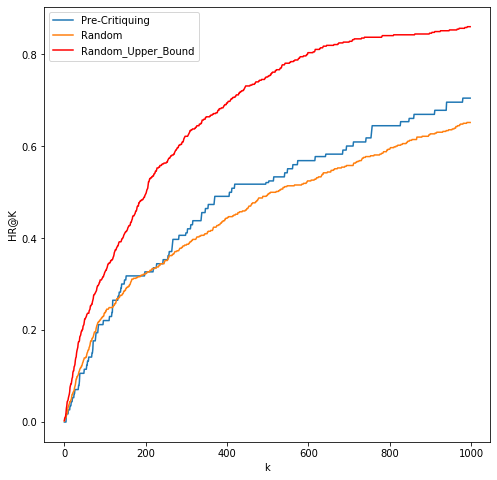

In [280]:
plt.figure(figsize=(8,8))
plt.plot(np.arange(len(pre_hr_list)), pre_hr_list)
plt.plot(np.arange(len(pre_hr_list)), post_hr_list)
plt.plot(np.arange(len(pre_hr_list)), upper_bound, color='red')

# plt.xticks(np.arange(len(k_list)), k_list)
plt.xlabel('k')
plt.ylabel('HR@K')
plt.legend(['Pre-Critiquing','Random', 'Random_Upper_Bound'])
plt.show()
# plt.savefig('../figs/HitRate200_pre_post_critiquing'

# Load experiment Data

In [478]:
_,diff_upper = get_hr(l=4)

In [36]:
def get_hr(l=5):
    pre_hr_list = []
    post_hr_list = []
    for k in range(1,200):
        pre_hr,post_hr = hr_at_k(df,4, k)
        pre_hr_list.append(pre_hr)
        post_hr_list.append(post_hr)
    return pre_hr_list,post_hr_list

In [47]:
df = pd.read_csv(single_step_with_avg_path+"diff_all_50user.csv")

In [52]:
pre_hr_list,b = get_hr(l=5)

In [49]:
diff = []
for i in range(9):
    _,a = get_hr(l=i)
    diff.append(a)

In [507]:
# Save and load
np.savetxt('../data/yelp/single_step_critiquing/'+'diff.txt', diff, fmt='%f')
# keyphrase_popularity = np.loadtxt('../data/yelp/'+'keyphrase_popularity.txt', dtype=int)

random = np.loadtxt('../data/yelp/single_step_critiquing/'+'random.txt', dtype=float)

# Plot all 

### Plot HR vs. Performance at lambda = 0.5

In [50]:
a1,a2,a3,a4,a5,a6 = random[5],random_upper[5],pop[5],pop_upper[5],diff[5],diff_upper[5]

In [53]:
plt.figure(figsize=(12,12))
plt.plot(np.arange(len(pre_hr_list)), pre_hr_list)
plt.plot(np.arange(len(pre_hr_list)), b)
plt.plot(np.arange(len(pre_hr_list)), c)
plt.plot(np.arange(len(pre_hr_list)), d)
plt.plot(np.arange(len(pre_hr_list)), e)
plt.plot(np.arange(len(pre_hr_list)), f)
plt.plot(np.arange(len(pre_hr_list)), g)

# plt.xticks(np.arange(len(k_list)), k_list)
plt.xlabel('k')
plt.ylabel('HR@K')
plt.legend(['Pre-Critiquing','Random', 'Random_Upper','Pop','Pop_Upper','Diff','Diff_Upper'])
# plt.show()
plt.savefig('../figs/three_keyphrase_selection_methods_with_upper_bound_hr200.png')

NameError: name 'c' is not defined

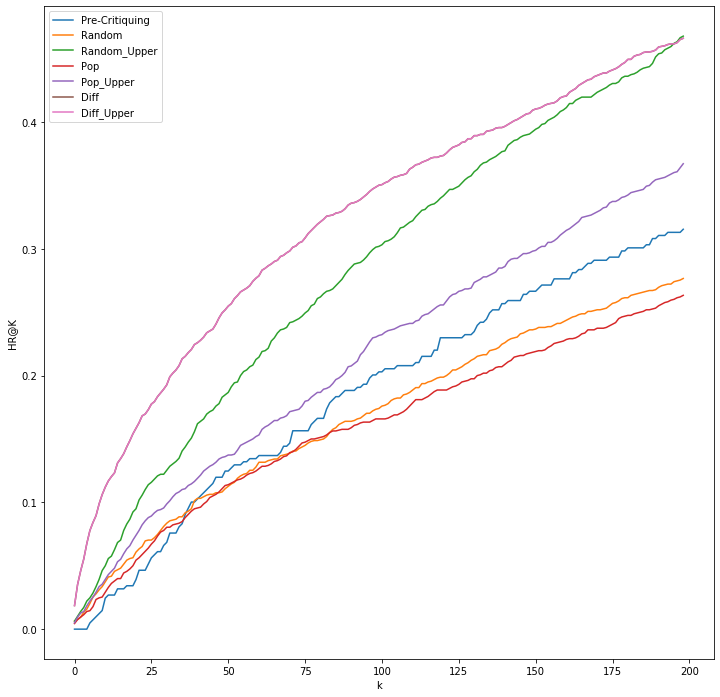

In [57]:
plt.figure(figsize=(12,12))
plt.plot(np.arange(len(pre_hr_list)), pre_hr_list)
plt.plot(np.arange(len(pre_hr_list)), a1)
plt.plot(np.arange(len(pre_hr_list)), a2)
plt.plot(np.arange(len(pre_hr_list)), a3)
plt.plot(np.arange(len(pre_hr_list)), a4)
plt.plot(np.arange(len(pre_hr_list)), a5)
plt.plot(np.arange(len(pre_hr_list)), a6)

# plt.xticks(np.arange(len(k_list)), k_list)
plt.xlabel('k')
plt.ylabel('HR@K')
plt.legend(['Pre-Critiquing','Random', 'Random_Upper','Pop','Pop_Upper','Diff','Diff_Upper'])
plt.show()
plt.savefig('../figs/three_keyphrase_selection_methods_with_upper_bound_0104')

# Lambda vs HR@25 plot

In [78]:
def lambda_hr(k = 25):
    pre_hr_list = []
    post_hr_list = []
#     for k in range(1,200):
    for lam in range(11):
        pre_hr,post_hr = hr_at_k(df,lam, k)
        pre_hr_list.append(pre_hr)
        post_hr_list.append(post_hr)
    return pre_hr_list,post_hr_list

In [79]:
# Get HR@k
def hr_at_k_lambda(df, k):
    """
    Given the above dataframe, calculate the avg pre and post hit rate at k 
    """
    pre_hit = np.where(df['pre_rank']<k)[0]
    post_hit = np.where(df['post_rank']<k)[0]
#     print (len(np.ravel(pre_hit)))
#     print (len(np.ravel(pre_hit)))
    pre_hr = len(pre_hit)/len(df)
    post_hr = len(post_hit)/len(df)
    return pre_hr, post_hr

In [90]:
df = pd.read_csv(single_step_with_avg_path+"pop_upper_50user.csv")

In [91]:
_,d = lambda_hr(k = 200)

In [92]:
pre_hr_list

[0.3411392405063291,
 0.3411392405063291,
 0.3411392405063291,
 0.3411392405063291,
 0.3411392405063291,
 0.3411392405063291,
 0.3411392405063291,
 0.3411392405063291,
 0.3411392405063291,
 0.3411392405063291,
 0.3411392405063291]

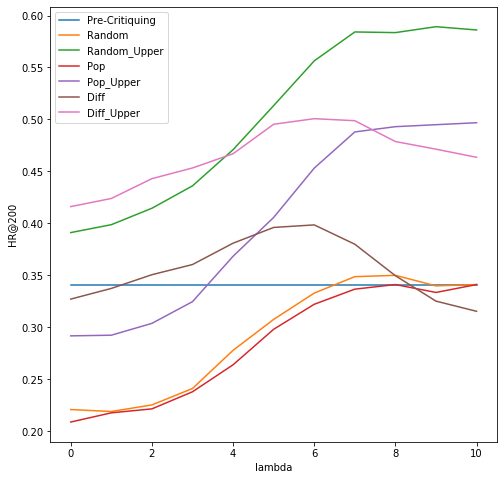

In [93]:
plt.figure(figsize=(8,8))
plt.plot(np.arange(len(pre_hr_list)), pre_hr_list)
plt.plot(np.arange(len(pre_hr_list)), a)
plt.plot(np.arange(len(pre_hr_list)), b)
plt.plot(np.arange(len(pre_hr_list)), c)
plt.plot(np.arange(len(pre_hr_list)), d)
plt.plot(np.arange(len(pre_hr_list)), e)
plt.plot(np.arange(len(pre_hr_list)), f)
# plt.plot(np.arange(len(pre_hr_list)), g)

# plt.xticks(np.arange(len(k_list)), k_list)
plt.xlabel('lambda')
plt.ylabel('HR@200')
plt.legend(['Pre-Critiquing','Random', 'Random_Upper','Pop','Pop_Upper','Diff','Diff_Upper'])
# plt.legend(['Pre-Critiquing','Random'])
plt.show()
# plt.savefig('../figs/hr@200_with_varying_lambda')

In [534]:
len(pre_hr_list[:200])
len(a1)

199

In [538]:
plt.figure(figsize=(12,12))
plt.plot(np.arange(len(pre_hr_list[:199])), pre_hr_list[:199])
plt.plot(np.arange(len(pre_hr_list[:199])), a1)
plt.plot(np.arange(len(pre_hr_list[:199])), a2)
plt.plot(np.arange(len(pre_hr_list[:199])), a3)
plt.plot(np.arange(len(pre_hr_list[:199])), a4)
plt.plot(np.arange(len(pre_hr_list[:199])), a5)
plt.plot(np.arange(len(pre_hr_list[:199])), a6)

# plt.xticks(np.arange(len(k_list)), k_list)
plt.xlabel('k')
plt.ylabel('HR@K')
plt.legend(['Pre-Critiquing','Random', 'Random_Upper','Pop','Pop_Upper','Diff','Diff_Upper'])
# plt.show()
plt.savefig('../figs/three_keyphrase_selection_methods_with_upper_bound_hr200')

In [510]:
len(pre_hr_list)

999

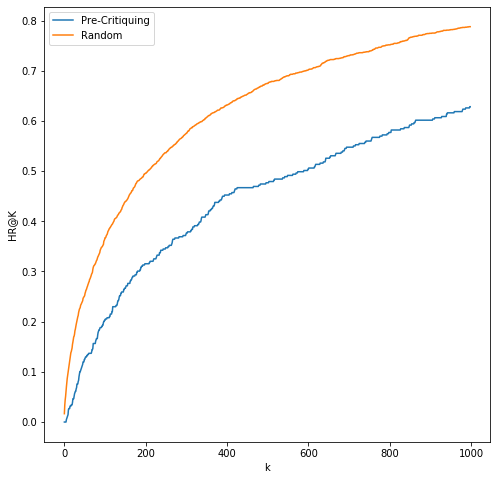

In [474]:
plt.figure(figsize=(8,8))
plt.plot(np.arange(len(pre_hr_list)), pre_hr_list)
plt.plot(np.arange(len(pre_hr_list)), post_hr_list)
# plt.plot(np.arange(len(pre_hr_list)), upper_bound, color='red')

# plt.xticks(np.arange(len(k_list)), k_list)
plt.xlabel('k')
plt.ylabel('HR@K')
plt.legend(['Pre-Critiquing','Random', 'Random_Upper_Bound'])
plt.show()

# Varying Lambda

In [340]:
columns = ['user_id', 'target_item', 'item_name', 'iter', 'pre_rank', 'top_prediction_item_name','critiqued_keyphrase', 'keyphrase_name', 'post_rank', 'num_existing_keyphrases']

df = pd.DataFrame(columns=columns)
row = {}
#only_with_critiqued_keyphrase
for user in range(300,310):
    df = single_step_critiquing(user = user, 
                           keyphrase_length_threshold = 230, 
                           max_iteration_threshold = 5,
                           k = 50,
                           df = df,
                           row = row,
                           business_df = business_df,
                           keyphrases = keyphrases,
                           keyphrase_popularity = keyphrase_popularity,
                           keyphrase_selection_method = 'random',
                           recommend_type = 'all',
                           lam = 0.5 
                           )
# df.to_csv(single_step_with_avg_path+"random_all_100user.csv")

User ID  300
wanted_items are:  [ 101  886  968 1620 1898 2803 3822 4025 4906 5041 5098 6191 7351 7419]
Initial top recommendation  4443
num_top_recommended_keyphrases  157
target_item:  101
target_item initial rank 3311
num_existing_keyphrases  8
wanted_keyphrases  [105]
cur_iter  0
critiqued_keyphrase , 105 latte
no more keyphrase available
target_item:  886
target_item initial rank 755
num_existing_keyphrases  65
wanted_keyphrases  [ 27  48  59  60  72  73 108 115 145 223]
cur_iter  0
critiqued_keyphrase , 73 congee


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 939
cur_iter  1
critiqued_keyphrase , 145 markham


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 3756
cur_iter  2
critiqued_keyphrase , 48 burger


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 2197
cur_iter  3
critiqued_keyphrase , 27 bbq


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 873
cur_iter  4
critiqued_keyphrase , 223 general tao


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 246
target_item:  968
target_item initial rank 574
num_existing_keyphrases  65
wanted_keyphrases  [ 38  42  65  69 103 105 143 163 205 230]
cur_iter  0
critiqued_keyphrase , 230 alcoholic beverage


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 420
cur_iter  1
critiqued_keyphrase , 143 station


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 146
cur_iter  2
critiqued_keyphrase , 163 dog


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 273
cur_iter  3
critiqued_keyphrase , 42 sandwich


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 607
cur_iter  4
critiqued_keyphrase , 105 latte


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 501
target_item:  1620
target_item initial rank 3815
num_existing_keyphrases  7
wanted_keyphrases  []
wanted_keyphrases is empty
User ID  301
wanted_items are:  []
Initial top recommendation  7455
num_top_recommended_keyphrases  2
User ID  302
wanted_items are:  [1833 2286 2810 4091 4216 4499 5040]
Initial top recommendation  2804
num_top_recommended_keyphrases  139
target_item:  1833
target_item initial rank 3973
num_existing_keyphrases  2
wanted_keyphrases  []
wanted_keyphrases is empty
User ID  303
wanted_items are:  [  38 1199 3368 4432 5659 6023 6990]
Initial top recommendation  1406
num_top_recommended_keyphrases  149
target_item:  38
target_item initial rank 70
num_existing_keyphrases  109
wanted_keyphrases  [  0  23  28  44  61  73  74  75  86 106 110 115 129 136 138 146 147 155
 161 186 189 193 232]
cur_iter  0
critiqued_keyphrase , 147 market


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 255
cur_iter  1
critiqued_keyphrase , 44 sushi


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 46
cur_iter  2
critiqued_keyphrase , 189 fluffy


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 497
cur_iter  3
critiqued_keyphrase , 28 japanese


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 57
cur_iter  4
critiqued_keyphrase , 110 sashimi


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 8
target_item:  1199
target_item initial rank 132
num_existing_keyphrases  97
wanted_keyphrases  [ 22  71  78  94 112 118 126 127 129 136 138 182 186 190]
cur_iter  0
critiqued_keyphrase , 94 coconut


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 491
cur_iter  1
critiqued_keyphrase , 127 fried chicken


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 590
cur_iter  2
critiqued_keyphrase , 129 green tea


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 82
cur_iter  3
critiqued_keyphrase , 71 cone


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 91
cur_iter  4
critiqued_keyphrase , 190 smooth


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 93
target_item:  3368
target_item initial rank 152
num_existing_keyphrases  116
wanted_keyphrases  [  0  18  22  28  29  51  67  78  89 112 136 161 186 189 193 233]
cur_iter  0
critiqued_keyphrase , 136 store


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 93
cur_iter  1
critiqued_keyphrase , 193 mayo


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 1808
cur_iter  2
critiqued_keyphrase , 0 chinese


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 181
cur_iter  3
critiqued_keyphrase , 161 cheaper


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 11
cur_iter  4
critiqued_keyphrase , 28 japanese


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 398
target_item:  4432
target_item initial rank 1404
num_existing_keyphrases  55
wanted_keyphrases  [ 18  29  71 126 147 163 190 220]
cur_iter  0
critiqued_keyphrase , 220 lactose intolerant


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 78
cur_iter  1
critiqued_keyphrase , 126 milk


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 602
cur_iter  2
critiqued_keyphrase , 71 cone


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 48
cur_iter  3
critiqued_keyphrase , 18 bakery


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 2345
cur_iter  4
critiqued_keyphrase , 147 market


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 867
target_item:  5659
target_item initial rank 37
num_existing_keyphrases  167
wanted_keyphrases  [ 12  22  23  29  33  51  67  71  76  78  82  94  96 108 112 115 118 126
 127 136 137 138 146 155 161 163 186 189 190 193 203 230 233]
cur_iter  0
critiqued_keyphrase , 189 fluffy


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 30
cur_iter  1
critiqued_keyphrase , 112 mango


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 71
cur_iter  2
critiqued_keyphrase , 138 nail


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 32
cur_iter  3
critiqued_keyphrase , 51 pork


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 14
cur_iter  4
critiqued_keyphrase , 203 greasy


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 127
target_item:  6023
target_item initial rank 338
num_existing_keyphrases  73
wanted_keyphrases  [ 17  19  22  29  71  78  82  85 108 121 136 147 182 203]
cur_iter  0
critiqued_keyphrase , 203 greasy


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 1191
cur_iter  1
critiqued_keyphrase , 121 dumpling


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 1010
cur_iter  2
critiqued_keyphrase , 71 cone


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 332
cur_iter  3
critiqued_keyphrase , 17 pub


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 707
cur_iter  4
critiqued_keyphrase , 19 indian


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 1680
target_item:  6990
target_item initial rank 1543
num_existing_keyphrases  99
wanted_keyphrases  [  0  17  22  28  71  78 112 115 136 140 182 186 189 203]
cur_iter  0
critiqued_keyphrase , 186 traditional


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 1764
cur_iter  1
critiqued_keyphrase , 112 mango


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 920
cur_iter  2
critiqued_keyphrase , 78 strawberry


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 5185
cur_iter  3
critiqued_keyphrase , 28 japanese


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 1404
cur_iter  4
critiqued_keyphrase , 136 store


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 1241
User ID  304
wanted_items are:  [1483 1985 3158 4323 5081 5710 6222 6323 6708 7163]
Initial top recommendation  6454
num_top_recommended_keyphrases  155
target_item:  1483
target_item initial rank 503
num_existing_keyphrases  18
wanted_keyphrases  [ 19 191 216]
cur_iter  0
critiqued_keyphrase , 191 frozen


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 621
cur_iter  1
critiqued_keyphrase , 19 indian


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 3238
cur_iter  2
critiqued_keyphrase , 216 baked
no more keyphrase available
target_item:  1985
target_item initial rank 141
num_existing_keyphrases  114
wanted_keyphrases  [ 19  27  29  31  60  66  83 209]
cur_iter  0
critiqued_keyphrase , 27 bbq


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 59
cur_iter  1
critiqued_keyphrase , 60 squid


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 2
cur_iter  2
critiqued_keyphrase , 31 brunch


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 63
cur_iter  3
critiqued_keyphrase , 19 indian


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 375
cur_iter  4
critiqued_keyphrase , 209 smoked


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 57
target_item:  3158
target_item initial rank 496
num_existing_keyphrases  36
wanted_keyphrases  [ 62 123 130]
cur_iter  0
critiqued_keyphrase , 130 bubble tea


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 293
cur_iter  1
critiqued_keyphrase , 123 steak


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 665
cur_iter  2
critiqued_keyphrase , 62 tapioca
no more keyphrase available
target_item:  4323
target_item initial rank 57
num_existing_keyphrases  84
wanted_keyphrases  [ 29  38  49  78  82  86  97 102 106 118 129 130 145 146 156 158 189]
cur_iter  0
critiqued_keyphrase , 49 cheese


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 18
cur_iter  1
critiqued_keyphrase , 102 cheesecake


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 348
cur_iter  2
critiqued_keyphrase , 158 bright


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 134
cur_iter  3
critiqued_keyphrase , 118 waffle


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 6
cur_iter  4
critiqued_keyphrase , 29 breakfast


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 107
target_item:  5081
target_item initial rank 83
num_existing_keyphrases  109
wanted_keyphrases  [ 11  19  38  42  49  62  65  69  71  78  80  82  84  85  86  96 102 106
 118 121 129 130 158 191 205 216 220]
cur_iter  0
critiqued_keyphrase , 121 dumpling


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 19
cur_iter  1
critiqued_keyphrase , 71 cone


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 21
cur_iter  2
critiqued_keyphrase , 118 waffle


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 61
cur_iter  3
critiqued_keyphrase , 96 poutine


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 1085
cur_iter  4
critiqued_keyphrase , 78 strawberry


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 541
target_item:  5710
target_item initial rank 362
num_existing_keyphrases  3
wanted_keyphrases  []
wanted_keyphrases is empty
User ID  305
wanted_items are:  [  39 1890 1985 2589 2780 3598 3850 4238 4299 4772 5364 5905 5972 6861
 6995]
Initial top recommendation  5410
num_top_recommended_keyphrases  132
target_item:  39
target_item initial rank 78
num_existing_keyphrases  115
wanted_keyphrases  [  2  21  24  33  34  54  62  68  69  93  94 104 109 126 128 129 132 133
 135 138 145 146 155 157 164 166 190 202 204 232]
cur_iter  0
critiqued_keyphrase , 146 plaza


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 18
cur_iter  1
critiqued_keyphrase , 133 fried rice


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 393
cur_iter  2
critiqued_keyphrase , 155 refill


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 55
cur_iter  3
critiqued_keyphrase , 202 steamed


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 838
cur_iter  4
critiqued_keyphrase , 93 vegan


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 326
target_item:  1890
target_item initial rank 4446
num_existing_keyphrases  56
wanted_keyphrases  [ 13  38  47  59  86  93  94 106 118 126 135 157 164 190 200 210]
cur_iter  0
critiqued_keyphrase , 94 coconut


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 3858
cur_iter  1
critiqued_keyphrase , 38 chocolate


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 541
cur_iter  2
critiqued_keyphrase , 118 waffle


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 312
cur_iter  3
critiqued_keyphrase , 59 ice cream


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 1873
cur_iter  4
critiqued_keyphrase , 126 milk


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 793
target_item:  1985
target_item initial rank 265
num_existing_keyphrases  114
wanted_keyphrases  [  0  24  43  59  68  74  83  94 100 104 126 132 133 135 155 157 164 166
 190 195 204 210 221]
cur_iter  0
critiqued_keyphrase , 43 cake


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 269
cur_iter  1
critiqued_keyphrase , 0 chinese


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 856
cur_iter  2
critiqued_keyphrase , 164 quiet


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 38
cur_iter  3
critiqued_keyphrase , 83 calamari


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 345
cur_iter  4
critiqued_keyphrase , 59 ice cream


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 44
target_item:  2589
target_item initial rank 1384
num_existing_keyphrases  111
wanted_keyphrases  [  0  21  33  34  39  40  42  43  44  48  54  58  84  85  94 107 108 110
 113 116 118 125 133 155 157 193 195 204 216 231]
cur_iter  0
critiqued_keyphrase , 33 curry


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 1186
cur_iter  1
critiqued_keyphrase , 107 pancake


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 189
cur_iter  2
critiqued_keyphrase , 0 chinese


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 1325
cur_iter  3
critiqued_keyphrase , 48 burger


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 637
cur_iter  4
critiqued_keyphrase , 116 wine


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 852
target_item:  2780
target_item initial rank 267
num_existing_keyphrases  63
wanted_keyphrases  [ 13  47  62  94  99 106 126 128 129 130 135 145 146 157 164 190 210 222
 231 232]
cur_iter  0
critiqued_keyphrase , 129 green tea


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 127
cur_iter  1
critiqued_keyphrase , 157 greeted


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 298
cur_iter  2
critiqued_keyphrase , 106 matcha


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 112
cur_iter  3
critiqued_keyphrase , 128 milk tea


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 16
cur_iter  4
critiqued_keyphrase , 222 gong cha


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 0
target_item:  3598
target_item initial rank 347
num_existing_keyphrases  80
wanted_keyphrases  [  0  17  18  22  24  38  43  47  59  68  69  86  94  99 102 106 109 129
 130 135 145 157 164 190 191 200 216]
cur_iter  0
critiqued_keyphrase , 22 french


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 2031
cur_iter  1
critiqued_keyphrase , 24 birthday


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 1018
cur_iter  2
critiqued_keyphrase , 17 pub


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 2314
cur_iter  3
critiqued_keyphrase , 200 crust


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 535
cur_iter  4
critiqued_keyphrase , 86 sesame


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 127
target_item:  3850
target_item initial rank 1732
num_existing_keyphrases  48
wanted_keyphrases  [  2  17  48  64  68  82  89  93 135 137 164 227]
cur_iter  0
critiqued_keyphrase , 82 booth


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 6008
cur_iter  1
critiqued_keyphrase , 68 banana


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 1157
cur_iter  2
critiqued_keyphrase , 135 parking


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 344
cur_iter  3
critiqued_keyphrase , 164 quiet


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 5893
cur_iter  4
critiqued_keyphrase , 2 thai


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 5971
target_item:  4238
target_item initial rank 7097
num_existing_keyphrases  62
wanted_keyphrases  [  0   2  21  33  34  39  43  54  69  83  94 104 109 121 126 128 132 135]
cur_iter  0
critiqued_keyphrase , 109 tofu


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 1391
cur_iter  1
critiqued_keyphrase , 39 ramen


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 7188
cur_iter  2
critiqued_keyphrase , 128 milk tea


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 6147
cur_iter  3
critiqued_keyphrase , 43 cake


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 7241
cur_iter  4
critiqued_keyphrase , 126 milk


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 7263
target_item:  4299
target_item initial rank 1897
num_existing_keyphrases  20
wanted_keyphrases  [ 38 126]
cur_iter  0
critiqued_keyphrase , 126 milk


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 1400
cur_iter  1
critiqued_keyphrase , 38 chocolate
no more keyphrase available
target_item:  4772
target_item initial rank 370
num_existing_keyphrases  83
wanted_keyphrases  [  0  13  39  43  47  54  75  86  89 121 135 145 157 190 193 204 232]
cur_iter  0
critiqued_keyphrase , 121 dumpling


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 564
cur_iter  1
critiqued_keyphrase , 145 markham


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 1094
cur_iter  2
critiqued_keyphrase , 157 greeted


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 776
cur_iter  3
critiqued_keyphrase , 75 miso


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 98
cur_iter  4
critiqued_keyphrase , 86 sesame


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 615
target_item:  5364
target_item initial rank 119
num_existing_keyphrases  153
wanted_keyphrases  [  0   2  14  18  22  24  34  38  40  42  43  44  47  48  54  58  59  61
  68  69  75  82  83  85  94 102 108 113 116 118 125 126 132 135 137 145
 155 157 166 190 191 193 194 200 204 221 231]
cur_iter  0
critiqued_keyphrase , 118 waffle


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 24
cur_iter  1
critiqued_keyphrase , 231 grand opening


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 42
cur_iter  2
critiqued_keyphrase , 14 buffet


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 68
cur_iter  3
critiqued_keyphrase , 44 sushi


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 182
cur_iter  4
critiqued_keyphrase , 157 greeted


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 20
User ID  306
wanted_items are:  [ 647 1340 1488 1562 2039 3554 6454 6772 7286]
Initial top recommendation  5410
num_top_recommended_keyphrases  132
target_item:  647
target_item initial rank 406
num_existing_keyphrases  95
wanted_keyphrases  [  0   2  24  33  38  39  43  44  54  57  58  59  61  68  69  74  84  94
 100 107 108 121 133 157 194 204]
cur_iter  0
critiqued_keyphrase , 194 gravy


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 355
cur_iter  1
critiqued_keyphrase , 61 tempura


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 99
cur_iter  2
critiqued_keyphrase , 133 fried rice


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 403
cur_iter  3
critiqued_keyphrase , 38 chocolate


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 352
cur_iter  4
critiqued_keyphrase , 24 birthday


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 208
target_item:  1340
target_item initial rank 282
num_existing_keyphrases  104
wanted_keyphrases  [  0  11  13  17  18  21  22  38  42  43  47  48  58  59  68  85  86  89
  93  96  99 100 104 106 107 118 125 126 130 135 137 204 205 216]
cur_iter  0
critiqued_keyphrase , 59 ice cream


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 78
cur_iter  1
critiqued_keyphrase , 135 parking


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 153
cur_iter  2
critiqued_keyphrase , 47 coffee


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 427
cur_iter  3
critiqued_keyphrase , 130 bubble tea


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 618
cur_iter  4
critiqued_keyphrase , 85 patty


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 596
target_item:  1488
target_item initial rank 4140
num_existing_keyphrases  83
wanted_keyphrases  [ 21  34  38  44  47  48  54  58  59  61  68  82 104 110 116 155 164 166
 200 204]
cur_iter  0
critiqued_keyphrase , 116 wine


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 440
cur_iter  1
critiqued_keyphrase , 44 sushi


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 3228
cur_iter  2
critiqued_keyphrase , 48 burger


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 3981
cur_iter  3
critiqued_keyphrase , 164 quiet


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 1860
cur_iter  4
critiqued_keyphrase , 38 chocolate


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 4208
target_item:  1562
target_item initial rank 135
num_existing_keyphrases  120
wanted_keyphrases  [ 11  18  21  38  40  42  43  47  48  58  59  63  64  65  67  69  71  74
 100 104 108 113 116 121 125 126 135 155 164 166 190 205 210 216]
cur_iter  0
critiqued_keyphrase , 67 croissant


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 128
cur_iter  1
critiqued_keyphrase , 59 ice cream


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 88
cur_iter  2
critiqued_keyphrase , 190 smooth


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 138
cur_iter  3
critiqued_keyphrase , 47 coffee


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 50
cur_iter  4
critiqued_keyphrase , 63 donut


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 68
target_item:  2039
target_item initial rank 940
num_existing_keyphrases  64
wanted_keyphrases  [  2  34  40  43  47  48  58  64 113 116 125 135 137 204 210]
cur_iter  0
critiqued_keyphrase , 43 cake


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 1697
cur_iter  1
critiqued_keyphrase , 2 thai


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 3854
cur_iter  2
critiqued_keyphrase , 116 wine


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 478
cur_iter  3
critiqued_keyphrase , 48 burger


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 678
cur_iter  4
critiqued_keyphrase , 34 potato


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 3945
target_item:  3554
target_item initial rank 860
num_existing_keyphrases  128
wanted_keyphrases  [ 17  21  22  24  34  38  42  43  47  48  54  59  82  85 102 104 107 108
 113 116 118 125 126 135 155 157 164 166 190 193 194 200 210 233]
cur_iter  0
critiqued_keyphrase , 164 quiet


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 1069
cur_iter  1
critiqued_keyphrase , 135 parking


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 2196
cur_iter  2
critiqued_keyphrase , 22 french


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 754
cur_iter  3
critiqued_keyphrase , 108 duck


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 982
cur_iter  4
critiqued_keyphrase , 210 roasted


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 1236
target_item:  6454
target_item initial rank 14
num_existing_keyphrases  155
wanted_keyphrases  [  0   2  13  17  21  24  33  34  39  40  43  47  54  57  58  59  68  74
  93  94  99 100 104 109 116 126 128 132 133 135 140 155 157 164 166 190
 195 202 204 210 221 223 225 229 230 232]
cur_iter  0
critiqued_keyphrase , 109 tofu


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 29
cur_iter  1
critiqued_keyphrase , 59 ice cream


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 6
cur_iter  2
critiqued_keyphrase , 21 modern


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 22
cur_iter  3
critiqued_keyphrase , 128 milk tea


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 3
cur_iter  4
critiqued_keyphrase , 104 sausage


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 5
target_item:  6772
target_item initial rank 1952
num_existing_keyphrases  55
wanted_keyphrases  [ 34  38  47  68  69  84  93  94 113 126 195 210 216 225]
cur_iter  0
critiqued_keyphrase , 68 banana


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 2105
cur_iter  1
critiqued_keyphrase , 38 chocolate


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 5804
cur_iter  2
critiqued_keyphrase , 94 coconut


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 1890
cur_iter  3
critiqued_keyphrase , 195 healthy


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 584
cur_iter  4
critiqued_keyphrase , 69 cookie


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 432
target_item:  7286
target_item initial rank 60
num_existing_keyphrases  141
wanted_keyphrases  [ 17  21  22  24  34  38  42  43  47  48  54  58  59  75  82  83  85  93
 102 108 113 116 125 155 157 164 166 191 193 195 200 202 204 210 216 225]
cur_iter  0
critiqued_keyphrase , 210 roasted


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 200
cur_iter  1
critiqued_keyphrase , 108 duck


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 216
cur_iter  2
critiqued_keyphrase , 93 vegan


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 258
cur_iter  3
critiqued_keyphrase , 200 crust


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 30
cur_iter  4
critiqued_keyphrase , 22 french


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 222
User ID  307
wanted_items are:  [1392 2517 2841 5147 5280]
Initial top recommendation  5659
num_top_recommended_keyphrases  167
target_item:  1392
target_item initial rank 299
num_existing_keyphrases  49
wanted_keyphrases  [  0  68  93 147]
cur_iter  0
critiqued_keyphrase , 0 chinese


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 1519
cur_iter  1
critiqued_keyphrase , 93 vegan


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 1941
cur_iter  2
critiqued_keyphrase , 147 market


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 57
cur_iter  3
critiqued_keyphrase , 68 banana
no more keyphrase available
target_item:  2517
target_item initial rank 643
num_existing_keyphrases  48
wanted_keyphrases  [ 17  98 139 147]
cur_iter  0
critiqued_keyphrase , 98 belly


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 374
cur_iter  1
critiqued_keyphrase , 17 pub


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 492
cur_iter  2
critiqued_keyphrase , 147 market


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 203
cur_iter  3
critiqued_keyphrase , 139 theatre
no more keyphrase available
target_item:  2841
target_item initial rank 303
num_existing_keyphrases  90
wanted_keyphrases  [ 14  18  30  44  68  93 109 125 147 173 176 182 191 195 221]
cur_iter  0
critiqued_keyphrase , 195 healthy


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 135
cur_iter  1
critiqued_keyphrase , 191 frozen


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 387
cur_iter  2
critiqued_keyphrase , 68 banana


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 1908
cur_iter  3
critiqued_keyphrase , 147 market


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 238
cur_iter  4
critiqued_keyphrase , 44 sushi


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 2056
target_item:  5147
target_item initial rank 6919
num_existing_keyphrases  7
wanted_keyphrases  [147]
cur_iter  0
critiqued_keyphrase , 147 market
no more keyphrase available
target_item:  5280
target_item initial rank 827
num_existing_keyphrases  76
wanted_keyphrases  [  2  17  32  54  68 109 125 173 195]
cur_iter  0
critiqued_keyphrase , 195 healthy


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 4927
cur_iter  1
critiqued_keyphrase , 17 pub


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 449
cur_iter  2
critiqued_keyphrase , 173 dark


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 116
cur_iter  3
critiqued_keyphrase , 109 tofu


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 312
cur_iter  4
critiqued_keyphrase , 2 thai


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 431
User ID  308
wanted_items are:  [ 213  467  545  637  867  870 1244 1608 1784 2055 2089 2616 2760 2855
 3945 4099 4447 4495 4519 4536 5206 5967 6218 6510 6637]
Initial top recommendation  5363
num_top_recommended_keyphrases  174
target_item:  213
target_item initial rank 3104
num_existing_keyphrases  34
wanted_keyphrases  [ 62  78  81 128 143 231]
cur_iter  0
critiqued_keyphrase , 143 station


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 3387
cur_iter  1
critiqued_keyphrase , 78 strawberry


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 2884
cur_iter  2
critiqued_keyphrase , 81 juice


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 3114
cur_iter  3
critiqued_keyphrase , 128 milk tea


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 1658
cur_iter  4
critiqued_keyphrase , 231 grand opening


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 1329
target_item:  467
target_item initial rank 55
num_existing_keyphrases  104
wanted_keyphrases  [ 15  39  44  75  82  86 100 154 163 202 229]
cur_iter  0
critiqued_keyphrase , 154 convenient


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 61
cur_iter  1
critiqued_keyphrase , 39 ramen


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 216
cur_iter  2
critiqued_keyphrase , 229 uber eats


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 166
cur_iter  3
critiqued_keyphrase , 75 miso


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 72
cur_iter  4
critiqued_keyphrase , 44 sushi


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 57
target_item:  545
target_item initial rank 562
num_existing_keyphrases  64
wanted_keyphrases  [ 64  65  67  69 154 216]
cur_iter  0
critiqued_keyphrase , 216 baked


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 291
cur_iter  1
critiqued_keyphrase , 69 cookie


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 1610
cur_iter  2
critiqued_keyphrase , 65 espresso


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 720
cur_iter  3
critiqued_keyphrase , 67 croissant


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 802
cur_iter  4
critiqued_keyphrase , 64 olive


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 588
target_item:  637
target_item initial rank 243
num_existing_keyphrases  99
wanted_keyphrases  [ 39  75  82  86 109 154 171 202 232]
cur_iter  0
critiqued_keyphrase , 75 miso


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 68
cur_iter  1
critiqued_keyphrase , 82 booth


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 3282
cur_iter  2
critiqued_keyphrase , 39 ramen


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 2753
cur_iter  3
critiqued_keyphrase , 109 tofu


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 379
cur_iter  4
critiqued_keyphrase , 171 fancy


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 261
target_item:  867
target_item initial rank 1888
num_existing_keyphrases  39
wanted_keyphrases  [ 15  63 166]
cur_iter  0
critiqued_keyphrase , 166 spacious


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 2203
cur_iter  1
critiqued_keyphrase , 15 takeout


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 1932
cur_iter  2
critiqued_keyphrase , 63 donut
no more keyphrase available
target_item:  870
target_item initial rank 35
num_existing_keyphrases  138
wanted_keyphrases  [ 15  25  39  44  61  73  74  75  78  82  86 100 109 128 158 166]
cur_iter  0
critiqued_keyphrase , 82 booth


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 56
cur_iter  1
critiqued_keyphrase , 78 strawberry


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 39
cur_iter  2
critiqued_keyphrase , 25 vegetarian


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 77
cur_iter  3
critiqued_keyphrase , 158 bright


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 104
cur_iter  4
critiqued_keyphrase , 61 tempura


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 11
target_item:  1244
target_item initial rank 337
num_existing_keyphrases  86
wanted_keyphrases  [ 25  39  74  86 109 111 137 154 159 166]
cur_iter  0
critiqued_keyphrase , 166 spacious


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 79
cur_iter  1
critiqued_keyphrase , 137 shopping


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 378
cur_iter  2
critiqued_keyphrase , 159 crowded


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 213
cur_iter  3
critiqued_keyphrase , 154 convenient


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 2283
cur_iter  4
critiqued_keyphrase , 86 sesame


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 166
target_item:  1608
target_item initial rank 20
num_existing_keyphrases  137
wanted_keyphrases  [ 25  64  65  82  83 115 154 158 166 171 205 216 231]
cur_iter  0
critiqued_keyphrase , 158 bright


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 17
cur_iter  1
critiqued_keyphrase , 65 espresso


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 28
cur_iter  2
critiqued_keyphrase , 82 booth


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 9
cur_iter  3
critiqued_keyphrase , 64 olive


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 42
cur_iter  4
critiqued_keyphrase , 115 lobster


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 24
target_item:  1784
target_item initial rank 219
num_existing_keyphrases  81
wanted_keyphrases  [ 63  69  71 128 143 159 171 205 231]
cur_iter  0
critiqued_keyphrase , 159 crowded


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 724
cur_iter  1
critiqued_keyphrase , 63 donut


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 28
cur_iter  2
critiqued_keyphrase , 71 cone


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 13
cur_iter  3
critiqued_keyphrase , 69 cookie


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 8
cur_iter  4
critiqued_keyphrase , 143 station


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 151
target_item:  2055
target_item initial rank 4297
num_existing_keyphrases  121
wanted_keyphrases  [ 14  25  44  69  74  83  86  89 100 111 115 143 158 166 171 216]
cur_iter  0
critiqued_keyphrase , 86 sesame


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 1839
cur_iter  1
critiqued_keyphrase , 115 lobster


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 319
cur_iter  2
critiqued_keyphrase , 158 bright


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 784
cur_iter  3
critiqued_keyphrase , 25 vegetarian


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 807
cur_iter  4
critiqued_keyphrase , 74 skewer


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 3668
target_item:  2089
target_item initial rank 255
num_existing_keyphrases  94
wanted_keyphrases  [ 39  75  82  86 109 154 202]
cur_iter  0
critiqued_keyphrase , 86 sesame


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 29
cur_iter  1
critiqued_keyphrase , 154 convenient


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 73
cur_iter  2
critiqued_keyphrase , 202 steamed


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 2042
cur_iter  3
critiqued_keyphrase , 75 miso


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 91
cur_iter  4
critiqued_keyphrase , 39 ramen


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 500
User ID  309
wanted_items are:  [ 179  754 2038 3114 3139 3247 4072 4707 4828 5377 5471 5784 7427]
Initial top recommendation  419
num_top_recommended_keyphrases  112
target_item:  179
target_item initial rank 311
num_existing_keyphrases  84
wanted_keyphrases  [  4   5   7  25  34  36  46  50  51  54  55  81  98 107 111 114 121 133
 161 169 195 202 203 204 207 212 217]
cur_iter  0
critiqued_keyphrase , 55 meat


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 800
cur_iter  1
critiqued_keyphrase , 195 healthy


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 417
cur_iter  2
critiqued_keyphrase , 133 fried rice


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 963
cur_iter  3
critiqued_keyphrase , 54 noodle


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 260
cur_iter  4
critiqued_keyphrase , 107 pancake


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 177
target_item:  754
target_item initial rank 26
num_existing_keyphrases  139
wanted_keyphrases  [  2   4   5  27  31  34  36  46  50  51  55  59  64  75  80  81  95  98
 104 107 113 116 118 124 125 127 131 155 156 169 181 182 195 199 202 203
 204 205 209 210 211 212 217 232 233]
cur_iter  0
critiqued_keyphrase , 2 thai


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 1425
cur_iter  1
critiqued_keyphrase , 209 smoked


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 27
cur_iter  2
critiqued_keyphrase , 75 miso


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 119
cur_iter  3
critiqued_keyphrase , 98 belly


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 75
cur_iter  4
critiqued_keyphrase , 34 potato


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 49
target_item:  2038
target_item initial rank 139
num_existing_keyphrases  110
wanted_keyphrases  [  5   7  25  28  30  34  36  41  44  46  50  54  55  58  59  60  61  72
  75  76  80  81  82  83  84  95  98 109 110 116 121 124 137 140 155 156
 169 181 183 193 196 207 209 211 219 220 232]
cur_iter  0
critiqued_keyphrase , 124 salmon


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 506
cur_iter  1
critiqued_keyphrase , 72 scallop


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 314
cur_iter  2
critiqued_keyphrase , 140 movie


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 82
cur_iter  3
critiqued_keyphrase , 156 soggy


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 750
cur_iter  4
critiqued_keyphrase , 81 juice


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 189
target_item:  3114
target_item initial rank 1285
num_existing_keyphrases  36
wanted_keyphrases  [  2   5  33  36  46  50  54  74  82 109 132 133]
cur_iter  0
critiqued_keyphrase , 2 thai


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 934
cur_iter  1
critiqued_keyphrase , 74 skewer


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 1366
cur_iter  2
critiqued_keyphrase , 46 fish


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 990
cur_iter  3
critiqued_keyphrase , 5 fried


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 2750
cur_iter  4
critiqued_keyphrase , 133 fried rice


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 499
target_item:  3139
target_item initial rank 354
num_existing_keyphrases  101
wanted_keyphrases  [  5   7  10  25  27  28  30  36  44  46  50  51  54  55  59  60  75  76
  82  83  84  98 100 104 109 111 116 123 124 141 155 156 161 169 183 196
 203 204 211 212 219 232]
cur_iter  0
critiqued_keyphrase , 44 sushi


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 47
cur_iter  1
critiqued_keyphrase , 156 soggy


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 304
cur_iter  2
critiqued_keyphrase , 55 meat


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 274
cur_iter  3
critiqued_keyphrase , 51 pork


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 1095
cur_iter  4
critiqued_keyphrase , 46 fish


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 211
target_item:  3247
target_item initial rank 1255
num_existing_keyphrases  85
wanted_keyphrases  [  5   7  25  27  34  36  41  46  51  54  55  74  76  81  84  95 107 109
 111 114 121 127 133 134 141 155 161 163 195 199 202 203 207 212 217]
cur_iter  0
critiqued_keyphrase , 95 corn


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 239
cur_iter  1
critiqued_keyphrase , 111 lamb


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 1110
cur_iter  2
critiqued_keyphrase , 84 kimchi


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 6400
cur_iter  3
critiqued_keyphrase , 36 shrimp


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 6444
cur_iter  4
critiqued_keyphrase , 54 noodle


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 1374
target_item:  4072
target_item initial rank 71
num_existing_keyphrases  115
wanted_keyphrases  [  2   4   5   7  13  25  27  33  36  46  50  51  54  55  76  81  82  85
  98 104 114 123 125 127 128 132 137 155 169 183 195 196 202 203 204 207
 210 211 212 217 219]
cur_iter  0
critiqued_keyphrase , 127 fried chicken


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 72
cur_iter  1
critiqued_keyphrase , 203 greasy


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 1396
cur_iter  2
critiqued_keyphrase , 155 refill


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 35
cur_iter  3
critiqued_keyphrase , 128 milk tea


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 43
cur_iter  4
critiqued_keyphrase , 132 spring roll


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 21
target_item:  4707
target_item initial rank 549
num_existing_keyphrases  143
wanted_keyphrases  [  2   4   5   7  11  14  25  27  28  30  32  33  34  36  39  40  41  44
  46  50  51  54  55  57  58  59  60  68  72  73  76  80  82  83  95 100
 104 107 108 109 110 115 116 118 121 123 124 127 133 141 143 155 156 161
 169 181 183 194 202 203 204 210 212 217 219]
cur_iter  0
critiqued_keyphrase , 36 shrimp


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 249
cur_iter  1
critiqued_keyphrase , 107 pancake


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 1682
cur_iter  2
critiqued_keyphrase , 39 ramen


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 512
cur_iter  3
critiqued_keyphrase , 203 greasy


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 194
cur_iter  4
critiqued_keyphrase , 28 japanese


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 747
target_item:  4828
target_item initial rank 369
num_existing_keyphrases  66
wanted_keyphrases  [  2   4   5   7  12  17  32  41  44  48  54  55  68  81  82  95 116 132
 133 137 138 139 140 141 143 195 196 203 227 232]
cur_iter  0
critiqued_keyphrase , 82 booth


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 283
cur_iter  1
critiqued_keyphrase , 54 noodle


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 800
cur_iter  2
critiqued_keyphrase , 140 movie


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 87
cur_iter  3
critiqued_keyphrase , 81 juice


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 1696
cur_iter  4
critiqued_keyphrase , 132 spring roll


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 428
target_item:  5377
target_item initial rank 119
num_existing_keyphrases  92
wanted_keyphrases  [  4   5   7  30  34  36  41  46  55  72  81  82  95 100 104 115 123 133
 138 141 143 155 161 181 183 193 196 199 202 203 204 211 217 219 232]
cur_iter  0
critiqued_keyphrase , 34 potato


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 31
cur_iter  1
critiqued_keyphrase , 115 lobster


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 52
cur_iter  2
critiqued_keyphrase , 55 meat


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 220
cur_iter  3
critiqued_keyphrase , 217 juicy


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 397
cur_iter  4
critiqued_keyphrase , 82 booth


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 78
target_item:  5471
target_item initial rank 4836
num_existing_keyphrases  58
wanted_keyphrases  [  5   7  17  41  44  46  58  95 116 118 124 139 140 141 161 169 209]
cur_iter  0
critiqued_keyphrase , 118 waffle


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 4829
cur_iter  1
critiqued_keyphrase , 169 complaint


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 954
cur_iter  2
critiqued_keyphrase , 7 dinner


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 488
cur_iter  3
critiqued_keyphrase , 17 pub


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 1199
cur_iter  4
critiqued_keyphrase , 5 fried


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 4843


In [341]:
hr_at_k(df,25)

(0.0353356890459364, 0.08480565371024736)

In [342]:
columns = ['user_id', 'target_item', 'item_name', 'iter', 'pre_rank', 'top_prediction_item_name','critiqued_keyphrase', 'keyphrase_name', 'post_rank', 'num_existing_keyphrases']

df = pd.DataFrame(columns=columns)
row = {}
#only_with_critiqued_keyphrase
for user in range(300,310):
    df = single_step_critiquing(user = user, 
                           keyphrase_length_threshold = 230, 
                           max_iteration_threshold = 5,
                           k = 50,
                           df = df,
                           row = row,
                           business_df = business_df,
                           keyphrases = keyphrases,
                           keyphrase_popularity = keyphrase_popularity,
                           keyphrase_selection_method = 'random',
                           recommend_type = 'all',
                           lam = 0.25 
                           )

User ID  300
wanted_items are:  [ 101  886  968 1620 1898 2803 3822 4025 4906 5041 5098 6191 7351 7419]
Initial top recommendation  4443
num_top_recommended_keyphrases  157
target_item:  101
target_item initial rank 3311
num_existing_keyphrases  8
wanted_keyphrases  [105]
cur_iter  0
critiqued_keyphrase , 105 latte
no more keyphrase available
target_item:  886
target_item initial rank 755
num_existing_keyphrases  65
wanted_keyphrases  [ 27  48  59  60  72  73 108 115 145 223]
cur_iter  0
critiqued_keyphrase , 27 bbq


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 802
cur_iter  1
critiqued_keyphrase , 60 squid


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 4195
cur_iter  2
critiqued_keyphrase , 108 duck


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 3114
cur_iter  3
critiqued_keyphrase , 145 markham


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 3039
cur_iter  4
critiqued_keyphrase , 72 scallop


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 1964
target_item:  968
target_item initial rank 574
num_existing_keyphrases  65
wanted_keyphrases  [ 38  42  65  69 103 105 143 163 205 230]
cur_iter  0
critiqued_keyphrase , 230 alcoholic beverage


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 219
cur_iter  1
critiqued_keyphrase , 205 gelato


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 3127
cur_iter  2
critiqued_keyphrase , 69 cookie


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 2022
cur_iter  3
critiqued_keyphrase , 163 dog


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 129
cur_iter  4
critiqued_keyphrase , 105 latte


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 252
target_item:  1620
target_item initial rank 3815
num_existing_keyphrases  7
wanted_keyphrases  []
wanted_keyphrases is empty
User ID  301
wanted_items are:  []
Initial top recommendation  7455
num_top_recommended_keyphrases  2
User ID  302
wanted_items are:  [1833 2286 2810 4091 4216 4499 5040]
Initial top recommendation  2804
num_top_recommended_keyphrases  139
target_item:  1833
target_item initial rank 3973
num_existing_keyphrases  2
wanted_keyphrases  []
wanted_keyphrases is empty
User ID  303
wanted_items are:  [  38 1199 3368 4432 5659 6023 6990]
Initial top recommendation  1406
num_top_recommended_keyphrases  149
target_item:  38
target_item initial rank 70
num_existing_keyphrases  109
wanted_keyphrases  [  0  23  28  44  61  73  74  75  86 106 110 115 129 136 138 146 147 155
 161 186 189 193 232]
cur_iter  0
critiqued_keyphrase , 146 plaza


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 71
cur_iter  1
critiqued_keyphrase , 138 nail


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 1340
cur_iter  2
critiqued_keyphrase , 110 sashimi


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 6
cur_iter  3
critiqued_keyphrase , 136 store


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 3813
cur_iter  4
critiqued_keyphrase , 129 green tea


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 99
target_item:  1199
target_item initial rank 132
num_existing_keyphrases  97
wanted_keyphrases  [ 22  71  78  94 112 118 126 127 129 136 138 182 186 190]
cur_iter  0
critiqued_keyphrase , 118 waffle


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 188
cur_iter  1
critiqued_keyphrase , 136 store


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 70
cur_iter  2
critiqued_keyphrase , 182 chip


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 166
cur_iter  3
critiqued_keyphrase , 129 green tea


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 171
cur_iter  4
critiqued_keyphrase , 71 cone


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 73
target_item:  3368
target_item initial rank 152
num_existing_keyphrases  116
wanted_keyphrases  [  0  18  22  28  29  51  67  78  89 112 136 161 186 189 193 233]
cur_iter  0
critiqued_keyphrase , 136 store


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 126
cur_iter  1
critiqued_keyphrase , 22 french


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 31
cur_iter  2
critiqued_keyphrase , 161 cheaper


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 7
cur_iter  3
critiqued_keyphrase , 67 croissant


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 8
cur_iter  4
critiqued_keyphrase , 112 mango


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 1201
target_item:  4432
target_item initial rank 1404
num_existing_keyphrases  55
wanted_keyphrases  [ 18  29  71 126 147 163 190 220]
cur_iter  0
critiqued_keyphrase , 18 bakery


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 7383
cur_iter  1
critiqued_keyphrase , 220 lactose intolerant


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 551
cur_iter  2
critiqued_keyphrase , 190 smooth


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 178
cur_iter  3
critiqued_keyphrase , 163 dog


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 98
cur_iter  4
critiqued_keyphrase , 71 cone


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 103
target_item:  5659
target_item initial rank 37
num_existing_keyphrases  167
wanted_keyphrases  [ 12  22  23  29  33  51  67  71  76  78  82  94  96 108 112 115 118 126
 127 136 137 138 146 155 161 163 186 189 190 193 203 230 233]
cur_iter  0
critiqued_keyphrase , 108 duck


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 76
cur_iter  1
critiqued_keyphrase , 126 milk


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 24
cur_iter  2
critiqued_keyphrase , 138 nail


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 47
cur_iter  3
critiqued_keyphrase , 127 fried chicken


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 88
cur_iter  4
critiqued_keyphrase , 12 mexican


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 10
target_item:  6023
target_item initial rank 338
num_existing_keyphrases  73
wanted_keyphrases  [ 17  19  22  29  71  78  82  85 108 121 136 147 182 203]
cur_iter  0
critiqued_keyphrase , 82 booth


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 4368
cur_iter  1
critiqued_keyphrase , 182 chip


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 1033
cur_iter  2
critiqued_keyphrase , 17 pub


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 1045
cur_iter  3
critiqued_keyphrase , 147 market


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 1138
cur_iter  4
critiqued_keyphrase , 108 duck


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 4336
target_item:  6990
target_item initial rank 1543
num_existing_keyphrases  99
wanted_keyphrases  [  0  17  22  28  71  78 112 115 136 140 182 186 189 203]
cur_iter  0
critiqued_keyphrase , 17 pub


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 850
cur_iter  1
critiqued_keyphrase , 140 movie


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 1829
cur_iter  2
critiqued_keyphrase , 71 cone


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 1394
cur_iter  3
critiqued_keyphrase , 186 traditional


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 5305
cur_iter  4
critiqued_keyphrase , 115 lobster


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 986
User ID  304
wanted_items are:  [1483 1985 3158 4323 5081 5710 6222 6323 6708 7163]
Initial top recommendation  6454
num_top_recommended_keyphrases  155
target_item:  1483
target_item initial rank 503
num_existing_keyphrases  18
wanted_keyphrases  [ 19 191 216]
cur_iter  0
critiqued_keyphrase , 191 frozen


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 657
cur_iter  1
critiqued_keyphrase , 216 baked


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 4183
cur_iter  2
critiqued_keyphrase , 19 indian
no more keyphrase available
target_item:  1985
target_item initial rank 141
num_existing_keyphrases  114
wanted_keyphrases  [ 19  27  29  31  60  66  83 209]
cur_iter  0
critiqued_keyphrase , 66 octopus


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 27
cur_iter  1
critiqued_keyphrase , 209 smoked


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 330
cur_iter  2
critiqued_keyphrase , 60 squid


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 0
cur_iter  3
critiqued_keyphrase , 31 brunch


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 292
cur_iter  4
critiqued_keyphrase , 83 calamari


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 206
target_item:  3158
target_item initial rank 496
num_existing_keyphrases  36
wanted_keyphrases  [ 62 123 130]
cur_iter  0
critiqued_keyphrase , 123 steak


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 6407
cur_iter  1
critiqued_keyphrase , 130 bubble tea


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 414
cur_iter  2
critiqued_keyphrase , 62 tapioca
no more keyphrase available
target_item:  4323
target_item initial rank 57
num_existing_keyphrases  84
wanted_keyphrases  [ 29  38  49  78  82  86  97 102 106 118 129 130 145 146 156 158 189]
cur_iter  0
critiqued_keyphrase , 129 green tea


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 38
cur_iter  1
critiqued_keyphrase , 38 chocolate


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 1256
cur_iter  2
critiqued_keyphrase , 49 cheese


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 43
cur_iter  3
critiqued_keyphrase , 102 cheesecake


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 528
cur_iter  4
critiqued_keyphrase , 86 sesame


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 17
target_item:  5081
target_item initial rank 83
num_existing_keyphrases  109
wanted_keyphrases  [ 11  19  38  42  49  62  65  69  71  78  80  82  84  85  86  96 102 106
 118 121 129 130 158 191 205 216 220]
cur_iter  0
critiqued_keyphrase , 158 bright


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 623
cur_iter  1
critiqued_keyphrase , 62 tapioca


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 97
cur_iter  2
critiqued_keyphrase , 191 frozen


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 166
cur_iter  3
critiqued_keyphrase , 118 waffle


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 31
cur_iter  4
critiqued_keyphrase , 42 sandwich


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 1342
target_item:  5710
target_item initial rank 362
num_existing_keyphrases  3
wanted_keyphrases  []
wanted_keyphrases is empty
User ID  305
wanted_items are:  [  39 1890 1985 2589 2780 3598 3850 4238 4299 4772 5364 5905 5972 6861
 6995]
Initial top recommendation  5410
num_top_recommended_keyphrases  132
target_item:  39
target_item initial rank 78
num_existing_keyphrases  115
wanted_keyphrases  [  2  21  24  33  34  54  62  68  69  93  94 104 109 126 128 129 132 133
 135 138 145 146 155 157 164 166 190 202 204 232]
cur_iter  0
critiqued_keyphrase , 68 banana


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 320
cur_iter  1
critiqued_keyphrase , 204 dip


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 227
cur_iter  2
critiqued_keyphrase , 126 milk


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 115
cur_iter  3
critiqued_keyphrase , 2 thai


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 533
cur_iter  4
critiqued_keyphrase , 54 noodle


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 289
target_item:  1890
target_item initial rank 4446
num_existing_keyphrases  56
wanted_keyphrases  [ 13  38  47  59  86  93  94 106 118 126 135 157 164 190 200 210]
cur_iter  0
critiqued_keyphrase , 86 sesame


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 3819
cur_iter  1
critiqued_keyphrase , 94 coconut


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 3785
cur_iter  2
critiqued_keyphrase , 38 chocolate


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 4044
cur_iter  3
critiqued_keyphrase , 135 parking


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 869
cur_iter  4
critiqued_keyphrase , 13 vietnamese


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 779
target_item:  1985
target_item initial rank 265
num_existing_keyphrases  114
wanted_keyphrases  [  0  24  43  59  68  74  83  94 100 104 126 132 133 135 155 157 164 166
 190 195 204 210 221]
cur_iter  0
critiqued_keyphrase , 164 quiet


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 36
cur_iter  1
critiqued_keyphrase , 126 milk


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 210
cur_iter  2
critiqued_keyphrase , 195 healthy


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 259
cur_iter  3
critiqued_keyphrase , 132 spring roll


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 333
cur_iter  4
critiqued_keyphrase , 43 cake


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 892
target_item:  2589
target_item initial rank 1384
num_existing_keyphrases  111
wanted_keyphrases  [  0  21  33  34  39  40  42  43  44  48  54  58  84  85  94 107 108 110
 113 116 118 125 133 155 157 193 195 204 216 231]
cur_iter  0
critiqued_keyphrase , 85 patty


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 512
cur_iter  1
critiqued_keyphrase , 118 waffle


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 418
cur_iter  2
critiqued_keyphrase , 231 grand opening


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 406
cur_iter  3
critiqued_keyphrase , 204 dip


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 213
cur_iter  4
critiqued_keyphrase , 43 cake


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 2572
target_item:  2780
target_item initial rank 267
num_existing_keyphrases  63
wanted_keyphrases  [ 13  47  62  94  99 106 126 128 129 130 135 145 146 157 164 190 210 222
 231 232]
cur_iter  0
critiqued_keyphrase , 146 plaza


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 120
cur_iter  1
critiqued_keyphrase , 99 bubble


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 104
cur_iter  2
critiqued_keyphrase , 190 smooth


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 1380
cur_iter  3
critiqued_keyphrase , 145 markham


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 261
cur_iter  4
critiqued_keyphrase , 94 coconut


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 1698
target_item:  3598
target_item initial rank 347
num_existing_keyphrases  80
wanted_keyphrases  [  0  17  18  22  24  38  43  47  59  68  69  86  94  99 102 106 109 129
 130 135 145 157 164 190 191 200 216]
cur_iter  0
critiqued_keyphrase , 200 crust


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 778
cur_iter  1
critiqued_keyphrase , 99 bubble


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 31
cur_iter  2
critiqued_keyphrase , 38 chocolate


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 6554
cur_iter  3
critiqued_keyphrase , 24 birthday


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 1101
cur_iter  4
critiqued_keyphrase , 69 cookie


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 689
target_item:  3850
target_item initial rank 1732
num_existing_keyphrases  48
wanted_keyphrases  [  2  17  48  64  68  82  89  93 135 137 164 227]
cur_iter  0
critiqued_keyphrase , 68 banana


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 409
cur_iter  1
critiqued_keyphrase , 89 crepe


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 5989
cur_iter  2
critiqued_keyphrase , 17 pub


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 605
cur_iter  3
critiqued_keyphrase , 93 vegan


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 6020
cur_iter  4
critiqued_keyphrase , 164 quiet


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 949
target_item:  4238
target_item initial rank 7097
num_existing_keyphrases  62
wanted_keyphrases  [  0   2  21  33  34  39  43  54  69  83  94 104 109 121 126 128 132 135]
cur_iter  0
critiqued_keyphrase , 0 chinese


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 1601
cur_iter  1
critiqued_keyphrase , 104 sausage


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 1917
cur_iter  2
critiqued_keyphrase , 94 coconut


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 6115
cur_iter  3
critiqued_keyphrase , 135 parking


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 7022
cur_iter  4
critiqued_keyphrase , 33 curry


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 1456
target_item:  4299
target_item initial rank 1897
num_existing_keyphrases  20
wanted_keyphrases  [ 38 126]
cur_iter  0
critiqued_keyphrase , 126 milk


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 7159
cur_iter  1
critiqued_keyphrase , 38 chocolate
no more keyphrase available
target_item:  4772
target_item initial rank 370
num_existing_keyphrases  83
wanted_keyphrases  [  0  13  39  43  47  54  75  86  89 121 135 145 157 190 193 204 232]
cur_iter  0
critiqued_keyphrase , 13 vietnamese


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 7327
cur_iter  1
critiqued_keyphrase , 75 miso


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 148
cur_iter  2
critiqued_keyphrase , 193 mayo


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 331
cur_iter  3
critiqued_keyphrase , 145 markham


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 991
cur_iter  4
critiqued_keyphrase , 86 sesame


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 1221
target_item:  5364
target_item initial rank 119
num_existing_keyphrases  153
wanted_keyphrases  [  0   2  14  18  22  24  34  38  40  42  43  44  47  48  54  58  59  61
  68  69  75  82  83  85  94 102 108 113 116 118 125 126 132 135 137 145
 155 157 166 190 191 193 194 200 204 221 231]
cur_iter  0
critiqued_keyphrase , 231 grand opening


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 30
cur_iter  1
critiqued_keyphrase , 83 calamari


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 278
cur_iter  2
critiqued_keyphrase , 194 gravy


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 1009
cur_iter  3
critiqued_keyphrase , 94 coconut


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 4
cur_iter  4
critiqued_keyphrase , 132 spring roll


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 32
User ID  306
wanted_items are:  [ 647 1340 1488 1562 2039 3554 6454 6772 7286]
Initial top recommendation  5410
num_top_recommended_keyphrases  132
target_item:  647
target_item initial rank 406
num_existing_keyphrases  95
wanted_keyphrases  [  0   2  24  33  38  39  43  44  54  57  58  59  61  68  69  74  84  94
 100 107 108 121 133 157 194 204]
cur_iter  0
critiqued_keyphrase , 100 oyster


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 336
cur_iter  1
critiqued_keyphrase , 57 dim sum


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 2858
cur_iter  2
critiqued_keyphrase , 121 dumpling


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 1742
cur_iter  3
critiqued_keyphrase , 24 birthday


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 452
cur_iter  4
critiqued_keyphrase , 59 ice cream


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 944
target_item:  1340
target_item initial rank 282
num_existing_keyphrases  104
wanted_keyphrases  [  0  11  13  17  18  21  22  38  42  43  47  48  58  59  68  85  86  89
  93  96  99 100 104 106 107 118 125 126 130 135 137 204 205 216]
cur_iter  0
critiqued_keyphrase , 99 bubble


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 572
cur_iter  1
critiqued_keyphrase , 85 patty


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 1368
cur_iter  2
critiqued_keyphrase , 0 chinese


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 4319
cur_iter  3
critiqued_keyphrase , 89 crepe


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 127
cur_iter  4
critiqued_keyphrase , 43 cake


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 287
target_item:  1488
target_item initial rank 4140
num_existing_keyphrases  83
wanted_keyphrases  [ 21  34  38  44  47  48  54  58  59  61  68  82 104 110 116 155 164 166
 200 204]
cur_iter  0
critiqued_keyphrase , 47 coffee


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 2763
cur_iter  1
critiqued_keyphrase , 44 sushi


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 4086
cur_iter  2
critiqued_keyphrase , 166 spacious


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 1327
cur_iter  3
critiqued_keyphrase , 34 potato


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 3068
cur_iter  4
critiqued_keyphrase , 38 chocolate


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 4276
target_item:  1562
target_item initial rank 135
num_existing_keyphrases  120
wanted_keyphrases  [ 11  18  21  38  40  42  43  47  48  58  59  63  64  65  67  69  71  74
 100 104 108 113 116 121 125 126 135 155 164 166 190 205 210 216]
cur_iter  0
critiqued_keyphrase , 63 donut


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 117
cur_iter  1
critiqued_keyphrase , 125 pasta


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 444
cur_iter  2
critiqued_keyphrase , 71 cone


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 246
cur_iter  3
critiqued_keyphrase , 104 sausage


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 63
cur_iter  4
critiqued_keyphrase , 113 bacon


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 174
target_item:  2039
target_item initial rank 940
num_existing_keyphrases  64
wanted_keyphrases  [  2  34  40  43  47  48  58  64 113 116 125 135 137 204 210]
cur_iter  0
critiqued_keyphrase , 204 dip


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 679
cur_iter  1
critiqued_keyphrase , 210 roasted


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 3888
cur_iter  2
critiqued_keyphrase , 34 potato


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 3653
cur_iter  3
critiqued_keyphrase , 135 parking


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 1324
cur_iter  4
critiqued_keyphrase , 125 pasta


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 3765
target_item:  3554
target_item initial rank 860
num_existing_keyphrases  128
wanted_keyphrases  [ 17  21  22  24  34  38  42  43  47  48  54  59  82  85 102 104 107 108
 113 116 118 125 126 135 155 157 164 166 190 193 194 200 210 233]
cur_iter  0
critiqued_keyphrase , 164 quiet


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 328
cur_iter  1
critiqued_keyphrase , 43 cake


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 1849
cur_iter  2
critiqued_keyphrase , 21 modern


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 212
cur_iter  3
critiqued_keyphrase , 24 birthday


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 1440
cur_iter  4
critiqued_keyphrase , 34 potato


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 1867
target_item:  6454
target_item initial rank 14
num_existing_keyphrases  155
wanted_keyphrases  [  0   2  13  17  21  24  33  34  39  40  43  47  54  57  58  59  68  74
  93  94  99 100 104 109 116 126 128 132 133 135 140 155 157 164 166 190
 195 202 204 210 221 223 225 229 230 232]
cur_iter  0
critiqued_keyphrase , 166 spacious


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 0
cur_iter  1
critiqued_keyphrase , 223 general tao


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 579
cur_iter  2
critiqued_keyphrase , 74 skewer


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 115
cur_iter  3
critiqued_keyphrase , 135 parking


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 212
cur_iter  4
critiqued_keyphrase , 128 milk tea


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 7
target_item:  6772
target_item initial rank 1952
num_existing_keyphrases  55
wanted_keyphrases  [ 34  38  47  68  69  84  93  94 113 126 195 210 216 225]
cur_iter  0
critiqued_keyphrase , 69 cookie


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 347
cur_iter  1
critiqued_keyphrase , 68 banana


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 5821
cur_iter  2
critiqued_keyphrase , 195 healthy


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 475
cur_iter  3
critiqued_keyphrase , 34 potato


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 5833
cur_iter  4
critiqued_keyphrase , 216 baked


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 5894
target_item:  7286
target_item initial rank 60
num_existing_keyphrases  141
wanted_keyphrases  [ 17  21  22  24  34  38  42  43  47  48  54  58  59  75  82  83  85  93
 102 108 113 116 125 155 157 164 166 191 193 195 200 202 204 210 216 225]
cur_iter  0
critiqued_keyphrase , 82 booth


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 387
cur_iter  1
critiqued_keyphrase , 24 birthday


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 270
cur_iter  2
critiqued_keyphrase , 202 steamed


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 1320
cur_iter  3
critiqued_keyphrase , 43 cake


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 90
cur_iter  4
critiqued_keyphrase , 113 bacon


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 121
User ID  307
wanted_items are:  [1392 2517 2841 5147 5280]
Initial top recommendation  5659
num_top_recommended_keyphrases  167
target_item:  1392
target_item initial rank 299
num_existing_keyphrases  49
wanted_keyphrases  [  0  68  93 147]
cur_iter  0
critiqued_keyphrase , 93 vegan


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 4417
cur_iter  1
critiqued_keyphrase , 0 chinese


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 4355
cur_iter  2
critiqued_keyphrase , 68 banana


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 79
cur_iter  3
critiqued_keyphrase , 147 market
no more keyphrase available
target_item:  2517
target_item initial rank 643
num_existing_keyphrases  48
wanted_keyphrases  [ 17  98 139 147]
cur_iter  0
critiqued_keyphrase , 17 pub


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 532
cur_iter  1
critiqued_keyphrase , 98 belly


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 663
cur_iter  2
critiqued_keyphrase , 147 market


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 165
cur_iter  3
critiqued_keyphrase , 139 theatre
no more keyphrase available
target_item:  2841
target_item initial rank 303
num_existing_keyphrases  90
wanted_keyphrases  [ 14  18  30  44  68  93 109 125 147 173 176 182 191 195 221]
cur_iter  0
critiqued_keyphrase , 191 frozen


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 2890
cur_iter  1
critiqued_keyphrase , 30 seafood


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 2172
cur_iter  2
critiqued_keyphrase , 125 pasta


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 815
cur_iter  3
critiqued_keyphrase , 176 tax


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 2769
cur_iter  4
critiqued_keyphrase , 18 bakery


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 2606
target_item:  5147
target_item initial rank 6919
num_existing_keyphrases  7
wanted_keyphrases  [147]
cur_iter  0
critiqued_keyphrase , 147 market
no more keyphrase available
target_item:  5280
target_item initial rank 827
num_existing_keyphrases  76
wanted_keyphrases  [  2  17  32  54  68 109 125 173 195]
cur_iter  0
critiqued_keyphrase , 195 healthy


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 6950
cur_iter  1
critiqued_keyphrase , 125 pasta


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 6947
cur_iter  2
critiqued_keyphrase , 173 dark


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 83
cur_iter  3
critiqued_keyphrase , 2 thai


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 388
cur_iter  4
critiqued_keyphrase , 32 taco


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 1640
User ID  308
wanted_items are:  [ 213  467  545  637  867  870 1244 1608 1784 2055 2089 2616 2760 2855
 3945 4099 4447 4495 4519 4536 5206 5967 6218 6510 6637]
Initial top recommendation  5363
num_top_recommended_keyphrases  174
target_item:  213
target_item initial rank 3104
num_existing_keyphrases  34
wanted_keyphrases  [ 62  78  81 128 143 231]
cur_iter  0
critiqued_keyphrase , 78 strawberry


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 3201
cur_iter  1
critiqued_keyphrase , 62 tapioca


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 145
cur_iter  2
critiqued_keyphrase , 143 station


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 3017
cur_iter  3
critiqued_keyphrase , 231 grand opening


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 1053
cur_iter  4
critiqued_keyphrase , 128 milk tea


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 1306
target_item:  467
target_item initial rank 55
num_existing_keyphrases  104
wanted_keyphrases  [ 15  39  44  75  82  86 100 154 163 202 229]
cur_iter  0
critiqued_keyphrase , 154 convenient


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 250
cur_iter  1
critiqued_keyphrase , 82 booth


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 3548
cur_iter  2
critiqued_keyphrase , 100 oyster


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 432
cur_iter  3
critiqued_keyphrase , 44 sushi


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 49
cur_iter  4
critiqued_keyphrase , 75 miso


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 239
target_item:  545
target_item initial rank 562
num_existing_keyphrases  64
wanted_keyphrases  [ 64  65  67  69 154 216]
cur_iter  0
critiqued_keyphrase , 67 croissant


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 2929
cur_iter  1
critiqued_keyphrase , 216 baked


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 278
cur_iter  2
critiqued_keyphrase , 154 convenient


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 2487
cur_iter  3
critiqued_keyphrase , 69 cookie


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 2982
cur_iter  4
critiqued_keyphrase , 64 olive


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 2302
target_item:  637
target_item initial rank 243
num_existing_keyphrases  99
wanted_keyphrases  [ 39  75  82  86 109 154 171 202 232]
cur_iter  0
critiqued_keyphrase , 75 miso


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 53
cur_iter  1
critiqued_keyphrase , 154 convenient


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 280
cur_iter  2
critiqued_keyphrase , 86 sesame


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 47
cur_iter  3
critiqued_keyphrase , 171 fancy


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 278
cur_iter  4
critiqued_keyphrase , 39 ramen


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 2751
target_item:  867
target_item initial rank 1888
num_existing_keyphrases  39
wanted_keyphrases  [ 15  63 166]
cur_iter  0
critiqued_keyphrase , 63 donut


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 207
cur_iter  1
critiqued_keyphrase , 166 spacious


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 3261
cur_iter  2
critiqued_keyphrase , 15 takeout
no more keyphrase available
target_item:  870
target_item initial rank 35
num_existing_keyphrases  138
wanted_keyphrases  [ 15  25  39  44  61  73  74  75  78  82  86 100 109 128 158 166]
cur_iter  0
critiqued_keyphrase , 82 booth


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 84
cur_iter  1
critiqued_keyphrase , 44 sushi


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 72
cur_iter  2
critiqued_keyphrase , 128 milk tea


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 28
cur_iter  3
critiqued_keyphrase , 78 strawberry


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 48
cur_iter  4
critiqued_keyphrase , 100 oyster


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 316
target_item:  1244
target_item initial rank 337
num_existing_keyphrases  86
wanted_keyphrases  [ 25  39  74  86 109 111 137 154 159 166]
cur_iter  0
critiqued_keyphrase , 109 tofu


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 3960
cur_iter  1
critiqued_keyphrase , 154 convenient


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 3557
cur_iter  2
critiqued_keyphrase , 39 ramen


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 3921
cur_iter  3
critiqued_keyphrase , 25 vegetarian


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 3180
cur_iter  4
critiqued_keyphrase , 111 lamb


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 754
target_item:  1608
target_item initial rank 20
num_existing_keyphrases  137
wanted_keyphrases  [ 25  64  65  82  83 115 154 158 166 171 205 216 231]
cur_iter  0
critiqued_keyphrase , 171 fancy


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 1651
cur_iter  1
critiqued_keyphrase , 25 vegetarian


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 318
cur_iter  2
critiqued_keyphrase , 83 calamari


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 703
cur_iter  3
critiqued_keyphrase , 205 gelato


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 169
cur_iter  4
critiqued_keyphrase , 231 grand opening


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 47
target_item:  1784
target_item initial rank 219
num_existing_keyphrases  81
wanted_keyphrases  [ 63  69  71 128 143 159 171 205 231]
cur_iter  0
critiqued_keyphrase , 143 station


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 396
cur_iter  1
critiqued_keyphrase , 231 grand opening


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 338
cur_iter  2
critiqued_keyphrase , 159 crowded


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 1704
cur_iter  3
critiqued_keyphrase , 71 cone


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 6
cur_iter  4
critiqued_keyphrase , 63 donut


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 26
target_item:  2055
target_item initial rank 4297
num_existing_keyphrases  121
wanted_keyphrases  [ 14  25  44  69  74  83  86  89 100 111 115 143 158 166 171 216]
cur_iter  0
critiqued_keyphrase , 69 cookie


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 1894
cur_iter  1
critiqued_keyphrase , 44 sushi


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 129
cur_iter  2
critiqued_keyphrase , 74 skewer


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 1460
cur_iter  3
critiqued_keyphrase , 171 fancy


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 89
cur_iter  4
critiqued_keyphrase , 83 calamari


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 405
target_item:  2089
target_item initial rank 255
num_existing_keyphrases  94
wanted_keyphrases  [ 39  75  82  86 109 154 202]
cur_iter  0
critiqued_keyphrase , 109 tofu


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 845
cur_iter  1
critiqued_keyphrase , 39 ramen


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 382
cur_iter  2
critiqued_keyphrase , 75 miso


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 58
cur_iter  3
critiqued_keyphrase , 82 booth


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 855
cur_iter  4
critiqued_keyphrase , 154 convenient


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 1637
User ID  309
wanted_items are:  [ 179  754 2038 3114 3139 3247 4072 4707 4828 5377 5471 5784 7427]
Initial top recommendation  419
num_top_recommended_keyphrases  112
target_item:  179
target_item initial rank 311
num_existing_keyphrases  84
wanted_keyphrases  [  4   5   7  25  34  36  46  50  51  54  55  81  98 107 111 114 121 133
 161 169 195 202 203 204 207 212 217]
cur_iter  0
critiqued_keyphrase , 204 dip


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 303
cur_iter  1
critiqued_keyphrase , 7 dinner


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 201
cur_iter  2
critiqued_keyphrase , 81 juice


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 1423
cur_iter  3
critiqued_keyphrase , 107 pancake


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 150
cur_iter  4
critiqued_keyphrase , 207 stuffed


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 220
target_item:  754
target_item initial rank 26
num_existing_keyphrases  139
wanted_keyphrases  [  2   4   5  27  31  34  36  46  50  51  55  59  64  75  80  81  95  98
 104 107 113 116 118 124 125 127 131 155 156 169 181 182 195 199 202 203
 204 205 209 210 211 212 217 232 233]
cur_iter  0
critiqued_keyphrase , 211 seasoned


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 66
cur_iter  1
critiqued_keyphrase , 31 brunch


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 139
cur_iter  2
critiqued_keyphrase , 118 waffle


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 3
cur_iter  3
critiqued_keyphrase , 2 thai


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 2730
cur_iter  4
critiqued_keyphrase , 51 pork


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 38
target_item:  2038
target_item initial rank 139
num_existing_keyphrases  110
wanted_keyphrases  [  5   7  25  28  30  34  36  41  44  46  50  54  55  58  59  60  61  72
  75  76  80  81  82  83  84  95  98 109 110 116 121 124 137 140 155 156
 169 181 183 193 196 207 209 211 219 220 232]
cur_iter  0
critiqued_keyphrase , 36 shrimp


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 3636
cur_iter  1
critiqued_keyphrase , 116 wine


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 1408
cur_iter  2
critiqued_keyphrase , 140 movie


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 98
cur_iter  3
critiqued_keyphrase , 83 calamari


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 3834
cur_iter  4
critiqued_keyphrase , 72 scallop


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 370
target_item:  3114
target_item initial rank 1285
num_existing_keyphrases  36
wanted_keyphrases  [  2   5  33  36  46  50  54  74  82 109 132 133]
cur_iter  0
critiqued_keyphrase , 132 spring roll


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 711
cur_iter  1
critiqued_keyphrase , 5 fried


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 1121
cur_iter  2
critiqued_keyphrase , 109 tofu


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 2178
cur_iter  3
critiqued_keyphrase , 36 shrimp


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 2494
cur_iter  4
critiqued_keyphrase , 33 curry


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 2223
target_item:  3139
target_item initial rank 354
num_existing_keyphrases  101
wanted_keyphrases  [  5   7  10  25  27  28  30  36  44  46  50  51  54  55  59  60  75  76
  82  83  84  98 100 104 109 111 116 123 124 141 155 156 161 169 183 196
 203 204 211 212 219 232]
cur_iter  0
critiqued_keyphrase , 211 seasoned


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 1588
cur_iter  1
critiqued_keyphrase , 7 dinner


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 234
cur_iter  2
critiqued_keyphrase , 36 shrimp


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 302
cur_iter  3
critiqued_keyphrase , 156 soggy


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 465
cur_iter  4
critiqued_keyphrase , 28 japanese


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 246
target_item:  3247
target_item initial rank 1255
num_existing_keyphrases  85
wanted_keyphrases  [  5   7  25  27  34  36  41  46  51  54  55  74  76  81  84  95 107 109
 111 114 121 127 133 134 141 155 161 163 195 199 202 203 207 212 217]
cur_iter  0
critiqued_keyphrase , 155 refill


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 6394
cur_iter  1
critiqued_keyphrase , 7 dinner


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 1924
cur_iter  2
critiqued_keyphrase , 107 pancake


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 1020
cur_iter  3
critiqued_keyphrase , 81 juice


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 1163
cur_iter  4
critiqued_keyphrase , 54 noodle


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 1160
target_item:  4072
target_item initial rank 71
num_existing_keyphrases  115
wanted_keyphrases  [  2   4   5   7  13  25  27  33  36  46  50  51  54  55  76  81  82  85
  98 104 114 123 125 127 128 132 137 155 169 183 195 196 202 203 204 207
 210 211 212 217 219]
cur_iter  0
critiqued_keyphrase , 202 steamed


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 699
cur_iter  1
critiqued_keyphrase , 125 pasta


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 125
cur_iter  2
critiqued_keyphrase , 55 meat


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 123
cur_iter  3
critiqued_keyphrase , 98 belly


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 226
cur_iter  4
critiqued_keyphrase , 4 fry


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 292
target_item:  4707
target_item initial rank 549
num_existing_keyphrases  143
wanted_keyphrases  [  2   4   5   7  11  14  25  27  28  30  32  33  34  36  39  40  41  44
  46  50  51  54  55  57  58  59  60  68  72  73  76  80  82  83  95 100
 104 107 108 109 110 115 116 118 121 123 124 127 133 141 143 155 156 161
 169 181 183 194 202 203 204 210 212 217 219]
cur_iter  0
critiqued_keyphrase , 58 cocktail


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 1936
cur_iter  1
critiqued_keyphrase , 32 taco


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 337
cur_iter  2
critiqued_keyphrase , 127 fried chicken


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 1311
cur_iter  3
critiqued_keyphrase , 83 calamari


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 726
cur_iter  4
critiqued_keyphrase , 5 fried


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 206
target_item:  4828
target_item initial rank 369
num_existing_keyphrases  66
wanted_keyphrases  [  2   4   5   7  12  17  32  41  44  48  54  55  68  81  82  95 116 132
 133 137 138 139 140 141 143 195 196 203 227 232]
cur_iter  0
critiqued_keyphrase , 81 juice


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 1639
cur_iter  1
critiqued_keyphrase , 203 greasy


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 1298
cur_iter  2
critiqued_keyphrase , 7 dinner


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 915
cur_iter  3
critiqued_keyphrase , 44 sushi


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 639
cur_iter  4
critiqued_keyphrase , 143 station


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 184
target_item:  5377
target_item initial rank 119
num_existing_keyphrases  92
wanted_keyphrases  [  4   5   7  30  34  36  41  46  55  72  81  82  95 100 104 115 123 133
 138 141 143 155 161 181 183 193 196 199 202 203 204 211 217 219 232]
cur_iter  0
critiqued_keyphrase , 81 juice


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 243
cur_iter  1
critiqued_keyphrase , 72 scallop


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 83
cur_iter  2
critiqued_keyphrase , 196 rare


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 30
cur_iter  3
critiqued_keyphrase , 141 washroom


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 417
cur_iter  4
critiqued_keyphrase , 41 beer


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 1548
target_item:  5471
target_item initial rank 4836
num_existing_keyphrases  58
wanted_keyphrases  [  5   7  17  41  44  46  58  95 116 118 124 139 140 141 161 169 209]
cur_iter  0
critiqued_keyphrase , 116 wine


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 36
cur_iter  1
critiqued_keyphrase , 209 smoked


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 4751
cur_iter  2
critiqued_keyphrase , 5 fried


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 4799
cur_iter  3
critiqued_keyphrase , 95 corn


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 375
cur_iter  4
critiqued_keyphrase , 58 cocktail


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 1393


In [343]:
hr_at_k(df,25)

(0.0353356890459364, 0.04240282685512368)

In [344]:
columns = ['user_id', 'target_item', 'item_name', 'iter', 'pre_rank', 'top_prediction_item_name','critiqued_keyphrase', 'keyphrase_name', 'post_rank', 'num_existing_keyphrases']

df = pd.DataFrame(columns=columns)
row = {}
#only_with_critiqued_keyphrase
for user in range(300,310):
    df = single_step_critiquing(user = user, 
                           keyphrase_length_threshold = 230, 
                           max_iteration_threshold = 5,
                           k = 50,
                           df = df,
                           row = row,
                           business_df = business_df,
                           keyphrases = keyphrases,
                           keyphrase_popularity = keyphrase_popularity,
                           keyphrase_selection_method = 'random',
                           recommend_type = 'all',
                           lam = 0.75 
                           )

User ID  300
wanted_items are:  [ 101  886  968 1620 1898 2803 3822 4025 4906 5041 5098 6191 7351 7419]
Initial top recommendation  4443
num_top_recommended_keyphrases  157
target_item:  101
target_item initial rank 3311
num_existing_keyphrases  8
wanted_keyphrases  [105]
cur_iter  0
critiqued_keyphrase , 105 latte
no more keyphrase available
target_item:  886
target_item initial rank 755
num_existing_keyphrases  65
wanted_keyphrases  [ 27  48  59  60  72  73 108 115 145 223]
cur_iter  0
critiqued_keyphrase , 48 burger


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 921
cur_iter  1
critiqued_keyphrase , 115 lobster


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 640
cur_iter  2
critiqued_keyphrase , 223 general tao


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 784
cur_iter  3
critiqued_keyphrase , 108 duck


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 961
cur_iter  4
critiqued_keyphrase , 59 ice cream


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 968
target_item:  968
target_item initial rank 574
num_existing_keyphrases  65
wanted_keyphrases  [ 38  42  65  69 103 105 143 163 205 230]
cur_iter  0
critiqued_keyphrase , 65 espresso


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 215
cur_iter  1
critiqued_keyphrase , 69 cookie


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 443
cur_iter  2
critiqued_keyphrase , 103 fruit


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 362
cur_iter  3
critiqued_keyphrase , 163 dog


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 587
cur_iter  4
critiqued_keyphrase , 143 station


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 233
target_item:  1620
target_item initial rank 3815
num_existing_keyphrases  7
wanted_keyphrases  []
wanted_keyphrases is empty
User ID  301
wanted_items are:  []
Initial top recommendation  7455
num_top_recommended_keyphrases  2
User ID  302
wanted_items are:  [1833 2286 2810 4091 4216 4499 5040]
Initial top recommendation  2804
num_top_recommended_keyphrases  139
target_item:  1833
target_item initial rank 3973
num_existing_keyphrases  2
wanted_keyphrases  []
wanted_keyphrases is empty
User ID  303
wanted_items are:  [  38 1199 3368 4432 5659 6023 6990]
Initial top recommendation  1406
num_top_recommended_keyphrases  149
target_item:  38
target_item initial rank 70
num_existing_keyphrases  109
wanted_keyphrases  [  0  23  28  44  61  73  74  75  86 106 110 115 129 136 138 146 147 155
 161 186 189 193 232]
cur_iter  0
critiqued_keyphrase , 86 sesame


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 102
cur_iter  1
critiqued_keyphrase , 44 sushi


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 53
cur_iter  2
critiqued_keyphrase , 136 store


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 158
cur_iter  3
critiqued_keyphrase , 115 lobster


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 128
cur_iter  4
critiqued_keyphrase , 161 cheaper


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 404
target_item:  1199
target_item initial rank 132
num_existing_keyphrases  97
wanted_keyphrases  [ 22  71  78  94 112 118 126 127 129 136 138 182 186 190]
cur_iter  0
critiqued_keyphrase , 22 french


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 308
cur_iter  1
critiqued_keyphrase , 78 strawberry


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 866
cur_iter  2
critiqued_keyphrase , 129 green tea


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 257
cur_iter  3
critiqued_keyphrase , 186 traditional


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 138
cur_iter  4
critiqued_keyphrase , 94 coconut


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 168
target_item:  3368
target_item initial rank 152
num_existing_keyphrases  116
wanted_keyphrases  [  0  18  22  28  29  51  67  78  89 112 136 161 186 189 193 233]
cur_iter  0
critiqued_keyphrase , 161 cheaper


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 35
cur_iter  1
critiqued_keyphrase , 89 crepe


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 134
cur_iter  2
critiqued_keyphrase , 22 french


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 74
cur_iter  3
critiqued_keyphrase , 0 chinese


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 47
cur_iter  4
critiqued_keyphrase , 193 mayo


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 300
target_item:  4432
target_item initial rank 1404
num_existing_keyphrases  55
wanted_keyphrases  [ 18  29  71 126 147 163 190 220]
cur_iter  0
critiqued_keyphrase , 18 bakery


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 1050
cur_iter  1
critiqued_keyphrase , 126 milk


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 582
cur_iter  2
critiqued_keyphrase , 147 market


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 990
cur_iter  3
critiqued_keyphrase , 71 cone


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 102
cur_iter  4
critiqued_keyphrase , 220 lactose intolerant


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 196
target_item:  5659
target_item initial rank 37
num_existing_keyphrases  167
wanted_keyphrases  [ 12  22  23  29  33  51  67  71  76  78  82  94  96 108 112 115 118 126
 127 136 137 138 146 155 161 163 186 189 190 193 203 230 233]
cur_iter  0
critiqued_keyphrase , 96 poutine


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 31
cur_iter  1
critiqued_keyphrase , 230 alcoholic beverage


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 130
cur_iter  2
critiqued_keyphrase , 137 shopping


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 77
cur_iter  3
critiqued_keyphrase , 193 mayo


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 34
cur_iter  4
critiqued_keyphrase , 23 asian


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 30
target_item:  6023
target_item initial rank 338
num_existing_keyphrases  73
wanted_keyphrases  [ 17  19  22  29  71  78  82  85 108 121 136 147 182 203]
cur_iter  0
critiqued_keyphrase , 17 pub


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 412
cur_iter  1
critiqued_keyphrase , 203 greasy


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 264
cur_iter  2
critiqued_keyphrase , 78 strawberry


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 539
cur_iter  3
critiqued_keyphrase , 29 breakfast


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 255
cur_iter  4
critiqued_keyphrase , 147 market


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 433
target_item:  6990
target_item initial rank 1543
num_existing_keyphrases  99
wanted_keyphrases  [  0  17  22  28  71  78 112 115 136 140 182 186 189 203]
cur_iter  0
critiqued_keyphrase , 17 pub


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 1983
cur_iter  1
critiqued_keyphrase , 189 fluffy


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 1226
cur_iter  2
critiqued_keyphrase , 112 mango


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 1574
cur_iter  3
critiqued_keyphrase , 140 movie


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 1041
cur_iter  4
critiqued_keyphrase , 186 traditional


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 1429
User ID  304
wanted_items are:  [1483 1985 3158 4323 5081 5710 6222 6323 6708 7163]
Initial top recommendation  6454
num_top_recommended_keyphrases  155
target_item:  1483
target_item initial rank 503
num_existing_keyphrases  18
wanted_keyphrases  [ 19 191 216]
cur_iter  0
critiqued_keyphrase , 216 baked


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 490
cur_iter  1
critiqued_keyphrase , 191 frozen


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 445
cur_iter  2
critiqued_keyphrase , 19 indian
no more keyphrase available
target_item:  1985
target_item initial rank 141
num_existing_keyphrases  114
wanted_keyphrases  [ 19  27  29  31  60  66  83 209]
cur_iter  0
critiqued_keyphrase , 209 smoked


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 127
cur_iter  1
critiqued_keyphrase , 83 calamari


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 245
cur_iter  2
critiqued_keyphrase , 27 bbq


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 94
cur_iter  3
critiqued_keyphrase , 19 indian


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 132
cur_iter  4
critiqued_keyphrase , 29 breakfast


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 281
target_item:  3158
target_item initial rank 496
num_existing_keyphrases  36
wanted_keyphrases  [ 62 123 130]
cur_iter  0
critiqued_keyphrase , 62 tapioca


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 564
cur_iter  1
critiqued_keyphrase , 123 steak


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 473
cur_iter  2
critiqued_keyphrase , 130 bubble tea
no more keyphrase available
target_item:  4323
target_item initial rank 57
num_existing_keyphrases  84
wanted_keyphrases  [ 29  38  49  78  82  86  97 102 106 118 129 130 145 146 156 158 189]
cur_iter  0
critiqued_keyphrase , 130 bubble tea


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 123
cur_iter  1
critiqued_keyphrase , 38 chocolate


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 117
cur_iter  2
critiqued_keyphrase , 106 matcha


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 24
cur_iter  3
critiqued_keyphrase , 49 cheese


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 30
cur_iter  4
critiqued_keyphrase , 97 toast


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 74
target_item:  5081
target_item initial rank 83
num_existing_keyphrases  109
wanted_keyphrases  [ 11  19  38  42  49  62  65  69  71  78  80  82  84  85  86  96 102 106
 118 121 129 130 158 191 205 216 220]
cur_iter  0
critiqued_keyphrase , 220 lactose intolerant


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 62
cur_iter  1
critiqued_keyphrase , 158 bright


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 75
cur_iter  2
critiqued_keyphrase , 205 gelato


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 10
cur_iter  3
critiqued_keyphrase , 216 baked


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 68
cur_iter  4
critiqued_keyphrase , 102 cheesecake


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 63
target_item:  5710
target_item initial rank 362
num_existing_keyphrases  3
wanted_keyphrases  []
wanted_keyphrases is empty
User ID  305
wanted_items are:  [  39 1890 1985 2589 2780 3598 3850 4238 4299 4772 5364 5905 5972 6861
 6995]
Initial top recommendation  5410
num_top_recommended_keyphrases  132
target_item:  39
target_item initial rank 78
num_existing_keyphrases  115
wanted_keyphrases  [  2  21  24  33  34  54  62  68  69  93  94 104 109 126 128 129 132 133
 135 138 145 146 155 157 164 166 190 202 204 232]
cur_iter  0
critiqued_keyphrase , 54 noodle


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 82
cur_iter  1
critiqued_keyphrase , 204 dip


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 105
cur_iter  2
critiqued_keyphrase , 135 parking


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 62
cur_iter  3
critiqued_keyphrase , 166 spacious


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 68
cur_iter  4
critiqued_keyphrase , 232 north york


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 130
target_item:  1890
target_item initial rank 4446
num_existing_keyphrases  56
wanted_keyphrases  [ 13  38  47  59  86  93  94 106 118 126 135 157 164 190 200 210]
cur_iter  0
critiqued_keyphrase , 135 parking


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 3773
cur_iter  1
critiqued_keyphrase , 106 matcha


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 1384
cur_iter  2
critiqued_keyphrase , 164 quiet


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 4199
cur_iter  3
critiqued_keyphrase , 94 coconut


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 1647
cur_iter  4
critiqued_keyphrase , 47 coffee


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 1846
target_item:  1985
target_item initial rank 265
num_existing_keyphrases  114
wanted_keyphrases  [  0  24  43  59  68  74  83  94 100 104 126 132 133 135 155 157 164 166
 190 195 204 210 221]
cur_iter  0
critiqued_keyphrase , 166 spacious


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 205
cur_iter  1
critiqued_keyphrase , 59 ice cream


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 295
cur_iter  2
critiqued_keyphrase , 132 spring roll


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 213
cur_iter  3
critiqued_keyphrase , 204 dip


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 373
cur_iter  4
critiqued_keyphrase , 100 oyster


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 256
target_item:  2589
target_item initial rank 1384
num_existing_keyphrases  111
wanted_keyphrases  [  0  21  33  34  39  40  42  43  44  48  54  58  84  85  94 107 108 110
 113 116 118 125 133 155 157 193 195 204 216 231]
cur_iter  0
critiqued_keyphrase , 231 grand opening


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 417
cur_iter  1
critiqued_keyphrase , 40 pizza


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 1442
cur_iter  2
critiqued_keyphrase , 107 pancake


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 1381
cur_iter  3
critiqued_keyphrase , 108 duck


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 427
cur_iter  4
critiqued_keyphrase , 155 refill


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 628
target_item:  2780
target_item initial rank 267
num_existing_keyphrases  63
wanted_keyphrases  [ 13  47  62  94  99 106 126 128 129 130 135 145 146 157 164 190 210 222
 231 232]
cur_iter  0
critiqued_keyphrase , 47 coffee


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 323
cur_iter  1
critiqued_keyphrase , 190 smooth


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 356
cur_iter  2
critiqued_keyphrase , 106 matcha


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 153
cur_iter  3
critiqued_keyphrase , 164 quiet


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 388
cur_iter  4
critiqued_keyphrase , 157 greeted


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 166
target_item:  3598
target_item initial rank 347
num_existing_keyphrases  80
wanted_keyphrases  [  0  17  18  22  24  38  43  47  59  68  69  86  94  99 102 106 109 129
 130 135 145 157 164 190 191 200 216]
cur_iter  0
critiqued_keyphrase , 216 baked


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 307
cur_iter  1
critiqued_keyphrase , 24 birthday


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 709
cur_iter  2
critiqued_keyphrase , 47 coffee


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 1057
cur_iter  3
critiqued_keyphrase , 99 bubble


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 409
cur_iter  4
critiqued_keyphrase , 157 greeted


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 379
target_item:  3850
target_item initial rank 1732
num_existing_keyphrases  48
wanted_keyphrases  [  2  17  48  64  68  82  89  93 135 137 164 227]
cur_iter  0
critiqued_keyphrase , 48 burger


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 1734
cur_iter  1
critiqued_keyphrase , 68 banana


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 1813
cur_iter  2
critiqued_keyphrase , 17 pub


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 1880
cur_iter  3
critiqued_keyphrase , 82 booth


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 1819
cur_iter  4
critiqued_keyphrase , 93 vegan


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 6007
target_item:  4238
target_item initial rank 7097
num_existing_keyphrases  62
wanted_keyphrases  [  0   2  21  33  34  39  43  54  69  83  94 104 109 121 126 128 132 135]
cur_iter  0
critiqued_keyphrase , 54 noodle


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 7092
cur_iter  1
critiqued_keyphrase , 43 cake


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 2014
cur_iter  2
critiqued_keyphrase , 132 spring roll


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 7116
cur_iter  3
critiqued_keyphrase , 121 dumpling


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 1871
cur_iter  4
critiqued_keyphrase , 33 curry


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 1698
target_item:  4299
target_item initial rank 1897
num_existing_keyphrases  20
wanted_keyphrases  [ 38 126]
cur_iter  0
critiqued_keyphrase , 38 chocolate


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 7105
cur_iter  1
critiqued_keyphrase , 126 milk
no more keyphrase available
target_item:  4772
target_item initial rank 370
num_existing_keyphrases  83
wanted_keyphrases  [  0  13  39  43  47  54  75  86  89 121 135 145 157 190 193 204 232]
cur_iter  0
critiqued_keyphrase , 13 vietnamese


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 1590
cur_iter  1
critiqued_keyphrase , 86 sesame


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 401
cur_iter  2
critiqued_keyphrase , 145 markham


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 568
cur_iter  3
critiqued_keyphrase , 190 smooth


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 649
cur_iter  4
critiqued_keyphrase , 39 ramen


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 151
target_item:  5364
target_item initial rank 119
num_existing_keyphrases  153
wanted_keyphrases  [  0   2  14  18  22  24  34  38  40  42  43  44  47  48  54  58  59  61
  68  69  75  82  83  85  94 102 108 113 116 118 125 126 132 135 137 145
 155 157 166 190 191 193 194 200 204 221 231]
cur_iter  0
critiqued_keyphrase , 34 potato


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 139
cur_iter  1
critiqued_keyphrase , 0 chinese


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 118
cur_iter  2
critiqued_keyphrase , 116 wine


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 174
cur_iter  3
critiqued_keyphrase , 155 refill


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 107
cur_iter  4
critiqued_keyphrase , 108 duck


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 278
User ID  306
wanted_items are:  [ 647 1340 1488 1562 2039 3554 6454 6772 7286]
Initial top recommendation  5410
num_top_recommended_keyphrases  132
target_item:  647
target_item initial rank 406
num_existing_keyphrases  95
wanted_keyphrases  [  0   2  24  33  38  39  43  44  54  57  58  59  61  68  69  74  84  94
 100 107 108 121 133 157 194 204]
cur_iter  0
critiqued_keyphrase , 84 kimchi


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 683
cur_iter  1
critiqued_keyphrase , 100 oyster


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 623
cur_iter  2
critiqued_keyphrase , 44 sushi


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 385
cur_iter  3
critiqued_keyphrase , 107 pancake


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 283
cur_iter  4
critiqued_keyphrase , 68 banana


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 402
target_item:  1340
target_item initial rank 282
num_existing_keyphrases  104
wanted_keyphrases  [  0  11  13  17  18  21  22  38  42  43  47  48  58  59  68  85  86  89
  93  96  99 100 104 106 107 118 125 126 130 135 137 204 205 216]
cur_iter  0
critiqued_keyphrase , 21 modern


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 285
cur_iter  1
critiqued_keyphrase , 59 ice cream


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 245
cur_iter  2
critiqued_keyphrase , 96 poutine


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 275
cur_iter  3
critiqued_keyphrase , 93 vegan


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 64
cur_iter  4
critiqued_keyphrase , 130 bubble tea


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 483
target_item:  1488
target_item initial rank 4140
num_existing_keyphrases  83
wanted_keyphrases  [ 21  34  38  44  47  48  54  58  59  61  68  82 104 110 116 155 164 166
 200 204]
cur_iter  0
critiqued_keyphrase , 34 potato


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 4160
cur_iter  1
critiqued_keyphrase , 44 sushi


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 4157
cur_iter  2
critiqued_keyphrase , 47 coffee


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 1476
cur_iter  3
critiqued_keyphrase , 104 sausage


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 4181
cur_iter  4
critiqued_keyphrase , 82 booth


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 3186
target_item:  1562
target_item initial rank 135
num_existing_keyphrases  120
wanted_keyphrases  [ 11  18  21  38  40  42  43  47  48  58  59  63  64  65  67  69  71  74
 100 104 108 113 116 121 125 126 135 155 164 166 190 205 210 216]
cur_iter  0
critiqued_keyphrase , 40 pizza


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 207
cur_iter  1
critiqued_keyphrase , 164 quiet


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 157
cur_iter  2
critiqued_keyphrase , 74 skewer


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 258
cur_iter  3
critiqued_keyphrase , 104 sausage


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 70
cur_iter  4
critiqued_keyphrase , 69 cookie


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 196
target_item:  2039
target_item initial rank 940
num_existing_keyphrases  64
wanted_keyphrases  [  2  34  40  43  47  48  58  64 113 116 125 135 137 204 210]
cur_iter  0
critiqued_keyphrase , 34 potato


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 1335
cur_iter  1
critiqued_keyphrase , 125 pasta


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 544
cur_iter  2
critiqued_keyphrase , 113 bacon


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 581
cur_iter  3
critiqued_keyphrase , 210 roasted


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 511
cur_iter  4
critiqued_keyphrase , 64 olive


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 540
target_item:  3554
target_item initial rank 860
num_existing_keyphrases  128
wanted_keyphrases  [ 17  21  22  24  34  38  42  43  47  48  54  59  82  85 102 104 107 108
 113 116 118 125 126 135 155 157 164 166 190 193 194 200 210 233]
cur_iter  0
critiqued_keyphrase , 126 milk


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 1168
cur_iter  1
critiqued_keyphrase , 135 parking


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 6570
cur_iter  2
critiqued_keyphrase , 85 patty


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 1819
cur_iter  3
critiqued_keyphrase , 193 mayo


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 403
cur_iter  4
critiqued_keyphrase , 200 crust


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 2060
target_item:  6454
target_item initial rank 14
num_existing_keyphrases  155
wanted_keyphrases  [  0   2  13  17  21  24  33  34  39  40  43  47  54  57  58  59  68  74
  93  94  99 100 104 109 116 126 128 132 133 135 140 155 157 164 166 190
 195 202 204 210 221 223 225 229 230 232]
cur_iter  0
critiqued_keyphrase , 21 modern


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 18
cur_iter  1
critiqued_keyphrase , 43 cake


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 25
cur_iter  2
critiqued_keyphrase , 155 refill


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 16
cur_iter  3
critiqued_keyphrase , 229 uber eats


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 13
cur_iter  4
critiqued_keyphrase , 94 coconut


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 2
target_item:  6772
target_item initial rank 1952
num_existing_keyphrases  55
wanted_keyphrases  [ 34  38  47  68  69  84  93  94 113 126 195 210 216 225]
cur_iter  0
critiqued_keyphrase , 113 bacon


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 818
cur_iter  1
critiqued_keyphrase , 216 baked


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 830
cur_iter  2
critiqued_keyphrase , 126 milk


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 779
cur_iter  3
critiqued_keyphrase , 93 vegan


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 1738
cur_iter  4
critiqued_keyphrase , 34 potato


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 811
target_item:  7286
target_item initial rank 60
num_existing_keyphrases  141
wanted_keyphrases  [ 17  21  22  24  34  38  42  43  47  48  54  58  59  75  82  83  85  93
 102 108 113 116 125 155 157 164 166 191 193 195 200 202 204 210 216 225]
cur_iter  0
critiqued_keyphrase , 113 bacon


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 78
cur_iter  1
critiqued_keyphrase , 47 coffee


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 100
cur_iter  2
critiqued_keyphrase , 54 noodle


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 45
cur_iter  3
critiqued_keyphrase , 202 steamed


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 95
cur_iter  4
critiqued_keyphrase , 157 greeted


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 164
User ID  307
wanted_items are:  [1392 2517 2841 5147 5280]
Initial top recommendation  5659
num_top_recommended_keyphrases  167
target_item:  1392
target_item initial rank 299
num_existing_keyphrases  49
wanted_keyphrases  [  0  68  93 147]
cur_iter  0
critiqued_keyphrase , 147 market


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 147
cur_iter  1
critiqued_keyphrase , 0 chinese


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 403
cur_iter  2
critiqued_keyphrase , 93 vegan


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 512
cur_iter  3
critiqued_keyphrase , 68 banana
no more keyphrase available
target_item:  2517
target_item initial rank 643
num_existing_keyphrases  48
wanted_keyphrases  [ 17  98 139 147]
cur_iter  0
critiqued_keyphrase , 139 theatre


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 454
cur_iter  1
critiqued_keyphrase , 17 pub


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 779
cur_iter  2
critiqued_keyphrase , 98 belly


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 379
cur_iter  3
critiqued_keyphrase , 147 market
no more keyphrase available
target_item:  2841
target_item initial rank 303
num_existing_keyphrases  90
wanted_keyphrases  [ 14  18  30  44  68  93 109 125 147 173 176 182 191 195 221]
cur_iter  0
critiqued_keyphrase , 18 bakery


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 177
cur_iter  1
critiqued_keyphrase , 30 seafood


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 1924
cur_iter  2
critiqued_keyphrase , 182 chip


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 353
cur_iter  3
critiqued_keyphrase , 14 buffet


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 812
cur_iter  4
critiqued_keyphrase , 93 vegan


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 715
target_item:  5147
target_item initial rank 6919
num_existing_keyphrases  7
wanted_keyphrases  [147]
cur_iter  0
critiqued_keyphrase , 147 market
no more keyphrase available
target_item:  5280
target_item initial rank 827
num_existing_keyphrases  76
wanted_keyphrases  [  2  17  32  54  68 109 125 173 195]
cur_iter  0
critiqued_keyphrase , 173 dark


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 175
cur_iter  1
critiqued_keyphrase , 2 thai


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 501
cur_iter  2
critiqued_keyphrase , 109 tofu


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 356
cur_iter  3
critiqued_keyphrase , 54 noodle


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 471
cur_iter  4
critiqued_keyphrase , 125 pasta


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 1118
User ID  308
wanted_items are:  [ 213  467  545  637  867  870 1244 1608 1784 2055 2089 2616 2760 2855
 3945 4099 4447 4495 4519 4536 5206 5967 6218 6510 6637]
Initial top recommendation  5363
num_top_recommended_keyphrases  174
target_item:  213
target_item initial rank 3104
num_existing_keyphrases  34
wanted_keyphrases  [ 62  78  81 128 143 231]
cur_iter  0
critiqued_keyphrase , 143 station


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 3187
cur_iter  1
critiqued_keyphrase , 78 strawberry


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 3476
cur_iter  2
critiqued_keyphrase , 81 juice


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 3374
cur_iter  3
critiqued_keyphrase , 231 grand opening


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 2281
cur_iter  4
critiqued_keyphrase , 62 tapioca


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 724
target_item:  467
target_item initial rank 55
num_existing_keyphrases  104
wanted_keyphrases  [ 15  39  44  75  82  86 100 154 163 202 229]
cur_iter  0
critiqued_keyphrase , 202 steamed


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 82
cur_iter  1
critiqued_keyphrase , 86 sesame


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 30
cur_iter  2
critiqued_keyphrase , 15 takeout


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 45
cur_iter  3
critiqued_keyphrase , 44 sushi


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 59
cur_iter  4
critiqued_keyphrase , 100 oyster


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 47
target_item:  545
target_item initial rank 562
num_existing_keyphrases  64
wanted_keyphrases  [ 64  65  67  69 154 216]
cur_iter  0
critiqued_keyphrase , 65 espresso


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 511
cur_iter  1
critiqued_keyphrase , 154 convenient


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 732
cur_iter  2
critiqued_keyphrase , 69 cookie


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 491
cur_iter  3
critiqued_keyphrase , 67 croissant


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 587
cur_iter  4
critiqued_keyphrase , 216 baked


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 336
target_item:  637
target_item initial rank 243
num_existing_keyphrases  99
wanted_keyphrases  [ 39  75  82  86 109 154 171 202 232]
cur_iter  0
critiqued_keyphrase , 171 fancy


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 143
cur_iter  1
critiqued_keyphrase , 202 steamed


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 333
cur_iter  2
critiqued_keyphrase , 82 booth


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 364
cur_iter  3
critiqued_keyphrase , 75 miso


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 166
cur_iter  4
critiqued_keyphrase , 154 convenient


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 95
target_item:  867
target_item initial rank 1888
num_existing_keyphrases  39
wanted_keyphrases  [ 15  63 166]
cur_iter  0
critiqued_keyphrase , 63 donut


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 1832
cur_iter  1
critiqued_keyphrase , 166 spacious


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 2033
cur_iter  2
critiqued_keyphrase , 15 takeout
no more keyphrase available
target_item:  870
target_item initial rank 35
num_existing_keyphrases  138
wanted_keyphrases  [ 15  25  39  44  61  73  74  75  78  82  86 100 109 128 158 166]
cur_iter  0
critiqued_keyphrase , 39 ramen


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 67
cur_iter  1
critiqued_keyphrase , 158 bright


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 38
cur_iter  2
critiqued_keyphrase , 86 sesame


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 61
cur_iter  3
critiqued_keyphrase , 109 tofu


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 48
cur_iter  4
critiqued_keyphrase , 78 strawberry


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 32
target_item:  1244
target_item initial rank 337
num_existing_keyphrases  86
wanted_keyphrases  [ 25  39  74  86 109 111 137 154 159 166]
cur_iter  0
critiqued_keyphrase , 109 tofu


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 407
cur_iter  1
critiqued_keyphrase , 166 spacious


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 162
cur_iter  2
critiqued_keyphrase , 111 lamb


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 394
cur_iter  3
critiqued_keyphrase , 25 vegetarian


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 386
cur_iter  4
critiqued_keyphrase , 137 shopping


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 322
target_item:  1608
target_item initial rank 20
num_existing_keyphrases  137
wanted_keyphrases  [ 25  64  65  82  83 115 154 158 166 171 205 216 231]
cur_iter  0
critiqued_keyphrase , 166 spacious


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 15
cur_iter  1
critiqued_keyphrase , 171 fancy


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 23
cur_iter  2
critiqued_keyphrase , 115 lobster


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 19
cur_iter  3
critiqued_keyphrase , 64 olive


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 18
cur_iter  4
critiqued_keyphrase , 82 booth


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 17
target_item:  1784
target_item initial rank 219
num_existing_keyphrases  81
wanted_keyphrases  [ 63  69  71 128 143 159 171 205 231]
cur_iter  0
critiqued_keyphrase , 159 crowded


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 359
cur_iter  1
critiqued_keyphrase , 231 grand opening


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 333
cur_iter  2
critiqued_keyphrase , 205 gelato


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 218
cur_iter  3
critiqued_keyphrase , 128 milk tea


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 232
cur_iter  4
critiqued_keyphrase , 71 cone


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 104
target_item:  2055
target_item initial rank 4297
num_existing_keyphrases  121
wanted_keyphrases  [ 14  25  44  69  74  83  86  89 100 111 115 143 158 166 171 216]
cur_iter  0
critiqued_keyphrase , 216 baked


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 4060
cur_iter  1
critiqued_keyphrase , 69 cookie


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 4472
cur_iter  2
critiqued_keyphrase , 83 calamari


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 4036
cur_iter  3
critiqued_keyphrase , 25 vegetarian


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 2302
cur_iter  4
critiqued_keyphrase , 86 sesame


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 3998
target_item:  2089
target_item initial rank 255
num_existing_keyphrases  94
wanted_keyphrases  [ 39  75  82  86 109 154 202]
cur_iter  0
critiqued_keyphrase , 75 miso


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 125
cur_iter  1
critiqued_keyphrase , 154 convenient


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 120
cur_iter  2
critiqued_keyphrase , 202 steamed


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 467
cur_iter  3
critiqued_keyphrase , 86 sesame


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 70
cur_iter  4
critiqued_keyphrase , 39 ramen


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 155
User ID  309
wanted_items are:  [ 179  754 2038 3114 3139 3247 4072 4707 4828 5377 5471 5784 7427]
Initial top recommendation  419
num_top_recommended_keyphrases  112
target_item:  179
target_item initial rank 311
num_existing_keyphrases  84
wanted_keyphrases  [  4   5   7  25  34  36  46  50  51  54  55  81  98 107 111 114 121 133
 161 169 195 202 203 204 207 212 217]
cur_iter  0
critiqued_keyphrase , 98 belly


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 358
cur_iter  1
critiqued_keyphrase , 217 juicy


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 424
cur_iter  2
critiqued_keyphrase , 169 complaint


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 304
cur_iter  3
critiqued_keyphrase , 46 fish


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 486
cur_iter  4
critiqued_keyphrase , 111 lamb


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 337
target_item:  754
target_item initial rank 26
num_existing_keyphrases  139
wanted_keyphrases  [  2   4   5  27  31  34  36  46  50  51  55  59  64  75  80  81  95  98
 104 107 113 116 118 124 125 127 131 155 156 169 181 182 195 199 202 203
 204 205 209 210 211 212 217 232 233]
cur_iter  0
critiqued_keyphrase , 95 corn


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 29
cur_iter  1
critiqued_keyphrase , 81 juice


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 30
cur_iter  2
critiqued_keyphrase , 203 greasy


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 46
cur_iter  3
critiqued_keyphrase , 80 avocado


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 40
cur_iter  4
critiqued_keyphrase , 217 juicy


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 28
target_item:  2038
target_item initial rank 139
num_existing_keyphrases  110
wanted_keyphrases  [  5   7  25  28  30  34  36  41  44  46  50  54  55  58  59  60  61  72
  75  76  80  81  82  83  84  95  98 109 110 116 121 124 137 140 155 156
 169 181 183 193 196 207 209 211 219 220 232]
cur_iter  0
critiqued_keyphrase , 50 salad


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 65
cur_iter  1
critiqued_keyphrase , 61 tempura


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 110
cur_iter  2
critiqued_keyphrase , 7 dinner


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 161
cur_iter  3
critiqued_keyphrase , 156 soggy


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 211
cur_iter  4
critiqued_keyphrase , 110 sashimi


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 121
target_item:  3114
target_item initial rank 1285
num_existing_keyphrases  36
wanted_keyphrases  [  2   5  33  36  46  50  54  74  82 109 132 133]
cur_iter  0
critiqued_keyphrase , 36 shrimp


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 1220
cur_iter  1
critiqued_keyphrase , 33 curry


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 1299
cur_iter  2
critiqued_keyphrase , 132 spring roll


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 1259
cur_iter  3
critiqued_keyphrase , 109 tofu


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 1311
cur_iter  4
critiqued_keyphrase , 2 thai


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 2382
target_item:  3139
target_item initial rank 354
num_existing_keyphrases  101
wanted_keyphrases  [  5   7  10  25  27  28  30  36  44  46  50  51  54  55  59  60  75  76
  82  83  84  98 100 104 109 111 116 123 124 141 155 156 161 169 183 196
 203 204 211 212 219 232]
cur_iter  0
critiqued_keyphrase , 211 seasoned


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 455
cur_iter  1
critiqued_keyphrase , 59 ice cream


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 267
cur_iter  2
critiqued_keyphrase , 55 meat


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 266
cur_iter  3
critiqued_keyphrase , 51 pork


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 679
cur_iter  4
critiqued_keyphrase , 183 attentive


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 698
target_item:  3247
target_item initial rank 1255
num_existing_keyphrases  85
wanted_keyphrases  [  5   7  25  27  34  36  41  46  51  54  55  74  76  81  84  95 107 109
 111 114 121 127 133 134 141 155 161 163 195 199 202 203 207 212 217]
cur_iter  0
critiqued_keyphrase , 121 dumpling


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 474
cur_iter  1
critiqued_keyphrase , 81 juice


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 837
cur_iter  2
critiqued_keyphrase , 133 fried rice


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 1189
cur_iter  3
critiqued_keyphrase , 109 tofu


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 1274
cur_iter  4
critiqued_keyphrase , 141 washroom


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 664
target_item:  4072
target_item initial rank 71
num_existing_keyphrases  115
wanted_keyphrases  [  2   4   5   7  13  25  27  33  36  46  50  51  54  55  76  81  82  85
  98 104 114 123 125 127 128 132 137 155 169 183 195 196 202 203 204 207
 210 211 212 217 219]
cur_iter  0
critiqued_keyphrase , 137 shopping


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 45
cur_iter  1
critiqued_keyphrase , 212 chewy


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 43
cur_iter  2
critiqued_keyphrase , 196 rare


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 35
cur_iter  3
critiqued_keyphrase , 7 dinner


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 53
cur_iter  4
critiqued_keyphrase , 2 thai


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 89
target_item:  4707
target_item initial rank 549
num_existing_keyphrases  143
wanted_keyphrases  [  2   4   5   7  11  14  25  27  28  30  32  33  34  36  39  40  41  44
  46  50  51  54  55  57  58  59  60  68  72  73  76  80  82  83  95 100
 104 107 108 109 110 115 116 118 121 123 124 127 133 141 143 155 156 161
 169 181 183 194 202 203 204 210 212 217 219]
cur_iter  0
critiqued_keyphrase , 202 steamed


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 476
cur_iter  1
critiqued_keyphrase , 76 lettuce


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 327
cur_iter  2
critiqued_keyphrase , 83 calamari


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 343
cur_iter  3
critiqued_keyphrase , 39 ramen


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 532
cur_iter  4
critiqued_keyphrase , 194 gravy


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 595
target_item:  4828
target_item initial rank 369
num_existing_keyphrases  66
wanted_keyphrases  [  2   4   5   7  12  17  32  41  44  48  54  55  68  81  82  95 116 132
 133 137 138 139 140 141 143 195 196 203 227 232]
cur_iter  0
critiqued_keyphrase , 54 noodle


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 564
cur_iter  1
critiqued_keyphrase , 4 fry


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 462
cur_iter  2
critiqued_keyphrase , 232 north york


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 418
cur_iter  3
critiqued_keyphrase , 82 booth


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 278
cur_iter  4
critiqued_keyphrase , 7 dinner


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 623
target_item:  5377
target_item initial rank 119
num_existing_keyphrases  92
wanted_keyphrases  [  4   5   7  30  34  36  41  46  55  72  81  82  95 100 104 115 123 133
 138 141 143 155 161 181 183 193 196 199 202 203 204 211 217 219 232]
cur_iter  0
critiqued_keyphrase , 4 fry


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 75
cur_iter  1
critiqued_keyphrase , 203 greasy


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 81
cur_iter  2
critiqued_keyphrase , 143 station


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 96
cur_iter  3
critiqued_keyphrase , 232 north york


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 35
cur_iter  4
critiqued_keyphrase , 138 nail


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 150
target_item:  5471
target_item initial rank 4836
num_existing_keyphrases  58
wanted_keyphrases  [  5   7  17  41  44  46  58  95 116 118 124 139 140 141 161 169 209]
cur_iter  0
critiqued_keyphrase , 95 corn


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 4809
cur_iter  1
critiqued_keyphrase , 44 sushi


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 4859
cur_iter  2
critiqued_keyphrase , 7 dinner


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 4842
cur_iter  3
critiqued_keyphrase , 17 pub


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 4866
cur_iter  4
critiqued_keyphrase , 141 washroom


D:\Anaconda\envs\tensorflow_cpu\lib\site-packages\scipy\sparse\_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


target_item post-critique rank 1187


In [345]:
hr_at_k(df,25)

(0.0353356890459364, 0.038869257950530034)

In [22]:
def single_step_critiquing_experiment(user = 2, 
                           keyphrase_length_threshold = 150, 
                           max_iteration_threshold = 1,
                           k = 50,
                           df = df,
                           row = row,
                           business_df = business_df,
                           keyphrases = keyphrases,
                           keyphrase_popularity = keyphrase_popularity, 
                           keyphrase_selection_method = 'random',
                           recommend_type = 'all',
                           lams = [0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,1] 
                          ):
    """
    k: HR@k 
    keyphrase_length_threshold: limit the number of keyphrases in top recommended item
    keyphrase_selection_method: 'random': randomly select keyphrase from wanted_keyphrases
                                'popularity': always select the most popular keyphrase in wanted_keyphrases
                                'diff': select the keyphrase with largest frequency difference between top recommended 
                                        item and target item.
    recommend_type: 'all': recommend all items
                    'only_with_critiqued_keyphrase': recommend items with only critiqued_keyphrase
    lam: modified_matrix = lam*origianl_matrix + (1-lam)*critiquing_embedding 
    """
    
    row['user_id'] = user
    print ('User ID ', user)
    # Set up 
    matrix_Train = rtrain
    matrix_Test = rtest
    keyphrase_freq = I_K
    num_items = rtrain.shape[1]
    
    max_wanted_keyphrase = 10 # for keyphrase_selection_method == "diff"
    
    # Get wanted items 
    candidate_items = matrix_Test[user].nonzero()[1]
    train_items = matrix_Train[user].nonzero()[1]
    wanted_items = np.setdiff1d(candidate_items, train_items)
    print ('wanted_items are: ',wanted_items)
    
    # Get initial prediction 
    prediction_score,clf = get_initial_prediction(user, X = normalize(U_K.todense()), y = normalize(train(rtrain)),
                            matrix_Train = rtrain, k = 100)
    # Get initial top recommended item(s)
    top_recommendations = np.argsort(prediction_score)[::-1]
    print ("Initial top recommendation ",top_recommendations[0])
    try:
        row['top_prediction_item_name'] = get_restaurant_name(df_train, business_df, top_recommendations[0])
    except:
        pass
    
    # Get top recommended item's keyphrases
    top_item = top_recommendations[0] 
    top_recommend_keyphrases = get_valid_keyphrases(keyphrase_freq,top_recommendations, item = top_item,threshold=keyphrase_length_threshold,
                                                   mutiple_keyphrases_en = False, top_items = None)
    print ('num_top_recommended_keyphrases ',len(top_recommend_keyphrases))

    if keyphrase_selection_method == 'diff':
        top_recommended_keyphrase_freq = get_item_keyphrase_freq(keyphrase_freq,item = top_item)
    
    
    #####################################
    # For each item, do the critiquing
    
    #limit the item to only 10
    num_target_item = 0 # initialize item count 
    for item in wanted_items:
        
        print ('target_item: ', item)
        row['target_item'] = item
        try:
            row['item_name'] = get_restaurant_name(df_train, business_df, item)
        except:
            row['item_name'] = 'Unkown'

        # Get rank of target item in pre-critiquing
        initial_rank = np.where(item == np.argsort(prediction_score)[::-1])[0][0]
        print ('target_item initial rank', int(initial_rank))
        row['pre_rank'] = int(initial_rank)

        # Get the target item's existing keyphrases
        item_keyphrases = keyphrase_freq[item].nonzero()[1]
        print ('num_existing_keyphrases ',len(item_keyphrases))
        
        if keyphrase_selection_method == 'diff':
            target_keyphrase_freq = get_item_keyphrase_freq(keyphrase_freq,item = item)
            # indicate the keyphrase with large freq in target_item but small_keyphrase in top_recommended items
            diff_keyphrase_freq = target_keyphrase_freq - top_recommended_keyphrase_freq
            
        # Get wanted keyphrases
        if keyphrase_selection_method != 'diff':
            # Get keyphrases that is not in the top recommended items but in the target item (we can select)
            wanted_keyphrases = np.setdiff1d(item_keyphrases,top_recommend_keyphrases)
            print ('wanted_keyphrases ',wanted_keyphrases)

            if len(wanted_keyphrases) == 0:
                print ("wanted_keyphrases is empty")
                break
            row['num_existing_keyphrases'] = len(wanted_keyphrases)

        else:
            wanted_keyphrases = np.argsort(np.ravel(diff_keyphrase_freq))[::-1][:max_wanted_keyphrase]
            row['num_existing_keyphrases'] = len(wanted_keyphrases)
            
        query = []
        affected_items = np.array([])
        modified_matrix = normalize(train(matrix_Train)) # initialize user embedding (user similarity embedding)
        
        #############################################
        # Critiquing iteration
        for iteration in range(max_iteration_threshold):
            print ('cur_iter ', iteration)
            row['iter'] = iteration
            if keyphrase_selection_method == 'random':
                # Randomly critique one keyphrase
                critiqued_keyphrase = np.random.choice(wanted_keyphrases, size=1, replace=False)[0]
            elif keyphrase_selection_method == 'pop':
                # Always critique the most popular keyphrase
                critiqued_keyphrase = wanted_keyphrases[np.argmax(keyphrase_popularity[wanted_keyphrases])]
            elif keyphrase_selection_method == 'diff':
                # critique the keyphrase with largest freq diff between top recommended_item and target_item
                critiqued_keyphrase = wanted_keyphrases[0]
#                 print (critiqued_keyphrase)
            
            print ('critiqued_keyphrase ,',critiqued_keyphrase, keyphrases[critiqued_keyphrase])
            row['critiqued_keyphrase'] = critiqued_keyphrase
            row['keyphrase_name'] = keyphrases[critiqued_keyphrase]
            query.append(critiqued_keyphrase)
            
            # Do not critique this keyphrase next time
            wanted_keyphrases = np.delete(wanted_keyphrases, np.where(critiqued_keyphrase == wanted_keyphrases))
            if len(wanted_keyphrases) == 0: 
                print ('no more keyphrase available')
                break
            
            # Get affected items (items have critiqued keyphrase)
            current_affected_items = keyphrase_freq[:, critiqued_keyphrase].nonzero()[0]
            affected_items = np.unique(np.concatenate((affected_items, current_affected_items))).astype(int) 
            unaffected_items = np.setdiff1d(range(num_items), affected_items)

        #     print ('affected items ,',current_affected_items)
#             print ('Target item in affected item? ', critiqued_keyphrase in affected_items)

            # Critiquing Embedding

            ## TODO: test this function works
            critiqued_matrix_onehot = get_critiqued_UK(U_K,user,critiqued_keyphrase)
            critiqued_matrix = clf.predict(critiqued_matrix_onehot)
            critiqued_matrix = normalize(critiqued_matrix)
            
#             critiqued_matrix = project_one_hot_encoding(clf, 
#                                                         U_K,
#                                                         user_index = user,
#                                                         critiqued_keyphrase = critiqued_keyphrase, 
#                                                         normalize_en = True)

#             modified_matrix = modified_matrix + critiqued_matrix # averaging user-item embedding and critiquing embeeding
            
            # Warning!!! The following is used only for testing single step critiquing, 
            # for full average critiquing, use the above commented line 
            post_ranks = []
            for lam in lams:
                modified_matrix = lam*normalize(train(matrix_Train)) + (1-lam)*critiqued_matrix 
                modified_matrix = normalize(modified_matrix)
            
                # Get new predictions from modified embedding
                if recommend_type == 'all':
                    prediction_scores_u = predict_vector(user, matrix_Train, 100, modified_matrix)
                if recommend_type == 'only_with_critiqued_keyphrase':
                    prediction_scores_u = predict_vector(user, matrix_Train, 100, modified_matrix, 
                                                         with_keyphrase = True, 
                                                         keyphrase_freq = keyphrase_freq, 
                                                         critiqued_keyphrase = critiqued_keyphrase, 
                                                         alpha = 0)
                post_critique_rank = np.where(item == np.argsort(prediction_scores_u)[::-1])[0][0]
                print ('target_item post-critique rank with lambda '+str(lam), int(post_critique_rank))
                post_rank = int(post_critique_rank)
                post_ranks.append(post_rank)
            row['post_rank'] = post_ranks
            row['post_rank0'] = post_ranks[0]
            row['post_rank1'] = post_ranks[1]
            row['post_rank2'] = post_ranks[2]
            row['post_rank3'] = post_ranks[3]
            row['post_rank4'] = post_ranks[4]
            row['post_rank5'] = post_ranks[5]
            row['post_rank6'] = post_ranks[6]
            row['post_rank7'] = post_ranks[7]
            row['post_rank8'] = post_ranks[8]
            row['post_rank9'] = post_ranks[9]
            row['post_rank10'] = post_ranks[10]
            df = df.append(row, ignore_index=True)
            
#         break # test for only one item at a time 
        # break after got 10 target items 
        num_target_item += 1
        
        if num_target_item >10: # only want max 10 items per user
            break
            
    return df

In [ ]:
# Test correctness of the experiment version 
columns = ['user_id', 'target_item', 'item_name', 'iter', 'pre_rank', 'top_prediction_item_name','critiqued_keyphrase', 'keyphrase_name', 
           'post_rank0', 
           'post_rank1', 
           'post_rank2', 
           'post_rank3', 
           'post_rank4', 
           'post_rank5', 
           'post_rank6', 
           'post_rank7', 
           'post_rank8', 
           'post_rank9',
           'post_rank10',
           'num_existing_keyphrases']

df = pd.DataFrame(columns=columns)
row = {}
#only_with_critiqued_keyphrase
for user in range(300,301):
    df = single_step_critiquing_experiment(user = user, 
                           keyphrase_length_threshold = 230, 
                           max_iteration_threshold = 5,
                           k = 50,
                           df = df,
                           row = row,
                           business_df = business_df,
                           keyphrases = keyphrases,
                           keyphrase_popularity = keyphrase_popularity,
                           keyphrase_selection_method = 'random',
                           recommend_type = 'all'
                           )
df.to_csv(single_step_with_avg_path+"random_diff_lambda_100user.csv")

In [38]:
# Get HR@k
def hr_at_k(df, lam,  k):
    """
    Given dataframe, calculate the avg pre and post hit rate at k for a 
    """
    pre_hit = np.where(df['pre_rank']<k)[0]
    post_hit = np.where(df['post_rank'+str(lam)]<k)[0]
    
#     print (len(np.ravel(pre_hit)))
#     print (len(np.ravel(pre_hit)))
    pre_hr = len(pre_hit)/len(df)
    post_hr = len(post_hit)/len(df)
    return pre_hr, post_hr